# Forest Fire Detection Using Vision Transformer

**Task.** Detect **smoke** and **fire** in images with bounding boxes (object detection, not classification).

**Dataset.** `sayedgamal99/smoke-fire-detection-yolo` (D-Fire, YOLO format) - classes `0 = smoke`, `1 = fire`.

**Model.** A *ViTDet-style Faster R-CNN*:
- **Backbone:** a plain Vision Transformer (ViT, pretrained on ImageNet-21k/1k via `timm`), fine-tuned end-to-end.
- **Neck:** ViTDet's *Simple Feature Pyramid* - multi-scale maps (strides 4/8/16/32/64) built from the single stride-16 ViT feature map.
- **Head:** Faster R-CNN (RPN + RoIAlign + box head) from `torchvision`, with anchors sized from the dataset's box statistics.

Why this architecture: it is a genuine ViT detector (ViTDet, Li et al. 2022) that has pretrained ViT weights available, runs with mixed precision on a 16 GB T4, and keeps a multi-scale pyramid, which matters because **fire boxes are small** (median about 0.5% of the image area) while smoke boxes are large.

**Metrics (all standard detection metrics, computed on boxes):**
- **AP@0.50 / mAP@0.50 / mAP@0.50:0.95** - COCO-style average precision (`pycocotools`, 101-point interpolation).
- **Precision / Recall / F1** - at IoU >= 0.5, at a single confidence threshold chosen *on the validation set* (the threshold maximising the mean per-class F1) and then applied unchanged to the test set. Overall P/R/F1 are the macro-average over the two classes.
- "Accuracy" is not a detection metric and is not reported. The headline number for the 90% target is **mAP@0.50**.

Nothing in this notebook is hard-coded: every number shown is computed when it runs. Runs on Kaggle or Google Colab with a **GPU (T4)** and Internet (to download the pretrained ViT weights). On Colab, mount Google Drive (`from google.colab import drive; drive.mount('/content/drive')`) before running so checkpoints survive disconnects.

## 1. Setup

In [1]:
import os, sys, gc, io, json, math, time, random, copy, contextlib, subprocess, warnings
from pathlib import Path
from collections import OrderedDict, defaultdict

IN_KAGGLE = Path("/kaggle/working").exists()
IN_COLAB = Path("/content").exists() and not IN_KAGGLE
if IN_KAGGLE or IN_COLAB:
    subprocess.run([sys.executable, "-m", "pip", "install", "-q", "timm>=1.0", "pycocotools", "albumentations"], check=False)

import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, Sampler
import torchvision
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator
from torchvision.ops import MultiScaleRoIAlign, box_iou
import timm
import albumentations as A
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
from tqdm.auto import tqdm

warnings.filterwarnings("ignore")
cv2.setNumThreads(0)
plt.rcParams.update({"figure.dpi": 110, "axes.grid": False})


def seed_everything(seed):
    random.seed(seed); np.random.seed(seed); torch.manual_seed(seed); torch.cuda.manual_seed_all(seed)


DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
USE_AMP = DEVICE.type == "cuda"
if USE_AMP:
    torch.backends.cudnn.benchmark = True
print(f"torch {torch.__version__} | torchvision {torchvision.__version__} | timm {timm.__version__} | albumentations {A.__version__}")
print("device:", torch.cuda.get_device_name(0) if USE_AMP else "CPU (training will be very slow)")

C:\fire_env\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


torch 2.9.1+rocm7.2.1 | torchvision 0.24.1+rocm7.2.1 | timm 1.0.29 | albumentations 2.0.8
device: AMD Radeon RX 9070 GRE


## 2. Configuration

In [2]:
QUICK_RUN = False          # True: tiny end-to-end dry run (~10 min on a T4) to check the whole pipeline
SEED = 42
if IN_KAGGLE:
    OUT_DIR = Path("/kaggle/working")
elif IN_COLAB and Path("/content/drive/MyDrive").exists():
    OUT_DIR = Path("/content/drive/MyDrive/forest_fire_outputs")   # Google Drive: survives Colab disconnects
else:
    OUT_DIR = Path("outputs")
OUT_DIR.mkdir(parents=True, exist_ok=True)
CKPT_PATH = OUT_DIR / "forest_fire_detection_best.pth"
LAST_PATH = OUT_DIR / "last_checkpoint.pth"        # resumable state (Kaggle sessions can time out)

CLASS_NAMES = {1: "smoke", 2: "fire"}              # model labels (0 is background); dataset ids are 0/1
COLORS = {1: "#00a2ff", 2: "#ff3b1f"}
NUM_WORKERS = 0 if sys.platform == "win32" else min(4, os.cpu_count() or 1)   # notebook-defined Dataset cannot be pickled to spawned workers on Windows
BATCH_SIZE, EVAL_BATCH_SIZE = 8, 16
TARGET_MAP50 = 90.0

if QUICK_RUN:
    RUN = dict(sel_train=64, sel_val=32, sel_epochs=1, final_epochs=2, patience=2, train_limit=160, val_limit=48, test_limit=48)
else:
    RUN = dict(sel_train=2000, sel_val=500, sel_epochs=3, final_epochs=12, patience=4, train_limit=None, val_limit=None, test_limit=None)
MAX_HOURS = 7.0            # safety stop for the final training run (best checkpoint is kept)

# Baseline model/training configuration. Candidates below override individual entries.
BASE_CFG = dict(
    vit="vit_small_patch16_224.augreg_in21k_ft_in1k",   # pretrained plain ViT (patch 16)
    canvas=(384, 640),          # (H, W) network input; images are letterboxed (aspect kept), most are 16:9
    strides=(4, 8, 16, 32),     # pyramid levels (+ one extra pooled level at 2x the last stride for the RPN)
    lr=1e-4, layer_decay=0.8, weight_decay=0.05, drop_path=0.1,
    freeze_blocks=0,            # number of leading ViT blocks (and the patch embedding) kept frozen
    neg_frac=0.5,               # fraction of empty (negative) images used per epoch, resampled every epoch
    warmup_iters=300, ema_decay=0.999,
)

# Stage A: architecture / resolution / fine-tuning strategy (short runs on a subset).
ARCH_CANDIDATES = {
    "ViT-S | 640x384": {},
    "ViT-S | 640x384 | no stride-4 level": dict(strides=(8, 16, 32)),
    "ViT-S | 832x480": dict(canvas=(480, 832)),
    "ViT-B | 640x384": dict(vit="vit_base_patch16_224.augreg_in21k_ft_in1k"),
    "ViT-S | 640x384 | first 6 blocks frozen": dict(freeze_blocks=6),
}
# Stage B: training-recipe variants applied to the Stage-A winner.
RECIPE_VARIANTS = {
    "lr 2e-4": dict(lr=2e-4),
    "all negatives every epoch": dict(neg_frac=1.0),
}
seed_everything(SEED)

## 3. Dataset
### 3.1 Locate the data, parse the YOLO labels, validate and clean them

YOLO line: `class cx cy w h` (normalised). Each label is converted to absolute pixel `x1 y1 x2 y2` at the original image resolution.
Cleaning rules: out-of-range coordinates are clipped to the image, degenerate boxes (< 2 px on a side) and exact duplicates are dropped, unknown class ids / malformed lines are dropped.
**Empty label files are kept**: they are images without fire or smoke (verified visually below) and act as negative examples.

In [3]:
def find_dataset_root():
    cands = []
    if os.environ.get("DATA_ROOT"):
        cands.append(Path(os.environ["DATA_ROOT"]))
    cands += [Path("/kaggle/input/datasets/sayedgamal99/smoke-fire-detection-yolo"),
              Path("/kaggle/input/smoke-fire-detection-yolo")]
    for base in cands:
        for p in (base, base / "data"):
            if (p / "train" / "images").is_dir():
                return p
    for root in ("/kaggle/input", "/content", "/content/drive/MyDrive"):     # bounded-depth search
        base_depth = root.rstrip("/").count("/")
        for cur, dirs, _ in os.walk(root):
            dirs[:] = [d for d in dirs if cur.count("/") - base_depth < 5 and d not in ("sample_data", "drive", ".config")]
            if os.path.isdir(os.path.join(cur, "train", "images")):
                return Path(cur)
    raise FileNotFoundError("Dataset not found. On Kaggle attach 'sayedgamal99/smoke-fire-detection-yolo'; on Colab put the "
                            "unzipped folder (containing train/val/test) under /content or Google Drive, or set DATA_ROOT.")


DATA_ROOT = find_dataset_root()
IMG_EXT = {".jpg", ".jpeg", ".png", ".bmp"}
CLEAN_STATS = defaultdict(int)


def parse_labels(label_path, w, h):
    boxes, labels, seen = [], [], set()
    if not label_path.exists():
        CLEAN_STATS["missing_label_file"] += 1
        return np.zeros((0, 4), np.float32), np.zeros((0,), np.int64)
    for line in label_path.read_text().splitlines():
        p = line.split()
        if not p:
            continue
        try:
            assert len(p) == 5
            c = int(float(p[0])); cx, cy, bw, bh = map(float, p[1:])
        except (AssertionError, ValueError):
            CLEAN_STATS["malformed_line"] += 1; continue
        if c not in (0, 1):
            CLEAN_STATS["unknown_class"] += 1; continue
        x1, y1, x2, y2 = (cx - bw / 2) * w, (cy - bh / 2) * h, (cx + bw / 2) * w, (cy + bh / 2) * h
        cx1, cy1, cx2, cy2 = max(0.0, x1), max(0.0, y1), min(float(w), x2), min(float(h), y2)
        if max(cx1 - x1, cy1 - y1, x2 - cx2, y2 - cy2) > 1.0:
            CLEAN_STATS["clipped_to_image"] += 1
        if cx2 - cx1 < 2 or cy2 - cy1 < 2:
            CLEAN_STATS["degenerate_box_removed"] += 1; continue
        key = (c, round(cx1, 1), round(cy1, 1), round(cx2, 1), round(cy2, 1))
        if key in seen:
            CLEAN_STATS["duplicate_box_removed"] += 1; continue
        seen.add(key)
        boxes.append([cx1, cy1, cx2, cy2]); labels.append(c + 1)
    return np.array(boxes, np.float32).reshape(-1, 4), np.array(labels, np.int64)


def load_split(split):
    img_dir, lab_dir = DATA_ROOT / split / "images", DATA_ROOT / split / "labels"
    records = []
    for p in tqdm(sorted(q for q in img_dir.iterdir() if q.suffix.lower() in IMG_EXT), desc=f"parse {split}", leave=False):
        with Image.open(p) as im:
            w, h = im.size
        boxes, labels = parse_labels(lab_dir / (p.stem + ".txt"), w, h)
        records.append(dict(name=p.name, img=str(p), w=w, h=h, boxes=boxes, labels=labels))
    return records


SPLITS = {s: load_split(s) for s in ("train", "val", "test")}
print("dataset root:", DATA_ROOT)
print("label cleaning:", dict(CLEAN_STATS) or "nothing to fix")

parse train:   0%|          | 0/14122 [00:00<?, ?it/s]

parse train:   5%|▌         | 711/14122 [00:00<00:01, 7068.48it/s]

parse train:  10%|█         | 1452/14122 [00:00<00:01, 7258.81it/s]

parse train:  16%|█▌        | 2206/14122 [00:00<00:01, 7342.18it/s]

parse train:  21%|██        | 2960/14122 [00:00<00:01, 7405.99it/s]

parse train:  26%|██▌       | 3701/14122 [00:00<00:01, 7047.25it/s]

parse train:  31%|███       | 4409/14122 [00:00<00:01, 6496.71it/s]

parse train:  36%|███▌      | 5067/14122 [00:00<00:01, 6314.32it/s]

parse train:  40%|████      | 5704/14122 [00:00<00:01, 6127.61it/s]

parse train:  45%|████▍     | 6321/14122 [00:00<00:01, 6040.41it/s]

parse train:  50%|████▉     | 7040/14122 [00:01<00:01, 6364.16it/s]

parse train:  55%|█████▌    | 7780/14122 [00:01<00:00, 6664.63it/s]

parse train:  60%|██████    | 8501/14122 [00:01<00:00, 6814.36it/s]

parse train:  65%|██████▌   | 9186/14122 [00:01<00:00, 6769.71it/s]

parse train:  70%|██████▉   | 9866/14122 [00:01<00:00, 6436.74it/s]

parse train:  74%|███████▍  | 10515/14122 [00:01<00:00, 6073.25it/s]

parse train:  79%|███████▉  | 11129/14122 [00:01<00:00, 5897.10it/s]

parse train:  83%|████████▎ | 11723/14122 [00:01<00:00, 5729.89it/s]

parse train:  87%|████████▋ | 12299/14122 [00:01<00:00, 5703.94it/s]

parse train:  91%|█████████ | 12872/14122 [00:02<00:00, 5652.96it/s]

parse train:  95%|█████████▌| 13461/14122 [00:02<00:00, 5707.47it/s]

parse train:  99%|█████████▉| 14048/14122 [00:02<00:00, 5746.54it/s]

parse val:   0%|          | 0/3099 [00:00<?, ?it/s]

parse val:  24%|██▍       | 744/3099 [00:00<00:00, 7389.62it/s]

parse val:  48%|████▊     | 1483/3099 [00:00<00:00, 6611.58it/s]

parse val:  70%|██████▉   | 2169/3099 [00:00<00:00, 6681.53it/s]

parse val:  92%|█████████▏| 2841/3099 [00:00<00:00, 6204.09it/s]

parse test:   0%|          | 0/4306 [00:00<?, ?it/s]

parse test:  18%|█▊        | 754/4306 [00:00<00:00, 7525.72it/s]

parse test:  35%|███▍      | 1507/4306 [00:00<00:00, 6741.26it/s]

parse test:  51%|█████     | 2187/4306 [00:00<00:00, 6402.43it/s]

parse test:  67%|██████▋   | 2874/4306 [00:00<00:00, 6546.97it/s]

parse test:  82%|████████▏ | 3532/4306 [00:00<00:00, 6197.33it/s]

parse test:  97%|█████████▋| 4156/4306 [00:00<00:00, 6054.32it/s]

dataset root: C:\Users\NothingToSay\Desktop\Project\data
label cleaning: {'clipped_to_image': 284, 'degenerate_box_removed': 20}


### 3.2 Dataset inspection

,images,with_objects,empty,boxes,smoke_boxes,fire_boxes,empty_%
split,,,,,,,
train,14122,7664,6458,17418,7788,9630,45.7
val,3099,1724,1375,3930,1754,2176,44.4
test,4306,2301,2005,5189,2311,2878,46.6


file-name overlap  train/val: 0 | train/test: 0 | val/test: 0
most common train resolutions: {'1280x720': np.int64(6062), '640x360': np.int64(2724), '480x360': np.int64(476), '640x352': np.int64(442), '1920x1080': np.int64(178)}
size buckets (box area / image area): small < 0.52% <= medium < 6.09% <= large


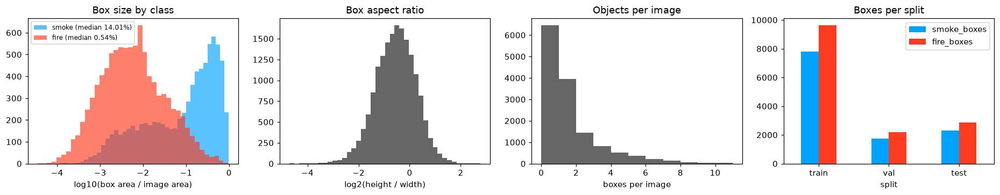

In [4]:
def rel_areas(records):
    return np.array([(b[2] - b[0]) * (b[3] - b[1]) / (r["w"] * r["h"]) for r in records for b in r["boxes"]])


summary = []
for s, recs in SPLITS.items():
    lab = np.concatenate([r["labels"] for r in recs])
    summary.append(dict(split=s, images=len(recs), with_objects=sum(len(r["labels"]) > 0 for r in recs),
                        empty=sum(len(r["labels"]) == 0 for r in recs), boxes=len(lab),
                        smoke_boxes=int((lab == 1).sum()), fire_boxes=int((lab == 2).sum())))
summary = pd.DataFrame(summary).set_index("split")
summary["empty_%"] = (100 * summary["empty"] / summary["images"]).round(1)
display(summary)

names = {s: {r["name"] for r in recs} for s, recs in SPLITS.items()}
print("file-name overlap  train/val: %d | train/test: %d | val/test: %d" % (
    len(names["train"] & names["val"]), len(names["train"] & names["test"]), len(names["val"] & names["test"])))
res = pd.Series([f"{r['w']}x{r['h']}" for r in SPLITS["train"]]).value_counts().head(5)
print("most common train resolutions:", dict(res))

train_rel = rel_areas(SPLITS["train"])
SIZE_EDGES = np.quantile(train_rel, [1 / 3, 2 / 3])       # data-driven small / medium / large split (relative box area)
print("size buckets (box area / image area): small < %.2f%% <= medium < %.2f%% <= large" % (100 * SIZE_EDGES[0], 100 * SIZE_EDGES[1]))

fig, ax = plt.subplots(1, 4, figsize=(17, 3.4))
for k, (c, n) in enumerate(CLASS_NAMES.items()):
    ra = np.array([(b[2] - b[0]) * (b[3] - b[1]) / (r["w"] * r["h"]) for r in SPLITS["train"] for b, l in zip(r["boxes"], r["labels"]) if l == c])
    ax[0].hist(np.log10(ra), bins=40, alpha=.65, color=COLORS[c], label=f"{n} (median {100 * np.median(ra):.2f}%)")
ax[0].set_xlabel("log10(box area / image area)"); ax[0].legend(fontsize=8); ax[0].set_title("Box size by class")
ar = np.array([(b[3] - b[1]) / (b[2] - b[0]) for r in SPLITS["train"] for b in r["boxes"]])
ax[1].hist(np.log2(ar), bins=40, color="#666"); ax[1].set_xlabel("log2(height / width)"); ax[1].set_title("Box aspect ratio")
ax[2].hist([len(r["labels"]) for r in SPLITS["train"]], bins=range(0, 12), color="#666"); ax[2].set_xlabel("boxes per image"); ax[2].set_title("Objects per image")
summary[["smoke_boxes", "fire_boxes"]].plot.bar(ax=ax[3], color=[COLORS[1], COLORS[2]], rot=0); ax[3].set_title("Boxes per split")
plt.tight_layout(); plt.savefig(OUT_DIR / "dataset_statistics.png", bbox_inches="tight"); plt.show()

### 3.3 Visualisation helpers and a visual check of ground truth
Below: random annotated images, and random images with an **empty label file** - these show no fire or smoke, confirming they are valid negatives rather than missing annotations.

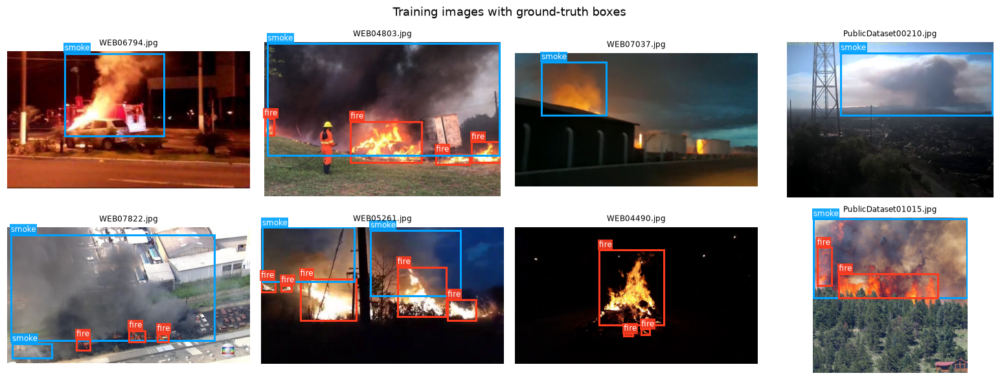

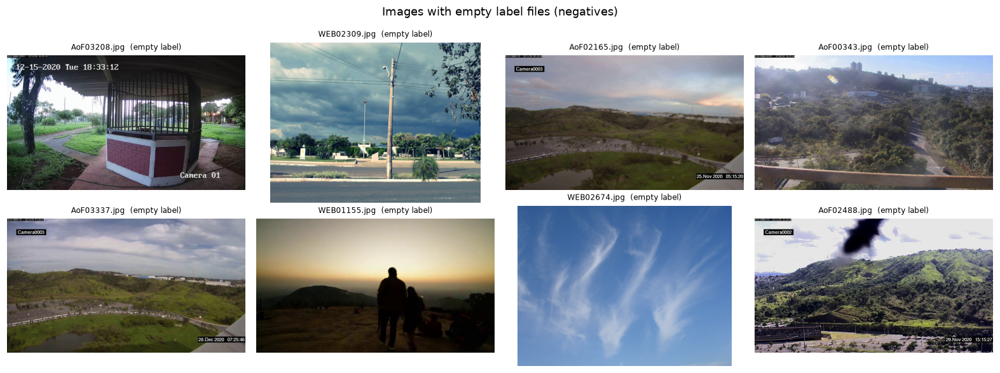

In [5]:
def read_rgb(path):
    return cv2.cvtColor(cv2.imread(str(path)), cv2.COLOR_BGR2RGB)


def draw_boxes(ax, boxes, labels, scores=None, dashed=False, lw=2.0):
    for k, (b, l) in enumerate(zip(boxes, labels)):
        ax.add_patch(patches.Rectangle((b[0], b[1]), b[2] - b[0], b[3] - b[1], fill=False, lw=lw,
                                       ls="--" if dashed else "-", ec="white" if dashed else COLORS[int(l)]))
        if scores is not None:
            ax.text(b[0], max(b[1] - 3, 0), f"{CLASS_NAMES[int(l)]} {scores[k]:.2f}", fontsize=8, color="white", va="bottom",
                    bbox=dict(fc=COLORS[int(l)], ec="none", pad=1.2, alpha=.9))
        elif not dashed:
            ax.text(b[0], max(b[1] - 3, 0), CLASS_NAMES[int(l)], fontsize=8, color="white", va="bottom",
                    bbox=dict(fc=COLORS[int(l)], ec="none", pad=1.2, alpha=.9))


def show_grid(panels, ncols=4, title=None, save=None, size=3.6):
    """panels: list of (image, [(boxes, labels, scores, dashed), ...], title)"""
    nrows = max(1, math.ceil(len(panels) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(size * ncols, size * 0.75 * nrows), squeeze=False)
    for a in axes.ravel():
        a.axis("off")
    for a, (img, layers, ttl) in zip(axes.ravel(), panels):
        a.imshow(img)
        for boxes, labels, scores, dashed in layers:
            draw_boxes(a, boxes, labels, scores, dashed)
        a.set_title(ttl, fontsize=8)
    if title:
        fig.suptitle(title, fontsize=12)
    plt.tight_layout()
    if save:
        plt.savefig(OUT_DIR / save, bbox_inches="tight")
    plt.show()


rng = np.random.RandomState(SEED)
pos_idx = rng.choice([i for i, r in enumerate(SPLITS["train"]) if len(r["labels"])], 8, replace=False)
neg_idx = rng.choice([i for i, r in enumerate(SPLITS["train"]) if not len(r["labels"])], 8, replace=False)
show_grid([(read_rgb(SPLITS["train"][i]["img"]), [(SPLITS["train"][i]["boxes"], SPLITS["train"][i]["labels"], None, False)], SPLITS["train"][i]["name"]) for i in pos_idx],
          title="Training images with ground-truth boxes", save="samples_ground_truth.png")
show_grid([(read_rgb(SPLITS["train"][i]["img"]), [], SPLITS["train"][i]["name"] + "  (empty label)") for i in neg_idx],
          title="Images with empty label files (negatives)", save="samples_negatives.png")

### 3.4 Datasets, preprocessing, augmentation, DataLoaders

- **Preprocessing:** letterbox to the network canvas (aspect ratio preserved, grey padding at the bottom/right), so predicted boxes map back to the original image by a single division by the scale.
- **Augmentation (training only):** horizontal flip, random scale/translate, brightness/contrast, mild hue/saturation, blur and noise. Vertical flips and strong colour shifts are avoided because the fire/smoke appearance is colour dependent.
- **Negatives:** empty images stay in the training set. Each epoch uses all positive images plus a freshly re-sampled fraction (`neg_frac`) of the negatives.

In [6]:
def letterbox(img, boxes, canvas_hw):
    H, W = canvas_hw
    h, w = img.shape[:2]
    s = min(H / h, W / w)
    nh, nw = min(H, int(round(h * s))), min(W, int(round(w * s)))
    img = cv2.resize(img, (nw, nh), interpolation=cv2.INTER_AREA if s < 1 else cv2.INTER_LINEAR)
    out = np.full((H, W, 3), 114, np.uint8)
    out[:nh, :nw] = img
    boxes = boxes * s
    boxes[:, [0, 2]] = boxes[:, [0, 2]].clip(0, nw)
    boxes[:, [1, 3]] = boxes[:, [1, 3]].clip(0, nh)
    return out, boxes, s


def build_augmentation():
    return A.Compose([
        A.HorizontalFlip(p=0.5),
        A.Affine(scale=(0.7, 1.3), translate_percent=(-0.1, 0.1), p=0.5),
        A.RandomBrightnessContrast(brightness_limit=0.25, contrast_limit=0.25, p=0.6),
        A.HueSaturationValue(hue_shift_limit=5, sat_shift_limit=25, val_shift_limit=20, p=0.4),
        A.OneOf([A.GaussianBlur(blur_limit=(3, 5)), A.MotionBlur(blur_limit=5)], p=0.2),
        A.GaussNoise(p=0.15),
    ], bbox_params=A.BboxParams(format="pascal_voc", label_fields=["labels"], min_visibility=0.3, min_area=4.0))


class FireDataset(Dataset):
    def __init__(self, records, canvas_hw, train):
        self.records, self.canvas, self.train = records, canvas_hw, train
        self.aug = build_augmentation() if train else None

    def __len__(self):
        return len(self.records)

    def __getitem__(self, i):
        r = self.records[i]
        img, boxes, scale = letterbox(read_rgb(r["img"]), r["boxes"].copy(), self.canvas)
        labels = r["labels"].copy()
        if self.train:
            out = self.aug(image=img, bboxes=boxes.tolist(), labels=labels.tolist())
            img = out["image"]
            boxes = np.array(out["bboxes"], np.float32).reshape(-1, 4)
            labels = np.array(out["labels"], np.int64)
        tensor = torch.from_numpy(np.ascontiguousarray(img)).permute(2, 0, 1).float().div_(255)
        target = dict(boxes=torch.from_numpy(boxes).float(), labels=torch.from_numpy(labels).long())
        return tensor, target, dict(index=i, scale=scale, size=(r["w"], r["h"]))


def collate(batch):
    return tuple(zip(*batch))


class EpochSampler(Sampler):
    """All positive images + a re-sampled fraction of the negative images every epoch."""

    def __init__(self, pos, neg, neg_frac, seed):
        self.pos, self.neg, self.neg_frac, self.seed, self.epoch = np.array(pos), np.array(neg), neg_frac, seed, 0

    def set_epoch(self, epoch):
        self.epoch = epoch

    def __len__(self):
        return len(self.pos) + int(round(len(self.neg) * self.neg_frac))

    def __iter__(self):
        rng = np.random.RandomState(self.seed + self.epoch)
        neg = rng.permutation(self.neg)[: int(round(len(self.neg) * self.neg_frac))] if len(self.neg) else self.neg
        idx = np.concatenate([self.pos, neg]).astype(int)
        rng.shuffle(idx)
        return iter(idx.tolist())


def make_eval_loader(records, canvas_hw):
    return DataLoader(FireDataset(records, canvas_hw, train=False), batch_size=EVAL_BATCH_SIZE, shuffle=False,
                      num_workers=NUM_WORKERS, collate_fn=collate, pin_memory=USE_AMP)


def subset(records, n, seed=SEED):
    if n is None or n >= len(records):
        return records
    idx = np.random.RandomState(seed).choice(len(records), n, replace=False)
    return [records[i] for i in sorted(idx)]


TRAIN_RECS = subset(SPLITS["train"], RUN["train_limit"])
VAL_RECS = subset(SPLITS["val"], RUN["val_limit"])
TEST_RECS = subset(SPLITS["test"], RUN["test_limit"])
print(f"train {len(TRAIN_RECS)} | val {len(VAL_RECS)} | test {len(TEST_RECS)} images")

train 14122 | val 3099 | test 4306 images


## 4. Model

### 4.1 Anchor configuration from the data
Faster R-CNN is anchor based, so anchors should match the box distribution. Anchor sizes are `k x stride` at each pyramid level (several sizes and aspect ratios per location). Candidate settings are scored by how well the best anchor overlaps every training box (IoU of centred boxes). The setting with the best mean IoU under a budget of 6 anchors per location is used.

In [7]:
def anchor_shapes(ks, ratios, strides):
    return np.array([(k * s / math.sqrt(r), k * s * math.sqrt(r)) for s in strides for k in ks for r in ratios])


def anchor_score(gt_wh, ks, ratios, strides):
    a = anchor_shapes(ks, ratios, strides)
    inter = np.minimum(gt_wh[:, None, 0], a[None, :, 0]) * np.minimum(gt_wh[:, None, 1], a[None, :, 1])
    iou = (inter / (gt_wh[:, None, 0] * gt_wh[:, None, 1] + a[None, :, 0] * a[None, :, 1] - inter)).max(1)
    return iou.mean(), (iou >= 0.5).mean(), (iou >= 0.7).mean()


_H, _W = BASE_CFG["canvas"]
gt_wh = np.array([[(b[2] - b[0]) * min(_H / r["h"], _W / r["w"]), (b[3] - b[1]) * min(_H / r["h"], _W / r["w"])]
                  for r in SPLITS["train"] for b in r["boxes"]])
LEVELS = list(BASE_CFG["strides"]) + [BASE_CFG["strides"][-1] * 2]
rows = []
for ks in [(4,), (2, 4), (3, 5), (4, 6), (2, 4, 6), (2, 3, 5)]:
    for ratios in [(0.5, 1.0, 2.0), (0.33, 0.5, 1.0, 2.0), (0.25, 0.5, 1.0, 2.0, 4.0)]:
        m, r5, r7 = anchor_score(gt_wh, ks, ratios, LEVELS)
        rows.append(dict(sizes_x_stride=ks, aspect_ratios=ratios, anchors_per_location=len(ks) * len(ratios),
                         mean_best_IoU=round(m, 3), box_recall_IoU50=round(r5, 3), box_recall_IoU70=round(r7, 3)))
anchor_df = pd.DataFrame(rows)
best_row = anchor_df[anchor_df.anchors_per_location <= 6].sort_values("mean_best_IoU", ascending=False).iloc[0]
BASE_CFG["anchor_k"], BASE_CFG["anchor_ratios"] = tuple(best_row.sizes_x_stride), tuple(best_row.aspect_ratios)
print(anchor_df[anchor_df.anchors_per_location <= 6].sort_values("mean_best_IoU", ascending=False).head(5).to_string(index=False))
print("selected anchors -> sizes x stride:", BASE_CFG["anchor_k"], "| aspect ratios (h/w):", BASE_CFG["anchor_ratios"])

sizes_x_stride              aspect_ratios  anchors_per_location  mean_best_IoU  box_recall_IoU50  box_recall_IoU70
        (4, 6)            (0.5, 1.0, 2.0)                     6          0.741             0.922             0.760
        (3, 5)            (0.5, 1.0, 2.0)                     6          0.734             0.947             0.655
        (2, 4)            (0.5, 1.0, 2.0)                     6          0.665             0.921             0.429
          (4,) (0.25, 0.5, 1.0, 2.0, 4.0)                     5          0.662             0.900             0.452
          (4,)      (0.33, 0.5, 1.0, 2.0)                     4          0.661             0.896             0.441
selected anchors -> sizes x stride: (4, 6) | aspect ratios (h/w): (0.5, 1.0, 2.0)


### 4.2 ViT backbone + Simple Feature Pyramid + Faster R-CNN
A plain ViT only produces one stride-16 feature map. Following ViTDet, the pyramid is created from that single map with (de)convolutions / pooling (strides 4, 8, 16, 32) plus one extra pooled level for the RPN. Global self-attention is kept in every block (the token count is small at this resolution). Layer-wise learning-rate decay, drop-path and EMA weights are used for stable fine-tuning of the pretrained transformer.

In [8]:
class LayerNorm2d(nn.Module):
    def __init__(self, c, eps=1e-6):
        super().__init__()
        self.weight, self.bias, self.eps, self.c = nn.Parameter(torch.ones(c)), nn.Parameter(torch.zeros(c)), eps, c

    def forward(self, x):
        return F.layer_norm(x.permute(0, 2, 3, 1), (self.c,), self.weight, self.bias, self.eps).permute(0, 3, 1, 2)


class SimpleFeaturePyramid(nn.Module):
    def __init__(self, in_dim, out_dim, strides, patch):
        super().__init__()
        self.levels = nn.ModuleList()
        for s in strides:
            f = patch / s
            if f == 4:
                layers, d = [nn.ConvTranspose2d(in_dim, in_dim // 2, 2, 2), LayerNorm2d(in_dim // 2), nn.GELU(),
                             nn.ConvTranspose2d(in_dim // 2, in_dim // 4, 2, 2)], in_dim // 4
            elif f == 2:
                layers, d = [nn.ConvTranspose2d(in_dim, in_dim // 2, 2, 2)], in_dim // 2
            elif f == 1:
                layers, d = [], in_dim
            elif f == 0.5:
                layers, d = [nn.MaxPool2d(2, 2)], in_dim
            else:
                raise ValueError(f"unsupported stride {s} for patch size {patch}")
            layers += [nn.Conv2d(d, out_dim, 1, bias=False), LayerNorm2d(out_dim),
                       nn.Conv2d(out_dim, out_dim, 3, padding=1, bias=False), LayerNorm2d(out_dim)]
            self.levels.append(nn.Sequential(*layers))

    def forward(self, x):
        out = OrderedDict((str(i), lvl(x)) for i, lvl in enumerate(self.levels))
        out["pool"] = F.max_pool2d(list(out.values())[-1], 1, 2, 0)
        return out


class ViTDetBackbone(nn.Module):
    def __init__(self, vit_name, strides, pretrained=True, drop_path=0.1, out_channels=256):
        super().__init__()
        self.vit = timm.create_model(vit_name, pretrained=pretrained, num_classes=0, global_pool="",
                                     dynamic_img_size=True, drop_path_rate=drop_path)
        cfg = self.vit.pretrained_cfg
        self.mean, self.std = list(cfg.get("mean", (0.5,) * 3)), list(cfg.get("std", (0.5,) * 3))
        self.patch = self.vit.patch_embed.patch_size[0]
        self.neck = SimpleFeaturePyramid(self.vit.embed_dim, out_channels, strides, self.patch)
        self.out_channels = out_channels

    def forward(self, x):
        B, _, H, W = x.shape
        # Mixed precision only for the transformer + pyramid; RPN, RoI head and losses stay in fp32 (exact box coordinates).
        with torch.autocast(x.device.type, dtype=torch.float16, enabled=USE_AMP and x.is_cuda):
            tokens = self.vit.forward_features(x)[:, self.vit.num_prefix_tokens:]
            feats = self.neck(tokens.transpose(1, 2).reshape(B, -1, H // self.patch, W // self.patch))
        return OrderedDict((k, v.float()) for k, v in feats.items())


def build_detector(cfg, pretrained=True):
    backbone = ViTDetBackbone(cfg["vit"], cfg["strides"], pretrained, cfg["drop_path"])
    levels = list(cfg["strides"]) + [cfg["strides"][-1] * 2]
    sizes = tuple(tuple(int(round(k * s)) for k in cfg["anchor_k"]) for s in levels)
    anchors = AnchorGenerator(sizes, (tuple(cfg["anchor_ratios"]),) * len(levels))
    roi_pool = MultiScaleRoIAlign([str(i) for i in range(len(cfg["strides"]))], output_size=7, sampling_ratio=2)
    H, W = cfg["canvas"]
    return FasterRCNN(
        backbone, num_classes=3, min_size=H, max_size=W, image_mean=backbone.mean, image_std=backbone.std,
        rpn_anchor_generator=anchors, box_roi_pool=roi_pool,
        rpn_pre_nms_top_n_train=1000, rpn_post_nms_top_n_train=1000, rpn_pre_nms_top_n_test=1000, rpn_post_nms_top_n_test=500,
        box_score_thresh=0.001, box_nms_thresh=0.5, box_detections_per_img=100, box_batch_size_per_image=256)


def count_params(m):
    return sum(p.numel() for p in m.parameters()) / 1e6


_m = build_detector(BASE_CFG, pretrained=False)
print(f"baseline detector: {count_params(_m):.1f}M parameters (backbone ViT {count_params(_m.backbone.vit):.1f}M)")
del _m

baseline detector: 39.5M parameters (backbone ViT 21.7M)


## 5. Training and validation machinery
- **Optimiser:** AdamW, weight decay 0.05 (not applied to norms/biases/position embeddings), **layer-wise LR decay** (earlier ViT blocks change more slowly than the neck/heads), gradient clipping.
- **Schedule:** linear warm-up then cosine decay, stepped every iteration.
- **Mixed precision:** fp16 autocast for the ViT + pyramid (the expensive part) with GradScaler; RPN / RoI head / losses run in fp32 (T4 has no bf16).
- **EMA weights** are the ones validated and saved.
- **Model selection:** best validation mAP@0.50, with early stopping.

In [9]:
class ModelEMA:
    def __init__(self, model, decay):
        self.ema, self.decay, self.updates = copy.deepcopy(model).eval(), decay, 0
        for p in self.ema.parameters():
            p.requires_grad_(False)

    @torch.no_grad()
    def update(self, model):
        self.updates += 1
        d = self.decay * (1 - math.exp(-self.updates / 1000))
        for e, m in zip(self.ema.state_dict().values(), model.state_dict().values()):
            if e.dtype.is_floating_point:
                e.mul_(d).add_(m.detach(), alpha=1 - d)
            else:
                e.copy_(m)


def build_param_groups(model, lr, weight_decay, layer_decay):
    n_blocks = len(model.backbone.vit.blocks)
    groups = {}
    for name, p in model.named_parameters():
        layer = n_blocks + 1
        if name.startswith("backbone.vit."):
            sub = name[len("backbone.vit."):]
            if sub.startswith("blocks."):
                layer = int(sub.split(".")[1]) + 1
            elif sub.startswith(("cls_token", "pos_embed", "patch_embed", "reg_token")):
                layer = 0
        no_decay = p.ndim <= 1 or name.endswith(("cls_token", "pos_embed"))
        g = groups.setdefault((layer, no_decay), dict(params=[], lr=lr * layer_decay ** (n_blocks + 1 - layer),
                                                      weight_decay=0.0 if no_decay else weight_decay))
        g["params"].append(p)
    return list(groups.values())


def apply_freezing(model, n_blocks):
    if not n_blocks:
        return
    vit = model.backbone.vit
    for mod in [vit.patch_embed, *vit.blocks[:n_blocks]]:
        for p in mod.parameters():
            p.requires_grad_(False)
    for name in ("cls_token", "pos_embed"):
        if getattr(vit, name, None) is not None:
            getattr(vit, name).requires_grad_(False)


def cosine_with_warmup(warmup, total, floor=0.01):
    def f(step):
        if step < warmup:
            return (step + 1) / warmup
        t = min(1.0, (step - warmup) / max(1, total - warmup))
        return floor + (1 - floor) * 0.5 * (1 + math.cos(math.pi * t))
    return f


def train_one_epoch(model, ema, loader, opt, sched, scaler, epoch, epochs):
    model.train()
    sums, n = defaultdict(float), 0
    bar = tqdm(loader, desc=f"epoch {epoch + 1}/{epochs}", leave=False)
    for imgs, targets, _ in bar:
        imgs = [i.to(DEVICE, non_blocking=True) for i in imgs]
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
        losses = model(imgs, targets)
        loss = sum(losses.values())
        if not torch.isfinite(loss):
            opt.zero_grad(set_to_none=True); continue
        opt.zero_grad(set_to_none=True)
        scaler.scale(loss).backward()
        scaler.unscale_(opt)
        nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        scaler.step(opt); scaler.update(); sched.step(); ema.update(model)
        for k, v in losses.items():
            sums[k] += v.item()
        n += 1
        bar.set_postfix(loss=f"{sum(sums.values()) / n:.3f}")
    return {k: v / max(n, 1) for k, v in sums.items()}


@torch.no_grad()
def predict(model, loader):
    """Returns {record index: (boxes xyxy in original pixels, scores, labels)}."""
    model.eval()
    out = {}
    for imgs, _, metas in tqdm(loader, desc="predict", leave=False):
        dets = model([i.to(DEVICE, non_blocking=True) for i in imgs])
        for d, m in zip(dets, metas):
            b = d["boxes"].float().cpu().numpy() / m["scale"]
            b[:, [0, 2]] = b[:, [0, 2]].clip(0, m["size"][0])
            b[:, [1, 3]] = b[:, [1, 3]].clip(0, m["size"][1])
            out[m["index"]] = (b, d["scores"].float().cpu().numpy(), d["labels"].cpu().numpy())
    return out

### Detection metrics
`coco_metrics` gives AP@0.50, mAP@0.50 and mAP@0.50:0.95 (pycocotools). `prf_curves` matches detections to ground truth greedily by confidence at IoU 0.5 (each ground-truth box can be matched once, class must agree) and derives precision / recall / F1 as a function of the confidence threshold.

In [10]:
def coco_metrics(records, preds):
    images = [dict(id=i, width=r["w"], height=r["h"]) for i, r in enumerate(records)]
    anns, aid = [], 1
    for i, r in enumerate(records):
        for b, l in zip(r["boxes"], r["labels"]):
            w, h = float(b[2] - b[0]), float(b[3] - b[1])
            anns.append(dict(id=aid, image_id=i, category_id=int(l), bbox=[float(b[0]), float(b[1]), w, h], area=w * h, iscrowd=0)); aid += 1
    dets = [dict(image_id=i, category_id=int(l), bbox=[float(b[0]), float(b[1]), float(b[2] - b[0]), float(b[3] - b[1])], score=float(s))
            for i, (bb, ss, ll) in preds.items() for b, s, l in zip(bb, ss, ll)]
    zero = dict(mAP50=0.0, mAP50_95=0.0, AP50={n: 0.0 for n in CLASS_NAMES.values()}, AP50_95={n: 0.0 for n in CLASS_NAMES.values()})
    if not dets:
        return zero
    gt = COCO()
    gt.dataset = dict(images=images, annotations=anns, categories=[dict(id=c, name=n) for c, n in CLASS_NAMES.items()])
    with contextlib.redirect_stdout(io.StringIO()):
        gt.createIndex()
        ev = COCOeval(gt, gt.loadRes(dets), "bbox")
        ev.evaluate(); ev.accumulate()
    prec = ev.eval["precision"]                       # [IoU, recall, class, area, maxDets]

    def mean_valid(x):
        x = x[x > -1]
        return float(x.mean()) if x.size else 0.0
    ap50 = {n: mean_valid(prec[0, :, k, 0, 2]) for k, n in enumerate(CLASS_NAMES.values())}
    ap5095 = {n: mean_valid(prec[:, :, k, 0, 2]) for k, n in enumerate(CLASS_NAMES.values())}
    return dict(mAP50=float(np.mean(list(ap50.values()))), mAP50_95=float(np.mean(list(ap5095.values()))), AP50=ap50, AP50_95=ap5095)


def match_image(gt_boxes, gt_labels, boxes, scores, labels, iou_thr=0.5):
    """Greedy COCO-style matching (highest score first, same class, best unmatched IoU >= thr)."""
    order = np.argsort(-scores)
    boxes, scores, labels = boxes[order], scores[order], labels[order]
    nd, ng = len(boxes), len(gt_boxes)
    iou = box_iou(torch.from_numpy(boxes).float(), torch.from_numpy(gt_boxes).float()).numpy() if nd and ng else np.zeros((nd, ng))
    used, tp = np.zeros(ng, bool), np.zeros(nd, bool)
    for d in range(nd):
        cand = np.where((gt_labels == labels[d]) & ~used & (iou[d] >= iou_thr))[0]
        if len(cand):
            g = cand[np.argmax(iou[d, cand])]
            used[g], tp[d] = True, True
    return dict(boxes=boxes, scores=scores, labels=labels, iou=iou, tp=tp, gt_used=used)


THRESHOLDS = np.linspace(0.05, 0.95, 91)


def prf_curves(records, preds, iou_thr=0.5, floor=0.05):
    per = {c: dict(scores=[], tp=[], n_gt=0) for c in CLASS_NAMES}
    for i, r in enumerate(records):
        b, s, l = preds[i]
        keep = s >= floor
        m = match_image(r["boxes"], r["labels"], b[keep], s[keep], l[keep], iou_thr)
        for c in CLASS_NAMES:
            sel = m["labels"] == c
            per[c]["scores"].append(m["scores"][sel]); per[c]["tp"].append(m["tp"][sel]); per[c]["n_gt"] += int((r["labels"] == c).sum())
    curves = {}
    for c, d in per.items():
        sc, tp = np.concatenate(d["scores"]), np.concatenate(d["tp"])
        P, R = [], []
        for t in THRESHOLDS:
            k = sc >= t
            n_tp, n_fp = int((tp & k).sum()), int((~tp & k).sum())
            P.append(n_tp / (n_tp + n_fp) if n_tp + n_fp else 1.0); R.append(n_tp / max(d["n_gt"], 1))
        P, R = np.array(P), np.array(R)
        curves[CLASS_NAMES[c]] = dict(P=P, R=R, F1=2 * P * R / np.maximum(P + R, 1e-9))
    return curves


def best_threshold(curves):
    mean_f1 = np.mean([c["F1"] for c in curves.values()], axis=0)
    return float(THRESHOLDS[int(np.argmax(mean_f1))])


def prf_at(curves, thr):
    k = int(np.argmin(np.abs(THRESHOLDS - thr)))
    out = {n: dict(P=c["P"][k], R=c["R"][k], F1=c["F1"][k]) for n, c in curves.items()}
    out["overall"] = {m: float(np.mean([out[n][m] for n in CLASS_NAMES.values()])) for m in ("P", "R", "F1")}
    return out


def evaluate(model, records, canvas_hw, nms_thr=None):
    if nms_thr is not None:
        model.roi_heads.nms_thresh = nms_thr
    preds = predict(model, make_eval_loader(records, canvas_hw))
    return preds, coco_metrics(records, preds)

### Training loop

In [11]:
def run_training(cfg, train_recs, val_recs, epochs, tag, patience=None, save_best=None, resume=False, max_hours=None):
    seed_everything(SEED)
    pos = [i for i, r in enumerate(train_recs) if len(r["labels"])]
    neg = [i for i, r in enumerate(train_recs) if not len(r["labels"])]
    sampler = EpochSampler(pos, neg, cfg["neg_frac"], SEED)
    loader = DataLoader(FireDataset(train_recs, cfg["canvas"], train=True), batch_size=BATCH_SIZE, sampler=sampler,
                        num_workers=NUM_WORKERS, collate_fn=collate, drop_last=True, pin_memory=USE_AMP,
                        persistent_workers=NUM_WORKERS > 0)
    model = build_detector(cfg).to(DEVICE)
    apply_freezing(model, cfg["freeze_blocks"])
    ema = ModelEMA(model, cfg["ema_decay"])
    opt = torch.optim.AdamW(build_param_groups(model, cfg["lr"], cfg["weight_decay"], cfg["layer_decay"]), betas=(0.9, 0.999))
    total = epochs * (len(sampler) // BATCH_SIZE)
    sched = torch.optim.lr_scheduler.LambdaLR(opt, cosine_with_warmup(min(cfg["warmup_iters"], total // 10), total))
    scaler = torch.amp.GradScaler("cuda", enabled=USE_AMP)
    history, best, bad, start = [], -1.0, 0, 0
    s = torch.load(LAST_PATH, map_location=DEVICE, weights_only=False) if resume and LAST_PATH.exists() else None
    if s is not None and s["cfg"] == cfg and s["epochs"] == epochs:
        model.load_state_dict(s["model"]); ema.ema.load_state_dict(s["ema"]); ema.updates = s["ema_updates"]
        opt.load_state_dict(s["opt"]); sched.load_state_dict(s["sched"]); scaler.load_state_dict(s["scaler"])
        history, best, bad, start = s["history"], s["best"], s["bad"], s["epoch"] + 1
        print(f"[{tag}] resumed from epoch {start}")
    t0 = time.time()
    for epoch in range(start, epochs):
        sampler.set_epoch(epoch)
        te = time.time()
        losses = train_one_epoch(model, ema, loader, opt, sched, scaler, epoch, epochs)
        _, m = evaluate(ema.ema, val_recs, cfg["canvas"])
        row = dict(epoch=epoch + 1, train_loss=sum(losses.values()), **{f"loss_{k.replace('loss_', '')}": v for k, v in losses.items()},
                   val_mAP50=100 * m["mAP50"], val_mAP50_95=100 * m["mAP50_95"],
                   val_AP50_smoke=100 * m["AP50"]["smoke"], val_AP50_fire=100 * m["AP50"]["fire"], epoch_min=(time.time() - te) / 60)
        history.append(row)
        improved = m["mAP50"] > best
        if improved:
            best, bad = m["mAP50"], 0
            if save_best:
                torch.save(dict(model=ema.ema.state_dict(), cfg=cfg, epoch=epoch + 1, val_mAP50=100 * best), save_best)
        else:
            bad += 1
        print(f"[{tag}] epoch {epoch + 1:2d}/{epochs} | loss {row['train_loss']:.3f} | val mAP50 {row['val_mAP50']:.2f} | "
              f"mAP50-95 {row['val_mAP50_95']:.2f} | smoke {row['val_AP50_smoke']:.1f} fire {row['val_AP50_fire']:.1f} | "
              f"{row['epoch_min']:.1f} min {'*' if improved else ''}")
        if resume:
            torch.save(dict(model=model.state_dict(), ema=ema.ema.state_dict(), ema_updates=ema.updates, opt=opt.state_dict(),
                            sched=sched.state_dict(), scaler=scaler.state_dict(), history=history, best=best, bad=bad, epoch=epoch, cfg=cfg, epochs=epochs), LAST_PATH)
        if patience and bad >= patience:
            print(f"[{tag}] early stopping (no improvement for {patience} epochs)"); break
        if max_hours and (time.time() - t0) / 3600 > max_hours:
            print(f"[{tag}] time budget reached, stopping"); break
    hist = pd.DataFrame(history)
    best_epoch = int(hist.val_mAP50.idxmax()) if len(hist) else 0
    result = dict(tag=tag, best_val_mAP50=100 * best, best_val_mAP50_95=float(hist.val_mAP50_95.iloc[best_epoch]),
                  minutes=(time.time() - t0) / 60, history=hist)
    del model, ema, opt, loader
    gc.collect()
    if USE_AMP:
        torch.cuda.empty_cache()
    return result

## 6. Model selection
### Stage A - architecture, resolution and fine-tuning strategy
Each candidate is trained for a few epochs on the same class-balanced-by-sampling subset and scored on the same validation subset. This is a *relative* comparison (short runs), used only to choose the configuration for the full training.
- **ViT-S vs ViT-B:** capacity vs speed/memory on a T4.
- **832x480 vs 640x384:** fire boxes are small, so input resolution may matter.
- **Stride-4 pyramid level:** finer features for small fire regions, at extra cost.
- **Frozen early blocks:** cheaper and less prone to overfitting, but less adaptable.

In [12]:
SEL_TRAIN = subset(TRAIN_RECS, RUN["sel_train"], seed=1)
SEL_VAL = subset(VAL_RECS, RUN["sel_val"], seed=2)
print(f"selection subsets: {len(SEL_TRAIN)} train / {len(SEL_VAL)} val images, {RUN['sel_epochs']} epochs each")

stage_a = []
for name, override in ARCH_CANDIDATES.items():
    r = run_training({**BASE_CFG, **override}, SEL_TRAIN, SEL_VAL, RUN["sel_epochs"], tag=name)
    stage_a.append(dict(config=name, val_mAP50=r["best_val_mAP50"], val_mAP50_95=r["best_val_mAP50_95"], minutes=r["minutes"]))
stage_a = pd.DataFrame(stage_a).sort_values("val_mAP50", ascending=False).reset_index(drop=True)
print(); print(stage_a.round(2).to_string(index=False))
BEST_ARCH = stage_a.config.iloc[0]
print("\nselected architecture:", BEST_ARCH)

selection subsets: 2000 train / 500 val images, 3 epochs each


epoch 1/3:   0%|          | 0/192 [00:00<?, ?it/s]

epoch 1/3:   0%|          | 0/192 [01:24<?, ?it/s, loss=1.739]

epoch 1/3:   1%|          | 1/192 [01:24<4:27:58, 84.18s/it, loss=1.739]

epoch 1/3:   1%|          | 1/192 [01:24<4:27:58, 84.18s/it, loss=1.731]

epoch 1/3:   1%|          | 2/192 [01:24<1:50:47, 34.99s/it, loss=1.731]

epoch 1/3:   1%|          | 2/192 [01:25<1:50:47, 34.99s/it, loss=1.723]

epoch 1/3:   2%|▏         | 3/192 [01:25<1:00:37, 19.25s/it, loss=1.723]

epoch 1/3:   2%|▏         | 3/192 [01:25<1:00:37, 19.25s/it, loss=1.712]

epoch 1/3:   2%|▏         | 4/192 [01:25<37:08, 11.86s/it, loss=1.712]  

epoch 1/3:   2%|▏         | 4/192 [01:26<37:08, 11.86s/it, loss=1.697]

epoch 1/3:   3%|▎         | 5/192 [01:26<24:13,  7.77s/it, loss=1.697]

epoch 1/3:   3%|▎         | 5/192 [01:26<24:13,  7.77s/it, loss=1.683]

epoch 1/3:   3%|▎         | 6/192 [01:26<16:28,  5.31s/it, loss=1.683]

epoch 1/3:   3%|▎         | 6/192 [01:27<16:28,  5.31s/it, loss=1.663]

epoch 1/3:   4%|▎         | 7/192 [01:27<11:33,  3.75s/it, loss=1.663]

epoch 1/3:   4%|▎         | 7/192 [01:27<11:33,  3.75s/it, loss=1.636]

epoch 1/3:   4%|▍         | 8/192 [01:27<08:21,  2.72s/it, loss=1.636]

epoch 1/3:   4%|▍         | 8/192 [01:28<08:21,  2.72s/it, loss=1.606]

epoch 1/3:   5%|▍         | 9/192 [01:28<06:11,  2.03s/it, loss=1.606]

epoch 1/3:   5%|▍         | 9/192 [01:28<06:11,  2.03s/it, loss=1.572]

epoch 1/3:   5%|▌         | 10/192 [01:28<04:44,  1.56s/it, loss=1.572]

epoch 1/3:   5%|▌         | 10/192 [01:29<04:44,  1.56s/it, loss=1.534]

epoch 1/3:   6%|▌         | 11/192 [01:29<03:44,  1.24s/it, loss=1.534]

epoch 1/3:   6%|▌         | 11/192 [01:29<03:44,  1.24s/it, loss=1.494]

epoch 1/3:   6%|▋         | 12/192 [01:29<03:03,  1.02s/it, loss=1.494]

epoch 1/3:   6%|▋         | 12/192 [01:30<03:03,  1.02s/it, loss=1.451]

epoch 1/3:   7%|▋         | 13/192 [01:30<02:35,  1.15it/s, loss=1.451]

epoch 1/3:   7%|▋         | 13/192 [01:30<02:35,  1.15it/s, loss=1.408]

epoch 1/3:   7%|▋         | 14/192 [01:30<02:15,  1.31it/s, loss=1.408]

epoch 1/3:   7%|▋         | 14/192 [01:31<02:15,  1.31it/s, loss=1.369]

epoch 1/3:   8%|▊         | 15/192 [01:31<02:01,  1.45it/s, loss=1.369]

epoch 1/3:   8%|▊         | 15/192 [01:32<02:01,  1.45it/s, loss=1.327]

epoch 1/3:   8%|▊         | 16/192 [01:32<01:52,  1.57it/s, loss=1.327]

epoch 1/3:   8%|▊         | 16/192 [01:32<01:52,  1.57it/s, loss=1.293]

epoch 1/3:   9%|▉         | 17/192 [01:32<01:44,  1.67it/s, loss=1.293]

epoch 1/3:   9%|▉         | 17/192 [01:33<01:44,  1.67it/s, loss=1.259]

epoch 1/3:   9%|▉         | 18/192 [01:33<01:39,  1.75it/s, loss=1.259]

epoch 1/3:   9%|▉         | 18/192 [01:33<01:39,  1.75it/s, loss=1.230]

epoch 1/3:  10%|▉         | 19/192 [01:33<01:36,  1.80it/s, loss=1.230]

epoch 1/3:  10%|▉         | 19/192 [01:34<01:36,  1.80it/s, loss=1.211]

epoch 1/3:  10%|█         | 20/192 [01:34<01:32,  1.87it/s, loss=1.211]

epoch 1/3:  10%|█         | 20/192 [01:34<01:32,  1.87it/s, loss=1.188]

epoch 1/3:  11%|█         | 21/192 [01:34<01:29,  1.91it/s, loss=1.188]

epoch 1/3:  11%|█         | 21/192 [01:35<01:29,  1.91it/s, loss=1.163]

epoch 1/3:  11%|█▏        | 22/192 [01:35<01:29,  1.91it/s, loss=1.163]

epoch 1/3:  11%|█▏        | 22/192 [01:35<01:29,  1.91it/s, loss=1.142]

epoch 1/3:  12%|█▏        | 23/192 [01:35<01:28,  1.91it/s, loss=1.142]

epoch 1/3:  12%|█▏        | 23/192 [01:36<01:28,  1.91it/s, loss=1.123]

epoch 1/3:  12%|█▎        | 24/192 [01:36<01:26,  1.94it/s, loss=1.123]

epoch 1/3:  12%|█▎        | 24/192 [01:36<01:26,  1.94it/s, loss=1.106]

epoch 1/3:  13%|█▎        | 25/192 [01:36<01:25,  1.94it/s, loss=1.106]

epoch 1/3:  13%|█▎        | 25/192 [01:37<01:25,  1.94it/s, loss=1.089]

epoch 1/3:  14%|█▎        | 26/192 [01:37<01:24,  1.96it/s, loss=1.089]

epoch 1/3:  14%|█▎        | 26/192 [01:37<01:24,  1.96it/s, loss=1.074]

epoch 1/3:  14%|█▍        | 27/192 [01:37<01:24,  1.96it/s, loss=1.074]

epoch 1/3:  14%|█▍        | 27/192 [01:38<01:24,  1.96it/s, loss=1.060]

epoch 1/3:  15%|█▍        | 28/192 [01:38<01:24,  1.94it/s, loss=1.060]

epoch 1/3:  15%|█▍        | 28/192 [01:38<01:24,  1.94it/s, loss=1.041]

epoch 1/3:  15%|█▌        | 29/192 [01:38<01:23,  1.95it/s, loss=1.041]

epoch 1/3:  15%|█▌        | 29/192 [01:39<01:23,  1.95it/s, loss=1.033]

epoch 1/3:  16%|█▌        | 30/192 [01:39<01:23,  1.93it/s, loss=1.033]

epoch 1/3:  16%|█▌        | 30/192 [01:39<01:23,  1.93it/s, loss=1.018]

epoch 1/3:  16%|█▌        | 31/192 [01:39<01:23,  1.93it/s, loss=1.018]

epoch 1/3:  16%|█▌        | 31/192 [01:40<01:23,  1.93it/s, loss=1.004]

epoch 1/3:  17%|█▋        | 32/192 [01:40<01:23,  1.92it/s, loss=1.004]

epoch 1/3:  17%|█▋        | 32/192 [01:40<01:23,  1.92it/s, loss=0.989]

epoch 1/3:  17%|█▋        | 33/192 [01:40<01:22,  1.94it/s, loss=0.989]

epoch 1/3:  17%|█▋        | 33/192 [01:41<01:22,  1.94it/s, loss=0.974]

epoch 1/3:  18%|█▊        | 34/192 [01:41<01:21,  1.93it/s, loss=0.974]

epoch 1/3:  18%|█▊        | 34/192 [01:41<01:21,  1.93it/s, loss=0.961]

epoch 1/3:  18%|█▊        | 35/192 [01:41<01:20,  1.94it/s, loss=0.961]

epoch 1/3:  18%|█▊        | 35/192 [01:42<01:20,  1.94it/s, loss=0.946]

epoch 1/3:  19%|█▉        | 36/192 [01:42<01:20,  1.95it/s, loss=0.946]

epoch 1/3:  19%|█▉        | 36/192 [01:42<01:20,  1.95it/s, loss=0.930]

epoch 1/3:  19%|█▉        | 37/192 [01:42<01:20,  1.94it/s, loss=0.930]

epoch 1/3:  19%|█▉        | 37/192 [01:43<01:20,  1.94it/s, loss=0.914]

epoch 1/3:  20%|█▉        | 38/192 [01:43<01:18,  1.95it/s, loss=0.914]

epoch 1/3:  20%|█▉        | 38/192 [01:43<01:18,  1.95it/s, loss=0.900]

epoch 1/3:  20%|██        | 39/192 [01:43<01:18,  1.94it/s, loss=0.900]

epoch 1/3:  20%|██        | 39/192 [01:44<01:18,  1.94it/s, loss=0.896]

epoch 1/3:  21%|██        | 40/192 [01:44<01:18,  1.93it/s, loss=0.896]

epoch 1/3:  21%|██        | 40/192 [01:44<01:18,  1.93it/s, loss=0.885]

epoch 1/3:  21%|██▏       | 41/192 [01:44<01:16,  1.97it/s, loss=0.885]

epoch 1/3:  21%|██▏       | 41/192 [01:45<01:16,  1.97it/s, loss=0.873]

epoch 1/3:  22%|██▏       | 42/192 [01:45<01:16,  1.96it/s, loss=0.873]

epoch 1/3:  22%|██▏       | 42/192 [01:45<01:16,  1.96it/s, loss=0.859]

epoch 1/3:  22%|██▏       | 43/192 [01:45<01:16,  1.94it/s, loss=0.859]

epoch 1/3:  22%|██▏       | 43/192 [01:46<01:16,  1.94it/s, loss=0.849]

epoch 1/3:  23%|██▎       | 44/192 [01:46<01:15,  1.95it/s, loss=0.849]

epoch 1/3:  23%|██▎       | 44/192 [01:46<01:15,  1.95it/s, loss=0.839]

epoch 1/3:  23%|██▎       | 45/192 [01:46<01:15,  1.95it/s, loss=0.839]

epoch 1/3:  23%|██▎       | 45/192 [01:47<01:15,  1.95it/s, loss=0.830]

epoch 1/3:  24%|██▍       | 46/192 [01:47<01:15,  1.94it/s, loss=0.830]

epoch 1/3:  24%|██▍       | 46/192 [01:47<01:15,  1.94it/s, loss=0.819]

epoch 1/3:  24%|██▍       | 47/192 [01:47<01:14,  1.96it/s, loss=0.819]

epoch 1/3:  24%|██▍       | 47/192 [01:48<01:14,  1.96it/s, loss=0.807]

epoch 1/3:  25%|██▌       | 48/192 [01:48<01:13,  1.96it/s, loss=0.807]

epoch 1/3:  25%|██▌       | 48/192 [01:48<01:13,  1.96it/s, loss=0.796]

epoch 1/3:  26%|██▌       | 49/192 [01:48<01:13,  1.93it/s, loss=0.796]

epoch 1/3:  26%|██▌       | 49/192 [01:49<01:13,  1.93it/s, loss=0.788]

epoch 1/3:  26%|██▌       | 50/192 [01:49<01:13,  1.94it/s, loss=0.788]

epoch 1/3:  26%|██▌       | 50/192 [01:49<01:13,  1.94it/s, loss=0.778]

epoch 1/3:  27%|██▋       | 51/192 [01:49<01:12,  1.94it/s, loss=0.778]

epoch 1/3:  27%|██▋       | 51/192 [01:50<01:12,  1.94it/s, loss=0.769]

epoch 1/3:  27%|██▋       | 52/192 [01:50<01:11,  1.95it/s, loss=0.769]

epoch 1/3:  27%|██▋       | 52/192 [01:50<01:11,  1.95it/s, loss=0.765]

epoch 1/3:  28%|██▊       | 53/192 [01:50<01:11,  1.95it/s, loss=0.765]

epoch 1/3:  28%|██▊       | 53/192 [01:51<01:11,  1.95it/s, loss=0.760]

epoch 1/3:  28%|██▊       | 54/192 [01:51<01:10,  1.95it/s, loss=0.760]

epoch 1/3:  28%|██▊       | 54/192 [01:51<01:10,  1.95it/s, loss=0.750]

epoch 1/3:  29%|██▊       | 55/192 [01:51<01:09,  1.97it/s, loss=0.750]

epoch 1/3:  29%|██▊       | 55/192 [01:52<01:09,  1.97it/s, loss=0.741]

epoch 1/3:  29%|██▉       | 56/192 [01:52<01:08,  1.97it/s, loss=0.741]

epoch 1/3:  29%|██▉       | 56/192 [01:52<01:08,  1.97it/s, loss=0.731]

epoch 1/3:  30%|██▉       | 57/192 [01:52<01:07,  1.99it/s, loss=0.731]

epoch 1/3:  30%|██▉       | 57/192 [01:53<01:07,  1.99it/s, loss=0.728]

epoch 1/3:  30%|███       | 58/192 [01:53<01:06,  2.01it/s, loss=0.728]

epoch 1/3:  30%|███       | 58/192 [01:53<01:06,  2.01it/s, loss=0.725]

epoch 1/3:  31%|███       | 59/192 [01:54<01:07,  1.98it/s, loss=0.725]

epoch 1/3:  31%|███       | 59/192 [01:54<01:07,  1.98it/s, loss=0.717]

epoch 1/3:  31%|███▏      | 60/192 [01:54<01:06,  1.97it/s, loss=0.717]

epoch 1/3:  31%|███▏      | 60/192 [01:55<01:06,  1.97it/s, loss=0.716]

epoch 1/3:  32%|███▏      | 61/192 [01:55<01:07,  1.93it/s, loss=0.716]

epoch 1/3:  32%|███▏      | 61/192 [01:55<01:07,  1.93it/s, loss=0.711]

epoch 1/3:  32%|███▏      | 62/192 [01:55<01:07,  1.94it/s, loss=0.711]

epoch 1/3:  32%|███▏      | 62/192 [01:56<01:07,  1.94it/s, loss=0.705]

epoch 1/3:  33%|███▎      | 63/192 [01:56<01:05,  1.96it/s, loss=0.705]

epoch 1/3:  33%|███▎      | 63/192 [01:56<01:05,  1.96it/s, loss=0.700]

epoch 1/3:  33%|███▎      | 64/192 [01:56<01:05,  1.95it/s, loss=0.700]

epoch 1/3:  33%|███▎      | 64/192 [01:57<01:05,  1.95it/s, loss=0.691]

epoch 1/3:  34%|███▍      | 65/192 [01:57<01:07,  1.89it/s, loss=0.691]

epoch 1/3:  34%|███▍      | 65/192 [01:57<01:07,  1.89it/s, loss=0.685]

epoch 1/3:  34%|███▍      | 66/192 [01:57<01:06,  1.90it/s, loss=0.685]

epoch 1/3:  34%|███▍      | 66/192 [01:58<01:06,  1.90it/s, loss=0.679]

epoch 1/3:  35%|███▍      | 67/192 [01:58<01:05,  1.92it/s, loss=0.679]

epoch 1/3:  35%|███▍      | 67/192 [01:58<01:05,  1.92it/s, loss=0.675]

epoch 1/3:  35%|███▌      | 68/192 [01:58<01:05,  1.90it/s, loss=0.675]

epoch 1/3:  35%|███▌      | 68/192 [01:59<01:05,  1.90it/s, loss=0.671]

epoch 1/3:  36%|███▌      | 69/192 [01:59<01:03,  1.93it/s, loss=0.671]

epoch 1/3:  36%|███▌      | 69/192 [01:59<01:03,  1.93it/s, loss=0.664]

epoch 1/3:  36%|███▋      | 70/192 [01:59<01:04,  1.90it/s, loss=0.664]

epoch 1/3:  36%|███▋      | 70/192 [02:00<01:04,  1.90it/s, loss=0.661]

epoch 1/3:  37%|███▋      | 71/192 [02:00<01:04,  1.88it/s, loss=0.661]

epoch 1/3:  37%|███▋      | 71/192 [02:00<01:04,  1.88it/s, loss=0.658]

epoch 1/3:  38%|███▊      | 72/192 [02:00<01:03,  1.89it/s, loss=0.658]

epoch 1/3:  38%|███▊      | 72/192 [02:01<01:03,  1.89it/s, loss=0.656]

epoch 1/3:  38%|███▊      | 73/192 [02:01<01:03,  1.86it/s, loss=0.656]

epoch 1/3:  38%|███▊      | 73/192 [02:01<01:03,  1.86it/s, loss=0.651]

epoch 1/3:  39%|███▊      | 74/192 [02:01<01:02,  1.90it/s, loss=0.651]

epoch 1/3:  39%|███▊      | 74/192 [02:02<01:02,  1.90it/s, loss=0.647]

epoch 1/3:  39%|███▉      | 75/192 [02:02<01:01,  1.92it/s, loss=0.647]

epoch 1/3:  39%|███▉      | 75/192 [02:02<01:01,  1.92it/s, loss=0.642]

epoch 1/3:  40%|███▉      | 76/192 [02:02<00:59,  1.94it/s, loss=0.642]

epoch 1/3:  40%|███▉      | 76/192 [02:03<00:59,  1.94it/s, loss=0.637]

epoch 1/3:  40%|████      | 77/192 [02:03<00:58,  1.97it/s, loss=0.637]

epoch 1/3:  40%|████      | 77/192 [02:03<00:58,  1.97it/s, loss=0.632]

epoch 1/3:  41%|████      | 78/192 [02:03<00:58,  1.97it/s, loss=0.632]

epoch 1/3:  41%|████      | 78/192 [02:04<00:58,  1.97it/s, loss=0.630]

epoch 1/3:  41%|████      | 79/192 [02:04<00:57,  1.97it/s, loss=0.630]

epoch 1/3:  41%|████      | 79/192 [02:04<00:57,  1.97it/s, loss=0.627]

epoch 1/3:  42%|████▏     | 80/192 [02:04<00:57,  1.96it/s, loss=0.627]

epoch 1/3:  42%|████▏     | 80/192 [02:05<00:57,  1.96it/s, loss=0.622]

epoch 1/3:  42%|████▏     | 81/192 [02:05<00:56,  1.98it/s, loss=0.622]

epoch 1/3:  42%|████▏     | 81/192 [02:05<00:56,  1.98it/s, loss=0.619]

epoch 1/3:  43%|████▎     | 82/192 [02:05<00:55,  1.98it/s, loss=0.619]

epoch 1/3:  43%|████▎     | 82/192 [02:06<00:55,  1.98it/s, loss=0.616]

epoch 1/3:  43%|████▎     | 83/192 [02:06<00:55,  1.96it/s, loss=0.616]

epoch 1/3:  43%|████▎     | 83/192 [02:06<00:55,  1.96it/s, loss=0.614]

epoch 1/3:  44%|████▍     | 84/192 [02:06<00:55,  1.96it/s, loss=0.614]

epoch 1/3:  44%|████▍     | 84/192 [02:07<00:55,  1.96it/s, loss=0.610]

epoch 1/3:  44%|████▍     | 85/192 [02:07<00:55,  1.93it/s, loss=0.610]

epoch 1/3:  44%|████▍     | 85/192 [02:07<00:55,  1.93it/s, loss=0.608]

epoch 1/3:  45%|████▍     | 86/192 [02:07<00:54,  1.95it/s, loss=0.608]

epoch 1/3:  45%|████▍     | 86/192 [02:08<00:54,  1.95it/s, loss=0.607]

epoch 1/3:  45%|████▌     | 87/192 [02:08<00:54,  1.93it/s, loss=0.607]

epoch 1/3:  45%|████▌     | 87/192 [02:09<00:54,  1.93it/s, loss=0.603]

epoch 1/3:  46%|████▌     | 88/192 [02:09<00:53,  1.93it/s, loss=0.603]

epoch 1/3:  46%|████▌     | 88/192 [02:09<00:53,  1.93it/s, loss=0.602]

epoch 1/3:  46%|████▋     | 89/192 [02:09<00:53,  1.92it/s, loss=0.602]

epoch 1/3:  46%|████▋     | 89/192 [02:10<00:53,  1.92it/s, loss=0.601]

epoch 1/3:  47%|████▋     | 90/192 [02:10<00:53,  1.92it/s, loss=0.601]

epoch 1/3:  47%|████▋     | 90/192 [02:10<00:53,  1.92it/s, loss=0.597]

epoch 1/3:  47%|████▋     | 91/192 [02:10<00:52,  1.91it/s, loss=0.597]

epoch 1/3:  47%|████▋     | 91/192 [02:11<00:52,  1.91it/s, loss=0.597]

epoch 1/3:  48%|████▊     | 92/192 [02:11<00:52,  1.91it/s, loss=0.597]

epoch 1/3:  48%|████▊     | 92/192 [02:11<00:52,  1.91it/s, loss=0.595]

epoch 1/3:  48%|████▊     | 93/192 [02:11<00:51,  1.93it/s, loss=0.595]

epoch 1/3:  48%|████▊     | 93/192 [02:12<00:51,  1.93it/s, loss=0.594]

epoch 1/3:  49%|████▉     | 94/192 [02:12<00:50,  1.92it/s, loss=0.594]

epoch 1/3:  49%|████▉     | 94/192 [02:12<00:50,  1.92it/s, loss=0.592]

epoch 1/3:  49%|████▉     | 95/192 [02:12<00:50,  1.91it/s, loss=0.592]

epoch 1/3:  49%|████▉     | 95/192 [02:13<00:50,  1.91it/s, loss=0.593]

epoch 1/3:  50%|█████     | 96/192 [02:13<00:50,  1.91it/s, loss=0.593]

epoch 1/3:  50%|█████     | 96/192 [02:13<00:50,  1.91it/s, loss=0.591]

epoch 1/3:  51%|█████     | 97/192 [02:13<00:49,  1.91it/s, loss=0.591]

epoch 1/3:  51%|█████     | 97/192 [02:14<00:49,  1.91it/s, loss=0.586]

epoch 1/3:  51%|█████     | 98/192 [02:14<00:48,  1.92it/s, loss=0.586]

epoch 1/3:  51%|█████     | 98/192 [02:14<00:48,  1.92it/s, loss=0.583]

epoch 1/3:  52%|█████▏    | 99/192 [02:14<00:48,  1.93it/s, loss=0.583]

epoch 1/3:  52%|█████▏    | 99/192 [02:15<00:48,  1.93it/s, loss=0.582]

epoch 1/3:  52%|█████▏    | 100/192 [02:15<00:48,  1.91it/s, loss=0.582]

epoch 1/3:  52%|█████▏    | 100/192 [02:15<00:48,  1.91it/s, loss=0.578]

epoch 1/3:  53%|█████▎    | 101/192 [02:15<00:47,  1.90it/s, loss=0.578]

epoch 1/3:  53%|█████▎    | 101/192 [02:16<00:47,  1.90it/s, loss=0.579]

epoch 1/3:  53%|█████▎    | 102/192 [02:16<00:47,  1.88it/s, loss=0.579]

epoch 1/3:  53%|█████▎    | 102/192 [02:16<00:47,  1.88it/s, loss=0.576]

epoch 1/3:  54%|█████▎    | 103/192 [02:16<00:47,  1.87it/s, loss=0.576]

epoch 1/3:  54%|█████▎    | 103/192 [02:17<00:47,  1.87it/s, loss=0.575]

epoch 1/3:  54%|█████▍    | 104/192 [02:17<00:46,  1.88it/s, loss=0.575]

epoch 1/3:  54%|█████▍    | 104/192 [02:17<00:46,  1.88it/s, loss=0.573]

epoch 1/3:  55%|█████▍    | 105/192 [02:17<00:45,  1.91it/s, loss=0.573]

epoch 1/3:  55%|█████▍    | 105/192 [02:18<00:45,  1.91it/s, loss=0.570]

epoch 1/3:  55%|█████▌    | 106/192 [02:18<00:45,  1.89it/s, loss=0.570]

epoch 1/3:  55%|█████▌    | 106/192 [02:19<00:45,  1.89it/s, loss=0.570]

epoch 1/3:  56%|█████▌    | 107/192 [02:19<00:44,  1.89it/s, loss=0.570]

epoch 1/3:  56%|█████▌    | 107/192 [02:19<00:44,  1.89it/s, loss=0.569]

epoch 1/3:  56%|█████▋    | 108/192 [02:19<00:44,  1.89it/s, loss=0.569]

epoch 1/3:  56%|█████▋    | 108/192 [02:20<00:44,  1.89it/s, loss=0.567]

epoch 1/3:  57%|█████▋    | 109/192 [02:20<00:43,  1.90it/s, loss=0.567]

epoch 1/3:  57%|█████▋    | 109/192 [02:20<00:43,  1.90it/s, loss=0.563]

epoch 1/3:  57%|█████▋    | 110/192 [02:20<00:43,  1.90it/s, loss=0.563]

epoch 1/3:  57%|█████▋    | 110/192 [02:21<00:43,  1.90it/s, loss=0.561]

epoch 1/3:  58%|█████▊    | 111/192 [02:21<00:42,  1.91it/s, loss=0.561]

epoch 1/3:  58%|█████▊    | 111/192 [02:21<00:42,  1.91it/s, loss=0.557]

epoch 1/3:  58%|█████▊    | 112/192 [02:21<00:41,  1.93it/s, loss=0.557]

epoch 1/3:  58%|█████▊    | 112/192 [02:22<00:41,  1.93it/s, loss=0.556]

epoch 1/3:  59%|█████▉    | 113/192 [02:22<00:41,  1.92it/s, loss=0.556]

epoch 1/3:  59%|█████▉    | 113/192 [02:22<00:41,  1.92it/s, loss=0.553]

epoch 1/3:  59%|█████▉    | 114/192 [02:22<00:40,  1.95it/s, loss=0.553]

epoch 1/3:  59%|█████▉    | 114/192 [02:23<00:40,  1.95it/s, loss=0.553]

epoch 1/3:  60%|█████▉    | 115/192 [02:23<00:39,  1.93it/s, loss=0.553]

epoch 1/3:  60%|█████▉    | 115/192 [02:23<00:39,  1.93it/s, loss=0.549]

epoch 1/3:  60%|██████    | 116/192 [02:23<00:39,  1.93it/s, loss=0.549]

epoch 1/3:  60%|██████    | 116/192 [02:24<00:39,  1.93it/s, loss=0.548]

epoch 1/3:  61%|██████    | 117/192 [02:24<00:38,  1.93it/s, loss=0.548]

epoch 1/3:  61%|██████    | 117/192 [02:24<00:38,  1.93it/s, loss=0.548]

epoch 1/3:  61%|██████▏   | 118/192 [02:24<00:38,  1.94it/s, loss=0.548]

epoch 1/3:  61%|██████▏   | 118/192 [02:25<00:38,  1.94it/s, loss=0.545]

epoch 1/3:  62%|██████▏   | 119/192 [02:25<00:37,  1.93it/s, loss=0.545]

epoch 1/3:  62%|██████▏   | 119/192 [02:25<00:37,  1.93it/s, loss=0.542]

epoch 1/3:  62%|██████▎   | 120/192 [02:25<00:37,  1.93it/s, loss=0.542]

epoch 1/3:  62%|██████▎   | 120/192 [02:26<00:37,  1.93it/s, loss=0.542]

epoch 1/3:  63%|██████▎   | 121/192 [02:26<00:36,  1.92it/s, loss=0.542]

epoch 1/3:  63%|██████▎   | 121/192 [02:26<00:36,  1.92it/s, loss=0.539]

epoch 1/3:  64%|██████▎   | 122/192 [02:26<00:35,  1.94it/s, loss=0.539]

epoch 1/3:  64%|██████▎   | 122/192 [02:27<00:35,  1.94it/s, loss=0.537]

epoch 1/3:  64%|██████▍   | 123/192 [02:27<00:35,  1.94it/s, loss=0.537]

epoch 1/3:  64%|██████▍   | 123/192 [02:27<00:35,  1.94it/s, loss=0.535]

epoch 1/3:  65%|██████▍   | 124/192 [02:27<00:35,  1.92it/s, loss=0.535]

epoch 1/3:  65%|██████▍   | 124/192 [02:28<00:35,  1.92it/s, loss=0.535]

epoch 1/3:  65%|██████▌   | 125/192 [02:28<00:34,  1.92it/s, loss=0.535]

epoch 1/3:  65%|██████▌   | 125/192 [02:28<00:34,  1.92it/s, loss=0.533]

epoch 1/3:  66%|██████▌   | 126/192 [02:28<00:33,  1.95it/s, loss=0.533]

epoch 1/3:  66%|██████▌   | 126/192 [02:29<00:33,  1.95it/s, loss=0.530]

epoch 1/3:  66%|██████▌   | 127/192 [02:29<00:33,  1.96it/s, loss=0.530]

epoch 1/3:  66%|██████▌   | 127/192 [02:29<00:33,  1.96it/s, loss=0.528]

epoch 1/3:  67%|██████▋   | 128/192 [02:29<00:32,  1.98it/s, loss=0.528]

epoch 1/3:  67%|██████▋   | 128/192 [02:30<00:32,  1.98it/s, loss=0.526]

epoch 1/3:  67%|██████▋   | 129/192 [02:30<00:32,  1.94it/s, loss=0.526]

epoch 1/3:  67%|██████▋   | 129/192 [02:30<00:32,  1.94it/s, loss=0.525]

epoch 1/3:  68%|██████▊   | 130/192 [02:30<00:32,  1.92it/s, loss=0.525]

epoch 1/3:  68%|██████▊   | 130/192 [02:31<00:32,  1.92it/s, loss=0.522]

epoch 1/3:  68%|██████▊   | 131/192 [02:31<00:31,  1.92it/s, loss=0.522]

epoch 1/3:  68%|██████▊   | 131/192 [02:31<00:31,  1.92it/s, loss=0.520]

epoch 1/3:  69%|██████▉   | 132/192 [02:31<00:31,  1.89it/s, loss=0.520]

epoch 1/3:  69%|██████▉   | 132/192 [02:32<00:31,  1.89it/s, loss=0.520]

epoch 1/3:  69%|██████▉   | 133/192 [02:32<00:30,  1.90it/s, loss=0.520]

epoch 1/3:  69%|██████▉   | 133/192 [02:33<00:30,  1.90it/s, loss=0.517]

epoch 1/3:  70%|██████▉   | 134/192 [02:33<00:30,  1.90it/s, loss=0.517]

epoch 1/3:  70%|██████▉   | 134/192 [02:33<00:30,  1.90it/s, loss=0.516]

epoch 1/3:  70%|███████   | 135/192 [02:33<00:29,  1.91it/s, loss=0.516]

epoch 1/3:  70%|███████   | 135/192 [02:34<00:29,  1.91it/s, loss=0.515]

epoch 1/3:  71%|███████   | 136/192 [02:34<00:29,  1.91it/s, loss=0.515]

epoch 1/3:  71%|███████   | 136/192 [02:34<00:29,  1.91it/s, loss=0.513]

epoch 1/3:  71%|███████▏  | 137/192 [02:34<00:28,  1.90it/s, loss=0.513]

epoch 1/3:  71%|███████▏  | 137/192 [02:35<00:28,  1.90it/s, loss=0.511]

epoch 1/3:  72%|███████▏  | 138/192 [02:35<00:28,  1.91it/s, loss=0.511]

epoch 1/3:  72%|███████▏  | 138/192 [02:35<00:28,  1.91it/s, loss=0.511]

epoch 1/3:  72%|███████▏  | 139/192 [02:35<00:27,  1.91it/s, loss=0.511]

epoch 1/3:  72%|███████▏  | 139/192 [02:36<00:27,  1.91it/s, loss=0.509]

epoch 1/3:  73%|███████▎  | 140/192 [02:36<00:27,  1.89it/s, loss=0.509]

epoch 1/3:  73%|███████▎  | 140/192 [02:36<00:27,  1.89it/s, loss=0.508]

epoch 1/3:  73%|███████▎  | 141/192 [02:36<00:26,  1.91it/s, loss=0.508]

epoch 1/3:  73%|███████▎  | 141/192 [02:37<00:26,  1.91it/s, loss=0.506]

epoch 1/3:  74%|███████▍  | 142/192 [02:37<00:26,  1.92it/s, loss=0.506]

epoch 1/3:  74%|███████▍  | 142/192 [02:37<00:26,  1.92it/s, loss=0.504]

epoch 1/3:  74%|███████▍  | 143/192 [02:37<00:25,  1.92it/s, loss=0.504]

epoch 1/3:  74%|███████▍  | 143/192 [02:38<00:25,  1.92it/s, loss=0.503]

epoch 1/3:  75%|███████▌  | 144/192 [02:38<00:24,  1.92it/s, loss=0.503]

epoch 1/3:  75%|███████▌  | 144/192 [02:38<00:24,  1.92it/s, loss=0.502]

epoch 1/3:  76%|███████▌  | 145/192 [02:38<00:24,  1.92it/s, loss=0.502]

epoch 1/3:  76%|███████▌  | 145/192 [02:39<00:24,  1.92it/s, loss=0.502]

epoch 1/3:  76%|███████▌  | 146/192 [02:39<00:23,  1.93it/s, loss=0.502]

epoch 1/3:  76%|███████▌  | 146/192 [02:39<00:23,  1.93it/s, loss=0.499]

epoch 1/3:  77%|███████▋  | 147/192 [02:39<00:23,  1.93it/s, loss=0.499]

epoch 1/3:  77%|███████▋  | 147/192 [02:40<00:23,  1.93it/s, loss=0.498]

epoch 1/3:  77%|███████▋  | 148/192 [02:40<00:22,  1.92it/s, loss=0.498]

epoch 1/3:  77%|███████▋  | 148/192 [02:40<00:22,  1.92it/s, loss=0.498]

epoch 1/3:  78%|███████▊  | 149/192 [02:40<00:22,  1.91it/s, loss=0.498]

epoch 1/3:  78%|███████▊  | 149/192 [02:41<00:22,  1.91it/s, loss=0.498]

epoch 1/3:  78%|███████▊  | 150/192 [02:41<00:22,  1.91it/s, loss=0.498]

epoch 1/3:  78%|███████▊  | 150/192 [02:41<00:22,  1.91it/s, loss=0.496]

epoch 1/3:  79%|███████▊  | 151/192 [02:41<00:21,  1.91it/s, loss=0.496]

epoch 1/3:  79%|███████▊  | 151/192 [02:42<00:21,  1.91it/s, loss=0.495]

epoch 1/3:  79%|███████▉  | 152/192 [02:42<00:21,  1.90it/s, loss=0.495]

epoch 1/3:  79%|███████▉  | 152/192 [02:42<00:21,  1.90it/s, loss=0.495]

epoch 1/3:  80%|███████▉  | 153/192 [02:42<00:20,  1.92it/s, loss=0.495]

epoch 1/3:  80%|███████▉  | 153/192 [02:43<00:20,  1.92it/s, loss=0.494]

epoch 1/3:  80%|████████  | 154/192 [02:43<00:19,  1.92it/s, loss=0.494]

epoch 1/3:  80%|████████  | 154/192 [02:44<00:19,  1.92it/s, loss=0.492]

epoch 1/3:  81%|████████  | 155/192 [02:44<00:19,  1.88it/s, loss=0.492]

epoch 1/3:  81%|████████  | 155/192 [02:44<00:19,  1.88it/s, loss=0.490]

epoch 1/3:  81%|████████▏ | 156/192 [02:44<00:18,  1.92it/s, loss=0.490]

epoch 1/3:  81%|████████▏ | 156/192 [02:45<00:18,  1.92it/s, loss=0.489]

epoch 1/3:  82%|████████▏ | 157/192 [02:45<00:18,  1.93it/s, loss=0.489]

epoch 1/3:  82%|████████▏ | 157/192 [02:45<00:18,  1.93it/s, loss=0.487]

epoch 1/3:  82%|████████▏ | 158/192 [02:45<00:17,  1.95it/s, loss=0.487]

epoch 1/3:  82%|████████▏ | 158/192 [02:46<00:17,  1.95it/s, loss=0.488]

epoch 1/3:  83%|████████▎ | 159/192 [02:46<00:17,  1.94it/s, loss=0.488]

epoch 1/3:  83%|████████▎ | 159/192 [02:46<00:17,  1.94it/s, loss=0.488]

epoch 1/3:  83%|████████▎ | 160/192 [02:46<00:16,  1.94it/s, loss=0.488]

epoch 1/3:  83%|████████▎ | 160/192 [02:47<00:16,  1.94it/s, loss=0.487]

epoch 1/3:  84%|████████▍ | 161/192 [02:47<00:15,  1.95it/s, loss=0.487]

epoch 1/3:  84%|████████▍ | 161/192 [02:47<00:15,  1.95it/s, loss=0.487]

epoch 1/3:  84%|████████▍ | 162/192 [02:47<00:15,  1.94it/s, loss=0.487]

epoch 1/3:  84%|████████▍ | 162/192 [02:48<00:15,  1.94it/s, loss=0.485]

epoch 1/3:  85%|████████▍ | 163/192 [02:48<00:15,  1.91it/s, loss=0.485]

epoch 1/3:  85%|████████▍ | 163/192 [02:48<00:15,  1.91it/s, loss=0.484]

epoch 1/3:  85%|████████▌ | 164/192 [02:48<00:14,  1.91it/s, loss=0.484]

epoch 1/3:  85%|████████▌ | 164/192 [02:49<00:14,  1.91it/s, loss=0.483]

epoch 1/3:  86%|████████▌ | 165/192 [02:49<00:14,  1.92it/s, loss=0.483]

epoch 1/3:  86%|████████▌ | 165/192 [02:49<00:14,  1.92it/s, loss=0.482]

epoch 1/3:  86%|████████▋ | 166/192 [02:49<00:13,  1.92it/s, loss=0.482]

epoch 1/3:  86%|████████▋ | 166/192 [02:50<00:13,  1.92it/s, loss=0.482]

epoch 1/3:  87%|████████▋ | 167/192 [02:50<00:12,  1.93it/s, loss=0.482]

epoch 1/3:  87%|████████▋ | 167/192 [02:50<00:12,  1.93it/s, loss=0.481]

epoch 1/3:  88%|████████▊ | 168/192 [02:50<00:12,  1.94it/s, loss=0.481]

epoch 1/3:  88%|████████▊ | 168/192 [02:51<00:12,  1.94it/s, loss=0.481]

epoch 1/3:  88%|████████▊ | 169/192 [02:51<00:11,  1.94it/s, loss=0.481]

epoch 1/3:  88%|████████▊ | 169/192 [02:51<00:11,  1.94it/s, loss=0.480]

epoch 1/3:  89%|████████▊ | 170/192 [02:51<00:11,  1.94it/s, loss=0.480]

epoch 1/3:  89%|████████▊ | 170/192 [02:52<00:11,  1.94it/s, loss=0.479]

epoch 1/3:  89%|████████▉ | 171/192 [02:52<00:10,  1.95it/s, loss=0.479]

epoch 1/3:  89%|████████▉ | 171/192 [02:52<00:10,  1.95it/s, loss=0.479]

epoch 1/3:  90%|████████▉ | 172/192 [02:52<00:10,  1.93it/s, loss=0.479]

epoch 1/3:  90%|████████▉ | 172/192 [02:53<00:10,  1.93it/s, loss=0.478]

epoch 1/3:  90%|█████████ | 173/192 [02:53<00:09,  1.91it/s, loss=0.478]

epoch 1/3:  90%|█████████ | 173/192 [02:53<00:09,  1.91it/s, loss=0.478]

epoch 1/3:  91%|█████████ | 174/192 [02:53<00:09,  1.89it/s, loss=0.478]

epoch 1/3:  91%|█████████ | 174/192 [02:54<00:09,  1.89it/s, loss=0.478]

epoch 1/3:  91%|█████████ | 175/192 [02:54<00:08,  1.92it/s, loss=0.478]

epoch 1/3:  91%|█████████ | 175/192 [02:54<00:08,  1.92it/s, loss=0.477]

epoch 1/3:  92%|█████████▏| 176/192 [02:54<00:08,  1.92it/s, loss=0.477]

epoch 1/3:  92%|█████████▏| 176/192 [02:55<00:08,  1.92it/s, loss=0.476]

epoch 1/3:  92%|█████████▏| 177/192 [02:55<00:07,  1.94it/s, loss=0.476]

epoch 1/3:  92%|█████████▏| 177/192 [02:55<00:07,  1.94it/s, loss=0.477]

epoch 1/3:  93%|█████████▎| 178/192 [02:55<00:07,  1.92it/s, loss=0.477]

epoch 1/3:  93%|█████████▎| 178/192 [02:56<00:07,  1.92it/s, loss=0.477]

epoch 1/3:  93%|█████████▎| 179/192 [02:56<00:06,  1.92it/s, loss=0.477]

epoch 1/3:  93%|█████████▎| 179/192 [02:56<00:06,  1.92it/s, loss=0.476]

epoch 1/3:  94%|█████████▍| 180/192 [02:56<00:06,  1.93it/s, loss=0.476]

epoch 1/3:  94%|█████████▍| 180/192 [02:57<00:06,  1.93it/s, loss=0.476]

epoch 1/3:  94%|█████████▍| 181/192 [02:57<00:05,  1.89it/s, loss=0.476]

epoch 1/3:  94%|█████████▍| 181/192 [02:58<00:05,  1.89it/s, loss=0.475]

epoch 1/3:  95%|█████████▍| 182/192 [02:58<00:05,  1.90it/s, loss=0.475]

epoch 1/3:  95%|█████████▍| 182/192 [02:58<00:05,  1.90it/s, loss=0.474]

epoch 1/3:  95%|█████████▌| 183/192 [02:58<00:04,  1.91it/s, loss=0.474]

epoch 1/3:  95%|█████████▌| 183/192 [02:59<00:04,  1.91it/s, loss=0.474]

epoch 1/3:  96%|█████████▌| 184/192 [02:59<00:04,  1.95it/s, loss=0.474]

epoch 1/3:  96%|█████████▌| 184/192 [02:59<00:04,  1.95it/s, loss=0.473]

epoch 1/3:  96%|█████████▋| 185/192 [02:59<00:03,  1.92it/s, loss=0.473]

epoch 1/3:  96%|█████████▋| 185/192 [03:00<00:03,  1.92it/s, loss=0.474]

epoch 1/3:  97%|█████████▋| 186/192 [03:00<00:03,  1.89it/s, loss=0.474]

epoch 1/3:  97%|█████████▋| 186/192 [03:00<00:03,  1.89it/s, loss=0.473]

epoch 1/3:  97%|█████████▋| 187/192 [03:00<00:02,  1.89it/s, loss=0.473]

epoch 1/3:  97%|█████████▋| 187/192 [03:01<00:02,  1.89it/s, loss=0.471]

epoch 1/3:  98%|█████████▊| 188/192 [03:01<00:02,  1.89it/s, loss=0.471]

epoch 1/3:  98%|█████████▊| 188/192 [03:01<00:02,  1.89it/s, loss=0.472]

epoch 1/3:  98%|█████████▊| 189/192 [03:01<00:01,  1.90it/s, loss=0.472]

epoch 1/3:  98%|█████████▊| 189/192 [03:02<00:01,  1.90it/s, loss=0.472]

epoch 1/3:  99%|█████████▉| 190/192 [03:02<00:01,  1.92it/s, loss=0.472]

epoch 1/3:  99%|█████████▉| 190/192 [03:02<00:01,  1.92it/s, loss=0.470]

epoch 1/3:  99%|█████████▉| 191/192 [03:02<00:00,  1.93it/s, loss=0.470]

epoch 1/3:  99%|█████████▉| 191/192 [03:03<00:00,  1.93it/s, loss=0.470]

epoch 1/3: 100%|██████████| 192/192 [03:03<00:00,  1.91it/s, loss=0.470]

predict:   0%|          | 0/32 [00:00<?, ?it/s]

predict:   3%|▎         | 1/32 [00:46<24:16, 47.00s/it]

predict:   6%|▋         | 2/32 [00:47<09:48, 19.61s/it]

predict:   9%|▉         | 3/32 [00:47<05:14, 10.84s/it]

predict:  12%|█▎        | 4/32 [00:48<03:08,  6.73s/it]

predict:  16%|█▌        | 5/32 [00:48<02:00,  4.46s/it]

predict:  19%|█▉        | 6/32 [00:49<01:20,  3.08s/it]

predict:  22%|██▏       | 7/32 [00:49<00:55,  2.21s/it]

predict:  25%|██▌       | 8/32 [00:49<00:39,  1.63s/it]

predict:  28%|██▊       | 9/32 [00:50<00:28,  1.25s/it]

predict:  31%|███▏      | 10/32 [00:50<00:21,  1.01it/s]

predict:  34%|███▍      | 11/32 [00:51<00:17,  1.23it/s]

predict:  38%|███▊      | 12/32 [00:51<00:13,  1.47it/s]

predict:  41%|████      | 13/32 [00:51<00:11,  1.72it/s]

predict:  44%|████▍     | 14/32 [00:52<00:09,  1.91it/s]

predict:  47%|████▋     | 15/32 [00:52<00:08,  2.12it/s]

predict:  50%|█████     | 16/32 [00:52<00:06,  2.30it/s]

predict:  53%|█████▎    | 17/32 [00:53<00:06,  2.43it/s]

predict:  56%|█████▋    | 18/32 [00:53<00:05,  2.46it/s]

predict:  59%|█████▉    | 19/32 [00:54<00:05,  2.44it/s]

predict:  62%|██████▎   | 20/32 [00:54<00:04,  2.46it/s]

predict:  66%|██████▌   | 21/32 [00:54<00:04,  2.47it/s]

predict:  69%|██████▉   | 22/32 [00:55<00:04,  2.46it/s]

predict:  72%|███████▏  | 23/32 [00:55<00:03,  2.55it/s]

predict:  75%|███████▌  | 24/32 [00:56<00:03,  2.59it/s]

predict:  78%|███████▊  | 25/32 [00:56<00:02,  2.53it/s]

predict:  81%|████████▏ | 26/32 [00:56<00:02,  2.50it/s]

predict:  84%|████████▍ | 27/32 [00:57<00:02,  2.45it/s]

predict:  88%|████████▊ | 28/32 [00:57<00:01,  2.48it/s]

predict:  91%|█████████ | 29/32 [00:58<00:01,  2.52it/s]

predict:  94%|█████████▍| 30/32 [00:58<00:00,  2.54it/s]

predict:  97%|█████████▋| 31/32 [00:58<00:00,  2.52it/s]

predict: 100%|██████████| 32/32 [01:11<00:00,  4.09s/it]

[ViT-S | 640x384] epoch  1/3 | loss 0.470 | val mAP50 28.58 | mAP50-95 9.24 | smoke 41.0 fire 16.1 | 4.3 min *


epoch 2/3:   0%|          | 0/192 [00:00<?, ?it/s]

epoch 2/3:   0%|          | 0/192 [00:00<?, ?it/s, loss=0.300]

epoch 2/3:   1%|          | 1/192 [00:00<02:08,  1.49it/s, loss=0.300]

epoch 2/3:   1%|          | 1/192 [00:01<02:08,  1.49it/s, loss=0.251]

epoch 2/3:   1%|          | 2/192 [00:01<01:48,  1.76it/s, loss=0.251]

epoch 2/3:   1%|          | 2/192 [00:01<01:48,  1.76it/s, loss=0.278]

epoch 2/3:   2%|▏         | 3/192 [00:01<01:44,  1.80it/s, loss=0.278]

epoch 2/3:   2%|▏         | 3/192 [00:02<01:44,  1.80it/s, loss=0.316]

epoch 2/3:   2%|▏         | 4/192 [00:02<01:41,  1.85it/s, loss=0.316]

epoch 2/3:   2%|▏         | 4/192 [00:02<01:41,  1.85it/s, loss=0.303]

epoch 2/3:   3%|▎         | 5/192 [00:02<01:39,  1.88it/s, loss=0.303]

epoch 2/3:   3%|▎         | 5/192 [00:03<01:39,  1.88it/s, loss=0.332]

epoch 2/3:   3%|▎         | 6/192 [00:03<01:37,  1.90it/s, loss=0.332]

epoch 2/3:   3%|▎         | 6/192 [00:03<01:37,  1.90it/s, loss=0.348]

epoch 2/3:   4%|▎         | 7/192 [00:03<01:38,  1.88it/s, loss=0.348]

epoch 2/3:   4%|▎         | 7/192 [00:04<01:38,  1.88it/s, loss=0.349]

epoch 2/3:   4%|▍         | 8/192 [00:04<01:37,  1.89it/s, loss=0.349]

epoch 2/3:   4%|▍         | 8/192 [00:04<01:37,  1.89it/s, loss=0.350]

epoch 2/3:   5%|▍         | 9/192 [00:04<01:38,  1.86it/s, loss=0.350]

epoch 2/3:   5%|▍         | 9/192 [00:05<01:38,  1.86it/s, loss=0.367]

epoch 2/3:   5%|▌         | 10/192 [00:05<01:37,  1.87it/s, loss=0.367]

epoch 2/3:   5%|▌         | 10/192 [00:05<01:37,  1.87it/s, loss=0.359]

epoch 2/3:   6%|▌         | 11/192 [00:05<01:36,  1.88it/s, loss=0.359]

epoch 2/3:   6%|▌         | 11/192 [00:06<01:36,  1.88it/s, loss=0.346]

epoch 2/3:   6%|▋         | 12/192 [00:06<01:35,  1.89it/s, loss=0.346]

epoch 2/3:   6%|▋         | 12/192 [00:06<01:35,  1.89it/s, loss=0.347]

epoch 2/3:   7%|▋         | 13/192 [00:06<01:34,  1.90it/s, loss=0.347]

epoch 2/3:   7%|▋         | 13/192 [00:07<01:34,  1.90it/s, loss=0.341]

epoch 2/3:   7%|▋         | 14/192 [00:07<01:33,  1.91it/s, loss=0.341]

epoch 2/3:   7%|▋         | 14/192 [00:07<01:33,  1.91it/s, loss=0.346]

epoch 2/3:   8%|▊         | 15/192 [00:07<01:31,  1.94it/s, loss=0.346]

epoch 2/3:   8%|▊         | 15/192 [00:08<01:31,  1.94it/s, loss=0.335]

epoch 2/3:   8%|▊         | 16/192 [00:08<01:30,  1.94it/s, loss=0.335]

epoch 2/3:   8%|▊         | 16/192 [00:09<01:30,  1.94it/s, loss=0.346]

epoch 2/3:   9%|▉         | 17/192 [00:09<01:29,  1.95it/s, loss=0.346]

epoch 2/3:   9%|▉         | 17/192 [00:09<01:29,  1.95it/s, loss=0.360]

epoch 2/3:   9%|▉         | 18/192 [00:09<01:29,  1.95it/s, loss=0.360]

epoch 2/3:   9%|▉         | 18/192 [00:10<01:29,  1.95it/s, loss=0.355]

epoch 2/3:  10%|▉         | 19/192 [00:10<01:29,  1.93it/s, loss=0.355]

epoch 2/3:  10%|▉         | 19/192 [00:10<01:29,  1.93it/s, loss=0.354]

epoch 2/3:  10%|█         | 20/192 [00:10<01:29,  1.92it/s, loss=0.354]

epoch 2/3:  10%|█         | 20/192 [00:11<01:29,  1.92it/s, loss=0.353]

epoch 2/3:  11%|█         | 21/192 [00:11<01:30,  1.90it/s, loss=0.353]

epoch 2/3:  11%|█         | 21/192 [00:11<01:30,  1.90it/s, loss=0.352]

epoch 2/3:  11%|█▏        | 22/192 [00:11<01:29,  1.89it/s, loss=0.352]

epoch 2/3:  11%|█▏        | 22/192 [00:12<01:29,  1.89it/s, loss=0.355]

epoch 2/3:  12%|█▏        | 23/192 [00:12<01:29,  1.90it/s, loss=0.355]

epoch 2/3:  12%|█▏        | 23/192 [00:12<01:29,  1.90it/s, loss=0.353]

epoch 2/3:  12%|█▎        | 24/192 [00:12<01:27,  1.92it/s, loss=0.353]

epoch 2/3:  12%|█▎        | 24/192 [00:13<01:27,  1.92it/s, loss=0.349]

epoch 2/3:  13%|█▎        | 25/192 [00:13<01:27,  1.92it/s, loss=0.349]

epoch 2/3:  13%|█▎        | 25/192 [00:13<01:27,  1.92it/s, loss=0.348]

epoch 2/3:  14%|█▎        | 26/192 [00:13<01:27,  1.91it/s, loss=0.348]

epoch 2/3:  14%|█▎        | 26/192 [00:14<01:27,  1.91it/s, loss=0.356]

epoch 2/3:  14%|█▍        | 27/192 [00:14<01:26,  1.92it/s, loss=0.356]

epoch 2/3:  14%|█▍        | 27/192 [00:14<01:26,  1.92it/s, loss=0.360]

epoch 2/3:  15%|█▍        | 28/192 [00:14<01:26,  1.90it/s, loss=0.360]

epoch 2/3:  15%|█▍        | 28/192 [00:15<01:26,  1.90it/s, loss=0.361]

epoch 2/3:  15%|█▌        | 29/192 [00:15<01:25,  1.91it/s, loss=0.361]

epoch 2/3:  15%|█▌        | 29/192 [00:15<01:25,  1.91it/s, loss=0.367]

epoch 2/3:  16%|█▌        | 30/192 [00:15<01:23,  1.94it/s, loss=0.367]

epoch 2/3:  16%|█▌        | 30/192 [00:16<01:23,  1.94it/s, loss=0.361]

epoch 2/3:  16%|█▌        | 31/192 [00:16<01:22,  1.95it/s, loss=0.361]

epoch 2/3:  16%|█▌        | 31/192 [00:16<01:22,  1.95it/s, loss=0.362]

epoch 2/3:  17%|█▋        | 32/192 [00:16<01:22,  1.93it/s, loss=0.362]

epoch 2/3:  17%|█▋        | 32/192 [00:17<01:22,  1.93it/s, loss=0.365]

epoch 2/3:  17%|█▋        | 33/192 [00:17<01:21,  1.95it/s, loss=0.365]

epoch 2/3:  17%|█▋        | 33/192 [00:17<01:21,  1.95it/s, loss=0.364]

epoch 2/3:  18%|█▊        | 34/192 [00:17<01:21,  1.93it/s, loss=0.364]

epoch 2/3:  18%|█▊        | 34/192 [00:18<01:21,  1.93it/s, loss=0.356]

epoch 2/3:  18%|█▊        | 35/192 [00:18<01:22,  1.91it/s, loss=0.356]

epoch 2/3:  18%|█▊        | 35/192 [00:18<01:22,  1.91it/s, loss=0.358]

epoch 2/3:  19%|█▉        | 36/192 [00:18<01:21,  1.92it/s, loss=0.358]

epoch 2/3:  19%|█▉        | 36/192 [00:19<01:21,  1.92it/s, loss=0.355]

epoch 2/3:  19%|█▉        | 37/192 [00:19<01:20,  1.94it/s, loss=0.355]

epoch 2/3:  19%|█▉        | 37/192 [00:19<01:20,  1.94it/s, loss=0.351]

epoch 2/3:  20%|█▉        | 38/192 [00:19<01:19,  1.95it/s, loss=0.351]

epoch 2/3:  20%|█▉        | 38/192 [00:20<01:19,  1.95it/s, loss=0.351]

epoch 2/3:  20%|██        | 39/192 [00:20<01:18,  1.95it/s, loss=0.351]

epoch 2/3:  20%|██        | 39/192 [00:20<01:18,  1.95it/s, loss=0.351]

epoch 2/3:  21%|██        | 40/192 [00:20<01:18,  1.94it/s, loss=0.351]

epoch 2/3:  21%|██        | 40/192 [00:21<01:18,  1.94it/s, loss=0.354]

epoch 2/3:  21%|██▏       | 41/192 [00:21<01:19,  1.90it/s, loss=0.354]

epoch 2/3:  21%|██▏       | 41/192 [00:22<01:19,  1.90it/s, loss=0.355]

epoch 2/3:  22%|██▏       | 42/192 [00:22<01:19,  1.90it/s, loss=0.355]

epoch 2/3:  22%|██▏       | 42/192 [00:22<01:19,  1.90it/s, loss=0.355]

epoch 2/3:  22%|██▏       | 43/192 [00:22<01:17,  1.91it/s, loss=0.355]

epoch 2/3:  22%|██▏       | 43/192 [00:23<01:17,  1.91it/s, loss=0.359]

epoch 2/3:  23%|██▎       | 44/192 [00:23<01:17,  1.91it/s, loss=0.359]

epoch 2/3:  23%|██▎       | 44/192 [00:23<01:17,  1.91it/s, loss=0.357]

epoch 2/3:  23%|██▎       | 45/192 [00:23<01:17,  1.90it/s, loss=0.357]

epoch 2/3:  23%|██▎       | 45/192 [00:24<01:17,  1.90it/s, loss=0.357]

epoch 2/3:  24%|██▍       | 46/192 [00:24<01:17,  1.89it/s, loss=0.357]

epoch 2/3:  24%|██▍       | 46/192 [00:24<01:17,  1.89it/s, loss=0.355]

epoch 2/3:  24%|██▍       | 47/192 [00:24<01:16,  1.89it/s, loss=0.355]

epoch 2/3:  24%|██▍       | 47/192 [00:25<01:16,  1.89it/s, loss=0.352]

epoch 2/3:  25%|██▌       | 48/192 [00:25<01:16,  1.89it/s, loss=0.352]

epoch 2/3:  25%|██▌       | 48/192 [00:25<01:16,  1.89it/s, loss=0.352]

epoch 2/3:  26%|██▌       | 49/192 [00:25<01:14,  1.91it/s, loss=0.352]

epoch 2/3:  26%|██▌       | 49/192 [00:26<01:14,  1.91it/s, loss=0.356]

epoch 2/3:  26%|██▌       | 50/192 [00:26<01:14,  1.91it/s, loss=0.356]

epoch 2/3:  26%|██▌       | 50/192 [00:26<01:14,  1.91it/s, loss=0.355]

epoch 2/3:  27%|██▋       | 51/192 [00:26<01:14,  1.90it/s, loss=0.355]

epoch 2/3:  27%|██▋       | 51/192 [00:27<01:14,  1.90it/s, loss=0.352]

epoch 2/3:  27%|██▋       | 52/192 [00:27<01:13,  1.90it/s, loss=0.352]

epoch 2/3:  27%|██▋       | 52/192 [00:27<01:13,  1.90it/s, loss=0.348]

epoch 2/3:  28%|██▊       | 53/192 [00:27<01:12,  1.90it/s, loss=0.348]

epoch 2/3:  28%|██▊       | 53/192 [03:16<01:12,  1.90it/s, loss=0.350]

epoch 2/3:  28%|██▊       | 54/192 [03:16<1:57:26, 51.06s/it, loss=0.350]

epoch 2/3:  28%|██▊       | 54/192 [03:17<1:57:26, 51.06s/it, loss=0.350]

epoch 2/3:  29%|██▊       | 55/192 [03:17<1:22:08, 35.97s/it, loss=0.350]

epoch 2/3:  29%|██▊       | 55/192 [03:18<1:22:08, 35.97s/it, loss=0.355]

epoch 2/3:  29%|██▉       | 56/192 [03:18<57:26, 25.34s/it, loss=0.355]  

epoch 2/3:  29%|██▉       | 56/192 [03:18<57:26, 25.34s/it, loss=0.355]

epoch 2/3:  30%|██▉       | 57/192 [03:18<40:17, 17.90s/it, loss=0.355]

epoch 2/3:  30%|██▉       | 57/192 [03:19<40:17, 17.90s/it, loss=0.354]

epoch 2/3:  30%|███       | 58/192 [03:19<28:21, 12.70s/it, loss=0.354]

epoch 2/3:  30%|███       | 58/192 [03:19<28:21, 12.70s/it, loss=0.352]

epoch 2/3:  31%|███       | 59/192 [03:19<20:04,  9.05s/it, loss=0.352]

epoch 2/3:  31%|███       | 59/192 [03:20<20:04,  9.05s/it, loss=0.353]

epoch 2/3:  31%|███▏      | 60/192 [03:20<14:17,  6.50s/it, loss=0.353]

epoch 2/3:  31%|███▏      | 60/192 [03:20<14:17,  6.50s/it, loss=0.352]

epoch 2/3:  32%|███▏      | 61/192 [03:20<10:16,  4.71s/it, loss=0.352]

epoch 2/3:  32%|███▏      | 61/192 [03:21<10:16,  4.71s/it, loss=0.350]

epoch 2/3:  32%|███▏      | 62/192 [03:21<07:28,  3.45s/it, loss=0.350]

epoch 2/3:  32%|███▏      | 62/192 [03:21<07:28,  3.45s/it, loss=0.351]

epoch 2/3:  33%|███▎      | 63/192 [03:21<05:32,  2.58s/it, loss=0.351]

epoch 2/3:  33%|███▎      | 63/192 [03:22<05:32,  2.58s/it, loss=0.349]

epoch 2/3:  33%|███▎      | 64/192 [03:22<04:11,  1.97s/it, loss=0.349]

epoch 2/3:  33%|███▎      | 64/192 [03:22<04:11,  1.97s/it, loss=0.347]

epoch 2/3:  34%|███▍      | 65/192 [03:22<03:15,  1.54s/it, loss=0.347]

epoch 2/3:  34%|███▍      | 65/192 [03:23<03:15,  1.54s/it, loss=0.347]

epoch 2/3:  34%|███▍      | 66/192 [03:23<02:36,  1.24s/it, loss=0.347]

epoch 2/3:  34%|███▍      | 66/192 [03:24<02:36,  1.24s/it, loss=0.345]

epoch 2/3:  35%|███▍      | 67/192 [03:24<02:10,  1.05s/it, loss=0.345]

epoch 2/3:  35%|███▍      | 67/192 [03:24<02:10,  1.05s/it, loss=0.348]

epoch 2/3:  35%|███▌      | 68/192 [03:24<01:52,  1.11it/s, loss=0.348]

epoch 2/3:  35%|███▌      | 68/192 [03:25<01:52,  1.11it/s, loss=0.345]

epoch 2/3:  36%|███▌      | 69/192 [03:25<01:37,  1.26it/s, loss=0.345]

epoch 2/3:  36%|███▌      | 69/192 [03:25<01:37,  1.26it/s, loss=0.345]

epoch 2/3:  36%|███▋      | 70/192 [03:25<01:27,  1.40it/s, loss=0.345]

epoch 2/3:  36%|███▋      | 70/192 [03:26<01:27,  1.40it/s, loss=0.343]

epoch 2/3:  37%|███▋      | 71/192 [03:26<01:21,  1.49it/s, loss=0.343]

epoch 2/3:  37%|███▋      | 71/192 [03:26<01:21,  1.49it/s, loss=0.343]

epoch 2/3:  38%|███▊      | 72/192 [03:26<01:16,  1.57it/s, loss=0.343]

epoch 2/3:  38%|███▊      | 72/192 [03:27<01:16,  1.57it/s, loss=0.342]

epoch 2/3:  38%|███▊      | 73/192 [03:27<01:12,  1.65it/s, loss=0.342]

epoch 2/3:  38%|███▊      | 73/192 [03:27<01:12,  1.65it/s, loss=0.341]

epoch 2/3:  39%|███▊      | 74/192 [03:27<01:08,  1.72it/s, loss=0.341]

epoch 2/3:  39%|███▊      | 74/192 [03:28<01:08,  1.72it/s, loss=0.340]

epoch 2/3:  39%|███▉      | 75/192 [03:28<01:05,  1.79it/s, loss=0.340]

epoch 2/3:  39%|███▉      | 75/192 [03:28<01:05,  1.79it/s, loss=0.338]

epoch 2/3:  40%|███▉      | 76/192 [03:28<01:04,  1.81it/s, loss=0.338]

epoch 2/3:  40%|███▉      | 76/192 [03:29<01:04,  1.81it/s, loss=0.338]

epoch 2/3:  40%|████      | 77/192 [03:29<01:02,  1.84it/s, loss=0.338]

epoch 2/3:  40%|████      | 77/192 [03:30<01:02,  1.84it/s, loss=0.335]

epoch 2/3:  41%|████      | 78/192 [03:30<01:02,  1.84it/s, loss=0.335]

epoch 2/3:  41%|████      | 78/192 [03:30<01:02,  1.84it/s, loss=0.335]

epoch 2/3:  41%|████      | 79/192 [03:30<01:00,  1.88it/s, loss=0.335]

epoch 2/3:  41%|████      | 79/192 [03:31<01:00,  1.88it/s, loss=0.332]

epoch 2/3:  42%|████▏     | 80/192 [03:31<01:00,  1.85it/s, loss=0.332]

epoch 2/3:  42%|████▏     | 80/192 [03:31<01:00,  1.85it/s, loss=0.333]

epoch 2/3:  42%|████▏     | 81/192 [03:31<01:00,  1.84it/s, loss=0.333]

epoch 2/3:  42%|████▏     | 81/192 [03:32<01:00,  1.84it/s, loss=0.333]

epoch 2/3:  43%|████▎     | 82/192 [03:32<00:59,  1.86it/s, loss=0.333]

epoch 2/3:  43%|████▎     | 82/192 [03:32<00:59,  1.86it/s, loss=0.332]

epoch 2/3:  43%|████▎     | 83/192 [03:32<00:58,  1.87it/s, loss=0.332]

epoch 2/3:  43%|████▎     | 83/192 [03:33<00:58,  1.87it/s, loss=0.334]

epoch 2/3:  44%|████▍     | 84/192 [03:33<00:57,  1.89it/s, loss=0.334]

epoch 2/3:  44%|████▍     | 84/192 [03:33<00:57,  1.89it/s, loss=0.334]

epoch 2/3:  44%|████▍     | 85/192 [03:33<00:56,  1.88it/s, loss=0.334]

epoch 2/3:  44%|████▍     | 85/192 [03:34<00:56,  1.88it/s, loss=0.336]

epoch 2/3:  45%|████▍     | 86/192 [03:34<00:56,  1.87it/s, loss=0.336]

epoch 2/3:  45%|████▍     | 86/192 [03:34<00:56,  1.87it/s, loss=0.335]

epoch 2/3:  45%|████▌     | 87/192 [03:34<00:55,  1.88it/s, loss=0.335]

epoch 2/3:  45%|████▌     | 87/192 [03:35<00:55,  1.88it/s, loss=0.333]

epoch 2/3:  46%|████▌     | 88/192 [03:35<00:56,  1.85it/s, loss=0.333]

epoch 2/3:  46%|████▌     | 88/192 [03:35<00:56,  1.85it/s, loss=0.334]

epoch 2/3:  46%|████▋     | 89/192 [03:35<00:55,  1.85it/s, loss=0.334]

epoch 2/3:  46%|████▋     | 89/192 [03:36<00:55,  1.85it/s, loss=0.336]

epoch 2/3:  47%|████▋     | 90/192 [03:36<00:54,  1.87it/s, loss=0.336]

epoch 2/3:  47%|████▋     | 90/192 [03:37<00:54,  1.87it/s, loss=0.334]

epoch 2/3:  47%|████▋     | 91/192 [03:37<00:54,  1.86it/s, loss=0.334]

epoch 2/3:  47%|████▋     | 91/192 [03:37<00:54,  1.86it/s, loss=0.335]

epoch 2/3:  48%|████▊     | 92/192 [03:37<00:53,  1.88it/s, loss=0.335]

epoch 2/3:  48%|████▊     | 92/192 [03:38<00:53,  1.88it/s, loss=0.336]

epoch 2/3:  48%|████▊     | 93/192 [03:38<00:52,  1.87it/s, loss=0.336]

epoch 2/3:  48%|████▊     | 93/192 [03:38<00:52,  1.87it/s, loss=0.334]

epoch 2/3:  49%|████▉     | 94/192 [03:38<00:52,  1.87it/s, loss=0.334]

epoch 2/3:  49%|████▉     | 94/192 [03:39<00:52,  1.87it/s, loss=0.333]

epoch 2/3:  49%|████▉     | 95/192 [03:39<00:51,  1.90it/s, loss=0.333]

epoch 2/3:  49%|████▉     | 95/192 [03:39<00:51,  1.90it/s, loss=0.332]

epoch 2/3:  50%|█████     | 96/192 [03:39<00:50,  1.89it/s, loss=0.332]

epoch 2/3:  50%|█████     | 96/192 [03:40<00:50,  1.89it/s, loss=0.332]

epoch 2/3:  51%|█████     | 97/192 [03:40<00:50,  1.88it/s, loss=0.332]

epoch 2/3:  51%|█████     | 97/192 [03:40<00:50,  1.88it/s, loss=0.332]

epoch 2/3:  51%|█████     | 98/192 [03:40<00:50,  1.88it/s, loss=0.332]

epoch 2/3:  51%|█████     | 98/192 [03:41<00:50,  1.88it/s, loss=0.333]

epoch 2/3:  52%|█████▏    | 99/192 [03:41<00:48,  1.90it/s, loss=0.333]

epoch 2/3:  52%|█████▏    | 99/192 [03:41<00:48,  1.90it/s, loss=0.332]

epoch 2/3:  52%|█████▏    | 100/192 [03:41<00:47,  1.92it/s, loss=0.332]

epoch 2/3:  52%|█████▏    | 100/192 [03:42<00:47,  1.92it/s, loss=0.332]

epoch 2/3:  53%|█████▎    | 101/192 [03:42<00:47,  1.93it/s, loss=0.332]

epoch 2/3:  53%|█████▎    | 101/192 [03:42<00:47,  1.93it/s, loss=0.335]

epoch 2/3:  53%|█████▎    | 102/192 [03:42<00:46,  1.92it/s, loss=0.335]

epoch 2/3:  53%|█████▎    | 102/192 [03:43<00:46,  1.92it/s, loss=0.335]

epoch 2/3:  54%|█████▎    | 103/192 [03:43<00:46,  1.91it/s, loss=0.335]

epoch 2/3:  54%|█████▎    | 103/192 [03:43<00:46,  1.91it/s, loss=0.335]

epoch 2/3:  54%|█████▍    | 104/192 [03:43<00:45,  1.92it/s, loss=0.335]

epoch 2/3:  54%|█████▍    | 104/192 [03:44<00:45,  1.92it/s, loss=0.335]

epoch 2/3:  55%|█████▍    | 105/192 [03:44<00:45,  1.91it/s, loss=0.335]

epoch 2/3:  55%|█████▍    | 105/192 [03:44<00:45,  1.91it/s, loss=0.336]

epoch 2/3:  55%|█████▌    | 106/192 [03:44<00:44,  1.92it/s, loss=0.336]

epoch 2/3:  55%|█████▌    | 106/192 [03:45<00:44,  1.92it/s, loss=0.337]

epoch 2/3:  56%|█████▌    | 107/192 [03:45<00:44,  1.91it/s, loss=0.337]

epoch 2/3:  56%|█████▌    | 107/192 [03:45<00:44,  1.91it/s, loss=0.339]

epoch 2/3:  56%|█████▋    | 108/192 [03:45<00:43,  1.91it/s, loss=0.339]

epoch 2/3:  56%|█████▋    | 108/192 [03:46<00:43,  1.91it/s, loss=0.339]

epoch 2/3:  57%|█████▋    | 109/192 [03:46<00:43,  1.89it/s, loss=0.339]

epoch 2/3:  57%|█████▋    | 109/192 [03:46<00:43,  1.89it/s, loss=0.341]

epoch 2/3:  57%|█████▋    | 110/192 [03:46<00:43,  1.90it/s, loss=0.341]

epoch 2/3:  57%|█████▋    | 110/192 [03:47<00:43,  1.90it/s, loss=0.340]

epoch 2/3:  58%|█████▊    | 111/192 [03:47<00:42,  1.90it/s, loss=0.340]

epoch 2/3:  58%|█████▊    | 111/192 [03:48<00:42,  1.90it/s, loss=0.339]

epoch 2/3:  58%|█████▊    | 112/192 [03:48<00:42,  1.89it/s, loss=0.339]

epoch 2/3:  58%|█████▊    | 112/192 [03:48<00:42,  1.89it/s, loss=0.340]

epoch 2/3:  59%|█████▉    | 113/192 [03:48<00:41,  1.90it/s, loss=0.340]

epoch 2/3:  59%|█████▉    | 113/192 [03:49<00:41,  1.90it/s, loss=0.338]

epoch 2/3:  59%|█████▉    | 114/192 [03:49<00:41,  1.90it/s, loss=0.338]

epoch 2/3:  59%|█████▉    | 114/192 [03:49<00:41,  1.90it/s, loss=0.338]

epoch 2/3:  60%|█████▉    | 115/192 [03:49<00:40,  1.89it/s, loss=0.338]

epoch 2/3:  60%|█████▉    | 115/192 [03:50<00:40,  1.89it/s, loss=0.338]

epoch 2/3:  60%|██████    | 116/192 [03:50<00:40,  1.87it/s, loss=0.338]

epoch 2/3:  60%|██████    | 116/192 [03:50<00:40,  1.87it/s, loss=0.339]

epoch 2/3:  61%|██████    | 117/192 [03:50<00:40,  1.86it/s, loss=0.339]

epoch 2/3:  61%|██████    | 117/192 [03:51<00:40,  1.86it/s, loss=0.339]

epoch 2/3:  61%|██████▏   | 118/192 [03:51<00:39,  1.89it/s, loss=0.339]

epoch 2/3:  61%|██████▏   | 118/192 [03:51<00:39,  1.89it/s, loss=0.337]

epoch 2/3:  62%|██████▏   | 119/192 [03:51<00:38,  1.89it/s, loss=0.337]

epoch 2/3:  62%|██████▏   | 119/192 [03:52<00:38,  1.89it/s, loss=0.338]

epoch 2/3:  62%|██████▎   | 120/192 [03:52<00:38,  1.89it/s, loss=0.338]

epoch 2/3:  62%|██████▎   | 120/192 [03:52<00:38,  1.89it/s, loss=0.338]

epoch 2/3:  63%|██████▎   | 121/192 [03:52<00:38,  1.83it/s, loss=0.338]

epoch 2/3:  63%|██████▎   | 121/192 [03:53<00:38,  1.83it/s, loss=0.337]

epoch 2/3:  64%|██████▎   | 122/192 [03:53<00:38,  1.80it/s, loss=0.337]

epoch 2/3:  64%|██████▎   | 122/192 [03:54<00:38,  1.80it/s, loss=0.336]

epoch 2/3:  64%|██████▍   | 123/192 [03:54<00:39,  1.76it/s, loss=0.336]

epoch 2/3:  64%|██████▍   | 123/192 [03:54<00:39,  1.76it/s, loss=0.335]

epoch 2/3:  65%|██████▍   | 124/192 [03:54<00:38,  1.75it/s, loss=0.335]

epoch 2/3:  65%|██████▍   | 124/192 [03:55<00:38,  1.75it/s, loss=0.335]

epoch 2/3:  65%|██████▌   | 125/192 [03:55<00:38,  1.75it/s, loss=0.335]

epoch 2/3:  65%|██████▌   | 125/192 [03:55<00:38,  1.75it/s, loss=0.335]

epoch 2/3:  66%|██████▌   | 126/192 [03:55<00:37,  1.75it/s, loss=0.335]

epoch 2/3:  66%|██████▌   | 126/192 [03:56<00:37,  1.75it/s, loss=0.336]

epoch 2/3:  66%|██████▌   | 127/192 [03:56<00:37,  1.74it/s, loss=0.336]

epoch 2/3:  66%|██████▌   | 127/192 [03:56<00:37,  1.74it/s, loss=0.336]

epoch 2/3:  67%|██████▋   | 128/192 [03:56<00:36,  1.76it/s, loss=0.336]

epoch 2/3:  67%|██████▋   | 128/192 [03:57<00:36,  1.76it/s, loss=0.336]

epoch 2/3:  67%|██████▋   | 129/192 [03:57<00:35,  1.77it/s, loss=0.336]

epoch 2/3:  67%|██████▋   | 129/192 [03:58<00:35,  1.77it/s, loss=0.337]

epoch 2/3:  68%|██████▊   | 130/192 [03:58<00:35,  1.77it/s, loss=0.337]

epoch 2/3:  68%|██████▊   | 130/192 [03:58<00:35,  1.77it/s, loss=0.337]

epoch 2/3:  68%|██████▊   | 131/192 [03:58<00:34,  1.74it/s, loss=0.337]

epoch 2/3:  68%|██████▊   | 131/192 [03:59<00:34,  1.74it/s, loss=0.337]

epoch 2/3:  69%|██████▉   | 132/192 [03:59<00:34,  1.73it/s, loss=0.337]

epoch 2/3:  69%|██████▉   | 132/192 [03:59<00:34,  1.73it/s, loss=0.337]

epoch 2/3:  69%|██████▉   | 133/192 [03:59<00:34,  1.73it/s, loss=0.337]

epoch 2/3:  69%|██████▉   | 133/192 [04:00<00:34,  1.73it/s, loss=0.336]

epoch 2/3:  70%|██████▉   | 134/192 [04:00<00:33,  1.73it/s, loss=0.336]

epoch 2/3:  70%|██████▉   | 134/192 [04:00<00:33,  1.73it/s, loss=0.337]

epoch 2/3:  70%|███████   | 135/192 [04:00<00:32,  1.75it/s, loss=0.337]

epoch 2/3:  70%|███████   | 135/192 [04:01<00:32,  1.75it/s, loss=0.337]

epoch 2/3:  71%|███████   | 136/192 [04:01<00:32,  1.75it/s, loss=0.337]

epoch 2/3:  71%|███████   | 136/192 [04:02<00:32,  1.75it/s, loss=0.338]

epoch 2/3:  71%|███████▏  | 137/192 [04:02<00:30,  1.78it/s, loss=0.338]

epoch 2/3:  71%|███████▏  | 137/192 [04:02<00:30,  1.78it/s, loss=0.337]

epoch 2/3:  72%|███████▏  | 138/192 [04:02<00:31,  1.72it/s, loss=0.337]

epoch 2/3:  72%|███████▏  | 138/192 [04:03<00:31,  1.72it/s, loss=0.337]

epoch 2/3:  72%|███████▏  | 139/192 [04:03<00:30,  1.76it/s, loss=0.337]

epoch 2/3:  72%|███████▏  | 139/192 [04:03<00:30,  1.76it/s, loss=0.337]

epoch 2/3:  73%|███████▎  | 140/192 [04:03<00:30,  1.72it/s, loss=0.337]

epoch 2/3:  73%|███████▎  | 140/192 [04:04<00:30,  1.72it/s, loss=0.338]

epoch 2/3:  73%|███████▎  | 141/192 [04:04<00:28,  1.77it/s, loss=0.338]

epoch 2/3:  73%|███████▎  | 141/192 [04:04<00:28,  1.77it/s, loss=0.339]

epoch 2/3:  74%|███████▍  | 142/192 [04:04<00:28,  1.76it/s, loss=0.339]

epoch 2/3:  74%|███████▍  | 142/192 [04:05<00:28,  1.76it/s, loss=0.339]

epoch 2/3:  74%|███████▍  | 143/192 [04:05<00:27,  1.76it/s, loss=0.339]

epoch 2/3:  74%|███████▍  | 143/192 [04:06<00:27,  1.76it/s, loss=0.338]

epoch 2/3:  75%|███████▌  | 144/192 [04:06<00:27,  1.77it/s, loss=0.338]

epoch 2/3:  75%|███████▌  | 144/192 [04:06<00:27,  1.77it/s, loss=0.338]

epoch 2/3:  76%|███████▌  | 145/192 [04:06<00:26,  1.77it/s, loss=0.338]

epoch 2/3:  76%|███████▌  | 145/192 [04:07<00:26,  1.77it/s, loss=0.338]

epoch 2/3:  76%|███████▌  | 146/192 [04:07<00:25,  1.80it/s, loss=0.338]

epoch 2/3:  76%|███████▌  | 146/192 [04:07<00:25,  1.80it/s, loss=0.337]

epoch 2/3:  77%|███████▋  | 147/192 [04:07<00:25,  1.78it/s, loss=0.337]

epoch 2/3:  77%|███████▋  | 147/192 [04:08<00:25,  1.78it/s, loss=0.337]

epoch 2/3:  77%|███████▋  | 148/192 [04:08<00:24,  1.77it/s, loss=0.337]

epoch 2/3:  77%|███████▋  | 148/192 [04:08<00:24,  1.77it/s, loss=0.337]

epoch 2/3:  78%|███████▊  | 149/192 [04:08<00:24,  1.78it/s, loss=0.337]

epoch 2/3:  78%|███████▊  | 149/192 [04:09<00:24,  1.78it/s, loss=0.337]

epoch 2/3:  78%|███████▊  | 150/192 [04:09<00:23,  1.78it/s, loss=0.337]

epoch 2/3:  78%|███████▊  | 150/192 [04:09<00:23,  1.78it/s, loss=0.337]

epoch 2/3:  79%|███████▊  | 151/192 [04:09<00:22,  1.82it/s, loss=0.337]

epoch 2/3:  79%|███████▊  | 151/192 [04:10<00:22,  1.82it/s, loss=0.337]

epoch 2/3:  79%|███████▉  | 152/192 [04:10<00:21,  1.83it/s, loss=0.337]

epoch 2/3:  79%|███████▉  | 152/192 [04:11<00:21,  1.83it/s, loss=0.337]

epoch 2/3:  80%|███████▉  | 153/192 [04:11<00:21,  1.80it/s, loss=0.337]

epoch 2/3:  80%|███████▉  | 153/192 [04:11<00:21,  1.80it/s, loss=0.339]

epoch 2/3:  80%|████████  | 154/192 [04:11<00:21,  1.80it/s, loss=0.339]

epoch 2/3:  80%|████████  | 154/192 [04:12<00:21,  1.80it/s, loss=0.340]

epoch 2/3:  81%|████████  | 155/192 [04:12<00:20,  1.78it/s, loss=0.340]

epoch 2/3:  81%|████████  | 155/192 [04:12<00:20,  1.78it/s, loss=0.340]

epoch 2/3:  81%|████████▏ | 156/192 [04:12<00:20,  1.79it/s, loss=0.340]

epoch 2/3:  81%|████████▏ | 156/192 [04:13<00:20,  1.79it/s, loss=0.340]

epoch 2/3:  82%|████████▏ | 157/192 [04:13<00:19,  1.80it/s, loss=0.340]

epoch 2/3:  82%|████████▏ | 157/192 [04:13<00:19,  1.80it/s, loss=0.340]

epoch 2/3:  82%|████████▏ | 158/192 [04:13<00:19,  1.78it/s, loss=0.340]

epoch 2/3:  82%|████████▏ | 158/192 [04:14<00:19,  1.78it/s, loss=0.340]

epoch 2/3:  83%|████████▎ | 159/192 [04:14<00:18,  1.78it/s, loss=0.340]

epoch 2/3:  83%|████████▎ | 159/192 [04:14<00:18,  1.78it/s, loss=0.340]

epoch 2/3:  83%|████████▎ | 160/192 [04:14<00:17,  1.79it/s, loss=0.340]

epoch 2/3:  83%|████████▎ | 160/192 [04:15<00:17,  1.79it/s, loss=0.339]

epoch 2/3:  84%|████████▍ | 161/192 [04:15<00:17,  1.79it/s, loss=0.339]

epoch 2/3:  84%|████████▍ | 161/192 [04:16<00:17,  1.79it/s, loss=0.340]

epoch 2/3:  84%|████████▍ | 162/192 [04:16<00:16,  1.79it/s, loss=0.340]

epoch 2/3:  84%|████████▍ | 162/192 [04:16<00:16,  1.79it/s, loss=0.341]

epoch 2/3:  85%|████████▍ | 163/192 [04:16<00:16,  1.80it/s, loss=0.341]

epoch 2/3:  85%|████████▍ | 163/192 [04:17<00:16,  1.80it/s, loss=0.340]

epoch 2/3:  85%|████████▌ | 164/192 [04:17<00:15,  1.80it/s, loss=0.340]

epoch 2/3:  85%|████████▌ | 164/192 [04:17<00:15,  1.80it/s, loss=0.340]

epoch 2/3:  86%|████████▌ | 165/192 [04:17<00:15,  1.79it/s, loss=0.340]

epoch 2/3:  86%|████████▌ | 165/192 [04:18<00:15,  1.79it/s, loss=0.340]

epoch 2/3:  86%|████████▋ | 166/192 [04:18<00:14,  1.78it/s, loss=0.340]

epoch 2/3:  86%|████████▋ | 166/192 [04:18<00:14,  1.78it/s, loss=0.340]

epoch 2/3:  87%|████████▋ | 167/192 [04:18<00:13,  1.79it/s, loss=0.340]

epoch 2/3:  87%|████████▋ | 167/192 [04:19<00:13,  1.79it/s, loss=0.340]

epoch 2/3:  88%|████████▊ | 168/192 [04:19<00:13,  1.81it/s, loss=0.340]

epoch 2/3:  88%|████████▊ | 168/192 [04:19<00:13,  1.81it/s, loss=0.341]

epoch 2/3:  88%|████████▊ | 169/192 [04:19<00:12,  1.78it/s, loss=0.341]

epoch 2/3:  88%|████████▊ | 169/192 [04:20<00:12,  1.78it/s, loss=0.340]

epoch 2/3:  89%|████████▊ | 170/192 [04:20<00:12,  1.80it/s, loss=0.340]

epoch 2/3:  89%|████████▊ | 170/192 [04:21<00:12,  1.80it/s, loss=0.339]

epoch 2/3:  89%|████████▉ | 171/192 [04:21<00:11,  1.79it/s, loss=0.339]

epoch 2/3:  89%|████████▉ | 171/192 [04:21<00:11,  1.79it/s, loss=0.339]

epoch 2/3:  90%|████████▉ | 172/192 [04:21<00:11,  1.81it/s, loss=0.339]

epoch 2/3:  90%|████████▉ | 172/192 [04:22<00:11,  1.81it/s, loss=0.340]

epoch 2/3:  90%|█████████ | 173/192 [04:22<00:10,  1.83it/s, loss=0.340]

epoch 2/3:  90%|█████████ | 173/192 [04:22<00:10,  1.83it/s, loss=0.340]

epoch 2/3:  91%|█████████ | 174/192 [04:22<00:09,  1.83it/s, loss=0.340]

epoch 2/3:  91%|█████████ | 174/192 [04:23<00:09,  1.83it/s, loss=0.340]

epoch 2/3:  91%|█████████ | 175/192 [04:23<00:09,  1.79it/s, loss=0.340]

epoch 2/3:  91%|█████████ | 175/192 [04:23<00:09,  1.79it/s, loss=0.340]

epoch 2/3:  92%|█████████▏| 176/192 [04:23<00:08,  1.79it/s, loss=0.340]

epoch 2/3:  92%|█████████▏| 176/192 [04:24<00:08,  1.79it/s, loss=0.340]

epoch 2/3:  92%|█████████▏| 177/192 [04:24<00:08,  1.80it/s, loss=0.340]

epoch 2/3:  92%|█████████▏| 177/192 [04:24<00:08,  1.80it/s, loss=0.341]

epoch 2/3:  93%|█████████▎| 178/192 [04:24<00:07,  1.80it/s, loss=0.341]

epoch 2/3:  93%|█████████▎| 178/192 [04:25<00:07,  1.80it/s, loss=0.340]

epoch 2/3:  93%|█████████▎| 179/192 [04:25<00:07,  1.81it/s, loss=0.340]

epoch 2/3:  93%|█████████▎| 179/192 [04:26<00:07,  1.81it/s, loss=0.341]

epoch 2/3:  94%|█████████▍| 180/192 [04:26<00:06,  1.82it/s, loss=0.341]

epoch 2/3:  94%|█████████▍| 180/192 [04:26<00:06,  1.82it/s, loss=0.340]

epoch 2/3:  94%|█████████▍| 181/192 [04:26<00:06,  1.81it/s, loss=0.340]

epoch 2/3:  94%|█████████▍| 181/192 [04:27<00:06,  1.81it/s, loss=0.341]

epoch 2/3:  95%|█████████▍| 182/192 [04:27<00:05,  1.81it/s, loss=0.341]

epoch 2/3:  95%|█████████▍| 182/192 [04:27<00:05,  1.81it/s, loss=0.340]

epoch 2/3:  95%|█████████▌| 183/192 [04:27<00:04,  1.80it/s, loss=0.340]

epoch 2/3:  95%|█████████▌| 183/192 [04:28<00:04,  1.80it/s, loss=0.340]

epoch 2/3:  96%|█████████▌| 184/192 [04:28<00:04,  1.81it/s, loss=0.340]

epoch 2/3:  96%|█████████▌| 184/192 [04:28<00:04,  1.81it/s, loss=0.340]

epoch 2/3:  96%|█████████▋| 185/192 [04:28<00:03,  1.83it/s, loss=0.340]

epoch 2/3:  96%|█████████▋| 185/192 [04:29<00:03,  1.83it/s, loss=0.340]

epoch 2/3:  97%|█████████▋| 186/192 [04:29<00:03,  1.79it/s, loss=0.340]

epoch 2/3:  97%|█████████▋| 186/192 [04:29<00:03,  1.79it/s, loss=0.339]

epoch 2/3:  97%|█████████▋| 187/192 [04:29<00:02,  1.78it/s, loss=0.339]

epoch 2/3:  97%|█████████▋| 187/192 [04:30<00:02,  1.78it/s, loss=0.338]

epoch 2/3:  98%|█████████▊| 188/192 [04:30<00:02,  1.78it/s, loss=0.338]

epoch 2/3:  98%|█████████▊| 188/192 [04:31<00:02,  1.78it/s, loss=0.338]

epoch 2/3:  98%|█████████▊| 189/192 [04:31<00:01,  1.79it/s, loss=0.338]

epoch 2/3:  98%|█████████▊| 189/192 [04:31<00:01,  1.79it/s, loss=0.339]

epoch 2/3:  99%|█████████▉| 190/192 [04:31<00:01,  1.80it/s, loss=0.339]

epoch 2/3:  99%|█████████▉| 190/192 [04:32<00:01,  1.80it/s, loss=0.338]

epoch 2/3:  99%|█████████▉| 191/192 [04:32<00:00,  1.79it/s, loss=0.338]

epoch 2/3:  99%|█████████▉| 191/192 [04:32<00:00,  1.79it/s, loss=0.337]

epoch 2/3: 100%|██████████| 192/192 [04:32<00:00,  1.81it/s, loss=0.337]

predict:   0%|          | 0/32 [00:00<?, ?it/s]

predict:   3%|▎         | 1/32 [00:00<00:14,  2.19it/s]

predict:   6%|▋         | 2/32 [00:00<00:13,  2.26it/s]

predict:   9%|▉         | 3/32 [00:01<00:12,  2.30it/s]

predict:  12%|█▎        | 4/32 [00:01<00:12,  2.29it/s]

predict:  16%|█▌        | 5/32 [00:02<00:11,  2.29it/s]

predict:  19%|█▉        | 6/32 [00:02<00:11,  2.31it/s]

predict:  22%|██▏       | 7/32 [00:03<00:10,  2.31it/s]

predict:  25%|██▌       | 8/32 [00:03<00:10,  2.31it/s]

predict:  28%|██▊       | 9/32 [00:03<00:09,  2.34it/s]

predict:  31%|███▏      | 10/32 [00:04<00:09,  2.34it/s]

predict:  34%|███▍      | 11/32 [00:04<00:09,  2.32it/s]

predict:  38%|███▊      | 12/32 [00:05<00:08,  2.43it/s]

predict:  41%|████      | 13/32 [00:05<00:07,  2.49it/s]

predict:  44%|████▍     | 14/32 [00:05<00:07,  2.47it/s]

predict:  47%|████▋     | 15/32 [00:06<00:06,  2.55it/s]

predict:  50%|█████     | 16/32 [00:06<00:06,  2.60it/s]

predict:  53%|█████▎    | 17/32 [00:07<00:05,  2.64it/s]

predict:  56%|█████▋    | 18/32 [00:07<00:05,  2.56it/s]

predict:  59%|█████▉    | 19/32 [00:07<00:05,  2.46it/s]

predict:  62%|██████▎   | 20/32 [00:08<00:04,  2.44it/s]

predict:  66%|██████▌   | 21/32 [00:08<00:04,  2.43it/s]

predict:  69%|██████▉   | 22/32 [00:09<00:04,  2.38it/s]

predict:  72%|███████▏  | 23/32 [00:09<00:03,  2.45it/s]

predict:  75%|███████▌  | 24/32 [00:09<00:03,  2.51it/s]

predict:  78%|███████▊  | 25/32 [00:10<00:02,  2.47it/s]

predict:  81%|████████▏ | 26/32 [00:10<00:02,  2.43it/s]

predict:  84%|████████▍ | 27/32 [00:11<00:02,  2.38it/s]

predict:  88%|████████▊ | 28/32 [00:11<00:01,  2.37it/s]

predict:  91%|█████████ | 29/32 [00:12<00:01,  2.42it/s]

predict:  94%|█████████▍| 30/32 [00:12<00:00,  2.44it/s]

predict:  97%|█████████▋| 31/32 [00:12<00:00,  2.40it/s]

predict: 100%|██████████| 32/32 [00:12<00:00,  3.07it/s]

[ViT-S | 640x384] epoch  2/3 | loss 0.337 | val mAP50 41.89 | mAP50-95 15.12 | smoke 54.5 fire 29.3 | 4.8 min *


epoch 3/3:   0%|          | 0/192 [00:00<?, ?it/s]

epoch 3/3:   0%|          | 0/192 [00:00<?, ?it/s, loss=0.310]

epoch 3/3:   1%|          | 1/192 [00:00<01:45,  1.81it/s, loss=0.310]

epoch 3/3:   1%|          | 1/192 [00:01<01:45,  1.81it/s, loss=0.480]

epoch 3/3:   1%|          | 2/192 [00:01<01:47,  1.77it/s, loss=0.480]

epoch 3/3:   1%|          | 2/192 [00:01<01:47,  1.77it/s, loss=0.381]

epoch 3/3:   2%|▏         | 3/192 [00:01<01:44,  1.80it/s, loss=0.381]

epoch 3/3:   2%|▏         | 3/192 [00:02<01:44,  1.80it/s, loss=0.365]

epoch 3/3:   2%|▏         | 4/192 [00:02<01:41,  1.85it/s, loss=0.365]

epoch 3/3:   2%|▏         | 4/192 [00:02<01:41,  1.85it/s, loss=0.328]

epoch 3/3:   3%|▎         | 5/192 [00:02<01:41,  1.85it/s, loss=0.328]

epoch 3/3:   3%|▎         | 5/192 [00:03<01:41,  1.85it/s, loss=0.366]

epoch 3/3:   3%|▎         | 6/192 [00:03<01:38,  1.89it/s, loss=0.366]

epoch 3/3:   3%|▎         | 6/192 [00:03<01:38,  1.89it/s, loss=0.353]

epoch 3/3:   4%|▎         | 7/192 [00:03<01:37,  1.90it/s, loss=0.353]

epoch 3/3:   4%|▎         | 7/192 [00:04<01:37,  1.90it/s, loss=0.357]

epoch 3/3:   4%|▍         | 8/192 [00:04<01:35,  1.92it/s, loss=0.357]

epoch 3/3:   4%|▍         | 8/192 [00:04<01:35,  1.92it/s, loss=0.340]

epoch 3/3:   5%|▍         | 9/192 [00:04<01:35,  1.91it/s, loss=0.340]

epoch 3/3:   5%|▍         | 9/192 [00:05<01:35,  1.91it/s, loss=0.330]

epoch 3/3:   5%|▌         | 10/192 [00:05<01:35,  1.91it/s, loss=0.330]

epoch 3/3:   5%|▌         | 10/192 [00:05<01:35,  1.91it/s, loss=0.323]

epoch 3/3:   6%|▌         | 11/192 [00:05<01:35,  1.90it/s, loss=0.323]

epoch 3/3:   6%|▌         | 11/192 [00:06<01:35,  1.90it/s, loss=0.326]

epoch 3/3:   6%|▋         | 12/192 [00:06<01:34,  1.90it/s, loss=0.326]

epoch 3/3:   6%|▋         | 12/192 [00:06<01:34,  1.90it/s, loss=0.334]

epoch 3/3:   7%|▋         | 13/192 [00:06<01:34,  1.90it/s, loss=0.334]

epoch 3/3:   7%|▋         | 13/192 [00:07<01:34,  1.90it/s, loss=0.338]

epoch 3/3:   7%|▋         | 14/192 [00:07<01:34,  1.89it/s, loss=0.338]

epoch 3/3:   7%|▋         | 14/192 [00:07<01:34,  1.89it/s, loss=0.332]

epoch 3/3:   8%|▊         | 15/192 [00:07<01:33,  1.88it/s, loss=0.332]

epoch 3/3:   8%|▊         | 15/192 [00:08<01:33,  1.88it/s, loss=0.339]

epoch 3/3:   8%|▊         | 16/192 [00:08<01:33,  1.88it/s, loss=0.339]

epoch 3/3:   8%|▊         | 16/192 [00:09<01:33,  1.88it/s, loss=0.333]

epoch 3/3:   9%|▉         | 17/192 [00:09<01:33,  1.88it/s, loss=0.333]

epoch 3/3:   9%|▉         | 17/192 [00:09<01:33,  1.88it/s, loss=0.338]

epoch 3/3:   9%|▉         | 18/192 [00:09<01:32,  1.89it/s, loss=0.338]

epoch 3/3:   9%|▉         | 18/192 [00:10<01:32,  1.89it/s, loss=0.331]

epoch 3/3:  10%|▉         | 19/192 [00:10<01:30,  1.92it/s, loss=0.331]

epoch 3/3:  10%|▉         | 19/192 [00:10<01:30,  1.92it/s, loss=0.340]

epoch 3/3:  10%|█         | 20/192 [00:10<01:30,  1.91it/s, loss=0.340]

epoch 3/3:  10%|█         | 20/192 [00:11<01:30,  1.91it/s, loss=0.338]

epoch 3/3:  11%|█         | 21/192 [00:11<01:29,  1.90it/s, loss=0.338]

epoch 3/3:  11%|█         | 21/192 [00:11<01:29,  1.90it/s, loss=0.329]

epoch 3/3:  11%|█▏        | 22/192 [00:11<01:30,  1.89it/s, loss=0.329]

epoch 3/3:  11%|█▏        | 22/192 [00:12<01:30,  1.89it/s, loss=0.321]

epoch 3/3:  12%|█▏        | 23/192 [00:12<01:29,  1.88it/s, loss=0.321]

epoch 3/3:  12%|█▏        | 23/192 [00:12<01:29,  1.88it/s, loss=0.312]

epoch 3/3:  12%|█▎        | 24/192 [00:12<01:29,  1.89it/s, loss=0.312]

epoch 3/3:  12%|█▎        | 24/192 [00:13<01:29,  1.89it/s, loss=0.309]

epoch 3/3:  13%|█▎        | 25/192 [00:13<01:28,  1.90it/s, loss=0.309]

epoch 3/3:  13%|█▎        | 25/192 [00:13<01:28,  1.90it/s, loss=0.305]

epoch 3/3:  14%|█▎        | 26/192 [00:13<01:28,  1.88it/s, loss=0.305]

epoch 3/3:  14%|█▎        | 26/192 [00:14<01:28,  1.88it/s, loss=0.307]

epoch 3/3:  14%|█▍        | 27/192 [00:14<01:27,  1.89it/s, loss=0.307]

epoch 3/3:  14%|█▍        | 27/192 [00:14<01:27,  1.89it/s, loss=0.309]

epoch 3/3:  15%|█▍        | 28/192 [00:14<01:27,  1.88it/s, loss=0.309]

epoch 3/3:  15%|█▍        | 28/192 [00:15<01:27,  1.88it/s, loss=0.327]

epoch 3/3:  15%|█▌        | 29/192 [00:15<01:25,  1.90it/s, loss=0.327]

epoch 3/3:  15%|█▌        | 29/192 [00:15<01:25,  1.90it/s, loss=0.320]

epoch 3/3:  16%|█▌        | 30/192 [00:15<01:25,  1.89it/s, loss=0.320]

epoch 3/3:  16%|█▌        | 30/192 [00:16<01:25,  1.89it/s, loss=0.328]

epoch 3/3:  16%|█▌        | 31/192 [00:16<01:25,  1.88it/s, loss=0.328]

epoch 3/3:  16%|█▌        | 31/192 [00:16<01:25,  1.88it/s, loss=0.333]

epoch 3/3:  17%|█▋        | 32/192 [00:16<01:24,  1.89it/s, loss=0.333]

epoch 3/3:  17%|█▋        | 32/192 [00:17<01:24,  1.89it/s, loss=0.335]

epoch 3/3:  17%|█▋        | 33/192 [00:17<01:23,  1.90it/s, loss=0.335]

epoch 3/3:  17%|█▋        | 33/192 [00:18<01:23,  1.90it/s, loss=0.339]

epoch 3/3:  18%|█▊        | 34/192 [00:18<01:23,  1.89it/s, loss=0.339]

epoch 3/3:  18%|█▊        | 34/192 [00:18<01:23,  1.89it/s, loss=0.338]

epoch 3/3:  18%|█▊        | 35/192 [00:18<01:22,  1.89it/s, loss=0.338]

epoch 3/3:  18%|█▊        | 35/192 [00:19<01:22,  1.89it/s, loss=0.338]

epoch 3/3:  19%|█▉        | 36/192 [00:19<01:22,  1.90it/s, loss=0.338]

epoch 3/3:  19%|█▉        | 36/192 [00:19<01:22,  1.90it/s, loss=0.339]

epoch 3/3:  19%|█▉        | 37/192 [00:19<01:21,  1.90it/s, loss=0.339]

epoch 3/3:  19%|█▉        | 37/192 [00:20<01:21,  1.90it/s, loss=0.340]

epoch 3/3:  20%|█▉        | 38/192 [00:20<01:21,  1.89it/s, loss=0.340]

epoch 3/3:  20%|█▉        | 38/192 [00:20<01:21,  1.89it/s, loss=0.341]

epoch 3/3:  20%|██        | 39/192 [00:20<01:21,  1.87it/s, loss=0.341]

epoch 3/3:  20%|██        | 39/192 [00:21<01:21,  1.87it/s, loss=0.340]

epoch 3/3:  21%|██        | 40/192 [00:21<01:19,  1.91it/s, loss=0.340]

epoch 3/3:  21%|██        | 40/192 [00:21<01:19,  1.91it/s, loss=0.342]

epoch 3/3:  21%|██▏       | 41/192 [00:21<01:18,  1.93it/s, loss=0.342]

epoch 3/3:  21%|██▏       | 41/192 [00:22<01:18,  1.93it/s, loss=0.344]

epoch 3/3:  22%|██▏       | 42/192 [00:22<01:17,  1.93it/s, loss=0.344]

epoch 3/3:  22%|██▏       | 42/192 [00:22<01:17,  1.93it/s, loss=0.342]

epoch 3/3:  22%|██▏       | 43/192 [00:22<01:17,  1.93it/s, loss=0.342]

epoch 3/3:  22%|██▏       | 43/192 [00:23<01:17,  1.93it/s, loss=0.339]

epoch 3/3:  23%|██▎       | 44/192 [00:23<01:16,  1.93it/s, loss=0.339]

epoch 3/3:  23%|██▎       | 44/192 [00:23<01:16,  1.93it/s, loss=0.336]

epoch 3/3:  23%|██▎       | 45/192 [00:23<01:16,  1.93it/s, loss=0.336]

epoch 3/3:  23%|██▎       | 45/192 [00:24<01:16,  1.93it/s, loss=0.334]

epoch 3/3:  24%|██▍       | 46/192 [00:24<01:16,  1.90it/s, loss=0.334]

epoch 3/3:  24%|██▍       | 46/192 [00:24<01:16,  1.90it/s, loss=0.334]

epoch 3/3:  24%|██▍       | 47/192 [00:24<01:16,  1.90it/s, loss=0.334]

epoch 3/3:  24%|██▍       | 47/192 [00:25<01:16,  1.90it/s, loss=0.331]

epoch 3/3:  25%|██▌       | 48/192 [00:25<01:15,  1.91it/s, loss=0.331]

epoch 3/3:  25%|██▌       | 48/192 [00:25<01:15,  1.91it/s, loss=0.332]

epoch 3/3:  26%|██▌       | 49/192 [00:25<01:15,  1.90it/s, loss=0.332]

epoch 3/3:  26%|██▌       | 49/192 [00:26<01:15,  1.90it/s, loss=0.333]

epoch 3/3:  26%|██▌       | 50/192 [00:26<01:14,  1.90it/s, loss=0.333]

epoch 3/3:  26%|██▌       | 50/192 [00:26<01:14,  1.90it/s, loss=0.336]

epoch 3/3:  27%|██▋       | 51/192 [00:26<01:14,  1.90it/s, loss=0.336]

epoch 3/3:  27%|██▋       | 51/192 [00:27<01:14,  1.90it/s, loss=0.332]

epoch 3/3:  27%|██▋       | 52/192 [00:27<01:13,  1.90it/s, loss=0.332]

epoch 3/3:  27%|██▋       | 52/192 [00:27<01:13,  1.90it/s, loss=0.332]

epoch 3/3:  28%|██▊       | 53/192 [00:27<01:11,  1.94it/s, loss=0.332]

epoch 3/3:  28%|██▊       | 53/192 [00:28<01:11,  1.94it/s, loss=0.331]

epoch 3/3:  28%|██▊       | 54/192 [00:28<01:11,  1.94it/s, loss=0.331]

epoch 3/3:  28%|██▊       | 54/192 [00:29<01:11,  1.94it/s, loss=0.330]

epoch 3/3:  29%|██▊       | 55/192 [00:29<01:12,  1.90it/s, loss=0.330]

epoch 3/3:  29%|██▊       | 55/192 [00:29<01:12,  1.90it/s, loss=0.329]

epoch 3/3:  29%|██▉       | 56/192 [00:29<01:11,  1.90it/s, loss=0.329]

epoch 3/3:  29%|██▉       | 56/192 [00:30<01:11,  1.90it/s, loss=0.333]

epoch 3/3:  30%|██▉       | 57/192 [00:30<01:11,  1.89it/s, loss=0.333]

epoch 3/3:  30%|██▉       | 57/192 [00:30<01:11,  1.89it/s, loss=0.332]

epoch 3/3:  30%|███       | 58/192 [00:30<01:10,  1.90it/s, loss=0.332]

epoch 3/3:  30%|███       | 58/192 [00:31<01:10,  1.90it/s, loss=0.330]

epoch 3/3:  31%|███       | 59/192 [00:31<01:09,  1.93it/s, loss=0.330]

epoch 3/3:  31%|███       | 59/192 [00:31<01:09,  1.93it/s, loss=0.333]

epoch 3/3:  31%|███▏      | 60/192 [00:31<01:09,  1.91it/s, loss=0.333]

epoch 3/3:  31%|███▏      | 60/192 [00:32<01:09,  1.91it/s, loss=0.333]

epoch 3/3:  32%|███▏      | 61/192 [00:32<01:09,  1.88it/s, loss=0.333]

epoch 3/3:  32%|███▏      | 61/192 [00:32<01:09,  1.88it/s, loss=0.334]

epoch 3/3:  32%|███▏      | 62/192 [00:32<01:08,  1.88it/s, loss=0.334]

epoch 3/3:  32%|███▏      | 62/192 [00:33<01:08,  1.88it/s, loss=0.335]

epoch 3/3:  33%|███▎      | 63/192 [00:33<01:07,  1.90it/s, loss=0.335]

epoch 3/3:  33%|███▎      | 63/192 [00:33<01:07,  1.90it/s, loss=0.333]

epoch 3/3:  33%|███▎      | 64/192 [00:33<01:07,  1.89it/s, loss=0.333]

epoch 3/3:  33%|███▎      | 64/192 [00:34<01:07,  1.89it/s, loss=0.331]

epoch 3/3:  34%|███▍      | 65/192 [00:34<01:07,  1.87it/s, loss=0.331]

epoch 3/3:  34%|███▍      | 65/192 [00:34<01:07,  1.87it/s, loss=0.329]

epoch 3/3:  34%|███▍      | 66/192 [00:34<01:06,  1.90it/s, loss=0.329]

epoch 3/3:  34%|███▍      | 66/192 [00:35<01:06,  1.90it/s, loss=0.332]

epoch 3/3:  35%|███▍      | 67/192 [00:35<01:05,  1.91it/s, loss=0.332]

epoch 3/3:  35%|███▍      | 67/192 [00:35<01:05,  1.91it/s, loss=0.335]

epoch 3/3:  35%|███▌      | 68/192 [00:35<01:05,  1.90it/s, loss=0.335]

epoch 3/3:  35%|███▌      | 68/192 [00:36<01:05,  1.90it/s, loss=0.335]

epoch 3/3:  36%|███▌      | 69/192 [00:36<01:05,  1.88it/s, loss=0.335]

epoch 3/3:  36%|███▌      | 69/192 [00:36<01:05,  1.88it/s, loss=0.332]

epoch 3/3:  36%|███▋      | 70/192 [00:36<01:04,  1.89it/s, loss=0.332]

epoch 3/3:  36%|███▋      | 70/192 [00:37<01:04,  1.89it/s, loss=0.334]

epoch 3/3:  37%|███▋      | 71/192 [00:37<01:03,  1.90it/s, loss=0.334]

epoch 3/3:  37%|███▋      | 71/192 [00:37<01:03,  1.90it/s, loss=0.335]

epoch 3/3:  38%|███▊      | 72/192 [00:37<01:03,  1.88it/s, loss=0.335]

epoch 3/3:  38%|███▊      | 72/192 [00:38<01:03,  1.88it/s, loss=0.333]

epoch 3/3:  38%|███▊      | 73/192 [00:38<01:02,  1.90it/s, loss=0.333]

epoch 3/3:  38%|███▊      | 73/192 [00:39<01:02,  1.90it/s, loss=0.333]

epoch 3/3:  39%|███▊      | 74/192 [00:39<01:02,  1.90it/s, loss=0.333]

epoch 3/3:  39%|███▊      | 74/192 [00:39<01:02,  1.90it/s, loss=0.335]

epoch 3/3:  39%|███▉      | 75/192 [00:39<01:01,  1.89it/s, loss=0.335]

epoch 3/3:  39%|███▉      | 75/192 [00:40<01:01,  1.89it/s, loss=0.335]

epoch 3/3:  40%|███▉      | 76/192 [00:40<01:01,  1.88it/s, loss=0.335]

epoch 3/3:  40%|███▉      | 76/192 [00:40<01:01,  1.88it/s, loss=0.335]

epoch 3/3:  40%|████      | 77/192 [00:40<01:00,  1.90it/s, loss=0.335]

epoch 3/3:  40%|████      | 77/192 [00:41<01:00,  1.90it/s, loss=0.338]

epoch 3/3:  41%|████      | 78/192 [00:41<01:00,  1.89it/s, loss=0.338]

epoch 3/3:  41%|████      | 78/192 [00:41<01:00,  1.89it/s, loss=0.337]

epoch 3/3:  41%|████      | 79/192 [00:41<01:00,  1.87it/s, loss=0.337]

epoch 3/3:  41%|████      | 79/192 [00:42<01:00,  1.87it/s, loss=0.338]

epoch 3/3:  42%|████▏     | 80/192 [00:42<00:59,  1.88it/s, loss=0.338]

epoch 3/3:  42%|████▏     | 80/192 [00:42<00:59,  1.88it/s, loss=0.337]

epoch 3/3:  42%|████▏     | 81/192 [00:42<00:58,  1.89it/s, loss=0.337]

epoch 3/3:  42%|████▏     | 81/192 [00:43<00:58,  1.89it/s, loss=0.338]

epoch 3/3:  43%|████▎     | 82/192 [00:43<00:58,  1.88it/s, loss=0.338]

epoch 3/3:  43%|████▎     | 82/192 [00:43<00:58,  1.88it/s, loss=0.339]

epoch 3/3:  43%|████▎     | 83/192 [00:43<00:57,  1.90it/s, loss=0.339]

epoch 3/3:  43%|████▎     | 83/192 [00:44<00:57,  1.90it/s, loss=0.340]

epoch 3/3:  44%|████▍     | 84/192 [00:44<00:57,  1.87it/s, loss=0.340]

epoch 3/3:  44%|████▍     | 84/192 [00:44<00:57,  1.87it/s, loss=0.341]

epoch 3/3:  44%|████▍     | 85/192 [00:44<00:56,  1.88it/s, loss=0.341]

epoch 3/3:  44%|████▍     | 85/192 [00:45<00:56,  1.88it/s, loss=0.341]

epoch 3/3:  45%|████▍     | 86/192 [00:45<00:55,  1.90it/s, loss=0.341]

epoch 3/3:  45%|████▍     | 86/192 [00:45<00:55,  1.90it/s, loss=0.340]

epoch 3/3:  45%|████▌     | 87/192 [00:45<00:55,  1.90it/s, loss=0.340]

epoch 3/3:  45%|████▌     | 87/192 [00:46<00:55,  1.90it/s, loss=0.339]

epoch 3/3:  46%|████▌     | 88/192 [00:46<00:55,  1.88it/s, loss=0.339]

epoch 3/3:  46%|████▌     | 88/192 [00:46<00:55,  1.88it/s, loss=0.337]

epoch 3/3:  46%|████▋     | 89/192 [00:46<00:54,  1.91it/s, loss=0.337]

epoch 3/3:  46%|████▋     | 89/192 [00:47<00:54,  1.91it/s, loss=0.337]

epoch 3/3:  47%|████▋     | 90/192 [00:47<00:53,  1.90it/s, loss=0.337]

epoch 3/3:  47%|████▋     | 90/192 [00:48<00:53,  1.90it/s, loss=0.338]

epoch 3/3:  47%|████▋     | 91/192 [00:48<00:52,  1.91it/s, loss=0.338]

epoch 3/3:  47%|████▋     | 91/192 [00:48<00:52,  1.91it/s, loss=0.337]

epoch 3/3:  48%|████▊     | 92/192 [00:48<00:52,  1.89it/s, loss=0.337]

epoch 3/3:  48%|████▊     | 92/192 [00:49<00:52,  1.89it/s, loss=0.337]

epoch 3/3:  48%|████▊     | 93/192 [00:49<00:52,  1.89it/s, loss=0.337]

epoch 3/3:  48%|████▊     | 93/192 [00:49<00:52,  1.89it/s, loss=0.336]

epoch 3/3:  49%|████▉     | 94/192 [00:49<00:51,  1.90it/s, loss=0.336]

epoch 3/3:  49%|████▉     | 94/192 [00:50<00:51,  1.90it/s, loss=0.336]

epoch 3/3:  49%|████▉     | 95/192 [00:50<00:52,  1.86it/s, loss=0.336]

epoch 3/3:  49%|████▉     | 95/192 [00:50<00:52,  1.86it/s, loss=0.334]

epoch 3/3:  50%|█████     | 96/192 [00:50<00:51,  1.86it/s, loss=0.334]

epoch 3/3:  50%|█████     | 96/192 [00:51<00:51,  1.86it/s, loss=0.333]

epoch 3/3:  51%|█████     | 97/192 [00:51<00:50,  1.87it/s, loss=0.333]

epoch 3/3:  51%|█████     | 97/192 [00:51<00:50,  1.87it/s, loss=0.334]

epoch 3/3:  51%|█████     | 98/192 [00:51<00:50,  1.87it/s, loss=0.334]

epoch 3/3:  51%|█████     | 98/192 [00:52<00:50,  1.87it/s, loss=0.334]

epoch 3/3:  52%|█████▏    | 99/192 [00:52<00:49,  1.88it/s, loss=0.334]

epoch 3/3:  52%|█████▏    | 99/192 [00:52<00:49,  1.88it/s, loss=0.334]

epoch 3/3:  52%|█████▏    | 100/192 [00:52<00:48,  1.89it/s, loss=0.334]

epoch 3/3:  52%|█████▏    | 100/192 [00:53<00:48,  1.89it/s, loss=0.334]

epoch 3/3:  53%|█████▎    | 101/192 [00:53<00:47,  1.90it/s, loss=0.334]

epoch 3/3:  53%|█████▎    | 101/192 [00:53<00:47,  1.90it/s, loss=0.333]

epoch 3/3:  53%|█████▎    | 102/192 [00:53<00:47,  1.88it/s, loss=0.333]

epoch 3/3:  53%|█████▎    | 102/192 [00:54<00:47,  1.88it/s, loss=0.334]

epoch 3/3:  54%|█████▎    | 103/192 [00:54<00:47,  1.88it/s, loss=0.334]

epoch 3/3:  54%|█████▎    | 103/192 [00:54<00:47,  1.88it/s, loss=0.336]

epoch 3/3:  54%|█████▍    | 104/192 [00:54<00:46,  1.88it/s, loss=0.336]

epoch 3/3:  54%|█████▍    | 104/192 [00:55<00:46,  1.88it/s, loss=0.335]

epoch 3/3:  55%|█████▍    | 105/192 [00:55<00:46,  1.87it/s, loss=0.335]

epoch 3/3:  55%|█████▍    | 105/192 [00:56<00:46,  1.87it/s, loss=0.336]

epoch 3/3:  55%|█████▌    | 106/192 [00:56<00:45,  1.88it/s, loss=0.336]

epoch 3/3:  55%|█████▌    | 106/192 [00:56<00:45,  1.88it/s, loss=0.336]

epoch 3/3:  56%|█████▌    | 107/192 [00:56<00:44,  1.91it/s, loss=0.336]

epoch 3/3:  56%|█████▌    | 107/192 [00:57<00:44,  1.91it/s, loss=0.337]

epoch 3/3:  56%|█████▋    | 108/192 [00:57<00:44,  1.90it/s, loss=0.337]

epoch 3/3:  56%|█████▋    | 108/192 [00:57<00:44,  1.90it/s, loss=0.337]

epoch 3/3:  57%|█████▋    | 109/192 [00:57<00:43,  1.90it/s, loss=0.337]

epoch 3/3:  57%|█████▋    | 109/192 [00:58<00:43,  1.90it/s, loss=0.335]

epoch 3/3:  57%|█████▋    | 110/192 [00:58<00:43,  1.90it/s, loss=0.335]

epoch 3/3:  57%|█████▋    | 110/192 [00:58<00:43,  1.90it/s, loss=0.336]

epoch 3/3:  58%|█████▊    | 111/192 [00:58<00:43,  1.88it/s, loss=0.336]

epoch 3/3:  58%|█████▊    | 111/192 [00:59<00:43,  1.88it/s, loss=0.336]

epoch 3/3:  58%|█████▊    | 112/192 [00:59<00:42,  1.90it/s, loss=0.336]

epoch 3/3:  58%|█████▊    | 112/192 [00:59<00:42,  1.90it/s, loss=0.336]

epoch 3/3:  59%|█████▉    | 113/192 [00:59<00:41,  1.90it/s, loss=0.336]

epoch 3/3:  59%|█████▉    | 113/192 [01:00<00:41,  1.90it/s, loss=0.336]

epoch 3/3:  59%|█████▉    | 114/192 [01:00<00:41,  1.89it/s, loss=0.336]

epoch 3/3:  59%|█████▉    | 114/192 [01:00<00:41,  1.89it/s, loss=0.335]

epoch 3/3:  60%|█████▉    | 115/192 [01:00<00:40,  1.90it/s, loss=0.335]

epoch 3/3:  60%|█████▉    | 115/192 [01:01<00:40,  1.90it/s, loss=0.335]

epoch 3/3:  60%|██████    | 116/192 [01:01<00:40,  1.89it/s, loss=0.335]

epoch 3/3:  60%|██████    | 116/192 [01:01<00:40,  1.89it/s, loss=0.335]

epoch 3/3:  61%|██████    | 117/192 [01:01<00:39,  1.89it/s, loss=0.335]

epoch 3/3:  61%|██████    | 117/192 [01:02<00:39,  1.89it/s, loss=0.334]

epoch 3/3:  61%|██████▏   | 118/192 [01:02<00:38,  1.90it/s, loss=0.334]

epoch 3/3:  61%|██████▏   | 118/192 [01:02<00:38,  1.90it/s, loss=0.334]

epoch 3/3:  62%|██████▏   | 119/192 [01:02<00:38,  1.90it/s, loss=0.334]

epoch 3/3:  62%|██████▏   | 119/192 [01:03<00:38,  1.90it/s, loss=0.334]

epoch 3/3:  62%|██████▎   | 120/192 [01:03<00:38,  1.88it/s, loss=0.334]

epoch 3/3:  62%|██████▎   | 120/192 [01:03<00:38,  1.88it/s, loss=0.332]

epoch 3/3:  63%|██████▎   | 121/192 [01:03<00:37,  1.89it/s, loss=0.332]

epoch 3/3:  63%|██████▎   | 121/192 [01:04<00:37,  1.89it/s, loss=0.333]

epoch 3/3:  64%|██████▎   | 122/192 [01:04<00:37,  1.88it/s, loss=0.333]

epoch 3/3:  64%|██████▎   | 122/192 [01:04<00:37,  1.88it/s, loss=0.334]

epoch 3/3:  64%|██████▍   | 123/192 [01:04<00:36,  1.88it/s, loss=0.334]

epoch 3/3:  64%|██████▍   | 123/192 [01:05<00:36,  1.88it/s, loss=0.332]

epoch 3/3:  65%|██████▍   | 124/192 [01:05<00:35,  1.89it/s, loss=0.332]

epoch 3/3:  65%|██████▍   | 124/192 [01:06<00:35,  1.89it/s, loss=0.332]

epoch 3/3:  65%|██████▌   | 125/192 [01:06<00:35,  1.87it/s, loss=0.332]

epoch 3/3:  65%|██████▌   | 125/192 [01:06<00:35,  1.87it/s, loss=0.332]

epoch 3/3:  66%|██████▌   | 126/192 [01:06<00:35,  1.87it/s, loss=0.332]

epoch 3/3:  66%|██████▌   | 126/192 [01:07<00:35,  1.87it/s, loss=0.332]

epoch 3/3:  66%|██████▌   | 127/192 [01:07<00:34,  1.91it/s, loss=0.332]

epoch 3/3:  66%|██████▌   | 127/192 [01:07<00:34,  1.91it/s, loss=0.330]

epoch 3/3:  67%|██████▋   | 128/192 [01:07<00:34,  1.87it/s, loss=0.330]

epoch 3/3:  67%|██████▋   | 128/192 [01:08<00:34,  1.87it/s, loss=0.330]

epoch 3/3:  67%|██████▋   | 129/192 [01:08<00:33,  1.86it/s, loss=0.330]

epoch 3/3:  67%|██████▋   | 129/192 [01:08<00:33,  1.86it/s, loss=0.330]

epoch 3/3:  68%|██████▊   | 130/192 [01:08<00:32,  1.88it/s, loss=0.330]

epoch 3/3:  68%|██████▊   | 130/192 [01:09<00:32,  1.88it/s, loss=0.329]

epoch 3/3:  68%|██████▊   | 131/192 [01:09<00:32,  1.88it/s, loss=0.329]

epoch 3/3:  68%|██████▊   | 131/192 [01:09<00:32,  1.88it/s, loss=0.329]

epoch 3/3:  69%|██████▉   | 132/192 [01:09<00:32,  1.87it/s, loss=0.329]

epoch 3/3:  69%|██████▉   | 132/192 [01:10<00:32,  1.87it/s, loss=0.328]

epoch 3/3:  69%|██████▉   | 133/192 [01:10<00:31,  1.89it/s, loss=0.328]

epoch 3/3:  69%|██████▉   | 133/192 [01:10<00:31,  1.89it/s, loss=0.328]

epoch 3/3:  70%|██████▉   | 134/192 [01:10<00:30,  1.90it/s, loss=0.328]

epoch 3/3:  70%|██████▉   | 134/192 [01:11<00:30,  1.90it/s, loss=0.329]

epoch 3/3:  70%|███████   | 135/192 [01:11<00:30,  1.89it/s, loss=0.329]

epoch 3/3:  70%|███████   | 135/192 [01:11<00:30,  1.89it/s, loss=0.329]

epoch 3/3:  71%|███████   | 136/192 [01:11<00:29,  1.88it/s, loss=0.329]

epoch 3/3:  71%|███████   | 136/192 [01:12<00:29,  1.88it/s, loss=0.328]

epoch 3/3:  71%|███████▏  | 137/192 [01:12<00:29,  1.85it/s, loss=0.328]

epoch 3/3:  71%|███████▏  | 137/192 [01:12<00:29,  1.85it/s, loss=0.328]

epoch 3/3:  72%|███████▏  | 138/192 [01:12<00:28,  1.88it/s, loss=0.328]

epoch 3/3:  72%|███████▏  | 138/192 [01:13<00:28,  1.88it/s, loss=0.329]

epoch 3/3:  72%|███████▏  | 139/192 [01:13<00:28,  1.89it/s, loss=0.329]

epoch 3/3:  72%|███████▏  | 139/192 [01:14<00:28,  1.89it/s, loss=0.328]

epoch 3/3:  73%|███████▎  | 140/192 [01:14<00:27,  1.88it/s, loss=0.328]

epoch 3/3:  73%|███████▎  | 140/192 [01:14<00:27,  1.88it/s, loss=0.328]

epoch 3/3:  73%|███████▎  | 141/192 [01:14<00:27,  1.87it/s, loss=0.328]

epoch 3/3:  73%|███████▎  | 141/192 [01:15<00:27,  1.87it/s, loss=0.328]

epoch 3/3:  74%|███████▍  | 142/192 [01:15<00:26,  1.89it/s, loss=0.328]

epoch 3/3:  74%|███████▍  | 142/192 [01:15<00:26,  1.89it/s, loss=0.327]

epoch 3/3:  74%|███████▍  | 143/192 [01:15<00:25,  1.89it/s, loss=0.327]

epoch 3/3:  74%|███████▍  | 143/192 [01:16<00:25,  1.89it/s, loss=0.326]

epoch 3/3:  75%|███████▌  | 144/192 [01:16<00:25,  1.89it/s, loss=0.326]

epoch 3/3:  75%|███████▌  | 144/192 [01:16<00:25,  1.89it/s, loss=0.326]

epoch 3/3:  76%|███████▌  | 145/192 [01:16<00:24,  1.89it/s, loss=0.326]

epoch 3/3:  76%|███████▌  | 145/192 [01:17<00:24,  1.89it/s, loss=0.327]

epoch 3/3:  76%|███████▌  | 146/192 [01:17<00:24,  1.90it/s, loss=0.327]

epoch 3/3:  76%|███████▌  | 146/192 [01:17<00:24,  1.90it/s, loss=0.327]

epoch 3/3:  77%|███████▋  | 147/192 [01:17<00:23,  1.88it/s, loss=0.327]

epoch 3/3:  77%|███████▋  | 147/192 [01:18<00:23,  1.88it/s, loss=0.326]

epoch 3/3:  77%|███████▋  | 148/192 [01:18<00:23,  1.86it/s, loss=0.326]

epoch 3/3:  77%|███████▋  | 148/192 [01:18<00:23,  1.86it/s, loss=0.326]

epoch 3/3:  78%|███████▊  | 149/192 [01:18<00:23,  1.85it/s, loss=0.326]

epoch 3/3:  78%|███████▊  | 149/192 [01:19<00:23,  1.85it/s, loss=0.326]

epoch 3/3:  78%|███████▊  | 150/192 [01:19<00:22,  1.86it/s, loss=0.326]

epoch 3/3:  78%|███████▊  | 150/192 [01:19<00:22,  1.86it/s, loss=0.328]

epoch 3/3:  79%|███████▊  | 151/192 [01:19<00:21,  1.87it/s, loss=0.328]

epoch 3/3:  79%|███████▊  | 151/192 [01:20<00:21,  1.87it/s, loss=0.328]

epoch 3/3:  79%|███████▉  | 152/192 [01:20<00:21,  1.86it/s, loss=0.328]

epoch 3/3:  79%|███████▉  | 152/192 [01:20<00:21,  1.86it/s, loss=0.327]

epoch 3/3:  80%|███████▉  | 153/192 [01:20<00:20,  1.87it/s, loss=0.327]

epoch 3/3:  80%|███████▉  | 153/192 [01:21<00:20,  1.87it/s, loss=0.326]

epoch 3/3:  80%|████████  | 154/192 [01:21<00:20,  1.86it/s, loss=0.326]

epoch 3/3:  80%|████████  | 154/192 [01:22<00:20,  1.86it/s, loss=0.327]

epoch 3/3:  81%|████████  | 155/192 [01:22<00:19,  1.89it/s, loss=0.327]

epoch 3/3:  81%|████████  | 155/192 [01:22<00:19,  1.89it/s, loss=0.326]

epoch 3/3:  81%|████████▏ | 156/192 [01:22<00:19,  1.89it/s, loss=0.326]

epoch 3/3:  81%|████████▏ | 156/192 [01:23<00:19,  1.89it/s, loss=0.326]

epoch 3/3:  82%|████████▏ | 157/192 [01:23<00:18,  1.89it/s, loss=0.326]

epoch 3/3:  82%|████████▏ | 157/192 [01:23<00:18,  1.89it/s, loss=0.325]

epoch 3/3:  82%|████████▏ | 158/192 [01:23<00:18,  1.89it/s, loss=0.325]

epoch 3/3:  82%|████████▏ | 158/192 [01:24<00:18,  1.89it/s, loss=0.325]

epoch 3/3:  83%|████████▎ | 159/192 [01:24<00:17,  1.88it/s, loss=0.325]

epoch 3/3:  83%|████████▎ | 159/192 [01:24<00:17,  1.88it/s, loss=0.324]

epoch 3/3:  83%|████████▎ | 160/192 [01:24<00:17,  1.86it/s, loss=0.324]

epoch 3/3:  83%|████████▎ | 160/192 [01:25<00:17,  1.86it/s, loss=0.324]

epoch 3/3:  84%|████████▍ | 161/192 [01:25<00:16,  1.84it/s, loss=0.324]

epoch 3/3:  84%|████████▍ | 161/192 [01:25<00:16,  1.84it/s, loss=0.324]

epoch 3/3:  84%|████████▍ | 162/192 [01:25<00:16,  1.86it/s, loss=0.324]

epoch 3/3:  84%|████████▍ | 162/192 [01:26<00:16,  1.86it/s, loss=0.324]

epoch 3/3:  85%|████████▍ | 163/192 [01:26<00:15,  1.85it/s, loss=0.324]

epoch 3/3:  85%|████████▍ | 163/192 [01:26<00:15,  1.85it/s, loss=0.324]

epoch 3/3:  85%|████████▌ | 164/192 [01:26<00:14,  1.87it/s, loss=0.324]

epoch 3/3:  85%|████████▌ | 164/192 [01:27<00:14,  1.87it/s, loss=0.324]

epoch 3/3:  86%|████████▌ | 165/192 [01:27<00:14,  1.85it/s, loss=0.324]

epoch 3/3:  86%|████████▌ | 165/192 [01:27<00:14,  1.85it/s, loss=0.323]

epoch 3/3:  86%|████████▋ | 166/192 [01:27<00:13,  1.86it/s, loss=0.323]

epoch 3/3:  86%|████████▋ | 166/192 [01:28<00:13,  1.86it/s, loss=0.322]

epoch 3/3:  87%|████████▋ | 167/192 [01:28<00:13,  1.86it/s, loss=0.322]

epoch 3/3:  87%|████████▋ | 167/192 [01:29<00:13,  1.86it/s, loss=0.321]

epoch 3/3:  88%|████████▊ | 168/192 [01:29<00:12,  1.85it/s, loss=0.321]

epoch 3/3:  88%|████████▊ | 168/192 [01:29<00:12,  1.85it/s, loss=0.321]

epoch 3/3:  88%|████████▊ | 169/192 [01:29<00:12,  1.85it/s, loss=0.321]

epoch 3/3:  88%|████████▊ | 169/192 [01:30<00:12,  1.85it/s, loss=0.322]

epoch 3/3:  89%|████████▊ | 170/192 [01:30<00:11,  1.87it/s, loss=0.322]

epoch 3/3:  89%|████████▊ | 170/192 [01:30<00:11,  1.87it/s, loss=0.321]

epoch 3/3:  89%|████████▉ | 171/192 [01:30<00:11,  1.89it/s, loss=0.321]

epoch 3/3:  89%|████████▉ | 171/192 [01:31<00:11,  1.89it/s, loss=0.321]

epoch 3/3:  90%|████████▉ | 172/192 [01:31<00:10,  1.90it/s, loss=0.321]

epoch 3/3:  90%|████████▉ | 172/192 [01:31<00:10,  1.90it/s, loss=0.322]

epoch 3/3:  90%|█████████ | 173/192 [01:31<00:10,  1.90it/s, loss=0.322]

epoch 3/3:  90%|█████████ | 173/192 [01:32<00:10,  1.90it/s, loss=0.323]

epoch 3/3:  91%|█████████ | 174/192 [01:32<00:09,  1.87it/s, loss=0.323]

epoch 3/3:  91%|█████████ | 174/192 [01:32<00:09,  1.87it/s, loss=0.322]

epoch 3/3:  91%|█████████ | 175/192 [01:32<00:08,  1.89it/s, loss=0.322]

epoch 3/3:  91%|█████████ | 175/192 [01:33<00:08,  1.89it/s, loss=0.322]

epoch 3/3:  92%|█████████▏| 176/192 [01:33<00:08,  1.88it/s, loss=0.322]

epoch 3/3:  92%|█████████▏| 176/192 [01:33<00:08,  1.88it/s, loss=0.322]

epoch 3/3:  92%|█████████▏| 177/192 [01:33<00:07,  1.89it/s, loss=0.322]

epoch 3/3:  92%|█████████▏| 177/192 [01:34<00:07,  1.89it/s, loss=0.323]

epoch 3/3:  93%|█████████▎| 178/192 [01:34<00:07,  1.88it/s, loss=0.323]

epoch 3/3:  93%|█████████▎| 178/192 [01:34<00:07,  1.88it/s, loss=0.324]

epoch 3/3:  93%|█████████▎| 179/192 [01:34<00:06,  1.89it/s, loss=0.324]

epoch 3/3:  93%|█████████▎| 179/192 [01:35<00:06,  1.89it/s, loss=0.324]

epoch 3/3:  94%|█████████▍| 180/192 [01:35<00:06,  1.89it/s, loss=0.324]

epoch 3/3:  94%|█████████▍| 180/192 [01:35<00:06,  1.89it/s, loss=0.323]

epoch 3/3:  94%|█████████▍| 181/192 [01:35<00:05,  1.89it/s, loss=0.323]

epoch 3/3:  94%|█████████▍| 181/192 [01:36<00:05,  1.89it/s, loss=0.324]

epoch 3/3:  95%|█████████▍| 182/192 [01:36<00:05,  1.90it/s, loss=0.324]

epoch 3/3:  95%|█████████▍| 182/192 [01:36<00:05,  1.90it/s, loss=0.325]

epoch 3/3:  95%|█████████▌| 183/192 [01:36<00:04,  1.91it/s, loss=0.325]

epoch 3/3:  95%|█████████▌| 183/192 [01:37<00:04,  1.91it/s, loss=0.325]

epoch 3/3:  96%|█████████▌| 184/192 [01:37<00:04,  1.90it/s, loss=0.325]

epoch 3/3:  96%|█████████▌| 184/192 [01:37<00:04,  1.90it/s, loss=0.326]

epoch 3/3:  96%|█████████▋| 185/192 [01:37<00:03,  1.92it/s, loss=0.326]

epoch 3/3:  96%|█████████▋| 185/192 [01:38<00:03,  1.92it/s, loss=0.326]

epoch 3/3:  97%|█████████▋| 186/192 [01:38<00:03,  1.91it/s, loss=0.326]

epoch 3/3:  97%|█████████▋| 186/192 [01:39<00:03,  1.91it/s, loss=0.326]

epoch 3/3:  97%|█████████▋| 187/192 [01:39<00:02,  1.91it/s, loss=0.326]

epoch 3/3:  97%|█████████▋| 187/192 [01:39<00:02,  1.91it/s, loss=0.326]

epoch 3/3:  98%|█████████▊| 188/192 [01:39<00:02,  1.92it/s, loss=0.326]

epoch 3/3:  98%|█████████▊| 188/192 [01:40<00:02,  1.92it/s, loss=0.326]

epoch 3/3:  98%|█████████▊| 189/192 [01:40<00:01,  1.91it/s, loss=0.326]

epoch 3/3:  98%|█████████▊| 189/192 [01:40<00:01,  1.91it/s, loss=0.326]

epoch 3/3:  99%|█████████▉| 190/192 [01:40<00:01,  1.91it/s, loss=0.326]

epoch 3/3:  99%|█████████▉| 190/192 [01:41<00:01,  1.91it/s, loss=0.328]

epoch 3/3:  99%|█████████▉| 191/192 [01:41<00:00,  1.92it/s, loss=0.328]

epoch 3/3:  99%|█████████▉| 191/192 [01:41<00:00,  1.92it/s, loss=0.327]

epoch 3/3: 100%|██████████| 192/192 [01:41<00:00,  1.92it/s, loss=0.327]

predict:   0%|          | 0/32 [00:00<?, ?it/s]

predict:   3%|▎         | 1/32 [00:00<00:12,  2.45it/s]

predict:   6%|▋         | 2/32 [00:00<00:12,  2.49it/s]

predict:   9%|▉         | 3/32 [00:01<00:11,  2.50it/s]

predict:  12%|█▎        | 4/32 [00:01<00:11,  2.46it/s]

predict:  16%|█▌        | 5/32 [00:02<00:10,  2.46it/s]

predict:  19%|█▉        | 6/32 [00:02<00:10,  2.47it/s]

predict:  22%|██▏       | 7/32 [00:02<00:10,  2.47it/s]

predict:  25%|██▌       | 8/32 [00:03<00:09,  2.49it/s]

predict:  28%|██▊       | 9/32 [00:03<00:09,  2.49it/s]

predict:  31%|███▏      | 10/32 [00:04<00:08,  2.50it/s]

predict:  34%|███▍      | 11/32 [00:04<00:08,  2.49it/s]

predict:  38%|███▊      | 12/32 [00:04<00:07,  2.58it/s]

predict:  41%|████      | 13/32 [00:05<00:07,  2.65it/s]

predict:  44%|████▍     | 14/32 [00:05<00:06,  2.64it/s]

predict:  47%|████▋     | 15/32 [00:05<00:06,  2.69it/s]

predict:  50%|█████     | 16/32 [00:06<00:05,  2.74it/s]

predict:  53%|█████▎    | 17/32 [00:06<00:05,  2.77it/s]

predict:  56%|█████▋    | 18/32 [00:06<00:05,  2.73it/s]

predict:  59%|█████▉    | 19/32 [00:07<00:04,  2.64it/s]

predict:  62%|██████▎   | 20/32 [00:07<00:04,  2.61it/s]

predict:  66%|██████▌   | 21/32 [00:08<00:04,  2.60it/s]

predict:  69%|██████▉   | 22/32 [00:08<00:03,  2.57it/s]

predict:  72%|███████▏  | 23/32 [00:08<00:03,  2.64it/s]

predict:  75%|███████▌  | 24/32 [00:09<00:02,  2.68it/s]

predict:  78%|███████▊  | 25/32 [00:09<00:02,  2.64it/s]

predict:  81%|████████▏ | 26/32 [00:10<00:02,  2.60it/s]

predict:  84%|████████▍ | 27/32 [00:10<00:01,  2.56it/s]

predict:  88%|████████▊ | 28/32 [00:10<00:01,  2.56it/s]

predict:  91%|█████████ | 29/32 [00:11<00:01,  2.61it/s]

predict:  94%|█████████▍| 30/32 [00:11<00:00,  2.65it/s]

predict:  97%|█████████▋| 31/32 [00:11<00:00,  2.63it/s]

[ViT-S | 640x384] epoch  3/3 | loss 0.327 | val mAP50 45.07 | mAP50-95 16.59 | smoke 54.9 fire 35.3 | 1.9 min *


epoch 1/3:   0%|          | 0/192 [00:00<?, ?it/s]

epoch 1/3:   0%|          | 0/192 [00:00<?, ?it/s, loss=1.773]

epoch 1/3:   1%|          | 1/192 [00:00<01:28,  2.16it/s, loss=1.773]

epoch 1/3:   1%|          | 1/192 [00:00<01:28,  2.16it/s, loss=1.776]

epoch 1/3:   1%|          | 2/192 [00:00<01:22,  2.31it/s, loss=1.776]

epoch 1/3:   1%|          | 2/192 [00:01<01:22,  2.31it/s, loss=1.771]

epoch 1/3:   2%|▏         | 3/192 [00:01<01:20,  2.36it/s, loss=1.771]

epoch 1/3:   2%|▏         | 3/192 [00:01<01:20,  2.36it/s, loss=1.783]

epoch 1/3:   2%|▏         | 4/192 [00:01<01:20,  2.35it/s, loss=1.783]

epoch 1/3:   2%|▏         | 4/192 [00:02<01:20,  2.35it/s, loss=1.768]

epoch 1/3:   3%|▎         | 5/192 [00:02<01:21,  2.30it/s, loss=1.768]

epoch 1/3:   3%|▎         | 5/192 [00:02<01:21,  2.30it/s, loss=1.766]

epoch 1/3:   3%|▎         | 6/192 [00:02<01:21,  2.28it/s, loss=1.766]

epoch 1/3:   3%|▎         | 6/192 [00:03<01:21,  2.28it/s, loss=1.757]

epoch 1/3:   4%|▎         | 7/192 [00:03<01:21,  2.27it/s, loss=1.757]

epoch 1/3:   4%|▎         | 7/192 [00:03<01:21,  2.27it/s, loss=1.734]

epoch 1/3:   4%|▍         | 8/192 [00:03<01:20,  2.30it/s, loss=1.734]

epoch 1/3:   4%|▍         | 8/192 [00:03<01:20,  2.30it/s, loss=1.702]

epoch 1/3:   5%|▍         | 9/192 [00:03<01:19,  2.29it/s, loss=1.702]

epoch 1/3:   5%|▍         | 9/192 [00:04<01:19,  2.29it/s, loss=1.668]

epoch 1/3:   5%|▌         | 10/192 [00:04<01:19,  2.30it/s, loss=1.668]

epoch 1/3:   5%|▌         | 10/192 [00:04<01:19,  2.30it/s, loss=1.632]

epoch 1/3:   6%|▌         | 11/192 [00:04<01:17,  2.34it/s, loss=1.632]

epoch 1/3:   6%|▌         | 11/192 [00:05<01:17,  2.34it/s, loss=1.597]

epoch 1/3:   6%|▋         | 12/192 [00:05<01:16,  2.34it/s, loss=1.597]

epoch 1/3:   6%|▋         | 12/192 [00:05<01:16,  2.34it/s, loss=1.561]

epoch 1/3:   7%|▋         | 13/192 [00:05<01:16,  2.35it/s, loss=1.561]

epoch 1/3:   7%|▋         | 13/192 [00:06<01:16,  2.35it/s, loss=1.520]

epoch 1/3:   7%|▋         | 14/192 [00:06<01:16,  2.34it/s, loss=1.520]

epoch 1/3:   7%|▋         | 14/192 [00:06<01:16,  2.34it/s, loss=1.480]

epoch 1/3:   8%|▊         | 15/192 [00:06<01:16,  2.33it/s, loss=1.480]

epoch 1/3:   8%|▊         | 15/192 [00:06<01:16,  2.33it/s, loss=1.439]

epoch 1/3:   8%|▊         | 16/192 [00:06<01:15,  2.32it/s, loss=1.439]

epoch 1/3:   8%|▊         | 16/192 [00:07<01:15,  2.32it/s, loss=1.400]

epoch 1/3:   9%|▉         | 17/192 [00:07<01:14,  2.34it/s, loss=1.400]

epoch 1/3:   9%|▉         | 17/192 [00:07<01:14,  2.34it/s, loss=1.359]

epoch 1/3:   9%|▉         | 18/192 [00:07<01:13,  2.36it/s, loss=1.359]

epoch 1/3:   9%|▉         | 18/192 [00:08<01:13,  2.36it/s, loss=1.327]

epoch 1/3:  10%|▉         | 19/192 [00:08<01:13,  2.35it/s, loss=1.327]

epoch 1/3:  10%|▉         | 19/192 [00:08<01:13,  2.35it/s, loss=1.300]

epoch 1/3:  10%|█         | 20/192 [00:08<01:13,  2.35it/s, loss=1.300]

epoch 1/3:  10%|█         | 20/192 [00:09<01:13,  2.35it/s, loss=1.275]

epoch 1/3:  11%|█         | 21/192 [00:09<01:13,  2.34it/s, loss=1.275]

epoch 1/3:  11%|█         | 21/192 [00:09<01:13,  2.34it/s, loss=1.246]

epoch 1/3:  11%|█▏        | 22/192 [00:09<01:12,  2.35it/s, loss=1.246]

epoch 1/3:  11%|█▏        | 22/192 [00:09<01:12,  2.35it/s, loss=1.223]

epoch 1/3:  12%|█▏        | 23/192 [00:09<01:12,  2.33it/s, loss=1.223]

epoch 1/3:  12%|█▏        | 23/192 [00:10<01:12,  2.33it/s, loss=1.201]

epoch 1/3:  12%|█▎        | 24/192 [00:10<01:12,  2.31it/s, loss=1.201]

epoch 1/3:  12%|█▎        | 24/192 [00:10<01:12,  2.31it/s, loss=1.190]

epoch 1/3:  13%|█▎        | 25/192 [00:10<01:13,  2.28it/s, loss=1.190]

epoch 1/3:  13%|█▎        | 25/192 [00:11<01:13,  2.28it/s, loss=1.166]

epoch 1/3:  14%|█▎        | 26/192 [00:11<01:13,  2.27it/s, loss=1.166]

epoch 1/3:  14%|█▎        | 26/192 [00:11<01:13,  2.27it/s, loss=1.147]

epoch 1/3:  14%|█▍        | 27/192 [00:11<01:11,  2.29it/s, loss=1.147]

epoch 1/3:  14%|█▍        | 27/192 [00:12<01:11,  2.29it/s, loss=1.128]

epoch 1/3:  15%|█▍        | 28/192 [00:12<01:12,  2.27it/s, loss=1.128]

epoch 1/3:  15%|█▍        | 28/192 [00:12<01:12,  2.27it/s, loss=1.106]

epoch 1/3:  15%|█▌        | 29/192 [00:12<01:12,  2.25it/s, loss=1.106]

epoch 1/3:  15%|█▌        | 29/192 [00:12<01:12,  2.25it/s, loss=1.089]

epoch 1/3:  16%|█▌        | 30/192 [00:12<01:11,  2.26it/s, loss=1.089]

epoch 1/3:  16%|█▌        | 30/192 [00:13<01:11,  2.26it/s, loss=1.069]

epoch 1/3:  16%|█▌        | 31/192 [00:13<01:12,  2.23it/s, loss=1.069]

epoch 1/3:  16%|█▌        | 31/192 [00:13<01:12,  2.23it/s, loss=1.055]

epoch 1/3:  17%|█▋        | 32/192 [00:13<01:11,  2.24it/s, loss=1.055]

epoch 1/3:  17%|█▋        | 32/192 [00:14<01:11,  2.24it/s, loss=1.036]

epoch 1/3:  17%|█▋        | 33/192 [00:14<01:11,  2.23it/s, loss=1.036]

epoch 1/3:  17%|█▋        | 33/192 [00:14<01:11,  2.23it/s, loss=1.019]

epoch 1/3:  18%|█▊        | 34/192 [00:14<01:10,  2.24it/s, loss=1.019]

epoch 1/3:  18%|█▊        | 34/192 [00:15<01:10,  2.24it/s, loss=1.003]

epoch 1/3:  18%|█▊        | 35/192 [00:15<01:10,  2.22it/s, loss=1.003]

epoch 1/3:  18%|█▊        | 35/192 [00:15<01:10,  2.22it/s, loss=0.986]

epoch 1/3:  19%|█▉        | 36/192 [00:15<01:10,  2.21it/s, loss=0.986]

epoch 1/3:  19%|█▉        | 36/192 [00:16<01:10,  2.21it/s, loss=0.968]

epoch 1/3:  19%|█▉        | 37/192 [00:16<01:09,  2.22it/s, loss=0.968]

epoch 1/3:  19%|█▉        | 37/192 [00:16<01:09,  2.22it/s, loss=0.948]

epoch 1/3:  20%|█▉        | 38/192 [00:16<01:09,  2.22it/s, loss=0.948]

epoch 1/3:  20%|█▉        | 38/192 [00:17<01:09,  2.22it/s, loss=0.931]

epoch 1/3:  20%|██        | 39/192 [00:17<01:10,  2.16it/s, loss=0.931]

epoch 1/3:  20%|██        | 39/192 [00:17<01:10,  2.16it/s, loss=0.917]

epoch 1/3:  21%|██        | 40/192 [00:17<01:12,  2.10it/s, loss=0.917]

epoch 1/3:  21%|██        | 40/192 [00:18<01:12,  2.10it/s, loss=0.902]

epoch 1/3:  21%|██▏       | 41/192 [00:18<01:11,  2.10it/s, loss=0.902]

epoch 1/3:  21%|██▏       | 41/192 [00:18<01:11,  2.10it/s, loss=0.887]

epoch 1/3:  22%|██▏       | 42/192 [00:18<01:12,  2.08it/s, loss=0.887]

epoch 1/3:  22%|██▏       | 42/192 [00:19<01:12,  2.08it/s, loss=0.871]

epoch 1/3:  22%|██▏       | 43/192 [00:19<01:11,  2.08it/s, loss=0.871]

epoch 1/3:  22%|██▏       | 43/192 [00:19<01:11,  2.08it/s, loss=0.859]

epoch 1/3:  23%|██▎       | 44/192 [00:19<01:11,  2.07it/s, loss=0.859]

epoch 1/3:  23%|██▎       | 44/192 [00:20<01:11,  2.07it/s, loss=0.845]

epoch 1/3:  23%|██▎       | 45/192 [00:20<01:10,  2.09it/s, loss=0.845]

epoch 1/3:  23%|██▎       | 45/192 [00:20<01:10,  2.09it/s, loss=0.831]

epoch 1/3:  24%|██▍       | 46/192 [00:20<01:10,  2.06it/s, loss=0.831]

epoch 1/3:  24%|██▍       | 46/192 [00:20<01:10,  2.06it/s, loss=0.818]

epoch 1/3:  24%|██▍       | 47/192 [00:20<01:09,  2.08it/s, loss=0.818]

epoch 1/3:  24%|██▍       | 47/192 [00:21<01:09,  2.08it/s, loss=0.805]

epoch 1/3:  25%|██▌       | 48/192 [00:21<01:09,  2.07it/s, loss=0.805]

epoch 1/3:  25%|██▌       | 48/192 [00:21<01:09,  2.07it/s, loss=0.793]

epoch 1/3:  26%|██▌       | 49/192 [00:21<01:09,  2.07it/s, loss=0.793]

epoch 1/3:  26%|██▌       | 49/192 [00:22<01:09,  2.07it/s, loss=0.780]

epoch 1/3:  26%|██▌       | 50/192 [00:22<01:10,  2.02it/s, loss=0.780]

epoch 1/3:  26%|██▌       | 50/192 [00:22<01:10,  2.02it/s, loss=0.768]

epoch 1/3:  27%|██▋       | 51/192 [00:22<01:10,  2.00it/s, loss=0.768]

epoch 1/3:  27%|██▋       | 51/192 [00:23<01:10,  2.00it/s, loss=0.757]

epoch 1/3:  27%|██▋       | 52/192 [00:23<01:11,  1.96it/s, loss=0.757]

epoch 1/3:  27%|██▋       | 52/192 [00:24<01:11,  1.96it/s, loss=0.750]

epoch 1/3:  28%|██▊       | 53/192 [00:24<01:11,  1.94it/s, loss=0.750]

epoch 1/3:  28%|██▊       | 53/192 [00:24<01:11,  1.94it/s, loss=0.740]

epoch 1/3:  28%|██▊       | 54/192 [00:24<01:10,  1.95it/s, loss=0.740]

epoch 1/3:  28%|██▊       | 54/192 [00:25<01:10,  1.95it/s, loss=0.728]

epoch 1/3:  29%|██▊       | 55/192 [00:25<01:09,  1.97it/s, loss=0.728]

epoch 1/3:  29%|██▊       | 55/192 [00:25<01:09,  1.97it/s, loss=0.719]

epoch 1/3:  29%|██▉       | 56/192 [00:25<01:08,  1.97it/s, loss=0.719]

epoch 1/3:  29%|██▉       | 56/192 [00:26<01:08,  1.97it/s, loss=0.708]

epoch 1/3:  30%|██▉       | 57/192 [00:26<01:07,  2.00it/s, loss=0.708]

epoch 1/3:  30%|██▉       | 57/192 [00:26<01:07,  2.00it/s, loss=0.705]

epoch 1/3:  30%|███       | 58/192 [00:26<01:04,  2.06it/s, loss=0.705]

epoch 1/3:  30%|███       | 58/192 [00:26<01:04,  2.06it/s, loss=0.704]

epoch 1/3:  31%|███       | 59/192 [00:26<01:03,  2.08it/s, loss=0.704]

epoch 1/3:  31%|███       | 59/192 [00:27<01:03,  2.08it/s, loss=0.696]

epoch 1/3:  31%|███▏      | 60/192 [00:27<01:02,  2.12it/s, loss=0.696]

epoch 1/3:  31%|███▏      | 60/192 [00:27<01:02,  2.12it/s, loss=0.695]

epoch 1/3:  32%|███▏      | 61/192 [00:27<01:01,  2.13it/s, loss=0.695]

epoch 1/3:  32%|███▏      | 61/192 [00:28<01:01,  2.13it/s, loss=0.690]

epoch 1/3:  32%|███▏      | 62/192 [00:28<01:00,  2.17it/s, loss=0.690]

epoch 1/3:  32%|███▏      | 62/192 [00:28<01:00,  2.17it/s, loss=0.684]

epoch 1/3:  33%|███▎      | 63/192 [00:28<00:58,  2.19it/s, loss=0.684]

epoch 1/3:  33%|███▎      | 63/192 [00:29<00:58,  2.19it/s, loss=0.680]

epoch 1/3:  33%|███▎      | 64/192 [00:29<00:57,  2.23it/s, loss=0.680]

epoch 1/3:  33%|███▎      | 64/192 [00:29<00:57,  2.23it/s, loss=0.673]

epoch 1/3:  34%|███▍      | 65/192 [00:29<00:58,  2.15it/s, loss=0.673]

epoch 1/3:  34%|███▍      | 65/192 [00:30<00:58,  2.15it/s, loss=0.669]

epoch 1/3:  34%|███▍      | 66/192 [00:30<00:57,  2.20it/s, loss=0.669]

epoch 1/3:  34%|███▍      | 66/192 [00:30<00:57,  2.20it/s, loss=0.663]

epoch 1/3:  35%|███▍      | 67/192 [00:30<00:55,  2.23it/s, loss=0.663]

epoch 1/3:  35%|███▍      | 67/192 [00:31<00:55,  2.23it/s, loss=0.659]

epoch 1/3:  35%|███▌      | 68/192 [00:31<00:55,  2.24it/s, loss=0.659]

epoch 1/3:  35%|███▌      | 68/192 [00:31<00:55,  2.24it/s, loss=0.656]

epoch 1/3:  36%|███▌      | 69/192 [00:31<00:53,  2.28it/s, loss=0.656]

epoch 1/3:  36%|███▌      | 69/192 [00:31<00:53,  2.28it/s, loss=0.650]

epoch 1/3:  36%|███▋      | 70/192 [00:31<00:53,  2.26it/s, loss=0.650]

epoch 1/3:  36%|███▋      | 70/192 [00:32<00:53,  2.26it/s, loss=0.647]

epoch 1/3:  37%|███▋      | 71/192 [00:32<00:54,  2.21it/s, loss=0.647]

epoch 1/3:  37%|███▋      | 71/192 [00:32<00:54,  2.21it/s, loss=0.642]

epoch 1/3:  38%|███▊      | 72/192 [00:32<00:54,  2.21it/s, loss=0.642]

epoch 1/3:  38%|███▊      | 72/192 [00:33<00:54,  2.21it/s, loss=0.638]

epoch 1/3:  38%|███▊      | 73/192 [00:33<00:53,  2.21it/s, loss=0.638]

epoch 1/3:  38%|███▊      | 73/192 [00:33<00:53,  2.21it/s, loss=0.631]

epoch 1/3:  39%|███▊      | 74/192 [00:33<00:53,  2.20it/s, loss=0.631]

epoch 1/3:  39%|███▊      | 74/192 [00:34<00:53,  2.20it/s, loss=0.626]

epoch 1/3:  39%|███▉      | 75/192 [00:34<00:53,  2.18it/s, loss=0.626]

epoch 1/3:  39%|███▉      | 75/192 [00:34<00:53,  2.18it/s, loss=0.621]

epoch 1/3:  40%|███▉      | 76/192 [00:34<00:53,  2.18it/s, loss=0.621]

epoch 1/3:  40%|███▉      | 76/192 [00:35<00:53,  2.18it/s, loss=0.615]

epoch 1/3:  40%|████      | 77/192 [00:35<00:53,  2.14it/s, loss=0.615]

epoch 1/3:  40%|████      | 77/192 [00:35<00:53,  2.14it/s, loss=0.609]

epoch 1/3:  41%|████      | 78/192 [00:35<00:53,  2.13it/s, loss=0.609]

epoch 1/3:  41%|████      | 78/192 [00:36<00:53,  2.13it/s, loss=0.605]

epoch 1/3:  41%|████      | 79/192 [00:36<00:53,  2.13it/s, loss=0.605]

epoch 1/3:  41%|████      | 79/192 [00:36<00:53,  2.13it/s, loss=0.601]

epoch 1/3:  42%|████▏     | 80/192 [00:36<00:51,  2.16it/s, loss=0.601]

epoch 1/3:  42%|████▏     | 80/192 [00:36<00:51,  2.16it/s, loss=0.596]

epoch 1/3:  42%|████▏     | 81/192 [00:36<00:51,  2.16it/s, loss=0.596]

epoch 1/3:  42%|████▏     | 81/192 [00:37<00:51,  2.16it/s, loss=0.593]

epoch 1/3:  43%|████▎     | 82/192 [00:37<00:51,  2.15it/s, loss=0.593]

epoch 1/3:  43%|████▎     | 82/192 [00:37<00:51,  2.15it/s, loss=0.590]

epoch 1/3:  43%|████▎     | 83/192 [00:37<00:50,  2.18it/s, loss=0.590]

epoch 1/3:  43%|████▎     | 83/192 [00:38<00:50,  2.18it/s, loss=0.589]

epoch 1/3:  44%|████▍     | 84/192 [00:38<00:49,  2.20it/s, loss=0.589]

epoch 1/3:  44%|████▍     | 84/192 [00:38<00:49,  2.20it/s, loss=0.586]

epoch 1/3:  44%|████▍     | 85/192 [00:38<00:47,  2.24it/s, loss=0.586]

epoch 1/3:  44%|████▍     | 85/192 [00:39<00:47,  2.24it/s, loss=0.584]

epoch 1/3:  45%|████▍     | 86/192 [00:39<00:47,  2.24it/s, loss=0.584]

epoch 1/3:  45%|████▍     | 86/192 [00:39<00:47,  2.24it/s, loss=0.583]

epoch 1/3:  45%|████▌     | 87/192 [00:39<00:47,  2.22it/s, loss=0.583]

epoch 1/3:  45%|████▌     | 87/192 [00:40<00:47,  2.22it/s, loss=0.580]

epoch 1/3:  46%|████▌     | 88/192 [00:40<00:46,  2.23it/s, loss=0.580]

epoch 1/3:  46%|████▌     | 88/192 [00:40<00:46,  2.23it/s, loss=0.579]

epoch 1/3:  46%|████▋     | 89/192 [00:40<00:45,  2.25it/s, loss=0.579]

epoch 1/3:  46%|████▋     | 89/192 [00:41<00:45,  2.25it/s, loss=0.579]

epoch 1/3:  47%|████▋     | 90/192 [00:41<00:45,  2.22it/s, loss=0.579]

epoch 1/3:  47%|████▋     | 90/192 [00:41<00:45,  2.22it/s, loss=0.575]

epoch 1/3:  47%|████▋     | 91/192 [00:41<00:46,  2.19it/s, loss=0.575]

epoch 1/3:  47%|████▋     | 91/192 [00:41<00:46,  2.19it/s, loss=0.574]

epoch 1/3:  48%|████▊     | 92/192 [00:41<00:46,  2.13it/s, loss=0.574]

epoch 1/3:  48%|████▊     | 92/192 [00:42<00:46,  2.13it/s, loss=0.573]

epoch 1/3:  48%|████▊     | 93/192 [00:42<00:46,  2.14it/s, loss=0.573]

epoch 1/3:  48%|████▊     | 93/192 [00:42<00:46,  2.14it/s, loss=0.575]

epoch 1/3:  49%|████▉     | 94/192 [00:42<00:44,  2.19it/s, loss=0.575]

epoch 1/3:  49%|████▉     | 94/192 [00:43<00:44,  2.19it/s, loss=0.573]

epoch 1/3:  49%|████▉     | 95/192 [00:43<00:44,  2.18it/s, loss=0.573]

epoch 1/3:  49%|████▉     | 95/192 [00:43<00:44,  2.18it/s, loss=0.573]

epoch 1/3:  50%|█████     | 96/192 [00:43<00:43,  2.20it/s, loss=0.573]

epoch 1/3:  50%|█████     | 96/192 [00:44<00:43,  2.20it/s, loss=0.570]

epoch 1/3:  51%|█████     | 97/192 [00:44<00:42,  2.24it/s, loss=0.570]

epoch 1/3:  51%|█████     | 97/192 [00:44<00:42,  2.24it/s, loss=0.566]

epoch 1/3:  51%|█████     | 98/192 [00:44<00:41,  2.25it/s, loss=0.566]

epoch 1/3:  51%|█████     | 98/192 [00:45<00:41,  2.25it/s, loss=0.563]

epoch 1/3:  52%|█████▏    | 99/192 [00:45<00:40,  2.27it/s, loss=0.563]

epoch 1/3:  52%|█████▏    | 99/192 [00:45<00:40,  2.27it/s, loss=0.564]

epoch 1/3:  52%|█████▏    | 100/192 [00:45<00:40,  2.26it/s, loss=0.564]

epoch 1/3:  52%|█████▏    | 100/192 [00:45<00:40,  2.26it/s, loss=0.561]

epoch 1/3:  53%|█████▎    | 101/192 [00:45<00:40,  2.27it/s, loss=0.561]

epoch 1/3:  53%|█████▎    | 101/192 [00:46<00:40,  2.27it/s, loss=0.561]

epoch 1/3:  53%|█████▎    | 102/192 [00:46<00:40,  2.22it/s, loss=0.561]

epoch 1/3:  53%|█████▎    | 102/192 [00:46<00:40,  2.22it/s, loss=0.558]

epoch 1/3:  54%|█████▎    | 103/192 [00:46<00:40,  2.18it/s, loss=0.558]

epoch 1/3:  54%|█████▎    | 103/192 [00:47<00:40,  2.18it/s, loss=0.557]

epoch 1/3:  54%|█████▍    | 104/192 [00:47<00:40,  2.17it/s, loss=0.557]

epoch 1/3:  54%|█████▍    | 104/192 [00:47<00:40,  2.17it/s, loss=0.556]

epoch 1/3:  55%|█████▍    | 105/192 [00:47<00:39,  2.19it/s, loss=0.556]

epoch 1/3:  55%|█████▍    | 105/192 [00:48<00:39,  2.19it/s, loss=0.554]

epoch 1/3:  55%|█████▌    | 106/192 [00:48<00:39,  2.18it/s, loss=0.554]

epoch 1/3:  55%|█████▌    | 106/192 [00:48<00:39,  2.18it/s, loss=0.553]

epoch 1/3:  56%|█████▌    | 107/192 [00:48<00:38,  2.18it/s, loss=0.553]

epoch 1/3:  56%|█████▌    | 107/192 [00:49<00:38,  2.18it/s, loss=0.554]

epoch 1/3:  56%|█████▋    | 108/192 [00:49<00:37,  2.23it/s, loss=0.554]

epoch 1/3:  56%|█████▋    | 108/192 [00:49<00:37,  2.23it/s, loss=0.551]

epoch 1/3:  57%|█████▋    | 109/192 [00:49<00:37,  2.19it/s, loss=0.551]

epoch 1/3:  57%|█████▋    | 109/192 [00:50<00:37,  2.19it/s, loss=0.549]

epoch 1/3:  57%|█████▋    | 110/192 [00:50<00:37,  2.20it/s, loss=0.549]

epoch 1/3:  57%|█████▋    | 110/192 [00:50<00:37,  2.20it/s, loss=0.546]

epoch 1/3:  58%|█████▊    | 111/192 [00:50<00:36,  2.19it/s, loss=0.546]

epoch 1/3:  58%|█████▊    | 111/192 [00:51<00:36,  2.19it/s, loss=0.542]

epoch 1/3:  58%|█████▊    | 112/192 [00:51<00:37,  2.14it/s, loss=0.542]

epoch 1/3:  58%|█████▊    | 112/192 [00:51<00:37,  2.14it/s, loss=0.540]

epoch 1/3:  59%|█████▉    | 113/192 [00:51<00:37,  2.11it/s, loss=0.540]

epoch 1/3:  59%|█████▉    | 113/192 [00:52<00:37,  2.11it/s, loss=0.537]

epoch 1/3:  59%|█████▉    | 114/192 [00:52<00:36,  2.13it/s, loss=0.537]

epoch 1/3:  59%|█████▉    | 114/192 [00:52<00:36,  2.13it/s, loss=0.536]

epoch 1/3:  60%|█████▉    | 115/192 [00:52<00:36,  2.11it/s, loss=0.536]

epoch 1/3:  60%|█████▉    | 115/192 [00:52<00:36,  2.11it/s, loss=0.532]

epoch 1/3:  60%|██████    | 116/192 [00:52<00:36,  2.10it/s, loss=0.532]

epoch 1/3:  60%|██████    | 116/192 [00:53<00:36,  2.10it/s, loss=0.531]

epoch 1/3:  61%|██████    | 117/192 [00:53<00:35,  2.12it/s, loss=0.531]

epoch 1/3:  61%|██████    | 117/192 [00:53<00:35,  2.12it/s, loss=0.530]

epoch 1/3:  61%|██████▏   | 118/192 [00:53<00:34,  2.13it/s, loss=0.530]

epoch 1/3:  61%|██████▏   | 118/192 [00:54<00:34,  2.13it/s, loss=0.528]

epoch 1/3:  62%|██████▏   | 119/192 [00:54<00:34,  2.12it/s, loss=0.528]

epoch 1/3:  62%|██████▏   | 119/192 [00:54<00:34,  2.12it/s, loss=0.525]

epoch 1/3:  62%|██████▎   | 120/192 [00:54<00:33,  2.12it/s, loss=0.525]

epoch 1/3:  62%|██████▎   | 120/192 [00:55<00:33,  2.12it/s, loss=0.524]

epoch 1/3:  63%|██████▎   | 121/192 [00:55<00:33,  2.14it/s, loss=0.524]

epoch 1/3:  63%|██████▎   | 121/192 [00:55<00:33,  2.14it/s, loss=0.522]

epoch 1/3:  64%|██████▎   | 122/192 [00:55<00:33,  2.11it/s, loss=0.522]

epoch 1/3:  64%|██████▎   | 122/192 [00:56<00:33,  2.11it/s, loss=0.520]

epoch 1/3:  64%|██████▍   | 123/192 [00:56<00:32,  2.13it/s, loss=0.520]

epoch 1/3:  64%|██████▍   | 123/192 [00:56<00:32,  2.13it/s, loss=0.518]

epoch 1/3:  65%|██████▍   | 124/192 [00:56<00:32,  2.12it/s, loss=0.518]

epoch 1/3:  65%|██████▍   | 124/192 [00:57<00:32,  2.12it/s, loss=0.518]

epoch 1/3:  65%|██████▌   | 125/192 [00:57<00:31,  2.15it/s, loss=0.518]

epoch 1/3:  65%|██████▌   | 125/192 [00:57<00:31,  2.15it/s, loss=0.516]

epoch 1/3:  66%|██████▌   | 126/192 [00:57<00:30,  2.17it/s, loss=0.516]

epoch 1/3:  66%|██████▌   | 126/192 [00:58<00:30,  2.17it/s, loss=0.513]

epoch 1/3:  66%|██████▌   | 127/192 [00:58<00:29,  2.19it/s, loss=0.513]

epoch 1/3:  66%|██████▌   | 127/192 [00:58<00:29,  2.19it/s, loss=0.512]

epoch 1/3:  67%|██████▋   | 128/192 [00:58<00:28,  2.21it/s, loss=0.512]

epoch 1/3:  67%|██████▋   | 128/192 [00:59<00:28,  2.21it/s, loss=0.511]

epoch 1/3:  67%|██████▋   | 129/192 [00:59<00:29,  2.14it/s, loss=0.511]

epoch 1/3:  67%|██████▋   | 129/192 [00:59<00:29,  2.14it/s, loss=0.510]

epoch 1/3:  68%|██████▊   | 130/192 [00:59<00:28,  2.18it/s, loss=0.510]

epoch 1/3:  68%|██████▊   | 130/192 [00:59<00:28,  2.18it/s, loss=0.507]

epoch 1/3:  68%|██████▊   | 131/192 [00:59<00:28,  2.14it/s, loss=0.507]

epoch 1/3:  68%|██████▊   | 131/192 [01:00<00:28,  2.14it/s, loss=0.505]

epoch 1/3:  69%|██████▉   | 132/192 [01:00<00:28,  2.12it/s, loss=0.505]

epoch 1/3:  69%|██████▉   | 132/192 [01:00<00:28,  2.12it/s, loss=0.504]

epoch 1/3:  69%|██████▉   | 133/192 [01:00<00:27,  2.17it/s, loss=0.504]

epoch 1/3:  69%|██████▉   | 133/192 [01:01<00:27,  2.17it/s, loss=0.502]

epoch 1/3:  70%|██████▉   | 134/192 [01:01<00:27,  2.13it/s, loss=0.502]

epoch 1/3:  70%|██████▉   | 134/192 [01:01<00:27,  2.13it/s, loss=0.501]

epoch 1/3:  70%|███████   | 135/192 [01:01<00:26,  2.13it/s, loss=0.501]

epoch 1/3:  70%|███████   | 135/192 [01:02<00:26,  2.13it/s, loss=0.500]

epoch 1/3:  71%|███████   | 136/192 [01:02<00:26,  2.15it/s, loss=0.500]

epoch 1/3:  71%|███████   | 136/192 [01:02<00:26,  2.15it/s, loss=0.498]

epoch 1/3:  71%|███████▏  | 137/192 [01:02<00:25,  2.14it/s, loss=0.498]

epoch 1/3:  71%|███████▏  | 137/192 [01:03<00:25,  2.14it/s, loss=0.495]

epoch 1/3:  72%|███████▏  | 138/192 [01:03<00:24,  2.18it/s, loss=0.495]

epoch 1/3:  72%|███████▏  | 138/192 [01:03<00:24,  2.18it/s, loss=0.496]

epoch 1/3:  72%|███████▏  | 139/192 [01:03<00:24,  2.20it/s, loss=0.496]

epoch 1/3:  72%|███████▏  | 139/192 [01:04<00:24,  2.20it/s, loss=0.493]

epoch 1/3:  73%|███████▎  | 140/192 [01:04<00:24,  2.15it/s, loss=0.493]

epoch 1/3:  73%|███████▎  | 140/192 [01:04<00:24,  2.15it/s, loss=0.492]

epoch 1/3:  73%|███████▎  | 141/192 [01:04<00:24,  2.12it/s, loss=0.492]

epoch 1/3:  73%|███████▎  | 141/192 [01:05<00:24,  2.12it/s, loss=0.490]

epoch 1/3:  74%|███████▍  | 142/192 [01:05<00:23,  2.15it/s, loss=0.490]

epoch 1/3:  74%|███████▍  | 142/192 [01:05<00:23,  2.15it/s, loss=0.489]

epoch 1/3:  74%|███████▍  | 143/192 [01:05<00:22,  2.14it/s, loss=0.489]

epoch 1/3:  74%|███████▍  | 143/192 [01:05<00:22,  2.14it/s, loss=0.487]

epoch 1/3:  75%|███████▌  | 144/192 [01:05<00:22,  2.18it/s, loss=0.487]

epoch 1/3:  75%|███████▌  | 144/192 [01:06<00:22,  2.18it/s, loss=0.486]

epoch 1/3:  76%|███████▌  | 145/192 [01:06<00:21,  2.16it/s, loss=0.486]

epoch 1/3:  76%|███████▌  | 145/192 [01:06<00:21,  2.16it/s, loss=0.485]

epoch 1/3:  76%|███████▌  | 146/192 [01:06<00:21,  2.15it/s, loss=0.485]

epoch 1/3:  76%|███████▌  | 146/192 [01:07<00:21,  2.15it/s, loss=0.483]

epoch 1/3:  77%|███████▋  | 147/192 [01:07<00:20,  2.16it/s, loss=0.483]

epoch 1/3:  77%|███████▋  | 147/192 [01:07<00:20,  2.16it/s, loss=0.481]

epoch 1/3:  77%|███████▋  | 148/192 [01:07<00:20,  2.17it/s, loss=0.481]

epoch 1/3:  77%|███████▋  | 148/192 [01:08<00:20,  2.17it/s, loss=0.481]

epoch 1/3:  78%|███████▊  | 149/192 [01:08<00:19,  2.20it/s, loss=0.481]

epoch 1/3:  78%|███████▊  | 149/192 [01:08<00:19,  2.20it/s, loss=0.481]

epoch 1/3:  78%|███████▊  | 150/192 [01:08<00:19,  2.17it/s, loss=0.481]

epoch 1/3:  78%|███████▊  | 150/192 [01:09<00:19,  2.17it/s, loss=0.479]

epoch 1/3:  79%|███████▊  | 151/192 [01:09<00:18,  2.19it/s, loss=0.479]

epoch 1/3:  79%|███████▊  | 151/192 [01:09<00:18,  2.19it/s, loss=0.479]

epoch 1/3:  79%|███████▉  | 152/192 [01:09<00:18,  2.16it/s, loss=0.479]

epoch 1/3:  79%|███████▉  | 152/192 [01:10<00:18,  2.16it/s, loss=0.478]

epoch 1/3:  80%|███████▉  | 153/192 [01:10<00:17,  2.17it/s, loss=0.478]

epoch 1/3:  80%|███████▉  | 153/192 [01:10<00:17,  2.17it/s, loss=0.478]

epoch 1/3:  80%|████████  | 154/192 [01:10<00:17,  2.17it/s, loss=0.478]

epoch 1/3:  80%|████████  | 154/192 [01:11<00:17,  2.17it/s, loss=0.476]

epoch 1/3:  81%|████████  | 155/192 [01:11<00:17,  2.14it/s, loss=0.476]

epoch 1/3:  81%|████████  | 155/192 [01:11<00:17,  2.14it/s, loss=0.475]

epoch 1/3:  81%|████████▏ | 156/192 [01:11<00:16,  2.20it/s, loss=0.475]

epoch 1/3:  81%|████████▏ | 156/192 [01:11<00:16,  2.20it/s, loss=0.473]

epoch 1/3:  82%|████████▏ | 157/192 [01:11<00:16,  2.17it/s, loss=0.473]

epoch 1/3:  82%|████████▏ | 157/192 [01:12<00:16,  2.17it/s, loss=0.472]

epoch 1/3:  82%|████████▏ | 158/192 [01:12<00:15,  2.21it/s, loss=0.472]

epoch 1/3:  82%|████████▏ | 158/192 [01:12<00:15,  2.21it/s, loss=0.471]

epoch 1/3:  83%|████████▎ | 159/192 [01:12<00:15,  2.20it/s, loss=0.471]

epoch 1/3:  83%|████████▎ | 159/192 [01:13<00:15,  2.20it/s, loss=0.472]

epoch 1/3:  83%|████████▎ | 160/192 [01:13<00:14,  2.20it/s, loss=0.472]

epoch 1/3:  83%|████████▎ | 160/192 [01:13<00:14,  2.20it/s, loss=0.471]

epoch 1/3:  84%|████████▍ | 161/192 [01:13<00:14,  2.20it/s, loss=0.471]

epoch 1/3:  84%|████████▍ | 161/192 [01:14<00:14,  2.20it/s, loss=0.470]

epoch 1/3:  84%|████████▍ | 162/192 [01:14<00:13,  2.20it/s, loss=0.470]

epoch 1/3:  84%|████████▍ | 162/192 [01:14<00:13,  2.20it/s, loss=0.469]

epoch 1/3:  85%|████████▍ | 163/192 [01:14<00:13,  2.18it/s, loss=0.469]

epoch 1/3:  85%|████████▍ | 163/192 [01:15<00:13,  2.18it/s, loss=0.468]

epoch 1/3:  85%|████████▌ | 164/192 [01:15<00:12,  2.20it/s, loss=0.468]

epoch 1/3:  85%|████████▌ | 164/192 [01:15<00:12,  2.20it/s, loss=0.467]

epoch 1/3:  86%|████████▌ | 165/192 [01:15<00:12,  2.16it/s, loss=0.467]

epoch 1/3:  86%|████████▌ | 165/192 [01:16<00:12,  2.16it/s, loss=0.466]

epoch 1/3:  86%|████████▋ | 166/192 [01:16<00:12,  2.15it/s, loss=0.466]

epoch 1/3:  86%|████████▋ | 166/192 [01:16<00:12,  2.15it/s, loss=0.466]

epoch 1/3:  87%|████████▋ | 167/192 [01:16<00:11,  2.15it/s, loss=0.466]

epoch 1/3:  87%|████████▋ | 167/192 [01:17<00:11,  2.15it/s, loss=0.466]

epoch 1/3:  88%|████████▊ | 168/192 [01:17<00:11,  2.15it/s, loss=0.466]

epoch 1/3:  88%|████████▊ | 168/192 [01:17<00:11,  2.15it/s, loss=0.465]

epoch 1/3:  88%|████████▊ | 169/192 [01:17<00:10,  2.13it/s, loss=0.465]

epoch 1/3:  88%|████████▊ | 169/192 [01:17<00:10,  2.13it/s, loss=0.464]

epoch 1/3:  89%|████████▊ | 170/192 [01:17<00:10,  2.11it/s, loss=0.464]

epoch 1/3:  89%|████████▊ | 170/192 [01:18<00:10,  2.11it/s, loss=0.462]

epoch 1/3:  89%|████████▉ | 171/192 [01:18<00:09,  2.13it/s, loss=0.462]

epoch 1/3:  89%|████████▉ | 171/192 [01:18<00:09,  2.13it/s, loss=0.461]

epoch 1/3:  90%|████████▉ | 172/192 [01:18<00:09,  2.13it/s, loss=0.461]

epoch 1/3:  90%|████████▉ | 172/192 [01:19<00:09,  2.13it/s, loss=0.461]

epoch 1/3:  90%|█████████ | 173/192 [01:19<00:08,  2.12it/s, loss=0.461]

epoch 1/3:  90%|█████████ | 173/192 [01:19<00:08,  2.12it/s, loss=0.461]

epoch 1/3:  91%|█████████ | 174/192 [01:19<00:08,  2.10it/s, loss=0.461]

epoch 1/3:  91%|█████████ | 174/192 [01:20<00:08,  2.10it/s, loss=0.460]

epoch 1/3:  91%|█████████ | 175/192 [01:20<00:08,  2.09it/s, loss=0.460]

epoch 1/3:  91%|█████████ | 175/192 [01:20<00:08,  2.09it/s, loss=0.460]

epoch 1/3:  92%|█████████▏| 176/192 [01:20<00:07,  2.09it/s, loss=0.460]

epoch 1/3:  92%|█████████▏| 176/192 [01:21<00:07,  2.09it/s, loss=0.459]

epoch 1/3:  92%|█████████▏| 177/192 [01:21<00:07,  2.07it/s, loss=0.459]

epoch 1/3:  92%|█████████▏| 177/192 [01:21<00:07,  2.07it/s, loss=0.459]

epoch 1/3:  93%|█████████▎| 178/192 [01:21<00:06,  2.08it/s, loss=0.459]

epoch 1/3:  93%|█████████▎| 178/192 [01:22<00:06,  2.08it/s, loss=0.459]

epoch 1/3:  93%|█████████▎| 179/192 [01:22<00:06,  2.08it/s, loss=0.459]

epoch 1/3:  93%|█████████▎| 179/192 [01:22<00:06,  2.08it/s, loss=0.458]

epoch 1/3:  94%|█████████▍| 180/192 [01:22<00:05,  2.09it/s, loss=0.458]

epoch 1/3:  94%|█████████▍| 180/192 [01:23<00:05,  2.09it/s, loss=0.457]

epoch 1/3:  94%|█████████▍| 181/192 [01:23<00:05,  2.09it/s, loss=0.457]

epoch 1/3:  94%|█████████▍| 181/192 [01:23<00:05,  2.09it/s, loss=0.455]

epoch 1/3:  95%|█████████▍| 182/192 [01:23<00:04,  2.12it/s, loss=0.455]

epoch 1/3:  95%|█████████▍| 182/192 [01:24<00:04,  2.12it/s, loss=0.454]

epoch 1/3:  95%|█████████▌| 183/192 [01:24<00:04,  2.12it/s, loss=0.454]

epoch 1/3:  95%|█████████▌| 183/192 [01:24<00:04,  2.12it/s, loss=0.453]

epoch 1/3:  96%|█████████▌| 184/192 [01:24<00:03,  2.15it/s, loss=0.453]

epoch 1/3:  96%|█████████▌| 184/192 [01:25<00:03,  2.15it/s, loss=0.452]

epoch 1/3:  96%|█████████▋| 185/192 [01:25<00:03,  2.16it/s, loss=0.452]

epoch 1/3:  96%|█████████▋| 185/192 [01:25<00:03,  2.16it/s, loss=0.453]

epoch 1/3:  97%|█████████▋| 186/192 [01:25<00:02,  2.10it/s, loss=0.453]

epoch 1/3:  97%|█████████▋| 186/192 [01:26<00:02,  2.10it/s, loss=0.452]

epoch 1/3:  97%|█████████▋| 187/192 [01:26<00:02,  2.11it/s, loss=0.452]

epoch 1/3:  97%|█████████▋| 187/192 [01:26<00:02,  2.11it/s, loss=0.450]

epoch 1/3:  98%|█████████▊| 188/192 [01:26<00:01,  2.12it/s, loss=0.450]

epoch 1/3:  98%|█████████▊| 188/192 [01:26<00:01,  2.12it/s, loss=0.451]

epoch 1/3:  98%|█████████▊| 189/192 [01:26<00:01,  2.13it/s, loss=0.451]

epoch 1/3:  98%|█████████▊| 189/192 [01:27<00:01,  2.13it/s, loss=0.451]

epoch 1/3:  99%|█████████▉| 190/192 [01:27<00:00,  2.13it/s, loss=0.451]

epoch 1/3:  99%|█████████▉| 190/192 [01:27<00:00,  2.13it/s, loss=0.449]

epoch 1/3:  99%|█████████▉| 191/192 [01:27<00:00,  2.11it/s, loss=0.449]

epoch 1/3:  99%|█████████▉| 191/192 [01:28<00:00,  2.11it/s, loss=0.449]

epoch 1/3: 100%|██████████| 192/192 [01:28<00:00,  2.10it/s, loss=0.449]

predict:   0%|          | 0/32 [00:00<?, ?it/s]

predict:   3%|▎         | 1/32 [00:00<00:10,  2.85it/s]

predict:   6%|▋         | 2/32 [00:00<00:10,  2.87it/s]

predict:   9%|▉         | 3/32 [00:01<00:10,  2.88it/s]

predict:  12%|█▎        | 4/32 [00:01<00:09,  2.83it/s]

predict:  16%|█▌        | 5/32 [00:01<00:09,  2.88it/s]

predict:  19%|█▉        | 6/32 [00:02<00:09,  2.88it/s]

predict:  22%|██▏       | 7/32 [00:02<00:08,  2.88it/s]

predict:  25%|██▌       | 8/32 [00:02<00:08,  2.86it/s]

predict:  28%|██▊       | 9/32 [00:03<00:07,  2.90it/s]

predict:  31%|███▏      | 10/32 [00:03<00:07,  2.90it/s]

predict:  34%|███▍      | 11/32 [00:03<00:07,  2.90it/s]

predict:  38%|███▊      | 12/32 [00:04<00:06,  3.03it/s]

predict:  41%|████      | 13/32 [00:04<00:06,  3.15it/s]

predict:  44%|████▍     | 14/32 [00:04<00:05,  3.13it/s]

predict:  47%|████▋     | 15/32 [00:05<00:05,  3.23it/s]

predict:  50%|█████     | 16/32 [00:05<00:04,  3.28it/s]

predict:  53%|█████▎    | 17/32 [00:05<00:04,  3.33it/s]

predict:  56%|█████▋    | 18/32 [00:05<00:04,  3.27it/s]

predict:  59%|█████▉    | 19/32 [00:06<00:04,  3.13it/s]

predict:  62%|██████▎   | 20/32 [00:06<00:03,  3.10it/s]

predict:  66%|██████▌   | 21/32 [00:06<00:03,  3.09it/s]

predict:  69%|██████▉   | 22/32 [00:07<00:03,  3.01it/s]

predict:  72%|███████▏  | 23/32 [00:07<00:02,  3.10it/s]

predict:  75%|███████▌  | 24/32 [00:07<00:02,  3.17it/s]

predict:  78%|███████▊  | 25/32 [00:08<00:02,  3.11it/s]

predict:  81%|████████▏ | 26/32 [00:08<00:01,  3.08it/s]

predict:  84%|████████▍ | 27/32 [00:08<00:01,  3.01it/s]

predict:  88%|████████▊ | 28/32 [00:09<00:01,  3.03it/s]

predict:  91%|█████████ | 29/32 [00:09<00:00,  3.11it/s]

predict:  94%|█████████▍| 30/32 [00:09<00:00,  3.12it/s]

predict:  97%|█████████▋| 31/32 [00:10<00:00,  3.07it/s]

[ViT-S | 640x384 | no stride-4 level] epoch  1/3 | loss 0.449 | val mAP50 24.89 | mAP50-95 7.96 | smoke 32.0 fire 17.8 | 1.7 min *


epoch 2/3:   0%|          | 0/192 [00:00<?, ?it/s]

epoch 2/3:   0%|          | 0/192 [00:00<?, ?it/s, loss=0.272]

epoch 2/3:   1%|          | 1/192 [00:00<01:31,  2.10it/s, loss=0.272]

epoch 2/3:   1%|          | 1/192 [00:00<01:31,  2.10it/s, loss=0.275]

epoch 2/3:   1%|          | 2/192 [00:00<01:30,  2.10it/s, loss=0.275]

epoch 2/3:   1%|          | 2/192 [00:01<01:30,  2.10it/s, loss=0.314]

epoch 2/3:   2%|▏         | 3/192 [00:01<01:28,  2.14it/s, loss=0.314]

epoch 2/3:   2%|▏         | 3/192 [00:01<01:28,  2.14it/s, loss=0.331]

epoch 2/3:   2%|▏         | 4/192 [00:01<01:28,  2.12it/s, loss=0.331]

epoch 2/3:   2%|▏         | 4/192 [00:02<01:28,  2.12it/s, loss=0.302]

epoch 2/3:   3%|▎         | 5/192 [00:02<01:28,  2.12it/s, loss=0.302]

epoch 2/3:   3%|▎         | 5/192 [00:02<01:28,  2.12it/s, loss=0.311]

epoch 2/3:   3%|▎         | 6/192 [00:02<01:27,  2.13it/s, loss=0.311]

epoch 2/3:   3%|▎         | 6/192 [00:03<01:27,  2.13it/s, loss=0.337]

epoch 2/3:   4%|▎         | 7/192 [00:03<01:25,  2.16it/s, loss=0.337]

epoch 2/3:   4%|▎         | 7/192 [00:03<01:25,  2.16it/s, loss=0.333]

epoch 2/3:   4%|▍         | 8/192 [00:03<01:25,  2.16it/s, loss=0.333]

epoch 2/3:   4%|▍         | 8/192 [00:04<01:25,  2.16it/s, loss=0.331]

epoch 2/3:   5%|▍         | 9/192 [00:04<01:25,  2.13it/s, loss=0.331]

epoch 2/3:   5%|▍         | 9/192 [00:04<01:25,  2.13it/s, loss=0.344]

epoch 2/3:   5%|▌         | 10/192 [00:04<01:26,  2.11it/s, loss=0.344]

epoch 2/3:   5%|▌         | 10/192 [00:05<01:26,  2.11it/s, loss=0.328]

epoch 2/3:   6%|▌         | 11/192 [00:05<01:27,  2.08it/s, loss=0.328]

epoch 2/3:   6%|▌         | 11/192 [00:05<01:27,  2.08it/s, loss=0.318]

epoch 2/3:   6%|▋         | 12/192 [00:05<01:26,  2.08it/s, loss=0.318]

epoch 2/3:   6%|▋         | 12/192 [00:06<01:26,  2.08it/s, loss=0.324]

epoch 2/3:   7%|▋         | 13/192 [00:06<01:25,  2.09it/s, loss=0.324]

epoch 2/3:   7%|▋         | 13/192 [00:06<01:25,  2.09it/s, loss=0.317]

epoch 2/3:   7%|▋         | 14/192 [00:06<01:25,  2.09it/s, loss=0.317]

epoch 2/3:   7%|▋         | 14/192 [00:07<01:25,  2.09it/s, loss=0.324]

epoch 2/3:   8%|▊         | 15/192 [00:07<01:24,  2.11it/s, loss=0.324]

epoch 2/3:   8%|▊         | 15/192 [00:07<01:24,  2.11it/s, loss=0.316]

epoch 2/3:   8%|▊         | 16/192 [00:07<01:24,  2.09it/s, loss=0.316]

epoch 2/3:   8%|▊         | 16/192 [00:08<01:24,  2.09it/s, loss=0.323]

epoch 2/3:   9%|▉         | 17/192 [00:08<01:23,  2.11it/s, loss=0.323]

epoch 2/3:   9%|▉         | 17/192 [00:08<01:23,  2.11it/s, loss=0.333]

epoch 2/3:   9%|▉         | 18/192 [00:08<01:24,  2.05it/s, loss=0.333]

epoch 2/3:   9%|▉         | 18/192 [00:09<01:24,  2.05it/s, loss=0.326]

epoch 2/3:  10%|▉         | 19/192 [00:09<01:25,  2.02it/s, loss=0.326]

epoch 2/3:  10%|▉         | 19/192 [00:09<01:25,  2.02it/s, loss=0.324]

epoch 2/3:  10%|█         | 20/192 [00:09<01:26,  1.99it/s, loss=0.324]

epoch 2/3:  10%|█         | 20/192 [00:10<01:26,  1.99it/s, loss=0.319]

epoch 2/3:  11%|█         | 21/192 [00:10<01:27,  1.95it/s, loss=0.319]

epoch 2/3:  11%|█         | 21/192 [00:10<01:27,  1.95it/s, loss=0.320]

epoch 2/3:  11%|█▏        | 22/192 [00:10<01:26,  1.97it/s, loss=0.320]

epoch 2/3:  11%|█▏        | 22/192 [00:11<01:26,  1.97it/s, loss=0.317]

epoch 2/3:  12%|█▏        | 23/192 [00:11<01:24,  2.01it/s, loss=0.317]

epoch 2/3:  12%|█▏        | 23/192 [00:11<01:24,  2.01it/s, loss=0.314]

epoch 2/3:  12%|█▎        | 24/192 [00:11<01:21,  2.05it/s, loss=0.314]

epoch 2/3:  12%|█▎        | 24/192 [00:12<01:21,  2.05it/s, loss=0.308]

epoch 2/3:  13%|█▎        | 25/192 [00:12<01:20,  2.06it/s, loss=0.308]

epoch 2/3:  13%|█▎        | 25/192 [00:12<01:20,  2.06it/s, loss=0.304]

epoch 2/3:  14%|█▎        | 26/192 [00:12<01:20,  2.07it/s, loss=0.304]

epoch 2/3:  14%|█▎        | 26/192 [00:13<01:20,  2.07it/s, loss=0.307]

epoch 2/3:  14%|█▍        | 27/192 [00:13<01:20,  2.05it/s, loss=0.307]

epoch 2/3:  14%|█▍        | 27/192 [00:13<01:20,  2.05it/s, loss=0.313]

epoch 2/3:  15%|█▍        | 28/192 [00:13<01:21,  2.02it/s, loss=0.313]

epoch 2/3:  15%|█▍        | 28/192 [00:14<01:21,  2.02it/s, loss=0.313]

epoch 2/3:  15%|█▌        | 29/192 [00:14<01:19,  2.04it/s, loss=0.313]

epoch 2/3:  15%|█▌        | 29/192 [00:14<01:19,  2.04it/s, loss=0.319]

epoch 2/3:  16%|█▌        | 30/192 [00:14<01:19,  2.05it/s, loss=0.319]

epoch 2/3:  16%|█▌        | 30/192 [00:15<01:19,  2.05it/s, loss=0.313]

epoch 2/3:  16%|█▌        | 31/192 [00:15<01:20,  2.01it/s, loss=0.313]

epoch 2/3:  16%|█▌        | 31/192 [00:15<01:20,  2.01it/s, loss=0.316]

epoch 2/3:  17%|█▋        | 32/192 [00:15<01:18,  2.04it/s, loss=0.316]

epoch 2/3:  17%|█▋        | 32/192 [00:15<01:18,  2.04it/s, loss=0.325]

epoch 2/3:  17%|█▋        | 33/192 [00:15<01:17,  2.05it/s, loss=0.325]

epoch 2/3:  17%|█▋        | 33/192 [00:16<01:17,  2.05it/s, loss=0.323]

epoch 2/3:  18%|█▊        | 34/192 [00:16<01:16,  2.06it/s, loss=0.323]

epoch 2/3:  18%|█▊        | 34/192 [00:16<01:16,  2.06it/s, loss=0.317]

epoch 2/3:  18%|█▊        | 35/192 [00:16<01:17,  2.04it/s, loss=0.317]

epoch 2/3:  18%|█▊        | 35/192 [00:17<01:17,  2.04it/s, loss=0.318]

epoch 2/3:  19%|█▉        | 36/192 [00:17<01:16,  2.04it/s, loss=0.318]

epoch 2/3:  19%|█▉        | 36/192 [00:17<01:16,  2.04it/s, loss=0.317]

epoch 2/3:  19%|█▉        | 37/192 [00:17<01:17,  2.00it/s, loss=0.317]

epoch 2/3:  19%|█▉        | 37/192 [00:18<01:17,  2.00it/s, loss=0.314]

epoch 2/3:  20%|█▉        | 38/192 [00:18<01:16,  2.01it/s, loss=0.314]

epoch 2/3:  20%|█▉        | 38/192 [00:18<01:16,  2.01it/s, loss=0.316]

epoch 2/3:  20%|██        | 39/192 [00:18<01:15,  2.04it/s, loss=0.316]

epoch 2/3:  20%|██        | 39/192 [00:19<01:15,  2.04it/s, loss=0.318]

epoch 2/3:  21%|██        | 40/192 [00:19<01:14,  2.04it/s, loss=0.318]

epoch 2/3:  21%|██        | 40/192 [00:19<01:14,  2.04it/s, loss=0.325]

epoch 2/3:  21%|██▏       | 41/192 [00:19<01:14,  2.03it/s, loss=0.325]

epoch 2/3:  21%|██▏       | 41/192 [00:20<01:14,  2.03it/s, loss=0.325]

epoch 2/3:  22%|██▏       | 42/192 [00:20<01:14,  2.02it/s, loss=0.325]

epoch 2/3:  22%|██▏       | 42/192 [00:20<01:14,  2.02it/s, loss=0.328]

epoch 2/3:  22%|██▏       | 43/192 [00:20<01:12,  2.06it/s, loss=0.328]

epoch 2/3:  22%|██▏       | 43/192 [00:21<01:12,  2.06it/s, loss=0.337]

epoch 2/3:  23%|██▎       | 44/192 [00:21<01:11,  2.06it/s, loss=0.337]

epoch 2/3:  23%|██▎       | 44/192 [00:21<01:11,  2.06it/s, loss=0.334]

epoch 2/3:  23%|██▎       | 45/192 [00:21<01:11,  2.05it/s, loss=0.334]

epoch 2/3:  23%|██▎       | 45/192 [00:22<01:11,  2.05it/s, loss=0.339]

epoch 2/3:  24%|██▍       | 46/192 [00:22<01:11,  2.04it/s, loss=0.339]

epoch 2/3:  24%|██▍       | 46/192 [00:22<01:11,  2.04it/s, loss=0.337]

epoch 2/3:  24%|██▍       | 47/192 [00:22<01:11,  2.04it/s, loss=0.337]

epoch 2/3:  24%|██▍       | 47/192 [00:23<01:11,  2.04it/s, loss=0.332]

epoch 2/3:  25%|██▌       | 48/192 [00:23<01:11,  2.02it/s, loss=0.332]

epoch 2/3:  25%|██▌       | 48/192 [00:23<01:11,  2.02it/s, loss=0.332]

epoch 2/3:  26%|██▌       | 49/192 [00:23<01:11,  2.01it/s, loss=0.332]

epoch 2/3:  26%|██▌       | 49/192 [00:24<01:11,  2.01it/s, loss=0.336]

epoch 2/3:  26%|██▌       | 50/192 [00:24<01:09,  2.03it/s, loss=0.336]

epoch 2/3:  26%|██▌       | 50/192 [00:24<01:09,  2.03it/s, loss=0.335]

epoch 2/3:  27%|██▋       | 51/192 [00:24<01:09,  2.03it/s, loss=0.335]

epoch 2/3:  27%|██▋       | 51/192 [00:25<01:09,  2.03it/s, loss=0.332]

epoch 2/3:  27%|██▋       | 52/192 [00:25<01:10,  2.00it/s, loss=0.332]

epoch 2/3:  27%|██▋       | 52/192 [00:25<01:10,  2.00it/s, loss=0.327]

epoch 2/3:  28%|██▊       | 53/192 [00:25<01:10,  1.98it/s, loss=0.327]

epoch 2/3:  28%|██▊       | 53/192 [00:26<01:10,  1.98it/s, loss=0.330]

epoch 2/3:  28%|██▊       | 54/192 [00:26<01:08,  2.01it/s, loss=0.330]

epoch 2/3:  28%|██▊       | 54/192 [00:26<01:08,  2.01it/s, loss=0.329]

epoch 2/3:  29%|██▊       | 55/192 [00:26<01:07,  2.03it/s, loss=0.329]

epoch 2/3:  29%|██▊       | 55/192 [00:27<01:07,  2.03it/s, loss=0.332]

epoch 2/3:  29%|██▉       | 56/192 [00:27<01:07,  2.03it/s, loss=0.332]

epoch 2/3:  29%|██▉       | 56/192 [00:27<01:07,  2.03it/s, loss=0.330]

epoch 2/3:  30%|██▉       | 57/192 [00:27<01:07,  2.01it/s, loss=0.330]

epoch 2/3:  30%|██▉       | 57/192 [00:28<01:07,  2.01it/s, loss=0.330]

epoch 2/3:  30%|███       | 58/192 [00:28<01:07,  1.99it/s, loss=0.330]

epoch 2/3:  30%|███       | 58/192 [00:28<01:07,  1.99it/s, loss=0.328]

epoch 2/3:  31%|███       | 59/192 [00:28<01:07,  1.97it/s, loss=0.328]

epoch 2/3:  31%|███       | 59/192 [00:29<01:07,  1.97it/s, loss=0.328]

epoch 2/3:  31%|███▏      | 60/192 [00:29<01:07,  1.95it/s, loss=0.328]

epoch 2/3:  31%|███▏      | 60/192 [00:29<01:07,  1.95it/s, loss=0.326]

epoch 2/3:  32%|███▏      | 61/192 [00:29<01:07,  1.95it/s, loss=0.326]

epoch 2/3:  32%|███▏      | 61/192 [00:30<01:07,  1.95it/s, loss=0.325]

epoch 2/3:  32%|███▏      | 62/192 [00:30<01:05,  1.99it/s, loss=0.325]

epoch 2/3:  32%|███▏      | 62/192 [00:30<01:05,  1.99it/s, loss=0.325]

epoch 2/3:  33%|███▎      | 63/192 [00:30<01:04,  1.99it/s, loss=0.325]

epoch 2/3:  33%|███▎      | 63/192 [00:31<01:04,  1.99it/s, loss=0.323]

epoch 2/3:  33%|███▎      | 64/192 [00:31<01:04,  2.00it/s, loss=0.323]

epoch 2/3:  33%|███▎      | 64/192 [00:31<01:04,  2.00it/s, loss=0.322]

epoch 2/3:  34%|███▍      | 65/192 [00:31<01:04,  1.97it/s, loss=0.322]

epoch 2/3:  34%|███▍      | 65/192 [00:32<01:04,  1.97it/s, loss=0.321]

epoch 2/3:  34%|███▍      | 66/192 [00:32<01:03,  1.98it/s, loss=0.321]

epoch 2/3:  34%|███▍      | 66/192 [00:32<01:03,  1.98it/s, loss=0.320]

epoch 2/3:  35%|███▍      | 67/192 [00:32<01:04,  1.93it/s, loss=0.320]

epoch 2/3:  35%|███▍      | 67/192 [00:33<01:04,  1.93it/s, loss=0.321]

epoch 2/3:  35%|███▌      | 68/192 [00:33<01:05,  1.90it/s, loss=0.321]

epoch 2/3:  35%|███▌      | 68/192 [00:34<01:05,  1.90it/s, loss=0.318]

epoch 2/3:  36%|███▌      | 69/192 [00:34<01:05,  1.88it/s, loss=0.318]

epoch 2/3:  36%|███▌      | 69/192 [00:34<01:05,  1.88it/s, loss=0.319]

epoch 2/3:  36%|███▋      | 70/192 [00:34<01:04,  1.90it/s, loss=0.319]

epoch 2/3:  36%|███▋      | 70/192 [00:35<01:04,  1.90it/s, loss=0.318]

epoch 2/3:  37%|███▋      | 71/192 [00:35<01:02,  1.92it/s, loss=0.318]

epoch 2/3:  37%|███▋      | 71/192 [00:35<01:02,  1.92it/s, loss=0.317]

epoch 2/3:  38%|███▊      | 72/192 [00:35<01:02,  1.92it/s, loss=0.317]

epoch 2/3:  38%|███▊      | 72/192 [00:36<01:02,  1.92it/s, loss=0.315]

epoch 2/3:  38%|███▊      | 73/192 [00:36<01:02,  1.91it/s, loss=0.315]

epoch 2/3:  38%|███▊      | 73/192 [00:36<01:02,  1.91it/s, loss=0.314]

epoch 2/3:  39%|███▊      | 74/192 [00:36<01:00,  1.94it/s, loss=0.314]

epoch 2/3:  39%|███▊      | 74/192 [00:37<01:00,  1.94it/s, loss=0.313]

epoch 2/3:  39%|███▉      | 75/192 [00:37<00:59,  1.98it/s, loss=0.313]

epoch 2/3:  39%|███▉      | 75/192 [00:37<00:59,  1.98it/s, loss=0.311]

epoch 2/3:  40%|███▉      | 76/192 [00:37<00:57,  2.01it/s, loss=0.311]

epoch 2/3:  40%|███▉      | 76/192 [00:38<00:57,  2.01it/s, loss=0.311]

epoch 2/3:  40%|████      | 77/192 [00:38<00:56,  2.03it/s, loss=0.311]

epoch 2/3:  40%|████      | 77/192 [00:38<00:56,  2.03it/s, loss=0.310]

epoch 2/3:  41%|████      | 78/192 [00:38<00:57,  1.99it/s, loss=0.310]

epoch 2/3:  41%|████      | 78/192 [00:39<00:57,  1.99it/s, loss=0.311]

epoch 2/3:  41%|████      | 79/192 [00:39<00:56,  2.00it/s, loss=0.311]

epoch 2/3:  41%|████      | 79/192 [00:39<00:56,  2.00it/s, loss=0.308]

epoch 2/3:  42%|████▏     | 80/192 [00:39<00:55,  2.00it/s, loss=0.308]

epoch 2/3:  42%|████▏     | 80/192 [00:40<00:55,  2.00it/s, loss=0.308]

epoch 2/3:  42%|████▏     | 81/192 [00:40<00:55,  1.99it/s, loss=0.308]

epoch 2/3:  42%|████▏     | 81/192 [00:40<00:55,  1.99it/s, loss=0.307]

epoch 2/3:  43%|████▎     | 82/192 [00:40<00:56,  1.96it/s, loss=0.307]

epoch 2/3:  43%|████▎     | 82/192 [00:41<00:56,  1.96it/s, loss=0.306]

epoch 2/3:  43%|████▎     | 83/192 [00:41<00:54,  1.99it/s, loss=0.306]

epoch 2/3:  43%|████▎     | 83/192 [00:41<00:54,  1.99it/s, loss=0.307]

epoch 2/3:  44%|████▍     | 84/192 [00:41<00:54,  1.98it/s, loss=0.307]

epoch 2/3:  44%|████▍     | 84/192 [00:42<00:54,  1.98it/s, loss=0.309]

epoch 2/3:  44%|████▍     | 85/192 [00:42<00:53,  1.98it/s, loss=0.309]

epoch 2/3:  44%|████▍     | 85/192 [00:42<00:53,  1.98it/s, loss=0.311]

epoch 2/3:  45%|████▍     | 86/192 [00:42<00:53,  1.97it/s, loss=0.311]

epoch 2/3:  45%|████▍     | 86/192 [00:43<00:53,  1.97it/s, loss=0.310]

epoch 2/3:  45%|████▌     | 87/192 [00:43<00:52,  1.98it/s, loss=0.310]

epoch 2/3:  45%|████▌     | 87/192 [00:43<00:52,  1.98it/s, loss=0.308]

epoch 2/3:  46%|████▌     | 88/192 [00:43<00:52,  1.99it/s, loss=0.308]

epoch 2/3:  46%|████▌     | 88/192 [00:44<00:52,  1.99it/s, loss=0.309]

epoch 2/3:  46%|████▋     | 89/192 [00:44<00:51,  1.99it/s, loss=0.309]

epoch 2/3:  46%|████▋     | 89/192 [00:44<00:51,  1.99it/s, loss=0.309]

epoch 2/3:  47%|████▋     | 90/192 [00:44<00:51,  1.99it/s, loss=0.309]

epoch 2/3:  47%|████▋     | 90/192 [00:45<00:51,  1.99it/s, loss=0.308]

epoch 2/3:  47%|████▋     | 91/192 [00:45<00:51,  1.96it/s, loss=0.308]

epoch 2/3:  47%|████▋     | 91/192 [00:45<00:51,  1.96it/s, loss=0.309]

epoch 2/3:  48%|████▊     | 92/192 [00:45<00:50,  1.97it/s, loss=0.309]

epoch 2/3:  48%|████▊     | 92/192 [00:46<00:50,  1.97it/s, loss=0.309]

epoch 2/3:  48%|████▊     | 93/192 [00:46<00:50,  1.96it/s, loss=0.309]

epoch 2/3:  48%|████▊     | 93/192 [00:46<00:50,  1.96it/s, loss=0.308]

epoch 2/3:  49%|████▉     | 94/192 [00:46<00:50,  1.96it/s, loss=0.308]

epoch 2/3:  49%|████▉     | 94/192 [00:47<00:50,  1.96it/s, loss=0.307]

epoch 2/3:  49%|████▉     | 95/192 [00:47<00:49,  1.96it/s, loss=0.307]

epoch 2/3:  49%|████▉     | 95/192 [00:47<00:49,  1.96it/s, loss=0.306]

epoch 2/3:  50%|█████     | 96/192 [00:47<00:48,  1.98it/s, loss=0.306]

epoch 2/3:  50%|█████     | 96/192 [00:48<00:48,  1.98it/s, loss=0.306]

epoch 2/3:  51%|█████     | 97/192 [00:48<00:47,  2.01it/s, loss=0.306]

epoch 2/3:  51%|█████     | 97/192 [00:48<00:47,  2.01it/s, loss=0.306]

epoch 2/3:  51%|█████     | 98/192 [00:48<00:46,  2.03it/s, loss=0.306]

epoch 2/3:  51%|█████     | 98/192 [00:49<00:46,  2.03it/s, loss=0.308]

epoch 2/3:  52%|█████▏    | 99/192 [00:49<00:45,  2.03it/s, loss=0.308]

epoch 2/3:  52%|█████▏    | 99/192 [00:49<00:45,  2.03it/s, loss=0.306]

epoch 2/3:  52%|█████▏    | 100/192 [00:49<00:44,  2.06it/s, loss=0.306]

epoch 2/3:  52%|█████▏    | 100/192 [00:50<00:44,  2.06it/s, loss=0.306]

epoch 2/3:  53%|█████▎    | 101/192 [00:50<00:43,  2.09it/s, loss=0.306]

epoch 2/3:  53%|█████▎    | 101/192 [00:50<00:43,  2.09it/s, loss=0.309]

epoch 2/3:  53%|█████▎    | 102/192 [00:50<00:43,  2.08it/s, loss=0.309]

epoch 2/3:  53%|█████▎    | 102/192 [00:51<00:43,  2.08it/s, loss=0.309]

epoch 2/3:  54%|█████▎    | 103/192 [00:51<00:43,  2.04it/s, loss=0.309]

epoch 2/3:  54%|█████▎    | 103/192 [00:51<00:43,  2.04it/s, loss=0.308]

epoch 2/3:  54%|█████▍    | 104/192 [00:51<00:43,  2.01it/s, loss=0.308]

epoch 2/3:  54%|█████▍    | 104/192 [00:52<00:43,  2.01it/s, loss=0.308]

epoch 2/3:  55%|█████▍    | 105/192 [00:52<00:43,  1.98it/s, loss=0.308]

epoch 2/3:  55%|█████▍    | 105/192 [00:52<00:43,  1.98it/s, loss=0.309]

epoch 2/3:  55%|█████▌    | 106/192 [00:52<00:42,  2.03it/s, loss=0.309]

epoch 2/3:  55%|█████▌    | 106/192 [00:53<00:42,  2.03it/s, loss=0.310]

epoch 2/3:  56%|█████▌    | 107/192 [00:53<00:42,  2.00it/s, loss=0.310]

epoch 2/3:  56%|█████▌    | 107/192 [00:53<00:42,  2.00it/s, loss=0.312]

epoch 2/3:  56%|█████▋    | 108/192 [00:53<00:41,  2.03it/s, loss=0.312]

epoch 2/3:  56%|█████▋    | 108/192 [00:54<00:41,  2.03it/s, loss=0.313]

epoch 2/3:  57%|█████▋    | 109/192 [00:54<00:41,  2.00it/s, loss=0.313]

epoch 2/3:  57%|█████▋    | 109/192 [00:54<00:41,  2.00it/s, loss=0.314]

epoch 2/3:  57%|█████▋    | 110/192 [00:54<00:40,  2.00it/s, loss=0.314]

epoch 2/3:  57%|█████▋    | 110/192 [00:55<00:40,  2.00it/s, loss=0.313]

epoch 2/3:  58%|█████▊    | 111/192 [00:55<00:41,  1.95it/s, loss=0.313]

epoch 2/3:  58%|█████▊    | 111/192 [00:55<00:41,  1.95it/s, loss=0.312]

epoch 2/3:  58%|█████▊    | 112/192 [00:55<00:41,  1.95it/s, loss=0.312]

epoch 2/3:  58%|█████▊    | 112/192 [00:56<00:41,  1.95it/s, loss=0.313]

epoch 2/3:  59%|█████▉    | 113/192 [00:56<00:40,  1.96it/s, loss=0.313]

epoch 2/3:  59%|█████▉    | 113/192 [00:56<00:40,  1.96it/s, loss=0.312]

epoch 2/3:  59%|█████▉    | 114/192 [00:56<00:39,  1.95it/s, loss=0.312]

epoch 2/3:  59%|█████▉    | 114/192 [00:57<00:39,  1.95it/s, loss=0.311]

epoch 2/3:  60%|█████▉    | 115/192 [00:57<00:39,  1.95it/s, loss=0.311]

epoch 2/3:  60%|█████▉    | 115/192 [00:57<00:39,  1.95it/s, loss=0.311]

epoch 2/3:  60%|██████    | 116/192 [00:57<00:39,  1.93it/s, loss=0.311]

epoch 2/3:  60%|██████    | 116/192 [00:58<00:39,  1.93it/s, loss=0.311]

epoch 2/3:  61%|██████    | 117/192 [00:58<00:38,  1.97it/s, loss=0.311]

epoch 2/3:  61%|██████    | 117/192 [00:58<00:38,  1.97it/s, loss=0.311]

epoch 2/3:  61%|██████▏   | 118/192 [00:58<00:37,  1.95it/s, loss=0.311]

epoch 2/3:  61%|██████▏   | 118/192 [00:59<00:37,  1.95it/s, loss=0.310]

epoch 2/3:  62%|██████▏   | 119/192 [00:59<00:36,  1.99it/s, loss=0.310]

epoch 2/3:  62%|██████▏   | 119/192 [00:59<00:36,  1.99it/s, loss=0.309]

epoch 2/3:  62%|██████▎   | 120/192 [00:59<00:35,  2.02it/s, loss=0.309]

epoch 2/3:  62%|██████▎   | 120/192 [01:00<00:35,  2.02it/s, loss=0.309]

epoch 2/3:  63%|██████▎   | 121/192 [01:00<00:35,  2.01it/s, loss=0.309]

epoch 2/3:  63%|██████▎   | 121/192 [01:00<00:35,  2.01it/s, loss=0.308]

epoch 2/3:  64%|██████▎   | 122/192 [01:00<00:35,  2.00it/s, loss=0.308]

epoch 2/3:  64%|██████▎   | 122/192 [01:01<00:35,  2.00it/s, loss=0.307]

epoch 2/3:  64%|██████▍   | 123/192 [01:01<00:34,  2.00it/s, loss=0.307]

epoch 2/3:  64%|██████▍   | 123/192 [01:01<00:34,  2.00it/s, loss=0.307]

epoch 2/3:  65%|██████▍   | 124/192 [01:01<00:33,  2.00it/s, loss=0.307]

epoch 2/3:  65%|██████▍   | 124/192 [01:02<00:33,  2.00it/s, loss=0.307]

epoch 2/3:  65%|██████▌   | 125/192 [01:02<00:32,  2.04it/s, loss=0.307]

epoch 2/3:  65%|██████▌   | 125/192 [01:02<00:32,  2.04it/s, loss=0.307]

epoch 2/3:  66%|██████▌   | 126/192 [01:02<00:32,  2.02it/s, loss=0.307]

epoch 2/3:  66%|██████▌   | 126/192 [01:03<00:32,  2.02it/s, loss=0.307]

epoch 2/3:  66%|██████▌   | 127/192 [01:03<00:32,  2.00it/s, loss=0.307]

epoch 2/3:  66%|██████▌   | 127/192 [01:03<00:32,  2.00it/s, loss=0.307]

epoch 2/3:  67%|██████▋   | 128/192 [01:03<00:31,  2.01it/s, loss=0.307]

epoch 2/3:  67%|██████▋   | 128/192 [01:04<00:31,  2.01it/s, loss=0.306]

epoch 2/3:  67%|██████▋   | 129/192 [01:04<00:31,  2.02it/s, loss=0.306]

epoch 2/3:  67%|██████▋   | 129/192 [01:04<00:31,  2.02it/s, loss=0.307]

epoch 2/3:  68%|██████▊   | 130/192 [01:04<00:30,  2.04it/s, loss=0.307]

epoch 2/3:  68%|██████▊   | 130/192 [01:05<00:30,  2.04it/s, loss=0.307]

epoch 2/3:  68%|██████▊   | 131/192 [01:05<00:29,  2.05it/s, loss=0.307]

epoch 2/3:  68%|██████▊   | 131/192 [01:05<00:29,  2.05it/s, loss=0.308]

epoch 2/3:  69%|██████▉   | 132/192 [01:05<00:29,  2.01it/s, loss=0.308]

epoch 2/3:  69%|██████▉   | 132/192 [01:06<00:29,  2.01it/s, loss=0.307]

epoch 2/3:  69%|██████▉   | 133/192 [01:06<00:29,  2.03it/s, loss=0.307]

epoch 2/3:  69%|██████▉   | 133/192 [01:06<00:29,  2.03it/s, loss=0.306]

epoch 2/3:  70%|██████▉   | 134/192 [01:06<00:28,  2.04it/s, loss=0.306]

epoch 2/3:  70%|██████▉   | 134/192 [01:07<00:28,  2.04it/s, loss=0.307]

epoch 2/3:  70%|███████   | 135/192 [01:07<00:28,  1.99it/s, loss=0.307]

epoch 2/3:  70%|███████   | 135/192 [01:07<00:28,  1.99it/s, loss=0.306]

epoch 2/3:  71%|███████   | 136/192 [01:07<00:28,  1.96it/s, loss=0.306]

epoch 2/3:  71%|███████   | 136/192 [01:08<00:28,  1.96it/s, loss=0.307]

epoch 2/3:  71%|███████▏  | 137/192 [01:08<00:27,  1.99it/s, loss=0.307]

epoch 2/3:  71%|███████▏  | 137/192 [01:08<00:27,  1.99it/s, loss=0.306]

epoch 2/3:  72%|███████▏  | 138/192 [01:08<00:28,  1.91it/s, loss=0.306]

epoch 2/3:  72%|███████▏  | 138/192 [01:09<00:28,  1.91it/s, loss=0.307]

epoch 2/3:  72%|███████▏  | 139/192 [01:09<00:27,  1.94it/s, loss=0.307]

epoch 2/3:  72%|███████▏  | 139/192 [01:09<00:27,  1.94it/s, loss=0.306]

epoch 2/3:  73%|███████▎  | 140/192 [01:09<00:26,  1.96it/s, loss=0.306]

epoch 2/3:  73%|███████▎  | 140/192 [01:10<00:26,  1.96it/s, loss=0.309]

epoch 2/3:  73%|███████▎  | 141/192 [01:10<00:26,  1.95it/s, loss=0.309]

epoch 2/3:  73%|███████▎  | 141/192 [01:10<00:26,  1.95it/s, loss=0.309]

epoch 2/3:  74%|███████▍  | 142/192 [01:10<00:25,  1.96it/s, loss=0.309]

epoch 2/3:  74%|███████▍  | 142/192 [01:11<00:25,  1.96it/s, loss=0.309]

epoch 2/3:  74%|███████▍  | 143/192 [01:11<00:24,  1.96it/s, loss=0.309]

epoch 2/3:  74%|███████▍  | 143/192 [01:11<00:24,  1.96it/s, loss=0.308]

epoch 2/3:  75%|███████▌  | 144/192 [01:11<00:24,  1.99it/s, loss=0.308]

epoch 2/3:  75%|███████▌  | 144/192 [01:12<00:24,  1.99it/s, loss=0.308]

epoch 2/3:  76%|███████▌  | 145/192 [01:12<00:22,  2.06it/s, loss=0.308]

epoch 2/3:  76%|███████▌  | 145/192 [01:12<00:22,  2.06it/s, loss=0.308]

epoch 2/3:  76%|███████▌  | 146/192 [01:12<00:22,  2.06it/s, loss=0.308]

epoch 2/3:  76%|███████▌  | 146/192 [01:13<00:22,  2.06it/s, loss=0.306]

epoch 2/3:  77%|███████▋  | 147/192 [01:13<00:22,  2.03it/s, loss=0.306]

epoch 2/3:  77%|███████▋  | 147/192 [01:13<00:22,  2.03it/s, loss=0.307]

epoch 2/3:  77%|███████▋  | 148/192 [01:13<00:21,  2.06it/s, loss=0.307]

epoch 2/3:  77%|███████▋  | 148/192 [01:14<00:21,  2.06it/s, loss=0.306]

epoch 2/3:  78%|███████▊  | 149/192 [01:14<00:21,  1.99it/s, loss=0.306]

epoch 2/3:  78%|███████▊  | 149/192 [01:14<00:21,  1.99it/s, loss=0.306]

epoch 2/3:  78%|███████▊  | 150/192 [01:14<00:20,  2.01it/s, loss=0.306]

epoch 2/3:  78%|███████▊  | 150/192 [01:15<00:20,  2.01it/s, loss=0.307]

epoch 2/3:  79%|███████▊  | 151/192 [01:15<00:19,  2.05it/s, loss=0.307]

epoch 2/3:  79%|███████▊  | 151/192 [01:15<00:19,  2.05it/s, loss=0.307]

epoch 2/3:  79%|███████▉  | 152/192 [01:15<00:19,  2.05it/s, loss=0.307]

epoch 2/3:  79%|███████▉  | 152/192 [01:16<00:19,  2.05it/s, loss=0.307]

epoch 2/3:  80%|███████▉  | 153/192 [01:16<00:19,  2.02it/s, loss=0.307]

epoch 2/3:  80%|███████▉  | 153/192 [01:16<00:19,  2.02it/s, loss=0.307]

epoch 2/3:  80%|████████  | 154/192 [01:16<00:18,  2.06it/s, loss=0.307]

epoch 2/3:  80%|████████  | 154/192 [01:17<00:18,  2.06it/s, loss=0.309]

epoch 2/3:  81%|████████  | 155/192 [01:17<00:18,  2.02it/s, loss=0.309]

epoch 2/3:  81%|████████  | 155/192 [01:17<00:18,  2.02it/s, loss=0.308]

epoch 2/3:  81%|████████▏ | 156/192 [01:17<00:18,  1.98it/s, loss=0.308]

epoch 2/3:  81%|████████▏ | 156/192 [01:18<00:18,  1.98it/s, loss=0.310]

epoch 2/3:  82%|████████▏ | 157/192 [01:18<00:17,  1.98it/s, loss=0.310]

epoch 2/3:  82%|████████▏ | 157/192 [01:18<00:17,  1.98it/s, loss=0.309]

epoch 2/3:  82%|████████▏ | 158/192 [01:18<00:16,  2.05it/s, loss=0.309]

epoch 2/3:  82%|████████▏ | 158/192 [01:19<00:16,  2.05it/s, loss=0.309]

epoch 2/3:  83%|████████▎ | 159/192 [01:19<00:15,  2.07it/s, loss=0.309]

epoch 2/3:  83%|████████▎ | 159/192 [01:19<00:15,  2.07it/s, loss=0.310]

epoch 2/3:  83%|████████▎ | 160/192 [01:19<00:15,  2.09it/s, loss=0.310]

epoch 2/3:  83%|████████▎ | 160/192 [01:19<00:15,  2.09it/s, loss=0.309]

epoch 2/3:  84%|████████▍ | 161/192 [01:19<00:14,  2.10it/s, loss=0.309]

epoch 2/3:  84%|████████▍ | 161/192 [01:20<00:14,  2.10it/s, loss=0.309]

epoch 2/3:  84%|████████▍ | 162/192 [01:20<00:14,  2.08it/s, loss=0.309]

epoch 2/3:  84%|████████▍ | 162/192 [01:20<00:14,  2.08it/s, loss=0.310]

epoch 2/3:  85%|████████▍ | 163/192 [01:20<00:13,  2.10it/s, loss=0.310]

epoch 2/3:  85%|████████▍ | 163/192 [01:21<00:13,  2.10it/s, loss=0.310]

epoch 2/3:  85%|████████▌ | 164/192 [01:21<00:13,  2.08it/s, loss=0.310]

epoch 2/3:  85%|████████▌ | 164/192 [01:21<00:13,  2.08it/s, loss=0.309]

epoch 2/3:  86%|████████▌ | 165/192 [01:21<00:12,  2.09it/s, loss=0.309]

epoch 2/3:  86%|████████▌ | 165/192 [01:22<00:12,  2.09it/s, loss=0.309]

epoch 2/3:  86%|████████▋ | 166/192 [01:22<00:12,  2.01it/s, loss=0.309]

epoch 2/3:  86%|████████▋ | 166/192 [01:22<00:12,  2.01it/s, loss=0.310]

epoch 2/3:  87%|████████▋ | 167/192 [01:22<00:12,  2.02it/s, loss=0.310]

epoch 2/3:  87%|████████▋ | 167/192 [01:23<00:12,  2.02it/s, loss=0.311]

epoch 2/3:  88%|████████▊ | 168/192 [01:23<00:11,  2.06it/s, loss=0.311]

epoch 2/3:  88%|████████▊ | 168/192 [01:23<00:11,  2.06it/s, loss=0.311]

epoch 2/3:  88%|████████▊ | 169/192 [01:23<00:11,  2.05it/s, loss=0.311]

epoch 2/3:  88%|████████▊ | 169/192 [01:24<00:11,  2.05it/s, loss=0.310]

epoch 2/3:  89%|████████▊ | 170/192 [01:24<00:10,  2.05it/s, loss=0.310]

epoch 2/3:  89%|████████▊ | 170/192 [01:24<00:10,  2.05it/s, loss=0.309]

epoch 2/3:  89%|████████▉ | 171/192 [01:24<00:10,  2.05it/s, loss=0.309]

epoch 2/3:  89%|████████▉ | 171/192 [01:25<00:10,  2.05it/s, loss=0.309]

epoch 2/3:  90%|████████▉ | 172/192 [01:25<00:09,  2.03it/s, loss=0.309]

epoch 2/3:  90%|████████▉ | 172/192 [01:25<00:09,  2.03it/s, loss=0.309]

epoch 2/3:  90%|█████████ | 173/192 [01:25<00:09,  2.06it/s, loss=0.309]

epoch 2/3:  90%|█████████ | 173/192 [01:26<00:09,  2.06it/s, loss=0.309]

epoch 2/3:  91%|█████████ | 174/192 [01:26<00:08,  2.04it/s, loss=0.309]

epoch 2/3:  91%|█████████ | 174/192 [01:26<00:08,  2.04it/s, loss=0.309]

epoch 2/3:  91%|█████████ | 175/192 [01:26<00:08,  2.00it/s, loss=0.309]

epoch 2/3:  91%|█████████ | 175/192 [01:27<00:08,  2.00it/s, loss=0.309]

epoch 2/3:  92%|█████████▏| 176/192 [01:27<00:08,  1.95it/s, loss=0.309]

epoch 2/3:  92%|█████████▏| 176/192 [01:27<00:08,  1.95it/s, loss=0.308]

epoch 2/3:  92%|█████████▏| 177/192 [01:27<00:07,  1.93it/s, loss=0.308]

epoch 2/3:  92%|█████████▏| 177/192 [01:28<00:07,  1.93it/s, loss=0.309]

epoch 2/3:  93%|█████████▎| 178/192 [01:28<00:07,  1.94it/s, loss=0.309]

epoch 2/3:  93%|█████████▎| 178/192 [01:28<00:07,  1.94it/s, loss=0.309]

epoch 2/3:  93%|█████████▎| 179/192 [01:28<00:06,  1.96it/s, loss=0.309]

epoch 2/3:  93%|█████████▎| 179/192 [01:29<00:06,  1.96it/s, loss=0.309]

epoch 2/3:  94%|█████████▍| 180/192 [01:29<00:06,  1.96it/s, loss=0.309]

epoch 2/3:  94%|█████████▍| 180/192 [01:29<00:06,  1.96it/s, loss=0.309]

epoch 2/3:  94%|█████████▍| 181/192 [01:29<00:05,  1.96it/s, loss=0.309]

epoch 2/3:  94%|█████████▍| 181/192 [01:30<00:05,  1.96it/s, loss=0.309]

epoch 2/3:  95%|█████████▍| 182/192 [01:30<00:05,  1.96it/s, loss=0.309]

epoch 2/3:  95%|█████████▍| 182/192 [01:30<00:05,  1.96it/s, loss=0.308]

epoch 2/3:  95%|█████████▌| 183/192 [01:30<00:04,  1.97it/s, loss=0.308]

epoch 2/3:  95%|█████████▌| 183/192 [01:31<00:04,  1.97it/s, loss=0.308]

epoch 2/3:  96%|█████████▌| 184/192 [01:31<00:04,  1.95it/s, loss=0.308]

epoch 2/3:  96%|█████████▌| 184/192 [01:31<00:04,  1.95it/s, loss=0.308]

epoch 2/3:  96%|█████████▋| 185/192 [01:31<00:03,  1.97it/s, loss=0.308]

epoch 2/3:  96%|█████████▋| 185/192 [01:32<00:03,  1.97it/s, loss=0.308]

epoch 2/3:  97%|█████████▋| 186/192 [01:32<00:03,  1.97it/s, loss=0.308]

epoch 2/3:  97%|█████████▋| 186/192 [01:33<00:03,  1.97it/s, loss=0.307]

epoch 2/3:  97%|█████████▋| 187/192 [01:33<00:02,  1.98it/s, loss=0.307]

epoch 2/3:  97%|█████████▋| 187/192 [01:33<00:02,  1.98it/s, loss=0.306]

epoch 2/3:  98%|█████████▊| 188/192 [01:33<00:02,  1.98it/s, loss=0.306]

epoch 2/3:  98%|█████████▊| 188/192 [01:34<00:02,  1.98it/s, loss=0.307]

epoch 2/3:  98%|█████████▊| 189/192 [01:34<00:01,  1.99it/s, loss=0.307]

epoch 2/3:  98%|█████████▊| 189/192 [01:34<00:01,  1.99it/s, loss=0.306]

epoch 2/3:  99%|█████████▉| 190/192 [01:34<00:01,  1.98it/s, loss=0.306]

epoch 2/3:  99%|█████████▉| 190/192 [01:35<00:01,  1.98it/s, loss=0.305]

epoch 2/3:  99%|█████████▉| 191/192 [01:35<00:00,  1.98it/s, loss=0.305]

epoch 2/3:  99%|█████████▉| 191/192 [01:35<00:00,  1.98it/s, loss=0.305]

epoch 2/3: 100%|██████████| 192/192 [01:35<00:00,  2.01it/s, loss=0.305]

predict:   0%|          | 0/32 [00:00<?, ?it/s]

predict:   3%|▎         | 1/32 [00:00<00:11,  2.70it/s]

predict:   6%|▋         | 2/32 [00:00<00:10,  2.73it/s]

predict:   9%|▉         | 3/32 [00:01<00:10,  2.74it/s]

predict:  12%|█▎        | 4/32 [00:01<00:10,  2.71it/s]

predict:  16%|█▌        | 5/32 [00:01<00:09,  2.72it/s]

predict:  19%|█▉        | 6/32 [00:02<00:09,  2.73it/s]

predict:  22%|██▏       | 7/32 [00:02<00:09,  2.72it/s]

predict:  25%|██▌       | 8/32 [00:02<00:08,  2.72it/s]

predict:  28%|██▊       | 9/32 [00:03<00:08,  2.73it/s]

predict:  31%|███▏      | 10/32 [00:03<00:08,  2.70it/s]

predict:  34%|███▍      | 11/32 [00:04<00:07,  2.68it/s]

predict:  38%|███▊      | 12/32 [00:04<00:07,  2.79it/s]

predict:  41%|████      | 13/32 [00:04<00:06,  2.88it/s]

predict:  44%|████▍     | 14/32 [00:05<00:06,  2.86it/s]

predict:  47%|████▋     | 15/32 [00:05<00:05,  2.94it/s]

predict:  50%|█████     | 16/32 [00:05<00:05,  3.01it/s]

predict:  53%|█████▎    | 17/32 [00:06<00:04,  3.05it/s]

predict:  56%|█████▋    | 18/32 [00:06<00:04,  2.98it/s]

predict:  59%|█████▉    | 19/32 [00:06<00:04,  2.85it/s]

predict:  62%|██████▎   | 20/32 [00:07<00:04,  2.81it/s]

predict:  66%|██████▌   | 21/32 [00:07<00:03,  2.80it/s]

predict:  69%|██████▉   | 22/32 [00:07<00:03,  2.78it/s]

predict:  72%|███████▏  | 23/32 [00:08<00:03,  2.86it/s]

predict:  75%|███████▌  | 24/32 [00:08<00:02,  2.90it/s]

predict:  78%|███████▊  | 25/32 [00:08<00:02,  2.81it/s]

predict:  81%|████████▏ | 26/32 [00:09<00:02,  2.77it/s]

predict:  84%|████████▍ | 27/32 [00:09<00:01,  2.73it/s]

predict:  88%|████████▊ | 28/32 [00:09<00:01,  2.75it/s]

predict:  91%|█████████ | 29/32 [00:10<00:01,  2.82it/s]

predict:  94%|█████████▍| 30/32 [00:10<00:00,  2.84it/s]

predict:  97%|█████████▋| 31/32 [00:11<00:00,  2.84it/s]

[ViT-S | 640x384 | no stride-4 level] epoch  2/3 | loss 0.305 | val mAP50 36.45 | mAP50-95 13.21 | smoke 49.3 fire 23.6 | 1.8 min *


epoch 3/3:   0%|          | 0/192 [00:00<?, ?it/s]

epoch 3/3:   0%|          | 0/192 [00:00<?, ?it/s, loss=0.312]

epoch 3/3:   1%|          | 1/192 [00:00<01:35,  2.00it/s, loss=0.312]

epoch 3/3:   1%|          | 1/192 [00:00<01:35,  2.00it/s, loss=0.464]

epoch 3/3:   1%|          | 2/192 [00:00<01:32,  2.04it/s, loss=0.464]

epoch 3/3:   1%|          | 2/192 [00:01<01:32,  2.04it/s, loss=0.379]

epoch 3/3:   2%|▏         | 3/192 [00:01<01:35,  1.99it/s, loss=0.379]

epoch 3/3:   2%|▏         | 3/192 [00:01<01:35,  1.99it/s, loss=0.353]

epoch 3/3:   2%|▏         | 4/192 [00:01<01:32,  2.03it/s, loss=0.353]

epoch 3/3:   2%|▏         | 4/192 [00:02<01:32,  2.03it/s, loss=0.305]

epoch 3/3:   3%|▎         | 5/192 [00:02<01:31,  2.03it/s, loss=0.305]

epoch 3/3:   3%|▎         | 5/192 [00:02<01:31,  2.03it/s, loss=0.328]

epoch 3/3:   3%|▎         | 6/192 [00:02<01:31,  2.03it/s, loss=0.328]

epoch 3/3:   3%|▎         | 6/192 [00:03<01:31,  2.03it/s, loss=0.317]

epoch 3/3:   4%|▎         | 7/192 [00:03<01:29,  2.06it/s, loss=0.317]

epoch 3/3:   4%|▎         | 7/192 [00:03<01:29,  2.06it/s, loss=0.325]

epoch 3/3:   4%|▍         | 8/192 [00:03<01:27,  2.09it/s, loss=0.325]

epoch 3/3:   4%|▍         | 8/192 [00:04<01:27,  2.09it/s, loss=0.310]

epoch 3/3:   5%|▍         | 9/192 [00:04<01:27,  2.08it/s, loss=0.310]

epoch 3/3:   5%|▍         | 9/192 [00:04<01:27,  2.08it/s, loss=0.302]

epoch 3/3:   5%|▌         | 10/192 [00:04<01:26,  2.11it/s, loss=0.302]

epoch 3/3:   5%|▌         | 10/192 [00:05<01:26,  2.11it/s, loss=0.296]

epoch 3/3:   6%|▌         | 11/192 [00:05<01:24,  2.14it/s, loss=0.296]

epoch 3/3:   6%|▌         | 11/192 [00:05<01:24,  2.14it/s, loss=0.298]

epoch 3/3:   6%|▋         | 12/192 [00:05<01:25,  2.10it/s, loss=0.298]

epoch 3/3:   6%|▋         | 12/192 [00:06<01:25,  2.10it/s, loss=0.312]

epoch 3/3:   7%|▋         | 13/192 [00:06<01:27,  2.06it/s, loss=0.312]

epoch 3/3:   7%|▋         | 13/192 [00:06<01:27,  2.06it/s, loss=0.309]

epoch 3/3:   7%|▋         | 14/192 [00:06<01:26,  2.05it/s, loss=0.309]

epoch 3/3:   7%|▋         | 14/192 [00:07<01:26,  2.05it/s, loss=0.300]

epoch 3/3:   8%|▊         | 15/192 [00:07<01:28,  2.00it/s, loss=0.300]

epoch 3/3:   8%|▊         | 15/192 [00:07<01:28,  2.00it/s, loss=0.315]

epoch 3/3:   8%|▊         | 16/192 [00:07<01:27,  2.01it/s, loss=0.315]

epoch 3/3:   8%|▊         | 16/192 [00:08<01:27,  2.01it/s, loss=0.316]

epoch 3/3:   9%|▉         | 17/192 [00:08<01:25,  2.05it/s, loss=0.316]

epoch 3/3:   9%|▉         | 17/192 [00:08<01:25,  2.05it/s, loss=0.321]

epoch 3/3:   9%|▉         | 18/192 [00:08<01:25,  2.04it/s, loss=0.321]

epoch 3/3:   9%|▉         | 18/192 [00:09<01:25,  2.04it/s, loss=0.317]

epoch 3/3:  10%|▉         | 19/192 [00:09<01:23,  2.06it/s, loss=0.317]

epoch 3/3:  10%|▉         | 19/192 [00:09<01:23,  2.06it/s, loss=0.327]

epoch 3/3:  10%|█         | 20/192 [00:09<01:22,  2.08it/s, loss=0.327]

epoch 3/3:  10%|█         | 20/192 [00:10<01:22,  2.08it/s, loss=0.325]

epoch 3/3:  11%|█         | 21/192 [00:10<01:24,  2.03it/s, loss=0.325]

epoch 3/3:  11%|█         | 21/192 [00:10<01:24,  2.03it/s, loss=0.314]

epoch 3/3:  11%|█▏        | 22/192 [00:10<01:23,  2.03it/s, loss=0.314]

epoch 3/3:  11%|█▏        | 22/192 [00:11<01:23,  2.03it/s, loss=0.306]

epoch 3/3:  12%|█▏        | 23/192 [00:11<01:23,  2.03it/s, loss=0.306]

epoch 3/3:  12%|█▏        | 23/192 [00:11<01:23,  2.03it/s, loss=0.299]

epoch 3/3:  12%|█▎        | 24/192 [00:11<01:23,  2.02it/s, loss=0.299]

epoch 3/3:  12%|█▎        | 24/192 [00:12<01:23,  2.02it/s, loss=0.295]

epoch 3/3:  13%|█▎        | 25/192 [00:12<01:23,  2.01it/s, loss=0.295]

epoch 3/3:  13%|█▎        | 25/192 [00:12<01:23,  2.01it/s, loss=0.289]

epoch 3/3:  14%|█▎        | 26/192 [00:12<01:23,  1.99it/s, loss=0.289]

epoch 3/3:  14%|█▎        | 26/192 [00:13<01:23,  1.99it/s, loss=0.289]

epoch 3/3:  14%|█▍        | 27/192 [00:13<01:22,  2.00it/s, loss=0.289]

epoch 3/3:  14%|█▍        | 27/192 [00:13<01:22,  2.00it/s, loss=0.285]

epoch 3/3:  15%|█▍        | 28/192 [00:13<01:22,  1.99it/s, loss=0.285]

epoch 3/3:  15%|█▍        | 28/192 [00:14<01:22,  1.99it/s, loss=0.295]

epoch 3/3:  15%|█▌        | 29/192 [00:14<01:23,  1.95it/s, loss=0.295]

epoch 3/3:  15%|█▌        | 29/192 [00:14<01:23,  1.95it/s, loss=0.290]

epoch 3/3:  16%|█▌        | 30/192 [00:14<01:24,  1.93it/s, loss=0.290]

epoch 3/3:  16%|█▌        | 30/192 [00:15<01:24,  1.93it/s, loss=0.297]

epoch 3/3:  16%|█▌        | 31/192 [00:15<01:23,  1.93it/s, loss=0.297]

epoch 3/3:  16%|█▌        | 31/192 [00:15<01:23,  1.93it/s, loss=0.300]

epoch 3/3:  17%|█▋        | 32/192 [00:15<01:21,  1.96it/s, loss=0.300]

epoch 3/3:  17%|█▋        | 32/192 [00:16<01:21,  1.96it/s, loss=0.299]

epoch 3/3:  17%|█▋        | 33/192 [00:16<01:22,  1.94it/s, loss=0.299]

epoch 3/3:  17%|█▋        | 33/192 [00:16<01:22,  1.94it/s, loss=0.305]

epoch 3/3:  18%|█▊        | 34/192 [00:16<01:21,  1.95it/s, loss=0.305]

epoch 3/3:  18%|█▊        | 34/192 [00:17<01:21,  1.95it/s, loss=0.303]

epoch 3/3:  18%|█▊        | 35/192 [00:17<01:19,  1.97it/s, loss=0.303]

epoch 3/3:  18%|█▊        | 35/192 [00:17<01:19,  1.97it/s, loss=0.303]

epoch 3/3:  19%|█▉        | 36/192 [00:17<01:18,  1.99it/s, loss=0.303]

epoch 3/3:  19%|█▉        | 36/192 [00:18<01:18,  1.99it/s, loss=0.303]

epoch 3/3:  19%|█▉        | 37/192 [00:18<01:17,  2.00it/s, loss=0.303]

epoch 3/3:  19%|█▉        | 37/192 [00:18<01:17,  2.00it/s, loss=0.305]

epoch 3/3:  20%|█▉        | 38/192 [00:18<01:16,  2.00it/s, loss=0.305]

epoch 3/3:  20%|█▉        | 38/192 [00:19<01:16,  2.00it/s, loss=0.303]

epoch 3/3:  20%|██        | 39/192 [00:19<01:17,  1.97it/s, loss=0.303]

epoch 3/3:  20%|██        | 39/192 [00:19<01:17,  1.97it/s, loss=0.301]

epoch 3/3:  21%|██        | 40/192 [00:19<01:16,  1.98it/s, loss=0.301]

epoch 3/3:  21%|██        | 40/192 [00:20<01:16,  1.98it/s, loss=0.300]

epoch 3/3:  21%|██▏       | 41/192 [00:20<01:16,  1.98it/s, loss=0.300]

epoch 3/3:  21%|██▏       | 41/192 [00:20<01:16,  1.98it/s, loss=0.302]

epoch 3/3:  22%|██▏       | 42/192 [00:20<01:15,  1.98it/s, loss=0.302]

epoch 3/3:  22%|██▏       | 42/192 [00:21<01:15,  1.98it/s, loss=0.301]

epoch 3/3:  22%|██▏       | 43/192 [00:21<01:14,  2.01it/s, loss=0.301]

epoch 3/3:  22%|██▏       | 43/192 [00:21<01:14,  2.01it/s, loss=0.298]

epoch 3/3:  23%|██▎       | 44/192 [00:21<01:14,  2.00it/s, loss=0.298]

epoch 3/3:  23%|██▎       | 44/192 [00:22<01:14,  2.00it/s, loss=0.296]

epoch 3/3:  23%|██▎       | 45/192 [00:22<01:14,  1.98it/s, loss=0.296]

epoch 3/3:  23%|██▎       | 45/192 [00:22<01:14,  1.98it/s, loss=0.294]

epoch 3/3:  24%|██▍       | 46/192 [00:22<01:13,  1.98it/s, loss=0.294]

epoch 3/3:  24%|██▍       | 46/192 [00:23<01:13,  1.98it/s, loss=0.293]

epoch 3/3:  24%|██▍       | 47/192 [00:23<01:13,  1.96it/s, loss=0.293]

epoch 3/3:  24%|██▍       | 47/192 [00:23<01:13,  1.96it/s, loss=0.292]

epoch 3/3:  25%|██▌       | 48/192 [00:23<01:12,  2.00it/s, loss=0.292]

epoch 3/3:  25%|██▌       | 48/192 [00:24<01:12,  2.00it/s, loss=0.293]

epoch 3/3:  26%|██▌       | 49/192 [00:24<01:11,  2.01it/s, loss=0.293]

epoch 3/3:  26%|██▌       | 49/192 [00:24<01:11,  2.01it/s, loss=0.293]

epoch 3/3:  26%|██▌       | 50/192 [00:24<01:10,  2.01it/s, loss=0.293]

epoch 3/3:  26%|██▌       | 50/192 [00:25<01:10,  2.01it/s, loss=0.293]

epoch 3/3:  27%|██▋       | 51/192 [00:25<01:11,  1.98it/s, loss=0.293]

epoch 3/3:  27%|██▋       | 51/192 [00:25<01:11,  1.98it/s, loss=0.290]

epoch 3/3:  27%|██▋       | 52/192 [00:25<01:10,  1.97it/s, loss=0.290]

epoch 3/3:  27%|██▋       | 52/192 [00:26<01:10,  1.97it/s, loss=0.290]

epoch 3/3:  28%|██▊       | 53/192 [00:26<01:09,  2.00it/s, loss=0.290]

epoch 3/3:  28%|██▊       | 53/192 [00:26<01:09,  2.00it/s, loss=0.289]

epoch 3/3:  28%|██▊       | 54/192 [00:26<01:08,  2.01it/s, loss=0.289]

epoch 3/3:  28%|██▊       | 54/192 [00:27<01:08,  2.01it/s, loss=0.289]

epoch 3/3:  29%|██▊       | 55/192 [00:27<01:09,  1.98it/s, loss=0.289]

epoch 3/3:  29%|██▊       | 55/192 [00:27<01:09,  1.98it/s, loss=0.288]

epoch 3/3:  29%|██▉       | 56/192 [00:27<01:08,  1.98it/s, loss=0.288]

epoch 3/3:  29%|██▉       | 56/192 [00:28<01:08,  1.98it/s, loss=0.292]

epoch 3/3:  30%|██▉       | 57/192 [00:28<01:07,  2.00it/s, loss=0.292]

epoch 3/3:  30%|██▉       | 57/192 [00:28<01:07,  2.00it/s, loss=0.291]

epoch 3/3:  30%|███       | 58/192 [00:28<01:06,  2.01it/s, loss=0.291]

epoch 3/3:  30%|███       | 58/192 [00:29<01:06,  2.01it/s, loss=0.290]

epoch 3/3:  31%|███       | 59/192 [00:29<01:06,  2.00it/s, loss=0.290]

epoch 3/3:  31%|███       | 59/192 [00:29<01:06,  2.00it/s, loss=0.291]

epoch 3/3:  31%|███▏      | 60/192 [00:29<01:06,  1.97it/s, loss=0.291]

epoch 3/3:  31%|███▏      | 60/192 [00:30<01:06,  1.97it/s, loss=0.291]

epoch 3/3:  32%|███▏      | 61/192 [00:30<01:05,  1.99it/s, loss=0.291]

epoch 3/3:  32%|███▏      | 61/192 [00:30<01:05,  1.99it/s, loss=0.291]

epoch 3/3:  32%|███▏      | 62/192 [00:30<01:05,  1.99it/s, loss=0.291]

epoch 3/3:  32%|███▏      | 62/192 [00:31<01:05,  1.99it/s, loss=0.290]

epoch 3/3:  33%|███▎      | 63/192 [00:31<01:03,  2.02it/s, loss=0.290]

epoch 3/3:  33%|███▎      | 63/192 [00:31<01:03,  2.02it/s, loss=0.289]

epoch 3/3:  33%|███▎      | 64/192 [00:31<01:04,  1.97it/s, loss=0.289]

epoch 3/3:  33%|███▎      | 64/192 [00:32<01:04,  1.97it/s, loss=0.288]

epoch 3/3:  34%|███▍      | 65/192 [00:32<01:05,  1.94it/s, loss=0.288]

epoch 3/3:  34%|███▍      | 65/192 [00:32<01:05,  1.94it/s, loss=0.285]

epoch 3/3:  34%|███▍      | 66/192 [00:32<01:04,  1.95it/s, loss=0.285]

epoch 3/3:  34%|███▍      | 66/192 [00:33<01:04,  1.95it/s, loss=0.288]

epoch 3/3:  35%|███▍      | 67/192 [00:33<01:03,  1.97it/s, loss=0.288]

epoch 3/3:  35%|███▍      | 67/192 [00:33<01:03,  1.97it/s, loss=0.288]

epoch 3/3:  35%|███▌      | 68/192 [00:33<01:02,  1.97it/s, loss=0.288]

epoch 3/3:  35%|███▌      | 68/192 [00:34<01:02,  1.97it/s, loss=0.289]

epoch 3/3:  36%|███▌      | 69/192 [00:34<01:02,  1.96it/s, loss=0.289]

epoch 3/3:  36%|███▌      | 69/192 [00:34<01:02,  1.96it/s, loss=0.286]

epoch 3/3:  36%|███▋      | 70/192 [00:34<01:01,  1.97it/s, loss=0.286]

epoch 3/3:  36%|███▋      | 70/192 [00:35<01:01,  1.97it/s, loss=0.288]

epoch 3/3:  37%|███▋      | 71/192 [00:35<01:01,  1.97it/s, loss=0.288]

epoch 3/3:  37%|███▋      | 71/192 [00:35<01:01,  1.97it/s, loss=0.288]

epoch 3/3:  38%|███▊      | 72/192 [00:35<01:00,  1.98it/s, loss=0.288]

epoch 3/3:  38%|███▊      | 72/192 [00:36<01:00,  1.98it/s, loss=0.287]

epoch 3/3:  38%|███▊      | 73/192 [00:36<01:00,  1.96it/s, loss=0.287]

epoch 3/3:  38%|███▊      | 73/192 [00:37<01:00,  1.96it/s, loss=0.286]

epoch 3/3:  39%|███▊      | 74/192 [00:37<01:00,  1.94it/s, loss=0.286]

epoch 3/3:  39%|███▊      | 74/192 [00:37<01:00,  1.94it/s, loss=0.288]

epoch 3/3:  39%|███▉      | 75/192 [00:37<01:00,  1.95it/s, loss=0.288]

epoch 3/3:  39%|███▉      | 75/192 [00:38<01:00,  1.95it/s, loss=0.289]

epoch 3/3:  40%|███▉      | 76/192 [00:38<00:59,  1.94it/s, loss=0.289]

epoch 3/3:  40%|███▉      | 76/192 [00:38<00:59,  1.94it/s, loss=0.289]

epoch 3/3:  40%|████      | 77/192 [00:38<01:00,  1.89it/s, loss=0.289]

epoch 3/3:  40%|████      | 77/192 [00:39<01:00,  1.89it/s, loss=0.292]

epoch 3/3:  41%|████      | 78/192 [00:39<01:00,  1.89it/s, loss=0.292]

epoch 3/3:  41%|████      | 78/192 [00:39<01:00,  1.89it/s, loss=0.291]

epoch 3/3:  41%|████      | 79/192 [00:39<00:59,  1.89it/s, loss=0.291]

epoch 3/3:  41%|████      | 79/192 [00:40<00:59,  1.89it/s, loss=0.294]

epoch 3/3:  42%|████▏     | 80/192 [00:40<01:00,  1.87it/s, loss=0.294]

epoch 3/3:  42%|████▏     | 80/192 [00:40<01:00,  1.87it/s, loss=0.293]

epoch 3/3:  42%|████▏     | 81/192 [00:40<00:58,  1.90it/s, loss=0.293]

epoch 3/3:  42%|████▏     | 81/192 [00:41<00:58,  1.90it/s, loss=0.294]

epoch 3/3:  43%|████▎     | 82/192 [00:41<00:57,  1.91it/s, loss=0.294]

epoch 3/3:  43%|████▎     | 82/192 [00:41<00:57,  1.91it/s, loss=0.295]

epoch 3/3:  43%|████▎     | 83/192 [00:41<00:56,  1.92it/s, loss=0.295]

epoch 3/3:  43%|████▎     | 83/192 [00:42<00:56,  1.92it/s, loss=0.296]

epoch 3/3:  44%|████▍     | 84/192 [00:42<00:56,  1.93it/s, loss=0.296]

epoch 3/3:  44%|████▍     | 84/192 [00:42<00:56,  1.93it/s, loss=0.297]

epoch 3/3:  44%|████▍     | 85/192 [00:42<00:55,  1.92it/s, loss=0.297]

epoch 3/3:  44%|████▍     | 85/192 [00:43<00:55,  1.92it/s, loss=0.297]

epoch 3/3:  45%|████▍     | 86/192 [00:43<00:55,  1.91it/s, loss=0.297]

epoch 3/3:  45%|████▍     | 86/192 [00:43<00:55,  1.91it/s, loss=0.297]

epoch 3/3:  45%|████▌     | 87/192 [00:43<00:54,  1.94it/s, loss=0.297]

epoch 3/3:  45%|████▌     | 87/192 [00:44<00:54,  1.94it/s, loss=0.296]

epoch 3/3:  46%|████▌     | 88/192 [00:44<00:53,  1.93it/s, loss=0.296]

epoch 3/3:  46%|████▌     | 88/192 [00:44<00:53,  1.93it/s, loss=0.295]

epoch 3/3:  46%|████▋     | 89/192 [00:44<00:52,  1.94it/s, loss=0.295]

epoch 3/3:  46%|████▋     | 89/192 [00:45<00:52,  1.94it/s, loss=0.294]

epoch 3/3:  47%|████▋     | 90/192 [00:45<00:54,  1.88it/s, loss=0.294]

epoch 3/3:  47%|████▋     | 90/192 [00:45<00:54,  1.88it/s, loss=0.296]

epoch 3/3:  47%|████▋     | 91/192 [00:45<00:52,  1.94it/s, loss=0.296]

epoch 3/3:  47%|████▋     | 91/192 [00:46<00:52,  1.94it/s, loss=0.296]

epoch 3/3:  48%|████▊     | 92/192 [00:46<00:53,  1.88it/s, loss=0.296]

epoch 3/3:  48%|████▊     | 92/192 [00:47<00:53,  1.88it/s, loss=0.296]

epoch 3/3:  48%|████▊     | 93/192 [00:47<00:54,  1.83it/s, loss=0.296]

epoch 3/3:  48%|████▊     | 93/192 [00:47<00:54,  1.83it/s, loss=0.295]

epoch 3/3:  49%|████▉     | 94/192 [00:47<00:53,  1.83it/s, loss=0.295]

epoch 3/3:  49%|████▉     | 94/192 [00:48<00:53,  1.83it/s, loss=0.295]

epoch 3/3:  49%|████▉     | 95/192 [00:48<00:51,  1.89it/s, loss=0.295]

epoch 3/3:  49%|████▉     | 95/192 [00:48<00:51,  1.89it/s, loss=0.293]

epoch 3/3:  50%|█████     | 96/192 [00:48<00:50,  1.91it/s, loss=0.293]

epoch 3/3:  50%|█████     | 96/192 [00:49<00:50,  1.91it/s, loss=0.293]

epoch 3/3:  51%|█████     | 97/192 [00:49<00:48,  1.95it/s, loss=0.293]

epoch 3/3:  51%|█████     | 97/192 [00:49<00:48,  1.95it/s, loss=0.292]

epoch 3/3:  51%|█████     | 98/192 [00:49<00:47,  1.98it/s, loss=0.292]

epoch 3/3:  51%|█████     | 98/192 [00:50<00:47,  1.98it/s, loss=0.293]

epoch 3/3:  52%|█████▏    | 99/192 [00:50<00:47,  1.95it/s, loss=0.293]

epoch 3/3:  52%|█████▏    | 99/192 [00:50<00:47,  1.95it/s, loss=0.293]

epoch 3/3:  52%|█████▏    | 100/192 [00:50<00:46,  1.97it/s, loss=0.293]

epoch 3/3:  52%|█████▏    | 100/192 [00:51<00:46,  1.97it/s, loss=0.294]

epoch 3/3:  53%|█████▎    | 101/192 [00:51<00:46,  1.96it/s, loss=0.294]

epoch 3/3:  53%|█████▎    | 101/192 [00:51<00:46,  1.96it/s, loss=0.293]

epoch 3/3:  53%|█████▎    | 102/192 [00:51<00:46,  1.92it/s, loss=0.293]

epoch 3/3:  53%|█████▎    | 102/192 [00:52<00:46,  1.92it/s, loss=0.294]

epoch 3/3:  54%|█████▎    | 103/192 [00:52<00:46,  1.91it/s, loss=0.294]

epoch 3/3:  54%|█████▎    | 103/192 [00:52<00:46,  1.91it/s, loss=0.296]

epoch 3/3:  54%|█████▍    | 104/192 [00:52<00:47,  1.85it/s, loss=0.296]

epoch 3/3:  54%|█████▍    | 104/192 [00:53<00:47,  1.85it/s, loss=0.296]

epoch 3/3:  55%|█████▍    | 105/192 [00:53<00:46,  1.87it/s, loss=0.296]

epoch 3/3:  55%|█████▍    | 105/192 [00:53<00:46,  1.87it/s, loss=0.295]

epoch 3/3:  55%|█████▌    | 106/192 [00:53<00:46,  1.85it/s, loss=0.295]

epoch 3/3:  55%|█████▌    | 106/192 [00:54<00:46,  1.85it/s, loss=0.295]

epoch 3/3:  56%|█████▌    | 107/192 [00:54<00:45,  1.85it/s, loss=0.295]

epoch 3/3:  56%|█████▌    | 107/192 [00:54<00:45,  1.85it/s, loss=0.295]

epoch 3/3:  56%|█████▋    | 108/192 [00:54<00:45,  1.83it/s, loss=0.295]

epoch 3/3:  56%|█████▋    | 108/192 [00:55<00:45,  1.83it/s, loss=0.295]

epoch 3/3:  57%|█████▋    | 109/192 [00:55<00:45,  1.83it/s, loss=0.295]

epoch 3/3:  57%|█████▋    | 109/192 [00:56<00:45,  1.83it/s, loss=0.293]

epoch 3/3:  57%|█████▋    | 110/192 [00:56<00:43,  1.88it/s, loss=0.293]

epoch 3/3:  57%|█████▋    | 110/192 [00:56<00:43,  1.88it/s, loss=0.294]

epoch 3/3:  58%|█████▊    | 111/192 [00:56<00:42,  1.91it/s, loss=0.294]

epoch 3/3:  58%|█████▊    | 111/192 [00:56<00:42,  1.91it/s, loss=0.292]

epoch 3/3:  58%|█████▊    | 112/192 [00:56<00:40,  1.97it/s, loss=0.292]

epoch 3/3:  58%|█████▊    | 112/192 [00:57<00:40,  1.97it/s, loss=0.292]

epoch 3/3:  59%|█████▉    | 113/192 [00:57<00:38,  2.03it/s, loss=0.292]

epoch 3/3:  59%|█████▉    | 113/192 [00:57<00:38,  2.03it/s, loss=0.293]

epoch 3/3:  59%|█████▉    | 114/192 [00:57<00:37,  2.08it/s, loss=0.293]

epoch 3/3:  59%|█████▉    | 114/192 [00:58<00:37,  2.08it/s, loss=0.293]

epoch 3/3:  60%|█████▉    | 115/192 [00:58<00:36,  2.11it/s, loss=0.293]

epoch 3/3:  60%|█████▉    | 115/192 [00:58<00:36,  2.11it/s, loss=0.292]

epoch 3/3:  60%|██████    | 116/192 [00:58<00:37,  2.04it/s, loss=0.292]

epoch 3/3:  60%|██████    | 116/192 [00:59<00:37,  2.04it/s, loss=0.293]

epoch 3/3:  61%|██████    | 117/192 [00:59<00:37,  1.99it/s, loss=0.293]

epoch 3/3:  61%|██████    | 117/192 [00:59<00:37,  1.99it/s, loss=0.292]

epoch 3/3:  61%|██████▏   | 118/192 [00:59<00:37,  1.98it/s, loss=0.292]

epoch 3/3:  61%|██████▏   | 118/192 [01:00<00:37,  1.98it/s, loss=0.292]

epoch 3/3:  62%|██████▏   | 119/192 [01:00<00:36,  1.98it/s, loss=0.292]

epoch 3/3:  62%|██████▏   | 119/192 [01:00<00:36,  1.98it/s, loss=0.291]

epoch 3/3:  62%|██████▎   | 120/192 [01:00<00:36,  1.97it/s, loss=0.291]

epoch 3/3:  62%|██████▎   | 120/192 [01:01<00:36,  1.97it/s, loss=0.290]

epoch 3/3:  63%|██████▎   | 121/192 [01:01<00:35,  1.97it/s, loss=0.290]

epoch 3/3:  63%|██████▎   | 121/192 [01:01<00:35,  1.97it/s, loss=0.291]

epoch 3/3:  64%|██████▎   | 122/192 [01:01<00:34,  2.01it/s, loss=0.291]

epoch 3/3:  64%|██████▎   | 122/192 [01:02<00:34,  2.01it/s, loss=0.290]

epoch 3/3:  64%|██████▍   | 123/192 [01:02<00:34,  2.01it/s, loss=0.290]

epoch 3/3:  64%|██████▍   | 123/192 [01:02<00:34,  2.01it/s, loss=0.289]

epoch 3/3:  65%|██████▍   | 124/192 [01:02<00:33,  2.03it/s, loss=0.289]

epoch 3/3:  65%|██████▍   | 124/192 [01:03<00:33,  2.03it/s, loss=0.291]

epoch 3/3:  65%|██████▌   | 125/192 [01:03<00:33,  2.01it/s, loss=0.291]

epoch 3/3:  65%|██████▌   | 125/192 [01:03<00:33,  2.01it/s, loss=0.291]

epoch 3/3:  66%|██████▌   | 126/192 [01:03<00:32,  2.03it/s, loss=0.291]

epoch 3/3:  66%|██████▌   | 126/192 [01:04<00:32,  2.03it/s, loss=0.291]

epoch 3/3:  66%|██████▌   | 127/192 [01:04<00:31,  2.04it/s, loss=0.291]

epoch 3/3:  66%|██████▌   | 127/192 [01:04<00:31,  2.04it/s, loss=0.290]

epoch 3/3:  67%|██████▋   | 128/192 [01:04<00:31,  2.02it/s, loss=0.290]

epoch 3/3:  67%|██████▋   | 128/192 [01:05<00:31,  2.02it/s, loss=0.289]

epoch 3/3:  67%|██████▋   | 129/192 [01:05<00:31,  2.01it/s, loss=0.289]

epoch 3/3:  67%|██████▋   | 129/192 [01:05<00:31,  2.01it/s, loss=0.289]

epoch 3/3:  68%|██████▊   | 130/192 [01:05<00:31,  1.95it/s, loss=0.289]

epoch 3/3:  68%|██████▊   | 130/192 [01:06<00:31,  1.95it/s, loss=0.289]

epoch 3/3:  68%|██████▊   | 131/192 [01:06<00:30,  1.99it/s, loss=0.289]

epoch 3/3:  68%|██████▊   | 131/192 [01:06<00:30,  1.99it/s, loss=0.288]

epoch 3/3:  69%|██████▉   | 132/192 [01:06<00:29,  2.05it/s, loss=0.288]

epoch 3/3:  69%|██████▉   | 132/192 [01:07<00:29,  2.05it/s, loss=0.287]

epoch 3/3:  69%|██████▉   | 133/192 [01:07<00:28,  2.06it/s, loss=0.287]

epoch 3/3:  69%|██████▉   | 133/192 [01:07<00:28,  2.06it/s, loss=0.287]

epoch 3/3:  70%|██████▉   | 134/192 [01:07<00:27,  2.07it/s, loss=0.287]

epoch 3/3:  70%|██████▉   | 134/192 [01:08<00:27,  2.07it/s, loss=0.288]

epoch 3/3:  70%|███████   | 135/192 [01:08<00:27,  2.07it/s, loss=0.288]

epoch 3/3:  70%|███████   | 135/192 [01:08<00:27,  2.07it/s, loss=0.289]

epoch 3/3:  71%|███████   | 136/192 [01:08<00:27,  2.06it/s, loss=0.289]

epoch 3/3:  71%|███████   | 136/192 [01:09<00:27,  2.06it/s, loss=0.287]

epoch 3/3:  71%|███████▏  | 137/192 [01:09<00:26,  2.04it/s, loss=0.287]

epoch 3/3:  71%|███████▏  | 137/192 [01:09<00:26,  2.04it/s, loss=0.288]

epoch 3/3:  72%|███████▏  | 138/192 [01:09<00:25,  2.09it/s, loss=0.288]

epoch 3/3:  72%|███████▏  | 138/192 [01:10<00:25,  2.09it/s, loss=0.289]

epoch 3/3:  72%|███████▏  | 139/192 [01:10<00:25,  2.08it/s, loss=0.289]

epoch 3/3:  72%|███████▏  | 139/192 [01:10<00:25,  2.08it/s, loss=0.289]

epoch 3/3:  73%|███████▎  | 140/192 [01:10<00:25,  2.05it/s, loss=0.289]

epoch 3/3:  73%|███████▎  | 140/192 [01:11<00:25,  2.05it/s, loss=0.289]

epoch 3/3:  73%|███████▎  | 141/192 [01:11<00:25,  1.98it/s, loss=0.289]

epoch 3/3:  73%|███████▎  | 141/192 [01:11<00:25,  1.98it/s, loss=0.290]

epoch 3/3:  74%|███████▍  | 142/192 [01:11<00:24,  2.03it/s, loss=0.290]

epoch 3/3:  74%|███████▍  | 142/192 [01:12<00:24,  2.03it/s, loss=0.289]

epoch 3/3:  74%|███████▍  | 143/192 [01:12<00:25,  1.95it/s, loss=0.289]

epoch 3/3:  74%|███████▍  | 143/192 [01:12<00:25,  1.95it/s, loss=0.288]

epoch 3/3:  75%|███████▌  | 144/192 [01:12<00:25,  1.92it/s, loss=0.288]

epoch 3/3:  75%|███████▌  | 144/192 [01:13<00:25,  1.92it/s, loss=0.288]

epoch 3/3:  76%|███████▌  | 145/192 [01:13<00:24,  1.92it/s, loss=0.288]

epoch 3/3:  76%|███████▌  | 145/192 [01:13<00:24,  1.92it/s, loss=0.290]

epoch 3/3:  76%|███████▌  | 146/192 [01:13<00:24,  1.91it/s, loss=0.290]

epoch 3/3:  76%|███████▌  | 146/192 [01:14<00:24,  1.91it/s, loss=0.290]

epoch 3/3:  77%|███████▋  | 147/192 [01:14<00:23,  1.89it/s, loss=0.290]

epoch 3/3:  77%|███████▋  | 147/192 [01:14<00:23,  1.89it/s, loss=0.289]

epoch 3/3:  77%|███████▋  | 148/192 [01:14<00:23,  1.87it/s, loss=0.289]

epoch 3/3:  77%|███████▋  | 148/192 [01:15<00:23,  1.87it/s, loss=0.289]

epoch 3/3:  78%|███████▊  | 149/192 [01:15<00:22,  1.87it/s, loss=0.289]

epoch 3/3:  78%|███████▊  | 149/192 [01:16<00:22,  1.87it/s, loss=0.289]

epoch 3/3:  78%|███████▊  | 150/192 [01:16<00:22,  1.88it/s, loss=0.289]

epoch 3/3:  78%|███████▊  | 150/192 [01:16<00:22,  1.88it/s, loss=0.291]

epoch 3/3:  79%|███████▊  | 151/192 [01:16<00:21,  1.89it/s, loss=0.291]

epoch 3/3:  79%|███████▊  | 151/192 [01:17<00:21,  1.89it/s, loss=0.291]

epoch 3/3:  79%|███████▉  | 152/192 [01:17<00:21,  1.87it/s, loss=0.291]

epoch 3/3:  79%|███████▉  | 152/192 [01:17<00:21,  1.87it/s, loss=0.290]

epoch 3/3:  80%|███████▉  | 153/192 [01:17<00:20,  1.88it/s, loss=0.290]

epoch 3/3:  80%|███████▉  | 153/192 [01:18<00:20,  1.88it/s, loss=0.289]

epoch 3/3:  80%|████████  | 154/192 [01:18<00:20,  1.89it/s, loss=0.289]

epoch 3/3:  80%|████████  | 154/192 [01:18<00:20,  1.89it/s, loss=0.289]

epoch 3/3:  81%|████████  | 155/192 [01:18<00:18,  1.96it/s, loss=0.289]

epoch 3/3:  81%|████████  | 155/192 [01:19<00:18,  1.96it/s, loss=0.288]

epoch 3/3:  81%|████████▏ | 156/192 [01:19<00:18,  1.97it/s, loss=0.288]

epoch 3/3:  81%|████████▏ | 156/192 [01:19<00:18,  1.97it/s, loss=0.289]

epoch 3/3:  82%|████████▏ | 157/192 [01:19<00:17,  1.96it/s, loss=0.289]

epoch 3/3:  82%|████████▏ | 157/192 [01:20<00:17,  1.96it/s, loss=0.288]

epoch 3/3:  82%|████████▏ | 158/192 [01:20<00:17,  1.98it/s, loss=0.288]

epoch 3/3:  82%|████████▏ | 158/192 [01:20<00:17,  1.98it/s, loss=0.287]

epoch 3/3:  83%|████████▎ | 159/192 [01:20<00:17,  1.92it/s, loss=0.287]

epoch 3/3:  83%|████████▎ | 159/192 [01:21<00:17,  1.92it/s, loss=0.287]

epoch 3/3:  83%|████████▎ | 160/192 [01:21<00:17,  1.86it/s, loss=0.287]

epoch 3/3:  83%|████████▎ | 160/192 [01:21<00:17,  1.86it/s, loss=0.287]

epoch 3/3:  84%|████████▍ | 161/192 [01:21<00:16,  1.87it/s, loss=0.287]

epoch 3/3:  84%|████████▍ | 161/192 [01:22<00:16,  1.87it/s, loss=0.287]

epoch 3/3:  84%|████████▍ | 162/192 [01:22<00:16,  1.85it/s, loss=0.287]

epoch 3/3:  84%|████████▍ | 162/192 [01:22<00:16,  1.85it/s, loss=0.287]

epoch 3/3:  85%|████████▍ | 163/192 [01:22<00:15,  1.84it/s, loss=0.287]

epoch 3/3:  85%|████████▍ | 163/192 [01:23<00:15,  1.84it/s, loss=0.287]

epoch 3/3:  85%|████████▌ | 164/192 [01:23<00:15,  1.86it/s, loss=0.287]

epoch 3/3:  85%|████████▌ | 164/192 [01:24<00:15,  1.86it/s, loss=0.286]

epoch 3/3:  86%|████████▌ | 165/192 [01:24<00:14,  1.82it/s, loss=0.286]

epoch 3/3:  86%|████████▌ | 165/192 [01:24<00:14,  1.82it/s, loss=0.285]

epoch 3/3:  86%|████████▋ | 166/192 [01:24<00:14,  1.79it/s, loss=0.285]

epoch 3/3:  86%|████████▋ | 166/192 [01:25<00:14,  1.79it/s, loss=0.285]

epoch 3/3:  87%|████████▋ | 167/192 [01:25<00:14,  1.78it/s, loss=0.285]

epoch 3/3:  87%|████████▋ | 167/192 [01:25<00:14,  1.78it/s, loss=0.284]

epoch 3/3:  88%|████████▊ | 168/192 [01:25<00:13,  1.82it/s, loss=0.284]

epoch 3/3:  88%|████████▊ | 168/192 [01:26<00:13,  1.82it/s, loss=0.284]

epoch 3/3:  88%|████████▊ | 169/192 [01:26<00:12,  1.82it/s, loss=0.284]

epoch 3/3:  88%|████████▊ | 169/192 [01:26<00:12,  1.82it/s, loss=0.285]

epoch 3/3:  89%|████████▊ | 170/192 [01:26<00:11,  1.84it/s, loss=0.285]

epoch 3/3:  89%|████████▊ | 170/192 [01:27<00:11,  1.84it/s, loss=0.284]

epoch 3/3:  89%|████████▉ | 171/192 [01:27<00:11,  1.86it/s, loss=0.284]

epoch 3/3:  89%|████████▉ | 171/192 [01:27<00:11,  1.86it/s, loss=0.284]

epoch 3/3:  90%|████████▉ | 172/192 [01:27<00:10,  1.86it/s, loss=0.284]

epoch 3/3:  90%|████████▉ | 172/192 [01:28<00:10,  1.86it/s, loss=0.285]

epoch 3/3:  90%|█████████ | 173/192 [01:28<00:10,  1.89it/s, loss=0.285]

epoch 3/3:  90%|█████████ | 173/192 [01:28<00:10,  1.89it/s, loss=0.285]

epoch 3/3:  91%|█████████ | 174/192 [01:28<00:09,  1.87it/s, loss=0.285]

epoch 3/3:  91%|█████████ | 174/192 [01:29<00:09,  1.87it/s, loss=0.285]

epoch 3/3:  91%|█████████ | 175/192 [01:29<00:08,  1.91it/s, loss=0.285]

epoch 3/3:  91%|█████████ | 175/192 [01:29<00:08,  1.91it/s, loss=0.284]

epoch 3/3:  92%|█████████▏| 176/192 [01:29<00:08,  1.92it/s, loss=0.284]

epoch 3/3:  92%|█████████▏| 176/192 [01:30<00:08,  1.92it/s, loss=0.284]

epoch 3/3:  92%|█████████▏| 177/192 [01:30<00:07,  1.88it/s, loss=0.284]

epoch 3/3:  92%|█████████▏| 177/192 [01:30<00:07,  1.88it/s, loss=0.286]

epoch 3/3:  93%|█████████▎| 178/192 [01:30<00:07,  1.91it/s, loss=0.286]

epoch 3/3:  93%|█████████▎| 178/192 [01:31<00:07,  1.91it/s, loss=0.286]

epoch 3/3:  93%|█████████▎| 179/192 [01:31<00:06,  1.93it/s, loss=0.286]

epoch 3/3:  93%|█████████▎| 179/192 [01:31<00:06,  1.93it/s, loss=0.286]

epoch 3/3:  94%|█████████▍| 180/192 [01:31<00:06,  1.91it/s, loss=0.286]

epoch 3/3:  94%|█████████▍| 180/192 [01:32<00:06,  1.91it/s, loss=0.285]

epoch 3/3:  94%|█████████▍| 181/192 [01:32<00:05,  1.92it/s, loss=0.285]

epoch 3/3:  94%|█████████▍| 181/192 [01:32<00:05,  1.92it/s, loss=0.286]

epoch 3/3:  95%|█████████▍| 182/192 [01:32<00:05,  1.94it/s, loss=0.286]

epoch 3/3:  95%|█████████▍| 182/192 [01:33<00:05,  1.94it/s, loss=0.286]

epoch 3/3:  95%|█████████▌| 183/192 [01:33<00:04,  1.96it/s, loss=0.286]

epoch 3/3:  95%|█████████▌| 183/192 [01:34<00:04,  1.96it/s, loss=0.286]

epoch 3/3:  96%|█████████▌| 184/192 [01:34<00:04,  1.72it/s, loss=0.286]

epoch 3/3:  96%|█████████▌| 184/192 [01:34<00:04,  1.72it/s, loss=0.288]

epoch 3/3:  96%|█████████▋| 185/192 [01:34<00:03,  1.80it/s, loss=0.288]

epoch 3/3:  96%|█████████▋| 185/192 [01:35<00:03,  1.80it/s, loss=0.288]

epoch 3/3:  97%|█████████▋| 186/192 [01:35<00:03,  1.84it/s, loss=0.288]

epoch 3/3:  97%|█████████▋| 186/192 [01:35<00:03,  1.84it/s, loss=0.288]

epoch 3/3:  97%|█████████▋| 187/192 [01:35<00:02,  1.88it/s, loss=0.288]

epoch 3/3:  97%|█████████▋| 187/192 [01:36<00:02,  1.88it/s, loss=0.288]

epoch 3/3:  98%|█████████▊| 188/192 [01:36<00:02,  1.92it/s, loss=0.288]

epoch 3/3:  98%|█████████▊| 188/192 [01:36<00:02,  1.92it/s, loss=0.288]

epoch 3/3:  98%|█████████▊| 189/192 [01:36<00:01,  1.97it/s, loss=0.288]

epoch 3/3:  98%|█████████▊| 189/192 [01:37<00:01,  1.97it/s, loss=0.289]

epoch 3/3:  99%|█████████▉| 190/192 [01:37<00:01,  1.99it/s, loss=0.289]

epoch 3/3:  99%|█████████▉| 190/192 [01:37<00:01,  1.99it/s, loss=0.290]

epoch 3/3:  99%|█████████▉| 191/192 [01:37<00:00,  2.06it/s, loss=0.290]

epoch 3/3:  99%|█████████▉| 191/192 [01:38<00:00,  2.06it/s, loss=0.289]

epoch 3/3: 100%|██████████| 192/192 [01:38<00:00,  2.04it/s, loss=0.289]

predict:   0%|          | 0/32 [00:00<?, ?it/s]

predict:   3%|▎         | 1/32 [00:00<00:11,  2.68it/s]

predict:   6%|▋         | 2/32 [00:00<00:10,  2.73it/s]

predict:   9%|▉         | 3/32 [00:01<00:10,  2.76it/s]

predict:  12%|█▎        | 4/32 [00:01<00:10,  2.73it/s]

predict:  16%|█▌        | 5/32 [00:01<00:09,  2.75it/s]

predict:  19%|█▉        | 6/32 [00:02<00:09,  2.74it/s]

predict:  22%|██▏       | 7/32 [00:02<00:09,  2.70it/s]

predict:  25%|██▌       | 8/32 [00:02<00:08,  2.71it/s]

predict:  28%|██▊       | 9/32 [00:03<00:08,  2.74it/s]

predict:  31%|███▏      | 10/32 [00:03<00:08,  2.72it/s]

predict:  34%|███▍      | 11/32 [00:04<00:07,  2.74it/s]

predict:  38%|███▊      | 12/32 [00:04<00:06,  2.86it/s]

predict:  41%|████      | 13/32 [00:04<00:06,  2.92it/s]

predict:  44%|████▍     | 14/32 [00:05<00:06,  2.90it/s]

predict:  47%|████▋     | 15/32 [00:05<00:05,  2.97it/s]

predict:  50%|█████     | 16/32 [00:05<00:05,  3.02it/s]

predict:  53%|█████▎    | 17/32 [00:05<00:04,  3.04it/s]

predict:  56%|█████▋    | 18/32 [00:06<00:04,  3.02it/s]

predict:  59%|█████▉    | 19/32 [00:06<00:04,  2.92it/s]

predict:  62%|██████▎   | 20/32 [00:07<00:04,  2.86it/s]

predict:  66%|██████▌   | 21/32 [00:07<00:03,  2.82it/s]

predict:  69%|██████▉   | 22/32 [00:07<00:03,  2.78it/s]

predict:  72%|███████▏  | 23/32 [00:08<00:03,  2.82it/s]

predict:  75%|███████▌  | 24/32 [00:08<00:02,  2.88it/s]

predict:  78%|███████▊  | 25/32 [00:08<00:02,  2.82it/s]

predict:  81%|████████▏ | 26/32 [00:09<00:02,  2.77it/s]

predict:  84%|████████▍ | 27/32 [00:09<00:01,  2.72it/s]

predict:  88%|████████▊ | 28/32 [00:09<00:01,  2.75it/s]

predict:  91%|█████████ | 29/32 [00:10<00:01,  2.86it/s]

predict:  94%|█████████▍| 30/32 [00:10<00:00,  2.93it/s]

predict:  97%|█████████▋| 31/32 [00:10<00:00,  2.90it/s]

[ViT-S | 640x384 | no stride-4 level] epoch  3/3 | loss 0.289 | val mAP50 38.82 | mAP50-95 14.64 | smoke 52.5 fire 25.2 | 1.8 min *


epoch 1/3:   0%|          | 0/192 [00:00<?, ?it/s]

epoch 1/3:   0%|          | 0/192 [02:11<?, ?it/s, loss=1.735]

epoch 1/3:   1%|          | 1/192 [02:11<6:57:51, 131.26s/it, loss=1.735]

epoch 1/3:   1%|          | 1/192 [02:11<6:57:51, 131.26s/it, loss=1.732]

epoch 1/3:   1%|          | 2/192 [02:11<2:52:29, 54.47s/it, loss=1.732] 

epoch 1/3:   1%|          | 2/192 [02:12<2:52:29, 54.47s/it, loss=1.722]

epoch 1/3:   2%|▏         | 3/192 [02:12<1:34:11, 29.90s/it, loss=1.722]

epoch 1/3:   2%|▏         | 3/192 [02:13<1:34:11, 29.90s/it, loss=1.712]

epoch 1/3:   2%|▏         | 4/192 [02:13<57:33, 18.37s/it, loss=1.712]  

epoch 1/3:   2%|▏         | 4/192 [02:14<57:33, 18.37s/it, loss=1.696]

epoch 1/3:   3%|▎         | 5/192 [02:14<37:22, 11.99s/it, loss=1.696]

epoch 1/3:   3%|▎         | 5/192 [02:14<37:22, 11.99s/it, loss=1.681]

epoch 1/3:   3%|▎         | 6/192 [02:14<25:14,  8.14s/it, loss=1.681]

epoch 1/3:   3%|▎         | 6/192 [02:15<25:14,  8.14s/it, loss=1.662]

epoch 1/3:   4%|▎         | 7/192 [02:15<17:35,  5.71s/it, loss=1.662]

epoch 1/3:   4%|▎         | 7/192 [02:16<17:35,  5.71s/it, loss=1.637]

epoch 1/3:   4%|▍         | 8/192 [02:16<12:34,  4.10s/it, loss=1.637]

epoch 1/3:   4%|▍         | 8/192 [02:16<12:34,  4.10s/it, loss=1.608]

epoch 1/3:   5%|▍         | 9/192 [02:16<09:14,  3.03s/it, loss=1.608]

epoch 1/3:   5%|▍         | 9/192 [02:17<09:14,  3.03s/it, loss=1.581]

epoch 1/3:   5%|▌         | 10/192 [02:17<06:56,  2.29s/it, loss=1.581]

epoch 1/3:   5%|▌         | 10/192 [02:17<06:56,  2.29s/it, loss=1.542]

epoch 1/3:   6%|▌         | 11/192 [02:17<05:23,  1.78s/it, loss=1.542]

epoch 1/3:   6%|▌         | 11/192 [02:18<05:23,  1.78s/it, loss=1.503]

epoch 1/3:   6%|▋         | 12/192 [02:18<04:20,  1.45s/it, loss=1.503]

epoch 1/3:   6%|▋         | 12/192 [02:19<04:20,  1.45s/it, loss=1.463]

epoch 1/3:   7%|▋         | 13/192 [02:19<03:37,  1.21s/it, loss=1.463]

epoch 1/3:   7%|▋         | 13/192 [02:20<03:37,  1.21s/it, loss=1.421]

epoch 1/3:   7%|▋         | 14/192 [02:20<03:06,  1.05s/it, loss=1.421]

epoch 1/3:   7%|▋         | 14/192 [02:20<03:06,  1.05s/it, loss=1.384]

epoch 1/3:   8%|▊         | 15/192 [02:20<02:44,  1.08it/s, loss=1.384]

epoch 1/3:   8%|▊         | 15/192 [02:21<02:44,  1.08it/s, loss=1.342]

epoch 1/3:   8%|▊         | 16/192 [02:21<02:29,  1.18it/s, loss=1.342]

epoch 1/3:   8%|▊         | 16/192 [02:21<02:29,  1.18it/s, loss=1.308]

epoch 1/3:   9%|▉         | 17/192 [02:21<02:17,  1.28it/s, loss=1.308]

epoch 1/3:   9%|▉         | 17/192 [02:22<02:17,  1.28it/s, loss=1.274]

epoch 1/3:   9%|▉         | 18/192 [02:22<02:09,  1.34it/s, loss=1.274]

epoch 1/3:   9%|▉         | 18/192 [02:23<02:09,  1.34it/s, loss=1.244]

epoch 1/3:  10%|▉         | 19/192 [02:23<02:03,  1.40it/s, loss=1.244]

epoch 1/3:  10%|▉         | 19/192 [02:23<02:03,  1.40it/s, loss=1.221]

epoch 1/3:  10%|█         | 20/192 [02:23<01:58,  1.45it/s, loss=1.221]

epoch 1/3:  10%|█         | 20/192 [02:24<01:58,  1.45it/s, loss=1.200]

epoch 1/3:  11%|█         | 21/192 [02:24<01:56,  1.46it/s, loss=1.200]

epoch 1/3:  11%|█         | 21/192 [02:25<01:56,  1.46it/s, loss=1.178]

epoch 1/3:  11%|█▏        | 22/192 [02:25<01:54,  1.49it/s, loss=1.178]

epoch 1/3:  11%|█▏        | 22/192 [02:25<01:54,  1.49it/s, loss=1.157]

epoch 1/3:  12%|█▏        | 23/192 [02:25<01:52,  1.50it/s, loss=1.157]

epoch 1/3:  12%|█▏        | 23/192 [02:26<01:52,  1.50it/s, loss=1.138]

epoch 1/3:  12%|█▎        | 24/192 [02:26<01:50,  1.52it/s, loss=1.138]

epoch 1/3:  12%|█▎        | 24/192 [02:27<01:50,  1.52it/s, loss=1.128]

epoch 1/3:  13%|█▎        | 25/192 [02:27<01:49,  1.53it/s, loss=1.128]

epoch 1/3:  13%|█▎        | 25/192 [02:27<01:49,  1.53it/s, loss=1.112]

epoch 1/3:  14%|█▎        | 26/192 [02:27<01:48,  1.54it/s, loss=1.112]

epoch 1/3:  14%|█▎        | 26/192 [02:28<01:48,  1.54it/s, loss=1.099]

epoch 1/3:  14%|█▍        | 27/192 [02:28<01:46,  1.54it/s, loss=1.099]

epoch 1/3:  14%|█▍        | 27/192 [02:29<01:46,  1.54it/s, loss=1.083]

epoch 1/3:  15%|█▍        | 28/192 [02:29<01:45,  1.55it/s, loss=1.083]

epoch 1/3:  15%|█▍        | 28/192 [02:29<01:45,  1.55it/s, loss=1.064]

epoch 1/3:  15%|█▌        | 29/192 [02:29<01:45,  1.55it/s, loss=1.064]

epoch 1/3:  15%|█▌        | 29/192 [02:30<01:45,  1.55it/s, loss=1.051]

epoch 1/3:  16%|█▌        | 30/192 [02:30<01:44,  1.55it/s, loss=1.051]

epoch 1/3:  16%|█▌        | 30/192 [02:31<01:44,  1.55it/s, loss=1.038]

epoch 1/3:  16%|█▌        | 31/192 [02:31<01:44,  1.55it/s, loss=1.038]

epoch 1/3:  16%|█▌        | 31/192 [02:31<01:44,  1.55it/s, loss=1.033]

epoch 1/3:  17%|█▋        | 32/192 [02:31<01:44,  1.53it/s, loss=1.033]

epoch 1/3:  17%|█▋        | 32/192 [02:32<01:44,  1.53it/s, loss=1.018]

epoch 1/3:  17%|█▋        | 33/192 [02:32<01:44,  1.52it/s, loss=1.018]

epoch 1/3:  17%|█▋        | 33/192 [02:32<01:44,  1.52it/s, loss=1.007]

epoch 1/3:  18%|█▊        | 34/192 [02:32<01:43,  1.52it/s, loss=1.007]

epoch 1/3:  18%|█▊        | 34/192 [02:33<01:43,  1.52it/s, loss=1.000]

epoch 1/3:  18%|█▊        | 35/192 [02:33<01:42,  1.53it/s, loss=1.000]

epoch 1/3:  18%|█▊        | 35/192 [02:34<01:42,  1.53it/s, loss=0.989]

epoch 1/3:  19%|█▉        | 36/192 [02:34<01:41,  1.54it/s, loss=0.989]

epoch 1/3:  19%|█▉        | 36/192 [02:34<01:41,  1.54it/s, loss=0.977]

epoch 1/3:  19%|█▉        | 37/192 [02:34<01:41,  1.53it/s, loss=0.977]

epoch 1/3:  19%|█▉        | 37/192 [02:35<01:41,  1.53it/s, loss=0.961]

epoch 1/3:  20%|█▉        | 38/192 [02:35<01:40,  1.54it/s, loss=0.961]

epoch 1/3:  20%|█▉        | 38/192 [02:36<01:40,  1.54it/s, loss=0.946]

epoch 1/3:  20%|██        | 39/192 [02:36<01:39,  1.54it/s, loss=0.946]

epoch 1/3:  20%|██        | 39/192 [02:36<01:39,  1.54it/s, loss=0.950]

epoch 1/3:  21%|██        | 40/192 [02:36<01:38,  1.54it/s, loss=0.950]

epoch 1/3:  21%|██        | 40/192 [02:37<01:38,  1.54it/s, loss=0.942]

epoch 1/3:  21%|██▏       | 41/192 [02:37<01:38,  1.53it/s, loss=0.942]

epoch 1/3:  21%|██▏       | 41/192 [02:38<01:38,  1.53it/s, loss=0.933]

epoch 1/3:  22%|██▏       | 42/192 [02:38<01:38,  1.53it/s, loss=0.933]

epoch 1/3:  22%|██▏       | 42/192 [02:38<01:38,  1.53it/s, loss=0.920]

epoch 1/3:  22%|██▏       | 43/192 [02:38<01:37,  1.52it/s, loss=0.920]

epoch 1/3:  22%|██▏       | 43/192 [02:39<01:37,  1.52it/s, loss=0.909]

epoch 1/3:  23%|██▎       | 44/192 [02:39<01:36,  1.53it/s, loss=0.909]

epoch 1/3:  23%|██▎       | 44/192 [02:40<01:36,  1.53it/s, loss=0.897]

epoch 1/3:  23%|██▎       | 45/192 [02:40<01:36,  1.52it/s, loss=0.897]

epoch 1/3:  23%|██▎       | 45/192 [02:40<01:36,  1.52it/s, loss=0.887]

epoch 1/3:  24%|██▍       | 46/192 [02:40<01:35,  1.52it/s, loss=0.887]

epoch 1/3:  24%|██▍       | 46/192 [02:41<01:35,  1.52it/s, loss=0.874]

epoch 1/3:  24%|██▍       | 47/192 [02:41<01:34,  1.54it/s, loss=0.874]

epoch 1/3:  24%|██▍       | 47/192 [02:42<01:34,  1.54it/s, loss=0.861]

epoch 1/3:  25%|██▌       | 48/192 [02:42<01:34,  1.52it/s, loss=0.861]

epoch 1/3:  25%|██▌       | 48/192 [02:42<01:34,  1.52it/s, loss=0.851]

epoch 1/3:  26%|██▌       | 49/192 [02:42<01:33,  1.53it/s, loss=0.851]

epoch 1/3:  26%|██▌       | 49/192 [02:43<01:33,  1.53it/s, loss=0.842]

epoch 1/3:  26%|██▌       | 50/192 [02:43<01:32,  1.54it/s, loss=0.842]

epoch 1/3:  26%|██▌       | 50/192 [02:44<01:32,  1.54it/s, loss=0.832]

epoch 1/3:  27%|██▋       | 51/192 [02:44<01:31,  1.54it/s, loss=0.832]

epoch 1/3:  27%|██▋       | 51/192 [02:44<01:31,  1.54it/s, loss=0.821]

epoch 1/3:  27%|██▋       | 52/192 [02:44<01:30,  1.54it/s, loss=0.821]

epoch 1/3:  27%|██▋       | 52/192 [02:45<01:30,  1.54it/s, loss=0.816]

epoch 1/3:  28%|██▊       | 53/192 [02:45<01:30,  1.54it/s, loss=0.816]

epoch 1/3:  28%|██▊       | 53/192 [02:46<01:30,  1.54it/s, loss=0.813]

epoch 1/3:  28%|██▊       | 54/192 [02:46<01:29,  1.55it/s, loss=0.813]

epoch 1/3:  28%|██▊       | 54/192 [02:46<01:29,  1.55it/s, loss=0.802]

epoch 1/3:  29%|██▊       | 55/192 [02:46<01:28,  1.56it/s, loss=0.802]

epoch 1/3:  29%|██▊       | 55/192 [02:47<01:28,  1.56it/s, loss=0.793]

epoch 1/3:  29%|██▉       | 56/192 [02:47<01:27,  1.55it/s, loss=0.793]

epoch 1/3:  29%|██▉       | 56/192 [02:47<01:27,  1.55it/s, loss=0.782]

epoch 1/3:  30%|██▉       | 57/192 [02:47<01:27,  1.54it/s, loss=0.782]

epoch 1/3:  30%|██▉       | 57/192 [02:48<01:27,  1.54it/s, loss=0.778]

epoch 1/3:  30%|███       | 58/192 [02:48<01:25,  1.56it/s, loss=0.778]

epoch 1/3:  30%|███       | 58/192 [02:49<01:25,  1.56it/s, loss=0.773]

epoch 1/3:  31%|███       | 59/192 [02:49<01:25,  1.55it/s, loss=0.773]

epoch 1/3:  31%|███       | 59/192 [02:49<01:25,  1.55it/s, loss=0.763]

epoch 1/3:  31%|███▏      | 60/192 [02:49<01:25,  1.55it/s, loss=0.763]

epoch 1/3:  31%|███▏      | 60/192 [02:50<01:25,  1.55it/s, loss=0.764]

epoch 1/3:  32%|███▏      | 61/192 [02:50<01:25,  1.54it/s, loss=0.764]

epoch 1/3:  32%|███▏      | 61/192 [02:51<01:25,  1.54it/s, loss=0.759]

epoch 1/3:  32%|███▏      | 62/192 [02:51<01:25,  1.53it/s, loss=0.759]

epoch 1/3:  32%|███▏      | 62/192 [02:51<01:25,  1.53it/s, loss=0.751]

epoch 1/3:  33%|███▎      | 63/192 [02:51<01:24,  1.53it/s, loss=0.751]

epoch 1/3:  33%|███▎      | 63/192 [02:52<01:24,  1.53it/s, loss=0.746]

epoch 1/3:  33%|███▎      | 64/192 [02:52<01:23,  1.53it/s, loss=0.746]

epoch 1/3:  33%|███▎      | 64/192 [02:53<01:23,  1.53it/s, loss=0.737]

epoch 1/3:  34%|███▍      | 65/192 [02:53<01:24,  1.50it/s, loss=0.737]

epoch 1/3:  34%|███▍      | 65/192 [02:53<01:24,  1.50it/s, loss=0.733]

epoch 1/3:  34%|███▍      | 66/192 [02:53<01:23,  1.51it/s, loss=0.733]

epoch 1/3:  34%|███▍      | 66/192 [02:54<01:23,  1.51it/s, loss=0.727]

epoch 1/3:  35%|███▍      | 67/192 [02:54<01:22,  1.52it/s, loss=0.727]

epoch 1/3:  35%|███▍      | 67/192 [02:55<01:22,  1.52it/s, loss=0.722]

epoch 1/3:  35%|███▌      | 68/192 [02:55<01:21,  1.53it/s, loss=0.722]

epoch 1/3:  35%|███▌      | 68/192 [02:55<01:21,  1.53it/s, loss=0.716]

epoch 1/3:  36%|███▌      | 69/192 [02:55<01:19,  1.54it/s, loss=0.716]

epoch 1/3:  36%|███▌      | 69/192 [02:56<01:19,  1.54it/s, loss=0.709]

epoch 1/3:  36%|███▋      | 70/192 [02:56<01:19,  1.54it/s, loss=0.709]

epoch 1/3:  36%|███▋      | 70/192 [02:57<01:19,  1.54it/s, loss=0.705]

epoch 1/3:  37%|███▋      | 71/192 [02:57<01:18,  1.54it/s, loss=0.705]

epoch 1/3:  37%|███▋      | 71/192 [02:57<01:18,  1.54it/s, loss=0.699]

epoch 1/3:  38%|███▊      | 72/192 [02:57<01:18,  1.53it/s, loss=0.699]

epoch 1/3:  38%|███▊      | 72/192 [02:58<01:18,  1.53it/s, loss=0.694]

epoch 1/3:  38%|███▊      | 73/192 [02:58<01:18,  1.51it/s, loss=0.694]

epoch 1/3:  38%|███▊      | 73/192 [02:59<01:18,  1.51it/s, loss=0.688]

epoch 1/3:  39%|███▊      | 74/192 [02:59<01:18,  1.50it/s, loss=0.688]

epoch 1/3:  39%|███▊      | 74/192 [02:59<01:18,  1.50it/s, loss=0.682]

epoch 1/3:  39%|███▉      | 75/192 [02:59<01:16,  1.52it/s, loss=0.682]

epoch 1/3:  39%|███▉      | 75/192 [03:00<01:16,  1.52it/s, loss=0.677]

epoch 1/3:  40%|███▉      | 76/192 [03:00<01:15,  1.53it/s, loss=0.677]

epoch 1/3:  40%|███▉      | 76/192 [03:01<01:15,  1.53it/s, loss=0.672]

epoch 1/3:  40%|████      | 77/192 [03:01<01:14,  1.55it/s, loss=0.672]

epoch 1/3:  40%|████      | 77/192 [03:01<01:14,  1.55it/s, loss=0.666]

epoch 1/3:  41%|████      | 78/192 [03:01<01:13,  1.55it/s, loss=0.666]

epoch 1/3:  41%|████      | 78/192 [03:02<01:13,  1.55it/s, loss=0.664]

epoch 1/3:  41%|████      | 79/192 [03:02<01:13,  1.55it/s, loss=0.664]

epoch 1/3:  41%|████      | 79/192 [03:02<01:13,  1.55it/s, loss=0.660]

epoch 1/3:  42%|████▏     | 80/192 [03:02<01:12,  1.55it/s, loss=0.660]

epoch 1/3:  42%|████▏     | 80/192 [03:03<01:12,  1.55it/s, loss=0.655]

epoch 1/3:  42%|████▏     | 81/192 [03:03<01:11,  1.55it/s, loss=0.655]

epoch 1/3:  42%|████▏     | 81/192 [03:04<01:11,  1.55it/s, loss=0.650]

epoch 1/3:  43%|████▎     | 82/192 [03:04<01:11,  1.55it/s, loss=0.650]

epoch 1/3:  43%|████▎     | 82/192 [03:04<01:11,  1.55it/s, loss=0.646]

epoch 1/3:  43%|████▎     | 83/192 [03:04<01:10,  1.55it/s, loss=0.646]

epoch 1/3:  43%|████▎     | 83/192 [03:05<01:10,  1.55it/s, loss=0.645]

epoch 1/3:  44%|████▍     | 84/192 [03:05<01:09,  1.55it/s, loss=0.645]

epoch 1/3:  44%|████▍     | 84/192 [03:06<01:09,  1.55it/s, loss=0.640]

epoch 1/3:  44%|████▍     | 85/192 [03:06<01:10,  1.52it/s, loss=0.640]

epoch 1/3:  44%|████▍     | 85/192 [03:06<01:10,  1.52it/s, loss=0.639]

epoch 1/3:  45%|████▍     | 86/192 [03:06<01:09,  1.54it/s, loss=0.639]

epoch 1/3:  45%|████▍     | 86/192 [03:07<01:09,  1.54it/s, loss=0.637]

epoch 1/3:  45%|████▌     | 87/192 [03:07<01:08,  1.54it/s, loss=0.637]

epoch 1/3:  45%|████▌     | 87/192 [03:08<01:08,  1.54it/s, loss=0.632]

epoch 1/3:  46%|████▌     | 88/192 [03:08<01:07,  1.53it/s, loss=0.632]

epoch 1/3:  46%|████▌     | 88/192 [03:08<01:07,  1.53it/s, loss=0.630]

epoch 1/3:  46%|████▋     | 89/192 [03:08<01:06,  1.54it/s, loss=0.630]

epoch 1/3:  46%|████▋     | 89/192 [03:09<01:06,  1.54it/s, loss=0.627]

epoch 1/3:  47%|████▋     | 90/192 [03:09<01:06,  1.53it/s, loss=0.627]

epoch 1/3:  47%|████▋     | 90/192 [03:10<01:06,  1.53it/s, loss=0.623]

epoch 1/3:  47%|████▋     | 91/192 [03:10<01:06,  1.53it/s, loss=0.623]

epoch 1/3:  47%|████▋     | 91/192 [03:10<01:06,  1.53it/s, loss=0.621]

epoch 1/3:  48%|████▊     | 92/192 [03:10<01:05,  1.53it/s, loss=0.621]

epoch 1/3:  48%|████▊     | 92/192 [03:11<01:05,  1.53it/s, loss=0.619]

epoch 1/3:  48%|████▊     | 93/192 [03:11<01:04,  1.53it/s, loss=0.619]

epoch 1/3:  48%|████▊     | 93/192 [03:12<01:04,  1.53it/s, loss=0.619]

epoch 1/3:  49%|████▉     | 94/192 [03:12<01:03,  1.53it/s, loss=0.619]

epoch 1/3:  49%|████▉     | 94/192 [03:12<01:03,  1.53it/s, loss=0.617]

epoch 1/3:  49%|████▉     | 95/192 [03:12<01:03,  1.53it/s, loss=0.617]

epoch 1/3:  49%|████▉     | 95/192 [03:13<01:03,  1.53it/s, loss=0.617]

epoch 1/3:  50%|█████     | 96/192 [03:13<01:02,  1.54it/s, loss=0.617]

epoch 1/3:  50%|█████     | 96/192 [03:14<01:02,  1.54it/s, loss=0.614]

epoch 1/3:  51%|█████     | 97/192 [03:14<01:01,  1.55it/s, loss=0.614]

epoch 1/3:  51%|█████     | 97/192 [03:14<01:01,  1.55it/s, loss=0.609]

epoch 1/3:  51%|█████     | 98/192 [03:14<01:00,  1.56it/s, loss=0.609]

epoch 1/3:  51%|█████     | 98/192 [03:15<01:00,  1.56it/s, loss=0.606]

epoch 1/3:  52%|█████▏    | 99/192 [03:15<00:59,  1.57it/s, loss=0.606]

epoch 1/3:  52%|█████▏    | 99/192 [03:15<00:59,  1.57it/s, loss=0.606]

epoch 1/3:  52%|█████▏    | 100/192 [03:15<00:58,  1.56it/s, loss=0.606]

epoch 1/3:  52%|█████▏    | 100/192 [03:16<00:58,  1.56it/s, loss=0.602]

epoch 1/3:  53%|█████▎    | 101/192 [03:16<00:58,  1.56it/s, loss=0.602]

epoch 1/3:  53%|█████▎    | 101/192 [03:17<00:58,  1.56it/s, loss=0.602]

epoch 1/3:  53%|█████▎    | 102/192 [03:17<00:58,  1.53it/s, loss=0.602]

epoch 1/3:  53%|█████▎    | 102/192 [03:17<00:58,  1.53it/s, loss=0.599]

epoch 1/3:  54%|█████▎    | 103/192 [03:17<00:58,  1.53it/s, loss=0.599]

epoch 1/3:  54%|█████▎    | 103/192 [03:18<00:58,  1.53it/s, loss=0.598]

epoch 1/3:  54%|█████▍    | 104/192 [03:18<00:57,  1.52it/s, loss=0.598]

epoch 1/3:  54%|█████▍    | 104/192 [03:19<00:57,  1.52it/s, loss=0.596]

epoch 1/3:  55%|█████▍    | 105/192 [03:19<00:57,  1.52it/s, loss=0.596]

epoch 1/3:  55%|█████▍    | 105/192 [03:19<00:57,  1.52it/s, loss=0.593]

epoch 1/3:  55%|█████▌    | 106/192 [03:19<00:56,  1.51it/s, loss=0.593]

epoch 1/3:  55%|█████▌    | 106/192 [03:20<00:56,  1.51it/s, loss=0.593]

epoch 1/3:  56%|█████▌    | 107/192 [03:20<00:55,  1.53it/s, loss=0.593]

epoch 1/3:  56%|█████▌    | 107/192 [03:21<00:55,  1.53it/s, loss=0.591]

epoch 1/3:  56%|█████▋    | 108/192 [03:21<00:54,  1.53it/s, loss=0.591]

epoch 1/3:  56%|█████▋    | 108/192 [03:21<00:54,  1.53it/s, loss=0.588]

epoch 1/3:  57%|█████▋    | 109/192 [03:21<00:54,  1.53it/s, loss=0.588]

epoch 1/3:  57%|█████▋    | 109/192 [03:22<00:54,  1.53it/s, loss=0.585]

epoch 1/3:  57%|█████▋    | 110/192 [03:22<00:53,  1.54it/s, loss=0.585]

epoch 1/3:  57%|█████▋    | 110/192 [03:23<00:53,  1.54it/s, loss=0.582]

epoch 1/3:  58%|█████▊    | 111/192 [03:23<00:52,  1.54it/s, loss=0.582]

epoch 1/3:  58%|█████▊    | 111/192 [03:23<00:52,  1.54it/s, loss=0.578]

epoch 1/3:  58%|█████▊    | 112/192 [03:23<00:52,  1.54it/s, loss=0.578]

epoch 1/3:  58%|█████▊    | 112/192 [03:24<00:52,  1.54it/s, loss=0.576]

epoch 1/3:  59%|█████▉    | 113/192 [03:24<00:51,  1.53it/s, loss=0.576]

epoch 1/3:  59%|█████▉    | 113/192 [03:25<00:51,  1.53it/s, loss=0.573]

epoch 1/3:  59%|█████▉    | 114/192 [03:25<00:50,  1.53it/s, loss=0.573]

epoch 1/3:  59%|█████▉    | 114/192 [03:25<00:50,  1.53it/s, loss=0.572]

epoch 1/3:  60%|█████▉    | 115/192 [03:25<00:50,  1.53it/s, loss=0.572]

epoch 1/3:  60%|█████▉    | 115/192 [03:26<00:50,  1.53it/s, loss=0.568]

epoch 1/3:  60%|██████    | 116/192 [03:26<00:49,  1.53it/s, loss=0.568]

epoch 1/3:  60%|██████    | 116/192 [03:27<00:49,  1.53it/s, loss=0.567]

epoch 1/3:  61%|██████    | 117/192 [03:27<00:49,  1.53it/s, loss=0.567]

epoch 1/3:  61%|██████    | 117/192 [03:27<00:49,  1.53it/s, loss=0.566]

epoch 1/3:  61%|██████▏   | 118/192 [03:27<00:48,  1.53it/s, loss=0.566]

epoch 1/3:  61%|██████▏   | 118/192 [03:28<00:48,  1.53it/s, loss=0.564]

epoch 1/3:  62%|██████▏   | 119/192 [03:28<00:47,  1.53it/s, loss=0.564]

epoch 1/3:  62%|██████▏   | 119/192 [03:29<00:47,  1.53it/s, loss=0.561]

epoch 1/3:  62%|██████▎   | 120/192 [03:29<00:46,  1.53it/s, loss=0.561]

epoch 1/3:  62%|██████▎   | 120/192 [03:29<00:46,  1.53it/s, loss=0.560]

epoch 1/3:  63%|██████▎   | 121/192 [03:29<00:46,  1.54it/s, loss=0.560]

epoch 1/3:  63%|██████▎   | 121/192 [03:30<00:46,  1.54it/s, loss=0.558]

epoch 1/3:  64%|██████▎   | 122/192 [03:30<00:44,  1.56it/s, loss=0.558]

epoch 1/3:  64%|██████▎   | 122/192 [03:30<00:44,  1.56it/s, loss=0.555]

epoch 1/3:  64%|██████▍   | 123/192 [03:30<00:44,  1.56it/s, loss=0.555]

epoch 1/3:  64%|██████▍   | 123/192 [03:31<00:44,  1.56it/s, loss=0.553]

epoch 1/3:  65%|██████▍   | 124/192 [03:31<00:44,  1.54it/s, loss=0.553]

epoch 1/3:  65%|██████▍   | 124/192 [03:32<00:44,  1.54it/s, loss=0.554]

epoch 1/3:  65%|██████▌   | 125/192 [03:32<00:43,  1.55it/s, loss=0.554]

epoch 1/3:  65%|██████▌   | 125/192 [03:32<00:43,  1.55it/s, loss=0.552]

epoch 1/3:  66%|██████▌   | 126/192 [03:32<00:42,  1.55it/s, loss=0.552]

epoch 1/3:  66%|██████▌   | 126/192 [03:33<00:42,  1.55it/s, loss=0.548]

epoch 1/3:  66%|██████▌   | 127/192 [03:33<00:41,  1.56it/s, loss=0.548]

epoch 1/3:  66%|██████▌   | 127/192 [03:34<00:41,  1.56it/s, loss=0.546]

epoch 1/3:  67%|██████▋   | 128/192 [03:34<00:40,  1.57it/s, loss=0.546]

epoch 1/3:  67%|██████▋   | 128/192 [03:34<00:40,  1.57it/s, loss=0.544]

epoch 1/3:  67%|██████▋   | 129/192 [03:34<00:40,  1.55it/s, loss=0.544]

epoch 1/3:  67%|██████▋   | 129/192 [03:35<00:40,  1.55it/s, loss=0.543]

epoch 1/3:  68%|██████▊   | 130/192 [03:35<00:39,  1.55it/s, loss=0.543]

epoch 1/3:  68%|██████▊   | 130/192 [03:36<00:39,  1.55it/s, loss=0.539]

epoch 1/3:  68%|██████▊   | 131/192 [03:36<00:38,  1.57it/s, loss=0.539]

epoch 1/3:  68%|██████▊   | 131/192 [03:36<00:38,  1.57it/s, loss=0.538]

epoch 1/3:  69%|██████▉   | 132/192 [03:36<00:38,  1.55it/s, loss=0.538]

epoch 1/3:  69%|██████▉   | 132/192 [03:37<00:38,  1.55it/s, loss=0.537]

epoch 1/3:  69%|██████▉   | 133/192 [03:37<00:38,  1.54it/s, loss=0.537]

epoch 1/3:  69%|██████▉   | 133/192 [03:38<00:38,  1.54it/s, loss=0.535]

epoch 1/3:  70%|██████▉   | 134/192 [03:38<00:38,  1.53it/s, loss=0.535]

epoch 1/3:  70%|██████▉   | 134/192 [03:38<00:38,  1.53it/s, loss=0.533]

epoch 1/3:  70%|███████   | 135/192 [03:38<00:37,  1.53it/s, loss=0.533]

epoch 1/3:  70%|███████   | 135/192 [03:39<00:37,  1.53it/s, loss=0.532]

epoch 1/3:  71%|███████   | 136/192 [03:39<00:36,  1.53it/s, loss=0.532]

epoch 1/3:  71%|███████   | 136/192 [03:39<00:36,  1.53it/s, loss=0.529]

epoch 1/3:  71%|███████▏  | 137/192 [03:39<00:35,  1.54it/s, loss=0.529]

epoch 1/3:  71%|███████▏  | 137/192 [03:40<00:35,  1.54it/s, loss=0.527]

epoch 1/3:  72%|███████▏  | 138/192 [03:40<00:34,  1.54it/s, loss=0.527]

epoch 1/3:  72%|███████▏  | 138/192 [03:41<00:34,  1.54it/s, loss=0.527]

epoch 1/3:  72%|███████▏  | 139/192 [03:41<00:34,  1.55it/s, loss=0.527]

epoch 1/3:  72%|███████▏  | 139/192 [03:41<00:34,  1.55it/s, loss=0.524]

epoch 1/3:  73%|███████▎  | 140/192 [03:41<00:33,  1.56it/s, loss=0.524]

epoch 1/3:  73%|███████▎  | 140/192 [03:42<00:33,  1.56it/s, loss=0.522]

epoch 1/3:  73%|███████▎  | 141/192 [03:42<00:32,  1.55it/s, loss=0.522]

epoch 1/3:  73%|███████▎  | 141/192 [03:43<00:32,  1.55it/s, loss=0.521]

epoch 1/3:  74%|███████▍  | 142/192 [03:43<00:32,  1.56it/s, loss=0.521]

epoch 1/3:  74%|███████▍  | 142/192 [03:43<00:32,  1.56it/s, loss=0.518]

epoch 1/3:  74%|███████▍  | 143/192 [03:43<00:31,  1.54it/s, loss=0.518]

epoch 1/3:  74%|███████▍  | 143/192 [03:44<00:31,  1.54it/s, loss=0.517]

epoch 1/3:  75%|███████▌  | 144/192 [03:44<00:30,  1.55it/s, loss=0.517]

epoch 1/3:  75%|███████▌  | 144/192 [03:45<00:30,  1.55it/s, loss=0.515]

epoch 1/3:  76%|███████▌  | 145/192 [03:45<00:30,  1.55it/s, loss=0.515]

epoch 1/3:  76%|███████▌  | 145/192 [03:45<00:30,  1.55it/s, loss=0.514]

epoch 1/3:  76%|███████▌  | 146/192 [03:45<00:30,  1.53it/s, loss=0.514]

epoch 1/3:  76%|███████▌  | 146/192 [03:46<00:30,  1.53it/s, loss=0.511]

epoch 1/3:  77%|███████▋  | 147/192 [03:46<00:29,  1.52it/s, loss=0.511]

epoch 1/3:  77%|███████▋  | 147/192 [03:47<00:29,  1.52it/s, loss=0.510]

epoch 1/3:  77%|███████▋  | 148/192 [03:47<00:29,  1.52it/s, loss=0.510]

epoch 1/3:  77%|███████▋  | 148/192 [03:47<00:29,  1.52it/s, loss=0.509]

epoch 1/3:  78%|███████▊  | 149/192 [03:47<00:28,  1.53it/s, loss=0.509]

epoch 1/3:  78%|███████▊  | 149/192 [03:48<00:28,  1.53it/s, loss=0.509]

epoch 1/3:  78%|███████▊  | 150/192 [03:48<00:27,  1.53it/s, loss=0.509]

epoch 1/3:  78%|███████▊  | 150/192 [03:49<00:27,  1.53it/s, loss=0.507]

epoch 1/3:  79%|███████▊  | 151/192 [03:49<00:26,  1.54it/s, loss=0.507]

epoch 1/3:  79%|███████▊  | 151/192 [03:49<00:26,  1.54it/s, loss=0.506]

epoch 1/3:  79%|███████▉  | 152/192 [03:49<00:26,  1.53it/s, loss=0.506]

epoch 1/3:  79%|███████▉  | 152/192 [03:50<00:26,  1.53it/s, loss=0.505]

epoch 1/3:  80%|███████▉  | 153/192 [03:50<00:25,  1.52it/s, loss=0.505]

epoch 1/3:  80%|███████▉  | 153/192 [03:51<00:25,  1.52it/s, loss=0.504]

epoch 1/3:  80%|████████  | 154/192 [03:51<00:25,  1.52it/s, loss=0.504]

epoch 1/3:  80%|████████  | 154/192 [03:51<00:25,  1.52it/s, loss=0.503]

epoch 1/3:  81%|████████  | 155/192 [03:51<00:24,  1.52it/s, loss=0.503]

epoch 1/3:  81%|████████  | 155/192 [03:52<00:24,  1.52it/s, loss=0.500]

epoch 1/3:  81%|████████▏ | 156/192 [03:52<00:23,  1.53it/s, loss=0.500]

epoch 1/3:  81%|████████▏ | 156/192 [03:52<00:23,  1.53it/s, loss=0.499]

epoch 1/3:  82%|████████▏ | 157/192 [03:52<00:22,  1.54it/s, loss=0.499]

epoch 1/3:  82%|████████▏ | 157/192 [03:53<00:22,  1.54it/s, loss=0.499]

epoch 1/3:  82%|████████▏ | 158/192 [03:53<00:22,  1.54it/s, loss=0.499]

epoch 1/3:  82%|████████▏ | 158/192 [03:54<00:22,  1.54it/s, loss=0.499]

epoch 1/3:  83%|████████▎ | 159/192 [03:54<00:21,  1.55it/s, loss=0.499]

epoch 1/3:  83%|████████▎ | 159/192 [03:54<00:21,  1.55it/s, loss=0.499]

epoch 1/3:  83%|████████▎ | 160/192 [03:54<00:20,  1.53it/s, loss=0.499]

epoch 1/3:  83%|████████▎ | 160/192 [03:55<00:20,  1.53it/s, loss=0.498]

epoch 1/3:  84%|████████▍ | 161/192 [03:55<00:20,  1.53it/s, loss=0.498]

epoch 1/3:  84%|████████▍ | 161/192 [03:56<00:20,  1.53it/s, loss=0.498]

epoch 1/3:  84%|████████▍ | 162/192 [03:56<00:19,  1.53it/s, loss=0.498]

epoch 1/3:  84%|████████▍ | 162/192 [03:56<00:19,  1.53it/s, loss=0.496]

epoch 1/3:  85%|████████▍ | 163/192 [03:56<00:19,  1.51it/s, loss=0.496]

epoch 1/3:  85%|████████▍ | 163/192 [03:57<00:19,  1.51it/s, loss=0.495]

epoch 1/3:  85%|████████▌ | 164/192 [03:57<00:18,  1.53it/s, loss=0.495]

epoch 1/3:  85%|████████▌ | 164/192 [03:58<00:18,  1.53it/s, loss=0.494]

epoch 1/3:  86%|████████▌ | 165/192 [03:58<00:17,  1.54it/s, loss=0.494]

epoch 1/3:  86%|████████▌ | 165/192 [03:58<00:17,  1.54it/s, loss=0.493]

epoch 1/3:  86%|████████▋ | 166/192 [03:58<00:17,  1.53it/s, loss=0.493]

epoch 1/3:  86%|████████▋ | 166/192 [03:59<00:17,  1.53it/s, loss=0.492]

epoch 1/3:  87%|████████▋ | 167/192 [03:59<00:16,  1.53it/s, loss=0.492]

epoch 1/3:  87%|████████▋ | 167/192 [04:00<00:16,  1.53it/s, loss=0.492]

epoch 1/3:  88%|████████▊ | 168/192 [04:00<00:15,  1.53it/s, loss=0.492]

epoch 1/3:  88%|████████▊ | 168/192 [04:00<00:15,  1.53it/s, loss=0.492]

epoch 1/3:  88%|████████▊ | 169/192 [04:00<00:14,  1.54it/s, loss=0.492]

epoch 1/3:  88%|████████▊ | 169/192 [04:01<00:14,  1.54it/s, loss=0.491]

epoch 1/3:  89%|████████▊ | 170/192 [04:01<00:14,  1.53it/s, loss=0.491]

epoch 1/3:  89%|████████▊ | 170/192 [04:02<00:14,  1.53it/s, loss=0.490]

epoch 1/3:  89%|████████▉ | 171/192 [04:02<00:13,  1.53it/s, loss=0.490]

epoch 1/3:  89%|████████▉ | 171/192 [04:02<00:13,  1.53it/s, loss=0.489]

epoch 1/3:  90%|████████▉ | 172/192 [04:02<00:13,  1.53it/s, loss=0.489]

epoch 1/3:  90%|████████▉ | 172/192 [04:03<00:13,  1.53it/s, loss=0.488]

epoch 1/3:  90%|█████████ | 173/192 [04:03<00:12,  1.54it/s, loss=0.488]

epoch 1/3:  90%|█████████ | 173/192 [04:04<00:12,  1.54it/s, loss=0.487]

epoch 1/3:  91%|█████████ | 174/192 [04:04<00:11,  1.53it/s, loss=0.487]

epoch 1/3:  91%|█████████ | 174/192 [04:04<00:11,  1.53it/s, loss=0.487]

epoch 1/3:  91%|█████████ | 175/192 [04:04<00:11,  1.53it/s, loss=0.487]

epoch 1/3:  91%|█████████ | 175/192 [04:05<00:11,  1.53it/s, loss=0.486]

epoch 1/3:  92%|█████████▏| 176/192 [04:05<00:10,  1.54it/s, loss=0.486]

epoch 1/3:  92%|█████████▏| 176/192 [04:06<00:10,  1.54it/s, loss=0.486]

epoch 1/3:  92%|█████████▏| 177/192 [04:06<00:09,  1.53it/s, loss=0.486]

epoch 1/3:  92%|█████████▏| 177/192 [04:06<00:09,  1.53it/s, loss=0.486]

epoch 1/3:  93%|█████████▎| 178/192 [04:06<00:09,  1.52it/s, loss=0.486]

epoch 1/3:  93%|█████████▎| 178/192 [04:07<00:09,  1.52it/s, loss=0.486]

epoch 1/3:  93%|█████████▎| 179/192 [04:07<00:08,  1.53it/s, loss=0.486]

epoch 1/3:  93%|█████████▎| 179/192 [04:08<00:08,  1.53it/s, loss=0.486]

epoch 1/3:  94%|█████████▍| 180/192 [04:08<00:07,  1.51it/s, loss=0.486]

epoch 1/3:  94%|█████████▍| 180/192 [04:08<00:07,  1.51it/s, loss=0.486]

epoch 1/3:  94%|█████████▍| 181/192 [04:08<00:07,  1.50it/s, loss=0.486]

epoch 1/3:  94%|█████████▍| 181/192 [04:09<00:07,  1.50it/s, loss=0.484]

epoch 1/3:  95%|█████████▍| 182/192 [04:09<00:06,  1.50it/s, loss=0.484]

epoch 1/3:  95%|█████████▍| 182/192 [04:10<00:06,  1.50it/s, loss=0.483]

epoch 1/3:  95%|█████████▌| 183/192 [04:10<00:05,  1.52it/s, loss=0.483]

epoch 1/3:  95%|█████████▌| 183/192 [04:10<00:05,  1.52it/s, loss=0.483]

epoch 1/3:  96%|█████████▌| 184/192 [04:10<00:05,  1.52it/s, loss=0.483]

epoch 1/3:  96%|█████████▌| 184/192 [04:11<00:05,  1.52it/s, loss=0.482]

epoch 1/3:  96%|█████████▋| 185/192 [04:11<00:04,  1.53it/s, loss=0.482]

epoch 1/3:  96%|█████████▋| 185/192 [04:11<00:04,  1.53it/s, loss=0.483]

epoch 1/3:  97%|█████████▋| 186/192 [04:11<00:03,  1.52it/s, loss=0.483]

epoch 1/3:  97%|█████████▋| 186/192 [04:12<00:03,  1.52it/s, loss=0.482]

epoch 1/3:  97%|█████████▋| 187/192 [04:12<00:03,  1.52it/s, loss=0.482]

epoch 1/3:  97%|█████████▋| 187/192 [04:13<00:03,  1.52it/s, loss=0.480]

epoch 1/3:  98%|█████████▊| 188/192 [04:13<00:02,  1.53it/s, loss=0.480]

epoch 1/3:  98%|█████████▊| 188/192 [04:13<00:02,  1.53it/s, loss=0.481]

epoch 1/3:  98%|█████████▊| 189/192 [04:13<00:01,  1.52it/s, loss=0.481]

epoch 1/3:  98%|█████████▊| 189/192 [04:14<00:01,  1.52it/s, loss=0.481]

epoch 1/3:  99%|█████████▉| 190/192 [04:14<00:01,  1.53it/s, loss=0.481]

epoch 1/3:  99%|█████████▉| 190/192 [04:15<00:01,  1.53it/s, loss=0.479]

epoch 1/3:  99%|█████████▉| 191/192 [04:15<00:00,  1.53it/s, loss=0.479]

epoch 1/3:  99%|█████████▉| 191/192 [04:15<00:00,  1.53it/s, loss=0.480]

epoch 1/3: 100%|██████████| 192/192 [04:15<00:00,  1.54it/s, loss=0.480]

predict:   0%|          | 0/32 [00:00<?, ?it/s]

predict:   3%|▎         | 1/32 [01:16<39:22, 76.21s/it]

predict:   6%|▋         | 2/32 [01:16<15:52, 31.75s/it]

predict:   9%|▉         | 3/32 [01:17<08:28, 17.53s/it]

predict:  12%|█▎        | 4/32 [01:18<05:03, 10.85s/it]

predict:  16%|█▌        | 5/32 [01:18<03:13,  7.16s/it]

predict:  19%|█▉        | 6/32 [01:19<02:08,  4.92s/it]

predict:  22%|██▏       | 7/32 [01:19<01:28,  3.54s/it]

predict:  25%|██▌       | 8/32 [01:20<01:02,  2.60s/it]

predict:  28%|██▊       | 9/32 [01:21<00:45,  1.97s/it]

predict:  31%|███▏      | 10/32 [01:21<00:34,  1.55s/it]

predict:  34%|███▍      | 11/32 [01:22<00:26,  1.26s/it]

predict:  38%|███▊      | 12/32 [01:22<00:20,  1.04s/it]

predict:  41%|████      | 13/32 [01:23<00:16,  1.14it/s]

predict:  44%|████▍     | 14/32 [01:23<00:13,  1.30it/s]

predict:  47%|████▋     | 15/32 [01:24<00:11,  1.45it/s]

predict:  50%|█████     | 16/32 [01:24<00:10,  1.58it/s]

predict:  53%|█████▎    | 17/32 [01:25<00:08,  1.68it/s]

predict:  56%|█████▋    | 18/32 [01:25<00:08,  1.73it/s]

predict:  59%|█████▉    | 19/32 [01:26<00:07,  1.76it/s]

predict:  62%|██████▎   | 20/32 [01:27<00:06,  1.78it/s]

predict:  66%|██████▌   | 21/32 [01:27<00:06,  1.79it/s]

predict:  69%|██████▉   | 22/32 [01:28<00:05,  1.79it/s]

predict:  72%|███████▏  | 23/32 [01:28<00:04,  1.85it/s]

predict:  75%|███████▌  | 24/32 [01:29<00:04,  1.87it/s]

predict:  78%|███████▊  | 25/32 [01:29<00:03,  1.83it/s]

predict:  81%|████████▏ | 26/32 [01:30<00:03,  1.83it/s]

predict:  84%|████████▍ | 27/32 [01:30<00:02,  1.81it/s]

predict:  88%|████████▊ | 28/32 [01:31<00:02,  1.82it/s]

predict:  91%|█████████ | 29/32 [01:31<00:01,  1.85it/s]

predict:  94%|█████████▍| 30/32 [01:32<00:01,  1.85it/s]

predict:  97%|█████████▋| 31/32 [01:32<00:00,  1.85it/s]

predict: 100%|██████████| 32/32 [19:39<00:00, 326.34s/it]

[ViT-S | 832x480] epoch  1/3 | loss 0.480 | val mAP50 27.44 | mAP50-95 8.86 | smoke 37.7 fire 17.2 | 23.9 min *


epoch 2/3:   0%|          | 0/192 [00:00<?, ?it/s]

epoch 2/3:   0%|          | 0/192 [00:00<?, ?it/s, loss=0.303]

epoch 2/3:   1%|          | 1/192 [00:00<02:17,  1.39it/s, loss=0.303]

epoch 2/3:   1%|          | 1/192 [00:01<02:17,  1.39it/s, loss=0.277]

epoch 2/3:   1%|          | 2/192 [00:01<02:08,  1.48it/s, loss=0.277]

epoch 2/3:   1%|          | 2/192 [00:02<02:08,  1.48it/s, loss=0.288]

epoch 2/3:   2%|▏         | 3/192 [00:02<02:08,  1.47it/s, loss=0.288]

epoch 2/3:   2%|▏         | 3/192 [00:02<02:08,  1.47it/s, loss=0.316]

epoch 2/3:   2%|▏         | 4/192 [00:02<02:07,  1.47it/s, loss=0.316]

epoch 2/3:   2%|▏         | 4/192 [00:03<02:07,  1.47it/s, loss=0.302]

epoch 2/3:   3%|▎         | 5/192 [00:03<02:06,  1.48it/s, loss=0.302]

epoch 2/3:   3%|▎         | 5/192 [00:04<02:06,  1.48it/s, loss=0.329]

epoch 2/3:   3%|▎         | 6/192 [00:04<02:03,  1.50it/s, loss=0.329]

epoch 2/3:   3%|▎         | 6/192 [00:04<02:03,  1.50it/s, loss=0.359]

epoch 2/3:   4%|▎         | 7/192 [00:04<02:03,  1.50it/s, loss=0.359]

epoch 2/3:   4%|▎         | 7/192 [00:05<02:03,  1.50it/s, loss=0.368]

epoch 2/3:   4%|▍         | 8/192 [00:05<02:03,  1.49it/s, loss=0.368]

epoch 2/3:   4%|▍         | 8/192 [00:06<02:03,  1.49it/s, loss=0.369]

epoch 2/3:   5%|▍         | 9/192 [00:06<02:01,  1.50it/s, loss=0.369]

epoch 2/3:   5%|▍         | 9/192 [00:06<02:01,  1.50it/s, loss=0.386]

epoch 2/3:   5%|▌         | 10/192 [00:06<02:00,  1.51it/s, loss=0.386]

epoch 2/3:   5%|▌         | 10/192 [00:07<02:00,  1.51it/s, loss=0.373]

epoch 2/3:   6%|▌         | 11/192 [00:07<02:00,  1.51it/s, loss=0.373]

epoch 2/3:   6%|▌         | 11/192 [00:08<02:00,  1.51it/s, loss=0.362]

epoch 2/3:   6%|▋         | 12/192 [00:08<01:59,  1.50it/s, loss=0.362]

epoch 2/3:   6%|▋         | 12/192 [00:08<01:59,  1.50it/s, loss=0.363]

epoch 2/3:   7%|▋         | 13/192 [00:08<02:01,  1.48it/s, loss=0.363]

epoch 2/3:   7%|▋         | 13/192 [00:09<02:01,  1.48it/s, loss=0.356]

epoch 2/3:   7%|▋         | 14/192 [00:09<01:59,  1.48it/s, loss=0.356]

epoch 2/3:   7%|▋         | 14/192 [00:10<01:59,  1.48it/s, loss=0.357]

epoch 2/3:   8%|▊         | 15/192 [00:10<01:58,  1.49it/s, loss=0.357]

epoch 2/3:   8%|▊         | 15/192 [00:10<01:58,  1.49it/s, loss=0.345]

epoch 2/3:   8%|▊         | 16/192 [00:10<01:58,  1.49it/s, loss=0.345]

epoch 2/3:   8%|▊         | 16/192 [00:11<01:58,  1.49it/s, loss=0.351]

epoch 2/3:   9%|▉         | 17/192 [00:11<01:59,  1.46it/s, loss=0.351]

epoch 2/3:   9%|▉         | 17/192 [00:12<01:59,  1.46it/s, loss=0.357]

epoch 2/3:   9%|▉         | 18/192 [00:12<01:56,  1.49it/s, loss=0.357]

epoch 2/3:   9%|▉         | 18/192 [00:12<01:56,  1.49it/s, loss=0.353]

epoch 2/3:  10%|▉         | 19/192 [00:12<01:55,  1.50it/s, loss=0.353]

epoch 2/3:  10%|▉         | 19/192 [00:13<01:55,  1.50it/s, loss=0.349]

epoch 2/3:  10%|█         | 20/192 [00:13<01:54,  1.50it/s, loss=0.349]

epoch 2/3:  10%|█         | 20/192 [00:14<01:54,  1.50it/s, loss=0.344]

epoch 2/3:  11%|█         | 21/192 [00:14<01:54,  1.49it/s, loss=0.344]

epoch 2/3:  11%|█         | 21/192 [00:14<01:54,  1.49it/s, loss=0.341]

epoch 2/3:  11%|█▏        | 22/192 [00:14<01:55,  1.48it/s, loss=0.341]

epoch 2/3:  11%|█▏        | 22/192 [00:15<01:55,  1.48it/s, loss=0.345]

epoch 2/3:  12%|█▏        | 23/192 [00:15<01:53,  1.49it/s, loss=0.345]

epoch 2/3:  12%|█▏        | 23/192 [00:16<01:53,  1.49it/s, loss=0.342]

epoch 2/3:  12%|█▎        | 24/192 [00:16<01:51,  1.51it/s, loss=0.342]

epoch 2/3:  12%|█▎        | 24/192 [00:16<01:51,  1.51it/s, loss=0.337]

epoch 2/3:  13%|█▎        | 25/192 [00:16<01:49,  1.52it/s, loss=0.337]

epoch 2/3:  13%|█▎        | 25/192 [00:17<01:49,  1.52it/s, loss=0.336]

epoch 2/3:  14%|█▎        | 26/192 [00:17<01:49,  1.52it/s, loss=0.336]

epoch 2/3:  14%|█▎        | 26/192 [00:18<01:49,  1.52it/s, loss=0.349]

epoch 2/3:  14%|█▍        | 27/192 [00:18<01:48,  1.52it/s, loss=0.349]

epoch 2/3:  14%|█▍        | 27/192 [00:18<01:48,  1.52it/s, loss=0.354]

epoch 2/3:  15%|█▍        | 28/192 [00:18<01:49,  1.50it/s, loss=0.354]

epoch 2/3:  15%|█▍        | 28/192 [00:19<01:49,  1.50it/s, loss=0.358]

epoch 2/3:  15%|█▌        | 29/192 [00:19<01:49,  1.48it/s, loss=0.358]

epoch 2/3:  15%|█▌        | 29/192 [00:20<01:49,  1.48it/s, loss=0.366]

epoch 2/3:  16%|█▌        | 30/192 [00:20<01:47,  1.50it/s, loss=0.366]

epoch 2/3:  16%|█▌        | 30/192 [00:20<01:47,  1.50it/s, loss=0.360]

epoch 2/3:  16%|█▌        | 31/192 [00:20<01:46,  1.51it/s, loss=0.360]

epoch 2/3:  16%|█▌        | 31/192 [00:21<01:46,  1.51it/s, loss=0.358]

epoch 2/3:  17%|█▋        | 32/192 [00:21<01:45,  1.52it/s, loss=0.358]

epoch 2/3:  17%|█▋        | 32/192 [00:22<01:45,  1.52it/s, loss=0.362]

epoch 2/3:  17%|█▋        | 33/192 [00:22<01:43,  1.53it/s, loss=0.362]

epoch 2/3:  17%|█▋        | 33/192 [00:22<01:43,  1.53it/s, loss=0.361]

epoch 2/3:  18%|█▊        | 34/192 [00:22<01:43,  1.53it/s, loss=0.361]

epoch 2/3:  18%|█▊        | 34/192 [00:23<01:43,  1.53it/s, loss=0.353]

epoch 2/3:  18%|█▊        | 35/192 [00:23<01:41,  1.54it/s, loss=0.353]

epoch 2/3:  18%|█▊        | 35/192 [00:23<01:41,  1.54it/s, loss=0.354]

epoch 2/3:  19%|█▉        | 36/192 [00:23<01:41,  1.54it/s, loss=0.354]

epoch 2/3:  19%|█▉        | 36/192 [00:24<01:41,  1.54it/s, loss=0.350]

epoch 2/3:  19%|█▉        | 37/192 [00:24<01:39,  1.55it/s, loss=0.350]

epoch 2/3:  19%|█▉        | 37/192 [00:25<01:39,  1.55it/s, loss=0.347]

epoch 2/3:  20%|█▉        | 38/192 [00:25<01:40,  1.54it/s, loss=0.347]

epoch 2/3:  20%|█▉        | 38/192 [00:25<01:40,  1.54it/s, loss=0.348]

epoch 2/3:  20%|██        | 39/192 [00:25<01:39,  1.54it/s, loss=0.348]

epoch 2/3:  20%|██        | 39/192 [00:26<01:39,  1.54it/s, loss=0.350]

epoch 2/3:  21%|██        | 40/192 [00:26<01:38,  1.54it/s, loss=0.350]

epoch 2/3:  21%|██        | 40/192 [00:27<01:38,  1.54it/s, loss=0.354]

epoch 2/3:  21%|██▏       | 41/192 [00:27<01:37,  1.54it/s, loss=0.354]

epoch 2/3:  21%|██▏       | 41/192 [00:27<01:37,  1.54it/s, loss=0.355]

epoch 2/3:  22%|██▏       | 42/192 [00:27<01:38,  1.53it/s, loss=0.355]

epoch 2/3:  22%|██▏       | 42/192 [00:28<01:38,  1.53it/s, loss=0.357]

epoch 2/3:  22%|██▏       | 43/192 [00:28<01:37,  1.53it/s, loss=0.357]

epoch 2/3:  22%|██▏       | 43/192 [00:29<01:37,  1.53it/s, loss=0.362]

epoch 2/3:  23%|██▎       | 44/192 [00:29<01:37,  1.51it/s, loss=0.362]

epoch 2/3:  23%|██▎       | 44/192 [00:29<01:37,  1.51it/s, loss=0.358]

epoch 2/3:  23%|██▎       | 45/192 [00:29<01:37,  1.51it/s, loss=0.358]

epoch 2/3:  23%|██▎       | 45/192 [00:30<01:37,  1.51it/s, loss=0.358]

epoch 2/3:  24%|██▍       | 46/192 [00:30<01:37,  1.49it/s, loss=0.358]

epoch 2/3:  24%|██▍       | 46/192 [00:31<01:37,  1.49it/s, loss=0.355]

epoch 2/3:  24%|██▍       | 47/192 [00:31<01:36,  1.50it/s, loss=0.355]

epoch 2/3:  24%|██▍       | 47/192 [00:31<01:36,  1.50it/s, loss=0.352]

epoch 2/3:  25%|██▌       | 48/192 [00:31<01:36,  1.50it/s, loss=0.352]

epoch 2/3:  25%|██▌       | 48/192 [00:32<01:36,  1.50it/s, loss=0.352]

epoch 2/3:  26%|██▌       | 49/192 [00:32<01:34,  1.51it/s, loss=0.352]

epoch 2/3:  26%|██▌       | 49/192 [00:33<01:34,  1.51it/s, loss=0.356]

epoch 2/3:  26%|██▌       | 50/192 [00:33<01:33,  1.51it/s, loss=0.356]

epoch 2/3:  26%|██▌       | 50/192 [00:33<01:33,  1.51it/s, loss=0.354]

epoch 2/3:  27%|██▋       | 51/192 [00:33<01:34,  1.50it/s, loss=0.354]

epoch 2/3:  27%|██▋       | 51/192 [00:34<01:34,  1.50it/s, loss=0.351]

epoch 2/3:  27%|██▋       | 52/192 [00:34<01:32,  1.51it/s, loss=0.351]

epoch 2/3:  27%|██▋       | 52/192 [00:35<01:32,  1.51it/s, loss=0.346]

epoch 2/3:  28%|██▊       | 53/192 [00:35<01:31,  1.51it/s, loss=0.346]

epoch 2/3:  28%|██▊       | 53/192 [00:35<01:31,  1.51it/s, loss=0.350]

epoch 2/3:  28%|██▊       | 54/192 [00:35<01:30,  1.53it/s, loss=0.350]

epoch 2/3:  28%|██▊       | 54/192 [00:36<01:30,  1.53it/s, loss=0.350]

epoch 2/3:  29%|██▊       | 55/192 [00:36<01:29,  1.53it/s, loss=0.350]

epoch 2/3:  29%|██▊       | 55/192 [00:37<01:29,  1.53it/s, loss=0.354]

epoch 2/3:  29%|██▉       | 56/192 [00:37<01:28,  1.53it/s, loss=0.354]

epoch 2/3:  29%|██▉       | 56/192 [00:37<01:28,  1.53it/s, loss=0.353]

epoch 2/3:  30%|██▉       | 57/192 [00:37<01:28,  1.53it/s, loss=0.353]

epoch 2/3:  30%|██▉       | 57/192 [00:38<01:28,  1.53it/s, loss=0.352]

epoch 2/3:  30%|███       | 58/192 [00:38<01:27,  1.54it/s, loss=0.352]

epoch 2/3:  30%|███       | 58/192 [00:39<01:27,  1.54it/s, loss=0.351]

epoch 2/3:  31%|███       | 59/192 [00:39<01:26,  1.54it/s, loss=0.351]

epoch 2/3:  31%|███       | 59/192 [00:39<01:26,  1.54it/s, loss=0.351]

epoch 2/3:  31%|███▏      | 60/192 [00:39<01:25,  1.54it/s, loss=0.351]

epoch 2/3:  31%|███▏      | 60/192 [00:40<01:25,  1.54it/s, loss=0.350]

epoch 2/3:  32%|███▏      | 61/192 [00:40<01:25,  1.54it/s, loss=0.350]

epoch 2/3:  32%|███▏      | 61/192 [00:40<01:25,  1.54it/s, loss=0.350]

epoch 2/3:  32%|███▏      | 62/192 [00:40<01:22,  1.57it/s, loss=0.350]

epoch 2/3:  32%|███▏      | 62/192 [00:41<01:22,  1.57it/s, loss=0.349]

epoch 2/3:  33%|███▎      | 63/192 [00:41<01:22,  1.57it/s, loss=0.349]

epoch 2/3:  33%|███▎      | 63/192 [00:42<01:22,  1.57it/s, loss=0.348]

epoch 2/3:  33%|███▎      | 64/192 [00:42<01:23,  1.54it/s, loss=0.348]

epoch 2/3:  33%|███▎      | 64/192 [00:42<01:23,  1.54it/s, loss=0.346]

epoch 2/3:  34%|███▍      | 65/192 [00:42<01:22,  1.53it/s, loss=0.346]

epoch 2/3:  34%|███▍      | 65/192 [00:43<01:22,  1.53it/s, loss=0.347]

epoch 2/3:  34%|███▍      | 66/192 [00:43<01:21,  1.55it/s, loss=0.347]

epoch 2/3:  34%|███▍      | 66/192 [00:44<01:21,  1.55it/s, loss=0.345]

epoch 2/3:  35%|███▍      | 67/192 [00:44<01:21,  1.53it/s, loss=0.345]

epoch 2/3:  35%|███▍      | 67/192 [00:44<01:21,  1.53it/s, loss=0.345]

epoch 2/3:  35%|███▌      | 68/192 [00:44<01:21,  1.52it/s, loss=0.345]

epoch 2/3:  35%|███▌      | 68/192 [00:45<01:21,  1.52it/s, loss=0.344]

epoch 2/3:  36%|███▌      | 69/192 [00:45<01:20,  1.54it/s, loss=0.344]

epoch 2/3:  36%|███▌      | 69/192 [00:46<01:20,  1.54it/s, loss=0.344]

epoch 2/3:  36%|███▋      | 70/192 [00:46<01:19,  1.53it/s, loss=0.344]

epoch 2/3:  36%|███▋      | 70/192 [00:46<01:19,  1.53it/s, loss=0.342]

epoch 2/3:  37%|███▋      | 71/192 [00:46<01:19,  1.53it/s, loss=0.342]

epoch 2/3:  37%|███▋      | 71/192 [00:47<01:19,  1.53it/s, loss=0.342]

epoch 2/3:  38%|███▊      | 72/192 [00:47<01:19,  1.51it/s, loss=0.342]

epoch 2/3:  38%|███▊      | 72/192 [00:48<01:19,  1.51it/s, loss=0.340]

epoch 2/3:  38%|███▊      | 73/192 [00:48<01:18,  1.51it/s, loss=0.340]

epoch 2/3:  38%|███▊      | 73/192 [00:48<01:18,  1.51it/s, loss=0.340]

epoch 2/3:  39%|███▊      | 74/192 [00:48<01:17,  1.51it/s, loss=0.340]

epoch 2/3:  39%|███▊      | 74/192 [00:49<01:17,  1.51it/s, loss=0.338]

epoch 2/3:  39%|███▉      | 75/192 [00:49<01:16,  1.53it/s, loss=0.338]

epoch 2/3:  39%|███▉      | 75/192 [00:50<01:16,  1.53it/s, loss=0.337]

epoch 2/3:  40%|███▉      | 76/192 [00:50<01:15,  1.53it/s, loss=0.337]

epoch 2/3:  40%|███▉      | 76/192 [00:50<01:15,  1.53it/s, loss=0.336]

epoch 2/3:  40%|████      | 77/192 [00:50<01:15,  1.52it/s, loss=0.336]

epoch 2/3:  40%|████      | 77/192 [00:51<01:15,  1.52it/s, loss=0.334]

epoch 2/3:  41%|████      | 78/192 [00:51<01:14,  1.53it/s, loss=0.334]

epoch 2/3:  41%|████      | 78/192 [00:52<01:14,  1.53it/s, loss=0.335]

epoch 2/3:  41%|████      | 79/192 [00:52<01:13,  1.53it/s, loss=0.335]

epoch 2/3:  41%|████      | 79/192 [00:52<01:13,  1.53it/s, loss=0.332]

epoch 2/3:  42%|████▏     | 80/192 [00:52<01:13,  1.53it/s, loss=0.332]

epoch 2/3:  42%|████▏     | 80/192 [00:53<01:13,  1.53it/s, loss=0.333]

epoch 2/3:  42%|████▏     | 81/192 [00:53<01:13,  1.51it/s, loss=0.333]

epoch 2/3:  42%|████▏     | 81/192 [00:54<01:13,  1.51it/s, loss=0.332]

epoch 2/3:  43%|████▎     | 82/192 [00:54<01:13,  1.49it/s, loss=0.332]

epoch 2/3:  43%|████▎     | 82/192 [00:54<01:13,  1.49it/s, loss=0.331]

epoch 2/3:  43%|████▎     | 83/192 [00:54<01:12,  1.51it/s, loss=0.331]

epoch 2/3:  43%|████▎     | 83/192 [00:55<01:12,  1.51it/s, loss=0.334]

epoch 2/3:  44%|████▍     | 84/192 [00:55<01:11,  1.52it/s, loss=0.334]

epoch 2/3:  44%|████▍     | 84/192 [00:56<01:11,  1.52it/s, loss=0.334]

epoch 2/3:  44%|████▍     | 85/192 [00:56<01:09,  1.54it/s, loss=0.334]

epoch 2/3:  44%|████▍     | 85/192 [00:56<01:09,  1.54it/s, loss=0.335]

epoch 2/3:  45%|████▍     | 86/192 [00:56<01:09,  1.53it/s, loss=0.335]

epoch 2/3:  45%|████▍     | 86/192 [00:57<01:09,  1.53it/s, loss=0.335]

epoch 2/3:  45%|████▌     | 87/192 [00:57<01:08,  1.53it/s, loss=0.335]

epoch 2/3:  45%|████▌     | 87/192 [00:58<01:08,  1.53it/s, loss=0.334]

epoch 2/3:  46%|████▌     | 88/192 [00:58<01:07,  1.53it/s, loss=0.334]

epoch 2/3:  46%|████▌     | 88/192 [00:58<01:07,  1.53it/s, loss=0.335]

epoch 2/3:  46%|████▋     | 89/192 [00:58<01:07,  1.54it/s, loss=0.335]

epoch 2/3:  46%|████▋     | 89/192 [00:59<01:07,  1.54it/s, loss=0.336]

epoch 2/3:  47%|████▋     | 90/192 [00:59<01:06,  1.53it/s, loss=0.336]

epoch 2/3:  47%|████▋     | 90/192 [01:00<01:06,  1.53it/s, loss=0.335]

epoch 2/3:  47%|████▋     | 91/192 [01:00<01:05,  1.53it/s, loss=0.335]

epoch 2/3:  47%|████▋     | 91/192 [01:00<01:05,  1.53it/s, loss=0.336]

epoch 2/3:  48%|████▊     | 92/192 [01:00<01:04,  1.55it/s, loss=0.336]

epoch 2/3:  48%|████▊     | 92/192 [01:01<01:04,  1.55it/s, loss=0.336]

epoch 2/3:  48%|████▊     | 93/192 [01:01<01:04,  1.53it/s, loss=0.336]

epoch 2/3:  48%|████▊     | 93/192 [01:01<01:04,  1.53it/s, loss=0.334]

epoch 2/3:  49%|████▉     | 94/192 [01:01<01:04,  1.53it/s, loss=0.334]

epoch 2/3:  49%|████▉     | 94/192 [01:02<01:04,  1.53it/s, loss=0.333]

epoch 2/3:  49%|████▉     | 95/192 [01:02<01:03,  1.53it/s, loss=0.333]

epoch 2/3:  49%|████▉     | 95/192 [01:03<01:03,  1.53it/s, loss=0.331]

epoch 2/3:  50%|█████     | 96/192 [01:03<01:02,  1.53it/s, loss=0.331]

epoch 2/3:  50%|█████     | 96/192 [01:03<01:02,  1.53it/s, loss=0.332]

epoch 2/3:  51%|█████     | 97/192 [01:03<01:01,  1.54it/s, loss=0.332]

epoch 2/3:  51%|█████     | 97/192 [01:04<01:01,  1.54it/s, loss=0.333]

epoch 2/3:  51%|█████     | 98/192 [01:04<01:01,  1.52it/s, loss=0.333]

epoch 2/3:  51%|█████     | 98/192 [01:05<01:01,  1.52it/s, loss=0.333]

epoch 2/3:  52%|█████▏    | 99/192 [01:05<01:00,  1.53it/s, loss=0.333]

epoch 2/3:  52%|█████▏    | 99/192 [01:05<01:00,  1.53it/s, loss=0.331]

epoch 2/3:  52%|█████▏    | 100/192 [01:05<00:59,  1.55it/s, loss=0.331]

epoch 2/3:  52%|█████▏    | 100/192 [01:06<00:59,  1.55it/s, loss=0.331]

epoch 2/3:  53%|█████▎    | 101/192 [01:06<00:58,  1.55it/s, loss=0.331]

epoch 2/3:  53%|█████▎    | 101/192 [01:07<00:58,  1.55it/s, loss=0.334]

epoch 2/3:  53%|█████▎    | 102/192 [01:07<00:58,  1.55it/s, loss=0.334]

epoch 2/3:  53%|█████▎    | 102/192 [01:07<00:58,  1.55it/s, loss=0.335]

epoch 2/3:  54%|█████▎    | 103/192 [01:07<00:58,  1.53it/s, loss=0.335]

epoch 2/3:  54%|█████▎    | 103/192 [01:08<00:58,  1.53it/s, loss=0.334]

epoch 2/3:  54%|█████▍    | 104/192 [01:08<00:56,  1.55it/s, loss=0.334]

epoch 2/3:  54%|█████▍    | 104/192 [01:09<00:56,  1.55it/s, loss=0.335]

epoch 2/3:  55%|█████▍    | 105/192 [01:09<00:56,  1.54it/s, loss=0.335]

epoch 2/3:  55%|█████▍    | 105/192 [01:09<00:56,  1.54it/s, loss=0.334]

epoch 2/3:  55%|█████▌    | 106/192 [01:09<00:55,  1.54it/s, loss=0.334]

epoch 2/3:  55%|█████▌    | 106/192 [01:10<00:55,  1.54it/s, loss=0.336]

epoch 2/3:  56%|█████▌    | 107/192 [01:10<00:55,  1.52it/s, loss=0.336]

epoch 2/3:  56%|█████▌    | 107/192 [01:11<00:55,  1.52it/s, loss=0.337]

epoch 2/3:  56%|█████▋    | 108/192 [01:11<00:54,  1.54it/s, loss=0.337]

epoch 2/3:  56%|█████▋    | 108/192 [01:11<00:54,  1.54it/s, loss=0.338]

epoch 2/3:  57%|█████▋    | 109/192 [01:11<00:54,  1.54it/s, loss=0.338]

epoch 2/3:  57%|█████▋    | 109/192 [01:12<00:54,  1.54it/s, loss=0.339]

epoch 2/3:  57%|█████▋    | 110/192 [01:12<00:52,  1.56it/s, loss=0.339]

epoch 2/3:  57%|█████▋    | 110/192 [01:13<00:52,  1.56it/s, loss=0.339]

epoch 2/3:  58%|█████▊    | 111/192 [01:13<00:52,  1.54it/s, loss=0.339]

epoch 2/3:  58%|█████▊    | 111/192 [01:13<00:52,  1.54it/s, loss=0.337]

epoch 2/3:  58%|█████▊    | 112/192 [01:13<00:52,  1.53it/s, loss=0.337]

epoch 2/3:  58%|█████▊    | 112/192 [01:14<00:52,  1.53it/s, loss=0.338]

epoch 2/3:  59%|█████▉    | 113/192 [01:14<00:51,  1.54it/s, loss=0.338]

epoch 2/3:  59%|█████▉    | 113/192 [01:14<00:51,  1.54it/s, loss=0.337]

epoch 2/3:  59%|█████▉    | 114/192 [01:14<00:50,  1.54it/s, loss=0.337]

epoch 2/3:  59%|█████▉    | 114/192 [01:15<00:50,  1.54it/s, loss=0.338]

epoch 2/3:  60%|█████▉    | 115/192 [01:15<00:50,  1.52it/s, loss=0.338]

epoch 2/3:  60%|█████▉    | 115/192 [01:16<00:50,  1.52it/s, loss=0.338]

epoch 2/3:  60%|██████    | 116/192 [01:16<00:50,  1.51it/s, loss=0.338]

epoch 2/3:  60%|██████    | 116/192 [01:16<00:50,  1.51it/s, loss=0.338]

epoch 2/3:  61%|██████    | 117/192 [01:16<00:49,  1.52it/s, loss=0.338]

epoch 2/3:  61%|██████    | 117/192 [01:17<00:49,  1.52it/s, loss=0.338]

epoch 2/3:  61%|██████▏   | 118/192 [01:17<00:48,  1.53it/s, loss=0.338]

epoch 2/3:  61%|██████▏   | 118/192 [01:18<00:48,  1.53it/s, loss=0.336]

epoch 2/3:  62%|██████▏   | 119/192 [01:18<00:48,  1.51it/s, loss=0.336]

epoch 2/3:  62%|██████▏   | 119/192 [01:18<00:48,  1.51it/s, loss=0.337]

epoch 2/3:  62%|██████▎   | 120/192 [01:18<00:47,  1.52it/s, loss=0.337]

epoch 2/3:  62%|██████▎   | 120/192 [01:19<00:47,  1.52it/s, loss=0.336]

epoch 2/3:  63%|██████▎   | 121/192 [01:19<00:46,  1.53it/s, loss=0.336]

epoch 2/3:  63%|██████▎   | 121/192 [01:20<00:46,  1.53it/s, loss=0.335]

epoch 2/3:  64%|██████▎   | 122/192 [01:20<00:45,  1.55it/s, loss=0.335]

epoch 2/3:  64%|██████▎   | 122/192 [01:20<00:45,  1.55it/s, loss=0.335]

epoch 2/3:  64%|██████▍   | 123/192 [01:20<00:44,  1.54it/s, loss=0.335]

epoch 2/3:  64%|██████▍   | 123/192 [01:21<00:44,  1.54it/s, loss=0.334]

epoch 2/3:  65%|██████▍   | 124/192 [01:21<00:44,  1.52it/s, loss=0.334]

epoch 2/3:  65%|██████▍   | 124/192 [01:22<00:44,  1.52it/s, loss=0.335]

epoch 2/3:  65%|██████▌   | 125/192 [01:22<00:44,  1.52it/s, loss=0.335]

epoch 2/3:  65%|██████▌   | 125/192 [01:22<00:44,  1.52it/s, loss=0.334]

epoch 2/3:  66%|██████▌   | 126/192 [01:22<00:43,  1.52it/s, loss=0.334]

epoch 2/3:  66%|██████▌   | 126/192 [01:23<00:43,  1.52it/s, loss=0.335]

epoch 2/3:  66%|██████▌   | 127/192 [01:23<00:42,  1.54it/s, loss=0.335]

epoch 2/3:  66%|██████▌   | 127/192 [01:24<00:42,  1.54it/s, loss=0.335]

epoch 2/3:  67%|██████▋   | 128/192 [01:24<00:41,  1.53it/s, loss=0.335]

epoch 2/3:  67%|██████▋   | 128/192 [01:24<00:41,  1.53it/s, loss=0.335]

epoch 2/3:  67%|██████▋   | 129/192 [01:24<00:41,  1.53it/s, loss=0.335]

epoch 2/3:  67%|██████▋   | 129/192 [01:25<00:41,  1.53it/s, loss=0.335]

epoch 2/3:  68%|██████▊   | 130/192 [01:25<00:40,  1.52it/s, loss=0.335]

epoch 2/3:  68%|██████▊   | 130/192 [01:26<00:40,  1.52it/s, loss=0.334]

epoch 2/3:  68%|██████▊   | 131/192 [01:26<00:40,  1.52it/s, loss=0.334]

epoch 2/3:  68%|██████▊   | 131/192 [01:26<00:40,  1.52it/s, loss=0.335]

epoch 2/3:  69%|██████▉   | 132/192 [01:26<00:39,  1.52it/s, loss=0.335]

epoch 2/3:  69%|██████▉   | 132/192 [01:27<00:39,  1.52it/s, loss=0.335]

epoch 2/3:  69%|██████▉   | 133/192 [01:27<00:38,  1.52it/s, loss=0.335]

epoch 2/3:  69%|██████▉   | 133/192 [01:28<00:38,  1.52it/s, loss=0.334]

epoch 2/3:  70%|██████▉   | 134/192 [01:28<00:37,  1.53it/s, loss=0.334]

epoch 2/3:  70%|██████▉   | 134/192 [01:28<00:37,  1.53it/s, loss=0.335]

epoch 2/3:  70%|███████   | 135/192 [01:28<00:36,  1.54it/s, loss=0.335]

epoch 2/3:  70%|███████   | 135/192 [01:29<00:36,  1.54it/s, loss=0.334]

epoch 2/3:  71%|███████   | 136/192 [01:29<00:36,  1.52it/s, loss=0.334]

epoch 2/3:  71%|███████   | 136/192 [01:30<00:36,  1.52it/s, loss=0.336]

epoch 2/3:  71%|███████▏  | 137/192 [01:30<00:35,  1.54it/s, loss=0.336]

epoch 2/3:  71%|███████▏  | 137/192 [01:30<00:35,  1.54it/s, loss=0.335]

epoch 2/3:  72%|███████▏  | 138/192 [01:30<00:36,  1.49it/s, loss=0.335]

epoch 2/3:  72%|███████▏  | 138/192 [01:31<00:36,  1.49it/s, loss=0.335]

epoch 2/3:  72%|███████▏  | 139/192 [01:31<00:35,  1.51it/s, loss=0.335]

epoch 2/3:  72%|███████▏  | 139/192 [01:32<00:35,  1.51it/s, loss=0.335]

epoch 2/3:  73%|███████▎  | 140/192 [01:32<00:34,  1.51it/s, loss=0.335]

epoch 2/3:  73%|███████▎  | 140/192 [01:32<00:34,  1.51it/s, loss=0.336]

epoch 2/3:  73%|███████▎  | 141/192 [01:32<00:33,  1.50it/s, loss=0.336]

epoch 2/3:  73%|███████▎  | 141/192 [01:33<00:33,  1.50it/s, loss=0.337]

epoch 2/3:  74%|███████▍  | 142/192 [01:33<00:33,  1.51it/s, loss=0.337]

epoch 2/3:  74%|███████▍  | 142/192 [01:34<00:33,  1.51it/s, loss=0.337]

epoch 2/3:  74%|███████▍  | 143/192 [01:34<00:32,  1.50it/s, loss=0.337]

epoch 2/3:  74%|███████▍  | 143/192 [01:34<00:32,  1.50it/s, loss=0.336]

epoch 2/3:  75%|███████▌  | 144/192 [01:34<00:31,  1.51it/s, loss=0.336]

epoch 2/3:  75%|███████▌  | 144/192 [01:35<00:31,  1.51it/s, loss=0.336]

epoch 2/3:  76%|███████▌  | 145/192 [01:35<00:30,  1.53it/s, loss=0.336]

epoch 2/3:  76%|███████▌  | 145/192 [01:36<00:30,  1.53it/s, loss=0.336]

epoch 2/3:  76%|███████▌  | 146/192 [01:36<00:30,  1.52it/s, loss=0.336]

epoch 2/3:  76%|███████▌  | 146/192 [01:36<00:30,  1.52it/s, loss=0.335]

epoch 2/3:  77%|███████▋  | 147/192 [01:36<00:29,  1.53it/s, loss=0.335]

epoch 2/3:  77%|███████▋  | 147/192 [01:37<00:29,  1.53it/s, loss=0.336]

epoch 2/3:  77%|███████▋  | 148/192 [01:37<00:28,  1.53it/s, loss=0.336]

epoch 2/3:  77%|███████▋  | 148/192 [01:37<00:28,  1.53it/s, loss=0.335]

epoch 2/3:  78%|███████▊  | 149/192 [01:37<00:28,  1.52it/s, loss=0.335]

epoch 2/3:  78%|███████▊  | 149/192 [01:38<00:28,  1.52it/s, loss=0.335]

epoch 2/3:  78%|███████▊  | 150/192 [01:38<00:27,  1.54it/s, loss=0.335]

epoch 2/3:  78%|███████▊  | 150/192 [01:39<00:27,  1.54it/s, loss=0.335]

epoch 2/3:  79%|███████▊  | 151/192 [01:39<00:26,  1.54it/s, loss=0.335]

epoch 2/3:  79%|███████▊  | 151/192 [01:39<00:26,  1.54it/s, loss=0.336]

epoch 2/3:  79%|███████▉  | 152/192 [01:39<00:25,  1.55it/s, loss=0.336]

epoch 2/3:  79%|███████▉  | 152/192 [01:40<00:25,  1.55it/s, loss=0.335]

epoch 2/3:  80%|███████▉  | 153/192 [01:40<00:25,  1.54it/s, loss=0.335]

epoch 2/3:  80%|███████▉  | 153/192 [01:41<00:25,  1.54it/s, loss=0.337]

epoch 2/3:  80%|████████  | 154/192 [01:41<00:24,  1.54it/s, loss=0.337]

epoch 2/3:  80%|████████  | 154/192 [01:41<00:24,  1.54it/s, loss=0.338]

epoch 2/3:  81%|████████  | 155/192 [01:41<00:24,  1.53it/s, loss=0.338]

epoch 2/3:  81%|████████  | 155/192 [01:42<00:24,  1.53it/s, loss=0.338]

epoch 2/3:  81%|████████▏ | 156/192 [01:42<00:23,  1.53it/s, loss=0.338]

epoch 2/3:  81%|████████▏ | 156/192 [01:43<00:23,  1.53it/s, loss=0.339]

epoch 2/3:  82%|████████▏ | 157/192 [01:43<00:22,  1.53it/s, loss=0.339]

epoch 2/3:  82%|████████▏ | 157/192 [01:43<00:22,  1.53it/s, loss=0.338]

epoch 2/3:  82%|████████▏ | 158/192 [01:43<00:22,  1.53it/s, loss=0.338]

epoch 2/3:  82%|████████▏ | 158/192 [01:44<00:22,  1.53it/s, loss=0.338]

epoch 2/3:  83%|████████▎ | 159/192 [01:44<00:21,  1.54it/s, loss=0.338]

epoch 2/3:  83%|████████▎ | 159/192 [01:45<00:21,  1.54it/s, loss=0.339]

epoch 2/3:  83%|████████▎ | 160/192 [01:45<00:20,  1.55it/s, loss=0.339]

epoch 2/3:  83%|████████▎ | 160/192 [01:45<00:20,  1.55it/s, loss=0.338]

epoch 2/3:  84%|████████▍ | 161/192 [01:45<00:19,  1.56it/s, loss=0.338]

epoch 2/3:  84%|████████▍ | 161/192 [01:46<00:19,  1.56it/s, loss=0.339]

epoch 2/3:  84%|████████▍ | 162/192 [01:46<00:19,  1.56it/s, loss=0.339]

epoch 2/3:  84%|████████▍ | 162/192 [01:47<00:19,  1.56it/s, loss=0.339]

epoch 2/3:  85%|████████▍ | 163/192 [01:47<00:18,  1.56it/s, loss=0.339]

epoch 2/3:  85%|████████▍ | 163/192 [01:47<00:18,  1.56it/s, loss=0.339]

epoch 2/3:  85%|████████▌ | 164/192 [01:47<00:18,  1.55it/s, loss=0.339]

epoch 2/3:  85%|████████▌ | 164/192 [01:48<00:18,  1.55it/s, loss=0.339]

epoch 2/3:  86%|████████▌ | 165/192 [01:48<00:17,  1.54it/s, loss=0.339]

epoch 2/3:  86%|████████▌ | 165/192 [01:48<00:17,  1.54it/s, loss=0.339]

epoch 2/3:  86%|████████▋ | 166/192 [01:48<00:16,  1.54it/s, loss=0.339]

epoch 2/3:  86%|████████▋ | 166/192 [01:49<00:16,  1.54it/s, loss=0.339]

epoch 2/3:  87%|████████▋ | 167/192 [01:49<00:16,  1.51it/s, loss=0.339]

epoch 2/3:  87%|████████▋ | 167/192 [01:50<00:16,  1.51it/s, loss=0.339]

epoch 2/3:  88%|████████▊ | 168/192 [01:50<00:15,  1.53it/s, loss=0.339]

epoch 2/3:  88%|████████▊ | 168/192 [01:50<00:15,  1.53it/s, loss=0.339]

epoch 2/3:  88%|████████▊ | 169/192 [01:50<00:15,  1.52it/s, loss=0.339]

epoch 2/3:  88%|████████▊ | 169/192 [01:51<00:15,  1.52it/s, loss=0.338]

epoch 2/3:  89%|████████▊ | 170/192 [01:51<00:14,  1.54it/s, loss=0.338]

epoch 2/3:  89%|████████▊ | 170/192 [01:52<00:14,  1.54it/s, loss=0.337]

epoch 2/3:  89%|████████▉ | 171/192 [01:52<00:13,  1.54it/s, loss=0.337]

epoch 2/3:  89%|████████▉ | 171/192 [01:52<00:13,  1.54it/s, loss=0.338]

epoch 2/3:  90%|████████▉ | 172/192 [01:52<00:12,  1.55it/s, loss=0.338]

epoch 2/3:  90%|████████▉ | 172/192 [01:53<00:12,  1.55it/s, loss=0.338]

epoch 2/3:  90%|█████████ | 173/192 [01:53<00:12,  1.57it/s, loss=0.338]

epoch 2/3:  90%|█████████ | 173/192 [01:54<00:12,  1.57it/s, loss=0.339]

epoch 2/3:  91%|█████████ | 174/192 [01:54<00:11,  1.57it/s, loss=0.339]

epoch 2/3:  91%|█████████ | 174/192 [01:54<00:11,  1.57it/s, loss=0.338]

epoch 2/3:  91%|█████████ | 175/192 [01:54<00:11,  1.54it/s, loss=0.338]

epoch 2/3:  91%|█████████ | 175/192 [01:55<00:11,  1.54it/s, loss=0.339]

epoch 2/3:  92%|█████████▏| 176/192 [01:55<00:10,  1.54it/s, loss=0.339]

epoch 2/3:  92%|█████████▏| 176/192 [01:56<00:10,  1.54it/s, loss=0.339]

epoch 2/3:  92%|█████████▏| 177/192 [01:56<00:09,  1.54it/s, loss=0.339]

epoch 2/3:  92%|█████████▏| 177/192 [01:56<00:09,  1.54it/s, loss=0.340]

epoch 2/3:  93%|█████████▎| 178/192 [01:56<00:09,  1.54it/s, loss=0.340]

epoch 2/3:  93%|█████████▎| 178/192 [01:57<00:09,  1.54it/s, loss=0.339]

epoch 2/3:  93%|█████████▎| 179/192 [01:57<00:08,  1.55it/s, loss=0.339]

epoch 2/3:  93%|█████████▎| 179/192 [01:58<00:08,  1.55it/s, loss=0.339]

epoch 2/3:  94%|█████████▍| 180/192 [01:58<00:07,  1.53it/s, loss=0.339]

epoch 2/3:  94%|█████████▍| 180/192 [01:58<00:07,  1.53it/s, loss=0.339]

epoch 2/3:  94%|█████████▍| 181/192 [01:58<00:07,  1.56it/s, loss=0.339]

epoch 2/3:  94%|█████████▍| 181/192 [01:59<00:07,  1.56it/s, loss=0.340]

epoch 2/3:  95%|█████████▍| 182/192 [01:59<00:06,  1.54it/s, loss=0.340]

epoch 2/3:  95%|█████████▍| 182/192 [02:00<00:06,  1.54it/s, loss=0.339]

epoch 2/3:  95%|█████████▌| 183/192 [02:00<00:05,  1.53it/s, loss=0.339]

epoch 2/3:  95%|█████████▌| 183/192 [02:00<00:05,  1.53it/s, loss=0.339]

epoch 2/3:  96%|█████████▌| 184/192 [02:00<00:05,  1.52it/s, loss=0.339]

epoch 2/3:  96%|█████████▌| 184/192 [02:01<00:05,  1.52it/s, loss=0.339]

epoch 2/3:  96%|█████████▋| 185/192 [02:01<00:04,  1.52it/s, loss=0.339]

epoch 2/3:  96%|█████████▋| 185/192 [02:02<00:04,  1.52it/s, loss=0.339]

epoch 2/3:  97%|█████████▋| 186/192 [02:02<00:03,  1.52it/s, loss=0.339]

epoch 2/3:  97%|█████████▋| 186/192 [02:02<00:03,  1.52it/s, loss=0.338]

epoch 2/3:  97%|█████████▋| 187/192 [02:02<00:03,  1.54it/s, loss=0.338]

epoch 2/3:  97%|█████████▋| 187/192 [02:03<00:03,  1.54it/s, loss=0.337]

epoch 2/3:  98%|█████████▊| 188/192 [02:03<00:02,  1.54it/s, loss=0.337]

epoch 2/3:  98%|█████████▊| 188/192 [02:03<00:02,  1.54it/s, loss=0.337]

epoch 2/3:  98%|█████████▊| 189/192 [02:03<00:01,  1.56it/s, loss=0.337]

epoch 2/3:  98%|█████████▊| 189/192 [02:04<00:01,  1.56it/s, loss=0.338]

epoch 2/3:  99%|█████████▉| 190/192 [02:04<00:01,  1.56it/s, loss=0.338]

epoch 2/3:  99%|█████████▉| 190/192 [02:05<00:01,  1.56it/s, loss=0.337]

epoch 2/3:  99%|█████████▉| 191/192 [02:05<00:00,  1.55it/s, loss=0.337]

epoch 2/3:  99%|█████████▉| 191/192 [02:05<00:00,  1.55it/s, loss=0.336]

epoch 2/3: 100%|██████████| 192/192 [02:05<00:00,  1.55it/s, loss=0.336]

predict:   0%|          | 0/32 [00:00<?, ?it/s]

predict:   3%|▎         | 1/32 [00:00<00:18,  1.66it/s]

predict:   6%|▋         | 2/32 [00:01<00:18,  1.66it/s]

predict:   9%|▉         | 3/32 [00:01<00:17,  1.67it/s]

predict:  12%|█▎        | 4/32 [00:02<00:16,  1.65it/s]

predict:  16%|█▌        | 5/32 [00:03<00:16,  1.66it/s]

predict:  19%|█▉        | 6/32 [00:03<00:15,  1.66it/s]

predict:  22%|██▏       | 7/32 [00:04<00:15,  1.66it/s]

predict:  25%|██▌       | 8/32 [00:04<00:14,  1.69it/s]

predict:  28%|██▊       | 9/32 [00:05<00:13,  1.69it/s]

predict:  31%|███▏      | 10/32 [00:05<00:13,  1.69it/s]

predict:  34%|███▍      | 11/32 [00:06<00:12,  1.69it/s]

predict:  38%|███▊      | 12/32 [00:07<00:11,  1.77it/s]

predict:  41%|████      | 13/32 [00:07<00:10,  1.84it/s]

predict:  44%|████▍     | 14/32 [00:08<00:09,  1.87it/s]

predict:  47%|████▋     | 15/32 [00:08<00:08,  1.91it/s]

predict:  50%|█████     | 16/32 [00:09<00:08,  1.93it/s]

predict:  53%|█████▎    | 17/32 [00:09<00:07,  1.96it/s]

predict:  56%|█████▋    | 18/32 [00:10<00:07,  1.93it/s]

predict:  59%|█████▉    | 19/32 [00:10<00:06,  1.90it/s]

predict:  62%|██████▎   | 20/32 [00:11<00:06,  1.89it/s]

predict:  66%|██████▌   | 21/32 [00:11<00:05,  1.87it/s]

predict:  69%|██████▉   | 22/32 [00:12<00:05,  1.86it/s]

predict:  72%|███████▏  | 23/32 [00:12<00:04,  1.90it/s]

predict:  75%|███████▌  | 24/32 [00:13<00:04,  1.91it/s]

predict:  78%|███████▊  | 25/32 [00:13<00:03,  1.86it/s]

predict:  81%|████████▏ | 26/32 [00:14<00:03,  1.86it/s]

predict:  84%|████████▍ | 27/32 [00:14<00:02,  1.84it/s]

predict:  88%|████████▊ | 28/32 [00:15<00:02,  1.86it/s]

predict:  91%|█████████ | 29/32 [00:15<00:01,  1.88it/s]

predict:  94%|█████████▍| 30/32 [00:16<00:01,  1.89it/s]

predict:  97%|█████████▋| 31/32 [00:17<00:00,  1.88it/s]

predict: 100%|██████████| 32/32 [00:17<00:00,  2.43it/s]

[ViT-S | 832x480] epoch  2/3 | loss 0.336 | val mAP50 37.74 | mAP50-95 13.24 | smoke 49.4 fire 26.1 | 2.4 min *


epoch 3/3:   0%|          | 0/192 [00:00<?, ?it/s]

epoch 3/3:   0%|          | 0/192 [00:00<?, ?it/s, loss=0.292]

epoch 3/3:   1%|          | 1/192 [00:00<02:02,  1.55it/s, loss=0.292]

epoch 3/3:   1%|          | 1/192 [00:01<02:02,  1.55it/s, loss=0.462]

epoch 3/3:   1%|          | 2/192 [00:01<02:03,  1.54it/s, loss=0.462]

epoch 3/3:   1%|          | 2/192 [00:01<02:03,  1.54it/s, loss=0.390]

epoch 3/3:   2%|▏         | 3/192 [00:01<02:03,  1.53it/s, loss=0.390]

epoch 3/3:   2%|▏         | 3/192 [00:02<02:03,  1.53it/s, loss=0.375]

epoch 3/3:   2%|▏         | 4/192 [00:02<02:00,  1.56it/s, loss=0.375]

epoch 3/3:   2%|▏         | 4/192 [00:03<02:00,  1.56it/s, loss=0.340]

epoch 3/3:   3%|▎         | 5/192 [00:03<02:01,  1.53it/s, loss=0.340]

epoch 3/3:   3%|▎         | 5/192 [00:03<02:01,  1.53it/s, loss=0.360]

epoch 3/3:   3%|▎         | 6/192 [00:03<02:01,  1.54it/s, loss=0.360]

epoch 3/3:   3%|▎         | 6/192 [00:04<02:01,  1.54it/s, loss=0.358]

epoch 3/3:   4%|▎         | 7/192 [00:04<01:59,  1.55it/s, loss=0.358]

epoch 3/3:   4%|▎         | 7/192 [00:05<01:59,  1.55it/s, loss=0.365]

epoch 3/3:   4%|▍         | 8/192 [00:05<01:57,  1.57it/s, loss=0.365]

epoch 3/3:   4%|▍         | 8/192 [00:05<01:57,  1.57it/s, loss=0.353]

epoch 3/3:   5%|▍         | 9/192 [00:05<01:57,  1.56it/s, loss=0.353]

epoch 3/3:   5%|▍         | 9/192 [00:06<01:57,  1.56it/s, loss=0.342]

epoch 3/3:   5%|▌         | 10/192 [00:06<01:57,  1.54it/s, loss=0.342]

epoch 3/3:   5%|▌         | 10/192 [00:07<01:57,  1.54it/s, loss=0.336]

epoch 3/3:   6%|▌         | 11/192 [00:07<01:57,  1.54it/s, loss=0.336]

epoch 3/3:   6%|▌         | 11/192 [00:07<01:57,  1.54it/s, loss=0.336]

epoch 3/3:   6%|▋         | 12/192 [00:07<01:56,  1.55it/s, loss=0.336]

epoch 3/3:   6%|▋         | 12/192 [00:08<01:56,  1.55it/s, loss=0.345]

epoch 3/3:   7%|▋         | 13/192 [00:08<01:56,  1.54it/s, loss=0.345]

epoch 3/3:   7%|▋         | 13/192 [00:09<01:56,  1.54it/s, loss=0.347]

epoch 3/3:   7%|▋         | 14/192 [00:09<01:56,  1.53it/s, loss=0.347]

epoch 3/3:   7%|▋         | 14/192 [00:09<01:56,  1.53it/s, loss=0.342]

epoch 3/3:   8%|▊         | 15/192 [00:09<01:56,  1.52it/s, loss=0.342]

epoch 3/3:   8%|▊         | 15/192 [00:10<01:56,  1.52it/s, loss=0.351]

epoch 3/3:   8%|▊         | 16/192 [00:10<01:55,  1.52it/s, loss=0.351]

epoch 3/3:   8%|▊         | 16/192 [00:11<01:55,  1.52it/s, loss=0.350]

epoch 3/3:   9%|▉         | 17/192 [00:11<01:55,  1.52it/s, loss=0.350]

epoch 3/3:   9%|▉         | 17/192 [00:11<01:55,  1.52it/s, loss=0.357]

epoch 3/3:   9%|▉         | 18/192 [00:11<01:53,  1.53it/s, loss=0.357]

epoch 3/3:   9%|▉         | 18/192 [00:12<01:53,  1.53it/s, loss=0.348]

epoch 3/3:  10%|▉         | 19/192 [00:12<01:51,  1.55it/s, loss=0.348]

epoch 3/3:  10%|▉         | 19/192 [00:12<01:51,  1.55it/s, loss=0.355]

epoch 3/3:  10%|█         | 20/192 [00:12<01:51,  1.54it/s, loss=0.355]

epoch 3/3:  10%|█         | 20/192 [00:13<01:51,  1.54it/s, loss=0.355]

epoch 3/3:  11%|█         | 21/192 [00:13<01:50,  1.55it/s, loss=0.355]

epoch 3/3:  11%|█         | 21/192 [00:14<01:50,  1.55it/s, loss=0.345]

epoch 3/3:  11%|█▏        | 22/192 [00:14<01:49,  1.56it/s, loss=0.345]

epoch 3/3:  11%|█▏        | 22/192 [00:14<01:49,  1.56it/s, loss=0.337]

epoch 3/3:  12%|█▏        | 23/192 [00:14<01:48,  1.56it/s, loss=0.337]

epoch 3/3:  12%|█▏        | 23/192 [00:15<01:48,  1.56it/s, loss=0.329]

epoch 3/3:  12%|█▎        | 24/192 [00:15<01:47,  1.56it/s, loss=0.329]

epoch 3/3:  12%|█▎        | 24/192 [00:16<01:47,  1.56it/s, loss=0.324]

epoch 3/3:  13%|█▎        | 25/192 [00:16<01:47,  1.56it/s, loss=0.324]

epoch 3/3:  13%|█▎        | 25/192 [00:16<01:47,  1.56it/s, loss=0.322]

epoch 3/3:  14%|█▎        | 26/192 [00:16<01:47,  1.55it/s, loss=0.322]

epoch 3/3:  14%|█▎        | 26/192 [00:17<01:47,  1.55it/s, loss=0.320]

epoch 3/3:  14%|█▍        | 27/192 [00:17<01:46,  1.55it/s, loss=0.320]

epoch 3/3:  14%|█▍        | 27/192 [00:18<01:46,  1.55it/s, loss=0.317]

epoch 3/3:  15%|█▍        | 28/192 [00:18<01:46,  1.55it/s, loss=0.317]

epoch 3/3:  15%|█▍        | 28/192 [00:18<01:46,  1.55it/s, loss=0.328]

epoch 3/3:  15%|█▌        | 29/192 [00:18<01:45,  1.54it/s, loss=0.328]

epoch 3/3:  15%|█▌        | 29/192 [00:19<01:45,  1.54it/s, loss=0.324]

epoch 3/3:  16%|█▌        | 30/192 [00:19<01:45,  1.54it/s, loss=0.324]

epoch 3/3:  16%|█▌        | 30/192 [00:20<01:45,  1.54it/s, loss=0.328]

epoch 3/3:  16%|█▌        | 31/192 [00:20<01:44,  1.54it/s, loss=0.328]

epoch 3/3:  16%|█▌        | 31/192 [00:20<01:44,  1.54it/s, loss=0.331]

epoch 3/3:  17%|█▋        | 32/192 [00:20<01:44,  1.53it/s, loss=0.331]

epoch 3/3:  17%|█▋        | 32/192 [00:21<01:44,  1.53it/s, loss=0.330]

epoch 3/3:  17%|█▋        | 33/192 [00:21<01:42,  1.55it/s, loss=0.330]

epoch 3/3:  17%|█▋        | 33/192 [00:22<01:42,  1.55it/s, loss=0.334]

epoch 3/3:  18%|█▊        | 34/192 [00:22<01:42,  1.54it/s, loss=0.334]

epoch 3/3:  18%|█▊        | 34/192 [00:22<01:42,  1.54it/s, loss=0.334]

epoch 3/3:  18%|█▊        | 35/192 [00:22<01:41,  1.55it/s, loss=0.334]

epoch 3/3:  18%|█▊        | 35/192 [00:23<01:41,  1.55it/s, loss=0.333]

epoch 3/3:  19%|█▉        | 36/192 [00:23<01:40,  1.56it/s, loss=0.333]

epoch 3/3:  19%|█▉        | 36/192 [00:23<01:40,  1.56it/s, loss=0.335]

epoch 3/3:  19%|█▉        | 37/192 [00:23<01:39,  1.56it/s, loss=0.335]

epoch 3/3:  19%|█▉        | 37/192 [00:24<01:39,  1.56it/s, loss=0.336]

epoch 3/3:  20%|█▉        | 38/192 [00:24<01:39,  1.55it/s, loss=0.336]

epoch 3/3:  20%|█▉        | 38/192 [00:25<01:39,  1.55it/s, loss=0.335]

epoch 3/3:  20%|██        | 39/192 [00:25<01:40,  1.52it/s, loss=0.335]

epoch 3/3:  20%|██        | 39/192 [00:25<01:40,  1.52it/s, loss=0.333]

epoch 3/3:  21%|██        | 40/192 [00:25<01:39,  1.53it/s, loss=0.333]

epoch 3/3:  21%|██        | 40/192 [00:26<01:39,  1.53it/s, loss=0.334]

epoch 3/3:  21%|██▏       | 41/192 [00:26<01:38,  1.54it/s, loss=0.334]

epoch 3/3:  21%|██▏       | 41/192 [00:27<01:38,  1.54it/s, loss=0.336]

epoch 3/3:  22%|██▏       | 42/192 [00:27<01:36,  1.55it/s, loss=0.336]

epoch 3/3:  22%|██▏       | 42/192 [00:27<01:36,  1.55it/s, loss=0.335]

epoch 3/3:  22%|██▏       | 43/192 [00:27<01:34,  1.57it/s, loss=0.335]

epoch 3/3:  22%|██▏       | 43/192 [00:28<01:34,  1.57it/s, loss=0.332]

epoch 3/3:  23%|██▎       | 44/192 [00:28<01:35,  1.55it/s, loss=0.332]

epoch 3/3:  23%|██▎       | 44/192 [00:29<01:35,  1.55it/s, loss=0.329]

epoch 3/3:  23%|██▎       | 45/192 [00:29<01:35,  1.54it/s, loss=0.329]

epoch 3/3:  23%|██▎       | 45/192 [00:29<01:35,  1.54it/s, loss=0.328]

epoch 3/3:  24%|██▍       | 46/192 [00:29<01:34,  1.54it/s, loss=0.328]

epoch 3/3:  24%|██▍       | 46/192 [00:30<01:34,  1.54it/s, loss=0.327]

epoch 3/3:  24%|██▍       | 47/192 [00:30<01:34,  1.54it/s, loss=0.327]

epoch 3/3:  24%|██▍       | 47/192 [00:31<01:34,  1.54it/s, loss=0.324]

epoch 3/3:  25%|██▌       | 48/192 [00:31<01:33,  1.54it/s, loss=0.324]

epoch 3/3:  25%|██▌       | 48/192 [00:31<01:33,  1.54it/s, loss=0.325]

epoch 3/3:  26%|██▌       | 49/192 [00:31<01:32,  1.55it/s, loss=0.325]

epoch 3/3:  26%|██▌       | 49/192 [00:32<01:32,  1.55it/s, loss=0.325]

epoch 3/3:  26%|██▌       | 50/192 [00:32<01:31,  1.55it/s, loss=0.325]

epoch 3/3:  26%|██▌       | 50/192 [00:33<01:31,  1.55it/s, loss=0.327]

epoch 3/3:  27%|██▋       | 51/192 [00:33<01:30,  1.56it/s, loss=0.327]

epoch 3/3:  27%|██▋       | 51/192 [00:33<01:30,  1.56it/s, loss=0.325]

epoch 3/3:  27%|██▋       | 52/192 [00:33<01:30,  1.55it/s, loss=0.325]

epoch 3/3:  27%|██▋       | 52/192 [00:34<01:30,  1.55it/s, loss=0.326]

epoch 3/3:  28%|██▊       | 53/192 [00:34<01:29,  1.55it/s, loss=0.326]

epoch 3/3:  28%|██▊       | 53/192 [00:34<01:29,  1.55it/s, loss=0.325]

epoch 3/3:  28%|██▊       | 54/192 [00:34<01:29,  1.55it/s, loss=0.325]

epoch 3/3:  28%|██▊       | 54/192 [00:35<01:29,  1.55it/s, loss=0.325]

epoch 3/3:  29%|██▊       | 55/192 [00:35<01:29,  1.53it/s, loss=0.325]

epoch 3/3:  29%|██▊       | 55/192 [00:36<01:29,  1.53it/s, loss=0.324]

epoch 3/3:  29%|██▉       | 56/192 [00:36<01:28,  1.53it/s, loss=0.324]

epoch 3/3:  29%|██▉       | 56/192 [00:36<01:28,  1.53it/s, loss=0.326]

epoch 3/3:  30%|██▉       | 57/192 [00:36<01:27,  1.54it/s, loss=0.326]

epoch 3/3:  30%|██▉       | 57/192 [00:37<01:27,  1.54it/s, loss=0.325]

epoch 3/3:  30%|███       | 58/192 [00:37<01:25,  1.56it/s, loss=0.325]

epoch 3/3:  30%|███       | 58/192 [00:38<01:25,  1.56it/s, loss=0.322]

epoch 3/3:  31%|███       | 59/192 [00:38<01:25,  1.55it/s, loss=0.322]

epoch 3/3:  31%|███       | 59/192 [00:38<01:25,  1.55it/s, loss=0.325]

epoch 3/3:  31%|███▏      | 60/192 [00:38<01:25,  1.54it/s, loss=0.325]

epoch 3/3:  31%|███▏      | 60/192 [00:39<01:25,  1.54it/s, loss=0.326]

epoch 3/3:  32%|███▏      | 61/192 [00:39<01:25,  1.53it/s, loss=0.326]

epoch 3/3:  32%|███▏      | 61/192 [00:40<01:25,  1.53it/s, loss=0.327]

epoch 3/3:  32%|███▏      | 62/192 [00:40<01:26,  1.51it/s, loss=0.327]

epoch 3/3:  32%|███▏      | 62/192 [00:40<01:26,  1.51it/s, loss=0.326]

epoch 3/3:  33%|███▎      | 63/192 [00:40<01:25,  1.52it/s, loss=0.326]

epoch 3/3:  33%|███▎      | 63/192 [00:41<01:25,  1.52it/s, loss=0.326]

epoch 3/3:  33%|███▎      | 64/192 [00:41<01:24,  1.52it/s, loss=0.326]

epoch 3/3:  33%|███▎      | 64/192 [00:42<01:24,  1.52it/s, loss=0.324]

epoch 3/3:  34%|███▍      | 65/192 [00:42<01:23,  1.52it/s, loss=0.324]

epoch 3/3:  34%|███▍      | 65/192 [00:42<01:23,  1.52it/s, loss=0.322]

epoch 3/3:  34%|███▍      | 66/192 [00:42<01:21,  1.54it/s, loss=0.322]

epoch 3/3:  34%|███▍      | 66/192 [00:43<01:21,  1.54it/s, loss=0.324]

epoch 3/3:  35%|███▍      | 67/192 [00:43<01:20,  1.55it/s, loss=0.324]

epoch 3/3:  35%|███▍      | 67/192 [00:44<01:20,  1.55it/s, loss=0.326]

epoch 3/3:  35%|███▌      | 68/192 [00:44<01:19,  1.55it/s, loss=0.326]

epoch 3/3:  35%|███▌      | 68/192 [00:44<01:19,  1.55it/s, loss=0.326]

epoch 3/3:  36%|███▌      | 69/192 [00:44<01:19,  1.54it/s, loss=0.326]

epoch 3/3:  36%|███▌      | 69/192 [00:45<01:19,  1.54it/s, loss=0.324]

epoch 3/3:  36%|███▋      | 70/192 [00:45<01:18,  1.55it/s, loss=0.324]

epoch 3/3:  36%|███▋      | 70/192 [00:46<01:18,  1.55it/s, loss=0.325]

epoch 3/3:  37%|███▋      | 71/192 [00:46<01:17,  1.56it/s, loss=0.325]

epoch 3/3:  37%|███▋      | 71/192 [00:46<01:17,  1.56it/s, loss=0.327]

epoch 3/3:  38%|███▊      | 72/192 [00:46<01:17,  1.54it/s, loss=0.327]

epoch 3/3:  38%|███▊      | 72/192 [00:47<01:17,  1.54it/s, loss=0.325]

epoch 3/3:  38%|███▊      | 73/192 [00:47<01:16,  1.55it/s, loss=0.325]

epoch 3/3:  38%|███▊      | 73/192 [00:47<01:16,  1.55it/s, loss=0.325]

epoch 3/3:  39%|███▊      | 74/192 [00:47<01:15,  1.55it/s, loss=0.325]

epoch 3/3:  39%|███▊      | 74/192 [00:48<01:15,  1.55it/s, loss=0.325]

epoch 3/3:  39%|███▉      | 75/192 [00:48<01:15,  1.55it/s, loss=0.325]

epoch 3/3:  39%|███▉      | 75/192 [00:49<01:15,  1.55it/s, loss=0.328]

epoch 3/3:  40%|███▉      | 76/192 [00:49<01:14,  1.56it/s, loss=0.328]

epoch 3/3:  40%|███▉      | 76/192 [00:49<01:14,  1.56it/s, loss=0.327]

epoch 3/3:  40%|████      | 77/192 [00:49<01:13,  1.57it/s, loss=0.327]

epoch 3/3:  40%|████      | 77/192 [00:50<01:13,  1.57it/s, loss=0.330]

epoch 3/3:  41%|████      | 78/192 [00:50<01:13,  1.55it/s, loss=0.330]

epoch 3/3:  41%|████      | 78/192 [00:51<01:13,  1.55it/s, loss=0.328]

epoch 3/3:  41%|████      | 79/192 [00:51<01:12,  1.55it/s, loss=0.328]

epoch 3/3:  41%|████      | 79/192 [00:51<01:12,  1.55it/s, loss=0.330]

epoch 3/3:  42%|████▏     | 80/192 [00:51<01:12,  1.54it/s, loss=0.330]

epoch 3/3:  42%|████▏     | 80/192 [00:52<01:12,  1.54it/s, loss=0.329]

epoch 3/3:  42%|████▏     | 81/192 [00:52<01:12,  1.54it/s, loss=0.329]

epoch 3/3:  42%|████▏     | 81/192 [00:53<01:12,  1.54it/s, loss=0.330]

epoch 3/3:  43%|████▎     | 82/192 [00:53<01:11,  1.54it/s, loss=0.330]

epoch 3/3:  43%|████▎     | 82/192 [00:53<01:11,  1.54it/s, loss=0.332]

epoch 3/3:  43%|████▎     | 83/192 [00:53<01:10,  1.55it/s, loss=0.332]

epoch 3/3:  43%|████▎     | 83/192 [00:54<01:10,  1.55it/s, loss=0.333]

epoch 3/3:  44%|████▍     | 84/192 [00:54<01:09,  1.54it/s, loss=0.333]

epoch 3/3:  44%|████▍     | 84/192 [00:55<01:09,  1.54it/s, loss=0.336]

epoch 3/3:  44%|████▍     | 85/192 [00:55<01:08,  1.55it/s, loss=0.336]

epoch 3/3:  44%|████▍     | 85/192 [00:55<01:08,  1.55it/s, loss=0.336]

epoch 3/3:  45%|████▍     | 86/192 [00:55<01:08,  1.54it/s, loss=0.336]

epoch 3/3:  45%|████▍     | 86/192 [00:56<01:08,  1.54it/s, loss=0.335]

epoch 3/3:  45%|████▌     | 87/192 [00:56<01:08,  1.53it/s, loss=0.335]

epoch 3/3:  45%|████▌     | 87/192 [00:57<01:08,  1.53it/s, loss=0.335]

epoch 3/3:  46%|████▌     | 88/192 [00:57<01:07,  1.53it/s, loss=0.335]

epoch 3/3:  46%|████▌     | 88/192 [00:57<01:07,  1.53it/s, loss=0.332]

epoch 3/3:  46%|████▋     | 89/192 [00:57<01:07,  1.54it/s, loss=0.332]

epoch 3/3:  46%|████▋     | 89/192 [00:58<01:07,  1.54it/s, loss=0.332]

epoch 3/3:  47%|████▋     | 90/192 [00:58<01:05,  1.55it/s, loss=0.332]

epoch 3/3:  47%|████▋     | 90/192 [00:58<01:05,  1.55it/s, loss=0.333]

epoch 3/3:  47%|████▋     | 91/192 [00:58<01:05,  1.55it/s, loss=0.333]

epoch 3/3:  47%|████▋     | 91/192 [00:59<01:05,  1.55it/s, loss=0.333]

epoch 3/3:  48%|████▊     | 92/192 [00:59<01:05,  1.54it/s, loss=0.333]

epoch 3/3:  48%|████▊     | 92/192 [01:00<01:05,  1.54it/s, loss=0.334]

epoch 3/3:  48%|████▊     | 93/192 [01:00<01:04,  1.54it/s, loss=0.334]

epoch 3/3:  48%|████▊     | 93/192 [01:00<01:04,  1.54it/s, loss=0.333]

epoch 3/3:  49%|████▉     | 94/192 [01:00<01:03,  1.54it/s, loss=0.333]

epoch 3/3:  49%|████▉     | 94/192 [01:01<01:03,  1.54it/s, loss=0.334]

epoch 3/3:  49%|████▉     | 95/192 [01:01<01:02,  1.54it/s, loss=0.334]

epoch 3/3:  49%|████▉     | 95/192 [01:02<01:02,  1.54it/s, loss=0.333]

epoch 3/3:  50%|█████     | 96/192 [01:02<01:01,  1.55it/s, loss=0.333]

epoch 3/3:  50%|█████     | 96/192 [01:02<01:01,  1.55it/s, loss=0.332]

epoch 3/3:  51%|█████     | 97/192 [01:02<01:01,  1.56it/s, loss=0.332]

epoch 3/3:  51%|█████     | 97/192 [01:03<01:01,  1.56it/s, loss=0.331]

epoch 3/3:  51%|█████     | 98/192 [01:03<01:00,  1.55it/s, loss=0.331]

epoch 3/3:  51%|█████     | 98/192 [01:04<01:00,  1.55it/s, loss=0.331]

epoch 3/3:  52%|█████▏    | 99/192 [01:04<01:00,  1.53it/s, loss=0.331]

epoch 3/3:  52%|█████▏    | 99/192 [01:04<01:00,  1.53it/s, loss=0.330]

epoch 3/3:  52%|█████▏    | 100/192 [01:04<00:59,  1.55it/s, loss=0.330]

epoch 3/3:  52%|█████▏    | 100/192 [01:05<00:59,  1.55it/s, loss=0.331]

epoch 3/3:  53%|█████▎    | 101/192 [01:05<00:58,  1.54it/s, loss=0.331]

epoch 3/3:  53%|█████▎    | 101/192 [01:06<00:58,  1.54it/s, loss=0.331]

epoch 3/3:  53%|█████▎    | 102/192 [01:06<00:58,  1.54it/s, loss=0.331]

epoch 3/3:  53%|█████▎    | 102/192 [01:06<00:58,  1.54it/s, loss=0.331]

epoch 3/3:  54%|█████▎    | 103/192 [01:06<00:58,  1.53it/s, loss=0.331]

epoch 3/3:  54%|█████▎    | 103/192 [01:07<00:58,  1.53it/s, loss=0.333]

epoch 3/3:  54%|█████▍    | 104/192 [01:07<00:57,  1.53it/s, loss=0.333]

epoch 3/3:  54%|█████▍    | 104/192 [01:08<00:57,  1.53it/s, loss=0.332]

epoch 3/3:  55%|█████▍    | 105/192 [01:08<00:56,  1.53it/s, loss=0.332]

epoch 3/3:  55%|█████▍    | 105/192 [01:08<00:56,  1.53it/s, loss=0.332]

epoch 3/3:  55%|█████▌    | 106/192 [01:08<00:56,  1.51it/s, loss=0.332]

epoch 3/3:  55%|█████▌    | 106/192 [01:09<00:56,  1.51it/s, loss=0.333]

epoch 3/3:  56%|█████▌    | 107/192 [01:09<00:56,  1.51it/s, loss=0.333]

epoch 3/3:  56%|█████▌    | 107/192 [01:10<00:56,  1.51it/s, loss=0.333]

epoch 3/3:  56%|█████▋    | 108/192 [01:10<00:55,  1.52it/s, loss=0.333]

epoch 3/3:  56%|█████▋    | 108/192 [01:10<00:55,  1.52it/s, loss=0.333]

epoch 3/3:  57%|█████▋    | 109/192 [01:10<00:54,  1.53it/s, loss=0.333]

epoch 3/3:  57%|█████▋    | 109/192 [01:11<00:54,  1.53it/s, loss=0.332]

epoch 3/3:  57%|█████▋    | 110/192 [01:11<00:53,  1.53it/s, loss=0.332]

epoch 3/3:  57%|█████▋    | 110/192 [01:12<00:53,  1.53it/s, loss=0.332]

epoch 3/3:  58%|█████▊    | 111/192 [01:12<00:53,  1.52it/s, loss=0.332]

epoch 3/3:  58%|█████▊    | 111/192 [01:12<00:53,  1.52it/s, loss=0.332]

epoch 3/3:  58%|█████▊    | 112/192 [01:12<00:52,  1.54it/s, loss=0.332]

epoch 3/3:  58%|█████▊    | 112/192 [01:13<00:52,  1.54it/s, loss=0.333]

epoch 3/3:  59%|█████▉    | 113/192 [01:13<00:51,  1.54it/s, loss=0.333]

epoch 3/3:  59%|█████▉    | 113/192 [01:13<00:51,  1.54it/s, loss=0.333]

epoch 3/3:  59%|█████▉    | 114/192 [01:13<00:50,  1.55it/s, loss=0.333]

epoch 3/3:  59%|█████▉    | 114/192 [01:14<00:50,  1.55it/s, loss=0.333]

epoch 3/3:  60%|█████▉    | 115/192 [01:14<00:49,  1.55it/s, loss=0.333]

epoch 3/3:  60%|█████▉    | 115/192 [01:15<00:49,  1.55it/s, loss=0.333]

epoch 3/3:  60%|██████    | 116/192 [01:15<00:48,  1.55it/s, loss=0.333]

epoch 3/3:  60%|██████    | 116/192 [01:15<00:48,  1.55it/s, loss=0.333]

epoch 3/3:  61%|██████    | 117/192 [01:15<00:48,  1.54it/s, loss=0.333]

epoch 3/3:  61%|██████    | 117/192 [01:16<00:48,  1.54it/s, loss=0.332]

epoch 3/3:  61%|██████▏   | 118/192 [01:16<00:48,  1.53it/s, loss=0.332]

epoch 3/3:  61%|██████▏   | 118/192 [01:17<00:48,  1.53it/s, loss=0.331]

epoch 3/3:  62%|██████▏   | 119/192 [01:17<00:47,  1.54it/s, loss=0.331]

epoch 3/3:  62%|██████▏   | 119/192 [01:17<00:47,  1.54it/s, loss=0.331]

epoch 3/3:  62%|██████▎   | 120/192 [01:17<00:46,  1.54it/s, loss=0.331]

epoch 3/3:  62%|██████▎   | 120/192 [01:18<00:46,  1.54it/s, loss=0.330]

epoch 3/3:  63%|██████▎   | 121/192 [01:18<00:45,  1.55it/s, loss=0.330]

epoch 3/3:  63%|██████▎   | 121/192 [01:19<00:45,  1.55it/s, loss=0.332]

epoch 3/3:  64%|██████▎   | 122/192 [01:19<00:45,  1.53it/s, loss=0.332]

epoch 3/3:  64%|██████▎   | 122/192 [01:19<00:45,  1.53it/s, loss=0.332]

epoch 3/3:  64%|██████▍   | 123/192 [01:19<00:45,  1.51it/s, loss=0.332]

epoch 3/3:  64%|██████▍   | 123/192 [01:20<00:45,  1.51it/s, loss=0.331]

epoch 3/3:  65%|██████▍   | 124/192 [01:20<00:44,  1.53it/s, loss=0.331]

epoch 3/3:  65%|██████▍   | 124/192 [01:21<00:44,  1.53it/s, loss=0.331]

epoch 3/3:  65%|██████▌   | 125/192 [01:21<00:43,  1.53it/s, loss=0.331]

epoch 3/3:  65%|██████▌   | 125/192 [01:21<00:43,  1.53it/s, loss=0.331]

epoch 3/3:  66%|██████▌   | 126/192 [01:21<00:43,  1.53it/s, loss=0.331]

epoch 3/3:  66%|██████▌   | 126/192 [01:22<00:43,  1.53it/s, loss=0.332]

epoch 3/3:  66%|██████▌   | 127/192 [01:22<00:42,  1.52it/s, loss=0.332]

epoch 3/3:  66%|██████▌   | 127/192 [01:23<00:42,  1.52it/s, loss=0.330]

epoch 3/3:  67%|██████▋   | 128/192 [01:23<00:41,  1.53it/s, loss=0.330]

epoch 3/3:  67%|██████▋   | 128/192 [01:23<00:41,  1.53it/s, loss=0.330]

epoch 3/3:  67%|██████▋   | 129/192 [01:23<00:40,  1.54it/s, loss=0.330]

epoch 3/3:  67%|██████▋   | 129/192 [01:24<00:40,  1.54it/s, loss=0.330]

epoch 3/3:  68%|██████▊   | 130/192 [01:24<00:40,  1.53it/s, loss=0.330]

epoch 3/3:  68%|██████▊   | 130/192 [01:25<00:40,  1.53it/s, loss=0.329]

epoch 3/3:  68%|██████▊   | 131/192 [01:25<00:40,  1.52it/s, loss=0.329]

epoch 3/3:  68%|██████▊   | 131/192 [01:25<00:40,  1.52it/s, loss=0.329]

epoch 3/3:  69%|██████▉   | 132/192 [01:25<00:39,  1.54it/s, loss=0.329]

epoch 3/3:  69%|██████▉   | 132/192 [01:26<00:39,  1.54it/s, loss=0.328]

epoch 3/3:  69%|██████▉   | 133/192 [01:26<00:38,  1.54it/s, loss=0.328]

epoch 3/3:  69%|██████▉   | 133/192 [01:26<00:38,  1.54it/s, loss=0.327]

epoch 3/3:  70%|██████▉   | 134/192 [01:26<00:37,  1.53it/s, loss=0.327]

epoch 3/3:  70%|██████▉   | 134/192 [01:27<00:37,  1.53it/s, loss=0.328]

epoch 3/3:  70%|███████   | 135/192 [01:27<00:36,  1.55it/s, loss=0.328]

epoch 3/3:  70%|███████   | 135/192 [01:28<00:36,  1.55it/s, loss=0.329]

epoch 3/3:  71%|███████   | 136/192 [01:28<00:36,  1.53it/s, loss=0.329]

epoch 3/3:  71%|███████   | 136/192 [01:28<00:36,  1.53it/s, loss=0.327]

epoch 3/3:  71%|███████▏  | 137/192 [01:28<00:35,  1.53it/s, loss=0.327]

epoch 3/3:  71%|███████▏  | 137/192 [01:29<00:35,  1.53it/s, loss=0.328]

epoch 3/3:  72%|███████▏  | 138/192 [01:29<00:34,  1.55it/s, loss=0.328]

epoch 3/3:  72%|███████▏  | 138/192 [01:30<00:34,  1.55it/s, loss=0.329]

epoch 3/3:  72%|███████▏  | 139/192 [01:30<00:34,  1.54it/s, loss=0.329]

epoch 3/3:  72%|███████▏  | 139/192 [01:30<00:34,  1.54it/s, loss=0.328]

epoch 3/3:  73%|███████▎  | 140/192 [01:30<00:33,  1.53it/s, loss=0.328]

epoch 3/3:  73%|███████▎  | 140/192 [01:31<00:33,  1.53it/s, loss=0.328]

epoch 3/3:  73%|███████▎  | 141/192 [01:31<00:33,  1.53it/s, loss=0.328]

epoch 3/3:  73%|███████▎  | 141/192 [01:32<00:33,  1.53it/s, loss=0.329]

epoch 3/3:  74%|███████▍  | 142/192 [01:32<00:32,  1.54it/s, loss=0.329]

epoch 3/3:  74%|███████▍  | 142/192 [01:32<00:32,  1.54it/s, loss=0.328]

epoch 3/3:  74%|███████▍  | 143/192 [01:32<00:31,  1.54it/s, loss=0.328]

epoch 3/3:  74%|███████▍  | 143/192 [01:33<00:31,  1.54it/s, loss=0.326]

epoch 3/3:  75%|███████▌  | 144/192 [01:33<00:31,  1.55it/s, loss=0.326]

epoch 3/3:  75%|███████▌  | 144/192 [01:34<00:31,  1.55it/s, loss=0.326]

epoch 3/3:  76%|███████▌  | 145/192 [01:34<00:30,  1.55it/s, loss=0.326]

epoch 3/3:  76%|███████▌  | 145/192 [01:34<00:30,  1.55it/s, loss=0.328]

epoch 3/3:  76%|███████▌  | 146/192 [01:34<00:29,  1.54it/s, loss=0.328]

epoch 3/3:  76%|███████▌  | 146/192 [01:35<00:29,  1.54it/s, loss=0.327]

epoch 3/3:  77%|███████▋  | 147/192 [01:35<00:29,  1.53it/s, loss=0.327]

epoch 3/3:  77%|███████▋  | 147/192 [01:36<00:29,  1.53it/s, loss=0.327]

epoch 3/3:  77%|███████▋  | 148/192 [01:36<00:28,  1.53it/s, loss=0.327]

epoch 3/3:  77%|███████▋  | 148/192 [01:36<00:28,  1.53it/s, loss=0.327]

epoch 3/3:  78%|███████▊  | 149/192 [01:36<00:28,  1.53it/s, loss=0.327]

epoch 3/3:  78%|███████▊  | 149/192 [01:37<00:28,  1.53it/s, loss=0.328]

epoch 3/3:  78%|███████▊  | 150/192 [01:37<00:27,  1.53it/s, loss=0.328]

epoch 3/3:  78%|███████▊  | 150/192 [01:38<00:27,  1.53it/s, loss=0.328]

epoch 3/3:  79%|███████▊  | 151/192 [01:38<00:26,  1.53it/s, loss=0.328]

epoch 3/3:  79%|███████▊  | 151/192 [01:38<00:26,  1.53it/s, loss=0.329]

epoch 3/3:  79%|███████▉  | 152/192 [01:38<00:26,  1.52it/s, loss=0.329]

epoch 3/3:  79%|███████▉  | 152/192 [01:39<00:26,  1.52it/s, loss=0.329]

epoch 3/3:  80%|███████▉  | 153/192 [01:39<00:25,  1.54it/s, loss=0.329]

epoch 3/3:  80%|███████▉  | 153/192 [01:39<00:25,  1.54it/s, loss=0.328]

epoch 3/3:  80%|████████  | 154/192 [01:39<00:24,  1.54it/s, loss=0.328]

epoch 3/3:  80%|████████  | 154/192 [01:40<00:24,  1.54it/s, loss=0.328]

epoch 3/3:  81%|████████  | 155/192 [01:40<00:23,  1.56it/s, loss=0.328]

epoch 3/3:  81%|████████  | 155/192 [01:41<00:23,  1.56it/s, loss=0.327]

epoch 3/3:  81%|████████▏ | 156/192 [01:41<00:22,  1.57it/s, loss=0.327]

epoch 3/3:  81%|████████▏ | 156/192 [01:41<00:22,  1.57it/s, loss=0.327]

epoch 3/3:  82%|████████▏ | 157/192 [01:41<00:22,  1.55it/s, loss=0.327]

epoch 3/3:  82%|████████▏ | 157/192 [01:42<00:22,  1.55it/s, loss=0.327]

epoch 3/3:  82%|████████▏ | 158/192 [01:42<00:22,  1.53it/s, loss=0.327]

epoch 3/3:  82%|████████▏ | 158/192 [01:43<00:22,  1.53it/s, loss=0.326]

epoch 3/3:  83%|████████▎ | 159/192 [01:43<00:21,  1.54it/s, loss=0.326]

epoch 3/3:  83%|████████▎ | 159/192 [01:43<00:21,  1.54it/s, loss=0.325]

epoch 3/3:  83%|████████▎ | 160/192 [01:43<00:20,  1.54it/s, loss=0.325]

epoch 3/3:  83%|████████▎ | 160/192 [01:44<00:20,  1.54it/s, loss=0.325]

epoch 3/3:  84%|████████▍ | 161/192 [01:44<00:20,  1.54it/s, loss=0.325]

epoch 3/3:  84%|████████▍ | 161/192 [01:45<00:20,  1.54it/s, loss=0.325]

epoch 3/3:  84%|████████▍ | 162/192 [01:45<00:19,  1.53it/s, loss=0.325]

epoch 3/3:  84%|████████▍ | 162/192 [01:45<00:19,  1.53it/s, loss=0.325]

epoch 3/3:  85%|████████▍ | 163/192 [01:45<00:19,  1.52it/s, loss=0.325]

epoch 3/3:  85%|████████▍ | 163/192 [01:46<00:19,  1.52it/s, loss=0.325]

epoch 3/3:  85%|████████▌ | 164/192 [01:46<00:18,  1.54it/s, loss=0.325]

epoch 3/3:  85%|████████▌ | 164/192 [01:47<00:18,  1.54it/s, loss=0.325]

epoch 3/3:  86%|████████▌ | 165/192 [01:47<00:17,  1.53it/s, loss=0.325]

epoch 3/3:  86%|████████▌ | 165/192 [01:47<00:17,  1.53it/s, loss=0.323]

epoch 3/3:  86%|████████▋ | 166/192 [01:47<00:16,  1.54it/s, loss=0.323]

epoch 3/3:  86%|████████▋ | 166/192 [01:48<00:16,  1.54it/s, loss=0.323]

epoch 3/3:  87%|████████▋ | 167/192 [01:48<00:16,  1.53it/s, loss=0.323]

epoch 3/3:  87%|████████▋ | 167/192 [01:49<00:16,  1.53it/s, loss=0.322]

epoch 3/3:  88%|████████▊ | 168/192 [01:49<00:15,  1.54it/s, loss=0.322]

epoch 3/3:  88%|████████▊ | 168/192 [01:49<00:15,  1.54it/s, loss=0.322]

epoch 3/3:  88%|████████▊ | 169/192 [01:49<00:14,  1.54it/s, loss=0.322]

epoch 3/3:  88%|████████▊ | 169/192 [01:50<00:14,  1.54it/s, loss=0.323]

epoch 3/3:  89%|████████▊ | 170/192 [01:50<00:14,  1.54it/s, loss=0.323]

epoch 3/3:  89%|████████▊ | 170/192 [01:51<00:14,  1.54it/s, loss=0.323]

epoch 3/3:  89%|████████▉ | 171/192 [01:51<00:13,  1.54it/s, loss=0.323]

epoch 3/3:  89%|████████▉ | 171/192 [01:51<00:13,  1.54it/s, loss=0.323]

epoch 3/3:  90%|████████▉ | 172/192 [01:51<00:12,  1.55it/s, loss=0.323]

epoch 3/3:  90%|████████▉ | 172/192 [01:52<00:12,  1.55it/s, loss=0.324]

epoch 3/3:  90%|█████████ | 173/192 [01:52<00:12,  1.55it/s, loss=0.324]

epoch 3/3:  90%|█████████ | 173/192 [01:52<00:12,  1.55it/s, loss=0.324]

epoch 3/3:  91%|█████████ | 174/192 [01:52<00:11,  1.53it/s, loss=0.324]

epoch 3/3:  91%|█████████ | 174/192 [01:53<00:11,  1.53it/s, loss=0.324]

epoch 3/3:  91%|█████████ | 175/192 [01:53<00:10,  1.55it/s, loss=0.324]

epoch 3/3:  91%|█████████ | 175/192 [01:54<00:10,  1.55it/s, loss=0.324]

epoch 3/3:  92%|█████████▏| 176/192 [01:54<00:10,  1.53it/s, loss=0.324]

epoch 3/3:  92%|█████████▏| 176/192 [01:54<00:10,  1.53it/s, loss=0.324]

epoch 3/3:  92%|█████████▏| 177/192 [01:54<00:09,  1.53it/s, loss=0.324]

epoch 3/3:  92%|█████████▏| 177/192 [01:55<00:09,  1.53it/s, loss=0.325]

epoch 3/3:  93%|█████████▎| 178/192 [01:55<00:09,  1.52it/s, loss=0.325]

epoch 3/3:  93%|█████████▎| 178/192 [01:56<00:09,  1.52it/s, loss=0.326]

epoch 3/3:  93%|█████████▎| 179/192 [01:56<00:08,  1.54it/s, loss=0.326]

epoch 3/3:  93%|█████████▎| 179/192 [01:56<00:08,  1.54it/s, loss=0.325]

epoch 3/3:  94%|█████████▍| 180/192 [01:56<00:07,  1.54it/s, loss=0.325]

epoch 3/3:  94%|█████████▍| 180/192 [01:57<00:07,  1.54it/s, loss=0.325]

epoch 3/3:  94%|█████████▍| 181/192 [01:57<00:07,  1.52it/s, loss=0.325]

epoch 3/3:  94%|█████████▍| 181/192 [01:58<00:07,  1.52it/s, loss=0.327]

epoch 3/3:  95%|█████████▍| 182/192 [01:58<00:06,  1.53it/s, loss=0.327]

epoch 3/3:  95%|█████████▍| 182/192 [01:58<00:06,  1.53it/s, loss=0.327]

epoch 3/3:  95%|█████████▌| 183/192 [01:58<00:05,  1.54it/s, loss=0.327]

epoch 3/3:  95%|█████████▌| 183/192 [01:59<00:05,  1.54it/s, loss=0.327]

epoch 3/3:  96%|█████████▌| 184/192 [01:59<00:05,  1.55it/s, loss=0.327]

epoch 3/3:  96%|█████████▌| 184/192 [02:00<00:05,  1.55it/s, loss=0.328]

epoch 3/3:  96%|█████████▋| 185/192 [02:00<00:04,  1.56it/s, loss=0.328]

epoch 3/3:  96%|█████████▋| 185/192 [02:00<00:04,  1.56it/s, loss=0.329]

epoch 3/3:  97%|█████████▋| 186/192 [02:00<00:03,  1.55it/s, loss=0.329]

epoch 3/3:  97%|█████████▋| 186/192 [02:01<00:03,  1.55it/s, loss=0.328]

epoch 3/3:  97%|█████████▋| 187/192 [02:01<00:03,  1.55it/s, loss=0.328]

epoch 3/3:  97%|█████████▋| 187/192 [02:02<00:03,  1.55it/s, loss=0.328]

epoch 3/3:  98%|█████████▊| 188/192 [02:02<00:02,  1.55it/s, loss=0.328]

epoch 3/3:  98%|█████████▊| 188/192 [02:02<00:02,  1.55it/s, loss=0.329]

epoch 3/3:  98%|█████████▊| 189/192 [02:02<00:01,  1.54it/s, loss=0.329]

epoch 3/3:  98%|█████████▊| 189/192 [02:03<00:01,  1.54it/s, loss=0.329]

epoch 3/3:  99%|█████████▉| 190/192 [02:03<00:01,  1.54it/s, loss=0.329]

epoch 3/3:  99%|█████████▉| 190/192 [02:03<00:01,  1.54it/s, loss=0.330]

epoch 3/3:  99%|█████████▉| 191/192 [02:03<00:00,  1.55it/s, loss=0.330]

epoch 3/3:  99%|█████████▉| 191/192 [02:04<00:00,  1.55it/s, loss=0.330]

epoch 3/3: 100%|██████████| 192/192 [02:04<00:00,  1.56it/s, loss=0.330]

predict:   0%|          | 0/32 [00:00<?, ?it/s]

predict:   3%|▎         | 1/32 [00:00<00:18,  1.67it/s]

predict:   6%|▋         | 2/32 [00:01<00:18,  1.65it/s]

predict:   9%|▉         | 3/32 [00:01<00:17,  1.65it/s]

predict:  12%|█▎        | 4/32 [00:02<00:17,  1.64it/s]

predict:  16%|█▌        | 5/32 [00:03<00:16,  1.63it/s]

predict:  19%|█▉        | 6/32 [00:03<00:15,  1.64it/s]

predict:  22%|██▏       | 7/32 [00:04<00:15,  1.65it/s]

predict:  25%|██▌       | 8/32 [00:04<00:14,  1.67it/s]

predict:  28%|██▊       | 9/32 [00:05<00:13,  1.68it/s]

predict:  31%|███▏      | 10/32 [00:06<00:13,  1.68it/s]

predict:  34%|███▍      | 11/32 [00:06<00:12,  1.67it/s]

predict:  38%|███▊      | 12/32 [00:07<00:11,  1.75it/s]

predict:  41%|████      | 13/32 [00:07<00:10,  1.82it/s]

predict:  44%|████▍     | 14/32 [00:08<00:09,  1.85it/s]

predict:  47%|████▋     | 15/32 [00:08<00:08,  1.89it/s]

predict:  50%|█████     | 16/32 [00:09<00:08,  1.93it/s]

predict:  53%|█████▎    | 17/32 [00:09<00:07,  1.94it/s]

predict:  56%|█████▋    | 18/32 [00:10<00:07,  1.91it/s]

predict:  59%|█████▉    | 19/32 [00:10<00:06,  1.89it/s]

predict:  62%|██████▎   | 20/32 [00:11<00:06,  1.87it/s]

predict:  66%|██████▌   | 21/32 [00:11<00:05,  1.86it/s]

predict:  69%|██████▉   | 22/32 [00:12<00:05,  1.85it/s]

predict:  72%|███████▏  | 23/32 [00:12<00:04,  1.89it/s]

predict:  75%|███████▌  | 24/32 [00:13<00:04,  1.89it/s]

predict:  78%|███████▊  | 25/32 [00:13<00:03,  1.85it/s]

predict:  81%|████████▏ | 26/32 [00:14<00:03,  1.85it/s]

predict:  84%|████████▍ | 27/32 [00:15<00:02,  1.82it/s]

predict:  88%|████████▊ | 28/32 [00:15<00:02,  1.85it/s]

predict:  91%|█████████ | 29/32 [00:16<00:01,  1.87it/s]

predict:  94%|█████████▍| 30/32 [00:16<00:01,  1.88it/s]

predict:  97%|█████████▋| 31/32 [00:17<00:00,  1.87it/s]

predict: 100%|██████████| 32/32 [00:17<00:00,  2.42it/s]

[ViT-S | 832x480] epoch  3/3 | loss 0.330 | val mAP50 43.05 | mAP50-95 15.76 | smoke 52.9 fire 33.2 | 2.4 min *


epoch 1/3:   0%|          | 0/192 [00:00<?, ?it/s]

epoch 1/3:   0%|          | 0/192 [00:20<?, ?it/s, loss=1.769]

epoch 1/3:   1%|          | 1/192 [00:20<1:06:01, 20.74s/it, loss=1.769]

epoch 1/3:   1%|          | 1/192 [00:21<1:06:01, 20.74s/it, loss=1.766]

epoch 1/3:   1%|          | 2/192 [00:21<28:22,  8.96s/it, loss=1.766]  

epoch 1/3:   1%|          | 2/192 [00:22<28:22,  8.96s/it, loss=1.756]

epoch 1/3:   2%|▏         | 3/192 [00:22<16:16,  5.17s/it, loss=1.756]

epoch 1/3:   2%|▏         | 3/192 [00:22<16:16,  5.17s/it, loss=1.744]

epoch 1/3:   2%|▏         | 4/192 [00:22<10:36,  3.39s/it, loss=1.744]

epoch 1/3:   2%|▏         | 4/192 [00:23<10:36,  3.39s/it, loss=1.728]

epoch 1/3:   3%|▎         | 5/192 [00:23<07:28,  2.40s/it, loss=1.728]

epoch 1/3:   3%|▎         | 5/192 [00:24<07:28,  2.40s/it, loss=1.711]

epoch 1/3:   3%|▎         | 6/192 [00:24<05:35,  1.80s/it, loss=1.711]

epoch 1/3:   3%|▎         | 6/192 [00:24<05:35,  1.80s/it, loss=1.689]

epoch 1/3:   4%|▎         | 7/192 [00:24<04:24,  1.43s/it, loss=1.689]

epoch 1/3:   4%|▎         | 7/192 [00:25<04:24,  1.43s/it, loss=1.660]

epoch 1/3:   4%|▍         | 8/192 [00:25<03:38,  1.19s/it, loss=1.660]

epoch 1/3:   4%|▍         | 8/192 [00:26<03:38,  1.19s/it, loss=1.629]

epoch 1/3:   5%|▍         | 9/192 [00:26<03:05,  1.01s/it, loss=1.629]

epoch 1/3:   5%|▍         | 9/192 [00:26<03:05,  1.01s/it, loss=1.597]

epoch 1/3:   5%|▌         | 10/192 [00:26<02:43,  1.11it/s, loss=1.597]

epoch 1/3:   5%|▌         | 10/192 [00:27<02:43,  1.11it/s, loss=1.557]

epoch 1/3:   6%|▌         | 11/192 [00:27<02:28,  1.22it/s, loss=1.557]

epoch 1/3:   6%|▌         | 11/192 [00:27<02:28,  1.22it/s, loss=1.513]

epoch 1/3:   6%|▋         | 12/192 [00:27<02:18,  1.30it/s, loss=1.513]

epoch 1/3:   6%|▋         | 12/192 [00:28<02:18,  1.30it/s, loss=1.467]

epoch 1/3:   7%|▋         | 13/192 [00:28<02:12,  1.35it/s, loss=1.467]

epoch 1/3:   7%|▋         | 13/192 [00:29<02:12,  1.35it/s, loss=1.421]

epoch 1/3:   7%|▋         | 14/192 [00:29<02:06,  1.41it/s, loss=1.421]

epoch 1/3:   7%|▋         | 14/192 [00:29<02:06,  1.41it/s, loss=1.379]

epoch 1/3:   8%|▊         | 15/192 [00:29<02:02,  1.45it/s, loss=1.379]

epoch 1/3:   8%|▊         | 15/192 [00:30<02:02,  1.45it/s, loss=1.336]

epoch 1/3:   8%|▊         | 16/192 [00:30<01:59,  1.47it/s, loss=1.336]

epoch 1/3:   8%|▊         | 16/192 [00:31<01:59,  1.47it/s, loss=1.300]

epoch 1/3:   9%|▉         | 17/192 [00:31<01:57,  1.49it/s, loss=1.300]

epoch 1/3:   9%|▉         | 17/192 [00:31<01:57,  1.49it/s, loss=1.264]

epoch 1/3:   9%|▉         | 18/192 [00:31<01:55,  1.51it/s, loss=1.264]

epoch 1/3:   9%|▉         | 18/192 [00:32<01:55,  1.51it/s, loss=1.234]

epoch 1/3:  10%|▉         | 19/192 [00:32<01:52,  1.53it/s, loss=1.234]

epoch 1/3:  10%|▉         | 19/192 [00:33<01:52,  1.53it/s, loss=1.213]

epoch 1/3:  10%|█         | 20/192 [00:33<01:51,  1.55it/s, loss=1.213]

epoch 1/3:  10%|█         | 20/192 [00:33<01:51,  1.55it/s, loss=1.189]

epoch 1/3:  11%|█         | 21/192 [00:33<01:50,  1.55it/s, loss=1.189]

epoch 1/3:  11%|█         | 21/192 [00:34<01:50,  1.55it/s, loss=1.165]

epoch 1/3:  11%|█▏        | 22/192 [00:34<01:48,  1.56it/s, loss=1.165]

epoch 1/3:  11%|█▏        | 22/192 [00:35<01:48,  1.56it/s, loss=1.145]

epoch 1/3:  12%|█▏        | 23/192 [00:35<01:47,  1.57it/s, loss=1.145]

epoch 1/3:  12%|█▏        | 23/192 [00:35<01:47,  1.57it/s, loss=1.127]

epoch 1/3:  12%|█▎        | 24/192 [00:35<01:47,  1.57it/s, loss=1.127]

epoch 1/3:  12%|█▎        | 24/192 [00:36<01:47,  1.57it/s, loss=1.115]

epoch 1/3:  13%|█▎        | 25/192 [00:36<01:46,  1.57it/s, loss=1.115]

epoch 1/3:  13%|█▎        | 25/192 [00:36<01:46,  1.57it/s, loss=1.099]

epoch 1/3:  14%|█▎        | 26/192 [00:36<01:45,  1.58it/s, loss=1.099]

epoch 1/3:  14%|█▎        | 26/192 [00:37<01:45,  1.58it/s, loss=1.082]

epoch 1/3:  14%|█▍        | 27/192 [00:37<01:44,  1.58it/s, loss=1.082]

epoch 1/3:  14%|█▍        | 27/192 [00:38<01:44,  1.58it/s, loss=1.064]

epoch 1/3:  15%|█▍        | 28/192 [00:38<01:44,  1.57it/s, loss=1.064]

epoch 1/3:  15%|█▍        | 28/192 [00:38<01:44,  1.57it/s, loss=1.045]

epoch 1/3:  15%|█▌        | 29/192 [00:38<01:42,  1.59it/s, loss=1.045]

epoch 1/3:  15%|█▌        | 29/192 [00:39<01:42,  1.59it/s, loss=1.030]

epoch 1/3:  16%|█▌        | 30/192 [00:39<01:42,  1.59it/s, loss=1.030]

epoch 1/3:  16%|█▌        | 30/192 [00:40<01:42,  1.59it/s, loss=1.015]

epoch 1/3:  16%|█▌        | 31/192 [00:40<01:41,  1.58it/s, loss=1.015]

epoch 1/3:  16%|█▌        | 31/192 [00:40<01:41,  1.58it/s, loss=1.001]

epoch 1/3:  17%|█▋        | 32/192 [00:40<01:41,  1.58it/s, loss=1.001]

epoch 1/3:  17%|█▋        | 32/192 [00:41<01:41,  1.58it/s, loss=0.983]

epoch 1/3:  17%|█▋        | 33/192 [00:41<01:40,  1.58it/s, loss=0.983]

epoch 1/3:  17%|█▋        | 33/192 [00:42<01:40,  1.58it/s, loss=0.968]

epoch 1/3:  18%|█▊        | 34/192 [00:42<01:41,  1.56it/s, loss=0.968]

epoch 1/3:  18%|█▊        | 34/192 [00:42<01:41,  1.56it/s, loss=0.954]

epoch 1/3:  18%|█▊        | 35/192 [00:42<01:40,  1.56it/s, loss=0.954]

epoch 1/3:  18%|█▊        | 35/192 [00:43<01:40,  1.56it/s, loss=0.940]

epoch 1/3:  19%|█▉        | 36/192 [00:43<01:39,  1.57it/s, loss=0.940]

epoch 1/3:  19%|█▉        | 36/192 [00:43<01:39,  1.57it/s, loss=0.924]

epoch 1/3:  19%|█▉        | 37/192 [00:43<01:38,  1.57it/s, loss=0.924]

epoch 1/3:  19%|█▉        | 37/192 [00:44<01:38,  1.57it/s, loss=0.909]

epoch 1/3:  20%|█▉        | 38/192 [00:44<01:37,  1.58it/s, loss=0.909]

epoch 1/3:  20%|█▉        | 38/192 [00:45<01:37,  1.58it/s, loss=0.893]

epoch 1/3:  20%|██        | 39/192 [00:45<01:37,  1.57it/s, loss=0.893]

epoch 1/3:  20%|██        | 39/192 [00:45<01:37,  1.57it/s, loss=0.880]

epoch 1/3:  21%|██        | 40/192 [00:45<01:37,  1.56it/s, loss=0.880]

epoch 1/3:  21%|██        | 40/192 [00:46<01:37,  1.56it/s, loss=0.869]

epoch 1/3:  21%|██▏       | 41/192 [00:46<01:36,  1.56it/s, loss=0.869]

epoch 1/3:  21%|██▏       | 41/192 [00:47<01:36,  1.56it/s, loss=0.858]

epoch 1/3:  22%|██▏       | 42/192 [00:47<01:36,  1.56it/s, loss=0.858]

epoch 1/3:  22%|██▏       | 42/192 [00:47<01:36,  1.56it/s, loss=0.844]

epoch 1/3:  22%|██▏       | 43/192 [00:47<01:35,  1.56it/s, loss=0.844]

epoch 1/3:  22%|██▏       | 43/192 [00:48<01:35,  1.56it/s, loss=0.833]

epoch 1/3:  23%|██▎       | 44/192 [00:48<01:33,  1.58it/s, loss=0.833]

epoch 1/3:  23%|██▎       | 44/192 [00:49<01:33,  1.58it/s, loss=0.825]

epoch 1/3:  23%|██▎       | 45/192 [00:49<01:32,  1.59it/s, loss=0.825]

epoch 1/3:  23%|██▎       | 45/192 [00:49<01:32,  1.59it/s, loss=0.815]

epoch 1/3:  24%|██▍       | 46/192 [00:49<01:32,  1.58it/s, loss=0.815]

epoch 1/3:  24%|██▍       | 46/192 [00:50<01:32,  1.58it/s, loss=0.804]

epoch 1/3:  24%|██▍       | 47/192 [00:50<01:31,  1.58it/s, loss=0.804]

epoch 1/3:  24%|██▍       | 47/192 [00:50<01:31,  1.58it/s, loss=0.794]

epoch 1/3:  25%|██▌       | 48/192 [00:50<01:31,  1.57it/s, loss=0.794]

epoch 1/3:  25%|██▌       | 48/192 [00:51<01:31,  1.57it/s, loss=0.786]

epoch 1/3:  26%|██▌       | 49/192 [00:51<01:30,  1.57it/s, loss=0.786]

epoch 1/3:  26%|██▌       | 49/192 [00:52<01:30,  1.57it/s, loss=0.780]

epoch 1/3:  26%|██▌       | 50/192 [00:52<01:29,  1.58it/s, loss=0.780]

epoch 1/3:  26%|██▌       | 50/192 [00:52<01:29,  1.58it/s, loss=0.769]

epoch 1/3:  27%|██▋       | 51/192 [00:52<01:29,  1.57it/s, loss=0.769]

epoch 1/3:  27%|██▋       | 51/192 [00:53<01:29,  1.57it/s, loss=0.760]

epoch 1/3:  27%|██▋       | 52/192 [00:53<01:28,  1.58it/s, loss=0.760]

epoch 1/3:  27%|██▋       | 52/192 [00:54<01:28,  1.58it/s, loss=0.757]

epoch 1/3:  28%|██▊       | 53/192 [00:54<01:32,  1.51it/s, loss=0.757]

epoch 1/3:  28%|██▊       | 53/192 [00:54<01:32,  1.51it/s, loss=0.753]

epoch 1/3:  28%|██▊       | 54/192 [00:54<01:30,  1.53it/s, loss=0.753]

epoch 1/3:  28%|██▊       | 54/192 [00:55<01:30,  1.53it/s, loss=0.743]

epoch 1/3:  29%|██▊       | 55/192 [00:55<01:28,  1.55it/s, loss=0.743]

epoch 1/3:  29%|██▊       | 55/192 [00:56<01:28,  1.55it/s, loss=0.735]

epoch 1/3:  29%|██▉       | 56/192 [00:56<01:26,  1.56it/s, loss=0.735]

epoch 1/3:  29%|██▉       | 56/192 [00:56<01:26,  1.56it/s, loss=0.726]

epoch 1/3:  30%|██▉       | 57/192 [00:56<01:26,  1.56it/s, loss=0.726]

epoch 1/3:  30%|██▉       | 57/192 [00:57<01:26,  1.56it/s, loss=0.721]

epoch 1/3:  30%|███       | 58/192 [00:57<01:25,  1.58it/s, loss=0.721]

epoch 1/3:  30%|███       | 58/192 [00:57<01:25,  1.58it/s, loss=0.718]

epoch 1/3:  31%|███       | 59/192 [00:57<01:24,  1.57it/s, loss=0.718]

epoch 1/3:  31%|███       | 59/192 [00:58<01:24,  1.57it/s, loss=0.709]

epoch 1/3:  31%|███▏      | 60/192 [00:58<01:23,  1.57it/s, loss=0.709]

epoch 1/3:  31%|███▏      | 60/192 [00:59<01:23,  1.57it/s, loss=0.709]

epoch 1/3:  32%|███▏      | 61/192 [00:59<01:23,  1.57it/s, loss=0.709]

epoch 1/3:  32%|███▏      | 61/192 [00:59<01:23,  1.57it/s, loss=0.704]

epoch 1/3:  32%|███▏      | 62/192 [00:59<01:22,  1.57it/s, loss=0.704]

epoch 1/3:  32%|███▏      | 62/192 [01:00<01:22,  1.57it/s, loss=0.700]

epoch 1/3:  33%|███▎      | 63/192 [01:00<01:21,  1.58it/s, loss=0.700]

epoch 1/3:  33%|███▎      | 63/192 [01:01<01:21,  1.58it/s, loss=0.695]

epoch 1/3:  33%|███▎      | 64/192 [01:01<01:21,  1.58it/s, loss=0.695]

epoch 1/3:  33%|███▎      | 64/192 [01:01<01:21,  1.58it/s, loss=0.687]

epoch 1/3:  34%|███▍      | 65/192 [01:01<01:23,  1.52it/s, loss=0.687]

epoch 1/3:  34%|███▍      | 65/192 [01:02<01:23,  1.52it/s, loss=0.684]

epoch 1/3:  34%|███▍      | 66/192 [01:02<01:22,  1.53it/s, loss=0.684]

epoch 1/3:  34%|███▍      | 66/192 [01:03<01:22,  1.53it/s, loss=0.680]

epoch 1/3:  35%|███▍      | 67/192 [01:03<01:21,  1.54it/s, loss=0.680]

epoch 1/3:  35%|███▍      | 67/192 [01:03<01:21,  1.54it/s, loss=0.674]

epoch 1/3:  35%|███▌      | 68/192 [01:03<01:19,  1.55it/s, loss=0.674]

epoch 1/3:  35%|███▌      | 68/192 [01:04<01:19,  1.55it/s, loss=0.670]

epoch 1/3:  36%|███▌      | 69/192 [01:04<01:18,  1.56it/s, loss=0.670]

epoch 1/3:  36%|███▌      | 69/192 [01:05<01:18,  1.56it/s, loss=0.663]

epoch 1/3:  36%|███▋      | 70/192 [01:05<01:17,  1.57it/s, loss=0.663]

epoch 1/3:  36%|███▋      | 70/192 [01:05<01:17,  1.57it/s, loss=0.658]

epoch 1/3:  37%|███▋      | 71/192 [01:05<01:17,  1.57it/s, loss=0.658]

epoch 1/3:  37%|███▋      | 71/192 [01:06<01:17,  1.57it/s, loss=0.655]

epoch 1/3:  38%|███▊      | 72/192 [01:06<01:16,  1.57it/s, loss=0.655]

epoch 1/3:  38%|███▊      | 72/192 [01:06<01:16,  1.57it/s, loss=0.651]

epoch 1/3:  38%|███▊      | 73/192 [01:06<01:15,  1.58it/s, loss=0.651]

epoch 1/3:  38%|███▊      | 73/192 [01:07<01:15,  1.58it/s, loss=0.645]

epoch 1/3:  39%|███▊      | 74/192 [01:07<01:14,  1.59it/s, loss=0.645]

epoch 1/3:  39%|███▊      | 74/192 [01:08<01:14,  1.59it/s, loss=0.641]

epoch 1/3:  39%|███▉      | 75/192 [01:08<01:14,  1.57it/s, loss=0.641]

epoch 1/3:  39%|███▉      | 75/192 [01:08<01:14,  1.57it/s, loss=0.635]

epoch 1/3:  40%|███▉      | 76/192 [01:08<01:14,  1.56it/s, loss=0.635]

epoch 1/3:  40%|███▉      | 76/192 [01:09<01:14,  1.56it/s, loss=0.631]

epoch 1/3:  40%|████      | 77/192 [01:09<01:13,  1.57it/s, loss=0.631]

epoch 1/3:  40%|████      | 77/192 [01:10<01:13,  1.57it/s, loss=0.626]

epoch 1/3:  41%|████      | 78/192 [01:10<01:12,  1.57it/s, loss=0.626]

epoch 1/3:  41%|████      | 78/192 [01:10<01:12,  1.57it/s, loss=0.626]

epoch 1/3:  41%|████      | 79/192 [01:10<01:11,  1.57it/s, loss=0.626]

epoch 1/3:  41%|████      | 79/192 [01:11<01:11,  1.57it/s, loss=0.622]

epoch 1/3:  42%|████▏     | 80/192 [01:11<01:11,  1.56it/s, loss=0.622]

epoch 1/3:  42%|████▏     | 80/192 [01:12<01:11,  1.56it/s, loss=0.617]

epoch 1/3:  42%|████▏     | 81/192 [01:12<01:11,  1.55it/s, loss=0.617]

epoch 1/3:  42%|████▏     | 81/192 [01:12<01:11,  1.55it/s, loss=0.613]

epoch 1/3:  43%|████▎     | 82/192 [01:12<01:09,  1.57it/s, loss=0.613]

epoch 1/3:  43%|████▎     | 82/192 [05:07<01:09,  1.57it/s, loss=0.610]

epoch 1/3:  43%|████▎     | 83/192 [05:07<2:08:38, 70.82s/it, loss=0.610]

epoch 1/3:  43%|████▎     | 83/192 [05:07<2:08:38, 70.82s/it, loss=0.608]

epoch 1/3:  44%|████▍     | 84/192 [05:07<1:29:33, 49.75s/it, loss=0.608]

epoch 1/3:  44%|████▍     | 84/192 [05:08<1:29:33, 49.75s/it, loss=0.604]

epoch 1/3:  44%|████▍     | 85/192 [05:08<1:02:26, 35.02s/it, loss=0.604]

epoch 1/3:  44%|████▍     | 85/192 [05:09<1:02:26, 35.02s/it, loss=0.602]

epoch 1/3:  45%|████▍     | 86/192 [05:09<43:38, 24.70s/it, loss=0.602]  

epoch 1/3:  45%|████▍     | 86/192 [05:09<43:38, 24.70s/it, loss=0.602]

epoch 1/3:  45%|████▌     | 87/192 [05:09<30:36, 17.49s/it, loss=0.602]

epoch 1/3:  45%|████▌     | 87/192 [05:10<30:36, 17.49s/it, loss=0.597]

epoch 1/3:  46%|████▌     | 88/192 [05:10<21:33, 12.44s/it, loss=0.597]

epoch 1/3:  46%|████▌     | 88/192 [05:11<21:33, 12.44s/it, loss=0.595]

epoch 1/3:  46%|████▋     | 89/192 [05:11<15:17,  8.91s/it, loss=0.595]

epoch 1/3:  46%|████▋     | 89/192 [05:11<15:17,  8.91s/it, loss=0.593]

epoch 1/3:  47%|████▋     | 90/192 [05:11<10:57,  6.44s/it, loss=0.593]

epoch 1/3:  47%|████▋     | 90/192 [05:12<10:57,  6.44s/it, loss=0.589]

epoch 1/3:  47%|████▋     | 91/192 [05:12<07:55,  4.71s/it, loss=0.589]

epoch 1/3:  47%|████▋     | 91/192 [05:13<07:55,  4.71s/it, loss=0.588]

epoch 1/3:  48%|████▊     | 92/192 [05:13<05:50,  3.50s/it, loss=0.588]

epoch 1/3:  48%|████▊     | 92/192 [05:13<05:50,  3.50s/it, loss=0.587]

epoch 1/3:  48%|████▊     | 93/192 [05:13<04:22,  2.65s/it, loss=0.587]

epoch 1/3:  48%|████▊     | 93/192 [05:14<04:22,  2.65s/it, loss=0.587]

epoch 1/3:  49%|████▉     | 94/192 [05:14<03:22,  2.06s/it, loss=0.587]

epoch 1/3:  49%|████▉     | 94/192 [05:15<03:22,  2.06s/it, loss=0.585]

epoch 1/3:  49%|████▉     | 95/192 [05:15<02:38,  1.64s/it, loss=0.585]

epoch 1/3:  49%|████▉     | 95/192 [05:15<02:38,  1.64s/it, loss=0.585]

epoch 1/3:  50%|█████     | 96/192 [05:15<02:09,  1.35s/it, loss=0.585]

epoch 1/3:  50%|█████     | 96/192 [05:16<02:09,  1.35s/it, loss=0.582]

epoch 1/3:  51%|█████     | 97/192 [05:16<01:48,  1.14s/it, loss=0.582]

epoch 1/3:  51%|█████     | 97/192 [05:17<01:48,  1.14s/it, loss=0.577]

epoch 1/3:  51%|█████     | 98/192 [05:17<01:32,  1.01it/s, loss=0.577]

epoch 1/3:  51%|█████     | 98/192 [05:17<01:32,  1.01it/s, loss=0.575]

epoch 1/3:  52%|█████▏    | 99/192 [05:17<01:22,  1.13it/s, loss=0.575]

epoch 1/3:  52%|█████▏    | 99/192 [05:18<01:22,  1.13it/s, loss=0.575]

epoch 1/3:  52%|█████▏    | 100/192 [05:18<01:15,  1.22it/s, loss=0.575]

epoch 1/3:  52%|█████▏    | 100/192 [05:19<01:15,  1.22it/s, loss=0.571]

epoch 1/3:  53%|█████▎    | 101/192 [05:19<01:10,  1.29it/s, loss=0.571]

epoch 1/3:  53%|█████▎    | 101/192 [05:19<01:10,  1.29it/s, loss=0.571]

epoch 1/3:  53%|█████▎    | 102/192 [05:19<01:06,  1.35it/s, loss=0.571]

epoch 1/3:  53%|█████▎    | 102/192 [05:20<01:06,  1.35it/s, loss=0.568]

epoch 1/3:  54%|█████▎    | 103/192 [05:20<01:04,  1.38it/s, loss=0.568]

epoch 1/3:  54%|█████▎    | 103/192 [05:21<01:04,  1.38it/s, loss=0.567]

epoch 1/3:  54%|█████▍    | 104/192 [05:21<01:02,  1.41it/s, loss=0.567]

epoch 1/3:  54%|█████▍    | 104/192 [05:21<01:02,  1.41it/s, loss=0.566]

epoch 1/3:  55%|█████▍    | 105/192 [05:21<01:00,  1.43it/s, loss=0.566]

epoch 1/3:  55%|█████▍    | 105/192 [05:22<01:00,  1.43it/s, loss=0.563]

epoch 1/3:  55%|█████▌    | 106/192 [05:22<00:59,  1.44it/s, loss=0.563]

epoch 1/3:  55%|█████▌    | 106/192 [05:23<00:59,  1.44it/s, loss=0.563]

epoch 1/3:  56%|█████▌    | 107/192 [05:23<00:58,  1.46it/s, loss=0.563]

epoch 1/3:  56%|█████▌    | 107/192 [05:23<00:58,  1.46it/s, loss=0.562]

epoch 1/3:  56%|█████▋    | 108/192 [05:23<00:57,  1.46it/s, loss=0.562]

epoch 1/3:  56%|█████▋    | 108/192 [05:24<00:57,  1.46it/s, loss=0.560]

epoch 1/3:  57%|█████▋    | 109/192 [05:24<00:56,  1.47it/s, loss=0.560]

epoch 1/3:  57%|█████▋    | 109/192 [05:25<00:56,  1.47it/s, loss=0.556]

epoch 1/3:  57%|█████▋    | 110/192 [05:25<00:55,  1.48it/s, loss=0.556]

epoch 1/3:  57%|█████▋    | 110/192 [05:25<00:55,  1.48it/s, loss=0.554]

epoch 1/3:  58%|█████▊    | 111/192 [05:25<00:54,  1.49it/s, loss=0.554]

epoch 1/3:  58%|█████▊    | 111/192 [05:26<00:54,  1.49it/s, loss=0.550]

epoch 1/3:  58%|█████▊    | 112/192 [05:26<00:53,  1.50it/s, loss=0.550]

epoch 1/3:  58%|█████▊    | 112/192 [05:27<00:53,  1.50it/s, loss=0.549]

epoch 1/3:  59%|█████▉    | 113/192 [05:27<00:53,  1.48it/s, loss=0.549]

epoch 1/3:  59%|█████▉    | 113/192 [05:27<00:53,  1.48it/s, loss=0.547]

epoch 1/3:  59%|█████▉    | 114/192 [05:27<00:52,  1.49it/s, loss=0.547]

epoch 1/3:  59%|█████▉    | 114/192 [05:28<00:52,  1.49it/s, loss=0.546]

epoch 1/3:  60%|█████▉    | 115/192 [05:28<00:51,  1.50it/s, loss=0.546]

epoch 1/3:  60%|█████▉    | 115/192 [05:29<00:51,  1.50it/s, loss=0.542]

epoch 1/3:  60%|██████    | 116/192 [05:29<00:51,  1.49it/s, loss=0.542]

epoch 1/3:  60%|██████    | 116/192 [05:29<00:51,  1.49it/s, loss=0.541]

epoch 1/3:  61%|██████    | 117/192 [05:29<00:50,  1.49it/s, loss=0.541]

epoch 1/3:  61%|██████    | 117/192 [05:30<00:50,  1.49it/s, loss=0.541]

epoch 1/3:  61%|██████▏   | 118/192 [05:30<00:49,  1.49it/s, loss=0.541]

epoch 1/3:  61%|██████▏   | 118/192 [05:31<00:49,  1.49it/s, loss=0.539]

epoch 1/3:  62%|██████▏   | 119/192 [05:31<00:48,  1.49it/s, loss=0.539]

epoch 1/3:  62%|██████▏   | 119/192 [05:31<00:48,  1.49it/s, loss=0.536]

epoch 1/3:  62%|██████▎   | 120/192 [05:31<00:48,  1.50it/s, loss=0.536]

epoch 1/3:  62%|██████▎   | 120/192 [05:32<00:48,  1.50it/s, loss=0.535]

epoch 1/3:  63%|██████▎   | 121/192 [05:32<00:47,  1.49it/s, loss=0.535]

epoch 1/3:  63%|██████▎   | 121/192 [05:33<00:47,  1.49it/s, loss=0.533]

epoch 1/3:  64%|██████▎   | 122/192 [05:33<00:46,  1.51it/s, loss=0.533]

epoch 1/3:  64%|██████▎   | 122/192 [05:33<00:46,  1.51it/s, loss=0.530]

epoch 1/3:  64%|██████▍   | 123/192 [05:33<00:46,  1.50it/s, loss=0.530]

epoch 1/3:  64%|██████▍   | 123/192 [05:34<00:46,  1.50it/s, loss=0.528]

epoch 1/3:  65%|██████▍   | 124/192 [05:34<00:45,  1.48it/s, loss=0.528]

epoch 1/3:  65%|██████▍   | 124/192 [05:35<00:45,  1.48it/s, loss=0.528]

epoch 1/3:  65%|██████▌   | 125/192 [05:35<00:45,  1.49it/s, loss=0.528]

epoch 1/3:  65%|██████▌   | 125/192 [05:35<00:45,  1.49it/s, loss=0.527]

epoch 1/3:  66%|██████▌   | 126/192 [05:35<00:43,  1.50it/s, loss=0.527]

epoch 1/3:  66%|██████▌   | 126/192 [05:36<00:43,  1.50it/s, loss=0.523]

epoch 1/3:  66%|██████▌   | 127/192 [05:36<00:42,  1.52it/s, loss=0.523]

epoch 1/3:  66%|██████▌   | 127/192 [05:37<00:42,  1.52it/s, loss=0.522]

epoch 1/3:  67%|██████▋   | 128/192 [05:37<00:41,  1.53it/s, loss=0.522]

epoch 1/3:  67%|██████▋   | 128/192 [05:37<00:41,  1.53it/s, loss=0.521]

epoch 1/3:  67%|██████▋   | 129/192 [05:37<00:41,  1.51it/s, loss=0.521]

epoch 1/3:  67%|██████▋   | 129/192 [05:38<00:41,  1.51it/s, loss=0.521]

epoch 1/3:  68%|██████▊   | 130/192 [05:38<00:40,  1.51it/s, loss=0.521]

epoch 1/3:  68%|██████▊   | 130/192 [05:39<00:40,  1.51it/s, loss=0.518]

epoch 1/3:  68%|██████▊   | 131/192 [05:39<00:40,  1.52it/s, loss=0.518]

epoch 1/3:  68%|██████▊   | 131/192 [05:39<00:40,  1.52it/s, loss=0.517]

epoch 1/3:  69%|██████▉   | 132/192 [05:39<00:39,  1.50it/s, loss=0.517]

epoch 1/3:  69%|██████▉   | 132/192 [05:40<00:39,  1.50it/s, loss=0.516]

epoch 1/3:  69%|██████▉   | 133/192 [05:40<00:38,  1.52it/s, loss=0.516]

epoch 1/3:  69%|██████▉   | 133/192 [05:41<00:38,  1.52it/s, loss=0.514]

epoch 1/3:  70%|██████▉   | 134/192 [05:41<00:38,  1.50it/s, loss=0.514]

epoch 1/3:  70%|██████▉   | 134/192 [05:41<00:38,  1.50it/s, loss=0.514]

epoch 1/3:  70%|███████   | 135/192 [05:41<00:38,  1.48it/s, loss=0.514]

epoch 1/3:  70%|███████   | 135/192 [05:42<00:38,  1.48it/s, loss=0.512]

epoch 1/3:  71%|███████   | 136/192 [05:42<00:37,  1.49it/s, loss=0.512]

epoch 1/3:  71%|███████   | 136/192 [05:43<00:37,  1.49it/s, loss=0.511]

epoch 1/3:  71%|███████▏  | 137/192 [05:43<00:36,  1.49it/s, loss=0.511]

epoch 1/3:  71%|███████▏  | 137/192 [05:43<00:36,  1.49it/s, loss=0.509]

epoch 1/3:  72%|███████▏  | 138/192 [05:43<00:36,  1.49it/s, loss=0.509]

epoch 1/3:  72%|███████▏  | 138/192 [05:44<00:36,  1.49it/s, loss=0.509]

epoch 1/3:  72%|███████▏  | 139/192 [05:44<00:35,  1.50it/s, loss=0.509]

epoch 1/3:  72%|███████▏  | 139/192 [05:45<00:35,  1.50it/s, loss=0.507]

epoch 1/3:  73%|███████▎  | 140/192 [05:45<00:34,  1.50it/s, loss=0.507]

epoch 1/3:  73%|███████▎  | 140/192 [05:45<00:34,  1.50it/s, loss=0.506]

epoch 1/3:  73%|███████▎  | 141/192 [05:45<00:33,  1.50it/s, loss=0.506]

epoch 1/3:  73%|███████▎  | 141/192 [05:46<00:33,  1.50it/s, loss=0.504]

epoch 1/3:  74%|███████▍  | 142/192 [05:46<00:33,  1.51it/s, loss=0.504]

epoch 1/3:  74%|███████▍  | 142/192 [05:47<00:33,  1.51it/s, loss=0.502]

epoch 1/3:  74%|███████▍  | 143/192 [05:47<00:32,  1.51it/s, loss=0.502]

epoch 1/3:  74%|███████▍  | 143/192 [05:47<00:32,  1.51it/s, loss=0.501]

epoch 1/3:  75%|███████▌  | 144/192 [05:47<00:31,  1.51it/s, loss=0.501]

epoch 1/3:  75%|███████▌  | 144/192 [05:48<00:31,  1.51it/s, loss=0.500]

epoch 1/3:  76%|███████▌  | 145/192 [05:48<00:31,  1.50it/s, loss=0.500]

epoch 1/3:  76%|███████▌  | 145/192 [05:49<00:31,  1.50it/s, loss=0.499]

epoch 1/3:  76%|███████▌  | 146/192 [05:49<00:30,  1.50it/s, loss=0.499]

epoch 1/3:  76%|███████▌  | 146/192 [05:49<00:30,  1.50it/s, loss=0.497]

epoch 1/3:  77%|███████▋  | 147/192 [05:49<00:29,  1.50it/s, loss=0.497]

epoch 1/3:  77%|███████▋  | 147/192 [05:50<00:29,  1.50it/s, loss=0.496]

epoch 1/3:  77%|███████▋  | 148/192 [05:50<00:29,  1.52it/s, loss=0.496]

epoch 1/3:  77%|███████▋  | 148/192 [05:51<00:29,  1.52it/s, loss=0.495]

epoch 1/3:  78%|███████▊  | 149/192 [05:51<00:28,  1.52it/s, loss=0.495]

epoch 1/3:  78%|███████▊  | 149/192 [05:51<00:28,  1.52it/s, loss=0.495]

epoch 1/3:  78%|███████▊  | 150/192 [05:51<00:27,  1.52it/s, loss=0.495]

epoch 1/3:  78%|███████▊  | 150/192 [05:52<00:27,  1.52it/s, loss=0.493]

epoch 1/3:  79%|███████▊  | 151/192 [05:52<00:26,  1.53it/s, loss=0.493]

epoch 1/3:  79%|███████▊  | 151/192 [05:53<00:26,  1.53it/s, loss=0.492]

epoch 1/3:  79%|███████▉  | 152/192 [05:53<00:26,  1.52it/s, loss=0.492]

epoch 1/3:  79%|███████▉  | 152/192 [05:53<00:26,  1.52it/s, loss=0.491]

epoch 1/3:  80%|███████▉  | 153/192 [05:53<00:25,  1.52it/s, loss=0.491]

epoch 1/3:  80%|███████▉  | 153/192 [05:54<00:25,  1.52it/s, loss=0.492]

epoch 1/3:  80%|████████  | 154/192 [05:54<00:24,  1.53it/s, loss=0.492]

epoch 1/3:  80%|████████  | 154/192 [05:55<00:24,  1.53it/s, loss=0.490]

epoch 1/3:  81%|████████  | 155/192 [05:55<00:24,  1.53it/s, loss=0.490]

epoch 1/3:  81%|████████  | 155/192 [05:55<00:24,  1.53it/s, loss=0.488]

epoch 1/3:  81%|████████▏ | 156/192 [05:55<00:23,  1.55it/s, loss=0.488]

epoch 1/3:  81%|████████▏ | 156/192 [05:56<00:23,  1.55it/s, loss=0.486]

epoch 1/3:  82%|████████▏ | 157/192 [05:56<00:22,  1.56it/s, loss=0.486]

epoch 1/3:  82%|████████▏ | 157/192 [05:56<00:22,  1.56it/s, loss=0.485]

epoch 1/3:  82%|████████▏ | 158/192 [05:56<00:21,  1.57it/s, loss=0.485]

epoch 1/3:  82%|████████▏ | 158/192 [05:57<00:21,  1.57it/s, loss=0.485]

epoch 1/3:  83%|████████▎ | 159/192 [05:57<00:21,  1.56it/s, loss=0.485]

epoch 1/3:  83%|████████▎ | 159/192 [05:58<00:21,  1.56it/s, loss=0.486]

epoch 1/3:  83%|████████▎ | 160/192 [05:58<00:20,  1.55it/s, loss=0.486]

epoch 1/3:  83%|████████▎ | 160/192 [05:58<00:20,  1.55it/s, loss=0.485]

epoch 1/3:  84%|████████▍ | 161/192 [05:58<00:19,  1.57it/s, loss=0.485]

epoch 1/3:  84%|████████▍ | 161/192 [05:59<00:19,  1.57it/s, loss=0.485]

epoch 1/3:  84%|████████▍ | 162/192 [05:59<00:19,  1.57it/s, loss=0.485]

epoch 1/3:  84%|████████▍ | 162/192 [06:00<00:19,  1.57it/s, loss=0.483]

epoch 1/3:  85%|████████▍ | 163/192 [06:00<00:18,  1.56it/s, loss=0.483]

epoch 1/3:  85%|████████▍ | 163/192 [06:00<00:18,  1.56it/s, loss=0.483]

epoch 1/3:  85%|████████▌ | 164/192 [06:00<00:17,  1.56it/s, loss=0.483]

epoch 1/3:  85%|████████▌ | 164/192 [06:01<00:17,  1.56it/s, loss=0.481]

epoch 1/3:  86%|████████▌ | 165/192 [06:01<00:17,  1.56it/s, loss=0.481]

epoch 1/3:  86%|████████▌ | 165/192 [06:02<00:17,  1.56it/s, loss=0.481]

epoch 1/3:  86%|████████▋ | 166/192 [06:02<00:16,  1.54it/s, loss=0.481]

epoch 1/3:  86%|████████▋ | 166/192 [06:02<00:16,  1.54it/s, loss=0.481]

epoch 1/3:  87%|████████▋ | 167/192 [06:02<00:16,  1.54it/s, loss=0.481]

epoch 1/3:  87%|████████▋ | 167/192 [06:03<00:16,  1.54it/s, loss=0.481]

epoch 1/3:  88%|████████▊ | 168/192 [06:03<00:15,  1.53it/s, loss=0.481]

epoch 1/3:  88%|████████▊ | 168/192 [06:04<00:15,  1.53it/s, loss=0.481]

epoch 1/3:  88%|████████▊ | 169/192 [06:04<00:14,  1.53it/s, loss=0.481]

epoch 1/3:  88%|████████▊ | 169/192 [06:04<00:14,  1.53it/s, loss=0.479]

epoch 1/3:  89%|████████▊ | 170/192 [06:04<00:14,  1.53it/s, loss=0.479]

epoch 1/3:  89%|████████▊ | 170/192 [06:05<00:14,  1.53it/s, loss=0.478]

epoch 1/3:  89%|████████▉ | 171/192 [06:05<00:13,  1.53it/s, loss=0.478]

epoch 1/3:  89%|████████▉ | 171/192 [06:06<00:13,  1.53it/s, loss=0.477]

epoch 1/3:  90%|████████▉ | 172/192 [06:06<00:13,  1.52it/s, loss=0.477]

epoch 1/3:  90%|████████▉ | 172/192 [06:06<00:13,  1.52it/s, loss=0.477]

epoch 1/3:  90%|█████████ | 173/192 [06:06<00:12,  1.53it/s, loss=0.477]

epoch 1/3:  90%|█████████ | 173/192 [06:07<00:12,  1.53it/s, loss=0.476]

epoch 1/3:  91%|█████████ | 174/192 [06:07<00:11,  1.52it/s, loss=0.476]

epoch 1/3:  91%|█████████ | 174/192 [06:08<00:11,  1.52it/s, loss=0.476]

epoch 1/3:  91%|█████████ | 175/192 [06:08<00:11,  1.51it/s, loss=0.476]

epoch 1/3:  91%|█████████ | 175/192 [06:08<00:11,  1.51it/s, loss=0.475]

epoch 1/3:  92%|█████████▏| 176/192 [06:08<00:10,  1.51it/s, loss=0.475]

epoch 1/3:  92%|█████████▏| 176/192 [06:09<00:10,  1.51it/s, loss=0.475]

epoch 1/3:  92%|█████████▏| 177/192 [06:09<00:09,  1.52it/s, loss=0.475]

epoch 1/3:  92%|█████████▏| 177/192 [06:09<00:09,  1.52it/s, loss=0.475]

epoch 1/3:  93%|█████████▎| 178/192 [06:09<00:09,  1.52it/s, loss=0.475]

epoch 1/3:  93%|█████████▎| 178/192 [06:10<00:09,  1.52it/s, loss=0.475]

epoch 1/3:  93%|█████████▎| 179/192 [06:10<00:08,  1.53it/s, loss=0.475]

epoch 1/3:  93%|█████████▎| 179/192 [06:11<00:08,  1.53it/s, loss=0.474]

epoch 1/3:  94%|█████████▍| 180/192 [06:11<00:07,  1.53it/s, loss=0.474]

epoch 1/3:  94%|█████████▍| 180/192 [06:11<00:07,  1.53it/s, loss=0.474]

epoch 1/3:  94%|█████████▍| 181/192 [06:11<00:07,  1.52it/s, loss=0.474]

epoch 1/3:  94%|█████████▍| 181/192 [06:12<00:07,  1.52it/s, loss=0.473]

epoch 1/3:  95%|█████████▍| 182/192 [06:12<00:06,  1.52it/s, loss=0.473]

epoch 1/3:  95%|█████████▍| 182/192 [06:13<00:06,  1.52it/s, loss=0.471]

epoch 1/3:  95%|█████████▌| 183/192 [06:13<00:05,  1.53it/s, loss=0.471]

epoch 1/3:  95%|█████████▌| 183/192 [06:13<00:05,  1.53it/s, loss=0.472]

epoch 1/3:  96%|█████████▌| 184/192 [06:13<00:05,  1.54it/s, loss=0.472]

epoch 1/3:  96%|█████████▌| 184/192 [06:14<00:05,  1.54it/s, loss=0.471]

epoch 1/3:  96%|█████████▋| 185/192 [06:14<00:04,  1.54it/s, loss=0.471]

epoch 1/3:  96%|█████████▋| 185/192 [06:15<00:04,  1.54it/s, loss=0.472]

epoch 1/3:  97%|█████████▋| 186/192 [06:15<00:03,  1.54it/s, loss=0.472]

epoch 1/3:  97%|█████████▋| 186/192 [06:15<00:03,  1.54it/s, loss=0.471]

epoch 1/3:  97%|█████████▋| 187/192 [06:15<00:03,  1.53it/s, loss=0.471]

epoch 1/3:  97%|█████████▋| 187/192 [06:16<00:03,  1.53it/s, loss=0.469]

epoch 1/3:  98%|█████████▊| 188/192 [06:16<00:02,  1.53it/s, loss=0.469]

epoch 1/3:  98%|█████████▊| 188/192 [06:17<00:02,  1.53it/s, loss=0.470]

epoch 1/3:  98%|█████████▊| 189/192 [06:17<00:01,  1.53it/s, loss=0.470]

epoch 1/3:  98%|█████████▊| 189/192 [06:17<00:01,  1.53it/s, loss=0.470]

epoch 1/3:  99%|█████████▉| 190/192 [06:17<00:01,  1.53it/s, loss=0.470]

epoch 1/3:  99%|█████████▉| 190/192 [06:18<00:01,  1.53it/s, loss=0.469]

epoch 1/3:  99%|█████████▉| 191/192 [06:18<00:00,  1.53it/s, loss=0.469]

epoch 1/3:  99%|█████████▉| 191/192 [06:19<00:00,  1.53it/s, loss=0.469]

epoch 1/3: 100%|██████████| 192/192 [06:19<00:00,  1.52it/s, loss=0.469]

predict:   0%|          | 0/32 [00:00<?, ?it/s]

predict:   3%|▎         | 1/32 [00:20<10:33, 20.44s/it]

predict:   6%|▋         | 2/32 [00:20<04:20,  8.70s/it]

predict:   9%|▉         | 3/32 [00:21<02:23,  4.94s/it]

predict:  12%|█▎        | 4/32 [00:21<01:28,  3.18s/it]

predict:  16%|█▌        | 5/32 [00:22<00:59,  2.20s/it]

predict:  19%|█▉        | 6/32 [00:22<00:41,  1.61s/it]

predict:  22%|██▏       | 7/32 [00:23<00:30,  1.24s/it]

predict:  25%|██▌       | 8/32 [00:23<00:23,  1.01it/s]

predict:  28%|██▊       | 9/32 [00:24<00:18,  1.21it/s]

predict:  31%|███▏      | 10/32 [00:24<00:15,  1.41it/s]

predict:  34%|███▍      | 11/32 [00:25<00:13,  1.56it/s]

predict:  38%|███▊      | 12/32 [00:25<00:11,  1.73it/s]

predict:  41%|████      | 13/32 [00:25<00:10,  1.87it/s]

predict:  44%|████▍     | 14/32 [00:26<00:09,  1.97it/s]

predict:  47%|████▋     | 15/32 [00:26<00:08,  2.08it/s]

predict:  50%|█████     | 16/32 [00:27<00:07,  2.17it/s]

predict:  53%|█████▎    | 17/32 [00:27<00:06,  2.20it/s]

predict:  56%|█████▋    | 18/32 [00:28<00:06,  2.18it/s]

predict:  59%|█████▉    | 19/32 [00:28<00:06,  2.13it/s]

predict:  62%|██████▎   | 20/32 [00:29<00:05,  2.14it/s]

predict:  66%|██████▌   | 21/32 [00:29<00:05,  2.12it/s]

predict:  69%|██████▉   | 22/32 [00:30<00:04,  2.12it/s]

predict:  72%|███████▏  | 23/32 [00:30<00:04,  2.19it/s]

predict:  75%|███████▌  | 24/32 [00:30<00:03,  2.24it/s]

predict:  78%|███████▊  | 25/32 [00:31<00:03,  2.20it/s]

predict:  81%|████████▏ | 26/32 [00:31<00:02,  2.17it/s]

predict:  84%|████████▍ | 27/32 [00:32<00:02,  2.14it/s]

predict:  88%|████████▊ | 28/32 [00:32<00:01,  2.16it/s]

predict:  91%|█████████ | 29/32 [00:33<00:01,  2.20it/s]

predict:  94%|█████████▍| 30/32 [00:33<00:00,  2.23it/s]

predict:  97%|█████████▋| 31/32 [00:34<00:00,  2.21it/s]

predict: 100%|██████████| 32/32 [00:39<00:00,  1.94s/it]

[ViT-B | 640x384] epoch  1/3 | loss 0.469 | val mAP50 22.74 | mAP50-95 6.49 | smoke 34.2 fire 11.3 | 7.0 min *


epoch 2/3:   0%|          | 0/192 [00:00<?, ?it/s]

epoch 2/3:   0%|          | 0/192 [00:00<?, ?it/s, loss=0.340]

epoch 2/3:   1%|          | 1/192 [00:00<02:21,  1.35it/s, loss=0.340]

epoch 2/3:   1%|          | 1/192 [00:01<02:21,  1.35it/s, loss=0.321]

epoch 2/3:   1%|          | 2/192 [00:01<02:09,  1.47it/s, loss=0.321]

epoch 2/3:   1%|          | 2/192 [00:02<02:09,  1.47it/s, loss=0.336]

epoch 2/3:   2%|▏         | 3/192 [00:02<02:07,  1.48it/s, loss=0.336]

epoch 2/3:   2%|▏         | 3/192 [00:02<02:07,  1.48it/s, loss=0.368]

epoch 2/3:   2%|▏         | 4/192 [00:02<02:05,  1.49it/s, loss=0.368]

epoch 2/3:   2%|▏         | 4/192 [00:03<02:05,  1.49it/s, loss=0.335]

epoch 2/3:   3%|▎         | 5/192 [00:03<02:03,  1.52it/s, loss=0.335]

epoch 2/3:   3%|▎         | 5/192 [00:03<02:03,  1.52it/s, loss=0.366]

epoch 2/3:   3%|▎         | 6/192 [00:03<02:01,  1.53it/s, loss=0.366]

epoch 2/3:   3%|▎         | 6/192 [00:04<02:01,  1.53it/s, loss=0.393]

epoch 2/3:   4%|▎         | 7/192 [00:04<02:00,  1.54it/s, loss=0.393]

epoch 2/3:   4%|▎         | 7/192 [00:05<02:00,  1.54it/s, loss=0.398]

epoch 2/3:   4%|▍         | 8/192 [00:05<01:59,  1.53it/s, loss=0.398]

epoch 2/3:   4%|▍         | 8/192 [00:05<01:59,  1.53it/s, loss=0.395]

epoch 2/3:   5%|▍         | 9/192 [00:05<01:59,  1.53it/s, loss=0.395]

epoch 2/3:   5%|▍         | 9/192 [00:06<01:59,  1.53it/s, loss=0.424]

epoch 2/3:   5%|▌         | 10/192 [00:06<01:58,  1.53it/s, loss=0.424]

epoch 2/3:   5%|▌         | 10/192 [00:07<01:58,  1.53it/s, loss=0.413]

epoch 2/3:   6%|▌         | 11/192 [00:07<01:57,  1.54it/s, loss=0.413]

epoch 2/3:   6%|▌         | 11/192 [00:07<01:57,  1.54it/s, loss=0.407]

epoch 2/3:   6%|▋         | 12/192 [00:07<01:57,  1.53it/s, loss=0.407]

epoch 2/3:   6%|▋         | 12/192 [00:08<01:57,  1.53it/s, loss=0.406]

epoch 2/3:   7%|▋         | 13/192 [00:08<02:00,  1.48it/s, loss=0.406]

epoch 2/3:   7%|▋         | 13/192 [00:09<02:00,  1.48it/s, loss=0.396]

epoch 2/3:   7%|▋         | 14/192 [00:09<02:00,  1.48it/s, loss=0.396]

epoch 2/3:   7%|▋         | 14/192 [00:09<02:00,  1.48it/s, loss=0.394]

epoch 2/3:   8%|▊         | 15/192 [00:09<01:58,  1.50it/s, loss=0.394]

epoch 2/3:   8%|▊         | 15/192 [00:10<01:58,  1.50it/s, loss=0.383]

epoch 2/3:   8%|▊         | 16/192 [00:10<01:56,  1.52it/s, loss=0.383]

epoch 2/3:   8%|▊         | 16/192 [00:11<01:56,  1.52it/s, loss=0.383]

epoch 2/3:   9%|▉         | 17/192 [00:11<01:56,  1.51it/s, loss=0.383]

epoch 2/3:   9%|▉         | 17/192 [00:11<01:56,  1.51it/s, loss=0.391]

epoch 2/3:   9%|▉         | 18/192 [00:11<01:54,  1.52it/s, loss=0.391]

epoch 2/3:   9%|▉         | 18/192 [00:12<01:54,  1.52it/s, loss=0.384]

epoch 2/3:  10%|▉         | 19/192 [00:12<01:53,  1.52it/s, loss=0.384]

epoch 2/3:  10%|▉         | 19/192 [00:13<01:53,  1.52it/s, loss=0.378]

epoch 2/3:  10%|█         | 20/192 [00:13<01:53,  1.52it/s, loss=0.378]

epoch 2/3:  10%|█         | 20/192 [00:13<01:53,  1.52it/s, loss=0.374]

epoch 2/3:  11%|█         | 21/192 [00:13<01:52,  1.53it/s, loss=0.374]

epoch 2/3:  11%|█         | 21/192 [00:14<01:52,  1.53it/s, loss=0.374]

epoch 2/3:  11%|█▏        | 22/192 [00:14<01:51,  1.52it/s, loss=0.374]

epoch 2/3:  11%|█▏        | 22/192 [00:15<01:51,  1.52it/s, loss=0.377]

epoch 2/3:  12%|█▏        | 23/192 [00:15<01:50,  1.52it/s, loss=0.377]

epoch 2/3:  12%|█▏        | 23/192 [00:15<01:50,  1.52it/s, loss=0.374]

epoch 2/3:  12%|█▎        | 24/192 [00:15<01:48,  1.54it/s, loss=0.374]

epoch 2/3:  12%|█▎        | 24/192 [00:16<01:48,  1.54it/s, loss=0.367]

epoch 2/3:  13%|█▎        | 25/192 [00:16<01:48,  1.54it/s, loss=0.367]

epoch 2/3:  13%|█▎        | 25/192 [00:17<01:48,  1.54it/s, loss=0.367]

epoch 2/3:  14%|█▎        | 26/192 [00:17<01:48,  1.54it/s, loss=0.367]

epoch 2/3:  14%|█▎        | 26/192 [00:17<01:48,  1.54it/s, loss=0.373]

epoch 2/3:  14%|█▍        | 27/192 [00:17<01:47,  1.53it/s, loss=0.373]

epoch 2/3:  14%|█▍        | 27/192 [00:18<01:47,  1.53it/s, loss=0.376]

epoch 2/3:  15%|█▍        | 28/192 [00:18<01:47,  1.53it/s, loss=0.376]

epoch 2/3:  15%|█▍        | 28/192 [00:19<01:47,  1.53it/s, loss=0.379]

epoch 2/3:  15%|█▌        | 29/192 [00:19<01:47,  1.52it/s, loss=0.379]

epoch 2/3:  15%|█▌        | 29/192 [00:19<01:47,  1.52it/s, loss=0.382]

epoch 2/3:  16%|█▌        | 30/192 [00:19<01:46,  1.52it/s, loss=0.382]

epoch 2/3:  16%|█▌        | 30/192 [00:20<01:46,  1.52it/s, loss=0.375]

epoch 2/3:  16%|█▌        | 31/192 [00:20<01:45,  1.53it/s, loss=0.375]

epoch 2/3:  16%|█▌        | 31/192 [00:21<01:45,  1.53it/s, loss=0.373]

epoch 2/3:  17%|█▋        | 32/192 [00:21<01:44,  1.53it/s, loss=0.373]

epoch 2/3:  17%|█▋        | 32/192 [00:21<01:44,  1.53it/s, loss=0.378]

epoch 2/3:  17%|█▋        | 33/192 [00:21<01:43,  1.53it/s, loss=0.378]

epoch 2/3:  17%|█▋        | 33/192 [00:22<01:43,  1.53it/s, loss=0.376]

epoch 2/3:  18%|█▊        | 34/192 [00:22<01:44,  1.51it/s, loss=0.376]

epoch 2/3:  18%|█▊        | 34/192 [00:23<01:44,  1.51it/s, loss=0.368]

epoch 2/3:  18%|█▊        | 35/192 [00:23<01:44,  1.51it/s, loss=0.368]

epoch 2/3:  18%|█▊        | 35/192 [00:23<01:44,  1.51it/s, loss=0.367]

epoch 2/3:  19%|█▉        | 36/192 [00:23<01:43,  1.51it/s, loss=0.367]

epoch 2/3:  19%|█▉        | 36/192 [00:24<01:43,  1.51it/s, loss=0.365]

epoch 2/3:  19%|█▉        | 37/192 [00:24<01:42,  1.51it/s, loss=0.365]

epoch 2/3:  19%|█▉        | 37/192 [00:25<01:42,  1.51it/s, loss=0.362]

epoch 2/3:  20%|█▉        | 38/192 [00:25<01:42,  1.51it/s, loss=0.362]

epoch 2/3:  20%|█▉        | 38/192 [00:25<01:42,  1.51it/s, loss=0.363]

epoch 2/3:  20%|██        | 39/192 [00:25<01:41,  1.51it/s, loss=0.363]

epoch 2/3:  20%|██        | 39/192 [00:26<01:41,  1.51it/s, loss=0.363]

epoch 2/3:  21%|██        | 40/192 [00:26<01:40,  1.51it/s, loss=0.363]

epoch 2/3:  21%|██        | 40/192 [00:27<01:40,  1.51it/s, loss=0.366]

epoch 2/3:  21%|██▏       | 41/192 [00:27<01:40,  1.50it/s, loss=0.366]

epoch 2/3:  21%|██▏       | 41/192 [00:27<01:40,  1.50it/s, loss=0.366]

epoch 2/3:  22%|██▏       | 42/192 [00:27<01:39,  1.51it/s, loss=0.366]

epoch 2/3:  22%|██▏       | 42/192 [00:28<01:39,  1.51it/s, loss=0.367]

epoch 2/3:  22%|██▏       | 43/192 [00:28<01:38,  1.52it/s, loss=0.367]

epoch 2/3:  22%|██▏       | 43/192 [00:29<01:38,  1.52it/s, loss=0.368]

epoch 2/3:  23%|██▎       | 44/192 [00:29<01:37,  1.52it/s, loss=0.368]

epoch 2/3:  23%|██▎       | 44/192 [00:29<01:37,  1.52it/s, loss=0.364]

epoch 2/3:  23%|██▎       | 45/192 [00:29<01:36,  1.52it/s, loss=0.364]

epoch 2/3:  23%|██▎       | 45/192 [00:30<01:36,  1.52it/s, loss=0.363]

epoch 2/3:  24%|██▍       | 46/192 [00:30<01:36,  1.51it/s, loss=0.363]

epoch 2/3:  24%|██▍       | 46/192 [00:30<01:36,  1.51it/s, loss=0.360]

epoch 2/3:  24%|██▍       | 47/192 [00:30<01:34,  1.53it/s, loss=0.360]

epoch 2/3:  24%|██▍       | 47/192 [00:31<01:34,  1.53it/s, loss=0.356]

epoch 2/3:  25%|██▌       | 48/192 [00:31<01:33,  1.53it/s, loss=0.356]

epoch 2/3:  25%|██▌       | 48/192 [00:32<01:33,  1.53it/s, loss=0.356]

epoch 2/3:  26%|██▌       | 49/192 [00:32<01:32,  1.54it/s, loss=0.356]

epoch 2/3:  26%|██▌       | 49/192 [00:32<01:32,  1.54it/s, loss=0.358]

epoch 2/3:  26%|██▌       | 50/192 [00:32<01:32,  1.53it/s, loss=0.358]

epoch 2/3:  26%|██▌       | 50/192 [00:33<01:32,  1.53it/s, loss=0.356]

epoch 2/3:  27%|██▋       | 51/192 [00:33<01:32,  1.52it/s, loss=0.356]

epoch 2/3:  27%|██▋       | 51/192 [00:34<01:32,  1.52it/s, loss=0.352]

epoch 2/3:  27%|██▋       | 52/192 [00:34<01:32,  1.52it/s, loss=0.352]

epoch 2/3:  27%|██▋       | 52/192 [00:34<01:32,  1.52it/s, loss=0.348]

epoch 2/3:  28%|██▊       | 53/192 [00:34<01:31,  1.52it/s, loss=0.348]

epoch 2/3:  28%|██▊       | 53/192 [00:35<01:31,  1.52it/s, loss=0.350]

epoch 2/3:  28%|██▊       | 54/192 [00:35<01:30,  1.53it/s, loss=0.350]

epoch 2/3:  28%|██▊       | 54/192 [00:36<01:30,  1.53it/s, loss=0.350]

epoch 2/3:  29%|██▊       | 55/192 [00:36<01:29,  1.53it/s, loss=0.350]

epoch 2/3:  29%|██▊       | 55/192 [00:36<01:29,  1.53it/s, loss=0.355]

epoch 2/3:  29%|██▉       | 56/192 [00:36<01:29,  1.52it/s, loss=0.355]

epoch 2/3:  29%|██▉       | 56/192 [00:37<01:29,  1.52it/s, loss=0.356]

epoch 2/3:  30%|██▉       | 57/192 [00:37<01:29,  1.52it/s, loss=0.356]

epoch 2/3:  30%|██▉       | 57/192 [00:38<01:29,  1.52it/s, loss=0.354]

epoch 2/3:  30%|███       | 58/192 [00:38<01:28,  1.52it/s, loss=0.354]

epoch 2/3:  30%|███       | 58/192 [00:38<01:28,  1.52it/s, loss=0.355]

epoch 2/3:  31%|███       | 59/192 [00:38<01:27,  1.52it/s, loss=0.355]

epoch 2/3:  31%|███       | 59/192 [00:39<01:27,  1.52it/s, loss=0.357]

epoch 2/3:  31%|███▏      | 60/192 [00:39<01:27,  1.51it/s, loss=0.357]

epoch 2/3:  31%|███▏      | 60/192 [00:40<01:27,  1.51it/s, loss=0.355]

epoch 2/3:  32%|███▏      | 61/192 [00:40<01:26,  1.52it/s, loss=0.355]

epoch 2/3:  32%|███▏      | 61/192 [00:40<01:26,  1.52it/s, loss=0.353]

epoch 2/3:  32%|███▏      | 62/192 [00:40<01:24,  1.54it/s, loss=0.353]

epoch 2/3:  32%|███▏      | 62/192 [00:41<01:24,  1.54it/s, loss=0.353]

epoch 2/3:  33%|███▎      | 63/192 [00:41<01:24,  1.53it/s, loss=0.353]

epoch 2/3:  33%|███▎      | 63/192 [00:42<01:24,  1.53it/s, loss=0.352]

epoch 2/3:  33%|███▎      | 64/192 [00:42<01:23,  1.53it/s, loss=0.352]

epoch 2/3:  33%|███▎      | 64/192 [00:42<01:23,  1.53it/s, loss=0.350]

epoch 2/3:  34%|███▍      | 65/192 [00:42<01:23,  1.53it/s, loss=0.350]

epoch 2/3:  34%|███▍      | 65/192 [00:43<01:23,  1.53it/s, loss=0.350]

epoch 2/3:  34%|███▍      | 66/192 [00:43<01:22,  1.54it/s, loss=0.350]

epoch 2/3:  34%|███▍      | 66/192 [00:44<01:22,  1.54it/s, loss=0.349]

epoch 2/3:  35%|███▍      | 67/192 [00:44<01:22,  1.52it/s, loss=0.349]

epoch 2/3:  35%|███▍      | 67/192 [00:44<01:22,  1.52it/s, loss=0.348]

epoch 2/3:  35%|███▌      | 68/192 [00:44<01:21,  1.52it/s, loss=0.348]

epoch 2/3:  35%|███▌      | 68/192 [00:45<01:21,  1.52it/s, loss=0.346]

epoch 2/3:  36%|███▌      | 69/192 [00:45<01:20,  1.54it/s, loss=0.346]

epoch 2/3:  36%|███▌      | 69/192 [00:46<01:20,  1.54it/s, loss=0.345]

epoch 2/3:  36%|███▋      | 70/192 [00:46<01:20,  1.51it/s, loss=0.345]

epoch 2/3:  36%|███▋      | 70/192 [00:46<01:20,  1.51it/s, loss=0.344]

epoch 2/3:  37%|███▋      | 71/192 [00:46<01:20,  1.51it/s, loss=0.344]

epoch 2/3:  37%|███▋      | 71/192 [00:47<01:20,  1.51it/s, loss=0.345]

epoch 2/3:  38%|███▊      | 72/192 [00:47<01:19,  1.51it/s, loss=0.345]

epoch 2/3:  38%|███▊      | 72/192 [00:48<01:19,  1.51it/s, loss=0.343]

epoch 2/3:  38%|███▊      | 73/192 [00:48<01:19,  1.50it/s, loss=0.343]

epoch 2/3:  38%|███▊      | 73/192 [00:48<01:19,  1.50it/s, loss=0.342]

epoch 2/3:  39%|███▊      | 74/192 [00:48<01:18,  1.50it/s, loss=0.342]

epoch 2/3:  39%|███▊      | 74/192 [00:49<01:18,  1.50it/s, loss=0.340]

epoch 2/3:  39%|███▉      | 75/192 [00:49<01:17,  1.51it/s, loss=0.340]

epoch 2/3:  39%|███▉      | 75/192 [00:50<01:17,  1.51it/s, loss=0.339]

epoch 2/3:  40%|███▉      | 76/192 [00:50<01:16,  1.51it/s, loss=0.339]

epoch 2/3:  40%|███▉      | 76/192 [00:50<01:16,  1.51it/s, loss=0.338]

epoch 2/3:  40%|████      | 77/192 [00:50<01:15,  1.51it/s, loss=0.338]

epoch 2/3:  40%|████      | 77/192 [00:51<01:15,  1.51it/s, loss=0.336]

epoch 2/3:  41%|████      | 78/192 [00:51<01:15,  1.51it/s, loss=0.336]

epoch 2/3:  41%|████      | 78/192 [00:52<01:15,  1.51it/s, loss=0.338]

epoch 2/3:  41%|████      | 79/192 [00:52<01:14,  1.52it/s, loss=0.338]

epoch 2/3:  41%|████      | 79/192 [00:52<01:14,  1.52it/s, loss=0.335]

epoch 2/3:  42%|████▏     | 80/192 [00:52<01:13,  1.52it/s, loss=0.335]

epoch 2/3:  42%|████▏     | 80/192 [00:53<01:13,  1.52it/s, loss=0.335]

epoch 2/3:  42%|████▏     | 81/192 [00:53<01:13,  1.51it/s, loss=0.335]

epoch 2/3:  42%|████▏     | 81/192 [00:54<01:13,  1.51it/s, loss=0.335]

epoch 2/3:  43%|████▎     | 82/192 [00:54<01:13,  1.50it/s, loss=0.335]

epoch 2/3:  43%|████▎     | 82/192 [00:54<01:13,  1.50it/s, loss=0.334]

epoch 2/3:  43%|████▎     | 83/192 [00:54<01:12,  1.51it/s, loss=0.334]

epoch 2/3:  43%|████▎     | 83/192 [00:55<01:12,  1.51it/s, loss=0.337]

epoch 2/3:  44%|████▍     | 84/192 [00:55<01:11,  1.51it/s, loss=0.337]

epoch 2/3:  44%|████▍     | 84/192 [00:56<01:11,  1.51it/s, loss=0.337]

epoch 2/3:  44%|████▍     | 85/192 [00:56<01:10,  1.51it/s, loss=0.337]

epoch 2/3:  44%|████▍     | 85/192 [00:56<01:10,  1.51it/s, loss=0.339]

epoch 2/3:  45%|████▍     | 86/192 [00:56<01:09,  1.52it/s, loss=0.339]

epoch 2/3:  45%|████▍     | 86/192 [00:57<01:09,  1.52it/s, loss=0.338]

epoch 2/3:  45%|████▌     | 87/192 [00:57<01:09,  1.52it/s, loss=0.338]

epoch 2/3:  45%|████▌     | 87/192 [00:57<01:09,  1.52it/s, loss=0.336]

epoch 2/3:  46%|████▌     | 88/192 [00:57<01:08,  1.51it/s, loss=0.336]

epoch 2/3:  46%|████▌     | 88/192 [00:58<01:08,  1.51it/s, loss=0.337]

epoch 2/3:  46%|████▋     | 89/192 [00:58<01:09,  1.49it/s, loss=0.337]

epoch 2/3:  46%|████▋     | 89/192 [00:59<01:09,  1.49it/s, loss=0.338]

epoch 2/3:  47%|████▋     | 90/192 [00:59<01:07,  1.51it/s, loss=0.338]

epoch 2/3:  47%|████▋     | 90/192 [01:00<01:07,  1.51it/s, loss=0.337]

epoch 2/3:  47%|████▋     | 91/192 [01:00<01:07,  1.50it/s, loss=0.337]

epoch 2/3:  47%|████▋     | 91/192 [01:00<01:07,  1.50it/s, loss=0.337]

epoch 2/3:  48%|████▊     | 92/192 [01:00<01:05,  1.52it/s, loss=0.337]

epoch 2/3:  48%|████▊     | 92/192 [01:01<01:05,  1.52it/s, loss=0.338]

epoch 2/3:  48%|████▊     | 93/192 [01:01<01:05,  1.51it/s, loss=0.338]

epoch 2/3:  48%|████▊     | 93/192 [01:01<01:05,  1.51it/s, loss=0.336]

epoch 2/3:  49%|████▉     | 94/192 [01:01<01:05,  1.50it/s, loss=0.336]

epoch 2/3:  49%|████▉     | 94/192 [01:02<01:05,  1.50it/s, loss=0.335]

epoch 2/3:  49%|████▉     | 95/192 [01:02<01:04,  1.50it/s, loss=0.335]

epoch 2/3:  49%|████▉     | 95/192 [01:03<01:04,  1.50it/s, loss=0.333]

epoch 2/3:  50%|█████     | 96/192 [01:03<01:04,  1.49it/s, loss=0.333]

epoch 2/3:  50%|█████     | 96/192 [01:03<01:04,  1.49it/s, loss=0.334]

epoch 2/3:  51%|█████     | 97/192 [01:03<01:03,  1.50it/s, loss=0.334]

epoch 2/3:  51%|█████     | 97/192 [01:04<01:03,  1.50it/s, loss=0.334]

epoch 2/3:  51%|█████     | 98/192 [01:04<01:02,  1.50it/s, loss=0.334]

epoch 2/3:  51%|█████     | 98/192 [01:05<01:02,  1.50it/s, loss=0.334]

epoch 2/3:  52%|█████▏    | 99/192 [01:05<01:01,  1.50it/s, loss=0.334]

epoch 2/3:  52%|█████▏    | 99/192 [01:05<01:01,  1.50it/s, loss=0.332]

epoch 2/3:  52%|█████▏    | 100/192 [01:05<01:00,  1.52it/s, loss=0.332]

epoch 2/3:  52%|█████▏    | 100/192 [01:06<01:00,  1.52it/s, loss=0.333]

epoch 2/3:  53%|█████▎    | 101/192 [01:06<00:59,  1.52it/s, loss=0.333]

epoch 2/3:  53%|█████▎    | 101/192 [01:07<00:59,  1.52it/s, loss=0.335]

epoch 2/3:  53%|█████▎    | 102/192 [01:07<00:59,  1.51it/s, loss=0.335]

epoch 2/3:  53%|█████▎    | 102/192 [01:07<00:59,  1.51it/s, loss=0.335]

epoch 2/3:  54%|█████▎    | 103/192 [01:07<00:59,  1.50it/s, loss=0.335]

epoch 2/3:  54%|█████▎    | 103/192 [01:08<00:59,  1.50it/s, loss=0.334]

epoch 2/3:  54%|█████▍    | 104/192 [01:08<00:59,  1.47it/s, loss=0.334]

epoch 2/3:  54%|█████▍    | 104/192 [01:09<00:59,  1.47it/s, loss=0.335]

epoch 2/3:  55%|█████▍    | 105/192 [01:09<00:58,  1.48it/s, loss=0.335]

epoch 2/3:  55%|█████▍    | 105/192 [01:10<00:58,  1.48it/s, loss=0.334]

epoch 2/3:  55%|█████▌    | 106/192 [01:10<00:57,  1.49it/s, loss=0.334]

epoch 2/3:  55%|█████▌    | 106/192 [01:10<00:57,  1.49it/s, loss=0.335]

epoch 2/3:  56%|█████▌    | 107/192 [01:10<00:56,  1.51it/s, loss=0.335]

epoch 2/3:  56%|█████▌    | 107/192 [01:11<00:56,  1.51it/s, loss=0.337]

epoch 2/3:  56%|█████▋    | 108/192 [01:11<00:55,  1.51it/s, loss=0.337]

epoch 2/3:  56%|█████▋    | 108/192 [01:11<00:55,  1.51it/s, loss=0.338]

epoch 2/3:  57%|█████▋    | 109/192 [01:11<00:54,  1.51it/s, loss=0.338]

epoch 2/3:  57%|█████▋    | 109/192 [01:12<00:54,  1.51it/s, loss=0.338]

epoch 2/3:  57%|█████▋    | 110/192 [01:12<00:53,  1.53it/s, loss=0.338]

epoch 2/3:  57%|█████▋    | 110/192 [01:13<00:53,  1.53it/s, loss=0.338]

epoch 2/3:  58%|█████▊    | 111/192 [01:13<00:53,  1.51it/s, loss=0.338]

epoch 2/3:  58%|█████▊    | 111/192 [01:13<00:53,  1.51it/s, loss=0.336]

epoch 2/3:  58%|█████▊    | 112/192 [01:13<00:52,  1.53it/s, loss=0.336]

epoch 2/3:  58%|█████▊    | 112/192 [01:14<00:52,  1.53it/s, loss=0.337]

epoch 2/3:  59%|█████▉    | 113/192 [01:14<00:51,  1.53it/s, loss=0.337]

epoch 2/3:  59%|█████▉    | 113/192 [01:15<00:51,  1.53it/s, loss=0.336]

epoch 2/3:  59%|█████▉    | 114/192 [01:15<00:51,  1.52it/s, loss=0.336]

epoch 2/3:  59%|█████▉    | 114/192 [01:15<00:51,  1.52it/s, loss=0.336]

epoch 2/3:  60%|█████▉    | 115/192 [01:15<00:50,  1.52it/s, loss=0.336]

epoch 2/3:  60%|█████▉    | 115/192 [01:16<00:50,  1.52it/s, loss=0.337]

epoch 2/3:  60%|██████    | 116/192 [01:16<00:50,  1.51it/s, loss=0.337]

epoch 2/3:  60%|██████    | 116/192 [01:17<00:50,  1.51it/s, loss=0.337]

epoch 2/3:  61%|██████    | 117/192 [01:17<00:49,  1.50it/s, loss=0.337]

epoch 2/3:  61%|██████    | 117/192 [01:17<00:49,  1.50it/s, loss=0.336]

epoch 2/3:  61%|██████▏   | 118/192 [01:17<00:49,  1.49it/s, loss=0.336]

epoch 2/3:  61%|██████▏   | 118/192 [01:18<00:49,  1.49it/s, loss=0.334]

epoch 2/3:  62%|██████▏   | 119/192 [01:18<00:48,  1.50it/s, loss=0.334]

epoch 2/3:  62%|██████▏   | 119/192 [01:19<00:48,  1.50it/s, loss=0.334]

epoch 2/3:  62%|██████▎   | 120/192 [01:19<00:47,  1.50it/s, loss=0.334]

epoch 2/3:  62%|██████▎   | 120/192 [01:19<00:47,  1.50it/s, loss=0.334]

epoch 2/3:  63%|██████▎   | 121/192 [01:19<00:47,  1.51it/s, loss=0.334]

epoch 2/3:  63%|██████▎   | 121/192 [01:20<00:47,  1.51it/s, loss=0.333]

epoch 2/3:  64%|██████▎   | 122/192 [01:20<00:46,  1.51it/s, loss=0.333]

epoch 2/3:  64%|██████▎   | 122/192 [01:21<00:46,  1.51it/s, loss=0.332]

epoch 2/3:  64%|██████▍   | 123/192 [01:21<00:45,  1.50it/s, loss=0.332]

epoch 2/3:  64%|██████▍   | 123/192 [01:21<00:45,  1.50it/s, loss=0.331]

epoch 2/3:  65%|██████▍   | 124/192 [01:21<00:45,  1.49it/s, loss=0.331]

epoch 2/3:  65%|██████▍   | 124/192 [01:22<00:45,  1.49it/s, loss=0.332]

epoch 2/3:  65%|██████▌   | 125/192 [01:22<00:44,  1.50it/s, loss=0.332]

epoch 2/3:  65%|██████▌   | 125/192 [01:23<00:44,  1.50it/s, loss=0.331]

epoch 2/3:  66%|██████▌   | 126/192 [01:23<00:44,  1.50it/s, loss=0.331]

epoch 2/3:  66%|██████▌   | 126/192 [01:23<00:44,  1.50it/s, loss=0.332]

epoch 2/3:  66%|██████▌   | 127/192 [01:23<00:43,  1.51it/s, loss=0.332]

epoch 2/3:  66%|██████▌   | 127/192 [01:24<00:43,  1.51it/s, loss=0.332]

epoch 2/3:  67%|██████▋   | 128/192 [01:24<00:42,  1.52it/s, loss=0.332]

epoch 2/3:  67%|██████▋   | 128/192 [01:25<00:42,  1.52it/s, loss=0.333]

epoch 2/3:  67%|██████▋   | 129/192 [01:25<00:41,  1.52it/s, loss=0.333]

epoch 2/3:  67%|██████▋   | 129/192 [01:25<00:41,  1.52it/s, loss=0.334]

epoch 2/3:  68%|██████▊   | 130/192 [01:25<00:40,  1.53it/s, loss=0.334]

epoch 2/3:  68%|██████▊   | 130/192 [01:26<00:40,  1.53it/s, loss=0.334]

epoch 2/3:  68%|██████▊   | 131/192 [01:26<00:39,  1.53it/s, loss=0.334]

epoch 2/3:  68%|██████▊   | 131/192 [01:27<00:39,  1.53it/s, loss=0.335]

epoch 2/3:  69%|██████▉   | 132/192 [01:27<00:39,  1.52it/s, loss=0.335]

epoch 2/3:  69%|██████▉   | 132/192 [01:27<00:39,  1.52it/s, loss=0.334]

epoch 2/3:  69%|██████▉   | 133/192 [01:27<00:39,  1.51it/s, loss=0.334]

epoch 2/3:  69%|██████▉   | 133/192 [01:28<00:39,  1.51it/s, loss=0.332]

epoch 2/3:  70%|██████▉   | 134/192 [01:28<00:38,  1.52it/s, loss=0.332]

epoch 2/3:  70%|██████▉   | 134/192 [01:29<00:38,  1.52it/s, loss=0.334]

epoch 2/3:  70%|███████   | 135/192 [01:29<00:37,  1.53it/s, loss=0.334]

epoch 2/3:  70%|███████   | 135/192 [01:29<00:37,  1.53it/s, loss=0.334]

epoch 2/3:  71%|███████   | 136/192 [01:29<00:36,  1.54it/s, loss=0.334]

epoch 2/3:  71%|███████   | 136/192 [01:30<00:36,  1.54it/s, loss=0.334]

epoch 2/3:  71%|███████▏  | 137/192 [01:30<00:35,  1.54it/s, loss=0.334]

epoch 2/3:  71%|███████▏  | 137/192 [01:31<00:35,  1.54it/s, loss=0.333]

epoch 2/3:  72%|███████▏  | 138/192 [01:31<00:35,  1.51it/s, loss=0.333]

epoch 2/3:  72%|███████▏  | 138/192 [01:31<00:35,  1.51it/s, loss=0.334]

epoch 2/3:  72%|███████▏  | 139/192 [01:31<00:35,  1.51it/s, loss=0.334]

epoch 2/3:  72%|███████▏  | 139/192 [01:32<00:35,  1.51it/s, loss=0.334]

epoch 2/3:  73%|███████▎  | 140/192 [01:32<00:34,  1.52it/s, loss=0.334]

epoch 2/3:  73%|███████▎  | 140/192 [01:33<00:34,  1.52it/s, loss=0.335]

epoch 2/3:  73%|███████▎  | 141/192 [01:33<00:33,  1.53it/s, loss=0.335]

epoch 2/3:  73%|███████▎  | 141/192 [01:33<00:33,  1.53it/s, loss=0.336]

epoch 2/3:  74%|███████▍  | 142/192 [01:33<00:32,  1.53it/s, loss=0.336]

epoch 2/3:  74%|███████▍  | 142/192 [01:34<00:32,  1.53it/s, loss=0.336]

epoch 2/3:  74%|███████▍  | 143/192 [01:34<00:31,  1.54it/s, loss=0.336]

epoch 2/3:  74%|███████▍  | 143/192 [01:35<00:31,  1.54it/s, loss=0.335]

epoch 2/3:  75%|███████▌  | 144/192 [01:35<00:31,  1.52it/s, loss=0.335]

epoch 2/3:  75%|███████▌  | 144/192 [01:35<00:31,  1.52it/s, loss=0.335]

epoch 2/3:  76%|███████▌  | 145/192 [01:35<00:30,  1.54it/s, loss=0.335]

epoch 2/3:  76%|███████▌  | 145/192 [01:36<00:30,  1.54it/s, loss=0.334]

epoch 2/3:  76%|███████▌  | 146/192 [01:36<00:29,  1.53it/s, loss=0.334]

epoch 2/3:  76%|███████▌  | 146/192 [01:36<00:29,  1.53it/s, loss=0.334]

epoch 2/3:  77%|███████▋  | 147/192 [01:36<00:29,  1.53it/s, loss=0.334]

epoch 2/3:  77%|███████▋  | 147/192 [01:37<00:29,  1.53it/s, loss=0.335]

epoch 2/3:  77%|███████▋  | 148/192 [01:37<00:28,  1.53it/s, loss=0.335]

epoch 2/3:  77%|███████▋  | 148/192 [01:38<00:28,  1.53it/s, loss=0.334]

epoch 2/3:  78%|███████▊  | 149/192 [01:38<00:28,  1.52it/s, loss=0.334]

epoch 2/3:  78%|███████▊  | 149/192 [01:38<00:28,  1.52it/s, loss=0.334]

epoch 2/3:  78%|███████▊  | 150/192 [01:38<00:27,  1.51it/s, loss=0.334]

epoch 2/3:  78%|███████▊  | 150/192 [01:39<00:27,  1.51it/s, loss=0.335]

epoch 2/3:  79%|███████▊  | 151/192 [01:39<00:26,  1.52it/s, loss=0.335]

epoch 2/3:  79%|███████▊  | 151/192 [01:40<00:26,  1.52it/s, loss=0.335]

epoch 2/3:  79%|███████▉  | 152/192 [01:40<00:26,  1.53it/s, loss=0.335]

epoch 2/3:  79%|███████▉  | 152/192 [01:40<00:26,  1.53it/s, loss=0.335]

epoch 2/3:  80%|███████▉  | 153/192 [01:40<00:25,  1.52it/s, loss=0.335]

epoch 2/3:  80%|███████▉  | 153/192 [01:41<00:25,  1.52it/s, loss=0.336]

epoch 2/3:  80%|████████  | 154/192 [01:41<00:24,  1.52it/s, loss=0.336]

epoch 2/3:  80%|████████  | 154/192 [01:42<00:24,  1.52it/s, loss=0.338]

epoch 2/3:  81%|████████  | 155/192 [01:42<00:24,  1.50it/s, loss=0.338]

epoch 2/3:  81%|████████  | 155/192 [01:42<00:24,  1.50it/s, loss=0.337]

epoch 2/3:  81%|████████▏ | 156/192 [01:42<00:23,  1.51it/s, loss=0.337]

epoch 2/3:  81%|████████▏ | 156/192 [01:43<00:23,  1.51it/s, loss=0.339]

epoch 2/3:  82%|████████▏ | 157/192 [01:43<00:22,  1.53it/s, loss=0.339]

epoch 2/3:  82%|████████▏ | 157/192 [01:44<00:22,  1.53it/s, loss=0.338]

epoch 2/3:  82%|████████▏ | 158/192 [01:44<00:22,  1.52it/s, loss=0.338]

epoch 2/3:  82%|████████▏ | 158/192 [01:44<00:22,  1.52it/s, loss=0.338]

epoch 2/3:  83%|████████▎ | 159/192 [01:44<00:21,  1.52it/s, loss=0.338]

epoch 2/3:  83%|████████▎ | 159/192 [01:45<00:21,  1.52it/s, loss=0.338]

epoch 2/3:  83%|████████▎ | 160/192 [01:45<00:20,  1.53it/s, loss=0.338]

epoch 2/3:  83%|████████▎ | 160/192 [01:46<00:20,  1.53it/s, loss=0.338]

epoch 2/3:  84%|████████▍ | 161/192 [01:46<00:20,  1.51it/s, loss=0.338]

epoch 2/3:  84%|████████▍ | 161/192 [01:46<00:20,  1.51it/s, loss=0.339]

epoch 2/3:  84%|████████▍ | 162/192 [01:46<00:19,  1.51it/s, loss=0.339]

epoch 2/3:  84%|████████▍ | 162/192 [01:47<00:19,  1.51it/s, loss=0.339]

epoch 2/3:  85%|████████▍ | 163/192 [01:47<00:19,  1.51it/s, loss=0.339]

epoch 2/3:  85%|████████▍ | 163/192 [01:48<00:19,  1.51it/s, loss=0.338]

epoch 2/3:  85%|████████▌ | 164/192 [01:48<00:18,  1.51it/s, loss=0.338]

epoch 2/3:  85%|████████▌ | 164/192 [01:48<00:18,  1.51it/s, loss=0.338]

epoch 2/3:  86%|████████▌ | 165/192 [01:48<00:17,  1.52it/s, loss=0.338]

epoch 2/3:  86%|████████▌ | 165/192 [01:49<00:17,  1.52it/s, loss=0.338]

epoch 2/3:  86%|████████▋ | 166/192 [01:49<00:17,  1.52it/s, loss=0.338]

epoch 2/3:  86%|████████▋ | 166/192 [01:50<00:17,  1.52it/s, loss=0.338]

epoch 2/3:  87%|████████▋ | 167/192 [01:50<00:16,  1.51it/s, loss=0.338]

epoch 2/3:  87%|████████▋ | 167/192 [01:50<00:16,  1.51it/s, loss=0.338]

epoch 2/3:  88%|████████▊ | 168/192 [01:50<00:15,  1.53it/s, loss=0.338]

epoch 2/3:  88%|████████▊ | 168/192 [01:51<00:15,  1.53it/s, loss=0.339]

epoch 2/3:  88%|████████▊ | 169/192 [01:51<00:15,  1.51it/s, loss=0.339]

epoch 2/3:  88%|████████▊ | 169/192 [01:52<00:15,  1.51it/s, loss=0.338]

epoch 2/3:  89%|████████▊ | 170/192 [01:52<00:14,  1.52it/s, loss=0.338]

epoch 2/3:  89%|████████▊ | 170/192 [01:52<00:14,  1.52it/s, loss=0.338]

epoch 2/3:  89%|████████▉ | 171/192 [01:52<00:13,  1.53it/s, loss=0.338]

epoch 2/3:  89%|████████▉ | 171/192 [01:53<00:13,  1.53it/s, loss=0.338]

epoch 2/3:  90%|████████▉ | 172/192 [01:53<00:13,  1.54it/s, loss=0.338]

epoch 2/3:  90%|████████▉ | 172/192 [01:54<00:13,  1.54it/s, loss=0.339]

epoch 2/3:  90%|█████████ | 173/192 [01:54<00:12,  1.54it/s, loss=0.339]

epoch 2/3:  90%|█████████ | 173/192 [01:54<00:12,  1.54it/s, loss=0.339]

epoch 2/3:  91%|█████████ | 174/192 [01:54<00:11,  1.53it/s, loss=0.339]

epoch 2/3:  91%|█████████ | 174/192 [01:55<00:11,  1.53it/s, loss=0.339]

epoch 2/3:  91%|█████████ | 175/192 [01:55<00:11,  1.52it/s, loss=0.339]

epoch 2/3:  91%|█████████ | 175/192 [01:56<00:11,  1.52it/s, loss=0.340]

epoch 2/3:  92%|█████████▏| 176/192 [01:56<00:10,  1.52it/s, loss=0.340]

epoch 2/3:  92%|█████████▏| 176/192 [01:56<00:10,  1.52it/s, loss=0.339]

epoch 2/3:  92%|█████████▏| 177/192 [01:56<00:09,  1.52it/s, loss=0.339]

epoch 2/3:  92%|█████████▏| 177/192 [01:57<00:09,  1.52it/s, loss=0.340]

epoch 2/3:  93%|█████████▎| 178/192 [01:57<00:09,  1.54it/s, loss=0.340]

epoch 2/3:  93%|█████████▎| 178/192 [01:58<00:09,  1.54it/s, loss=0.339]

epoch 2/3:  93%|█████████▎| 179/192 [01:58<00:08,  1.54it/s, loss=0.339]

epoch 2/3:  93%|█████████▎| 179/192 [01:58<00:08,  1.54it/s, loss=0.339]

epoch 2/3:  94%|█████████▍| 180/192 [01:58<00:07,  1.53it/s, loss=0.339]

epoch 2/3:  94%|█████████▍| 180/192 [01:59<00:07,  1.53it/s, loss=0.339]

epoch 2/3:  94%|█████████▍| 181/192 [01:59<00:07,  1.53it/s, loss=0.339]

epoch 2/3:  94%|█████████▍| 181/192 [01:59<00:07,  1.53it/s, loss=0.340]

epoch 2/3:  95%|█████████▍| 182/192 [01:59<00:06,  1.53it/s, loss=0.340]

epoch 2/3:  95%|█████████▍| 182/192 [02:00<00:06,  1.53it/s, loss=0.339]

epoch 2/3:  95%|█████████▌| 183/192 [02:00<00:05,  1.53it/s, loss=0.339]

epoch 2/3:  95%|█████████▌| 183/192 [02:01<00:05,  1.53it/s, loss=0.338]

epoch 2/3:  96%|█████████▌| 184/192 [02:01<00:05,  1.51it/s, loss=0.338]

epoch 2/3:  96%|█████████▌| 184/192 [02:01<00:05,  1.51it/s, loss=0.338]

epoch 2/3:  96%|█████████▋| 185/192 [02:01<00:04,  1.53it/s, loss=0.338]

epoch 2/3:  96%|█████████▋| 185/192 [02:02<00:04,  1.53it/s, loss=0.338]

epoch 2/3:  97%|█████████▋| 186/192 [02:02<00:03,  1.52it/s, loss=0.338]

epoch 2/3:  97%|█████████▋| 186/192 [02:03<00:03,  1.52it/s, loss=0.337]

epoch 2/3:  97%|█████████▋| 187/192 [02:03<00:03,  1.53it/s, loss=0.337]

epoch 2/3:  97%|█████████▋| 187/192 [02:03<00:03,  1.53it/s, loss=0.336]

epoch 2/3:  98%|█████████▊| 188/192 [02:03<00:02,  1.52it/s, loss=0.336]

epoch 2/3:  98%|█████████▊| 188/192 [02:04<00:02,  1.52it/s, loss=0.336]

epoch 2/3:  98%|█████████▊| 189/192 [02:04<00:01,  1.53it/s, loss=0.336]

epoch 2/3:  98%|█████████▊| 189/192 [02:05<00:01,  1.53it/s, loss=0.337]

epoch 2/3:  99%|█████████▉| 190/192 [02:05<00:01,  1.53it/s, loss=0.337]

epoch 2/3:  99%|█████████▉| 190/192 [02:05<00:01,  1.53it/s, loss=0.336]

epoch 2/3:  99%|█████████▉| 191/192 [02:05<00:00,  1.53it/s, loss=0.336]

epoch 2/3:  99%|█████████▉| 191/192 [02:06<00:00,  1.53it/s, loss=0.335]

epoch 2/3: 100%|██████████| 192/192 [02:06<00:00,  1.53it/s, loss=0.335]

predict:   0%|          | 0/32 [00:00<?, ?it/s]

predict:   3%|▎         | 1/32 [00:00<00:15,  2.04it/s]

predict:   6%|▋         | 2/32 [00:00<00:14,  2.10it/s]

predict:   9%|▉         | 3/32 [00:01<00:13,  2.12it/s]

predict:  12%|█▎        | 4/32 [00:01<00:13,  2.11it/s]

predict:  16%|█▌        | 5/32 [00:02<00:12,  2.11it/s]

predict:  19%|█▉        | 6/32 [00:02<00:12,  2.13it/s]

predict:  22%|██▏       | 7/32 [00:03<00:11,  2.12it/s]

predict:  25%|██▌       | 8/32 [00:03<00:11,  2.13it/s]

predict:  28%|██▊       | 9/32 [00:04<00:10,  2.15it/s]

predict:  31%|███▏      | 10/32 [00:04<00:10,  2.15it/s]

predict:  34%|███▍      | 11/32 [00:05<00:09,  2.14it/s]

predict:  38%|███▊      | 12/32 [00:05<00:09,  2.21it/s]

predict:  41%|████      | 13/32 [00:05<00:08,  2.27it/s]

predict:  44%|████▍     | 14/32 [00:06<00:07,  2.25it/s]

predict:  47%|████▋     | 15/32 [00:06<00:07,  2.30it/s]

predict:  50%|█████     | 16/32 [00:07<00:06,  2.33it/s]

predict:  53%|█████▎    | 17/32 [00:07<00:06,  2.35it/s]

predict:  56%|█████▋    | 18/32 [00:08<00:06,  2.31it/s]

predict:  59%|█████▉    | 19/32 [00:08<00:05,  2.24it/s]

predict:  62%|██████▎   | 20/32 [00:09<00:05,  2.22it/s]

predict:  66%|██████▌   | 21/32 [00:09<00:04,  2.21it/s]

predict:  69%|██████▉   | 22/32 [00:10<00:04,  2.19it/s]

predict:  72%|███████▏  | 23/32 [00:10<00:04,  2.24it/s]

predict:  75%|███████▌  | 24/32 [00:10<00:03,  2.28it/s]

predict:  78%|███████▊  | 25/32 [00:11<00:03,  2.25it/s]

predict:  81%|████████▏ | 26/32 [00:11<00:02,  2.22it/s]

predict:  84%|████████▍ | 27/32 [00:12<00:02,  2.19it/s]

predict:  88%|████████▊ | 28/32 [00:12<00:01,  2.19it/s]

predict:  91%|█████████ | 29/32 [00:13<00:01,  2.22it/s]

predict:  94%|█████████▍| 30/32 [00:13<00:00,  2.23it/s]

predict:  97%|█████████▋| 31/32 [00:14<00:00,  2.22it/s]

predict: 100%|██████████| 32/32 [00:14<00:00,  2.87it/s]

[ViT-B | 640x384] epoch  2/3 | loss 0.335 | val mAP50 46.27 | mAP50-95 17.23 | smoke 58.4 fire 34.1 | 2.4 min *


epoch 3/3:   0%|          | 0/192 [00:00<?, ?it/s]

epoch 3/3:   0%|          | 0/192 [00:00<?, ?it/s, loss=0.335]

epoch 3/3:   1%|          | 1/192 [00:00<02:06,  1.51it/s, loss=0.335]

epoch 3/3:   1%|          | 1/192 [00:01<02:06,  1.51it/s, loss=0.492]

epoch 3/3:   1%|          | 2/192 [00:01<02:05,  1.51it/s, loss=0.492]

epoch 3/3:   1%|          | 2/192 [00:02<02:05,  1.51it/s, loss=0.380]

epoch 3/3:   2%|▏         | 3/192 [00:02<02:06,  1.50it/s, loss=0.380]

epoch 3/3:   2%|▏         | 3/192 [00:02<02:06,  1.50it/s, loss=0.356]

epoch 3/3:   2%|▏         | 4/192 [00:02<02:04,  1.51it/s, loss=0.356]

epoch 3/3:   2%|▏         | 4/192 [00:03<02:04,  1.51it/s, loss=0.328]

epoch 3/3:   3%|▎         | 5/192 [00:03<02:04,  1.50it/s, loss=0.328]

epoch 3/3:   3%|▎         | 5/192 [00:03<02:04,  1.50it/s, loss=0.343]

epoch 3/3:   3%|▎         | 6/192 [00:03<02:01,  1.53it/s, loss=0.343]

epoch 3/3:   3%|▎         | 6/192 [00:04<02:01,  1.53it/s, loss=0.344]

epoch 3/3:   4%|▎         | 7/192 [00:04<02:00,  1.54it/s, loss=0.344]

epoch 3/3:   4%|▎         | 7/192 [00:05<02:00,  1.54it/s, loss=0.345]

epoch 3/3:   4%|▍         | 8/192 [00:05<01:58,  1.55it/s, loss=0.345]

epoch 3/3:   4%|▍         | 8/192 [00:05<01:58,  1.55it/s, loss=0.331]

epoch 3/3:   5%|▍         | 9/192 [00:05<01:59,  1.53it/s, loss=0.331]

epoch 3/3:   5%|▍         | 9/192 [00:06<01:59,  1.53it/s, loss=0.327]

epoch 3/3:   5%|▌         | 10/192 [00:06<01:58,  1.53it/s, loss=0.327]

epoch 3/3:   5%|▌         | 10/192 [00:07<01:58,  1.53it/s, loss=0.320]

epoch 3/3:   6%|▌         | 11/192 [00:07<01:58,  1.53it/s, loss=0.320]

epoch 3/3:   6%|▌         | 11/192 [00:07<01:58,  1.53it/s, loss=0.327]

epoch 3/3:   6%|▋         | 12/192 [00:07<01:57,  1.53it/s, loss=0.327]

epoch 3/3:   6%|▋         | 12/192 [00:08<01:57,  1.53it/s, loss=0.332]

epoch 3/3:   7%|▋         | 13/192 [00:08<01:56,  1.53it/s, loss=0.332]

epoch 3/3:   7%|▋         | 13/192 [00:09<01:56,  1.53it/s, loss=0.334]

epoch 3/3:   7%|▋         | 14/192 [00:09<01:57,  1.52it/s, loss=0.334]

epoch 3/3:   7%|▋         | 14/192 [00:09<01:57,  1.52it/s, loss=0.327]

epoch 3/3:   8%|▊         | 15/192 [00:09<01:56,  1.51it/s, loss=0.327]

epoch 3/3:   8%|▊         | 15/192 [00:10<01:56,  1.51it/s, loss=0.336]

epoch 3/3:   8%|▊         | 16/192 [00:10<01:55,  1.52it/s, loss=0.336]

epoch 3/3:   8%|▊         | 16/192 [00:11<01:55,  1.52it/s, loss=0.335]

epoch 3/3:   9%|▉         | 17/192 [00:11<01:55,  1.51it/s, loss=0.335]

epoch 3/3:   9%|▉         | 17/192 [00:11<01:55,  1.51it/s, loss=0.339]

epoch 3/3:   9%|▉         | 18/192 [00:11<01:54,  1.52it/s, loss=0.339]

epoch 3/3:   9%|▉         | 18/192 [00:12<01:54,  1.52it/s, loss=0.333]

epoch 3/3:  10%|▉         | 19/192 [00:12<01:52,  1.54it/s, loss=0.333]

epoch 3/3:  10%|▉         | 19/192 [00:13<01:52,  1.54it/s, loss=0.339]

epoch 3/3:  10%|█         | 20/192 [00:13<01:51,  1.54it/s, loss=0.339]

epoch 3/3:  10%|█         | 20/192 [00:13<01:51,  1.54it/s, loss=0.339]

epoch 3/3:  11%|█         | 21/192 [00:13<01:51,  1.53it/s, loss=0.339]

epoch 3/3:  11%|█         | 21/192 [00:14<01:51,  1.53it/s, loss=0.330]

epoch 3/3:  11%|█▏        | 22/192 [00:14<01:51,  1.52it/s, loss=0.330]

epoch 3/3:  11%|█▏        | 22/192 [00:15<01:51,  1.52it/s, loss=0.323]

epoch 3/3:  12%|█▏        | 23/192 [00:15<01:50,  1.53it/s, loss=0.323]

epoch 3/3:  12%|█▏        | 23/192 [00:15<01:50,  1.53it/s, loss=0.316]

epoch 3/3:  12%|█▎        | 24/192 [00:15<01:50,  1.52it/s, loss=0.316]

epoch 3/3:  12%|█▎        | 24/192 [00:16<01:50,  1.52it/s, loss=0.313]

epoch 3/3:  13%|█▎        | 25/192 [00:16<01:49,  1.53it/s, loss=0.313]

epoch 3/3:  13%|█▎        | 25/192 [00:17<01:49,  1.53it/s, loss=0.309]

epoch 3/3:  14%|█▎        | 26/192 [00:17<01:50,  1.51it/s, loss=0.309]

epoch 3/3:  14%|█▎        | 26/192 [00:17<01:50,  1.51it/s, loss=0.308]

epoch 3/3:  14%|█▍        | 27/192 [00:17<01:48,  1.52it/s, loss=0.308]

epoch 3/3:  14%|█▍        | 27/192 [00:18<01:48,  1.52it/s, loss=0.307]

epoch 3/3:  15%|█▍        | 28/192 [00:18<01:48,  1.52it/s, loss=0.307]

epoch 3/3:  15%|█▍        | 28/192 [00:19<01:48,  1.52it/s, loss=0.319]

epoch 3/3:  15%|█▌        | 29/192 [00:19<01:47,  1.52it/s, loss=0.319]

epoch 3/3:  15%|█▌        | 29/192 [00:19<01:47,  1.52it/s, loss=0.314]

epoch 3/3:  16%|█▌        | 30/192 [00:19<01:47,  1.51it/s, loss=0.314]

epoch 3/3:  16%|█▌        | 30/192 [00:20<01:47,  1.51it/s, loss=0.321]

epoch 3/3:  16%|█▌        | 31/192 [00:20<01:46,  1.51it/s, loss=0.321]

epoch 3/3:  16%|█▌        | 31/192 [00:21<01:46,  1.51it/s, loss=0.327]

epoch 3/3:  17%|█▋        | 32/192 [00:21<01:46,  1.51it/s, loss=0.327]

epoch 3/3:  17%|█▋        | 32/192 [00:21<01:46,  1.51it/s, loss=0.327]

epoch 3/3:  17%|█▋        | 33/192 [00:21<01:45,  1.51it/s, loss=0.327]

epoch 3/3:  17%|█▋        | 33/192 [00:22<01:45,  1.51it/s, loss=0.331]

epoch 3/3:  18%|█▊        | 34/192 [00:22<01:45,  1.50it/s, loss=0.331]

epoch 3/3:  18%|█▊        | 34/192 [00:23<01:45,  1.50it/s, loss=0.330]

epoch 3/3:  18%|█▊        | 35/192 [00:23<01:44,  1.50it/s, loss=0.330]

epoch 3/3:  18%|█▊        | 35/192 [00:23<01:44,  1.50it/s, loss=0.330]

epoch 3/3:  19%|█▉        | 36/192 [00:23<01:43,  1.51it/s, loss=0.330]

epoch 3/3:  19%|█▉        | 36/192 [00:24<01:43,  1.51it/s, loss=0.331]

epoch 3/3:  19%|█▉        | 37/192 [00:24<01:43,  1.49it/s, loss=0.331]

epoch 3/3:  19%|█▉        | 37/192 [00:25<01:43,  1.49it/s, loss=0.335]

epoch 3/3:  20%|█▉        | 38/192 [00:25<01:42,  1.51it/s, loss=0.335]

epoch 3/3:  20%|█▉        | 38/192 [00:25<01:42,  1.51it/s, loss=0.337]

epoch 3/3:  20%|██        | 39/192 [00:25<01:42,  1.50it/s, loss=0.337]

epoch 3/3:  20%|██        | 39/192 [00:26<01:42,  1.50it/s, loss=0.334]

epoch 3/3:  21%|██        | 40/192 [00:26<01:40,  1.51it/s, loss=0.334]

epoch 3/3:  21%|██        | 40/192 [00:27<01:40,  1.51it/s, loss=0.334]

epoch 3/3:  21%|██▏       | 41/192 [00:27<01:39,  1.52it/s, loss=0.334]

epoch 3/3:  21%|██▏       | 41/192 [00:27<01:39,  1.52it/s, loss=0.337]

epoch 3/3:  22%|██▏       | 42/192 [00:27<01:38,  1.52it/s, loss=0.337]

epoch 3/3:  22%|██▏       | 42/192 [00:28<01:38,  1.52it/s, loss=0.335]

epoch 3/3:  22%|██▏       | 43/192 [00:28<01:37,  1.52it/s, loss=0.335]

epoch 3/3:  22%|██▏       | 43/192 [00:28<01:37,  1.52it/s, loss=0.333]

epoch 3/3:  23%|██▎       | 44/192 [00:28<01:37,  1.52it/s, loss=0.333]

epoch 3/3:  23%|██▎       | 44/192 [00:29<01:37,  1.52it/s, loss=0.331]

epoch 3/3:  23%|██▎       | 45/192 [00:29<01:36,  1.53it/s, loss=0.331]

epoch 3/3:  23%|██▎       | 45/192 [00:30<01:36,  1.53it/s, loss=0.331]

epoch 3/3:  24%|██▍       | 46/192 [00:30<01:35,  1.53it/s, loss=0.331]

epoch 3/3:  24%|██▍       | 46/192 [00:30<01:35,  1.53it/s, loss=0.330]

epoch 3/3:  24%|██▍       | 47/192 [00:30<01:35,  1.52it/s, loss=0.330]

epoch 3/3:  24%|██▍       | 47/192 [00:31<01:35,  1.52it/s, loss=0.328]

epoch 3/3:  25%|██▌       | 48/192 [00:31<01:34,  1.52it/s, loss=0.328]

epoch 3/3:  25%|██▌       | 48/192 [00:32<01:34,  1.52it/s, loss=0.330]

epoch 3/3:  26%|██▌       | 49/192 [00:32<01:33,  1.53it/s, loss=0.330]

epoch 3/3:  26%|██▌       | 49/192 [00:32<01:33,  1.53it/s, loss=0.331]

epoch 3/3:  26%|██▌       | 50/192 [00:32<01:32,  1.54it/s, loss=0.331]

epoch 3/3:  26%|██▌       | 50/192 [00:33<01:32,  1.54it/s, loss=0.333]

epoch 3/3:  27%|██▋       | 51/192 [00:33<01:31,  1.54it/s, loss=0.333]

epoch 3/3:  27%|██▋       | 51/192 [00:34<01:31,  1.54it/s, loss=0.330]

epoch 3/3:  27%|██▋       | 52/192 [00:34<01:31,  1.53it/s, loss=0.330]

epoch 3/3:  27%|██▋       | 52/192 [00:34<01:31,  1.53it/s, loss=0.331]

epoch 3/3:  28%|██▊       | 53/192 [00:34<01:30,  1.54it/s, loss=0.331]

epoch 3/3:  28%|██▊       | 53/192 [00:35<01:30,  1.54it/s, loss=0.331]

epoch 3/3:  28%|██▊       | 54/192 [00:35<01:29,  1.53it/s, loss=0.331]

epoch 3/3:  28%|██▊       | 54/192 [00:36<01:29,  1.53it/s, loss=0.332]

epoch 3/3:  29%|██▊       | 55/192 [00:36<01:30,  1.51it/s, loss=0.332]

epoch 3/3:  29%|██▊       | 55/192 [00:36<01:30,  1.51it/s, loss=0.330]

epoch 3/3:  29%|██▉       | 56/192 [00:36<01:29,  1.52it/s, loss=0.330]

epoch 3/3:  29%|██▉       | 56/192 [00:37<01:29,  1.52it/s, loss=0.332]

epoch 3/3:  30%|██▉       | 57/192 [00:37<01:28,  1.53it/s, loss=0.332]

epoch 3/3:  30%|██▉       | 57/192 [00:38<01:28,  1.53it/s, loss=0.331]

epoch 3/3:  30%|███       | 58/192 [00:38<01:27,  1.52it/s, loss=0.331]

epoch 3/3:  30%|███       | 58/192 [00:38<01:27,  1.52it/s, loss=0.328]

epoch 3/3:  31%|███       | 59/192 [00:38<01:27,  1.52it/s, loss=0.328]

epoch 3/3:  31%|███       | 59/192 [00:39<01:27,  1.52it/s, loss=0.332]

epoch 3/3:  31%|███▏      | 60/192 [00:39<01:26,  1.52it/s, loss=0.332]

epoch 3/3:  31%|███▏      | 60/192 [00:40<01:26,  1.52it/s, loss=0.332]

epoch 3/3:  32%|███▏      | 61/192 [00:40<01:27,  1.50it/s, loss=0.332]

epoch 3/3:  32%|███▏      | 61/192 [00:40<01:27,  1.50it/s, loss=0.333]

epoch 3/3:  32%|███▏      | 62/192 [00:40<01:27,  1.49it/s, loss=0.333]

epoch 3/3:  32%|███▏      | 62/192 [00:41<01:27,  1.49it/s, loss=0.332]

epoch 3/3:  33%|███▎      | 63/192 [00:41<01:25,  1.51it/s, loss=0.332]

epoch 3/3:  33%|███▎      | 63/192 [00:42<01:25,  1.51it/s, loss=0.332]

epoch 3/3:  33%|███▎      | 64/192 [00:42<01:25,  1.50it/s, loss=0.332]

epoch 3/3:  33%|███▎      | 64/192 [00:42<01:25,  1.50it/s, loss=0.330]

epoch 3/3:  34%|███▍      | 65/192 [00:42<01:24,  1.50it/s, loss=0.330]

epoch 3/3:  34%|███▍      | 65/192 [00:43<01:24,  1.50it/s, loss=0.328]

epoch 3/3:  34%|███▍      | 66/192 [00:43<01:24,  1.49it/s, loss=0.328]

epoch 3/3:  34%|███▍      | 66/192 [00:44<01:24,  1.49it/s, loss=0.331]

epoch 3/3:  35%|███▍      | 67/192 [00:44<01:22,  1.51it/s, loss=0.331]

epoch 3/3:  35%|███▍      | 67/192 [00:44<01:22,  1.51it/s, loss=0.334]

epoch 3/3:  35%|███▌      | 68/192 [00:44<01:21,  1.52it/s, loss=0.334]

epoch 3/3:  35%|███▌      | 68/192 [00:45<01:21,  1.52it/s, loss=0.333]

epoch 3/3:  36%|███▌      | 69/192 [00:45<01:21,  1.51it/s, loss=0.333]

epoch 3/3:  36%|███▌      | 69/192 [00:46<01:21,  1.51it/s, loss=0.331]

epoch 3/3:  36%|███▋      | 70/192 [00:46<01:20,  1.52it/s, loss=0.331]

epoch 3/3:  36%|███▋      | 70/192 [00:46<01:20,  1.52it/s, loss=0.332]

epoch 3/3:  37%|███▋      | 71/192 [00:46<01:18,  1.53it/s, loss=0.332]

epoch 3/3:  37%|███▋      | 71/192 [00:47<01:18,  1.53it/s, loss=0.333]

epoch 3/3:  38%|███▊      | 72/192 [00:47<01:18,  1.53it/s, loss=0.333]

epoch 3/3:  38%|███▊      | 72/192 [00:48<01:18,  1.53it/s, loss=0.332]

epoch 3/3:  38%|███▊      | 73/192 [00:48<01:17,  1.53it/s, loss=0.332]

epoch 3/3:  38%|███▊      | 73/192 [00:48<01:17,  1.53it/s, loss=0.331]

epoch 3/3:  39%|███▊      | 74/192 [00:48<01:18,  1.51it/s, loss=0.331]

epoch 3/3:  39%|███▊      | 74/192 [00:49<01:18,  1.51it/s, loss=0.332]

epoch 3/3:  39%|███▉      | 75/192 [00:49<01:16,  1.52it/s, loss=0.332]

epoch 3/3:  39%|███▉      | 75/192 [00:50<01:16,  1.52it/s, loss=0.334]

epoch 3/3:  40%|███▉      | 76/192 [00:50<01:16,  1.52it/s, loss=0.334]

epoch 3/3:  40%|███▉      | 76/192 [00:50<01:16,  1.52it/s, loss=0.333]

epoch 3/3:  40%|████      | 77/192 [00:50<01:15,  1.51it/s, loss=0.333]

epoch 3/3:  40%|████      | 77/192 [00:51<01:15,  1.51it/s, loss=0.337]

epoch 3/3:  41%|████      | 78/192 [00:51<01:15,  1.50it/s, loss=0.337]

epoch 3/3:  41%|████      | 78/192 [00:52<01:15,  1.50it/s, loss=0.336]

epoch 3/3:  41%|████      | 79/192 [00:52<01:15,  1.50it/s, loss=0.336]

epoch 3/3:  41%|████      | 79/192 [00:52<01:15,  1.50it/s, loss=0.337]

epoch 3/3:  42%|████▏     | 80/192 [00:52<01:14,  1.50it/s, loss=0.337]

epoch 3/3:  42%|████▏     | 80/192 [00:53<01:14,  1.50it/s, loss=0.337]

epoch 3/3:  42%|████▏     | 81/192 [00:53<01:13,  1.51it/s, loss=0.337]

epoch 3/3:  42%|████▏     | 81/192 [00:54<01:13,  1.51it/s, loss=0.338]

epoch 3/3:  43%|████▎     | 82/192 [00:54<01:12,  1.51it/s, loss=0.338]

epoch 3/3:  43%|████▎     | 82/192 [00:54<01:12,  1.51it/s, loss=0.339]

epoch 3/3:  43%|████▎     | 83/192 [00:54<01:11,  1.52it/s, loss=0.339]

epoch 3/3:  43%|████▎     | 83/192 [00:55<01:11,  1.52it/s, loss=0.340]

epoch 3/3:  44%|████▍     | 84/192 [00:55<01:11,  1.51it/s, loss=0.340]

epoch 3/3:  44%|████▍     | 84/192 [00:56<01:11,  1.51it/s, loss=0.341]

epoch 3/3:  44%|████▍     | 85/192 [00:56<01:10,  1.52it/s, loss=0.341]

epoch 3/3:  44%|████▍     | 85/192 [00:56<01:10,  1.52it/s, loss=0.340]

epoch 3/3:  45%|████▍     | 86/192 [00:56<01:09,  1.53it/s, loss=0.340]

epoch 3/3:  45%|████▍     | 86/192 [00:57<01:09,  1.53it/s, loss=0.340]

epoch 3/3:  45%|████▌     | 87/192 [00:57<01:09,  1.50it/s, loss=0.340]

epoch 3/3:  45%|████▌     | 87/192 [00:58<01:09,  1.50it/s, loss=0.339]

epoch 3/3:  46%|████▌     | 88/192 [00:58<01:09,  1.49it/s, loss=0.339]

epoch 3/3:  46%|████▌     | 88/192 [00:58<01:09,  1.49it/s, loss=0.337]

epoch 3/3:  46%|████▋     | 89/192 [00:58<01:08,  1.50it/s, loss=0.337]

epoch 3/3:  46%|████▋     | 89/192 [00:59<01:08,  1.50it/s, loss=0.337]

epoch 3/3:  47%|████▋     | 90/192 [00:59<01:07,  1.51it/s, loss=0.337]

epoch 3/3:  47%|████▋     | 90/192 [00:59<01:07,  1.51it/s, loss=0.338]

epoch 3/3:  47%|████▋     | 91/192 [00:59<01:06,  1.52it/s, loss=0.338]

epoch 3/3:  47%|████▋     | 91/192 [01:00<01:06,  1.52it/s, loss=0.338]

epoch 3/3:  48%|████▊     | 92/192 [01:00<01:05,  1.52it/s, loss=0.338]

epoch 3/3:  48%|████▊     | 92/192 [01:01<01:05,  1.52it/s, loss=0.338]

epoch 3/3:  48%|████▊     | 93/192 [01:01<01:05,  1.51it/s, loss=0.338]

epoch 3/3:  48%|████▊     | 93/192 [01:01<01:05,  1.51it/s, loss=0.337]

epoch 3/3:  49%|████▉     | 94/192 [01:01<01:04,  1.52it/s, loss=0.337]

epoch 3/3:  49%|████▉     | 94/192 [01:02<01:04,  1.52it/s, loss=0.337]

epoch 3/3:  49%|████▉     | 95/192 [01:02<01:04,  1.51it/s, loss=0.337]

epoch 3/3:  49%|████▉     | 95/192 [01:03<01:04,  1.51it/s, loss=0.335]

epoch 3/3:  50%|█████     | 96/192 [01:03<01:03,  1.51it/s, loss=0.335]

epoch 3/3:  50%|█████     | 96/192 [01:03<01:03,  1.51it/s, loss=0.336]

epoch 3/3:  51%|█████     | 97/192 [01:03<01:02,  1.51it/s, loss=0.336]

epoch 3/3:  51%|█████     | 97/192 [01:04<01:02,  1.51it/s, loss=0.335]

epoch 3/3:  51%|█████     | 98/192 [01:04<01:02,  1.51it/s, loss=0.335]

epoch 3/3:  51%|█████     | 98/192 [01:05<01:02,  1.51it/s, loss=0.335]

epoch 3/3:  52%|█████▏    | 99/192 [01:05<01:01,  1.50it/s, loss=0.335]

epoch 3/3:  52%|█████▏    | 99/192 [01:05<01:01,  1.50it/s, loss=0.335]

epoch 3/3:  52%|█████▏    | 100/192 [01:05<01:00,  1.51it/s, loss=0.335]

epoch 3/3:  52%|█████▏    | 100/192 [01:06<01:00,  1.51it/s, loss=0.335]

epoch 3/3:  53%|█████▎    | 101/192 [01:06<01:00,  1.51it/s, loss=0.335]

epoch 3/3:  53%|█████▎    | 101/192 [01:07<01:00,  1.51it/s, loss=0.335]

epoch 3/3:  53%|█████▎    | 102/192 [01:07<00:59,  1.50it/s, loss=0.335]

epoch 3/3:  53%|█████▎    | 102/192 [01:07<00:59,  1.50it/s, loss=0.335]

epoch 3/3:  54%|█████▎    | 103/192 [01:07<00:59,  1.49it/s, loss=0.335]

epoch 3/3:  54%|█████▎    | 103/192 [01:08<00:59,  1.49it/s, loss=0.337]

epoch 3/3:  54%|█████▍    | 104/192 [01:08<00:59,  1.49it/s, loss=0.337]

epoch 3/3:  54%|█████▍    | 104/192 [01:09<00:59,  1.49it/s, loss=0.337]

epoch 3/3:  55%|█████▍    | 105/192 [01:09<00:58,  1.50it/s, loss=0.337]

epoch 3/3:  55%|█████▍    | 105/192 [01:09<00:58,  1.50it/s, loss=0.336]

epoch 3/3:  55%|█████▌    | 106/192 [01:09<00:57,  1.50it/s, loss=0.336]

epoch 3/3:  55%|█████▌    | 106/192 [01:10<00:57,  1.50it/s, loss=0.337]

epoch 3/3:  56%|█████▌    | 107/192 [01:10<00:56,  1.51it/s, loss=0.337]

epoch 3/3:  56%|█████▌    | 107/192 [01:11<00:56,  1.51it/s, loss=0.337]

epoch 3/3:  56%|█████▋    | 108/192 [01:11<00:55,  1.50it/s, loss=0.337]

epoch 3/3:  56%|█████▋    | 108/192 [01:11<00:55,  1.50it/s, loss=0.337]

epoch 3/3:  57%|█████▋    | 109/192 [01:11<00:54,  1.51it/s, loss=0.337]

epoch 3/3:  57%|█████▋    | 109/192 [01:12<00:54,  1.51it/s, loss=0.335]

epoch 3/3:  57%|█████▋    | 110/192 [01:12<00:54,  1.50it/s, loss=0.335]

epoch 3/3:  57%|█████▋    | 110/192 [01:13<00:54,  1.50it/s, loss=0.335]

epoch 3/3:  58%|█████▊    | 111/192 [01:13<00:53,  1.50it/s, loss=0.335]

epoch 3/3:  58%|█████▊    | 111/192 [01:13<00:53,  1.50it/s, loss=0.335]

epoch 3/3:  58%|█████▊    | 112/192 [01:13<00:53,  1.49it/s, loss=0.335]

epoch 3/3:  58%|█████▊    | 112/192 [01:14<00:53,  1.49it/s, loss=0.335]

epoch 3/3:  59%|█████▉    | 113/192 [01:14<00:52,  1.50it/s, loss=0.335]

epoch 3/3:  59%|█████▉    | 113/192 [01:15<00:52,  1.50it/s, loss=0.335]

epoch 3/3:  59%|█████▉    | 114/192 [01:15<00:51,  1.50it/s, loss=0.335]

epoch 3/3:  59%|█████▉    | 114/192 [01:15<00:51,  1.50it/s, loss=0.334]

epoch 3/3:  60%|█████▉    | 115/192 [01:15<00:50,  1.51it/s, loss=0.334]

epoch 3/3:  60%|█████▉    | 115/192 [01:16<00:50,  1.51it/s, loss=0.334]

epoch 3/3:  60%|██████    | 116/192 [01:16<00:50,  1.50it/s, loss=0.334]

epoch 3/3:  60%|██████    | 116/192 [01:17<00:50,  1.50it/s, loss=0.334]

epoch 3/3:  61%|██████    | 117/192 [01:17<00:49,  1.52it/s, loss=0.334]

epoch 3/3:  61%|██████    | 117/192 [01:17<00:49,  1.52it/s, loss=0.333]

epoch 3/3:  61%|██████▏   | 118/192 [01:17<00:48,  1.52it/s, loss=0.333]

epoch 3/3:  61%|██████▏   | 118/192 [01:18<00:48,  1.52it/s, loss=0.333]

epoch 3/3:  62%|██████▏   | 119/192 [01:18<00:47,  1.52it/s, loss=0.333]

epoch 3/3:  62%|██████▏   | 119/192 [01:19<00:47,  1.52it/s, loss=0.333]

epoch 3/3:  62%|██████▎   | 120/192 [01:19<00:47,  1.52it/s, loss=0.333]

epoch 3/3:  62%|██████▎   | 120/192 [01:19<00:47,  1.52it/s, loss=0.332]

epoch 3/3:  63%|██████▎   | 121/192 [01:19<00:46,  1.51it/s, loss=0.332]

epoch 3/3:  63%|██████▎   | 121/192 [01:20<00:46,  1.51it/s, loss=0.334]

epoch 3/3:  64%|██████▎   | 122/192 [01:20<00:45,  1.52it/s, loss=0.334]

epoch 3/3:  64%|██████▎   | 122/192 [01:21<00:45,  1.52it/s, loss=0.334]

epoch 3/3:  64%|██████▍   | 123/192 [01:21<00:45,  1.51it/s, loss=0.334]

epoch 3/3:  64%|██████▍   | 123/192 [01:21<00:45,  1.51it/s, loss=0.333]

epoch 3/3:  65%|██████▍   | 124/192 [01:21<00:44,  1.52it/s, loss=0.333]

epoch 3/3:  65%|██████▍   | 124/192 [01:22<00:44,  1.52it/s, loss=0.333]

epoch 3/3:  65%|██████▌   | 125/192 [01:22<00:44,  1.51it/s, loss=0.333]

epoch 3/3:  65%|██████▌   | 125/192 [01:23<00:44,  1.51it/s, loss=0.333]

epoch 3/3:  66%|██████▌   | 126/192 [01:23<00:44,  1.49it/s, loss=0.333]

epoch 3/3:  66%|██████▌   | 126/192 [01:23<00:44,  1.49it/s, loss=0.334]

epoch 3/3:  66%|██████▌   | 127/192 [01:23<00:43,  1.51it/s, loss=0.334]

epoch 3/3:  66%|██████▌   | 127/192 [01:24<00:43,  1.51it/s, loss=0.332]

epoch 3/3:  67%|██████▋   | 128/192 [01:24<00:42,  1.50it/s, loss=0.332]

epoch 3/3:  67%|██████▋   | 128/192 [01:25<00:42,  1.50it/s, loss=0.332]

epoch 3/3:  67%|██████▋   | 129/192 [01:25<00:41,  1.50it/s, loss=0.332]

epoch 3/3:  67%|██████▋   | 129/192 [01:25<00:41,  1.50it/s, loss=0.332]

epoch 3/3:  68%|██████▊   | 130/192 [01:25<00:41,  1.51it/s, loss=0.332]

epoch 3/3:  68%|██████▊   | 130/192 [01:26<00:41,  1.51it/s, loss=0.331]

epoch 3/3:  68%|██████▊   | 131/192 [01:26<00:40,  1.51it/s, loss=0.331]

epoch 3/3:  68%|██████▊   | 131/192 [01:27<00:40,  1.51it/s, loss=0.330]

epoch 3/3:  69%|██████▉   | 132/192 [01:27<00:39,  1.51it/s, loss=0.330]

epoch 3/3:  69%|██████▉   | 132/192 [01:27<00:39,  1.51it/s, loss=0.330]

epoch 3/3:  69%|██████▉   | 133/192 [01:27<00:38,  1.52it/s, loss=0.330]

epoch 3/3:  69%|██████▉   | 133/192 [01:28<00:38,  1.52it/s, loss=0.330]

epoch 3/3:  70%|██████▉   | 134/192 [01:28<00:38,  1.52it/s, loss=0.330]

epoch 3/3:  70%|██████▉   | 134/192 [01:29<00:38,  1.52it/s, loss=0.330]

epoch 3/3:  70%|███████   | 135/192 [01:29<00:37,  1.52it/s, loss=0.330]

epoch 3/3:  70%|███████   | 135/192 [01:29<00:37,  1.52it/s, loss=0.331]

epoch 3/3:  71%|███████   | 136/192 [01:29<00:36,  1.52it/s, loss=0.331]

epoch 3/3:  71%|███████   | 136/192 [01:30<00:36,  1.52it/s, loss=0.330]

epoch 3/3:  71%|███████▏  | 137/192 [01:30<00:36,  1.51it/s, loss=0.330]

epoch 3/3:  71%|███████▏  | 137/192 [01:31<00:36,  1.51it/s, loss=0.329]

epoch 3/3:  72%|███████▏  | 138/192 [01:31<00:35,  1.52it/s, loss=0.329]

epoch 3/3:  72%|███████▏  | 138/192 [01:31<00:35,  1.52it/s, loss=0.331]

epoch 3/3:  72%|███████▏  | 139/192 [01:31<00:34,  1.53it/s, loss=0.331]

epoch 3/3:  72%|███████▏  | 139/192 [01:32<00:34,  1.53it/s, loss=0.330]

epoch 3/3:  73%|███████▎  | 140/192 [01:32<00:34,  1.52it/s, loss=0.330]

epoch 3/3:  73%|███████▎  | 140/192 [01:33<00:34,  1.52it/s, loss=0.329]

epoch 3/3:  73%|███████▎  | 141/192 [01:33<00:33,  1.50it/s, loss=0.329]

epoch 3/3:  73%|███████▎  | 141/192 [01:33<00:33,  1.50it/s, loss=0.330]

epoch 3/3:  74%|███████▍  | 142/192 [01:33<00:33,  1.51it/s, loss=0.330]

epoch 3/3:  74%|███████▍  | 142/192 [01:34<00:33,  1.51it/s, loss=0.329]

epoch 3/3:  74%|███████▍  | 143/192 [01:34<00:32,  1.51it/s, loss=0.329]

epoch 3/3:  74%|███████▍  | 143/192 [01:35<00:32,  1.51it/s, loss=0.328]

epoch 3/3:  75%|███████▌  | 144/192 [01:35<00:31,  1.51it/s, loss=0.328]

epoch 3/3:  75%|███████▌  | 144/192 [01:35<00:31,  1.51it/s, loss=0.328]

epoch 3/3:  76%|███████▌  | 145/192 [01:35<00:31,  1.51it/s, loss=0.328]

epoch 3/3:  76%|███████▌  | 145/192 [01:36<00:31,  1.51it/s, loss=0.329]

epoch 3/3:  76%|███████▌  | 146/192 [01:36<00:30,  1.51it/s, loss=0.329]

epoch 3/3:  76%|███████▌  | 146/192 [01:37<00:30,  1.51it/s, loss=0.329]

epoch 3/3:  77%|███████▋  | 147/192 [01:37<00:29,  1.52it/s, loss=0.329]

epoch 3/3:  77%|███████▋  | 147/192 [01:37<00:29,  1.52it/s, loss=0.328]

epoch 3/3:  77%|███████▋  | 148/192 [01:37<00:28,  1.52it/s, loss=0.328]

epoch 3/3:  77%|███████▋  | 148/192 [01:38<00:28,  1.52it/s, loss=0.328]

epoch 3/3:  78%|███████▊  | 149/192 [01:38<00:28,  1.50it/s, loss=0.328]

epoch 3/3:  78%|███████▊  | 149/192 [01:39<00:28,  1.50it/s, loss=0.329]

epoch 3/3:  78%|███████▊  | 150/192 [01:39<00:28,  1.50it/s, loss=0.329]

epoch 3/3:  78%|███████▊  | 150/192 [01:39<00:28,  1.50it/s, loss=0.330]

epoch 3/3:  79%|███████▊  | 151/192 [01:39<00:27,  1.50it/s, loss=0.330]

epoch 3/3:  79%|███████▊  | 151/192 [01:40<00:27,  1.50it/s, loss=0.330]

epoch 3/3:  79%|███████▉  | 152/192 [01:40<00:26,  1.49it/s, loss=0.330]

epoch 3/3:  79%|███████▉  | 152/192 [01:41<00:26,  1.49it/s, loss=0.329]

epoch 3/3:  80%|███████▉  | 153/192 [01:41<00:26,  1.49it/s, loss=0.329]

epoch 3/3:  80%|███████▉  | 153/192 [01:41<00:26,  1.49it/s, loss=0.328]

epoch 3/3:  80%|████████  | 154/192 [01:41<00:25,  1.49it/s, loss=0.328]

epoch 3/3:  80%|████████  | 154/192 [01:42<00:25,  1.49it/s, loss=0.328]

epoch 3/3:  81%|████████  | 155/192 [01:42<00:24,  1.50it/s, loss=0.328]

epoch 3/3:  81%|████████  | 155/192 [01:43<00:24,  1.50it/s, loss=0.326]

epoch 3/3:  81%|████████▏ | 156/192 [01:43<00:24,  1.50it/s, loss=0.326]

epoch 3/3:  81%|████████▏ | 156/192 [01:43<00:24,  1.50it/s, loss=0.326]

epoch 3/3:  82%|████████▏ | 157/192 [01:43<00:23,  1.51it/s, loss=0.326]

epoch 3/3:  82%|████████▏ | 157/192 [01:44<00:23,  1.51it/s, loss=0.326]

epoch 3/3:  82%|████████▏ | 158/192 [01:44<00:22,  1.50it/s, loss=0.326]

epoch 3/3:  82%|████████▏ | 158/192 [01:45<00:22,  1.50it/s, loss=0.325]

epoch 3/3:  83%|████████▎ | 159/192 [01:45<00:22,  1.50it/s, loss=0.325]

epoch 3/3:  83%|████████▎ | 159/192 [01:45<00:22,  1.50it/s, loss=0.325]

epoch 3/3:  83%|████████▎ | 160/192 [01:45<00:21,  1.49it/s, loss=0.325]

epoch 3/3:  83%|████████▎ | 160/192 [01:46<00:21,  1.49it/s, loss=0.324]

epoch 3/3:  84%|████████▍ | 161/192 [01:46<00:20,  1.50it/s, loss=0.324]

epoch 3/3:  84%|████████▍ | 161/192 [01:47<00:20,  1.50it/s, loss=0.324]

epoch 3/3:  84%|████████▍ | 162/192 [01:47<00:20,  1.50it/s, loss=0.324]

epoch 3/3:  84%|████████▍ | 162/192 [01:47<00:20,  1.50it/s, loss=0.324]

epoch 3/3:  85%|████████▍ | 163/192 [01:47<00:19,  1.47it/s, loss=0.324]

epoch 3/3:  85%|████████▍ | 163/192 [01:48<00:19,  1.47it/s, loss=0.324]

epoch 3/3:  85%|████████▌ | 164/192 [01:48<00:18,  1.49it/s, loss=0.324]

epoch 3/3:  85%|████████▌ | 164/192 [01:49<00:18,  1.49it/s, loss=0.323]

epoch 3/3:  86%|████████▌ | 165/192 [01:49<00:18,  1.49it/s, loss=0.323]

epoch 3/3:  86%|████████▌ | 165/192 [01:49<00:18,  1.49it/s, loss=0.322]

epoch 3/3:  86%|████████▋ | 166/192 [01:49<00:17,  1.49it/s, loss=0.322]

epoch 3/3:  86%|████████▋ | 166/192 [01:50<00:17,  1.49it/s, loss=0.321]

epoch 3/3:  87%|████████▋ | 167/192 [01:50<00:16,  1.49it/s, loss=0.321]

epoch 3/3:  87%|████████▋ | 167/192 [01:51<00:16,  1.49it/s, loss=0.320]

epoch 3/3:  88%|████████▊ | 168/192 [01:51<00:16,  1.48it/s, loss=0.320]

epoch 3/3:  88%|████████▊ | 168/192 [01:51<00:16,  1.48it/s, loss=0.320]

epoch 3/3:  88%|████████▊ | 169/192 [01:51<00:15,  1.48it/s, loss=0.320]

epoch 3/3:  88%|████████▊ | 169/192 [01:52<00:15,  1.48it/s, loss=0.321]

epoch 3/3:  89%|████████▊ | 170/192 [01:52<00:14,  1.50it/s, loss=0.321]

epoch 3/3:  89%|████████▊ | 170/192 [01:53<00:14,  1.50it/s, loss=0.320]

epoch 3/3:  89%|████████▉ | 171/192 [01:53<00:13,  1.50it/s, loss=0.320]

epoch 3/3:  89%|████████▉ | 171/192 [01:53<00:13,  1.50it/s, loss=0.320]

epoch 3/3:  90%|████████▉ | 172/192 [01:53<00:13,  1.50it/s, loss=0.320]

epoch 3/3:  90%|████████▉ | 172/192 [01:54<00:13,  1.50it/s, loss=0.321]

epoch 3/3:  90%|█████████ | 173/192 [01:54<00:12,  1.51it/s, loss=0.321]

epoch 3/3:  90%|█████████ | 173/192 [01:55<00:12,  1.51it/s, loss=0.321]

epoch 3/3:  91%|█████████ | 174/192 [01:55<00:11,  1.51it/s, loss=0.321]

epoch 3/3:  91%|█████████ | 174/192 [01:55<00:11,  1.51it/s, loss=0.321]

epoch 3/3:  91%|█████████ | 175/192 [01:55<00:11,  1.50it/s, loss=0.321]

epoch 3/3:  91%|█████████ | 175/192 [01:56<00:11,  1.50it/s, loss=0.321]

epoch 3/3:  92%|█████████▏| 176/192 [01:56<00:10,  1.50it/s, loss=0.321]

epoch 3/3:  92%|█████████▏| 176/192 [01:57<00:10,  1.50it/s, loss=0.321]

epoch 3/3:  92%|█████████▏| 177/192 [01:57<00:09,  1.51it/s, loss=0.321]

epoch 3/3:  92%|█████████▏| 177/192 [01:57<00:09,  1.51it/s, loss=0.323]

epoch 3/3:  93%|█████████▎| 178/192 [01:57<00:09,  1.51it/s, loss=0.323]

epoch 3/3:  93%|█████████▎| 178/192 [01:58<00:09,  1.51it/s, loss=0.324]

epoch 3/3:  93%|█████████▎| 179/192 [01:58<00:08,  1.53it/s, loss=0.324]

epoch 3/3:  93%|█████████▎| 179/192 [01:59<00:08,  1.53it/s, loss=0.323]

epoch 3/3:  94%|█████████▍| 180/192 [01:59<00:07,  1.52it/s, loss=0.323]

epoch 3/3:  94%|█████████▍| 180/192 [01:59<00:07,  1.52it/s, loss=0.322]

epoch 3/3:  94%|█████████▍| 181/192 [01:59<00:07,  1.52it/s, loss=0.322]

epoch 3/3:  94%|█████████▍| 181/192 [02:00<00:07,  1.52it/s, loss=0.324]

epoch 3/3:  95%|█████████▍| 182/192 [02:00<00:06,  1.54it/s, loss=0.324]

epoch 3/3:  95%|█████████▍| 182/192 [02:01<00:06,  1.54it/s, loss=0.325]

epoch 3/3:  95%|█████████▌| 183/192 [02:01<00:05,  1.54it/s, loss=0.325]

epoch 3/3:  95%|█████████▌| 183/192 [02:01<00:05,  1.54it/s, loss=0.324]

epoch 3/3:  96%|█████████▌| 184/192 [02:01<00:05,  1.54it/s, loss=0.324]

epoch 3/3:  96%|█████████▌| 184/192 [02:02<00:05,  1.54it/s, loss=0.326]

epoch 3/3:  96%|█████████▋| 185/192 [02:02<00:04,  1.53it/s, loss=0.326]

epoch 3/3:  96%|█████████▋| 185/192 [02:02<00:04,  1.53it/s, loss=0.326]

epoch 3/3:  97%|█████████▋| 186/192 [02:02<00:03,  1.53it/s, loss=0.326]

epoch 3/3:  97%|█████████▋| 186/192 [02:03<00:03,  1.53it/s, loss=0.326]

epoch 3/3:  97%|█████████▋| 187/192 [02:03<00:03,  1.52it/s, loss=0.326]

epoch 3/3:  97%|█████████▋| 187/192 [02:04<00:03,  1.52it/s, loss=0.325]

epoch 3/3:  98%|█████████▊| 188/192 [02:04<00:02,  1.52it/s, loss=0.325]

epoch 3/3:  98%|█████████▊| 188/192 [02:04<00:02,  1.52it/s, loss=0.326]

epoch 3/3:  98%|█████████▊| 189/192 [02:04<00:01,  1.52it/s, loss=0.326]

epoch 3/3:  98%|█████████▊| 189/192 [02:05<00:01,  1.52it/s, loss=0.326]

epoch 3/3:  99%|█████████▉| 190/192 [02:05<00:01,  1.53it/s, loss=0.326]

epoch 3/3:  99%|█████████▉| 190/192 [02:06<00:01,  1.53it/s, loss=0.327]

epoch 3/3:  99%|█████████▉| 191/192 [02:06<00:00,  1.54it/s, loss=0.327]

epoch 3/3:  99%|█████████▉| 191/192 [02:06<00:00,  1.54it/s, loss=0.327]

epoch 3/3: 100%|██████████| 192/192 [02:06<00:00,  1.53it/s, loss=0.327]

predict:   0%|          | 0/32 [00:00<?, ?it/s]

predict:   3%|▎         | 1/32 [00:00<00:14,  2.13it/s]

predict:   6%|▋         | 2/32 [00:00<00:14,  2.14it/s]

predict:   9%|▉         | 3/32 [00:01<00:13,  2.15it/s]

predict:  12%|█▎        | 4/32 [00:01<00:13,  2.15it/s]

predict:  16%|█▌        | 5/32 [00:02<00:12,  2.15it/s]

predict:  19%|█▉        | 6/32 [00:02<00:12,  2.16it/s]

predict:  22%|██▏       | 7/32 [00:03<00:11,  2.15it/s]

predict:  25%|██▌       | 8/32 [00:03<00:11,  2.16it/s]

predict:  28%|██▊       | 9/32 [00:04<00:10,  2.15it/s]

predict:  31%|███▏      | 10/32 [00:04<00:10,  2.15it/s]

predict:  34%|███▍      | 11/32 [00:05<00:09,  2.15it/s]

predict:  38%|███▊      | 12/32 [00:05<00:09,  2.21it/s]

predict:  41%|████      | 13/32 [00:05<00:08,  2.25it/s]

predict:  44%|████▍     | 14/32 [00:06<00:08,  2.24it/s]

predict:  47%|████▋     | 15/32 [00:06<00:07,  2.28it/s]

predict:  50%|█████     | 16/32 [00:07<00:06,  2.32it/s]

predict:  53%|█████▎    | 17/32 [00:07<00:06,  2.33it/s]

predict:  56%|█████▋    | 18/32 [00:08<00:06,  2.31it/s]

predict:  59%|█████▉    | 19/32 [00:08<00:05,  2.24it/s]

predict:  62%|██████▎   | 20/32 [00:09<00:05,  2.22it/s]

predict:  66%|██████▌   | 21/32 [00:09<00:04,  2.21it/s]

predict:  69%|██████▉   | 22/32 [00:09<00:04,  2.19it/s]

predict:  72%|███████▏  | 23/32 [00:10<00:04,  2.24it/s]

predict:  75%|███████▌  | 24/32 [00:10<00:03,  2.28it/s]

predict:  78%|███████▊  | 25/32 [00:11<00:03,  2.25it/s]

predict:  81%|████████▏ | 26/32 [00:11<00:02,  2.20it/s]

predict:  84%|████████▍ | 27/32 [00:12<00:02,  2.19it/s]

predict:  88%|████████▊ | 28/32 [00:12<00:01,  2.20it/s]

predict:  91%|█████████ | 29/32 [00:13<00:01,  2.24it/s]

predict:  94%|█████████▍| 30/32 [00:13<00:00,  2.25it/s]

predict:  97%|█████████▋| 31/32 [00:13<00:00,  2.24it/s]

predict: 100%|██████████| 32/32 [00:14<00:00,  2.89it/s]

[ViT-B | 640x384] epoch  3/3 | loss 0.327 | val mAP50 49.61 | mAP50-95 20.32 | smoke 61.0 fire 38.2 | 2.4 min *


epoch 1/3:   0%|          | 0/192 [00:00<?, ?it/s]

epoch 1/3:   0%|          | 0/192 [00:00<?, ?it/s, loss=1.736]

epoch 1/3:   1%|          | 1/192 [00:00<01:34,  2.01it/s, loss=1.736]

epoch 1/3:   1%|          | 1/192 [00:00<01:34,  2.01it/s, loss=1.729]

epoch 1/3:   1%|          | 2/192 [00:00<01:33,  2.03it/s, loss=1.729]

epoch 1/3:   1%|          | 2/192 [00:01<01:33,  2.03it/s, loss=1.722]

epoch 1/3:   2%|▏         | 3/192 [00:01<01:31,  2.07it/s, loss=1.722]

epoch 1/3:   2%|▏         | 3/192 [00:01<01:31,  2.07it/s, loss=1.715]

epoch 1/3:   2%|▏         | 4/192 [00:01<01:31,  2.05it/s, loss=1.715]

epoch 1/3:   2%|▏         | 4/192 [00:02<01:31,  2.05it/s, loss=1.697]

epoch 1/3:   3%|▎         | 5/192 [00:02<01:32,  2.01it/s, loss=1.697]

epoch 1/3:   3%|▎         | 5/192 [00:02<01:32,  2.01it/s, loss=1.686]

epoch 1/3:   3%|▎         | 6/192 [00:02<01:32,  2.00it/s, loss=1.686]

epoch 1/3:   3%|▎         | 6/192 [00:03<01:32,  2.00it/s, loss=1.665]

epoch 1/3:   4%|▎         | 7/192 [00:03<01:31,  2.03it/s, loss=1.665]

epoch 1/3:   4%|▎         | 7/192 [00:03<01:31,  2.03it/s, loss=1.638]

epoch 1/3:   4%|▍         | 8/192 [00:03<01:30,  2.04it/s, loss=1.638]

epoch 1/3:   4%|▍         | 8/192 [00:04<01:30,  2.04it/s, loss=1.607]

epoch 1/3:   5%|▍         | 9/192 [00:04<01:29,  2.06it/s, loss=1.607]

epoch 1/3:   5%|▍         | 9/192 [00:04<01:29,  2.06it/s, loss=1.574]

epoch 1/3:   5%|▌         | 10/192 [00:04<01:28,  2.07it/s, loss=1.574]

epoch 1/3:   5%|▌         | 10/192 [00:05<01:28,  2.07it/s, loss=1.536]

epoch 1/3:   6%|▌         | 11/192 [00:05<01:26,  2.08it/s, loss=1.536]

epoch 1/3:   6%|▌         | 11/192 [00:05<01:26,  2.08it/s, loss=1.499]

epoch 1/3:   6%|▋         | 12/192 [00:05<01:27,  2.05it/s, loss=1.499]

epoch 1/3:   6%|▋         | 12/192 [00:06<01:27,  2.05it/s, loss=1.458]

epoch 1/3:   7%|▋         | 13/192 [00:06<01:27,  2.05it/s, loss=1.458]

epoch 1/3:   7%|▋         | 13/192 [00:06<01:27,  2.05it/s, loss=1.415]

epoch 1/3:   7%|▋         | 14/192 [00:06<01:26,  2.07it/s, loss=1.415]

epoch 1/3:   7%|▋         | 14/192 [00:07<01:26,  2.07it/s, loss=1.377]

epoch 1/3:   8%|▊         | 15/192 [00:07<01:26,  2.05it/s, loss=1.377]

epoch 1/3:   8%|▊         | 15/192 [00:07<01:26,  2.05it/s, loss=1.335]

epoch 1/3:   8%|▊         | 16/192 [00:07<01:24,  2.07it/s, loss=1.335]

epoch 1/3:   8%|▊         | 16/192 [00:08<01:24,  2.07it/s, loss=1.302]

epoch 1/3:   9%|▉         | 17/192 [00:08<01:23,  2.10it/s, loss=1.302]

epoch 1/3:   9%|▉         | 17/192 [00:08<01:23,  2.10it/s, loss=1.267]

epoch 1/3:   9%|▉         | 18/192 [00:08<01:22,  2.11it/s, loss=1.267]

epoch 1/3:   9%|▉         | 18/192 [00:09<01:22,  2.11it/s, loss=1.238]

epoch 1/3:  10%|▉         | 19/192 [00:09<01:21,  2.12it/s, loss=1.238]

epoch 1/3:  10%|▉         | 19/192 [00:09<01:21,  2.12it/s, loss=1.213]

epoch 1/3:  10%|█         | 20/192 [00:09<01:20,  2.14it/s, loss=1.213]

epoch 1/3:  10%|█         | 20/192 [00:10<01:20,  2.14it/s, loss=1.190]

epoch 1/3:  11%|█         | 21/192 [00:10<01:20,  2.13it/s, loss=1.190]

epoch 1/3:  11%|█         | 21/192 [00:10<01:20,  2.13it/s, loss=1.166]

epoch 1/3:  11%|█▏        | 22/192 [00:10<01:19,  2.13it/s, loss=1.166]

epoch 1/3:  11%|█▏        | 22/192 [00:11<01:19,  2.13it/s, loss=1.146]

epoch 1/3:  12%|█▏        | 23/192 [00:11<01:19,  2.12it/s, loss=1.146]

epoch 1/3:  12%|█▏        | 23/192 [00:11<01:19,  2.12it/s, loss=1.129]

epoch 1/3:  12%|█▎        | 24/192 [00:11<01:19,  2.12it/s, loss=1.129]

epoch 1/3:  12%|█▎        | 24/192 [00:12<01:19,  2.12it/s, loss=1.117]

epoch 1/3:  13%|█▎        | 25/192 [00:12<01:18,  2.12it/s, loss=1.117]

epoch 1/3:  13%|█▎        | 25/192 [00:12<01:18,  2.12it/s, loss=1.100]

epoch 1/3:  14%|█▎        | 26/192 [00:12<01:18,  2.13it/s, loss=1.100]

epoch 1/3:  14%|█▎        | 26/192 [00:12<01:18,  2.13it/s, loss=1.083]

epoch 1/3:  14%|█▍        | 27/192 [00:12<01:17,  2.12it/s, loss=1.083]

epoch 1/3:  14%|█▍        | 27/192 [00:13<01:17,  2.12it/s, loss=1.068]

epoch 1/3:  15%|█▍        | 28/192 [00:13<01:18,  2.10it/s, loss=1.068]

epoch 1/3:  15%|█▍        | 28/192 [00:13<01:18,  2.10it/s, loss=1.049]

epoch 1/3:  15%|█▌        | 29/192 [00:13<01:17,  2.11it/s, loss=1.049]

epoch 1/3:  15%|█▌        | 29/192 [00:14<01:17,  2.11it/s, loss=1.038]

epoch 1/3:  16%|█▌        | 30/192 [00:14<01:16,  2.13it/s, loss=1.038]

epoch 1/3:  16%|█▌        | 30/192 [00:14<01:16,  2.13it/s, loss=1.022]

epoch 1/3:  16%|█▌        | 31/192 [00:14<01:16,  2.09it/s, loss=1.022]

epoch 1/3:  16%|█▌        | 31/192 [00:15<01:16,  2.09it/s, loss=1.017]

epoch 1/3:  17%|█▋        | 32/192 [00:15<01:17,  2.07it/s, loss=1.017]

epoch 1/3:  17%|█▋        | 32/192 [00:15<01:17,  2.07it/s, loss=1.002]

epoch 1/3:  17%|█▋        | 33/192 [00:15<01:17,  2.06it/s, loss=1.002]

epoch 1/3:  17%|█▋        | 33/192 [00:16<01:17,  2.06it/s, loss=0.988]

epoch 1/3:  18%|█▊        | 34/192 [00:16<01:16,  2.05it/s, loss=0.988]

epoch 1/3:  18%|█▊        | 34/192 [00:16<01:16,  2.05it/s, loss=0.975]

epoch 1/3:  18%|█▊        | 35/192 [00:16<01:16,  2.06it/s, loss=0.975]

epoch 1/3:  18%|█▊        | 35/192 [00:17<01:16,  2.06it/s, loss=0.959]

epoch 1/3:  19%|█▉        | 36/192 [00:17<01:14,  2.08it/s, loss=0.959]

epoch 1/3:  19%|█▉        | 36/192 [00:17<01:14,  2.08it/s, loss=0.944]

epoch 1/3:  19%|█▉        | 37/192 [00:17<01:14,  2.07it/s, loss=0.944]

epoch 1/3:  19%|█▉        | 37/192 [00:18<01:14,  2.07it/s, loss=0.929]

epoch 1/3:  20%|█▉        | 38/192 [00:18<01:13,  2.09it/s, loss=0.929]

epoch 1/3:  20%|█▉        | 38/192 [00:18<01:13,  2.09it/s, loss=0.914]

epoch 1/3:  20%|██        | 39/192 [00:18<01:13,  2.09it/s, loss=0.914]

epoch 1/3:  20%|██        | 39/192 [00:19<01:13,  2.09it/s, loss=0.904]

epoch 1/3:  21%|██        | 40/192 [00:19<01:13,  2.07it/s, loss=0.904]

epoch 1/3:  21%|██        | 40/192 [00:19<01:13,  2.07it/s, loss=0.895]

epoch 1/3:  21%|██▏       | 41/192 [00:19<01:12,  2.08it/s, loss=0.895]

epoch 1/3:  21%|██▏       | 41/192 [00:20<01:12,  2.08it/s, loss=0.882]

epoch 1/3:  22%|██▏       | 42/192 [00:20<01:11,  2.09it/s, loss=0.882]

epoch 1/3:  22%|██▏       | 42/192 [00:20<01:11,  2.09it/s, loss=0.869]

epoch 1/3:  22%|██▏       | 43/192 [00:20<01:11,  2.09it/s, loss=0.869]

epoch 1/3:  22%|██▏       | 43/192 [00:21<01:11,  2.09it/s, loss=0.857]

epoch 1/3:  23%|██▎       | 44/192 [00:21<01:10,  2.09it/s, loss=0.857]

epoch 1/3:  23%|██▎       | 44/192 [00:21<01:10,  2.09it/s, loss=0.848]

epoch 1/3:  23%|██▎       | 45/192 [00:21<01:09,  2.10it/s, loss=0.848]

epoch 1/3:  23%|██▎       | 45/192 [00:22<01:09,  2.10it/s, loss=0.839]

epoch 1/3:  24%|██▍       | 46/192 [00:22<01:09,  2.09it/s, loss=0.839]

epoch 1/3:  24%|██▍       | 46/192 [00:22<01:09,  2.09it/s, loss=0.827]

epoch 1/3:  24%|██▍       | 47/192 [00:22<01:09,  2.08it/s, loss=0.827]

epoch 1/3:  24%|██▍       | 47/192 [00:23<01:09,  2.08it/s, loss=0.815]

epoch 1/3:  25%|██▌       | 48/192 [00:23<01:09,  2.07it/s, loss=0.815]

epoch 1/3:  25%|██▌       | 48/192 [00:23<01:09,  2.07it/s, loss=0.807]

epoch 1/3:  26%|██▌       | 49/192 [00:23<01:08,  2.09it/s, loss=0.807]

epoch 1/3:  26%|██▌       | 49/192 [00:24<01:08,  2.09it/s, loss=0.800]

epoch 1/3:  26%|██▌       | 50/192 [00:24<01:08,  2.09it/s, loss=0.800]

epoch 1/3:  26%|██▌       | 50/192 [00:24<01:08,  2.09it/s, loss=0.790]

epoch 1/3:  27%|██▋       | 51/192 [00:24<01:07,  2.08it/s, loss=0.790]

epoch 1/3:  27%|██▋       | 51/192 [00:24<01:07,  2.08it/s, loss=0.780]

epoch 1/3:  27%|██▋       | 52/192 [00:24<01:06,  2.10it/s, loss=0.780]

epoch 1/3:  27%|██▋       | 52/192 [00:25<01:06,  2.10it/s, loss=0.775]

epoch 1/3:  28%|██▊       | 53/192 [00:25<01:06,  2.10it/s, loss=0.775]

epoch 1/3:  28%|██▊       | 53/192 [00:25<01:06,  2.10it/s, loss=0.771]

epoch 1/3:  28%|██▊       | 54/192 [00:25<01:05,  2.09it/s, loss=0.771]

epoch 1/3:  28%|██▊       | 54/192 [00:26<01:05,  2.09it/s, loss=0.760]

epoch 1/3:  29%|██▊       | 55/192 [00:26<01:04,  2.11it/s, loss=0.760]

epoch 1/3:  29%|██▊       | 55/192 [00:26<01:04,  2.11it/s, loss=0.750]

epoch 1/3:  29%|██▉       | 56/192 [00:26<01:04,  2.10it/s, loss=0.750]

epoch 1/3:  29%|██▉       | 56/192 [00:27<01:04,  2.10it/s, loss=0.741]

epoch 1/3:  30%|██▉       | 57/192 [00:27<01:04,  2.11it/s, loss=0.741]

epoch 1/3:  30%|██▉       | 57/192 [00:27<01:04,  2.11it/s, loss=0.739]

epoch 1/3:  30%|███       | 58/192 [00:27<01:03,  2.12it/s, loss=0.739]

epoch 1/3:  30%|███       | 58/192 [00:28<01:03,  2.12it/s, loss=0.734]

epoch 1/3:  31%|███       | 59/192 [00:28<01:03,  2.11it/s, loss=0.734]

epoch 1/3:  31%|███       | 59/192 [00:28<01:03,  2.11it/s, loss=0.725]

epoch 1/3:  31%|███▏      | 60/192 [00:28<01:02,  2.11it/s, loss=0.725]

epoch 1/3:  31%|███▏      | 60/192 [00:29<01:02,  2.11it/s, loss=0.723]

epoch 1/3:  32%|███▏      | 61/192 [00:29<01:02,  2.10it/s, loss=0.723]

epoch 1/3:  32%|███▏      | 61/192 [00:29<01:02,  2.10it/s, loss=0.720]

epoch 1/3:  32%|███▏      | 62/192 [00:29<01:01,  2.11it/s, loss=0.720]

epoch 1/3:  32%|███▏      | 62/192 [00:30<01:01,  2.11it/s, loss=0.714]

epoch 1/3:  33%|███▎      | 63/192 [00:30<01:01,  2.10it/s, loss=0.714]

epoch 1/3:  33%|███▎      | 63/192 [00:30<01:01,  2.10it/s, loss=0.710]

epoch 1/3:  33%|███▎      | 64/192 [00:30<01:01,  2.10it/s, loss=0.710]

epoch 1/3:  33%|███▎      | 64/192 [00:31<01:01,  2.10it/s, loss=0.702]

epoch 1/3:  34%|███▍      | 65/192 [00:31<01:02,  2.02it/s, loss=0.702]

epoch 1/3:  34%|███▍      | 65/192 [00:31<01:02,  2.02it/s, loss=0.698]

epoch 1/3:  34%|███▍      | 66/192 [00:31<01:01,  2.04it/s, loss=0.698]

epoch 1/3:  34%|███▍      | 66/192 [00:32<01:01,  2.04it/s, loss=0.693]

epoch 1/3:  35%|███▍      | 67/192 [00:32<01:01,  2.04it/s, loss=0.693]

epoch 1/3:  35%|███▍      | 67/192 [00:32<01:01,  2.04it/s, loss=0.687]

epoch 1/3:  35%|███▌      | 68/192 [00:32<01:00,  2.06it/s, loss=0.687]

epoch 1/3:  35%|███▌      | 68/192 [00:33<01:00,  2.06it/s, loss=0.682]

epoch 1/3:  36%|███▌      | 69/192 [00:33<00:59,  2.07it/s, loss=0.682]

epoch 1/3:  36%|███▌      | 69/192 [00:33<00:59,  2.07it/s, loss=0.675]

epoch 1/3:  36%|███▋      | 70/192 [00:33<00:59,  2.06it/s, loss=0.675]

epoch 1/3:  36%|███▋      | 70/192 [00:34<00:59,  2.06it/s, loss=0.670]

epoch 1/3:  37%|███▋      | 71/192 [00:34<00:58,  2.06it/s, loss=0.670]

epoch 1/3:  37%|███▋      | 71/192 [00:34<00:58,  2.06it/s, loss=0.667]

epoch 1/3:  38%|███▊      | 72/192 [00:34<00:57,  2.08it/s, loss=0.667]

epoch 1/3:  38%|███▊      | 72/192 [00:35<00:57,  2.08it/s, loss=0.663]

epoch 1/3:  38%|███▊      | 73/192 [00:35<00:56,  2.10it/s, loss=0.663]

epoch 1/3:  38%|███▊      | 73/192 [00:35<00:56,  2.10it/s, loss=0.657]

epoch 1/3:  39%|███▊      | 74/192 [00:35<00:55,  2.11it/s, loss=0.657]

epoch 1/3:  39%|███▊      | 74/192 [00:35<00:55,  2.11it/s, loss=0.653]

epoch 1/3:  39%|███▉      | 75/192 [00:35<00:55,  2.09it/s, loss=0.653]

epoch 1/3:  39%|███▉      | 75/192 [00:36<00:55,  2.09it/s, loss=0.648]

epoch 1/3:  40%|███▉      | 76/192 [00:36<00:55,  2.11it/s, loss=0.648]

epoch 1/3:  40%|███▉      | 76/192 [00:36<00:55,  2.11it/s, loss=0.644]

epoch 1/3:  40%|████      | 77/192 [00:36<00:54,  2.12it/s, loss=0.644]

epoch 1/3:  40%|████      | 77/192 [00:37<00:54,  2.12it/s, loss=0.639]

epoch 1/3:  41%|████      | 78/192 [00:37<00:54,  2.09it/s, loss=0.639]

epoch 1/3:  41%|████      | 78/192 [00:37<00:54,  2.09it/s, loss=0.638]

epoch 1/3:  41%|████      | 79/192 [00:37<00:54,  2.07it/s, loss=0.638]

epoch 1/3:  41%|████      | 79/192 [00:38<00:54,  2.07it/s, loss=0.633]

epoch 1/3:  42%|████▏     | 80/192 [00:38<00:54,  2.06it/s, loss=0.633]

epoch 1/3:  42%|████▏     | 80/192 [00:38<00:54,  2.06it/s, loss=0.628]

epoch 1/3:  42%|████▏     | 81/192 [00:38<00:53,  2.07it/s, loss=0.628]

epoch 1/3:  42%|████▏     | 81/192 [00:39<00:53,  2.07it/s, loss=0.624]

epoch 1/3:  43%|████▎     | 82/192 [00:39<00:53,  2.06it/s, loss=0.624]

epoch 1/3:  43%|████▎     | 82/192 [00:39<00:53,  2.06it/s, loss=0.620]

epoch 1/3:  43%|████▎     | 83/192 [00:39<00:53,  2.05it/s, loss=0.620]

epoch 1/3:  43%|████▎     | 83/192 [00:40<00:53,  2.05it/s, loss=0.619]

epoch 1/3:  44%|████▍     | 84/192 [00:40<00:52,  2.07it/s, loss=0.619]

epoch 1/3:  44%|████▍     | 84/192 [00:40<00:52,  2.07it/s, loss=0.614]

epoch 1/3:  44%|████▍     | 85/192 [00:40<00:52,  2.05it/s, loss=0.614]

epoch 1/3:  44%|████▍     | 85/192 [00:41<00:52,  2.05it/s, loss=0.612]

epoch 1/3:  45%|████▍     | 86/192 [00:41<00:51,  2.06it/s, loss=0.612]

epoch 1/3:  45%|████▍     | 86/192 [00:41<00:51,  2.06it/s, loss=0.611]

epoch 1/3:  45%|████▌     | 87/192 [00:41<00:51,  2.06it/s, loss=0.611]

epoch 1/3:  45%|████▌     | 87/192 [00:42<00:51,  2.06it/s, loss=0.607]

epoch 1/3:  46%|████▌     | 88/192 [00:42<00:49,  2.08it/s, loss=0.607]

epoch 1/3:  46%|████▌     | 88/192 [00:42<00:49,  2.08it/s, loss=0.605]

epoch 1/3:  46%|████▋     | 89/192 [00:42<00:49,  2.07it/s, loss=0.605]

epoch 1/3:  46%|████▋     | 89/192 [00:43<00:49,  2.07it/s, loss=0.603]

epoch 1/3:  47%|████▋     | 90/192 [00:43<00:49,  2.06it/s, loss=0.603]

epoch 1/3:  47%|████▋     | 90/192 [00:43<00:49,  2.06it/s, loss=0.599]

epoch 1/3:  47%|████▋     | 91/192 [00:43<00:49,  2.04it/s, loss=0.599]

epoch 1/3:  47%|████▋     | 91/192 [00:44<00:49,  2.04it/s, loss=0.597]

epoch 1/3:  48%|████▊     | 92/192 [00:44<00:48,  2.05it/s, loss=0.597]

epoch 1/3:  48%|████▊     | 92/192 [00:44<00:48,  2.05it/s, loss=0.595]

epoch 1/3:  48%|████▊     | 93/192 [00:44<00:48,  2.05it/s, loss=0.595]

epoch 1/3:  48%|████▊     | 93/192 [00:45<00:48,  2.05it/s, loss=0.594]

epoch 1/3:  49%|████▉     | 94/192 [00:45<00:48,  2.04it/s, loss=0.594]

epoch 1/3:  49%|████▉     | 94/192 [00:45<00:48,  2.04it/s, loss=0.592]

epoch 1/3:  49%|████▉     | 95/192 [00:45<00:47,  2.05it/s, loss=0.592]

epoch 1/3:  49%|████▉     | 95/192 [00:46<00:47,  2.05it/s, loss=0.593]

epoch 1/3:  50%|█████     | 96/192 [00:46<00:47,  2.04it/s, loss=0.593]

epoch 1/3:  50%|█████     | 96/192 [00:46<00:47,  2.04it/s, loss=0.591]

epoch 1/3:  51%|█████     | 97/192 [00:46<00:45,  2.08it/s, loss=0.591]

epoch 1/3:  51%|█████     | 97/192 [00:47<00:45,  2.08it/s, loss=0.586]

epoch 1/3:  51%|█████     | 98/192 [00:47<00:45,  2.07it/s, loss=0.586]

epoch 1/3:  51%|█████     | 98/192 [00:47<00:45,  2.07it/s, loss=0.582]

epoch 1/3:  52%|█████▏    | 99/192 [00:47<00:44,  2.08it/s, loss=0.582]

epoch 1/3:  52%|█████▏    | 99/192 [00:48<00:44,  2.08it/s, loss=0.581]

epoch 1/3:  52%|█████▏    | 100/192 [00:48<00:44,  2.06it/s, loss=0.581]

epoch 1/3:  52%|█████▏    | 100/192 [00:48<00:44,  2.06it/s, loss=0.578]

epoch 1/3:  53%|█████▎    | 101/192 [00:48<00:44,  2.04it/s, loss=0.578]

epoch 1/3:  53%|█████▎    | 101/192 [00:49<00:44,  2.04it/s, loss=0.577]

epoch 1/3:  53%|█████▎    | 102/192 [00:49<00:44,  2.04it/s, loss=0.577]

epoch 1/3:  53%|█████▎    | 102/192 [00:49<00:44,  2.04it/s, loss=0.573]

epoch 1/3:  54%|█████▎    | 103/192 [00:49<00:43,  2.04it/s, loss=0.573]

epoch 1/3:  54%|█████▎    | 103/192 [00:50<00:43,  2.04it/s, loss=0.573]

epoch 1/3:  54%|█████▍    | 104/192 [00:50<00:43,  2.04it/s, loss=0.573]

epoch 1/3:  54%|█████▍    | 104/192 [00:50<00:43,  2.04it/s, loss=0.571]

epoch 1/3:  55%|█████▍    | 105/192 [00:50<00:42,  2.05it/s, loss=0.571]

epoch 1/3:  55%|█████▍    | 105/192 [00:51<00:42,  2.05it/s, loss=0.569]

epoch 1/3:  55%|█████▌    | 106/192 [00:51<00:41,  2.06it/s, loss=0.569]

epoch 1/3:  55%|█████▌    | 106/192 [00:51<00:41,  2.06it/s, loss=0.569]

epoch 1/3:  56%|█████▌    | 107/192 [00:51<00:41,  2.03it/s, loss=0.569]

epoch 1/3:  56%|█████▌    | 107/192 [00:52<00:41,  2.03it/s, loss=0.567]

epoch 1/3:  56%|█████▋    | 108/192 [00:52<00:41,  2.03it/s, loss=0.567]

epoch 1/3:  56%|█████▋    | 108/192 [00:52<00:41,  2.03it/s, loss=0.565]

epoch 1/3:  57%|█████▋    | 109/192 [00:52<00:41,  2.01it/s, loss=0.565]

epoch 1/3:  57%|█████▋    | 109/192 [00:53<00:41,  2.01it/s, loss=0.561]

epoch 1/3:  57%|█████▋    | 110/192 [00:53<00:40,  2.03it/s, loss=0.561]

epoch 1/3:  57%|█████▋    | 110/192 [00:53<00:40,  2.03it/s, loss=0.559]

epoch 1/3:  58%|█████▊    | 111/192 [00:53<00:39,  2.04it/s, loss=0.559]

epoch 1/3:  58%|█████▊    | 111/192 [00:53<00:39,  2.04it/s, loss=0.556]

epoch 1/3:  58%|█████▊    | 112/192 [00:53<00:38,  2.05it/s, loss=0.556]

epoch 1/3:  58%|█████▊    | 112/192 [00:54<00:38,  2.05it/s, loss=0.554]

epoch 1/3:  59%|█████▉    | 113/192 [00:54<00:38,  2.04it/s, loss=0.554]

epoch 1/3:  59%|█████▉    | 113/192 [00:54<00:38,  2.04it/s, loss=0.552]

epoch 1/3:  59%|█████▉    | 114/192 [00:54<00:38,  2.05it/s, loss=0.552]

epoch 1/3:  59%|█████▉    | 114/192 [00:55<00:38,  2.05it/s, loss=0.551]

epoch 1/3:  60%|█████▉    | 115/192 [00:55<00:37,  2.03it/s, loss=0.551]

epoch 1/3:  60%|█████▉    | 115/192 [00:55<00:37,  2.03it/s, loss=0.548]

epoch 1/3:  60%|██████    | 116/192 [00:55<00:37,  2.04it/s, loss=0.548]

epoch 1/3:  60%|██████    | 116/192 [00:56<00:37,  2.04it/s, loss=0.546]

epoch 1/3:  61%|██████    | 117/192 [00:56<00:36,  2.03it/s, loss=0.546]

epoch 1/3:  61%|██████    | 117/192 [00:56<00:36,  2.03it/s, loss=0.546]

epoch 1/3:  61%|██████▏   | 118/192 [00:56<00:35,  2.06it/s, loss=0.546]

epoch 1/3:  61%|██████▏   | 118/192 [00:57<00:35,  2.06it/s, loss=0.544]

epoch 1/3:  62%|██████▏   | 119/192 [00:57<00:35,  2.06it/s, loss=0.544]

epoch 1/3:  62%|██████▏   | 119/192 [00:57<00:35,  2.06it/s, loss=0.541]

epoch 1/3:  62%|██████▎   | 120/192 [00:57<00:35,  2.03it/s, loss=0.541]

epoch 1/3:  62%|██████▎   | 120/192 [00:58<00:35,  2.03it/s, loss=0.541]

epoch 1/3:  63%|██████▎   | 121/192 [00:58<00:35,  2.02it/s, loss=0.541]

epoch 1/3:  63%|██████▎   | 121/192 [00:58<00:35,  2.02it/s, loss=0.539]

epoch 1/3:  64%|██████▎   | 122/192 [00:58<00:34,  2.03it/s, loss=0.539]

epoch 1/3:  64%|██████▎   | 122/192 [00:59<00:34,  2.03it/s, loss=0.537]

epoch 1/3:  64%|██████▍   | 123/192 [00:59<00:33,  2.03it/s, loss=0.537]

epoch 1/3:  64%|██████▍   | 123/192 [00:59<00:33,  2.03it/s, loss=0.534]

epoch 1/3:  65%|██████▍   | 124/192 [00:59<00:33,  2.04it/s, loss=0.534]

epoch 1/3:  65%|██████▍   | 124/192 [01:00<00:33,  2.04it/s, loss=0.535]

epoch 1/3:  65%|██████▌   | 125/192 [01:00<00:32,  2.05it/s, loss=0.535]

epoch 1/3:  65%|██████▌   | 125/192 [01:00<00:32,  2.05it/s, loss=0.533]

epoch 1/3:  66%|██████▌   | 126/192 [01:00<00:32,  2.06it/s, loss=0.533]

epoch 1/3:  66%|██████▌   | 126/192 [01:01<00:32,  2.06it/s, loss=0.529]

epoch 1/3:  66%|██████▌   | 127/192 [01:01<00:31,  2.06it/s, loss=0.529]

epoch 1/3:  66%|██████▌   | 127/192 [01:01<00:31,  2.06it/s, loss=0.529]

epoch 1/3:  67%|██████▋   | 128/192 [01:01<00:30,  2.10it/s, loss=0.529]

epoch 1/3:  67%|██████▋   | 128/192 [01:02<00:30,  2.10it/s, loss=0.527]

epoch 1/3:  67%|██████▋   | 129/192 [01:02<00:30,  2.05it/s, loss=0.527]

epoch 1/3:  67%|██████▋   | 129/192 [01:02<00:30,  2.05it/s, loss=0.525]

epoch 1/3:  68%|██████▊   | 130/192 [01:02<00:30,  2.04it/s, loss=0.525]

epoch 1/3:  68%|██████▊   | 130/192 [01:03<00:30,  2.04it/s, loss=0.522]

epoch 1/3:  68%|██████▊   | 131/192 [01:03<00:29,  2.05it/s, loss=0.522]

epoch 1/3:  68%|██████▊   | 131/192 [01:03<00:29,  2.05it/s, loss=0.521]

epoch 1/3:  69%|██████▉   | 132/192 [01:03<00:29,  2.03it/s, loss=0.521]

epoch 1/3:  69%|██████▉   | 132/192 [01:04<00:29,  2.03it/s, loss=0.521]

epoch 1/3:  69%|██████▉   | 133/192 [01:04<00:29,  2.01it/s, loss=0.521]

epoch 1/3:  69%|██████▉   | 133/192 [01:04<00:29,  2.01it/s, loss=0.518]

epoch 1/3:  70%|██████▉   | 134/192 [01:04<00:30,  1.91it/s, loss=0.518]

epoch 1/3:  70%|██████▉   | 134/192 [01:05<00:30,  1.91it/s, loss=0.517]

epoch 1/3:  70%|███████   | 135/192 [01:05<00:29,  1.95it/s, loss=0.517]

epoch 1/3:  70%|███████   | 135/192 [01:05<00:29,  1.95it/s, loss=0.515]

epoch 1/3:  71%|███████   | 136/192 [01:05<00:28,  1.98it/s, loss=0.515]

epoch 1/3:  71%|███████   | 136/192 [01:06<00:28,  1.98it/s, loss=0.513]

epoch 1/3:  71%|███████▏  | 137/192 [01:06<00:27,  2.01it/s, loss=0.513]

epoch 1/3:  71%|███████▏  | 137/192 [01:06<00:27,  2.01it/s, loss=0.511]

epoch 1/3:  72%|███████▏  | 138/192 [01:06<00:26,  2.02it/s, loss=0.511]

epoch 1/3:  72%|███████▏  | 138/192 [01:07<00:26,  2.02it/s, loss=0.511]

epoch 1/3:  72%|███████▏  | 139/192 [01:07<00:26,  2.03it/s, loss=0.511]

epoch 1/3:  72%|███████▏  | 139/192 [01:07<00:26,  2.03it/s, loss=0.508]

epoch 1/3:  73%|███████▎  | 140/192 [01:07<00:25,  2.01it/s, loss=0.508]

epoch 1/3:  73%|███████▎  | 140/192 [01:08<00:25,  2.01it/s, loss=0.507]

epoch 1/3:  73%|███████▎  | 141/192 [01:08<00:25,  2.00it/s, loss=0.507]

epoch 1/3:  73%|███████▎  | 141/192 [01:08<00:25,  2.00it/s, loss=0.505]

epoch 1/3:  74%|███████▍  | 142/192 [01:08<00:24,  2.02it/s, loss=0.505]

epoch 1/3:  74%|███████▍  | 142/192 [01:09<00:24,  2.02it/s, loss=0.503]

epoch 1/3:  74%|███████▍  | 143/192 [01:09<00:24,  2.02it/s, loss=0.503]

epoch 1/3:  74%|███████▍  | 143/192 [01:09<00:24,  2.02it/s, loss=0.502]

epoch 1/3:  75%|███████▌  | 144/192 [01:09<00:23,  2.02it/s, loss=0.502]

epoch 1/3:  75%|███████▌  | 144/192 [01:10<00:23,  2.02it/s, loss=0.500]

epoch 1/3:  76%|███████▌  | 145/192 [01:10<00:23,  2.02it/s, loss=0.500]

epoch 1/3:  76%|███████▌  | 145/192 [01:10<00:23,  2.02it/s, loss=0.499]

epoch 1/3:  76%|███████▌  | 146/192 [01:10<00:22,  2.02it/s, loss=0.499]

epoch 1/3:  76%|███████▌  | 146/192 [01:11<00:22,  2.02it/s, loss=0.497]

epoch 1/3:  77%|███████▋  | 147/192 [01:11<00:22,  2.02it/s, loss=0.497]

epoch 1/3:  77%|███████▋  | 147/192 [01:11<00:22,  2.02it/s, loss=0.496]

epoch 1/3:  77%|███████▋  | 148/192 [01:11<00:21,  2.03it/s, loss=0.496]

epoch 1/3:  77%|███████▋  | 148/192 [01:12<00:21,  2.03it/s, loss=0.495]

epoch 1/3:  78%|███████▊  | 149/192 [01:12<00:21,  2.04it/s, loss=0.495]

epoch 1/3:  78%|███████▊  | 149/192 [01:12<00:21,  2.04it/s, loss=0.495]

epoch 1/3:  78%|███████▊  | 150/192 [01:12<00:20,  2.02it/s, loss=0.495]

epoch 1/3:  78%|███████▊  | 150/192 [01:13<00:20,  2.02it/s, loss=0.493]

epoch 1/3:  79%|███████▊  | 151/192 [01:13<00:20,  2.03it/s, loss=0.493]

epoch 1/3:  79%|███████▊  | 151/192 [01:13<00:20,  2.03it/s, loss=0.493]

epoch 1/3:  79%|███████▉  | 152/192 [01:13<00:19,  2.03it/s, loss=0.493]

epoch 1/3:  79%|███████▉  | 152/192 [01:14<00:19,  2.03it/s, loss=0.492]

epoch 1/3:  80%|███████▉  | 153/192 [01:14<00:19,  2.04it/s, loss=0.492]

epoch 1/3:  80%|███████▉  | 153/192 [01:14<00:19,  2.04it/s, loss=0.492]

epoch 1/3:  80%|████████  | 154/192 [01:14<00:18,  2.04it/s, loss=0.492]

epoch 1/3:  80%|████████  | 154/192 [01:15<00:18,  2.04it/s, loss=0.489]

epoch 1/3:  81%|████████  | 155/192 [01:15<00:18,  2.03it/s, loss=0.489]

epoch 1/3:  81%|████████  | 155/192 [01:15<00:18,  2.03it/s, loss=0.488]

epoch 1/3:  81%|████████▏ | 156/192 [01:15<00:17,  2.05it/s, loss=0.488]

epoch 1/3:  81%|████████▏ | 156/192 [01:16<00:17,  2.05it/s, loss=0.486]

epoch 1/3:  82%|████████▏ | 157/192 [01:16<00:17,  2.04it/s, loss=0.486]

epoch 1/3:  82%|████████▏ | 157/192 [01:16<00:17,  2.04it/s, loss=0.485]

epoch 1/3:  82%|████████▏ | 158/192 [01:16<00:16,  2.06it/s, loss=0.485]

epoch 1/3:  82%|████████▏ | 158/192 [01:17<00:16,  2.06it/s, loss=0.485]

epoch 1/3:  83%|████████▎ | 159/192 [01:17<00:16,  2.06it/s, loss=0.485]

epoch 1/3:  83%|████████▎ | 159/192 [01:17<00:16,  2.06it/s, loss=0.486]

epoch 1/3:  83%|████████▎ | 160/192 [01:17<00:15,  2.06it/s, loss=0.486]

epoch 1/3:  83%|████████▎ | 160/192 [01:18<00:15,  2.06it/s, loss=0.485]

epoch 1/3:  84%|████████▍ | 161/192 [01:18<00:14,  2.07it/s, loss=0.485]

epoch 1/3:  84%|████████▍ | 161/192 [01:18<00:14,  2.07it/s, loss=0.484]

epoch 1/3:  84%|████████▍ | 162/192 [01:18<00:14,  2.07it/s, loss=0.484]

epoch 1/3:  84%|████████▍ | 162/192 [01:19<00:14,  2.07it/s, loss=0.483]

epoch 1/3:  85%|████████▍ | 163/192 [01:19<00:14,  2.05it/s, loss=0.483]

epoch 1/3:  85%|████████▍ | 163/192 [01:19<00:14,  2.05it/s, loss=0.482]

epoch 1/3:  85%|████████▌ | 164/192 [01:19<00:13,  2.05it/s, loss=0.482]

epoch 1/3:  85%|████████▌ | 164/192 [01:20<00:13,  2.05it/s, loss=0.480]

epoch 1/3:  86%|████████▌ | 165/192 [01:20<00:13,  2.04it/s, loss=0.480]

epoch 1/3:  86%|████████▌ | 165/192 [01:20<00:13,  2.04it/s, loss=0.480]

epoch 1/3:  86%|████████▋ | 166/192 [01:20<00:12,  2.04it/s, loss=0.480]

epoch 1/3:  86%|████████▋ | 166/192 [01:21<00:12,  2.04it/s, loss=0.479]

epoch 1/3:  87%|████████▋ | 167/192 [01:21<00:12,  2.05it/s, loss=0.479]

epoch 1/3:  87%|████████▋ | 167/192 [01:21<00:12,  2.05it/s, loss=0.479]

epoch 1/3:  88%|████████▊ | 168/192 [01:21<00:11,  2.06it/s, loss=0.479]

epoch 1/3:  88%|████████▊ | 168/192 [01:22<00:11,  2.06it/s, loss=0.478]

epoch 1/3:  88%|████████▊ | 169/192 [01:22<00:11,  2.05it/s, loss=0.478]

epoch 1/3:  88%|████████▊ | 169/192 [01:22<00:11,  2.05it/s, loss=0.477]

epoch 1/3:  89%|████████▊ | 170/192 [01:22<00:10,  2.06it/s, loss=0.477]

epoch 1/3:  89%|████████▊ | 170/192 [01:22<00:10,  2.06it/s, loss=0.476]

epoch 1/3:  89%|████████▉ | 171/192 [01:22<00:10,  2.06it/s, loss=0.476]

epoch 1/3:  89%|████████▉ | 171/192 [01:23<00:10,  2.06it/s, loss=0.475]

epoch 1/3:  90%|████████▉ | 172/192 [01:23<00:09,  2.06it/s, loss=0.475]

epoch 1/3:  90%|████████▉ | 172/192 [01:23<00:09,  2.06it/s, loss=0.475]

epoch 1/3:  90%|█████████ | 173/192 [01:23<00:09,  2.04it/s, loss=0.475]

epoch 1/3:  90%|█████████ | 173/192 [01:24<00:09,  2.04it/s, loss=0.474]

epoch 1/3:  91%|█████████ | 174/192 [01:24<00:08,  2.05it/s, loss=0.474]

epoch 1/3:  91%|█████████ | 174/192 [01:24<00:08,  2.05it/s, loss=0.474]

epoch 1/3:  91%|█████████ | 175/192 [01:24<00:08,  2.04it/s, loss=0.474]

epoch 1/3:  91%|█████████ | 175/192 [01:25<00:08,  2.04it/s, loss=0.473]

epoch 1/3:  92%|█████████▏| 176/192 [01:25<00:07,  2.06it/s, loss=0.473]

epoch 1/3:  92%|█████████▏| 176/192 [01:25<00:07,  2.06it/s, loss=0.473]

epoch 1/3:  92%|█████████▏| 177/192 [01:25<00:07,  2.07it/s, loss=0.473]

epoch 1/3:  92%|█████████▏| 177/192 [01:26<00:07,  2.07it/s, loss=0.473]

epoch 1/3:  93%|█████████▎| 178/192 [01:26<00:06,  2.08it/s, loss=0.473]

epoch 1/3:  93%|█████████▎| 178/192 [01:26<00:06,  2.08it/s, loss=0.474]

epoch 1/3:  93%|█████████▎| 179/192 [01:26<00:06,  2.06it/s, loss=0.474]

epoch 1/3:  93%|█████████▎| 179/192 [01:27<00:06,  2.06it/s, loss=0.473]

epoch 1/3:  94%|█████████▍| 180/192 [01:27<00:05,  2.06it/s, loss=0.473]

epoch 1/3:  94%|█████████▍| 180/192 [01:27<00:05,  2.06it/s, loss=0.473]

epoch 1/3:  94%|█████████▍| 181/192 [01:27<00:05,  2.03it/s, loss=0.473]

epoch 1/3:  94%|█████████▍| 181/192 [01:28<00:05,  2.03it/s, loss=0.472]

epoch 1/3:  95%|█████████▍| 182/192 [01:28<00:04,  2.05it/s, loss=0.472]

epoch 1/3:  95%|█████████▍| 182/192 [01:28<00:04,  2.05it/s, loss=0.471]

epoch 1/3:  95%|█████████▌| 183/192 [01:28<00:04,  2.06it/s, loss=0.471]

epoch 1/3:  95%|█████████▌| 183/192 [01:29<00:04,  2.06it/s, loss=0.471]

epoch 1/3:  96%|█████████▌| 184/192 [01:29<00:03,  2.05it/s, loss=0.471]

epoch 1/3:  96%|█████████▌| 184/192 [01:29<00:03,  2.05it/s, loss=0.470]

epoch 1/3:  96%|█████████▋| 185/192 [01:29<00:03,  2.03it/s, loss=0.470]

epoch 1/3:  96%|█████████▋| 185/192 [01:30<00:03,  2.03it/s, loss=0.471]

epoch 1/3:  97%|█████████▋| 186/192 [01:30<00:02,  2.04it/s, loss=0.471]

epoch 1/3:  97%|█████████▋| 186/192 [01:30<00:02,  2.04it/s, loss=0.470]

epoch 1/3:  97%|█████████▋| 187/192 [01:30<00:02,  2.01it/s, loss=0.470]

epoch 1/3:  97%|█████████▋| 187/192 [01:31<00:02,  2.01it/s, loss=0.469]

epoch 1/3:  98%|█████████▊| 188/192 [01:31<00:01,  2.01it/s, loss=0.469]

epoch 1/3:  98%|█████████▊| 188/192 [01:31<00:01,  2.01it/s, loss=0.470]

epoch 1/3:  98%|█████████▊| 189/192 [01:31<00:01,  2.02it/s, loss=0.470]

epoch 1/3:  98%|█████████▊| 189/192 [01:32<00:01,  2.02it/s, loss=0.471]

epoch 1/3:  99%|█████████▉| 190/192 [01:32<00:00,  2.03it/s, loss=0.471]

epoch 1/3:  99%|█████████▉| 190/192 [01:32<00:00,  2.03it/s, loss=0.469]

epoch 1/3:  99%|█████████▉| 191/192 [01:32<00:00,  2.05it/s, loss=0.469]

epoch 1/3:  99%|█████████▉| 191/192 [01:33<00:00,  2.05it/s, loss=0.469]

epoch 1/3: 100%|██████████| 192/192 [01:33<00:00,  2.03it/s, loss=0.469]

predict:   0%|          | 0/32 [00:00<?, ?it/s]

predict:   3%|▎         | 1/32 [00:00<00:12,  2.39it/s]

predict:   6%|▋         | 2/32 [00:00<00:12,  2.45it/s]

predict:   9%|▉         | 3/32 [00:01<00:11,  2.47it/s]

predict:  12%|█▎        | 4/32 [00:01<00:11,  2.45it/s]

predict:  16%|█▌        | 5/32 [00:02<00:11,  2.44it/s]

predict:  19%|█▉        | 6/32 [00:02<00:10,  2.46it/s]

predict:  22%|██▏       | 7/32 [00:02<00:10,  2.45it/s]

predict:  25%|██▌       | 8/32 [00:03<00:09,  2.45it/s]

predict:  28%|██▊       | 9/32 [00:03<00:09,  2.48it/s]

predict:  31%|███▏      | 10/32 [00:04<00:08,  2.48it/s]

predict:  34%|███▍      | 11/32 [00:04<00:08,  2.47it/s]

predict:  38%|███▊      | 12/32 [00:04<00:07,  2.55it/s]

predict:  41%|████      | 13/32 [00:05<00:07,  2.62it/s]

predict:  44%|████▍     | 14/32 [00:05<00:06,  2.60it/s]

predict:  47%|████▋     | 15/32 [00:05<00:06,  2.65it/s]

predict:  50%|█████     | 16/32 [00:06<00:05,  2.69it/s]

predict:  53%|█████▎    | 17/32 [00:06<00:05,  2.71it/s]

predict:  56%|█████▋    | 18/32 [00:07<00:05,  2.67it/s]

predict:  59%|█████▉    | 19/32 [00:07<00:05,  2.59it/s]

predict:  62%|██████▎   | 20/32 [00:07<00:04,  2.57it/s]

predict:  66%|██████▌   | 21/32 [00:08<00:04,  2.55it/s]

predict:  69%|██████▉   | 22/32 [00:08<00:03,  2.54it/s]

predict:  72%|███████▏  | 23/32 [00:09<00:03,  2.60it/s]

predict:  75%|███████▌  | 24/32 [00:09<00:03,  2.63it/s]

predict:  78%|███████▊  | 25/32 [00:09<00:02,  2.58it/s]

predict:  81%|████████▏ | 26/32 [00:10<00:02,  2.55it/s]

predict:  84%|████████▍ | 27/32 [00:10<00:01,  2.51it/s]

predict:  88%|████████▊ | 28/32 [00:11<00:01,  2.53it/s]

predict:  91%|█████████ | 29/32 [00:11<00:01,  2.56it/s]

predict:  94%|█████████▍| 30/32 [00:11<00:00,  2.58it/s]

predict:  97%|█████████▋| 31/32 [00:12<00:00,  2.55it/s]

[ViT-S | 640x384 | first 6 blocks frozen] epoch  1/3 | loss 0.469 | val mAP50 22.81 | mAP50-95 7.26 | smoke 32.0 fire 13.6 | 1.8 min *


epoch 2/3:   0%|          | 0/192 [00:00<?, ?it/s]

epoch 2/3:   0%|          | 0/192 [00:00<?, ?it/s, loss=0.254]

epoch 2/3:   1%|          | 1/192 [00:00<01:35,  2.00it/s, loss=0.254]

epoch 2/3:   1%|          | 1/192 [00:00<01:35,  2.00it/s, loss=0.229]

epoch 2/3:   1%|          | 2/192 [00:00<01:34,  2.01it/s, loss=0.229]

epoch 2/3:   1%|          | 2/192 [00:01<01:34,  2.01it/s, loss=0.265]

epoch 2/3:   2%|▏         | 3/192 [00:01<01:33,  2.01it/s, loss=0.265]

epoch 2/3:   2%|▏         | 3/192 [00:01<01:33,  2.01it/s, loss=0.310]

epoch 2/3:   2%|▏         | 4/192 [00:01<01:32,  2.03it/s, loss=0.310]

epoch 2/3:   2%|▏         | 4/192 [00:02<01:32,  2.03it/s, loss=0.288]

epoch 2/3:   3%|▎         | 5/192 [00:02<01:31,  2.05it/s, loss=0.288]

epoch 2/3:   3%|▎         | 5/192 [00:02<01:31,  2.05it/s, loss=0.305]

epoch 2/3:   3%|▎         | 6/192 [00:02<01:30,  2.05it/s, loss=0.305]

epoch 2/3:   3%|▎         | 6/192 [00:03<01:30,  2.05it/s, loss=0.336]

epoch 2/3:   4%|▎         | 7/192 [00:03<01:29,  2.06it/s, loss=0.336]

epoch 2/3:   4%|▎         | 7/192 [00:03<01:29,  2.06it/s, loss=0.341]

epoch 2/3:   4%|▍         | 8/192 [00:03<01:30,  2.04it/s, loss=0.341]

epoch 2/3:   4%|▍         | 8/192 [00:04<01:30,  2.04it/s, loss=0.343]

epoch 2/3:   5%|▍         | 9/192 [00:04<01:30,  2.02it/s, loss=0.343]

epoch 2/3:   5%|▍         | 9/192 [00:04<01:30,  2.02it/s, loss=0.363]

epoch 2/3:   5%|▌         | 10/192 [00:04<01:30,  2.01it/s, loss=0.363]

epoch 2/3:   5%|▌         | 10/192 [00:05<01:30,  2.01it/s, loss=0.355]

epoch 2/3:   6%|▌         | 11/192 [00:05<01:29,  2.02it/s, loss=0.355]

epoch 2/3:   6%|▌         | 11/192 [00:05<01:29,  2.02it/s, loss=0.342]

epoch 2/3:   6%|▋         | 12/192 [00:05<01:29,  2.02it/s, loss=0.342]

epoch 2/3:   6%|▋         | 12/192 [00:06<01:29,  2.02it/s, loss=0.345]

epoch 2/3:   7%|▋         | 13/192 [00:06<01:29,  2.00it/s, loss=0.345]

epoch 2/3:   7%|▋         | 13/192 [00:06<01:29,  2.00it/s, loss=0.340]

epoch 2/3:   7%|▋         | 14/192 [00:06<01:28,  2.01it/s, loss=0.340]

epoch 2/3:   7%|▋         | 14/192 [00:07<01:28,  2.01it/s, loss=0.347]

epoch 2/3:   8%|▊         | 15/192 [00:07<01:26,  2.05it/s, loss=0.347]

epoch 2/3:   8%|▊         | 15/192 [00:07<01:26,  2.05it/s, loss=0.338]

epoch 2/3:   8%|▊         | 16/192 [00:07<01:25,  2.05it/s, loss=0.338]

epoch 2/3:   8%|▊         | 16/192 [00:08<01:25,  2.05it/s, loss=0.349]

epoch 2/3:   9%|▉         | 17/192 [00:08<01:25,  2.05it/s, loss=0.349]

epoch 2/3:   9%|▉         | 17/192 [00:08<01:25,  2.05it/s, loss=0.362]

epoch 2/3:   9%|▉         | 18/192 [00:08<01:24,  2.06it/s, loss=0.362]

epoch 2/3:   9%|▉         | 18/192 [00:09<01:24,  2.06it/s, loss=0.359]

epoch 2/3:  10%|▉         | 19/192 [00:09<01:23,  2.07it/s, loss=0.359]

epoch 2/3:  10%|▉         | 19/192 [00:09<01:23,  2.07it/s, loss=0.357]

epoch 2/3:  10%|█         | 20/192 [00:09<01:23,  2.06it/s, loss=0.357]

epoch 2/3:  10%|█         | 20/192 [00:10<01:23,  2.06it/s, loss=0.355]

epoch 2/3:  11%|█         | 21/192 [00:10<01:23,  2.06it/s, loss=0.355]

epoch 2/3:  11%|█         | 21/192 [00:10<01:23,  2.06it/s, loss=0.354]

epoch 2/3:  11%|█▏        | 22/192 [00:10<01:22,  2.06it/s, loss=0.354]

epoch 2/3:  11%|█▏        | 22/192 [00:11<01:22,  2.06it/s, loss=0.355]

epoch 2/3:  12%|█▏        | 23/192 [00:11<01:21,  2.08it/s, loss=0.355]

epoch 2/3:  12%|█▏        | 23/192 [00:11<01:21,  2.08it/s, loss=0.353]

epoch 2/3:  12%|█▎        | 24/192 [00:11<01:20,  2.09it/s, loss=0.353]

epoch 2/3:  12%|█▎        | 24/192 [00:12<01:20,  2.09it/s, loss=0.347]

epoch 2/3:  13%|█▎        | 25/192 [00:12<01:20,  2.08it/s, loss=0.347]

epoch 2/3:  13%|█▎        | 25/192 [00:12<01:20,  2.08it/s, loss=0.346]

epoch 2/3:  14%|█▎        | 26/192 [00:12<01:19,  2.08it/s, loss=0.346]

epoch 2/3:  14%|█▎        | 26/192 [00:13<01:19,  2.08it/s, loss=0.357]

epoch 2/3:  14%|█▍        | 27/192 [00:13<01:19,  2.08it/s, loss=0.357]

epoch 2/3:  14%|█▍        | 27/192 [00:13<01:19,  2.08it/s, loss=0.362]

epoch 2/3:  15%|█▍        | 28/192 [00:13<01:19,  2.05it/s, loss=0.362]

epoch 2/3:  15%|█▍        | 28/192 [00:14<01:19,  2.05it/s, loss=0.362]

epoch 2/3:  15%|█▌        | 29/192 [00:14<01:19,  2.06it/s, loss=0.362]

epoch 2/3:  15%|█▌        | 29/192 [00:14<01:19,  2.06it/s, loss=0.369]

epoch 2/3:  16%|█▌        | 30/192 [00:14<01:18,  2.07it/s, loss=0.369]

epoch 2/3:  16%|█▌        | 30/192 [00:15<01:18,  2.07it/s, loss=0.365]

epoch 2/3:  16%|█▌        | 31/192 [00:15<01:17,  2.07it/s, loss=0.365]

epoch 2/3:  16%|█▌        | 31/192 [00:15<01:17,  2.07it/s, loss=0.364]

epoch 2/3:  17%|█▋        | 32/192 [00:15<01:17,  2.06it/s, loss=0.364]

epoch 2/3:  17%|█▋        | 32/192 [00:16<01:17,  2.06it/s, loss=0.369]

epoch 2/3:  17%|█▋        | 33/192 [00:16<01:16,  2.07it/s, loss=0.369]

epoch 2/3:  17%|█▋        | 33/192 [00:16<01:16,  2.07it/s, loss=0.366]

epoch 2/3:  18%|█▊        | 34/192 [00:16<01:17,  2.05it/s, loss=0.366]

epoch 2/3:  18%|█▊        | 34/192 [00:17<01:17,  2.05it/s, loss=0.358]

epoch 2/3:  18%|█▊        | 35/192 [00:17<01:16,  2.05it/s, loss=0.358]

epoch 2/3:  18%|█▊        | 35/192 [00:17<01:16,  2.05it/s, loss=0.362]

epoch 2/3:  19%|█▉        | 36/192 [00:17<01:16,  2.04it/s, loss=0.362]

epoch 2/3:  19%|█▉        | 36/192 [00:18<01:16,  2.04it/s, loss=0.359]

epoch 2/3:  19%|█▉        | 37/192 [00:18<01:15,  2.05it/s, loss=0.359]

epoch 2/3:  19%|█▉        | 37/192 [00:18<01:15,  2.05it/s, loss=0.357]

epoch 2/3:  20%|█▉        | 38/192 [00:18<01:16,  2.03it/s, loss=0.357]

epoch 2/3:  20%|█▉        | 38/192 [00:19<01:16,  2.03it/s, loss=0.358]

epoch 2/3:  20%|██        | 39/192 [00:19<01:15,  2.03it/s, loss=0.358]

epoch 2/3:  20%|██        | 39/192 [00:19<01:15,  2.03it/s, loss=0.358]

epoch 2/3:  21%|██        | 40/192 [00:19<01:15,  2.02it/s, loss=0.358]

epoch 2/3:  21%|██        | 40/192 [00:20<01:15,  2.02it/s, loss=0.360]

epoch 2/3:  21%|██▏       | 41/192 [00:20<01:16,  1.98it/s, loss=0.360]

epoch 2/3:  21%|██▏       | 41/192 [00:20<01:16,  1.98it/s, loss=0.359]

epoch 2/3:  22%|██▏       | 42/192 [00:20<01:15,  1.98it/s, loss=0.359]

epoch 2/3:  22%|██▏       | 42/192 [00:21<01:15,  1.98it/s, loss=0.361]

epoch 2/3:  22%|██▏       | 43/192 [00:21<01:14,  1.99it/s, loss=0.361]

epoch 2/3:  22%|██▏       | 43/192 [00:21<01:14,  1.99it/s, loss=0.363]

epoch 2/3:  23%|██▎       | 44/192 [00:21<01:14,  1.99it/s, loss=0.363]

epoch 2/3:  23%|██▎       | 44/192 [00:22<01:14,  1.99it/s, loss=0.358]

epoch 2/3:  23%|██▎       | 45/192 [00:22<01:13,  1.99it/s, loss=0.358]

epoch 2/3:  23%|██▎       | 45/192 [00:22<01:13,  1.99it/s, loss=0.359]

epoch 2/3:  24%|██▍       | 46/192 [00:22<01:12,  2.00it/s, loss=0.359]

epoch 2/3:  24%|██▍       | 46/192 [00:23<01:12,  2.00it/s, loss=0.356]

epoch 2/3:  24%|██▍       | 47/192 [00:23<01:12,  2.01it/s, loss=0.356]

epoch 2/3:  24%|██▍       | 47/192 [00:23<01:12,  2.01it/s, loss=0.351]

epoch 2/3:  25%|██▌       | 48/192 [00:23<01:13,  1.97it/s, loss=0.351]

epoch 2/3:  25%|██▌       | 48/192 [00:24<01:13,  1.97it/s, loss=0.350]

epoch 2/3:  26%|██▌       | 49/192 [00:24<01:11,  1.99it/s, loss=0.350]

epoch 2/3:  26%|██▌       | 49/192 [00:24<01:11,  1.99it/s, loss=0.352]

epoch 2/3:  26%|██▌       | 50/192 [00:24<01:12,  1.97it/s, loss=0.352]

epoch 2/3:  26%|██▌       | 50/192 [00:25<01:12,  1.97it/s, loss=0.351]

epoch 2/3:  27%|██▋       | 51/192 [00:25<01:11,  1.97it/s, loss=0.351]

epoch 2/3:  27%|██▋       | 51/192 [00:25<01:11,  1.97it/s, loss=0.348]

epoch 2/3:  27%|██▋       | 52/192 [00:25<01:10,  1.98it/s, loss=0.348]

epoch 2/3:  27%|██▋       | 52/192 [00:26<01:10,  1.98it/s, loss=0.343]

epoch 2/3:  28%|██▊       | 53/192 [00:26<01:10,  1.97it/s, loss=0.343]

epoch 2/3:  28%|██▊       | 53/192 [00:26<01:10,  1.97it/s, loss=0.348]

epoch 2/3:  28%|██▊       | 54/192 [00:26<01:09,  2.00it/s, loss=0.348]

epoch 2/3:  28%|██▊       | 54/192 [00:27<01:09,  2.00it/s, loss=0.347]

epoch 2/3:  29%|██▊       | 55/192 [00:27<01:08,  2.00it/s, loss=0.347]

epoch 2/3:  29%|██▊       | 55/192 [00:27<01:08,  2.00it/s, loss=0.351]

epoch 2/3:  29%|██▉       | 56/192 [00:27<01:08,  1.99it/s, loss=0.351]

epoch 2/3:  29%|██▉       | 56/192 [00:28<01:08,  1.99it/s, loss=0.350]

epoch 2/3:  30%|██▉       | 57/192 [00:28<01:09,  1.96it/s, loss=0.350]

epoch 2/3:  30%|██▉       | 57/192 [00:28<01:09,  1.96it/s, loss=0.349]

epoch 2/3:  30%|███       | 58/192 [00:28<01:08,  1.96it/s, loss=0.349]

epoch 2/3:  30%|███       | 58/192 [00:29<01:08,  1.96it/s, loss=0.348]

epoch 2/3:  31%|███       | 59/192 [00:29<01:06,  2.00it/s, loss=0.348]

epoch 2/3:  31%|███       | 59/192 [00:29<01:06,  2.00it/s, loss=0.349]

epoch 2/3:  31%|███▏      | 60/192 [00:29<01:06,  1.99it/s, loss=0.349]

epoch 2/3:  31%|███▏      | 60/192 [00:30<01:06,  1.99it/s, loss=0.347]

epoch 2/3:  32%|███▏      | 61/192 [00:30<01:05,  1.99it/s, loss=0.347]

epoch 2/3:  32%|███▏      | 61/192 [00:30<01:05,  1.99it/s, loss=0.346]

epoch 2/3:  32%|███▏      | 62/192 [00:30<01:04,  2.01it/s, loss=0.346]

epoch 2/3:  32%|███▏      | 62/192 [00:31<01:04,  2.01it/s, loss=0.346]

epoch 2/3:  33%|███▎      | 63/192 [00:31<01:04,  2.01it/s, loss=0.346]

epoch 2/3:  33%|███▎      | 63/192 [00:31<01:04,  2.01it/s, loss=0.345]

epoch 2/3:  33%|███▎      | 64/192 [00:31<01:03,  2.01it/s, loss=0.345]

epoch 2/3:  33%|███▎      | 64/192 [00:32<01:03,  2.01it/s, loss=0.343]

epoch 2/3:  34%|███▍      | 65/192 [00:32<01:03,  1.99it/s, loss=0.343]

epoch 2/3:  34%|███▍      | 65/192 [00:32<01:03,  1.99it/s, loss=0.344]

epoch 2/3:  34%|███▍      | 66/192 [00:32<01:03,  1.99it/s, loss=0.344]

epoch 2/3:  34%|███▍      | 66/192 [00:33<01:03,  1.99it/s, loss=0.342]

epoch 2/3:  35%|███▍      | 67/192 [00:33<01:03,  1.96it/s, loss=0.342]

epoch 2/3:  35%|███▍      | 67/192 [00:33<01:03,  1.96it/s, loss=0.344]

epoch 2/3:  35%|███▌      | 68/192 [00:33<01:03,  1.95it/s, loss=0.344]

epoch 2/3:  35%|███▌      | 68/192 [00:34<01:03,  1.95it/s, loss=0.342]

epoch 2/3:  36%|███▌      | 69/192 [00:34<01:02,  1.97it/s, loss=0.342]

epoch 2/3:  36%|███▌      | 69/192 [00:34<01:02,  1.97it/s, loss=0.341]

epoch 2/3:  36%|███▋      | 70/192 [00:34<01:01,  1.97it/s, loss=0.341]

epoch 2/3:  36%|███▋      | 70/192 [00:35<01:01,  1.97it/s, loss=0.339]

epoch 2/3:  37%|███▋      | 71/192 [00:35<01:02,  1.95it/s, loss=0.339]

epoch 2/3:  37%|███▋      | 71/192 [00:35<01:02,  1.95it/s, loss=0.340]

epoch 2/3:  38%|███▊      | 72/192 [00:35<01:01,  1.95it/s, loss=0.340]

epoch 2/3:  38%|███▊      | 72/192 [00:36<01:01,  1.95it/s, loss=0.339]

epoch 2/3:  38%|███▊      | 73/192 [00:36<01:00,  1.96it/s, loss=0.339]

epoch 2/3:  38%|███▊      | 73/192 [00:36<01:00,  1.96it/s, loss=0.338]

epoch 2/3:  39%|███▊      | 74/192 [00:36<01:00,  1.96it/s, loss=0.338]

epoch 2/3:  39%|███▊      | 74/192 [00:37<01:00,  1.96it/s, loss=0.336]

epoch 2/3:  39%|███▉      | 75/192 [00:37<00:59,  1.97it/s, loss=0.336]

epoch 2/3:  39%|███▉      | 75/192 [00:37<00:59,  1.97it/s, loss=0.334]

epoch 2/3:  40%|███▉      | 76/192 [00:37<00:58,  1.98it/s, loss=0.334]

epoch 2/3:  40%|███▉      | 76/192 [00:38<00:58,  1.98it/s, loss=0.334]

epoch 2/3:  40%|████      | 77/192 [00:38<00:57,  1.99it/s, loss=0.334]

epoch 2/3:  40%|████      | 77/192 [00:38<00:57,  1.99it/s, loss=0.332]

epoch 2/3:  41%|████      | 78/192 [00:38<00:57,  1.98it/s, loss=0.332]

epoch 2/3:  41%|████      | 78/192 [00:39<00:57,  1.98it/s, loss=0.334]

epoch 2/3:  41%|████      | 79/192 [00:39<00:56,  2.00it/s, loss=0.334]

epoch 2/3:  41%|████      | 79/192 [00:39<00:56,  2.00it/s, loss=0.331]

epoch 2/3:  42%|████▏     | 80/192 [00:39<00:55,  2.02it/s, loss=0.331]

epoch 2/3:  42%|████▏     | 80/192 [00:40<00:55,  2.02it/s, loss=0.332]

epoch 2/3:  42%|████▏     | 81/192 [00:40<00:55,  2.01it/s, loss=0.332]

epoch 2/3:  42%|████▏     | 81/192 [00:40<00:55,  2.01it/s, loss=0.331]

epoch 2/3:  43%|████▎     | 82/192 [00:40<00:55,  1.99it/s, loss=0.331]

epoch 2/3:  43%|████▎     | 82/192 [00:41<00:55,  1.99it/s, loss=0.331]

epoch 2/3:  43%|████▎     | 83/192 [00:41<00:54,  2.01it/s, loss=0.331]

epoch 2/3:  43%|████▎     | 83/192 [00:41<00:54,  2.01it/s, loss=0.334]

epoch 2/3:  44%|████▍     | 84/192 [00:41<00:53,  2.01it/s, loss=0.334]

epoch 2/3:  44%|████▍     | 84/192 [00:42<00:53,  2.01it/s, loss=0.334]

epoch 2/3:  44%|████▍     | 85/192 [00:42<00:53,  1.99it/s, loss=0.334]

epoch 2/3:  44%|████▍     | 85/192 [00:42<00:53,  1.99it/s, loss=0.336]

epoch 2/3:  45%|████▍     | 86/192 [00:42<00:53,  1.97it/s, loss=0.336]

epoch 2/3:  45%|████▍     | 86/192 [00:43<00:53,  1.97it/s, loss=0.337]

epoch 2/3:  45%|████▌     | 87/192 [00:43<00:52,  2.00it/s, loss=0.337]

epoch 2/3:  45%|████▌     | 87/192 [00:43<00:52,  2.00it/s, loss=0.336]

epoch 2/3:  46%|████▌     | 88/192 [00:43<00:52,  1.99it/s, loss=0.336]

epoch 2/3:  46%|████▌     | 88/192 [00:44<00:52,  1.99it/s, loss=0.336]

epoch 2/3:  46%|████▋     | 89/192 [00:44<00:52,  1.96it/s, loss=0.336]

epoch 2/3:  46%|████▋     | 89/192 [00:44<00:52,  1.96it/s, loss=0.336]

epoch 2/3:  47%|████▋     | 90/192 [00:44<00:51,  1.97it/s, loss=0.336]

epoch 2/3:  47%|████▋     | 90/192 [00:45<00:51,  1.97it/s, loss=0.335]

epoch 2/3:  47%|████▋     | 91/192 [00:45<00:51,  1.98it/s, loss=0.335]

epoch 2/3:  47%|████▋     | 91/192 [00:45<00:51,  1.98it/s, loss=0.336]

epoch 2/3:  48%|████▊     | 92/192 [00:45<00:49,  2.03it/s, loss=0.336]

epoch 2/3:  48%|████▊     | 92/192 [00:46<00:49,  2.03it/s, loss=0.337]

epoch 2/3:  48%|████▊     | 93/192 [00:46<00:48,  2.04it/s, loss=0.337]

epoch 2/3:  48%|████▊     | 93/192 [00:46<00:48,  2.04it/s, loss=0.335]

epoch 2/3:  49%|████▉     | 94/192 [00:46<00:49,  1.98it/s, loss=0.335]

epoch 2/3:  49%|████▉     | 94/192 [00:47<00:49,  1.98it/s, loss=0.334]

epoch 2/3:  49%|████▉     | 95/192 [00:47<00:48,  1.99it/s, loss=0.334]

epoch 2/3:  49%|████▉     | 95/192 [00:47<00:48,  1.99it/s, loss=0.332]

epoch 2/3:  50%|█████     | 96/192 [00:47<00:48,  1.99it/s, loss=0.332]

epoch 2/3:  50%|█████     | 96/192 [00:48<00:48,  1.99it/s, loss=0.332]

epoch 2/3:  51%|█████     | 97/192 [00:48<00:47,  1.99it/s, loss=0.332]

epoch 2/3:  51%|█████     | 97/192 [00:48<00:47,  1.99it/s, loss=0.334]

epoch 2/3:  51%|█████     | 98/192 [00:48<00:47,  1.97it/s, loss=0.334]

epoch 2/3:  51%|█████     | 98/192 [00:49<00:47,  1.97it/s, loss=0.334]

epoch 2/3:  52%|█████▏    | 99/192 [00:49<00:46,  2.01it/s, loss=0.334]

epoch 2/3:  52%|█████▏    | 99/192 [00:49<00:46,  2.01it/s, loss=0.332]

epoch 2/3:  52%|█████▏    | 100/192 [00:49<00:45,  2.04it/s, loss=0.332]

epoch 2/3:  52%|█████▏    | 100/192 [00:50<00:45,  2.04it/s, loss=0.332]

epoch 2/3:  53%|█████▎    | 101/192 [00:50<00:44,  2.02it/s, loss=0.332]

epoch 2/3:  53%|█████▎    | 101/192 [00:50<00:44,  2.02it/s, loss=0.336]

epoch 2/3:  53%|█████▎    | 102/192 [00:50<00:44,  2.01it/s, loss=0.336]

epoch 2/3:  53%|█████▎    | 102/192 [00:51<00:44,  2.01it/s, loss=0.335]

epoch 2/3:  54%|█████▎    | 103/192 [00:51<00:44,  2.00it/s, loss=0.335]

epoch 2/3:  54%|█████▎    | 103/192 [00:51<00:44,  2.00it/s, loss=0.334]

epoch 2/3:  54%|█████▍    | 104/192 [00:51<00:44,  1.99it/s, loss=0.334]

epoch 2/3:  54%|█████▍    | 104/192 [00:52<00:44,  1.99it/s, loss=0.335]

epoch 2/3:  55%|█████▍    | 105/192 [00:52<00:43,  1.99it/s, loss=0.335]

epoch 2/3:  55%|█████▍    | 105/192 [00:52<00:43,  1.99it/s, loss=0.335]

epoch 2/3:  55%|█████▌    | 106/192 [00:52<00:43,  1.98it/s, loss=0.335]

epoch 2/3:  55%|█████▌    | 106/192 [00:53<00:43,  1.98it/s, loss=0.337]

epoch 2/3:  56%|█████▌    | 107/192 [00:53<00:43,  1.96it/s, loss=0.337]

epoch 2/3:  56%|█████▌    | 107/192 [00:53<00:43,  1.96it/s, loss=0.338]

epoch 2/3:  56%|█████▋    | 108/192 [00:53<00:42,  1.99it/s, loss=0.338]

epoch 2/3:  56%|█████▋    | 108/192 [00:54<00:42,  1.99it/s, loss=0.339]

epoch 2/3:  57%|█████▋    | 109/192 [00:54<00:41,  2.00it/s, loss=0.339]

epoch 2/3:  57%|█████▋    | 109/192 [00:54<00:41,  2.00it/s, loss=0.339]

epoch 2/3:  57%|█████▋    | 110/192 [00:54<00:40,  2.02it/s, loss=0.339]

epoch 2/3:  57%|█████▋    | 110/192 [00:55<00:40,  2.02it/s, loss=0.339]

epoch 2/3:  58%|█████▊    | 111/192 [00:55<00:40,  2.01it/s, loss=0.339]

epoch 2/3:  58%|█████▊    | 111/192 [00:55<00:40,  2.01it/s, loss=0.337]

epoch 2/3:  58%|█████▊    | 112/192 [00:55<00:39,  2.01it/s, loss=0.337]

epoch 2/3:  58%|█████▊    | 112/192 [00:56<00:39,  2.01it/s, loss=0.338]

epoch 2/3:  59%|█████▉    | 113/192 [00:56<00:38,  2.03it/s, loss=0.338]

epoch 2/3:  59%|█████▉    | 113/192 [00:56<00:38,  2.03it/s, loss=0.337]

epoch 2/3:  59%|█████▉    | 114/192 [00:56<00:38,  2.01it/s, loss=0.337]

epoch 2/3:  59%|█████▉    | 114/192 [00:57<00:38,  2.01it/s, loss=0.338]

epoch 2/3:  60%|█████▉    | 115/192 [00:57<00:38,  2.00it/s, loss=0.338]

epoch 2/3:  60%|█████▉    | 115/192 [00:57<00:38,  2.00it/s, loss=0.338]

epoch 2/3:  60%|██████    | 116/192 [00:57<00:38,  1.98it/s, loss=0.338]

epoch 2/3:  60%|██████    | 116/192 [00:58<00:38,  1.98it/s, loss=0.339]

epoch 2/3:  61%|██████    | 117/192 [00:58<00:37,  2.01it/s, loss=0.339]

epoch 2/3:  61%|██████    | 117/192 [00:58<00:37,  2.01it/s, loss=0.338]

epoch 2/3:  61%|██████▏   | 118/192 [00:58<00:36,  2.00it/s, loss=0.338]

epoch 2/3:  61%|██████▏   | 118/192 [00:59<00:36,  2.00it/s, loss=0.337]

epoch 2/3:  62%|██████▏   | 119/192 [00:59<00:36,  2.01it/s, loss=0.337]

epoch 2/3:  62%|██████▏   | 119/192 [00:59<00:36,  2.01it/s, loss=0.337]

epoch 2/3:  62%|██████▎   | 120/192 [00:59<00:35,  2.02it/s, loss=0.337]

epoch 2/3:  62%|██████▎   | 120/192 [01:00<00:35,  2.02it/s, loss=0.337]

epoch 2/3:  63%|██████▎   | 121/192 [01:00<00:35,  2.02it/s, loss=0.337]

epoch 2/3:  63%|██████▎   | 121/192 [01:00<00:35,  2.02it/s, loss=0.336]

epoch 2/3:  64%|██████▎   | 122/192 [01:00<00:34,  2.02it/s, loss=0.336]

epoch 2/3:  64%|██████▎   | 122/192 [01:01<00:34,  2.02it/s, loss=0.336]

epoch 2/3:  64%|██████▍   | 123/192 [01:01<00:34,  2.01it/s, loss=0.336]

epoch 2/3:  64%|██████▍   | 123/192 [01:01<00:34,  2.01it/s, loss=0.335]

epoch 2/3:  65%|██████▍   | 124/192 [01:01<00:33,  2.02it/s, loss=0.335]

epoch 2/3:  65%|██████▍   | 124/192 [01:02<00:33,  2.02it/s, loss=0.336]

epoch 2/3:  65%|██████▌   | 125/192 [01:02<00:33,  2.01it/s, loss=0.336]

epoch 2/3:  65%|██████▌   | 125/192 [01:02<00:33,  2.01it/s, loss=0.337]

epoch 2/3:  66%|██████▌   | 126/192 [01:02<00:32,  2.01it/s, loss=0.337]

epoch 2/3:  66%|██████▌   | 126/192 [01:03<00:32,  2.01it/s, loss=0.337]

epoch 2/3:  66%|██████▌   | 127/192 [01:03<00:32,  2.01it/s, loss=0.337]

epoch 2/3:  66%|██████▌   | 127/192 [01:03<00:32,  2.01it/s, loss=0.337]

epoch 2/3:  67%|██████▋   | 128/192 [01:03<00:32,  1.99it/s, loss=0.337]

epoch 2/3:  67%|██████▋   | 128/192 [01:04<00:32,  1.99it/s, loss=0.336]

epoch 2/3:  67%|██████▋   | 129/192 [01:04<00:31,  2.01it/s, loss=0.336]

epoch 2/3:  67%|██████▋   | 129/192 [01:04<00:31,  2.01it/s, loss=0.337]

epoch 2/3:  68%|██████▊   | 130/192 [01:04<00:30,  2.01it/s, loss=0.337]

epoch 2/3:  68%|██████▊   | 130/192 [01:05<00:30,  2.01it/s, loss=0.337]

epoch 2/3:  68%|██████▊   | 131/192 [01:05<00:30,  1.97it/s, loss=0.337]

epoch 2/3:  68%|██████▊   | 131/192 [01:05<00:30,  1.97it/s, loss=0.338]

epoch 2/3:  69%|██████▉   | 132/192 [01:05<00:30,  1.99it/s, loss=0.338]

epoch 2/3:  69%|██████▉   | 132/192 [01:06<00:30,  1.99it/s, loss=0.337]

epoch 2/3:  69%|██████▉   | 133/192 [01:06<00:29,  2.00it/s, loss=0.337]

epoch 2/3:  69%|██████▉   | 133/192 [01:06<00:29,  2.00it/s, loss=0.336]

epoch 2/3:  70%|██████▉   | 134/192 [01:06<00:28,  2.03it/s, loss=0.336]

epoch 2/3:  70%|██████▉   | 134/192 [01:07<00:28,  2.03it/s, loss=0.337]

epoch 2/3:  70%|███████   | 135/192 [01:07<00:27,  2.04it/s, loss=0.337]

epoch 2/3:  70%|███████   | 135/192 [01:07<00:27,  2.04it/s, loss=0.337]

epoch 2/3:  71%|███████   | 136/192 [01:07<00:27,  2.03it/s, loss=0.337]

epoch 2/3:  71%|███████   | 136/192 [01:08<00:27,  2.03it/s, loss=0.338]

epoch 2/3:  71%|███████▏  | 137/192 [01:08<00:26,  2.04it/s, loss=0.338]

epoch 2/3:  71%|███████▏  | 137/192 [01:08<00:26,  2.04it/s, loss=0.336]

epoch 2/3:  72%|███████▏  | 138/192 [01:08<00:27,  1.98it/s, loss=0.336]

epoch 2/3:  72%|███████▏  | 138/192 [01:09<00:27,  1.98it/s, loss=0.337]

epoch 2/3:  72%|███████▏  | 139/192 [01:09<00:26,  1.98it/s, loss=0.337]

epoch 2/3:  72%|███████▏  | 139/192 [01:09<00:26,  1.98it/s, loss=0.337]

epoch 2/3:  73%|███████▎  | 140/192 [01:09<00:26,  2.00it/s, loss=0.337]

epoch 2/3:  73%|███████▎  | 140/192 [01:10<00:26,  2.00it/s, loss=0.338]

epoch 2/3:  73%|███████▎  | 141/192 [01:10<00:25,  2.00it/s, loss=0.338]

epoch 2/3:  73%|███████▎  | 141/192 [01:10<00:25,  2.00it/s, loss=0.339]

epoch 2/3:  74%|███████▍  | 142/192 [01:10<00:24,  2.00it/s, loss=0.339]

epoch 2/3:  74%|███████▍  | 142/192 [01:11<00:24,  2.00it/s, loss=0.339]

epoch 2/3:  74%|███████▍  | 143/192 [01:11<00:24,  2.00it/s, loss=0.339]

epoch 2/3:  74%|███████▍  | 143/192 [01:11<00:24,  2.00it/s, loss=0.338]

epoch 2/3:  75%|███████▌  | 144/192 [01:11<00:24,  2.00it/s, loss=0.338]

epoch 2/3:  75%|███████▌  | 144/192 [01:12<00:24,  2.00it/s, loss=0.338]

epoch 2/3:  76%|███████▌  | 145/192 [01:12<00:23,  2.01it/s, loss=0.338]

epoch 2/3:  76%|███████▌  | 145/192 [01:12<00:23,  2.01it/s, loss=0.338]

epoch 2/3:  76%|███████▌  | 146/192 [01:12<00:22,  2.03it/s, loss=0.338]

epoch 2/3:  76%|███████▌  | 146/192 [01:13<00:22,  2.03it/s, loss=0.337]

epoch 2/3:  77%|███████▋  | 147/192 [01:13<00:22,  1.99it/s, loss=0.337]

epoch 2/3:  77%|███████▋  | 147/192 [01:13<00:22,  1.99it/s, loss=0.338]

epoch 2/3:  77%|███████▋  | 148/192 [01:13<00:21,  2.01it/s, loss=0.338]

epoch 2/3:  77%|███████▋  | 148/192 [01:14<00:21,  2.01it/s, loss=0.337]

epoch 2/3:  78%|███████▊  | 149/192 [01:14<00:21,  1.99it/s, loss=0.337]

epoch 2/3:  78%|███████▊  | 149/192 [01:14<00:21,  1.99it/s, loss=0.337]

epoch 2/3:  78%|███████▊  | 150/192 [01:14<00:21,  1.99it/s, loss=0.337]

epoch 2/3:  78%|███████▊  | 150/192 [01:15<00:21,  1.99it/s, loss=0.338]

epoch 2/3:  79%|███████▊  | 151/192 [01:15<00:20,  2.01it/s, loss=0.338]

epoch 2/3:  79%|███████▊  | 151/192 [01:15<00:20,  2.01it/s, loss=0.338]

epoch 2/3:  79%|███████▉  | 152/192 [01:15<00:19,  2.04it/s, loss=0.338]

epoch 2/3:  79%|███████▉  | 152/192 [01:16<00:19,  2.04it/s, loss=0.339]

epoch 2/3:  80%|███████▉  | 153/192 [01:16<00:19,  2.02it/s, loss=0.339]

epoch 2/3:  80%|███████▉  | 153/192 [01:16<00:19,  2.02it/s, loss=0.339]

epoch 2/3:  80%|████████  | 154/192 [01:16<00:19,  2.00it/s, loss=0.339]

epoch 2/3:  80%|████████  | 154/192 [01:17<00:19,  2.00it/s, loss=0.341]

epoch 2/3:  81%|████████  | 155/192 [01:17<00:18,  2.00it/s, loss=0.341]

epoch 2/3:  81%|████████  | 155/192 [01:17<00:18,  2.00it/s, loss=0.341]

epoch 2/3:  81%|████████▏ | 156/192 [01:17<00:18,  1.99it/s, loss=0.341]

epoch 2/3:  81%|████████▏ | 156/192 [01:18<00:18,  1.99it/s, loss=0.342]

epoch 2/3:  82%|████████▏ | 157/192 [01:18<00:17,  1.99it/s, loss=0.342]

epoch 2/3:  82%|████████▏ | 157/192 [01:18<00:17,  1.99it/s, loss=0.341]

epoch 2/3:  82%|████████▏ | 158/192 [01:18<00:17,  1.98it/s, loss=0.341]

epoch 2/3:  82%|████████▏ | 158/192 [01:19<00:17,  1.98it/s, loss=0.342]

epoch 2/3:  83%|████████▎ | 159/192 [01:19<00:16,  2.01it/s, loss=0.342]

epoch 2/3:  83%|████████▎ | 159/192 [01:19<00:16,  2.01it/s, loss=0.341]

epoch 2/3:  83%|████████▎ | 160/192 [01:19<00:15,  2.00it/s, loss=0.341]

epoch 2/3:  83%|████████▎ | 160/192 [01:20<00:15,  2.00it/s, loss=0.341]

epoch 2/3:  84%|████████▍ | 161/192 [01:20<00:15,  2.01it/s, loss=0.341]

epoch 2/3:  84%|████████▍ | 161/192 [01:20<00:15,  2.01it/s, loss=0.342]

epoch 2/3:  84%|████████▍ | 162/192 [01:20<00:14,  2.01it/s, loss=0.342]

epoch 2/3:  84%|████████▍ | 162/192 [01:21<00:14,  2.01it/s, loss=0.342]

epoch 2/3:  85%|████████▍ | 163/192 [01:21<00:14,  1.98it/s, loss=0.342]

epoch 2/3:  85%|████████▍ | 163/192 [01:21<00:14,  1.98it/s, loss=0.342]

epoch 2/3:  85%|████████▌ | 164/192 [01:21<00:13,  2.00it/s, loss=0.342]

epoch 2/3:  85%|████████▌ | 164/192 [01:22<00:13,  2.00it/s, loss=0.342]

epoch 2/3:  86%|████████▌ | 165/192 [01:22<00:13,  2.00it/s, loss=0.342]

epoch 2/3:  86%|████████▌ | 165/192 [01:22<00:13,  2.00it/s, loss=0.342]

epoch 2/3:  86%|████████▋ | 166/192 [01:22<00:13,  1.98it/s, loss=0.342]

epoch 2/3:  86%|████████▋ | 166/192 [01:23<00:13,  1.98it/s, loss=0.342]

epoch 2/3:  87%|████████▋ | 167/192 [01:23<00:12,  1.97it/s, loss=0.342]

epoch 2/3:  87%|████████▋ | 167/192 [01:23<00:12,  1.97it/s, loss=0.343]

epoch 2/3:  88%|████████▊ | 168/192 [01:23<00:11,  2.01it/s, loss=0.343]

epoch 2/3:  88%|████████▊ | 168/192 [01:24<00:11,  2.01it/s, loss=0.343]

epoch 2/3:  88%|████████▊ | 169/192 [01:24<00:11,  2.00it/s, loss=0.343]

epoch 2/3:  88%|████████▊ | 169/192 [01:24<00:11,  2.00it/s, loss=0.342]

epoch 2/3:  89%|████████▊ | 170/192 [01:24<00:10,  2.02it/s, loss=0.342]

epoch 2/3:  89%|████████▊ | 170/192 [01:25<00:10,  2.02it/s, loss=0.342]

epoch 2/3:  89%|████████▉ | 171/192 [01:25<00:10,  1.99it/s, loss=0.342]

epoch 2/3:  89%|████████▉ | 171/192 [01:25<00:10,  1.99it/s, loss=0.342]

epoch 2/3:  90%|████████▉ | 172/192 [01:25<00:09,  2.02it/s, loss=0.342]

epoch 2/3:  90%|████████▉ | 172/192 [01:26<00:09,  2.02it/s, loss=0.342]

epoch 2/3:  90%|█████████ | 173/192 [01:26<00:09,  2.02it/s, loss=0.342]

epoch 2/3:  90%|█████████ | 173/192 [01:26<00:09,  2.02it/s, loss=0.342]

epoch 2/3:  91%|█████████ | 174/192 [01:26<00:09,  2.00it/s, loss=0.342]

epoch 2/3:  91%|█████████ | 174/192 [01:27<00:09,  2.00it/s, loss=0.342]

epoch 2/3:  91%|█████████ | 175/192 [01:27<00:08,  1.98it/s, loss=0.342]

epoch 2/3:  91%|█████████ | 175/192 [01:27<00:08,  1.98it/s, loss=0.342]

epoch 2/3:  92%|█████████▏| 176/192 [01:27<00:08,  1.98it/s, loss=0.342]

epoch 2/3:  92%|█████████▏| 176/192 [01:28<00:08,  1.98it/s, loss=0.342]

epoch 2/3:  92%|█████████▏| 177/192 [01:28<00:07,  1.97it/s, loss=0.342]

epoch 2/3:  92%|█████████▏| 177/192 [01:28<00:07,  1.97it/s, loss=0.343]

epoch 2/3:  93%|█████████▎| 178/192 [01:28<00:06,  2.00it/s, loss=0.343]

epoch 2/3:  93%|█████████▎| 178/192 [01:29<00:06,  2.00it/s, loss=0.342]

epoch 2/3:  93%|█████████▎| 179/192 [01:29<00:06,  2.01it/s, loss=0.342]

epoch 2/3:  93%|█████████▎| 179/192 [01:29<00:06,  2.01it/s, loss=0.342]

epoch 2/3:  94%|█████████▍| 180/192 [01:29<00:05,  2.00it/s, loss=0.342]

epoch 2/3:  94%|█████████▍| 180/192 [01:30<00:05,  2.00it/s, loss=0.342]

epoch 2/3:  94%|█████████▍| 181/192 [01:30<00:05,  1.99it/s, loss=0.342]

epoch 2/3:  94%|█████████▍| 181/192 [01:30<00:05,  1.99it/s, loss=0.343]

epoch 2/3:  95%|█████████▍| 182/192 [01:30<00:05,  1.99it/s, loss=0.343]

epoch 2/3:  95%|█████████▍| 182/192 [01:31<00:05,  1.99it/s, loss=0.342]

epoch 2/3:  95%|█████████▌| 183/192 [01:31<00:04,  1.99it/s, loss=0.342]

epoch 2/3:  95%|█████████▌| 183/192 [01:31<00:04,  1.99it/s, loss=0.342]

epoch 2/3:  96%|█████████▌| 184/192 [01:31<00:04,  1.97it/s, loss=0.342]

epoch 2/3:  96%|█████████▌| 184/192 [01:32<00:04,  1.97it/s, loss=0.341]

epoch 2/3:  96%|█████████▋| 185/192 [01:32<00:03,  2.00it/s, loss=0.341]

epoch 2/3:  96%|█████████▋| 185/192 [01:32<00:03,  2.00it/s, loss=0.342]

epoch 2/3:  97%|█████████▋| 186/192 [01:32<00:03,  1.99it/s, loss=0.342]

epoch 2/3:  97%|█████████▋| 186/192 [01:33<00:03,  1.99it/s, loss=0.341]

epoch 2/3:  97%|█████████▋| 187/192 [01:33<00:02,  1.99it/s, loss=0.341]

epoch 2/3:  97%|█████████▋| 187/192 [01:33<00:02,  1.99it/s, loss=0.340]

epoch 2/3:  98%|█████████▊| 188/192 [01:33<00:02,  1.98it/s, loss=0.340]

epoch 2/3:  98%|█████████▊| 188/192 [01:34<00:02,  1.98it/s, loss=0.340]

epoch 2/3:  98%|█████████▊| 189/192 [01:34<00:01,  1.99it/s, loss=0.340]

epoch 2/3:  98%|█████████▊| 189/192 [01:34<00:01,  1.99it/s, loss=0.340]

epoch 2/3:  99%|█████████▉| 190/192 [01:34<00:01,  1.99it/s, loss=0.340]

epoch 2/3:  99%|█████████▉| 190/192 [01:35<00:01,  1.99it/s, loss=0.339]

epoch 2/3:  99%|█████████▉| 191/192 [01:35<00:00,  1.99it/s, loss=0.339]

epoch 2/3:  99%|█████████▉| 191/192 [01:35<00:00,  1.99it/s, loss=0.339]

epoch 2/3: 100%|██████████| 192/192 [01:35<00:00,  2.01it/s, loss=0.339]

predict:   0%|          | 0/32 [00:00<?, ?it/s]

predict:   3%|▎         | 1/32 [00:00<00:12,  2.42it/s]

predict:   6%|▋         | 2/32 [00:00<00:12,  2.45it/s]

predict:   9%|▉         | 3/32 [00:01<00:11,  2.46it/s]

predict:  12%|█▎        | 4/32 [00:01<00:11,  2.44it/s]

predict:  16%|█▌        | 5/32 [00:02<00:11,  2.44it/s]

predict:  19%|█▉        | 6/32 [00:02<00:10,  2.47it/s]

predict:  22%|██▏       | 7/32 [00:02<00:10,  2.46it/s]

predict:  25%|██▌       | 8/32 [00:03<00:09,  2.48it/s]

predict:  28%|██▊       | 9/32 [00:03<00:09,  2.50it/s]

predict:  31%|███▏      | 10/32 [00:04<00:08,  2.50it/s]

predict:  34%|███▍      | 11/32 [00:04<00:08,  2.49it/s]

predict:  38%|███▊      | 12/32 [00:04<00:07,  2.56it/s]

predict:  41%|████      | 13/32 [00:05<00:07,  2.62it/s]

predict:  44%|████▍     | 14/32 [00:05<00:06,  2.61it/s]

predict:  47%|████▋     | 15/32 [00:05<00:06,  2.66it/s]

predict:  50%|█████     | 16/32 [00:06<00:05,  2.70it/s]

predict:  53%|█████▎    | 17/32 [00:06<00:05,  2.72it/s]

predict:  56%|█████▋    | 18/32 [00:07<00:05,  2.68it/s]

predict:  59%|█████▉    | 19/32 [00:07<00:04,  2.60it/s]

predict:  62%|██████▎   | 20/32 [00:07<00:04,  2.57it/s]

predict:  66%|██████▌   | 21/32 [00:08<00:04,  2.57it/s]

predict:  69%|██████▉   | 22/32 [00:08<00:03,  2.55it/s]

predict:  72%|███████▏  | 23/32 [00:08<00:03,  2.60it/s]

predict:  75%|███████▌  | 24/32 [00:09<00:03,  2.65it/s]

predict:  78%|███████▊  | 25/32 [00:09<00:02,  2.60it/s]

predict:  81%|████████▏ | 26/32 [00:10<00:02,  2.55it/s]

predict:  84%|████████▍ | 27/32 [00:10<00:01,  2.52it/s]

predict:  88%|████████▊ | 28/32 [00:10<00:01,  2.53it/s]

predict:  91%|█████████ | 29/32 [00:11<00:01,  2.59it/s]

predict:  94%|█████████▍| 30/32 [00:11<00:00,  2.62it/s]

predict:  97%|█████████▋| 31/32 [00:12<00:00,  2.58it/s]

[ViT-S | 640x384 | first 6 blocks frozen] epoch  2/3 | loss 0.339 | val mAP50 33.42 | mAP50-95 11.47 | smoke 44.1 fire 22.7 | 1.8 min *


epoch 3/3:   0%|          | 0/192 [00:00<?, ?it/s]

epoch 3/3:   0%|          | 0/192 [00:00<?, ?it/s, loss=0.275]

epoch 3/3:   1%|          | 1/192 [00:00<01:36,  1.98it/s, loss=0.275]

epoch 3/3:   1%|          | 1/192 [00:01<01:36,  1.98it/s, loss=0.452]

epoch 3/3:   1%|          | 2/192 [00:01<01:35,  2.00it/s, loss=0.452]

epoch 3/3:   1%|          | 2/192 [00:01<01:35,  2.00it/s, loss=0.375]

epoch 3/3:   2%|▏         | 3/192 [00:01<01:34,  2.00it/s, loss=0.375]

epoch 3/3:   2%|▏         | 3/192 [00:01<01:34,  2.00it/s, loss=0.353]

epoch 3/3:   2%|▏         | 4/192 [00:01<01:33,  2.01it/s, loss=0.353]

epoch 3/3:   2%|▏         | 4/192 [00:02<01:33,  2.01it/s, loss=0.314]

epoch 3/3:   3%|▎         | 5/192 [00:02<01:34,  1.98it/s, loss=0.314]

epoch 3/3:   3%|▎         | 5/192 [00:03<01:34,  1.98it/s, loss=0.341]

epoch 3/3:   3%|▎         | 6/192 [00:03<01:33,  1.99it/s, loss=0.341]

epoch 3/3:   3%|▎         | 6/192 [00:03<01:33,  1.99it/s, loss=0.337]

epoch 3/3:   4%|▎         | 7/192 [00:03<01:31,  2.01it/s, loss=0.337]

epoch 3/3:   4%|▎         | 7/192 [00:03<01:31,  2.01it/s, loss=0.344]

epoch 3/3:   4%|▍         | 8/192 [00:03<01:30,  2.02it/s, loss=0.344]

epoch 3/3:   4%|▍         | 8/192 [00:04<01:30,  2.02it/s, loss=0.334]

epoch 3/3:   5%|▍         | 9/192 [00:04<01:31,  2.00it/s, loss=0.334]

epoch 3/3:   5%|▍         | 9/192 [00:05<01:31,  2.00it/s, loss=0.317]

epoch 3/3:   5%|▌         | 10/192 [00:05<01:32,  1.96it/s, loss=0.317]

epoch 3/3:   5%|▌         | 10/192 [00:05<01:32,  1.96it/s, loss=0.312]

epoch 3/3:   6%|▌         | 11/192 [00:05<01:32,  1.97it/s, loss=0.312]

epoch 3/3:   6%|▌         | 11/192 [00:06<01:32,  1.97it/s, loss=0.319]

epoch 3/3:   6%|▋         | 12/192 [00:06<01:31,  1.97it/s, loss=0.319]

epoch 3/3:   6%|▋         | 12/192 [00:06<01:31,  1.97it/s, loss=0.331]

epoch 3/3:   7%|▋         | 13/192 [00:06<01:31,  1.96it/s, loss=0.331]

epoch 3/3:   7%|▋         | 13/192 [00:07<01:31,  1.96it/s, loss=0.336]

epoch 3/3:   7%|▋         | 14/192 [00:07<01:29,  1.98it/s, loss=0.336]

epoch 3/3:   7%|▋         | 14/192 [00:07<01:29,  1.98it/s, loss=0.331]

epoch 3/3:   8%|▊         | 15/192 [00:07<01:29,  1.98it/s, loss=0.331]

epoch 3/3:   8%|▊         | 15/192 [00:08<01:29,  1.98it/s, loss=0.347]

epoch 3/3:   8%|▊         | 16/192 [00:08<01:28,  1.99it/s, loss=0.347]

epoch 3/3:   8%|▊         | 16/192 [00:08<01:28,  1.99it/s, loss=0.343]

epoch 3/3:   9%|▉         | 17/192 [00:08<01:28,  1.98it/s, loss=0.343]

epoch 3/3:   9%|▉         | 17/192 [00:09<01:28,  1.98it/s, loss=0.349]

epoch 3/3:   9%|▉         | 18/192 [00:09<01:27,  2.00it/s, loss=0.349]

epoch 3/3:   9%|▉         | 18/192 [00:09<01:27,  2.00it/s, loss=0.342]

epoch 3/3:  10%|▉         | 19/192 [00:09<01:25,  2.02it/s, loss=0.342]

epoch 3/3:  10%|▉         | 19/192 [00:10<01:25,  2.02it/s, loss=0.348]

epoch 3/3:  10%|█         | 20/192 [00:10<01:26,  1.99it/s, loss=0.348]

epoch 3/3:  10%|█         | 20/192 [00:10<01:26,  1.99it/s, loss=0.346]

epoch 3/3:  11%|█         | 21/192 [00:10<01:26,  1.98it/s, loss=0.346]

epoch 3/3:  11%|█         | 21/192 [00:11<01:26,  1.98it/s, loss=0.336]

epoch 3/3:  11%|█▏        | 22/192 [00:11<01:24,  2.00it/s, loss=0.336]

epoch 3/3:  11%|█▏        | 22/192 [00:11<01:24,  2.00it/s, loss=0.327]

epoch 3/3:  12%|█▏        | 23/192 [00:11<01:23,  2.02it/s, loss=0.327]

epoch 3/3:  12%|█▏        | 23/192 [00:12<01:23,  2.02it/s, loss=0.320]

epoch 3/3:  12%|█▎        | 24/192 [00:12<01:23,  2.01it/s, loss=0.320]

epoch 3/3:  12%|█▎        | 24/192 [00:12<01:23,  2.01it/s, loss=0.317]

epoch 3/3:  13%|█▎        | 25/192 [00:12<01:22,  2.01it/s, loss=0.317]

epoch 3/3:  13%|█▎        | 25/192 [00:13<01:22,  2.01it/s, loss=0.311]

epoch 3/3:  14%|█▎        | 26/192 [00:13<01:22,  2.01it/s, loss=0.311]

epoch 3/3:  14%|█▎        | 26/192 [00:13<01:22,  2.01it/s, loss=0.311]

epoch 3/3:  14%|█▍        | 27/192 [00:13<01:21,  2.02it/s, loss=0.311]

epoch 3/3:  14%|█▍        | 27/192 [00:14<01:21,  2.02it/s, loss=0.313]

epoch 3/3:  15%|█▍        | 28/192 [00:14<01:21,  2.00it/s, loss=0.313]

epoch 3/3:  15%|█▍        | 28/192 [00:14<01:21,  2.00it/s, loss=0.329]

epoch 3/3:  15%|█▌        | 29/192 [00:14<01:21,  2.01it/s, loss=0.329]

epoch 3/3:  15%|█▌        | 29/192 [00:15<01:21,  2.01it/s, loss=0.323]

epoch 3/3:  16%|█▌        | 30/192 [00:15<01:21,  2.00it/s, loss=0.323]

epoch 3/3:  16%|█▌        | 30/192 [00:15<01:21,  2.00it/s, loss=0.329]

epoch 3/3:  16%|█▌        | 31/192 [00:15<01:21,  1.98it/s, loss=0.329]

epoch 3/3:  16%|█▌        | 31/192 [00:16<01:21,  1.98it/s, loss=0.335]

epoch 3/3:  17%|█▋        | 32/192 [00:16<01:19,  2.00it/s, loss=0.335]

epoch 3/3:  17%|█▋        | 32/192 [00:16<01:19,  2.00it/s, loss=0.333]

epoch 3/3:  17%|█▋        | 33/192 [00:16<01:19,  2.00it/s, loss=0.333]

epoch 3/3:  17%|█▋        | 33/192 [00:17<01:19,  2.00it/s, loss=0.336]

epoch 3/3:  18%|█▊        | 34/192 [00:17<01:19,  1.98it/s, loss=0.336]

epoch 3/3:  18%|█▊        | 34/192 [00:17<01:19,  1.98it/s, loss=0.333]

epoch 3/3:  18%|█▊        | 35/192 [00:17<01:19,  1.98it/s, loss=0.333]

epoch 3/3:  18%|█▊        | 35/192 [00:18<01:19,  1.98it/s, loss=0.331]

epoch 3/3:  19%|█▉        | 36/192 [00:18<01:18,  1.99it/s, loss=0.331]

epoch 3/3:  19%|█▉        | 36/192 [00:18<01:18,  1.99it/s, loss=0.332]

epoch 3/3:  19%|█▉        | 37/192 [00:18<01:17,  1.99it/s, loss=0.332]

epoch 3/3:  19%|█▉        | 37/192 [00:19<01:17,  1.99it/s, loss=0.332]

epoch 3/3:  20%|█▉        | 38/192 [00:19<01:17,  1.99it/s, loss=0.332]

epoch 3/3:  20%|█▉        | 38/192 [00:19<01:17,  1.99it/s, loss=0.331]

epoch 3/3:  20%|██        | 39/192 [00:19<01:17,  1.96it/s, loss=0.331]

epoch 3/3:  20%|██        | 39/192 [00:20<01:17,  1.96it/s, loss=0.329]

epoch 3/3:  21%|██        | 40/192 [00:20<01:16,  1.98it/s, loss=0.329]

epoch 3/3:  21%|██        | 40/192 [00:20<01:16,  1.98it/s, loss=0.331]

epoch 3/3:  21%|██▏       | 41/192 [00:20<01:15,  1.99it/s, loss=0.331]

epoch 3/3:  21%|██▏       | 41/192 [00:21<01:15,  1.99it/s, loss=0.335]

epoch 3/3:  22%|██▏       | 42/192 [00:21<01:15,  1.99it/s, loss=0.335]

epoch 3/3:  22%|██▏       | 42/192 [00:21<01:15,  1.99it/s, loss=0.334]

epoch 3/3:  22%|██▏       | 43/192 [00:21<01:14,  2.00it/s, loss=0.334]

epoch 3/3:  22%|██▏       | 43/192 [00:22<01:14,  2.00it/s, loss=0.331]

epoch 3/3:  23%|██▎       | 44/192 [00:22<01:14,  1.99it/s, loss=0.331]

epoch 3/3:  23%|██▎       | 44/192 [00:22<01:14,  1.99it/s, loss=0.330]

epoch 3/3:  23%|██▎       | 45/192 [00:22<01:13,  2.00it/s, loss=0.330]

epoch 3/3:  23%|██▎       | 45/192 [00:23<01:13,  2.00it/s, loss=0.328]

epoch 3/3:  24%|██▍       | 46/192 [00:23<01:12,  2.01it/s, loss=0.328]

epoch 3/3:  24%|██▍       | 46/192 [00:23<01:12,  2.01it/s, loss=0.326]

epoch 3/3:  24%|██▍       | 47/192 [00:23<01:12,  1.99it/s, loss=0.326]

epoch 3/3:  24%|██▍       | 47/192 [00:24<01:12,  1.99it/s, loss=0.323]

epoch 3/3:  25%|██▌       | 48/192 [00:24<01:11,  2.01it/s, loss=0.323]

epoch 3/3:  25%|██▌       | 48/192 [00:24<01:11,  2.01it/s, loss=0.326]

epoch 3/3:  26%|██▌       | 49/192 [00:24<01:10,  2.02it/s, loss=0.326]

epoch 3/3:  26%|██▌       | 49/192 [00:25<01:10,  2.02it/s, loss=0.326]

epoch 3/3:  26%|██▌       | 50/192 [00:25<01:09,  2.05it/s, loss=0.326]

epoch 3/3:  26%|██▌       | 50/192 [00:25<01:09,  2.05it/s, loss=0.330]

epoch 3/3:  27%|██▋       | 51/192 [00:25<01:08,  2.05it/s, loss=0.330]

epoch 3/3:  27%|██▋       | 51/192 [00:26<01:08,  2.05it/s, loss=0.328]

epoch 3/3:  27%|██▋       | 52/192 [00:26<01:09,  2.03it/s, loss=0.328]

epoch 3/3:  27%|██▋       | 52/192 [00:26<01:09,  2.03it/s, loss=0.329]

epoch 3/3:  28%|██▊       | 53/192 [00:26<01:08,  2.04it/s, loss=0.329]

epoch 3/3:  28%|██▊       | 53/192 [00:26<01:08,  2.04it/s, loss=0.328]

epoch 3/3:  28%|██▊       | 54/192 [00:26<01:07,  2.03it/s, loss=0.328]

epoch 3/3:  28%|██▊       | 54/192 [00:27<01:07,  2.03it/s, loss=0.326]

epoch 3/3:  29%|██▊       | 55/192 [00:27<01:09,  1.98it/s, loss=0.326]

epoch 3/3:  29%|██▊       | 55/192 [00:28<01:09,  1.98it/s, loss=0.325]

epoch 3/3:  29%|██▉       | 56/192 [00:28<01:08,  1.97it/s, loss=0.325]

epoch 3/3:  29%|██▉       | 56/192 [00:28<01:08,  1.97it/s, loss=0.329]

epoch 3/3:  30%|██▉       | 57/192 [00:28<01:08,  1.98it/s, loss=0.329]

epoch 3/3:  30%|██▉       | 57/192 [00:29<01:08,  1.98it/s, loss=0.329]

epoch 3/3:  30%|███       | 58/192 [00:29<01:07,  2.00it/s, loss=0.329]

epoch 3/3:  30%|███       | 58/192 [00:29<01:07,  2.00it/s, loss=0.327]

epoch 3/3:  31%|███       | 59/192 [00:29<01:07,  1.98it/s, loss=0.327]

epoch 3/3:  31%|███       | 59/192 [00:30<01:07,  1.98it/s, loss=0.331]

epoch 3/3:  31%|███▏      | 60/192 [00:30<01:06,  2.00it/s, loss=0.331]

epoch 3/3:  31%|███▏      | 60/192 [00:30<01:06,  2.00it/s, loss=0.329]

epoch 3/3:  32%|███▏      | 61/192 [00:30<01:05,  1.99it/s, loss=0.329]

epoch 3/3:  32%|███▏      | 61/192 [00:31<01:05,  1.99it/s, loss=0.329]

epoch 3/3:  32%|███▏      | 62/192 [00:31<01:05,  1.98it/s, loss=0.329]

epoch 3/3:  32%|███▏      | 62/192 [00:31<01:05,  1.98it/s, loss=0.328]

epoch 3/3:  33%|███▎      | 63/192 [00:31<01:04,  2.01it/s, loss=0.328]

epoch 3/3:  33%|███▎      | 63/192 [00:32<01:04,  2.01it/s, loss=0.327]

epoch 3/3:  33%|███▎      | 64/192 [00:32<01:03,  2.01it/s, loss=0.327]

epoch 3/3:  33%|███▎      | 64/192 [00:32<01:03,  2.01it/s, loss=0.325]

epoch 3/3:  34%|███▍      | 65/192 [00:32<01:04,  1.98it/s, loss=0.325]

epoch 3/3:  34%|███▍      | 65/192 [00:33<01:04,  1.98it/s, loss=0.322]

epoch 3/3:  34%|███▍      | 66/192 [00:33<01:03,  2.00it/s, loss=0.322]

epoch 3/3:  34%|███▍      | 66/192 [00:33<01:03,  2.00it/s, loss=0.325]

epoch 3/3:  35%|███▍      | 67/192 [00:33<01:02,  2.00it/s, loss=0.325]

epoch 3/3:  35%|███▍      | 67/192 [00:34<01:02,  2.00it/s, loss=0.327]

epoch 3/3:  35%|███▌      | 68/192 [00:34<01:02,  2.00it/s, loss=0.327]

epoch 3/3:  35%|███▌      | 68/192 [00:34<01:02,  2.00it/s, loss=0.327]

epoch 3/3:  36%|███▌      | 69/192 [00:34<01:01,  2.00it/s, loss=0.327]

epoch 3/3:  36%|███▌      | 69/192 [00:35<01:01,  2.00it/s, loss=0.324]

epoch 3/3:  36%|███▋      | 70/192 [00:35<01:00,  2.01it/s, loss=0.324]

epoch 3/3:  36%|███▋      | 70/192 [00:35<01:00,  2.01it/s, loss=0.326]

epoch 3/3:  37%|███▋      | 71/192 [00:35<00:59,  2.02it/s, loss=0.326]

epoch 3/3:  37%|███▋      | 71/192 [00:36<00:59,  2.02it/s, loss=0.326]

epoch 3/3:  38%|███▊      | 72/192 [00:36<00:59,  2.00it/s, loss=0.326]

epoch 3/3:  38%|███▊      | 72/192 [00:36<00:59,  2.00it/s, loss=0.325]

epoch 3/3:  38%|███▊      | 73/192 [00:36<00:59,  2.01it/s, loss=0.325]

epoch 3/3:  38%|███▊      | 73/192 [00:37<00:59,  2.01it/s, loss=0.324]

epoch 3/3:  39%|███▊      | 74/192 [00:37<00:58,  2.03it/s, loss=0.324]

epoch 3/3:  39%|███▊      | 74/192 [00:37<00:58,  2.03it/s, loss=0.325]

epoch 3/3:  39%|███▉      | 75/192 [00:37<00:57,  2.03it/s, loss=0.325]

epoch 3/3:  39%|███▉      | 75/192 [00:38<00:57,  2.03it/s, loss=0.327]

epoch 3/3:  40%|███▉      | 76/192 [00:38<00:57,  2.03it/s, loss=0.327]

epoch 3/3:  40%|███▉      | 76/192 [00:38<00:57,  2.03it/s, loss=0.326]

epoch 3/3:  40%|████      | 77/192 [00:38<00:57,  2.01it/s, loss=0.326]

epoch 3/3:  40%|████      | 77/192 [00:39<00:57,  2.01it/s, loss=0.330]

epoch 3/3:  41%|████      | 78/192 [00:39<00:57,  2.00it/s, loss=0.330]

epoch 3/3:  41%|████      | 78/192 [00:39<00:57,  2.00it/s, loss=0.329]

epoch 3/3:  41%|████      | 79/192 [00:39<00:56,  2.01it/s, loss=0.329]

epoch 3/3:  41%|████      | 79/192 [00:40<00:56,  2.01it/s, loss=0.331]

epoch 3/3:  42%|████▏     | 80/192 [00:40<00:55,  2.01it/s, loss=0.331]

epoch 3/3:  42%|████▏     | 80/192 [00:40<00:55,  2.01it/s, loss=0.330]

epoch 3/3:  42%|████▏     | 81/192 [00:40<00:55,  2.00it/s, loss=0.330]

epoch 3/3:  42%|████▏     | 81/192 [00:41<00:55,  2.00it/s, loss=0.331]

epoch 3/3:  43%|████▎     | 82/192 [00:41<00:55,  2.00it/s, loss=0.331]

epoch 3/3:  43%|████▎     | 82/192 [00:41<00:55,  2.00it/s, loss=0.332]

epoch 3/3:  43%|████▎     | 83/192 [00:41<00:54,  2.00it/s, loss=0.332]

epoch 3/3:  43%|████▎     | 83/192 [00:42<00:54,  2.00it/s, loss=0.333]

epoch 3/3:  44%|████▍     | 84/192 [00:42<00:54,  1.99it/s, loss=0.333]

epoch 3/3:  44%|████▍     | 84/192 [00:42<00:54,  1.99it/s, loss=0.334]

epoch 3/3:  44%|████▍     | 85/192 [00:42<00:53,  2.01it/s, loss=0.334]

epoch 3/3:  44%|████▍     | 85/192 [00:43<00:53,  2.01it/s, loss=0.334]

epoch 3/3:  45%|████▍     | 86/192 [00:43<00:52,  2.01it/s, loss=0.334]

epoch 3/3:  45%|████▍     | 86/192 [00:43<00:52,  2.01it/s, loss=0.333]

epoch 3/3:  45%|████▌     | 87/192 [00:43<00:52,  1.98it/s, loss=0.333]

epoch 3/3:  45%|████▌     | 87/192 [00:44<00:52,  1.98it/s, loss=0.333]

epoch 3/3:  46%|████▌     | 88/192 [00:44<00:52,  1.98it/s, loss=0.333]

epoch 3/3:  46%|████▌     | 88/192 [00:44<00:52,  1.98it/s, loss=0.331]

epoch 3/3:  46%|████▋     | 89/192 [00:44<00:51,  1.98it/s, loss=0.331]

epoch 3/3:  46%|████▋     | 89/192 [00:45<00:51,  1.98it/s, loss=0.332]

epoch 3/3:  47%|████▋     | 90/192 [00:45<00:51,  1.99it/s, loss=0.332]

epoch 3/3:  47%|████▋     | 90/192 [00:45<00:51,  1.99it/s, loss=0.334]

epoch 3/3:  47%|████▋     | 91/192 [00:45<00:49,  2.03it/s, loss=0.334]

epoch 3/3:  47%|████▋     | 91/192 [00:46<00:49,  2.03it/s, loss=0.332]

epoch 3/3:  48%|████▊     | 92/192 [00:46<00:49,  2.01it/s, loss=0.332]

epoch 3/3:  48%|████▊     | 92/192 [00:46<00:49,  2.01it/s, loss=0.333]

epoch 3/3:  48%|████▊     | 93/192 [00:46<00:49,  1.99it/s, loss=0.333]

epoch 3/3:  48%|████▊     | 93/192 [00:47<00:49,  1.99it/s, loss=0.332]

epoch 3/3:  49%|████▉     | 94/192 [00:47<00:49,  1.99it/s, loss=0.332]

epoch 3/3:  49%|████▉     | 94/192 [00:47<00:49,  1.99it/s, loss=0.332]

epoch 3/3:  49%|████▉     | 95/192 [00:47<00:49,  1.96it/s, loss=0.332]

epoch 3/3:  49%|████▉     | 95/192 [00:48<00:49,  1.96it/s, loss=0.331]

epoch 3/3:  50%|█████     | 96/192 [00:48<00:48,  1.96it/s, loss=0.331]

epoch 3/3:  50%|█████     | 96/192 [00:48<00:48,  1.96it/s, loss=0.330]

epoch 3/3:  51%|█████     | 97/192 [00:48<00:47,  1.98it/s, loss=0.330]

epoch 3/3:  51%|█████     | 97/192 [00:49<00:47,  1.98it/s, loss=0.330]

epoch 3/3:  51%|█████     | 98/192 [00:49<00:47,  1.97it/s, loss=0.330]

epoch 3/3:  51%|█████     | 98/192 [00:49<00:47,  1.97it/s, loss=0.331]

epoch 3/3:  52%|█████▏    | 99/192 [00:49<00:47,  1.95it/s, loss=0.331]

epoch 3/3:  52%|█████▏    | 99/192 [00:50<00:47,  1.95it/s, loss=0.331]

epoch 3/3:  52%|█████▏    | 100/192 [00:50<00:46,  1.99it/s, loss=0.331]

epoch 3/3:  52%|█████▏    | 100/192 [00:50<00:46,  1.99it/s, loss=0.332]

epoch 3/3:  53%|█████▎    | 101/192 [00:50<00:45,  1.98it/s, loss=0.332]

epoch 3/3:  53%|█████▎    | 101/192 [00:51<00:45,  1.98it/s, loss=0.332]

epoch 3/3:  53%|█████▎    | 102/192 [00:51<00:45,  1.97it/s, loss=0.332]

epoch 3/3:  53%|█████▎    | 102/192 [00:51<00:45,  1.97it/s, loss=0.332]

epoch 3/3:  54%|█████▎    | 103/192 [00:51<00:45,  1.96it/s, loss=0.332]

epoch 3/3:  54%|█████▎    | 103/192 [00:52<00:45,  1.96it/s, loss=0.334]

epoch 3/3:  54%|█████▍    | 104/192 [00:52<00:44,  1.98it/s, loss=0.334]

epoch 3/3:  54%|█████▍    | 104/192 [00:52<00:44,  1.98it/s, loss=0.334]

epoch 3/3:  55%|█████▍    | 105/192 [00:52<00:43,  1.98it/s, loss=0.334]

epoch 3/3:  55%|█████▍    | 105/192 [00:53<00:43,  1.98it/s, loss=0.334]

epoch 3/3:  55%|█████▌    | 106/192 [00:53<00:43,  1.98it/s, loss=0.334]

epoch 3/3:  55%|█████▌    | 106/192 [00:53<00:43,  1.98it/s, loss=0.334]

epoch 3/3:  56%|█████▌    | 107/192 [00:53<00:42,  2.01it/s, loss=0.334]

epoch 3/3:  56%|█████▌    | 107/192 [00:54<00:42,  2.01it/s, loss=0.335]

epoch 3/3:  56%|█████▋    | 108/192 [00:54<00:41,  2.01it/s, loss=0.335]

epoch 3/3:  56%|█████▋    | 108/192 [00:54<00:41,  2.01it/s, loss=0.334]

epoch 3/3:  57%|█████▋    | 109/192 [00:54<00:41,  2.01it/s, loss=0.334]

epoch 3/3:  57%|█████▋    | 109/192 [00:55<00:41,  2.01it/s, loss=0.332]

epoch 3/3:  57%|█████▋    | 110/192 [00:55<00:41,  1.99it/s, loss=0.332]

epoch 3/3:  57%|█████▋    | 110/192 [00:55<00:41,  1.99it/s, loss=0.333]

epoch 3/3:  58%|█████▊    | 111/192 [00:55<00:40,  1.98it/s, loss=0.333]

epoch 3/3:  58%|█████▊    | 111/192 [00:56<00:40,  1.98it/s, loss=0.333]

epoch 3/3:  58%|█████▊    | 112/192 [00:56<00:40,  1.99it/s, loss=0.333]

epoch 3/3:  58%|█████▊    | 112/192 [00:56<00:40,  1.99it/s, loss=0.333]

epoch 3/3:  59%|█████▉    | 113/192 [00:56<00:39,  1.99it/s, loss=0.333]

epoch 3/3:  59%|█████▉    | 113/192 [00:57<00:39,  1.99it/s, loss=0.333]

epoch 3/3:  59%|█████▉    | 114/192 [00:57<00:38,  2.01it/s, loss=0.333]

epoch 3/3:  59%|█████▉    | 114/192 [00:57<00:38,  2.01it/s, loss=0.332]

epoch 3/3:  60%|█████▉    | 115/192 [00:57<00:38,  2.02it/s, loss=0.332]

epoch 3/3:  60%|█████▉    | 115/192 [00:58<00:38,  2.02it/s, loss=0.332]

epoch 3/3:  60%|██████    | 116/192 [00:58<00:37,  2.02it/s, loss=0.332]

epoch 3/3:  60%|██████    | 116/192 [00:58<00:37,  2.02it/s, loss=0.332]

epoch 3/3:  61%|██████    | 117/192 [00:58<00:37,  2.02it/s, loss=0.332]

epoch 3/3:  61%|██████    | 117/192 [00:59<00:37,  2.02it/s, loss=0.332]

epoch 3/3:  61%|██████▏   | 118/192 [00:59<00:36,  2.01it/s, loss=0.332]

epoch 3/3:  61%|██████▏   | 118/192 [00:59<00:36,  2.01it/s, loss=0.331]

epoch 3/3:  62%|██████▏   | 119/192 [00:59<00:36,  1.99it/s, loss=0.331]

epoch 3/3:  62%|██████▏   | 119/192 [01:00<00:36,  1.99it/s, loss=0.331]

epoch 3/3:  62%|██████▎   | 120/192 [01:00<00:36,  1.99it/s, loss=0.331]

epoch 3/3:  62%|██████▎   | 120/192 [01:00<00:36,  1.99it/s, loss=0.330]

epoch 3/3:  63%|██████▎   | 121/192 [01:00<00:35,  2.01it/s, loss=0.330]

epoch 3/3:  63%|██████▎   | 121/192 [01:01<00:35,  2.01it/s, loss=0.332]

epoch 3/3:  64%|██████▎   | 122/192 [01:01<00:34,  2.01it/s, loss=0.332]

epoch 3/3:  64%|██████▎   | 122/192 [01:01<00:34,  2.01it/s, loss=0.333]

epoch 3/3:  64%|██████▍   | 123/192 [01:01<00:34,  2.00it/s, loss=0.333]

epoch 3/3:  64%|██████▍   | 123/192 [01:02<00:34,  2.00it/s, loss=0.332]

epoch 3/3:  65%|██████▍   | 124/192 [01:02<00:34,  1.99it/s, loss=0.332]

epoch 3/3:  65%|██████▍   | 124/192 [01:02<00:34,  1.99it/s, loss=0.332]

epoch 3/3:  65%|██████▌   | 125/192 [01:02<00:33,  1.99it/s, loss=0.332]

epoch 3/3:  65%|██████▌   | 125/192 [01:03<00:33,  1.99it/s, loss=0.331]

epoch 3/3:  66%|██████▌   | 126/192 [01:03<00:33,  1.99it/s, loss=0.331]

epoch 3/3:  66%|██████▌   | 126/192 [01:03<00:33,  1.99it/s, loss=0.332]

epoch 3/3:  66%|██████▌   | 127/192 [01:03<00:32,  2.00it/s, loss=0.332]

epoch 3/3:  66%|██████▌   | 127/192 [01:04<00:32,  2.00it/s, loss=0.330]

epoch 3/3:  67%|██████▋   | 128/192 [01:04<00:31,  2.01it/s, loss=0.330]

epoch 3/3:  67%|██████▋   | 128/192 [01:04<00:31,  2.01it/s, loss=0.331]

epoch 3/3:  67%|██████▋   | 129/192 [01:04<00:31,  1.99it/s, loss=0.331]

epoch 3/3:  67%|██████▋   | 129/192 [01:05<00:31,  1.99it/s, loss=0.330]

epoch 3/3:  68%|██████▊   | 130/192 [01:05<00:31,  1.97it/s, loss=0.330]

epoch 3/3:  68%|██████▊   | 130/192 [01:05<00:31,  1.97it/s, loss=0.329]

epoch 3/3:  68%|██████▊   | 131/192 [01:05<00:31,  1.96it/s, loss=0.329]

epoch 3/3:  68%|██████▊   | 131/192 [01:06<00:31,  1.96it/s, loss=0.328]

epoch 3/3:  69%|██████▉   | 132/192 [01:06<00:30,  1.97it/s, loss=0.328]

epoch 3/3:  69%|██████▉   | 132/192 [01:06<00:30,  1.97it/s, loss=0.327]

epoch 3/3:  69%|██████▉   | 133/192 [01:06<00:29,  1.97it/s, loss=0.327]

epoch 3/3:  69%|██████▉   | 133/192 [01:07<00:29,  1.97it/s, loss=0.327]

epoch 3/3:  70%|██████▉   | 134/192 [01:07<00:29,  1.98it/s, loss=0.327]

epoch 3/3:  70%|██████▉   | 134/192 [01:07<00:29,  1.98it/s, loss=0.328]

epoch 3/3:  70%|███████   | 135/192 [01:07<00:28,  1.98it/s, loss=0.328]

epoch 3/3:  70%|███████   | 135/192 [01:08<00:28,  1.98it/s, loss=0.329]

epoch 3/3:  71%|███████   | 136/192 [01:08<00:28,  1.96it/s, loss=0.329]

epoch 3/3:  71%|███████   | 136/192 [01:08<00:28,  1.96it/s, loss=0.328]

epoch 3/3:  71%|███████▏  | 137/192 [01:08<00:27,  1.97it/s, loss=0.328]

epoch 3/3:  71%|███████▏  | 137/192 [01:09<00:27,  1.97it/s, loss=0.328]

epoch 3/3:  72%|███████▏  | 138/192 [01:09<00:26,  2.00it/s, loss=0.328]

epoch 3/3:  72%|███████▏  | 138/192 [01:09<00:26,  2.00it/s, loss=0.330]

epoch 3/3:  72%|███████▏  | 139/192 [01:09<00:26,  2.02it/s, loss=0.330]

epoch 3/3:  72%|███████▏  | 139/192 [01:10<00:26,  2.02it/s, loss=0.329]

epoch 3/3:  73%|███████▎  | 140/192 [01:10<00:25,  2.03it/s, loss=0.329]

epoch 3/3:  73%|███████▎  | 140/192 [01:10<00:25,  2.03it/s, loss=0.329]

epoch 3/3:  73%|███████▎  | 141/192 [01:10<00:25,  2.00it/s, loss=0.329]

epoch 3/3:  73%|███████▎  | 141/192 [01:11<00:25,  2.00it/s, loss=0.329]

epoch 3/3:  74%|███████▍  | 142/192 [01:11<00:24,  2.02it/s, loss=0.329]

epoch 3/3:  74%|███████▍  | 142/192 [01:11<00:24,  2.02it/s, loss=0.328]

epoch 3/3:  74%|███████▍  | 143/192 [01:11<00:24,  2.00it/s, loss=0.328]

epoch 3/3:  74%|███████▍  | 143/192 [01:12<00:24,  2.00it/s, loss=0.327]

epoch 3/3:  75%|███████▌  | 144/192 [01:12<00:24,  1.97it/s, loss=0.327]

epoch 3/3:  75%|███████▌  | 144/192 [01:12<00:24,  1.97it/s, loss=0.327]

epoch 3/3:  76%|███████▌  | 145/192 [01:12<00:23,  1.98it/s, loss=0.327]

epoch 3/3:  76%|███████▌  | 145/192 [01:13<00:23,  1.98it/s, loss=0.328]

epoch 3/3:  76%|███████▌  | 146/192 [01:13<00:22,  2.01it/s, loss=0.328]

epoch 3/3:  76%|███████▌  | 146/192 [01:13<00:22,  2.01it/s, loss=0.328]

epoch 3/3:  77%|███████▋  | 147/192 [01:13<00:22,  2.00it/s, loss=0.328]

epoch 3/3:  77%|███████▋  | 147/192 [01:14<00:22,  2.00it/s, loss=0.328]

epoch 3/3:  77%|███████▋  | 148/192 [01:14<00:22,  1.99it/s, loss=0.328]

epoch 3/3:  77%|███████▋  | 148/192 [01:14<00:22,  1.99it/s, loss=0.328]

epoch 3/3:  78%|███████▊  | 149/192 [01:14<00:21,  2.00it/s, loss=0.328]

epoch 3/3:  78%|███████▊  | 149/192 [01:15<00:21,  2.00it/s, loss=0.328]

epoch 3/3:  78%|███████▊  | 150/192 [01:15<00:20,  2.00it/s, loss=0.328]

epoch 3/3:  78%|███████▊  | 150/192 [01:15<00:20,  2.00it/s, loss=0.330]

epoch 3/3:  79%|███████▊  | 151/192 [01:15<00:20,  1.99it/s, loss=0.330]

epoch 3/3:  79%|███████▊  | 151/192 [01:16<00:20,  1.99it/s, loss=0.330]

epoch 3/3:  79%|███████▉  | 152/192 [01:16<00:20,  1.97it/s, loss=0.330]

epoch 3/3:  79%|███████▉  | 152/192 [01:16<00:20,  1.97it/s, loss=0.330]

epoch 3/3:  80%|███████▉  | 153/192 [01:16<00:19,  1.96it/s, loss=0.330]

epoch 3/3:  80%|███████▉  | 153/192 [01:17<00:19,  1.96it/s, loss=0.329]

epoch 3/3:  80%|████████  | 154/192 [01:17<00:19,  1.99it/s, loss=0.329]

epoch 3/3:  80%|████████  | 154/192 [01:17<00:19,  1.99it/s, loss=0.329]

epoch 3/3:  81%|████████  | 155/192 [01:17<00:18,  2.01it/s, loss=0.329]

epoch 3/3:  81%|████████  | 155/192 [01:18<00:18,  2.01it/s, loss=0.328]

epoch 3/3:  81%|████████▏ | 156/192 [01:18<00:17,  2.01it/s, loss=0.328]

epoch 3/3:  81%|████████▏ | 156/192 [01:18<00:17,  2.01it/s, loss=0.328]

epoch 3/3:  82%|████████▏ | 157/192 [01:18<00:17,  1.99it/s, loss=0.328]

epoch 3/3:  82%|████████▏ | 157/192 [01:19<00:17,  1.99it/s, loss=0.328]

epoch 3/3:  82%|████████▏ | 158/192 [01:19<00:17,  1.97it/s, loss=0.328]

epoch 3/3:  82%|████████▏ | 158/192 [01:19<00:17,  1.97it/s, loss=0.327]

epoch 3/3:  83%|████████▎ | 159/192 [01:19<00:16,  1.97it/s, loss=0.327]

epoch 3/3:  83%|████████▎ | 159/192 [01:20<00:16,  1.97it/s, loss=0.327]

epoch 3/3:  83%|████████▎ | 160/192 [01:20<00:16,  1.97it/s, loss=0.327]

epoch 3/3:  83%|████████▎ | 160/192 [01:20<00:16,  1.97it/s, loss=0.326]

epoch 3/3:  84%|████████▍ | 161/192 [01:20<00:15,  1.96it/s, loss=0.326]

epoch 3/3:  84%|████████▍ | 161/192 [01:21<00:15,  1.96it/s, loss=0.327]

epoch 3/3:  84%|████████▍ | 162/192 [01:21<00:15,  1.95it/s, loss=0.327]

epoch 3/3:  84%|████████▍ | 162/192 [01:21<00:15,  1.95it/s, loss=0.327]

epoch 3/3:  85%|████████▍ | 163/192 [01:21<00:14,  1.98it/s, loss=0.327]

epoch 3/3:  85%|████████▍ | 163/192 [01:22<00:14,  1.98it/s, loss=0.327]

epoch 3/3:  85%|████████▌ | 164/192 [01:22<00:14,  2.00it/s, loss=0.327]

epoch 3/3:  85%|████████▌ | 164/192 [01:22<00:14,  2.00it/s, loss=0.326]

epoch 3/3:  86%|████████▌ | 165/192 [01:22<00:13,  1.98it/s, loss=0.326]

epoch 3/3:  86%|████████▌ | 165/192 [01:23<00:13,  1.98it/s, loss=0.325]

epoch 3/3:  86%|████████▋ | 166/192 [01:23<00:13,  1.97it/s, loss=0.325]

epoch 3/3:  86%|████████▋ | 166/192 [01:23<00:13,  1.97it/s, loss=0.324]

epoch 3/3:  87%|████████▋ | 167/192 [01:23<00:12,  1.96it/s, loss=0.324]

epoch 3/3:  87%|████████▋ | 167/192 [01:24<00:12,  1.96it/s, loss=0.323]

epoch 3/3:  88%|████████▊ | 168/192 [01:24<00:12,  1.95it/s, loss=0.323]

epoch 3/3:  88%|████████▊ | 168/192 [01:24<00:12,  1.95it/s, loss=0.323]

epoch 3/3:  88%|████████▊ | 169/192 [01:24<00:11,  1.93it/s, loss=0.323]

epoch 3/3:  88%|████████▊ | 169/192 [01:25<00:11,  1.93it/s, loss=0.324]

epoch 3/3:  89%|████████▊ | 170/192 [01:25<00:11,  1.96it/s, loss=0.324]

epoch 3/3:  89%|████████▊ | 170/192 [01:25<00:11,  1.96it/s, loss=0.324]

epoch 3/3:  89%|████████▉ | 171/192 [01:25<00:10,  1.98it/s, loss=0.324]

epoch 3/3:  89%|████████▉ | 171/192 [01:26<00:10,  1.98it/s, loss=0.324]

epoch 3/3:  90%|████████▉ | 172/192 [01:26<00:10,  1.95it/s, loss=0.324]

epoch 3/3:  90%|████████▉ | 172/192 [01:26<00:10,  1.95it/s, loss=0.325]

epoch 3/3:  90%|█████████ | 173/192 [01:26<00:09,  1.97it/s, loss=0.325]

epoch 3/3:  90%|█████████ | 173/192 [01:27<00:09,  1.97it/s, loss=0.326]

epoch 3/3:  91%|█████████ | 174/192 [01:27<00:09,  1.95it/s, loss=0.326]

epoch 3/3:  91%|█████████ | 174/192 [01:27<00:09,  1.95it/s, loss=0.325]

epoch 3/3:  91%|█████████ | 175/192 [01:27<00:08,  1.98it/s, loss=0.325]

epoch 3/3:  91%|█████████ | 175/192 [01:28<00:08,  1.98it/s, loss=0.325]

epoch 3/3:  92%|█████████▏| 176/192 [01:28<00:08,  1.97it/s, loss=0.325]

epoch 3/3:  92%|█████████▏| 176/192 [01:28<00:08,  1.97it/s, loss=0.325]

epoch 3/3:  92%|█████████▏| 177/192 [01:28<00:07,  1.95it/s, loss=0.325]

epoch 3/3:  92%|█████████▏| 177/192 [01:29<00:07,  1.95it/s, loss=0.327]

epoch 3/3:  93%|█████████▎| 178/192 [01:29<00:07,  1.97it/s, loss=0.327]

epoch 3/3:  93%|█████████▎| 178/192 [01:29<00:07,  1.97it/s, loss=0.327]

epoch 3/3:  93%|█████████▎| 179/192 [01:29<00:06,  1.98it/s, loss=0.327]

epoch 3/3:  93%|█████████▎| 179/192 [01:30<00:06,  1.98it/s, loss=0.327]

epoch 3/3:  94%|█████████▍| 180/192 [01:30<00:06,  1.94it/s, loss=0.327]

epoch 3/3:  94%|█████████▍| 180/192 [01:30<00:06,  1.94it/s, loss=0.326]

epoch 3/3:  94%|█████████▍| 181/192 [01:30<00:05,  1.95it/s, loss=0.326]

epoch 3/3:  94%|█████████▍| 181/192 [01:31<00:05,  1.95it/s, loss=0.328]

epoch 3/3:  95%|█████████▍| 182/192 [01:31<00:05,  1.97it/s, loss=0.328]

epoch 3/3:  95%|█████████▍| 182/192 [01:31<00:05,  1.97it/s, loss=0.328]

epoch 3/3:  95%|█████████▌| 183/192 [01:31<00:04,  2.00it/s, loss=0.328]

epoch 3/3:  95%|█████████▌| 183/192 [01:32<00:04,  2.00it/s, loss=0.327]

epoch 3/3:  96%|█████████▌| 184/192 [01:32<00:03,  2.00it/s, loss=0.327]

epoch 3/3:  96%|█████████▌| 184/192 [01:32<00:03,  2.00it/s, loss=0.329]

epoch 3/3:  96%|█████████▋| 185/192 [01:32<00:03,  2.00it/s, loss=0.329]

epoch 3/3:  96%|█████████▋| 185/192 [01:33<00:03,  2.00it/s, loss=0.330]

epoch 3/3:  97%|█████████▋| 186/192 [01:33<00:02,  2.01it/s, loss=0.330]

epoch 3/3:  97%|█████████▋| 186/192 [01:33<00:02,  2.01it/s, loss=0.329]

epoch 3/3:  97%|█████████▋| 187/192 [01:33<00:02,  2.01it/s, loss=0.329]

epoch 3/3:  97%|█████████▋| 187/192 [01:34<00:02,  2.01it/s, loss=0.329]

epoch 3/3:  98%|█████████▊| 188/192 [01:34<00:01,  2.02it/s, loss=0.329]

epoch 3/3:  98%|█████████▊| 188/192 [01:34<00:01,  2.02it/s, loss=0.330]

epoch 3/3:  98%|█████████▊| 189/192 [01:34<00:01,  2.02it/s, loss=0.330]

epoch 3/3:  98%|█████████▊| 189/192 [01:35<00:01,  2.02it/s, loss=0.330]

epoch 3/3:  99%|█████████▉| 190/192 [01:35<00:00,  2.03it/s, loss=0.330]

epoch 3/3:  99%|█████████▉| 190/192 [01:35<00:00,  2.03it/s, loss=0.331]

epoch 3/3:  99%|█████████▉| 191/192 [01:35<00:00,  2.03it/s, loss=0.331]

epoch 3/3:  99%|█████████▉| 191/192 [01:36<00:00,  2.03it/s, loss=0.331]

epoch 3/3: 100%|██████████| 192/192 [01:36<00:00,  2.02it/s, loss=0.331]

predict:   0%|          | 0/32 [00:00<?, ?it/s]

predict:   3%|▎         | 1/32 [00:00<00:12,  2.44it/s]

predict:   6%|▋         | 2/32 [00:00<00:12,  2.46it/s]

predict:   9%|▉         | 3/32 [00:01<00:11,  2.47it/s]

predict:  12%|█▎        | 4/32 [00:01<00:11,  2.45it/s]

predict:  16%|█▌        | 5/32 [00:02<00:11,  2.45it/s]

predict:  19%|█▉        | 6/32 [00:02<00:10,  2.47it/s]

predict:  22%|██▏       | 7/32 [00:02<00:10,  2.46it/s]

predict:  25%|██▌       | 8/32 [00:03<00:09,  2.48it/s]

predict:  28%|██▊       | 9/32 [00:03<00:09,  2.49it/s]

predict:  31%|███▏      | 10/32 [00:04<00:08,  2.49it/s]

predict:  34%|███▍      | 11/32 [00:04<00:08,  2.47it/s]

predict:  38%|███▊      | 12/32 [00:04<00:07,  2.57it/s]

predict:  41%|████      | 13/32 [00:05<00:07,  2.63it/s]

predict:  44%|████▍     | 14/32 [00:05<00:06,  2.61it/s]

predict:  47%|████▋     | 15/32 [00:05<00:06,  2.68it/s]

predict:  50%|█████     | 16/32 [00:06<00:05,  2.72it/s]

predict:  53%|█████▎    | 17/32 [00:06<00:05,  2.74it/s]

predict:  56%|█████▋    | 18/32 [00:07<00:05,  2.70it/s]

predict:  59%|█████▉    | 19/32 [00:07<00:05,  2.59it/s]

predict:  62%|██████▎   | 20/32 [00:07<00:04,  2.57it/s]

predict:  66%|██████▌   | 21/32 [00:08<00:04,  2.56it/s]

predict:  69%|██████▉   | 22/32 [00:08<00:03,  2.54it/s]

predict:  72%|███████▏  | 23/32 [00:08<00:03,  2.61it/s]

predict:  75%|███████▌  | 24/32 [00:09<00:03,  2.65it/s]

predict:  78%|███████▊  | 25/32 [00:09<00:02,  2.61it/s]

predict:  81%|████████▏ | 26/32 [00:10<00:02,  2.57it/s]

predict:  84%|████████▍ | 27/32 [00:10<00:01,  2.52it/s]

predict:  88%|████████▊ | 28/32 [00:10<00:01,  2.53it/s]

predict:  91%|█████████ | 29/32 [00:11<00:01,  2.58it/s]

predict:  94%|█████████▍| 30/32 [00:11<00:00,  2.61it/s]

predict:  97%|█████████▋| 31/32 [00:12<00:00,  2.59it/s]

[ViT-S | 640x384 | first 6 blocks frozen] epoch  3/3 | loss 0.331 | val mAP50 38.62 | mAP50-95 13.93 | smoke 50.8 fire 26.5 | 1.8 min *

                                 config  val_mAP50  val_mAP50_95  minutes
                        ViT-B | 640x384      49.61         20.32    11.72
                        ViT-S | 640x384      45.07         16.59    10.95
                        ViT-S | 832x480      43.05         15.76    28.72
    ViT-S | 640x384 | no stride-4 level      38.82         14.64     5.29
ViT-S | 640x384 | first 6 blocks frozen      38.62         13.93     5.41

selected architecture: ViT-B | 640x384


### Stage B - training-recipe variants on the selected architecture
- **Learning rate 2e-4** vs 1e-4 (layer decay keeps the pretrained ViT layers much lower).
- **Negatives:** using all empty images every epoch vs a re-sampled 50% (more hard negatives per epoch vs faster epochs).

In [13]:
arch_cfg = {**BASE_CFG, **ARCH_CANDIDATES[BEST_ARCH]}
stage_b = [dict(config="baseline recipe", val_mAP50=float(stage_a.val_mAP50.iloc[0]), val_mAP50_95=float(stage_a.val_mAP50_95.iloc[0]),
                minutes=float(stage_a.minutes.iloc[0]), override={})]
for name, override in RECIPE_VARIANTS.items():
    r = run_training({**arch_cfg, **override}, SEL_TRAIN, SEL_VAL, RUN["sel_epochs"], tag=name)
    stage_b.append(dict(config=name, val_mAP50=r["best_val_mAP50"], val_mAP50_95=r["best_val_mAP50_95"], minutes=r["minutes"], override=override))
stage_b = pd.DataFrame(stage_b).sort_values("val_mAP50", ascending=False).reset_index(drop=True)
print(stage_b.drop(columns="override").round(2).to_string(index=False))
FINAL_CFG = {**arch_cfg, **stage_b.override.iloc[0]}
print("\nfinal configuration:", {k: FINAL_CFG[k] for k in ("vit", "canvas", "strides", "lr", "layer_decay", "neg_frac", "freeze_blocks", "anchor_k", "anchor_ratios")})

epoch 1/3:   0%|          | 0/192 [00:00<?, ?it/s]

epoch 1/3:   0%|          | 0/192 [00:00<?, ?it/s, loss=1.774]

epoch 1/3:   1%|          | 1/192 [00:00<02:20,  1.36it/s, loss=1.774]

epoch 1/3:   1%|          | 1/192 [00:01<02:20,  1.36it/s, loss=1.763]

epoch 1/3:   1%|          | 2/192 [00:01<02:10,  1.46it/s, loss=1.763]

epoch 1/3:   1%|          | 2/192 [00:02<02:10,  1.46it/s, loss=1.744]

epoch 1/3:   2%|▏         | 3/192 [00:02<02:05,  1.50it/s, loss=1.744]

epoch 1/3:   2%|▏         | 3/192 [00:02<02:05,  1.50it/s, loss=1.720]

epoch 1/3:   2%|▏         | 4/192 [00:02<02:04,  1.51it/s, loss=1.720]

epoch 1/3:   2%|▏         | 4/192 [00:03<02:04,  1.51it/s, loss=1.686]

epoch 1/3:   3%|▎         | 5/192 [00:03<02:03,  1.51it/s, loss=1.686]

epoch 1/3:   3%|▎         | 5/192 [00:04<02:03,  1.51it/s, loss=1.646]

epoch 1/3:   3%|▎         | 6/192 [00:04<02:03,  1.51it/s, loss=1.646]

epoch 1/3:   3%|▎         | 6/192 [00:04<02:03,  1.51it/s, loss=1.600]

epoch 1/3:   4%|▎         | 7/192 [00:04<02:02,  1.52it/s, loss=1.600]

epoch 1/3:   4%|▎         | 7/192 [00:05<02:02,  1.52it/s, loss=1.542]

epoch 1/3:   4%|▍         | 8/192 [00:05<02:00,  1.52it/s, loss=1.542]

epoch 1/3:   4%|▍         | 8/192 [00:05<02:00,  1.52it/s, loss=1.480]

epoch 1/3:   5%|▍         | 9/192 [00:05<01:59,  1.53it/s, loss=1.480]

epoch 1/3:   5%|▍         | 9/192 [00:06<01:59,  1.53it/s, loss=1.418]

epoch 1/3:   5%|▌         | 10/192 [00:06<01:58,  1.54it/s, loss=1.418]

epoch 1/3:   5%|▌         | 10/192 [00:07<01:58,  1.54it/s, loss=1.358]

epoch 1/3:   6%|▌         | 11/192 [00:07<01:56,  1.55it/s, loss=1.358]

epoch 1/3:   6%|▌         | 11/192 [00:07<01:56,  1.55it/s, loss=1.305]

epoch 1/3:   6%|▋         | 12/192 [00:07<01:56,  1.54it/s, loss=1.305]

epoch 1/3:   6%|▋         | 12/192 [00:08<01:56,  1.54it/s, loss=1.261]

epoch 1/3:   7%|▋         | 13/192 [00:08<01:56,  1.54it/s, loss=1.261]

epoch 1/3:   7%|▋         | 13/192 [00:09<01:56,  1.54it/s, loss=1.225]

epoch 1/3:   7%|▋         | 14/192 [00:09<01:54,  1.55it/s, loss=1.225]

epoch 1/3:   7%|▋         | 14/192 [00:09<01:54,  1.55it/s, loss=1.195]

epoch 1/3:   8%|▊         | 15/192 [00:09<01:53,  1.56it/s, loss=1.195]

epoch 1/3:   8%|▊         | 15/192 [00:10<01:53,  1.56it/s, loss=1.164]

epoch 1/3:   8%|▊         | 16/192 [00:10<01:52,  1.56it/s, loss=1.164]

epoch 1/3:   8%|▊         | 16/192 [00:11<01:52,  1.56it/s, loss=1.149]

epoch 1/3:   9%|▉         | 17/192 [00:11<01:51,  1.56it/s, loss=1.149]

epoch 1/3:   9%|▉         | 17/192 [00:11<01:51,  1.56it/s, loss=1.118]

epoch 1/3:   9%|▉         | 18/192 [00:11<01:50,  1.57it/s, loss=1.118]

epoch 1/3:   9%|▉         | 18/192 [00:12<01:50,  1.57it/s, loss=1.095]

epoch 1/3:  10%|▉         | 19/192 [00:12<01:50,  1.57it/s, loss=1.095]

epoch 1/3:  10%|▉         | 19/192 [00:12<01:50,  1.57it/s, loss=1.088]

epoch 1/3:  10%|█         | 20/192 [00:12<01:48,  1.59it/s, loss=1.088]

epoch 1/3:  10%|█         | 20/192 [00:13<01:48,  1.59it/s, loss=1.074]

epoch 1/3:  11%|█         | 21/192 [00:13<01:47,  1.60it/s, loss=1.074]

epoch 1/3:  11%|█         | 21/192 [00:14<01:47,  1.60it/s, loss=1.053]

epoch 1/3:  11%|█▏        | 22/192 [00:14<01:46,  1.59it/s, loss=1.053]

epoch 1/3:  11%|█▏        | 22/192 [00:14<01:46,  1.59it/s, loss=1.044]

epoch 1/3:  12%|█▏        | 23/192 [00:14<01:46,  1.59it/s, loss=1.044]

epoch 1/3:  12%|█▏        | 23/192 [00:15<01:46,  1.59it/s, loss=1.024]

epoch 1/3:  12%|█▎        | 24/192 [00:15<01:45,  1.59it/s, loss=1.024]

epoch 1/3:  12%|█▎        | 24/192 [00:16<01:45,  1.59it/s, loss=1.010]

epoch 1/3:  13%|█▎        | 25/192 [00:16<01:45,  1.58it/s, loss=1.010]

epoch 1/3:  13%|█▎        | 25/192 [00:16<01:45,  1.58it/s, loss=0.992]

epoch 1/3:  14%|█▎        | 26/192 [00:16<01:44,  1.59it/s, loss=0.992]

epoch 1/3:  14%|█▎        | 26/192 [00:17<01:44,  1.59it/s, loss=0.970]

epoch 1/3:  14%|█▍        | 27/192 [00:17<01:44,  1.58it/s, loss=0.970]

epoch 1/3:  14%|█▍        | 27/192 [00:18<01:44,  1.58it/s, loss=0.948]

epoch 1/3:  15%|█▍        | 28/192 [00:18<01:44,  1.57it/s, loss=0.948]

epoch 1/3:  15%|█▍        | 28/192 [00:18<01:44,  1.57it/s, loss=0.923]

epoch 1/3:  15%|█▌        | 29/192 [00:18<01:43,  1.57it/s, loss=0.923]

epoch 1/3:  15%|█▌        | 29/192 [00:19<01:43,  1.57it/s, loss=0.902]

epoch 1/3:  16%|█▌        | 30/192 [00:19<01:42,  1.58it/s, loss=0.902]

epoch 1/3:  16%|█▌        | 30/192 [00:19<01:42,  1.58it/s, loss=0.881]

epoch 1/3:  16%|█▌        | 31/192 [00:19<01:42,  1.57it/s, loss=0.881]

epoch 1/3:  16%|█▌        | 31/192 [00:20<01:42,  1.57it/s, loss=0.861]

epoch 1/3:  17%|█▋        | 32/192 [00:20<01:42,  1.56it/s, loss=0.861]

epoch 1/3:  17%|█▋        | 32/192 [00:21<01:42,  1.56it/s, loss=0.841]

epoch 1/3:  17%|█▋        | 33/192 [00:21<01:42,  1.55it/s, loss=0.841]

epoch 1/3:  17%|█▋        | 33/192 [00:21<01:42,  1.55it/s, loss=0.822]

epoch 1/3:  18%|█▊        | 34/192 [00:21<01:41,  1.56it/s, loss=0.822]

epoch 1/3:  18%|█▊        | 34/192 [00:22<01:41,  1.56it/s, loss=0.803]

epoch 1/3:  18%|█▊        | 35/192 [00:22<01:41,  1.55it/s, loss=0.803]

epoch 1/3:  18%|█▊        | 35/192 [00:23<01:41,  1.55it/s, loss=0.787]

epoch 1/3:  19%|█▉        | 36/192 [00:23<01:39,  1.56it/s, loss=0.787]

epoch 1/3:  19%|█▉        | 36/192 [00:23<01:39,  1.56it/s, loss=0.772]

epoch 1/3:  19%|█▉        | 37/192 [00:23<01:39,  1.56it/s, loss=0.772]

epoch 1/3:  19%|█▉        | 37/192 [00:24<01:39,  1.56it/s, loss=0.758]

epoch 1/3:  20%|█▉        | 38/192 [00:24<01:38,  1.56it/s, loss=0.758]

epoch 1/3:  20%|█▉        | 38/192 [00:25<01:38,  1.56it/s, loss=0.742]

epoch 1/3:  20%|██        | 39/192 [00:25<01:38,  1.56it/s, loss=0.742]

epoch 1/3:  20%|██        | 39/192 [00:25<01:38,  1.56it/s, loss=0.730]

epoch 1/3:  21%|██        | 40/192 [00:25<01:37,  1.56it/s, loss=0.730]

epoch 1/3:  21%|██        | 40/192 [00:26<01:37,  1.56it/s, loss=0.722]

epoch 1/3:  21%|██▏       | 41/192 [00:26<01:35,  1.58it/s, loss=0.722]

epoch 1/3:  21%|██▏       | 41/192 [00:26<01:35,  1.58it/s, loss=0.715]

epoch 1/3:  22%|██▏       | 42/192 [00:26<01:34,  1.59it/s, loss=0.715]

epoch 1/3:  22%|██▏       | 42/192 [00:27<01:34,  1.59it/s, loss=0.705]

epoch 1/3:  22%|██▏       | 43/192 [00:27<01:34,  1.58it/s, loss=0.705]

epoch 1/3:  22%|██▏       | 43/192 [00:28<01:34,  1.58it/s, loss=0.698]

epoch 1/3:  23%|██▎       | 44/192 [00:28<01:33,  1.58it/s, loss=0.698]

epoch 1/3:  23%|██▎       | 44/192 [00:28<01:33,  1.58it/s, loss=0.693]

epoch 1/3:  23%|██▎       | 45/192 [00:28<01:32,  1.59it/s, loss=0.693]

epoch 1/3:  23%|██▎       | 45/192 [00:29<01:32,  1.59it/s, loss=0.688]

epoch 1/3:  24%|██▍       | 46/192 [00:29<01:33,  1.57it/s, loss=0.688]

epoch 1/3:  24%|██▍       | 46/192 [00:30<01:33,  1.57it/s, loss=0.679]

epoch 1/3:  24%|██▍       | 47/192 [00:30<01:32,  1.56it/s, loss=0.679]

epoch 1/3:  24%|██▍       | 47/192 [00:30<01:32,  1.56it/s, loss=0.672]

epoch 1/3:  25%|██▌       | 48/192 [00:30<01:32,  1.56it/s, loss=0.672]

epoch 1/3:  25%|██▌       | 48/192 [00:31<01:32,  1.56it/s, loss=0.668]

epoch 1/3:  26%|██▌       | 49/192 [00:31<01:31,  1.57it/s, loss=0.668]

epoch 1/3:  26%|██▌       | 49/192 [00:32<01:31,  1.57it/s, loss=0.665]

epoch 1/3:  26%|██▌       | 50/192 [00:32<01:30,  1.57it/s, loss=0.665]

epoch 1/3:  26%|██▌       | 50/192 [00:32<01:30,  1.57it/s, loss=0.656]

epoch 1/3:  27%|██▋       | 51/192 [00:32<01:30,  1.57it/s, loss=0.656]

epoch 1/3:  27%|██▋       | 51/192 [00:33<01:30,  1.57it/s, loss=0.650]

epoch 1/3:  27%|██▋       | 52/192 [00:33<01:29,  1.57it/s, loss=0.650]

epoch 1/3:  27%|██▋       | 52/192 [00:33<01:29,  1.57it/s, loss=0.649]

epoch 1/3:  28%|██▊       | 53/192 [00:33<01:28,  1.57it/s, loss=0.649]

epoch 1/3:  28%|██▊       | 53/192 [00:34<01:28,  1.57it/s, loss=0.646]

epoch 1/3:  28%|██▊       | 54/192 [00:34<01:27,  1.57it/s, loss=0.646]

epoch 1/3:  28%|██▊       | 54/192 [00:35<01:27,  1.57it/s, loss=0.639]

epoch 1/3:  29%|██▊       | 55/192 [00:35<01:27,  1.57it/s, loss=0.639]

epoch 1/3:  29%|██▊       | 55/192 [00:35<01:27,  1.57it/s, loss=0.632]

epoch 1/3:  29%|██▉       | 56/192 [00:35<01:26,  1.57it/s, loss=0.632]

epoch 1/3:  29%|██▉       | 56/192 [00:36<01:26,  1.57it/s, loss=0.626]

epoch 1/3:  30%|██▉       | 57/192 [00:36<01:25,  1.57it/s, loss=0.626]

epoch 1/3:  30%|██▉       | 57/192 [00:37<01:25,  1.57it/s, loss=0.625]

epoch 1/3:  30%|███       | 58/192 [00:37<01:24,  1.58it/s, loss=0.625]

epoch 1/3:  30%|███       | 58/192 [00:37<01:24,  1.58it/s, loss=0.624]

epoch 1/3:  31%|███       | 59/192 [00:37<01:24,  1.56it/s, loss=0.624]

epoch 1/3:  31%|███       | 59/192 [00:38<01:24,  1.56it/s, loss=0.618]

epoch 1/3:  31%|███▏      | 60/192 [00:38<01:24,  1.57it/s, loss=0.618]

epoch 1/3:  31%|███▏      | 60/192 [00:39<01:24,  1.57it/s, loss=0.619]

epoch 1/3:  32%|███▏      | 61/192 [00:39<01:25,  1.54it/s, loss=0.619]

epoch 1/3:  32%|███▏      | 61/192 [00:39<01:25,  1.54it/s, loss=0.615]

epoch 1/3:  32%|███▏      | 62/192 [00:39<01:24,  1.53it/s, loss=0.615]

epoch 1/3:  32%|███▏      | 62/192 [00:40<01:24,  1.53it/s, loss=0.612]

epoch 1/3:  33%|███▎      | 63/192 [00:40<01:23,  1.54it/s, loss=0.612]

epoch 1/3:  33%|███▎      | 63/192 [00:41<01:23,  1.54it/s, loss=0.608]

epoch 1/3:  33%|███▎      | 64/192 [00:41<01:22,  1.55it/s, loss=0.608]

epoch 1/3:  33%|███▎      | 64/192 [00:41<01:22,  1.55it/s, loss=0.602]

epoch 1/3:  34%|███▍      | 65/192 [00:41<01:24,  1.51it/s, loss=0.602]

epoch 1/3:  34%|███▍      | 65/192 [00:42<01:24,  1.51it/s, loss=0.598]

epoch 1/3:  34%|███▍      | 66/192 [00:42<01:24,  1.50it/s, loss=0.598]

epoch 1/3:  34%|███▍      | 66/192 [00:43<01:24,  1.50it/s, loss=0.596]

epoch 1/3:  35%|███▍      | 67/192 [00:43<01:22,  1.51it/s, loss=0.596]

epoch 1/3:  35%|███▍      | 67/192 [00:43<01:22,  1.51it/s, loss=0.591]

epoch 1/3:  35%|███▌      | 68/192 [00:43<01:21,  1.53it/s, loss=0.591]

epoch 1/3:  35%|███▌      | 68/192 [00:44<01:21,  1.53it/s, loss=0.587]

epoch 1/3:  36%|███▌      | 69/192 [00:44<01:20,  1.53it/s, loss=0.587]

epoch 1/3:  36%|███▌      | 69/192 [00:45<01:20,  1.53it/s, loss=0.582]

epoch 1/3:  36%|███▋      | 70/192 [00:45<01:19,  1.53it/s, loss=0.582]

epoch 1/3:  36%|███▋      | 70/192 [00:45<01:19,  1.53it/s, loss=0.579]

epoch 1/3:  37%|███▋      | 71/192 [00:45<01:18,  1.54it/s, loss=0.579]

epoch 1/3:  37%|███▋      | 71/192 [00:46<01:18,  1.54it/s, loss=0.576]

epoch 1/3:  38%|███▊      | 72/192 [00:46<01:18,  1.54it/s, loss=0.576]

epoch 1/3:  38%|███▊      | 72/192 [00:46<01:18,  1.54it/s, loss=0.573]

epoch 1/3:  38%|███▊      | 73/192 [00:46<01:17,  1.54it/s, loss=0.573]

epoch 1/3:  38%|███▊      | 73/192 [00:47<01:17,  1.54it/s, loss=0.567]

epoch 1/3:  39%|███▊      | 74/192 [00:47<01:16,  1.55it/s, loss=0.567]

epoch 1/3:  39%|███▊      | 74/192 [00:48<01:16,  1.55it/s, loss=0.564]

epoch 1/3:  39%|███▉      | 75/192 [00:48<01:15,  1.55it/s, loss=0.564]

epoch 1/3:  39%|███▉      | 75/192 [00:48<01:15,  1.55it/s, loss=0.560]

epoch 1/3:  40%|███▉      | 76/192 [00:48<01:14,  1.55it/s, loss=0.560]

epoch 1/3:  40%|███▉      | 76/192 [00:49<01:14,  1.55it/s, loss=0.556]

epoch 1/3:  40%|████      | 77/192 [00:49<01:13,  1.56it/s, loss=0.556]

epoch 1/3:  40%|████      | 77/192 [00:50<01:13,  1.56it/s, loss=0.554]

epoch 1/3:  41%|████      | 78/192 [00:50<01:12,  1.56it/s, loss=0.554]

epoch 1/3:  41%|████      | 78/192 [00:50<01:12,  1.56it/s, loss=0.552]

epoch 1/3:  41%|████      | 79/192 [00:50<01:12,  1.56it/s, loss=0.552]

epoch 1/3:  41%|████      | 79/192 [00:51<01:12,  1.56it/s, loss=0.550]

epoch 1/3:  42%|████▏     | 80/192 [00:51<01:11,  1.56it/s, loss=0.550]

epoch 1/3:  42%|████▏     | 80/192 [00:52<01:11,  1.56it/s, loss=0.546]

epoch 1/3:  42%|████▏     | 81/192 [00:52<01:10,  1.57it/s, loss=0.546]

epoch 1/3:  42%|████▏     | 81/192 [00:52<01:10,  1.57it/s, loss=0.545]

epoch 1/3:  43%|████▎     | 82/192 [00:52<01:10,  1.57it/s, loss=0.545]

epoch 1/3:  43%|████▎     | 82/192 [00:53<01:10,  1.57it/s, loss=0.543]

epoch 1/3:  43%|████▎     | 83/192 [00:53<01:09,  1.56it/s, loss=0.543]

epoch 1/3:  43%|████▎     | 83/192 [00:54<01:09,  1.56it/s, loss=0.542]

epoch 1/3:  44%|████▍     | 84/192 [00:54<01:09,  1.55it/s, loss=0.542]

epoch 1/3:  44%|████▍     | 84/192 [00:54<01:09,  1.55it/s, loss=0.540]

epoch 1/3:  44%|████▍     | 85/192 [00:54<01:09,  1.55it/s, loss=0.540]

epoch 1/3:  44%|████▍     | 85/192 [00:55<01:09,  1.55it/s, loss=0.540]

epoch 1/3:  45%|████▍     | 86/192 [00:55<01:08,  1.55it/s, loss=0.540]

epoch 1/3:  45%|████▍     | 86/192 [00:55<01:08,  1.55it/s, loss=0.540]

epoch 1/3:  45%|████▌     | 87/192 [00:55<01:07,  1.55it/s, loss=0.540]

epoch 1/3:  45%|████▌     | 87/192 [00:56<01:07,  1.55it/s, loss=0.538]

epoch 1/3:  46%|████▌     | 88/192 [00:56<01:06,  1.56it/s, loss=0.538]

epoch 1/3:  46%|████▌     | 88/192 [00:57<01:06,  1.56it/s, loss=0.537]

epoch 1/3:  46%|████▋     | 89/192 [00:57<01:06,  1.55it/s, loss=0.537]

epoch 1/3:  46%|████▋     | 89/192 [00:57<01:06,  1.55it/s, loss=0.537]

epoch 1/3:  47%|████▋     | 90/192 [00:57<01:06,  1.54it/s, loss=0.537]

epoch 1/3:  47%|████▋     | 90/192 [00:58<01:06,  1.54it/s, loss=0.535]

epoch 1/3:  47%|████▋     | 91/192 [00:58<01:04,  1.55it/s, loss=0.535]

epoch 1/3:  47%|████▋     | 91/192 [00:59<01:04,  1.55it/s, loss=0.534]

epoch 1/3:  48%|████▊     | 92/192 [00:59<01:04,  1.56it/s, loss=0.534]

epoch 1/3:  48%|████▊     | 92/192 [00:59<01:04,  1.56it/s, loss=0.534]

epoch 1/3:  48%|████▊     | 93/192 [00:59<01:03,  1.56it/s, loss=0.534]

epoch 1/3:  48%|████▊     | 93/192 [01:00<01:03,  1.56it/s, loss=0.535]

epoch 1/3:  49%|████▉     | 94/192 [01:00<01:03,  1.55it/s, loss=0.535]

epoch 1/3:  49%|████▉     | 94/192 [01:01<01:03,  1.55it/s, loss=0.534]

epoch 1/3:  49%|████▉     | 95/192 [01:01<01:02,  1.54it/s, loss=0.534]

epoch 1/3:  49%|████▉     | 95/192 [01:01<01:02,  1.54it/s, loss=0.535]

epoch 1/3:  50%|█████     | 96/192 [01:01<01:02,  1.54it/s, loss=0.535]

epoch 1/3:  50%|█████     | 96/192 [01:02<01:02,  1.54it/s, loss=0.535]

epoch 1/3:  51%|█████     | 97/192 [01:02<01:01,  1.54it/s, loss=0.535]

epoch 1/3:  51%|█████     | 97/192 [01:03<01:01,  1.54it/s, loss=0.531]

epoch 1/3:  51%|█████     | 98/192 [01:03<01:00,  1.55it/s, loss=0.531]

epoch 1/3:  51%|█████     | 98/192 [01:03<01:00,  1.55it/s, loss=0.529]

epoch 1/3:  52%|█████▏    | 99/192 [01:03<01:00,  1.55it/s, loss=0.529]

epoch 1/3:  52%|█████▏    | 99/192 [01:04<01:00,  1.55it/s, loss=0.528]

epoch 1/3:  52%|█████▏    | 100/192 [01:04<00:59,  1.54it/s, loss=0.528]

epoch 1/3:  52%|█████▏    | 100/192 [01:05<00:59,  1.54it/s, loss=0.525]

epoch 1/3:  53%|█████▎    | 101/192 [01:05<00:59,  1.54it/s, loss=0.525]

epoch 1/3:  53%|█████▎    | 101/192 [01:05<00:59,  1.54it/s, loss=0.526]

epoch 1/3:  53%|█████▎    | 102/192 [01:05<00:58,  1.54it/s, loss=0.526]

epoch 1/3:  53%|█████▎    | 102/192 [01:06<00:58,  1.54it/s, loss=0.523]

epoch 1/3:  54%|█████▎    | 103/192 [01:06<00:58,  1.53it/s, loss=0.523]

epoch 1/3:  54%|█████▎    | 103/192 [01:06<00:58,  1.53it/s, loss=0.524]

epoch 1/3:  54%|█████▍    | 104/192 [01:06<00:57,  1.53it/s, loss=0.524]

epoch 1/3:  54%|█████▍    | 104/192 [01:07<00:57,  1.53it/s, loss=0.522]

epoch 1/3:  55%|█████▍    | 105/192 [01:07<00:56,  1.53it/s, loss=0.522]

epoch 1/3:  55%|█████▍    | 105/192 [01:08<00:56,  1.53it/s, loss=0.520]

epoch 1/3:  55%|█████▌    | 106/192 [01:08<00:55,  1.54it/s, loss=0.520]

epoch 1/3:  55%|█████▌    | 106/192 [01:08<00:55,  1.54it/s, loss=0.519]

epoch 1/3:  56%|█████▌    | 107/192 [01:08<00:55,  1.54it/s, loss=0.519]

epoch 1/3:  56%|█████▌    | 107/192 [01:09<00:55,  1.54it/s, loss=0.519]

epoch 1/3:  56%|█████▋    | 108/192 [01:09<00:54,  1.55it/s, loss=0.519]

epoch 1/3:  56%|█████▋    | 108/192 [01:10<00:54,  1.55it/s, loss=0.516]

epoch 1/3:  57%|█████▋    | 109/192 [01:10<00:53,  1.55it/s, loss=0.516]

epoch 1/3:  57%|█████▋    | 109/192 [01:10<00:53,  1.55it/s, loss=0.513]

epoch 1/3:  57%|█████▋    | 110/192 [01:10<00:52,  1.56it/s, loss=0.513]

epoch 1/3:  57%|█████▋    | 110/192 [01:11<00:52,  1.56it/s, loss=0.511]

epoch 1/3:  58%|█████▊    | 111/192 [01:11<00:52,  1.56it/s, loss=0.511]

epoch 1/3:  58%|█████▊    | 111/192 [01:12<00:52,  1.56it/s, loss=0.508]

epoch 1/3:  58%|█████▊    | 112/192 [01:12<00:51,  1.54it/s, loss=0.508]

epoch 1/3:  58%|█████▊    | 112/192 [01:12<00:51,  1.54it/s, loss=0.507]

epoch 1/3:  59%|█████▉    | 113/192 [01:12<00:51,  1.54it/s, loss=0.507]

epoch 1/3:  59%|█████▉    | 113/192 [01:13<00:51,  1.54it/s, loss=0.505]

epoch 1/3:  59%|█████▉    | 114/192 [01:13<00:50,  1.54it/s, loss=0.505]

epoch 1/3:  59%|█████▉    | 114/192 [01:14<00:50,  1.54it/s, loss=0.505]

epoch 1/3:  60%|█████▉    | 115/192 [01:14<00:50,  1.54it/s, loss=0.505]

epoch 1/3:  60%|█████▉    | 115/192 [01:14<00:50,  1.54it/s, loss=0.502]

epoch 1/3:  60%|██████    | 116/192 [01:14<00:49,  1.52it/s, loss=0.502]

epoch 1/3:  60%|██████    | 116/192 [01:15<00:49,  1.52it/s, loss=0.501]

epoch 1/3:  61%|██████    | 117/192 [01:15<00:49,  1.52it/s, loss=0.501]

epoch 1/3:  61%|██████    | 117/192 [01:16<00:49,  1.52it/s, loss=0.502]

epoch 1/3:  61%|██████▏   | 118/192 [01:16<00:48,  1.52it/s, loss=0.502]

epoch 1/3:  61%|██████▏   | 118/192 [01:16<00:48,  1.52it/s, loss=0.499]

epoch 1/3:  62%|██████▏   | 119/192 [01:16<00:47,  1.54it/s, loss=0.499]

epoch 1/3:  62%|██████▏   | 119/192 [01:17<00:47,  1.54it/s, loss=0.497]

epoch 1/3:  62%|██████▎   | 120/192 [01:17<00:46,  1.54it/s, loss=0.497]

epoch 1/3:  62%|██████▎   | 120/192 [01:18<00:46,  1.54it/s, loss=0.497]

epoch 1/3:  63%|██████▎   | 121/192 [01:18<00:45,  1.54it/s, loss=0.497]

epoch 1/3:  63%|██████▎   | 121/192 [01:18<00:45,  1.54it/s, loss=0.495]

epoch 1/3:  64%|██████▎   | 122/192 [01:18<00:45,  1.55it/s, loss=0.495]

epoch 1/3:  64%|██████▎   | 122/192 [01:19<00:45,  1.55it/s, loss=0.494]

epoch 1/3:  64%|██████▍   | 123/192 [01:19<00:44,  1.56it/s, loss=0.494]

epoch 1/3:  64%|██████▍   | 123/192 [01:19<00:44,  1.56it/s, loss=0.492]

epoch 1/3:  65%|██████▍   | 124/192 [01:19<00:43,  1.55it/s, loss=0.492]

epoch 1/3:  65%|██████▍   | 124/192 [01:20<00:43,  1.55it/s, loss=0.493]

epoch 1/3:  65%|██████▌   | 125/192 [01:20<00:43,  1.53it/s, loss=0.493]

epoch 1/3:  65%|██████▌   | 125/192 [01:21<00:43,  1.53it/s, loss=0.492]

epoch 1/3:  66%|██████▌   | 126/192 [01:21<00:43,  1.53it/s, loss=0.492]

epoch 1/3:  66%|██████▌   | 126/192 [01:21<00:43,  1.53it/s, loss=0.489]

epoch 1/3:  66%|██████▌   | 127/192 [01:21<00:42,  1.53it/s, loss=0.489]

epoch 1/3:  66%|██████▌   | 127/192 [01:22<00:42,  1.53it/s, loss=0.488]

epoch 1/3:  67%|██████▋   | 128/192 [01:22<00:41,  1.53it/s, loss=0.488]

epoch 1/3:  67%|██████▋   | 128/192 [01:23<00:41,  1.53it/s, loss=0.487]

epoch 1/3:  67%|██████▋   | 129/192 [01:23<00:41,  1.51it/s, loss=0.487]

epoch 1/3:  67%|██████▋   | 129/192 [01:23<00:41,  1.51it/s, loss=0.487]

epoch 1/3:  68%|██████▊   | 130/192 [01:23<00:41,  1.51it/s, loss=0.487]

epoch 1/3:  68%|██████▊   | 130/192 [01:24<00:41,  1.51it/s, loss=0.485]

epoch 1/3:  68%|██████▊   | 131/192 [01:24<00:40,  1.49it/s, loss=0.485]

epoch 1/3:  68%|██████▊   | 131/192 [01:25<00:40,  1.49it/s, loss=0.484]

epoch 1/3:  69%|██████▉   | 132/192 [01:25<00:40,  1.49it/s, loss=0.484]

epoch 1/3:  69%|██████▉   | 132/192 [01:25<00:40,  1.49it/s, loss=0.485]

epoch 1/3:  69%|██████▉   | 133/192 [01:25<00:39,  1.51it/s, loss=0.485]

epoch 1/3:  69%|██████▉   | 133/192 [01:26<00:39,  1.51it/s, loss=0.483]

epoch 1/3:  70%|██████▉   | 134/192 [01:26<00:38,  1.49it/s, loss=0.483]

epoch 1/3:  70%|██████▉   | 134/192 [01:27<00:38,  1.49it/s, loss=0.482]

epoch 1/3:  70%|███████   | 135/192 [01:27<00:37,  1.50it/s, loss=0.482]

epoch 1/3:  70%|███████   | 135/192 [01:27<00:37,  1.50it/s, loss=0.481]

epoch 1/3:  71%|███████   | 136/192 [01:27<00:36,  1.52it/s, loss=0.481]

epoch 1/3:  71%|███████   | 136/192 [01:28<00:36,  1.52it/s, loss=0.479]

epoch 1/3:  71%|███████▏  | 137/192 [01:28<00:35,  1.53it/s, loss=0.479]

epoch 1/3:  71%|███████▏  | 137/192 [01:29<00:35,  1.53it/s, loss=0.477]

epoch 1/3:  72%|███████▏  | 138/192 [01:29<00:35,  1.54it/s, loss=0.477]

epoch 1/3:  72%|███████▏  | 138/192 [01:29<00:35,  1.54it/s, loss=0.478]

epoch 1/3:  72%|███████▏  | 139/192 [01:29<00:34,  1.53it/s, loss=0.478]

epoch 1/3:  72%|███████▏  | 139/192 [01:30<00:34,  1.53it/s, loss=0.476]

epoch 1/3:  73%|███████▎  | 140/192 [01:30<00:34,  1.51it/s, loss=0.476]

epoch 1/3:  73%|███████▎  | 140/192 [01:31<00:34,  1.51it/s, loss=0.474]

epoch 1/3:  73%|███████▎  | 141/192 [01:31<00:34,  1.49it/s, loss=0.474]

epoch 1/3:  73%|███████▎  | 141/192 [01:31<00:34,  1.49it/s, loss=0.473]

epoch 1/3:  74%|███████▍  | 142/192 [01:31<00:33,  1.51it/s, loss=0.473]

epoch 1/3:  74%|███████▍  | 142/192 [01:32<00:33,  1.51it/s, loss=0.470]

epoch 1/3:  74%|███████▍  | 143/192 [01:32<00:33,  1.48it/s, loss=0.470]

epoch 1/3:  74%|███████▍  | 143/192 [01:33<00:33,  1.48it/s, loss=0.469]

epoch 1/3:  75%|███████▌  | 144/192 [01:33<00:32,  1.49it/s, loss=0.469]

epoch 1/3:  75%|███████▌  | 144/192 [01:33<00:32,  1.49it/s, loss=0.468]

epoch 1/3:  76%|███████▌  | 145/192 [01:33<00:31,  1.49it/s, loss=0.468]

epoch 1/3:  76%|███████▌  | 145/192 [01:34<00:31,  1.49it/s, loss=0.468]

epoch 1/3:  76%|███████▌  | 146/192 [01:34<00:31,  1.48it/s, loss=0.468]

epoch 1/3:  76%|███████▌  | 146/192 [01:35<00:31,  1.48it/s, loss=0.465]

epoch 1/3:  77%|███████▋  | 147/192 [01:35<00:30,  1.46it/s, loss=0.465]

epoch 1/3:  77%|███████▋  | 147/192 [01:35<00:30,  1.46it/s, loss=0.464]

epoch 1/3:  77%|███████▋  | 148/192 [01:35<00:29,  1.47it/s, loss=0.464]

epoch 1/3:  77%|███████▋  | 148/192 [01:36<00:29,  1.47it/s, loss=0.464]

epoch 1/3:  78%|███████▊  | 149/192 [01:36<00:28,  1.48it/s, loss=0.464]

epoch 1/3:  78%|███████▊  | 149/192 [01:37<00:28,  1.48it/s, loss=0.463]

epoch 1/3:  78%|███████▊  | 150/192 [01:37<00:28,  1.49it/s, loss=0.463]

epoch 1/3:  78%|███████▊  | 150/192 [01:37<00:28,  1.49it/s, loss=0.461]

epoch 1/3:  79%|███████▊  | 151/192 [01:37<00:27,  1.50it/s, loss=0.461]

epoch 1/3:  79%|███████▊  | 151/192 [01:38<00:27,  1.50it/s, loss=0.461]

epoch 1/3:  79%|███████▉  | 152/192 [01:38<00:26,  1.50it/s, loss=0.461]

epoch 1/3:  79%|███████▉  | 152/192 [01:39<00:26,  1.50it/s, loss=0.460]

epoch 1/3:  80%|███████▉  | 153/192 [01:39<00:25,  1.51it/s, loss=0.460]

epoch 1/3:  80%|███████▉  | 153/192 [01:39<00:25,  1.51it/s, loss=0.461]

epoch 1/3:  80%|████████  | 154/192 [01:39<00:25,  1.51it/s, loss=0.461]

epoch 1/3:  80%|████████  | 154/192 [01:40<00:25,  1.51it/s, loss=0.459]

epoch 1/3:  81%|████████  | 155/192 [01:40<00:24,  1.52it/s, loss=0.459]

epoch 1/3:  81%|████████  | 155/192 [01:41<00:24,  1.52it/s, loss=0.457]

epoch 1/3:  81%|████████▏ | 156/192 [01:41<00:23,  1.53it/s, loss=0.457]

epoch 1/3:  81%|████████▏ | 156/192 [01:41<00:23,  1.53it/s, loss=0.456]

epoch 1/3:  82%|████████▏ | 157/192 [01:41<00:22,  1.53it/s, loss=0.456]

epoch 1/3:  82%|████████▏ | 157/192 [01:42<00:22,  1.53it/s, loss=0.455]

epoch 1/3:  82%|████████▏ | 158/192 [01:42<00:21,  1.55it/s, loss=0.455]

epoch 1/3:  82%|████████▏ | 158/192 [01:43<00:21,  1.55it/s, loss=0.455]

epoch 1/3:  83%|████████▎ | 159/192 [01:43<00:21,  1.55it/s, loss=0.455]

epoch 1/3:  83%|████████▎ | 159/192 [01:43<00:21,  1.55it/s, loss=0.455]

epoch 1/3:  83%|████████▎ | 160/192 [01:43<00:20,  1.55it/s, loss=0.455]

epoch 1/3:  83%|████████▎ | 160/192 [01:44<00:20,  1.55it/s, loss=0.455]

epoch 1/3:  84%|████████▍ | 161/192 [01:44<00:19,  1.56it/s, loss=0.455]

epoch 1/3:  84%|████████▍ | 161/192 [01:45<00:19,  1.56it/s, loss=0.455]

epoch 1/3:  84%|████████▍ | 162/192 [01:45<00:19,  1.56it/s, loss=0.455]

epoch 1/3:  84%|████████▍ | 162/192 [01:45<00:19,  1.56it/s, loss=0.455]

epoch 1/3:  85%|████████▍ | 163/192 [01:45<00:18,  1.53it/s, loss=0.455]

epoch 1/3:  85%|████████▍ | 163/192 [01:46<00:18,  1.53it/s, loss=0.454]

epoch 1/3:  85%|████████▌ | 164/192 [01:46<00:18,  1.54it/s, loss=0.454]

epoch 1/3:  85%|████████▌ | 164/192 [01:47<00:18,  1.54it/s, loss=0.453]

epoch 1/3:  86%|████████▌ | 165/192 [01:47<00:17,  1.54it/s, loss=0.453]

epoch 1/3:  86%|████████▌ | 165/192 [01:47<00:17,  1.54it/s, loss=0.453]

epoch 1/3:  86%|████████▋ | 166/192 [01:47<00:16,  1.53it/s, loss=0.453]

epoch 1/3:  86%|████████▋ | 166/192 [01:48<00:16,  1.53it/s, loss=0.454]

epoch 1/3:  87%|████████▋ | 167/192 [01:48<00:16,  1.53it/s, loss=0.454]

epoch 1/3:  87%|████████▋ | 167/192 [01:48<00:16,  1.53it/s, loss=0.454]

epoch 1/3:  88%|████████▊ | 168/192 [01:48<00:15,  1.54it/s, loss=0.454]

epoch 1/3:  88%|████████▊ | 168/192 [01:49<00:15,  1.54it/s, loss=0.454]

epoch 1/3:  88%|████████▊ | 169/192 [01:49<00:14,  1.56it/s, loss=0.454]

epoch 1/3:  88%|████████▊ | 169/192 [01:50<00:14,  1.56it/s, loss=0.453]

epoch 1/3:  89%|████████▊ | 170/192 [01:50<00:14,  1.55it/s, loss=0.453]

epoch 1/3:  89%|████████▊ | 170/192 [01:50<00:14,  1.55it/s, loss=0.453]

epoch 1/3:  89%|████████▉ | 171/192 [01:50<00:13,  1.55it/s, loss=0.453]

epoch 1/3:  89%|████████▉ | 171/192 [01:51<00:13,  1.55it/s, loss=0.453]

epoch 1/3:  90%|████████▉ | 172/192 [01:51<00:12,  1.56it/s, loss=0.453]

epoch 1/3:  90%|████████▉ | 172/192 [01:52<00:12,  1.56it/s, loss=0.453]

epoch 1/3:  90%|█████████ | 173/192 [01:52<00:12,  1.55it/s, loss=0.453]

epoch 1/3:  90%|█████████ | 173/192 [01:52<00:12,  1.55it/s, loss=0.452]

epoch 1/3:  91%|█████████ | 174/192 [01:52<00:11,  1.55it/s, loss=0.452]

epoch 1/3:  91%|█████████ | 174/192 [01:53<00:11,  1.55it/s, loss=0.452]

epoch 1/3:  91%|█████████ | 175/192 [01:53<00:11,  1.54it/s, loss=0.452]

epoch 1/3:  91%|█████████ | 175/192 [01:54<00:11,  1.54it/s, loss=0.451]

epoch 1/3:  92%|█████████▏| 176/192 [01:54<00:10,  1.54it/s, loss=0.451]

epoch 1/3:  92%|█████████▏| 176/192 [01:54<00:10,  1.54it/s, loss=0.451]

epoch 1/3:  92%|█████████▏| 177/192 [01:54<00:09,  1.53it/s, loss=0.451]

epoch 1/3:  92%|█████████▏| 177/192 [01:55<00:09,  1.53it/s, loss=0.451]

epoch 1/3:  93%|█████████▎| 178/192 [01:55<00:09,  1.53it/s, loss=0.451]

epoch 1/3:  93%|█████████▎| 178/192 [01:56<00:09,  1.53it/s, loss=0.452]

epoch 1/3:  93%|█████████▎| 179/192 [01:56<00:08,  1.55it/s, loss=0.452]

epoch 1/3:  93%|█████████▎| 179/192 [01:56<00:08,  1.55it/s, loss=0.451]

epoch 1/3:  94%|█████████▍| 180/192 [01:56<00:07,  1.54it/s, loss=0.451]

epoch 1/3:  94%|█████████▍| 180/192 [01:57<00:07,  1.54it/s, loss=0.450]

epoch 1/3:  94%|█████████▍| 181/192 [01:57<00:07,  1.53it/s, loss=0.450]

epoch 1/3:  94%|█████████▍| 181/192 [01:58<00:07,  1.53it/s, loss=0.449]

epoch 1/3:  95%|█████████▍| 182/192 [01:58<00:06,  1.52it/s, loss=0.449]

epoch 1/3:  95%|█████████▍| 182/192 [01:58<00:06,  1.52it/s, loss=0.448]

epoch 1/3:  95%|█████████▌| 183/192 [01:58<00:05,  1.53it/s, loss=0.448]

epoch 1/3:  95%|█████████▌| 183/192 [01:59<00:05,  1.53it/s, loss=0.449]

epoch 1/3:  96%|█████████▌| 184/192 [01:59<00:05,  1.54it/s, loss=0.449]

epoch 1/3:  96%|█████████▌| 184/192 [02:00<00:05,  1.54it/s, loss=0.448]

epoch 1/3:  96%|█████████▋| 185/192 [02:00<00:04,  1.53it/s, loss=0.448]

epoch 1/3:  96%|█████████▋| 185/192 [02:00<00:04,  1.53it/s, loss=0.449]

epoch 1/3:  97%|█████████▋| 186/192 [02:00<00:03,  1.53it/s, loss=0.449]

epoch 1/3:  97%|█████████▋| 186/192 [02:01<00:03,  1.53it/s, loss=0.448]

epoch 1/3:  97%|█████████▋| 187/192 [02:01<00:03,  1.53it/s, loss=0.448]

epoch 1/3:  97%|█████████▋| 187/192 [02:01<00:03,  1.53it/s, loss=0.447]

epoch 1/3:  98%|█████████▊| 188/192 [02:01<00:02,  1.54it/s, loss=0.447]

epoch 1/3:  98%|█████████▊| 188/192 [02:02<00:02,  1.54it/s, loss=0.449]

epoch 1/3:  98%|█████████▊| 189/192 [02:02<00:01,  1.53it/s, loss=0.449]

epoch 1/3:  98%|█████████▊| 189/192 [02:03<00:01,  1.53it/s, loss=0.448]

epoch 1/3:  99%|█████████▉| 190/192 [02:03<00:01,  1.54it/s, loss=0.448]

epoch 1/3:  99%|█████████▉| 190/192 [02:03<00:01,  1.54it/s, loss=0.447]

epoch 1/3:  99%|█████████▉| 191/192 [02:03<00:00,  1.54it/s, loss=0.447]

epoch 1/3:  99%|█████████▉| 191/192 [02:04<00:00,  1.54it/s, loss=0.447]

epoch 1/3: 100%|██████████| 192/192 [02:04<00:00,  1.54it/s, loss=0.447]

predict:   0%|          | 0/32 [00:00<?, ?it/s]

predict:   3%|▎         | 1/32 [00:00<00:14,  2.10it/s]

predict:   6%|▋         | 2/32 [00:00<00:14,  2.12it/s]

predict:   9%|▉         | 3/32 [00:01<00:13,  2.13it/s]

predict:  12%|█▎        | 4/32 [00:01<00:13,  2.14it/s]

predict:  16%|█▌        | 5/32 [00:02<00:12,  2.14it/s]

predict:  19%|█▉        | 6/32 [00:02<00:12,  2.15it/s]

predict:  22%|██▏       | 7/32 [00:03<00:11,  2.15it/s]

predict:  25%|██▌       | 8/32 [00:03<00:11,  2.16it/s]

predict:  28%|██▊       | 9/32 [00:04<00:10,  2.17it/s]

predict:  31%|███▏      | 10/32 [00:04<00:10,  2.18it/s]

predict:  34%|███▍      | 11/32 [00:05<00:09,  2.17it/s]

predict:  38%|███▊      | 12/32 [00:05<00:08,  2.24it/s]

predict:  41%|████      | 13/32 [00:05<00:08,  2.28it/s]

predict:  44%|████▍     | 14/32 [00:06<00:07,  2.28it/s]

predict:  47%|████▋     | 15/32 [00:06<00:07,  2.32it/s]

predict:  50%|█████     | 16/32 [00:07<00:06,  2.37it/s]

predict:  53%|█████▎    | 17/32 [00:07<00:06,  2.38it/s]

predict:  56%|█████▋    | 18/32 [00:08<00:05,  2.34it/s]

predict:  59%|█████▉    | 19/32 [00:08<00:05,  2.28it/s]

predict:  62%|██████▎   | 20/32 [00:08<00:05,  2.24it/s]

predict:  66%|██████▌   | 21/32 [00:09<00:04,  2.23it/s]

predict:  69%|██████▉   | 22/32 [00:09<00:04,  2.22it/s]

predict:  72%|███████▏  | 23/32 [00:10<00:03,  2.28it/s]

predict:  75%|███████▌  | 24/32 [00:10<00:03,  2.31it/s]

predict:  78%|███████▊  | 25/32 [00:11<00:03,  2.27it/s]

predict:  81%|████████▏ | 26/32 [00:11<00:02,  2.26it/s]

predict:  84%|████████▍ | 27/32 [00:12<00:02,  2.23it/s]

predict:  88%|████████▊ | 28/32 [00:12<00:01,  2.24it/s]

predict:  91%|█████████ | 29/32 [00:12<00:01,  2.28it/s]

predict:  94%|█████████▍| 30/32 [00:13<00:00,  2.29it/s]

predict:  97%|█████████▋| 31/32 [00:13<00:00,  2.26it/s]

predict: 100%|██████████| 32/32 [00:13<00:00,  2.91it/s]

[lr 2e-4] epoch  1/3 | loss 0.447 | val mAP50 26.00 | mAP50-95 8.66 | smoke 36.9 fire 15.1 | 2.3 min *


epoch 2/3:   0%|          | 0/192 [00:00<?, ?it/s]

epoch 2/3:   0%|          | 0/192 [00:00<?, ?it/s, loss=0.290]

epoch 2/3:   1%|          | 1/192 [00:00<02:04,  1.53it/s, loss=0.290]

epoch 2/3:   1%|          | 1/192 [00:01<02:04,  1.53it/s, loss=0.266]

epoch 2/3:   1%|          | 2/192 [00:01<02:04,  1.53it/s, loss=0.266]

epoch 2/3:   1%|          | 2/192 [00:01<02:04,  1.53it/s, loss=0.290]

epoch 2/3:   2%|▏         | 3/192 [00:01<02:05,  1.51it/s, loss=0.290]

epoch 2/3:   2%|▏         | 3/192 [00:02<02:05,  1.51it/s, loss=0.334]

epoch 2/3:   2%|▏         | 4/192 [00:02<02:03,  1.52it/s, loss=0.334]

epoch 2/3:   2%|▏         | 4/192 [00:03<02:03,  1.52it/s, loss=0.305]

epoch 2/3:   3%|▎         | 5/192 [00:03<02:02,  1.52it/s, loss=0.305]

epoch 2/3:   3%|▎         | 5/192 [00:03<02:02,  1.52it/s, loss=0.338]

epoch 2/3:   3%|▎         | 6/192 [00:03<02:01,  1.53it/s, loss=0.338]

epoch 2/3:   3%|▎         | 6/192 [00:04<02:01,  1.53it/s, loss=0.364]

epoch 2/3:   4%|▎         | 7/192 [00:04<02:01,  1.53it/s, loss=0.364]

epoch 2/3:   4%|▎         | 7/192 [00:05<02:01,  1.53it/s, loss=0.383]

epoch 2/3:   4%|▍         | 8/192 [00:05<02:01,  1.52it/s, loss=0.383]

epoch 2/3:   4%|▍         | 8/192 [00:05<02:01,  1.52it/s, loss=0.385]

epoch 2/3:   5%|▍         | 9/192 [00:05<02:00,  1.52it/s, loss=0.385]

epoch 2/3:   5%|▍         | 9/192 [00:06<02:00,  1.52it/s, loss=0.406]

epoch 2/3:   5%|▌         | 10/192 [00:06<01:59,  1.52it/s, loss=0.406]

epoch 2/3:   5%|▌         | 10/192 [00:07<01:59,  1.52it/s, loss=0.394]

epoch 2/3:   6%|▌         | 11/192 [00:07<01:58,  1.53it/s, loss=0.394]

epoch 2/3:   6%|▌         | 11/192 [00:07<01:58,  1.53it/s, loss=0.386]

epoch 2/3:   6%|▋         | 12/192 [00:07<01:59,  1.51it/s, loss=0.386]

epoch 2/3:   6%|▋         | 12/192 [00:08<01:59,  1.51it/s, loss=0.386]

epoch 2/3:   7%|▋         | 13/192 [00:08<01:57,  1.52it/s, loss=0.386]

epoch 2/3:   7%|▋         | 13/192 [00:09<01:57,  1.52it/s, loss=0.376]

epoch 2/3:   7%|▋         | 14/192 [00:09<01:58,  1.51it/s, loss=0.376]

epoch 2/3:   7%|▋         | 14/192 [00:09<01:58,  1.51it/s, loss=0.389]

epoch 2/3:   8%|▊         | 15/192 [00:09<01:56,  1.52it/s, loss=0.389]

epoch 2/3:   8%|▊         | 15/192 [00:10<01:56,  1.52it/s, loss=0.378]

epoch 2/3:   8%|▊         | 16/192 [00:10<01:56,  1.52it/s, loss=0.378]

epoch 2/3:   8%|▊         | 16/192 [00:11<01:56,  1.52it/s, loss=0.381]

epoch 2/3:   9%|▉         | 17/192 [00:11<01:56,  1.50it/s, loss=0.381]

epoch 2/3:   9%|▉         | 17/192 [00:11<01:56,  1.50it/s, loss=0.387]

epoch 2/3:   9%|▉         | 18/192 [00:11<01:54,  1.52it/s, loss=0.387]

epoch 2/3:   9%|▉         | 18/192 [00:12<01:54,  1.52it/s, loss=0.381]

epoch 2/3:  10%|▉         | 19/192 [00:12<01:54,  1.51it/s, loss=0.381]

epoch 2/3:  10%|▉         | 19/192 [00:13<01:54,  1.51it/s, loss=0.377]

epoch 2/3:  10%|█         | 20/192 [00:13<01:53,  1.51it/s, loss=0.377]

epoch 2/3:  10%|█         | 20/192 [00:13<01:53,  1.51it/s, loss=0.375]

epoch 2/3:  11%|█         | 21/192 [00:13<01:53,  1.51it/s, loss=0.375]

epoch 2/3:  11%|█         | 21/192 [00:14<01:53,  1.51it/s, loss=0.374]

epoch 2/3:  11%|█▏        | 22/192 [00:14<01:52,  1.51it/s, loss=0.374]

epoch 2/3:  11%|█▏        | 22/192 [00:15<01:52,  1.51it/s, loss=0.376]

epoch 2/3:  12%|█▏        | 23/192 [00:15<01:51,  1.51it/s, loss=0.376]

epoch 2/3:  12%|█▏        | 23/192 [00:15<01:51,  1.51it/s, loss=0.373]

epoch 2/3:  12%|█▎        | 24/192 [00:15<01:49,  1.53it/s, loss=0.373]

epoch 2/3:  12%|█▎        | 24/192 [00:16<01:49,  1.53it/s, loss=0.368]

epoch 2/3:  13%|█▎        | 25/192 [00:16<01:50,  1.51it/s, loss=0.368]

epoch 2/3:  13%|█▎        | 25/192 [00:17<01:50,  1.51it/s, loss=0.366]

epoch 2/3:  14%|█▎        | 26/192 [00:17<01:49,  1.51it/s, loss=0.366]

epoch 2/3:  14%|█▎        | 26/192 [00:17<01:49,  1.51it/s, loss=0.375]

epoch 2/3:  14%|█▍        | 27/192 [00:17<01:48,  1.52it/s, loss=0.375]

epoch 2/3:  14%|█▍        | 27/192 [00:18<01:48,  1.52it/s, loss=0.381]

epoch 2/3:  15%|█▍        | 28/192 [00:18<01:47,  1.52it/s, loss=0.381]

epoch 2/3:  15%|█▍        | 28/192 [00:19<01:47,  1.52it/s, loss=0.382]

epoch 2/3:  15%|█▌        | 29/192 [00:19<01:47,  1.52it/s, loss=0.382]

epoch 2/3:  15%|█▌        | 29/192 [00:19<01:47,  1.52it/s, loss=0.386]

epoch 2/3:  16%|█▌        | 30/192 [00:19<01:45,  1.54it/s, loss=0.386]

epoch 2/3:  16%|█▌        | 30/192 [00:20<01:45,  1.54it/s, loss=0.379]

epoch 2/3:  16%|█▌        | 31/192 [00:20<01:45,  1.53it/s, loss=0.379]

epoch 2/3:  16%|█▌        | 31/192 [00:21<01:45,  1.53it/s, loss=0.379]

epoch 2/3:  17%|█▋        | 32/192 [00:21<01:44,  1.53it/s, loss=0.379]

epoch 2/3:  17%|█▋        | 32/192 [00:21<01:44,  1.53it/s, loss=0.383]

epoch 2/3:  17%|█▋        | 33/192 [00:21<01:43,  1.54it/s, loss=0.383]

epoch 2/3:  17%|█▋        | 33/192 [00:22<01:43,  1.54it/s, loss=0.381]

epoch 2/3:  18%|█▊        | 34/192 [00:22<01:44,  1.51it/s, loss=0.381]

epoch 2/3:  18%|█▊        | 34/192 [00:23<01:44,  1.51it/s, loss=0.373]

epoch 2/3:  18%|█▊        | 35/192 [00:23<01:43,  1.51it/s, loss=0.373]

epoch 2/3:  18%|█▊        | 35/192 [00:23<01:43,  1.51it/s, loss=0.373]

epoch 2/3:  19%|█▉        | 36/192 [00:23<01:43,  1.51it/s, loss=0.373]

epoch 2/3:  19%|█▉        | 36/192 [00:24<01:43,  1.51it/s, loss=0.369]

epoch 2/3:  19%|█▉        | 37/192 [00:24<01:42,  1.51it/s, loss=0.369]

epoch 2/3:  19%|█▉        | 37/192 [00:25<01:42,  1.51it/s, loss=0.366]

epoch 2/3:  20%|█▉        | 38/192 [00:25<01:42,  1.50it/s, loss=0.366]

epoch 2/3:  20%|█▉        | 38/192 [00:25<01:42,  1.50it/s, loss=0.365]

epoch 2/3:  20%|██        | 39/192 [00:25<01:42,  1.49it/s, loss=0.365]

epoch 2/3:  20%|██        | 39/192 [00:26<01:42,  1.49it/s, loss=0.365]

epoch 2/3:  21%|██        | 40/192 [00:26<01:41,  1.49it/s, loss=0.365]

epoch 2/3:  21%|██        | 40/192 [00:27<01:41,  1.49it/s, loss=0.367]

epoch 2/3:  21%|██▏       | 41/192 [00:27<01:42,  1.48it/s, loss=0.367]

epoch 2/3:  21%|██▏       | 41/192 [00:27<01:42,  1.48it/s, loss=0.369]

epoch 2/3:  22%|██▏       | 42/192 [00:27<01:40,  1.49it/s, loss=0.369]

epoch 2/3:  22%|██▏       | 42/192 [00:28<01:40,  1.49it/s, loss=0.368]

epoch 2/3:  22%|██▏       | 43/192 [00:28<01:39,  1.49it/s, loss=0.368]

epoch 2/3:  22%|██▏       | 43/192 [00:29<01:39,  1.49it/s, loss=0.370]

epoch 2/3:  23%|██▎       | 44/192 [00:29<01:38,  1.50it/s, loss=0.370]

epoch 2/3:  23%|██▎       | 44/192 [00:29<01:38,  1.50it/s, loss=0.368]

epoch 2/3:  23%|██▎       | 45/192 [00:29<01:37,  1.51it/s, loss=0.368]

epoch 2/3:  23%|██▎       | 45/192 [00:30<01:37,  1.51it/s, loss=0.367]

epoch 2/3:  24%|██▍       | 46/192 [00:30<01:36,  1.51it/s, loss=0.367]

epoch 2/3:  24%|██▍       | 46/192 [00:31<01:36,  1.51it/s, loss=0.364]

epoch 2/3:  24%|██▍       | 47/192 [00:31<01:35,  1.52it/s, loss=0.364]

epoch 2/3:  24%|██▍       | 47/192 [00:31<01:35,  1.52it/s, loss=0.359]

epoch 2/3:  25%|██▌       | 48/192 [00:31<01:35,  1.51it/s, loss=0.359]

epoch 2/3:  25%|██▌       | 48/192 [00:32<01:35,  1.51it/s, loss=0.358]

epoch 2/3:  26%|██▌       | 49/192 [00:32<01:34,  1.51it/s, loss=0.358]

epoch 2/3:  26%|██▌       | 49/192 [00:33<01:34,  1.51it/s, loss=0.362]

epoch 2/3:  26%|██▌       | 50/192 [00:33<01:34,  1.51it/s, loss=0.362]

epoch 2/3:  26%|██▌       | 50/192 [00:33<01:34,  1.51it/s, loss=0.360]

epoch 2/3:  27%|██▋       | 51/192 [00:33<01:34,  1.49it/s, loss=0.360]

epoch 2/3:  27%|██▋       | 51/192 [00:34<01:34,  1.49it/s, loss=0.357]

epoch 2/3:  27%|██▋       | 52/192 [00:34<01:33,  1.50it/s, loss=0.357]

epoch 2/3:  27%|██▋       | 52/192 [00:35<01:33,  1.50it/s, loss=0.353]

epoch 2/3:  28%|██▊       | 53/192 [00:35<01:33,  1.49it/s, loss=0.353]

epoch 2/3:  28%|██▊       | 53/192 [00:35<01:33,  1.49it/s, loss=0.357]

epoch 2/3:  28%|██▊       | 54/192 [00:35<01:32,  1.49it/s, loss=0.357]

epoch 2/3:  28%|██▊       | 54/192 [00:36<01:32,  1.49it/s, loss=0.357]

epoch 2/3:  29%|██▊       | 55/192 [00:36<01:31,  1.50it/s, loss=0.357]

epoch 2/3:  29%|██▊       | 55/192 [00:37<01:31,  1.50it/s, loss=0.362]

epoch 2/3:  29%|██▉       | 56/192 [00:37<01:30,  1.51it/s, loss=0.362]

epoch 2/3:  29%|██▉       | 56/192 [00:37<01:30,  1.51it/s, loss=0.361]

epoch 2/3:  30%|██▉       | 57/192 [00:37<01:29,  1.51it/s, loss=0.361]

epoch 2/3:  30%|██▉       | 57/192 [00:38<01:29,  1.51it/s, loss=0.359]

epoch 2/3:  30%|███       | 58/192 [00:38<01:28,  1.52it/s, loss=0.359]

epoch 2/3:  30%|███       | 58/192 [00:39<01:28,  1.52it/s, loss=0.358]

epoch 2/3:  31%|███       | 59/192 [00:39<01:27,  1.51it/s, loss=0.358]

epoch 2/3:  31%|███       | 59/192 [00:39<01:27,  1.51it/s, loss=0.360]

epoch 2/3:  31%|███▏      | 60/192 [00:39<01:27,  1.51it/s, loss=0.360]

epoch 2/3:  31%|███▏      | 60/192 [00:40<01:27,  1.51it/s, loss=0.357]

epoch 2/3:  32%|███▏      | 61/192 [00:40<01:27,  1.50it/s, loss=0.357]

epoch 2/3:  32%|███▏      | 61/192 [00:41<01:27,  1.50it/s, loss=0.356]

epoch 2/3:  32%|███▏      | 62/192 [00:41<01:26,  1.50it/s, loss=0.356]

epoch 2/3:  32%|███▏      | 62/192 [00:41<01:26,  1.50it/s, loss=0.356]

epoch 2/3:  33%|███▎      | 63/192 [00:41<01:25,  1.50it/s, loss=0.356]

epoch 2/3:  33%|███▎      | 63/192 [00:42<01:25,  1.50it/s, loss=0.355]

epoch 2/3:  33%|███▎      | 64/192 [00:42<01:25,  1.50it/s, loss=0.355]

epoch 2/3:  33%|███▎      | 64/192 [00:43<01:25,  1.50it/s, loss=0.354]

epoch 2/3:  34%|███▍      | 65/192 [00:43<01:24,  1.50it/s, loss=0.354]

epoch 2/3:  34%|███▍      | 65/192 [00:43<01:24,  1.50it/s, loss=0.355]

epoch 2/3:  34%|███▍      | 66/192 [00:43<01:23,  1.51it/s, loss=0.355]

epoch 2/3:  34%|███▍      | 66/192 [00:44<01:23,  1.51it/s, loss=0.353]

epoch 2/3:  35%|███▍      | 67/192 [00:44<01:23,  1.50it/s, loss=0.353]

epoch 2/3:  35%|███▍      | 67/192 [00:45<01:23,  1.50it/s, loss=0.355]

epoch 2/3:  35%|███▌      | 68/192 [00:45<01:22,  1.50it/s, loss=0.355]

epoch 2/3:  35%|███▌      | 68/192 [00:45<01:22,  1.50it/s, loss=0.353]

epoch 2/3:  36%|███▌      | 69/192 [00:45<01:21,  1.50it/s, loss=0.353]

epoch 2/3:  36%|███▌      | 69/192 [00:46<01:21,  1.50it/s, loss=0.352]

epoch 2/3:  36%|███▋      | 70/192 [00:46<01:20,  1.51it/s, loss=0.352]

epoch 2/3:  36%|███▋      | 70/192 [00:47<01:20,  1.51it/s, loss=0.351]

epoch 2/3:  37%|███▋      | 71/192 [00:47<01:20,  1.51it/s, loss=0.351]

epoch 2/3:  37%|███▋      | 71/192 [00:47<01:20,  1.51it/s, loss=0.352]

epoch 2/3:  38%|███▊      | 72/192 [00:47<01:19,  1.51it/s, loss=0.352]

epoch 2/3:  38%|███▊      | 72/192 [00:48<01:19,  1.51it/s, loss=0.350]

epoch 2/3:  38%|███▊      | 73/192 [00:48<01:18,  1.51it/s, loss=0.350]

epoch 2/3:  38%|███▊      | 73/192 [00:48<01:18,  1.51it/s, loss=0.350]

epoch 2/3:  39%|███▊      | 74/192 [00:48<01:17,  1.51it/s, loss=0.350]

epoch 2/3:  39%|███▊      | 74/192 [00:49<01:17,  1.51it/s, loss=0.349]

epoch 2/3:  39%|███▉      | 75/192 [00:49<01:17,  1.51it/s, loss=0.349]

epoch 2/3:  39%|███▉      | 75/192 [00:50<01:17,  1.51it/s, loss=0.347]

epoch 2/3:  40%|███▉      | 76/192 [00:50<01:17,  1.51it/s, loss=0.347]

epoch 2/3:  40%|███▉      | 76/192 [00:50<01:17,  1.51it/s, loss=0.347]

epoch 2/3:  40%|████      | 77/192 [00:50<01:16,  1.51it/s, loss=0.347]

epoch 2/3:  40%|████      | 77/192 [00:51<01:16,  1.51it/s, loss=0.344]

epoch 2/3:  41%|████      | 78/192 [00:51<01:15,  1.51it/s, loss=0.344]

epoch 2/3:  41%|████      | 78/192 [00:52<01:15,  1.51it/s, loss=0.346]

epoch 2/3:  41%|████      | 79/192 [00:52<01:14,  1.52it/s, loss=0.346]

epoch 2/3:  41%|████      | 79/192 [00:52<01:14,  1.52it/s, loss=0.343]

epoch 2/3:  42%|████▏     | 80/192 [00:52<01:13,  1.52it/s, loss=0.343]

epoch 2/3:  42%|████▏     | 80/192 [00:53<01:13,  1.52it/s, loss=0.344]

epoch 2/3:  42%|████▏     | 81/192 [00:53<01:13,  1.52it/s, loss=0.344]

epoch 2/3:  42%|████▏     | 81/192 [00:54<01:13,  1.52it/s, loss=0.344]

epoch 2/3:  43%|████▎     | 82/192 [00:54<01:12,  1.51it/s, loss=0.344]

epoch 2/3:  43%|████▎     | 82/192 [00:54<01:12,  1.51it/s, loss=0.343]

epoch 2/3:  43%|████▎     | 83/192 [00:54<01:11,  1.52it/s, loss=0.343]

epoch 2/3:  43%|████▎     | 83/192 [00:55<01:11,  1.52it/s, loss=0.346]

epoch 2/3:  44%|████▍     | 84/192 [00:55<01:11,  1.51it/s, loss=0.346]

epoch 2/3:  44%|████▍     | 84/192 [00:56<01:11,  1.51it/s, loss=0.347]

epoch 2/3:  44%|████▍     | 85/192 [00:56<01:10,  1.52it/s, loss=0.347]

epoch 2/3:  44%|████▍     | 85/192 [00:56<01:10,  1.52it/s, loss=0.350]

epoch 2/3:  45%|████▍     | 86/192 [00:56<01:09,  1.52it/s, loss=0.350]

epoch 2/3:  45%|████▍     | 86/192 [00:57<01:09,  1.52it/s, loss=0.349]

epoch 2/3:  45%|████▌     | 87/192 [00:57<01:09,  1.51it/s, loss=0.349]

epoch 2/3:  45%|████▌     | 87/192 [00:58<01:09,  1.51it/s, loss=0.347]

epoch 2/3:  46%|████▌     | 88/192 [00:58<01:08,  1.51it/s, loss=0.347]

epoch 2/3:  46%|████▌     | 88/192 [00:58<01:08,  1.51it/s, loss=0.348]

epoch 2/3:  46%|████▋     | 89/192 [00:58<01:08,  1.51it/s, loss=0.348]

epoch 2/3:  46%|████▋     | 89/192 [00:59<01:08,  1.51it/s, loss=0.349]

epoch 2/3:  47%|████▋     | 90/192 [00:59<01:07,  1.50it/s, loss=0.349]

epoch 2/3:  47%|████▋     | 90/192 [01:00<01:07,  1.50it/s, loss=0.348]

epoch 2/3:  47%|████▋     | 91/192 [01:00<01:06,  1.51it/s, loss=0.348]

epoch 2/3:  47%|████▋     | 91/192 [01:00<01:06,  1.51it/s, loss=0.350]

epoch 2/3:  48%|████▊     | 92/192 [01:00<01:05,  1.53it/s, loss=0.350]

epoch 2/3:  48%|████▊     | 92/192 [01:01<01:05,  1.53it/s, loss=0.350]

epoch 2/3:  48%|████▊     | 93/192 [01:01<01:05,  1.52it/s, loss=0.350]

epoch 2/3:  48%|████▊     | 93/192 [01:02<01:05,  1.52it/s, loss=0.348]

epoch 2/3:  49%|████▉     | 94/192 [01:02<01:04,  1.52it/s, loss=0.348]

epoch 2/3:  49%|████▉     | 94/192 [01:02<01:04,  1.52it/s, loss=0.347]

epoch 2/3:  49%|████▉     | 95/192 [01:02<01:03,  1.52it/s, loss=0.347]

epoch 2/3:  49%|████▉     | 95/192 [01:03<01:03,  1.52it/s, loss=0.346]

epoch 2/3:  50%|█████     | 96/192 [01:03<01:03,  1.51it/s, loss=0.346]

epoch 2/3:  50%|█████     | 96/192 [01:04<01:03,  1.51it/s, loss=0.346]

epoch 2/3:  51%|█████     | 97/192 [01:04<01:03,  1.51it/s, loss=0.346]

epoch 2/3:  51%|█████     | 97/192 [01:04<01:03,  1.51it/s, loss=0.346]

epoch 2/3:  51%|█████     | 98/192 [01:04<01:02,  1.50it/s, loss=0.346]

epoch 2/3:  51%|█████     | 98/192 [01:05<01:02,  1.50it/s, loss=0.346]

epoch 2/3:  52%|█████▏    | 99/192 [01:05<01:01,  1.51it/s, loss=0.346]

epoch 2/3:  52%|█████▏    | 99/192 [01:06<01:01,  1.51it/s, loss=0.344]

epoch 2/3:  52%|█████▏    | 100/192 [01:06<01:00,  1.53it/s, loss=0.344]

epoch 2/3:  52%|█████▏    | 100/192 [01:06<01:00,  1.53it/s, loss=0.344]

epoch 2/3:  53%|█████▎    | 101/192 [01:06<00:59,  1.53it/s, loss=0.344]

epoch 2/3:  53%|█████▎    | 101/192 [01:07<00:59,  1.53it/s, loss=0.348]

epoch 2/3:  53%|█████▎    | 102/192 [01:07<00:59,  1.52it/s, loss=0.348]

epoch 2/3:  53%|█████▎    | 102/192 [01:08<00:59,  1.52it/s, loss=0.348]

epoch 2/3:  54%|█████▎    | 103/192 [01:08<00:59,  1.50it/s, loss=0.348]

epoch 2/3:  54%|█████▎    | 103/192 [01:08<00:59,  1.50it/s, loss=0.347]

epoch 2/3:  54%|█████▍    | 104/192 [01:08<00:58,  1.51it/s, loss=0.347]

epoch 2/3:  54%|█████▍    | 104/192 [01:09<00:58,  1.51it/s, loss=0.347]

epoch 2/3:  55%|█████▍    | 105/192 [01:09<00:57,  1.51it/s, loss=0.347]

epoch 2/3:  55%|█████▍    | 105/192 [01:10<00:57,  1.51it/s, loss=0.347]

epoch 2/3:  55%|█████▌    | 106/192 [01:10<00:56,  1.52it/s, loss=0.347]

epoch 2/3:  55%|█████▌    | 106/192 [01:10<00:56,  1.52it/s, loss=0.348]

epoch 2/3:  56%|█████▌    | 107/192 [01:10<00:56,  1.51it/s, loss=0.348]

epoch 2/3:  56%|█████▌    | 107/192 [01:11<00:56,  1.51it/s, loss=0.349]

epoch 2/3:  56%|█████▋    | 108/192 [01:11<00:55,  1.52it/s, loss=0.349]

epoch 2/3:  56%|█████▋    | 108/192 [01:12<00:55,  1.52it/s, loss=0.350]

epoch 2/3:  57%|█████▋    | 109/192 [01:12<00:54,  1.52it/s, loss=0.350]

epoch 2/3:  57%|█████▋    | 109/192 [01:12<00:54,  1.52it/s, loss=0.351]

epoch 2/3:  57%|█████▋    | 110/192 [01:12<00:53,  1.53it/s, loss=0.351]

epoch 2/3:  57%|█████▋    | 110/192 [01:13<00:53,  1.53it/s, loss=0.351]

epoch 2/3:  58%|█████▊    | 111/192 [01:13<00:53,  1.52it/s, loss=0.351]

epoch 2/3:  58%|█████▊    | 111/192 [01:14<00:53,  1.52it/s, loss=0.349]

epoch 2/3:  58%|█████▊    | 112/192 [01:14<00:52,  1.52it/s, loss=0.349]

epoch 2/3:  58%|█████▊    | 112/192 [01:14<00:52,  1.52it/s, loss=0.352]

epoch 2/3:  59%|█████▉    | 113/192 [01:14<00:52,  1.52it/s, loss=0.352]

epoch 2/3:  59%|█████▉    | 113/192 [01:15<00:52,  1.52it/s, loss=0.351]

epoch 2/3:  59%|█████▉    | 114/192 [01:15<00:51,  1.52it/s, loss=0.351]

epoch 2/3:  59%|█████▉    | 114/192 [01:16<00:51,  1.52it/s, loss=0.351]

epoch 2/3:  60%|█████▉    | 115/192 [01:16<00:50,  1.52it/s, loss=0.351]

epoch 2/3:  60%|█████▉    | 115/192 [01:16<00:50,  1.52it/s, loss=0.352]

epoch 2/3:  60%|██████    | 116/192 [01:16<00:49,  1.53it/s, loss=0.352]

epoch 2/3:  60%|██████    | 116/192 [01:17<00:49,  1.53it/s, loss=0.352]

epoch 2/3:  61%|██████    | 117/192 [01:17<00:48,  1.54it/s, loss=0.352]

epoch 2/3:  61%|██████    | 117/192 [01:17<00:48,  1.54it/s, loss=0.351]

epoch 2/3:  61%|██████▏   | 118/192 [01:17<00:48,  1.54it/s, loss=0.351]

epoch 2/3:  61%|██████▏   | 118/192 [01:18<00:48,  1.54it/s, loss=0.350]

epoch 2/3:  62%|██████▏   | 119/192 [01:18<00:47,  1.54it/s, loss=0.350]

epoch 2/3:  62%|██████▏   | 119/192 [01:19<00:47,  1.54it/s, loss=0.350]

epoch 2/3:  62%|██████▎   | 120/192 [01:19<00:46,  1.55it/s, loss=0.350]

epoch 2/3:  62%|██████▎   | 120/192 [01:19<00:46,  1.55it/s, loss=0.350]

epoch 2/3:  63%|██████▎   | 121/192 [01:19<00:45,  1.55it/s, loss=0.350]

epoch 2/3:  63%|██████▎   | 121/192 [01:20<00:45,  1.55it/s, loss=0.348]

epoch 2/3:  64%|██████▎   | 122/192 [01:20<00:45,  1.54it/s, loss=0.348]

epoch 2/3:  64%|██████▎   | 122/192 [01:21<00:45,  1.54it/s, loss=0.348]

epoch 2/3:  64%|██████▍   | 123/192 [01:21<00:44,  1.54it/s, loss=0.348]

epoch 2/3:  64%|██████▍   | 123/192 [01:21<00:44,  1.54it/s, loss=0.347]

epoch 2/3:  65%|██████▍   | 124/192 [01:21<00:44,  1.52it/s, loss=0.347]

epoch 2/3:  65%|██████▍   | 124/192 [01:22<00:44,  1.52it/s, loss=0.348]

epoch 2/3:  65%|██████▌   | 125/192 [01:22<00:44,  1.52it/s, loss=0.348]

epoch 2/3:  65%|██████▌   | 125/192 [01:23<00:44,  1.52it/s, loss=0.347]

epoch 2/3:  66%|██████▌   | 126/192 [01:23<00:43,  1.50it/s, loss=0.347]

epoch 2/3:  66%|██████▌   | 126/192 [01:23<00:43,  1.50it/s, loss=0.347]

epoch 2/3:  66%|██████▌   | 127/192 [01:23<00:43,  1.51it/s, loss=0.347]

epoch 2/3:  66%|██████▌   | 127/192 [01:24<00:43,  1.51it/s, loss=0.347]

epoch 2/3:  67%|██████▋   | 128/192 [01:24<00:42,  1.51it/s, loss=0.347]

epoch 2/3:  67%|██████▋   | 128/192 [01:25<00:42,  1.51it/s, loss=0.347]

epoch 2/3:  67%|██████▋   | 129/192 [01:25<00:41,  1.52it/s, loss=0.347]

epoch 2/3:  67%|██████▋   | 129/192 [01:25<00:41,  1.52it/s, loss=0.347]

epoch 2/3:  68%|██████▊   | 130/192 [01:25<00:40,  1.52it/s, loss=0.347]

epoch 2/3:  68%|██████▊   | 130/192 [01:26<00:40,  1.52it/s, loss=0.347]

epoch 2/3:  68%|██████▊   | 131/192 [01:26<00:40,  1.52it/s, loss=0.347]

epoch 2/3:  68%|██████▊   | 131/192 [01:27<00:40,  1.52it/s, loss=0.348]

epoch 2/3:  69%|██████▉   | 132/192 [01:27<00:39,  1.51it/s, loss=0.348]

epoch 2/3:  69%|██████▉   | 132/192 [01:27<00:39,  1.51it/s, loss=0.347]

epoch 2/3:  69%|██████▉   | 133/192 [01:27<00:38,  1.51it/s, loss=0.347]

epoch 2/3:  69%|██████▉   | 133/192 [01:28<00:38,  1.51it/s, loss=0.345]

epoch 2/3:  70%|██████▉   | 134/192 [01:28<00:38,  1.52it/s, loss=0.345]

epoch 2/3:  70%|██████▉   | 134/192 [01:29<00:38,  1.52it/s, loss=0.347]

epoch 2/3:  70%|███████   | 135/192 [01:29<00:37,  1.53it/s, loss=0.347]

epoch 2/3:  70%|███████   | 135/192 [01:29<00:37,  1.53it/s, loss=0.347]

epoch 2/3:  71%|███████   | 136/192 [01:29<00:36,  1.52it/s, loss=0.347]

epoch 2/3:  71%|███████   | 136/192 [01:30<00:36,  1.52it/s, loss=0.348]

epoch 2/3:  71%|███████▏  | 137/192 [01:30<00:35,  1.53it/s, loss=0.348]

epoch 2/3:  71%|███████▏  | 137/192 [01:31<00:35,  1.53it/s, loss=0.346]

epoch 2/3:  72%|███████▏  | 138/192 [01:31<00:36,  1.49it/s, loss=0.346]

epoch 2/3:  72%|███████▏  | 138/192 [01:31<00:36,  1.49it/s, loss=0.347]

epoch 2/3:  72%|███████▏  | 139/192 [01:31<00:35,  1.50it/s, loss=0.347]

epoch 2/3:  72%|███████▏  | 139/192 [01:32<00:35,  1.50it/s, loss=0.347]

epoch 2/3:  73%|███████▎  | 140/192 [01:32<00:34,  1.50it/s, loss=0.347]

epoch 2/3:  73%|███████▎  | 140/192 [01:33<00:34,  1.50it/s, loss=0.348]

epoch 2/3:  73%|███████▎  | 141/192 [01:33<00:33,  1.51it/s, loss=0.348]

epoch 2/3:  73%|███████▎  | 141/192 [01:33<00:33,  1.51it/s, loss=0.348]

epoch 2/3:  74%|███████▍  | 142/192 [01:33<00:33,  1.51it/s, loss=0.348]

epoch 2/3:  74%|███████▍  | 142/192 [01:34<00:33,  1.51it/s, loss=0.349]

epoch 2/3:  74%|███████▍  | 143/192 [01:34<00:32,  1.51it/s, loss=0.349]

epoch 2/3:  74%|███████▍  | 143/192 [01:35<00:32,  1.51it/s, loss=0.347]

epoch 2/3:  75%|███████▌  | 144/192 [01:35<00:31,  1.52it/s, loss=0.347]

epoch 2/3:  75%|███████▌  | 144/192 [01:35<00:31,  1.52it/s, loss=0.348]

epoch 2/3:  76%|███████▌  | 145/192 [01:35<00:30,  1.52it/s, loss=0.348]

epoch 2/3:  76%|███████▌  | 145/192 [01:36<00:30,  1.52it/s, loss=0.347]

epoch 2/3:  76%|███████▌  | 146/192 [01:36<00:30,  1.52it/s, loss=0.347]

epoch 2/3:  76%|███████▌  | 146/192 [01:37<00:30,  1.52it/s, loss=0.346]

epoch 2/3:  77%|███████▋  | 147/192 [01:37<00:29,  1.51it/s, loss=0.346]

epoch 2/3:  77%|███████▋  | 147/192 [01:37<00:29,  1.51it/s, loss=0.346]

epoch 2/3:  77%|███████▋  | 148/192 [01:37<00:29,  1.51it/s, loss=0.346]

epoch 2/3:  77%|███████▋  | 148/192 [01:38<00:29,  1.51it/s, loss=0.345]

epoch 2/3:  78%|███████▊  | 149/192 [01:38<00:28,  1.52it/s, loss=0.345]

epoch 2/3:  78%|███████▊  | 149/192 [01:39<00:28,  1.52it/s, loss=0.345]

epoch 2/3:  78%|███████▊  | 150/192 [01:39<00:27,  1.50it/s, loss=0.345]

epoch 2/3:  78%|███████▊  | 150/192 [01:39<00:27,  1.50it/s, loss=0.346]

epoch 2/3:  79%|███████▊  | 151/192 [01:39<00:27,  1.50it/s, loss=0.346]

epoch 2/3:  79%|███████▊  | 151/192 [01:40<00:27,  1.50it/s, loss=0.345]

epoch 2/3:  79%|███████▉  | 152/192 [01:40<00:26,  1.52it/s, loss=0.345]

epoch 2/3:  79%|███████▉  | 152/192 [01:41<00:26,  1.52it/s, loss=0.346]

epoch 2/3:  80%|███████▉  | 153/192 [01:41<00:25,  1.52it/s, loss=0.346]

epoch 2/3:  80%|███████▉  | 153/192 [01:41<00:25,  1.52it/s, loss=0.346]

epoch 2/3:  80%|████████  | 154/192 [01:41<00:25,  1.51it/s, loss=0.346]

epoch 2/3:  80%|████████  | 154/192 [01:42<00:25,  1.51it/s, loss=0.348]

epoch 2/3:  81%|████████  | 155/192 [01:42<00:24,  1.52it/s, loss=0.348]

epoch 2/3:  81%|████████  | 155/192 [01:43<00:24,  1.52it/s, loss=0.347]

epoch 2/3:  81%|████████▏ | 156/192 [01:43<00:23,  1.52it/s, loss=0.347]

epoch 2/3:  81%|████████▏ | 156/192 [01:43<00:23,  1.52it/s, loss=0.349]

epoch 2/3:  82%|████████▏ | 157/192 [01:43<00:22,  1.52it/s, loss=0.349]

epoch 2/3:  82%|████████▏ | 157/192 [01:44<00:22,  1.52it/s, loss=0.347]

epoch 2/3:  82%|████████▏ | 158/192 [01:44<00:22,  1.53it/s, loss=0.347]

epoch 2/3:  82%|████████▏ | 158/192 [01:44<00:22,  1.53it/s, loss=0.348]

epoch 2/3:  83%|████████▎ | 159/192 [01:44<00:21,  1.54it/s, loss=0.348]

epoch 2/3:  83%|████████▎ | 159/192 [01:45<00:21,  1.54it/s, loss=0.348]

epoch 2/3:  83%|████████▎ | 160/192 [01:45<00:20,  1.53it/s, loss=0.348]

epoch 2/3:  83%|████████▎ | 160/192 [01:46<00:20,  1.53it/s, loss=0.347]

epoch 2/3:  84%|████████▍ | 161/192 [01:46<00:20,  1.53it/s, loss=0.347]

epoch 2/3:  84%|████████▍ | 161/192 [01:46<00:20,  1.53it/s, loss=0.349]

epoch 2/3:  84%|████████▍ | 162/192 [01:46<00:19,  1.52it/s, loss=0.349]

epoch 2/3:  84%|████████▍ | 162/192 [01:47<00:19,  1.52it/s, loss=0.349]

epoch 2/3:  85%|████████▍ | 163/192 [01:47<00:18,  1.53it/s, loss=0.349]

epoch 2/3:  85%|████████▍ | 163/192 [01:48<00:18,  1.53it/s, loss=0.348]

epoch 2/3:  85%|████████▌ | 164/192 [01:48<00:18,  1.53it/s, loss=0.348]

epoch 2/3:  85%|████████▌ | 164/192 [01:48<00:18,  1.53it/s, loss=0.348]

epoch 2/3:  86%|████████▌ | 165/192 [01:48<00:17,  1.52it/s, loss=0.348]

epoch 2/3:  86%|████████▌ | 165/192 [01:49<00:17,  1.52it/s, loss=0.348]

epoch 2/3:  86%|████████▋ | 166/192 [01:49<00:17,  1.53it/s, loss=0.348]

epoch 2/3:  86%|████████▋ | 166/192 [01:50<00:17,  1.53it/s, loss=0.348]

epoch 2/3:  87%|████████▋ | 167/192 [01:50<00:16,  1.52it/s, loss=0.348]

epoch 2/3:  87%|████████▋ | 167/192 [01:50<00:16,  1.52it/s, loss=0.349]

epoch 2/3:  88%|████████▊ | 168/192 [01:50<00:15,  1.52it/s, loss=0.349]

epoch 2/3:  88%|████████▊ | 168/192 [01:51<00:15,  1.52it/s, loss=0.350]

epoch 2/3:  88%|████████▊ | 169/192 [01:51<00:15,  1.53it/s, loss=0.350]

epoch 2/3:  88%|████████▊ | 169/192 [01:52<00:15,  1.53it/s, loss=0.348]

epoch 2/3:  89%|████████▊ | 170/192 [01:52<00:14,  1.53it/s, loss=0.348]

epoch 2/3:  89%|████████▊ | 170/192 [01:52<00:14,  1.53it/s, loss=0.348]

epoch 2/3:  89%|████████▉ | 171/192 [01:52<00:13,  1.53it/s, loss=0.348]

epoch 2/3:  89%|████████▉ | 171/192 [01:53<00:13,  1.53it/s, loss=0.348]

epoch 2/3:  90%|████████▉ | 172/192 [01:53<00:12,  1.54it/s, loss=0.348]

epoch 2/3:  90%|████████▉ | 172/192 [01:54<00:12,  1.54it/s, loss=0.348]

epoch 2/3:  90%|█████████ | 173/192 [01:54<00:12,  1.54it/s, loss=0.348]

epoch 2/3:  90%|█████████ | 173/192 [01:54<00:12,  1.54it/s, loss=0.348]

epoch 2/3:  91%|█████████ | 174/192 [01:54<00:11,  1.53it/s, loss=0.348]

epoch 2/3:  91%|█████████ | 174/192 [01:55<00:11,  1.53it/s, loss=0.348]

epoch 2/3:  91%|█████████ | 175/192 [01:55<00:11,  1.52it/s, loss=0.348]

epoch 2/3:  91%|█████████ | 175/192 [01:56<00:11,  1.52it/s, loss=0.349]

epoch 2/3:  92%|█████████▏| 176/192 [01:56<00:10,  1.54it/s, loss=0.349]

epoch 2/3:  92%|█████████▏| 176/192 [01:56<00:10,  1.54it/s, loss=0.349]

epoch 2/3:  92%|█████████▏| 177/192 [01:56<00:09,  1.54it/s, loss=0.349]

epoch 2/3:  92%|█████████▏| 177/192 [01:57<00:09,  1.54it/s, loss=0.349]

epoch 2/3:  93%|█████████▎| 178/192 [01:57<00:09,  1.53it/s, loss=0.349]

epoch 2/3:  93%|█████████▎| 178/192 [01:58<00:09,  1.53it/s, loss=0.349]

epoch 2/3:  93%|█████████▎| 179/192 [01:58<00:08,  1.49it/s, loss=0.349]

epoch 2/3:  93%|█████████▎| 179/192 [01:58<00:08,  1.49it/s, loss=0.348]

epoch 2/3:  94%|█████████▍| 180/192 [01:58<00:08,  1.39it/s, loss=0.348]

epoch 2/3:  94%|█████████▍| 180/192 [01:59<00:08,  1.39it/s, loss=0.348]

epoch 2/3:  94%|█████████▍| 181/192 [01:59<00:07,  1.44it/s, loss=0.348]

epoch 2/3:  94%|█████████▍| 181/192 [02:00<00:07,  1.44it/s, loss=0.349]

epoch 2/3:  95%|█████████▍| 182/192 [02:00<00:06,  1.46it/s, loss=0.349]

epoch 2/3:  95%|█████████▍| 182/192 [02:00<00:06,  1.46it/s, loss=0.348]

epoch 2/3:  95%|█████████▌| 183/192 [02:00<00:06,  1.48it/s, loss=0.348]

epoch 2/3:  95%|█████████▌| 183/192 [02:01<00:06,  1.48it/s, loss=0.347]

epoch 2/3:  96%|█████████▌| 184/192 [02:01<00:05,  1.34it/s, loss=0.347]

epoch 2/3:  96%|█████████▌| 184/192 [02:02<00:05,  1.34it/s, loss=0.347]

epoch 2/3:  96%|█████████▋| 185/192 [02:02<00:05,  1.39it/s, loss=0.347]

epoch 2/3:  96%|█████████▋| 185/192 [02:03<00:05,  1.39it/s, loss=0.347]

epoch 2/3:  97%|█████████▋| 186/192 [02:03<00:04,  1.43it/s, loss=0.347]

epoch 2/3:  97%|█████████▋| 186/192 [02:03<00:04,  1.43it/s, loss=0.347]

epoch 2/3:  97%|█████████▋| 187/192 [02:03<00:03,  1.45it/s, loss=0.347]

epoch 2/3:  97%|█████████▋| 187/192 [02:04<00:03,  1.45it/s, loss=0.346]

epoch 2/3:  98%|█████████▊| 188/192 [02:04<00:02,  1.46it/s, loss=0.346]

epoch 2/3:  98%|█████████▊| 188/192 [02:05<00:02,  1.46it/s, loss=0.346]

epoch 2/3:  98%|█████████▊| 189/192 [02:05<00:02,  1.47it/s, loss=0.346]

epoch 2/3:  98%|█████████▊| 189/192 [02:05<00:02,  1.47it/s, loss=0.346]

epoch 2/3:  99%|█████████▉| 190/192 [02:05<00:01,  1.48it/s, loss=0.346]

epoch 2/3:  99%|█████████▉| 190/192 [02:06<00:01,  1.48it/s, loss=0.345]

epoch 2/3:  99%|█████████▉| 191/192 [02:06<00:00,  1.49it/s, loss=0.345]

epoch 2/3:  99%|█████████▉| 191/192 [02:07<00:00,  1.49it/s, loss=0.344]

epoch 2/3: 100%|██████████| 192/192 [02:07<00:00,  1.50it/s, loss=0.344]

predict:   0%|          | 0/32 [00:00<?, ?it/s]

predict:   3%|▎         | 1/32 [00:00<00:14,  2.12it/s]

predict:   6%|▋         | 2/32 [00:00<00:13,  2.14it/s]

predict:   9%|▉         | 3/32 [00:01<00:13,  2.16it/s]

predict:  12%|█▎        | 4/32 [00:01<00:13,  2.14it/s]

predict:  16%|█▌        | 5/32 [00:02<00:12,  2.15it/s]

predict:  19%|█▉        | 6/32 [00:02<00:11,  2.17it/s]

predict:  22%|██▏       | 7/32 [00:03<00:11,  2.15it/s]

predict:  25%|██▌       | 8/32 [00:03<00:11,  2.18it/s]

predict:  28%|██▊       | 9/32 [00:04<00:10,  2.19it/s]

predict:  31%|███▏      | 10/32 [00:04<00:10,  2.20it/s]

predict:  34%|███▍      | 11/32 [00:05<00:09,  2.20it/s]

predict:  38%|███▊      | 12/32 [00:05<00:08,  2.26it/s]

predict:  41%|████      | 13/32 [00:05<00:08,  2.30it/s]

predict:  44%|████▍     | 14/32 [00:06<00:07,  2.29it/s]

predict:  47%|████▋     | 15/32 [00:06<00:07,  2.33it/s]

predict:  50%|█████     | 16/32 [00:07<00:06,  2.36it/s]

predict:  53%|█████▎    | 17/32 [00:07<00:06,  2.37it/s]

predict:  56%|█████▋    | 18/32 [00:08<00:05,  2.35it/s]

predict:  59%|█████▉    | 19/32 [00:08<00:05,  2.28it/s]

predict:  62%|██████▎   | 20/32 [00:08<00:05,  2.26it/s]

predict:  66%|██████▌   | 21/32 [00:09<00:04,  2.26it/s]

predict:  69%|██████▉   | 22/32 [00:09<00:04,  2.23it/s]

predict:  72%|███████▏  | 23/32 [00:10<00:03,  2.28it/s]

predict:  75%|███████▌  | 24/32 [00:10<00:03,  2.31it/s]

predict:  78%|███████▊  | 25/32 [00:11<00:03,  2.28it/s]

predict:  81%|████████▏ | 26/32 [00:11<00:02,  2.26it/s]

predict:  84%|████████▍ | 27/32 [00:12<00:02,  2.21it/s]

predict:  88%|████████▊ | 28/32 [00:12<00:01,  2.22it/s]

predict:  91%|█████████ | 29/32 [00:12<00:01,  2.26it/s]

predict:  94%|█████████▍| 30/32 [00:13<00:00,  2.28it/s]

predict:  97%|█████████▋| 31/32 [00:13<00:00,  2.26it/s]

predict: 100%|██████████| 32/32 [00:13<00:00,  2.91it/s]

[lr 2e-4] epoch  2/3 | loss 0.344 | val mAP50 45.14 | mAP50-95 17.77 | smoke 58.0 fire 32.2 | 2.4 min *


epoch 3/3:   0%|          | 0/192 [00:00<?, ?it/s]

epoch 3/3:   0%|          | 0/192 [00:00<?, ?it/s, loss=0.287]

epoch 3/3:   1%|          | 1/192 [00:00<02:07,  1.50it/s, loss=0.287]

epoch 3/3:   1%|          | 1/192 [00:01<02:07,  1.50it/s, loss=0.442]

epoch 3/3:   1%|          | 2/192 [00:01<02:06,  1.50it/s, loss=0.442]

epoch 3/3:   1%|          | 2/192 [00:02<02:06,  1.50it/s, loss=0.362]

epoch 3/3:   2%|▏         | 3/192 [00:02<02:06,  1.49it/s, loss=0.362]

epoch 3/3:   2%|▏         | 3/192 [00:02<02:06,  1.49it/s, loss=0.344]

epoch 3/3:   2%|▏         | 4/192 [00:02<02:04,  1.51it/s, loss=0.344]

epoch 3/3:   2%|▏         | 4/192 [00:03<02:04,  1.51it/s, loss=0.319]

epoch 3/3:   3%|▎         | 5/192 [00:03<02:04,  1.50it/s, loss=0.319]

epoch 3/3:   3%|▎         | 5/192 [00:03<02:04,  1.50it/s, loss=0.345]

epoch 3/3:   3%|▎         | 6/192 [00:03<02:04,  1.50it/s, loss=0.345]

epoch 3/3:   3%|▎         | 6/192 [00:04<02:04,  1.50it/s, loss=0.348]

epoch 3/3:   4%|▎         | 7/192 [00:04<02:02,  1.51it/s, loss=0.348]

epoch 3/3:   4%|▎         | 7/192 [00:05<02:02,  1.51it/s, loss=0.347]

epoch 3/3:   4%|▍         | 8/192 [00:05<01:59,  1.53it/s, loss=0.347]

epoch 3/3:   4%|▍         | 8/192 [00:05<01:59,  1.53it/s, loss=0.334]

epoch 3/3:   5%|▍         | 9/192 [00:05<02:01,  1.51it/s, loss=0.334]

epoch 3/3:   5%|▍         | 9/192 [00:06<02:01,  1.51it/s, loss=0.329]

epoch 3/3:   5%|▌         | 10/192 [00:06<02:00,  1.51it/s, loss=0.329]

epoch 3/3:   5%|▌         | 10/192 [00:07<02:00,  1.51it/s, loss=0.322]

epoch 3/3:   6%|▌         | 11/192 [00:07<01:58,  1.52it/s, loss=0.322]

epoch 3/3:   6%|▌         | 11/192 [00:07<01:58,  1.52it/s, loss=0.327]

epoch 3/3:   6%|▋         | 12/192 [00:07<01:58,  1.53it/s, loss=0.327]

epoch 3/3:   6%|▋         | 12/192 [00:08<01:58,  1.53it/s, loss=0.340]

epoch 3/3:   7%|▋         | 13/192 [00:08<01:57,  1.52it/s, loss=0.340]

epoch 3/3:   7%|▋         | 13/192 [00:09<01:57,  1.52it/s, loss=0.343]

epoch 3/3:   7%|▋         | 14/192 [00:09<01:57,  1.51it/s, loss=0.343]

epoch 3/3:   7%|▋         | 14/192 [00:09<01:57,  1.51it/s, loss=0.338]

epoch 3/3:   8%|▊         | 15/192 [00:09<01:56,  1.52it/s, loss=0.338]

epoch 3/3:   8%|▊         | 15/192 [00:10<01:56,  1.52it/s, loss=0.350]

epoch 3/3:   8%|▊         | 16/192 [00:10<01:55,  1.52it/s, loss=0.350]

epoch 3/3:   8%|▊         | 16/192 [00:11<01:55,  1.52it/s, loss=0.349]

epoch 3/3:   9%|▉         | 17/192 [00:11<01:55,  1.51it/s, loss=0.349]

epoch 3/3:   9%|▉         | 17/192 [00:11<01:55,  1.51it/s, loss=0.356]

epoch 3/3:   9%|▉         | 18/192 [00:11<01:54,  1.52it/s, loss=0.356]

epoch 3/3:   9%|▉         | 18/192 [00:12<01:54,  1.52it/s, loss=0.349]

epoch 3/3:  10%|▉         | 19/192 [00:12<01:53,  1.53it/s, loss=0.349]

epoch 3/3:  10%|▉         | 19/192 [00:13<01:53,  1.53it/s, loss=0.353]

epoch 3/3:  10%|█         | 20/192 [00:13<01:51,  1.54it/s, loss=0.353]

epoch 3/3:  10%|█         | 20/192 [00:13<01:51,  1.54it/s, loss=0.351]

epoch 3/3:  11%|█         | 21/192 [00:13<01:51,  1.53it/s, loss=0.351]

epoch 3/3:  11%|█         | 21/192 [00:14<01:51,  1.53it/s, loss=0.343]

epoch 3/3:  11%|█▏        | 22/192 [00:14<01:51,  1.53it/s, loss=0.343]

epoch 3/3:  11%|█▏        | 22/192 [00:15<01:51,  1.53it/s, loss=0.335]

epoch 3/3:  12%|█▏        | 23/192 [00:15<01:50,  1.53it/s, loss=0.335]

epoch 3/3:  12%|█▏        | 23/192 [00:15<01:50,  1.53it/s, loss=0.327]

epoch 3/3:  12%|█▎        | 24/192 [00:15<01:48,  1.54it/s, loss=0.327]

epoch 3/3:  12%|█▎        | 24/192 [00:16<01:48,  1.54it/s, loss=0.322]

epoch 3/3:  13%|█▎        | 25/192 [00:16<01:48,  1.54it/s, loss=0.322]

epoch 3/3:  13%|█▎        | 25/192 [00:17<01:48,  1.54it/s, loss=0.320]

epoch 3/3:  14%|█▎        | 26/192 [00:17<01:48,  1.52it/s, loss=0.320]

epoch 3/3:  14%|█▎        | 26/192 [00:17<01:48,  1.52it/s, loss=0.318]

epoch 3/3:  14%|█▍        | 27/192 [00:17<01:47,  1.53it/s, loss=0.318]

epoch 3/3:  14%|█▍        | 27/192 [00:18<01:47,  1.53it/s, loss=0.319]

epoch 3/3:  15%|█▍        | 28/192 [00:18<01:46,  1.54it/s, loss=0.319]

epoch 3/3:  15%|█▍        | 28/192 [00:19<01:46,  1.54it/s, loss=0.332]

epoch 3/3:  15%|█▌        | 29/192 [00:19<01:46,  1.53it/s, loss=0.332]

epoch 3/3:  15%|█▌        | 29/192 [00:19<01:46,  1.53it/s, loss=0.326]

epoch 3/3:  16%|█▌        | 30/192 [00:19<01:46,  1.52it/s, loss=0.326]

epoch 3/3:  16%|█▌        | 30/192 [00:20<01:46,  1.52it/s, loss=0.331]

epoch 3/3:  16%|█▌        | 31/192 [00:20<01:46,  1.51it/s, loss=0.331]

epoch 3/3:  16%|█▌        | 31/192 [00:21<01:46,  1.51it/s, loss=0.335]

epoch 3/3:  17%|█▋        | 32/192 [00:21<01:46,  1.50it/s, loss=0.335]

epoch 3/3:  17%|█▋        | 32/192 [00:21<01:46,  1.50it/s, loss=0.336]

epoch 3/3:  17%|█▋        | 33/192 [00:21<01:46,  1.50it/s, loss=0.336]

epoch 3/3:  17%|█▋        | 33/192 [00:22<01:46,  1.50it/s, loss=0.338]

epoch 3/3:  18%|█▊        | 34/192 [00:22<01:45,  1.49it/s, loss=0.338]

epoch 3/3:  18%|█▊        | 34/192 [00:23<01:45,  1.49it/s, loss=0.336]

epoch 3/3:  18%|█▊        | 35/192 [00:23<01:45,  1.49it/s, loss=0.336]

epoch 3/3:  18%|█▊        | 35/192 [00:23<01:45,  1.49it/s, loss=0.334]

epoch 3/3:  19%|█▉        | 36/192 [00:23<01:43,  1.50it/s, loss=0.334]

epoch 3/3:  19%|█▉        | 36/192 [00:24<01:43,  1.50it/s, loss=0.337]

epoch 3/3:  19%|█▉        | 37/192 [00:24<01:43,  1.49it/s, loss=0.337]

epoch 3/3:  19%|█▉        | 37/192 [00:25<01:43,  1.49it/s, loss=0.338]

epoch 3/3:  20%|█▉        | 38/192 [00:25<01:44,  1.47it/s, loss=0.338]

epoch 3/3:  20%|█▉        | 38/192 [00:25<01:44,  1.47it/s, loss=0.338]

epoch 3/3:  20%|██        | 39/192 [00:25<01:43,  1.47it/s, loss=0.338]

epoch 3/3:  20%|██        | 39/192 [00:26<01:43,  1.47it/s, loss=0.336]

epoch 3/3:  21%|██        | 40/192 [00:26<01:41,  1.49it/s, loss=0.336]

epoch 3/3:  21%|██        | 40/192 [00:27<01:41,  1.49it/s, loss=0.335]

epoch 3/3:  21%|██▏       | 41/192 [00:27<01:41,  1.49it/s, loss=0.335]

epoch 3/3:  21%|██▏       | 41/192 [00:27<01:41,  1.49it/s, loss=0.339]

epoch 3/3:  22%|██▏       | 42/192 [00:27<01:40,  1.49it/s, loss=0.339]

epoch 3/3:  22%|██▏       | 42/192 [00:28<01:40,  1.49it/s, loss=0.337]

epoch 3/3:  22%|██▏       | 43/192 [00:28<01:39,  1.50it/s, loss=0.337]

epoch 3/3:  22%|██▏       | 43/192 [00:29<01:39,  1.50it/s, loss=0.334]

epoch 3/3:  23%|██▎       | 44/192 [00:29<01:38,  1.50it/s, loss=0.334]

epoch 3/3:  23%|██▎       | 44/192 [00:29<01:38,  1.50it/s, loss=0.331]

epoch 3/3:  23%|██▎       | 45/192 [00:29<01:36,  1.52it/s, loss=0.331]

epoch 3/3:  23%|██▎       | 45/192 [00:30<01:36,  1.52it/s, loss=0.331]

epoch 3/3:  24%|██▍       | 46/192 [00:30<01:36,  1.52it/s, loss=0.331]

epoch 3/3:  24%|██▍       | 46/192 [00:31<01:36,  1.52it/s, loss=0.330]

epoch 3/3:  24%|██▍       | 47/192 [00:31<01:36,  1.50it/s, loss=0.330]

epoch 3/3:  24%|██▍       | 47/192 [00:31<01:36,  1.50it/s, loss=0.327]

epoch 3/3:  25%|██▌       | 48/192 [00:31<01:35,  1.51it/s, loss=0.327]

epoch 3/3:  25%|██▌       | 48/192 [00:32<01:35,  1.51it/s, loss=0.330]

epoch 3/3:  26%|██▌       | 49/192 [00:32<01:35,  1.49it/s, loss=0.330]

epoch 3/3:  26%|██▌       | 49/192 [00:33<01:35,  1.49it/s, loss=0.330]

epoch 3/3:  26%|██▌       | 50/192 [00:33<01:33,  1.51it/s, loss=0.330]

epoch 3/3:  26%|██▌       | 50/192 [00:33<01:33,  1.51it/s, loss=0.331]

epoch 3/3:  27%|██▋       | 51/192 [00:33<01:32,  1.52it/s, loss=0.331]

epoch 3/3:  27%|██▋       | 51/192 [00:34<01:32,  1.52it/s, loss=0.329]

epoch 3/3:  27%|██▋       | 52/192 [00:34<01:32,  1.52it/s, loss=0.329]

epoch 3/3:  27%|██▋       | 52/192 [00:35<01:32,  1.52it/s, loss=0.331]

epoch 3/3:  28%|██▊       | 53/192 [00:35<01:30,  1.53it/s, loss=0.331]

epoch 3/3:  28%|██▊       | 53/192 [00:35<01:30,  1.53it/s, loss=0.331]

epoch 3/3:  28%|██▊       | 54/192 [00:35<01:29,  1.54it/s, loss=0.331]

epoch 3/3:  28%|██▊       | 54/192 [00:36<01:29,  1.54it/s, loss=0.331]

epoch 3/3:  29%|██▊       | 55/192 [00:36<01:29,  1.53it/s, loss=0.331]

epoch 3/3:  29%|██▊       | 55/192 [00:36<01:29,  1.53it/s, loss=0.329]

epoch 3/3:  29%|██▉       | 56/192 [00:36<01:29,  1.52it/s, loss=0.329]

epoch 3/3:  29%|██▉       | 56/192 [00:37<01:29,  1.52it/s, loss=0.331]

epoch 3/3:  30%|██▉       | 57/192 [00:37<01:28,  1.53it/s, loss=0.331]

epoch 3/3:  30%|██▉       | 57/192 [00:38<01:28,  1.53it/s, loss=0.328]

epoch 3/3:  30%|███       | 58/192 [00:38<01:28,  1.52it/s, loss=0.328]

epoch 3/3:  30%|███       | 58/192 [00:38<01:28,  1.52it/s, loss=0.325]

epoch 3/3:  31%|███       | 59/192 [00:38<01:28,  1.51it/s, loss=0.325]

epoch 3/3:  31%|███       | 59/192 [00:39<01:28,  1.51it/s, loss=0.329]

epoch 3/3:  31%|███▏      | 60/192 [00:39<01:26,  1.52it/s, loss=0.329]

epoch 3/3:  31%|███▏      | 60/192 [00:40<01:26,  1.52it/s, loss=0.329]

epoch 3/3:  32%|███▏      | 61/192 [00:40<01:26,  1.52it/s, loss=0.329]

epoch 3/3:  32%|███▏      | 61/192 [00:40<01:26,  1.52it/s, loss=0.330]

epoch 3/3:  32%|███▏      | 62/192 [00:40<01:25,  1.52it/s, loss=0.330]

epoch 3/3:  32%|███▏      | 62/192 [00:41<01:25,  1.52it/s, loss=0.329]

epoch 3/3:  33%|███▎      | 63/192 [00:41<01:25,  1.51it/s, loss=0.329]

epoch 3/3:  33%|███▎      | 63/192 [00:42<01:25,  1.51it/s, loss=0.328]

epoch 3/3:  33%|███▎      | 64/192 [00:42<01:24,  1.51it/s, loss=0.328]

epoch 3/3:  33%|███▎      | 64/192 [00:42<01:24,  1.51it/s, loss=0.327]

epoch 3/3:  34%|███▍      | 65/192 [00:42<01:24,  1.51it/s, loss=0.327]

epoch 3/3:  34%|███▍      | 65/192 [00:43<01:24,  1.51it/s, loss=0.325]

epoch 3/3:  34%|███▍      | 66/192 [00:43<01:23,  1.51it/s, loss=0.325]

epoch 3/3:  34%|███▍      | 66/192 [00:44<01:23,  1.51it/s, loss=0.327]

epoch 3/3:  35%|███▍      | 67/192 [00:44<01:22,  1.51it/s, loss=0.327]

epoch 3/3:  35%|███▍      | 67/192 [00:44<01:22,  1.51it/s, loss=0.329]

epoch 3/3:  35%|███▌      | 68/192 [00:44<01:21,  1.51it/s, loss=0.329]

epoch 3/3:  35%|███▌      | 68/192 [00:45<01:21,  1.51it/s, loss=0.329]

epoch 3/3:  36%|███▌      | 69/192 [00:45<01:22,  1.50it/s, loss=0.329]

epoch 3/3:  36%|███▌      | 69/192 [00:46<01:22,  1.50it/s, loss=0.326]

epoch 3/3:  36%|███▋      | 70/192 [00:46<01:20,  1.51it/s, loss=0.326]

epoch 3/3:  36%|███▋      | 70/192 [00:46<01:20,  1.51it/s, loss=0.327]

epoch 3/3:  37%|███▋      | 71/192 [00:46<01:19,  1.52it/s, loss=0.327]

epoch 3/3:  37%|███▋      | 71/192 [00:47<01:19,  1.52it/s, loss=0.331]

epoch 3/3:  38%|███▊      | 72/192 [00:47<01:18,  1.52it/s, loss=0.331]

epoch 3/3:  38%|███▊      | 72/192 [00:48<01:18,  1.52it/s, loss=0.329]

epoch 3/3:  38%|███▊      | 73/192 [00:48<01:17,  1.54it/s, loss=0.329]

epoch 3/3:  38%|███▊      | 73/192 [00:48<01:17,  1.54it/s, loss=0.329]

epoch 3/3:  39%|███▊      | 74/192 [00:48<01:16,  1.54it/s, loss=0.329]

epoch 3/3:  39%|███▊      | 74/192 [00:49<01:16,  1.54it/s, loss=0.329]

epoch 3/3:  39%|███▉      | 75/192 [00:49<01:16,  1.53it/s, loss=0.329]

epoch 3/3:  39%|███▉      | 75/192 [00:50<01:16,  1.53it/s, loss=0.332]

epoch 3/3:  40%|███▉      | 76/192 [00:50<01:16,  1.52it/s, loss=0.332]

epoch 3/3:  40%|███▉      | 76/192 [00:50<01:16,  1.52it/s, loss=0.332]

epoch 3/3:  40%|████      | 77/192 [00:50<01:15,  1.51it/s, loss=0.332]

epoch 3/3:  40%|████      | 77/192 [00:51<01:15,  1.51it/s, loss=0.335]

epoch 3/3:  41%|████      | 78/192 [00:51<01:16,  1.50it/s, loss=0.335]

epoch 3/3:  41%|████      | 78/192 [00:52<01:16,  1.50it/s, loss=0.334]

epoch 3/3:  41%|████      | 79/192 [00:52<01:14,  1.51it/s, loss=0.334]

epoch 3/3:  41%|████      | 79/192 [00:52<01:14,  1.51it/s, loss=0.336]

epoch 3/3:  42%|████▏     | 80/192 [00:52<01:14,  1.51it/s, loss=0.336]

epoch 3/3:  42%|████▏     | 80/192 [00:53<01:14,  1.51it/s, loss=0.335]

epoch 3/3:  42%|████▏     | 81/192 [00:53<01:13,  1.52it/s, loss=0.335]

epoch 3/3:  42%|████▏     | 81/192 [00:54<01:13,  1.52it/s, loss=0.336]

epoch 3/3:  43%|████▎     | 82/192 [00:54<01:12,  1.51it/s, loss=0.336]

epoch 3/3:  43%|████▎     | 82/192 [00:54<01:12,  1.51it/s, loss=0.337]

epoch 3/3:  43%|████▎     | 83/192 [00:54<01:12,  1.51it/s, loss=0.337]

epoch 3/3:  43%|████▎     | 83/192 [00:55<01:12,  1.51it/s, loss=0.337]

epoch 3/3:  44%|████▍     | 84/192 [00:55<01:11,  1.51it/s, loss=0.337]

epoch 3/3:  44%|████▍     | 84/192 [00:56<01:11,  1.51it/s, loss=0.339]

epoch 3/3:  44%|████▍     | 85/192 [00:56<01:10,  1.52it/s, loss=0.339]

epoch 3/3:  44%|████▍     | 85/192 [00:56<01:10,  1.52it/s, loss=0.339]

epoch 3/3:  45%|████▍     | 86/192 [00:56<01:09,  1.52it/s, loss=0.339]

epoch 3/3:  45%|████▍     | 86/192 [00:57<01:09,  1.52it/s, loss=0.338]

epoch 3/3:  45%|████▌     | 87/192 [00:57<01:08,  1.53it/s, loss=0.338]

epoch 3/3:  45%|████▌     | 87/192 [00:58<01:08,  1.53it/s, loss=0.338]

epoch 3/3:  46%|████▌     | 88/192 [00:58<01:08,  1.52it/s, loss=0.338]

epoch 3/3:  46%|████▌     | 88/192 [00:58<01:08,  1.52it/s, loss=0.336]

epoch 3/3:  46%|████▋     | 89/192 [00:58<01:07,  1.53it/s, loss=0.336]

epoch 3/3:  46%|████▋     | 89/192 [00:59<01:07,  1.53it/s, loss=0.337]

epoch 3/3:  47%|████▋     | 90/192 [00:59<01:07,  1.52it/s, loss=0.337]

epoch 3/3:  47%|████▋     | 90/192 [01:00<01:07,  1.52it/s, loss=0.338]

epoch 3/3:  47%|████▋     | 91/192 [01:00<01:06,  1.52it/s, loss=0.338]

epoch 3/3:  47%|████▋     | 91/192 [01:00<01:06,  1.52it/s, loss=0.337]

epoch 3/3:  48%|████▊     | 92/192 [01:00<01:05,  1.52it/s, loss=0.337]

epoch 3/3:  48%|████▊     | 92/192 [01:01<01:05,  1.52it/s, loss=0.338]

epoch 3/3:  48%|████▊     | 93/192 [01:01<01:05,  1.52it/s, loss=0.338]

epoch 3/3:  48%|████▊     | 93/192 [01:02<01:05,  1.52it/s, loss=0.337]

epoch 3/3:  49%|████▉     | 94/192 [01:02<01:04,  1.52it/s, loss=0.337]

epoch 3/3:  49%|████▉     | 94/192 [01:02<01:04,  1.52it/s, loss=0.337]

epoch 3/3:  49%|████▉     | 95/192 [01:02<01:04,  1.50it/s, loss=0.337]

epoch 3/3:  49%|████▉     | 95/192 [01:03<01:04,  1.50it/s, loss=0.336]

epoch 3/3:  50%|█████     | 96/192 [01:03<01:03,  1.50it/s, loss=0.336]

epoch 3/3:  50%|█████     | 96/192 [01:04<01:03,  1.50it/s, loss=0.337]

epoch 3/3:  51%|█████     | 97/192 [01:04<01:03,  1.50it/s, loss=0.337]

epoch 3/3:  51%|█████     | 97/192 [01:04<01:03,  1.50it/s, loss=0.336]

epoch 3/3:  51%|█████     | 98/192 [01:04<01:02,  1.51it/s, loss=0.336]

epoch 3/3:  51%|█████     | 98/192 [01:05<01:02,  1.51it/s, loss=0.337]

epoch 3/3:  52%|█████▏    | 99/192 [01:05<01:01,  1.50it/s, loss=0.337]

epoch 3/3:  52%|█████▏    | 99/192 [01:06<01:01,  1.50it/s, loss=0.337]

epoch 3/3:  52%|█████▏    | 100/192 [01:06<01:00,  1.52it/s, loss=0.337]

epoch 3/3:  52%|█████▏    | 100/192 [01:06<01:00,  1.52it/s, loss=0.337]

epoch 3/3:  53%|█████▎    | 101/192 [01:06<00:59,  1.52it/s, loss=0.337]

epoch 3/3:  53%|█████▎    | 101/192 [01:07<00:59,  1.52it/s, loss=0.336]

epoch 3/3:  53%|█████▎    | 102/192 [01:07<00:59,  1.51it/s, loss=0.336]

epoch 3/3:  53%|█████▎    | 102/192 [01:08<00:59,  1.51it/s, loss=0.337]

epoch 3/3:  54%|█████▎    | 103/192 [01:08<00:59,  1.49it/s, loss=0.337]

epoch 3/3:  54%|█████▎    | 103/192 [01:08<00:59,  1.49it/s, loss=0.338]

epoch 3/3:  54%|█████▍    | 104/192 [01:08<00:58,  1.50it/s, loss=0.338]

epoch 3/3:  54%|█████▍    | 104/192 [01:09<00:58,  1.50it/s, loss=0.337]

epoch 3/3:  55%|█████▍    | 105/192 [01:09<00:57,  1.51it/s, loss=0.337]

epoch 3/3:  55%|█████▍    | 105/192 [01:10<00:57,  1.51it/s, loss=0.337]

epoch 3/3:  55%|█████▌    | 106/192 [01:10<00:56,  1.52it/s, loss=0.337]

epoch 3/3:  55%|█████▌    | 106/192 [01:10<00:56,  1.52it/s, loss=0.337]

epoch 3/3:  56%|█████▌    | 107/192 [01:10<00:55,  1.52it/s, loss=0.337]

epoch 3/3:  56%|█████▌    | 107/192 [01:11<00:55,  1.52it/s, loss=0.338]

epoch 3/3:  56%|█████▋    | 108/192 [01:11<00:55,  1.51it/s, loss=0.338]

epoch 3/3:  56%|█████▋    | 108/192 [01:11<00:55,  1.51it/s, loss=0.338]

epoch 3/3:  57%|█████▋    | 109/192 [01:11<00:54,  1.52it/s, loss=0.338]

epoch 3/3:  57%|█████▋    | 109/192 [01:12<00:54,  1.52it/s, loss=0.336]

epoch 3/3:  57%|█████▋    | 110/192 [01:12<00:54,  1.51it/s, loss=0.336]

epoch 3/3:  57%|█████▋    | 110/192 [01:13<00:54,  1.51it/s, loss=0.336]

epoch 3/3:  58%|█████▊    | 111/192 [01:13<00:53,  1.52it/s, loss=0.336]

epoch 3/3:  58%|█████▊    | 111/192 [01:13<00:53,  1.52it/s, loss=0.336]

epoch 3/3:  58%|█████▊    | 112/192 [01:13<00:52,  1.53it/s, loss=0.336]

epoch 3/3:  58%|█████▊    | 112/192 [01:14<00:52,  1.53it/s, loss=0.336]

epoch 3/3:  59%|█████▉    | 113/192 [01:14<00:51,  1.53it/s, loss=0.336]

epoch 3/3:  59%|█████▉    | 113/192 [01:15<00:51,  1.53it/s, loss=0.336]

epoch 3/3:  59%|█████▉    | 114/192 [01:15<00:50,  1.53it/s, loss=0.336]

epoch 3/3:  59%|█████▉    | 114/192 [01:15<00:50,  1.53it/s, loss=0.336]

epoch 3/3:  60%|█████▉    | 115/192 [01:15<00:50,  1.53it/s, loss=0.336]

epoch 3/3:  60%|█████▉    | 115/192 [01:16<00:50,  1.53it/s, loss=0.336]

epoch 3/3:  60%|██████    | 116/192 [01:16<00:49,  1.53it/s, loss=0.336]

epoch 3/3:  60%|██████    | 116/192 [01:17<00:49,  1.53it/s, loss=0.336]

epoch 3/3:  61%|██████    | 117/192 [01:17<00:48,  1.53it/s, loss=0.336]

epoch 3/3:  61%|██████    | 117/192 [01:17<00:48,  1.53it/s, loss=0.335]

epoch 3/3:  61%|██████▏   | 118/192 [01:17<00:47,  1.54it/s, loss=0.335]

epoch 3/3:  61%|██████▏   | 118/192 [01:18<00:47,  1.54it/s, loss=0.335]

epoch 3/3:  62%|██████▏   | 119/192 [01:18<00:47,  1.54it/s, loss=0.335]

epoch 3/3:  62%|██████▏   | 119/192 [01:19<00:47,  1.54it/s, loss=0.335]

epoch 3/3:  62%|██████▎   | 120/192 [01:19<00:47,  1.52it/s, loss=0.335]

epoch 3/3:  62%|██████▎   | 120/192 [01:19<00:47,  1.52it/s, loss=0.334]

epoch 3/3:  63%|██████▎   | 121/192 [01:19<00:47,  1.51it/s, loss=0.334]

epoch 3/3:  63%|██████▎   | 121/192 [01:20<00:47,  1.51it/s, loss=0.335]

epoch 3/3:  64%|██████▎   | 122/192 [01:20<00:46,  1.51it/s, loss=0.335]

epoch 3/3:  64%|██████▎   | 122/192 [01:21<00:46,  1.51it/s, loss=0.335]

epoch 3/3:  64%|██████▍   | 123/192 [01:21<00:45,  1.52it/s, loss=0.335]

epoch 3/3:  64%|██████▍   | 123/192 [01:21<00:45,  1.52it/s, loss=0.334]

epoch 3/3:  65%|██████▍   | 124/192 [01:21<00:44,  1.53it/s, loss=0.334]

epoch 3/3:  65%|██████▍   | 124/192 [01:22<00:44,  1.53it/s, loss=0.334]

epoch 3/3:  65%|██████▌   | 125/192 [01:22<00:43,  1.53it/s, loss=0.334]

epoch 3/3:  65%|██████▌   | 125/192 [01:23<00:43,  1.53it/s, loss=0.335]

epoch 3/3:  66%|██████▌   | 126/192 [01:23<00:43,  1.53it/s, loss=0.335]

epoch 3/3:  66%|██████▌   | 126/192 [01:23<00:43,  1.53it/s, loss=0.335]

epoch 3/3:  66%|██████▌   | 127/192 [01:23<00:42,  1.51it/s, loss=0.335]

epoch 3/3:  66%|██████▌   | 127/192 [01:24<00:42,  1.51it/s, loss=0.333]

epoch 3/3:  67%|██████▋   | 128/192 [01:24<00:42,  1.51it/s, loss=0.333]

epoch 3/3:  67%|██████▋   | 128/192 [01:25<00:42,  1.51it/s, loss=0.333]

epoch 3/3:  67%|██████▋   | 129/192 [01:25<00:41,  1.53it/s, loss=0.333]

epoch 3/3:  67%|██████▋   | 129/192 [01:25<00:41,  1.53it/s, loss=0.333]

epoch 3/3:  68%|██████▊   | 130/192 [01:25<00:40,  1.53it/s, loss=0.333]

epoch 3/3:  68%|██████▊   | 130/192 [01:26<00:40,  1.53it/s, loss=0.332]

epoch 3/3:  68%|██████▊   | 131/192 [01:26<00:39,  1.53it/s, loss=0.332]

epoch 3/3:  68%|██████▊   | 131/192 [01:27<00:39,  1.53it/s, loss=0.332]

epoch 3/3:  69%|██████▉   | 132/192 [01:27<00:39,  1.53it/s, loss=0.332]

epoch 3/3:  69%|██████▉   | 132/192 [01:27<00:39,  1.53it/s, loss=0.331]

epoch 3/3:  69%|██████▉   | 133/192 [01:27<00:38,  1.54it/s, loss=0.331]

epoch 3/3:  69%|██████▉   | 133/192 [01:28<00:38,  1.54it/s, loss=0.331]

epoch 3/3:  70%|██████▉   | 134/192 [01:28<00:37,  1.56it/s, loss=0.331]

epoch 3/3:  70%|██████▉   | 134/192 [01:28<00:37,  1.56it/s, loss=0.332]

epoch 3/3:  70%|███████   | 135/192 [01:28<00:36,  1.54it/s, loss=0.332]

epoch 3/3:  70%|███████   | 135/192 [01:29<00:36,  1.54it/s, loss=0.333]

epoch 3/3:  71%|███████   | 136/192 [01:29<00:35,  1.56it/s, loss=0.333]

epoch 3/3:  71%|███████   | 136/192 [01:30<00:35,  1.56it/s, loss=0.332]

epoch 3/3:  71%|███████▏  | 137/192 [01:30<00:35,  1.55it/s, loss=0.332]

epoch 3/3:  71%|███████▏  | 137/192 [01:30<00:35,  1.55it/s, loss=0.332]

epoch 3/3:  72%|███████▏  | 138/192 [01:30<00:34,  1.55it/s, loss=0.332]

epoch 3/3:  72%|███████▏  | 138/192 [01:31<00:34,  1.55it/s, loss=0.333]

epoch 3/3:  72%|███████▏  | 139/192 [01:31<00:34,  1.54it/s, loss=0.333]

epoch 3/3:  72%|███████▏  | 139/192 [01:32<00:34,  1.54it/s, loss=0.333]

epoch 3/3:  73%|███████▎  | 140/192 [01:32<00:33,  1.54it/s, loss=0.333]

epoch 3/3:  73%|███████▎  | 140/192 [01:32<00:33,  1.54it/s, loss=0.332]

epoch 3/3:  73%|███████▎  | 141/192 [01:32<00:33,  1.53it/s, loss=0.332]

epoch 3/3:  73%|███████▎  | 141/192 [01:33<00:33,  1.53it/s, loss=0.333]

epoch 3/3:  74%|███████▍  | 142/192 [01:33<00:32,  1.54it/s, loss=0.333]

epoch 3/3:  74%|███████▍  | 142/192 [01:34<00:32,  1.54it/s, loss=0.332]

epoch 3/3:  74%|███████▍  | 143/192 [01:34<00:31,  1.54it/s, loss=0.332]

epoch 3/3:  74%|███████▍  | 143/192 [01:34<00:31,  1.54it/s, loss=0.330]

epoch 3/3:  75%|███████▌  | 144/192 [01:34<00:31,  1.54it/s, loss=0.330]

epoch 3/3:  75%|███████▌  | 144/192 [01:35<00:31,  1.54it/s, loss=0.330]

epoch 3/3:  76%|███████▌  | 145/192 [01:35<00:30,  1.53it/s, loss=0.330]

epoch 3/3:  76%|███████▌  | 145/192 [01:36<00:30,  1.53it/s, loss=0.332]

epoch 3/3:  76%|███████▌  | 146/192 [01:36<00:29,  1.53it/s, loss=0.332]

epoch 3/3:  76%|███████▌  | 146/192 [01:36<00:29,  1.53it/s, loss=0.332]

epoch 3/3:  77%|███████▋  | 147/192 [01:36<00:29,  1.53it/s, loss=0.332]

epoch 3/3:  77%|███████▋  | 147/192 [01:37<00:29,  1.53it/s, loss=0.331]

epoch 3/3:  77%|███████▋  | 148/192 [01:37<00:28,  1.53it/s, loss=0.331]

epoch 3/3:  77%|███████▋  | 148/192 [01:38<00:28,  1.53it/s, loss=0.331]

epoch 3/3:  78%|███████▊  | 149/192 [01:38<00:28,  1.51it/s, loss=0.331]

epoch 3/3:  78%|███████▊  | 149/192 [01:38<00:28,  1.51it/s, loss=0.332]

epoch 3/3:  78%|███████▊  | 150/192 [01:38<00:27,  1.52it/s, loss=0.332]

epoch 3/3:  78%|███████▊  | 150/192 [01:39<00:27,  1.52it/s, loss=0.333]

epoch 3/3:  79%|███████▊  | 151/192 [01:39<00:26,  1.53it/s, loss=0.333]

epoch 3/3:  79%|███████▊  | 151/192 [01:40<00:26,  1.53it/s, loss=0.334]

epoch 3/3:  79%|███████▉  | 152/192 [01:40<00:26,  1.51it/s, loss=0.334]

epoch 3/3:  79%|███████▉  | 152/192 [01:40<00:26,  1.51it/s, loss=0.333]

epoch 3/3:  80%|███████▉  | 153/192 [01:40<00:25,  1.51it/s, loss=0.333]

epoch 3/3:  80%|███████▉  | 153/192 [01:41<00:25,  1.51it/s, loss=0.332]

epoch 3/3:  80%|████████  | 154/192 [01:41<00:25,  1.50it/s, loss=0.332]

epoch 3/3:  80%|████████  | 154/192 [01:42<00:25,  1.50it/s, loss=0.332]

epoch 3/3:  81%|████████  | 155/192 [01:42<00:24,  1.52it/s, loss=0.332]

epoch 3/3:  81%|████████  | 155/192 [01:42<00:24,  1.52it/s, loss=0.331]

epoch 3/3:  81%|████████▏ | 156/192 [01:42<00:23,  1.54it/s, loss=0.331]

epoch 3/3:  81%|████████▏ | 156/192 [01:43<00:23,  1.54it/s, loss=0.331]

epoch 3/3:  82%|████████▏ | 157/192 [01:43<00:22,  1.54it/s, loss=0.331]

epoch 3/3:  82%|████████▏ | 157/192 [01:44<00:22,  1.54it/s, loss=0.330]

epoch 3/3:  82%|████████▏ | 158/192 [01:44<00:22,  1.53it/s, loss=0.330]

epoch 3/3:  82%|████████▏ | 158/192 [01:44<00:22,  1.53it/s, loss=0.329]

epoch 3/3:  83%|████████▎ | 159/192 [01:44<00:21,  1.52it/s, loss=0.329]

epoch 3/3:  83%|████████▎ | 159/192 [01:45<00:21,  1.52it/s, loss=0.329]

epoch 3/3:  83%|████████▎ | 160/192 [01:45<00:21,  1.50it/s, loss=0.329]

epoch 3/3:  83%|████████▎ | 160/192 [01:46<00:21,  1.50it/s, loss=0.328]

epoch 3/3:  84%|████████▍ | 161/192 [01:46<00:20,  1.48it/s, loss=0.328]

epoch 3/3:  84%|████████▍ | 161/192 [01:46<00:20,  1.48it/s, loss=0.329]

epoch 3/3:  84%|████████▍ | 162/192 [01:46<00:20,  1.49it/s, loss=0.329]

epoch 3/3:  84%|████████▍ | 162/192 [01:47<00:20,  1.49it/s, loss=0.329]

epoch 3/3:  85%|████████▍ | 163/192 [01:47<00:19,  1.51it/s, loss=0.329]

epoch 3/3:  85%|████████▍ | 163/192 [01:48<00:19,  1.51it/s, loss=0.328]

epoch 3/3:  85%|████████▌ | 164/192 [01:48<00:18,  1.51it/s, loss=0.328]

epoch 3/3:  85%|████████▌ | 164/192 [01:48<00:18,  1.51it/s, loss=0.328]

epoch 3/3:  86%|████████▌ | 165/192 [01:48<00:17,  1.51it/s, loss=0.328]

epoch 3/3:  86%|████████▌ | 165/192 [01:49<00:17,  1.51it/s, loss=0.327]

epoch 3/3:  86%|████████▋ | 166/192 [01:49<00:17,  1.51it/s, loss=0.327]

epoch 3/3:  86%|████████▋ | 166/192 [01:50<00:17,  1.51it/s, loss=0.326]

epoch 3/3:  87%|████████▋ | 167/192 [01:50<00:16,  1.51it/s, loss=0.326]

epoch 3/3:  87%|████████▋ | 167/192 [01:50<00:16,  1.51it/s, loss=0.325]

epoch 3/3:  88%|████████▊ | 168/192 [01:50<00:16,  1.50it/s, loss=0.325]

epoch 3/3:  88%|████████▊ | 168/192 [01:51<00:16,  1.50it/s, loss=0.325]

epoch 3/3:  88%|████████▊ | 169/192 [01:51<00:15,  1.51it/s, loss=0.325]

epoch 3/3:  88%|████████▊ | 169/192 [01:52<00:15,  1.51it/s, loss=0.326]

epoch 3/3:  89%|████████▊ | 170/192 [01:52<00:14,  1.49it/s, loss=0.326]

epoch 3/3:  89%|████████▊ | 170/192 [01:52<00:14,  1.49it/s, loss=0.326]

epoch 3/3:  89%|████████▉ | 171/192 [01:52<00:13,  1.50it/s, loss=0.326]

epoch 3/3:  89%|████████▉ | 171/192 [01:53<00:13,  1.50it/s, loss=0.326]

epoch 3/3:  90%|████████▉ | 172/192 [01:53<00:13,  1.49it/s, loss=0.326]

epoch 3/3:  90%|████████▉ | 172/192 [01:54<00:13,  1.49it/s, loss=0.327]

epoch 3/3:  90%|█████████ | 173/192 [01:54<00:12,  1.51it/s, loss=0.327]

epoch 3/3:  90%|█████████ | 173/192 [01:54<00:12,  1.51it/s, loss=0.327]

epoch 3/3:  91%|█████████ | 174/192 [01:54<00:11,  1.51it/s, loss=0.327]

epoch 3/3:  91%|█████████ | 174/192 [01:55<00:11,  1.51it/s, loss=0.327]

epoch 3/3:  91%|█████████ | 175/192 [01:55<00:11,  1.54it/s, loss=0.327]

epoch 3/3:  91%|█████████ | 175/192 [01:55<00:11,  1.54it/s, loss=0.327]

epoch 3/3:  92%|█████████▏| 176/192 [01:55<00:10,  1.52it/s, loss=0.327]

epoch 3/3:  92%|█████████▏| 176/192 [01:56<00:10,  1.52it/s, loss=0.327]

epoch 3/3:  92%|█████████▏| 177/192 [01:56<00:09,  1.52it/s, loss=0.327]

epoch 3/3:  92%|█████████▏| 177/192 [01:57<00:09,  1.52it/s, loss=0.329]

epoch 3/3:  93%|█████████▎| 178/192 [01:57<00:09,  1.52it/s, loss=0.329]

epoch 3/3:  93%|█████████▎| 178/192 [01:57<00:09,  1.52it/s, loss=0.329]

epoch 3/3:  93%|█████████▎| 179/192 [01:57<00:08,  1.54it/s, loss=0.329]

epoch 3/3:  93%|█████████▎| 179/192 [01:58<00:08,  1.54it/s, loss=0.329]

epoch 3/3:  94%|█████████▍| 180/192 [01:58<00:07,  1.53it/s, loss=0.329]

epoch 3/3:  94%|█████████▍| 180/192 [01:59<00:07,  1.53it/s, loss=0.328]

epoch 3/3:  94%|█████████▍| 181/192 [01:59<00:07,  1.54it/s, loss=0.328]

epoch 3/3:  94%|█████████▍| 181/192 [01:59<00:07,  1.54it/s, loss=0.329]

epoch 3/3:  95%|█████████▍| 182/192 [01:59<00:06,  1.53it/s, loss=0.329]

epoch 3/3:  95%|█████████▍| 182/192 [02:00<00:06,  1.53it/s, loss=0.329]

epoch 3/3:  95%|█████████▌| 183/192 [02:00<00:05,  1.52it/s, loss=0.329]

epoch 3/3:  95%|█████████▌| 183/192 [02:01<00:05,  1.52it/s, loss=0.329]

epoch 3/3:  96%|█████████▌| 184/192 [02:01<00:05,  1.53it/s, loss=0.329]

epoch 3/3:  96%|█████████▌| 184/192 [02:01<00:05,  1.53it/s, loss=0.331]

epoch 3/3:  96%|█████████▋| 185/192 [02:01<00:04,  1.53it/s, loss=0.331]

epoch 3/3:  96%|█████████▋| 185/192 [02:02<00:04,  1.53it/s, loss=0.331]

epoch 3/3:  97%|█████████▋| 186/192 [02:02<00:03,  1.53it/s, loss=0.331]

epoch 3/3:  97%|█████████▋| 186/192 [02:03<00:03,  1.53it/s, loss=0.330]

epoch 3/3:  97%|█████████▋| 187/192 [02:03<00:03,  1.53it/s, loss=0.330]

epoch 3/3:  97%|█████████▋| 187/192 [02:03<00:03,  1.53it/s, loss=0.330]

epoch 3/3:  98%|█████████▊| 188/192 [02:03<00:02,  1.53it/s, loss=0.330]

epoch 3/3:  98%|█████████▊| 188/192 [02:04<00:02,  1.53it/s, loss=0.331]

epoch 3/3:  98%|█████████▊| 189/192 [02:04<00:01,  1.53it/s, loss=0.331]

epoch 3/3:  98%|█████████▊| 189/192 [02:05<00:01,  1.53it/s, loss=0.331]

epoch 3/3:  99%|█████████▉| 190/192 [02:05<00:01,  1.54it/s, loss=0.331]

epoch 3/3:  99%|█████████▉| 190/192 [02:05<00:01,  1.54it/s, loss=0.333]

epoch 3/3:  99%|█████████▉| 191/192 [02:05<00:00,  1.54it/s, loss=0.333]

epoch 3/3:  99%|█████████▉| 191/192 [02:06<00:00,  1.54it/s, loss=0.332]

epoch 3/3: 100%|██████████| 192/192 [02:06<00:00,  1.54it/s, loss=0.332]

predict:   0%|          | 0/32 [00:00<?, ?it/s]

predict:   3%|▎         | 1/32 [00:00<00:14,  2.16it/s]

predict:   6%|▋         | 2/32 [00:00<00:13,  2.19it/s]

predict:   9%|▉         | 3/32 [00:01<00:13,  2.19it/s]

predict:  12%|█▎        | 4/32 [00:01<00:12,  2.17it/s]

predict:  16%|█▌        | 5/32 [00:02<00:12,  2.17it/s]

predict:  19%|█▉        | 6/32 [00:02<00:11,  2.17it/s]

predict:  22%|██▏       | 7/32 [00:03<00:11,  2.15it/s]

predict:  25%|██▌       | 8/32 [00:03<00:11,  2.17it/s]

predict:  28%|██▊       | 9/32 [00:04<00:10,  2.19it/s]

predict:  31%|███▏      | 10/32 [00:04<00:10,  2.19it/s]

predict:  34%|███▍      | 11/32 [00:05<00:09,  2.18it/s]

predict:  38%|███▊      | 12/32 [00:05<00:08,  2.25it/s]

predict:  41%|████      | 13/32 [00:05<00:08,  2.30it/s]

predict:  44%|████▍     | 14/32 [00:06<00:07,  2.29it/s]

predict:  47%|████▋     | 15/32 [00:06<00:07,  2.34it/s]

predict:  50%|█████     | 16/32 [00:07<00:06,  2.37it/s]

predict:  53%|█████▎    | 17/32 [00:07<00:06,  2.39it/s]

predict:  56%|█████▋    | 18/32 [00:07<00:05,  2.34it/s]

predict:  59%|█████▉    | 19/32 [00:08<00:05,  2.28it/s]

predict:  62%|██████▎   | 20/32 [00:08<00:05,  2.26it/s]

predict:  66%|██████▌   | 21/32 [00:09<00:04,  2.25it/s]

predict:  69%|██████▉   | 22/32 [00:09<00:04,  2.22it/s]

predict:  72%|███████▏  | 23/32 [00:10<00:03,  2.27it/s]

predict:  75%|███████▌  | 24/32 [00:10<00:03,  2.30it/s]

predict:  78%|███████▊  | 25/32 [00:11<00:03,  2.27it/s]

predict:  81%|████████▏ | 26/32 [00:11<00:02,  2.26it/s]

predict:  84%|████████▍ | 27/32 [00:12<00:02,  2.23it/s]

predict:  88%|████████▊ | 28/32 [00:12<00:01,  2.24it/s]

predict:  91%|█████████ | 29/32 [00:12<00:01,  2.28it/s]

predict:  94%|█████████▍| 30/32 [00:13<00:00,  2.29it/s]

predict:  97%|█████████▋| 31/32 [00:13<00:00,  2.28it/s]

predict: 100%|██████████| 32/32 [00:13<00:00,  2.94it/s]

[lr 2e-4] epoch  3/3 | loss 0.332 | val mAP50 50.68 | mAP50-95 20.76 | smoke 63.3 fire 38.1 | 2.4 min *


epoch 1/3:   0%|          | 0/250 [00:00<?, ?it/s]

epoch 1/3:   0%|          | 0/250 [00:00<?, ?it/s, loss=1.770]

epoch 1/3:   0%|          | 1/250 [00:00<02:59,  1.39it/s, loss=1.770]

epoch 1/3:   0%|          | 1/250 [00:01<02:59,  1.39it/s, loss=1.764]

epoch 1/3:   1%|          | 2/250 [00:01<02:49,  1.46it/s, loss=1.764]

epoch 1/3:   1%|          | 2/250 [00:02<02:49,  1.46it/s, loss=1.762]

epoch 1/3:   1%|          | 3/250 [00:02<02:44,  1.50it/s, loss=1.762]

epoch 1/3:   1%|          | 3/250 [00:02<02:44,  1.50it/s, loss=1.751]

epoch 1/3:   2%|▏         | 4/250 [00:02<02:42,  1.52it/s, loss=1.751]

epoch 1/3:   2%|▏         | 4/250 [00:03<02:42,  1.52it/s, loss=1.736]

epoch 1/3:   2%|▏         | 5/250 [00:03<02:41,  1.52it/s, loss=1.736]

epoch 1/3:   2%|▏         | 5/250 [00:03<02:41,  1.52it/s, loss=1.721]

epoch 1/3:   2%|▏         | 6/250 [00:03<02:37,  1.55it/s, loss=1.721]

epoch 1/3:   2%|▏         | 6/250 [00:04<02:37,  1.55it/s, loss=1.703]

epoch 1/3:   3%|▎         | 7/250 [00:04<02:37,  1.54it/s, loss=1.703]

epoch 1/3:   3%|▎         | 7/250 [00:05<02:37,  1.54it/s, loss=1.682]

epoch 1/3:   3%|▎         | 8/250 [00:05<02:36,  1.54it/s, loss=1.682]

epoch 1/3:   3%|▎         | 8/250 [00:05<02:36,  1.54it/s, loss=1.659]

epoch 1/3:   4%|▎         | 9/250 [00:05<02:39,  1.51it/s, loss=1.659]

epoch 1/3:   4%|▎         | 9/250 [00:06<02:39,  1.51it/s, loss=1.632]

epoch 1/3:   4%|▍         | 10/250 [00:06<02:37,  1.53it/s, loss=1.632]

epoch 1/3:   4%|▍         | 10/250 [00:07<02:37,  1.53it/s, loss=1.602]

epoch 1/3:   4%|▍         | 11/250 [00:07<02:35,  1.53it/s, loss=1.602]

epoch 1/3:   4%|▍         | 11/250 [00:07<02:35,  1.53it/s, loss=1.569]

epoch 1/3:   5%|▍         | 12/250 [00:07<02:34,  1.54it/s, loss=1.569]

epoch 1/3:   5%|▍         | 12/250 [00:08<02:34,  1.54it/s, loss=1.532]

epoch 1/3:   5%|▌         | 13/250 [00:08<02:32,  1.55it/s, loss=1.532]

epoch 1/3:   5%|▌         | 13/250 [00:09<02:32,  1.55it/s, loss=1.493]

epoch 1/3:   6%|▌         | 14/250 [00:09<02:33,  1.54it/s, loss=1.493]

epoch 1/3:   6%|▌         | 14/250 [00:09<02:33,  1.54it/s, loss=1.451]

epoch 1/3:   6%|▌         | 15/250 [00:09<02:32,  1.54it/s, loss=1.451]

epoch 1/3:   6%|▌         | 15/250 [00:10<02:32,  1.54it/s, loss=1.410]

epoch 1/3:   6%|▋         | 16/250 [00:10<02:32,  1.54it/s, loss=1.410]

epoch 1/3:   6%|▋         | 16/250 [00:11<02:32,  1.54it/s, loss=1.369]

epoch 1/3:   7%|▋         | 17/250 [00:11<02:31,  1.54it/s, loss=1.369]

epoch 1/3:   7%|▋         | 17/250 [00:11<02:31,  1.54it/s, loss=1.331]

epoch 1/3:   7%|▋         | 18/250 [00:11<02:32,  1.52it/s, loss=1.331]

epoch 1/3:   7%|▋         | 18/250 [00:12<02:32,  1.52it/s, loss=1.298]

epoch 1/3:   8%|▊         | 19/250 [00:12<02:32,  1.52it/s, loss=1.298]

epoch 1/3:   8%|▊         | 19/250 [00:13<02:32,  1.52it/s, loss=1.268]

epoch 1/3:   8%|▊         | 20/250 [00:13<02:30,  1.53it/s, loss=1.268]

epoch 1/3:   8%|▊         | 20/250 [00:13<02:30,  1.53it/s, loss=1.239]

epoch 1/3:   8%|▊         | 21/250 [00:13<02:27,  1.55it/s, loss=1.239]

epoch 1/3:   8%|▊         | 21/250 [00:14<02:27,  1.55it/s, loss=1.215]

epoch 1/3:   9%|▉         | 22/250 [00:14<02:26,  1.55it/s, loss=1.215]

epoch 1/3:   9%|▉         | 22/250 [00:15<02:26,  1.55it/s, loss=1.193]

epoch 1/3:   9%|▉         | 23/250 [00:15<02:26,  1.55it/s, loss=1.193]

epoch 1/3:   9%|▉         | 23/250 [00:15<02:26,  1.55it/s, loss=1.170]

epoch 1/3:  10%|▉         | 24/250 [00:15<02:25,  1.55it/s, loss=1.170]

epoch 1/3:  10%|▉         | 24/250 [00:16<02:25,  1.55it/s, loss=1.151]

epoch 1/3:  10%|█         | 25/250 [00:16<02:24,  1.56it/s, loss=1.151]

epoch 1/3:  10%|█         | 25/250 [00:16<02:24,  1.56it/s, loss=1.136]

epoch 1/3:  10%|█         | 26/250 [00:16<02:23,  1.56it/s, loss=1.136]

epoch 1/3:  10%|█         | 26/250 [00:17<02:23,  1.56it/s, loss=1.120]

epoch 1/3:  11%|█         | 27/250 [00:17<02:23,  1.55it/s, loss=1.120]

epoch 1/3:  11%|█         | 27/250 [00:18<02:23,  1.55it/s, loss=1.104]

epoch 1/3:  11%|█         | 28/250 [00:18<02:22,  1.56it/s, loss=1.104]

epoch 1/3:  11%|█         | 28/250 [00:18<02:22,  1.56it/s, loss=1.093]

epoch 1/3:  12%|█▏        | 29/250 [00:18<02:21,  1.56it/s, loss=1.093]

epoch 1/3:  12%|█▏        | 29/250 [00:19<02:21,  1.56it/s, loss=1.080]

epoch 1/3:  12%|█▏        | 30/250 [00:19<02:19,  1.57it/s, loss=1.080]

epoch 1/3:  12%|█▏        | 30/250 [00:20<02:19,  1.57it/s, loss=1.066]

epoch 1/3:  12%|█▏        | 31/250 [00:20<02:19,  1.57it/s, loss=1.066]

epoch 1/3:  12%|█▏        | 31/250 [00:20<02:19,  1.57it/s, loss=1.060]

epoch 1/3:  13%|█▎        | 32/250 [00:20<02:18,  1.57it/s, loss=1.060]

epoch 1/3:  13%|█▎        | 32/250 [00:21<02:18,  1.57it/s, loss=1.042]

epoch 1/3:  13%|█▎        | 33/250 [00:21<02:17,  1.58it/s, loss=1.042]

epoch 1/3:  13%|█▎        | 33/250 [00:22<02:17,  1.58it/s, loss=1.031]

epoch 1/3:  14%|█▎        | 34/250 [00:22<02:17,  1.57it/s, loss=1.031]

epoch 1/3:  14%|█▎        | 34/250 [00:22<02:17,  1.57it/s, loss=1.016]

epoch 1/3:  14%|█▍        | 35/250 [00:22<02:16,  1.57it/s, loss=1.016]

epoch 1/3:  14%|█▍        | 35/250 [00:23<02:16,  1.57it/s, loss=0.999]

epoch 1/3:  14%|█▍        | 36/250 [00:23<02:15,  1.58it/s, loss=0.999]

epoch 1/3:  14%|█▍        | 36/250 [00:23<02:15,  1.58it/s, loss=0.990]

epoch 1/3:  15%|█▍        | 37/250 [00:23<02:14,  1.58it/s, loss=0.990]

epoch 1/3:  15%|█▍        | 37/250 [00:24<02:14,  1.58it/s, loss=0.978]

epoch 1/3:  15%|█▌        | 38/250 [00:24<02:15,  1.57it/s, loss=0.978]

epoch 1/3:  15%|█▌        | 38/250 [00:25<02:15,  1.57it/s, loss=0.963]

epoch 1/3:  16%|█▌        | 39/250 [00:25<02:14,  1.57it/s, loss=0.963]

epoch 1/3:  16%|█▌        | 39/250 [00:25<02:14,  1.57it/s, loss=0.947]

epoch 1/3:  16%|█▌        | 40/250 [00:25<02:13,  1.57it/s, loss=0.947]

epoch 1/3:  16%|█▌        | 40/250 [00:26<02:13,  1.57it/s, loss=0.932]

epoch 1/3:  16%|█▋        | 41/250 [00:26<02:12,  1.57it/s, loss=0.932]

epoch 1/3:  16%|█▋        | 41/250 [00:27<02:12,  1.57it/s, loss=0.918]

epoch 1/3:  17%|█▋        | 42/250 [00:27<02:11,  1.58it/s, loss=0.918]

epoch 1/3:  17%|█▋        | 42/250 [00:27<02:11,  1.58it/s, loss=0.902]

epoch 1/3:  17%|█▋        | 43/250 [00:27<02:11,  1.57it/s, loss=0.902]

epoch 1/3:  17%|█▋        | 43/250 [00:28<02:11,  1.57it/s, loss=0.888]

epoch 1/3:  18%|█▊        | 44/250 [00:28<02:10,  1.58it/s, loss=0.888]

epoch 1/3:  18%|█▊        | 44/250 [00:29<02:10,  1.58it/s, loss=0.874]

epoch 1/3:  18%|█▊        | 45/250 [00:29<02:09,  1.58it/s, loss=0.874]

epoch 1/3:  18%|█▊        | 45/250 [00:29<02:09,  1.58it/s, loss=0.861]

epoch 1/3:  18%|█▊        | 46/250 [00:29<02:08,  1.59it/s, loss=0.861]

epoch 1/3:  18%|█▊        | 46/250 [00:30<02:08,  1.59it/s, loss=0.848]

epoch 1/3:  19%|█▉        | 47/250 [00:30<02:08,  1.58it/s, loss=0.848]

epoch 1/3:  19%|█▉        | 47/250 [00:30<02:08,  1.58it/s, loss=0.834]

epoch 1/3:  19%|█▉        | 48/250 [00:30<02:08,  1.57it/s, loss=0.834]

epoch 1/3:  19%|█▉        | 48/250 [00:31<02:08,  1.57it/s, loss=0.820]

epoch 1/3:  20%|█▉        | 49/250 [00:31<02:09,  1.56it/s, loss=0.820]

epoch 1/3:  20%|█▉        | 49/250 [00:32<02:09,  1.56it/s, loss=0.809]

epoch 1/3:  20%|██        | 50/250 [00:32<02:07,  1.57it/s, loss=0.809]

epoch 1/3:  20%|██        | 50/250 [00:32<02:07,  1.57it/s, loss=0.796]

epoch 1/3:  20%|██        | 51/250 [00:32<02:08,  1.55it/s, loss=0.796]

epoch 1/3:  20%|██        | 51/250 [00:33<02:08,  1.55it/s, loss=0.784]

epoch 1/3:  21%|██        | 52/250 [00:33<02:08,  1.55it/s, loss=0.784]

epoch 1/3:  21%|██        | 52/250 [00:34<02:08,  1.55it/s, loss=0.776]

epoch 1/3:  21%|██        | 53/250 [00:34<02:06,  1.55it/s, loss=0.776]

epoch 1/3:  21%|██        | 53/250 [00:34<02:06,  1.55it/s, loss=0.771]

epoch 1/3:  22%|██▏       | 54/250 [00:34<02:05,  1.56it/s, loss=0.771]

epoch 1/3:  22%|██▏       | 54/250 [00:35<02:05,  1.56it/s, loss=0.761]

epoch 1/3:  22%|██▏       | 55/250 [00:35<02:05,  1.55it/s, loss=0.761]

epoch 1/3:  22%|██▏       | 55/250 [00:36<02:05,  1.55it/s, loss=0.753]

epoch 1/3:  22%|██▏       | 56/250 [00:36<02:04,  1.55it/s, loss=0.753]

epoch 1/3:  22%|██▏       | 56/250 [00:36<02:04,  1.55it/s, loss=0.743]

epoch 1/3:  23%|██▎       | 57/250 [00:36<02:04,  1.56it/s, loss=0.743]

epoch 1/3:  23%|██▎       | 57/250 [00:37<02:04,  1.56it/s, loss=0.732]

epoch 1/3:  23%|██▎       | 58/250 [00:37<02:02,  1.56it/s, loss=0.732]

epoch 1/3:  23%|██▎       | 58/250 [00:37<02:02,  1.56it/s, loss=0.722]

epoch 1/3:  24%|██▎       | 59/250 [00:37<02:02,  1.56it/s, loss=0.722]

epoch 1/3:  24%|██▎       | 59/250 [00:38<02:02,  1.56it/s, loss=0.719]

epoch 1/3:  24%|██▍       | 60/250 [00:38<02:01,  1.56it/s, loss=0.719]

epoch 1/3:  24%|██▍       | 60/250 [00:39<02:01,  1.56it/s, loss=0.713]

epoch 1/3:  24%|██▍       | 61/250 [00:39<02:01,  1.55it/s, loss=0.713]

epoch 1/3:  24%|██▍       | 61/250 [00:39<02:01,  1.55it/s, loss=0.707]

epoch 1/3:  25%|██▍       | 62/250 [00:39<02:01,  1.55it/s, loss=0.707]

epoch 1/3:  25%|██▍       | 62/250 [00:40<02:01,  1.55it/s, loss=0.704]

epoch 1/3:  25%|██▌       | 63/250 [00:40<02:00,  1.55it/s, loss=0.704]

epoch 1/3:  25%|██▌       | 63/250 [00:41<02:00,  1.55it/s, loss=0.699]

epoch 1/3:  26%|██▌       | 64/250 [00:41<02:00,  1.55it/s, loss=0.699]

epoch 1/3:  26%|██▌       | 64/250 [00:41<02:00,  1.55it/s, loss=0.693]

epoch 1/3:  26%|██▌       | 65/250 [00:41<01:59,  1.55it/s, loss=0.693]

epoch 1/3:  26%|██▌       | 65/250 [00:42<01:59,  1.55it/s, loss=0.684]

epoch 1/3:  26%|██▋       | 66/250 [00:42<01:57,  1.56it/s, loss=0.684]

epoch 1/3:  26%|██▋       | 66/250 [00:43<01:57,  1.56it/s, loss=0.680]

epoch 1/3:  27%|██▋       | 67/250 [00:43<01:57,  1.55it/s, loss=0.680]

epoch 1/3:  27%|██▋       | 67/250 [00:43<01:57,  1.55it/s, loss=0.674]

epoch 1/3:  27%|██▋       | 68/250 [00:43<01:57,  1.56it/s, loss=0.674]

epoch 1/3:  27%|██▋       | 68/250 [00:44<01:57,  1.56it/s, loss=0.670]

epoch 1/3:  28%|██▊       | 69/250 [00:44<01:55,  1.56it/s, loss=0.670]

epoch 1/3:  28%|██▊       | 69/250 [00:45<01:55,  1.56it/s, loss=0.662]

epoch 1/3:  28%|██▊       | 70/250 [00:45<01:56,  1.54it/s, loss=0.662]

epoch 1/3:  28%|██▊       | 70/250 [00:45<01:56,  1.54it/s, loss=0.657]

epoch 1/3:  28%|██▊       | 71/250 [00:45<01:55,  1.55it/s, loss=0.657]

epoch 1/3:  28%|██▊       | 71/250 [00:46<01:55,  1.55it/s, loss=0.651]

epoch 1/3:  29%|██▉       | 72/250 [00:46<01:55,  1.54it/s, loss=0.651]

epoch 1/3:  29%|██▉       | 72/250 [00:47<01:55,  1.54it/s, loss=0.648]

epoch 1/3:  29%|██▉       | 73/250 [00:47<01:56,  1.52it/s, loss=0.648]

epoch 1/3:  29%|██▉       | 73/250 [00:47<01:56,  1.52it/s, loss=0.642]

epoch 1/3:  30%|██▉       | 74/250 [00:47<01:55,  1.53it/s, loss=0.642]

epoch 1/3:  30%|██▉       | 74/250 [00:48<01:55,  1.53it/s, loss=0.636]

epoch 1/3:  30%|███       | 75/250 [00:48<01:53,  1.54it/s, loss=0.636]

epoch 1/3:  30%|███       | 75/250 [00:49<01:53,  1.54it/s, loss=0.631]

epoch 1/3:  30%|███       | 76/250 [00:49<01:53,  1.53it/s, loss=0.631]

epoch 1/3:  30%|███       | 76/250 [00:49<01:53,  1.53it/s, loss=0.624]

epoch 1/3:  31%|███       | 77/250 [00:49<01:53,  1.52it/s, loss=0.624]

epoch 1/3:  31%|███       | 77/250 [00:50<01:53,  1.52it/s, loss=0.617]

epoch 1/3:  31%|███       | 78/250 [00:50<01:53,  1.51it/s, loss=0.617]

epoch 1/3:  31%|███       | 78/250 [00:50<01:53,  1.51it/s, loss=0.613]

epoch 1/3:  32%|███▏      | 79/250 [00:50<01:52,  1.52it/s, loss=0.613]

epoch 1/3:  32%|███▏      | 79/250 [00:51<01:52,  1.52it/s, loss=0.611]

epoch 1/3:  32%|███▏      | 80/250 [00:51<01:52,  1.51it/s, loss=0.611]

epoch 1/3:  32%|███▏      | 80/250 [00:52<01:52,  1.51it/s, loss=0.608]

epoch 1/3:  32%|███▏      | 81/250 [00:52<01:52,  1.50it/s, loss=0.608]

epoch 1/3:  32%|███▏      | 81/250 [00:53<01:52,  1.50it/s, loss=0.605]

epoch 1/3:  33%|███▎      | 82/250 [00:53<01:52,  1.50it/s, loss=0.605]

epoch 1/3:  33%|███▎      | 82/250 [00:53<01:52,  1.50it/s, loss=0.602]

epoch 1/3:  33%|███▎      | 83/250 [00:53<01:51,  1.50it/s, loss=0.602]

epoch 1/3:  33%|███▎      | 83/250 [00:54<01:51,  1.50it/s, loss=0.599]

epoch 1/3:  34%|███▎      | 84/250 [00:54<01:49,  1.51it/s, loss=0.599]

epoch 1/3:  34%|███▎      | 84/250 [00:54<01:49,  1.51it/s, loss=0.598]

epoch 1/3:  34%|███▍      | 85/250 [00:54<01:48,  1.52it/s, loss=0.598]

epoch 1/3:  34%|███▍      | 85/250 [00:55<01:48,  1.52it/s, loss=0.595]

epoch 1/3:  34%|███▍      | 86/250 [00:55<01:48,  1.51it/s, loss=0.595]

epoch 1/3:  34%|███▍      | 86/250 [00:56<01:48,  1.51it/s, loss=0.593]

epoch 1/3:  35%|███▍      | 87/250 [00:56<01:46,  1.52it/s, loss=0.593]

epoch 1/3:  35%|███▍      | 87/250 [00:56<01:46,  1.52it/s, loss=0.588]

epoch 1/3:  35%|███▌      | 88/250 [00:56<01:46,  1.53it/s, loss=0.588]

epoch 1/3:  35%|███▌      | 88/250 [00:57<01:46,  1.53it/s, loss=0.584]

epoch 1/3:  36%|███▌      | 89/250 [00:57<01:46,  1.52it/s, loss=0.584]

epoch 1/3:  36%|███▌      | 89/250 [00:58<01:46,  1.52it/s, loss=0.580]

epoch 1/3:  36%|███▌      | 90/250 [00:58<01:45,  1.51it/s, loss=0.580]

epoch 1/3:  36%|███▌      | 90/250 [00:58<01:45,  1.51it/s, loss=0.579]

epoch 1/3:  36%|███▋      | 91/250 [00:58<01:44,  1.53it/s, loss=0.579]

epoch 1/3:  36%|███▋      | 91/250 [00:59<01:44,  1.53it/s, loss=0.575]

epoch 1/3:  37%|███▋      | 92/250 [00:59<01:42,  1.54it/s, loss=0.575]

epoch 1/3:  37%|███▋      | 92/250 [01:00<01:42,  1.54it/s, loss=0.577]

epoch 1/3:  37%|███▋      | 93/250 [01:00<01:41,  1.54it/s, loss=0.577]

epoch 1/3:  37%|███▋      | 93/250 [01:00<01:41,  1.54it/s, loss=0.573]

epoch 1/3:  38%|███▊      | 94/250 [01:00<01:40,  1.55it/s, loss=0.573]

epoch 1/3:  38%|███▊      | 94/250 [01:01<01:40,  1.55it/s, loss=0.571]

epoch 1/3:  38%|███▊      | 95/250 [01:01<01:40,  1.54it/s, loss=0.571]

epoch 1/3:  38%|███▊      | 95/250 [01:02<01:40,  1.54it/s, loss=0.567]

epoch 1/3:  38%|███▊      | 96/250 [01:02<01:40,  1.53it/s, loss=0.567]

epoch 1/3:  38%|███▊      | 96/250 [01:02<01:40,  1.53it/s, loss=0.564]

epoch 1/3:  39%|███▉      | 97/250 [01:02<01:39,  1.53it/s, loss=0.564]

epoch 1/3:  39%|███▉      | 97/250 [01:03<01:39,  1.53it/s, loss=0.561]

epoch 1/3:  39%|███▉      | 98/250 [01:03<01:40,  1.52it/s, loss=0.561]

epoch 1/3:  39%|███▉      | 98/250 [01:04<01:40,  1.52it/s, loss=0.558]

epoch 1/3:  40%|███▉      | 99/250 [01:04<01:40,  1.51it/s, loss=0.558]

epoch 1/3:  40%|███▉      | 99/250 [01:04<01:40,  1.51it/s, loss=0.555]

epoch 1/3:  40%|████      | 100/250 [01:04<01:39,  1.51it/s, loss=0.555]

epoch 1/3:  40%|████      | 100/250 [01:05<01:39,  1.51it/s, loss=0.554]

epoch 1/3:  40%|████      | 101/250 [01:05<01:38,  1.51it/s, loss=0.554]

epoch 1/3:  40%|████      | 101/250 [01:06<01:38,  1.51it/s, loss=0.550]

epoch 1/3:  41%|████      | 102/250 [01:06<01:38,  1.51it/s, loss=0.550]

epoch 1/3:  41%|████      | 102/250 [01:06<01:38,  1.51it/s, loss=0.546]

epoch 1/3:  41%|████      | 103/250 [01:06<01:37,  1.51it/s, loss=0.546]

epoch 1/3:  41%|████      | 103/250 [01:07<01:37,  1.51it/s, loss=0.543]

epoch 1/3:  42%|████▏     | 104/250 [01:07<01:36,  1.51it/s, loss=0.543]

epoch 1/3:  42%|████▏     | 104/250 [01:08<01:36,  1.51it/s, loss=0.541]

epoch 1/3:  42%|████▏     | 105/250 [01:08<01:36,  1.51it/s, loss=0.541]

epoch 1/3:  42%|████▏     | 105/250 [01:08<01:36,  1.51it/s, loss=0.537]

epoch 1/3:  42%|████▏     | 106/250 [01:08<01:35,  1.50it/s, loss=0.537]

epoch 1/3:  42%|████▏     | 106/250 [01:09<01:35,  1.50it/s, loss=0.536]

epoch 1/3:  43%|████▎     | 107/250 [01:09<01:34,  1.51it/s, loss=0.536]

epoch 1/3:  43%|████▎     | 107/250 [01:10<01:34,  1.51it/s, loss=0.534]

epoch 1/3:  43%|████▎     | 108/250 [01:10<01:34,  1.51it/s, loss=0.534]

epoch 1/3:  43%|████▎     | 108/250 [01:10<01:34,  1.51it/s, loss=0.533]

epoch 1/3:  44%|████▎     | 109/250 [01:10<01:33,  1.51it/s, loss=0.533]

epoch 1/3:  44%|████▎     | 109/250 [01:11<01:33,  1.51it/s, loss=0.533]

epoch 1/3:  44%|████▍     | 110/250 [01:11<01:33,  1.50it/s, loss=0.533]

epoch 1/3:  44%|████▍     | 110/250 [01:12<01:33,  1.50it/s, loss=0.529]

epoch 1/3:  44%|████▍     | 111/250 [01:12<01:32,  1.51it/s, loss=0.529]

epoch 1/3:  44%|████▍     | 111/250 [01:12<01:32,  1.51it/s, loss=0.526]

epoch 1/3:  45%|████▍     | 112/250 [01:12<01:30,  1.52it/s, loss=0.526]

epoch 1/3:  45%|████▍     | 112/250 [01:13<01:30,  1.52it/s, loss=0.524]

epoch 1/3:  45%|████▌     | 113/250 [01:13<01:29,  1.52it/s, loss=0.524]

epoch 1/3:  45%|████▌     | 113/250 [01:14<01:29,  1.52it/s, loss=0.522]

epoch 1/3:  46%|████▌     | 114/250 [01:14<01:29,  1.52it/s, loss=0.522]

epoch 1/3:  46%|████▌     | 114/250 [01:14<01:29,  1.52it/s, loss=0.520]

epoch 1/3:  46%|████▌     | 115/250 [01:14<01:28,  1.53it/s, loss=0.520]

epoch 1/3:  46%|████▌     | 115/250 [01:15<01:28,  1.53it/s, loss=0.519]

epoch 1/3:  46%|████▋     | 116/250 [01:15<01:28,  1.52it/s, loss=0.519]

epoch 1/3:  46%|████▋     | 116/250 [01:16<01:28,  1.52it/s, loss=0.515]

epoch 1/3:  47%|████▋     | 117/250 [01:16<01:27,  1.51it/s, loss=0.515]

epoch 1/3:  47%|████▋     | 117/250 [01:16<01:27,  1.51it/s, loss=0.513]

epoch 1/3:  47%|████▋     | 118/250 [01:16<01:27,  1.51it/s, loss=0.513]

epoch 1/3:  47%|████▋     | 118/250 [01:17<01:27,  1.51it/s, loss=0.510]

epoch 1/3:  48%|████▊     | 119/250 [01:17<01:26,  1.51it/s, loss=0.510]

epoch 1/3:  48%|████▊     | 119/250 [01:18<01:26,  1.51it/s, loss=0.508]

epoch 1/3:  48%|████▊     | 120/250 [01:18<01:26,  1.50it/s, loss=0.508]

epoch 1/3:  48%|████▊     | 120/250 [01:18<01:26,  1.50it/s, loss=0.504]

epoch 1/3:  48%|████▊     | 121/250 [01:18<01:25,  1.51it/s, loss=0.504]

epoch 1/3:  48%|████▊     | 121/250 [01:19<01:25,  1.51it/s, loss=0.501]

epoch 1/3:  49%|████▉     | 122/250 [01:19<01:24,  1.52it/s, loss=0.501]

epoch 1/3:  49%|████▉     | 122/250 [01:20<01:24,  1.52it/s, loss=0.498]

epoch 1/3:  49%|████▉     | 123/250 [01:20<01:24,  1.50it/s, loss=0.498]

epoch 1/3:  49%|████▉     | 123/250 [01:20<01:24,  1.50it/s, loss=0.498]

epoch 1/3:  50%|████▉     | 124/250 [01:20<01:23,  1.50it/s, loss=0.498]

epoch 1/3:  50%|████▉     | 124/250 [01:21<01:23,  1.50it/s, loss=0.496]

epoch 1/3:  50%|█████     | 125/250 [01:21<01:23,  1.50it/s, loss=0.496]

epoch 1/3:  50%|█████     | 125/250 [01:22<01:23,  1.50it/s, loss=0.493]

epoch 1/3:  50%|█████     | 126/250 [01:22<01:22,  1.51it/s, loss=0.493]

epoch 1/3:  50%|█████     | 126/250 [01:22<01:22,  1.51it/s, loss=0.492]

epoch 1/3:  51%|█████     | 127/250 [01:22<01:21,  1.51it/s, loss=0.492]

epoch 1/3:  51%|█████     | 127/250 [01:23<01:21,  1.51it/s, loss=0.490]

epoch 1/3:  51%|█████     | 128/250 [01:23<01:20,  1.51it/s, loss=0.490]

epoch 1/3:  51%|█████     | 128/250 [01:24<01:20,  1.51it/s, loss=0.487]

epoch 1/3:  52%|█████▏    | 129/250 [01:24<01:20,  1.51it/s, loss=0.487]

epoch 1/3:  52%|█████▏    | 129/250 [01:24<01:20,  1.51it/s, loss=0.486]

epoch 1/3:  52%|█████▏    | 130/250 [01:24<01:18,  1.52it/s, loss=0.486]

epoch 1/3:  52%|█████▏    | 130/250 [01:25<01:18,  1.52it/s, loss=0.483]

epoch 1/3:  52%|█████▏    | 131/250 [01:25<01:17,  1.54it/s, loss=0.483]

epoch 1/3:  52%|█████▏    | 131/250 [01:25<01:17,  1.54it/s, loss=0.482]

epoch 1/3:  53%|█████▎    | 132/250 [01:25<01:16,  1.54it/s, loss=0.482]

epoch 1/3:  53%|█████▎    | 132/250 [01:26<01:16,  1.54it/s, loss=0.482]

epoch 1/3:  53%|█████▎    | 133/250 [01:26<01:16,  1.53it/s, loss=0.482]

epoch 1/3:  53%|█████▎    | 133/250 [01:27<01:16,  1.53it/s, loss=0.479]

epoch 1/3:  54%|█████▎    | 134/250 [01:27<01:17,  1.51it/s, loss=0.479]

epoch 1/3:  54%|█████▎    | 134/250 [01:27<01:17,  1.51it/s, loss=0.478]

epoch 1/3:  54%|█████▍    | 135/250 [01:27<01:15,  1.52it/s, loss=0.478]

epoch 1/3:  54%|█████▍    | 135/250 [01:28<01:15,  1.52it/s, loss=0.476]

epoch 1/3:  54%|█████▍    | 136/250 [01:28<01:14,  1.52it/s, loss=0.476]

epoch 1/3:  54%|█████▍    | 136/250 [01:29<01:14,  1.52it/s, loss=0.475]

epoch 1/3:  55%|█████▍    | 137/250 [01:29<01:14,  1.53it/s, loss=0.475]

epoch 1/3:  55%|█████▍    | 137/250 [01:29<01:14,  1.53it/s, loss=0.474]

epoch 1/3:  55%|█████▌    | 138/250 [01:29<01:13,  1.52it/s, loss=0.474]

epoch 1/3:  55%|█████▌    | 138/250 [01:30<01:13,  1.52it/s, loss=0.472]

epoch 1/3:  56%|█████▌    | 139/250 [01:30<01:12,  1.53it/s, loss=0.472]

epoch 1/3:  56%|█████▌    | 139/250 [01:31<01:12,  1.53it/s, loss=0.471]

epoch 1/3:  56%|█████▌    | 140/250 [01:31<01:10,  1.55it/s, loss=0.471]

epoch 1/3:  56%|█████▌    | 140/250 [01:31<01:10,  1.55it/s, loss=0.470]

epoch 1/3:  56%|█████▋    | 141/250 [01:31<01:10,  1.55it/s, loss=0.470]

epoch 1/3:  56%|█████▋    | 141/250 [01:32<01:10,  1.55it/s, loss=0.468]

epoch 1/3:  57%|█████▋    | 142/250 [01:32<01:09,  1.56it/s, loss=0.468]

epoch 1/3:  57%|█████▋    | 142/250 [01:33<01:09,  1.56it/s, loss=0.467]

epoch 1/3:  57%|█████▋    | 143/250 [01:33<01:08,  1.56it/s, loss=0.467]

epoch 1/3:  57%|█████▋    | 143/250 [01:33<01:08,  1.56it/s, loss=0.466]

epoch 1/3:  58%|█████▊    | 144/250 [01:33<01:07,  1.56it/s, loss=0.466]

epoch 1/3:  58%|█████▊    | 144/250 [01:34<01:07,  1.56it/s, loss=0.465]

epoch 1/3:  58%|█████▊    | 145/250 [01:34<01:07,  1.55it/s, loss=0.465]

epoch 1/3:  58%|█████▊    | 145/250 [01:35<01:07,  1.55it/s, loss=0.465]

epoch 1/3:  58%|█████▊    | 146/250 [01:35<01:06,  1.56it/s, loss=0.465]

epoch 1/3:  58%|█████▊    | 146/250 [01:35<01:06,  1.56it/s, loss=0.463]

epoch 1/3:  59%|█████▉    | 147/250 [01:35<01:06,  1.55it/s, loss=0.463]

epoch 1/3:  59%|█████▉    | 147/250 [01:36<01:06,  1.55it/s, loss=0.464]

epoch 1/3:  59%|█████▉    | 148/250 [01:36<01:06,  1.54it/s, loss=0.464]

epoch 1/3:  59%|█████▉    | 148/250 [01:36<01:06,  1.54it/s, loss=0.462]

epoch 1/3:  60%|█████▉    | 149/250 [01:36<01:05,  1.54it/s, loss=0.462]

epoch 1/3:  60%|█████▉    | 149/250 [01:37<01:05,  1.54it/s, loss=0.462]

epoch 1/3:  60%|██████    | 150/250 [01:37<01:05,  1.54it/s, loss=0.462]

epoch 1/3:  60%|██████    | 150/250 [01:38<01:05,  1.54it/s, loss=0.461]

epoch 1/3:  60%|██████    | 151/250 [01:38<01:04,  1.55it/s, loss=0.461]

epoch 1/3:  60%|██████    | 151/250 [01:38<01:04,  1.55it/s, loss=0.460]

epoch 1/3:  61%|██████    | 152/250 [01:38<01:03,  1.53it/s, loss=0.460]

epoch 1/3:  61%|██████    | 152/250 [01:39<01:03,  1.53it/s, loss=0.460]

epoch 1/3:  61%|██████    | 153/250 [01:39<01:03,  1.54it/s, loss=0.460]

epoch 1/3:  61%|██████    | 153/250 [01:40<01:03,  1.54it/s, loss=0.459]

epoch 1/3:  62%|██████▏   | 154/250 [01:40<01:02,  1.54it/s, loss=0.459]

epoch 1/3:  62%|██████▏   | 154/250 [01:40<01:02,  1.54it/s, loss=0.458]

epoch 1/3:  62%|██████▏   | 155/250 [01:40<01:01,  1.53it/s, loss=0.458]

epoch 1/3:  62%|██████▏   | 155/250 [01:41<01:01,  1.53it/s, loss=0.456]

epoch 1/3:  62%|██████▏   | 156/250 [01:41<01:01,  1.53it/s, loss=0.456]

epoch 1/3:  62%|██████▏   | 156/250 [01:42<01:01,  1.53it/s, loss=0.455]

epoch 1/3:  63%|██████▎   | 157/250 [01:42<01:00,  1.54it/s, loss=0.455]

epoch 1/3:  63%|██████▎   | 157/250 [01:42<01:00,  1.54it/s, loss=0.453]

epoch 1/3:  63%|██████▎   | 158/250 [01:42<00:59,  1.54it/s, loss=0.453]

epoch 1/3:  63%|██████▎   | 158/250 [01:43<00:59,  1.54it/s, loss=0.453]

epoch 1/3:  64%|██████▎   | 159/250 [01:43<00:59,  1.54it/s, loss=0.453]

epoch 1/3:  64%|██████▎   | 159/250 [01:44<00:59,  1.54it/s, loss=0.451]

epoch 1/3:  64%|██████▍   | 160/250 [01:44<00:58,  1.53it/s, loss=0.451]

epoch 1/3:  64%|██████▍   | 160/250 [01:44<00:58,  1.53it/s, loss=0.449]

epoch 1/3:  64%|██████▍   | 161/250 [01:44<00:58,  1.52it/s, loss=0.449]

epoch 1/3:  64%|██████▍   | 161/250 [01:45<00:58,  1.52it/s, loss=0.447]

epoch 1/3:  65%|██████▍   | 162/250 [01:45<00:57,  1.52it/s, loss=0.447]

epoch 1/3:  65%|██████▍   | 162/250 [01:46<00:57,  1.52it/s, loss=0.446]

epoch 1/3:  65%|██████▌   | 163/250 [01:46<00:57,  1.51it/s, loss=0.446]

epoch 1/3:  65%|██████▌   | 163/250 [01:46<00:57,  1.51it/s, loss=0.445]

epoch 1/3:  66%|██████▌   | 164/250 [01:46<00:57,  1.51it/s, loss=0.445]

epoch 1/3:  66%|██████▌   | 164/250 [01:47<00:57,  1.51it/s, loss=0.443]

epoch 1/3:  66%|██████▌   | 165/250 [01:47<00:55,  1.52it/s, loss=0.443]

epoch 1/3:  66%|██████▌   | 165/250 [01:48<00:55,  1.52it/s, loss=0.441]

epoch 1/3:  66%|██████▋   | 166/250 [01:48<00:54,  1.54it/s, loss=0.441]

epoch 1/3:  66%|██████▋   | 166/250 [01:48<00:54,  1.54it/s, loss=0.440]

epoch 1/3:  67%|██████▋   | 167/250 [01:48<00:53,  1.54it/s, loss=0.440]

epoch 1/3:  67%|██████▋   | 167/250 [01:49<00:53,  1.54it/s, loss=0.439]

epoch 1/3:  67%|██████▋   | 168/250 [01:49<00:53,  1.53it/s, loss=0.439]

epoch 1/3:  67%|██████▋   | 168/250 [01:50<00:53,  1.53it/s, loss=0.438]

epoch 1/3:  68%|██████▊   | 169/250 [01:50<00:52,  1.54it/s, loss=0.438]

epoch 1/3:  68%|██████▊   | 169/250 [01:50<00:52,  1.54it/s, loss=0.437]

epoch 1/3:  68%|██████▊   | 170/250 [01:50<00:52,  1.54it/s, loss=0.437]

epoch 1/3:  68%|██████▊   | 170/250 [01:51<00:52,  1.54it/s, loss=0.435]

epoch 1/3:  68%|██████▊   | 171/250 [01:51<00:51,  1.52it/s, loss=0.435]

epoch 1/3:  68%|██████▊   | 171/250 [01:51<00:51,  1.52it/s, loss=0.435]

epoch 1/3:  69%|██████▉   | 172/250 [01:51<00:51,  1.52it/s, loss=0.435]

epoch 1/3:  69%|██████▉   | 172/250 [01:52<00:51,  1.52it/s, loss=0.434]

epoch 1/3:  69%|██████▉   | 173/250 [01:52<00:50,  1.53it/s, loss=0.434]

epoch 1/3:  69%|██████▉   | 173/250 [01:53<00:50,  1.53it/s, loss=0.433]

epoch 1/3:  70%|██████▉   | 174/250 [01:53<00:49,  1.53it/s, loss=0.433]

epoch 1/3:  70%|██████▉   | 174/250 [01:53<00:49,  1.53it/s, loss=0.432]

epoch 1/3:  70%|███████   | 175/250 [01:53<00:48,  1.54it/s, loss=0.432]

epoch 1/3:  70%|███████   | 175/250 [01:54<00:48,  1.54it/s, loss=0.431]

epoch 1/3:  70%|███████   | 176/250 [01:54<00:48,  1.53it/s, loss=0.431]

epoch 1/3:  70%|███████   | 176/250 [01:55<00:48,  1.53it/s, loss=0.430]

epoch 1/3:  71%|███████   | 177/250 [01:55<00:47,  1.53it/s, loss=0.430]

epoch 1/3:  71%|███████   | 177/250 [01:55<00:47,  1.53it/s, loss=0.429]

epoch 1/3:  71%|███████   | 178/250 [01:55<00:47,  1.52it/s, loss=0.429]

epoch 1/3:  71%|███████   | 178/250 [01:56<00:47,  1.52it/s, loss=0.427]

epoch 1/3:  72%|███████▏  | 179/250 [01:56<00:46,  1.52it/s, loss=0.427]

epoch 1/3:  72%|███████▏  | 179/250 [01:57<00:46,  1.52it/s, loss=0.427]

epoch 1/3:  72%|███████▏  | 180/250 [01:57<00:45,  1.55it/s, loss=0.427]

epoch 1/3:  72%|███████▏  | 180/250 [01:57<00:45,  1.55it/s, loss=0.427]

epoch 1/3:  72%|███████▏  | 181/250 [01:57<00:44,  1.55it/s, loss=0.427]

epoch 1/3:  72%|███████▏  | 181/250 [01:58<00:44,  1.55it/s, loss=0.425]

epoch 1/3:  73%|███████▎  | 182/250 [01:58<00:44,  1.54it/s, loss=0.425]

epoch 1/3:  73%|███████▎  | 182/250 [01:59<00:44,  1.54it/s, loss=0.424]

epoch 1/3:  73%|███████▎  | 183/250 [01:59<00:43,  1.54it/s, loss=0.424]

epoch 1/3:  73%|███████▎  | 183/250 [01:59<00:43,  1.54it/s, loss=0.423]

epoch 1/3:  74%|███████▎  | 184/250 [01:59<00:42,  1.56it/s, loss=0.423]

epoch 1/3:  74%|███████▎  | 184/250 [02:00<00:42,  1.56it/s, loss=0.422]

epoch 1/3:  74%|███████▍  | 185/250 [02:00<00:41,  1.55it/s, loss=0.422]

epoch 1/3:  74%|███████▍  | 185/250 [02:01<00:41,  1.55it/s, loss=0.420]

epoch 1/3:  74%|███████▍  | 186/250 [02:01<00:41,  1.55it/s, loss=0.420]

epoch 1/3:  74%|███████▍  | 186/250 [02:01<00:41,  1.55it/s, loss=0.419]

epoch 1/3:  75%|███████▍  | 187/250 [02:01<00:40,  1.55it/s, loss=0.419]

epoch 1/3:  75%|███████▍  | 187/250 [02:02<00:40,  1.55it/s, loss=0.419]

epoch 1/3:  75%|███████▌  | 188/250 [02:02<00:40,  1.54it/s, loss=0.419]

epoch 1/3:  75%|███████▌  | 188/250 [02:03<00:40,  1.54it/s, loss=0.418]

epoch 1/3:  76%|███████▌  | 189/250 [02:03<00:39,  1.53it/s, loss=0.418]

epoch 1/3:  76%|███████▌  | 189/250 [02:03<00:39,  1.53it/s, loss=0.417]

epoch 1/3:  76%|███████▌  | 190/250 [02:03<00:39,  1.53it/s, loss=0.417]

epoch 1/3:  76%|███████▌  | 190/250 [02:04<00:39,  1.53it/s, loss=0.416]

epoch 1/3:  76%|███████▋  | 191/250 [02:04<00:38,  1.53it/s, loss=0.416]

epoch 1/3:  76%|███████▋  | 191/250 [02:05<00:38,  1.53it/s, loss=0.415]

epoch 1/3:  77%|███████▋  | 192/250 [02:05<00:37,  1.53it/s, loss=0.415]

epoch 1/3:  77%|███████▋  | 192/250 [02:05<00:37,  1.53it/s, loss=0.414]

epoch 1/3:  77%|███████▋  | 193/250 [02:05<00:37,  1.53it/s, loss=0.414]

epoch 1/3:  77%|███████▋  | 193/250 [02:06<00:37,  1.53it/s, loss=0.414]

epoch 1/3:  78%|███████▊  | 194/250 [02:06<00:36,  1.53it/s, loss=0.414]

epoch 1/3:  78%|███████▊  | 194/250 [02:06<00:36,  1.53it/s, loss=0.413]

epoch 1/3:  78%|███████▊  | 195/250 [02:06<00:35,  1.54it/s, loss=0.413]

epoch 1/3:  78%|███████▊  | 195/250 [02:07<00:35,  1.54it/s, loss=0.412]

epoch 1/3:  78%|███████▊  | 196/250 [02:07<00:35,  1.52it/s, loss=0.412]

epoch 1/3:  78%|███████▊  | 196/250 [02:08<00:35,  1.52it/s, loss=0.410]

epoch 1/3:  79%|███████▉  | 197/250 [02:08<00:35,  1.51it/s, loss=0.410]

epoch 1/3:  79%|███████▉  | 197/250 [02:08<00:35,  1.51it/s, loss=0.410]

epoch 1/3:  79%|███████▉  | 198/250 [02:08<00:34,  1.52it/s, loss=0.410]

epoch 1/3:  79%|███████▉  | 198/250 [02:09<00:34,  1.52it/s, loss=0.410]

epoch 1/3:  80%|███████▉  | 199/250 [02:09<00:33,  1.52it/s, loss=0.410]

epoch 1/3:  80%|███████▉  | 199/250 [02:10<00:33,  1.52it/s, loss=0.410]

epoch 1/3:  80%|████████  | 200/250 [02:10<00:32,  1.53it/s, loss=0.410]

epoch 1/3:  80%|████████  | 200/250 [02:10<00:32,  1.53it/s, loss=0.409]

epoch 1/3:  80%|████████  | 201/250 [02:10<00:31,  1.54it/s, loss=0.409]

epoch 1/3:  80%|████████  | 201/250 [02:11<00:31,  1.54it/s, loss=0.408]

epoch 1/3:  81%|████████  | 202/250 [02:11<00:31,  1.52it/s, loss=0.408]

epoch 1/3:  81%|████████  | 202/250 [02:12<00:31,  1.52it/s, loss=0.407]

epoch 1/3:  81%|████████  | 203/250 [02:12<00:30,  1.54it/s, loss=0.407]

epoch 1/3:  81%|████████  | 203/250 [02:12<00:30,  1.54it/s, loss=0.406]

epoch 1/3:  82%|████████▏ | 204/250 [02:12<00:29,  1.55it/s, loss=0.406]

epoch 1/3:  82%|████████▏ | 204/250 [02:13<00:29,  1.55it/s, loss=0.405]

epoch 1/3:  82%|████████▏ | 205/250 [02:13<00:28,  1.57it/s, loss=0.405]

epoch 1/3:  82%|████████▏ | 205/250 [02:14<00:28,  1.57it/s, loss=0.406]

epoch 1/3:  82%|████████▏ | 206/250 [02:14<00:28,  1.57it/s, loss=0.406]

epoch 1/3:  82%|████████▏ | 206/250 [02:14<00:28,  1.57it/s, loss=0.405]

epoch 1/3:  83%|████████▎ | 207/250 [02:14<00:27,  1.56it/s, loss=0.405]

epoch 1/3:  83%|████████▎ | 207/250 [02:15<00:27,  1.56it/s, loss=0.405]

epoch 1/3:  83%|████████▎ | 208/250 [02:15<00:27,  1.54it/s, loss=0.405]

epoch 1/3:  83%|████████▎ | 208/250 [02:16<00:27,  1.54it/s, loss=0.405]

epoch 1/3:  84%|████████▎ | 209/250 [02:16<00:26,  1.53it/s, loss=0.405]

epoch 1/3:  84%|████████▎ | 209/250 [02:16<00:26,  1.53it/s, loss=0.404]

epoch 1/3:  84%|████████▍ | 210/250 [02:16<00:26,  1.53it/s, loss=0.404]

epoch 1/3:  84%|████████▍ | 210/250 [02:17<00:26,  1.53it/s, loss=0.404]

epoch 1/3:  84%|████████▍ | 211/250 [02:17<00:25,  1.51it/s, loss=0.404]

epoch 1/3:  84%|████████▍ | 211/250 [02:18<00:25,  1.51it/s, loss=0.403]

epoch 1/3:  85%|████████▍ | 212/250 [02:18<00:25,  1.49it/s, loss=0.403]

epoch 1/3:  85%|████████▍ | 212/250 [02:18<00:25,  1.49it/s, loss=0.403]

epoch 1/3:  85%|████████▌ | 213/250 [02:18<00:24,  1.51it/s, loss=0.403]

epoch 1/3:  85%|████████▌ | 213/250 [02:19<00:24,  1.51it/s, loss=0.402]

epoch 1/3:  86%|████████▌ | 214/250 [02:19<00:23,  1.52it/s, loss=0.402]

epoch 1/3:  86%|████████▌ | 214/250 [02:20<00:23,  1.52it/s, loss=0.401]

epoch 1/3:  86%|████████▌ | 215/250 [02:20<00:23,  1.50it/s, loss=0.401]

epoch 1/3:  86%|████████▌ | 215/250 [02:20<00:23,  1.50it/s, loss=0.401]

epoch 1/3:  86%|████████▋ | 216/250 [02:20<00:22,  1.53it/s, loss=0.401]

epoch 1/3:  86%|████████▋ | 216/250 [02:21<00:22,  1.53it/s, loss=0.400]

epoch 1/3:  87%|████████▋ | 217/250 [02:21<00:21,  1.54it/s, loss=0.400]

epoch 1/3:  87%|████████▋ | 217/250 [02:21<00:21,  1.54it/s, loss=0.400]

epoch 1/3:  87%|████████▋ | 218/250 [02:21<00:20,  1.54it/s, loss=0.400]

epoch 1/3:  87%|████████▋ | 218/250 [02:22<00:20,  1.54it/s, loss=0.400]

epoch 1/3:  88%|████████▊ | 219/250 [02:22<00:20,  1.53it/s, loss=0.400]

epoch 1/3:  88%|████████▊ | 219/250 [02:23<00:20,  1.53it/s, loss=0.399]

epoch 1/3:  88%|████████▊ | 220/250 [02:23<00:19,  1.55it/s, loss=0.399]

epoch 1/3:  88%|████████▊ | 220/250 [02:23<00:19,  1.55it/s, loss=0.399]

epoch 1/3:  88%|████████▊ | 221/250 [02:23<00:18,  1.56it/s, loss=0.399]

epoch 1/3:  88%|████████▊ | 221/250 [02:24<00:18,  1.56it/s, loss=0.399]

epoch 1/3:  89%|████████▉ | 222/250 [02:24<00:17,  1.56it/s, loss=0.399]

epoch 1/3:  89%|████████▉ | 222/250 [02:25<00:17,  1.56it/s, loss=0.398]

epoch 1/3:  89%|████████▉ | 223/250 [02:25<00:17,  1.56it/s, loss=0.398]

epoch 1/3:  89%|████████▉ | 223/250 [02:25<00:17,  1.56it/s, loss=0.398]

epoch 1/3:  90%|████████▉ | 224/250 [02:25<00:16,  1.56it/s, loss=0.398]

epoch 1/3:  90%|████████▉ | 224/250 [02:26<00:16,  1.56it/s, loss=0.397]

epoch 1/3:  90%|█████████ | 225/250 [02:26<00:16,  1.55it/s, loss=0.397]

epoch 1/3:  90%|█████████ | 225/250 [02:27<00:16,  1.55it/s, loss=0.397]

epoch 1/3:  90%|█████████ | 226/250 [02:27<00:15,  1.55it/s, loss=0.397]

epoch 1/3:  90%|█████████ | 226/250 [02:27<00:15,  1.55it/s, loss=0.397]

epoch 1/3:  91%|█████████ | 227/250 [02:27<00:14,  1.55it/s, loss=0.397]

epoch 1/3:  91%|█████████ | 227/250 [02:28<00:14,  1.55it/s, loss=0.397]

epoch 1/3:  91%|█████████ | 228/250 [02:28<00:14,  1.55it/s, loss=0.397]

epoch 1/3:  91%|█████████ | 228/250 [02:29<00:14,  1.55it/s, loss=0.396]

epoch 1/3:  92%|█████████▏| 229/250 [02:29<00:13,  1.56it/s, loss=0.396]

epoch 1/3:  92%|█████████▏| 229/250 [02:29<00:13,  1.56it/s, loss=0.396]

epoch 1/3:  92%|█████████▏| 230/250 [02:29<00:12,  1.54it/s, loss=0.396]

epoch 1/3:  92%|█████████▏| 230/250 [02:30<00:12,  1.54it/s, loss=0.396]

epoch 1/3:  92%|█████████▏| 231/250 [02:30<00:12,  1.53it/s, loss=0.396]

epoch 1/3:  92%|█████████▏| 231/250 [02:31<00:12,  1.53it/s, loss=0.396]

epoch 1/3:  93%|█████████▎| 232/250 [02:31<00:11,  1.55it/s, loss=0.396]

epoch 1/3:  93%|█████████▎| 232/250 [02:31<00:11,  1.55it/s, loss=0.396]

epoch 1/3:  93%|█████████▎| 233/250 [02:31<00:11,  1.52it/s, loss=0.396]

epoch 1/3:  93%|█████████▎| 233/250 [02:32<00:11,  1.52it/s, loss=0.396]

epoch 1/3:  94%|█████████▎| 234/250 [02:32<00:10,  1.51it/s, loss=0.396]

epoch 1/3:  94%|█████████▎| 234/250 [02:33<00:10,  1.51it/s, loss=0.395]

epoch 1/3:  94%|█████████▍| 235/250 [02:33<00:09,  1.51it/s, loss=0.395]

epoch 1/3:  94%|█████████▍| 235/250 [02:33<00:09,  1.51it/s, loss=0.394]

epoch 1/3:  94%|█████████▍| 236/250 [02:33<00:09,  1.53it/s, loss=0.394]

epoch 1/3:  94%|█████████▍| 236/250 [02:34<00:09,  1.53it/s, loss=0.394]

epoch 1/3:  95%|█████████▍| 237/250 [02:34<00:08,  1.53it/s, loss=0.394]

epoch 1/3:  95%|█████████▍| 237/250 [02:34<00:08,  1.53it/s, loss=0.393]

epoch 1/3:  95%|█████████▌| 238/250 [02:34<00:07,  1.53it/s, loss=0.393]

epoch 1/3:  95%|█████████▌| 238/250 [02:35<00:07,  1.53it/s, loss=0.392]

epoch 1/3:  96%|█████████▌| 239/250 [02:35<00:07,  1.52it/s, loss=0.392]

epoch 1/3:  96%|█████████▌| 239/250 [02:36<00:07,  1.52it/s, loss=0.392]

epoch 1/3:  96%|█████████▌| 240/250 [02:36<00:06,  1.52it/s, loss=0.392]

epoch 1/3:  96%|█████████▌| 240/250 [02:36<00:06,  1.52it/s, loss=0.390]

epoch 1/3:  96%|█████████▋| 241/250 [02:36<00:05,  1.52it/s, loss=0.390]

epoch 1/3:  96%|█████████▋| 241/250 [02:37<00:05,  1.52it/s, loss=0.391]

epoch 1/3:  97%|█████████▋| 242/250 [02:37<00:05,  1.51it/s, loss=0.391]

epoch 1/3:  97%|█████████▋| 242/250 [02:38<00:05,  1.51it/s, loss=0.391]

epoch 1/3:  97%|█████████▋| 243/250 [02:38<00:04,  1.50it/s, loss=0.391]

epoch 1/3:  97%|█████████▋| 243/250 [02:38<00:04,  1.50it/s, loss=0.390]

epoch 1/3:  98%|█████████▊| 244/250 [02:38<00:04,  1.49it/s, loss=0.390]

epoch 1/3:  98%|█████████▊| 244/250 [02:39<00:04,  1.49it/s, loss=0.390]

epoch 1/3:  98%|█████████▊| 245/250 [02:39<00:03,  1.48it/s, loss=0.390]

epoch 1/3:  98%|█████████▊| 245/250 [02:40<00:03,  1.48it/s, loss=0.390]

epoch 1/3:  98%|█████████▊| 246/250 [02:40<00:02,  1.49it/s, loss=0.390]

epoch 1/3:  98%|█████████▊| 246/250 [02:40<00:02,  1.49it/s, loss=0.389]

epoch 1/3:  99%|█████████▉| 247/250 [02:41<00:02,  1.49it/s, loss=0.389]

epoch 1/3:  99%|█████████▉| 247/250 [02:41<00:02,  1.49it/s, loss=0.388]

epoch 1/3:  99%|█████████▉| 248/250 [02:41<00:01,  1.50it/s, loss=0.388]

epoch 1/3:  99%|█████████▉| 248/250 [02:42<00:01,  1.50it/s, loss=0.389]

epoch 1/3: 100%|█████████▉| 249/250 [02:42<00:00,  1.50it/s, loss=0.389]

epoch 1/3: 100%|█████████▉| 249/250 [02:42<00:00,  1.50it/s, loss=0.388]

epoch 1/3: 100%|██████████| 250/250 [02:42<00:00,  1.50it/s, loss=0.388]

predict:   0%|          | 0/32 [00:00<?, ?it/s]

predict:   3%|▎         | 1/32 [00:00<00:14,  2.10it/s]

predict:   6%|▋         | 2/32 [00:00<00:14,  2.13it/s]

predict:   9%|▉         | 3/32 [00:01<00:13,  2.15it/s]

predict:  12%|█▎        | 4/32 [00:01<00:13,  2.14it/s]

predict:  16%|█▌        | 5/32 [00:02<00:12,  2.14it/s]

predict:  19%|█▉        | 6/32 [00:02<00:12,  2.16it/s]

predict:  22%|██▏       | 7/32 [00:03<00:11,  2.16it/s]

predict:  25%|██▌       | 8/32 [00:03<00:11,  2.17it/s]

predict:  28%|██▊       | 9/32 [00:04<00:10,  2.19it/s]

predict:  31%|███▏      | 10/32 [00:04<00:10,  2.19it/s]

predict:  34%|███▍      | 11/32 [00:05<00:09,  2.19it/s]

predict:  38%|███▊      | 12/32 [00:05<00:08,  2.25it/s]

predict:  41%|████      | 13/32 [00:05<00:08,  2.31it/s]

predict:  44%|████▍     | 14/32 [00:06<00:07,  2.30it/s]

predict:  47%|████▋     | 15/32 [00:06<00:07,  2.34it/s]

predict:  50%|█████     | 16/32 [00:07<00:06,  2.37it/s]

predict:  53%|█████▎    | 17/32 [00:07<00:06,  2.39it/s]

predict:  56%|█████▋    | 18/32 [00:07<00:05,  2.36it/s]

predict:  59%|█████▉    | 19/32 [00:08<00:05,  2.27it/s]

predict:  62%|██████▎   | 20/32 [00:08<00:05,  2.25it/s]

predict:  66%|██████▌   | 21/32 [00:09<00:04,  2.24it/s]

predict:  69%|██████▉   | 22/32 [00:09<00:04,  2.22it/s]

predict:  72%|███████▏  | 23/32 [00:10<00:03,  2.27it/s]

predict:  75%|███████▌  | 24/32 [00:10<00:03,  2.30it/s]

predict:  78%|███████▊  | 25/32 [00:11<00:03,  2.26it/s]

predict:  81%|████████▏ | 26/32 [00:11<00:02,  2.23it/s]

predict:  84%|████████▍ | 27/32 [00:12<00:02,  2.21it/s]

predict:  88%|████████▊ | 28/32 [00:12<00:01,  2.22it/s]

predict:  91%|█████████ | 29/32 [00:12<00:01,  2.25it/s]

predict:  94%|█████████▍| 30/32 [00:13<00:00,  2.28it/s]

predict:  97%|█████████▋| 31/32 [00:13<00:00,  2.25it/s]

predict: 100%|██████████| 32/32 [00:13<00:00,  2.90it/s]

[all negatives every epoch] epoch  1/3 | loss 0.388 | val mAP50 33.16 | mAP50-95 11.94 | smoke 47.1 fire 19.2 | 3.0 min *


epoch 2/3:   0%|          | 0/250 [00:00<?, ?it/s]

epoch 2/3:   0%|          | 0/250 [00:00<?, ?it/s, loss=0.211]

epoch 2/3:   0%|          | 1/250 [00:00<02:42,  1.53it/s, loss=0.211]

epoch 2/3:   0%|          | 1/250 [00:01<02:42,  1.53it/s, loss=0.386]

epoch 2/3:   1%|          | 2/250 [00:01<02:43,  1.52it/s, loss=0.386]

epoch 2/3:   1%|          | 2/250 [00:01<02:43,  1.52it/s, loss=0.274]

epoch 2/3:   1%|          | 3/250 [00:01<02:44,  1.50it/s, loss=0.274]

epoch 2/3:   1%|          | 3/250 [00:02<02:44,  1.50it/s, loss=0.269]

epoch 2/3:   2%|▏         | 4/250 [00:02<02:42,  1.51it/s, loss=0.269]

epoch 2/3:   2%|▏         | 4/250 [00:03<02:42,  1.51it/s, loss=0.301]

epoch 2/3:   2%|▏         | 5/250 [00:03<02:41,  1.52it/s, loss=0.301]

epoch 2/3:   2%|▏         | 5/250 [00:03<02:41,  1.52it/s, loss=0.310]

epoch 2/3:   2%|▏         | 6/250 [00:03<02:40,  1.52it/s, loss=0.310]

epoch 2/3:   2%|▏         | 6/250 [00:04<02:40,  1.52it/s, loss=0.340]

epoch 2/3:   3%|▎         | 7/250 [00:04<02:40,  1.51it/s, loss=0.340]

epoch 2/3:   3%|▎         | 7/250 [00:05<02:40,  1.51it/s, loss=0.347]

epoch 2/3:   3%|▎         | 8/250 [00:05<02:38,  1.53it/s, loss=0.347]

epoch 2/3:   3%|▎         | 8/250 [00:05<02:38,  1.53it/s, loss=0.353]

epoch 2/3:   4%|▎         | 9/250 [00:05<02:38,  1.52it/s, loss=0.353]

epoch 2/3:   4%|▎         | 9/250 [00:06<02:38,  1.52it/s, loss=0.347]

epoch 2/3:   4%|▍         | 10/250 [00:06<02:40,  1.49it/s, loss=0.347]

epoch 2/3:   4%|▍         | 10/250 [00:07<02:40,  1.49it/s, loss=0.341]

epoch 2/3:   4%|▍         | 11/250 [00:07<02:41,  1.48it/s, loss=0.341]

epoch 2/3:   4%|▍         | 11/250 [00:07<02:41,  1.48it/s, loss=0.334]

epoch 2/3:   5%|▍         | 12/250 [00:07<02:40,  1.49it/s, loss=0.334]

epoch 2/3:   5%|▍         | 12/250 [00:08<02:40,  1.49it/s, loss=0.335]

epoch 2/3:   5%|▌         | 13/250 [00:08<02:39,  1.49it/s, loss=0.335]

epoch 2/3:   5%|▌         | 13/250 [00:09<02:39,  1.49it/s, loss=0.317]

epoch 2/3:   6%|▌         | 14/250 [00:09<02:39,  1.48it/s, loss=0.317]

epoch 2/3:   6%|▌         | 14/250 [00:09<02:39,  1.48it/s, loss=0.316]

epoch 2/3:   6%|▌         | 15/250 [00:09<02:37,  1.49it/s, loss=0.316]

epoch 2/3:   6%|▌         | 15/250 [00:10<02:37,  1.49it/s, loss=0.306]

epoch 2/3:   6%|▋         | 16/250 [00:10<02:34,  1.51it/s, loss=0.306]

epoch 2/3:   6%|▋         | 16/250 [00:11<02:34,  1.51it/s, loss=0.314]

epoch 2/3:   7%|▋         | 17/250 [00:11<02:32,  1.52it/s, loss=0.314]

epoch 2/3:   7%|▋         | 17/250 [00:11<02:32,  1.52it/s, loss=0.304]

epoch 2/3:   7%|▋         | 18/250 [00:11<02:31,  1.53it/s, loss=0.304]

epoch 2/3:   7%|▋         | 18/250 [00:12<02:31,  1.53it/s, loss=0.309]

epoch 2/3:   8%|▊         | 19/250 [00:12<02:30,  1.53it/s, loss=0.309]

epoch 2/3:   8%|▊         | 19/250 [00:13<02:30,  1.53it/s, loss=0.304]

epoch 2/3:   8%|▊         | 20/250 [00:13<02:30,  1.53it/s, loss=0.304]

epoch 2/3:   8%|▊         | 20/250 [00:13<02:30,  1.53it/s, loss=0.307]

epoch 2/3:   8%|▊         | 21/250 [00:13<02:30,  1.53it/s, loss=0.307]

epoch 2/3:   8%|▊         | 21/250 [00:14<02:30,  1.53it/s, loss=0.307]

epoch 2/3:   9%|▉         | 22/250 [00:14<02:28,  1.54it/s, loss=0.307]

epoch 2/3:   9%|▉         | 22/250 [00:15<02:28,  1.54it/s, loss=0.310]

epoch 2/3:   9%|▉         | 23/250 [00:15<02:28,  1.53it/s, loss=0.310]

epoch 2/3:   9%|▉         | 23/250 [00:15<02:28,  1.53it/s, loss=0.307]

epoch 2/3:  10%|▉         | 24/250 [00:15<02:27,  1.53it/s, loss=0.307]

epoch 2/3:  10%|▉         | 24/250 [00:16<02:27,  1.53it/s, loss=0.299]

epoch 2/3:  10%|█         | 25/250 [00:16<02:26,  1.54it/s, loss=0.299]

epoch 2/3:  10%|█         | 25/250 [00:17<02:26,  1.54it/s, loss=0.302]

epoch 2/3:  10%|█         | 26/250 [00:17<02:24,  1.55it/s, loss=0.302]

epoch 2/3:  10%|█         | 26/250 [00:17<02:24,  1.55it/s, loss=0.300]

epoch 2/3:  11%|█         | 27/250 [00:17<02:26,  1.52it/s, loss=0.300]

epoch 2/3:  11%|█         | 27/250 [00:18<02:26,  1.52it/s, loss=0.293]

epoch 2/3:  11%|█         | 28/250 [00:18<02:26,  1.52it/s, loss=0.293]

epoch 2/3:  11%|█         | 28/250 [00:19<02:26,  1.52it/s, loss=0.288]

epoch 2/3:  12%|█▏        | 29/250 [00:19<02:26,  1.51it/s, loss=0.288]

epoch 2/3:  12%|█▏        | 29/250 [00:19<02:26,  1.51it/s, loss=0.284]

epoch 2/3:  12%|█▏        | 30/250 [00:19<02:25,  1.52it/s, loss=0.284]

epoch 2/3:  12%|█▏        | 30/250 [00:20<02:25,  1.52it/s, loss=0.282]

epoch 2/3:  12%|█▏        | 31/250 [00:20<02:24,  1.52it/s, loss=0.282]

epoch 2/3:  12%|█▏        | 31/250 [00:21<02:24,  1.52it/s, loss=0.283]

epoch 2/3:  13%|█▎        | 32/250 [00:21<02:24,  1.51it/s, loss=0.283]

epoch 2/3:  13%|█▎        | 32/250 [00:21<02:24,  1.51it/s, loss=0.284]

epoch 2/3:  13%|█▎        | 33/250 [00:21<02:22,  1.53it/s, loss=0.284]

epoch 2/3:  13%|█▎        | 33/250 [00:22<02:22,  1.53it/s, loss=0.283]

epoch 2/3:  14%|█▎        | 34/250 [00:22<02:21,  1.53it/s, loss=0.283]

epoch 2/3:  14%|█▎        | 34/250 [00:23<02:21,  1.53it/s, loss=0.276]

epoch 2/3:  14%|█▍        | 35/250 [00:23<02:21,  1.52it/s, loss=0.276]

epoch 2/3:  14%|█▍        | 35/250 [00:23<02:21,  1.52it/s, loss=0.280]

epoch 2/3:  14%|█▍        | 36/250 [00:23<02:20,  1.52it/s, loss=0.280]

epoch 2/3:  14%|█▍        | 36/250 [00:24<02:20,  1.52it/s, loss=0.280]

epoch 2/3:  15%|█▍        | 37/250 [00:24<02:20,  1.52it/s, loss=0.280]

epoch 2/3:  15%|█▍        | 37/250 [00:25<02:20,  1.52it/s, loss=0.280]

epoch 2/3:  15%|█▌        | 38/250 [00:25<02:18,  1.53it/s, loss=0.280]

epoch 2/3:  15%|█▌        | 38/250 [00:25<02:18,  1.53it/s, loss=0.276]

epoch 2/3:  16%|█▌        | 39/250 [00:25<02:19,  1.51it/s, loss=0.276]

epoch 2/3:  16%|█▌        | 39/250 [00:26<02:19,  1.51it/s, loss=0.277]

epoch 2/3:  16%|█▌        | 40/250 [00:26<02:17,  1.52it/s, loss=0.277]

epoch 2/3:  16%|█▌        | 40/250 [00:27<02:17,  1.52it/s, loss=0.281]

epoch 2/3:  16%|█▋        | 41/250 [00:27<02:17,  1.52it/s, loss=0.281]

epoch 2/3:  16%|█▋        | 41/250 [00:27<02:17,  1.52it/s, loss=0.282]

epoch 2/3:  17%|█▋        | 42/250 [00:27<02:17,  1.51it/s, loss=0.282]

epoch 2/3:  17%|█▋        | 42/250 [00:28<02:17,  1.51it/s, loss=0.280]

epoch 2/3:  17%|█▋        | 43/250 [00:28<02:15,  1.53it/s, loss=0.280]

epoch 2/3:  17%|█▋        | 43/250 [00:28<02:15,  1.53it/s, loss=0.280]

epoch 2/3:  18%|█▊        | 44/250 [00:28<02:15,  1.52it/s, loss=0.280]

epoch 2/3:  18%|█▊        | 44/250 [00:29<02:15,  1.52it/s, loss=0.279]

epoch 2/3:  18%|█▊        | 45/250 [00:29<02:15,  1.52it/s, loss=0.279]

epoch 2/3:  18%|█▊        | 45/250 [00:30<02:15,  1.52it/s, loss=0.278]

epoch 2/3:  18%|█▊        | 46/250 [00:30<02:14,  1.52it/s, loss=0.278]

epoch 2/3:  18%|█▊        | 46/250 [00:30<02:14,  1.52it/s, loss=0.276]

epoch 2/3:  19%|█▉        | 47/250 [00:30<02:13,  1.52it/s, loss=0.276]

epoch 2/3:  19%|█▉        | 47/250 [00:31<02:13,  1.52it/s, loss=0.275]

epoch 2/3:  19%|█▉        | 48/250 [00:31<02:11,  1.54it/s, loss=0.275]

epoch 2/3:  19%|█▉        | 48/250 [00:32<02:11,  1.54it/s, loss=0.273]

epoch 2/3:  20%|█▉        | 49/250 [00:32<02:11,  1.53it/s, loss=0.273]

epoch 2/3:  20%|█▉        | 49/250 [00:32<02:11,  1.53it/s, loss=0.273]

epoch 2/3:  20%|██        | 50/250 [00:32<02:11,  1.52it/s, loss=0.273]

epoch 2/3:  20%|██        | 50/250 [00:33<02:11,  1.52it/s, loss=0.274]

epoch 2/3:  20%|██        | 51/250 [00:33<02:11,  1.52it/s, loss=0.274]

epoch 2/3:  20%|██        | 51/250 [00:34<02:11,  1.52it/s, loss=0.275]

epoch 2/3:  21%|██        | 52/250 [00:34<02:10,  1.51it/s, loss=0.275]

epoch 2/3:  21%|██        | 52/250 [00:34<02:10,  1.51it/s, loss=0.275]

epoch 2/3:  21%|██        | 53/250 [00:34<02:09,  1.52it/s, loss=0.275]

epoch 2/3:  21%|██        | 53/250 [00:35<02:09,  1.52it/s, loss=0.274]

epoch 2/3:  22%|██▏       | 54/250 [00:35<02:09,  1.52it/s, loss=0.274]

epoch 2/3:  22%|██▏       | 54/250 [00:36<02:09,  1.52it/s, loss=0.272]

epoch 2/3:  22%|██▏       | 55/250 [00:36<02:08,  1.52it/s, loss=0.272]

epoch 2/3:  22%|██▏       | 55/250 [00:36<02:08,  1.52it/s, loss=0.270]

epoch 2/3:  22%|██▏       | 56/250 [00:36<02:07,  1.52it/s, loss=0.270]

epoch 2/3:  22%|██▏       | 56/250 [00:37<02:07,  1.52it/s, loss=0.270]

epoch 2/3:  23%|██▎       | 57/250 [00:37<02:06,  1.53it/s, loss=0.270]

epoch 2/3:  23%|██▎       | 57/250 [00:38<02:06,  1.53it/s, loss=0.272]

epoch 2/3:  23%|██▎       | 58/250 [00:38<02:06,  1.52it/s, loss=0.272]

epoch 2/3:  23%|██▎       | 58/250 [00:38<02:06,  1.52it/s, loss=0.274]

epoch 2/3:  24%|██▎       | 59/250 [00:38<02:05,  1.52it/s, loss=0.274]

epoch 2/3:  24%|██▎       | 59/250 [00:39<02:05,  1.52it/s, loss=0.271]

epoch 2/3:  24%|██▍       | 60/250 [00:39<02:05,  1.52it/s, loss=0.271]

epoch 2/3:  24%|██▍       | 60/250 [00:40<02:05,  1.52it/s, loss=0.270]

epoch 2/3:  24%|██▍       | 61/250 [00:40<02:05,  1.51it/s, loss=0.270]

epoch 2/3:  24%|██▍       | 61/250 [00:40<02:05,  1.51it/s, loss=0.270]

epoch 2/3:  25%|██▍       | 62/250 [00:40<02:05,  1.50it/s, loss=0.270]

epoch 2/3:  25%|██▍       | 62/250 [00:41<02:05,  1.50it/s, loss=0.268]

epoch 2/3:  25%|██▌       | 63/250 [00:41<02:04,  1.50it/s, loss=0.268]

epoch 2/3:  25%|██▌       | 63/250 [00:42<02:04,  1.50it/s, loss=0.268]

epoch 2/3:  26%|██▌       | 64/250 [00:42<02:03,  1.51it/s, loss=0.268]

epoch 2/3:  26%|██▌       | 64/250 [00:42<02:03,  1.51it/s, loss=0.267]

epoch 2/3:  26%|██▌       | 65/250 [00:42<02:03,  1.50it/s, loss=0.267]

epoch 2/3:  26%|██▌       | 65/250 [00:43<02:03,  1.50it/s, loss=0.266]

epoch 2/3:  26%|██▋       | 66/250 [00:43<02:02,  1.50it/s, loss=0.266]

epoch 2/3:  26%|██▋       | 66/250 [00:44<02:02,  1.50it/s, loss=0.264]

epoch 2/3:  27%|██▋       | 67/250 [00:44<02:02,  1.49it/s, loss=0.264]

epoch 2/3:  27%|██▋       | 67/250 [00:44<02:02,  1.49it/s, loss=0.262]

epoch 2/3:  27%|██▋       | 68/250 [00:44<02:02,  1.49it/s, loss=0.262]

epoch 2/3:  27%|██▋       | 68/250 [00:45<02:02,  1.49it/s, loss=0.263]

epoch 2/3:  28%|██▊       | 69/250 [00:45<01:59,  1.51it/s, loss=0.263]

epoch 2/3:  28%|██▊       | 69/250 [00:46<01:59,  1.51it/s, loss=0.262]

epoch 2/3:  28%|██▊       | 70/250 [00:46<01:59,  1.50it/s, loss=0.262]

epoch 2/3:  28%|██▊       | 70/250 [00:46<01:59,  1.50it/s, loss=0.265]

epoch 2/3:  28%|██▊       | 71/250 [00:46<01:58,  1.51it/s, loss=0.265]

epoch 2/3:  28%|██▊       | 71/250 [00:47<01:58,  1.51it/s, loss=0.264]

epoch 2/3:  29%|██▉       | 72/250 [00:47<01:58,  1.51it/s, loss=0.264]

epoch 2/3:  29%|██▉       | 72/250 [00:48<01:58,  1.51it/s, loss=0.265]

epoch 2/3:  29%|██▉       | 73/250 [00:48<01:59,  1.48it/s, loss=0.265]

epoch 2/3:  29%|██▉       | 73/250 [00:48<01:59,  1.48it/s, loss=0.264]

epoch 2/3:  30%|██▉       | 74/250 [00:48<01:58,  1.49it/s, loss=0.264]

epoch 2/3:  30%|██▉       | 74/250 [00:49<01:58,  1.49it/s, loss=0.264]

epoch 2/3:  30%|███       | 75/250 [00:49<01:57,  1.49it/s, loss=0.264]

epoch 2/3:  30%|███       | 75/250 [00:50<01:57,  1.49it/s, loss=0.263]

epoch 2/3:  30%|███       | 76/250 [00:50<01:56,  1.49it/s, loss=0.263]

epoch 2/3:  30%|███       | 76/250 [00:50<01:56,  1.49it/s, loss=0.261]

epoch 2/3:  31%|███       | 77/250 [00:50<01:56,  1.49it/s, loss=0.261]

epoch 2/3:  31%|███       | 77/250 [00:51<01:56,  1.49it/s, loss=0.260]

epoch 2/3:  31%|███       | 78/250 [00:51<01:55,  1.49it/s, loss=0.260]

epoch 2/3:  31%|███       | 78/250 [00:52<01:55,  1.49it/s, loss=0.259]

epoch 2/3:  32%|███▏      | 79/250 [00:52<01:54,  1.49it/s, loss=0.259]

epoch 2/3:  32%|███▏      | 79/250 [00:52<01:54,  1.49it/s, loss=0.258]

epoch 2/3:  32%|███▏      | 80/250 [00:52<01:53,  1.50it/s, loss=0.258]

epoch 2/3:  32%|███▏      | 80/250 [00:53<01:53,  1.50it/s, loss=0.260]

epoch 2/3:  32%|███▏      | 81/250 [00:53<01:52,  1.50it/s, loss=0.260]

epoch 2/3:  32%|███▏      | 81/250 [00:54<01:52,  1.50it/s, loss=0.260]

epoch 2/3:  33%|███▎      | 82/250 [00:54<01:51,  1.50it/s, loss=0.260]

epoch 2/3:  33%|███▎      | 82/250 [00:54<01:51,  1.50it/s, loss=0.261]

epoch 2/3:  33%|███▎      | 83/250 [00:54<01:50,  1.51it/s, loss=0.261]

epoch 2/3:  33%|███▎      | 83/250 [00:55<01:50,  1.51it/s, loss=0.260]

epoch 2/3:  34%|███▎      | 84/250 [00:55<01:49,  1.52it/s, loss=0.260]

epoch 2/3:  34%|███▎      | 84/250 [00:56<01:49,  1.52it/s, loss=0.259]

epoch 2/3:  34%|███▍      | 85/250 [00:56<01:48,  1.51it/s, loss=0.259]

epoch 2/3:  34%|███▍      | 85/250 [00:56<01:48,  1.51it/s, loss=0.261]

epoch 2/3:  34%|███▍      | 86/250 [00:56<01:48,  1.51it/s, loss=0.261]

epoch 2/3:  34%|███▍      | 86/250 [00:57<01:48,  1.51it/s, loss=0.265]

epoch 2/3:  35%|███▍      | 87/250 [00:57<01:47,  1.52it/s, loss=0.265]

epoch 2/3:  35%|███▍      | 87/250 [00:58<01:47,  1.52it/s, loss=0.263]

epoch 2/3:  35%|███▌      | 88/250 [00:58<01:48,  1.49it/s, loss=0.263]

epoch 2/3:  35%|███▌      | 88/250 [00:58<01:48,  1.49it/s, loss=0.263]

epoch 2/3:  36%|███▌      | 89/250 [00:58<01:47,  1.50it/s, loss=0.263]

epoch 2/3:  36%|███▌      | 89/250 [00:59<01:47,  1.50it/s, loss=0.265]

epoch 2/3:  36%|███▌      | 90/250 [00:59<01:46,  1.50it/s, loss=0.265]

epoch 2/3:  36%|███▌      | 90/250 [01:00<01:46,  1.50it/s, loss=0.265]

epoch 2/3:  36%|███▋      | 91/250 [01:00<01:44,  1.52it/s, loss=0.265]

epoch 2/3:  36%|███▋      | 91/250 [01:00<01:44,  1.52it/s, loss=0.265]

epoch 2/3:  37%|███▋      | 92/250 [01:00<01:45,  1.50it/s, loss=0.265]

epoch 2/3:  37%|███▋      | 92/250 [01:01<01:45,  1.50it/s, loss=0.263]

epoch 2/3:  37%|███▋      | 93/250 [01:01<01:44,  1.50it/s, loss=0.263]

epoch 2/3:  37%|███▋      | 93/250 [01:02<01:44,  1.50it/s, loss=0.263]

epoch 2/3:  38%|███▊      | 94/250 [01:02<01:44,  1.50it/s, loss=0.263]

epoch 2/3:  38%|███▊      | 94/250 [01:02<01:44,  1.50it/s, loss=0.263]

epoch 2/3:  38%|███▊      | 95/250 [01:02<01:43,  1.50it/s, loss=0.263]

epoch 2/3:  38%|███▊      | 95/250 [01:03<01:43,  1.50it/s, loss=0.261]

epoch 2/3:  38%|███▊      | 96/250 [01:03<01:43,  1.48it/s, loss=0.261]

epoch 2/3:  38%|███▊      | 96/250 [01:04<01:43,  1.48it/s, loss=0.259]

epoch 2/3:  39%|███▉      | 97/250 [01:04<01:42,  1.49it/s, loss=0.259]

epoch 2/3:  39%|███▉      | 97/250 [01:04<01:42,  1.49it/s, loss=0.262]

epoch 2/3:  39%|███▉      | 98/250 [01:04<01:41,  1.50it/s, loss=0.262]

epoch 2/3:  39%|███▉      | 98/250 [01:05<01:41,  1.50it/s, loss=0.262]

epoch 2/3:  40%|███▉      | 99/250 [01:05<01:40,  1.50it/s, loss=0.262]

epoch 2/3:  40%|███▉      | 99/250 [01:06<01:40,  1.50it/s, loss=0.263]

epoch 2/3:  40%|████      | 100/250 [01:06<01:40,  1.49it/s, loss=0.263]

epoch 2/3:  40%|████      | 100/250 [01:06<01:40,  1.49it/s, loss=0.263]

epoch 2/3:  40%|████      | 101/250 [01:06<01:39,  1.49it/s, loss=0.263]

epoch 2/3:  40%|████      | 101/250 [01:07<01:39,  1.49it/s, loss=0.261]

epoch 2/3:  41%|████      | 102/250 [01:07<01:40,  1.48it/s, loss=0.261]

epoch 2/3:  41%|████      | 102/250 [01:08<01:40,  1.48it/s, loss=0.261]

epoch 2/3:  41%|████      | 103/250 [01:08<01:39,  1.48it/s, loss=0.261]

epoch 2/3:  41%|████      | 103/250 [01:08<01:39,  1.48it/s, loss=0.261]

epoch 2/3:  42%|████▏     | 104/250 [01:08<01:38,  1.49it/s, loss=0.261]

epoch 2/3:  42%|████▏     | 104/250 [01:09<01:38,  1.49it/s, loss=0.262]

epoch 2/3:  42%|████▏     | 105/250 [01:09<01:37,  1.49it/s, loss=0.262]

epoch 2/3:  42%|████▏     | 105/250 [01:10<01:37,  1.49it/s, loss=0.262]

epoch 2/3:  42%|████▏     | 106/250 [01:10<01:36,  1.49it/s, loss=0.262]

epoch 2/3:  42%|████▏     | 106/250 [01:10<01:36,  1.49it/s, loss=0.262]

epoch 2/3:  43%|████▎     | 107/250 [01:10<01:35,  1.50it/s, loss=0.262]

epoch 2/3:  43%|████▎     | 107/250 [01:11<01:35,  1.50it/s, loss=0.261]

epoch 2/3:  43%|████▎     | 108/250 [01:11<01:34,  1.50it/s, loss=0.261]

epoch 2/3:  43%|████▎     | 108/250 [01:12<01:34,  1.50it/s, loss=0.262]

epoch 2/3:  44%|████▎     | 109/250 [01:12<01:33,  1.50it/s, loss=0.262]

epoch 2/3:  44%|████▎     | 109/250 [01:12<01:33,  1.50it/s, loss=0.262]

epoch 2/3:  44%|████▍     | 110/250 [01:12<01:33,  1.50it/s, loss=0.262]

epoch 2/3:  44%|████▍     | 110/250 [01:13<01:33,  1.50it/s, loss=0.263]

epoch 2/3:  44%|████▍     | 111/250 [01:13<01:31,  1.51it/s, loss=0.263]

epoch 2/3:  44%|████▍     | 111/250 [01:14<01:31,  1.51it/s, loss=0.261]

epoch 2/3:  45%|████▍     | 112/250 [01:14<01:31,  1.51it/s, loss=0.261]

epoch 2/3:  45%|████▍     | 112/250 [01:14<01:31,  1.51it/s, loss=0.260]

epoch 2/3:  45%|████▌     | 113/250 [01:14<01:31,  1.51it/s, loss=0.260]

epoch 2/3:  45%|████▌     | 113/250 [01:15<01:31,  1.51it/s, loss=0.260]

epoch 2/3:  46%|████▌     | 114/250 [01:15<01:29,  1.52it/s, loss=0.260]

epoch 2/3:  46%|████▌     | 114/250 [01:16<01:29,  1.52it/s, loss=0.260]

epoch 2/3:  46%|████▌     | 115/250 [01:16<01:29,  1.52it/s, loss=0.260]

epoch 2/3:  46%|████▌     | 115/250 [01:16<01:29,  1.52it/s, loss=0.258]

epoch 2/3:  46%|████▋     | 116/250 [01:16<01:27,  1.53it/s, loss=0.258]

epoch 2/3:  46%|████▋     | 116/250 [01:17<01:27,  1.53it/s, loss=0.259]

epoch 2/3:  47%|████▋     | 117/250 [01:17<01:27,  1.52it/s, loss=0.259]

epoch 2/3:  47%|████▋     | 117/250 [01:18<01:27,  1.52it/s, loss=0.258]

epoch 2/3:  47%|████▋     | 118/250 [01:18<01:28,  1.50it/s, loss=0.258]

epoch 2/3:  47%|████▋     | 118/250 [01:18<01:28,  1.50it/s, loss=0.261]

epoch 2/3:  48%|████▊     | 119/250 [01:18<01:26,  1.51it/s, loss=0.261]

epoch 2/3:  48%|████▊     | 119/250 [01:19<01:26,  1.51it/s, loss=0.261]

epoch 2/3:  48%|████▊     | 120/250 [01:19<01:25,  1.52it/s, loss=0.261]

epoch 2/3:  48%|████▊     | 120/250 [01:20<01:25,  1.52it/s, loss=0.260]

epoch 2/3:  48%|████▊     | 121/250 [01:20<01:25,  1.51it/s, loss=0.260]

epoch 2/3:  48%|████▊     | 121/250 [01:20<01:25,  1.51it/s, loss=0.262]

epoch 2/3:  49%|████▉     | 122/250 [01:20<01:24,  1.51it/s, loss=0.262]

epoch 2/3:  49%|████▉     | 122/250 [01:21<01:24,  1.51it/s, loss=0.261]

epoch 2/3:  49%|████▉     | 123/250 [01:21<01:23,  1.52it/s, loss=0.261]

epoch 2/3:  49%|████▉     | 123/250 [01:22<01:23,  1.52it/s, loss=0.261]

epoch 2/3:  50%|████▉     | 124/250 [01:22<01:23,  1.50it/s, loss=0.261]

epoch 2/3:  50%|████▉     | 124/250 [01:22<01:23,  1.50it/s, loss=0.260]

epoch 2/3:  50%|█████     | 125/250 [01:22<01:24,  1.49it/s, loss=0.260]

epoch 2/3:  50%|█████     | 125/250 [01:23<01:24,  1.49it/s, loss=0.259]

epoch 2/3:  50%|█████     | 126/250 [01:23<01:23,  1.49it/s, loss=0.259]

epoch 2/3:  50%|█████     | 126/250 [01:24<01:23,  1.49it/s, loss=0.260]

epoch 2/3:  51%|█████     | 127/250 [01:24<01:22,  1.49it/s, loss=0.260]

epoch 2/3:  51%|█████     | 127/250 [01:24<01:22,  1.49it/s, loss=0.259]

epoch 2/3:  51%|█████     | 128/250 [01:24<01:22,  1.48it/s, loss=0.259]

epoch 2/3:  51%|█████     | 128/250 [01:25<01:22,  1.48it/s, loss=0.259]

epoch 2/3:  52%|█████▏    | 129/250 [01:25<01:21,  1.48it/s, loss=0.259]

epoch 2/3:  52%|█████▏    | 129/250 [01:26<01:21,  1.48it/s, loss=0.258]

epoch 2/3:  52%|█████▏    | 130/250 [01:26<01:20,  1.49it/s, loss=0.258]

epoch 2/3:  52%|█████▏    | 130/250 [01:26<01:20,  1.49it/s, loss=0.259]

epoch 2/3:  52%|█████▏    | 131/250 [01:26<01:19,  1.49it/s, loss=0.259]

epoch 2/3:  52%|█████▏    | 131/250 [01:27<01:19,  1.49it/s, loss=0.260]

epoch 2/3:  53%|█████▎    | 132/250 [01:27<01:19,  1.49it/s, loss=0.260]

epoch 2/3:  53%|█████▎    | 132/250 [01:28<01:19,  1.49it/s, loss=0.260]

epoch 2/3:  53%|█████▎    | 133/250 [01:28<01:18,  1.50it/s, loss=0.260]

epoch 2/3:  53%|█████▎    | 133/250 [01:28<01:18,  1.50it/s, loss=0.260]

epoch 2/3:  54%|█████▎    | 134/250 [01:28<01:18,  1.49it/s, loss=0.260]

epoch 2/3:  54%|█████▎    | 134/250 [01:29<01:18,  1.49it/s, loss=0.260]

epoch 2/3:  54%|█████▍    | 135/250 [01:29<01:17,  1.48it/s, loss=0.260]

epoch 2/3:  54%|█████▍    | 135/250 [01:30<01:17,  1.48it/s, loss=0.260]

epoch 2/3:  54%|█████▍    | 136/250 [01:30<01:17,  1.47it/s, loss=0.260]

epoch 2/3:  54%|█████▍    | 136/250 [01:30<01:17,  1.47it/s, loss=0.261]

epoch 2/3:  55%|█████▍    | 137/250 [01:30<01:16,  1.48it/s, loss=0.261]

epoch 2/3:  55%|█████▍    | 137/250 [01:31<01:16,  1.48it/s, loss=0.260]

epoch 2/3:  55%|█████▌    | 138/250 [01:31<01:15,  1.48it/s, loss=0.260]

epoch 2/3:  55%|█████▌    | 138/250 [01:32<01:15,  1.48it/s, loss=0.260]

epoch 2/3:  56%|█████▌    | 139/250 [01:32<01:16,  1.44it/s, loss=0.260]

epoch 2/3:  56%|█████▌    | 139/250 [01:33<01:16,  1.44it/s, loss=0.260]

epoch 2/3:  56%|█████▌    | 140/250 [01:33<01:15,  1.46it/s, loss=0.260]

epoch 2/3:  56%|█████▌    | 140/250 [01:33<01:15,  1.46it/s, loss=0.259]

epoch 2/3:  56%|█████▋    | 141/250 [01:33<01:15,  1.45it/s, loss=0.259]

epoch 2/3:  56%|█████▋    | 141/250 [01:34<01:15,  1.45it/s, loss=0.258]

epoch 2/3:  57%|█████▋    | 142/250 [01:34<01:14,  1.44it/s, loss=0.258]

epoch 2/3:  57%|█████▋    | 142/250 [01:35<01:14,  1.44it/s, loss=0.260]

epoch 2/3:  57%|█████▋    | 143/250 [01:35<01:13,  1.46it/s, loss=0.260]

epoch 2/3:  57%|█████▋    | 143/250 [01:35<01:13,  1.46it/s, loss=0.260]

epoch 2/3:  58%|█████▊    | 144/250 [01:35<01:13,  1.45it/s, loss=0.260]

epoch 2/3:  58%|█████▊    | 144/250 [01:36<01:13,  1.45it/s, loss=0.259]

epoch 2/3:  58%|█████▊    | 145/250 [01:36<01:12,  1.45it/s, loss=0.259]

epoch 2/3:  58%|█████▊    | 145/250 [01:37<01:12,  1.45it/s, loss=0.259]

epoch 2/3:  58%|█████▊    | 146/250 [01:37<01:11,  1.46it/s, loss=0.259]

epoch 2/3:  58%|█████▊    | 146/250 [01:37<01:11,  1.46it/s, loss=0.260]

epoch 2/3:  59%|█████▉    | 147/250 [01:37<01:09,  1.48it/s, loss=0.260]

epoch 2/3:  59%|█████▉    | 147/250 [01:38<01:09,  1.48it/s, loss=0.259]

epoch 2/3:  59%|█████▉    | 148/250 [01:38<01:09,  1.46it/s, loss=0.259]

epoch 2/3:  59%|█████▉    | 148/250 [01:39<01:09,  1.46it/s, loss=0.260]

epoch 2/3:  60%|█████▉    | 149/250 [01:39<01:09,  1.46it/s, loss=0.260]

epoch 2/3:  60%|█████▉    | 149/250 [01:39<01:09,  1.46it/s, loss=0.260]

epoch 2/3:  60%|██████    | 150/250 [01:39<01:07,  1.48it/s, loss=0.260]

epoch 2/3:  60%|██████    | 150/250 [01:40<01:07,  1.48it/s, loss=0.262]

epoch 2/3:  60%|██████    | 151/250 [01:40<01:06,  1.48it/s, loss=0.262]

epoch 2/3:  60%|██████    | 151/250 [01:41<01:06,  1.48it/s, loss=0.262]

epoch 2/3:  61%|██████    | 152/250 [01:41<01:06,  1.48it/s, loss=0.262]

epoch 2/3:  61%|██████    | 152/250 [01:41<01:06,  1.48it/s, loss=0.262]

epoch 2/3:  61%|██████    | 153/250 [01:41<01:05,  1.48it/s, loss=0.262]

epoch 2/3:  61%|██████    | 153/250 [01:42<01:05,  1.48it/s, loss=0.262]

epoch 2/3:  62%|██████▏   | 154/250 [01:42<01:04,  1.49it/s, loss=0.262]

epoch 2/3:  62%|██████▏   | 154/250 [01:43<01:04,  1.49it/s, loss=0.263]

epoch 2/3:  62%|██████▏   | 155/250 [01:43<01:04,  1.48it/s, loss=0.263]

epoch 2/3:  62%|██████▏   | 155/250 [01:43<01:04,  1.48it/s, loss=0.262]

epoch 2/3:  62%|██████▏   | 156/250 [01:43<01:03,  1.48it/s, loss=0.262]

epoch 2/3:  62%|██████▏   | 156/250 [01:44<01:03,  1.48it/s, loss=0.261]

epoch 2/3:  63%|██████▎   | 157/250 [01:44<01:05,  1.41it/s, loss=0.261]

epoch 2/3:  63%|██████▎   | 157/250 [01:45<01:05,  1.41it/s, loss=0.260]

epoch 2/3:  63%|██████▎   | 158/250 [01:45<01:05,  1.41it/s, loss=0.260]

epoch 2/3:  63%|██████▎   | 158/250 [01:46<01:05,  1.41it/s, loss=0.260]

epoch 2/3:  64%|██████▎   | 159/250 [01:46<01:02,  1.45it/s, loss=0.260]

epoch 2/3:  64%|██████▎   | 159/250 [01:46<01:02,  1.45it/s, loss=0.260]

epoch 2/3:  64%|██████▍   | 160/250 [01:46<01:02,  1.45it/s, loss=0.260]

epoch 2/3:  64%|██████▍   | 160/250 [01:47<01:02,  1.45it/s, loss=0.260]

epoch 2/3:  64%|██████▍   | 161/250 [01:47<01:01,  1.45it/s, loss=0.260]

epoch 2/3:  64%|██████▍   | 161/250 [01:48<01:01,  1.45it/s, loss=0.260]

epoch 2/3:  65%|██████▍   | 162/250 [01:48<01:01,  1.44it/s, loss=0.260]

epoch 2/3:  65%|██████▍   | 162/250 [01:48<01:01,  1.44it/s, loss=0.260]

epoch 2/3:  65%|██████▌   | 163/250 [01:48<01:00,  1.45it/s, loss=0.260]

epoch 2/3:  65%|██████▌   | 163/250 [01:49<01:00,  1.45it/s, loss=0.260]

epoch 2/3:  66%|██████▌   | 164/250 [01:49<00:58,  1.46it/s, loss=0.260]

epoch 2/3:  66%|██████▌   | 164/250 [01:50<00:58,  1.46it/s, loss=0.260]

epoch 2/3:  66%|██████▌   | 165/250 [01:50<00:57,  1.48it/s, loss=0.260]

epoch 2/3:  66%|██████▌   | 165/250 [01:50<00:57,  1.48it/s, loss=0.261]

epoch 2/3:  66%|██████▋   | 166/250 [01:50<00:56,  1.49it/s, loss=0.261]

epoch 2/3:  66%|██████▋   | 166/250 [01:51<00:56,  1.49it/s, loss=0.261]

epoch 2/3:  67%|██████▋   | 167/250 [01:51<00:55,  1.49it/s, loss=0.261]

epoch 2/3:  67%|██████▋   | 167/250 [01:52<00:55,  1.49it/s, loss=0.260]

epoch 2/3:  67%|██████▋   | 168/250 [01:52<00:55,  1.48it/s, loss=0.260]

epoch 2/3:  67%|██████▋   | 168/250 [01:52<00:55,  1.48it/s, loss=0.261]

epoch 2/3:  68%|██████▊   | 169/250 [01:52<00:54,  1.47it/s, loss=0.261]

epoch 2/3:  68%|██████▊   | 169/250 [01:53<00:54,  1.47it/s, loss=0.260]

epoch 2/3:  68%|██████▊   | 170/250 [01:53<00:54,  1.47it/s, loss=0.260]

epoch 2/3:  68%|██████▊   | 170/250 [01:54<00:54,  1.47it/s, loss=0.261]

epoch 2/3:  68%|██████▊   | 171/250 [01:54<00:53,  1.47it/s, loss=0.261]

epoch 2/3:  68%|██████▊   | 171/250 [01:54<00:53,  1.47it/s, loss=0.261]

epoch 2/3:  69%|██████▉   | 172/250 [01:54<00:53,  1.47it/s, loss=0.261]

epoch 2/3:  69%|██████▉   | 172/250 [01:55<00:53,  1.47it/s, loss=0.260]

epoch 2/3:  69%|██████▉   | 173/250 [01:55<00:52,  1.47it/s, loss=0.260]

epoch 2/3:  69%|██████▉   | 173/250 [01:56<00:52,  1.47it/s, loss=0.260]

epoch 2/3:  70%|██████▉   | 174/250 [01:56<00:51,  1.47it/s, loss=0.260]

epoch 2/3:  70%|██████▉   | 174/250 [01:56<00:51,  1.47it/s, loss=0.261]

epoch 2/3:  70%|███████   | 175/250 [01:56<00:50,  1.49it/s, loss=0.261]

epoch 2/3:  70%|███████   | 175/250 [01:57<00:50,  1.49it/s, loss=0.261]

epoch 2/3:  70%|███████   | 176/250 [01:57<00:50,  1.47it/s, loss=0.261]

epoch 2/3:  70%|███████   | 176/250 [01:58<00:50,  1.47it/s, loss=0.261]

epoch 2/3:  71%|███████   | 177/250 [01:58<00:49,  1.48it/s, loss=0.261]

epoch 2/3:  71%|███████   | 177/250 [01:58<00:49,  1.48it/s, loss=0.261]

epoch 2/3:  71%|███████   | 178/250 [01:58<00:48,  1.48it/s, loss=0.261]

epoch 2/3:  71%|███████   | 178/250 [01:59<00:48,  1.48it/s, loss=0.260]

epoch 2/3:  72%|███████▏  | 179/250 [01:59<00:48,  1.47it/s, loss=0.260]

epoch 2/3:  72%|███████▏  | 179/250 [02:00<00:48,  1.47it/s, loss=0.261]

epoch 2/3:  72%|███████▏  | 180/250 [02:00<00:47,  1.49it/s, loss=0.261]

epoch 2/3:  72%|███████▏  | 180/250 [02:00<00:47,  1.49it/s, loss=0.261]

epoch 2/3:  72%|███████▏  | 181/250 [02:00<00:46,  1.47it/s, loss=0.261]

epoch 2/3:  72%|███████▏  | 181/250 [02:01<00:46,  1.47it/s, loss=0.262]

epoch 2/3:  73%|███████▎  | 182/250 [02:01<00:46,  1.48it/s, loss=0.262]

epoch 2/3:  73%|███████▎  | 182/250 [02:02<00:46,  1.48it/s, loss=0.263]

epoch 2/3:  73%|███████▎  | 183/250 [02:02<00:45,  1.49it/s, loss=0.263]

epoch 2/3:  73%|███████▎  | 183/250 [02:02<00:45,  1.49it/s, loss=0.263]

epoch 2/3:  74%|███████▎  | 184/250 [02:02<00:44,  1.47it/s, loss=0.263]

epoch 2/3:  74%|███████▎  | 184/250 [02:03<00:44,  1.47it/s, loss=0.262]

epoch 2/3:  74%|███████▍  | 185/250 [02:03<00:44,  1.47it/s, loss=0.262]

epoch 2/3:  74%|███████▍  | 185/250 [02:04<00:44,  1.47it/s, loss=0.261]

epoch 2/3:  74%|███████▍  | 186/250 [02:04<00:43,  1.46it/s, loss=0.261]

epoch 2/3:  74%|███████▍  | 186/250 [02:05<00:43,  1.46it/s, loss=0.260]

epoch 2/3:  75%|███████▍  | 187/250 [02:05<00:43,  1.46it/s, loss=0.260]

epoch 2/3:  75%|███████▍  | 187/250 [02:05<00:43,  1.46it/s, loss=0.261]

epoch 2/3:  75%|███████▌  | 188/250 [02:05<00:42,  1.47it/s, loss=0.261]

epoch 2/3:  75%|███████▌  | 188/250 [02:06<00:42,  1.47it/s, loss=0.261]

epoch 2/3:  76%|███████▌  | 189/250 [02:06<00:41,  1.46it/s, loss=0.261]

epoch 2/3:  76%|███████▌  | 189/250 [02:07<00:41,  1.46it/s, loss=0.260]

epoch 2/3:  76%|███████▌  | 190/250 [02:07<00:40,  1.47it/s, loss=0.260]

epoch 2/3:  76%|███████▌  | 190/250 [02:07<00:40,  1.47it/s, loss=0.261]

epoch 2/3:  76%|███████▋  | 191/250 [02:07<00:40,  1.47it/s, loss=0.261]

epoch 2/3:  76%|███████▋  | 191/250 [02:08<00:40,  1.47it/s, loss=0.261]

epoch 2/3:  77%|███████▋  | 192/250 [02:08<00:38,  1.49it/s, loss=0.261]

epoch 2/3:  77%|███████▋  | 192/250 [02:09<00:38,  1.49it/s, loss=0.261]

epoch 2/3:  77%|███████▋  | 193/250 [02:09<00:38,  1.47it/s, loss=0.261]

epoch 2/3:  77%|███████▋  | 193/250 [02:09<00:38,  1.47it/s, loss=0.261]

epoch 2/3:  78%|███████▊  | 194/250 [02:09<00:38,  1.47it/s, loss=0.261]

epoch 2/3:  78%|███████▊  | 194/250 [02:10<00:38,  1.47it/s, loss=0.261]

epoch 2/3:  78%|███████▊  | 195/250 [02:10<00:37,  1.48it/s, loss=0.261]

epoch 2/3:  78%|███████▊  | 195/250 [02:11<00:37,  1.48it/s, loss=0.261]

epoch 2/3:  78%|███████▊  | 196/250 [02:11<00:36,  1.48it/s, loss=0.261]

epoch 2/3:  78%|███████▊  | 196/250 [02:11<00:36,  1.48it/s, loss=0.260]

epoch 2/3:  79%|███████▉  | 197/250 [02:11<00:35,  1.47it/s, loss=0.260]

epoch 2/3:  79%|███████▉  | 197/250 [02:12<00:35,  1.47it/s, loss=0.260]

epoch 2/3:  79%|███████▉  | 198/250 [02:12<00:35,  1.48it/s, loss=0.260]

epoch 2/3:  79%|███████▉  | 198/250 [02:13<00:35,  1.48it/s, loss=0.260]

epoch 2/3:  80%|███████▉  | 199/250 [02:13<00:34,  1.48it/s, loss=0.260]

epoch 2/3:  80%|███████▉  | 199/250 [02:13<00:34,  1.48it/s, loss=0.261]

epoch 2/3:  80%|████████  | 200/250 [02:13<00:33,  1.48it/s, loss=0.261]

epoch 2/3:  80%|████████  | 200/250 [02:14<00:33,  1.48it/s, loss=0.261]

epoch 2/3:  80%|████████  | 201/250 [02:14<00:33,  1.48it/s, loss=0.261]

epoch 2/3:  80%|████████  | 201/250 [02:15<00:33,  1.48it/s, loss=0.262]

epoch 2/3:  81%|████████  | 202/250 [02:15<00:32,  1.48it/s, loss=0.262]

epoch 2/3:  81%|████████  | 202/250 [02:15<00:32,  1.48it/s, loss=0.263]

epoch 2/3:  81%|████████  | 203/250 [02:15<00:31,  1.48it/s, loss=0.263]

epoch 2/3:  81%|████████  | 203/250 [02:16<00:31,  1.48it/s, loss=0.263]

epoch 2/3:  82%|████████▏ | 204/250 [02:16<00:30,  1.48it/s, loss=0.263]

epoch 2/3:  82%|████████▏ | 204/250 [02:17<00:30,  1.48it/s, loss=0.262]

epoch 2/3:  82%|████████▏ | 205/250 [02:17<00:30,  1.47it/s, loss=0.262]

epoch 2/3:  82%|████████▏ | 205/250 [02:17<00:30,  1.47it/s, loss=0.263]

epoch 2/3:  82%|████████▏ | 206/250 [02:17<00:29,  1.49it/s, loss=0.263]

epoch 2/3:  82%|████████▏ | 206/250 [02:18<00:29,  1.49it/s, loss=0.263]

epoch 2/3:  83%|████████▎ | 207/250 [02:18<00:28,  1.50it/s, loss=0.263]

epoch 2/3:  83%|████████▎ | 207/250 [02:19<00:28,  1.50it/s, loss=0.263]

epoch 2/3:  83%|████████▎ | 208/250 [02:19<00:28,  1.49it/s, loss=0.263]

epoch 2/3:  83%|████████▎ | 208/250 [02:19<00:28,  1.49it/s, loss=0.262]

epoch 2/3:  84%|████████▎ | 209/250 [02:19<00:27,  1.49it/s, loss=0.262]

epoch 2/3:  84%|████████▎ | 209/250 [02:20<00:27,  1.49it/s, loss=0.263]

epoch 2/3:  84%|████████▍ | 210/250 [02:20<00:26,  1.49it/s, loss=0.263]

epoch 2/3:  84%|████████▍ | 210/250 [02:21<00:26,  1.49it/s, loss=0.264]

epoch 2/3:  84%|████████▍ | 211/250 [02:21<00:25,  1.50it/s, loss=0.264]

epoch 2/3:  84%|████████▍ | 211/250 [02:21<00:25,  1.50it/s, loss=0.264]

epoch 2/3:  85%|████████▍ | 212/250 [02:21<00:25,  1.50it/s, loss=0.264]

epoch 2/3:  85%|████████▍ | 212/250 [02:22<00:25,  1.50it/s, loss=0.264]

epoch 2/3:  85%|████████▌ | 213/250 [02:22<00:24,  1.49it/s, loss=0.264]

epoch 2/3:  85%|████████▌ | 213/250 [02:23<00:24,  1.49it/s, loss=0.264]

epoch 2/3:  86%|████████▌ | 214/250 [02:23<00:24,  1.49it/s, loss=0.264]

epoch 2/3:  86%|████████▌ | 214/250 [02:23<00:24,  1.49it/s, loss=0.263]

epoch 2/3:  86%|████████▌ | 215/250 [02:23<00:23,  1.49it/s, loss=0.263]

epoch 2/3:  86%|████████▌ | 215/250 [02:24<00:23,  1.49it/s, loss=0.263]

epoch 2/3:  86%|████████▋ | 216/250 [02:24<00:23,  1.48it/s, loss=0.263]

epoch 2/3:  86%|████████▋ | 216/250 [02:25<00:23,  1.48it/s, loss=0.264]

epoch 2/3:  87%|████████▋ | 217/250 [02:25<00:22,  1.49it/s, loss=0.264]

epoch 2/3:  87%|████████▋ | 217/250 [02:25<00:22,  1.49it/s, loss=0.264]

epoch 2/3:  87%|████████▋ | 218/250 [02:25<00:21,  1.49it/s, loss=0.264]

epoch 2/3:  87%|████████▋ | 218/250 [02:26<00:21,  1.49it/s, loss=0.264]

epoch 2/3:  88%|████████▊ | 219/250 [02:26<00:20,  1.49it/s, loss=0.264]

epoch 2/3:  88%|████████▊ | 219/250 [02:27<00:20,  1.49it/s, loss=0.263]

epoch 2/3:  88%|████████▊ | 220/250 [02:27<00:20,  1.50it/s, loss=0.263]

epoch 2/3:  88%|████████▊ | 220/250 [02:27<00:20,  1.50it/s, loss=0.263]

epoch 2/3:  88%|████████▊ | 221/250 [02:27<00:19,  1.50it/s, loss=0.263]

epoch 2/3:  88%|████████▊ | 221/250 [02:28<00:19,  1.50it/s, loss=0.263]

epoch 2/3:  89%|████████▉ | 222/250 [02:28<00:18,  1.50it/s, loss=0.263]

epoch 2/3:  89%|████████▉ | 222/250 [02:29<00:18,  1.50it/s, loss=0.264]

epoch 2/3:  89%|████████▉ | 223/250 [02:29<00:18,  1.50it/s, loss=0.264]

epoch 2/3:  89%|████████▉ | 223/250 [02:29<00:18,  1.50it/s, loss=0.265]

epoch 2/3:  90%|████████▉ | 224/250 [02:29<00:17,  1.51it/s, loss=0.265]

epoch 2/3:  90%|████████▉ | 224/250 [02:30<00:17,  1.51it/s, loss=0.265]

epoch 2/3:  90%|█████████ | 225/250 [02:30<00:16,  1.50it/s, loss=0.265]

epoch 2/3:  90%|█████████ | 225/250 [02:31<00:16,  1.50it/s, loss=0.264]

epoch 2/3:  90%|█████████ | 226/250 [02:31<00:16,  1.49it/s, loss=0.264]

epoch 2/3:  90%|█████████ | 226/250 [02:31<00:16,  1.49it/s, loss=0.264]

epoch 2/3:  91%|█████████ | 227/250 [02:31<00:15,  1.49it/s, loss=0.264]

epoch 2/3:  91%|█████████ | 227/250 [02:32<00:15,  1.49it/s, loss=0.264]

epoch 2/3:  91%|█████████ | 228/250 [02:32<00:14,  1.49it/s, loss=0.264]

epoch 2/3:  91%|█████████ | 228/250 [02:33<00:14,  1.49it/s, loss=0.264]

epoch 2/3:  92%|█████████▏| 229/250 [02:33<00:14,  1.49it/s, loss=0.264]

epoch 2/3:  92%|█████████▏| 229/250 [02:33<00:14,  1.49it/s, loss=0.265]

epoch 2/3:  92%|█████████▏| 230/250 [02:33<00:13,  1.49it/s, loss=0.265]

epoch 2/3:  92%|█████████▏| 230/250 [02:34<00:13,  1.49it/s, loss=0.265]

epoch 2/3:  92%|█████████▏| 231/250 [02:34<00:12,  1.50it/s, loss=0.265]

epoch 2/3:  92%|█████████▏| 231/250 [02:35<00:12,  1.50it/s, loss=0.264]

epoch 2/3:  93%|█████████▎| 232/250 [02:35<00:12,  1.50it/s, loss=0.264]

epoch 2/3:  93%|█████████▎| 232/250 [02:35<00:12,  1.50it/s, loss=0.264]

epoch 2/3:  93%|█████████▎| 233/250 [02:35<00:11,  1.49it/s, loss=0.264]

epoch 2/3:  93%|█████████▎| 233/250 [02:36<00:11,  1.49it/s, loss=0.265]

epoch 2/3:  94%|█████████▎| 234/250 [02:36<00:10,  1.50it/s, loss=0.265]

epoch 2/3:  94%|█████████▎| 234/250 [02:37<00:10,  1.50it/s, loss=0.265]

epoch 2/3:  94%|█████████▍| 235/250 [02:37<00:10,  1.50it/s, loss=0.265]

epoch 2/3:  94%|█████████▍| 235/250 [02:37<00:10,  1.50it/s, loss=0.265]

epoch 2/3:  94%|█████████▍| 236/250 [02:37<00:09,  1.47it/s, loss=0.265]

epoch 2/3:  94%|█████████▍| 236/250 [02:38<00:09,  1.47it/s, loss=0.264]

epoch 2/3:  95%|█████████▍| 237/250 [02:38<00:08,  1.47it/s, loss=0.264]

epoch 2/3:  95%|█████████▍| 237/250 [02:39<00:08,  1.47it/s, loss=0.264]

epoch 2/3:  95%|█████████▌| 238/250 [02:39<00:08,  1.47it/s, loss=0.264]

epoch 2/3:  95%|█████████▌| 238/250 [02:40<00:08,  1.47it/s, loss=0.264]

epoch 2/3:  96%|█████████▌| 239/250 [02:40<00:07,  1.48it/s, loss=0.264]

epoch 2/3:  96%|█████████▌| 239/250 [02:40<00:07,  1.48it/s, loss=0.264]

epoch 2/3:  96%|█████████▌| 240/250 [02:40<00:06,  1.48it/s, loss=0.264]

epoch 2/3:  96%|█████████▌| 240/250 [02:41<00:06,  1.48it/s, loss=0.264]

epoch 2/3:  96%|█████████▋| 241/250 [02:41<00:06,  1.48it/s, loss=0.264]

epoch 2/3:  96%|█████████▋| 241/250 [02:42<00:06,  1.48it/s, loss=0.264]

epoch 2/3:  97%|█████████▋| 242/250 [02:42<00:05,  1.49it/s, loss=0.264]

epoch 2/3:  97%|█████████▋| 242/250 [02:42<00:05,  1.49it/s, loss=0.264]

epoch 2/3:  97%|█████████▋| 243/250 [02:42<00:04,  1.49it/s, loss=0.264]

epoch 2/3:  97%|█████████▋| 243/250 [02:43<00:04,  1.49it/s, loss=0.264]

epoch 2/3:  98%|█████████▊| 244/250 [02:43<00:03,  1.50it/s, loss=0.264]

epoch 2/3:  98%|█████████▊| 244/250 [02:44<00:03,  1.50it/s, loss=0.263]

epoch 2/3:  98%|█████████▊| 245/250 [02:44<00:03,  1.49it/s, loss=0.263]

epoch 2/3:  98%|█████████▊| 245/250 [02:44<00:03,  1.49it/s, loss=0.262]

epoch 2/3:  98%|█████████▊| 246/250 [02:44<00:02,  1.49it/s, loss=0.262]

epoch 2/3:  98%|█████████▊| 246/250 [02:45<00:02,  1.49it/s, loss=0.262]

epoch 2/3:  99%|█████████▉| 247/250 [02:45<00:02,  1.49it/s, loss=0.262]

epoch 2/3:  99%|█████████▉| 247/250 [02:46<00:02,  1.49it/s, loss=0.262]

epoch 2/3:  99%|█████████▉| 248/250 [02:46<00:01,  1.47it/s, loss=0.262]

epoch 2/3:  99%|█████████▉| 248/250 [02:46<00:01,  1.47it/s, loss=0.261]

epoch 2/3: 100%|█████████▉| 249/250 [02:46<00:00,  1.47it/s, loss=0.261]

epoch 2/3: 100%|█████████▉| 249/250 [02:47<00:00,  1.47it/s, loss=0.261]

epoch 2/3: 100%|██████████| 250/250 [02:47<00:00,  1.47it/s, loss=0.261]

predict:   0%|          | 0/32 [00:00<?, ?it/s]

predict:   3%|▎         | 1/32 [00:00<00:14,  2.12it/s]

predict:   6%|▋         | 2/32 [00:00<00:14,  2.13it/s]

predict:   9%|▉         | 3/32 [00:01<00:13,  2.14it/s]

predict:  12%|█▎        | 4/32 [00:01<00:13,  2.14it/s]

predict:  16%|█▌        | 5/32 [00:02<00:12,  2.15it/s]

predict:  19%|█▉        | 6/32 [00:02<00:11,  2.17it/s]

predict:  22%|██▏       | 7/32 [00:03<00:11,  2.16it/s]

predict:  25%|██▌       | 8/32 [00:03<00:11,  2.18it/s]

predict:  28%|██▊       | 9/32 [00:04<00:10,  2.20it/s]

predict:  31%|███▏      | 10/32 [00:04<00:10,  2.19it/s]

predict:  34%|███▍      | 11/32 [00:05<00:09,  2.18it/s]

predict:  38%|███▊      | 12/32 [00:05<00:08,  2.25it/s]

predict:  41%|████      | 13/32 [00:05<00:08,  2.30it/s]

predict:  44%|████▍     | 14/32 [00:06<00:07,  2.29it/s]

predict:  47%|████▋     | 15/32 [00:06<00:07,  2.34it/s]

predict:  50%|█████     | 16/32 [00:07<00:06,  2.37it/s]

predict:  53%|█████▎    | 17/32 [00:07<00:06,  2.39it/s]

predict:  56%|█████▋    | 18/32 [00:08<00:05,  2.35it/s]

predict:  59%|█████▉    | 19/32 [00:08<00:05,  2.28it/s]

predict:  62%|██████▎   | 20/32 [00:08<00:05,  2.25it/s]

predict:  66%|██████▌   | 21/32 [00:09<00:04,  2.24it/s]

predict:  69%|██████▉   | 22/32 [00:09<00:04,  2.23it/s]

predict:  72%|███████▏  | 23/32 [00:10<00:03,  2.29it/s]

predict:  75%|███████▌  | 24/32 [00:10<00:03,  2.32it/s]

predict:  78%|███████▊  | 25/32 [00:11<00:03,  2.29it/s]

predict:  81%|████████▏ | 26/32 [00:11<00:02,  2.25it/s]

predict:  84%|████████▍ | 27/32 [00:12<00:02,  2.22it/s]

predict:  88%|████████▊ | 28/32 [00:12<00:01,  2.23it/s]

predict:  91%|█████████ | 29/32 [00:12<00:01,  2.26it/s]

predict:  94%|█████████▍| 30/32 [00:13<00:00,  2.28it/s]

predict:  97%|█████████▋| 31/32 [00:13<00:00,  2.26it/s]

predict: 100%|██████████| 32/32 [00:13<00:00,  2.91it/s]

[all negatives every epoch] epoch  2/3 | loss 0.261 | val mAP50 45.53 | mAP50-95 17.56 | smoke 58.4 fire 32.7 | 3.0 min *


epoch 3/3:   0%|          | 0/250 [00:00<?, ?it/s]

epoch 3/3:   0%|          | 0/250 [00:00<?, ?it/s, loss=0.305]

epoch 3/3:   0%|          | 1/250 [00:00<02:47,  1.49it/s, loss=0.305]

epoch 3/3:   0%|          | 1/250 [00:01<02:47,  1.49it/s, loss=0.368]

epoch 3/3:   1%|          | 2/250 [00:01<02:46,  1.49it/s, loss=0.368]

epoch 3/3:   1%|          | 2/250 [00:02<02:46,  1.49it/s, loss=0.294]

epoch 3/3:   1%|          | 3/250 [00:02<02:48,  1.47it/s, loss=0.294]

epoch 3/3:   1%|          | 3/250 [00:02<02:48,  1.47it/s, loss=0.277]

epoch 3/3:   2%|▏         | 4/250 [00:02<02:46,  1.48it/s, loss=0.277]

epoch 3/3:   2%|▏         | 4/250 [00:03<02:46,  1.48it/s, loss=0.297]

epoch 3/3:   2%|▏         | 5/250 [00:03<02:46,  1.47it/s, loss=0.297]

epoch 3/3:   2%|▏         | 5/250 [00:04<02:46,  1.47it/s, loss=0.298]

epoch 3/3:   2%|▏         | 6/250 [00:04<02:44,  1.49it/s, loss=0.298]

epoch 3/3:   2%|▏         | 6/250 [00:04<02:44,  1.49it/s, loss=0.271]

epoch 3/3:   3%|▎         | 7/250 [00:04<02:43,  1.49it/s, loss=0.271]

epoch 3/3:   3%|▎         | 7/250 [00:05<02:43,  1.49it/s, loss=0.267]

epoch 3/3:   3%|▎         | 8/250 [00:05<02:41,  1.50it/s, loss=0.267]

epoch 3/3:   3%|▎         | 8/250 [00:06<02:41,  1.50it/s, loss=0.275]

epoch 3/3:   4%|▎         | 9/250 [00:06<02:40,  1.50it/s, loss=0.275]

epoch 3/3:   4%|▎         | 9/250 [00:06<02:40,  1.50it/s, loss=0.270]

epoch 3/3:   4%|▍         | 10/250 [00:06<02:39,  1.50it/s, loss=0.270]

epoch 3/3:   4%|▍         | 10/250 [00:07<02:39,  1.50it/s, loss=0.265]

epoch 3/3:   4%|▍         | 11/250 [00:07<02:39,  1.50it/s, loss=0.265]

epoch 3/3:   4%|▍         | 11/250 [00:08<02:39,  1.50it/s, loss=0.263]

epoch 3/3:   5%|▍         | 12/250 [00:08<02:38,  1.50it/s, loss=0.263]

epoch 3/3:   5%|▍         | 12/250 [00:08<02:38,  1.50it/s, loss=0.253]

epoch 3/3:   5%|▌         | 13/250 [00:08<02:39,  1.49it/s, loss=0.253]

epoch 3/3:   5%|▌         | 13/250 [00:09<02:39,  1.49it/s, loss=0.250]

epoch 3/3:   6%|▌         | 14/250 [00:09<02:38,  1.49it/s, loss=0.250]

epoch 3/3:   6%|▌         | 14/250 [00:10<02:38,  1.49it/s, loss=0.247]

epoch 3/3:   6%|▌         | 15/250 [00:10<02:35,  1.51it/s, loss=0.247]

epoch 3/3:   6%|▌         | 15/250 [00:10<02:35,  1.51it/s, loss=0.260]

epoch 3/3:   6%|▋         | 16/250 [00:10<02:36,  1.50it/s, loss=0.260]

epoch 3/3:   6%|▋         | 16/250 [00:11<02:36,  1.50it/s, loss=0.261]

epoch 3/3:   7%|▋         | 17/250 [00:11<02:34,  1.51it/s, loss=0.261]

epoch 3/3:   7%|▋         | 17/250 [00:12<02:34,  1.51it/s, loss=0.262]

epoch 3/3:   7%|▋         | 18/250 [00:12<02:33,  1.52it/s, loss=0.262]

epoch 3/3:   7%|▋         | 18/250 [00:12<02:33,  1.52it/s, loss=0.263]

epoch 3/3:   8%|▊         | 19/250 [00:12<02:32,  1.51it/s, loss=0.263]

epoch 3/3:   8%|▊         | 19/250 [00:13<02:32,  1.51it/s, loss=0.260]

epoch 3/3:   8%|▊         | 20/250 [00:13<02:33,  1.50it/s, loss=0.260]

epoch 3/3:   8%|▊         | 20/250 [00:14<02:33,  1.50it/s, loss=0.261]

epoch 3/3:   8%|▊         | 21/250 [00:14<02:32,  1.50it/s, loss=0.261]

epoch 3/3:   8%|▊         | 21/250 [00:14<02:32,  1.50it/s, loss=0.254]

epoch 3/3:   9%|▉         | 22/250 [00:14<02:31,  1.51it/s, loss=0.254]

epoch 3/3:   9%|▉         | 22/250 [00:15<02:31,  1.51it/s, loss=0.253]

epoch 3/3:   9%|▉         | 23/250 [00:15<02:30,  1.50it/s, loss=0.253]

epoch 3/3:   9%|▉         | 23/250 [00:16<02:30,  1.50it/s, loss=0.263]

epoch 3/3:  10%|▉         | 24/250 [00:16<02:31,  1.50it/s, loss=0.263]

epoch 3/3:  10%|▉         | 24/250 [00:16<02:31,  1.50it/s, loss=0.258]

epoch 3/3:  10%|█         | 25/250 [00:16<02:29,  1.51it/s, loss=0.258]

epoch 3/3:  10%|█         | 25/250 [00:17<02:29,  1.51it/s, loss=0.259]

epoch 3/3:  10%|█         | 26/250 [00:17<02:28,  1.51it/s, loss=0.259]

epoch 3/3:  10%|█         | 26/250 [00:18<02:28,  1.51it/s, loss=0.257]

epoch 3/3:  11%|█         | 27/250 [00:18<02:28,  1.50it/s, loss=0.257]

epoch 3/3:  11%|█         | 27/250 [00:18<02:28,  1.50it/s, loss=0.250]

epoch 3/3:  11%|█         | 28/250 [00:18<02:27,  1.51it/s, loss=0.250]

epoch 3/3:  11%|█         | 28/250 [00:19<02:27,  1.51it/s, loss=0.255]

epoch 3/3:  12%|█▏        | 29/250 [00:19<02:26,  1.51it/s, loss=0.255]

epoch 3/3:  12%|█▏        | 29/250 [00:19<02:26,  1.51it/s, loss=0.255]

epoch 3/3:  12%|█▏        | 30/250 [00:19<02:25,  1.51it/s, loss=0.255]

epoch 3/3:  12%|█▏        | 30/250 [00:20<02:25,  1.51it/s, loss=0.250]

epoch 3/3:  12%|█▏        | 31/250 [00:20<02:25,  1.51it/s, loss=0.250]

epoch 3/3:  12%|█▏        | 31/250 [00:21<02:25,  1.51it/s, loss=0.256]

epoch 3/3:  13%|█▎        | 32/250 [00:21<02:23,  1.52it/s, loss=0.256]

epoch 3/3:  13%|█▎        | 32/250 [00:21<02:23,  1.52it/s, loss=0.252]

epoch 3/3:  13%|█▎        | 33/250 [00:21<02:22,  1.52it/s, loss=0.252]

epoch 3/3:  13%|█▎        | 33/250 [00:22<02:22,  1.52it/s, loss=0.250]

epoch 3/3:  14%|█▎        | 34/250 [00:22<02:22,  1.52it/s, loss=0.250]

epoch 3/3:  14%|█▎        | 34/250 [00:23<02:22,  1.52it/s, loss=0.245]

epoch 3/3:  14%|█▍        | 35/250 [00:23<02:21,  1.52it/s, loss=0.245]

epoch 3/3:  14%|█▍        | 35/250 [00:23<02:21,  1.52it/s, loss=0.247]

epoch 3/3:  14%|█▍        | 36/250 [00:23<02:21,  1.52it/s, loss=0.247]

epoch 3/3:  14%|█▍        | 36/250 [00:24<02:21,  1.52it/s, loss=0.244]

epoch 3/3:  15%|█▍        | 37/250 [00:24<02:21,  1.51it/s, loss=0.244]

epoch 3/3:  15%|█▍        | 37/250 [00:25<02:21,  1.51it/s, loss=0.247]

epoch 3/3:  15%|█▌        | 38/250 [00:25<02:19,  1.52it/s, loss=0.247]

epoch 3/3:  15%|█▌        | 38/250 [00:25<02:19,  1.52it/s, loss=0.243]

epoch 3/3:  16%|█▌        | 39/250 [00:25<02:18,  1.52it/s, loss=0.243]

epoch 3/3:  16%|█▌        | 39/250 [00:26<02:18,  1.52it/s, loss=0.243]

epoch 3/3:  16%|█▌        | 40/250 [00:26<02:18,  1.52it/s, loss=0.243]

epoch 3/3:  16%|█▌        | 40/250 [00:27<02:18,  1.52it/s, loss=0.245]

epoch 3/3:  16%|█▋        | 41/250 [00:27<02:18,  1.51it/s, loss=0.245]

epoch 3/3:  16%|█▋        | 41/250 [00:27<02:18,  1.51it/s, loss=0.243]

epoch 3/3:  17%|█▋        | 42/250 [00:27<02:15,  1.53it/s, loss=0.243]

epoch 3/3:  17%|█▋        | 42/250 [00:28<02:15,  1.53it/s, loss=0.243]

epoch 3/3:  17%|█▋        | 43/250 [00:28<02:15,  1.53it/s, loss=0.243]

epoch 3/3:  17%|█▋        | 43/250 [00:29<02:15,  1.53it/s, loss=0.242]

epoch 3/3:  18%|█▊        | 44/250 [00:29<02:13,  1.54it/s, loss=0.242]

epoch 3/3:  18%|█▊        | 44/250 [00:29<02:13,  1.54it/s, loss=0.241]

epoch 3/3:  18%|█▊        | 45/250 [00:29<02:13,  1.53it/s, loss=0.241]

epoch 3/3:  18%|█▊        | 45/250 [00:30<02:13,  1.53it/s, loss=0.239]

epoch 3/3:  18%|█▊        | 46/250 [00:30<02:13,  1.53it/s, loss=0.239]

epoch 3/3:  18%|█▊        | 46/250 [00:31<02:13,  1.53it/s, loss=0.239]

epoch 3/3:  19%|█▉        | 47/250 [00:31<02:12,  1.54it/s, loss=0.239]

epoch 3/3:  19%|█▉        | 47/250 [00:31<02:12,  1.54it/s, loss=0.238]

epoch 3/3:  19%|█▉        | 48/250 [00:31<02:10,  1.55it/s, loss=0.238]

epoch 3/3:  19%|█▉        | 48/250 [00:32<02:10,  1.55it/s, loss=0.240]

epoch 3/3:  20%|█▉        | 49/250 [00:32<02:09,  1.55it/s, loss=0.240]

epoch 3/3:  20%|█▉        | 49/250 [00:33<02:09,  1.55it/s, loss=0.240]

epoch 3/3:  20%|██        | 50/250 [00:33<02:08,  1.55it/s, loss=0.240]

epoch 3/3:  20%|██        | 50/250 [00:33<02:08,  1.55it/s, loss=0.238]

epoch 3/3:  20%|██        | 51/250 [00:33<02:10,  1.53it/s, loss=0.238]

epoch 3/3:  20%|██        | 51/250 [00:34<02:10,  1.53it/s, loss=0.238]

epoch 3/3:  21%|██        | 52/250 [00:34<02:09,  1.53it/s, loss=0.238]

epoch 3/3:  21%|██        | 52/250 [00:35<02:09,  1.53it/s, loss=0.235]

epoch 3/3:  21%|██        | 53/250 [00:35<02:08,  1.54it/s, loss=0.235]

epoch 3/3:  21%|██        | 53/250 [00:35<02:08,  1.54it/s, loss=0.235]

epoch 3/3:  22%|██▏       | 54/250 [00:35<02:08,  1.53it/s, loss=0.235]

epoch 3/3:  22%|██▏       | 54/250 [00:36<02:08,  1.53it/s, loss=0.238]

epoch 3/3:  22%|██▏       | 55/250 [00:36<02:06,  1.54it/s, loss=0.238]

epoch 3/3:  22%|██▏       | 55/250 [00:36<02:06,  1.54it/s, loss=0.238]

epoch 3/3:  22%|██▏       | 56/250 [00:36<02:06,  1.54it/s, loss=0.238]

epoch 3/3:  22%|██▏       | 56/250 [00:37<02:06,  1.54it/s, loss=0.236]

epoch 3/3:  23%|██▎       | 57/250 [00:37<02:05,  1.54it/s, loss=0.236]

epoch 3/3:  23%|██▎       | 57/250 [00:38<02:05,  1.54it/s, loss=0.235]

epoch 3/3:  23%|██▎       | 58/250 [00:38<02:07,  1.51it/s, loss=0.235]

epoch 3/3:  23%|██▎       | 58/250 [00:38<02:07,  1.51it/s, loss=0.237]

epoch 3/3:  24%|██▎       | 59/250 [00:38<02:05,  1.52it/s, loss=0.237]

epoch 3/3:  24%|██▎       | 59/250 [00:39<02:05,  1.52it/s, loss=0.236]

epoch 3/3:  24%|██▍       | 60/250 [00:39<02:06,  1.51it/s, loss=0.236]

epoch 3/3:  24%|██▍       | 60/250 [00:40<02:06,  1.51it/s, loss=0.241]

epoch 3/3:  24%|██▍       | 61/250 [00:40<02:04,  1.51it/s, loss=0.241]

epoch 3/3:  24%|██▍       | 61/250 [00:40<02:04,  1.51it/s, loss=0.243]

epoch 3/3:  25%|██▍       | 62/250 [00:40<02:04,  1.51it/s, loss=0.243]

epoch 3/3:  25%|██▍       | 62/250 [00:41<02:04,  1.51it/s, loss=0.245]

epoch 3/3:  25%|██▌       | 63/250 [00:41<02:03,  1.51it/s, loss=0.245]

epoch 3/3:  25%|██▌       | 63/250 [00:42<02:03,  1.51it/s, loss=0.242]

epoch 3/3:  26%|██▌       | 64/250 [00:42<02:02,  1.52it/s, loss=0.242]

epoch 3/3:  26%|██▌       | 64/250 [00:42<02:02,  1.52it/s, loss=0.241]

epoch 3/3:  26%|██▌       | 65/250 [00:42<02:01,  1.52it/s, loss=0.241]

epoch 3/3:  26%|██▌       | 65/250 [00:43<02:01,  1.52it/s, loss=0.239]

epoch 3/3:  26%|██▋       | 66/250 [00:43<02:01,  1.51it/s, loss=0.239]

epoch 3/3:  26%|██▋       | 66/250 [00:44<02:01,  1.51it/s, loss=0.239]

epoch 3/3:  27%|██▋       | 67/250 [00:44<02:00,  1.52it/s, loss=0.239]

epoch 3/3:  27%|██▋       | 67/250 [00:44<02:00,  1.52it/s, loss=0.238]

epoch 3/3:  27%|██▋       | 68/250 [00:44<02:00,  1.51it/s, loss=0.238]

epoch 3/3:  27%|██▋       | 68/250 [00:45<02:00,  1.51it/s, loss=0.236]

epoch 3/3:  28%|██▊       | 69/250 [00:45<01:59,  1.51it/s, loss=0.236]

epoch 3/3:  28%|██▊       | 69/250 [00:46<01:59,  1.51it/s, loss=0.234]

epoch 3/3:  28%|██▊       | 70/250 [00:46<01:58,  1.51it/s, loss=0.234]

epoch 3/3:  28%|██▊       | 70/250 [00:46<01:58,  1.51it/s, loss=0.235]

epoch 3/3:  28%|██▊       | 71/250 [00:46<01:58,  1.50it/s, loss=0.235]

epoch 3/3:  28%|██▊       | 71/250 [00:47<01:58,  1.50it/s, loss=0.235]

epoch 3/3:  29%|██▉       | 72/250 [00:47<01:58,  1.50it/s, loss=0.235]

epoch 3/3:  29%|██▉       | 72/250 [00:48<01:58,  1.50it/s, loss=0.233]

epoch 3/3:  29%|██▉       | 73/250 [00:48<01:58,  1.50it/s, loss=0.233]

epoch 3/3:  29%|██▉       | 73/250 [00:48<01:58,  1.50it/s, loss=0.233]

epoch 3/3:  30%|██▉       | 74/250 [00:48<01:57,  1.50it/s, loss=0.233]

epoch 3/3:  30%|██▉       | 74/250 [00:49<01:57,  1.50it/s, loss=0.233]

epoch 3/3:  30%|███       | 75/250 [00:49<01:56,  1.50it/s, loss=0.233]

epoch 3/3:  30%|███       | 75/250 [00:50<01:56,  1.50it/s, loss=0.235]

epoch 3/3:  30%|███       | 76/250 [00:50<01:55,  1.50it/s, loss=0.235]

epoch 3/3:  30%|███       | 76/250 [00:50<01:55,  1.50it/s, loss=0.235]

epoch 3/3:  31%|███       | 77/250 [00:50<01:55,  1.50it/s, loss=0.235]

epoch 3/3:  31%|███       | 77/250 [00:51<01:55,  1.50it/s, loss=0.233]

epoch 3/3:  31%|███       | 78/250 [00:51<01:55,  1.49it/s, loss=0.233]

epoch 3/3:  31%|███       | 78/250 [00:52<01:55,  1.49it/s, loss=0.234]

epoch 3/3:  32%|███▏      | 79/250 [00:52<01:54,  1.50it/s, loss=0.234]

epoch 3/3:  32%|███▏      | 79/250 [00:52<01:54,  1.50it/s, loss=0.232]

epoch 3/3:  32%|███▏      | 80/250 [00:52<01:53,  1.50it/s, loss=0.232]

epoch 3/3:  32%|███▏      | 80/250 [00:53<01:53,  1.50it/s, loss=0.230]

epoch 3/3:  32%|███▏      | 81/250 [00:53<01:53,  1.49it/s, loss=0.230]

epoch 3/3:  32%|███▏      | 81/250 [00:54<01:53,  1.49it/s, loss=0.231]

epoch 3/3:  33%|███▎      | 82/250 [00:54<01:52,  1.49it/s, loss=0.231]

epoch 3/3:  33%|███▎      | 82/250 [00:54<01:52,  1.49it/s, loss=0.231]

epoch 3/3:  33%|███▎      | 83/250 [00:54<01:51,  1.50it/s, loss=0.231]

epoch 3/3:  33%|███▎      | 83/250 [00:55<01:51,  1.50it/s, loss=0.233]

epoch 3/3:  34%|███▎      | 84/250 [00:55<01:50,  1.50it/s, loss=0.233]

epoch 3/3:  34%|███▎      | 84/250 [00:56<01:50,  1.50it/s, loss=0.234]

epoch 3/3:  34%|███▍      | 85/250 [00:56<01:49,  1.50it/s, loss=0.234]

epoch 3/3:  34%|███▍      | 85/250 [00:56<01:49,  1.50it/s, loss=0.236]

epoch 3/3:  34%|███▍      | 86/250 [00:56<01:48,  1.51it/s, loss=0.236]

epoch 3/3:  34%|███▍      | 86/250 [00:57<01:48,  1.51it/s, loss=0.236]

epoch 3/3:  35%|███▍      | 87/250 [00:57<01:48,  1.51it/s, loss=0.236]

epoch 3/3:  35%|███▍      | 87/250 [00:58<01:48,  1.51it/s, loss=0.236]

epoch 3/3:  35%|███▌      | 88/250 [00:58<01:47,  1.51it/s, loss=0.236]

epoch 3/3:  35%|███▌      | 88/250 [00:58<01:47,  1.51it/s, loss=0.236]

epoch 3/3:  36%|███▌      | 89/250 [00:58<01:45,  1.52it/s, loss=0.236]

epoch 3/3:  36%|███▌      | 89/250 [00:59<01:45,  1.52it/s, loss=0.236]

epoch 3/3:  36%|███▌      | 90/250 [00:59<01:44,  1.53it/s, loss=0.236]

epoch 3/3:  36%|███▌      | 90/250 [01:00<01:44,  1.53it/s, loss=0.234]

epoch 3/3:  36%|███▋      | 91/250 [01:00<01:44,  1.53it/s, loss=0.234]

epoch 3/3:  36%|███▋      | 91/250 [01:00<01:44,  1.53it/s, loss=0.234]

epoch 3/3:  37%|███▋      | 92/250 [01:00<01:43,  1.53it/s, loss=0.234]

epoch 3/3:  37%|███▋      | 92/250 [01:01<01:43,  1.53it/s, loss=0.233]

epoch 3/3:  37%|███▋      | 93/250 [01:01<01:43,  1.52it/s, loss=0.233]

epoch 3/3:  37%|███▋      | 93/250 [01:02<01:43,  1.52it/s, loss=0.232]

epoch 3/3:  38%|███▊      | 94/250 [01:02<01:42,  1.52it/s, loss=0.232]

epoch 3/3:  38%|███▊      | 94/250 [01:02<01:42,  1.52it/s, loss=0.231]

epoch 3/3:  38%|███▊      | 95/250 [01:02<01:43,  1.50it/s, loss=0.231]

epoch 3/3:  38%|███▊      | 95/250 [01:03<01:43,  1.50it/s, loss=0.232]

epoch 3/3:  38%|███▊      | 96/250 [01:03<01:41,  1.51it/s, loss=0.232]

epoch 3/3:  38%|███▊      | 96/250 [01:04<01:41,  1.51it/s, loss=0.232]

epoch 3/3:  39%|███▉      | 97/250 [01:04<01:41,  1.50it/s, loss=0.232]

epoch 3/3:  39%|███▉      | 97/250 [01:04<01:41,  1.50it/s, loss=0.232]

epoch 3/3:  39%|███▉      | 98/250 [01:04<01:40,  1.51it/s, loss=0.232]

epoch 3/3:  39%|███▉      | 98/250 [01:05<01:40,  1.51it/s, loss=0.234]

epoch 3/3:  40%|███▉      | 99/250 [01:05<01:38,  1.53it/s, loss=0.234]

epoch 3/3:  40%|███▉      | 99/250 [01:06<01:38,  1.53it/s, loss=0.236]

epoch 3/3:  40%|████      | 100/250 [01:06<01:38,  1.53it/s, loss=0.236]

epoch 3/3:  40%|████      | 100/250 [01:06<01:38,  1.53it/s, loss=0.235]

epoch 3/3:  40%|████      | 101/250 [01:06<01:38,  1.51it/s, loss=0.235]

epoch 3/3:  40%|████      | 101/250 [01:07<01:38,  1.51it/s, loss=0.236]

epoch 3/3:  41%|████      | 102/250 [01:07<01:38,  1.51it/s, loss=0.236]

epoch 3/3:  41%|████      | 102/250 [01:08<01:38,  1.51it/s, loss=0.235]

epoch 3/3:  41%|████      | 103/250 [01:08<01:37,  1.51it/s, loss=0.235]

epoch 3/3:  41%|████      | 103/250 [01:08<01:37,  1.51it/s, loss=0.234]

epoch 3/3:  42%|████▏     | 104/250 [01:08<01:37,  1.50it/s, loss=0.234]

epoch 3/3:  42%|████▏     | 104/250 [01:09<01:37,  1.50it/s, loss=0.235]

epoch 3/3:  42%|████▏     | 105/250 [01:09<01:36,  1.50it/s, loss=0.235]

epoch 3/3:  42%|████▏     | 105/250 [01:10<01:36,  1.50it/s, loss=0.235]

epoch 3/3:  42%|████▏     | 106/250 [01:10<01:35,  1.51it/s, loss=0.235]

epoch 3/3:  42%|████▏     | 106/250 [01:10<01:35,  1.51it/s, loss=0.236]

epoch 3/3:  43%|████▎     | 107/250 [01:10<01:34,  1.51it/s, loss=0.236]

epoch 3/3:  43%|████▎     | 107/250 [01:11<01:34,  1.51it/s, loss=0.235]

epoch 3/3:  43%|████▎     | 108/250 [01:11<01:34,  1.50it/s, loss=0.235]

epoch 3/3:  43%|████▎     | 108/250 [01:12<01:34,  1.50it/s, loss=0.236]

epoch 3/3:  44%|████▎     | 109/250 [01:12<01:33,  1.50it/s, loss=0.236]

epoch 3/3:  44%|████▎     | 109/250 [01:12<01:33,  1.50it/s, loss=0.238]

epoch 3/3:  44%|████▍     | 110/250 [01:12<01:33,  1.50it/s, loss=0.238]

epoch 3/3:  44%|████▍     | 110/250 [01:13<01:33,  1.50it/s, loss=0.237]

epoch 3/3:  44%|████▍     | 111/250 [01:13<01:33,  1.49it/s, loss=0.237]

epoch 3/3:  44%|████▍     | 111/250 [01:14<01:33,  1.49it/s, loss=0.236]

epoch 3/3:  45%|████▍     | 112/250 [01:14<01:32,  1.49it/s, loss=0.236]

epoch 3/3:  45%|████▍     | 112/250 [01:14<01:32,  1.49it/s, loss=0.237]

epoch 3/3:  45%|████▌     | 113/250 [01:14<01:32,  1.49it/s, loss=0.237]

epoch 3/3:  45%|████▌     | 113/250 [01:15<01:32,  1.49it/s, loss=0.237]

epoch 3/3:  46%|████▌     | 114/250 [01:15<01:31,  1.48it/s, loss=0.237]

epoch 3/3:  46%|████▌     | 114/250 [01:16<01:31,  1.48it/s, loss=0.238]

epoch 3/3:  46%|████▌     | 115/250 [01:16<01:31,  1.48it/s, loss=0.238]

epoch 3/3:  46%|████▌     | 115/250 [01:16<01:31,  1.48it/s, loss=0.239]

epoch 3/3:  46%|████▋     | 116/250 [01:16<01:30,  1.49it/s, loss=0.239]

epoch 3/3:  46%|████▋     | 116/250 [01:17<01:30,  1.49it/s, loss=0.239]

epoch 3/3:  47%|████▋     | 117/250 [01:17<01:28,  1.50it/s, loss=0.239]

epoch 3/3:  47%|████▋     | 117/250 [01:18<01:28,  1.50it/s, loss=0.240]

epoch 3/3:  47%|████▋     | 118/250 [01:18<01:28,  1.50it/s, loss=0.240]

epoch 3/3:  47%|████▋     | 118/250 [01:18<01:28,  1.50it/s, loss=0.239]

epoch 3/3:  48%|████▊     | 119/250 [01:18<01:28,  1.48it/s, loss=0.239]

epoch 3/3:  48%|████▊     | 119/250 [01:19<01:28,  1.48it/s, loss=0.242]

epoch 3/3:  48%|████▊     | 120/250 [01:19<01:27,  1.49it/s, loss=0.242]

epoch 3/3:  48%|████▊     | 120/250 [01:20<01:27,  1.49it/s, loss=0.243]

epoch 3/3:  48%|████▊     | 121/250 [01:20<01:27,  1.48it/s, loss=0.243]

epoch 3/3:  48%|████▊     | 121/250 [01:20<01:27,  1.48it/s, loss=0.242]

epoch 3/3:  49%|████▉     | 122/250 [01:20<01:26,  1.48it/s, loss=0.242]

epoch 3/3:  49%|████▉     | 122/250 [01:21<01:26,  1.48it/s, loss=0.241]

epoch 3/3:  49%|████▉     | 123/250 [01:21<01:24,  1.49it/s, loss=0.241]

epoch 3/3:  49%|████▉     | 123/250 [01:22<01:24,  1.49it/s, loss=0.243]

epoch 3/3:  50%|████▉     | 124/250 [01:22<01:24,  1.50it/s, loss=0.243]

epoch 3/3:  50%|████▉     | 124/250 [01:22<01:24,  1.50it/s, loss=0.242]

epoch 3/3:  50%|█████     | 125/250 [01:22<01:23,  1.50it/s, loss=0.242]

epoch 3/3:  50%|█████     | 125/250 [01:23<01:23,  1.50it/s, loss=0.242]

epoch 3/3:  50%|█████     | 126/250 [01:23<01:23,  1.48it/s, loss=0.242]

epoch 3/3:  50%|█████     | 126/250 [01:24<01:23,  1.48it/s, loss=0.241]

epoch 3/3:  51%|█████     | 127/250 [01:24<01:23,  1.47it/s, loss=0.241]

epoch 3/3:  51%|█████     | 127/250 [01:24<01:23,  1.47it/s, loss=0.241]

epoch 3/3:  51%|█████     | 128/250 [01:24<01:22,  1.47it/s, loss=0.241]

epoch 3/3:  51%|█████     | 128/250 [01:25<01:22,  1.47it/s, loss=0.242]

epoch 3/3:  52%|█████▏    | 129/250 [01:25<01:21,  1.48it/s, loss=0.242]

epoch 3/3:  52%|█████▏    | 129/250 [01:26<01:21,  1.48it/s, loss=0.242]

epoch 3/3:  52%|█████▏    | 130/250 [01:26<01:20,  1.50it/s, loss=0.242]

epoch 3/3:  52%|█████▏    | 130/250 [01:26<01:20,  1.50it/s, loss=0.242]

epoch 3/3:  52%|█████▏    | 131/250 [01:26<01:19,  1.49it/s, loss=0.242]

epoch 3/3:  52%|█████▏    | 131/250 [01:27<01:19,  1.49it/s, loss=0.243]

epoch 3/3:  53%|█████▎    | 132/250 [01:27<01:18,  1.51it/s, loss=0.243]

epoch 3/3:  53%|█████▎    | 132/250 [01:28<01:18,  1.51it/s, loss=0.244]

epoch 3/3:  53%|█████▎    | 133/250 [01:28<01:16,  1.53it/s, loss=0.244]

epoch 3/3:  53%|█████▎    | 133/250 [01:28<01:16,  1.53it/s, loss=0.245]

epoch 3/3:  54%|█████▎    | 134/250 [01:28<01:15,  1.53it/s, loss=0.245]

epoch 3/3:  54%|█████▎    | 134/250 [01:29<01:15,  1.53it/s, loss=0.245]

epoch 3/3:  54%|█████▍    | 135/250 [01:29<01:15,  1.53it/s, loss=0.245]

epoch 3/3:  54%|█████▍    | 135/250 [01:30<01:15,  1.53it/s, loss=0.246]

epoch 3/3:  54%|█████▍    | 136/250 [01:30<01:14,  1.53it/s, loss=0.246]

epoch 3/3:  54%|█████▍    | 136/250 [01:30<01:14,  1.53it/s, loss=0.246]

epoch 3/3:  55%|█████▍    | 137/250 [01:30<01:13,  1.53it/s, loss=0.246]

epoch 3/3:  55%|█████▍    | 137/250 [01:31<01:13,  1.53it/s, loss=0.246]

epoch 3/3:  55%|█████▌    | 138/250 [01:31<01:13,  1.53it/s, loss=0.246]

epoch 3/3:  55%|█████▌    | 138/250 [01:32<01:13,  1.53it/s, loss=0.246]

epoch 3/3:  56%|█████▌    | 139/250 [01:32<01:13,  1.52it/s, loss=0.246]

epoch 3/3:  56%|█████▌    | 139/250 [01:32<01:13,  1.52it/s, loss=0.246]

epoch 3/3:  56%|█████▌    | 140/250 [01:32<01:13,  1.51it/s, loss=0.246]

epoch 3/3:  56%|█████▌    | 140/250 [01:33<01:13,  1.51it/s, loss=0.247]

epoch 3/3:  56%|█████▋    | 141/250 [01:33<01:11,  1.52it/s, loss=0.247]

epoch 3/3:  56%|█████▋    | 141/250 [01:34<01:11,  1.52it/s, loss=0.247]

epoch 3/3:  57%|█████▋    | 142/250 [01:34<01:11,  1.51it/s, loss=0.247]

epoch 3/3:  57%|█████▋    | 142/250 [01:34<01:11,  1.51it/s, loss=0.247]

epoch 3/3:  57%|█████▋    | 143/250 [01:34<01:10,  1.52it/s, loss=0.247]

epoch 3/3:  57%|█████▋    | 143/250 [01:35<01:10,  1.52it/s, loss=0.248]

epoch 3/3:  58%|█████▊    | 144/250 [01:35<01:09,  1.52it/s, loss=0.248]

epoch 3/3:  58%|█████▊    | 144/250 [01:36<01:09,  1.52it/s, loss=0.248]

epoch 3/3:  58%|█████▊    | 145/250 [01:36<01:08,  1.52it/s, loss=0.248]

epoch 3/3:  58%|█████▊    | 145/250 [01:36<01:08,  1.52it/s, loss=0.248]

epoch 3/3:  58%|█████▊    | 146/250 [01:36<01:08,  1.52it/s, loss=0.248]

epoch 3/3:  58%|█████▊    | 146/250 [01:37<01:08,  1.52it/s, loss=0.247]

epoch 3/3:  59%|█████▉    | 147/250 [01:37<01:08,  1.51it/s, loss=0.247]

epoch 3/3:  59%|█████▉    | 147/250 [01:38<01:08,  1.51it/s, loss=0.247]

epoch 3/3:  59%|█████▉    | 148/250 [01:38<01:08,  1.50it/s, loss=0.247]

epoch 3/3:  59%|█████▉    | 148/250 [01:38<01:08,  1.50it/s, loss=0.247]

epoch 3/3:  60%|█████▉    | 149/250 [01:38<01:07,  1.50it/s, loss=0.247]

epoch 3/3:  60%|█████▉    | 149/250 [01:39<01:07,  1.50it/s, loss=0.248]

epoch 3/3:  60%|██████    | 150/250 [01:39<01:07,  1.49it/s, loss=0.248]

epoch 3/3:  60%|██████    | 150/250 [01:40<01:07,  1.49it/s, loss=0.247]

epoch 3/3:  60%|██████    | 151/250 [01:40<01:06,  1.48it/s, loss=0.247]

epoch 3/3:  60%|██████    | 151/250 [01:40<01:06,  1.48it/s, loss=0.247]

epoch 3/3:  61%|██████    | 152/250 [01:40<01:05,  1.50it/s, loss=0.247]

epoch 3/3:  61%|██████    | 152/250 [01:41<01:05,  1.50it/s, loss=0.248]

epoch 3/3:  61%|██████    | 153/250 [01:41<01:04,  1.50it/s, loss=0.248]

epoch 3/3:  61%|██████    | 153/250 [01:42<01:04,  1.50it/s, loss=0.246]

epoch 3/3:  62%|██████▏   | 154/250 [01:42<01:04,  1.50it/s, loss=0.246]

epoch 3/3:  62%|██████▏   | 154/250 [01:42<01:04,  1.50it/s, loss=0.247]

epoch 3/3:  62%|██████▏   | 155/250 [01:42<01:03,  1.50it/s, loss=0.247]

epoch 3/3:  62%|██████▏   | 155/250 [01:43<01:03,  1.50it/s, loss=0.247]

epoch 3/3:  62%|██████▏   | 156/250 [01:43<01:02,  1.51it/s, loss=0.247]

epoch 3/3:  62%|██████▏   | 156/250 [01:44<01:02,  1.51it/s, loss=0.247]

epoch 3/3:  63%|██████▎   | 157/250 [01:44<01:01,  1.52it/s, loss=0.247]

epoch 3/3:  63%|██████▎   | 157/250 [01:44<01:01,  1.52it/s, loss=0.246]

epoch 3/3:  63%|██████▎   | 158/250 [01:44<01:01,  1.50it/s, loss=0.246]

epoch 3/3:  63%|██████▎   | 158/250 [01:45<01:01,  1.50it/s, loss=0.247]

epoch 3/3:  64%|██████▎   | 159/250 [01:45<01:00,  1.50it/s, loss=0.247]

epoch 3/3:  64%|██████▎   | 159/250 [01:46<01:00,  1.50it/s, loss=0.246]

epoch 3/3:  64%|██████▍   | 160/250 [01:46<00:59,  1.51it/s, loss=0.246]

epoch 3/3:  64%|██████▍   | 160/250 [01:46<00:59,  1.51it/s, loss=0.246]

epoch 3/3:  64%|██████▍   | 161/250 [01:46<00:59,  1.49it/s, loss=0.246]

epoch 3/3:  64%|██████▍   | 161/250 [01:47<00:59,  1.49it/s, loss=0.245]

epoch 3/3:  65%|██████▍   | 162/250 [01:47<00:58,  1.50it/s, loss=0.245]

epoch 3/3:  65%|██████▍   | 162/250 [01:48<00:58,  1.50it/s, loss=0.245]

epoch 3/3:  65%|██████▌   | 163/250 [01:48<00:58,  1.49it/s, loss=0.245]

epoch 3/3:  65%|██████▌   | 163/250 [01:48<00:58,  1.49it/s, loss=0.245]

epoch 3/3:  66%|██████▌   | 164/250 [01:48<00:57,  1.50it/s, loss=0.245]

epoch 3/3:  66%|██████▌   | 164/250 [01:49<00:57,  1.50it/s, loss=0.244]

epoch 3/3:  66%|██████▌   | 165/250 [01:49<00:56,  1.50it/s, loss=0.244]

epoch 3/3:  66%|██████▌   | 165/250 [01:50<00:56,  1.50it/s, loss=0.245]

epoch 3/3:  66%|██████▋   | 166/250 [01:50<00:55,  1.50it/s, loss=0.245]

epoch 3/3:  66%|██████▋   | 166/250 [01:50<00:55,  1.50it/s, loss=0.245]

epoch 3/3:  67%|██████▋   | 167/250 [01:50<00:55,  1.50it/s, loss=0.245]

epoch 3/3:  67%|██████▋   | 167/250 [01:51<00:55,  1.50it/s, loss=0.244]

epoch 3/3:  67%|██████▋   | 168/250 [01:51<00:55,  1.47it/s, loss=0.244]

epoch 3/3:  67%|██████▋   | 168/250 [01:52<00:55,  1.47it/s, loss=0.245]

epoch 3/3:  68%|██████▊   | 169/250 [01:52<00:55,  1.46it/s, loss=0.245]

epoch 3/3:  68%|██████▊   | 169/250 [01:52<00:55,  1.46it/s, loss=0.244]

epoch 3/3:  68%|██████▊   | 170/250 [01:52<00:54,  1.47it/s, loss=0.244]

epoch 3/3:  68%|██████▊   | 170/250 [01:53<00:54,  1.47it/s, loss=0.244]

epoch 3/3:  68%|██████▊   | 171/250 [01:53<00:53,  1.48it/s, loss=0.244]

epoch 3/3:  68%|██████▊   | 171/250 [01:54<00:53,  1.48it/s, loss=0.244]

epoch 3/3:  69%|██████▉   | 172/250 [01:54<00:52,  1.49it/s, loss=0.244]

epoch 3/3:  69%|██████▉   | 172/250 [01:54<00:52,  1.49it/s, loss=0.243]

epoch 3/3:  69%|██████▉   | 173/250 [01:54<00:51,  1.50it/s, loss=0.243]

epoch 3/3:  69%|██████▉   | 173/250 [01:55<00:51,  1.50it/s, loss=0.242]

epoch 3/3:  70%|██████▉   | 174/250 [01:55<00:50,  1.49it/s, loss=0.242]

epoch 3/3:  70%|██████▉   | 174/250 [01:56<00:50,  1.49it/s, loss=0.241]

epoch 3/3:  70%|███████   | 175/250 [01:56<00:50,  1.48it/s, loss=0.241]

epoch 3/3:  70%|███████   | 175/250 [01:56<00:50,  1.48it/s, loss=0.242]

epoch 3/3:  70%|███████   | 176/250 [01:56<00:49,  1.48it/s, loss=0.242]

epoch 3/3:  70%|███████   | 176/250 [01:57<00:49,  1.48it/s, loss=0.242]

epoch 3/3:  71%|███████   | 177/250 [01:57<00:49,  1.48it/s, loss=0.242]

epoch 3/3:  71%|███████   | 177/250 [01:58<00:49,  1.48it/s, loss=0.243]

epoch 3/3:  71%|███████   | 178/250 [01:58<00:48,  1.49it/s, loss=0.243]

epoch 3/3:  71%|███████   | 178/250 [01:58<00:48,  1.49it/s, loss=0.243]

epoch 3/3:  72%|███████▏  | 179/250 [01:58<00:47,  1.49it/s, loss=0.243]

epoch 3/3:  72%|███████▏  | 179/250 [01:59<00:47,  1.49it/s, loss=0.243]

epoch 3/3:  72%|███████▏  | 180/250 [01:59<00:47,  1.48it/s, loss=0.243]

epoch 3/3:  72%|███████▏  | 180/250 [02:00<00:47,  1.48it/s, loss=0.243]

epoch 3/3:  72%|███████▏  | 181/250 [02:00<00:46,  1.49it/s, loss=0.243]

epoch 3/3:  72%|███████▏  | 181/250 [02:00<00:46,  1.49it/s, loss=0.244]

epoch 3/3:  73%|███████▎  | 182/250 [02:00<00:45,  1.50it/s, loss=0.244]

epoch 3/3:  73%|███████▎  | 182/250 [02:01<00:45,  1.50it/s, loss=0.244]

epoch 3/3:  73%|███████▎  | 183/250 [02:01<00:44,  1.49it/s, loss=0.244]

epoch 3/3:  73%|███████▎  | 183/250 [02:02<00:44,  1.49it/s, loss=0.243]

epoch 3/3:  74%|███████▎  | 184/250 [02:02<00:44,  1.49it/s, loss=0.243]

epoch 3/3:  74%|███████▎  | 184/250 [02:02<00:44,  1.49it/s, loss=0.244]

epoch 3/3:  74%|███████▍  | 185/250 [02:02<00:43,  1.50it/s, loss=0.244]

epoch 3/3:  74%|███████▍  | 185/250 [02:03<00:43,  1.50it/s, loss=0.243]

epoch 3/3:  74%|███████▍  | 186/250 [02:03<00:42,  1.49it/s, loss=0.243]

epoch 3/3:  74%|███████▍  | 186/250 [02:04<00:42,  1.49it/s, loss=0.243]

epoch 3/3:  75%|███████▍  | 187/250 [02:04<00:42,  1.50it/s, loss=0.243]

epoch 3/3:  75%|███████▍  | 187/250 [02:04<00:42,  1.50it/s, loss=0.242]

epoch 3/3:  75%|███████▌  | 188/250 [02:04<00:41,  1.50it/s, loss=0.242]

epoch 3/3:  75%|███████▌  | 188/250 [02:05<00:41,  1.50it/s, loss=0.242]

epoch 3/3:  76%|███████▌  | 189/250 [02:05<00:40,  1.50it/s, loss=0.242]

epoch 3/3:  76%|███████▌  | 189/250 [02:06<00:40,  1.50it/s, loss=0.243]

epoch 3/3:  76%|███████▌  | 190/250 [02:06<00:40,  1.50it/s, loss=0.243]

epoch 3/3:  76%|███████▌  | 190/250 [02:06<00:40,  1.50it/s, loss=0.242]

epoch 3/3:  76%|███████▋  | 191/250 [02:06<00:39,  1.50it/s, loss=0.242]

epoch 3/3:  76%|███████▋  | 191/250 [02:07<00:39,  1.50it/s, loss=0.242]

epoch 3/3:  77%|███████▋  | 192/250 [02:07<00:39,  1.49it/s, loss=0.242]

epoch 3/3:  77%|███████▋  | 192/250 [02:08<00:39,  1.49it/s, loss=0.242]

epoch 3/3:  77%|███████▋  | 193/250 [02:08<00:38,  1.49it/s, loss=0.242]

epoch 3/3:  77%|███████▋  | 193/250 [02:08<00:38,  1.49it/s, loss=0.243]

epoch 3/3:  78%|███████▊  | 194/250 [02:08<00:37,  1.50it/s, loss=0.243]

epoch 3/3:  78%|███████▊  | 194/250 [02:09<00:37,  1.50it/s, loss=0.243]

epoch 3/3:  78%|███████▊  | 195/250 [02:09<00:36,  1.50it/s, loss=0.243]

epoch 3/3:  78%|███████▊  | 195/250 [02:10<00:36,  1.50it/s, loss=0.243]

epoch 3/3:  78%|███████▊  | 196/250 [02:10<00:35,  1.50it/s, loss=0.243]

epoch 3/3:  78%|███████▊  | 196/250 [02:10<00:35,  1.50it/s, loss=0.245]

epoch 3/3:  79%|███████▉  | 197/250 [02:10<00:35,  1.50it/s, loss=0.245]

epoch 3/3:  79%|███████▉  | 197/250 [02:11<00:35,  1.50it/s, loss=0.245]

epoch 3/3:  79%|███████▉  | 198/250 [02:11<00:34,  1.50it/s, loss=0.245]

epoch 3/3:  79%|███████▉  | 198/250 [02:12<00:34,  1.50it/s, loss=0.244]

epoch 3/3:  80%|███████▉  | 199/250 [02:12<00:34,  1.49it/s, loss=0.244]

epoch 3/3:  80%|███████▉  | 199/250 [02:12<00:34,  1.49it/s, loss=0.244]

epoch 3/3:  80%|████████  | 200/250 [02:12<00:33,  1.49it/s, loss=0.244]

epoch 3/3:  80%|████████  | 200/250 [02:13<00:33,  1.49it/s, loss=0.243]

epoch 3/3:  80%|████████  | 201/250 [02:13<00:32,  1.50it/s, loss=0.243]

epoch 3/3:  80%|████████  | 201/250 [02:14<00:32,  1.50it/s, loss=0.243]

epoch 3/3:  81%|████████  | 202/250 [02:14<00:32,  1.49it/s, loss=0.243]

epoch 3/3:  81%|████████  | 202/250 [02:14<00:32,  1.49it/s, loss=0.243]

epoch 3/3:  81%|████████  | 203/250 [02:14<00:31,  1.50it/s, loss=0.243]

epoch 3/3:  81%|████████  | 203/250 [02:15<00:31,  1.50it/s, loss=0.243]

epoch 3/3:  82%|████████▏ | 204/250 [02:15<00:30,  1.51it/s, loss=0.243]

epoch 3/3:  82%|████████▏ | 204/250 [02:16<00:30,  1.51it/s, loss=0.243]

epoch 3/3:  82%|████████▏ | 205/250 [02:16<00:30,  1.50it/s, loss=0.243]

epoch 3/3:  82%|████████▏ | 205/250 [02:16<00:30,  1.50it/s, loss=0.243]

epoch 3/3:  82%|████████▏ | 206/250 [02:16<00:29,  1.50it/s, loss=0.243]

epoch 3/3:  82%|████████▏ | 206/250 [02:17<00:29,  1.50it/s, loss=0.242]

epoch 3/3:  83%|████████▎ | 207/250 [02:17<00:28,  1.51it/s, loss=0.242]

epoch 3/3:  83%|████████▎ | 207/250 [02:18<00:28,  1.51it/s, loss=0.242]

epoch 3/3:  83%|████████▎ | 208/250 [02:18<00:28,  1.49it/s, loss=0.242]

epoch 3/3:  83%|████████▎ | 208/250 [02:18<00:28,  1.49it/s, loss=0.242]

epoch 3/3:  84%|████████▎ | 209/250 [02:18<00:27,  1.50it/s, loss=0.242]

epoch 3/3:  84%|████████▎ | 209/250 [02:19<00:27,  1.50it/s, loss=0.241]

epoch 3/3:  84%|████████▍ | 210/250 [02:19<00:26,  1.49it/s, loss=0.241]

epoch 3/3:  84%|████████▍ | 210/250 [02:20<00:26,  1.49it/s, loss=0.241]

epoch 3/3:  84%|████████▍ | 211/250 [02:20<00:26,  1.50it/s, loss=0.241]

epoch 3/3:  84%|████████▍ | 211/250 [02:20<00:26,  1.50it/s, loss=0.242]

epoch 3/3:  85%|████████▍ | 212/250 [02:20<00:25,  1.50it/s, loss=0.242]

epoch 3/3:  85%|████████▍ | 212/250 [02:21<00:25,  1.50it/s, loss=0.242]

epoch 3/3:  85%|████████▌ | 213/250 [02:21<00:24,  1.50it/s, loss=0.242]

epoch 3/3:  85%|████████▌ | 213/250 [02:22<00:24,  1.50it/s, loss=0.241]

epoch 3/3:  86%|████████▌ | 214/250 [02:22<00:24,  1.48it/s, loss=0.241]

epoch 3/3:  86%|████████▌ | 214/250 [02:22<00:24,  1.48it/s, loss=0.241]

epoch 3/3:  86%|████████▌ | 215/250 [02:22<00:23,  1.50it/s, loss=0.241]

epoch 3/3:  86%|████████▌ | 215/250 [02:23<00:23,  1.50it/s, loss=0.241]

epoch 3/3:  86%|████████▋ | 216/250 [02:23<00:22,  1.49it/s, loss=0.241]

epoch 3/3:  86%|████████▋ | 216/250 [02:24<00:22,  1.49it/s, loss=0.241]

epoch 3/3:  87%|████████▋ | 217/250 [02:24<00:22,  1.49it/s, loss=0.241]

epoch 3/3:  87%|████████▋ | 217/250 [02:24<00:22,  1.49it/s, loss=0.240]

epoch 3/3:  87%|████████▋ | 218/250 [02:24<00:21,  1.48it/s, loss=0.240]

epoch 3/3:  87%|████████▋ | 218/250 [02:25<00:21,  1.48it/s, loss=0.241]

epoch 3/3:  88%|████████▊ | 219/250 [02:25<00:20,  1.49it/s, loss=0.241]

epoch 3/3:  88%|████████▊ | 219/250 [02:26<00:20,  1.49it/s, loss=0.242]

epoch 3/3:  88%|████████▊ | 220/250 [02:26<00:20,  1.50it/s, loss=0.242]

epoch 3/3:  88%|████████▊ | 220/250 [02:26<00:20,  1.50it/s, loss=0.241]

epoch 3/3:  88%|████████▊ | 221/250 [02:26<00:19,  1.51it/s, loss=0.241]

epoch 3/3:  88%|████████▊ | 221/250 [02:27<00:19,  1.51it/s, loss=0.242]

epoch 3/3:  89%|████████▉ | 222/250 [02:27<00:18,  1.51it/s, loss=0.242]

epoch 3/3:  89%|████████▉ | 222/250 [02:28<00:18,  1.51it/s, loss=0.241]

epoch 3/3:  89%|████████▉ | 223/250 [02:28<00:17,  1.51it/s, loss=0.241]

epoch 3/3:  89%|████████▉ | 223/250 [02:28<00:17,  1.51it/s, loss=0.242]

epoch 3/3:  90%|████████▉ | 224/250 [02:28<00:17,  1.51it/s, loss=0.242]

epoch 3/3:  90%|████████▉ | 224/250 [02:29<00:17,  1.51it/s, loss=0.242]

epoch 3/3:  90%|█████████ | 225/250 [02:29<00:16,  1.49it/s, loss=0.242]

epoch 3/3:  90%|█████████ | 225/250 [02:30<00:16,  1.49it/s, loss=0.242]

epoch 3/3:  90%|█████████ | 226/250 [02:30<00:16,  1.49it/s, loss=0.242]

epoch 3/3:  90%|█████████ | 226/250 [02:30<00:16,  1.49it/s, loss=0.242]

epoch 3/3:  91%|█████████ | 227/250 [02:30<00:15,  1.50it/s, loss=0.242]

epoch 3/3:  91%|█████████ | 227/250 [02:31<00:15,  1.50it/s, loss=0.241]

epoch 3/3:  91%|█████████ | 228/250 [02:31<00:14,  1.50it/s, loss=0.241]

epoch 3/3:  91%|█████████ | 228/250 [02:32<00:14,  1.50it/s, loss=0.241]

epoch 3/3:  92%|█████████▏| 229/250 [02:32<00:13,  1.51it/s, loss=0.241]

epoch 3/3:  92%|█████████▏| 229/250 [02:32<00:13,  1.51it/s, loss=0.241]

epoch 3/3:  92%|█████████▏| 230/250 [02:32<00:13,  1.50it/s, loss=0.241]

epoch 3/3:  92%|█████████▏| 230/250 [02:33<00:13,  1.50it/s, loss=0.242]

epoch 3/3:  92%|█████████▏| 231/250 [02:33<00:12,  1.50it/s, loss=0.242]

epoch 3/3:  92%|█████████▏| 231/250 [02:34<00:12,  1.50it/s, loss=0.243]

epoch 3/3:  93%|█████████▎| 232/250 [02:34<00:11,  1.50it/s, loss=0.243]

epoch 3/3:  93%|█████████▎| 232/250 [02:34<00:11,  1.50it/s, loss=0.242]

epoch 3/3:  93%|█████████▎| 233/250 [02:34<00:11,  1.49it/s, loss=0.242]

epoch 3/3:  93%|█████████▎| 233/250 [02:35<00:11,  1.49it/s, loss=0.242]

epoch 3/3:  94%|█████████▎| 234/250 [02:35<00:10,  1.49it/s, loss=0.242]

epoch 3/3:  94%|█████████▎| 234/250 [02:36<00:10,  1.49it/s, loss=0.242]

epoch 3/3:  94%|█████████▍| 235/250 [02:36<00:10,  1.49it/s, loss=0.242]

epoch 3/3:  94%|█████████▍| 235/250 [02:36<00:10,  1.49it/s, loss=0.243]

epoch 3/3:  94%|█████████▍| 236/250 [02:36<00:09,  1.50it/s, loss=0.243]

epoch 3/3:  94%|█████████▍| 236/250 [02:37<00:09,  1.50it/s, loss=0.243]

epoch 3/3:  95%|█████████▍| 237/250 [02:37<00:08,  1.51it/s, loss=0.243]

epoch 3/3:  95%|█████████▍| 237/250 [02:38<00:08,  1.51it/s, loss=0.243]

epoch 3/3:  95%|█████████▌| 238/250 [02:38<00:07,  1.51it/s, loss=0.243]

epoch 3/3:  95%|█████████▌| 238/250 [02:38<00:07,  1.51it/s, loss=0.244]

epoch 3/3:  96%|█████████▌| 239/250 [02:38<00:07,  1.53it/s, loss=0.244]

epoch 3/3:  96%|█████████▌| 239/250 [02:39<00:07,  1.53it/s, loss=0.245]

epoch 3/3:  96%|█████████▌| 240/250 [02:39<00:06,  1.53it/s, loss=0.245]

epoch 3/3:  96%|█████████▌| 240/250 [02:40<00:06,  1.53it/s, loss=0.245]

epoch 3/3:  96%|█████████▋| 241/250 [02:40<00:05,  1.53it/s, loss=0.245]

epoch 3/3:  96%|█████████▋| 241/250 [02:40<00:05,  1.53it/s, loss=0.244]

epoch 3/3:  97%|█████████▋| 242/250 [02:40<00:05,  1.52it/s, loss=0.244]

epoch 3/3:  97%|█████████▋| 242/250 [02:41<00:05,  1.52it/s, loss=0.244]

epoch 3/3:  97%|█████████▋| 243/250 [02:41<00:04,  1.52it/s, loss=0.244]

epoch 3/3:  97%|█████████▋| 243/250 [02:42<00:04,  1.52it/s, loss=0.244]

epoch 3/3:  98%|█████████▊| 244/250 [02:42<00:03,  1.51it/s, loss=0.244]

epoch 3/3:  98%|█████████▊| 244/250 [02:42<00:03,  1.51it/s, loss=0.245]

epoch 3/3:  98%|█████████▊| 245/250 [02:42<00:03,  1.52it/s, loss=0.245]

epoch 3/3:  98%|█████████▊| 245/250 [02:43<00:03,  1.52it/s, loss=0.245]

epoch 3/3:  98%|█████████▊| 246/250 [02:43<00:02,  1.52it/s, loss=0.245]

epoch 3/3:  98%|█████████▊| 246/250 [02:44<00:02,  1.52it/s, loss=0.246]

epoch 3/3:  99%|█████████▉| 247/250 [02:44<00:01,  1.53it/s, loss=0.246]

epoch 3/3:  99%|█████████▉| 247/250 [02:44<00:01,  1.53it/s, loss=0.247]

epoch 3/3:  99%|█████████▉| 248/250 [02:44<00:01,  1.49it/s, loss=0.247]

epoch 3/3:  99%|█████████▉| 248/250 [02:45<00:01,  1.49it/s, loss=0.246]

epoch 3/3: 100%|█████████▉| 249/250 [02:45<00:00,  1.50it/s, loss=0.246]

epoch 3/3: 100%|█████████▉| 249/250 [02:46<00:00,  1.50it/s, loss=0.247]

epoch 3/3: 100%|██████████| 250/250 [02:46<00:00,  1.49it/s, loss=0.247]

predict:   0%|          | 0/32 [00:00<?, ?it/s]

predict:   3%|▎         | 1/32 [00:00<00:14,  2.18it/s]

predict:   6%|▋         | 2/32 [00:00<00:13,  2.18it/s]

predict:   9%|▉         | 3/32 [00:01<00:13,  2.17it/s]

predict:  12%|█▎        | 4/32 [00:01<00:13,  2.14it/s]

predict:  16%|█▌        | 5/32 [00:02<00:12,  2.15it/s]

predict:  19%|█▉        | 6/32 [00:02<00:12,  2.15it/s]

predict:  22%|██▏       | 7/32 [00:03<00:11,  2.14it/s]

predict:  25%|██▌       | 8/32 [00:03<00:11,  2.17it/s]

predict:  28%|██▊       | 9/32 [00:04<00:10,  2.18it/s]

predict:  31%|███▏      | 10/32 [00:04<00:10,  2.18it/s]

predict:  34%|███▍      | 11/32 [00:05<00:09,  2.17it/s]

predict:  38%|███▊      | 12/32 [00:05<00:08,  2.25it/s]

predict:  41%|████      | 13/32 [00:05<00:08,  2.30it/s]

predict:  44%|████▍     | 14/32 [00:06<00:07,  2.28it/s]

predict:  47%|████▋     | 15/32 [00:06<00:07,  2.32it/s]

predict:  50%|█████     | 16/32 [00:07<00:06,  2.36it/s]

predict:  53%|█████▎    | 17/32 [00:07<00:06,  2.39it/s]

predict:  56%|█████▋    | 18/32 [00:08<00:05,  2.36it/s]

predict:  59%|█████▉    | 19/32 [00:08<00:05,  2.29it/s]

predict:  62%|██████▎   | 20/32 [00:08<00:05,  2.26it/s]

predict:  66%|██████▌   | 21/32 [00:09<00:04,  2.25it/s]

predict:  69%|██████▉   | 22/32 [00:09<00:04,  2.24it/s]

predict:  72%|███████▏  | 23/32 [00:10<00:03,  2.29it/s]

predict:  75%|███████▌  | 24/32 [00:10<00:03,  2.33it/s]

predict:  78%|███████▊  | 25/32 [00:11<00:03,  2.29it/s]

predict:  81%|████████▏ | 26/32 [00:11<00:02,  2.25it/s]

predict:  84%|████████▍ | 27/32 [00:12<00:02,  2.22it/s]

predict:  88%|████████▊ | 28/32 [00:12<00:01,  2.24it/s]

predict:  91%|█████████ | 29/32 [00:12<00:01,  2.27it/s]

predict:  94%|█████████▍| 30/32 [00:13<00:00,  2.30it/s]

predict:  97%|█████████▋| 31/32 [00:13<00:00,  2.27it/s]

predict: 100%|██████████| 32/32 [00:13<00:00,  2.93it/s]

[all negatives every epoch] epoch  3/3 | loss 0.247 | val mAP50 49.41 | mAP50-95 20.50 | smoke 61.3 fire 37.5 | 3.0 min *
                   config  val_mAP50  val_mAP50_95  minutes
                  lr 2e-4      50.68         20.76     7.04
          baseline recipe      49.61         20.32    11.72
all negatives every epoch      49.41         20.50     9.02

final configuration: {'vit': 'vit_base_patch16_224.augreg_in21k_ft_in1k', 'canvas': (384, 640), 'strides': (4, 8, 16, 32), 'lr': 0.0002, 'layer_decay': 0.8, 'neg_frac': 0.5, 'freeze_blocks': 0, 'anchor_k': (4, 6), 'anchor_ratios': (0.5, 1.0, 2.0)}


## 7. Final training
The selected configuration is trained on the full training set with a cosine schedule, EMA weights, best-checkpoint saving on validation mAP@0.50 and early stopping. Progress is checkpointed every epoch (`last_checkpoint.pth`), so an interrupted Kaggle session can be resumed by re-running this cell.

epoch 1/12:   0%|          | 0/1361 [00:00<?, ?it/s]

epoch 1/12:   0%|          | 0/1361 [00:00<?, ?it/s, loss=1.768]

epoch 1/12:   0%|          | 1/1361 [00:00<15:51,  1.43it/s, loss=1.768]

epoch 1/12:   0%|          | 1/1361 [00:01<15:51,  1.43it/s, loss=1.766]

epoch 1/12:   0%|          | 2/1361 [00:01<15:22,  1.47it/s, loss=1.766]

epoch 1/12:   0%|          | 2/1361 [00:01<15:22,  1.47it/s, loss=1.763]

epoch 1/12:   0%|          | 3/1361 [00:01<14:54,  1.52it/s, loss=1.763]

epoch 1/12:   0%|          | 3/1361 [00:02<14:54,  1.52it/s, loss=1.759]

epoch 1/12:   0%|          | 4/1361 [00:02<14:48,  1.53it/s, loss=1.759]

epoch 1/12:   0%|          | 4/1361 [00:03<14:48,  1.53it/s, loss=1.753]

epoch 1/12:   0%|          | 5/1361 [00:03<14:44,  1.53it/s, loss=1.753]

epoch 1/12:   0%|          | 5/1361 [00:03<14:44,  1.53it/s, loss=1.744]

epoch 1/12:   0%|          | 6/1361 [00:03<14:35,  1.55it/s, loss=1.744]

epoch 1/12:   0%|          | 6/1361 [00:04<14:35,  1.55it/s, loss=1.736]

epoch 1/12:   1%|          | 7/1361 [00:04<14:35,  1.55it/s, loss=1.736]

epoch 1/12:   1%|          | 7/1361 [00:05<14:35,  1.55it/s, loss=1.725]

epoch 1/12:   1%|          | 8/1361 [00:05<14:31,  1.55it/s, loss=1.725]

epoch 1/12:   1%|          | 8/1361 [00:05<14:31,  1.55it/s, loss=1.715]

epoch 1/12:   1%|          | 9/1361 [00:05<14:31,  1.55it/s, loss=1.715]

epoch 1/12:   1%|          | 9/1361 [00:06<14:31,  1.55it/s, loss=1.703]

epoch 1/12:   1%|          | 10/1361 [00:06<14:32,  1.55it/s, loss=1.703]

epoch 1/12:   1%|          | 10/1361 [00:07<14:32,  1.55it/s, loss=1.689]

epoch 1/12:   1%|          | 11/1361 [00:07<14:33,  1.54it/s, loss=1.689]

epoch 1/12:   1%|          | 11/1361 [00:07<14:33,  1.54it/s, loss=1.673]

epoch 1/12:   1%|          | 12/1361 [00:07<14:37,  1.54it/s, loss=1.673]

epoch 1/12:   1%|          | 12/1361 [00:08<14:37,  1.54it/s, loss=1.655]

epoch 1/12:   1%|          | 13/1361 [00:08<14:42,  1.53it/s, loss=1.655]

epoch 1/12:   1%|          | 13/1361 [00:09<14:42,  1.53it/s, loss=1.635]

epoch 1/12:   1%|          | 14/1361 [00:09<14:38,  1.53it/s, loss=1.635]

epoch 1/12:   1%|          | 14/1361 [00:09<14:38,  1.53it/s, loss=1.615]

epoch 1/12:   1%|          | 15/1361 [00:09<14:40,  1.53it/s, loss=1.615]

epoch 1/12:   1%|          | 15/1361 [00:10<14:40,  1.53it/s, loss=1.591]

epoch 1/12:   1%|          | 16/1361 [00:10<14:37,  1.53it/s, loss=1.591]

epoch 1/12:   1%|          | 16/1361 [00:11<14:37,  1.53it/s, loss=1.565]

epoch 1/12:   1%|          | 17/1361 [00:11<14:34,  1.54it/s, loss=1.565]

epoch 1/12:   1%|          | 17/1361 [00:11<14:34,  1.54it/s, loss=1.539]

epoch 1/12:   1%|▏         | 18/1361 [00:11<14:31,  1.54it/s, loss=1.539]

epoch 1/12:   1%|▏         | 18/1361 [00:12<14:31,  1.54it/s, loss=1.513]

epoch 1/12:   1%|▏         | 19/1361 [00:12<14:25,  1.55it/s, loss=1.513]

epoch 1/12:   1%|▏         | 19/1361 [00:12<14:25,  1.55it/s, loss=1.483]

epoch 1/12:   1%|▏         | 20/1361 [00:12<14:19,  1.56it/s, loss=1.483]

epoch 1/12:   1%|▏         | 20/1361 [00:13<14:19,  1.56it/s, loss=1.453]

epoch 1/12:   2%|▏         | 21/1361 [00:13<14:26,  1.55it/s, loss=1.453]

epoch 1/12:   2%|▏         | 21/1361 [00:14<14:26,  1.55it/s, loss=1.424]

epoch 1/12:   2%|▏         | 22/1361 [00:14<14:29,  1.54it/s, loss=1.424]

epoch 1/12:   2%|▏         | 22/1361 [00:14<14:29,  1.54it/s, loss=1.394]

epoch 1/12:   2%|▏         | 23/1361 [00:14<14:33,  1.53it/s, loss=1.394]

epoch 1/12:   2%|▏         | 23/1361 [00:15<14:33,  1.53it/s, loss=1.368]

epoch 1/12:   2%|▏         | 24/1361 [00:15<14:37,  1.52it/s, loss=1.368]

epoch 1/12:   2%|▏         | 24/1361 [00:16<14:37,  1.52it/s, loss=1.341]

epoch 1/12:   2%|▏         | 25/1361 [00:16<14:36,  1.52it/s, loss=1.341]

epoch 1/12:   2%|▏         | 25/1361 [00:16<14:36,  1.52it/s, loss=1.317]

epoch 1/12:   2%|▏         | 26/1361 [00:16<14:34,  1.53it/s, loss=1.317]

epoch 1/12:   2%|▏         | 26/1361 [00:17<14:34,  1.53it/s, loss=1.294]

epoch 1/12:   2%|▏         | 27/1361 [00:17<14:30,  1.53it/s, loss=1.294]

epoch 1/12:   2%|▏         | 27/1361 [00:18<14:30,  1.53it/s, loss=1.273]

epoch 1/12:   2%|▏         | 28/1361 [00:18<14:29,  1.53it/s, loss=1.273]

epoch 1/12:   2%|▏         | 28/1361 [00:18<14:29,  1.53it/s, loss=1.253]

epoch 1/12:   2%|▏         | 29/1361 [00:18<14:24,  1.54it/s, loss=1.253]

epoch 1/12:   2%|▏         | 29/1361 [00:19<14:24,  1.54it/s, loss=1.235]

epoch 1/12:   2%|▏         | 30/1361 [00:19<14:28,  1.53it/s, loss=1.235]

epoch 1/12:   2%|▏         | 30/1361 [00:20<14:28,  1.53it/s, loss=1.219]

epoch 1/12:   2%|▏         | 31/1361 [00:20<14:20,  1.54it/s, loss=1.219]

epoch 1/12:   2%|▏         | 31/1361 [00:20<14:20,  1.54it/s, loss=1.201]

epoch 1/12:   2%|▏         | 32/1361 [00:20<14:19,  1.55it/s, loss=1.201]

epoch 1/12:   2%|▏         | 32/1361 [00:21<14:19,  1.55it/s, loss=1.184]

epoch 1/12:   2%|▏         | 33/1361 [00:21<14:16,  1.55it/s, loss=1.184]

epoch 1/12:   2%|▏         | 33/1361 [00:22<14:16,  1.55it/s, loss=1.171]

epoch 1/12:   2%|▏         | 34/1361 [00:22<14:23,  1.54it/s, loss=1.171]

epoch 1/12:   2%|▏         | 34/1361 [00:22<14:23,  1.54it/s, loss=1.162]

epoch 1/12:   3%|▎         | 35/1361 [00:22<14:12,  1.56it/s, loss=1.162]

epoch 1/12:   3%|▎         | 35/1361 [00:23<14:12,  1.56it/s, loss=1.147]

epoch 1/12:   3%|▎         | 36/1361 [00:23<14:11,  1.56it/s, loss=1.147]

epoch 1/12:   3%|▎         | 36/1361 [00:24<14:11,  1.56it/s, loss=1.133]

epoch 1/12:   3%|▎         | 37/1361 [00:24<14:11,  1.56it/s, loss=1.133]

epoch 1/12:   3%|▎         | 37/1361 [00:24<14:11,  1.56it/s, loss=1.124]

epoch 1/12:   3%|▎         | 38/1361 [00:24<14:12,  1.55it/s, loss=1.124]

epoch 1/12:   3%|▎         | 38/1361 [00:25<14:12,  1.55it/s, loss=1.110]

epoch 1/12:   3%|▎         | 39/1361 [00:25<14:10,  1.56it/s, loss=1.110]

epoch 1/12:   3%|▎         | 39/1361 [00:25<14:10,  1.56it/s, loss=1.099]

epoch 1/12:   3%|▎         | 40/1361 [00:25<14:14,  1.55it/s, loss=1.099]

epoch 1/12:   3%|▎         | 40/1361 [00:26<14:14,  1.55it/s, loss=1.088]

epoch 1/12:   3%|▎         | 41/1361 [00:26<14:07,  1.56it/s, loss=1.088]

epoch 1/12:   3%|▎         | 41/1361 [00:27<14:07,  1.56it/s, loss=1.075]

epoch 1/12:   3%|▎         | 42/1361 [00:27<13:57,  1.57it/s, loss=1.075]

epoch 1/12:   3%|▎         | 42/1361 [00:27<13:57,  1.57it/s, loss=1.065]

epoch 1/12:   3%|▎         | 43/1361 [00:27<13:57,  1.57it/s, loss=1.065]

epoch 1/12:   3%|▎         | 43/1361 [00:28<13:57,  1.57it/s, loss=1.056]

epoch 1/12:   3%|▎         | 44/1361 [00:28<14:01,  1.56it/s, loss=1.056]

epoch 1/12:   3%|▎         | 44/1361 [00:29<14:01,  1.56it/s, loss=1.045]

epoch 1/12:   3%|▎         | 45/1361 [00:29<13:53,  1.58it/s, loss=1.045]

epoch 1/12:   3%|▎         | 45/1361 [00:29<13:53,  1.58it/s, loss=1.034]

epoch 1/12:   3%|▎         | 46/1361 [00:29<13:49,  1.59it/s, loss=1.034]

epoch 1/12:   3%|▎         | 46/1361 [00:30<13:49,  1.59it/s, loss=1.026]

epoch 1/12:   3%|▎         | 47/1361 [00:30<13:50,  1.58it/s, loss=1.026]

epoch 1/12:   3%|▎         | 47/1361 [00:31<13:50,  1.58it/s, loss=1.016]

epoch 1/12:   4%|▎         | 48/1361 [00:31<13:48,  1.59it/s, loss=1.016]

epoch 1/12:   4%|▎         | 48/1361 [00:31<13:48,  1.59it/s, loss=1.004]

epoch 1/12:   4%|▎         | 49/1361 [00:31<13:48,  1.58it/s, loss=1.004]

epoch 1/12:   4%|▎         | 49/1361 [00:32<13:48,  1.58it/s, loss=0.997]

epoch 1/12:   4%|▎         | 50/1361 [00:32<13:52,  1.57it/s, loss=0.997]

epoch 1/12:   4%|▎         | 50/1361 [00:32<13:52,  1.57it/s, loss=0.987]

epoch 1/12:   4%|▎         | 51/1361 [00:32<13:55,  1.57it/s, loss=0.987]

epoch 1/12:   4%|▎         | 51/1361 [00:33<13:55,  1.57it/s, loss=0.977]

epoch 1/12:   4%|▍         | 52/1361 [00:33<13:57,  1.56it/s, loss=0.977]

epoch 1/12:   4%|▍         | 52/1361 [00:34<13:57,  1.56it/s, loss=0.966]

epoch 1/12:   4%|▍         | 53/1361 [00:34<14:03,  1.55it/s, loss=0.966]

epoch 1/12:   4%|▍         | 53/1361 [00:34<14:03,  1.55it/s, loss=0.955]

epoch 1/12:   4%|▍         | 54/1361 [00:34<13:53,  1.57it/s, loss=0.955]

epoch 1/12:   4%|▍         | 54/1361 [00:35<13:53,  1.57it/s, loss=0.944]

epoch 1/12:   4%|▍         | 55/1361 [00:35<13:56,  1.56it/s, loss=0.944]

epoch 1/12:   4%|▍         | 55/1361 [00:36<13:56,  1.56it/s, loss=0.933]

epoch 1/12:   4%|▍         | 56/1361 [00:36<14:02,  1.55it/s, loss=0.933]

epoch 1/12:   4%|▍         | 56/1361 [00:36<14:02,  1.55it/s, loss=0.926]

epoch 1/12:   4%|▍         | 57/1361 [00:36<13:55,  1.56it/s, loss=0.926]

epoch 1/12:   4%|▍         | 57/1361 [00:37<13:55,  1.56it/s, loss=0.915]

epoch 1/12:   4%|▍         | 58/1361 [00:37<14:01,  1.55it/s, loss=0.915]

epoch 1/12:   4%|▍         | 58/1361 [00:38<14:01,  1.55it/s, loss=0.906]

epoch 1/12:   4%|▍         | 59/1361 [00:38<13:56,  1.56it/s, loss=0.906]

epoch 1/12:   4%|▍         | 59/1361 [00:38<13:56,  1.56it/s, loss=0.896]

epoch 1/12:   4%|▍         | 60/1361 [00:38<14:00,  1.55it/s, loss=0.896]

epoch 1/12:   4%|▍         | 60/1361 [00:39<14:00,  1.55it/s, loss=0.889]

epoch 1/12:   4%|▍         | 61/1361 [00:39<13:56,  1.55it/s, loss=0.889]

epoch 1/12:   4%|▍         | 61/1361 [00:40<13:56,  1.55it/s, loss=0.879]

epoch 1/12:   5%|▍         | 62/1361 [00:40<13:57,  1.55it/s, loss=0.879]

epoch 1/12:   5%|▍         | 62/1361 [00:40<13:57,  1.55it/s, loss=0.870]

epoch 1/12:   5%|▍         | 63/1361 [00:40<13:59,  1.55it/s, loss=0.870]

epoch 1/12:   5%|▍         | 63/1361 [00:41<13:59,  1.55it/s, loss=0.861]

epoch 1/12:   5%|▍         | 64/1361 [00:41<14:02,  1.54it/s, loss=0.861]

epoch 1/12:   5%|▍         | 64/1361 [00:41<14:02,  1.54it/s, loss=0.852]

epoch 1/12:   5%|▍         | 65/1361 [00:41<13:55,  1.55it/s, loss=0.852]

epoch 1/12:   5%|▍         | 65/1361 [00:42<13:55,  1.55it/s, loss=0.844]

epoch 1/12:   5%|▍         | 66/1361 [00:42<13:56,  1.55it/s, loss=0.844]

epoch 1/12:   5%|▍         | 66/1361 [00:43<13:56,  1.55it/s, loss=0.838]

epoch 1/12:   5%|▍         | 67/1361 [00:43<13:57,  1.55it/s, loss=0.838]

epoch 1/12:   5%|▍         | 67/1361 [00:43<13:57,  1.55it/s, loss=0.830]

epoch 1/12:   5%|▍         | 68/1361 [00:43<13:51,  1.55it/s, loss=0.830]

epoch 1/12:   5%|▍         | 68/1361 [00:44<13:51,  1.55it/s, loss=0.824]

epoch 1/12:   5%|▌         | 69/1361 [00:44<13:48,  1.56it/s, loss=0.824]

epoch 1/12:   5%|▌         | 69/1361 [00:45<13:48,  1.56it/s, loss=0.815]

epoch 1/12:   5%|▌         | 70/1361 [00:45<13:46,  1.56it/s, loss=0.815]

epoch 1/12:   5%|▌         | 70/1361 [00:45<13:46,  1.56it/s, loss=0.809]

epoch 1/12:   5%|▌         | 71/1361 [00:45<13:52,  1.55it/s, loss=0.809]

epoch 1/12:   5%|▌         | 71/1361 [00:46<13:52,  1.55it/s, loss=0.802]

epoch 1/12:   5%|▌         | 72/1361 [00:46<13:43,  1.57it/s, loss=0.802]

epoch 1/12:   5%|▌         | 72/1361 [00:47<13:43,  1.57it/s, loss=0.796]

epoch 1/12:   5%|▌         | 73/1361 [00:47<13:47,  1.56it/s, loss=0.796]

epoch 1/12:   5%|▌         | 73/1361 [00:47<13:47,  1.56it/s, loss=0.793]

epoch 1/12:   5%|▌         | 74/1361 [00:47<13:41,  1.57it/s, loss=0.793]

epoch 1/12:   5%|▌         | 74/1361 [00:48<13:41,  1.57it/s, loss=0.787]

epoch 1/12:   6%|▌         | 75/1361 [00:48<13:49,  1.55it/s, loss=0.787]

epoch 1/12:   6%|▌         | 75/1361 [00:49<13:49,  1.55it/s, loss=0.783]

epoch 1/12:   6%|▌         | 76/1361 [00:49<13:52,  1.54it/s, loss=0.783]

epoch 1/12:   6%|▌         | 76/1361 [00:49<13:52,  1.54it/s, loss=0.777]

epoch 1/12:   6%|▌         | 77/1361 [00:49<13:42,  1.56it/s, loss=0.777]

epoch 1/12:   6%|▌         | 77/1361 [00:50<13:42,  1.56it/s, loss=0.776]

epoch 1/12:   6%|▌         | 78/1361 [00:50<13:42,  1.56it/s, loss=0.776]

epoch 1/12:   6%|▌         | 78/1361 [00:50<13:42,  1.56it/s, loss=0.771]

epoch 1/12:   6%|▌         | 79/1361 [00:50<13:45,  1.55it/s, loss=0.771]

epoch 1/12:   6%|▌         | 79/1361 [00:51<13:45,  1.55it/s, loss=0.764]

epoch 1/12:   6%|▌         | 80/1361 [00:51<13:41,  1.56it/s, loss=0.764]

epoch 1/12:   6%|▌         | 80/1361 [00:52<13:41,  1.56it/s, loss=0.761]

epoch 1/12:   6%|▌         | 81/1361 [00:52<13:43,  1.55it/s, loss=0.761]

epoch 1/12:   6%|▌         | 81/1361 [00:52<13:43,  1.55it/s, loss=0.755]

epoch 1/12:   6%|▌         | 82/1361 [00:52<13:45,  1.55it/s, loss=0.755]

epoch 1/12:   6%|▌         | 82/1361 [00:53<13:45,  1.55it/s, loss=0.753]

epoch 1/12:   6%|▌         | 83/1361 [00:53<13:40,  1.56it/s, loss=0.753]

epoch 1/12:   6%|▌         | 83/1361 [00:54<13:40,  1.56it/s, loss=0.748]

epoch 1/12:   6%|▌         | 84/1361 [00:54<13:39,  1.56it/s, loss=0.748]

epoch 1/12:   6%|▌         | 84/1361 [00:54<13:39,  1.56it/s, loss=0.746]

epoch 1/12:   6%|▌         | 85/1361 [00:54<13:31,  1.57it/s, loss=0.746]

epoch 1/12:   6%|▌         | 85/1361 [00:55<13:31,  1.57it/s, loss=0.742]

epoch 1/12:   6%|▋         | 86/1361 [00:55<13:32,  1.57it/s, loss=0.742]

epoch 1/12:   6%|▋         | 86/1361 [00:56<13:32,  1.57it/s, loss=0.736]

epoch 1/12:   6%|▋         | 87/1361 [00:56<13:29,  1.57it/s, loss=0.736]

epoch 1/12:   6%|▋         | 87/1361 [00:56<13:29,  1.57it/s, loss=0.732]

epoch 1/12:   6%|▋         | 88/1361 [00:56<13:31,  1.57it/s, loss=0.732]

epoch 1/12:   6%|▋         | 88/1361 [00:57<13:31,  1.57it/s, loss=0.728]

epoch 1/12:   7%|▋         | 89/1361 [00:57<13:28,  1.57it/s, loss=0.728]

epoch 1/12:   7%|▋         | 89/1361 [00:57<13:28,  1.57it/s, loss=0.726]

epoch 1/12:   7%|▋         | 90/1361 [00:57<13:20,  1.59it/s, loss=0.726]

epoch 1/12:   7%|▋         | 90/1361 [00:58<13:20,  1.59it/s, loss=0.721]

epoch 1/12:   7%|▋         | 91/1361 [00:58<13:25,  1.58it/s, loss=0.721]

epoch 1/12:   7%|▋         | 91/1361 [00:59<13:25,  1.58it/s, loss=0.719]

epoch 1/12:   7%|▋         | 92/1361 [00:59<13:26,  1.57it/s, loss=0.719]

epoch 1/12:   7%|▋         | 92/1361 [00:59<13:26,  1.57it/s, loss=0.714]

epoch 1/12:   7%|▋         | 93/1361 [00:59<13:35,  1.55it/s, loss=0.714]

epoch 1/12:   7%|▋         | 93/1361 [01:00<13:35,  1.55it/s, loss=0.712]

epoch 1/12:   7%|▋         | 94/1361 [01:00<13:39,  1.55it/s, loss=0.712]

epoch 1/12:   7%|▋         | 94/1361 [01:01<13:39,  1.55it/s, loss=0.712]

epoch 1/12:   7%|▋         | 95/1361 [01:01<13:36,  1.55it/s, loss=0.712]

epoch 1/12:   7%|▋         | 95/1361 [01:01<13:36,  1.55it/s, loss=0.708]

epoch 1/12:   7%|▋         | 96/1361 [01:01<13:37,  1.55it/s, loss=0.708]

epoch 1/12:   7%|▋         | 96/1361 [01:02<13:37,  1.55it/s, loss=0.703]

epoch 1/12:   7%|▋         | 97/1361 [01:02<13:33,  1.55it/s, loss=0.703]

epoch 1/12:   7%|▋         | 97/1361 [01:03<13:33,  1.55it/s, loss=0.700]

epoch 1/12:   7%|▋         | 98/1361 [01:03<13:28,  1.56it/s, loss=0.700]

epoch 1/12:   7%|▋         | 98/1361 [01:03<13:28,  1.56it/s, loss=0.699]

epoch 1/12:   7%|▋         | 99/1361 [01:03<13:22,  1.57it/s, loss=0.699]

epoch 1/12:   7%|▋         | 99/1361 [01:04<13:22,  1.57it/s, loss=0.695]

epoch 1/12:   7%|▋         | 100/1361 [01:04<13:23,  1.57it/s, loss=0.695]

epoch 1/12:   7%|▋         | 100/1361 [01:05<13:23,  1.57it/s, loss=0.694]

epoch 1/12:   7%|▋         | 101/1361 [01:05<13:29,  1.56it/s, loss=0.694]

epoch 1/12:   7%|▋         | 101/1361 [01:05<13:29,  1.56it/s, loss=0.688]

epoch 1/12:   7%|▋         | 102/1361 [01:05<13:27,  1.56it/s, loss=0.688]

epoch 1/12:   7%|▋         | 102/1361 [01:06<13:27,  1.56it/s, loss=0.683]

epoch 1/12:   8%|▊         | 103/1361 [01:06<13:28,  1.56it/s, loss=0.683]

epoch 1/12:   8%|▊         | 103/1361 [01:06<13:28,  1.56it/s, loss=0.680]

epoch 1/12:   8%|▊         | 104/1361 [01:06<13:23,  1.57it/s, loss=0.680]

epoch 1/12:   8%|▊         | 104/1361 [01:07<13:23,  1.57it/s, loss=0.676]

epoch 1/12:   8%|▊         | 105/1361 [01:07<13:23,  1.56it/s, loss=0.676]

epoch 1/12:   8%|▊         | 105/1361 [01:08<13:23,  1.56it/s, loss=0.672]

epoch 1/12:   8%|▊         | 106/1361 [01:08<13:20,  1.57it/s, loss=0.672]

epoch 1/12:   8%|▊         | 106/1361 [01:08<13:20,  1.57it/s, loss=0.668]

epoch 1/12:   8%|▊         | 107/1361 [01:08<13:21,  1.56it/s, loss=0.668]

epoch 1/12:   8%|▊         | 107/1361 [01:09<13:21,  1.56it/s, loss=0.663]

epoch 1/12:   8%|▊         | 108/1361 [01:09<13:23,  1.56it/s, loss=0.663]

epoch 1/12:   8%|▊         | 108/1361 [01:10<13:23,  1.56it/s, loss=0.661]

epoch 1/12:   8%|▊         | 109/1361 [01:10<13:21,  1.56it/s, loss=0.661]

epoch 1/12:   8%|▊         | 109/1361 [01:10<13:21,  1.56it/s, loss=0.656]

epoch 1/12:   8%|▊         | 110/1361 [01:10<13:23,  1.56it/s, loss=0.656]

epoch 1/12:   8%|▊         | 110/1361 [01:11<13:23,  1.56it/s, loss=0.654]

epoch 1/12:   8%|▊         | 111/1361 [01:11<13:25,  1.55it/s, loss=0.654]

epoch 1/12:   8%|▊         | 111/1361 [01:12<13:25,  1.55it/s, loss=0.651]

epoch 1/12:   8%|▊         | 112/1361 [01:12<13:22,  1.56it/s, loss=0.651]

epoch 1/12:   8%|▊         | 112/1361 [01:12<13:22,  1.56it/s, loss=0.652]

epoch 1/12:   8%|▊         | 113/1361 [01:12<13:23,  1.55it/s, loss=0.652]

epoch 1/12:   8%|▊         | 113/1361 [01:13<13:23,  1.55it/s, loss=0.651]

epoch 1/12:   8%|▊         | 114/1361 [01:13<13:17,  1.56it/s, loss=0.651]

epoch 1/12:   8%|▊         | 114/1361 [01:14<13:17,  1.56it/s, loss=0.648]

epoch 1/12:   8%|▊         | 115/1361 [01:14<13:13,  1.57it/s, loss=0.648]

epoch 1/12:   8%|▊         | 115/1361 [01:14<13:13,  1.57it/s, loss=0.645]

epoch 1/12:   9%|▊         | 116/1361 [01:14<13:15,  1.56it/s, loss=0.645]

epoch 1/12:   9%|▊         | 116/1361 [01:15<13:15,  1.56it/s, loss=0.644]

epoch 1/12:   9%|▊         | 117/1361 [01:15<13:19,  1.56it/s, loss=0.644]

epoch 1/12:   9%|▊         | 117/1361 [01:15<13:19,  1.56it/s, loss=0.642]

epoch 1/12:   9%|▊         | 118/1361 [01:15<13:25,  1.54it/s, loss=0.642]

epoch 1/12:   9%|▊         | 118/1361 [01:16<13:25,  1.54it/s, loss=0.642]

epoch 1/12:   9%|▊         | 119/1361 [01:16<13:19,  1.55it/s, loss=0.642]

epoch 1/12:   9%|▊         | 119/1361 [01:17<13:19,  1.55it/s, loss=0.639]

epoch 1/12:   9%|▉         | 120/1361 [01:17<13:21,  1.55it/s, loss=0.639]

epoch 1/12:   9%|▉         | 120/1361 [01:17<13:21,  1.55it/s, loss=0.635]

epoch 1/12:   9%|▉         | 121/1361 [01:17<13:23,  1.54it/s, loss=0.635]

epoch 1/12:   9%|▉         | 121/1361 [01:18<13:23,  1.54it/s, loss=0.631]

epoch 1/12:   9%|▉         | 122/1361 [01:18<13:24,  1.54it/s, loss=0.631]

epoch 1/12:   9%|▉         | 122/1361 [01:19<13:24,  1.54it/s, loss=0.629]

epoch 1/12:   9%|▉         | 123/1361 [01:19<13:24,  1.54it/s, loss=0.629]

epoch 1/12:   9%|▉         | 123/1361 [01:19<13:24,  1.54it/s, loss=0.626]

epoch 1/12:   9%|▉         | 124/1361 [01:19<13:20,  1.55it/s, loss=0.626]

epoch 1/12:   9%|▉         | 124/1361 [01:20<13:20,  1.55it/s, loss=0.624]

epoch 1/12:   9%|▉         | 125/1361 [01:20<13:13,  1.56it/s, loss=0.624]

epoch 1/12:   9%|▉         | 125/1361 [01:21<13:13,  1.56it/s, loss=0.620]

epoch 1/12:   9%|▉         | 126/1361 [01:21<13:14,  1.55it/s, loss=0.620]

epoch 1/12:   9%|▉         | 126/1361 [01:21<13:14,  1.55it/s, loss=0.619]

epoch 1/12:   9%|▉         | 127/1361 [01:21<13:15,  1.55it/s, loss=0.619]

epoch 1/12:   9%|▉         | 127/1361 [01:22<13:15,  1.55it/s, loss=0.617]

epoch 1/12:   9%|▉         | 128/1361 [01:22<13:24,  1.53it/s, loss=0.617]

epoch 1/12:   9%|▉         | 128/1361 [01:23<13:24,  1.53it/s, loss=0.615]

epoch 1/12:   9%|▉         | 129/1361 [01:23<13:19,  1.54it/s, loss=0.615]

epoch 1/12:   9%|▉         | 129/1361 [01:23<13:19,  1.54it/s, loss=0.612]

epoch 1/12:  10%|▉         | 130/1361 [01:23<13:15,  1.55it/s, loss=0.612]

epoch 1/12:  10%|▉         | 130/1361 [01:24<13:15,  1.55it/s, loss=0.610]

epoch 1/12:  10%|▉         | 131/1361 [01:24<13:14,  1.55it/s, loss=0.610]

epoch 1/12:  10%|▉         | 131/1361 [01:25<13:14,  1.55it/s, loss=0.607]

epoch 1/12:  10%|▉         | 132/1361 [01:25<13:14,  1.55it/s, loss=0.607]

epoch 1/12:  10%|▉         | 132/1361 [01:25<13:14,  1.55it/s, loss=0.605]

epoch 1/12:  10%|▉         | 133/1361 [01:25<13:14,  1.55it/s, loss=0.605]

epoch 1/12:  10%|▉         | 133/1361 [01:26<13:14,  1.55it/s, loss=0.604]

epoch 1/12:  10%|▉         | 134/1361 [01:26<13:18,  1.54it/s, loss=0.604]

epoch 1/12:  10%|▉         | 134/1361 [01:26<13:18,  1.54it/s, loss=0.602]

epoch 1/12:  10%|▉         | 135/1361 [01:26<13:15,  1.54it/s, loss=0.602]

epoch 1/12:  10%|▉         | 135/1361 [01:27<13:15,  1.54it/s, loss=0.600]

epoch 1/12:  10%|▉         | 136/1361 [01:27<13:27,  1.52it/s, loss=0.600]

epoch 1/12:  10%|▉         | 136/1361 [01:28<13:27,  1.52it/s, loss=0.598]

epoch 1/12:  10%|█         | 137/1361 [01:28<13:23,  1.52it/s, loss=0.598]

epoch 1/12:  10%|█         | 137/1361 [01:28<13:23,  1.52it/s, loss=0.595]

epoch 1/12:  10%|█         | 138/1361 [01:28<13:25,  1.52it/s, loss=0.595]

epoch 1/12:  10%|█         | 138/1361 [01:29<13:25,  1.52it/s, loss=0.592]

epoch 1/12:  10%|█         | 139/1361 [01:29<13:25,  1.52it/s, loss=0.592]

epoch 1/12:  10%|█         | 139/1361 [01:30<13:25,  1.52it/s, loss=0.590]

epoch 1/12:  10%|█         | 140/1361 [01:30<13:22,  1.52it/s, loss=0.590]

epoch 1/12:  10%|█         | 140/1361 [01:30<13:22,  1.52it/s, loss=0.588]

epoch 1/12:  10%|█         | 141/1361 [01:30<13:19,  1.53it/s, loss=0.588]

epoch 1/12:  10%|█         | 141/1361 [01:31<13:19,  1.53it/s, loss=0.586]

epoch 1/12:  10%|█         | 142/1361 [01:31<13:19,  1.53it/s, loss=0.586]

epoch 1/12:  10%|█         | 142/1361 [01:32<13:19,  1.53it/s, loss=0.583]

epoch 1/12:  11%|█         | 143/1361 [01:32<13:19,  1.52it/s, loss=0.583]

epoch 1/12:  11%|█         | 143/1361 [01:32<13:19,  1.52it/s, loss=0.581]

epoch 1/12:  11%|█         | 144/1361 [01:32<13:17,  1.53it/s, loss=0.581]

epoch 1/12:  11%|█         | 144/1361 [01:33<13:17,  1.53it/s, loss=0.578]

epoch 1/12:  11%|█         | 145/1361 [01:33<13:22,  1.52it/s, loss=0.578]

epoch 1/12:  11%|█         | 145/1361 [01:34<13:22,  1.52it/s, loss=0.577]

epoch 1/12:  11%|█         | 146/1361 [01:34<13:18,  1.52it/s, loss=0.577]

epoch 1/12:  11%|█         | 146/1361 [01:34<13:18,  1.52it/s, loss=0.575]

epoch 1/12:  11%|█         | 147/1361 [01:34<13:18,  1.52it/s, loss=0.575]

epoch 1/12:  11%|█         | 147/1361 [01:35<13:18,  1.52it/s, loss=0.574]

epoch 1/12:  11%|█         | 148/1361 [01:35<13:11,  1.53it/s, loss=0.574]

epoch 1/12:  11%|█         | 148/1361 [01:36<13:11,  1.53it/s, loss=0.573]

epoch 1/12:  11%|█         | 149/1361 [01:36<13:09,  1.54it/s, loss=0.573]

epoch 1/12:  11%|█         | 149/1361 [01:36<13:09,  1.54it/s, loss=0.570]

epoch 1/12:  11%|█         | 150/1361 [01:36<13:06,  1.54it/s, loss=0.570]

epoch 1/12:  11%|█         | 150/1361 [01:37<13:06,  1.54it/s, loss=0.569]

epoch 1/12:  11%|█         | 151/1361 [01:37<13:05,  1.54it/s, loss=0.569]

epoch 1/12:  11%|█         | 151/1361 [01:38<13:05,  1.54it/s, loss=0.568]

epoch 1/12:  11%|█         | 152/1361 [01:38<13:18,  1.51it/s, loss=0.568]

epoch 1/12:  11%|█         | 152/1361 [01:38<13:18,  1.51it/s, loss=0.565]

epoch 1/12:  11%|█         | 153/1361 [01:38<13:20,  1.51it/s, loss=0.565]

epoch 1/12:  11%|█         | 153/1361 [01:39<13:20,  1.51it/s, loss=0.565]

epoch 1/12:  11%|█▏        | 154/1361 [01:39<13:19,  1.51it/s, loss=0.565]

epoch 1/12:  11%|█▏        | 154/1361 [01:40<13:19,  1.51it/s, loss=0.564]

epoch 1/12:  11%|█▏        | 155/1361 [01:40<13:15,  1.52it/s, loss=0.564]

epoch 1/12:  11%|█▏        | 155/1361 [01:40<13:15,  1.52it/s, loss=0.563]

epoch 1/12:  11%|█▏        | 156/1361 [01:40<13:03,  1.54it/s, loss=0.563]

epoch 1/12:  11%|█▏        | 156/1361 [01:41<13:03,  1.54it/s, loss=0.562]

epoch 1/12:  12%|█▏        | 157/1361 [01:41<13:02,  1.54it/s, loss=0.562]

epoch 1/12:  12%|█▏        | 157/1361 [01:42<13:02,  1.54it/s, loss=0.560]

epoch 1/12:  12%|█▏        | 158/1361 [01:42<13:08,  1.53it/s, loss=0.560]

epoch 1/12:  12%|█▏        | 158/1361 [01:42<13:08,  1.53it/s, loss=0.558]

epoch 1/12:  12%|█▏        | 159/1361 [01:42<13:06,  1.53it/s, loss=0.558]

epoch 1/12:  12%|█▏        | 159/1361 [01:43<13:06,  1.53it/s, loss=0.559]

epoch 1/12:  12%|█▏        | 160/1361 [01:43<13:06,  1.53it/s, loss=0.559]

epoch 1/12:  12%|█▏        | 160/1361 [01:44<13:06,  1.53it/s, loss=0.558]

epoch 1/12:  12%|█▏        | 161/1361 [01:44<13:04,  1.53it/s, loss=0.558]

epoch 1/12:  12%|█▏        | 161/1361 [01:44<13:04,  1.53it/s, loss=0.558]

epoch 1/12:  12%|█▏        | 162/1361 [01:44<13:08,  1.52it/s, loss=0.558]

epoch 1/12:  12%|█▏        | 162/1361 [01:45<13:08,  1.52it/s, loss=0.557]

epoch 1/12:  12%|█▏        | 163/1361 [01:45<13:09,  1.52it/s, loss=0.557]

epoch 1/12:  12%|█▏        | 163/1361 [01:46<13:09,  1.52it/s, loss=0.555]

epoch 1/12:  12%|█▏        | 164/1361 [01:46<13:05,  1.52it/s, loss=0.555]

epoch 1/12:  12%|█▏        | 164/1361 [01:46<13:05,  1.52it/s, loss=0.554]

epoch 1/12:  12%|█▏        | 165/1361 [01:46<13:09,  1.52it/s, loss=0.554]

epoch 1/12:  12%|█▏        | 165/1361 [01:47<13:09,  1.52it/s, loss=0.552]

epoch 1/12:  12%|█▏        | 166/1361 [01:47<13:08,  1.52it/s, loss=0.552]

epoch 1/12:  12%|█▏        | 166/1361 [01:47<13:08,  1.52it/s, loss=0.550]

epoch 1/12:  12%|█▏        | 167/1361 [01:47<13:03,  1.52it/s, loss=0.550]

epoch 1/12:  12%|█▏        | 167/1361 [01:48<13:03,  1.52it/s, loss=0.549]

epoch 1/12:  12%|█▏        | 168/1361 [01:48<13:00,  1.53it/s, loss=0.549]

epoch 1/12:  12%|█▏        | 168/1361 [01:49<13:00,  1.53it/s, loss=0.548]

epoch 1/12:  12%|█▏        | 169/1361 [01:49<12:53,  1.54it/s, loss=0.548]

epoch 1/12:  12%|█▏        | 169/1361 [01:49<12:53,  1.54it/s, loss=0.546]

epoch 1/12:  12%|█▏        | 170/1361 [01:49<13:03,  1.52it/s, loss=0.546]

epoch 1/12:  12%|█▏        | 170/1361 [01:50<13:03,  1.52it/s, loss=0.545]

epoch 1/12:  13%|█▎        | 171/1361 [01:50<12:59,  1.53it/s, loss=0.545]

epoch 1/12:  13%|█▎        | 171/1361 [01:51<12:59,  1.53it/s, loss=0.545]

epoch 1/12:  13%|█▎        | 172/1361 [01:51<13:02,  1.52it/s, loss=0.545]

epoch 1/12:  13%|█▎        | 172/1361 [01:51<13:02,  1.52it/s, loss=0.543]

epoch 1/12:  13%|█▎        | 173/1361 [01:51<12:56,  1.53it/s, loss=0.543]

epoch 1/12:  13%|█▎        | 173/1361 [01:52<12:56,  1.53it/s, loss=0.542]

epoch 1/12:  13%|█▎        | 174/1361 [01:52<12:53,  1.53it/s, loss=0.542]

epoch 1/12:  13%|█▎        | 174/1361 [01:53<12:53,  1.53it/s, loss=0.541]

epoch 1/12:  13%|█▎        | 175/1361 [01:53<12:55,  1.53it/s, loss=0.541]

epoch 1/12:  13%|█▎        | 175/1361 [01:53<12:55,  1.53it/s, loss=0.539]

epoch 1/12:  13%|█▎        | 176/1361 [01:53<12:58,  1.52it/s, loss=0.539]

epoch 1/12:  13%|█▎        | 176/1361 [01:54<12:58,  1.52it/s, loss=0.540]

epoch 1/12:  13%|█▎        | 177/1361 [01:54<12:49,  1.54it/s, loss=0.540]

epoch 1/12:  13%|█▎        | 177/1361 [01:55<12:49,  1.54it/s, loss=0.539]

epoch 1/12:  13%|█▎        | 178/1361 [01:55<12:47,  1.54it/s, loss=0.539]

epoch 1/12:  13%|█▎        | 178/1361 [01:55<12:47,  1.54it/s, loss=0.538]

epoch 1/12:  13%|█▎        | 179/1361 [01:55<12:47,  1.54it/s, loss=0.538]

epoch 1/12:  13%|█▎        | 179/1361 [01:56<12:47,  1.54it/s, loss=0.537]

epoch 1/12:  13%|█▎        | 180/1361 [01:56<12:46,  1.54it/s, loss=0.537]

epoch 1/12:  13%|█▎        | 180/1361 [01:57<12:46,  1.54it/s, loss=0.537]

epoch 1/12:  13%|█▎        | 181/1361 [01:57<12:43,  1.55it/s, loss=0.537]

epoch 1/12:  13%|█▎        | 181/1361 [01:57<12:43,  1.55it/s, loss=0.536]

epoch 1/12:  13%|█▎        | 182/1361 [01:57<12:40,  1.55it/s, loss=0.536]

epoch 1/12:  13%|█▎        | 182/1361 [01:58<12:40,  1.55it/s, loss=0.535]

epoch 1/12:  13%|█▎        | 183/1361 [01:58<12:45,  1.54it/s, loss=0.535]

epoch 1/12:  13%|█▎        | 183/1361 [01:59<12:45,  1.54it/s, loss=0.533]

epoch 1/12:  14%|█▎        | 184/1361 [01:59<12:50,  1.53it/s, loss=0.533]

epoch 1/12:  14%|█▎        | 184/1361 [01:59<12:50,  1.53it/s, loss=0.532]

epoch 1/12:  14%|█▎        | 185/1361 [01:59<12:44,  1.54it/s, loss=0.532]

epoch 1/12:  14%|█▎        | 185/1361 [02:00<12:44,  1.54it/s, loss=0.529]

epoch 1/12:  14%|█▎        | 186/1361 [02:00<12:54,  1.52it/s, loss=0.529]

epoch 1/12:  14%|█▎        | 186/1361 [02:01<12:54,  1.52it/s, loss=0.528]

epoch 1/12:  14%|█▎        | 187/1361 [02:01<12:49,  1.53it/s, loss=0.528]

epoch 1/12:  14%|█▎        | 187/1361 [02:01<12:49,  1.53it/s, loss=0.526]

epoch 1/12:  14%|█▍        | 188/1361 [02:01<12:54,  1.52it/s, loss=0.526]

epoch 1/12:  14%|█▍        | 188/1361 [02:02<12:54,  1.52it/s, loss=0.525]

epoch 1/12:  14%|█▍        | 189/1361 [02:02<12:47,  1.53it/s, loss=0.525]

epoch 1/12:  14%|█▍        | 189/1361 [02:03<12:47,  1.53it/s, loss=0.525]

epoch 1/12:  14%|█▍        | 190/1361 [02:03<12:47,  1.53it/s, loss=0.525]

epoch 1/12:  14%|█▍        | 190/1361 [02:03<12:47,  1.53it/s, loss=0.525]

epoch 1/12:  14%|█▍        | 191/1361 [02:03<12:45,  1.53it/s, loss=0.525]

epoch 1/12:  14%|█▍        | 191/1361 [02:04<12:45,  1.53it/s, loss=0.523]

epoch 1/12:  14%|█▍        | 192/1361 [02:04<12:38,  1.54it/s, loss=0.523]

epoch 1/12:  14%|█▍        | 192/1361 [02:04<12:38,  1.54it/s, loss=0.522]

epoch 1/12:  14%|█▍        | 193/1361 [02:04<12:38,  1.54it/s, loss=0.522]

epoch 1/12:  14%|█▍        | 193/1361 [02:05<12:38,  1.54it/s, loss=0.521]

epoch 1/12:  14%|█▍        | 194/1361 [02:05<12:45,  1.52it/s, loss=0.521]

epoch 1/12:  14%|█▍        | 194/1361 [02:06<12:45,  1.52it/s, loss=0.520]

epoch 1/12:  14%|█▍        | 195/1361 [02:06<12:46,  1.52it/s, loss=0.520]

epoch 1/12:  14%|█▍        | 195/1361 [02:06<12:46,  1.52it/s, loss=0.519]

epoch 1/12:  14%|█▍        | 196/1361 [02:06<12:35,  1.54it/s, loss=0.519]

epoch 1/12:  14%|█▍        | 196/1361 [02:07<12:35,  1.54it/s, loss=0.517]

epoch 1/12:  14%|█▍        | 197/1361 [02:07<12:42,  1.53it/s, loss=0.517]

epoch 1/12:  14%|█▍        | 197/1361 [02:08<12:42,  1.53it/s, loss=0.516]

epoch 1/12:  15%|█▍        | 198/1361 [02:08<12:42,  1.53it/s, loss=0.516]

epoch 1/12:  15%|█▍        | 198/1361 [02:08<12:42,  1.53it/s, loss=0.515]

epoch 1/12:  15%|█▍        | 199/1361 [02:08<12:50,  1.51it/s, loss=0.515]

epoch 1/12:  15%|█▍        | 199/1361 [02:09<12:50,  1.51it/s, loss=0.516]

epoch 1/12:  15%|█▍        | 200/1361 [02:09<12:45,  1.52it/s, loss=0.516]

epoch 1/12:  15%|█▍        | 200/1361 [02:10<12:45,  1.52it/s, loss=0.515]

epoch 1/12:  15%|█▍        | 201/1361 [02:10<12:44,  1.52it/s, loss=0.515]

epoch 1/12:  15%|█▍        | 201/1361 [02:10<12:44,  1.52it/s, loss=0.514]

epoch 1/12:  15%|█▍        | 202/1361 [02:10<12:40,  1.52it/s, loss=0.514]

epoch 1/12:  15%|█▍        | 202/1361 [02:11<12:40,  1.52it/s, loss=0.513]

epoch 1/12:  15%|█▍        | 203/1361 [02:11<12:37,  1.53it/s, loss=0.513]

epoch 1/12:  15%|█▍        | 203/1361 [02:12<12:37,  1.53it/s, loss=0.513]

epoch 1/12:  15%|█▍        | 204/1361 [02:12<12:45,  1.51it/s, loss=0.513]

epoch 1/12:  15%|█▍        | 204/1361 [02:12<12:45,  1.51it/s, loss=0.513]

epoch 1/12:  15%|█▌        | 205/1361 [02:12<12:33,  1.53it/s, loss=0.513]

epoch 1/12:  15%|█▌        | 205/1361 [02:13<12:33,  1.53it/s, loss=0.512]

epoch 1/12:  15%|█▌        | 206/1361 [02:13<12:36,  1.53it/s, loss=0.512]

epoch 1/12:  15%|█▌        | 206/1361 [02:14<12:36,  1.53it/s, loss=0.511]

epoch 1/12:  15%|█▌        | 207/1361 [02:14<12:32,  1.53it/s, loss=0.511]

epoch 1/12:  15%|█▌        | 207/1361 [02:14<12:32,  1.53it/s, loss=0.510]

epoch 1/12:  15%|█▌        | 208/1361 [02:14<12:25,  1.55it/s, loss=0.510]

epoch 1/12:  15%|█▌        | 208/1361 [02:15<12:25,  1.55it/s, loss=0.509]

epoch 1/12:  15%|█▌        | 209/1361 [02:15<12:24,  1.55it/s, loss=0.509]

epoch 1/12:  15%|█▌        | 209/1361 [02:16<12:24,  1.55it/s, loss=0.509]

epoch 1/12:  15%|█▌        | 210/1361 [02:16<12:21,  1.55it/s, loss=0.509]

epoch 1/12:  15%|█▌        | 210/1361 [02:16<12:21,  1.55it/s, loss=0.508]

epoch 1/12:  16%|█▌        | 211/1361 [02:16<12:22,  1.55it/s, loss=0.508]

epoch 1/12:  16%|█▌        | 211/1361 [02:17<12:22,  1.55it/s, loss=0.508]

epoch 1/12:  16%|█▌        | 212/1361 [02:17<12:22,  1.55it/s, loss=0.508]

epoch 1/12:  16%|█▌        | 212/1361 [02:18<12:22,  1.55it/s, loss=0.508]

epoch 1/12:  16%|█▌        | 213/1361 [02:18<12:31,  1.53it/s, loss=0.508]

epoch 1/12:  16%|█▌        | 213/1361 [02:18<12:31,  1.53it/s, loss=0.507]

epoch 1/12:  16%|█▌        | 214/1361 [02:18<12:35,  1.52it/s, loss=0.507]

epoch 1/12:  16%|█▌        | 214/1361 [02:19<12:35,  1.52it/s, loss=0.505]

epoch 1/12:  16%|█▌        | 215/1361 [02:19<12:28,  1.53it/s, loss=0.505]

epoch 1/12:  16%|█▌        | 215/1361 [02:19<12:28,  1.53it/s, loss=0.504]

epoch 1/12:  16%|█▌        | 216/1361 [02:19<12:20,  1.55it/s, loss=0.504]

epoch 1/12:  16%|█▌        | 216/1361 [02:20<12:20,  1.55it/s, loss=0.505]

epoch 1/12:  16%|█▌        | 217/1361 [02:20<12:22,  1.54it/s, loss=0.505]

epoch 1/12:  16%|█▌        | 217/1361 [02:21<12:22,  1.54it/s, loss=0.504]

epoch 1/12:  16%|█▌        | 218/1361 [02:21<12:24,  1.54it/s, loss=0.504]

epoch 1/12:  16%|█▌        | 218/1361 [02:21<12:24,  1.54it/s, loss=0.503]

epoch 1/12:  16%|█▌        | 219/1361 [02:21<12:23,  1.54it/s, loss=0.503]

epoch 1/12:  16%|█▌        | 219/1361 [02:22<12:23,  1.54it/s, loss=0.503]

epoch 1/12:  16%|█▌        | 220/1361 [02:22<12:26,  1.53it/s, loss=0.503]

epoch 1/12:  16%|█▌        | 220/1361 [02:23<12:26,  1.53it/s, loss=0.501]

epoch 1/12:  16%|█▌        | 221/1361 [02:23<12:30,  1.52it/s, loss=0.501]

epoch 1/12:  16%|█▌        | 221/1361 [02:23<12:30,  1.52it/s, loss=0.501]

epoch 1/12:  16%|█▋        | 222/1361 [02:23<12:28,  1.52it/s, loss=0.501]

epoch 1/12:  16%|█▋        | 222/1361 [02:24<12:28,  1.52it/s, loss=0.500]

epoch 1/12:  16%|█▋        | 223/1361 [02:24<12:40,  1.50it/s, loss=0.500]

epoch 1/12:  16%|█▋        | 223/1361 [02:25<12:40,  1.50it/s, loss=0.499]

epoch 1/12:  16%|█▋        | 224/1361 [02:25<12:37,  1.50it/s, loss=0.499]

epoch 1/12:  16%|█▋        | 224/1361 [02:25<12:37,  1.50it/s, loss=0.497]

epoch 1/12:  17%|█▋        | 225/1361 [02:25<12:37,  1.50it/s, loss=0.497]

epoch 1/12:  17%|█▋        | 225/1361 [02:26<12:37,  1.50it/s, loss=0.497]

epoch 1/12:  17%|█▋        | 226/1361 [02:26<12:30,  1.51it/s, loss=0.497]

epoch 1/12:  17%|█▋        | 226/1361 [02:27<12:30,  1.51it/s, loss=0.496]

epoch 1/12:  17%|█▋        | 227/1361 [02:27<12:28,  1.51it/s, loss=0.496]

epoch 1/12:  17%|█▋        | 227/1361 [02:27<12:28,  1.51it/s, loss=0.495]

epoch 1/12:  17%|█▋        | 228/1361 [02:27<12:23,  1.52it/s, loss=0.495]

epoch 1/12:  17%|█▋        | 228/1361 [02:28<12:23,  1.52it/s, loss=0.494]

epoch 1/12:  17%|█▋        | 229/1361 [02:28<12:22,  1.52it/s, loss=0.494]

epoch 1/12:  17%|█▋        | 229/1361 [02:29<12:22,  1.52it/s, loss=0.495]

epoch 1/12:  17%|█▋        | 230/1361 [02:29<12:21,  1.52it/s, loss=0.495]

epoch 1/12:  17%|█▋        | 230/1361 [02:29<12:21,  1.52it/s, loss=0.495]

epoch 1/12:  17%|█▋        | 231/1361 [02:29<12:28,  1.51it/s, loss=0.495]

epoch 1/12:  17%|█▋        | 231/1361 [02:30<12:28,  1.51it/s, loss=0.494]

epoch 1/12:  17%|█▋        | 232/1361 [02:30<12:23,  1.52it/s, loss=0.494]

epoch 1/12:  17%|█▋        | 232/1361 [02:31<12:23,  1.52it/s, loss=0.493]

epoch 1/12:  17%|█▋        | 233/1361 [02:31<12:15,  1.53it/s, loss=0.493]

epoch 1/12:  17%|█▋        | 233/1361 [02:31<12:15,  1.53it/s, loss=0.492]

epoch 1/12:  17%|█▋        | 234/1361 [02:31<12:20,  1.52it/s, loss=0.492]

epoch 1/12:  17%|█▋        | 234/1361 [02:32<12:20,  1.52it/s, loss=0.491]

epoch 1/12:  17%|█▋        | 235/1361 [02:32<12:14,  1.53it/s, loss=0.491]

epoch 1/12:  17%|█▋        | 235/1361 [02:33<12:14,  1.53it/s, loss=0.490]

epoch 1/12:  17%|█▋        | 236/1361 [02:33<12:10,  1.54it/s, loss=0.490]

epoch 1/12:  17%|█▋        | 236/1361 [02:33<12:10,  1.54it/s, loss=0.490]

epoch 1/12:  17%|█▋        | 237/1361 [02:33<12:16,  1.53it/s, loss=0.490]

epoch 1/12:  17%|█▋        | 237/1361 [02:34<12:16,  1.53it/s, loss=0.489]

epoch 1/12:  17%|█▋        | 238/1361 [02:34<12:21,  1.51it/s, loss=0.489]

epoch 1/12:  17%|█▋        | 238/1361 [02:35<12:21,  1.51it/s, loss=0.489]

epoch 1/12:  18%|█▊        | 239/1361 [02:35<12:32,  1.49it/s, loss=0.489]

epoch 1/12:  18%|█▊        | 239/1361 [02:35<12:32,  1.49it/s, loss=0.488]

epoch 1/12:  18%|█▊        | 240/1361 [02:35<12:26,  1.50it/s, loss=0.488]

epoch 1/12:  18%|█▊        | 240/1361 [02:36<12:26,  1.50it/s, loss=0.487]

epoch 1/12:  18%|█▊        | 241/1361 [02:36<12:34,  1.48it/s, loss=0.487]

epoch 1/12:  18%|█▊        | 241/1361 [02:37<12:34,  1.48it/s, loss=0.486]

epoch 1/12:  18%|█▊        | 242/1361 [02:37<12:29,  1.49it/s, loss=0.486]

epoch 1/12:  18%|█▊        | 242/1361 [02:37<12:29,  1.49it/s, loss=0.485]

epoch 1/12:  18%|█▊        | 243/1361 [02:37<12:24,  1.50it/s, loss=0.485]

epoch 1/12:  18%|█▊        | 243/1361 [02:38<12:24,  1.50it/s, loss=0.484]

epoch 1/12:  18%|█▊        | 244/1361 [02:38<12:26,  1.50it/s, loss=0.484]

epoch 1/12:  18%|█▊        | 244/1361 [02:39<12:26,  1.50it/s, loss=0.484]

epoch 1/12:  18%|█▊        | 245/1361 [02:39<12:22,  1.50it/s, loss=0.484]

epoch 1/12:  18%|█▊        | 245/1361 [02:39<12:22,  1.50it/s, loss=0.483]

epoch 1/12:  18%|█▊        | 246/1361 [02:39<12:19,  1.51it/s, loss=0.483]

epoch 1/12:  18%|█▊        | 246/1361 [02:40<12:19,  1.51it/s, loss=0.483]

epoch 1/12:  18%|█▊        | 247/1361 [02:40<12:20,  1.51it/s, loss=0.483]

epoch 1/12:  18%|█▊        | 247/1361 [02:41<12:20,  1.51it/s, loss=0.483]

epoch 1/12:  18%|█▊        | 248/1361 [02:41<12:14,  1.52it/s, loss=0.483]

epoch 1/12:  18%|█▊        | 248/1361 [02:41<12:14,  1.52it/s, loss=0.482]

epoch 1/12:  18%|█▊        | 249/1361 [02:41<12:18,  1.51it/s, loss=0.482]

epoch 1/12:  18%|█▊        | 249/1361 [02:42<12:18,  1.51it/s, loss=0.482]

epoch 1/12:  18%|█▊        | 250/1361 [02:42<12:18,  1.50it/s, loss=0.482]

epoch 1/12:  18%|█▊        | 250/1361 [02:43<12:18,  1.50it/s, loss=0.481]

epoch 1/12:  18%|█▊        | 251/1361 [02:43<12:12,  1.51it/s, loss=0.481]

epoch 1/12:  18%|█▊        | 251/1361 [02:43<12:12,  1.51it/s, loss=0.480]

epoch 1/12:  19%|█▊        | 252/1361 [02:43<12:09,  1.52it/s, loss=0.480]

epoch 1/12:  19%|█▊        | 252/1361 [02:44<12:09,  1.52it/s, loss=0.479]

epoch 1/12:  19%|█▊        | 253/1361 [02:44<12:07,  1.52it/s, loss=0.479]

epoch 1/12:  19%|█▊        | 253/1361 [02:45<12:07,  1.52it/s, loss=0.478]

epoch 1/12:  19%|█▊        | 254/1361 [02:45<12:04,  1.53it/s, loss=0.478]

epoch 1/12:  19%|█▊        | 254/1361 [02:45<12:04,  1.53it/s, loss=0.477]

epoch 1/12:  19%|█▊        | 255/1361 [02:45<12:02,  1.53it/s, loss=0.477]

epoch 1/12:  19%|█▊        | 255/1361 [02:46<12:02,  1.53it/s, loss=0.477]

epoch 1/12:  19%|█▉        | 256/1361 [02:46<12:07,  1.52it/s, loss=0.477]

epoch 1/12:  19%|█▉        | 256/1361 [02:47<12:07,  1.52it/s, loss=0.477]

epoch 1/12:  19%|█▉        | 257/1361 [02:47<12:06,  1.52it/s, loss=0.477]

epoch 1/12:  19%|█▉        | 257/1361 [02:47<12:06,  1.52it/s, loss=0.477]

epoch 1/12:  19%|█▉        | 258/1361 [02:47<12:06,  1.52it/s, loss=0.477]

epoch 1/12:  19%|█▉        | 258/1361 [02:48<12:06,  1.52it/s, loss=0.477]

epoch 1/12:  19%|█▉        | 259/1361 [02:48<12:00,  1.53it/s, loss=0.477]

epoch 1/12:  19%|█▉        | 259/1361 [02:48<12:00,  1.53it/s, loss=0.477]

epoch 1/12:  19%|█▉        | 260/1361 [02:48<11:57,  1.53it/s, loss=0.477]

epoch 1/12:  19%|█▉        | 260/1361 [02:49<11:57,  1.53it/s, loss=0.476]

epoch 1/12:  19%|█▉        | 261/1361 [02:49<11:56,  1.54it/s, loss=0.476]

epoch 1/12:  19%|█▉        | 261/1361 [02:50<11:56,  1.54it/s, loss=0.476]

epoch 1/12:  19%|█▉        | 262/1361 [02:50<11:56,  1.53it/s, loss=0.476]

epoch 1/12:  19%|█▉        | 262/1361 [02:50<11:56,  1.53it/s, loss=0.475]

epoch 1/12:  19%|█▉        | 263/1361 [02:50<11:59,  1.53it/s, loss=0.475]

epoch 1/12:  19%|█▉        | 263/1361 [02:51<11:59,  1.53it/s, loss=0.475]

epoch 1/12:  19%|█▉        | 264/1361 [02:51<11:53,  1.54it/s, loss=0.475]

epoch 1/12:  19%|█▉        | 264/1361 [02:52<11:53,  1.54it/s, loss=0.475]

epoch 1/12:  19%|█▉        | 265/1361 [02:52<11:50,  1.54it/s, loss=0.475]

epoch 1/12:  19%|█▉        | 265/1361 [02:52<11:50,  1.54it/s, loss=0.475]

epoch 1/12:  20%|█▉        | 266/1361 [02:52<11:44,  1.55it/s, loss=0.475]

epoch 1/12:  20%|█▉        | 266/1361 [02:53<11:44,  1.55it/s, loss=0.475]

epoch 1/12:  20%|█▉        | 267/1361 [02:53<11:46,  1.55it/s, loss=0.475]

epoch 1/12:  20%|█▉        | 267/1361 [02:54<11:46,  1.55it/s, loss=0.475]

epoch 1/12:  20%|█▉        | 268/1361 [02:54<11:41,  1.56it/s, loss=0.475]

epoch 1/12:  20%|█▉        | 268/1361 [02:54<11:41,  1.56it/s, loss=0.474]

epoch 1/12:  20%|█▉        | 269/1361 [02:54<11:46,  1.55it/s, loss=0.474]

epoch 1/12:  20%|█▉        | 269/1361 [02:55<11:46,  1.55it/s, loss=0.473]

epoch 1/12:  20%|█▉        | 270/1361 [02:55<11:51,  1.53it/s, loss=0.473]

epoch 1/12:  20%|█▉        | 270/1361 [02:56<11:51,  1.53it/s, loss=0.473]

epoch 1/12:  20%|█▉        | 271/1361 [02:56<11:50,  1.53it/s, loss=0.473]

epoch 1/12:  20%|█▉        | 271/1361 [02:56<11:50,  1.53it/s, loss=0.473]

epoch 1/12:  20%|█▉        | 272/1361 [02:56<11:56,  1.52it/s, loss=0.473]

epoch 1/12:  20%|█▉        | 272/1361 [02:57<11:56,  1.52it/s, loss=0.473]

epoch 1/12:  20%|██        | 273/1361 [02:57<12:01,  1.51it/s, loss=0.473]

epoch 1/12:  20%|██        | 273/1361 [02:58<12:01,  1.51it/s, loss=0.472]

epoch 1/12:  20%|██        | 274/1361 [02:58<12:03,  1.50it/s, loss=0.472]

epoch 1/12:  20%|██        | 274/1361 [02:58<12:03,  1.50it/s, loss=0.471]

epoch 1/12:  20%|██        | 275/1361 [02:58<12:08,  1.49it/s, loss=0.471]

epoch 1/12:  20%|██        | 275/1361 [02:59<12:08,  1.49it/s, loss=0.471]

epoch 1/12:  20%|██        | 276/1361 [02:59<12:10,  1.49it/s, loss=0.471]

epoch 1/12:  20%|██        | 276/1361 [03:00<12:10,  1.49it/s, loss=0.471]

epoch 1/12:  20%|██        | 277/1361 [03:00<12:12,  1.48it/s, loss=0.471]

epoch 1/12:  20%|██        | 277/1361 [03:00<12:12,  1.48it/s, loss=0.470]

epoch 1/12:  20%|██        | 278/1361 [03:00<12:15,  1.47it/s, loss=0.470]

epoch 1/12:  20%|██        | 278/1361 [03:01<12:15,  1.47it/s, loss=0.469]

epoch 1/12:  20%|██        | 279/1361 [03:01<12:19,  1.46it/s, loss=0.469]

epoch 1/12:  20%|██        | 279/1361 [03:02<12:19,  1.46it/s, loss=0.469]

epoch 1/12:  21%|██        | 280/1361 [03:02<12:13,  1.47it/s, loss=0.469]

epoch 1/12:  21%|██        | 280/1361 [03:02<12:13,  1.47it/s, loss=0.469]

epoch 1/12:  21%|██        | 281/1361 [03:02<12:04,  1.49it/s, loss=0.469]

epoch 1/12:  21%|██        | 281/1361 [03:03<12:04,  1.49it/s, loss=0.469]

epoch 1/12:  21%|██        | 282/1361 [03:03<12:00,  1.50it/s, loss=0.469]

epoch 1/12:  21%|██        | 282/1361 [03:04<12:00,  1.50it/s, loss=0.468]

epoch 1/12:  21%|██        | 283/1361 [03:04<11:50,  1.52it/s, loss=0.468]

epoch 1/12:  21%|██        | 283/1361 [03:04<11:50,  1.52it/s, loss=0.468]

epoch 1/12:  21%|██        | 284/1361 [03:04<11:51,  1.51it/s, loss=0.468]

epoch 1/12:  21%|██        | 284/1361 [03:05<11:51,  1.51it/s, loss=0.467]

epoch 1/12:  21%|██        | 285/1361 [03:05<11:53,  1.51it/s, loss=0.467]

epoch 1/12:  21%|██        | 285/1361 [03:06<11:53,  1.51it/s, loss=0.467]

epoch 1/12:  21%|██        | 286/1361 [03:06<11:52,  1.51it/s, loss=0.467]

epoch 1/12:  21%|██        | 286/1361 [03:06<11:52,  1.51it/s, loss=0.468]

epoch 1/12:  21%|██        | 287/1361 [03:06<11:51,  1.51it/s, loss=0.468]

epoch 1/12:  21%|██        | 287/1361 [03:07<11:51,  1.51it/s, loss=0.467]

epoch 1/12:  21%|██        | 288/1361 [03:07<11:49,  1.51it/s, loss=0.467]

epoch 1/12:  21%|██        | 288/1361 [03:08<11:49,  1.51it/s, loss=0.466]

epoch 1/12:  21%|██        | 289/1361 [03:08<11:50,  1.51it/s, loss=0.466]

epoch 1/12:  21%|██        | 289/1361 [03:08<11:50,  1.51it/s, loss=0.465]

epoch 1/12:  21%|██▏       | 290/1361 [03:08<11:50,  1.51it/s, loss=0.465]

epoch 1/12:  21%|██▏       | 290/1361 [03:09<11:50,  1.51it/s, loss=0.465]

epoch 1/12:  21%|██▏       | 291/1361 [03:09<11:43,  1.52it/s, loss=0.465]

epoch 1/12:  21%|██▏       | 291/1361 [03:10<11:43,  1.52it/s, loss=0.465]

epoch 1/12:  21%|██▏       | 292/1361 [03:10<11:41,  1.52it/s, loss=0.465]

epoch 1/12:  21%|██▏       | 292/1361 [03:10<11:41,  1.52it/s, loss=0.464]

epoch 1/12:  22%|██▏       | 293/1361 [03:10<11:40,  1.52it/s, loss=0.464]

epoch 1/12:  22%|██▏       | 293/1361 [03:11<11:40,  1.52it/s, loss=0.464]

epoch 1/12:  22%|██▏       | 294/1361 [03:11<11:44,  1.52it/s, loss=0.464]

epoch 1/12:  22%|██▏       | 294/1361 [03:12<11:44,  1.52it/s, loss=0.463]

epoch 1/12:  22%|██▏       | 295/1361 [03:12<11:37,  1.53it/s, loss=0.463]

epoch 1/12:  22%|██▏       | 295/1361 [03:12<11:37,  1.53it/s, loss=0.463]

epoch 1/12:  22%|██▏       | 296/1361 [03:12<11:35,  1.53it/s, loss=0.463]

epoch 1/12:  22%|██▏       | 296/1361 [03:13<11:35,  1.53it/s, loss=0.463]

epoch 1/12:  22%|██▏       | 297/1361 [03:13<11:35,  1.53it/s, loss=0.463]

epoch 1/12:  22%|██▏       | 297/1361 [03:14<11:35,  1.53it/s, loss=0.463]

epoch 1/12:  22%|██▏       | 298/1361 [03:14<11:29,  1.54it/s, loss=0.463]

epoch 1/12:  22%|██▏       | 298/1361 [03:14<11:29,  1.54it/s, loss=0.463]

epoch 1/12:  22%|██▏       | 299/1361 [03:14<11:29,  1.54it/s, loss=0.463]

epoch 1/12:  22%|██▏       | 299/1361 [03:15<11:29,  1.54it/s, loss=0.462]

epoch 1/12:  22%|██▏       | 300/1361 [03:15<11:20,  1.56it/s, loss=0.462]

epoch 1/12:  22%|██▏       | 300/1361 [03:15<11:20,  1.56it/s, loss=0.461]

epoch 1/12:  22%|██▏       | 301/1361 [03:15<11:29,  1.54it/s, loss=0.461]

epoch 1/12:  22%|██▏       | 301/1361 [03:16<11:29,  1.54it/s, loss=0.461]

epoch 1/12:  22%|██▏       | 302/1361 [03:16<11:31,  1.53it/s, loss=0.461]

epoch 1/12:  22%|██▏       | 302/1361 [03:17<11:31,  1.53it/s, loss=0.460]

epoch 1/12:  22%|██▏       | 303/1361 [03:17<11:29,  1.53it/s, loss=0.460]

epoch 1/12:  22%|██▏       | 303/1361 [03:17<11:29,  1.53it/s, loss=0.459]

epoch 1/12:  22%|██▏       | 304/1361 [03:17<11:36,  1.52it/s, loss=0.459]

epoch 1/12:  22%|██▏       | 304/1361 [03:18<11:36,  1.52it/s, loss=0.459]

epoch 1/12:  22%|██▏       | 305/1361 [03:18<11:45,  1.50it/s, loss=0.459]

epoch 1/12:  22%|██▏       | 305/1361 [03:19<11:45,  1.50it/s, loss=0.458]

epoch 1/12:  22%|██▏       | 306/1361 [03:19<11:48,  1.49it/s, loss=0.458]

epoch 1/12:  22%|██▏       | 306/1361 [03:20<11:48,  1.49it/s, loss=0.458]

epoch 1/12:  23%|██▎       | 307/1361 [03:20<11:47,  1.49it/s, loss=0.458]

epoch 1/12:  23%|██▎       | 307/1361 [03:20<11:47,  1.49it/s, loss=0.457]

epoch 1/12:  23%|██▎       | 308/1361 [03:20<11:45,  1.49it/s, loss=0.457]

epoch 1/12:  23%|██▎       | 308/1361 [03:21<11:45,  1.49it/s, loss=0.457]

epoch 1/12:  23%|██▎       | 309/1361 [03:21<11:45,  1.49it/s, loss=0.457]

epoch 1/12:  23%|██▎       | 309/1361 [03:22<11:45,  1.49it/s, loss=0.457]

epoch 1/12:  23%|██▎       | 310/1361 [03:22<11:40,  1.50it/s, loss=0.457]

epoch 1/12:  23%|██▎       | 310/1361 [03:22<11:40,  1.50it/s, loss=0.457]

epoch 1/12:  23%|██▎       | 311/1361 [03:22<11:33,  1.51it/s, loss=0.457]

epoch 1/12:  23%|██▎       | 311/1361 [03:23<11:33,  1.51it/s, loss=0.456]

epoch 1/12:  23%|██▎       | 312/1361 [03:23<11:24,  1.53it/s, loss=0.456]

epoch 1/12:  23%|██▎       | 312/1361 [03:23<11:24,  1.53it/s, loss=0.455]

epoch 1/12:  23%|██▎       | 313/1361 [03:23<11:21,  1.54it/s, loss=0.455]

epoch 1/12:  23%|██▎       | 313/1361 [03:24<11:21,  1.54it/s, loss=0.454]

epoch 1/12:  23%|██▎       | 314/1361 [03:24<11:23,  1.53it/s, loss=0.454]

epoch 1/12:  23%|██▎       | 314/1361 [03:25<11:23,  1.53it/s, loss=0.454]

epoch 1/12:  23%|██▎       | 315/1361 [03:25<11:21,  1.53it/s, loss=0.454]

epoch 1/12:  23%|██▎       | 315/1361 [03:25<11:21,  1.53it/s, loss=0.453]

epoch 1/12:  23%|██▎       | 316/1361 [03:25<11:25,  1.52it/s, loss=0.453]

epoch 1/12:  23%|██▎       | 316/1361 [03:26<11:25,  1.52it/s, loss=0.453]

epoch 1/12:  23%|██▎       | 317/1361 [03:26<11:27,  1.52it/s, loss=0.453]

epoch 1/12:  23%|██▎       | 317/1361 [03:27<11:27,  1.52it/s, loss=0.453]

epoch 1/12:  23%|██▎       | 318/1361 [03:27<11:34,  1.50it/s, loss=0.453]

epoch 1/12:  23%|██▎       | 318/1361 [03:27<11:34,  1.50it/s, loss=0.453]

epoch 1/12:  23%|██▎       | 319/1361 [03:27<11:32,  1.51it/s, loss=0.453]

epoch 1/12:  23%|██▎       | 319/1361 [03:28<11:32,  1.51it/s, loss=0.453]

epoch 1/12:  24%|██▎       | 320/1361 [03:28<11:26,  1.52it/s, loss=0.453]

epoch 1/12:  24%|██▎       | 320/1361 [03:29<11:26,  1.52it/s, loss=0.453]

epoch 1/12:  24%|██▎       | 321/1361 [03:29<11:24,  1.52it/s, loss=0.453]

epoch 1/12:  24%|██▎       | 321/1361 [03:29<11:24,  1.52it/s, loss=0.452]

epoch 1/12:  24%|██▎       | 322/1361 [03:29<11:31,  1.50it/s, loss=0.452]

epoch 1/12:  24%|██▎       | 322/1361 [03:30<11:31,  1.50it/s, loss=0.451]

epoch 1/12:  24%|██▎       | 323/1361 [03:30<11:33,  1.50it/s, loss=0.451]

epoch 1/12:  24%|██▎       | 323/1361 [03:31<11:33,  1.50it/s, loss=0.451]

epoch 1/12:  24%|██▍       | 324/1361 [03:31<11:28,  1.51it/s, loss=0.451]

epoch 1/12:  24%|██▍       | 324/1361 [03:31<11:28,  1.51it/s, loss=0.450]

epoch 1/12:  24%|██▍       | 325/1361 [03:31<11:27,  1.51it/s, loss=0.450]

epoch 1/12:  24%|██▍       | 325/1361 [03:32<11:27,  1.51it/s, loss=0.450]

epoch 1/12:  24%|██▍       | 326/1361 [03:32<11:18,  1.52it/s, loss=0.450]

epoch 1/12:  24%|██▍       | 326/1361 [03:33<11:18,  1.52it/s, loss=0.450]

epoch 1/12:  24%|██▍       | 327/1361 [03:33<11:17,  1.53it/s, loss=0.450]

epoch 1/12:  24%|██▍       | 327/1361 [03:33<11:17,  1.53it/s, loss=0.449]

epoch 1/12:  24%|██▍       | 328/1361 [03:33<11:15,  1.53it/s, loss=0.449]

epoch 1/12:  24%|██▍       | 328/1361 [03:34<11:15,  1.53it/s, loss=0.449]

epoch 1/12:  24%|██▍       | 329/1361 [03:34<11:16,  1.53it/s, loss=0.449]

epoch 1/12:  24%|██▍       | 329/1361 [03:35<11:16,  1.53it/s, loss=0.448]

epoch 1/12:  24%|██▍       | 330/1361 [03:35<11:13,  1.53it/s, loss=0.448]

epoch 1/12:  24%|██▍       | 330/1361 [03:35<11:13,  1.53it/s, loss=0.448]

epoch 1/12:  24%|██▍       | 331/1361 [03:35<11:10,  1.54it/s, loss=0.448]

epoch 1/12:  24%|██▍       | 331/1361 [03:36<11:10,  1.54it/s, loss=0.448]

epoch 1/12:  24%|██▍       | 332/1361 [03:36<11:13,  1.53it/s, loss=0.448]

epoch 1/12:  24%|██▍       | 332/1361 [03:37<11:13,  1.53it/s, loss=0.447]

epoch 1/12:  24%|██▍       | 333/1361 [03:37<11:11,  1.53it/s, loss=0.447]

epoch 1/12:  24%|██▍       | 333/1361 [03:37<11:11,  1.53it/s, loss=0.447]

epoch 1/12:  25%|██▍       | 334/1361 [03:37<11:10,  1.53it/s, loss=0.447]

epoch 1/12:  25%|██▍       | 334/1361 [03:38<11:10,  1.53it/s, loss=0.447]

epoch 1/12:  25%|██▍       | 335/1361 [03:38<11:23,  1.50it/s, loss=0.447]

epoch 1/12:  25%|██▍       | 335/1361 [03:39<11:23,  1.50it/s, loss=0.446]

epoch 1/12:  25%|██▍       | 336/1361 [03:39<11:16,  1.52it/s, loss=0.446]

epoch 1/12:  25%|██▍       | 336/1361 [03:39<11:16,  1.52it/s, loss=0.446]

epoch 1/12:  25%|██▍       | 337/1361 [03:39<11:11,  1.52it/s, loss=0.446]

epoch 1/12:  25%|██▍       | 337/1361 [03:40<11:11,  1.52it/s, loss=0.446]

epoch 1/12:  25%|██▍       | 338/1361 [03:40<11:13,  1.52it/s, loss=0.446]

epoch 1/12:  25%|██▍       | 338/1361 [03:41<11:13,  1.52it/s, loss=0.446]

epoch 1/12:  25%|██▍       | 339/1361 [03:41<11:07,  1.53it/s, loss=0.446]

epoch 1/12:  25%|██▍       | 339/1361 [03:41<11:07,  1.53it/s, loss=0.446]

epoch 1/12:  25%|██▍       | 340/1361 [03:41<11:07,  1.53it/s, loss=0.446]

epoch 1/12:  25%|██▍       | 340/1361 [03:42<11:07,  1.53it/s, loss=0.445]

epoch 1/12:  25%|██▌       | 341/1361 [03:42<11:05,  1.53it/s, loss=0.445]

epoch 1/12:  25%|██▌       | 341/1361 [03:43<11:05,  1.53it/s, loss=0.445]

epoch 1/12:  25%|██▌       | 342/1361 [03:43<11:06,  1.53it/s, loss=0.445]

epoch 1/12:  25%|██▌       | 342/1361 [03:43<11:06,  1.53it/s, loss=0.445]

epoch 1/12:  25%|██▌       | 343/1361 [03:43<11:06,  1.53it/s, loss=0.445]

epoch 1/12:  25%|██▌       | 343/1361 [03:44<11:06,  1.53it/s, loss=0.444]

epoch 1/12:  25%|██▌       | 344/1361 [03:44<11:08,  1.52it/s, loss=0.444]

epoch 1/12:  25%|██▌       | 344/1361 [03:44<11:08,  1.52it/s, loss=0.444]

epoch 1/12:  25%|██▌       | 345/1361 [03:44<11:11,  1.51it/s, loss=0.444]

epoch 1/12:  25%|██▌       | 345/1361 [03:45<11:11,  1.51it/s, loss=0.443]

epoch 1/12:  25%|██▌       | 346/1361 [03:45<11:17,  1.50it/s, loss=0.443]

epoch 1/12:  25%|██▌       | 346/1361 [03:46<11:17,  1.50it/s, loss=0.443]

epoch 1/12:  25%|██▌       | 347/1361 [03:46<11:15,  1.50it/s, loss=0.443]

epoch 1/12:  25%|██▌       | 347/1361 [03:47<11:15,  1.50it/s, loss=0.443]

epoch 1/12:  26%|██▌       | 348/1361 [03:47<11:16,  1.50it/s, loss=0.443]

epoch 1/12:  26%|██▌       | 348/1361 [03:47<11:16,  1.50it/s, loss=0.443]

epoch 1/12:  26%|██▌       | 349/1361 [03:47<11:18,  1.49it/s, loss=0.443]

epoch 1/12:  26%|██▌       | 349/1361 [03:48<11:18,  1.49it/s, loss=0.443]

epoch 1/12:  26%|██▌       | 350/1361 [03:48<11:16,  1.50it/s, loss=0.443]

epoch 1/12:  26%|██▌       | 350/1361 [03:49<11:16,  1.50it/s, loss=0.443]

epoch 1/12:  26%|██▌       | 351/1361 [03:49<11:15,  1.49it/s, loss=0.443]

epoch 1/12:  26%|██▌       | 351/1361 [03:49<11:15,  1.49it/s, loss=0.443]

epoch 1/12:  26%|██▌       | 352/1361 [03:49<11:04,  1.52it/s, loss=0.443]

epoch 1/12:  26%|██▌       | 352/1361 [03:50<11:04,  1.52it/s, loss=0.443]

epoch 1/12:  26%|██▌       | 353/1361 [03:50<11:04,  1.52it/s, loss=0.443]

epoch 1/12:  26%|██▌       | 353/1361 [03:50<11:04,  1.52it/s, loss=0.443]

epoch 1/12:  26%|██▌       | 354/1361 [03:50<10:59,  1.53it/s, loss=0.443]

epoch 1/12:  26%|██▌       | 354/1361 [03:51<10:59,  1.53it/s, loss=0.442]

epoch 1/12:  26%|██▌       | 355/1361 [03:51<10:59,  1.53it/s, loss=0.442]

epoch 1/12:  26%|██▌       | 355/1361 [03:52<10:59,  1.53it/s, loss=0.441]

epoch 1/12:  26%|██▌       | 356/1361 [03:52<11:00,  1.52it/s, loss=0.441]

epoch 1/12:  26%|██▌       | 356/1361 [03:52<11:00,  1.52it/s, loss=0.442]

epoch 1/12:  26%|██▌       | 357/1361 [03:52<10:58,  1.52it/s, loss=0.442]

epoch 1/12:  26%|██▌       | 357/1361 [03:53<10:58,  1.52it/s, loss=0.443]

epoch 1/12:  26%|██▋       | 358/1361 [03:53<10:55,  1.53it/s, loss=0.443]

epoch 1/12:  26%|██▋       | 358/1361 [03:54<10:55,  1.53it/s, loss=0.442]

epoch 1/12:  26%|██▋       | 359/1361 [03:54<10:54,  1.53it/s, loss=0.442]

epoch 1/12:  26%|██▋       | 359/1361 [03:54<10:54,  1.53it/s, loss=0.442]

epoch 1/12:  26%|██▋       | 360/1361 [03:54<10:48,  1.54it/s, loss=0.442]

epoch 1/12:  26%|██▋       | 360/1361 [03:55<10:48,  1.54it/s, loss=0.442]

epoch 1/12:  27%|██▋       | 361/1361 [03:55<10:45,  1.55it/s, loss=0.442]

epoch 1/12:  27%|██▋       | 361/1361 [03:56<10:45,  1.55it/s, loss=0.441]

epoch 1/12:  27%|██▋       | 362/1361 [03:56<10:48,  1.54it/s, loss=0.441]

epoch 1/12:  27%|██▋       | 362/1361 [03:56<10:48,  1.54it/s, loss=0.441]

epoch 1/12:  27%|██▋       | 363/1361 [03:56<10:49,  1.54it/s, loss=0.441]

epoch 1/12:  27%|██▋       | 363/1361 [03:57<10:49,  1.54it/s, loss=0.441]

epoch 1/12:  27%|██▋       | 364/1361 [03:57<10:47,  1.54it/s, loss=0.441]

epoch 1/12:  27%|██▋       | 364/1361 [03:58<10:47,  1.54it/s, loss=0.441]

epoch 1/12:  27%|██▋       | 365/1361 [03:58<10:50,  1.53it/s, loss=0.441]

epoch 1/12:  27%|██▋       | 365/1361 [03:58<10:50,  1.53it/s, loss=0.442]

epoch 1/12:  27%|██▋       | 366/1361 [03:58<10:54,  1.52it/s, loss=0.442]

epoch 1/12:  27%|██▋       | 366/1361 [03:59<10:54,  1.52it/s, loss=0.441]

epoch 1/12:  27%|██▋       | 367/1361 [03:59<10:51,  1.53it/s, loss=0.441]

epoch 1/12:  27%|██▋       | 367/1361 [04:00<10:51,  1.53it/s, loss=0.441]

epoch 1/12:  27%|██▋       | 368/1361 [04:00<10:52,  1.52it/s, loss=0.441]

epoch 1/12:  27%|██▋       | 368/1361 [04:00<10:52,  1.52it/s, loss=0.440]

epoch 1/12:  27%|██▋       | 369/1361 [04:00<10:47,  1.53it/s, loss=0.440]

epoch 1/12:  27%|██▋       | 369/1361 [04:01<10:47,  1.53it/s, loss=0.440]

epoch 1/12:  27%|██▋       | 370/1361 [04:01<10:46,  1.53it/s, loss=0.440]

epoch 1/12:  27%|██▋       | 370/1361 [04:02<10:46,  1.53it/s, loss=0.440]

epoch 1/12:  27%|██▋       | 371/1361 [04:02<10:47,  1.53it/s, loss=0.440]

epoch 1/12:  27%|██▋       | 371/1361 [04:02<10:47,  1.53it/s, loss=0.440]

epoch 1/12:  27%|██▋       | 372/1361 [04:02<10:48,  1.53it/s, loss=0.440]

epoch 1/12:  27%|██▋       | 372/1361 [04:03<10:48,  1.53it/s, loss=0.441]

epoch 1/12:  27%|██▋       | 373/1361 [04:03<10:55,  1.51it/s, loss=0.441]

epoch 1/12:  27%|██▋       | 373/1361 [04:04<10:55,  1.51it/s, loss=0.440]

epoch 1/12:  27%|██▋       | 374/1361 [04:04<10:54,  1.51it/s, loss=0.440]

epoch 1/12:  27%|██▋       | 374/1361 [04:04<10:54,  1.51it/s, loss=0.440]

epoch 1/12:  28%|██▊       | 375/1361 [04:04<10:55,  1.51it/s, loss=0.440]

epoch 1/12:  28%|██▊       | 375/1361 [04:05<10:55,  1.51it/s, loss=0.439]

epoch 1/12:  28%|██▊       | 376/1361 [04:05<10:46,  1.52it/s, loss=0.439]

epoch 1/12:  28%|██▊       | 376/1361 [04:06<10:46,  1.52it/s, loss=0.440]

epoch 1/12:  28%|██▊       | 377/1361 [04:06<10:51,  1.51it/s, loss=0.440]

epoch 1/12:  28%|██▊       | 377/1361 [04:06<10:51,  1.51it/s, loss=0.440]

epoch 1/12:  28%|██▊       | 378/1361 [04:06<10:52,  1.51it/s, loss=0.440]

epoch 1/12:  28%|██▊       | 378/1361 [04:07<10:52,  1.51it/s, loss=0.439]

epoch 1/12:  28%|██▊       | 379/1361 [04:07<10:57,  1.49it/s, loss=0.439]

epoch 1/12:  28%|██▊       | 379/1361 [04:08<10:57,  1.49it/s, loss=0.439]

epoch 1/12:  28%|██▊       | 380/1361 [04:08<10:54,  1.50it/s, loss=0.439]

epoch 1/12:  28%|██▊       | 380/1361 [04:08<10:54,  1.50it/s, loss=0.439]

epoch 1/12:  28%|██▊       | 381/1361 [04:08<10:47,  1.51it/s, loss=0.439]

epoch 1/12:  28%|██▊       | 381/1361 [04:09<10:47,  1.51it/s, loss=0.439]

epoch 1/12:  28%|██▊       | 382/1361 [04:09<10:45,  1.52it/s, loss=0.439]

epoch 1/12:  28%|██▊       | 382/1361 [04:10<10:45,  1.52it/s, loss=0.438]

epoch 1/12:  28%|██▊       | 383/1361 [04:10<10:44,  1.52it/s, loss=0.438]

epoch 1/12:  28%|██▊       | 383/1361 [04:10<10:44,  1.52it/s, loss=0.438]

epoch 1/12:  28%|██▊       | 384/1361 [04:10<10:40,  1.53it/s, loss=0.438]

epoch 1/12:  28%|██▊       | 384/1361 [04:11<10:40,  1.53it/s, loss=0.438]

epoch 1/12:  28%|██▊       | 385/1361 [04:11<10:46,  1.51it/s, loss=0.438]

epoch 1/12:  28%|██▊       | 385/1361 [04:12<10:46,  1.51it/s, loss=0.438]

epoch 1/12:  28%|██▊       | 386/1361 [04:12<10:43,  1.51it/s, loss=0.438]

epoch 1/12:  28%|██▊       | 386/1361 [04:12<10:43,  1.51it/s, loss=0.438]

epoch 1/12:  28%|██▊       | 387/1361 [04:12<10:46,  1.51it/s, loss=0.438]

epoch 1/12:  28%|██▊       | 387/1361 [04:13<10:46,  1.51it/s, loss=0.438]

epoch 1/12:  29%|██▊       | 388/1361 [04:13<10:41,  1.52it/s, loss=0.438]

epoch 1/12:  29%|██▊       | 388/1361 [04:13<10:41,  1.52it/s, loss=0.437]

epoch 1/12:  29%|██▊       | 389/1361 [04:13<10:41,  1.51it/s, loss=0.437]

epoch 1/12:  29%|██▊       | 389/1361 [04:14<10:41,  1.51it/s, loss=0.437]

epoch 1/12:  29%|██▊       | 390/1361 [04:14<10:43,  1.51it/s, loss=0.437]

epoch 1/12:  29%|██▊       | 390/1361 [04:15<10:43,  1.51it/s, loss=0.437]

epoch 1/12:  29%|██▊       | 391/1361 [04:15<10:46,  1.50it/s, loss=0.437]

epoch 1/12:  29%|██▊       | 391/1361 [04:15<10:46,  1.50it/s, loss=0.437]

epoch 1/12:  29%|██▉       | 392/1361 [04:15<10:44,  1.50it/s, loss=0.437]

epoch 1/12:  29%|██▉       | 392/1361 [04:16<10:44,  1.50it/s, loss=0.436]

epoch 1/12:  29%|██▉       | 393/1361 [04:16<10:44,  1.50it/s, loss=0.436]

epoch 1/12:  29%|██▉       | 393/1361 [04:17<10:44,  1.50it/s, loss=0.436]

epoch 1/12:  29%|██▉       | 394/1361 [04:17<10:44,  1.50it/s, loss=0.436]

epoch 1/12:  29%|██▉       | 394/1361 [04:17<10:44,  1.50it/s, loss=0.436]

epoch 1/12:  29%|██▉       | 395/1361 [04:17<10:41,  1.51it/s, loss=0.436]

epoch 1/12:  29%|██▉       | 395/1361 [04:18<10:41,  1.51it/s, loss=0.436]

epoch 1/12:  29%|██▉       | 396/1361 [04:18<10:41,  1.50it/s, loss=0.436]

epoch 1/12:  29%|██▉       | 396/1361 [04:19<10:41,  1.50it/s, loss=0.435]

epoch 1/12:  29%|██▉       | 397/1361 [04:19<10:38,  1.51it/s, loss=0.435]

epoch 1/12:  29%|██▉       | 397/1361 [04:19<10:38,  1.51it/s, loss=0.436]

epoch 1/12:  29%|██▉       | 398/1361 [04:19<10:39,  1.51it/s, loss=0.436]

epoch 1/12:  29%|██▉       | 398/1361 [04:20<10:39,  1.51it/s, loss=0.435]

epoch 1/12:  29%|██▉       | 399/1361 [04:20<10:38,  1.51it/s, loss=0.435]

epoch 1/12:  29%|██▉       | 399/1361 [04:21<10:38,  1.51it/s, loss=0.435]

epoch 1/12:  29%|██▉       | 400/1361 [04:21<10:36,  1.51it/s, loss=0.435]

epoch 1/12:  29%|██▉       | 400/1361 [04:21<10:36,  1.51it/s, loss=0.435]

epoch 1/12:  29%|██▉       | 401/1361 [04:21<10:39,  1.50it/s, loss=0.435]

epoch 1/12:  29%|██▉       | 401/1361 [04:22<10:39,  1.50it/s, loss=0.434]

epoch 1/12:  30%|██▉       | 402/1361 [04:22<10:36,  1.51it/s, loss=0.434]

epoch 1/12:  30%|██▉       | 402/1361 [04:23<10:36,  1.51it/s, loss=0.434]

epoch 1/12:  30%|██▉       | 403/1361 [04:23<10:35,  1.51it/s, loss=0.434]

epoch 1/12:  30%|██▉       | 403/1361 [04:23<10:35,  1.51it/s, loss=0.434]

epoch 1/12:  30%|██▉       | 404/1361 [04:23<10:35,  1.51it/s, loss=0.434]

epoch 1/12:  30%|██▉       | 404/1361 [04:24<10:35,  1.51it/s, loss=0.433]

epoch 1/12:  30%|██▉       | 405/1361 [04:24<10:30,  1.52it/s, loss=0.433]

epoch 1/12:  30%|██▉       | 405/1361 [04:25<10:30,  1.52it/s, loss=0.433]

epoch 1/12:  30%|██▉       | 406/1361 [04:25<10:32,  1.51it/s, loss=0.433]

epoch 1/12:  30%|██▉       | 406/1361 [04:25<10:32,  1.51it/s, loss=0.433]

epoch 1/12:  30%|██▉       | 407/1361 [04:25<10:28,  1.52it/s, loss=0.433]

epoch 1/12:  30%|██▉       | 407/1361 [04:26<10:28,  1.52it/s, loss=0.433]

epoch 1/12:  30%|██▉       | 408/1361 [04:26<10:30,  1.51it/s, loss=0.433]

epoch 1/12:  30%|██▉       | 408/1361 [04:27<10:30,  1.51it/s, loss=0.433]

epoch 1/12:  30%|███       | 409/1361 [04:27<10:32,  1.51it/s, loss=0.433]

epoch 1/12:  30%|███       | 409/1361 [04:27<10:32,  1.51it/s, loss=0.433]

epoch 1/12:  30%|███       | 410/1361 [04:27<10:36,  1.49it/s, loss=0.433]

epoch 1/12:  30%|███       | 410/1361 [04:28<10:36,  1.49it/s, loss=0.432]

epoch 1/12:  30%|███       | 411/1361 [04:28<10:32,  1.50it/s, loss=0.432]

epoch 1/12:  30%|███       | 411/1361 [04:29<10:32,  1.50it/s, loss=0.432]

epoch 1/12:  30%|███       | 412/1361 [04:29<10:25,  1.52it/s, loss=0.432]

epoch 1/12:  30%|███       | 412/1361 [04:29<10:25,  1.52it/s, loss=0.431]

epoch 1/12:  30%|███       | 413/1361 [04:29<10:24,  1.52it/s, loss=0.431]

epoch 1/12:  30%|███       | 413/1361 [04:30<10:24,  1.52it/s, loss=0.431]

epoch 1/12:  30%|███       | 414/1361 [04:30<10:21,  1.52it/s, loss=0.431]

epoch 1/12:  30%|███       | 414/1361 [04:31<10:21,  1.52it/s, loss=0.431]

epoch 1/12:  30%|███       | 415/1361 [04:31<10:25,  1.51it/s, loss=0.431]

epoch 1/12:  30%|███       | 415/1361 [04:31<10:25,  1.51it/s, loss=0.431]

epoch 1/12:  31%|███       | 416/1361 [04:31<10:23,  1.52it/s, loss=0.431]

epoch 1/12:  31%|███       | 416/1361 [04:32<10:23,  1.52it/s, loss=0.431]

epoch 1/12:  31%|███       | 417/1361 [04:32<10:24,  1.51it/s, loss=0.431]

epoch 1/12:  31%|███       | 417/1361 [04:33<10:24,  1.51it/s, loss=0.430]

epoch 1/12:  31%|███       | 418/1361 [04:33<10:21,  1.52it/s, loss=0.430]

epoch 1/12:  31%|███       | 418/1361 [04:33<10:21,  1.52it/s, loss=0.430]

epoch 1/12:  31%|███       | 419/1361 [04:33<10:19,  1.52it/s, loss=0.430]

epoch 1/12:  31%|███       | 419/1361 [04:34<10:19,  1.52it/s, loss=0.430]

epoch 1/12:  31%|███       | 420/1361 [04:34<10:13,  1.53it/s, loss=0.430]

epoch 1/12:  31%|███       | 420/1361 [04:35<10:13,  1.53it/s, loss=0.430]

epoch 1/12:  31%|███       | 421/1361 [04:35<10:12,  1.54it/s, loss=0.430]

epoch 1/12:  31%|███       | 421/1361 [04:35<10:12,  1.54it/s, loss=0.430]

epoch 1/12:  31%|███       | 422/1361 [04:35<10:13,  1.53it/s, loss=0.430]

epoch 1/12:  31%|███       | 422/1361 [04:36<10:13,  1.53it/s, loss=0.430]

epoch 1/12:  31%|███       | 423/1361 [04:36<10:13,  1.53it/s, loss=0.430]

epoch 1/12:  31%|███       | 423/1361 [04:37<10:13,  1.53it/s, loss=0.430]

epoch 1/12:  31%|███       | 424/1361 [04:37<10:15,  1.52it/s, loss=0.430]

epoch 1/12:  31%|███       | 424/1361 [04:37<10:15,  1.52it/s, loss=0.430]

epoch 1/12:  31%|███       | 425/1361 [04:37<10:19,  1.51it/s, loss=0.430]

epoch 1/12:  31%|███       | 425/1361 [04:38<10:19,  1.51it/s, loss=0.430]

epoch 1/12:  31%|███▏      | 426/1361 [04:38<10:27,  1.49it/s, loss=0.430]

epoch 1/12:  31%|███▏      | 426/1361 [04:39<10:27,  1.49it/s, loss=0.429]

epoch 1/12:  31%|███▏      | 427/1361 [04:39<10:27,  1.49it/s, loss=0.429]

epoch 1/12:  31%|███▏      | 427/1361 [04:39<10:27,  1.49it/s, loss=0.429]

epoch 1/12:  31%|███▏      | 428/1361 [04:39<10:28,  1.48it/s, loss=0.429]

epoch 1/12:  31%|███▏      | 428/1361 [04:40<10:28,  1.48it/s, loss=0.429]

epoch 1/12:  32%|███▏      | 429/1361 [04:40<10:22,  1.50it/s, loss=0.429]

epoch 1/12:  32%|███▏      | 429/1361 [04:41<10:22,  1.50it/s, loss=0.429]

epoch 1/12:  32%|███▏      | 430/1361 [04:41<10:19,  1.50it/s, loss=0.429]

epoch 1/12:  32%|███▏      | 430/1361 [04:41<10:19,  1.50it/s, loss=0.429]

epoch 1/12:  32%|███▏      | 431/1361 [04:41<10:26,  1.48it/s, loss=0.429]

epoch 1/12:  32%|███▏      | 431/1361 [04:42<10:26,  1.48it/s, loss=0.428]

epoch 1/12:  32%|███▏      | 432/1361 [04:42<10:31,  1.47it/s, loss=0.428]

epoch 1/12:  32%|███▏      | 432/1361 [04:43<10:31,  1.47it/s, loss=0.427]

epoch 1/12:  32%|███▏      | 433/1361 [04:43<10:24,  1.49it/s, loss=0.427]

epoch 1/12:  32%|███▏      | 433/1361 [04:43<10:24,  1.49it/s, loss=0.427]

epoch 1/12:  32%|███▏      | 434/1361 [04:43<10:19,  1.50it/s, loss=0.427]

epoch 1/12:  32%|███▏      | 434/1361 [04:44<10:19,  1.50it/s, loss=0.427]

epoch 1/12:  32%|███▏      | 435/1361 [04:44<10:15,  1.50it/s, loss=0.427]

epoch 1/12:  32%|███▏      | 435/1361 [04:45<10:15,  1.50it/s, loss=0.427]

epoch 1/12:  32%|███▏      | 436/1361 [04:45<10:14,  1.50it/s, loss=0.427]

epoch 1/12:  32%|███▏      | 436/1361 [04:45<10:14,  1.50it/s, loss=0.427]

epoch 1/12:  32%|███▏      | 437/1361 [04:45<10:15,  1.50it/s, loss=0.427]

epoch 1/12:  32%|███▏      | 437/1361 [04:46<10:15,  1.50it/s, loss=0.426]

epoch 1/12:  32%|███▏      | 438/1361 [04:46<10:09,  1.51it/s, loss=0.426]

epoch 1/12:  32%|███▏      | 438/1361 [04:47<10:09,  1.51it/s, loss=0.427]

epoch 1/12:  32%|███▏      | 439/1361 [04:47<10:05,  1.52it/s, loss=0.427]

epoch 1/12:  32%|███▏      | 439/1361 [04:47<10:05,  1.52it/s, loss=0.426]

epoch 1/12:  32%|███▏      | 440/1361 [04:47<10:04,  1.52it/s, loss=0.426]

epoch 1/12:  32%|███▏      | 440/1361 [04:48<10:04,  1.52it/s, loss=0.426]

epoch 1/12:  32%|███▏      | 441/1361 [04:48<10:06,  1.52it/s, loss=0.426]

epoch 1/12:  32%|███▏      | 441/1361 [04:49<10:06,  1.52it/s, loss=0.426]

epoch 1/12:  32%|███▏      | 442/1361 [04:49<10:07,  1.51it/s, loss=0.426]

epoch 1/12:  32%|███▏      | 442/1361 [04:49<10:07,  1.51it/s, loss=0.426]

epoch 1/12:  33%|███▎      | 443/1361 [04:49<10:09,  1.51it/s, loss=0.426]

epoch 1/12:  33%|███▎      | 443/1361 [04:50<10:09,  1.51it/s, loss=0.426]

epoch 1/12:  33%|███▎      | 444/1361 [04:50<10:05,  1.51it/s, loss=0.426]

epoch 1/12:  33%|███▎      | 444/1361 [04:51<10:05,  1.51it/s, loss=0.426]

epoch 1/12:  33%|███▎      | 445/1361 [04:51<10:06,  1.51it/s, loss=0.426]

epoch 1/12:  33%|███▎      | 445/1361 [04:51<10:06,  1.51it/s, loss=0.426]

epoch 1/12:  33%|███▎      | 446/1361 [04:51<10:07,  1.51it/s, loss=0.426]

epoch 1/12:  33%|███▎      | 446/1361 [04:52<10:07,  1.51it/s, loss=0.426]

epoch 1/12:  33%|███▎      | 447/1361 [04:52<10:18,  1.48it/s, loss=0.426]

epoch 1/12:  33%|███▎      | 447/1361 [04:53<10:18,  1.48it/s, loss=0.426]

epoch 1/12:  33%|███▎      | 448/1361 [04:53<10:12,  1.49it/s, loss=0.426]

epoch 1/12:  33%|███▎      | 448/1361 [04:53<10:12,  1.49it/s, loss=0.426]

epoch 1/12:  33%|███▎      | 449/1361 [04:53<10:08,  1.50it/s, loss=0.426]

epoch 1/12:  33%|███▎      | 449/1361 [04:54<10:08,  1.50it/s, loss=0.426]

epoch 1/12:  33%|███▎      | 450/1361 [04:54<10:07,  1.50it/s, loss=0.426]

epoch 1/12:  33%|███▎      | 450/1361 [04:55<10:07,  1.50it/s, loss=0.425]

epoch 1/12:  33%|███▎      | 451/1361 [04:55<10:11,  1.49it/s, loss=0.425]

epoch 1/12:  33%|███▎      | 451/1361 [04:55<10:11,  1.49it/s, loss=0.426]

epoch 1/12:  33%|███▎      | 452/1361 [04:55<10:04,  1.50it/s, loss=0.426]

epoch 1/12:  33%|███▎      | 452/1361 [04:56<10:04,  1.50it/s, loss=0.425]

epoch 1/12:  33%|███▎      | 453/1361 [04:56<10:08,  1.49it/s, loss=0.425]

epoch 1/12:  33%|███▎      | 453/1361 [04:57<10:08,  1.49it/s, loss=0.425]

epoch 1/12:  33%|███▎      | 454/1361 [04:57<10:04,  1.50it/s, loss=0.425]

epoch 1/12:  33%|███▎      | 454/1361 [04:57<10:04,  1.50it/s, loss=0.424]

epoch 1/12:  33%|███▎      | 455/1361 [04:57<10:02,  1.50it/s, loss=0.424]

epoch 1/12:  33%|███▎      | 455/1361 [04:58<10:02,  1.50it/s, loss=0.424]

epoch 1/12:  34%|███▎      | 456/1361 [04:58<10:01,  1.50it/s, loss=0.424]

epoch 1/12:  34%|███▎      | 456/1361 [04:59<10:01,  1.50it/s, loss=0.424]

epoch 1/12:  34%|███▎      | 457/1361 [04:59<09:59,  1.51it/s, loss=0.424]

epoch 1/12:  34%|███▎      | 457/1361 [04:59<09:59,  1.51it/s, loss=0.424]

epoch 1/12:  34%|███▎      | 458/1361 [04:59<09:57,  1.51it/s, loss=0.424]

epoch 1/12:  34%|███▎      | 458/1361 [05:00<09:57,  1.51it/s, loss=0.424]

epoch 1/12:  34%|███▎      | 459/1361 [05:00<09:59,  1.51it/s, loss=0.424]

epoch 1/12:  34%|███▎      | 459/1361 [05:01<09:59,  1.51it/s, loss=0.424]

epoch 1/12:  34%|███▍      | 460/1361 [05:01<09:54,  1.52it/s, loss=0.424]

epoch 1/12:  34%|███▍      | 460/1361 [05:01<09:54,  1.52it/s, loss=0.424]

epoch 1/12:  34%|███▍      | 461/1361 [05:01<09:55,  1.51it/s, loss=0.424]

epoch 1/12:  34%|███▍      | 461/1361 [05:02<09:55,  1.51it/s, loss=0.424]

epoch 1/12:  34%|███▍      | 462/1361 [05:02<09:50,  1.52it/s, loss=0.424]

epoch 1/12:  34%|███▍      | 462/1361 [05:03<09:50,  1.52it/s, loss=0.424]

epoch 1/12:  34%|███▍      | 463/1361 [05:03<09:57,  1.50it/s, loss=0.424]

epoch 1/12:  34%|███▍      | 463/1361 [05:03<09:57,  1.50it/s, loss=0.424]

epoch 1/12:  34%|███▍      | 464/1361 [05:03<09:53,  1.51it/s, loss=0.424]

epoch 1/12:  34%|███▍      | 464/1361 [05:04<09:53,  1.51it/s, loss=0.423]

epoch 1/12:  34%|███▍      | 465/1361 [05:04<09:53,  1.51it/s, loss=0.423]

epoch 1/12:  34%|███▍      | 465/1361 [05:05<09:53,  1.51it/s, loss=0.423]

epoch 1/12:  34%|███▍      | 466/1361 [05:05<09:56,  1.50it/s, loss=0.423]

epoch 1/12:  34%|███▍      | 466/1361 [05:05<09:56,  1.50it/s, loss=0.423]

epoch 1/12:  34%|███▍      | 467/1361 [05:05<09:50,  1.51it/s, loss=0.423]

epoch 1/12:  34%|███▍      | 467/1361 [05:06<09:50,  1.51it/s, loss=0.423]

epoch 1/12:  34%|███▍      | 468/1361 [05:06<09:52,  1.51it/s, loss=0.423]

epoch 1/12:  34%|███▍      | 468/1361 [05:07<09:52,  1.51it/s, loss=0.422]

epoch 1/12:  34%|███▍      | 469/1361 [05:07<09:53,  1.50it/s, loss=0.422]

epoch 1/12:  34%|███▍      | 469/1361 [05:07<09:53,  1.50it/s, loss=0.422]

epoch 1/12:  35%|███▍      | 470/1361 [05:07<09:56,  1.49it/s, loss=0.422]

epoch 1/12:  35%|███▍      | 470/1361 [05:08<09:56,  1.49it/s, loss=0.422]

epoch 1/12:  35%|███▍      | 471/1361 [05:08<09:48,  1.51it/s, loss=0.422]

epoch 1/12:  35%|███▍      | 471/1361 [05:09<09:48,  1.51it/s, loss=0.422]

epoch 1/12:  35%|███▍      | 472/1361 [05:09<09:48,  1.51it/s, loss=0.422]

epoch 1/12:  35%|███▍      | 472/1361 [05:09<09:48,  1.51it/s, loss=0.421]

epoch 1/12:  35%|███▍      | 473/1361 [05:09<09:48,  1.51it/s, loss=0.421]

epoch 1/12:  35%|███▍      | 473/1361 [05:10<09:48,  1.51it/s, loss=0.421]

epoch 1/12:  35%|███▍      | 474/1361 [05:10<09:52,  1.50it/s, loss=0.421]

epoch 1/12:  35%|███▍      | 474/1361 [05:11<09:52,  1.50it/s, loss=0.422]

epoch 1/12:  35%|███▍      | 475/1361 [05:11<09:51,  1.50it/s, loss=0.422]

epoch 1/12:  35%|███▍      | 475/1361 [05:11<09:51,  1.50it/s, loss=0.422]

epoch 1/12:  35%|███▍      | 476/1361 [05:11<09:46,  1.51it/s, loss=0.422]

epoch 1/12:  35%|███▍      | 476/1361 [05:12<09:46,  1.51it/s, loss=0.422]

epoch 1/12:  35%|███▌      | 477/1361 [05:12<09:44,  1.51it/s, loss=0.422]

epoch 1/12:  35%|███▌      | 477/1361 [05:13<09:44,  1.51it/s, loss=0.422]

epoch 1/12:  35%|███▌      | 478/1361 [05:13<09:45,  1.51it/s, loss=0.422]

epoch 1/12:  35%|███▌      | 478/1361 [05:13<09:45,  1.51it/s, loss=0.422]

epoch 1/12:  35%|███▌      | 479/1361 [05:13<09:49,  1.50it/s, loss=0.422]

epoch 1/12:  35%|███▌      | 479/1361 [05:14<09:49,  1.50it/s, loss=0.422]

epoch 1/12:  35%|███▌      | 480/1361 [05:14<09:45,  1.50it/s, loss=0.422]

epoch 1/12:  35%|███▌      | 480/1361 [05:15<09:45,  1.50it/s, loss=0.421]

epoch 1/12:  35%|███▌      | 481/1361 [05:15<09:47,  1.50it/s, loss=0.421]

epoch 1/12:  35%|███▌      | 481/1361 [05:15<09:47,  1.50it/s, loss=0.421]

epoch 1/12:  35%|███▌      | 482/1361 [05:15<09:46,  1.50it/s, loss=0.421]

epoch 1/12:  35%|███▌      | 482/1361 [05:16<09:46,  1.50it/s, loss=0.421]

epoch 1/12:  35%|███▌      | 483/1361 [05:16<09:42,  1.51it/s, loss=0.421]

epoch 1/12:  35%|███▌      | 483/1361 [05:17<09:42,  1.51it/s, loss=0.420]

epoch 1/12:  36%|███▌      | 484/1361 [05:17<09:46,  1.49it/s, loss=0.420]

epoch 1/12:  36%|███▌      | 484/1361 [05:17<09:46,  1.49it/s, loss=0.421]

epoch 1/12:  36%|███▌      | 485/1361 [05:17<09:44,  1.50it/s, loss=0.421]

epoch 1/12:  36%|███▌      | 485/1361 [05:18<09:44,  1.50it/s, loss=0.421]

epoch 1/12:  36%|███▌      | 486/1361 [05:18<09:43,  1.50it/s, loss=0.421]

epoch 1/12:  36%|███▌      | 486/1361 [05:19<09:43,  1.50it/s, loss=0.421]

epoch 1/12:  36%|███▌      | 487/1361 [05:19<09:40,  1.50it/s, loss=0.421]

epoch 1/12:  36%|███▌      | 487/1361 [05:19<09:40,  1.50it/s, loss=0.421]

epoch 1/12:  36%|███▌      | 488/1361 [05:19<09:38,  1.51it/s, loss=0.421]

epoch 1/12:  36%|███▌      | 488/1361 [05:20<09:38,  1.51it/s, loss=0.421]

epoch 1/12:  36%|███▌      | 489/1361 [05:20<09:32,  1.52it/s, loss=0.421]

epoch 1/12:  36%|███▌      | 489/1361 [05:21<09:32,  1.52it/s, loss=0.420]

epoch 1/12:  36%|███▌      | 490/1361 [05:21<09:32,  1.52it/s, loss=0.420]

epoch 1/12:  36%|███▌      | 490/1361 [05:21<09:32,  1.52it/s, loss=0.420]

epoch 1/12:  36%|███▌      | 491/1361 [05:21<09:29,  1.53it/s, loss=0.420]

epoch 1/12:  36%|███▌      | 491/1361 [05:22<09:29,  1.53it/s, loss=0.420]

epoch 1/12:  36%|███▌      | 492/1361 [05:22<09:28,  1.53it/s, loss=0.420]

epoch 1/12:  36%|███▌      | 492/1361 [05:22<09:28,  1.53it/s, loss=0.420]

epoch 1/12:  36%|███▌      | 493/1361 [05:22<09:20,  1.55it/s, loss=0.420]

epoch 1/12:  36%|███▌      | 493/1361 [05:23<09:20,  1.55it/s, loss=0.420]

epoch 1/12:  36%|███▋      | 494/1361 [05:23<09:26,  1.53it/s, loss=0.420]

epoch 1/12:  36%|███▋      | 494/1361 [05:24<09:26,  1.53it/s, loss=0.419]

epoch 1/12:  36%|███▋      | 495/1361 [05:24<09:27,  1.53it/s, loss=0.419]

epoch 1/12:  36%|███▋      | 495/1361 [05:24<09:27,  1.53it/s, loss=0.419]

epoch 1/12:  36%|███▋      | 496/1361 [05:24<09:29,  1.52it/s, loss=0.419]

epoch 1/12:  36%|███▋      | 496/1361 [05:25<09:29,  1.52it/s, loss=0.419]

epoch 1/12:  37%|███▋      | 497/1361 [05:25<09:27,  1.52it/s, loss=0.419]

epoch 1/12:  37%|███▋      | 497/1361 [05:26<09:27,  1.52it/s, loss=0.419]

epoch 1/12:  37%|███▋      | 498/1361 [05:26<09:30,  1.51it/s, loss=0.419]

epoch 1/12:  37%|███▋      | 498/1361 [05:26<09:30,  1.51it/s, loss=0.418]

epoch 1/12:  37%|███▋      | 499/1361 [05:26<09:28,  1.52it/s, loss=0.418]

epoch 1/12:  37%|███▋      | 499/1361 [05:27<09:28,  1.52it/s, loss=0.418]

epoch 1/12:  37%|███▋      | 500/1361 [05:27<09:30,  1.51it/s, loss=0.418]

epoch 1/12:  37%|███▋      | 500/1361 [05:28<09:30,  1.51it/s, loss=0.418]

epoch 1/12:  37%|███▋      | 501/1361 [05:28<09:30,  1.51it/s, loss=0.418]

epoch 1/12:  37%|███▋      | 501/1361 [05:28<09:30,  1.51it/s, loss=0.419]

epoch 1/12:  37%|███▋      | 502/1361 [05:28<09:29,  1.51it/s, loss=0.419]

epoch 1/12:  37%|███▋      | 502/1361 [05:29<09:29,  1.51it/s, loss=0.418]

epoch 1/12:  37%|███▋      | 503/1361 [05:29<09:25,  1.52it/s, loss=0.418]

epoch 1/12:  37%|███▋      | 503/1361 [05:30<09:25,  1.52it/s, loss=0.418]

epoch 1/12:  37%|███▋      | 504/1361 [05:30<09:26,  1.51it/s, loss=0.418]

epoch 1/12:  37%|███▋      | 504/1361 [05:30<09:26,  1.51it/s, loss=0.418]

epoch 1/12:  37%|███▋      | 505/1361 [05:30<09:23,  1.52it/s, loss=0.418]

epoch 1/12:  37%|███▋      | 505/1361 [05:31<09:23,  1.52it/s, loss=0.418]

epoch 1/12:  37%|███▋      | 506/1361 [05:31<09:23,  1.52it/s, loss=0.418]

epoch 1/12:  37%|███▋      | 506/1361 [05:32<09:23,  1.52it/s, loss=0.418]

epoch 1/12:  37%|███▋      | 507/1361 [05:32<09:25,  1.51it/s, loss=0.418]

epoch 1/12:  37%|███▋      | 507/1361 [05:32<09:25,  1.51it/s, loss=0.418]

epoch 1/12:  37%|███▋      | 508/1361 [05:32<09:27,  1.50it/s, loss=0.418]

epoch 1/12:  37%|███▋      | 508/1361 [05:33<09:27,  1.50it/s, loss=0.417]

epoch 1/12:  37%|███▋      | 509/1361 [05:33<09:20,  1.52it/s, loss=0.417]

epoch 1/12:  37%|███▋      | 509/1361 [05:34<09:20,  1.52it/s, loss=0.417]

epoch 1/12:  37%|███▋      | 510/1361 [05:34<09:20,  1.52it/s, loss=0.417]

epoch 1/12:  37%|███▋      | 510/1361 [05:34<09:20,  1.52it/s, loss=0.417]

epoch 1/12:  38%|███▊      | 511/1361 [05:34<09:23,  1.51it/s, loss=0.417]

epoch 1/12:  38%|███▊      | 511/1361 [05:35<09:23,  1.51it/s, loss=0.417]

epoch 1/12:  38%|███▊      | 512/1361 [05:35<09:23,  1.51it/s, loss=0.417]

epoch 1/12:  38%|███▊      | 512/1361 [05:36<09:23,  1.51it/s, loss=0.417]

epoch 1/12:  38%|███▊      | 513/1361 [05:36<09:19,  1.51it/s, loss=0.417]

epoch 1/12:  38%|███▊      | 513/1361 [05:36<09:19,  1.51it/s, loss=0.417]

epoch 1/12:  38%|███▊      | 514/1361 [05:36<09:14,  1.53it/s, loss=0.417]

epoch 1/12:  38%|███▊      | 514/1361 [05:37<09:14,  1.53it/s, loss=0.417]

epoch 1/12:  38%|███▊      | 515/1361 [05:37<09:13,  1.53it/s, loss=0.417]

epoch 1/12:  38%|███▊      | 515/1361 [05:38<09:13,  1.53it/s, loss=0.417]

epoch 1/12:  38%|███▊      | 516/1361 [05:38<09:13,  1.53it/s, loss=0.417]

epoch 1/12:  38%|███▊      | 516/1361 [05:38<09:13,  1.53it/s, loss=0.417]

epoch 1/12:  38%|███▊      | 517/1361 [05:38<09:11,  1.53it/s, loss=0.417]

epoch 1/12:  38%|███▊      | 517/1361 [05:39<09:11,  1.53it/s, loss=0.417]

epoch 1/12:  38%|███▊      | 518/1361 [05:39<09:08,  1.54it/s, loss=0.417]

epoch 1/12:  38%|███▊      | 518/1361 [05:40<09:08,  1.54it/s, loss=0.417]

epoch 1/12:  38%|███▊      | 519/1361 [05:40<09:10,  1.53it/s, loss=0.417]

epoch 1/12:  38%|███▊      | 519/1361 [05:40<09:10,  1.53it/s, loss=0.417]

epoch 1/12:  38%|███▊      | 520/1361 [05:40<09:10,  1.53it/s, loss=0.417]

epoch 1/12:  38%|███▊      | 520/1361 [05:41<09:10,  1.53it/s, loss=0.417]

epoch 1/12:  38%|███▊      | 521/1361 [05:41<09:07,  1.53it/s, loss=0.417]

epoch 1/12:  38%|███▊      | 521/1361 [05:42<09:07,  1.53it/s, loss=0.416]

epoch 1/12:  38%|███▊      | 522/1361 [05:42<08:59,  1.55it/s, loss=0.416]

epoch 1/12:  38%|███▊      | 522/1361 [05:42<08:59,  1.55it/s, loss=0.416]

epoch 1/12:  38%|███▊      | 523/1361 [05:42<09:03,  1.54it/s, loss=0.416]

epoch 1/12:  38%|███▊      | 523/1361 [05:43<09:03,  1.54it/s, loss=0.416]

epoch 1/12:  39%|███▊      | 524/1361 [05:43<09:00,  1.55it/s, loss=0.416]

epoch 1/12:  39%|███▊      | 524/1361 [05:43<09:00,  1.55it/s, loss=0.416]

epoch 1/12:  39%|███▊      | 525/1361 [05:43<09:00,  1.55it/s, loss=0.416]

epoch 1/12:  39%|███▊      | 525/1361 [05:44<09:00,  1.55it/s, loss=0.416]

epoch 1/12:  39%|███▊      | 526/1361 [05:44<08:53,  1.56it/s, loss=0.416]

epoch 1/12:  39%|███▊      | 526/1361 [05:45<08:53,  1.56it/s, loss=0.416]

epoch 1/12:  39%|███▊      | 527/1361 [05:45<08:59,  1.55it/s, loss=0.416]

epoch 1/12:  39%|███▊      | 527/1361 [05:45<08:59,  1.55it/s, loss=0.416]

epoch 1/12:  39%|███▉      | 528/1361 [05:45<09:04,  1.53it/s, loss=0.416]

epoch 1/12:  39%|███▉      | 528/1361 [05:46<09:04,  1.53it/s, loss=0.415]

epoch 1/12:  39%|███▉      | 529/1361 [05:46<09:04,  1.53it/s, loss=0.415]

epoch 1/12:  39%|███▉      | 529/1361 [05:47<09:04,  1.53it/s, loss=0.416]

epoch 1/12:  39%|███▉      | 530/1361 [05:47<09:01,  1.53it/s, loss=0.416]

epoch 1/12:  39%|███▉      | 530/1361 [05:47<09:01,  1.53it/s, loss=0.415]

epoch 1/12:  39%|███▉      | 531/1361 [05:47<09:03,  1.53it/s, loss=0.415]

epoch 1/12:  39%|███▉      | 531/1361 [05:48<09:03,  1.53it/s, loss=0.415]

epoch 1/12:  39%|███▉      | 532/1361 [05:48<09:06,  1.52it/s, loss=0.415]

epoch 1/12:  39%|███▉      | 532/1361 [05:49<09:06,  1.52it/s, loss=0.415]

epoch 1/12:  39%|███▉      | 533/1361 [05:49<09:05,  1.52it/s, loss=0.415]

epoch 1/12:  39%|███▉      | 533/1361 [05:49<09:05,  1.52it/s, loss=0.415]

epoch 1/12:  39%|███▉      | 534/1361 [05:49<09:06,  1.51it/s, loss=0.415]

epoch 1/12:  39%|███▉      | 534/1361 [05:50<09:06,  1.51it/s, loss=0.415]

epoch 1/12:  39%|███▉      | 535/1361 [05:50<09:02,  1.52it/s, loss=0.415]

epoch 1/12:  39%|███▉      | 535/1361 [05:51<09:02,  1.52it/s, loss=0.414]

epoch 1/12:  39%|███▉      | 536/1361 [05:51<09:01,  1.52it/s, loss=0.414]

epoch 1/12:  39%|███▉      | 536/1361 [05:51<09:01,  1.52it/s, loss=0.414]

epoch 1/12:  39%|███▉      | 537/1361 [05:51<09:00,  1.53it/s, loss=0.414]

epoch 1/12:  39%|███▉      | 537/1361 [05:52<09:00,  1.53it/s, loss=0.414]

epoch 1/12:  40%|███▉      | 538/1361 [05:52<08:57,  1.53it/s, loss=0.414]

epoch 1/12:  40%|███▉      | 538/1361 [05:53<08:57,  1.53it/s, loss=0.414]

epoch 1/12:  40%|███▉      | 539/1361 [05:53<08:59,  1.52it/s, loss=0.414]

epoch 1/12:  40%|███▉      | 539/1361 [05:53<08:59,  1.52it/s, loss=0.414]

epoch 1/12:  40%|███▉      | 540/1361 [05:53<08:58,  1.53it/s, loss=0.414]

epoch 1/12:  40%|███▉      | 540/1361 [05:54<08:58,  1.53it/s, loss=0.414]

epoch 1/12:  40%|███▉      | 541/1361 [05:54<08:56,  1.53it/s, loss=0.414]

epoch 1/12:  40%|███▉      | 541/1361 [05:55<08:56,  1.53it/s, loss=0.414]

epoch 1/12:  40%|███▉      | 542/1361 [05:55<08:57,  1.52it/s, loss=0.414]

epoch 1/12:  40%|███▉      | 542/1361 [05:55<08:57,  1.52it/s, loss=0.414]

epoch 1/12:  40%|███▉      | 543/1361 [05:55<08:56,  1.53it/s, loss=0.414]

epoch 1/12:  40%|███▉      | 543/1361 [05:56<08:56,  1.53it/s, loss=0.414]

epoch 1/12:  40%|███▉      | 544/1361 [05:56<08:55,  1.53it/s, loss=0.414]

epoch 1/12:  40%|███▉      | 544/1361 [05:57<08:55,  1.53it/s, loss=0.414]

epoch 1/12:  40%|████      | 545/1361 [05:57<08:53,  1.53it/s, loss=0.414]

epoch 1/12:  40%|████      | 545/1361 [05:57<08:53,  1.53it/s, loss=0.414]

epoch 1/12:  40%|████      | 546/1361 [05:57<08:50,  1.54it/s, loss=0.414]

epoch 1/12:  40%|████      | 546/1361 [05:58<08:50,  1.54it/s, loss=0.414]

epoch 1/12:  40%|████      | 547/1361 [05:58<08:45,  1.55it/s, loss=0.414]

epoch 1/12:  40%|████      | 547/1361 [05:59<08:45,  1.55it/s, loss=0.413]

epoch 1/12:  40%|████      | 548/1361 [05:59<08:44,  1.55it/s, loss=0.413]

epoch 1/12:  40%|████      | 548/1361 [05:59<08:44,  1.55it/s, loss=0.414]

epoch 1/12:  40%|████      | 549/1361 [05:59<08:42,  1.56it/s, loss=0.414]

epoch 1/12:  40%|████      | 549/1361 [06:00<08:42,  1.56it/s, loss=0.414]

epoch 1/12:  40%|████      | 550/1361 [06:00<08:45,  1.54it/s, loss=0.414]

epoch 1/12:  40%|████      | 550/1361 [06:00<08:45,  1.54it/s, loss=0.413]

epoch 1/12:  40%|████      | 551/1361 [06:00<08:44,  1.54it/s, loss=0.413]

epoch 1/12:  40%|████      | 551/1361 [06:01<08:44,  1.54it/s, loss=0.413]

epoch 1/12:  41%|████      | 552/1361 [06:01<08:46,  1.54it/s, loss=0.413]

epoch 1/12:  41%|████      | 552/1361 [06:02<08:46,  1.54it/s, loss=0.413]

epoch 1/12:  41%|████      | 553/1361 [06:02<08:46,  1.54it/s, loss=0.413]

epoch 1/12:  41%|████      | 553/1361 [06:02<08:46,  1.54it/s, loss=0.413]

epoch 1/12:  41%|████      | 554/1361 [06:02<08:45,  1.54it/s, loss=0.413]

epoch 1/12:  41%|████      | 554/1361 [06:03<08:45,  1.54it/s, loss=0.413]

epoch 1/12:  41%|████      | 555/1361 [06:03<08:50,  1.52it/s, loss=0.413]

epoch 1/12:  41%|████      | 555/1361 [06:04<08:50,  1.52it/s, loss=0.413]

epoch 1/12:  41%|████      | 556/1361 [06:04<08:46,  1.53it/s, loss=0.413]

epoch 1/12:  41%|████      | 556/1361 [06:04<08:46,  1.53it/s, loss=0.413]

epoch 1/12:  41%|████      | 557/1361 [06:04<08:46,  1.53it/s, loss=0.413]

epoch 1/12:  41%|████      | 557/1361 [06:05<08:46,  1.53it/s, loss=0.413]

epoch 1/12:  41%|████      | 558/1361 [06:05<08:45,  1.53it/s, loss=0.413]

epoch 1/12:  41%|████      | 558/1361 [06:06<08:45,  1.53it/s, loss=0.413]

epoch 1/12:  41%|████      | 559/1361 [06:06<08:45,  1.53it/s, loss=0.413]

epoch 1/12:  41%|████      | 559/1361 [06:06<08:45,  1.53it/s, loss=0.413]

epoch 1/12:  41%|████      | 560/1361 [06:06<08:43,  1.53it/s, loss=0.413]

epoch 1/12:  41%|████      | 560/1361 [06:07<08:43,  1.53it/s, loss=0.413]

epoch 1/12:  41%|████      | 561/1361 [06:07<08:48,  1.51it/s, loss=0.413]

epoch 1/12:  41%|████      | 561/1361 [06:08<08:48,  1.51it/s, loss=0.413]

epoch 1/12:  41%|████▏     | 562/1361 [06:08<08:44,  1.52it/s, loss=0.413]

epoch 1/12:  41%|████▏     | 562/1361 [06:08<08:44,  1.52it/s, loss=0.413]

epoch 1/12:  41%|████▏     | 563/1361 [06:08<08:47,  1.51it/s, loss=0.413]

epoch 1/12:  41%|████▏     | 563/1361 [06:09<08:47,  1.51it/s, loss=0.413]

epoch 1/12:  41%|████▏     | 564/1361 [06:09<08:47,  1.51it/s, loss=0.413]

epoch 1/12:  41%|████▏     | 564/1361 [06:10<08:47,  1.51it/s, loss=0.413]

epoch 1/12:  42%|████▏     | 565/1361 [06:10<08:49,  1.50it/s, loss=0.413]

epoch 1/12:  42%|████▏     | 565/1361 [06:10<08:49,  1.50it/s, loss=0.413]

epoch 1/12:  42%|████▏     | 566/1361 [06:10<08:51,  1.49it/s, loss=0.413]

epoch 1/12:  42%|████▏     | 566/1361 [06:11<08:51,  1.49it/s, loss=0.413]

epoch 1/12:  42%|████▏     | 567/1361 [06:11<08:54,  1.48it/s, loss=0.413]

epoch 1/12:  42%|████▏     | 567/1361 [06:12<08:54,  1.48it/s, loss=0.412]

epoch 1/12:  42%|████▏     | 568/1361 [06:12<08:50,  1.49it/s, loss=0.412]

epoch 1/12:  42%|████▏     | 568/1361 [06:12<08:50,  1.49it/s, loss=0.412]

epoch 1/12:  42%|████▏     | 569/1361 [06:12<08:53,  1.49it/s, loss=0.412]

epoch 1/12:  42%|████▏     | 569/1361 [06:13<08:53,  1.49it/s, loss=0.412]

epoch 1/12:  42%|████▏     | 570/1361 [06:13<08:57,  1.47it/s, loss=0.412]

epoch 1/12:  42%|████▏     | 570/1361 [06:14<08:57,  1.47it/s, loss=0.412]

epoch 1/12:  42%|████▏     | 571/1361 [06:14<08:58,  1.47it/s, loss=0.412]

epoch 1/12:  42%|████▏     | 571/1361 [06:14<08:58,  1.47it/s, loss=0.412]

epoch 1/12:  42%|████▏     | 572/1361 [06:14<08:58,  1.47it/s, loss=0.412]

epoch 1/12:  42%|████▏     | 572/1361 [06:15<08:58,  1.47it/s, loss=0.412]

epoch 1/12:  42%|████▏     | 573/1361 [06:15<08:48,  1.49it/s, loss=0.412]

epoch 1/12:  42%|████▏     | 573/1361 [06:16<08:48,  1.49it/s, loss=0.412]

epoch 1/12:  42%|████▏     | 574/1361 [06:16<08:53,  1.48it/s, loss=0.412]

epoch 1/12:  42%|████▏     | 574/1361 [06:16<08:53,  1.48it/s, loss=0.412]

epoch 1/12:  42%|████▏     | 575/1361 [06:16<08:50,  1.48it/s, loss=0.412]

epoch 1/12:  42%|████▏     | 575/1361 [06:17<08:50,  1.48it/s, loss=0.412]

epoch 1/12:  42%|████▏     | 576/1361 [06:17<08:51,  1.48it/s, loss=0.412]

epoch 1/12:  42%|████▏     | 576/1361 [06:18<08:51,  1.48it/s, loss=0.411]

epoch 1/12:  42%|████▏     | 577/1361 [06:18<08:54,  1.47it/s, loss=0.411]

epoch 1/12:  42%|████▏     | 577/1361 [06:19<08:54,  1.47it/s, loss=0.411]

epoch 1/12:  42%|████▏     | 578/1361 [06:19<08:57,  1.46it/s, loss=0.411]

epoch 1/12:  42%|████▏     | 578/1361 [06:19<08:57,  1.46it/s, loss=0.411]

epoch 1/12:  43%|████▎     | 579/1361 [06:19<08:59,  1.45it/s, loss=0.411]

epoch 1/12:  43%|████▎     | 579/1361 [06:20<08:59,  1.45it/s, loss=0.411]

epoch 1/12:  43%|████▎     | 580/1361 [06:20<08:52,  1.47it/s, loss=0.411]

epoch 1/12:  43%|████▎     | 580/1361 [06:21<08:52,  1.47it/s, loss=0.411]

epoch 1/12:  43%|████▎     | 581/1361 [06:21<08:51,  1.47it/s, loss=0.411]

epoch 1/12:  43%|████▎     | 581/1361 [06:21<08:51,  1.47it/s, loss=0.411]

epoch 1/12:  43%|████▎     | 582/1361 [06:21<08:49,  1.47it/s, loss=0.411]

epoch 1/12:  43%|████▎     | 582/1361 [06:22<08:49,  1.47it/s, loss=0.411]

epoch 1/12:  43%|████▎     | 583/1361 [06:22<08:42,  1.49it/s, loss=0.411]

epoch 1/12:  43%|████▎     | 583/1361 [06:23<08:42,  1.49it/s, loss=0.410]

epoch 1/12:  43%|████▎     | 584/1361 [06:23<08:38,  1.50it/s, loss=0.410]

epoch 1/12:  43%|████▎     | 584/1361 [06:23<08:38,  1.50it/s, loss=0.410]

epoch 1/12:  43%|████▎     | 585/1361 [06:23<08:35,  1.51it/s, loss=0.410]

epoch 1/12:  43%|████▎     | 585/1361 [06:24<08:35,  1.51it/s, loss=0.410]

epoch 1/12:  43%|████▎     | 586/1361 [06:24<08:35,  1.50it/s, loss=0.410]

epoch 1/12:  43%|████▎     | 586/1361 [06:25<08:35,  1.50it/s, loss=0.410]

epoch 1/12:  43%|████▎     | 587/1361 [06:25<08:27,  1.53it/s, loss=0.410]

epoch 1/12:  43%|████▎     | 587/1361 [06:25<08:27,  1.53it/s, loss=0.410]

epoch 1/12:  43%|████▎     | 588/1361 [06:25<08:25,  1.53it/s, loss=0.410]

epoch 1/12:  43%|████▎     | 588/1361 [06:26<08:25,  1.53it/s, loss=0.410]

epoch 1/12:  43%|████▎     | 589/1361 [06:26<08:24,  1.53it/s, loss=0.410]

epoch 1/12:  43%|████▎     | 589/1361 [06:26<08:24,  1.53it/s, loss=0.410]

epoch 1/12:  43%|████▎     | 590/1361 [06:26<08:27,  1.52it/s, loss=0.410]

epoch 1/12:  43%|████▎     | 590/1361 [06:27<08:27,  1.52it/s, loss=0.410]

epoch 1/12:  43%|████▎     | 591/1361 [06:27<08:32,  1.50it/s, loss=0.410]

epoch 1/12:  43%|████▎     | 591/1361 [06:28<08:32,  1.50it/s, loss=0.410]

epoch 1/12:  43%|████▎     | 592/1361 [06:28<08:23,  1.53it/s, loss=0.410]

epoch 1/12:  43%|████▎     | 592/1361 [06:28<08:23,  1.53it/s, loss=0.410]

epoch 1/12:  44%|████▎     | 593/1361 [06:28<08:24,  1.52it/s, loss=0.410]

epoch 1/12:  44%|████▎     | 593/1361 [06:29<08:24,  1.52it/s, loss=0.410]

epoch 1/12:  44%|████▎     | 594/1361 [06:29<08:25,  1.52it/s, loss=0.410]

epoch 1/12:  44%|████▎     | 594/1361 [06:30<08:25,  1.52it/s, loss=0.410]

epoch 1/12:  44%|████▎     | 595/1361 [06:30<08:24,  1.52it/s, loss=0.410]

epoch 1/12:  44%|████▎     | 595/1361 [06:30<08:24,  1.52it/s, loss=0.410]

epoch 1/12:  44%|████▍     | 596/1361 [06:30<08:22,  1.52it/s, loss=0.410]

epoch 1/12:  44%|████▍     | 596/1361 [06:31<08:22,  1.52it/s, loss=0.410]

epoch 1/12:  44%|████▍     | 597/1361 [06:31<08:23,  1.52it/s, loss=0.410]

epoch 1/12:  44%|████▍     | 597/1361 [06:32<08:23,  1.52it/s, loss=0.410]

epoch 1/12:  44%|████▍     | 598/1361 [06:32<08:21,  1.52it/s, loss=0.410]

epoch 1/12:  44%|████▍     | 598/1361 [06:32<08:21,  1.52it/s, loss=0.410]

epoch 1/12:  44%|████▍     | 599/1361 [06:32<08:30,  1.49it/s, loss=0.410]

epoch 1/12:  44%|████▍     | 599/1361 [06:33<08:30,  1.49it/s, loss=0.410]

epoch 1/12:  44%|████▍     | 600/1361 [06:33<08:27,  1.50it/s, loss=0.410]

epoch 1/12:  44%|████▍     | 600/1361 [06:34<08:27,  1.50it/s, loss=0.410]

epoch 1/12:  44%|████▍     | 601/1361 [06:34<08:25,  1.50it/s, loss=0.410]

epoch 1/12:  44%|████▍     | 601/1361 [06:34<08:25,  1.50it/s, loss=0.409]

epoch 1/12:  44%|████▍     | 602/1361 [06:34<08:25,  1.50it/s, loss=0.409]

epoch 1/12:  44%|████▍     | 602/1361 [06:35<08:25,  1.50it/s, loss=0.409]

epoch 1/12:  44%|████▍     | 603/1361 [06:35<08:26,  1.50it/s, loss=0.409]

epoch 1/12:  44%|████▍     | 603/1361 [06:36<08:26,  1.50it/s, loss=0.409]

epoch 1/12:  44%|████▍     | 604/1361 [06:36<08:22,  1.51it/s, loss=0.409]

epoch 1/12:  44%|████▍     | 604/1361 [06:36<08:22,  1.51it/s, loss=0.410]

epoch 1/12:  44%|████▍     | 605/1361 [06:36<08:20,  1.51it/s, loss=0.410]

epoch 1/12:  44%|████▍     | 605/1361 [06:37<08:20,  1.51it/s, loss=0.409]

epoch 1/12:  45%|████▍     | 606/1361 [06:37<08:22,  1.50it/s, loss=0.409]

epoch 1/12:  45%|████▍     | 606/1361 [06:38<08:22,  1.50it/s, loss=0.410]

epoch 1/12:  45%|████▍     | 607/1361 [06:38<08:17,  1.52it/s, loss=0.410]

epoch 1/12:  45%|████▍     | 607/1361 [06:38<08:17,  1.52it/s, loss=0.410]

epoch 1/12:  45%|████▍     | 608/1361 [06:38<08:15,  1.52it/s, loss=0.410]

epoch 1/12:  45%|████▍     | 608/1361 [06:39<08:15,  1.52it/s, loss=0.410]

epoch 1/12:  45%|████▍     | 609/1361 [06:39<08:19,  1.51it/s, loss=0.410]

epoch 1/12:  45%|████▍     | 609/1361 [06:40<08:19,  1.51it/s, loss=0.410]

epoch 1/12:  45%|████▍     | 610/1361 [06:40<08:21,  1.50it/s, loss=0.410]

epoch 1/12:  45%|████▍     | 610/1361 [06:40<08:21,  1.50it/s, loss=0.409]

epoch 1/12:  45%|████▍     | 611/1361 [06:40<08:21,  1.49it/s, loss=0.409]

epoch 1/12:  45%|████▍     | 611/1361 [06:41<08:21,  1.49it/s, loss=0.409]

epoch 1/12:  45%|████▍     | 612/1361 [06:41<08:25,  1.48it/s, loss=0.409]

epoch 1/12:  45%|████▍     | 612/1361 [06:42<08:25,  1.48it/s, loss=0.409]

epoch 1/12:  45%|████▌     | 613/1361 [06:42<08:21,  1.49it/s, loss=0.409]

epoch 1/12:  45%|████▌     | 613/1361 [06:42<08:21,  1.49it/s, loss=0.409]

epoch 1/12:  45%|████▌     | 614/1361 [06:42<08:22,  1.49it/s, loss=0.409]

epoch 1/12:  45%|████▌     | 614/1361 [06:43<08:22,  1.49it/s, loss=0.409]

epoch 1/12:  45%|████▌     | 615/1361 [06:43<08:24,  1.48it/s, loss=0.409]

epoch 1/12:  45%|████▌     | 615/1361 [06:44<08:24,  1.48it/s, loss=0.409]

epoch 1/12:  45%|████▌     | 616/1361 [06:44<08:19,  1.49it/s, loss=0.409]

epoch 1/12:  45%|████▌     | 616/1361 [06:44<08:19,  1.49it/s, loss=0.408]

epoch 1/12:  45%|████▌     | 617/1361 [06:44<08:20,  1.49it/s, loss=0.408]

epoch 1/12:  45%|████▌     | 617/1361 [06:45<08:20,  1.49it/s, loss=0.408]

epoch 1/12:  45%|████▌     | 618/1361 [06:45<08:21,  1.48it/s, loss=0.408]

epoch 1/12:  45%|████▌     | 618/1361 [06:46<08:21,  1.48it/s, loss=0.408]

epoch 1/12:  45%|████▌     | 619/1361 [06:46<08:19,  1.49it/s, loss=0.408]

epoch 1/12:  45%|████▌     | 619/1361 [06:46<08:19,  1.49it/s, loss=0.408]

epoch 1/12:  46%|████▌     | 620/1361 [06:46<08:16,  1.49it/s, loss=0.408]

epoch 1/12:  46%|████▌     | 620/1361 [06:47<08:16,  1.49it/s, loss=0.408]

epoch 1/12:  46%|████▌     | 621/1361 [06:47<08:10,  1.51it/s, loss=0.408]

epoch 1/12:  46%|████▌     | 621/1361 [06:48<08:10,  1.51it/s, loss=0.409]

epoch 1/12:  46%|████▌     | 622/1361 [06:48<08:06,  1.52it/s, loss=0.409]

epoch 1/12:  46%|████▌     | 622/1361 [06:48<08:06,  1.52it/s, loss=0.408]

epoch 1/12:  46%|████▌     | 623/1361 [06:48<08:05,  1.52it/s, loss=0.408]

epoch 1/12:  46%|████▌     | 623/1361 [06:49<08:05,  1.52it/s, loss=0.408]

epoch 1/12:  46%|████▌     | 624/1361 [06:49<08:00,  1.53it/s, loss=0.408]

epoch 1/12:  46%|████▌     | 624/1361 [06:50<08:00,  1.53it/s, loss=0.408]

epoch 1/12:  46%|████▌     | 625/1361 [06:50<08:03,  1.52it/s, loss=0.408]

epoch 1/12:  46%|████▌     | 625/1361 [06:50<08:03,  1.52it/s, loss=0.408]

epoch 1/12:  46%|████▌     | 626/1361 [06:50<08:06,  1.51it/s, loss=0.408]

epoch 1/12:  46%|████▌     | 626/1361 [06:51<08:06,  1.51it/s, loss=0.408]

epoch 1/12:  46%|████▌     | 627/1361 [06:51<08:03,  1.52it/s, loss=0.408]

epoch 1/12:  46%|████▌     | 627/1361 [06:52<08:03,  1.52it/s, loss=0.408]

epoch 1/12:  46%|████▌     | 628/1361 [06:52<08:06,  1.51it/s, loss=0.408]

epoch 1/12:  46%|████▌     | 628/1361 [06:52<08:06,  1.51it/s, loss=0.408]

epoch 1/12:  46%|████▌     | 629/1361 [06:52<08:01,  1.52it/s, loss=0.408]

epoch 1/12:  46%|████▌     | 629/1361 [06:53<08:01,  1.52it/s, loss=0.408]

epoch 1/12:  46%|████▋     | 630/1361 [06:53<08:06,  1.50it/s, loss=0.408]

epoch 1/12:  46%|████▋     | 630/1361 [06:54<08:06,  1.50it/s, loss=0.408]

epoch 1/12:  46%|████▋     | 631/1361 [06:54<08:05,  1.50it/s, loss=0.408]

epoch 1/12:  46%|████▋     | 631/1361 [06:54<08:05,  1.50it/s, loss=0.408]

epoch 1/12:  46%|████▋     | 632/1361 [06:54<08:04,  1.50it/s, loss=0.408]

epoch 1/12:  46%|████▋     | 632/1361 [06:55<08:04,  1.50it/s, loss=0.408]

epoch 1/12:  47%|████▋     | 633/1361 [06:55<08:03,  1.51it/s, loss=0.408]

epoch 1/12:  47%|████▋     | 633/1361 [06:56<08:03,  1.51it/s, loss=0.407]

epoch 1/12:  47%|████▋     | 634/1361 [06:56<08:05,  1.50it/s, loss=0.407]

epoch 1/12:  47%|████▋     | 634/1361 [06:56<08:05,  1.50it/s, loss=0.407]

epoch 1/12:  47%|████▋     | 635/1361 [06:56<08:00,  1.51it/s, loss=0.407]

epoch 1/12:  47%|████▋     | 635/1361 [06:57<08:00,  1.51it/s, loss=0.407]

epoch 1/12:  47%|████▋     | 636/1361 [06:57<08:01,  1.51it/s, loss=0.407]

epoch 1/12:  47%|████▋     | 636/1361 [06:58<08:01,  1.51it/s, loss=0.408]

epoch 1/12:  47%|████▋     | 637/1361 [06:58<08:04,  1.49it/s, loss=0.408]

epoch 1/12:  47%|████▋     | 637/1361 [06:58<08:04,  1.49it/s, loss=0.407]

epoch 1/12:  47%|████▋     | 638/1361 [06:58<08:05,  1.49it/s, loss=0.407]

epoch 1/12:  47%|████▋     | 638/1361 [06:59<08:05,  1.49it/s, loss=0.407]

epoch 1/12:  47%|████▋     | 639/1361 [06:59<08:01,  1.50it/s, loss=0.407]

epoch 1/12:  47%|████▋     | 639/1361 [07:00<08:01,  1.50it/s, loss=0.407]

epoch 1/12:  47%|████▋     | 640/1361 [07:00<07:59,  1.50it/s, loss=0.407]

epoch 1/12:  47%|████▋     | 640/1361 [07:00<07:59,  1.50it/s, loss=0.407]

epoch 1/12:  47%|████▋     | 641/1361 [07:00<08:04,  1.49it/s, loss=0.407]

epoch 1/12:  47%|████▋     | 641/1361 [07:01<08:04,  1.49it/s, loss=0.407]

epoch 1/12:  47%|████▋     | 642/1361 [07:01<08:04,  1.48it/s, loss=0.407]

epoch 1/12:  47%|████▋     | 642/1361 [07:02<08:04,  1.48it/s, loss=0.407]

epoch 1/12:  47%|████▋     | 643/1361 [07:02<08:05,  1.48it/s, loss=0.407]

epoch 1/12:  47%|████▋     | 643/1361 [07:02<08:05,  1.48it/s, loss=0.407]

epoch 1/12:  47%|████▋     | 644/1361 [07:02<08:08,  1.47it/s, loss=0.407]

epoch 1/12:  47%|████▋     | 644/1361 [07:03<08:08,  1.47it/s, loss=0.407]

epoch 1/12:  47%|████▋     | 645/1361 [07:03<08:02,  1.48it/s, loss=0.407]

epoch 1/12:  47%|████▋     | 645/1361 [07:04<08:02,  1.48it/s, loss=0.407]

epoch 1/12:  47%|████▋     | 646/1361 [07:04<07:59,  1.49it/s, loss=0.407]

epoch 1/12:  47%|████▋     | 646/1361 [07:04<07:59,  1.49it/s, loss=0.407]

epoch 1/12:  48%|████▊     | 647/1361 [07:04<07:57,  1.50it/s, loss=0.407]

epoch 1/12:  48%|████▊     | 647/1361 [07:05<07:57,  1.50it/s, loss=0.407]

epoch 1/12:  48%|████▊     | 648/1361 [07:05<07:57,  1.49it/s, loss=0.407]

epoch 1/12:  48%|████▊     | 648/1361 [07:06<07:57,  1.49it/s, loss=0.406]

epoch 1/12:  48%|████▊     | 649/1361 [07:06<07:53,  1.50it/s, loss=0.406]

epoch 1/12:  48%|████▊     | 649/1361 [07:06<07:53,  1.50it/s, loss=0.406]

epoch 1/12:  48%|████▊     | 650/1361 [07:06<07:50,  1.51it/s, loss=0.406]

epoch 1/12:  48%|████▊     | 650/1361 [07:07<07:50,  1.51it/s, loss=0.407]

epoch 1/12:  48%|████▊     | 651/1361 [07:07<07:49,  1.51it/s, loss=0.407]

epoch 1/12:  48%|████▊     | 651/1361 [07:08<07:49,  1.51it/s, loss=0.407]

epoch 1/12:  48%|████▊     | 652/1361 [07:08<07:46,  1.52it/s, loss=0.407]

epoch 1/12:  48%|████▊     | 652/1361 [07:08<07:46,  1.52it/s, loss=0.407]

epoch 1/12:  48%|████▊     | 653/1361 [07:08<07:49,  1.51it/s, loss=0.407]

epoch 1/12:  48%|████▊     | 653/1361 [07:09<07:49,  1.51it/s, loss=0.407]

epoch 1/12:  48%|████▊     | 654/1361 [07:09<07:48,  1.51it/s, loss=0.407]

epoch 1/12:  48%|████▊     | 654/1361 [07:10<07:48,  1.51it/s, loss=0.407]

epoch 1/12:  48%|████▊     | 655/1361 [07:10<07:44,  1.52it/s, loss=0.407]

epoch 1/12:  48%|████▊     | 655/1361 [07:10<07:44,  1.52it/s, loss=0.406]

epoch 1/12:  48%|████▊     | 656/1361 [07:10<07:49,  1.50it/s, loss=0.406]

epoch 1/12:  48%|████▊     | 656/1361 [07:11<07:49,  1.50it/s, loss=0.407]

epoch 1/12:  48%|████▊     | 657/1361 [07:11<07:51,  1.49it/s, loss=0.407]

epoch 1/12:  48%|████▊     | 657/1361 [07:12<07:51,  1.49it/s, loss=0.406]

epoch 1/12:  48%|████▊     | 658/1361 [07:12<07:44,  1.51it/s, loss=0.406]

epoch 1/12:  48%|████▊     | 658/1361 [07:12<07:44,  1.51it/s, loss=0.406]

epoch 1/12:  48%|████▊     | 659/1361 [07:12<07:44,  1.51it/s, loss=0.406]

epoch 1/12:  48%|████▊     | 659/1361 [07:13<07:44,  1.51it/s, loss=0.406]

epoch 1/12:  48%|████▊     | 660/1361 [07:13<07:45,  1.51it/s, loss=0.406]

epoch 1/12:  48%|████▊     | 660/1361 [07:14<07:45,  1.51it/s, loss=0.406]

epoch 1/12:  49%|████▊     | 661/1361 [07:14<07:41,  1.52it/s, loss=0.406]

epoch 1/12:  49%|████▊     | 661/1361 [07:14<07:41,  1.52it/s, loss=0.406]

epoch 1/12:  49%|████▊     | 662/1361 [07:14<07:36,  1.53it/s, loss=0.406]

epoch 1/12:  49%|████▊     | 662/1361 [07:15<07:36,  1.53it/s, loss=0.405]

epoch 1/12:  49%|████▊     | 663/1361 [07:15<07:38,  1.52it/s, loss=0.405]

epoch 1/12:  49%|████▊     | 663/1361 [07:16<07:38,  1.52it/s, loss=0.405]

epoch 1/12:  49%|████▉     | 664/1361 [07:16<07:41,  1.51it/s, loss=0.405]

epoch 1/12:  49%|████▉     | 664/1361 [07:16<07:41,  1.51it/s, loss=0.405]

epoch 1/12:  49%|████▉     | 665/1361 [07:16<07:42,  1.50it/s, loss=0.405]

epoch 1/12:  49%|████▉     | 665/1361 [07:17<07:42,  1.50it/s, loss=0.406]

epoch 1/12:  49%|████▉     | 666/1361 [07:17<07:46,  1.49it/s, loss=0.406]

epoch 1/12:  49%|████▉     | 666/1361 [07:18<07:46,  1.49it/s, loss=0.406]

epoch 1/12:  49%|████▉     | 667/1361 [07:18<07:43,  1.50it/s, loss=0.406]

epoch 1/12:  49%|████▉     | 667/1361 [07:18<07:43,  1.50it/s, loss=0.406]

epoch 1/12:  49%|████▉     | 668/1361 [07:18<07:38,  1.51it/s, loss=0.406]

epoch 1/12:  49%|████▉     | 668/1361 [07:19<07:38,  1.51it/s, loss=0.406]

epoch 1/12:  49%|████▉     | 669/1361 [07:19<07:39,  1.51it/s, loss=0.406]

epoch 1/12:  49%|████▉     | 669/1361 [07:20<07:39,  1.51it/s, loss=0.406]

epoch 1/12:  49%|████▉     | 670/1361 [07:20<07:36,  1.51it/s, loss=0.406]

epoch 1/12:  49%|████▉     | 670/1361 [07:20<07:36,  1.51it/s, loss=0.406]

epoch 1/12:  49%|████▉     | 671/1361 [07:20<07:37,  1.51it/s, loss=0.406]

epoch 1/12:  49%|████▉     | 671/1361 [07:21<07:37,  1.51it/s, loss=0.405]

epoch 1/12:  49%|████▉     | 672/1361 [07:21<07:32,  1.52it/s, loss=0.405]

epoch 1/12:  49%|████▉     | 672/1361 [07:22<07:32,  1.52it/s, loss=0.405]

epoch 1/12:  49%|████▉     | 673/1361 [07:22<07:33,  1.52it/s, loss=0.405]

epoch 1/12:  49%|████▉     | 673/1361 [07:22<07:33,  1.52it/s, loss=0.405]

epoch 1/12:  50%|████▉     | 674/1361 [07:22<07:32,  1.52it/s, loss=0.405]

epoch 1/12:  50%|████▉     | 674/1361 [07:23<07:32,  1.52it/s, loss=0.405]

epoch 1/12:  50%|████▉     | 675/1361 [07:23<07:34,  1.51it/s, loss=0.405]

epoch 1/12:  50%|████▉     | 675/1361 [07:24<07:34,  1.51it/s, loss=0.405]

epoch 1/12:  50%|████▉     | 676/1361 [07:24<07:35,  1.50it/s, loss=0.405]

epoch 1/12:  50%|████▉     | 676/1361 [07:24<07:35,  1.50it/s, loss=0.405]

epoch 1/12:  50%|████▉     | 677/1361 [07:24<07:28,  1.52it/s, loss=0.405]

epoch 1/12:  50%|████▉     | 677/1361 [07:25<07:28,  1.52it/s, loss=0.405]

epoch 1/12:  50%|████▉     | 678/1361 [07:25<07:30,  1.51it/s, loss=0.405]

epoch 1/12:  50%|████▉     | 678/1361 [07:26<07:30,  1.51it/s, loss=0.405]

epoch 1/12:  50%|████▉     | 679/1361 [07:26<07:32,  1.51it/s, loss=0.405]

epoch 1/12:  50%|████▉     | 679/1361 [07:26<07:32,  1.51it/s, loss=0.405]

epoch 1/12:  50%|████▉     | 680/1361 [07:26<07:36,  1.49it/s, loss=0.405]

epoch 1/12:  50%|████▉     | 680/1361 [07:27<07:36,  1.49it/s, loss=0.404]

epoch 1/12:  50%|█████     | 681/1361 [07:27<07:36,  1.49it/s, loss=0.404]

epoch 1/12:  50%|█████     | 681/1361 [07:28<07:36,  1.49it/s, loss=0.404]

epoch 1/12:  50%|█████     | 682/1361 [07:28<07:33,  1.50it/s, loss=0.404]

epoch 1/12:  50%|█████     | 682/1361 [07:28<07:33,  1.50it/s, loss=0.404]

epoch 1/12:  50%|█████     | 683/1361 [07:28<07:36,  1.49it/s, loss=0.404]

epoch 1/12:  50%|█████     | 683/1361 [07:29<07:36,  1.49it/s, loss=0.404]

epoch 1/12:  50%|█████     | 684/1361 [07:29<07:36,  1.48it/s, loss=0.404]

epoch 1/12:  50%|█████     | 684/1361 [07:30<07:36,  1.48it/s, loss=0.404]

epoch 1/12:  50%|█████     | 685/1361 [07:30<07:37,  1.48it/s, loss=0.404]

epoch 1/12:  50%|█████     | 685/1361 [07:30<07:37,  1.48it/s, loss=0.404]

epoch 1/12:  50%|█████     | 686/1361 [07:30<07:37,  1.48it/s, loss=0.404]

epoch 1/12:  50%|█████     | 686/1361 [07:31<07:37,  1.48it/s, loss=0.404]

epoch 1/12:  50%|█████     | 687/1361 [07:31<07:39,  1.47it/s, loss=0.404]

epoch 1/12:  50%|█████     | 687/1361 [07:32<07:39,  1.47it/s, loss=0.404]

epoch 1/12:  51%|█████     | 688/1361 [07:32<07:39,  1.47it/s, loss=0.404]

epoch 1/12:  51%|█████     | 688/1361 [07:32<07:39,  1.47it/s, loss=0.404]

epoch 1/12:  51%|█████     | 689/1361 [07:32<07:36,  1.47it/s, loss=0.404]

epoch 1/12:  51%|█████     | 689/1361 [07:33<07:36,  1.47it/s, loss=0.404]

epoch 1/12:  51%|█████     | 690/1361 [07:33<07:31,  1.49it/s, loss=0.404]

epoch 1/12:  51%|█████     | 690/1361 [07:34<07:31,  1.49it/s, loss=0.403]

epoch 1/12:  51%|█████     | 691/1361 [07:34<07:32,  1.48it/s, loss=0.403]

epoch 1/12:  51%|█████     | 691/1361 [07:34<07:32,  1.48it/s, loss=0.403]

epoch 1/12:  51%|█████     | 692/1361 [07:34<07:30,  1.49it/s, loss=0.403]

epoch 1/12:  51%|█████     | 692/1361 [07:35<07:30,  1.49it/s, loss=0.403]

epoch 1/12:  51%|█████     | 693/1361 [07:35<07:23,  1.51it/s, loss=0.403]

epoch 1/12:  51%|█████     | 693/1361 [07:36<07:23,  1.51it/s, loss=0.403]

epoch 1/12:  51%|█████     | 694/1361 [07:36<07:23,  1.50it/s, loss=0.403]

epoch 1/12:  51%|█████     | 694/1361 [07:36<07:23,  1.50it/s, loss=0.403]

epoch 1/12:  51%|█████     | 695/1361 [07:36<07:22,  1.51it/s, loss=0.403]

epoch 1/12:  51%|█████     | 695/1361 [07:37<07:22,  1.51it/s, loss=0.403]

epoch 1/12:  51%|█████     | 696/1361 [07:37<07:22,  1.50it/s, loss=0.403]

epoch 1/12:  51%|█████     | 696/1361 [07:38<07:22,  1.50it/s, loss=0.403]

epoch 1/12:  51%|█████     | 697/1361 [07:38<07:27,  1.48it/s, loss=0.403]

epoch 1/12:  51%|█████     | 697/1361 [07:38<07:27,  1.48it/s, loss=0.403]

epoch 1/12:  51%|█████▏    | 698/1361 [07:38<07:26,  1.48it/s, loss=0.403]

epoch 1/12:  51%|█████▏    | 698/1361 [07:39<07:26,  1.48it/s, loss=0.402]

epoch 1/12:  51%|█████▏    | 699/1361 [07:39<07:27,  1.48it/s, loss=0.402]

epoch 1/12:  51%|█████▏    | 699/1361 [07:40<07:27,  1.48it/s, loss=0.402]

epoch 1/12:  51%|█████▏    | 700/1361 [07:40<07:29,  1.47it/s, loss=0.402]

epoch 1/12:  51%|█████▏    | 700/1361 [07:40<07:29,  1.47it/s, loss=0.402]

epoch 1/12:  52%|█████▏    | 701/1361 [07:40<07:25,  1.48it/s, loss=0.402]

epoch 1/12:  52%|█████▏    | 701/1361 [07:41<07:25,  1.48it/s, loss=0.402]

epoch 1/12:  52%|█████▏    | 702/1361 [07:41<07:23,  1.49it/s, loss=0.402]

epoch 1/12:  52%|█████▏    | 702/1361 [07:42<07:23,  1.49it/s, loss=0.402]

epoch 1/12:  52%|█████▏    | 703/1361 [07:42<07:22,  1.49it/s, loss=0.402]

epoch 1/12:  52%|█████▏    | 703/1361 [07:42<07:22,  1.49it/s, loss=0.401]

epoch 1/12:  52%|█████▏    | 704/1361 [07:42<07:23,  1.48it/s, loss=0.401]

epoch 1/12:  52%|█████▏    | 704/1361 [07:43<07:23,  1.48it/s, loss=0.401]

epoch 1/12:  52%|█████▏    | 705/1361 [07:43<07:22,  1.48it/s, loss=0.401]

epoch 1/12:  52%|█████▏    | 705/1361 [07:44<07:22,  1.48it/s, loss=0.401]

epoch 1/12:  52%|█████▏    | 706/1361 [07:44<07:21,  1.48it/s, loss=0.401]

epoch 1/12:  52%|█████▏    | 706/1361 [07:45<07:21,  1.48it/s, loss=0.401]

epoch 1/12:  52%|█████▏    | 707/1361 [07:45<07:20,  1.49it/s, loss=0.401]

epoch 1/12:  52%|█████▏    | 707/1361 [07:45<07:20,  1.49it/s, loss=0.401]

epoch 1/12:  52%|█████▏    | 708/1361 [07:45<07:22,  1.48it/s, loss=0.401]

epoch 1/12:  52%|█████▏    | 708/1361 [07:46<07:22,  1.48it/s, loss=0.401]

epoch 1/12:  52%|█████▏    | 709/1361 [07:46<07:21,  1.48it/s, loss=0.401]

epoch 1/12:  52%|█████▏    | 709/1361 [07:47<07:21,  1.48it/s, loss=0.401]

epoch 1/12:  52%|█████▏    | 710/1361 [07:47<07:15,  1.49it/s, loss=0.401]

epoch 1/12:  52%|█████▏    | 710/1361 [07:47<07:15,  1.49it/s, loss=0.400]

epoch 1/12:  52%|█████▏    | 711/1361 [07:47<07:15,  1.49it/s, loss=0.400]

epoch 1/12:  52%|█████▏    | 711/1361 [07:48<07:15,  1.49it/s, loss=0.400]

epoch 1/12:  52%|█████▏    | 712/1361 [07:48<07:10,  1.51it/s, loss=0.400]

epoch 1/12:  52%|█████▏    | 712/1361 [07:48<07:10,  1.51it/s, loss=0.400]

epoch 1/12:  52%|█████▏    | 713/1361 [07:48<07:06,  1.52it/s, loss=0.400]

epoch 1/12:  52%|█████▏    | 713/1361 [07:49<07:06,  1.52it/s, loss=0.400]

epoch 1/12:  52%|█████▏    | 714/1361 [07:49<07:04,  1.52it/s, loss=0.400]

epoch 1/12:  52%|█████▏    | 714/1361 [07:50<07:04,  1.52it/s, loss=0.400]

epoch 1/12:  53%|█████▎    | 715/1361 [07:50<07:05,  1.52it/s, loss=0.400]

epoch 1/12:  53%|█████▎    | 715/1361 [07:50<07:05,  1.52it/s, loss=0.400]

epoch 1/12:  53%|█████▎    | 716/1361 [07:50<07:02,  1.53it/s, loss=0.400]

epoch 1/12:  53%|█████▎    | 716/1361 [07:51<07:02,  1.53it/s, loss=0.399]

epoch 1/12:  53%|█████▎    | 717/1361 [07:51<07:02,  1.52it/s, loss=0.399]

epoch 1/12:  53%|█████▎    | 717/1361 [07:52<07:02,  1.52it/s, loss=0.399]

epoch 1/12:  53%|█████▎    | 718/1361 [07:52<07:05,  1.51it/s, loss=0.399]

epoch 1/12:  53%|█████▎    | 718/1361 [07:52<07:05,  1.51it/s, loss=0.399]

epoch 1/12:  53%|█████▎    | 719/1361 [07:52<06:58,  1.53it/s, loss=0.399]

epoch 1/12:  53%|█████▎    | 719/1361 [07:53<06:58,  1.53it/s, loss=0.399]

epoch 1/12:  53%|█████▎    | 720/1361 [07:53<07:00,  1.52it/s, loss=0.399]

epoch 1/12:  53%|█████▎    | 720/1361 [07:54<07:00,  1.52it/s, loss=0.399]

epoch 1/12:  53%|█████▎    | 721/1361 [07:54<06:57,  1.53it/s, loss=0.399]

epoch 1/12:  53%|█████▎    | 721/1361 [07:54<06:57,  1.53it/s, loss=0.399]

epoch 1/12:  53%|█████▎    | 722/1361 [07:54<06:56,  1.53it/s, loss=0.399]

epoch 1/12:  53%|█████▎    | 722/1361 [07:55<06:56,  1.53it/s, loss=0.399]

epoch 1/12:  53%|█████▎    | 723/1361 [07:55<06:54,  1.54it/s, loss=0.399]

epoch 1/12:  53%|█████▎    | 723/1361 [07:56<06:54,  1.54it/s, loss=0.399]

epoch 1/12:  53%|█████▎    | 724/1361 [07:56<06:57,  1.52it/s, loss=0.399]

epoch 1/12:  53%|█████▎    | 724/1361 [07:56<06:57,  1.52it/s, loss=0.399]

epoch 1/12:  53%|█████▎    | 725/1361 [07:56<06:58,  1.52it/s, loss=0.399]

epoch 1/12:  53%|█████▎    | 725/1361 [07:57<06:58,  1.52it/s, loss=0.399]

epoch 1/12:  53%|█████▎    | 726/1361 [07:57<06:55,  1.53it/s, loss=0.399]

epoch 1/12:  53%|█████▎    | 726/1361 [07:58<06:55,  1.53it/s, loss=0.399]

epoch 1/12:  53%|█████▎    | 727/1361 [07:58<06:56,  1.52it/s, loss=0.399]

epoch 1/12:  53%|█████▎    | 727/1361 [07:58<06:56,  1.52it/s, loss=0.399]

epoch 1/12:  53%|█████▎    | 728/1361 [07:58<06:57,  1.52it/s, loss=0.399]

epoch 1/12:  53%|█████▎    | 728/1361 [07:59<06:57,  1.52it/s, loss=0.399]

epoch 1/12:  54%|█████▎    | 729/1361 [07:59<06:56,  1.52it/s, loss=0.399]

epoch 1/12:  54%|█████▎    | 729/1361 [08:00<06:56,  1.52it/s, loss=0.399]

epoch 1/12:  54%|█████▎    | 730/1361 [08:00<06:59,  1.50it/s, loss=0.399]

epoch 1/12:  54%|█████▎    | 730/1361 [08:00<06:59,  1.50it/s, loss=0.399]

epoch 1/12:  54%|█████▎    | 731/1361 [08:00<06:59,  1.50it/s, loss=0.399]

epoch 1/12:  54%|█████▎    | 731/1361 [08:01<06:59,  1.50it/s, loss=0.399]

epoch 1/12:  54%|█████▍    | 732/1361 [08:01<06:59,  1.50it/s, loss=0.399]

epoch 1/12:  54%|█████▍    | 732/1361 [08:02<06:59,  1.50it/s, loss=0.399]

epoch 1/12:  54%|█████▍    | 733/1361 [08:02<06:54,  1.52it/s, loss=0.399]

epoch 1/12:  54%|█████▍    | 733/1361 [08:02<06:54,  1.52it/s, loss=0.399]

epoch 1/12:  54%|█████▍    | 734/1361 [08:02<06:55,  1.51it/s, loss=0.399]

epoch 1/12:  54%|█████▍    | 734/1361 [08:03<06:55,  1.51it/s, loss=0.399]

epoch 1/12:  54%|█████▍    | 735/1361 [08:03<06:54,  1.51it/s, loss=0.399]

epoch 1/12:  54%|█████▍    | 735/1361 [08:04<06:54,  1.51it/s, loss=0.399]

epoch 1/12:  54%|█████▍    | 736/1361 [08:04<06:58,  1.49it/s, loss=0.399]

epoch 1/12:  54%|█████▍    | 736/1361 [08:04<06:58,  1.49it/s, loss=0.399]

epoch 1/12:  54%|█████▍    | 737/1361 [08:04<07:01,  1.48it/s, loss=0.399]

epoch 1/12:  54%|█████▍    | 737/1361 [08:05<07:01,  1.48it/s, loss=0.399]

epoch 1/12:  54%|█████▍    | 738/1361 [08:05<06:56,  1.50it/s, loss=0.399]

epoch 1/12:  54%|█████▍    | 738/1361 [08:06<06:56,  1.50it/s, loss=0.399]

epoch 1/12:  54%|█████▍    | 739/1361 [08:06<06:57,  1.49it/s, loss=0.399]

epoch 1/12:  54%|█████▍    | 739/1361 [08:06<06:57,  1.49it/s, loss=0.399]

epoch 1/12:  54%|█████▍    | 740/1361 [08:06<06:56,  1.49it/s, loss=0.399]

epoch 1/12:  54%|█████▍    | 740/1361 [08:07<06:56,  1.49it/s, loss=0.399]

epoch 1/12:  54%|█████▍    | 741/1361 [08:07<06:57,  1.49it/s, loss=0.399]

epoch 1/12:  54%|█████▍    | 741/1361 [08:08<06:57,  1.49it/s, loss=0.398]

epoch 1/12:  55%|█████▍    | 742/1361 [08:08<06:55,  1.49it/s, loss=0.398]

epoch 1/12:  55%|█████▍    | 742/1361 [08:08<06:55,  1.49it/s, loss=0.398]

epoch 1/12:  55%|█████▍    | 743/1361 [08:08<06:54,  1.49it/s, loss=0.398]

epoch 1/12:  55%|█████▍    | 743/1361 [08:09<06:54,  1.49it/s, loss=0.398]

epoch 1/12:  55%|█████▍    | 744/1361 [08:09<06:53,  1.49it/s, loss=0.398]

epoch 1/12:  55%|█████▍    | 744/1361 [08:10<06:53,  1.49it/s, loss=0.398]

epoch 1/12:  55%|█████▍    | 745/1361 [08:10<06:56,  1.48it/s, loss=0.398]

epoch 1/12:  55%|█████▍    | 745/1361 [08:10<06:56,  1.48it/s, loss=0.398]

epoch 1/12:  55%|█████▍    | 746/1361 [08:10<06:57,  1.47it/s, loss=0.398]

epoch 1/12:  55%|█████▍    | 746/1361 [08:11<06:57,  1.47it/s, loss=0.398]

epoch 1/12:  55%|█████▍    | 747/1361 [08:11<06:54,  1.48it/s, loss=0.398]

epoch 1/12:  55%|█████▍    | 747/1361 [08:12<06:54,  1.48it/s, loss=0.398]

epoch 1/12:  55%|█████▍    | 748/1361 [08:12<06:51,  1.49it/s, loss=0.398]

epoch 1/12:  55%|█████▍    | 748/1361 [08:12<06:51,  1.49it/s, loss=0.398]

epoch 1/12:  55%|█████▌    | 749/1361 [08:12<06:47,  1.50it/s, loss=0.398]

epoch 1/12:  55%|█████▌    | 749/1361 [08:13<06:47,  1.50it/s, loss=0.398]

epoch 1/12:  55%|█████▌    | 750/1361 [08:13<06:45,  1.51it/s, loss=0.398]

epoch 1/12:  55%|█████▌    | 750/1361 [08:14<06:45,  1.51it/s, loss=0.398]

epoch 1/12:  55%|█████▌    | 751/1361 [08:14<06:42,  1.51it/s, loss=0.398]

epoch 1/12:  55%|█████▌    | 751/1361 [08:14<06:42,  1.51it/s, loss=0.398]

epoch 1/12:  55%|█████▌    | 752/1361 [08:14<06:39,  1.52it/s, loss=0.398]

epoch 1/12:  55%|█████▌    | 752/1361 [08:15<06:39,  1.52it/s, loss=0.398]

epoch 1/12:  55%|█████▌    | 753/1361 [08:15<06:38,  1.53it/s, loss=0.398]

epoch 1/12:  55%|█████▌    | 753/1361 [08:16<06:38,  1.53it/s, loss=0.398]

epoch 1/12:  55%|█████▌    | 754/1361 [08:16<06:36,  1.53it/s, loss=0.398]

epoch 1/12:  55%|█████▌    | 754/1361 [08:16<06:36,  1.53it/s, loss=0.399]

epoch 1/12:  55%|█████▌    | 755/1361 [08:16<06:32,  1.54it/s, loss=0.399]

epoch 1/12:  55%|█████▌    | 755/1361 [08:17<06:32,  1.54it/s, loss=0.399]

epoch 1/12:  56%|█████▌    | 756/1361 [08:17<06:32,  1.54it/s, loss=0.399]

epoch 1/12:  56%|█████▌    | 756/1361 [08:18<06:32,  1.54it/s, loss=0.399]

epoch 1/12:  56%|█████▌    | 757/1361 [08:18<06:38,  1.51it/s, loss=0.399]

epoch 1/12:  56%|█████▌    | 757/1361 [08:18<06:38,  1.51it/s, loss=0.399]

epoch 1/12:  56%|█████▌    | 758/1361 [08:18<06:37,  1.52it/s, loss=0.399]

epoch 1/12:  56%|█████▌    | 758/1361 [08:19<06:37,  1.52it/s, loss=0.399]

epoch 1/12:  56%|█████▌    | 759/1361 [08:19<06:38,  1.51it/s, loss=0.399]

epoch 1/12:  56%|█████▌    | 759/1361 [08:20<06:38,  1.51it/s, loss=0.398]

epoch 1/12:  56%|█████▌    | 760/1361 [08:20<06:35,  1.52it/s, loss=0.398]

epoch 1/12:  56%|█████▌    | 760/1361 [08:20<06:35,  1.52it/s, loss=0.398]

epoch 1/12:  56%|█████▌    | 761/1361 [08:20<06:35,  1.52it/s, loss=0.398]

epoch 1/12:  56%|█████▌    | 761/1361 [08:21<06:35,  1.52it/s, loss=0.398]

epoch 1/12:  56%|█████▌    | 762/1361 [08:21<06:32,  1.53it/s, loss=0.398]

epoch 1/12:  56%|█████▌    | 762/1361 [08:22<06:32,  1.53it/s, loss=0.398]

epoch 1/12:  56%|█████▌    | 763/1361 [08:22<06:31,  1.53it/s, loss=0.398]

epoch 1/12:  56%|█████▌    | 763/1361 [08:22<06:31,  1.53it/s, loss=0.397]

epoch 1/12:  56%|█████▌    | 764/1361 [08:22<06:28,  1.54it/s, loss=0.397]

epoch 1/12:  56%|█████▌    | 764/1361 [08:23<06:28,  1.54it/s, loss=0.397]

epoch 1/12:  56%|█████▌    | 765/1361 [08:23<06:32,  1.52it/s, loss=0.397]

epoch 1/12:  56%|█████▌    | 765/1361 [08:24<06:32,  1.52it/s, loss=0.397]

epoch 1/12:  56%|█████▋    | 766/1361 [08:24<06:29,  1.53it/s, loss=0.397]

epoch 1/12:  56%|█████▋    | 766/1361 [08:24<06:29,  1.53it/s, loss=0.397]

epoch 1/12:  56%|█████▋    | 767/1361 [08:24<06:32,  1.51it/s, loss=0.397]

epoch 1/12:  56%|█████▋    | 767/1361 [08:25<06:32,  1.51it/s, loss=0.397]

epoch 1/12:  56%|█████▋    | 768/1361 [08:25<06:29,  1.52it/s, loss=0.397]

epoch 1/12:  56%|█████▋    | 768/1361 [08:26<06:29,  1.52it/s, loss=0.397]

epoch 1/12:  57%|█████▋    | 769/1361 [08:26<06:32,  1.51it/s, loss=0.397]

epoch 1/12:  57%|█████▋    | 769/1361 [08:26<06:32,  1.51it/s, loss=0.397]

epoch 1/12:  57%|█████▋    | 770/1361 [08:26<06:31,  1.51it/s, loss=0.397]

epoch 1/12:  57%|█████▋    | 770/1361 [08:27<06:31,  1.51it/s, loss=0.397]

epoch 1/12:  57%|█████▋    | 771/1361 [08:27<06:30,  1.51it/s, loss=0.397]

epoch 1/12:  57%|█████▋    | 771/1361 [08:27<06:30,  1.51it/s, loss=0.396]

epoch 1/12:  57%|█████▋    | 772/1361 [08:27<06:28,  1.52it/s, loss=0.396]

epoch 1/12:  57%|█████▋    | 772/1361 [08:28<06:28,  1.52it/s, loss=0.396]

epoch 1/12:  57%|█████▋    | 773/1361 [08:28<06:25,  1.52it/s, loss=0.396]

epoch 1/12:  57%|█████▋    | 773/1361 [08:29<06:25,  1.52it/s, loss=0.396]

epoch 1/12:  57%|█████▋    | 774/1361 [08:29<06:24,  1.53it/s, loss=0.396]

epoch 1/12:  57%|█████▋    | 774/1361 [08:29<06:24,  1.53it/s, loss=0.396]

epoch 1/12:  57%|█████▋    | 775/1361 [08:29<06:25,  1.52it/s, loss=0.396]

epoch 1/12:  57%|█████▋    | 775/1361 [08:30<06:25,  1.52it/s, loss=0.396]

epoch 1/12:  57%|█████▋    | 776/1361 [08:30<06:21,  1.53it/s, loss=0.396]

epoch 1/12:  57%|█████▋    | 776/1361 [08:31<06:21,  1.53it/s, loss=0.396]

epoch 1/12:  57%|█████▋    | 777/1361 [08:31<06:21,  1.53it/s, loss=0.396]

epoch 1/12:  57%|█████▋    | 777/1361 [08:31<06:21,  1.53it/s, loss=0.396]

epoch 1/12:  57%|█████▋    | 778/1361 [08:31<06:27,  1.51it/s, loss=0.396]

epoch 1/12:  57%|█████▋    | 778/1361 [08:32<06:27,  1.51it/s, loss=0.396]

epoch 1/12:  57%|█████▋    | 779/1361 [08:32<06:29,  1.50it/s, loss=0.396]

epoch 1/12:  57%|█████▋    | 779/1361 [08:33<06:29,  1.50it/s, loss=0.396]

epoch 1/12:  57%|█████▋    | 780/1361 [08:33<06:26,  1.50it/s, loss=0.396]

epoch 1/12:  57%|█████▋    | 780/1361 [08:33<06:26,  1.50it/s, loss=0.395]

epoch 1/12:  57%|█████▋    | 781/1361 [08:33<06:27,  1.50it/s, loss=0.395]

epoch 1/12:  57%|█████▋    | 781/1361 [08:34<06:27,  1.50it/s, loss=0.395]

epoch 1/12:  57%|█████▋    | 782/1361 [08:34<06:24,  1.51it/s, loss=0.395]

epoch 1/12:  57%|█████▋    | 782/1361 [08:35<06:24,  1.51it/s, loss=0.395]

epoch 1/12:  58%|█████▊    | 783/1361 [08:35<06:23,  1.51it/s, loss=0.395]

epoch 1/12:  58%|█████▊    | 783/1361 [08:35<06:23,  1.51it/s, loss=0.395]

epoch 1/12:  58%|█████▊    | 784/1361 [08:35<06:26,  1.49it/s, loss=0.395]

epoch 1/12:  58%|█████▊    | 784/1361 [08:36<06:26,  1.49it/s, loss=0.395]

epoch 1/12:  58%|█████▊    | 785/1361 [08:36<06:28,  1.48it/s, loss=0.395]

epoch 1/12:  58%|█████▊    | 785/1361 [08:37<06:28,  1.48it/s, loss=0.395]

epoch 1/12:  58%|█████▊    | 786/1361 [08:37<06:28,  1.48it/s, loss=0.395]

epoch 1/12:  58%|█████▊    | 786/1361 [08:38<06:28,  1.48it/s, loss=0.395]

epoch 1/12:  58%|█████▊    | 787/1361 [08:38<06:29,  1.47it/s, loss=0.395]

epoch 1/12:  58%|█████▊    | 787/1361 [08:38<06:29,  1.47it/s, loss=0.395]

epoch 1/12:  58%|█████▊    | 788/1361 [08:38<06:30,  1.47it/s, loss=0.395]

epoch 1/12:  58%|█████▊    | 788/1361 [08:39<06:30,  1.47it/s, loss=0.395]

epoch 1/12:  58%|█████▊    | 789/1361 [08:39<06:29,  1.47it/s, loss=0.395]

epoch 1/12:  58%|█████▊    | 789/1361 [08:40<06:29,  1.47it/s, loss=0.395]

epoch 1/12:  58%|█████▊    | 790/1361 [08:40<06:28,  1.47it/s, loss=0.395]

epoch 1/12:  58%|█████▊    | 790/1361 [08:40<06:28,  1.47it/s, loss=0.394]

epoch 1/12:  58%|█████▊    | 791/1361 [08:40<06:28,  1.47it/s, loss=0.394]

epoch 1/12:  58%|█████▊    | 791/1361 [08:41<06:28,  1.47it/s, loss=0.395]

epoch 1/12:  58%|█████▊    | 792/1361 [08:41<06:27,  1.47it/s, loss=0.395]

epoch 1/12:  58%|█████▊    | 792/1361 [08:42<06:27,  1.47it/s, loss=0.395]

epoch 1/12:  58%|█████▊    | 793/1361 [08:42<06:26,  1.47it/s, loss=0.395]

epoch 1/12:  58%|█████▊    | 793/1361 [08:42<06:26,  1.47it/s, loss=0.395]

epoch 1/12:  58%|█████▊    | 794/1361 [08:42<06:28,  1.46it/s, loss=0.395]

epoch 1/12:  58%|█████▊    | 794/1361 [08:43<06:28,  1.46it/s, loss=0.395]

epoch 1/12:  58%|█████▊    | 795/1361 [08:43<06:24,  1.47it/s, loss=0.395]

epoch 1/12:  58%|█████▊    | 795/1361 [08:44<06:24,  1.47it/s, loss=0.395]

epoch 1/12:  58%|█████▊    | 796/1361 [08:44<06:23,  1.47it/s, loss=0.395]

epoch 1/12:  58%|█████▊    | 796/1361 [08:44<06:23,  1.47it/s, loss=0.395]

epoch 1/12:  59%|█████▊    | 797/1361 [08:44<06:28,  1.45it/s, loss=0.395]

epoch 1/12:  59%|█████▊    | 797/1361 [08:45<06:28,  1.45it/s, loss=0.395]

epoch 1/12:  59%|█████▊    | 798/1361 [08:45<06:25,  1.46it/s, loss=0.395]

epoch 1/12:  59%|█████▊    | 798/1361 [08:46<06:25,  1.46it/s, loss=0.395]

epoch 1/12:  59%|█████▊    | 799/1361 [08:46<06:26,  1.46it/s, loss=0.395]

epoch 1/12:  59%|█████▊    | 799/1361 [08:46<06:26,  1.46it/s, loss=0.394]

epoch 1/12:  59%|█████▉    | 800/1361 [08:46<06:26,  1.45it/s, loss=0.394]

epoch 1/12:  59%|█████▉    | 800/1361 [08:47<06:26,  1.45it/s, loss=0.394]

epoch 1/12:  59%|█████▉    | 801/1361 [08:47<06:25,  1.45it/s, loss=0.394]

epoch 1/12:  59%|█████▉    | 801/1361 [08:48<06:25,  1.45it/s, loss=0.394]

epoch 1/12:  59%|█████▉    | 802/1361 [08:48<06:21,  1.47it/s, loss=0.394]

epoch 1/12:  59%|█████▉    | 802/1361 [08:48<06:21,  1.47it/s, loss=0.394]

epoch 1/12:  59%|█████▉    | 803/1361 [08:48<06:23,  1.46it/s, loss=0.394]

epoch 1/12:  59%|█████▉    | 803/1361 [08:49<06:23,  1.46it/s, loss=0.394]

epoch 1/12:  59%|█████▉    | 804/1361 [08:49<06:26,  1.44it/s, loss=0.394]

epoch 1/12:  59%|█████▉    | 804/1361 [08:50<06:26,  1.44it/s, loss=0.394]

epoch 1/12:  59%|█████▉    | 805/1361 [08:50<06:26,  1.44it/s, loss=0.394]

epoch 1/12:  59%|█████▉    | 805/1361 [08:51<06:26,  1.44it/s, loss=0.394]

epoch 1/12:  59%|█████▉    | 806/1361 [08:51<06:26,  1.43it/s, loss=0.394]

epoch 1/12:  59%|█████▉    | 806/1361 [08:51<06:26,  1.43it/s, loss=0.394]

epoch 1/12:  59%|█████▉    | 807/1361 [08:51<06:26,  1.43it/s, loss=0.394]

epoch 1/12:  59%|█████▉    | 807/1361 [08:52<06:26,  1.43it/s, loss=0.394]

epoch 1/12:  59%|█████▉    | 808/1361 [08:52<06:23,  1.44it/s, loss=0.394]

epoch 1/12:  59%|█████▉    | 808/1361 [08:53<06:23,  1.44it/s, loss=0.394]

epoch 1/12:  59%|█████▉    | 809/1361 [08:53<06:24,  1.44it/s, loss=0.394]

epoch 1/12:  59%|█████▉    | 809/1361 [08:53<06:24,  1.44it/s, loss=0.395]

epoch 1/12:  60%|█████▉    | 810/1361 [08:53<06:23,  1.44it/s, loss=0.395]

epoch 1/12:  60%|█████▉    | 810/1361 [08:54<06:23,  1.44it/s, loss=0.394]

epoch 1/12:  60%|█████▉    | 811/1361 [08:54<06:26,  1.42it/s, loss=0.394]

epoch 1/12:  60%|█████▉    | 811/1361 [08:55<06:26,  1.42it/s, loss=0.394]

epoch 1/12:  60%|█████▉    | 812/1361 [08:55<06:24,  1.43it/s, loss=0.394]

epoch 1/12:  60%|█████▉    | 812/1361 [08:55<06:24,  1.43it/s, loss=0.394]

epoch 1/12:  60%|█████▉    | 813/1361 [08:55<06:25,  1.42it/s, loss=0.394]

epoch 1/12:  60%|█████▉    | 813/1361 [08:56<06:25,  1.42it/s, loss=0.394]

epoch 1/12:  60%|█████▉    | 814/1361 [08:56<06:24,  1.42it/s, loss=0.394]

epoch 1/12:  60%|█████▉    | 814/1361 [08:57<06:24,  1.42it/s, loss=0.394]

epoch 1/12:  60%|█████▉    | 815/1361 [08:57<06:21,  1.43it/s, loss=0.394]

epoch 1/12:  60%|█████▉    | 815/1361 [08:58<06:21,  1.43it/s, loss=0.394]

epoch 1/12:  60%|█████▉    | 816/1361 [08:58<06:16,  1.45it/s, loss=0.394]

epoch 1/12:  60%|█████▉    | 816/1361 [08:58<06:16,  1.45it/s, loss=0.394]

epoch 1/12:  60%|██████    | 817/1361 [08:58<06:12,  1.46it/s, loss=0.394]

epoch 1/12:  60%|██████    | 817/1361 [08:59<06:12,  1.46it/s, loss=0.394]

epoch 1/12:  60%|██████    | 818/1361 [08:59<06:08,  1.47it/s, loss=0.394]

epoch 1/12:  60%|██████    | 818/1361 [09:00<06:08,  1.47it/s, loss=0.394]

epoch 1/12:  60%|██████    | 819/1361 [09:00<06:06,  1.48it/s, loss=0.394]

epoch 1/12:  60%|██████    | 819/1361 [09:00<06:06,  1.48it/s, loss=0.394]

epoch 1/12:  60%|██████    | 820/1361 [09:00<06:05,  1.48it/s, loss=0.394]

epoch 1/12:  60%|██████    | 820/1361 [09:01<06:05,  1.48it/s, loss=0.394]

epoch 1/12:  60%|██████    | 821/1361 [09:01<06:02,  1.49it/s, loss=0.394]

epoch 1/12:  60%|██████    | 821/1361 [09:02<06:02,  1.49it/s, loss=0.394]

epoch 1/12:  60%|██████    | 822/1361 [09:02<05:59,  1.50it/s, loss=0.394]

epoch 1/12:  60%|██████    | 822/1361 [09:02<05:59,  1.50it/s, loss=0.394]

epoch 1/12:  60%|██████    | 823/1361 [09:02<05:54,  1.52it/s, loss=0.394]

epoch 1/12:  60%|██████    | 823/1361 [09:03<05:54,  1.52it/s, loss=0.394]

epoch 1/12:  61%|██████    | 824/1361 [09:03<05:53,  1.52it/s, loss=0.394]

epoch 1/12:  61%|██████    | 824/1361 [09:03<05:53,  1.52it/s, loss=0.394]

epoch 1/12:  61%|██████    | 825/1361 [09:03<05:52,  1.52it/s, loss=0.394]

epoch 1/12:  61%|██████    | 825/1361 [09:04<05:52,  1.52it/s, loss=0.394]

epoch 1/12:  61%|██████    | 826/1361 [09:04<05:53,  1.52it/s, loss=0.394]

epoch 1/12:  61%|██████    | 826/1361 [09:05<05:53,  1.52it/s, loss=0.394]

epoch 1/12:  61%|██████    | 827/1361 [09:05<05:53,  1.51it/s, loss=0.394]

epoch 1/12:  61%|██████    | 827/1361 [09:06<05:53,  1.51it/s, loss=0.394]

epoch 1/12:  61%|██████    | 828/1361 [09:06<05:55,  1.50it/s, loss=0.394]

epoch 1/12:  61%|██████    | 828/1361 [09:06<05:55,  1.50it/s, loss=0.394]

epoch 1/12:  61%|██████    | 829/1361 [09:06<05:53,  1.50it/s, loss=0.394]

epoch 1/12:  61%|██████    | 829/1361 [09:07<05:53,  1.50it/s, loss=0.394]

epoch 1/12:  61%|██████    | 830/1361 [09:07<05:53,  1.50it/s, loss=0.394]

epoch 1/12:  61%|██████    | 830/1361 [09:08<05:53,  1.50it/s, loss=0.394]

epoch 1/12:  61%|██████    | 831/1361 [09:08<05:54,  1.49it/s, loss=0.394]

epoch 1/12:  61%|██████    | 831/1361 [09:08<05:54,  1.49it/s, loss=0.394]

epoch 1/12:  61%|██████    | 832/1361 [09:08<05:54,  1.49it/s, loss=0.394]

epoch 1/12:  61%|██████    | 832/1361 [09:09<05:54,  1.49it/s, loss=0.394]

epoch 1/12:  61%|██████    | 833/1361 [09:09<05:49,  1.51it/s, loss=0.394]

epoch 1/12:  61%|██████    | 833/1361 [09:10<05:49,  1.51it/s, loss=0.394]

epoch 1/12:  61%|██████▏   | 834/1361 [09:10<05:54,  1.49it/s, loss=0.394]

epoch 1/12:  61%|██████▏   | 834/1361 [09:10<05:54,  1.49it/s, loss=0.394]

epoch 1/12:  61%|██████▏   | 835/1361 [09:10<05:51,  1.50it/s, loss=0.394]

epoch 1/12:  61%|██████▏   | 835/1361 [09:11<05:51,  1.50it/s, loss=0.394]

epoch 1/12:  61%|██████▏   | 836/1361 [09:11<05:48,  1.51it/s, loss=0.394]

epoch 1/12:  61%|██████▏   | 836/1361 [09:11<05:48,  1.51it/s, loss=0.394]

epoch 1/12:  61%|██████▏   | 837/1361 [09:11<05:46,  1.51it/s, loss=0.394]

epoch 1/12:  61%|██████▏   | 837/1361 [09:12<05:46,  1.51it/s, loss=0.394]

epoch 1/12:  62%|██████▏   | 838/1361 [09:12<05:44,  1.52it/s, loss=0.394]

epoch 1/12:  62%|██████▏   | 838/1361 [09:13<05:44,  1.52it/s, loss=0.394]

epoch 1/12:  62%|██████▏   | 839/1361 [09:13<05:41,  1.53it/s, loss=0.394]

epoch 1/12:  62%|██████▏   | 839/1361 [09:13<05:41,  1.53it/s, loss=0.394]

epoch 1/12:  62%|██████▏   | 840/1361 [09:13<05:41,  1.52it/s, loss=0.394]

epoch 1/12:  62%|██████▏   | 840/1361 [09:14<05:41,  1.52it/s, loss=0.394]

epoch 1/12:  62%|██████▏   | 841/1361 [09:14<05:39,  1.53it/s, loss=0.394]

epoch 1/12:  62%|██████▏   | 841/1361 [09:15<05:39,  1.53it/s, loss=0.394]

epoch 1/12:  62%|██████▏   | 842/1361 [09:15<05:41,  1.52it/s, loss=0.394]

epoch 1/12:  62%|██████▏   | 842/1361 [09:15<05:41,  1.52it/s, loss=0.394]

epoch 1/12:  62%|██████▏   | 843/1361 [09:15<05:40,  1.52it/s, loss=0.394]

epoch 1/12:  62%|██████▏   | 843/1361 [09:16<05:40,  1.52it/s, loss=0.394]

epoch 1/12:  62%|██████▏   | 844/1361 [09:16<05:39,  1.52it/s, loss=0.394]

epoch 1/12:  62%|██████▏   | 844/1361 [09:17<05:39,  1.52it/s, loss=0.394]

epoch 1/12:  62%|██████▏   | 845/1361 [09:17<05:37,  1.53it/s, loss=0.394]

epoch 1/12:  62%|██████▏   | 845/1361 [09:17<05:37,  1.53it/s, loss=0.394]

epoch 1/12:  62%|██████▏   | 846/1361 [09:17<05:40,  1.51it/s, loss=0.394]

epoch 1/12:  62%|██████▏   | 846/1361 [09:18<05:40,  1.51it/s, loss=0.394]

epoch 1/12:  62%|██████▏   | 847/1361 [09:18<05:40,  1.51it/s, loss=0.394]

epoch 1/12:  62%|██████▏   | 847/1361 [09:19<05:40,  1.51it/s, loss=0.394]

epoch 1/12:  62%|██████▏   | 848/1361 [09:19<05:40,  1.51it/s, loss=0.394]

epoch 1/12:  62%|██████▏   | 848/1361 [09:19<05:40,  1.51it/s, loss=0.394]

epoch 1/12:  62%|██████▏   | 849/1361 [09:19<05:43,  1.49it/s, loss=0.394]

epoch 1/12:  62%|██████▏   | 849/1361 [09:20<05:43,  1.49it/s, loss=0.394]

epoch 1/12:  62%|██████▏   | 850/1361 [09:20<05:44,  1.48it/s, loss=0.394]

epoch 1/12:  62%|██████▏   | 850/1361 [09:21<05:44,  1.48it/s, loss=0.394]

epoch 1/12:  63%|██████▎   | 851/1361 [09:21<05:43,  1.48it/s, loss=0.394]

epoch 1/12:  63%|██████▎   | 851/1361 [09:21<05:43,  1.48it/s, loss=0.394]

epoch 1/12:  63%|██████▎   | 852/1361 [09:21<05:42,  1.49it/s, loss=0.394]

epoch 1/12:  63%|██████▎   | 852/1361 [09:22<05:42,  1.49it/s, loss=0.394]

epoch 1/12:  63%|██████▎   | 853/1361 [09:22<05:41,  1.49it/s, loss=0.394]

epoch 1/12:  63%|██████▎   | 853/1361 [09:23<05:41,  1.49it/s, loss=0.394]

epoch 1/12:  63%|██████▎   | 854/1361 [09:23<05:38,  1.50it/s, loss=0.394]

epoch 1/12:  63%|██████▎   | 854/1361 [09:23<05:38,  1.50it/s, loss=0.394]

epoch 1/12:  63%|██████▎   | 855/1361 [09:23<05:39,  1.49it/s, loss=0.394]

epoch 1/12:  63%|██████▎   | 855/1361 [09:24<05:39,  1.49it/s, loss=0.394]

epoch 1/12:  63%|██████▎   | 856/1361 [09:24<05:39,  1.49it/s, loss=0.394]

epoch 1/12:  63%|██████▎   | 856/1361 [09:25<05:39,  1.49it/s, loss=0.394]

epoch 1/12:  63%|██████▎   | 857/1361 [09:25<05:40,  1.48it/s, loss=0.394]

epoch 1/12:  63%|██████▎   | 857/1361 [09:25<05:40,  1.48it/s, loss=0.394]

epoch 1/12:  63%|██████▎   | 858/1361 [09:25<05:38,  1.48it/s, loss=0.394]

epoch 1/12:  63%|██████▎   | 858/1361 [09:26<05:38,  1.48it/s, loss=0.394]

epoch 1/12:  63%|██████▎   | 859/1361 [09:26<05:38,  1.48it/s, loss=0.394]

epoch 1/12:  63%|██████▎   | 859/1361 [09:27<05:38,  1.48it/s, loss=0.394]

epoch 1/12:  63%|██████▎   | 860/1361 [09:27<05:37,  1.48it/s, loss=0.394]

epoch 1/12:  63%|██████▎   | 860/1361 [09:28<05:37,  1.48it/s, loss=0.394]

epoch 1/12:  63%|██████▎   | 861/1361 [09:28<05:38,  1.48it/s, loss=0.394]

epoch 1/12:  63%|██████▎   | 861/1361 [09:28<05:38,  1.48it/s, loss=0.394]

epoch 1/12:  63%|██████▎   | 862/1361 [09:28<05:39,  1.47it/s, loss=0.394]

epoch 1/12:  63%|██████▎   | 862/1361 [09:29<05:39,  1.47it/s, loss=0.393]

epoch 1/12:  63%|██████▎   | 863/1361 [09:29<05:39,  1.47it/s, loss=0.393]

epoch 1/12:  63%|██████▎   | 863/1361 [09:30<05:39,  1.47it/s, loss=0.394]

epoch 1/12:  63%|██████▎   | 864/1361 [09:30<05:35,  1.48it/s, loss=0.394]

epoch 1/12:  63%|██████▎   | 864/1361 [09:30<05:35,  1.48it/s, loss=0.394]

epoch 1/12:  64%|██████▎   | 865/1361 [09:30<05:36,  1.47it/s, loss=0.394]

epoch 1/12:  64%|██████▎   | 865/1361 [09:31<05:36,  1.47it/s, loss=0.394]

epoch 1/12:  64%|██████▎   | 866/1361 [09:31<05:35,  1.47it/s, loss=0.394]

epoch 1/12:  64%|██████▎   | 866/1361 [09:32<05:35,  1.47it/s, loss=0.394]

epoch 1/12:  64%|██████▎   | 867/1361 [09:32<05:28,  1.50it/s, loss=0.394]

epoch 1/12:  64%|██████▎   | 867/1361 [09:32<05:28,  1.50it/s, loss=0.394]

epoch 1/12:  64%|██████▍   | 868/1361 [09:32<05:28,  1.50it/s, loss=0.394]

epoch 1/12:  64%|██████▍   | 868/1361 [09:33<05:28,  1.50it/s, loss=0.394]

epoch 1/12:  64%|██████▍   | 869/1361 [09:33<05:30,  1.49it/s, loss=0.394]

epoch 1/12:  64%|██████▍   | 869/1361 [09:34<05:30,  1.49it/s, loss=0.394]

epoch 1/12:  64%|██████▍   | 870/1361 [09:34<05:28,  1.49it/s, loss=0.394]

epoch 1/12:  64%|██████▍   | 870/1361 [09:34<05:28,  1.49it/s, loss=0.393]

epoch 1/12:  64%|██████▍   | 871/1361 [09:34<05:27,  1.50it/s, loss=0.393]

epoch 1/12:  64%|██████▍   | 871/1361 [09:35<05:27,  1.50it/s, loss=0.393]

epoch 1/12:  64%|██████▍   | 872/1361 [09:35<05:24,  1.51it/s, loss=0.393]

epoch 1/12:  64%|██████▍   | 872/1361 [09:36<05:24,  1.51it/s, loss=0.393]

epoch 1/12:  64%|██████▍   | 873/1361 [09:36<05:25,  1.50it/s, loss=0.393]

epoch 1/12:  64%|██████▍   | 873/1361 [09:36<05:25,  1.50it/s, loss=0.393]

epoch 1/12:  64%|██████▍   | 874/1361 [09:36<05:25,  1.50it/s, loss=0.393]

epoch 1/12:  64%|██████▍   | 874/1361 [09:37<05:25,  1.50it/s, loss=0.393]

epoch 1/12:  64%|██████▍   | 875/1361 [09:37<05:23,  1.50it/s, loss=0.393]

epoch 1/12:  64%|██████▍   | 875/1361 [09:38<05:23,  1.50it/s, loss=0.393]

epoch 1/12:  64%|██████▍   | 876/1361 [09:38<05:25,  1.49it/s, loss=0.393]

epoch 1/12:  64%|██████▍   | 876/1361 [09:38<05:25,  1.49it/s, loss=0.393]

epoch 1/12:  64%|██████▍   | 877/1361 [09:38<05:21,  1.50it/s, loss=0.393]

epoch 1/12:  64%|██████▍   | 877/1361 [09:39<05:21,  1.50it/s, loss=0.393]

epoch 1/12:  65%|██████▍   | 878/1361 [09:39<05:26,  1.48it/s, loss=0.393]

epoch 1/12:  65%|██████▍   | 878/1361 [09:40<05:26,  1.48it/s, loss=0.393]

epoch 1/12:  65%|██████▍   | 879/1361 [09:40<05:26,  1.48it/s, loss=0.393]

epoch 1/12:  65%|██████▍   | 879/1361 [09:40<05:26,  1.48it/s, loss=0.393]

epoch 1/12:  65%|██████▍   | 880/1361 [09:40<05:24,  1.48it/s, loss=0.393]

epoch 1/12:  65%|██████▍   | 880/1361 [09:41<05:24,  1.48it/s, loss=0.392]

epoch 1/12:  65%|██████▍   | 881/1361 [09:41<05:22,  1.49it/s, loss=0.392]

epoch 1/12:  65%|██████▍   | 881/1361 [09:42<05:22,  1.49it/s, loss=0.393]

epoch 1/12:  65%|██████▍   | 882/1361 [09:42<05:22,  1.49it/s, loss=0.393]

epoch 1/12:  65%|██████▍   | 882/1361 [09:42<05:22,  1.49it/s, loss=0.393]

epoch 1/12:  65%|██████▍   | 883/1361 [09:42<05:20,  1.49it/s, loss=0.393]

epoch 1/12:  65%|██████▍   | 883/1361 [09:43<05:20,  1.49it/s, loss=0.393]

epoch 1/12:  65%|██████▍   | 884/1361 [09:43<05:19,  1.49it/s, loss=0.393]

epoch 1/12:  65%|██████▍   | 884/1361 [09:44<05:19,  1.49it/s, loss=0.392]

epoch 1/12:  65%|██████▌   | 885/1361 [09:44<05:20,  1.48it/s, loss=0.392]

epoch 1/12:  65%|██████▌   | 885/1361 [09:44<05:20,  1.48it/s, loss=0.393]

epoch 1/12:  65%|██████▌   | 886/1361 [09:44<05:13,  1.51it/s, loss=0.393]

epoch 1/12:  65%|██████▌   | 886/1361 [09:45<05:13,  1.51it/s, loss=0.393]

epoch 1/12:  65%|██████▌   | 887/1361 [09:45<05:13,  1.51it/s, loss=0.393]

epoch 1/12:  65%|██████▌   | 887/1361 [09:46<05:13,  1.51it/s, loss=0.393]

epoch 1/12:  65%|██████▌   | 888/1361 [09:46<05:09,  1.53it/s, loss=0.393]

epoch 1/12:  65%|██████▌   | 888/1361 [09:46<05:09,  1.53it/s, loss=0.393]

epoch 1/12:  65%|██████▌   | 889/1361 [09:46<05:12,  1.51it/s, loss=0.393]

epoch 1/12:  65%|██████▌   | 889/1361 [09:47<05:12,  1.51it/s, loss=0.393]

epoch 1/12:  65%|██████▌   | 890/1361 [09:47<05:10,  1.52it/s, loss=0.393]

epoch 1/12:  65%|██████▌   | 890/1361 [09:48<05:10,  1.52it/s, loss=0.393]

epoch 1/12:  65%|██████▌   | 891/1361 [09:48<05:08,  1.52it/s, loss=0.393]

epoch 1/12:  65%|██████▌   | 891/1361 [09:48<05:08,  1.52it/s, loss=0.393]

epoch 1/12:  66%|██████▌   | 892/1361 [09:48<05:06,  1.53it/s, loss=0.393]

epoch 1/12:  66%|██████▌   | 892/1361 [09:49<05:06,  1.53it/s, loss=0.392]

epoch 1/12:  66%|██████▌   | 893/1361 [09:49<05:07,  1.52it/s, loss=0.392]

epoch 1/12:  66%|██████▌   | 893/1361 [09:49<05:07,  1.52it/s, loss=0.392]

epoch 1/12:  66%|██████▌   | 894/1361 [09:49<05:04,  1.54it/s, loss=0.392]

epoch 1/12:  66%|██████▌   | 894/1361 [09:50<05:04,  1.54it/s, loss=0.392]

epoch 1/12:  66%|██████▌   | 895/1361 [09:50<05:04,  1.53it/s, loss=0.392]

epoch 1/12:  66%|██████▌   | 895/1361 [09:51<05:04,  1.53it/s, loss=0.392]

epoch 1/12:  66%|██████▌   | 896/1361 [09:51<05:04,  1.53it/s, loss=0.392]

epoch 1/12:  66%|██████▌   | 896/1361 [09:51<05:04,  1.53it/s, loss=0.393]

epoch 1/12:  66%|██████▌   | 897/1361 [09:51<05:03,  1.53it/s, loss=0.393]

epoch 1/12:  66%|██████▌   | 897/1361 [09:52<05:03,  1.53it/s, loss=0.392]

epoch 1/12:  66%|██████▌   | 898/1361 [09:52<05:04,  1.52it/s, loss=0.392]

epoch 1/12:  66%|██████▌   | 898/1361 [09:53<05:04,  1.52it/s, loss=0.392]

epoch 1/12:  66%|██████▌   | 899/1361 [09:53<05:03,  1.52it/s, loss=0.392]

epoch 1/12:  66%|██████▌   | 899/1361 [09:53<05:03,  1.52it/s, loss=0.392]

epoch 1/12:  66%|██████▌   | 900/1361 [09:53<05:04,  1.51it/s, loss=0.392]

epoch 1/12:  66%|██████▌   | 900/1361 [09:54<05:04,  1.51it/s, loss=0.392]

epoch 1/12:  66%|██████▌   | 901/1361 [09:54<05:04,  1.51it/s, loss=0.392]

epoch 1/12:  66%|██████▌   | 901/1361 [09:55<05:04,  1.51it/s, loss=0.392]

epoch 1/12:  66%|██████▋   | 902/1361 [09:55<05:06,  1.50it/s, loss=0.392]

epoch 1/12:  66%|██████▋   | 902/1361 [09:55<05:06,  1.50it/s, loss=0.392]

epoch 1/12:  66%|██████▋   | 903/1361 [09:55<05:05,  1.50it/s, loss=0.392]

epoch 1/12:  66%|██████▋   | 903/1361 [09:56<05:05,  1.50it/s, loss=0.392]

epoch 1/12:  66%|██████▋   | 904/1361 [09:56<05:04,  1.50it/s, loss=0.392]

epoch 1/12:  66%|██████▋   | 904/1361 [09:57<05:04,  1.50it/s, loss=0.392]

epoch 1/12:  66%|██████▋   | 905/1361 [09:57<05:05,  1.49it/s, loss=0.392]

epoch 1/12:  66%|██████▋   | 905/1361 [09:57<05:05,  1.49it/s, loss=0.392]

epoch 1/12:  67%|██████▋   | 906/1361 [09:57<05:07,  1.48it/s, loss=0.392]

epoch 1/12:  67%|██████▋   | 906/1361 [09:58<05:07,  1.48it/s, loss=0.392]

epoch 1/12:  67%|██████▋   | 907/1361 [09:58<05:09,  1.47it/s, loss=0.392]

epoch 1/12:  67%|██████▋   | 907/1361 [09:59<05:09,  1.47it/s, loss=0.392]

epoch 1/12:  67%|██████▋   | 908/1361 [09:59<05:12,  1.45it/s, loss=0.392]

epoch 1/12:  67%|██████▋   | 908/1361 [10:00<05:12,  1.45it/s, loss=0.392]

epoch 1/12:  67%|██████▋   | 909/1361 [10:00<05:09,  1.46it/s, loss=0.392]

epoch 1/12:  67%|██████▋   | 909/1361 [10:00<05:09,  1.46it/s, loss=0.392]

epoch 1/12:  67%|██████▋   | 910/1361 [10:00<05:12,  1.44it/s, loss=0.392]

epoch 1/12:  67%|██████▋   | 910/1361 [10:01<05:12,  1.44it/s, loss=0.392]

epoch 1/12:  67%|██████▋   | 911/1361 [10:01<05:14,  1.43it/s, loss=0.392]

epoch 1/12:  67%|██████▋   | 911/1361 [10:02<05:14,  1.43it/s, loss=0.392]

epoch 1/12:  67%|██████▋   | 912/1361 [10:02<05:11,  1.44it/s, loss=0.392]

epoch 1/12:  67%|██████▋   | 912/1361 [10:02<05:11,  1.44it/s, loss=0.392]

epoch 1/12:  67%|██████▋   | 913/1361 [10:02<05:11,  1.44it/s, loss=0.392]

epoch 1/12:  67%|██████▋   | 913/1361 [10:03<05:11,  1.44it/s, loss=0.392]

epoch 1/12:  67%|██████▋   | 914/1361 [10:03<05:14,  1.42it/s, loss=0.392]

epoch 1/12:  67%|██████▋   | 914/1361 [10:04<05:14,  1.42it/s, loss=0.391]

epoch 1/12:  67%|██████▋   | 915/1361 [10:04<05:15,  1.41it/s, loss=0.391]

epoch 1/12:  67%|██████▋   | 915/1361 [10:05<05:15,  1.41it/s, loss=0.391]

epoch 1/12:  67%|██████▋   | 916/1361 [10:05<05:13,  1.42it/s, loss=0.391]

epoch 1/12:  67%|██████▋   | 916/1361 [10:05<05:13,  1.42it/s, loss=0.391]

epoch 1/12:  67%|██████▋   | 917/1361 [10:05<05:10,  1.43it/s, loss=0.391]

epoch 1/12:  67%|██████▋   | 917/1361 [10:06<05:10,  1.43it/s, loss=0.391]

epoch 1/12:  67%|██████▋   | 918/1361 [10:06<05:07,  1.44it/s, loss=0.391]

epoch 1/12:  67%|██████▋   | 918/1361 [10:07<05:07,  1.44it/s, loss=0.391]

epoch 1/12:  68%|██████▊   | 919/1361 [10:07<05:04,  1.45it/s, loss=0.391]

epoch 1/12:  68%|██████▊   | 919/1361 [10:07<05:04,  1.45it/s, loss=0.391]

epoch 1/12:  68%|██████▊   | 920/1361 [10:07<05:02,  1.46it/s, loss=0.391]

epoch 1/12:  68%|██████▊   | 920/1361 [10:08<05:02,  1.46it/s, loss=0.391]

epoch 1/12:  68%|██████▊   | 921/1361 [10:08<05:01,  1.46it/s, loss=0.391]

epoch 1/12:  68%|██████▊   | 921/1361 [10:09<05:01,  1.46it/s, loss=0.391]

epoch 1/12:  68%|██████▊   | 922/1361 [10:09<04:58,  1.47it/s, loss=0.391]

epoch 1/12:  68%|██████▊   | 922/1361 [10:09<04:58,  1.47it/s, loss=0.391]

epoch 1/12:  68%|██████▊   | 923/1361 [10:09<04:56,  1.48it/s, loss=0.391]

epoch 1/12:  68%|██████▊   | 923/1361 [10:10<04:56,  1.48it/s, loss=0.391]

epoch 1/12:  68%|██████▊   | 924/1361 [10:10<04:55,  1.48it/s, loss=0.391]

epoch 1/12:  68%|██████▊   | 924/1361 [10:11<04:55,  1.48it/s, loss=0.390]

epoch 1/12:  68%|██████▊   | 925/1361 [10:11<04:54,  1.48it/s, loss=0.390]

epoch 1/12:  68%|██████▊   | 925/1361 [10:11<04:54,  1.48it/s, loss=0.390]

epoch 1/12:  68%|██████▊   | 926/1361 [10:11<04:51,  1.49it/s, loss=0.390]

epoch 1/12:  68%|██████▊   | 926/1361 [10:12<04:51,  1.49it/s, loss=0.390]

epoch 1/12:  68%|██████▊   | 927/1361 [10:12<04:52,  1.48it/s, loss=0.390]

epoch 1/12:  68%|██████▊   | 927/1361 [10:13<04:52,  1.48it/s, loss=0.390]

epoch 1/12:  68%|██████▊   | 928/1361 [10:13<04:50,  1.49it/s, loss=0.390]

epoch 1/12:  68%|██████▊   | 928/1361 [10:13<04:50,  1.49it/s, loss=0.390]

epoch 1/12:  68%|██████▊   | 929/1361 [10:13<04:51,  1.48it/s, loss=0.390]

epoch 1/12:  68%|██████▊   | 929/1361 [10:14<04:51,  1.48it/s, loss=0.390]

epoch 1/12:  68%|██████▊   | 930/1361 [10:14<04:49,  1.49it/s, loss=0.390]

epoch 1/12:  68%|██████▊   | 930/1361 [10:15<04:49,  1.49it/s, loss=0.390]

epoch 1/12:  68%|██████▊   | 931/1361 [10:15<04:52,  1.47it/s, loss=0.390]

epoch 1/12:  68%|██████▊   | 931/1361 [10:15<04:52,  1.47it/s, loss=0.390]

epoch 1/12:  68%|██████▊   | 932/1361 [10:15<04:49,  1.48it/s, loss=0.390]

epoch 1/12:  68%|██████▊   | 932/1361 [10:16<04:49,  1.48it/s, loss=0.390]

epoch 1/12:  69%|██████▊   | 933/1361 [10:16<04:49,  1.48it/s, loss=0.390]

epoch 1/12:  69%|██████▊   | 933/1361 [10:17<04:49,  1.48it/s, loss=0.390]

epoch 1/12:  69%|██████▊   | 934/1361 [10:17<04:47,  1.49it/s, loss=0.390]

epoch 1/12:  69%|██████▊   | 934/1361 [10:17<04:47,  1.49it/s, loss=0.390]

epoch 1/12:  69%|██████▊   | 935/1361 [10:17<04:47,  1.48it/s, loss=0.390]

epoch 1/12:  69%|██████▊   | 935/1361 [10:18<04:47,  1.48it/s, loss=0.390]

epoch 1/12:  69%|██████▉   | 936/1361 [10:18<04:45,  1.49it/s, loss=0.390]

epoch 1/12:  69%|██████▉   | 936/1361 [10:19<04:45,  1.49it/s, loss=0.390]

epoch 1/12:  69%|██████▉   | 937/1361 [10:19<04:45,  1.49it/s, loss=0.390]

epoch 1/12:  69%|██████▉   | 937/1361 [10:19<04:45,  1.49it/s, loss=0.390]

epoch 1/12:  69%|██████▉   | 938/1361 [10:19<04:44,  1.49it/s, loss=0.390]

epoch 1/12:  69%|██████▉   | 938/1361 [10:20<04:44,  1.49it/s, loss=0.390]

epoch 1/12:  69%|██████▉   | 939/1361 [10:20<04:43,  1.49it/s, loss=0.390]

epoch 1/12:  69%|██████▉   | 939/1361 [10:21<04:43,  1.49it/s, loss=0.390]

epoch 1/12:  69%|██████▉   | 940/1361 [10:21<04:40,  1.50it/s, loss=0.390]

epoch 1/12:  69%|██████▉   | 940/1361 [10:21<04:40,  1.50it/s, loss=0.390]

epoch 1/12:  69%|██████▉   | 941/1361 [10:21<04:39,  1.50it/s, loss=0.390]

epoch 1/12:  69%|██████▉   | 941/1361 [10:22<04:39,  1.50it/s, loss=0.390]

epoch 1/12:  69%|██████▉   | 942/1361 [10:22<04:37,  1.51it/s, loss=0.390]

epoch 1/12:  69%|██████▉   | 942/1361 [10:23<04:37,  1.51it/s, loss=0.390]

epoch 1/12:  69%|██████▉   | 943/1361 [10:23<04:38,  1.50it/s, loss=0.390]

epoch 1/12:  69%|██████▉   | 943/1361 [10:23<04:38,  1.50it/s, loss=0.389]

epoch 1/12:  69%|██████▉   | 944/1361 [10:23<04:39,  1.49it/s, loss=0.389]

epoch 1/12:  69%|██████▉   | 944/1361 [10:24<04:39,  1.49it/s, loss=0.389]

epoch 1/12:  69%|██████▉   | 945/1361 [10:24<04:39,  1.49it/s, loss=0.389]

epoch 1/12:  69%|██████▉   | 945/1361 [10:25<04:39,  1.49it/s, loss=0.390]

epoch 1/12:  70%|██████▉   | 946/1361 [10:25<04:33,  1.52it/s, loss=0.390]

epoch 1/12:  70%|██████▉   | 946/1361 [10:25<04:33,  1.52it/s, loss=0.390]

epoch 1/12:  70%|██████▉   | 947/1361 [10:25<04:32,  1.52it/s, loss=0.390]

epoch 1/12:  70%|██████▉   | 947/1361 [10:26<04:32,  1.52it/s, loss=0.389]

epoch 1/12:  70%|██████▉   | 948/1361 [10:26<04:32,  1.51it/s, loss=0.389]

epoch 1/12:  70%|██████▉   | 948/1361 [10:27<04:32,  1.51it/s, loss=0.390]

epoch 1/12:  70%|██████▉   | 949/1361 [10:27<04:32,  1.51it/s, loss=0.390]

epoch 1/12:  70%|██████▉   | 949/1361 [10:27<04:32,  1.51it/s, loss=0.389]

epoch 1/12:  70%|██████▉   | 950/1361 [10:27<04:32,  1.51it/s, loss=0.389]

epoch 1/12:  70%|██████▉   | 950/1361 [10:28<04:32,  1.51it/s, loss=0.389]

epoch 1/12:  70%|██████▉   | 951/1361 [10:28<04:29,  1.52it/s, loss=0.389]

epoch 1/12:  70%|██████▉   | 951/1361 [10:29<04:29,  1.52it/s, loss=0.389]

epoch 1/12:  70%|██████▉   | 952/1361 [10:29<04:29,  1.52it/s, loss=0.389]

epoch 1/12:  70%|██████▉   | 952/1361 [10:29<04:29,  1.52it/s, loss=0.389]

epoch 1/12:  70%|███████   | 953/1361 [10:29<04:28,  1.52it/s, loss=0.389]

epoch 1/12:  70%|███████   | 953/1361 [10:30<04:28,  1.52it/s, loss=0.389]

epoch 1/12:  70%|███████   | 954/1361 [10:30<04:27,  1.52it/s, loss=0.389]

epoch 1/12:  70%|███████   | 954/1361 [10:31<04:27,  1.52it/s, loss=0.389]

epoch 1/12:  70%|███████   | 955/1361 [10:31<04:24,  1.54it/s, loss=0.389]

epoch 1/12:  70%|███████   | 955/1361 [10:31<04:24,  1.54it/s, loss=0.389]

epoch 1/12:  70%|███████   | 956/1361 [10:31<04:24,  1.53it/s, loss=0.389]

epoch 1/12:  70%|███████   | 956/1361 [10:32<04:24,  1.53it/s, loss=0.389]

epoch 1/12:  70%|███████   | 957/1361 [10:32<04:20,  1.55it/s, loss=0.389]

epoch 1/12:  70%|███████   | 957/1361 [10:33<04:20,  1.55it/s, loss=0.389]

epoch 1/12:  70%|███████   | 958/1361 [10:33<04:21,  1.54it/s, loss=0.389]

epoch 1/12:  70%|███████   | 958/1361 [10:33<04:21,  1.54it/s, loss=0.389]

epoch 1/12:  70%|███████   | 959/1361 [10:33<04:21,  1.54it/s, loss=0.389]

epoch 1/12:  70%|███████   | 959/1361 [10:34<04:21,  1.54it/s, loss=0.389]

epoch 1/12:  71%|███████   | 960/1361 [10:34<04:21,  1.53it/s, loss=0.389]

epoch 1/12:  71%|███████   | 960/1361 [10:34<04:21,  1.53it/s, loss=0.389]

epoch 1/12:  71%|███████   | 961/1361 [10:34<04:22,  1.53it/s, loss=0.389]

epoch 1/12:  71%|███████   | 961/1361 [10:35<04:22,  1.53it/s, loss=0.389]

epoch 1/12:  71%|███████   | 962/1361 [10:35<04:20,  1.53it/s, loss=0.389]

epoch 1/12:  71%|███████   | 962/1361 [10:36<04:20,  1.53it/s, loss=0.389]

epoch 1/12:  71%|███████   | 963/1361 [10:36<04:23,  1.51it/s, loss=0.389]

epoch 1/12:  71%|███████   | 963/1361 [10:36<04:23,  1.51it/s, loss=0.389]

epoch 1/12:  71%|███████   | 964/1361 [10:36<04:22,  1.51it/s, loss=0.389]

epoch 1/12:  71%|███████   | 964/1361 [10:37<04:22,  1.51it/s, loss=0.389]

epoch 1/12:  71%|███████   | 965/1361 [10:37<04:21,  1.51it/s, loss=0.389]

epoch 1/12:  71%|███████   | 965/1361 [10:38<04:21,  1.51it/s, loss=0.389]

epoch 1/12:  71%|███████   | 966/1361 [10:38<04:23,  1.50it/s, loss=0.389]

epoch 1/12:  71%|███████   | 966/1361 [10:38<04:23,  1.50it/s, loss=0.389]

epoch 1/12:  71%|███████   | 967/1361 [10:38<04:21,  1.51it/s, loss=0.389]

epoch 1/12:  71%|███████   | 967/1361 [10:39<04:21,  1.51it/s, loss=0.389]

epoch 1/12:  71%|███████   | 968/1361 [10:39<04:22,  1.50it/s, loss=0.389]

epoch 1/12:  71%|███████   | 968/1361 [10:40<04:22,  1.50it/s, loss=0.389]

epoch 1/12:  71%|███████   | 969/1361 [10:40<04:20,  1.50it/s, loss=0.389]

epoch 1/12:  71%|███████   | 969/1361 [10:40<04:20,  1.50it/s, loss=0.389]

epoch 1/12:  71%|███████▏  | 970/1361 [10:40<04:20,  1.50it/s, loss=0.389]

epoch 1/12:  71%|███████▏  | 970/1361 [10:41<04:20,  1.50it/s, loss=0.389]

epoch 1/12:  71%|███████▏  | 971/1361 [10:41<04:17,  1.51it/s, loss=0.389]

epoch 1/12:  71%|███████▏  | 971/1361 [10:42<04:17,  1.51it/s, loss=0.389]

epoch 1/12:  71%|███████▏  | 972/1361 [10:42<04:19,  1.50it/s, loss=0.389]

epoch 1/12:  71%|███████▏  | 972/1361 [10:42<04:19,  1.50it/s, loss=0.389]

epoch 1/12:  71%|███████▏  | 973/1361 [10:42<04:20,  1.49it/s, loss=0.389]

epoch 1/12:  71%|███████▏  | 973/1361 [10:43<04:20,  1.49it/s, loss=0.388]

epoch 1/12:  72%|███████▏  | 974/1361 [10:43<04:23,  1.47it/s, loss=0.388]

epoch 1/12:  72%|███████▏  | 974/1361 [10:44<04:23,  1.47it/s, loss=0.388]

epoch 1/12:  72%|███████▏  | 975/1361 [10:44<04:23,  1.47it/s, loss=0.388]

epoch 1/12:  72%|███████▏  | 975/1361 [10:45<04:23,  1.47it/s, loss=0.388]

epoch 1/12:  72%|███████▏  | 976/1361 [10:45<04:23,  1.46it/s, loss=0.388]

epoch 1/12:  72%|███████▏  | 976/1361 [10:45<04:23,  1.46it/s, loss=0.388]

epoch 1/12:  72%|███████▏  | 977/1361 [10:45<04:20,  1.47it/s, loss=0.388]

epoch 1/12:  72%|███████▏  | 977/1361 [10:46<04:20,  1.47it/s, loss=0.388]

epoch 1/12:  72%|███████▏  | 978/1361 [10:46<04:18,  1.48it/s, loss=0.388]

epoch 1/12:  72%|███████▏  | 978/1361 [10:47<04:18,  1.48it/s, loss=0.388]

epoch 1/12:  72%|███████▏  | 979/1361 [10:47<04:16,  1.49it/s, loss=0.388]

epoch 1/12:  72%|███████▏  | 979/1361 [10:47<04:16,  1.49it/s, loss=0.388]

epoch 1/12:  72%|███████▏  | 980/1361 [10:47<04:16,  1.49it/s, loss=0.388]

epoch 1/12:  72%|███████▏  | 980/1361 [10:48<04:16,  1.49it/s, loss=0.388]

epoch 1/12:  72%|███████▏  | 981/1361 [10:48<04:18,  1.47it/s, loss=0.388]

epoch 1/12:  72%|███████▏  | 981/1361 [10:49<04:18,  1.47it/s, loss=0.388]

epoch 1/12:  72%|███████▏  | 982/1361 [10:49<04:18,  1.47it/s, loss=0.388]

epoch 1/12:  72%|███████▏  | 982/1361 [10:49<04:18,  1.47it/s, loss=0.388]

epoch 1/12:  72%|███████▏  | 983/1361 [10:49<04:17,  1.47it/s, loss=0.388]

epoch 1/12:  72%|███████▏  | 983/1361 [10:50<04:17,  1.47it/s, loss=0.388]

epoch 1/12:  72%|███████▏  | 984/1361 [10:50<04:16,  1.47it/s, loss=0.388]

epoch 1/12:  72%|███████▏  | 984/1361 [10:51<04:16,  1.47it/s, loss=0.388]

epoch 1/12:  72%|███████▏  | 985/1361 [10:51<04:13,  1.48it/s, loss=0.388]

epoch 1/12:  72%|███████▏  | 985/1361 [10:51<04:13,  1.48it/s, loss=0.388]

epoch 1/12:  72%|███████▏  | 986/1361 [10:51<04:14,  1.47it/s, loss=0.388]

epoch 1/12:  72%|███████▏  | 986/1361 [10:52<04:14,  1.47it/s, loss=0.388]

epoch 1/12:  73%|███████▎  | 987/1361 [10:52<04:15,  1.47it/s, loss=0.388]

epoch 1/12:  73%|███████▎  | 987/1361 [10:53<04:15,  1.47it/s, loss=0.388]

epoch 1/12:  73%|███████▎  | 988/1361 [10:53<04:14,  1.46it/s, loss=0.388]

epoch 1/12:  73%|███████▎  | 988/1361 [10:53<04:14,  1.46it/s, loss=0.388]

epoch 1/12:  73%|███████▎  | 989/1361 [10:53<04:12,  1.47it/s, loss=0.388]

epoch 1/12:  73%|███████▎  | 989/1361 [10:54<04:12,  1.47it/s, loss=0.388]

epoch 1/12:  73%|███████▎  | 990/1361 [10:54<04:10,  1.48it/s, loss=0.388]

epoch 1/12:  73%|███████▎  | 990/1361 [10:55<04:10,  1.48it/s, loss=0.388]

epoch 1/12:  73%|███████▎  | 991/1361 [10:55<04:13,  1.46it/s, loss=0.388]

epoch 1/12:  73%|███████▎  | 991/1361 [10:55<04:13,  1.46it/s, loss=0.388]

epoch 1/12:  73%|███████▎  | 992/1361 [10:55<04:10,  1.47it/s, loss=0.388]

epoch 1/12:  73%|███████▎  | 992/1361 [10:56<04:10,  1.47it/s, loss=0.387]

epoch 1/12:  73%|███████▎  | 993/1361 [10:56<04:09,  1.47it/s, loss=0.387]

epoch 1/12:  73%|███████▎  | 993/1361 [10:57<04:09,  1.47it/s, loss=0.387]

epoch 1/12:  73%|███████▎  | 994/1361 [10:57<04:09,  1.47it/s, loss=0.387]

epoch 1/12:  73%|███████▎  | 994/1361 [10:57<04:09,  1.47it/s, loss=0.387]

epoch 1/12:  73%|███████▎  | 995/1361 [10:57<04:10,  1.46it/s, loss=0.387]

epoch 1/12:  73%|███████▎  | 995/1361 [10:58<04:10,  1.46it/s, loss=0.387]

epoch 1/12:  73%|███████▎  | 996/1361 [10:58<04:09,  1.46it/s, loss=0.387]

epoch 1/12:  73%|███████▎  | 996/1361 [10:59<04:09,  1.46it/s, loss=0.387]

epoch 1/12:  73%|███████▎  | 997/1361 [10:59<04:07,  1.47it/s, loss=0.387]

epoch 1/12:  73%|███████▎  | 997/1361 [11:00<04:07,  1.47it/s, loss=0.387]

epoch 1/12:  73%|███████▎  | 998/1361 [11:00<04:08,  1.46it/s, loss=0.387]

epoch 1/12:  73%|███████▎  | 998/1361 [11:00<04:08,  1.46it/s, loss=0.387]

epoch 1/12:  73%|███████▎  | 999/1361 [11:00<04:05,  1.47it/s, loss=0.387]

epoch 1/12:  73%|███████▎  | 999/1361 [11:01<04:05,  1.47it/s, loss=0.387]

epoch 1/12:  73%|███████▎  | 1000/1361 [11:01<04:03,  1.49it/s, loss=0.387]

epoch 1/12:  73%|███████▎  | 1000/1361 [11:01<04:03,  1.49it/s, loss=0.387]

epoch 1/12:  74%|███████▎  | 1001/1361 [11:01<03:59,  1.50it/s, loss=0.387]

epoch 1/12:  74%|███████▎  | 1001/1361 [11:02<03:59,  1.50it/s, loss=0.387]

epoch 1/12:  74%|███████▎  | 1002/1361 [11:02<03:58,  1.50it/s, loss=0.387]

epoch 1/12:  74%|███████▎  | 1002/1361 [11:03<03:58,  1.50it/s, loss=0.387]

epoch 1/12:  74%|███████▎  | 1003/1361 [11:03<03:56,  1.51it/s, loss=0.387]

epoch 1/12:  74%|███████▎  | 1003/1361 [11:03<03:56,  1.51it/s, loss=0.387]

epoch 1/12:  74%|███████▍  | 1004/1361 [11:03<03:53,  1.53it/s, loss=0.387]

epoch 1/12:  74%|███████▍  | 1004/1361 [11:04<03:53,  1.53it/s, loss=0.387]

epoch 1/12:  74%|███████▍  | 1005/1361 [11:04<03:51,  1.54it/s, loss=0.387]

epoch 1/12:  74%|███████▍  | 1005/1361 [11:05<03:51,  1.54it/s, loss=0.387]

epoch 1/12:  74%|███████▍  | 1006/1361 [11:05<03:52,  1.53it/s, loss=0.387]

epoch 1/12:  74%|███████▍  | 1006/1361 [11:05<03:52,  1.53it/s, loss=0.387]

epoch 1/12:  74%|███████▍  | 1007/1361 [11:05<03:51,  1.53it/s, loss=0.387]

epoch 1/12:  74%|███████▍  | 1007/1361 [11:06<03:51,  1.53it/s, loss=0.387]

epoch 1/12:  74%|███████▍  | 1008/1361 [11:06<03:51,  1.53it/s, loss=0.387]

epoch 1/12:  74%|███████▍  | 1008/1361 [11:07<03:51,  1.53it/s, loss=0.386]

epoch 1/12:  74%|███████▍  | 1009/1361 [11:07<03:50,  1.52it/s, loss=0.386]

epoch 1/12:  74%|███████▍  | 1009/1361 [11:07<03:50,  1.52it/s, loss=0.386]

epoch 1/12:  74%|███████▍  | 1010/1361 [11:07<03:51,  1.52it/s, loss=0.386]

epoch 1/12:  74%|███████▍  | 1010/1361 [11:08<03:51,  1.52it/s, loss=0.386]

epoch 1/12:  74%|███████▍  | 1011/1361 [11:08<03:55,  1.49it/s, loss=0.386]

epoch 1/12:  74%|███████▍  | 1011/1361 [11:09<03:55,  1.49it/s, loss=0.386]

epoch 1/12:  74%|███████▍  | 1012/1361 [11:09<03:55,  1.48it/s, loss=0.386]

epoch 1/12:  74%|███████▍  | 1012/1361 [11:09<03:55,  1.48it/s, loss=0.386]

epoch 1/12:  74%|███████▍  | 1013/1361 [11:09<03:54,  1.48it/s, loss=0.386]

epoch 1/12:  74%|███████▍  | 1013/1361 [11:10<03:54,  1.48it/s, loss=0.386]

epoch 1/12:  75%|███████▍  | 1014/1361 [11:10<03:54,  1.48it/s, loss=0.386]

epoch 1/12:  75%|███████▍  | 1014/1361 [11:11<03:54,  1.48it/s, loss=0.386]

epoch 1/12:  75%|███████▍  | 1015/1361 [11:11<03:55,  1.47it/s, loss=0.386]

epoch 1/12:  75%|███████▍  | 1015/1361 [11:11<03:55,  1.47it/s, loss=0.386]

epoch 1/12:  75%|███████▍  | 1016/1361 [11:11<03:54,  1.47it/s, loss=0.386]

epoch 1/12:  75%|███████▍  | 1016/1361 [11:12<03:54,  1.47it/s, loss=0.386]

epoch 1/12:  75%|███████▍  | 1017/1361 [11:12<03:53,  1.47it/s, loss=0.386]

epoch 1/12:  75%|███████▍  | 1017/1361 [11:13<03:53,  1.47it/s, loss=0.386]

epoch 1/12:  75%|███████▍  | 1018/1361 [11:13<03:54,  1.46it/s, loss=0.386]

epoch 1/12:  75%|███████▍  | 1018/1361 [11:14<03:54,  1.46it/s, loss=0.386]

epoch 1/12:  75%|███████▍  | 1019/1361 [11:14<03:51,  1.48it/s, loss=0.386]

epoch 1/12:  75%|███████▍  | 1019/1361 [11:14<03:51,  1.48it/s, loss=0.386]

epoch 1/12:  75%|███████▍  | 1020/1361 [11:14<03:48,  1.49it/s, loss=0.386]

epoch 1/12:  75%|███████▍  | 1020/1361 [11:15<03:48,  1.49it/s, loss=0.386]

epoch 1/12:  75%|███████▌  | 1021/1361 [11:15<03:45,  1.50it/s, loss=0.386]

epoch 1/12:  75%|███████▌  | 1021/1361 [11:15<03:45,  1.50it/s, loss=0.386]

epoch 1/12:  75%|███████▌  | 1022/1361 [11:15<03:44,  1.51it/s, loss=0.386]

epoch 1/12:  75%|███████▌  | 1022/1361 [11:16<03:44,  1.51it/s, loss=0.386]

epoch 1/12:  75%|███████▌  | 1023/1361 [11:16<03:43,  1.51it/s, loss=0.386]

epoch 1/12:  75%|███████▌  | 1023/1361 [11:17<03:43,  1.51it/s, loss=0.386]

epoch 1/12:  75%|███████▌  | 1024/1361 [11:17<03:41,  1.52it/s, loss=0.386]

epoch 1/12:  75%|███████▌  | 1024/1361 [11:17<03:41,  1.52it/s, loss=0.386]

epoch 1/12:  75%|███████▌  | 1025/1361 [11:17<03:39,  1.53it/s, loss=0.386]

epoch 1/12:  75%|███████▌  | 1025/1361 [11:18<03:39,  1.53it/s, loss=0.386]

epoch 1/12:  75%|███████▌  | 1026/1361 [11:18<03:38,  1.53it/s, loss=0.386]

epoch 1/12:  75%|███████▌  | 1026/1361 [11:19<03:38,  1.53it/s, loss=0.386]

epoch 1/12:  75%|███████▌  | 1027/1361 [11:19<03:39,  1.52it/s, loss=0.386]

epoch 1/12:  75%|███████▌  | 1027/1361 [11:19<03:39,  1.52it/s, loss=0.385]

epoch 1/12:  76%|███████▌  | 1028/1361 [11:19<03:38,  1.52it/s, loss=0.385]

epoch 1/12:  76%|███████▌  | 1028/1361 [11:20<03:38,  1.52it/s, loss=0.385]

epoch 1/12:  76%|███████▌  | 1029/1361 [11:20<03:36,  1.53it/s, loss=0.385]

epoch 1/12:  76%|███████▌  | 1029/1361 [11:21<03:36,  1.53it/s, loss=0.385]

epoch 1/12:  76%|███████▌  | 1030/1361 [11:21<03:35,  1.53it/s, loss=0.385]

epoch 1/12:  76%|███████▌  | 1030/1361 [11:21<03:35,  1.53it/s, loss=0.385]

epoch 1/12:  76%|███████▌  | 1031/1361 [11:21<03:34,  1.54it/s, loss=0.385]

epoch 1/12:  76%|███████▌  | 1031/1361 [11:22<03:34,  1.54it/s, loss=0.385]

epoch 1/12:  76%|███████▌  | 1032/1361 [11:22<03:32,  1.55it/s, loss=0.385]

epoch 1/12:  76%|███████▌  | 1032/1361 [11:23<03:32,  1.55it/s, loss=0.385]

epoch 1/12:  76%|███████▌  | 1033/1361 [11:23<03:34,  1.53it/s, loss=0.385]

epoch 1/12:  76%|███████▌  | 1033/1361 [11:23<03:34,  1.53it/s, loss=0.385]

epoch 1/12:  76%|███████▌  | 1034/1361 [11:23<03:34,  1.53it/s, loss=0.385]

epoch 1/12:  76%|███████▌  | 1034/1361 [11:24<03:34,  1.53it/s, loss=0.385]

epoch 1/12:  76%|███████▌  | 1035/1361 [11:24<03:33,  1.53it/s, loss=0.385]

epoch 1/12:  76%|███████▌  | 1035/1361 [11:25<03:33,  1.53it/s, loss=0.385]

epoch 1/12:  76%|███████▌  | 1036/1361 [11:25<03:31,  1.54it/s, loss=0.385]

epoch 1/12:  76%|███████▌  | 1036/1361 [11:25<03:31,  1.54it/s, loss=0.385]

epoch 1/12:  76%|███████▌  | 1037/1361 [11:25<03:31,  1.53it/s, loss=0.385]

epoch 1/12:  76%|███████▌  | 1037/1361 [11:26<03:31,  1.53it/s, loss=0.385]

epoch 1/12:  76%|███████▋  | 1038/1361 [11:26<03:31,  1.53it/s, loss=0.385]

epoch 1/12:  76%|███████▋  | 1038/1361 [11:27<03:31,  1.53it/s, loss=0.385]

epoch 1/12:  76%|███████▋  | 1039/1361 [11:27<03:31,  1.52it/s, loss=0.385]

epoch 1/12:  76%|███████▋  | 1039/1361 [11:27<03:31,  1.52it/s, loss=0.385]

epoch 1/12:  76%|███████▋  | 1040/1361 [11:27<03:32,  1.51it/s, loss=0.385]

epoch 1/12:  76%|███████▋  | 1040/1361 [11:28<03:32,  1.51it/s, loss=0.385]

epoch 1/12:  76%|███████▋  | 1041/1361 [11:28<03:32,  1.51it/s, loss=0.385]

epoch 1/12:  76%|███████▋  | 1041/1361 [11:29<03:32,  1.51it/s, loss=0.385]

epoch 1/12:  77%|███████▋  | 1042/1361 [11:29<03:31,  1.51it/s, loss=0.385]

epoch 1/12:  77%|███████▋  | 1042/1361 [11:29<03:31,  1.51it/s, loss=0.385]

epoch 1/12:  77%|███████▋  | 1043/1361 [11:29<03:31,  1.50it/s, loss=0.385]

epoch 1/12:  77%|███████▋  | 1043/1361 [11:30<03:31,  1.50it/s, loss=0.385]

epoch 1/12:  77%|███████▋  | 1044/1361 [11:30<03:29,  1.51it/s, loss=0.385]

epoch 1/12:  77%|███████▋  | 1044/1361 [11:31<03:29,  1.51it/s, loss=0.385]

epoch 1/12:  77%|███████▋  | 1045/1361 [11:31<03:30,  1.50it/s, loss=0.385]

epoch 1/12:  77%|███████▋  | 1045/1361 [11:31<03:30,  1.50it/s, loss=0.385]

epoch 1/12:  77%|███████▋  | 1046/1361 [11:31<03:30,  1.50it/s, loss=0.385]

epoch 1/12:  77%|███████▋  | 1046/1361 [11:32<03:30,  1.50it/s, loss=0.385]

epoch 1/12:  77%|███████▋  | 1047/1361 [11:32<03:27,  1.51it/s, loss=0.385]

epoch 1/12:  77%|███████▋  | 1047/1361 [11:33<03:27,  1.51it/s, loss=0.385]

epoch 1/12:  77%|███████▋  | 1048/1361 [11:33<03:26,  1.51it/s, loss=0.385]

epoch 1/12:  77%|███████▋  | 1048/1361 [11:33<03:26,  1.51it/s, loss=0.385]

epoch 1/12:  77%|███████▋  | 1049/1361 [11:33<03:24,  1.52it/s, loss=0.385]

epoch 1/12:  77%|███████▋  | 1049/1361 [11:34<03:24,  1.52it/s, loss=0.385]

epoch 1/12:  77%|███████▋  | 1050/1361 [11:34<03:25,  1.51it/s, loss=0.385]

epoch 1/12:  77%|███████▋  | 1050/1361 [11:35<03:25,  1.51it/s, loss=0.385]

epoch 1/12:  77%|███████▋  | 1051/1361 [11:35<03:26,  1.50it/s, loss=0.385]

epoch 1/12:  77%|███████▋  | 1051/1361 [11:35<03:26,  1.50it/s, loss=0.385]

epoch 1/12:  77%|███████▋  | 1052/1361 [11:35<03:25,  1.50it/s, loss=0.385]

epoch 1/12:  77%|███████▋  | 1052/1361 [11:36<03:25,  1.50it/s, loss=0.385]

epoch 1/12:  77%|███████▋  | 1053/1361 [11:36<03:23,  1.51it/s, loss=0.385]

epoch 1/12:  77%|███████▋  | 1053/1361 [11:37<03:23,  1.51it/s, loss=0.384]

epoch 1/12:  77%|███████▋  | 1054/1361 [11:37<03:23,  1.51it/s, loss=0.384]

epoch 1/12:  77%|███████▋  | 1054/1361 [11:37<03:23,  1.51it/s, loss=0.384]

epoch 1/12:  78%|███████▊  | 1055/1361 [11:37<03:22,  1.51it/s, loss=0.384]

epoch 1/12:  78%|███████▊  | 1055/1361 [11:38<03:22,  1.51it/s, loss=0.384]

epoch 1/12:  78%|███████▊  | 1056/1361 [11:38<03:23,  1.50it/s, loss=0.384]

epoch 1/12:  78%|███████▊  | 1056/1361 [11:39<03:23,  1.50it/s, loss=0.384]

epoch 1/12:  78%|███████▊  | 1057/1361 [11:39<03:23,  1.50it/s, loss=0.384]

epoch 1/12:  78%|███████▊  | 1057/1361 [11:39<03:23,  1.50it/s, loss=0.384]

epoch 1/12:  78%|███████▊  | 1058/1361 [11:39<03:24,  1.48it/s, loss=0.384]

epoch 1/12:  78%|███████▊  | 1058/1361 [11:40<03:24,  1.48it/s, loss=0.384]

epoch 1/12:  78%|███████▊  | 1059/1361 [11:40<03:22,  1.49it/s, loss=0.384]

epoch 1/12:  78%|███████▊  | 1059/1361 [11:41<03:22,  1.49it/s, loss=0.384]

epoch 1/12:  78%|███████▊  | 1060/1361 [11:41<03:23,  1.48it/s, loss=0.384]

epoch 1/12:  78%|███████▊  | 1060/1361 [11:41<03:23,  1.48it/s, loss=0.384]

epoch 1/12:  78%|███████▊  | 1061/1361 [11:41<03:21,  1.49it/s, loss=0.384]

epoch 1/12:  78%|███████▊  | 1061/1361 [11:42<03:21,  1.49it/s, loss=0.384]

epoch 1/12:  78%|███████▊  | 1062/1361 [11:42<03:23,  1.47it/s, loss=0.384]

epoch 1/12:  78%|███████▊  | 1062/1361 [11:43<03:23,  1.47it/s, loss=0.384]

epoch 1/12:  78%|███████▊  | 1063/1361 [11:43<03:20,  1.49it/s, loss=0.384]

epoch 1/12:  78%|███████▊  | 1063/1361 [11:43<03:20,  1.49it/s, loss=0.384]

epoch 1/12:  78%|███████▊  | 1064/1361 [11:43<03:20,  1.48it/s, loss=0.384]

epoch 1/12:  78%|███████▊  | 1064/1361 [11:44<03:20,  1.48it/s, loss=0.384]

epoch 1/12:  78%|███████▊  | 1065/1361 [11:44<03:20,  1.48it/s, loss=0.384]

epoch 1/12:  78%|███████▊  | 1065/1361 [11:45<03:20,  1.48it/s, loss=0.384]

epoch 1/12:  78%|███████▊  | 1066/1361 [11:45<03:21,  1.47it/s, loss=0.384]

epoch 1/12:  78%|███████▊  | 1066/1361 [11:45<03:21,  1.47it/s, loss=0.384]

epoch 1/12:  78%|███████▊  | 1067/1361 [11:45<03:20,  1.46it/s, loss=0.384]

epoch 1/12:  78%|███████▊  | 1067/1361 [11:46<03:20,  1.46it/s, loss=0.383]

epoch 1/12:  78%|███████▊  | 1068/1361 [11:46<03:21,  1.46it/s, loss=0.383]

epoch 1/12:  78%|███████▊  | 1068/1361 [11:47<03:21,  1.46it/s, loss=0.383]

epoch 1/12:  79%|███████▊  | 1069/1361 [11:47<03:21,  1.45it/s, loss=0.383]

epoch 1/12:  79%|███████▊  | 1069/1361 [11:47<03:21,  1.45it/s, loss=0.383]

epoch 1/12:  79%|███████▊  | 1070/1361 [11:47<03:22,  1.43it/s, loss=0.383]

epoch 1/12:  79%|███████▊  | 1070/1361 [11:48<03:22,  1.43it/s, loss=0.383]

epoch 1/12:  79%|███████▊  | 1071/1361 [11:48<03:20,  1.45it/s, loss=0.383]

epoch 1/12:  79%|███████▊  | 1071/1361 [11:49<03:20,  1.45it/s, loss=0.383]

epoch 1/12:  79%|███████▉  | 1072/1361 [11:49<03:19,  1.45it/s, loss=0.383]

epoch 1/12:  79%|███████▉  | 1072/1361 [11:50<03:19,  1.45it/s, loss=0.383]

epoch 1/12:  79%|███████▉  | 1073/1361 [11:50<03:18,  1.45it/s, loss=0.383]

epoch 1/12:  79%|███████▉  | 1073/1361 [11:50<03:18,  1.45it/s, loss=0.383]

epoch 1/12:  79%|███████▉  | 1074/1361 [11:50<03:16,  1.46it/s, loss=0.383]

epoch 1/12:  79%|███████▉  | 1074/1361 [11:51<03:16,  1.46it/s, loss=0.383]

epoch 1/12:  79%|███████▉  | 1075/1361 [11:51<03:14,  1.47it/s, loss=0.383]

epoch 1/12:  79%|███████▉  | 1075/1361 [11:52<03:14,  1.47it/s, loss=0.383]

epoch 1/12:  79%|███████▉  | 1076/1361 [11:52<03:13,  1.47it/s, loss=0.383]

epoch 1/12:  79%|███████▉  | 1076/1361 [11:52<03:13,  1.47it/s, loss=0.383]

epoch 1/12:  79%|███████▉  | 1077/1361 [11:52<03:12,  1.48it/s, loss=0.383]

epoch 1/12:  79%|███████▉  | 1077/1361 [11:53<03:12,  1.48it/s, loss=0.383]

epoch 1/12:  79%|███████▉  | 1078/1361 [11:53<03:12,  1.47it/s, loss=0.383]

epoch 1/12:  79%|███████▉  | 1078/1361 [11:54<03:12,  1.47it/s, loss=0.383]

epoch 1/12:  79%|███████▉  | 1079/1361 [11:54<03:11,  1.47it/s, loss=0.383]

epoch 1/12:  79%|███████▉  | 1079/1361 [11:54<03:11,  1.47it/s, loss=0.383]

epoch 1/12:  79%|███████▉  | 1080/1361 [11:54<03:10,  1.48it/s, loss=0.383]

epoch 1/12:  79%|███████▉  | 1080/1361 [11:55<03:10,  1.48it/s, loss=0.383]

epoch 1/12:  79%|███████▉  | 1081/1361 [11:55<03:07,  1.50it/s, loss=0.383]

epoch 1/12:  79%|███████▉  | 1081/1361 [11:56<03:07,  1.50it/s, loss=0.383]

epoch 1/12:  80%|███████▉  | 1082/1361 [11:56<03:08,  1.48it/s, loss=0.383]

epoch 1/12:  80%|███████▉  | 1082/1361 [11:56<03:08,  1.48it/s, loss=0.383]

epoch 1/12:  80%|███████▉  | 1083/1361 [11:56<03:07,  1.48it/s, loss=0.383]

epoch 1/12:  80%|███████▉  | 1083/1361 [11:57<03:07,  1.48it/s, loss=0.383]

epoch 1/12:  80%|███████▉  | 1084/1361 [11:57<03:06,  1.49it/s, loss=0.383]

epoch 1/12:  80%|███████▉  | 1084/1361 [11:58<03:06,  1.49it/s, loss=0.383]

epoch 1/12:  80%|███████▉  | 1085/1361 [11:58<03:06,  1.48it/s, loss=0.383]

epoch 1/12:  80%|███████▉  | 1085/1361 [11:58<03:06,  1.48it/s, loss=0.383]

epoch 1/12:  80%|███████▉  | 1086/1361 [11:58<03:07,  1.46it/s, loss=0.383]

epoch 1/12:  80%|███████▉  | 1086/1361 [11:59<03:07,  1.46it/s, loss=0.383]

epoch 1/12:  80%|███████▉  | 1087/1361 [11:59<03:07,  1.46it/s, loss=0.383]

epoch 1/12:  80%|███████▉  | 1087/1361 [12:00<03:07,  1.46it/s, loss=0.383]

epoch 1/12:  80%|███████▉  | 1088/1361 [12:00<03:06,  1.47it/s, loss=0.383]

epoch 1/12:  80%|███████▉  | 1088/1361 [12:00<03:06,  1.47it/s, loss=0.383]

epoch 1/12:  80%|████████  | 1089/1361 [12:00<03:03,  1.48it/s, loss=0.383]

epoch 1/12:  80%|████████  | 1089/1361 [12:01<03:03,  1.48it/s, loss=0.383]

epoch 1/12:  80%|████████  | 1090/1361 [12:01<03:05,  1.46it/s, loss=0.383]

epoch 1/12:  80%|████████  | 1090/1361 [12:02<03:05,  1.46it/s, loss=0.383]

epoch 1/12:  80%|████████  | 1091/1361 [12:02<03:05,  1.45it/s, loss=0.383]

epoch 1/12:  80%|████████  | 1091/1361 [12:02<03:05,  1.45it/s, loss=0.383]

epoch 1/12:  80%|████████  | 1092/1361 [12:02<03:07,  1.44it/s, loss=0.383]

epoch 1/12:  80%|████████  | 1092/1361 [12:03<03:07,  1.44it/s, loss=0.383]

epoch 1/12:  80%|████████  | 1093/1361 [12:03<03:04,  1.46it/s, loss=0.383]

epoch 1/12:  80%|████████  | 1093/1361 [12:04<03:04,  1.46it/s, loss=0.383]

epoch 1/12:  80%|████████  | 1094/1361 [12:04<03:07,  1.42it/s, loss=0.383]

epoch 1/12:  80%|████████  | 1094/1361 [12:05<03:07,  1.42it/s, loss=0.383]

epoch 1/12:  80%|████████  | 1095/1361 [12:05<03:02,  1.46it/s, loss=0.383]

epoch 1/12:  80%|████████  | 1095/1361 [12:05<03:02,  1.46it/s, loss=0.383]

epoch 1/12:  81%|████████  | 1096/1361 [12:05<03:03,  1.44it/s, loss=0.383]

epoch 1/12:  81%|████████  | 1096/1361 [12:06<03:03,  1.44it/s, loss=0.383]

epoch 1/12:  81%|████████  | 1097/1361 [12:06<03:03,  1.44it/s, loss=0.383]

epoch 1/12:  81%|████████  | 1097/1361 [12:07<03:03,  1.44it/s, loss=0.383]

epoch 1/12:  81%|████████  | 1098/1361 [12:07<03:02,  1.44it/s, loss=0.383]

epoch 1/12:  81%|████████  | 1098/1361 [12:07<03:02,  1.44it/s, loss=0.382]

epoch 1/12:  81%|████████  | 1099/1361 [12:07<03:01,  1.44it/s, loss=0.382]

epoch 1/12:  81%|████████  | 1099/1361 [12:08<03:01,  1.44it/s, loss=0.382]

epoch 1/12:  81%|████████  | 1100/1361 [12:08<02:59,  1.46it/s, loss=0.382]

epoch 1/12:  81%|████████  | 1100/1361 [12:09<02:59,  1.46it/s, loss=0.382]

epoch 1/12:  81%|████████  | 1101/1361 [12:09<02:57,  1.46it/s, loss=0.382]

epoch 1/12:  81%|████████  | 1101/1361 [12:09<02:57,  1.46it/s, loss=0.382]

epoch 1/12:  81%|████████  | 1102/1361 [12:09<02:57,  1.46it/s, loss=0.382]

epoch 1/12:  81%|████████  | 1102/1361 [12:10<02:57,  1.46it/s, loss=0.382]

epoch 1/12:  81%|████████  | 1103/1361 [12:10<02:56,  1.46it/s, loss=0.382]

epoch 1/12:  81%|████████  | 1103/1361 [12:11<02:56,  1.46it/s, loss=0.382]

epoch 1/12:  81%|████████  | 1104/1361 [12:11<02:55,  1.47it/s, loss=0.382]

epoch 1/12:  81%|████████  | 1104/1361 [12:11<02:55,  1.47it/s, loss=0.382]

epoch 1/12:  81%|████████  | 1105/1361 [12:11<02:54,  1.47it/s, loss=0.382]

epoch 1/12:  81%|████████  | 1105/1361 [12:12<02:54,  1.47it/s, loss=0.382]

epoch 1/12:  81%|████████▏ | 1106/1361 [12:12<02:55,  1.46it/s, loss=0.382]

epoch 1/12:  81%|████████▏ | 1106/1361 [12:13<02:55,  1.46it/s, loss=0.382]

epoch 1/12:  81%|████████▏ | 1107/1361 [12:13<02:54,  1.46it/s, loss=0.382]

epoch 1/12:  81%|████████▏ | 1107/1361 [12:13<02:54,  1.46it/s, loss=0.382]

epoch 1/12:  81%|████████▏ | 1108/1361 [12:13<02:51,  1.47it/s, loss=0.382]

epoch 1/12:  81%|████████▏ | 1108/1361 [12:14<02:51,  1.47it/s, loss=0.382]

epoch 1/12:  81%|████████▏ | 1109/1361 [12:14<02:50,  1.48it/s, loss=0.382]

epoch 1/12:  81%|████████▏ | 1109/1361 [12:15<02:50,  1.48it/s, loss=0.382]

epoch 1/12:  82%|████████▏ | 1110/1361 [12:15<02:51,  1.46it/s, loss=0.382]

epoch 1/12:  82%|████████▏ | 1110/1361 [12:15<02:51,  1.46it/s, loss=0.382]

epoch 1/12:  82%|████████▏ | 1111/1361 [12:15<02:49,  1.47it/s, loss=0.382]

epoch 1/12:  82%|████████▏ | 1111/1361 [12:16<02:49,  1.47it/s, loss=0.382]

epoch 1/12:  82%|████████▏ | 1112/1361 [12:16<02:49,  1.47it/s, loss=0.382]

epoch 1/12:  82%|████████▏ | 1112/1361 [12:17<02:49,  1.47it/s, loss=0.382]

epoch 1/12:  82%|████████▏ | 1113/1361 [12:17<02:49,  1.46it/s, loss=0.382]

epoch 1/12:  82%|████████▏ | 1113/1361 [12:18<02:49,  1.46it/s, loss=0.382]

epoch 1/12:  82%|████████▏ | 1114/1361 [12:18<02:50,  1.45it/s, loss=0.382]

epoch 1/12:  82%|████████▏ | 1114/1361 [12:18<02:50,  1.45it/s, loss=0.382]

epoch 1/12:  82%|████████▏ | 1115/1361 [12:18<02:50,  1.44it/s, loss=0.382]

epoch 1/12:  82%|████████▏ | 1115/1361 [12:19<02:50,  1.44it/s, loss=0.382]

epoch 1/12:  82%|████████▏ | 1116/1361 [12:19<02:48,  1.45it/s, loss=0.382]

epoch 1/12:  82%|████████▏ | 1116/1361 [12:20<02:48,  1.45it/s, loss=0.383]

epoch 1/12:  82%|████████▏ | 1117/1361 [12:20<02:44,  1.48it/s, loss=0.383]

epoch 1/12:  82%|████████▏ | 1117/1361 [12:20<02:44,  1.48it/s, loss=0.383]

epoch 1/12:  82%|████████▏ | 1118/1361 [12:20<02:43,  1.48it/s, loss=0.383]

epoch 1/12:  82%|████████▏ | 1118/1361 [12:21<02:43,  1.48it/s, loss=0.383]

epoch 1/12:  82%|████████▏ | 1119/1361 [12:21<02:43,  1.48it/s, loss=0.383]

epoch 1/12:  82%|████████▏ | 1119/1361 [12:22<02:43,  1.48it/s, loss=0.383]

epoch 1/12:  82%|████████▏ | 1120/1361 [12:22<02:42,  1.48it/s, loss=0.383]

epoch 1/12:  82%|████████▏ | 1120/1361 [12:22<02:42,  1.48it/s, loss=0.382]

epoch 1/12:  82%|████████▏ | 1121/1361 [12:22<02:41,  1.49it/s, loss=0.382]

epoch 1/12:  82%|████████▏ | 1121/1361 [12:23<02:41,  1.49it/s, loss=0.382]

epoch 1/12:  82%|████████▏ | 1122/1361 [12:23<02:39,  1.50it/s, loss=0.382]

epoch 1/12:  82%|████████▏ | 1122/1361 [12:24<02:39,  1.50it/s, loss=0.382]

epoch 1/12:  83%|████████▎ | 1123/1361 [12:24<02:37,  1.51it/s, loss=0.382]

epoch 1/12:  83%|████████▎ | 1123/1361 [12:24<02:37,  1.51it/s, loss=0.382]

epoch 1/12:  83%|████████▎ | 1124/1361 [12:24<02:39,  1.49it/s, loss=0.382]

epoch 1/12:  83%|████████▎ | 1124/1361 [12:25<02:39,  1.49it/s, loss=0.383]

epoch 1/12:  83%|████████▎ | 1125/1361 [12:25<02:36,  1.51it/s, loss=0.383]

epoch 1/12:  83%|████████▎ | 1125/1361 [12:26<02:36,  1.51it/s, loss=0.382]

epoch 1/12:  83%|████████▎ | 1126/1361 [12:26<02:35,  1.51it/s, loss=0.382]

epoch 1/12:  83%|████████▎ | 1126/1361 [12:26<02:35,  1.51it/s, loss=0.382]

epoch 1/12:  83%|████████▎ | 1127/1361 [12:26<02:35,  1.51it/s, loss=0.382]

epoch 1/12:  83%|████████▎ | 1127/1361 [12:27<02:35,  1.51it/s, loss=0.382]

epoch 1/12:  83%|████████▎ | 1128/1361 [12:27<02:35,  1.50it/s, loss=0.382]

epoch 1/12:  83%|████████▎ | 1128/1361 [12:28<02:35,  1.50it/s, loss=0.382]

epoch 1/12:  83%|████████▎ | 1129/1361 [12:28<02:36,  1.49it/s, loss=0.382]

epoch 1/12:  83%|████████▎ | 1129/1361 [12:28<02:36,  1.49it/s, loss=0.382]

epoch 1/12:  83%|████████▎ | 1130/1361 [12:28<02:35,  1.48it/s, loss=0.382]

epoch 1/12:  83%|████████▎ | 1130/1361 [12:29<02:35,  1.48it/s, loss=0.382]

epoch 1/12:  83%|████████▎ | 1131/1361 [12:29<02:37,  1.46it/s, loss=0.382]

epoch 1/12:  83%|████████▎ | 1131/1361 [12:30<02:37,  1.46it/s, loss=0.382]

epoch 1/12:  83%|████████▎ | 1132/1361 [12:30<02:36,  1.46it/s, loss=0.382]

epoch 1/12:  83%|████████▎ | 1132/1361 [12:30<02:36,  1.46it/s, loss=0.382]

epoch 1/12:  83%|████████▎ | 1133/1361 [12:30<02:34,  1.47it/s, loss=0.382]

epoch 1/12:  83%|████████▎ | 1133/1361 [12:31<02:34,  1.47it/s, loss=0.382]

epoch 1/12:  83%|████████▎ | 1134/1361 [12:31<02:33,  1.47it/s, loss=0.382]

epoch 1/12:  83%|████████▎ | 1134/1361 [12:32<02:33,  1.47it/s, loss=0.382]

epoch 1/12:  83%|████████▎ | 1135/1361 [12:32<02:34,  1.47it/s, loss=0.382]

epoch 1/12:  83%|████████▎ | 1135/1361 [12:32<02:34,  1.47it/s, loss=0.382]

epoch 1/12:  83%|████████▎ | 1136/1361 [12:32<02:33,  1.47it/s, loss=0.382]

epoch 1/12:  83%|████████▎ | 1136/1361 [12:33<02:33,  1.47it/s, loss=0.382]

epoch 1/12:  84%|████████▎ | 1137/1361 [12:33<02:33,  1.46it/s, loss=0.382]

epoch 1/12:  84%|████████▎ | 1137/1361 [12:34<02:33,  1.46it/s, loss=0.382]

epoch 1/12:  84%|████████▎ | 1138/1361 [12:34<02:32,  1.46it/s, loss=0.382]

epoch 1/12:  84%|████████▎ | 1138/1361 [12:34<02:32,  1.46it/s, loss=0.382]

epoch 1/12:  84%|████████▎ | 1139/1361 [12:34<02:32,  1.46it/s, loss=0.382]

epoch 1/12:  84%|████████▎ | 1139/1361 [12:35<02:32,  1.46it/s, loss=0.382]

epoch 1/12:  84%|████████▍ | 1140/1361 [12:35<02:31,  1.45it/s, loss=0.382]

epoch 1/12:  84%|████████▍ | 1140/1361 [12:36<02:31,  1.45it/s, loss=0.382]

epoch 1/12:  84%|████████▍ | 1141/1361 [12:36<02:29,  1.47it/s, loss=0.382]

epoch 1/12:  84%|████████▍ | 1141/1361 [12:36<02:29,  1.47it/s, loss=0.382]

epoch 1/12:  84%|████████▍ | 1142/1361 [12:36<02:28,  1.48it/s, loss=0.382]

epoch 1/12:  84%|████████▍ | 1142/1361 [12:37<02:28,  1.48it/s, loss=0.382]

epoch 1/12:  84%|████████▍ | 1143/1361 [12:37<02:27,  1.48it/s, loss=0.382]

epoch 1/12:  84%|████████▍ | 1143/1361 [12:38<02:27,  1.48it/s, loss=0.382]

epoch 1/12:  84%|████████▍ | 1144/1361 [12:38<02:28,  1.46it/s, loss=0.382]

epoch 1/12:  84%|████████▍ | 1144/1361 [12:39<02:28,  1.46it/s, loss=0.382]

epoch 1/12:  84%|████████▍ | 1145/1361 [12:39<02:28,  1.46it/s, loss=0.382]

epoch 1/12:  84%|████████▍ | 1145/1361 [12:39<02:28,  1.46it/s, loss=0.382]

epoch 1/12:  84%|████████▍ | 1146/1361 [12:39<02:27,  1.46it/s, loss=0.382]

epoch 1/12:  84%|████████▍ | 1146/1361 [12:40<02:27,  1.46it/s, loss=0.382]

epoch 1/12:  84%|████████▍ | 1147/1361 [12:40<02:25,  1.47it/s, loss=0.382]

epoch 1/12:  84%|████████▍ | 1147/1361 [12:41<02:25,  1.47it/s, loss=0.381]

epoch 1/12:  84%|████████▍ | 1148/1361 [12:41<02:25,  1.47it/s, loss=0.381]

epoch 1/12:  84%|████████▍ | 1148/1361 [12:41<02:25,  1.47it/s, loss=0.381]

epoch 1/12:  84%|████████▍ | 1149/1361 [12:41<02:24,  1.46it/s, loss=0.381]

epoch 1/12:  84%|████████▍ | 1149/1361 [12:42<02:24,  1.46it/s, loss=0.381]

epoch 1/12:  84%|████████▍ | 1150/1361 [12:42<02:23,  1.47it/s, loss=0.381]

epoch 1/12:  84%|████████▍ | 1150/1361 [12:43<02:23,  1.47it/s, loss=0.381]

epoch 1/12:  85%|████████▍ | 1151/1361 [12:43<02:23,  1.47it/s, loss=0.381]

epoch 1/12:  85%|████████▍ | 1151/1361 [12:43<02:23,  1.47it/s, loss=0.381]

epoch 1/12:  85%|████████▍ | 1152/1361 [12:43<02:23,  1.46it/s, loss=0.381]

epoch 1/12:  85%|████████▍ | 1152/1361 [12:44<02:23,  1.46it/s, loss=0.381]

epoch 1/12:  85%|████████▍ | 1153/1361 [12:44<02:20,  1.48it/s, loss=0.381]

epoch 1/12:  85%|████████▍ | 1153/1361 [12:45<02:20,  1.48it/s, loss=0.381]

epoch 1/12:  85%|████████▍ | 1154/1361 [12:45<02:20,  1.47it/s, loss=0.381]

epoch 1/12:  85%|████████▍ | 1154/1361 [12:45<02:20,  1.47it/s, loss=0.381]

epoch 1/12:  85%|████████▍ | 1155/1361 [12:45<02:18,  1.49it/s, loss=0.381]

epoch 1/12:  85%|████████▍ | 1155/1361 [12:46<02:18,  1.49it/s, loss=0.381]

epoch 1/12:  85%|████████▍ | 1156/1361 [12:46<02:17,  1.49it/s, loss=0.381]

epoch 1/12:  85%|████████▍ | 1156/1361 [12:47<02:17,  1.49it/s, loss=0.381]

epoch 1/12:  85%|████████▌ | 1157/1361 [12:47<02:16,  1.49it/s, loss=0.381]

epoch 1/12:  85%|████████▌ | 1157/1361 [12:47<02:16,  1.49it/s, loss=0.381]

epoch 1/12:  85%|████████▌ | 1158/1361 [12:47<02:15,  1.49it/s, loss=0.381]

epoch 1/12:  85%|████████▌ | 1158/1361 [12:48<02:15,  1.49it/s, loss=0.380]

epoch 1/12:  85%|████████▌ | 1159/1361 [12:48<02:15,  1.49it/s, loss=0.380]

epoch 1/12:  85%|████████▌ | 1159/1361 [12:49<02:15,  1.49it/s, loss=0.380]

epoch 1/12:  85%|████████▌ | 1160/1361 [12:49<02:14,  1.50it/s, loss=0.380]

epoch 1/12:  85%|████████▌ | 1160/1361 [12:49<02:14,  1.50it/s, loss=0.380]

epoch 1/12:  85%|████████▌ | 1161/1361 [12:49<02:14,  1.49it/s, loss=0.380]

epoch 1/12:  85%|████████▌ | 1161/1361 [12:50<02:14,  1.49it/s, loss=0.380]

epoch 1/12:  85%|████████▌ | 1162/1361 [12:50<02:13,  1.49it/s, loss=0.380]

epoch 1/12:  85%|████████▌ | 1162/1361 [12:51<02:13,  1.49it/s, loss=0.380]

epoch 1/12:  85%|████████▌ | 1163/1361 [12:51<02:12,  1.50it/s, loss=0.380]

epoch 1/12:  85%|████████▌ | 1163/1361 [12:51<02:12,  1.50it/s, loss=0.380]

epoch 1/12:  86%|████████▌ | 1164/1361 [12:51<02:11,  1.49it/s, loss=0.380]

epoch 1/12:  86%|████████▌ | 1164/1361 [12:52<02:11,  1.49it/s, loss=0.380]

epoch 1/12:  86%|████████▌ | 1165/1361 [12:52<02:10,  1.50it/s, loss=0.380]

epoch 1/12:  86%|████████▌ | 1165/1361 [12:53<02:10,  1.50it/s, loss=0.380]

epoch 1/12:  86%|████████▌ | 1166/1361 [12:53<02:09,  1.51it/s, loss=0.380]

epoch 1/12:  86%|████████▌ | 1166/1361 [12:53<02:09,  1.51it/s, loss=0.380]

epoch 1/12:  86%|████████▌ | 1167/1361 [12:53<02:08,  1.51it/s, loss=0.380]

epoch 1/12:  86%|████████▌ | 1167/1361 [12:54<02:08,  1.51it/s, loss=0.380]

epoch 1/12:  86%|████████▌ | 1168/1361 [12:54<02:09,  1.49it/s, loss=0.380]

epoch 1/12:  86%|████████▌ | 1168/1361 [12:55<02:09,  1.49it/s, loss=0.380]

epoch 1/12:  86%|████████▌ | 1169/1361 [12:55<02:08,  1.50it/s, loss=0.380]

epoch 1/12:  86%|████████▌ | 1169/1361 [12:55<02:08,  1.50it/s, loss=0.380]

epoch 1/12:  86%|████████▌ | 1170/1361 [12:55<02:08,  1.49it/s, loss=0.380]

epoch 1/12:  86%|████████▌ | 1170/1361 [12:56<02:08,  1.49it/s, loss=0.380]

epoch 1/12:  86%|████████▌ | 1171/1361 [12:56<02:08,  1.48it/s, loss=0.380]

epoch 1/12:  86%|████████▌ | 1171/1361 [12:57<02:08,  1.48it/s, loss=0.380]

epoch 1/12:  86%|████████▌ | 1172/1361 [12:57<02:06,  1.49it/s, loss=0.380]

epoch 1/12:  86%|████████▌ | 1172/1361 [12:57<02:06,  1.49it/s, loss=0.380]

epoch 1/12:  86%|████████▌ | 1173/1361 [12:57<02:06,  1.49it/s, loss=0.380]

epoch 1/12:  86%|████████▌ | 1173/1361 [12:58<02:06,  1.49it/s, loss=0.380]

epoch 1/12:  86%|████████▋ | 1174/1361 [12:58<02:04,  1.51it/s, loss=0.380]

epoch 1/12:  86%|████████▋ | 1174/1361 [12:59<02:04,  1.51it/s, loss=0.380]

epoch 1/12:  86%|████████▋ | 1175/1361 [12:59<02:03,  1.50it/s, loss=0.380]

epoch 1/12:  86%|████████▋ | 1175/1361 [12:59<02:03,  1.50it/s, loss=0.380]

epoch 1/12:  86%|████████▋ | 1176/1361 [12:59<02:03,  1.50it/s, loss=0.380]

epoch 1/12:  86%|████████▋ | 1176/1361 [13:00<02:03,  1.50it/s, loss=0.380]

epoch 1/12:  86%|████████▋ | 1177/1361 [13:00<02:02,  1.50it/s, loss=0.380]

epoch 1/12:  86%|████████▋ | 1177/1361 [13:01<02:02,  1.50it/s, loss=0.380]

epoch 1/12:  87%|████████▋ | 1178/1361 [13:01<02:02,  1.49it/s, loss=0.380]

epoch 1/12:  87%|████████▋ | 1178/1361 [13:01<02:02,  1.49it/s, loss=0.380]

epoch 1/12:  87%|████████▋ | 1179/1361 [13:01<02:00,  1.50it/s, loss=0.380]

epoch 1/12:  87%|████████▋ | 1179/1361 [13:02<02:00,  1.50it/s, loss=0.380]

epoch 1/12:  87%|████████▋ | 1180/1361 [13:02<02:00,  1.51it/s, loss=0.380]

epoch 1/12:  87%|████████▋ | 1180/1361 [13:03<02:00,  1.51it/s, loss=0.380]

epoch 1/12:  87%|████████▋ | 1181/1361 [13:03<01:58,  1.52it/s, loss=0.380]

epoch 1/12:  87%|████████▋ | 1181/1361 [13:03<01:58,  1.52it/s, loss=0.380]

epoch 1/12:  87%|████████▋ | 1182/1361 [13:03<01:57,  1.53it/s, loss=0.380]

epoch 1/12:  87%|████████▋ | 1182/1361 [13:04<01:57,  1.53it/s, loss=0.380]

epoch 1/12:  87%|████████▋ | 1183/1361 [13:04<01:56,  1.52it/s, loss=0.380]

epoch 1/12:  87%|████████▋ | 1183/1361 [13:05<01:56,  1.52it/s, loss=0.380]

epoch 1/12:  87%|████████▋ | 1184/1361 [13:05<01:56,  1.52it/s, loss=0.380]

epoch 1/12:  87%|████████▋ | 1184/1361 [13:05<01:56,  1.52it/s, loss=0.380]

epoch 1/12:  87%|████████▋ | 1185/1361 [13:05<01:56,  1.51it/s, loss=0.380]

epoch 1/12:  87%|████████▋ | 1185/1361 [13:06<01:56,  1.51it/s, loss=0.380]

epoch 1/12:  87%|████████▋ | 1186/1361 [13:06<01:55,  1.52it/s, loss=0.380]

epoch 1/12:  87%|████████▋ | 1186/1361 [13:07<01:55,  1.52it/s, loss=0.380]

epoch 1/12:  87%|████████▋ | 1187/1361 [13:07<01:54,  1.51it/s, loss=0.380]

epoch 1/12:  87%|████████▋ | 1187/1361 [13:07<01:54,  1.51it/s, loss=0.380]

epoch 1/12:  87%|████████▋ | 1188/1361 [13:07<01:54,  1.52it/s, loss=0.380]

epoch 1/12:  87%|████████▋ | 1188/1361 [13:08<01:54,  1.52it/s, loss=0.380]

epoch 1/12:  87%|████████▋ | 1189/1361 [13:08<01:54,  1.50it/s, loss=0.380]

epoch 1/12:  87%|████████▋ | 1189/1361 [13:09<01:54,  1.50it/s, loss=0.380]

epoch 1/12:  87%|████████▋ | 1190/1361 [13:09<01:53,  1.51it/s, loss=0.380]

epoch 1/12:  87%|████████▋ | 1190/1361 [13:09<01:53,  1.51it/s, loss=0.380]

epoch 1/12:  88%|████████▊ | 1191/1361 [13:09<01:52,  1.51it/s, loss=0.380]

epoch 1/12:  88%|████████▊ | 1191/1361 [13:10<01:52,  1.51it/s, loss=0.380]

epoch 1/12:  88%|████████▊ | 1192/1361 [13:10<01:51,  1.52it/s, loss=0.380]

epoch 1/12:  88%|████████▊ | 1192/1361 [13:11<01:51,  1.52it/s, loss=0.380]

epoch 1/12:  88%|████████▊ | 1193/1361 [13:11<01:50,  1.52it/s, loss=0.380]

epoch 1/12:  88%|████████▊ | 1193/1361 [13:11<01:50,  1.52it/s, loss=0.380]

epoch 1/12:  88%|████████▊ | 1194/1361 [13:11<01:49,  1.52it/s, loss=0.380]

epoch 1/12:  88%|████████▊ | 1194/1361 [13:12<01:49,  1.52it/s, loss=0.380]

epoch 1/12:  88%|████████▊ | 1195/1361 [13:12<01:48,  1.52it/s, loss=0.380]

epoch 1/12:  88%|████████▊ | 1195/1361 [13:13<01:48,  1.52it/s, loss=0.380]

epoch 1/12:  88%|████████▊ | 1196/1361 [13:13<01:49,  1.51it/s, loss=0.380]

epoch 1/12:  88%|████████▊ | 1196/1361 [13:13<01:49,  1.51it/s, loss=0.380]

epoch 1/12:  88%|████████▊ | 1197/1361 [13:13<01:47,  1.53it/s, loss=0.380]

epoch 1/12:  88%|████████▊ | 1197/1361 [13:14<01:47,  1.53it/s, loss=0.380]

epoch 1/12:  88%|████████▊ | 1198/1361 [13:14<01:47,  1.52it/s, loss=0.380]

epoch 1/12:  88%|████████▊ | 1198/1361 [13:14<01:47,  1.52it/s, loss=0.380]

epoch 1/12:  88%|████████▊ | 1199/1361 [13:14<01:47,  1.51it/s, loss=0.380]

epoch 1/12:  88%|████████▊ | 1199/1361 [13:15<01:47,  1.51it/s, loss=0.379]

epoch 1/12:  88%|████████▊ | 1200/1361 [13:15<01:46,  1.51it/s, loss=0.379]

epoch 1/12:  88%|████████▊ | 1200/1361 [13:16<01:46,  1.51it/s, loss=0.379]

epoch 1/12:  88%|████████▊ | 1201/1361 [13:16<01:46,  1.50it/s, loss=0.379]

epoch 1/12:  88%|████████▊ | 1201/1361 [13:16<01:46,  1.50it/s, loss=0.379]

epoch 1/12:  88%|████████▊ | 1202/1361 [13:16<01:46,  1.50it/s, loss=0.379]

epoch 1/12:  88%|████████▊ | 1202/1361 [13:17<01:46,  1.50it/s, loss=0.379]

epoch 1/12:  88%|████████▊ | 1203/1361 [13:17<01:45,  1.50it/s, loss=0.379]

epoch 1/12:  88%|████████▊ | 1203/1361 [13:18<01:45,  1.50it/s, loss=0.379]

epoch 1/12:  88%|████████▊ | 1204/1361 [13:18<01:45,  1.49it/s, loss=0.379]

epoch 1/12:  88%|████████▊ | 1204/1361 [13:19<01:45,  1.49it/s, loss=0.379]

epoch 1/12:  89%|████████▊ | 1205/1361 [13:19<01:44,  1.49it/s, loss=0.379]

epoch 1/12:  89%|████████▊ | 1205/1361 [13:19<01:44,  1.49it/s, loss=0.379]

epoch 1/12:  89%|████████▊ | 1206/1361 [13:19<01:43,  1.50it/s, loss=0.379]

epoch 1/12:  89%|████████▊ | 1206/1361 [13:20<01:43,  1.50it/s, loss=0.379]

epoch 1/12:  89%|████████▊ | 1207/1361 [13:20<01:42,  1.51it/s, loss=0.379]

epoch 1/12:  89%|████████▊ | 1207/1361 [13:20<01:42,  1.51it/s, loss=0.379]

epoch 1/12:  89%|████████▉ | 1208/1361 [13:20<01:41,  1.51it/s, loss=0.379]

epoch 1/12:  89%|████████▉ | 1208/1361 [13:21<01:41,  1.51it/s, loss=0.379]

epoch 1/12:  89%|████████▉ | 1209/1361 [13:21<01:41,  1.50it/s, loss=0.379]

epoch 1/12:  89%|████████▉ | 1209/1361 [13:22<01:41,  1.50it/s, loss=0.379]

epoch 1/12:  89%|████████▉ | 1210/1361 [13:22<01:40,  1.50it/s, loss=0.379]

epoch 1/12:  89%|████████▉ | 1210/1361 [13:23<01:40,  1.50it/s, loss=0.379]

epoch 1/12:  89%|████████▉ | 1211/1361 [13:23<01:39,  1.50it/s, loss=0.379]

epoch 1/12:  89%|████████▉ | 1211/1361 [13:23<01:39,  1.50it/s, loss=0.379]

epoch 1/12:  89%|████████▉ | 1212/1361 [13:23<01:39,  1.50it/s, loss=0.379]

epoch 1/12:  89%|████████▉ | 1212/1361 [13:24<01:39,  1.50it/s, loss=0.379]

epoch 1/12:  89%|████████▉ | 1213/1361 [13:24<01:39,  1.49it/s, loss=0.379]

epoch 1/12:  89%|████████▉ | 1213/1361 [13:25<01:39,  1.49it/s, loss=0.379]

epoch 1/12:  89%|████████▉ | 1214/1361 [13:25<01:38,  1.49it/s, loss=0.379]

epoch 1/12:  89%|████████▉ | 1214/1361 [13:25<01:38,  1.49it/s, loss=0.379]

epoch 1/12:  89%|████████▉ | 1215/1361 [13:25<01:37,  1.49it/s, loss=0.379]

epoch 1/12:  89%|████████▉ | 1215/1361 [13:26<01:37,  1.49it/s, loss=0.379]

epoch 1/12:  89%|████████▉ | 1216/1361 [13:26<01:38,  1.48it/s, loss=0.379]

epoch 1/12:  89%|████████▉ | 1216/1361 [13:27<01:38,  1.48it/s, loss=0.379]

epoch 1/12:  89%|████████▉ | 1217/1361 [13:27<01:36,  1.49it/s, loss=0.379]

epoch 1/12:  89%|████████▉ | 1217/1361 [13:27<01:36,  1.49it/s, loss=0.379]

epoch 1/12:  89%|████████▉ | 1218/1361 [13:27<01:36,  1.49it/s, loss=0.379]

epoch 1/12:  89%|████████▉ | 1218/1361 [13:28<01:36,  1.49it/s, loss=0.379]

epoch 1/12:  90%|████████▉ | 1219/1361 [13:28<01:35,  1.49it/s, loss=0.379]

epoch 1/12:  90%|████████▉ | 1219/1361 [13:29<01:35,  1.49it/s, loss=0.379]

epoch 1/12:  90%|████████▉ | 1220/1361 [13:29<01:35,  1.48it/s, loss=0.379]

epoch 1/12:  90%|████████▉ | 1220/1361 [13:29<01:35,  1.48it/s, loss=0.379]

epoch 1/12:  90%|████████▉ | 1221/1361 [13:29<01:33,  1.49it/s, loss=0.379]

epoch 1/12:  90%|████████▉ | 1221/1361 [13:30<01:33,  1.49it/s, loss=0.379]

epoch 1/12:  90%|████████▉ | 1222/1361 [13:30<01:33,  1.49it/s, loss=0.379]

epoch 1/12:  90%|████████▉ | 1222/1361 [13:31<01:33,  1.49it/s, loss=0.379]

epoch 1/12:  90%|████████▉ | 1223/1361 [13:31<01:34,  1.46it/s, loss=0.379]

epoch 1/12:  90%|████████▉ | 1223/1361 [13:31<01:34,  1.46it/s, loss=0.378]

epoch 1/12:  90%|████████▉ | 1224/1361 [13:31<01:33,  1.46it/s, loss=0.378]

epoch 1/12:  90%|████████▉ | 1224/1361 [13:32<01:33,  1.46it/s, loss=0.379]

epoch 1/12:  90%|█████████ | 1225/1361 [13:32<01:32,  1.47it/s, loss=0.379]

epoch 1/12:  90%|█████████ | 1225/1361 [13:33<01:32,  1.47it/s, loss=0.379]

epoch 1/12:  90%|█████████ | 1226/1361 [13:33<01:30,  1.49it/s, loss=0.379]

epoch 1/12:  90%|█████████ | 1226/1361 [13:33<01:30,  1.49it/s, loss=0.379]

epoch 1/12:  90%|█████████ | 1227/1361 [13:33<01:30,  1.47it/s, loss=0.379]

epoch 1/12:  90%|█████████ | 1227/1361 [13:34<01:30,  1.47it/s, loss=0.379]

epoch 1/12:  90%|█████████ | 1228/1361 [13:34<01:30,  1.47it/s, loss=0.379]

epoch 1/12:  90%|█████████ | 1228/1361 [13:35<01:30,  1.47it/s, loss=0.379]

epoch 1/12:  90%|█████████ | 1229/1361 [13:35<01:30,  1.46it/s, loss=0.379]

epoch 1/12:  90%|█████████ | 1229/1361 [13:35<01:30,  1.46it/s, loss=0.379]

epoch 1/12:  90%|█████████ | 1230/1361 [13:35<01:28,  1.48it/s, loss=0.379]

epoch 1/12:  90%|█████████ | 1230/1361 [13:36<01:28,  1.48it/s, loss=0.379]

epoch 1/12:  90%|█████████ | 1231/1361 [13:36<01:28,  1.47it/s, loss=0.379]

epoch 1/12:  90%|█████████ | 1231/1361 [13:37<01:28,  1.47it/s, loss=0.378]

epoch 1/12:  91%|█████████ | 1232/1361 [13:37<01:27,  1.48it/s, loss=0.378]

epoch 1/12:  91%|█████████ | 1232/1361 [13:37<01:27,  1.48it/s, loss=0.378]

epoch 1/12:  91%|█████████ | 1233/1361 [13:37<01:26,  1.48it/s, loss=0.378]

epoch 1/12:  91%|█████████ | 1233/1361 [13:38<01:26,  1.48it/s, loss=0.378]

epoch 1/12:  91%|█████████ | 1234/1361 [13:38<01:25,  1.48it/s, loss=0.378]

epoch 1/12:  91%|█████████ | 1234/1361 [13:39<01:25,  1.48it/s, loss=0.378]

epoch 1/12:  91%|█████████ | 1235/1361 [13:39<01:25,  1.48it/s, loss=0.378]

epoch 1/12:  91%|█████████ | 1235/1361 [13:39<01:25,  1.48it/s, loss=0.378]

epoch 1/12:  91%|█████████ | 1236/1361 [13:39<01:23,  1.49it/s, loss=0.378]

epoch 1/12:  91%|█████████ | 1236/1361 [13:40<01:23,  1.49it/s, loss=0.378]

epoch 1/12:  91%|█████████ | 1237/1361 [13:40<01:23,  1.48it/s, loss=0.378]

epoch 1/12:  91%|█████████ | 1237/1361 [13:41<01:23,  1.48it/s, loss=0.378]

epoch 1/12:  91%|█████████ | 1238/1361 [13:41<01:22,  1.50it/s, loss=0.378]

epoch 1/12:  91%|█████████ | 1238/1361 [13:41<01:22,  1.50it/s, loss=0.378]

epoch 1/12:  91%|█████████ | 1239/1361 [13:41<01:21,  1.50it/s, loss=0.378]

epoch 1/12:  91%|█████████ | 1239/1361 [13:42<01:21,  1.50it/s, loss=0.378]

epoch 1/12:  91%|█████████ | 1240/1361 [13:42<01:20,  1.51it/s, loss=0.378]

epoch 1/12:  91%|█████████ | 1240/1361 [13:43<01:20,  1.51it/s, loss=0.378]

epoch 1/12:  91%|█████████ | 1241/1361 [13:43<01:19,  1.50it/s, loss=0.378]

epoch 1/12:  91%|█████████ | 1241/1361 [13:43<01:19,  1.50it/s, loss=0.378]

epoch 1/12:  91%|█████████▏| 1242/1361 [13:43<01:19,  1.50it/s, loss=0.378]

epoch 1/12:  91%|█████████▏| 1242/1361 [13:44<01:19,  1.50it/s, loss=0.378]

epoch 1/12:  91%|█████████▏| 1243/1361 [13:44<01:18,  1.51it/s, loss=0.378]

epoch 1/12:  91%|█████████▏| 1243/1361 [13:45<01:18,  1.51it/s, loss=0.378]

epoch 1/12:  91%|█████████▏| 1244/1361 [13:45<01:17,  1.50it/s, loss=0.378]

epoch 1/12:  91%|█████████▏| 1244/1361 [13:45<01:17,  1.50it/s, loss=0.378]

epoch 1/12:  91%|█████████▏| 1245/1361 [13:45<01:17,  1.50it/s, loss=0.378]

epoch 1/12:  91%|█████████▏| 1245/1361 [13:46<01:17,  1.50it/s, loss=0.378]

epoch 1/12:  92%|█████████▏| 1246/1361 [13:46<01:16,  1.50it/s, loss=0.378]

epoch 1/12:  92%|█████████▏| 1246/1361 [13:47<01:16,  1.50it/s, loss=0.378]

epoch 1/12:  92%|█████████▏| 1247/1361 [13:47<01:15,  1.50it/s, loss=0.378]

epoch 1/12:  92%|█████████▏| 1247/1361 [13:47<01:15,  1.50it/s, loss=0.378]

epoch 1/12:  92%|█████████▏| 1248/1361 [13:47<01:15,  1.51it/s, loss=0.378]

epoch 1/12:  92%|█████████▏| 1248/1361 [13:48<01:15,  1.51it/s, loss=0.378]

epoch 1/12:  92%|█████████▏| 1249/1361 [13:48<01:14,  1.51it/s, loss=0.378]

epoch 1/12:  92%|█████████▏| 1249/1361 [13:49<01:14,  1.51it/s, loss=0.378]

epoch 1/12:  92%|█████████▏| 1250/1361 [13:49<01:13,  1.51it/s, loss=0.378]

epoch 1/12:  92%|█████████▏| 1250/1361 [13:49<01:13,  1.51it/s, loss=0.378]

epoch 1/12:  92%|█████████▏| 1251/1361 [13:49<01:13,  1.51it/s, loss=0.378]

epoch 1/12:  92%|█████████▏| 1251/1361 [13:50<01:13,  1.51it/s, loss=0.378]

epoch 1/12:  92%|█████████▏| 1252/1361 [13:50<01:12,  1.50it/s, loss=0.378]

epoch 1/12:  92%|█████████▏| 1252/1361 [13:51<01:12,  1.50it/s, loss=0.378]

epoch 1/12:  92%|█████████▏| 1253/1361 [13:51<01:12,  1.50it/s, loss=0.378]

epoch 1/12:  92%|█████████▏| 1253/1361 [13:51<01:12,  1.50it/s, loss=0.378]

epoch 1/12:  92%|█████████▏| 1254/1361 [13:51<01:11,  1.50it/s, loss=0.378]

epoch 1/12:  92%|█████████▏| 1254/1361 [13:52<01:11,  1.50it/s, loss=0.377]

epoch 1/12:  92%|█████████▏| 1255/1361 [13:52<01:10,  1.51it/s, loss=0.377]

epoch 1/12:  92%|█████████▏| 1255/1361 [13:53<01:10,  1.51it/s, loss=0.377]

epoch 1/12:  92%|█████████▏| 1256/1361 [13:53<01:09,  1.52it/s, loss=0.377]

epoch 1/12:  92%|█████████▏| 1256/1361 [13:53<01:09,  1.52it/s, loss=0.377]

epoch 1/12:  92%|█████████▏| 1257/1361 [13:53<01:08,  1.52it/s, loss=0.377]

epoch 1/12:  92%|█████████▏| 1257/1361 [13:54<01:08,  1.52it/s, loss=0.377]

epoch 1/12:  92%|█████████▏| 1258/1361 [13:54<01:08,  1.51it/s, loss=0.377]

epoch 1/12:  92%|█████████▏| 1258/1361 [13:55<01:08,  1.51it/s, loss=0.378]

epoch 1/12:  93%|█████████▎| 1259/1361 [13:55<01:06,  1.53it/s, loss=0.378]

epoch 1/12:  93%|█████████▎| 1259/1361 [13:55<01:06,  1.53it/s, loss=0.377]

epoch 1/12:  93%|█████████▎| 1260/1361 [13:55<01:06,  1.52it/s, loss=0.377]

epoch 1/12:  93%|█████████▎| 1260/1361 [13:56<01:06,  1.52it/s, loss=0.378]

epoch 1/12:  93%|█████████▎| 1261/1361 [13:56<01:05,  1.52it/s, loss=0.378]

epoch 1/12:  93%|█████████▎| 1261/1361 [13:57<01:05,  1.52it/s, loss=0.378]

epoch 1/12:  93%|█████████▎| 1262/1361 [13:57<01:05,  1.52it/s, loss=0.378]

epoch 1/12:  93%|█████████▎| 1262/1361 [13:57<01:05,  1.52it/s, loss=0.378]

epoch 1/12:  93%|█████████▎| 1263/1361 [13:57<01:04,  1.51it/s, loss=0.378]

epoch 1/12:  93%|█████████▎| 1263/1361 [13:58<01:04,  1.51it/s, loss=0.378]

epoch 1/12:  93%|█████████▎| 1264/1361 [13:58<01:04,  1.51it/s, loss=0.378]

epoch 1/12:  93%|█████████▎| 1264/1361 [13:59<01:04,  1.51it/s, loss=0.378]

epoch 1/12:  93%|█████████▎| 1265/1361 [13:59<01:03,  1.51it/s, loss=0.378]

epoch 1/12:  93%|█████████▎| 1265/1361 [13:59<01:03,  1.51it/s, loss=0.378]

epoch 1/12:  93%|█████████▎| 1266/1361 [13:59<01:03,  1.50it/s, loss=0.378]

epoch 1/12:  93%|█████████▎| 1266/1361 [14:00<01:03,  1.50it/s, loss=0.378]

epoch 1/12:  93%|█████████▎| 1267/1361 [14:00<01:02,  1.51it/s, loss=0.378]

epoch 1/12:  93%|█████████▎| 1267/1361 [14:01<01:02,  1.51it/s, loss=0.378]

epoch 1/12:  93%|█████████▎| 1268/1361 [14:01<01:01,  1.52it/s, loss=0.378]

epoch 1/12:  93%|█████████▎| 1268/1361 [14:01<01:01,  1.52it/s, loss=0.378]

epoch 1/12:  93%|█████████▎| 1269/1361 [14:01<01:01,  1.51it/s, loss=0.378]

epoch 1/12:  93%|█████████▎| 1269/1361 [14:02<01:01,  1.51it/s, loss=0.378]

epoch 1/12:  93%|█████████▎| 1270/1361 [14:02<01:00,  1.52it/s, loss=0.378]

epoch 1/12:  93%|█████████▎| 1270/1361 [14:03<01:00,  1.52it/s, loss=0.378]

epoch 1/12:  93%|█████████▎| 1271/1361 [14:03<00:59,  1.51it/s, loss=0.378]

epoch 1/12:  93%|█████████▎| 1271/1361 [14:03<00:59,  1.51it/s, loss=0.378]

epoch 1/12:  93%|█████████▎| 1272/1361 [14:03<00:58,  1.52it/s, loss=0.378]

epoch 1/12:  93%|█████████▎| 1272/1361 [14:04<00:58,  1.52it/s, loss=0.378]

epoch 1/12:  94%|█████████▎| 1273/1361 [14:04<00:58,  1.52it/s, loss=0.378]

epoch 1/12:  94%|█████████▎| 1273/1361 [14:05<00:58,  1.52it/s, loss=0.378]

epoch 1/12:  94%|█████████▎| 1274/1361 [14:05<00:56,  1.53it/s, loss=0.378]

epoch 1/12:  94%|█████████▎| 1274/1361 [14:05<00:56,  1.53it/s, loss=0.378]

epoch 1/12:  94%|█████████▎| 1275/1361 [14:05<00:56,  1.54it/s, loss=0.378]

epoch 1/12:  94%|█████████▎| 1275/1361 [14:06<00:56,  1.54it/s, loss=0.378]

epoch 1/12:  94%|█████████▍| 1276/1361 [14:06<00:55,  1.52it/s, loss=0.378]

epoch 1/12:  94%|█████████▍| 1276/1361 [14:07<00:55,  1.52it/s, loss=0.378]

epoch 1/12:  94%|█████████▍| 1277/1361 [14:07<00:54,  1.53it/s, loss=0.378]

epoch 1/12:  94%|█████████▍| 1277/1361 [14:07<00:54,  1.53it/s, loss=0.378]

epoch 1/12:  94%|█████████▍| 1278/1361 [14:07<00:54,  1.53it/s, loss=0.378]

epoch 1/12:  94%|█████████▍| 1278/1361 [14:08<00:54,  1.53it/s, loss=0.378]

epoch 1/12:  94%|█████████▍| 1279/1361 [14:08<00:53,  1.54it/s, loss=0.378]

epoch 1/12:  94%|█████████▍| 1279/1361 [14:08<00:53,  1.54it/s, loss=0.378]

epoch 1/12:  94%|█████████▍| 1280/1361 [14:08<00:52,  1.54it/s, loss=0.378]

epoch 1/12:  94%|█████████▍| 1280/1361 [14:09<00:52,  1.54it/s, loss=0.378]

epoch 1/12:  94%|█████████▍| 1281/1361 [14:09<00:52,  1.53it/s, loss=0.378]

epoch 1/12:  94%|█████████▍| 1281/1361 [14:10<00:52,  1.53it/s, loss=0.378]

epoch 1/12:  94%|█████████▍| 1282/1361 [14:10<00:51,  1.52it/s, loss=0.378]

epoch 1/12:  94%|█████████▍| 1282/1361 [14:10<00:51,  1.52it/s, loss=0.378]

epoch 1/12:  94%|█████████▍| 1283/1361 [14:10<00:51,  1.51it/s, loss=0.378]

epoch 1/12:  94%|█████████▍| 1283/1361 [14:11<00:51,  1.51it/s, loss=0.378]

epoch 1/12:  94%|█████████▍| 1284/1361 [14:11<00:50,  1.51it/s, loss=0.378]

epoch 1/12:  94%|█████████▍| 1284/1361 [14:12<00:50,  1.51it/s, loss=0.378]

epoch 1/12:  94%|█████████▍| 1285/1361 [14:12<00:50,  1.52it/s, loss=0.378]

epoch 1/12:  94%|█████████▍| 1285/1361 [14:12<00:50,  1.52it/s, loss=0.378]

epoch 1/12:  94%|█████████▍| 1286/1361 [14:12<00:49,  1.51it/s, loss=0.378]

epoch 1/12:  94%|█████████▍| 1286/1361 [14:13<00:49,  1.51it/s, loss=0.378]

epoch 1/12:  95%|█████████▍| 1287/1361 [14:13<00:49,  1.50it/s, loss=0.378]

epoch 1/12:  95%|█████████▍| 1287/1361 [14:14<00:49,  1.50it/s, loss=0.378]

epoch 1/12:  95%|█████████▍| 1288/1361 [14:14<00:48,  1.50it/s, loss=0.378]

epoch 1/12:  95%|█████████▍| 1288/1361 [14:14<00:48,  1.50it/s, loss=0.378]

epoch 1/12:  95%|█████████▍| 1289/1361 [14:14<00:48,  1.49it/s, loss=0.378]

epoch 1/12:  95%|█████████▍| 1289/1361 [14:15<00:48,  1.49it/s, loss=0.378]

epoch 1/12:  95%|█████████▍| 1290/1361 [14:15<00:46,  1.51it/s, loss=0.378]

epoch 1/12:  95%|█████████▍| 1290/1361 [14:16<00:46,  1.51it/s, loss=0.378]

epoch 1/12:  95%|█████████▍| 1291/1361 [14:16<00:46,  1.51it/s, loss=0.378]

epoch 1/12:  95%|█████████▍| 1291/1361 [14:16<00:46,  1.51it/s, loss=0.379]

epoch 1/12:  95%|█████████▍| 1292/1361 [14:16<00:45,  1.51it/s, loss=0.379]

epoch 1/12:  95%|█████████▍| 1292/1361 [14:17<00:45,  1.51it/s, loss=0.378]

epoch 1/12:  95%|█████████▌| 1293/1361 [14:17<00:45,  1.51it/s, loss=0.378]

epoch 1/12:  95%|█████████▌| 1293/1361 [14:18<00:45,  1.51it/s, loss=0.379]

epoch 1/12:  95%|█████████▌| 1294/1361 [14:18<00:44,  1.50it/s, loss=0.379]

epoch 1/12:  95%|█████████▌| 1294/1361 [14:18<00:44,  1.50it/s, loss=0.378]

epoch 1/12:  95%|█████████▌| 1295/1361 [14:18<00:43,  1.51it/s, loss=0.378]

epoch 1/12:  95%|█████████▌| 1295/1361 [14:19<00:43,  1.51it/s, loss=0.378]

epoch 1/12:  95%|█████████▌| 1296/1361 [14:19<00:43,  1.51it/s, loss=0.378]

epoch 1/12:  95%|█████████▌| 1296/1361 [14:20<00:43,  1.51it/s, loss=0.378]

epoch 1/12:  95%|█████████▌| 1297/1361 [14:20<00:42,  1.50it/s, loss=0.378]

epoch 1/12:  95%|█████████▌| 1297/1361 [14:20<00:42,  1.50it/s, loss=0.378]

epoch 1/12:  95%|█████████▌| 1298/1361 [14:20<00:42,  1.49it/s, loss=0.378]

epoch 1/12:  95%|█████████▌| 1298/1361 [14:21<00:42,  1.49it/s, loss=0.378]

epoch 1/12:  95%|█████████▌| 1299/1361 [14:21<00:41,  1.49it/s, loss=0.378]

epoch 1/12:  95%|█████████▌| 1299/1361 [14:22<00:41,  1.49it/s, loss=0.378]

epoch 1/12:  96%|█████████▌| 1300/1361 [14:22<00:40,  1.50it/s, loss=0.378]

epoch 1/12:  96%|█████████▌| 1300/1361 [14:22<00:40,  1.50it/s, loss=0.378]

epoch 1/12:  96%|█████████▌| 1301/1361 [14:22<00:39,  1.51it/s, loss=0.378]

epoch 1/12:  96%|█████████▌| 1301/1361 [14:23<00:39,  1.51it/s, loss=0.378]

epoch 1/12:  96%|█████████▌| 1302/1361 [14:23<00:39,  1.50it/s, loss=0.378]

epoch 1/12:  96%|█████████▌| 1302/1361 [14:24<00:39,  1.50it/s, loss=0.378]

epoch 1/12:  96%|█████████▌| 1303/1361 [14:24<00:38,  1.50it/s, loss=0.378]

epoch 1/12:  96%|█████████▌| 1303/1361 [14:24<00:38,  1.50it/s, loss=0.378]

epoch 1/12:  96%|█████████▌| 1304/1361 [14:24<00:38,  1.48it/s, loss=0.378]

epoch 1/12:  96%|█████████▌| 1304/1361 [14:25<00:38,  1.48it/s, loss=0.378]

epoch 1/12:  96%|█████████▌| 1305/1361 [14:25<00:37,  1.48it/s, loss=0.378]

epoch 1/12:  96%|█████████▌| 1305/1361 [14:26<00:37,  1.48it/s, loss=0.378]

epoch 1/12:  96%|█████████▌| 1306/1361 [14:26<00:37,  1.46it/s, loss=0.378]

epoch 1/12:  96%|█████████▌| 1306/1361 [14:27<00:37,  1.46it/s, loss=0.378]

epoch 1/12:  96%|█████████▌| 1307/1361 [14:27<00:36,  1.47it/s, loss=0.378]

epoch 1/12:  96%|█████████▌| 1307/1361 [14:27<00:36,  1.47it/s, loss=0.378]

epoch 1/12:  96%|█████████▌| 1308/1361 [14:27<00:36,  1.45it/s, loss=0.378]

epoch 1/12:  96%|█████████▌| 1308/1361 [14:28<00:36,  1.45it/s, loss=0.378]

epoch 1/12:  96%|█████████▌| 1309/1361 [14:28<00:35,  1.45it/s, loss=0.378]

epoch 1/12:  96%|█████████▌| 1309/1361 [14:29<00:35,  1.45it/s, loss=0.378]

epoch 1/12:  96%|█████████▋| 1310/1361 [14:29<00:34,  1.46it/s, loss=0.378]

epoch 1/12:  96%|█████████▋| 1310/1361 [14:29<00:34,  1.46it/s, loss=0.378]

epoch 1/12:  96%|█████████▋| 1311/1361 [14:29<00:34,  1.44it/s, loss=0.378]

epoch 1/12:  96%|█████████▋| 1311/1361 [14:30<00:34,  1.44it/s, loss=0.378]

epoch 1/12:  96%|█████████▋| 1312/1361 [14:30<00:33,  1.44it/s, loss=0.378]

epoch 1/12:  96%|█████████▋| 1312/1361 [14:31<00:33,  1.44it/s, loss=0.378]

epoch 1/12:  96%|█████████▋| 1313/1361 [14:31<00:33,  1.45it/s, loss=0.378]

epoch 1/12:  96%|█████████▋| 1313/1361 [14:31<00:33,  1.45it/s, loss=0.378]

epoch 1/12:  97%|█████████▋| 1314/1361 [14:31<00:32,  1.45it/s, loss=0.378]

epoch 1/12:  97%|█████████▋| 1314/1361 [14:32<00:32,  1.45it/s, loss=0.378]

epoch 1/12:  97%|█████████▋| 1315/1361 [14:32<00:31,  1.47it/s, loss=0.378]

epoch 1/12:  97%|█████████▋| 1315/1361 [14:33<00:31,  1.47it/s, loss=0.378]

epoch 1/12:  97%|█████████▋| 1316/1361 [14:33<00:30,  1.45it/s, loss=0.378]

epoch 1/12:  97%|█████████▋| 1316/1361 [14:33<00:30,  1.45it/s, loss=0.378]

epoch 1/12:  97%|█████████▋| 1317/1361 [14:33<00:29,  1.47it/s, loss=0.378]

epoch 1/12:  97%|█████████▋| 1317/1361 [14:34<00:29,  1.47it/s, loss=0.378]

epoch 1/12:  97%|█████████▋| 1318/1361 [14:34<00:29,  1.47it/s, loss=0.378]

epoch 1/12:  97%|█████████▋| 1318/1361 [14:35<00:29,  1.47it/s, loss=0.378]

epoch 1/12:  97%|█████████▋| 1319/1361 [14:35<00:28,  1.47it/s, loss=0.378]

epoch 1/12:  97%|█████████▋| 1319/1361 [14:35<00:28,  1.47it/s, loss=0.378]

epoch 1/12:  97%|█████████▋| 1320/1361 [14:35<00:27,  1.48it/s, loss=0.378]

epoch 1/12:  97%|█████████▋| 1320/1361 [14:36<00:27,  1.48it/s, loss=0.378]

epoch 1/12:  97%|█████████▋| 1321/1361 [14:36<00:26,  1.49it/s, loss=0.378]

epoch 1/12:  97%|█████████▋| 1321/1361 [14:37<00:26,  1.49it/s, loss=0.378]

epoch 1/12:  97%|█████████▋| 1322/1361 [14:37<00:26,  1.49it/s, loss=0.378]

epoch 1/12:  97%|█████████▋| 1322/1361 [14:37<00:26,  1.49it/s, loss=0.378]

epoch 1/12:  97%|█████████▋| 1323/1361 [14:37<00:25,  1.49it/s, loss=0.378]

epoch 1/12:  97%|█████████▋| 1323/1361 [14:38<00:25,  1.49it/s, loss=0.378]

epoch 1/12:  97%|█████████▋| 1324/1361 [14:38<00:24,  1.49it/s, loss=0.378]

epoch 1/12:  97%|█████████▋| 1324/1361 [14:39<00:24,  1.49it/s, loss=0.378]

epoch 1/12:  97%|█████████▋| 1325/1361 [14:39<00:24,  1.49it/s, loss=0.378]

epoch 1/12:  97%|█████████▋| 1325/1361 [14:39<00:24,  1.49it/s, loss=0.378]

epoch 1/12:  97%|█████████▋| 1326/1361 [14:39<00:23,  1.49it/s, loss=0.378]

epoch 1/12:  97%|█████████▋| 1326/1361 [14:40<00:23,  1.49it/s, loss=0.378]

epoch 1/12:  98%|█████████▊| 1327/1361 [14:40<00:22,  1.49it/s, loss=0.378]

epoch 1/12:  98%|█████████▊| 1327/1361 [14:41<00:22,  1.49it/s, loss=0.378]

epoch 1/12:  98%|█████████▊| 1328/1361 [14:41<00:22,  1.49it/s, loss=0.378]

epoch 1/12:  98%|█████████▊| 1328/1361 [14:41<00:22,  1.49it/s, loss=0.378]

epoch 1/12:  98%|█████████▊| 1329/1361 [14:41<00:21,  1.48it/s, loss=0.378]

epoch 1/12:  98%|█████████▊| 1329/1361 [14:42<00:21,  1.48it/s, loss=0.378]

epoch 1/12:  98%|█████████▊| 1330/1361 [14:42<00:21,  1.47it/s, loss=0.378]

epoch 1/12:  98%|█████████▊| 1330/1361 [14:43<00:21,  1.47it/s, loss=0.379]

epoch 1/12:  98%|█████████▊| 1331/1361 [14:43<00:20,  1.49it/s, loss=0.379]

epoch 1/12:  98%|█████████▊| 1331/1361 [14:43<00:20,  1.49it/s, loss=0.379]

epoch 1/12:  98%|█████████▊| 1332/1361 [14:43<00:19,  1.51it/s, loss=0.379]

epoch 1/12:  98%|█████████▊| 1332/1361 [14:44<00:19,  1.51it/s, loss=0.379]

epoch 1/12:  98%|█████████▊| 1333/1361 [14:44<00:18,  1.51it/s, loss=0.379]

epoch 1/12:  98%|█████████▊| 1333/1361 [14:45<00:18,  1.51it/s, loss=0.379]

epoch 1/12:  98%|█████████▊| 1334/1361 [14:45<00:18,  1.50it/s, loss=0.379]

epoch 1/12:  98%|█████████▊| 1334/1361 [14:45<00:18,  1.50it/s, loss=0.379]

epoch 1/12:  98%|█████████▊| 1335/1361 [14:45<00:17,  1.50it/s, loss=0.379]

epoch 1/12:  98%|█████████▊| 1335/1361 [14:46<00:17,  1.50it/s, loss=0.379]

epoch 1/12:  98%|█████████▊| 1336/1361 [14:46<00:16,  1.49it/s, loss=0.379]

epoch 1/12:  98%|█████████▊| 1336/1361 [14:47<00:16,  1.49it/s, loss=0.379]

epoch 1/12:  98%|█████████▊| 1337/1361 [14:47<00:16,  1.50it/s, loss=0.379]

epoch 1/12:  98%|█████████▊| 1337/1361 [14:47<00:16,  1.50it/s, loss=0.379]

epoch 1/12:  98%|█████████▊| 1338/1361 [14:47<00:15,  1.49it/s, loss=0.379]

epoch 1/12:  98%|█████████▊| 1338/1361 [14:48<00:15,  1.49it/s, loss=0.379]

epoch 1/12:  98%|█████████▊| 1339/1361 [14:48<00:14,  1.49it/s, loss=0.379]

epoch 1/12:  98%|█████████▊| 1339/1361 [14:49<00:14,  1.49it/s, loss=0.378]

epoch 1/12:  98%|█████████▊| 1340/1361 [14:49<00:14,  1.49it/s, loss=0.378]

epoch 1/12:  98%|█████████▊| 1340/1361 [14:49<00:14,  1.49it/s, loss=0.378]

epoch 1/12:  99%|█████████▊| 1341/1361 [14:49<00:13,  1.51it/s, loss=0.378]

epoch 1/12:  99%|█████████▊| 1341/1361 [14:50<00:13,  1.51it/s, loss=0.378]

epoch 1/12:  99%|█████████▊| 1342/1361 [14:50<00:12,  1.52it/s, loss=0.378]

epoch 1/12:  99%|█████████▊| 1342/1361 [14:51<00:12,  1.52it/s, loss=0.378]

epoch 1/12:  99%|█████████▊| 1343/1361 [14:51<00:11,  1.52it/s, loss=0.378]

epoch 1/12:  99%|█████████▊| 1343/1361 [14:51<00:11,  1.52it/s, loss=0.378]

epoch 1/12:  99%|█████████▉| 1344/1361 [14:51<00:11,  1.53it/s, loss=0.378]

epoch 1/12:  99%|█████████▉| 1344/1361 [14:52<00:11,  1.53it/s, loss=0.378]

epoch 1/12:  99%|█████████▉| 1345/1361 [14:52<00:10,  1.50it/s, loss=0.378]

epoch 1/12:  99%|█████████▉| 1345/1361 [14:53<00:10,  1.50it/s, loss=0.378]

epoch 1/12:  99%|█████████▉| 1346/1361 [14:53<00:10,  1.49it/s, loss=0.378]

epoch 1/12:  99%|█████████▉| 1346/1361 [14:53<00:10,  1.49it/s, loss=0.378]

epoch 1/12:  99%|█████████▉| 1347/1361 [14:53<00:09,  1.51it/s, loss=0.378]

epoch 1/12:  99%|█████████▉| 1347/1361 [14:54<00:09,  1.51it/s, loss=0.378]

epoch 1/12:  99%|█████████▉| 1348/1361 [14:54<00:08,  1.51it/s, loss=0.378]

epoch 1/12:  99%|█████████▉| 1348/1361 [14:55<00:08,  1.51it/s, loss=0.378]

epoch 1/12:  99%|█████████▉| 1349/1361 [14:55<00:07,  1.51it/s, loss=0.378]

epoch 1/12:  99%|█████████▉| 1349/1361 [14:55<00:07,  1.51it/s, loss=0.378]

epoch 1/12:  99%|█████████▉| 1350/1361 [14:55<00:07,  1.51it/s, loss=0.378]

epoch 1/12:  99%|█████████▉| 1350/1361 [14:56<00:07,  1.51it/s, loss=0.378]

epoch 1/12:  99%|█████████▉| 1351/1361 [14:56<00:06,  1.50it/s, loss=0.378]

epoch 1/12:  99%|█████████▉| 1351/1361 [14:57<00:06,  1.50it/s, loss=0.378]

epoch 1/12:  99%|█████████▉| 1352/1361 [14:57<00:05,  1.50it/s, loss=0.378]

epoch 1/12:  99%|█████████▉| 1352/1361 [14:57<00:05,  1.50it/s, loss=0.378]

epoch 1/12:  99%|█████████▉| 1353/1361 [14:57<00:05,  1.50it/s, loss=0.378]

epoch 1/12:  99%|█████████▉| 1353/1361 [14:58<00:05,  1.50it/s, loss=0.378]

epoch 1/12:  99%|█████████▉| 1354/1361 [14:58<00:04,  1.51it/s, loss=0.378]

epoch 1/12:  99%|█████████▉| 1354/1361 [14:59<00:04,  1.51it/s, loss=0.378]

epoch 1/12: 100%|█████████▉| 1355/1361 [14:59<00:04,  1.50it/s, loss=0.378]

epoch 1/12: 100%|█████████▉| 1355/1361 [14:59<00:04,  1.50it/s, loss=0.378]

epoch 1/12: 100%|█████████▉| 1356/1361 [14:59<00:03,  1.50it/s, loss=0.378]

epoch 1/12: 100%|█████████▉| 1356/1361 [15:00<00:03,  1.50it/s, loss=0.378]

epoch 1/12: 100%|█████████▉| 1357/1361 [15:00<00:02,  1.52it/s, loss=0.378]

epoch 1/12: 100%|█████████▉| 1357/1361 [15:01<00:02,  1.52it/s, loss=0.377]

epoch 1/12: 100%|█████████▉| 1358/1361 [15:01<00:01,  1.53it/s, loss=0.377]

epoch 1/12: 100%|█████████▉| 1358/1361 [15:01<00:01,  1.53it/s, loss=0.377]

epoch 1/12: 100%|█████████▉| 1359/1361 [15:01<00:01,  1.53it/s, loss=0.377]

epoch 1/12: 100%|█████████▉| 1359/1361 [15:02<00:01,  1.53it/s, loss=0.377]

epoch 1/12: 100%|█████████▉| 1360/1361 [15:02<00:00,  1.55it/s, loss=0.377]

epoch 1/12: 100%|█████████▉| 1360/1361 [15:03<00:00,  1.55it/s, loss=0.377]

epoch 1/12: 100%|██████████| 1361/1361 [15:03<00:00,  1.54it/s, loss=0.377]

predict:   0%|          | 0/194 [00:00<?, ?it/s]

predict:   1%|          | 1/194 [00:00<01:33,  2.06it/s]

predict:   1%|          | 2/194 [00:00<01:32,  2.07it/s]

predict:   2%|▏         | 3/194 [00:01<01:32,  2.07it/s]

predict:   2%|▏         | 4/194 [00:01<01:31,  2.08it/s]

predict:   3%|▎         | 5/194 [00:02<01:30,  2.08it/s]

predict:   3%|▎         | 6/194 [00:02<01:30,  2.07it/s]

predict:   4%|▎         | 7/194 [00:03<01:29,  2.09it/s]

predict:   4%|▍         | 8/194 [00:03<01:29,  2.09it/s]

predict:   5%|▍         | 9/194 [00:05<02:50,  1.08it/s]

predict:   5%|▌         | 10/194 [00:07<03:44,  1.22s/it]

predict:   6%|▌         | 11/194 [00:09<04:22,  1.44s/it]

predict:   6%|▌         | 12/194 [00:10<03:28,  1.14s/it]

predict:   7%|▋         | 13/194 [00:10<02:50,  1.06it/s]

predict:   7%|▋         | 14/194 [00:10<02:24,  1.25it/s]

predict:   8%|▊         | 15/194 [00:11<02:05,  1.43it/s]

predict:   8%|▊         | 16/194 [00:11<01:52,  1.58it/s]

predict:   9%|▉         | 17/194 [00:12<01:44,  1.70it/s]

predict:   9%|▉         | 18/194 [00:12<01:38,  1.79it/s]

predict:  10%|▉         | 19/194 [00:13<01:33,  1.87it/s]

predict:  10%|█         | 20/194 [00:13<01:29,  1.95it/s]

predict:  11%|█         | 21/194 [00:14<01:27,  1.98it/s]

predict:  11%|█▏        | 22/194 [00:14<01:26,  2.00it/s]

predict:  12%|█▏        | 23/194 [00:15<01:24,  2.02it/s]

predict:  12%|█▏        | 24/194 [00:15<01:23,  2.04it/s]

predict:  13%|█▎        | 25/194 [00:16<01:22,  2.05it/s]

predict:  13%|█▎        | 26/194 [00:16<01:21,  2.07it/s]

predict:  14%|█▍        | 27/194 [00:17<01:20,  2.07it/s]

predict:  14%|█▍        | 28/194 [00:17<01:19,  2.08it/s]

predict:  15%|█▍        | 29/194 [00:18<01:19,  2.09it/s]

predict:  15%|█▌        | 30/194 [00:18<01:19,  2.06it/s]

predict:  16%|█▌        | 31/194 [00:19<01:17,  2.09it/s]

predict:  16%|█▋        | 32/194 [00:19<01:17,  2.10it/s]

predict:  17%|█▋        | 33/194 [00:20<01:16,  2.12it/s]

predict:  18%|█▊        | 34/194 [00:20<01:15,  2.12it/s]

predict:  18%|█▊        | 35/194 [00:21<01:15,  2.12it/s]

predict:  19%|█▊        | 36/194 [00:21<01:14,  2.11it/s]

predict:  19%|█▉        | 37/194 [00:21<01:14,  2.12it/s]

predict:  20%|█▉        | 38/194 [00:22<01:13,  2.12it/s]

predict:  20%|██        | 39/194 [00:22<01:13,  2.11it/s]

predict:  21%|██        | 40/194 [00:23<01:12,  2.13it/s]

predict:  21%|██        | 41/194 [00:23<01:12,  2.12it/s]

predict:  22%|██▏       | 42/194 [00:24<01:11,  2.13it/s]

predict:  22%|██▏       | 43/194 [00:24<01:10,  2.13it/s]

predict:  23%|██▎       | 44/194 [00:25<01:10,  2.13it/s]

predict:  23%|██▎       | 45/194 [00:25<01:09,  2.13it/s]

predict:  24%|██▎       | 46/194 [00:26<01:07,  2.18it/s]

predict:  24%|██▍       | 47/194 [00:28<02:10,  1.13it/s]

predict:  25%|██▍       | 48/194 [00:29<02:52,  1.18s/it]

predict:  25%|██▌       | 49/194 [00:31<03:21,  1.39s/it]

predict:  26%|██▌       | 50/194 [00:32<02:39,  1.10s/it]

predict:  26%|██▋       | 51/194 [00:32<02:11,  1.08it/s]

predict:  27%|██▋       | 52/194 [00:34<02:51,  1.21s/it]

predict:  27%|██▋       | 53/194 [00:36<03:18,  1.41s/it]

predict:  28%|██▊       | 54/194 [00:36<02:36,  1.12s/it]

predict:  28%|██▊       | 55/194 [00:37<02:07,  1.09it/s]

predict:  29%|██▉       | 56/194 [00:39<02:47,  1.21s/it]

predict:  29%|██▉       | 57/194 [00:41<03:13,  1.41s/it]

predict:  30%|██▉       | 58/194 [00:41<02:33,  1.13s/it]

predict:  30%|███       | 59/194 [00:43<03:03,  1.36s/it]

predict:  31%|███       | 60/194 [00:45<03:23,  1.52s/it]

predict:  31%|███▏      | 61/194 [00:45<02:40,  1.20s/it]

predict:  32%|███▏      | 62/194 [00:46<02:09,  1.02it/s]

predict:  32%|███▏      | 63/194 [00:46<01:49,  1.20it/s]

predict:  33%|███▎      | 64/194 [00:48<02:29,  1.15s/it]

predict:  34%|███▎      | 65/194 [00:49<02:02,  1.05it/s]

predict:  34%|███▍      | 66/194 [00:49<01:42,  1.24it/s]

predict:  35%|███▍      | 67/194 [00:51<02:23,  1.13s/it]

predict:  35%|███▌      | 68/194 [00:53<02:52,  1.37s/it]

predict:  36%|███▌      | 69/194 [00:53<02:17,  1.10s/it]

predict:  36%|███▌      | 70/194 [00:54<01:53,  1.09it/s]

predict:  37%|███▋      | 71/194 [00:56<02:28,  1.21s/it]

predict:  37%|███▋      | 72/194 [00:58<02:52,  1.42s/it]

predict:  38%|███▊      | 73/194 [01:00<03:08,  1.56s/it]

predict:  38%|███▊      | 74/194 [01:02<03:19,  1.66s/it]

predict:  39%|███▊      | 75/194 [01:02<02:33,  1.29s/it]

predict:  39%|███▉      | 76/194 [01:02<02:01,  1.03s/it]

predict:  40%|███▉      | 77/194 [01:03<01:38,  1.18it/s]

predict:  40%|████      | 78/194 [01:03<01:23,  1.40it/s]

predict:  41%|████      | 79/194 [01:04<01:12,  1.60it/s]

predict:  41%|████      | 80/194 [01:04<01:04,  1.78it/s]

predict:  42%|████▏     | 81/194 [01:04<00:58,  1.93it/s]

predict:  42%|████▏     | 82/194 [01:05<00:54,  2.04it/s]

predict:  43%|████▎     | 83/194 [01:05<00:51,  2.14it/s]

predict:  43%|████▎     | 84/194 [01:06<00:49,  2.21it/s]

predict:  44%|████▍     | 85/194 [01:06<00:51,  2.13it/s]

predict:  44%|████▍     | 86/194 [01:07<00:50,  2.14it/s]

predict:  45%|████▍     | 87/194 [01:07<00:50,  2.14it/s]

predict:  45%|████▌     | 88/194 [01:08<00:47,  2.22it/s]

predict:  46%|████▌     | 89/194 [01:08<00:46,  2.27it/s]

predict:  46%|████▋     | 90/194 [01:08<00:44,  2.31it/s]

predict:  47%|████▋     | 91/194 [01:09<00:43,  2.34it/s]

predict:  47%|████▋     | 92/194 [01:09<00:43,  2.37it/s]

predict:  48%|████▊     | 93/194 [01:10<00:42,  2.40it/s]

predict:  48%|████▊     | 94/194 [01:10<00:41,  2.40it/s]

predict:  49%|████▉     | 95/194 [01:10<00:40,  2.42it/s]

predict:  49%|████▉     | 96/194 [01:11<00:40,  2.43it/s]

predict:  50%|█████     | 97/194 [01:11<00:39,  2.43it/s]

predict:  51%|█████     | 98/194 [01:12<00:39,  2.44it/s]

predict:  51%|█████     | 99/194 [01:12<00:38,  2.44it/s]

predict:  52%|█████▏    | 100/194 [01:12<00:38,  2.44it/s]

predict:  52%|█████▏    | 101/194 [01:13<00:38,  2.42it/s]

predict:  53%|█████▎    | 102/194 [01:13<00:38,  2.42it/s]

predict:  53%|█████▎    | 103/194 [01:14<00:37,  2.42it/s]

predict:  54%|█████▎    | 104/194 [01:14<00:37,  2.41it/s]

predict:  54%|█████▍    | 105/194 [01:15<00:36,  2.41it/s]

predict:  55%|█████▍    | 106/194 [01:15<00:36,  2.41it/s]

predict:  55%|█████▌    | 107/194 [01:15<00:36,  2.41it/s]

predict:  56%|█████▌    | 108/194 [01:16<00:35,  2.40it/s]

predict:  56%|█████▌    | 109/194 [01:16<00:35,  2.37it/s]

predict:  57%|█████▋    | 110/194 [01:17<00:38,  2.21it/s]

predict:  57%|█████▋    | 111/194 [01:17<00:39,  2.13it/s]

predict:  58%|█████▊    | 112/194 [01:18<00:38,  2.15it/s]

predict:  58%|█████▊    | 113/194 [01:18<00:38,  2.12it/s]

predict:  59%|█████▉    | 114/194 [01:19<00:39,  2.02it/s]

predict:  59%|█████▉    | 115/194 [01:19<00:39,  2.00it/s]

predict:  60%|█████▉    | 116/194 [01:20<00:38,  2.02it/s]

predict:  60%|██████    | 117/194 [01:20<00:37,  2.05it/s]

predict:  61%|██████    | 118/194 [01:21<00:37,  2.03it/s]

predict:  61%|██████▏   | 119/194 [01:21<00:35,  2.08it/s]

predict:  62%|██████▏   | 120/194 [01:22<00:34,  2.15it/s]

predict:  62%|██████▏   | 121/194 [01:22<00:33,  2.20it/s]

predict:  63%|██████▎   | 122/194 [01:23<00:33,  2.17it/s]

predict:  63%|██████▎   | 123/194 [01:23<00:32,  2.16it/s]

predict:  64%|██████▍   | 124/194 [01:23<00:32,  2.13it/s]

predict:  64%|██████▍   | 125/194 [01:24<00:32,  2.11it/s]

predict:  65%|██████▍   | 126/194 [01:24<00:32,  2.10it/s]

predict:  65%|██████▌   | 127/194 [01:25<00:31,  2.13it/s]

predict:  66%|██████▌   | 128/194 [01:25<00:30,  2.14it/s]

predict:  66%|██████▋   | 129/194 [01:26<00:30,  2.15it/s]

predict:  67%|██████▋   | 130/194 [01:26<00:29,  2.16it/s]

predict:  68%|██████▊   | 131/194 [01:27<00:29,  2.17it/s]

predict:  68%|██████▊   | 132/194 [01:27<00:29,  2.13it/s]

predict:  69%|██████▊   | 133/194 [01:28<00:28,  2.14it/s]

predict:  69%|██████▉   | 134/194 [01:28<00:27,  2.15it/s]

predict:  70%|██████▉   | 135/194 [01:29<00:27,  2.17it/s]

predict:  70%|███████   | 136/194 [01:29<00:26,  2.18it/s]

predict:  71%|███████   | 137/194 [01:30<00:26,  2.15it/s]

predict:  71%|███████   | 138/194 [01:30<00:26,  2.15it/s]

predict:  72%|███████▏  | 139/194 [01:30<00:25,  2.18it/s]

predict:  72%|███████▏  | 140/194 [01:31<00:24,  2.24it/s]

predict:  73%|███████▎  | 141/194 [01:31<00:23,  2.27it/s]

predict:  73%|███████▎  | 142/194 [01:32<00:22,  2.30it/s]

predict:  74%|███████▎  | 143/194 [01:32<00:21,  2.33it/s]

predict:  74%|███████▍  | 144/194 [01:33<00:21,  2.35it/s]

predict:  75%|███████▍  | 145/194 [01:33<00:20,  2.38it/s]

predict:  75%|███████▌  | 146/194 [01:33<00:20,  2.38it/s]

predict:  76%|███████▌  | 147/194 [01:34<00:19,  2.39it/s]

predict:  76%|███████▋  | 148/194 [01:34<00:19,  2.41it/s]

predict:  77%|███████▋  | 149/194 [01:35<00:19,  2.36it/s]

predict:  77%|███████▋  | 150/194 [01:35<00:19,  2.31it/s]

predict:  78%|███████▊  | 151/194 [01:36<00:19,  2.21it/s]

predict:  78%|███████▊  | 152/194 [01:36<00:19,  2.16it/s]

predict:  79%|███████▉  | 153/194 [01:36<00:18,  2.24it/s]

predict:  79%|███████▉  | 154/194 [01:37<00:17,  2.25it/s]

predict:  80%|███████▉  | 155/194 [01:37<00:17,  2.25it/s]

predict:  80%|████████  | 156/194 [01:38<00:16,  2.25it/s]

predict:  81%|████████  | 157/194 [01:38<00:16,  2.19it/s]

predict:  81%|████████▏ | 158/194 [01:39<00:16,  2.16it/s]

predict:  82%|████████▏ | 159/194 [01:39<00:16,  2.15it/s]

predict:  82%|████████▏ | 160/194 [01:40<00:16,  2.10it/s]

predict:  83%|████████▎ | 161/194 [01:40<00:15,  2.17it/s]

predict:  84%|████████▎ | 162/194 [01:41<00:14,  2.22it/s]

predict:  84%|████████▍ | 163/194 [01:41<00:14,  2.20it/s]

predict:  85%|████████▍ | 164/194 [01:42<00:13,  2.18it/s]

predict:  85%|████████▌ | 165/194 [01:42<00:13,  2.21it/s]

predict:  86%|████████▌ | 166/194 [01:42<00:12,  2.22it/s]

predict:  86%|████████▌ | 167/194 [01:43<00:12,  2.21it/s]

predict:  87%|████████▋ | 168/194 [01:43<00:11,  2.22it/s]

predict:  87%|████████▋ | 169/194 [01:44<00:11,  2.19it/s]

predict:  88%|████████▊ | 170/194 [01:44<00:11,  2.16it/s]

predict:  88%|████████▊ | 171/194 [01:45<00:10,  2.18it/s]

predict:  89%|████████▊ | 172/194 [01:45<00:10,  2.17it/s]

predict:  89%|████████▉ | 173/194 [01:46<00:09,  2.15it/s]

predict:  90%|████████▉ | 174/194 [01:46<00:09,  2.17it/s]

predict:  90%|█████████ | 175/194 [01:47<00:08,  2.15it/s]

predict:  91%|█████████ | 176/194 [01:47<00:08,  2.16it/s]

predict:  91%|█████████ | 177/194 [01:47<00:07,  2.23it/s]

predict:  92%|█████████▏| 178/194 [01:48<00:07,  2.20it/s]

predict:  92%|█████████▏| 179/194 [01:48<00:06,  2.22it/s]

predict:  93%|█████████▎| 180/194 [01:49<00:06,  2.27it/s]

predict:  93%|█████████▎| 181/194 [01:49<00:05,  2.28it/s]

predict:  94%|█████████▍| 182/194 [01:50<00:05,  2.29it/s]

predict:  94%|█████████▍| 183/194 [01:50<00:04,  2.31it/s]

predict:  95%|█████████▍| 184/194 [01:50<00:04,  2.29it/s]

predict:  95%|█████████▌| 185/194 [01:51<00:03,  2.29it/s]

predict:  96%|█████████▌| 186/194 [01:51<00:03,  2.30it/s]

predict:  96%|█████████▋| 187/194 [01:52<00:03,  2.32it/s]

predict:  97%|█████████▋| 188/194 [01:52<00:02,  2.35it/s]

predict:  97%|█████████▋| 189/194 [01:53<00:02,  2.33it/s]

predict:  98%|█████████▊| 190/194 [01:53<00:01,  2.33it/s]

predict:  98%|█████████▊| 191/194 [01:54<00:01,  2.27it/s]

predict:  99%|█████████▉| 192/194 [01:54<00:00,  2.19it/s]

predict:  99%|█████████▉| 193/194 [01:54<00:00,  2.20it/s]

predict: 100%|██████████| 194/194 [03:00<00:00, 19.91s/it]

[final] epoch  1/12 | loss 0.377 | val mAP50 56.57 | mAP50-95 22.33 | smoke 64.1 fire 49.0 | 18.2 min *


epoch 2/12:   0%|          | 0/1361 [00:00<?, ?it/s]

epoch 2/12:   0%|          | 0/1361 [00:00<?, ?it/s, loss=0.239]

epoch 2/12:   0%|          | 1/1361 [00:00<16:39,  1.36it/s, loss=0.239]

epoch 2/12:   0%|          | 1/1361 [00:01<16:39,  1.36it/s, loss=0.260]

epoch 2/12:   0%|          | 2/1361 [00:01<15:48,  1.43it/s, loss=0.260]

epoch 2/12:   0%|          | 2/1361 [00:02<15:48,  1.43it/s, loss=0.284]

epoch 2/12:   0%|          | 3/1361 [00:02<15:11,  1.49it/s, loss=0.284]

epoch 2/12:   0%|          | 3/1361 [00:02<15:11,  1.49it/s, loss=0.277]

epoch 2/12:   0%|          | 4/1361 [00:02<14:56,  1.51it/s, loss=0.277]

epoch 2/12:   0%|          | 4/1361 [00:03<14:56,  1.51it/s, loss=0.279]

epoch 2/12:   0%|          | 5/1361 [00:03<14:56,  1.51it/s, loss=0.279]

epoch 2/12:   0%|          | 5/1361 [00:04<14:56,  1.51it/s, loss=0.282]

epoch 2/12:   0%|          | 6/1361 [00:04<15:39,  1.44it/s, loss=0.282]

epoch 2/12:   0%|          | 6/1361 [00:04<15:39,  1.44it/s, loss=0.309]

epoch 2/12:   1%|          | 7/1361 [00:04<15:24,  1.46it/s, loss=0.309]

epoch 2/12:   1%|          | 7/1361 [00:05<15:24,  1.46it/s, loss=0.317]

epoch 2/12:   1%|          | 8/1361 [00:05<15:09,  1.49it/s, loss=0.317]

epoch 2/12:   1%|          | 8/1361 [00:06<15:09,  1.49it/s, loss=0.310]

epoch 2/12:   1%|          | 9/1361 [00:06<15:00,  1.50it/s, loss=0.310]

epoch 2/12:   1%|          | 9/1361 [00:06<15:00,  1.50it/s, loss=0.298]

epoch 2/12:   1%|          | 10/1361 [00:06<14:59,  1.50it/s, loss=0.298]

epoch 2/12:   1%|          | 10/1361 [00:07<14:59,  1.50it/s, loss=0.291]

epoch 2/12:   1%|          | 11/1361 [00:07<14:50,  1.52it/s, loss=0.291]

epoch 2/12:   1%|          | 11/1361 [00:08<14:50,  1.52it/s, loss=0.285]

epoch 2/12:   1%|          | 12/1361 [00:08<14:45,  1.52it/s, loss=0.285]

epoch 2/12:   1%|          | 12/1361 [00:08<14:45,  1.52it/s, loss=0.294]

epoch 2/12:   1%|          | 13/1361 [00:08<14:51,  1.51it/s, loss=0.294]

epoch 2/12:   1%|          | 13/1361 [00:09<14:51,  1.51it/s, loss=0.296]

epoch 2/12:   1%|          | 14/1361 [00:09<14:43,  1.53it/s, loss=0.296]

epoch 2/12:   1%|          | 14/1361 [00:10<14:43,  1.53it/s, loss=0.307]

epoch 2/12:   1%|          | 15/1361 [00:10<19:37,  1.14it/s, loss=0.307]

epoch 2/12:   1%|          | 15/1361 [00:11<19:37,  1.14it/s, loss=0.296]

epoch 2/12:   1%|          | 16/1361 [00:11<18:32,  1.21it/s, loss=0.296]

epoch 2/12:   1%|          | 16/1361 [00:12<18:32,  1.21it/s, loss=0.291]

epoch 2/12:   1%|          | 17/1361 [00:12<17:29,  1.28it/s, loss=0.291]

epoch 2/12:   1%|          | 17/1361 [00:12<17:29,  1.28it/s, loss=0.301]

epoch 2/12:   1%|▏         | 18/1361 [00:12<16:50,  1.33it/s, loss=0.301]

epoch 2/12:   1%|▏         | 18/1361 [00:13<16:50,  1.33it/s, loss=0.303]

epoch 2/12:   1%|▏         | 19/1361 [00:13<16:31,  1.35it/s, loss=0.303]

epoch 2/12:   1%|▏         | 19/1361 [00:14<16:31,  1.35it/s, loss=0.298]

epoch 2/12:   1%|▏         | 20/1361 [00:14<16:27,  1.36it/s, loss=0.298]

epoch 2/12:   1%|▏         | 20/1361 [00:14<16:27,  1.36it/s, loss=0.299]

epoch 2/12:   2%|▏         | 21/1361 [00:14<15:59,  1.40it/s, loss=0.299]

epoch 2/12:   2%|▏         | 21/1361 [00:15<15:59,  1.40it/s, loss=0.306]

epoch 2/12:   2%|▏         | 22/1361 [00:15<15:37,  1.43it/s, loss=0.306]

epoch 2/12:   2%|▏         | 22/1361 [00:16<15:37,  1.43it/s, loss=0.311]

epoch 2/12:   2%|▏         | 23/1361 [00:16<15:13,  1.46it/s, loss=0.311]

epoch 2/12:   2%|▏         | 23/1361 [00:16<15:13,  1.46it/s, loss=0.310]

epoch 2/12:   2%|▏         | 24/1361 [00:16<15:03,  1.48it/s, loss=0.310]

epoch 2/12:   2%|▏         | 24/1361 [00:17<15:03,  1.48it/s, loss=0.310]

epoch 2/12:   2%|▏         | 25/1361 [00:17<15:03,  1.48it/s, loss=0.310]

epoch 2/12:   2%|▏         | 25/1361 [00:18<15:03,  1.48it/s, loss=0.313]

epoch 2/12:   2%|▏         | 26/1361 [00:18<14:56,  1.49it/s, loss=0.313]

epoch 2/12:   2%|▏         | 26/1361 [00:18<14:56,  1.49it/s, loss=0.311]

epoch 2/12:   2%|▏         | 27/1361 [00:18<14:55,  1.49it/s, loss=0.311]

epoch 2/12:   2%|▏         | 27/1361 [00:19<14:55,  1.49it/s, loss=0.306]

epoch 2/12:   2%|▏         | 28/1361 [00:19<15:00,  1.48it/s, loss=0.306]

epoch 2/12:   2%|▏         | 28/1361 [00:20<15:00,  1.48it/s, loss=0.303]

epoch 2/12:   2%|▏         | 29/1361 [00:20<15:06,  1.47it/s, loss=0.303]

epoch 2/12:   2%|▏         | 29/1361 [00:20<15:06,  1.47it/s, loss=0.300]

epoch 2/12:   2%|▏         | 30/1361 [00:20<15:03,  1.47it/s, loss=0.300]

epoch 2/12:   2%|▏         | 30/1361 [00:21<15:03,  1.47it/s, loss=0.304]

epoch 2/12:   2%|▏         | 31/1361 [00:21<14:59,  1.48it/s, loss=0.304]

epoch 2/12:   2%|▏         | 31/1361 [00:22<14:59,  1.48it/s, loss=0.307]

epoch 2/12:   2%|▏         | 32/1361 [00:22<15:03,  1.47it/s, loss=0.307]

epoch 2/12:   2%|▏         | 32/1361 [00:22<15:03,  1.47it/s, loss=0.309]

epoch 2/12:   2%|▏         | 33/1361 [00:22<15:00,  1.47it/s, loss=0.309]

epoch 2/12:   2%|▏         | 33/1361 [00:23<15:00,  1.47it/s, loss=0.305]

epoch 2/12:   2%|▏         | 34/1361 [00:23<14:55,  1.48it/s, loss=0.305]

epoch 2/12:   2%|▏         | 34/1361 [00:24<14:55,  1.48it/s, loss=0.304]

epoch 2/12:   3%|▎         | 35/1361 [00:24<14:41,  1.50it/s, loss=0.304]

epoch 2/12:   3%|▎         | 35/1361 [00:24<14:41,  1.50it/s, loss=0.307]

epoch 2/12:   3%|▎         | 36/1361 [00:24<14:42,  1.50it/s, loss=0.307]

epoch 2/12:   3%|▎         | 36/1361 [00:25<14:42,  1.50it/s, loss=0.308]

epoch 2/12:   3%|▎         | 37/1361 [00:25<14:50,  1.49it/s, loss=0.308]

epoch 2/12:   3%|▎         | 37/1361 [00:26<14:50,  1.49it/s, loss=0.309]

epoch 2/12:   3%|▎         | 38/1361 [00:26<14:48,  1.49it/s, loss=0.309]

epoch 2/12:   3%|▎         | 38/1361 [00:26<14:48,  1.49it/s, loss=0.304]

epoch 2/12:   3%|▎         | 39/1361 [00:26<14:30,  1.52it/s, loss=0.304]

epoch 2/12:   3%|▎         | 39/1361 [00:27<14:30,  1.52it/s, loss=0.304]

epoch 2/12:   3%|▎         | 40/1361 [00:27<14:41,  1.50it/s, loss=0.304]

epoch 2/12:   3%|▎         | 40/1361 [00:28<14:41,  1.50it/s, loss=0.308]

epoch 2/12:   3%|▎         | 41/1361 [00:28<14:29,  1.52it/s, loss=0.308]

epoch 2/12:   3%|▎         | 41/1361 [00:28<14:29,  1.52it/s, loss=0.305]

epoch 2/12:   3%|▎         | 42/1361 [00:28<14:30,  1.51it/s, loss=0.305]

epoch 2/12:   3%|▎         | 42/1361 [00:29<14:30,  1.51it/s, loss=0.303]

epoch 2/12:   3%|▎         | 43/1361 [00:29<14:37,  1.50it/s, loss=0.303]

epoch 2/12:   3%|▎         | 43/1361 [00:30<14:37,  1.50it/s, loss=0.308]

epoch 2/12:   3%|▎         | 44/1361 [00:30<14:48,  1.48it/s, loss=0.308]

epoch 2/12:   3%|▎         | 44/1361 [00:30<14:48,  1.48it/s, loss=0.310]

epoch 2/12:   3%|▎         | 45/1361 [00:30<14:41,  1.49it/s, loss=0.310]

epoch 2/12:   3%|▎         | 45/1361 [00:31<14:41,  1.49it/s, loss=0.311]

epoch 2/12:   3%|▎         | 46/1361 [00:31<14:50,  1.48it/s, loss=0.311]

epoch 2/12:   3%|▎         | 46/1361 [00:32<14:50,  1.48it/s, loss=0.314]

epoch 2/12:   3%|▎         | 47/1361 [00:32<14:45,  1.48it/s, loss=0.314]

epoch 2/12:   3%|▎         | 47/1361 [00:32<14:45,  1.48it/s, loss=0.312]

epoch 2/12:   4%|▎         | 48/1361 [00:32<14:44,  1.48it/s, loss=0.312]

epoch 2/12:   4%|▎         | 48/1361 [00:33<14:44,  1.48it/s, loss=0.309]

epoch 2/12:   4%|▎         | 49/1361 [00:33<14:45,  1.48it/s, loss=0.309]

epoch 2/12:   4%|▎         | 49/1361 [00:34<14:45,  1.48it/s, loss=0.308]

epoch 2/12:   4%|▎         | 50/1361 [00:34<14:46,  1.48it/s, loss=0.308]

epoch 2/12:   4%|▎         | 50/1361 [00:35<14:46,  1.48it/s, loss=0.309]

epoch 2/12:   4%|▎         | 51/1361 [00:35<14:44,  1.48it/s, loss=0.309]

epoch 2/12:   4%|▎         | 51/1361 [00:35<14:44,  1.48it/s, loss=0.308]

epoch 2/12:   4%|▍         | 52/1361 [00:35<14:39,  1.49it/s, loss=0.308]

epoch 2/12:   4%|▍         | 52/1361 [00:36<14:39,  1.49it/s, loss=0.307]

epoch 2/12:   4%|▍         | 53/1361 [00:36<14:43,  1.48it/s, loss=0.307]

epoch 2/12:   4%|▍         | 53/1361 [00:37<14:43,  1.48it/s, loss=0.306]

epoch 2/12:   4%|▍         | 54/1361 [00:37<14:43,  1.48it/s, loss=0.306]

epoch 2/12:   4%|▍         | 54/1361 [00:37<14:43,  1.48it/s, loss=0.308]

epoch 2/12:   4%|▍         | 55/1361 [00:37<14:29,  1.50it/s, loss=0.308]

epoch 2/12:   4%|▍         | 55/1361 [00:38<14:29,  1.50it/s, loss=0.309]

epoch 2/12:   4%|▍         | 56/1361 [00:38<14:20,  1.52it/s, loss=0.309]

epoch 2/12:   4%|▍         | 56/1361 [00:39<14:20,  1.52it/s, loss=0.310]

epoch 2/12:   4%|▍         | 57/1361 [00:39<14:24,  1.51it/s, loss=0.310]

epoch 2/12:   4%|▍         | 57/1361 [00:39<14:24,  1.51it/s, loss=0.312]

epoch 2/12:   4%|▍         | 58/1361 [00:39<14:26,  1.50it/s, loss=0.312]

epoch 2/12:   4%|▍         | 58/1361 [00:40<14:26,  1.50it/s, loss=0.311]

epoch 2/12:   4%|▍         | 59/1361 [00:40<14:32,  1.49it/s, loss=0.311]

epoch 2/12:   4%|▍         | 59/1361 [00:41<14:32,  1.49it/s, loss=0.313]

epoch 2/12:   4%|▍         | 60/1361 [00:41<14:23,  1.51it/s, loss=0.313]

epoch 2/12:   4%|▍         | 60/1361 [00:41<14:23,  1.51it/s, loss=0.316]

epoch 2/12:   4%|▍         | 61/1361 [00:41<14:24,  1.50it/s, loss=0.316]

epoch 2/12:   4%|▍         | 61/1361 [00:42<14:24,  1.50it/s, loss=0.316]

epoch 2/12:   5%|▍         | 62/1361 [00:42<14:14,  1.52it/s, loss=0.316]

epoch 2/12:   5%|▍         | 62/1361 [00:43<14:14,  1.52it/s, loss=0.317]

epoch 2/12:   5%|▍         | 63/1361 [00:43<14:28,  1.49it/s, loss=0.317]

epoch 2/12:   5%|▍         | 63/1361 [00:43<14:28,  1.49it/s, loss=0.317]

epoch 2/12:   5%|▍         | 64/1361 [00:43<14:12,  1.52it/s, loss=0.317]

epoch 2/12:   5%|▍         | 64/1361 [00:44<14:12,  1.52it/s, loss=0.318]

epoch 2/12:   5%|▍         | 65/1361 [00:44<14:08,  1.53it/s, loss=0.318]

epoch 2/12:   5%|▍         | 65/1361 [00:44<14:08,  1.53it/s, loss=0.318]

epoch 2/12:   5%|▍         | 66/1361 [00:44<14:17,  1.51it/s, loss=0.318]

epoch 2/12:   5%|▍         | 66/1361 [00:45<14:17,  1.51it/s, loss=0.317]

epoch 2/12:   5%|▍         | 67/1361 [00:45<14:21,  1.50it/s, loss=0.317]

epoch 2/12:   5%|▍         | 67/1361 [00:46<14:21,  1.50it/s, loss=0.317]

epoch 2/12:   5%|▍         | 68/1361 [00:46<15:47,  1.36it/s, loss=0.317]

epoch 2/12:   5%|▍         | 68/1361 [00:47<15:47,  1.36it/s, loss=0.318]

epoch 2/12:   5%|▌         | 69/1361 [00:47<15:18,  1.41it/s, loss=0.318]

epoch 2/12:   5%|▌         | 69/1361 [00:47<15:18,  1.41it/s, loss=0.315]

epoch 2/12:   5%|▌         | 70/1361 [00:47<15:02,  1.43it/s, loss=0.315]

epoch 2/12:   5%|▌         | 70/1361 [00:48<15:02,  1.43it/s, loss=0.316]

epoch 2/12:   5%|▌         | 71/1361 [00:48<14:56,  1.44it/s, loss=0.316]

epoch 2/12:   5%|▌         | 71/1361 [00:49<14:56,  1.44it/s, loss=0.316]

epoch 2/12:   5%|▌         | 72/1361 [00:49<14:56,  1.44it/s, loss=0.316]

epoch 2/12:   5%|▌         | 72/1361 [00:49<14:56,  1.44it/s, loss=0.315]

epoch 2/12:   5%|▌         | 73/1361 [00:49<14:42,  1.46it/s, loss=0.315]

epoch 2/12:   5%|▌         | 73/1361 [00:50<14:42,  1.46it/s, loss=0.317]

epoch 2/12:   5%|▌         | 74/1361 [00:50<14:40,  1.46it/s, loss=0.317]

epoch 2/12:   5%|▌         | 74/1361 [00:51<14:40,  1.46it/s, loss=0.314]

epoch 2/12:   6%|▌         | 75/1361 [00:51<15:11,  1.41it/s, loss=0.314]

epoch 2/12:   6%|▌         | 75/1361 [00:52<15:11,  1.41it/s, loss=0.313]

epoch 2/12:   6%|▌         | 76/1361 [00:52<15:32,  1.38it/s, loss=0.313]

epoch 2/12:   6%|▌         | 76/1361 [00:52<15:32,  1.38it/s, loss=0.314]

epoch 2/12:   6%|▌         | 77/1361 [00:52<15:11,  1.41it/s, loss=0.314]

epoch 2/12:   6%|▌         | 77/1361 [00:53<15:11,  1.41it/s, loss=0.315]

epoch 2/12:   6%|▌         | 78/1361 [00:53<14:47,  1.45it/s, loss=0.315]

epoch 2/12:   6%|▌         | 78/1361 [00:54<14:47,  1.45it/s, loss=0.315]

epoch 2/12:   6%|▌         | 79/1361 [00:54<15:09,  1.41it/s, loss=0.315]

epoch 2/12:   6%|▌         | 79/1361 [00:54<15:09,  1.41it/s, loss=0.317]

epoch 2/12:   6%|▌         | 80/1361 [00:54<14:56,  1.43it/s, loss=0.317]

epoch 2/12:   6%|▌         | 80/1361 [00:55<14:56,  1.43it/s, loss=0.319]

epoch 2/12:   6%|▌         | 81/1361 [00:55<14:57,  1.43it/s, loss=0.319]

epoch 2/12:   6%|▌         | 81/1361 [00:56<14:57,  1.43it/s, loss=0.316]

epoch 2/12:   6%|▌         | 82/1361 [00:56<14:45,  1.44it/s, loss=0.316]

epoch 2/12:   6%|▌         | 82/1361 [00:56<14:45,  1.44it/s, loss=0.317]

epoch 2/12:   6%|▌         | 83/1361 [00:56<14:35,  1.46it/s, loss=0.317]

epoch 2/12:   6%|▌         | 83/1361 [00:57<14:35,  1.46it/s, loss=0.318]

epoch 2/12:   6%|▌         | 84/1361 [00:57<14:27,  1.47it/s, loss=0.318]

epoch 2/12:   6%|▌         | 84/1361 [00:58<14:27,  1.47it/s, loss=0.317]

epoch 2/12:   6%|▌         | 85/1361 [00:58<14:28,  1.47it/s, loss=0.317]

epoch 2/12:   6%|▌         | 85/1361 [00:58<14:28,  1.47it/s, loss=0.319]

epoch 2/12:   6%|▋         | 86/1361 [00:58<14:24,  1.48it/s, loss=0.319]

epoch 2/12:   6%|▋         | 86/1361 [00:59<14:24,  1.48it/s, loss=0.319]

epoch 2/12:   6%|▋         | 87/1361 [00:59<14:16,  1.49it/s, loss=0.319]

epoch 2/12:   6%|▋         | 87/1361 [01:00<14:16,  1.49it/s, loss=0.317]

epoch 2/12:   6%|▋         | 88/1361 [01:00<14:21,  1.48it/s, loss=0.317]

epoch 2/12:   6%|▋         | 88/1361 [01:00<14:21,  1.48it/s, loss=0.319]

epoch 2/12:   7%|▋         | 89/1361 [01:00<14:16,  1.48it/s, loss=0.319]

epoch 2/12:   7%|▋         | 89/1361 [01:01<14:16,  1.48it/s, loss=0.317]

epoch 2/12:   7%|▋         | 90/1361 [01:01<14:12,  1.49it/s, loss=0.317]

epoch 2/12:   7%|▋         | 90/1361 [01:02<14:12,  1.49it/s, loss=0.317]

epoch 2/12:   7%|▋         | 91/1361 [01:02<14:10,  1.49it/s, loss=0.317]

epoch 2/12:   7%|▋         | 91/1361 [01:03<14:10,  1.49it/s, loss=0.316]

epoch 2/12:   7%|▋         | 92/1361 [01:03<15:12,  1.39it/s, loss=0.316]

epoch 2/12:   7%|▋         | 92/1361 [01:03<15:12,  1.39it/s, loss=0.315]

epoch 2/12:   7%|▋         | 93/1361 [01:03<14:59,  1.41it/s, loss=0.315]

epoch 2/12:   7%|▋         | 93/1361 [01:04<14:59,  1.41it/s, loss=0.316]

epoch 2/12:   7%|▋         | 94/1361 [01:04<14:40,  1.44it/s, loss=0.316]

epoch 2/12:   7%|▋         | 94/1361 [01:05<14:40,  1.44it/s, loss=0.315]

epoch 2/12:   7%|▋         | 95/1361 [01:05<14:33,  1.45it/s, loss=0.315]

epoch 2/12:   7%|▋         | 95/1361 [01:05<14:33,  1.45it/s, loss=0.315]

epoch 2/12:   7%|▋         | 96/1361 [01:05<14:40,  1.44it/s, loss=0.315]

epoch 2/12:   7%|▋         | 96/1361 [01:06<14:40,  1.44it/s, loss=0.317]

epoch 2/12:   7%|▋         | 97/1361 [01:06<14:41,  1.43it/s, loss=0.317]

epoch 2/12:   7%|▋         | 97/1361 [01:07<14:41,  1.43it/s, loss=0.316]

epoch 2/12:   7%|▋         | 98/1361 [01:07<14:33,  1.45it/s, loss=0.316]

epoch 2/12:   7%|▋         | 98/1361 [01:07<14:33,  1.45it/s, loss=0.315]

epoch 2/12:   7%|▋         | 99/1361 [01:07<14:35,  1.44it/s, loss=0.315]

epoch 2/12:   7%|▋         | 99/1361 [01:08<14:35,  1.44it/s, loss=0.317]

epoch 2/12:   7%|▋         | 100/1361 [01:08<14:16,  1.47it/s, loss=0.317]

epoch 2/12:   7%|▋         | 100/1361 [01:09<14:16,  1.47it/s, loss=0.316]

epoch 2/12:   7%|▋         | 101/1361 [01:09<14:18,  1.47it/s, loss=0.316]

epoch 2/12:   7%|▋         | 101/1361 [01:09<14:18,  1.47it/s, loss=0.318]

epoch 2/12:   7%|▋         | 102/1361 [01:09<14:11,  1.48it/s, loss=0.318]

epoch 2/12:   7%|▋         | 102/1361 [01:10<14:11,  1.48it/s, loss=0.318]

epoch 2/12:   8%|▊         | 103/1361 [01:10<14:08,  1.48it/s, loss=0.318]

epoch 2/12:   8%|▊         | 103/1361 [01:11<14:08,  1.48it/s, loss=0.320]

epoch 2/12:   8%|▊         | 104/1361 [01:11<14:09,  1.48it/s, loss=0.320]

epoch 2/12:   8%|▊         | 104/1361 [01:11<14:09,  1.48it/s, loss=0.319]

epoch 2/12:   8%|▊         | 105/1361 [01:11<14:05,  1.49it/s, loss=0.319]

epoch 2/12:   8%|▊         | 105/1361 [01:12<14:05,  1.49it/s, loss=0.320]

epoch 2/12:   8%|▊         | 106/1361 [01:12<13:59,  1.50it/s, loss=0.320]

epoch 2/12:   8%|▊         | 106/1361 [01:13<13:59,  1.50it/s, loss=0.319]

epoch 2/12:   8%|▊         | 107/1361 [01:13<13:58,  1.50it/s, loss=0.319]

epoch 2/12:   8%|▊         | 107/1361 [01:13<13:58,  1.50it/s, loss=0.321]

epoch 2/12:   8%|▊         | 108/1361 [01:13<13:57,  1.50it/s, loss=0.321]

epoch 2/12:   8%|▊         | 108/1361 [01:14<13:57,  1.50it/s, loss=0.321]

epoch 2/12:   8%|▊         | 109/1361 [01:14<14:03,  1.48it/s, loss=0.321]

epoch 2/12:   8%|▊         | 109/1361 [01:15<14:03,  1.48it/s, loss=0.321]

epoch 2/12:   8%|▊         | 110/1361 [01:15<13:59,  1.49it/s, loss=0.321]

epoch 2/12:   8%|▊         | 110/1361 [01:15<13:59,  1.49it/s, loss=0.322]

epoch 2/12:   8%|▊         | 111/1361 [01:15<13:55,  1.50it/s, loss=0.322]

epoch 2/12:   8%|▊         | 111/1361 [01:16<13:55,  1.50it/s, loss=0.320]

epoch 2/12:   8%|▊         | 112/1361 [01:16<13:50,  1.50it/s, loss=0.320]

epoch 2/12:   8%|▊         | 112/1361 [01:17<13:50,  1.50it/s, loss=0.320]

epoch 2/12:   8%|▊         | 113/1361 [01:17<13:55,  1.49it/s, loss=0.320]

epoch 2/12:   8%|▊         | 113/1361 [01:17<13:55,  1.49it/s, loss=0.321]

epoch 2/12:   8%|▊         | 114/1361 [01:17<13:58,  1.49it/s, loss=0.321]

epoch 2/12:   8%|▊         | 114/1361 [01:18<13:58,  1.49it/s, loss=0.321]

epoch 2/12:   8%|▊         | 115/1361 [01:18<13:59,  1.48it/s, loss=0.321]

epoch 2/12:   8%|▊         | 115/1361 [01:19<13:59,  1.48it/s, loss=0.322]

epoch 2/12:   9%|▊         | 116/1361 [01:19<13:57,  1.49it/s, loss=0.322]

epoch 2/12:   9%|▊         | 116/1361 [01:20<13:57,  1.49it/s, loss=0.322]

epoch 2/12:   9%|▊         | 117/1361 [01:20<14:07,  1.47it/s, loss=0.322]

epoch 2/12:   9%|▊         | 117/1361 [01:20<14:07,  1.47it/s, loss=0.323]

epoch 2/12:   9%|▊         | 118/1361 [01:20<14:06,  1.47it/s, loss=0.323]

epoch 2/12:   9%|▊         | 118/1361 [01:21<14:06,  1.47it/s, loss=0.324]

epoch 2/12:   9%|▊         | 119/1361 [01:21<14:09,  1.46it/s, loss=0.324]

epoch 2/12:   9%|▊         | 119/1361 [01:22<14:09,  1.46it/s, loss=0.327]

epoch 2/12:   9%|▉         | 120/1361 [01:22<14:14,  1.45it/s, loss=0.327]

epoch 2/12:   9%|▉         | 120/1361 [01:22<14:14,  1.45it/s, loss=0.329]

epoch 2/12:   9%|▉         | 121/1361 [01:22<14:03,  1.47it/s, loss=0.329]

epoch 2/12:   9%|▉         | 121/1361 [01:23<14:03,  1.47it/s, loss=0.330]

epoch 2/12:   9%|▉         | 122/1361 [01:23<13:57,  1.48it/s, loss=0.330]

epoch 2/12:   9%|▉         | 122/1361 [01:24<13:57,  1.48it/s, loss=0.330]

epoch 2/12:   9%|▉         | 123/1361 [01:24<14:03,  1.47it/s, loss=0.330]

epoch 2/12:   9%|▉         | 123/1361 [01:24<14:03,  1.47it/s, loss=0.330]

epoch 2/12:   9%|▉         | 124/1361 [01:24<13:58,  1.48it/s, loss=0.330]

epoch 2/12:   9%|▉         | 124/1361 [01:25<13:58,  1.48it/s, loss=0.331]

epoch 2/12:   9%|▉         | 125/1361 [01:25<13:55,  1.48it/s, loss=0.331]

epoch 2/12:   9%|▉         | 125/1361 [01:26<13:55,  1.48it/s, loss=0.331]

epoch 2/12:   9%|▉         | 126/1361 [01:26<13:57,  1.47it/s, loss=0.331]

epoch 2/12:   9%|▉         | 126/1361 [01:26<13:57,  1.47it/s, loss=0.330]

epoch 2/12:   9%|▉         | 127/1361 [01:26<13:55,  1.48it/s, loss=0.330]

epoch 2/12:   9%|▉         | 127/1361 [01:27<13:55,  1.48it/s, loss=0.331]

epoch 2/12:   9%|▉         | 128/1361 [01:27<13:56,  1.47it/s, loss=0.331]

epoch 2/12:   9%|▉         | 128/1361 [01:28<13:56,  1.47it/s, loss=0.332]

epoch 2/12:   9%|▉         | 129/1361 [01:28<13:48,  1.49it/s, loss=0.332]

epoch 2/12:   9%|▉         | 129/1361 [01:28<13:48,  1.49it/s, loss=0.332]

epoch 2/12:  10%|▉         | 130/1361 [01:28<13:46,  1.49it/s, loss=0.332]

epoch 2/12:  10%|▉         | 130/1361 [01:29<13:46,  1.49it/s, loss=0.332]

epoch 2/12:  10%|▉         | 131/1361 [01:29<13:49,  1.48it/s, loss=0.332]

epoch 2/12:  10%|▉         | 131/1361 [01:30<13:49,  1.48it/s, loss=0.331]

epoch 2/12:  10%|▉         | 132/1361 [01:30<13:44,  1.49it/s, loss=0.331]

epoch 2/12:  10%|▉         | 132/1361 [01:30<13:44,  1.49it/s, loss=0.331]

epoch 2/12:  10%|▉         | 133/1361 [01:30<13:39,  1.50it/s, loss=0.331]

epoch 2/12:  10%|▉         | 133/1361 [01:31<13:39,  1.50it/s, loss=0.333]

epoch 2/12:  10%|▉         | 134/1361 [01:31<13:41,  1.49it/s, loss=0.333]

epoch 2/12:  10%|▉         | 134/1361 [01:32<13:41,  1.49it/s, loss=0.334]

epoch 2/12:  10%|▉         | 135/1361 [01:32<13:42,  1.49it/s, loss=0.334]

epoch 2/12:  10%|▉         | 135/1361 [01:32<13:42,  1.49it/s, loss=0.334]

epoch 2/12:  10%|▉         | 136/1361 [01:32<13:46,  1.48it/s, loss=0.334]

epoch 2/12:  10%|▉         | 136/1361 [01:33<13:46,  1.48it/s, loss=0.333]

epoch 2/12:  10%|█         | 137/1361 [01:33<13:52,  1.47it/s, loss=0.333]

epoch 2/12:  10%|█         | 137/1361 [01:34<13:52,  1.47it/s, loss=0.333]

epoch 2/12:  10%|█         | 138/1361 [01:34<13:52,  1.47it/s, loss=0.333]

epoch 2/12:  10%|█         | 138/1361 [01:34<13:52,  1.47it/s, loss=0.333]

epoch 2/12:  10%|█         | 139/1361 [01:34<13:52,  1.47it/s, loss=0.333]

epoch 2/12:  10%|█         | 139/1361 [01:35<13:52,  1.47it/s, loss=0.334]

epoch 2/12:  10%|█         | 140/1361 [01:35<13:52,  1.47it/s, loss=0.334]

epoch 2/12:  10%|█         | 140/1361 [01:36<13:52,  1.47it/s, loss=0.334]

epoch 2/12:  10%|█         | 141/1361 [01:36<13:50,  1.47it/s, loss=0.334]

epoch 2/12:  10%|█         | 141/1361 [01:36<13:50,  1.47it/s, loss=0.334]

epoch 2/12:  10%|█         | 142/1361 [01:36<13:49,  1.47it/s, loss=0.334]

epoch 2/12:  10%|█         | 142/1361 [01:37<13:49,  1.47it/s, loss=0.335]

epoch 2/12:  11%|█         | 143/1361 [01:37<13:35,  1.49it/s, loss=0.335]

epoch 2/12:  11%|█         | 143/1361 [01:38<13:35,  1.49it/s, loss=0.334]

epoch 2/12:  11%|█         | 144/1361 [01:38<13:37,  1.49it/s, loss=0.334]

epoch 2/12:  11%|█         | 144/1361 [01:38<13:37,  1.49it/s, loss=0.335]

epoch 2/12:  11%|█         | 145/1361 [01:38<13:40,  1.48it/s, loss=0.335]

epoch 2/12:  11%|█         | 145/1361 [01:39<13:40,  1.48it/s, loss=0.336]

epoch 2/12:  11%|█         | 146/1361 [01:39<13:41,  1.48it/s, loss=0.336]

epoch 2/12:  11%|█         | 146/1361 [01:40<13:41,  1.48it/s, loss=0.335]

epoch 2/12:  11%|█         | 147/1361 [01:40<13:40,  1.48it/s, loss=0.335]

epoch 2/12:  11%|█         | 147/1361 [01:40<13:40,  1.48it/s, loss=0.337]

epoch 2/12:  11%|█         | 148/1361 [01:40<13:41,  1.48it/s, loss=0.337]

epoch 2/12:  11%|█         | 148/1361 [01:41<13:41,  1.48it/s, loss=0.337]

epoch 2/12:  11%|█         | 149/1361 [01:41<13:38,  1.48it/s, loss=0.337]

epoch 2/12:  11%|█         | 149/1361 [01:42<13:38,  1.48it/s, loss=0.339]

epoch 2/12:  11%|█         | 150/1361 [01:42<13:45,  1.47it/s, loss=0.339]

epoch 2/12:  11%|█         | 150/1361 [01:43<13:45,  1.47it/s, loss=0.339]

epoch 2/12:  11%|█         | 151/1361 [01:43<13:40,  1.47it/s, loss=0.339]

epoch 2/12:  11%|█         | 151/1361 [01:43<13:40,  1.47it/s, loss=0.339]

epoch 2/12:  11%|█         | 152/1361 [01:43<13:53,  1.45it/s, loss=0.339]

epoch 2/12:  11%|█         | 152/1361 [01:44<13:53,  1.45it/s, loss=0.339]

epoch 2/12:  11%|█         | 153/1361 [01:44<13:48,  1.46it/s, loss=0.339]

epoch 2/12:  11%|█         | 153/1361 [01:45<13:48,  1.46it/s, loss=0.339]

epoch 2/12:  11%|█▏        | 154/1361 [01:45<13:47,  1.46it/s, loss=0.339]

epoch 2/12:  11%|█▏        | 154/1361 [01:45<13:47,  1.46it/s, loss=0.339]

epoch 2/12:  11%|█▏        | 155/1361 [01:45<13:48,  1.46it/s, loss=0.339]

epoch 2/12:  11%|█▏        | 155/1361 [01:46<13:48,  1.46it/s, loss=0.338]

epoch 2/12:  11%|█▏        | 156/1361 [01:46<13:46,  1.46it/s, loss=0.338]

epoch 2/12:  11%|█▏        | 156/1361 [01:47<13:46,  1.46it/s, loss=0.338]

epoch 2/12:  12%|█▏        | 157/1361 [01:47<13:40,  1.47it/s, loss=0.338]

epoch 2/12:  12%|█▏        | 157/1361 [01:47<13:40,  1.47it/s, loss=0.338]

epoch 2/12:  12%|█▏        | 158/1361 [01:47<13:42,  1.46it/s, loss=0.338]

epoch 2/12:  12%|█▏        | 158/1361 [01:48<13:42,  1.46it/s, loss=0.337]

epoch 2/12:  12%|█▏        | 159/1361 [01:48<13:35,  1.47it/s, loss=0.337]

epoch 2/12:  12%|█▏        | 159/1361 [01:49<13:35,  1.47it/s, loss=0.337]

epoch 2/12:  12%|█▏        | 160/1361 [01:49<13:40,  1.46it/s, loss=0.337]

epoch 2/12:  12%|█▏        | 160/1361 [01:49<13:40,  1.46it/s, loss=0.337]

epoch 2/12:  12%|█▏        | 161/1361 [01:49<13:46,  1.45it/s, loss=0.337]

epoch 2/12:  12%|█▏        | 161/1361 [01:50<13:46,  1.45it/s, loss=0.338]

epoch 2/12:  12%|█▏        | 162/1361 [01:50<13:46,  1.45it/s, loss=0.338]

epoch 2/12:  12%|█▏        | 162/1361 [01:51<13:46,  1.45it/s, loss=0.338]

epoch 2/12:  12%|█▏        | 163/1361 [01:51<13:34,  1.47it/s, loss=0.338]

epoch 2/12:  12%|█▏        | 163/1361 [01:51<13:34,  1.47it/s, loss=0.337]

epoch 2/12:  12%|█▏        | 164/1361 [01:51<13:31,  1.48it/s, loss=0.337]

epoch 2/12:  12%|█▏        | 164/1361 [01:52<13:31,  1.48it/s, loss=0.337]

epoch 2/12:  12%|█▏        | 165/1361 [01:52<13:40,  1.46it/s, loss=0.337]

epoch 2/12:  12%|█▏        | 165/1361 [01:53<13:40,  1.46it/s, loss=0.337]

epoch 2/12:  12%|█▏        | 166/1361 [01:53<13:36,  1.46it/s, loss=0.337]

epoch 2/12:  12%|█▏        | 166/1361 [01:53<13:36,  1.46it/s, loss=0.337]

epoch 2/12:  12%|█▏        | 167/1361 [01:53<13:34,  1.47it/s, loss=0.337]

epoch 2/12:  12%|█▏        | 167/1361 [01:54<13:34,  1.47it/s, loss=0.336]

epoch 2/12:  12%|█▏        | 168/1361 [01:54<13:39,  1.46it/s, loss=0.336]

epoch 2/12:  12%|█▏        | 168/1361 [01:55<13:39,  1.46it/s, loss=0.337]

epoch 2/12:  12%|█▏        | 169/1361 [01:55<13:37,  1.46it/s, loss=0.337]

epoch 2/12:  12%|█▏        | 169/1361 [01:56<13:37,  1.46it/s, loss=0.337]

epoch 2/12:  12%|█▏        | 170/1361 [01:56<13:34,  1.46it/s, loss=0.337]

epoch 2/12:  12%|█▏        | 170/1361 [01:56<13:34,  1.46it/s, loss=0.338]

epoch 2/12:  13%|█▎        | 171/1361 [01:56<13:34,  1.46it/s, loss=0.338]

epoch 2/12:  13%|█▎        | 171/1361 [01:57<13:34,  1.46it/s, loss=0.338]

epoch 2/12:  13%|█▎        | 172/1361 [01:57<13:36,  1.46it/s, loss=0.338]

epoch 2/12:  13%|█▎        | 172/1361 [01:58<13:36,  1.46it/s, loss=0.339]

epoch 2/12:  13%|█▎        | 173/1361 [01:58<13:28,  1.47it/s, loss=0.339]

epoch 2/12:  13%|█▎        | 173/1361 [01:58<13:28,  1.47it/s, loss=0.339]

epoch 2/12:  13%|█▎        | 174/1361 [01:58<13:29,  1.47it/s, loss=0.339]

epoch 2/12:  13%|█▎        | 174/1361 [01:59<13:29,  1.47it/s, loss=0.339]

epoch 2/12:  13%|█▎        | 175/1361 [01:59<13:34,  1.46it/s, loss=0.339]

epoch 2/12:  13%|█▎        | 175/1361 [02:00<13:34,  1.46it/s, loss=0.338]

epoch 2/12:  13%|█▎        | 176/1361 [02:00<13:29,  1.46it/s, loss=0.338]

epoch 2/12:  13%|█▎        | 176/1361 [02:00<13:29,  1.46it/s, loss=0.337]

epoch 2/12:  13%|█▎        | 177/1361 [02:00<13:21,  1.48it/s, loss=0.337]

epoch 2/12:  13%|█▎        | 177/1361 [02:01<13:21,  1.48it/s, loss=0.338]

epoch 2/12:  13%|█▎        | 178/1361 [02:01<13:24,  1.47it/s, loss=0.338]

epoch 2/12:  13%|█▎        | 178/1361 [02:02<13:24,  1.47it/s, loss=0.338]

epoch 2/12:  13%|█▎        | 179/1361 [02:02<13:24,  1.47it/s, loss=0.338]

epoch 2/12:  13%|█▎        | 179/1361 [02:02<13:24,  1.47it/s, loss=0.338]

epoch 2/12:  13%|█▎        | 180/1361 [02:02<13:21,  1.47it/s, loss=0.338]

epoch 2/12:  13%|█▎        | 180/1361 [02:03<13:21,  1.47it/s, loss=0.339]

epoch 2/12:  13%|█▎        | 181/1361 [02:03<13:29,  1.46it/s, loss=0.339]

epoch 2/12:  13%|█▎        | 181/1361 [02:04<13:29,  1.46it/s, loss=0.338]

epoch 2/12:  13%|█▎        | 182/1361 [02:04<13:19,  1.47it/s, loss=0.338]

epoch 2/12:  13%|█▎        | 182/1361 [02:04<13:19,  1.47it/s, loss=0.338]

epoch 2/12:  13%|█▎        | 183/1361 [02:04<13:11,  1.49it/s, loss=0.338]

epoch 2/12:  13%|█▎        | 183/1361 [02:05<13:11,  1.49it/s, loss=0.337]

epoch 2/12:  14%|█▎        | 184/1361 [02:05<13:17,  1.48it/s, loss=0.337]

epoch 2/12:  14%|█▎        | 184/1361 [02:06<13:17,  1.48it/s, loss=0.337]

epoch 2/12:  14%|█▎        | 185/1361 [02:06<13:22,  1.46it/s, loss=0.337]

epoch 2/12:  14%|█▎        | 185/1361 [02:06<13:22,  1.46it/s, loss=0.338]

epoch 2/12:  14%|█▎        | 186/1361 [02:06<13:17,  1.47it/s, loss=0.338]

epoch 2/12:  14%|█▎        | 186/1361 [02:07<13:17,  1.47it/s, loss=0.338]

epoch 2/12:  14%|█▎        | 187/1361 [02:07<13:08,  1.49it/s, loss=0.338]

epoch 2/12:  14%|█▎        | 187/1361 [02:08<13:08,  1.49it/s, loss=0.338]

epoch 2/12:  14%|█▍        | 188/1361 [02:08<13:18,  1.47it/s, loss=0.338]

epoch 2/12:  14%|█▍        | 188/1361 [02:08<13:18,  1.47it/s, loss=0.337]

epoch 2/12:  14%|█▍        | 189/1361 [02:08<13:16,  1.47it/s, loss=0.337]

epoch 2/12:  14%|█▍        | 189/1361 [02:09<13:16,  1.47it/s, loss=0.337]

epoch 2/12:  14%|█▍        | 190/1361 [02:09<13:13,  1.48it/s, loss=0.337]

epoch 2/12:  14%|█▍        | 190/1361 [02:10<13:13,  1.48it/s, loss=0.337]

epoch 2/12:  14%|█▍        | 191/1361 [02:10<13:17,  1.47it/s, loss=0.337]

epoch 2/12:  14%|█▍        | 191/1361 [02:11<13:17,  1.47it/s, loss=0.337]

epoch 2/12:  14%|█▍        | 192/1361 [02:11<13:19,  1.46it/s, loss=0.337]

epoch 2/12:  14%|█▍        | 192/1361 [02:11<13:19,  1.46it/s, loss=0.338]

epoch 2/12:  14%|█▍        | 193/1361 [02:11<13:11,  1.48it/s, loss=0.338]

epoch 2/12:  14%|█▍        | 193/1361 [02:12<13:11,  1.48it/s, loss=0.340]

epoch 2/12:  14%|█▍        | 194/1361 [02:12<13:12,  1.47it/s, loss=0.340]

epoch 2/12:  14%|█▍        | 194/1361 [02:13<13:12,  1.47it/s, loss=0.340]

epoch 2/12:  14%|█▍        | 195/1361 [02:13<16:00,  1.21it/s, loss=0.340]

epoch 2/12:  14%|█▍        | 195/1361 [02:14<16:00,  1.21it/s, loss=0.339]

epoch 2/12:  14%|█▍        | 196/1361 [02:14<15:17,  1.27it/s, loss=0.339]

epoch 2/12:  14%|█▍        | 196/1361 [02:14<15:17,  1.27it/s, loss=0.340]

epoch 2/12:  14%|█▍        | 197/1361 [02:14<14:38,  1.33it/s, loss=0.340]

epoch 2/12:  14%|█▍        | 197/1361 [02:15<14:38,  1.33it/s, loss=0.340]

epoch 2/12:  15%|█▍        | 198/1361 [02:15<14:03,  1.38it/s, loss=0.340]

epoch 2/12:  15%|█▍        | 198/1361 [02:16<14:03,  1.38it/s, loss=0.340]

epoch 2/12:  15%|█▍        | 199/1361 [02:16<13:45,  1.41it/s, loss=0.340]

epoch 2/12:  15%|█▍        | 199/1361 [02:16<13:45,  1.41it/s, loss=0.339]

epoch 2/12:  15%|█▍        | 200/1361 [02:16<13:30,  1.43it/s, loss=0.339]

epoch 2/12:  15%|█▍        | 200/1361 [02:17<13:30,  1.43it/s, loss=0.340]

epoch 2/12:  15%|█▍        | 201/1361 [02:17<13:25,  1.44it/s, loss=0.340]

epoch 2/12:  15%|█▍        | 201/1361 [02:18<13:25,  1.44it/s, loss=0.340]

epoch 2/12:  15%|█▍        | 202/1361 [02:18<13:14,  1.46it/s, loss=0.340]

epoch 2/12:  15%|█▍        | 202/1361 [02:18<13:14,  1.46it/s, loss=0.340]

epoch 2/12:  15%|█▍        | 203/1361 [02:18<13:10,  1.46it/s, loss=0.340]

epoch 2/12:  15%|█▍        | 203/1361 [02:19<13:10,  1.46it/s, loss=0.340]

epoch 2/12:  15%|█▍        | 204/1361 [02:19<13:09,  1.47it/s, loss=0.340]

epoch 2/12:  15%|█▍        | 204/1361 [02:20<13:09,  1.47it/s, loss=0.340]

epoch 2/12:  15%|█▌        | 205/1361 [02:20<13:07,  1.47it/s, loss=0.340]

epoch 2/12:  15%|█▌        | 205/1361 [02:20<13:07,  1.47it/s, loss=0.341]

epoch 2/12:  15%|█▌        | 206/1361 [02:20<12:58,  1.48it/s, loss=0.341]

epoch 2/12:  15%|█▌        | 206/1361 [02:21<12:58,  1.48it/s, loss=0.340]

epoch 2/12:  15%|█▌        | 207/1361 [02:21<12:56,  1.49it/s, loss=0.340]

epoch 2/12:  15%|█▌        | 207/1361 [02:22<12:56,  1.49it/s, loss=0.339]

epoch 2/12:  15%|█▌        | 208/1361 [02:22<12:58,  1.48it/s, loss=0.339]

epoch 2/12:  15%|█▌        | 208/1361 [02:22<12:58,  1.48it/s, loss=0.340]

epoch 2/12:  15%|█▌        | 209/1361 [02:22<13:00,  1.48it/s, loss=0.340]

epoch 2/12:  15%|█▌        | 209/1361 [02:23<13:00,  1.48it/s, loss=0.341]

epoch 2/12:  15%|█▌        | 210/1361 [02:23<13:12,  1.45it/s, loss=0.341]

epoch 2/12:  15%|█▌        | 210/1361 [02:24<13:12,  1.45it/s, loss=0.341]

epoch 2/12:  16%|█▌        | 211/1361 [02:24<13:00,  1.47it/s, loss=0.341]

epoch 2/12:  16%|█▌        | 211/1361 [02:24<13:00,  1.47it/s, loss=0.342]

epoch 2/12:  16%|█▌        | 212/1361 [02:24<12:48,  1.49it/s, loss=0.342]

epoch 2/12:  16%|█▌        | 212/1361 [02:25<12:48,  1.49it/s, loss=0.342]

epoch 2/12:  16%|█▌        | 213/1361 [02:25<12:49,  1.49it/s, loss=0.342]

epoch 2/12:  16%|█▌        | 213/1361 [02:26<12:49,  1.49it/s, loss=0.341]

epoch 2/12:  16%|█▌        | 214/1361 [02:26<12:42,  1.50it/s, loss=0.341]

epoch 2/12:  16%|█▌        | 214/1361 [02:26<12:42,  1.50it/s, loss=0.341]

epoch 2/12:  16%|█▌        | 215/1361 [02:26<12:45,  1.50it/s, loss=0.341]

epoch 2/12:  16%|█▌        | 215/1361 [02:27<12:45,  1.50it/s, loss=0.341]

epoch 2/12:  16%|█▌        | 216/1361 [02:27<12:39,  1.51it/s, loss=0.341]

epoch 2/12:  16%|█▌        | 216/1361 [02:28<12:39,  1.51it/s, loss=0.343]

epoch 2/12:  16%|█▌        | 217/1361 [02:28<12:44,  1.50it/s, loss=0.343]

epoch 2/12:  16%|█▌        | 217/1361 [02:28<12:44,  1.50it/s, loss=0.343]

epoch 2/12:  16%|█▌        | 218/1361 [02:28<12:43,  1.50it/s, loss=0.343]

epoch 2/12:  16%|█▌        | 218/1361 [02:29<12:43,  1.50it/s, loss=0.343]

epoch 2/12:  16%|█▌        | 219/1361 [02:29<12:50,  1.48it/s, loss=0.343]

epoch 2/12:  16%|█▌        | 219/1361 [02:30<12:50,  1.48it/s, loss=0.342]

epoch 2/12:  16%|█▌        | 220/1361 [02:30<12:42,  1.50it/s, loss=0.342]

epoch 2/12:  16%|█▌        | 220/1361 [02:31<12:42,  1.50it/s, loss=0.342]

epoch 2/12:  16%|█▌        | 221/1361 [02:31<12:41,  1.50it/s, loss=0.342]

epoch 2/12:  16%|█▌        | 221/1361 [02:31<12:41,  1.50it/s, loss=0.342]

epoch 2/12:  16%|█▋        | 222/1361 [02:31<12:39,  1.50it/s, loss=0.342]

epoch 2/12:  16%|█▋        | 222/1361 [02:32<12:39,  1.50it/s, loss=0.342]

epoch 2/12:  16%|█▋        | 223/1361 [02:32<12:43,  1.49it/s, loss=0.342]

epoch 2/12:  16%|█▋        | 223/1361 [02:33<12:43,  1.49it/s, loss=0.343]

epoch 2/12:  16%|█▋        | 224/1361 [02:33<12:41,  1.49it/s, loss=0.343]

epoch 2/12:  16%|█▋        | 224/1361 [02:33<12:41,  1.49it/s, loss=0.344]

epoch 2/12:  17%|█▋        | 225/1361 [02:33<12:39,  1.50it/s, loss=0.344]

epoch 2/12:  17%|█▋        | 225/1361 [02:34<12:39,  1.50it/s, loss=0.343]

epoch 2/12:  17%|█▋        | 226/1361 [02:34<12:38,  1.50it/s, loss=0.343]

epoch 2/12:  17%|█▋        | 226/1361 [02:35<12:38,  1.50it/s, loss=0.343]

epoch 2/12:  17%|█▋        | 227/1361 [02:35<12:33,  1.50it/s, loss=0.343]

epoch 2/12:  17%|█▋        | 227/1361 [02:35<12:33,  1.50it/s, loss=0.343]

epoch 2/12:  17%|█▋        | 228/1361 [02:35<12:36,  1.50it/s, loss=0.343]

epoch 2/12:  17%|█▋        | 228/1361 [02:36<12:36,  1.50it/s, loss=0.342]

epoch 2/12:  17%|█▋        | 229/1361 [02:36<12:28,  1.51it/s, loss=0.342]

epoch 2/12:  17%|█▋        | 229/1361 [02:37<12:28,  1.51it/s, loss=0.342]

epoch 2/12:  17%|█▋        | 230/1361 [02:37<12:40,  1.49it/s, loss=0.342]

epoch 2/12:  17%|█▋        | 230/1361 [02:37<12:40,  1.49it/s, loss=0.343]

epoch 2/12:  17%|█▋        | 231/1361 [02:37<12:27,  1.51it/s, loss=0.343]

epoch 2/12:  17%|█▋        | 231/1361 [02:38<12:27,  1.51it/s, loss=0.342]

epoch 2/12:  17%|█▋        | 232/1361 [02:38<12:30,  1.50it/s, loss=0.342]

epoch 2/12:  17%|█▋        | 232/1361 [02:38<12:30,  1.50it/s, loss=0.342]

epoch 2/12:  17%|█▋        | 233/1361 [02:38<12:26,  1.51it/s, loss=0.342]

epoch 2/12:  17%|█▋        | 233/1361 [02:39<12:26,  1.51it/s, loss=0.343]

epoch 2/12:  17%|█▋        | 234/1361 [02:39<12:24,  1.51it/s, loss=0.343]

epoch 2/12:  17%|█▋        | 234/1361 [02:40<12:24,  1.51it/s, loss=0.343]

epoch 2/12:  17%|█▋        | 235/1361 [02:40<12:21,  1.52it/s, loss=0.343]

epoch 2/12:  17%|█▋        | 235/1361 [02:40<12:21,  1.52it/s, loss=0.344]

epoch 2/12:  17%|█▋        | 236/1361 [02:40<12:23,  1.51it/s, loss=0.344]

epoch 2/12:  17%|█▋        | 236/1361 [02:41<12:23,  1.51it/s, loss=0.344]

epoch 2/12:  17%|█▋        | 237/1361 [02:41<12:23,  1.51it/s, loss=0.344]

epoch 2/12:  17%|█▋        | 237/1361 [02:42<12:23,  1.51it/s, loss=0.345]

epoch 2/12:  17%|█▋        | 238/1361 [02:42<12:44,  1.47it/s, loss=0.345]

epoch 2/12:  17%|█▋        | 238/1361 [02:43<12:44,  1.47it/s, loss=0.344]

epoch 2/12:  18%|█▊        | 239/1361 [02:43<12:41,  1.47it/s, loss=0.344]

epoch 2/12:  18%|█▊        | 239/1361 [02:43<12:41,  1.47it/s, loss=0.344]

epoch 2/12:  18%|█▊        | 240/1361 [02:43<12:40,  1.47it/s, loss=0.344]

epoch 2/12:  18%|█▊        | 240/1361 [02:44<12:40,  1.47it/s, loss=0.343]

epoch 2/12:  18%|█▊        | 241/1361 [02:44<12:33,  1.49it/s, loss=0.343]

epoch 2/12:  18%|█▊        | 241/1361 [02:45<12:33,  1.49it/s, loss=0.343]

epoch 2/12:  18%|█▊        | 242/1361 [02:45<12:36,  1.48it/s, loss=0.343]

epoch 2/12:  18%|█▊        | 242/1361 [02:45<12:36,  1.48it/s, loss=0.343]

epoch 2/12:  18%|█▊        | 243/1361 [02:45<12:43,  1.46it/s, loss=0.343]

epoch 2/12:  18%|█▊        | 243/1361 [02:46<12:43,  1.46it/s, loss=0.343]

epoch 2/12:  18%|█▊        | 244/1361 [02:46<12:48,  1.45it/s, loss=0.343]

epoch 2/12:  18%|█▊        | 244/1361 [02:47<12:48,  1.45it/s, loss=0.342]

epoch 2/12:  18%|█▊        | 245/1361 [02:47<12:43,  1.46it/s, loss=0.342]

epoch 2/12:  18%|█▊        | 245/1361 [02:47<12:43,  1.46it/s, loss=0.343]

epoch 2/12:  18%|█▊        | 246/1361 [02:47<12:25,  1.49it/s, loss=0.343]

epoch 2/12:  18%|█▊        | 246/1361 [02:48<12:25,  1.49it/s, loss=0.343]

epoch 2/12:  18%|█▊        | 247/1361 [02:48<12:25,  1.49it/s, loss=0.343]

epoch 2/12:  18%|█▊        | 247/1361 [02:49<12:25,  1.49it/s, loss=0.342]

epoch 2/12:  18%|█▊        | 248/1361 [02:49<12:22,  1.50it/s, loss=0.342]

epoch 2/12:  18%|█▊        | 248/1361 [02:49<12:22,  1.50it/s, loss=0.343]

epoch 2/12:  18%|█▊        | 249/1361 [02:49<12:22,  1.50it/s, loss=0.343]

epoch 2/12:  18%|█▊        | 249/1361 [02:50<12:22,  1.50it/s, loss=0.343]

epoch 2/12:  18%|█▊        | 250/1361 [02:50<12:27,  1.49it/s, loss=0.343]

epoch 2/12:  18%|█▊        | 250/1361 [02:51<12:27,  1.49it/s, loss=0.343]

epoch 2/12:  18%|█▊        | 251/1361 [02:51<12:24,  1.49it/s, loss=0.343]

epoch 2/12:  18%|█▊        | 251/1361 [02:51<12:24,  1.49it/s, loss=0.343]

epoch 2/12:  19%|█▊        | 252/1361 [02:51<12:29,  1.48it/s, loss=0.343]

epoch 2/12:  19%|█▊        | 252/1361 [02:52<12:29,  1.48it/s, loss=0.344]

epoch 2/12:  19%|█▊        | 253/1361 [02:52<12:29,  1.48it/s, loss=0.344]

epoch 2/12:  19%|█▊        | 253/1361 [02:53<12:29,  1.48it/s, loss=0.344]

epoch 2/12:  19%|█▊        | 254/1361 [02:53<12:24,  1.49it/s, loss=0.344]

epoch 2/12:  19%|█▊        | 254/1361 [02:53<12:24,  1.49it/s, loss=0.344]

epoch 2/12:  19%|█▊        | 255/1361 [02:53<12:21,  1.49it/s, loss=0.344]

epoch 2/12:  19%|█▊        | 255/1361 [02:54<12:21,  1.49it/s, loss=0.345]

epoch 2/12:  19%|█▉        | 256/1361 [02:54<12:22,  1.49it/s, loss=0.345]

epoch 2/12:  19%|█▉        | 256/1361 [02:55<12:22,  1.49it/s, loss=0.344]

epoch 2/12:  19%|█▉        | 257/1361 [02:55<12:21,  1.49it/s, loss=0.344]

epoch 2/12:  19%|█▉        | 257/1361 [02:55<12:21,  1.49it/s, loss=0.344]

epoch 2/12:  19%|█▉        | 258/1361 [02:55<12:22,  1.49it/s, loss=0.344]

epoch 2/12:  19%|█▉        | 258/1361 [02:56<12:22,  1.49it/s, loss=0.344]

epoch 2/12:  19%|█▉        | 259/1361 [02:56<12:25,  1.48it/s, loss=0.344]

epoch 2/12:  19%|█▉        | 259/1361 [02:57<12:25,  1.48it/s, loss=0.344]

epoch 2/12:  19%|█▉        | 260/1361 [02:57<12:22,  1.48it/s, loss=0.344]

epoch 2/12:  19%|█▉        | 260/1361 [02:57<12:22,  1.48it/s, loss=0.344]

epoch 2/12:  19%|█▉        | 261/1361 [02:57<12:22,  1.48it/s, loss=0.344]

epoch 2/12:  19%|█▉        | 261/1361 [02:58<12:22,  1.48it/s, loss=0.345]

epoch 2/12:  19%|█▉        | 262/1361 [02:58<12:21,  1.48it/s, loss=0.345]

epoch 2/12:  19%|█▉        | 262/1361 [02:59<12:21,  1.48it/s, loss=0.344]

epoch 2/12:  19%|█▉        | 263/1361 [02:59<12:28,  1.47it/s, loss=0.344]

epoch 2/12:  19%|█▉        | 263/1361 [02:59<12:28,  1.47it/s, loss=0.345]

epoch 2/12:  19%|█▉        | 264/1361 [02:59<12:24,  1.47it/s, loss=0.345]

epoch 2/12:  19%|█▉        | 264/1361 [03:00<12:24,  1.47it/s, loss=0.345]

epoch 2/12:  19%|█▉        | 265/1361 [03:00<12:21,  1.48it/s, loss=0.345]

epoch 2/12:  19%|█▉        | 265/1361 [03:01<12:21,  1.48it/s, loss=0.345]

epoch 2/12:  20%|█▉        | 266/1361 [03:01<12:20,  1.48it/s, loss=0.345]

epoch 2/12:  20%|█▉        | 266/1361 [03:01<12:20,  1.48it/s, loss=0.346]

epoch 2/12:  20%|█▉        | 267/1361 [03:01<12:17,  1.48it/s, loss=0.346]

epoch 2/12:  20%|█▉        | 267/1361 [03:02<12:17,  1.48it/s, loss=0.346]

epoch 2/12:  20%|█▉        | 268/1361 [03:02<12:24,  1.47it/s, loss=0.346]

epoch 2/12:  20%|█▉        | 268/1361 [03:03<12:24,  1.47it/s, loss=0.346]

epoch 2/12:  20%|█▉        | 269/1361 [03:03<12:20,  1.47it/s, loss=0.346]

epoch 2/12:  20%|█▉        | 269/1361 [03:03<12:20,  1.47it/s, loss=0.346]

epoch 2/12:  20%|█▉        | 270/1361 [03:03<12:15,  1.48it/s, loss=0.346]

epoch 2/12:  20%|█▉        | 270/1361 [03:04<12:15,  1.48it/s, loss=0.347]

epoch 2/12:  20%|█▉        | 271/1361 [03:04<12:07,  1.50it/s, loss=0.347]

epoch 2/12:  20%|█▉        | 271/1361 [03:05<12:07,  1.50it/s, loss=0.346]

epoch 2/12:  20%|█▉        | 272/1361 [03:05<12:18,  1.47it/s, loss=0.346]

epoch 2/12:  20%|█▉        | 272/1361 [03:05<12:18,  1.47it/s, loss=0.346]

epoch 2/12:  20%|██        | 273/1361 [03:05<12:11,  1.49it/s, loss=0.346]

epoch 2/12:  20%|██        | 273/1361 [03:06<12:11,  1.49it/s, loss=0.347]

epoch 2/12:  20%|██        | 274/1361 [03:06<12:10,  1.49it/s, loss=0.347]

epoch 2/12:  20%|██        | 274/1361 [03:07<12:10,  1.49it/s, loss=0.347]

epoch 2/12:  20%|██        | 275/1361 [03:07<12:01,  1.51it/s, loss=0.347]

epoch 2/12:  20%|██        | 275/1361 [03:07<12:01,  1.51it/s, loss=0.347]

epoch 2/12:  20%|██        | 276/1361 [03:07<12:15,  1.47it/s, loss=0.347]

epoch 2/12:  20%|██        | 276/1361 [03:08<12:15,  1.47it/s, loss=0.347]

epoch 2/12:  20%|██        | 277/1361 [03:08<12:23,  1.46it/s, loss=0.347]

epoch 2/12:  20%|██        | 277/1361 [03:09<12:23,  1.46it/s, loss=0.348]

epoch 2/12:  20%|██        | 278/1361 [03:09<12:26,  1.45it/s, loss=0.348]

epoch 2/12:  20%|██        | 278/1361 [03:10<12:26,  1.45it/s, loss=0.347]

epoch 2/12:  20%|██        | 279/1361 [03:10<12:22,  1.46it/s, loss=0.347]

epoch 2/12:  20%|██        | 279/1361 [03:10<12:22,  1.46it/s, loss=0.348]

epoch 2/12:  21%|██        | 280/1361 [03:10<12:22,  1.46it/s, loss=0.348]

epoch 2/12:  21%|██        | 280/1361 [03:11<12:22,  1.46it/s, loss=0.347]

epoch 2/12:  21%|██        | 281/1361 [03:11<12:19,  1.46it/s, loss=0.347]

epoch 2/12:  21%|██        | 281/1361 [03:12<12:19,  1.46it/s, loss=0.348]

epoch 2/12:  21%|██        | 282/1361 [03:12<12:21,  1.45it/s, loss=0.348]

epoch 2/12:  21%|██        | 282/1361 [03:12<12:21,  1.45it/s, loss=0.347]

epoch 2/12:  21%|██        | 283/1361 [03:12<12:19,  1.46it/s, loss=0.347]

epoch 2/12:  21%|██        | 283/1361 [03:13<12:19,  1.46it/s, loss=0.348]

epoch 2/12:  21%|██        | 284/1361 [03:13<12:18,  1.46it/s, loss=0.348]

epoch 2/12:  21%|██        | 284/1361 [03:14<12:18,  1.46it/s, loss=0.348]

epoch 2/12:  21%|██        | 285/1361 [03:14<12:11,  1.47it/s, loss=0.348]

epoch 2/12:  21%|██        | 285/1361 [03:14<12:11,  1.47it/s, loss=0.348]

epoch 2/12:  21%|██        | 286/1361 [03:14<12:13,  1.46it/s, loss=0.348]

epoch 2/12:  21%|██        | 286/1361 [03:15<12:13,  1.46it/s, loss=0.347]

epoch 2/12:  21%|██        | 287/1361 [03:15<12:13,  1.46it/s, loss=0.347]

epoch 2/12:  21%|██        | 287/1361 [03:16<12:13,  1.46it/s, loss=0.347]

epoch 2/12:  21%|██        | 288/1361 [03:16<12:13,  1.46it/s, loss=0.347]

epoch 2/12:  21%|██        | 288/1361 [03:16<12:13,  1.46it/s, loss=0.347]

epoch 2/12:  21%|██        | 289/1361 [03:16<12:13,  1.46it/s, loss=0.347]

epoch 2/12:  21%|██        | 289/1361 [03:17<12:13,  1.46it/s, loss=0.347]

epoch 2/12:  21%|██▏       | 290/1361 [03:17<12:18,  1.45it/s, loss=0.347]

epoch 2/12:  21%|██▏       | 290/1361 [03:18<12:18,  1.45it/s, loss=0.347]

epoch 2/12:  21%|██▏       | 291/1361 [03:18<12:12,  1.46it/s, loss=0.347]

epoch 2/12:  21%|██▏       | 291/1361 [03:18<12:12,  1.46it/s, loss=0.346]

epoch 2/12:  21%|██▏       | 292/1361 [03:18<12:16,  1.45it/s, loss=0.346]

epoch 2/12:  21%|██▏       | 292/1361 [03:19<12:16,  1.45it/s, loss=0.346]

epoch 2/12:  22%|██▏       | 293/1361 [03:19<12:04,  1.47it/s, loss=0.346]

epoch 2/12:  22%|██▏       | 293/1361 [03:20<12:04,  1.47it/s, loss=0.346]

epoch 2/12:  22%|██▏       | 294/1361 [03:20<12:03,  1.47it/s, loss=0.346]

epoch 2/12:  22%|██▏       | 294/1361 [03:21<12:03,  1.47it/s, loss=0.346]

epoch 2/12:  22%|██▏       | 295/1361 [03:21<12:20,  1.44it/s, loss=0.346]

epoch 2/12:  22%|██▏       | 295/1361 [03:21<12:20,  1.44it/s, loss=0.346]

epoch 2/12:  22%|██▏       | 296/1361 [03:21<12:13,  1.45it/s, loss=0.346]

epoch 2/12:  22%|██▏       | 296/1361 [03:22<12:13,  1.45it/s, loss=0.347]

epoch 2/12:  22%|██▏       | 297/1361 [03:22<11:59,  1.48it/s, loss=0.347]

epoch 2/12:  22%|██▏       | 297/1361 [03:23<11:59,  1.48it/s, loss=0.347]

epoch 2/12:  22%|██▏       | 298/1361 [03:23<12:04,  1.47it/s, loss=0.347]

epoch 2/12:  22%|██▏       | 298/1361 [03:23<12:04,  1.47it/s, loss=0.347]

epoch 2/12:  22%|██▏       | 299/1361 [03:23<12:04,  1.47it/s, loss=0.347]

epoch 2/12:  22%|██▏       | 299/1361 [03:24<12:04,  1.47it/s, loss=0.347]

epoch 2/12:  22%|██▏       | 300/1361 [03:24<11:57,  1.48it/s, loss=0.347]

epoch 2/12:  22%|██▏       | 300/1361 [03:25<11:57,  1.48it/s, loss=0.347]

epoch 2/12:  22%|██▏       | 301/1361 [03:25<11:56,  1.48it/s, loss=0.347]

epoch 2/12:  22%|██▏       | 301/1361 [03:25<11:56,  1.48it/s, loss=0.347]

epoch 2/12:  22%|██▏       | 302/1361 [03:25<11:51,  1.49it/s, loss=0.347]

epoch 2/12:  22%|██▏       | 302/1361 [03:26<11:51,  1.49it/s, loss=0.347]

epoch 2/12:  22%|██▏       | 303/1361 [03:26<11:53,  1.48it/s, loss=0.347]

epoch 2/12:  22%|██▏       | 303/1361 [03:27<11:53,  1.48it/s, loss=0.347]

epoch 2/12:  22%|██▏       | 304/1361 [03:27<11:46,  1.50it/s, loss=0.347]

epoch 2/12:  22%|██▏       | 304/1361 [03:27<11:46,  1.50it/s, loss=0.348]

epoch 2/12:  22%|██▏       | 305/1361 [03:27<11:49,  1.49it/s, loss=0.348]

epoch 2/12:  22%|██▏       | 305/1361 [03:28<11:49,  1.49it/s, loss=0.348]

epoch 2/12:  22%|██▏       | 306/1361 [03:28<11:51,  1.48it/s, loss=0.348]

epoch 2/12:  22%|██▏       | 306/1361 [03:29<11:51,  1.48it/s, loss=0.348]

epoch 2/12:  23%|██▎       | 307/1361 [03:29<11:50,  1.48it/s, loss=0.348]

epoch 2/12:  23%|██▎       | 307/1361 [03:29<11:50,  1.48it/s, loss=0.348]

epoch 2/12:  23%|██▎       | 308/1361 [03:29<11:42,  1.50it/s, loss=0.348]

epoch 2/12:  23%|██▎       | 308/1361 [03:30<11:42,  1.50it/s, loss=0.348]

epoch 2/12:  23%|██▎       | 309/1361 [03:30<11:52,  1.48it/s, loss=0.348]

epoch 2/12:  23%|██▎       | 309/1361 [03:31<11:52,  1.48it/s, loss=0.348]

epoch 2/12:  23%|██▎       | 310/1361 [03:31<11:45,  1.49it/s, loss=0.348]

epoch 2/12:  23%|██▎       | 310/1361 [03:31<11:45,  1.49it/s, loss=0.348]

epoch 2/12:  23%|██▎       | 311/1361 [03:31<11:42,  1.50it/s, loss=0.348]

epoch 2/12:  23%|██▎       | 311/1361 [03:32<11:42,  1.50it/s, loss=0.348]

epoch 2/12:  23%|██▎       | 312/1361 [03:32<11:35,  1.51it/s, loss=0.348]

epoch 2/12:  23%|██▎       | 312/1361 [03:33<11:35,  1.51it/s, loss=0.348]

epoch 2/12:  23%|██▎       | 313/1361 [03:33<11:38,  1.50it/s, loss=0.348]

epoch 2/12:  23%|██▎       | 313/1361 [03:33<11:38,  1.50it/s, loss=0.347]

epoch 2/12:  23%|██▎       | 314/1361 [03:33<11:41,  1.49it/s, loss=0.347]

epoch 2/12:  23%|██▎       | 314/1361 [03:34<11:41,  1.49it/s, loss=0.347]

epoch 2/12:  23%|██▎       | 315/1361 [03:34<11:48,  1.48it/s, loss=0.347]

epoch 2/12:  23%|██▎       | 315/1361 [03:35<11:48,  1.48it/s, loss=0.347]

epoch 2/12:  23%|██▎       | 316/1361 [03:35<11:55,  1.46it/s, loss=0.347]

epoch 2/12:  23%|██▎       | 316/1361 [03:35<11:55,  1.46it/s, loss=0.346]

epoch 2/12:  23%|██▎       | 317/1361 [03:35<12:00,  1.45it/s, loss=0.346]

epoch 2/12:  23%|██▎       | 317/1361 [03:36<12:00,  1.45it/s, loss=0.346]

epoch 2/12:  23%|██▎       | 318/1361 [03:36<12:01,  1.45it/s, loss=0.346]

epoch 2/12:  23%|██▎       | 318/1361 [03:37<12:01,  1.45it/s, loss=0.346]

epoch 2/12:  23%|██▎       | 319/1361 [03:37<12:02,  1.44it/s, loss=0.346]

epoch 2/12:  23%|██▎       | 319/1361 [03:37<12:02,  1.44it/s, loss=0.347]

epoch 2/12:  24%|██▎       | 320/1361 [03:37<11:54,  1.46it/s, loss=0.347]

epoch 2/12:  24%|██▎       | 320/1361 [03:38<11:54,  1.46it/s, loss=0.347]

epoch 2/12:  24%|██▎       | 321/1361 [03:38<11:51,  1.46it/s, loss=0.347]

epoch 2/12:  24%|██▎       | 321/1361 [03:39<11:51,  1.46it/s, loss=0.347]

epoch 2/12:  24%|██▎       | 322/1361 [03:39<11:47,  1.47it/s, loss=0.347]

epoch 2/12:  24%|██▎       | 322/1361 [03:39<11:47,  1.47it/s, loss=0.347]

epoch 2/12:  24%|██▎       | 323/1361 [03:39<11:48,  1.47it/s, loss=0.347]

epoch 2/12:  24%|██▎       | 323/1361 [03:40<11:48,  1.47it/s, loss=0.348]

epoch 2/12:  24%|██▍       | 324/1361 [03:40<11:46,  1.47it/s, loss=0.348]

epoch 2/12:  24%|██▍       | 324/1361 [03:41<11:46,  1.47it/s, loss=0.347]

epoch 2/12:  24%|██▍       | 325/1361 [03:41<11:42,  1.47it/s, loss=0.347]

epoch 2/12:  24%|██▍       | 325/1361 [03:42<11:42,  1.47it/s, loss=0.347]

epoch 2/12:  24%|██▍       | 326/1361 [03:42<11:42,  1.47it/s, loss=0.347]

epoch 2/12:  24%|██▍       | 326/1361 [03:42<11:42,  1.47it/s, loss=0.348]

epoch 2/12:  24%|██▍       | 327/1361 [03:42<11:49,  1.46it/s, loss=0.348]

epoch 2/12:  24%|██▍       | 327/1361 [03:43<11:49,  1.46it/s, loss=0.348]

epoch 2/12:  24%|██▍       | 328/1361 [03:43<11:52,  1.45it/s, loss=0.348]

epoch 2/12:  24%|██▍       | 328/1361 [03:44<11:52,  1.45it/s, loss=0.348]

epoch 2/12:  24%|██▍       | 329/1361 [03:44<11:57,  1.44it/s, loss=0.348]

epoch 2/12:  24%|██▍       | 329/1361 [03:44<11:57,  1.44it/s, loss=0.348]

epoch 2/12:  24%|██▍       | 330/1361 [03:44<11:54,  1.44it/s, loss=0.348]

epoch 2/12:  24%|██▍       | 330/1361 [03:45<11:54,  1.44it/s, loss=0.348]

epoch 2/12:  24%|██▍       | 331/1361 [03:45<11:49,  1.45it/s, loss=0.348]

epoch 2/12:  24%|██▍       | 331/1361 [03:46<11:49,  1.45it/s, loss=0.347]

epoch 2/12:  24%|██▍       | 332/1361 [03:46<11:45,  1.46it/s, loss=0.347]

epoch 2/12:  24%|██▍       | 332/1361 [03:46<11:45,  1.46it/s, loss=0.347]

epoch 2/12:  24%|██▍       | 333/1361 [03:46<11:43,  1.46it/s, loss=0.347]

epoch 2/12:  24%|██▍       | 333/1361 [03:47<11:43,  1.46it/s, loss=0.347]

epoch 2/12:  25%|██▍       | 334/1361 [03:47<11:43,  1.46it/s, loss=0.347]

epoch 2/12:  25%|██▍       | 334/1361 [03:48<11:43,  1.46it/s, loss=0.347]

epoch 2/12:  25%|██▍       | 335/1361 [03:48<11:45,  1.45it/s, loss=0.347]

epoch 2/12:  25%|██▍       | 335/1361 [03:48<11:45,  1.45it/s, loss=0.347]

epoch 2/12:  25%|██▍       | 336/1361 [03:48<11:42,  1.46it/s, loss=0.347]

epoch 2/12:  25%|██▍       | 336/1361 [03:49<11:42,  1.46it/s, loss=0.346]

epoch 2/12:  25%|██▍       | 337/1361 [03:49<11:46,  1.45it/s, loss=0.346]

epoch 2/12:  25%|██▍       | 337/1361 [03:50<11:46,  1.45it/s, loss=0.346]

epoch 2/12:  25%|██▍       | 338/1361 [03:50<11:38,  1.46it/s, loss=0.346]

epoch 2/12:  25%|██▍       | 338/1361 [03:50<11:38,  1.46it/s, loss=0.346]

epoch 2/12:  25%|██▍       | 339/1361 [03:50<11:37,  1.47it/s, loss=0.346]

epoch 2/12:  25%|██▍       | 339/1361 [03:51<11:37,  1.47it/s, loss=0.346]

epoch 2/12:  25%|██▍       | 340/1361 [03:51<11:33,  1.47it/s, loss=0.346]

epoch 2/12:  25%|██▍       | 340/1361 [03:52<11:33,  1.47it/s, loss=0.347]

epoch 2/12:  25%|██▌       | 341/1361 [03:52<11:31,  1.48it/s, loss=0.347]

epoch 2/12:  25%|██▌       | 341/1361 [03:52<11:31,  1.48it/s, loss=0.347]

epoch 2/12:  25%|██▌       | 342/1361 [03:52<11:28,  1.48it/s, loss=0.347]

epoch 2/12:  25%|██▌       | 342/1361 [03:53<11:28,  1.48it/s, loss=0.347]

epoch 2/12:  25%|██▌       | 343/1361 [03:53<11:21,  1.49it/s, loss=0.347]

epoch 2/12:  25%|██▌       | 343/1361 [03:54<11:21,  1.49it/s, loss=0.347]

epoch 2/12:  25%|██▌       | 344/1361 [03:54<11:23,  1.49it/s, loss=0.347]

epoch 2/12:  25%|██▌       | 344/1361 [03:54<11:23,  1.49it/s, loss=0.347]

epoch 2/12:  25%|██▌       | 345/1361 [03:54<11:17,  1.50it/s, loss=0.347]

epoch 2/12:  25%|██▌       | 345/1361 [03:55<11:17,  1.50it/s, loss=0.346]

epoch 2/12:  25%|██▌       | 346/1361 [03:55<11:13,  1.51it/s, loss=0.346]

epoch 2/12:  25%|██▌       | 346/1361 [03:56<11:13,  1.51it/s, loss=0.347]

epoch 2/12:  25%|██▌       | 347/1361 [03:56<11:16,  1.50it/s, loss=0.347]

epoch 2/12:  25%|██▌       | 347/1361 [03:56<11:16,  1.50it/s, loss=0.347]

epoch 2/12:  26%|██▌       | 348/1361 [03:56<11:12,  1.51it/s, loss=0.347]

epoch 2/12:  26%|██▌       | 348/1361 [03:57<11:12,  1.51it/s, loss=0.347]

epoch 2/12:  26%|██▌       | 349/1361 [03:57<11:13,  1.50it/s, loss=0.347]

epoch 2/12:  26%|██▌       | 349/1361 [03:58<11:13,  1.50it/s, loss=0.347]

epoch 2/12:  26%|██▌       | 350/1361 [03:58<11:11,  1.51it/s, loss=0.347]

epoch 2/12:  26%|██▌       | 350/1361 [03:58<11:11,  1.51it/s, loss=0.346]

epoch 2/12:  26%|██▌       | 351/1361 [03:58<11:19,  1.49it/s, loss=0.346]

epoch 2/12:  26%|██▌       | 351/1361 [03:59<11:19,  1.49it/s, loss=0.346]

epoch 2/12:  26%|██▌       | 352/1361 [03:59<11:12,  1.50it/s, loss=0.346]

epoch 2/12:  26%|██▌       | 352/1361 [04:00<11:12,  1.50it/s, loss=0.346]

epoch 2/12:  26%|██▌       | 353/1361 [04:00<11:17,  1.49it/s, loss=0.346]

epoch 2/12:  26%|██▌       | 353/1361 [04:01<11:17,  1.49it/s, loss=0.346]

epoch 2/12:  26%|██▌       | 354/1361 [04:01<11:35,  1.45it/s, loss=0.346]

epoch 2/12:  26%|██▌       | 354/1361 [04:01<11:35,  1.45it/s, loss=0.346]

epoch 2/12:  26%|██▌       | 355/1361 [04:01<11:26,  1.47it/s, loss=0.346]

epoch 2/12:  26%|██▌       | 355/1361 [04:02<11:26,  1.47it/s, loss=0.346]

epoch 2/12:  26%|██▌       | 356/1361 [04:02<11:25,  1.47it/s, loss=0.346]

epoch 2/12:  26%|██▌       | 356/1361 [04:03<11:25,  1.47it/s, loss=0.346]

epoch 2/12:  26%|██▌       | 357/1361 [04:03<11:15,  1.49it/s, loss=0.346]

epoch 2/12:  26%|██▌       | 357/1361 [04:03<11:15,  1.49it/s, loss=0.346]

epoch 2/12:  26%|██▋       | 358/1361 [04:03<11:10,  1.50it/s, loss=0.346]

epoch 2/12:  26%|██▋       | 358/1361 [04:04<11:10,  1.50it/s, loss=0.347]

epoch 2/12:  26%|██▋       | 359/1361 [04:04<10:57,  1.52it/s, loss=0.347]

epoch 2/12:  26%|██▋       | 359/1361 [04:04<10:57,  1.52it/s, loss=0.346]

epoch 2/12:  26%|██▋       | 360/1361 [04:04<10:54,  1.53it/s, loss=0.346]

epoch 2/12:  26%|██▋       | 360/1361 [04:05<10:54,  1.53it/s, loss=0.347]

epoch 2/12:  27%|██▋       | 361/1361 [04:05<10:56,  1.52it/s, loss=0.347]

epoch 2/12:  27%|██▋       | 361/1361 [04:06<10:56,  1.52it/s, loss=0.348]

epoch 2/12:  27%|██▋       | 362/1361 [04:06<11:04,  1.50it/s, loss=0.348]

epoch 2/12:  27%|██▋       | 362/1361 [04:06<11:04,  1.50it/s, loss=0.348]

epoch 2/12:  27%|██▋       | 363/1361 [04:06<11:01,  1.51it/s, loss=0.348]

epoch 2/12:  27%|██▋       | 363/1361 [04:07<11:01,  1.51it/s, loss=0.347]

epoch 2/12:  27%|██▋       | 364/1361 [04:07<10:55,  1.52it/s, loss=0.347]

epoch 2/12:  27%|██▋       | 364/1361 [04:08<10:55,  1.52it/s, loss=0.348]

epoch 2/12:  27%|██▋       | 365/1361 [04:08<10:59,  1.51it/s, loss=0.348]

epoch 2/12:  27%|██▋       | 365/1361 [04:08<10:59,  1.51it/s, loss=0.347]

epoch 2/12:  27%|██▋       | 366/1361 [04:08<11:03,  1.50it/s, loss=0.347]

epoch 2/12:  27%|██▋       | 366/1361 [04:09<11:03,  1.50it/s, loss=0.348]

epoch 2/12:  27%|██▋       | 367/1361 [04:09<11:00,  1.50it/s, loss=0.348]

epoch 2/12:  27%|██▋       | 367/1361 [04:10<11:00,  1.50it/s, loss=0.347]

epoch 2/12:  27%|██▋       | 368/1361 [04:10<10:53,  1.52it/s, loss=0.347]

epoch 2/12:  27%|██▋       | 368/1361 [04:10<10:53,  1.52it/s, loss=0.347]

epoch 2/12:  27%|██▋       | 369/1361 [04:10<10:51,  1.52it/s, loss=0.347]

epoch 2/12:  27%|██▋       | 369/1361 [04:11<10:51,  1.52it/s, loss=0.348]

epoch 2/12:  27%|██▋       | 370/1361 [04:11<10:53,  1.52it/s, loss=0.348]

epoch 2/12:  27%|██▋       | 370/1361 [04:12<10:53,  1.52it/s, loss=0.348]

epoch 2/12:  27%|██▋       | 371/1361 [04:12<10:56,  1.51it/s, loss=0.348]

epoch 2/12:  27%|██▋       | 371/1361 [04:12<10:56,  1.51it/s, loss=0.348]

epoch 2/12:  27%|██▋       | 372/1361 [04:12<10:51,  1.52it/s, loss=0.348]

epoch 2/12:  27%|██▋       | 372/1361 [04:13<10:51,  1.52it/s, loss=0.349]

epoch 2/12:  27%|██▋       | 373/1361 [04:13<10:51,  1.52it/s, loss=0.349]

epoch 2/12:  27%|██▋       | 373/1361 [04:14<10:51,  1.52it/s, loss=0.349]

epoch 2/12:  27%|██▋       | 374/1361 [04:14<10:49,  1.52it/s, loss=0.349]

epoch 2/12:  27%|██▋       | 374/1361 [04:14<10:49,  1.52it/s, loss=0.349]

epoch 2/12:  28%|██▊       | 375/1361 [04:14<10:53,  1.51it/s, loss=0.349]

epoch 2/12:  28%|██▊       | 375/1361 [04:15<10:53,  1.51it/s, loss=0.350]

epoch 2/12:  28%|██▊       | 376/1361 [04:15<11:09,  1.47it/s, loss=0.350]

epoch 2/12:  28%|██▊       | 376/1361 [04:16<11:09,  1.47it/s, loss=0.350]

epoch 2/12:  28%|██▊       | 377/1361 [04:16<11:05,  1.48it/s, loss=0.350]

epoch 2/12:  28%|██▊       | 377/1361 [04:16<11:05,  1.48it/s, loss=0.350]

epoch 2/12:  28%|██▊       | 378/1361 [04:16<10:57,  1.50it/s, loss=0.350]

epoch 2/12:  28%|██▊       | 378/1361 [04:17<10:57,  1.50it/s, loss=0.350]

epoch 2/12:  28%|██▊       | 379/1361 [04:17<10:46,  1.52it/s, loss=0.350]

epoch 2/12:  28%|██▊       | 379/1361 [04:18<10:46,  1.52it/s, loss=0.350]

epoch 2/12:  28%|██▊       | 380/1361 [04:18<10:54,  1.50it/s, loss=0.350]

epoch 2/12:  28%|██▊       | 380/1361 [04:18<10:54,  1.50it/s, loss=0.349]

epoch 2/12:  28%|██▊       | 381/1361 [04:18<10:47,  1.51it/s, loss=0.349]

epoch 2/12:  28%|██▊       | 381/1361 [04:19<10:47,  1.51it/s, loss=0.349]

epoch 2/12:  28%|██▊       | 382/1361 [04:19<10:39,  1.53it/s, loss=0.349]

epoch 2/12:  28%|██▊       | 382/1361 [04:20<10:39,  1.53it/s, loss=0.348]

epoch 2/12:  28%|██▊       | 383/1361 [04:20<10:35,  1.54it/s, loss=0.348]

epoch 2/12:  28%|██▊       | 383/1361 [04:20<10:35,  1.54it/s, loss=0.349]

epoch 2/12:  28%|██▊       | 384/1361 [04:20<10:46,  1.51it/s, loss=0.349]

epoch 2/12:  28%|██▊       | 384/1361 [04:21<10:46,  1.51it/s, loss=0.349]

epoch 2/12:  28%|██▊       | 385/1361 [04:21<10:51,  1.50it/s, loss=0.349]

epoch 2/12:  28%|██▊       | 385/1361 [04:22<10:51,  1.50it/s, loss=0.349]

epoch 2/12:  28%|██▊       | 386/1361 [04:22<11:03,  1.47it/s, loss=0.349]

epoch 2/12:  28%|██▊       | 386/1361 [04:22<11:03,  1.47it/s, loss=0.350]

epoch 2/12:  28%|██▊       | 387/1361 [04:22<11:05,  1.46it/s, loss=0.350]

epoch 2/12:  28%|██▊       | 387/1361 [04:23<11:05,  1.46it/s, loss=0.350]

epoch 2/12:  29%|██▊       | 388/1361 [04:23<11:00,  1.47it/s, loss=0.350]

epoch 2/12:  29%|██▊       | 388/1361 [04:24<11:00,  1.47it/s, loss=0.349]

epoch 2/12:  29%|██▊       | 389/1361 [04:24<11:02,  1.47it/s, loss=0.349]

epoch 2/12:  29%|██▊       | 389/1361 [04:24<11:02,  1.47it/s, loss=0.349]

epoch 2/12:  29%|██▊       | 390/1361 [04:24<10:56,  1.48it/s, loss=0.349]

epoch 2/12:  29%|██▊       | 390/1361 [04:25<10:56,  1.48it/s, loss=0.349]

epoch 2/12:  29%|██▊       | 391/1361 [04:25<10:54,  1.48it/s, loss=0.349]

epoch 2/12:  29%|██▊       | 391/1361 [04:26<10:54,  1.48it/s, loss=0.350]

epoch 2/12:  29%|██▉       | 392/1361 [04:26<10:54,  1.48it/s, loss=0.350]

epoch 2/12:  29%|██▉       | 392/1361 [04:27<10:54,  1.48it/s, loss=0.350]

epoch 2/12:  29%|██▉       | 393/1361 [04:27<10:53,  1.48it/s, loss=0.350]

epoch 2/12:  29%|██▉       | 393/1361 [04:27<10:53,  1.48it/s, loss=0.349]

epoch 2/12:  29%|██▉       | 394/1361 [04:27<12:04,  1.33it/s, loss=0.349]

epoch 2/12:  29%|██▉       | 394/1361 [04:28<12:04,  1.33it/s, loss=0.350]

epoch 2/12:  29%|██▉       | 395/1361 [04:28<11:50,  1.36it/s, loss=0.350]

epoch 2/12:  29%|██▉       | 395/1361 [04:29<11:50,  1.36it/s, loss=0.350]

epoch 2/12:  29%|██▉       | 396/1361 [04:29<11:35,  1.39it/s, loss=0.350]

epoch 2/12:  29%|██▉       | 396/1361 [04:29<11:35,  1.39it/s, loss=0.350]

epoch 2/12:  29%|██▉       | 397/1361 [04:29<11:20,  1.42it/s, loss=0.350]

epoch 2/12:  29%|██▉       | 397/1361 [04:30<11:20,  1.42it/s, loss=0.350]

epoch 2/12:  29%|██▉       | 398/1361 [04:30<11:10,  1.44it/s, loss=0.350]

epoch 2/12:  29%|██▉       | 398/1361 [04:31<11:10,  1.44it/s, loss=0.350]

epoch 2/12:  29%|██▉       | 399/1361 [04:31<11:09,  1.44it/s, loss=0.350]

epoch 2/12:  29%|██▉       | 399/1361 [04:32<11:09,  1.44it/s, loss=0.350]

epoch 2/12:  29%|██▉       | 400/1361 [04:32<11:01,  1.45it/s, loss=0.350]

epoch 2/12:  29%|██▉       | 400/1361 [04:32<11:01,  1.45it/s, loss=0.350]

epoch 2/12:  29%|██▉       | 401/1361 [04:32<10:58,  1.46it/s, loss=0.350]

epoch 2/12:  29%|██▉       | 401/1361 [04:33<10:58,  1.46it/s, loss=0.350]

epoch 2/12:  30%|██▉       | 402/1361 [04:33<10:54,  1.46it/s, loss=0.350]

epoch 2/12:  30%|██▉       | 402/1361 [04:34<10:54,  1.46it/s, loss=0.349]

epoch 2/12:  30%|██▉       | 403/1361 [04:34<10:51,  1.47it/s, loss=0.349]

epoch 2/12:  30%|██▉       | 403/1361 [04:34<10:51,  1.47it/s, loss=0.349]

epoch 2/12:  30%|██▉       | 404/1361 [04:34<10:52,  1.47it/s, loss=0.349]

epoch 2/12:  30%|██▉       | 404/1361 [04:35<10:52,  1.47it/s, loss=0.350]

epoch 2/12:  30%|██▉       | 405/1361 [04:35<10:52,  1.47it/s, loss=0.350]

epoch 2/12:  30%|██▉       | 405/1361 [04:36<10:52,  1.47it/s, loss=0.350]

epoch 2/12:  30%|██▉       | 406/1361 [04:36<10:50,  1.47it/s, loss=0.350]

epoch 2/12:  30%|██▉       | 406/1361 [04:36<10:50,  1.47it/s, loss=0.350]

epoch 2/12:  30%|██▉       | 407/1361 [04:36<10:52,  1.46it/s, loss=0.350]

epoch 2/12:  30%|██▉       | 407/1361 [04:37<10:52,  1.46it/s, loss=0.350]

epoch 2/12:  30%|██▉       | 408/1361 [04:37<10:50,  1.46it/s, loss=0.350]

epoch 2/12:  30%|██▉       | 408/1361 [04:38<10:50,  1.46it/s, loss=0.350]

epoch 2/12:  30%|███       | 409/1361 [04:38<10:46,  1.47it/s, loss=0.350]

epoch 2/12:  30%|███       | 409/1361 [04:38<10:46,  1.47it/s, loss=0.350]

epoch 2/12:  30%|███       | 410/1361 [04:38<10:38,  1.49it/s, loss=0.350]

epoch 2/12:  30%|███       | 410/1361 [04:39<10:38,  1.49it/s, loss=0.350]

epoch 2/12:  30%|███       | 411/1361 [04:39<10:35,  1.50it/s, loss=0.350]

epoch 2/12:  30%|███       | 411/1361 [04:40<10:35,  1.50it/s, loss=0.350]

epoch 2/12:  30%|███       | 412/1361 [04:40<10:31,  1.50it/s, loss=0.350]

epoch 2/12:  30%|███       | 412/1361 [04:40<10:31,  1.50it/s, loss=0.350]

epoch 2/12:  30%|███       | 413/1361 [04:40<10:30,  1.50it/s, loss=0.350]

epoch 2/12:  30%|███       | 413/1361 [04:41<10:30,  1.50it/s, loss=0.350]

epoch 2/12:  30%|███       | 414/1361 [04:41<10:24,  1.52it/s, loss=0.350]

epoch 2/12:  30%|███       | 414/1361 [04:42<10:24,  1.52it/s, loss=0.349]

epoch 2/12:  30%|███       | 415/1361 [04:42<10:43,  1.47it/s, loss=0.349]

epoch 2/12:  30%|███       | 415/1361 [04:42<10:43,  1.47it/s, loss=0.350]

epoch 2/12:  31%|███       | 416/1361 [04:42<10:41,  1.47it/s, loss=0.350]

epoch 2/12:  31%|███       | 416/1361 [04:43<10:41,  1.47it/s, loss=0.350]

epoch 2/12:  31%|███       | 417/1361 [04:43<10:38,  1.48it/s, loss=0.350]

epoch 2/12:  31%|███       | 417/1361 [04:44<10:38,  1.48it/s, loss=0.350]

epoch 2/12:  31%|███       | 418/1361 [04:44<10:39,  1.47it/s, loss=0.350]

epoch 2/12:  31%|███       | 418/1361 [04:44<10:39,  1.47it/s, loss=0.350]

epoch 2/12:  31%|███       | 419/1361 [04:44<10:36,  1.48it/s, loss=0.350]

epoch 2/12:  31%|███       | 419/1361 [04:45<10:36,  1.48it/s, loss=0.350]

epoch 2/12:  31%|███       | 420/1361 [04:45<10:27,  1.50it/s, loss=0.350]

epoch 2/12:  31%|███       | 420/1361 [04:46<10:27,  1.50it/s, loss=0.350]

epoch 2/12:  31%|███       | 421/1361 [04:46<10:24,  1.51it/s, loss=0.350]

epoch 2/12:  31%|███       | 421/1361 [04:46<10:24,  1.51it/s, loss=0.350]

epoch 2/12:  31%|███       | 422/1361 [04:46<10:23,  1.50it/s, loss=0.350]

epoch 2/12:  31%|███       | 422/1361 [04:47<10:23,  1.50it/s, loss=0.350]

epoch 2/12:  31%|███       | 423/1361 [04:47<10:21,  1.51it/s, loss=0.350]

epoch 2/12:  31%|███       | 423/1361 [04:48<10:21,  1.51it/s, loss=0.349]

epoch 2/12:  31%|███       | 424/1361 [04:48<10:21,  1.51it/s, loss=0.349]

epoch 2/12:  31%|███       | 424/1361 [04:48<10:21,  1.51it/s, loss=0.349]

epoch 2/12:  31%|███       | 425/1361 [04:48<10:22,  1.50it/s, loss=0.349]

epoch 2/12:  31%|███       | 425/1361 [04:49<10:22,  1.50it/s, loss=0.350]

epoch 2/12:  31%|███▏      | 426/1361 [04:49<10:27,  1.49it/s, loss=0.350]

epoch 2/12:  31%|███▏      | 426/1361 [04:50<10:27,  1.49it/s, loss=0.349]

epoch 2/12:  31%|███▏      | 427/1361 [04:50<10:24,  1.50it/s, loss=0.349]

epoch 2/12:  31%|███▏      | 427/1361 [04:50<10:24,  1.50it/s, loss=0.350]

epoch 2/12:  31%|███▏      | 428/1361 [04:50<10:24,  1.49it/s, loss=0.350]

epoch 2/12:  31%|███▏      | 428/1361 [04:51<10:24,  1.49it/s, loss=0.350]

epoch 2/12:  32%|███▏      | 429/1361 [04:51<11:13,  1.38it/s, loss=0.350]

epoch 2/12:  32%|███▏      | 429/1361 [04:52<11:13,  1.38it/s, loss=0.350]

epoch 2/12:  32%|███▏      | 430/1361 [04:52<11:00,  1.41it/s, loss=0.350]

epoch 2/12:  32%|███▏      | 430/1361 [04:53<11:00,  1.41it/s, loss=0.350]

epoch 2/12:  32%|███▏      | 431/1361 [04:53<10:50,  1.43it/s, loss=0.350]

epoch 2/12:  32%|███▏      | 431/1361 [04:53<10:50,  1.43it/s, loss=0.350]

epoch 2/12:  32%|███▏      | 432/1361 [04:53<10:40,  1.45it/s, loss=0.350]

epoch 2/12:  32%|███▏      | 432/1361 [04:54<10:40,  1.45it/s, loss=0.350]

epoch 2/12:  32%|███▏      | 433/1361 [04:54<10:38,  1.45it/s, loss=0.350]

epoch 2/12:  32%|███▏      | 433/1361 [04:55<10:38,  1.45it/s, loss=0.350]

epoch 2/12:  32%|███▏      | 434/1361 [04:55<10:42,  1.44it/s, loss=0.350]

epoch 2/12:  32%|███▏      | 434/1361 [04:55<10:42,  1.44it/s, loss=0.350]

epoch 2/12:  32%|███▏      | 435/1361 [04:55<10:41,  1.44it/s, loss=0.350]

epoch 2/12:  32%|███▏      | 435/1361 [04:56<10:41,  1.44it/s, loss=0.349]

epoch 2/12:  32%|███▏      | 436/1361 [04:56<10:36,  1.45it/s, loss=0.349]

epoch 2/12:  32%|███▏      | 436/1361 [04:57<10:36,  1.45it/s, loss=0.349]

epoch 2/12:  32%|███▏      | 437/1361 [04:57<10:39,  1.44it/s, loss=0.349]

epoch 2/12:  32%|███▏      | 437/1361 [04:57<10:39,  1.44it/s, loss=0.349]

epoch 2/12:  32%|███▏      | 438/1361 [04:57<10:37,  1.45it/s, loss=0.349]

epoch 2/12:  32%|███▏      | 438/1361 [04:58<10:37,  1.45it/s, loss=0.349]

epoch 2/12:  32%|███▏      | 439/1361 [04:58<10:31,  1.46it/s, loss=0.349]

epoch 2/12:  32%|███▏      | 439/1361 [04:59<10:31,  1.46it/s, loss=0.349]

epoch 2/12:  32%|███▏      | 440/1361 [04:59<10:34,  1.45it/s, loss=0.349]

epoch 2/12:  32%|███▏      | 440/1361 [04:59<10:34,  1.45it/s, loss=0.349]

epoch 2/12:  32%|███▏      | 441/1361 [04:59<10:32,  1.46it/s, loss=0.349]

epoch 2/12:  32%|███▏      | 441/1361 [05:00<10:32,  1.46it/s, loss=0.348]

epoch 2/12:  32%|███▏      | 442/1361 [05:00<10:32,  1.45it/s, loss=0.348]

epoch 2/12:  32%|███▏      | 442/1361 [05:01<10:32,  1.45it/s, loss=0.349]

epoch 2/12:  33%|███▎      | 443/1361 [05:01<10:33,  1.45it/s, loss=0.349]

epoch 2/12:  33%|███▎      | 443/1361 [05:01<10:33,  1.45it/s, loss=0.349]

epoch 2/12:  33%|███▎      | 444/1361 [05:01<10:34,  1.45it/s, loss=0.349]

epoch 2/12:  33%|███▎      | 444/1361 [05:02<10:34,  1.45it/s, loss=0.348]

epoch 2/12:  33%|███▎      | 445/1361 [05:02<10:36,  1.44it/s, loss=0.348]

epoch 2/12:  33%|███▎      | 445/1361 [05:03<10:36,  1.44it/s, loss=0.348]

epoch 2/12:  33%|███▎      | 446/1361 [05:03<10:30,  1.45it/s, loss=0.348]

epoch 2/12:  33%|███▎      | 446/1361 [05:04<10:30,  1.45it/s, loss=0.348]

epoch 2/12:  33%|███▎      | 447/1361 [05:04<10:31,  1.45it/s, loss=0.348]

epoch 2/12:  33%|███▎      | 447/1361 [05:04<10:31,  1.45it/s, loss=0.348]

epoch 2/12:  33%|███▎      | 448/1361 [05:04<10:19,  1.47it/s, loss=0.348]

epoch 2/12:  33%|███▎      | 448/1361 [05:05<10:19,  1.47it/s, loss=0.348]

epoch 2/12:  33%|███▎      | 449/1361 [05:05<10:19,  1.47it/s, loss=0.348]

epoch 2/12:  33%|███▎      | 449/1361 [05:06<10:19,  1.47it/s, loss=0.348]

epoch 2/12:  33%|███▎      | 450/1361 [05:06<10:18,  1.47it/s, loss=0.348]

epoch 2/12:  33%|███▎      | 450/1361 [05:06<10:18,  1.47it/s, loss=0.347]

epoch 2/12:  33%|███▎      | 451/1361 [05:06<10:19,  1.47it/s, loss=0.347]

epoch 2/12:  33%|███▎      | 451/1361 [05:07<10:19,  1.47it/s, loss=0.347]

epoch 2/12:  33%|███▎      | 452/1361 [05:07<10:22,  1.46it/s, loss=0.347]

epoch 2/12:  33%|███▎      | 452/1361 [05:08<10:22,  1.46it/s, loss=0.347]

epoch 2/12:  33%|███▎      | 453/1361 [05:08<10:24,  1.45it/s, loss=0.347]

epoch 2/12:  33%|███▎      | 453/1361 [05:08<10:24,  1.45it/s, loss=0.347]

epoch 2/12:  33%|███▎      | 454/1361 [05:08<10:11,  1.48it/s, loss=0.347]

epoch 2/12:  33%|███▎      | 454/1361 [05:09<10:11,  1.48it/s, loss=0.347]

epoch 2/12:  33%|███▎      | 455/1361 [05:09<10:02,  1.50it/s, loss=0.347]

epoch 2/12:  33%|███▎      | 455/1361 [05:10<10:02,  1.50it/s, loss=0.347]

epoch 2/12:  34%|███▎      | 456/1361 [05:10<09:59,  1.51it/s, loss=0.347]

epoch 2/12:  34%|███▎      | 456/1361 [05:10<09:59,  1.51it/s, loss=0.348]

epoch 2/12:  34%|███▎      | 457/1361 [05:10<10:05,  1.49it/s, loss=0.348]

epoch 2/12:  34%|███▎      | 457/1361 [05:11<10:05,  1.49it/s, loss=0.348]

epoch 2/12:  34%|███▎      | 458/1361 [05:11<10:02,  1.50it/s, loss=0.348]

epoch 2/12:  34%|███▎      | 458/1361 [05:12<10:02,  1.50it/s, loss=0.348]

epoch 2/12:  34%|███▎      | 459/1361 [05:12<09:57,  1.51it/s, loss=0.348]

epoch 2/12:  34%|███▎      | 459/1361 [05:12<09:57,  1.51it/s, loss=0.348]

epoch 2/12:  34%|███▍      | 460/1361 [05:12<09:56,  1.51it/s, loss=0.348]

epoch 2/12:  34%|███▍      | 460/1361 [05:13<09:56,  1.51it/s, loss=0.348]

epoch 2/12:  34%|███▍      | 461/1361 [05:13<09:54,  1.51it/s, loss=0.348]

epoch 2/12:  34%|███▍      | 461/1361 [05:14<09:54,  1.51it/s, loss=0.348]

epoch 2/12:  34%|███▍      | 462/1361 [05:14<09:53,  1.51it/s, loss=0.348]

epoch 2/12:  34%|███▍      | 462/1361 [05:14<09:53,  1.51it/s, loss=0.348]

epoch 2/12:  34%|███▍      | 463/1361 [05:14<09:51,  1.52it/s, loss=0.348]

epoch 2/12:  34%|███▍      | 463/1361 [05:15<09:51,  1.52it/s, loss=0.348]

epoch 2/12:  34%|███▍      | 464/1361 [05:15<09:45,  1.53it/s, loss=0.348]

epoch 2/12:  34%|███▍      | 464/1361 [05:16<09:45,  1.53it/s, loss=0.348]

epoch 2/12:  34%|███▍      | 465/1361 [05:16<09:45,  1.53it/s, loss=0.348]

epoch 2/12:  34%|███▍      | 465/1361 [05:16<09:45,  1.53it/s, loss=0.348]

epoch 2/12:  34%|███▍      | 466/1361 [05:16<09:48,  1.52it/s, loss=0.348]

epoch 2/12:  34%|███▍      | 466/1361 [05:17<09:48,  1.52it/s, loss=0.348]

epoch 2/12:  34%|███▍      | 467/1361 [05:17<09:50,  1.51it/s, loss=0.348]

epoch 2/12:  34%|███▍      | 467/1361 [05:18<09:50,  1.51it/s, loss=0.348]

epoch 2/12:  34%|███▍      | 468/1361 [05:18<10:01,  1.48it/s, loss=0.348]

epoch 2/12:  34%|███▍      | 468/1361 [05:18<10:01,  1.48it/s, loss=0.348]

epoch 2/12:  34%|███▍      | 469/1361 [05:18<10:02,  1.48it/s, loss=0.348]

epoch 2/12:  34%|███▍      | 469/1361 [05:19<10:02,  1.48it/s, loss=0.348]

epoch 2/12:  35%|███▍      | 470/1361 [05:19<09:53,  1.50it/s, loss=0.348]

epoch 2/12:  35%|███▍      | 470/1361 [05:20<09:53,  1.50it/s, loss=0.348]

epoch 2/12:  35%|███▍      | 471/1361 [05:20<10:00,  1.48it/s, loss=0.348]

epoch 2/12:  35%|███▍      | 471/1361 [05:20<10:00,  1.48it/s, loss=0.348]

epoch 2/12:  35%|███▍      | 472/1361 [05:20<09:52,  1.50it/s, loss=0.348]

epoch 2/12:  35%|███▍      | 472/1361 [05:21<09:52,  1.50it/s, loss=0.348]

epoch 2/12:  35%|███▍      | 473/1361 [05:21<09:55,  1.49it/s, loss=0.348]

epoch 2/12:  35%|███▍      | 473/1361 [05:22<09:55,  1.49it/s, loss=0.348]

epoch 2/12:  35%|███▍      | 474/1361 [05:22<09:55,  1.49it/s, loss=0.348]

epoch 2/12:  35%|███▍      | 474/1361 [05:22<09:55,  1.49it/s, loss=0.348]

epoch 2/12:  35%|███▍      | 475/1361 [05:22<10:01,  1.47it/s, loss=0.348]

epoch 2/12:  35%|███▍      | 475/1361 [05:23<10:01,  1.47it/s, loss=0.348]

epoch 2/12:  35%|███▍      | 476/1361 [05:23<09:59,  1.48it/s, loss=0.348]

epoch 2/12:  35%|███▍      | 476/1361 [05:24<09:59,  1.48it/s, loss=0.349]

epoch 2/12:  35%|███▌      | 477/1361 [05:24<09:57,  1.48it/s, loss=0.349]

epoch 2/12:  35%|███▌      | 477/1361 [05:24<09:57,  1.48it/s, loss=0.349]

epoch 2/12:  35%|███▌      | 478/1361 [05:24<09:52,  1.49it/s, loss=0.349]

epoch 2/12:  35%|███▌      | 478/1361 [05:25<09:52,  1.49it/s, loss=0.349]

epoch 2/12:  35%|███▌      | 479/1361 [05:25<09:55,  1.48it/s, loss=0.349]

epoch 2/12:  35%|███▌      | 479/1361 [05:26<09:55,  1.48it/s, loss=0.349]

epoch 2/12:  35%|███▌      | 480/1361 [05:26<09:59,  1.47it/s, loss=0.349]

epoch 2/12:  35%|███▌      | 480/1361 [05:26<09:59,  1.47it/s, loss=0.349]

epoch 2/12:  35%|███▌      | 481/1361 [05:26<09:59,  1.47it/s, loss=0.349]

epoch 2/12:  35%|███▌      | 481/1361 [05:28<09:59,  1.47it/s, loss=0.349]

epoch 2/12:  35%|███▌      | 482/1361 [05:28<13:35,  1.08it/s, loss=0.349]

epoch 2/12:  35%|███▌      | 482/1361 [05:29<13:35,  1.08it/s, loss=0.349]

epoch 2/12:  35%|███▌      | 483/1361 [05:29<12:32,  1.17it/s, loss=0.349]

epoch 2/12:  35%|███▌      | 483/1361 [05:29<12:32,  1.17it/s, loss=0.349]

epoch 2/12:  36%|███▌      | 484/1361 [05:29<11:44,  1.25it/s, loss=0.349]

epoch 2/12:  36%|███▌      | 484/1361 [05:30<11:44,  1.25it/s, loss=0.349]

epoch 2/12:  36%|███▌      | 485/1361 [05:30<11:17,  1.29it/s, loss=0.349]

epoch 2/12:  36%|███▌      | 485/1361 [05:31<11:17,  1.29it/s, loss=0.349]

epoch 2/12:  36%|███▌      | 486/1361 [05:31<11:03,  1.32it/s, loss=0.349]

epoch 2/12:  36%|███▌      | 486/1361 [05:31<11:03,  1.32it/s, loss=0.349]

epoch 2/12:  36%|███▌      | 487/1361 [05:31<10:42,  1.36it/s, loss=0.349]

epoch 2/12:  36%|███▌      | 487/1361 [05:32<10:42,  1.36it/s, loss=0.349]

epoch 2/12:  36%|███▌      | 488/1361 [05:32<10:34,  1.38it/s, loss=0.349]

epoch 2/12:  36%|███▌      | 488/1361 [05:33<10:34,  1.38it/s, loss=0.349]

epoch 2/12:  36%|███▌      | 489/1361 [05:33<10:25,  1.39it/s, loss=0.349]

epoch 2/12:  36%|███▌      | 489/1361 [05:33<10:25,  1.39it/s, loss=0.349]

epoch 2/12:  36%|███▌      | 490/1361 [05:33<10:20,  1.40it/s, loss=0.349]

epoch 2/12:  36%|███▌      | 490/1361 [05:34<10:20,  1.40it/s, loss=0.349]

epoch 2/12:  36%|███▌      | 491/1361 [05:34<10:18,  1.41it/s, loss=0.349]

epoch 2/12:  36%|███▌      | 491/1361 [05:35<10:18,  1.41it/s, loss=0.349]

epoch 2/12:  36%|███▌      | 492/1361 [05:35<10:17,  1.41it/s, loss=0.349]

epoch 2/12:  36%|███▌      | 492/1361 [05:36<10:17,  1.41it/s, loss=0.349]

epoch 2/12:  36%|███▌      | 493/1361 [05:36<10:06,  1.43it/s, loss=0.349]

epoch 2/12:  36%|███▌      | 493/1361 [05:36<10:06,  1.43it/s, loss=0.349]

epoch 2/12:  36%|███▋      | 494/1361 [05:36<10:05,  1.43it/s, loss=0.349]

epoch 2/12:  36%|███▋      | 494/1361 [05:37<10:05,  1.43it/s, loss=0.348]

epoch 2/12:  36%|███▋      | 495/1361 [05:37<10:01,  1.44it/s, loss=0.348]

epoch 2/12:  36%|███▋      | 495/1361 [05:38<10:01,  1.44it/s, loss=0.349]

epoch 2/12:  36%|███▋      | 496/1361 [05:38<09:58,  1.45it/s, loss=0.349]

epoch 2/12:  36%|███▋      | 496/1361 [05:38<09:58,  1.45it/s, loss=0.349]

epoch 2/12:  37%|███▋      | 497/1361 [05:38<09:46,  1.47it/s, loss=0.349]

epoch 2/12:  37%|███▋      | 497/1361 [05:39<09:46,  1.47it/s, loss=0.349]

epoch 2/12:  37%|███▋      | 498/1361 [05:39<09:45,  1.48it/s, loss=0.349]

epoch 2/12:  37%|███▋      | 498/1361 [05:40<09:45,  1.48it/s, loss=0.349]

epoch 2/12:  37%|███▋      | 499/1361 [05:40<09:42,  1.48it/s, loss=0.349]

epoch 2/12:  37%|███▋      | 499/1361 [05:40<09:42,  1.48it/s, loss=0.349]

epoch 2/12:  37%|███▋      | 500/1361 [05:40<09:43,  1.47it/s, loss=0.349]

epoch 2/12:  37%|███▋      | 500/1361 [05:41<09:43,  1.47it/s, loss=0.349]

epoch 2/12:  37%|███▋      | 501/1361 [05:41<09:33,  1.50it/s, loss=0.349]

epoch 2/12:  37%|███▋      | 501/1361 [05:42<09:33,  1.50it/s, loss=0.349]

epoch 2/12:  37%|███▋      | 502/1361 [05:42<09:35,  1.49it/s, loss=0.349]

epoch 2/12:  37%|███▋      | 502/1361 [05:42<09:35,  1.49it/s, loss=0.349]

epoch 2/12:  37%|███▋      | 503/1361 [05:42<09:34,  1.49it/s, loss=0.349]

epoch 2/12:  37%|███▋      | 503/1361 [05:43<09:34,  1.49it/s, loss=0.349]

epoch 2/12:  37%|███▋      | 504/1361 [05:43<09:32,  1.50it/s, loss=0.349]

epoch 2/12:  37%|███▋      | 504/1361 [05:44<09:32,  1.50it/s, loss=0.349]

epoch 2/12:  37%|███▋      | 505/1361 [05:44<09:40,  1.47it/s, loss=0.349]

epoch 2/12:  37%|███▋      | 505/1361 [05:44<09:40,  1.47it/s, loss=0.349]

epoch 2/12:  37%|███▋      | 506/1361 [05:44<09:34,  1.49it/s, loss=0.349]

epoch 2/12:  37%|███▋      | 506/1361 [05:45<09:34,  1.49it/s, loss=0.350]

epoch 2/12:  37%|███▋      | 507/1361 [05:45<09:35,  1.48it/s, loss=0.350]

epoch 2/12:  37%|███▋      | 507/1361 [05:46<09:35,  1.48it/s, loss=0.350]

epoch 2/12:  37%|███▋      | 508/1361 [05:46<09:32,  1.49it/s, loss=0.350]

epoch 2/12:  37%|███▋      | 508/1361 [05:46<09:32,  1.49it/s, loss=0.350]

epoch 2/12:  37%|███▋      | 509/1361 [05:46<09:27,  1.50it/s, loss=0.350]

epoch 2/12:  37%|███▋      | 509/1361 [05:47<09:27,  1.50it/s, loss=0.350]

epoch 2/12:  37%|███▋      | 510/1361 [05:47<09:30,  1.49it/s, loss=0.350]

epoch 2/12:  37%|███▋      | 510/1361 [05:48<09:30,  1.49it/s, loss=0.350]

epoch 2/12:  38%|███▊      | 511/1361 [05:48<09:30,  1.49it/s, loss=0.350]

epoch 2/12:  38%|███▊      | 511/1361 [05:48<09:30,  1.49it/s, loss=0.350]

epoch 2/12:  38%|███▊      | 512/1361 [05:48<09:24,  1.50it/s, loss=0.350]

epoch 2/12:  38%|███▊      | 512/1361 [05:49<09:24,  1.50it/s, loss=0.350]

epoch 2/12:  38%|███▊      | 513/1361 [05:49<09:20,  1.51it/s, loss=0.350]

epoch 2/12:  38%|███▊      | 513/1361 [05:50<09:20,  1.51it/s, loss=0.350]

epoch 2/12:  38%|███▊      | 514/1361 [05:50<09:20,  1.51it/s, loss=0.350]

epoch 2/12:  38%|███▊      | 514/1361 [05:50<09:20,  1.51it/s, loss=0.350]

epoch 2/12:  38%|███▊      | 515/1361 [05:50<10:04,  1.40it/s, loss=0.350]

epoch 2/12:  38%|███▊      | 515/1361 [05:51<10:04,  1.40it/s, loss=0.350]

epoch 2/12:  38%|███▊      | 516/1361 [05:51<09:50,  1.43it/s, loss=0.350]

epoch 2/12:  38%|███▊      | 516/1361 [05:52<09:50,  1.43it/s, loss=0.350]

epoch 2/12:  38%|███▊      | 517/1361 [05:52<09:40,  1.45it/s, loss=0.350]

epoch 2/12:  38%|███▊      | 517/1361 [05:52<09:40,  1.45it/s, loss=0.350]

epoch 2/12:  38%|███▊      | 518/1361 [05:52<09:31,  1.47it/s, loss=0.350]

epoch 2/12:  38%|███▊      | 518/1361 [05:53<09:31,  1.47it/s, loss=0.350]

epoch 2/12:  38%|███▊      | 519/1361 [05:53<09:27,  1.48it/s, loss=0.350]

epoch 2/12:  38%|███▊      | 519/1361 [05:54<09:27,  1.48it/s, loss=0.350]

epoch 2/12:  38%|███▊      | 520/1361 [05:54<09:28,  1.48it/s, loss=0.350]

epoch 2/12:  38%|███▊      | 520/1361 [05:54<09:28,  1.48it/s, loss=0.350]

epoch 2/12:  38%|███▊      | 521/1361 [05:54<09:28,  1.48it/s, loss=0.350]

epoch 2/12:  38%|███▊      | 521/1361 [05:55<09:28,  1.48it/s, loss=0.350]

epoch 2/12:  38%|███▊      | 522/1361 [05:55<09:26,  1.48it/s, loss=0.350]

epoch 2/12:  38%|███▊      | 522/1361 [05:56<09:26,  1.48it/s, loss=0.350]

epoch 2/12:  38%|███▊      | 523/1361 [05:56<09:25,  1.48it/s, loss=0.350]

epoch 2/12:  38%|███▊      | 523/1361 [05:57<09:25,  1.48it/s, loss=0.350]

epoch 2/12:  39%|███▊      | 524/1361 [05:57<10:13,  1.36it/s, loss=0.350]

epoch 2/12:  39%|███▊      | 524/1361 [05:57<10:13,  1.36it/s, loss=0.351]

epoch 2/12:  39%|███▊      | 525/1361 [05:57<09:59,  1.39it/s, loss=0.351]

epoch 2/12:  39%|███▊      | 525/1361 [05:58<09:59,  1.39it/s, loss=0.351]

epoch 2/12:  39%|███▊      | 526/1361 [05:58<09:49,  1.42it/s, loss=0.351]

epoch 2/12:  39%|███▊      | 526/1361 [05:59<09:49,  1.42it/s, loss=0.351]

epoch 2/12:  39%|███▊      | 527/1361 [05:59<09:37,  1.44it/s, loss=0.351]

epoch 2/12:  39%|███▊      | 527/1361 [05:59<09:37,  1.44it/s, loss=0.351]

epoch 2/12:  39%|███▉      | 528/1361 [05:59<09:30,  1.46it/s, loss=0.351]

epoch 2/12:  39%|███▉      | 528/1361 [06:00<09:30,  1.46it/s, loss=0.350]

epoch 2/12:  39%|███▉      | 529/1361 [06:00<09:25,  1.47it/s, loss=0.350]

epoch 2/12:  39%|███▉      | 529/1361 [06:01<09:25,  1.47it/s, loss=0.350]

epoch 2/12:  39%|███▉      | 530/1361 [06:01<09:23,  1.47it/s, loss=0.350]

epoch 2/12:  39%|███▉      | 530/1361 [06:01<09:23,  1.47it/s, loss=0.350]

epoch 2/12:  39%|███▉      | 531/1361 [06:01<09:15,  1.49it/s, loss=0.350]

epoch 2/12:  39%|███▉      | 531/1361 [06:02<09:15,  1.49it/s, loss=0.350]

epoch 2/12:  39%|███▉      | 532/1361 [06:02<09:17,  1.49it/s, loss=0.350]

epoch 2/12:  39%|███▉      | 532/1361 [06:03<09:17,  1.49it/s, loss=0.350]

epoch 2/12:  39%|███▉      | 533/1361 [06:03<09:18,  1.48it/s, loss=0.350]

epoch 2/12:  39%|███▉      | 533/1361 [06:03<09:18,  1.48it/s, loss=0.350]

epoch 2/12:  39%|███▉      | 534/1361 [06:03<09:17,  1.48it/s, loss=0.350]

epoch 2/12:  39%|███▉      | 534/1361 [06:04<09:17,  1.48it/s, loss=0.350]

epoch 2/12:  39%|███▉      | 535/1361 [06:04<09:17,  1.48it/s, loss=0.350]

epoch 2/12:  39%|███▉      | 535/1361 [06:05<09:17,  1.48it/s, loss=0.350]

epoch 2/12:  39%|███▉      | 536/1361 [06:05<09:16,  1.48it/s, loss=0.350]

epoch 2/12:  39%|███▉      | 536/1361 [06:05<09:16,  1.48it/s, loss=0.350]

epoch 2/12:  39%|███▉      | 537/1361 [06:05<09:15,  1.48it/s, loss=0.350]

epoch 2/12:  39%|███▉      | 537/1361 [06:06<09:15,  1.48it/s, loss=0.350]

epoch 2/12:  40%|███▉      | 538/1361 [06:06<09:10,  1.49it/s, loss=0.350]

epoch 2/12:  40%|███▉      | 538/1361 [06:07<09:10,  1.49it/s, loss=0.350]

epoch 2/12:  40%|███▉      | 539/1361 [06:07<09:10,  1.49it/s, loss=0.350]

epoch 2/12:  40%|███▉      | 539/1361 [06:07<09:10,  1.49it/s, loss=0.350]

epoch 2/12:  40%|███▉      | 540/1361 [06:07<09:10,  1.49it/s, loss=0.350]

epoch 2/12:  40%|███▉      | 540/1361 [06:08<09:10,  1.49it/s, loss=0.350]

epoch 2/12:  40%|███▉      | 541/1361 [06:08<09:11,  1.49it/s, loss=0.350]

epoch 2/12:  40%|███▉      | 541/1361 [06:09<09:11,  1.49it/s, loss=0.350]

epoch 2/12:  40%|███▉      | 542/1361 [06:09<09:07,  1.49it/s, loss=0.350]

epoch 2/12:  40%|███▉      | 542/1361 [06:09<09:07,  1.49it/s, loss=0.350]

epoch 2/12:  40%|███▉      | 543/1361 [06:09<09:12,  1.48it/s, loss=0.350]

epoch 2/12:  40%|███▉      | 543/1361 [06:10<09:12,  1.48it/s, loss=0.350]

epoch 2/12:  40%|███▉      | 544/1361 [06:10<09:09,  1.49it/s, loss=0.350]

epoch 2/12:  40%|███▉      | 544/1361 [06:11<09:09,  1.49it/s, loss=0.350]

epoch 2/12:  40%|████      | 545/1361 [06:11<09:08,  1.49it/s, loss=0.350]

epoch 2/12:  40%|████      | 545/1361 [06:11<09:08,  1.49it/s, loss=0.350]

epoch 2/12:  40%|████      | 546/1361 [06:11<09:11,  1.48it/s, loss=0.350]

epoch 2/12:  40%|████      | 546/1361 [06:12<09:11,  1.48it/s, loss=0.350]

epoch 2/12:  40%|████      | 547/1361 [06:12<09:47,  1.38it/s, loss=0.350]

epoch 2/12:  40%|████      | 547/1361 [06:13<09:47,  1.38it/s, loss=0.349]

epoch 2/12:  40%|████      | 548/1361 [06:13<09:57,  1.36it/s, loss=0.349]

epoch 2/12:  40%|████      | 548/1361 [06:14<09:57,  1.36it/s, loss=0.349]

epoch 2/12:  40%|████      | 549/1361 [06:14<09:40,  1.40it/s, loss=0.349]

epoch 2/12:  40%|████      | 549/1361 [06:14<09:40,  1.40it/s, loss=0.349]

epoch 2/12:  40%|████      | 550/1361 [06:14<09:25,  1.43it/s, loss=0.349]

epoch 2/12:  40%|████      | 550/1361 [06:15<09:25,  1.43it/s, loss=0.349]

epoch 2/12:  40%|████      | 551/1361 [06:15<09:13,  1.46it/s, loss=0.349]

epoch 2/12:  40%|████      | 551/1361 [06:16<09:13,  1.46it/s, loss=0.348]

epoch 2/12:  41%|████      | 552/1361 [06:16<11:45,  1.15it/s, loss=0.348]

epoch 2/12:  41%|████      | 552/1361 [06:17<11:45,  1.15it/s, loss=0.348]

epoch 2/12:  41%|████      | 553/1361 [06:17<10:47,  1.25it/s, loss=0.348]

epoch 2/12:  41%|████      | 553/1361 [06:18<10:47,  1.25it/s, loss=0.348]

epoch 2/12:  41%|████      | 554/1361 [06:18<10:14,  1.31it/s, loss=0.348]

epoch 2/12:  41%|████      | 554/1361 [06:18<10:14,  1.31it/s, loss=0.348]

epoch 2/12:  41%|████      | 555/1361 [06:18<10:05,  1.33it/s, loss=0.348]

epoch 2/12:  41%|████      | 555/1361 [06:19<10:05,  1.33it/s, loss=0.348]

epoch 2/12:  41%|████      | 556/1361 [06:19<09:46,  1.37it/s, loss=0.348]

epoch 2/12:  41%|████      | 556/1361 [06:20<09:46,  1.37it/s, loss=0.348]

epoch 2/12:  41%|████      | 557/1361 [06:20<09:33,  1.40it/s, loss=0.348]

epoch 2/12:  41%|████      | 557/1361 [06:20<09:33,  1.40it/s, loss=0.348]

epoch 2/12:  41%|████      | 558/1361 [06:20<09:20,  1.43it/s, loss=0.348]

epoch 2/12:  41%|████      | 558/1361 [06:21<09:20,  1.43it/s, loss=0.348]

epoch 2/12:  41%|████      | 559/1361 [06:21<09:11,  1.46it/s, loss=0.348]

epoch 2/12:  41%|████      | 559/1361 [06:22<09:11,  1.46it/s, loss=0.347]

epoch 2/12:  41%|████      | 560/1361 [06:22<09:08,  1.46it/s, loss=0.347]

epoch 2/12:  41%|████      | 560/1361 [06:22<09:08,  1.46it/s, loss=0.347]

epoch 2/12:  41%|████      | 561/1361 [06:22<09:05,  1.47it/s, loss=0.347]

epoch 2/12:  41%|████      | 561/1361 [06:23<09:05,  1.47it/s, loss=0.347]

epoch 2/12:  41%|████▏     | 562/1361 [06:23<09:01,  1.48it/s, loss=0.347]

epoch 2/12:  41%|████▏     | 562/1361 [06:24<09:01,  1.48it/s, loss=0.347]

epoch 2/12:  41%|████▏     | 563/1361 [06:24<08:55,  1.49it/s, loss=0.347]

epoch 2/12:  41%|████▏     | 563/1361 [06:24<08:55,  1.49it/s, loss=0.347]

epoch 2/12:  41%|████▏     | 564/1361 [06:24<08:58,  1.48it/s, loss=0.347]

epoch 2/12:  41%|████▏     | 564/1361 [06:25<08:58,  1.48it/s, loss=0.347]

epoch 2/12:  42%|████▏     | 565/1361 [06:25<08:55,  1.49it/s, loss=0.347]

epoch 2/12:  42%|████▏     | 565/1361 [06:26<08:55,  1.49it/s, loss=0.347]

epoch 2/12:  42%|████▏     | 566/1361 [06:26<08:53,  1.49it/s, loss=0.347]

epoch 2/12:  42%|████▏     | 566/1361 [06:26<08:53,  1.49it/s, loss=0.347]

epoch 2/12:  42%|████▏     | 567/1361 [06:26<08:48,  1.50it/s, loss=0.347]

epoch 2/12:  42%|████▏     | 567/1361 [06:27<08:48,  1.50it/s, loss=0.347]

epoch 2/12:  42%|████▏     | 568/1361 [06:27<08:47,  1.50it/s, loss=0.347]

epoch 2/12:  42%|████▏     | 568/1361 [06:28<08:47,  1.50it/s, loss=0.347]

epoch 2/12:  42%|████▏     | 569/1361 [06:28<08:48,  1.50it/s, loss=0.347]

epoch 2/12:  42%|████▏     | 569/1361 [06:28<08:48,  1.50it/s, loss=0.347]

epoch 2/12:  42%|████▏     | 570/1361 [06:28<08:43,  1.51it/s, loss=0.347]

epoch 2/12:  42%|████▏     | 570/1361 [06:29<08:43,  1.51it/s, loss=0.347]

epoch 2/12:  42%|████▏     | 571/1361 [06:29<08:47,  1.50it/s, loss=0.347]

epoch 2/12:  42%|████▏     | 571/1361 [06:30<08:47,  1.50it/s, loss=0.347]

epoch 2/12:  42%|████▏     | 572/1361 [06:30<08:49,  1.49it/s, loss=0.347]

epoch 2/12:  42%|████▏     | 572/1361 [06:30<08:49,  1.49it/s, loss=0.347]

epoch 2/12:  42%|████▏     | 573/1361 [06:30<08:54,  1.47it/s, loss=0.347]

epoch 2/12:  42%|████▏     | 573/1361 [06:31<08:54,  1.47it/s, loss=0.347]

epoch 2/12:  42%|████▏     | 574/1361 [06:31<08:51,  1.48it/s, loss=0.347]

epoch 2/12:  42%|████▏     | 574/1361 [06:32<08:51,  1.48it/s, loss=0.347]

epoch 2/12:  42%|████▏     | 575/1361 [06:32<08:52,  1.48it/s, loss=0.347]

epoch 2/12:  42%|████▏     | 575/1361 [06:32<08:52,  1.48it/s, loss=0.347]

epoch 2/12:  42%|████▏     | 576/1361 [06:32<08:55,  1.47it/s, loss=0.347]

epoch 2/12:  42%|████▏     | 576/1361 [06:33<08:55,  1.47it/s, loss=0.347]

epoch 2/12:  42%|████▏     | 577/1361 [06:33<08:57,  1.46it/s, loss=0.347]

epoch 2/12:  42%|████▏     | 577/1361 [06:34<08:57,  1.46it/s, loss=0.346]

epoch 2/12:  42%|████▏     | 578/1361 [06:34<09:05,  1.44it/s, loss=0.346]

epoch 2/12:  42%|████▏     | 578/1361 [06:35<09:05,  1.44it/s, loss=0.347]

epoch 2/12:  43%|████▎     | 579/1361 [06:35<09:01,  1.44it/s, loss=0.347]

epoch 2/12:  43%|████▎     | 579/1361 [06:35<09:01,  1.44it/s, loss=0.347]

epoch 2/12:  43%|████▎     | 580/1361 [06:35<08:55,  1.46it/s, loss=0.347]

epoch 2/12:  43%|████▎     | 580/1361 [06:36<08:55,  1.46it/s, loss=0.347]

epoch 2/12:  43%|████▎     | 581/1361 [06:36<08:57,  1.45it/s, loss=0.347]

epoch 2/12:  43%|████▎     | 581/1361 [06:37<08:57,  1.45it/s, loss=0.347]

epoch 2/12:  43%|████▎     | 582/1361 [06:37<08:57,  1.45it/s, loss=0.347]

epoch 2/12:  43%|████▎     | 582/1361 [06:37<08:57,  1.45it/s, loss=0.347]

epoch 2/12:  43%|████▎     | 583/1361 [06:37<09:01,  1.44it/s, loss=0.347]

epoch 2/12:  43%|████▎     | 583/1361 [06:38<09:01,  1.44it/s, loss=0.347]

epoch 2/12:  43%|████▎     | 584/1361 [06:38<09:02,  1.43it/s, loss=0.347]

epoch 2/12:  43%|████▎     | 584/1361 [06:39<09:02,  1.43it/s, loss=0.347]

epoch 2/12:  43%|████▎     | 585/1361 [06:39<09:00,  1.44it/s, loss=0.347]

epoch 2/12:  43%|████▎     | 585/1361 [06:39<09:00,  1.44it/s, loss=0.348]

epoch 2/12:  43%|████▎     | 586/1361 [06:39<08:53,  1.45it/s, loss=0.348]

epoch 2/12:  43%|████▎     | 586/1361 [06:40<08:53,  1.45it/s, loss=0.348]

epoch 2/12:  43%|████▎     | 587/1361 [06:40<08:54,  1.45it/s, loss=0.348]

epoch 2/12:  43%|████▎     | 587/1361 [06:41<08:54,  1.45it/s, loss=0.348]

epoch 2/12:  43%|████▎     | 588/1361 [06:41<08:55,  1.44it/s, loss=0.348]

epoch 2/12:  43%|████▎     | 588/1361 [06:41<08:55,  1.44it/s, loss=0.348]

epoch 2/12:  43%|████▎     | 589/1361 [06:41<08:50,  1.46it/s, loss=0.348]

epoch 2/12:  43%|████▎     | 589/1361 [06:42<08:50,  1.46it/s, loss=0.348]

epoch 2/12:  43%|████▎     | 590/1361 [06:42<08:46,  1.46it/s, loss=0.348]

epoch 2/12:  43%|████▎     | 590/1361 [06:43<08:46,  1.46it/s, loss=0.348]

epoch 2/12:  43%|████▎     | 591/1361 [06:43<08:42,  1.47it/s, loss=0.348]

epoch 2/12:  43%|████▎     | 591/1361 [06:43<08:42,  1.47it/s, loss=0.348]

epoch 2/12:  43%|████▎     | 592/1361 [06:43<08:38,  1.48it/s, loss=0.348]

epoch 2/12:  43%|████▎     | 592/1361 [06:44<08:38,  1.48it/s, loss=0.348]

epoch 2/12:  44%|████▎     | 593/1361 [06:44<08:36,  1.49it/s, loss=0.348]

epoch 2/12:  44%|████▎     | 593/1361 [06:45<08:36,  1.49it/s, loss=0.348]

epoch 2/12:  44%|████▎     | 594/1361 [06:45<08:37,  1.48it/s, loss=0.348]

epoch 2/12:  44%|████▎     | 594/1361 [06:45<08:37,  1.48it/s, loss=0.348]

epoch 2/12:  44%|████▎     | 595/1361 [06:45<08:31,  1.50it/s, loss=0.348]

epoch 2/12:  44%|████▎     | 595/1361 [06:46<08:31,  1.50it/s, loss=0.348]

epoch 2/12:  44%|████▍     | 596/1361 [06:46<08:33,  1.49it/s, loss=0.348]

epoch 2/12:  44%|████▍     | 596/1361 [06:47<08:33,  1.49it/s, loss=0.348]

epoch 2/12:  44%|████▍     | 597/1361 [06:47<08:33,  1.49it/s, loss=0.348]

epoch 2/12:  44%|████▍     | 597/1361 [06:47<08:33,  1.49it/s, loss=0.348]

epoch 2/12:  44%|████▍     | 598/1361 [06:47<08:27,  1.50it/s, loss=0.348]

epoch 2/12:  44%|████▍     | 598/1361 [06:48<08:27,  1.50it/s, loss=0.348]

epoch 2/12:  44%|████▍     | 599/1361 [06:48<08:27,  1.50it/s, loss=0.348]

epoch 2/12:  44%|████▍     | 599/1361 [06:49<08:27,  1.50it/s, loss=0.348]

epoch 2/12:  44%|████▍     | 600/1361 [06:49<08:27,  1.50it/s, loss=0.348]

epoch 2/12:  44%|████▍     | 600/1361 [06:49<08:27,  1.50it/s, loss=0.347]

epoch 2/12:  44%|████▍     | 601/1361 [06:49<08:29,  1.49it/s, loss=0.347]

epoch 2/12:  44%|████▍     | 601/1361 [06:50<08:29,  1.49it/s, loss=0.347]

epoch 2/12:  44%|████▍     | 602/1361 [06:50<08:26,  1.50it/s, loss=0.347]

epoch 2/12:  44%|████▍     | 602/1361 [06:51<08:26,  1.50it/s, loss=0.348]

epoch 2/12:  44%|████▍     | 603/1361 [06:51<08:28,  1.49it/s, loss=0.348]

epoch 2/12:  44%|████▍     | 603/1361 [06:51<08:28,  1.49it/s, loss=0.348]

epoch 2/12:  44%|████▍     | 604/1361 [06:51<08:29,  1.49it/s, loss=0.348]

epoch 2/12:  44%|████▍     | 604/1361 [06:52<08:29,  1.49it/s, loss=0.347]

epoch 2/12:  44%|████▍     | 605/1361 [06:52<08:27,  1.49it/s, loss=0.347]

epoch 2/12:  44%|████▍     | 605/1361 [06:53<08:27,  1.49it/s, loss=0.348]

epoch 2/12:  45%|████▍     | 606/1361 [06:53<08:23,  1.50it/s, loss=0.348]

epoch 2/12:  45%|████▍     | 606/1361 [06:54<08:23,  1.50it/s, loss=0.348]

epoch 2/12:  45%|████▍     | 607/1361 [06:54<08:28,  1.48it/s, loss=0.348]

epoch 2/12:  45%|████▍     | 607/1361 [06:54<08:28,  1.48it/s, loss=0.348]

epoch 2/12:  45%|████▍     | 608/1361 [06:54<08:26,  1.49it/s, loss=0.348]

epoch 2/12:  45%|████▍     | 608/1361 [06:55<08:26,  1.49it/s, loss=0.348]

epoch 2/12:  45%|████▍     | 609/1361 [06:55<08:20,  1.50it/s, loss=0.348]

epoch 2/12:  45%|████▍     | 609/1361 [06:56<08:20,  1.50it/s, loss=0.347]

epoch 2/12:  45%|████▍     | 610/1361 [06:56<08:20,  1.50it/s, loss=0.347]

epoch 2/12:  45%|████▍     | 610/1361 [06:56<08:20,  1.50it/s, loss=0.347]

epoch 2/12:  45%|████▍     | 611/1361 [06:56<08:16,  1.51it/s, loss=0.347]

epoch 2/12:  45%|████▍     | 611/1361 [06:57<08:16,  1.51it/s, loss=0.348]

epoch 2/12:  45%|████▍     | 612/1361 [06:57<08:17,  1.50it/s, loss=0.348]

epoch 2/12:  45%|████▍     | 612/1361 [06:57<08:17,  1.50it/s, loss=0.348]

epoch 2/12:  45%|████▌     | 613/1361 [06:57<08:14,  1.51it/s, loss=0.348]

epoch 2/12:  45%|████▌     | 613/1361 [06:58<08:14,  1.51it/s, loss=0.348]

epoch 2/12:  45%|████▌     | 614/1361 [06:58<08:16,  1.50it/s, loss=0.348]

epoch 2/12:  45%|████▌     | 614/1361 [06:59<08:16,  1.50it/s, loss=0.348]

epoch 2/12:  45%|████▌     | 615/1361 [06:59<08:19,  1.49it/s, loss=0.348]

epoch 2/12:  45%|████▌     | 615/1361 [06:59<08:19,  1.49it/s, loss=0.348]

epoch 2/12:  45%|████▌     | 616/1361 [06:59<08:13,  1.51it/s, loss=0.348]

epoch 2/12:  45%|████▌     | 616/1361 [07:00<08:13,  1.51it/s, loss=0.348]

epoch 2/12:  45%|████▌     | 617/1361 [07:00<08:12,  1.51it/s, loss=0.348]

epoch 2/12:  45%|████▌     | 617/1361 [07:01<08:12,  1.51it/s, loss=0.348]

epoch 2/12:  45%|████▌     | 618/1361 [07:01<08:06,  1.53it/s, loss=0.348]

epoch 2/12:  45%|████▌     | 618/1361 [07:01<08:06,  1.53it/s, loss=0.348]

epoch 2/12:  45%|████▌     | 619/1361 [07:01<08:11,  1.51it/s, loss=0.348]

epoch 2/12:  45%|████▌     | 619/1361 [07:02<08:11,  1.51it/s, loss=0.348]

epoch 2/12:  46%|████▌     | 620/1361 [07:02<08:12,  1.50it/s, loss=0.348]

epoch 2/12:  46%|████▌     | 620/1361 [07:03<08:12,  1.50it/s, loss=0.348]

epoch 2/12:  46%|████▌     | 621/1361 [07:03<08:13,  1.50it/s, loss=0.348]

epoch 2/12:  46%|████▌     | 621/1361 [07:03<08:13,  1.50it/s, loss=0.348]

epoch 2/12:  46%|████▌     | 622/1361 [07:03<08:19,  1.48it/s, loss=0.348]

epoch 2/12:  46%|████▌     | 622/1361 [07:04<08:19,  1.48it/s, loss=0.347]

epoch 2/12:  46%|████▌     | 623/1361 [07:04<08:17,  1.48it/s, loss=0.347]

epoch 2/12:  46%|████▌     | 623/1361 [07:05<08:17,  1.48it/s, loss=0.347]

epoch 2/12:  46%|████▌     | 624/1361 [07:05<08:13,  1.49it/s, loss=0.347]

epoch 2/12:  46%|████▌     | 624/1361 [07:05<08:13,  1.49it/s, loss=0.347]

epoch 2/12:  46%|████▌     | 625/1361 [07:05<08:08,  1.51it/s, loss=0.347]

epoch 2/12:  46%|████▌     | 625/1361 [07:06<08:08,  1.51it/s, loss=0.347]

epoch 2/12:  46%|████▌     | 626/1361 [07:06<08:14,  1.49it/s, loss=0.347]

epoch 2/12:  46%|████▌     | 626/1361 [07:07<08:14,  1.49it/s, loss=0.347]

epoch 2/12:  46%|████▌     | 627/1361 [07:07<08:12,  1.49it/s, loss=0.347]

epoch 2/12:  46%|████▌     | 627/1361 [07:07<08:12,  1.49it/s, loss=0.347]

epoch 2/12:  46%|████▌     | 628/1361 [07:07<08:09,  1.50it/s, loss=0.347]

epoch 2/12:  46%|████▌     | 628/1361 [07:08<08:09,  1.50it/s, loss=0.347]

epoch 2/12:  46%|████▌     | 629/1361 [07:08<08:08,  1.50it/s, loss=0.347]

epoch 2/12:  46%|████▌     | 629/1361 [07:09<08:08,  1.50it/s, loss=0.347]

epoch 2/12:  46%|████▋     | 630/1361 [07:09<08:10,  1.49it/s, loss=0.347]

epoch 2/12:  46%|████▋     | 630/1361 [07:10<08:10,  1.49it/s, loss=0.347]

epoch 2/12:  46%|████▋     | 631/1361 [07:10<08:20,  1.46it/s, loss=0.347]

epoch 2/12:  46%|████▋     | 631/1361 [07:10<08:20,  1.46it/s, loss=0.347]

epoch 2/12:  46%|████▋     | 632/1361 [07:10<08:13,  1.48it/s, loss=0.347]

epoch 2/12:  46%|████▋     | 632/1361 [07:11<08:13,  1.48it/s, loss=0.347]

epoch 2/12:  47%|████▋     | 633/1361 [07:11<08:10,  1.49it/s, loss=0.347]

epoch 2/12:  47%|████▋     | 633/1361 [07:12<08:10,  1.49it/s, loss=0.347]

epoch 2/12:  47%|████▋     | 634/1361 [07:12<08:07,  1.49it/s, loss=0.347]

epoch 2/12:  47%|████▋     | 634/1361 [07:12<08:07,  1.49it/s, loss=0.347]

epoch 2/12:  47%|████▋     | 635/1361 [07:12<08:09,  1.48it/s, loss=0.347]

epoch 2/12:  47%|████▋     | 635/1361 [07:13<08:09,  1.48it/s, loss=0.347]

epoch 2/12:  47%|████▋     | 636/1361 [07:13<08:13,  1.47it/s, loss=0.347]

epoch 2/12:  47%|████▋     | 636/1361 [07:14<08:13,  1.47it/s, loss=0.347]

epoch 2/12:  47%|████▋     | 637/1361 [07:14<08:07,  1.48it/s, loss=0.347]

epoch 2/12:  47%|████▋     | 637/1361 [07:14<08:07,  1.48it/s, loss=0.348]

epoch 2/12:  47%|████▋     | 638/1361 [07:14<08:06,  1.49it/s, loss=0.348]

epoch 2/12:  47%|████▋     | 638/1361 [07:15<08:06,  1.49it/s, loss=0.348]

epoch 2/12:  47%|████▋     | 639/1361 [07:15<08:05,  1.49it/s, loss=0.348]

epoch 2/12:  47%|████▋     | 639/1361 [07:16<08:05,  1.49it/s, loss=0.348]

epoch 2/12:  47%|████▋     | 640/1361 [07:16<08:03,  1.49it/s, loss=0.348]

epoch 2/12:  47%|████▋     | 640/1361 [07:16<08:03,  1.49it/s, loss=0.348]

epoch 2/12:  47%|████▋     | 641/1361 [07:16<08:04,  1.49it/s, loss=0.348]

epoch 2/12:  47%|████▋     | 641/1361 [07:17<08:04,  1.49it/s, loss=0.348]

epoch 2/12:  47%|████▋     | 642/1361 [07:17<08:04,  1.48it/s, loss=0.348]

epoch 2/12:  47%|████▋     | 642/1361 [07:18<08:04,  1.48it/s, loss=0.347]

epoch 2/12:  47%|████▋     | 643/1361 [07:18<08:06,  1.48it/s, loss=0.347]

epoch 2/12:  47%|████▋     | 643/1361 [07:18<08:06,  1.48it/s, loss=0.347]

epoch 2/12:  47%|████▋     | 644/1361 [07:18<08:02,  1.48it/s, loss=0.347]

epoch 2/12:  47%|████▋     | 644/1361 [07:19<08:02,  1.48it/s, loss=0.347]

epoch 2/12:  47%|████▋     | 645/1361 [07:19<07:54,  1.51it/s, loss=0.347]

epoch 2/12:  47%|████▋     | 645/1361 [07:20<07:54,  1.51it/s, loss=0.347]

epoch 2/12:  47%|████▋     | 646/1361 [07:20<07:59,  1.49it/s, loss=0.347]

epoch 2/12:  47%|████▋     | 646/1361 [07:20<07:59,  1.49it/s, loss=0.347]

epoch 2/12:  48%|████▊     | 647/1361 [07:20<07:54,  1.50it/s, loss=0.347]

epoch 2/12:  48%|████▊     | 647/1361 [07:21<07:54,  1.50it/s, loss=0.348]

epoch 2/12:  48%|████▊     | 648/1361 [07:21<07:53,  1.51it/s, loss=0.348]

epoch 2/12:  48%|████▊     | 648/1361 [07:22<07:53,  1.51it/s, loss=0.348]

epoch 2/12:  48%|████▊     | 649/1361 [07:22<07:52,  1.51it/s, loss=0.348]

epoch 2/12:  48%|████▊     | 649/1361 [07:22<07:52,  1.51it/s, loss=0.348]

epoch 2/12:  48%|████▊     | 650/1361 [07:22<07:54,  1.50it/s, loss=0.348]

epoch 2/12:  48%|████▊     | 650/1361 [07:23<07:54,  1.50it/s, loss=0.348]

epoch 2/12:  48%|████▊     | 651/1361 [07:23<07:53,  1.50it/s, loss=0.348]

epoch 2/12:  48%|████▊     | 651/1361 [07:24<07:53,  1.50it/s, loss=0.348]

epoch 2/12:  48%|████▊     | 652/1361 [07:24<07:54,  1.50it/s, loss=0.348]

epoch 2/12:  48%|████▊     | 652/1361 [07:24<07:54,  1.50it/s, loss=0.348]

epoch 2/12:  48%|████▊     | 653/1361 [07:24<07:56,  1.48it/s, loss=0.348]

epoch 2/12:  48%|████▊     | 653/1361 [07:25<07:56,  1.48it/s, loss=0.348]

epoch 2/12:  48%|████▊     | 654/1361 [07:25<07:53,  1.49it/s, loss=0.348]

epoch 2/12:  48%|████▊     | 654/1361 [07:26<07:53,  1.49it/s, loss=0.348]

epoch 2/12:  48%|████▊     | 655/1361 [07:26<07:50,  1.50it/s, loss=0.348]

epoch 2/12:  48%|████▊     | 655/1361 [07:26<07:50,  1.50it/s, loss=0.348]

epoch 2/12:  48%|████▊     | 656/1361 [07:26<07:53,  1.49it/s, loss=0.348]

epoch 2/12:  48%|████▊     | 656/1361 [07:27<07:53,  1.49it/s, loss=0.348]

epoch 2/12:  48%|████▊     | 657/1361 [07:27<07:51,  1.49it/s, loss=0.348]

epoch 2/12:  48%|████▊     | 657/1361 [07:28<07:51,  1.49it/s, loss=0.348]

epoch 2/12:  48%|████▊     | 658/1361 [07:28<07:56,  1.48it/s, loss=0.348]

epoch 2/12:  48%|████▊     | 658/1361 [07:28<07:56,  1.48it/s, loss=0.349]

epoch 2/12:  48%|████▊     | 659/1361 [07:28<07:58,  1.47it/s, loss=0.349]

epoch 2/12:  48%|████▊     | 659/1361 [07:29<07:58,  1.47it/s, loss=0.349]

epoch 2/12:  48%|████▊     | 660/1361 [07:29<08:00,  1.46it/s, loss=0.349]

epoch 2/12:  48%|████▊     | 660/1361 [07:30<08:00,  1.46it/s, loss=0.349]

epoch 2/12:  49%|████▊     | 661/1361 [07:30<07:54,  1.48it/s, loss=0.349]

epoch 2/12:  49%|████▊     | 661/1361 [07:30<07:54,  1.48it/s, loss=0.349]

epoch 2/12:  49%|████▊     | 662/1361 [07:30<07:51,  1.48it/s, loss=0.349]

epoch 2/12:  49%|████▊     | 662/1361 [07:31<07:51,  1.48it/s, loss=0.349]

epoch 2/12:  49%|████▊     | 663/1361 [07:31<07:49,  1.49it/s, loss=0.349]

epoch 2/12:  49%|████▊     | 663/1361 [07:32<07:49,  1.49it/s, loss=0.349]

epoch 2/12:  49%|████▉     | 664/1361 [07:32<07:51,  1.48it/s, loss=0.349]

epoch 2/12:  49%|████▉     | 664/1361 [07:32<07:51,  1.48it/s, loss=0.349]

epoch 2/12:  49%|████▉     | 665/1361 [07:32<07:47,  1.49it/s, loss=0.349]

epoch 2/12:  49%|████▉     | 665/1361 [07:33<07:47,  1.49it/s, loss=0.349]

epoch 2/12:  49%|████▉     | 666/1361 [07:33<07:48,  1.48it/s, loss=0.349]

epoch 2/12:  49%|████▉     | 666/1361 [07:34<07:48,  1.48it/s, loss=0.349]

epoch 2/12:  49%|████▉     | 667/1361 [07:34<07:46,  1.49it/s, loss=0.349]

epoch 2/12:  49%|████▉     | 667/1361 [07:34<07:46,  1.49it/s, loss=0.349]

epoch 2/12:  49%|████▉     | 668/1361 [07:34<07:46,  1.49it/s, loss=0.349]

epoch 2/12:  49%|████▉     | 668/1361 [07:35<07:46,  1.49it/s, loss=0.349]

epoch 2/12:  49%|████▉     | 669/1361 [07:35<07:45,  1.49it/s, loss=0.349]

epoch 2/12:  49%|████▉     | 669/1361 [07:36<07:45,  1.49it/s, loss=0.349]

epoch 2/12:  49%|████▉     | 670/1361 [07:36<07:47,  1.48it/s, loss=0.349]

epoch 2/12:  49%|████▉     | 670/1361 [07:36<07:47,  1.48it/s, loss=0.348]

epoch 2/12:  49%|████▉     | 671/1361 [07:36<07:46,  1.48it/s, loss=0.348]

epoch 2/12:  49%|████▉     | 671/1361 [07:37<07:46,  1.48it/s, loss=0.348]

epoch 2/12:  49%|████▉     | 672/1361 [07:37<07:44,  1.48it/s, loss=0.348]

epoch 2/12:  49%|████▉     | 672/1361 [07:38<07:44,  1.48it/s, loss=0.348]

epoch 2/12:  49%|████▉     | 673/1361 [07:38<07:44,  1.48it/s, loss=0.348]

epoch 2/12:  49%|████▉     | 673/1361 [07:38<07:44,  1.48it/s, loss=0.348]

epoch 2/12:  50%|████▉     | 674/1361 [07:38<07:41,  1.49it/s, loss=0.348]

epoch 2/12:  50%|████▉     | 674/1361 [07:39<07:41,  1.49it/s, loss=0.349]

epoch 2/12:  50%|████▉     | 675/1361 [07:39<07:37,  1.50it/s, loss=0.349]

epoch 2/12:  50%|████▉     | 675/1361 [07:40<07:37,  1.50it/s, loss=0.348]

epoch 2/12:  50%|████▉     | 676/1361 [07:40<07:37,  1.50it/s, loss=0.348]

epoch 2/12:  50%|████▉     | 676/1361 [07:40<07:37,  1.50it/s, loss=0.348]

epoch 2/12:  50%|████▉     | 677/1361 [07:40<07:41,  1.48it/s, loss=0.348]

epoch 2/12:  50%|████▉     | 677/1361 [07:41<07:41,  1.48it/s, loss=0.348]

epoch 2/12:  50%|████▉     | 678/1361 [07:41<07:38,  1.49it/s, loss=0.348]

epoch 2/12:  50%|████▉     | 678/1361 [07:42<07:38,  1.49it/s, loss=0.349]

epoch 2/12:  50%|████▉     | 679/1361 [07:42<07:43,  1.47it/s, loss=0.349]

epoch 2/12:  50%|████▉     | 679/1361 [07:42<07:43,  1.47it/s, loss=0.349]

epoch 2/12:  50%|████▉     | 680/1361 [07:42<07:39,  1.48it/s, loss=0.349]

epoch 2/12:  50%|████▉     | 680/1361 [07:43<07:39,  1.48it/s, loss=0.349]

epoch 2/12:  50%|█████     | 681/1361 [07:43<07:35,  1.49it/s, loss=0.349]

epoch 2/12:  50%|█████     | 681/1361 [07:44<07:35,  1.49it/s, loss=0.348]

epoch 2/12:  50%|█████     | 682/1361 [07:44<07:36,  1.49it/s, loss=0.348]

epoch 2/12:  50%|█████     | 682/1361 [07:45<07:36,  1.49it/s, loss=0.348]

epoch 2/12:  50%|█████     | 683/1361 [07:45<07:36,  1.49it/s, loss=0.348]

epoch 2/12:  50%|█████     | 683/1361 [07:45<07:36,  1.49it/s, loss=0.349]

epoch 2/12:  50%|█████     | 684/1361 [07:45<07:36,  1.48it/s, loss=0.349]

epoch 2/12:  50%|█████     | 684/1361 [07:46<07:36,  1.48it/s, loss=0.349]

epoch 2/12:  50%|█████     | 685/1361 [07:46<07:36,  1.48it/s, loss=0.349]

epoch 2/12:  50%|█████     | 685/1361 [07:47<07:36,  1.48it/s, loss=0.349]

epoch 2/12:  50%|█████     | 686/1361 [07:47<07:37,  1.48it/s, loss=0.349]

epoch 2/12:  50%|█████     | 686/1361 [07:47<07:37,  1.48it/s, loss=0.349]

epoch 2/12:  50%|█████     | 687/1361 [07:47<07:40,  1.46it/s, loss=0.349]

epoch 2/12:  50%|█████     | 687/1361 [07:48<07:40,  1.46it/s, loss=0.349]

epoch 2/12:  51%|█████     | 688/1361 [07:48<07:36,  1.47it/s, loss=0.349]

epoch 2/12:  51%|█████     | 688/1361 [07:49<07:36,  1.47it/s, loss=0.349]

epoch 2/12:  51%|█████     | 689/1361 [07:49<07:35,  1.47it/s, loss=0.349]

epoch 2/12:  51%|█████     | 689/1361 [07:49<07:35,  1.47it/s, loss=0.349]

epoch 2/12:  51%|█████     | 690/1361 [07:49<07:34,  1.48it/s, loss=0.349]

epoch 2/12:  51%|█████     | 690/1361 [07:50<07:34,  1.48it/s, loss=0.348]

epoch 2/12:  51%|█████     | 691/1361 [07:50<07:33,  1.48it/s, loss=0.348]

epoch 2/12:  51%|█████     | 691/1361 [07:51<07:33,  1.48it/s, loss=0.348]

epoch 2/12:  51%|█████     | 692/1361 [07:51<07:31,  1.48it/s, loss=0.348]

epoch 2/12:  51%|█████     | 692/1361 [07:51<07:31,  1.48it/s, loss=0.348]

epoch 2/12:  51%|█████     | 693/1361 [07:51<07:32,  1.48it/s, loss=0.348]

epoch 2/12:  51%|█████     | 693/1361 [07:52<07:32,  1.48it/s, loss=0.349]

epoch 2/12:  51%|█████     | 694/1361 [07:52<07:35,  1.46it/s, loss=0.349]

epoch 2/12:  51%|█████     | 694/1361 [07:53<07:35,  1.46it/s, loss=0.348]

epoch 2/12:  51%|█████     | 695/1361 [07:53<07:34,  1.46it/s, loss=0.348]

epoch 2/12:  51%|█████     | 695/1361 [07:53<07:34,  1.46it/s, loss=0.348]

epoch 2/12:  51%|█████     | 696/1361 [07:53<07:31,  1.47it/s, loss=0.348]

epoch 2/12:  51%|█████     | 696/1361 [07:54<07:31,  1.47it/s, loss=0.348]

epoch 2/12:  51%|█████     | 697/1361 [07:54<07:25,  1.49it/s, loss=0.348]

epoch 2/12:  51%|█████     | 697/1361 [07:55<07:25,  1.49it/s, loss=0.349]

epoch 2/12:  51%|█████▏    | 698/1361 [07:55<07:22,  1.50it/s, loss=0.349]

epoch 2/12:  51%|█████▏    | 698/1361 [07:55<07:22,  1.50it/s, loss=0.349]

epoch 2/12:  51%|█████▏    | 699/1361 [07:55<07:26,  1.48it/s, loss=0.349]

epoch 2/12:  51%|█████▏    | 699/1361 [07:56<07:26,  1.48it/s, loss=0.349]

epoch 2/12:  51%|█████▏    | 700/1361 [07:56<07:29,  1.47it/s, loss=0.349]

epoch 2/12:  51%|█████▏    | 700/1361 [07:57<07:29,  1.47it/s, loss=0.349]

epoch 2/12:  52%|█████▏    | 701/1361 [07:57<07:32,  1.46it/s, loss=0.349]

epoch 2/12:  52%|█████▏    | 701/1361 [07:57<07:32,  1.46it/s, loss=0.349]

epoch 2/12:  52%|█████▏    | 702/1361 [07:57<07:33,  1.45it/s, loss=0.349]

epoch 2/12:  52%|█████▏    | 702/1361 [07:58<07:33,  1.45it/s, loss=0.349]

epoch 2/12:  52%|█████▏    | 703/1361 [07:58<07:30,  1.46it/s, loss=0.349]

epoch 2/12:  52%|█████▏    | 703/1361 [07:59<07:30,  1.46it/s, loss=0.348]

epoch 2/12:  52%|█████▏    | 704/1361 [07:59<07:33,  1.45it/s, loss=0.348]

epoch 2/12:  52%|█████▏    | 704/1361 [07:59<07:33,  1.45it/s, loss=0.348]

epoch 2/12:  52%|█████▏    | 705/1361 [07:59<07:31,  1.45it/s, loss=0.348]

epoch 2/12:  52%|█████▏    | 705/1361 [08:00<07:31,  1.45it/s, loss=0.348]

epoch 2/12:  52%|█████▏    | 706/1361 [08:00<07:37,  1.43it/s, loss=0.348]

epoch 2/12:  52%|█████▏    | 706/1361 [08:01<07:37,  1.43it/s, loss=0.348]

epoch 2/12:  52%|█████▏    | 707/1361 [08:01<07:33,  1.44it/s, loss=0.348]

epoch 2/12:  52%|█████▏    | 707/1361 [08:02<07:33,  1.44it/s, loss=0.348]

epoch 2/12:  52%|█████▏    | 708/1361 [08:02<07:32,  1.44it/s, loss=0.348]

epoch 2/12:  52%|█████▏    | 708/1361 [08:02<07:32,  1.44it/s, loss=0.348]

epoch 2/12:  52%|█████▏    | 709/1361 [08:02<07:31,  1.44it/s, loss=0.348]

epoch 2/12:  52%|█████▏    | 709/1361 [08:03<07:31,  1.44it/s, loss=0.348]

epoch 2/12:  52%|█████▏    | 710/1361 [08:03<07:27,  1.45it/s, loss=0.348]

epoch 2/12:  52%|█████▏    | 710/1361 [08:04<07:27,  1.45it/s, loss=0.348]

epoch 2/12:  52%|█████▏    | 711/1361 [08:04<07:25,  1.46it/s, loss=0.348]

epoch 2/12:  52%|█████▏    | 711/1361 [08:04<07:25,  1.46it/s, loss=0.349]

epoch 2/12:  52%|█████▏    | 712/1361 [08:04<07:21,  1.47it/s, loss=0.349]

epoch 2/12:  52%|█████▏    | 712/1361 [08:05<07:21,  1.47it/s, loss=0.349]

epoch 2/12:  52%|█████▏    | 713/1361 [08:05<07:19,  1.48it/s, loss=0.349]

epoch 2/12:  52%|█████▏    | 713/1361 [08:06<07:19,  1.48it/s, loss=0.349]

epoch 2/12:  52%|█████▏    | 714/1361 [08:06<07:19,  1.47it/s, loss=0.349]

epoch 2/12:  52%|█████▏    | 714/1361 [08:06<07:19,  1.47it/s, loss=0.348]

epoch 2/12:  53%|█████▎    | 715/1361 [08:06<07:20,  1.47it/s, loss=0.348]

epoch 2/12:  53%|█████▎    | 715/1361 [08:07<07:20,  1.47it/s, loss=0.348]

epoch 2/12:  53%|█████▎    | 716/1361 [08:07<07:22,  1.46it/s, loss=0.348]

epoch 2/12:  53%|█████▎    | 716/1361 [08:08<07:22,  1.46it/s, loss=0.348]

epoch 2/12:  53%|█████▎    | 717/1361 [08:08<07:16,  1.47it/s, loss=0.348]

epoch 2/12:  53%|█████▎    | 717/1361 [08:08<07:16,  1.47it/s, loss=0.348]

epoch 2/12:  53%|█████▎    | 718/1361 [08:08<07:15,  1.48it/s, loss=0.348]

epoch 2/12:  53%|█████▎    | 718/1361 [08:09<07:15,  1.48it/s, loss=0.348]

epoch 2/12:  53%|█████▎    | 719/1361 [08:09<07:09,  1.49it/s, loss=0.348]

epoch 2/12:  53%|█████▎    | 719/1361 [08:10<07:09,  1.49it/s, loss=0.348]

epoch 2/12:  53%|█████▎    | 720/1361 [08:10<07:09,  1.49it/s, loss=0.348]

epoch 2/12:  53%|█████▎    | 720/1361 [08:10<07:09,  1.49it/s, loss=0.348]

epoch 2/12:  53%|█████▎    | 721/1361 [08:10<07:12,  1.48it/s, loss=0.348]

epoch 2/12:  53%|█████▎    | 721/1361 [08:11<07:12,  1.48it/s, loss=0.348]

epoch 2/12:  53%|█████▎    | 722/1361 [08:11<07:10,  1.48it/s, loss=0.348]

epoch 2/12:  53%|█████▎    | 722/1361 [08:12<07:10,  1.48it/s, loss=0.348]

epoch 2/12:  53%|█████▎    | 723/1361 [08:12<07:06,  1.50it/s, loss=0.348]

epoch 2/12:  53%|█████▎    | 723/1361 [08:12<07:06,  1.50it/s, loss=0.348]

epoch 2/12:  53%|█████▎    | 724/1361 [08:12<07:06,  1.49it/s, loss=0.348]

epoch 2/12:  53%|█████▎    | 724/1361 [08:13<07:06,  1.49it/s, loss=0.348]

epoch 2/12:  53%|█████▎    | 725/1361 [08:13<07:09,  1.48it/s, loss=0.348]

epoch 2/12:  53%|█████▎    | 725/1361 [08:14<07:09,  1.48it/s, loss=0.348]

epoch 2/12:  53%|█████▎    | 726/1361 [08:14<07:04,  1.50it/s, loss=0.348]

epoch 2/12:  53%|█████▎    | 726/1361 [08:14<07:04,  1.50it/s, loss=0.348]

epoch 2/12:  53%|█████▎    | 727/1361 [08:14<07:01,  1.50it/s, loss=0.348]

epoch 2/12:  53%|█████▎    | 727/1361 [08:15<07:01,  1.50it/s, loss=0.348]

epoch 2/12:  53%|█████▎    | 728/1361 [08:15<07:04,  1.49it/s, loss=0.348]

epoch 2/12:  53%|█████▎    | 728/1361 [08:16<07:04,  1.49it/s, loss=0.348]

epoch 2/12:  54%|█████▎    | 729/1361 [08:16<07:02,  1.50it/s, loss=0.348]

epoch 2/12:  54%|█████▎    | 729/1361 [08:16<07:02,  1.50it/s, loss=0.348]

epoch 2/12:  54%|█████▎    | 730/1361 [08:16<07:02,  1.49it/s, loss=0.348]

epoch 2/12:  54%|█████▎    | 730/1361 [08:17<07:02,  1.49it/s, loss=0.348]

epoch 2/12:  54%|█████▎    | 731/1361 [08:17<06:59,  1.50it/s, loss=0.348]

epoch 2/12:  54%|█████▎    | 731/1361 [08:18<06:59,  1.50it/s, loss=0.348]

epoch 2/12:  54%|█████▍    | 732/1361 [08:18<06:56,  1.51it/s, loss=0.348]

epoch 2/12:  54%|█████▍    | 732/1361 [08:18<06:56,  1.51it/s, loss=0.348]

epoch 2/12:  54%|█████▍    | 733/1361 [08:18<06:54,  1.52it/s, loss=0.348]

epoch 2/12:  54%|█████▍    | 733/1361 [08:19<06:54,  1.52it/s, loss=0.348]

epoch 2/12:  54%|█████▍    | 734/1361 [08:19<06:52,  1.52it/s, loss=0.348]

epoch 2/12:  54%|█████▍    | 734/1361 [08:20<06:52,  1.52it/s, loss=0.348]

epoch 2/12:  54%|█████▍    | 735/1361 [08:20<06:49,  1.53it/s, loss=0.348]

epoch 2/12:  54%|█████▍    | 735/1361 [08:20<06:49,  1.53it/s, loss=0.348]

epoch 2/12:  54%|█████▍    | 736/1361 [08:20<06:49,  1.53it/s, loss=0.348]

epoch 2/12:  54%|█████▍    | 736/1361 [08:21<06:49,  1.53it/s, loss=0.348]

epoch 2/12:  54%|█████▍    | 737/1361 [08:21<06:45,  1.54it/s, loss=0.348]

epoch 2/12:  54%|█████▍    | 737/1361 [08:22<06:45,  1.54it/s, loss=0.348]

epoch 2/12:  54%|█████▍    | 738/1361 [08:22<06:46,  1.53it/s, loss=0.348]

epoch 2/12:  54%|█████▍    | 738/1361 [08:22<06:46,  1.53it/s, loss=0.348]

epoch 2/12:  54%|█████▍    | 739/1361 [08:22<06:48,  1.52it/s, loss=0.348]

epoch 2/12:  54%|█████▍    | 739/1361 [08:23<06:48,  1.52it/s, loss=0.348]

epoch 2/12:  54%|█████▍    | 740/1361 [08:23<06:46,  1.53it/s, loss=0.348]

epoch 2/12:  54%|█████▍    | 740/1361 [08:24<06:46,  1.53it/s, loss=0.348]

epoch 2/12:  54%|█████▍    | 741/1361 [08:24<06:47,  1.52it/s, loss=0.348]

epoch 2/12:  54%|█████▍    | 741/1361 [08:24<06:47,  1.52it/s, loss=0.348]

epoch 2/12:  55%|█████▍    | 742/1361 [08:24<06:43,  1.53it/s, loss=0.348]

epoch 2/12:  55%|█████▍    | 742/1361 [08:25<06:43,  1.53it/s, loss=0.348]

epoch 2/12:  55%|█████▍    | 743/1361 [08:25<06:45,  1.52it/s, loss=0.348]

epoch 2/12:  55%|█████▍    | 743/1361 [08:26<06:45,  1.52it/s, loss=0.347]

epoch 2/12:  55%|█████▍    | 744/1361 [08:26<06:45,  1.52it/s, loss=0.347]

epoch 2/12:  55%|█████▍    | 744/1361 [08:26<06:45,  1.52it/s, loss=0.348]

epoch 2/12:  55%|█████▍    | 745/1361 [08:26<06:42,  1.53it/s, loss=0.348]

epoch 2/12:  55%|█████▍    | 745/1361 [08:27<06:42,  1.53it/s, loss=0.348]

epoch 2/12:  55%|█████▍    | 746/1361 [08:27<06:43,  1.52it/s, loss=0.348]

epoch 2/12:  55%|█████▍    | 746/1361 [08:28<06:43,  1.52it/s, loss=0.347]

epoch 2/12:  55%|█████▍    | 747/1361 [08:28<06:43,  1.52it/s, loss=0.347]

epoch 2/12:  55%|█████▍    | 747/1361 [08:28<06:43,  1.52it/s, loss=0.347]

epoch 2/12:  55%|█████▍    | 748/1361 [08:28<06:42,  1.52it/s, loss=0.347]

epoch 2/12:  55%|█████▍    | 748/1361 [08:29<06:42,  1.52it/s, loss=0.347]

epoch 2/12:  55%|█████▌    | 749/1361 [08:29<06:41,  1.52it/s, loss=0.347]

epoch 2/12:  55%|█████▌    | 749/1361 [08:30<06:41,  1.52it/s, loss=0.347]

epoch 2/12:  55%|█████▌    | 750/1361 [08:30<07:44,  1.31it/s, loss=0.347]

epoch 2/12:  55%|█████▌    | 750/1361 [08:31<07:44,  1.31it/s, loss=0.347]

epoch 2/12:  55%|█████▌    | 751/1361 [08:31<08:26,  1.21it/s, loss=0.347]

epoch 2/12:  55%|█████▌    | 751/1361 [08:32<08:26,  1.21it/s, loss=0.347]

epoch 2/12:  55%|█████▌    | 752/1361 [08:32<08:56,  1.13it/s, loss=0.347]

epoch 2/12:  55%|█████▌    | 752/1361 [08:33<08:56,  1.13it/s, loss=0.347]

epoch 2/12:  55%|█████▌    | 753/1361 [08:33<09:09,  1.11it/s, loss=0.347]

epoch 2/12:  55%|█████▌    | 753/1361 [08:34<09:09,  1.11it/s, loss=0.347]

epoch 2/12:  55%|█████▌    | 754/1361 [08:34<09:23,  1.08it/s, loss=0.347]

epoch 2/12:  55%|█████▌    | 754/1361 [08:35<09:23,  1.08it/s, loss=0.347]

epoch 2/12:  55%|█████▌    | 755/1361 [08:35<09:36,  1.05it/s, loss=0.347]

epoch 2/12:  55%|█████▌    | 755/1361 [08:36<09:36,  1.05it/s, loss=0.347]

epoch 2/12:  56%|█████▌    | 756/1361 [08:36<09:41,  1.04it/s, loss=0.347]

epoch 2/12:  56%|█████▌    | 756/1361 [08:37<09:41,  1.04it/s, loss=0.347]

epoch 2/12:  56%|█████▌    | 757/1361 [08:37<09:41,  1.04it/s, loss=0.347]

epoch 2/12:  56%|█████▌    | 757/1361 [08:38<09:41,  1.04it/s, loss=0.347]

epoch 2/12:  56%|█████▌    | 758/1361 [08:38<09:46,  1.03it/s, loss=0.347]

epoch 2/12:  56%|█████▌    | 758/1361 [08:39<09:46,  1.03it/s, loss=0.347]

epoch 2/12:  56%|█████▌    | 759/1361 [08:39<09:45,  1.03it/s, loss=0.347]

epoch 2/12:  56%|█████▌    | 759/1361 [08:39<09:45,  1.03it/s, loss=0.346]

epoch 2/12:  56%|█████▌    | 760/1361 [08:39<09:07,  1.10it/s, loss=0.346]

epoch 2/12:  56%|█████▌    | 760/1361 [08:40<09:07,  1.10it/s, loss=0.347]

epoch 2/12:  56%|█████▌    | 761/1361 [08:40<08:19,  1.20it/s, loss=0.347]

epoch 2/12:  56%|█████▌    | 761/1361 [08:41<08:19,  1.20it/s, loss=0.346]

epoch 2/12:  56%|█████▌    | 762/1361 [08:41<07:46,  1.28it/s, loss=0.346]

epoch 2/12:  56%|█████▌    | 762/1361 [08:41<07:46,  1.28it/s, loss=0.346]

epoch 2/12:  56%|█████▌    | 763/1361 [08:41<07:20,  1.36it/s, loss=0.346]

epoch 2/12:  56%|█████▌    | 763/1361 [08:42<07:20,  1.36it/s, loss=0.346]

epoch 2/12:  56%|█████▌    | 764/1361 [08:42<07:05,  1.40it/s, loss=0.346]

epoch 2/12:  56%|█████▌    | 764/1361 [08:43<07:05,  1.40it/s, loss=0.346]

epoch 2/12:  56%|█████▌    | 765/1361 [08:43<06:57,  1.43it/s, loss=0.346]

epoch 2/12:  56%|█████▌    | 765/1361 [08:43<06:57,  1.43it/s, loss=0.346]

epoch 2/12:  56%|█████▋    | 766/1361 [08:43<06:47,  1.46it/s, loss=0.346]

epoch 2/12:  56%|█████▋    | 766/1361 [08:44<06:47,  1.46it/s, loss=0.346]

epoch 2/12:  56%|█████▋    | 767/1361 [08:44<06:39,  1.49it/s, loss=0.346]

epoch 2/12:  56%|█████▋    | 767/1361 [08:45<06:39,  1.49it/s, loss=0.346]

epoch 2/12:  56%|█████▋    | 768/1361 [08:45<06:37,  1.49it/s, loss=0.346]

epoch 2/12:  56%|█████▋    | 768/1361 [08:45<06:37,  1.49it/s, loss=0.346]

epoch 2/12:  57%|█████▋    | 769/1361 [08:45<06:36,  1.49it/s, loss=0.346]

epoch 2/12:  57%|█████▋    | 769/1361 [08:46<06:36,  1.49it/s, loss=0.346]

epoch 2/12:  57%|█████▋    | 770/1361 [08:46<06:34,  1.50it/s, loss=0.346]

epoch 2/12:  57%|█████▋    | 770/1361 [08:47<06:34,  1.50it/s, loss=0.346]

epoch 2/12:  57%|█████▋    | 771/1361 [08:47<06:32,  1.50it/s, loss=0.346]

epoch 2/12:  57%|█████▋    | 771/1361 [08:47<06:32,  1.50it/s, loss=0.346]

epoch 2/12:  57%|█████▋    | 772/1361 [08:47<06:32,  1.50it/s, loss=0.346]

epoch 2/12:  57%|█████▋    | 772/1361 [08:48<06:32,  1.50it/s, loss=0.347]

epoch 2/12:  57%|█████▋    | 773/1361 [08:48<06:32,  1.50it/s, loss=0.347]

epoch 2/12:  57%|█████▋    | 773/1361 [08:49<06:32,  1.50it/s, loss=0.347]

epoch 2/12:  57%|█████▋    | 774/1361 [08:49<06:31,  1.50it/s, loss=0.347]

epoch 2/12:  57%|█████▋    | 774/1361 [08:49<06:31,  1.50it/s, loss=0.347]

epoch 2/12:  57%|█████▋    | 775/1361 [08:49<06:27,  1.51it/s, loss=0.347]

epoch 2/12:  57%|█████▋    | 775/1361 [08:50<06:27,  1.51it/s, loss=0.347]

epoch 2/12:  57%|█████▋    | 776/1361 [08:50<06:27,  1.51it/s, loss=0.347]

epoch 2/12:  57%|█████▋    | 776/1361 [08:51<06:27,  1.51it/s, loss=0.347]

epoch 2/12:  57%|█████▋    | 777/1361 [08:51<06:24,  1.52it/s, loss=0.347]

epoch 2/12:  57%|█████▋    | 777/1361 [08:51<06:24,  1.52it/s, loss=0.347]

epoch 2/12:  57%|█████▋    | 778/1361 [08:51<06:21,  1.53it/s, loss=0.347]

epoch 2/12:  57%|█████▋    | 778/1361 [08:52<06:21,  1.53it/s, loss=0.347]

epoch 2/12:  57%|█████▋    | 779/1361 [08:52<06:23,  1.52it/s, loss=0.347]

epoch 2/12:  57%|█████▋    | 779/1361 [08:53<06:23,  1.52it/s, loss=0.347]

epoch 2/12:  57%|█████▋    | 780/1361 [08:53<06:27,  1.50it/s, loss=0.347]

epoch 2/12:  57%|█████▋    | 780/1361 [08:53<06:27,  1.50it/s, loss=0.347]

epoch 2/12:  57%|█████▋    | 781/1361 [08:53<06:27,  1.50it/s, loss=0.347]

epoch 2/12:  57%|█████▋    | 781/1361 [08:54<06:27,  1.50it/s, loss=0.347]

epoch 2/12:  57%|█████▋    | 782/1361 [08:54<06:24,  1.50it/s, loss=0.347]

epoch 2/12:  57%|█████▋    | 782/1361 [08:55<06:24,  1.50it/s, loss=0.347]

epoch 2/12:  58%|█████▊    | 783/1361 [08:55<06:21,  1.52it/s, loss=0.347]

epoch 2/12:  58%|█████▊    | 783/1361 [08:55<06:21,  1.52it/s, loss=0.347]

epoch 2/12:  58%|█████▊    | 784/1361 [08:55<06:22,  1.51it/s, loss=0.347]

epoch 2/12:  58%|█████▊    | 784/1361 [08:56<06:22,  1.51it/s, loss=0.347]

epoch 2/12:  58%|█████▊    | 785/1361 [08:56<06:25,  1.50it/s, loss=0.347]

epoch 2/12:  58%|█████▊    | 785/1361 [08:57<06:25,  1.50it/s, loss=0.347]

epoch 2/12:  58%|█████▊    | 786/1361 [08:57<06:27,  1.48it/s, loss=0.347]

epoch 2/12:  58%|█████▊    | 786/1361 [08:57<06:27,  1.48it/s, loss=0.347]

epoch 2/12:  58%|█████▊    | 787/1361 [08:57<06:32,  1.46it/s, loss=0.347]

epoch 2/12:  58%|█████▊    | 787/1361 [08:58<06:32,  1.46it/s, loss=0.347]

epoch 2/12:  58%|█████▊    | 788/1361 [08:58<06:27,  1.48it/s, loss=0.347]

epoch 2/12:  58%|█████▊    | 788/1361 [08:59<06:27,  1.48it/s, loss=0.347]

epoch 2/12:  58%|█████▊    | 789/1361 [08:59<06:27,  1.48it/s, loss=0.347]

epoch 2/12:  58%|█████▊    | 789/1361 [08:59<06:27,  1.48it/s, loss=0.347]

epoch 2/12:  58%|█████▊    | 790/1361 [08:59<06:23,  1.49it/s, loss=0.347]

epoch 2/12:  58%|█████▊    | 790/1361 [09:00<06:23,  1.49it/s, loss=0.347]

epoch 2/12:  58%|█████▊    | 791/1361 [09:00<06:22,  1.49it/s, loss=0.347]

epoch 2/12:  58%|█████▊    | 791/1361 [09:01<06:22,  1.49it/s, loss=0.347]

epoch 2/12:  58%|█████▊    | 792/1361 [09:01<06:25,  1.48it/s, loss=0.347]

epoch 2/12:  58%|█████▊    | 792/1361 [09:01<06:25,  1.48it/s, loss=0.347]

epoch 2/12:  58%|█████▊    | 793/1361 [09:01<06:24,  1.48it/s, loss=0.347]

epoch 2/12:  58%|█████▊    | 793/1361 [09:02<06:24,  1.48it/s, loss=0.347]

epoch 2/12:  58%|█████▊    | 794/1361 [09:02<06:22,  1.48it/s, loss=0.347]

epoch 2/12:  58%|█████▊    | 794/1361 [09:03<06:22,  1.48it/s, loss=0.347]

epoch 2/12:  58%|█████▊    | 795/1361 [09:03<06:20,  1.49it/s, loss=0.347]

epoch 2/12:  58%|█████▊    | 795/1361 [09:03<06:20,  1.49it/s, loss=0.347]

epoch 2/12:  58%|█████▊    | 796/1361 [09:03<06:16,  1.50it/s, loss=0.347]

epoch 2/12:  58%|█████▊    | 796/1361 [09:04<06:16,  1.50it/s, loss=0.347]

epoch 2/12:  59%|█████▊    | 797/1361 [09:04<06:15,  1.50it/s, loss=0.347]

epoch 2/12:  59%|█████▊    | 797/1361 [09:05<06:15,  1.50it/s, loss=0.347]

epoch 2/12:  59%|█████▊    | 798/1361 [09:05<06:16,  1.50it/s, loss=0.347]

epoch 2/12:  59%|█████▊    | 798/1361 [09:05<06:16,  1.50it/s, loss=0.347]

epoch 2/12:  59%|█████▊    | 799/1361 [09:05<06:16,  1.49it/s, loss=0.347]

epoch 2/12:  59%|█████▊    | 799/1361 [09:06<06:16,  1.49it/s, loss=0.347]

epoch 2/12:  59%|█████▉    | 800/1361 [09:06<06:22,  1.47it/s, loss=0.347]

epoch 2/12:  59%|█████▉    | 800/1361 [09:07<06:22,  1.47it/s, loss=0.347]

epoch 2/12:  59%|█████▉    | 801/1361 [09:07<06:20,  1.47it/s, loss=0.347]

epoch 2/12:  59%|█████▉    | 801/1361 [09:07<06:20,  1.47it/s, loss=0.347]

epoch 2/12:  59%|█████▉    | 802/1361 [09:07<06:15,  1.49it/s, loss=0.347]

epoch 2/12:  59%|█████▉    | 802/1361 [09:08<06:15,  1.49it/s, loss=0.347]

epoch 2/12:  59%|█████▉    | 803/1361 [09:08<06:14,  1.49it/s, loss=0.347]

epoch 2/12:  59%|█████▉    | 803/1361 [09:09<06:14,  1.49it/s, loss=0.347]

epoch 2/12:  59%|█████▉    | 804/1361 [09:09<06:14,  1.49it/s, loss=0.347]

epoch 2/12:  59%|█████▉    | 804/1361 [09:09<06:14,  1.49it/s, loss=0.347]

epoch 2/12:  59%|█████▉    | 805/1361 [09:09<06:15,  1.48it/s, loss=0.347]

epoch 2/12:  59%|█████▉    | 805/1361 [09:10<06:15,  1.48it/s, loss=0.347]

epoch 2/12:  59%|█████▉    | 806/1361 [09:10<06:12,  1.49it/s, loss=0.347]

epoch 2/12:  59%|█████▉    | 806/1361 [09:11<06:12,  1.49it/s, loss=0.347]

epoch 2/12:  59%|█████▉    | 807/1361 [09:11<06:10,  1.50it/s, loss=0.347]

epoch 2/12:  59%|█████▉    | 807/1361 [09:11<06:10,  1.50it/s, loss=0.347]

epoch 2/12:  59%|█████▉    | 808/1361 [09:11<06:11,  1.49it/s, loss=0.347]

epoch 2/12:  59%|█████▉    | 808/1361 [09:12<06:11,  1.49it/s, loss=0.347]

epoch 2/12:  59%|█████▉    | 809/1361 [09:12<06:10,  1.49it/s, loss=0.347]

epoch 2/12:  59%|█████▉    | 809/1361 [09:13<06:10,  1.49it/s, loss=0.347]

epoch 2/12:  60%|█████▉    | 810/1361 [09:13<06:09,  1.49it/s, loss=0.347]

epoch 2/12:  60%|█████▉    | 810/1361 [09:14<06:09,  1.49it/s, loss=0.347]

epoch 2/12:  60%|█████▉    | 811/1361 [09:14<06:49,  1.34it/s, loss=0.347]

epoch 2/12:  60%|█████▉    | 811/1361 [09:15<06:49,  1.34it/s, loss=0.347]

epoch 2/12:  60%|█████▉    | 812/1361 [09:15<07:50,  1.17it/s, loss=0.347]

epoch 2/12:  60%|█████▉    | 812/1361 [09:16<07:50,  1.17it/s, loss=0.347]

epoch 2/12:  60%|█████▉    | 813/1361 [09:16<08:14,  1.11it/s, loss=0.347]

epoch 2/12:  60%|█████▉    | 813/1361 [09:17<08:14,  1.11it/s, loss=0.347]

epoch 2/12:  60%|█████▉    | 814/1361 [09:17<08:47,  1.04it/s, loss=0.347]

epoch 2/12:  60%|█████▉    | 814/1361 [09:18<08:47,  1.04it/s, loss=0.347]

epoch 2/12:  60%|█████▉    | 815/1361 [09:18<09:04,  1.00it/s, loss=0.347]

epoch 2/12:  60%|█████▉    | 815/1361 [09:19<09:04,  1.00it/s, loss=0.347]

epoch 2/12:  60%|█████▉    | 816/1361 [09:19<09:17,  1.02s/it, loss=0.347]

epoch 2/12:  60%|█████▉    | 816/1361 [09:20<09:17,  1.02s/it, loss=0.347]

epoch 2/12:  60%|██████    | 817/1361 [09:20<09:12,  1.02s/it, loss=0.347]

epoch 2/12:  60%|██████    | 817/1361 [09:21<09:12,  1.02s/it, loss=0.347]

epoch 2/12:  60%|██████    | 818/1361 [09:21<09:31,  1.05s/it, loss=0.347]

epoch 2/12:  60%|██████    | 818/1361 [09:23<09:31,  1.05s/it, loss=0.347]

epoch 2/12:  60%|██████    | 819/1361 [09:23<10:10,  1.13s/it, loss=0.347]

epoch 2/12:  60%|██████    | 819/1361 [09:24<10:10,  1.13s/it, loss=0.347]

epoch 2/12:  60%|██████    | 820/1361 [09:24<10:27,  1.16s/it, loss=0.347]

epoch 2/12:  60%|██████    | 820/1361 [09:25<10:27,  1.16s/it, loss=0.347]

epoch 2/12:  60%|██████    | 821/1361 [09:25<10:05,  1.12s/it, loss=0.347]

epoch 2/12:  60%|██████    | 821/1361 [09:26<10:05,  1.12s/it, loss=0.347]

epoch 2/12:  60%|██████    | 822/1361 [09:26<09:40,  1.08s/it, loss=0.347]

epoch 2/12:  60%|██████    | 822/1361 [09:27<09:40,  1.08s/it, loss=0.347]

epoch 2/12:  60%|██████    | 823/1361 [09:27<09:37,  1.07s/it, loss=0.347]

epoch 2/12:  60%|██████    | 823/1361 [09:28<09:37,  1.07s/it, loss=0.347]

epoch 2/12:  61%|██████    | 824/1361 [09:28<09:39,  1.08s/it, loss=0.347]

epoch 2/12:  61%|██████    | 824/1361 [09:29<09:39,  1.08s/it, loss=0.347]

epoch 2/12:  61%|██████    | 825/1361 [09:29<09:42,  1.09s/it, loss=0.347]

epoch 2/12:  61%|██████    | 825/1361 [09:30<09:42,  1.09s/it, loss=0.347]

epoch 2/12:  61%|██████    | 826/1361 [09:30<10:18,  1.16s/it, loss=0.347]

epoch 2/12:  61%|██████    | 826/1361 [09:32<10:18,  1.16s/it, loss=0.347]

epoch 2/12:  61%|██████    | 827/1361 [09:32<10:43,  1.21s/it, loss=0.347]

epoch 2/12:  61%|██████    | 827/1361 [09:33<10:43,  1.21s/it, loss=0.347]

epoch 2/12:  61%|██████    | 828/1361 [09:33<11:01,  1.24s/it, loss=0.347]

epoch 2/12:  61%|██████    | 828/1361 [09:34<11:01,  1.24s/it, loss=0.347]

epoch 2/12:  61%|██████    | 829/1361 [09:34<10:00,  1.13s/it, loss=0.347]

epoch 2/12:  61%|██████    | 829/1361 [09:35<10:00,  1.13s/it, loss=0.347]

epoch 2/12:  61%|██████    | 830/1361 [09:35<09:50,  1.11s/it, loss=0.347]

epoch 2/12:  61%|██████    | 830/1361 [09:36<09:50,  1.11s/it, loss=0.347]

epoch 2/12:  61%|██████    | 831/1361 [09:36<09:12,  1.04s/it, loss=0.347]

epoch 2/12:  61%|██████    | 831/1361 [09:37<09:12,  1.04s/it, loss=0.347]

epoch 2/12:  61%|██████    | 832/1361 [09:37<08:58,  1.02s/it, loss=0.347]

epoch 2/12:  61%|██████    | 832/1361 [09:38<08:58,  1.02s/it, loss=0.347]

epoch 2/12:  61%|██████    | 833/1361 [09:38<09:10,  1.04s/it, loss=0.347]

epoch 2/12:  61%|██████    | 833/1361 [09:39<09:10,  1.04s/it, loss=0.347]

epoch 2/12:  61%|██████▏   | 834/1361 [09:39<09:35,  1.09s/it, loss=0.347]

epoch 2/12:  61%|██████▏   | 834/1361 [09:40<09:35,  1.09s/it, loss=0.347]

epoch 2/12:  61%|██████▏   | 835/1361 [09:40<09:18,  1.06s/it, loss=0.347]

epoch 2/12:  61%|██████▏   | 835/1361 [09:41<09:18,  1.06s/it, loss=0.346]

epoch 2/12:  61%|██████▏   | 836/1361 [09:41<09:23,  1.07s/it, loss=0.346]

epoch 2/12:  61%|██████▏   | 836/1361 [09:42<09:23,  1.07s/it, loss=0.346]

epoch 2/12:  61%|██████▏   | 837/1361 [09:42<09:26,  1.08s/it, loss=0.346]

epoch 2/12:  61%|██████▏   | 837/1361 [09:43<09:26,  1.08s/it, loss=0.346]

epoch 2/12:  62%|██████▏   | 838/1361 [09:43<09:26,  1.08s/it, loss=0.346]

epoch 2/12:  62%|██████▏   | 838/1361 [09:44<09:26,  1.08s/it, loss=0.346]

epoch 2/12:  62%|██████▏   | 839/1361 [09:44<08:56,  1.03s/it, loss=0.346]

epoch 2/12:  62%|██████▏   | 839/1361 [09:45<08:56,  1.03s/it, loss=0.346]

epoch 2/12:  62%|██████▏   | 840/1361 [09:45<09:06,  1.05s/it, loss=0.346]

epoch 2/12:  62%|██████▏   | 840/1361 [09:46<09:06,  1.05s/it, loss=0.346]

epoch 2/12:  62%|██████▏   | 841/1361 [09:47<09:13,  1.06s/it, loss=0.346]

epoch 2/12:  62%|██████▏   | 841/1361 [09:48<09:13,  1.06s/it, loss=0.346]

epoch 2/12:  62%|██████▏   | 842/1361 [09:48<09:08,  1.06s/it, loss=0.346]

epoch 2/12:  62%|██████▏   | 842/1361 [09:49<09:08,  1.06s/it, loss=0.346]

epoch 2/12:  62%|██████▏   | 843/1361 [09:49<09:47,  1.13s/it, loss=0.346]

epoch 2/12:  62%|██████▏   | 843/1361 [09:50<09:47,  1.13s/it, loss=0.346]

epoch 2/12:  62%|██████▏   | 844/1361 [09:50<10:14,  1.19s/it, loss=0.346]

epoch 2/12:  62%|██████▏   | 844/1361 [09:51<10:14,  1.19s/it, loss=0.346]

epoch 2/12:  62%|██████▏   | 845/1361 [09:51<10:16,  1.20s/it, loss=0.346]

epoch 2/12:  62%|██████▏   | 845/1361 [09:53<10:16,  1.20s/it, loss=0.346]

epoch 2/12:  62%|██████▏   | 846/1361 [09:53<10:34,  1.23s/it, loss=0.346]

epoch 2/12:  62%|██████▏   | 846/1361 [09:54<10:34,  1.23s/it, loss=0.346]

epoch 2/12:  62%|██████▏   | 847/1361 [09:54<10:22,  1.21s/it, loss=0.346]

epoch 2/12:  62%|██████▏   | 847/1361 [09:55<10:22,  1.21s/it, loss=0.346]

epoch 2/12:  62%|██████▏   | 848/1361 [09:55<09:02,  1.06s/it, loss=0.346]

epoch 2/12:  62%|██████▏   | 848/1361 [09:55<09:02,  1.06s/it, loss=0.346]

epoch 2/12:  62%|██████▏   | 849/1361 [09:55<08:19,  1.02it/s, loss=0.346]

epoch 2/12:  62%|██████▏   | 849/1361 [09:56<08:19,  1.02it/s, loss=0.346]

epoch 2/12:  62%|██████▏   | 850/1361 [09:56<07:44,  1.10it/s, loss=0.346]

epoch 2/12:  62%|██████▏   | 850/1361 [09:57<07:44,  1.10it/s, loss=0.346]

epoch 2/12:  63%|██████▎   | 851/1361 [09:57<07:18,  1.16it/s, loss=0.346]

epoch 2/12:  63%|██████▎   | 851/1361 [09:58<07:18,  1.16it/s, loss=0.346]

epoch 2/12:  63%|██████▎   | 852/1361 [09:58<07:03,  1.20it/s, loss=0.346]

epoch 2/12:  63%|██████▎   | 852/1361 [09:58<07:03,  1.20it/s, loss=0.346]

epoch 2/12:  63%|██████▎   | 853/1361 [09:58<06:44,  1.26it/s, loss=0.346]

epoch 2/12:  63%|██████▎   | 853/1361 [09:59<06:44,  1.26it/s, loss=0.346]

epoch 2/12:  63%|██████▎   | 854/1361 [09:59<06:32,  1.29it/s, loss=0.346]

epoch 2/12:  63%|██████▎   | 854/1361 [10:00<06:32,  1.29it/s, loss=0.346]

epoch 2/12:  63%|██████▎   | 855/1361 [10:00<06:20,  1.33it/s, loss=0.346]

epoch 2/12:  63%|██████▎   | 855/1361 [10:00<06:20,  1.33it/s, loss=0.345]

epoch 2/12:  63%|██████▎   | 856/1361 [10:00<06:05,  1.38it/s, loss=0.345]

epoch 2/12:  63%|██████▎   | 856/1361 [10:01<06:05,  1.38it/s, loss=0.345]

epoch 2/12:  63%|██████▎   | 857/1361 [10:01<05:53,  1.43it/s, loss=0.345]

epoch 2/12:  63%|██████▎   | 857/1361 [10:02<05:53,  1.43it/s, loss=0.345]

epoch 2/12:  63%|██████▎   | 858/1361 [10:02<05:47,  1.45it/s, loss=0.345]

epoch 2/12:  63%|██████▎   | 858/1361 [10:02<05:47,  1.45it/s, loss=0.345]

epoch 2/12:  63%|██████▎   | 859/1361 [10:02<05:40,  1.47it/s, loss=0.345]

epoch 2/12:  63%|██████▎   | 859/1361 [10:03<05:40,  1.47it/s, loss=0.345]

epoch 2/12:  63%|██████▎   | 860/1361 [10:03<05:34,  1.50it/s, loss=0.345]

epoch 2/12:  63%|██████▎   | 860/1361 [10:04<05:34,  1.50it/s, loss=0.345]

epoch 2/12:  63%|██████▎   | 861/1361 [10:04<05:33,  1.50it/s, loss=0.345]

epoch 2/12:  63%|██████▎   | 861/1361 [10:04<05:33,  1.50it/s, loss=0.345]

epoch 2/12:  63%|██████▎   | 862/1361 [10:04<05:29,  1.52it/s, loss=0.345]

epoch 2/12:  63%|██████▎   | 862/1361 [10:05<05:29,  1.52it/s, loss=0.345]

epoch 2/12:  63%|██████▎   | 863/1361 [10:05<05:29,  1.51it/s, loss=0.345]

epoch 2/12:  63%|██████▎   | 863/1361 [10:06<05:29,  1.51it/s, loss=0.345]

epoch 2/12:  63%|██████▎   | 864/1361 [10:06<05:25,  1.53it/s, loss=0.345]

epoch 2/12:  63%|██████▎   | 864/1361 [10:06<05:25,  1.53it/s, loss=0.345]

epoch 2/12:  64%|██████▎   | 865/1361 [10:06<05:22,  1.54it/s, loss=0.345]

epoch 2/12:  64%|██████▎   | 865/1361 [10:07<05:22,  1.54it/s, loss=0.345]

epoch 2/12:  64%|██████▎   | 866/1361 [10:07<05:28,  1.51it/s, loss=0.345]

epoch 2/12:  64%|██████▎   | 866/1361 [10:08<05:28,  1.51it/s, loss=0.345]

epoch 2/12:  64%|██████▎   | 867/1361 [10:08<05:26,  1.51it/s, loss=0.345]

epoch 2/12:  64%|██████▎   | 867/1361 [10:09<05:26,  1.51it/s, loss=0.345]

epoch 2/12:  64%|██████▍   | 868/1361 [10:09<06:05,  1.35it/s, loss=0.345]

epoch 2/12:  64%|██████▍   | 868/1361 [10:09<06:05,  1.35it/s, loss=0.345]

epoch 2/12:  64%|██████▍   | 869/1361 [10:09<05:51,  1.40it/s, loss=0.345]

epoch 2/12:  64%|██████▍   | 869/1361 [10:10<05:51,  1.40it/s, loss=0.345]

epoch 2/12:  64%|██████▍   | 870/1361 [10:10<05:40,  1.44it/s, loss=0.345]

epoch 2/12:  64%|██████▍   | 870/1361 [10:10<05:40,  1.44it/s, loss=0.345]

epoch 2/12:  64%|██████▍   | 871/1361 [10:10<05:34,  1.46it/s, loss=0.345]

epoch 2/12:  64%|██████▍   | 871/1361 [10:11<05:34,  1.46it/s, loss=0.346]

epoch 2/12:  64%|██████▍   | 872/1361 [10:11<05:31,  1.48it/s, loss=0.346]

epoch 2/12:  64%|██████▍   | 872/1361 [10:12<05:31,  1.48it/s, loss=0.346]

epoch 2/12:  64%|██████▍   | 873/1361 [10:12<05:30,  1.48it/s, loss=0.346]

epoch 2/12:  64%|██████▍   | 873/1361 [10:13<05:30,  1.48it/s, loss=0.346]

epoch 2/12:  64%|██████▍   | 874/1361 [10:13<05:27,  1.49it/s, loss=0.346]

epoch 2/12:  64%|██████▍   | 874/1361 [10:13<05:27,  1.49it/s, loss=0.346]

epoch 2/12:  64%|██████▍   | 875/1361 [10:13<05:24,  1.50it/s, loss=0.346]

epoch 2/12:  64%|██████▍   | 875/1361 [10:14<05:24,  1.50it/s, loss=0.346]

epoch 2/12:  64%|██████▍   | 876/1361 [10:14<05:19,  1.52it/s, loss=0.346]

epoch 2/12:  64%|██████▍   | 876/1361 [10:14<05:19,  1.52it/s, loss=0.346]

epoch 2/12:  64%|██████▍   | 877/1361 [10:14<05:16,  1.53it/s, loss=0.346]

epoch 2/12:  64%|██████▍   | 877/1361 [10:15<05:16,  1.53it/s, loss=0.346]

epoch 2/12:  65%|██████▍   | 878/1361 [10:15<05:15,  1.53it/s, loss=0.346]

epoch 2/12:  65%|██████▍   | 878/1361 [10:16<05:15,  1.53it/s, loss=0.346]

epoch 2/12:  65%|██████▍   | 879/1361 [10:16<05:13,  1.54it/s, loss=0.346]

epoch 2/12:  65%|██████▍   | 879/1361 [10:16<05:13,  1.54it/s, loss=0.346]

epoch 2/12:  65%|██████▍   | 880/1361 [10:16<05:14,  1.53it/s, loss=0.346]

epoch 2/12:  65%|██████▍   | 880/1361 [10:17<05:14,  1.53it/s, loss=0.346]

epoch 2/12:  65%|██████▍   | 881/1361 [10:17<05:11,  1.54it/s, loss=0.346]

epoch 2/12:  65%|██████▍   | 881/1361 [10:18<05:11,  1.54it/s, loss=0.346]

epoch 2/12:  65%|██████▍   | 882/1361 [10:18<05:15,  1.52it/s, loss=0.346]

epoch 2/12:  65%|██████▍   | 882/1361 [10:18<05:15,  1.52it/s, loss=0.346]

epoch 2/12:  65%|██████▍   | 883/1361 [10:18<05:10,  1.54it/s, loss=0.346]

epoch 2/12:  65%|██████▍   | 883/1361 [10:19<05:10,  1.54it/s, loss=0.346]

epoch 2/12:  65%|██████▍   | 884/1361 [10:19<05:10,  1.54it/s, loss=0.346]

epoch 2/12:  65%|██████▍   | 884/1361 [10:20<05:10,  1.54it/s, loss=0.345]

epoch 2/12:  65%|██████▌   | 885/1361 [10:20<05:06,  1.55it/s, loss=0.345]

epoch 2/12:  65%|██████▌   | 885/1361 [10:20<05:06,  1.55it/s, loss=0.345]

epoch 2/12:  65%|██████▌   | 886/1361 [10:20<05:06,  1.55it/s, loss=0.345]

epoch 2/12:  65%|██████▌   | 886/1361 [10:21<05:06,  1.55it/s, loss=0.346]

epoch 2/12:  65%|██████▌   | 887/1361 [10:21<05:16,  1.50it/s, loss=0.346]

epoch 2/12:  65%|██████▌   | 887/1361 [10:22<05:16,  1.50it/s, loss=0.346]

epoch 2/12:  65%|██████▌   | 888/1361 [10:22<05:14,  1.51it/s, loss=0.346]

epoch 2/12:  65%|██████▌   | 888/1361 [10:22<05:14,  1.51it/s, loss=0.345]

epoch 2/12:  65%|██████▌   | 889/1361 [10:22<05:14,  1.50it/s, loss=0.345]

epoch 2/12:  65%|██████▌   | 889/1361 [10:23<05:14,  1.50it/s, loss=0.345]

epoch 2/12:  65%|██████▌   | 890/1361 [10:23<05:10,  1.52it/s, loss=0.345]

epoch 2/12:  65%|██████▌   | 890/1361 [10:24<05:10,  1.52it/s, loss=0.345]

epoch 2/12:  65%|██████▌   | 891/1361 [10:24<05:05,  1.54it/s, loss=0.345]

epoch 2/12:  65%|██████▌   | 891/1361 [10:24<05:05,  1.54it/s, loss=0.345]

epoch 2/12:  66%|██████▌   | 892/1361 [10:24<05:03,  1.54it/s, loss=0.345]

epoch 2/12:  66%|██████▌   | 892/1361 [10:25<05:03,  1.54it/s, loss=0.345]

epoch 2/12:  66%|██████▌   | 893/1361 [10:25<05:05,  1.53it/s, loss=0.345]

epoch 2/12:  66%|██████▌   | 893/1361 [10:26<05:05,  1.53it/s, loss=0.345]

epoch 2/12:  66%|██████▌   | 894/1361 [10:26<05:03,  1.54it/s, loss=0.345]

epoch 2/12:  66%|██████▌   | 894/1361 [10:26<05:03,  1.54it/s, loss=0.345]

epoch 2/12:  66%|██████▌   | 895/1361 [10:26<05:03,  1.54it/s, loss=0.345]

epoch 2/12:  66%|██████▌   | 895/1361 [10:27<05:03,  1.54it/s, loss=0.344]

epoch 2/12:  66%|██████▌   | 896/1361 [10:27<05:02,  1.54it/s, loss=0.344]

epoch 2/12:  66%|██████▌   | 896/1361 [10:28<05:02,  1.54it/s, loss=0.344]

epoch 2/12:  66%|██████▌   | 897/1361 [10:28<05:02,  1.53it/s, loss=0.344]

epoch 2/12:  66%|██████▌   | 897/1361 [10:28<05:02,  1.53it/s, loss=0.344]

epoch 2/12:  66%|██████▌   | 898/1361 [10:28<05:02,  1.53it/s, loss=0.344]

epoch 2/12:  66%|██████▌   | 898/1361 [10:29<05:02,  1.53it/s, loss=0.344]

epoch 2/12:  66%|██████▌   | 899/1361 [10:29<05:04,  1.52it/s, loss=0.344]

epoch 2/12:  66%|██████▌   | 899/1361 [10:29<05:04,  1.52it/s, loss=0.344]

epoch 2/12:  66%|██████▌   | 900/1361 [10:29<05:03,  1.52it/s, loss=0.344]

epoch 2/12:  66%|██████▌   | 900/1361 [10:30<05:03,  1.52it/s, loss=0.344]

epoch 2/12:  66%|██████▌   | 901/1361 [10:30<05:04,  1.51it/s, loss=0.344]

epoch 2/12:  66%|██████▌   | 901/1361 [10:31<05:04,  1.51it/s, loss=0.344]

epoch 2/12:  66%|██████▋   | 902/1361 [10:31<05:02,  1.52it/s, loss=0.344]

epoch 2/12:  66%|██████▋   | 902/1361 [10:31<05:02,  1.52it/s, loss=0.344]

epoch 2/12:  66%|██████▋   | 903/1361 [10:31<05:01,  1.52it/s, loss=0.344]

epoch 2/12:  66%|██████▋   | 903/1361 [10:32<05:01,  1.52it/s, loss=0.344]

epoch 2/12:  66%|██████▋   | 904/1361 [10:32<04:59,  1.52it/s, loss=0.344]

epoch 2/12:  66%|██████▋   | 904/1361 [10:33<04:59,  1.52it/s, loss=0.344]

epoch 2/12:  66%|██████▋   | 905/1361 [10:33<04:57,  1.53it/s, loss=0.344]

epoch 2/12:  66%|██████▋   | 905/1361 [10:33<04:57,  1.53it/s, loss=0.344]

epoch 2/12:  67%|██████▋   | 906/1361 [10:33<04:58,  1.52it/s, loss=0.344]

epoch 2/12:  67%|██████▋   | 906/1361 [10:34<04:58,  1.52it/s, loss=0.344]

epoch 2/12:  67%|██████▋   | 907/1361 [10:34<04:58,  1.52it/s, loss=0.344]

epoch 2/12:  67%|██████▋   | 907/1361 [10:35<04:58,  1.52it/s, loss=0.344]

epoch 2/12:  67%|██████▋   | 908/1361 [10:35<05:00,  1.51it/s, loss=0.344]

epoch 2/12:  67%|██████▋   | 908/1361 [10:35<05:00,  1.51it/s, loss=0.344]

epoch 2/12:  67%|██████▋   | 909/1361 [10:35<04:58,  1.52it/s, loss=0.344]

epoch 2/12:  67%|██████▋   | 909/1361 [10:36<04:58,  1.52it/s, loss=0.343]

epoch 2/12:  67%|██████▋   | 910/1361 [10:36<04:56,  1.52it/s, loss=0.343]

epoch 2/12:  67%|██████▋   | 910/1361 [10:37<04:56,  1.52it/s, loss=0.343]

epoch 2/12:  67%|██████▋   | 911/1361 [10:37<04:56,  1.52it/s, loss=0.343]

epoch 2/12:  67%|██████▋   | 911/1361 [10:37<04:56,  1.52it/s, loss=0.343]

epoch 2/12:  67%|██████▋   | 912/1361 [10:37<04:53,  1.53it/s, loss=0.343]

epoch 2/12:  67%|██████▋   | 912/1361 [10:38<04:53,  1.53it/s, loss=0.343]

epoch 2/12:  67%|██████▋   | 913/1361 [10:38<04:50,  1.54it/s, loss=0.343]

epoch 2/12:  67%|██████▋   | 913/1361 [10:39<04:50,  1.54it/s, loss=0.343]

epoch 2/12:  67%|██████▋   | 914/1361 [10:39<04:48,  1.55it/s, loss=0.343]

epoch 2/12:  67%|██████▋   | 914/1361 [10:39<04:48,  1.55it/s, loss=0.343]

epoch 2/12:  67%|██████▋   | 915/1361 [10:39<04:51,  1.53it/s, loss=0.343]

epoch 2/12:  67%|██████▋   | 915/1361 [10:40<04:51,  1.53it/s, loss=0.343]

epoch 2/12:  67%|██████▋   | 916/1361 [10:40<04:48,  1.54it/s, loss=0.343]

epoch 2/12:  67%|██████▋   | 916/1361 [10:41<04:48,  1.54it/s, loss=0.343]

epoch 2/12:  67%|██████▋   | 917/1361 [10:41<04:46,  1.55it/s, loss=0.343]

epoch 2/12:  67%|██████▋   | 917/1361 [10:41<04:46,  1.55it/s, loss=0.343]

epoch 2/12:  67%|██████▋   | 918/1361 [10:41<04:45,  1.55it/s, loss=0.343]

epoch 2/12:  67%|██████▋   | 918/1361 [10:42<04:45,  1.55it/s, loss=0.343]

epoch 2/12:  68%|██████▊   | 919/1361 [10:42<04:42,  1.56it/s, loss=0.343]

epoch 2/12:  68%|██████▊   | 919/1361 [10:43<04:42,  1.56it/s, loss=0.343]

epoch 2/12:  68%|██████▊   | 920/1361 [10:43<04:45,  1.54it/s, loss=0.343]

epoch 2/12:  68%|██████▊   | 920/1361 [10:43<04:45,  1.54it/s, loss=0.343]

epoch 2/12:  68%|██████▊   | 921/1361 [10:43<04:44,  1.55it/s, loss=0.343]

epoch 2/12:  68%|██████▊   | 921/1361 [10:44<04:44,  1.55it/s, loss=0.343]

epoch 2/12:  68%|██████▊   | 922/1361 [10:44<04:43,  1.55it/s, loss=0.343]

epoch 2/12:  68%|██████▊   | 922/1361 [10:44<04:43,  1.55it/s, loss=0.343]

epoch 2/12:  68%|██████▊   | 923/1361 [10:44<04:45,  1.53it/s, loss=0.343]

epoch 2/12:  68%|██████▊   | 923/1361 [10:45<04:45,  1.53it/s, loss=0.343]

epoch 2/12:  68%|██████▊   | 924/1361 [10:45<04:45,  1.53it/s, loss=0.343]

epoch 2/12:  68%|██████▊   | 924/1361 [10:46<04:45,  1.53it/s, loss=0.343]

epoch 2/12:  68%|██████▊   | 925/1361 [10:46<04:45,  1.53it/s, loss=0.343]

epoch 2/12:  68%|██████▊   | 925/1361 [10:46<04:45,  1.53it/s, loss=0.343]

epoch 2/12:  68%|██████▊   | 926/1361 [10:46<04:46,  1.52it/s, loss=0.343]

epoch 2/12:  68%|██████▊   | 926/1361 [10:47<04:46,  1.52it/s, loss=0.343]

epoch 2/12:  68%|██████▊   | 927/1361 [10:47<04:46,  1.51it/s, loss=0.343]

epoch 2/12:  68%|██████▊   | 927/1361 [10:48<04:46,  1.51it/s, loss=0.343]

epoch 2/12:  68%|██████▊   | 928/1361 [10:48<04:44,  1.52it/s, loss=0.343]

epoch 2/12:  68%|██████▊   | 928/1361 [10:48<04:44,  1.52it/s, loss=0.343]

epoch 2/12:  68%|██████▊   | 929/1361 [10:48<04:44,  1.52it/s, loss=0.343]

epoch 2/12:  68%|██████▊   | 929/1361 [10:49<04:44,  1.52it/s, loss=0.343]

epoch 2/12:  68%|██████▊   | 930/1361 [10:49<04:42,  1.53it/s, loss=0.343]

epoch 2/12:  68%|██████▊   | 930/1361 [10:50<04:42,  1.53it/s, loss=0.343]

epoch 2/12:  68%|██████▊   | 931/1361 [10:50<04:43,  1.52it/s, loss=0.343]

epoch 2/12:  68%|██████▊   | 931/1361 [10:50<04:43,  1.52it/s, loss=0.343]

epoch 2/12:  68%|██████▊   | 932/1361 [10:50<04:43,  1.52it/s, loss=0.343]

epoch 2/12:  68%|██████▊   | 932/1361 [10:51<04:43,  1.52it/s, loss=0.343]

epoch 2/12:  69%|██████▊   | 933/1361 [10:51<04:41,  1.52it/s, loss=0.343]

epoch 2/12:  69%|██████▊   | 933/1361 [10:52<04:41,  1.52it/s, loss=0.343]

epoch 2/12:  69%|██████▊   | 934/1361 [10:52<04:41,  1.52it/s, loss=0.343]

epoch 2/12:  69%|██████▊   | 934/1361 [10:52<04:41,  1.52it/s, loss=0.343]

epoch 2/12:  69%|██████▊   | 935/1361 [10:52<04:43,  1.51it/s, loss=0.343]

epoch 2/12:  69%|██████▊   | 935/1361 [10:53<04:43,  1.51it/s, loss=0.343]

epoch 2/12:  69%|██████▉   | 936/1361 [10:53<04:40,  1.52it/s, loss=0.343]

epoch 2/12:  69%|██████▉   | 936/1361 [10:54<04:40,  1.52it/s, loss=0.343]

epoch 2/12:  69%|██████▉   | 937/1361 [10:54<04:37,  1.53it/s, loss=0.343]

epoch 2/12:  69%|██████▉   | 937/1361 [10:54<04:37,  1.53it/s, loss=0.343]

epoch 2/12:  69%|██████▉   | 938/1361 [10:54<04:37,  1.53it/s, loss=0.343]

epoch 2/12:  69%|██████▉   | 938/1361 [10:55<04:37,  1.53it/s, loss=0.343]

epoch 2/12:  69%|██████▉   | 939/1361 [10:55<04:36,  1.53it/s, loss=0.343]

epoch 2/12:  69%|██████▉   | 939/1361 [10:56<04:36,  1.53it/s, loss=0.343]

epoch 2/12:  69%|██████▉   | 940/1361 [10:56<04:35,  1.53it/s, loss=0.343]

epoch 2/12:  69%|██████▉   | 940/1361 [10:56<04:35,  1.53it/s, loss=0.343]

epoch 2/12:  69%|██████▉   | 941/1361 [10:56<04:33,  1.54it/s, loss=0.343]

epoch 2/12:  69%|██████▉   | 941/1361 [10:57<04:33,  1.54it/s, loss=0.343]

epoch 2/12:  69%|██████▉   | 942/1361 [10:57<04:29,  1.56it/s, loss=0.343]

epoch 2/12:  69%|██████▉   | 942/1361 [10:58<04:29,  1.56it/s, loss=0.343]

epoch 2/12:  69%|██████▉   | 943/1361 [10:58<04:33,  1.53it/s, loss=0.343]

epoch 2/12:  69%|██████▉   | 943/1361 [10:58<04:33,  1.53it/s, loss=0.343]

epoch 2/12:  69%|██████▉   | 944/1361 [10:58<04:31,  1.54it/s, loss=0.343]

epoch 2/12:  69%|██████▉   | 944/1361 [10:59<04:31,  1.54it/s, loss=0.343]

epoch 2/12:  69%|██████▉   | 945/1361 [10:59<04:29,  1.54it/s, loss=0.343]

epoch 2/12:  69%|██████▉   | 945/1361 [11:00<04:29,  1.54it/s, loss=0.343]

epoch 2/12:  70%|██████▉   | 946/1361 [11:00<04:29,  1.54it/s, loss=0.343]

epoch 2/12:  70%|██████▉   | 946/1361 [11:00<04:29,  1.54it/s, loss=0.343]

epoch 2/12:  70%|██████▉   | 947/1361 [11:00<04:30,  1.53it/s, loss=0.343]

epoch 2/12:  70%|██████▉   | 947/1361 [11:01<04:30,  1.53it/s, loss=0.343]

epoch 2/12:  70%|██████▉   | 948/1361 [11:01<04:31,  1.52it/s, loss=0.343]

epoch 2/12:  70%|██████▉   | 948/1361 [11:02<04:31,  1.52it/s, loss=0.343]

epoch 2/12:  70%|██████▉   | 949/1361 [11:02<04:30,  1.52it/s, loss=0.343]

epoch 2/12:  70%|██████▉   | 949/1361 [11:02<04:30,  1.52it/s, loss=0.344]

epoch 2/12:  70%|██████▉   | 950/1361 [11:02<04:27,  1.54it/s, loss=0.344]

epoch 2/12:  70%|██████▉   | 950/1361 [11:03<04:27,  1.54it/s, loss=0.344]

epoch 2/12:  70%|██████▉   | 951/1361 [11:03<04:24,  1.55it/s, loss=0.344]

epoch 2/12:  70%|██████▉   | 951/1361 [11:03<04:24,  1.55it/s, loss=0.344]

epoch 2/12:  70%|██████▉   | 952/1361 [11:03<04:25,  1.54it/s, loss=0.344]

epoch 2/12:  70%|██████▉   | 952/1361 [11:04<04:25,  1.54it/s, loss=0.344]

epoch 2/12:  70%|███████   | 953/1361 [11:04<04:26,  1.53it/s, loss=0.344]

epoch 2/12:  70%|███████   | 953/1361 [11:05<04:26,  1.53it/s, loss=0.344]

epoch 2/12:  70%|███████   | 954/1361 [11:05<04:26,  1.53it/s, loss=0.344]

epoch 2/12:  70%|███████   | 954/1361 [11:05<04:26,  1.53it/s, loss=0.344]

epoch 2/12:  70%|███████   | 955/1361 [11:05<04:27,  1.52it/s, loss=0.344]

epoch 2/12:  70%|███████   | 955/1361 [11:06<04:27,  1.52it/s, loss=0.344]

epoch 2/12:  70%|███████   | 956/1361 [11:06<04:26,  1.52it/s, loss=0.344]

epoch 2/12:  70%|███████   | 956/1361 [11:07<04:26,  1.52it/s, loss=0.344]

epoch 2/12:  70%|███████   | 957/1361 [11:07<04:25,  1.52it/s, loss=0.344]

epoch 2/12:  70%|███████   | 957/1361 [11:07<04:25,  1.52it/s, loss=0.344]

epoch 2/12:  70%|███████   | 958/1361 [11:07<04:23,  1.53it/s, loss=0.344]

epoch 2/12:  70%|███████   | 958/1361 [11:08<04:23,  1.53it/s, loss=0.344]

epoch 2/12:  70%|███████   | 959/1361 [11:08<04:23,  1.53it/s, loss=0.344]

epoch 2/12:  70%|███████   | 959/1361 [11:09<04:23,  1.53it/s, loss=0.344]

epoch 2/12:  71%|███████   | 960/1361 [11:09<04:21,  1.53it/s, loss=0.344]

epoch 2/12:  71%|███████   | 960/1361 [11:09<04:21,  1.53it/s, loss=0.344]

epoch 2/12:  71%|███████   | 961/1361 [11:09<04:19,  1.54it/s, loss=0.344]

epoch 2/12:  71%|███████   | 961/1361 [11:10<04:19,  1.54it/s, loss=0.344]

epoch 2/12:  71%|███████   | 962/1361 [11:10<04:20,  1.53it/s, loss=0.344]

epoch 2/12:  71%|███████   | 962/1361 [11:11<04:20,  1.53it/s, loss=0.344]

epoch 2/12:  71%|███████   | 963/1361 [11:11<04:18,  1.54it/s, loss=0.344]

epoch 2/12:  71%|███████   | 963/1361 [11:11<04:18,  1.54it/s, loss=0.344]

epoch 2/12:  71%|███████   | 964/1361 [11:11<04:19,  1.53it/s, loss=0.344]

epoch 2/12:  71%|███████   | 964/1361 [11:12<04:19,  1.53it/s, loss=0.343]

epoch 2/12:  71%|███████   | 965/1361 [11:12<04:20,  1.52it/s, loss=0.343]

epoch 2/12:  71%|███████   | 965/1361 [11:13<04:20,  1.52it/s, loss=0.344]

epoch 2/12:  71%|███████   | 966/1361 [11:13<04:18,  1.53it/s, loss=0.344]

epoch 2/12:  71%|███████   | 966/1361 [11:13<04:18,  1.53it/s, loss=0.343]

epoch 2/12:  71%|███████   | 967/1361 [11:13<04:16,  1.54it/s, loss=0.343]

epoch 2/12:  71%|███████   | 967/1361 [11:14<04:16,  1.54it/s, loss=0.344]

epoch 2/12:  71%|███████   | 968/1361 [11:14<04:14,  1.55it/s, loss=0.344]

epoch 2/12:  71%|███████   | 968/1361 [11:15<04:14,  1.55it/s, loss=0.343]

epoch 2/12:  71%|███████   | 969/1361 [11:15<04:13,  1.55it/s, loss=0.343]

epoch 2/12:  71%|███████   | 969/1361 [11:15<04:13,  1.55it/s, loss=0.343]

epoch 2/12:  71%|███████▏  | 970/1361 [11:15<04:12,  1.55it/s, loss=0.343]

epoch 2/12:  71%|███████▏  | 970/1361 [11:16<04:12,  1.55it/s, loss=0.343]

epoch 2/12:  71%|███████▏  | 971/1361 [11:16<04:13,  1.54it/s, loss=0.343]

epoch 2/12:  71%|███████▏  | 971/1361 [11:16<04:13,  1.54it/s, loss=0.343]

epoch 2/12:  71%|███████▏  | 972/1361 [11:16<04:11,  1.55it/s, loss=0.343]

epoch 2/12:  71%|███████▏  | 972/1361 [11:17<04:11,  1.55it/s, loss=0.343]

epoch 2/12:  71%|███████▏  | 973/1361 [11:17<04:11,  1.54it/s, loss=0.343]

epoch 2/12:  71%|███████▏  | 973/1361 [11:18<04:11,  1.54it/s, loss=0.343]

epoch 2/12:  72%|███████▏  | 974/1361 [11:18<04:10,  1.54it/s, loss=0.343]

epoch 2/12:  72%|███████▏  | 974/1361 [11:18<04:10,  1.54it/s, loss=0.343]

epoch 2/12:  72%|███████▏  | 975/1361 [11:18<04:09,  1.55it/s, loss=0.343]

epoch 2/12:  72%|███████▏  | 975/1361 [11:19<04:09,  1.55it/s, loss=0.343]

epoch 2/12:  72%|███████▏  | 976/1361 [11:19<04:09,  1.54it/s, loss=0.343]

epoch 2/12:  72%|███████▏  | 976/1361 [11:20<04:09,  1.54it/s, loss=0.343]

epoch 2/12:  72%|███████▏  | 977/1361 [11:20<04:06,  1.55it/s, loss=0.343]

epoch 2/12:  72%|███████▏  | 977/1361 [11:20<04:06,  1.55it/s, loss=0.343]

epoch 2/12:  72%|███████▏  | 978/1361 [11:20<04:06,  1.55it/s, loss=0.343]

epoch 2/12:  72%|███████▏  | 978/1361 [11:21<04:06,  1.55it/s, loss=0.343]

epoch 2/12:  72%|███████▏  | 979/1361 [11:21<04:05,  1.55it/s, loss=0.343]

epoch 2/12:  72%|███████▏  | 979/1361 [11:22<04:05,  1.55it/s, loss=0.343]

epoch 2/12:  72%|███████▏  | 980/1361 [11:22<04:05,  1.55it/s, loss=0.343]

epoch 2/12:  72%|███████▏  | 980/1361 [11:22<04:05,  1.55it/s, loss=0.343]

epoch 2/12:  72%|███████▏  | 981/1361 [11:22<04:05,  1.55it/s, loss=0.343]

epoch 2/12:  72%|███████▏  | 981/1361 [11:23<04:05,  1.55it/s, loss=0.343]

epoch 2/12:  72%|███████▏  | 982/1361 [11:23<04:05,  1.54it/s, loss=0.343]

epoch 2/12:  72%|███████▏  | 982/1361 [11:24<04:05,  1.54it/s, loss=0.343]

epoch 2/12:  72%|███████▏  | 983/1361 [11:24<04:05,  1.54it/s, loss=0.343]

epoch 2/12:  72%|███████▏  | 983/1361 [11:24<04:05,  1.54it/s, loss=0.343]

epoch 2/12:  72%|███████▏  | 984/1361 [11:24<04:05,  1.53it/s, loss=0.343]

epoch 2/12:  72%|███████▏  | 984/1361 [11:25<04:05,  1.53it/s, loss=0.343]

epoch 2/12:  72%|███████▏  | 985/1361 [11:25<04:05,  1.53it/s, loss=0.343]

epoch 2/12:  72%|███████▏  | 985/1361 [11:26<04:05,  1.53it/s, loss=0.343]

epoch 2/12:  72%|███████▏  | 986/1361 [11:26<04:03,  1.54it/s, loss=0.343]

epoch 2/12:  72%|███████▏  | 986/1361 [11:26<04:03,  1.54it/s, loss=0.343]

epoch 2/12:  73%|███████▎  | 987/1361 [11:26<04:05,  1.52it/s, loss=0.343]

epoch 2/12:  73%|███████▎  | 987/1361 [11:27<04:05,  1.52it/s, loss=0.343]

epoch 2/12:  73%|███████▎  | 988/1361 [11:27<04:03,  1.53it/s, loss=0.343]

epoch 2/12:  73%|███████▎  | 988/1361 [11:28<04:03,  1.53it/s, loss=0.343]

epoch 2/12:  73%|███████▎  | 989/1361 [11:28<04:01,  1.54it/s, loss=0.343]

epoch 2/12:  73%|███████▎  | 989/1361 [11:28<04:01,  1.54it/s, loss=0.343]

epoch 2/12:  73%|███████▎  | 990/1361 [11:28<04:01,  1.54it/s, loss=0.343]

epoch 2/12:  73%|███████▎  | 990/1361 [11:29<04:01,  1.54it/s, loss=0.343]

epoch 2/12:  73%|███████▎  | 991/1361 [11:29<03:58,  1.55it/s, loss=0.343]

epoch 2/12:  73%|███████▎  | 991/1361 [11:29<03:58,  1.55it/s, loss=0.343]

epoch 2/12:  73%|███████▎  | 992/1361 [11:29<03:57,  1.55it/s, loss=0.343]

epoch 2/12:  73%|███████▎  | 992/1361 [11:30<03:57,  1.55it/s, loss=0.343]

epoch 2/12:  73%|███████▎  | 993/1361 [11:30<03:58,  1.54it/s, loss=0.343]

epoch 2/12:  73%|███████▎  | 993/1361 [11:31<03:58,  1.54it/s, loss=0.343]

epoch 2/12:  73%|███████▎  | 994/1361 [11:31<03:57,  1.54it/s, loss=0.343]

epoch 2/12:  73%|███████▎  | 994/1361 [11:31<03:57,  1.54it/s, loss=0.343]

epoch 2/12:  73%|███████▎  | 995/1361 [11:31<03:54,  1.56it/s, loss=0.343]

epoch 2/12:  73%|███████▎  | 995/1361 [11:32<03:54,  1.56it/s, loss=0.343]

epoch 2/12:  73%|███████▎  | 996/1361 [11:32<04:00,  1.52it/s, loss=0.343]

epoch 2/12:  73%|███████▎  | 996/1361 [11:33<04:00,  1.52it/s, loss=0.343]

epoch 2/12:  73%|███████▎  | 997/1361 [11:33<03:59,  1.52it/s, loss=0.343]

epoch 2/12:  73%|███████▎  | 997/1361 [11:33<03:59,  1.52it/s, loss=0.343]

epoch 2/12:  73%|███████▎  | 998/1361 [11:33<03:58,  1.52it/s, loss=0.343]

epoch 2/12:  73%|███████▎  | 998/1361 [11:34<03:58,  1.52it/s, loss=0.343]

epoch 2/12:  73%|███████▎  | 999/1361 [11:34<03:58,  1.52it/s, loss=0.343]

epoch 2/12:  73%|███████▎  | 999/1361 [11:35<03:58,  1.52it/s, loss=0.343]

epoch 2/12:  73%|███████▎  | 1000/1361 [11:35<03:56,  1.52it/s, loss=0.343]

epoch 2/12:  73%|███████▎  | 1000/1361 [11:35<03:56,  1.52it/s, loss=0.343]

epoch 2/12:  74%|███████▎  | 1001/1361 [11:35<03:54,  1.54it/s, loss=0.343]

epoch 2/12:  74%|███████▎  | 1001/1361 [11:36<03:54,  1.54it/s, loss=0.343]

epoch 2/12:  74%|███████▎  | 1002/1361 [11:36<03:51,  1.55it/s, loss=0.343]

epoch 2/12:  74%|███████▎  | 1002/1361 [11:37<03:51,  1.55it/s, loss=0.343]

epoch 2/12:  74%|███████▎  | 1003/1361 [11:37<03:50,  1.55it/s, loss=0.343]

epoch 2/12:  74%|███████▎  | 1003/1361 [11:37<03:50,  1.55it/s, loss=0.343]

epoch 2/12:  74%|███████▍  | 1004/1361 [11:37<03:49,  1.55it/s, loss=0.343]

epoch 2/12:  74%|███████▍  | 1004/1361 [11:38<03:49,  1.55it/s, loss=0.343]

epoch 2/12:  74%|███████▍  | 1005/1361 [11:38<03:52,  1.53it/s, loss=0.343]

epoch 2/12:  74%|███████▍  | 1005/1361 [11:39<03:52,  1.53it/s, loss=0.343]

epoch 2/12:  74%|███████▍  | 1006/1361 [11:39<03:54,  1.52it/s, loss=0.343]

epoch 2/12:  74%|███████▍  | 1006/1361 [11:39<03:54,  1.52it/s, loss=0.343]

epoch 2/12:  74%|███████▍  | 1007/1361 [11:39<03:53,  1.52it/s, loss=0.343]

epoch 2/12:  74%|███████▍  | 1007/1361 [11:40<03:53,  1.52it/s, loss=0.343]

epoch 2/12:  74%|███████▍  | 1008/1361 [11:40<03:52,  1.52it/s, loss=0.343]

epoch 2/12:  74%|███████▍  | 1008/1361 [11:41<03:52,  1.52it/s, loss=0.343]

epoch 2/12:  74%|███████▍  | 1009/1361 [11:41<03:49,  1.53it/s, loss=0.343]

epoch 2/12:  74%|███████▍  | 1009/1361 [11:41<03:49,  1.53it/s, loss=0.343]

epoch 2/12:  74%|███████▍  | 1010/1361 [11:41<03:46,  1.55it/s, loss=0.343]

epoch 2/12:  74%|███████▍  | 1010/1361 [11:42<03:46,  1.55it/s, loss=0.343]

epoch 2/12:  74%|███████▍  | 1011/1361 [11:42<03:46,  1.54it/s, loss=0.343]

epoch 2/12:  74%|███████▍  | 1011/1361 [11:42<03:46,  1.54it/s, loss=0.344]

epoch 2/12:  74%|███████▍  | 1012/1361 [11:42<03:46,  1.54it/s, loss=0.344]

epoch 2/12:  74%|███████▍  | 1012/1361 [11:43<03:46,  1.54it/s, loss=0.344]

epoch 2/12:  74%|███████▍  | 1013/1361 [11:43<03:46,  1.53it/s, loss=0.344]

epoch 2/12:  74%|███████▍  | 1013/1361 [11:44<03:46,  1.53it/s, loss=0.344]

epoch 2/12:  75%|███████▍  | 1014/1361 [11:44<03:50,  1.51it/s, loss=0.344]

epoch 2/12:  75%|███████▍  | 1014/1361 [11:45<03:50,  1.51it/s, loss=0.343]

epoch 2/12:  75%|███████▍  | 1015/1361 [11:45<03:49,  1.51it/s, loss=0.343]

epoch 2/12:  75%|███████▍  | 1015/1361 [11:45<03:49,  1.51it/s, loss=0.343]

epoch 2/12:  75%|███████▍  | 1016/1361 [11:45<03:47,  1.51it/s, loss=0.343]

epoch 2/12:  75%|███████▍  | 1016/1361 [11:46<03:47,  1.51it/s, loss=0.343]

epoch 2/12:  75%|███████▍  | 1017/1361 [11:46<03:48,  1.51it/s, loss=0.343]

epoch 2/12:  75%|███████▍  | 1017/1361 [11:46<03:48,  1.51it/s, loss=0.343]

epoch 2/12:  75%|███████▍  | 1018/1361 [11:46<03:46,  1.51it/s, loss=0.343]

epoch 2/12:  75%|███████▍  | 1018/1361 [11:47<03:46,  1.51it/s, loss=0.344]

epoch 2/12:  75%|███████▍  | 1019/1361 [11:47<03:47,  1.50it/s, loss=0.344]

epoch 2/12:  75%|███████▍  | 1019/1361 [11:48<03:47,  1.50it/s, loss=0.344]

epoch 2/12:  75%|███████▍  | 1020/1361 [11:48<03:47,  1.50it/s, loss=0.344]

epoch 2/12:  75%|███████▍  | 1020/1361 [11:48<03:47,  1.50it/s, loss=0.344]

epoch 2/12:  75%|███████▌  | 1021/1361 [11:48<03:45,  1.51it/s, loss=0.344]

epoch 2/12:  75%|███████▌  | 1021/1361 [11:49<03:45,  1.51it/s, loss=0.344]

epoch 2/12:  75%|███████▌  | 1022/1361 [11:49<03:45,  1.50it/s, loss=0.344]

epoch 2/12:  75%|███████▌  | 1022/1361 [11:50<03:45,  1.50it/s, loss=0.344]

epoch 2/12:  75%|███████▌  | 1023/1361 [11:50<03:46,  1.50it/s, loss=0.344]

epoch 2/12:  75%|███████▌  | 1023/1361 [11:51<03:46,  1.50it/s, loss=0.344]

epoch 2/12:  75%|███████▌  | 1024/1361 [11:51<03:45,  1.49it/s, loss=0.344]

epoch 2/12:  75%|███████▌  | 1024/1361 [11:51<03:45,  1.49it/s, loss=0.344]

epoch 2/12:  75%|███████▌  | 1025/1361 [11:51<03:44,  1.49it/s, loss=0.344]

epoch 2/12:  75%|███████▌  | 1025/1361 [11:52<03:44,  1.49it/s, loss=0.344]

epoch 2/12:  75%|███████▌  | 1026/1361 [11:52<03:44,  1.49it/s, loss=0.344]

epoch 2/12:  75%|███████▌  | 1026/1361 [11:53<03:44,  1.49it/s, loss=0.344]

epoch 2/12:  75%|███████▌  | 1027/1361 [11:53<03:43,  1.49it/s, loss=0.344]

epoch 2/12:  75%|███████▌  | 1027/1361 [11:53<03:43,  1.49it/s, loss=0.344]

epoch 2/12:  76%|███████▌  | 1028/1361 [11:53<03:41,  1.50it/s, loss=0.344]

epoch 2/12:  76%|███████▌  | 1028/1361 [11:54<03:41,  1.50it/s, loss=0.344]

epoch 2/12:  76%|███████▌  | 1029/1361 [11:54<03:39,  1.51it/s, loss=0.344]

epoch 2/12:  76%|███████▌  | 1029/1361 [11:54<03:39,  1.51it/s, loss=0.344]

epoch 2/12:  76%|███████▌  | 1030/1361 [11:54<03:39,  1.51it/s, loss=0.344]

epoch 2/12:  76%|███████▌  | 1030/1361 [11:55<03:39,  1.51it/s, loss=0.344]

epoch 2/12:  76%|███████▌  | 1031/1361 [11:55<03:39,  1.51it/s, loss=0.344]

epoch 2/12:  76%|███████▌  | 1031/1361 [11:56<03:39,  1.51it/s, loss=0.344]

epoch 2/12:  76%|███████▌  | 1032/1361 [11:56<03:37,  1.51it/s, loss=0.344]

epoch 2/12:  76%|███████▌  | 1032/1361 [11:56<03:37,  1.51it/s, loss=0.344]

epoch 2/12:  76%|███████▌  | 1033/1361 [11:56<03:38,  1.50it/s, loss=0.344]

epoch 2/12:  76%|███████▌  | 1033/1361 [11:57<03:38,  1.50it/s, loss=0.344]

epoch 2/12:  76%|███████▌  | 1034/1361 [11:57<03:39,  1.49it/s, loss=0.344]

epoch 2/12:  76%|███████▌  | 1034/1361 [11:58<03:39,  1.49it/s, loss=0.344]

epoch 2/12:  76%|███████▌  | 1035/1361 [11:58<03:38,  1.49it/s, loss=0.344]

epoch 2/12:  76%|███████▌  | 1035/1361 [11:59<03:38,  1.49it/s, loss=0.343]

epoch 2/12:  76%|███████▌  | 1036/1361 [11:59<03:36,  1.50it/s, loss=0.343]

epoch 2/12:  76%|███████▌  | 1036/1361 [11:59<03:36,  1.50it/s, loss=0.343]

epoch 2/12:  76%|███████▌  | 1037/1361 [11:59<03:33,  1.52it/s, loss=0.343]

epoch 2/12:  76%|███████▌  | 1037/1361 [12:00<03:33,  1.52it/s, loss=0.343]

epoch 2/12:  76%|███████▋  | 1038/1361 [12:00<03:33,  1.51it/s, loss=0.343]

epoch 2/12:  76%|███████▋  | 1038/1361 [12:00<03:33,  1.51it/s, loss=0.343]

epoch 2/12:  76%|███████▋  | 1039/1361 [12:00<03:30,  1.53it/s, loss=0.343]

epoch 2/12:  76%|███████▋  | 1039/1361 [12:01<03:30,  1.53it/s, loss=0.343]

epoch 2/12:  76%|███████▋  | 1040/1361 [12:01<03:30,  1.53it/s, loss=0.343]

epoch 2/12:  76%|███████▋  | 1040/1361 [12:02<03:30,  1.53it/s, loss=0.344]

epoch 2/12:  76%|███████▋  | 1041/1361 [12:02<03:28,  1.54it/s, loss=0.344]

epoch 2/12:  76%|███████▋  | 1041/1361 [12:02<03:28,  1.54it/s, loss=0.344]

epoch 2/12:  77%|███████▋  | 1042/1361 [12:02<03:27,  1.53it/s, loss=0.344]

epoch 2/12:  77%|███████▋  | 1042/1361 [12:03<03:27,  1.53it/s, loss=0.344]

epoch 2/12:  77%|███████▋  | 1043/1361 [12:03<03:26,  1.54it/s, loss=0.344]

epoch 2/12:  77%|███████▋  | 1043/1361 [12:04<03:26,  1.54it/s, loss=0.343]

epoch 2/12:  77%|███████▋  | 1044/1361 [12:04<03:28,  1.52it/s, loss=0.343]

epoch 2/12:  77%|███████▋  | 1044/1361 [12:04<03:28,  1.52it/s, loss=0.344]

epoch 2/12:  77%|███████▋  | 1045/1361 [12:04<03:26,  1.53it/s, loss=0.344]

epoch 2/12:  77%|███████▋  | 1045/1361 [12:05<03:26,  1.53it/s, loss=0.344]

epoch 2/12:  77%|███████▋  | 1046/1361 [12:05<03:27,  1.52it/s, loss=0.344]

epoch 2/12:  77%|███████▋  | 1046/1361 [12:06<03:27,  1.52it/s, loss=0.344]

epoch 2/12:  77%|███████▋  | 1047/1361 [12:06<03:27,  1.51it/s, loss=0.344]

epoch 2/12:  77%|███████▋  | 1047/1361 [12:06<03:27,  1.51it/s, loss=0.344]

epoch 2/12:  77%|███████▋  | 1048/1361 [12:06<03:27,  1.51it/s, loss=0.344]

epoch 2/12:  77%|███████▋  | 1048/1361 [12:07<03:27,  1.51it/s, loss=0.344]

epoch 2/12:  77%|███████▋  | 1049/1361 [12:07<03:25,  1.52it/s, loss=0.344]

epoch 2/12:  77%|███████▋  | 1049/1361 [12:08<03:25,  1.52it/s, loss=0.343]

epoch 2/12:  77%|███████▋  | 1050/1361 [12:08<03:24,  1.52it/s, loss=0.343]

epoch 2/12:  77%|███████▋  | 1050/1361 [12:08<03:24,  1.52it/s, loss=0.343]

epoch 2/12:  77%|███████▋  | 1051/1361 [12:08<03:24,  1.51it/s, loss=0.343]

epoch 2/12:  77%|███████▋  | 1051/1361 [12:09<03:24,  1.51it/s, loss=0.343]

epoch 2/12:  77%|███████▋  | 1052/1361 [12:09<03:22,  1.52it/s, loss=0.343]

epoch 2/12:  77%|███████▋  | 1052/1361 [12:10<03:22,  1.52it/s, loss=0.343]

epoch 2/12:  77%|███████▋  | 1053/1361 [12:10<03:22,  1.52it/s, loss=0.343]

epoch 2/12:  77%|███████▋  | 1053/1361 [12:10<03:22,  1.52it/s, loss=0.343]

epoch 2/12:  77%|███████▋  | 1054/1361 [12:10<03:22,  1.52it/s, loss=0.343]

epoch 2/12:  77%|███████▋  | 1054/1361 [12:11<03:22,  1.52it/s, loss=0.344]

epoch 2/12:  78%|███████▊  | 1055/1361 [12:11<03:20,  1.52it/s, loss=0.344]

epoch 2/12:  78%|███████▊  | 1055/1361 [12:12<03:20,  1.52it/s, loss=0.344]

epoch 2/12:  78%|███████▊  | 1056/1361 [12:12<03:19,  1.53it/s, loss=0.344]

epoch 2/12:  78%|███████▊  | 1056/1361 [12:12<03:19,  1.53it/s, loss=0.343]

epoch 2/12:  78%|███████▊  | 1057/1361 [12:12<03:18,  1.53it/s, loss=0.343]

epoch 2/12:  78%|███████▊  | 1057/1361 [12:13<03:18,  1.53it/s, loss=0.343]

epoch 2/12:  78%|███████▊  | 1058/1361 [12:13<03:16,  1.54it/s, loss=0.343]

epoch 2/12:  78%|███████▊  | 1058/1361 [12:14<03:16,  1.54it/s, loss=0.344]

epoch 2/12:  78%|███████▊  | 1059/1361 [12:14<03:15,  1.54it/s, loss=0.344]

epoch 2/12:  78%|███████▊  | 1059/1361 [12:14<03:15,  1.54it/s, loss=0.344]

epoch 2/12:  78%|███████▊  | 1060/1361 [12:14<03:15,  1.54it/s, loss=0.344]

epoch 2/12:  78%|███████▊  | 1060/1361 [12:15<03:15,  1.54it/s, loss=0.344]

epoch 2/12:  78%|███████▊  | 1061/1361 [12:15<03:16,  1.53it/s, loss=0.344]

epoch 2/12:  78%|███████▊  | 1061/1361 [12:16<03:16,  1.53it/s, loss=0.344]

epoch 2/12:  78%|███████▊  | 1062/1361 [12:16<03:14,  1.53it/s, loss=0.344]

epoch 2/12:  78%|███████▊  | 1062/1361 [12:16<03:14,  1.53it/s, loss=0.344]

epoch 2/12:  78%|███████▊  | 1063/1361 [12:16<03:14,  1.53it/s, loss=0.344]

epoch 2/12:  78%|███████▊  | 1063/1361 [12:17<03:14,  1.53it/s, loss=0.344]

epoch 2/12:  78%|███████▊  | 1064/1361 [12:17<03:15,  1.52it/s, loss=0.344]

epoch 2/12:  78%|███████▊  | 1064/1361 [12:17<03:15,  1.52it/s, loss=0.344]

epoch 2/12:  78%|███████▊  | 1065/1361 [12:17<03:14,  1.52it/s, loss=0.344]

epoch 2/12:  78%|███████▊  | 1065/1361 [12:18<03:14,  1.52it/s, loss=0.344]

epoch 2/12:  78%|███████▊  | 1066/1361 [12:18<03:14,  1.51it/s, loss=0.344]

epoch 2/12:  78%|███████▊  | 1066/1361 [12:19<03:14,  1.51it/s, loss=0.344]

epoch 2/12:  78%|███████▊  | 1067/1361 [12:19<03:13,  1.52it/s, loss=0.344]

epoch 2/12:  78%|███████▊  | 1067/1361 [12:19<03:13,  1.52it/s, loss=0.344]

epoch 2/12:  78%|███████▊  | 1068/1361 [12:19<03:12,  1.52it/s, loss=0.344]

epoch 2/12:  78%|███████▊  | 1068/1361 [12:20<03:12,  1.52it/s, loss=0.344]

epoch 2/12:  79%|███████▊  | 1069/1361 [12:20<03:12,  1.52it/s, loss=0.344]

epoch 2/12:  79%|███████▊  | 1069/1361 [12:21<03:12,  1.52it/s, loss=0.344]

epoch 2/12:  79%|███████▊  | 1070/1361 [12:21<03:11,  1.52it/s, loss=0.344]

epoch 2/12:  79%|███████▊  | 1070/1361 [12:21<03:11,  1.52it/s, loss=0.344]

epoch 2/12:  79%|███████▊  | 1071/1361 [12:21<03:10,  1.52it/s, loss=0.344]

epoch 2/12:  79%|███████▊  | 1071/1361 [12:22<03:10,  1.52it/s, loss=0.344]

epoch 2/12:  79%|███████▉  | 1072/1361 [12:22<03:09,  1.52it/s, loss=0.344]

epoch 2/12:  79%|███████▉  | 1072/1361 [12:23<03:09,  1.52it/s, loss=0.344]

epoch 2/12:  79%|███████▉  | 1073/1361 [12:23<03:10,  1.51it/s, loss=0.344]

epoch 2/12:  79%|███████▉  | 1073/1361 [12:23<03:10,  1.51it/s, loss=0.344]

epoch 2/12:  79%|███████▉  | 1074/1361 [12:23<03:09,  1.52it/s, loss=0.344]

epoch 2/12:  79%|███████▉  | 1074/1361 [12:24<03:09,  1.52it/s, loss=0.344]

epoch 2/12:  79%|███████▉  | 1075/1361 [12:24<03:09,  1.51it/s, loss=0.344]

epoch 2/12:  79%|███████▉  | 1075/1361 [12:25<03:09,  1.51it/s, loss=0.344]

epoch 2/12:  79%|███████▉  | 1076/1361 [12:25<03:08,  1.51it/s, loss=0.344]

epoch 2/12:  79%|███████▉  | 1076/1361 [12:25<03:08,  1.51it/s, loss=0.344]

epoch 2/12:  79%|███████▉  | 1077/1361 [12:25<03:08,  1.51it/s, loss=0.344]

epoch 2/12:  79%|███████▉  | 1077/1361 [12:26<03:08,  1.51it/s, loss=0.344]

epoch 2/12:  79%|███████▉  | 1078/1361 [12:26<03:06,  1.52it/s, loss=0.344]

epoch 2/12:  79%|███████▉  | 1078/1361 [12:27<03:06,  1.52it/s, loss=0.344]

epoch 2/12:  79%|███████▉  | 1079/1361 [12:27<03:04,  1.53it/s, loss=0.344]

epoch 2/12:  79%|███████▉  | 1079/1361 [12:27<03:04,  1.53it/s, loss=0.344]

epoch 2/12:  79%|███████▉  | 1080/1361 [12:27<03:02,  1.54it/s, loss=0.344]

epoch 2/12:  79%|███████▉  | 1080/1361 [12:28<03:02,  1.54it/s, loss=0.344]

epoch 2/12:  79%|███████▉  | 1081/1361 [12:28<03:01,  1.54it/s, loss=0.344]

epoch 2/12:  79%|███████▉  | 1081/1361 [12:29<03:01,  1.54it/s, loss=0.344]

epoch 2/12:  80%|███████▉  | 1082/1361 [12:29<03:02,  1.53it/s, loss=0.344]

epoch 2/12:  80%|███████▉  | 1082/1361 [12:29<03:02,  1.53it/s, loss=0.344]

epoch 2/12:  80%|███████▉  | 1083/1361 [12:29<03:04,  1.51it/s, loss=0.344]

epoch 2/12:  80%|███████▉  | 1083/1361 [12:30<03:04,  1.51it/s, loss=0.344]

epoch 2/12:  80%|███████▉  | 1084/1361 [12:30<03:03,  1.51it/s, loss=0.344]

epoch 2/12:  80%|███████▉  | 1084/1361 [12:31<03:03,  1.51it/s, loss=0.344]

epoch 2/12:  80%|███████▉  | 1085/1361 [12:31<03:02,  1.52it/s, loss=0.344]

epoch 2/12:  80%|███████▉  | 1085/1361 [12:31<03:02,  1.52it/s, loss=0.344]

epoch 2/12:  80%|███████▉  | 1086/1361 [12:31<03:01,  1.52it/s, loss=0.344]

epoch 2/12:  80%|███████▉  | 1086/1361 [12:32<03:01,  1.52it/s, loss=0.344]

epoch 2/12:  80%|███████▉  | 1087/1361 [12:32<03:01,  1.51it/s, loss=0.344]

epoch 2/12:  80%|███████▉  | 1087/1361 [12:33<03:01,  1.51it/s, loss=0.344]

epoch 2/12:  80%|███████▉  | 1088/1361 [12:33<03:02,  1.50it/s, loss=0.344]

epoch 2/12:  80%|███████▉  | 1088/1361 [12:33<03:02,  1.50it/s, loss=0.345]

epoch 2/12:  80%|████████  | 1089/1361 [12:33<03:01,  1.50it/s, loss=0.345]

epoch 2/12:  80%|████████  | 1089/1361 [12:34<03:01,  1.50it/s, loss=0.345]

epoch 2/12:  80%|████████  | 1090/1361 [12:34<03:00,  1.50it/s, loss=0.345]

epoch 2/12:  80%|████████  | 1090/1361 [12:35<03:00,  1.50it/s, loss=0.345]

epoch 2/12:  80%|████████  | 1091/1361 [12:35<03:01,  1.49it/s, loss=0.345]

epoch 2/12:  80%|████████  | 1091/1361 [12:35<03:01,  1.49it/s, loss=0.344]

epoch 2/12:  80%|████████  | 1092/1361 [12:35<03:00,  1.49it/s, loss=0.344]

epoch 2/12:  80%|████████  | 1092/1361 [12:36<03:00,  1.49it/s, loss=0.344]

epoch 2/12:  80%|████████  | 1093/1361 [12:36<03:02,  1.47it/s, loss=0.344]

epoch 2/12:  80%|████████  | 1093/1361 [12:37<03:02,  1.47it/s, loss=0.344]

epoch 2/12:  80%|████████  | 1094/1361 [12:37<03:03,  1.46it/s, loss=0.344]

epoch 2/12:  80%|████████  | 1094/1361 [12:37<03:03,  1.46it/s, loss=0.345]

epoch 2/12:  80%|████████  | 1095/1361 [12:37<03:00,  1.47it/s, loss=0.345]

epoch 2/12:  80%|████████  | 1095/1361 [12:38<03:00,  1.47it/s, loss=0.345]

epoch 2/12:  81%|████████  | 1096/1361 [12:38<02:57,  1.49it/s, loss=0.345]

epoch 2/12:  81%|████████  | 1096/1361 [12:39<02:57,  1.49it/s, loss=0.345]

epoch 2/12:  81%|████████  | 1097/1361 [12:39<02:59,  1.47it/s, loss=0.345]

epoch 2/12:  81%|████████  | 1097/1361 [12:39<02:59,  1.47it/s, loss=0.344]

epoch 2/12:  81%|████████  | 1098/1361 [12:39<02:57,  1.48it/s, loss=0.344]

epoch 2/12:  81%|████████  | 1098/1361 [12:40<02:57,  1.48it/s, loss=0.344]

epoch 2/12:  81%|████████  | 1099/1361 [12:40<02:57,  1.47it/s, loss=0.344]

epoch 2/12:  81%|████████  | 1099/1361 [12:41<02:57,  1.47it/s, loss=0.344]

epoch 2/12:  81%|████████  | 1100/1361 [12:41<02:56,  1.48it/s, loss=0.344]

epoch 2/12:  81%|████████  | 1100/1361 [12:41<02:56,  1.48it/s, loss=0.344]

epoch 2/12:  81%|████████  | 1101/1361 [12:41<02:54,  1.49it/s, loss=0.344]

epoch 2/12:  81%|████████  | 1101/1361 [12:42<02:54,  1.49it/s, loss=0.344]

epoch 2/12:  81%|████████  | 1102/1361 [12:42<02:54,  1.48it/s, loss=0.344]

epoch 2/12:  81%|████████  | 1102/1361 [12:43<02:54,  1.48it/s, loss=0.344]

epoch 2/12:  81%|████████  | 1103/1361 [12:43<02:55,  1.47it/s, loss=0.344]

epoch 2/12:  81%|████████  | 1103/1361 [12:44<02:55,  1.47it/s, loss=0.344]

epoch 2/12:  81%|████████  | 1104/1361 [12:44<02:54,  1.47it/s, loss=0.344]

epoch 2/12:  81%|████████  | 1104/1361 [12:44<02:54,  1.47it/s, loss=0.344]

epoch 2/12:  81%|████████  | 1105/1361 [12:44<02:55,  1.46it/s, loss=0.344]

epoch 2/12:  81%|████████  | 1105/1361 [12:45<02:55,  1.46it/s, loss=0.344]

epoch 2/12:  81%|████████▏ | 1106/1361 [12:45<02:53,  1.47it/s, loss=0.344]

epoch 2/12:  81%|████████▏ | 1106/1361 [12:46<02:53,  1.47it/s, loss=0.344]

epoch 2/12:  81%|████████▏ | 1107/1361 [12:46<02:51,  1.48it/s, loss=0.344]

epoch 2/12:  81%|████████▏ | 1107/1361 [12:46<02:51,  1.48it/s, loss=0.344]

epoch 2/12:  81%|████████▏ | 1108/1361 [12:46<02:49,  1.50it/s, loss=0.344]

epoch 2/12:  81%|████████▏ | 1108/1361 [12:47<02:49,  1.50it/s, loss=0.344]

epoch 2/12:  81%|████████▏ | 1109/1361 [12:47<02:48,  1.50it/s, loss=0.344]

epoch 2/12:  81%|████████▏ | 1109/1361 [12:48<02:48,  1.50it/s, loss=0.344]

epoch 2/12:  82%|████████▏ | 1110/1361 [12:48<02:47,  1.50it/s, loss=0.344]

epoch 2/12:  82%|████████▏ | 1110/1361 [12:48<02:47,  1.50it/s, loss=0.344]

epoch 2/12:  82%|████████▏ | 1111/1361 [12:48<02:47,  1.49it/s, loss=0.344]

epoch 2/12:  82%|████████▏ | 1111/1361 [12:49<02:47,  1.49it/s, loss=0.344]

epoch 2/12:  82%|████████▏ | 1112/1361 [12:49<02:48,  1.48it/s, loss=0.344]

epoch 2/12:  82%|████████▏ | 1112/1361 [12:50<02:48,  1.48it/s, loss=0.344]

epoch 2/12:  82%|████████▏ | 1113/1361 [12:50<02:46,  1.49it/s, loss=0.344]

epoch 2/12:  82%|████████▏ | 1113/1361 [12:50<02:46,  1.49it/s, loss=0.344]

epoch 2/12:  82%|████████▏ | 1114/1361 [12:50<02:44,  1.50it/s, loss=0.344]

epoch 2/12:  82%|████████▏ | 1114/1361 [12:51<02:44,  1.50it/s, loss=0.344]

epoch 2/12:  82%|████████▏ | 1115/1361 [12:51<02:44,  1.49it/s, loss=0.344]

epoch 2/12:  82%|████████▏ | 1115/1361 [12:52<02:44,  1.49it/s, loss=0.345]

epoch 2/12:  82%|████████▏ | 1116/1361 [12:52<02:43,  1.50it/s, loss=0.345]

epoch 2/12:  82%|████████▏ | 1116/1361 [12:52<02:43,  1.50it/s, loss=0.344]

epoch 2/12:  82%|████████▏ | 1117/1361 [12:52<02:41,  1.51it/s, loss=0.344]

epoch 2/12:  82%|████████▏ | 1117/1361 [12:53<02:41,  1.51it/s, loss=0.344]

epoch 2/12:  82%|████████▏ | 1118/1361 [12:53<02:42,  1.50it/s, loss=0.344]

epoch 2/12:  82%|████████▏ | 1118/1361 [12:54<02:42,  1.50it/s, loss=0.344]

epoch 2/12:  82%|████████▏ | 1119/1361 [12:54<02:41,  1.50it/s, loss=0.344]

epoch 2/12:  82%|████████▏ | 1119/1361 [12:54<02:41,  1.50it/s, loss=0.344]

epoch 2/12:  82%|████████▏ | 1120/1361 [12:54<02:45,  1.46it/s, loss=0.344]

epoch 2/12:  82%|████████▏ | 1120/1361 [12:55<02:45,  1.46it/s, loss=0.344]

epoch 2/12:  82%|████████▏ | 1121/1361 [12:55<02:43,  1.46it/s, loss=0.344]

epoch 2/12:  82%|████████▏ | 1121/1361 [12:56<02:43,  1.46it/s, loss=0.345]

epoch 2/12:  82%|████████▏ | 1122/1361 [12:56<02:42,  1.47it/s, loss=0.345]

epoch 2/12:  82%|████████▏ | 1122/1361 [12:56<02:42,  1.47it/s, loss=0.344]

epoch 2/12:  83%|████████▎ | 1123/1361 [12:56<02:42,  1.47it/s, loss=0.344]

epoch 2/12:  83%|████████▎ | 1123/1361 [12:57<02:42,  1.47it/s, loss=0.344]

epoch 2/12:  83%|████████▎ | 1124/1361 [12:57<02:41,  1.47it/s, loss=0.344]

epoch 2/12:  83%|████████▎ | 1124/1361 [12:58<02:41,  1.47it/s, loss=0.344]

epoch 2/12:  83%|████████▎ | 1125/1361 [12:58<02:39,  1.48it/s, loss=0.344]

epoch 2/12:  83%|████████▎ | 1125/1361 [12:58<02:39,  1.48it/s, loss=0.344]

epoch 2/12:  83%|████████▎ | 1126/1361 [12:58<02:37,  1.49it/s, loss=0.344]

epoch 2/12:  83%|████████▎ | 1126/1361 [12:59<02:37,  1.49it/s, loss=0.344]

epoch 2/12:  83%|████████▎ | 1127/1361 [12:59<02:35,  1.51it/s, loss=0.344]

epoch 2/12:  83%|████████▎ | 1127/1361 [13:00<02:35,  1.51it/s, loss=0.344]

epoch 2/12:  83%|████████▎ | 1128/1361 [13:00<02:34,  1.50it/s, loss=0.344]

epoch 2/12:  83%|████████▎ | 1128/1361 [13:00<02:34,  1.50it/s, loss=0.344]

epoch 2/12:  83%|████████▎ | 1129/1361 [13:00<02:34,  1.50it/s, loss=0.344]

epoch 2/12:  83%|████████▎ | 1129/1361 [13:01<02:34,  1.50it/s, loss=0.344]

epoch 2/12:  83%|████████▎ | 1130/1361 [13:01<02:34,  1.49it/s, loss=0.344]

epoch 2/12:  83%|████████▎ | 1130/1361 [13:02<02:34,  1.49it/s, loss=0.344]

epoch 2/12:  83%|████████▎ | 1131/1361 [13:02<02:34,  1.49it/s, loss=0.344]

epoch 2/12:  83%|████████▎ | 1131/1361 [13:02<02:34,  1.49it/s, loss=0.344]

epoch 2/12:  83%|████████▎ | 1132/1361 [13:02<02:31,  1.51it/s, loss=0.344]

epoch 2/12:  83%|████████▎ | 1132/1361 [13:03<02:31,  1.51it/s, loss=0.344]

epoch 2/12:  83%|████████▎ | 1133/1361 [13:03<02:30,  1.52it/s, loss=0.344]

epoch 2/12:  83%|████████▎ | 1133/1361 [13:04<02:30,  1.52it/s, loss=0.344]

epoch 2/12:  83%|████████▎ | 1134/1361 [13:04<02:29,  1.51it/s, loss=0.344]

epoch 2/12:  83%|████████▎ | 1134/1361 [13:04<02:29,  1.51it/s, loss=0.344]

epoch 2/12:  83%|████████▎ | 1135/1361 [13:04<02:29,  1.51it/s, loss=0.344]

epoch 2/12:  83%|████████▎ | 1135/1361 [13:05<02:29,  1.51it/s, loss=0.344]

epoch 2/12:  83%|████████▎ | 1136/1361 [13:05<02:29,  1.50it/s, loss=0.344]

epoch 2/12:  83%|████████▎ | 1136/1361 [13:06<02:29,  1.50it/s, loss=0.344]

epoch 2/12:  84%|████████▎ | 1137/1361 [13:06<02:28,  1.51it/s, loss=0.344]

epoch 2/12:  84%|████████▎ | 1137/1361 [13:06<02:28,  1.51it/s, loss=0.344]

epoch 2/12:  84%|████████▎ | 1138/1361 [13:06<02:25,  1.53it/s, loss=0.344]

epoch 2/12:  84%|████████▎ | 1138/1361 [13:07<02:25,  1.53it/s, loss=0.344]

epoch 2/12:  84%|████████▎ | 1139/1361 [13:07<02:26,  1.52it/s, loss=0.344]

epoch 2/12:  84%|████████▎ | 1139/1361 [13:08<02:26,  1.52it/s, loss=0.344]

epoch 2/12:  84%|████████▍ | 1140/1361 [13:08<02:25,  1.52it/s, loss=0.344]

epoch 2/12:  84%|████████▍ | 1140/1361 [13:08<02:25,  1.52it/s, loss=0.344]

epoch 2/12:  84%|████████▍ | 1141/1361 [13:08<02:25,  1.52it/s, loss=0.344]

epoch 2/12:  84%|████████▍ | 1141/1361 [13:09<02:25,  1.52it/s, loss=0.344]

epoch 2/12:  84%|████████▍ | 1142/1361 [13:09<02:26,  1.50it/s, loss=0.344]

epoch 2/12:  84%|████████▍ | 1142/1361 [13:10<02:26,  1.50it/s, loss=0.344]

epoch 2/12:  84%|████████▍ | 1143/1361 [13:10<02:25,  1.50it/s, loss=0.344]

epoch 2/12:  84%|████████▍ | 1143/1361 [13:10<02:25,  1.50it/s, loss=0.344]

epoch 2/12:  84%|████████▍ | 1144/1361 [13:10<02:24,  1.50it/s, loss=0.344]

epoch 2/12:  84%|████████▍ | 1144/1361 [13:11<02:24,  1.50it/s, loss=0.344]

epoch 2/12:  84%|████████▍ | 1145/1361 [13:11<02:22,  1.51it/s, loss=0.344]

epoch 2/12:  84%|████████▍ | 1145/1361 [13:12<02:22,  1.51it/s, loss=0.344]

epoch 2/12:  84%|████████▍ | 1146/1361 [13:12<02:22,  1.51it/s, loss=0.344]

epoch 2/12:  84%|████████▍ | 1146/1361 [13:12<02:22,  1.51it/s, loss=0.344]

epoch 2/12:  84%|████████▍ | 1147/1361 [13:12<02:23,  1.49it/s, loss=0.344]

epoch 2/12:  84%|████████▍ | 1147/1361 [13:13<02:23,  1.49it/s, loss=0.344]

epoch 2/12:  84%|████████▍ | 1148/1361 [13:13<02:24,  1.47it/s, loss=0.344]

epoch 2/12:  84%|████████▍ | 1148/1361 [13:14<02:24,  1.47it/s, loss=0.344]

epoch 2/12:  84%|████████▍ | 1149/1361 [13:14<02:23,  1.48it/s, loss=0.344]

epoch 2/12:  84%|████████▍ | 1149/1361 [13:14<02:23,  1.48it/s, loss=0.344]

epoch 2/12:  84%|████████▍ | 1150/1361 [13:14<02:22,  1.48it/s, loss=0.344]

epoch 2/12:  84%|████████▍ | 1150/1361 [13:15<02:22,  1.48it/s, loss=0.343]

epoch 2/12:  85%|████████▍ | 1151/1361 [13:15<02:21,  1.49it/s, loss=0.343]

epoch 2/12:  85%|████████▍ | 1151/1361 [13:16<02:21,  1.49it/s, loss=0.343]

epoch 2/12:  85%|████████▍ | 1152/1361 [13:16<02:20,  1.49it/s, loss=0.343]

epoch 2/12:  85%|████████▍ | 1152/1361 [13:16<02:20,  1.49it/s, loss=0.343]

epoch 2/12:  85%|████████▍ | 1153/1361 [13:16<02:19,  1.49it/s, loss=0.343]

epoch 2/12:  85%|████████▍ | 1153/1361 [13:17<02:19,  1.49it/s, loss=0.343]

epoch 2/12:  85%|████████▍ | 1154/1361 [13:17<02:19,  1.49it/s, loss=0.343]

epoch 2/12:  85%|████████▍ | 1154/1361 [13:18<02:19,  1.49it/s, loss=0.343]

epoch 2/12:  85%|████████▍ | 1155/1361 [13:18<02:18,  1.49it/s, loss=0.343]

epoch 2/12:  85%|████████▍ | 1155/1361 [13:18<02:18,  1.49it/s, loss=0.343]

epoch 2/12:  85%|████████▍ | 1156/1361 [13:18<02:16,  1.50it/s, loss=0.343]

epoch 2/12:  85%|████████▍ | 1156/1361 [13:19<02:16,  1.50it/s, loss=0.343]

epoch 2/12:  85%|████████▌ | 1157/1361 [13:19<02:16,  1.49it/s, loss=0.343]

epoch 2/12:  85%|████████▌ | 1157/1361 [13:20<02:16,  1.49it/s, loss=0.343]

epoch 2/12:  85%|████████▌ | 1158/1361 [13:20<02:13,  1.52it/s, loss=0.343]

epoch 2/12:  85%|████████▌ | 1158/1361 [13:20<02:13,  1.52it/s, loss=0.343]

epoch 2/12:  85%|████████▌ | 1159/1361 [13:20<02:13,  1.52it/s, loss=0.343]

epoch 2/12:  85%|████████▌ | 1159/1361 [13:21<02:13,  1.52it/s, loss=0.343]

epoch 2/12:  85%|████████▌ | 1160/1361 [13:21<02:12,  1.51it/s, loss=0.343]

epoch 2/12:  85%|████████▌ | 1160/1361 [13:22<02:12,  1.51it/s, loss=0.343]

epoch 2/12:  85%|████████▌ | 1161/1361 [13:22<02:11,  1.52it/s, loss=0.343]

epoch 2/12:  85%|████████▌ | 1161/1361 [13:22<02:11,  1.52it/s, loss=0.343]

epoch 2/12:  85%|████████▌ | 1162/1361 [13:22<02:10,  1.53it/s, loss=0.343]

epoch 2/12:  85%|████████▌ | 1162/1361 [13:23<02:10,  1.53it/s, loss=0.343]

epoch 2/12:  85%|████████▌ | 1163/1361 [13:23<02:09,  1.53it/s, loss=0.343]

epoch 2/12:  85%|████████▌ | 1163/1361 [13:24<02:09,  1.53it/s, loss=0.343]

epoch 2/12:  86%|████████▌ | 1164/1361 [13:24<02:09,  1.53it/s, loss=0.343]

epoch 2/12:  86%|████████▌ | 1164/1361 [13:24<02:09,  1.53it/s, loss=0.343]

epoch 2/12:  86%|████████▌ | 1165/1361 [13:24<02:07,  1.54it/s, loss=0.343]

epoch 2/12:  86%|████████▌ | 1165/1361 [13:25<02:07,  1.54it/s, loss=0.343]

epoch 2/12:  86%|████████▌ | 1166/1361 [13:25<02:06,  1.55it/s, loss=0.343]

epoch 2/12:  86%|████████▌ | 1166/1361 [13:25<02:06,  1.55it/s, loss=0.343]

epoch 2/12:  86%|████████▌ | 1167/1361 [13:25<02:06,  1.53it/s, loss=0.343]

epoch 2/12:  86%|████████▌ | 1167/1361 [13:26<02:06,  1.53it/s, loss=0.343]

epoch 2/12:  86%|████████▌ | 1168/1361 [13:26<02:05,  1.54it/s, loss=0.343]

epoch 2/12:  86%|████████▌ | 1168/1361 [13:27<02:05,  1.54it/s, loss=0.343]

epoch 2/12:  86%|████████▌ | 1169/1361 [13:27<02:03,  1.55it/s, loss=0.343]

epoch 2/12:  86%|████████▌ | 1169/1361 [13:27<02:03,  1.55it/s, loss=0.343]

epoch 2/12:  86%|████████▌ | 1170/1361 [13:27<02:02,  1.55it/s, loss=0.343]

epoch 2/12:  86%|████████▌ | 1170/1361 [13:28<02:02,  1.55it/s, loss=0.343]

epoch 2/12:  86%|████████▌ | 1171/1361 [13:28<02:02,  1.56it/s, loss=0.343]

epoch 2/12:  86%|████████▌ | 1171/1361 [13:29<02:02,  1.56it/s, loss=0.343]

epoch 2/12:  86%|████████▌ | 1172/1361 [13:29<02:02,  1.55it/s, loss=0.343]

epoch 2/12:  86%|████████▌ | 1172/1361 [13:29<02:02,  1.55it/s, loss=0.344]

epoch 2/12:  86%|████████▌ | 1173/1361 [13:29<02:02,  1.54it/s, loss=0.344]

epoch 2/12:  86%|████████▌ | 1173/1361 [13:30<02:02,  1.54it/s, loss=0.343]

epoch 2/12:  86%|████████▋ | 1174/1361 [13:30<02:00,  1.55it/s, loss=0.343]

epoch 2/12:  86%|████████▋ | 1174/1361 [13:31<02:00,  1.55it/s, loss=0.343]

epoch 2/12:  86%|████████▋ | 1175/1361 [13:31<01:59,  1.55it/s, loss=0.343]

epoch 2/12:  86%|████████▋ | 1175/1361 [13:31<01:59,  1.55it/s, loss=0.344]

epoch 2/12:  86%|████████▋ | 1176/1361 [13:31<01:59,  1.54it/s, loss=0.344]

epoch 2/12:  86%|████████▋ | 1176/1361 [13:32<01:59,  1.54it/s, loss=0.344]

epoch 2/12:  86%|████████▋ | 1177/1361 [13:32<01:59,  1.55it/s, loss=0.344]

epoch 2/12:  86%|████████▋ | 1177/1361 [13:33<01:59,  1.55it/s, loss=0.344]

epoch 2/12:  87%|████████▋ | 1178/1361 [13:33<01:58,  1.55it/s, loss=0.344]

epoch 2/12:  87%|████████▋ | 1178/1361 [13:33<01:58,  1.55it/s, loss=0.344]

epoch 2/12:  87%|████████▋ | 1179/1361 [13:33<01:57,  1.55it/s, loss=0.344]

epoch 2/12:  87%|████████▋ | 1179/1361 [13:34<01:57,  1.55it/s, loss=0.344]

epoch 2/12:  87%|████████▋ | 1180/1361 [13:34<01:56,  1.55it/s, loss=0.344]

epoch 2/12:  87%|████████▋ | 1180/1361 [13:34<01:56,  1.55it/s, loss=0.343]

epoch 2/12:  87%|████████▋ | 1181/1361 [13:34<01:56,  1.54it/s, loss=0.343]

epoch 2/12:  87%|████████▋ | 1181/1361 [13:35<01:56,  1.54it/s, loss=0.343]

epoch 2/12:  87%|████████▋ | 1182/1361 [13:35<01:56,  1.54it/s, loss=0.343]

epoch 2/12:  87%|████████▋ | 1182/1361 [13:36<01:56,  1.54it/s, loss=0.344]

epoch 2/12:  87%|████████▋ | 1183/1361 [13:36<01:55,  1.54it/s, loss=0.344]

epoch 2/12:  87%|████████▋ | 1183/1361 [13:36<01:55,  1.54it/s, loss=0.344]

epoch 2/12:  87%|████████▋ | 1184/1361 [13:36<01:55,  1.53it/s, loss=0.344]

epoch 2/12:  87%|████████▋ | 1184/1361 [13:37<01:55,  1.53it/s, loss=0.344]

epoch 2/12:  87%|████████▋ | 1185/1361 [13:37<01:54,  1.53it/s, loss=0.344]

epoch 2/12:  87%|████████▋ | 1185/1361 [13:38<01:54,  1.53it/s, loss=0.344]

epoch 2/12:  87%|████████▋ | 1186/1361 [13:38<01:54,  1.53it/s, loss=0.344]

epoch 2/12:  87%|████████▋ | 1186/1361 [13:38<01:54,  1.53it/s, loss=0.344]

epoch 2/12:  87%|████████▋ | 1187/1361 [13:38<01:53,  1.53it/s, loss=0.344]

epoch 2/12:  87%|████████▋ | 1187/1361 [13:39<01:53,  1.53it/s, loss=0.344]

epoch 2/12:  87%|████████▋ | 1188/1361 [13:39<01:54,  1.52it/s, loss=0.344]

epoch 2/12:  87%|████████▋ | 1188/1361 [13:40<01:54,  1.52it/s, loss=0.344]

epoch 2/12:  87%|████████▋ | 1189/1361 [13:40<01:54,  1.50it/s, loss=0.344]

epoch 2/12:  87%|████████▋ | 1189/1361 [13:40<01:54,  1.50it/s, loss=0.343]

epoch 2/12:  87%|████████▋ | 1190/1361 [13:40<01:53,  1.50it/s, loss=0.343]

epoch 2/12:  87%|████████▋ | 1190/1361 [13:41<01:53,  1.50it/s, loss=0.343]

epoch 2/12:  88%|████████▊ | 1191/1361 [13:41<01:53,  1.49it/s, loss=0.343]

epoch 2/12:  88%|████████▊ | 1191/1361 [13:42<01:53,  1.49it/s, loss=0.343]

epoch 2/12:  88%|████████▊ | 1192/1361 [13:42<01:52,  1.50it/s, loss=0.343]

epoch 2/12:  88%|████████▊ | 1192/1361 [13:42<01:52,  1.50it/s, loss=0.343]

epoch 2/12:  88%|████████▊ | 1193/1361 [13:42<01:52,  1.50it/s, loss=0.343]

epoch 2/12:  88%|████████▊ | 1193/1361 [13:43<01:52,  1.50it/s, loss=0.343]

epoch 2/12:  88%|████████▊ | 1194/1361 [13:43<01:51,  1.49it/s, loss=0.343]

epoch 2/12:  88%|████████▊ | 1194/1361 [13:44<01:51,  1.49it/s, loss=0.344]

epoch 2/12:  88%|████████▊ | 1195/1361 [13:44<01:51,  1.49it/s, loss=0.344]

epoch 2/12:  88%|████████▊ | 1195/1361 [13:44<01:51,  1.49it/s, loss=0.344]

epoch 2/12:  88%|████████▊ | 1196/1361 [13:44<01:50,  1.49it/s, loss=0.344]

epoch 2/12:  88%|████████▊ | 1196/1361 [13:45<01:50,  1.49it/s, loss=0.344]

epoch 2/12:  88%|████████▊ | 1197/1361 [13:45<01:50,  1.48it/s, loss=0.344]

epoch 2/12:  88%|████████▊ | 1197/1361 [13:46<01:50,  1.48it/s, loss=0.344]

epoch 2/12:  88%|████████▊ | 1198/1361 [13:46<01:49,  1.49it/s, loss=0.344]

epoch 2/12:  88%|████████▊ | 1198/1361 [13:46<01:49,  1.49it/s, loss=0.344]

epoch 2/12:  88%|████████▊ | 1199/1361 [13:46<01:49,  1.48it/s, loss=0.344]

epoch 2/12:  88%|████████▊ | 1199/1361 [13:47<01:49,  1.48it/s, loss=0.343]

epoch 2/12:  88%|████████▊ | 1200/1361 [13:47<01:48,  1.48it/s, loss=0.343]

epoch 2/12:  88%|████████▊ | 1200/1361 [13:48<01:48,  1.48it/s, loss=0.343]

epoch 2/12:  88%|████████▊ | 1201/1361 [13:48<01:48,  1.48it/s, loss=0.343]

epoch 2/12:  88%|████████▊ | 1201/1361 [13:49<01:48,  1.48it/s, loss=0.343]

epoch 2/12:  88%|████████▊ | 1202/1361 [13:49<01:46,  1.50it/s, loss=0.343]

epoch 2/12:  88%|████████▊ | 1202/1361 [13:49<01:46,  1.50it/s, loss=0.343]

epoch 2/12:  88%|████████▊ | 1203/1361 [13:49<01:45,  1.49it/s, loss=0.343]

epoch 2/12:  88%|████████▊ | 1203/1361 [13:50<01:45,  1.49it/s, loss=0.343]

epoch 2/12:  88%|████████▊ | 1204/1361 [13:50<01:44,  1.50it/s, loss=0.343]

epoch 2/12:  88%|████████▊ | 1204/1361 [13:50<01:44,  1.50it/s, loss=0.343]

epoch 2/12:  89%|████████▊ | 1205/1361 [13:50<01:43,  1.51it/s, loss=0.343]

epoch 2/12:  89%|████████▊ | 1205/1361 [13:51<01:43,  1.51it/s, loss=0.343]

epoch 2/12:  89%|████████▊ | 1206/1361 [13:51<01:42,  1.51it/s, loss=0.343]

epoch 2/12:  89%|████████▊ | 1206/1361 [13:52<01:42,  1.51it/s, loss=0.343]

epoch 2/12:  89%|████████▊ | 1207/1361 [13:52<01:41,  1.51it/s, loss=0.343]

epoch 2/12:  89%|████████▊ | 1207/1361 [13:52<01:41,  1.51it/s, loss=0.344]

epoch 2/12:  89%|████████▉ | 1208/1361 [13:52<01:40,  1.52it/s, loss=0.344]

epoch 2/12:  89%|████████▉ | 1208/1361 [13:53<01:40,  1.52it/s, loss=0.343]

epoch 2/12:  89%|████████▉ | 1209/1361 [13:53<01:40,  1.51it/s, loss=0.343]

epoch 2/12:  89%|████████▉ | 1209/1361 [13:54<01:40,  1.51it/s, loss=0.343]

epoch 2/12:  89%|████████▉ | 1210/1361 [13:54<01:39,  1.51it/s, loss=0.343]

epoch 2/12:  89%|████████▉ | 1210/1361 [13:54<01:39,  1.51it/s, loss=0.344]

epoch 2/12:  89%|████████▉ | 1211/1361 [13:54<01:38,  1.52it/s, loss=0.344]

epoch 2/12:  89%|████████▉ | 1211/1361 [13:55<01:38,  1.52it/s, loss=0.344]

epoch 2/12:  89%|████████▉ | 1212/1361 [13:55<01:38,  1.52it/s, loss=0.344]

epoch 2/12:  89%|████████▉ | 1212/1361 [13:56<01:38,  1.52it/s, loss=0.344]

epoch 2/12:  89%|████████▉ | 1213/1361 [13:56<01:37,  1.52it/s, loss=0.344]

epoch 2/12:  89%|████████▉ | 1213/1361 [13:56<01:37,  1.52it/s, loss=0.344]

epoch 2/12:  89%|████████▉ | 1214/1361 [13:56<01:37,  1.51it/s, loss=0.344]

epoch 2/12:  89%|████████▉ | 1214/1361 [13:57<01:37,  1.51it/s, loss=0.344]

epoch 2/12:  89%|████████▉ | 1215/1361 [13:57<01:35,  1.53it/s, loss=0.344]

epoch 2/12:  89%|████████▉ | 1215/1361 [13:58<01:35,  1.53it/s, loss=0.344]

epoch 2/12:  89%|████████▉ | 1216/1361 [13:58<01:34,  1.53it/s, loss=0.344]

epoch 2/12:  89%|████████▉ | 1216/1361 [13:58<01:34,  1.53it/s, loss=0.343]

epoch 2/12:  89%|████████▉ | 1217/1361 [13:58<01:34,  1.52it/s, loss=0.343]

epoch 2/12:  89%|████████▉ | 1217/1361 [13:59<01:34,  1.52it/s, loss=0.344]

epoch 2/12:  89%|████████▉ | 1218/1361 [13:59<01:33,  1.53it/s, loss=0.344]

epoch 2/12:  89%|████████▉ | 1218/1361 [14:00<01:33,  1.53it/s, loss=0.344]

epoch 2/12:  90%|████████▉ | 1219/1361 [14:00<01:31,  1.54it/s, loss=0.344]

epoch 2/12:  90%|████████▉ | 1219/1361 [14:00<01:31,  1.54it/s, loss=0.344]

epoch 2/12:  90%|████████▉ | 1220/1361 [14:00<01:31,  1.53it/s, loss=0.344]

epoch 2/12:  90%|████████▉ | 1220/1361 [14:01<01:31,  1.53it/s, loss=0.343]

epoch 2/12:  90%|████████▉ | 1221/1361 [14:01<01:30,  1.54it/s, loss=0.343]

epoch 2/12:  90%|████████▉ | 1221/1361 [14:02<01:30,  1.54it/s, loss=0.343]

epoch 2/12:  90%|████████▉ | 1222/1361 [14:02<01:29,  1.55it/s, loss=0.343]

epoch 2/12:  90%|████████▉ | 1222/1361 [14:02<01:29,  1.55it/s, loss=0.343]

epoch 2/12:  90%|████████▉ | 1223/1361 [14:02<01:29,  1.54it/s, loss=0.343]

epoch 2/12:  90%|████████▉ | 1223/1361 [14:03<01:29,  1.54it/s, loss=0.343]

epoch 2/12:  90%|████████▉ | 1224/1361 [14:03<01:28,  1.55it/s, loss=0.343]

epoch 2/12:  90%|████████▉ | 1224/1361 [14:04<01:28,  1.55it/s, loss=0.344]

epoch 2/12:  90%|█████████ | 1225/1361 [14:04<01:28,  1.54it/s, loss=0.344]

epoch 2/12:  90%|█████████ | 1225/1361 [14:04<01:28,  1.54it/s, loss=0.344]

epoch 2/12:  90%|█████████ | 1226/1361 [14:04<01:27,  1.55it/s, loss=0.344]

epoch 2/12:  90%|█████████ | 1226/1361 [14:05<01:27,  1.55it/s, loss=0.344]

epoch 2/12:  90%|█████████ | 1227/1361 [14:05<01:26,  1.55it/s, loss=0.344]

epoch 2/12:  90%|█████████ | 1227/1361 [14:05<01:26,  1.55it/s, loss=0.344]

epoch 2/12:  90%|█████████ | 1228/1361 [14:05<01:25,  1.55it/s, loss=0.344]

epoch 2/12:  90%|█████████ | 1228/1361 [14:06<01:25,  1.55it/s, loss=0.344]

epoch 2/12:  90%|█████████ | 1229/1361 [14:06<01:24,  1.55it/s, loss=0.344]

epoch 2/12:  90%|█████████ | 1229/1361 [14:07<01:24,  1.55it/s, loss=0.344]

epoch 2/12:  90%|█████████ | 1230/1361 [14:07<01:24,  1.56it/s, loss=0.344]

epoch 2/12:  90%|█████████ | 1230/1361 [14:07<01:24,  1.56it/s, loss=0.344]

epoch 2/12:  90%|█████████ | 1231/1361 [14:07<01:23,  1.55it/s, loss=0.344]

epoch 2/12:  90%|█████████ | 1231/1361 [14:08<01:23,  1.55it/s, loss=0.344]

epoch 2/12:  91%|█████████ | 1232/1361 [14:08<01:23,  1.55it/s, loss=0.344]

epoch 2/12:  91%|█████████ | 1232/1361 [14:09<01:23,  1.55it/s, loss=0.344]

epoch 2/12:  91%|█████████ | 1233/1361 [14:09<01:23,  1.53it/s, loss=0.344]

epoch 2/12:  91%|█████████ | 1233/1361 [14:09<01:23,  1.53it/s, loss=0.344]

epoch 2/12:  91%|█████████ | 1234/1361 [14:09<01:23,  1.53it/s, loss=0.344]

epoch 2/12:  91%|█████████ | 1234/1361 [14:10<01:23,  1.53it/s, loss=0.344]

epoch 2/12:  91%|█████████ | 1235/1361 [14:10<01:22,  1.52it/s, loss=0.344]

epoch 2/12:  91%|█████████ | 1235/1361 [14:11<01:22,  1.52it/s, loss=0.344]

epoch 2/12:  91%|█████████ | 1236/1361 [14:11<01:22,  1.52it/s, loss=0.344]

epoch 2/12:  91%|█████████ | 1236/1361 [14:11<01:22,  1.52it/s, loss=0.344]

epoch 2/12:  91%|█████████ | 1237/1361 [14:11<01:21,  1.51it/s, loss=0.344]

epoch 2/12:  91%|█████████ | 1237/1361 [14:12<01:21,  1.51it/s, loss=0.344]

epoch 2/12:  91%|█████████ | 1238/1361 [14:12<01:20,  1.52it/s, loss=0.344]

epoch 2/12:  91%|█████████ | 1238/1361 [14:13<01:20,  1.52it/s, loss=0.344]

epoch 2/12:  91%|█████████ | 1239/1361 [14:13<01:20,  1.51it/s, loss=0.344]

epoch 2/12:  91%|█████████ | 1239/1361 [14:13<01:20,  1.51it/s, loss=0.344]

epoch 2/12:  91%|█████████ | 1240/1361 [14:13<01:19,  1.51it/s, loss=0.344]

epoch 2/12:  91%|█████████ | 1240/1361 [14:14<01:19,  1.51it/s, loss=0.344]

epoch 2/12:  91%|█████████ | 1241/1361 [14:14<01:18,  1.52it/s, loss=0.344]

epoch 2/12:  91%|█████████ | 1241/1361 [14:15<01:18,  1.52it/s, loss=0.344]

epoch 2/12:  91%|█████████▏| 1242/1361 [14:15<01:18,  1.52it/s, loss=0.344]

epoch 2/12:  91%|█████████▏| 1242/1361 [14:15<01:18,  1.52it/s, loss=0.344]

epoch 2/12:  91%|█████████▏| 1243/1361 [14:15<01:18,  1.51it/s, loss=0.344]

epoch 2/12:  91%|█████████▏| 1243/1361 [14:16<01:18,  1.51it/s, loss=0.344]

epoch 2/12:  91%|█████████▏| 1244/1361 [14:16<01:17,  1.51it/s, loss=0.344]

epoch 2/12:  91%|█████████▏| 1244/1361 [14:17<01:17,  1.51it/s, loss=0.344]

epoch 2/12:  91%|█████████▏| 1245/1361 [14:17<01:16,  1.52it/s, loss=0.344]

epoch 2/12:  91%|█████████▏| 1245/1361 [14:17<01:16,  1.52it/s, loss=0.344]

epoch 2/12:  92%|█████████▏| 1246/1361 [14:17<01:15,  1.52it/s, loss=0.344]

epoch 2/12:  92%|█████████▏| 1246/1361 [14:18<01:15,  1.52it/s, loss=0.344]

epoch 2/12:  92%|█████████▏| 1247/1361 [14:18<01:14,  1.53it/s, loss=0.344]

epoch 2/12:  92%|█████████▏| 1247/1361 [14:19<01:14,  1.53it/s, loss=0.344]

epoch 2/12:  92%|█████████▏| 1248/1361 [14:19<01:13,  1.54it/s, loss=0.344]

epoch 2/12:  92%|█████████▏| 1248/1361 [14:19<01:13,  1.54it/s, loss=0.344]

epoch 2/12:  92%|█████████▏| 1249/1361 [14:19<01:13,  1.53it/s, loss=0.344]

epoch 2/12:  92%|█████████▏| 1249/1361 [14:20<01:13,  1.53it/s, loss=0.344]

epoch 2/12:  92%|█████████▏| 1250/1361 [14:20<01:12,  1.52it/s, loss=0.344]

epoch 2/12:  92%|█████████▏| 1250/1361 [14:21<01:12,  1.52it/s, loss=0.344]

epoch 2/12:  92%|█████████▏| 1251/1361 [14:21<01:12,  1.52it/s, loss=0.344]

epoch 2/12:  92%|█████████▏| 1251/1361 [14:21<01:12,  1.52it/s, loss=0.344]

epoch 2/12:  92%|█████████▏| 1252/1361 [14:21<01:11,  1.51it/s, loss=0.344]

epoch 2/12:  92%|█████████▏| 1252/1361 [14:22<01:11,  1.51it/s, loss=0.345]

epoch 2/12:  92%|█████████▏| 1253/1361 [14:22<01:11,  1.52it/s, loss=0.345]

epoch 2/12:  92%|█████████▏| 1253/1361 [14:23<01:11,  1.52it/s, loss=0.344]

epoch 2/12:  92%|█████████▏| 1254/1361 [14:23<01:10,  1.51it/s, loss=0.344]

epoch 2/12:  92%|█████████▏| 1254/1361 [14:23<01:10,  1.51it/s, loss=0.344]

epoch 2/12:  92%|█████████▏| 1255/1361 [14:23<01:10,  1.51it/s, loss=0.344]

epoch 2/12:  92%|█████████▏| 1255/1361 [14:24<01:10,  1.51it/s, loss=0.344]

epoch 2/12:  92%|█████████▏| 1256/1361 [14:24<01:09,  1.52it/s, loss=0.344]

epoch 2/12:  92%|█████████▏| 1256/1361 [14:25<01:09,  1.52it/s, loss=0.344]

epoch 2/12:  92%|█████████▏| 1257/1361 [14:25<01:08,  1.51it/s, loss=0.344]

epoch 2/12:  92%|█████████▏| 1257/1361 [14:25<01:08,  1.51it/s, loss=0.344]

epoch 2/12:  92%|█████████▏| 1258/1361 [14:25<01:08,  1.51it/s, loss=0.344]

epoch 2/12:  92%|█████████▏| 1258/1361 [14:26<01:08,  1.51it/s, loss=0.344]

epoch 2/12:  93%|█████████▎| 1259/1361 [14:26<01:07,  1.50it/s, loss=0.344]

epoch 2/12:  93%|█████████▎| 1259/1361 [14:27<01:07,  1.50it/s, loss=0.344]

epoch 2/12:  93%|█████████▎| 1260/1361 [14:27<01:06,  1.51it/s, loss=0.344]

epoch 2/12:  93%|█████████▎| 1260/1361 [14:27<01:06,  1.51it/s, loss=0.344]

epoch 2/12:  93%|█████████▎| 1261/1361 [14:27<01:06,  1.50it/s, loss=0.344]

epoch 2/12:  93%|█████████▎| 1261/1361 [14:28<01:06,  1.50it/s, loss=0.344]

epoch 2/12:  93%|█████████▎| 1262/1361 [14:28<01:05,  1.51it/s, loss=0.344]

epoch 2/12:  93%|█████████▎| 1262/1361 [14:29<01:05,  1.51it/s, loss=0.344]

epoch 2/12:  93%|█████████▎| 1263/1361 [14:29<01:04,  1.51it/s, loss=0.344]

epoch 2/12:  93%|█████████▎| 1263/1361 [14:29<01:04,  1.51it/s, loss=0.344]

epoch 2/12:  93%|█████████▎| 1264/1361 [14:29<01:04,  1.52it/s, loss=0.344]

epoch 2/12:  93%|█████████▎| 1264/1361 [14:30<01:04,  1.52it/s, loss=0.344]

epoch 2/12:  93%|█████████▎| 1265/1361 [14:30<01:02,  1.52it/s, loss=0.344]

epoch 2/12:  93%|█████████▎| 1265/1361 [14:31<01:02,  1.52it/s, loss=0.344]

epoch 2/12:  93%|█████████▎| 1266/1361 [14:31<01:02,  1.51it/s, loss=0.344]

epoch 2/12:  93%|█████████▎| 1266/1361 [14:31<01:02,  1.51it/s, loss=0.344]

epoch 2/12:  93%|█████████▎| 1267/1361 [14:31<01:02,  1.51it/s, loss=0.344]

epoch 2/12:  93%|█████████▎| 1267/1361 [14:32<01:02,  1.51it/s, loss=0.344]

epoch 2/12:  93%|█████████▎| 1268/1361 [14:32<01:01,  1.52it/s, loss=0.344]

epoch 2/12:  93%|█████████▎| 1268/1361 [14:32<01:01,  1.52it/s, loss=0.344]

epoch 2/12:  93%|█████████▎| 1269/1361 [14:32<01:00,  1.52it/s, loss=0.344]

epoch 2/12:  93%|█████████▎| 1269/1361 [14:33<01:00,  1.52it/s, loss=0.344]

epoch 2/12:  93%|█████████▎| 1270/1361 [14:33<00:59,  1.53it/s, loss=0.344]

epoch 2/12:  93%|█████████▎| 1270/1361 [14:34<00:59,  1.53it/s, loss=0.344]

epoch 2/12:  93%|█████████▎| 1271/1361 [14:34<00:59,  1.51it/s, loss=0.344]

epoch 2/12:  93%|█████████▎| 1271/1361 [14:34<00:59,  1.51it/s, loss=0.344]

epoch 2/12:  93%|█████████▎| 1272/1361 [14:34<00:58,  1.52it/s, loss=0.344]

epoch 2/12:  93%|█████████▎| 1272/1361 [14:35<00:58,  1.52it/s, loss=0.344]

epoch 2/12:  94%|█████████▎| 1273/1361 [14:35<00:57,  1.52it/s, loss=0.344]

epoch 2/12:  94%|█████████▎| 1273/1361 [14:36<00:57,  1.52it/s, loss=0.344]

epoch 2/12:  94%|█████████▎| 1274/1361 [14:36<00:56,  1.53it/s, loss=0.344]

epoch 2/12:  94%|█████████▎| 1274/1361 [14:36<00:56,  1.53it/s, loss=0.344]

epoch 2/12:  94%|█████████▎| 1275/1361 [14:36<00:56,  1.52it/s, loss=0.344]

epoch 2/12:  94%|█████████▎| 1275/1361 [14:37<00:56,  1.52it/s, loss=0.344]

epoch 2/12:  94%|█████████▍| 1276/1361 [14:37<00:55,  1.54it/s, loss=0.344]

epoch 2/12:  94%|█████████▍| 1276/1361 [14:38<00:55,  1.54it/s, loss=0.345]

epoch 2/12:  94%|█████████▍| 1277/1361 [14:38<00:54,  1.54it/s, loss=0.345]

epoch 2/12:  94%|█████████▍| 1277/1361 [14:38<00:54,  1.54it/s, loss=0.345]

epoch 2/12:  94%|█████████▍| 1278/1361 [14:38<00:54,  1.53it/s, loss=0.345]

epoch 2/12:  94%|█████████▍| 1278/1361 [14:39<00:54,  1.53it/s, loss=0.345]

epoch 2/12:  94%|█████████▍| 1279/1361 [14:39<00:53,  1.52it/s, loss=0.345]

epoch 2/12:  94%|█████████▍| 1279/1361 [14:40<00:53,  1.52it/s, loss=0.345]

epoch 2/12:  94%|█████████▍| 1280/1361 [14:40<00:53,  1.51it/s, loss=0.345]

epoch 2/12:  94%|█████████▍| 1280/1361 [14:40<00:53,  1.51it/s, loss=0.345]

epoch 2/12:  94%|█████████▍| 1281/1361 [14:40<00:52,  1.51it/s, loss=0.345]

epoch 2/12:  94%|█████████▍| 1281/1361 [14:41<00:52,  1.51it/s, loss=0.345]

epoch 2/12:  94%|█████████▍| 1282/1361 [14:41<00:52,  1.51it/s, loss=0.345]

epoch 2/12:  94%|█████████▍| 1282/1361 [14:42<00:52,  1.51it/s, loss=0.344]

epoch 2/12:  94%|█████████▍| 1283/1361 [14:42<00:50,  1.53it/s, loss=0.344]

epoch 2/12:  94%|█████████▍| 1283/1361 [14:42<00:50,  1.53it/s, loss=0.344]

epoch 2/12:  94%|█████████▍| 1284/1361 [14:42<00:50,  1.53it/s, loss=0.344]

epoch 2/12:  94%|█████████▍| 1284/1361 [14:43<00:50,  1.53it/s, loss=0.344]

epoch 2/12:  94%|█████████▍| 1285/1361 [14:43<00:49,  1.53it/s, loss=0.344]

epoch 2/12:  94%|█████████▍| 1285/1361 [14:44<00:49,  1.53it/s, loss=0.344]

epoch 2/12:  94%|█████████▍| 1286/1361 [14:44<00:49,  1.51it/s, loss=0.344]

epoch 2/12:  94%|█████████▍| 1286/1361 [14:44<00:49,  1.51it/s, loss=0.344]

epoch 2/12:  95%|█████████▍| 1287/1361 [14:44<00:48,  1.51it/s, loss=0.344]

epoch 2/12:  95%|█████████▍| 1287/1361 [14:45<00:48,  1.51it/s, loss=0.344]

epoch 2/12:  95%|█████████▍| 1288/1361 [14:45<00:48,  1.49it/s, loss=0.344]

epoch 2/12:  95%|█████████▍| 1288/1361 [14:46<00:48,  1.49it/s, loss=0.344]

epoch 2/12:  95%|█████████▍| 1289/1361 [14:46<00:47,  1.51it/s, loss=0.344]

epoch 2/12:  95%|█████████▍| 1289/1361 [14:46<00:47,  1.51it/s, loss=0.344]

epoch 2/12:  95%|█████████▍| 1290/1361 [14:46<00:47,  1.51it/s, loss=0.344]

epoch 2/12:  95%|█████████▍| 1290/1361 [14:47<00:47,  1.51it/s, loss=0.344]

epoch 2/12:  95%|█████████▍| 1291/1361 [14:47<00:46,  1.51it/s, loss=0.344]

epoch 2/12:  95%|█████████▍| 1291/1361 [14:48<00:46,  1.51it/s, loss=0.344]

epoch 2/12:  95%|█████████▍| 1292/1361 [14:48<00:45,  1.52it/s, loss=0.344]

epoch 2/12:  95%|█████████▍| 1292/1361 [14:48<00:45,  1.52it/s, loss=0.344]

epoch 2/12:  95%|█████████▌| 1293/1361 [14:48<00:45,  1.50it/s, loss=0.344]

epoch 2/12:  95%|█████████▌| 1293/1361 [14:49<00:45,  1.50it/s, loss=0.344]

epoch 2/12:  95%|█████████▌| 1294/1361 [14:49<00:44,  1.52it/s, loss=0.344]

epoch 2/12:  95%|█████████▌| 1294/1361 [14:50<00:44,  1.52it/s, loss=0.344]

epoch 2/12:  95%|█████████▌| 1295/1361 [14:50<00:43,  1.53it/s, loss=0.344]

epoch 2/12:  95%|█████████▌| 1295/1361 [14:50<00:43,  1.53it/s, loss=0.344]

epoch 2/12:  95%|█████████▌| 1296/1361 [14:50<00:42,  1.53it/s, loss=0.344]

epoch 2/12:  95%|█████████▌| 1296/1361 [14:51<00:42,  1.53it/s, loss=0.344]

epoch 2/12:  95%|█████████▌| 1297/1361 [14:51<00:41,  1.53it/s, loss=0.344]

epoch 2/12:  95%|█████████▌| 1297/1361 [14:52<00:41,  1.53it/s, loss=0.345]

epoch 2/12:  95%|█████████▌| 1298/1361 [14:52<00:41,  1.52it/s, loss=0.345]

epoch 2/12:  95%|█████████▌| 1298/1361 [14:52<00:41,  1.52it/s, loss=0.345]

epoch 2/12:  95%|█████████▌| 1299/1361 [14:52<00:41,  1.50it/s, loss=0.345]

epoch 2/12:  95%|█████████▌| 1299/1361 [14:53<00:41,  1.50it/s, loss=0.344]

epoch 2/12:  96%|█████████▌| 1300/1361 [14:53<00:40,  1.49it/s, loss=0.344]

epoch 2/12:  96%|█████████▌| 1300/1361 [14:54<00:40,  1.49it/s, loss=0.344]

epoch 2/12:  96%|█████████▌| 1301/1361 [14:54<00:39,  1.51it/s, loss=0.344]

epoch 2/12:  96%|█████████▌| 1301/1361 [14:54<00:39,  1.51it/s, loss=0.345]

epoch 2/12:  96%|█████████▌| 1302/1361 [14:54<00:38,  1.53it/s, loss=0.345]

epoch 2/12:  96%|█████████▌| 1302/1361 [14:55<00:38,  1.53it/s, loss=0.345]

epoch 2/12:  96%|█████████▌| 1303/1361 [14:55<00:38,  1.52it/s, loss=0.345]

epoch 2/12:  96%|█████████▌| 1303/1361 [14:56<00:38,  1.52it/s, loss=0.345]

epoch 2/12:  96%|█████████▌| 1304/1361 [14:56<00:37,  1.54it/s, loss=0.345]

epoch 2/12:  96%|█████████▌| 1304/1361 [14:56<00:37,  1.54it/s, loss=0.345]

epoch 2/12:  96%|█████████▌| 1305/1361 [14:56<00:36,  1.54it/s, loss=0.345]

epoch 2/12:  96%|█████████▌| 1305/1361 [14:57<00:36,  1.54it/s, loss=0.345]

epoch 2/12:  96%|█████████▌| 1306/1361 [14:57<00:35,  1.54it/s, loss=0.345]

epoch 2/12:  96%|█████████▌| 1306/1361 [14:57<00:35,  1.54it/s, loss=0.345]

epoch 2/12:  96%|█████████▌| 1307/1361 [14:57<00:35,  1.53it/s, loss=0.345]

epoch 2/12:  96%|█████████▌| 1307/1361 [14:58<00:35,  1.53it/s, loss=0.345]

epoch 2/12:  96%|█████████▌| 1308/1361 [14:58<00:34,  1.52it/s, loss=0.345]

epoch 2/12:  96%|█████████▌| 1308/1361 [14:59<00:34,  1.52it/s, loss=0.345]

epoch 2/12:  96%|█████████▌| 1309/1361 [14:59<00:33,  1.53it/s, loss=0.345]

epoch 2/12:  96%|█████████▌| 1309/1361 [14:59<00:33,  1.53it/s, loss=0.345]

epoch 2/12:  96%|█████████▋| 1310/1361 [14:59<00:33,  1.53it/s, loss=0.345]

epoch 2/12:  96%|█████████▋| 1310/1361 [15:00<00:33,  1.53it/s, loss=0.345]

epoch 2/12:  96%|█████████▋| 1311/1361 [15:00<00:32,  1.52it/s, loss=0.345]

epoch 2/12:  96%|█████████▋| 1311/1361 [15:01<00:32,  1.52it/s, loss=0.345]

epoch 2/12:  96%|█████████▋| 1312/1361 [15:01<00:32,  1.52it/s, loss=0.345]

epoch 2/12:  96%|█████████▋| 1312/1361 [15:01<00:32,  1.52it/s, loss=0.345]

epoch 2/12:  96%|█████████▋| 1313/1361 [15:01<00:31,  1.50it/s, loss=0.345]

epoch 2/12:  96%|█████████▋| 1313/1361 [15:02<00:31,  1.50it/s, loss=0.345]

epoch 2/12:  97%|█████████▋| 1314/1361 [15:02<00:31,  1.48it/s, loss=0.345]

epoch 2/12:  97%|█████████▋| 1314/1361 [15:03<00:31,  1.48it/s, loss=0.345]

epoch 2/12:  97%|█████████▋| 1315/1361 [15:03<00:30,  1.51it/s, loss=0.345]

epoch 2/12:  97%|█████████▋| 1315/1361 [15:03<00:30,  1.51it/s, loss=0.345]

epoch 2/12:  97%|█████████▋| 1316/1361 [15:03<00:29,  1.52it/s, loss=0.345]

epoch 2/12:  97%|█████████▋| 1316/1361 [15:04<00:29,  1.52it/s, loss=0.345]

epoch 2/12:  97%|█████████▋| 1317/1361 [15:04<00:29,  1.52it/s, loss=0.345]

epoch 2/12:  97%|█████████▋| 1317/1361 [15:05<00:29,  1.52it/s, loss=0.345]

epoch 2/12:  97%|█████████▋| 1318/1361 [15:05<00:28,  1.51it/s, loss=0.345]

epoch 2/12:  97%|█████████▋| 1318/1361 [15:05<00:28,  1.51it/s, loss=0.345]

epoch 2/12:  97%|█████████▋| 1319/1361 [15:05<00:28,  1.49it/s, loss=0.345]

epoch 2/12:  97%|█████████▋| 1319/1361 [15:06<00:28,  1.49it/s, loss=0.345]

epoch 2/12:  97%|█████████▋| 1320/1361 [15:06<00:27,  1.48it/s, loss=0.345]

epoch 2/12:  97%|█████████▋| 1320/1361 [15:07<00:27,  1.48it/s, loss=0.345]

epoch 2/12:  97%|█████████▋| 1321/1361 [15:07<00:26,  1.48it/s, loss=0.345]

epoch 2/12:  97%|█████████▋| 1321/1361 [15:07<00:26,  1.48it/s, loss=0.345]

epoch 2/12:  97%|█████████▋| 1322/1361 [15:07<00:26,  1.49it/s, loss=0.345]

epoch 2/12:  97%|█████████▋| 1322/1361 [15:08<00:26,  1.49it/s, loss=0.345]

epoch 2/12:  97%|█████████▋| 1323/1361 [15:08<00:25,  1.48it/s, loss=0.345]

epoch 2/12:  97%|█████████▋| 1323/1361 [15:09<00:25,  1.48it/s, loss=0.345]

epoch 2/12:  97%|█████████▋| 1324/1361 [15:09<00:24,  1.50it/s, loss=0.345]

epoch 2/12:  97%|█████████▋| 1324/1361 [15:09<00:24,  1.50it/s, loss=0.345]

epoch 2/12:  97%|█████████▋| 1325/1361 [15:09<00:23,  1.50it/s, loss=0.345]

epoch 2/12:  97%|█████████▋| 1325/1361 [15:10<00:23,  1.50it/s, loss=0.345]

epoch 2/12:  97%|█████████▋| 1326/1361 [15:10<00:23,  1.50it/s, loss=0.345]

epoch 2/12:  97%|█████████▋| 1326/1361 [15:11<00:23,  1.50it/s, loss=0.345]

epoch 2/12:  98%|█████████▊| 1327/1361 [15:11<00:22,  1.48it/s, loss=0.345]

epoch 2/12:  98%|█████████▊| 1327/1361 [15:12<00:22,  1.48it/s, loss=0.345]

epoch 2/12:  98%|█████████▊| 1328/1361 [15:12<00:22,  1.47it/s, loss=0.345]

epoch 2/12:  98%|█████████▊| 1328/1361 [15:12<00:22,  1.47it/s, loss=0.345]

epoch 2/12:  98%|█████████▊| 1329/1361 [15:12<00:21,  1.48it/s, loss=0.345]

epoch 2/12:  98%|█████████▊| 1329/1361 [15:13<00:21,  1.48it/s, loss=0.345]

epoch 2/12:  98%|█████████▊| 1330/1361 [15:13<00:20,  1.49it/s, loss=0.345]

epoch 2/12:  98%|█████████▊| 1330/1361 [15:14<00:20,  1.49it/s, loss=0.345]

epoch 2/12:  98%|█████████▊| 1331/1361 [15:14<00:20,  1.49it/s, loss=0.345]

epoch 2/12:  98%|█████████▊| 1331/1361 [15:14<00:20,  1.49it/s, loss=0.345]

epoch 2/12:  98%|█████████▊| 1332/1361 [15:14<00:19,  1.48it/s, loss=0.345]

epoch 2/12:  98%|█████████▊| 1332/1361 [15:15<00:19,  1.48it/s, loss=0.345]

epoch 2/12:  98%|█████████▊| 1333/1361 [15:15<00:18,  1.49it/s, loss=0.345]

epoch 2/12:  98%|█████████▊| 1333/1361 [15:16<00:18,  1.49it/s, loss=0.345]

epoch 2/12:  98%|█████████▊| 1334/1361 [15:16<00:18,  1.47it/s, loss=0.345]

epoch 2/12:  98%|█████████▊| 1334/1361 [15:16<00:18,  1.47it/s, loss=0.345]

epoch 2/12:  98%|█████████▊| 1335/1361 [15:16<00:17,  1.47it/s, loss=0.345]

epoch 2/12:  98%|█████████▊| 1335/1361 [15:17<00:17,  1.47it/s, loss=0.345]

epoch 2/12:  98%|█████████▊| 1336/1361 [15:17<00:16,  1.49it/s, loss=0.345]

epoch 2/12:  98%|█████████▊| 1336/1361 [15:18<00:16,  1.49it/s, loss=0.345]

epoch 2/12:  98%|█████████▊| 1337/1361 [15:18<00:16,  1.48it/s, loss=0.345]

epoch 2/12:  98%|█████████▊| 1337/1361 [15:18<00:16,  1.48it/s, loss=0.345]

epoch 2/12:  98%|█████████▊| 1338/1361 [15:18<00:15,  1.49it/s, loss=0.345]

epoch 2/12:  98%|█████████▊| 1338/1361 [15:19<00:15,  1.49it/s, loss=0.345]

epoch 2/12:  98%|█████████▊| 1339/1361 [15:19<00:14,  1.50it/s, loss=0.345]

epoch 2/12:  98%|█████████▊| 1339/1361 [15:20<00:14,  1.50it/s, loss=0.345]

epoch 2/12:  98%|█████████▊| 1340/1361 [15:20<00:13,  1.50it/s, loss=0.345]

epoch 2/12:  98%|█████████▊| 1340/1361 [15:20<00:13,  1.50it/s, loss=0.345]

epoch 2/12:  99%|█████████▊| 1341/1361 [15:20<00:13,  1.51it/s, loss=0.345]

epoch 2/12:  99%|█████████▊| 1341/1361 [15:21<00:13,  1.51it/s, loss=0.345]

epoch 2/12:  99%|█████████▊| 1342/1361 [15:21<00:12,  1.53it/s, loss=0.345]

epoch 2/12:  99%|█████████▊| 1342/1361 [15:22<00:12,  1.53it/s, loss=0.345]

epoch 2/12:  99%|█████████▊| 1343/1361 [15:22<00:11,  1.52it/s, loss=0.345]

epoch 2/12:  99%|█████████▊| 1343/1361 [15:22<00:11,  1.52it/s, loss=0.345]

epoch 2/12:  99%|█████████▉| 1344/1361 [15:22<00:11,  1.52it/s, loss=0.345]

epoch 2/12:  99%|█████████▉| 1344/1361 [15:23<00:11,  1.52it/s, loss=0.345]

epoch 2/12:  99%|█████████▉| 1345/1361 [15:23<00:10,  1.52it/s, loss=0.345]

epoch 2/12:  99%|█████████▉| 1345/1361 [15:23<00:10,  1.52it/s, loss=0.345]

epoch 2/12:  99%|█████████▉| 1346/1361 [15:23<00:09,  1.52it/s, loss=0.345]

epoch 2/12:  99%|█████████▉| 1346/1361 [15:24<00:09,  1.52it/s, loss=0.345]

epoch 2/12:  99%|█████████▉| 1347/1361 [15:24<00:09,  1.53it/s, loss=0.345]

epoch 2/12:  99%|█████████▉| 1347/1361 [15:25<00:09,  1.53it/s, loss=0.345]

epoch 2/12:  99%|█████████▉| 1348/1361 [15:25<00:08,  1.54it/s, loss=0.345]

epoch 2/12:  99%|█████████▉| 1348/1361 [15:25<00:08,  1.54it/s, loss=0.345]

epoch 2/12:  99%|█████████▉| 1349/1361 [15:25<00:07,  1.53it/s, loss=0.345]

epoch 2/12:  99%|█████████▉| 1349/1361 [15:26<00:07,  1.53it/s, loss=0.345]

epoch 2/12:  99%|█████████▉| 1350/1361 [15:26<00:07,  1.51it/s, loss=0.345]

epoch 2/12:  99%|█████████▉| 1350/1361 [15:27<00:07,  1.51it/s, loss=0.345]

epoch 2/12:  99%|█████████▉| 1351/1361 [15:27<00:06,  1.50it/s, loss=0.345]

epoch 2/12:  99%|█████████▉| 1351/1361 [15:27<00:06,  1.50it/s, loss=0.345]

epoch 2/12:  99%|█████████▉| 1352/1361 [15:27<00:05,  1.52it/s, loss=0.345]

epoch 2/12:  99%|█████████▉| 1352/1361 [15:28<00:05,  1.52it/s, loss=0.345]

epoch 2/12:  99%|█████████▉| 1353/1361 [15:28<00:05,  1.52it/s, loss=0.345]

epoch 2/12:  99%|█████████▉| 1353/1361 [15:29<00:05,  1.52it/s, loss=0.346]

epoch 2/12:  99%|█████████▉| 1354/1361 [15:29<00:04,  1.52it/s, loss=0.346]

epoch 2/12:  99%|█████████▉| 1354/1361 [15:29<00:04,  1.52it/s, loss=0.346]

epoch 2/12: 100%|█████████▉| 1355/1361 [15:29<00:03,  1.51it/s, loss=0.346]

epoch 2/12: 100%|█████████▉| 1355/1361 [15:30<00:03,  1.51it/s, loss=0.346]

epoch 2/12: 100%|█████████▉| 1356/1361 [15:30<00:03,  1.51it/s, loss=0.346]

epoch 2/12: 100%|█████████▉| 1356/1361 [15:31<00:03,  1.51it/s, loss=0.346]

epoch 2/12: 100%|█████████▉| 1357/1361 [15:31<00:02,  1.50it/s, loss=0.346]

epoch 2/12: 100%|█████████▉| 1357/1361 [15:31<00:02,  1.50it/s, loss=0.346]

epoch 2/12: 100%|█████████▉| 1358/1361 [15:31<00:02,  1.49it/s, loss=0.346]

epoch 2/12: 100%|█████████▉| 1358/1361 [15:32<00:02,  1.49it/s, loss=0.346]

epoch 2/12: 100%|█████████▉| 1359/1361 [15:32<00:01,  1.49it/s, loss=0.346]

epoch 2/12: 100%|█████████▉| 1359/1361 [15:33<00:01,  1.49it/s, loss=0.346]

epoch 2/12: 100%|█████████▉| 1360/1361 [15:33<00:00,  1.49it/s, loss=0.346]

epoch 2/12: 100%|█████████▉| 1360/1361 [15:33<00:00,  1.49it/s, loss=0.345]

epoch 2/12: 100%|██████████| 1361/1361 [15:33<00:00,  1.48it/s, loss=0.345]

predict:   0%|          | 0/194 [00:00<?, ?it/s]

predict:   1%|          | 1/194 [00:00<01:32,  2.09it/s]

predict:   1%|          | 2/194 [00:00<01:31,  2.11it/s]

predict:   2%|▏         | 3/194 [00:01<01:29,  2.13it/s]

predict:   2%|▏         | 4/194 [00:01<01:28,  2.14it/s]

predict:   3%|▎         | 5/194 [00:02<01:27,  2.16it/s]

predict:   3%|▎         | 6/194 [00:02<01:27,  2.15it/s]

predict:   4%|▎         | 7/194 [00:03<01:26,  2.16it/s]

predict:   4%|▍         | 8/194 [00:03<01:25,  2.17it/s]

predict:   5%|▍         | 9/194 [00:04<01:24,  2.18it/s]

predict:   5%|▌         | 10/194 [00:04<01:24,  2.18it/s]

predict:   6%|▌         | 11/194 [00:05<01:23,  2.18it/s]

predict:   6%|▌         | 12/194 [00:05<01:23,  2.18it/s]

predict:   7%|▋         | 13/194 [00:06<01:22,  2.18it/s]

predict:   7%|▋         | 14/194 [00:06<01:22,  2.19it/s]

predict:   8%|▊         | 15/194 [00:06<01:21,  2.19it/s]

predict:   8%|▊         | 16/194 [00:07<01:21,  2.18it/s]

predict:   9%|▉         | 17/194 [00:07<01:22,  2.15it/s]

predict:   9%|▉         | 18/194 [00:08<01:21,  2.15it/s]

predict:  10%|▉         | 19/194 [00:08<01:21,  2.15it/s]

predict:  10%|█         | 20/194 [00:09<01:20,  2.17it/s]

predict:  11%|█         | 21/194 [00:09<01:20,  2.15it/s]

predict:  11%|█▏        | 22/194 [00:10<01:20,  2.14it/s]

predict:  12%|█▏        | 23/194 [00:10<01:19,  2.15it/s]

predict:  12%|█▏        | 24/194 [00:11<01:19,  2.14it/s]

predict:  13%|█▎        | 25/194 [00:11<01:18,  2.14it/s]

predict:  13%|█▎        | 26/194 [00:12<01:18,  2.15it/s]

predict:  14%|█▍        | 27/194 [00:12<01:17,  2.15it/s]

predict:  14%|█▍        | 28/194 [00:12<01:17,  2.15it/s]

predict:  15%|█▍        | 29/194 [00:13<01:16,  2.14it/s]

predict:  15%|█▌        | 30/194 [00:13<01:17,  2.12it/s]

predict:  16%|█▌        | 31/194 [00:14<01:16,  2.14it/s]

predict:  16%|█▋        | 32/194 [00:14<01:14,  2.16it/s]

predict:  17%|█▋        | 33/194 [00:15<01:13,  2.18it/s]

predict:  18%|█▊        | 34/194 [00:15<01:13,  2.18it/s]

predict:  18%|█▊        | 35/194 [00:16<01:12,  2.18it/s]

predict:  19%|█▊        | 36/194 [00:16<01:12,  2.17it/s]

predict:  19%|█▉        | 37/194 [00:17<01:12,  2.17it/s]

predict:  20%|█▉        | 38/194 [00:17<01:11,  2.18it/s]

predict:  20%|██        | 39/194 [00:18<01:11,  2.17it/s]

predict:  21%|██        | 40/194 [00:18<01:10,  2.18it/s]

predict:  21%|██        | 41/194 [00:18<01:10,  2.16it/s]

predict:  22%|██▏       | 42/194 [00:19<01:09,  2.17it/s]

predict:  22%|██▏       | 43/194 [00:19<01:09,  2.16it/s]

predict:  23%|██▎       | 44/194 [00:20<01:09,  2.17it/s]

predict:  23%|██▎       | 45/194 [00:20<01:08,  2.17it/s]

predict:  24%|██▎       | 46/194 [00:21<01:07,  2.20it/s]

predict:  24%|██▍       | 47/194 [00:21<01:06,  2.22it/s]

predict:  25%|██▍       | 48/194 [00:22<01:05,  2.23it/s]

predict:  25%|██▌       | 49/194 [00:22<01:04,  2.25it/s]

predict:  26%|██▌       | 50/194 [00:23<01:04,  2.25it/s]

predict:  26%|██▋       | 51/194 [00:23<01:05,  2.17it/s]

predict:  27%|██▋       | 52/194 [00:23<01:05,  2.18it/s]

predict:  27%|██▋       | 53/194 [00:24<01:04,  2.20it/s]

predict:  28%|██▊       | 54/194 [00:24<01:03,  2.22it/s]

predict:  28%|██▊       | 55/194 [00:25<01:02,  2.23it/s]

predict:  29%|██▉       | 56/194 [00:25<01:01,  2.24it/s]

predict:  29%|██▉       | 57/194 [00:26<01:01,  2.25it/s]

predict:  30%|██▉       | 58/194 [00:26<01:01,  2.22it/s]

predict:  30%|███       | 59/194 [00:27<01:01,  2.21it/s]

predict:  31%|███       | 60/194 [00:27<01:00,  2.20it/s]

predict:  31%|███▏      | 61/194 [00:28<01:00,  2.20it/s]

predict:  32%|███▏      | 62/194 [00:28<00:59,  2.20it/s]

predict:  32%|███▏      | 63/194 [00:28<01:00,  2.18it/s]

predict:  33%|███▎      | 64/194 [00:29<00:59,  2.18it/s]

predict:  34%|███▎      | 65/194 [00:29<00:58,  2.19it/s]

predict:  34%|███▍      | 66/194 [00:30<00:58,  2.20it/s]

predict:  35%|███▍      | 67/194 [00:30<00:58,  2.19it/s]

predict:  35%|███▌      | 68/194 [00:31<00:58,  2.16it/s]

predict:  36%|███▌      | 69/194 [00:31<00:58,  2.15it/s]

predict:  36%|███▌      | 70/194 [00:32<00:57,  2.15it/s]

predict:  37%|███▋      | 71/194 [00:32<00:57,  2.14it/s]

predict:  37%|███▋      | 72/194 [00:33<00:56,  2.15it/s]

predict:  38%|███▊      | 73/194 [00:33<00:56,  2.16it/s]

predict:  38%|███▊      | 74/194 [00:34<00:55,  2.16it/s]

predict:  39%|███▊      | 75/194 [00:34<00:53,  2.22it/s]

predict:  39%|███▉      | 76/194 [00:34<00:51,  2.28it/s]

predict:  40%|███▉      | 77/194 [00:35<00:50,  2.31it/s]

predict:  40%|████      | 78/194 [00:35<00:49,  2.34it/s]

predict:  41%|████      | 79/194 [00:36<00:48,  2.37it/s]

predict:  41%|████      | 80/194 [00:36<00:48,  2.37it/s]

predict:  42%|████▏     | 81/194 [00:36<00:47,  2.38it/s]

predict:  42%|████▏     | 82/194 [00:37<00:47,  2.38it/s]

predict:  43%|████▎     | 83/194 [00:37<00:46,  2.39it/s]

predict:  43%|████▎     | 84/194 [00:38<00:46,  2.39it/s]

predict:  44%|████▍     | 85/194 [00:38<00:47,  2.27it/s]

predict:  44%|████▍     | 86/194 [00:39<00:48,  2.24it/s]

predict:  45%|████▍     | 87/194 [00:39<00:48,  2.21it/s]

predict:  45%|████▌     | 88/194 [00:40<00:46,  2.28it/s]

predict:  46%|████▌     | 89/194 [00:40<00:45,  2.31it/s]

predict:  46%|████▋     | 90/194 [00:40<00:44,  2.34it/s]

predict:  47%|████▋     | 91/194 [00:41<00:43,  2.36it/s]

predict:  47%|████▋     | 92/194 [00:41<00:42,  2.39it/s]

predict:  48%|████▊     | 93/194 [00:42<00:42,  2.40it/s]

predict:  48%|████▊     | 94/194 [00:42<00:41,  2.40it/s]

predict:  49%|████▉     | 95/194 [00:42<00:41,  2.41it/s]

predict:  49%|████▉     | 96/194 [00:43<00:40,  2.42it/s]

predict:  50%|█████     | 97/194 [00:43<00:40,  2.42it/s]

predict:  51%|█████     | 98/194 [00:44<00:39,  2.42it/s]

predict:  51%|█████     | 99/194 [00:44<00:39,  2.42it/s]

predict:  52%|█████▏    | 100/194 [00:44<00:38,  2.43it/s]

predict:  52%|█████▏    | 101/194 [00:45<00:38,  2.42it/s]

predict:  53%|█████▎    | 102/194 [00:45<00:38,  2.41it/s]

predict:  53%|█████▎    | 103/194 [00:46<00:37,  2.41it/s]

predict:  54%|█████▎    | 104/194 [00:46<00:37,  2.42it/s]

predict:  54%|█████▍    | 105/194 [00:47<00:36,  2.42it/s]

predict:  55%|█████▍    | 106/194 [00:47<00:36,  2.41it/s]

predict:  55%|█████▌    | 107/194 [00:47<00:36,  2.41it/s]

predict:  56%|█████▌    | 108/194 [00:48<00:35,  2.41it/s]

predict:  56%|█████▌    | 109/194 [00:48<00:35,  2.39it/s]

predict:  57%|█████▋    | 110/194 [00:49<00:37,  2.24it/s]

predict:  57%|█████▋    | 111/194 [00:49<00:38,  2.18it/s]

predict:  58%|█████▊    | 112/194 [00:50<00:37,  2.18it/s]

predict:  58%|█████▊    | 113/194 [00:50<00:37,  2.17it/s]

predict:  59%|█████▉    | 114/194 [00:51<00:38,  2.09it/s]

predict:  59%|█████▉    | 115/194 [00:51<00:38,  2.05it/s]

predict:  60%|█████▉    | 116/194 [00:52<00:37,  2.07it/s]

predict:  60%|██████    | 117/194 [00:52<00:37,  2.07it/s]

predict:  61%|██████    | 118/194 [00:53<00:36,  2.06it/s]

predict:  61%|██████▏   | 119/194 [00:53<00:35,  2.11it/s]

predict:  62%|██████▏   | 120/194 [00:53<00:33,  2.18it/s]

predict:  62%|██████▏   | 121/194 [00:54<00:32,  2.21it/s]

predict:  63%|██████▎   | 122/194 [00:54<00:33,  2.18it/s]

predict:  63%|██████▎   | 123/194 [00:55<00:32,  2.17it/s]

predict:  64%|██████▍   | 124/194 [00:55<00:32,  2.13it/s]

predict:  64%|██████▍   | 125/194 [00:56<00:32,  2.12it/s]

predict:  65%|██████▍   | 126/194 [00:56<00:31,  2.13it/s]

predict:  65%|██████▌   | 127/194 [00:57<00:30,  2.17it/s]

predict:  66%|██████▌   | 128/194 [00:57<00:30,  2.19it/s]

predict:  66%|██████▋   | 129/194 [00:58<00:29,  2.20it/s]

predict:  67%|██████▋   | 130/194 [00:58<00:29,  2.19it/s]

predict:  68%|██████▊   | 131/194 [00:59<00:28,  2.20it/s]

predict:  68%|██████▊   | 132/194 [00:59<00:28,  2.18it/s]

predict:  69%|██████▊   | 133/194 [00:59<00:27,  2.19it/s]

predict:  69%|██████▉   | 134/194 [01:00<00:27,  2.20it/s]

predict:  70%|██████▉   | 135/194 [01:00<00:26,  2.20it/s]

predict:  70%|███████   | 136/194 [01:01<00:26,  2.20it/s]

predict:  71%|███████   | 137/194 [01:01<00:26,  2.18it/s]

predict:  71%|███████   | 138/194 [01:02<00:25,  2.19it/s]

predict:  72%|███████▏  | 139/194 [01:02<00:24,  2.21it/s]

predict:  72%|███████▏  | 140/194 [01:03<00:23,  2.26it/s]

predict:  73%|███████▎  | 141/194 [01:03<00:23,  2.29it/s]

predict:  73%|███████▎  | 142/194 [01:03<00:22,  2.32it/s]

predict:  74%|███████▎  | 143/194 [01:04<00:21,  2.34it/s]

predict:  74%|███████▍  | 144/194 [01:04<00:21,  2.35it/s]

predict:  75%|███████▍  | 145/194 [01:05<00:20,  2.37it/s]

predict:  75%|███████▌  | 146/194 [01:05<00:20,  2.38it/s]

predict:  76%|███████▌  | 147/194 [01:06<00:19,  2.39it/s]

predict:  76%|███████▋  | 148/194 [01:06<00:19,  2.39it/s]

predict:  77%|███████▋  | 149/194 [01:06<00:18,  2.38it/s]

predict:  77%|███████▋  | 150/194 [01:07<00:18,  2.35it/s]

predict:  78%|███████▊  | 151/194 [01:07<00:19,  2.26it/s]

predict:  78%|███████▊  | 152/194 [01:08<00:19,  2.20it/s]

predict:  79%|███████▉  | 153/194 [01:08<00:18,  2.25it/s]

predict:  79%|███████▉  | 154/194 [01:09<00:17,  2.26it/s]

predict:  80%|███████▉  | 155/194 [01:09<00:17,  2.26it/s]

predict:  80%|████████  | 156/194 [01:10<00:16,  2.24it/s]

predict:  81%|████████  | 157/194 [01:10<00:16,  2.20it/s]

predict:  81%|████████▏ | 158/194 [01:10<00:16,  2.18it/s]

predict:  82%|████████▏ | 159/194 [01:11<00:16,  2.18it/s]

predict:  82%|████████▏ | 160/194 [01:11<00:15,  2.13it/s]

predict:  83%|████████▎ | 161/194 [01:12<00:15,  2.19it/s]

predict:  84%|████████▎ | 162/194 [01:12<00:14,  2.24it/s]

predict:  84%|████████▍ | 163/194 [01:13<00:13,  2.23it/s]

predict:  85%|████████▍ | 164/194 [01:13<00:13,  2.22it/s]

predict:  85%|████████▌ | 165/194 [01:14<00:12,  2.24it/s]

predict:  86%|████████▌ | 166/194 [01:14<00:12,  2.25it/s]

predict:  86%|████████▌ | 167/194 [01:15<00:12,  2.24it/s]

predict:  87%|████████▋ | 168/194 [01:15<00:11,  2.23it/s]

predict:  87%|████████▋ | 169/194 [01:15<00:11,  2.21it/s]

predict:  88%|████████▊ | 170/194 [01:16<00:10,  2.20it/s]

predict:  88%|████████▊ | 171/194 [01:16<00:10,  2.20it/s]

predict:  89%|████████▊ | 172/194 [01:17<00:09,  2.20it/s]

predict:  89%|████████▉ | 173/194 [01:17<00:09,  2.19it/s]

predict:  90%|████████▉ | 174/194 [01:18<00:09,  2.20it/s]

predict:  90%|█████████ | 175/194 [01:18<00:08,  2.19it/s]

predict:  91%|█████████ | 176/194 [01:19<00:08,  2.20it/s]

predict:  91%|█████████ | 177/194 [01:19<00:07,  2.24it/s]

predict:  92%|█████████▏| 178/194 [01:20<00:07,  2.23it/s]

predict:  92%|█████████▏| 179/194 [01:20<00:06,  2.24it/s]

predict:  93%|█████████▎| 180/194 [01:20<00:06,  2.27it/s]

predict:  93%|█████████▎| 181/194 [01:21<00:05,  2.29it/s]

predict:  94%|█████████▍| 182/194 [01:21<00:05,  2.30it/s]

predict:  94%|█████████▍| 183/194 [01:22<00:04,  2.31it/s]

predict:  95%|█████████▍| 184/194 [01:22<00:04,  2.31it/s]

predict:  95%|█████████▌| 185/194 [01:23<00:03,  2.31it/s]

predict:  96%|█████████▌| 186/194 [01:23<00:03,  2.30it/s]

predict:  96%|█████████▋| 187/194 [01:23<00:03,  2.32it/s]

predict:  97%|█████████▋| 188/194 [01:24<00:02,  2.35it/s]

predict:  97%|█████████▋| 189/194 [01:24<00:02,  2.35it/s]

predict:  98%|█████████▊| 190/194 [01:25<00:01,  2.35it/s]

predict:  98%|█████████▊| 191/194 [01:25<00:01,  2.29it/s]

predict:  99%|█████████▉| 192/194 [01:26<00:00,  2.22it/s]

predict:  99%|█████████▉| 193/194 [01:26<00:00,  2.22it/s]

predict: 100%|██████████| 194/194 [01:26<00:00,  2.47it/s]

[final] epoch  2/12 | loss 0.345 | val mAP50 68.07 | mAP50-95 32.26 | smoke 76.2 fire 59.9 | 17.1 min *


epoch 3/12:   0%|          | 0/1361 [00:00<?, ?it/s]

epoch 3/12:   0%|          | 0/1361 [00:00<?, ?it/s, loss=0.463]

epoch 3/12:   0%|          | 1/1361 [00:00<15:16,  1.48it/s, loss=0.463]

epoch 3/12:   0%|          | 1/1361 [00:01<15:16,  1.48it/s, loss=0.395]

epoch 3/12:   0%|          | 2/1361 [00:01<15:04,  1.50it/s, loss=0.395]

epoch 3/12:   0%|          | 2/1361 [00:01<15:04,  1.50it/s, loss=0.403]

epoch 3/12:   0%|          | 3/1361 [00:01<15:00,  1.51it/s, loss=0.403]

epoch 3/12:   0%|          | 3/1361 [00:02<15:00,  1.51it/s, loss=0.362]

epoch 3/12:   0%|          | 4/1361 [00:02<14:53,  1.52it/s, loss=0.362]

epoch 3/12:   0%|          | 4/1361 [00:03<14:53,  1.52it/s, loss=0.340]

epoch 3/12:   0%|          | 5/1361 [00:03<15:06,  1.50it/s, loss=0.340]

epoch 3/12:   0%|          | 5/1361 [00:03<15:06,  1.50it/s, loss=0.380]

epoch 3/12:   0%|          | 6/1361 [00:03<15:04,  1.50it/s, loss=0.380]

epoch 3/12:   0%|          | 6/1361 [00:04<15:04,  1.50it/s, loss=0.387]

epoch 3/12:   1%|          | 7/1361 [00:04<14:59,  1.51it/s, loss=0.387]

epoch 3/12:   1%|          | 7/1361 [00:05<14:59,  1.51it/s, loss=0.402]

epoch 3/12:   1%|          | 8/1361 [00:05<14:58,  1.51it/s, loss=0.402]

epoch 3/12:   1%|          | 8/1361 [00:05<14:58,  1.51it/s, loss=0.383]

epoch 3/12:   1%|          | 9/1361 [00:05<14:53,  1.51it/s, loss=0.383]

epoch 3/12:   1%|          | 9/1361 [00:06<14:53,  1.51it/s, loss=0.381]

epoch 3/12:   1%|          | 10/1361 [00:06<14:55,  1.51it/s, loss=0.381]

epoch 3/12:   1%|          | 10/1361 [00:07<14:55,  1.51it/s, loss=0.358]

epoch 3/12:   1%|          | 11/1361 [00:07<15:02,  1.50it/s, loss=0.358]

epoch 3/12:   1%|          | 11/1361 [00:08<15:02,  1.50it/s, loss=0.344]

epoch 3/12:   1%|          | 12/1361 [00:08<15:07,  1.49it/s, loss=0.344]

epoch 3/12:   1%|          | 12/1361 [00:08<15:07,  1.49it/s, loss=0.347]

epoch 3/12:   1%|          | 13/1361 [00:08<15:00,  1.50it/s, loss=0.347]

epoch 3/12:   1%|          | 13/1361 [00:09<15:00,  1.50it/s, loss=0.332]

epoch 3/12:   1%|          | 14/1361 [00:09<14:49,  1.51it/s, loss=0.332]

epoch 3/12:   1%|          | 14/1361 [00:09<14:49,  1.51it/s, loss=0.341]

epoch 3/12:   1%|          | 15/1361 [00:09<14:52,  1.51it/s, loss=0.341]

epoch 3/12:   1%|          | 15/1361 [00:10<14:52,  1.51it/s, loss=0.326]

epoch 3/12:   1%|          | 16/1361 [00:10<14:47,  1.51it/s, loss=0.326]

epoch 3/12:   1%|          | 16/1361 [00:11<14:47,  1.51it/s, loss=0.332]

epoch 3/12:   1%|          | 17/1361 [00:11<14:42,  1.52it/s, loss=0.332]

epoch 3/12:   1%|          | 17/1361 [00:11<14:42,  1.52it/s, loss=0.331]

epoch 3/12:   1%|▏         | 18/1361 [00:11<14:41,  1.52it/s, loss=0.331]

epoch 3/12:   1%|▏         | 18/1361 [00:12<14:41,  1.52it/s, loss=0.332]

epoch 3/12:   1%|▏         | 19/1361 [00:12<14:45,  1.51it/s, loss=0.332]

epoch 3/12:   1%|▏         | 19/1361 [00:13<14:45,  1.51it/s, loss=0.339]

epoch 3/12:   1%|▏         | 20/1361 [00:13<14:56,  1.50it/s, loss=0.339]

epoch 3/12:   1%|▏         | 20/1361 [00:13<14:56,  1.50it/s, loss=0.349]

epoch 3/12:   2%|▏         | 21/1361 [00:13<14:49,  1.51it/s, loss=0.349]

epoch 3/12:   2%|▏         | 21/1361 [00:14<14:49,  1.51it/s, loss=0.353]

epoch 3/12:   2%|▏         | 22/1361 [00:14<14:49,  1.51it/s, loss=0.353]

epoch 3/12:   2%|▏         | 22/1361 [00:15<14:49,  1.51it/s, loss=0.354]

epoch 3/12:   2%|▏         | 23/1361 [00:15<14:49,  1.50it/s, loss=0.354]

epoch 3/12:   2%|▏         | 23/1361 [00:15<14:49,  1.50it/s, loss=0.349]

epoch 3/12:   2%|▏         | 24/1361 [00:15<14:45,  1.51it/s, loss=0.349]

epoch 3/12:   2%|▏         | 24/1361 [00:16<14:45,  1.51it/s, loss=0.351]

epoch 3/12:   2%|▏         | 25/1361 [00:16<14:50,  1.50it/s, loss=0.351]

epoch 3/12:   2%|▏         | 25/1361 [00:17<14:50,  1.50it/s, loss=0.349]

epoch 3/12:   2%|▏         | 26/1361 [00:17<14:52,  1.50it/s, loss=0.349]

epoch 3/12:   2%|▏         | 26/1361 [00:17<14:52,  1.50it/s, loss=0.354]

epoch 3/12:   2%|▏         | 27/1361 [00:17<14:54,  1.49it/s, loss=0.354]

epoch 3/12:   2%|▏         | 27/1361 [00:18<14:54,  1.49it/s, loss=0.351]

epoch 3/12:   2%|▏         | 28/1361 [00:18<14:47,  1.50it/s, loss=0.351]

epoch 3/12:   2%|▏         | 28/1361 [00:19<14:47,  1.50it/s, loss=0.351]

epoch 3/12:   2%|▏         | 29/1361 [00:19<14:47,  1.50it/s, loss=0.351]

epoch 3/12:   2%|▏         | 29/1361 [00:19<14:47,  1.50it/s, loss=0.349]

epoch 3/12:   2%|▏         | 30/1361 [00:19<14:42,  1.51it/s, loss=0.349]

epoch 3/12:   2%|▏         | 30/1361 [00:20<14:42,  1.51it/s, loss=0.349]

epoch 3/12:   2%|▏         | 31/1361 [00:20<14:42,  1.51it/s, loss=0.349]

epoch 3/12:   2%|▏         | 31/1361 [00:21<14:42,  1.51it/s, loss=0.356]

epoch 3/12:   2%|▏         | 32/1361 [00:21<14:40,  1.51it/s, loss=0.356]

epoch 3/12:   2%|▏         | 32/1361 [00:21<14:40,  1.51it/s, loss=0.355]

epoch 3/12:   2%|▏         | 33/1361 [00:21<14:42,  1.50it/s, loss=0.355]

epoch 3/12:   2%|▏         | 33/1361 [00:22<14:42,  1.50it/s, loss=0.351]

epoch 3/12:   2%|▏         | 34/1361 [00:22<14:40,  1.51it/s, loss=0.351]

epoch 3/12:   2%|▏         | 34/1361 [00:23<14:40,  1.51it/s, loss=0.355]

epoch 3/12:   3%|▎         | 35/1361 [00:23<14:40,  1.51it/s, loss=0.355]

epoch 3/12:   3%|▎         | 35/1361 [00:23<14:40,  1.51it/s, loss=0.357]

epoch 3/12:   3%|▎         | 36/1361 [00:23<14:43,  1.50it/s, loss=0.357]

epoch 3/12:   3%|▎         | 36/1361 [00:24<14:43,  1.50it/s, loss=0.350]

epoch 3/12:   3%|▎         | 37/1361 [00:24<14:45,  1.49it/s, loss=0.350]

epoch 3/12:   3%|▎         | 37/1361 [00:25<14:45,  1.49it/s, loss=0.343]

epoch 3/12:   3%|▎         | 38/1361 [00:25<14:41,  1.50it/s, loss=0.343]

epoch 3/12:   3%|▎         | 38/1361 [00:25<14:41,  1.50it/s, loss=0.342]

epoch 3/12:   3%|▎         | 39/1361 [00:25<14:35,  1.51it/s, loss=0.342]

epoch 3/12:   3%|▎         | 39/1361 [00:26<14:35,  1.51it/s, loss=0.340]

epoch 3/12:   3%|▎         | 40/1361 [00:26<14:32,  1.51it/s, loss=0.340]

epoch 3/12:   3%|▎         | 40/1361 [00:27<14:32,  1.51it/s, loss=0.339]

epoch 3/12:   3%|▎         | 41/1361 [00:27<14:29,  1.52it/s, loss=0.339]

epoch 3/12:   3%|▎         | 41/1361 [00:27<14:29,  1.52it/s, loss=0.342]

epoch 3/12:   3%|▎         | 42/1361 [00:27<14:29,  1.52it/s, loss=0.342]

epoch 3/12:   3%|▎         | 42/1361 [00:28<14:29,  1.52it/s, loss=0.338]

epoch 3/12:   3%|▎         | 43/1361 [00:28<14:24,  1.52it/s, loss=0.338]

epoch 3/12:   3%|▎         | 43/1361 [00:29<14:24,  1.52it/s, loss=0.340]

epoch 3/12:   3%|▎         | 44/1361 [00:29<14:27,  1.52it/s, loss=0.340]

epoch 3/12:   3%|▎         | 44/1361 [00:29<14:27,  1.52it/s, loss=0.338]

epoch 3/12:   3%|▎         | 45/1361 [00:29<14:30,  1.51it/s, loss=0.338]

epoch 3/12:   3%|▎         | 45/1361 [00:30<14:30,  1.51it/s, loss=0.339]

epoch 3/12:   3%|▎         | 46/1361 [00:30<14:36,  1.50it/s, loss=0.339]

epoch 3/12:   3%|▎         | 46/1361 [00:31<14:36,  1.50it/s, loss=0.341]

epoch 3/12:   3%|▎         | 47/1361 [00:31<14:39,  1.49it/s, loss=0.341]

epoch 3/12:   3%|▎         | 47/1361 [00:31<14:39,  1.49it/s, loss=0.338]

epoch 3/12:   4%|▎         | 48/1361 [00:31<14:35,  1.50it/s, loss=0.338]

epoch 3/12:   4%|▎         | 48/1361 [00:32<14:35,  1.50it/s, loss=0.338]

epoch 3/12:   4%|▎         | 49/1361 [00:32<14:28,  1.51it/s, loss=0.338]

epoch 3/12:   4%|▎         | 49/1361 [00:33<14:28,  1.51it/s, loss=0.333]

epoch 3/12:   4%|▎         | 50/1361 [00:33<14:49,  1.47it/s, loss=0.333]

epoch 3/12:   4%|▎         | 50/1361 [00:33<14:49,  1.47it/s, loss=0.333]

epoch 3/12:   4%|▎         | 51/1361 [00:33<14:40,  1.49it/s, loss=0.333]

epoch 3/12:   4%|▎         | 51/1361 [00:34<14:40,  1.49it/s, loss=0.330]

epoch 3/12:   4%|▍         | 52/1361 [00:34<14:26,  1.51it/s, loss=0.330]

epoch 3/12:   4%|▍         | 52/1361 [00:35<14:26,  1.51it/s, loss=0.330]

epoch 3/12:   4%|▍         | 53/1361 [00:35<14:23,  1.51it/s, loss=0.330]

epoch 3/12:   4%|▍         | 53/1361 [00:35<14:23,  1.51it/s, loss=0.332]

epoch 3/12:   4%|▍         | 54/1361 [00:35<14:20,  1.52it/s, loss=0.332]

epoch 3/12:   4%|▍         | 54/1361 [00:36<14:20,  1.52it/s, loss=0.335]

epoch 3/12:   4%|▍         | 55/1361 [00:36<14:21,  1.52it/s, loss=0.335]

epoch 3/12:   4%|▍         | 55/1361 [00:37<14:21,  1.52it/s, loss=0.338]

epoch 3/12:   4%|▍         | 56/1361 [00:37<14:22,  1.51it/s, loss=0.338]

epoch 3/12:   4%|▍         | 56/1361 [00:37<14:22,  1.51it/s, loss=0.336]

epoch 3/12:   4%|▍         | 57/1361 [00:37<14:18,  1.52it/s, loss=0.336]

epoch 3/12:   4%|▍         | 57/1361 [00:38<14:18,  1.52it/s, loss=0.336]

epoch 3/12:   4%|▍         | 58/1361 [00:38<14:25,  1.51it/s, loss=0.336]

epoch 3/12:   4%|▍         | 58/1361 [00:39<14:25,  1.51it/s, loss=0.336]

epoch 3/12:   4%|▍         | 59/1361 [00:39<14:19,  1.52it/s, loss=0.336]

epoch 3/12:   4%|▍         | 59/1361 [00:39<14:19,  1.52it/s, loss=0.334]

epoch 3/12:   4%|▍         | 60/1361 [00:39<14:15,  1.52it/s, loss=0.334]

epoch 3/12:   4%|▍         | 60/1361 [00:40<14:15,  1.52it/s, loss=0.335]

epoch 3/12:   4%|▍         | 61/1361 [00:40<14:25,  1.50it/s, loss=0.335]

epoch 3/12:   4%|▍         | 61/1361 [00:41<14:25,  1.50it/s, loss=0.332]

epoch 3/12:   5%|▍         | 62/1361 [00:41<14:15,  1.52it/s, loss=0.332]

epoch 3/12:   5%|▍         | 62/1361 [00:41<14:15,  1.52it/s, loss=0.336]

epoch 3/12:   5%|▍         | 63/1361 [00:41<14:14,  1.52it/s, loss=0.336]

epoch 3/12:   5%|▍         | 63/1361 [00:42<14:14,  1.52it/s, loss=0.338]

epoch 3/12:   5%|▍         | 64/1361 [00:42<14:14,  1.52it/s, loss=0.338]

epoch 3/12:   5%|▍         | 64/1361 [00:43<14:14,  1.52it/s, loss=0.336]

epoch 3/12:   5%|▍         | 65/1361 [00:43<14:12,  1.52it/s, loss=0.336]

epoch 3/12:   5%|▍         | 65/1361 [00:43<14:12,  1.52it/s, loss=0.338]

epoch 3/12:   5%|▍         | 66/1361 [00:43<14:05,  1.53it/s, loss=0.338]

epoch 3/12:   5%|▍         | 66/1361 [00:44<14:05,  1.53it/s, loss=0.339]

epoch 3/12:   5%|▍         | 67/1361 [00:44<13:51,  1.56it/s, loss=0.339]

epoch 3/12:   5%|▍         | 67/1361 [00:45<13:51,  1.56it/s, loss=0.338]

epoch 3/12:   5%|▍         | 68/1361 [00:45<14:02,  1.54it/s, loss=0.338]

epoch 3/12:   5%|▍         | 68/1361 [00:45<14:02,  1.54it/s, loss=0.339]

epoch 3/12:   5%|▌         | 69/1361 [00:45<14:06,  1.53it/s, loss=0.339]

epoch 3/12:   5%|▌         | 69/1361 [00:46<14:06,  1.53it/s, loss=0.339]

epoch 3/12:   5%|▌         | 70/1361 [00:46<14:07,  1.52it/s, loss=0.339]

epoch 3/12:   5%|▌         | 70/1361 [00:47<14:07,  1.52it/s, loss=0.339]

epoch 3/12:   5%|▌         | 71/1361 [00:47<14:30,  1.48it/s, loss=0.339]

epoch 3/12:   5%|▌         | 71/1361 [00:47<14:30,  1.48it/s, loss=0.337]

epoch 3/12:   5%|▌         | 72/1361 [00:47<14:23,  1.49it/s, loss=0.337]

epoch 3/12:   5%|▌         | 72/1361 [00:48<14:23,  1.49it/s, loss=0.334]

epoch 3/12:   5%|▌         | 73/1361 [00:48<14:16,  1.50it/s, loss=0.334]

epoch 3/12:   5%|▌         | 73/1361 [00:49<14:16,  1.50it/s, loss=0.336]

epoch 3/12:   5%|▌         | 74/1361 [00:49<14:13,  1.51it/s, loss=0.336]

epoch 3/12:   5%|▌         | 74/1361 [00:49<14:13,  1.51it/s, loss=0.336]

epoch 3/12:   6%|▌         | 75/1361 [00:49<14:10,  1.51it/s, loss=0.336]

epoch 3/12:   6%|▌         | 75/1361 [00:50<14:10,  1.51it/s, loss=0.334]

epoch 3/12:   6%|▌         | 76/1361 [00:50<14:11,  1.51it/s, loss=0.334]

epoch 3/12:   6%|▌         | 76/1361 [00:51<14:11,  1.51it/s, loss=0.332]

epoch 3/12:   6%|▌         | 77/1361 [00:51<14:09,  1.51it/s, loss=0.332]

epoch 3/12:   6%|▌         | 77/1361 [00:51<14:09,  1.51it/s, loss=0.332]

epoch 3/12:   6%|▌         | 78/1361 [00:51<14:02,  1.52it/s, loss=0.332]

epoch 3/12:   6%|▌         | 78/1361 [00:52<14:02,  1.52it/s, loss=0.333]

epoch 3/12:   6%|▌         | 79/1361 [00:52<13:58,  1.53it/s, loss=0.333]

epoch 3/12:   6%|▌         | 79/1361 [00:52<13:58,  1.53it/s, loss=0.333]

epoch 3/12:   6%|▌         | 80/1361 [00:52<13:56,  1.53it/s, loss=0.333]

epoch 3/12:   6%|▌         | 80/1361 [00:53<13:56,  1.53it/s, loss=0.333]

epoch 3/12:   6%|▌         | 81/1361 [00:53<13:59,  1.52it/s, loss=0.333]

epoch 3/12:   6%|▌         | 81/1361 [00:54<13:59,  1.52it/s, loss=0.333]

epoch 3/12:   6%|▌         | 82/1361 [00:54<14:02,  1.52it/s, loss=0.333]

epoch 3/12:   6%|▌         | 82/1361 [00:54<14:02,  1.52it/s, loss=0.331]

epoch 3/12:   6%|▌         | 83/1361 [00:54<13:59,  1.52it/s, loss=0.331]

epoch 3/12:   6%|▌         | 83/1361 [00:55<13:59,  1.52it/s, loss=0.332]

epoch 3/12:   6%|▌         | 84/1361 [00:55<13:57,  1.52it/s, loss=0.332]

epoch 3/12:   6%|▌         | 84/1361 [00:56<13:57,  1.52it/s, loss=0.330]

epoch 3/12:   6%|▌         | 85/1361 [00:56<14:05,  1.51it/s, loss=0.330]

epoch 3/12:   6%|▌         | 85/1361 [00:56<14:05,  1.51it/s, loss=0.328]

epoch 3/12:   6%|▋         | 86/1361 [00:56<13:54,  1.53it/s, loss=0.328]

epoch 3/12:   6%|▋         | 86/1361 [00:57<13:54,  1.53it/s, loss=0.327]

epoch 3/12:   6%|▋         | 87/1361 [00:57<13:57,  1.52it/s, loss=0.327]

epoch 3/12:   6%|▋         | 87/1361 [00:58<13:57,  1.52it/s, loss=0.325]

epoch 3/12:   6%|▋         | 88/1361 [00:58<13:53,  1.53it/s, loss=0.325]

epoch 3/12:   6%|▋         | 88/1361 [00:58<13:53,  1.53it/s, loss=0.324]

epoch 3/12:   7%|▋         | 89/1361 [00:58<13:58,  1.52it/s, loss=0.324]

epoch 3/12:   7%|▋         | 89/1361 [00:59<13:58,  1.52it/s, loss=0.323]

epoch 3/12:   7%|▋         | 90/1361 [00:59<13:57,  1.52it/s, loss=0.323]

epoch 3/12:   7%|▋         | 90/1361 [01:00<13:57,  1.52it/s, loss=0.322]

epoch 3/12:   7%|▋         | 91/1361 [01:00<14:02,  1.51it/s, loss=0.322]

epoch 3/12:   7%|▋         | 91/1361 [01:00<14:02,  1.51it/s, loss=0.322]

epoch 3/12:   7%|▋         | 92/1361 [01:00<14:03,  1.50it/s, loss=0.322]

epoch 3/12:   7%|▋         | 92/1361 [01:01<14:03,  1.50it/s, loss=0.322]

epoch 3/12:   7%|▋         | 93/1361 [01:01<14:05,  1.50it/s, loss=0.322]

epoch 3/12:   7%|▋         | 93/1361 [01:02<14:05,  1.50it/s, loss=0.322]

epoch 3/12:   7%|▋         | 94/1361 [01:02<14:08,  1.49it/s, loss=0.322]

epoch 3/12:   7%|▋         | 94/1361 [01:02<14:08,  1.49it/s, loss=0.322]

epoch 3/12:   7%|▋         | 95/1361 [01:02<14:02,  1.50it/s, loss=0.322]

epoch 3/12:   7%|▋         | 95/1361 [01:03<14:02,  1.50it/s, loss=0.320]

epoch 3/12:   7%|▋         | 96/1361 [01:03<14:07,  1.49it/s, loss=0.320]

epoch 3/12:   7%|▋         | 96/1361 [01:04<14:07,  1.49it/s, loss=0.321]

epoch 3/12:   7%|▋         | 97/1361 [01:04<14:06,  1.49it/s, loss=0.321]

epoch 3/12:   7%|▋         | 97/1361 [01:04<14:06,  1.49it/s, loss=0.319]

epoch 3/12:   7%|▋         | 98/1361 [01:04<14:06,  1.49it/s, loss=0.319]

epoch 3/12:   7%|▋         | 98/1361 [01:05<14:06,  1.49it/s, loss=0.319]

epoch 3/12:   7%|▋         | 99/1361 [01:05<14:03,  1.50it/s, loss=0.319]

epoch 3/12:   7%|▋         | 99/1361 [01:06<14:03,  1.50it/s, loss=0.321]

epoch 3/12:   7%|▋         | 100/1361 [01:06<14:15,  1.47it/s, loss=0.321]

epoch 3/12:   7%|▋         | 100/1361 [01:06<14:15,  1.47it/s, loss=0.320]

epoch 3/12:   7%|▋         | 101/1361 [01:06<14:07,  1.49it/s, loss=0.320]

epoch 3/12:   7%|▋         | 101/1361 [01:07<14:07,  1.49it/s, loss=0.321]

epoch 3/12:   7%|▋         | 102/1361 [01:07<14:00,  1.50it/s, loss=0.321]

epoch 3/12:   7%|▋         | 102/1361 [01:08<14:00,  1.50it/s, loss=0.321]

epoch 3/12:   8%|▊         | 103/1361 [01:08<13:55,  1.51it/s, loss=0.321]

epoch 3/12:   8%|▊         | 103/1361 [01:08<13:55,  1.51it/s, loss=0.318]

epoch 3/12:   8%|▊         | 104/1361 [01:08<13:56,  1.50it/s, loss=0.318]

epoch 3/12:   8%|▊         | 104/1361 [01:09<13:56,  1.50it/s, loss=0.317]

epoch 3/12:   8%|▊         | 105/1361 [01:09<13:55,  1.50it/s, loss=0.317]

epoch 3/12:   8%|▊         | 105/1361 [01:10<13:55,  1.50it/s, loss=0.317]

epoch 3/12:   8%|▊         | 106/1361 [01:10<13:50,  1.51it/s, loss=0.317]

epoch 3/12:   8%|▊         | 106/1361 [01:10<13:50,  1.51it/s, loss=0.316]

epoch 3/12:   8%|▊         | 107/1361 [01:10<13:42,  1.52it/s, loss=0.316]

epoch 3/12:   8%|▊         | 107/1361 [01:11<13:42,  1.52it/s, loss=0.317]

epoch 3/12:   8%|▊         | 108/1361 [01:11<13:43,  1.52it/s, loss=0.317]

epoch 3/12:   8%|▊         | 108/1361 [01:12<13:43,  1.52it/s, loss=0.315]

epoch 3/12:   8%|▊         | 109/1361 [01:12<13:36,  1.53it/s, loss=0.315]

epoch 3/12:   8%|▊         | 109/1361 [01:12<13:36,  1.53it/s, loss=0.314]

epoch 3/12:   8%|▊         | 110/1361 [01:12<13:37,  1.53it/s, loss=0.314]

epoch 3/12:   8%|▊         | 110/1361 [01:13<13:37,  1.53it/s, loss=0.315]

epoch 3/12:   8%|▊         | 111/1361 [01:13<13:37,  1.53it/s, loss=0.315]

epoch 3/12:   8%|▊         | 111/1361 [01:14<13:37,  1.53it/s, loss=0.314]

epoch 3/12:   8%|▊         | 112/1361 [01:14<13:38,  1.53it/s, loss=0.314]

epoch 3/12:   8%|▊         | 112/1361 [01:14<13:38,  1.53it/s, loss=0.314]

epoch 3/12:   8%|▊         | 113/1361 [01:14<13:38,  1.52it/s, loss=0.314]

epoch 3/12:   8%|▊         | 113/1361 [01:15<13:38,  1.52it/s, loss=0.315]

epoch 3/12:   8%|▊         | 114/1361 [01:15<13:38,  1.52it/s, loss=0.315]

epoch 3/12:   8%|▊         | 114/1361 [01:16<13:38,  1.52it/s, loss=0.315]

epoch 3/12:   8%|▊         | 115/1361 [01:16<13:33,  1.53it/s, loss=0.315]

epoch 3/12:   8%|▊         | 115/1361 [01:16<13:33,  1.53it/s, loss=0.318]

epoch 3/12:   9%|▊         | 116/1361 [01:16<13:38,  1.52it/s, loss=0.318]

epoch 3/12:   9%|▊         | 116/1361 [01:17<13:38,  1.52it/s, loss=0.317]

epoch 3/12:   9%|▊         | 117/1361 [01:17<13:42,  1.51it/s, loss=0.317]

epoch 3/12:   9%|▊         | 117/1361 [01:18<13:42,  1.51it/s, loss=0.317]

epoch 3/12:   9%|▊         | 118/1361 [01:18<13:42,  1.51it/s, loss=0.317]

epoch 3/12:   9%|▊         | 118/1361 [01:18<13:42,  1.51it/s, loss=0.318]

epoch 3/12:   9%|▊         | 119/1361 [01:18<13:43,  1.51it/s, loss=0.318]

epoch 3/12:   9%|▊         | 119/1361 [01:19<13:43,  1.51it/s, loss=0.317]

epoch 3/12:   9%|▉         | 120/1361 [01:19<13:55,  1.49it/s, loss=0.317]

epoch 3/12:   9%|▉         | 120/1361 [01:20<13:55,  1.49it/s, loss=0.317]

epoch 3/12:   9%|▉         | 121/1361 [01:20<13:55,  1.48it/s, loss=0.317]

epoch 3/12:   9%|▉         | 121/1361 [01:20<13:55,  1.48it/s, loss=0.317]

epoch 3/12:   9%|▉         | 122/1361 [01:20<13:46,  1.50it/s, loss=0.317]

epoch 3/12:   9%|▉         | 122/1361 [01:21<13:46,  1.50it/s, loss=0.318]

epoch 3/12:   9%|▉         | 123/1361 [01:21<13:41,  1.51it/s, loss=0.318]

epoch 3/12:   9%|▉         | 123/1361 [01:22<13:41,  1.51it/s, loss=0.318]

epoch 3/12:   9%|▉         | 124/1361 [01:22<13:40,  1.51it/s, loss=0.318]

epoch 3/12:   9%|▉         | 124/1361 [01:22<13:40,  1.51it/s, loss=0.319]

epoch 3/12:   9%|▉         | 125/1361 [01:22<13:42,  1.50it/s, loss=0.319]

epoch 3/12:   9%|▉         | 125/1361 [01:23<13:42,  1.50it/s, loss=0.320]

epoch 3/12:   9%|▉         | 126/1361 [01:23<13:42,  1.50it/s, loss=0.320]

epoch 3/12:   9%|▉         | 126/1361 [01:24<13:42,  1.50it/s, loss=0.320]

epoch 3/12:   9%|▉         | 127/1361 [01:24<13:42,  1.50it/s, loss=0.320]

epoch 3/12:   9%|▉         | 127/1361 [01:24<13:42,  1.50it/s, loss=0.320]

epoch 3/12:   9%|▉         | 128/1361 [01:24<13:32,  1.52it/s, loss=0.320]

epoch 3/12:   9%|▉         | 128/1361 [01:25<13:32,  1.52it/s, loss=0.319]

epoch 3/12:   9%|▉         | 129/1361 [01:25<13:26,  1.53it/s, loss=0.319]

epoch 3/12:   9%|▉         | 129/1361 [01:26<13:26,  1.53it/s, loss=0.318]

epoch 3/12:  10%|▉         | 130/1361 [01:26<13:31,  1.52it/s, loss=0.318]

epoch 3/12:  10%|▉         | 130/1361 [01:26<13:31,  1.52it/s, loss=0.318]

epoch 3/12:  10%|▉         | 131/1361 [01:26<13:29,  1.52it/s, loss=0.318]

epoch 3/12:  10%|▉         | 131/1361 [01:27<13:29,  1.52it/s, loss=0.318]

epoch 3/12:  10%|▉         | 132/1361 [01:27<13:35,  1.51it/s, loss=0.318]

epoch 3/12:  10%|▉         | 132/1361 [01:28<13:35,  1.51it/s, loss=0.318]

epoch 3/12:  10%|▉         | 133/1361 [01:28<13:36,  1.50it/s, loss=0.318]

epoch 3/12:  10%|▉         | 133/1361 [01:28<13:36,  1.50it/s, loss=0.318]

epoch 3/12:  10%|▉         | 134/1361 [01:28<13:27,  1.52it/s, loss=0.318]

epoch 3/12:  10%|▉         | 134/1361 [01:29<13:27,  1.52it/s, loss=0.318]

epoch 3/12:  10%|▉         | 135/1361 [01:29<13:24,  1.52it/s, loss=0.318]

epoch 3/12:  10%|▉         | 135/1361 [01:30<13:24,  1.52it/s, loss=0.319]

epoch 3/12:  10%|▉         | 136/1361 [01:30<13:20,  1.53it/s, loss=0.319]

epoch 3/12:  10%|▉         | 136/1361 [01:30<13:20,  1.53it/s, loss=0.319]

epoch 3/12:  10%|█         | 137/1361 [01:30<13:22,  1.53it/s, loss=0.319]

epoch 3/12:  10%|█         | 137/1361 [01:31<13:22,  1.53it/s, loss=0.318]

epoch 3/12:  10%|█         | 138/1361 [01:31<13:15,  1.54it/s, loss=0.318]

epoch 3/12:  10%|█         | 138/1361 [01:31<13:15,  1.54it/s, loss=0.319]

epoch 3/12:  10%|█         | 139/1361 [01:31<13:14,  1.54it/s, loss=0.319]

epoch 3/12:  10%|█         | 139/1361 [01:32<13:14,  1.54it/s, loss=0.318]

epoch 3/12:  10%|█         | 140/1361 [01:32<13:09,  1.55it/s, loss=0.318]

epoch 3/12:  10%|█         | 140/1361 [01:33<13:09,  1.55it/s, loss=0.317]

epoch 3/12:  10%|█         | 141/1361 [01:33<13:06,  1.55it/s, loss=0.317]

epoch 3/12:  10%|█         | 141/1361 [01:33<13:06,  1.55it/s, loss=0.316]

epoch 3/12:  10%|█         | 142/1361 [01:33<13:06,  1.55it/s, loss=0.316]

epoch 3/12:  10%|█         | 142/1361 [01:34<13:06,  1.55it/s, loss=0.316]

epoch 3/12:  11%|█         | 143/1361 [01:34<12:59,  1.56it/s, loss=0.316]

epoch 3/12:  11%|█         | 143/1361 [01:35<12:59,  1.56it/s, loss=0.315]

epoch 3/12:  11%|█         | 144/1361 [01:35<13:00,  1.56it/s, loss=0.315]

epoch 3/12:  11%|█         | 144/1361 [01:35<13:00,  1.56it/s, loss=0.314]

epoch 3/12:  11%|█         | 145/1361 [01:35<13:01,  1.56it/s, loss=0.314]

epoch 3/12:  11%|█         | 145/1361 [01:36<13:01,  1.56it/s, loss=0.314]

epoch 3/12:  11%|█         | 146/1361 [01:36<12:55,  1.57it/s, loss=0.314]

epoch 3/12:  11%|█         | 146/1361 [01:37<12:55,  1.57it/s, loss=0.315]

epoch 3/12:  11%|█         | 147/1361 [01:37<12:53,  1.57it/s, loss=0.315]

epoch 3/12:  11%|█         | 147/1361 [01:37<12:53,  1.57it/s, loss=0.315]

epoch 3/12:  11%|█         | 148/1361 [01:37<13:06,  1.54it/s, loss=0.315]

epoch 3/12:  11%|█         | 148/1361 [01:38<13:06,  1.54it/s, loss=0.316]

epoch 3/12:  11%|█         | 149/1361 [01:38<12:58,  1.56it/s, loss=0.316]

epoch 3/12:  11%|█         | 149/1361 [01:39<12:58,  1.56it/s, loss=0.314]

epoch 3/12:  11%|█         | 150/1361 [01:39<13:01,  1.55it/s, loss=0.314]

epoch 3/12:  11%|█         | 150/1361 [01:39<13:01,  1.55it/s, loss=0.313]

epoch 3/12:  11%|█         | 151/1361 [01:39<13:02,  1.55it/s, loss=0.313]

epoch 3/12:  11%|█         | 151/1361 [01:40<13:02,  1.55it/s, loss=0.313]

epoch 3/12:  11%|█         | 152/1361 [01:40<13:03,  1.54it/s, loss=0.313]

epoch 3/12:  11%|█         | 152/1361 [01:40<13:03,  1.54it/s, loss=0.314]

epoch 3/12:  11%|█         | 153/1361 [01:40<13:02,  1.54it/s, loss=0.314]

epoch 3/12:  11%|█         | 153/1361 [01:41<13:02,  1.54it/s, loss=0.315]

epoch 3/12:  11%|█▏        | 154/1361 [01:41<13:09,  1.53it/s, loss=0.315]

epoch 3/12:  11%|█▏        | 154/1361 [01:42<13:09,  1.53it/s, loss=0.315]

epoch 3/12:  11%|█▏        | 155/1361 [01:42<13:10,  1.53it/s, loss=0.315]

epoch 3/12:  11%|█▏        | 155/1361 [01:42<13:10,  1.53it/s, loss=0.316]

epoch 3/12:  11%|█▏        | 156/1361 [01:42<13:02,  1.54it/s, loss=0.316]

epoch 3/12:  11%|█▏        | 156/1361 [01:43<13:02,  1.54it/s, loss=0.316]

epoch 3/12:  12%|█▏        | 157/1361 [01:43<12:59,  1.54it/s, loss=0.316]

epoch 3/12:  12%|█▏        | 157/1361 [01:44<12:59,  1.54it/s, loss=0.316]

epoch 3/12:  12%|█▏        | 158/1361 [01:44<13:06,  1.53it/s, loss=0.316]

epoch 3/12:  12%|█▏        | 158/1361 [01:44<13:06,  1.53it/s, loss=0.317]

epoch 3/12:  12%|█▏        | 159/1361 [01:44<12:56,  1.55it/s, loss=0.317]

epoch 3/12:  12%|█▏        | 159/1361 [01:45<12:56,  1.55it/s, loss=0.316]

epoch 3/12:  12%|█▏        | 160/1361 [01:45<12:55,  1.55it/s, loss=0.316]

epoch 3/12:  12%|█▏        | 160/1361 [01:46<12:55,  1.55it/s, loss=0.317]

epoch 3/12:  12%|█▏        | 161/1361 [01:46<12:59,  1.54it/s, loss=0.317]

epoch 3/12:  12%|█▏        | 161/1361 [01:46<12:59,  1.54it/s, loss=0.317]

epoch 3/12:  12%|█▏        | 162/1361 [01:46<12:59,  1.54it/s, loss=0.317]

epoch 3/12:  12%|█▏        | 162/1361 [01:47<12:59,  1.54it/s, loss=0.317]

epoch 3/12:  12%|█▏        | 163/1361 [01:47<12:55,  1.54it/s, loss=0.317]

epoch 3/12:  12%|█▏        | 163/1361 [01:48<12:55,  1.54it/s, loss=0.316]

epoch 3/12:  12%|█▏        | 164/1361 [01:48<12:55,  1.54it/s, loss=0.316]

epoch 3/12:  12%|█▏        | 164/1361 [01:48<12:55,  1.54it/s, loss=0.317]

epoch 3/12:  12%|█▏        | 165/1361 [01:48<12:58,  1.54it/s, loss=0.317]

epoch 3/12:  12%|█▏        | 165/1361 [01:49<12:58,  1.54it/s, loss=0.317]

epoch 3/12:  12%|█▏        | 166/1361 [01:49<12:52,  1.55it/s, loss=0.317]

epoch 3/12:  12%|█▏        | 166/1361 [01:50<12:52,  1.55it/s, loss=0.316]

epoch 3/12:  12%|█▏        | 167/1361 [01:50<12:48,  1.55it/s, loss=0.316]

epoch 3/12:  12%|█▏        | 167/1361 [01:50<12:48,  1.55it/s, loss=0.317]

epoch 3/12:  12%|█▏        | 168/1361 [01:50<13:04,  1.52it/s, loss=0.317]

epoch 3/12:  12%|█▏        | 168/1361 [01:51<13:04,  1.52it/s, loss=0.316]

epoch 3/12:  12%|█▏        | 169/1361 [01:51<13:01,  1.53it/s, loss=0.316]

epoch 3/12:  12%|█▏        | 169/1361 [01:52<13:01,  1.53it/s, loss=0.315]

epoch 3/12:  12%|█▏        | 170/1361 [01:52<13:06,  1.51it/s, loss=0.315]

epoch 3/12:  12%|█▏        | 170/1361 [01:52<13:06,  1.51it/s, loss=0.315]

epoch 3/12:  13%|█▎        | 171/1361 [01:52<13:07,  1.51it/s, loss=0.315]

epoch 3/12:  13%|█▎        | 171/1361 [01:53<13:07,  1.51it/s, loss=0.315]

epoch 3/12:  13%|█▎        | 172/1361 [01:53<13:31,  1.47it/s, loss=0.315]

epoch 3/12:  13%|█▎        | 172/1361 [01:54<13:31,  1.47it/s, loss=0.315]

epoch 3/12:  13%|█▎        | 173/1361 [01:54<13:23,  1.48it/s, loss=0.315]

epoch 3/12:  13%|█▎        | 173/1361 [01:54<13:23,  1.48it/s, loss=0.315]

epoch 3/12:  13%|█▎        | 174/1361 [01:54<13:21,  1.48it/s, loss=0.315]

epoch 3/12:  13%|█▎        | 174/1361 [01:55<13:21,  1.48it/s, loss=0.314]

epoch 3/12:  13%|█▎        | 175/1361 [01:55<13:03,  1.51it/s, loss=0.314]

epoch 3/12:  13%|█▎        | 175/1361 [01:56<13:03,  1.51it/s, loss=0.315]

epoch 3/12:  13%|█▎        | 176/1361 [01:56<12:59,  1.52it/s, loss=0.315]

epoch 3/12:  13%|█▎        | 176/1361 [01:56<12:59,  1.52it/s, loss=0.315]

epoch 3/12:  13%|█▎        | 177/1361 [01:56<13:04,  1.51it/s, loss=0.315]

epoch 3/12:  13%|█▎        | 177/1361 [01:57<13:04,  1.51it/s, loss=0.315]

epoch 3/12:  13%|█▎        | 178/1361 [01:57<13:19,  1.48it/s, loss=0.315]

epoch 3/12:  13%|█▎        | 178/1361 [01:58<13:19,  1.48it/s, loss=0.314]

epoch 3/12:  13%|█▎        | 179/1361 [01:58<13:20,  1.48it/s, loss=0.314]

epoch 3/12:  13%|█▎        | 179/1361 [01:58<13:20,  1.48it/s, loss=0.315]

epoch 3/12:  13%|█▎        | 180/1361 [01:58<13:21,  1.47it/s, loss=0.315]

epoch 3/12:  13%|█▎        | 180/1361 [01:59<13:21,  1.47it/s, loss=0.314]

epoch 3/12:  13%|█▎        | 181/1361 [01:59<13:21,  1.47it/s, loss=0.314]

epoch 3/12:  13%|█▎        | 181/1361 [02:00<13:21,  1.47it/s, loss=0.315]

epoch 3/12:  13%|█▎        | 182/1361 [02:00<13:22,  1.47it/s, loss=0.315]

epoch 3/12:  13%|█▎        | 182/1361 [02:00<13:22,  1.47it/s, loss=0.314]

epoch 3/12:  13%|█▎        | 183/1361 [02:00<13:11,  1.49it/s, loss=0.314]

epoch 3/12:  13%|█▎        | 183/1361 [02:01<13:11,  1.49it/s, loss=0.315]

epoch 3/12:  14%|█▎        | 184/1361 [02:01<13:14,  1.48it/s, loss=0.315]

epoch 3/12:  14%|█▎        | 184/1361 [02:02<13:14,  1.48it/s, loss=0.315]

epoch 3/12:  14%|█▎        | 185/1361 [02:02<13:08,  1.49it/s, loss=0.315]

epoch 3/12:  14%|█▎        | 185/1361 [02:02<13:08,  1.49it/s, loss=0.315]

epoch 3/12:  14%|█▎        | 186/1361 [02:02<13:00,  1.51it/s, loss=0.315]

epoch 3/12:  14%|█▎        | 186/1361 [02:03<13:00,  1.51it/s, loss=0.315]

epoch 3/12:  14%|█▎        | 187/1361 [02:03<12:58,  1.51it/s, loss=0.315]

epoch 3/12:  14%|█▎        | 187/1361 [02:04<12:58,  1.51it/s, loss=0.314]

epoch 3/12:  14%|█▍        | 188/1361 [02:04<12:58,  1.51it/s, loss=0.314]

epoch 3/12:  14%|█▍        | 188/1361 [02:04<12:58,  1.51it/s, loss=0.314]

epoch 3/12:  14%|█▍        | 189/1361 [02:04<12:51,  1.52it/s, loss=0.314]

epoch 3/12:  14%|█▍        | 189/1361 [02:05<12:51,  1.52it/s, loss=0.313]

epoch 3/12:  14%|█▍        | 190/1361 [02:05<13:03,  1.50it/s, loss=0.313]

epoch 3/12:  14%|█▍        | 190/1361 [02:06<13:03,  1.50it/s, loss=0.314]

epoch 3/12:  14%|█▍        | 191/1361 [02:06<12:53,  1.51it/s, loss=0.314]

epoch 3/12:  14%|█▍        | 191/1361 [02:06<12:53,  1.51it/s, loss=0.315]

epoch 3/12:  14%|█▍        | 192/1361 [02:06<12:58,  1.50it/s, loss=0.315]

epoch 3/12:  14%|█▍        | 192/1361 [02:07<12:58,  1.50it/s, loss=0.315]

epoch 3/12:  14%|█▍        | 193/1361 [02:07<13:02,  1.49it/s, loss=0.315]

epoch 3/12:  14%|█▍        | 193/1361 [02:08<13:02,  1.49it/s, loss=0.316]

epoch 3/12:  14%|█▍        | 194/1361 [02:08<12:57,  1.50it/s, loss=0.316]

epoch 3/12:  14%|█▍        | 194/1361 [02:08<12:57,  1.50it/s, loss=0.315]

epoch 3/12:  14%|█▍        | 195/1361 [02:08<12:55,  1.50it/s, loss=0.315]

epoch 3/12:  14%|█▍        | 195/1361 [02:09<12:55,  1.50it/s, loss=0.315]

epoch 3/12:  14%|█▍        | 196/1361 [02:09<12:55,  1.50it/s, loss=0.315]

epoch 3/12:  14%|█▍        | 196/1361 [02:10<12:55,  1.50it/s, loss=0.314]

epoch 3/12:  14%|█▍        | 197/1361 [02:10<12:49,  1.51it/s, loss=0.314]

epoch 3/12:  14%|█▍        | 197/1361 [02:10<12:49,  1.51it/s, loss=0.314]

epoch 3/12:  15%|█▍        | 198/1361 [02:10<12:43,  1.52it/s, loss=0.314]

epoch 3/12:  15%|█▍        | 198/1361 [02:11<12:43,  1.52it/s, loss=0.314]

epoch 3/12:  15%|█▍        | 199/1361 [02:11<12:33,  1.54it/s, loss=0.314]

epoch 3/12:  15%|█▍        | 199/1361 [02:12<12:33,  1.54it/s, loss=0.314]

epoch 3/12:  15%|█▍        | 200/1361 [02:12<12:37,  1.53it/s, loss=0.314]

epoch 3/12:  15%|█▍        | 200/1361 [02:12<12:37,  1.53it/s, loss=0.313]

epoch 3/12:  15%|█▍        | 201/1361 [02:12<12:37,  1.53it/s, loss=0.313]

epoch 3/12:  15%|█▍        | 201/1361 [02:13<12:37,  1.53it/s, loss=0.314]

epoch 3/12:  15%|█▍        | 202/1361 [02:13<12:34,  1.54it/s, loss=0.314]

epoch 3/12:  15%|█▍        | 202/1361 [02:14<12:34,  1.54it/s, loss=0.314]

epoch 3/12:  15%|█▍        | 203/1361 [02:14<12:36,  1.53it/s, loss=0.314]

epoch 3/12:  15%|█▍        | 203/1361 [02:14<12:36,  1.53it/s, loss=0.314]

epoch 3/12:  15%|█▍        | 204/1361 [02:14<12:35,  1.53it/s, loss=0.314]

epoch 3/12:  15%|█▍        | 204/1361 [02:15<12:35,  1.53it/s, loss=0.314]

epoch 3/12:  15%|█▌        | 205/1361 [02:15<12:34,  1.53it/s, loss=0.314]

epoch 3/12:  15%|█▌        | 205/1361 [02:16<12:34,  1.53it/s, loss=0.314]

epoch 3/12:  15%|█▌        | 206/1361 [02:16<12:42,  1.51it/s, loss=0.314]

epoch 3/12:  15%|█▌        | 206/1361 [02:16<12:42,  1.51it/s, loss=0.314]

epoch 3/12:  15%|█▌        | 207/1361 [02:16<12:34,  1.53it/s, loss=0.314]

epoch 3/12:  15%|█▌        | 207/1361 [02:17<12:34,  1.53it/s, loss=0.314]

epoch 3/12:  15%|█▌        | 208/1361 [02:17<12:36,  1.52it/s, loss=0.314]

epoch 3/12:  15%|█▌        | 208/1361 [02:17<12:36,  1.52it/s, loss=0.313]

epoch 3/12:  15%|█▌        | 209/1361 [02:18<12:42,  1.51it/s, loss=0.313]

epoch 3/12:  15%|█▌        | 209/1361 [02:18<12:42,  1.51it/s, loss=0.314]

epoch 3/12:  15%|█▌        | 210/1361 [02:18<12:35,  1.52it/s, loss=0.314]

epoch 3/12:  15%|█▌        | 210/1361 [02:19<12:35,  1.52it/s, loss=0.314]

epoch 3/12:  16%|█▌        | 211/1361 [02:19<12:38,  1.52it/s, loss=0.314]

epoch 3/12:  16%|█▌        | 211/1361 [02:19<12:38,  1.52it/s, loss=0.315]

epoch 3/12:  16%|█▌        | 212/1361 [02:19<12:43,  1.51it/s, loss=0.315]

epoch 3/12:  16%|█▌        | 212/1361 [02:20<12:43,  1.51it/s, loss=0.315]

epoch 3/12:  16%|█▌        | 213/1361 [02:20<12:50,  1.49it/s, loss=0.315]

epoch 3/12:  16%|█▌        | 213/1361 [02:21<12:50,  1.49it/s, loss=0.314]

epoch 3/12:  16%|█▌        | 214/1361 [02:21<12:38,  1.51it/s, loss=0.314]

epoch 3/12:  16%|█▌        | 214/1361 [02:21<12:38,  1.51it/s, loss=0.314]

epoch 3/12:  16%|█▌        | 215/1361 [02:21<12:35,  1.52it/s, loss=0.314]

epoch 3/12:  16%|█▌        | 215/1361 [02:22<12:35,  1.52it/s, loss=0.314]

epoch 3/12:  16%|█▌        | 216/1361 [02:22<12:32,  1.52it/s, loss=0.314]

epoch 3/12:  16%|█▌        | 216/1361 [02:23<12:32,  1.52it/s, loss=0.315]

epoch 3/12:  16%|█▌        | 217/1361 [02:23<12:33,  1.52it/s, loss=0.315]

epoch 3/12:  16%|█▌        | 217/1361 [02:23<12:33,  1.52it/s, loss=0.315]

epoch 3/12:  16%|█▌        | 218/1361 [02:23<12:35,  1.51it/s, loss=0.315]

epoch 3/12:  16%|█▌        | 218/1361 [02:24<12:35,  1.51it/s, loss=0.317]

epoch 3/12:  16%|█▌        | 219/1361 [02:24<12:30,  1.52it/s, loss=0.317]

epoch 3/12:  16%|█▌        | 219/1361 [02:25<12:30,  1.52it/s, loss=0.318]

epoch 3/12:  16%|█▌        | 220/1361 [02:25<12:30,  1.52it/s, loss=0.318]

epoch 3/12:  16%|█▌        | 220/1361 [02:25<12:30,  1.52it/s, loss=0.317]

epoch 3/12:  16%|█▌        | 221/1361 [02:25<12:26,  1.53it/s, loss=0.317]

epoch 3/12:  16%|█▌        | 221/1361 [02:26<12:26,  1.53it/s, loss=0.317]

epoch 3/12:  16%|█▋        | 222/1361 [02:26<12:19,  1.54it/s, loss=0.317]

epoch 3/12:  16%|█▋        | 222/1361 [02:27<12:19,  1.54it/s, loss=0.318]

epoch 3/12:  16%|█▋        | 223/1361 [02:27<12:14,  1.55it/s, loss=0.318]

epoch 3/12:  16%|█▋        | 223/1361 [02:27<12:14,  1.55it/s, loss=0.317]

epoch 3/12:  16%|█▋        | 224/1361 [02:27<12:13,  1.55it/s, loss=0.317]

epoch 3/12:  16%|█▋        | 224/1361 [02:28<12:13,  1.55it/s, loss=0.318]

epoch 3/12:  17%|█▋        | 225/1361 [02:28<12:18,  1.54it/s, loss=0.318]

epoch 3/12:  17%|█▋        | 225/1361 [02:29<12:18,  1.54it/s, loss=0.318]

epoch 3/12:  17%|█▋        | 226/1361 [02:29<12:19,  1.53it/s, loss=0.318]

epoch 3/12:  17%|█▋        | 226/1361 [02:29<12:19,  1.53it/s, loss=0.317]

epoch 3/12:  17%|█▋        | 227/1361 [02:29<12:10,  1.55it/s, loss=0.317]

epoch 3/12:  17%|█▋        | 227/1361 [02:30<12:10,  1.55it/s, loss=0.318]

epoch 3/12:  17%|█▋        | 228/1361 [02:30<12:13,  1.55it/s, loss=0.318]

epoch 3/12:  17%|█▋        | 228/1361 [02:31<12:13,  1.55it/s, loss=0.318]

epoch 3/12:  17%|█▋        | 229/1361 [02:31<12:04,  1.56it/s, loss=0.318]

epoch 3/12:  17%|█▋        | 229/1361 [02:31<12:04,  1.56it/s, loss=0.318]

epoch 3/12:  17%|█▋        | 230/1361 [02:31<12:01,  1.57it/s, loss=0.318]

epoch 3/12:  17%|█▋        | 230/1361 [02:32<12:01,  1.57it/s, loss=0.317]

epoch 3/12:  17%|█▋        | 231/1361 [02:32<12:04,  1.56it/s, loss=0.317]

epoch 3/12:  17%|█▋        | 231/1361 [02:32<12:04,  1.56it/s, loss=0.317]

epoch 3/12:  17%|█▋        | 232/1361 [02:32<12:02,  1.56it/s, loss=0.317]

epoch 3/12:  17%|█▋        | 232/1361 [02:33<12:02,  1.56it/s, loss=0.317]

epoch 3/12:  17%|█▋        | 233/1361 [02:33<12:05,  1.55it/s, loss=0.317]

epoch 3/12:  17%|█▋        | 233/1361 [02:34<12:05,  1.55it/s, loss=0.317]

epoch 3/12:  17%|█▋        | 234/1361 [02:34<12:06,  1.55it/s, loss=0.317]

epoch 3/12:  17%|█▋        | 234/1361 [02:34<12:06,  1.55it/s, loss=0.316]

epoch 3/12:  17%|█▋        | 235/1361 [02:34<12:03,  1.56it/s, loss=0.316]

epoch 3/12:  17%|█▋        | 235/1361 [02:35<12:03,  1.56it/s, loss=0.317]

epoch 3/12:  17%|█▋        | 236/1361 [02:35<12:05,  1.55it/s, loss=0.317]

epoch 3/12:  17%|█▋        | 236/1361 [02:36<12:05,  1.55it/s, loss=0.317]

epoch 3/12:  17%|█▋        | 237/1361 [02:36<12:06,  1.55it/s, loss=0.317]

epoch 3/12:  17%|█▋        | 237/1361 [02:36<12:06,  1.55it/s, loss=0.317]

epoch 3/12:  17%|█▋        | 238/1361 [02:36<11:58,  1.56it/s, loss=0.317]

epoch 3/12:  17%|█▋        | 238/1361 [02:37<11:58,  1.56it/s, loss=0.317]

epoch 3/12:  18%|█▊        | 239/1361 [02:37<11:55,  1.57it/s, loss=0.317]

epoch 3/12:  18%|█▊        | 239/1361 [02:38<11:55,  1.57it/s, loss=0.317]

epoch 3/12:  18%|█▊        | 240/1361 [02:38<11:54,  1.57it/s, loss=0.317]

epoch 3/12:  18%|█▊        | 240/1361 [02:38<11:54,  1.57it/s, loss=0.316]

epoch 3/12:  18%|█▊        | 241/1361 [02:38<11:53,  1.57it/s, loss=0.316]

epoch 3/12:  18%|█▊        | 241/1361 [02:39<11:53,  1.57it/s, loss=0.317]

epoch 3/12:  18%|█▊        | 242/1361 [02:39<12:05,  1.54it/s, loss=0.317]

epoch 3/12:  18%|█▊        | 242/1361 [02:40<12:05,  1.54it/s, loss=0.317]

epoch 3/12:  18%|█▊        | 243/1361 [02:40<12:13,  1.52it/s, loss=0.317]

epoch 3/12:  18%|█▊        | 243/1361 [02:40<12:13,  1.52it/s, loss=0.317]

epoch 3/12:  18%|█▊        | 244/1361 [02:40<12:13,  1.52it/s, loss=0.317]

epoch 3/12:  18%|█▊        | 244/1361 [02:41<12:13,  1.52it/s, loss=0.318]

epoch 3/12:  18%|█▊        | 245/1361 [02:41<12:08,  1.53it/s, loss=0.318]

epoch 3/12:  18%|█▊        | 245/1361 [02:42<12:08,  1.53it/s, loss=0.317]

epoch 3/12:  18%|█▊        | 246/1361 [02:42<12:07,  1.53it/s, loss=0.317]

epoch 3/12:  18%|█▊        | 246/1361 [02:42<12:07,  1.53it/s, loss=0.317]

epoch 3/12:  18%|█▊        | 247/1361 [02:42<12:05,  1.54it/s, loss=0.317]

epoch 3/12:  18%|█▊        | 247/1361 [02:43<12:05,  1.54it/s, loss=0.317]

epoch 3/12:  18%|█▊        | 248/1361 [02:43<12:09,  1.53it/s, loss=0.317]

epoch 3/12:  18%|█▊        | 248/1361 [02:43<12:09,  1.53it/s, loss=0.317]

epoch 3/12:  18%|█▊        | 249/1361 [02:43<12:05,  1.53it/s, loss=0.317]

epoch 3/12:  18%|█▊        | 249/1361 [02:44<12:05,  1.53it/s, loss=0.317]

epoch 3/12:  18%|█▊        | 250/1361 [02:44<12:05,  1.53it/s, loss=0.317]

epoch 3/12:  18%|█▊        | 250/1361 [02:45<12:05,  1.53it/s, loss=0.317]

epoch 3/12:  18%|█▊        | 251/1361 [02:45<12:11,  1.52it/s, loss=0.317]

epoch 3/12:  18%|█▊        | 251/1361 [02:45<12:11,  1.52it/s, loss=0.318]

epoch 3/12:  19%|█▊        | 252/1361 [02:45<12:06,  1.53it/s, loss=0.318]

epoch 3/12:  19%|█▊        | 252/1361 [02:46<12:06,  1.53it/s, loss=0.318]

epoch 3/12:  19%|█▊        | 253/1361 [02:46<12:08,  1.52it/s, loss=0.318]

epoch 3/12:  19%|█▊        | 253/1361 [02:47<12:08,  1.52it/s, loss=0.319]

epoch 3/12:  19%|█▊        | 254/1361 [02:47<12:04,  1.53it/s, loss=0.319]

epoch 3/12:  19%|█▊        | 254/1361 [02:47<12:04,  1.53it/s, loss=0.319]

epoch 3/12:  19%|█▊        | 255/1361 [02:47<12:05,  1.52it/s, loss=0.319]

epoch 3/12:  19%|█▊        | 255/1361 [02:48<12:05,  1.52it/s, loss=0.319]

epoch 3/12:  19%|█▉        | 256/1361 [02:48<12:10,  1.51it/s, loss=0.319]

epoch 3/12:  19%|█▉        | 256/1361 [02:49<12:10,  1.51it/s, loss=0.319]

epoch 3/12:  19%|█▉        | 257/1361 [02:49<12:08,  1.51it/s, loss=0.319]

epoch 3/12:  19%|█▉        | 257/1361 [02:49<12:08,  1.51it/s, loss=0.319]

epoch 3/12:  19%|█▉        | 258/1361 [02:49<12:10,  1.51it/s, loss=0.319]

epoch 3/12:  19%|█▉        | 258/1361 [02:50<12:10,  1.51it/s, loss=0.319]

epoch 3/12:  19%|█▉        | 259/1361 [02:50<12:17,  1.49it/s, loss=0.319]

epoch 3/12:  19%|█▉        | 259/1361 [02:51<12:17,  1.49it/s, loss=0.321]

epoch 3/12:  19%|█▉        | 260/1361 [02:51<12:11,  1.51it/s, loss=0.321]

epoch 3/12:  19%|█▉        | 260/1361 [02:51<12:11,  1.51it/s, loss=0.321]

epoch 3/12:  19%|█▉        | 261/1361 [02:51<12:13,  1.50it/s, loss=0.321]

epoch 3/12:  19%|█▉        | 261/1361 [02:52<12:13,  1.50it/s, loss=0.321]

epoch 3/12:  19%|█▉        | 262/1361 [02:52<12:21,  1.48it/s, loss=0.321]

epoch 3/12:  19%|█▉        | 262/1361 [02:53<12:21,  1.48it/s, loss=0.321]

epoch 3/12:  19%|█▉        | 263/1361 [02:53<12:23,  1.48it/s, loss=0.321]

epoch 3/12:  19%|█▉        | 263/1361 [02:53<12:23,  1.48it/s, loss=0.322]

epoch 3/12:  19%|█▉        | 264/1361 [02:53<12:18,  1.49it/s, loss=0.322]

epoch 3/12:  19%|█▉        | 264/1361 [02:54<12:18,  1.49it/s, loss=0.322]

epoch 3/12:  19%|█▉        | 265/1361 [02:54<12:19,  1.48it/s, loss=0.322]

epoch 3/12:  19%|█▉        | 265/1361 [02:55<12:19,  1.48it/s, loss=0.322]

epoch 3/12:  20%|█▉        | 266/1361 [02:55<12:16,  1.49it/s, loss=0.322]

epoch 3/12:  20%|█▉        | 266/1361 [02:56<12:16,  1.49it/s, loss=0.322]

epoch 3/12:  20%|█▉        | 267/1361 [02:56<12:23,  1.47it/s, loss=0.322]

epoch 3/12:  20%|█▉        | 267/1361 [02:56<12:23,  1.47it/s, loss=0.322]

epoch 3/12:  20%|█▉        | 268/1361 [02:56<12:29,  1.46it/s, loss=0.322]

epoch 3/12:  20%|█▉        | 268/1361 [02:57<12:29,  1.46it/s, loss=0.322]

epoch 3/12:  20%|█▉        | 269/1361 [02:57<12:20,  1.47it/s, loss=0.322]

epoch 3/12:  20%|█▉        | 269/1361 [02:58<12:20,  1.47it/s, loss=0.322]

epoch 3/12:  20%|█▉        | 270/1361 [02:58<12:14,  1.49it/s, loss=0.322]

epoch 3/12:  20%|█▉        | 270/1361 [02:58<12:14,  1.49it/s, loss=0.322]

epoch 3/12:  20%|█▉        | 271/1361 [02:58<12:02,  1.51it/s, loss=0.322]

epoch 3/12:  20%|█▉        | 271/1361 [02:59<12:02,  1.51it/s, loss=0.322]

epoch 3/12:  20%|█▉        | 272/1361 [02:59<12:08,  1.50it/s, loss=0.322]

epoch 3/12:  20%|█▉        | 272/1361 [03:00<12:08,  1.50it/s, loss=0.323]

epoch 3/12:  20%|██        | 273/1361 [03:00<11:58,  1.51it/s, loss=0.323]

epoch 3/12:  20%|██        | 273/1361 [03:00<11:58,  1.51it/s, loss=0.323]

epoch 3/12:  20%|██        | 274/1361 [03:00<11:56,  1.52it/s, loss=0.323]

epoch 3/12:  20%|██        | 274/1361 [03:01<11:56,  1.52it/s, loss=0.323]

epoch 3/12:  20%|██        | 275/1361 [03:01<11:53,  1.52it/s, loss=0.323]

epoch 3/12:  20%|██        | 275/1361 [03:01<11:53,  1.52it/s, loss=0.324]

epoch 3/12:  20%|██        | 276/1361 [03:01<11:46,  1.54it/s, loss=0.324]

epoch 3/12:  20%|██        | 276/1361 [03:02<11:46,  1.54it/s, loss=0.323]

epoch 3/12:  20%|██        | 277/1361 [03:02<11:45,  1.54it/s, loss=0.323]

epoch 3/12:  20%|██        | 277/1361 [03:03<11:45,  1.54it/s, loss=0.323]

epoch 3/12:  20%|██        | 278/1361 [03:03<11:52,  1.52it/s, loss=0.323]

epoch 3/12:  20%|██        | 278/1361 [03:03<11:52,  1.52it/s, loss=0.323]

epoch 3/12:  20%|██        | 279/1361 [03:03<11:51,  1.52it/s, loss=0.323]

epoch 3/12:  20%|██        | 279/1361 [03:04<11:51,  1.52it/s, loss=0.323]

epoch 3/12:  21%|██        | 280/1361 [03:04<11:54,  1.51it/s, loss=0.323]

epoch 3/12:  21%|██        | 280/1361 [03:05<11:54,  1.51it/s, loss=0.323]

epoch 3/12:  21%|██        | 281/1361 [03:05<11:56,  1.51it/s, loss=0.323]

epoch 3/12:  21%|██        | 281/1361 [03:05<11:56,  1.51it/s, loss=0.323]

epoch 3/12:  21%|██        | 282/1361 [03:05<11:50,  1.52it/s, loss=0.323]

epoch 3/12:  21%|██        | 282/1361 [03:06<11:50,  1.52it/s, loss=0.322]

epoch 3/12:  21%|██        | 283/1361 [03:06<12:02,  1.49it/s, loss=0.322]

epoch 3/12:  21%|██        | 283/1361 [03:07<12:02,  1.49it/s, loss=0.322]

epoch 3/12:  21%|██        | 284/1361 [03:07<12:00,  1.49it/s, loss=0.322]

epoch 3/12:  21%|██        | 284/1361 [03:07<12:00,  1.49it/s, loss=0.322]

epoch 3/12:  21%|██        | 285/1361 [03:07<11:58,  1.50it/s, loss=0.322]

epoch 3/12:  21%|██        | 285/1361 [03:08<11:58,  1.50it/s, loss=0.322]

epoch 3/12:  21%|██        | 286/1361 [03:08<11:50,  1.51it/s, loss=0.322]

epoch 3/12:  21%|██        | 286/1361 [03:09<11:50,  1.51it/s, loss=0.322]

epoch 3/12:  21%|██        | 287/1361 [03:09<11:46,  1.52it/s, loss=0.322]

epoch 3/12:  21%|██        | 287/1361 [03:09<11:46,  1.52it/s, loss=0.323]

epoch 3/12:  21%|██        | 288/1361 [03:09<11:42,  1.53it/s, loss=0.323]

epoch 3/12:  21%|██        | 288/1361 [03:10<11:42,  1.53it/s, loss=0.322]

epoch 3/12:  21%|██        | 289/1361 [03:10<11:43,  1.52it/s, loss=0.322]

epoch 3/12:  21%|██        | 289/1361 [03:11<11:43,  1.52it/s, loss=0.322]

epoch 3/12:  21%|██▏       | 290/1361 [03:11<11:37,  1.54it/s, loss=0.322]

epoch 3/12:  21%|██▏       | 290/1361 [03:11<11:37,  1.54it/s, loss=0.322]

epoch 3/12:  21%|██▏       | 291/1361 [03:11<11:39,  1.53it/s, loss=0.322]

epoch 3/12:  21%|██▏       | 291/1361 [03:12<11:39,  1.53it/s, loss=0.322]

epoch 3/12:  21%|██▏       | 292/1361 [03:12<11:40,  1.53it/s, loss=0.322]

epoch 3/12:  21%|██▏       | 292/1361 [03:13<11:40,  1.53it/s, loss=0.323]

epoch 3/12:  22%|██▏       | 293/1361 [03:13<11:40,  1.52it/s, loss=0.323]

epoch 3/12:  22%|██▏       | 293/1361 [03:13<11:40,  1.52it/s, loss=0.322]

epoch 3/12:  22%|██▏       | 294/1361 [03:13<11:44,  1.51it/s, loss=0.322]

epoch 3/12:  22%|██▏       | 294/1361 [03:14<11:44,  1.51it/s, loss=0.322]

epoch 3/12:  22%|██▏       | 295/1361 [03:14<11:43,  1.52it/s, loss=0.322]

epoch 3/12:  22%|██▏       | 295/1361 [03:15<11:43,  1.52it/s, loss=0.322]

epoch 3/12:  22%|██▏       | 296/1361 [03:15<11:39,  1.52it/s, loss=0.322]

epoch 3/12:  22%|██▏       | 296/1361 [03:15<11:39,  1.52it/s, loss=0.322]

epoch 3/12:  22%|██▏       | 297/1361 [03:15<11:35,  1.53it/s, loss=0.322]

epoch 3/12:  22%|██▏       | 297/1361 [03:16<11:35,  1.53it/s, loss=0.322]

epoch 3/12:  22%|██▏       | 298/1361 [03:16<11:34,  1.53it/s, loss=0.322]

epoch 3/12:  22%|██▏       | 298/1361 [03:17<11:34,  1.53it/s, loss=0.321]

epoch 3/12:  22%|██▏       | 299/1361 [03:17<11:34,  1.53it/s, loss=0.321]

epoch 3/12:  22%|██▏       | 299/1361 [03:17<11:34,  1.53it/s, loss=0.321]

epoch 3/12:  22%|██▏       | 300/1361 [03:17<11:37,  1.52it/s, loss=0.321]

epoch 3/12:  22%|██▏       | 300/1361 [03:18<11:37,  1.52it/s, loss=0.320]

epoch 3/12:  22%|██▏       | 301/1361 [03:18<11:29,  1.54it/s, loss=0.320]

epoch 3/12:  22%|██▏       | 301/1361 [03:19<11:29,  1.54it/s, loss=0.320]

epoch 3/12:  22%|██▏       | 302/1361 [03:19<11:29,  1.53it/s, loss=0.320]

epoch 3/12:  22%|██▏       | 302/1361 [03:19<11:29,  1.53it/s, loss=0.321]

epoch 3/12:  22%|██▏       | 303/1361 [03:19<11:28,  1.54it/s, loss=0.321]

epoch 3/12:  22%|██▏       | 303/1361 [03:20<11:28,  1.54it/s, loss=0.320]

epoch 3/12:  22%|██▏       | 304/1361 [03:20<11:26,  1.54it/s, loss=0.320]

epoch 3/12:  22%|██▏       | 304/1361 [03:21<11:26,  1.54it/s, loss=0.321]

epoch 3/12:  22%|██▏       | 305/1361 [03:21<11:27,  1.54it/s, loss=0.321]

epoch 3/12:  22%|██▏       | 305/1361 [03:21<11:27,  1.54it/s, loss=0.321]

epoch 3/12:  22%|██▏       | 306/1361 [03:21<11:28,  1.53it/s, loss=0.321]

epoch 3/12:  22%|██▏       | 306/1361 [03:22<11:28,  1.53it/s, loss=0.321]

epoch 3/12:  23%|██▎       | 307/1361 [03:22<11:27,  1.53it/s, loss=0.321]

epoch 3/12:  23%|██▎       | 307/1361 [03:22<11:27,  1.53it/s, loss=0.321]

epoch 3/12:  23%|██▎       | 308/1361 [03:22<11:28,  1.53it/s, loss=0.321]

epoch 3/12:  23%|██▎       | 308/1361 [03:23<11:28,  1.53it/s, loss=0.321]

epoch 3/12:  23%|██▎       | 309/1361 [03:23<11:29,  1.52it/s, loss=0.321]

epoch 3/12:  23%|██▎       | 309/1361 [03:24<11:29,  1.52it/s, loss=0.321]

epoch 3/12:  23%|██▎       | 310/1361 [03:24<11:38,  1.50it/s, loss=0.321]

epoch 3/12:  23%|██▎       | 310/1361 [03:24<11:38,  1.50it/s, loss=0.321]

epoch 3/12:  23%|██▎       | 311/1361 [03:24<11:37,  1.51it/s, loss=0.321]

epoch 3/12:  23%|██▎       | 311/1361 [03:25<11:37,  1.51it/s, loss=0.322]

epoch 3/12:  23%|██▎       | 312/1361 [03:25<11:36,  1.51it/s, loss=0.322]

epoch 3/12:  23%|██▎       | 312/1361 [03:26<11:36,  1.51it/s, loss=0.321]

epoch 3/12:  23%|██▎       | 313/1361 [03:26<11:42,  1.49it/s, loss=0.321]

epoch 3/12:  23%|██▎       | 313/1361 [03:26<11:42,  1.49it/s, loss=0.322]

epoch 3/12:  23%|██▎       | 314/1361 [03:26<11:34,  1.51it/s, loss=0.322]

epoch 3/12:  23%|██▎       | 314/1361 [03:27<11:34,  1.51it/s, loss=0.321]

epoch 3/12:  23%|██▎       | 315/1361 [03:27<11:31,  1.51it/s, loss=0.321]

epoch 3/12:  23%|██▎       | 315/1361 [03:28<11:31,  1.51it/s, loss=0.321]

epoch 3/12:  23%|██▎       | 316/1361 [03:28<11:25,  1.53it/s, loss=0.321]

epoch 3/12:  23%|██▎       | 316/1361 [03:28<11:25,  1.53it/s, loss=0.320]

epoch 3/12:  23%|██▎       | 317/1361 [03:28<11:27,  1.52it/s, loss=0.320]

epoch 3/12:  23%|██▎       | 317/1361 [03:29<11:27,  1.52it/s, loss=0.320]

epoch 3/12:  23%|██▎       | 318/1361 [03:29<11:32,  1.51it/s, loss=0.320]

epoch 3/12:  23%|██▎       | 318/1361 [03:30<11:32,  1.51it/s, loss=0.320]

epoch 3/12:  23%|██▎       | 319/1361 [03:30<11:31,  1.51it/s, loss=0.320]

epoch 3/12:  23%|██▎       | 319/1361 [03:30<11:31,  1.51it/s, loss=0.320]

epoch 3/12:  24%|██▎       | 320/1361 [03:30<11:29,  1.51it/s, loss=0.320]

epoch 3/12:  24%|██▎       | 320/1361 [03:31<11:29,  1.51it/s, loss=0.320]

epoch 3/12:  24%|██▎       | 321/1361 [03:31<11:29,  1.51it/s, loss=0.320]

epoch 3/12:  24%|██▎       | 321/1361 [03:32<11:29,  1.51it/s, loss=0.321]

epoch 3/12:  24%|██▎       | 322/1361 [03:32<11:27,  1.51it/s, loss=0.321]

epoch 3/12:  24%|██▎       | 322/1361 [03:32<11:27,  1.51it/s, loss=0.321]

epoch 3/12:  24%|██▎       | 323/1361 [03:32<11:29,  1.51it/s, loss=0.321]

epoch 3/12:  24%|██▎       | 323/1361 [03:33<11:29,  1.51it/s, loss=0.321]

epoch 3/12:  24%|██▍       | 324/1361 [03:33<11:31,  1.50it/s, loss=0.321]

epoch 3/12:  24%|██▍       | 324/1361 [03:34<11:31,  1.50it/s, loss=0.321]

epoch 3/12:  24%|██▍       | 325/1361 [03:34<11:24,  1.51it/s, loss=0.321]

epoch 3/12:  24%|██▍       | 325/1361 [03:34<11:24,  1.51it/s, loss=0.321]

epoch 3/12:  24%|██▍       | 326/1361 [03:34<11:29,  1.50it/s, loss=0.321]

epoch 3/12:  24%|██▍       | 326/1361 [03:35<11:29,  1.50it/s, loss=0.321]

epoch 3/12:  24%|██▍       | 327/1361 [03:35<11:23,  1.51it/s, loss=0.321]

epoch 3/12:  24%|██▍       | 327/1361 [03:36<11:23,  1.51it/s, loss=0.321]

epoch 3/12:  24%|██▍       | 328/1361 [03:36<11:23,  1.51it/s, loss=0.321]

epoch 3/12:  24%|██▍       | 328/1361 [03:36<11:23,  1.51it/s, loss=0.322]

epoch 3/12:  24%|██▍       | 329/1361 [03:36<11:21,  1.51it/s, loss=0.322]

epoch 3/12:  24%|██▍       | 329/1361 [03:37<11:21,  1.51it/s, loss=0.322]

epoch 3/12:  24%|██▍       | 330/1361 [03:37<11:16,  1.52it/s, loss=0.322]

epoch 3/12:  24%|██▍       | 330/1361 [03:38<11:16,  1.52it/s, loss=0.321]

epoch 3/12:  24%|██▍       | 331/1361 [03:38<11:10,  1.54it/s, loss=0.321]

epoch 3/12:  24%|██▍       | 331/1361 [03:38<11:10,  1.54it/s, loss=0.321]

epoch 3/12:  24%|██▍       | 332/1361 [03:38<11:16,  1.52it/s, loss=0.321]

epoch 3/12:  24%|██▍       | 332/1361 [03:39<11:16,  1.52it/s, loss=0.321]

epoch 3/12:  24%|██▍       | 333/1361 [03:39<11:11,  1.53it/s, loss=0.321]

epoch 3/12:  24%|██▍       | 333/1361 [03:40<11:11,  1.53it/s, loss=0.321]

epoch 3/12:  25%|██▍       | 334/1361 [03:40<11:15,  1.52it/s, loss=0.321]

epoch 3/12:  25%|██▍       | 334/1361 [03:40<11:15,  1.52it/s, loss=0.322]

epoch 3/12:  25%|██▍       | 335/1361 [03:40<11:13,  1.52it/s, loss=0.322]

epoch 3/12:  25%|██▍       | 335/1361 [03:41<11:13,  1.52it/s, loss=0.322]

epoch 3/12:  25%|██▍       | 336/1361 [03:41<11:09,  1.53it/s, loss=0.322]

epoch 3/12:  25%|██▍       | 336/1361 [03:42<11:09,  1.53it/s, loss=0.322]

epoch 3/12:  25%|██▍       | 337/1361 [03:42<11:10,  1.53it/s, loss=0.322]

epoch 3/12:  25%|██▍       | 337/1361 [03:42<11:10,  1.53it/s, loss=0.322]

epoch 3/12:  25%|██▍       | 338/1361 [03:42<11:06,  1.54it/s, loss=0.322]

epoch 3/12:  25%|██▍       | 338/1361 [03:43<11:06,  1.54it/s, loss=0.322]

epoch 3/12:  25%|██▍       | 339/1361 [03:43<11:11,  1.52it/s, loss=0.322]

epoch 3/12:  25%|██▍       | 339/1361 [03:44<11:11,  1.52it/s, loss=0.321]

epoch 3/12:  25%|██▍       | 340/1361 [03:44<11:07,  1.53it/s, loss=0.321]

epoch 3/12:  25%|██▍       | 340/1361 [03:44<11:07,  1.53it/s, loss=0.321]

epoch 3/12:  25%|██▌       | 341/1361 [03:44<11:02,  1.54it/s, loss=0.321]

epoch 3/12:  25%|██▌       | 341/1361 [03:45<11:02,  1.54it/s, loss=0.321]

epoch 3/12:  25%|██▌       | 342/1361 [03:45<11:05,  1.53it/s, loss=0.321]

epoch 3/12:  25%|██▌       | 342/1361 [03:46<11:05,  1.53it/s, loss=0.321]

epoch 3/12:  25%|██▌       | 343/1361 [03:46<11:03,  1.54it/s, loss=0.321]

epoch 3/12:  25%|██▌       | 343/1361 [03:46<11:03,  1.54it/s, loss=0.321]

epoch 3/12:  25%|██▌       | 344/1361 [03:46<11:06,  1.53it/s, loss=0.321]

epoch 3/12:  25%|██▌       | 344/1361 [03:47<11:06,  1.53it/s, loss=0.321]

epoch 3/12:  25%|██▌       | 345/1361 [03:47<11:04,  1.53it/s, loss=0.321]

epoch 3/12:  25%|██▌       | 345/1361 [03:47<11:04,  1.53it/s, loss=0.320]

epoch 3/12:  25%|██▌       | 346/1361 [03:47<11:00,  1.54it/s, loss=0.320]

epoch 3/12:  25%|██▌       | 346/1361 [03:48<11:00,  1.54it/s, loss=0.320]

epoch 3/12:  25%|██▌       | 347/1361 [03:48<11:00,  1.54it/s, loss=0.320]

epoch 3/12:  25%|██▌       | 347/1361 [03:49<11:00,  1.54it/s, loss=0.321]

epoch 3/12:  26%|██▌       | 348/1361 [03:49<10:59,  1.54it/s, loss=0.321]

epoch 3/12:  26%|██▌       | 348/1361 [03:49<10:59,  1.54it/s, loss=0.320]

epoch 3/12:  26%|██▌       | 349/1361 [03:49<10:58,  1.54it/s, loss=0.320]

epoch 3/12:  26%|██▌       | 349/1361 [03:50<10:58,  1.54it/s, loss=0.320]

epoch 3/12:  26%|██▌       | 350/1361 [03:50<10:49,  1.56it/s, loss=0.320]

epoch 3/12:  26%|██▌       | 350/1361 [03:51<10:49,  1.56it/s, loss=0.320]

epoch 3/12:  26%|██▌       | 351/1361 [03:51<10:54,  1.54it/s, loss=0.320]

epoch 3/12:  26%|██▌       | 351/1361 [03:51<10:54,  1.54it/s, loss=0.321]

epoch 3/12:  26%|██▌       | 352/1361 [03:51<10:55,  1.54it/s, loss=0.321]

epoch 3/12:  26%|██▌       | 352/1361 [03:52<10:55,  1.54it/s, loss=0.320]

epoch 3/12:  26%|██▌       | 353/1361 [03:52<11:07,  1.51it/s, loss=0.320]

epoch 3/12:  26%|██▌       | 353/1361 [03:53<11:07,  1.51it/s, loss=0.321]

epoch 3/12:  26%|██▌       | 354/1361 [03:53<11:03,  1.52it/s, loss=0.321]

epoch 3/12:  26%|██▌       | 354/1361 [03:53<11:03,  1.52it/s, loss=0.321]

epoch 3/12:  26%|██▌       | 355/1361 [03:53<11:00,  1.52it/s, loss=0.321]

epoch 3/12:  26%|██▌       | 355/1361 [03:54<11:00,  1.52it/s, loss=0.321]

epoch 3/12:  26%|██▌       | 356/1361 [03:54<10:59,  1.52it/s, loss=0.321]

epoch 3/12:  26%|██▌       | 356/1361 [03:55<10:59,  1.52it/s, loss=0.321]

epoch 3/12:  26%|██▌       | 357/1361 [03:55<11:00,  1.52it/s, loss=0.321]

epoch 3/12:  26%|██▌       | 357/1361 [03:55<11:00,  1.52it/s, loss=0.321]

epoch 3/12:  26%|██▋       | 358/1361 [03:55<10:58,  1.52it/s, loss=0.321]

epoch 3/12:  26%|██▋       | 358/1361 [03:56<10:58,  1.52it/s, loss=0.321]

epoch 3/12:  26%|██▋       | 359/1361 [03:56<11:01,  1.51it/s, loss=0.321]

epoch 3/12:  26%|██▋       | 359/1361 [03:57<11:01,  1.51it/s, loss=0.321]

epoch 3/12:  26%|██▋       | 360/1361 [03:57<10:58,  1.52it/s, loss=0.321]

epoch 3/12:  26%|██▋       | 360/1361 [03:57<10:58,  1.52it/s, loss=0.321]

epoch 3/12:  27%|██▋       | 361/1361 [03:57<10:55,  1.52it/s, loss=0.321]

epoch 3/12:  27%|██▋       | 361/1361 [03:58<10:55,  1.52it/s, loss=0.321]

epoch 3/12:  27%|██▋       | 362/1361 [03:58<10:59,  1.52it/s, loss=0.321]

epoch 3/12:  27%|██▋       | 362/1361 [03:59<10:59,  1.52it/s, loss=0.321]

epoch 3/12:  27%|██▋       | 363/1361 [03:59<11:00,  1.51it/s, loss=0.321]

epoch 3/12:  27%|██▋       | 363/1361 [03:59<11:00,  1.51it/s, loss=0.321]

epoch 3/12:  27%|██▋       | 364/1361 [03:59<10:53,  1.52it/s, loss=0.321]

epoch 3/12:  27%|██▋       | 364/1361 [04:00<10:53,  1.52it/s, loss=0.321]

epoch 3/12:  27%|██▋       | 365/1361 [04:00<11:04,  1.50it/s, loss=0.321]

epoch 3/12:  27%|██▋       | 365/1361 [04:01<11:04,  1.50it/s, loss=0.321]

epoch 3/12:  27%|██▋       | 366/1361 [04:01<10:55,  1.52it/s, loss=0.321]

epoch 3/12:  27%|██▋       | 366/1361 [04:01<10:55,  1.52it/s, loss=0.321]

epoch 3/12:  27%|██▋       | 367/1361 [04:01<10:52,  1.52it/s, loss=0.321]

epoch 3/12:  27%|██▋       | 367/1361 [04:02<10:52,  1.52it/s, loss=0.322]

epoch 3/12:  27%|██▋       | 368/1361 [04:02<10:49,  1.53it/s, loss=0.322]

epoch 3/12:  27%|██▋       | 368/1361 [04:03<10:49,  1.53it/s, loss=0.323]

epoch 3/12:  27%|██▋       | 369/1361 [04:03<10:49,  1.53it/s, loss=0.323]

epoch 3/12:  27%|██▋       | 369/1361 [04:03<10:49,  1.53it/s, loss=0.322]

epoch 3/12:  27%|██▋       | 370/1361 [04:03<10:49,  1.53it/s, loss=0.322]

epoch 3/12:  27%|██▋       | 370/1361 [04:04<10:49,  1.53it/s, loss=0.322]

epoch 3/12:  27%|██▋       | 371/1361 [04:04<10:46,  1.53it/s, loss=0.322]

epoch 3/12:  27%|██▋       | 371/1361 [04:05<10:46,  1.53it/s, loss=0.323]

epoch 3/12:  27%|██▋       | 372/1361 [04:05<10:48,  1.53it/s, loss=0.323]

epoch 3/12:  27%|██▋       | 372/1361 [04:05<10:48,  1.53it/s, loss=0.322]

epoch 3/12:  27%|██▋       | 373/1361 [04:05<10:51,  1.52it/s, loss=0.322]

epoch 3/12:  27%|██▋       | 373/1361 [04:06<10:51,  1.52it/s, loss=0.322]

epoch 3/12:  27%|██▋       | 374/1361 [04:06<10:46,  1.53it/s, loss=0.322]

epoch 3/12:  27%|██▋       | 374/1361 [04:07<10:46,  1.53it/s, loss=0.323]

epoch 3/12:  28%|██▊       | 375/1361 [04:07<10:47,  1.52it/s, loss=0.323]

epoch 3/12:  28%|██▊       | 375/1361 [04:07<10:47,  1.52it/s, loss=0.323]

epoch 3/12:  28%|██▊       | 376/1361 [04:07<10:45,  1.53it/s, loss=0.323]

epoch 3/12:  28%|██▊       | 376/1361 [04:08<10:45,  1.53it/s, loss=0.323]

epoch 3/12:  28%|██▊       | 377/1361 [04:08<10:48,  1.52it/s, loss=0.323]

epoch 3/12:  28%|██▊       | 377/1361 [04:09<10:48,  1.52it/s, loss=0.322]

epoch 3/12:  28%|██▊       | 378/1361 [04:09<10:47,  1.52it/s, loss=0.322]

epoch 3/12:  28%|██▊       | 378/1361 [04:09<10:47,  1.52it/s, loss=0.322]

epoch 3/12:  28%|██▊       | 379/1361 [04:09<10:47,  1.52it/s, loss=0.322]

epoch 3/12:  28%|██▊       | 379/1361 [04:10<10:47,  1.52it/s, loss=0.322]

epoch 3/12:  28%|██▊       | 380/1361 [04:10<10:53,  1.50it/s, loss=0.322]

epoch 3/12:  28%|██▊       | 380/1361 [04:10<10:53,  1.50it/s, loss=0.322]

epoch 3/12:  28%|██▊       | 381/1361 [04:10<10:47,  1.51it/s, loss=0.322]

epoch 3/12:  28%|██▊       | 381/1361 [04:11<10:47,  1.51it/s, loss=0.322]

epoch 3/12:  28%|██▊       | 382/1361 [04:11<11:01,  1.48it/s, loss=0.322]

epoch 3/12:  28%|██▊       | 382/1361 [04:12<11:01,  1.48it/s, loss=0.322]

epoch 3/12:  28%|██▊       | 383/1361 [04:12<10:55,  1.49it/s, loss=0.322]

epoch 3/12:  28%|██▊       | 383/1361 [04:13<10:55,  1.49it/s, loss=0.322]

epoch 3/12:  28%|██▊       | 384/1361 [04:13<10:54,  1.49it/s, loss=0.322]

epoch 3/12:  28%|██▊       | 384/1361 [04:13<10:54,  1.49it/s, loss=0.322]

epoch 3/12:  28%|██▊       | 385/1361 [04:13<10:54,  1.49it/s, loss=0.322]

epoch 3/12:  28%|██▊       | 385/1361 [04:14<10:54,  1.49it/s, loss=0.322]

epoch 3/12:  28%|██▊       | 386/1361 [04:14<10:47,  1.51it/s, loss=0.322]

epoch 3/12:  28%|██▊       | 386/1361 [04:15<10:47,  1.51it/s, loss=0.321]

epoch 3/12:  28%|██▊       | 387/1361 [04:15<10:49,  1.50it/s, loss=0.321]

epoch 3/12:  28%|██▊       | 387/1361 [04:15<10:49,  1.50it/s, loss=0.321]

epoch 3/12:  29%|██▊       | 388/1361 [04:15<10:51,  1.49it/s, loss=0.321]

epoch 3/12:  29%|██▊       | 388/1361 [04:16<10:51,  1.49it/s, loss=0.321]

epoch 3/12:  29%|██▊       | 389/1361 [04:16<10:53,  1.49it/s, loss=0.321]

epoch 3/12:  29%|██▊       | 389/1361 [04:17<10:53,  1.49it/s, loss=0.321]

epoch 3/12:  29%|██▊       | 390/1361 [04:17<10:52,  1.49it/s, loss=0.321]

epoch 3/12:  29%|██▊       | 390/1361 [04:17<10:52,  1.49it/s, loss=0.321]

epoch 3/12:  29%|██▊       | 391/1361 [04:17<10:57,  1.47it/s, loss=0.321]

epoch 3/12:  29%|██▊       | 391/1361 [04:18<10:57,  1.47it/s, loss=0.321]

epoch 3/12:  29%|██▉       | 392/1361 [04:18<10:58,  1.47it/s, loss=0.321]

epoch 3/12:  29%|██▉       | 392/1361 [04:19<10:58,  1.47it/s, loss=0.321]

epoch 3/12:  29%|██▉       | 393/1361 [04:19<11:03,  1.46it/s, loss=0.321]

epoch 3/12:  29%|██▉       | 393/1361 [04:19<11:03,  1.46it/s, loss=0.321]

epoch 3/12:  29%|██▉       | 394/1361 [04:19<11:06,  1.45it/s, loss=0.321]

epoch 3/12:  29%|██▉       | 394/1361 [04:20<11:06,  1.45it/s, loss=0.321]

epoch 3/12:  29%|██▉       | 395/1361 [04:20<11:11,  1.44it/s, loss=0.321]

epoch 3/12:  29%|██▉       | 395/1361 [04:21<11:11,  1.44it/s, loss=0.321]

epoch 3/12:  29%|██▉       | 396/1361 [04:21<11:08,  1.44it/s, loss=0.321]

epoch 3/12:  29%|██▉       | 396/1361 [04:21<11:08,  1.44it/s, loss=0.322]

epoch 3/12:  29%|██▉       | 397/1361 [04:21<11:04,  1.45it/s, loss=0.322]

epoch 3/12:  29%|██▉       | 397/1361 [04:22<11:04,  1.45it/s, loss=0.322]

epoch 3/12:  29%|██▉       | 398/1361 [04:22<11:02,  1.45it/s, loss=0.322]

epoch 3/12:  29%|██▉       | 398/1361 [04:23<11:02,  1.45it/s, loss=0.322]

epoch 3/12:  29%|██▉       | 399/1361 [04:23<11:01,  1.45it/s, loss=0.322]

epoch 3/12:  29%|██▉       | 399/1361 [04:23<11:01,  1.45it/s, loss=0.322]

epoch 3/12:  29%|██▉       | 400/1361 [04:23<11:00,  1.46it/s, loss=0.322]

epoch 3/12:  29%|██▉       | 400/1361 [04:24<11:00,  1.46it/s, loss=0.321]

epoch 3/12:  29%|██▉       | 401/1361 [04:24<11:04,  1.45it/s, loss=0.321]

epoch 3/12:  29%|██▉       | 401/1361 [04:25<11:04,  1.45it/s, loss=0.321]

epoch 3/12:  30%|██▉       | 402/1361 [04:25<10:57,  1.46it/s, loss=0.321]

epoch 3/12:  30%|██▉       | 402/1361 [04:25<10:57,  1.46it/s, loss=0.322]

epoch 3/12:  30%|██▉       | 403/1361 [04:25<10:45,  1.48it/s, loss=0.322]

epoch 3/12:  30%|██▉       | 403/1361 [04:26<10:45,  1.48it/s, loss=0.322]

epoch 3/12:  30%|██▉       | 404/1361 [04:26<10:49,  1.47it/s, loss=0.322]

epoch 3/12:  30%|██▉       | 404/1361 [04:27<10:49,  1.47it/s, loss=0.321]

epoch 3/12:  30%|██▉       | 405/1361 [04:27<10:41,  1.49it/s, loss=0.321]

epoch 3/12:  30%|██▉       | 405/1361 [04:28<10:41,  1.49it/s, loss=0.321]

epoch 3/12:  30%|██▉       | 406/1361 [04:28<10:44,  1.48it/s, loss=0.321]

epoch 3/12:  30%|██▉       | 406/1361 [04:28<10:44,  1.48it/s, loss=0.321]

epoch 3/12:  30%|██▉       | 407/1361 [04:28<10:36,  1.50it/s, loss=0.321]

epoch 3/12:  30%|██▉       | 407/1361 [04:29<10:36,  1.50it/s, loss=0.321]

epoch 3/12:  30%|██▉       | 408/1361 [04:29<10:33,  1.50it/s, loss=0.321]

epoch 3/12:  30%|██▉       | 408/1361 [04:29<10:33,  1.50it/s, loss=0.322]

epoch 3/12:  30%|███       | 409/1361 [04:29<10:32,  1.51it/s, loss=0.322]

epoch 3/12:  30%|███       | 409/1361 [04:30<10:32,  1.51it/s, loss=0.322]

epoch 3/12:  30%|███       | 410/1361 [04:30<10:29,  1.51it/s, loss=0.322]

epoch 3/12:  30%|███       | 410/1361 [04:31<10:29,  1.51it/s, loss=0.322]

epoch 3/12:  30%|███       | 411/1361 [04:31<10:21,  1.53it/s, loss=0.322]

epoch 3/12:  30%|███       | 411/1361 [04:31<10:21,  1.53it/s, loss=0.322]

epoch 3/12:  30%|███       | 412/1361 [04:31<10:19,  1.53it/s, loss=0.322]

epoch 3/12:  30%|███       | 412/1361 [04:32<10:19,  1.53it/s, loss=0.323]

epoch 3/12:  30%|███       | 413/1361 [04:32<10:17,  1.54it/s, loss=0.323]

epoch 3/12:  30%|███       | 413/1361 [04:33<10:17,  1.54it/s, loss=0.323]

epoch 3/12:  30%|███       | 414/1361 [04:33<10:17,  1.53it/s, loss=0.323]

epoch 3/12:  30%|███       | 414/1361 [04:33<10:17,  1.53it/s, loss=0.323]

epoch 3/12:  30%|███       | 415/1361 [04:33<10:22,  1.52it/s, loss=0.323]

epoch 3/12:  30%|███       | 415/1361 [04:34<10:22,  1.52it/s, loss=0.323]

epoch 3/12:  31%|███       | 416/1361 [04:34<10:18,  1.53it/s, loss=0.323]

epoch 3/12:  31%|███       | 416/1361 [04:35<10:18,  1.53it/s, loss=0.323]

epoch 3/12:  31%|███       | 417/1361 [04:35<10:17,  1.53it/s, loss=0.323]

epoch 3/12:  31%|███       | 417/1361 [04:35<10:17,  1.53it/s, loss=0.323]

epoch 3/12:  31%|███       | 418/1361 [04:35<10:18,  1.52it/s, loss=0.323]

epoch 3/12:  31%|███       | 418/1361 [04:36<10:18,  1.52it/s, loss=0.323]

epoch 3/12:  31%|███       | 419/1361 [04:36<10:18,  1.52it/s, loss=0.323]

epoch 3/12:  31%|███       | 419/1361 [04:37<10:18,  1.52it/s, loss=0.323]

epoch 3/12:  31%|███       | 420/1361 [04:37<10:16,  1.53it/s, loss=0.323]

epoch 3/12:  31%|███       | 420/1361 [04:37<10:16,  1.53it/s, loss=0.323]

epoch 3/12:  31%|███       | 421/1361 [04:37<10:16,  1.52it/s, loss=0.323]

epoch 3/12:  31%|███       | 421/1361 [04:38<10:16,  1.52it/s, loss=0.323]

epoch 3/12:  31%|███       | 422/1361 [04:38<10:18,  1.52it/s, loss=0.323]

epoch 3/12:  31%|███       | 422/1361 [04:39<10:18,  1.52it/s, loss=0.323]

epoch 3/12:  31%|███       | 423/1361 [04:39<10:11,  1.53it/s, loss=0.323]

epoch 3/12:  31%|███       | 423/1361 [04:39<10:11,  1.53it/s, loss=0.323]

epoch 3/12:  31%|███       | 424/1361 [04:39<10:16,  1.52it/s, loss=0.323]

epoch 3/12:  31%|███       | 424/1361 [04:40<10:16,  1.52it/s, loss=0.323]

epoch 3/12:  31%|███       | 425/1361 [04:40<10:14,  1.52it/s, loss=0.323]

epoch 3/12:  31%|███       | 425/1361 [04:41<10:14,  1.52it/s, loss=0.324]

epoch 3/12:  31%|███▏      | 426/1361 [04:41<10:14,  1.52it/s, loss=0.324]

epoch 3/12:  31%|███▏      | 426/1361 [04:41<10:14,  1.52it/s, loss=0.323]

epoch 3/12:  31%|███▏      | 427/1361 [04:41<10:13,  1.52it/s, loss=0.323]

epoch 3/12:  31%|███▏      | 427/1361 [04:42<10:13,  1.52it/s, loss=0.323]

epoch 3/12:  31%|███▏      | 428/1361 [04:42<10:09,  1.53it/s, loss=0.323]

epoch 3/12:  31%|███▏      | 428/1361 [04:43<10:09,  1.53it/s, loss=0.323]

epoch 3/12:  32%|███▏      | 429/1361 [04:43<10:13,  1.52it/s, loss=0.323]

epoch 3/12:  32%|███▏      | 429/1361 [04:43<10:13,  1.52it/s, loss=0.323]

epoch 3/12:  32%|███▏      | 430/1361 [04:43<10:16,  1.51it/s, loss=0.323]

epoch 3/12:  32%|███▏      | 430/1361 [04:44<10:16,  1.51it/s, loss=0.323]

epoch 3/12:  32%|███▏      | 431/1361 [04:44<10:11,  1.52it/s, loss=0.323]

epoch 3/12:  32%|███▏      | 431/1361 [04:45<10:11,  1.52it/s, loss=0.323]

epoch 3/12:  32%|███▏      | 432/1361 [04:45<10:08,  1.53it/s, loss=0.323]

epoch 3/12:  32%|███▏      | 432/1361 [04:45<10:08,  1.53it/s, loss=0.323]

epoch 3/12:  32%|███▏      | 433/1361 [04:45<10:02,  1.54it/s, loss=0.323]

epoch 3/12:  32%|███▏      | 433/1361 [04:46<10:02,  1.54it/s, loss=0.324]

epoch 3/12:  32%|███▏      | 434/1361 [04:46<10:08,  1.52it/s, loss=0.324]

epoch 3/12:  32%|███▏      | 434/1361 [04:47<10:08,  1.52it/s, loss=0.323]

epoch 3/12:  32%|███▏      | 435/1361 [04:47<10:04,  1.53it/s, loss=0.323]

epoch 3/12:  32%|███▏      | 435/1361 [04:47<10:04,  1.53it/s, loss=0.323]

epoch 3/12:  32%|███▏      | 436/1361 [04:47<10:01,  1.54it/s, loss=0.323]

epoch 3/12:  32%|███▏      | 436/1361 [04:48<10:01,  1.54it/s, loss=0.323]

epoch 3/12:  32%|███▏      | 437/1361 [04:48<10:03,  1.53it/s, loss=0.323]

epoch 3/12:  32%|███▏      | 437/1361 [04:48<10:03,  1.53it/s, loss=0.323]

epoch 3/12:  32%|███▏      | 438/1361 [04:48<10:03,  1.53it/s, loss=0.323]

epoch 3/12:  32%|███▏      | 438/1361 [04:49<10:03,  1.53it/s, loss=0.323]

epoch 3/12:  32%|███▏      | 439/1361 [04:49<10:03,  1.53it/s, loss=0.323]

epoch 3/12:  32%|███▏      | 439/1361 [04:50<10:03,  1.53it/s, loss=0.323]

epoch 3/12:  32%|███▏      | 440/1361 [04:50<10:01,  1.53it/s, loss=0.323]

epoch 3/12:  32%|███▏      | 440/1361 [04:50<10:01,  1.53it/s, loss=0.323]

epoch 3/12:  32%|███▏      | 441/1361 [04:50<10:01,  1.53it/s, loss=0.323]

epoch 3/12:  32%|███▏      | 441/1361 [04:51<10:01,  1.53it/s, loss=0.323]

epoch 3/12:  32%|███▏      | 442/1361 [04:51<09:58,  1.54it/s, loss=0.323]

epoch 3/12:  32%|███▏      | 442/1361 [04:52<09:58,  1.54it/s, loss=0.323]

epoch 3/12:  33%|███▎      | 443/1361 [04:52<09:56,  1.54it/s, loss=0.323]

epoch 3/12:  33%|███▎      | 443/1361 [04:52<09:56,  1.54it/s, loss=0.323]

epoch 3/12:  33%|███▎      | 444/1361 [04:52<09:55,  1.54it/s, loss=0.323]

epoch 3/12:  33%|███▎      | 444/1361 [04:53<09:55,  1.54it/s, loss=0.323]

epoch 3/12:  33%|███▎      | 445/1361 [04:53<09:49,  1.55it/s, loss=0.323]

epoch 3/12:  33%|███▎      | 445/1361 [04:54<09:49,  1.55it/s, loss=0.324]

epoch 3/12:  33%|███▎      | 446/1361 [04:54<09:56,  1.53it/s, loss=0.324]

epoch 3/12:  33%|███▎      | 446/1361 [04:54<09:56,  1.53it/s, loss=0.324]

epoch 3/12:  33%|███▎      | 447/1361 [04:54<09:56,  1.53it/s, loss=0.324]

epoch 3/12:  33%|███▎      | 447/1361 [04:55<09:56,  1.53it/s, loss=0.324]

epoch 3/12:  33%|███▎      | 448/1361 [04:55<09:57,  1.53it/s, loss=0.324]

epoch 3/12:  33%|███▎      | 448/1361 [04:56<09:57,  1.53it/s, loss=0.324]

epoch 3/12:  33%|███▎      | 449/1361 [04:56<09:59,  1.52it/s, loss=0.324]

epoch 3/12:  33%|███▎      | 449/1361 [04:56<09:59,  1.52it/s, loss=0.324]

epoch 3/12:  33%|███▎      | 450/1361 [04:56<10:10,  1.49it/s, loss=0.324]

epoch 3/12:  33%|███▎      | 450/1361 [04:57<10:10,  1.49it/s, loss=0.324]

epoch 3/12:  33%|███▎      | 451/1361 [04:57<10:07,  1.50it/s, loss=0.324]

epoch 3/12:  33%|███▎      | 451/1361 [04:58<10:07,  1.50it/s, loss=0.325]

epoch 3/12:  33%|███▎      | 452/1361 [04:58<09:59,  1.52it/s, loss=0.325]

epoch 3/12:  33%|███▎      | 452/1361 [04:58<09:59,  1.52it/s, loss=0.325]

epoch 3/12:  33%|███▎      | 453/1361 [04:58<09:54,  1.53it/s, loss=0.325]

epoch 3/12:  33%|███▎      | 453/1361 [04:59<09:54,  1.53it/s, loss=0.325]

epoch 3/12:  33%|███▎      | 454/1361 [04:59<09:53,  1.53it/s, loss=0.325]

epoch 3/12:  33%|███▎      | 454/1361 [05:00<09:53,  1.53it/s, loss=0.325]

epoch 3/12:  33%|███▎      | 455/1361 [05:00<09:51,  1.53it/s, loss=0.325]

epoch 3/12:  33%|███▎      | 455/1361 [05:00<09:51,  1.53it/s, loss=0.325]

epoch 3/12:  34%|███▎      | 456/1361 [05:00<09:53,  1.53it/s, loss=0.325]

epoch 3/12:  34%|███▎      | 456/1361 [05:01<09:53,  1.53it/s, loss=0.325]

epoch 3/12:  34%|███▎      | 457/1361 [05:01<09:50,  1.53it/s, loss=0.325]

epoch 3/12:  34%|███▎      | 457/1361 [05:02<09:50,  1.53it/s, loss=0.326]

epoch 3/12:  34%|███▎      | 458/1361 [05:02<09:49,  1.53it/s, loss=0.326]

epoch 3/12:  34%|███▎      | 458/1361 [05:02<09:49,  1.53it/s, loss=0.326]

epoch 3/12:  34%|███▎      | 459/1361 [05:02<09:49,  1.53it/s, loss=0.326]

epoch 3/12:  34%|███▎      | 459/1361 [05:03<09:49,  1.53it/s, loss=0.326]

epoch 3/12:  34%|███▍      | 460/1361 [05:03<09:49,  1.53it/s, loss=0.326]

epoch 3/12:  34%|███▍      | 460/1361 [05:04<09:49,  1.53it/s, loss=0.326]

epoch 3/12:  34%|███▍      | 461/1361 [05:04<09:48,  1.53it/s, loss=0.326]

epoch 3/12:  34%|███▍      | 461/1361 [05:04<09:48,  1.53it/s, loss=0.327]

epoch 3/12:  34%|███▍      | 462/1361 [05:04<09:49,  1.53it/s, loss=0.327]

epoch 3/12:  34%|███▍      | 462/1361 [05:05<09:49,  1.53it/s, loss=0.327]

epoch 3/12:  34%|███▍      | 463/1361 [05:05<09:48,  1.53it/s, loss=0.327]

epoch 3/12:  34%|███▍      | 463/1361 [05:05<09:48,  1.53it/s, loss=0.327]

epoch 3/12:  34%|███▍      | 464/1361 [05:05<09:49,  1.52it/s, loss=0.327]

epoch 3/12:  34%|███▍      | 464/1361 [05:06<09:49,  1.52it/s, loss=0.327]

epoch 3/12:  34%|███▍      | 465/1361 [05:06<09:47,  1.52it/s, loss=0.327]

epoch 3/12:  34%|███▍      | 465/1361 [05:07<09:47,  1.52it/s, loss=0.327]

epoch 3/12:  34%|███▍      | 466/1361 [05:07<09:41,  1.54it/s, loss=0.327]

epoch 3/12:  34%|███▍      | 466/1361 [05:07<09:41,  1.54it/s, loss=0.328]

epoch 3/12:  34%|███▍      | 467/1361 [05:07<09:49,  1.52it/s, loss=0.328]

epoch 3/12:  34%|███▍      | 467/1361 [05:08<09:49,  1.52it/s, loss=0.328]

epoch 3/12:  34%|███▍      | 468/1361 [05:08<09:49,  1.51it/s, loss=0.328]

epoch 3/12:  34%|███▍      | 468/1361 [05:09<09:49,  1.51it/s, loss=0.328]

epoch 3/12:  34%|███▍      | 469/1361 [05:09<09:45,  1.52it/s, loss=0.328]

epoch 3/12:  34%|███▍      | 469/1361 [05:09<09:45,  1.52it/s, loss=0.328]

epoch 3/12:  35%|███▍      | 470/1361 [05:09<09:37,  1.54it/s, loss=0.328]

epoch 3/12:  35%|███▍      | 470/1361 [05:10<09:37,  1.54it/s, loss=0.329]

epoch 3/12:  35%|███▍      | 471/1361 [05:10<09:39,  1.54it/s, loss=0.329]

epoch 3/12:  35%|███▍      | 471/1361 [05:11<09:39,  1.54it/s, loss=0.329]

epoch 3/12:  35%|███▍      | 472/1361 [05:11<09:41,  1.53it/s, loss=0.329]

epoch 3/12:  35%|███▍      | 472/1361 [05:11<09:41,  1.53it/s, loss=0.329]

epoch 3/12:  35%|███▍      | 473/1361 [05:11<09:34,  1.54it/s, loss=0.329]

epoch 3/12:  35%|███▍      | 473/1361 [05:12<09:34,  1.54it/s, loss=0.330]

epoch 3/12:  35%|███▍      | 474/1361 [05:12<09:34,  1.54it/s, loss=0.330]

epoch 3/12:  35%|███▍      | 474/1361 [05:13<09:34,  1.54it/s, loss=0.329]

epoch 3/12:  35%|███▍      | 475/1361 [05:13<09:32,  1.55it/s, loss=0.329]

epoch 3/12:  35%|███▍      | 475/1361 [05:13<09:32,  1.55it/s, loss=0.330]

epoch 3/12:  35%|███▍      | 476/1361 [05:13<09:26,  1.56it/s, loss=0.330]

epoch 3/12:  35%|███▍      | 476/1361 [05:14<09:26,  1.56it/s, loss=0.330]

epoch 3/12:  35%|███▌      | 477/1361 [05:14<09:29,  1.55it/s, loss=0.330]

epoch 3/12:  35%|███▌      | 477/1361 [05:15<09:29,  1.55it/s, loss=0.330]

epoch 3/12:  35%|███▌      | 478/1361 [05:15<09:26,  1.56it/s, loss=0.330]

epoch 3/12:  35%|███▌      | 478/1361 [05:15<09:26,  1.56it/s, loss=0.330]

epoch 3/12:  35%|███▌      | 479/1361 [05:15<09:26,  1.56it/s, loss=0.330]

epoch 3/12:  35%|███▌      | 479/1361 [05:16<09:26,  1.56it/s, loss=0.330]

epoch 3/12:  35%|███▌      | 480/1361 [05:16<09:20,  1.57it/s, loss=0.330]

epoch 3/12:  35%|███▌      | 480/1361 [05:16<09:20,  1.57it/s, loss=0.330]

epoch 3/12:  35%|███▌      | 481/1361 [05:16<09:24,  1.56it/s, loss=0.330]

epoch 3/12:  35%|███▌      | 481/1361 [05:17<09:24,  1.56it/s, loss=0.330]

epoch 3/12:  35%|███▌      | 482/1361 [05:17<09:21,  1.57it/s, loss=0.330]

epoch 3/12:  35%|███▌      | 482/1361 [05:18<09:21,  1.57it/s, loss=0.330]

epoch 3/12:  35%|███▌      | 483/1361 [05:18<09:26,  1.55it/s, loss=0.330]

epoch 3/12:  35%|███▌      | 483/1361 [05:18<09:26,  1.55it/s, loss=0.330]

epoch 3/12:  36%|███▌      | 484/1361 [05:18<09:26,  1.55it/s, loss=0.330]

epoch 3/12:  36%|███▌      | 484/1361 [05:19<09:26,  1.55it/s, loss=0.329]

epoch 3/12:  36%|███▌      | 485/1361 [05:19<09:27,  1.54it/s, loss=0.329]

epoch 3/12:  36%|███▌      | 485/1361 [05:20<09:27,  1.54it/s, loss=0.330]

epoch 3/12:  36%|███▌      | 486/1361 [05:20<09:25,  1.55it/s, loss=0.330]

epoch 3/12:  36%|███▌      | 486/1361 [05:20<09:25,  1.55it/s, loss=0.330]

epoch 3/12:  36%|███▌      | 487/1361 [05:20<09:28,  1.54it/s, loss=0.330]

epoch 3/12:  36%|███▌      | 487/1361 [05:21<09:28,  1.54it/s, loss=0.330]

epoch 3/12:  36%|███▌      | 488/1361 [05:21<09:23,  1.55it/s, loss=0.330]

epoch 3/12:  36%|███▌      | 488/1361 [05:22<09:23,  1.55it/s, loss=0.331]

epoch 3/12:  36%|███▌      | 489/1361 [05:22<09:26,  1.54it/s, loss=0.331]

epoch 3/12:  36%|███▌      | 489/1361 [05:22<09:26,  1.54it/s, loss=0.331]

epoch 3/12:  36%|███▌      | 490/1361 [05:22<09:24,  1.54it/s, loss=0.331]

epoch 3/12:  36%|███▌      | 490/1361 [05:23<09:24,  1.54it/s, loss=0.331]

epoch 3/12:  36%|███▌      | 491/1361 [05:23<09:22,  1.55it/s, loss=0.331]

epoch 3/12:  36%|███▌      | 491/1361 [05:24<09:22,  1.55it/s, loss=0.331]

epoch 3/12:  36%|███▌      | 492/1361 [05:24<09:24,  1.54it/s, loss=0.331]

epoch 3/12:  36%|███▌      | 492/1361 [05:24<09:24,  1.54it/s, loss=0.330]

epoch 3/12:  36%|███▌      | 493/1361 [05:24<09:24,  1.54it/s, loss=0.330]

epoch 3/12:  36%|███▌      | 493/1361 [05:25<09:24,  1.54it/s, loss=0.330]

epoch 3/12:  36%|███▋      | 494/1361 [05:25<09:26,  1.53it/s, loss=0.330]

epoch 3/12:  36%|███▋      | 494/1361 [05:26<09:26,  1.53it/s, loss=0.330]

epoch 3/12:  36%|███▋      | 495/1361 [05:26<09:24,  1.53it/s, loss=0.330]

epoch 3/12:  36%|███▋      | 495/1361 [05:26<09:24,  1.53it/s, loss=0.330]

epoch 3/12:  36%|███▋      | 496/1361 [05:26<09:24,  1.53it/s, loss=0.330]

epoch 3/12:  36%|███▋      | 496/1361 [05:27<09:24,  1.53it/s, loss=0.330]

epoch 3/12:  37%|███▋      | 497/1361 [05:27<09:28,  1.52it/s, loss=0.330]

epoch 3/12:  37%|███▋      | 497/1361 [05:28<09:28,  1.52it/s, loss=0.330]

epoch 3/12:  37%|███▋      | 498/1361 [05:28<09:29,  1.52it/s, loss=0.330]

epoch 3/12:  37%|███▋      | 498/1361 [05:28<09:29,  1.52it/s, loss=0.331]

epoch 3/12:  37%|███▋      | 499/1361 [05:28<09:25,  1.53it/s, loss=0.331]

epoch 3/12:  37%|███▋      | 499/1361 [05:29<09:25,  1.53it/s, loss=0.331]

epoch 3/12:  37%|███▋      | 500/1361 [05:29<09:20,  1.54it/s, loss=0.331]

epoch 3/12:  37%|███▋      | 500/1361 [05:29<09:20,  1.54it/s, loss=0.331]

epoch 3/12:  37%|███▋      | 501/1361 [05:29<09:20,  1.53it/s, loss=0.331]

epoch 3/12:  37%|███▋      | 501/1361 [05:30<09:20,  1.53it/s, loss=0.331]

epoch 3/12:  37%|███▋      | 502/1361 [05:30<09:21,  1.53it/s, loss=0.331]

epoch 3/12:  37%|███▋      | 502/1361 [05:31<09:21,  1.53it/s, loss=0.331]

epoch 3/12:  37%|███▋      | 503/1361 [05:31<09:25,  1.52it/s, loss=0.331]

epoch 3/12:  37%|███▋      | 503/1361 [05:31<09:25,  1.52it/s, loss=0.331]

epoch 3/12:  37%|███▋      | 504/1361 [05:31<09:25,  1.52it/s, loss=0.331]

epoch 3/12:  37%|███▋      | 504/1361 [05:32<09:25,  1.52it/s, loss=0.332]

epoch 3/12:  37%|███▋      | 505/1361 [05:32<09:25,  1.51it/s, loss=0.332]

epoch 3/12:  37%|███▋      | 505/1361 [05:33<09:25,  1.51it/s, loss=0.332]

epoch 3/12:  37%|███▋      | 506/1361 [05:33<09:23,  1.52it/s, loss=0.332]

epoch 3/12:  37%|███▋      | 506/1361 [05:33<09:23,  1.52it/s, loss=0.332]

epoch 3/12:  37%|███▋      | 507/1361 [05:33<09:18,  1.53it/s, loss=0.332]

epoch 3/12:  37%|███▋      | 507/1361 [05:34<09:18,  1.53it/s, loss=0.332]

epoch 3/12:  37%|███▋      | 508/1361 [05:34<09:19,  1.53it/s, loss=0.332]

epoch 3/12:  37%|███▋      | 508/1361 [05:35<09:19,  1.53it/s, loss=0.332]

epoch 3/12:  37%|███▋      | 509/1361 [05:35<09:22,  1.52it/s, loss=0.332]

epoch 3/12:  37%|███▋      | 509/1361 [05:35<09:22,  1.52it/s, loss=0.332]

epoch 3/12:  37%|███▋      | 510/1361 [05:35<09:22,  1.51it/s, loss=0.332]

epoch 3/12:  37%|███▋      | 510/1361 [05:36<09:22,  1.51it/s, loss=0.332]

epoch 3/12:  38%|███▊      | 511/1361 [05:36<09:23,  1.51it/s, loss=0.332]

epoch 3/12:  38%|███▊      | 511/1361 [05:37<09:23,  1.51it/s, loss=0.332]

epoch 3/12:  38%|███▊      | 512/1361 [05:37<09:18,  1.52it/s, loss=0.332]

epoch 3/12:  38%|███▊      | 512/1361 [05:37<09:18,  1.52it/s, loss=0.332]

epoch 3/12:  38%|███▊      | 513/1361 [05:37<09:15,  1.53it/s, loss=0.332]

epoch 3/12:  38%|███▊      | 513/1361 [05:38<09:15,  1.53it/s, loss=0.331]

epoch 3/12:  38%|███▊      | 514/1361 [05:38<09:13,  1.53it/s, loss=0.331]

epoch 3/12:  38%|███▊      | 514/1361 [05:39<09:13,  1.53it/s, loss=0.332]

epoch 3/12:  38%|███▊      | 515/1361 [05:39<09:13,  1.53it/s, loss=0.332]

epoch 3/12:  38%|███▊      | 515/1361 [05:39<09:13,  1.53it/s, loss=0.331]

epoch 3/12:  38%|███▊      | 516/1361 [05:39<09:16,  1.52it/s, loss=0.331]

epoch 3/12:  38%|███▊      | 516/1361 [05:40<09:16,  1.52it/s, loss=0.331]

epoch 3/12:  38%|███▊      | 517/1361 [05:40<09:14,  1.52it/s, loss=0.331]

epoch 3/12:  38%|███▊      | 517/1361 [05:41<09:14,  1.52it/s, loss=0.331]

epoch 3/12:  38%|███▊      | 518/1361 [05:41<09:12,  1.53it/s, loss=0.331]

epoch 3/12:  38%|███▊      | 518/1361 [05:41<09:12,  1.53it/s, loss=0.331]

epoch 3/12:  38%|███▊      | 519/1361 [05:41<09:07,  1.54it/s, loss=0.331]

epoch 3/12:  38%|███▊      | 519/1361 [05:42<09:07,  1.54it/s, loss=0.331]

epoch 3/12:  38%|███▊      | 520/1361 [05:42<09:05,  1.54it/s, loss=0.331]

epoch 3/12:  38%|███▊      | 520/1361 [05:43<09:05,  1.54it/s, loss=0.331]

epoch 3/12:  38%|███▊      | 521/1361 [05:43<09:08,  1.53it/s, loss=0.331]

epoch 3/12:  38%|███▊      | 521/1361 [05:43<09:08,  1.53it/s, loss=0.332]

epoch 3/12:  38%|███▊      | 522/1361 [05:43<09:03,  1.54it/s, loss=0.332]

epoch 3/12:  38%|███▊      | 522/1361 [05:44<09:03,  1.54it/s, loss=0.332]

epoch 3/12:  38%|███▊      | 523/1361 [05:44<09:01,  1.55it/s, loss=0.332]

epoch 3/12:  38%|███▊      | 523/1361 [05:45<09:01,  1.55it/s, loss=0.332]

epoch 3/12:  39%|███▊      | 524/1361 [05:45<09:00,  1.55it/s, loss=0.332]

epoch 3/12:  39%|███▊      | 524/1361 [05:45<09:00,  1.55it/s, loss=0.332]

epoch 3/12:  39%|███▊      | 525/1361 [05:45<08:59,  1.55it/s, loss=0.332]

epoch 3/12:  39%|███▊      | 525/1361 [05:46<08:59,  1.55it/s, loss=0.332]

epoch 3/12:  39%|███▊      | 526/1361 [05:46<08:59,  1.55it/s, loss=0.332]

epoch 3/12:  39%|███▊      | 526/1361 [05:46<08:59,  1.55it/s, loss=0.332]

epoch 3/12:  39%|███▊      | 527/1361 [05:46<08:59,  1.55it/s, loss=0.332]

epoch 3/12:  39%|███▊      | 527/1361 [05:47<08:59,  1.55it/s, loss=0.333]

epoch 3/12:  39%|███▉      | 528/1361 [05:47<08:58,  1.55it/s, loss=0.333]

epoch 3/12:  39%|███▉      | 528/1361 [05:48<08:58,  1.55it/s, loss=0.332]

epoch 3/12:  39%|███▉      | 529/1361 [05:48<09:02,  1.53it/s, loss=0.332]

epoch 3/12:  39%|███▉      | 529/1361 [05:48<09:02,  1.53it/s, loss=0.332]

epoch 3/12:  39%|███▉      | 530/1361 [05:48<09:04,  1.53it/s, loss=0.332]

epoch 3/12:  39%|███▉      | 530/1361 [05:49<09:04,  1.53it/s, loss=0.332]

epoch 3/12:  39%|███▉      | 531/1361 [05:49<09:03,  1.53it/s, loss=0.332]

epoch 3/12:  39%|███▉      | 531/1361 [05:50<09:03,  1.53it/s, loss=0.332]

epoch 3/12:  39%|███▉      | 532/1361 [05:50<09:04,  1.52it/s, loss=0.332]

epoch 3/12:  39%|███▉      | 532/1361 [05:50<09:04,  1.52it/s, loss=0.332]

epoch 3/12:  39%|███▉      | 533/1361 [05:50<09:03,  1.52it/s, loss=0.332]

epoch 3/12:  39%|███▉      | 533/1361 [05:51<09:03,  1.52it/s, loss=0.332]

epoch 3/12:  39%|███▉      | 534/1361 [05:51<09:00,  1.53it/s, loss=0.332]

epoch 3/12:  39%|███▉      | 534/1361 [05:52<09:00,  1.53it/s, loss=0.331]

epoch 3/12:  39%|███▉      | 535/1361 [05:52<09:03,  1.52it/s, loss=0.331]

epoch 3/12:  39%|███▉      | 535/1361 [05:52<09:03,  1.52it/s, loss=0.332]

epoch 3/12:  39%|███▉      | 536/1361 [05:52<09:04,  1.52it/s, loss=0.332]

epoch 3/12:  39%|███▉      | 536/1361 [05:53<09:04,  1.52it/s, loss=0.332]

epoch 3/12:  39%|███▉      | 537/1361 [05:53<09:02,  1.52it/s, loss=0.332]

epoch 3/12:  39%|███▉      | 537/1361 [05:54<09:02,  1.52it/s, loss=0.332]

epoch 3/12:  40%|███▉      | 538/1361 [05:54<09:01,  1.52it/s, loss=0.332]

epoch 3/12:  40%|███▉      | 538/1361 [05:54<09:01,  1.52it/s, loss=0.332]

epoch 3/12:  40%|███▉      | 539/1361 [05:54<08:53,  1.54it/s, loss=0.332]

epoch 3/12:  40%|███▉      | 539/1361 [05:55<08:53,  1.54it/s, loss=0.332]

epoch 3/12:  40%|███▉      | 540/1361 [05:55<08:52,  1.54it/s, loss=0.332]

epoch 3/12:  40%|███▉      | 540/1361 [05:56<08:52,  1.54it/s, loss=0.332]

epoch 3/12:  40%|███▉      | 541/1361 [05:56<08:57,  1.53it/s, loss=0.332]

epoch 3/12:  40%|███▉      | 541/1361 [05:56<08:57,  1.53it/s, loss=0.331]

epoch 3/12:  40%|███▉      | 542/1361 [05:56<09:03,  1.51it/s, loss=0.331]

epoch 3/12:  40%|███▉      | 542/1361 [05:57<09:03,  1.51it/s, loss=0.332]

epoch 3/12:  40%|███▉      | 543/1361 [05:57<09:04,  1.50it/s, loss=0.332]

epoch 3/12:  40%|███▉      | 543/1361 [05:58<09:04,  1.50it/s, loss=0.332]

epoch 3/12:  40%|███▉      | 544/1361 [05:58<09:02,  1.51it/s, loss=0.332]

epoch 3/12:  40%|███▉      | 544/1361 [05:58<09:02,  1.51it/s, loss=0.332]

epoch 3/12:  40%|████      | 545/1361 [05:58<09:02,  1.51it/s, loss=0.332]

epoch 3/12:  40%|████      | 545/1361 [05:59<09:02,  1.51it/s, loss=0.331]

epoch 3/12:  40%|████      | 546/1361 [05:59<08:54,  1.52it/s, loss=0.331]

epoch 3/12:  40%|████      | 546/1361 [06:00<08:54,  1.52it/s, loss=0.331]

epoch 3/12:  40%|████      | 547/1361 [06:00<08:51,  1.53it/s, loss=0.331]

epoch 3/12:  40%|████      | 547/1361 [06:00<08:51,  1.53it/s, loss=0.331]

epoch 3/12:  40%|████      | 548/1361 [06:00<08:53,  1.52it/s, loss=0.331]

epoch 3/12:  40%|████      | 548/1361 [06:01<08:53,  1.52it/s, loss=0.331]

epoch 3/12:  40%|████      | 549/1361 [06:01<08:50,  1.53it/s, loss=0.331]

epoch 3/12:  40%|████      | 549/1361 [06:02<08:50,  1.53it/s, loss=0.331]

epoch 3/12:  40%|████      | 550/1361 [06:02<08:49,  1.53it/s, loss=0.331]

epoch 3/12:  40%|████      | 550/1361 [06:02<08:49,  1.53it/s, loss=0.331]

epoch 3/12:  40%|████      | 551/1361 [06:02<08:46,  1.54it/s, loss=0.331]

epoch 3/12:  40%|████      | 551/1361 [06:03<08:46,  1.54it/s, loss=0.331]

epoch 3/12:  41%|████      | 552/1361 [06:03<08:49,  1.53it/s, loss=0.331]

epoch 3/12:  41%|████      | 552/1361 [06:04<08:49,  1.53it/s, loss=0.331]

epoch 3/12:  41%|████      | 553/1361 [06:04<08:47,  1.53it/s, loss=0.331]

epoch 3/12:  41%|████      | 553/1361 [06:04<08:47,  1.53it/s, loss=0.331]

epoch 3/12:  41%|████      | 554/1361 [06:04<08:47,  1.53it/s, loss=0.331]

epoch 3/12:  41%|████      | 554/1361 [06:05<08:47,  1.53it/s, loss=0.331]

epoch 3/12:  41%|████      | 555/1361 [06:05<08:46,  1.53it/s, loss=0.331]

epoch 3/12:  41%|████      | 555/1361 [06:06<08:46,  1.53it/s, loss=0.331]

epoch 3/12:  41%|████      | 556/1361 [06:06<08:44,  1.54it/s, loss=0.331]

epoch 3/12:  41%|████      | 556/1361 [06:06<08:44,  1.54it/s, loss=0.331]

epoch 3/12:  41%|████      | 557/1361 [06:06<08:49,  1.52it/s, loss=0.331]

epoch 3/12:  41%|████      | 557/1361 [06:07<08:49,  1.52it/s, loss=0.331]

epoch 3/12:  41%|████      | 558/1361 [06:07<08:48,  1.52it/s, loss=0.331]

epoch 3/12:  41%|████      | 558/1361 [06:07<08:48,  1.52it/s, loss=0.331]

epoch 3/12:  41%|████      | 559/1361 [06:07<08:47,  1.52it/s, loss=0.331]

epoch 3/12:  41%|████      | 559/1361 [06:08<08:47,  1.52it/s, loss=0.331]

epoch 3/12:  41%|████      | 560/1361 [06:08<08:47,  1.52it/s, loss=0.331]

epoch 3/12:  41%|████      | 560/1361 [06:09<08:47,  1.52it/s, loss=0.331]

epoch 3/12:  41%|████      | 561/1361 [06:09<08:41,  1.53it/s, loss=0.331]

epoch 3/12:  41%|████      | 561/1361 [06:09<08:41,  1.53it/s, loss=0.331]

epoch 3/12:  41%|████▏     | 562/1361 [06:09<08:40,  1.54it/s, loss=0.331]

epoch 3/12:  41%|████▏     | 562/1361 [06:10<08:40,  1.54it/s, loss=0.331]

epoch 3/12:  41%|████▏     | 563/1361 [06:10<08:42,  1.53it/s, loss=0.331]

epoch 3/12:  41%|████▏     | 563/1361 [06:11<08:42,  1.53it/s, loss=0.332]

epoch 3/12:  41%|████▏     | 564/1361 [06:11<08:39,  1.53it/s, loss=0.332]

epoch 3/12:  41%|████▏     | 564/1361 [06:11<08:39,  1.53it/s, loss=0.332]

epoch 3/12:  42%|████▏     | 565/1361 [06:11<08:39,  1.53it/s, loss=0.332]

epoch 3/12:  42%|████▏     | 565/1361 [06:12<08:39,  1.53it/s, loss=0.332]

epoch 3/12:  42%|████▏     | 566/1361 [06:12<08:37,  1.54it/s, loss=0.332]

epoch 3/12:  42%|████▏     | 566/1361 [06:13<08:37,  1.54it/s, loss=0.331]

epoch 3/12:  42%|████▏     | 567/1361 [06:13<08:38,  1.53it/s, loss=0.331]

epoch 3/12:  42%|████▏     | 567/1361 [06:13<08:38,  1.53it/s, loss=0.331]

epoch 3/12:  42%|████▏     | 568/1361 [06:13<08:43,  1.51it/s, loss=0.331]

epoch 3/12:  42%|████▏     | 568/1361 [06:14<08:43,  1.51it/s, loss=0.331]

epoch 3/12:  42%|████▏     | 569/1361 [06:14<08:41,  1.52it/s, loss=0.331]

epoch 3/12:  42%|████▏     | 569/1361 [06:15<08:41,  1.52it/s, loss=0.331]

epoch 3/12:  42%|████▏     | 570/1361 [06:15<08:45,  1.50it/s, loss=0.331]

epoch 3/12:  42%|████▏     | 570/1361 [06:15<08:45,  1.50it/s, loss=0.331]

epoch 3/12:  42%|████▏     | 571/1361 [06:15<08:46,  1.50it/s, loss=0.331]

epoch 3/12:  42%|████▏     | 571/1361 [06:16<08:46,  1.50it/s, loss=0.331]

epoch 3/12:  42%|████▏     | 572/1361 [06:16<08:42,  1.51it/s, loss=0.331]

epoch 3/12:  42%|████▏     | 572/1361 [06:17<08:42,  1.51it/s, loss=0.331]

epoch 3/12:  42%|████▏     | 573/1361 [06:17<08:40,  1.51it/s, loss=0.331]

epoch 3/12:  42%|████▏     | 573/1361 [06:17<08:40,  1.51it/s, loss=0.330]

epoch 3/12:  42%|████▏     | 574/1361 [06:17<08:37,  1.52it/s, loss=0.330]

epoch 3/12:  42%|████▏     | 574/1361 [06:18<08:37,  1.52it/s, loss=0.331]

epoch 3/12:  42%|████▏     | 575/1361 [06:18<08:35,  1.52it/s, loss=0.331]

epoch 3/12:  42%|████▏     | 575/1361 [06:19<08:35,  1.52it/s, loss=0.330]

epoch 3/12:  42%|████▏     | 576/1361 [06:19<08:31,  1.53it/s, loss=0.330]

epoch 3/12:  42%|████▏     | 576/1361 [06:19<08:31,  1.53it/s, loss=0.330]

epoch 3/12:  42%|████▏     | 577/1361 [06:19<08:32,  1.53it/s, loss=0.330]

epoch 3/12:  42%|████▏     | 577/1361 [06:20<08:32,  1.53it/s, loss=0.330]

epoch 3/12:  42%|████▏     | 578/1361 [06:20<08:32,  1.53it/s, loss=0.330]

epoch 3/12:  42%|████▏     | 578/1361 [06:21<08:32,  1.53it/s, loss=0.330]

epoch 3/12:  43%|████▎     | 579/1361 [06:21<08:30,  1.53it/s, loss=0.330]

epoch 3/12:  43%|████▎     | 579/1361 [06:21<08:30,  1.53it/s, loss=0.330]

epoch 3/12:  43%|████▎     | 580/1361 [06:21<08:28,  1.54it/s, loss=0.330]

epoch 3/12:  43%|████▎     | 580/1361 [06:22<08:28,  1.54it/s, loss=0.331]

epoch 3/12:  43%|████▎     | 581/1361 [06:22<08:25,  1.54it/s, loss=0.331]

epoch 3/12:  43%|████▎     | 581/1361 [06:23<08:25,  1.54it/s, loss=0.330]

epoch 3/12:  43%|████▎     | 582/1361 [06:23<08:24,  1.55it/s, loss=0.330]

epoch 3/12:  43%|████▎     | 582/1361 [06:23<08:24,  1.55it/s, loss=0.331]

epoch 3/12:  43%|████▎     | 583/1361 [06:23<08:29,  1.53it/s, loss=0.331]

epoch 3/12:  43%|████▎     | 583/1361 [06:24<08:29,  1.53it/s, loss=0.331]

epoch 3/12:  43%|████▎     | 584/1361 [06:24<08:28,  1.53it/s, loss=0.331]

epoch 3/12:  43%|████▎     | 584/1361 [06:25<08:28,  1.53it/s, loss=0.331]

epoch 3/12:  43%|████▎     | 585/1361 [06:25<08:26,  1.53it/s, loss=0.331]

epoch 3/12:  43%|████▎     | 585/1361 [06:25<08:26,  1.53it/s, loss=0.331]

epoch 3/12:  43%|████▎     | 586/1361 [06:25<08:27,  1.53it/s, loss=0.331]

epoch 3/12:  43%|████▎     | 586/1361 [06:26<08:27,  1.53it/s, loss=0.331]

epoch 3/12:  43%|████▎     | 587/1361 [06:26<08:29,  1.52it/s, loss=0.331]

epoch 3/12:  43%|████▎     | 587/1361 [06:27<08:29,  1.52it/s, loss=0.331]

epoch 3/12:  43%|████▎     | 588/1361 [06:27<08:30,  1.52it/s, loss=0.331]

epoch 3/12:  43%|████▎     | 588/1361 [06:27<08:30,  1.52it/s, loss=0.331]

epoch 3/12:  43%|████▎     | 589/1361 [06:27<08:30,  1.51it/s, loss=0.331]

epoch 3/12:  43%|████▎     | 589/1361 [06:28<08:30,  1.51it/s, loss=0.331]

epoch 3/12:  43%|████▎     | 590/1361 [06:28<08:32,  1.51it/s, loss=0.331]

epoch 3/12:  43%|████▎     | 590/1361 [06:29<08:32,  1.51it/s, loss=0.331]

epoch 3/12:  43%|████▎     | 591/1361 [06:29<08:33,  1.50it/s, loss=0.331]

epoch 3/12:  43%|████▎     | 591/1361 [06:29<08:33,  1.50it/s, loss=0.331]

epoch 3/12:  43%|████▎     | 592/1361 [06:29<08:31,  1.50it/s, loss=0.331]

epoch 3/12:  43%|████▎     | 592/1361 [06:30<08:31,  1.50it/s, loss=0.331]

epoch 3/12:  44%|████▎     | 593/1361 [06:30<08:28,  1.51it/s, loss=0.331]

epoch 3/12:  44%|████▎     | 593/1361 [06:30<08:28,  1.51it/s, loss=0.331]

epoch 3/12:  44%|████▎     | 594/1361 [06:30<08:25,  1.52it/s, loss=0.331]

epoch 3/12:  44%|████▎     | 594/1361 [06:31<08:25,  1.52it/s, loss=0.331]

epoch 3/12:  44%|████▎     | 595/1361 [06:31<08:24,  1.52it/s, loss=0.331]

epoch 3/12:  44%|████▎     | 595/1361 [06:32<08:24,  1.52it/s, loss=0.331]

epoch 3/12:  44%|████▍     | 596/1361 [06:32<08:30,  1.50it/s, loss=0.331]

epoch 3/12:  44%|████▍     | 596/1361 [06:32<08:30,  1.50it/s, loss=0.331]

epoch 3/12:  44%|████▍     | 597/1361 [06:32<08:28,  1.50it/s, loss=0.331]

epoch 3/12:  44%|████▍     | 597/1361 [06:33<08:28,  1.50it/s, loss=0.331]

epoch 3/12:  44%|████▍     | 598/1361 [06:33<08:27,  1.50it/s, loss=0.331]

epoch 3/12:  44%|████▍     | 598/1361 [06:34<08:27,  1.50it/s, loss=0.330]

epoch 3/12:  44%|████▍     | 599/1361 [06:34<08:26,  1.50it/s, loss=0.330]

epoch 3/12:  44%|████▍     | 599/1361 [06:34<08:26,  1.50it/s, loss=0.330]

epoch 3/12:  44%|████▍     | 600/1361 [06:34<08:22,  1.51it/s, loss=0.330]

epoch 3/12:  44%|████▍     | 600/1361 [06:35<08:22,  1.51it/s, loss=0.330]

epoch 3/12:  44%|████▍     | 601/1361 [06:35<08:24,  1.51it/s, loss=0.330]

epoch 3/12:  44%|████▍     | 601/1361 [06:36<08:24,  1.51it/s, loss=0.330]

epoch 3/12:  44%|████▍     | 602/1361 [06:36<08:22,  1.51it/s, loss=0.330]

epoch 3/12:  44%|████▍     | 602/1361 [06:36<08:22,  1.51it/s, loss=0.330]

epoch 3/12:  44%|████▍     | 603/1361 [06:36<08:20,  1.51it/s, loss=0.330]

epoch 3/12:  44%|████▍     | 603/1361 [06:37<08:20,  1.51it/s, loss=0.330]

epoch 3/12:  44%|████▍     | 604/1361 [06:37<08:26,  1.50it/s, loss=0.330]

epoch 3/12:  44%|████▍     | 604/1361 [06:38<08:26,  1.50it/s, loss=0.330]

epoch 3/12:  44%|████▍     | 605/1361 [06:38<08:23,  1.50it/s, loss=0.330]

epoch 3/12:  44%|████▍     | 605/1361 [06:38<08:23,  1.50it/s, loss=0.330]

epoch 3/12:  45%|████▍     | 606/1361 [06:38<08:26,  1.49it/s, loss=0.330]

epoch 3/12:  45%|████▍     | 606/1361 [06:39<08:26,  1.49it/s, loss=0.330]

epoch 3/12:  45%|████▍     | 607/1361 [06:39<08:22,  1.50it/s, loss=0.330]

epoch 3/12:  45%|████▍     | 607/1361 [06:40<08:22,  1.50it/s, loss=0.330]

epoch 3/12:  45%|████▍     | 608/1361 [06:40<08:21,  1.50it/s, loss=0.330]

epoch 3/12:  45%|████▍     | 608/1361 [06:40<08:21,  1.50it/s, loss=0.330]

epoch 3/12:  45%|████▍     | 609/1361 [06:40<08:25,  1.49it/s, loss=0.330]

epoch 3/12:  45%|████▍     | 609/1361 [06:41<08:25,  1.49it/s, loss=0.330]

epoch 3/12:  45%|████▍     | 610/1361 [06:41<08:26,  1.48it/s, loss=0.330]

epoch 3/12:  45%|████▍     | 610/1361 [06:42<08:26,  1.48it/s, loss=0.330]

epoch 3/12:  45%|████▍     | 611/1361 [06:42<08:28,  1.47it/s, loss=0.330]

epoch 3/12:  45%|████▍     | 611/1361 [06:43<08:28,  1.47it/s, loss=0.330]

epoch 3/12:  45%|████▍     | 612/1361 [06:43<08:30,  1.47it/s, loss=0.330]

epoch 3/12:  45%|████▍     | 612/1361 [06:43<08:30,  1.47it/s, loss=0.330]

epoch 3/12:  45%|████▌     | 613/1361 [06:43<08:27,  1.47it/s, loss=0.330]

epoch 3/12:  45%|████▌     | 613/1361 [06:44<08:27,  1.47it/s, loss=0.330]

epoch 3/12:  45%|████▌     | 614/1361 [06:44<08:26,  1.48it/s, loss=0.330]

epoch 3/12:  45%|████▌     | 614/1361 [06:45<08:26,  1.48it/s, loss=0.330]

epoch 3/12:  45%|████▌     | 615/1361 [06:45<08:19,  1.49it/s, loss=0.330]

epoch 3/12:  45%|████▌     | 615/1361 [06:45<08:19,  1.49it/s, loss=0.329]

epoch 3/12:  45%|████▌     | 616/1361 [06:45<08:15,  1.50it/s, loss=0.329]

epoch 3/12:  45%|████▌     | 616/1361 [06:46<08:15,  1.50it/s, loss=0.329]

epoch 3/12:  45%|████▌     | 617/1361 [06:46<08:17,  1.50it/s, loss=0.329]

epoch 3/12:  45%|████▌     | 617/1361 [06:47<08:17,  1.50it/s, loss=0.329]

epoch 3/12:  45%|████▌     | 618/1361 [06:47<08:18,  1.49it/s, loss=0.329]

epoch 3/12:  45%|████▌     | 618/1361 [06:47<08:18,  1.49it/s, loss=0.329]

epoch 3/12:  45%|████▌     | 619/1361 [06:47<08:23,  1.47it/s, loss=0.329]

epoch 3/12:  45%|████▌     | 619/1361 [06:48<08:23,  1.47it/s, loss=0.328]

epoch 3/12:  46%|████▌     | 620/1361 [06:48<08:16,  1.49it/s, loss=0.328]

epoch 3/12:  46%|████▌     | 620/1361 [06:49<08:16,  1.49it/s, loss=0.328]

epoch 3/12:  46%|████▌     | 621/1361 [06:49<08:14,  1.50it/s, loss=0.328]

epoch 3/12:  46%|████▌     | 621/1361 [06:49<08:14,  1.50it/s, loss=0.328]

epoch 3/12:  46%|████▌     | 622/1361 [06:49<08:12,  1.50it/s, loss=0.328]

epoch 3/12:  46%|████▌     | 622/1361 [06:50<08:12,  1.50it/s, loss=0.328]

epoch 3/12:  46%|████▌     | 623/1361 [06:50<08:15,  1.49it/s, loss=0.328]

epoch 3/12:  46%|████▌     | 623/1361 [06:51<08:15,  1.49it/s, loss=0.328]

epoch 3/12:  46%|████▌     | 624/1361 [06:51<08:08,  1.51it/s, loss=0.328]

epoch 3/12:  46%|████▌     | 624/1361 [06:51<08:08,  1.51it/s, loss=0.328]

epoch 3/12:  46%|████▌     | 625/1361 [06:51<08:06,  1.51it/s, loss=0.328]

epoch 3/12:  46%|████▌     | 625/1361 [06:52<08:06,  1.51it/s, loss=0.328]

epoch 3/12:  46%|████▌     | 626/1361 [06:52<08:19,  1.47it/s, loss=0.328]

epoch 3/12:  46%|████▌     | 626/1361 [06:53<08:19,  1.47it/s, loss=0.327]

epoch 3/12:  46%|████▌     | 627/1361 [06:53<08:15,  1.48it/s, loss=0.327]

epoch 3/12:  46%|████▌     | 627/1361 [06:53<08:15,  1.48it/s, loss=0.328]

epoch 3/12:  46%|████▌     | 628/1361 [06:53<08:14,  1.48it/s, loss=0.328]

epoch 3/12:  46%|████▌     | 628/1361 [06:54<08:14,  1.48it/s, loss=0.328]

epoch 3/12:  46%|████▌     | 629/1361 [06:54<08:11,  1.49it/s, loss=0.328]

epoch 3/12:  46%|████▌     | 629/1361 [06:55<08:11,  1.49it/s, loss=0.328]

epoch 3/12:  46%|████▋     | 630/1361 [06:55<08:10,  1.49it/s, loss=0.328]

epoch 3/12:  46%|████▋     | 630/1361 [06:55<08:10,  1.49it/s, loss=0.328]

epoch 3/12:  46%|████▋     | 631/1361 [06:55<08:11,  1.49it/s, loss=0.328]

epoch 3/12:  46%|████▋     | 631/1361 [06:56<08:11,  1.49it/s, loss=0.327]

epoch 3/12:  46%|████▋     | 632/1361 [06:56<08:08,  1.49it/s, loss=0.327]

epoch 3/12:  46%|████▋     | 632/1361 [06:57<08:08,  1.49it/s, loss=0.327]

epoch 3/12:  47%|████▋     | 633/1361 [06:57<08:09,  1.49it/s, loss=0.327]

epoch 3/12:  47%|████▋     | 633/1361 [06:57<08:09,  1.49it/s, loss=0.327]

epoch 3/12:  47%|████▋     | 634/1361 [06:57<08:07,  1.49it/s, loss=0.327]

epoch 3/12:  47%|████▋     | 634/1361 [06:58<08:07,  1.49it/s, loss=0.327]

epoch 3/12:  47%|████▋     | 635/1361 [06:58<08:06,  1.49it/s, loss=0.327]

epoch 3/12:  47%|████▋     | 635/1361 [06:59<08:06,  1.49it/s, loss=0.327]

epoch 3/12:  47%|████▋     | 636/1361 [06:59<08:02,  1.50it/s, loss=0.327]

epoch 3/12:  47%|████▋     | 636/1361 [06:59<08:02,  1.50it/s, loss=0.327]

epoch 3/12:  47%|████▋     | 637/1361 [06:59<08:00,  1.51it/s, loss=0.327]

epoch 3/12:  47%|████▋     | 637/1361 [07:00<08:00,  1.51it/s, loss=0.327]

epoch 3/12:  47%|████▋     | 638/1361 [07:00<07:59,  1.51it/s, loss=0.327]

epoch 3/12:  47%|████▋     | 638/1361 [07:01<07:59,  1.51it/s, loss=0.327]

epoch 3/12:  47%|████▋     | 639/1361 [07:01<07:56,  1.52it/s, loss=0.327]

epoch 3/12:  47%|████▋     | 639/1361 [07:01<07:56,  1.52it/s, loss=0.327]

epoch 3/12:  47%|████▋     | 640/1361 [07:01<07:50,  1.53it/s, loss=0.327]

epoch 3/12:  47%|████▋     | 640/1361 [07:02<07:50,  1.53it/s, loss=0.327]

epoch 3/12:  47%|████▋     | 641/1361 [07:02<07:55,  1.52it/s, loss=0.327]

epoch 3/12:  47%|████▋     | 641/1361 [07:03<07:55,  1.52it/s, loss=0.327]

epoch 3/12:  47%|████▋     | 642/1361 [07:03<07:57,  1.51it/s, loss=0.327]

epoch 3/12:  47%|████▋     | 642/1361 [07:03<07:57,  1.51it/s, loss=0.326]

epoch 3/12:  47%|████▋     | 643/1361 [07:03<07:56,  1.51it/s, loss=0.326]

epoch 3/12:  47%|████▋     | 643/1361 [07:04<07:56,  1.51it/s, loss=0.326]

epoch 3/12:  47%|████▋     | 644/1361 [07:04<07:53,  1.51it/s, loss=0.326]

epoch 3/12:  47%|████▋     | 644/1361 [07:05<07:53,  1.51it/s, loss=0.326]

epoch 3/12:  47%|████▋     | 645/1361 [07:05<07:53,  1.51it/s, loss=0.326]

epoch 3/12:  47%|████▋     | 645/1361 [07:05<07:53,  1.51it/s, loss=0.326]

epoch 3/12:  47%|████▋     | 646/1361 [07:05<07:51,  1.52it/s, loss=0.326]

epoch 3/12:  47%|████▋     | 646/1361 [07:06<07:51,  1.52it/s, loss=0.326]

epoch 3/12:  48%|████▊     | 647/1361 [07:06<07:51,  1.51it/s, loss=0.326]

epoch 3/12:  48%|████▊     | 647/1361 [07:07<07:51,  1.51it/s, loss=0.326]

epoch 3/12:  48%|████▊     | 648/1361 [07:07<07:53,  1.51it/s, loss=0.326]

epoch 3/12:  48%|████▊     | 648/1361 [07:07<07:53,  1.51it/s, loss=0.326]

epoch 3/12:  48%|████▊     | 649/1361 [07:07<07:52,  1.51it/s, loss=0.326]

epoch 3/12:  48%|████▊     | 649/1361 [07:08<07:52,  1.51it/s, loss=0.326]

epoch 3/12:  48%|████▊     | 650/1361 [07:08<07:49,  1.52it/s, loss=0.326]

epoch 3/12:  48%|████▊     | 650/1361 [07:09<07:49,  1.52it/s, loss=0.326]

epoch 3/12:  48%|████▊     | 651/1361 [07:09<07:47,  1.52it/s, loss=0.326]

epoch 3/12:  48%|████▊     | 651/1361 [07:09<07:47,  1.52it/s, loss=0.326]

epoch 3/12:  48%|████▊     | 652/1361 [07:09<07:45,  1.52it/s, loss=0.326]

epoch 3/12:  48%|████▊     | 652/1361 [07:10<07:45,  1.52it/s, loss=0.326]

epoch 3/12:  48%|████▊     | 653/1361 [07:10<07:45,  1.52it/s, loss=0.326]

epoch 3/12:  48%|████▊     | 653/1361 [07:10<07:45,  1.52it/s, loss=0.326]

epoch 3/12:  48%|████▊     | 654/1361 [07:10<07:42,  1.53it/s, loss=0.326]

epoch 3/12:  48%|████▊     | 654/1361 [07:11<07:42,  1.53it/s, loss=0.326]

epoch 3/12:  48%|████▊     | 655/1361 [07:11<07:42,  1.53it/s, loss=0.326]

epoch 3/12:  48%|████▊     | 655/1361 [07:12<07:42,  1.53it/s, loss=0.327]

epoch 3/12:  48%|████▊     | 656/1361 [07:12<07:43,  1.52it/s, loss=0.327]

epoch 3/12:  48%|████▊     | 656/1361 [07:12<07:43,  1.52it/s, loss=0.327]

epoch 3/12:  48%|████▊     | 657/1361 [07:12<07:46,  1.51it/s, loss=0.327]

epoch 3/12:  48%|████▊     | 657/1361 [07:13<07:46,  1.51it/s, loss=0.327]

epoch 3/12:  48%|████▊     | 658/1361 [07:13<07:42,  1.52it/s, loss=0.327]

epoch 3/12:  48%|████▊     | 658/1361 [07:14<07:42,  1.52it/s, loss=0.327]

epoch 3/12:  48%|████▊     | 659/1361 [07:14<07:40,  1.52it/s, loss=0.327]

epoch 3/12:  48%|████▊     | 659/1361 [07:14<07:40,  1.52it/s, loss=0.327]

epoch 3/12:  48%|████▊     | 660/1361 [07:14<07:43,  1.51it/s, loss=0.327]

epoch 3/12:  48%|████▊     | 660/1361 [07:15<07:43,  1.51it/s, loss=0.327]

epoch 3/12:  49%|████▊     | 661/1361 [07:15<07:45,  1.50it/s, loss=0.327]

epoch 3/12:  49%|████▊     | 661/1361 [07:16<07:45,  1.50it/s, loss=0.327]

epoch 3/12:  49%|████▊     | 662/1361 [07:16<07:44,  1.51it/s, loss=0.327]

epoch 3/12:  49%|████▊     | 662/1361 [07:16<07:44,  1.51it/s, loss=0.328]

epoch 3/12:  49%|████▊     | 663/1361 [07:16<07:41,  1.51it/s, loss=0.328]

epoch 3/12:  49%|████▊     | 663/1361 [07:17<07:41,  1.51it/s, loss=0.328]

epoch 3/12:  49%|████▉     | 664/1361 [07:17<07:38,  1.52it/s, loss=0.328]

epoch 3/12:  49%|████▉     | 664/1361 [07:18<07:38,  1.52it/s, loss=0.328]

epoch 3/12:  49%|████▉     | 665/1361 [07:18<07:43,  1.50it/s, loss=0.328]

epoch 3/12:  49%|████▉     | 665/1361 [07:18<07:43,  1.50it/s, loss=0.328]

epoch 3/12:  49%|████▉     | 666/1361 [07:18<07:44,  1.50it/s, loss=0.328]

epoch 3/12:  49%|████▉     | 666/1361 [07:19<07:44,  1.50it/s, loss=0.328]

epoch 3/12:  49%|████▉     | 667/1361 [07:19<07:49,  1.48it/s, loss=0.328]

epoch 3/12:  49%|████▉     | 667/1361 [07:20<07:49,  1.48it/s, loss=0.328]

epoch 3/12:  49%|████▉     | 668/1361 [07:20<07:50,  1.47it/s, loss=0.328]

epoch 3/12:  49%|████▉     | 668/1361 [07:20<07:50,  1.47it/s, loss=0.328]

epoch 3/12:  49%|████▉     | 669/1361 [07:20<07:47,  1.48it/s, loss=0.328]

epoch 3/12:  49%|████▉     | 669/1361 [07:21<07:47,  1.48it/s, loss=0.328]

epoch 3/12:  49%|████▉     | 670/1361 [07:21<07:47,  1.48it/s, loss=0.328]

epoch 3/12:  49%|████▉     | 670/1361 [07:22<07:47,  1.48it/s, loss=0.328]

epoch 3/12:  49%|████▉     | 671/1361 [07:22<07:43,  1.49it/s, loss=0.328]

epoch 3/12:  49%|████▉     | 671/1361 [07:22<07:43,  1.49it/s, loss=0.327]

epoch 3/12:  49%|████▉     | 672/1361 [07:22<07:41,  1.49it/s, loss=0.327]

epoch 3/12:  49%|████▉     | 672/1361 [07:23<07:41,  1.49it/s, loss=0.327]

epoch 3/12:  49%|████▉     | 673/1361 [07:23<07:42,  1.49it/s, loss=0.327]

epoch 3/12:  49%|████▉     | 673/1361 [07:24<07:42,  1.49it/s, loss=0.327]

epoch 3/12:  50%|████▉     | 674/1361 [07:24<07:37,  1.50it/s, loss=0.327]

epoch 3/12:  50%|████▉     | 674/1361 [07:25<07:37,  1.50it/s, loss=0.327]

epoch 3/12:  50%|████▉     | 675/1361 [07:25<07:42,  1.48it/s, loss=0.327]

epoch 3/12:  50%|████▉     | 675/1361 [07:25<07:42,  1.48it/s, loss=0.327]

epoch 3/12:  50%|████▉     | 676/1361 [07:25<07:43,  1.48it/s, loss=0.327]

epoch 3/12:  50%|████▉     | 676/1361 [07:26<07:43,  1.48it/s, loss=0.328]

epoch 3/12:  50%|████▉     | 677/1361 [07:26<07:38,  1.49it/s, loss=0.328]

epoch 3/12:  50%|████▉     | 677/1361 [07:27<07:38,  1.49it/s, loss=0.328]

epoch 3/12:  50%|████▉     | 678/1361 [07:27<07:35,  1.50it/s, loss=0.328]

epoch 3/12:  50%|████▉     | 678/1361 [07:27<07:35,  1.50it/s, loss=0.328]

epoch 3/12:  50%|████▉     | 679/1361 [07:27<07:32,  1.51it/s, loss=0.328]

epoch 3/12:  50%|████▉     | 679/1361 [07:28<07:32,  1.51it/s, loss=0.328]

epoch 3/12:  50%|████▉     | 680/1361 [07:28<07:35,  1.50it/s, loss=0.328]

epoch 3/12:  50%|████▉     | 680/1361 [07:29<07:35,  1.50it/s, loss=0.328]

epoch 3/12:  50%|█████     | 681/1361 [07:29<07:33,  1.50it/s, loss=0.328]

epoch 3/12:  50%|█████     | 681/1361 [07:29<07:33,  1.50it/s, loss=0.328]

epoch 3/12:  50%|█████     | 682/1361 [07:29<07:32,  1.50it/s, loss=0.328]

epoch 3/12:  50%|█████     | 682/1361 [07:30<07:32,  1.50it/s, loss=0.328]

epoch 3/12:  50%|█████     | 683/1361 [07:30<07:31,  1.50it/s, loss=0.328]

epoch 3/12:  50%|█████     | 683/1361 [07:31<07:31,  1.50it/s, loss=0.328]

epoch 3/12:  50%|█████     | 684/1361 [07:31<07:29,  1.51it/s, loss=0.328]

epoch 3/12:  50%|█████     | 684/1361 [07:31<07:29,  1.51it/s, loss=0.328]

epoch 3/12:  50%|█████     | 685/1361 [07:31<07:28,  1.51it/s, loss=0.328]

epoch 3/12:  50%|█████     | 685/1361 [07:32<07:28,  1.51it/s, loss=0.328]

epoch 3/12:  50%|█████     | 686/1361 [07:32<07:31,  1.50it/s, loss=0.328]

epoch 3/12:  50%|█████     | 686/1361 [07:33<07:31,  1.50it/s, loss=0.328]

epoch 3/12:  50%|█████     | 687/1361 [07:33<07:28,  1.50it/s, loss=0.328]

epoch 3/12:  50%|█████     | 687/1361 [07:33<07:28,  1.50it/s, loss=0.328]

epoch 3/12:  51%|█████     | 688/1361 [07:33<07:25,  1.51it/s, loss=0.328]

epoch 3/12:  51%|█████     | 688/1361 [07:34<07:25,  1.51it/s, loss=0.328]

epoch 3/12:  51%|█████     | 689/1361 [07:34<07:23,  1.52it/s, loss=0.328]

epoch 3/12:  51%|█████     | 689/1361 [07:34<07:23,  1.52it/s, loss=0.327]

epoch 3/12:  51%|█████     | 690/1361 [07:34<07:20,  1.52it/s, loss=0.327]

epoch 3/12:  51%|█████     | 690/1361 [07:35<07:20,  1.52it/s, loss=0.327]

epoch 3/12:  51%|█████     | 691/1361 [07:35<07:24,  1.51it/s, loss=0.327]

epoch 3/12:  51%|█████     | 691/1361 [07:36<07:24,  1.51it/s, loss=0.327]

epoch 3/12:  51%|█████     | 692/1361 [07:36<07:26,  1.50it/s, loss=0.327]

epoch 3/12:  51%|█████     | 692/1361 [07:36<07:26,  1.50it/s, loss=0.327]

epoch 3/12:  51%|█████     | 693/1361 [07:36<07:20,  1.52it/s, loss=0.327]

epoch 3/12:  51%|█████     | 693/1361 [07:37<07:20,  1.52it/s, loss=0.327]

epoch 3/12:  51%|█████     | 694/1361 [07:37<07:18,  1.52it/s, loss=0.327]

epoch 3/12:  51%|█████     | 694/1361 [07:38<07:18,  1.52it/s, loss=0.327]

epoch 3/12:  51%|█████     | 695/1361 [07:38<07:15,  1.53it/s, loss=0.327]

epoch 3/12:  51%|█████     | 695/1361 [07:38<07:15,  1.53it/s, loss=0.327]

epoch 3/12:  51%|█████     | 696/1361 [07:38<07:16,  1.52it/s, loss=0.327]

epoch 3/12:  51%|█████     | 696/1361 [07:39<07:16,  1.52it/s, loss=0.327]

epoch 3/12:  51%|█████     | 697/1361 [07:39<07:14,  1.53it/s, loss=0.327]

epoch 3/12:  51%|█████     | 697/1361 [07:40<07:14,  1.53it/s, loss=0.327]

epoch 3/12:  51%|█████▏    | 698/1361 [07:40<07:17,  1.52it/s, loss=0.327]

epoch 3/12:  51%|█████▏    | 698/1361 [07:40<07:17,  1.52it/s, loss=0.327]

epoch 3/12:  51%|█████▏    | 699/1361 [07:40<07:15,  1.52it/s, loss=0.327]

epoch 3/12:  51%|█████▏    | 699/1361 [07:41<07:15,  1.52it/s, loss=0.327]

epoch 3/12:  51%|█████▏    | 700/1361 [07:41<07:14,  1.52it/s, loss=0.327]

epoch 3/12:  51%|█████▏    | 700/1361 [07:42<07:14,  1.52it/s, loss=0.327]

epoch 3/12:  52%|█████▏    | 701/1361 [07:42<07:16,  1.51it/s, loss=0.327]

epoch 3/12:  52%|█████▏    | 701/1361 [07:42<07:16,  1.51it/s, loss=0.327]

epoch 3/12:  52%|█████▏    | 702/1361 [07:42<07:15,  1.51it/s, loss=0.327]

epoch 3/12:  52%|█████▏    | 702/1361 [07:43<07:15,  1.51it/s, loss=0.327]

epoch 3/12:  52%|█████▏    | 703/1361 [07:43<07:17,  1.50it/s, loss=0.327]

epoch 3/12:  52%|█████▏    | 703/1361 [07:44<07:17,  1.50it/s, loss=0.327]

epoch 3/12:  52%|█████▏    | 704/1361 [07:44<07:21,  1.49it/s, loss=0.327]

epoch 3/12:  52%|█████▏    | 704/1361 [07:44<07:21,  1.49it/s, loss=0.327]

epoch 3/12:  52%|█████▏    | 705/1361 [07:44<07:21,  1.48it/s, loss=0.327]

epoch 3/12:  52%|█████▏    | 705/1361 [07:45<07:21,  1.48it/s, loss=0.327]

epoch 3/12:  52%|█████▏    | 706/1361 [07:45<07:12,  1.52it/s, loss=0.327]

epoch 3/12:  52%|█████▏    | 706/1361 [07:46<07:12,  1.52it/s, loss=0.327]

epoch 3/12:  52%|█████▏    | 707/1361 [07:46<07:14,  1.50it/s, loss=0.327]

epoch 3/12:  52%|█████▏    | 707/1361 [07:46<07:14,  1.50it/s, loss=0.327]

epoch 3/12:  52%|█████▏    | 708/1361 [07:46<07:13,  1.51it/s, loss=0.327]

epoch 3/12:  52%|█████▏    | 708/1361 [07:47<07:13,  1.51it/s, loss=0.327]

epoch 3/12:  52%|█████▏    | 709/1361 [07:47<07:12,  1.51it/s, loss=0.327]

epoch 3/12:  52%|█████▏    | 709/1361 [07:48<07:12,  1.51it/s, loss=0.327]

epoch 3/12:  52%|█████▏    | 710/1361 [07:48<07:11,  1.51it/s, loss=0.327]

epoch 3/12:  52%|█████▏    | 710/1361 [07:48<07:11,  1.51it/s, loss=0.327]

epoch 3/12:  52%|█████▏    | 711/1361 [07:48<07:12,  1.50it/s, loss=0.327]

epoch 3/12:  52%|█████▏    | 711/1361 [07:49<07:12,  1.50it/s, loss=0.327]

epoch 3/12:  52%|█████▏    | 712/1361 [07:49<07:06,  1.52it/s, loss=0.327]

epoch 3/12:  52%|█████▏    | 712/1361 [07:50<07:06,  1.52it/s, loss=0.327]

epoch 3/12:  52%|█████▏    | 713/1361 [07:50<07:06,  1.52it/s, loss=0.327]

epoch 3/12:  52%|█████▏    | 713/1361 [07:50<07:06,  1.52it/s, loss=0.327]

epoch 3/12:  52%|█████▏    | 714/1361 [07:50<07:06,  1.52it/s, loss=0.327]

epoch 3/12:  52%|█████▏    | 714/1361 [07:51<07:06,  1.52it/s, loss=0.327]

epoch 3/12:  53%|█████▎    | 715/1361 [07:51<07:03,  1.53it/s, loss=0.327]

epoch 3/12:  53%|█████▎    | 715/1361 [07:52<07:03,  1.53it/s, loss=0.328]

epoch 3/12:  53%|█████▎    | 716/1361 [07:52<07:02,  1.53it/s, loss=0.328]

epoch 3/12:  53%|█████▎    | 716/1361 [07:52<07:02,  1.53it/s, loss=0.328]

epoch 3/12:  53%|█████▎    | 717/1361 [07:52<07:03,  1.52it/s, loss=0.328]

epoch 3/12:  53%|█████▎    | 717/1361 [07:53<07:03,  1.52it/s, loss=0.327]

epoch 3/12:  53%|█████▎    | 718/1361 [07:53<07:04,  1.51it/s, loss=0.327]

epoch 3/12:  53%|█████▎    | 718/1361 [07:54<07:04,  1.51it/s, loss=0.328]

epoch 3/12:  53%|█████▎    | 719/1361 [07:54<07:03,  1.52it/s, loss=0.328]

epoch 3/12:  53%|█████▎    | 719/1361 [07:54<07:03,  1.52it/s, loss=0.328]

epoch 3/12:  53%|█████▎    | 720/1361 [07:54<06:57,  1.53it/s, loss=0.328]

epoch 3/12:  53%|█████▎    | 720/1361 [07:55<06:57,  1.53it/s, loss=0.328]

epoch 3/12:  53%|█████▎    | 721/1361 [07:55<06:59,  1.53it/s, loss=0.328]

epoch 3/12:  53%|█████▎    | 721/1361 [07:56<06:59,  1.53it/s, loss=0.328]

epoch 3/12:  53%|█████▎    | 722/1361 [07:56<07:01,  1.52it/s, loss=0.328]

epoch 3/12:  53%|█████▎    | 722/1361 [07:56<07:01,  1.52it/s, loss=0.328]

epoch 3/12:  53%|█████▎    | 723/1361 [07:56<07:06,  1.50it/s, loss=0.328]

epoch 3/12:  53%|█████▎    | 723/1361 [07:57<07:06,  1.50it/s, loss=0.328]

epoch 3/12:  53%|█████▎    | 724/1361 [07:57<07:01,  1.51it/s, loss=0.328]

epoch 3/12:  53%|█████▎    | 724/1361 [07:58<07:01,  1.51it/s, loss=0.328]

epoch 3/12:  53%|█████▎    | 725/1361 [07:58<06:59,  1.52it/s, loss=0.328]

epoch 3/12:  53%|█████▎    | 725/1361 [07:58<06:59,  1.52it/s, loss=0.328]

epoch 3/12:  53%|█████▎    | 726/1361 [07:58<06:57,  1.52it/s, loss=0.328]

epoch 3/12:  53%|█████▎    | 726/1361 [07:59<06:57,  1.52it/s, loss=0.328]

epoch 3/12:  53%|█████▎    | 727/1361 [07:59<06:57,  1.52it/s, loss=0.328]

epoch 3/12:  53%|█████▎    | 727/1361 [08:00<06:57,  1.52it/s, loss=0.328]

epoch 3/12:  53%|█████▎    | 728/1361 [08:00<06:53,  1.53it/s, loss=0.328]

epoch 3/12:  53%|█████▎    | 728/1361 [08:00<06:53,  1.53it/s, loss=0.328]

epoch 3/12:  54%|█████▎    | 729/1361 [08:00<06:56,  1.52it/s, loss=0.328]

epoch 3/12:  54%|█████▎    | 729/1361 [08:01<06:56,  1.52it/s, loss=0.328]

epoch 3/12:  54%|█████▎    | 730/1361 [08:01<06:51,  1.53it/s, loss=0.328]

epoch 3/12:  54%|█████▎    | 730/1361 [08:01<06:51,  1.53it/s, loss=0.328]

epoch 3/12:  54%|█████▎    | 731/1361 [08:01<06:51,  1.53it/s, loss=0.328]

epoch 3/12:  54%|█████▎    | 731/1361 [08:02<06:51,  1.53it/s, loss=0.328]

epoch 3/12:  54%|█████▍    | 732/1361 [08:02<06:52,  1.53it/s, loss=0.328]

epoch 3/12:  54%|█████▍    | 732/1361 [08:03<06:52,  1.53it/s, loss=0.328]

epoch 3/12:  54%|█████▍    | 733/1361 [08:03<06:55,  1.51it/s, loss=0.328]

epoch 3/12:  54%|█████▍    | 733/1361 [08:03<06:55,  1.51it/s, loss=0.328]

epoch 3/12:  54%|█████▍    | 734/1361 [08:03<06:53,  1.52it/s, loss=0.328]

epoch 3/12:  54%|█████▍    | 734/1361 [08:04<06:53,  1.52it/s, loss=0.328]

epoch 3/12:  54%|█████▍    | 735/1361 [08:04<06:51,  1.52it/s, loss=0.328]

epoch 3/12:  54%|█████▍    | 735/1361 [08:05<06:51,  1.52it/s, loss=0.328]

epoch 3/12:  54%|█████▍    | 736/1361 [08:05<06:48,  1.53it/s, loss=0.328]

epoch 3/12:  54%|█████▍    | 736/1361 [08:05<06:48,  1.53it/s, loss=0.328]

epoch 3/12:  54%|█████▍    | 737/1361 [08:05<06:45,  1.54it/s, loss=0.328]

epoch 3/12:  54%|█████▍    | 737/1361 [08:06<06:45,  1.54it/s, loss=0.329]

epoch 3/12:  54%|█████▍    | 738/1361 [08:06<06:46,  1.53it/s, loss=0.329]

epoch 3/12:  54%|█████▍    | 738/1361 [08:07<06:46,  1.53it/s, loss=0.329]

epoch 3/12:  54%|█████▍    | 739/1361 [08:07<06:52,  1.51it/s, loss=0.329]

epoch 3/12:  54%|█████▍    | 739/1361 [08:07<06:52,  1.51it/s, loss=0.329]

epoch 3/12:  54%|█████▍    | 740/1361 [08:07<06:51,  1.51it/s, loss=0.329]

epoch 3/12:  54%|█████▍    | 740/1361 [08:08<06:51,  1.51it/s, loss=0.329]

epoch 3/12:  54%|█████▍    | 741/1361 [08:08<06:51,  1.51it/s, loss=0.329]

epoch 3/12:  54%|█████▍    | 741/1361 [08:09<06:51,  1.51it/s, loss=0.329]

epoch 3/12:  55%|█████▍    | 742/1361 [08:09<06:53,  1.50it/s, loss=0.329]

epoch 3/12:  55%|█████▍    | 742/1361 [08:09<06:53,  1.50it/s, loss=0.329]

epoch 3/12:  55%|█████▍    | 743/1361 [08:09<06:50,  1.51it/s, loss=0.329]

epoch 3/12:  55%|█████▍    | 743/1361 [08:10<06:50,  1.51it/s, loss=0.329]

epoch 3/12:  55%|█████▍    | 744/1361 [08:10<06:46,  1.52it/s, loss=0.329]

epoch 3/12:  55%|█████▍    | 744/1361 [08:11<06:46,  1.52it/s, loss=0.329]

epoch 3/12:  55%|█████▍    | 745/1361 [08:11<06:46,  1.52it/s, loss=0.329]

epoch 3/12:  55%|█████▍    | 745/1361 [08:11<06:46,  1.52it/s, loss=0.329]

epoch 3/12:  55%|█████▍    | 746/1361 [08:11<06:47,  1.51it/s, loss=0.329]

epoch 3/12:  55%|█████▍    | 746/1361 [08:12<06:47,  1.51it/s, loss=0.329]

epoch 3/12:  55%|█████▍    | 747/1361 [08:12<06:48,  1.50it/s, loss=0.329]

epoch 3/12:  55%|█████▍    | 747/1361 [08:13<06:48,  1.50it/s, loss=0.329]

epoch 3/12:  55%|█████▍    | 748/1361 [08:13<06:47,  1.50it/s, loss=0.329]

epoch 3/12:  55%|█████▍    | 748/1361 [08:13<06:47,  1.50it/s, loss=0.329]

epoch 3/12:  55%|█████▌    | 749/1361 [08:13<06:44,  1.51it/s, loss=0.329]

epoch 3/12:  55%|█████▌    | 749/1361 [08:14<06:44,  1.51it/s, loss=0.329]

epoch 3/12:  55%|█████▌    | 750/1361 [08:14<06:43,  1.51it/s, loss=0.329]

epoch 3/12:  55%|█████▌    | 750/1361 [08:15<06:43,  1.51it/s, loss=0.329]

epoch 3/12:  55%|█████▌    | 751/1361 [08:15<06:44,  1.51it/s, loss=0.329]

epoch 3/12:  55%|█████▌    | 751/1361 [08:15<06:44,  1.51it/s, loss=0.329]

epoch 3/12:  55%|█████▌    | 752/1361 [08:15<06:44,  1.50it/s, loss=0.329]

epoch 3/12:  55%|█████▌    | 752/1361 [08:16<06:44,  1.50it/s, loss=0.329]

epoch 3/12:  55%|█████▌    | 753/1361 [08:16<06:46,  1.49it/s, loss=0.329]

epoch 3/12:  55%|█████▌    | 753/1361 [08:17<06:46,  1.49it/s, loss=0.329]

epoch 3/12:  55%|█████▌    | 754/1361 [08:17<06:50,  1.48it/s, loss=0.329]

epoch 3/12:  55%|█████▌    | 754/1361 [08:17<06:50,  1.48it/s, loss=0.329]

epoch 3/12:  55%|█████▌    | 755/1361 [08:17<06:46,  1.49it/s, loss=0.329]

epoch 3/12:  55%|█████▌    | 755/1361 [08:18<06:46,  1.49it/s, loss=0.330]

epoch 3/12:  56%|█████▌    | 756/1361 [08:18<06:47,  1.48it/s, loss=0.330]

epoch 3/12:  56%|█████▌    | 756/1361 [08:19<06:47,  1.48it/s, loss=0.330]

epoch 3/12:  56%|█████▌    | 757/1361 [08:19<06:48,  1.48it/s, loss=0.330]

epoch 3/12:  56%|█████▌    | 757/1361 [08:19<06:48,  1.48it/s, loss=0.330]

epoch 3/12:  56%|█████▌    | 758/1361 [08:19<06:47,  1.48it/s, loss=0.330]

epoch 3/12:  56%|█████▌    | 758/1361 [08:20<06:47,  1.48it/s, loss=0.330]

epoch 3/12:  56%|█████▌    | 759/1361 [08:20<06:48,  1.47it/s, loss=0.330]

epoch 3/12:  56%|█████▌    | 759/1361 [08:21<06:48,  1.47it/s, loss=0.330]

epoch 3/12:  56%|█████▌    | 760/1361 [08:21<06:45,  1.48it/s, loss=0.330]

epoch 3/12:  56%|█████▌    | 760/1361 [08:21<06:45,  1.48it/s, loss=0.330]

epoch 3/12:  56%|█████▌    | 761/1361 [08:21<06:43,  1.49it/s, loss=0.330]

epoch 3/12:  56%|█████▌    | 761/1361 [08:22<06:43,  1.49it/s, loss=0.330]

epoch 3/12:  56%|█████▌    | 762/1361 [08:22<06:43,  1.49it/s, loss=0.330]

epoch 3/12:  56%|█████▌    | 762/1361 [08:23<06:43,  1.49it/s, loss=0.330]

epoch 3/12:  56%|█████▌    | 763/1361 [08:23<06:44,  1.48it/s, loss=0.330]

epoch 3/12:  56%|█████▌    | 763/1361 [08:24<06:44,  1.48it/s, loss=0.330]

epoch 3/12:  56%|█████▌    | 764/1361 [08:24<06:43,  1.48it/s, loss=0.330]

epoch 3/12:  56%|█████▌    | 764/1361 [08:24<06:43,  1.48it/s, loss=0.330]

epoch 3/12:  56%|█████▌    | 765/1361 [08:24<06:42,  1.48it/s, loss=0.330]

epoch 3/12:  56%|█████▌    | 765/1361 [08:25<06:42,  1.48it/s, loss=0.330]

epoch 3/12:  56%|█████▋    | 766/1361 [08:25<06:42,  1.48it/s, loss=0.330]

epoch 3/12:  56%|█████▋    | 766/1361 [08:26<06:42,  1.48it/s, loss=0.330]

epoch 3/12:  56%|█████▋    | 767/1361 [08:26<06:44,  1.47it/s, loss=0.330]

epoch 3/12:  56%|█████▋    | 767/1361 [08:26<06:44,  1.47it/s, loss=0.330]

epoch 3/12:  56%|█████▋    | 768/1361 [08:26<06:36,  1.49it/s, loss=0.330]

epoch 3/12:  56%|█████▋    | 768/1361 [08:27<06:36,  1.49it/s, loss=0.330]

epoch 3/12:  57%|█████▋    | 769/1361 [08:27<06:40,  1.48it/s, loss=0.330]

epoch 3/12:  57%|█████▋    | 769/1361 [08:28<06:40,  1.48it/s, loss=0.330]

epoch 3/12:  57%|█████▋    | 770/1361 [08:28<06:42,  1.47it/s, loss=0.330]

epoch 3/12:  57%|█████▋    | 770/1361 [08:28<06:42,  1.47it/s, loss=0.330]

epoch 3/12:  57%|█████▋    | 771/1361 [08:28<06:45,  1.45it/s, loss=0.330]

epoch 3/12:  57%|█████▋    | 771/1361 [08:29<06:45,  1.45it/s, loss=0.330]

epoch 3/12:  57%|█████▋    | 772/1361 [08:29<06:39,  1.48it/s, loss=0.330]

epoch 3/12:  57%|█████▋    | 772/1361 [08:30<06:39,  1.48it/s, loss=0.330]

epoch 3/12:  57%|█████▋    | 773/1361 [08:30<06:31,  1.50it/s, loss=0.330]

epoch 3/12:  57%|█████▋    | 773/1361 [08:30<06:31,  1.50it/s, loss=0.330]

epoch 3/12:  57%|█████▋    | 774/1361 [08:30<06:27,  1.51it/s, loss=0.330]

epoch 3/12:  57%|█████▋    | 774/1361 [08:31<06:27,  1.51it/s, loss=0.330]

epoch 3/12:  57%|█████▋    | 775/1361 [08:31<06:27,  1.51it/s, loss=0.330]

epoch 3/12:  57%|█████▋    | 775/1361 [08:32<06:27,  1.51it/s, loss=0.330]

epoch 3/12:  57%|█████▋    | 776/1361 [08:32<06:24,  1.52it/s, loss=0.330]

epoch 3/12:  57%|█████▋    | 776/1361 [08:32<06:24,  1.52it/s, loss=0.330]

epoch 3/12:  57%|█████▋    | 777/1361 [08:32<06:28,  1.50it/s, loss=0.330]

epoch 3/12:  57%|█████▋    | 777/1361 [08:33<06:28,  1.50it/s, loss=0.330]

epoch 3/12:  57%|█████▋    | 778/1361 [08:33<06:25,  1.51it/s, loss=0.330]

epoch 3/12:  57%|█████▋    | 778/1361 [08:34<06:25,  1.51it/s, loss=0.330]

epoch 3/12:  57%|█████▋    | 779/1361 [08:34<06:24,  1.51it/s, loss=0.330]

epoch 3/12:  57%|█████▋    | 779/1361 [08:34<06:24,  1.51it/s, loss=0.330]

epoch 3/12:  57%|█████▋    | 780/1361 [08:34<06:23,  1.51it/s, loss=0.330]

epoch 3/12:  57%|█████▋    | 780/1361 [08:35<06:23,  1.51it/s, loss=0.330]

epoch 3/12:  57%|█████▋    | 781/1361 [08:35<06:27,  1.50it/s, loss=0.330]

epoch 3/12:  57%|█████▋    | 781/1361 [08:36<06:27,  1.50it/s, loss=0.330]

epoch 3/12:  57%|█████▋    | 782/1361 [08:36<06:25,  1.50it/s, loss=0.330]

epoch 3/12:  57%|█████▋    | 782/1361 [08:36<06:25,  1.50it/s, loss=0.330]

epoch 3/12:  58%|█████▊    | 783/1361 [08:36<06:20,  1.52it/s, loss=0.330]

epoch 3/12:  58%|█████▊    | 783/1361 [08:37<06:20,  1.52it/s, loss=0.330]

epoch 3/12:  58%|█████▊    | 784/1361 [08:37<06:20,  1.52it/s, loss=0.330]

epoch 3/12:  58%|█████▊    | 784/1361 [08:38<06:20,  1.52it/s, loss=0.330]

epoch 3/12:  58%|█████▊    | 785/1361 [08:38<06:19,  1.52it/s, loss=0.330]

epoch 3/12:  58%|█████▊    | 785/1361 [08:38<06:19,  1.52it/s, loss=0.330]

epoch 3/12:  58%|█████▊    | 786/1361 [08:38<06:18,  1.52it/s, loss=0.330]

epoch 3/12:  58%|█████▊    | 786/1361 [08:39<06:18,  1.52it/s, loss=0.330]

epoch 3/12:  58%|█████▊    | 787/1361 [08:39<06:18,  1.52it/s, loss=0.330]

epoch 3/12:  58%|█████▊    | 787/1361 [08:40<06:18,  1.52it/s, loss=0.330]

epoch 3/12:  58%|█████▊    | 788/1361 [08:40<06:21,  1.50it/s, loss=0.330]

epoch 3/12:  58%|█████▊    | 788/1361 [08:40<06:21,  1.50it/s, loss=0.330]

epoch 3/12:  58%|█████▊    | 789/1361 [08:40<06:20,  1.50it/s, loss=0.330]

epoch 3/12:  58%|█████▊    | 789/1361 [08:41<06:20,  1.50it/s, loss=0.330]

epoch 3/12:  58%|█████▊    | 790/1361 [08:41<06:20,  1.50it/s, loss=0.330]

epoch 3/12:  58%|█████▊    | 790/1361 [08:42<06:20,  1.50it/s, loss=0.330]

epoch 3/12:  58%|█████▊    | 791/1361 [08:42<06:21,  1.50it/s, loss=0.330]

epoch 3/12:  58%|█████▊    | 791/1361 [08:42<06:21,  1.50it/s, loss=0.330]

epoch 3/12:  58%|█████▊    | 792/1361 [08:42<06:22,  1.49it/s, loss=0.330]

epoch 3/12:  58%|█████▊    | 792/1361 [08:43<06:22,  1.49it/s, loss=0.330]

epoch 3/12:  58%|█████▊    | 793/1361 [08:43<06:19,  1.50it/s, loss=0.330]

epoch 3/12:  58%|█████▊    | 793/1361 [08:44<06:19,  1.50it/s, loss=0.330]

epoch 3/12:  58%|█████▊    | 794/1361 [08:44<06:23,  1.48it/s, loss=0.330]

epoch 3/12:  58%|█████▊    | 794/1361 [08:44<06:23,  1.48it/s, loss=0.330]

epoch 3/12:  58%|█████▊    | 795/1361 [08:44<06:22,  1.48it/s, loss=0.330]

epoch 3/12:  58%|█████▊    | 795/1361 [08:45<06:22,  1.48it/s, loss=0.330]

epoch 3/12:  58%|█████▊    | 796/1361 [08:45<06:20,  1.49it/s, loss=0.330]

epoch 3/12:  58%|█████▊    | 796/1361 [08:46<06:20,  1.49it/s, loss=0.330]

epoch 3/12:  59%|█████▊    | 797/1361 [08:46<06:17,  1.49it/s, loss=0.330]

epoch 3/12:  59%|█████▊    | 797/1361 [08:46<06:17,  1.49it/s, loss=0.330]

epoch 3/12:  59%|█████▊    | 798/1361 [08:46<06:17,  1.49it/s, loss=0.330]

epoch 3/12:  59%|█████▊    | 798/1361 [08:47<06:17,  1.49it/s, loss=0.330]

epoch 3/12:  59%|█████▊    | 799/1361 [08:47<06:21,  1.47it/s, loss=0.330]

epoch 3/12:  59%|█████▊    | 799/1361 [08:48<06:21,  1.47it/s, loss=0.330]

epoch 3/12:  59%|█████▉    | 800/1361 [08:48<06:17,  1.49it/s, loss=0.330]

epoch 3/12:  59%|█████▉    | 800/1361 [08:48<06:17,  1.49it/s, loss=0.330]

epoch 3/12:  59%|█████▉    | 801/1361 [08:48<06:17,  1.48it/s, loss=0.330]

epoch 3/12:  59%|█████▉    | 801/1361 [08:49<06:17,  1.48it/s, loss=0.330]

epoch 3/12:  59%|█████▉    | 802/1361 [08:49<06:15,  1.49it/s, loss=0.330]

epoch 3/12:  59%|█████▉    | 802/1361 [08:50<06:15,  1.49it/s, loss=0.330]

epoch 3/12:  59%|█████▉    | 803/1361 [08:50<06:11,  1.50it/s, loss=0.330]

epoch 3/12:  59%|█████▉    | 803/1361 [08:50<06:11,  1.50it/s, loss=0.330]

epoch 3/12:  59%|█████▉    | 804/1361 [08:50<06:13,  1.49it/s, loss=0.330]

epoch 3/12:  59%|█████▉    | 804/1361 [08:51<06:13,  1.49it/s, loss=0.330]

epoch 3/12:  59%|█████▉    | 805/1361 [08:51<06:15,  1.48it/s, loss=0.330]

epoch 3/12:  59%|█████▉    | 805/1361 [08:52<06:15,  1.48it/s, loss=0.330]

epoch 3/12:  59%|█████▉    | 806/1361 [08:52<06:15,  1.48it/s, loss=0.330]

epoch 3/12:  59%|█████▉    | 806/1361 [08:52<06:15,  1.48it/s, loss=0.330]

epoch 3/12:  59%|█████▉    | 807/1361 [08:52<06:13,  1.48it/s, loss=0.330]

epoch 3/12:  59%|█████▉    | 807/1361 [08:53<06:13,  1.48it/s, loss=0.330]

epoch 3/12:  59%|█████▉    | 808/1361 [08:53<06:12,  1.48it/s, loss=0.330]

epoch 3/12:  59%|█████▉    | 808/1361 [08:54<06:12,  1.48it/s, loss=0.330]

epoch 3/12:  59%|█████▉    | 809/1361 [08:54<06:07,  1.50it/s, loss=0.330]

epoch 3/12:  59%|█████▉    | 809/1361 [08:54<06:07,  1.50it/s, loss=0.330]

epoch 3/12:  60%|█████▉    | 810/1361 [08:54<06:04,  1.51it/s, loss=0.330]

epoch 3/12:  60%|█████▉    | 810/1361 [08:55<06:04,  1.51it/s, loss=0.330]

epoch 3/12:  60%|█████▉    | 811/1361 [08:55<06:03,  1.51it/s, loss=0.330]

epoch 3/12:  60%|█████▉    | 811/1361 [08:56<06:03,  1.51it/s, loss=0.329]

epoch 3/12:  60%|█████▉    | 812/1361 [08:56<06:03,  1.51it/s, loss=0.329]

epoch 3/12:  60%|█████▉    | 812/1361 [08:56<06:03,  1.51it/s, loss=0.329]

epoch 3/12:  60%|█████▉    | 813/1361 [08:56<06:03,  1.51it/s, loss=0.329]

epoch 3/12:  60%|█████▉    | 813/1361 [08:57<06:03,  1.51it/s, loss=0.329]

epoch 3/12:  60%|█████▉    | 814/1361 [08:57<06:01,  1.51it/s, loss=0.329]

epoch 3/12:  60%|█████▉    | 814/1361 [08:58<06:01,  1.51it/s, loss=0.329]

epoch 3/12:  60%|█████▉    | 815/1361 [08:58<06:10,  1.47it/s, loss=0.329]

epoch 3/12:  60%|█████▉    | 815/1361 [08:58<06:10,  1.47it/s, loss=0.329]

epoch 3/12:  60%|█████▉    | 816/1361 [08:58<06:06,  1.49it/s, loss=0.329]

epoch 3/12:  60%|█████▉    | 816/1361 [08:59<06:06,  1.49it/s, loss=0.329]

epoch 3/12:  60%|██████    | 817/1361 [08:59<06:04,  1.49it/s, loss=0.329]

epoch 3/12:  60%|██████    | 817/1361 [09:00<06:04,  1.49it/s, loss=0.329]

epoch 3/12:  60%|██████    | 818/1361 [09:00<06:05,  1.49it/s, loss=0.329]

epoch 3/12:  60%|██████    | 818/1361 [09:00<06:05,  1.49it/s, loss=0.329]

epoch 3/12:  60%|██████    | 819/1361 [09:00<06:04,  1.49it/s, loss=0.329]

epoch 3/12:  60%|██████    | 819/1361 [09:01<06:04,  1.49it/s, loss=0.329]

epoch 3/12:  60%|██████    | 820/1361 [09:01<06:01,  1.49it/s, loss=0.329]

epoch 3/12:  60%|██████    | 820/1361 [09:02<06:01,  1.49it/s, loss=0.329]

epoch 3/12:  60%|██████    | 821/1361 [09:02<05:58,  1.51it/s, loss=0.329]

epoch 3/12:  60%|██████    | 821/1361 [09:02<05:58,  1.51it/s, loss=0.329]

epoch 3/12:  60%|██████    | 822/1361 [09:02<05:57,  1.51it/s, loss=0.329]

epoch 3/12:  60%|██████    | 822/1361 [09:03<05:57,  1.51it/s, loss=0.329]

epoch 3/12:  60%|██████    | 823/1361 [09:03<06:01,  1.49it/s, loss=0.329]

epoch 3/12:  60%|██████    | 823/1361 [09:04<06:01,  1.49it/s, loss=0.329]

epoch 3/12:  61%|██████    | 824/1361 [09:04<06:00,  1.49it/s, loss=0.329]

epoch 3/12:  61%|██████    | 824/1361 [09:04<06:00,  1.49it/s, loss=0.329]

epoch 3/12:  61%|██████    | 825/1361 [09:04<05:57,  1.50it/s, loss=0.329]

epoch 3/12:  61%|██████    | 825/1361 [09:05<05:57,  1.50it/s, loss=0.329]

epoch 3/12:  61%|██████    | 826/1361 [09:05<05:57,  1.50it/s, loss=0.329]

epoch 3/12:  61%|██████    | 826/1361 [09:06<05:57,  1.50it/s, loss=0.329]

epoch 3/12:  61%|██████    | 827/1361 [09:06<05:54,  1.51it/s, loss=0.329]

epoch 3/12:  61%|██████    | 827/1361 [09:06<05:54,  1.51it/s, loss=0.329]

epoch 3/12:  61%|██████    | 828/1361 [09:06<05:56,  1.50it/s, loss=0.329]

epoch 3/12:  61%|██████    | 828/1361 [09:07<05:56,  1.50it/s, loss=0.329]

epoch 3/12:  61%|██████    | 829/1361 [09:07<05:53,  1.50it/s, loss=0.329]

epoch 3/12:  61%|██████    | 829/1361 [09:08<05:53,  1.50it/s, loss=0.328]

epoch 3/12:  61%|██████    | 830/1361 [09:08<05:52,  1.51it/s, loss=0.328]

epoch 3/12:  61%|██████    | 830/1361 [09:08<05:52,  1.51it/s, loss=0.328]

epoch 3/12:  61%|██████    | 831/1361 [09:08<05:52,  1.50it/s, loss=0.328]

epoch 3/12:  61%|██████    | 831/1361 [09:09<05:52,  1.50it/s, loss=0.328]

epoch 3/12:  61%|██████    | 832/1361 [09:09<05:51,  1.50it/s, loss=0.328]

epoch 3/12:  61%|██████    | 832/1361 [09:10<05:51,  1.50it/s, loss=0.328]

epoch 3/12:  61%|██████    | 833/1361 [09:10<05:52,  1.50it/s, loss=0.328]

epoch 3/12:  61%|██████    | 833/1361 [09:10<05:52,  1.50it/s, loss=0.329]

epoch 3/12:  61%|██████▏   | 834/1361 [09:10<05:53,  1.49it/s, loss=0.329]

epoch 3/12:  61%|██████▏   | 834/1361 [09:11<05:53,  1.49it/s, loss=0.329]

epoch 3/12:  61%|██████▏   | 835/1361 [09:11<05:51,  1.50it/s, loss=0.329]

epoch 3/12:  61%|██████▏   | 835/1361 [09:12<05:51,  1.50it/s, loss=0.329]

epoch 3/12:  61%|██████▏   | 836/1361 [09:12<05:47,  1.51it/s, loss=0.329]

epoch 3/12:  61%|██████▏   | 836/1361 [09:12<05:47,  1.51it/s, loss=0.329]

epoch 3/12:  61%|██████▏   | 837/1361 [09:12<05:47,  1.51it/s, loss=0.329]

epoch 3/12:  61%|██████▏   | 837/1361 [09:13<05:47,  1.51it/s, loss=0.329]

epoch 3/12:  62%|██████▏   | 838/1361 [09:13<05:44,  1.52it/s, loss=0.329]

epoch 3/12:  62%|██████▏   | 838/1361 [09:14<05:44,  1.52it/s, loss=0.329]

epoch 3/12:  62%|██████▏   | 839/1361 [09:14<05:41,  1.53it/s, loss=0.329]

epoch 3/12:  62%|██████▏   | 839/1361 [09:14<05:41,  1.53it/s, loss=0.330]

epoch 3/12:  62%|██████▏   | 840/1361 [09:14<05:44,  1.51it/s, loss=0.330]

epoch 3/12:  62%|██████▏   | 840/1361 [09:15<05:44,  1.51it/s, loss=0.330]

epoch 3/12:  62%|██████▏   | 841/1361 [09:15<05:43,  1.51it/s, loss=0.330]

epoch 3/12:  62%|██████▏   | 841/1361 [09:16<05:43,  1.51it/s, loss=0.330]

epoch 3/12:  62%|██████▏   | 842/1361 [09:16<05:44,  1.51it/s, loss=0.330]

epoch 3/12:  62%|██████▏   | 842/1361 [09:16<05:44,  1.51it/s, loss=0.330]

epoch 3/12:  62%|██████▏   | 843/1361 [09:16<05:43,  1.51it/s, loss=0.330]

epoch 3/12:  62%|██████▏   | 843/1361 [09:17<05:43,  1.51it/s, loss=0.330]

epoch 3/12:  62%|██████▏   | 844/1361 [09:17<05:40,  1.52it/s, loss=0.330]

epoch 3/12:  62%|██████▏   | 844/1361 [09:18<05:40,  1.52it/s, loss=0.330]

epoch 3/12:  62%|██████▏   | 845/1361 [09:18<05:42,  1.51it/s, loss=0.330]

epoch 3/12:  62%|██████▏   | 845/1361 [09:18<05:42,  1.51it/s, loss=0.330]

epoch 3/12:  62%|██████▏   | 846/1361 [09:18<05:43,  1.50it/s, loss=0.330]

epoch 3/12:  62%|██████▏   | 846/1361 [09:19<05:43,  1.50it/s, loss=0.330]

epoch 3/12:  62%|██████▏   | 847/1361 [09:19<05:41,  1.51it/s, loss=0.330]

epoch 3/12:  62%|██████▏   | 847/1361 [09:20<05:41,  1.51it/s, loss=0.330]

epoch 3/12:  62%|██████▏   | 848/1361 [09:20<05:39,  1.51it/s, loss=0.330]

epoch 3/12:  62%|██████▏   | 848/1361 [09:20<05:39,  1.51it/s, loss=0.330]

epoch 3/12:  62%|██████▏   | 849/1361 [09:20<05:40,  1.50it/s, loss=0.330]

epoch 3/12:  62%|██████▏   | 849/1361 [09:21<05:40,  1.50it/s, loss=0.330]

epoch 3/12:  62%|██████▏   | 850/1361 [09:21<05:39,  1.51it/s, loss=0.330]

epoch 3/12:  62%|██████▏   | 850/1361 [09:22<05:39,  1.51it/s, loss=0.330]

epoch 3/12:  63%|██████▎   | 851/1361 [09:22<05:35,  1.52it/s, loss=0.330]

epoch 3/12:  63%|██████▎   | 851/1361 [09:22<05:35,  1.52it/s, loss=0.330]

epoch 3/12:  63%|██████▎   | 852/1361 [09:22<05:37,  1.51it/s, loss=0.330]

epoch 3/12:  63%|██████▎   | 852/1361 [09:23<05:37,  1.51it/s, loss=0.331]

epoch 3/12:  63%|██████▎   | 853/1361 [09:23<05:38,  1.50it/s, loss=0.331]

epoch 3/12:  63%|██████▎   | 853/1361 [09:24<05:38,  1.50it/s, loss=0.330]

epoch 3/12:  63%|██████▎   | 854/1361 [09:24<05:37,  1.50it/s, loss=0.330]

epoch 3/12:  63%|██████▎   | 854/1361 [09:24<05:37,  1.50it/s, loss=0.331]

epoch 3/12:  63%|██████▎   | 855/1361 [09:24<05:37,  1.50it/s, loss=0.331]

epoch 3/12:  63%|██████▎   | 855/1361 [09:25<05:37,  1.50it/s, loss=0.330]

epoch 3/12:  63%|██████▎   | 856/1361 [09:25<05:36,  1.50it/s, loss=0.330]

epoch 3/12:  63%|██████▎   | 856/1361 [09:26<05:36,  1.50it/s, loss=0.330]

epoch 3/12:  63%|██████▎   | 857/1361 [09:26<05:36,  1.50it/s, loss=0.330]

epoch 3/12:  63%|██████▎   | 857/1361 [09:26<05:36,  1.50it/s, loss=0.330]

epoch 3/12:  63%|██████▎   | 858/1361 [09:26<05:34,  1.51it/s, loss=0.330]

epoch 3/12:  63%|██████▎   | 858/1361 [09:27<05:34,  1.51it/s, loss=0.330]

epoch 3/12:  63%|██████▎   | 859/1361 [09:27<05:36,  1.49it/s, loss=0.330]

epoch 3/12:  63%|██████▎   | 859/1361 [09:28<05:36,  1.49it/s, loss=0.330]

epoch 3/12:  63%|██████▎   | 860/1361 [09:28<05:33,  1.50it/s, loss=0.330]

epoch 3/12:  63%|██████▎   | 860/1361 [09:28<05:33,  1.50it/s, loss=0.330]

epoch 3/12:  63%|██████▎   | 861/1361 [09:28<05:30,  1.51it/s, loss=0.330]

epoch 3/12:  63%|██████▎   | 861/1361 [09:29<05:30,  1.51it/s, loss=0.330]

epoch 3/12:  63%|██████▎   | 862/1361 [09:29<05:29,  1.51it/s, loss=0.330]

epoch 3/12:  63%|██████▎   | 862/1361 [09:30<05:29,  1.51it/s, loss=0.331]

epoch 3/12:  63%|██████▎   | 863/1361 [09:30<05:34,  1.49it/s, loss=0.331]

epoch 3/12:  63%|██████▎   | 863/1361 [09:30<05:34,  1.49it/s, loss=0.331]

epoch 3/12:  63%|██████▎   | 864/1361 [09:30<05:30,  1.50it/s, loss=0.331]

epoch 3/12:  63%|██████▎   | 864/1361 [09:31<05:30,  1.50it/s, loss=0.331]

epoch 3/12:  64%|██████▎   | 865/1361 [09:31<05:27,  1.51it/s, loss=0.331]

epoch 3/12:  64%|██████▎   | 865/1361 [09:32<05:27,  1.51it/s, loss=0.330]

epoch 3/12:  64%|██████▎   | 866/1361 [09:32<05:29,  1.50it/s, loss=0.330]

epoch 3/12:  64%|██████▎   | 866/1361 [09:32<05:29,  1.50it/s, loss=0.330]

epoch 3/12:  64%|██████▎   | 867/1361 [09:32<05:27,  1.51it/s, loss=0.330]

epoch 3/12:  64%|██████▎   | 867/1361 [09:33<05:27,  1.51it/s, loss=0.330]

epoch 3/12:  64%|██████▍   | 868/1361 [09:33<05:27,  1.50it/s, loss=0.330]

epoch 3/12:  64%|██████▍   | 868/1361 [09:33<05:27,  1.50it/s, loss=0.331]

epoch 3/12:  64%|██████▍   | 869/1361 [09:33<05:24,  1.52it/s, loss=0.331]

epoch 3/12:  64%|██████▍   | 869/1361 [09:34<05:24,  1.52it/s, loss=0.331]

epoch 3/12:  64%|██████▍   | 870/1361 [09:34<05:23,  1.52it/s, loss=0.331]

epoch 3/12:  64%|██████▍   | 870/1361 [09:35<05:23,  1.52it/s, loss=0.331]

epoch 3/12:  64%|██████▍   | 871/1361 [09:35<05:21,  1.52it/s, loss=0.331]

epoch 3/12:  64%|██████▍   | 871/1361 [09:35<05:21,  1.52it/s, loss=0.331]

epoch 3/12:  64%|██████▍   | 872/1361 [09:35<05:20,  1.52it/s, loss=0.331]

epoch 3/12:  64%|██████▍   | 872/1361 [09:36<05:20,  1.52it/s, loss=0.331]

epoch 3/12:  64%|██████▍   | 873/1361 [09:36<05:18,  1.53it/s, loss=0.331]

epoch 3/12:  64%|██████▍   | 873/1361 [09:37<05:18,  1.53it/s, loss=0.331]

epoch 3/12:  64%|██████▍   | 874/1361 [09:37<05:16,  1.54it/s, loss=0.331]

epoch 3/12:  64%|██████▍   | 874/1361 [09:37<05:16,  1.54it/s, loss=0.331]

epoch 3/12:  64%|██████▍   | 875/1361 [09:37<05:16,  1.54it/s, loss=0.331]

epoch 3/12:  64%|██████▍   | 875/1361 [09:38<05:16,  1.54it/s, loss=0.331]

epoch 3/12:  64%|██████▍   | 876/1361 [09:38<05:16,  1.53it/s, loss=0.331]

epoch 3/12:  64%|██████▍   | 876/1361 [09:39<05:16,  1.53it/s, loss=0.331]

epoch 3/12:  64%|██████▍   | 877/1361 [09:39<05:15,  1.53it/s, loss=0.331]

epoch 3/12:  64%|██████▍   | 877/1361 [09:39<05:15,  1.53it/s, loss=0.331]

epoch 3/12:  65%|██████▍   | 878/1361 [09:39<05:14,  1.54it/s, loss=0.331]

epoch 3/12:  65%|██████▍   | 878/1361 [09:40<05:14,  1.54it/s, loss=0.331]

epoch 3/12:  65%|██████▍   | 879/1361 [09:40<05:13,  1.54it/s, loss=0.331]

epoch 3/12:  65%|██████▍   | 879/1361 [09:41<05:13,  1.54it/s, loss=0.331]

epoch 3/12:  65%|██████▍   | 880/1361 [09:41<05:14,  1.53it/s, loss=0.331]

epoch 3/12:  65%|██████▍   | 880/1361 [09:41<05:14,  1.53it/s, loss=0.331]

epoch 3/12:  65%|██████▍   | 881/1361 [09:41<05:13,  1.53it/s, loss=0.331]

epoch 3/12:  65%|██████▍   | 881/1361 [09:42<05:13,  1.53it/s, loss=0.331]

epoch 3/12:  65%|██████▍   | 882/1361 [09:42<05:12,  1.53it/s, loss=0.331]

epoch 3/12:  65%|██████▍   | 882/1361 [09:43<05:12,  1.53it/s, loss=0.331]

epoch 3/12:  65%|██████▍   | 883/1361 [09:43<05:12,  1.53it/s, loss=0.331]

epoch 3/12:  65%|██████▍   | 883/1361 [09:43<05:12,  1.53it/s, loss=0.331]

epoch 3/12:  65%|██████▍   | 884/1361 [09:43<05:14,  1.51it/s, loss=0.331]

epoch 3/12:  65%|██████▍   | 884/1361 [09:44<05:14,  1.51it/s, loss=0.330]

epoch 3/12:  65%|██████▌   | 885/1361 [09:44<05:14,  1.51it/s, loss=0.330]

epoch 3/12:  65%|██████▌   | 885/1361 [09:45<05:14,  1.51it/s, loss=0.330]

epoch 3/12:  65%|██████▌   | 886/1361 [09:45<05:13,  1.51it/s, loss=0.330]

epoch 3/12:  65%|██████▌   | 886/1361 [09:45<05:13,  1.51it/s, loss=0.330]

epoch 3/12:  65%|██████▌   | 887/1361 [09:45<05:11,  1.52it/s, loss=0.330]

epoch 3/12:  65%|██████▌   | 887/1361 [09:46<05:11,  1.52it/s, loss=0.330]

epoch 3/12:  65%|██████▌   | 888/1361 [09:46<05:08,  1.53it/s, loss=0.330]

epoch 3/12:  65%|██████▌   | 888/1361 [09:47<05:08,  1.53it/s, loss=0.330]

epoch 3/12:  65%|██████▌   | 889/1361 [09:47<05:06,  1.54it/s, loss=0.330]

epoch 3/12:  65%|██████▌   | 889/1361 [09:47<05:06,  1.54it/s, loss=0.330]

epoch 3/12:  65%|██████▌   | 890/1361 [09:47<05:04,  1.55it/s, loss=0.330]

epoch 3/12:  65%|██████▌   | 890/1361 [09:48<05:04,  1.55it/s, loss=0.330]

epoch 3/12:  65%|██████▌   | 891/1361 [09:48<05:06,  1.54it/s, loss=0.330]

epoch 3/12:  65%|██████▌   | 891/1361 [09:48<05:06,  1.54it/s, loss=0.330]

epoch 3/12:  66%|██████▌   | 892/1361 [09:49<05:03,  1.54it/s, loss=0.330]

epoch 3/12:  66%|██████▌   | 892/1361 [09:49<05:03,  1.54it/s, loss=0.330]

epoch 3/12:  66%|██████▌   | 893/1361 [09:49<05:04,  1.54it/s, loss=0.330]

epoch 3/12:  66%|██████▌   | 893/1361 [09:50<05:04,  1.54it/s, loss=0.330]

epoch 3/12:  66%|██████▌   | 894/1361 [09:50<05:05,  1.53it/s, loss=0.330]

epoch 3/12:  66%|██████▌   | 894/1361 [09:51<05:05,  1.53it/s, loss=0.330]

epoch 3/12:  66%|██████▌   | 895/1361 [09:51<05:09,  1.51it/s, loss=0.330]

epoch 3/12:  66%|██████▌   | 895/1361 [09:51<05:09,  1.51it/s, loss=0.330]

epoch 3/12:  66%|██████▌   | 896/1361 [09:51<05:09,  1.50it/s, loss=0.330]

epoch 3/12:  66%|██████▌   | 896/1361 [09:52<05:09,  1.50it/s, loss=0.331]

epoch 3/12:  66%|██████▌   | 897/1361 [09:52<05:07,  1.51it/s, loss=0.331]

epoch 3/12:  66%|██████▌   | 897/1361 [09:52<05:07,  1.51it/s, loss=0.331]

epoch 3/12:  66%|██████▌   | 898/1361 [09:52<05:04,  1.52it/s, loss=0.331]

epoch 3/12:  66%|██████▌   | 898/1361 [09:53<05:04,  1.52it/s, loss=0.331]

epoch 3/12:  66%|██████▌   | 899/1361 [09:53<05:05,  1.51it/s, loss=0.331]

epoch 3/12:  66%|██████▌   | 899/1361 [09:54<05:05,  1.51it/s, loss=0.331]

epoch 3/12:  66%|██████▌   | 900/1361 [09:54<05:02,  1.53it/s, loss=0.331]

epoch 3/12:  66%|██████▌   | 900/1361 [09:54<05:02,  1.53it/s, loss=0.331]

epoch 3/12:  66%|██████▌   | 901/1361 [09:54<05:03,  1.52it/s, loss=0.331]

epoch 3/12:  66%|██████▌   | 901/1361 [09:55<05:03,  1.52it/s, loss=0.330]

epoch 3/12:  66%|██████▋   | 902/1361 [09:55<04:59,  1.53it/s, loss=0.330]

epoch 3/12:  66%|██████▋   | 902/1361 [09:56<04:59,  1.53it/s, loss=0.330]

epoch 3/12:  66%|██████▋   | 903/1361 [09:56<05:03,  1.51it/s, loss=0.330]

epoch 3/12:  66%|██████▋   | 903/1361 [09:56<05:03,  1.51it/s, loss=0.331]

epoch 3/12:  66%|██████▋   | 904/1361 [09:56<05:04,  1.50it/s, loss=0.331]

epoch 3/12:  66%|██████▋   | 904/1361 [09:57<05:04,  1.50it/s, loss=0.331]

epoch 3/12:  66%|██████▋   | 905/1361 [09:57<05:04,  1.50it/s, loss=0.331]

epoch 3/12:  66%|██████▋   | 905/1361 [09:58<05:04,  1.50it/s, loss=0.331]

epoch 3/12:  67%|██████▋   | 906/1361 [09:58<05:02,  1.51it/s, loss=0.331]

epoch 3/12:  67%|██████▋   | 906/1361 [09:58<05:02,  1.51it/s, loss=0.331]

epoch 3/12:  67%|██████▋   | 907/1361 [09:58<04:59,  1.51it/s, loss=0.331]

epoch 3/12:  67%|██████▋   | 907/1361 [09:59<04:59,  1.51it/s, loss=0.331]

epoch 3/12:  67%|██████▋   | 908/1361 [09:59<05:04,  1.49it/s, loss=0.331]

epoch 3/12:  67%|██████▋   | 908/1361 [10:00<05:04,  1.49it/s, loss=0.331]

epoch 3/12:  67%|██████▋   | 909/1361 [10:00<05:03,  1.49it/s, loss=0.331]

epoch 3/12:  67%|██████▋   | 909/1361 [10:00<05:03,  1.49it/s, loss=0.331]

epoch 3/12:  67%|██████▋   | 910/1361 [10:00<05:05,  1.48it/s, loss=0.331]

epoch 3/12:  67%|██████▋   | 910/1361 [10:01<05:05,  1.48it/s, loss=0.331]

epoch 3/12:  67%|██████▋   | 911/1361 [10:01<05:05,  1.48it/s, loss=0.331]

epoch 3/12:  67%|██████▋   | 911/1361 [10:02<05:05,  1.48it/s, loss=0.331]

epoch 3/12:  67%|██████▋   | 912/1361 [10:02<05:03,  1.48it/s, loss=0.331]

epoch 3/12:  67%|██████▋   | 912/1361 [10:03<05:03,  1.48it/s, loss=0.331]

epoch 3/12:  67%|██████▋   | 913/1361 [10:03<05:03,  1.48it/s, loss=0.331]

epoch 3/12:  67%|██████▋   | 913/1361 [10:03<05:03,  1.48it/s, loss=0.331]

epoch 3/12:  67%|██████▋   | 914/1361 [10:03<05:00,  1.49it/s, loss=0.331]

epoch 3/12:  67%|██████▋   | 914/1361 [10:04<05:00,  1.49it/s, loss=0.331]

epoch 3/12:  67%|██████▋   | 915/1361 [10:04<04:58,  1.49it/s, loss=0.331]

epoch 3/12:  67%|██████▋   | 915/1361 [10:05<04:58,  1.49it/s, loss=0.331]

epoch 3/12:  67%|██████▋   | 916/1361 [10:05<04:57,  1.50it/s, loss=0.331]

epoch 3/12:  67%|██████▋   | 916/1361 [10:05<04:57,  1.50it/s, loss=0.331]

epoch 3/12:  67%|██████▋   | 917/1361 [10:05<05:01,  1.47it/s, loss=0.331]

epoch 3/12:  67%|██████▋   | 917/1361 [10:06<05:01,  1.47it/s, loss=0.331]

epoch 3/12:  67%|██████▋   | 918/1361 [10:06<05:02,  1.46it/s, loss=0.331]

epoch 3/12:  67%|██████▋   | 918/1361 [10:07<05:02,  1.46it/s, loss=0.331]

epoch 3/12:  68%|██████▊   | 919/1361 [10:07<05:01,  1.46it/s, loss=0.331]

epoch 3/12:  68%|██████▊   | 919/1361 [10:07<05:01,  1.46it/s, loss=0.331]

epoch 3/12:  68%|██████▊   | 920/1361 [10:07<04:57,  1.48it/s, loss=0.331]

epoch 3/12:  68%|██████▊   | 920/1361 [10:08<04:57,  1.48it/s, loss=0.331]

epoch 3/12:  68%|██████▊   | 921/1361 [10:08<04:55,  1.49it/s, loss=0.331]

epoch 3/12:  68%|██████▊   | 921/1361 [10:09<04:55,  1.49it/s, loss=0.331]

epoch 3/12:  68%|██████▊   | 922/1361 [10:09<04:57,  1.48it/s, loss=0.331]

epoch 3/12:  68%|██████▊   | 922/1361 [10:09<04:57,  1.48it/s, loss=0.331]

epoch 3/12:  68%|██████▊   | 923/1361 [10:09<04:55,  1.48it/s, loss=0.331]

epoch 3/12:  68%|██████▊   | 923/1361 [10:10<04:55,  1.48it/s, loss=0.331]

epoch 3/12:  68%|██████▊   | 924/1361 [10:10<04:56,  1.47it/s, loss=0.331]

epoch 3/12:  68%|██████▊   | 924/1361 [10:11<04:56,  1.47it/s, loss=0.331]

epoch 3/12:  68%|██████▊   | 925/1361 [10:11<04:52,  1.49it/s, loss=0.331]

epoch 3/12:  68%|██████▊   | 925/1361 [10:11<04:52,  1.49it/s, loss=0.331]

epoch 3/12:  68%|██████▊   | 926/1361 [10:11<04:51,  1.49it/s, loss=0.331]

epoch 3/12:  68%|██████▊   | 926/1361 [10:12<04:51,  1.49it/s, loss=0.331]

epoch 3/12:  68%|██████▊   | 927/1361 [10:12<04:50,  1.49it/s, loss=0.331]

epoch 3/12:  68%|██████▊   | 927/1361 [10:13<04:50,  1.49it/s, loss=0.331]

epoch 3/12:  68%|██████▊   | 928/1361 [10:13<04:50,  1.49it/s, loss=0.331]

epoch 3/12:  68%|██████▊   | 928/1361 [10:13<04:50,  1.49it/s, loss=0.331]

epoch 3/12:  68%|██████▊   | 929/1361 [10:13<04:48,  1.50it/s, loss=0.331]

epoch 3/12:  68%|██████▊   | 929/1361 [10:14<04:48,  1.50it/s, loss=0.331]

epoch 3/12:  68%|██████▊   | 930/1361 [10:14<04:44,  1.51it/s, loss=0.331]

epoch 3/12:  68%|██████▊   | 930/1361 [10:15<04:44,  1.51it/s, loss=0.331]

epoch 3/12:  68%|██████▊   | 931/1361 [10:15<04:42,  1.52it/s, loss=0.331]

epoch 3/12:  68%|██████▊   | 931/1361 [10:15<04:42,  1.52it/s, loss=0.331]

epoch 3/12:  68%|██████▊   | 932/1361 [10:15<04:45,  1.51it/s, loss=0.331]

epoch 3/12:  68%|██████▊   | 932/1361 [10:16<04:45,  1.51it/s, loss=0.331]

epoch 3/12:  69%|██████▊   | 933/1361 [10:16<04:44,  1.50it/s, loss=0.331]

epoch 3/12:  69%|██████▊   | 933/1361 [10:17<04:44,  1.50it/s, loss=0.331]

epoch 3/12:  69%|██████▊   | 934/1361 [10:17<04:43,  1.50it/s, loss=0.331]

epoch 3/12:  69%|██████▊   | 934/1361 [10:17<04:43,  1.50it/s, loss=0.331]

epoch 3/12:  69%|██████▊   | 935/1361 [10:17<04:43,  1.50it/s, loss=0.331]

epoch 3/12:  69%|██████▊   | 935/1361 [10:18<04:43,  1.50it/s, loss=0.331]

epoch 3/12:  69%|██████▉   | 936/1361 [10:18<04:41,  1.51it/s, loss=0.331]

epoch 3/12:  69%|██████▉   | 936/1361 [10:19<04:41,  1.51it/s, loss=0.331]

epoch 3/12:  69%|██████▉   | 937/1361 [10:19<04:40,  1.51it/s, loss=0.331]

epoch 3/12:  69%|██████▉   | 937/1361 [10:19<04:40,  1.51it/s, loss=0.331]

epoch 3/12:  69%|██████▉   | 938/1361 [10:19<04:40,  1.51it/s, loss=0.331]

epoch 3/12:  69%|██████▉   | 938/1361 [10:20<04:40,  1.51it/s, loss=0.332]

epoch 3/12:  69%|██████▉   | 939/1361 [10:20<04:38,  1.52it/s, loss=0.332]

epoch 3/12:  69%|██████▉   | 939/1361 [10:21<04:38,  1.52it/s, loss=0.331]

epoch 3/12:  69%|██████▉   | 940/1361 [10:21<04:37,  1.52it/s, loss=0.331]

epoch 3/12:  69%|██████▉   | 940/1361 [10:21<04:37,  1.52it/s, loss=0.331]

epoch 3/12:  69%|██████▉   | 941/1361 [10:21<04:38,  1.51it/s, loss=0.331]

epoch 3/12:  69%|██████▉   | 941/1361 [10:22<04:38,  1.51it/s, loss=0.331]

epoch 3/12:  69%|██████▉   | 942/1361 [10:22<04:38,  1.50it/s, loss=0.331]

epoch 3/12:  69%|██████▉   | 942/1361 [10:23<04:38,  1.50it/s, loss=0.332]

epoch 3/12:  69%|██████▉   | 943/1361 [10:23<04:39,  1.50it/s, loss=0.332]

epoch 3/12:  69%|██████▉   | 943/1361 [10:23<04:39,  1.50it/s, loss=0.331]

epoch 3/12:  69%|██████▉   | 944/1361 [10:23<04:38,  1.49it/s, loss=0.331]

epoch 3/12:  69%|██████▉   | 944/1361 [10:24<04:38,  1.49it/s, loss=0.331]

epoch 3/12:  69%|██████▉   | 945/1361 [10:24<04:37,  1.50it/s, loss=0.331]

epoch 3/12:  69%|██████▉   | 945/1361 [10:25<04:37,  1.50it/s, loss=0.331]

epoch 3/12:  70%|██████▉   | 946/1361 [10:25<04:38,  1.49it/s, loss=0.331]

epoch 3/12:  70%|██████▉   | 946/1361 [10:25<04:38,  1.49it/s, loss=0.331]

epoch 3/12:  70%|██████▉   | 947/1361 [10:25<04:38,  1.49it/s, loss=0.331]

epoch 3/12:  70%|██████▉   | 947/1361 [10:26<04:38,  1.49it/s, loss=0.331]

epoch 3/12:  70%|██████▉   | 948/1361 [10:26<04:38,  1.49it/s, loss=0.331]

epoch 3/12:  70%|██████▉   | 948/1361 [10:27<04:38,  1.49it/s, loss=0.331]

epoch 3/12:  70%|██████▉   | 949/1361 [10:27<04:35,  1.50it/s, loss=0.331]

epoch 3/12:  70%|██████▉   | 949/1361 [10:27<04:35,  1.50it/s, loss=0.331]

epoch 3/12:  70%|██████▉   | 950/1361 [10:27<04:31,  1.51it/s, loss=0.331]

epoch 3/12:  70%|██████▉   | 950/1361 [10:28<04:31,  1.51it/s, loss=0.331]

epoch 3/12:  70%|██████▉   | 951/1361 [10:28<04:29,  1.52it/s, loss=0.331]

epoch 3/12:  70%|██████▉   | 951/1361 [10:29<04:29,  1.52it/s, loss=0.331]

epoch 3/12:  70%|██████▉   | 952/1361 [10:29<04:30,  1.51it/s, loss=0.331]

epoch 3/12:  70%|██████▉   | 952/1361 [10:29<04:30,  1.51it/s, loss=0.331]

epoch 3/12:  70%|███████   | 953/1361 [10:29<04:30,  1.51it/s, loss=0.331]

epoch 3/12:  70%|███████   | 953/1361 [10:30<04:30,  1.51it/s, loss=0.331]

epoch 3/12:  70%|███████   | 954/1361 [10:30<04:30,  1.50it/s, loss=0.331]

epoch 3/12:  70%|███████   | 954/1361 [10:31<04:30,  1.50it/s, loss=0.331]

epoch 3/12:  70%|███████   | 955/1361 [10:31<04:28,  1.51it/s, loss=0.331]

epoch 3/12:  70%|███████   | 955/1361 [10:31<04:28,  1.51it/s, loss=0.331]

epoch 3/12:  70%|███████   | 956/1361 [10:31<04:26,  1.52it/s, loss=0.331]

epoch 3/12:  70%|███████   | 956/1361 [10:32<04:26,  1.52it/s, loss=0.331]

epoch 3/12:  70%|███████   | 957/1361 [10:32<04:25,  1.52it/s, loss=0.331]

epoch 3/12:  70%|███████   | 957/1361 [10:33<04:25,  1.52it/s, loss=0.331]

epoch 3/12:  70%|███████   | 958/1361 [10:33<04:26,  1.51it/s, loss=0.331]

epoch 3/12:  70%|███████   | 958/1361 [10:33<04:26,  1.51it/s, loss=0.331]

epoch 3/12:  70%|███████   | 959/1361 [10:33<04:26,  1.51it/s, loss=0.331]

epoch 3/12:  70%|███████   | 959/1361 [10:34<04:26,  1.51it/s, loss=0.331]

epoch 3/12:  71%|███████   | 960/1361 [10:34<04:27,  1.50it/s, loss=0.331]

epoch 3/12:  71%|███████   | 960/1361 [10:35<04:27,  1.50it/s, loss=0.331]

epoch 3/12:  71%|███████   | 961/1361 [10:35<04:26,  1.50it/s, loss=0.331]

epoch 3/12:  71%|███████   | 961/1361 [10:35<04:26,  1.50it/s, loss=0.331]

epoch 3/12:  71%|███████   | 962/1361 [10:35<04:26,  1.49it/s, loss=0.331]

epoch 3/12:  71%|███████   | 962/1361 [10:36<04:26,  1.49it/s, loss=0.331]

epoch 3/12:  71%|███████   | 963/1361 [10:36<04:25,  1.50it/s, loss=0.331]

epoch 3/12:  71%|███████   | 963/1361 [10:37<04:25,  1.50it/s, loss=0.331]

epoch 3/12:  71%|███████   | 964/1361 [10:37<04:27,  1.49it/s, loss=0.331]

epoch 3/12:  71%|███████   | 964/1361 [10:37<04:27,  1.49it/s, loss=0.331]

epoch 3/12:  71%|███████   | 965/1361 [10:37<04:26,  1.48it/s, loss=0.331]

epoch 3/12:  71%|███████   | 965/1361 [10:38<04:26,  1.48it/s, loss=0.331]

epoch 3/12:  71%|███████   | 966/1361 [10:38<04:24,  1.49it/s, loss=0.331]

epoch 3/12:  71%|███████   | 966/1361 [10:39<04:24,  1.49it/s, loss=0.331]

epoch 3/12:  71%|███████   | 967/1361 [10:39<04:24,  1.49it/s, loss=0.331]

epoch 3/12:  71%|███████   | 967/1361 [10:39<04:24,  1.49it/s, loss=0.331]

epoch 3/12:  71%|███████   | 968/1361 [10:39<04:21,  1.50it/s, loss=0.331]

epoch 3/12:  71%|███████   | 968/1361 [10:40<04:21,  1.50it/s, loss=0.331]

epoch 3/12:  71%|███████   | 969/1361 [10:40<04:21,  1.50it/s, loss=0.331]

epoch 3/12:  71%|███████   | 969/1361 [10:41<04:21,  1.50it/s, loss=0.332]

epoch 3/12:  71%|███████▏  | 970/1361 [10:41<04:23,  1.48it/s, loss=0.332]

epoch 3/12:  71%|███████▏  | 970/1361 [10:41<04:23,  1.48it/s, loss=0.332]

epoch 3/12:  71%|███████▏  | 971/1361 [10:41<04:23,  1.48it/s, loss=0.332]

epoch 3/12:  71%|███████▏  | 971/1361 [10:42<04:23,  1.48it/s, loss=0.332]

epoch 3/12:  71%|███████▏  | 972/1361 [10:42<04:21,  1.49it/s, loss=0.332]

epoch 3/12:  71%|███████▏  | 972/1361 [10:43<04:21,  1.49it/s, loss=0.331]

epoch 3/12:  71%|███████▏  | 973/1361 [10:43<04:19,  1.49it/s, loss=0.331]

epoch 3/12:  71%|███████▏  | 973/1361 [10:43<04:19,  1.49it/s, loss=0.331]

epoch 3/12:  72%|███████▏  | 974/1361 [10:43<04:18,  1.50it/s, loss=0.331]

epoch 3/12:  72%|███████▏  | 974/1361 [10:44<04:18,  1.50it/s, loss=0.332]

epoch 3/12:  72%|███████▏  | 975/1361 [10:44<04:17,  1.50it/s, loss=0.332]

epoch 3/12:  72%|███████▏  | 975/1361 [10:45<04:17,  1.50it/s, loss=0.331]

epoch 3/12:  72%|███████▏  | 976/1361 [10:45<04:16,  1.50it/s, loss=0.331]

epoch 3/12:  72%|███████▏  | 976/1361 [10:45<04:16,  1.50it/s, loss=0.331]

epoch 3/12:  72%|███████▏  | 977/1361 [10:45<04:13,  1.52it/s, loss=0.331]

epoch 3/12:  72%|███████▏  | 977/1361 [10:46<04:13,  1.52it/s, loss=0.331]

epoch 3/12:  72%|███████▏  | 978/1361 [10:46<04:11,  1.52it/s, loss=0.331]

epoch 3/12:  72%|███████▏  | 978/1361 [10:47<04:11,  1.52it/s, loss=0.331]

epoch 3/12:  72%|███████▏  | 979/1361 [10:47<04:10,  1.53it/s, loss=0.331]

epoch 3/12:  72%|███████▏  | 979/1361 [10:47<04:10,  1.53it/s, loss=0.331]

epoch 3/12:  72%|███████▏  | 980/1361 [10:47<04:11,  1.52it/s, loss=0.331]

epoch 3/12:  72%|███████▏  | 980/1361 [10:48<04:11,  1.52it/s, loss=0.331]

epoch 3/12:  72%|███████▏  | 981/1361 [10:48<04:11,  1.51it/s, loss=0.331]

epoch 3/12:  72%|███████▏  | 981/1361 [10:49<04:11,  1.51it/s, loss=0.331]

epoch 3/12:  72%|███████▏  | 982/1361 [10:49<04:10,  1.51it/s, loss=0.331]

epoch 3/12:  72%|███████▏  | 982/1361 [10:49<04:10,  1.51it/s, loss=0.331]

epoch 3/12:  72%|███████▏  | 983/1361 [10:49<04:07,  1.53it/s, loss=0.331]

epoch 3/12:  72%|███████▏  | 983/1361 [10:50<04:07,  1.53it/s, loss=0.331]

epoch 3/12:  72%|███████▏  | 984/1361 [10:50<04:06,  1.53it/s, loss=0.331]

epoch 3/12:  72%|███████▏  | 984/1361 [10:50<04:06,  1.53it/s, loss=0.331]

epoch 3/12:  72%|███████▏  | 985/1361 [10:50<04:04,  1.54it/s, loss=0.331]

epoch 3/12:  72%|███████▏  | 985/1361 [10:51<04:04,  1.54it/s, loss=0.331]

epoch 3/12:  72%|███████▏  | 986/1361 [10:51<04:02,  1.55it/s, loss=0.331]

epoch 3/12:  72%|███████▏  | 986/1361 [10:52<04:02,  1.55it/s, loss=0.331]

epoch 3/12:  73%|███████▎  | 987/1361 [10:52<04:02,  1.54it/s, loss=0.331]

epoch 3/12:  73%|███████▎  | 987/1361 [10:52<04:02,  1.54it/s, loss=0.331]

epoch 3/12:  73%|███████▎  | 988/1361 [10:52<04:05,  1.52it/s, loss=0.331]

epoch 3/12:  73%|███████▎  | 988/1361 [10:53<04:05,  1.52it/s, loss=0.331]

epoch 3/12:  73%|███████▎  | 989/1361 [10:53<04:02,  1.53it/s, loss=0.331]

epoch 3/12:  73%|███████▎  | 989/1361 [10:54<04:02,  1.53it/s, loss=0.331]

epoch 3/12:  73%|███████▎  | 990/1361 [10:54<04:00,  1.54it/s, loss=0.331]

epoch 3/12:  73%|███████▎  | 990/1361 [10:54<04:00,  1.54it/s, loss=0.331]

epoch 3/12:  73%|███████▎  | 991/1361 [10:54<04:02,  1.52it/s, loss=0.331]

epoch 3/12:  73%|███████▎  | 991/1361 [10:55<04:02,  1.52it/s, loss=0.331]

epoch 3/12:  73%|███████▎  | 992/1361 [10:55<04:03,  1.52it/s, loss=0.331]

epoch 3/12:  73%|███████▎  | 992/1361 [10:56<04:03,  1.52it/s, loss=0.331]

epoch 3/12:  73%|███████▎  | 993/1361 [10:56<04:03,  1.51it/s, loss=0.331]

epoch 3/12:  73%|███████▎  | 993/1361 [10:56<04:03,  1.51it/s, loss=0.331]

epoch 3/12:  73%|███████▎  | 994/1361 [10:56<04:02,  1.51it/s, loss=0.331]

epoch 3/12:  73%|███████▎  | 994/1361 [10:57<04:02,  1.51it/s, loss=0.331]

epoch 3/12:  73%|███████▎  | 995/1361 [10:57<04:03,  1.50it/s, loss=0.331]

epoch 3/12:  73%|███████▎  | 995/1361 [10:58<04:03,  1.50it/s, loss=0.331]

epoch 3/12:  73%|███████▎  | 996/1361 [10:58<04:02,  1.50it/s, loss=0.331]

epoch 3/12:  73%|███████▎  | 996/1361 [10:58<04:02,  1.50it/s, loss=0.331]

epoch 3/12:  73%|███████▎  | 997/1361 [10:58<04:03,  1.50it/s, loss=0.331]

epoch 3/12:  73%|███████▎  | 997/1361 [10:59<04:03,  1.50it/s, loss=0.331]

epoch 3/12:  73%|███████▎  | 998/1361 [10:59<04:01,  1.50it/s, loss=0.331]

epoch 3/12:  73%|███████▎  | 998/1361 [11:00<04:01,  1.50it/s, loss=0.331]

epoch 3/12:  73%|███████▎  | 999/1361 [11:00<04:00,  1.51it/s, loss=0.331]

epoch 3/12:  73%|███████▎  | 999/1361 [11:00<04:00,  1.51it/s, loss=0.331]

epoch 3/12:  73%|███████▎  | 1000/1361 [11:00<03:58,  1.51it/s, loss=0.331]

epoch 3/12:  73%|███████▎  | 1000/1361 [11:01<03:58,  1.51it/s, loss=0.331]

epoch 3/12:  74%|███████▎  | 1001/1361 [11:01<03:55,  1.53it/s, loss=0.331]

epoch 3/12:  74%|███████▎  | 1001/1361 [11:02<03:55,  1.53it/s, loss=0.331]

epoch 3/12:  74%|███████▎  | 1002/1361 [11:02<03:54,  1.53it/s, loss=0.331]

epoch 3/12:  74%|███████▎  | 1002/1361 [11:02<03:54,  1.53it/s, loss=0.331]

epoch 3/12:  74%|███████▎  | 1003/1361 [11:02<03:54,  1.52it/s, loss=0.331]

epoch 3/12:  74%|███████▎  | 1003/1361 [11:03<03:54,  1.52it/s, loss=0.331]

epoch 3/12:  74%|███████▍  | 1004/1361 [11:03<03:56,  1.51it/s, loss=0.331]

epoch 3/12:  74%|███████▍  | 1004/1361 [11:04<03:56,  1.51it/s, loss=0.331]

epoch 3/12:  74%|███████▍  | 1005/1361 [11:04<03:55,  1.51it/s, loss=0.331]

epoch 3/12:  74%|███████▍  | 1005/1361 [11:04<03:55,  1.51it/s, loss=0.331]

epoch 3/12:  74%|███████▍  | 1006/1361 [11:04<03:55,  1.51it/s, loss=0.331]

epoch 3/12:  74%|███████▍  | 1006/1361 [11:05<03:55,  1.51it/s, loss=0.332]

epoch 3/12:  74%|███████▍  | 1007/1361 [11:05<03:54,  1.51it/s, loss=0.332]

epoch 3/12:  74%|███████▍  | 1007/1361 [11:06<03:54,  1.51it/s, loss=0.331]

epoch 3/12:  74%|███████▍  | 1008/1361 [11:06<03:55,  1.50it/s, loss=0.331]

epoch 3/12:  74%|███████▍  | 1008/1361 [11:06<03:55,  1.50it/s, loss=0.332]

epoch 3/12:  74%|███████▍  | 1009/1361 [11:06<03:55,  1.49it/s, loss=0.332]

epoch 3/12:  74%|███████▍  | 1009/1361 [11:07<03:55,  1.49it/s, loss=0.332]

epoch 3/12:  74%|███████▍  | 1010/1361 [11:07<03:54,  1.50it/s, loss=0.332]

epoch 3/12:  74%|███████▍  | 1010/1361 [11:08<03:54,  1.50it/s, loss=0.331]

epoch 3/12:  74%|███████▍  | 1011/1361 [11:08<03:54,  1.49it/s, loss=0.331]

epoch 3/12:  74%|███████▍  | 1011/1361 [11:08<03:54,  1.49it/s, loss=0.332]

epoch 3/12:  74%|███████▍  | 1012/1361 [11:08<03:53,  1.50it/s, loss=0.332]

epoch 3/12:  74%|███████▍  | 1012/1361 [11:09<03:53,  1.50it/s, loss=0.332]

epoch 3/12:  74%|███████▍  | 1013/1361 [11:09<03:53,  1.49it/s, loss=0.332]

epoch 3/12:  74%|███████▍  | 1013/1361 [11:10<03:53,  1.49it/s, loss=0.332]

epoch 3/12:  75%|███████▍  | 1014/1361 [11:10<03:51,  1.50it/s, loss=0.332]

epoch 3/12:  75%|███████▍  | 1014/1361 [11:10<03:51,  1.50it/s, loss=0.332]

epoch 3/12:  75%|███████▍  | 1015/1361 [11:10<03:53,  1.48it/s, loss=0.332]

epoch 3/12:  75%|███████▍  | 1015/1361 [11:11<03:53,  1.48it/s, loss=0.332]

epoch 3/12:  75%|███████▍  | 1016/1361 [11:11<03:51,  1.49it/s, loss=0.332]

epoch 3/12:  75%|███████▍  | 1016/1361 [11:12<03:51,  1.49it/s, loss=0.332]

epoch 3/12:  75%|███████▍  | 1017/1361 [11:12<03:53,  1.47it/s, loss=0.332]

epoch 3/12:  75%|███████▍  | 1017/1361 [11:12<03:53,  1.47it/s, loss=0.332]

epoch 3/12:  75%|███████▍  | 1018/1361 [11:12<03:49,  1.49it/s, loss=0.332]

epoch 3/12:  75%|███████▍  | 1018/1361 [11:13<03:49,  1.49it/s, loss=0.332]

epoch 3/12:  75%|███████▍  | 1019/1361 [11:13<03:47,  1.50it/s, loss=0.332]

epoch 3/12:  75%|███████▍  | 1019/1361 [11:14<03:47,  1.50it/s, loss=0.332]

epoch 3/12:  75%|███████▍  | 1020/1361 [11:14<03:47,  1.50it/s, loss=0.332]

epoch 3/12:  75%|███████▍  | 1020/1361 [11:14<03:47,  1.50it/s, loss=0.332]

epoch 3/12:  75%|███████▌  | 1021/1361 [11:14<03:47,  1.49it/s, loss=0.332]

epoch 3/12:  75%|███████▌  | 1021/1361 [11:15<03:47,  1.49it/s, loss=0.332]

epoch 3/12:  75%|███████▌  | 1022/1361 [11:15<03:45,  1.50it/s, loss=0.332]

epoch 3/12:  75%|███████▌  | 1022/1361 [11:16<03:45,  1.50it/s, loss=0.332]

epoch 3/12:  75%|███████▌  | 1023/1361 [11:16<03:44,  1.50it/s, loss=0.332]

epoch 3/12:  75%|███████▌  | 1023/1361 [11:16<03:44,  1.50it/s, loss=0.332]

epoch 3/12:  75%|███████▌  | 1024/1361 [11:16<03:42,  1.52it/s, loss=0.332]

epoch 3/12:  75%|███████▌  | 1024/1361 [11:17<03:42,  1.52it/s, loss=0.332]

epoch 3/12:  75%|███████▌  | 1025/1361 [11:17<03:42,  1.51it/s, loss=0.332]

epoch 3/12:  75%|███████▌  | 1025/1361 [11:18<03:42,  1.51it/s, loss=0.332]

epoch 3/12:  75%|███████▌  | 1026/1361 [11:18<03:41,  1.52it/s, loss=0.332]

epoch 3/12:  75%|███████▌  | 1026/1361 [11:18<03:41,  1.52it/s, loss=0.332]

epoch 3/12:  75%|███████▌  | 1027/1361 [11:18<03:39,  1.52it/s, loss=0.332]

epoch 3/12:  75%|███████▌  | 1027/1361 [11:19<03:39,  1.52it/s, loss=0.332]

epoch 3/12:  76%|███████▌  | 1028/1361 [11:19<03:37,  1.53it/s, loss=0.332]

epoch 3/12:  76%|███████▌  | 1028/1361 [11:20<03:37,  1.53it/s, loss=0.332]

epoch 3/12:  76%|███████▌  | 1029/1361 [11:20<03:37,  1.53it/s, loss=0.332]

epoch 3/12:  76%|███████▌  | 1029/1361 [11:20<03:37,  1.53it/s, loss=0.332]

epoch 3/12:  76%|███████▌  | 1030/1361 [11:20<03:36,  1.53it/s, loss=0.332]

epoch 3/12:  76%|███████▌  | 1030/1361 [11:21<03:36,  1.53it/s, loss=0.332]

epoch 3/12:  76%|███████▌  | 1031/1361 [11:21<03:36,  1.53it/s, loss=0.332]

epoch 3/12:  76%|███████▌  | 1031/1361 [11:22<03:36,  1.53it/s, loss=0.332]

epoch 3/12:  76%|███████▌  | 1032/1361 [11:22<03:39,  1.50it/s, loss=0.332]

epoch 3/12:  76%|███████▌  | 1032/1361 [11:22<03:39,  1.50it/s, loss=0.332]

epoch 3/12:  76%|███████▌  | 1033/1361 [11:22<03:37,  1.51it/s, loss=0.332]

epoch 3/12:  76%|███████▌  | 1033/1361 [11:23<03:37,  1.51it/s, loss=0.332]

epoch 3/12:  76%|███████▌  | 1034/1361 [11:23<03:36,  1.51it/s, loss=0.332]

epoch 3/12:  76%|███████▌  | 1034/1361 [11:24<03:36,  1.51it/s, loss=0.332]

epoch 3/12:  76%|███████▌  | 1035/1361 [11:24<03:33,  1.53it/s, loss=0.332]

epoch 3/12:  76%|███████▌  | 1035/1361 [11:24<03:33,  1.53it/s, loss=0.332]

epoch 3/12:  76%|███████▌  | 1036/1361 [11:24<03:32,  1.53it/s, loss=0.332]

epoch 3/12:  76%|███████▌  | 1036/1361 [11:25<03:32,  1.53it/s, loss=0.332]

epoch 3/12:  76%|███████▌  | 1037/1361 [11:25<03:30,  1.54it/s, loss=0.332]

epoch 3/12:  76%|███████▌  | 1037/1361 [11:26<03:30,  1.54it/s, loss=0.332]

epoch 3/12:  76%|███████▋  | 1038/1361 [11:26<03:32,  1.52it/s, loss=0.332]

epoch 3/12:  76%|███████▋  | 1038/1361 [11:26<03:32,  1.52it/s, loss=0.332]

epoch 3/12:  76%|███████▋  | 1039/1361 [11:26<03:34,  1.50it/s, loss=0.332]

epoch 3/12:  76%|███████▋  | 1039/1361 [11:27<03:34,  1.50it/s, loss=0.332]

epoch 3/12:  76%|███████▋  | 1040/1361 [11:27<03:34,  1.50it/s, loss=0.332]

epoch 3/12:  76%|███████▋  | 1040/1361 [11:28<03:34,  1.50it/s, loss=0.332]

epoch 3/12:  76%|███████▋  | 1041/1361 [11:28<03:34,  1.49it/s, loss=0.332]

epoch 3/12:  76%|███████▋  | 1041/1361 [11:28<03:34,  1.49it/s, loss=0.332]

epoch 3/12:  77%|███████▋  | 1042/1361 [11:28<03:30,  1.51it/s, loss=0.332]

epoch 3/12:  77%|███████▋  | 1042/1361 [11:29<03:30,  1.51it/s, loss=0.332]

epoch 3/12:  77%|███████▋  | 1043/1361 [11:29<03:29,  1.52it/s, loss=0.332]

epoch 3/12:  77%|███████▋  | 1043/1361 [11:30<03:29,  1.52it/s, loss=0.332]

epoch 3/12:  77%|███████▋  | 1044/1361 [11:30<03:31,  1.50it/s, loss=0.332]

epoch 3/12:  77%|███████▋  | 1044/1361 [11:30<03:31,  1.50it/s, loss=0.332]

epoch 3/12:  77%|███████▋  | 1045/1361 [11:30<03:29,  1.51it/s, loss=0.332]

epoch 3/12:  77%|███████▋  | 1045/1361 [11:31<03:29,  1.51it/s, loss=0.332]

epoch 3/12:  77%|███████▋  | 1046/1361 [11:31<03:27,  1.52it/s, loss=0.332]

epoch 3/12:  77%|███████▋  | 1046/1361 [11:31<03:27,  1.52it/s, loss=0.332]

epoch 3/12:  77%|███████▋  | 1047/1361 [11:31<03:26,  1.52it/s, loss=0.332]

epoch 3/12:  77%|███████▋  | 1047/1361 [11:32<03:26,  1.52it/s, loss=0.332]

epoch 3/12:  77%|███████▋  | 1048/1361 [11:32<03:24,  1.53it/s, loss=0.332]

epoch 3/12:  77%|███████▋  | 1048/1361 [11:33<03:24,  1.53it/s, loss=0.332]

epoch 3/12:  77%|███████▋  | 1049/1361 [11:33<03:25,  1.52it/s, loss=0.332]

epoch 3/12:  77%|███████▋  | 1049/1361 [11:33<03:25,  1.52it/s, loss=0.332]

epoch 3/12:  77%|███████▋  | 1050/1361 [11:33<03:23,  1.53it/s, loss=0.332]

epoch 3/12:  77%|███████▋  | 1050/1361 [11:34<03:23,  1.53it/s, loss=0.332]

epoch 3/12:  77%|███████▋  | 1051/1361 [11:34<03:22,  1.53it/s, loss=0.332]

epoch 3/12:  77%|███████▋  | 1051/1361 [11:35<03:22,  1.53it/s, loss=0.332]

epoch 3/12:  77%|███████▋  | 1052/1361 [11:35<03:21,  1.53it/s, loss=0.332]

epoch 3/12:  77%|███████▋  | 1052/1361 [11:35<03:21,  1.53it/s, loss=0.332]

epoch 3/12:  77%|███████▋  | 1053/1361 [11:35<03:20,  1.54it/s, loss=0.332]

epoch 3/12:  77%|███████▋  | 1053/1361 [11:36<03:20,  1.54it/s, loss=0.332]

epoch 3/12:  77%|███████▋  | 1054/1361 [11:36<03:19,  1.54it/s, loss=0.332]

epoch 3/12:  77%|███████▋  | 1054/1361 [11:37<03:19,  1.54it/s, loss=0.332]

epoch 3/12:  78%|███████▊  | 1055/1361 [11:37<03:16,  1.56it/s, loss=0.332]

epoch 3/12:  78%|███████▊  | 1055/1361 [11:37<03:16,  1.56it/s, loss=0.332]

epoch 3/12:  78%|███████▊  | 1056/1361 [11:37<03:15,  1.56it/s, loss=0.332]

epoch 3/12:  78%|███████▊  | 1056/1361 [11:38<03:15,  1.56it/s, loss=0.332]

epoch 3/12:  78%|███████▊  | 1057/1361 [11:38<03:17,  1.54it/s, loss=0.332]

epoch 3/12:  78%|███████▊  | 1057/1361 [11:39<03:17,  1.54it/s, loss=0.332]

epoch 3/12:  78%|███████▊  | 1058/1361 [11:39<03:17,  1.54it/s, loss=0.332]

epoch 3/12:  78%|███████▊  | 1058/1361 [11:39<03:17,  1.54it/s, loss=0.332]

epoch 3/12:  78%|███████▊  | 1059/1361 [11:39<03:17,  1.53it/s, loss=0.332]

epoch 3/12:  78%|███████▊  | 1059/1361 [11:40<03:17,  1.53it/s, loss=0.332]

epoch 3/12:  78%|███████▊  | 1060/1361 [11:40<03:16,  1.53it/s, loss=0.332]

epoch 3/12:  78%|███████▊  | 1060/1361 [11:41<03:16,  1.53it/s, loss=0.332]

epoch 3/12:  78%|███████▊  | 1061/1361 [11:41<03:16,  1.53it/s, loss=0.332]

epoch 3/12:  78%|███████▊  | 1061/1361 [11:41<03:16,  1.53it/s, loss=0.332]

epoch 3/12:  78%|███████▊  | 1062/1361 [11:41<03:14,  1.54it/s, loss=0.332]

epoch 3/12:  78%|███████▊  | 1062/1361 [11:42<03:14,  1.54it/s, loss=0.332]

epoch 3/12:  78%|███████▊  | 1063/1361 [11:42<03:14,  1.53it/s, loss=0.332]

epoch 3/12:  78%|███████▊  | 1063/1361 [11:43<03:14,  1.53it/s, loss=0.332]

epoch 3/12:  78%|███████▊  | 1064/1361 [11:43<03:12,  1.54it/s, loss=0.332]

epoch 3/12:  78%|███████▊  | 1064/1361 [11:43<03:12,  1.54it/s, loss=0.332]

epoch 3/12:  78%|███████▊  | 1065/1361 [11:43<03:13,  1.53it/s, loss=0.332]

epoch 3/12:  78%|███████▊  | 1065/1361 [11:44<03:13,  1.53it/s, loss=0.332]

epoch 3/12:  78%|███████▊  | 1066/1361 [11:44<03:14,  1.52it/s, loss=0.332]

epoch 3/12:  78%|███████▊  | 1066/1361 [11:45<03:14,  1.52it/s, loss=0.332]

epoch 3/12:  78%|███████▊  | 1067/1361 [11:45<03:13,  1.52it/s, loss=0.332]

epoch 3/12:  78%|███████▊  | 1067/1361 [11:45<03:13,  1.52it/s, loss=0.332]

epoch 3/12:  78%|███████▊  | 1068/1361 [11:45<03:11,  1.53it/s, loss=0.332]

epoch 3/12:  78%|███████▊  | 1068/1361 [11:46<03:11,  1.53it/s, loss=0.332]

epoch 3/12:  79%|███████▊  | 1069/1361 [11:46<03:10,  1.54it/s, loss=0.332]

epoch 3/12:  79%|███████▊  | 1069/1361 [11:46<03:10,  1.54it/s, loss=0.332]

epoch 3/12:  79%|███████▊  | 1070/1361 [11:46<03:08,  1.55it/s, loss=0.332]

epoch 3/12:  79%|███████▊  | 1070/1361 [11:47<03:08,  1.55it/s, loss=0.332]

epoch 3/12:  79%|███████▊  | 1071/1361 [11:47<03:08,  1.53it/s, loss=0.332]

epoch 3/12:  79%|███████▊  | 1071/1361 [11:48<03:08,  1.53it/s, loss=0.332]

epoch 3/12:  79%|███████▉  | 1072/1361 [11:48<03:09,  1.53it/s, loss=0.332]

epoch 3/12:  79%|███████▉  | 1072/1361 [11:48<03:09,  1.53it/s, loss=0.332]

epoch 3/12:  79%|███████▉  | 1073/1361 [11:48<03:08,  1.53it/s, loss=0.332]

epoch 3/12:  79%|███████▉  | 1073/1361 [11:49<03:08,  1.53it/s, loss=0.332]

epoch 3/12:  79%|███████▉  | 1074/1361 [11:49<03:07,  1.53it/s, loss=0.332]

epoch 3/12:  79%|███████▉  | 1074/1361 [11:50<03:07,  1.53it/s, loss=0.332]

epoch 3/12:  79%|███████▉  | 1075/1361 [11:50<03:06,  1.53it/s, loss=0.332]

epoch 3/12:  79%|███████▉  | 1075/1361 [11:50<03:06,  1.53it/s, loss=0.332]

epoch 3/12:  79%|███████▉  | 1076/1361 [11:50<03:05,  1.54it/s, loss=0.332]

epoch 3/12:  79%|███████▉  | 1076/1361 [11:51<03:05,  1.54it/s, loss=0.331]

epoch 3/12:  79%|███████▉  | 1077/1361 [11:51<03:04,  1.54it/s, loss=0.331]

epoch 3/12:  79%|███████▉  | 1077/1361 [11:52<03:04,  1.54it/s, loss=0.332]

epoch 3/12:  79%|███████▉  | 1078/1361 [11:52<03:02,  1.55it/s, loss=0.332]

epoch 3/12:  79%|███████▉  | 1078/1361 [11:52<03:02,  1.55it/s, loss=0.332]

epoch 3/12:  79%|███████▉  | 1079/1361 [11:52<03:01,  1.56it/s, loss=0.332]

epoch 3/12:  79%|███████▉  | 1079/1361 [11:53<03:01,  1.56it/s, loss=0.332]

epoch 3/12:  79%|███████▉  | 1080/1361 [11:53<03:02,  1.54it/s, loss=0.332]

epoch 3/12:  79%|███████▉  | 1080/1361 [11:54<03:02,  1.54it/s, loss=0.332]

epoch 3/12:  79%|███████▉  | 1081/1361 [11:54<03:02,  1.54it/s, loss=0.332]

epoch 3/12:  79%|███████▉  | 1081/1361 [11:54<03:02,  1.54it/s, loss=0.332]

epoch 3/12:  80%|███████▉  | 1082/1361 [11:54<03:02,  1.53it/s, loss=0.332]

epoch 3/12:  80%|███████▉  | 1082/1361 [11:55<03:02,  1.53it/s, loss=0.332]

epoch 3/12:  80%|███████▉  | 1083/1361 [11:55<03:00,  1.54it/s, loss=0.332]

epoch 3/12:  80%|███████▉  | 1083/1361 [11:56<03:00,  1.54it/s, loss=0.332]

epoch 3/12:  80%|███████▉  | 1084/1361 [11:56<03:01,  1.53it/s, loss=0.332]

epoch 3/12:  80%|███████▉  | 1084/1361 [11:56<03:01,  1.53it/s, loss=0.332]

epoch 3/12:  80%|███████▉  | 1085/1361 [11:56<03:02,  1.51it/s, loss=0.332]

epoch 3/12:  80%|███████▉  | 1085/1361 [11:57<03:02,  1.51it/s, loss=0.332]

epoch 3/12:  80%|███████▉  | 1086/1361 [11:57<03:02,  1.51it/s, loss=0.332]

epoch 3/12:  80%|███████▉  | 1086/1361 [11:58<03:02,  1.51it/s, loss=0.332]

epoch 3/12:  80%|███████▉  | 1087/1361 [11:58<03:00,  1.52it/s, loss=0.332]

epoch 3/12:  80%|███████▉  | 1087/1361 [11:58<03:00,  1.52it/s, loss=0.332]

epoch 3/12:  80%|███████▉  | 1088/1361 [11:58<03:00,  1.51it/s, loss=0.332]

epoch 3/12:  80%|███████▉  | 1088/1361 [11:59<03:00,  1.51it/s, loss=0.332]

epoch 3/12:  80%|████████  | 1089/1361 [11:59<03:01,  1.50it/s, loss=0.332]

epoch 3/12:  80%|████████  | 1089/1361 [12:00<03:01,  1.50it/s, loss=0.332]

epoch 3/12:  80%|████████  | 1090/1361 [12:00<03:00,  1.50it/s, loss=0.332]

epoch 3/12:  80%|████████  | 1090/1361 [12:00<03:00,  1.50it/s, loss=0.332]

epoch 3/12:  80%|████████  | 1091/1361 [12:00<02:59,  1.50it/s, loss=0.332]

epoch 3/12:  80%|████████  | 1091/1361 [12:01<02:59,  1.50it/s, loss=0.332]

epoch 3/12:  80%|████████  | 1092/1361 [12:01<02:58,  1.50it/s, loss=0.332]

epoch 3/12:  80%|████████  | 1092/1361 [12:02<02:58,  1.50it/s, loss=0.332]

epoch 3/12:  80%|████████  | 1093/1361 [12:02<02:56,  1.52it/s, loss=0.332]

epoch 3/12:  80%|████████  | 1093/1361 [12:02<02:56,  1.52it/s, loss=0.332]

epoch 3/12:  80%|████████  | 1094/1361 [12:02<02:54,  1.53it/s, loss=0.332]

epoch 3/12:  80%|████████  | 1094/1361 [12:03<02:54,  1.53it/s, loss=0.332]

epoch 3/12:  80%|████████  | 1095/1361 [12:03<02:54,  1.52it/s, loss=0.332]

epoch 3/12:  80%|████████  | 1095/1361 [12:04<02:54,  1.52it/s, loss=0.332]

epoch 3/12:  81%|████████  | 1096/1361 [12:04<02:54,  1.51it/s, loss=0.332]

epoch 3/12:  81%|████████  | 1096/1361 [12:04<02:54,  1.51it/s, loss=0.332]

epoch 3/12:  81%|████████  | 1097/1361 [12:04<02:55,  1.50it/s, loss=0.332]

epoch 3/12:  81%|████████  | 1097/1361 [12:05<02:55,  1.50it/s, loss=0.332]

epoch 3/12:  81%|████████  | 1098/1361 [12:05<02:53,  1.51it/s, loss=0.332]

epoch 3/12:  81%|████████  | 1098/1361 [12:06<02:53,  1.51it/s, loss=0.332]

epoch 3/12:  81%|████████  | 1099/1361 [12:06<02:51,  1.53it/s, loss=0.332]

epoch 3/12:  81%|████████  | 1099/1361 [12:06<02:51,  1.53it/s, loss=0.332]

epoch 3/12:  81%|████████  | 1100/1361 [12:06<02:51,  1.52it/s, loss=0.332]

epoch 3/12:  81%|████████  | 1100/1361 [12:07<02:51,  1.52it/s, loss=0.332]

epoch 3/12:  81%|████████  | 1101/1361 [12:07<02:51,  1.51it/s, loss=0.332]

epoch 3/12:  81%|████████  | 1101/1361 [12:08<02:51,  1.51it/s, loss=0.332]

epoch 3/12:  81%|████████  | 1102/1361 [12:08<02:52,  1.50it/s, loss=0.332]

epoch 3/12:  81%|████████  | 1102/1361 [12:08<02:52,  1.50it/s, loss=0.332]

epoch 3/12:  81%|████████  | 1103/1361 [12:08<02:49,  1.53it/s, loss=0.332]

epoch 3/12:  81%|████████  | 1103/1361 [12:09<02:49,  1.53it/s, loss=0.332]

epoch 3/12:  81%|████████  | 1104/1361 [12:09<02:46,  1.54it/s, loss=0.332]

epoch 3/12:  81%|████████  | 1104/1361 [12:09<02:46,  1.54it/s, loss=0.332]

epoch 3/12:  81%|████████  | 1105/1361 [12:09<02:46,  1.54it/s, loss=0.332]

epoch 3/12:  81%|████████  | 1105/1361 [12:10<02:46,  1.54it/s, loss=0.332]

epoch 3/12:  81%|████████▏ | 1106/1361 [12:10<02:45,  1.54it/s, loss=0.332]

epoch 3/12:  81%|████████▏ | 1106/1361 [12:11<02:45,  1.54it/s, loss=0.332]

epoch 3/12:  81%|████████▏ | 1107/1361 [12:11<02:45,  1.53it/s, loss=0.332]

epoch 3/12:  81%|████████▏ | 1107/1361 [12:11<02:45,  1.53it/s, loss=0.332]

epoch 3/12:  81%|████████▏ | 1108/1361 [12:11<02:46,  1.52it/s, loss=0.332]

epoch 3/12:  81%|████████▏ | 1108/1361 [12:12<02:46,  1.52it/s, loss=0.332]

epoch 3/12:  81%|████████▏ | 1109/1361 [12:12<02:45,  1.52it/s, loss=0.332]

epoch 3/12:  81%|████████▏ | 1109/1361 [12:13<02:45,  1.52it/s, loss=0.332]

epoch 3/12:  82%|████████▏ | 1110/1361 [12:13<02:43,  1.54it/s, loss=0.332]

epoch 3/12:  82%|████████▏ | 1110/1361 [12:13<02:43,  1.54it/s, loss=0.332]

epoch 3/12:  82%|████████▏ | 1111/1361 [12:13<02:42,  1.54it/s, loss=0.332]

epoch 3/12:  82%|████████▏ | 1111/1361 [12:14<02:42,  1.54it/s, loss=0.332]

epoch 3/12:  82%|████████▏ | 1112/1361 [12:14<02:40,  1.55it/s, loss=0.332]

epoch 3/12:  82%|████████▏ | 1112/1361 [12:15<02:40,  1.55it/s, loss=0.332]

epoch 3/12:  82%|████████▏ | 1113/1361 [12:15<02:40,  1.54it/s, loss=0.332]

epoch 3/12:  82%|████████▏ | 1113/1361 [12:15<02:40,  1.54it/s, loss=0.332]

epoch 3/12:  82%|████████▏ | 1114/1361 [12:15<02:40,  1.54it/s, loss=0.332]

epoch 3/12:  82%|████████▏ | 1114/1361 [12:16<02:40,  1.54it/s, loss=0.332]

epoch 3/12:  82%|████████▏ | 1115/1361 [12:16<02:40,  1.54it/s, loss=0.332]

epoch 3/12:  82%|████████▏ | 1115/1361 [12:17<02:40,  1.54it/s, loss=0.332]

epoch 3/12:  82%|████████▏ | 1116/1361 [12:17<02:38,  1.54it/s, loss=0.332]

epoch 3/12:  82%|████████▏ | 1116/1361 [12:17<02:38,  1.54it/s, loss=0.332]

epoch 3/12:  82%|████████▏ | 1117/1361 [12:17<02:39,  1.53it/s, loss=0.332]

epoch 3/12:  82%|████████▏ | 1117/1361 [12:18<02:39,  1.53it/s, loss=0.332]

epoch 3/12:  82%|████████▏ | 1118/1361 [12:18<02:39,  1.53it/s, loss=0.332]

epoch 3/12:  82%|████████▏ | 1118/1361 [12:19<02:39,  1.53it/s, loss=0.331]

epoch 3/12:  82%|████████▏ | 1119/1361 [12:19<02:40,  1.50it/s, loss=0.331]

epoch 3/12:  82%|████████▏ | 1119/1361 [12:19<02:40,  1.50it/s, loss=0.331]

epoch 3/12:  82%|████████▏ | 1120/1361 [12:19<02:38,  1.52it/s, loss=0.331]

epoch 3/12:  82%|████████▏ | 1120/1361 [12:20<02:38,  1.52it/s, loss=0.331]

epoch 3/12:  82%|████████▏ | 1121/1361 [12:20<02:39,  1.50it/s, loss=0.331]

epoch 3/12:  82%|████████▏ | 1121/1361 [12:21<02:39,  1.50it/s, loss=0.331]

epoch 3/12:  82%|████████▏ | 1122/1361 [12:21<02:37,  1.51it/s, loss=0.331]

epoch 3/12:  82%|████████▏ | 1122/1361 [12:21<02:37,  1.51it/s, loss=0.331]

epoch 3/12:  83%|████████▎ | 1123/1361 [12:21<02:37,  1.51it/s, loss=0.331]

epoch 3/12:  83%|████████▎ | 1123/1361 [12:22<02:37,  1.51it/s, loss=0.331]

epoch 3/12:  83%|████████▎ | 1124/1361 [12:22<02:36,  1.52it/s, loss=0.331]

epoch 3/12:  83%|████████▎ | 1124/1361 [12:23<02:36,  1.52it/s, loss=0.332]

epoch 3/12:  83%|████████▎ | 1125/1361 [12:23<02:35,  1.52it/s, loss=0.332]

epoch 3/12:  83%|████████▎ | 1125/1361 [12:23<02:35,  1.52it/s, loss=0.332]

epoch 3/12:  83%|████████▎ | 1126/1361 [12:23<02:33,  1.53it/s, loss=0.332]

epoch 3/12:  83%|████████▎ | 1126/1361 [12:24<02:33,  1.53it/s, loss=0.331]

epoch 3/12:  83%|████████▎ | 1127/1361 [12:24<02:33,  1.53it/s, loss=0.331]

epoch 3/12:  83%|████████▎ | 1127/1361 [12:25<02:33,  1.53it/s, loss=0.331]

epoch 3/12:  83%|████████▎ | 1128/1361 [12:25<02:35,  1.49it/s, loss=0.331]

epoch 3/12:  83%|████████▎ | 1128/1361 [12:25<02:35,  1.49it/s, loss=0.331]

epoch 3/12:  83%|████████▎ | 1129/1361 [12:25<02:34,  1.51it/s, loss=0.331]

epoch 3/12:  83%|████████▎ | 1129/1361 [12:26<02:34,  1.51it/s, loss=0.331]

epoch 3/12:  83%|████████▎ | 1130/1361 [12:26<02:32,  1.51it/s, loss=0.331]

epoch 3/12:  83%|████████▎ | 1130/1361 [12:27<02:32,  1.51it/s, loss=0.331]

epoch 3/12:  83%|████████▎ | 1131/1361 [12:27<02:31,  1.52it/s, loss=0.331]

epoch 3/12:  83%|████████▎ | 1131/1361 [12:27<02:31,  1.52it/s, loss=0.331]

epoch 3/12:  83%|████████▎ | 1132/1361 [12:27<02:29,  1.53it/s, loss=0.331]

epoch 3/12:  83%|████████▎ | 1132/1361 [12:28<02:29,  1.53it/s, loss=0.331]

epoch 3/12:  83%|████████▎ | 1133/1361 [12:28<02:29,  1.53it/s, loss=0.331]

epoch 3/12:  83%|████████▎ | 1133/1361 [12:28<02:29,  1.53it/s, loss=0.331]

epoch 3/12:  83%|████████▎ | 1134/1361 [12:28<02:29,  1.52it/s, loss=0.331]

epoch 3/12:  83%|████████▎ | 1134/1361 [12:29<02:29,  1.52it/s, loss=0.332]

epoch 3/12:  83%|████████▎ | 1135/1361 [12:29<02:28,  1.52it/s, loss=0.332]

epoch 3/12:  83%|████████▎ | 1135/1361 [12:30<02:28,  1.52it/s, loss=0.332]

epoch 3/12:  83%|████████▎ | 1136/1361 [12:30<02:28,  1.52it/s, loss=0.332]

epoch 3/12:  83%|████████▎ | 1136/1361 [12:30<02:28,  1.52it/s, loss=0.331]

epoch 3/12:  84%|████████▎ | 1137/1361 [12:30<02:27,  1.52it/s, loss=0.331]

epoch 3/12:  84%|████████▎ | 1137/1361 [12:31<02:27,  1.52it/s, loss=0.332]

epoch 3/12:  84%|████████▎ | 1138/1361 [12:31<02:25,  1.53it/s, loss=0.332]

epoch 3/12:  84%|████████▎ | 1138/1361 [12:32<02:25,  1.53it/s, loss=0.332]

epoch 3/12:  84%|████████▎ | 1139/1361 [12:32<02:24,  1.54it/s, loss=0.332]

epoch 3/12:  84%|████████▎ | 1139/1361 [12:32<02:24,  1.54it/s, loss=0.332]

epoch 3/12:  84%|████████▍ | 1140/1361 [12:32<02:23,  1.54it/s, loss=0.332]

epoch 3/12:  84%|████████▍ | 1140/1361 [12:33<02:23,  1.54it/s, loss=0.332]

epoch 3/12:  84%|████████▍ | 1141/1361 [12:33<02:23,  1.54it/s, loss=0.332]

epoch 3/12:  84%|████████▍ | 1141/1361 [12:34<02:23,  1.54it/s, loss=0.332]

epoch 3/12:  84%|████████▍ | 1142/1361 [12:34<02:22,  1.54it/s, loss=0.332]

epoch 3/12:  84%|████████▍ | 1142/1361 [12:34<02:22,  1.54it/s, loss=0.332]

epoch 3/12:  84%|████████▍ | 1143/1361 [12:34<02:20,  1.55it/s, loss=0.332]

epoch 3/12:  84%|████████▍ | 1143/1361 [12:35<02:20,  1.55it/s, loss=0.332]

epoch 3/12:  84%|████████▍ | 1144/1361 [12:35<02:20,  1.55it/s, loss=0.332]

epoch 3/12:  84%|████████▍ | 1144/1361 [12:36<02:20,  1.55it/s, loss=0.332]

epoch 3/12:  84%|████████▍ | 1145/1361 [12:36<02:20,  1.54it/s, loss=0.332]

epoch 3/12:  84%|████████▍ | 1145/1361 [12:36<02:20,  1.54it/s, loss=0.332]

epoch 3/12:  84%|████████▍ | 1146/1361 [12:36<02:21,  1.52it/s, loss=0.332]

epoch 3/12:  84%|████████▍ | 1146/1361 [12:37<02:21,  1.52it/s, loss=0.331]

epoch 3/12:  84%|████████▍ | 1147/1361 [12:37<02:20,  1.53it/s, loss=0.331]

epoch 3/12:  84%|████████▍ | 1147/1361 [12:38<02:20,  1.53it/s, loss=0.331]

epoch 3/12:  84%|████████▍ | 1148/1361 [12:38<02:18,  1.53it/s, loss=0.331]

epoch 3/12:  84%|████████▍ | 1148/1361 [12:38<02:18,  1.53it/s, loss=0.331]

epoch 3/12:  84%|████████▍ | 1149/1361 [12:38<02:18,  1.53it/s, loss=0.331]

epoch 3/12:  84%|████████▍ | 1149/1361 [12:39<02:18,  1.53it/s, loss=0.331]

epoch 3/12:  84%|████████▍ | 1150/1361 [12:39<02:16,  1.55it/s, loss=0.331]

epoch 3/12:  84%|████████▍ | 1150/1361 [12:40<02:16,  1.55it/s, loss=0.331]

epoch 3/12:  85%|████████▍ | 1151/1361 [12:40<02:15,  1.55it/s, loss=0.331]

epoch 3/12:  85%|████████▍ | 1151/1361 [12:40<02:15,  1.55it/s, loss=0.331]

epoch 3/12:  85%|████████▍ | 1152/1361 [12:40<02:14,  1.55it/s, loss=0.331]

epoch 3/12:  85%|████████▍ | 1152/1361 [12:41<02:14,  1.55it/s, loss=0.331]

epoch 3/12:  85%|████████▍ | 1153/1361 [12:41<02:15,  1.54it/s, loss=0.331]

epoch 3/12:  85%|████████▍ | 1153/1361 [12:41<02:15,  1.54it/s, loss=0.331]

epoch 3/12:  85%|████████▍ | 1154/1361 [12:41<02:13,  1.55it/s, loss=0.331]

epoch 3/12:  85%|████████▍ | 1154/1361 [12:42<02:13,  1.55it/s, loss=0.331]

epoch 3/12:  85%|████████▍ | 1155/1361 [12:42<02:13,  1.54it/s, loss=0.331]

epoch 3/12:  85%|████████▍ | 1155/1361 [12:43<02:13,  1.54it/s, loss=0.331]

epoch 3/12:  85%|████████▍ | 1156/1361 [12:43<02:12,  1.55it/s, loss=0.331]

epoch 3/12:  85%|████████▍ | 1156/1361 [12:43<02:12,  1.55it/s, loss=0.331]

epoch 3/12:  85%|████████▌ | 1157/1361 [12:43<02:11,  1.55it/s, loss=0.331]

epoch 3/12:  85%|████████▌ | 1157/1361 [12:44<02:11,  1.55it/s, loss=0.331]

epoch 3/12:  85%|████████▌ | 1158/1361 [12:44<02:10,  1.56it/s, loss=0.331]

epoch 3/12:  85%|████████▌ | 1158/1361 [12:45<02:10,  1.56it/s, loss=0.331]

epoch 3/12:  85%|████████▌ | 1159/1361 [12:45<02:10,  1.54it/s, loss=0.331]

epoch 3/12:  85%|████████▌ | 1159/1361 [12:45<02:10,  1.54it/s, loss=0.331]

epoch 3/12:  85%|████████▌ | 1160/1361 [12:45<02:10,  1.53it/s, loss=0.331]

epoch 3/12:  85%|████████▌ | 1160/1361 [12:46<02:10,  1.53it/s, loss=0.331]

epoch 3/12:  85%|████████▌ | 1161/1361 [12:46<02:10,  1.53it/s, loss=0.331]

epoch 3/12:  85%|████████▌ | 1161/1361 [12:47<02:10,  1.53it/s, loss=0.331]

epoch 3/12:  85%|████████▌ | 1162/1361 [12:47<02:10,  1.52it/s, loss=0.331]

epoch 3/12:  85%|████████▌ | 1162/1361 [12:47<02:10,  1.52it/s, loss=0.331]

epoch 3/12:  85%|████████▌ | 1163/1361 [12:47<02:09,  1.53it/s, loss=0.331]

epoch 3/12:  85%|████████▌ | 1163/1361 [12:48<02:09,  1.53it/s, loss=0.331]

epoch 3/12:  86%|████████▌ | 1164/1361 [12:48<02:10,  1.51it/s, loss=0.331]

epoch 3/12:  86%|████████▌ | 1164/1361 [12:49<02:10,  1.51it/s, loss=0.331]

epoch 3/12:  86%|████████▌ | 1165/1361 [12:49<02:09,  1.51it/s, loss=0.331]

epoch 3/12:  86%|████████▌ | 1165/1361 [12:49<02:09,  1.51it/s, loss=0.331]

epoch 3/12:  86%|████████▌ | 1166/1361 [12:49<02:09,  1.51it/s, loss=0.331]

epoch 3/12:  86%|████████▌ | 1166/1361 [12:50<02:09,  1.51it/s, loss=0.331]

epoch 3/12:  86%|████████▌ | 1167/1361 [12:50<02:09,  1.50it/s, loss=0.331]

epoch 3/12:  86%|████████▌ | 1167/1361 [12:51<02:09,  1.50it/s, loss=0.331]

epoch 3/12:  86%|████████▌ | 1168/1361 [12:51<02:08,  1.50it/s, loss=0.331]

epoch 3/12:  86%|████████▌ | 1168/1361 [12:51<02:08,  1.50it/s, loss=0.331]

epoch 3/12:  86%|████████▌ | 1169/1361 [12:51<02:11,  1.47it/s, loss=0.331]

epoch 3/12:  86%|████████▌ | 1169/1361 [12:52<02:11,  1.47it/s, loss=0.331]

epoch 3/12:  86%|████████▌ | 1170/1361 [12:52<02:09,  1.47it/s, loss=0.331]

epoch 3/12:  86%|████████▌ | 1170/1361 [12:53<02:09,  1.47it/s, loss=0.330]

epoch 3/12:  86%|████████▌ | 1171/1361 [12:53<02:10,  1.46it/s, loss=0.330]

epoch 3/12:  86%|████████▌ | 1171/1361 [12:53<02:10,  1.46it/s, loss=0.330]

epoch 3/12:  86%|████████▌ | 1172/1361 [12:53<02:08,  1.47it/s, loss=0.330]

epoch 3/12:  86%|████████▌ | 1172/1361 [12:54<02:08,  1.47it/s, loss=0.330]

epoch 3/12:  86%|████████▌ | 1173/1361 [12:54<02:08,  1.46it/s, loss=0.330]

epoch 3/12:  86%|████████▌ | 1173/1361 [12:55<02:08,  1.46it/s, loss=0.330]

epoch 3/12:  86%|████████▋ | 1174/1361 [12:55<02:08,  1.45it/s, loss=0.330]

epoch 3/12:  86%|████████▋ | 1174/1361 [12:56<02:08,  1.45it/s, loss=0.331]

epoch 3/12:  86%|████████▋ | 1175/1361 [12:56<02:06,  1.47it/s, loss=0.331]

epoch 3/12:  86%|████████▋ | 1175/1361 [12:56<02:06,  1.47it/s, loss=0.330]

epoch 3/12:  86%|████████▋ | 1176/1361 [12:56<02:05,  1.47it/s, loss=0.330]

epoch 3/12:  86%|████████▋ | 1176/1361 [12:57<02:05,  1.47it/s, loss=0.331]

epoch 3/12:  86%|████████▋ | 1177/1361 [12:57<02:06,  1.46it/s, loss=0.331]

epoch 3/12:  86%|████████▋ | 1177/1361 [12:58<02:06,  1.46it/s, loss=0.331]

epoch 3/12:  87%|████████▋ | 1178/1361 [12:58<02:04,  1.47it/s, loss=0.331]

epoch 3/12:  87%|████████▋ | 1178/1361 [12:58<02:04,  1.47it/s, loss=0.331]

epoch 3/12:  87%|████████▋ | 1179/1361 [12:58<02:03,  1.48it/s, loss=0.331]

epoch 3/12:  87%|████████▋ | 1179/1361 [12:59<02:03,  1.48it/s, loss=0.331]

epoch 3/12:  87%|████████▋ | 1180/1361 [12:59<02:00,  1.50it/s, loss=0.331]

epoch 3/12:  87%|████████▋ | 1180/1361 [13:00<02:00,  1.50it/s, loss=0.331]

epoch 3/12:  87%|████████▋ | 1181/1361 [13:00<01:59,  1.51it/s, loss=0.331]

epoch 3/12:  87%|████████▋ | 1181/1361 [13:00<01:59,  1.51it/s, loss=0.331]

epoch 3/12:  87%|████████▋ | 1182/1361 [13:00<01:58,  1.51it/s, loss=0.331]

epoch 3/12:  87%|████████▋ | 1182/1361 [13:01<01:58,  1.51it/s, loss=0.331]

epoch 3/12:  87%|████████▋ | 1183/1361 [13:01<01:57,  1.51it/s, loss=0.331]

epoch 3/12:  87%|████████▋ | 1183/1361 [13:01<01:57,  1.51it/s, loss=0.330]

epoch 3/12:  87%|████████▋ | 1184/1361 [13:01<01:56,  1.52it/s, loss=0.330]

epoch 3/12:  87%|████████▋ | 1184/1361 [13:02<01:56,  1.52it/s, loss=0.331]

epoch 3/12:  87%|████████▋ | 1185/1361 [13:02<01:54,  1.54it/s, loss=0.331]

epoch 3/12:  87%|████████▋ | 1185/1361 [13:03<01:54,  1.54it/s, loss=0.331]

epoch 3/12:  87%|████████▋ | 1186/1361 [13:03<01:53,  1.54it/s, loss=0.331]

epoch 3/12:  87%|████████▋ | 1186/1361 [13:03<01:53,  1.54it/s, loss=0.331]

epoch 3/12:  87%|████████▋ | 1187/1361 [13:03<01:53,  1.53it/s, loss=0.331]

epoch 3/12:  87%|████████▋ | 1187/1361 [13:04<01:53,  1.53it/s, loss=0.331]

epoch 3/12:  87%|████████▋ | 1188/1361 [13:04<01:53,  1.53it/s, loss=0.331]

epoch 3/12:  87%|████████▋ | 1188/1361 [13:05<01:53,  1.53it/s, loss=0.331]

epoch 3/12:  87%|████████▋ | 1189/1361 [13:05<01:52,  1.53it/s, loss=0.331]

epoch 3/12:  87%|████████▋ | 1189/1361 [13:05<01:52,  1.53it/s, loss=0.331]

epoch 3/12:  87%|████████▋ | 1190/1361 [13:05<01:51,  1.54it/s, loss=0.331]

epoch 3/12:  87%|████████▋ | 1190/1361 [13:06<01:51,  1.54it/s, loss=0.331]

epoch 3/12:  88%|████████▊ | 1191/1361 [13:06<01:49,  1.55it/s, loss=0.331]

epoch 3/12:  88%|████████▊ | 1191/1361 [13:07<01:49,  1.55it/s, loss=0.330]

epoch 3/12:  88%|████████▊ | 1192/1361 [13:07<01:49,  1.55it/s, loss=0.330]

epoch 3/12:  88%|████████▊ | 1192/1361 [13:07<01:49,  1.55it/s, loss=0.330]

epoch 3/12:  88%|████████▊ | 1193/1361 [13:07<01:48,  1.54it/s, loss=0.330]

epoch 3/12:  88%|████████▊ | 1193/1361 [13:08<01:48,  1.54it/s, loss=0.330]

epoch 3/12:  88%|████████▊ | 1194/1361 [13:08<01:48,  1.53it/s, loss=0.330]

epoch 3/12:  88%|████████▊ | 1194/1361 [13:09<01:48,  1.53it/s, loss=0.330]

epoch 3/12:  88%|████████▊ | 1195/1361 [13:09<01:48,  1.53it/s, loss=0.330]

epoch 3/12:  88%|████████▊ | 1195/1361 [13:09<01:48,  1.53it/s, loss=0.330]

epoch 3/12:  88%|████████▊ | 1196/1361 [13:09<01:48,  1.53it/s, loss=0.330]

epoch 3/12:  88%|████████▊ | 1196/1361 [13:10<01:48,  1.53it/s, loss=0.330]

epoch 3/12:  88%|████████▊ | 1197/1361 [13:10<01:46,  1.54it/s, loss=0.330]

epoch 3/12:  88%|████████▊ | 1197/1361 [13:11<01:46,  1.54it/s, loss=0.330]

epoch 3/12:  88%|████████▊ | 1198/1361 [13:11<01:45,  1.54it/s, loss=0.330]

epoch 3/12:  88%|████████▊ | 1198/1361 [13:11<01:45,  1.54it/s, loss=0.330]

epoch 3/12:  88%|████████▊ | 1199/1361 [13:11<01:45,  1.54it/s, loss=0.330]

epoch 3/12:  88%|████████▊ | 1199/1361 [13:12<01:45,  1.54it/s, loss=0.331]

epoch 3/12:  88%|████████▊ | 1200/1361 [13:12<01:45,  1.53it/s, loss=0.331]

epoch 3/12:  88%|████████▊ | 1200/1361 [13:13<01:45,  1.53it/s, loss=0.331]

epoch 3/12:  88%|████████▊ | 1201/1361 [13:13<01:45,  1.52it/s, loss=0.331]

epoch 3/12:  88%|████████▊ | 1201/1361 [13:13<01:45,  1.52it/s, loss=0.331]

epoch 3/12:  88%|████████▊ | 1202/1361 [13:13<01:45,  1.51it/s, loss=0.331]

epoch 3/12:  88%|████████▊ | 1202/1361 [13:14<01:45,  1.51it/s, loss=0.330]

epoch 3/12:  88%|████████▊ | 1203/1361 [13:14<01:44,  1.52it/s, loss=0.330]

epoch 3/12:  88%|████████▊ | 1203/1361 [13:15<01:44,  1.52it/s, loss=0.330]

epoch 3/12:  88%|████████▊ | 1204/1361 [13:15<01:43,  1.52it/s, loss=0.330]

epoch 3/12:  88%|████████▊ | 1204/1361 [13:15<01:43,  1.52it/s, loss=0.330]

epoch 3/12:  89%|████████▊ | 1205/1361 [13:15<01:43,  1.50it/s, loss=0.330]

epoch 3/12:  89%|████████▊ | 1205/1361 [13:16<01:43,  1.50it/s, loss=0.330]

epoch 3/12:  89%|████████▊ | 1206/1361 [13:16<01:42,  1.51it/s, loss=0.330]

epoch 3/12:  89%|████████▊ | 1206/1361 [13:17<01:42,  1.51it/s, loss=0.330]

epoch 3/12:  89%|████████▊ | 1207/1361 [13:17<01:41,  1.52it/s, loss=0.330]

epoch 3/12:  89%|████████▊ | 1207/1361 [13:17<01:41,  1.52it/s, loss=0.331]

epoch 3/12:  89%|████████▉ | 1208/1361 [13:17<01:40,  1.52it/s, loss=0.331]

epoch 3/12:  89%|████████▉ | 1208/1361 [13:18<01:40,  1.52it/s, loss=0.331]

epoch 3/12:  89%|████████▉ | 1209/1361 [13:18<01:39,  1.53it/s, loss=0.331]

epoch 3/12:  89%|████████▉ | 1209/1361 [13:18<01:39,  1.53it/s, loss=0.331]

epoch 3/12:  89%|████████▉ | 1210/1361 [13:18<01:38,  1.54it/s, loss=0.331]

epoch 3/12:  89%|████████▉ | 1210/1361 [13:19<01:38,  1.54it/s, loss=0.331]

epoch 3/12:  89%|████████▉ | 1211/1361 [13:19<01:37,  1.54it/s, loss=0.331]

epoch 3/12:  89%|████████▉ | 1211/1361 [13:20<01:37,  1.54it/s, loss=0.331]

epoch 3/12:  89%|████████▉ | 1212/1361 [13:20<01:36,  1.54it/s, loss=0.331]

epoch 3/12:  89%|████████▉ | 1212/1361 [13:20<01:36,  1.54it/s, loss=0.331]

epoch 3/12:  89%|████████▉ | 1213/1361 [13:20<01:36,  1.54it/s, loss=0.331]

epoch 3/12:  89%|████████▉ | 1213/1361 [13:21<01:36,  1.54it/s, loss=0.331]

epoch 3/12:  89%|████████▉ | 1214/1361 [13:21<01:35,  1.54it/s, loss=0.331]

epoch 3/12:  89%|████████▉ | 1214/1361 [13:22<01:35,  1.54it/s, loss=0.331]

epoch 3/12:  89%|████████▉ | 1215/1361 [13:22<01:34,  1.55it/s, loss=0.331]

epoch 3/12:  89%|████████▉ | 1215/1361 [13:22<01:34,  1.55it/s, loss=0.331]

epoch 3/12:  89%|████████▉ | 1216/1361 [13:22<01:33,  1.56it/s, loss=0.331]

epoch 3/12:  89%|████████▉ | 1216/1361 [13:23<01:33,  1.56it/s, loss=0.331]

epoch 3/12:  89%|████████▉ | 1217/1361 [13:23<01:32,  1.56it/s, loss=0.331]

epoch 3/12:  89%|████████▉ | 1217/1361 [13:24<01:32,  1.56it/s, loss=0.331]

epoch 3/12:  89%|████████▉ | 1218/1361 [13:24<01:32,  1.55it/s, loss=0.331]

epoch 3/12:  89%|████████▉ | 1218/1361 [13:24<01:32,  1.55it/s, loss=0.331]

epoch 3/12:  90%|████████▉ | 1219/1361 [13:24<01:30,  1.56it/s, loss=0.331]

epoch 3/12:  90%|████████▉ | 1219/1361 [13:25<01:30,  1.56it/s, loss=0.331]

epoch 3/12:  90%|████████▉ | 1220/1361 [13:25<01:32,  1.52it/s, loss=0.331]

epoch 3/12:  90%|████████▉ | 1220/1361 [13:26<01:32,  1.52it/s, loss=0.331]

epoch 3/12:  90%|████████▉ | 1221/1361 [13:26<01:33,  1.51it/s, loss=0.331]

epoch 3/12:  90%|████████▉ | 1221/1361 [13:26<01:33,  1.51it/s, loss=0.331]

epoch 3/12:  90%|████████▉ | 1222/1361 [13:26<01:31,  1.52it/s, loss=0.331]

epoch 3/12:  90%|████████▉ | 1222/1361 [13:27<01:31,  1.52it/s, loss=0.330]

epoch 3/12:  90%|████████▉ | 1223/1361 [13:27<01:31,  1.50it/s, loss=0.330]

epoch 3/12:  90%|████████▉ | 1223/1361 [13:28<01:31,  1.50it/s, loss=0.330]

epoch 3/12:  90%|████████▉ | 1224/1361 [13:28<01:31,  1.50it/s, loss=0.330]

epoch 3/12:  90%|████████▉ | 1224/1361 [13:28<01:31,  1.50it/s, loss=0.331]

epoch 3/12:  90%|█████████ | 1225/1361 [13:28<01:30,  1.51it/s, loss=0.331]

epoch 3/12:  90%|█████████ | 1225/1361 [13:29<01:30,  1.51it/s, loss=0.331]

epoch 3/12:  90%|█████████ | 1226/1361 [13:29<01:28,  1.52it/s, loss=0.331]

epoch 3/12:  90%|█████████ | 1226/1361 [13:30<01:28,  1.52it/s, loss=0.331]

epoch 3/12:  90%|█████████ | 1227/1361 [13:30<01:28,  1.51it/s, loss=0.331]

epoch 3/12:  90%|█████████ | 1227/1361 [13:30<01:28,  1.51it/s, loss=0.331]

epoch 3/12:  90%|█████████ | 1228/1361 [13:30<01:27,  1.52it/s, loss=0.331]

epoch 3/12:  90%|█████████ | 1228/1361 [13:31<01:27,  1.52it/s, loss=0.331]

epoch 3/12:  90%|█████████ | 1229/1361 [13:31<01:27,  1.50it/s, loss=0.331]

epoch 3/12:  90%|█████████ | 1229/1361 [13:32<01:27,  1.50it/s, loss=0.330]

epoch 3/12:  90%|█████████ | 1230/1361 [13:32<01:27,  1.51it/s, loss=0.330]

epoch 3/12:  90%|█████████ | 1230/1361 [13:32<01:27,  1.51it/s, loss=0.330]

epoch 3/12:  90%|█████████ | 1231/1361 [13:32<01:26,  1.50it/s, loss=0.330]

epoch 3/12:  90%|█████████ | 1231/1361 [13:33<01:26,  1.50it/s, loss=0.330]

epoch 3/12:  91%|█████████ | 1232/1361 [13:33<01:24,  1.53it/s, loss=0.330]

epoch 3/12:  91%|█████████ | 1232/1361 [13:34<01:24,  1.53it/s, loss=0.330]

epoch 3/12:  91%|█████████ | 1233/1361 [13:34<01:23,  1.53it/s, loss=0.330]

epoch 3/12:  91%|█████████ | 1233/1361 [13:34<01:23,  1.53it/s, loss=0.330]

epoch 3/12:  91%|█████████ | 1234/1361 [13:34<01:22,  1.54it/s, loss=0.330]

epoch 3/12:  91%|█████████ | 1234/1361 [13:35<01:22,  1.54it/s, loss=0.330]

epoch 3/12:  91%|█████████ | 1235/1361 [13:35<01:21,  1.54it/s, loss=0.330]

epoch 3/12:  91%|█████████ | 1235/1361 [13:35<01:21,  1.54it/s, loss=0.330]

epoch 3/12:  91%|█████████ | 1236/1361 [13:35<01:21,  1.54it/s, loss=0.330]

epoch 3/12:  91%|█████████ | 1236/1361 [13:36<01:21,  1.54it/s, loss=0.330]

epoch 3/12:  91%|█████████ | 1237/1361 [13:36<01:19,  1.56it/s, loss=0.330]

epoch 3/12:  91%|█████████ | 1237/1361 [13:37<01:19,  1.56it/s, loss=0.330]

epoch 3/12:  91%|█████████ | 1238/1361 [13:37<01:19,  1.55it/s, loss=0.330]

epoch 3/12:  91%|█████████ | 1238/1361 [13:37<01:19,  1.55it/s, loss=0.330]

epoch 3/12:  91%|█████████ | 1239/1361 [13:37<01:17,  1.57it/s, loss=0.330]

epoch 3/12:  91%|█████████ | 1239/1361 [13:38<01:17,  1.57it/s, loss=0.330]

epoch 3/12:  91%|█████████ | 1240/1361 [13:38<01:17,  1.57it/s, loss=0.330]

epoch 3/12:  91%|█████████ | 1240/1361 [13:39<01:17,  1.57it/s, loss=0.330]

epoch 3/12:  91%|█████████ | 1241/1361 [13:39<01:16,  1.57it/s, loss=0.330]

epoch 3/12:  91%|█████████ | 1241/1361 [13:39<01:16,  1.57it/s, loss=0.329]

epoch 3/12:  91%|█████████▏| 1242/1361 [13:39<01:16,  1.56it/s, loss=0.329]

epoch 3/12:  91%|█████████▏| 1242/1361 [13:40<01:16,  1.56it/s, loss=0.330]

epoch 3/12:  91%|█████████▏| 1243/1361 [13:40<01:15,  1.56it/s, loss=0.330]

epoch 3/12:  91%|█████████▏| 1243/1361 [13:41<01:15,  1.56it/s, loss=0.330]

epoch 3/12:  91%|█████████▏| 1244/1361 [13:41<01:15,  1.56it/s, loss=0.330]

epoch 3/12:  91%|█████████▏| 1244/1361 [13:41<01:15,  1.56it/s, loss=0.330]

epoch 3/12:  91%|█████████▏| 1245/1361 [13:41<01:14,  1.56it/s, loss=0.330]

epoch 3/12:  91%|█████████▏| 1245/1361 [13:42<01:14,  1.56it/s, loss=0.330]

epoch 3/12:  92%|█████████▏| 1246/1361 [13:42<01:13,  1.56it/s, loss=0.330]

epoch 3/12:  92%|█████████▏| 1246/1361 [13:43<01:13,  1.56it/s, loss=0.330]

epoch 3/12:  92%|█████████▏| 1247/1361 [13:43<01:13,  1.55it/s, loss=0.330]

epoch 3/12:  92%|█████████▏| 1247/1361 [13:43<01:13,  1.55it/s, loss=0.330]

epoch 3/12:  92%|█████████▏| 1248/1361 [13:43<01:12,  1.55it/s, loss=0.330]

epoch 3/12:  92%|█████████▏| 1248/1361 [13:44<01:12,  1.55it/s, loss=0.330]

epoch 3/12:  92%|█████████▏| 1249/1361 [13:44<01:12,  1.54it/s, loss=0.330]

epoch 3/12:  92%|█████████▏| 1249/1361 [13:44<01:12,  1.54it/s, loss=0.330]

epoch 3/12:  92%|█████████▏| 1250/1361 [13:44<01:12,  1.53it/s, loss=0.330]

epoch 3/12:  92%|█████████▏| 1250/1361 [13:45<01:12,  1.53it/s, loss=0.330]

epoch 3/12:  92%|█████████▏| 1251/1361 [13:45<01:12,  1.52it/s, loss=0.330]

epoch 3/12:  92%|█████████▏| 1251/1361 [13:46<01:12,  1.52it/s, loss=0.330]

epoch 3/12:  92%|█████████▏| 1252/1361 [13:46<01:11,  1.51it/s, loss=0.330]

epoch 3/12:  92%|█████████▏| 1252/1361 [13:46<01:11,  1.51it/s, loss=0.330]

epoch 3/12:  92%|█████████▏| 1253/1361 [13:46<01:11,  1.52it/s, loss=0.330]

epoch 3/12:  92%|█████████▏| 1253/1361 [13:47<01:11,  1.52it/s, loss=0.330]

epoch 3/12:  92%|█████████▏| 1254/1361 [13:47<01:10,  1.52it/s, loss=0.330]

epoch 3/12:  92%|█████████▏| 1254/1361 [13:48<01:10,  1.52it/s, loss=0.330]

epoch 3/12:  92%|█████████▏| 1255/1361 [13:48<01:09,  1.52it/s, loss=0.330]

epoch 3/12:  92%|█████████▏| 1255/1361 [13:48<01:09,  1.52it/s, loss=0.330]

epoch 3/12:  92%|█████████▏| 1256/1361 [13:48<01:08,  1.53it/s, loss=0.330]

epoch 3/12:  92%|█████████▏| 1256/1361 [13:49<01:08,  1.53it/s, loss=0.330]

epoch 3/12:  92%|█████████▏| 1257/1361 [13:49<01:07,  1.54it/s, loss=0.330]

epoch 3/12:  92%|█████████▏| 1257/1361 [13:50<01:07,  1.54it/s, loss=0.330]

epoch 3/12:  92%|█████████▏| 1258/1361 [13:50<01:07,  1.53it/s, loss=0.330]

epoch 3/12:  92%|█████████▏| 1258/1361 [13:50<01:07,  1.53it/s, loss=0.330]

epoch 3/12:  93%|█████████▎| 1259/1361 [13:50<01:07,  1.51it/s, loss=0.330]

epoch 3/12:  93%|█████████▎| 1259/1361 [13:51<01:07,  1.51it/s, loss=0.330]

epoch 3/12:  93%|█████████▎| 1260/1361 [13:51<01:06,  1.52it/s, loss=0.330]

epoch 3/12:  93%|█████████▎| 1260/1361 [13:52<01:06,  1.52it/s, loss=0.330]

epoch 3/12:  93%|█████████▎| 1261/1361 [13:52<01:05,  1.53it/s, loss=0.330]

epoch 3/12:  93%|█████████▎| 1261/1361 [13:52<01:05,  1.53it/s, loss=0.330]

epoch 3/12:  93%|█████████▎| 1262/1361 [13:52<01:04,  1.54it/s, loss=0.330]

epoch 3/12:  93%|█████████▎| 1262/1361 [13:53<01:04,  1.54it/s, loss=0.330]

epoch 3/12:  93%|█████████▎| 1263/1361 [13:53<01:03,  1.54it/s, loss=0.330]

epoch 3/12:  93%|█████████▎| 1263/1361 [13:54<01:03,  1.54it/s, loss=0.330]

epoch 3/12:  93%|█████████▎| 1264/1361 [13:54<01:02,  1.56it/s, loss=0.330]

epoch 3/12:  93%|█████████▎| 1264/1361 [13:54<01:02,  1.56it/s, loss=0.330]

epoch 3/12:  93%|█████████▎| 1265/1361 [13:54<01:01,  1.55it/s, loss=0.330]

epoch 3/12:  93%|█████████▎| 1265/1361 [13:55<01:01,  1.55it/s, loss=0.330]

epoch 3/12:  93%|█████████▎| 1266/1361 [13:55<01:00,  1.56it/s, loss=0.330]

epoch 3/12:  93%|█████████▎| 1266/1361 [13:56<01:00,  1.56it/s, loss=0.330]

epoch 3/12:  93%|█████████▎| 1267/1361 [13:56<01:00,  1.55it/s, loss=0.330]

epoch 3/12:  93%|█████████▎| 1267/1361 [13:56<01:00,  1.55it/s, loss=0.330]

epoch 3/12:  93%|█████████▎| 1268/1361 [13:56<01:00,  1.53it/s, loss=0.330]

epoch 3/12:  93%|█████████▎| 1268/1361 [13:57<01:00,  1.53it/s, loss=0.330]

epoch 3/12:  93%|█████████▎| 1269/1361 [13:57<01:00,  1.53it/s, loss=0.330]

epoch 3/12:  93%|█████████▎| 1269/1361 [13:58<01:00,  1.53it/s, loss=0.330]

epoch 3/12:  93%|█████████▎| 1270/1361 [13:58<00:59,  1.54it/s, loss=0.330]

epoch 3/12:  93%|█████████▎| 1270/1361 [13:58<00:59,  1.54it/s, loss=0.330]

epoch 3/12:  93%|█████████▎| 1271/1361 [13:58<00:58,  1.53it/s, loss=0.330]

epoch 3/12:  93%|█████████▎| 1271/1361 [13:59<00:58,  1.53it/s, loss=0.330]

epoch 3/12:  93%|█████████▎| 1272/1361 [13:59<00:58,  1.53it/s, loss=0.330]

epoch 3/12:  93%|█████████▎| 1272/1361 [14:00<00:58,  1.53it/s, loss=0.330]

epoch 3/12:  94%|█████████▎| 1273/1361 [14:00<00:57,  1.52it/s, loss=0.330]

epoch 3/12:  94%|█████████▎| 1273/1361 [14:00<00:57,  1.52it/s, loss=0.330]

epoch 3/12:  94%|█████████▎| 1274/1361 [14:00<00:57,  1.51it/s, loss=0.330]

epoch 3/12:  94%|█████████▎| 1274/1361 [14:01<00:57,  1.51it/s, loss=0.330]

epoch 3/12:  94%|█████████▎| 1275/1361 [14:01<00:56,  1.52it/s, loss=0.330]

epoch 3/12:  94%|█████████▎| 1275/1361 [14:02<00:56,  1.52it/s, loss=0.330]

epoch 3/12:  94%|█████████▍| 1276/1361 [14:02<00:56,  1.50it/s, loss=0.330]

epoch 3/12:  94%|█████████▍| 1276/1361 [14:02<00:56,  1.50it/s, loss=0.330]

epoch 3/12:  94%|█████████▍| 1277/1361 [14:02<00:55,  1.51it/s, loss=0.330]

epoch 3/12:  94%|█████████▍| 1277/1361 [14:03<00:55,  1.51it/s, loss=0.330]

epoch 3/12:  94%|█████████▍| 1278/1361 [14:03<00:54,  1.52it/s, loss=0.330]

epoch 3/12:  94%|█████████▍| 1278/1361 [14:03<00:54,  1.52it/s, loss=0.330]

epoch 3/12:  94%|█████████▍| 1279/1361 [14:03<00:53,  1.53it/s, loss=0.330]

epoch 3/12:  94%|█████████▍| 1279/1361 [14:04<00:53,  1.53it/s, loss=0.330]

epoch 3/12:  94%|█████████▍| 1280/1361 [14:04<00:53,  1.53it/s, loss=0.330]

epoch 3/12:  94%|█████████▍| 1280/1361 [14:05<00:53,  1.53it/s, loss=0.330]

epoch 3/12:  94%|█████████▍| 1281/1361 [14:05<00:52,  1.52it/s, loss=0.330]

epoch 3/12:  94%|█████████▍| 1281/1361 [14:05<00:52,  1.52it/s, loss=0.330]

epoch 3/12:  94%|█████████▍| 1282/1361 [14:05<00:52,  1.52it/s, loss=0.330]

epoch 3/12:  94%|█████████▍| 1282/1361 [14:06<00:52,  1.52it/s, loss=0.330]

epoch 3/12:  94%|█████████▍| 1283/1361 [14:06<00:52,  1.49it/s, loss=0.330]

epoch 3/12:  94%|█████████▍| 1283/1361 [14:07<00:52,  1.49it/s, loss=0.330]

epoch 3/12:  94%|█████████▍| 1284/1361 [14:07<00:51,  1.49it/s, loss=0.330]

epoch 3/12:  94%|█████████▍| 1284/1361 [14:08<00:51,  1.49it/s, loss=0.330]

epoch 3/12:  94%|█████████▍| 1285/1361 [14:08<00:51,  1.48it/s, loss=0.330]

epoch 3/12:  94%|█████████▍| 1285/1361 [14:08<00:51,  1.48it/s, loss=0.330]

epoch 3/12:  94%|█████████▍| 1286/1361 [14:08<00:50,  1.48it/s, loss=0.330]

epoch 3/12:  94%|█████████▍| 1286/1361 [14:09<00:50,  1.48it/s, loss=0.330]

epoch 3/12:  95%|█████████▍| 1287/1361 [14:09<00:50,  1.46it/s, loss=0.330]

epoch 3/12:  95%|█████████▍| 1287/1361 [14:10<00:50,  1.46it/s, loss=0.330]

epoch 3/12:  95%|█████████▍| 1288/1361 [14:10<00:49,  1.47it/s, loss=0.330]

epoch 3/12:  95%|█████████▍| 1288/1361 [14:10<00:49,  1.47it/s, loss=0.330]

epoch 3/12:  95%|█████████▍| 1289/1361 [14:10<00:49,  1.46it/s, loss=0.330]

epoch 3/12:  95%|█████████▍| 1289/1361 [14:11<00:49,  1.46it/s, loss=0.330]

epoch 3/12:  95%|█████████▍| 1290/1361 [14:11<00:48,  1.46it/s, loss=0.330]

epoch 3/12:  95%|█████████▍| 1290/1361 [14:12<00:48,  1.46it/s, loss=0.330]

epoch 3/12:  95%|█████████▍| 1291/1361 [14:12<00:47,  1.48it/s, loss=0.330]

epoch 3/12:  95%|█████████▍| 1291/1361 [14:12<00:47,  1.48it/s, loss=0.330]

epoch 3/12:  95%|█████████▍| 1292/1361 [14:12<00:46,  1.48it/s, loss=0.330]

epoch 3/12:  95%|█████████▍| 1292/1361 [14:13<00:46,  1.48it/s, loss=0.330]

epoch 3/12:  95%|█████████▌| 1293/1361 [14:13<00:45,  1.48it/s, loss=0.330]

epoch 3/12:  95%|█████████▌| 1293/1361 [14:14<00:45,  1.48it/s, loss=0.330]

epoch 3/12:  95%|█████████▌| 1294/1361 [14:14<00:45,  1.49it/s, loss=0.330]

epoch 3/12:  95%|█████████▌| 1294/1361 [14:14<00:45,  1.49it/s, loss=0.330]

epoch 3/12:  95%|█████████▌| 1295/1361 [14:14<00:44,  1.49it/s, loss=0.330]

epoch 3/12:  95%|█████████▌| 1295/1361 [14:15<00:44,  1.49it/s, loss=0.330]

epoch 3/12:  95%|█████████▌| 1296/1361 [14:15<00:43,  1.49it/s, loss=0.330]

epoch 3/12:  95%|█████████▌| 1296/1361 [14:16<00:43,  1.49it/s, loss=0.330]

epoch 3/12:  95%|█████████▌| 1297/1361 [14:16<00:43,  1.49it/s, loss=0.330]

epoch 3/12:  95%|█████████▌| 1297/1361 [14:16<00:43,  1.49it/s, loss=0.330]

epoch 3/12:  95%|█████████▌| 1298/1361 [14:16<00:41,  1.50it/s, loss=0.330]

epoch 3/12:  95%|█████████▌| 1298/1361 [14:17<00:41,  1.50it/s, loss=0.330]

epoch 3/12:  95%|█████████▌| 1299/1361 [14:17<00:41,  1.50it/s, loss=0.330]

epoch 3/12:  95%|█████████▌| 1299/1361 [14:18<00:41,  1.50it/s, loss=0.330]

epoch 3/12:  96%|█████████▌| 1300/1361 [14:18<00:40,  1.50it/s, loss=0.330]

epoch 3/12:  96%|█████████▌| 1300/1361 [14:18<00:40,  1.50it/s, loss=0.330]

epoch 3/12:  96%|█████████▌| 1301/1361 [14:18<00:40,  1.49it/s, loss=0.330]

epoch 3/12:  96%|█████████▌| 1301/1361 [14:19<00:40,  1.49it/s, loss=0.329]

epoch 3/12:  96%|█████████▌| 1302/1361 [14:19<00:39,  1.48it/s, loss=0.329]

epoch 3/12:  96%|█████████▌| 1302/1361 [14:20<00:39,  1.48it/s, loss=0.330]

epoch 3/12:  96%|█████████▌| 1303/1361 [14:20<00:39,  1.48it/s, loss=0.330]

epoch 3/12:  96%|█████████▌| 1303/1361 [14:20<00:39,  1.48it/s, loss=0.329]

epoch 3/12:  96%|█████████▌| 1304/1361 [14:20<00:38,  1.50it/s, loss=0.329]

epoch 3/12:  96%|█████████▌| 1304/1361 [14:21<00:38,  1.50it/s, loss=0.329]

epoch 3/12:  96%|█████████▌| 1305/1361 [14:21<00:37,  1.50it/s, loss=0.329]

epoch 3/12:  96%|█████████▌| 1305/1361 [14:22<00:37,  1.50it/s, loss=0.329]

epoch 3/12:  96%|█████████▌| 1306/1361 [14:22<00:36,  1.50it/s, loss=0.329]

epoch 3/12:  96%|█████████▌| 1306/1361 [14:22<00:36,  1.50it/s, loss=0.329]

epoch 3/12:  96%|█████████▌| 1307/1361 [14:22<00:35,  1.50it/s, loss=0.329]

epoch 3/12:  96%|█████████▌| 1307/1361 [14:23<00:35,  1.50it/s, loss=0.329]

epoch 3/12:  96%|█████████▌| 1308/1361 [14:23<00:34,  1.52it/s, loss=0.329]

epoch 3/12:  96%|█████████▌| 1308/1361 [14:24<00:34,  1.52it/s, loss=0.329]

epoch 3/12:  96%|█████████▌| 1309/1361 [14:24<00:34,  1.52it/s, loss=0.329]

epoch 3/12:  96%|█████████▌| 1309/1361 [14:24<00:34,  1.52it/s, loss=0.329]

epoch 3/12:  96%|█████████▋| 1310/1361 [14:24<00:33,  1.53it/s, loss=0.329]

epoch 3/12:  96%|█████████▋| 1310/1361 [14:25<00:33,  1.53it/s, loss=0.329]

epoch 3/12:  96%|█████████▋| 1311/1361 [14:25<00:32,  1.53it/s, loss=0.329]

epoch 3/12:  96%|█████████▋| 1311/1361 [14:26<00:32,  1.53it/s, loss=0.329]

epoch 3/12:  96%|█████████▋| 1312/1361 [14:26<00:32,  1.53it/s, loss=0.329]

epoch 3/12:  96%|█████████▋| 1312/1361 [14:26<00:32,  1.53it/s, loss=0.329]

epoch 3/12:  96%|█████████▋| 1313/1361 [14:26<00:31,  1.53it/s, loss=0.329]

epoch 3/12:  96%|█████████▋| 1313/1361 [14:27<00:31,  1.53it/s, loss=0.329]

epoch 3/12:  97%|█████████▋| 1314/1361 [14:27<00:31,  1.51it/s, loss=0.329]

epoch 3/12:  97%|█████████▋| 1314/1361 [14:28<00:31,  1.51it/s, loss=0.329]

epoch 3/12:  97%|█████████▋| 1315/1361 [14:28<00:30,  1.53it/s, loss=0.329]

epoch 3/12:  97%|█████████▋| 1315/1361 [14:28<00:30,  1.53it/s, loss=0.329]

epoch 3/12:  97%|█████████▋| 1316/1361 [14:28<00:29,  1.53it/s, loss=0.329]

epoch 3/12:  97%|█████████▋| 1316/1361 [14:29<00:29,  1.53it/s, loss=0.329]

epoch 3/12:  97%|█████████▋| 1317/1361 [14:29<00:29,  1.51it/s, loss=0.329]

epoch 3/12:  97%|█████████▋| 1317/1361 [14:30<00:29,  1.51it/s, loss=0.329]

epoch 3/12:  97%|█████████▋| 1318/1361 [14:30<00:28,  1.50it/s, loss=0.329]

epoch 3/12:  97%|█████████▋| 1318/1361 [14:30<00:28,  1.50it/s, loss=0.329]

epoch 3/12:  97%|█████████▋| 1319/1361 [14:30<00:27,  1.52it/s, loss=0.329]

epoch 3/12:  97%|█████████▋| 1319/1361 [14:31<00:27,  1.52it/s, loss=0.329]

epoch 3/12:  97%|█████████▋| 1320/1361 [14:31<00:27,  1.51it/s, loss=0.329]

epoch 3/12:  97%|█████████▋| 1320/1361 [14:31<00:27,  1.51it/s, loss=0.329]

epoch 3/12:  97%|█████████▋| 1321/1361 [14:31<00:26,  1.51it/s, loss=0.329]

epoch 3/12:  97%|█████████▋| 1321/1361 [14:32<00:26,  1.51it/s, loss=0.329]

epoch 3/12:  97%|█████████▋| 1322/1361 [14:32<00:25,  1.52it/s, loss=0.329]

epoch 3/12:  97%|█████████▋| 1322/1361 [14:33<00:25,  1.52it/s, loss=0.329]

epoch 3/12:  97%|█████████▋| 1323/1361 [14:33<00:24,  1.52it/s, loss=0.329]

epoch 3/12:  97%|█████████▋| 1323/1361 [14:33<00:24,  1.52it/s, loss=0.329]

epoch 3/12:  97%|█████████▋| 1324/1361 [14:33<00:24,  1.51it/s, loss=0.329]

epoch 3/12:  97%|█████████▋| 1324/1361 [14:34<00:24,  1.51it/s, loss=0.329]

epoch 3/12:  97%|█████████▋| 1325/1361 [14:34<00:23,  1.51it/s, loss=0.329]

epoch 3/12:  97%|█████████▋| 1325/1361 [14:35<00:23,  1.51it/s, loss=0.329]

epoch 3/12:  97%|█████████▋| 1326/1361 [14:35<00:23,  1.50it/s, loss=0.329]

epoch 3/12:  97%|█████████▋| 1326/1361 [14:35<00:23,  1.50it/s, loss=0.329]

epoch 3/12:  98%|█████████▊| 1327/1361 [14:35<00:22,  1.49it/s, loss=0.329]

epoch 3/12:  98%|█████████▊| 1327/1361 [14:36<00:22,  1.49it/s, loss=0.329]

epoch 3/12:  98%|█████████▊| 1328/1361 [14:36<00:22,  1.49it/s, loss=0.329]

epoch 3/12:  98%|█████████▊| 1328/1361 [14:37<00:22,  1.49it/s, loss=0.329]

epoch 3/12:  98%|█████████▊| 1329/1361 [14:37<00:21,  1.49it/s, loss=0.329]

epoch 3/12:  98%|█████████▊| 1329/1361 [14:37<00:21,  1.49it/s, loss=0.329]

epoch 3/12:  98%|█████████▊| 1330/1361 [14:37<00:20,  1.48it/s, loss=0.329]

epoch 3/12:  98%|█████████▊| 1330/1361 [14:38<00:20,  1.48it/s, loss=0.329]

epoch 3/12:  98%|█████████▊| 1331/1361 [14:38<00:20,  1.50it/s, loss=0.329]

epoch 3/12:  98%|█████████▊| 1331/1361 [14:39<00:20,  1.50it/s, loss=0.329]

epoch 3/12:  98%|█████████▊| 1332/1361 [14:39<00:19,  1.51it/s, loss=0.329]

epoch 3/12:  98%|█████████▊| 1332/1361 [14:39<00:19,  1.51it/s, loss=0.328]

epoch 3/12:  98%|█████████▊| 1333/1361 [14:39<00:18,  1.52it/s, loss=0.328]

epoch 3/12:  98%|█████████▊| 1333/1361 [14:40<00:18,  1.52it/s, loss=0.328]

epoch 3/12:  98%|█████████▊| 1334/1361 [14:40<00:17,  1.52it/s, loss=0.328]

epoch 3/12:  98%|█████████▊| 1334/1361 [14:41<00:17,  1.52it/s, loss=0.328]

epoch 3/12:  98%|█████████▊| 1335/1361 [14:41<00:17,  1.51it/s, loss=0.328]

epoch 3/12:  98%|█████████▊| 1335/1361 [14:41<00:17,  1.51it/s, loss=0.328]

epoch 3/12:  98%|█████████▊| 1336/1361 [14:41<00:16,  1.51it/s, loss=0.328]

epoch 3/12:  98%|█████████▊| 1336/1361 [14:42<00:16,  1.51it/s, loss=0.328]

epoch 3/12:  98%|█████████▊| 1337/1361 [14:42<00:15,  1.52it/s, loss=0.328]

epoch 3/12:  98%|█████████▊| 1337/1361 [14:43<00:15,  1.52it/s, loss=0.328]

epoch 3/12:  98%|█████████▊| 1338/1361 [14:43<00:15,  1.51it/s, loss=0.328]

epoch 3/12:  98%|█████████▊| 1338/1361 [14:43<00:15,  1.51it/s, loss=0.328]

epoch 3/12:  98%|█████████▊| 1339/1361 [14:43<00:14,  1.51it/s, loss=0.328]

epoch 3/12:  98%|█████████▊| 1339/1361 [14:44<00:14,  1.51it/s, loss=0.328]

epoch 3/12:  98%|█████████▊| 1340/1361 [14:44<00:13,  1.51it/s, loss=0.328]

epoch 3/12:  98%|█████████▊| 1340/1361 [14:45<00:13,  1.51it/s, loss=0.328]

epoch 3/12:  99%|█████████▊| 1341/1361 [14:45<00:13,  1.52it/s, loss=0.328]

epoch 3/12:  99%|█████████▊| 1341/1361 [14:45<00:13,  1.52it/s, loss=0.328]

epoch 3/12:  99%|█████████▊| 1342/1361 [14:45<00:12,  1.51it/s, loss=0.328]

epoch 3/12:  99%|█████████▊| 1342/1361 [14:46<00:12,  1.51it/s, loss=0.328]

epoch 3/12:  99%|█████████▊| 1343/1361 [14:46<00:11,  1.50it/s, loss=0.328]

epoch 3/12:  99%|█████████▊| 1343/1361 [14:47<00:11,  1.50it/s, loss=0.328]

epoch 3/12:  99%|█████████▉| 1344/1361 [14:47<00:11,  1.51it/s, loss=0.328]

epoch 3/12:  99%|█████████▉| 1344/1361 [14:47<00:11,  1.51it/s, loss=0.328]

epoch 3/12:  99%|█████████▉| 1345/1361 [14:47<00:10,  1.52it/s, loss=0.328]

epoch 3/12:  99%|█████████▉| 1345/1361 [14:48<00:10,  1.52it/s, loss=0.328]

epoch 3/12:  99%|█████████▉| 1346/1361 [14:48<00:09,  1.51it/s, loss=0.328]

epoch 3/12:  99%|█████████▉| 1346/1361 [14:49<00:09,  1.51it/s, loss=0.328]

epoch 3/12:  99%|█████████▉| 1347/1361 [14:49<00:09,  1.52it/s, loss=0.328]

epoch 3/12:  99%|█████████▉| 1347/1361 [14:49<00:09,  1.52it/s, loss=0.328]

epoch 3/12:  99%|█████████▉| 1348/1361 [14:49<00:08,  1.52it/s, loss=0.328]

epoch 3/12:  99%|█████████▉| 1348/1361 [14:50<00:08,  1.52it/s, loss=0.328]

epoch 3/12:  99%|█████████▉| 1349/1361 [14:50<00:07,  1.52it/s, loss=0.328]

epoch 3/12:  99%|█████████▉| 1349/1361 [14:51<00:07,  1.52it/s, loss=0.328]

epoch 3/12:  99%|█████████▉| 1350/1361 [14:51<00:07,  1.52it/s, loss=0.328]

epoch 3/12:  99%|█████████▉| 1350/1361 [14:51<00:07,  1.52it/s, loss=0.328]

epoch 3/12:  99%|█████████▉| 1351/1361 [14:51<00:06,  1.53it/s, loss=0.328]

epoch 3/12:  99%|█████████▉| 1351/1361 [14:52<00:06,  1.53it/s, loss=0.328]

epoch 3/12:  99%|█████████▉| 1352/1361 [14:52<00:05,  1.52it/s, loss=0.328]

epoch 3/12:  99%|█████████▉| 1352/1361 [14:53<00:05,  1.52it/s, loss=0.328]

epoch 3/12:  99%|█████████▉| 1353/1361 [14:53<00:05,  1.53it/s, loss=0.328]

epoch 3/12:  99%|█████████▉| 1353/1361 [14:53<00:05,  1.53it/s, loss=0.328]

epoch 3/12:  99%|█████████▉| 1354/1361 [14:53<00:04,  1.54it/s, loss=0.328]

epoch 3/12:  99%|█████████▉| 1354/1361 [14:54<00:04,  1.54it/s, loss=0.328]

epoch 3/12: 100%|█████████▉| 1355/1361 [14:54<00:03,  1.54it/s, loss=0.328]

epoch 3/12: 100%|█████████▉| 1355/1361 [14:55<00:03,  1.54it/s, loss=0.328]

epoch 3/12: 100%|█████████▉| 1356/1361 [14:55<00:03,  1.54it/s, loss=0.328]

epoch 3/12: 100%|█████████▉| 1356/1361 [14:55<00:03,  1.54it/s, loss=0.328]

epoch 3/12: 100%|█████████▉| 1357/1361 [14:55<00:02,  1.54it/s, loss=0.328]

epoch 3/12: 100%|█████████▉| 1357/1361 [14:56<00:02,  1.54it/s, loss=0.328]

epoch 3/12: 100%|█████████▉| 1358/1361 [14:56<00:01,  1.52it/s, loss=0.328]

epoch 3/12: 100%|█████████▉| 1358/1361 [14:57<00:01,  1.52it/s, loss=0.328]

epoch 3/12: 100%|█████████▉| 1359/1361 [14:57<00:01,  1.51it/s, loss=0.328]

epoch 3/12: 100%|█████████▉| 1359/1361 [14:57<00:01,  1.51it/s, loss=0.328]

epoch 3/12: 100%|█████████▉| 1360/1361 [14:57<00:00,  1.52it/s, loss=0.328]

epoch 3/12: 100%|█████████▉| 1360/1361 [14:58<00:00,  1.52it/s, loss=0.328]

epoch 3/12: 100%|██████████| 1361/1361 [14:58<00:00,  1.53it/s, loss=0.328]

predict:   0%|          | 0/194 [00:00<?, ?it/s]

predict:   1%|          | 1/194 [00:00<01:31,  2.11it/s]

predict:   1%|          | 2/194 [00:00<01:29,  2.15it/s]

predict:   2%|▏         | 3/194 [00:01<01:29,  2.14it/s]

predict:   2%|▏         | 4/194 [00:01<01:28,  2.14it/s]

predict:   3%|▎         | 5/194 [00:02<01:27,  2.15it/s]

predict:   3%|▎         | 6/194 [00:02<01:27,  2.14it/s]

predict:   4%|▎         | 7/194 [00:03<01:27,  2.15it/s]

predict:   4%|▍         | 8/194 [00:03<01:26,  2.16it/s]

predict:   5%|▍         | 9/194 [00:04<01:25,  2.16it/s]

predict:   5%|▌         | 10/194 [00:04<01:25,  2.16it/s]

predict:   6%|▌         | 11/194 [00:05<01:24,  2.17it/s]

predict:   6%|▌         | 12/194 [00:05<01:23,  2.18it/s]

predict:   7%|▋         | 13/194 [00:06<01:22,  2.19it/s]

predict:   7%|▋         | 14/194 [00:06<01:22,  2.18it/s]

predict:   8%|▊         | 15/194 [00:06<01:21,  2.18it/s]

predict:   8%|▊         | 16/194 [00:07<01:21,  2.18it/s]

predict:   9%|▉         | 17/194 [00:07<01:22,  2.16it/s]

predict:   9%|▉         | 18/194 [00:08<01:22,  2.14it/s]

predict:  10%|▉         | 19/194 [00:08<01:21,  2.16it/s]

predict:  10%|█         | 20/194 [00:09<01:20,  2.17it/s]

predict:  11%|█         | 21/194 [00:09<01:20,  2.16it/s]

predict:  11%|█▏        | 22/194 [00:10<01:19,  2.15it/s]

predict:  12%|█▏        | 23/194 [00:10<01:19,  2.16it/s]

predict:  12%|█▏        | 24/194 [00:11<01:18,  2.17it/s]

predict:  13%|█▎        | 25/194 [00:11<01:18,  2.15it/s]

predict:  13%|█▎        | 26/194 [00:12<01:18,  2.14it/s]

predict:  14%|█▍        | 27/194 [00:12<01:17,  2.16it/s]

predict:  14%|█▍        | 28/194 [00:12<01:16,  2.16it/s]

predict:  15%|█▍        | 29/194 [00:13<01:16,  2.16it/s]

predict:  15%|█▌        | 30/194 [00:13<01:15,  2.16it/s]

predict:  16%|█▌        | 31/194 [00:14<01:15,  2.16it/s]

predict:  16%|█▋        | 32/194 [00:14<01:14,  2.17it/s]

predict:  17%|█▋        | 33/194 [00:15<01:13,  2.19it/s]

predict:  18%|█▊        | 34/194 [00:15<01:13,  2.18it/s]

predict:  18%|█▊        | 35/194 [00:16<01:12,  2.19it/s]

predict:  19%|█▊        | 36/194 [00:16<01:12,  2.17it/s]

predict:  19%|█▉        | 37/194 [00:17<01:12,  2.17it/s]

predict:  20%|█▉        | 38/194 [00:17<01:11,  2.17it/s]

predict:  20%|██        | 39/194 [00:18<01:11,  2.17it/s]

predict:  21%|██        | 40/194 [00:18<01:11,  2.16it/s]

predict:  21%|██        | 41/194 [00:18<01:11,  2.15it/s]

predict:  22%|██▏       | 42/194 [00:19<01:10,  2.16it/s]

predict:  22%|██▏       | 43/194 [00:19<01:09,  2.16it/s]

predict:  23%|██▎       | 44/194 [00:20<01:09,  2.17it/s]

predict:  23%|██▎       | 45/194 [00:20<01:08,  2.17it/s]

predict:  24%|██▎       | 46/194 [00:21<01:07,  2.20it/s]

predict:  24%|██▍       | 47/194 [00:21<01:06,  2.21it/s]

predict:  25%|██▍       | 48/194 [00:22<01:05,  2.22it/s]

predict:  25%|██▌       | 49/194 [00:22<01:04,  2.23it/s]

predict:  26%|██▌       | 50/194 [00:23<01:04,  2.25it/s]

predict:  26%|██▋       | 51/194 [00:23<01:05,  2.17it/s]

predict:  27%|██▋       | 52/194 [00:23<01:05,  2.18it/s]

predict:  27%|██▋       | 53/194 [00:24<01:03,  2.21it/s]

predict:  28%|██▊       | 54/194 [00:24<01:02,  2.23it/s]

predict:  28%|██▊       | 55/194 [00:25<01:02,  2.23it/s]

predict:  29%|██▉       | 56/194 [00:25<01:01,  2.24it/s]

predict:  29%|██▉       | 57/194 [00:26<01:01,  2.24it/s]

predict:  30%|██▉       | 58/194 [00:26<01:01,  2.22it/s]

predict:  30%|███       | 59/194 [00:27<01:01,  2.20it/s]

predict:  31%|███       | 60/194 [00:27<01:01,  2.19it/s]

predict:  31%|███▏      | 61/194 [00:28<01:00,  2.19it/s]

predict:  32%|███▏      | 62/194 [00:28<01:00,  2.18it/s]

predict:  32%|███▏      | 63/194 [00:28<01:00,  2.16it/s]

predict:  33%|███▎      | 64/194 [00:29<00:59,  2.17it/s]

predict:  34%|███▎      | 65/194 [00:29<00:59,  2.17it/s]

predict:  34%|███▍      | 66/194 [00:30<00:58,  2.18it/s]

predict:  35%|███▍      | 67/194 [00:30<00:58,  2.17it/s]

predict:  35%|███▌      | 68/194 [00:31<00:58,  2.17it/s]

predict:  36%|███▌      | 69/194 [00:31<00:57,  2.16it/s]

predict:  36%|███▌      | 70/194 [00:32<00:57,  2.15it/s]

predict:  37%|███▋      | 71/194 [00:32<00:57,  2.14it/s]

predict:  37%|███▋      | 72/194 [00:33<00:57,  2.13it/s]

predict:  38%|███▊      | 73/194 [00:33<00:56,  2.13it/s]

predict:  38%|███▊      | 74/194 [00:34<00:56,  2.14it/s]

predict:  39%|███▊      | 75/194 [00:34<00:53,  2.21it/s]

predict:  39%|███▉      | 76/194 [00:34<00:52,  2.26it/s]

predict:  40%|███▉      | 77/194 [00:35<00:50,  2.30it/s]

predict:  40%|████      | 78/194 [00:35<00:49,  2.33it/s]

predict:  41%|████      | 79/194 [00:36<00:48,  2.35it/s]

predict:  41%|████      | 80/194 [00:36<00:48,  2.37it/s]

predict:  42%|████▏     | 81/194 [00:36<00:47,  2.38it/s]

predict:  42%|████▏     | 82/194 [00:37<00:47,  2.38it/s]

predict:  43%|████▎     | 83/194 [00:37<00:46,  2.38it/s]

predict:  43%|████▎     | 84/194 [00:38<00:46,  2.38it/s]

predict:  44%|████▍     | 85/194 [00:38<00:48,  2.27it/s]

predict:  44%|████▍     | 86/194 [00:39<00:48,  2.23it/s]

predict:  45%|████▍     | 87/194 [00:39<00:48,  2.22it/s]

predict:  45%|████▌     | 88/194 [00:40<00:46,  2.27it/s]

predict:  46%|████▌     | 89/194 [00:40<00:45,  2.32it/s]

predict:  46%|████▋     | 90/194 [00:40<00:44,  2.35it/s]

predict:  47%|████▋     | 91/194 [00:41<00:43,  2.37it/s]

predict:  47%|████▋     | 92/194 [00:41<00:42,  2.39it/s]

predict:  48%|████▊     | 93/194 [00:42<00:41,  2.41it/s]

predict:  48%|████▊     | 94/194 [00:42<00:41,  2.41it/s]

predict:  49%|████▉     | 95/194 [00:42<00:40,  2.42it/s]

predict:  49%|████▉     | 96/194 [00:43<00:40,  2.43it/s]

predict:  50%|█████     | 97/194 [00:43<00:39,  2.43it/s]

predict:  51%|█████     | 98/194 [00:44<00:39,  2.44it/s]

predict:  51%|█████     | 99/194 [00:44<00:39,  2.43it/s]

predict:  52%|█████▏    | 100/194 [00:44<00:38,  2.44it/s]

predict:  52%|█████▏    | 101/194 [00:45<00:38,  2.45it/s]

predict:  53%|█████▎    | 102/194 [00:45<00:37,  2.45it/s]

predict:  53%|█████▎    | 103/194 [00:46<00:37,  2.44it/s]

predict:  54%|█████▎    | 104/194 [00:46<00:37,  2.43it/s]

predict:  54%|█████▍    | 105/194 [00:47<00:36,  2.43it/s]

predict:  55%|█████▍    | 106/194 [00:47<00:36,  2.43it/s]

predict:  55%|█████▌    | 107/194 [00:47<00:35,  2.44it/s]

predict:  56%|█████▌    | 108/194 [00:48<00:35,  2.42it/s]

predict:  56%|█████▌    | 109/194 [00:48<00:35,  2.40it/s]

predict:  57%|█████▋    | 110/194 [00:49<00:37,  2.27it/s]

predict:  57%|█████▋    | 111/194 [00:49<00:37,  2.19it/s]

predict:  58%|█████▊    | 112/194 [00:50<00:37,  2.20it/s]

predict:  58%|█████▊    | 113/194 [00:50<00:37,  2.19it/s]

predict:  59%|█████▉    | 114/194 [00:51<00:38,  2.09it/s]

predict:  59%|█████▉    | 115/194 [00:51<00:38,  2.05it/s]

predict:  60%|█████▉    | 116/194 [00:52<00:37,  2.08it/s]

predict:  60%|██████    | 117/194 [00:52<00:36,  2.09it/s]

predict:  61%|██████    | 118/194 [00:53<00:36,  2.08it/s]

predict:  61%|██████▏   | 119/194 [00:53<00:35,  2.13it/s]

predict:  62%|██████▏   | 120/194 [00:53<00:33,  2.20it/s]

predict:  62%|██████▏   | 121/194 [00:54<00:32,  2.23it/s]

predict:  63%|██████▎   | 122/194 [00:54<00:32,  2.20it/s]

predict:  63%|██████▎   | 123/194 [00:55<00:32,  2.19it/s]

predict:  64%|██████▍   | 124/194 [00:55<00:32,  2.15it/s]

predict:  64%|██████▍   | 125/194 [00:56<00:32,  2.13it/s]

predict:  65%|██████▍   | 126/194 [00:56<00:31,  2.14it/s]

predict:  65%|██████▌   | 127/194 [00:57<00:30,  2.18it/s]

predict:  66%|██████▌   | 128/194 [00:57<00:30,  2.19it/s]

predict:  66%|██████▋   | 129/194 [00:58<00:29,  2.20it/s]

predict:  67%|██████▋   | 130/194 [00:58<00:29,  2.19it/s]

predict:  68%|██████▊   | 131/194 [00:58<00:28,  2.19it/s]

predict:  68%|██████▊   | 132/194 [00:59<00:28,  2.16it/s]

predict:  69%|██████▊   | 133/194 [00:59<00:28,  2.17it/s]

predict:  69%|██████▉   | 134/194 [01:00<00:27,  2.18it/s]

predict:  70%|██████▉   | 135/194 [01:00<00:27,  2.17it/s]

predict:  70%|███████   | 136/194 [01:01<00:26,  2.18it/s]

predict:  71%|███████   | 137/194 [01:01<00:26,  2.16it/s]

predict:  71%|███████   | 138/194 [01:02<00:25,  2.18it/s]

predict:  72%|███████▏  | 139/194 [01:02<00:25,  2.19it/s]

predict:  72%|███████▏  | 140/194 [01:03<00:24,  2.24it/s]

predict:  73%|███████▎  | 141/194 [01:03<00:23,  2.28it/s]

predict:  73%|███████▎  | 142/194 [01:03<00:22,  2.31it/s]

predict:  74%|███████▎  | 143/194 [01:04<00:21,  2.33it/s]

predict:  74%|███████▍  | 144/194 [01:04<00:21,  2.33it/s]

predict:  75%|███████▍  | 145/194 [01:05<00:20,  2.35it/s]

predict:  75%|███████▌  | 146/194 [01:05<00:20,  2.37it/s]

predict:  76%|███████▌  | 147/194 [01:06<00:19,  2.37it/s]

predict:  76%|███████▋  | 148/194 [01:06<00:19,  2.39it/s]

predict:  77%|███████▋  | 149/194 [01:06<00:19,  2.36it/s]

predict:  77%|███████▋  | 150/194 [01:07<00:18,  2.32it/s]

predict:  78%|███████▊  | 151/194 [01:07<00:19,  2.25it/s]

predict:  78%|███████▊  | 152/194 [01:08<00:19,  2.18it/s]

predict:  79%|███████▉  | 153/194 [01:08<00:18,  2.24it/s]

predict:  79%|███████▉  | 154/194 [01:09<00:17,  2.26it/s]

predict:  80%|███████▉  | 155/194 [01:09<00:17,  2.27it/s]

predict:  80%|████████  | 156/194 [01:10<00:16,  2.25it/s]

predict:  81%|████████  | 157/194 [01:10<00:16,  2.21it/s]

predict:  81%|████████▏ | 158/194 [01:10<00:16,  2.19it/s]

predict:  82%|████████▏ | 159/194 [01:11<00:16,  2.18it/s]

predict:  82%|████████▏ | 160/194 [01:11<00:15,  2.13it/s]

predict:  83%|████████▎ | 161/194 [01:12<00:15,  2.19it/s]

predict:  84%|████████▎ | 162/194 [01:12<00:14,  2.23it/s]

predict:  84%|████████▍ | 163/194 [01:13<00:13,  2.22it/s]

predict:  85%|████████▍ | 164/194 [01:13<00:13,  2.22it/s]

predict:  85%|████████▌ | 165/194 [01:14<00:13,  2.23it/s]

predict:  86%|████████▌ | 166/194 [01:14<00:12,  2.24it/s]

predict:  86%|████████▌ | 167/194 [01:15<00:12,  2.22it/s]

predict:  87%|████████▋ | 168/194 [01:15<00:11,  2.22it/s]

predict:  87%|████████▋ | 169/194 [01:15<00:11,  2.20it/s]

predict:  88%|████████▊ | 170/194 [01:16<00:10,  2.19it/s]

predict:  88%|████████▊ | 171/194 [01:16<00:10,  2.19it/s]

predict:  89%|████████▊ | 172/194 [01:17<00:10,  2.20it/s]

predict:  89%|████████▉ | 173/194 [01:17<00:09,  2.17it/s]

predict:  90%|████████▉ | 174/194 [01:18<00:09,  2.19it/s]

predict:  90%|█████████ | 175/194 [01:18<00:08,  2.18it/s]

predict:  91%|█████████ | 176/194 [01:19<00:08,  2.19it/s]

predict:  91%|█████████ | 177/194 [01:19<00:07,  2.23it/s]

predict:  92%|█████████▏| 178/194 [01:20<00:07,  2.22it/s]

predict:  92%|█████████▏| 179/194 [01:20<00:06,  2.24it/s]

predict:  93%|█████████▎| 180/194 [01:20<00:06,  2.26it/s]

predict:  93%|█████████▎| 181/194 [01:21<00:05,  2.28it/s]

predict:  94%|█████████▍| 182/194 [01:21<00:05,  2.29it/s]

predict:  94%|█████████▍| 183/194 [01:22<00:04,  2.32it/s]

predict:  95%|█████████▍| 184/194 [01:22<00:04,  2.30it/s]

predict:  95%|█████████▌| 185/194 [01:23<00:03,  2.29it/s]

predict:  96%|█████████▌| 186/194 [01:23<00:03,  2.28it/s]

predict:  96%|█████████▋| 187/194 [01:23<00:03,  2.30it/s]

predict:  97%|█████████▋| 188/194 [01:24<00:02,  2.33it/s]

predict:  97%|█████████▋| 189/194 [01:24<00:02,  2.33it/s]

predict:  98%|█████████▊| 190/194 [01:25<00:01,  2.33it/s]

predict:  98%|█████████▊| 191/194 [01:25<00:01,  2.27it/s]

predict:  99%|█████████▉| 192/194 [01:26<00:00,  2.21it/s]

predict:  99%|█████████▉| 193/194 [01:26<00:00,  2.23it/s]

predict: 100%|██████████| 194/194 [01:26<00:00,  2.49it/s]

[final] epoch  3/12 | loss 0.328 | val mAP50 72.59 | mAP50-95 35.80 | smoke 79.6 fire 65.5 | 16.5 min *


epoch 4/12:   0%|          | 0/1361 [00:00<?, ?it/s]

epoch 4/12:   0%|          | 0/1361 [00:00<?, ?it/s, loss=0.361]

epoch 4/12:   0%|          | 1/1361 [00:00<15:05,  1.50it/s, loss=0.361]

epoch 4/12:   0%|          | 1/1361 [00:01<15:05,  1.50it/s, loss=0.309]

epoch 4/12:   0%|          | 2/1361 [00:01<14:44,  1.54it/s, loss=0.309]

epoch 4/12:   0%|          | 2/1361 [00:01<14:44,  1.54it/s, loss=0.346]

epoch 4/12:   0%|          | 3/1361 [00:01<14:41,  1.54it/s, loss=0.346]

epoch 4/12:   0%|          | 3/1361 [00:02<14:41,  1.54it/s, loss=0.353]

epoch 4/12:   0%|          | 4/1361 [00:02<14:58,  1.51it/s, loss=0.353]

epoch 4/12:   0%|          | 4/1361 [00:03<14:58,  1.51it/s, loss=0.349]

epoch 4/12:   0%|          | 5/1361 [00:03<14:48,  1.53it/s, loss=0.349]

epoch 4/12:   0%|          | 5/1361 [00:03<14:48,  1.53it/s, loss=0.363]

epoch 4/12:   0%|          | 6/1361 [00:03<14:45,  1.53it/s, loss=0.363]

epoch 4/12:   0%|          | 6/1361 [00:04<14:45,  1.53it/s, loss=0.339]

epoch 4/12:   1%|          | 7/1361 [00:04<14:36,  1.54it/s, loss=0.339]

epoch 4/12:   1%|          | 7/1361 [00:05<14:36,  1.54it/s, loss=0.325]

epoch 4/12:   1%|          | 8/1361 [00:05<14:37,  1.54it/s, loss=0.325]

epoch 4/12:   1%|          | 8/1361 [00:05<14:37,  1.54it/s, loss=0.338]

epoch 4/12:   1%|          | 9/1361 [00:05<14:32,  1.55it/s, loss=0.338]

epoch 4/12:   1%|          | 9/1361 [00:06<14:32,  1.55it/s, loss=0.337]

epoch 4/12:   1%|          | 10/1361 [00:06<14:28,  1.55it/s, loss=0.337]

epoch 4/12:   1%|          | 10/1361 [00:07<14:28,  1.55it/s, loss=0.321]

epoch 4/12:   1%|          | 11/1361 [00:07<14:31,  1.55it/s, loss=0.321]

epoch 4/12:   1%|          | 11/1361 [00:07<14:31,  1.55it/s, loss=0.320]

epoch 4/12:   1%|          | 12/1361 [00:07<14:35,  1.54it/s, loss=0.320]

epoch 4/12:   1%|          | 12/1361 [00:08<14:35,  1.54it/s, loss=0.325]

epoch 4/12:   1%|          | 13/1361 [00:08<14:40,  1.53it/s, loss=0.325]

epoch 4/12:   1%|          | 13/1361 [00:09<14:40,  1.53it/s, loss=0.318]

epoch 4/12:   1%|          | 14/1361 [00:09<14:38,  1.53it/s, loss=0.318]

epoch 4/12:   1%|          | 14/1361 [00:09<14:38,  1.53it/s, loss=0.303]

epoch 4/12:   1%|          | 15/1361 [00:09<14:26,  1.55it/s, loss=0.303]

epoch 4/12:   1%|          | 15/1361 [00:10<14:26,  1.55it/s, loss=0.314]

epoch 4/12:   1%|          | 16/1361 [00:10<14:33,  1.54it/s, loss=0.314]

epoch 4/12:   1%|          | 16/1361 [00:11<14:33,  1.54it/s, loss=0.315]

epoch 4/12:   1%|          | 17/1361 [00:11<14:26,  1.55it/s, loss=0.315]

epoch 4/12:   1%|          | 17/1361 [00:11<14:26,  1.55it/s, loss=0.314]

epoch 4/12:   1%|▏         | 18/1361 [00:11<14:37,  1.53it/s, loss=0.314]

epoch 4/12:   1%|▏         | 18/1361 [00:12<14:37,  1.53it/s, loss=0.317]

epoch 4/12:   1%|▏         | 19/1361 [00:12<14:35,  1.53it/s, loss=0.317]

epoch 4/12:   1%|▏         | 19/1361 [00:13<14:35,  1.53it/s, loss=0.324]

epoch 4/12:   1%|▏         | 20/1361 [00:13<14:39,  1.52it/s, loss=0.324]

epoch 4/12:   1%|▏         | 20/1361 [00:13<14:39,  1.52it/s, loss=0.337]

epoch 4/12:   2%|▏         | 21/1361 [00:13<14:39,  1.52it/s, loss=0.337]

epoch 4/12:   2%|▏         | 21/1361 [00:14<14:39,  1.52it/s, loss=0.338]

epoch 4/12:   2%|▏         | 22/1361 [00:14<14:27,  1.54it/s, loss=0.338]

epoch 4/12:   2%|▏         | 22/1361 [00:14<14:27,  1.54it/s, loss=0.333]

epoch 4/12:   2%|▏         | 23/1361 [00:14<14:28,  1.54it/s, loss=0.333]

epoch 4/12:   2%|▏         | 23/1361 [00:15<14:28,  1.54it/s, loss=0.331]

epoch 4/12:   2%|▏         | 24/1361 [00:15<14:28,  1.54it/s, loss=0.331]

epoch 4/12:   2%|▏         | 24/1361 [00:16<14:28,  1.54it/s, loss=0.334]

epoch 4/12:   2%|▏         | 25/1361 [00:16<14:31,  1.53it/s, loss=0.334]

epoch 4/12:   2%|▏         | 25/1361 [00:16<14:31,  1.53it/s, loss=0.338]

epoch 4/12:   2%|▏         | 26/1361 [00:16<14:29,  1.53it/s, loss=0.338]

epoch 4/12:   2%|▏         | 26/1361 [00:17<14:29,  1.53it/s, loss=0.334]

epoch 4/12:   2%|▏         | 27/1361 [00:17<14:25,  1.54it/s, loss=0.334]

epoch 4/12:   2%|▏         | 27/1361 [00:18<14:25,  1.54it/s, loss=0.333]

epoch 4/12:   2%|▏         | 28/1361 [00:18<14:29,  1.53it/s, loss=0.333]

epoch 4/12:   2%|▏         | 28/1361 [00:18<14:29,  1.53it/s, loss=0.328]

epoch 4/12:   2%|▏         | 29/1361 [00:18<14:29,  1.53it/s, loss=0.328]

epoch 4/12:   2%|▏         | 29/1361 [00:19<14:29,  1.53it/s, loss=0.329]

epoch 4/12:   2%|▏         | 30/1361 [00:19<14:31,  1.53it/s, loss=0.329]

epoch 4/12:   2%|▏         | 30/1361 [00:20<14:31,  1.53it/s, loss=0.331]

epoch 4/12:   2%|▏         | 31/1361 [00:20<14:23,  1.54it/s, loss=0.331]

epoch 4/12:   2%|▏         | 31/1361 [00:20<14:23,  1.54it/s, loss=0.336]

epoch 4/12:   2%|▏         | 32/1361 [00:20<14:19,  1.55it/s, loss=0.336]

epoch 4/12:   2%|▏         | 32/1361 [00:21<14:19,  1.55it/s, loss=0.335]

epoch 4/12:   2%|▏         | 33/1361 [00:21<14:23,  1.54it/s, loss=0.335]

epoch 4/12:   2%|▏         | 33/1361 [00:22<14:23,  1.54it/s, loss=0.332]

epoch 4/12:   2%|▏         | 34/1361 [00:22<14:23,  1.54it/s, loss=0.332]

epoch 4/12:   2%|▏         | 34/1361 [00:22<14:23,  1.54it/s, loss=0.330]

epoch 4/12:   3%|▎         | 35/1361 [00:22<14:29,  1.53it/s, loss=0.330]

epoch 4/12:   3%|▎         | 35/1361 [00:23<14:29,  1.53it/s, loss=0.338]

epoch 4/12:   3%|▎         | 36/1361 [00:23<14:25,  1.53it/s, loss=0.338]

epoch 4/12:   3%|▎         | 36/1361 [00:24<14:25,  1.53it/s, loss=0.339]

epoch 4/12:   3%|▎         | 37/1361 [00:24<14:25,  1.53it/s, loss=0.339]

epoch 4/12:   3%|▎         | 37/1361 [00:24<14:25,  1.53it/s, loss=0.337]

epoch 4/12:   3%|▎         | 38/1361 [00:24<14:19,  1.54it/s, loss=0.337]

epoch 4/12:   3%|▎         | 38/1361 [00:25<14:19,  1.54it/s, loss=0.338]

epoch 4/12:   3%|▎         | 39/1361 [00:25<14:33,  1.51it/s, loss=0.338]

epoch 4/12:   3%|▎         | 39/1361 [00:26<14:33,  1.51it/s, loss=0.336]

epoch 4/12:   3%|▎         | 40/1361 [00:26<14:30,  1.52it/s, loss=0.336]

epoch 4/12:   3%|▎         | 40/1361 [00:26<14:30,  1.52it/s, loss=0.334]

epoch 4/12:   3%|▎         | 41/1361 [00:26<14:37,  1.50it/s, loss=0.334]

epoch 4/12:   3%|▎         | 41/1361 [00:27<14:37,  1.50it/s, loss=0.331]

epoch 4/12:   3%|▎         | 42/1361 [00:27<14:32,  1.51it/s, loss=0.331]

epoch 4/12:   3%|▎         | 42/1361 [00:28<14:32,  1.51it/s, loss=0.334]

epoch 4/12:   3%|▎         | 43/1361 [00:28<14:33,  1.51it/s, loss=0.334]

epoch 4/12:   3%|▎         | 43/1361 [00:28<14:33,  1.51it/s, loss=0.336]

epoch 4/12:   3%|▎         | 44/1361 [00:28<14:25,  1.52it/s, loss=0.336]

epoch 4/12:   3%|▎         | 44/1361 [00:29<14:25,  1.52it/s, loss=0.331]

epoch 4/12:   3%|▎         | 45/1361 [00:29<14:20,  1.53it/s, loss=0.331]

epoch 4/12:   3%|▎         | 45/1361 [00:30<14:20,  1.53it/s, loss=0.327]

epoch 4/12:   3%|▎         | 46/1361 [00:30<14:22,  1.52it/s, loss=0.327]

epoch 4/12:   3%|▎         | 46/1361 [00:30<14:22,  1.52it/s, loss=0.325]

epoch 4/12:   3%|▎         | 47/1361 [00:30<14:23,  1.52it/s, loss=0.325]

epoch 4/12:   3%|▎         | 47/1361 [00:31<14:23,  1.52it/s, loss=0.326]

epoch 4/12:   4%|▎         | 48/1361 [00:31<14:25,  1.52it/s, loss=0.326]

epoch 4/12:   4%|▎         | 48/1361 [00:31<14:25,  1.52it/s, loss=0.325]

epoch 4/12:   4%|▎         | 49/1361 [00:31<14:19,  1.53it/s, loss=0.325]

epoch 4/12:   4%|▎         | 49/1361 [00:32<14:19,  1.53it/s, loss=0.324]

epoch 4/12:   4%|▎         | 50/1361 [00:32<14:15,  1.53it/s, loss=0.324]

epoch 4/12:   4%|▎         | 50/1361 [00:33<14:15,  1.53it/s, loss=0.325]

epoch 4/12:   4%|▎         | 51/1361 [00:33<14:15,  1.53it/s, loss=0.325]

epoch 4/12:   4%|▎         | 51/1361 [00:33<14:15,  1.53it/s, loss=0.325]

epoch 4/12:   4%|▍         | 52/1361 [00:33<14:10,  1.54it/s, loss=0.325]

epoch 4/12:   4%|▍         | 52/1361 [00:34<14:10,  1.54it/s, loss=0.321]

epoch 4/12:   4%|▍         | 53/1361 [00:34<14:07,  1.54it/s, loss=0.321]

epoch 4/12:   4%|▍         | 53/1361 [00:35<14:07,  1.54it/s, loss=0.319]

epoch 4/12:   4%|▍         | 54/1361 [00:35<14:07,  1.54it/s, loss=0.319]

epoch 4/12:   4%|▍         | 54/1361 [00:35<14:07,  1.54it/s, loss=0.319]

epoch 4/12:   4%|▍         | 55/1361 [00:35<14:07,  1.54it/s, loss=0.319]

epoch 4/12:   4%|▍         | 55/1361 [00:36<14:07,  1.54it/s, loss=0.317]

epoch 4/12:   4%|▍         | 56/1361 [00:36<14:05,  1.54it/s, loss=0.317]

epoch 4/12:   4%|▍         | 56/1361 [00:37<14:05,  1.54it/s, loss=0.316]

epoch 4/12:   4%|▍         | 57/1361 [00:37<14:15,  1.52it/s, loss=0.316]

epoch 4/12:   4%|▍         | 57/1361 [00:37<14:15,  1.52it/s, loss=0.319]

epoch 4/12:   4%|▍         | 58/1361 [00:37<14:14,  1.53it/s, loss=0.319]

epoch 4/12:   4%|▍         | 58/1361 [00:38<14:14,  1.53it/s, loss=0.319]

epoch 4/12:   4%|▍         | 59/1361 [00:38<14:12,  1.53it/s, loss=0.319]

epoch 4/12:   4%|▍         | 59/1361 [00:39<14:12,  1.53it/s, loss=0.319]

epoch 4/12:   4%|▍         | 60/1361 [00:39<14:18,  1.51it/s, loss=0.319]

epoch 4/12:   4%|▍         | 60/1361 [00:39<14:18,  1.51it/s, loss=0.318]

epoch 4/12:   4%|▍         | 61/1361 [00:39<14:16,  1.52it/s, loss=0.318]

epoch 4/12:   4%|▍         | 61/1361 [00:40<14:16,  1.52it/s, loss=0.319]

epoch 4/12:   5%|▍         | 62/1361 [00:40<14:12,  1.52it/s, loss=0.319]

epoch 4/12:   5%|▍         | 62/1361 [00:41<14:12,  1.52it/s, loss=0.315]

epoch 4/12:   5%|▍         | 63/1361 [00:41<13:59,  1.55it/s, loss=0.315]

epoch 4/12:   5%|▍         | 63/1361 [00:41<13:59,  1.55it/s, loss=0.313]

epoch 4/12:   5%|▍         | 64/1361 [00:41<14:02,  1.54it/s, loss=0.313]

epoch 4/12:   5%|▍         | 64/1361 [00:42<14:02,  1.54it/s, loss=0.312]

epoch 4/12:   5%|▍         | 65/1361 [00:42<14:00,  1.54it/s, loss=0.312]

epoch 4/12:   5%|▍         | 65/1361 [00:43<14:00,  1.54it/s, loss=0.314]

epoch 4/12:   5%|▍         | 66/1361 [00:43<14:00,  1.54it/s, loss=0.314]

epoch 4/12:   5%|▍         | 66/1361 [00:43<14:00,  1.54it/s, loss=0.313]

epoch 4/12:   5%|▍         | 67/1361 [00:43<13:53,  1.55it/s, loss=0.313]

epoch 4/12:   5%|▍         | 67/1361 [00:44<13:53,  1.55it/s, loss=0.314]

epoch 4/12:   5%|▍         | 68/1361 [00:44<13:43,  1.57it/s, loss=0.314]

epoch 4/12:   5%|▍         | 68/1361 [00:44<13:43,  1.57it/s, loss=0.315]

epoch 4/12:   5%|▌         | 69/1361 [00:44<13:50,  1.56it/s, loss=0.315]

epoch 4/12:   5%|▌         | 69/1361 [00:45<13:50,  1.56it/s, loss=0.314]

epoch 4/12:   5%|▌         | 70/1361 [00:45<13:56,  1.54it/s, loss=0.314]

epoch 4/12:   5%|▌         | 70/1361 [00:46<13:56,  1.54it/s, loss=0.313]

epoch 4/12:   5%|▌         | 71/1361 [00:46<13:56,  1.54it/s, loss=0.313]

epoch 4/12:   5%|▌         | 71/1361 [00:46<13:56,  1.54it/s, loss=0.310]

epoch 4/12:   5%|▌         | 72/1361 [00:46<13:56,  1.54it/s, loss=0.310]

epoch 4/12:   5%|▌         | 72/1361 [00:47<13:56,  1.54it/s, loss=0.308]

epoch 4/12:   5%|▌         | 73/1361 [00:47<13:56,  1.54it/s, loss=0.308]

epoch 4/12:   5%|▌         | 73/1361 [00:48<13:56,  1.54it/s, loss=0.308]

epoch 4/12:   5%|▌         | 74/1361 [00:48<14:05,  1.52it/s, loss=0.308]

epoch 4/12:   5%|▌         | 74/1361 [00:48<14:05,  1.52it/s, loss=0.308]

epoch 4/12:   6%|▌         | 75/1361 [00:48<13:53,  1.54it/s, loss=0.308]

epoch 4/12:   6%|▌         | 75/1361 [00:49<13:53,  1.54it/s, loss=0.308]

epoch 4/12:   6%|▌         | 76/1361 [00:49<13:57,  1.53it/s, loss=0.308]

epoch 4/12:   6%|▌         | 76/1361 [00:50<13:57,  1.53it/s, loss=0.308]

epoch 4/12:   6%|▌         | 77/1361 [00:50<13:58,  1.53it/s, loss=0.308]

epoch 4/12:   6%|▌         | 77/1361 [00:50<13:58,  1.53it/s, loss=0.307]

epoch 4/12:   6%|▌         | 78/1361 [00:50<13:57,  1.53it/s, loss=0.307]

epoch 4/12:   6%|▌         | 78/1361 [00:51<13:57,  1.53it/s, loss=0.308]

epoch 4/12:   6%|▌         | 79/1361 [00:51<14:05,  1.52it/s, loss=0.308]

epoch 4/12:   6%|▌         | 79/1361 [00:52<14:05,  1.52it/s, loss=0.306]

epoch 4/12:   6%|▌         | 80/1361 [00:52<14:15,  1.50it/s, loss=0.306]

epoch 4/12:   6%|▌         | 80/1361 [00:52<14:15,  1.50it/s, loss=0.306]

epoch 4/12:   6%|▌         | 81/1361 [00:52<14:13,  1.50it/s, loss=0.306]

epoch 4/12:   6%|▌         | 81/1361 [00:53<14:13,  1.50it/s, loss=0.304]

epoch 4/12:   6%|▌         | 82/1361 [00:53<14:08,  1.51it/s, loss=0.304]

epoch 4/12:   6%|▌         | 82/1361 [00:54<14:08,  1.51it/s, loss=0.307]

epoch 4/12:   6%|▌         | 83/1361 [00:54<14:03,  1.52it/s, loss=0.307]

epoch 4/12:   6%|▌         | 83/1361 [00:54<14:03,  1.52it/s, loss=0.304]

epoch 4/12:   6%|▌         | 84/1361 [00:54<14:00,  1.52it/s, loss=0.304]

epoch 4/12:   6%|▌         | 84/1361 [00:55<14:00,  1.52it/s, loss=0.304]

epoch 4/12:   6%|▌         | 85/1361 [00:55<13:58,  1.52it/s, loss=0.304]

epoch 4/12:   6%|▌         | 85/1361 [00:56<13:58,  1.52it/s, loss=0.303]

epoch 4/12:   6%|▋         | 86/1361 [00:56<14:00,  1.52it/s, loss=0.303]

epoch 4/12:   6%|▋         | 86/1361 [00:56<14:00,  1.52it/s, loss=0.303]

epoch 4/12:   6%|▋         | 87/1361 [00:56<13:52,  1.53it/s, loss=0.303]

epoch 4/12:   6%|▋         | 87/1361 [00:57<13:52,  1.53it/s, loss=0.303]

epoch 4/12:   6%|▋         | 88/1361 [00:57<13:49,  1.54it/s, loss=0.303]

epoch 4/12:   6%|▋         | 88/1361 [00:58<13:49,  1.54it/s, loss=0.303]

epoch 4/12:   7%|▋         | 89/1361 [00:58<13:42,  1.55it/s, loss=0.303]

epoch 4/12:   7%|▋         | 89/1361 [00:58<13:42,  1.55it/s, loss=0.304]

epoch 4/12:   7%|▋         | 90/1361 [00:58<13:39,  1.55it/s, loss=0.304]

epoch 4/12:   7%|▋         | 90/1361 [00:59<13:39,  1.55it/s, loss=0.303]

epoch 4/12:   7%|▋         | 91/1361 [00:59<13:40,  1.55it/s, loss=0.303]

epoch 4/12:   7%|▋         | 91/1361 [01:00<13:40,  1.55it/s, loss=0.304]

epoch 4/12:   7%|▋         | 92/1361 [01:00<13:38,  1.55it/s, loss=0.304]

epoch 4/12:   7%|▋         | 92/1361 [01:00<13:38,  1.55it/s, loss=0.304]

epoch 4/12:   7%|▋         | 93/1361 [01:00<13:33,  1.56it/s, loss=0.304]

epoch 4/12:   7%|▋         | 93/1361 [01:01<13:33,  1.56it/s, loss=0.304]

epoch 4/12:   7%|▋         | 94/1361 [01:01<13:37,  1.55it/s, loss=0.304]

epoch 4/12:   7%|▋         | 94/1361 [01:01<13:37,  1.55it/s, loss=0.307]

epoch 4/12:   7%|▋         | 95/1361 [01:01<13:42,  1.54it/s, loss=0.307]

epoch 4/12:   7%|▋         | 95/1361 [01:02<13:42,  1.54it/s, loss=0.306]

epoch 4/12:   7%|▋         | 96/1361 [01:02<13:44,  1.53it/s, loss=0.306]

epoch 4/12:   7%|▋         | 96/1361 [01:03<13:44,  1.53it/s, loss=0.308]

epoch 4/12:   7%|▋         | 97/1361 [01:03<13:44,  1.53it/s, loss=0.308]

epoch 4/12:   7%|▋         | 97/1361 [01:03<13:44,  1.53it/s, loss=0.307]

epoch 4/12:   7%|▋         | 98/1361 [01:03<13:50,  1.52it/s, loss=0.307]

epoch 4/12:   7%|▋         | 98/1361 [01:04<13:50,  1.52it/s, loss=0.305]

epoch 4/12:   7%|▋         | 99/1361 [01:04<13:45,  1.53it/s, loss=0.305]

epoch 4/12:   7%|▋         | 99/1361 [01:05<13:45,  1.53it/s, loss=0.307]

epoch 4/12:   7%|▋         | 100/1361 [01:05<13:38,  1.54it/s, loss=0.307]

epoch 4/12:   7%|▋         | 100/1361 [01:05<13:38,  1.54it/s, loss=0.306]

epoch 4/12:   7%|▋         | 101/1361 [01:05<13:43,  1.53it/s, loss=0.306]

epoch 4/12:   7%|▋         | 101/1361 [01:06<13:43,  1.53it/s, loss=0.305]

epoch 4/12:   7%|▋         | 102/1361 [01:06<13:47,  1.52it/s, loss=0.305]

epoch 4/12:   7%|▋         | 102/1361 [01:07<13:47,  1.52it/s, loss=0.304]

epoch 4/12:   8%|▊         | 103/1361 [01:07<13:46,  1.52it/s, loss=0.304]

epoch 4/12:   8%|▊         | 103/1361 [01:07<13:46,  1.52it/s, loss=0.303]

epoch 4/12:   8%|▊         | 104/1361 [01:07<13:40,  1.53it/s, loss=0.303]

epoch 4/12:   8%|▊         | 104/1361 [01:08<13:40,  1.53it/s, loss=0.304]

epoch 4/12:   8%|▊         | 105/1361 [01:08<13:43,  1.52it/s, loss=0.304]

epoch 4/12:   8%|▊         | 105/1361 [01:09<13:43,  1.52it/s, loss=0.306]

epoch 4/12:   8%|▊         | 106/1361 [01:09<13:43,  1.52it/s, loss=0.306]

epoch 4/12:   8%|▊         | 106/1361 [01:09<13:43,  1.52it/s, loss=0.304]

epoch 4/12:   8%|▊         | 107/1361 [01:09<13:39,  1.53it/s, loss=0.304]

epoch 4/12:   8%|▊         | 107/1361 [01:10<13:39,  1.53it/s, loss=0.306]

epoch 4/12:   8%|▊         | 108/1361 [01:10<13:37,  1.53it/s, loss=0.306]

epoch 4/12:   8%|▊         | 108/1361 [01:11<13:37,  1.53it/s, loss=0.305]

epoch 4/12:   8%|▊         | 109/1361 [01:11<13:34,  1.54it/s, loss=0.305]

epoch 4/12:   8%|▊         | 109/1361 [01:11<13:34,  1.54it/s, loss=0.306]

epoch 4/12:   8%|▊         | 110/1361 [01:11<13:45,  1.52it/s, loss=0.306]

epoch 4/12:   8%|▊         | 110/1361 [01:12<13:45,  1.52it/s, loss=0.306]

epoch 4/12:   8%|▊         | 111/1361 [01:12<13:44,  1.52it/s, loss=0.306]

epoch 4/12:   8%|▊         | 111/1361 [01:13<13:44,  1.52it/s, loss=0.305]

epoch 4/12:   8%|▊         | 112/1361 [01:13<13:45,  1.51it/s, loss=0.305]

epoch 4/12:   8%|▊         | 112/1361 [01:13<13:45,  1.51it/s, loss=0.305]

epoch 4/12:   8%|▊         | 113/1361 [01:13<13:45,  1.51it/s, loss=0.305]

epoch 4/12:   8%|▊         | 113/1361 [01:14<13:45,  1.51it/s, loss=0.306]

epoch 4/12:   8%|▊         | 114/1361 [01:14<13:39,  1.52it/s, loss=0.306]

epoch 4/12:   8%|▊         | 114/1361 [01:15<13:39,  1.52it/s, loss=0.305]

epoch 4/12:   8%|▊         | 115/1361 [01:15<13:34,  1.53it/s, loss=0.305]

epoch 4/12:   8%|▊         | 115/1361 [01:15<13:34,  1.53it/s, loss=0.304]

epoch 4/12:   9%|▊         | 116/1361 [01:15<13:31,  1.54it/s, loss=0.304]

epoch 4/12:   9%|▊         | 116/1361 [01:16<13:31,  1.54it/s, loss=0.306]

epoch 4/12:   9%|▊         | 117/1361 [01:16<13:27,  1.54it/s, loss=0.306]

epoch 4/12:   9%|▊         | 117/1361 [01:17<13:27,  1.54it/s, loss=0.306]

epoch 4/12:   9%|▊         | 118/1361 [01:17<13:32,  1.53it/s, loss=0.306]

epoch 4/12:   9%|▊         | 118/1361 [01:17<13:32,  1.53it/s, loss=0.305]

epoch 4/12:   9%|▊         | 119/1361 [01:17<13:38,  1.52it/s, loss=0.305]

epoch 4/12:   9%|▊         | 119/1361 [01:18<13:38,  1.52it/s, loss=0.306]

epoch 4/12:   9%|▉         | 120/1361 [01:18<13:32,  1.53it/s, loss=0.306]

epoch 4/12:   9%|▉         | 120/1361 [01:19<13:32,  1.53it/s, loss=0.307]

epoch 4/12:   9%|▉         | 121/1361 [01:19<13:35,  1.52it/s, loss=0.307]

epoch 4/12:   9%|▉         | 121/1361 [01:19<13:35,  1.52it/s, loss=0.310]

epoch 4/12:   9%|▉         | 122/1361 [01:19<13:31,  1.53it/s, loss=0.310]

epoch 4/12:   9%|▉         | 122/1361 [01:20<13:31,  1.53it/s, loss=0.310]

epoch 4/12:   9%|▉         | 123/1361 [01:20<13:28,  1.53it/s, loss=0.310]

epoch 4/12:   9%|▉         | 123/1361 [01:20<13:28,  1.53it/s, loss=0.309]

epoch 4/12:   9%|▉         | 124/1361 [01:20<13:23,  1.54it/s, loss=0.309]

epoch 4/12:   9%|▉         | 124/1361 [01:21<13:23,  1.54it/s, loss=0.308]

epoch 4/12:   9%|▉         | 125/1361 [01:21<13:24,  1.54it/s, loss=0.308]

epoch 4/12:   9%|▉         | 125/1361 [01:22<13:24,  1.54it/s, loss=0.307]

epoch 4/12:   9%|▉         | 126/1361 [01:22<13:25,  1.53it/s, loss=0.307]

epoch 4/12:   9%|▉         | 126/1361 [01:22<13:25,  1.53it/s, loss=0.308]

epoch 4/12:   9%|▉         | 127/1361 [01:22<13:26,  1.53it/s, loss=0.308]

epoch 4/12:   9%|▉         | 127/1361 [01:23<13:26,  1.53it/s, loss=0.307]

epoch 4/12:   9%|▉         | 128/1361 [01:23<13:30,  1.52it/s, loss=0.307]

epoch 4/12:   9%|▉         | 128/1361 [01:24<13:30,  1.52it/s, loss=0.306]

epoch 4/12:   9%|▉         | 129/1361 [01:24<13:25,  1.53it/s, loss=0.306]

epoch 4/12:   9%|▉         | 129/1361 [01:24<13:25,  1.53it/s, loss=0.307]

epoch 4/12:  10%|▉         | 130/1361 [01:24<13:21,  1.54it/s, loss=0.307]

epoch 4/12:  10%|▉         | 130/1361 [01:25<13:21,  1.54it/s, loss=0.307]

epoch 4/12:  10%|▉         | 131/1361 [01:25<13:30,  1.52it/s, loss=0.307]

epoch 4/12:  10%|▉         | 131/1361 [01:26<13:30,  1.52it/s, loss=0.308]

epoch 4/12:  10%|▉         | 132/1361 [01:26<13:27,  1.52it/s, loss=0.308]

epoch 4/12:  10%|▉         | 132/1361 [01:26<13:27,  1.52it/s, loss=0.309]

epoch 4/12:  10%|▉         | 133/1361 [01:26<13:26,  1.52it/s, loss=0.309]

epoch 4/12:  10%|▉         | 133/1361 [01:27<13:26,  1.52it/s, loss=0.308]

epoch 4/12:  10%|▉         | 134/1361 [01:27<13:28,  1.52it/s, loss=0.308]

epoch 4/12:  10%|▉         | 134/1361 [01:28<13:28,  1.52it/s, loss=0.307]

epoch 4/12:  10%|▉         | 135/1361 [01:28<13:28,  1.52it/s, loss=0.307]

epoch 4/12:  10%|▉         | 135/1361 [01:28<13:28,  1.52it/s, loss=0.307]

epoch 4/12:  10%|▉         | 136/1361 [01:28<13:31,  1.51it/s, loss=0.307]

epoch 4/12:  10%|▉         | 136/1361 [01:29<13:31,  1.51it/s, loss=0.306]

epoch 4/12:  10%|█         | 137/1361 [01:29<13:26,  1.52it/s, loss=0.306]

epoch 4/12:  10%|█         | 137/1361 [01:30<13:26,  1.52it/s, loss=0.305]

epoch 4/12:  10%|█         | 138/1361 [01:30<13:16,  1.54it/s, loss=0.305]

epoch 4/12:  10%|█         | 138/1361 [01:30<13:16,  1.54it/s, loss=0.304]

epoch 4/12:  10%|█         | 139/1361 [01:30<13:11,  1.54it/s, loss=0.304]

epoch 4/12:  10%|█         | 139/1361 [01:31<13:11,  1.54it/s, loss=0.304]

epoch 4/12:  10%|█         | 140/1361 [01:31<13:08,  1.55it/s, loss=0.304]

epoch 4/12:  10%|█         | 140/1361 [01:32<13:08,  1.55it/s, loss=0.304]

epoch 4/12:  10%|█         | 141/1361 [01:32<13:06,  1.55it/s, loss=0.304]

epoch 4/12:  10%|█         | 141/1361 [01:32<13:06,  1.55it/s, loss=0.303]

epoch 4/12:  10%|█         | 142/1361 [01:32<13:03,  1.56it/s, loss=0.303]

epoch 4/12:  10%|█         | 142/1361 [01:33<13:03,  1.56it/s, loss=0.304]

epoch 4/12:  11%|█         | 143/1361 [01:33<13:06,  1.55it/s, loss=0.304]

epoch 4/12:  11%|█         | 143/1361 [01:33<13:06,  1.55it/s, loss=0.304]

epoch 4/12:  11%|█         | 144/1361 [01:33<13:01,  1.56it/s, loss=0.304]

epoch 4/12:  11%|█         | 144/1361 [01:34<13:01,  1.56it/s, loss=0.303]

epoch 4/12:  11%|█         | 145/1361 [01:34<12:58,  1.56it/s, loss=0.303]

epoch 4/12:  11%|█         | 145/1361 [01:35<12:58,  1.56it/s, loss=0.304]

epoch 4/12:  11%|█         | 146/1361 [01:35<13:06,  1.54it/s, loss=0.304]

epoch 4/12:  11%|█         | 146/1361 [01:35<13:06,  1.54it/s, loss=0.305]

epoch 4/12:  11%|█         | 147/1361 [01:35<13:03,  1.55it/s, loss=0.305]

epoch 4/12:  11%|█         | 147/1361 [01:36<13:03,  1.55it/s, loss=0.304]

epoch 4/12:  11%|█         | 148/1361 [01:36<12:56,  1.56it/s, loss=0.304]

epoch 4/12:  11%|█         | 148/1361 [01:37<12:56,  1.56it/s, loss=0.304]

epoch 4/12:  11%|█         | 149/1361 [01:37<13:11,  1.53it/s, loss=0.304]

epoch 4/12:  11%|█         | 149/1361 [01:37<13:11,  1.53it/s, loss=0.303]

epoch 4/12:  11%|█         | 150/1361 [01:37<13:12,  1.53it/s, loss=0.303]

epoch 4/12:  11%|█         | 150/1361 [01:38<13:12,  1.53it/s, loss=0.304]

epoch 4/12:  11%|█         | 151/1361 [01:38<13:02,  1.55it/s, loss=0.304]

epoch 4/12:  11%|█         | 151/1361 [01:39<13:02,  1.55it/s, loss=0.304]

epoch 4/12:  11%|█         | 152/1361 [01:39<13:05,  1.54it/s, loss=0.304]

epoch 4/12:  11%|█         | 152/1361 [01:39<13:05,  1.54it/s, loss=0.303]

epoch 4/12:  11%|█         | 153/1361 [01:39<13:07,  1.53it/s, loss=0.303]

epoch 4/12:  11%|█         | 153/1361 [01:40<13:07,  1.53it/s, loss=0.304]

epoch 4/12:  11%|█▏        | 154/1361 [01:40<13:08,  1.53it/s, loss=0.304]

epoch 4/12:  11%|█▏        | 154/1361 [01:41<13:08,  1.53it/s, loss=0.303]

epoch 4/12:  11%|█▏        | 155/1361 [01:41<12:57,  1.55it/s, loss=0.303]

epoch 4/12:  11%|█▏        | 155/1361 [01:41<12:57,  1.55it/s, loss=0.304]

epoch 4/12:  11%|█▏        | 156/1361 [01:41<12:54,  1.56it/s, loss=0.304]

epoch 4/12:  11%|█▏        | 156/1361 [01:42<12:54,  1.56it/s, loss=0.305]

epoch 4/12:  12%|█▏        | 157/1361 [01:42<13:01,  1.54it/s, loss=0.305]

epoch 4/12:  12%|█▏        | 157/1361 [01:43<13:01,  1.54it/s, loss=0.304]

epoch 4/12:  12%|█▏        | 158/1361 [01:43<13:10,  1.52it/s, loss=0.304]

epoch 4/12:  12%|█▏        | 158/1361 [01:43<13:10,  1.52it/s, loss=0.305]

epoch 4/12:  12%|█▏        | 159/1361 [01:43<13:13,  1.51it/s, loss=0.305]

epoch 4/12:  12%|█▏        | 159/1361 [01:44<13:13,  1.51it/s, loss=0.303]

epoch 4/12:  12%|█▏        | 160/1361 [01:44<13:06,  1.53it/s, loss=0.303]

epoch 4/12:  12%|█▏        | 160/1361 [01:45<13:06,  1.53it/s, loss=0.304]

epoch 4/12:  12%|█▏        | 161/1361 [01:45<13:09,  1.52it/s, loss=0.304]

epoch 4/12:  12%|█▏        | 161/1361 [01:45<13:09,  1.52it/s, loss=0.304]

epoch 4/12:  12%|█▏        | 162/1361 [01:45<13:05,  1.53it/s, loss=0.304]

epoch 4/12:  12%|█▏        | 162/1361 [01:46<13:05,  1.53it/s, loss=0.303]

epoch 4/12:  12%|█▏        | 163/1361 [01:46<13:06,  1.52it/s, loss=0.303]

epoch 4/12:  12%|█▏        | 163/1361 [01:47<13:06,  1.52it/s, loss=0.304]

epoch 4/12:  12%|█▏        | 164/1361 [01:47<13:04,  1.53it/s, loss=0.304]

epoch 4/12:  12%|█▏        | 164/1361 [01:47<13:04,  1.53it/s, loss=0.304]

epoch 4/12:  12%|█▏        | 165/1361 [01:47<13:01,  1.53it/s, loss=0.304]

epoch 4/12:  12%|█▏        | 165/1361 [01:48<13:01,  1.53it/s, loss=0.304]

epoch 4/12:  12%|█▏        | 166/1361 [01:48<13:01,  1.53it/s, loss=0.304]

epoch 4/12:  12%|█▏        | 166/1361 [01:48<13:01,  1.53it/s, loss=0.305]

epoch 4/12:  12%|█▏        | 167/1361 [01:48<13:01,  1.53it/s, loss=0.305]

epoch 4/12:  12%|█▏        | 167/1361 [01:49<13:01,  1.53it/s, loss=0.304]

epoch 4/12:  12%|█▏        | 168/1361 [01:49<13:05,  1.52it/s, loss=0.304]

epoch 4/12:  12%|█▏        | 168/1361 [01:50<13:05,  1.52it/s, loss=0.305]

epoch 4/12:  12%|█▏        | 169/1361 [01:50<13:01,  1.52it/s, loss=0.305]

epoch 4/12:  12%|█▏        | 169/1361 [01:50<13:01,  1.52it/s, loss=0.305]

epoch 4/12:  12%|█▏        | 170/1361 [01:50<12:54,  1.54it/s, loss=0.305]

epoch 4/12:  12%|█▏        | 170/1361 [01:51<12:54,  1.54it/s, loss=0.306]

epoch 4/12:  13%|█▎        | 171/1361 [01:51<13:04,  1.52it/s, loss=0.306]

epoch 4/12:  13%|█▎        | 171/1361 [01:52<13:04,  1.52it/s, loss=0.307]

epoch 4/12:  13%|█▎        | 172/1361 [01:52<12:57,  1.53it/s, loss=0.307]

epoch 4/12:  13%|█▎        | 172/1361 [01:52<12:57,  1.53it/s, loss=0.307]

epoch 4/12:  13%|█▎        | 173/1361 [01:52<12:56,  1.53it/s, loss=0.307]

epoch 4/12:  13%|█▎        | 173/1361 [01:53<12:56,  1.53it/s, loss=0.307]

epoch 4/12:  13%|█▎        | 174/1361 [01:53<13:02,  1.52it/s, loss=0.307]

epoch 4/12:  13%|█▎        | 174/1361 [01:54<13:02,  1.52it/s, loss=0.307]

epoch 4/12:  13%|█▎        | 175/1361 [01:54<13:01,  1.52it/s, loss=0.307]

epoch 4/12:  13%|█▎        | 175/1361 [01:54<13:01,  1.52it/s, loss=0.306]

epoch 4/12:  13%|█▎        | 176/1361 [01:54<12:57,  1.52it/s, loss=0.306]

epoch 4/12:  13%|█▎        | 176/1361 [01:55<12:57,  1.52it/s, loss=0.306]

epoch 4/12:  13%|█▎        | 177/1361 [01:55<12:56,  1.53it/s, loss=0.306]

epoch 4/12:  13%|█▎        | 177/1361 [01:56<12:56,  1.53it/s, loss=0.305]

epoch 4/12:  13%|█▎        | 178/1361 [01:56<12:52,  1.53it/s, loss=0.305]

epoch 4/12:  13%|█▎        | 178/1361 [01:56<12:52,  1.53it/s, loss=0.306]

epoch 4/12:  13%|█▎        | 179/1361 [01:56<12:50,  1.53it/s, loss=0.306]

epoch 4/12:  13%|█▎        | 179/1361 [01:57<12:50,  1.53it/s, loss=0.306]

epoch 4/12:  13%|█▎        | 180/1361 [01:57<13:01,  1.51it/s, loss=0.306]

epoch 4/12:  13%|█▎        | 180/1361 [01:58<13:01,  1.51it/s, loss=0.305]

epoch 4/12:  13%|█▎        | 181/1361 [01:58<13:11,  1.49it/s, loss=0.305]

epoch 4/12:  13%|█▎        | 181/1361 [01:58<13:11,  1.49it/s, loss=0.306]

epoch 4/12:  13%|█▎        | 182/1361 [01:58<13:15,  1.48it/s, loss=0.306]

epoch 4/12:  13%|█▎        | 182/1361 [01:59<13:15,  1.48it/s, loss=0.305]

epoch 4/12:  13%|█▎        | 183/1361 [01:59<13:14,  1.48it/s, loss=0.305]

epoch 4/12:  13%|█▎        | 183/1361 [02:00<13:14,  1.48it/s, loss=0.305]

epoch 4/12:  14%|█▎        | 184/1361 [02:00<13:09,  1.49it/s, loss=0.305]

epoch 4/12:  14%|█▎        | 184/1361 [02:00<13:09,  1.49it/s, loss=0.306]

epoch 4/12:  14%|█▎        | 185/1361 [02:00<13:19,  1.47it/s, loss=0.306]

epoch 4/12:  14%|█▎        | 185/1361 [02:01<13:19,  1.47it/s, loss=0.305]

epoch 4/12:  14%|█▎        | 186/1361 [02:01<13:20,  1.47it/s, loss=0.305]

epoch 4/12:  14%|█▎        | 186/1361 [02:02<13:20,  1.47it/s, loss=0.304]

epoch 4/12:  14%|█▎        | 187/1361 [02:02<13:24,  1.46it/s, loss=0.304]

epoch 4/12:  14%|█▎        | 187/1361 [02:03<13:24,  1.46it/s, loss=0.304]

epoch 4/12:  14%|█▍        | 188/1361 [02:03<13:21,  1.46it/s, loss=0.304]

epoch 4/12:  14%|█▍        | 188/1361 [02:03<13:21,  1.46it/s, loss=0.304]

epoch 4/12:  14%|█▍        | 189/1361 [02:03<13:16,  1.47it/s, loss=0.304]

epoch 4/12:  14%|█▍        | 189/1361 [02:04<13:16,  1.47it/s, loss=0.303]

epoch 4/12:  14%|█▍        | 190/1361 [02:04<13:19,  1.46it/s, loss=0.303]

epoch 4/12:  14%|█▍        | 190/1361 [02:05<13:19,  1.46it/s, loss=0.303]

epoch 4/12:  14%|█▍        | 191/1361 [02:05<13:16,  1.47it/s, loss=0.303]

epoch 4/12:  14%|█▍        | 191/1361 [02:05<13:16,  1.47it/s, loss=0.303]

epoch 4/12:  14%|█▍        | 192/1361 [02:05<13:17,  1.47it/s, loss=0.303]

epoch 4/12:  14%|█▍        | 192/1361 [02:06<13:17,  1.47it/s, loss=0.302]

epoch 4/12:  14%|█▍        | 193/1361 [02:06<13:13,  1.47it/s, loss=0.302]

epoch 4/12:  14%|█▍        | 193/1361 [02:07<13:13,  1.47it/s, loss=0.302]

epoch 4/12:  14%|█▍        | 194/1361 [02:07<13:16,  1.47it/s, loss=0.302]

epoch 4/12:  14%|█▍        | 194/1361 [02:07<13:16,  1.47it/s, loss=0.302]

epoch 4/12:  14%|█▍        | 195/1361 [02:07<13:16,  1.46it/s, loss=0.302]

epoch 4/12:  14%|█▍        | 195/1361 [02:08<13:16,  1.46it/s, loss=0.301]

epoch 4/12:  14%|█▍        | 196/1361 [02:08<13:11,  1.47it/s, loss=0.301]

epoch 4/12:  14%|█▍        | 196/1361 [02:09<13:11,  1.47it/s, loss=0.301]

epoch 4/12:  14%|█▍        | 197/1361 [02:09<13:05,  1.48it/s, loss=0.301]

epoch 4/12:  14%|█▍        | 197/1361 [02:09<13:05,  1.48it/s, loss=0.301]

epoch 4/12:  15%|█▍        | 198/1361 [02:09<12:56,  1.50it/s, loss=0.301]

epoch 4/12:  15%|█▍        | 198/1361 [02:10<12:56,  1.50it/s, loss=0.301]

epoch 4/12:  15%|█▍        | 199/1361 [02:10<12:53,  1.50it/s, loss=0.301]

epoch 4/12:  15%|█▍        | 199/1361 [02:11<12:53,  1.50it/s, loss=0.302]

epoch 4/12:  15%|█▍        | 200/1361 [02:11<12:49,  1.51it/s, loss=0.302]

epoch 4/12:  15%|█▍        | 200/1361 [02:11<12:49,  1.51it/s, loss=0.302]

epoch 4/12:  15%|█▍        | 201/1361 [02:11<12:38,  1.53it/s, loss=0.302]

epoch 4/12:  15%|█▍        | 201/1361 [02:12<12:38,  1.53it/s, loss=0.301]

epoch 4/12:  15%|█▍        | 202/1361 [02:12<12:35,  1.53it/s, loss=0.301]

epoch 4/12:  15%|█▍        | 202/1361 [02:13<12:35,  1.53it/s, loss=0.302]

epoch 4/12:  15%|█▍        | 203/1361 [02:13<12:34,  1.53it/s, loss=0.302]

epoch 4/12:  15%|█▍        | 203/1361 [02:13<12:34,  1.53it/s, loss=0.301]

epoch 4/12:  15%|█▍        | 204/1361 [02:13<12:38,  1.53it/s, loss=0.301]

epoch 4/12:  15%|█▍        | 204/1361 [02:14<12:38,  1.53it/s, loss=0.300]

epoch 4/12:  15%|█▌        | 205/1361 [02:14<12:34,  1.53it/s, loss=0.300]

epoch 4/12:  15%|█▌        | 205/1361 [02:14<12:34,  1.53it/s, loss=0.300]

epoch 4/12:  15%|█▌        | 206/1361 [02:14<12:34,  1.53it/s, loss=0.300]

epoch 4/12:  15%|█▌        | 206/1361 [02:15<12:34,  1.53it/s, loss=0.299]

epoch 4/12:  15%|█▌        | 207/1361 [02:15<12:32,  1.53it/s, loss=0.299]

epoch 4/12:  15%|█▌        | 207/1361 [02:16<12:32,  1.53it/s, loss=0.300]

epoch 4/12:  15%|█▌        | 208/1361 [02:16<12:24,  1.55it/s, loss=0.300]

epoch 4/12:  15%|█▌        | 208/1361 [02:16<12:24,  1.55it/s, loss=0.299]

epoch 4/12:  15%|█▌        | 209/1361 [02:16<12:29,  1.54it/s, loss=0.299]

epoch 4/12:  15%|█▌        | 209/1361 [02:17<12:29,  1.54it/s, loss=0.299]

epoch 4/12:  15%|█▌        | 210/1361 [02:17<12:27,  1.54it/s, loss=0.299]

epoch 4/12:  15%|█▌        | 210/1361 [02:18<12:27,  1.54it/s, loss=0.299]

epoch 4/12:  16%|█▌        | 211/1361 [02:18<12:18,  1.56it/s, loss=0.299]

epoch 4/12:  16%|█▌        | 211/1361 [02:18<12:18,  1.56it/s, loss=0.300]

epoch 4/12:  16%|█▌        | 212/1361 [02:18<12:18,  1.56it/s, loss=0.300]

epoch 4/12:  16%|█▌        | 212/1361 [02:19<12:18,  1.56it/s, loss=0.300]

epoch 4/12:  16%|█▌        | 213/1361 [02:19<12:12,  1.57it/s, loss=0.300]

epoch 4/12:  16%|█▌        | 213/1361 [02:20<12:12,  1.57it/s, loss=0.300]

epoch 4/12:  16%|█▌        | 214/1361 [02:20<12:13,  1.56it/s, loss=0.300]

epoch 4/12:  16%|█▌        | 214/1361 [02:20<12:13,  1.56it/s, loss=0.300]

epoch 4/12:  16%|█▌        | 215/1361 [02:20<12:09,  1.57it/s, loss=0.300]

epoch 4/12:  16%|█▌        | 215/1361 [02:21<12:09,  1.57it/s, loss=0.300]

epoch 4/12:  16%|█▌        | 216/1361 [02:21<12:13,  1.56it/s, loss=0.300]

epoch 4/12:  16%|█▌        | 216/1361 [02:22<12:13,  1.56it/s, loss=0.300]

epoch 4/12:  16%|█▌        | 217/1361 [02:22<12:14,  1.56it/s, loss=0.300]

epoch 4/12:  16%|█▌        | 217/1361 [02:22<12:14,  1.56it/s, loss=0.300]

epoch 4/12:  16%|█▌        | 218/1361 [02:22<12:21,  1.54it/s, loss=0.300]

epoch 4/12:  16%|█▌        | 218/1361 [02:23<12:21,  1.54it/s, loss=0.300]

epoch 4/12:  16%|█▌        | 219/1361 [02:23<12:24,  1.53it/s, loss=0.300]

epoch 4/12:  16%|█▌        | 219/1361 [02:24<12:24,  1.53it/s, loss=0.300]

epoch 4/12:  16%|█▌        | 220/1361 [02:24<12:26,  1.53it/s, loss=0.300]

epoch 4/12:  16%|█▌        | 220/1361 [02:24<12:26,  1.53it/s, loss=0.301]

epoch 4/12:  16%|█▌        | 221/1361 [02:24<12:22,  1.54it/s, loss=0.301]

epoch 4/12:  16%|█▌        | 221/1361 [02:25<12:22,  1.54it/s, loss=0.301]

epoch 4/12:  16%|█▋        | 222/1361 [02:25<12:17,  1.54it/s, loss=0.301]

epoch 4/12:  16%|█▋        | 222/1361 [02:25<12:17,  1.54it/s, loss=0.301]

epoch 4/12:  16%|█▋        | 223/1361 [02:25<12:18,  1.54it/s, loss=0.301]

epoch 4/12:  16%|█▋        | 223/1361 [02:26<12:18,  1.54it/s, loss=0.301]

epoch 4/12:  16%|█▋        | 224/1361 [02:26<12:14,  1.55it/s, loss=0.301]

epoch 4/12:  16%|█▋        | 224/1361 [02:27<12:14,  1.55it/s, loss=0.301]

epoch 4/12:  17%|█▋        | 225/1361 [02:27<12:15,  1.54it/s, loss=0.301]

epoch 4/12:  17%|█▋        | 225/1361 [02:27<12:15,  1.54it/s, loss=0.302]

epoch 4/12:  17%|█▋        | 226/1361 [02:27<12:08,  1.56it/s, loss=0.302]

epoch 4/12:  17%|█▋        | 226/1361 [02:28<12:08,  1.56it/s, loss=0.302]

epoch 4/12:  17%|█▋        | 227/1361 [02:28<12:14,  1.54it/s, loss=0.302]

epoch 4/12:  17%|█▋        | 227/1361 [02:29<12:14,  1.54it/s, loss=0.302]

epoch 4/12:  17%|█▋        | 228/1361 [02:29<12:15,  1.54it/s, loss=0.302]

epoch 4/12:  17%|█▋        | 228/1361 [02:29<12:15,  1.54it/s, loss=0.303]

epoch 4/12:  17%|█▋        | 229/1361 [02:29<12:12,  1.55it/s, loss=0.303]

epoch 4/12:  17%|█▋        | 229/1361 [02:30<12:12,  1.55it/s, loss=0.302]

epoch 4/12:  17%|█▋        | 230/1361 [02:30<12:17,  1.53it/s, loss=0.302]

epoch 4/12:  17%|█▋        | 230/1361 [02:31<12:17,  1.53it/s, loss=0.303]

epoch 4/12:  17%|█▋        | 231/1361 [02:31<12:19,  1.53it/s, loss=0.303]

epoch 4/12:  17%|█▋        | 231/1361 [02:31<12:19,  1.53it/s, loss=0.302]

epoch 4/12:  17%|█▋        | 232/1361 [02:31<12:14,  1.54it/s, loss=0.302]

epoch 4/12:  17%|█▋        | 232/1361 [02:32<12:14,  1.54it/s, loss=0.304]

epoch 4/12:  17%|█▋        | 233/1361 [02:32<12:21,  1.52it/s, loss=0.304]

epoch 4/12:  17%|█▋        | 233/1361 [02:33<12:21,  1.52it/s, loss=0.304]

epoch 4/12:  17%|█▋        | 234/1361 [02:33<12:12,  1.54it/s, loss=0.304]

epoch 4/12:  17%|█▋        | 234/1361 [02:33<12:12,  1.54it/s, loss=0.304]

epoch 4/12:  17%|█▋        | 235/1361 [02:33<12:14,  1.53it/s, loss=0.304]

epoch 4/12:  17%|█▋        | 235/1361 [02:34<12:14,  1.53it/s, loss=0.305]

epoch 4/12:  17%|█▋        | 236/1361 [02:34<12:14,  1.53it/s, loss=0.305]

epoch 4/12:  17%|█▋        | 236/1361 [02:35<12:14,  1.53it/s, loss=0.306]

epoch 4/12:  17%|█▋        | 237/1361 [02:35<12:08,  1.54it/s, loss=0.306]

epoch 4/12:  17%|█▋        | 237/1361 [02:35<12:08,  1.54it/s, loss=0.306]

epoch 4/12:  17%|█▋        | 238/1361 [02:35<12:08,  1.54it/s, loss=0.306]

epoch 4/12:  17%|█▋        | 238/1361 [02:36<12:08,  1.54it/s, loss=0.307]

epoch 4/12:  18%|█▊        | 239/1361 [02:36<12:05,  1.55it/s, loss=0.307]

epoch 4/12:  18%|█▊        | 239/1361 [02:36<12:05,  1.55it/s, loss=0.307]

epoch 4/12:  18%|█▊        | 240/1361 [02:36<12:00,  1.56it/s, loss=0.307]

epoch 4/12:  18%|█▊        | 240/1361 [02:37<12:00,  1.56it/s, loss=0.307]

epoch 4/12:  18%|█▊        | 241/1361 [02:37<12:08,  1.54it/s, loss=0.307]

epoch 4/12:  18%|█▊        | 241/1361 [02:38<12:08,  1.54it/s, loss=0.306]

epoch 4/12:  18%|█▊        | 242/1361 [02:38<12:05,  1.54it/s, loss=0.306]

epoch 4/12:  18%|█▊        | 242/1361 [02:38<12:05,  1.54it/s, loss=0.306]

epoch 4/12:  18%|█▊        | 243/1361 [02:38<12:10,  1.53it/s, loss=0.306]

epoch 4/12:  18%|█▊        | 243/1361 [02:39<12:10,  1.53it/s, loss=0.306]

epoch 4/12:  18%|█▊        | 244/1361 [02:39<12:06,  1.54it/s, loss=0.306]

epoch 4/12:  18%|█▊        | 244/1361 [02:40<12:06,  1.54it/s, loss=0.306]

epoch 4/12:  18%|█▊        | 245/1361 [02:40<12:12,  1.52it/s, loss=0.306]

epoch 4/12:  18%|█▊        | 245/1361 [02:40<12:12,  1.52it/s, loss=0.306]

epoch 4/12:  18%|█▊        | 246/1361 [02:40<12:09,  1.53it/s, loss=0.306]

epoch 4/12:  18%|█▊        | 246/1361 [02:41<12:09,  1.53it/s, loss=0.306]

epoch 4/12:  18%|█▊        | 247/1361 [02:41<12:03,  1.54it/s, loss=0.306]

epoch 4/12:  18%|█▊        | 247/1361 [02:42<12:03,  1.54it/s, loss=0.306]

epoch 4/12:  18%|█▊        | 248/1361 [02:42<12:10,  1.52it/s, loss=0.306]

epoch 4/12:  18%|█▊        | 248/1361 [02:42<12:10,  1.52it/s, loss=0.306]

epoch 4/12:  18%|█▊        | 249/1361 [02:42<12:09,  1.52it/s, loss=0.306]

epoch 4/12:  18%|█▊        | 249/1361 [02:43<12:09,  1.52it/s, loss=0.305]

epoch 4/12:  18%|█▊        | 250/1361 [02:43<12:09,  1.52it/s, loss=0.305]

epoch 4/12:  18%|█▊        | 250/1361 [02:44<12:09,  1.52it/s, loss=0.305]

epoch 4/12:  18%|█▊        | 251/1361 [02:44<12:08,  1.52it/s, loss=0.305]

epoch 4/12:  18%|█▊        | 251/1361 [02:44<12:08,  1.52it/s, loss=0.305]

epoch 4/12:  19%|█▊        | 252/1361 [02:44<12:06,  1.53it/s, loss=0.305]

epoch 4/12:  19%|█▊        | 252/1361 [02:45<12:06,  1.53it/s, loss=0.306]

epoch 4/12:  19%|█▊        | 253/1361 [02:45<12:05,  1.53it/s, loss=0.306]

epoch 4/12:  19%|█▊        | 253/1361 [02:46<12:05,  1.53it/s, loss=0.306]

epoch 4/12:  19%|█▊        | 254/1361 [02:46<12:07,  1.52it/s, loss=0.306]

epoch 4/12:  19%|█▊        | 254/1361 [02:46<12:07,  1.52it/s, loss=0.305]

epoch 4/12:  19%|█▊        | 255/1361 [02:46<12:10,  1.52it/s, loss=0.305]

epoch 4/12:  19%|█▊        | 255/1361 [02:47<12:10,  1.52it/s, loss=0.305]

epoch 4/12:  19%|█▉        | 256/1361 [02:47<12:02,  1.53it/s, loss=0.305]

epoch 4/12:  19%|█▉        | 256/1361 [02:48<12:02,  1.53it/s, loss=0.306]

epoch 4/12:  19%|█▉        | 257/1361 [02:48<12:06,  1.52it/s, loss=0.306]

epoch 4/12:  19%|█▉        | 257/1361 [02:48<12:06,  1.52it/s, loss=0.306]

epoch 4/12:  19%|█▉        | 258/1361 [02:48<12:10,  1.51it/s, loss=0.306]

epoch 4/12:  19%|█▉        | 258/1361 [02:49<12:10,  1.51it/s, loss=0.306]

epoch 4/12:  19%|█▉        | 259/1361 [02:49<11:57,  1.54it/s, loss=0.306]

epoch 4/12:  19%|█▉        | 259/1361 [02:50<11:57,  1.54it/s, loss=0.306]

epoch 4/12:  19%|█▉        | 260/1361 [02:50<11:54,  1.54it/s, loss=0.306]

epoch 4/12:  19%|█▉        | 260/1361 [02:50<11:54,  1.54it/s, loss=0.305]

epoch 4/12:  19%|█▉        | 261/1361 [02:50<11:51,  1.55it/s, loss=0.305]

epoch 4/12:  19%|█▉        | 261/1361 [02:51<11:51,  1.55it/s, loss=0.305]

epoch 4/12:  19%|█▉        | 262/1361 [02:51<11:46,  1.56it/s, loss=0.305]

epoch 4/12:  19%|█▉        | 262/1361 [02:51<11:46,  1.56it/s, loss=0.305]

epoch 4/12:  19%|█▉        | 263/1361 [02:51<11:47,  1.55it/s, loss=0.305]

epoch 4/12:  19%|█▉        | 263/1361 [02:52<11:47,  1.55it/s, loss=0.306]

epoch 4/12:  19%|█▉        | 264/1361 [02:52<11:52,  1.54it/s, loss=0.306]

epoch 4/12:  19%|█▉        | 264/1361 [02:53<11:52,  1.54it/s, loss=0.306]

epoch 4/12:  19%|█▉        | 265/1361 [02:53<11:52,  1.54it/s, loss=0.306]

epoch 4/12:  19%|█▉        | 265/1361 [02:53<11:52,  1.54it/s, loss=0.306]

epoch 4/12:  20%|█▉        | 266/1361 [02:53<11:52,  1.54it/s, loss=0.306]

epoch 4/12:  20%|█▉        | 266/1361 [02:54<11:52,  1.54it/s, loss=0.306]

epoch 4/12:  20%|█▉        | 267/1361 [02:54<11:54,  1.53it/s, loss=0.306]

epoch 4/12:  20%|█▉        | 267/1361 [02:55<11:54,  1.53it/s, loss=0.306]

epoch 4/12:  20%|█▉        | 268/1361 [02:55<11:52,  1.53it/s, loss=0.306]

epoch 4/12:  20%|█▉        | 268/1361 [02:55<11:52,  1.53it/s, loss=0.305]

epoch 4/12:  20%|█▉        | 269/1361 [02:55<11:56,  1.52it/s, loss=0.305]

epoch 4/12:  20%|█▉        | 269/1361 [02:56<11:56,  1.52it/s, loss=0.305]

epoch 4/12:  20%|█▉        | 270/1361 [02:56<12:06,  1.50it/s, loss=0.305]

epoch 4/12:  20%|█▉        | 270/1361 [02:57<12:06,  1.50it/s, loss=0.305]

epoch 4/12:  20%|█▉        | 271/1361 [02:57<12:12,  1.49it/s, loss=0.305]

epoch 4/12:  20%|█▉        | 271/1361 [02:57<12:12,  1.49it/s, loss=0.305]

epoch 4/12:  20%|█▉        | 272/1361 [02:57<12:07,  1.50it/s, loss=0.305]

epoch 4/12:  20%|█▉        | 272/1361 [02:58<12:07,  1.50it/s, loss=0.304]

epoch 4/12:  20%|██        | 273/1361 [02:58<12:04,  1.50it/s, loss=0.304]

epoch 4/12:  20%|██        | 273/1361 [02:59<12:04,  1.50it/s, loss=0.305]

epoch 4/12:  20%|██        | 274/1361 [02:59<12:05,  1.50it/s, loss=0.305]

epoch 4/12:  20%|██        | 274/1361 [02:59<12:05,  1.50it/s, loss=0.304]

epoch 4/12:  20%|██        | 275/1361 [02:59<12:06,  1.50it/s, loss=0.304]

epoch 4/12:  20%|██        | 275/1361 [03:00<12:06,  1.50it/s, loss=0.304]

epoch 4/12:  20%|██        | 276/1361 [03:00<12:08,  1.49it/s, loss=0.304]

epoch 4/12:  20%|██        | 276/1361 [03:01<12:08,  1.49it/s, loss=0.304]

epoch 4/12:  20%|██        | 277/1361 [03:01<12:12,  1.48it/s, loss=0.304]

epoch 4/12:  20%|██        | 277/1361 [03:02<12:12,  1.48it/s, loss=0.304]

epoch 4/12:  20%|██        | 278/1361 [03:02<12:09,  1.48it/s, loss=0.304]

epoch 4/12:  20%|██        | 278/1361 [03:02<12:09,  1.48it/s, loss=0.305]

epoch 4/12:  20%|██        | 279/1361 [03:02<12:04,  1.49it/s, loss=0.305]

epoch 4/12:  20%|██        | 279/1361 [03:03<12:04,  1.49it/s, loss=0.305]

epoch 4/12:  21%|██        | 280/1361 [03:03<12:00,  1.50it/s, loss=0.305]

epoch 4/12:  21%|██        | 280/1361 [03:03<12:00,  1.50it/s, loss=0.304]

epoch 4/12:  21%|██        | 281/1361 [03:03<11:56,  1.51it/s, loss=0.304]

epoch 4/12:  21%|██        | 281/1361 [03:04<11:56,  1.51it/s, loss=0.304]

epoch 4/12:  21%|██        | 282/1361 [03:04<12:07,  1.48it/s, loss=0.304]

epoch 4/12:  21%|██        | 282/1361 [03:05<12:07,  1.48it/s, loss=0.305]

epoch 4/12:  21%|██        | 283/1361 [03:05<11:57,  1.50it/s, loss=0.305]

epoch 4/12:  21%|██        | 283/1361 [03:06<11:57,  1.50it/s, loss=0.305]

epoch 4/12:  21%|██        | 284/1361 [03:06<12:07,  1.48it/s, loss=0.305]

epoch 4/12:  21%|██        | 284/1361 [03:06<12:07,  1.48it/s, loss=0.305]

epoch 4/12:  21%|██        | 285/1361 [03:06<12:02,  1.49it/s, loss=0.305]

epoch 4/12:  21%|██        | 285/1361 [03:07<12:02,  1.49it/s, loss=0.305]

epoch 4/12:  21%|██        | 286/1361 [03:07<11:51,  1.51it/s, loss=0.305]

epoch 4/12:  21%|██        | 286/1361 [03:08<11:51,  1.51it/s, loss=0.305]

epoch 4/12:  21%|██        | 287/1361 [03:08<12:03,  1.48it/s, loss=0.305]

epoch 4/12:  21%|██        | 287/1361 [03:08<12:03,  1.48it/s, loss=0.305]

epoch 4/12:  21%|██        | 288/1361 [03:08<11:59,  1.49it/s, loss=0.305]

epoch 4/12:  21%|██        | 288/1361 [03:09<11:59,  1.49it/s, loss=0.305]

epoch 4/12:  21%|██        | 289/1361 [03:09<12:01,  1.49it/s, loss=0.305]

epoch 4/12:  21%|██        | 289/1361 [03:10<12:01,  1.49it/s, loss=0.306]

epoch 4/12:  21%|██▏       | 290/1361 [03:10<11:54,  1.50it/s, loss=0.306]

epoch 4/12:  21%|██▏       | 290/1361 [03:10<11:54,  1.50it/s, loss=0.305]

epoch 4/12:  21%|██▏       | 291/1361 [03:10<11:48,  1.51it/s, loss=0.305]

epoch 4/12:  21%|██▏       | 291/1361 [03:11<11:48,  1.51it/s, loss=0.306]

epoch 4/12:  21%|██▏       | 292/1361 [03:11<11:45,  1.51it/s, loss=0.306]

epoch 4/12:  21%|██▏       | 292/1361 [03:11<11:45,  1.51it/s, loss=0.305]

epoch 4/12:  22%|██▏       | 293/1361 [03:11<11:46,  1.51it/s, loss=0.305]

epoch 4/12:  22%|██▏       | 293/1361 [03:12<11:46,  1.51it/s, loss=0.304]

epoch 4/12:  22%|██▏       | 294/1361 [03:12<11:49,  1.50it/s, loss=0.304]

epoch 4/12:  22%|██▏       | 294/1361 [03:13<11:49,  1.50it/s, loss=0.304]

epoch 4/12:  22%|██▏       | 295/1361 [03:13<11:47,  1.51it/s, loss=0.304]

epoch 4/12:  22%|██▏       | 295/1361 [03:13<11:47,  1.51it/s, loss=0.304]

epoch 4/12:  22%|██▏       | 296/1361 [03:13<11:46,  1.51it/s, loss=0.304]

epoch 4/12:  22%|██▏       | 296/1361 [03:14<11:46,  1.51it/s, loss=0.304]

epoch 4/12:  22%|██▏       | 297/1361 [03:14<11:40,  1.52it/s, loss=0.304]

epoch 4/12:  22%|██▏       | 297/1361 [03:15<11:40,  1.52it/s, loss=0.305]

epoch 4/12:  22%|██▏       | 298/1361 [03:15<11:35,  1.53it/s, loss=0.305]

epoch 4/12:  22%|██▏       | 298/1361 [03:15<11:35,  1.53it/s, loss=0.304]

epoch 4/12:  22%|██▏       | 299/1361 [03:15<11:32,  1.53it/s, loss=0.304]

epoch 4/12:  22%|██▏       | 299/1361 [03:16<11:32,  1.53it/s, loss=0.305]

epoch 4/12:  22%|██▏       | 300/1361 [03:16<11:30,  1.54it/s, loss=0.305]

epoch 4/12:  22%|██▏       | 300/1361 [03:17<11:30,  1.54it/s, loss=0.304]

epoch 4/12:  22%|██▏       | 301/1361 [03:17<11:29,  1.54it/s, loss=0.304]

epoch 4/12:  22%|██▏       | 301/1361 [03:17<11:29,  1.54it/s, loss=0.304]

epoch 4/12:  22%|██▏       | 302/1361 [03:17<11:28,  1.54it/s, loss=0.304]

epoch 4/12:  22%|██▏       | 302/1361 [03:18<11:28,  1.54it/s, loss=0.305]

epoch 4/12:  22%|██▏       | 303/1361 [03:18<11:40,  1.51it/s, loss=0.305]

epoch 4/12:  22%|██▏       | 303/1361 [03:19<11:40,  1.51it/s, loss=0.305]

epoch 4/12:  22%|██▏       | 304/1361 [03:19<11:37,  1.51it/s, loss=0.305]

epoch 4/12:  22%|██▏       | 304/1361 [03:19<11:37,  1.51it/s, loss=0.305]

epoch 4/12:  22%|██▏       | 305/1361 [03:19<11:33,  1.52it/s, loss=0.305]

epoch 4/12:  22%|██▏       | 305/1361 [03:20<11:33,  1.52it/s, loss=0.305]

epoch 4/12:  22%|██▏       | 306/1361 [03:20<11:38,  1.51it/s, loss=0.305]

epoch 4/12:  22%|██▏       | 306/1361 [03:21<11:38,  1.51it/s, loss=0.304]

epoch 4/12:  23%|██▎       | 307/1361 [03:21<11:42,  1.50it/s, loss=0.304]

epoch 4/12:  23%|██▎       | 307/1361 [03:21<11:42,  1.50it/s, loss=0.304]

epoch 4/12:  23%|██▎       | 308/1361 [03:21<11:44,  1.49it/s, loss=0.304]

epoch 4/12:  23%|██▎       | 308/1361 [03:22<11:44,  1.49it/s, loss=0.304]

epoch 4/12:  23%|██▎       | 309/1361 [03:22<11:38,  1.51it/s, loss=0.304]

epoch 4/12:  23%|██▎       | 309/1361 [03:23<11:38,  1.51it/s, loss=0.303]

epoch 4/12:  23%|██▎       | 310/1361 [03:23<11:32,  1.52it/s, loss=0.303]

epoch 4/12:  23%|██▎       | 310/1361 [03:23<11:32,  1.52it/s, loss=0.303]

epoch 4/12:  23%|██▎       | 311/1361 [03:23<11:28,  1.53it/s, loss=0.303]

epoch 4/12:  23%|██▎       | 311/1361 [03:24<11:28,  1.53it/s, loss=0.303]

epoch 4/12:  23%|██▎       | 312/1361 [03:24<11:37,  1.50it/s, loss=0.303]

epoch 4/12:  23%|██▎       | 312/1361 [03:25<11:37,  1.50it/s, loss=0.304]

epoch 4/12:  23%|██▎       | 313/1361 [03:25<11:39,  1.50it/s, loss=0.304]

epoch 4/12:  23%|██▎       | 313/1361 [03:25<11:39,  1.50it/s, loss=0.304]

epoch 4/12:  23%|██▎       | 314/1361 [03:25<11:41,  1.49it/s, loss=0.304]

epoch 4/12:  23%|██▎       | 314/1361 [03:26<11:41,  1.49it/s, loss=0.303]

epoch 4/12:  23%|██▎       | 315/1361 [03:26<11:35,  1.50it/s, loss=0.303]

epoch 4/12:  23%|██▎       | 315/1361 [03:27<11:35,  1.50it/s, loss=0.304]

epoch 4/12:  23%|██▎       | 316/1361 [03:27<11:34,  1.50it/s, loss=0.304]

epoch 4/12:  23%|██▎       | 316/1361 [03:27<11:34,  1.50it/s, loss=0.304]

epoch 4/12:  23%|██▎       | 317/1361 [03:27<11:43,  1.49it/s, loss=0.304]

epoch 4/12:  23%|██▎       | 317/1361 [03:28<11:43,  1.49it/s, loss=0.304]

epoch 4/12:  23%|██▎       | 318/1361 [03:28<11:58,  1.45it/s, loss=0.304]

epoch 4/12:  23%|██▎       | 318/1361 [03:29<11:58,  1.45it/s, loss=0.304]

epoch 4/12:  23%|██▎       | 319/1361 [03:29<11:52,  1.46it/s, loss=0.304]

epoch 4/12:  23%|██▎       | 319/1361 [03:29<11:52,  1.46it/s, loss=0.304]

epoch 4/12:  24%|██▎       | 320/1361 [03:29<11:46,  1.47it/s, loss=0.304]

epoch 4/12:  24%|██▎       | 320/1361 [03:30<11:46,  1.47it/s, loss=0.305]

epoch 4/12:  24%|██▎       | 321/1361 [03:30<11:48,  1.47it/s, loss=0.305]

epoch 4/12:  24%|██▎       | 321/1361 [03:31<11:48,  1.47it/s, loss=0.304]

epoch 4/12:  24%|██▎       | 322/1361 [03:31<11:42,  1.48it/s, loss=0.304]

epoch 4/12:  24%|██▎       | 322/1361 [03:31<11:42,  1.48it/s, loss=0.304]

epoch 4/12:  24%|██▎       | 323/1361 [03:31<11:38,  1.49it/s, loss=0.304]

epoch 4/12:  24%|██▎       | 323/1361 [03:32<11:38,  1.49it/s, loss=0.304]

epoch 4/12:  24%|██▍       | 324/1361 [03:32<11:36,  1.49it/s, loss=0.304]

epoch 4/12:  24%|██▍       | 324/1361 [03:33<11:36,  1.49it/s, loss=0.304]

epoch 4/12:  24%|██▍       | 325/1361 [03:33<11:27,  1.51it/s, loss=0.304]

epoch 4/12:  24%|██▍       | 325/1361 [03:33<11:27,  1.51it/s, loss=0.304]

epoch 4/12:  24%|██▍       | 326/1361 [03:33<11:24,  1.51it/s, loss=0.304]

epoch 4/12:  24%|██▍       | 326/1361 [03:34<11:24,  1.51it/s, loss=0.304]

epoch 4/12:  24%|██▍       | 327/1361 [03:34<11:21,  1.52it/s, loss=0.304]

epoch 4/12:  24%|██▍       | 327/1361 [03:35<11:21,  1.52it/s, loss=0.304]

epoch 4/12:  24%|██▍       | 328/1361 [03:35<11:26,  1.50it/s, loss=0.304]

epoch 4/12:  24%|██▍       | 328/1361 [03:35<11:26,  1.50it/s, loss=0.304]

epoch 4/12:  24%|██▍       | 329/1361 [03:35<11:21,  1.51it/s, loss=0.304]

epoch 4/12:  24%|██▍       | 329/1361 [03:36<11:21,  1.51it/s, loss=0.304]

epoch 4/12:  24%|██▍       | 330/1361 [03:36<11:22,  1.51it/s, loss=0.304]

epoch 4/12:  24%|██▍       | 330/1361 [03:37<11:22,  1.51it/s, loss=0.303]

epoch 4/12:  24%|██▍       | 331/1361 [03:37<11:16,  1.52it/s, loss=0.303]

epoch 4/12:  24%|██▍       | 331/1361 [03:37<11:16,  1.52it/s, loss=0.303]

epoch 4/12:  24%|██▍       | 332/1361 [03:37<11:20,  1.51it/s, loss=0.303]

epoch 4/12:  24%|██▍       | 332/1361 [03:38<11:20,  1.51it/s, loss=0.303]

epoch 4/12:  24%|██▍       | 333/1361 [03:38<11:25,  1.50it/s, loss=0.303]

epoch 4/12:  24%|██▍       | 333/1361 [03:39<11:25,  1.50it/s, loss=0.303]

epoch 4/12:  25%|██▍       | 334/1361 [03:39<11:25,  1.50it/s, loss=0.303]

epoch 4/12:  25%|██▍       | 334/1361 [03:39<11:25,  1.50it/s, loss=0.303]

epoch 4/12:  25%|██▍       | 335/1361 [03:39<11:17,  1.51it/s, loss=0.303]

epoch 4/12:  25%|██▍       | 335/1361 [03:40<11:17,  1.51it/s, loss=0.303]

epoch 4/12:  25%|██▍       | 336/1361 [03:40<11:12,  1.52it/s, loss=0.303]

epoch 4/12:  25%|██▍       | 336/1361 [03:41<11:12,  1.52it/s, loss=0.303]

epoch 4/12:  25%|██▍       | 337/1361 [03:41<11:21,  1.50it/s, loss=0.303]

epoch 4/12:  25%|██▍       | 337/1361 [03:41<11:21,  1.50it/s, loss=0.303]

epoch 4/12:  25%|██▍       | 338/1361 [03:41<11:24,  1.49it/s, loss=0.303]

epoch 4/12:  25%|██▍       | 338/1361 [03:42<11:24,  1.49it/s, loss=0.303]

epoch 4/12:  25%|██▍       | 339/1361 [03:42<11:23,  1.50it/s, loss=0.303]

epoch 4/12:  25%|██▍       | 339/1361 [03:43<11:23,  1.50it/s, loss=0.303]

epoch 4/12:  25%|██▍       | 340/1361 [03:43<11:19,  1.50it/s, loss=0.303]

epoch 4/12:  25%|██▍       | 340/1361 [03:43<11:19,  1.50it/s, loss=0.303]

epoch 4/12:  25%|██▌       | 341/1361 [03:43<11:15,  1.51it/s, loss=0.303]

epoch 4/12:  25%|██▌       | 341/1361 [03:44<11:15,  1.51it/s, loss=0.303]

epoch 4/12:  25%|██▌       | 342/1361 [03:44<11:17,  1.50it/s, loss=0.303]

epoch 4/12:  25%|██▌       | 342/1361 [03:45<11:17,  1.50it/s, loss=0.303]

epoch 4/12:  25%|██▌       | 343/1361 [03:45<11:11,  1.52it/s, loss=0.303]

epoch 4/12:  25%|██▌       | 343/1361 [03:45<11:11,  1.52it/s, loss=0.303]

epoch 4/12:  25%|██▌       | 344/1361 [03:45<11:16,  1.50it/s, loss=0.303]

epoch 4/12:  25%|██▌       | 344/1361 [03:46<11:16,  1.50it/s, loss=0.303]

epoch 4/12:  25%|██▌       | 345/1361 [03:46<11:12,  1.51it/s, loss=0.303]

epoch 4/12:  25%|██▌       | 345/1361 [03:47<11:12,  1.51it/s, loss=0.304]

epoch 4/12:  25%|██▌       | 346/1361 [03:47<11:06,  1.52it/s, loss=0.304]

epoch 4/12:  25%|██▌       | 346/1361 [03:47<11:06,  1.52it/s, loss=0.305]

epoch 4/12:  25%|██▌       | 347/1361 [03:47<11:06,  1.52it/s, loss=0.305]

epoch 4/12:  25%|██▌       | 347/1361 [03:48<11:06,  1.52it/s, loss=0.305]

epoch 4/12:  26%|██▌       | 348/1361 [03:48<10:57,  1.54it/s, loss=0.305]

epoch 4/12:  26%|██▌       | 348/1361 [03:49<10:57,  1.54it/s, loss=0.304]

epoch 4/12:  26%|██▌       | 349/1361 [03:49<11:01,  1.53it/s, loss=0.304]

epoch 4/12:  26%|██▌       | 349/1361 [03:49<11:01,  1.53it/s, loss=0.304]

epoch 4/12:  26%|██▌       | 350/1361 [03:49<11:00,  1.53it/s, loss=0.304]

epoch 4/12:  26%|██▌       | 350/1361 [03:50<11:00,  1.53it/s, loss=0.305]

epoch 4/12:  26%|██▌       | 351/1361 [03:50<11:00,  1.53it/s, loss=0.305]

epoch 4/12:  26%|██▌       | 351/1361 [03:51<11:00,  1.53it/s, loss=0.305]

epoch 4/12:  26%|██▌       | 352/1361 [03:51<11:02,  1.52it/s, loss=0.305]

epoch 4/12:  26%|██▌       | 352/1361 [03:51<11:02,  1.52it/s, loss=0.305]

epoch 4/12:  26%|██▌       | 353/1361 [03:51<11:03,  1.52it/s, loss=0.305]

epoch 4/12:  26%|██▌       | 353/1361 [03:52<11:03,  1.52it/s, loss=0.304]

epoch 4/12:  26%|██▌       | 354/1361 [03:52<11:02,  1.52it/s, loss=0.304]

epoch 4/12:  26%|██▌       | 354/1361 [03:53<11:02,  1.52it/s, loss=0.304]

epoch 4/12:  26%|██▌       | 355/1361 [03:53<11:03,  1.52it/s, loss=0.304]

epoch 4/12:  26%|██▌       | 355/1361 [03:53<11:03,  1.52it/s, loss=0.304]

epoch 4/12:  26%|██▌       | 356/1361 [03:53<10:59,  1.52it/s, loss=0.304]

epoch 4/12:  26%|██▌       | 356/1361 [03:54<10:59,  1.52it/s, loss=0.304]

epoch 4/12:  26%|██▌       | 357/1361 [03:54<10:54,  1.53it/s, loss=0.304]

epoch 4/12:  26%|██▌       | 357/1361 [03:55<10:54,  1.53it/s, loss=0.304]

epoch 4/12:  26%|██▋       | 358/1361 [03:55<10:51,  1.54it/s, loss=0.304]

epoch 4/12:  26%|██▋       | 358/1361 [03:55<10:51,  1.54it/s, loss=0.304]

epoch 4/12:  26%|██▋       | 359/1361 [03:55<10:52,  1.54it/s, loss=0.304]

epoch 4/12:  26%|██▋       | 359/1361 [03:56<10:52,  1.54it/s, loss=0.304]

epoch 4/12:  26%|██▋       | 360/1361 [03:56<10:48,  1.54it/s, loss=0.304]

epoch 4/12:  26%|██▋       | 360/1361 [03:56<10:48,  1.54it/s, loss=0.304]

epoch 4/12:  27%|██▋       | 361/1361 [03:56<10:53,  1.53it/s, loss=0.304]

epoch 4/12:  27%|██▋       | 361/1361 [03:57<10:53,  1.53it/s, loss=0.304]

epoch 4/12:  27%|██▋       | 362/1361 [03:57<10:50,  1.54it/s, loss=0.304]

epoch 4/12:  27%|██▋       | 362/1361 [03:58<10:50,  1.54it/s, loss=0.304]

epoch 4/12:  27%|██▋       | 363/1361 [03:58<10:51,  1.53it/s, loss=0.304]

epoch 4/12:  27%|██▋       | 363/1361 [03:58<10:51,  1.53it/s, loss=0.305]

epoch 4/12:  27%|██▋       | 364/1361 [03:58<10:49,  1.54it/s, loss=0.305]

epoch 4/12:  27%|██▋       | 364/1361 [03:59<10:49,  1.54it/s, loss=0.304]

epoch 4/12:  27%|██▋       | 365/1361 [03:59<10:45,  1.54it/s, loss=0.304]

epoch 4/12:  27%|██▋       | 365/1361 [04:00<10:45,  1.54it/s, loss=0.305]

epoch 4/12:  27%|██▋       | 366/1361 [04:00<10:54,  1.52it/s, loss=0.305]

epoch 4/12:  27%|██▋       | 366/1361 [04:00<10:54,  1.52it/s, loss=0.304]

epoch 4/12:  27%|██▋       | 367/1361 [04:00<10:54,  1.52it/s, loss=0.304]

epoch 4/12:  27%|██▋       | 367/1361 [04:01<10:54,  1.52it/s, loss=0.304]

epoch 4/12:  27%|██▋       | 368/1361 [04:01<10:56,  1.51it/s, loss=0.304]

epoch 4/12:  27%|██▋       | 368/1361 [04:02<10:56,  1.51it/s, loss=0.304]

epoch 4/12:  27%|██▋       | 369/1361 [04:02<10:52,  1.52it/s, loss=0.304]

epoch 4/12:  27%|██▋       | 369/1361 [04:02<10:52,  1.52it/s, loss=0.304]

epoch 4/12:  27%|██▋       | 370/1361 [04:02<10:47,  1.53it/s, loss=0.304]

epoch 4/12:  27%|██▋       | 370/1361 [04:03<10:47,  1.53it/s, loss=0.304]

epoch 4/12:  27%|██▋       | 371/1361 [04:03<10:53,  1.51it/s, loss=0.304]

epoch 4/12:  27%|██▋       | 371/1361 [04:04<10:53,  1.51it/s, loss=0.304]

epoch 4/12:  27%|██▋       | 372/1361 [04:04<10:46,  1.53it/s, loss=0.304]

epoch 4/12:  27%|██▋       | 372/1361 [04:04<10:46,  1.53it/s, loss=0.304]

epoch 4/12:  27%|██▋       | 373/1361 [04:04<10:49,  1.52it/s, loss=0.304]

epoch 4/12:  27%|██▋       | 373/1361 [04:05<10:49,  1.52it/s, loss=0.304]

epoch 4/12:  27%|██▋       | 374/1361 [04:05<10:47,  1.52it/s, loss=0.304]

epoch 4/12:  27%|██▋       | 374/1361 [04:06<10:47,  1.52it/s, loss=0.304]

epoch 4/12:  28%|██▊       | 375/1361 [04:06<10:45,  1.53it/s, loss=0.304]

epoch 4/12:  28%|██▊       | 375/1361 [04:06<10:45,  1.53it/s, loss=0.304]

epoch 4/12:  28%|██▊       | 376/1361 [04:06<10:41,  1.53it/s, loss=0.304]

epoch 4/12:  28%|██▊       | 376/1361 [04:07<10:41,  1.53it/s, loss=0.304]

epoch 4/12:  28%|██▊       | 377/1361 [04:07<10:37,  1.54it/s, loss=0.304]

epoch 4/12:  28%|██▊       | 377/1361 [04:08<10:37,  1.54it/s, loss=0.304]

epoch 4/12:  28%|██▊       | 378/1361 [04:08<10:34,  1.55it/s, loss=0.304]

epoch 4/12:  28%|██▊       | 378/1361 [04:08<10:34,  1.55it/s, loss=0.304]

epoch 4/12:  28%|██▊       | 379/1361 [04:08<10:31,  1.56it/s, loss=0.304]

epoch 4/12:  28%|██▊       | 379/1361 [04:09<10:31,  1.56it/s, loss=0.304]

epoch 4/12:  28%|██▊       | 380/1361 [04:09<10:40,  1.53it/s, loss=0.304]

epoch 4/12:  28%|██▊       | 380/1361 [04:10<10:40,  1.53it/s, loss=0.303]

epoch 4/12:  28%|██▊       | 381/1361 [04:10<10:40,  1.53it/s, loss=0.303]

epoch 4/12:  28%|██▊       | 381/1361 [04:10<10:40,  1.53it/s, loss=0.303]

epoch 4/12:  28%|██▊       | 382/1361 [04:10<10:37,  1.54it/s, loss=0.303]

epoch 4/12:  28%|██▊       | 382/1361 [04:11<10:37,  1.54it/s, loss=0.303]

epoch 4/12:  28%|██▊       | 383/1361 [04:11<10:36,  1.54it/s, loss=0.303]

epoch 4/12:  28%|██▊       | 383/1361 [04:11<10:36,  1.54it/s, loss=0.303]

epoch 4/12:  28%|██▊       | 384/1361 [04:11<10:33,  1.54it/s, loss=0.303]

epoch 4/12:  28%|██▊       | 384/1361 [04:12<10:33,  1.54it/s, loss=0.303]

epoch 4/12:  28%|██▊       | 385/1361 [04:12<10:44,  1.51it/s, loss=0.303]

epoch 4/12:  28%|██▊       | 385/1361 [04:13<10:44,  1.51it/s, loss=0.303]

epoch 4/12:  28%|██▊       | 386/1361 [04:13<10:42,  1.52it/s, loss=0.303]

epoch 4/12:  28%|██▊       | 386/1361 [04:13<10:42,  1.52it/s, loss=0.303]

epoch 4/12:  28%|██▊       | 387/1361 [04:13<10:43,  1.51it/s, loss=0.303]

epoch 4/12:  28%|██▊       | 387/1361 [04:14<10:43,  1.51it/s, loss=0.303]

epoch 4/12:  29%|██▊       | 388/1361 [04:14<10:47,  1.50it/s, loss=0.303]

epoch 4/12:  29%|██▊       | 388/1361 [04:15<10:47,  1.50it/s, loss=0.304]

epoch 4/12:  29%|██▊       | 389/1361 [04:15<10:43,  1.51it/s, loss=0.304]

epoch 4/12:  29%|██▊       | 389/1361 [04:15<10:43,  1.51it/s, loss=0.304]

epoch 4/12:  29%|██▊       | 390/1361 [04:15<10:40,  1.52it/s, loss=0.304]

epoch 4/12:  29%|██▊       | 390/1361 [04:16<10:40,  1.52it/s, loss=0.303]

epoch 4/12:  29%|██▊       | 391/1361 [04:16<10:39,  1.52it/s, loss=0.303]

epoch 4/12:  29%|██▊       | 391/1361 [04:17<10:39,  1.52it/s, loss=0.303]

epoch 4/12:  29%|██▉       | 392/1361 [04:17<10:44,  1.50it/s, loss=0.303]

epoch 4/12:  29%|██▉       | 392/1361 [04:17<10:44,  1.50it/s, loss=0.304]

epoch 4/12:  29%|██▉       | 393/1361 [04:17<10:38,  1.52it/s, loss=0.304]

epoch 4/12:  29%|██▉       | 393/1361 [04:18<10:38,  1.52it/s, loss=0.304]

epoch 4/12:  29%|██▉       | 394/1361 [04:18<10:37,  1.52it/s, loss=0.304]

epoch 4/12:  29%|██▉       | 394/1361 [04:19<10:37,  1.52it/s, loss=0.304]

epoch 4/12:  29%|██▉       | 395/1361 [04:19<10:31,  1.53it/s, loss=0.304]

epoch 4/12:  29%|██▉       | 395/1361 [04:19<10:31,  1.53it/s, loss=0.304]

epoch 4/12:  29%|██▉       | 396/1361 [04:19<10:32,  1.53it/s, loss=0.304]

epoch 4/12:  29%|██▉       | 396/1361 [04:20<10:32,  1.53it/s, loss=0.304]

epoch 4/12:  29%|██▉       | 397/1361 [04:20<10:34,  1.52it/s, loss=0.304]

epoch 4/12:  29%|██▉       | 397/1361 [04:21<10:34,  1.52it/s, loss=0.305]

epoch 4/12:  29%|██▉       | 398/1361 [04:21<10:38,  1.51it/s, loss=0.305]

epoch 4/12:  29%|██▉       | 398/1361 [04:21<10:38,  1.51it/s, loss=0.304]

epoch 4/12:  29%|██▉       | 399/1361 [04:21<10:32,  1.52it/s, loss=0.304]

epoch 4/12:  29%|██▉       | 399/1361 [04:22<10:32,  1.52it/s, loss=0.304]

epoch 4/12:  29%|██▉       | 400/1361 [04:22<10:29,  1.53it/s, loss=0.304]

epoch 4/12:  29%|██▉       | 400/1361 [04:23<10:29,  1.53it/s, loss=0.305]

epoch 4/12:  29%|██▉       | 401/1361 [04:23<10:31,  1.52it/s, loss=0.305]

epoch 4/12:  29%|██▉       | 401/1361 [04:23<10:31,  1.52it/s, loss=0.305]

epoch 4/12:  30%|██▉       | 402/1361 [04:23<10:28,  1.53it/s, loss=0.305]

epoch 4/12:  30%|██▉       | 402/1361 [04:24<10:28,  1.53it/s, loss=0.304]

epoch 4/12:  30%|██▉       | 403/1361 [04:24<10:26,  1.53it/s, loss=0.304]

epoch 4/12:  30%|██▉       | 403/1361 [04:25<10:26,  1.53it/s, loss=0.304]

epoch 4/12:  30%|██▉       | 404/1361 [04:25<10:31,  1.52it/s, loss=0.304]

epoch 4/12:  30%|██▉       | 404/1361 [04:25<10:31,  1.52it/s, loss=0.305]

epoch 4/12:  30%|██▉       | 405/1361 [04:25<10:27,  1.52it/s, loss=0.305]

epoch 4/12:  30%|██▉       | 405/1361 [04:26<10:27,  1.52it/s, loss=0.305]

epoch 4/12:  30%|██▉       | 406/1361 [04:26<10:24,  1.53it/s, loss=0.305]

epoch 4/12:  30%|██▉       | 406/1361 [04:27<10:24,  1.53it/s, loss=0.305]

epoch 4/12:  30%|██▉       | 407/1361 [04:27<10:24,  1.53it/s, loss=0.305]

epoch 4/12:  30%|██▉       | 407/1361 [04:27<10:24,  1.53it/s, loss=0.305]

epoch 4/12:  30%|██▉       | 408/1361 [04:27<10:22,  1.53it/s, loss=0.305]

epoch 4/12:  30%|██▉       | 408/1361 [04:28<10:22,  1.53it/s, loss=0.305]

epoch 4/12:  30%|███       | 409/1361 [04:28<10:28,  1.51it/s, loss=0.305]

epoch 4/12:  30%|███       | 409/1361 [04:29<10:28,  1.51it/s, loss=0.304]

epoch 4/12:  30%|███       | 410/1361 [04:29<10:21,  1.53it/s, loss=0.304]

epoch 4/12:  30%|███       | 410/1361 [04:29<10:21,  1.53it/s, loss=0.305]

epoch 4/12:  30%|███       | 411/1361 [04:29<10:24,  1.52it/s, loss=0.305]

epoch 4/12:  30%|███       | 411/1361 [04:30<10:24,  1.52it/s, loss=0.305]

epoch 4/12:  30%|███       | 412/1361 [04:30<10:23,  1.52it/s, loss=0.305]

epoch 4/12:  30%|███       | 412/1361 [04:31<10:23,  1.52it/s, loss=0.305]

epoch 4/12:  30%|███       | 413/1361 [04:31<10:19,  1.53it/s, loss=0.305]

epoch 4/12:  30%|███       | 413/1361 [04:31<10:19,  1.53it/s, loss=0.305]

epoch 4/12:  30%|███       | 414/1361 [04:31<10:20,  1.53it/s, loss=0.305]

epoch 4/12:  30%|███       | 414/1361 [04:32<10:20,  1.53it/s, loss=0.305]

epoch 4/12:  30%|███       | 415/1361 [04:32<10:27,  1.51it/s, loss=0.305]

epoch 4/12:  30%|███       | 415/1361 [04:33<10:27,  1.51it/s, loss=0.305]

epoch 4/12:  31%|███       | 416/1361 [04:33<10:29,  1.50it/s, loss=0.305]

epoch 4/12:  31%|███       | 416/1361 [04:33<10:29,  1.50it/s, loss=0.305]

epoch 4/12:  31%|███       | 417/1361 [04:33<10:30,  1.50it/s, loss=0.305]

epoch 4/12:  31%|███       | 417/1361 [04:34<10:30,  1.50it/s, loss=0.305]

epoch 4/12:  31%|███       | 418/1361 [04:34<10:27,  1.50it/s, loss=0.305]

epoch 4/12:  31%|███       | 418/1361 [04:35<10:27,  1.50it/s, loss=0.305]

epoch 4/12:  31%|███       | 419/1361 [04:35<10:19,  1.52it/s, loss=0.305]

epoch 4/12:  31%|███       | 419/1361 [04:35<10:19,  1.52it/s, loss=0.305]

epoch 4/12:  31%|███       | 420/1361 [04:35<10:25,  1.50it/s, loss=0.305]

epoch 4/12:  31%|███       | 420/1361 [04:36<10:25,  1.50it/s, loss=0.306]

epoch 4/12:  31%|███       | 421/1361 [04:36<10:23,  1.51it/s, loss=0.306]

epoch 4/12:  31%|███       | 421/1361 [04:37<10:23,  1.51it/s, loss=0.306]

epoch 4/12:  31%|███       | 422/1361 [04:37<10:27,  1.50it/s, loss=0.306]

epoch 4/12:  31%|███       | 422/1361 [04:37<10:27,  1.50it/s, loss=0.306]

epoch 4/12:  31%|███       | 423/1361 [04:37<10:20,  1.51it/s, loss=0.306]

epoch 4/12:  31%|███       | 423/1361 [04:38<10:20,  1.51it/s, loss=0.307]

epoch 4/12:  31%|███       | 424/1361 [04:38<10:17,  1.52it/s, loss=0.307]

epoch 4/12:  31%|███       | 424/1361 [04:39<10:17,  1.52it/s, loss=0.307]

epoch 4/12:  31%|███       | 425/1361 [04:39<10:21,  1.51it/s, loss=0.307]

epoch 4/12:  31%|███       | 425/1361 [04:39<10:21,  1.51it/s, loss=0.307]

epoch 4/12:  31%|███▏      | 426/1361 [04:39<10:17,  1.51it/s, loss=0.307]

epoch 4/12:  31%|███▏      | 426/1361 [04:40<10:17,  1.51it/s, loss=0.307]

epoch 4/12:  31%|███▏      | 427/1361 [04:40<10:19,  1.51it/s, loss=0.307]

epoch 4/12:  31%|███▏      | 427/1361 [04:41<10:19,  1.51it/s, loss=0.308]

epoch 4/12:  31%|███▏      | 428/1361 [04:41<10:15,  1.52it/s, loss=0.308]

epoch 4/12:  31%|███▏      | 428/1361 [04:41<10:15,  1.52it/s, loss=0.308]

epoch 4/12:  32%|███▏      | 429/1361 [04:41<10:23,  1.49it/s, loss=0.308]

epoch 4/12:  32%|███▏      | 429/1361 [04:42<10:23,  1.49it/s, loss=0.308]

epoch 4/12:  32%|███▏      | 430/1361 [04:42<10:23,  1.49it/s, loss=0.308]

epoch 4/12:  32%|███▏      | 430/1361 [04:43<10:23,  1.49it/s, loss=0.308]

epoch 4/12:  32%|███▏      | 431/1361 [04:43<10:21,  1.50it/s, loss=0.308]

epoch 4/12:  32%|███▏      | 431/1361 [04:43<10:21,  1.50it/s, loss=0.308]

epoch 4/12:  32%|███▏      | 432/1361 [04:43<10:19,  1.50it/s, loss=0.308]

epoch 4/12:  32%|███▏      | 432/1361 [04:44<10:19,  1.50it/s, loss=0.308]

epoch 4/12:  32%|███▏      | 433/1361 [04:44<10:12,  1.52it/s, loss=0.308]

epoch 4/12:  32%|███▏      | 433/1361 [04:45<10:12,  1.52it/s, loss=0.308]

epoch 4/12:  32%|███▏      | 434/1361 [04:45<10:17,  1.50it/s, loss=0.308]

epoch 4/12:  32%|███▏      | 434/1361 [04:45<10:17,  1.50it/s, loss=0.308]

epoch 4/12:  32%|███▏      | 435/1361 [04:45<10:13,  1.51it/s, loss=0.308]

epoch 4/12:  32%|███▏      | 435/1361 [04:46<10:13,  1.51it/s, loss=0.308]

epoch 4/12:  32%|███▏      | 436/1361 [04:46<10:14,  1.50it/s, loss=0.308]

epoch 4/12:  32%|███▏      | 436/1361 [04:47<10:14,  1.50it/s, loss=0.308]

epoch 4/12:  32%|███▏      | 437/1361 [04:47<10:10,  1.51it/s, loss=0.308]

epoch 4/12:  32%|███▏      | 437/1361 [04:47<10:10,  1.51it/s, loss=0.307]

epoch 4/12:  32%|███▏      | 438/1361 [04:47<10:09,  1.51it/s, loss=0.307]

epoch 4/12:  32%|███▏      | 438/1361 [04:48<10:09,  1.51it/s, loss=0.308]

epoch 4/12:  32%|███▏      | 439/1361 [04:48<10:13,  1.50it/s, loss=0.308]

epoch 4/12:  32%|███▏      | 439/1361 [04:49<10:13,  1.50it/s, loss=0.308]

epoch 4/12:  32%|███▏      | 440/1361 [04:49<10:10,  1.51it/s, loss=0.308]

epoch 4/12:  32%|███▏      | 440/1361 [04:49<10:10,  1.51it/s, loss=0.307]

epoch 4/12:  32%|███▏      | 441/1361 [04:49<10:05,  1.52it/s, loss=0.307]

epoch 4/12:  32%|███▏      | 441/1361 [04:50<10:05,  1.52it/s, loss=0.307]

epoch 4/12:  32%|███▏      | 442/1361 [04:50<10:03,  1.52it/s, loss=0.307]

epoch 4/12:  32%|███▏      | 442/1361 [04:50<10:03,  1.52it/s, loss=0.307]

epoch 4/12:  33%|███▎      | 443/1361 [04:50<10:00,  1.53it/s, loss=0.307]

epoch 4/12:  33%|███▎      | 443/1361 [04:51<10:00,  1.53it/s, loss=0.308]

epoch 4/12:  33%|███▎      | 444/1361 [04:51<09:58,  1.53it/s, loss=0.308]

epoch 4/12:  33%|███▎      | 444/1361 [04:52<09:58,  1.53it/s, loss=0.308]

epoch 4/12:  33%|███▎      | 445/1361 [04:52<09:55,  1.54it/s, loss=0.308]

epoch 4/12:  33%|███▎      | 445/1361 [04:52<09:55,  1.54it/s, loss=0.308]

epoch 4/12:  33%|███▎      | 446/1361 [04:52<09:57,  1.53it/s, loss=0.308]

epoch 4/12:  33%|███▎      | 446/1361 [04:53<09:57,  1.53it/s, loss=0.308]

epoch 4/12:  33%|███▎      | 447/1361 [04:53<09:59,  1.53it/s, loss=0.308]

epoch 4/12:  33%|███▎      | 447/1361 [04:54<09:59,  1.53it/s, loss=0.307]

epoch 4/12:  33%|███▎      | 448/1361 [04:54<10:05,  1.51it/s, loss=0.307]

epoch 4/12:  33%|███▎      | 448/1361 [04:54<10:05,  1.51it/s, loss=0.307]

epoch 4/12:  33%|███▎      | 449/1361 [04:54<10:00,  1.52it/s, loss=0.307]

epoch 4/12:  33%|███▎      | 449/1361 [04:55<10:00,  1.52it/s, loss=0.307]

epoch 4/12:  33%|███▎      | 450/1361 [04:55<09:57,  1.52it/s, loss=0.307]

epoch 4/12:  33%|███▎      | 450/1361 [04:56<09:57,  1.52it/s, loss=0.307]

epoch 4/12:  33%|███▎      | 451/1361 [04:56<10:02,  1.51it/s, loss=0.307]

epoch 4/12:  33%|███▎      | 451/1361 [04:56<10:02,  1.51it/s, loss=0.307]

epoch 4/12:  33%|███▎      | 452/1361 [04:56<10:03,  1.51it/s, loss=0.307]

epoch 4/12:  33%|███▎      | 452/1361 [04:57<10:03,  1.51it/s, loss=0.307]

epoch 4/12:  33%|███▎      | 453/1361 [04:57<09:58,  1.52it/s, loss=0.307]

epoch 4/12:  33%|███▎      | 453/1361 [04:58<09:58,  1.52it/s, loss=0.307]

epoch 4/12:  33%|███▎      | 454/1361 [04:58<09:52,  1.53it/s, loss=0.307]

epoch 4/12:  33%|███▎      | 454/1361 [04:58<09:52,  1.53it/s, loss=0.307]

epoch 4/12:  33%|███▎      | 455/1361 [04:58<09:56,  1.52it/s, loss=0.307]

epoch 4/12:  33%|███▎      | 455/1361 [04:59<09:56,  1.52it/s, loss=0.308]

epoch 4/12:  34%|███▎      | 456/1361 [04:59<09:50,  1.53it/s, loss=0.308]

epoch 4/12:  34%|███▎      | 456/1361 [05:00<09:50,  1.53it/s, loss=0.308]

epoch 4/12:  34%|███▎      | 457/1361 [05:00<09:57,  1.51it/s, loss=0.308]

epoch 4/12:  34%|███▎      | 457/1361 [05:00<09:57,  1.51it/s, loss=0.308]

epoch 4/12:  34%|███▎      | 458/1361 [05:00<10:01,  1.50it/s, loss=0.308]

epoch 4/12:  34%|███▎      | 458/1361 [05:01<10:01,  1.50it/s, loss=0.308]

epoch 4/12:  34%|███▎      | 459/1361 [05:01<09:54,  1.52it/s, loss=0.308]

epoch 4/12:  34%|███▎      | 459/1361 [05:02<09:54,  1.52it/s, loss=0.309]

epoch 4/12:  34%|███▍      | 460/1361 [05:02<09:59,  1.50it/s, loss=0.309]

epoch 4/12:  34%|███▍      | 460/1361 [05:02<09:59,  1.50it/s, loss=0.309]

epoch 4/12:  34%|███▍      | 461/1361 [05:02<10:01,  1.50it/s, loss=0.309]

epoch 4/12:  34%|███▍      | 461/1361 [05:03<10:01,  1.50it/s, loss=0.309]

epoch 4/12:  34%|███▍      | 462/1361 [05:03<10:04,  1.49it/s, loss=0.309]

epoch 4/12:  34%|███▍      | 462/1361 [05:04<10:04,  1.49it/s, loss=0.308]

epoch 4/12:  34%|███▍      | 463/1361 [05:04<10:06,  1.48it/s, loss=0.308]

epoch 4/12:  34%|███▍      | 463/1361 [05:04<10:06,  1.48it/s, loss=0.308]

epoch 4/12:  34%|███▍      | 464/1361 [05:04<09:58,  1.50it/s, loss=0.308]

epoch 4/12:  34%|███▍      | 464/1361 [05:05<09:58,  1.50it/s, loss=0.309]

epoch 4/12:  34%|███▍      | 465/1361 [05:05<09:57,  1.50it/s, loss=0.309]

epoch 4/12:  34%|███▍      | 465/1361 [05:06<09:57,  1.50it/s, loss=0.309]

epoch 4/12:  34%|███▍      | 466/1361 [05:06<09:50,  1.51it/s, loss=0.309]

epoch 4/12:  34%|███▍      | 466/1361 [05:06<09:50,  1.51it/s, loss=0.308]

epoch 4/12:  34%|███▍      | 467/1361 [05:06<09:52,  1.51it/s, loss=0.308]

epoch 4/12:  34%|███▍      | 467/1361 [05:07<09:52,  1.51it/s, loss=0.308]

epoch 4/12:  34%|███▍      | 468/1361 [05:07<09:50,  1.51it/s, loss=0.308]

epoch 4/12:  34%|███▍      | 468/1361 [05:08<09:50,  1.51it/s, loss=0.309]

epoch 4/12:  34%|███▍      | 469/1361 [05:08<09:46,  1.52it/s, loss=0.309]

epoch 4/12:  34%|███▍      | 469/1361 [05:08<09:46,  1.52it/s, loss=0.308]

epoch 4/12:  35%|███▍      | 470/1361 [05:08<09:44,  1.52it/s, loss=0.308]

epoch 4/12:  35%|███▍      | 470/1361 [05:09<09:44,  1.52it/s, loss=0.308]

epoch 4/12:  35%|███▍      | 471/1361 [05:09<09:43,  1.52it/s, loss=0.308]

epoch 4/12:  35%|███▍      | 471/1361 [05:10<09:43,  1.52it/s, loss=0.308]

epoch 4/12:  35%|███▍      | 472/1361 [05:10<09:43,  1.52it/s, loss=0.308]

epoch 4/12:  35%|███▍      | 472/1361 [05:10<09:43,  1.52it/s, loss=0.309]

epoch 4/12:  35%|███▍      | 473/1361 [05:10<09:40,  1.53it/s, loss=0.309]

epoch 4/12:  35%|███▍      | 473/1361 [05:11<09:40,  1.53it/s, loss=0.308]

epoch 4/12:  35%|███▍      | 474/1361 [05:11<09:40,  1.53it/s, loss=0.308]

epoch 4/12:  35%|███▍      | 474/1361 [05:12<09:40,  1.53it/s, loss=0.308]

epoch 4/12:  35%|███▍      | 475/1361 [05:12<09:41,  1.52it/s, loss=0.308]

epoch 4/12:  35%|███▍      | 475/1361 [05:12<09:41,  1.52it/s, loss=0.308]

epoch 4/12:  35%|███▍      | 476/1361 [05:12<09:46,  1.51it/s, loss=0.308]

epoch 4/12:  35%|███▍      | 476/1361 [05:13<09:46,  1.51it/s, loss=0.309]

epoch 4/12:  35%|███▌      | 477/1361 [05:13<09:43,  1.51it/s, loss=0.309]

epoch 4/12:  35%|███▌      | 477/1361 [05:14<09:43,  1.51it/s, loss=0.309]

epoch 4/12:  35%|███▌      | 478/1361 [05:14<09:38,  1.53it/s, loss=0.309]

epoch 4/12:  35%|███▌      | 478/1361 [05:14<09:38,  1.53it/s, loss=0.309]

epoch 4/12:  35%|███▌      | 479/1361 [05:14<09:35,  1.53it/s, loss=0.309]

epoch 4/12:  35%|███▌      | 479/1361 [05:15<09:35,  1.53it/s, loss=0.309]

epoch 4/12:  35%|███▌      | 480/1361 [05:15<09:27,  1.55it/s, loss=0.309]

epoch 4/12:  35%|███▌      | 480/1361 [05:15<09:27,  1.55it/s, loss=0.309]

epoch 4/12:  35%|███▌      | 481/1361 [05:15<09:25,  1.56it/s, loss=0.309]

epoch 4/12:  35%|███▌      | 481/1361 [05:16<09:25,  1.56it/s, loss=0.309]

epoch 4/12:  35%|███▌      | 482/1361 [05:16<09:27,  1.55it/s, loss=0.309]

epoch 4/12:  35%|███▌      | 482/1361 [05:17<09:27,  1.55it/s, loss=0.309]

epoch 4/12:  35%|███▌      | 483/1361 [05:17<09:22,  1.56it/s, loss=0.309]

epoch 4/12:  35%|███▌      | 483/1361 [05:17<09:22,  1.56it/s, loss=0.309]

epoch 4/12:  36%|███▌      | 484/1361 [05:17<09:27,  1.54it/s, loss=0.309]

epoch 4/12:  36%|███▌      | 484/1361 [05:18<09:27,  1.54it/s, loss=0.309]

epoch 4/12:  36%|███▌      | 485/1361 [05:18<09:30,  1.53it/s, loss=0.309]

epoch 4/12:  36%|███▌      | 485/1361 [05:19<09:30,  1.53it/s, loss=0.310]

epoch 4/12:  36%|███▌      | 486/1361 [05:19<09:28,  1.54it/s, loss=0.310]

epoch 4/12:  36%|███▌      | 486/1361 [05:19<09:28,  1.54it/s, loss=0.310]

epoch 4/12:  36%|███▌      | 487/1361 [05:19<09:26,  1.54it/s, loss=0.310]

epoch 4/12:  36%|███▌      | 487/1361 [05:20<09:26,  1.54it/s, loss=0.310]

epoch 4/12:  36%|███▌      | 488/1361 [05:20<09:32,  1.53it/s, loss=0.310]

epoch 4/12:  36%|███▌      | 488/1361 [05:21<09:32,  1.53it/s, loss=0.310]

epoch 4/12:  36%|███▌      | 489/1361 [05:21<09:35,  1.51it/s, loss=0.310]

epoch 4/12:  36%|███▌      | 489/1361 [05:21<09:35,  1.51it/s, loss=0.310]

epoch 4/12:  36%|███▌      | 490/1361 [05:21<09:35,  1.51it/s, loss=0.310]

epoch 4/12:  36%|███▌      | 490/1361 [05:22<09:35,  1.51it/s, loss=0.310]

epoch 4/12:  36%|███▌      | 491/1361 [05:22<09:30,  1.52it/s, loss=0.310]

epoch 4/12:  36%|███▌      | 491/1361 [05:23<09:30,  1.52it/s, loss=0.310]

epoch 4/12:  36%|███▌      | 492/1361 [05:23<09:27,  1.53it/s, loss=0.310]

epoch 4/12:  36%|███▌      | 492/1361 [05:23<09:27,  1.53it/s, loss=0.310]

epoch 4/12:  36%|███▌      | 493/1361 [05:23<09:32,  1.52it/s, loss=0.310]

epoch 4/12:  36%|███▌      | 493/1361 [05:24<09:32,  1.52it/s, loss=0.310]

epoch 4/12:  36%|███▋      | 494/1361 [05:24<09:29,  1.52it/s, loss=0.310]

epoch 4/12:  36%|███▋      | 494/1361 [05:25<09:29,  1.52it/s, loss=0.310]

epoch 4/12:  36%|███▋      | 495/1361 [05:25<09:25,  1.53it/s, loss=0.310]

epoch 4/12:  36%|███▋      | 495/1361 [05:25<09:25,  1.53it/s, loss=0.310]

epoch 4/12:  36%|███▋      | 496/1361 [05:25<09:34,  1.51it/s, loss=0.310]

epoch 4/12:  36%|███▋      | 496/1361 [05:26<09:34,  1.51it/s, loss=0.310]

epoch 4/12:  37%|███▋      | 497/1361 [05:26<09:28,  1.52it/s, loss=0.310]

epoch 4/12:  37%|███▋      | 497/1361 [05:27<09:28,  1.52it/s, loss=0.310]

epoch 4/12:  37%|███▋      | 498/1361 [05:27<09:24,  1.53it/s, loss=0.310]

epoch 4/12:  37%|███▋      | 498/1361 [05:27<09:24,  1.53it/s, loss=0.310]

epoch 4/12:  37%|███▋      | 499/1361 [05:27<09:26,  1.52it/s, loss=0.310]

epoch 4/12:  37%|███▋      | 499/1361 [05:28<09:26,  1.52it/s, loss=0.310]

epoch 4/12:  37%|███▋      | 500/1361 [05:28<09:28,  1.52it/s, loss=0.310]

epoch 4/12:  37%|███▋      | 500/1361 [05:29<09:28,  1.52it/s, loss=0.310]

epoch 4/12:  37%|███▋      | 501/1361 [05:29<09:29,  1.51it/s, loss=0.310]

epoch 4/12:  37%|███▋      | 501/1361 [05:29<09:29,  1.51it/s, loss=0.310]

epoch 4/12:  37%|███▋      | 502/1361 [05:29<09:26,  1.52it/s, loss=0.310]

epoch 4/12:  37%|███▋      | 502/1361 [05:30<09:26,  1.52it/s, loss=0.309]

epoch 4/12:  37%|███▋      | 503/1361 [05:30<09:22,  1.53it/s, loss=0.309]

epoch 4/12:  37%|███▋      | 503/1361 [05:31<09:22,  1.53it/s, loss=0.309]

epoch 4/12:  37%|███▋      | 504/1361 [05:31<09:21,  1.53it/s, loss=0.309]

epoch 4/12:  37%|███▋      | 504/1361 [05:31<09:21,  1.53it/s, loss=0.310]

epoch 4/12:  37%|███▋      | 505/1361 [05:31<09:15,  1.54it/s, loss=0.310]

epoch 4/12:  37%|███▋      | 505/1361 [05:32<09:15,  1.54it/s, loss=0.310]

epoch 4/12:  37%|███▋      | 506/1361 [05:32<09:11,  1.55it/s, loss=0.310]

epoch 4/12:  37%|███▋      | 506/1361 [05:33<09:11,  1.55it/s, loss=0.310]

epoch 4/12:  37%|███▋      | 507/1361 [05:33<09:21,  1.52it/s, loss=0.310]

epoch 4/12:  37%|███▋      | 507/1361 [05:33<09:21,  1.52it/s, loss=0.310]

epoch 4/12:  37%|███▋      | 508/1361 [05:33<09:17,  1.53it/s, loss=0.310]

epoch 4/12:  37%|███▋      | 508/1361 [05:34<09:17,  1.53it/s, loss=0.310]

epoch 4/12:  37%|███▋      | 509/1361 [05:34<09:17,  1.53it/s, loss=0.310]

epoch 4/12:  37%|███▋      | 509/1361 [05:35<09:17,  1.53it/s, loss=0.310]

epoch 4/12:  37%|███▋      | 510/1361 [05:35<09:25,  1.51it/s, loss=0.310]

epoch 4/12:  37%|███▋      | 510/1361 [05:35<09:25,  1.51it/s, loss=0.310]

epoch 4/12:  38%|███▊      | 511/1361 [05:35<09:23,  1.51it/s, loss=0.310]

epoch 4/12:  38%|███▊      | 511/1361 [05:36<09:23,  1.51it/s, loss=0.310]

epoch 4/12:  38%|███▊      | 512/1361 [05:36<09:16,  1.53it/s, loss=0.310]

epoch 4/12:  38%|███▊      | 512/1361 [05:36<09:16,  1.53it/s, loss=0.311]

epoch 4/12:  38%|███▊      | 513/1361 [05:36<09:09,  1.54it/s, loss=0.311]

epoch 4/12:  38%|███▊      | 513/1361 [05:37<09:09,  1.54it/s, loss=0.311]

epoch 4/12:  38%|███▊      | 514/1361 [05:37<09:11,  1.54it/s, loss=0.311]

epoch 4/12:  38%|███▊      | 514/1361 [05:38<09:11,  1.54it/s, loss=0.311]

epoch 4/12:  38%|███▊      | 515/1361 [05:38<09:09,  1.54it/s, loss=0.311]

epoch 4/12:  38%|███▊      | 515/1361 [05:38<09:09,  1.54it/s, loss=0.311]

epoch 4/12:  38%|███▊      | 516/1361 [05:38<09:05,  1.55it/s, loss=0.311]

epoch 4/12:  38%|███▊      | 516/1361 [05:39<09:05,  1.55it/s, loss=0.311]

epoch 4/12:  38%|███▊      | 517/1361 [05:39<09:05,  1.55it/s, loss=0.311]

epoch 4/12:  38%|███▊      | 517/1361 [05:40<09:05,  1.55it/s, loss=0.311]

epoch 4/12:  38%|███▊      | 518/1361 [05:40<09:04,  1.55it/s, loss=0.311]

epoch 4/12:  38%|███▊      | 518/1361 [05:40<09:04,  1.55it/s, loss=0.311]

epoch 4/12:  38%|███▊      | 519/1361 [05:40<09:01,  1.55it/s, loss=0.311]

epoch 4/12:  38%|███▊      | 519/1361 [05:41<09:01,  1.55it/s, loss=0.311]

epoch 4/12:  38%|███▊      | 520/1361 [05:41<09:03,  1.55it/s, loss=0.311]

epoch 4/12:  38%|███▊      | 520/1361 [05:42<09:03,  1.55it/s, loss=0.312]

epoch 4/12:  38%|███▊      | 521/1361 [05:42<08:59,  1.56it/s, loss=0.312]

epoch 4/12:  38%|███▊      | 521/1361 [05:42<08:59,  1.56it/s, loss=0.311]

epoch 4/12:  38%|███▊      | 522/1361 [05:42<09:03,  1.54it/s, loss=0.311]

epoch 4/12:  38%|███▊      | 522/1361 [05:43<09:03,  1.54it/s, loss=0.312]

epoch 4/12:  38%|███▊      | 523/1361 [05:43<09:03,  1.54it/s, loss=0.312]

epoch 4/12:  38%|███▊      | 523/1361 [05:44<09:03,  1.54it/s, loss=0.311]

epoch 4/12:  39%|███▊      | 524/1361 [05:44<09:01,  1.55it/s, loss=0.311]

epoch 4/12:  39%|███▊      | 524/1361 [05:44<09:01,  1.55it/s, loss=0.312]

epoch 4/12:  39%|███▊      | 525/1361 [05:44<09:02,  1.54it/s, loss=0.312]

epoch 4/12:  39%|███▊      | 525/1361 [05:45<09:02,  1.54it/s, loss=0.312]

epoch 4/12:  39%|███▊      | 526/1361 [05:45<09:05,  1.53it/s, loss=0.312]

epoch 4/12:  39%|███▊      | 526/1361 [05:46<09:05,  1.53it/s, loss=0.312]

epoch 4/12:  39%|███▊      | 527/1361 [05:46<09:04,  1.53it/s, loss=0.312]

epoch 4/12:  39%|███▊      | 527/1361 [05:46<09:04,  1.53it/s, loss=0.312]

epoch 4/12:  39%|███▉      | 528/1361 [05:46<09:09,  1.51it/s, loss=0.312]

epoch 4/12:  39%|███▉      | 528/1361 [05:47<09:09,  1.51it/s, loss=0.312]

epoch 4/12:  39%|███▉      | 529/1361 [05:47<09:08,  1.52it/s, loss=0.312]

epoch 4/12:  39%|███▉      | 529/1361 [05:47<09:08,  1.52it/s, loss=0.312]

epoch 4/12:  39%|███▉      | 530/1361 [05:47<09:01,  1.53it/s, loss=0.312]

epoch 4/12:  39%|███▉      | 530/1361 [05:48<09:01,  1.53it/s, loss=0.312]

epoch 4/12:  39%|███▉      | 531/1361 [05:48<09:00,  1.54it/s, loss=0.312]

epoch 4/12:  39%|███▉      | 531/1361 [05:49<09:00,  1.54it/s, loss=0.312]

epoch 4/12:  39%|███▉      | 532/1361 [05:49<09:03,  1.53it/s, loss=0.312]

epoch 4/12:  39%|███▉      | 532/1361 [05:49<09:03,  1.53it/s, loss=0.312]

epoch 4/12:  39%|███▉      | 533/1361 [05:49<09:01,  1.53it/s, loss=0.312]

epoch 4/12:  39%|███▉      | 533/1361 [05:50<09:01,  1.53it/s, loss=0.312]

epoch 4/12:  39%|███▉      | 534/1361 [05:50<08:57,  1.54it/s, loss=0.312]

epoch 4/12:  39%|███▉      | 534/1361 [05:51<08:57,  1.54it/s, loss=0.312]

epoch 4/12:  39%|███▉      | 535/1361 [05:51<09:01,  1.52it/s, loss=0.312]

epoch 4/12:  39%|███▉      | 535/1361 [05:51<09:01,  1.52it/s, loss=0.312]

epoch 4/12:  39%|███▉      | 536/1361 [05:51<09:00,  1.53it/s, loss=0.312]

epoch 4/12:  39%|███▉      | 536/1361 [05:52<09:00,  1.53it/s, loss=0.312]

epoch 4/12:  39%|███▉      | 537/1361 [05:52<08:57,  1.53it/s, loss=0.312]

epoch 4/12:  39%|███▉      | 537/1361 [05:53<08:57,  1.53it/s, loss=0.312]

epoch 4/12:  40%|███▉      | 538/1361 [05:53<09:02,  1.52it/s, loss=0.312]

epoch 4/12:  40%|███▉      | 538/1361 [05:53<09:02,  1.52it/s, loss=0.312]

epoch 4/12:  40%|███▉      | 539/1361 [05:53<08:59,  1.52it/s, loss=0.312]

epoch 4/12:  40%|███▉      | 539/1361 [05:54<08:59,  1.52it/s, loss=0.312]

epoch 4/12:  40%|███▉      | 540/1361 [05:54<09:01,  1.52it/s, loss=0.312]

epoch 4/12:  40%|███▉      | 540/1361 [05:55<09:01,  1.52it/s, loss=0.312]

epoch 4/12:  40%|███▉      | 541/1361 [05:55<09:04,  1.51it/s, loss=0.312]

epoch 4/12:  40%|███▉      | 541/1361 [05:55<09:04,  1.51it/s, loss=0.312]

epoch 4/12:  40%|███▉      | 542/1361 [05:55<09:07,  1.49it/s, loss=0.312]

epoch 4/12:  40%|███▉      | 542/1361 [05:56<09:07,  1.49it/s, loss=0.312]

epoch 4/12:  40%|███▉      | 543/1361 [05:56<09:03,  1.51it/s, loss=0.312]

epoch 4/12:  40%|███▉      | 543/1361 [05:57<09:03,  1.51it/s, loss=0.312]

epoch 4/12:  40%|███▉      | 544/1361 [05:57<09:01,  1.51it/s, loss=0.312]

epoch 4/12:  40%|███▉      | 544/1361 [05:57<09:01,  1.51it/s, loss=0.312]

epoch 4/12:  40%|████      | 545/1361 [05:57<09:02,  1.50it/s, loss=0.312]

epoch 4/12:  40%|████      | 545/1361 [05:58<09:02,  1.50it/s, loss=0.312]

epoch 4/12:  40%|████      | 546/1361 [05:58<09:02,  1.50it/s, loss=0.312]

epoch 4/12:  40%|████      | 546/1361 [05:59<09:02,  1.50it/s, loss=0.312]

epoch 4/12:  40%|████      | 547/1361 [05:59<09:01,  1.50it/s, loss=0.312]

epoch 4/12:  40%|████      | 547/1361 [05:59<09:01,  1.50it/s, loss=0.312]

epoch 4/12:  40%|████      | 548/1361 [05:59<09:00,  1.50it/s, loss=0.312]

epoch 4/12:  40%|████      | 548/1361 [06:00<09:00,  1.50it/s, loss=0.312]

epoch 4/12:  40%|████      | 549/1361 [06:00<09:05,  1.49it/s, loss=0.312]

epoch 4/12:  40%|████      | 549/1361 [06:01<09:05,  1.49it/s, loss=0.312]

epoch 4/12:  40%|████      | 550/1361 [06:01<09:09,  1.48it/s, loss=0.312]

epoch 4/12:  40%|████      | 550/1361 [06:01<09:09,  1.48it/s, loss=0.312]

epoch 4/12:  40%|████      | 551/1361 [06:01<09:13,  1.46it/s, loss=0.312]

epoch 4/12:  40%|████      | 551/1361 [06:02<09:13,  1.46it/s, loss=0.312]

epoch 4/12:  41%|████      | 552/1361 [06:02<09:08,  1.47it/s, loss=0.312]

epoch 4/12:  41%|████      | 552/1361 [06:03<09:08,  1.47it/s, loss=0.312]

epoch 4/12:  41%|████      | 553/1361 [06:03<09:06,  1.48it/s, loss=0.312]

epoch 4/12:  41%|████      | 553/1361 [06:03<09:06,  1.48it/s, loss=0.312]

epoch 4/12:  41%|████      | 554/1361 [06:03<09:00,  1.49it/s, loss=0.312]

epoch 4/12:  41%|████      | 554/1361 [06:04<09:00,  1.49it/s, loss=0.312]

epoch 4/12:  41%|████      | 555/1361 [06:04<09:01,  1.49it/s, loss=0.312]

epoch 4/12:  41%|████      | 555/1361 [06:05<09:01,  1.49it/s, loss=0.312]

epoch 4/12:  41%|████      | 556/1361 [06:05<09:00,  1.49it/s, loss=0.312]

epoch 4/12:  41%|████      | 556/1361 [06:05<09:00,  1.49it/s, loss=0.312]

epoch 4/12:  41%|████      | 557/1361 [06:05<09:04,  1.48it/s, loss=0.312]

epoch 4/12:  41%|████      | 557/1361 [06:06<09:04,  1.48it/s, loss=0.312]

epoch 4/12:  41%|████      | 558/1361 [06:06<09:00,  1.48it/s, loss=0.312]

epoch 4/12:  41%|████      | 558/1361 [06:07<09:00,  1.48it/s, loss=0.311]

epoch 4/12:  41%|████      | 559/1361 [06:07<08:57,  1.49it/s, loss=0.311]

epoch 4/12:  41%|████      | 559/1361 [06:07<08:57,  1.49it/s, loss=0.312]

epoch 4/12:  41%|████      | 560/1361 [06:07<08:54,  1.50it/s, loss=0.312]

epoch 4/12:  41%|████      | 560/1361 [06:08<08:54,  1.50it/s, loss=0.312]

epoch 4/12:  41%|████      | 561/1361 [06:08<08:47,  1.52it/s, loss=0.312]

epoch 4/12:  41%|████      | 561/1361 [06:09<08:47,  1.52it/s, loss=0.312]

epoch 4/12:  41%|████▏     | 562/1361 [06:09<08:51,  1.50it/s, loss=0.312]

epoch 4/12:  41%|████▏     | 562/1361 [06:09<08:51,  1.50it/s, loss=0.312]

epoch 4/12:  41%|████▏     | 563/1361 [06:09<08:45,  1.52it/s, loss=0.312]

epoch 4/12:  41%|████▏     | 563/1361 [06:10<08:45,  1.52it/s, loss=0.311]

epoch 4/12:  41%|████▏     | 564/1361 [06:10<08:47,  1.51it/s, loss=0.311]

epoch 4/12:  41%|████▏     | 564/1361 [06:11<08:47,  1.51it/s, loss=0.311]

epoch 4/12:  42%|████▏     | 565/1361 [06:11<08:41,  1.53it/s, loss=0.311]

epoch 4/12:  42%|████▏     | 565/1361 [06:11<08:41,  1.53it/s, loss=0.311]

epoch 4/12:  42%|████▏     | 566/1361 [06:11<08:39,  1.53it/s, loss=0.311]

epoch 4/12:  42%|████▏     | 566/1361 [06:12<08:39,  1.53it/s, loss=0.311]

epoch 4/12:  42%|████▏     | 567/1361 [06:12<08:32,  1.55it/s, loss=0.311]

epoch 4/12:  42%|████▏     | 567/1361 [06:13<08:32,  1.55it/s, loss=0.311]

epoch 4/12:  42%|████▏     | 568/1361 [06:13<08:39,  1.53it/s, loss=0.311]

epoch 4/12:  42%|████▏     | 568/1361 [06:13<08:39,  1.53it/s, loss=0.311]

epoch 4/12:  42%|████▏     | 569/1361 [06:13<08:37,  1.53it/s, loss=0.311]

epoch 4/12:  42%|████▏     | 569/1361 [06:14<08:37,  1.53it/s, loss=0.311]

epoch 4/12:  42%|████▏     | 570/1361 [06:14<08:32,  1.54it/s, loss=0.311]

epoch 4/12:  42%|████▏     | 570/1361 [06:15<08:32,  1.54it/s, loss=0.311]

epoch 4/12:  42%|████▏     | 571/1361 [06:15<08:32,  1.54it/s, loss=0.311]

epoch 4/12:  42%|████▏     | 571/1361 [06:15<08:32,  1.54it/s, loss=0.311]

epoch 4/12:  42%|████▏     | 572/1361 [06:15<08:28,  1.55it/s, loss=0.311]

epoch 4/12:  42%|████▏     | 572/1361 [06:16<08:28,  1.55it/s, loss=0.312]

epoch 4/12:  42%|████▏     | 573/1361 [06:16<08:34,  1.53it/s, loss=0.312]

epoch 4/12:  42%|████▏     | 573/1361 [06:17<08:34,  1.53it/s, loss=0.312]

epoch 4/12:  42%|████▏     | 574/1361 [06:17<08:36,  1.52it/s, loss=0.312]

epoch 4/12:  42%|████▏     | 574/1361 [06:17<08:36,  1.52it/s, loss=0.311]

epoch 4/12:  42%|████▏     | 575/1361 [06:17<08:38,  1.52it/s, loss=0.311]

epoch 4/12:  42%|████▏     | 575/1361 [06:18<08:38,  1.52it/s, loss=0.311]

epoch 4/12:  42%|████▏     | 576/1361 [06:18<08:36,  1.52it/s, loss=0.311]

epoch 4/12:  42%|████▏     | 576/1361 [06:19<08:36,  1.52it/s, loss=0.311]

epoch 4/12:  42%|████▏     | 577/1361 [06:19<08:35,  1.52it/s, loss=0.311]

epoch 4/12:  42%|████▏     | 577/1361 [06:19<08:35,  1.52it/s, loss=0.311]

epoch 4/12:  42%|████▏     | 578/1361 [06:19<08:37,  1.51it/s, loss=0.311]

epoch 4/12:  42%|████▏     | 578/1361 [06:20<08:37,  1.51it/s, loss=0.311]

epoch 4/12:  43%|████▎     | 579/1361 [06:20<08:39,  1.51it/s, loss=0.311]

epoch 4/12:  43%|████▎     | 579/1361 [06:21<08:39,  1.51it/s, loss=0.311]

epoch 4/12:  43%|████▎     | 580/1361 [06:21<08:37,  1.51it/s, loss=0.311]

epoch 4/12:  43%|████▎     | 580/1361 [06:21<08:37,  1.51it/s, loss=0.311]

epoch 4/12:  43%|████▎     | 581/1361 [06:21<08:30,  1.53it/s, loss=0.311]

epoch 4/12:  43%|████▎     | 581/1361 [06:22<08:30,  1.53it/s, loss=0.311]

epoch 4/12:  43%|████▎     | 582/1361 [06:22<08:29,  1.53it/s, loss=0.311]

epoch 4/12:  43%|████▎     | 582/1361 [06:23<08:29,  1.53it/s, loss=0.311]

epoch 4/12:  43%|████▎     | 583/1361 [06:23<08:32,  1.52it/s, loss=0.311]

epoch 4/12:  43%|████▎     | 583/1361 [06:23<08:32,  1.52it/s, loss=0.311]

epoch 4/12:  43%|████▎     | 584/1361 [06:23<08:28,  1.53it/s, loss=0.311]

epoch 4/12:  43%|████▎     | 584/1361 [06:24<08:28,  1.53it/s, loss=0.311]

epoch 4/12:  43%|████▎     | 585/1361 [06:24<08:29,  1.52it/s, loss=0.311]

epoch 4/12:  43%|████▎     | 585/1361 [06:25<08:29,  1.52it/s, loss=0.311]

epoch 4/12:  43%|████▎     | 586/1361 [06:25<08:32,  1.51it/s, loss=0.311]

epoch 4/12:  43%|████▎     | 586/1361 [06:25<08:32,  1.51it/s, loss=0.311]

epoch 4/12:  43%|████▎     | 587/1361 [06:25<08:33,  1.51it/s, loss=0.311]

epoch 4/12:  43%|████▎     | 587/1361 [06:26<08:33,  1.51it/s, loss=0.311]

epoch 4/12:  43%|████▎     | 588/1361 [06:26<08:41,  1.48it/s, loss=0.311]

epoch 4/12:  43%|████▎     | 588/1361 [06:27<08:41,  1.48it/s, loss=0.312]

epoch 4/12:  43%|████▎     | 589/1361 [06:27<08:43,  1.47it/s, loss=0.312]

epoch 4/12:  43%|████▎     | 589/1361 [06:27<08:43,  1.47it/s, loss=0.312]

epoch 4/12:  43%|████▎     | 590/1361 [06:27<08:40,  1.48it/s, loss=0.312]

epoch 4/12:  43%|████▎     | 590/1361 [06:28<08:40,  1.48it/s, loss=0.312]

epoch 4/12:  43%|████▎     | 591/1361 [06:28<08:36,  1.49it/s, loss=0.312]

epoch 4/12:  43%|████▎     | 591/1361 [06:29<08:36,  1.49it/s, loss=0.311]

epoch 4/12:  43%|████▎     | 592/1361 [06:29<08:35,  1.49it/s, loss=0.311]

epoch 4/12:  43%|████▎     | 592/1361 [06:29<08:35,  1.49it/s, loss=0.311]

epoch 4/12:  44%|████▎     | 593/1361 [06:29<08:34,  1.49it/s, loss=0.311]

epoch 4/12:  44%|████▎     | 593/1361 [06:30<08:34,  1.49it/s, loss=0.312]

epoch 4/12:  44%|████▎     | 594/1361 [06:30<08:34,  1.49it/s, loss=0.312]

epoch 4/12:  44%|████▎     | 594/1361 [06:31<08:34,  1.49it/s, loss=0.312]

epoch 4/12:  44%|████▎     | 595/1361 [06:31<08:35,  1.49it/s, loss=0.312]

epoch 4/12:  44%|████▎     | 595/1361 [06:31<08:35,  1.49it/s, loss=0.312]

epoch 4/12:  44%|████▍     | 596/1361 [06:31<08:32,  1.49it/s, loss=0.312]

epoch 4/12:  44%|████▍     | 596/1361 [06:32<08:32,  1.49it/s, loss=0.312]

epoch 4/12:  44%|████▍     | 597/1361 [06:32<08:35,  1.48it/s, loss=0.312]

epoch 4/12:  44%|████▍     | 597/1361 [06:33<08:35,  1.48it/s, loss=0.312]

epoch 4/12:  44%|████▍     | 598/1361 [06:33<08:38,  1.47it/s, loss=0.312]

epoch 4/12:  44%|████▍     | 598/1361 [06:33<08:38,  1.47it/s, loss=0.312]

epoch 4/12:  44%|████▍     | 599/1361 [06:33<08:40,  1.46it/s, loss=0.312]

epoch 4/12:  44%|████▍     | 599/1361 [06:34<08:40,  1.46it/s, loss=0.312]

epoch 4/12:  44%|████▍     | 600/1361 [06:34<08:35,  1.48it/s, loss=0.312]

epoch 4/12:  44%|████▍     | 600/1361 [06:35<08:35,  1.48it/s, loss=0.312]

epoch 4/12:  44%|████▍     | 601/1361 [06:35<08:30,  1.49it/s, loss=0.312]

epoch 4/12:  44%|████▍     | 601/1361 [06:35<08:30,  1.49it/s, loss=0.312]

epoch 4/12:  44%|████▍     | 602/1361 [06:35<08:32,  1.48it/s, loss=0.312]

epoch 4/12:  44%|████▍     | 602/1361 [06:36<08:32,  1.48it/s, loss=0.312]

epoch 4/12:  44%|████▍     | 603/1361 [06:36<08:33,  1.48it/s, loss=0.312]

epoch 4/12:  44%|████▍     | 603/1361 [06:37<08:33,  1.48it/s, loss=0.312]

epoch 4/12:  44%|████▍     | 604/1361 [06:37<08:31,  1.48it/s, loss=0.312]

epoch 4/12:  44%|████▍     | 604/1361 [06:37<08:31,  1.48it/s, loss=0.312]

epoch 4/12:  44%|████▍     | 605/1361 [06:37<08:31,  1.48it/s, loss=0.312]

epoch 4/12:  44%|████▍     | 605/1361 [06:38<08:31,  1.48it/s, loss=0.312]

epoch 4/12:  45%|████▍     | 606/1361 [06:38<08:27,  1.49it/s, loss=0.312]

epoch 4/12:  45%|████▍     | 606/1361 [06:39<08:27,  1.49it/s, loss=0.313]

epoch 4/12:  45%|████▍     | 607/1361 [06:39<08:25,  1.49it/s, loss=0.313]

epoch 4/12:  45%|████▍     | 607/1361 [06:39<08:25,  1.49it/s, loss=0.313]

epoch 4/12:  45%|████▍     | 608/1361 [06:39<08:25,  1.49it/s, loss=0.313]

epoch 4/12:  45%|████▍     | 608/1361 [06:40<08:25,  1.49it/s, loss=0.313]

epoch 4/12:  45%|████▍     | 609/1361 [06:40<08:20,  1.50it/s, loss=0.313]

epoch 4/12:  45%|████▍     | 609/1361 [06:41<08:20,  1.50it/s, loss=0.312]

epoch 4/12:  45%|████▍     | 610/1361 [06:41<08:22,  1.49it/s, loss=0.312]

epoch 4/12:  45%|████▍     | 610/1361 [06:41<08:22,  1.49it/s, loss=0.313]

epoch 4/12:  45%|████▍     | 611/1361 [06:41<08:24,  1.49it/s, loss=0.313]

epoch 4/12:  45%|████▍     | 611/1361 [06:42<08:24,  1.49it/s, loss=0.313]

epoch 4/12:  45%|████▍     | 612/1361 [06:42<08:20,  1.50it/s, loss=0.313]

epoch 4/12:  45%|████▍     | 612/1361 [06:43<08:20,  1.50it/s, loss=0.313]

epoch 4/12:  45%|████▌     | 613/1361 [06:43<08:15,  1.51it/s, loss=0.313]

epoch 4/12:  45%|████▌     | 613/1361 [06:43<08:15,  1.51it/s, loss=0.312]

epoch 4/12:  45%|████▌     | 614/1361 [06:43<08:13,  1.51it/s, loss=0.312]

epoch 4/12:  45%|████▌     | 614/1361 [06:44<08:13,  1.51it/s, loss=0.312]

epoch 4/12:  45%|████▌     | 615/1361 [06:44<08:09,  1.53it/s, loss=0.312]

epoch 4/12:  45%|████▌     | 615/1361 [06:45<08:09,  1.53it/s, loss=0.312]

epoch 4/12:  45%|████▌     | 616/1361 [06:45<08:04,  1.54it/s, loss=0.312]

epoch 4/12:  45%|████▌     | 616/1361 [06:45<08:04,  1.54it/s, loss=0.313]

epoch 4/12:  45%|████▌     | 617/1361 [06:45<08:06,  1.53it/s, loss=0.313]

epoch 4/12:  45%|████▌     | 617/1361 [06:46<08:06,  1.53it/s, loss=0.313]

epoch 4/12:  45%|████▌     | 618/1361 [06:46<08:06,  1.53it/s, loss=0.313]

epoch 4/12:  45%|████▌     | 618/1361 [06:47<08:06,  1.53it/s, loss=0.313]

epoch 4/12:  45%|████▌     | 619/1361 [06:47<08:03,  1.53it/s, loss=0.313]

epoch 4/12:  45%|████▌     | 619/1361 [06:47<08:03,  1.53it/s, loss=0.313]

epoch 4/12:  46%|████▌     | 620/1361 [06:47<08:01,  1.54it/s, loss=0.313]

epoch 4/12:  46%|████▌     | 620/1361 [06:48<08:01,  1.54it/s, loss=0.313]

epoch 4/12:  46%|████▌     | 621/1361 [06:48<08:04,  1.53it/s, loss=0.313]

epoch 4/12:  46%|████▌     | 621/1361 [06:49<08:04,  1.53it/s, loss=0.313]

epoch 4/12:  46%|████▌     | 622/1361 [06:49<08:06,  1.52it/s, loss=0.313]

epoch 4/12:  46%|████▌     | 622/1361 [06:49<08:06,  1.52it/s, loss=0.313]

epoch 4/12:  46%|████▌     | 623/1361 [06:49<08:04,  1.52it/s, loss=0.313]

epoch 4/12:  46%|████▌     | 623/1361 [06:50<08:04,  1.52it/s, loss=0.313]

epoch 4/12:  46%|████▌     | 624/1361 [06:50<08:06,  1.52it/s, loss=0.313]

epoch 4/12:  46%|████▌     | 624/1361 [06:51<08:06,  1.52it/s, loss=0.314]

epoch 4/12:  46%|████▌     | 625/1361 [06:51<08:04,  1.52it/s, loss=0.314]

epoch 4/12:  46%|████▌     | 625/1361 [06:51<08:04,  1.52it/s, loss=0.314]

epoch 4/12:  46%|████▌     | 626/1361 [06:51<08:07,  1.51it/s, loss=0.314]

epoch 4/12:  46%|████▌     | 626/1361 [06:52<08:07,  1.51it/s, loss=0.314]

epoch 4/12:  46%|████▌     | 627/1361 [06:52<08:06,  1.51it/s, loss=0.314]

epoch 4/12:  46%|████▌     | 627/1361 [06:53<08:06,  1.51it/s, loss=0.314]

epoch 4/12:  46%|████▌     | 628/1361 [06:53<08:01,  1.52it/s, loss=0.314]

epoch 4/12:  46%|████▌     | 628/1361 [06:53<08:01,  1.52it/s, loss=0.314]

epoch 4/12:  46%|████▌     | 629/1361 [06:53<08:02,  1.52it/s, loss=0.314]

epoch 4/12:  46%|████▌     | 629/1361 [06:54<08:02,  1.52it/s, loss=0.314]

epoch 4/12:  46%|████▋     | 630/1361 [06:54<08:02,  1.52it/s, loss=0.314]

epoch 4/12:  46%|████▋     | 630/1361 [06:55<08:02,  1.52it/s, loss=0.314]

epoch 4/12:  46%|████▋     | 631/1361 [06:55<08:00,  1.52it/s, loss=0.314]

epoch 4/12:  46%|████▋     | 631/1361 [06:55<08:00,  1.52it/s, loss=0.314]

epoch 4/12:  46%|████▋     | 632/1361 [06:55<08:01,  1.51it/s, loss=0.314]

epoch 4/12:  46%|████▋     | 632/1361 [06:56<08:01,  1.51it/s, loss=0.314]

epoch 4/12:  47%|████▋     | 633/1361 [06:56<08:04,  1.50it/s, loss=0.314]

epoch 4/12:  47%|████▋     | 633/1361 [06:57<08:04,  1.50it/s, loss=0.314]

epoch 4/12:  47%|████▋     | 634/1361 [06:57<08:06,  1.50it/s, loss=0.314]

epoch 4/12:  47%|████▋     | 634/1361 [06:57<08:06,  1.50it/s, loss=0.314]

epoch 4/12:  47%|████▋     | 635/1361 [06:57<08:03,  1.50it/s, loss=0.314]

epoch 4/12:  47%|████▋     | 635/1361 [06:58<08:03,  1.50it/s, loss=0.314]

epoch 4/12:  47%|████▋     | 636/1361 [06:58<07:59,  1.51it/s, loss=0.314]

epoch 4/12:  47%|████▋     | 636/1361 [06:59<07:59,  1.51it/s, loss=0.314]

epoch 4/12:  47%|████▋     | 637/1361 [06:59<08:01,  1.50it/s, loss=0.314]

epoch 4/12:  47%|████▋     | 637/1361 [06:59<08:01,  1.50it/s, loss=0.313]

epoch 4/12:  47%|████▋     | 638/1361 [06:59<08:00,  1.50it/s, loss=0.313]

epoch 4/12:  47%|████▋     | 638/1361 [07:00<08:00,  1.50it/s, loss=0.313]

epoch 4/12:  47%|████▋     | 639/1361 [07:00<07:57,  1.51it/s, loss=0.313]

epoch 4/12:  47%|████▋     | 639/1361 [07:00<07:57,  1.51it/s, loss=0.313]

epoch 4/12:  47%|████▋     | 640/1361 [07:00<07:59,  1.50it/s, loss=0.313]

epoch 4/12:  47%|████▋     | 640/1361 [07:01<07:59,  1.50it/s, loss=0.313]

epoch 4/12:  47%|████▋     | 641/1361 [07:01<07:58,  1.50it/s, loss=0.313]

epoch 4/12:  47%|████▋     | 641/1361 [07:02<07:58,  1.50it/s, loss=0.312]

epoch 4/12:  47%|████▋     | 642/1361 [07:02<07:54,  1.52it/s, loss=0.312]

epoch 4/12:  47%|████▋     | 642/1361 [07:02<07:54,  1.52it/s, loss=0.312]

epoch 4/12:  47%|████▋     | 643/1361 [07:02<07:48,  1.53it/s, loss=0.312]

epoch 4/12:  47%|████▋     | 643/1361 [07:03<07:48,  1.53it/s, loss=0.312]

epoch 4/12:  47%|████▋     | 644/1361 [07:03<07:45,  1.54it/s, loss=0.312]

epoch 4/12:  47%|████▋     | 644/1361 [07:04<07:45,  1.54it/s, loss=0.312]

epoch 4/12:  47%|████▋     | 645/1361 [07:04<07:49,  1.53it/s, loss=0.312]

epoch 4/12:  47%|████▋     | 645/1361 [07:04<07:49,  1.53it/s, loss=0.312]

epoch 4/12:  47%|████▋     | 646/1361 [07:04<07:49,  1.52it/s, loss=0.312]

epoch 4/12:  47%|████▋     | 646/1361 [07:05<07:49,  1.52it/s, loss=0.312]

epoch 4/12:  48%|████▊     | 647/1361 [07:05<07:47,  1.53it/s, loss=0.312]

epoch 4/12:  48%|████▊     | 647/1361 [07:06<07:47,  1.53it/s, loss=0.312]

epoch 4/12:  48%|████▊     | 648/1361 [07:06<07:46,  1.53it/s, loss=0.312]

epoch 4/12:  48%|████▊     | 648/1361 [07:06<07:46,  1.53it/s, loss=0.312]

epoch 4/12:  48%|████▊     | 649/1361 [07:06<07:43,  1.54it/s, loss=0.312]

epoch 4/12:  48%|████▊     | 649/1361 [07:07<07:43,  1.54it/s, loss=0.312]

epoch 4/12:  48%|████▊     | 650/1361 [07:07<07:42,  1.54it/s, loss=0.312]

epoch 4/12:  48%|████▊     | 650/1361 [07:08<07:42,  1.54it/s, loss=0.312]

epoch 4/12:  48%|████▊     | 651/1361 [07:08<07:40,  1.54it/s, loss=0.312]

epoch 4/12:  48%|████▊     | 651/1361 [07:08<07:40,  1.54it/s, loss=0.312]

epoch 4/12:  48%|████▊     | 652/1361 [07:08<07:42,  1.53it/s, loss=0.312]

epoch 4/12:  48%|████▊     | 652/1361 [07:09<07:42,  1.53it/s, loss=0.312]

epoch 4/12:  48%|████▊     | 653/1361 [07:09<07:38,  1.54it/s, loss=0.312]

epoch 4/12:  48%|████▊     | 653/1361 [07:10<07:38,  1.54it/s, loss=0.312]

epoch 4/12:  48%|████▊     | 654/1361 [07:10<07:35,  1.55it/s, loss=0.312]

epoch 4/12:  48%|████▊     | 654/1361 [07:10<07:35,  1.55it/s, loss=0.312]

epoch 4/12:  48%|████▊     | 655/1361 [07:10<07:33,  1.56it/s, loss=0.312]

epoch 4/12:  48%|████▊     | 655/1361 [07:11<07:33,  1.56it/s, loss=0.312]

epoch 4/12:  48%|████▊     | 656/1361 [07:11<07:36,  1.55it/s, loss=0.312]

epoch 4/12:  48%|████▊     | 656/1361 [07:12<07:36,  1.55it/s, loss=0.312]

epoch 4/12:  48%|████▊     | 657/1361 [07:12<07:36,  1.54it/s, loss=0.312]

epoch 4/12:  48%|████▊     | 657/1361 [07:12<07:36,  1.54it/s, loss=0.312]

epoch 4/12:  48%|████▊     | 658/1361 [07:12<07:36,  1.54it/s, loss=0.312]

epoch 4/12:  48%|████▊     | 658/1361 [07:13<07:36,  1.54it/s, loss=0.312]

epoch 4/12:  48%|████▊     | 659/1361 [07:13<07:37,  1.54it/s, loss=0.312]

epoch 4/12:  48%|████▊     | 659/1361 [07:13<07:37,  1.54it/s, loss=0.311]

epoch 4/12:  48%|████▊     | 660/1361 [07:13<07:32,  1.55it/s, loss=0.311]

epoch 4/12:  48%|████▊     | 660/1361 [07:14<07:32,  1.55it/s, loss=0.312]

epoch 4/12:  49%|████▊     | 661/1361 [07:14<07:28,  1.56it/s, loss=0.312]

epoch 4/12:  49%|████▊     | 661/1361 [07:15<07:28,  1.56it/s, loss=0.312]

epoch 4/12:  49%|████▊     | 662/1361 [07:15<07:27,  1.56it/s, loss=0.312]

epoch 4/12:  49%|████▊     | 662/1361 [07:15<07:27,  1.56it/s, loss=0.312]

epoch 4/12:  49%|████▊     | 663/1361 [07:15<07:31,  1.55it/s, loss=0.312]

epoch 4/12:  49%|████▊     | 663/1361 [07:16<07:31,  1.55it/s, loss=0.312]

epoch 4/12:  49%|████▉     | 664/1361 [07:16<07:31,  1.55it/s, loss=0.312]

epoch 4/12:  49%|████▉     | 664/1361 [07:17<07:31,  1.55it/s, loss=0.312]

epoch 4/12:  49%|████▉     | 665/1361 [07:17<07:33,  1.53it/s, loss=0.312]

epoch 4/12:  49%|████▉     | 665/1361 [07:17<07:33,  1.53it/s, loss=0.312]

epoch 4/12:  49%|████▉     | 666/1361 [07:17<07:30,  1.54it/s, loss=0.312]

epoch 4/12:  49%|████▉     | 666/1361 [07:18<07:30,  1.54it/s, loss=0.312]

epoch 4/12:  49%|████▉     | 667/1361 [07:18<07:30,  1.54it/s, loss=0.312]

epoch 4/12:  49%|████▉     | 667/1361 [07:19<07:30,  1.54it/s, loss=0.312]

epoch 4/12:  49%|████▉     | 668/1361 [07:19<07:30,  1.54it/s, loss=0.312]

epoch 4/12:  49%|████▉     | 668/1361 [07:19<07:30,  1.54it/s, loss=0.312]

epoch 4/12:  49%|████▉     | 669/1361 [07:19<07:28,  1.54it/s, loss=0.312]

epoch 4/12:  49%|████▉     | 669/1361 [07:20<07:28,  1.54it/s, loss=0.312]

epoch 4/12:  49%|████▉     | 670/1361 [07:20<07:25,  1.55it/s, loss=0.312]

epoch 4/12:  49%|████▉     | 670/1361 [07:21<07:25,  1.55it/s, loss=0.312]

epoch 4/12:  49%|████▉     | 671/1361 [07:21<07:26,  1.55it/s, loss=0.312]

epoch 4/12:  49%|████▉     | 671/1361 [07:21<07:26,  1.55it/s, loss=0.312]

epoch 4/12:  49%|████▉     | 672/1361 [07:21<07:26,  1.54it/s, loss=0.312]

epoch 4/12:  49%|████▉     | 672/1361 [07:22<07:26,  1.54it/s, loss=0.312]

epoch 4/12:  49%|████▉     | 673/1361 [07:22<07:32,  1.52it/s, loss=0.312]

epoch 4/12:  49%|████▉     | 673/1361 [07:23<07:32,  1.52it/s, loss=0.312]

epoch 4/12:  50%|████▉     | 674/1361 [07:23<07:26,  1.54it/s, loss=0.312]

epoch 4/12:  50%|████▉     | 674/1361 [07:23<07:26,  1.54it/s, loss=0.312]

epoch 4/12:  50%|████▉     | 675/1361 [07:23<07:23,  1.55it/s, loss=0.312]

epoch 4/12:  50%|████▉     | 675/1361 [07:24<07:23,  1.55it/s, loss=0.312]

epoch 4/12:  50%|████▉     | 676/1361 [07:24<07:20,  1.55it/s, loss=0.312]

epoch 4/12:  50%|████▉     | 676/1361 [07:24<07:20,  1.55it/s, loss=0.312]

epoch 4/12:  50%|████▉     | 677/1361 [07:24<07:19,  1.56it/s, loss=0.312]

epoch 4/12:  50%|████▉     | 677/1361 [07:25<07:19,  1.56it/s, loss=0.311]

epoch 4/12:  50%|████▉     | 678/1361 [07:25<07:19,  1.55it/s, loss=0.311]

epoch 4/12:  50%|████▉     | 678/1361 [07:26<07:19,  1.55it/s, loss=0.311]

epoch 4/12:  50%|████▉     | 679/1361 [07:26<07:17,  1.56it/s, loss=0.311]

epoch 4/12:  50%|████▉     | 679/1361 [07:26<07:17,  1.56it/s, loss=0.311]

epoch 4/12:  50%|████▉     | 680/1361 [07:26<07:16,  1.56it/s, loss=0.311]

epoch 4/12:  50%|████▉     | 680/1361 [07:27<07:16,  1.56it/s, loss=0.312]

epoch 4/12:  50%|█████     | 681/1361 [07:27<07:21,  1.54it/s, loss=0.312]

epoch 4/12:  50%|█████     | 681/1361 [07:28<07:21,  1.54it/s, loss=0.312]

epoch 4/12:  50%|█████     | 682/1361 [07:28<07:22,  1.53it/s, loss=0.312]

epoch 4/12:  50%|█████     | 682/1361 [07:28<07:22,  1.53it/s, loss=0.312]

epoch 4/12:  50%|█████     | 683/1361 [07:28<07:18,  1.55it/s, loss=0.312]

epoch 4/12:  50%|█████     | 683/1361 [07:29<07:18,  1.55it/s, loss=0.312]

epoch 4/12:  50%|█████     | 684/1361 [07:29<07:18,  1.55it/s, loss=0.312]

epoch 4/12:  50%|█████     | 684/1361 [07:30<07:18,  1.55it/s, loss=0.312]

epoch 4/12:  50%|█████     | 685/1361 [07:30<07:18,  1.54it/s, loss=0.312]

epoch 4/12:  50%|█████     | 685/1361 [07:30<07:18,  1.54it/s, loss=0.312]

epoch 4/12:  50%|█████     | 686/1361 [07:30<07:18,  1.54it/s, loss=0.312]

epoch 4/12:  50%|█████     | 686/1361 [07:31<07:18,  1.54it/s, loss=0.312]

epoch 4/12:  50%|█████     | 687/1361 [07:31<07:19,  1.53it/s, loss=0.312]

epoch 4/12:  50%|█████     | 687/1361 [07:32<07:19,  1.53it/s, loss=0.312]

epoch 4/12:  51%|█████     | 688/1361 [07:32<07:21,  1.52it/s, loss=0.312]

epoch 4/12:  51%|█████     | 688/1361 [07:32<07:21,  1.52it/s, loss=0.312]

epoch 4/12:  51%|█████     | 689/1361 [07:32<07:23,  1.52it/s, loss=0.312]

epoch 4/12:  51%|█████     | 689/1361 [07:33<07:23,  1.52it/s, loss=0.313]

epoch 4/12:  51%|█████     | 690/1361 [07:33<07:24,  1.51it/s, loss=0.313]

epoch 4/12:  51%|█████     | 690/1361 [07:34<07:24,  1.51it/s, loss=0.313]

epoch 4/12:  51%|█████     | 691/1361 [07:34<07:24,  1.51it/s, loss=0.313]

epoch 4/12:  51%|█████     | 691/1361 [07:34<07:24,  1.51it/s, loss=0.313]

epoch 4/12:  51%|█████     | 692/1361 [07:34<07:21,  1.51it/s, loss=0.313]

epoch 4/12:  51%|█████     | 692/1361 [07:35<07:21,  1.51it/s, loss=0.313]

epoch 4/12:  51%|█████     | 693/1361 [07:35<07:19,  1.52it/s, loss=0.313]

epoch 4/12:  51%|█████     | 693/1361 [07:36<07:19,  1.52it/s, loss=0.313]

epoch 4/12:  51%|█████     | 694/1361 [07:36<07:18,  1.52it/s, loss=0.313]

epoch 4/12:  51%|█████     | 694/1361 [07:36<07:18,  1.52it/s, loss=0.313]

epoch 4/12:  51%|█████     | 695/1361 [07:36<07:21,  1.51it/s, loss=0.313]

epoch 4/12:  51%|█████     | 695/1361 [07:37<07:21,  1.51it/s, loss=0.313]

epoch 4/12:  51%|█████     | 696/1361 [07:37<07:17,  1.52it/s, loss=0.313]

epoch 4/12:  51%|█████     | 696/1361 [07:38<07:17,  1.52it/s, loss=0.313]

epoch 4/12:  51%|█████     | 697/1361 [07:38<07:17,  1.52it/s, loss=0.313]

epoch 4/12:  51%|█████     | 697/1361 [07:38<07:17,  1.52it/s, loss=0.313]

epoch 4/12:  51%|█████▏    | 698/1361 [07:38<07:12,  1.53it/s, loss=0.313]

epoch 4/12:  51%|█████▏    | 698/1361 [07:39<07:12,  1.53it/s, loss=0.313]

epoch 4/12:  51%|█████▏    | 699/1361 [07:39<07:12,  1.53it/s, loss=0.313]

epoch 4/12:  51%|█████▏    | 699/1361 [07:40<07:12,  1.53it/s, loss=0.313]

epoch 4/12:  51%|█████▏    | 700/1361 [07:40<07:10,  1.54it/s, loss=0.313]

epoch 4/12:  51%|█████▏    | 700/1361 [07:40<07:10,  1.54it/s, loss=0.313]

epoch 4/12:  52%|█████▏    | 701/1361 [07:40<07:12,  1.53it/s, loss=0.313]

epoch 4/12:  52%|█████▏    | 701/1361 [07:41<07:12,  1.53it/s, loss=0.313]

epoch 4/12:  52%|█████▏    | 702/1361 [07:41<07:10,  1.53it/s, loss=0.313]

epoch 4/12:  52%|█████▏    | 702/1361 [07:41<07:10,  1.53it/s, loss=0.312]

epoch 4/12:  52%|█████▏    | 703/1361 [07:41<07:13,  1.52it/s, loss=0.312]

epoch 4/12:  52%|█████▏    | 703/1361 [07:42<07:13,  1.52it/s, loss=0.312]

epoch 4/12:  52%|█████▏    | 704/1361 [07:42<07:11,  1.52it/s, loss=0.312]

epoch 4/12:  52%|█████▏    | 704/1361 [07:43<07:11,  1.52it/s, loss=0.312]

epoch 4/12:  52%|█████▏    | 705/1361 [07:43<07:09,  1.53it/s, loss=0.312]

epoch 4/12:  52%|█████▏    | 705/1361 [07:43<07:09,  1.53it/s, loss=0.312]

epoch 4/12:  52%|█████▏    | 706/1361 [07:43<07:09,  1.53it/s, loss=0.312]

epoch 4/12:  52%|█████▏    | 706/1361 [07:44<07:09,  1.53it/s, loss=0.313]

epoch 4/12:  52%|█████▏    | 707/1361 [07:44<07:14,  1.51it/s, loss=0.313]

epoch 4/12:  52%|█████▏    | 707/1361 [07:45<07:14,  1.51it/s, loss=0.313]

epoch 4/12:  52%|█████▏    | 708/1361 [07:45<07:10,  1.52it/s, loss=0.313]

epoch 4/12:  52%|█████▏    | 708/1361 [07:45<07:10,  1.52it/s, loss=0.313]

epoch 4/12:  52%|█████▏    | 709/1361 [07:45<07:05,  1.53it/s, loss=0.313]

epoch 4/12:  52%|█████▏    | 709/1361 [07:46<07:05,  1.53it/s, loss=0.313]

epoch 4/12:  52%|█████▏    | 710/1361 [07:46<07:06,  1.53it/s, loss=0.313]

epoch 4/12:  52%|█████▏    | 710/1361 [07:47<07:06,  1.53it/s, loss=0.313]

epoch 4/12:  52%|█████▏    | 711/1361 [07:47<07:12,  1.50it/s, loss=0.313]

epoch 4/12:  52%|█████▏    | 711/1361 [07:47<07:12,  1.50it/s, loss=0.313]

epoch 4/12:  52%|█████▏    | 712/1361 [07:47<07:09,  1.51it/s, loss=0.313]

epoch 4/12:  52%|█████▏    | 712/1361 [07:48<07:09,  1.51it/s, loss=0.313]

epoch 4/12:  52%|█████▏    | 713/1361 [07:48<07:25,  1.45it/s, loss=0.313]

epoch 4/12:  52%|█████▏    | 713/1361 [07:49<07:25,  1.45it/s, loss=0.313]

epoch 4/12:  52%|█████▏    | 714/1361 [07:49<07:20,  1.47it/s, loss=0.313]

epoch 4/12:  52%|█████▏    | 714/1361 [07:49<07:20,  1.47it/s, loss=0.313]

epoch 4/12:  53%|█████▎    | 715/1361 [07:49<07:13,  1.49it/s, loss=0.313]

epoch 4/12:  53%|█████▎    | 715/1361 [07:50<07:13,  1.49it/s, loss=0.313]

epoch 4/12:  53%|█████▎    | 716/1361 [07:50<07:07,  1.51it/s, loss=0.313]

epoch 4/12:  53%|█████▎    | 716/1361 [07:51<07:07,  1.51it/s, loss=0.313]

epoch 4/12:  53%|█████▎    | 717/1361 [07:51<07:06,  1.51it/s, loss=0.313]

epoch 4/12:  53%|█████▎    | 717/1361 [07:51<07:06,  1.51it/s, loss=0.312]

epoch 4/12:  53%|█████▎    | 718/1361 [07:51<07:06,  1.51it/s, loss=0.312]

epoch 4/12:  53%|█████▎    | 718/1361 [07:52<07:06,  1.51it/s, loss=0.312]

epoch 4/12:  53%|█████▎    | 719/1361 [07:52<07:06,  1.50it/s, loss=0.312]

epoch 4/12:  53%|█████▎    | 719/1361 [07:53<07:06,  1.50it/s, loss=0.312]

epoch 4/12:  53%|█████▎    | 720/1361 [07:53<07:05,  1.51it/s, loss=0.312]

epoch 4/12:  53%|█████▎    | 720/1361 [07:53<07:05,  1.51it/s, loss=0.312]

epoch 4/12:  53%|█████▎    | 721/1361 [07:53<07:04,  1.51it/s, loss=0.312]

epoch 4/12:  53%|█████▎    | 721/1361 [07:54<07:04,  1.51it/s, loss=0.313]

epoch 4/12:  53%|█████▎    | 722/1361 [07:54<07:04,  1.51it/s, loss=0.313]

epoch 4/12:  53%|█████▎    | 722/1361 [07:55<07:04,  1.51it/s, loss=0.313]

epoch 4/12:  53%|█████▎    | 723/1361 [07:55<07:00,  1.52it/s, loss=0.313]

epoch 4/12:  53%|█████▎    | 723/1361 [07:55<07:00,  1.52it/s, loss=0.313]

epoch 4/12:  53%|█████▎    | 724/1361 [07:55<07:00,  1.51it/s, loss=0.313]

epoch 4/12:  53%|█████▎    | 724/1361 [07:56<07:00,  1.51it/s, loss=0.312]

epoch 4/12:  53%|█████▎    | 725/1361 [07:56<07:00,  1.51it/s, loss=0.312]

epoch 4/12:  53%|█████▎    | 725/1361 [07:57<07:00,  1.51it/s, loss=0.312]

epoch 4/12:  53%|█████▎    | 726/1361 [07:57<07:00,  1.51it/s, loss=0.312]

epoch 4/12:  53%|█████▎    | 726/1361 [07:57<07:00,  1.51it/s, loss=0.312]

epoch 4/12:  53%|█████▎    | 727/1361 [07:57<06:59,  1.51it/s, loss=0.312]

epoch 4/12:  53%|█████▎    | 727/1361 [07:58<06:59,  1.51it/s, loss=0.312]

epoch 4/12:  53%|█████▎    | 728/1361 [07:58<06:59,  1.51it/s, loss=0.312]

epoch 4/12:  53%|█████▎    | 728/1361 [07:59<06:59,  1.51it/s, loss=0.312]

epoch 4/12:  54%|█████▎    | 729/1361 [07:59<06:57,  1.51it/s, loss=0.312]

epoch 4/12:  54%|█████▎    | 729/1361 [07:59<06:57,  1.51it/s, loss=0.312]

epoch 4/12:  54%|█████▎    | 730/1361 [07:59<06:55,  1.52it/s, loss=0.312]

epoch 4/12:  54%|█████▎    | 730/1361 [08:00<06:55,  1.52it/s, loss=0.312]

epoch 4/12:  54%|█████▎    | 731/1361 [08:00<06:51,  1.53it/s, loss=0.312]

epoch 4/12:  54%|█████▎    | 731/1361 [08:01<06:51,  1.53it/s, loss=0.313]

epoch 4/12:  54%|█████▍    | 732/1361 [08:01<06:52,  1.53it/s, loss=0.313]

epoch 4/12:  54%|█████▍    | 732/1361 [08:01<06:52,  1.53it/s, loss=0.313]

epoch 4/12:  54%|█████▍    | 733/1361 [08:01<06:51,  1.53it/s, loss=0.313]

epoch 4/12:  54%|█████▍    | 733/1361 [08:02<06:51,  1.53it/s, loss=0.313]

epoch 4/12:  54%|█████▍    | 734/1361 [08:02<06:53,  1.51it/s, loss=0.313]

epoch 4/12:  54%|█████▍    | 734/1361 [08:03<06:53,  1.51it/s, loss=0.313]

epoch 4/12:  54%|█████▍    | 735/1361 [08:03<06:57,  1.50it/s, loss=0.313]

epoch 4/12:  54%|█████▍    | 735/1361 [08:03<06:57,  1.50it/s, loss=0.313]

epoch 4/12:  54%|█████▍    | 736/1361 [08:03<06:57,  1.50it/s, loss=0.313]

epoch 4/12:  54%|█████▍    | 736/1361 [08:04<06:57,  1.50it/s, loss=0.313]

epoch 4/12:  54%|█████▍    | 737/1361 [08:04<06:59,  1.49it/s, loss=0.313]

epoch 4/12:  54%|█████▍    | 737/1361 [08:05<06:59,  1.49it/s, loss=0.313]

epoch 4/12:  54%|█████▍    | 738/1361 [08:05<06:58,  1.49it/s, loss=0.313]

epoch 4/12:  54%|█████▍    | 738/1361 [08:05<06:58,  1.49it/s, loss=0.313]

epoch 4/12:  54%|█████▍    | 739/1361 [08:05<06:55,  1.50it/s, loss=0.313]

epoch 4/12:  54%|█████▍    | 739/1361 [08:06<06:55,  1.50it/s, loss=0.313]

epoch 4/12:  54%|█████▍    | 740/1361 [08:06<06:53,  1.50it/s, loss=0.313]

epoch 4/12:  54%|█████▍    | 740/1361 [08:07<06:53,  1.50it/s, loss=0.313]

epoch 4/12:  54%|█████▍    | 741/1361 [08:07<06:52,  1.50it/s, loss=0.313]

epoch 4/12:  54%|█████▍    | 741/1361 [08:07<06:52,  1.50it/s, loss=0.313]

epoch 4/12:  55%|█████▍    | 742/1361 [08:07<06:48,  1.52it/s, loss=0.313]

epoch 4/12:  55%|█████▍    | 742/1361 [08:08<06:48,  1.52it/s, loss=0.313]

epoch 4/12:  55%|█████▍    | 743/1361 [08:08<06:44,  1.53it/s, loss=0.313]

epoch 4/12:  55%|█████▍    | 743/1361 [08:09<06:44,  1.53it/s, loss=0.313]

epoch 4/12:  55%|█████▍    | 744/1361 [08:09<06:44,  1.53it/s, loss=0.313]

epoch 4/12:  55%|█████▍    | 744/1361 [08:09<06:44,  1.53it/s, loss=0.313]

epoch 4/12:  55%|█████▍    | 745/1361 [08:09<06:39,  1.54it/s, loss=0.313]

epoch 4/12:  55%|█████▍    | 745/1361 [08:10<06:39,  1.54it/s, loss=0.313]

epoch 4/12:  55%|█████▍    | 746/1361 [08:10<06:45,  1.52it/s, loss=0.313]

epoch 4/12:  55%|█████▍    | 746/1361 [08:11<06:45,  1.52it/s, loss=0.313]

epoch 4/12:  55%|█████▍    | 747/1361 [08:11<06:48,  1.50it/s, loss=0.313]

epoch 4/12:  55%|█████▍    | 747/1361 [08:11<06:48,  1.50it/s, loss=0.313]

epoch 4/12:  55%|█████▍    | 748/1361 [08:11<06:48,  1.50it/s, loss=0.313]

epoch 4/12:  55%|█████▍    | 748/1361 [08:12<06:48,  1.50it/s, loss=0.313]

epoch 4/12:  55%|█████▌    | 749/1361 [08:12<06:48,  1.50it/s, loss=0.313]

epoch 4/12:  55%|█████▌    | 749/1361 [08:13<06:48,  1.50it/s, loss=0.313]

epoch 4/12:  55%|█████▌    | 750/1361 [08:13<06:47,  1.50it/s, loss=0.313]

epoch 4/12:  55%|█████▌    | 750/1361 [08:13<06:47,  1.50it/s, loss=0.313]

epoch 4/12:  55%|█████▌    | 751/1361 [08:13<06:47,  1.50it/s, loss=0.313]

epoch 4/12:  55%|█████▌    | 751/1361 [08:14<06:47,  1.50it/s, loss=0.313]

epoch 4/12:  55%|█████▌    | 752/1361 [08:14<06:43,  1.51it/s, loss=0.313]

epoch 4/12:  55%|█████▌    | 752/1361 [08:15<06:43,  1.51it/s, loss=0.313]

epoch 4/12:  55%|█████▌    | 753/1361 [08:15<06:43,  1.51it/s, loss=0.313]

epoch 4/12:  55%|█████▌    | 753/1361 [08:15<06:43,  1.51it/s, loss=0.313]

epoch 4/12:  55%|█████▌    | 754/1361 [08:15<06:43,  1.50it/s, loss=0.313]

epoch 4/12:  55%|█████▌    | 754/1361 [08:16<06:43,  1.50it/s, loss=0.313]

epoch 4/12:  55%|█████▌    | 755/1361 [08:16<06:36,  1.53it/s, loss=0.313]

epoch 4/12:  55%|█████▌    | 755/1361 [08:17<06:36,  1.53it/s, loss=0.313]

epoch 4/12:  56%|█████▌    | 756/1361 [08:17<06:34,  1.53it/s, loss=0.313]

epoch 4/12:  56%|█████▌    | 756/1361 [08:17<06:34,  1.53it/s, loss=0.313]

epoch 4/12:  56%|█████▌    | 757/1361 [08:17<06:31,  1.54it/s, loss=0.313]

epoch 4/12:  56%|█████▌    | 757/1361 [08:18<06:31,  1.54it/s, loss=0.313]

epoch 4/12:  56%|█████▌    | 758/1361 [08:18<06:31,  1.54it/s, loss=0.313]

epoch 4/12:  56%|█████▌    | 758/1361 [08:19<06:31,  1.54it/s, loss=0.313]

epoch 4/12:  56%|█████▌    | 759/1361 [08:19<06:32,  1.53it/s, loss=0.313]

epoch 4/12:  56%|█████▌    | 759/1361 [08:19<06:32,  1.53it/s, loss=0.313]

epoch 4/12:  56%|█████▌    | 760/1361 [08:19<06:35,  1.52it/s, loss=0.313]

epoch 4/12:  56%|█████▌    | 760/1361 [08:20<06:35,  1.52it/s, loss=0.313]

epoch 4/12:  56%|█████▌    | 761/1361 [08:20<06:35,  1.52it/s, loss=0.313]

epoch 4/12:  56%|█████▌    | 761/1361 [08:21<06:35,  1.52it/s, loss=0.313]

epoch 4/12:  56%|█████▌    | 762/1361 [08:21<06:35,  1.52it/s, loss=0.313]

epoch 4/12:  56%|█████▌    | 762/1361 [08:21<06:35,  1.52it/s, loss=0.313]

epoch 4/12:  56%|█████▌    | 763/1361 [08:21<06:33,  1.52it/s, loss=0.313]

epoch 4/12:  56%|█████▌    | 763/1361 [08:22<06:33,  1.52it/s, loss=0.313]

epoch 4/12:  56%|█████▌    | 764/1361 [08:22<06:30,  1.53it/s, loss=0.313]

epoch 4/12:  56%|█████▌    | 764/1361 [08:23<06:30,  1.53it/s, loss=0.313]

epoch 4/12:  56%|█████▌    | 765/1361 [08:23<06:35,  1.51it/s, loss=0.313]

epoch 4/12:  56%|█████▌    | 765/1361 [08:23<06:35,  1.51it/s, loss=0.313]

epoch 4/12:  56%|█████▋    | 766/1361 [08:23<06:34,  1.51it/s, loss=0.313]

epoch 4/12:  56%|█████▋    | 766/1361 [08:24<06:34,  1.51it/s, loss=0.313]

epoch 4/12:  56%|█████▋    | 767/1361 [08:24<06:34,  1.51it/s, loss=0.313]

epoch 4/12:  56%|█████▋    | 767/1361 [08:25<06:34,  1.51it/s, loss=0.313]

epoch 4/12:  56%|█████▋    | 768/1361 [08:25<06:35,  1.50it/s, loss=0.313]

epoch 4/12:  56%|█████▋    | 768/1361 [08:25<06:35,  1.50it/s, loss=0.313]

epoch 4/12:  57%|█████▋    | 769/1361 [08:25<06:31,  1.51it/s, loss=0.313]

epoch 4/12:  57%|█████▋    | 769/1361 [08:26<06:31,  1.51it/s, loss=0.314]

epoch 4/12:  57%|█████▋    | 770/1361 [08:26<06:34,  1.50it/s, loss=0.314]

epoch 4/12:  57%|█████▋    | 770/1361 [08:26<06:34,  1.50it/s, loss=0.314]

epoch 4/12:  57%|█████▋    | 771/1361 [08:26<06:30,  1.51it/s, loss=0.314]

epoch 4/12:  57%|█████▋    | 771/1361 [08:27<06:30,  1.51it/s, loss=0.313]

epoch 4/12:  57%|█████▋    | 772/1361 [08:27<06:30,  1.51it/s, loss=0.313]

epoch 4/12:  57%|█████▋    | 772/1361 [08:28<06:30,  1.51it/s, loss=0.313]

epoch 4/12:  57%|█████▋    | 773/1361 [08:28<06:26,  1.52it/s, loss=0.313]

epoch 4/12:  57%|█████▋    | 773/1361 [08:28<06:26,  1.52it/s, loss=0.313]

epoch 4/12:  57%|█████▋    | 774/1361 [08:28<06:24,  1.53it/s, loss=0.313]

epoch 4/12:  57%|█████▋    | 774/1361 [08:29<06:24,  1.53it/s, loss=0.313]

epoch 4/12:  57%|█████▋    | 775/1361 [08:29<06:25,  1.52it/s, loss=0.313]

epoch 4/12:  57%|█████▋    | 775/1361 [08:30<06:25,  1.52it/s, loss=0.313]

epoch 4/12:  57%|█████▋    | 776/1361 [08:30<06:21,  1.53it/s, loss=0.313]

epoch 4/12:  57%|█████▋    | 776/1361 [08:30<06:21,  1.53it/s, loss=0.313]

epoch 4/12:  57%|█████▋    | 777/1361 [08:30<06:21,  1.53it/s, loss=0.313]

epoch 4/12:  57%|█████▋    | 777/1361 [08:31<06:21,  1.53it/s, loss=0.313]

epoch 4/12:  57%|█████▋    | 778/1361 [08:31<06:20,  1.53it/s, loss=0.313]

epoch 4/12:  57%|█████▋    | 778/1361 [08:32<06:20,  1.53it/s, loss=0.313]

epoch 4/12:  57%|█████▋    | 779/1361 [08:32<06:18,  1.54it/s, loss=0.313]

epoch 4/12:  57%|█████▋    | 779/1361 [08:32<06:18,  1.54it/s, loss=0.313]

epoch 4/12:  57%|█████▋    | 780/1361 [08:32<06:17,  1.54it/s, loss=0.313]

epoch 4/12:  57%|█████▋    | 780/1361 [08:33<06:17,  1.54it/s, loss=0.313]

epoch 4/12:  57%|█████▋    | 781/1361 [08:33<06:16,  1.54it/s, loss=0.313]

epoch 4/12:  57%|█████▋    | 781/1361 [08:34<06:16,  1.54it/s, loss=0.313]

epoch 4/12:  57%|█████▋    | 782/1361 [08:34<06:15,  1.54it/s, loss=0.313]

epoch 4/12:  57%|█████▋    | 782/1361 [08:34<06:15,  1.54it/s, loss=0.313]

epoch 4/12:  58%|█████▊    | 783/1361 [08:34<06:14,  1.54it/s, loss=0.313]

epoch 4/12:  58%|█████▊    | 783/1361 [08:35<06:14,  1.54it/s, loss=0.313]

epoch 4/12:  58%|█████▊    | 784/1361 [08:35<06:15,  1.54it/s, loss=0.313]

epoch 4/12:  58%|█████▊    | 784/1361 [08:36<06:15,  1.54it/s, loss=0.313]

epoch 4/12:  58%|█████▊    | 785/1361 [08:36<06:20,  1.51it/s, loss=0.313]

epoch 4/12:  58%|█████▊    | 785/1361 [08:36<06:20,  1.51it/s, loss=0.313]

epoch 4/12:  58%|█████▊    | 786/1361 [08:36<06:17,  1.52it/s, loss=0.313]

epoch 4/12:  58%|█████▊    | 786/1361 [08:37<06:17,  1.52it/s, loss=0.313]

epoch 4/12:  58%|█████▊    | 787/1361 [08:37<06:15,  1.53it/s, loss=0.313]

epoch 4/12:  58%|█████▊    | 787/1361 [08:38<06:15,  1.53it/s, loss=0.313]

epoch 4/12:  58%|█████▊    | 788/1361 [08:38<06:14,  1.53it/s, loss=0.313]

epoch 4/12:  58%|█████▊    | 788/1361 [08:38<06:14,  1.53it/s, loss=0.313]

epoch 4/12:  58%|█████▊    | 789/1361 [08:38<06:12,  1.53it/s, loss=0.313]

epoch 4/12:  58%|█████▊    | 789/1361 [08:39<06:12,  1.53it/s, loss=0.313]

epoch 4/12:  58%|█████▊    | 790/1361 [08:39<06:11,  1.54it/s, loss=0.313]

epoch 4/12:  58%|█████▊    | 790/1361 [08:40<06:11,  1.54it/s, loss=0.313]

epoch 4/12:  58%|█████▊    | 791/1361 [08:40<06:08,  1.55it/s, loss=0.313]

epoch 4/12:  58%|█████▊    | 791/1361 [08:40<06:08,  1.55it/s, loss=0.313]

epoch 4/12:  58%|█████▊    | 792/1361 [08:40<06:11,  1.53it/s, loss=0.313]

epoch 4/12:  58%|█████▊    | 792/1361 [08:41<06:11,  1.53it/s, loss=0.313]

epoch 4/12:  58%|█████▊    | 793/1361 [08:41<06:11,  1.53it/s, loss=0.313]

epoch 4/12:  58%|█████▊    | 793/1361 [08:42<06:11,  1.53it/s, loss=0.313]

epoch 4/12:  58%|█████▊    | 794/1361 [08:42<06:12,  1.52it/s, loss=0.313]

epoch 4/12:  58%|█████▊    | 794/1361 [08:42<06:12,  1.52it/s, loss=0.313]

epoch 4/12:  58%|█████▊    | 795/1361 [08:42<06:10,  1.53it/s, loss=0.313]

epoch 4/12:  58%|█████▊    | 795/1361 [08:43<06:10,  1.53it/s, loss=0.313]

epoch 4/12:  58%|█████▊    | 796/1361 [08:43<06:15,  1.51it/s, loss=0.313]

epoch 4/12:  58%|█████▊    | 796/1361 [08:44<06:15,  1.51it/s, loss=0.313]

epoch 4/12:  59%|█████▊    | 797/1361 [08:44<06:13,  1.51it/s, loss=0.313]

epoch 4/12:  59%|█████▊    | 797/1361 [08:44<06:13,  1.51it/s, loss=0.313]

epoch 4/12:  59%|█████▊    | 798/1361 [08:44<06:14,  1.50it/s, loss=0.313]

epoch 4/12:  59%|█████▊    | 798/1361 [08:45<06:14,  1.50it/s, loss=0.313]

epoch 4/12:  59%|█████▊    | 799/1361 [08:45<06:10,  1.52it/s, loss=0.313]

epoch 4/12:  59%|█████▊    | 799/1361 [08:45<06:10,  1.52it/s, loss=0.313]

epoch 4/12:  59%|█████▉    | 800/1361 [08:45<06:12,  1.51it/s, loss=0.313]

epoch 4/12:  59%|█████▉    | 800/1361 [08:46<06:12,  1.51it/s, loss=0.313]

epoch 4/12:  59%|█████▉    | 801/1361 [08:46<06:09,  1.52it/s, loss=0.313]

epoch 4/12:  59%|█████▉    | 801/1361 [08:47<06:09,  1.52it/s, loss=0.313]

epoch 4/12:  59%|█████▉    | 802/1361 [08:47<06:10,  1.51it/s, loss=0.313]

epoch 4/12:  59%|█████▉    | 802/1361 [08:47<06:10,  1.51it/s, loss=0.313]

epoch 4/12:  59%|█████▉    | 803/1361 [08:47<06:08,  1.51it/s, loss=0.313]

epoch 4/12:  59%|█████▉    | 803/1361 [08:48<06:08,  1.51it/s, loss=0.313]

epoch 4/12:  59%|█████▉    | 804/1361 [08:48<06:05,  1.52it/s, loss=0.313]

epoch 4/12:  59%|█████▉    | 804/1361 [08:49<06:05,  1.52it/s, loss=0.313]

epoch 4/12:  59%|█████▉    | 805/1361 [08:49<06:07,  1.51it/s, loss=0.313]

epoch 4/12:  59%|█████▉    | 805/1361 [08:49<06:07,  1.51it/s, loss=0.313]

epoch 4/12:  59%|█████▉    | 806/1361 [08:49<06:05,  1.52it/s, loss=0.313]

epoch 4/12:  59%|█████▉    | 806/1361 [08:50<06:05,  1.52it/s, loss=0.313]

epoch 4/12:  59%|█████▉    | 807/1361 [08:50<06:05,  1.52it/s, loss=0.313]

epoch 4/12:  59%|█████▉    | 807/1361 [08:51<06:05,  1.52it/s, loss=0.313]

epoch 4/12:  59%|█████▉    | 808/1361 [08:51<06:08,  1.50it/s, loss=0.313]

epoch 4/12:  59%|█████▉    | 808/1361 [08:51<06:08,  1.50it/s, loss=0.313]

epoch 4/12:  59%|█████▉    | 809/1361 [08:51<06:06,  1.51it/s, loss=0.313]

epoch 4/12:  59%|█████▉    | 809/1361 [08:52<06:06,  1.51it/s, loss=0.313]

epoch 4/12:  60%|█████▉    | 810/1361 [08:52<06:02,  1.52it/s, loss=0.313]

epoch 4/12:  60%|█████▉    | 810/1361 [08:53<06:02,  1.52it/s, loss=0.313]

epoch 4/12:  60%|█████▉    | 811/1361 [08:53<05:58,  1.54it/s, loss=0.313]

epoch 4/12:  60%|█████▉    | 811/1361 [08:53<05:58,  1.54it/s, loss=0.313]

epoch 4/12:  60%|█████▉    | 812/1361 [08:53<06:00,  1.52it/s, loss=0.313]

epoch 4/12:  60%|█████▉    | 812/1361 [08:54<06:00,  1.52it/s, loss=0.313]

epoch 4/12:  60%|█████▉    | 813/1361 [08:54<06:00,  1.52it/s, loss=0.313]

epoch 4/12:  60%|█████▉    | 813/1361 [08:55<06:00,  1.52it/s, loss=0.313]

epoch 4/12:  60%|█████▉    | 814/1361 [08:55<06:03,  1.50it/s, loss=0.313]

epoch 4/12:  60%|█████▉    | 814/1361 [08:55<06:03,  1.50it/s, loss=0.313]

epoch 4/12:  60%|█████▉    | 815/1361 [08:55<06:04,  1.50it/s, loss=0.313]

epoch 4/12:  60%|█████▉    | 815/1361 [08:56<06:04,  1.50it/s, loss=0.313]

epoch 4/12:  60%|█████▉    | 816/1361 [08:56<06:00,  1.51it/s, loss=0.313]

epoch 4/12:  60%|█████▉    | 816/1361 [08:57<06:00,  1.51it/s, loss=0.313]

epoch 4/12:  60%|██████    | 817/1361 [08:57<05:57,  1.52it/s, loss=0.313]

epoch 4/12:  60%|██████    | 817/1361 [08:57<05:57,  1.52it/s, loss=0.313]

epoch 4/12:  60%|██████    | 818/1361 [08:57<05:55,  1.53it/s, loss=0.313]

epoch 4/12:  60%|██████    | 818/1361 [08:58<05:55,  1.53it/s, loss=0.313]

epoch 4/12:  60%|██████    | 819/1361 [08:58<05:53,  1.54it/s, loss=0.313]

epoch 4/12:  60%|██████    | 819/1361 [08:59<05:53,  1.54it/s, loss=0.313]

epoch 4/12:  60%|██████    | 820/1361 [08:59<05:53,  1.53it/s, loss=0.313]

epoch 4/12:  60%|██████    | 820/1361 [08:59<05:53,  1.53it/s, loss=0.313]

epoch 4/12:  60%|██████    | 821/1361 [08:59<05:54,  1.52it/s, loss=0.313]

epoch 4/12:  60%|██████    | 821/1361 [09:00<05:54,  1.52it/s, loss=0.313]

epoch 4/12:  60%|██████    | 822/1361 [09:00<05:53,  1.53it/s, loss=0.313]

epoch 4/12:  60%|██████    | 822/1361 [09:01<05:53,  1.53it/s, loss=0.313]

epoch 4/12:  60%|██████    | 823/1361 [09:01<05:54,  1.52it/s, loss=0.313]

epoch 4/12:  60%|██████    | 823/1361 [09:01<05:54,  1.52it/s, loss=0.313]

epoch 4/12:  61%|██████    | 824/1361 [09:01<05:55,  1.51it/s, loss=0.313]

epoch 4/12:  61%|██████    | 824/1361 [09:02<05:55,  1.51it/s, loss=0.313]

epoch 4/12:  61%|██████    | 825/1361 [09:02<05:56,  1.50it/s, loss=0.313]

epoch 4/12:  61%|██████    | 825/1361 [09:03<05:56,  1.50it/s, loss=0.313]

epoch 4/12:  61%|██████    | 826/1361 [09:03<05:51,  1.52it/s, loss=0.313]

epoch 4/12:  61%|██████    | 826/1361 [09:03<05:51,  1.52it/s, loss=0.313]

epoch 4/12:  61%|██████    | 827/1361 [09:03<05:53,  1.51it/s, loss=0.313]

epoch 4/12:  61%|██████    | 827/1361 [09:04<05:53,  1.51it/s, loss=0.313]

epoch 4/12:  61%|██████    | 828/1361 [09:04<05:50,  1.52it/s, loss=0.313]

epoch 4/12:  61%|██████    | 828/1361 [09:05<05:50,  1.52it/s, loss=0.313]

epoch 4/12:  61%|██████    | 829/1361 [09:05<05:51,  1.51it/s, loss=0.313]

epoch 4/12:  61%|██████    | 829/1361 [09:05<05:51,  1.51it/s, loss=0.313]

epoch 4/12:  61%|██████    | 830/1361 [09:05<05:53,  1.50it/s, loss=0.313]

epoch 4/12:  61%|██████    | 830/1361 [09:06<05:53,  1.50it/s, loss=0.313]

epoch 4/12:  61%|██████    | 831/1361 [09:06<05:53,  1.50it/s, loss=0.313]

epoch 4/12:  61%|██████    | 831/1361 [09:07<05:53,  1.50it/s, loss=0.313]

epoch 4/12:  61%|██████    | 832/1361 [09:07<05:46,  1.53it/s, loss=0.313]

epoch 4/12:  61%|██████    | 832/1361 [09:07<05:46,  1.53it/s, loss=0.313]

epoch 4/12:  61%|██████    | 833/1361 [09:07<05:45,  1.53it/s, loss=0.313]

epoch 4/12:  61%|██████    | 833/1361 [09:08<05:45,  1.53it/s, loss=0.313]

epoch 4/12:  61%|██████▏   | 834/1361 [09:08<05:43,  1.54it/s, loss=0.313]

epoch 4/12:  61%|██████▏   | 834/1361 [09:09<05:43,  1.54it/s, loss=0.313]

epoch 4/12:  61%|██████▏   | 835/1361 [09:09<05:45,  1.52it/s, loss=0.313]

epoch 4/12:  61%|██████▏   | 835/1361 [09:09<05:45,  1.52it/s, loss=0.313]

epoch 4/12:  61%|██████▏   | 836/1361 [09:09<05:46,  1.51it/s, loss=0.313]

epoch 4/12:  61%|██████▏   | 836/1361 [09:10<05:46,  1.51it/s, loss=0.313]

epoch 4/12:  61%|██████▏   | 837/1361 [09:10<05:45,  1.52it/s, loss=0.313]

epoch 4/12:  61%|██████▏   | 837/1361 [09:11<05:45,  1.52it/s, loss=0.313]

epoch 4/12:  62%|██████▏   | 838/1361 [09:11<05:44,  1.52it/s, loss=0.313]

epoch 4/12:  62%|██████▏   | 838/1361 [09:11<05:44,  1.52it/s, loss=0.313]

epoch 4/12:  62%|██████▏   | 839/1361 [09:11<05:41,  1.53it/s, loss=0.313]

epoch 4/12:  62%|██████▏   | 839/1361 [09:12<05:41,  1.53it/s, loss=0.313]

epoch 4/12:  62%|██████▏   | 840/1361 [09:12<05:42,  1.52it/s, loss=0.313]

epoch 4/12:  62%|██████▏   | 840/1361 [09:13<05:42,  1.52it/s, loss=0.313]

epoch 4/12:  62%|██████▏   | 841/1361 [09:13<05:43,  1.51it/s, loss=0.313]

epoch 4/12:  62%|██████▏   | 841/1361 [09:13<05:43,  1.51it/s, loss=0.313]

epoch 4/12:  62%|██████▏   | 842/1361 [09:13<05:44,  1.51it/s, loss=0.313]

epoch 4/12:  62%|██████▏   | 842/1361 [09:14<05:44,  1.51it/s, loss=0.313]

epoch 4/12:  62%|██████▏   | 843/1361 [09:14<05:42,  1.51it/s, loss=0.313]

epoch 4/12:  62%|██████▏   | 843/1361 [09:14<05:42,  1.51it/s, loss=0.313]

epoch 4/12:  62%|██████▏   | 844/1361 [09:14<05:42,  1.51it/s, loss=0.313]

epoch 4/12:  62%|██████▏   | 844/1361 [09:15<05:42,  1.51it/s, loss=0.313]

epoch 4/12:  62%|██████▏   | 845/1361 [09:15<05:39,  1.52it/s, loss=0.313]

epoch 4/12:  62%|██████▏   | 845/1361 [09:16<05:39,  1.52it/s, loss=0.313]

epoch 4/12:  62%|██████▏   | 846/1361 [09:16<05:36,  1.53it/s, loss=0.313]

epoch 4/12:  62%|██████▏   | 846/1361 [09:16<05:36,  1.53it/s, loss=0.313]

epoch 4/12:  62%|██████▏   | 847/1361 [09:16<05:36,  1.53it/s, loss=0.313]

epoch 4/12:  62%|██████▏   | 847/1361 [09:17<05:36,  1.53it/s, loss=0.313]

epoch 4/12:  62%|██████▏   | 848/1361 [09:17<05:39,  1.51it/s, loss=0.313]

epoch 4/12:  62%|██████▏   | 848/1361 [09:18<05:39,  1.51it/s, loss=0.313]

epoch 4/12:  62%|██████▏   | 849/1361 [09:18<05:37,  1.52it/s, loss=0.313]

epoch 4/12:  62%|██████▏   | 849/1361 [09:18<05:37,  1.52it/s, loss=0.313]

epoch 4/12:  62%|██████▏   | 850/1361 [09:18<05:33,  1.53it/s, loss=0.313]

epoch 4/12:  62%|██████▏   | 850/1361 [09:19<05:33,  1.53it/s, loss=0.313]

epoch 4/12:  63%|██████▎   | 851/1361 [09:19<05:37,  1.51it/s, loss=0.313]

epoch 4/12:  63%|██████▎   | 851/1361 [09:20<05:37,  1.51it/s, loss=0.313]

epoch 4/12:  63%|██████▎   | 852/1361 [09:20<05:36,  1.51it/s, loss=0.313]

epoch 4/12:  63%|██████▎   | 852/1361 [09:20<05:36,  1.51it/s, loss=0.313]

epoch 4/12:  63%|██████▎   | 853/1361 [09:20<05:39,  1.49it/s, loss=0.313]

epoch 4/12:  63%|██████▎   | 853/1361 [09:21<05:39,  1.49it/s, loss=0.313]

epoch 4/12:  63%|██████▎   | 854/1361 [09:21<05:43,  1.48it/s, loss=0.313]

epoch 4/12:  63%|██████▎   | 854/1361 [09:22<05:43,  1.48it/s, loss=0.313]

epoch 4/12:  63%|██████▎   | 855/1361 [09:22<05:41,  1.48it/s, loss=0.313]

epoch 4/12:  63%|██████▎   | 855/1361 [09:22<05:41,  1.48it/s, loss=0.312]

epoch 4/12:  63%|██████▎   | 856/1361 [09:22<05:39,  1.49it/s, loss=0.312]

epoch 4/12:  63%|██████▎   | 856/1361 [09:23<05:39,  1.49it/s, loss=0.313]

epoch 4/12:  63%|██████▎   | 857/1361 [09:23<05:41,  1.48it/s, loss=0.313]

epoch 4/12:  63%|██████▎   | 857/1361 [09:24<05:41,  1.48it/s, loss=0.313]

epoch 4/12:  63%|██████▎   | 858/1361 [09:24<05:39,  1.48it/s, loss=0.313]

epoch 4/12:  63%|██████▎   | 858/1361 [09:25<05:39,  1.48it/s, loss=0.313]

epoch 4/12:  63%|██████▎   | 859/1361 [09:25<05:41,  1.47it/s, loss=0.313]

epoch 4/12:  63%|██████▎   | 859/1361 [09:25<05:41,  1.47it/s, loss=0.313]

epoch 4/12:  63%|██████▎   | 860/1361 [09:25<05:38,  1.48it/s, loss=0.313]

epoch 4/12:  63%|██████▎   | 860/1361 [09:26<05:38,  1.48it/s, loss=0.312]

epoch 4/12:  63%|██████▎   | 861/1361 [09:26<05:36,  1.49it/s, loss=0.312]

epoch 4/12:  63%|██████▎   | 861/1361 [09:27<05:36,  1.49it/s, loss=0.312]

epoch 4/12:  63%|██████▎   | 862/1361 [09:27<05:37,  1.48it/s, loss=0.312]

epoch 4/12:  63%|██████▎   | 862/1361 [09:27<05:37,  1.48it/s, loss=0.312]

epoch 4/12:  63%|██████▎   | 863/1361 [09:27<05:37,  1.47it/s, loss=0.312]

epoch 4/12:  63%|██████▎   | 863/1361 [09:28<05:37,  1.47it/s, loss=0.313]

epoch 4/12:  63%|██████▎   | 864/1361 [09:28<05:36,  1.48it/s, loss=0.313]

epoch 4/12:  63%|██████▎   | 864/1361 [09:29<05:36,  1.48it/s, loss=0.312]

epoch 4/12:  64%|██████▎   | 865/1361 [09:29<05:31,  1.50it/s, loss=0.312]

epoch 4/12:  64%|██████▎   | 865/1361 [09:29<05:31,  1.50it/s, loss=0.312]

epoch 4/12:  64%|██████▎   | 866/1361 [09:29<05:32,  1.49it/s, loss=0.312]

epoch 4/12:  64%|██████▎   | 866/1361 [09:30<05:32,  1.49it/s, loss=0.312]

epoch 4/12:  64%|██████▎   | 867/1361 [09:30<05:29,  1.50it/s, loss=0.312]

epoch 4/12:  64%|██████▎   | 867/1361 [09:31<05:29,  1.50it/s, loss=0.313]

epoch 4/12:  64%|██████▍   | 868/1361 [09:31<05:28,  1.50it/s, loss=0.313]

epoch 4/12:  64%|██████▍   | 868/1361 [09:31<05:28,  1.50it/s, loss=0.313]

epoch 4/12:  64%|██████▍   | 869/1361 [09:31<05:26,  1.51it/s, loss=0.313]

epoch 4/12:  64%|██████▍   | 869/1361 [09:32<05:26,  1.51it/s, loss=0.313]

epoch 4/12:  64%|██████▍   | 870/1361 [09:32<05:29,  1.49it/s, loss=0.313]

epoch 4/12:  64%|██████▍   | 870/1361 [09:33<05:29,  1.49it/s, loss=0.313]

epoch 4/12:  64%|██████▍   | 871/1361 [09:33<05:29,  1.49it/s, loss=0.313]

epoch 4/12:  64%|██████▍   | 871/1361 [09:33<05:29,  1.49it/s, loss=0.313]

epoch 4/12:  64%|██████▍   | 872/1361 [09:33<05:28,  1.49it/s, loss=0.313]

epoch 4/12:  64%|██████▍   | 872/1361 [09:34<05:28,  1.49it/s, loss=0.313]

epoch 4/12:  64%|██████▍   | 873/1361 [09:34<05:25,  1.50it/s, loss=0.313]

epoch 4/12:  64%|██████▍   | 873/1361 [09:35<05:25,  1.50it/s, loss=0.313]

epoch 4/12:  64%|██████▍   | 874/1361 [09:35<05:27,  1.49it/s, loss=0.313]

epoch 4/12:  64%|██████▍   | 874/1361 [09:35<05:27,  1.49it/s, loss=0.313]

epoch 4/12:  64%|██████▍   | 875/1361 [09:35<05:27,  1.48it/s, loss=0.313]

epoch 4/12:  64%|██████▍   | 875/1361 [09:36<05:27,  1.48it/s, loss=0.313]

epoch 4/12:  64%|██████▍   | 876/1361 [09:36<05:26,  1.49it/s, loss=0.313]

epoch 4/12:  64%|██████▍   | 876/1361 [09:37<05:26,  1.49it/s, loss=0.313]

epoch 4/12:  64%|██████▍   | 877/1361 [09:37<05:22,  1.50it/s, loss=0.313]

epoch 4/12:  64%|██████▍   | 877/1361 [09:37<05:22,  1.50it/s, loss=0.313]

epoch 4/12:  65%|██████▍   | 878/1361 [09:37<05:22,  1.50it/s, loss=0.313]

epoch 4/12:  65%|██████▍   | 878/1361 [09:38<05:22,  1.50it/s, loss=0.313]

epoch 4/12:  65%|██████▍   | 879/1361 [09:38<05:22,  1.49it/s, loss=0.313]

epoch 4/12:  65%|██████▍   | 879/1361 [09:39<05:22,  1.49it/s, loss=0.313]

epoch 4/12:  65%|██████▍   | 880/1361 [09:39<05:20,  1.50it/s, loss=0.313]

epoch 4/12:  65%|██████▍   | 880/1361 [09:39<05:20,  1.50it/s, loss=0.313]

epoch 4/12:  65%|██████▍   | 881/1361 [09:39<05:21,  1.49it/s, loss=0.313]

epoch 4/12:  65%|██████▍   | 881/1361 [09:40<05:21,  1.49it/s, loss=0.313]

epoch 4/12:  65%|██████▍   | 882/1361 [09:40<05:19,  1.50it/s, loss=0.313]

epoch 4/12:  65%|██████▍   | 882/1361 [09:41<05:19,  1.50it/s, loss=0.313]

epoch 4/12:  65%|██████▍   | 883/1361 [09:41<05:18,  1.50it/s, loss=0.313]

epoch 4/12:  65%|██████▍   | 883/1361 [09:41<05:18,  1.50it/s, loss=0.313]

epoch 4/12:  65%|██████▍   | 884/1361 [09:41<05:12,  1.53it/s, loss=0.313]

epoch 4/12:  65%|██████▍   | 884/1361 [09:42<05:12,  1.53it/s, loss=0.313]

epoch 4/12:  65%|██████▌   | 885/1361 [09:42<05:14,  1.51it/s, loss=0.313]

epoch 4/12:  65%|██████▌   | 885/1361 [09:43<05:14,  1.51it/s, loss=0.313]

epoch 4/12:  65%|██████▌   | 886/1361 [09:43<05:13,  1.51it/s, loss=0.313]

epoch 4/12:  65%|██████▌   | 886/1361 [09:43<05:13,  1.51it/s, loss=0.313]

epoch 4/12:  65%|██████▌   | 887/1361 [09:43<05:13,  1.51it/s, loss=0.313]

epoch 4/12:  65%|██████▌   | 887/1361 [09:44<05:13,  1.51it/s, loss=0.313]

epoch 4/12:  65%|██████▌   | 888/1361 [09:44<05:14,  1.51it/s, loss=0.313]

epoch 4/12:  65%|██████▌   | 888/1361 [09:45<05:14,  1.51it/s, loss=0.314]

epoch 4/12:  65%|██████▌   | 889/1361 [09:45<05:11,  1.51it/s, loss=0.314]

epoch 4/12:  65%|██████▌   | 889/1361 [09:45<05:11,  1.51it/s, loss=0.314]

epoch 4/12:  65%|██████▌   | 890/1361 [09:45<05:09,  1.52it/s, loss=0.314]

epoch 4/12:  65%|██████▌   | 890/1361 [09:46<05:09,  1.52it/s, loss=0.313]

epoch 4/12:  65%|██████▌   | 891/1361 [09:46<05:09,  1.52it/s, loss=0.313]

epoch 4/12:  65%|██████▌   | 891/1361 [09:47<05:09,  1.52it/s, loss=0.313]

epoch 4/12:  66%|██████▌   | 892/1361 [09:47<05:08,  1.52it/s, loss=0.313]

epoch 4/12:  66%|██████▌   | 892/1361 [09:47<05:08,  1.52it/s, loss=0.313]

epoch 4/12:  66%|██████▌   | 893/1361 [09:47<05:07,  1.52it/s, loss=0.313]

epoch 4/12:  66%|██████▌   | 893/1361 [09:48<05:07,  1.52it/s, loss=0.313]

epoch 4/12:  66%|██████▌   | 894/1361 [09:48<05:05,  1.53it/s, loss=0.313]

epoch 4/12:  66%|██████▌   | 894/1361 [09:48<05:05,  1.53it/s, loss=0.314]

epoch 4/12:  66%|██████▌   | 895/1361 [09:48<05:04,  1.53it/s, loss=0.314]

epoch 4/12:  66%|██████▌   | 895/1361 [09:49<05:04,  1.53it/s, loss=0.313]

epoch 4/12:  66%|██████▌   | 896/1361 [09:49<05:03,  1.53it/s, loss=0.313]

epoch 4/12:  66%|██████▌   | 896/1361 [09:50<05:03,  1.53it/s, loss=0.313]

epoch 4/12:  66%|██████▌   | 897/1361 [09:50<05:03,  1.53it/s, loss=0.313]

epoch 4/12:  66%|██████▌   | 897/1361 [09:50<05:03,  1.53it/s, loss=0.313]

epoch 4/12:  66%|██████▌   | 898/1361 [09:50<05:00,  1.54it/s, loss=0.313]

epoch 4/12:  66%|██████▌   | 898/1361 [09:51<05:00,  1.54it/s, loss=0.313]

epoch 4/12:  66%|██████▌   | 899/1361 [09:51<04:59,  1.55it/s, loss=0.313]

epoch 4/12:  66%|██████▌   | 899/1361 [09:52<04:59,  1.55it/s, loss=0.313]

epoch 4/12:  66%|██████▌   | 900/1361 [09:52<04:56,  1.56it/s, loss=0.313]

epoch 4/12:  66%|██████▌   | 900/1361 [09:52<04:56,  1.56it/s, loss=0.313]

epoch 4/12:  66%|██████▌   | 901/1361 [09:52<04:56,  1.55it/s, loss=0.313]

epoch 4/12:  66%|██████▌   | 901/1361 [09:53<04:56,  1.55it/s, loss=0.314]

epoch 4/12:  66%|██████▋   | 902/1361 [09:53<04:57,  1.54it/s, loss=0.314]

epoch 4/12:  66%|██████▋   | 902/1361 [09:54<04:57,  1.54it/s, loss=0.314]

epoch 4/12:  66%|██████▋   | 903/1361 [09:54<04:58,  1.54it/s, loss=0.314]

epoch 4/12:  66%|██████▋   | 903/1361 [09:54<04:58,  1.54it/s, loss=0.314]

epoch 4/12:  66%|██████▋   | 904/1361 [09:54<04:56,  1.54it/s, loss=0.314]

epoch 4/12:  66%|██████▋   | 904/1361 [09:55<04:56,  1.54it/s, loss=0.314]

epoch 4/12:  66%|██████▋   | 905/1361 [09:55<04:56,  1.54it/s, loss=0.314]

epoch 4/12:  66%|██████▋   | 905/1361 [09:56<04:56,  1.54it/s, loss=0.314]

epoch 4/12:  67%|██████▋   | 906/1361 [09:56<04:56,  1.53it/s, loss=0.314]

epoch 4/12:  67%|██████▋   | 906/1361 [09:56<04:56,  1.53it/s, loss=0.314]

epoch 4/12:  67%|██████▋   | 907/1361 [09:56<04:56,  1.53it/s, loss=0.314]

epoch 4/12:  67%|██████▋   | 907/1361 [09:57<04:56,  1.53it/s, loss=0.314]

epoch 4/12:  67%|██████▋   | 908/1361 [09:57<04:52,  1.55it/s, loss=0.314]

epoch 4/12:  67%|██████▋   | 908/1361 [09:58<04:52,  1.55it/s, loss=0.314]

epoch 4/12:  67%|██████▋   | 909/1361 [09:58<04:53,  1.54it/s, loss=0.314]

epoch 4/12:  67%|██████▋   | 909/1361 [09:58<04:53,  1.54it/s, loss=0.314]

epoch 4/12:  67%|██████▋   | 910/1361 [09:58<04:51,  1.55it/s, loss=0.314]

epoch 4/12:  67%|██████▋   | 910/1361 [09:59<04:51,  1.55it/s, loss=0.314]

epoch 4/12:  67%|██████▋   | 911/1361 [09:59<04:48,  1.56it/s, loss=0.314]

epoch 4/12:  67%|██████▋   | 911/1361 [09:59<04:48,  1.56it/s, loss=0.314]

epoch 4/12:  67%|██████▋   | 912/1361 [09:59<04:47,  1.56it/s, loss=0.314]

epoch 4/12:  67%|██████▋   | 912/1361 [10:00<04:47,  1.56it/s, loss=0.314]

epoch 4/12:  67%|██████▋   | 913/1361 [10:00<04:51,  1.54it/s, loss=0.314]

epoch 4/12:  67%|██████▋   | 913/1361 [10:01<04:51,  1.54it/s, loss=0.314]

epoch 4/12:  67%|██████▋   | 914/1361 [10:01<04:49,  1.55it/s, loss=0.314]

epoch 4/12:  67%|██████▋   | 914/1361 [10:01<04:49,  1.55it/s, loss=0.314]

epoch 4/12:  67%|██████▋   | 915/1361 [10:01<04:48,  1.55it/s, loss=0.314]

epoch 4/12:  67%|██████▋   | 915/1361 [10:02<04:48,  1.55it/s, loss=0.314]

epoch 4/12:  67%|██████▋   | 916/1361 [10:02<04:50,  1.53it/s, loss=0.314]

epoch 4/12:  67%|██████▋   | 916/1361 [10:03<04:50,  1.53it/s, loss=0.314]

epoch 4/12:  67%|██████▋   | 917/1361 [10:03<04:51,  1.52it/s, loss=0.314]

epoch 4/12:  67%|██████▋   | 917/1361 [10:03<04:51,  1.52it/s, loss=0.314]

epoch 4/12:  67%|██████▋   | 918/1361 [10:03<04:50,  1.52it/s, loss=0.314]

epoch 4/12:  67%|██████▋   | 918/1361 [10:04<04:50,  1.52it/s, loss=0.314]

epoch 4/12:  68%|██████▊   | 919/1361 [10:04<04:53,  1.50it/s, loss=0.314]

epoch 4/12:  68%|██████▊   | 919/1361 [10:05<04:53,  1.50it/s, loss=0.314]

epoch 4/12:  68%|██████▊   | 920/1361 [10:05<04:49,  1.52it/s, loss=0.314]

epoch 4/12:  68%|██████▊   | 920/1361 [10:05<04:49,  1.52it/s, loss=0.314]

epoch 4/12:  68%|██████▊   | 921/1361 [10:05<04:47,  1.53it/s, loss=0.314]

epoch 4/12:  68%|██████▊   | 921/1361 [10:06<04:47,  1.53it/s, loss=0.315]

epoch 4/12:  68%|██████▊   | 922/1361 [10:06<04:49,  1.52it/s, loss=0.315]

epoch 4/12:  68%|██████▊   | 922/1361 [10:07<04:49,  1.52it/s, loss=0.314]

epoch 4/12:  68%|██████▊   | 923/1361 [10:07<04:46,  1.53it/s, loss=0.314]

epoch 4/12:  68%|██████▊   | 923/1361 [10:07<04:46,  1.53it/s, loss=0.314]

epoch 4/12:  68%|██████▊   | 924/1361 [10:07<04:43,  1.54it/s, loss=0.314]

epoch 4/12:  68%|██████▊   | 924/1361 [10:08<04:43,  1.54it/s, loss=0.314]

epoch 4/12:  68%|██████▊   | 925/1361 [10:08<04:42,  1.54it/s, loss=0.314]

epoch 4/12:  68%|██████▊   | 925/1361 [10:09<04:42,  1.54it/s, loss=0.314]

epoch 4/12:  68%|██████▊   | 926/1361 [10:09<04:44,  1.53it/s, loss=0.314]

epoch 4/12:  68%|██████▊   | 926/1361 [10:09<04:44,  1.53it/s, loss=0.315]

epoch 4/12:  68%|██████▊   | 927/1361 [10:09<04:44,  1.53it/s, loss=0.315]

epoch 4/12:  68%|██████▊   | 927/1361 [10:10<04:44,  1.53it/s, loss=0.315]

epoch 4/12:  68%|██████▊   | 928/1361 [10:10<04:45,  1.51it/s, loss=0.315]

epoch 4/12:  68%|██████▊   | 928/1361 [10:11<04:45,  1.51it/s, loss=0.314]

epoch 4/12:  68%|██████▊   | 929/1361 [10:11<04:43,  1.52it/s, loss=0.314]

epoch 4/12:  68%|██████▊   | 929/1361 [10:11<04:43,  1.52it/s, loss=0.314]

epoch 4/12:  68%|██████▊   | 930/1361 [10:11<04:41,  1.53it/s, loss=0.314]

epoch 4/12:  68%|██████▊   | 930/1361 [10:12<04:41,  1.53it/s, loss=0.314]

epoch 4/12:  68%|██████▊   | 931/1361 [10:12<04:42,  1.52it/s, loss=0.314]

epoch 4/12:  68%|██████▊   | 931/1361 [10:13<04:42,  1.52it/s, loss=0.315]

epoch 4/12:  68%|██████▊   | 932/1361 [10:13<04:41,  1.52it/s, loss=0.315]

epoch 4/12:  68%|██████▊   | 932/1361 [10:13<04:41,  1.52it/s, loss=0.315]

epoch 4/12:  69%|██████▊   | 933/1361 [10:13<04:42,  1.51it/s, loss=0.315]

epoch 4/12:  69%|██████▊   | 933/1361 [10:14<04:42,  1.51it/s, loss=0.315]

epoch 4/12:  69%|██████▊   | 934/1361 [10:14<04:42,  1.51it/s, loss=0.315]

epoch 4/12:  69%|██████▊   | 934/1361 [10:15<04:42,  1.51it/s, loss=0.315]

epoch 4/12:  69%|██████▊   | 935/1361 [10:15<04:41,  1.51it/s, loss=0.315]

epoch 4/12:  69%|██████▊   | 935/1361 [10:15<04:41,  1.51it/s, loss=0.315]

epoch 4/12:  69%|██████▉   | 936/1361 [10:15<04:42,  1.50it/s, loss=0.315]

epoch 4/12:  69%|██████▉   | 936/1361 [10:16<04:42,  1.50it/s, loss=0.315]

epoch 4/12:  69%|██████▉   | 937/1361 [10:16<04:40,  1.51it/s, loss=0.315]

epoch 4/12:  69%|██████▉   | 937/1361 [10:17<04:40,  1.51it/s, loss=0.315]

epoch 4/12:  69%|██████▉   | 938/1361 [10:17<04:38,  1.52it/s, loss=0.315]

epoch 4/12:  69%|██████▉   | 938/1361 [10:17<04:38,  1.52it/s, loss=0.315]

epoch 4/12:  69%|██████▉   | 939/1361 [10:17<04:40,  1.51it/s, loss=0.315]

epoch 4/12:  69%|██████▉   | 939/1361 [10:18<04:40,  1.51it/s, loss=0.315]

epoch 4/12:  69%|██████▉   | 940/1361 [10:18<04:38,  1.51it/s, loss=0.315]

epoch 4/12:  69%|██████▉   | 940/1361 [10:19<04:38,  1.51it/s, loss=0.315]

epoch 4/12:  69%|██████▉   | 941/1361 [10:19<04:37,  1.52it/s, loss=0.315]

epoch 4/12:  69%|██████▉   | 941/1361 [10:19<04:37,  1.52it/s, loss=0.315]

epoch 4/12:  69%|██████▉   | 942/1361 [10:19<04:34,  1.53it/s, loss=0.315]

epoch 4/12:  69%|██████▉   | 942/1361 [10:20<04:34,  1.53it/s, loss=0.315]

epoch 4/12:  69%|██████▉   | 943/1361 [10:20<04:32,  1.53it/s, loss=0.315]

epoch 4/12:  69%|██████▉   | 943/1361 [10:20<04:32,  1.53it/s, loss=0.314]

epoch 4/12:  69%|██████▉   | 944/1361 [10:20<04:31,  1.54it/s, loss=0.314]

epoch 4/12:  69%|██████▉   | 944/1361 [10:21<04:31,  1.54it/s, loss=0.314]

epoch 4/12:  69%|██████▉   | 945/1361 [10:21<04:30,  1.54it/s, loss=0.314]

epoch 4/12:  69%|██████▉   | 945/1361 [10:22<04:30,  1.54it/s, loss=0.315]

epoch 4/12:  70%|██████▉   | 946/1361 [10:22<04:33,  1.52it/s, loss=0.315]

epoch 4/12:  70%|██████▉   | 946/1361 [10:22<04:33,  1.52it/s, loss=0.315]

epoch 4/12:  70%|██████▉   | 947/1361 [10:22<04:30,  1.53it/s, loss=0.315]

epoch 4/12:  70%|██████▉   | 947/1361 [10:23<04:30,  1.53it/s, loss=0.315]

epoch 4/12:  70%|██████▉   | 948/1361 [10:23<04:32,  1.51it/s, loss=0.315]

epoch 4/12:  70%|██████▉   | 948/1361 [10:24<04:32,  1.51it/s, loss=0.314]

epoch 4/12:  70%|██████▉   | 949/1361 [10:24<04:32,  1.51it/s, loss=0.314]

epoch 4/12:  70%|██████▉   | 949/1361 [10:24<04:32,  1.51it/s, loss=0.315]

epoch 4/12:  70%|██████▉   | 950/1361 [10:24<04:29,  1.53it/s, loss=0.315]

epoch 4/12:  70%|██████▉   | 950/1361 [10:25<04:29,  1.53it/s, loss=0.315]

epoch 4/12:  70%|██████▉   | 951/1361 [10:25<04:26,  1.54it/s, loss=0.315]

epoch 4/12:  70%|██████▉   | 951/1361 [10:26<04:26,  1.54it/s, loss=0.315]

epoch 4/12:  70%|██████▉   | 952/1361 [10:26<04:24,  1.55it/s, loss=0.315]

epoch 4/12:  70%|██████▉   | 952/1361 [10:26<04:24,  1.55it/s, loss=0.315]

epoch 4/12:  70%|███████   | 953/1361 [10:26<04:24,  1.54it/s, loss=0.315]

epoch 4/12:  70%|███████   | 953/1361 [10:27<04:24,  1.54it/s, loss=0.315]

epoch 4/12:  70%|███████   | 954/1361 [10:27<04:21,  1.56it/s, loss=0.315]

epoch 4/12:  70%|███████   | 954/1361 [10:28<04:21,  1.56it/s, loss=0.315]

epoch 4/12:  70%|███████   | 955/1361 [10:28<04:21,  1.55it/s, loss=0.315]

epoch 4/12:  70%|███████   | 955/1361 [10:28<04:21,  1.55it/s, loss=0.315]

epoch 4/12:  70%|███████   | 956/1361 [10:28<04:20,  1.56it/s, loss=0.315]

epoch 4/12:  70%|███████   | 956/1361 [10:29<04:20,  1.56it/s, loss=0.315]

epoch 4/12:  70%|███████   | 957/1361 [10:29<04:20,  1.55it/s, loss=0.315]

epoch 4/12:  70%|███████   | 957/1361 [10:30<04:20,  1.55it/s, loss=0.315]

epoch 4/12:  70%|███████   | 958/1361 [10:30<04:18,  1.56it/s, loss=0.315]

epoch 4/12:  70%|███████   | 958/1361 [10:30<04:18,  1.56it/s, loss=0.315]

epoch 4/12:  70%|███████   | 959/1361 [10:30<04:18,  1.56it/s, loss=0.315]

epoch 4/12:  70%|███████   | 959/1361 [10:31<04:18,  1.56it/s, loss=0.315]

epoch 4/12:  71%|███████   | 960/1361 [10:31<04:17,  1.55it/s, loss=0.315]

epoch 4/12:  71%|███████   | 960/1361 [10:31<04:17,  1.55it/s, loss=0.315]

epoch 4/12:  71%|███████   | 961/1361 [10:31<04:18,  1.54it/s, loss=0.315]

epoch 4/12:  71%|███████   | 961/1361 [10:32<04:18,  1.54it/s, loss=0.315]

epoch 4/12:  71%|███████   | 962/1361 [10:32<04:20,  1.53it/s, loss=0.315]

epoch 4/12:  71%|███████   | 962/1361 [10:33<04:20,  1.53it/s, loss=0.315]

epoch 4/12:  71%|███████   | 963/1361 [10:33<04:19,  1.54it/s, loss=0.315]

epoch 4/12:  71%|███████   | 963/1361 [10:33<04:19,  1.54it/s, loss=0.315]

epoch 4/12:  71%|███████   | 964/1361 [10:33<04:16,  1.55it/s, loss=0.315]

epoch 4/12:  71%|███████   | 964/1361 [10:34<04:16,  1.55it/s, loss=0.315]

epoch 4/12:  71%|███████   | 965/1361 [10:34<04:15,  1.55it/s, loss=0.315]

epoch 4/12:  71%|███████   | 965/1361 [10:35<04:15,  1.55it/s, loss=0.315]

epoch 4/12:  71%|███████   | 966/1361 [10:35<04:15,  1.55it/s, loss=0.315]

epoch 4/12:  71%|███████   | 966/1361 [10:35<04:15,  1.55it/s, loss=0.315]

epoch 4/12:  71%|███████   | 967/1361 [10:35<04:16,  1.53it/s, loss=0.315]

epoch 4/12:  71%|███████   | 967/1361 [10:36<04:16,  1.53it/s, loss=0.315]

epoch 4/12:  71%|███████   | 968/1361 [10:36<04:15,  1.54it/s, loss=0.315]

epoch 4/12:  71%|███████   | 968/1361 [10:37<04:15,  1.54it/s, loss=0.315]

epoch 4/12:  71%|███████   | 969/1361 [10:37<04:15,  1.54it/s, loss=0.315]

epoch 4/12:  71%|███████   | 969/1361 [10:37<04:15,  1.54it/s, loss=0.315]

epoch 4/12:  71%|███████▏  | 970/1361 [10:37<04:14,  1.53it/s, loss=0.315]

epoch 4/12:  71%|███████▏  | 970/1361 [10:38<04:14,  1.53it/s, loss=0.315]

epoch 4/12:  71%|███████▏  | 971/1361 [10:38<04:14,  1.53it/s, loss=0.315]

epoch 4/12:  71%|███████▏  | 971/1361 [10:39<04:14,  1.53it/s, loss=0.315]

epoch 4/12:  71%|███████▏  | 972/1361 [10:39<04:13,  1.53it/s, loss=0.315]

epoch 4/12:  71%|███████▏  | 972/1361 [10:39<04:13,  1.53it/s, loss=0.314]

epoch 4/12:  71%|███████▏  | 973/1361 [10:39<04:13,  1.53it/s, loss=0.314]

epoch 4/12:  71%|███████▏  | 973/1361 [10:40<04:13,  1.53it/s, loss=0.314]

epoch 4/12:  72%|███████▏  | 974/1361 [10:40<04:09,  1.55it/s, loss=0.314]

epoch 4/12:  72%|███████▏  | 974/1361 [10:41<04:09,  1.55it/s, loss=0.314]

epoch 4/12:  72%|███████▏  | 975/1361 [10:41<04:07,  1.56it/s, loss=0.314]

epoch 4/12:  72%|███████▏  | 975/1361 [10:41<04:07,  1.56it/s, loss=0.314]

epoch 4/12:  72%|███████▏  | 976/1361 [10:41<04:06,  1.56it/s, loss=0.314]

epoch 4/12:  72%|███████▏  | 976/1361 [10:42<04:06,  1.56it/s, loss=0.314]

epoch 4/12:  72%|███████▏  | 977/1361 [10:42<04:07,  1.55it/s, loss=0.314]

epoch 4/12:  72%|███████▏  | 977/1361 [10:43<04:07,  1.55it/s, loss=0.314]

epoch 4/12:  72%|███████▏  | 978/1361 [10:43<04:09,  1.54it/s, loss=0.314]

epoch 4/12:  72%|███████▏  | 978/1361 [10:43<04:09,  1.54it/s, loss=0.314]

epoch 4/12:  72%|███████▏  | 979/1361 [10:43<04:07,  1.54it/s, loss=0.314]

epoch 4/12:  72%|███████▏  | 979/1361 [10:44<04:07,  1.54it/s, loss=0.314]

epoch 4/12:  72%|███████▏  | 980/1361 [10:44<04:05,  1.55it/s, loss=0.314]

epoch 4/12:  72%|███████▏  | 980/1361 [10:44<04:05,  1.55it/s, loss=0.314]

epoch 4/12:  72%|███████▏  | 981/1361 [10:44<04:05,  1.55it/s, loss=0.314]

epoch 4/12:  72%|███████▏  | 981/1361 [10:45<04:05,  1.55it/s, loss=0.314]

epoch 4/12:  72%|███████▏  | 982/1361 [10:45<04:05,  1.54it/s, loss=0.314]

epoch 4/12:  72%|███████▏  | 982/1361 [10:46<04:05,  1.54it/s, loss=0.314]

epoch 4/12:  72%|███████▏  | 983/1361 [10:46<04:06,  1.54it/s, loss=0.314]

epoch 4/12:  72%|███████▏  | 983/1361 [10:46<04:06,  1.54it/s, loss=0.314]

epoch 4/12:  72%|███████▏  | 984/1361 [10:46<04:05,  1.53it/s, loss=0.314]

epoch 4/12:  72%|███████▏  | 984/1361 [10:47<04:05,  1.53it/s, loss=0.314]

epoch 4/12:  72%|███████▏  | 985/1361 [10:47<04:05,  1.53it/s, loss=0.314]

epoch 4/12:  72%|███████▏  | 985/1361 [10:48<04:05,  1.53it/s, loss=0.314]

epoch 4/12:  72%|███████▏  | 986/1361 [10:48<04:04,  1.53it/s, loss=0.314]

epoch 4/12:  72%|███████▏  | 986/1361 [10:48<04:04,  1.53it/s, loss=0.314]

epoch 4/12:  73%|███████▎  | 987/1361 [10:48<04:03,  1.54it/s, loss=0.314]

epoch 4/12:  73%|███████▎  | 987/1361 [10:49<04:03,  1.54it/s, loss=0.314]

epoch 4/12:  73%|███████▎  | 988/1361 [10:49<04:02,  1.54it/s, loss=0.314]

epoch 4/12:  73%|███████▎  | 988/1361 [10:50<04:02,  1.54it/s, loss=0.314]

epoch 4/12:  73%|███████▎  | 989/1361 [10:50<04:01,  1.54it/s, loss=0.314]

epoch 4/12:  73%|███████▎  | 989/1361 [10:50<04:01,  1.54it/s, loss=0.314]

epoch 4/12:  73%|███████▎  | 990/1361 [10:50<03:59,  1.55it/s, loss=0.314]

epoch 4/12:  73%|███████▎  | 990/1361 [10:51<03:59,  1.55it/s, loss=0.314]

epoch 4/12:  73%|███████▎  | 991/1361 [10:51<03:58,  1.55it/s, loss=0.314]

epoch 4/12:  73%|███████▎  | 991/1361 [10:52<03:58,  1.55it/s, loss=0.314]

epoch 4/12:  73%|███████▎  | 992/1361 [10:52<03:57,  1.55it/s, loss=0.314]

epoch 4/12:  73%|███████▎  | 992/1361 [10:52<03:57,  1.55it/s, loss=0.314]

epoch 4/12:  73%|███████▎  | 993/1361 [10:52<03:56,  1.55it/s, loss=0.314]

epoch 4/12:  73%|███████▎  | 993/1361 [10:53<03:56,  1.55it/s, loss=0.314]

epoch 4/12:  73%|███████▎  | 994/1361 [10:53<03:58,  1.54it/s, loss=0.314]

epoch 4/12:  73%|███████▎  | 994/1361 [10:54<03:58,  1.54it/s, loss=0.314]

epoch 4/12:  73%|███████▎  | 995/1361 [10:54<03:57,  1.54it/s, loss=0.314]

epoch 4/12:  73%|███████▎  | 995/1361 [10:54<03:57,  1.54it/s, loss=0.314]

epoch 4/12:  73%|███████▎  | 996/1361 [10:54<03:58,  1.53it/s, loss=0.314]

epoch 4/12:  73%|███████▎  | 996/1361 [10:55<03:58,  1.53it/s, loss=0.314]

epoch 4/12:  73%|███████▎  | 997/1361 [10:55<03:57,  1.53it/s, loss=0.314]

epoch 4/12:  73%|███████▎  | 997/1361 [10:56<03:57,  1.53it/s, loss=0.314]

epoch 4/12:  73%|███████▎  | 998/1361 [10:56<03:56,  1.54it/s, loss=0.314]

epoch 4/12:  73%|███████▎  | 998/1361 [10:56<03:56,  1.54it/s, loss=0.314]

epoch 4/12:  73%|███████▎  | 999/1361 [10:56<03:56,  1.53it/s, loss=0.314]

epoch 4/12:  73%|███████▎  | 999/1361 [10:57<03:56,  1.53it/s, loss=0.314]

epoch 4/12:  73%|███████▎  | 1000/1361 [10:57<03:57,  1.52it/s, loss=0.314]

epoch 4/12:  73%|███████▎  | 1000/1361 [10:57<03:57,  1.52it/s, loss=0.314]

epoch 4/12:  74%|███████▎  | 1001/1361 [10:57<03:55,  1.53it/s, loss=0.314]

epoch 4/12:  74%|███████▎  | 1001/1361 [10:58<03:55,  1.53it/s, loss=0.314]

epoch 4/12:  74%|███████▎  | 1002/1361 [10:58<03:55,  1.52it/s, loss=0.314]

epoch 4/12:  74%|███████▎  | 1002/1361 [10:59<03:55,  1.52it/s, loss=0.314]

epoch 4/12:  74%|███████▎  | 1003/1361 [10:59<03:54,  1.52it/s, loss=0.314]

epoch 4/12:  74%|███████▎  | 1003/1361 [10:59<03:54,  1.52it/s, loss=0.314]

epoch 4/12:  74%|███████▍  | 1004/1361 [10:59<03:51,  1.54it/s, loss=0.314]

epoch 4/12:  74%|███████▍  | 1004/1361 [11:00<03:51,  1.54it/s, loss=0.314]

epoch 4/12:  74%|███████▍  | 1005/1361 [11:00<03:51,  1.53it/s, loss=0.314]

epoch 4/12:  74%|███████▍  | 1005/1361 [11:01<03:51,  1.53it/s, loss=0.314]

epoch 4/12:  74%|███████▍  | 1006/1361 [11:01<03:52,  1.53it/s, loss=0.314]

epoch 4/12:  74%|███████▍  | 1006/1361 [11:01<03:52,  1.53it/s, loss=0.314]

epoch 4/12:  74%|███████▍  | 1007/1361 [11:01<03:52,  1.52it/s, loss=0.314]

epoch 4/12:  74%|███████▍  | 1007/1361 [11:02<03:52,  1.52it/s, loss=0.314]

epoch 4/12:  74%|███████▍  | 1008/1361 [11:02<03:51,  1.53it/s, loss=0.314]

epoch 4/12:  74%|███████▍  | 1008/1361 [11:03<03:51,  1.53it/s, loss=0.314]

epoch 4/12:  74%|███████▍  | 1009/1361 [11:03<03:48,  1.54it/s, loss=0.314]

epoch 4/12:  74%|███████▍  | 1009/1361 [11:03<03:48,  1.54it/s, loss=0.314]

epoch 4/12:  74%|███████▍  | 1010/1361 [11:03<03:47,  1.55it/s, loss=0.314]

epoch 4/12:  74%|███████▍  | 1010/1361 [11:04<03:47,  1.55it/s, loss=0.314]

epoch 4/12:  74%|███████▍  | 1011/1361 [11:04<03:47,  1.54it/s, loss=0.314]

epoch 4/12:  74%|███████▍  | 1011/1361 [11:05<03:47,  1.54it/s, loss=0.314]

epoch 4/12:  74%|███████▍  | 1012/1361 [11:05<03:46,  1.54it/s, loss=0.314]

epoch 4/12:  74%|███████▍  | 1012/1361 [11:05<03:46,  1.54it/s, loss=0.314]

epoch 4/12:  74%|███████▍  | 1013/1361 [11:05<03:48,  1.52it/s, loss=0.314]

epoch 4/12:  74%|███████▍  | 1013/1361 [11:06<03:48,  1.52it/s, loss=0.314]

epoch 4/12:  75%|███████▍  | 1014/1361 [11:06<03:46,  1.53it/s, loss=0.314]

epoch 4/12:  75%|███████▍  | 1014/1361 [11:07<03:46,  1.53it/s, loss=0.314]

epoch 4/12:  75%|███████▍  | 1015/1361 [11:07<03:47,  1.52it/s, loss=0.314]

epoch 4/12:  75%|███████▍  | 1015/1361 [11:07<03:47,  1.52it/s, loss=0.314]

epoch 4/12:  75%|███████▍  | 1016/1361 [11:07<03:47,  1.52it/s, loss=0.314]

epoch 4/12:  75%|███████▍  | 1016/1361 [11:08<03:47,  1.52it/s, loss=0.314]

epoch 4/12:  75%|███████▍  | 1017/1361 [11:08<03:45,  1.52it/s, loss=0.314]

epoch 4/12:  75%|███████▍  | 1017/1361 [11:09<03:45,  1.52it/s, loss=0.314]

epoch 4/12:  75%|███████▍  | 1018/1361 [11:09<03:45,  1.52it/s, loss=0.314]

epoch 4/12:  75%|███████▍  | 1018/1361 [11:09<03:45,  1.52it/s, loss=0.314]

epoch 4/12:  75%|███████▍  | 1019/1361 [11:09<03:46,  1.51it/s, loss=0.314]

epoch 4/12:  75%|███████▍  | 1019/1361 [11:10<03:46,  1.51it/s, loss=0.314]

epoch 4/12:  75%|███████▍  | 1020/1361 [11:10<03:43,  1.53it/s, loss=0.314]

epoch 4/12:  75%|███████▍  | 1020/1361 [11:11<03:43,  1.53it/s, loss=0.314]

epoch 4/12:  75%|███████▌  | 1021/1361 [11:11<03:41,  1.53it/s, loss=0.314]

epoch 4/12:  75%|███████▌  | 1021/1361 [11:11<03:41,  1.53it/s, loss=0.314]

epoch 4/12:  75%|███████▌  | 1022/1361 [11:11<03:40,  1.54it/s, loss=0.314]

epoch 4/12:  75%|███████▌  | 1022/1361 [11:12<03:40,  1.54it/s, loss=0.314]

epoch 4/12:  75%|███████▌  | 1023/1361 [11:12<03:38,  1.55it/s, loss=0.314]

epoch 4/12:  75%|███████▌  | 1023/1361 [11:13<03:38,  1.55it/s, loss=0.314]

epoch 4/12:  75%|███████▌  | 1024/1361 [11:13<03:39,  1.54it/s, loss=0.314]

epoch 4/12:  75%|███████▌  | 1024/1361 [11:13<03:39,  1.54it/s, loss=0.314]

epoch 4/12:  75%|███████▌  | 1025/1361 [11:13<03:38,  1.54it/s, loss=0.314]

epoch 4/12:  75%|███████▌  | 1025/1361 [11:14<03:38,  1.54it/s, loss=0.314]

epoch 4/12:  75%|███████▌  | 1026/1361 [11:14<03:38,  1.54it/s, loss=0.314]

epoch 4/12:  75%|███████▌  | 1026/1361 [11:14<03:38,  1.54it/s, loss=0.314]

epoch 4/12:  75%|███████▌  | 1027/1361 [11:14<03:38,  1.53it/s, loss=0.314]

epoch 4/12:  75%|███████▌  | 1027/1361 [11:15<03:38,  1.53it/s, loss=0.314]

epoch 4/12:  76%|███████▌  | 1028/1361 [11:15<03:37,  1.53it/s, loss=0.314]

epoch 4/12:  76%|███████▌  | 1028/1361 [11:16<03:37,  1.53it/s, loss=0.314]

epoch 4/12:  76%|███████▌  | 1029/1361 [11:16<03:39,  1.52it/s, loss=0.314]

epoch 4/12:  76%|███████▌  | 1029/1361 [11:16<03:39,  1.52it/s, loss=0.314]

epoch 4/12:  76%|███████▌  | 1030/1361 [11:16<03:36,  1.53it/s, loss=0.314]

epoch 4/12:  76%|███████▌  | 1030/1361 [11:17<03:36,  1.53it/s, loss=0.314]

epoch 4/12:  76%|███████▌  | 1031/1361 [11:17<03:35,  1.53it/s, loss=0.314]

epoch 4/12:  76%|███████▌  | 1031/1361 [11:18<03:35,  1.53it/s, loss=0.314]

epoch 4/12:  76%|███████▌  | 1032/1361 [11:18<03:33,  1.54it/s, loss=0.314]

epoch 4/12:  76%|███████▌  | 1032/1361 [11:18<03:33,  1.54it/s, loss=0.314]

epoch 4/12:  76%|███████▌  | 1033/1361 [11:18<03:34,  1.53it/s, loss=0.314]

epoch 4/12:  76%|███████▌  | 1033/1361 [11:19<03:34,  1.53it/s, loss=0.314]

epoch 4/12:  76%|███████▌  | 1034/1361 [11:19<03:33,  1.53it/s, loss=0.314]

epoch 4/12:  76%|███████▌  | 1034/1361 [11:20<03:33,  1.53it/s, loss=0.314]

epoch 4/12:  76%|███████▌  | 1035/1361 [11:20<03:33,  1.52it/s, loss=0.314]

epoch 4/12:  76%|███████▌  | 1035/1361 [11:20<03:33,  1.52it/s, loss=0.314]

epoch 4/12:  76%|███████▌  | 1036/1361 [11:20<03:32,  1.53it/s, loss=0.314]

epoch 4/12:  76%|███████▌  | 1036/1361 [11:21<03:32,  1.53it/s, loss=0.314]

epoch 4/12:  76%|███████▌  | 1037/1361 [11:21<03:31,  1.53it/s, loss=0.314]

epoch 4/12:  76%|███████▌  | 1037/1361 [11:22<03:31,  1.53it/s, loss=0.314]

epoch 4/12:  76%|███████▋  | 1038/1361 [11:22<03:33,  1.51it/s, loss=0.314]

epoch 4/12:  76%|███████▋  | 1038/1361 [11:22<03:33,  1.51it/s, loss=0.314]

epoch 4/12:  76%|███████▋  | 1039/1361 [11:22<03:32,  1.51it/s, loss=0.314]

epoch 4/12:  76%|███████▋  | 1039/1361 [11:23<03:32,  1.51it/s, loss=0.314]

epoch 4/12:  76%|███████▋  | 1040/1361 [11:23<03:31,  1.52it/s, loss=0.314]

epoch 4/12:  76%|███████▋  | 1040/1361 [11:24<03:31,  1.52it/s, loss=0.314]

epoch 4/12:  76%|███████▋  | 1041/1361 [11:24<03:30,  1.52it/s, loss=0.314]

epoch 4/12:  76%|███████▋  | 1041/1361 [11:24<03:30,  1.52it/s, loss=0.314]

epoch 4/12:  77%|███████▋  | 1042/1361 [11:24<03:31,  1.51it/s, loss=0.314]

epoch 4/12:  77%|███████▋  | 1042/1361 [11:25<03:31,  1.51it/s, loss=0.314]

epoch 4/12:  77%|███████▋  | 1043/1361 [11:25<03:33,  1.49it/s, loss=0.314]

epoch 4/12:  77%|███████▋  | 1043/1361 [11:26<03:33,  1.49it/s, loss=0.314]

epoch 4/12:  77%|███████▋  | 1044/1361 [11:26<03:34,  1.48it/s, loss=0.314]

epoch 4/12:  77%|███████▋  | 1044/1361 [11:26<03:34,  1.48it/s, loss=0.314]

epoch 4/12:  77%|███████▋  | 1045/1361 [11:26<03:33,  1.48it/s, loss=0.314]

epoch 4/12:  77%|███████▋  | 1045/1361 [11:27<03:33,  1.48it/s, loss=0.314]

epoch 4/12:  77%|███████▋  | 1046/1361 [11:27<03:31,  1.49it/s, loss=0.314]

epoch 4/12:  77%|███████▋  | 1046/1361 [11:28<03:31,  1.49it/s, loss=0.314]

epoch 4/12:  77%|███████▋  | 1047/1361 [11:28<03:29,  1.50it/s, loss=0.314]

epoch 4/12:  77%|███████▋  | 1047/1361 [11:28<03:29,  1.50it/s, loss=0.314]

epoch 4/12:  77%|███████▋  | 1048/1361 [11:28<03:30,  1.49it/s, loss=0.314]

epoch 4/12:  77%|███████▋  | 1048/1361 [11:29<03:30,  1.49it/s, loss=0.314]

epoch 4/12:  77%|███████▋  | 1049/1361 [11:29<03:31,  1.48it/s, loss=0.314]

epoch 4/12:  77%|███████▋  | 1049/1361 [11:30<03:31,  1.48it/s, loss=0.314]

epoch 4/12:  77%|███████▋  | 1050/1361 [11:30<03:30,  1.47it/s, loss=0.314]

epoch 4/12:  77%|███████▋  | 1050/1361 [11:30<03:30,  1.47it/s, loss=0.314]

epoch 4/12:  77%|███████▋  | 1051/1361 [11:30<03:31,  1.46it/s, loss=0.314]

epoch 4/12:  77%|███████▋  | 1051/1361 [11:31<03:31,  1.46it/s, loss=0.314]

epoch 4/12:  77%|███████▋  | 1052/1361 [11:31<03:29,  1.48it/s, loss=0.314]

epoch 4/12:  77%|███████▋  | 1052/1361 [11:32<03:29,  1.48it/s, loss=0.314]

epoch 4/12:  77%|███████▋  | 1053/1361 [11:32<03:25,  1.50it/s, loss=0.314]

epoch 4/12:  77%|███████▋  | 1053/1361 [11:32<03:25,  1.50it/s, loss=0.314]

epoch 4/12:  77%|███████▋  | 1054/1361 [11:32<03:25,  1.49it/s, loss=0.314]

epoch 4/12:  77%|███████▋  | 1054/1361 [11:33<03:25,  1.49it/s, loss=0.314]

epoch 4/12:  78%|███████▊  | 1055/1361 [11:33<03:27,  1.47it/s, loss=0.314]

epoch 4/12:  78%|███████▊  | 1055/1361 [11:34<03:27,  1.47it/s, loss=0.314]

epoch 4/12:  78%|███████▊  | 1056/1361 [11:34<03:25,  1.48it/s, loss=0.314]

epoch 4/12:  78%|███████▊  | 1056/1361 [11:34<03:25,  1.48it/s, loss=0.314]

epoch 4/12:  78%|███████▊  | 1057/1361 [11:34<03:25,  1.48it/s, loss=0.314]

epoch 4/12:  78%|███████▊  | 1057/1361 [11:35<03:25,  1.48it/s, loss=0.314]

epoch 4/12:  78%|███████▊  | 1058/1361 [11:35<03:23,  1.49it/s, loss=0.314]

epoch 4/12:  78%|███████▊  | 1058/1361 [11:36<03:23,  1.49it/s, loss=0.314]

epoch 4/12:  78%|███████▊  | 1059/1361 [11:36<03:24,  1.47it/s, loss=0.314]

epoch 4/12:  78%|███████▊  | 1059/1361 [11:36<03:24,  1.47it/s, loss=0.314]

epoch 4/12:  78%|███████▊  | 1060/1361 [11:36<03:22,  1.48it/s, loss=0.314]

epoch 4/12:  78%|███████▊  | 1060/1361 [11:37<03:22,  1.48it/s, loss=0.314]

epoch 4/12:  78%|███████▊  | 1061/1361 [11:37<03:20,  1.50it/s, loss=0.314]

epoch 4/12:  78%|███████▊  | 1061/1361 [11:38<03:20,  1.50it/s, loss=0.314]

epoch 4/12:  78%|███████▊  | 1062/1361 [11:38<03:19,  1.50it/s, loss=0.314]

epoch 4/12:  78%|███████▊  | 1062/1361 [11:38<03:19,  1.50it/s, loss=0.314]

epoch 4/12:  78%|███████▊  | 1063/1361 [11:38<03:18,  1.50it/s, loss=0.314]

epoch 4/12:  78%|███████▊  | 1063/1361 [11:39<03:18,  1.50it/s, loss=0.314]

epoch 4/12:  78%|███████▊  | 1064/1361 [11:39<03:21,  1.48it/s, loss=0.314]

epoch 4/12:  78%|███████▊  | 1064/1361 [11:40<03:21,  1.48it/s, loss=0.314]

epoch 4/12:  78%|███████▊  | 1065/1361 [11:40<03:21,  1.47it/s, loss=0.314]

epoch 4/12:  78%|███████▊  | 1065/1361 [11:41<03:21,  1.47it/s, loss=0.314]

epoch 4/12:  78%|███████▊  | 1066/1361 [11:41<03:19,  1.48it/s, loss=0.314]

epoch 4/12:  78%|███████▊  | 1066/1361 [11:41<03:19,  1.48it/s, loss=0.314]

epoch 4/12:  78%|███████▊  | 1067/1361 [11:41<03:18,  1.48it/s, loss=0.314]

epoch 4/12:  78%|███████▊  | 1067/1361 [11:42<03:18,  1.48it/s, loss=0.314]

epoch 4/12:  78%|███████▊  | 1068/1361 [11:42<03:17,  1.48it/s, loss=0.314]

epoch 4/12:  78%|███████▊  | 1068/1361 [11:43<03:17,  1.48it/s, loss=0.314]

epoch 4/12:  79%|███████▊  | 1069/1361 [11:43<03:15,  1.49it/s, loss=0.314]

epoch 4/12:  79%|███████▊  | 1069/1361 [11:43<03:15,  1.49it/s, loss=0.314]

epoch 4/12:  79%|███████▊  | 1070/1361 [11:43<03:15,  1.49it/s, loss=0.314]

epoch 4/12:  79%|███████▊  | 1070/1361 [11:44<03:15,  1.49it/s, loss=0.314]

epoch 4/12:  79%|███████▊  | 1071/1361 [11:44<03:14,  1.49it/s, loss=0.314]

epoch 4/12:  79%|███████▊  | 1071/1361 [11:45<03:14,  1.49it/s, loss=0.314]

epoch 4/12:  79%|███████▉  | 1072/1361 [11:45<03:13,  1.50it/s, loss=0.314]

epoch 4/12:  79%|███████▉  | 1072/1361 [11:45<03:13,  1.50it/s, loss=0.313]

epoch 4/12:  79%|███████▉  | 1073/1361 [11:45<03:13,  1.49it/s, loss=0.313]

epoch 4/12:  79%|███████▉  | 1073/1361 [11:46<03:13,  1.49it/s, loss=0.313]

epoch 4/12:  79%|███████▉  | 1074/1361 [11:46<03:12,  1.49it/s, loss=0.313]

epoch 4/12:  79%|███████▉  | 1074/1361 [11:47<03:12,  1.49it/s, loss=0.313]

epoch 4/12:  79%|███████▉  | 1075/1361 [11:47<03:10,  1.50it/s, loss=0.313]

epoch 4/12:  79%|███████▉  | 1075/1361 [11:47<03:10,  1.50it/s, loss=0.313]

epoch 4/12:  79%|███████▉  | 1076/1361 [11:47<03:09,  1.51it/s, loss=0.313]

epoch 4/12:  79%|███████▉  | 1076/1361 [11:48<03:09,  1.51it/s, loss=0.313]

epoch 4/12:  79%|███████▉  | 1077/1361 [11:48<03:09,  1.50it/s, loss=0.313]

epoch 4/12:  79%|███████▉  | 1077/1361 [11:49<03:09,  1.50it/s, loss=0.313]

epoch 4/12:  79%|███████▉  | 1078/1361 [11:49<03:09,  1.50it/s, loss=0.313]

epoch 4/12:  79%|███████▉  | 1078/1361 [11:49<03:09,  1.50it/s, loss=0.313]

epoch 4/12:  79%|███████▉  | 1079/1361 [11:49<03:08,  1.50it/s, loss=0.313]

epoch 4/12:  79%|███████▉  | 1079/1361 [11:50<03:08,  1.50it/s, loss=0.313]

epoch 4/12:  79%|███████▉  | 1080/1361 [11:50<03:06,  1.50it/s, loss=0.313]

epoch 4/12:  79%|███████▉  | 1080/1361 [11:51<03:06,  1.50it/s, loss=0.314]

epoch 4/12:  79%|███████▉  | 1081/1361 [11:51<03:05,  1.51it/s, loss=0.314]

epoch 4/12:  79%|███████▉  | 1081/1361 [11:51<03:05,  1.51it/s, loss=0.314]

epoch 4/12:  80%|███████▉  | 1082/1361 [11:51<03:06,  1.50it/s, loss=0.314]

epoch 4/12:  80%|███████▉  | 1082/1361 [11:52<03:06,  1.50it/s, loss=0.314]

epoch 4/12:  80%|███████▉  | 1083/1361 [11:52<03:07,  1.48it/s, loss=0.314]

epoch 4/12:  80%|███████▉  | 1083/1361 [11:53<03:07,  1.48it/s, loss=0.314]

epoch 4/12:  80%|███████▉  | 1084/1361 [11:53<03:04,  1.50it/s, loss=0.314]

epoch 4/12:  80%|███████▉  | 1084/1361 [11:53<03:04,  1.50it/s, loss=0.314]

epoch 4/12:  80%|███████▉  | 1085/1361 [11:53<03:05,  1.49it/s, loss=0.314]

epoch 4/12:  80%|███████▉  | 1085/1361 [11:54<03:05,  1.49it/s, loss=0.314]

epoch 4/12:  80%|███████▉  | 1086/1361 [11:54<03:03,  1.50it/s, loss=0.314]

epoch 4/12:  80%|███████▉  | 1086/1361 [11:55<03:03,  1.50it/s, loss=0.314]

epoch 4/12:  80%|███████▉  | 1087/1361 [11:55<03:03,  1.49it/s, loss=0.314]

epoch 4/12:  80%|███████▉  | 1087/1361 [11:55<03:03,  1.49it/s, loss=0.314]

epoch 4/12:  80%|███████▉  | 1088/1361 [11:55<03:01,  1.51it/s, loss=0.314]

epoch 4/12:  80%|███████▉  | 1088/1361 [11:56<03:01,  1.51it/s, loss=0.314]

epoch 4/12:  80%|████████  | 1089/1361 [11:56<03:00,  1.51it/s, loss=0.314]

epoch 4/12:  80%|████████  | 1089/1361 [11:57<03:00,  1.51it/s, loss=0.314]

epoch 4/12:  80%|████████  | 1090/1361 [11:57<02:58,  1.51it/s, loss=0.314]

epoch 4/12:  80%|████████  | 1090/1361 [11:57<02:58,  1.51it/s, loss=0.314]

epoch 4/12:  80%|████████  | 1091/1361 [11:57<02:58,  1.51it/s, loss=0.314]

epoch 4/12:  80%|████████  | 1091/1361 [11:58<02:58,  1.51it/s, loss=0.314]

epoch 4/12:  80%|████████  | 1092/1361 [11:58<02:57,  1.52it/s, loss=0.314]

epoch 4/12:  80%|████████  | 1092/1361 [11:59<02:57,  1.52it/s, loss=0.314]

epoch 4/12:  80%|████████  | 1093/1361 [11:59<02:57,  1.51it/s, loss=0.314]

epoch 4/12:  80%|████████  | 1093/1361 [11:59<02:57,  1.51it/s, loss=0.314]

epoch 4/12:  80%|████████  | 1094/1361 [11:59<02:56,  1.51it/s, loss=0.314]

epoch 4/12:  80%|████████  | 1094/1361 [12:00<02:56,  1.51it/s, loss=0.314]

epoch 4/12:  80%|████████  | 1095/1361 [12:00<02:57,  1.50it/s, loss=0.314]

epoch 4/12:  80%|████████  | 1095/1361 [12:01<02:57,  1.50it/s, loss=0.314]

epoch 4/12:  81%|████████  | 1096/1361 [12:01<02:55,  1.51it/s, loss=0.314]

epoch 4/12:  81%|████████  | 1096/1361 [12:01<02:55,  1.51it/s, loss=0.314]

epoch 4/12:  81%|████████  | 1097/1361 [12:01<02:53,  1.52it/s, loss=0.314]

epoch 4/12:  81%|████████  | 1097/1361 [12:02<02:53,  1.52it/s, loss=0.314]

epoch 4/12:  81%|████████  | 1098/1361 [12:02<02:53,  1.52it/s, loss=0.314]

epoch 4/12:  81%|████████  | 1098/1361 [12:02<02:53,  1.52it/s, loss=0.314]

epoch 4/12:  81%|████████  | 1099/1361 [12:02<02:51,  1.53it/s, loss=0.314]

epoch 4/12:  81%|████████  | 1099/1361 [12:03<02:51,  1.53it/s, loss=0.314]

epoch 4/12:  81%|████████  | 1100/1361 [12:03<02:49,  1.54it/s, loss=0.314]

epoch 4/12:  81%|████████  | 1100/1361 [12:04<02:49,  1.54it/s, loss=0.314]

epoch 4/12:  81%|████████  | 1101/1361 [12:04<02:49,  1.53it/s, loss=0.314]

epoch 4/12:  81%|████████  | 1101/1361 [12:04<02:49,  1.53it/s, loss=0.314]

epoch 4/12:  81%|████████  | 1102/1361 [12:04<02:47,  1.54it/s, loss=0.314]

epoch 4/12:  81%|████████  | 1102/1361 [12:05<02:47,  1.54it/s, loss=0.314]

epoch 4/12:  81%|████████  | 1103/1361 [12:05<02:47,  1.54it/s, loss=0.314]

epoch 4/12:  81%|████████  | 1103/1361 [12:06<02:47,  1.54it/s, loss=0.314]

epoch 4/12:  81%|████████  | 1104/1361 [12:06<02:44,  1.56it/s, loss=0.314]

epoch 4/12:  81%|████████  | 1104/1361 [12:06<02:44,  1.56it/s, loss=0.314]

epoch 4/12:  81%|████████  | 1105/1361 [12:06<02:44,  1.56it/s, loss=0.314]

epoch 4/12:  81%|████████  | 1105/1361 [12:07<02:44,  1.56it/s, loss=0.314]

epoch 4/12:  81%|████████▏ | 1106/1361 [12:07<02:46,  1.53it/s, loss=0.314]

epoch 4/12:  81%|████████▏ | 1106/1361 [12:08<02:46,  1.53it/s, loss=0.314]

epoch 4/12:  81%|████████▏ | 1107/1361 [12:08<02:45,  1.54it/s, loss=0.314]

epoch 4/12:  81%|████████▏ | 1107/1361 [12:08<02:45,  1.54it/s, loss=0.314]

epoch 4/12:  81%|████████▏ | 1108/1361 [12:08<02:44,  1.54it/s, loss=0.314]

epoch 4/12:  81%|████████▏ | 1108/1361 [12:09<02:44,  1.54it/s, loss=0.314]

epoch 4/12:  81%|████████▏ | 1109/1361 [12:09<02:45,  1.52it/s, loss=0.314]

epoch 4/12:  81%|████████▏ | 1109/1361 [12:10<02:45,  1.52it/s, loss=0.314]

epoch 4/12:  82%|████████▏ | 1110/1361 [12:10<02:43,  1.54it/s, loss=0.314]

epoch 4/12:  82%|████████▏ | 1110/1361 [12:10<02:43,  1.54it/s, loss=0.314]

epoch 4/12:  82%|████████▏ | 1111/1361 [12:10<02:42,  1.54it/s, loss=0.314]

epoch 4/12:  82%|████████▏ | 1111/1361 [12:11<02:42,  1.54it/s, loss=0.314]

epoch 4/12:  82%|████████▏ | 1112/1361 [12:11<02:41,  1.54it/s, loss=0.314]

epoch 4/12:  82%|████████▏ | 1112/1361 [12:12<02:41,  1.54it/s, loss=0.314]

epoch 4/12:  82%|████████▏ | 1113/1361 [12:12<02:42,  1.53it/s, loss=0.314]

epoch 4/12:  82%|████████▏ | 1113/1361 [12:12<02:42,  1.53it/s, loss=0.314]

epoch 4/12:  82%|████████▏ | 1114/1361 [12:12<02:42,  1.52it/s, loss=0.314]

epoch 4/12:  82%|████████▏ | 1114/1361 [12:13<02:42,  1.52it/s, loss=0.314]

epoch 4/12:  82%|████████▏ | 1115/1361 [12:13<02:41,  1.52it/s, loss=0.314]

epoch 4/12:  82%|████████▏ | 1115/1361 [12:14<02:41,  1.52it/s, loss=0.314]

epoch 4/12:  82%|████████▏ | 1116/1361 [12:14<02:40,  1.53it/s, loss=0.314]

epoch 4/12:  82%|████████▏ | 1116/1361 [12:14<02:40,  1.53it/s, loss=0.314]

epoch 4/12:  82%|████████▏ | 1117/1361 [12:14<02:37,  1.55it/s, loss=0.314]

epoch 4/12:  82%|████████▏ | 1117/1361 [12:15<02:37,  1.55it/s, loss=0.314]

epoch 4/12:  82%|████████▏ | 1118/1361 [12:15<02:38,  1.53it/s, loss=0.314]

epoch 4/12:  82%|████████▏ | 1118/1361 [12:16<02:38,  1.53it/s, loss=0.314]

epoch 4/12:  82%|████████▏ | 1119/1361 [12:16<02:39,  1.52it/s, loss=0.314]

epoch 4/12:  82%|████████▏ | 1119/1361 [12:16<02:39,  1.52it/s, loss=0.314]

epoch 4/12:  82%|████████▏ | 1120/1361 [12:16<02:38,  1.52it/s, loss=0.314]

epoch 4/12:  82%|████████▏ | 1120/1361 [12:17<02:38,  1.52it/s, loss=0.314]

epoch 4/12:  82%|████████▏ | 1121/1361 [12:17<02:37,  1.52it/s, loss=0.314]

epoch 4/12:  82%|████████▏ | 1121/1361 [12:17<02:37,  1.52it/s, loss=0.314]

epoch 4/12:  82%|████████▏ | 1122/1361 [12:17<02:37,  1.52it/s, loss=0.314]

epoch 4/12:  82%|████████▏ | 1122/1361 [12:18<02:37,  1.52it/s, loss=0.314]

epoch 4/12:  83%|████████▎ | 1123/1361 [12:18<02:35,  1.53it/s, loss=0.314]

epoch 4/12:  83%|████████▎ | 1123/1361 [12:19<02:35,  1.53it/s, loss=0.314]

epoch 4/12:  83%|████████▎ | 1124/1361 [12:19<02:34,  1.53it/s, loss=0.314]

epoch 4/12:  83%|████████▎ | 1124/1361 [12:19<02:34,  1.53it/s, loss=0.314]

epoch 4/12:  83%|████████▎ | 1125/1361 [12:19<02:34,  1.53it/s, loss=0.314]

epoch 4/12:  83%|████████▎ | 1125/1361 [12:20<02:34,  1.53it/s, loss=0.314]

epoch 4/12:  83%|████████▎ | 1126/1361 [12:20<02:33,  1.53it/s, loss=0.314]

epoch 4/12:  83%|████████▎ | 1126/1361 [12:21<02:33,  1.53it/s, loss=0.314]

epoch 4/12:  83%|████████▎ | 1127/1361 [12:21<02:33,  1.53it/s, loss=0.314]

epoch 4/12:  83%|████████▎ | 1127/1361 [12:21<02:33,  1.53it/s, loss=0.314]

epoch 4/12:  83%|████████▎ | 1128/1361 [12:21<02:34,  1.51it/s, loss=0.314]

epoch 4/12:  83%|████████▎ | 1128/1361 [12:22<02:34,  1.51it/s, loss=0.314]

epoch 4/12:  83%|████████▎ | 1129/1361 [12:22<02:33,  1.51it/s, loss=0.314]

epoch 4/12:  83%|████████▎ | 1129/1361 [12:23<02:33,  1.51it/s, loss=0.314]

epoch 4/12:  83%|████████▎ | 1130/1361 [12:23<02:34,  1.50it/s, loss=0.314]

epoch 4/12:  83%|████████▎ | 1130/1361 [12:23<02:34,  1.50it/s, loss=0.313]

epoch 4/12:  83%|████████▎ | 1131/1361 [12:23<02:32,  1.51it/s, loss=0.313]

epoch 4/12:  83%|████████▎ | 1131/1361 [12:24<02:32,  1.51it/s, loss=0.313]

epoch 4/12:  83%|████████▎ | 1132/1361 [12:24<02:32,  1.50it/s, loss=0.313]

epoch 4/12:  83%|████████▎ | 1132/1361 [12:25<02:32,  1.50it/s, loss=0.313]

epoch 4/12:  83%|████████▎ | 1133/1361 [12:25<02:31,  1.51it/s, loss=0.313]

epoch 4/12:  83%|████████▎ | 1133/1361 [12:25<02:31,  1.51it/s, loss=0.313]

epoch 4/12:  83%|████████▎ | 1134/1361 [12:25<02:31,  1.50it/s, loss=0.313]

epoch 4/12:  83%|████████▎ | 1134/1361 [12:26<02:31,  1.50it/s, loss=0.313]

epoch 4/12:  83%|████████▎ | 1135/1361 [12:26<02:30,  1.51it/s, loss=0.313]

epoch 4/12:  83%|████████▎ | 1135/1361 [12:27<02:30,  1.51it/s, loss=0.313]

epoch 4/12:  83%|████████▎ | 1136/1361 [12:27<02:31,  1.49it/s, loss=0.313]

epoch 4/12:  83%|████████▎ | 1136/1361 [12:27<02:31,  1.49it/s, loss=0.313]

epoch 4/12:  84%|████████▎ | 1137/1361 [12:27<02:29,  1.50it/s, loss=0.313]

epoch 4/12:  84%|████████▎ | 1137/1361 [12:28<02:29,  1.50it/s, loss=0.313]

epoch 4/12:  84%|████████▎ | 1138/1361 [12:28<02:29,  1.49it/s, loss=0.313]

epoch 4/12:  84%|████████▎ | 1138/1361 [12:29<02:29,  1.49it/s, loss=0.313]

epoch 4/12:  84%|████████▎ | 1139/1361 [12:29<02:27,  1.50it/s, loss=0.313]

epoch 4/12:  84%|████████▎ | 1139/1361 [12:29<02:27,  1.50it/s, loss=0.313]

epoch 4/12:  84%|████████▍ | 1140/1361 [12:29<02:28,  1.49it/s, loss=0.313]

epoch 4/12:  84%|████████▍ | 1140/1361 [12:30<02:28,  1.49it/s, loss=0.313]

epoch 4/12:  84%|████████▍ | 1141/1361 [12:30<02:28,  1.48it/s, loss=0.313]

epoch 4/12:  84%|████████▍ | 1141/1361 [12:31<02:28,  1.48it/s, loss=0.313]

epoch 4/12:  84%|████████▍ | 1142/1361 [12:31<02:26,  1.49it/s, loss=0.313]

epoch 4/12:  84%|████████▍ | 1142/1361 [12:31<02:26,  1.49it/s, loss=0.313]

epoch 4/12:  84%|████████▍ | 1143/1361 [12:31<02:26,  1.49it/s, loss=0.313]

epoch 4/12:  84%|████████▍ | 1143/1361 [12:32<02:26,  1.49it/s, loss=0.313]

epoch 4/12:  84%|████████▍ | 1144/1361 [12:32<02:25,  1.49it/s, loss=0.313]

epoch 4/12:  84%|████████▍ | 1144/1361 [12:33<02:25,  1.49it/s, loss=0.314]

epoch 4/12:  84%|████████▍ | 1145/1361 [12:33<02:24,  1.49it/s, loss=0.314]

epoch 4/12:  84%|████████▍ | 1145/1361 [12:33<02:24,  1.49it/s, loss=0.314]

epoch 4/12:  84%|████████▍ | 1146/1361 [12:33<02:24,  1.48it/s, loss=0.314]

epoch 4/12:  84%|████████▍ | 1146/1361 [12:34<02:24,  1.48it/s, loss=0.314]

epoch 4/12:  84%|████████▍ | 1147/1361 [12:34<02:24,  1.48it/s, loss=0.314]

epoch 4/12:  84%|████████▍ | 1147/1361 [12:35<02:24,  1.48it/s, loss=0.314]

epoch 4/12:  84%|████████▍ | 1148/1361 [12:35<02:24,  1.48it/s, loss=0.314]

epoch 4/12:  84%|████████▍ | 1148/1361 [12:35<02:24,  1.48it/s, loss=0.314]

epoch 4/12:  84%|████████▍ | 1149/1361 [12:35<02:22,  1.49it/s, loss=0.314]

epoch 4/12:  84%|████████▍ | 1149/1361 [12:36<02:22,  1.49it/s, loss=0.314]

epoch 4/12:  84%|████████▍ | 1150/1361 [12:36<02:21,  1.49it/s, loss=0.314]

epoch 4/12:  84%|████████▍ | 1150/1361 [12:37<02:21,  1.49it/s, loss=0.314]

epoch 4/12:  85%|████████▍ | 1151/1361 [12:37<02:21,  1.49it/s, loss=0.314]

epoch 4/12:  85%|████████▍ | 1151/1361 [12:38<02:21,  1.49it/s, loss=0.314]

epoch 4/12:  85%|████████▍ | 1152/1361 [12:38<02:20,  1.49it/s, loss=0.314]

epoch 4/12:  85%|████████▍ | 1152/1361 [12:38<02:20,  1.49it/s, loss=0.314]

epoch 4/12:  85%|████████▍ | 1153/1361 [12:38<02:20,  1.48it/s, loss=0.314]

epoch 4/12:  85%|████████▍ | 1153/1361 [12:39<02:20,  1.48it/s, loss=0.313]

epoch 4/12:  85%|████████▍ | 1154/1361 [12:39<02:18,  1.49it/s, loss=0.313]

epoch 4/12:  85%|████████▍ | 1154/1361 [12:40<02:18,  1.49it/s, loss=0.313]

epoch 4/12:  85%|████████▍ | 1155/1361 [12:40<02:18,  1.49it/s, loss=0.313]

epoch 4/12:  85%|████████▍ | 1155/1361 [12:40<02:18,  1.49it/s, loss=0.313]

epoch 4/12:  85%|████████▍ | 1156/1361 [12:40<02:16,  1.50it/s, loss=0.313]

epoch 4/12:  85%|████████▍ | 1156/1361 [12:41<02:16,  1.50it/s, loss=0.313]

epoch 4/12:  85%|████████▌ | 1157/1361 [12:41<02:16,  1.50it/s, loss=0.313]

epoch 4/12:  85%|████████▌ | 1157/1361 [12:42<02:16,  1.50it/s, loss=0.313]

epoch 4/12:  85%|████████▌ | 1158/1361 [12:42<02:16,  1.49it/s, loss=0.313]

epoch 4/12:  85%|████████▌ | 1158/1361 [12:42<02:16,  1.49it/s, loss=0.313]

epoch 4/12:  85%|████████▌ | 1159/1361 [12:42<02:14,  1.50it/s, loss=0.313]

epoch 4/12:  85%|████████▌ | 1159/1361 [12:43<02:14,  1.50it/s, loss=0.313]

epoch 4/12:  85%|████████▌ | 1160/1361 [12:43<02:13,  1.50it/s, loss=0.313]

epoch 4/12:  85%|████████▌ | 1160/1361 [12:44<02:13,  1.50it/s, loss=0.313]

epoch 4/12:  85%|████████▌ | 1161/1361 [12:44<02:13,  1.50it/s, loss=0.313]

epoch 4/12:  85%|████████▌ | 1161/1361 [12:44<02:13,  1.50it/s, loss=0.313]

epoch 4/12:  85%|████████▌ | 1162/1361 [12:44<02:13,  1.50it/s, loss=0.313]

epoch 4/12:  85%|████████▌ | 1162/1361 [12:45<02:13,  1.50it/s, loss=0.313]

epoch 4/12:  85%|████████▌ | 1163/1361 [12:45<02:12,  1.50it/s, loss=0.313]

epoch 4/12:  85%|████████▌ | 1163/1361 [12:46<02:12,  1.50it/s, loss=0.314]

epoch 4/12:  86%|████████▌ | 1164/1361 [12:46<02:11,  1.50it/s, loss=0.314]

epoch 4/12:  86%|████████▌ | 1164/1361 [12:46<02:11,  1.50it/s, loss=0.313]

epoch 4/12:  86%|████████▌ | 1165/1361 [12:46<02:10,  1.50it/s, loss=0.313]

epoch 4/12:  86%|████████▌ | 1165/1361 [12:47<02:10,  1.50it/s, loss=0.313]

epoch 4/12:  86%|████████▌ | 1166/1361 [12:47<02:10,  1.50it/s, loss=0.313]

epoch 4/12:  86%|████████▌ | 1166/1361 [12:48<02:10,  1.50it/s, loss=0.313]

epoch 4/12:  86%|████████▌ | 1167/1361 [12:48<02:09,  1.50it/s, loss=0.313]

epoch 4/12:  86%|████████▌ | 1167/1361 [12:48<02:09,  1.50it/s, loss=0.313]

epoch 4/12:  86%|████████▌ | 1168/1361 [12:48<02:08,  1.50it/s, loss=0.313]

epoch 4/12:  86%|████████▌ | 1168/1361 [12:49<02:08,  1.50it/s, loss=0.313]

epoch 4/12:  86%|████████▌ | 1169/1361 [12:49<02:08,  1.49it/s, loss=0.313]

epoch 4/12:  86%|████████▌ | 1169/1361 [12:50<02:08,  1.49it/s, loss=0.313]

epoch 4/12:  86%|████████▌ | 1170/1361 [12:50<02:08,  1.49it/s, loss=0.313]

epoch 4/12:  86%|████████▌ | 1170/1361 [12:50<02:08,  1.49it/s, loss=0.313]

epoch 4/12:  86%|████████▌ | 1171/1361 [12:50<02:06,  1.50it/s, loss=0.313]

epoch 4/12:  86%|████████▌ | 1171/1361 [12:51<02:06,  1.50it/s, loss=0.313]

epoch 4/12:  86%|████████▌ | 1172/1361 [12:51<02:06,  1.49it/s, loss=0.313]

epoch 4/12:  86%|████████▌ | 1172/1361 [12:52<02:06,  1.49it/s, loss=0.313]

epoch 4/12:  86%|████████▌ | 1173/1361 [12:52<02:05,  1.50it/s, loss=0.313]

epoch 4/12:  86%|████████▌ | 1173/1361 [12:52<02:05,  1.50it/s, loss=0.313]

epoch 4/12:  86%|████████▋ | 1174/1361 [12:52<02:03,  1.51it/s, loss=0.313]

epoch 4/12:  86%|████████▋ | 1174/1361 [12:53<02:03,  1.51it/s, loss=0.313]

epoch 4/12:  86%|████████▋ | 1175/1361 [12:53<02:04,  1.50it/s, loss=0.313]

epoch 4/12:  86%|████████▋ | 1175/1361 [12:54<02:04,  1.50it/s, loss=0.313]

epoch 4/12:  86%|████████▋ | 1176/1361 [12:54<02:03,  1.50it/s, loss=0.313]

epoch 4/12:  86%|████████▋ | 1176/1361 [12:54<02:03,  1.50it/s, loss=0.313]

epoch 4/12:  86%|████████▋ | 1177/1361 [12:54<02:04,  1.48it/s, loss=0.313]

epoch 4/12:  86%|████████▋ | 1177/1361 [12:55<02:04,  1.48it/s, loss=0.313]

epoch 4/12:  87%|████████▋ | 1178/1361 [12:55<02:03,  1.48it/s, loss=0.313]

epoch 4/12:  87%|████████▋ | 1178/1361 [12:56<02:03,  1.48it/s, loss=0.313]

epoch 4/12:  87%|████████▋ | 1179/1361 [12:56<02:03,  1.47it/s, loss=0.313]

epoch 4/12:  87%|████████▋ | 1179/1361 [12:56<02:03,  1.47it/s, loss=0.313]

epoch 4/12:  87%|████████▋ | 1180/1361 [12:56<02:04,  1.45it/s, loss=0.313]

epoch 4/12:  87%|████████▋ | 1180/1361 [12:57<02:04,  1.45it/s, loss=0.313]

epoch 4/12:  87%|████████▋ | 1181/1361 [12:57<02:02,  1.47it/s, loss=0.313]

epoch 4/12:  87%|████████▋ | 1181/1361 [12:58<02:02,  1.47it/s, loss=0.313]

epoch 4/12:  87%|████████▋ | 1182/1361 [12:58<02:00,  1.49it/s, loss=0.313]

epoch 4/12:  87%|████████▋ | 1182/1361 [12:58<02:00,  1.49it/s, loss=0.313]

epoch 4/12:  87%|████████▋ | 1183/1361 [12:58<01:59,  1.49it/s, loss=0.313]

epoch 4/12:  87%|████████▋ | 1183/1361 [12:59<01:59,  1.49it/s, loss=0.313]

epoch 4/12:  87%|████████▋ | 1184/1361 [12:59<01:59,  1.48it/s, loss=0.313]

epoch 4/12:  87%|████████▋ | 1184/1361 [13:00<01:59,  1.48it/s, loss=0.314]

epoch 4/12:  87%|████████▋ | 1185/1361 [13:00<01:57,  1.50it/s, loss=0.314]

epoch 4/12:  87%|████████▋ | 1185/1361 [13:00<01:57,  1.50it/s, loss=0.314]

epoch 4/12:  87%|████████▋ | 1186/1361 [13:00<01:56,  1.50it/s, loss=0.314]

epoch 4/12:  87%|████████▋ | 1186/1361 [13:01<01:56,  1.50it/s, loss=0.313]

epoch 4/12:  87%|████████▋ | 1187/1361 [13:01<01:55,  1.50it/s, loss=0.313]

epoch 4/12:  87%|████████▋ | 1187/1361 [13:02<01:55,  1.50it/s, loss=0.314]

epoch 4/12:  87%|████████▋ | 1188/1361 [13:02<01:56,  1.48it/s, loss=0.314]

epoch 4/12:  87%|████████▋ | 1188/1361 [13:02<01:56,  1.48it/s, loss=0.313]

epoch 4/12:  87%|████████▋ | 1189/1361 [13:02<01:56,  1.48it/s, loss=0.313]

epoch 4/12:  87%|████████▋ | 1189/1361 [13:03<01:56,  1.48it/s, loss=0.314]

epoch 4/12:  87%|████████▋ | 1190/1361 [13:03<01:54,  1.49it/s, loss=0.314]

epoch 4/12:  87%|████████▋ | 1190/1361 [13:04<01:54,  1.49it/s, loss=0.314]

epoch 4/12:  88%|████████▊ | 1191/1361 [13:04<01:54,  1.49it/s, loss=0.314]

epoch 4/12:  88%|████████▊ | 1191/1361 [13:04<01:54,  1.49it/s, loss=0.314]

epoch 4/12:  88%|████████▊ | 1192/1361 [13:04<01:54,  1.47it/s, loss=0.314]

epoch 4/12:  88%|████████▊ | 1192/1361 [13:05<01:54,  1.47it/s, loss=0.314]

epoch 4/12:  88%|████████▊ | 1193/1361 [13:05<01:54,  1.47it/s, loss=0.314]

epoch 4/12:  88%|████████▊ | 1193/1361 [13:06<01:54,  1.47it/s, loss=0.314]

epoch 4/12:  88%|████████▊ | 1194/1361 [13:06<01:53,  1.47it/s, loss=0.314]

epoch 4/12:  88%|████████▊ | 1194/1361 [13:06<01:53,  1.47it/s, loss=0.314]

epoch 4/12:  88%|████████▊ | 1195/1361 [13:06<01:53,  1.46it/s, loss=0.314]

epoch 4/12:  88%|████████▊ | 1195/1361 [13:07<01:53,  1.46it/s, loss=0.314]

epoch 4/12:  88%|████████▊ | 1196/1361 [13:07<01:50,  1.49it/s, loss=0.314]

epoch 4/12:  88%|████████▊ | 1196/1361 [13:08<01:50,  1.49it/s, loss=0.314]

epoch 4/12:  88%|████████▊ | 1197/1361 [13:08<01:48,  1.51it/s, loss=0.314]

epoch 4/12:  88%|████████▊ | 1197/1361 [13:08<01:48,  1.51it/s, loss=0.314]

epoch 4/12:  88%|████████▊ | 1198/1361 [13:08<01:46,  1.53it/s, loss=0.314]

epoch 4/12:  88%|████████▊ | 1198/1361 [13:09<01:46,  1.53it/s, loss=0.314]

epoch 4/12:  88%|████████▊ | 1199/1361 [13:09<01:45,  1.53it/s, loss=0.314]

epoch 4/12:  88%|████████▊ | 1199/1361 [13:10<01:45,  1.53it/s, loss=0.314]

epoch 4/12:  88%|████████▊ | 1200/1361 [13:10<01:44,  1.54it/s, loss=0.314]

epoch 4/12:  88%|████████▊ | 1200/1361 [13:10<01:44,  1.54it/s, loss=0.314]

epoch 4/12:  88%|████████▊ | 1201/1361 [13:10<01:43,  1.54it/s, loss=0.314]

epoch 4/12:  88%|████████▊ | 1201/1361 [13:11<01:43,  1.54it/s, loss=0.314]

epoch 4/12:  88%|████████▊ | 1202/1361 [13:11<01:43,  1.54it/s, loss=0.314]

epoch 4/12:  88%|████████▊ | 1202/1361 [13:12<01:43,  1.54it/s, loss=0.314]

epoch 4/12:  88%|████████▊ | 1203/1361 [13:12<01:42,  1.54it/s, loss=0.314]

epoch 4/12:  88%|████████▊ | 1203/1361 [13:12<01:42,  1.54it/s, loss=0.314]

epoch 4/12:  88%|████████▊ | 1204/1361 [13:12<01:41,  1.55it/s, loss=0.314]

epoch 4/12:  88%|████████▊ | 1204/1361 [13:13<01:41,  1.55it/s, loss=0.314]

epoch 4/12:  89%|████████▊ | 1205/1361 [13:13<01:40,  1.55it/s, loss=0.314]

epoch 4/12:  89%|████████▊ | 1205/1361 [13:14<01:40,  1.55it/s, loss=0.314]

epoch 4/12:  89%|████████▊ | 1206/1361 [13:14<01:41,  1.53it/s, loss=0.314]

epoch 4/12:  89%|████████▊ | 1206/1361 [13:14<01:41,  1.53it/s, loss=0.314]

epoch 4/12:  89%|████████▊ | 1207/1361 [13:14<01:40,  1.53it/s, loss=0.314]

epoch 4/12:  89%|████████▊ | 1207/1361 [13:15<01:40,  1.53it/s, loss=0.314]

epoch 4/12:  89%|████████▉ | 1208/1361 [13:15<01:39,  1.53it/s, loss=0.314]

epoch 4/12:  89%|████████▉ | 1208/1361 [13:15<01:39,  1.53it/s, loss=0.314]

epoch 4/12:  89%|████████▉ | 1209/1361 [13:15<01:39,  1.53it/s, loss=0.314]

epoch 4/12:  89%|████████▉ | 1209/1361 [13:16<01:39,  1.53it/s, loss=0.314]

epoch 4/12:  89%|████████▉ | 1210/1361 [13:16<01:38,  1.53it/s, loss=0.314]

epoch 4/12:  89%|████████▉ | 1210/1361 [13:17<01:38,  1.53it/s, loss=0.314]

epoch 4/12:  89%|████████▉ | 1211/1361 [13:17<01:38,  1.52it/s, loss=0.314]

epoch 4/12:  89%|████████▉ | 1211/1361 [13:17<01:38,  1.52it/s, loss=0.314]

epoch 4/12:  89%|████████▉ | 1212/1361 [13:17<01:37,  1.54it/s, loss=0.314]

epoch 4/12:  89%|████████▉ | 1212/1361 [13:18<01:37,  1.54it/s, loss=0.314]

epoch 4/12:  89%|████████▉ | 1213/1361 [13:18<01:37,  1.52it/s, loss=0.314]

epoch 4/12:  89%|████████▉ | 1213/1361 [13:19<01:37,  1.52it/s, loss=0.314]

epoch 4/12:  89%|████████▉ | 1214/1361 [13:19<01:37,  1.51it/s, loss=0.314]

epoch 4/12:  89%|████████▉ | 1214/1361 [13:19<01:37,  1.51it/s, loss=0.314]

epoch 4/12:  89%|████████▉ | 1215/1361 [13:19<01:36,  1.51it/s, loss=0.314]

epoch 4/12:  89%|████████▉ | 1215/1361 [13:20<01:36,  1.51it/s, loss=0.314]

epoch 4/12:  89%|████████▉ | 1216/1361 [13:20<01:35,  1.51it/s, loss=0.314]

epoch 4/12:  89%|████████▉ | 1216/1361 [13:21<01:35,  1.51it/s, loss=0.314]

epoch 4/12:  89%|████████▉ | 1217/1361 [13:21<01:35,  1.50it/s, loss=0.314]

epoch 4/12:  89%|████████▉ | 1217/1361 [13:21<01:35,  1.50it/s, loss=0.314]

epoch 4/12:  89%|████████▉ | 1218/1361 [13:21<01:34,  1.51it/s, loss=0.314]

epoch 4/12:  89%|████████▉ | 1218/1361 [13:22<01:34,  1.51it/s, loss=0.314]

epoch 4/12:  90%|████████▉ | 1219/1361 [13:22<01:33,  1.51it/s, loss=0.314]

epoch 4/12:  90%|████████▉ | 1219/1361 [13:23<01:33,  1.51it/s, loss=0.314]

epoch 4/12:  90%|████████▉ | 1220/1361 [13:23<01:32,  1.53it/s, loss=0.314]

epoch 4/12:  90%|████████▉ | 1220/1361 [13:23<01:32,  1.53it/s, loss=0.314]

epoch 4/12:  90%|████████▉ | 1221/1361 [13:23<01:32,  1.51it/s, loss=0.314]

epoch 4/12:  90%|████████▉ | 1221/1361 [13:24<01:32,  1.51it/s, loss=0.314]

epoch 4/12:  90%|████████▉ | 1222/1361 [13:24<01:31,  1.53it/s, loss=0.314]

epoch 4/12:  90%|████████▉ | 1222/1361 [13:25<01:31,  1.53it/s, loss=0.314]

epoch 4/12:  90%|████████▉ | 1223/1361 [13:25<01:29,  1.54it/s, loss=0.314]

epoch 4/12:  90%|████████▉ | 1223/1361 [13:25<01:29,  1.54it/s, loss=0.314]

epoch 4/12:  90%|████████▉ | 1224/1361 [13:25<01:30,  1.52it/s, loss=0.314]

epoch 4/12:  90%|████████▉ | 1224/1361 [13:26<01:30,  1.52it/s, loss=0.314]

epoch 4/12:  90%|█████████ | 1225/1361 [13:26<01:29,  1.51it/s, loss=0.314]

epoch 4/12:  90%|█████████ | 1225/1361 [13:27<01:29,  1.51it/s, loss=0.314]

epoch 4/12:  90%|█████████ | 1226/1361 [13:27<01:28,  1.52it/s, loss=0.314]

epoch 4/12:  90%|█████████ | 1226/1361 [13:27<01:28,  1.52it/s, loss=0.314]

epoch 4/12:  90%|█████████ | 1227/1361 [13:27<01:28,  1.52it/s, loss=0.314]

epoch 4/12:  90%|█████████ | 1227/1361 [13:28<01:28,  1.52it/s, loss=0.314]

epoch 4/12:  90%|█████████ | 1228/1361 [13:28<01:27,  1.52it/s, loss=0.314]

epoch 4/12:  90%|█████████ | 1228/1361 [13:29<01:27,  1.52it/s, loss=0.314]

epoch 4/12:  90%|█████████ | 1229/1361 [13:29<01:27,  1.51it/s, loss=0.314]

epoch 4/12:  90%|█████████ | 1229/1361 [13:29<01:27,  1.51it/s, loss=0.314]

epoch 4/12:  90%|█████████ | 1230/1361 [13:29<01:26,  1.52it/s, loss=0.314]

epoch 4/12:  90%|█████████ | 1230/1361 [13:30<01:26,  1.52it/s, loss=0.314]

epoch 4/12:  90%|█████████ | 1231/1361 [13:30<01:25,  1.52it/s, loss=0.314]

epoch 4/12:  90%|█████████ | 1231/1361 [13:31<01:25,  1.52it/s, loss=0.314]

epoch 4/12:  91%|█████████ | 1232/1361 [13:31<01:24,  1.52it/s, loss=0.314]

epoch 4/12:  91%|█████████ | 1232/1361 [13:31<01:24,  1.52it/s, loss=0.314]

epoch 4/12:  91%|█████████ | 1233/1361 [13:31<01:23,  1.53it/s, loss=0.314]

epoch 4/12:  91%|█████████ | 1233/1361 [13:32<01:23,  1.53it/s, loss=0.314]

epoch 4/12:  91%|█████████ | 1234/1361 [13:32<01:22,  1.53it/s, loss=0.314]

epoch 4/12:  91%|█████████ | 1234/1361 [13:33<01:22,  1.53it/s, loss=0.314]

epoch 4/12:  91%|█████████ | 1235/1361 [13:33<01:22,  1.53it/s, loss=0.314]

epoch 4/12:  91%|█████████ | 1235/1361 [13:33<01:22,  1.53it/s, loss=0.314]

epoch 4/12:  91%|█████████ | 1236/1361 [13:33<01:21,  1.53it/s, loss=0.314]

epoch 4/12:  91%|█████████ | 1236/1361 [13:34<01:21,  1.53it/s, loss=0.314]

epoch 4/12:  91%|█████████ | 1237/1361 [13:34<01:21,  1.53it/s, loss=0.314]

epoch 4/12:  91%|█████████ | 1237/1361 [13:35<01:21,  1.53it/s, loss=0.314]

epoch 4/12:  91%|█████████ | 1238/1361 [13:35<01:21,  1.51it/s, loss=0.314]

epoch 4/12:  91%|█████████ | 1238/1361 [13:35<01:21,  1.51it/s, loss=0.314]

epoch 4/12:  91%|█████████ | 1239/1361 [13:35<01:20,  1.52it/s, loss=0.314]

epoch 4/12:  91%|█████████ | 1239/1361 [13:36<01:20,  1.52it/s, loss=0.314]

epoch 4/12:  91%|█████████ | 1240/1361 [13:36<01:19,  1.53it/s, loss=0.314]

epoch 4/12:  91%|█████████ | 1240/1361 [13:37<01:19,  1.53it/s, loss=0.314]

epoch 4/12:  91%|█████████ | 1241/1361 [13:37<01:18,  1.54it/s, loss=0.314]

epoch 4/12:  91%|█████████ | 1241/1361 [13:37<01:18,  1.54it/s, loss=0.315]

epoch 4/12:  91%|█████████▏| 1242/1361 [13:37<01:18,  1.52it/s, loss=0.315]

epoch 4/12:  91%|█████████▏| 1242/1361 [13:38<01:18,  1.52it/s, loss=0.315]

epoch 4/12:  91%|█████████▏| 1243/1361 [13:38<01:16,  1.54it/s, loss=0.315]

epoch 4/12:  91%|█████████▏| 1243/1361 [13:38<01:16,  1.54it/s, loss=0.315]

epoch 4/12:  91%|█████████▏| 1244/1361 [13:38<01:15,  1.54it/s, loss=0.315]

epoch 4/12:  91%|█████████▏| 1244/1361 [13:39<01:15,  1.54it/s, loss=0.315]

epoch 4/12:  91%|█████████▏| 1245/1361 [13:39<01:15,  1.53it/s, loss=0.315]

epoch 4/12:  91%|█████████▏| 1245/1361 [13:40<01:15,  1.53it/s, loss=0.315]

epoch 4/12:  92%|█████████▏| 1246/1361 [13:40<01:15,  1.53it/s, loss=0.315]

epoch 4/12:  92%|█████████▏| 1246/1361 [13:40<01:15,  1.53it/s, loss=0.315]

epoch 4/12:  92%|█████████▏| 1247/1361 [13:40<01:14,  1.53it/s, loss=0.315]

epoch 4/12:  92%|█████████▏| 1247/1361 [13:41<01:14,  1.53it/s, loss=0.315]

epoch 4/12:  92%|█████████▏| 1248/1361 [13:41<01:14,  1.52it/s, loss=0.315]

epoch 4/12:  92%|█████████▏| 1248/1361 [13:42<01:14,  1.52it/s, loss=0.315]

epoch 4/12:  92%|█████████▏| 1249/1361 [13:42<01:13,  1.53it/s, loss=0.315]

epoch 4/12:  92%|█████████▏| 1249/1361 [13:42<01:13,  1.53it/s, loss=0.315]

epoch 4/12:  92%|█████████▏| 1250/1361 [13:42<01:13,  1.52it/s, loss=0.315]

epoch 4/12:  92%|█████████▏| 1250/1361 [13:43<01:13,  1.52it/s, loss=0.315]

epoch 4/12:  92%|█████████▏| 1251/1361 [13:43<01:12,  1.51it/s, loss=0.315]

epoch 4/12:  92%|█████████▏| 1251/1361 [13:44<01:12,  1.51it/s, loss=0.315]

epoch 4/12:  92%|█████████▏| 1252/1361 [13:44<01:12,  1.51it/s, loss=0.315]

epoch 4/12:  92%|█████████▏| 1252/1361 [13:44<01:12,  1.51it/s, loss=0.315]

epoch 4/12:  92%|█████████▏| 1253/1361 [13:44<01:11,  1.52it/s, loss=0.315]

epoch 4/12:  92%|█████████▏| 1253/1361 [13:45<01:11,  1.52it/s, loss=0.315]

epoch 4/12:  92%|█████████▏| 1254/1361 [13:45<01:10,  1.52it/s, loss=0.315]

epoch 4/12:  92%|█████████▏| 1254/1361 [13:46<01:10,  1.52it/s, loss=0.315]

epoch 4/12:  92%|█████████▏| 1255/1361 [13:46<01:09,  1.53it/s, loss=0.315]

epoch 4/12:  92%|█████████▏| 1255/1361 [13:46<01:09,  1.53it/s, loss=0.315]

epoch 4/12:  92%|█████████▏| 1256/1361 [13:46<01:08,  1.53it/s, loss=0.315]

epoch 4/12:  92%|█████████▏| 1256/1361 [13:47<01:08,  1.53it/s, loss=0.315]

epoch 4/12:  92%|█████████▏| 1257/1361 [13:47<01:07,  1.54it/s, loss=0.315]

epoch 4/12:  92%|█████████▏| 1257/1361 [13:48<01:07,  1.54it/s, loss=0.315]

epoch 4/12:  92%|█████████▏| 1258/1361 [13:48<01:07,  1.53it/s, loss=0.315]

epoch 4/12:  92%|█████████▏| 1258/1361 [13:48<01:07,  1.53it/s, loss=0.315]

epoch 4/12:  93%|█████████▎| 1259/1361 [13:48<01:06,  1.53it/s, loss=0.315]

epoch 4/12:  93%|█████████▎| 1259/1361 [13:49<01:06,  1.53it/s, loss=0.315]

epoch 4/12:  93%|█████████▎| 1260/1361 [13:49<01:06,  1.53it/s, loss=0.315]

epoch 4/12:  93%|█████████▎| 1260/1361 [13:50<01:06,  1.53it/s, loss=0.315]

epoch 4/12:  93%|█████████▎| 1261/1361 [13:50<01:04,  1.54it/s, loss=0.315]

epoch 4/12:  93%|█████████▎| 1261/1361 [13:50<01:04,  1.54it/s, loss=0.315]

epoch 4/12:  93%|█████████▎| 1262/1361 [13:50<01:04,  1.54it/s, loss=0.315]

epoch 4/12:  93%|█████████▎| 1262/1361 [13:51<01:04,  1.54it/s, loss=0.315]

epoch 4/12:  93%|█████████▎| 1263/1361 [13:51<01:03,  1.55it/s, loss=0.315]

epoch 4/12:  93%|█████████▎| 1263/1361 [13:52<01:03,  1.55it/s, loss=0.315]

epoch 4/12:  93%|█████████▎| 1264/1361 [13:52<01:03,  1.54it/s, loss=0.315]

epoch 4/12:  93%|█████████▎| 1264/1361 [13:52<01:03,  1.54it/s, loss=0.315]

epoch 4/12:  93%|█████████▎| 1265/1361 [13:52<01:02,  1.54it/s, loss=0.315]

epoch 4/12:  93%|█████████▎| 1265/1361 [13:53<01:02,  1.54it/s, loss=0.315]

epoch 4/12:  93%|█████████▎| 1266/1361 [13:53<01:01,  1.54it/s, loss=0.315]

epoch 4/12:  93%|█████████▎| 1266/1361 [13:53<01:01,  1.54it/s, loss=0.315]

epoch 4/12:  93%|█████████▎| 1267/1361 [13:53<01:00,  1.55it/s, loss=0.315]

epoch 4/12:  93%|█████████▎| 1267/1361 [13:54<01:00,  1.55it/s, loss=0.315]

epoch 4/12:  93%|█████████▎| 1268/1361 [13:54<00:59,  1.55it/s, loss=0.315]

epoch 4/12:  93%|█████████▎| 1268/1361 [13:55<00:59,  1.55it/s, loss=0.315]

epoch 4/12:  93%|█████████▎| 1269/1361 [13:55<00:59,  1.56it/s, loss=0.315]

epoch 4/12:  93%|█████████▎| 1269/1361 [13:55<00:59,  1.56it/s, loss=0.314]

epoch 4/12:  93%|█████████▎| 1270/1361 [13:55<00:58,  1.56it/s, loss=0.314]

epoch 4/12:  93%|█████████▎| 1270/1361 [13:56<00:58,  1.56it/s, loss=0.314]

epoch 4/12:  93%|█████████▎| 1271/1361 [13:56<00:58,  1.54it/s, loss=0.314]

epoch 4/12:  93%|█████████▎| 1271/1361 [13:57<00:58,  1.54it/s, loss=0.314]

epoch 4/12:  93%|█████████▎| 1272/1361 [13:57<00:57,  1.55it/s, loss=0.314]

epoch 4/12:  93%|█████████▎| 1272/1361 [13:57<00:57,  1.55it/s, loss=0.314]

epoch 4/12:  94%|█████████▎| 1273/1361 [13:57<00:56,  1.55it/s, loss=0.314]

epoch 4/12:  94%|█████████▎| 1273/1361 [13:58<00:56,  1.55it/s, loss=0.314]

epoch 4/12:  94%|█████████▎| 1274/1361 [13:58<00:56,  1.53it/s, loss=0.314]

epoch 4/12:  94%|█████████▎| 1274/1361 [13:59<00:56,  1.53it/s, loss=0.314]

epoch 4/12:  94%|█████████▎| 1275/1361 [13:59<00:55,  1.55it/s, loss=0.314]

epoch 4/12:  94%|█████████▎| 1275/1361 [13:59<00:55,  1.55it/s, loss=0.314]

epoch 4/12:  94%|█████████▍| 1276/1361 [13:59<00:54,  1.55it/s, loss=0.314]

epoch 4/12:  94%|█████████▍| 1276/1361 [14:00<00:54,  1.55it/s, loss=0.314]

epoch 4/12:  94%|█████████▍| 1277/1361 [14:00<00:53,  1.56it/s, loss=0.314]

epoch 4/12:  94%|█████████▍| 1277/1361 [14:01<00:53,  1.56it/s, loss=0.314]

epoch 4/12:  94%|█████████▍| 1278/1361 [14:01<00:53,  1.55it/s, loss=0.314]

epoch 4/12:  94%|█████████▍| 1278/1361 [14:01<00:53,  1.55it/s, loss=0.315]

epoch 4/12:  94%|█████████▍| 1279/1361 [14:01<00:53,  1.54it/s, loss=0.315]

epoch 4/12:  94%|█████████▍| 1279/1361 [14:02<00:53,  1.54it/s, loss=0.315]

epoch 4/12:  94%|█████████▍| 1280/1361 [14:02<00:52,  1.55it/s, loss=0.315]

epoch 4/12:  94%|█████████▍| 1280/1361 [14:03<00:52,  1.55it/s, loss=0.314]

epoch 4/12:  94%|█████████▍| 1281/1361 [14:03<00:52,  1.52it/s, loss=0.314]

epoch 4/12:  94%|█████████▍| 1281/1361 [14:03<00:52,  1.52it/s, loss=0.315]

epoch 4/12:  94%|█████████▍| 1282/1361 [14:03<00:51,  1.54it/s, loss=0.315]

epoch 4/12:  94%|█████████▍| 1282/1361 [14:04<00:51,  1.54it/s, loss=0.314]

epoch 4/12:  94%|█████████▍| 1283/1361 [14:04<00:50,  1.54it/s, loss=0.314]

epoch 4/12:  94%|█████████▍| 1283/1361 [14:04<00:50,  1.54it/s, loss=0.314]

epoch 4/12:  94%|█████████▍| 1284/1361 [14:04<00:50,  1.53it/s, loss=0.314]

epoch 4/12:  94%|█████████▍| 1284/1361 [14:05<00:50,  1.53it/s, loss=0.314]

epoch 4/12:  94%|█████████▍| 1285/1361 [14:05<00:49,  1.54it/s, loss=0.314]

epoch 4/12:  94%|█████████▍| 1285/1361 [14:06<00:49,  1.54it/s, loss=0.314]

epoch 4/12:  94%|█████████▍| 1286/1361 [14:06<00:48,  1.53it/s, loss=0.314]

epoch 4/12:  94%|█████████▍| 1286/1361 [14:06<00:48,  1.53it/s, loss=0.314]

epoch 4/12:  95%|█████████▍| 1287/1361 [14:06<00:48,  1.53it/s, loss=0.314]

epoch 4/12:  95%|█████████▍| 1287/1361 [14:07<00:48,  1.53it/s, loss=0.314]

epoch 4/12:  95%|█████████▍| 1288/1361 [14:07<00:48,  1.52it/s, loss=0.314]

epoch 4/12:  95%|█████████▍| 1288/1361 [14:08<00:48,  1.52it/s, loss=0.314]

epoch 4/12:  95%|█████████▍| 1289/1361 [14:08<00:47,  1.53it/s, loss=0.314]

epoch 4/12:  95%|█████████▍| 1289/1361 [14:08<00:47,  1.53it/s, loss=0.314]

epoch 4/12:  95%|█████████▍| 1290/1361 [14:08<00:46,  1.54it/s, loss=0.314]

epoch 4/12:  95%|█████████▍| 1290/1361 [14:09<00:46,  1.54it/s, loss=0.314]

epoch 4/12:  95%|█████████▍| 1291/1361 [14:09<00:45,  1.55it/s, loss=0.314]

epoch 4/12:  95%|█████████▍| 1291/1361 [14:10<00:45,  1.55it/s, loss=0.314]

epoch 4/12:  95%|█████████▍| 1292/1361 [14:10<00:45,  1.53it/s, loss=0.314]

epoch 4/12:  95%|█████████▍| 1292/1361 [14:10<00:45,  1.53it/s, loss=0.314]

epoch 4/12:  95%|█████████▌| 1293/1361 [14:10<00:44,  1.54it/s, loss=0.314]

epoch 4/12:  95%|█████████▌| 1293/1361 [14:11<00:44,  1.54it/s, loss=0.314]

epoch 4/12:  95%|█████████▌| 1294/1361 [14:11<00:44,  1.51it/s, loss=0.314]

epoch 4/12:  95%|█████████▌| 1294/1361 [14:12<00:44,  1.51it/s, loss=0.314]

epoch 4/12:  95%|█████████▌| 1295/1361 [14:12<00:43,  1.52it/s, loss=0.314]

epoch 4/12:  95%|█████████▌| 1295/1361 [14:12<00:43,  1.52it/s, loss=0.314]

epoch 4/12:  95%|█████████▌| 1296/1361 [14:12<00:43,  1.51it/s, loss=0.314]

epoch 4/12:  95%|█████████▌| 1296/1361 [14:13<00:43,  1.51it/s, loss=0.314]

epoch 4/12:  95%|█████████▌| 1297/1361 [14:13<00:42,  1.51it/s, loss=0.314]

epoch 4/12:  95%|█████████▌| 1297/1361 [14:14<00:42,  1.51it/s, loss=0.314]

epoch 4/12:  95%|█████████▌| 1298/1361 [14:14<00:41,  1.50it/s, loss=0.314]

epoch 4/12:  95%|█████████▌| 1298/1361 [14:14<00:41,  1.50it/s, loss=0.314]

epoch 4/12:  95%|█████████▌| 1299/1361 [14:14<00:41,  1.51it/s, loss=0.314]

epoch 4/12:  95%|█████████▌| 1299/1361 [14:15<00:41,  1.51it/s, loss=0.314]

epoch 4/12:  96%|█████████▌| 1300/1361 [14:15<00:39,  1.53it/s, loss=0.314]

epoch 4/12:  96%|█████████▌| 1300/1361 [14:16<00:39,  1.53it/s, loss=0.314]

epoch 4/12:  96%|█████████▌| 1301/1361 [14:16<00:39,  1.52it/s, loss=0.314]

epoch 4/12:  96%|█████████▌| 1301/1361 [14:16<00:39,  1.52it/s, loss=0.314]

epoch 4/12:  96%|█████████▌| 1302/1361 [14:16<00:38,  1.52it/s, loss=0.314]

epoch 4/12:  96%|█████████▌| 1302/1361 [14:17<00:38,  1.52it/s, loss=0.314]

epoch 4/12:  96%|█████████▌| 1303/1361 [14:17<00:38,  1.52it/s, loss=0.314]

epoch 4/12:  96%|█████████▌| 1303/1361 [14:18<00:38,  1.52it/s, loss=0.314]

epoch 4/12:  96%|█████████▌| 1304/1361 [14:18<00:37,  1.53it/s, loss=0.314]

epoch 4/12:  96%|█████████▌| 1304/1361 [14:18<00:37,  1.53it/s, loss=0.314]

epoch 4/12:  96%|█████████▌| 1305/1361 [14:18<00:36,  1.53it/s, loss=0.314]

epoch 4/12:  96%|█████████▌| 1305/1361 [14:19<00:36,  1.53it/s, loss=0.314]

epoch 4/12:  96%|█████████▌| 1306/1361 [14:19<00:35,  1.53it/s, loss=0.314]

epoch 4/12:  96%|█████████▌| 1306/1361 [14:20<00:35,  1.53it/s, loss=0.314]

epoch 4/12:  96%|█████████▌| 1307/1361 [14:20<00:35,  1.54it/s, loss=0.314]

epoch 4/12:  96%|█████████▌| 1307/1361 [14:20<00:35,  1.54it/s, loss=0.314]

epoch 4/12:  96%|█████████▌| 1308/1361 [14:20<00:34,  1.52it/s, loss=0.314]

epoch 4/12:  96%|█████████▌| 1308/1361 [14:21<00:34,  1.52it/s, loss=0.313]

epoch 4/12:  96%|█████████▌| 1309/1361 [14:21<00:33,  1.53it/s, loss=0.313]

epoch 4/12:  96%|█████████▌| 1309/1361 [14:22<00:33,  1.53it/s, loss=0.314]

epoch 4/12:  96%|█████████▋| 1310/1361 [14:22<00:33,  1.54it/s, loss=0.314]

epoch 4/12:  96%|█████████▋| 1310/1361 [14:22<00:33,  1.54it/s, loss=0.314]

epoch 4/12:  96%|█████████▋| 1311/1361 [14:22<00:32,  1.54it/s, loss=0.314]

epoch 4/12:  96%|█████████▋| 1311/1361 [14:23<00:32,  1.54it/s, loss=0.314]

epoch 4/12:  96%|█████████▋| 1312/1361 [14:23<00:32,  1.52it/s, loss=0.314]

epoch 4/12:  96%|█████████▋| 1312/1361 [14:23<00:32,  1.52it/s, loss=0.314]

epoch 4/12:  96%|█████████▋| 1313/1361 [14:23<00:31,  1.53it/s, loss=0.314]

epoch 4/12:  96%|█████████▋| 1313/1361 [14:24<00:31,  1.53it/s, loss=0.314]

epoch 4/12:  97%|█████████▋| 1314/1361 [14:24<00:30,  1.52it/s, loss=0.314]

epoch 4/12:  97%|█████████▋| 1314/1361 [14:25<00:30,  1.52it/s, loss=0.314]

epoch 4/12:  97%|█████████▋| 1315/1361 [14:25<00:30,  1.51it/s, loss=0.314]

epoch 4/12:  97%|█████████▋| 1315/1361 [14:25<00:30,  1.51it/s, loss=0.314]

epoch 4/12:  97%|█████████▋| 1316/1361 [14:25<00:29,  1.51it/s, loss=0.314]

epoch 4/12:  97%|█████████▋| 1316/1361 [14:26<00:29,  1.51it/s, loss=0.314]

epoch 4/12:  97%|█████████▋| 1317/1361 [14:26<00:29,  1.51it/s, loss=0.314]

epoch 4/12:  97%|█████████▋| 1317/1361 [14:27<00:29,  1.51it/s, loss=0.314]

epoch 4/12:  97%|█████████▋| 1318/1361 [14:27<00:28,  1.51it/s, loss=0.314]

epoch 4/12:  97%|█████████▋| 1318/1361 [14:27<00:28,  1.51it/s, loss=0.314]

epoch 4/12:  97%|█████████▋| 1319/1361 [14:27<00:27,  1.51it/s, loss=0.314]

epoch 4/12:  97%|█████████▋| 1319/1361 [14:28<00:27,  1.51it/s, loss=0.314]

epoch 4/12:  97%|█████████▋| 1320/1361 [14:28<00:27,  1.52it/s, loss=0.314]

epoch 4/12:  97%|█████████▋| 1320/1361 [14:29<00:27,  1.52it/s, loss=0.314]

epoch 4/12:  97%|█████████▋| 1321/1361 [14:29<00:26,  1.52it/s, loss=0.314]

epoch 4/12:  97%|█████████▋| 1321/1361 [14:29<00:26,  1.52it/s, loss=0.314]

epoch 4/12:  97%|█████████▋| 1322/1361 [14:29<00:25,  1.52it/s, loss=0.314]

epoch 4/12:  97%|█████████▋| 1322/1361 [14:30<00:25,  1.52it/s, loss=0.314]

epoch 4/12:  97%|█████████▋| 1323/1361 [14:30<00:24,  1.53it/s, loss=0.314]

epoch 4/12:  97%|█████████▋| 1323/1361 [14:31<00:24,  1.53it/s, loss=0.314]

epoch 4/12:  97%|█████████▋| 1324/1361 [14:31<00:23,  1.54it/s, loss=0.314]

epoch 4/12:  97%|█████████▋| 1324/1361 [14:31<00:23,  1.54it/s, loss=0.313]

epoch 4/12:  97%|█████████▋| 1325/1361 [14:31<00:23,  1.53it/s, loss=0.313]

epoch 4/12:  97%|█████████▋| 1325/1361 [14:32<00:23,  1.53it/s, loss=0.313]

epoch 4/12:  97%|█████████▋| 1326/1361 [14:32<00:22,  1.53it/s, loss=0.313]

epoch 4/12:  97%|█████████▋| 1326/1361 [14:33<00:22,  1.53it/s, loss=0.314]

epoch 4/12:  98%|█████████▊| 1327/1361 [14:33<00:22,  1.54it/s, loss=0.314]

epoch 4/12:  98%|█████████▊| 1327/1361 [14:33<00:22,  1.54it/s, loss=0.314]

epoch 4/12:  98%|█████████▊| 1328/1361 [14:33<00:21,  1.53it/s, loss=0.314]

epoch 4/12:  98%|█████████▊| 1328/1361 [14:34<00:21,  1.53it/s, loss=0.314]

epoch 4/12:  98%|█████████▊| 1329/1361 [14:34<00:20,  1.53it/s, loss=0.314]

epoch 4/12:  98%|█████████▊| 1329/1361 [14:35<00:20,  1.53it/s, loss=0.314]

epoch 4/12:  98%|█████████▊| 1330/1361 [14:35<00:20,  1.53it/s, loss=0.314]

epoch 4/12:  98%|█████████▊| 1330/1361 [14:35<00:20,  1.53it/s, loss=0.314]

epoch 4/12:  98%|█████████▊| 1331/1361 [14:35<00:19,  1.52it/s, loss=0.314]

epoch 4/12:  98%|█████████▊| 1331/1361 [14:36<00:19,  1.52it/s, loss=0.313]

epoch 4/12:  98%|█████████▊| 1332/1361 [14:36<00:19,  1.52it/s, loss=0.313]

epoch 4/12:  98%|█████████▊| 1332/1361 [14:37<00:19,  1.52it/s, loss=0.314]

epoch 4/12:  98%|█████████▊| 1333/1361 [14:37<00:18,  1.53it/s, loss=0.314]

epoch 4/12:  98%|█████████▊| 1333/1361 [14:37<00:18,  1.53it/s, loss=0.314]

epoch 4/12:  98%|█████████▊| 1334/1361 [14:37<00:17,  1.54it/s, loss=0.314]

epoch 4/12:  98%|█████████▊| 1334/1361 [14:38<00:17,  1.54it/s, loss=0.314]

epoch 4/12:  98%|█████████▊| 1335/1361 [14:38<00:16,  1.55it/s, loss=0.314]

epoch 4/12:  98%|█████████▊| 1335/1361 [14:39<00:16,  1.55it/s, loss=0.314]

epoch 4/12:  98%|█████████▊| 1336/1361 [14:39<00:16,  1.56it/s, loss=0.314]

epoch 4/12:  98%|█████████▊| 1336/1361 [14:39<00:16,  1.56it/s, loss=0.314]

epoch 4/12:  98%|█████████▊| 1337/1361 [14:39<00:15,  1.54it/s, loss=0.314]

epoch 4/12:  98%|█████████▊| 1337/1361 [14:40<00:15,  1.54it/s, loss=0.313]

epoch 4/12:  98%|█████████▊| 1338/1361 [14:40<00:14,  1.56it/s, loss=0.313]

epoch 4/12:  98%|█████████▊| 1338/1361 [14:40<00:14,  1.56it/s, loss=0.314]

epoch 4/12:  98%|█████████▊| 1339/1361 [14:40<00:14,  1.56it/s, loss=0.314]

epoch 4/12:  98%|█████████▊| 1339/1361 [14:41<00:14,  1.56it/s, loss=0.314]

epoch 4/12:  98%|█████████▊| 1340/1361 [14:41<00:13,  1.56it/s, loss=0.314]

epoch 4/12:  98%|█████████▊| 1340/1361 [14:42<00:13,  1.56it/s, loss=0.314]

epoch 4/12:  99%|█████████▊| 1341/1361 [14:42<00:12,  1.56it/s, loss=0.314]

epoch 4/12:  99%|█████████▊| 1341/1361 [14:42<00:12,  1.56it/s, loss=0.314]

epoch 4/12:  99%|█████████▊| 1342/1361 [14:42<00:12,  1.55it/s, loss=0.314]

epoch 4/12:  99%|█████████▊| 1342/1361 [14:43<00:12,  1.55it/s, loss=0.314]

epoch 4/12:  99%|█████████▊| 1343/1361 [14:43<00:11,  1.56it/s, loss=0.314]

epoch 4/12:  99%|█████████▊| 1343/1361 [14:44<00:11,  1.56it/s, loss=0.314]

epoch 4/12:  99%|█████████▉| 1344/1361 [14:44<00:10,  1.55it/s, loss=0.314]

epoch 4/12:  99%|█████████▉| 1344/1361 [14:44<00:10,  1.55it/s, loss=0.314]

epoch 4/12:  99%|█████████▉| 1345/1361 [14:44<00:10,  1.55it/s, loss=0.314]

epoch 4/12:  99%|█████████▉| 1345/1361 [14:45<00:10,  1.55it/s, loss=0.314]

epoch 4/12:  99%|█████████▉| 1346/1361 [14:45<00:09,  1.55it/s, loss=0.314]

epoch 4/12:  99%|█████████▉| 1346/1361 [14:46<00:09,  1.55it/s, loss=0.314]

epoch 4/12:  99%|█████████▉| 1347/1361 [14:46<00:08,  1.56it/s, loss=0.314]

epoch 4/12:  99%|█████████▉| 1347/1361 [14:46<00:08,  1.56it/s, loss=0.314]

epoch 4/12:  99%|█████████▉| 1348/1361 [14:46<00:08,  1.57it/s, loss=0.314]

epoch 4/12:  99%|█████████▉| 1348/1361 [14:47<00:08,  1.57it/s, loss=0.314]

epoch 4/12:  99%|█████████▉| 1349/1361 [14:47<00:07,  1.55it/s, loss=0.314]

epoch 4/12:  99%|█████████▉| 1349/1361 [14:48<00:07,  1.55it/s, loss=0.314]

epoch 4/12:  99%|█████████▉| 1350/1361 [14:48<00:07,  1.53it/s, loss=0.314]

epoch 4/12:  99%|█████████▉| 1350/1361 [14:48<00:07,  1.53it/s, loss=0.314]

epoch 4/12:  99%|█████████▉| 1351/1361 [14:48<00:06,  1.53it/s, loss=0.314]

epoch 4/12:  99%|█████████▉| 1351/1361 [14:49<00:06,  1.53it/s, loss=0.314]

epoch 4/12:  99%|█████████▉| 1352/1361 [14:49<00:05,  1.53it/s, loss=0.314]

epoch 4/12:  99%|█████████▉| 1352/1361 [14:50<00:05,  1.53it/s, loss=0.314]

epoch 4/12:  99%|█████████▉| 1353/1361 [14:50<00:05,  1.54it/s, loss=0.314]

epoch 4/12:  99%|█████████▉| 1353/1361 [14:50<00:05,  1.54it/s, loss=0.314]

epoch 4/12:  99%|█████████▉| 1354/1361 [14:50<00:04,  1.53it/s, loss=0.314]

epoch 4/12:  99%|█████████▉| 1354/1361 [14:51<00:04,  1.53it/s, loss=0.314]

epoch 4/12: 100%|█████████▉| 1355/1361 [14:51<00:03,  1.54it/s, loss=0.314]

epoch 4/12: 100%|█████████▉| 1355/1361 [14:51<00:03,  1.54it/s, loss=0.314]

epoch 4/12: 100%|█████████▉| 1356/1361 [14:51<00:03,  1.53it/s, loss=0.314]

epoch 4/12: 100%|█████████▉| 1356/1361 [14:52<00:03,  1.53it/s, loss=0.314]

epoch 4/12: 100%|█████████▉| 1357/1361 [14:52<00:02,  1.54it/s, loss=0.314]

epoch 4/12: 100%|█████████▉| 1357/1361 [14:53<00:02,  1.54it/s, loss=0.314]

epoch 4/12: 100%|█████████▉| 1358/1361 [14:53<00:01,  1.55it/s, loss=0.314]

epoch 4/12: 100%|█████████▉| 1358/1361 [14:53<00:01,  1.55it/s, loss=0.314]

epoch 4/12: 100%|█████████▉| 1359/1361 [14:53<00:01,  1.56it/s, loss=0.314]

epoch 4/12: 100%|█████████▉| 1359/1361 [14:54<00:01,  1.56it/s, loss=0.314]

epoch 4/12: 100%|█████████▉| 1360/1361 [14:54<00:00,  1.54it/s, loss=0.314]

epoch 4/12: 100%|█████████▉| 1360/1361 [14:55<00:00,  1.54it/s, loss=0.314]

epoch 4/12: 100%|██████████| 1361/1361 [14:55<00:00,  1.53it/s, loss=0.314]

predict:   0%|          | 0/194 [00:00<?, ?it/s]

predict:   1%|          | 1/194 [00:00<01:28,  2.19it/s]

predict:   1%|          | 2/194 [00:00<01:27,  2.19it/s]

predict:   2%|▏         | 3/194 [00:01<01:28,  2.16it/s]

predict:   2%|▏         | 4/194 [00:01<01:28,  2.14it/s]

predict:   3%|▎         | 5/194 [00:02<01:28,  2.13it/s]

predict:   3%|▎         | 6/194 [00:02<01:27,  2.15it/s]

predict:   4%|▎         | 7/194 [00:03<01:26,  2.16it/s]

predict:   4%|▍         | 8/194 [00:03<01:25,  2.18it/s]

predict:   5%|▍         | 9/194 [00:04<01:24,  2.18it/s]

predict:   5%|▌         | 10/194 [00:04<01:24,  2.17it/s]

predict:   6%|▌         | 11/194 [00:05<01:24,  2.17it/s]

predict:   6%|▌         | 12/194 [00:05<01:23,  2.19it/s]

predict:   7%|▋         | 13/194 [00:05<01:22,  2.19it/s]

predict:   7%|▋         | 14/194 [00:06<01:22,  2.19it/s]

predict:   8%|▊         | 15/194 [00:06<01:21,  2.20it/s]

predict:   8%|▊         | 16/194 [00:07<01:21,  2.19it/s]

predict:   9%|▉         | 17/194 [00:07<01:21,  2.17it/s]

predict:   9%|▉         | 18/194 [00:08<01:21,  2.16it/s]

predict:  10%|▉         | 19/194 [00:08<01:21,  2.15it/s]

predict:  10%|█         | 20/194 [00:09<01:20,  2.16it/s]

predict:  11%|█         | 21/194 [00:09<01:20,  2.15it/s]

predict:  11%|█▏        | 22/194 [00:10<01:19,  2.15it/s]

predict:  12%|█▏        | 23/194 [00:10<01:19,  2.15it/s]

predict:  12%|█▏        | 24/194 [00:11<01:19,  2.15it/s]

predict:  13%|█▎        | 25/194 [00:11<01:18,  2.16it/s]

predict:  13%|█▎        | 26/194 [00:12<01:18,  2.15it/s]

predict:  14%|█▍        | 27/194 [00:12<01:17,  2.16it/s]

predict:  14%|█▍        | 28/194 [00:12<01:17,  2.15it/s]

predict:  15%|█▍        | 29/194 [00:13<01:17,  2.14it/s]

predict:  15%|█▌        | 30/194 [00:13<01:16,  2.13it/s]

predict:  16%|█▌        | 31/194 [00:14<01:15,  2.16it/s]

predict:  16%|█▋        | 32/194 [00:14<01:14,  2.17it/s]

predict:  17%|█▋        | 33/194 [00:15<01:14,  2.17it/s]

predict:  18%|█▊        | 34/194 [00:15<01:13,  2.17it/s]

predict:  18%|█▊        | 35/194 [00:16<01:13,  2.17it/s]

predict:  19%|█▊        | 36/194 [00:16<01:13,  2.16it/s]

predict:  19%|█▉        | 37/194 [00:17<01:12,  2.17it/s]

predict:  20%|█▉        | 38/194 [00:17<01:11,  2.17it/s]

predict:  20%|██        | 39/194 [00:18<01:11,  2.17it/s]

predict:  21%|██        | 40/194 [00:18<01:10,  2.17it/s]

predict:  21%|██        | 41/194 [00:18<01:10,  2.16it/s]

predict:  22%|██▏       | 42/194 [00:19<01:09,  2.18it/s]

predict:  22%|██▏       | 43/194 [00:19<01:09,  2.17it/s]

predict:  23%|██▎       | 44/194 [00:20<01:08,  2.18it/s]

predict:  23%|██▎       | 45/194 [00:20<01:08,  2.18it/s]

predict:  24%|██▎       | 46/194 [00:21<01:06,  2.21it/s]

predict:  24%|██▍       | 47/194 [00:21<01:06,  2.23it/s]

predict:  25%|██▍       | 48/194 [00:22<01:05,  2.24it/s]

predict:  25%|██▌       | 49/194 [00:22<01:04,  2.25it/s]

predict:  26%|██▌       | 50/194 [00:22<01:03,  2.26it/s]

predict:  26%|██▋       | 51/194 [00:23<01:05,  2.17it/s]

predict:  27%|██▋       | 52/194 [00:23<01:05,  2.18it/s]

predict:  27%|██▋       | 53/194 [00:24<01:03,  2.20it/s]

predict:  28%|██▊       | 54/194 [00:24<01:03,  2.21it/s]

predict:  28%|██▊       | 55/194 [00:25<01:02,  2.21it/s]

predict:  29%|██▉       | 56/194 [00:25<01:01,  2.24it/s]

predict:  29%|██▉       | 57/194 [00:26<01:01,  2.24it/s]

predict:  30%|██▉       | 58/194 [00:26<01:01,  2.22it/s]

predict:  30%|███       | 59/194 [00:27<01:01,  2.20it/s]

predict:  31%|███       | 60/194 [00:27<01:01,  2.19it/s]

predict:  31%|███▏      | 61/194 [00:27<01:00,  2.19it/s]

predict:  32%|███▏      | 62/194 [00:28<01:00,  2.18it/s]

predict:  32%|███▏      | 63/194 [00:28<01:00,  2.16it/s]

predict:  33%|███▎      | 64/194 [00:29<01:00,  2.15it/s]

predict:  34%|███▎      | 65/194 [00:29<00:59,  2.16it/s]

predict:  34%|███▍      | 66/194 [00:30<00:59,  2.17it/s]

predict:  35%|███▍      | 67/194 [00:30<00:58,  2.15it/s]

predict:  35%|███▌      | 68/194 [00:31<00:58,  2.17it/s]

predict:  36%|███▌      | 69/194 [00:31<00:57,  2.16it/s]

predict:  36%|███▌      | 70/194 [00:32<00:57,  2.16it/s]

predict:  37%|███▋      | 71/194 [00:32<00:57,  2.15it/s]

predict:  37%|███▋      | 72/194 [00:33<00:56,  2.14it/s]

predict:  38%|███▊      | 73/194 [00:33<00:56,  2.14it/s]

predict:  38%|███▊      | 74/194 [00:34<00:56,  2.14it/s]

predict:  39%|███▊      | 75/194 [00:34<00:54,  2.20it/s]

predict:  39%|███▉      | 76/194 [00:34<00:52,  2.26it/s]

predict:  40%|███▉      | 77/194 [00:35<00:50,  2.30it/s]

predict:  40%|████      | 78/194 [00:35<00:49,  2.32it/s]

predict:  41%|████      | 79/194 [00:36<00:48,  2.35it/s]

predict:  41%|████      | 80/194 [00:36<00:48,  2.37it/s]

predict:  42%|████▏     | 81/194 [00:36<00:47,  2.37it/s]

predict:  42%|████▏     | 82/194 [00:37<00:46,  2.38it/s]

predict:  43%|████▎     | 83/194 [00:37<00:46,  2.39it/s]

predict:  43%|████▎     | 84/194 [00:38<00:45,  2.39it/s]

predict:  44%|████▍     | 85/194 [00:38<00:48,  2.27it/s]

predict:  44%|████▍     | 86/194 [00:39<00:48,  2.23it/s]

predict:  45%|████▍     | 87/194 [00:39<00:48,  2.21it/s]

predict:  45%|████▌     | 88/194 [00:40<00:46,  2.27it/s]

predict:  46%|████▌     | 89/194 [00:40<00:45,  2.32it/s]

predict:  46%|████▋     | 90/194 [00:40<00:44,  2.35it/s]

predict:  47%|████▋     | 91/194 [00:41<00:43,  2.37it/s]

predict:  47%|████▋     | 92/194 [00:41<00:42,  2.39it/s]

predict:  48%|████▊     | 93/194 [00:42<00:41,  2.41it/s]

predict:  48%|████▊     | 94/194 [00:42<00:41,  2.42it/s]

predict:  49%|████▉     | 95/194 [00:42<00:40,  2.43it/s]

predict:  49%|████▉     | 96/194 [00:43<00:40,  2.43it/s]

predict:  50%|█████     | 97/194 [00:43<00:40,  2.42it/s]

predict:  51%|█████     | 98/194 [00:44<00:39,  2.43it/s]

predict:  51%|█████     | 99/194 [00:44<00:39,  2.43it/s]

predict:  52%|█████▏    | 100/194 [00:44<00:38,  2.43it/s]

predict:  52%|█████▏    | 101/194 [00:45<00:38,  2.43it/s]

predict:  53%|█████▎    | 102/194 [00:45<00:38,  2.42it/s]

predict:  53%|█████▎    | 103/194 [00:46<00:37,  2.42it/s]

predict:  54%|█████▎    | 104/194 [00:46<00:37,  2.41it/s]

predict:  54%|█████▍    | 105/194 [00:47<00:36,  2.41it/s]

predict:  55%|█████▍    | 106/194 [00:47<00:36,  2.40it/s]

predict:  55%|█████▌    | 107/194 [00:47<00:36,  2.40it/s]

predict:  56%|█████▌    | 108/194 [00:48<00:35,  2.41it/s]

predict:  56%|█████▌    | 109/194 [00:48<00:35,  2.38it/s]

predict:  57%|█████▋    | 110/194 [00:49<00:37,  2.24it/s]

predict:  57%|█████▋    | 111/194 [00:49<00:38,  2.18it/s]

predict:  58%|█████▊    | 112/194 [00:50<00:37,  2.18it/s]

predict:  58%|█████▊    | 113/194 [00:50<00:37,  2.17it/s]

predict:  59%|█████▉    | 114/194 [00:51<00:38,  2.08it/s]

predict:  59%|█████▉    | 115/194 [00:51<00:38,  2.06it/s]

predict:  60%|█████▉    | 116/194 [00:52<00:37,  2.08it/s]

predict:  60%|██████    | 117/194 [00:52<00:36,  2.09it/s]

predict:  61%|██████    | 118/194 [00:53<00:36,  2.07it/s]

predict:  61%|██████▏   | 119/194 [00:53<00:35,  2.13it/s]

predict:  62%|██████▏   | 120/194 [00:53<00:33,  2.20it/s]

predict:  62%|██████▏   | 121/194 [00:54<00:32,  2.24it/s]

predict:  63%|██████▎   | 122/194 [00:54<00:32,  2.19it/s]

predict:  63%|██████▎   | 123/194 [00:55<00:32,  2.18it/s]

predict:  64%|██████▍   | 124/194 [00:55<00:32,  2.15it/s]

predict:  64%|██████▍   | 125/194 [00:56<00:32,  2.14it/s]

predict:  65%|██████▍   | 126/194 [00:56<00:31,  2.15it/s]

predict:  65%|██████▌   | 127/194 [00:57<00:30,  2.18it/s]

predict:  66%|██████▌   | 128/194 [00:57<00:30,  2.20it/s]

predict:  66%|██████▋   | 129/194 [00:58<00:29,  2.20it/s]

predict:  67%|██████▋   | 130/194 [00:58<00:28,  2.21it/s]

predict:  68%|██████▊   | 131/194 [00:59<00:28,  2.20it/s]

predict:  68%|██████▊   | 132/194 [00:59<00:28,  2.15it/s]

predict:  69%|██████▊   | 133/194 [00:59<00:28,  2.16it/s]

predict:  69%|██████▉   | 134/194 [01:00<00:27,  2.17it/s]

predict:  70%|██████▉   | 135/194 [01:00<00:27,  2.18it/s]

predict:  70%|███████   | 136/194 [01:01<00:26,  2.19it/s]

predict:  71%|███████   | 137/194 [01:01<00:26,  2.16it/s]

predict:  71%|███████   | 138/194 [01:02<00:25,  2.18it/s]

predict:  72%|███████▏  | 139/194 [01:02<00:25,  2.20it/s]

predict:  72%|███████▏  | 140/194 [01:03<00:24,  2.24it/s]

predict:  73%|███████▎  | 141/194 [01:03<00:23,  2.27it/s]

predict:  73%|███████▎  | 142/194 [01:03<00:22,  2.30it/s]

predict:  74%|███████▎  | 143/194 [01:04<00:21,  2.33it/s]

predict:  74%|███████▍  | 144/194 [01:04<00:21,  2.33it/s]

predict:  75%|███████▍  | 145/194 [01:05<00:20,  2.35it/s]

predict:  75%|███████▌  | 146/194 [01:05<00:20,  2.36it/s]

predict:  76%|███████▌  | 147/194 [01:06<00:19,  2.36it/s]

predict:  76%|███████▋  | 148/194 [01:06<00:19,  2.37it/s]

predict:  77%|███████▋  | 149/194 [01:06<00:19,  2.35it/s]

predict:  77%|███████▋  | 150/194 [01:07<00:18,  2.33it/s]

predict:  78%|███████▊  | 151/194 [01:07<00:19,  2.24it/s]

predict:  78%|███████▊  | 152/194 [01:08<00:19,  2.17it/s]

predict:  79%|███████▉  | 153/194 [01:08<00:18,  2.23it/s]

predict:  79%|███████▉  | 154/194 [01:09<00:17,  2.25it/s]

predict:  80%|███████▉  | 155/194 [01:09<00:17,  2.25it/s]

predict:  80%|████████  | 156/194 [01:10<00:16,  2.24it/s]

predict:  81%|████████  | 157/194 [01:10<00:16,  2.21it/s]

predict:  81%|████████▏ | 158/194 [01:11<00:16,  2.19it/s]

predict:  82%|████████▏ | 159/194 [01:11<00:16,  2.19it/s]

predict:  82%|████████▏ | 160/194 [01:11<00:15,  2.13it/s]

predict:  83%|████████▎ | 161/194 [01:12<00:15,  2.19it/s]

predict:  84%|████████▎ | 162/194 [01:12<00:14,  2.23it/s]

predict:  84%|████████▍ | 163/194 [01:13<00:13,  2.22it/s]

predict:  85%|████████▍ | 164/194 [01:13<00:13,  2.20it/s]

predict:  85%|████████▌ | 165/194 [01:14<00:13,  2.21it/s]

predict:  86%|████████▌ | 166/194 [01:14<00:12,  2.21it/s]

predict:  86%|████████▌ | 167/194 [01:15<00:12,  2.21it/s]

predict:  87%|████████▋ | 168/194 [01:15<00:11,  2.20it/s]

predict:  87%|████████▋ | 169/194 [01:16<00:11,  2.18it/s]

predict:  88%|████████▊ | 170/194 [01:16<00:11,  2.17it/s]

predict:  88%|████████▊ | 171/194 [01:16<00:10,  2.18it/s]

predict:  89%|████████▊ | 172/194 [01:17<00:10,  2.18it/s]

predict:  89%|████████▉ | 173/194 [01:17<00:09,  2.17it/s]

predict:  90%|████████▉ | 174/194 [01:18<00:09,  2.18it/s]

predict:  90%|█████████ | 175/194 [01:18<00:08,  2.17it/s]

predict:  91%|█████████ | 176/194 [01:19<00:08,  2.19it/s]

predict:  91%|█████████ | 177/194 [01:19<00:07,  2.23it/s]

predict:  92%|█████████▏| 178/194 [01:20<00:07,  2.22it/s]

predict:  92%|█████████▏| 179/194 [01:20<00:06,  2.24it/s]

predict:  93%|█████████▎| 180/194 [01:20<00:06,  2.26it/s]

predict:  93%|█████████▎| 181/194 [01:21<00:05,  2.28it/s]

predict:  94%|█████████▍| 182/194 [01:21<00:05,  2.30it/s]

predict:  94%|█████████▍| 183/194 [01:22<00:04,  2.31it/s]

predict:  95%|█████████▍| 184/194 [01:22<00:04,  2.30it/s]

predict:  95%|█████████▌| 185/194 [01:23<00:03,  2.29it/s]

predict:  96%|█████████▌| 186/194 [01:23<00:03,  2.30it/s]

predict:  96%|█████████▋| 187/194 [01:24<00:03,  2.32it/s]

predict:  97%|█████████▋| 188/194 [01:24<00:02,  2.34it/s]

predict:  97%|█████████▋| 189/194 [01:24<00:02,  2.33it/s]

predict:  98%|█████████▊| 190/194 [01:25<00:01,  2.33it/s]

predict:  98%|█████████▊| 191/194 [01:25<00:01,  2.26it/s]

predict:  99%|█████████▉| 192/194 [01:26<00:00,  2.21it/s]

predict:  99%|█████████▉| 193/194 [01:26<00:00,  2.22it/s]

predict: 100%|██████████| 194/194 [01:26<00:00,  2.46it/s]

[final] epoch  4/12 | loss 0.314 | val mAP50 74.58 | mAP50-95 38.30 | smoke 81.2 fire 68.0 | 16.4 min *


epoch 5/12:   0%|          | 0/1361 [00:00<?, ?it/s]

epoch 5/12:   0%|          | 0/1361 [00:00<?, ?it/s, loss=0.339]

epoch 5/12:   0%|          | 1/1361 [00:00<14:32,  1.56it/s, loss=0.339]

epoch 5/12:   0%|          | 1/1361 [00:01<14:32,  1.56it/s, loss=0.481]

epoch 5/12:   0%|          | 2/1361 [00:01<14:43,  1.54it/s, loss=0.481]

epoch 5/12:   0%|          | 2/1361 [00:01<14:43,  1.54it/s, loss=0.461]

epoch 5/12:   0%|          | 3/1361 [00:01<14:57,  1.51it/s, loss=0.461]

epoch 5/12:   0%|          | 3/1361 [00:02<14:57,  1.51it/s, loss=0.376]

epoch 5/12:   0%|          | 4/1361 [00:02<15:05,  1.50it/s, loss=0.376]

epoch 5/12:   0%|          | 4/1361 [00:03<15:05,  1.50it/s, loss=0.393]

epoch 5/12:   0%|          | 5/1361 [00:03<14:53,  1.52it/s, loss=0.393]

epoch 5/12:   0%|          | 5/1361 [00:03<14:53,  1.52it/s, loss=0.349]

epoch 5/12:   0%|          | 6/1361 [00:03<15:02,  1.50it/s, loss=0.349]

epoch 5/12:   0%|          | 6/1361 [00:04<15:02,  1.50it/s, loss=0.324]

epoch 5/12:   1%|          | 7/1361 [00:04<14:54,  1.51it/s, loss=0.324]

epoch 5/12:   1%|          | 7/1361 [00:05<14:54,  1.51it/s, loss=0.322]

epoch 5/12:   1%|          | 8/1361 [00:05<14:47,  1.52it/s, loss=0.322]

epoch 5/12:   1%|          | 8/1361 [00:05<14:47,  1.52it/s, loss=0.325]

epoch 5/12:   1%|          | 9/1361 [00:05<14:43,  1.53it/s, loss=0.325]

epoch 5/12:   1%|          | 9/1361 [00:06<14:43,  1.53it/s, loss=0.331]

epoch 5/12:   1%|          | 10/1361 [00:06<14:48,  1.52it/s, loss=0.331]

epoch 5/12:   1%|          | 10/1361 [00:07<14:48,  1.52it/s, loss=0.330]

epoch 5/12:   1%|          | 11/1361 [00:07<14:46,  1.52it/s, loss=0.330]

epoch 5/12:   1%|          | 11/1361 [00:07<14:46,  1.52it/s, loss=0.340]

epoch 5/12:   1%|          | 12/1361 [00:07<14:48,  1.52it/s, loss=0.340]

epoch 5/12:   1%|          | 12/1361 [00:08<14:48,  1.52it/s, loss=0.347]

epoch 5/12:   1%|          | 13/1361 [00:08<14:49,  1.52it/s, loss=0.347]

epoch 5/12:   1%|          | 13/1361 [00:09<14:49,  1.52it/s, loss=0.348]

epoch 5/12:   1%|          | 14/1361 [00:09<14:48,  1.52it/s, loss=0.348]

epoch 5/12:   1%|          | 14/1361 [00:09<14:48,  1.52it/s, loss=0.343]

epoch 5/12:   1%|          | 15/1361 [00:09<14:49,  1.51it/s, loss=0.343]

epoch 5/12:   1%|          | 15/1361 [00:10<14:49,  1.51it/s, loss=0.343]

epoch 5/12:   1%|          | 16/1361 [00:10<14:59,  1.50it/s, loss=0.343]

epoch 5/12:   1%|          | 16/1361 [00:11<14:59,  1.50it/s, loss=0.339]

epoch 5/12:   1%|          | 17/1361 [00:11<14:56,  1.50it/s, loss=0.339]

epoch 5/12:   1%|          | 17/1361 [00:11<14:56,  1.50it/s, loss=0.336]

epoch 5/12:   1%|▏         | 18/1361 [00:11<14:56,  1.50it/s, loss=0.336]

epoch 5/12:   1%|▏         | 18/1361 [00:12<14:56,  1.50it/s, loss=0.334]

epoch 5/12:   1%|▏         | 19/1361 [00:12<14:54,  1.50it/s, loss=0.334]

epoch 5/12:   1%|▏         | 19/1361 [00:13<14:54,  1.50it/s, loss=0.336]

epoch 5/12:   1%|▏         | 20/1361 [00:13<14:57,  1.49it/s, loss=0.336]

epoch 5/12:   1%|▏         | 20/1361 [00:13<14:57,  1.49it/s, loss=0.336]

epoch 5/12:   2%|▏         | 21/1361 [00:13<14:49,  1.51it/s, loss=0.336]

epoch 5/12:   2%|▏         | 21/1361 [00:14<14:49,  1.51it/s, loss=0.329]

epoch 5/12:   2%|▏         | 22/1361 [00:14<14:48,  1.51it/s, loss=0.329]

epoch 5/12:   2%|▏         | 22/1361 [00:15<14:48,  1.51it/s, loss=0.326]

epoch 5/12:   2%|▏         | 23/1361 [00:15<14:44,  1.51it/s, loss=0.326]

epoch 5/12:   2%|▏         | 23/1361 [00:15<14:44,  1.51it/s, loss=0.328]

epoch 5/12:   2%|▏         | 24/1361 [00:15<14:45,  1.51it/s, loss=0.328]

epoch 5/12:   2%|▏         | 24/1361 [00:16<14:45,  1.51it/s, loss=0.329]

epoch 5/12:   2%|▏         | 25/1361 [00:16<14:40,  1.52it/s, loss=0.329]

epoch 5/12:   2%|▏         | 25/1361 [00:17<14:40,  1.52it/s, loss=0.331]

epoch 5/12:   2%|▏         | 26/1361 [00:17<14:38,  1.52it/s, loss=0.331]

epoch 5/12:   2%|▏         | 26/1361 [00:17<14:38,  1.52it/s, loss=0.329]

epoch 5/12:   2%|▏         | 27/1361 [00:17<14:33,  1.53it/s, loss=0.329]

epoch 5/12:   2%|▏         | 27/1361 [00:18<14:33,  1.53it/s, loss=0.322]

epoch 5/12:   2%|▏         | 28/1361 [00:18<14:26,  1.54it/s, loss=0.322]

epoch 5/12:   2%|▏         | 28/1361 [00:19<14:26,  1.54it/s, loss=0.323]

epoch 5/12:   2%|▏         | 29/1361 [00:19<14:25,  1.54it/s, loss=0.323]

epoch 5/12:   2%|▏         | 29/1361 [00:19<14:25,  1.54it/s, loss=0.320]

epoch 5/12:   2%|▏         | 30/1361 [00:19<14:25,  1.54it/s, loss=0.320]

epoch 5/12:   2%|▏         | 30/1361 [00:20<14:25,  1.54it/s, loss=0.328]

epoch 5/12:   2%|▏         | 31/1361 [00:20<14:26,  1.54it/s, loss=0.328]

epoch 5/12:   2%|▏         | 31/1361 [00:21<14:26,  1.54it/s, loss=0.325]

epoch 5/12:   2%|▏         | 32/1361 [00:21<14:29,  1.53it/s, loss=0.325]

epoch 5/12:   2%|▏         | 32/1361 [00:21<14:29,  1.53it/s, loss=0.320]

epoch 5/12:   2%|▏         | 33/1361 [00:21<14:20,  1.54it/s, loss=0.320]

epoch 5/12:   2%|▏         | 33/1361 [00:22<14:20,  1.54it/s, loss=0.322]

epoch 5/12:   2%|▏         | 34/1361 [00:22<14:17,  1.55it/s, loss=0.322]

epoch 5/12:   2%|▏         | 34/1361 [00:23<14:17,  1.55it/s, loss=0.327]

epoch 5/12:   3%|▎         | 35/1361 [00:23<14:20,  1.54it/s, loss=0.327]

epoch 5/12:   3%|▎         | 35/1361 [00:23<14:20,  1.54it/s, loss=0.329]

epoch 5/12:   3%|▎         | 36/1361 [00:23<14:22,  1.54it/s, loss=0.329]

epoch 5/12:   3%|▎         | 36/1361 [00:24<14:22,  1.54it/s, loss=0.327]

epoch 5/12:   3%|▎         | 37/1361 [00:24<14:19,  1.54it/s, loss=0.327]

epoch 5/12:   3%|▎         | 37/1361 [00:24<14:19,  1.54it/s, loss=0.334]

epoch 5/12:   3%|▎         | 38/1361 [00:24<14:14,  1.55it/s, loss=0.334]

epoch 5/12:   3%|▎         | 38/1361 [00:25<14:14,  1.55it/s, loss=0.329]

epoch 5/12:   3%|▎         | 39/1361 [00:25<14:17,  1.54it/s, loss=0.329]

epoch 5/12:   3%|▎         | 39/1361 [00:26<14:17,  1.54it/s, loss=0.333]

epoch 5/12:   3%|▎         | 40/1361 [00:26<14:19,  1.54it/s, loss=0.333]

epoch 5/12:   3%|▎         | 40/1361 [00:26<14:19,  1.54it/s, loss=0.332]

epoch 5/12:   3%|▎         | 41/1361 [00:26<14:20,  1.53it/s, loss=0.332]

epoch 5/12:   3%|▎         | 41/1361 [00:27<14:20,  1.53it/s, loss=0.334]

epoch 5/12:   3%|▎         | 42/1361 [00:27<14:28,  1.52it/s, loss=0.334]

epoch 5/12:   3%|▎         | 42/1361 [00:28<14:28,  1.52it/s, loss=0.332]

epoch 5/12:   3%|▎         | 43/1361 [00:28<14:18,  1.54it/s, loss=0.332]

epoch 5/12:   3%|▎         | 43/1361 [00:28<14:18,  1.54it/s, loss=0.335]

epoch 5/12:   3%|▎         | 44/1361 [00:28<14:17,  1.54it/s, loss=0.335]

epoch 5/12:   3%|▎         | 44/1361 [00:29<14:17,  1.54it/s, loss=0.332]

epoch 5/12:   3%|▎         | 45/1361 [00:29<14:19,  1.53it/s, loss=0.332]

epoch 5/12:   3%|▎         | 45/1361 [00:30<14:19,  1.53it/s, loss=0.332]

epoch 5/12:   3%|▎         | 46/1361 [00:30<14:30,  1.51it/s, loss=0.332]

epoch 5/12:   3%|▎         | 46/1361 [00:30<14:30,  1.51it/s, loss=0.333]

epoch 5/12:   3%|▎         | 47/1361 [00:30<14:27,  1.51it/s, loss=0.333]

epoch 5/12:   3%|▎         | 47/1361 [00:31<14:27,  1.51it/s, loss=0.332]

epoch 5/12:   4%|▎         | 48/1361 [00:31<14:23,  1.52it/s, loss=0.332]

epoch 5/12:   4%|▎         | 48/1361 [00:32<14:23,  1.52it/s, loss=0.329]

epoch 5/12:   4%|▎         | 49/1361 [00:32<14:20,  1.53it/s, loss=0.329]

epoch 5/12:   4%|▎         | 49/1361 [00:32<14:20,  1.53it/s, loss=0.329]

epoch 5/12:   4%|▎         | 50/1361 [00:32<14:18,  1.53it/s, loss=0.329]

epoch 5/12:   4%|▎         | 50/1361 [00:33<14:18,  1.53it/s, loss=0.329]

epoch 5/12:   4%|▎         | 51/1361 [00:33<14:18,  1.53it/s, loss=0.329]

epoch 5/12:   4%|▎         | 51/1361 [00:34<14:18,  1.53it/s, loss=0.330]

epoch 5/12:   4%|▍         | 52/1361 [00:34<14:19,  1.52it/s, loss=0.330]

epoch 5/12:   4%|▍         | 52/1361 [00:34<14:19,  1.52it/s, loss=0.328]

epoch 5/12:   4%|▍         | 53/1361 [00:34<14:14,  1.53it/s, loss=0.328]

epoch 5/12:   4%|▍         | 53/1361 [00:35<14:14,  1.53it/s, loss=0.329]

epoch 5/12:   4%|▍         | 54/1361 [00:35<14:11,  1.53it/s, loss=0.329]

epoch 5/12:   4%|▍         | 54/1361 [00:36<14:11,  1.53it/s, loss=0.328]

epoch 5/12:   4%|▍         | 55/1361 [00:36<14:12,  1.53it/s, loss=0.328]

epoch 5/12:   4%|▍         | 55/1361 [00:36<14:12,  1.53it/s, loss=0.326]

epoch 5/12:   4%|▍         | 56/1361 [00:36<14:14,  1.53it/s, loss=0.326]

epoch 5/12:   4%|▍         | 56/1361 [00:37<14:14,  1.53it/s, loss=0.325]

epoch 5/12:   4%|▍         | 57/1361 [00:37<14:18,  1.52it/s, loss=0.325]

epoch 5/12:   4%|▍         | 57/1361 [00:38<14:18,  1.52it/s, loss=0.327]

epoch 5/12:   4%|▍         | 58/1361 [00:38<14:16,  1.52it/s, loss=0.327]

epoch 5/12:   4%|▍         | 58/1361 [00:38<14:16,  1.52it/s, loss=0.325]

epoch 5/12:   4%|▍         | 59/1361 [00:38<14:14,  1.52it/s, loss=0.325]

epoch 5/12:   4%|▍         | 59/1361 [00:39<14:14,  1.52it/s, loss=0.324]

epoch 5/12:   4%|▍         | 60/1361 [00:39<14:15,  1.52it/s, loss=0.324]

epoch 5/12:   4%|▍         | 60/1361 [00:40<14:15,  1.52it/s, loss=0.323]

epoch 5/12:   4%|▍         | 61/1361 [00:40<14:11,  1.53it/s, loss=0.323]

epoch 5/12:   4%|▍         | 61/1361 [00:40<14:11,  1.53it/s, loss=0.321]

epoch 5/12:   5%|▍         | 62/1361 [00:40<14:05,  1.54it/s, loss=0.321]

epoch 5/12:   5%|▍         | 62/1361 [00:41<14:05,  1.54it/s, loss=0.319]

epoch 5/12:   5%|▍         | 63/1361 [00:41<14:05,  1.54it/s, loss=0.319]

epoch 5/12:   5%|▍         | 63/1361 [00:42<14:05,  1.54it/s, loss=0.317]

epoch 5/12:   5%|▍         | 64/1361 [00:42<14:11,  1.52it/s, loss=0.317]

epoch 5/12:   5%|▍         | 64/1361 [00:42<14:11,  1.52it/s, loss=0.316]

epoch 5/12:   5%|▍         | 65/1361 [00:42<14:04,  1.53it/s, loss=0.316]

epoch 5/12:   5%|▍         | 65/1361 [00:43<14:04,  1.53it/s, loss=0.316]

epoch 5/12:   5%|▍         | 66/1361 [00:43<14:09,  1.53it/s, loss=0.316]

epoch 5/12:   5%|▍         | 66/1361 [00:43<14:09,  1.53it/s, loss=0.317]

epoch 5/12:   5%|▍         | 67/1361 [00:43<14:06,  1.53it/s, loss=0.317]

epoch 5/12:   5%|▍         | 67/1361 [00:44<14:06,  1.53it/s, loss=0.322]

epoch 5/12:   5%|▍         | 68/1361 [00:44<13:58,  1.54it/s, loss=0.322]

epoch 5/12:   5%|▍         | 68/1361 [00:45<13:58,  1.54it/s, loss=0.322]

epoch 5/12:   5%|▌         | 69/1361 [00:45<14:02,  1.53it/s, loss=0.322]

epoch 5/12:   5%|▌         | 69/1361 [00:45<14:02,  1.53it/s, loss=0.323]

epoch 5/12:   5%|▌         | 70/1361 [00:45<14:10,  1.52it/s, loss=0.323]

epoch 5/12:   5%|▌         | 70/1361 [00:46<14:10,  1.52it/s, loss=0.326]

epoch 5/12:   5%|▌         | 71/1361 [00:46<14:17,  1.50it/s, loss=0.326]

epoch 5/12:   5%|▌         | 71/1361 [00:47<14:17,  1.50it/s, loss=0.326]

epoch 5/12:   5%|▌         | 72/1361 [00:47<14:17,  1.50it/s, loss=0.326]

epoch 5/12:   5%|▌         | 72/1361 [00:47<14:17,  1.50it/s, loss=0.326]

epoch 5/12:   5%|▌         | 73/1361 [00:47<14:17,  1.50it/s, loss=0.326]

epoch 5/12:   5%|▌         | 73/1361 [00:48<14:17,  1.50it/s, loss=0.325]

epoch 5/12:   5%|▌         | 74/1361 [00:48<14:15,  1.50it/s, loss=0.325]

epoch 5/12:   5%|▌         | 74/1361 [00:49<14:15,  1.50it/s, loss=0.325]

epoch 5/12:   6%|▌         | 75/1361 [00:49<14:27,  1.48it/s, loss=0.325]

epoch 5/12:   6%|▌         | 75/1361 [00:49<14:27,  1.48it/s, loss=0.323]

epoch 5/12:   6%|▌         | 76/1361 [00:49<14:31,  1.47it/s, loss=0.323]

epoch 5/12:   6%|▌         | 76/1361 [00:50<14:31,  1.47it/s, loss=0.321]

epoch 5/12:   6%|▌         | 77/1361 [00:50<14:26,  1.48it/s, loss=0.321]

epoch 5/12:   6%|▌         | 77/1361 [00:51<14:26,  1.48it/s, loss=0.321]

epoch 5/12:   6%|▌         | 78/1361 [00:51<14:28,  1.48it/s, loss=0.321]

epoch 5/12:   6%|▌         | 78/1361 [00:52<14:28,  1.48it/s, loss=0.319]

epoch 5/12:   6%|▌         | 79/1361 [00:52<14:28,  1.48it/s, loss=0.319]

epoch 5/12:   6%|▌         | 79/1361 [00:52<14:28,  1.48it/s, loss=0.319]

epoch 5/12:   6%|▌         | 80/1361 [00:52<14:32,  1.47it/s, loss=0.319]

epoch 5/12:   6%|▌         | 80/1361 [00:53<14:32,  1.47it/s, loss=0.321]

epoch 5/12:   6%|▌         | 81/1361 [00:53<14:21,  1.49it/s, loss=0.321]

epoch 5/12:   6%|▌         | 81/1361 [00:54<14:21,  1.49it/s, loss=0.320]

epoch 5/12:   6%|▌         | 82/1361 [00:54<14:18,  1.49it/s, loss=0.320]

epoch 5/12:   6%|▌         | 82/1361 [00:54<14:18,  1.49it/s, loss=0.323]

epoch 5/12:   6%|▌         | 83/1361 [00:54<14:15,  1.49it/s, loss=0.323]

epoch 5/12:   6%|▌         | 83/1361 [00:55<14:15,  1.49it/s, loss=0.322]

epoch 5/12:   6%|▌         | 84/1361 [00:55<14:15,  1.49it/s, loss=0.322]

epoch 5/12:   6%|▌         | 84/1361 [00:56<14:15,  1.49it/s, loss=0.323]

epoch 5/12:   6%|▌         | 85/1361 [00:56<14:17,  1.49it/s, loss=0.323]

epoch 5/12:   6%|▌         | 85/1361 [00:56<14:17,  1.49it/s, loss=0.323]

epoch 5/12:   6%|▋         | 86/1361 [00:56<14:16,  1.49it/s, loss=0.323]

epoch 5/12:   6%|▋         | 86/1361 [00:57<14:16,  1.49it/s, loss=0.320]

epoch 5/12:   6%|▋         | 87/1361 [00:57<14:36,  1.45it/s, loss=0.320]

epoch 5/12:   6%|▋         | 87/1361 [00:58<14:36,  1.45it/s, loss=0.320]

epoch 5/12:   6%|▋         | 88/1361 [00:58<14:24,  1.47it/s, loss=0.320]

epoch 5/12:   6%|▋         | 88/1361 [00:58<14:24,  1.47it/s, loss=0.318]

epoch 5/12:   7%|▋         | 89/1361 [00:58<14:21,  1.48it/s, loss=0.318]

epoch 5/12:   7%|▋         | 89/1361 [00:59<14:21,  1.48it/s, loss=0.318]

epoch 5/12:   7%|▋         | 90/1361 [00:59<14:20,  1.48it/s, loss=0.318]

epoch 5/12:   7%|▋         | 90/1361 [01:00<14:20,  1.48it/s, loss=0.319]

epoch 5/12:   7%|▋         | 91/1361 [01:00<14:16,  1.48it/s, loss=0.319]

epoch 5/12:   7%|▋         | 91/1361 [01:00<14:16,  1.48it/s, loss=0.318]

epoch 5/12:   7%|▋         | 92/1361 [01:00<14:07,  1.50it/s, loss=0.318]

epoch 5/12:   7%|▋         | 92/1361 [01:01<14:07,  1.50it/s, loss=0.317]

epoch 5/12:   7%|▋         | 93/1361 [01:01<14:09,  1.49it/s, loss=0.317]

epoch 5/12:   7%|▋         | 93/1361 [01:02<14:09,  1.49it/s, loss=0.318]

epoch 5/12:   7%|▋         | 94/1361 [01:02<14:02,  1.50it/s, loss=0.318]

epoch 5/12:   7%|▋         | 94/1361 [01:02<14:02,  1.50it/s, loss=0.318]

epoch 5/12:   7%|▋         | 95/1361 [01:02<13:59,  1.51it/s, loss=0.318]

epoch 5/12:   7%|▋         | 95/1361 [01:03<13:59,  1.51it/s, loss=0.320]

epoch 5/12:   7%|▋         | 96/1361 [01:03<13:55,  1.51it/s, loss=0.320]

epoch 5/12:   7%|▋         | 96/1361 [01:04<13:55,  1.51it/s, loss=0.320]

epoch 5/12:   7%|▋         | 97/1361 [01:04<13:56,  1.51it/s, loss=0.320]

epoch 5/12:   7%|▋         | 97/1361 [01:04<13:56,  1.51it/s, loss=0.321]

epoch 5/12:   7%|▋         | 98/1361 [01:04<13:57,  1.51it/s, loss=0.321]

epoch 5/12:   7%|▋         | 98/1361 [01:05<13:57,  1.51it/s, loss=0.320]

epoch 5/12:   7%|▋         | 99/1361 [01:05<13:52,  1.52it/s, loss=0.320]

epoch 5/12:   7%|▋         | 99/1361 [01:06<13:52,  1.52it/s, loss=0.320]

epoch 5/12:   7%|▋         | 100/1361 [01:06<13:53,  1.51it/s, loss=0.320]

epoch 5/12:   7%|▋         | 100/1361 [01:06<13:53,  1.51it/s, loss=0.319]

epoch 5/12:   7%|▋         | 101/1361 [01:06<13:50,  1.52it/s, loss=0.319]

epoch 5/12:   7%|▋         | 101/1361 [01:07<13:50,  1.52it/s, loss=0.317]

epoch 5/12:   7%|▋         | 102/1361 [01:07<13:47,  1.52it/s, loss=0.317]

epoch 5/12:   7%|▋         | 102/1361 [01:08<13:47,  1.52it/s, loss=0.317]

epoch 5/12:   8%|▊         | 103/1361 [01:08<13:51,  1.51it/s, loss=0.317]

epoch 5/12:   8%|▊         | 103/1361 [01:08<13:51,  1.51it/s, loss=0.318]

epoch 5/12:   8%|▊         | 104/1361 [01:08<13:51,  1.51it/s, loss=0.318]

epoch 5/12:   8%|▊         | 104/1361 [01:09<13:51,  1.51it/s, loss=0.319]

epoch 5/12:   8%|▊         | 105/1361 [01:09<14:04,  1.49it/s, loss=0.319]

epoch 5/12:   8%|▊         | 105/1361 [01:10<14:04,  1.49it/s, loss=0.320]

epoch 5/12:   8%|▊         | 106/1361 [01:10<14:05,  1.48it/s, loss=0.320]

epoch 5/12:   8%|▊         | 106/1361 [01:10<14:05,  1.48it/s, loss=0.320]

epoch 5/12:   8%|▊         | 107/1361 [01:10<13:58,  1.50it/s, loss=0.320]

epoch 5/12:   8%|▊         | 107/1361 [01:11<13:58,  1.50it/s, loss=0.321]

epoch 5/12:   8%|▊         | 108/1361 [01:11<13:53,  1.50it/s, loss=0.321]

epoch 5/12:   8%|▊         | 108/1361 [01:12<13:53,  1.50it/s, loss=0.320]

epoch 5/12:   8%|▊         | 109/1361 [01:12<14:01,  1.49it/s, loss=0.320]

epoch 5/12:   8%|▊         | 109/1361 [01:12<14:01,  1.49it/s, loss=0.319]

epoch 5/12:   8%|▊         | 110/1361 [01:12<13:53,  1.50it/s, loss=0.319]

epoch 5/12:   8%|▊         | 110/1361 [01:13<13:53,  1.50it/s, loss=0.319]

epoch 5/12:   8%|▊         | 111/1361 [01:13<13:52,  1.50it/s, loss=0.319]

epoch 5/12:   8%|▊         | 111/1361 [01:14<13:52,  1.50it/s, loss=0.317]

epoch 5/12:   8%|▊         | 112/1361 [01:14<13:52,  1.50it/s, loss=0.317]

epoch 5/12:   8%|▊         | 112/1361 [01:14<13:52,  1.50it/s, loss=0.316]

epoch 5/12:   8%|▊         | 113/1361 [01:14<13:52,  1.50it/s, loss=0.316]

epoch 5/12:   8%|▊         | 113/1361 [01:15<13:52,  1.50it/s, loss=0.316]

epoch 5/12:   8%|▊         | 114/1361 [01:15<13:48,  1.51it/s, loss=0.316]

epoch 5/12:   8%|▊         | 114/1361 [01:16<13:48,  1.51it/s, loss=0.315]

epoch 5/12:   8%|▊         | 115/1361 [01:16<13:45,  1.51it/s, loss=0.315]

epoch 5/12:   8%|▊         | 115/1361 [01:16<13:45,  1.51it/s, loss=0.314]

epoch 5/12:   9%|▊         | 116/1361 [01:16<13:42,  1.51it/s, loss=0.314]

epoch 5/12:   9%|▊         | 116/1361 [01:17<13:42,  1.51it/s, loss=0.313]

epoch 5/12:   9%|▊         | 117/1361 [01:17<13:50,  1.50it/s, loss=0.313]

epoch 5/12:   9%|▊         | 117/1361 [01:18<13:50,  1.50it/s, loss=0.315]

epoch 5/12:   9%|▊         | 118/1361 [01:18<13:46,  1.50it/s, loss=0.315]

epoch 5/12:   9%|▊         | 118/1361 [01:18<13:46,  1.50it/s, loss=0.314]

epoch 5/12:   9%|▊         | 119/1361 [01:18<13:43,  1.51it/s, loss=0.314]

epoch 5/12:   9%|▊         | 119/1361 [01:19<13:43,  1.51it/s, loss=0.312]

epoch 5/12:   9%|▉         | 120/1361 [01:19<13:45,  1.50it/s, loss=0.312]

epoch 5/12:   9%|▉         | 120/1361 [01:20<13:45,  1.50it/s, loss=0.311]

epoch 5/12:   9%|▉         | 121/1361 [01:20<13:39,  1.51it/s, loss=0.311]

epoch 5/12:   9%|▉         | 121/1361 [01:20<13:39,  1.51it/s, loss=0.310]

epoch 5/12:   9%|▉         | 122/1361 [01:20<13:36,  1.52it/s, loss=0.310]

epoch 5/12:   9%|▉         | 122/1361 [01:21<13:36,  1.52it/s, loss=0.309]

epoch 5/12:   9%|▉         | 123/1361 [01:21<13:35,  1.52it/s, loss=0.309]

epoch 5/12:   9%|▉         | 123/1361 [01:21<13:35,  1.52it/s, loss=0.309]

epoch 5/12:   9%|▉         | 124/1361 [01:21<13:30,  1.53it/s, loss=0.309]

epoch 5/12:   9%|▉         | 124/1361 [01:22<13:30,  1.53it/s, loss=0.308]

epoch 5/12:   9%|▉         | 125/1361 [01:22<13:25,  1.53it/s, loss=0.308]

epoch 5/12:   9%|▉         | 125/1361 [01:23<13:25,  1.53it/s, loss=0.307]

epoch 5/12:   9%|▉         | 126/1361 [01:23<13:31,  1.52it/s, loss=0.307]

epoch 5/12:   9%|▉         | 126/1361 [01:23<13:31,  1.52it/s, loss=0.308]

epoch 5/12:   9%|▉         | 127/1361 [01:23<13:39,  1.51it/s, loss=0.308]

epoch 5/12:   9%|▉         | 127/1361 [01:24<13:39,  1.51it/s, loss=0.307]

epoch 5/12:   9%|▉         | 128/1361 [01:24<13:34,  1.51it/s, loss=0.307]

epoch 5/12:   9%|▉         | 128/1361 [01:25<13:34,  1.51it/s, loss=0.309]

epoch 5/12:   9%|▉         | 129/1361 [01:25<13:34,  1.51it/s, loss=0.309]

epoch 5/12:   9%|▉         | 129/1361 [01:25<13:34,  1.51it/s, loss=0.308]

epoch 5/12:  10%|▉         | 130/1361 [01:25<13:38,  1.50it/s, loss=0.308]

epoch 5/12:  10%|▉         | 130/1361 [01:26<13:38,  1.50it/s, loss=0.309]

epoch 5/12:  10%|▉         | 131/1361 [01:26<13:38,  1.50it/s, loss=0.309]

epoch 5/12:  10%|▉         | 131/1361 [01:27<13:38,  1.50it/s, loss=0.308]

epoch 5/12:  10%|▉         | 132/1361 [01:27<13:37,  1.50it/s, loss=0.308]

epoch 5/12:  10%|▉         | 132/1361 [01:27<13:37,  1.50it/s, loss=0.307]

epoch 5/12:  10%|▉         | 133/1361 [01:27<13:33,  1.51it/s, loss=0.307]

epoch 5/12:  10%|▉         | 133/1361 [01:28<13:33,  1.51it/s, loss=0.308]

epoch 5/12:  10%|▉         | 134/1361 [01:28<13:29,  1.52it/s, loss=0.308]

epoch 5/12:  10%|▉         | 134/1361 [01:29<13:29,  1.52it/s, loss=0.307]

epoch 5/12:  10%|▉         | 135/1361 [01:29<13:20,  1.53it/s, loss=0.307]

epoch 5/12:  10%|▉         | 135/1361 [01:29<13:20,  1.53it/s, loss=0.309]

epoch 5/12:  10%|▉         | 136/1361 [01:29<13:22,  1.53it/s, loss=0.309]

epoch 5/12:  10%|▉         | 136/1361 [01:30<13:22,  1.53it/s, loss=0.309]

epoch 5/12:  10%|█         | 137/1361 [01:30<13:20,  1.53it/s, loss=0.309]

epoch 5/12:  10%|█         | 137/1361 [01:31<13:20,  1.53it/s, loss=0.308]

epoch 5/12:  10%|█         | 138/1361 [01:31<13:22,  1.52it/s, loss=0.308]

epoch 5/12:  10%|█         | 138/1361 [01:31<13:22,  1.52it/s, loss=0.310]

epoch 5/12:  10%|█         | 139/1361 [01:31<13:16,  1.53it/s, loss=0.310]

epoch 5/12:  10%|█         | 139/1361 [01:32<13:16,  1.53it/s, loss=0.309]

epoch 5/12:  10%|█         | 140/1361 [01:32<13:12,  1.54it/s, loss=0.309]

epoch 5/12:  10%|█         | 140/1361 [01:33<13:12,  1.54it/s, loss=0.309]

epoch 5/12:  10%|█         | 141/1361 [01:33<13:15,  1.53it/s, loss=0.309]

epoch 5/12:  10%|█         | 141/1361 [01:33<13:15,  1.53it/s, loss=0.309]

epoch 5/12:  10%|█         | 142/1361 [01:33<13:14,  1.54it/s, loss=0.309]

epoch 5/12:  10%|█         | 142/1361 [01:34<13:14,  1.54it/s, loss=0.310]

epoch 5/12:  11%|█         | 143/1361 [01:34<13:08,  1.54it/s, loss=0.310]

epoch 5/12:  11%|█         | 143/1361 [01:35<13:08,  1.54it/s, loss=0.310]

epoch 5/12:  11%|█         | 144/1361 [01:35<13:11,  1.54it/s, loss=0.310]

epoch 5/12:  11%|█         | 144/1361 [01:35<13:11,  1.54it/s, loss=0.311]

epoch 5/12:  11%|█         | 145/1361 [01:35<13:14,  1.53it/s, loss=0.311]

epoch 5/12:  11%|█         | 145/1361 [01:36<13:14,  1.53it/s, loss=0.311]

epoch 5/12:  11%|█         | 146/1361 [01:36<13:21,  1.52it/s, loss=0.311]

epoch 5/12:  11%|█         | 146/1361 [01:37<13:21,  1.52it/s, loss=0.311]

epoch 5/12:  11%|█         | 147/1361 [01:37<13:31,  1.50it/s, loss=0.311]

epoch 5/12:  11%|█         | 147/1361 [01:37<13:31,  1.50it/s, loss=0.310]

epoch 5/12:  11%|█         | 148/1361 [01:37<13:29,  1.50it/s, loss=0.310]

epoch 5/12:  11%|█         | 148/1361 [01:38<13:29,  1.50it/s, loss=0.310]

epoch 5/12:  11%|█         | 149/1361 [01:38<13:29,  1.50it/s, loss=0.310]

epoch 5/12:  11%|█         | 149/1361 [01:39<13:29,  1.50it/s, loss=0.310]

epoch 5/12:  11%|█         | 150/1361 [01:39<13:26,  1.50it/s, loss=0.310]

epoch 5/12:  11%|█         | 150/1361 [01:39<13:26,  1.50it/s, loss=0.309]

epoch 5/12:  11%|█         | 151/1361 [01:39<13:22,  1.51it/s, loss=0.309]

epoch 5/12:  11%|█         | 151/1361 [01:40<13:22,  1.51it/s, loss=0.309]

epoch 5/12:  11%|█         | 152/1361 [01:40<13:31,  1.49it/s, loss=0.309]

epoch 5/12:  11%|█         | 152/1361 [01:41<13:31,  1.49it/s, loss=0.309]

epoch 5/12:  11%|█         | 153/1361 [01:41<13:34,  1.48it/s, loss=0.309]

epoch 5/12:  11%|█         | 153/1361 [01:41<13:34,  1.48it/s, loss=0.308]

epoch 5/12:  11%|█▏        | 154/1361 [01:41<13:30,  1.49it/s, loss=0.308]

epoch 5/12:  11%|█▏        | 154/1361 [01:42<13:30,  1.49it/s, loss=0.306]

epoch 5/12:  11%|█▏        | 155/1361 [01:42<13:29,  1.49it/s, loss=0.306]

epoch 5/12:  11%|█▏        | 155/1361 [01:43<13:29,  1.49it/s, loss=0.306]

epoch 5/12:  11%|█▏        | 156/1361 [01:43<13:35,  1.48it/s, loss=0.306]

epoch 5/12:  11%|█▏        | 156/1361 [01:43<13:35,  1.48it/s, loss=0.306]

epoch 5/12:  12%|█▏        | 157/1361 [01:43<13:34,  1.48it/s, loss=0.306]

epoch 5/12:  12%|█▏        | 157/1361 [01:44<13:34,  1.48it/s, loss=0.306]

epoch 5/12:  12%|█▏        | 158/1361 [01:44<13:33,  1.48it/s, loss=0.306]

epoch 5/12:  12%|█▏        | 158/1361 [01:45<13:33,  1.48it/s, loss=0.306]

epoch 5/12:  12%|█▏        | 159/1361 [01:45<13:26,  1.49it/s, loss=0.306]

epoch 5/12:  12%|█▏        | 159/1361 [01:45<13:26,  1.49it/s, loss=0.305]

epoch 5/12:  12%|█▏        | 160/1361 [01:45<13:26,  1.49it/s, loss=0.305]

epoch 5/12:  12%|█▏        | 160/1361 [01:46<13:26,  1.49it/s, loss=0.305]

epoch 5/12:  12%|█▏        | 161/1361 [01:46<13:25,  1.49it/s, loss=0.305]

epoch 5/12:  12%|█▏        | 161/1361 [01:47<13:25,  1.49it/s, loss=0.305]

epoch 5/12:  12%|█▏        | 162/1361 [01:47<13:20,  1.50it/s, loss=0.305]

epoch 5/12:  12%|█▏        | 162/1361 [01:47<13:20,  1.50it/s, loss=0.305]

epoch 5/12:  12%|█▏        | 163/1361 [01:47<13:22,  1.49it/s, loss=0.305]

epoch 5/12:  12%|█▏        | 163/1361 [01:48<13:22,  1.49it/s, loss=0.305]

epoch 5/12:  12%|█▏        | 164/1361 [01:48<13:18,  1.50it/s, loss=0.305]

epoch 5/12:  12%|█▏        | 164/1361 [01:49<13:18,  1.50it/s, loss=0.305]

epoch 5/12:  12%|█▏        | 165/1361 [01:49<13:20,  1.49it/s, loss=0.305]

epoch 5/12:  12%|█▏        | 165/1361 [01:49<13:20,  1.49it/s, loss=0.306]

epoch 5/12:  12%|█▏        | 166/1361 [01:49<13:22,  1.49it/s, loss=0.306]

epoch 5/12:  12%|█▏        | 166/1361 [01:50<13:22,  1.49it/s, loss=0.306]

epoch 5/12:  12%|█▏        | 167/1361 [01:50<13:20,  1.49it/s, loss=0.306]

epoch 5/12:  12%|█▏        | 167/1361 [01:51<13:20,  1.49it/s, loss=0.306]

epoch 5/12:  12%|█▏        | 168/1361 [01:51<13:24,  1.48it/s, loss=0.306]

epoch 5/12:  12%|█▏        | 168/1361 [01:51<13:24,  1.48it/s, loss=0.306]

epoch 5/12:  12%|█▏        | 169/1361 [01:51<13:25,  1.48it/s, loss=0.306]

epoch 5/12:  12%|█▏        | 169/1361 [01:52<13:25,  1.48it/s, loss=0.307]

epoch 5/12:  12%|█▏        | 170/1361 [01:52<13:21,  1.49it/s, loss=0.307]

epoch 5/12:  12%|█▏        | 170/1361 [01:53<13:21,  1.49it/s, loss=0.306]

epoch 5/12:  13%|█▎        | 171/1361 [01:53<13:23,  1.48it/s, loss=0.306]

epoch 5/12:  13%|█▎        | 171/1361 [01:53<13:23,  1.48it/s, loss=0.305]

epoch 5/12:  13%|█▎        | 172/1361 [01:53<13:17,  1.49it/s, loss=0.305]

epoch 5/12:  13%|█▎        | 172/1361 [01:54<13:17,  1.49it/s, loss=0.305]

epoch 5/12:  13%|█▎        | 173/1361 [01:54<13:11,  1.50it/s, loss=0.305]

epoch 5/12:  13%|█▎        | 173/1361 [01:55<13:11,  1.50it/s, loss=0.305]

epoch 5/12:  13%|█▎        | 174/1361 [01:55<13:10,  1.50it/s, loss=0.305]

epoch 5/12:  13%|█▎        | 174/1361 [01:55<13:10,  1.50it/s, loss=0.304]

epoch 5/12:  13%|█▎        | 175/1361 [01:55<13:08,  1.50it/s, loss=0.304]

epoch 5/12:  13%|█▎        | 175/1361 [01:56<13:08,  1.50it/s, loss=0.305]

epoch 5/12:  13%|█▎        | 176/1361 [01:56<13:22,  1.48it/s, loss=0.305]

epoch 5/12:  13%|█▎        | 176/1361 [01:57<13:22,  1.48it/s, loss=0.306]

epoch 5/12:  13%|█▎        | 177/1361 [01:57<13:15,  1.49it/s, loss=0.306]

epoch 5/12:  13%|█▎        | 177/1361 [01:57<13:15,  1.49it/s, loss=0.306]

epoch 5/12:  13%|█▎        | 178/1361 [01:57<13:07,  1.50it/s, loss=0.306]

epoch 5/12:  13%|█▎        | 178/1361 [01:58<13:07,  1.50it/s, loss=0.305]

epoch 5/12:  13%|█▎        | 179/1361 [01:58<13:09,  1.50it/s, loss=0.305]

epoch 5/12:  13%|█▎        | 179/1361 [01:59<13:09,  1.50it/s, loss=0.304]

epoch 5/12:  13%|█▎        | 180/1361 [01:59<13:03,  1.51it/s, loss=0.304]

epoch 5/12:  13%|█▎        | 180/1361 [01:59<13:03,  1.51it/s, loss=0.304]

epoch 5/12:  13%|█▎        | 181/1361 [01:59<13:05,  1.50it/s, loss=0.304]

epoch 5/12:  13%|█▎        | 181/1361 [02:00<13:05,  1.50it/s, loss=0.304]

epoch 5/12:  13%|█▎        | 182/1361 [02:00<12:56,  1.52it/s, loss=0.304]

epoch 5/12:  13%|█▎        | 182/1361 [02:01<12:56,  1.52it/s, loss=0.304]

epoch 5/12:  13%|█▎        | 183/1361 [02:01<12:56,  1.52it/s, loss=0.304]

epoch 5/12:  13%|█▎        | 183/1361 [02:01<12:56,  1.52it/s, loss=0.304]

epoch 5/12:  14%|█▎        | 184/1361 [02:01<12:51,  1.52it/s, loss=0.304]

epoch 5/12:  14%|█▎        | 184/1361 [02:02<12:51,  1.52it/s, loss=0.303]

epoch 5/12:  14%|█▎        | 185/1361 [02:02<12:54,  1.52it/s, loss=0.303]

epoch 5/12:  14%|█▎        | 185/1361 [02:03<12:54,  1.52it/s, loss=0.304]

epoch 5/12:  14%|█▎        | 186/1361 [02:03<12:58,  1.51it/s, loss=0.304]

epoch 5/12:  14%|█▎        | 186/1361 [02:03<12:58,  1.51it/s, loss=0.304]

epoch 5/12:  14%|█▎        | 187/1361 [02:03<12:54,  1.52it/s, loss=0.304]

epoch 5/12:  14%|█▎        | 187/1361 [02:04<12:54,  1.52it/s, loss=0.304]

epoch 5/12:  14%|█▍        | 188/1361 [02:04<13:03,  1.50it/s, loss=0.304]

epoch 5/12:  14%|█▍        | 188/1361 [02:05<13:03,  1.50it/s, loss=0.303]

epoch 5/12:  14%|█▍        | 189/1361 [02:05<13:04,  1.49it/s, loss=0.303]

epoch 5/12:  14%|█▍        | 189/1361 [02:05<13:04,  1.49it/s, loss=0.304]

epoch 5/12:  14%|█▍        | 190/1361 [02:05<12:56,  1.51it/s, loss=0.304]

epoch 5/12:  14%|█▍        | 190/1361 [02:06<12:56,  1.51it/s, loss=0.304]

epoch 5/12:  14%|█▍        | 191/1361 [02:06<12:49,  1.52it/s, loss=0.304]

epoch 5/12:  14%|█▍        | 191/1361 [02:07<12:49,  1.52it/s, loss=0.304]

epoch 5/12:  14%|█▍        | 192/1361 [02:07<12:54,  1.51it/s, loss=0.304]

epoch 5/12:  14%|█▍        | 192/1361 [02:07<12:54,  1.51it/s, loss=0.304]

epoch 5/12:  14%|█▍        | 193/1361 [02:07<12:51,  1.51it/s, loss=0.304]

epoch 5/12:  14%|█▍        | 193/1361 [02:08<12:51,  1.51it/s, loss=0.304]

epoch 5/12:  14%|█▍        | 194/1361 [02:08<12:52,  1.51it/s, loss=0.304]

epoch 5/12:  14%|█▍        | 194/1361 [02:09<12:52,  1.51it/s, loss=0.304]

epoch 5/12:  14%|█▍        | 195/1361 [02:09<12:49,  1.51it/s, loss=0.304]

epoch 5/12:  14%|█▍        | 195/1361 [02:09<12:49,  1.51it/s, loss=0.304]

epoch 5/12:  14%|█▍        | 196/1361 [02:09<12:44,  1.52it/s, loss=0.304]

epoch 5/12:  14%|█▍        | 196/1361 [02:10<12:44,  1.52it/s, loss=0.304]

epoch 5/12:  14%|█▍        | 197/1361 [02:10<12:49,  1.51it/s, loss=0.304]

epoch 5/12:  14%|█▍        | 197/1361 [02:11<12:49,  1.51it/s, loss=0.305]

epoch 5/12:  15%|█▍        | 198/1361 [02:11<12:50,  1.51it/s, loss=0.305]

epoch 5/12:  15%|█▍        | 198/1361 [02:11<12:50,  1.51it/s, loss=0.305]

epoch 5/12:  15%|█▍        | 199/1361 [02:11<12:57,  1.49it/s, loss=0.305]

epoch 5/12:  15%|█▍        | 199/1361 [02:12<12:57,  1.49it/s, loss=0.305]

epoch 5/12:  15%|█▍        | 200/1361 [02:12<13:00,  1.49it/s, loss=0.305]

epoch 5/12:  15%|█▍        | 200/1361 [02:13<13:00,  1.49it/s, loss=0.304]

epoch 5/12:  15%|█▍        | 201/1361 [02:13<13:02,  1.48it/s, loss=0.304]

epoch 5/12:  15%|█▍        | 201/1361 [02:13<13:02,  1.48it/s, loss=0.304]

epoch 5/12:  15%|█▍        | 202/1361 [02:13<13:03,  1.48it/s, loss=0.304]

epoch 5/12:  15%|█▍        | 202/1361 [02:14<13:03,  1.48it/s, loss=0.304]

epoch 5/12:  15%|█▍        | 203/1361 [02:14<13:01,  1.48it/s, loss=0.304]

epoch 5/12:  15%|█▍        | 203/1361 [02:15<13:01,  1.48it/s, loss=0.305]

epoch 5/12:  15%|█▍        | 204/1361 [02:15<12:54,  1.49it/s, loss=0.305]

epoch 5/12:  15%|█▍        | 204/1361 [02:15<12:54,  1.49it/s, loss=0.305]

epoch 5/12:  15%|█▌        | 205/1361 [02:15<12:49,  1.50it/s, loss=0.305]

epoch 5/12:  15%|█▌        | 205/1361 [02:16<12:49,  1.50it/s, loss=0.304]

epoch 5/12:  15%|█▌        | 206/1361 [02:16<12:48,  1.50it/s, loss=0.304]

epoch 5/12:  15%|█▌        | 206/1361 [02:17<12:48,  1.50it/s, loss=0.304]

epoch 5/12:  15%|█▌        | 207/1361 [02:17<12:45,  1.51it/s, loss=0.304]

epoch 5/12:  15%|█▌        | 207/1361 [02:17<12:45,  1.51it/s, loss=0.304]

epoch 5/12:  15%|█▌        | 208/1361 [02:17<12:45,  1.51it/s, loss=0.304]

epoch 5/12:  15%|█▌        | 208/1361 [02:18<12:45,  1.51it/s, loss=0.304]

epoch 5/12:  15%|█▌        | 209/1361 [02:18<12:45,  1.51it/s, loss=0.304]

epoch 5/12:  15%|█▌        | 209/1361 [02:19<12:45,  1.51it/s, loss=0.304]

epoch 5/12:  15%|█▌        | 210/1361 [02:19<12:42,  1.51it/s, loss=0.304]

epoch 5/12:  15%|█▌        | 210/1361 [02:19<12:42,  1.51it/s, loss=0.304]

epoch 5/12:  16%|█▌        | 211/1361 [02:19<12:43,  1.51it/s, loss=0.304]

epoch 5/12:  16%|█▌        | 211/1361 [02:20<12:43,  1.51it/s, loss=0.304]

epoch 5/12:  16%|█▌        | 212/1361 [02:20<12:43,  1.51it/s, loss=0.304]

epoch 5/12:  16%|█▌        | 212/1361 [02:21<12:43,  1.51it/s, loss=0.304]

epoch 5/12:  16%|█▌        | 213/1361 [02:21<12:42,  1.50it/s, loss=0.304]

epoch 5/12:  16%|█▌        | 213/1361 [02:21<12:42,  1.50it/s, loss=0.304]

epoch 5/12:  16%|█▌        | 214/1361 [02:21<12:45,  1.50it/s, loss=0.304]

epoch 5/12:  16%|█▌        | 214/1361 [02:22<12:45,  1.50it/s, loss=0.304]

epoch 5/12:  16%|█▌        | 215/1361 [02:22<12:41,  1.51it/s, loss=0.304]

epoch 5/12:  16%|█▌        | 215/1361 [02:23<12:41,  1.51it/s, loss=0.303]

epoch 5/12:  16%|█▌        | 216/1361 [02:23<12:42,  1.50it/s, loss=0.303]

epoch 5/12:  16%|█▌        | 216/1361 [02:23<12:42,  1.50it/s, loss=0.303]

epoch 5/12:  16%|█▌        | 217/1361 [02:23<12:40,  1.50it/s, loss=0.303]

epoch 5/12:  16%|█▌        | 217/1361 [02:24<12:40,  1.50it/s, loss=0.303]

epoch 5/12:  16%|█▌        | 218/1361 [02:24<12:40,  1.50it/s, loss=0.303]

epoch 5/12:  16%|█▌        | 218/1361 [02:25<12:40,  1.50it/s, loss=0.304]

epoch 5/12:  16%|█▌        | 219/1361 [02:25<12:40,  1.50it/s, loss=0.304]

epoch 5/12:  16%|█▌        | 219/1361 [02:25<12:40,  1.50it/s, loss=0.304]

epoch 5/12:  16%|█▌        | 220/1361 [02:25<12:38,  1.50it/s, loss=0.304]

epoch 5/12:  16%|█▌        | 220/1361 [02:26<12:38,  1.50it/s, loss=0.305]

epoch 5/12:  16%|█▌        | 221/1361 [02:26<12:36,  1.51it/s, loss=0.305]

epoch 5/12:  16%|█▌        | 221/1361 [02:27<12:36,  1.51it/s, loss=0.305]

epoch 5/12:  16%|█▋        | 222/1361 [02:27<12:34,  1.51it/s, loss=0.305]

epoch 5/12:  16%|█▋        | 222/1361 [02:27<12:34,  1.51it/s, loss=0.304]

epoch 5/12:  16%|█▋        | 223/1361 [02:27<12:30,  1.52it/s, loss=0.304]

epoch 5/12:  16%|█▋        | 223/1361 [02:28<12:30,  1.52it/s, loss=0.305]

epoch 5/12:  16%|█▋        | 224/1361 [02:28<12:29,  1.52it/s, loss=0.305]

epoch 5/12:  16%|█▋        | 224/1361 [02:29<12:29,  1.52it/s, loss=0.306]

epoch 5/12:  17%|█▋        | 225/1361 [02:29<12:27,  1.52it/s, loss=0.306]

epoch 5/12:  17%|█▋        | 225/1361 [02:29<12:27,  1.52it/s, loss=0.305]

epoch 5/12:  17%|█▋        | 226/1361 [02:29<12:16,  1.54it/s, loss=0.305]

epoch 5/12:  17%|█▋        | 226/1361 [02:30<12:16,  1.54it/s, loss=0.307]

epoch 5/12:  17%|█▋        | 227/1361 [02:30<12:17,  1.54it/s, loss=0.307]

epoch 5/12:  17%|█▋        | 227/1361 [02:31<12:17,  1.54it/s, loss=0.307]

epoch 5/12:  17%|█▋        | 228/1361 [02:31<12:16,  1.54it/s, loss=0.307]

epoch 5/12:  17%|█▋        | 228/1361 [02:31<12:16,  1.54it/s, loss=0.306]

epoch 5/12:  17%|█▋        | 229/1361 [02:31<12:19,  1.53it/s, loss=0.306]

epoch 5/12:  17%|█▋        | 229/1361 [02:32<12:19,  1.53it/s, loss=0.306]

epoch 5/12:  17%|█▋        | 230/1361 [02:32<12:19,  1.53it/s, loss=0.306]

epoch 5/12:  17%|█▋        | 230/1361 [02:32<12:19,  1.53it/s, loss=0.306]

epoch 5/12:  17%|█▋        | 231/1361 [02:32<12:16,  1.53it/s, loss=0.306]

epoch 5/12:  17%|█▋        | 231/1361 [02:33<12:16,  1.53it/s, loss=0.306]

epoch 5/12:  17%|█▋        | 232/1361 [02:33<12:13,  1.54it/s, loss=0.306]

epoch 5/12:  17%|█▋        | 232/1361 [02:34<12:13,  1.54it/s, loss=0.306]

epoch 5/12:  17%|█▋        | 233/1361 [02:34<12:22,  1.52it/s, loss=0.306]

epoch 5/12:  17%|█▋        | 233/1361 [02:34<12:22,  1.52it/s, loss=0.305]

epoch 5/12:  17%|█▋        | 234/1361 [02:34<12:15,  1.53it/s, loss=0.305]

epoch 5/12:  17%|█▋        | 234/1361 [02:35<12:15,  1.53it/s, loss=0.306]

epoch 5/12:  17%|█▋        | 235/1361 [02:35<12:15,  1.53it/s, loss=0.306]

epoch 5/12:  17%|█▋        | 235/1361 [02:36<12:15,  1.53it/s, loss=0.305]

epoch 5/12:  17%|█▋        | 236/1361 [02:36<12:20,  1.52it/s, loss=0.305]

epoch 5/12:  17%|█▋        | 236/1361 [02:36<12:20,  1.52it/s, loss=0.305]

epoch 5/12:  17%|█▋        | 237/1361 [02:36<12:20,  1.52it/s, loss=0.305]

epoch 5/12:  17%|█▋        | 237/1361 [02:37<12:20,  1.52it/s, loss=0.305]

epoch 5/12:  17%|█▋        | 238/1361 [02:37<12:20,  1.52it/s, loss=0.305]

epoch 5/12:  17%|█▋        | 238/1361 [02:38<12:20,  1.52it/s, loss=0.305]

epoch 5/12:  18%|█▊        | 239/1361 [02:38<12:11,  1.53it/s, loss=0.305]

epoch 5/12:  18%|█▊        | 239/1361 [02:38<12:11,  1.53it/s, loss=0.305]

epoch 5/12:  18%|█▊        | 240/1361 [02:38<12:16,  1.52it/s, loss=0.305]

epoch 5/12:  18%|█▊        | 240/1361 [02:39<12:16,  1.52it/s, loss=0.304]

epoch 5/12:  18%|█▊        | 241/1361 [02:39<12:12,  1.53it/s, loss=0.304]

epoch 5/12:  18%|█▊        | 241/1361 [02:40<12:12,  1.53it/s, loss=0.304]

epoch 5/12:  18%|█▊        | 242/1361 [02:40<12:14,  1.52it/s, loss=0.304]

epoch 5/12:  18%|█▊        | 242/1361 [02:40<12:14,  1.52it/s, loss=0.304]

epoch 5/12:  18%|█▊        | 243/1361 [02:40<12:12,  1.53it/s, loss=0.304]

epoch 5/12:  18%|█▊        | 243/1361 [02:41<12:12,  1.53it/s, loss=0.304]

epoch 5/12:  18%|█▊        | 244/1361 [02:41<12:03,  1.54it/s, loss=0.304]

epoch 5/12:  18%|█▊        | 244/1361 [02:42<12:03,  1.54it/s, loss=0.304]

epoch 5/12:  18%|█▊        | 245/1361 [02:42<12:04,  1.54it/s, loss=0.304]

epoch 5/12:  18%|█▊        | 245/1361 [02:42<12:04,  1.54it/s, loss=0.303]

epoch 5/12:  18%|█▊        | 246/1361 [02:42<12:03,  1.54it/s, loss=0.303]

epoch 5/12:  18%|█▊        | 246/1361 [02:43<12:03,  1.54it/s, loss=0.303]

epoch 5/12:  18%|█▊        | 247/1361 [02:43<11:58,  1.55it/s, loss=0.303]

epoch 5/12:  18%|█▊        | 247/1361 [02:44<11:58,  1.55it/s, loss=0.303]

epoch 5/12:  18%|█▊        | 248/1361 [02:44<12:05,  1.53it/s, loss=0.303]

epoch 5/12:  18%|█▊        | 248/1361 [02:44<12:05,  1.53it/s, loss=0.303]

epoch 5/12:  18%|█▊        | 249/1361 [02:44<12:08,  1.53it/s, loss=0.303]

epoch 5/12:  18%|█▊        | 249/1361 [02:45<12:08,  1.53it/s, loss=0.303]

epoch 5/12:  18%|█▊        | 250/1361 [02:45<12:10,  1.52it/s, loss=0.303]

epoch 5/12:  18%|█▊        | 250/1361 [02:46<12:10,  1.52it/s, loss=0.302]

epoch 5/12:  18%|█▊        | 251/1361 [02:46<12:06,  1.53it/s, loss=0.302]

epoch 5/12:  18%|█▊        | 251/1361 [02:46<12:06,  1.53it/s, loss=0.302]

epoch 5/12:  19%|█▊        | 252/1361 [02:46<12:04,  1.53it/s, loss=0.302]

epoch 5/12:  19%|█▊        | 252/1361 [02:47<12:04,  1.53it/s, loss=0.302]

epoch 5/12:  19%|█▊        | 253/1361 [02:47<11:59,  1.54it/s, loss=0.302]

epoch 5/12:  19%|█▊        | 253/1361 [02:48<11:59,  1.54it/s, loss=0.302]

epoch 5/12:  19%|█▊        | 254/1361 [02:48<11:58,  1.54it/s, loss=0.302]

epoch 5/12:  19%|█▊        | 254/1361 [02:48<11:58,  1.54it/s, loss=0.302]

epoch 5/12:  19%|█▊        | 255/1361 [02:48<12:06,  1.52it/s, loss=0.302]

epoch 5/12:  19%|█▊        | 255/1361 [02:49<12:06,  1.52it/s, loss=0.303]

epoch 5/12:  19%|█▉        | 256/1361 [02:49<12:04,  1.52it/s, loss=0.303]

epoch 5/12:  19%|█▉        | 256/1361 [02:50<12:04,  1.52it/s, loss=0.302]

epoch 5/12:  19%|█▉        | 257/1361 [02:50<12:06,  1.52it/s, loss=0.302]

epoch 5/12:  19%|█▉        | 257/1361 [02:50<12:06,  1.52it/s, loss=0.303]

epoch 5/12:  19%|█▉        | 258/1361 [02:50<12:03,  1.52it/s, loss=0.303]

epoch 5/12:  19%|█▉        | 258/1361 [02:51<12:03,  1.52it/s, loss=0.302]

epoch 5/12:  19%|█▉        | 259/1361 [02:51<12:05,  1.52it/s, loss=0.302]

epoch 5/12:  19%|█▉        | 259/1361 [02:52<12:05,  1.52it/s, loss=0.302]

epoch 5/12:  19%|█▉        | 260/1361 [02:52<12:09,  1.51it/s, loss=0.302]

epoch 5/12:  19%|█▉        | 260/1361 [02:52<12:09,  1.51it/s, loss=0.302]

epoch 5/12:  19%|█▉        | 261/1361 [02:52<12:03,  1.52it/s, loss=0.302]

epoch 5/12:  19%|█▉        | 261/1361 [02:53<12:03,  1.52it/s, loss=0.303]

epoch 5/12:  19%|█▉        | 262/1361 [02:53<12:06,  1.51it/s, loss=0.303]

epoch 5/12:  19%|█▉        | 262/1361 [02:53<12:06,  1.51it/s, loss=0.304]

epoch 5/12:  19%|█▉        | 263/1361 [02:53<12:00,  1.52it/s, loss=0.304]

epoch 5/12:  19%|█▉        | 263/1361 [02:54<12:00,  1.52it/s, loss=0.304]

epoch 5/12:  19%|█▉        | 264/1361 [02:54<12:01,  1.52it/s, loss=0.304]

epoch 5/12:  19%|█▉        | 264/1361 [02:55<12:01,  1.52it/s, loss=0.303]

epoch 5/12:  19%|█▉        | 265/1361 [02:55<11:59,  1.52it/s, loss=0.303]

epoch 5/12:  19%|█▉        | 265/1361 [02:55<11:59,  1.52it/s, loss=0.303]

epoch 5/12:  20%|█▉        | 266/1361 [02:55<11:59,  1.52it/s, loss=0.303]

epoch 5/12:  20%|█▉        | 266/1361 [02:56<11:59,  1.52it/s, loss=0.303]

epoch 5/12:  20%|█▉        | 267/1361 [02:56<12:01,  1.52it/s, loss=0.303]

epoch 5/12:  20%|█▉        | 267/1361 [02:57<12:01,  1.52it/s, loss=0.303]

epoch 5/12:  20%|█▉        | 268/1361 [02:57<12:04,  1.51it/s, loss=0.303]

epoch 5/12:  20%|█▉        | 268/1361 [02:57<12:04,  1.51it/s, loss=0.302]

epoch 5/12:  20%|█▉        | 269/1361 [02:57<11:57,  1.52it/s, loss=0.302]

epoch 5/12:  20%|█▉        | 269/1361 [02:58<11:57,  1.52it/s, loss=0.303]

epoch 5/12:  20%|█▉        | 270/1361 [02:58<11:51,  1.53it/s, loss=0.303]

epoch 5/12:  20%|█▉        | 270/1361 [02:59<11:51,  1.53it/s, loss=0.304]

epoch 5/12:  20%|█▉        | 271/1361 [02:59<11:51,  1.53it/s, loss=0.304]

epoch 5/12:  20%|█▉        | 271/1361 [02:59<11:51,  1.53it/s, loss=0.304]

epoch 5/12:  20%|█▉        | 272/1361 [02:59<11:54,  1.52it/s, loss=0.304]

epoch 5/12:  20%|█▉        | 272/1361 [03:00<11:54,  1.52it/s, loss=0.303]

epoch 5/12:  20%|██        | 273/1361 [03:00<11:50,  1.53it/s, loss=0.303]

epoch 5/12:  20%|██        | 273/1361 [03:01<11:50,  1.53it/s, loss=0.304]

epoch 5/12:  20%|██        | 274/1361 [03:01<11:56,  1.52it/s, loss=0.304]

epoch 5/12:  20%|██        | 274/1361 [03:01<11:56,  1.52it/s, loss=0.303]

epoch 5/12:  20%|██        | 275/1361 [03:01<11:57,  1.51it/s, loss=0.303]

epoch 5/12:  20%|██        | 275/1361 [03:02<11:57,  1.51it/s, loss=0.304]

epoch 5/12:  20%|██        | 276/1361 [03:02<11:56,  1.51it/s, loss=0.304]

epoch 5/12:  20%|██        | 276/1361 [03:03<11:56,  1.51it/s, loss=0.303]

epoch 5/12:  20%|██        | 277/1361 [03:03<11:53,  1.52it/s, loss=0.303]

epoch 5/12:  20%|██        | 277/1361 [03:03<11:53,  1.52it/s, loss=0.303]

epoch 5/12:  20%|██        | 278/1361 [03:03<12:01,  1.50it/s, loss=0.303]

epoch 5/12:  20%|██        | 278/1361 [03:04<12:01,  1.50it/s, loss=0.303]

epoch 5/12:  20%|██        | 279/1361 [03:04<11:48,  1.53it/s, loss=0.303]

epoch 5/12:  20%|██        | 279/1361 [03:05<11:48,  1.53it/s, loss=0.304]

epoch 5/12:  21%|██        | 280/1361 [03:05<11:53,  1.52it/s, loss=0.304]

epoch 5/12:  21%|██        | 280/1361 [03:05<11:53,  1.52it/s, loss=0.303]

epoch 5/12:  21%|██        | 281/1361 [03:05<11:50,  1.52it/s, loss=0.303]

epoch 5/12:  21%|██        | 281/1361 [03:06<11:50,  1.52it/s, loss=0.303]

epoch 5/12:  21%|██        | 282/1361 [03:06<11:44,  1.53it/s, loss=0.303]

epoch 5/12:  21%|██        | 282/1361 [03:07<11:44,  1.53it/s, loss=0.304]

epoch 5/12:  21%|██        | 283/1361 [03:07<11:40,  1.54it/s, loss=0.304]

epoch 5/12:  21%|██        | 283/1361 [03:07<11:40,  1.54it/s, loss=0.304]

epoch 5/12:  21%|██        | 284/1361 [03:07<11:38,  1.54it/s, loss=0.304]

epoch 5/12:  21%|██        | 284/1361 [03:08<11:38,  1.54it/s, loss=0.305]

epoch 5/12:  21%|██        | 285/1361 [03:08<11:39,  1.54it/s, loss=0.305]

epoch 5/12:  21%|██        | 285/1361 [03:09<11:39,  1.54it/s, loss=0.305]

epoch 5/12:  21%|██        | 286/1361 [03:09<11:40,  1.53it/s, loss=0.305]

epoch 5/12:  21%|██        | 286/1361 [03:09<11:40,  1.53it/s, loss=0.305]

epoch 5/12:  21%|██        | 287/1361 [03:09<11:43,  1.53it/s, loss=0.305]

epoch 5/12:  21%|██        | 287/1361 [03:10<11:43,  1.53it/s, loss=0.305]

epoch 5/12:  21%|██        | 288/1361 [03:10<11:42,  1.53it/s, loss=0.305]

epoch 5/12:  21%|██        | 288/1361 [03:11<11:42,  1.53it/s, loss=0.305]

epoch 5/12:  21%|██        | 289/1361 [03:11<11:39,  1.53it/s, loss=0.305]

epoch 5/12:  21%|██        | 289/1361 [03:11<11:39,  1.53it/s, loss=0.305]

epoch 5/12:  21%|██▏       | 290/1361 [03:11<11:41,  1.53it/s, loss=0.305]

epoch 5/12:  21%|██▏       | 290/1361 [03:12<11:41,  1.53it/s, loss=0.305]

epoch 5/12:  21%|██▏       | 291/1361 [03:12<11:47,  1.51it/s, loss=0.305]

epoch 5/12:  21%|██▏       | 291/1361 [03:13<11:47,  1.51it/s, loss=0.305]

epoch 5/12:  21%|██▏       | 292/1361 [03:13<11:50,  1.50it/s, loss=0.305]

epoch 5/12:  21%|██▏       | 292/1361 [03:13<11:50,  1.50it/s, loss=0.304]

epoch 5/12:  22%|██▏       | 293/1361 [03:13<11:49,  1.50it/s, loss=0.304]

epoch 5/12:  22%|██▏       | 293/1361 [03:14<11:49,  1.50it/s, loss=0.305]

epoch 5/12:  22%|██▏       | 294/1361 [03:14<11:47,  1.51it/s, loss=0.305]

epoch 5/12:  22%|██▏       | 294/1361 [03:15<11:47,  1.51it/s, loss=0.305]

epoch 5/12:  22%|██▏       | 295/1361 [03:15<11:50,  1.50it/s, loss=0.305]

epoch 5/12:  22%|██▏       | 295/1361 [03:15<11:50,  1.50it/s, loss=0.305]

epoch 5/12:  22%|██▏       | 296/1361 [03:15<11:45,  1.51it/s, loss=0.305]

epoch 5/12:  22%|██▏       | 296/1361 [03:16<11:45,  1.51it/s, loss=0.305]

epoch 5/12:  22%|██▏       | 297/1361 [03:16<11:40,  1.52it/s, loss=0.305]

epoch 5/12:  22%|██▏       | 297/1361 [03:16<11:40,  1.52it/s, loss=0.305]

epoch 5/12:  22%|██▏       | 298/1361 [03:16<11:38,  1.52it/s, loss=0.305]

epoch 5/12:  22%|██▏       | 298/1361 [03:17<11:38,  1.52it/s, loss=0.305]

epoch 5/12:  22%|██▏       | 299/1361 [03:17<11:44,  1.51it/s, loss=0.305]

epoch 5/12:  22%|██▏       | 299/1361 [03:18<11:44,  1.51it/s, loss=0.305]

epoch 5/12:  22%|██▏       | 300/1361 [03:18<11:40,  1.52it/s, loss=0.305]

epoch 5/12:  22%|██▏       | 300/1361 [03:18<11:40,  1.52it/s, loss=0.305]

epoch 5/12:  22%|██▏       | 301/1361 [03:18<11:39,  1.51it/s, loss=0.305]

epoch 5/12:  22%|██▏       | 301/1361 [03:19<11:39,  1.51it/s, loss=0.304]

epoch 5/12:  22%|██▏       | 302/1361 [03:19<11:35,  1.52it/s, loss=0.304]

epoch 5/12:  22%|██▏       | 302/1361 [03:20<11:35,  1.52it/s, loss=0.304]

epoch 5/12:  22%|██▏       | 303/1361 [03:20<11:34,  1.52it/s, loss=0.304]

epoch 5/12:  22%|██▏       | 303/1361 [03:20<11:34,  1.52it/s, loss=0.304]

epoch 5/12:  22%|██▏       | 304/1361 [03:20<11:32,  1.53it/s, loss=0.304]

epoch 5/12:  22%|██▏       | 304/1361 [03:21<11:32,  1.53it/s, loss=0.304]

epoch 5/12:  22%|██▏       | 305/1361 [03:21<11:35,  1.52it/s, loss=0.304]

epoch 5/12:  22%|██▏       | 305/1361 [03:22<11:35,  1.52it/s, loss=0.304]

epoch 5/12:  22%|██▏       | 306/1361 [03:22<11:40,  1.51it/s, loss=0.304]

epoch 5/12:  22%|██▏       | 306/1361 [03:22<11:40,  1.51it/s, loss=0.304]

epoch 5/12:  23%|██▎       | 307/1361 [03:22<11:30,  1.53it/s, loss=0.304]

epoch 5/12:  23%|██▎       | 307/1361 [03:23<11:30,  1.53it/s, loss=0.304]

epoch 5/12:  23%|██▎       | 308/1361 [03:23<11:28,  1.53it/s, loss=0.304]

epoch 5/12:  23%|██▎       | 308/1361 [03:24<11:28,  1.53it/s, loss=0.304]

epoch 5/12:  23%|██▎       | 309/1361 [03:24<11:35,  1.51it/s, loss=0.304]

epoch 5/12:  23%|██▎       | 309/1361 [03:24<11:35,  1.51it/s, loss=0.304]

epoch 5/12:  23%|██▎       | 310/1361 [03:24<11:30,  1.52it/s, loss=0.304]

epoch 5/12:  23%|██▎       | 310/1361 [03:25<11:30,  1.52it/s, loss=0.304]

epoch 5/12:  23%|██▎       | 311/1361 [03:25<11:28,  1.52it/s, loss=0.304]

epoch 5/12:  23%|██▎       | 311/1361 [03:26<11:28,  1.52it/s, loss=0.303]

epoch 5/12:  23%|██▎       | 312/1361 [03:26<11:24,  1.53it/s, loss=0.303]

epoch 5/12:  23%|██▎       | 312/1361 [03:26<11:24,  1.53it/s, loss=0.304]

epoch 5/12:  23%|██▎       | 313/1361 [03:26<11:30,  1.52it/s, loss=0.304]

epoch 5/12:  23%|██▎       | 313/1361 [03:27<11:30,  1.52it/s, loss=0.304]

epoch 5/12:  23%|██▎       | 314/1361 [03:27<11:43,  1.49it/s, loss=0.304]

epoch 5/12:  23%|██▎       | 314/1361 [03:28<11:43,  1.49it/s, loss=0.304]

epoch 5/12:  23%|██▎       | 315/1361 [03:28<11:35,  1.50it/s, loss=0.304]

epoch 5/12:  23%|██▎       | 315/1361 [03:28<11:35,  1.50it/s, loss=0.304]

epoch 5/12:  23%|██▎       | 316/1361 [03:28<11:34,  1.51it/s, loss=0.304]

epoch 5/12:  23%|██▎       | 316/1361 [03:29<11:34,  1.51it/s, loss=0.305]

epoch 5/12:  23%|██▎       | 317/1361 [03:29<11:38,  1.49it/s, loss=0.305]

epoch 5/12:  23%|██▎       | 317/1361 [03:30<11:38,  1.49it/s, loss=0.305]

epoch 5/12:  23%|██▎       | 318/1361 [03:30<11:47,  1.47it/s, loss=0.305]

epoch 5/12:  23%|██▎       | 318/1361 [03:30<11:47,  1.47it/s, loss=0.305]

epoch 5/12:  23%|██▎       | 319/1361 [03:30<11:47,  1.47it/s, loss=0.305]

epoch 5/12:  23%|██▎       | 319/1361 [03:31<11:47,  1.47it/s, loss=0.306]

epoch 5/12:  24%|██▎       | 320/1361 [03:31<11:38,  1.49it/s, loss=0.306]

epoch 5/12:  24%|██▎       | 320/1361 [03:32<11:38,  1.49it/s, loss=0.305]

epoch 5/12:  24%|██▎       | 321/1361 [03:32<11:38,  1.49it/s, loss=0.305]

epoch 5/12:  24%|██▎       | 321/1361 [03:32<11:38,  1.49it/s, loss=0.305]

epoch 5/12:  24%|██▎       | 322/1361 [03:32<11:32,  1.50it/s, loss=0.305]

epoch 5/12:  24%|██▎       | 322/1361 [03:33<11:32,  1.50it/s, loss=0.305]

epoch 5/12:  24%|██▎       | 323/1361 [03:33<11:35,  1.49it/s, loss=0.305]

epoch 5/12:  24%|██▎       | 323/1361 [03:34<11:35,  1.49it/s, loss=0.304]

epoch 5/12:  24%|██▍       | 324/1361 [03:34<11:34,  1.49it/s, loss=0.304]

epoch 5/12:  24%|██▍       | 324/1361 [03:34<11:34,  1.49it/s, loss=0.304]

epoch 5/12:  24%|██▍       | 325/1361 [03:34<11:28,  1.50it/s, loss=0.304]

epoch 5/12:  24%|██▍       | 325/1361 [03:35<11:28,  1.50it/s, loss=0.305]

epoch 5/12:  24%|██▍       | 326/1361 [03:35<11:25,  1.51it/s, loss=0.305]

epoch 5/12:  24%|██▍       | 326/1361 [03:36<11:25,  1.51it/s, loss=0.304]

epoch 5/12:  24%|██▍       | 327/1361 [03:36<11:32,  1.49it/s, loss=0.304]

epoch 5/12:  24%|██▍       | 327/1361 [03:36<11:32,  1.49it/s, loss=0.305]

epoch 5/12:  24%|██▍       | 328/1361 [03:36<11:38,  1.48it/s, loss=0.305]

epoch 5/12:  24%|██▍       | 328/1361 [03:37<11:38,  1.48it/s, loss=0.305]

epoch 5/12:  24%|██▍       | 329/1361 [03:37<11:42,  1.47it/s, loss=0.305]

epoch 5/12:  24%|██▍       | 329/1361 [03:38<11:42,  1.47it/s, loss=0.305]

epoch 5/12:  24%|██▍       | 330/1361 [03:38<11:33,  1.49it/s, loss=0.305]

epoch 5/12:  24%|██▍       | 330/1361 [03:38<11:33,  1.49it/s, loss=0.305]

epoch 5/12:  24%|██▍       | 331/1361 [03:38<11:33,  1.49it/s, loss=0.305]

epoch 5/12:  24%|██▍       | 331/1361 [03:39<11:33,  1.49it/s, loss=0.306]

epoch 5/12:  24%|██▍       | 332/1361 [03:39<11:30,  1.49it/s, loss=0.306]

epoch 5/12:  24%|██▍       | 332/1361 [03:40<11:30,  1.49it/s, loss=0.305]

epoch 5/12:  24%|██▍       | 333/1361 [03:40<11:29,  1.49it/s, loss=0.305]

epoch 5/12:  24%|██▍       | 333/1361 [03:40<11:29,  1.49it/s, loss=0.305]

epoch 5/12:  25%|██▍       | 334/1361 [03:40<11:20,  1.51it/s, loss=0.305]

epoch 5/12:  25%|██▍       | 334/1361 [03:41<11:20,  1.51it/s, loss=0.305]

epoch 5/12:  25%|██▍       | 335/1361 [03:41<11:14,  1.52it/s, loss=0.305]

epoch 5/12:  25%|██▍       | 335/1361 [03:42<11:14,  1.52it/s, loss=0.305]

epoch 5/12:  25%|██▍       | 336/1361 [03:42<11:10,  1.53it/s, loss=0.305]

epoch 5/12:  25%|██▍       | 336/1361 [03:42<11:10,  1.53it/s, loss=0.305]

epoch 5/12:  25%|██▍       | 337/1361 [03:42<11:16,  1.51it/s, loss=0.305]

epoch 5/12:  25%|██▍       | 337/1361 [03:43<11:16,  1.51it/s, loss=0.305]

epoch 5/12:  25%|██▍       | 338/1361 [03:43<11:20,  1.50it/s, loss=0.305]

epoch 5/12:  25%|██▍       | 338/1361 [03:44<11:20,  1.50it/s, loss=0.305]

epoch 5/12:  25%|██▍       | 339/1361 [03:44<11:15,  1.51it/s, loss=0.305]

epoch 5/12:  25%|██▍       | 339/1361 [03:44<11:15,  1.51it/s, loss=0.304]

epoch 5/12:  25%|██▍       | 340/1361 [03:44<11:03,  1.54it/s, loss=0.304]

epoch 5/12:  25%|██▍       | 340/1361 [03:45<11:03,  1.54it/s, loss=0.304]

epoch 5/12:  25%|██▌       | 341/1361 [03:45<11:02,  1.54it/s, loss=0.304]

epoch 5/12:  25%|██▌       | 341/1361 [03:46<11:02,  1.54it/s, loss=0.305]

epoch 5/12:  25%|██▌       | 342/1361 [03:46<11:02,  1.54it/s, loss=0.305]

epoch 5/12:  25%|██▌       | 342/1361 [03:46<11:02,  1.54it/s, loss=0.305]

epoch 5/12:  25%|██▌       | 343/1361 [03:46<11:02,  1.54it/s, loss=0.305]

epoch 5/12:  25%|██▌       | 343/1361 [03:47<11:02,  1.54it/s, loss=0.304]

epoch 5/12:  25%|██▌       | 344/1361 [03:47<11:03,  1.53it/s, loss=0.304]

epoch 5/12:  25%|██▌       | 344/1361 [03:48<11:03,  1.53it/s, loss=0.305]

epoch 5/12:  25%|██▌       | 345/1361 [03:48<10:57,  1.55it/s, loss=0.305]

epoch 5/12:  25%|██▌       | 345/1361 [03:48<10:57,  1.55it/s, loss=0.305]

epoch 5/12:  25%|██▌       | 346/1361 [03:48<11:04,  1.53it/s, loss=0.305]

epoch 5/12:  25%|██▌       | 346/1361 [03:49<11:04,  1.53it/s, loss=0.305]

epoch 5/12:  25%|██▌       | 347/1361 [03:49<11:05,  1.52it/s, loss=0.305]

epoch 5/12:  25%|██▌       | 347/1361 [03:50<11:05,  1.52it/s, loss=0.305]

epoch 5/12:  26%|██▌       | 348/1361 [03:50<11:03,  1.53it/s, loss=0.305]

epoch 5/12:  26%|██▌       | 348/1361 [03:50<11:03,  1.53it/s, loss=0.305]

epoch 5/12:  26%|██▌       | 349/1361 [03:50<11:08,  1.51it/s, loss=0.305]

epoch 5/12:  26%|██▌       | 349/1361 [03:51<11:08,  1.51it/s, loss=0.304]

epoch 5/12:  26%|██▌       | 350/1361 [03:51<11:09,  1.51it/s, loss=0.304]

epoch 5/12:  26%|██▌       | 350/1361 [03:52<11:09,  1.51it/s, loss=0.304]

epoch 5/12:  26%|██▌       | 351/1361 [03:52<11:06,  1.52it/s, loss=0.304]

epoch 5/12:  26%|██▌       | 351/1361 [03:52<11:06,  1.52it/s, loss=0.304]

epoch 5/12:  26%|██▌       | 352/1361 [03:52<11:06,  1.51it/s, loss=0.304]

epoch 5/12:  26%|██▌       | 352/1361 [03:53<11:06,  1.51it/s, loss=0.305]

epoch 5/12:  26%|██▌       | 353/1361 [03:53<11:03,  1.52it/s, loss=0.305]

epoch 5/12:  26%|██▌       | 353/1361 [03:54<11:03,  1.52it/s, loss=0.305]

epoch 5/12:  26%|██▌       | 354/1361 [03:54<11:02,  1.52it/s, loss=0.305]

epoch 5/12:  26%|██▌       | 354/1361 [03:54<11:02,  1.52it/s, loss=0.305]

epoch 5/12:  26%|██▌       | 355/1361 [03:54<10:56,  1.53it/s, loss=0.305]

epoch 5/12:  26%|██▌       | 355/1361 [03:55<10:56,  1.53it/s, loss=0.304]

epoch 5/12:  26%|██▌       | 356/1361 [03:55<10:53,  1.54it/s, loss=0.304]

epoch 5/12:  26%|██▌       | 356/1361 [03:55<10:53,  1.54it/s, loss=0.304]

epoch 5/12:  26%|██▌       | 357/1361 [03:55<10:51,  1.54it/s, loss=0.304]

epoch 5/12:  26%|██▌       | 357/1361 [03:56<10:51,  1.54it/s, loss=0.305]

epoch 5/12:  26%|██▋       | 358/1361 [03:56<10:47,  1.55it/s, loss=0.305]

epoch 5/12:  26%|██▋       | 358/1361 [03:57<10:47,  1.55it/s, loss=0.305]

epoch 5/12:  26%|██▋       | 359/1361 [03:57<10:50,  1.54it/s, loss=0.305]

epoch 5/12:  26%|██▋       | 359/1361 [03:57<10:50,  1.54it/s, loss=0.305]

epoch 5/12:  26%|██▋       | 360/1361 [03:57<10:50,  1.54it/s, loss=0.305]

epoch 5/12:  26%|██▋       | 360/1361 [03:58<10:50,  1.54it/s, loss=0.305]

epoch 5/12:  27%|██▋       | 361/1361 [03:58<10:54,  1.53it/s, loss=0.305]

epoch 5/12:  27%|██▋       | 361/1361 [03:59<10:54,  1.53it/s, loss=0.305]

epoch 5/12:  27%|██▋       | 362/1361 [03:59<10:49,  1.54it/s, loss=0.305]

epoch 5/12:  27%|██▋       | 362/1361 [03:59<10:49,  1.54it/s, loss=0.305]

epoch 5/12:  27%|██▋       | 363/1361 [03:59<10:49,  1.54it/s, loss=0.305]

epoch 5/12:  27%|██▋       | 363/1361 [04:00<10:49,  1.54it/s, loss=0.305]

epoch 5/12:  27%|██▋       | 364/1361 [04:00<10:46,  1.54it/s, loss=0.305]

epoch 5/12:  27%|██▋       | 364/1361 [04:01<10:46,  1.54it/s, loss=0.306]

epoch 5/12:  27%|██▋       | 365/1361 [04:01<10:50,  1.53it/s, loss=0.306]

epoch 5/12:  27%|██▋       | 365/1361 [04:01<10:50,  1.53it/s, loss=0.306]

epoch 5/12:  27%|██▋       | 366/1361 [04:01<10:55,  1.52it/s, loss=0.306]

epoch 5/12:  27%|██▋       | 366/1361 [04:02<10:55,  1.52it/s, loss=0.307]

epoch 5/12:  27%|██▋       | 367/1361 [04:02<10:55,  1.52it/s, loss=0.307]

epoch 5/12:  27%|██▋       | 367/1361 [04:03<10:55,  1.52it/s, loss=0.307]

epoch 5/12:  27%|██▋       | 368/1361 [04:03<10:54,  1.52it/s, loss=0.307]

epoch 5/12:  27%|██▋       | 368/1361 [04:03<10:54,  1.52it/s, loss=0.307]

epoch 5/12:  27%|██▋       | 369/1361 [04:03<10:58,  1.51it/s, loss=0.307]

epoch 5/12:  27%|██▋       | 369/1361 [04:04<10:58,  1.51it/s, loss=0.308]

epoch 5/12:  27%|██▋       | 370/1361 [04:04<10:54,  1.51it/s, loss=0.308]

epoch 5/12:  27%|██▋       | 370/1361 [04:05<10:54,  1.51it/s, loss=0.308]

epoch 5/12:  27%|██▋       | 371/1361 [04:05<10:56,  1.51it/s, loss=0.308]

epoch 5/12:  27%|██▋       | 371/1361 [04:05<10:56,  1.51it/s, loss=0.308]

epoch 5/12:  27%|██▋       | 372/1361 [04:05<10:54,  1.51it/s, loss=0.308]

epoch 5/12:  27%|██▋       | 372/1361 [04:06<10:54,  1.51it/s, loss=0.309]

epoch 5/12:  27%|██▋       | 373/1361 [04:06<10:52,  1.51it/s, loss=0.309]

epoch 5/12:  27%|██▋       | 373/1361 [04:07<10:52,  1.51it/s, loss=0.309]

epoch 5/12:  27%|██▋       | 374/1361 [04:07<10:52,  1.51it/s, loss=0.309]

epoch 5/12:  27%|██▋       | 374/1361 [04:07<10:52,  1.51it/s, loss=0.309]

epoch 5/12:  28%|██▊       | 375/1361 [04:07<10:54,  1.51it/s, loss=0.309]

epoch 5/12:  28%|██▊       | 375/1361 [04:08<10:54,  1.51it/s, loss=0.310]

epoch 5/12:  28%|██▊       | 376/1361 [04:08<10:52,  1.51it/s, loss=0.310]

epoch 5/12:  28%|██▊       | 376/1361 [04:09<10:52,  1.51it/s, loss=0.310]

epoch 5/12:  28%|██▊       | 377/1361 [04:09<10:51,  1.51it/s, loss=0.310]

epoch 5/12:  28%|██▊       | 377/1361 [04:09<10:51,  1.51it/s, loss=0.310]

epoch 5/12:  28%|██▊       | 378/1361 [04:09<10:46,  1.52it/s, loss=0.310]

epoch 5/12:  28%|██▊       | 378/1361 [04:10<10:46,  1.52it/s, loss=0.310]

epoch 5/12:  28%|██▊       | 379/1361 [04:10<10:52,  1.50it/s, loss=0.310]

epoch 5/12:  28%|██▊       | 379/1361 [04:11<10:52,  1.50it/s, loss=0.310]

epoch 5/12:  28%|██▊       | 380/1361 [04:11<10:47,  1.52it/s, loss=0.310]

epoch 5/12:  28%|██▊       | 380/1361 [04:11<10:47,  1.52it/s, loss=0.311]

epoch 5/12:  28%|██▊       | 381/1361 [04:11<10:41,  1.53it/s, loss=0.311]

epoch 5/12:  28%|██▊       | 381/1361 [04:12<10:41,  1.53it/s, loss=0.311]

epoch 5/12:  28%|██▊       | 382/1361 [04:12<10:37,  1.54it/s, loss=0.311]

epoch 5/12:  28%|██▊       | 382/1361 [04:13<10:37,  1.54it/s, loss=0.311]

epoch 5/12:  28%|██▊       | 383/1361 [04:13<10:36,  1.54it/s, loss=0.311]

epoch 5/12:  28%|██▊       | 383/1361 [04:13<10:36,  1.54it/s, loss=0.311]

epoch 5/12:  28%|██▊       | 384/1361 [04:13<10:38,  1.53it/s, loss=0.311]

epoch 5/12:  28%|██▊       | 384/1361 [04:14<10:38,  1.53it/s, loss=0.311]

epoch 5/12:  28%|██▊       | 385/1361 [04:14<10:33,  1.54it/s, loss=0.311]

epoch 5/12:  28%|██▊       | 385/1361 [04:15<10:33,  1.54it/s, loss=0.311]

epoch 5/12:  28%|██▊       | 386/1361 [04:15<10:38,  1.53it/s, loss=0.311]

epoch 5/12:  28%|██▊       | 386/1361 [04:15<10:38,  1.53it/s, loss=0.311]

epoch 5/12:  28%|██▊       | 387/1361 [04:15<10:35,  1.53it/s, loss=0.311]

epoch 5/12:  28%|██▊       | 387/1361 [04:16<10:35,  1.53it/s, loss=0.311]

epoch 5/12:  29%|██▊       | 388/1361 [04:16<10:28,  1.55it/s, loss=0.311]

epoch 5/12:  29%|██▊       | 388/1361 [04:16<10:28,  1.55it/s, loss=0.312]

epoch 5/12:  29%|██▊       | 389/1361 [04:16<10:26,  1.55it/s, loss=0.312]

epoch 5/12:  29%|██▊       | 389/1361 [04:17<10:26,  1.55it/s, loss=0.312]

epoch 5/12:  29%|██▊       | 390/1361 [04:17<10:29,  1.54it/s, loss=0.312]

epoch 5/12:  29%|██▊       | 390/1361 [04:18<10:29,  1.54it/s, loss=0.312]

epoch 5/12:  29%|██▊       | 391/1361 [04:18<10:28,  1.54it/s, loss=0.312]

epoch 5/12:  29%|██▊       | 391/1361 [04:18<10:28,  1.54it/s, loss=0.312]

epoch 5/12:  29%|██▉       | 392/1361 [04:18<10:25,  1.55it/s, loss=0.312]

epoch 5/12:  29%|██▉       | 392/1361 [04:19<10:25,  1.55it/s, loss=0.312]

epoch 5/12:  29%|██▉       | 393/1361 [04:19<10:27,  1.54it/s, loss=0.312]

epoch 5/12:  29%|██▉       | 393/1361 [04:20<10:27,  1.54it/s, loss=0.311]

epoch 5/12:  29%|██▉       | 394/1361 [04:20<10:32,  1.53it/s, loss=0.311]

epoch 5/12:  29%|██▉       | 394/1361 [04:20<10:32,  1.53it/s, loss=0.312]

epoch 5/12:  29%|██▉       | 395/1361 [04:20<10:28,  1.54it/s, loss=0.312]

epoch 5/12:  29%|██▉       | 395/1361 [04:21<10:28,  1.54it/s, loss=0.312]

epoch 5/12:  29%|██▉       | 396/1361 [04:21<10:23,  1.55it/s, loss=0.312]

epoch 5/12:  29%|██▉       | 396/1361 [04:22<10:23,  1.55it/s, loss=0.312]

epoch 5/12:  29%|██▉       | 397/1361 [04:22<10:22,  1.55it/s, loss=0.312]

epoch 5/12:  29%|██▉       | 397/1361 [04:22<10:22,  1.55it/s, loss=0.312]

epoch 5/12:  29%|██▉       | 398/1361 [04:22<10:20,  1.55it/s, loss=0.312]

epoch 5/12:  29%|██▉       | 398/1361 [04:23<10:20,  1.55it/s, loss=0.312]

epoch 5/12:  29%|██▉       | 399/1361 [04:23<10:18,  1.56it/s, loss=0.312]

epoch 5/12:  29%|██▉       | 399/1361 [04:24<10:18,  1.56it/s, loss=0.312]

epoch 5/12:  29%|██▉       | 400/1361 [04:24<10:14,  1.56it/s, loss=0.312]

epoch 5/12:  29%|██▉       | 400/1361 [04:24<10:14,  1.56it/s, loss=0.313]

epoch 5/12:  29%|██▉       | 401/1361 [04:24<10:14,  1.56it/s, loss=0.313]

epoch 5/12:  29%|██▉       | 401/1361 [04:25<10:14,  1.56it/s, loss=0.313]

epoch 5/12:  30%|██▉       | 402/1361 [04:25<10:22,  1.54it/s, loss=0.313]

epoch 5/12:  30%|██▉       | 402/1361 [04:26<10:22,  1.54it/s, loss=0.314]

epoch 5/12:  30%|██▉       | 403/1361 [04:26<10:21,  1.54it/s, loss=0.314]

epoch 5/12:  30%|██▉       | 403/1361 [04:26<10:21,  1.54it/s, loss=0.313]

epoch 5/12:  30%|██▉       | 404/1361 [04:26<10:22,  1.54it/s, loss=0.313]

epoch 5/12:  30%|██▉       | 404/1361 [04:27<10:22,  1.54it/s, loss=0.313]

epoch 5/12:  30%|██▉       | 405/1361 [04:27<10:21,  1.54it/s, loss=0.313]

epoch 5/12:  30%|██▉       | 405/1361 [04:27<10:21,  1.54it/s, loss=0.313]

epoch 5/12:  30%|██▉       | 406/1361 [04:27<10:22,  1.53it/s, loss=0.313]

epoch 5/12:  30%|██▉       | 406/1361 [04:28<10:22,  1.53it/s, loss=0.314]

epoch 5/12:  30%|██▉       | 407/1361 [04:28<10:19,  1.54it/s, loss=0.314]

epoch 5/12:  30%|██▉       | 407/1361 [04:29<10:19,  1.54it/s, loss=0.314]

epoch 5/12:  30%|██▉       | 408/1361 [04:29<10:24,  1.53it/s, loss=0.314]

epoch 5/12:  30%|██▉       | 408/1361 [04:29<10:24,  1.53it/s, loss=0.314]

epoch 5/12:  30%|███       | 409/1361 [04:29<10:17,  1.54it/s, loss=0.314]

epoch 5/12:  30%|███       | 409/1361 [04:30<10:17,  1.54it/s, loss=0.314]

epoch 5/12:  30%|███       | 410/1361 [04:30<10:14,  1.55it/s, loss=0.314]

epoch 5/12:  30%|███       | 410/1361 [04:31<10:14,  1.55it/s, loss=0.314]

epoch 5/12:  30%|███       | 411/1361 [04:31<10:13,  1.55it/s, loss=0.314]

epoch 5/12:  30%|███       | 411/1361 [04:31<10:13,  1.55it/s, loss=0.313]

epoch 5/12:  30%|███       | 412/1361 [04:31<10:18,  1.53it/s, loss=0.313]

epoch 5/12:  30%|███       | 412/1361 [04:32<10:18,  1.53it/s, loss=0.313]

epoch 5/12:  30%|███       | 413/1361 [04:32<10:29,  1.51it/s, loss=0.313]

epoch 5/12:  30%|███       | 413/1361 [04:33<10:29,  1.51it/s, loss=0.313]

epoch 5/12:  30%|███       | 414/1361 [04:33<10:28,  1.51it/s, loss=0.313]

epoch 5/12:  30%|███       | 414/1361 [04:33<10:28,  1.51it/s, loss=0.314]

epoch 5/12:  30%|███       | 415/1361 [04:33<10:22,  1.52it/s, loss=0.314]

epoch 5/12:  30%|███       | 415/1361 [04:34<10:22,  1.52it/s, loss=0.313]

epoch 5/12:  31%|███       | 416/1361 [04:34<10:22,  1.52it/s, loss=0.313]

epoch 5/12:  31%|███       | 416/1361 [04:35<10:22,  1.52it/s, loss=0.313]

epoch 5/12:  31%|███       | 417/1361 [04:35<10:23,  1.51it/s, loss=0.313]

epoch 5/12:  31%|███       | 417/1361 [04:35<10:23,  1.51it/s, loss=0.313]

epoch 5/12:  31%|███       | 418/1361 [04:35<10:22,  1.52it/s, loss=0.313]

epoch 5/12:  31%|███       | 418/1361 [04:36<10:22,  1.52it/s, loss=0.314]

epoch 5/12:  31%|███       | 419/1361 [04:36<10:25,  1.51it/s, loss=0.314]

epoch 5/12:  31%|███       | 419/1361 [04:37<10:25,  1.51it/s, loss=0.313]

epoch 5/12:  31%|███       | 420/1361 [04:37<10:22,  1.51it/s, loss=0.313]

epoch 5/12:  31%|███       | 420/1361 [04:37<10:22,  1.51it/s, loss=0.313]

epoch 5/12:  31%|███       | 421/1361 [04:37<10:30,  1.49it/s, loss=0.313]

epoch 5/12:  31%|███       | 421/1361 [04:38<10:30,  1.49it/s, loss=0.313]

epoch 5/12:  31%|███       | 422/1361 [04:38<10:26,  1.50it/s, loss=0.313]

epoch 5/12:  31%|███       | 422/1361 [04:39<10:26,  1.50it/s, loss=0.313]

epoch 5/12:  31%|███       | 423/1361 [04:39<10:22,  1.51it/s, loss=0.313]

epoch 5/12:  31%|███       | 423/1361 [04:39<10:22,  1.51it/s, loss=0.313]

epoch 5/12:  31%|███       | 424/1361 [04:39<10:20,  1.51it/s, loss=0.313]

epoch 5/12:  31%|███       | 424/1361 [04:40<10:20,  1.51it/s, loss=0.313]

epoch 5/12:  31%|███       | 425/1361 [04:40<10:18,  1.51it/s, loss=0.313]

epoch 5/12:  31%|███       | 425/1361 [04:41<10:18,  1.51it/s, loss=0.313]

epoch 5/12:  31%|███▏      | 426/1361 [04:41<10:22,  1.50it/s, loss=0.313]

epoch 5/12:  31%|███▏      | 426/1361 [04:41<10:22,  1.50it/s, loss=0.313]

epoch 5/12:  31%|███▏      | 427/1361 [04:41<10:16,  1.52it/s, loss=0.313]

epoch 5/12:  31%|███▏      | 427/1361 [04:42<10:16,  1.52it/s, loss=0.313]

epoch 5/12:  31%|███▏      | 428/1361 [04:42<10:19,  1.50it/s, loss=0.313]

epoch 5/12:  31%|███▏      | 428/1361 [04:43<10:19,  1.50it/s, loss=0.313]

epoch 5/12:  32%|███▏      | 429/1361 [04:43<10:11,  1.52it/s, loss=0.313]

epoch 5/12:  32%|███▏      | 429/1361 [04:43<10:11,  1.52it/s, loss=0.313]

epoch 5/12:  32%|███▏      | 430/1361 [04:43<10:08,  1.53it/s, loss=0.313]

epoch 5/12:  32%|███▏      | 430/1361 [04:44<10:08,  1.53it/s, loss=0.313]

epoch 5/12:  32%|███▏      | 431/1361 [04:44<10:07,  1.53it/s, loss=0.313]

epoch 5/12:  32%|███▏      | 431/1361 [04:45<10:07,  1.53it/s, loss=0.313]

epoch 5/12:  32%|███▏      | 432/1361 [04:45<10:05,  1.53it/s, loss=0.313]

epoch 5/12:  32%|███▏      | 432/1361 [04:45<10:05,  1.53it/s, loss=0.312]

epoch 5/12:  32%|███▏      | 433/1361 [04:45<10:00,  1.54it/s, loss=0.312]

epoch 5/12:  32%|███▏      | 433/1361 [04:46<10:00,  1.54it/s, loss=0.312]

epoch 5/12:  32%|███▏      | 434/1361 [04:46<10:02,  1.54it/s, loss=0.312]

epoch 5/12:  32%|███▏      | 434/1361 [04:47<10:02,  1.54it/s, loss=0.312]

epoch 5/12:  32%|███▏      | 435/1361 [04:47<10:00,  1.54it/s, loss=0.312]

epoch 5/12:  32%|███▏      | 435/1361 [04:47<10:00,  1.54it/s, loss=0.312]

epoch 5/12:  32%|███▏      | 436/1361 [04:47<10:01,  1.54it/s, loss=0.312]

epoch 5/12:  32%|███▏      | 436/1361 [04:48<10:01,  1.54it/s, loss=0.312]

epoch 5/12:  32%|███▏      | 437/1361 [04:48<09:57,  1.55it/s, loss=0.312]

epoch 5/12:  32%|███▏      | 437/1361 [04:48<09:57,  1.55it/s, loss=0.312]

epoch 5/12:  32%|███▏      | 438/1361 [04:48<09:55,  1.55it/s, loss=0.312]

epoch 5/12:  32%|███▏      | 438/1361 [04:49<09:55,  1.55it/s, loss=0.312]

epoch 5/12:  32%|███▏      | 439/1361 [04:49<09:53,  1.55it/s, loss=0.312]

epoch 5/12:  32%|███▏      | 439/1361 [04:50<09:53,  1.55it/s, loss=0.312]

epoch 5/12:  32%|███▏      | 440/1361 [04:50<09:58,  1.54it/s, loss=0.312]

epoch 5/12:  32%|███▏      | 440/1361 [04:50<09:58,  1.54it/s, loss=0.312]

epoch 5/12:  32%|███▏      | 441/1361 [04:50<09:52,  1.55it/s, loss=0.312]

epoch 5/12:  32%|███▏      | 441/1361 [04:51<09:52,  1.55it/s, loss=0.312]

epoch 5/12:  32%|███▏      | 442/1361 [04:51<09:57,  1.54it/s, loss=0.312]

epoch 5/12:  32%|███▏      | 442/1361 [04:52<09:57,  1.54it/s, loss=0.312]

epoch 5/12:  33%|███▎      | 443/1361 [04:52<09:58,  1.53it/s, loss=0.312]

epoch 5/12:  33%|███▎      | 443/1361 [04:52<09:58,  1.53it/s, loss=0.311]

epoch 5/12:  33%|███▎      | 444/1361 [04:52<10:00,  1.53it/s, loss=0.311]

epoch 5/12:  33%|███▎      | 444/1361 [04:53<10:00,  1.53it/s, loss=0.311]

epoch 5/12:  33%|███▎      | 445/1361 [04:53<10:02,  1.52it/s, loss=0.311]

epoch 5/12:  33%|███▎      | 445/1361 [04:54<10:02,  1.52it/s, loss=0.311]

epoch 5/12:  33%|███▎      | 446/1361 [04:54<09:57,  1.53it/s, loss=0.311]

epoch 5/12:  33%|███▎      | 446/1361 [04:54<09:57,  1.53it/s, loss=0.311]

epoch 5/12:  33%|███▎      | 447/1361 [04:54<09:58,  1.53it/s, loss=0.311]

epoch 5/12:  33%|███▎      | 447/1361 [04:55<09:58,  1.53it/s, loss=0.311]

epoch 5/12:  33%|███▎      | 448/1361 [04:55<09:57,  1.53it/s, loss=0.311]

epoch 5/12:  33%|███▎      | 448/1361 [04:56<09:57,  1.53it/s, loss=0.311]

epoch 5/12:  33%|███▎      | 449/1361 [04:56<09:59,  1.52it/s, loss=0.311]

epoch 5/12:  33%|███▎      | 449/1361 [04:56<09:59,  1.52it/s, loss=0.311]

epoch 5/12:  33%|███▎      | 450/1361 [04:56<09:55,  1.53it/s, loss=0.311]

epoch 5/12:  33%|███▎      | 450/1361 [04:57<09:55,  1.53it/s, loss=0.311]

epoch 5/12:  33%|███▎      | 451/1361 [04:57<09:53,  1.53it/s, loss=0.311]

epoch 5/12:  33%|███▎      | 451/1361 [04:58<09:53,  1.53it/s, loss=0.311]

epoch 5/12:  33%|███▎      | 452/1361 [04:58<09:57,  1.52it/s, loss=0.311]

epoch 5/12:  33%|███▎      | 452/1361 [04:58<09:57,  1.52it/s, loss=0.311]

epoch 5/12:  33%|███▎      | 453/1361 [04:58<09:54,  1.53it/s, loss=0.311]

epoch 5/12:  33%|███▎      | 453/1361 [04:59<09:54,  1.53it/s, loss=0.311]

epoch 5/12:  33%|███▎      | 454/1361 [04:59<09:53,  1.53it/s, loss=0.311]

epoch 5/12:  33%|███▎      | 454/1361 [05:00<09:53,  1.53it/s, loss=0.311]

epoch 5/12:  33%|███▎      | 455/1361 [05:00<09:47,  1.54it/s, loss=0.311]

epoch 5/12:  33%|███▎      | 455/1361 [05:00<09:47,  1.54it/s, loss=0.311]

epoch 5/12:  34%|███▎      | 456/1361 [05:00<09:53,  1.52it/s, loss=0.311]

epoch 5/12:  34%|███▎      | 456/1361 [05:01<09:53,  1.52it/s, loss=0.311]

epoch 5/12:  34%|███▎      | 457/1361 [05:01<09:53,  1.52it/s, loss=0.311]

epoch 5/12:  34%|███▎      | 457/1361 [05:02<09:53,  1.52it/s, loss=0.311]

epoch 5/12:  34%|███▎      | 458/1361 [05:02<09:51,  1.53it/s, loss=0.311]

epoch 5/12:  34%|███▎      | 458/1361 [05:02<09:51,  1.53it/s, loss=0.311]

epoch 5/12:  34%|███▎      | 459/1361 [05:02<09:51,  1.53it/s, loss=0.311]

epoch 5/12:  34%|███▎      | 459/1361 [05:03<09:51,  1.53it/s, loss=0.311]

epoch 5/12:  34%|███▍      | 460/1361 [05:03<09:55,  1.51it/s, loss=0.311]

epoch 5/12:  34%|███▍      | 460/1361 [05:04<09:55,  1.51it/s, loss=0.311]

epoch 5/12:  34%|███▍      | 461/1361 [05:04<09:50,  1.52it/s, loss=0.311]

epoch 5/12:  34%|███▍      | 461/1361 [05:04<09:50,  1.52it/s, loss=0.310]

epoch 5/12:  34%|███▍      | 462/1361 [05:04<09:55,  1.51it/s, loss=0.310]

epoch 5/12:  34%|███▍      | 462/1361 [05:05<09:55,  1.51it/s, loss=0.310]

epoch 5/12:  34%|███▍      | 463/1361 [05:05<09:54,  1.51it/s, loss=0.310]

epoch 5/12:  34%|███▍      | 463/1361 [05:05<09:54,  1.51it/s, loss=0.310]

epoch 5/12:  34%|███▍      | 464/1361 [05:05<09:48,  1.52it/s, loss=0.310]

epoch 5/12:  34%|███▍      | 464/1361 [05:06<09:48,  1.52it/s, loss=0.310]

epoch 5/12:  34%|███▍      | 465/1361 [05:06<09:49,  1.52it/s, loss=0.310]

epoch 5/12:  34%|███▍      | 465/1361 [05:07<09:49,  1.52it/s, loss=0.310]

epoch 5/12:  34%|███▍      | 466/1361 [05:07<09:46,  1.53it/s, loss=0.310]

epoch 5/12:  34%|███▍      | 466/1361 [05:07<09:46,  1.53it/s, loss=0.310]

epoch 5/12:  34%|███▍      | 467/1361 [05:07<09:45,  1.53it/s, loss=0.310]

epoch 5/12:  34%|███▍      | 467/1361 [05:08<09:45,  1.53it/s, loss=0.311]

epoch 5/12:  34%|███▍      | 468/1361 [05:08<09:43,  1.53it/s, loss=0.311]

epoch 5/12:  34%|███▍      | 468/1361 [05:09<09:43,  1.53it/s, loss=0.311]

epoch 5/12:  34%|███▍      | 469/1361 [05:09<09:44,  1.52it/s, loss=0.311]

epoch 5/12:  34%|███▍      | 469/1361 [05:09<09:44,  1.52it/s, loss=0.310]

epoch 5/12:  35%|███▍      | 470/1361 [05:09<09:43,  1.53it/s, loss=0.310]

epoch 5/12:  35%|███▍      | 470/1361 [05:10<09:43,  1.53it/s, loss=0.311]

epoch 5/12:  35%|███▍      | 471/1361 [05:10<09:45,  1.52it/s, loss=0.311]

epoch 5/12:  35%|███▍      | 471/1361 [05:11<09:45,  1.52it/s, loss=0.311]

epoch 5/12:  35%|███▍      | 472/1361 [05:11<09:45,  1.52it/s, loss=0.311]

epoch 5/12:  35%|███▍      | 472/1361 [05:11<09:45,  1.52it/s, loss=0.311]

epoch 5/12:  35%|███▍      | 473/1361 [05:11<09:44,  1.52it/s, loss=0.311]

epoch 5/12:  35%|███▍      | 473/1361 [05:12<09:44,  1.52it/s, loss=0.311]

epoch 5/12:  35%|███▍      | 474/1361 [05:12<09:40,  1.53it/s, loss=0.311]

epoch 5/12:  35%|███▍      | 474/1361 [05:13<09:40,  1.53it/s, loss=0.311]

epoch 5/12:  35%|███▍      | 475/1361 [05:13<09:37,  1.53it/s, loss=0.311]

epoch 5/12:  35%|███▍      | 475/1361 [05:13<09:37,  1.53it/s, loss=0.311]

epoch 5/12:  35%|███▍      | 476/1361 [05:13<09:35,  1.54it/s, loss=0.311]

epoch 5/12:  35%|███▍      | 476/1361 [05:14<09:35,  1.54it/s, loss=0.311]

epoch 5/12:  35%|███▌      | 477/1361 [05:14<09:32,  1.54it/s, loss=0.311]

epoch 5/12:  35%|███▌      | 477/1361 [05:15<09:32,  1.54it/s, loss=0.311]

epoch 5/12:  35%|███▌      | 478/1361 [05:15<09:33,  1.54it/s, loss=0.311]

epoch 5/12:  35%|███▌      | 478/1361 [05:15<09:33,  1.54it/s, loss=0.311]

epoch 5/12:  35%|███▌      | 479/1361 [05:15<09:32,  1.54it/s, loss=0.311]

epoch 5/12:  35%|███▌      | 479/1361 [05:16<09:32,  1.54it/s, loss=0.311]

epoch 5/12:  35%|███▌      | 480/1361 [05:16<09:34,  1.53it/s, loss=0.311]

epoch 5/12:  35%|███▌      | 480/1361 [05:17<09:34,  1.53it/s, loss=0.311]

epoch 5/12:  35%|███▌      | 481/1361 [05:17<09:28,  1.55it/s, loss=0.311]

epoch 5/12:  35%|███▌      | 481/1361 [05:17<09:28,  1.55it/s, loss=0.311]

epoch 5/12:  35%|███▌      | 482/1361 [05:17<09:31,  1.54it/s, loss=0.311]

epoch 5/12:  35%|███▌      | 482/1361 [05:18<09:31,  1.54it/s, loss=0.311]

epoch 5/12:  35%|███▌      | 483/1361 [05:18<09:26,  1.55it/s, loss=0.311]

epoch 5/12:  35%|███▌      | 483/1361 [05:19<09:26,  1.55it/s, loss=0.311]

epoch 5/12:  36%|███▌      | 484/1361 [05:19<09:26,  1.55it/s, loss=0.311]

epoch 5/12:  36%|███▌      | 484/1361 [05:19<09:26,  1.55it/s, loss=0.311]

epoch 5/12:  36%|███▌      | 485/1361 [05:19<09:32,  1.53it/s, loss=0.311]

epoch 5/12:  36%|███▌      | 485/1361 [05:20<09:32,  1.53it/s, loss=0.311]

epoch 5/12:  36%|███▌      | 486/1361 [05:20<09:29,  1.54it/s, loss=0.311]

epoch 5/12:  36%|███▌      | 486/1361 [05:20<09:29,  1.54it/s, loss=0.311]

epoch 5/12:  36%|███▌      | 487/1361 [05:20<09:32,  1.53it/s, loss=0.311]

epoch 5/12:  36%|███▌      | 487/1361 [05:21<09:32,  1.53it/s, loss=0.311]

epoch 5/12:  36%|███▌      | 488/1361 [05:21<09:27,  1.54it/s, loss=0.311]

epoch 5/12:  36%|███▌      | 488/1361 [05:22<09:27,  1.54it/s, loss=0.311]

epoch 5/12:  36%|███▌      | 489/1361 [05:22<09:27,  1.54it/s, loss=0.311]

epoch 5/12:  36%|███▌      | 489/1361 [05:22<09:27,  1.54it/s, loss=0.311]

epoch 5/12:  36%|███▌      | 490/1361 [05:22<09:23,  1.55it/s, loss=0.311]

epoch 5/12:  36%|███▌      | 490/1361 [05:23<09:23,  1.55it/s, loss=0.311]

epoch 5/12:  36%|███▌      | 491/1361 [05:23<09:16,  1.56it/s, loss=0.311]

epoch 5/12:  36%|███▌      | 491/1361 [05:24<09:16,  1.56it/s, loss=0.310]

epoch 5/12:  36%|███▌      | 492/1361 [05:24<09:20,  1.55it/s, loss=0.310]

epoch 5/12:  36%|███▌      | 492/1361 [05:24<09:20,  1.55it/s, loss=0.311]

epoch 5/12:  36%|███▌      | 493/1361 [05:24<09:18,  1.55it/s, loss=0.311]

epoch 5/12:  36%|███▌      | 493/1361 [05:25<09:18,  1.55it/s, loss=0.310]

epoch 5/12:  36%|███▋      | 494/1361 [05:25<09:15,  1.56it/s, loss=0.310]

epoch 5/12:  36%|███▋      | 494/1361 [05:26<09:15,  1.56it/s, loss=0.311]

epoch 5/12:  36%|███▋      | 495/1361 [05:26<09:20,  1.54it/s, loss=0.311]

epoch 5/12:  36%|███▋      | 495/1361 [05:26<09:20,  1.54it/s, loss=0.310]

epoch 5/12:  36%|███▋      | 496/1361 [05:26<09:13,  1.56it/s, loss=0.310]

epoch 5/12:  36%|███▋      | 496/1361 [05:27<09:13,  1.56it/s, loss=0.310]

epoch 5/12:  37%|███▋      | 497/1361 [05:27<09:13,  1.56it/s, loss=0.310]

epoch 5/12:  37%|███▋      | 497/1361 [05:28<09:13,  1.56it/s, loss=0.310]

epoch 5/12:  37%|███▋      | 498/1361 [05:28<09:06,  1.58it/s, loss=0.310]

epoch 5/12:  37%|███▋      | 498/1361 [05:28<09:06,  1.58it/s, loss=0.310]

epoch 5/12:  37%|███▋      | 499/1361 [05:28<09:06,  1.58it/s, loss=0.310]

epoch 5/12:  37%|███▋      | 499/1361 [05:29<09:06,  1.58it/s, loss=0.310]

epoch 5/12:  37%|███▋      | 500/1361 [05:29<09:09,  1.57it/s, loss=0.310]

epoch 5/12:  37%|███▋      | 500/1361 [05:29<09:09,  1.57it/s, loss=0.310]

epoch 5/12:  37%|███▋      | 501/1361 [05:29<09:16,  1.55it/s, loss=0.310]

epoch 5/12:  37%|███▋      | 501/1361 [05:30<09:16,  1.55it/s, loss=0.310]

epoch 5/12:  37%|███▋      | 502/1361 [05:30<09:12,  1.55it/s, loss=0.310]

epoch 5/12:  37%|███▋      | 502/1361 [05:31<09:12,  1.55it/s, loss=0.310]

epoch 5/12:  37%|███▋      | 503/1361 [05:31<09:14,  1.55it/s, loss=0.310]

epoch 5/12:  37%|███▋      | 503/1361 [05:31<09:14,  1.55it/s, loss=0.310]

epoch 5/12:  37%|███▋      | 504/1361 [05:31<09:18,  1.53it/s, loss=0.310]

epoch 5/12:  37%|███▋      | 504/1361 [05:32<09:18,  1.53it/s, loss=0.310]

epoch 5/12:  37%|███▋      | 505/1361 [05:32<09:14,  1.54it/s, loss=0.310]

epoch 5/12:  37%|███▋      | 505/1361 [05:33<09:14,  1.54it/s, loss=0.310]

epoch 5/12:  37%|███▋      | 506/1361 [05:33<09:09,  1.56it/s, loss=0.310]

epoch 5/12:  37%|███▋      | 506/1361 [05:33<09:09,  1.56it/s, loss=0.310]

epoch 5/12:  37%|███▋      | 507/1361 [05:33<09:09,  1.56it/s, loss=0.310]

epoch 5/12:  37%|███▋      | 507/1361 [05:34<09:09,  1.56it/s, loss=0.310]

epoch 5/12:  37%|███▋      | 508/1361 [05:34<09:06,  1.56it/s, loss=0.310]

epoch 5/12:  37%|███▋      | 508/1361 [05:35<09:06,  1.56it/s, loss=0.310]

epoch 5/12:  37%|███▋      | 509/1361 [05:35<09:07,  1.56it/s, loss=0.310]

epoch 5/12:  37%|███▋      | 509/1361 [05:35<09:07,  1.56it/s, loss=0.310]

epoch 5/12:  37%|███▋      | 510/1361 [05:35<09:04,  1.56it/s, loss=0.310]

epoch 5/12:  37%|███▋      | 510/1361 [05:36<09:04,  1.56it/s, loss=0.310]

epoch 5/12:  38%|███▊      | 511/1361 [05:36<09:04,  1.56it/s, loss=0.310]

epoch 5/12:  38%|███▊      | 511/1361 [05:37<09:04,  1.56it/s, loss=0.310]

epoch 5/12:  38%|███▊      | 512/1361 [05:37<09:04,  1.56it/s, loss=0.310]

epoch 5/12:  38%|███▊      | 512/1361 [05:37<09:04,  1.56it/s, loss=0.310]

epoch 5/12:  38%|███▊      | 513/1361 [05:37<09:09,  1.54it/s, loss=0.310]

epoch 5/12:  38%|███▊      | 513/1361 [05:38<09:09,  1.54it/s, loss=0.310]

epoch 5/12:  38%|███▊      | 514/1361 [05:38<09:09,  1.54it/s, loss=0.310]

epoch 5/12:  38%|███▊      | 514/1361 [05:39<09:09,  1.54it/s, loss=0.310]

epoch 5/12:  38%|███▊      | 515/1361 [05:39<09:12,  1.53it/s, loss=0.310]

epoch 5/12:  38%|███▊      | 515/1361 [05:39<09:12,  1.53it/s, loss=0.310]

epoch 5/12:  38%|███▊      | 516/1361 [05:39<09:07,  1.54it/s, loss=0.310]

epoch 5/12:  38%|███▊      | 516/1361 [05:40<09:07,  1.54it/s, loss=0.310]

epoch 5/12:  38%|███▊      | 517/1361 [05:40<09:13,  1.52it/s, loss=0.310]

epoch 5/12:  38%|███▊      | 517/1361 [05:40<09:13,  1.52it/s, loss=0.309]

epoch 5/12:  38%|███▊      | 518/1361 [05:40<09:09,  1.53it/s, loss=0.309]

epoch 5/12:  38%|███▊      | 518/1361 [05:41<09:09,  1.53it/s, loss=0.309]

epoch 5/12:  38%|███▊      | 519/1361 [05:41<09:04,  1.55it/s, loss=0.309]

epoch 5/12:  38%|███▊      | 519/1361 [05:42<09:04,  1.55it/s, loss=0.309]

epoch 5/12:  38%|███▊      | 520/1361 [05:42<09:13,  1.52it/s, loss=0.309]

epoch 5/12:  38%|███▊      | 520/1361 [05:42<09:13,  1.52it/s, loss=0.309]

epoch 5/12:  38%|███▊      | 521/1361 [05:42<09:14,  1.51it/s, loss=0.309]

epoch 5/12:  38%|███▊      | 521/1361 [05:43<09:14,  1.51it/s, loss=0.309]

epoch 5/12:  38%|███▊      | 522/1361 [05:43<09:12,  1.52it/s, loss=0.309]

epoch 5/12:  38%|███▊      | 522/1361 [05:44<09:12,  1.52it/s, loss=0.309]

epoch 5/12:  38%|███▊      | 523/1361 [05:44<09:11,  1.52it/s, loss=0.309]

epoch 5/12:  38%|███▊      | 523/1361 [05:44<09:11,  1.52it/s, loss=0.309]

epoch 5/12:  39%|███▊      | 524/1361 [05:44<09:12,  1.52it/s, loss=0.309]

epoch 5/12:  39%|███▊      | 524/1361 [05:45<09:12,  1.52it/s, loss=0.309]

epoch 5/12:  39%|███▊      | 525/1361 [05:45<09:11,  1.52it/s, loss=0.309]

epoch 5/12:  39%|███▊      | 525/1361 [05:46<09:11,  1.52it/s, loss=0.309]

epoch 5/12:  39%|███▊      | 526/1361 [05:46<09:05,  1.53it/s, loss=0.309]

epoch 5/12:  39%|███▊      | 526/1361 [05:46<09:05,  1.53it/s, loss=0.309]

epoch 5/12:  39%|███▊      | 527/1361 [05:46<09:10,  1.51it/s, loss=0.309]

epoch 5/12:  39%|███▊      | 527/1361 [05:47<09:10,  1.51it/s, loss=0.309]

epoch 5/12:  39%|███▉      | 528/1361 [05:47<09:09,  1.52it/s, loss=0.309]

epoch 5/12:  39%|███▉      | 528/1361 [05:48<09:09,  1.52it/s, loss=0.308]

epoch 5/12:  39%|███▉      | 529/1361 [05:48<09:07,  1.52it/s, loss=0.308]

epoch 5/12:  39%|███▉      | 529/1361 [05:48<09:07,  1.52it/s, loss=0.308]

epoch 5/12:  39%|███▉      | 530/1361 [05:48<09:09,  1.51it/s, loss=0.308]

epoch 5/12:  39%|███▉      | 530/1361 [05:49<09:09,  1.51it/s, loss=0.308]

epoch 5/12:  39%|███▉      | 531/1361 [05:49<09:12,  1.50it/s, loss=0.308]

epoch 5/12:  39%|███▉      | 531/1361 [05:50<09:12,  1.50it/s, loss=0.309]

epoch 5/12:  39%|███▉      | 532/1361 [05:50<09:07,  1.51it/s, loss=0.309]

epoch 5/12:  39%|███▉      | 532/1361 [05:50<09:07,  1.51it/s, loss=0.308]

epoch 5/12:  39%|███▉      | 533/1361 [05:50<09:01,  1.53it/s, loss=0.308]

epoch 5/12:  39%|███▉      | 533/1361 [05:51<09:01,  1.53it/s, loss=0.308]

epoch 5/12:  39%|███▉      | 534/1361 [05:51<09:00,  1.53it/s, loss=0.308]

epoch 5/12:  39%|███▉      | 534/1361 [05:52<09:00,  1.53it/s, loss=0.308]

epoch 5/12:  39%|███▉      | 535/1361 [05:52<08:54,  1.54it/s, loss=0.308]

epoch 5/12:  39%|███▉      | 535/1361 [05:52<08:54,  1.54it/s, loss=0.308]

epoch 5/12:  39%|███▉      | 536/1361 [05:52<08:52,  1.55it/s, loss=0.308]

epoch 5/12:  39%|███▉      | 536/1361 [05:53<08:52,  1.55it/s, loss=0.307]

epoch 5/12:  39%|███▉      | 537/1361 [05:53<08:54,  1.54it/s, loss=0.307]

epoch 5/12:  39%|███▉      | 537/1361 [05:54<08:54,  1.54it/s, loss=0.308]

epoch 5/12:  40%|███▉      | 538/1361 [05:54<08:52,  1.55it/s, loss=0.308]

epoch 5/12:  40%|███▉      | 538/1361 [05:54<08:52,  1.55it/s, loss=0.308]

epoch 5/12:  40%|███▉      | 539/1361 [05:54<08:53,  1.54it/s, loss=0.308]

epoch 5/12:  40%|███▉      | 539/1361 [05:55<08:53,  1.54it/s, loss=0.308]

epoch 5/12:  40%|███▉      | 540/1361 [05:55<08:58,  1.52it/s, loss=0.308]

epoch 5/12:  40%|███▉      | 540/1361 [05:56<08:58,  1.52it/s, loss=0.307]

epoch 5/12:  40%|███▉      | 541/1361 [05:56<08:59,  1.52it/s, loss=0.307]

epoch 5/12:  40%|███▉      | 541/1361 [05:56<08:59,  1.52it/s, loss=0.307]

epoch 5/12:  40%|███▉      | 542/1361 [05:56<09:01,  1.51it/s, loss=0.307]

epoch 5/12:  40%|███▉      | 542/1361 [05:57<09:01,  1.51it/s, loss=0.307]

epoch 5/12:  40%|███▉      | 543/1361 [05:57<08:59,  1.52it/s, loss=0.307]

epoch 5/12:  40%|███▉      | 543/1361 [05:58<08:59,  1.52it/s, loss=0.307]

epoch 5/12:  40%|███▉      | 544/1361 [05:58<09:03,  1.50it/s, loss=0.307]

epoch 5/12:  40%|███▉      | 544/1361 [05:58<09:03,  1.50it/s, loss=0.308]

epoch 5/12:  40%|████      | 545/1361 [05:58<09:04,  1.50it/s, loss=0.308]

epoch 5/12:  40%|████      | 545/1361 [05:59<09:04,  1.50it/s, loss=0.307]

epoch 5/12:  40%|████      | 546/1361 [05:59<08:57,  1.52it/s, loss=0.307]

epoch 5/12:  40%|████      | 546/1361 [06:00<08:57,  1.52it/s, loss=0.307]

epoch 5/12:  40%|████      | 547/1361 [06:00<08:54,  1.52it/s, loss=0.307]

epoch 5/12:  40%|████      | 547/1361 [06:00<08:54,  1.52it/s, loss=0.307]

epoch 5/12:  40%|████      | 548/1361 [06:00<08:54,  1.52it/s, loss=0.307]

epoch 5/12:  40%|████      | 548/1361 [06:01<08:54,  1.52it/s, loss=0.307]

epoch 5/12:  40%|████      | 549/1361 [06:01<08:59,  1.50it/s, loss=0.307]

epoch 5/12:  40%|████      | 549/1361 [06:02<08:59,  1.50it/s, loss=0.306]

epoch 5/12:  40%|████      | 550/1361 [06:02<08:57,  1.51it/s, loss=0.306]

epoch 5/12:  40%|████      | 550/1361 [06:02<08:57,  1.51it/s, loss=0.307]

epoch 5/12:  40%|████      | 551/1361 [06:02<09:01,  1.50it/s, loss=0.307]

epoch 5/12:  40%|████      | 551/1361 [06:03<09:01,  1.50it/s, loss=0.307]

epoch 5/12:  41%|████      | 552/1361 [06:03<09:01,  1.49it/s, loss=0.307]

epoch 5/12:  41%|████      | 552/1361 [06:04<09:01,  1.49it/s, loss=0.307]

epoch 5/12:  41%|████      | 553/1361 [06:04<09:04,  1.48it/s, loss=0.307]

epoch 5/12:  41%|████      | 553/1361 [06:04<09:04,  1.48it/s, loss=0.307]

epoch 5/12:  41%|████      | 554/1361 [06:04<09:00,  1.49it/s, loss=0.307]

epoch 5/12:  41%|████      | 554/1361 [06:05<09:00,  1.49it/s, loss=0.307]

epoch 5/12:  41%|████      | 555/1361 [06:05<08:55,  1.51it/s, loss=0.307]

epoch 5/12:  41%|████      | 555/1361 [06:06<08:55,  1.51it/s, loss=0.306]

epoch 5/12:  41%|████      | 556/1361 [06:06<08:54,  1.51it/s, loss=0.306]

epoch 5/12:  41%|████      | 556/1361 [06:06<08:54,  1.51it/s, loss=0.306]

epoch 5/12:  41%|████      | 557/1361 [06:06<08:50,  1.52it/s, loss=0.306]

epoch 5/12:  41%|████      | 557/1361 [06:07<08:50,  1.52it/s, loss=0.306]

epoch 5/12:  41%|████      | 558/1361 [06:07<08:49,  1.52it/s, loss=0.306]

epoch 5/12:  41%|████      | 558/1361 [06:08<08:49,  1.52it/s, loss=0.306]

epoch 5/12:  41%|████      | 559/1361 [06:08<08:49,  1.52it/s, loss=0.306]

epoch 5/12:  41%|████      | 559/1361 [06:08<08:49,  1.52it/s, loss=0.306]

epoch 5/12:  41%|████      | 560/1361 [06:08<08:51,  1.51it/s, loss=0.306]

epoch 5/12:  41%|████      | 560/1361 [06:09<08:51,  1.51it/s, loss=0.306]

epoch 5/12:  41%|████      | 561/1361 [06:09<08:53,  1.50it/s, loss=0.306]

epoch 5/12:  41%|████      | 561/1361 [06:10<08:53,  1.50it/s, loss=0.306]

epoch 5/12:  41%|████▏     | 562/1361 [06:10<08:50,  1.51it/s, loss=0.306]

epoch 5/12:  41%|████▏     | 562/1361 [06:10<08:50,  1.51it/s, loss=0.306]

epoch 5/12:  41%|████▏     | 563/1361 [06:10<08:49,  1.51it/s, loss=0.306]

epoch 5/12:  41%|████▏     | 563/1361 [06:11<08:49,  1.51it/s, loss=0.306]

epoch 5/12:  41%|████▏     | 564/1361 [06:11<08:46,  1.51it/s, loss=0.306]

epoch 5/12:  41%|████▏     | 564/1361 [06:11<08:46,  1.51it/s, loss=0.306]

epoch 5/12:  42%|████▏     | 565/1361 [06:11<08:44,  1.52it/s, loss=0.306]

epoch 5/12:  42%|████▏     | 565/1361 [06:12<08:44,  1.52it/s, loss=0.306]

epoch 5/12:  42%|████▏     | 566/1361 [06:12<08:44,  1.52it/s, loss=0.306]

epoch 5/12:  42%|████▏     | 566/1361 [06:13<08:44,  1.52it/s, loss=0.306]

epoch 5/12:  42%|████▏     | 567/1361 [06:13<08:41,  1.52it/s, loss=0.306]

epoch 5/12:  42%|████▏     | 567/1361 [06:13<08:41,  1.52it/s, loss=0.306]

epoch 5/12:  42%|████▏     | 568/1361 [06:13<08:40,  1.52it/s, loss=0.306]

epoch 5/12:  42%|████▏     | 568/1361 [06:14<08:40,  1.52it/s, loss=0.306]

epoch 5/12:  42%|████▏     | 569/1361 [06:14<08:41,  1.52it/s, loss=0.306]

epoch 5/12:  42%|████▏     | 569/1361 [06:15<08:41,  1.52it/s, loss=0.306]

epoch 5/12:  42%|████▏     | 570/1361 [06:15<08:45,  1.51it/s, loss=0.306]

epoch 5/12:  42%|████▏     | 570/1361 [06:15<08:45,  1.51it/s, loss=0.306]

epoch 5/12:  42%|████▏     | 571/1361 [06:15<08:46,  1.50it/s, loss=0.306]

epoch 5/12:  42%|████▏     | 571/1361 [06:16<08:46,  1.50it/s, loss=0.306]

epoch 5/12:  42%|████▏     | 572/1361 [06:16<08:41,  1.51it/s, loss=0.306]

epoch 5/12:  42%|████▏     | 572/1361 [06:17<08:41,  1.51it/s, loss=0.306]

epoch 5/12:  42%|████▏     | 573/1361 [06:17<08:41,  1.51it/s, loss=0.306]

epoch 5/12:  42%|████▏     | 573/1361 [06:17<08:41,  1.51it/s, loss=0.306]

epoch 5/12:  42%|████▏     | 574/1361 [06:17<08:39,  1.52it/s, loss=0.306]

epoch 5/12:  42%|████▏     | 574/1361 [06:18<08:39,  1.52it/s, loss=0.306]

epoch 5/12:  42%|████▏     | 575/1361 [06:18<08:34,  1.53it/s, loss=0.306]

epoch 5/12:  42%|████▏     | 575/1361 [06:19<08:34,  1.53it/s, loss=0.306]

epoch 5/12:  42%|████▏     | 576/1361 [06:19<08:29,  1.54it/s, loss=0.306]

epoch 5/12:  42%|████▏     | 576/1361 [06:19<08:29,  1.54it/s, loss=0.307]

epoch 5/12:  42%|████▏     | 577/1361 [06:19<08:32,  1.53it/s, loss=0.307]

epoch 5/12:  42%|████▏     | 577/1361 [06:20<08:32,  1.53it/s, loss=0.307]

epoch 5/12:  42%|████▏     | 578/1361 [06:20<08:27,  1.54it/s, loss=0.307]

epoch 5/12:  42%|████▏     | 578/1361 [06:21<08:27,  1.54it/s, loss=0.307]

epoch 5/12:  43%|████▎     | 579/1361 [06:21<08:32,  1.53it/s, loss=0.307]

epoch 5/12:  43%|████▎     | 579/1361 [06:21<08:32,  1.53it/s, loss=0.307]

epoch 5/12:  43%|████▎     | 580/1361 [06:21<08:34,  1.52it/s, loss=0.307]

epoch 5/12:  43%|████▎     | 580/1361 [06:22<08:34,  1.52it/s, loss=0.307]

epoch 5/12:  43%|████▎     | 581/1361 [06:22<08:33,  1.52it/s, loss=0.307]

epoch 5/12:  43%|████▎     | 581/1361 [06:23<08:33,  1.52it/s, loss=0.307]

epoch 5/12:  43%|████▎     | 582/1361 [06:23<08:32,  1.52it/s, loss=0.307]

epoch 5/12:  43%|████▎     | 582/1361 [06:23<08:32,  1.52it/s, loss=0.307]

epoch 5/12:  43%|████▎     | 583/1361 [06:23<08:30,  1.52it/s, loss=0.307]

epoch 5/12:  43%|████▎     | 583/1361 [06:24<08:30,  1.52it/s, loss=0.307]

epoch 5/12:  43%|████▎     | 584/1361 [06:24<08:33,  1.51it/s, loss=0.307]

epoch 5/12:  43%|████▎     | 584/1361 [06:25<08:33,  1.51it/s, loss=0.307]

epoch 5/12:  43%|████▎     | 585/1361 [06:25<08:30,  1.52it/s, loss=0.307]

epoch 5/12:  43%|████▎     | 585/1361 [06:25<08:30,  1.52it/s, loss=0.308]

epoch 5/12:  43%|████▎     | 586/1361 [06:25<08:33,  1.51it/s, loss=0.308]

epoch 5/12:  43%|████▎     | 586/1361 [06:26<08:33,  1.51it/s, loss=0.308]

epoch 5/12:  43%|████▎     | 587/1361 [06:26<08:32,  1.51it/s, loss=0.308]

epoch 5/12:  43%|████▎     | 587/1361 [06:27<08:32,  1.51it/s, loss=0.308]

epoch 5/12:  43%|████▎     | 588/1361 [06:27<08:27,  1.52it/s, loss=0.308]

epoch 5/12:  43%|████▎     | 588/1361 [06:27<08:27,  1.52it/s, loss=0.308]

epoch 5/12:  43%|████▎     | 589/1361 [06:27<08:27,  1.52it/s, loss=0.308]

epoch 5/12:  43%|████▎     | 589/1361 [06:28<08:27,  1.52it/s, loss=0.308]

epoch 5/12:  43%|████▎     | 590/1361 [06:28<08:25,  1.53it/s, loss=0.308]

epoch 5/12:  43%|████▎     | 590/1361 [06:29<08:25,  1.53it/s, loss=0.308]

epoch 5/12:  43%|████▎     | 591/1361 [06:29<08:22,  1.53it/s, loss=0.308]

epoch 5/12:  43%|████▎     | 591/1361 [06:29<08:22,  1.53it/s, loss=0.307]

epoch 5/12:  43%|████▎     | 592/1361 [06:29<08:28,  1.51it/s, loss=0.307]

epoch 5/12:  43%|████▎     | 592/1361 [06:30<08:28,  1.51it/s, loss=0.307]

epoch 5/12:  44%|████▎     | 593/1361 [06:30<08:25,  1.52it/s, loss=0.307]

epoch 5/12:  44%|████▎     | 593/1361 [06:31<08:25,  1.52it/s, loss=0.307]

epoch 5/12:  44%|████▎     | 594/1361 [06:31<08:23,  1.52it/s, loss=0.307]

epoch 5/12:  44%|████▎     | 594/1361 [06:31<08:23,  1.52it/s, loss=0.307]

epoch 5/12:  44%|████▎     | 595/1361 [06:31<08:21,  1.53it/s, loss=0.307]

epoch 5/12:  44%|████▎     | 595/1361 [06:32<08:21,  1.53it/s, loss=0.307]

epoch 5/12:  44%|████▍     | 596/1361 [06:32<08:21,  1.53it/s, loss=0.307]

epoch 5/12:  44%|████▍     | 596/1361 [06:33<08:21,  1.53it/s, loss=0.307]

epoch 5/12:  44%|████▍     | 597/1361 [06:33<08:22,  1.52it/s, loss=0.307]

epoch 5/12:  44%|████▍     | 597/1361 [06:33<08:22,  1.52it/s, loss=0.307]

epoch 5/12:  44%|████▍     | 598/1361 [06:33<08:19,  1.53it/s, loss=0.307]

epoch 5/12:  44%|████▍     | 598/1361 [06:34<08:19,  1.53it/s, loss=0.307]

epoch 5/12:  44%|████▍     | 599/1361 [06:34<08:30,  1.49it/s, loss=0.307]

epoch 5/12:  44%|████▍     | 599/1361 [06:35<08:30,  1.49it/s, loss=0.307]

epoch 5/12:  44%|████▍     | 600/1361 [06:35<08:27,  1.50it/s, loss=0.307]

epoch 5/12:  44%|████▍     | 600/1361 [06:35<08:27,  1.50it/s, loss=0.307]

epoch 5/12:  44%|████▍     | 601/1361 [06:35<08:30,  1.49it/s, loss=0.307]

epoch 5/12:  44%|████▍     | 601/1361 [06:36<08:30,  1.49it/s, loss=0.307]

epoch 5/12:  44%|████▍     | 602/1361 [06:36<08:32,  1.48it/s, loss=0.307]

epoch 5/12:  44%|████▍     | 602/1361 [06:37<08:32,  1.48it/s, loss=0.307]

epoch 5/12:  44%|████▍     | 603/1361 [06:37<08:26,  1.50it/s, loss=0.307]

epoch 5/12:  44%|████▍     | 603/1361 [06:37<08:26,  1.50it/s, loss=0.307]

epoch 5/12:  44%|████▍     | 604/1361 [06:37<08:21,  1.51it/s, loss=0.307]

epoch 5/12:  44%|████▍     | 604/1361 [06:38<08:21,  1.51it/s, loss=0.306]

epoch 5/12:  44%|████▍     | 605/1361 [06:38<08:17,  1.52it/s, loss=0.306]

epoch 5/12:  44%|████▍     | 605/1361 [06:39<08:17,  1.52it/s, loss=0.306]

epoch 5/12:  45%|████▍     | 606/1361 [06:39<08:20,  1.51it/s, loss=0.306]

epoch 5/12:  45%|████▍     | 606/1361 [06:39<08:20,  1.51it/s, loss=0.306]

epoch 5/12:  45%|████▍     | 607/1361 [06:39<08:15,  1.52it/s, loss=0.306]

epoch 5/12:  45%|████▍     | 607/1361 [06:40<08:15,  1.52it/s, loss=0.306]

epoch 5/12:  45%|████▍     | 608/1361 [06:40<08:11,  1.53it/s, loss=0.306]

epoch 5/12:  45%|████▍     | 608/1361 [06:40<08:11,  1.53it/s, loss=0.306]

epoch 5/12:  45%|████▍     | 609/1361 [06:40<08:11,  1.53it/s, loss=0.306]

epoch 5/12:  45%|████▍     | 609/1361 [06:41<08:11,  1.53it/s, loss=0.306]

epoch 5/12:  45%|████▍     | 610/1361 [06:41<08:07,  1.54it/s, loss=0.306]

epoch 5/12:  45%|████▍     | 610/1361 [06:42<08:07,  1.54it/s, loss=0.306]

epoch 5/12:  45%|████▍     | 611/1361 [06:42<08:10,  1.53it/s, loss=0.306]

epoch 5/12:  45%|████▍     | 611/1361 [06:42<08:10,  1.53it/s, loss=0.306]

epoch 5/12:  45%|████▍     | 612/1361 [06:42<08:10,  1.53it/s, loss=0.306]

epoch 5/12:  45%|████▍     | 612/1361 [06:43<08:10,  1.53it/s, loss=0.306]

epoch 5/12:  45%|████▌     | 613/1361 [06:43<08:08,  1.53it/s, loss=0.306]

epoch 5/12:  45%|████▌     | 613/1361 [06:44<08:08,  1.53it/s, loss=0.306]

epoch 5/12:  45%|████▌     | 614/1361 [06:44<08:14,  1.51it/s, loss=0.306]

epoch 5/12:  45%|████▌     | 614/1361 [06:44<08:14,  1.51it/s, loss=0.306]

epoch 5/12:  45%|████▌     | 615/1361 [06:44<08:13,  1.51it/s, loss=0.306]

epoch 5/12:  45%|████▌     | 615/1361 [06:45<08:13,  1.51it/s, loss=0.306]

epoch 5/12:  45%|████▌     | 616/1361 [06:45<08:08,  1.52it/s, loss=0.306]

epoch 5/12:  45%|████▌     | 616/1361 [06:46<08:08,  1.52it/s, loss=0.306]

epoch 5/12:  45%|████▌     | 617/1361 [06:46<08:08,  1.52it/s, loss=0.306]

epoch 5/12:  45%|████▌     | 617/1361 [06:46<08:08,  1.52it/s, loss=0.306]

epoch 5/12:  45%|████▌     | 618/1361 [06:46<08:09,  1.52it/s, loss=0.306]

epoch 5/12:  45%|████▌     | 618/1361 [06:47<08:09,  1.52it/s, loss=0.306]

epoch 5/12:  45%|████▌     | 619/1361 [06:47<08:05,  1.53it/s, loss=0.306]

epoch 5/12:  45%|████▌     | 619/1361 [06:48<08:05,  1.53it/s, loss=0.306]

epoch 5/12:  46%|████▌     | 620/1361 [06:48<08:06,  1.52it/s, loss=0.306]

epoch 5/12:  46%|████▌     | 620/1361 [06:48<08:06,  1.52it/s, loss=0.306]

epoch 5/12:  46%|████▌     | 621/1361 [06:48<08:04,  1.53it/s, loss=0.306]

epoch 5/12:  46%|████▌     | 621/1361 [06:49<08:04,  1.53it/s, loss=0.306]

epoch 5/12:  46%|████▌     | 622/1361 [06:49<08:03,  1.53it/s, loss=0.306]

epoch 5/12:  46%|████▌     | 622/1361 [06:50<08:03,  1.53it/s, loss=0.306]

epoch 5/12:  46%|████▌     | 623/1361 [06:50<08:06,  1.52it/s, loss=0.306]

epoch 5/12:  46%|████▌     | 623/1361 [06:50<08:06,  1.52it/s, loss=0.306]

epoch 5/12:  46%|████▌     | 624/1361 [06:50<08:04,  1.52it/s, loss=0.306]

epoch 5/12:  46%|████▌     | 624/1361 [06:51<08:04,  1.52it/s, loss=0.306]

epoch 5/12:  46%|████▌     | 625/1361 [06:51<08:00,  1.53it/s, loss=0.306]

epoch 5/12:  46%|████▌     | 625/1361 [06:52<08:00,  1.53it/s, loss=0.306]

epoch 5/12:  46%|████▌     | 626/1361 [06:52<07:59,  1.53it/s, loss=0.306]

epoch 5/12:  46%|████▌     | 626/1361 [06:52<07:59,  1.53it/s, loss=0.306]

epoch 5/12:  46%|████▌     | 627/1361 [06:52<08:00,  1.53it/s, loss=0.306]

epoch 5/12:  46%|████▌     | 627/1361 [06:53<08:00,  1.53it/s, loss=0.306]

epoch 5/12:  46%|████▌     | 628/1361 [06:53<07:58,  1.53it/s, loss=0.306]

epoch 5/12:  46%|████▌     | 628/1361 [06:54<07:58,  1.53it/s, loss=0.305]

epoch 5/12:  46%|████▌     | 629/1361 [06:54<07:57,  1.53it/s, loss=0.305]

epoch 5/12:  46%|████▌     | 629/1361 [06:54<07:57,  1.53it/s, loss=0.305]

epoch 5/12:  46%|████▋     | 630/1361 [06:54<08:00,  1.52it/s, loss=0.305]

epoch 5/12:  46%|████▋     | 630/1361 [06:55<08:00,  1.52it/s, loss=0.306]

epoch 5/12:  46%|████▋     | 631/1361 [06:55<08:01,  1.52it/s, loss=0.306]

epoch 5/12:  46%|████▋     | 631/1361 [06:56<08:01,  1.52it/s, loss=0.305]

epoch 5/12:  46%|████▋     | 632/1361 [06:56<07:55,  1.53it/s, loss=0.305]

epoch 5/12:  46%|████▋     | 632/1361 [06:56<07:55,  1.53it/s, loss=0.306]

epoch 5/12:  47%|████▋     | 633/1361 [06:56<07:54,  1.53it/s, loss=0.306]

epoch 5/12:  47%|████▋     | 633/1361 [06:57<07:54,  1.53it/s, loss=0.306]

epoch 5/12:  47%|████▋     | 634/1361 [06:57<07:50,  1.54it/s, loss=0.306]

epoch 5/12:  47%|████▋     | 634/1361 [06:57<07:50,  1.54it/s, loss=0.306]

epoch 5/12:  47%|████▋     | 635/1361 [06:57<07:50,  1.54it/s, loss=0.306]

epoch 5/12:  47%|████▋     | 635/1361 [06:58<07:50,  1.54it/s, loss=0.306]

epoch 5/12:  47%|████▋     | 636/1361 [06:58<07:49,  1.54it/s, loss=0.306]

epoch 5/12:  47%|████▋     | 636/1361 [06:59<07:49,  1.54it/s, loss=0.306]

epoch 5/12:  47%|████▋     | 637/1361 [06:59<07:53,  1.53it/s, loss=0.306]

epoch 5/12:  47%|████▋     | 637/1361 [06:59<07:53,  1.53it/s, loss=0.305]

epoch 5/12:  47%|████▋     | 638/1361 [06:59<07:50,  1.54it/s, loss=0.305]

epoch 5/12:  47%|████▋     | 638/1361 [07:00<07:50,  1.54it/s, loss=0.305]

epoch 5/12:  47%|████▋     | 639/1361 [07:00<07:52,  1.53it/s, loss=0.305]

epoch 5/12:  47%|████▋     | 639/1361 [07:01<07:52,  1.53it/s, loss=0.305]

epoch 5/12:  47%|████▋     | 640/1361 [07:01<07:50,  1.53it/s, loss=0.305]

epoch 5/12:  47%|████▋     | 640/1361 [07:01<07:50,  1.53it/s, loss=0.305]

epoch 5/12:  47%|████▋     | 641/1361 [07:01<07:52,  1.53it/s, loss=0.305]

epoch 5/12:  47%|████▋     | 641/1361 [07:02<07:52,  1.53it/s, loss=0.305]

epoch 5/12:  47%|████▋     | 642/1361 [07:02<07:52,  1.52it/s, loss=0.305]

epoch 5/12:  47%|████▋     | 642/1361 [07:03<07:52,  1.52it/s, loss=0.305]

epoch 5/12:  47%|████▋     | 643/1361 [07:03<07:55,  1.51it/s, loss=0.305]

epoch 5/12:  47%|████▋     | 643/1361 [07:03<07:55,  1.51it/s, loss=0.305]

epoch 5/12:  47%|████▋     | 644/1361 [07:03<07:56,  1.50it/s, loss=0.305]

epoch 5/12:  47%|████▋     | 644/1361 [07:04<07:56,  1.50it/s, loss=0.305]

epoch 5/12:  47%|████▋     | 645/1361 [07:04<07:58,  1.50it/s, loss=0.305]

epoch 5/12:  47%|████▋     | 645/1361 [07:05<07:58,  1.50it/s, loss=0.305]

epoch 5/12:  47%|████▋     | 646/1361 [07:05<08:00,  1.49it/s, loss=0.305]

epoch 5/12:  47%|████▋     | 646/1361 [07:05<08:00,  1.49it/s, loss=0.305]

epoch 5/12:  48%|████▊     | 647/1361 [07:05<07:59,  1.49it/s, loss=0.305]

epoch 5/12:  48%|████▊     | 647/1361 [07:06<07:59,  1.49it/s, loss=0.305]

epoch 5/12:  48%|████▊     | 648/1361 [07:06<08:00,  1.48it/s, loss=0.305]

epoch 5/12:  48%|████▊     | 648/1361 [07:07<08:00,  1.48it/s, loss=0.305]

epoch 5/12:  48%|████▊     | 649/1361 [07:07<07:55,  1.50it/s, loss=0.305]

epoch 5/12:  48%|████▊     | 649/1361 [07:07<07:55,  1.50it/s, loss=0.305]

epoch 5/12:  48%|████▊     | 650/1361 [07:07<07:53,  1.50it/s, loss=0.305]

epoch 5/12:  48%|████▊     | 650/1361 [07:08<07:53,  1.50it/s, loss=0.305]

epoch 5/12:  48%|████▊     | 651/1361 [07:08<07:53,  1.50it/s, loss=0.305]

epoch 5/12:  48%|████▊     | 651/1361 [07:09<07:53,  1.50it/s, loss=0.305]

epoch 5/12:  48%|████▊     | 652/1361 [07:09<07:53,  1.50it/s, loss=0.305]

epoch 5/12:  48%|████▊     | 652/1361 [07:09<07:53,  1.50it/s, loss=0.305]

epoch 5/12:  48%|████▊     | 653/1361 [07:09<07:56,  1.48it/s, loss=0.305]

epoch 5/12:  48%|████▊     | 653/1361 [07:10<07:56,  1.48it/s, loss=0.305]

epoch 5/12:  48%|████▊     | 654/1361 [07:10<07:54,  1.49it/s, loss=0.305]

epoch 5/12:  48%|████▊     | 654/1361 [07:11<07:54,  1.49it/s, loss=0.305]

epoch 5/12:  48%|████▊     | 655/1361 [07:11<07:49,  1.50it/s, loss=0.305]

epoch 5/12:  48%|████▊     | 655/1361 [07:11<07:49,  1.50it/s, loss=0.305]

epoch 5/12:  48%|████▊     | 656/1361 [07:11<07:47,  1.51it/s, loss=0.305]

epoch 5/12:  48%|████▊     | 656/1361 [07:12<07:47,  1.51it/s, loss=0.305]

epoch 5/12:  48%|████▊     | 657/1361 [07:12<07:44,  1.52it/s, loss=0.305]

epoch 5/12:  48%|████▊     | 657/1361 [07:13<07:44,  1.52it/s, loss=0.305]

epoch 5/12:  48%|████▊     | 658/1361 [07:13<07:44,  1.51it/s, loss=0.305]

epoch 5/12:  48%|████▊     | 658/1361 [07:13<07:44,  1.51it/s, loss=0.305]

epoch 5/12:  48%|████▊     | 659/1361 [07:13<07:41,  1.52it/s, loss=0.305]

epoch 5/12:  48%|████▊     | 659/1361 [07:14<07:41,  1.52it/s, loss=0.305]

epoch 5/12:  48%|████▊     | 660/1361 [07:14<07:40,  1.52it/s, loss=0.305]

epoch 5/12:  48%|████▊     | 660/1361 [07:15<07:40,  1.52it/s, loss=0.305]

epoch 5/12:  49%|████▊     | 661/1361 [07:15<07:40,  1.52it/s, loss=0.305]

epoch 5/12:  49%|████▊     | 661/1361 [07:15<07:40,  1.52it/s, loss=0.305]

epoch 5/12:  49%|████▊     | 662/1361 [07:15<07:39,  1.52it/s, loss=0.305]

epoch 5/12:  49%|████▊     | 662/1361 [07:16<07:39,  1.52it/s, loss=0.305]

epoch 5/12:  49%|████▊     | 663/1361 [07:16<07:38,  1.52it/s, loss=0.305]

epoch 5/12:  49%|████▊     | 663/1361 [07:17<07:38,  1.52it/s, loss=0.305]

epoch 5/12:  49%|████▉     | 664/1361 [07:17<07:38,  1.52it/s, loss=0.305]

epoch 5/12:  49%|████▉     | 664/1361 [07:17<07:38,  1.52it/s, loss=0.305]

epoch 5/12:  49%|████▉     | 665/1361 [07:17<07:38,  1.52it/s, loss=0.305]

epoch 5/12:  49%|████▉     | 665/1361 [07:18<07:38,  1.52it/s, loss=0.305]

epoch 5/12:  49%|████▉     | 666/1361 [07:18<07:42,  1.50it/s, loss=0.305]

epoch 5/12:  49%|████▉     | 666/1361 [07:19<07:42,  1.50it/s, loss=0.305]

epoch 5/12:  49%|████▉     | 667/1361 [07:19<07:37,  1.52it/s, loss=0.305]

epoch 5/12:  49%|████▉     | 667/1361 [07:19<07:37,  1.52it/s, loss=0.305]

epoch 5/12:  49%|████▉     | 668/1361 [07:19<07:36,  1.52it/s, loss=0.305]

epoch 5/12:  49%|████▉     | 668/1361 [07:20<07:36,  1.52it/s, loss=0.305]

epoch 5/12:  49%|████▉     | 669/1361 [07:20<07:32,  1.53it/s, loss=0.305]

epoch 5/12:  49%|████▉     | 669/1361 [07:21<07:32,  1.53it/s, loss=0.305]

epoch 5/12:  49%|████▉     | 670/1361 [07:21<07:35,  1.52it/s, loss=0.305]

epoch 5/12:  49%|████▉     | 670/1361 [07:21<07:35,  1.52it/s, loss=0.305]

epoch 5/12:  49%|████▉     | 671/1361 [07:21<07:32,  1.52it/s, loss=0.305]

epoch 5/12:  49%|████▉     | 671/1361 [07:22<07:32,  1.52it/s, loss=0.305]

epoch 5/12:  49%|████▉     | 672/1361 [07:22<07:29,  1.53it/s, loss=0.305]

epoch 5/12:  49%|████▉     | 672/1361 [07:23<07:29,  1.53it/s, loss=0.305]

epoch 5/12:  49%|████▉     | 673/1361 [07:23<07:29,  1.53it/s, loss=0.305]

epoch 5/12:  49%|████▉     | 673/1361 [07:23<07:29,  1.53it/s, loss=0.305]

epoch 5/12:  50%|████▉     | 674/1361 [07:23<07:34,  1.51it/s, loss=0.305]

epoch 5/12:  50%|████▉     | 674/1361 [07:24<07:34,  1.51it/s, loss=0.305]

epoch 5/12:  50%|████▉     | 675/1361 [07:24<07:30,  1.52it/s, loss=0.305]

epoch 5/12:  50%|████▉     | 675/1361 [07:25<07:30,  1.52it/s, loss=0.305]

epoch 5/12:  50%|████▉     | 676/1361 [07:25<07:27,  1.53it/s, loss=0.305]

epoch 5/12:  50%|████▉     | 676/1361 [07:25<07:27,  1.53it/s, loss=0.305]

epoch 5/12:  50%|████▉     | 677/1361 [07:25<07:26,  1.53it/s, loss=0.305]

epoch 5/12:  50%|████▉     | 677/1361 [07:26<07:26,  1.53it/s, loss=0.305]

epoch 5/12:  50%|████▉     | 678/1361 [07:26<07:28,  1.52it/s, loss=0.305]

epoch 5/12:  50%|████▉     | 678/1361 [07:27<07:28,  1.52it/s, loss=0.305]

epoch 5/12:  50%|████▉     | 679/1361 [07:27<07:27,  1.53it/s, loss=0.305]

epoch 5/12:  50%|████▉     | 679/1361 [07:27<07:27,  1.53it/s, loss=0.305]

epoch 5/12:  50%|████▉     | 680/1361 [07:27<07:26,  1.53it/s, loss=0.305]

epoch 5/12:  50%|████▉     | 680/1361 [07:28<07:26,  1.53it/s, loss=0.305]

epoch 5/12:  50%|█████     | 681/1361 [07:28<07:27,  1.52it/s, loss=0.305]

epoch 5/12:  50%|█████     | 681/1361 [07:29<07:27,  1.52it/s, loss=0.305]

epoch 5/12:  50%|█████     | 682/1361 [07:29<07:28,  1.51it/s, loss=0.305]

epoch 5/12:  50%|█████     | 682/1361 [07:29<07:28,  1.51it/s, loss=0.305]

epoch 5/12:  50%|█████     | 683/1361 [07:29<07:30,  1.50it/s, loss=0.305]

epoch 5/12:  50%|█████     | 683/1361 [07:30<07:30,  1.50it/s, loss=0.305]

epoch 5/12:  50%|█████     | 684/1361 [07:30<07:25,  1.52it/s, loss=0.305]

epoch 5/12:  50%|█████     | 684/1361 [07:31<07:25,  1.52it/s, loss=0.305]

epoch 5/12:  50%|█████     | 685/1361 [07:31<07:24,  1.52it/s, loss=0.305]

epoch 5/12:  50%|█████     | 685/1361 [07:31<07:24,  1.52it/s, loss=0.305]

epoch 5/12:  50%|█████     | 686/1361 [07:31<07:23,  1.52it/s, loss=0.305]

epoch 5/12:  50%|█████     | 686/1361 [07:32<07:23,  1.52it/s, loss=0.305]

epoch 5/12:  50%|█████     | 687/1361 [07:32<07:19,  1.53it/s, loss=0.305]

epoch 5/12:  50%|█████     | 687/1361 [07:32<07:19,  1.53it/s, loss=0.305]

epoch 5/12:  51%|█████     | 688/1361 [07:32<07:17,  1.54it/s, loss=0.305]

epoch 5/12:  51%|█████     | 688/1361 [07:33<07:17,  1.54it/s, loss=0.304]

epoch 5/12:  51%|█████     | 689/1361 [07:33<07:18,  1.53it/s, loss=0.304]

epoch 5/12:  51%|█████     | 689/1361 [07:34<07:18,  1.53it/s, loss=0.305]

epoch 5/12:  51%|█████     | 690/1361 [07:34<07:19,  1.53it/s, loss=0.305]

epoch 5/12:  51%|█████     | 690/1361 [07:34<07:19,  1.53it/s, loss=0.305]

epoch 5/12:  51%|█████     | 691/1361 [07:34<07:21,  1.52it/s, loss=0.305]

epoch 5/12:  51%|█████     | 691/1361 [07:35<07:21,  1.52it/s, loss=0.305]

epoch 5/12:  51%|█████     | 692/1361 [07:35<07:19,  1.52it/s, loss=0.305]

epoch 5/12:  51%|█████     | 692/1361 [07:36<07:19,  1.52it/s, loss=0.305]

epoch 5/12:  51%|█████     | 693/1361 [07:36<07:16,  1.53it/s, loss=0.305]

epoch 5/12:  51%|█████     | 693/1361 [07:36<07:16,  1.53it/s, loss=0.305]

epoch 5/12:  51%|█████     | 694/1361 [07:36<07:16,  1.53it/s, loss=0.305]

epoch 5/12:  51%|█████     | 694/1361 [07:37<07:16,  1.53it/s, loss=0.305]

epoch 5/12:  51%|█████     | 695/1361 [07:37<07:19,  1.52it/s, loss=0.305]

epoch 5/12:  51%|█████     | 695/1361 [07:38<07:19,  1.52it/s, loss=0.305]

epoch 5/12:  51%|█████     | 696/1361 [07:38<07:16,  1.52it/s, loss=0.305]

epoch 5/12:  51%|█████     | 696/1361 [07:38<07:16,  1.52it/s, loss=0.305]

epoch 5/12:  51%|█████     | 697/1361 [07:38<07:09,  1.55it/s, loss=0.305]

epoch 5/12:  51%|█████     | 697/1361 [07:39<07:09,  1.55it/s, loss=0.305]

epoch 5/12:  51%|█████▏    | 698/1361 [07:39<07:09,  1.54it/s, loss=0.305]

epoch 5/12:  51%|█████▏    | 698/1361 [07:40<07:09,  1.54it/s, loss=0.305]

epoch 5/12:  51%|█████▏    | 699/1361 [07:40<07:10,  1.54it/s, loss=0.305]

epoch 5/12:  51%|█████▏    | 699/1361 [07:40<07:10,  1.54it/s, loss=0.305]

epoch 5/12:  51%|█████▏    | 700/1361 [07:40<07:11,  1.53it/s, loss=0.305]

epoch 5/12:  51%|█████▏    | 700/1361 [07:41<07:11,  1.53it/s, loss=0.305]

epoch 5/12:  52%|█████▏    | 701/1361 [07:41<07:13,  1.52it/s, loss=0.305]

epoch 5/12:  52%|█████▏    | 701/1361 [07:42<07:13,  1.52it/s, loss=0.305]

epoch 5/12:  52%|█████▏    | 702/1361 [07:42<07:13,  1.52it/s, loss=0.305]

epoch 5/12:  52%|█████▏    | 702/1361 [07:42<07:13,  1.52it/s, loss=0.305]

epoch 5/12:  52%|█████▏    | 703/1361 [07:42<07:18,  1.50it/s, loss=0.305]

epoch 5/12:  52%|█████▏    | 703/1361 [07:43<07:18,  1.50it/s, loss=0.305]

epoch 5/12:  52%|█████▏    | 704/1361 [07:43<07:14,  1.51it/s, loss=0.305]

epoch 5/12:  52%|█████▏    | 704/1361 [07:44<07:14,  1.51it/s, loss=0.305]

epoch 5/12:  52%|█████▏    | 705/1361 [07:44<07:16,  1.50it/s, loss=0.305]

epoch 5/12:  52%|█████▏    | 705/1361 [07:44<07:16,  1.50it/s, loss=0.305]

epoch 5/12:  52%|█████▏    | 706/1361 [07:44<07:12,  1.51it/s, loss=0.305]

epoch 5/12:  52%|█████▏    | 706/1361 [07:45<07:12,  1.51it/s, loss=0.305]

epoch 5/12:  52%|█████▏    | 707/1361 [07:45<07:08,  1.53it/s, loss=0.305]

epoch 5/12:  52%|█████▏    | 707/1361 [07:46<07:08,  1.53it/s, loss=0.305]

epoch 5/12:  52%|█████▏    | 708/1361 [07:46<07:07,  1.53it/s, loss=0.305]

epoch 5/12:  52%|█████▏    | 708/1361 [07:46<07:07,  1.53it/s, loss=0.304]

epoch 5/12:  52%|█████▏    | 709/1361 [07:46<07:06,  1.53it/s, loss=0.304]

epoch 5/12:  52%|█████▏    | 709/1361 [07:47<07:06,  1.53it/s, loss=0.304]

epoch 5/12:  52%|█████▏    | 710/1361 [07:47<07:10,  1.51it/s, loss=0.304]

epoch 5/12:  52%|█████▏    | 710/1361 [07:48<07:10,  1.51it/s, loss=0.305]

epoch 5/12:  52%|█████▏    | 711/1361 [07:48<07:08,  1.52it/s, loss=0.305]

epoch 5/12:  52%|█████▏    | 711/1361 [07:48<07:08,  1.52it/s, loss=0.305]

epoch 5/12:  52%|█████▏    | 712/1361 [07:48<07:06,  1.52it/s, loss=0.305]

epoch 5/12:  52%|█████▏    | 712/1361 [07:49<07:06,  1.52it/s, loss=0.305]

epoch 5/12:  52%|█████▏    | 713/1361 [07:49<07:06,  1.52it/s, loss=0.305]

epoch 5/12:  52%|█████▏    | 713/1361 [07:50<07:06,  1.52it/s, loss=0.305]

epoch 5/12:  52%|█████▏    | 714/1361 [07:50<07:03,  1.53it/s, loss=0.305]

epoch 5/12:  52%|█████▏    | 714/1361 [07:50<07:03,  1.53it/s, loss=0.305]

epoch 5/12:  53%|█████▎    | 715/1361 [07:50<06:58,  1.54it/s, loss=0.305]

epoch 5/12:  53%|█████▎    | 715/1361 [07:51<06:58,  1.54it/s, loss=0.305]

epoch 5/12:  53%|█████▎    | 716/1361 [07:51<06:58,  1.54it/s, loss=0.305]

epoch 5/12:  53%|█████▎    | 716/1361 [07:51<06:58,  1.54it/s, loss=0.305]

epoch 5/12:  53%|█████▎    | 717/1361 [07:51<06:57,  1.54it/s, loss=0.305]

epoch 5/12:  53%|█████▎    | 717/1361 [07:52<06:57,  1.54it/s, loss=0.304]

epoch 5/12:  53%|█████▎    | 718/1361 [07:52<06:59,  1.53it/s, loss=0.304]

epoch 5/12:  53%|█████▎    | 718/1361 [07:53<06:59,  1.53it/s, loss=0.305]

epoch 5/12:  53%|█████▎    | 719/1361 [07:53<06:58,  1.53it/s, loss=0.305]

epoch 5/12:  53%|█████▎    | 719/1361 [07:53<06:58,  1.53it/s, loss=0.304]

epoch 5/12:  53%|█████▎    | 720/1361 [07:53<06:57,  1.53it/s, loss=0.304]

epoch 5/12:  53%|█████▎    | 720/1361 [07:54<06:57,  1.53it/s, loss=0.304]

epoch 5/12:  53%|█████▎    | 721/1361 [07:54<06:57,  1.53it/s, loss=0.304]

epoch 5/12:  53%|█████▎    | 721/1361 [07:55<06:57,  1.53it/s, loss=0.304]

epoch 5/12:  53%|█████▎    | 722/1361 [07:55<06:56,  1.53it/s, loss=0.304]

epoch 5/12:  53%|█████▎    | 722/1361 [07:55<06:56,  1.53it/s, loss=0.304]

epoch 5/12:  53%|█████▎    | 723/1361 [07:55<06:58,  1.52it/s, loss=0.304]

epoch 5/12:  53%|█████▎    | 723/1361 [07:56<06:58,  1.52it/s, loss=0.304]

epoch 5/12:  53%|█████▎    | 724/1361 [07:56<06:58,  1.52it/s, loss=0.304]

epoch 5/12:  53%|█████▎    | 724/1361 [07:57<06:58,  1.52it/s, loss=0.304]

epoch 5/12:  53%|█████▎    | 725/1361 [07:57<07:00,  1.51it/s, loss=0.304]

epoch 5/12:  53%|█████▎    | 725/1361 [07:57<07:00,  1.51it/s, loss=0.305]

epoch 5/12:  53%|█████▎    | 726/1361 [07:57<07:03,  1.50it/s, loss=0.305]

epoch 5/12:  53%|█████▎    | 726/1361 [07:58<07:03,  1.50it/s, loss=0.305]

epoch 5/12:  53%|█████▎    | 727/1361 [07:58<07:01,  1.50it/s, loss=0.305]

epoch 5/12:  53%|█████▎    | 727/1361 [07:59<07:01,  1.50it/s, loss=0.305]

epoch 5/12:  53%|█████▎    | 728/1361 [07:59<06:59,  1.51it/s, loss=0.305]

epoch 5/12:  53%|█████▎    | 728/1361 [07:59<06:59,  1.51it/s, loss=0.305]

epoch 5/12:  54%|█████▎    | 729/1361 [07:59<06:56,  1.52it/s, loss=0.305]

epoch 5/12:  54%|█████▎    | 729/1361 [08:00<06:56,  1.52it/s, loss=0.304]

epoch 5/12:  54%|█████▎    | 730/1361 [08:00<06:52,  1.53it/s, loss=0.304]

epoch 5/12:  54%|█████▎    | 730/1361 [08:01<06:52,  1.53it/s, loss=0.304]

epoch 5/12:  54%|█████▎    | 731/1361 [08:01<06:53,  1.52it/s, loss=0.304]

epoch 5/12:  54%|█████▎    | 731/1361 [08:01<06:53,  1.52it/s, loss=0.304]

epoch 5/12:  54%|█████▍    | 732/1361 [08:01<06:56,  1.51it/s, loss=0.304]

epoch 5/12:  54%|█████▍    | 732/1361 [08:02<06:56,  1.51it/s, loss=0.305]

epoch 5/12:  54%|█████▍    | 733/1361 [08:02<06:56,  1.51it/s, loss=0.305]

epoch 5/12:  54%|█████▍    | 733/1361 [08:03<06:56,  1.51it/s, loss=0.305]

epoch 5/12:  54%|█████▍    | 734/1361 [08:03<06:53,  1.51it/s, loss=0.305]

epoch 5/12:  54%|█████▍    | 734/1361 [08:03<06:53,  1.51it/s, loss=0.305]

epoch 5/12:  54%|█████▍    | 735/1361 [08:03<06:49,  1.53it/s, loss=0.305]

epoch 5/12:  54%|█████▍    | 735/1361 [08:04<06:49,  1.53it/s, loss=0.305]

epoch 5/12:  54%|█████▍    | 736/1361 [08:04<06:45,  1.54it/s, loss=0.305]

epoch 5/12:  54%|█████▍    | 736/1361 [08:05<06:45,  1.54it/s, loss=0.305]

epoch 5/12:  54%|█████▍    | 737/1361 [08:05<06:47,  1.53it/s, loss=0.305]

epoch 5/12:  54%|█████▍    | 737/1361 [08:05<06:47,  1.53it/s, loss=0.305]

epoch 5/12:  54%|█████▍    | 738/1361 [08:05<06:47,  1.53it/s, loss=0.305]

epoch 5/12:  54%|█████▍    | 738/1361 [08:06<06:47,  1.53it/s, loss=0.305]

epoch 5/12:  54%|█████▍    | 739/1361 [08:06<06:49,  1.52it/s, loss=0.305]

epoch 5/12:  54%|█████▍    | 739/1361 [08:07<06:49,  1.52it/s, loss=0.305]

epoch 5/12:  54%|█████▍    | 740/1361 [08:07<06:46,  1.53it/s, loss=0.305]

epoch 5/12:  54%|█████▍    | 740/1361 [08:07<06:46,  1.53it/s, loss=0.305]

epoch 5/12:  54%|█████▍    | 741/1361 [08:07<06:40,  1.55it/s, loss=0.305]

epoch 5/12:  54%|█████▍    | 741/1361 [08:08<06:40,  1.55it/s, loss=0.305]

epoch 5/12:  55%|█████▍    | 742/1361 [08:08<06:46,  1.52it/s, loss=0.305]

epoch 5/12:  55%|█████▍    | 742/1361 [08:09<06:46,  1.52it/s, loss=0.305]

epoch 5/12:  55%|█████▍    | 743/1361 [08:09<06:41,  1.54it/s, loss=0.305]

epoch 5/12:  55%|█████▍    | 743/1361 [08:09<06:41,  1.54it/s, loss=0.305]

epoch 5/12:  55%|█████▍    | 744/1361 [08:09<06:39,  1.55it/s, loss=0.305]

epoch 5/12:  55%|█████▍    | 744/1361 [08:10<06:39,  1.55it/s, loss=0.305]

epoch 5/12:  55%|█████▍    | 745/1361 [08:10<06:35,  1.56it/s, loss=0.305]

epoch 5/12:  55%|█████▍    | 745/1361 [08:10<06:35,  1.56it/s, loss=0.305]

epoch 5/12:  55%|█████▍    | 746/1361 [08:10<06:40,  1.54it/s, loss=0.305]

epoch 5/12:  55%|█████▍    | 746/1361 [08:11<06:40,  1.54it/s, loss=0.306]

epoch 5/12:  55%|█████▍    | 747/1361 [08:11<06:41,  1.53it/s, loss=0.306]

epoch 5/12:  55%|█████▍    | 747/1361 [08:12<06:41,  1.53it/s, loss=0.306]

epoch 5/12:  55%|█████▍    | 748/1361 [08:12<06:39,  1.53it/s, loss=0.306]

epoch 5/12:  55%|█████▍    | 748/1361 [08:12<06:39,  1.53it/s, loss=0.306]

epoch 5/12:  55%|█████▌    | 749/1361 [08:12<06:36,  1.54it/s, loss=0.306]

epoch 5/12:  55%|█████▌    | 749/1361 [08:13<06:36,  1.54it/s, loss=0.306]

epoch 5/12:  55%|█████▌    | 750/1361 [08:13<06:35,  1.54it/s, loss=0.306]

epoch 5/12:  55%|█████▌    | 750/1361 [08:14<06:35,  1.54it/s, loss=0.306]

epoch 5/12:  55%|█████▌    | 751/1361 [08:14<06:35,  1.54it/s, loss=0.306]

epoch 5/12:  55%|█████▌    | 751/1361 [08:14<06:35,  1.54it/s, loss=0.306]

epoch 5/12:  55%|█████▌    | 752/1361 [08:14<06:31,  1.55it/s, loss=0.306]

epoch 5/12:  55%|█████▌    | 752/1361 [08:15<06:31,  1.55it/s, loss=0.306]

epoch 5/12:  55%|█████▌    | 753/1361 [08:15<06:34,  1.54it/s, loss=0.306]

epoch 5/12:  55%|█████▌    | 753/1361 [08:16<06:34,  1.54it/s, loss=0.306]

epoch 5/12:  55%|█████▌    | 754/1361 [08:16<06:29,  1.56it/s, loss=0.306]

epoch 5/12:  55%|█████▌    | 754/1361 [08:16<06:29,  1.56it/s, loss=0.306]

epoch 5/12:  55%|█████▌    | 755/1361 [08:16<06:29,  1.56it/s, loss=0.306]

epoch 5/12:  55%|█████▌    | 755/1361 [08:17<06:29,  1.56it/s, loss=0.306]

epoch 5/12:  56%|█████▌    | 756/1361 [08:17<06:27,  1.56it/s, loss=0.306]

epoch 5/12:  56%|█████▌    | 756/1361 [08:18<06:27,  1.56it/s, loss=0.306]

epoch 5/12:  56%|█████▌    | 757/1361 [08:18<06:28,  1.56it/s, loss=0.306]

epoch 5/12:  56%|█████▌    | 757/1361 [08:18<06:28,  1.56it/s, loss=0.306]

epoch 5/12:  56%|█████▌    | 758/1361 [08:18<06:28,  1.55it/s, loss=0.306]

epoch 5/12:  56%|█████▌    | 758/1361 [08:19<06:28,  1.55it/s, loss=0.306]

epoch 5/12:  56%|█████▌    | 759/1361 [08:19<06:26,  1.56it/s, loss=0.306]

epoch 5/12:  56%|█████▌    | 759/1361 [08:19<06:26,  1.56it/s, loss=0.306]

epoch 5/12:  56%|█████▌    | 760/1361 [08:19<06:26,  1.56it/s, loss=0.306]

epoch 5/12:  56%|█████▌    | 760/1361 [08:20<06:26,  1.56it/s, loss=0.305]

epoch 5/12:  56%|█████▌    | 761/1361 [08:20<06:26,  1.55it/s, loss=0.305]

epoch 5/12:  56%|█████▌    | 761/1361 [08:21<06:26,  1.55it/s, loss=0.306]

epoch 5/12:  56%|█████▌    | 762/1361 [08:21<06:27,  1.54it/s, loss=0.306]

epoch 5/12:  56%|█████▌    | 762/1361 [08:21<06:27,  1.54it/s, loss=0.305]

epoch 5/12:  56%|█████▌    | 763/1361 [08:21<06:29,  1.53it/s, loss=0.305]

epoch 5/12:  56%|█████▌    | 763/1361 [08:22<06:29,  1.53it/s, loss=0.305]

epoch 5/12:  56%|█████▌    | 764/1361 [08:22<06:29,  1.53it/s, loss=0.305]

epoch 5/12:  56%|█████▌    | 764/1361 [08:23<06:29,  1.53it/s, loss=0.305]

epoch 5/12:  56%|█████▌    | 765/1361 [08:23<06:29,  1.53it/s, loss=0.305]

epoch 5/12:  56%|█████▌    | 765/1361 [08:23<06:29,  1.53it/s, loss=0.305]

epoch 5/12:  56%|█████▋    | 766/1361 [08:23<06:23,  1.55it/s, loss=0.305]

epoch 5/12:  56%|█████▋    | 766/1361 [08:24<06:23,  1.55it/s, loss=0.305]

epoch 5/12:  56%|█████▋    | 767/1361 [08:24<06:23,  1.55it/s, loss=0.305]

epoch 5/12:  56%|█████▋    | 767/1361 [08:25<06:23,  1.55it/s, loss=0.305]

epoch 5/12:  56%|█████▋    | 768/1361 [08:25<06:26,  1.53it/s, loss=0.305]

epoch 5/12:  56%|█████▋    | 768/1361 [08:25<06:26,  1.53it/s, loss=0.306]

epoch 5/12:  57%|█████▋    | 769/1361 [08:25<06:25,  1.54it/s, loss=0.306]

epoch 5/12:  57%|█████▋    | 769/1361 [08:26<06:25,  1.54it/s, loss=0.306]

epoch 5/12:  57%|█████▋    | 770/1361 [08:26<06:23,  1.54it/s, loss=0.306]

epoch 5/12:  57%|█████▋    | 770/1361 [08:27<06:23,  1.54it/s, loss=0.306]

epoch 5/12:  57%|█████▋    | 771/1361 [08:27<06:25,  1.53it/s, loss=0.306]

epoch 5/12:  57%|█████▋    | 771/1361 [08:27<06:25,  1.53it/s, loss=0.306]

epoch 5/12:  57%|█████▋    | 772/1361 [08:27<06:28,  1.52it/s, loss=0.306]

epoch 5/12:  57%|█████▋    | 772/1361 [08:28<06:28,  1.52it/s, loss=0.306]

epoch 5/12:  57%|█████▋    | 773/1361 [08:28<06:27,  1.52it/s, loss=0.306]

epoch 5/12:  57%|█████▋    | 773/1361 [08:29<06:27,  1.52it/s, loss=0.306]

epoch 5/12:  57%|█████▋    | 774/1361 [08:29<06:32,  1.50it/s, loss=0.306]

epoch 5/12:  57%|█████▋    | 774/1361 [08:29<06:32,  1.50it/s, loss=0.306]

epoch 5/12:  57%|█████▋    | 775/1361 [08:29<06:31,  1.50it/s, loss=0.306]

epoch 5/12:  57%|█████▋    | 775/1361 [08:30<06:31,  1.50it/s, loss=0.306]

epoch 5/12:  57%|█████▋    | 776/1361 [08:30<06:31,  1.50it/s, loss=0.306]

epoch 5/12:  57%|█████▋    | 776/1361 [08:31<06:31,  1.50it/s, loss=0.306]

epoch 5/12:  57%|█████▋    | 777/1361 [08:31<06:29,  1.50it/s, loss=0.306]

epoch 5/12:  57%|█████▋    | 777/1361 [08:31<06:29,  1.50it/s, loss=0.306]

epoch 5/12:  57%|█████▋    | 778/1361 [08:31<06:25,  1.51it/s, loss=0.306]

epoch 5/12:  57%|█████▋    | 778/1361 [08:32<06:25,  1.51it/s, loss=0.306]

epoch 5/12:  57%|█████▋    | 779/1361 [08:32<06:25,  1.51it/s, loss=0.306]

epoch 5/12:  57%|█████▋    | 779/1361 [08:33<06:25,  1.51it/s, loss=0.306]

epoch 5/12:  57%|█████▋    | 780/1361 [08:33<06:28,  1.50it/s, loss=0.306]

epoch 5/12:  57%|█████▋    | 780/1361 [08:33<06:28,  1.50it/s, loss=0.305]

epoch 5/12:  57%|█████▋    | 781/1361 [08:33<06:29,  1.49it/s, loss=0.305]

epoch 5/12:  57%|█████▋    | 781/1361 [08:34<06:29,  1.49it/s, loss=0.305]

epoch 5/12:  57%|█████▋    | 782/1361 [08:34<06:31,  1.48it/s, loss=0.305]

epoch 5/12:  57%|█████▋    | 782/1361 [08:35<06:31,  1.48it/s, loss=0.305]

epoch 5/12:  58%|█████▊    | 783/1361 [08:35<06:28,  1.49it/s, loss=0.305]

epoch 5/12:  58%|█████▊    | 783/1361 [08:35<06:28,  1.49it/s, loss=0.305]

epoch 5/12:  58%|█████▊    | 784/1361 [08:35<06:27,  1.49it/s, loss=0.305]

epoch 5/12:  58%|█████▊    | 784/1361 [08:36<06:27,  1.49it/s, loss=0.305]

epoch 5/12:  58%|█████▊    | 785/1361 [08:36<06:26,  1.49it/s, loss=0.305]

epoch 5/12:  58%|█████▊    | 785/1361 [08:37<06:26,  1.49it/s, loss=0.305]

epoch 5/12:  58%|█████▊    | 786/1361 [08:37<06:26,  1.49it/s, loss=0.305]

epoch 5/12:  58%|█████▊    | 786/1361 [08:37<06:26,  1.49it/s, loss=0.305]

epoch 5/12:  58%|█████▊    | 787/1361 [08:37<06:24,  1.49it/s, loss=0.305]

epoch 5/12:  58%|█████▊    | 787/1361 [08:38<06:24,  1.49it/s, loss=0.305]

epoch 5/12:  58%|█████▊    | 788/1361 [08:38<06:24,  1.49it/s, loss=0.305]

epoch 5/12:  58%|█████▊    | 788/1361 [08:39<06:24,  1.49it/s, loss=0.306]

epoch 5/12:  58%|█████▊    | 789/1361 [08:39<06:25,  1.48it/s, loss=0.306]

epoch 5/12:  58%|█████▊    | 789/1361 [08:39<06:25,  1.48it/s, loss=0.305]

epoch 5/12:  58%|█████▊    | 790/1361 [08:39<06:22,  1.49it/s, loss=0.305]

epoch 5/12:  58%|█████▊    | 790/1361 [08:40<06:22,  1.49it/s, loss=0.305]

epoch 5/12:  58%|█████▊    | 791/1361 [08:40<06:23,  1.49it/s, loss=0.305]

epoch 5/12:  58%|█████▊    | 791/1361 [08:41<06:23,  1.49it/s, loss=0.305]

epoch 5/12:  58%|█████▊    | 792/1361 [08:41<06:19,  1.50it/s, loss=0.305]

epoch 5/12:  58%|█████▊    | 792/1361 [08:41<06:19,  1.50it/s, loss=0.305]

epoch 5/12:  58%|█████▊    | 793/1361 [08:41<06:17,  1.51it/s, loss=0.305]

epoch 5/12:  58%|█████▊    | 793/1361 [08:42<06:17,  1.51it/s, loss=0.305]

epoch 5/12:  58%|█████▊    | 794/1361 [08:42<06:18,  1.50it/s, loss=0.305]

epoch 5/12:  58%|█████▊    | 794/1361 [08:43<06:18,  1.50it/s, loss=0.305]

epoch 5/12:  58%|█████▊    | 795/1361 [08:43<06:17,  1.50it/s, loss=0.305]

epoch 5/12:  58%|█████▊    | 795/1361 [08:43<06:17,  1.50it/s, loss=0.305]

epoch 5/12:  58%|█████▊    | 796/1361 [08:43<06:21,  1.48it/s, loss=0.305]

epoch 5/12:  58%|█████▊    | 796/1361 [08:44<06:21,  1.48it/s, loss=0.305]

epoch 5/12:  59%|█████▊    | 797/1361 [08:44<06:21,  1.48it/s, loss=0.305]

epoch 5/12:  59%|█████▊    | 797/1361 [08:45<06:21,  1.48it/s, loss=0.305]

epoch 5/12:  59%|█████▊    | 798/1361 [08:45<06:21,  1.47it/s, loss=0.305]

epoch 5/12:  59%|█████▊    | 798/1361 [08:45<06:21,  1.47it/s, loss=0.305]

epoch 5/12:  59%|█████▊    | 799/1361 [08:45<06:24,  1.46it/s, loss=0.305]

epoch 5/12:  59%|█████▊    | 799/1361 [08:46<06:24,  1.46it/s, loss=0.305]

epoch 5/12:  59%|█████▉    | 800/1361 [08:46<06:17,  1.48it/s, loss=0.305]

epoch 5/12:  59%|█████▉    | 800/1361 [08:47<06:17,  1.48it/s, loss=0.305]

epoch 5/12:  59%|█████▉    | 801/1361 [08:47<06:14,  1.50it/s, loss=0.305]

epoch 5/12:  59%|█████▉    | 801/1361 [08:47<06:14,  1.50it/s, loss=0.305]

epoch 5/12:  59%|█████▉    | 802/1361 [08:47<06:14,  1.49it/s, loss=0.305]

epoch 5/12:  59%|█████▉    | 802/1361 [08:48<06:14,  1.49it/s, loss=0.305]

epoch 5/12:  59%|█████▉    | 803/1361 [08:48<06:15,  1.49it/s, loss=0.305]

epoch 5/12:  59%|█████▉    | 803/1361 [08:49<06:15,  1.49it/s, loss=0.305]

epoch 5/12:  59%|█████▉    | 804/1361 [08:49<06:13,  1.49it/s, loss=0.305]

epoch 5/12:  59%|█████▉    | 804/1361 [08:49<06:13,  1.49it/s, loss=0.305]

epoch 5/12:  59%|█████▉    | 805/1361 [08:49<06:10,  1.50it/s, loss=0.305]

epoch 5/12:  59%|█████▉    | 805/1361 [08:50<06:10,  1.50it/s, loss=0.304]

epoch 5/12:  59%|█████▉    | 806/1361 [08:50<06:08,  1.51it/s, loss=0.304]

epoch 5/12:  59%|█████▉    | 806/1361 [08:51<06:08,  1.51it/s, loss=0.304]

epoch 5/12:  59%|█████▉    | 807/1361 [08:51<06:03,  1.52it/s, loss=0.304]

epoch 5/12:  59%|█████▉    | 807/1361 [08:51<06:03,  1.52it/s, loss=0.304]

epoch 5/12:  59%|█████▉    | 808/1361 [08:51<06:03,  1.52it/s, loss=0.304]

epoch 5/12:  59%|█████▉    | 808/1361 [08:52<06:03,  1.52it/s, loss=0.304]

epoch 5/12:  59%|█████▉    | 809/1361 [08:52<06:00,  1.53it/s, loss=0.304]

epoch 5/12:  59%|█████▉    | 809/1361 [08:53<06:00,  1.53it/s, loss=0.304]

epoch 5/12:  60%|█████▉    | 810/1361 [08:53<06:02,  1.52it/s, loss=0.304]

epoch 5/12:  60%|█████▉    | 810/1361 [08:53<06:02,  1.52it/s, loss=0.304]

epoch 5/12:  60%|█████▉    | 811/1361 [08:53<05:59,  1.53it/s, loss=0.304]

epoch 5/12:  60%|█████▉    | 811/1361 [08:54<05:59,  1.53it/s, loss=0.304]

epoch 5/12:  60%|█████▉    | 812/1361 [08:54<06:04,  1.51it/s, loss=0.304]

epoch 5/12:  60%|█████▉    | 812/1361 [08:55<06:04,  1.51it/s, loss=0.304]

epoch 5/12:  60%|█████▉    | 813/1361 [08:55<06:01,  1.52it/s, loss=0.304]

epoch 5/12:  60%|█████▉    | 813/1361 [08:55<06:01,  1.52it/s, loss=0.304]

epoch 5/12:  60%|█████▉    | 814/1361 [08:55<05:59,  1.52it/s, loss=0.304]

epoch 5/12:  60%|█████▉    | 814/1361 [08:56<05:59,  1.52it/s, loss=0.304]

epoch 5/12:  60%|█████▉    | 815/1361 [08:56<05:59,  1.52it/s, loss=0.304]

epoch 5/12:  60%|█████▉    | 815/1361 [08:57<05:59,  1.52it/s, loss=0.304]

epoch 5/12:  60%|█████▉    | 816/1361 [08:57<05:58,  1.52it/s, loss=0.304]

epoch 5/12:  60%|█████▉    | 816/1361 [08:57<05:58,  1.52it/s, loss=0.304]

epoch 5/12:  60%|██████    | 817/1361 [08:57<05:59,  1.51it/s, loss=0.304]

epoch 5/12:  60%|██████    | 817/1361 [08:58<05:59,  1.51it/s, loss=0.304]

epoch 5/12:  60%|██████    | 818/1361 [08:58<06:02,  1.50it/s, loss=0.304]

epoch 5/12:  60%|██████    | 818/1361 [08:59<06:02,  1.50it/s, loss=0.304]

epoch 5/12:  60%|██████    | 819/1361 [08:59<05:59,  1.51it/s, loss=0.304]

epoch 5/12:  60%|██████    | 819/1361 [08:59<05:59,  1.51it/s, loss=0.304]

epoch 5/12:  60%|██████    | 820/1361 [08:59<06:00,  1.50it/s, loss=0.304]

epoch 5/12:  60%|██████    | 820/1361 [09:00<06:00,  1.50it/s, loss=0.304]

epoch 5/12:  60%|██████    | 821/1361 [09:00<06:01,  1.50it/s, loss=0.304]

epoch 5/12:  60%|██████    | 821/1361 [09:01<06:01,  1.50it/s, loss=0.304]

epoch 5/12:  60%|██████    | 822/1361 [09:01<05:58,  1.50it/s, loss=0.304]

epoch 5/12:  60%|██████    | 822/1361 [09:01<05:58,  1.50it/s, loss=0.304]

epoch 5/12:  60%|██████    | 823/1361 [09:01<05:55,  1.51it/s, loss=0.304]

epoch 5/12:  60%|██████    | 823/1361 [09:02<05:55,  1.51it/s, loss=0.304]

epoch 5/12:  61%|██████    | 824/1361 [09:02<05:54,  1.52it/s, loss=0.304]

epoch 5/12:  61%|██████    | 824/1361 [09:03<05:54,  1.52it/s, loss=0.304]

epoch 5/12:  61%|██████    | 825/1361 [09:03<05:54,  1.51it/s, loss=0.304]

epoch 5/12:  61%|██████    | 825/1361 [09:03<05:54,  1.51it/s, loss=0.304]

epoch 5/12:  61%|██████    | 826/1361 [09:03<05:53,  1.51it/s, loss=0.304]

epoch 5/12:  61%|██████    | 826/1361 [09:04<05:53,  1.51it/s, loss=0.304]

epoch 5/12:  61%|██████    | 827/1361 [09:04<05:52,  1.51it/s, loss=0.304]

epoch 5/12:  61%|██████    | 827/1361 [09:05<05:52,  1.51it/s, loss=0.304]

epoch 5/12:  61%|██████    | 828/1361 [09:05<05:51,  1.52it/s, loss=0.304]

epoch 5/12:  61%|██████    | 828/1361 [09:05<05:51,  1.52it/s, loss=0.304]

epoch 5/12:  61%|██████    | 829/1361 [09:05<05:50,  1.52it/s, loss=0.304]

epoch 5/12:  61%|██████    | 829/1361 [09:06<05:50,  1.52it/s, loss=0.304]

epoch 5/12:  61%|██████    | 830/1361 [09:06<05:49,  1.52it/s, loss=0.304]

epoch 5/12:  61%|██████    | 830/1361 [09:07<05:49,  1.52it/s, loss=0.304]

epoch 5/12:  61%|██████    | 831/1361 [09:07<05:49,  1.52it/s, loss=0.304]

epoch 5/12:  61%|██████    | 831/1361 [09:07<05:49,  1.52it/s, loss=0.305]

epoch 5/12:  61%|██████    | 832/1361 [09:07<05:48,  1.52it/s, loss=0.305]

epoch 5/12:  61%|██████    | 832/1361 [09:08<05:48,  1.52it/s, loss=0.305]

epoch 5/12:  61%|██████    | 833/1361 [09:08<05:46,  1.52it/s, loss=0.305]

epoch 5/12:  61%|██████    | 833/1361 [09:09<05:46,  1.52it/s, loss=0.305]

epoch 5/12:  61%|██████▏   | 834/1361 [09:09<05:47,  1.52it/s, loss=0.305]

epoch 5/12:  61%|██████▏   | 834/1361 [09:09<05:47,  1.52it/s, loss=0.305]

epoch 5/12:  61%|██████▏   | 835/1361 [09:09<05:46,  1.52it/s, loss=0.305]

epoch 5/12:  61%|██████▏   | 835/1361 [09:10<05:46,  1.52it/s, loss=0.305]

epoch 5/12:  61%|██████▏   | 836/1361 [09:10<05:43,  1.53it/s, loss=0.305]

epoch 5/12:  61%|██████▏   | 836/1361 [09:11<05:43,  1.53it/s, loss=0.305]

epoch 5/12:  61%|██████▏   | 837/1361 [09:11<05:42,  1.53it/s, loss=0.305]

epoch 5/12:  61%|██████▏   | 837/1361 [09:11<05:42,  1.53it/s, loss=0.304]

epoch 5/12:  62%|██████▏   | 838/1361 [09:11<05:46,  1.51it/s, loss=0.304]

epoch 5/12:  62%|██████▏   | 838/1361 [09:12<05:46,  1.51it/s, loss=0.304]

epoch 5/12:  62%|██████▏   | 839/1361 [09:12<05:44,  1.52it/s, loss=0.304]

epoch 5/12:  62%|██████▏   | 839/1361 [09:13<05:44,  1.52it/s, loss=0.304]

epoch 5/12:  62%|██████▏   | 840/1361 [09:13<05:41,  1.52it/s, loss=0.304]

epoch 5/12:  62%|██████▏   | 840/1361 [09:13<05:41,  1.52it/s, loss=0.304]

epoch 5/12:  62%|██████▏   | 841/1361 [09:13<05:39,  1.53it/s, loss=0.304]

epoch 5/12:  62%|██████▏   | 841/1361 [09:14<05:39,  1.53it/s, loss=0.305]

epoch 5/12:  62%|██████▏   | 842/1361 [09:14<05:40,  1.53it/s, loss=0.305]

epoch 5/12:  62%|██████▏   | 842/1361 [09:15<05:40,  1.53it/s, loss=0.305]

epoch 5/12:  62%|██████▏   | 843/1361 [09:15<05:43,  1.51it/s, loss=0.305]

epoch 5/12:  62%|██████▏   | 843/1361 [09:15<05:43,  1.51it/s, loss=0.304]

epoch 5/12:  62%|██████▏   | 844/1361 [09:15<05:42,  1.51it/s, loss=0.304]

epoch 5/12:  62%|██████▏   | 844/1361 [09:16<05:42,  1.51it/s, loss=0.304]

epoch 5/12:  62%|██████▏   | 845/1361 [09:16<05:39,  1.52it/s, loss=0.304]

epoch 5/12:  62%|██████▏   | 845/1361 [09:16<05:39,  1.52it/s, loss=0.304]

epoch 5/12:  62%|██████▏   | 846/1361 [09:16<05:38,  1.52it/s, loss=0.304]

epoch 5/12:  62%|██████▏   | 846/1361 [09:17<05:38,  1.52it/s, loss=0.304]

epoch 5/12:  62%|██████▏   | 847/1361 [09:17<05:33,  1.54it/s, loss=0.304]

epoch 5/12:  62%|██████▏   | 847/1361 [09:18<05:33,  1.54it/s, loss=0.304]

epoch 5/12:  62%|██████▏   | 848/1361 [09:18<05:33,  1.54it/s, loss=0.304]

epoch 5/12:  62%|██████▏   | 848/1361 [09:18<05:33,  1.54it/s, loss=0.304]

epoch 5/12:  62%|██████▏   | 849/1361 [09:18<05:34,  1.53it/s, loss=0.304]

epoch 5/12:  62%|██████▏   | 849/1361 [09:19<05:34,  1.53it/s, loss=0.304]

epoch 5/12:  62%|██████▏   | 850/1361 [09:19<05:34,  1.53it/s, loss=0.304]

epoch 5/12:  62%|██████▏   | 850/1361 [09:20<05:34,  1.53it/s, loss=0.304]

epoch 5/12:  63%|██████▎   | 851/1361 [09:20<05:33,  1.53it/s, loss=0.304]

epoch 5/12:  63%|██████▎   | 851/1361 [09:20<05:33,  1.53it/s, loss=0.304]

epoch 5/12:  63%|██████▎   | 852/1361 [09:20<05:33,  1.53it/s, loss=0.304]

epoch 5/12:  63%|██████▎   | 852/1361 [09:21<05:33,  1.53it/s, loss=0.304]

epoch 5/12:  63%|██████▎   | 853/1361 [09:21<05:31,  1.53it/s, loss=0.304]

epoch 5/12:  63%|██████▎   | 853/1361 [09:22<05:31,  1.53it/s, loss=0.304]

epoch 5/12:  63%|██████▎   | 854/1361 [09:22<05:28,  1.54it/s, loss=0.304]

epoch 5/12:  63%|██████▎   | 854/1361 [09:22<05:28,  1.54it/s, loss=0.304]

epoch 5/12:  63%|██████▎   | 855/1361 [09:22<05:27,  1.55it/s, loss=0.304]

epoch 5/12:  63%|██████▎   | 855/1361 [09:23<05:27,  1.55it/s, loss=0.304]

epoch 5/12:  63%|██████▎   | 856/1361 [09:23<05:27,  1.54it/s, loss=0.304]

epoch 5/12:  63%|██████▎   | 856/1361 [09:24<05:27,  1.54it/s, loss=0.304]

epoch 5/12:  63%|██████▎   | 857/1361 [09:24<05:29,  1.53it/s, loss=0.304]

epoch 5/12:  63%|██████▎   | 857/1361 [09:24<05:29,  1.53it/s, loss=0.304]

epoch 5/12:  63%|██████▎   | 858/1361 [09:24<05:32,  1.51it/s, loss=0.304]

epoch 5/12:  63%|██████▎   | 858/1361 [09:25<05:32,  1.51it/s, loss=0.304]

epoch 5/12:  63%|██████▎   | 859/1361 [09:25<05:32,  1.51it/s, loss=0.304]

epoch 5/12:  63%|██████▎   | 859/1361 [09:26<05:32,  1.51it/s, loss=0.304]

epoch 5/12:  63%|██████▎   | 860/1361 [09:26<05:33,  1.50it/s, loss=0.304]

epoch 5/12:  63%|██████▎   | 860/1361 [09:26<05:33,  1.50it/s, loss=0.304]

epoch 5/12:  63%|██████▎   | 861/1361 [09:26<05:31,  1.51it/s, loss=0.304]

epoch 5/12:  63%|██████▎   | 861/1361 [09:27<05:31,  1.51it/s, loss=0.304]

epoch 5/12:  63%|██████▎   | 862/1361 [09:27<05:31,  1.51it/s, loss=0.304]

epoch 5/12:  63%|██████▎   | 862/1361 [09:28<05:31,  1.51it/s, loss=0.304]

epoch 5/12:  63%|██████▎   | 863/1361 [09:28<05:30,  1.51it/s, loss=0.304]

epoch 5/12:  63%|██████▎   | 863/1361 [09:28<05:30,  1.51it/s, loss=0.304]

epoch 5/12:  63%|██████▎   | 864/1361 [09:28<05:32,  1.50it/s, loss=0.304]

epoch 5/12:  63%|██████▎   | 864/1361 [09:29<05:32,  1.50it/s, loss=0.303]

epoch 5/12:  64%|██████▎   | 865/1361 [09:29<05:30,  1.50it/s, loss=0.303]

epoch 5/12:  64%|██████▎   | 865/1361 [09:30<05:30,  1.50it/s, loss=0.303]

epoch 5/12:  64%|██████▎   | 866/1361 [09:30<05:32,  1.49it/s, loss=0.303]

epoch 5/12:  64%|██████▎   | 866/1361 [09:30<05:32,  1.49it/s, loss=0.303]

epoch 5/12:  64%|██████▎   | 867/1361 [09:30<05:26,  1.51it/s, loss=0.303]

epoch 5/12:  64%|██████▎   | 867/1361 [09:31<05:26,  1.51it/s, loss=0.303]

epoch 5/12:  64%|██████▍   | 868/1361 [09:31<05:24,  1.52it/s, loss=0.303]

epoch 5/12:  64%|██████▍   | 868/1361 [09:32<05:24,  1.52it/s, loss=0.303]

epoch 5/12:  64%|██████▍   | 869/1361 [09:32<05:21,  1.53it/s, loss=0.303]

epoch 5/12:  64%|██████▍   | 869/1361 [09:32<05:21,  1.53it/s, loss=0.303]

epoch 5/12:  64%|██████▍   | 870/1361 [09:32<05:23,  1.52it/s, loss=0.303]

epoch 5/12:  64%|██████▍   | 870/1361 [09:33<05:23,  1.52it/s, loss=0.303]

epoch 5/12:  64%|██████▍   | 871/1361 [09:33<05:20,  1.53it/s, loss=0.303]

epoch 5/12:  64%|██████▍   | 871/1361 [09:34<05:20,  1.53it/s, loss=0.303]

epoch 5/12:  64%|██████▍   | 872/1361 [09:34<05:18,  1.53it/s, loss=0.303]

epoch 5/12:  64%|██████▍   | 872/1361 [09:34<05:18,  1.53it/s, loss=0.303]

epoch 5/12:  64%|██████▍   | 873/1361 [09:34<05:21,  1.52it/s, loss=0.303]

epoch 5/12:  64%|██████▍   | 873/1361 [09:35<05:21,  1.52it/s, loss=0.303]

epoch 5/12:  64%|██████▍   | 874/1361 [09:35<05:18,  1.53it/s, loss=0.303]

epoch 5/12:  64%|██████▍   | 874/1361 [09:36<05:18,  1.53it/s, loss=0.303]

epoch 5/12:  64%|██████▍   | 875/1361 [09:36<05:16,  1.53it/s, loss=0.303]

epoch 5/12:  64%|██████▍   | 875/1361 [09:36<05:16,  1.53it/s, loss=0.303]

epoch 5/12:  64%|██████▍   | 876/1361 [09:36<05:19,  1.52it/s, loss=0.303]

epoch 5/12:  64%|██████▍   | 876/1361 [09:37<05:19,  1.52it/s, loss=0.303]

epoch 5/12:  64%|██████▍   | 877/1361 [09:37<05:18,  1.52it/s, loss=0.303]

epoch 5/12:  64%|██████▍   | 877/1361 [09:38<05:18,  1.52it/s, loss=0.303]

epoch 5/12:  65%|██████▍   | 878/1361 [09:38<05:17,  1.52it/s, loss=0.303]

epoch 5/12:  65%|██████▍   | 878/1361 [09:38<05:17,  1.52it/s, loss=0.303]

epoch 5/12:  65%|██████▍   | 879/1361 [09:38<05:15,  1.53it/s, loss=0.303]

epoch 5/12:  65%|██████▍   | 879/1361 [09:39<05:15,  1.53it/s, loss=0.303]

epoch 5/12:  65%|██████▍   | 880/1361 [09:39<05:13,  1.53it/s, loss=0.303]

epoch 5/12:  65%|██████▍   | 880/1361 [09:39<05:13,  1.53it/s, loss=0.303]

epoch 5/12:  65%|██████▍   | 881/1361 [09:39<05:14,  1.53it/s, loss=0.303]

epoch 5/12:  65%|██████▍   | 881/1361 [09:40<05:14,  1.53it/s, loss=0.303]

epoch 5/12:  65%|██████▍   | 882/1361 [09:40<05:15,  1.52it/s, loss=0.303]

epoch 5/12:  65%|██████▍   | 882/1361 [09:41<05:15,  1.52it/s, loss=0.303]

epoch 5/12:  65%|██████▍   | 883/1361 [09:41<05:15,  1.51it/s, loss=0.303]

epoch 5/12:  65%|██████▍   | 883/1361 [09:41<05:15,  1.51it/s, loss=0.303]

epoch 5/12:  65%|██████▍   | 884/1361 [09:41<05:15,  1.51it/s, loss=0.303]

epoch 5/12:  65%|██████▍   | 884/1361 [09:42<05:15,  1.51it/s, loss=0.303]

epoch 5/12:  65%|██████▌   | 885/1361 [09:42<05:16,  1.51it/s, loss=0.303]

epoch 5/12:  65%|██████▌   | 885/1361 [09:43<05:16,  1.51it/s, loss=0.302]

epoch 5/12:  65%|██████▌   | 886/1361 [09:43<05:15,  1.50it/s, loss=0.302]

epoch 5/12:  65%|██████▌   | 886/1361 [09:43<05:15,  1.50it/s, loss=0.302]

epoch 5/12:  65%|██████▌   | 887/1361 [09:43<05:18,  1.49it/s, loss=0.302]

epoch 5/12:  65%|██████▌   | 887/1361 [09:44<05:18,  1.49it/s, loss=0.302]

epoch 5/12:  65%|██████▌   | 888/1361 [09:44<05:18,  1.48it/s, loss=0.302]

epoch 5/12:  65%|██████▌   | 888/1361 [09:45<05:18,  1.48it/s, loss=0.302]

epoch 5/12:  65%|██████▌   | 889/1361 [09:45<05:13,  1.51it/s, loss=0.302]

epoch 5/12:  65%|██████▌   | 889/1361 [09:45<05:13,  1.51it/s, loss=0.302]

epoch 5/12:  65%|██████▌   | 890/1361 [09:45<05:13,  1.50it/s, loss=0.302]

epoch 5/12:  65%|██████▌   | 890/1361 [09:46<05:13,  1.50it/s, loss=0.302]

epoch 5/12:  65%|██████▌   | 891/1361 [09:46<05:14,  1.49it/s, loss=0.302]

epoch 5/12:  65%|██████▌   | 891/1361 [09:47<05:14,  1.49it/s, loss=0.302]

epoch 5/12:  66%|██████▌   | 892/1361 [09:47<05:13,  1.50it/s, loss=0.302]

epoch 5/12:  66%|██████▌   | 892/1361 [09:47<05:13,  1.50it/s, loss=0.303]

epoch 5/12:  66%|██████▌   | 893/1361 [09:47<05:13,  1.49it/s, loss=0.303]

epoch 5/12:  66%|██████▌   | 893/1361 [09:48<05:13,  1.49it/s, loss=0.303]

epoch 5/12:  66%|██████▌   | 894/1361 [09:48<05:11,  1.50it/s, loss=0.303]

epoch 5/12:  66%|██████▌   | 894/1361 [09:49<05:11,  1.50it/s, loss=0.303]

epoch 5/12:  66%|██████▌   | 895/1361 [09:49<05:10,  1.50it/s, loss=0.303]

epoch 5/12:  66%|██████▌   | 895/1361 [09:49<05:10,  1.50it/s, loss=0.303]

epoch 5/12:  66%|██████▌   | 896/1361 [09:49<05:11,  1.49it/s, loss=0.303]

epoch 5/12:  66%|██████▌   | 896/1361 [09:50<05:11,  1.49it/s, loss=0.303]

epoch 5/12:  66%|██████▌   | 897/1361 [09:50<05:10,  1.49it/s, loss=0.303]

epoch 5/12:  66%|██████▌   | 897/1361 [09:51<05:10,  1.49it/s, loss=0.303]

epoch 5/12:  66%|██████▌   | 898/1361 [09:51<05:09,  1.50it/s, loss=0.303]

epoch 5/12:  66%|██████▌   | 898/1361 [09:51<05:09,  1.50it/s, loss=0.303]

epoch 5/12:  66%|██████▌   | 899/1361 [09:51<05:07,  1.50it/s, loss=0.303]

epoch 5/12:  66%|██████▌   | 899/1361 [09:52<05:07,  1.50it/s, loss=0.303]

epoch 5/12:  66%|██████▌   | 900/1361 [09:52<05:05,  1.51it/s, loss=0.303]

epoch 5/12:  66%|██████▌   | 900/1361 [09:53<05:05,  1.51it/s, loss=0.303]

epoch 5/12:  66%|██████▌   | 901/1361 [09:53<05:07,  1.50it/s, loss=0.303]

epoch 5/12:  66%|██████▌   | 901/1361 [09:53<05:07,  1.50it/s, loss=0.302]

epoch 5/12:  66%|██████▋   | 902/1361 [09:53<05:06,  1.50it/s, loss=0.302]

epoch 5/12:  66%|██████▋   | 902/1361 [09:54<05:06,  1.50it/s, loss=0.302]

epoch 5/12:  66%|██████▋   | 903/1361 [09:54<05:02,  1.51it/s, loss=0.302]

epoch 5/12:  66%|██████▋   | 903/1361 [09:55<05:02,  1.51it/s, loss=0.302]

epoch 5/12:  66%|██████▋   | 904/1361 [09:55<05:03,  1.51it/s, loss=0.302]

epoch 5/12:  66%|██████▋   | 904/1361 [09:55<05:03,  1.51it/s, loss=0.302]

epoch 5/12:  66%|██████▋   | 905/1361 [09:55<05:02,  1.50it/s, loss=0.302]

epoch 5/12:  66%|██████▋   | 905/1361 [09:56<05:02,  1.50it/s, loss=0.302]

epoch 5/12:  67%|██████▋   | 906/1361 [09:56<05:03,  1.50it/s, loss=0.302]

epoch 5/12:  67%|██████▋   | 906/1361 [09:57<05:03,  1.50it/s, loss=0.302]

epoch 5/12:  67%|██████▋   | 907/1361 [09:57<05:05,  1.48it/s, loss=0.302]

epoch 5/12:  67%|██████▋   | 907/1361 [09:58<05:05,  1.48it/s, loss=0.302]

epoch 5/12:  67%|██████▋   | 908/1361 [09:58<05:05,  1.48it/s, loss=0.302]

epoch 5/12:  67%|██████▋   | 908/1361 [09:58<05:05,  1.48it/s, loss=0.302]

epoch 5/12:  67%|██████▋   | 909/1361 [09:58<04:58,  1.52it/s, loss=0.302]

epoch 5/12:  67%|██████▋   | 909/1361 [09:59<04:58,  1.52it/s, loss=0.302]

epoch 5/12:  67%|██████▋   | 910/1361 [09:59<04:57,  1.52it/s, loss=0.302]

epoch 5/12:  67%|██████▋   | 910/1361 [09:59<04:57,  1.52it/s, loss=0.302]

epoch 5/12:  67%|██████▋   | 911/1361 [09:59<04:58,  1.51it/s, loss=0.302]

epoch 5/12:  67%|██████▋   | 911/1361 [10:00<04:58,  1.51it/s, loss=0.302]

epoch 5/12:  67%|██████▋   | 912/1361 [10:00<04:53,  1.53it/s, loss=0.302]

epoch 5/12:  67%|██████▋   | 912/1361 [10:01<04:53,  1.53it/s, loss=0.302]

epoch 5/12:  67%|██████▋   | 913/1361 [10:01<04:54,  1.52it/s, loss=0.302]

epoch 5/12:  67%|██████▋   | 913/1361 [10:01<04:54,  1.52it/s, loss=0.302]

epoch 5/12:  67%|██████▋   | 914/1361 [10:01<04:52,  1.53it/s, loss=0.302]

epoch 5/12:  67%|██████▋   | 914/1361 [10:02<04:52,  1.53it/s, loss=0.302]

epoch 5/12:  67%|██████▋   | 915/1361 [10:02<04:51,  1.53it/s, loss=0.302]

epoch 5/12:  67%|██████▋   | 915/1361 [10:03<04:51,  1.53it/s, loss=0.302]

epoch 5/12:  67%|██████▋   | 916/1361 [10:03<04:52,  1.52it/s, loss=0.302]

epoch 5/12:  67%|██████▋   | 916/1361 [10:03<04:52,  1.52it/s, loss=0.302]

epoch 5/12:  67%|██████▋   | 917/1361 [10:03<04:51,  1.52it/s, loss=0.302]

epoch 5/12:  67%|██████▋   | 917/1361 [10:04<04:51,  1.52it/s, loss=0.302]

epoch 5/12:  67%|██████▋   | 918/1361 [10:04<04:50,  1.53it/s, loss=0.302]

epoch 5/12:  67%|██████▋   | 918/1361 [10:05<04:50,  1.53it/s, loss=0.302]

epoch 5/12:  68%|██████▊   | 919/1361 [10:05<04:50,  1.52it/s, loss=0.302]

epoch 5/12:  68%|██████▊   | 919/1361 [10:05<04:50,  1.52it/s, loss=0.302]

epoch 5/12:  68%|██████▊   | 920/1361 [10:05<04:54,  1.50it/s, loss=0.302]

epoch 5/12:  68%|██████▊   | 920/1361 [10:06<04:54,  1.50it/s, loss=0.302]

epoch 5/12:  68%|██████▊   | 921/1361 [10:06<04:56,  1.49it/s, loss=0.302]

epoch 5/12:  68%|██████▊   | 921/1361 [10:07<04:56,  1.49it/s, loss=0.302]

epoch 5/12:  68%|██████▊   | 922/1361 [10:07<04:53,  1.49it/s, loss=0.302]

epoch 5/12:  68%|██████▊   | 922/1361 [10:07<04:53,  1.49it/s, loss=0.302]

epoch 5/12:  68%|██████▊   | 923/1361 [10:07<04:51,  1.50it/s, loss=0.302]

epoch 5/12:  68%|██████▊   | 923/1361 [10:08<04:51,  1.50it/s, loss=0.302]

epoch 5/12:  68%|██████▊   | 924/1361 [10:08<04:49,  1.51it/s, loss=0.302]

epoch 5/12:  68%|██████▊   | 924/1361 [10:09<04:49,  1.51it/s, loss=0.302]

epoch 5/12:  68%|██████▊   | 925/1361 [10:09<04:50,  1.50it/s, loss=0.302]

epoch 5/12:  68%|██████▊   | 925/1361 [10:09<04:50,  1.50it/s, loss=0.302]

epoch 5/12:  68%|██████▊   | 926/1361 [10:09<04:48,  1.51it/s, loss=0.302]

epoch 5/12:  68%|██████▊   | 926/1361 [10:10<04:48,  1.51it/s, loss=0.302]

epoch 5/12:  68%|██████▊   | 927/1361 [10:10<04:46,  1.51it/s, loss=0.302]

epoch 5/12:  68%|██████▊   | 927/1361 [10:11<04:46,  1.51it/s, loss=0.302]

epoch 5/12:  68%|██████▊   | 928/1361 [10:11<04:46,  1.51it/s, loss=0.302]

epoch 5/12:  68%|██████▊   | 928/1361 [10:11<04:46,  1.51it/s, loss=0.302]

epoch 5/12:  68%|██████▊   | 929/1361 [10:11<04:42,  1.53it/s, loss=0.302]

epoch 5/12:  68%|██████▊   | 929/1361 [10:12<04:42,  1.53it/s, loss=0.302]

epoch 5/12:  68%|██████▊   | 930/1361 [10:12<04:42,  1.52it/s, loss=0.302]

epoch 5/12:  68%|██████▊   | 930/1361 [10:13<04:42,  1.52it/s, loss=0.302]

epoch 5/12:  68%|██████▊   | 931/1361 [10:13<04:42,  1.52it/s, loss=0.302]

epoch 5/12:  68%|██████▊   | 931/1361 [10:13<04:42,  1.52it/s, loss=0.302]

epoch 5/12:  68%|██████▊   | 932/1361 [10:13<04:40,  1.53it/s, loss=0.302]

epoch 5/12:  68%|██████▊   | 932/1361 [10:14<04:40,  1.53it/s, loss=0.302]

epoch 5/12:  69%|██████▊   | 933/1361 [10:14<04:39,  1.53it/s, loss=0.302]

epoch 5/12:  69%|██████▊   | 933/1361 [10:15<04:39,  1.53it/s, loss=0.302]

epoch 5/12:  69%|██████▊   | 934/1361 [10:15<04:43,  1.51it/s, loss=0.302]

epoch 5/12:  69%|██████▊   | 934/1361 [10:15<04:43,  1.51it/s, loss=0.302]

epoch 5/12:  69%|██████▊   | 935/1361 [10:15<04:43,  1.50it/s, loss=0.302]

epoch 5/12:  69%|██████▊   | 935/1361 [10:16<04:43,  1.50it/s, loss=0.302]

epoch 5/12:  69%|██████▉   | 936/1361 [10:16<04:38,  1.53it/s, loss=0.302]

epoch 5/12:  69%|██████▉   | 936/1361 [10:17<04:38,  1.53it/s, loss=0.302]

epoch 5/12:  69%|██████▉   | 937/1361 [10:17<04:36,  1.53it/s, loss=0.302]

epoch 5/12:  69%|██████▉   | 937/1361 [10:17<04:36,  1.53it/s, loss=0.302]

epoch 5/12:  69%|██████▉   | 938/1361 [10:17<04:39,  1.52it/s, loss=0.302]

epoch 5/12:  69%|██████▉   | 938/1361 [10:18<04:39,  1.52it/s, loss=0.302]

epoch 5/12:  69%|██████▉   | 939/1361 [10:18<04:37,  1.52it/s, loss=0.302]

epoch 5/12:  69%|██████▉   | 939/1361 [10:19<04:37,  1.52it/s, loss=0.302]

epoch 5/12:  69%|██████▉   | 940/1361 [10:19<04:36,  1.52it/s, loss=0.302]

epoch 5/12:  69%|██████▉   | 940/1361 [10:19<04:36,  1.52it/s, loss=0.302]

epoch 5/12:  69%|██████▉   | 941/1361 [10:19<04:36,  1.52it/s, loss=0.302]

epoch 5/12:  69%|██████▉   | 941/1361 [10:20<04:36,  1.52it/s, loss=0.302]

epoch 5/12:  69%|██████▉   | 942/1361 [10:20<04:36,  1.52it/s, loss=0.302]

epoch 5/12:  69%|██████▉   | 942/1361 [10:21<04:36,  1.52it/s, loss=0.302]

epoch 5/12:  69%|██████▉   | 943/1361 [10:21<04:37,  1.50it/s, loss=0.302]

epoch 5/12:  69%|██████▉   | 943/1361 [10:21<04:37,  1.50it/s, loss=0.302]

epoch 5/12:  69%|██████▉   | 944/1361 [10:21<04:34,  1.52it/s, loss=0.302]

epoch 5/12:  69%|██████▉   | 944/1361 [10:22<04:34,  1.52it/s, loss=0.302]

epoch 5/12:  69%|██████▉   | 945/1361 [10:22<04:32,  1.53it/s, loss=0.302]

epoch 5/12:  69%|██████▉   | 945/1361 [10:22<04:32,  1.53it/s, loss=0.302]

epoch 5/12:  70%|██████▉   | 946/1361 [10:23<04:29,  1.54it/s, loss=0.302]

epoch 5/12:  70%|██████▉   | 946/1361 [10:23<04:29,  1.54it/s, loss=0.302]

epoch 5/12:  70%|██████▉   | 947/1361 [10:23<04:30,  1.53it/s, loss=0.302]

epoch 5/12:  70%|██████▉   | 947/1361 [10:24<04:30,  1.53it/s, loss=0.302]

epoch 5/12:  70%|██████▉   | 948/1361 [10:24<04:33,  1.51it/s, loss=0.302]

epoch 5/12:  70%|██████▉   | 948/1361 [10:24<04:33,  1.51it/s, loss=0.302]

epoch 5/12:  70%|██████▉   | 949/1361 [10:24<04:31,  1.52it/s, loss=0.302]

epoch 5/12:  70%|██████▉   | 949/1361 [10:25<04:31,  1.52it/s, loss=0.302]

epoch 5/12:  70%|██████▉   | 950/1361 [10:25<04:32,  1.51it/s, loss=0.302]

epoch 5/12:  70%|██████▉   | 950/1361 [10:26<04:32,  1.51it/s, loss=0.302]

epoch 5/12:  70%|██████▉   | 951/1361 [10:26<04:29,  1.52it/s, loss=0.302]

epoch 5/12:  70%|██████▉   | 951/1361 [10:26<04:29,  1.52it/s, loss=0.302]

epoch 5/12:  70%|██████▉   | 952/1361 [10:26<04:30,  1.51it/s, loss=0.302]

epoch 5/12:  70%|██████▉   | 952/1361 [10:27<04:30,  1.51it/s, loss=0.302]

epoch 5/12:  70%|███████   | 953/1361 [10:27<04:31,  1.50it/s, loss=0.302]

epoch 5/12:  70%|███████   | 953/1361 [10:28<04:31,  1.50it/s, loss=0.302]

epoch 5/12:  70%|███████   | 954/1361 [10:28<04:31,  1.50it/s, loss=0.302]

epoch 5/12:  70%|███████   | 954/1361 [10:28<04:31,  1.50it/s, loss=0.302]

epoch 5/12:  70%|███████   | 955/1361 [10:28<04:30,  1.50it/s, loss=0.302]

epoch 5/12:  70%|███████   | 955/1361 [10:29<04:30,  1.50it/s, loss=0.302]

epoch 5/12:  70%|███████   | 956/1361 [10:29<04:31,  1.49it/s, loss=0.302]

epoch 5/12:  70%|███████   | 956/1361 [10:30<04:31,  1.49it/s, loss=0.302]

epoch 5/12:  70%|███████   | 957/1361 [10:30<04:31,  1.49it/s, loss=0.302]

epoch 5/12:  70%|███████   | 957/1361 [10:31<04:31,  1.49it/s, loss=0.302]

epoch 5/12:  70%|███████   | 958/1361 [10:31<04:30,  1.49it/s, loss=0.302]

epoch 5/12:  70%|███████   | 958/1361 [10:31<04:30,  1.49it/s, loss=0.302]

epoch 5/12:  70%|███████   | 959/1361 [10:31<04:29,  1.49it/s, loss=0.302]

epoch 5/12:  70%|███████   | 959/1361 [10:32<04:29,  1.49it/s, loss=0.302]

epoch 5/12:  71%|███████   | 960/1361 [10:32<04:29,  1.49it/s, loss=0.302]

epoch 5/12:  71%|███████   | 960/1361 [10:33<04:29,  1.49it/s, loss=0.302]

epoch 5/12:  71%|███████   | 961/1361 [10:33<04:30,  1.48it/s, loss=0.302]

epoch 5/12:  71%|███████   | 961/1361 [10:33<04:30,  1.48it/s, loss=0.302]

epoch 5/12:  71%|███████   | 962/1361 [10:33<04:29,  1.48it/s, loss=0.302]

epoch 5/12:  71%|███████   | 962/1361 [10:34<04:29,  1.48it/s, loss=0.302]

epoch 5/12:  71%|███████   | 963/1361 [10:34<04:30,  1.47it/s, loss=0.302]

epoch 5/12:  71%|███████   | 963/1361 [10:35<04:30,  1.47it/s, loss=0.302]

epoch 5/12:  71%|███████   | 964/1361 [10:35<04:26,  1.49it/s, loss=0.302]

epoch 5/12:  71%|███████   | 964/1361 [10:35<04:26,  1.49it/s, loss=0.302]

epoch 5/12:  71%|███████   | 965/1361 [10:35<04:28,  1.47it/s, loss=0.302]

epoch 5/12:  71%|███████   | 965/1361 [10:36<04:28,  1.47it/s, loss=0.302]

epoch 5/12:  71%|███████   | 966/1361 [10:36<04:25,  1.49it/s, loss=0.302]

epoch 5/12:  71%|███████   | 966/1361 [10:37<04:25,  1.49it/s, loss=0.302]

epoch 5/12:  71%|███████   | 967/1361 [10:37<04:24,  1.49it/s, loss=0.302]

epoch 5/12:  71%|███████   | 967/1361 [10:37<04:24,  1.49it/s, loss=0.302]

epoch 5/12:  71%|███████   | 968/1361 [10:37<04:20,  1.51it/s, loss=0.302]

epoch 5/12:  71%|███████   | 968/1361 [10:38<04:20,  1.51it/s, loss=0.302]

epoch 5/12:  71%|███████   | 969/1361 [10:38<04:18,  1.52it/s, loss=0.302]

epoch 5/12:  71%|███████   | 969/1361 [10:39<04:18,  1.52it/s, loss=0.302]

epoch 5/12:  71%|███████▏  | 970/1361 [10:39<04:17,  1.52it/s, loss=0.302]

epoch 5/12:  71%|███████▏  | 970/1361 [10:39<04:17,  1.52it/s, loss=0.302]

epoch 5/12:  71%|███████▏  | 971/1361 [10:39<04:16,  1.52it/s, loss=0.302]

epoch 5/12:  71%|███████▏  | 971/1361 [10:40<04:16,  1.52it/s, loss=0.301]

epoch 5/12:  71%|███████▏  | 972/1361 [10:40<04:17,  1.51it/s, loss=0.301]

epoch 5/12:  71%|███████▏  | 972/1361 [10:41<04:17,  1.51it/s, loss=0.301]

epoch 5/12:  71%|███████▏  | 973/1361 [10:41<04:15,  1.52it/s, loss=0.301]

epoch 5/12:  71%|███████▏  | 973/1361 [10:41<04:15,  1.52it/s, loss=0.301]

epoch 5/12:  72%|███████▏  | 974/1361 [10:41<04:14,  1.52it/s, loss=0.301]

epoch 5/12:  72%|███████▏  | 974/1361 [10:42<04:14,  1.52it/s, loss=0.301]

epoch 5/12:  72%|███████▏  | 975/1361 [10:42<04:12,  1.53it/s, loss=0.301]

epoch 5/12:  72%|███████▏  | 975/1361 [10:42<04:12,  1.53it/s, loss=0.301]

epoch 5/12:  72%|███████▏  | 976/1361 [10:42<04:13,  1.52it/s, loss=0.301]

epoch 5/12:  72%|███████▏  | 976/1361 [10:43<04:13,  1.52it/s, loss=0.301]

epoch 5/12:  72%|███████▏  | 977/1361 [10:43<04:13,  1.52it/s, loss=0.301]

epoch 5/12:  72%|███████▏  | 977/1361 [10:44<04:13,  1.52it/s, loss=0.301]

epoch 5/12:  72%|███████▏  | 978/1361 [10:44<04:12,  1.51it/s, loss=0.301]

epoch 5/12:  72%|███████▏  | 978/1361 [10:44<04:12,  1.51it/s, loss=0.301]

epoch 5/12:  72%|███████▏  | 979/1361 [10:44<04:13,  1.51it/s, loss=0.301]

epoch 5/12:  72%|███████▏  | 979/1361 [10:45<04:13,  1.51it/s, loss=0.301]

epoch 5/12:  72%|███████▏  | 980/1361 [10:45<04:11,  1.52it/s, loss=0.301]

epoch 5/12:  72%|███████▏  | 980/1361 [10:46<04:11,  1.52it/s, loss=0.301]

epoch 5/12:  72%|███████▏  | 981/1361 [10:46<04:11,  1.51it/s, loss=0.301]

epoch 5/12:  72%|███████▏  | 981/1361 [10:46<04:11,  1.51it/s, loss=0.301]

epoch 5/12:  72%|███████▏  | 982/1361 [10:46<04:12,  1.50it/s, loss=0.301]

epoch 5/12:  72%|███████▏  | 982/1361 [10:47<04:12,  1.50it/s, loss=0.301]

epoch 5/12:  72%|███████▏  | 983/1361 [10:47<04:11,  1.51it/s, loss=0.301]

epoch 5/12:  72%|███████▏  | 983/1361 [10:48<04:11,  1.51it/s, loss=0.301]

epoch 5/12:  72%|███████▏  | 984/1361 [10:48<04:13,  1.49it/s, loss=0.301]

epoch 5/12:  72%|███████▏  | 984/1361 [10:48<04:13,  1.49it/s, loss=0.301]

epoch 5/12:  72%|███████▏  | 985/1361 [10:48<04:11,  1.50it/s, loss=0.301]

epoch 5/12:  72%|███████▏  | 985/1361 [10:49<04:11,  1.50it/s, loss=0.301]

epoch 5/12:  72%|███████▏  | 986/1361 [10:49<04:09,  1.50it/s, loss=0.301]

epoch 5/12:  72%|███████▏  | 986/1361 [10:50<04:09,  1.50it/s, loss=0.301]

epoch 5/12:  73%|███████▎  | 987/1361 [10:50<04:09,  1.50it/s, loss=0.301]

epoch 5/12:  73%|███████▎  | 987/1361 [10:50<04:09,  1.50it/s, loss=0.301]

epoch 5/12:  73%|███████▎  | 988/1361 [10:50<04:07,  1.51it/s, loss=0.301]

epoch 5/12:  73%|███████▎  | 988/1361 [10:51<04:07,  1.51it/s, loss=0.301]

epoch 5/12:  73%|███████▎  | 989/1361 [10:51<04:06,  1.51it/s, loss=0.301]

epoch 5/12:  73%|███████▎  | 989/1361 [10:52<04:06,  1.51it/s, loss=0.301]

epoch 5/12:  73%|███████▎  | 990/1361 [10:52<04:08,  1.49it/s, loss=0.301]

epoch 5/12:  73%|███████▎  | 990/1361 [10:52<04:08,  1.49it/s, loss=0.301]

epoch 5/12:  73%|███████▎  | 991/1361 [10:52<04:07,  1.50it/s, loss=0.301]

epoch 5/12:  73%|███████▎  | 991/1361 [10:53<04:07,  1.50it/s, loss=0.301]

epoch 5/12:  73%|███████▎  | 992/1361 [10:53<04:05,  1.50it/s, loss=0.301]

epoch 5/12:  73%|███████▎  | 992/1361 [10:54<04:05,  1.50it/s, loss=0.301]

epoch 5/12:  73%|███████▎  | 993/1361 [10:54<04:05,  1.50it/s, loss=0.301]

epoch 5/12:  73%|███████▎  | 993/1361 [10:54<04:05,  1.50it/s, loss=0.301]

epoch 5/12:  73%|███████▎  | 994/1361 [10:54<04:04,  1.50it/s, loss=0.301]

epoch 5/12:  73%|███████▎  | 994/1361 [10:55<04:04,  1.50it/s, loss=0.301]

epoch 5/12:  73%|███████▎  | 995/1361 [10:55<04:02,  1.51it/s, loss=0.301]

epoch 5/12:  73%|███████▎  | 995/1361 [10:56<04:02,  1.51it/s, loss=0.301]

epoch 5/12:  73%|███████▎  | 996/1361 [10:56<04:00,  1.52it/s, loss=0.301]

epoch 5/12:  73%|███████▎  | 996/1361 [10:56<04:00,  1.52it/s, loss=0.301]

epoch 5/12:  73%|███████▎  | 997/1361 [10:56<04:02,  1.50it/s, loss=0.301]

epoch 5/12:  73%|███████▎  | 997/1361 [10:57<04:02,  1.50it/s, loss=0.301]

epoch 5/12:  73%|███████▎  | 998/1361 [10:57<04:00,  1.51it/s, loss=0.301]

epoch 5/12:  73%|███████▎  | 998/1361 [10:58<04:00,  1.51it/s, loss=0.301]

epoch 5/12:  73%|███████▎  | 999/1361 [10:58<04:00,  1.50it/s, loss=0.301]

epoch 5/12:  73%|███████▎  | 999/1361 [10:58<04:00,  1.50it/s, loss=0.301]

epoch 5/12:  73%|███████▎  | 1000/1361 [10:58<04:00,  1.50it/s, loss=0.301]

epoch 5/12:  73%|███████▎  | 1000/1361 [10:59<04:00,  1.50it/s, loss=0.301]

epoch 5/12:  74%|███████▎  | 1001/1361 [10:59<04:00,  1.50it/s, loss=0.301]

epoch 5/12:  74%|███████▎  | 1001/1361 [11:00<04:00,  1.50it/s, loss=0.301]

epoch 5/12:  74%|███████▎  | 1002/1361 [11:00<04:00,  1.49it/s, loss=0.301]

epoch 5/12:  74%|███████▎  | 1002/1361 [11:00<04:00,  1.49it/s, loss=0.301]

epoch 5/12:  74%|███████▎  | 1003/1361 [11:00<03:59,  1.49it/s, loss=0.301]

epoch 5/12:  74%|███████▎  | 1003/1361 [11:01<03:59,  1.49it/s, loss=0.301]

epoch 5/12:  74%|███████▍  | 1004/1361 [11:01<04:00,  1.49it/s, loss=0.301]

epoch 5/12:  74%|███████▍  | 1004/1361 [11:02<04:00,  1.49it/s, loss=0.301]

epoch 5/12:  74%|███████▍  | 1005/1361 [11:02<03:59,  1.49it/s, loss=0.301]

epoch 5/12:  74%|███████▍  | 1005/1361 [11:02<03:59,  1.49it/s, loss=0.301]

epoch 5/12:  74%|███████▍  | 1006/1361 [11:02<03:57,  1.49it/s, loss=0.301]

epoch 5/12:  74%|███████▍  | 1006/1361 [11:03<03:57,  1.49it/s, loss=0.301]

epoch 5/12:  74%|███████▍  | 1007/1361 [11:03<03:57,  1.49it/s, loss=0.301]

epoch 5/12:  74%|███████▍  | 1007/1361 [11:04<03:57,  1.49it/s, loss=0.302]

epoch 5/12:  74%|███████▍  | 1008/1361 [11:04<03:55,  1.50it/s, loss=0.302]

epoch 5/12:  74%|███████▍  | 1008/1361 [11:04<03:55,  1.50it/s, loss=0.302]

epoch 5/12:  74%|███████▍  | 1009/1361 [11:04<03:55,  1.49it/s, loss=0.302]

epoch 5/12:  74%|███████▍  | 1009/1361 [11:05<03:55,  1.49it/s, loss=0.302]

epoch 5/12:  74%|███████▍  | 1010/1361 [11:05<03:57,  1.48it/s, loss=0.302]

epoch 5/12:  74%|███████▍  | 1010/1361 [11:06<03:57,  1.48it/s, loss=0.302]

epoch 5/12:  74%|███████▍  | 1011/1361 [11:06<03:56,  1.48it/s, loss=0.302]

epoch 5/12:  74%|███████▍  | 1011/1361 [11:07<03:56,  1.48it/s, loss=0.302]

epoch 5/12:  74%|███████▍  | 1012/1361 [11:07<03:52,  1.50it/s, loss=0.302]

epoch 5/12:  74%|███████▍  | 1012/1361 [11:07<03:52,  1.50it/s, loss=0.302]

epoch 5/12:  74%|███████▍  | 1013/1361 [11:07<03:53,  1.49it/s, loss=0.302]

epoch 5/12:  74%|███████▍  | 1013/1361 [11:08<03:53,  1.49it/s, loss=0.302]

epoch 5/12:  75%|███████▍  | 1014/1361 [11:08<03:54,  1.48it/s, loss=0.302]

epoch 5/12:  75%|███████▍  | 1014/1361 [11:09<03:54,  1.48it/s, loss=0.302]

epoch 5/12:  75%|███████▍  | 1015/1361 [11:09<03:53,  1.48it/s, loss=0.302]

epoch 5/12:  75%|███████▍  | 1015/1361 [11:09<03:53,  1.48it/s, loss=0.302]

epoch 5/12:  75%|███████▍  | 1016/1361 [11:09<03:52,  1.48it/s, loss=0.302]

epoch 5/12:  75%|███████▍  | 1016/1361 [11:10<03:52,  1.48it/s, loss=0.302]

epoch 5/12:  75%|███████▍  | 1017/1361 [11:10<03:54,  1.47it/s, loss=0.302]

epoch 5/12:  75%|███████▍  | 1017/1361 [11:11<03:54,  1.47it/s, loss=0.302]

epoch 5/12:  75%|███████▍  | 1018/1361 [11:11<03:52,  1.48it/s, loss=0.302]

epoch 5/12:  75%|███████▍  | 1018/1361 [11:11<03:52,  1.48it/s, loss=0.302]

epoch 5/12:  75%|███████▍  | 1019/1361 [11:11<03:49,  1.49it/s, loss=0.302]

epoch 5/12:  75%|███████▍  | 1019/1361 [11:12<03:49,  1.49it/s, loss=0.301]

epoch 5/12:  75%|███████▍  | 1020/1361 [11:12<03:50,  1.48it/s, loss=0.301]

epoch 5/12:  75%|███████▍  | 1020/1361 [11:13<03:50,  1.48it/s, loss=0.302]

epoch 5/12:  75%|███████▌  | 1021/1361 [11:13<03:47,  1.50it/s, loss=0.302]

epoch 5/12:  75%|███████▌  | 1021/1361 [11:13<03:47,  1.50it/s, loss=0.302]

epoch 5/12:  75%|███████▌  | 1022/1361 [11:13<03:46,  1.50it/s, loss=0.302]

epoch 5/12:  75%|███████▌  | 1022/1361 [11:14<03:46,  1.50it/s, loss=0.302]

epoch 5/12:  75%|███████▌  | 1023/1361 [11:14<03:46,  1.49it/s, loss=0.302]

epoch 5/12:  75%|███████▌  | 1023/1361 [11:15<03:46,  1.49it/s, loss=0.302]

epoch 5/12:  75%|███████▌  | 1024/1361 [11:15<03:46,  1.49it/s, loss=0.302]

epoch 5/12:  75%|███████▌  | 1024/1361 [11:15<03:46,  1.49it/s, loss=0.301]

epoch 5/12:  75%|███████▌  | 1025/1361 [11:15<03:49,  1.47it/s, loss=0.301]

epoch 5/12:  75%|███████▌  | 1025/1361 [11:16<03:49,  1.47it/s, loss=0.301]

epoch 5/12:  75%|███████▌  | 1026/1361 [11:16<03:47,  1.47it/s, loss=0.301]

epoch 5/12:  75%|███████▌  | 1026/1361 [11:17<03:47,  1.47it/s, loss=0.301]

epoch 5/12:  75%|███████▌  | 1027/1361 [11:17<03:45,  1.48it/s, loss=0.301]

epoch 5/12:  75%|███████▌  | 1027/1361 [11:17<03:45,  1.48it/s, loss=0.301]

epoch 5/12:  76%|███████▌  | 1028/1361 [11:17<03:45,  1.48it/s, loss=0.301]

epoch 5/12:  76%|███████▌  | 1028/1361 [11:18<03:45,  1.48it/s, loss=0.301]

epoch 5/12:  76%|███████▌  | 1029/1361 [11:18<03:45,  1.48it/s, loss=0.301]

epoch 5/12:  76%|███████▌  | 1029/1361 [11:19<03:45,  1.48it/s, loss=0.301]

epoch 5/12:  76%|███████▌  | 1030/1361 [11:19<03:43,  1.48it/s, loss=0.301]

epoch 5/12:  76%|███████▌  | 1030/1361 [11:19<03:43,  1.48it/s, loss=0.301]

epoch 5/12:  76%|███████▌  | 1031/1361 [11:19<03:42,  1.49it/s, loss=0.301]

epoch 5/12:  76%|███████▌  | 1031/1361 [11:20<03:42,  1.49it/s, loss=0.301]

epoch 5/12:  76%|███████▌  | 1032/1361 [11:20<03:42,  1.48it/s, loss=0.301]

epoch 5/12:  76%|███████▌  | 1032/1361 [11:21<03:42,  1.48it/s, loss=0.301]

epoch 5/12:  76%|███████▌  | 1033/1361 [11:21<03:41,  1.48it/s, loss=0.301]

epoch 5/12:  76%|███████▌  | 1033/1361 [11:21<03:41,  1.48it/s, loss=0.301]

epoch 5/12:  76%|███████▌  | 1034/1361 [11:21<03:38,  1.49it/s, loss=0.301]

epoch 5/12:  76%|███████▌  | 1034/1361 [11:22<03:38,  1.49it/s, loss=0.301]

epoch 5/12:  76%|███████▌  | 1035/1361 [11:22<03:36,  1.50it/s, loss=0.301]

epoch 5/12:  76%|███████▌  | 1035/1361 [11:23<03:36,  1.50it/s, loss=0.301]

epoch 5/12:  76%|███████▌  | 1036/1361 [11:23<03:35,  1.51it/s, loss=0.301]

epoch 5/12:  76%|███████▌  | 1036/1361 [11:23<03:35,  1.51it/s, loss=0.301]

epoch 5/12:  76%|███████▌  | 1037/1361 [11:23<03:32,  1.53it/s, loss=0.301]

epoch 5/12:  76%|███████▌  | 1037/1361 [11:24<03:32,  1.53it/s, loss=0.301]

epoch 5/12:  76%|███████▋  | 1038/1361 [11:24<03:32,  1.52it/s, loss=0.301]

epoch 5/12:  76%|███████▋  | 1038/1361 [11:25<03:32,  1.52it/s, loss=0.301]

epoch 5/12:  76%|███████▋  | 1039/1361 [11:25<03:32,  1.51it/s, loss=0.301]

epoch 5/12:  76%|███████▋  | 1039/1361 [11:25<03:32,  1.51it/s, loss=0.301]

epoch 5/12:  76%|███████▋  | 1040/1361 [11:25<03:35,  1.49it/s, loss=0.301]

epoch 5/12:  76%|███████▋  | 1040/1361 [11:26<03:35,  1.49it/s, loss=0.301]

epoch 5/12:  76%|███████▋  | 1041/1361 [11:26<03:32,  1.51it/s, loss=0.301]

epoch 5/12:  76%|███████▋  | 1041/1361 [11:27<03:32,  1.51it/s, loss=0.301]

epoch 5/12:  77%|███████▋  | 1042/1361 [11:27<03:30,  1.51it/s, loss=0.301]

epoch 5/12:  77%|███████▋  | 1042/1361 [11:27<03:30,  1.51it/s, loss=0.301]

epoch 5/12:  77%|███████▋  | 1043/1361 [11:27<03:29,  1.52it/s, loss=0.301]

epoch 5/12:  77%|███████▋  | 1043/1361 [11:28<03:29,  1.52it/s, loss=0.302]

epoch 5/12:  77%|███████▋  | 1044/1361 [11:28<03:29,  1.51it/s, loss=0.302]

epoch 5/12:  77%|███████▋  | 1044/1361 [11:29<03:29,  1.51it/s, loss=0.302]

epoch 5/12:  77%|███████▋  | 1045/1361 [11:29<03:28,  1.52it/s, loss=0.302]

epoch 5/12:  77%|███████▋  | 1045/1361 [11:29<03:28,  1.52it/s, loss=0.301]

epoch 5/12:  77%|███████▋  | 1046/1361 [11:29<03:28,  1.51it/s, loss=0.301]

epoch 5/12:  77%|███████▋  | 1046/1361 [11:30<03:28,  1.51it/s, loss=0.301]

epoch 5/12:  77%|███████▋  | 1047/1361 [11:30<03:27,  1.52it/s, loss=0.301]

epoch 5/12:  77%|███████▋  | 1047/1361 [11:31<03:27,  1.52it/s, loss=0.301]

epoch 5/12:  77%|███████▋  | 1048/1361 [11:31<03:25,  1.52it/s, loss=0.301]

epoch 5/12:  77%|███████▋  | 1048/1361 [11:31<03:25,  1.52it/s, loss=0.301]

epoch 5/12:  77%|███████▋  | 1049/1361 [11:31<03:24,  1.53it/s, loss=0.301]

epoch 5/12:  77%|███████▋  | 1049/1361 [11:32<03:24,  1.53it/s, loss=0.301]

epoch 5/12:  77%|███████▋  | 1050/1361 [11:32<03:21,  1.54it/s, loss=0.301]

epoch 5/12:  77%|███████▋  | 1050/1361 [11:33<03:21,  1.54it/s, loss=0.301]

epoch 5/12:  77%|███████▋  | 1051/1361 [11:33<03:21,  1.54it/s, loss=0.301]

epoch 5/12:  77%|███████▋  | 1051/1361 [11:33<03:21,  1.54it/s, loss=0.301]

epoch 5/12:  77%|███████▋  | 1052/1361 [11:33<03:20,  1.54it/s, loss=0.301]

epoch 5/12:  77%|███████▋  | 1052/1361 [11:34<03:20,  1.54it/s, loss=0.301]

epoch 5/12:  77%|███████▋  | 1053/1361 [11:34<03:18,  1.55it/s, loss=0.301]

epoch 5/12:  77%|███████▋  | 1053/1361 [11:34<03:18,  1.55it/s, loss=0.301]

epoch 5/12:  77%|███████▋  | 1054/1361 [11:34<03:18,  1.54it/s, loss=0.301]

epoch 5/12:  77%|███████▋  | 1054/1361 [11:35<03:18,  1.54it/s, loss=0.301]

epoch 5/12:  78%|███████▊  | 1055/1361 [11:35<03:18,  1.54it/s, loss=0.301]

epoch 5/12:  78%|███████▊  | 1055/1361 [11:36<03:18,  1.54it/s, loss=0.301]

epoch 5/12:  78%|███████▊  | 1056/1361 [11:36<03:18,  1.54it/s, loss=0.301]

epoch 5/12:  78%|███████▊  | 1056/1361 [11:36<03:18,  1.54it/s, loss=0.301]

epoch 5/12:  78%|███████▊  | 1057/1361 [11:36<03:16,  1.55it/s, loss=0.301]

epoch 5/12:  78%|███████▊  | 1057/1361 [11:37<03:16,  1.55it/s, loss=0.301]

epoch 5/12:  78%|███████▊  | 1058/1361 [11:37<03:14,  1.55it/s, loss=0.301]

epoch 5/12:  78%|███████▊  | 1058/1361 [11:38<03:14,  1.55it/s, loss=0.301]

epoch 5/12:  78%|███████▊  | 1059/1361 [11:38<03:14,  1.55it/s, loss=0.301]

epoch 5/12:  78%|███████▊  | 1059/1361 [11:38<03:14,  1.55it/s, loss=0.301]

epoch 5/12:  78%|███████▊  | 1060/1361 [11:38<03:16,  1.53it/s, loss=0.301]

epoch 5/12:  78%|███████▊  | 1060/1361 [11:39<03:16,  1.53it/s, loss=0.301]

epoch 5/12:  78%|███████▊  | 1061/1361 [11:39<03:15,  1.53it/s, loss=0.301]

epoch 5/12:  78%|███████▊  | 1061/1361 [11:40<03:15,  1.53it/s, loss=0.301]

epoch 5/12:  78%|███████▊  | 1062/1361 [11:40<03:13,  1.55it/s, loss=0.301]

epoch 5/12:  78%|███████▊  | 1062/1361 [11:40<03:13,  1.55it/s, loss=0.301]

epoch 5/12:  78%|███████▊  | 1063/1361 [11:40<03:12,  1.54it/s, loss=0.301]

epoch 5/12:  78%|███████▊  | 1063/1361 [11:41<03:12,  1.54it/s, loss=0.301]

epoch 5/12:  78%|███████▊  | 1064/1361 [11:41<03:12,  1.54it/s, loss=0.301]

epoch 5/12:  78%|███████▊  | 1064/1361 [11:42<03:12,  1.54it/s, loss=0.301]

epoch 5/12:  78%|███████▊  | 1065/1361 [11:42<03:11,  1.55it/s, loss=0.301]

epoch 5/12:  78%|███████▊  | 1065/1361 [11:42<03:11,  1.55it/s, loss=0.301]

epoch 5/12:  78%|███████▊  | 1066/1361 [11:42<03:11,  1.54it/s, loss=0.301]

epoch 5/12:  78%|███████▊  | 1066/1361 [11:43<03:11,  1.54it/s, loss=0.301]

epoch 5/12:  78%|███████▊  | 1067/1361 [11:43<03:10,  1.54it/s, loss=0.301]

epoch 5/12:  78%|███████▊  | 1067/1361 [11:44<03:10,  1.54it/s, loss=0.301]

epoch 5/12:  78%|███████▊  | 1068/1361 [11:44<03:10,  1.54it/s, loss=0.301]

epoch 5/12:  78%|███████▊  | 1068/1361 [11:44<03:10,  1.54it/s, loss=0.301]

epoch 5/12:  79%|███████▊  | 1069/1361 [11:44<03:08,  1.55it/s, loss=0.301]

epoch 5/12:  79%|███████▊  | 1069/1361 [11:45<03:08,  1.55it/s, loss=0.301]

epoch 5/12:  79%|███████▊  | 1070/1361 [11:45<03:08,  1.55it/s, loss=0.301]

epoch 5/12:  79%|███████▊  | 1070/1361 [11:45<03:08,  1.55it/s, loss=0.301]

epoch 5/12:  79%|███████▊  | 1071/1361 [11:45<03:07,  1.55it/s, loss=0.301]

epoch 5/12:  79%|███████▊  | 1071/1361 [11:46<03:07,  1.55it/s, loss=0.301]

epoch 5/12:  79%|███████▉  | 1072/1361 [11:46<03:08,  1.54it/s, loss=0.301]

epoch 5/12:  79%|███████▉  | 1072/1361 [11:47<03:08,  1.54it/s, loss=0.301]

epoch 5/12:  79%|███████▉  | 1073/1361 [11:47<03:08,  1.52it/s, loss=0.301]

epoch 5/12:  79%|███████▉  | 1073/1361 [11:47<03:08,  1.52it/s, loss=0.301]

epoch 5/12:  79%|███████▉  | 1074/1361 [11:47<03:07,  1.53it/s, loss=0.301]

epoch 5/12:  79%|███████▉  | 1074/1361 [11:48<03:07,  1.53it/s, loss=0.301]

epoch 5/12:  79%|███████▉  | 1075/1361 [11:48<03:05,  1.54it/s, loss=0.301]

epoch 5/12:  79%|███████▉  | 1075/1361 [11:49<03:05,  1.54it/s, loss=0.301]

epoch 5/12:  79%|███████▉  | 1076/1361 [11:49<03:04,  1.54it/s, loss=0.301]

epoch 5/12:  79%|███████▉  | 1076/1361 [11:49<03:04,  1.54it/s, loss=0.301]

epoch 5/12:  79%|███████▉  | 1077/1361 [11:49<03:04,  1.54it/s, loss=0.301]

epoch 5/12:  79%|███████▉  | 1077/1361 [11:50<03:04,  1.54it/s, loss=0.301]

epoch 5/12:  79%|███████▉  | 1078/1361 [11:50<03:04,  1.54it/s, loss=0.301]

epoch 5/12:  79%|███████▉  | 1078/1361 [11:51<03:04,  1.54it/s, loss=0.301]

epoch 5/12:  79%|███████▉  | 1079/1361 [11:51<03:05,  1.52it/s, loss=0.301]

epoch 5/12:  79%|███████▉  | 1079/1361 [11:51<03:05,  1.52it/s, loss=0.301]

epoch 5/12:  79%|███████▉  | 1080/1361 [11:51<03:04,  1.52it/s, loss=0.301]

epoch 5/12:  79%|███████▉  | 1080/1361 [11:52<03:04,  1.52it/s, loss=0.301]

epoch 5/12:  79%|███████▉  | 1081/1361 [11:52<03:04,  1.52it/s, loss=0.301]

epoch 5/12:  79%|███████▉  | 1081/1361 [11:53<03:04,  1.52it/s, loss=0.301]

epoch 5/12:  80%|███████▉  | 1082/1361 [11:53<03:03,  1.52it/s, loss=0.301]

epoch 5/12:  80%|███████▉  | 1082/1361 [11:53<03:03,  1.52it/s, loss=0.301]

epoch 5/12:  80%|███████▉  | 1083/1361 [11:53<03:05,  1.50it/s, loss=0.301]

epoch 5/12:  80%|███████▉  | 1083/1361 [11:54<03:05,  1.50it/s, loss=0.301]

epoch 5/12:  80%|███████▉  | 1084/1361 [11:54<03:06,  1.49it/s, loss=0.301]

epoch 5/12:  80%|███████▉  | 1084/1361 [11:55<03:06,  1.49it/s, loss=0.301]

epoch 5/12:  80%|███████▉  | 1085/1361 [11:55<03:04,  1.50it/s, loss=0.301]

epoch 5/12:  80%|███████▉  | 1085/1361 [11:55<03:04,  1.50it/s, loss=0.301]

epoch 5/12:  80%|███████▉  | 1086/1361 [11:55<03:07,  1.47it/s, loss=0.301]

epoch 5/12:  80%|███████▉  | 1086/1361 [11:56<03:07,  1.47it/s, loss=0.301]

epoch 5/12:  80%|███████▉  | 1087/1361 [11:56<03:06,  1.47it/s, loss=0.301]

epoch 5/12:  80%|███████▉  | 1087/1361 [11:57<03:06,  1.47it/s, loss=0.301]

epoch 5/12:  80%|███████▉  | 1088/1361 [11:57<03:02,  1.49it/s, loss=0.301]

epoch 5/12:  80%|███████▉  | 1088/1361 [11:57<03:02,  1.49it/s, loss=0.301]

epoch 5/12:  80%|████████  | 1089/1361 [11:57<03:03,  1.48it/s, loss=0.301]

epoch 5/12:  80%|████████  | 1089/1361 [11:58<03:03,  1.48it/s, loss=0.301]

epoch 5/12:  80%|████████  | 1090/1361 [11:58<03:02,  1.48it/s, loss=0.301]

epoch 5/12:  80%|████████  | 1090/1361 [11:59<03:02,  1.48it/s, loss=0.301]

epoch 5/12:  80%|████████  | 1091/1361 [11:59<03:02,  1.48it/s, loss=0.301]

epoch 5/12:  80%|████████  | 1091/1361 [11:59<03:02,  1.48it/s, loss=0.301]

epoch 5/12:  80%|████████  | 1092/1361 [11:59<03:01,  1.48it/s, loss=0.301]

epoch 5/12:  80%|████████  | 1092/1361 [12:00<03:01,  1.48it/s, loss=0.301]

epoch 5/12:  80%|████████  | 1093/1361 [12:00<02:59,  1.49it/s, loss=0.301]

epoch 5/12:  80%|████████  | 1093/1361 [12:01<02:59,  1.49it/s, loss=0.301]

epoch 5/12:  80%|████████  | 1094/1361 [12:01<02:59,  1.49it/s, loss=0.301]

epoch 5/12:  80%|████████  | 1094/1361 [12:01<02:59,  1.49it/s, loss=0.301]

epoch 5/12:  80%|████████  | 1095/1361 [12:01<02:58,  1.49it/s, loss=0.301]

epoch 5/12:  80%|████████  | 1095/1361 [12:02<02:58,  1.49it/s, loss=0.301]

epoch 5/12:  81%|████████  | 1096/1361 [12:02<02:56,  1.50it/s, loss=0.301]

epoch 5/12:  81%|████████  | 1096/1361 [12:03<02:56,  1.50it/s, loss=0.301]

epoch 5/12:  81%|████████  | 1097/1361 [12:03<02:54,  1.51it/s, loss=0.301]

epoch 5/12:  81%|████████  | 1097/1361 [12:03<02:54,  1.51it/s, loss=0.301]

epoch 5/12:  81%|████████  | 1098/1361 [12:03<02:53,  1.52it/s, loss=0.301]

epoch 5/12:  81%|████████  | 1098/1361 [12:04<02:53,  1.52it/s, loss=0.301]

epoch 5/12:  81%|████████  | 1099/1361 [12:04<02:53,  1.51it/s, loss=0.301]

epoch 5/12:  81%|████████  | 1099/1361 [12:05<02:53,  1.51it/s, loss=0.301]

epoch 5/12:  81%|████████  | 1100/1361 [12:05<02:52,  1.51it/s, loss=0.301]

epoch 5/12:  81%|████████  | 1100/1361 [12:05<02:52,  1.51it/s, loss=0.301]

epoch 5/12:  81%|████████  | 1101/1361 [12:05<02:50,  1.52it/s, loss=0.301]

epoch 5/12:  81%|████████  | 1101/1361 [12:06<02:50,  1.52it/s, loss=0.301]

epoch 5/12:  81%|████████  | 1102/1361 [12:06<02:49,  1.53it/s, loss=0.301]

epoch 5/12:  81%|████████  | 1102/1361 [12:07<02:49,  1.53it/s, loss=0.301]

epoch 5/12:  81%|████████  | 1103/1361 [12:07<02:49,  1.53it/s, loss=0.301]

epoch 5/12:  81%|████████  | 1103/1361 [12:07<02:49,  1.53it/s, loss=0.301]

epoch 5/12:  81%|████████  | 1104/1361 [12:07<02:50,  1.51it/s, loss=0.301]

epoch 5/12:  81%|████████  | 1104/1361 [12:08<02:50,  1.51it/s, loss=0.301]

epoch 5/12:  81%|████████  | 1105/1361 [12:08<02:49,  1.51it/s, loss=0.301]

epoch 5/12:  81%|████████  | 1105/1361 [12:09<02:49,  1.51it/s, loss=0.301]

epoch 5/12:  81%|████████▏ | 1106/1361 [12:09<02:48,  1.51it/s, loss=0.301]

epoch 5/12:  81%|████████▏ | 1106/1361 [12:09<02:48,  1.51it/s, loss=0.301]

epoch 5/12:  81%|████████▏ | 1107/1361 [12:09<02:46,  1.52it/s, loss=0.301]

epoch 5/12:  81%|████████▏ | 1107/1361 [12:10<02:46,  1.52it/s, loss=0.301]

epoch 5/12:  81%|████████▏ | 1108/1361 [12:10<02:45,  1.53it/s, loss=0.301]

epoch 5/12:  81%|████████▏ | 1108/1361 [12:11<02:45,  1.53it/s, loss=0.301]

epoch 5/12:  81%|████████▏ | 1109/1361 [12:11<02:46,  1.52it/s, loss=0.301]

epoch 5/12:  81%|████████▏ | 1109/1361 [12:11<02:46,  1.52it/s, loss=0.301]

epoch 5/12:  82%|████████▏ | 1110/1361 [12:11<02:45,  1.52it/s, loss=0.301]

epoch 5/12:  82%|████████▏ | 1110/1361 [12:12<02:45,  1.52it/s, loss=0.301]

epoch 5/12:  82%|████████▏ | 1111/1361 [12:12<02:45,  1.51it/s, loss=0.301]

epoch 5/12:  82%|████████▏ | 1111/1361 [12:13<02:45,  1.51it/s, loss=0.301]

epoch 5/12:  82%|████████▏ | 1112/1361 [12:13<02:45,  1.50it/s, loss=0.301]

epoch 5/12:  82%|████████▏ | 1112/1361 [12:13<02:45,  1.50it/s, loss=0.301]

epoch 5/12:  82%|████████▏ | 1113/1361 [12:13<02:43,  1.51it/s, loss=0.301]

epoch 5/12:  82%|████████▏ | 1113/1361 [12:14<02:43,  1.51it/s, loss=0.301]

epoch 5/12:  82%|████████▏ | 1114/1361 [12:14<02:43,  1.51it/s, loss=0.301]

epoch 5/12:  82%|████████▏ | 1114/1361 [12:15<02:43,  1.51it/s, loss=0.301]

epoch 5/12:  82%|████████▏ | 1115/1361 [12:15<02:42,  1.51it/s, loss=0.301]

epoch 5/12:  82%|████████▏ | 1115/1361 [12:15<02:42,  1.51it/s, loss=0.301]

epoch 5/12:  82%|████████▏ | 1116/1361 [12:15<02:41,  1.52it/s, loss=0.301]

epoch 5/12:  82%|████████▏ | 1116/1361 [12:16<02:41,  1.52it/s, loss=0.301]

epoch 5/12:  82%|████████▏ | 1117/1361 [12:16<02:42,  1.50it/s, loss=0.301]

epoch 5/12:  82%|████████▏ | 1117/1361 [12:17<02:42,  1.50it/s, loss=0.301]

epoch 5/12:  82%|████████▏ | 1118/1361 [12:17<02:41,  1.50it/s, loss=0.301]

epoch 5/12:  82%|████████▏ | 1118/1361 [12:17<02:41,  1.50it/s, loss=0.301]

epoch 5/12:  82%|████████▏ | 1119/1361 [12:17<02:39,  1.52it/s, loss=0.301]

epoch 5/12:  82%|████████▏ | 1119/1361 [12:18<02:39,  1.52it/s, loss=0.301]

epoch 5/12:  82%|████████▏ | 1120/1361 [12:18<02:38,  1.52it/s, loss=0.301]

epoch 5/12:  82%|████████▏ | 1120/1361 [12:19<02:38,  1.52it/s, loss=0.301]

epoch 5/12:  82%|████████▏ | 1121/1361 [12:19<02:37,  1.53it/s, loss=0.301]

epoch 5/12:  82%|████████▏ | 1121/1361 [12:19<02:37,  1.53it/s, loss=0.301]

epoch 5/12:  82%|████████▏ | 1122/1361 [12:19<02:36,  1.53it/s, loss=0.301]

epoch 5/12:  82%|████████▏ | 1122/1361 [12:20<02:36,  1.53it/s, loss=0.301]

epoch 5/12:  83%|████████▎ | 1123/1361 [12:20<02:35,  1.53it/s, loss=0.301]

epoch 5/12:  83%|████████▎ | 1123/1361 [12:21<02:35,  1.53it/s, loss=0.301]

epoch 5/12:  83%|████████▎ | 1124/1361 [12:21<02:33,  1.54it/s, loss=0.301]

epoch 5/12:  83%|████████▎ | 1124/1361 [12:21<02:33,  1.54it/s, loss=0.301]

epoch 5/12:  83%|████████▎ | 1125/1361 [12:21<02:32,  1.54it/s, loss=0.301]

epoch 5/12:  83%|████████▎ | 1125/1361 [12:22<02:32,  1.54it/s, loss=0.301]

epoch 5/12:  83%|████████▎ | 1126/1361 [12:22<02:31,  1.55it/s, loss=0.301]

epoch 5/12:  83%|████████▎ | 1126/1361 [12:22<02:31,  1.55it/s, loss=0.301]

epoch 5/12:  83%|████████▎ | 1127/1361 [12:22<02:30,  1.55it/s, loss=0.301]

epoch 5/12:  83%|████████▎ | 1127/1361 [12:23<02:30,  1.55it/s, loss=0.301]

epoch 5/12:  83%|████████▎ | 1128/1361 [12:23<02:30,  1.54it/s, loss=0.301]

epoch 5/12:  83%|████████▎ | 1128/1361 [12:24<02:30,  1.54it/s, loss=0.301]

epoch 5/12:  83%|████████▎ | 1129/1361 [12:24<02:29,  1.55it/s, loss=0.301]

epoch 5/12:  83%|████████▎ | 1129/1361 [12:24<02:29,  1.55it/s, loss=0.301]

epoch 5/12:  83%|████████▎ | 1130/1361 [12:24<02:35,  1.49it/s, loss=0.301]

epoch 5/12:  83%|████████▎ | 1130/1361 [12:25<02:35,  1.49it/s, loss=0.301]

epoch 5/12:  83%|████████▎ | 1131/1361 [12:25<02:31,  1.51it/s, loss=0.301]

epoch 5/12:  83%|████████▎ | 1131/1361 [12:26<02:31,  1.51it/s, loss=0.301]

epoch 5/12:  83%|████████▎ | 1132/1361 [12:26<02:31,  1.51it/s, loss=0.301]

epoch 5/12:  83%|████████▎ | 1132/1361 [12:26<02:31,  1.51it/s, loss=0.301]

epoch 5/12:  83%|████████▎ | 1133/1361 [12:26<02:29,  1.53it/s, loss=0.301]

epoch 5/12:  83%|████████▎ | 1133/1361 [12:27<02:29,  1.53it/s, loss=0.301]

epoch 5/12:  83%|████████▎ | 1134/1361 [12:27<02:28,  1.52it/s, loss=0.301]

epoch 5/12:  83%|████████▎ | 1134/1361 [12:28<02:28,  1.52it/s, loss=0.301]

epoch 5/12:  83%|████████▎ | 1135/1361 [12:28<02:27,  1.53it/s, loss=0.301]

epoch 5/12:  83%|████████▎ | 1135/1361 [12:28<02:27,  1.53it/s, loss=0.301]

epoch 5/12:  83%|████████▎ | 1136/1361 [12:28<02:27,  1.53it/s, loss=0.301]

epoch 5/12:  83%|████████▎ | 1136/1361 [12:29<02:27,  1.53it/s, loss=0.301]

epoch 5/12:  84%|████████▎ | 1137/1361 [12:29<02:27,  1.52it/s, loss=0.301]

epoch 5/12:  84%|████████▎ | 1137/1361 [12:30<02:27,  1.52it/s, loss=0.301]

epoch 5/12:  84%|████████▎ | 1138/1361 [12:30<02:25,  1.53it/s, loss=0.301]

epoch 5/12:  84%|████████▎ | 1138/1361 [12:30<02:25,  1.53it/s, loss=0.301]

epoch 5/12:  84%|████████▎ | 1139/1361 [12:30<02:25,  1.52it/s, loss=0.301]

epoch 5/12:  84%|████████▎ | 1139/1361 [12:31<02:25,  1.52it/s, loss=0.301]

epoch 5/12:  84%|████████▍ | 1140/1361 [12:31<02:25,  1.52it/s, loss=0.301]

epoch 5/12:  84%|████████▍ | 1140/1361 [12:32<02:25,  1.52it/s, loss=0.301]

epoch 5/12:  84%|████████▍ | 1141/1361 [12:32<02:25,  1.51it/s, loss=0.301]

epoch 5/12:  84%|████████▍ | 1141/1361 [12:32<02:25,  1.51it/s, loss=0.301]

epoch 5/12:  84%|████████▍ | 1142/1361 [12:32<02:23,  1.53it/s, loss=0.301]

epoch 5/12:  84%|████████▍ | 1142/1361 [12:33<02:23,  1.53it/s, loss=0.301]

epoch 5/12:  84%|████████▍ | 1143/1361 [12:33<02:23,  1.51it/s, loss=0.301]

epoch 5/12:  84%|████████▍ | 1143/1361 [12:34<02:23,  1.51it/s, loss=0.301]

epoch 5/12:  84%|████████▍ | 1144/1361 [12:34<02:22,  1.52it/s, loss=0.301]

epoch 5/12:  84%|████████▍ | 1144/1361 [12:34<02:22,  1.52it/s, loss=0.301]

epoch 5/12:  84%|████████▍ | 1145/1361 [12:34<02:22,  1.51it/s, loss=0.301]

epoch 5/12:  84%|████████▍ | 1145/1361 [12:35<02:22,  1.51it/s, loss=0.301]

epoch 5/12:  84%|████████▍ | 1146/1361 [12:35<02:22,  1.51it/s, loss=0.301]

epoch 5/12:  84%|████████▍ | 1146/1361 [12:36<02:22,  1.51it/s, loss=0.301]

epoch 5/12:  84%|████████▍ | 1147/1361 [12:36<02:22,  1.50it/s, loss=0.301]

epoch 5/12:  84%|████████▍ | 1147/1361 [12:36<02:22,  1.50it/s, loss=0.301]

epoch 5/12:  84%|████████▍ | 1148/1361 [12:36<02:21,  1.51it/s, loss=0.301]

epoch 5/12:  84%|████████▍ | 1148/1361 [12:37<02:21,  1.51it/s, loss=0.301]

epoch 5/12:  84%|████████▍ | 1149/1361 [12:37<02:20,  1.51it/s, loss=0.301]

epoch 5/12:  84%|████████▍ | 1149/1361 [12:38<02:20,  1.51it/s, loss=0.301]

epoch 5/12:  84%|████████▍ | 1150/1361 [12:38<02:19,  1.51it/s, loss=0.301]

epoch 5/12:  84%|████████▍ | 1150/1361 [12:38<02:19,  1.51it/s, loss=0.301]

epoch 5/12:  85%|████████▍ | 1151/1361 [12:38<02:18,  1.52it/s, loss=0.301]

epoch 5/12:  85%|████████▍ | 1151/1361 [12:39<02:18,  1.52it/s, loss=0.301]

epoch 5/12:  85%|████████▍ | 1152/1361 [12:39<02:17,  1.52it/s, loss=0.301]

epoch 5/12:  85%|████████▍ | 1152/1361 [12:40<02:17,  1.52it/s, loss=0.301]

epoch 5/12:  85%|████████▍ | 1153/1361 [12:40<02:17,  1.51it/s, loss=0.301]

epoch 5/12:  85%|████████▍ | 1153/1361 [12:40<02:17,  1.51it/s, loss=0.301]

epoch 5/12:  85%|████████▍ | 1154/1361 [12:40<02:16,  1.52it/s, loss=0.301]

epoch 5/12:  85%|████████▍ | 1154/1361 [12:41<02:16,  1.52it/s, loss=0.301]

epoch 5/12:  85%|████████▍ | 1155/1361 [12:41<02:15,  1.52it/s, loss=0.301]

epoch 5/12:  85%|████████▍ | 1155/1361 [12:42<02:15,  1.52it/s, loss=0.301]

epoch 5/12:  85%|████████▍ | 1156/1361 [12:42<02:14,  1.52it/s, loss=0.301]

epoch 5/12:  85%|████████▍ | 1156/1361 [12:42<02:14,  1.52it/s, loss=0.301]

epoch 5/12:  85%|████████▌ | 1157/1361 [12:42<02:13,  1.53it/s, loss=0.301]

epoch 5/12:  85%|████████▌ | 1157/1361 [12:43<02:13,  1.53it/s, loss=0.301]

epoch 5/12:  85%|████████▌ | 1158/1361 [12:43<02:10,  1.56it/s, loss=0.301]

epoch 5/12:  85%|████████▌ | 1158/1361 [12:43<02:10,  1.56it/s, loss=0.301]

epoch 5/12:  85%|████████▌ | 1159/1361 [12:43<02:09,  1.55it/s, loss=0.301]

epoch 5/12:  85%|████████▌ | 1159/1361 [12:44<02:09,  1.55it/s, loss=0.301]

epoch 5/12:  85%|████████▌ | 1160/1361 [12:44<02:09,  1.55it/s, loss=0.301]

epoch 5/12:  85%|████████▌ | 1160/1361 [12:45<02:09,  1.55it/s, loss=0.301]

epoch 5/12:  85%|████████▌ | 1161/1361 [12:45<02:09,  1.55it/s, loss=0.301]

epoch 5/12:  85%|████████▌ | 1161/1361 [12:45<02:09,  1.55it/s, loss=0.301]

epoch 5/12:  85%|████████▌ | 1162/1361 [12:45<02:09,  1.53it/s, loss=0.301]

epoch 5/12:  85%|████████▌ | 1162/1361 [12:46<02:09,  1.53it/s, loss=0.301]

epoch 5/12:  85%|████████▌ | 1163/1361 [12:46<02:09,  1.53it/s, loss=0.301]

epoch 5/12:  85%|████████▌ | 1163/1361 [12:47<02:09,  1.53it/s, loss=0.301]

epoch 5/12:  86%|████████▌ | 1164/1361 [12:47<02:07,  1.54it/s, loss=0.301]

epoch 5/12:  86%|████████▌ | 1164/1361 [12:47<02:07,  1.54it/s, loss=0.301]

epoch 5/12:  86%|████████▌ | 1165/1361 [12:47<02:08,  1.53it/s, loss=0.301]

epoch 5/12:  86%|████████▌ | 1165/1361 [12:48<02:08,  1.53it/s, loss=0.301]

epoch 5/12:  86%|████████▌ | 1166/1361 [12:48<02:08,  1.52it/s, loss=0.301]

epoch 5/12:  86%|████████▌ | 1166/1361 [12:49<02:08,  1.52it/s, loss=0.301]

epoch 5/12:  86%|████████▌ | 1167/1361 [12:49<02:07,  1.52it/s, loss=0.301]

epoch 5/12:  86%|████████▌ | 1167/1361 [12:49<02:07,  1.52it/s, loss=0.301]

epoch 5/12:  86%|████████▌ | 1168/1361 [12:49<02:07,  1.52it/s, loss=0.301]

epoch 5/12:  86%|████████▌ | 1168/1361 [12:50<02:07,  1.52it/s, loss=0.301]

epoch 5/12:  86%|████████▌ | 1169/1361 [12:50<02:07,  1.51it/s, loss=0.301]

epoch 5/12:  86%|████████▌ | 1169/1361 [12:51<02:07,  1.51it/s, loss=0.301]

epoch 5/12:  86%|████████▌ | 1170/1361 [12:51<02:06,  1.51it/s, loss=0.301]

epoch 5/12:  86%|████████▌ | 1170/1361 [12:51<02:06,  1.51it/s, loss=0.301]

epoch 5/12:  86%|████████▌ | 1171/1361 [12:51<02:04,  1.52it/s, loss=0.301]

epoch 5/12:  86%|████████▌ | 1171/1361 [12:52<02:04,  1.52it/s, loss=0.301]

epoch 5/12:  86%|████████▌ | 1172/1361 [12:52<02:04,  1.52it/s, loss=0.301]

epoch 5/12:  86%|████████▌ | 1172/1361 [12:53<02:04,  1.52it/s, loss=0.301]

epoch 5/12:  86%|████████▌ | 1173/1361 [12:53<02:03,  1.52it/s, loss=0.301]

epoch 5/12:  86%|████████▌ | 1173/1361 [12:53<02:03,  1.52it/s, loss=0.301]

epoch 5/12:  86%|████████▋ | 1174/1361 [12:53<02:02,  1.52it/s, loss=0.301]

epoch 5/12:  86%|████████▋ | 1174/1361 [12:54<02:02,  1.52it/s, loss=0.301]

epoch 5/12:  86%|████████▋ | 1175/1361 [12:54<02:01,  1.53it/s, loss=0.301]

epoch 5/12:  86%|████████▋ | 1175/1361 [12:55<02:01,  1.53it/s, loss=0.301]

epoch 5/12:  86%|████████▋ | 1176/1361 [12:55<02:00,  1.53it/s, loss=0.301]

epoch 5/12:  86%|████████▋ | 1176/1361 [12:55<02:00,  1.53it/s, loss=0.301]

epoch 5/12:  86%|████████▋ | 1177/1361 [12:55<02:00,  1.53it/s, loss=0.301]

epoch 5/12:  86%|████████▋ | 1177/1361 [12:56<02:00,  1.53it/s, loss=0.301]

epoch 5/12:  87%|████████▋ | 1178/1361 [12:56<01:58,  1.54it/s, loss=0.301]

epoch 5/12:  87%|████████▋ | 1178/1361 [12:57<01:58,  1.54it/s, loss=0.301]

epoch 5/12:  87%|████████▋ | 1179/1361 [12:57<01:58,  1.53it/s, loss=0.301]

epoch 5/12:  87%|████████▋ | 1179/1361 [12:57<01:58,  1.53it/s, loss=0.300]

epoch 5/12:  87%|████████▋ | 1180/1361 [12:57<01:57,  1.54it/s, loss=0.300]

epoch 5/12:  87%|████████▋ | 1180/1361 [12:58<01:57,  1.54it/s, loss=0.301]

epoch 5/12:  87%|████████▋ | 1181/1361 [12:58<01:57,  1.53it/s, loss=0.301]

epoch 5/12:  87%|████████▋ | 1181/1361 [12:59<01:57,  1.53it/s, loss=0.301]

epoch 5/12:  87%|████████▋ | 1182/1361 [12:59<01:57,  1.53it/s, loss=0.301]

epoch 5/12:  87%|████████▋ | 1182/1361 [12:59<01:57,  1.53it/s, loss=0.301]

epoch 5/12:  87%|████████▋ | 1183/1361 [12:59<01:56,  1.52it/s, loss=0.301]

epoch 5/12:  87%|████████▋ | 1183/1361 [13:00<01:56,  1.52it/s, loss=0.300]

epoch 5/12:  87%|████████▋ | 1184/1361 [13:00<01:55,  1.53it/s, loss=0.300]

epoch 5/12:  87%|████████▋ | 1184/1361 [13:01<01:55,  1.53it/s, loss=0.300]

epoch 5/12:  87%|████████▋ | 1185/1361 [13:01<01:55,  1.53it/s, loss=0.300]

epoch 5/12:  87%|████████▋ | 1185/1361 [13:01<01:55,  1.53it/s, loss=0.300]

epoch 5/12:  87%|████████▋ | 1186/1361 [13:01<01:54,  1.53it/s, loss=0.300]

epoch 5/12:  87%|████████▋ | 1186/1361 [13:02<01:54,  1.53it/s, loss=0.300]

epoch 5/12:  87%|████████▋ | 1187/1361 [13:02<01:54,  1.52it/s, loss=0.300]

epoch 5/12:  87%|████████▋ | 1187/1361 [13:02<01:54,  1.52it/s, loss=0.301]

epoch 5/12:  87%|████████▋ | 1188/1361 [13:02<01:52,  1.54it/s, loss=0.301]

epoch 5/12:  87%|████████▋ | 1188/1361 [13:03<01:52,  1.54it/s, loss=0.301]

epoch 5/12:  87%|████████▋ | 1189/1361 [13:03<01:51,  1.55it/s, loss=0.301]

epoch 5/12:  87%|████████▋ | 1189/1361 [13:04<01:51,  1.55it/s, loss=0.301]

epoch 5/12:  87%|████████▋ | 1190/1361 [13:04<01:50,  1.55it/s, loss=0.301]

epoch 5/12:  87%|████████▋ | 1190/1361 [13:04<01:50,  1.55it/s, loss=0.301]

epoch 5/12:  88%|████████▊ | 1191/1361 [13:04<01:51,  1.53it/s, loss=0.301]

epoch 5/12:  88%|████████▊ | 1191/1361 [13:05<01:51,  1.53it/s, loss=0.301]

epoch 5/12:  88%|████████▊ | 1192/1361 [13:05<01:49,  1.54it/s, loss=0.301]

epoch 5/12:  88%|████████▊ | 1192/1361 [13:06<01:49,  1.54it/s, loss=0.301]

epoch 5/12:  88%|████████▊ | 1193/1361 [13:06<01:49,  1.53it/s, loss=0.301]

epoch 5/12:  88%|████████▊ | 1193/1361 [13:06<01:49,  1.53it/s, loss=0.301]

epoch 5/12:  88%|████████▊ | 1194/1361 [13:06<01:49,  1.53it/s, loss=0.301]

epoch 5/12:  88%|████████▊ | 1194/1361 [13:07<01:49,  1.53it/s, loss=0.301]

epoch 5/12:  88%|████████▊ | 1195/1361 [13:07<01:47,  1.55it/s, loss=0.301]

epoch 5/12:  88%|████████▊ | 1195/1361 [13:08<01:47,  1.55it/s, loss=0.301]

epoch 5/12:  88%|████████▊ | 1196/1361 [13:08<01:48,  1.53it/s, loss=0.301]

epoch 5/12:  88%|████████▊ | 1196/1361 [13:08<01:48,  1.53it/s, loss=0.301]

epoch 5/12:  88%|████████▊ | 1197/1361 [13:08<01:46,  1.55it/s, loss=0.301]

epoch 5/12:  88%|████████▊ | 1197/1361 [13:09<01:46,  1.55it/s, loss=0.301]

epoch 5/12:  88%|████████▊ | 1198/1361 [13:09<01:45,  1.54it/s, loss=0.301]

epoch 5/12:  88%|████████▊ | 1198/1361 [13:10<01:45,  1.54it/s, loss=0.301]

epoch 5/12:  88%|████████▊ | 1199/1361 [13:10<01:45,  1.54it/s, loss=0.301]

epoch 5/12:  88%|████████▊ | 1199/1361 [13:10<01:45,  1.54it/s, loss=0.301]

epoch 5/12:  88%|████████▊ | 1200/1361 [13:10<01:45,  1.53it/s, loss=0.301]

epoch 5/12:  88%|████████▊ | 1200/1361 [13:11<01:45,  1.53it/s, loss=0.301]

epoch 5/12:  88%|████████▊ | 1201/1361 [13:11<01:44,  1.53it/s, loss=0.301]

epoch 5/12:  88%|████████▊ | 1201/1361 [13:12<01:44,  1.53it/s, loss=0.301]

epoch 5/12:  88%|████████▊ | 1202/1361 [13:12<01:42,  1.55it/s, loss=0.301]

epoch 5/12:  88%|████████▊ | 1202/1361 [13:12<01:42,  1.55it/s, loss=0.301]

epoch 5/12:  88%|████████▊ | 1203/1361 [13:12<01:41,  1.56it/s, loss=0.301]

epoch 5/12:  88%|████████▊ | 1203/1361 [13:13<01:41,  1.56it/s, loss=0.301]

epoch 5/12:  88%|████████▊ | 1204/1361 [13:13<01:41,  1.55it/s, loss=0.301]

epoch 5/12:  88%|████████▊ | 1204/1361 [13:14<01:41,  1.55it/s, loss=0.301]

epoch 5/12:  89%|████████▊ | 1205/1361 [13:14<01:41,  1.53it/s, loss=0.301]

epoch 5/12:  89%|████████▊ | 1205/1361 [13:14<01:41,  1.53it/s, loss=0.301]

epoch 5/12:  89%|████████▊ | 1206/1361 [13:14<01:41,  1.53it/s, loss=0.301]

epoch 5/12:  89%|████████▊ | 1206/1361 [13:15<01:41,  1.53it/s, loss=0.301]

epoch 5/12:  89%|████████▊ | 1207/1361 [13:15<01:40,  1.53it/s, loss=0.301]

epoch 5/12:  89%|████████▊ | 1207/1361 [13:15<01:40,  1.53it/s, loss=0.301]

epoch 5/12:  89%|████████▉ | 1208/1361 [13:15<01:39,  1.54it/s, loss=0.301]

epoch 5/12:  89%|████████▉ | 1208/1361 [13:16<01:39,  1.54it/s, loss=0.301]

epoch 5/12:  89%|████████▉ | 1209/1361 [13:16<01:38,  1.54it/s, loss=0.301]

epoch 5/12:  89%|████████▉ | 1209/1361 [13:17<01:38,  1.54it/s, loss=0.301]

epoch 5/12:  89%|████████▉ | 1210/1361 [13:17<01:37,  1.55it/s, loss=0.301]

epoch 5/12:  89%|████████▉ | 1210/1361 [13:17<01:37,  1.55it/s, loss=0.301]

epoch 5/12:  89%|████████▉ | 1211/1361 [13:17<01:36,  1.55it/s, loss=0.301]

epoch 5/12:  89%|████████▉ | 1211/1361 [13:18<01:36,  1.55it/s, loss=0.301]

epoch 5/12:  89%|████████▉ | 1212/1361 [13:18<01:36,  1.54it/s, loss=0.301]

epoch 5/12:  89%|████████▉ | 1212/1361 [13:19<01:36,  1.54it/s, loss=0.301]

epoch 5/12:  89%|████████▉ | 1213/1361 [13:19<01:36,  1.53it/s, loss=0.301]

epoch 5/12:  89%|████████▉ | 1213/1361 [13:19<01:36,  1.53it/s, loss=0.301]

epoch 5/12:  89%|████████▉ | 1214/1361 [13:19<01:35,  1.54it/s, loss=0.301]

epoch 5/12:  89%|████████▉ | 1214/1361 [13:20<01:35,  1.54it/s, loss=0.301]

epoch 5/12:  89%|████████▉ | 1215/1361 [13:20<01:36,  1.52it/s, loss=0.301]

epoch 5/12:  89%|████████▉ | 1215/1361 [13:21<01:36,  1.52it/s, loss=0.301]

epoch 5/12:  89%|████████▉ | 1216/1361 [13:21<01:35,  1.51it/s, loss=0.301]

epoch 5/12:  89%|████████▉ | 1216/1361 [13:21<01:35,  1.51it/s, loss=0.301]

epoch 5/12:  89%|████████▉ | 1217/1361 [13:21<01:34,  1.52it/s, loss=0.301]

epoch 5/12:  89%|████████▉ | 1217/1361 [13:22<01:34,  1.52it/s, loss=0.301]

epoch 5/12:  89%|████████▉ | 1218/1361 [13:22<01:33,  1.53it/s, loss=0.301]

epoch 5/12:  89%|████████▉ | 1218/1361 [13:23<01:33,  1.53it/s, loss=0.301]

epoch 5/12:  90%|████████▉ | 1219/1361 [13:23<01:33,  1.53it/s, loss=0.301]

epoch 5/12:  90%|████████▉ | 1219/1361 [13:23<01:33,  1.53it/s, loss=0.301]

epoch 5/12:  90%|████████▉ | 1220/1361 [13:23<01:32,  1.52it/s, loss=0.301]

epoch 5/12:  90%|████████▉ | 1220/1361 [13:24<01:32,  1.52it/s, loss=0.301]

epoch 5/12:  90%|████████▉ | 1221/1361 [13:24<01:31,  1.53it/s, loss=0.301]

epoch 5/12:  90%|████████▉ | 1221/1361 [13:25<01:31,  1.53it/s, loss=0.301]

epoch 5/12:  90%|████████▉ | 1222/1361 [13:25<01:31,  1.52it/s, loss=0.301]

epoch 5/12:  90%|████████▉ | 1222/1361 [13:25<01:31,  1.52it/s, loss=0.301]

epoch 5/12:  90%|████████▉ | 1223/1361 [13:25<01:30,  1.53it/s, loss=0.301]

epoch 5/12:  90%|████████▉ | 1223/1361 [13:26<01:30,  1.53it/s, loss=0.301]

epoch 5/12:  90%|████████▉ | 1224/1361 [13:26<01:29,  1.53it/s, loss=0.301]

epoch 5/12:  90%|████████▉ | 1224/1361 [13:27<01:29,  1.53it/s, loss=0.301]

epoch 5/12:  90%|█████████ | 1225/1361 [13:27<01:29,  1.52it/s, loss=0.301]

epoch 5/12:  90%|█████████ | 1225/1361 [13:27<01:29,  1.52it/s, loss=0.301]

epoch 5/12:  90%|█████████ | 1226/1361 [13:27<01:29,  1.51it/s, loss=0.301]

epoch 5/12:  90%|█████████ | 1226/1361 [13:28<01:29,  1.51it/s, loss=0.301]

epoch 5/12:  90%|█████████ | 1227/1361 [13:28<01:28,  1.52it/s, loss=0.301]

epoch 5/12:  90%|█████████ | 1227/1361 [13:29<01:28,  1.52it/s, loss=0.300]

epoch 5/12:  90%|█████████ | 1228/1361 [13:29<01:27,  1.52it/s, loss=0.300]

epoch 5/12:  90%|█████████ | 1228/1361 [13:29<01:27,  1.52it/s, loss=0.300]

epoch 5/12:  90%|█████████ | 1229/1361 [13:29<01:26,  1.53it/s, loss=0.300]

epoch 5/12:  90%|█████████ | 1229/1361 [13:30<01:26,  1.53it/s, loss=0.301]

epoch 5/12:  90%|█████████ | 1230/1361 [13:30<01:24,  1.55it/s, loss=0.301]

epoch 5/12:  90%|█████████ | 1230/1361 [13:31<01:24,  1.55it/s, loss=0.301]

epoch 5/12:  90%|█████████ | 1231/1361 [13:31<01:24,  1.53it/s, loss=0.301]

epoch 5/12:  90%|█████████ | 1231/1361 [13:31<01:24,  1.53it/s, loss=0.301]

epoch 5/12:  91%|█████████ | 1232/1361 [13:31<01:23,  1.54it/s, loss=0.301]

epoch 5/12:  91%|█████████ | 1232/1361 [13:32<01:23,  1.54it/s, loss=0.301]

epoch 5/12:  91%|█████████ | 1233/1361 [13:32<01:23,  1.54it/s, loss=0.301]

epoch 5/12:  91%|█████████ | 1233/1361 [13:32<01:23,  1.54it/s, loss=0.301]

epoch 5/12:  91%|█████████ | 1234/1361 [13:32<01:22,  1.54it/s, loss=0.301]

epoch 5/12:  91%|█████████ | 1234/1361 [13:33<01:22,  1.54it/s, loss=0.301]

epoch 5/12:  91%|█████████ | 1235/1361 [13:33<01:21,  1.54it/s, loss=0.301]

epoch 5/12:  91%|█████████ | 1235/1361 [13:34<01:21,  1.54it/s, loss=0.301]

epoch 5/12:  91%|█████████ | 1236/1361 [13:34<01:20,  1.55it/s, loss=0.301]

epoch 5/12:  91%|█████████ | 1236/1361 [13:34<01:20,  1.55it/s, loss=0.301]

epoch 5/12:  91%|█████████ | 1237/1361 [13:34<01:19,  1.55it/s, loss=0.301]

epoch 5/12:  91%|█████████ | 1237/1361 [13:35<01:19,  1.55it/s, loss=0.301]

epoch 5/12:  91%|█████████ | 1238/1361 [13:35<01:21,  1.52it/s, loss=0.301]

epoch 5/12:  91%|█████████ | 1238/1361 [13:36<01:21,  1.52it/s, loss=0.300]

epoch 5/12:  91%|█████████ | 1239/1361 [13:36<01:19,  1.54it/s, loss=0.300]

epoch 5/12:  91%|█████████ | 1239/1361 [13:36<01:19,  1.54it/s, loss=0.300]

epoch 5/12:  91%|█████████ | 1240/1361 [13:36<01:19,  1.53it/s, loss=0.300]

epoch 5/12:  91%|█████████ | 1240/1361 [13:37<01:19,  1.53it/s, loss=0.300]

epoch 5/12:  91%|█████████ | 1241/1361 [13:37<01:18,  1.53it/s, loss=0.300]

epoch 5/12:  91%|█████████ | 1241/1361 [13:38<01:18,  1.53it/s, loss=0.300]

epoch 5/12:  91%|█████████▏| 1242/1361 [13:38<01:18,  1.52it/s, loss=0.300]

epoch 5/12:  91%|█████████▏| 1242/1361 [13:38<01:18,  1.52it/s, loss=0.300]

epoch 5/12:  91%|█████████▏| 1243/1361 [13:38<01:17,  1.52it/s, loss=0.300]

epoch 5/12:  91%|█████████▏| 1243/1361 [13:39<01:17,  1.52it/s, loss=0.300]

epoch 5/12:  91%|█████████▏| 1244/1361 [13:39<01:16,  1.53it/s, loss=0.300]

epoch 5/12:  91%|█████████▏| 1244/1361 [13:40<01:16,  1.53it/s, loss=0.300]

epoch 5/12:  91%|█████████▏| 1245/1361 [13:40<01:15,  1.53it/s, loss=0.300]

epoch 5/12:  91%|█████████▏| 1245/1361 [13:40<01:15,  1.53it/s, loss=0.300]

epoch 5/12:  92%|█████████▏| 1246/1361 [13:40<01:15,  1.53it/s, loss=0.300]

epoch 5/12:  92%|█████████▏| 1246/1361 [13:41<01:15,  1.53it/s, loss=0.300]

epoch 5/12:  92%|█████████▏| 1247/1361 [13:41<01:13,  1.55it/s, loss=0.300]

epoch 5/12:  92%|█████████▏| 1247/1361 [13:42<01:13,  1.55it/s, loss=0.300]

epoch 5/12:  92%|█████████▏| 1248/1361 [13:42<01:12,  1.55it/s, loss=0.300]

epoch 5/12:  92%|█████████▏| 1248/1361 [13:42<01:12,  1.55it/s, loss=0.300]

epoch 5/12:  92%|█████████▏| 1249/1361 [13:42<01:12,  1.54it/s, loss=0.300]

epoch 5/12:  92%|█████████▏| 1249/1361 [13:43<01:12,  1.54it/s, loss=0.300]

epoch 5/12:  92%|█████████▏| 1250/1361 [13:43<01:11,  1.54it/s, loss=0.300]

epoch 5/12:  92%|█████████▏| 1250/1361 [13:44<01:11,  1.54it/s, loss=0.300]

epoch 5/12:  92%|█████████▏| 1251/1361 [13:44<01:10,  1.56it/s, loss=0.300]

epoch 5/12:  92%|█████████▏| 1251/1361 [13:44<01:10,  1.56it/s, loss=0.300]

epoch 5/12:  92%|█████████▏| 1252/1361 [13:44<01:09,  1.56it/s, loss=0.300]

epoch 5/12:  92%|█████████▏| 1252/1361 [13:45<01:09,  1.56it/s, loss=0.300]

epoch 5/12:  92%|█████████▏| 1253/1361 [13:45<01:09,  1.55it/s, loss=0.300]

epoch 5/12:  92%|█████████▏| 1253/1361 [13:45<01:09,  1.55it/s, loss=0.300]

epoch 5/12:  92%|█████████▏| 1254/1361 [13:45<01:08,  1.57it/s, loss=0.300]

epoch 5/12:  92%|█████████▏| 1254/1361 [13:46<01:08,  1.57it/s, loss=0.300]

epoch 5/12:  92%|█████████▏| 1255/1361 [13:46<01:07,  1.56it/s, loss=0.300]

epoch 5/12:  92%|█████████▏| 1255/1361 [13:47<01:07,  1.56it/s, loss=0.300]

epoch 5/12:  92%|█████████▏| 1256/1361 [13:47<01:06,  1.57it/s, loss=0.300]

epoch 5/12:  92%|█████████▏| 1256/1361 [13:47<01:06,  1.57it/s, loss=0.300]

epoch 5/12:  92%|█████████▏| 1257/1361 [13:47<01:06,  1.56it/s, loss=0.300]

epoch 5/12:  92%|█████████▏| 1257/1361 [13:48<01:06,  1.56it/s, loss=0.300]

epoch 5/12:  92%|█████████▏| 1258/1361 [13:48<01:06,  1.55it/s, loss=0.300]

epoch 5/12:  92%|█████████▏| 1258/1361 [13:49<01:06,  1.55it/s, loss=0.300]

epoch 5/12:  93%|█████████▎| 1259/1361 [13:49<01:05,  1.55it/s, loss=0.300]

epoch 5/12:  93%|█████████▎| 1259/1361 [13:49<01:05,  1.55it/s, loss=0.300]

epoch 5/12:  93%|█████████▎| 1260/1361 [13:49<01:05,  1.54it/s, loss=0.300]

epoch 5/12:  93%|█████████▎| 1260/1361 [13:50<01:05,  1.54it/s, loss=0.300]

epoch 5/12:  93%|█████████▎| 1261/1361 [13:50<01:04,  1.56it/s, loss=0.300]

epoch 5/12:  93%|█████████▎| 1261/1361 [13:51<01:04,  1.56it/s, loss=0.300]

epoch 5/12:  93%|█████████▎| 1262/1361 [13:51<01:03,  1.56it/s, loss=0.300]

epoch 5/12:  93%|█████████▎| 1262/1361 [13:51<01:03,  1.56it/s, loss=0.300]

epoch 5/12:  93%|█████████▎| 1263/1361 [13:51<01:02,  1.57it/s, loss=0.300]

epoch 5/12:  93%|█████████▎| 1263/1361 [13:52<01:02,  1.57it/s, loss=0.300]

epoch 5/12:  93%|█████████▎| 1264/1361 [13:52<01:01,  1.57it/s, loss=0.300]

epoch 5/12:  93%|█████████▎| 1264/1361 [13:52<01:01,  1.57it/s, loss=0.300]

epoch 5/12:  93%|█████████▎| 1265/1361 [13:52<01:01,  1.57it/s, loss=0.300]

epoch 5/12:  93%|█████████▎| 1265/1361 [13:53<01:01,  1.57it/s, loss=0.300]

epoch 5/12:  93%|█████████▎| 1266/1361 [13:53<01:00,  1.56it/s, loss=0.300]

epoch 5/12:  93%|█████████▎| 1266/1361 [13:54<01:00,  1.56it/s, loss=0.300]

epoch 5/12:  93%|█████████▎| 1267/1361 [13:54<01:00,  1.56it/s, loss=0.300]

epoch 5/12:  93%|█████████▎| 1267/1361 [13:54<01:00,  1.56it/s, loss=0.300]

epoch 5/12:  93%|█████████▎| 1268/1361 [13:54<00:59,  1.55it/s, loss=0.300]

epoch 5/12:  93%|█████████▎| 1268/1361 [13:55<00:59,  1.55it/s, loss=0.300]

epoch 5/12:  93%|█████████▎| 1269/1361 [13:55<00:59,  1.54it/s, loss=0.300]

epoch 5/12:  93%|█████████▎| 1269/1361 [13:56<00:59,  1.54it/s, loss=0.300]

epoch 5/12:  93%|█████████▎| 1270/1361 [13:56<00:58,  1.55it/s, loss=0.300]

epoch 5/12:  93%|█████████▎| 1270/1361 [13:56<00:58,  1.55it/s, loss=0.300]

epoch 5/12:  93%|█████████▎| 1271/1361 [13:56<00:58,  1.54it/s, loss=0.300]

epoch 5/12:  93%|█████████▎| 1271/1361 [13:57<00:58,  1.54it/s, loss=0.300]

epoch 5/12:  93%|█████████▎| 1272/1361 [13:57<00:57,  1.54it/s, loss=0.300]

epoch 5/12:  93%|█████████▎| 1272/1361 [13:58<00:57,  1.54it/s, loss=0.300]

epoch 5/12:  94%|█████████▎| 1273/1361 [13:58<00:57,  1.53it/s, loss=0.300]

epoch 5/12:  94%|█████████▎| 1273/1361 [13:58<00:57,  1.53it/s, loss=0.300]

epoch 5/12:  94%|█████████▎| 1274/1361 [13:58<00:56,  1.55it/s, loss=0.300]

epoch 5/12:  94%|█████████▎| 1274/1361 [13:59<00:56,  1.55it/s, loss=0.300]

epoch 5/12:  94%|█████████▎| 1275/1361 [13:59<00:55,  1.55it/s, loss=0.300]

epoch 5/12:  94%|█████████▎| 1275/1361 [14:00<00:55,  1.55it/s, loss=0.300]

epoch 5/12:  94%|█████████▍| 1276/1361 [14:00<00:54,  1.55it/s, loss=0.300]

epoch 5/12:  94%|█████████▍| 1276/1361 [14:00<00:54,  1.55it/s, loss=0.300]

epoch 5/12:  94%|█████████▍| 1277/1361 [14:00<00:54,  1.55it/s, loss=0.300]

epoch 5/12:  94%|█████████▍| 1277/1361 [14:01<00:54,  1.55it/s, loss=0.300]

epoch 5/12:  94%|█████████▍| 1278/1361 [14:01<00:53,  1.55it/s, loss=0.300]

epoch 5/12:  94%|█████████▍| 1278/1361 [14:02<00:53,  1.55it/s, loss=0.300]

epoch 5/12:  94%|█████████▍| 1279/1361 [14:02<00:53,  1.54it/s, loss=0.300]

epoch 5/12:  94%|█████████▍| 1279/1361 [14:02<00:53,  1.54it/s, loss=0.300]

epoch 5/12:  94%|█████████▍| 1280/1361 [14:02<00:52,  1.54it/s, loss=0.300]

epoch 5/12:  94%|█████████▍| 1280/1361 [14:03<00:52,  1.54it/s, loss=0.300]

epoch 5/12:  94%|█████████▍| 1281/1361 [14:03<00:51,  1.54it/s, loss=0.300]

epoch 5/12:  94%|█████████▍| 1281/1361 [14:03<00:51,  1.54it/s, loss=0.300]

epoch 5/12:  94%|█████████▍| 1282/1361 [14:03<00:51,  1.54it/s, loss=0.300]

epoch 5/12:  94%|█████████▍| 1282/1361 [14:04<00:51,  1.54it/s, loss=0.300]

epoch 5/12:  94%|█████████▍| 1283/1361 [14:04<00:50,  1.55it/s, loss=0.300]

epoch 5/12:  94%|█████████▍| 1283/1361 [14:05<00:50,  1.55it/s, loss=0.300]

epoch 5/12:  94%|█████████▍| 1284/1361 [14:05<00:49,  1.54it/s, loss=0.300]

epoch 5/12:  94%|█████████▍| 1284/1361 [14:05<00:49,  1.54it/s, loss=0.300]

epoch 5/12:  94%|█████████▍| 1285/1361 [14:05<00:49,  1.53it/s, loss=0.300]

epoch 5/12:  94%|█████████▍| 1285/1361 [14:06<00:49,  1.53it/s, loss=0.300]

epoch 5/12:  94%|█████████▍| 1286/1361 [14:06<00:48,  1.53it/s, loss=0.300]

epoch 5/12:  94%|█████████▍| 1286/1361 [14:07<00:48,  1.53it/s, loss=0.300]

epoch 5/12:  95%|█████████▍| 1287/1361 [14:07<00:48,  1.53it/s, loss=0.300]

epoch 5/12:  95%|█████████▍| 1287/1361 [14:07<00:48,  1.53it/s, loss=0.300]

epoch 5/12:  95%|█████████▍| 1288/1361 [14:07<00:47,  1.54it/s, loss=0.300]

epoch 5/12:  95%|█████████▍| 1288/1361 [14:08<00:47,  1.54it/s, loss=0.300]

epoch 5/12:  95%|█████████▍| 1289/1361 [14:08<00:47,  1.53it/s, loss=0.300]

epoch 5/12:  95%|█████████▍| 1289/1361 [14:09<00:47,  1.53it/s, loss=0.300]

epoch 5/12:  95%|█████████▍| 1290/1361 [14:09<00:46,  1.52it/s, loss=0.300]

epoch 5/12:  95%|█████████▍| 1290/1361 [14:09<00:46,  1.52it/s, loss=0.300]

epoch 5/12:  95%|█████████▍| 1291/1361 [14:09<00:45,  1.53it/s, loss=0.300]

epoch 5/12:  95%|█████████▍| 1291/1361 [14:10<00:45,  1.53it/s, loss=0.300]

epoch 5/12:  95%|█████████▍| 1292/1361 [14:10<00:45,  1.53it/s, loss=0.300]

epoch 5/12:  95%|█████████▍| 1292/1361 [14:11<00:45,  1.53it/s, loss=0.300]

epoch 5/12:  95%|█████████▌| 1293/1361 [14:11<00:44,  1.52it/s, loss=0.300]

epoch 5/12:  95%|█████████▌| 1293/1361 [14:11<00:44,  1.52it/s, loss=0.300]

epoch 5/12:  95%|█████████▌| 1294/1361 [14:11<00:44,  1.51it/s, loss=0.300]

epoch 5/12:  95%|█████████▌| 1294/1361 [14:12<00:44,  1.51it/s, loss=0.300]

epoch 5/12:  95%|█████████▌| 1295/1361 [14:12<00:43,  1.50it/s, loss=0.300]

epoch 5/12:  95%|█████████▌| 1295/1361 [14:13<00:43,  1.50it/s, loss=0.300]

epoch 5/12:  95%|█████████▌| 1296/1361 [14:13<00:43,  1.49it/s, loss=0.300]

epoch 5/12:  95%|█████████▌| 1296/1361 [14:13<00:43,  1.49it/s, loss=0.300]

epoch 5/12:  95%|█████████▌| 1297/1361 [14:13<00:42,  1.50it/s, loss=0.300]

epoch 5/12:  95%|█████████▌| 1297/1361 [14:14<00:42,  1.50it/s, loss=0.300]

epoch 5/12:  95%|█████████▌| 1298/1361 [14:14<00:41,  1.50it/s, loss=0.300]

epoch 5/12:  95%|█████████▌| 1298/1361 [14:15<00:41,  1.50it/s, loss=0.300]

epoch 5/12:  95%|█████████▌| 1299/1361 [14:15<00:41,  1.51it/s, loss=0.300]

epoch 5/12:  95%|█████████▌| 1299/1361 [14:15<00:41,  1.51it/s, loss=0.300]

epoch 5/12:  96%|█████████▌| 1300/1361 [14:15<00:40,  1.51it/s, loss=0.300]

epoch 5/12:  96%|█████████▌| 1300/1361 [14:16<00:40,  1.51it/s, loss=0.300]

epoch 5/12:  96%|█████████▌| 1301/1361 [14:16<00:39,  1.51it/s, loss=0.300]

epoch 5/12:  96%|█████████▌| 1301/1361 [14:17<00:39,  1.51it/s, loss=0.300]

epoch 5/12:  96%|█████████▌| 1302/1361 [14:17<00:38,  1.52it/s, loss=0.300]

epoch 5/12:  96%|█████████▌| 1302/1361 [14:17<00:38,  1.52it/s, loss=0.300]

epoch 5/12:  96%|█████████▌| 1303/1361 [14:17<00:38,  1.50it/s, loss=0.300]

epoch 5/12:  96%|█████████▌| 1303/1361 [14:18<00:38,  1.50it/s, loss=0.300]

epoch 5/12:  96%|█████████▌| 1304/1361 [14:18<00:37,  1.51it/s, loss=0.300]

epoch 5/12:  96%|█████████▌| 1304/1361 [14:19<00:37,  1.51it/s, loss=0.301]

epoch 5/12:  96%|█████████▌| 1305/1361 [14:19<00:37,  1.50it/s, loss=0.301]

epoch 5/12:  96%|█████████▌| 1305/1361 [14:19<00:37,  1.50it/s, loss=0.300]

epoch 5/12:  96%|█████████▌| 1306/1361 [14:19<00:36,  1.50it/s, loss=0.300]

epoch 5/12:  96%|█████████▌| 1306/1361 [14:20<00:36,  1.50it/s, loss=0.300]

epoch 5/12:  96%|█████████▌| 1307/1361 [14:20<00:36,  1.49it/s, loss=0.300]

epoch 5/12:  96%|█████████▌| 1307/1361 [14:21<00:36,  1.49it/s, loss=0.300]

epoch 5/12:  96%|█████████▌| 1308/1361 [14:21<00:35,  1.50it/s, loss=0.300]

epoch 5/12:  96%|█████████▌| 1308/1361 [14:21<00:35,  1.50it/s, loss=0.300]

epoch 5/12:  96%|█████████▌| 1309/1361 [14:21<00:34,  1.51it/s, loss=0.300]

epoch 5/12:  96%|█████████▌| 1309/1361 [14:22<00:34,  1.51it/s, loss=0.300]

epoch 5/12:  96%|█████████▋| 1310/1361 [14:22<00:33,  1.52it/s, loss=0.300]

epoch 5/12:  96%|█████████▋| 1310/1361 [14:23<00:33,  1.52it/s, loss=0.301]

epoch 5/12:  96%|█████████▋| 1311/1361 [14:23<00:33,  1.51it/s, loss=0.301]

epoch 5/12:  96%|█████████▋| 1311/1361 [14:23<00:33,  1.51it/s, loss=0.301]

epoch 5/12:  96%|█████████▋| 1312/1361 [14:23<00:32,  1.50it/s, loss=0.301]

epoch 5/12:  96%|█████████▋| 1312/1361 [14:24<00:32,  1.50it/s, loss=0.301]

epoch 5/12:  96%|█████████▋| 1313/1361 [14:24<00:31,  1.51it/s, loss=0.301]

epoch 5/12:  96%|█████████▋| 1313/1361 [14:25<00:31,  1.51it/s, loss=0.301]

epoch 5/12:  97%|█████████▋| 1314/1361 [14:25<00:31,  1.51it/s, loss=0.301]

epoch 5/12:  97%|█████████▋| 1314/1361 [14:25<00:31,  1.51it/s, loss=0.301]

epoch 5/12:  97%|█████████▋| 1315/1361 [14:25<00:30,  1.52it/s, loss=0.301]

epoch 5/12:  97%|█████████▋| 1315/1361 [14:26<00:30,  1.52it/s, loss=0.301]

epoch 5/12:  97%|█████████▋| 1316/1361 [14:26<00:29,  1.51it/s, loss=0.301]

epoch 5/12:  97%|█████████▋| 1316/1361 [14:27<00:29,  1.51it/s, loss=0.301]

epoch 5/12:  97%|█████████▋| 1317/1361 [14:27<00:29,  1.50it/s, loss=0.301]

epoch 5/12:  97%|█████████▋| 1317/1361 [14:27<00:29,  1.50it/s, loss=0.301]

epoch 5/12:  97%|█████████▋| 1318/1361 [14:27<00:28,  1.50it/s, loss=0.301]

epoch 5/12:  97%|█████████▋| 1318/1361 [14:28<00:28,  1.50it/s, loss=0.300]

epoch 5/12:  97%|█████████▋| 1319/1361 [14:28<00:27,  1.51it/s, loss=0.300]

epoch 5/12:  97%|█████████▋| 1319/1361 [14:29<00:27,  1.51it/s, loss=0.300]

epoch 5/12:  97%|█████████▋| 1320/1361 [14:29<00:26,  1.53it/s, loss=0.300]

epoch 5/12:  97%|█████████▋| 1320/1361 [14:29<00:26,  1.53it/s, loss=0.300]

epoch 5/12:  97%|█████████▋| 1321/1361 [14:29<00:26,  1.53it/s, loss=0.300]

epoch 5/12:  97%|█████████▋| 1321/1361 [14:30<00:26,  1.53it/s, loss=0.300]

epoch 5/12:  97%|█████████▋| 1322/1361 [14:30<00:25,  1.51it/s, loss=0.300]

epoch 5/12:  97%|█████████▋| 1322/1361 [14:31<00:25,  1.51it/s, loss=0.300]

epoch 5/12:  97%|█████████▋| 1323/1361 [14:31<00:25,  1.52it/s, loss=0.300]

epoch 5/12:  97%|█████████▋| 1323/1361 [14:31<00:25,  1.52it/s, loss=0.300]

epoch 5/12:  97%|█████████▋| 1324/1361 [14:31<00:24,  1.52it/s, loss=0.300]

epoch 5/12:  97%|█████████▋| 1324/1361 [14:32<00:24,  1.52it/s, loss=0.300]

epoch 5/12:  97%|█████████▋| 1325/1361 [14:32<00:23,  1.51it/s, loss=0.300]

epoch 5/12:  97%|█████████▋| 1325/1361 [14:33<00:23,  1.51it/s, loss=0.300]

epoch 5/12:  97%|█████████▋| 1326/1361 [14:33<00:23,  1.51it/s, loss=0.300]

epoch 5/12:  97%|█████████▋| 1326/1361 [14:33<00:23,  1.51it/s, loss=0.300]

epoch 5/12:  98%|█████████▊| 1327/1361 [14:33<00:22,  1.51it/s, loss=0.300]

epoch 5/12:  98%|█████████▊| 1327/1361 [14:34<00:22,  1.51it/s, loss=0.300]

epoch 5/12:  98%|█████████▊| 1328/1361 [14:34<00:22,  1.49it/s, loss=0.300]

epoch 5/12:  98%|█████████▊| 1328/1361 [14:35<00:22,  1.49it/s, loss=0.300]

epoch 5/12:  98%|█████████▊| 1329/1361 [14:35<00:21,  1.49it/s, loss=0.300]

epoch 5/12:  98%|█████████▊| 1329/1361 [14:35<00:21,  1.49it/s, loss=0.300]

epoch 5/12:  98%|█████████▊| 1330/1361 [14:35<00:20,  1.51it/s, loss=0.300]

epoch 5/12:  98%|█████████▊| 1330/1361 [14:36<00:20,  1.51it/s, loss=0.300]

epoch 5/12:  98%|█████████▊| 1331/1361 [14:36<00:19,  1.52it/s, loss=0.300]

epoch 5/12:  98%|█████████▊| 1331/1361 [14:37<00:19,  1.52it/s, loss=0.300]

epoch 5/12:  98%|█████████▊| 1332/1361 [14:37<00:18,  1.53it/s, loss=0.300]

epoch 5/12:  98%|█████████▊| 1332/1361 [14:37<00:18,  1.53it/s, loss=0.300]

epoch 5/12:  98%|█████████▊| 1333/1361 [14:37<00:18,  1.52it/s, loss=0.300]

epoch 5/12:  98%|█████████▊| 1333/1361 [14:38<00:18,  1.52it/s, loss=0.300]

epoch 5/12:  98%|█████████▊| 1334/1361 [14:38<00:17,  1.51it/s, loss=0.300]

epoch 5/12:  98%|█████████▊| 1334/1361 [14:38<00:17,  1.51it/s, loss=0.300]

epoch 5/12:  98%|█████████▊| 1335/1361 [14:38<00:16,  1.54it/s, loss=0.300]

epoch 5/12:  98%|█████████▊| 1335/1361 [14:39<00:16,  1.54it/s, loss=0.300]

epoch 5/12:  98%|█████████▊| 1336/1361 [14:39<00:16,  1.54it/s, loss=0.300]

epoch 5/12:  98%|█████████▊| 1336/1361 [14:40<00:16,  1.54it/s, loss=0.300]

epoch 5/12:  98%|█████████▊| 1337/1361 [14:40<00:15,  1.54it/s, loss=0.300]

epoch 5/12:  98%|█████████▊| 1337/1361 [14:40<00:15,  1.54it/s, loss=0.300]

epoch 5/12:  98%|█████████▊| 1338/1361 [14:40<00:15,  1.51it/s, loss=0.300]

epoch 5/12:  98%|█████████▊| 1338/1361 [14:41<00:15,  1.51it/s, loss=0.300]

epoch 5/12:  98%|█████████▊| 1339/1361 [14:41<00:14,  1.52it/s, loss=0.300]

epoch 5/12:  98%|█████████▊| 1339/1361 [14:42<00:14,  1.52it/s, loss=0.300]

epoch 5/12:  98%|█████████▊| 1340/1361 [14:42<00:13,  1.50it/s, loss=0.300]

epoch 5/12:  98%|█████████▊| 1340/1361 [14:42<00:13,  1.50it/s, loss=0.300]

epoch 5/12:  99%|█████████▊| 1341/1361 [14:42<00:13,  1.51it/s, loss=0.300]

epoch 5/12:  99%|█████████▊| 1341/1361 [14:43<00:13,  1.51it/s, loss=0.300]

epoch 5/12:  99%|█████████▊| 1342/1361 [14:43<00:12,  1.51it/s, loss=0.300]

epoch 5/12:  99%|█████████▊| 1342/1361 [14:44<00:12,  1.51it/s, loss=0.300]

epoch 5/12:  99%|█████████▊| 1343/1361 [14:44<00:11,  1.52it/s, loss=0.300]

epoch 5/12:  99%|█████████▊| 1343/1361 [14:44<00:11,  1.52it/s, loss=0.300]

epoch 5/12:  99%|█████████▉| 1344/1361 [14:44<00:11,  1.51it/s, loss=0.300]

epoch 5/12:  99%|█████████▉| 1344/1361 [14:45<00:11,  1.51it/s, loss=0.299]

epoch 5/12:  99%|█████████▉| 1345/1361 [14:45<00:10,  1.53it/s, loss=0.299]

epoch 5/12:  99%|█████████▉| 1345/1361 [14:46<00:10,  1.53it/s, loss=0.299]

epoch 5/12:  99%|█████████▉| 1346/1361 [14:46<00:09,  1.53it/s, loss=0.299]

epoch 5/12:  99%|█████████▉| 1346/1361 [14:46<00:09,  1.53it/s, loss=0.299]

epoch 5/12:  99%|█████████▉| 1347/1361 [14:46<00:09,  1.53it/s, loss=0.299]

epoch 5/12:  99%|█████████▉| 1347/1361 [14:47<00:09,  1.53it/s, loss=0.299]

epoch 5/12:  99%|█████████▉| 1348/1361 [14:47<00:08,  1.52it/s, loss=0.299]

epoch 5/12:  99%|█████████▉| 1348/1361 [14:48<00:08,  1.52it/s, loss=0.299]

epoch 5/12:  99%|█████████▉| 1349/1361 [14:48<00:08,  1.50it/s, loss=0.299]

epoch 5/12:  99%|█████████▉| 1349/1361 [14:48<00:08,  1.50it/s, loss=0.300]

epoch 5/12:  99%|█████████▉| 1350/1361 [14:48<00:07,  1.51it/s, loss=0.300]

epoch 5/12:  99%|█████████▉| 1350/1361 [14:49<00:07,  1.51it/s, loss=0.300]

epoch 5/12:  99%|█████████▉| 1351/1361 [14:49<00:06,  1.53it/s, loss=0.300]

epoch 5/12:  99%|█████████▉| 1351/1361 [14:50<00:06,  1.53it/s, loss=0.299]

epoch 5/12:  99%|█████████▉| 1352/1361 [14:50<00:05,  1.52it/s, loss=0.299]

epoch 5/12:  99%|█████████▉| 1352/1361 [14:50<00:05,  1.52it/s, loss=0.300]

epoch 5/12:  99%|█████████▉| 1353/1361 [14:50<00:05,  1.53it/s, loss=0.300]

epoch 5/12:  99%|█████████▉| 1353/1361 [14:51<00:05,  1.53it/s, loss=0.299]

epoch 5/12:  99%|█████████▉| 1354/1361 [14:51<00:04,  1.54it/s, loss=0.299]

epoch 5/12:  99%|█████████▉| 1354/1361 [14:52<00:04,  1.54it/s, loss=0.299]

epoch 5/12: 100%|█████████▉| 1355/1361 [14:52<00:03,  1.54it/s, loss=0.299]

epoch 5/12: 100%|█████████▉| 1355/1361 [14:52<00:03,  1.54it/s, loss=0.300]

epoch 5/12: 100%|█████████▉| 1356/1361 [14:52<00:03,  1.54it/s, loss=0.300]

epoch 5/12: 100%|█████████▉| 1356/1361 [14:53<00:03,  1.54it/s, loss=0.300]

epoch 5/12: 100%|█████████▉| 1357/1361 [14:53<00:02,  1.55it/s, loss=0.300]

epoch 5/12: 100%|█████████▉| 1357/1361 [14:54<00:02,  1.55it/s, loss=0.300]

epoch 5/12: 100%|█████████▉| 1358/1361 [14:54<00:01,  1.55it/s, loss=0.300]

epoch 5/12: 100%|█████████▉| 1358/1361 [14:54<00:01,  1.55it/s, loss=0.300]

epoch 5/12: 100%|█████████▉| 1359/1361 [14:54<00:01,  1.54it/s, loss=0.300]

epoch 5/12: 100%|█████████▉| 1359/1361 [14:55<00:01,  1.54it/s, loss=0.300]

epoch 5/12: 100%|█████████▉| 1360/1361 [14:55<00:00,  1.54it/s, loss=0.300]

epoch 5/12: 100%|█████████▉| 1360/1361 [14:56<00:00,  1.54it/s, loss=0.300]

epoch 5/12: 100%|██████████| 1361/1361 [14:56<00:00,  1.53it/s, loss=0.300]

predict:   0%|          | 0/194 [00:00<?, ?it/s]

predict:   1%|          | 1/194 [00:00<01:29,  2.15it/s]

predict:   1%|          | 2/194 [00:00<01:28,  2.16it/s]

predict:   2%|▏         | 3/194 [00:01<01:28,  2.16it/s]

predict:   2%|▏         | 4/194 [00:01<01:27,  2.16it/s]

predict:   3%|▎         | 5/194 [00:02<01:27,  2.17it/s]

predict:   3%|▎         | 6/194 [00:02<01:26,  2.17it/s]

predict:   4%|▎         | 7/194 [00:03<01:25,  2.18it/s]

predict:   4%|▍         | 8/194 [00:03<01:25,  2.18it/s]

predict:   5%|▍         | 9/194 [00:04<01:24,  2.19it/s]

predict:   5%|▌         | 10/194 [00:04<01:23,  2.20it/s]

predict:   6%|▌         | 11/194 [00:05<01:23,  2.20it/s]

predict:   6%|▌         | 12/194 [00:05<01:22,  2.20it/s]

predict:   7%|▋         | 13/194 [00:05<01:22,  2.20it/s]

predict:   7%|▋         | 14/194 [00:06<01:22,  2.19it/s]

predict:   8%|▊         | 15/194 [00:06<01:21,  2.20it/s]

predict:   8%|▊         | 16/194 [00:07<01:21,  2.19it/s]

predict:   9%|▉         | 17/194 [00:07<01:21,  2.17it/s]

predict:   9%|▉         | 18/194 [00:08<01:21,  2.16it/s]

predict:  10%|▉         | 19/194 [00:08<01:21,  2.14it/s]

predict:  10%|█         | 20/194 [00:09<01:20,  2.17it/s]

predict:  11%|█         | 21/194 [00:09<01:20,  2.15it/s]

predict:  11%|█▏        | 22/194 [00:10<01:20,  2.14it/s]

predict:  12%|█▏        | 23/194 [00:10<01:19,  2.15it/s]

predict:  12%|█▏        | 24/194 [00:11<01:19,  2.15it/s]

predict:  13%|█▎        | 25/194 [00:11<01:18,  2.16it/s]

predict:  13%|█▎        | 26/194 [00:11<01:17,  2.16it/s]

predict:  14%|█▍        | 27/194 [00:12<01:17,  2.16it/s]

predict:  14%|█▍        | 28/194 [00:12<01:16,  2.17it/s]

predict:  15%|█▍        | 29/194 [00:13<01:16,  2.15it/s]

predict:  15%|█▌        | 30/194 [00:13<01:16,  2.14it/s]

predict:  16%|█▌        | 31/194 [00:14<01:15,  2.16it/s]

predict:  16%|█▋        | 32/194 [00:14<01:14,  2.17it/s]

predict:  17%|█▋        | 33/194 [00:15<01:14,  2.17it/s]

predict:  18%|█▊        | 34/194 [00:15<01:13,  2.17it/s]

predict:  18%|█▊        | 35/194 [00:16<01:13,  2.17it/s]

predict:  19%|█▊        | 36/194 [00:16<01:12,  2.17it/s]

predict:  19%|█▉        | 37/194 [00:17<01:12,  2.17it/s]

predict:  20%|█▉        | 38/194 [00:17<01:11,  2.18it/s]

predict:  20%|██        | 39/194 [00:17<01:11,  2.16it/s]

predict:  21%|██        | 40/194 [00:18<01:11,  2.17it/s]

predict:  21%|██        | 41/194 [00:18<01:10,  2.16it/s]

predict:  22%|██▏       | 42/194 [00:19<01:09,  2.19it/s]

predict:  22%|██▏       | 43/194 [00:19<01:09,  2.18it/s]

predict:  23%|██▎       | 44/194 [00:20<01:08,  2.18it/s]

predict:  23%|██▎       | 45/194 [00:20<01:08,  2.19it/s]

predict:  24%|██▎       | 46/194 [00:21<01:07,  2.20it/s]

predict:  24%|██▍       | 47/194 [00:21<01:06,  2.21it/s]

predict:  25%|██▍       | 48/194 [00:22<01:05,  2.22it/s]

predict:  25%|██▌       | 49/194 [00:22<01:05,  2.23it/s]

predict:  26%|██▌       | 50/194 [00:22<01:04,  2.25it/s]

predict:  26%|██▋       | 51/194 [00:23<01:05,  2.17it/s]

predict:  27%|██▋       | 52/194 [00:23<01:05,  2.18it/s]

predict:  27%|██▋       | 53/194 [00:24<01:04,  2.20it/s]

predict:  28%|██▊       | 54/194 [00:24<01:02,  2.23it/s]

predict:  28%|██▊       | 55/194 [00:25<01:02,  2.23it/s]

predict:  29%|██▉       | 56/194 [00:25<01:01,  2.25it/s]

predict:  29%|██▉       | 57/194 [00:26<01:00,  2.25it/s]

predict:  30%|██▉       | 58/194 [00:26<01:01,  2.23it/s]

predict:  30%|███       | 59/194 [00:27<01:01,  2.21it/s]

predict:  31%|███       | 60/194 [00:27<01:00,  2.20it/s]

predict:  31%|███▏      | 61/194 [00:27<01:00,  2.19it/s]

predict:  32%|███▏      | 62/194 [00:28<01:00,  2.19it/s]

predict:  32%|███▏      | 63/194 [00:28<01:00,  2.18it/s]

predict:  33%|███▎      | 64/194 [00:29<00:59,  2.17it/s]

predict:  34%|███▎      | 65/194 [00:29<00:59,  2.18it/s]

predict:  34%|███▍      | 66/194 [00:30<00:58,  2.18it/s]

predict:  35%|███▍      | 67/194 [00:30<00:58,  2.17it/s]

predict:  35%|███▌      | 68/194 [00:31<00:57,  2.18it/s]

predict:  36%|███▌      | 69/194 [00:31<00:57,  2.17it/s]

predict:  36%|███▌      | 70/194 [00:32<00:57,  2.17it/s]

predict:  37%|███▋      | 71/194 [00:32<00:57,  2.15it/s]

predict:  37%|███▋      | 72/194 [00:33<00:56,  2.14it/s]

predict:  38%|███▊      | 73/194 [00:33<00:56,  2.16it/s]

predict:  38%|███▊      | 74/194 [00:33<00:55,  2.15it/s]

predict:  39%|███▊      | 75/194 [00:34<00:53,  2.21it/s]

predict:  39%|███▉      | 76/194 [00:34<00:51,  2.27it/s]

predict:  40%|███▉      | 77/194 [00:35<00:50,  2.30it/s]

predict:  40%|████      | 78/194 [00:35<00:49,  2.34it/s]

predict:  41%|████      | 79/194 [00:36<00:48,  2.36it/s]

predict:  41%|████      | 80/194 [00:36<00:48,  2.37it/s]

predict:  42%|████▏     | 81/194 [00:36<00:47,  2.39it/s]

predict:  42%|████▏     | 82/194 [00:37<00:46,  2.39it/s]

predict:  43%|████▎     | 83/194 [00:37<00:46,  2.40it/s]

predict:  43%|████▎     | 84/194 [00:38<00:45,  2.39it/s]

predict:  44%|████▍     | 85/194 [00:38<00:48,  2.27it/s]

predict:  44%|████▍     | 86/194 [00:39<00:48,  2.23it/s]

predict:  45%|████▍     | 87/194 [00:39<00:48,  2.22it/s]

predict:  45%|████▌     | 88/194 [00:39<00:46,  2.27it/s]

predict:  46%|████▌     | 89/194 [00:40<00:45,  2.31it/s]

predict:  46%|████▋     | 90/194 [00:40<00:44,  2.35it/s]

predict:  47%|████▋     | 91/194 [00:41<00:43,  2.37it/s]

predict:  47%|████▋     | 92/194 [00:41<00:42,  2.38it/s]

predict:  48%|████▊     | 93/194 [00:42<00:42,  2.40it/s]

predict:  48%|████▊     | 94/194 [00:42<00:41,  2.41it/s]

predict:  49%|████▉     | 95/194 [00:42<00:40,  2.42it/s]

predict:  49%|████▉     | 96/194 [00:43<00:40,  2.43it/s]

predict:  50%|█████     | 97/194 [00:43<00:40,  2.42it/s]

predict:  51%|█████     | 98/194 [00:44<00:39,  2.42it/s]

predict:  51%|█████     | 99/194 [00:44<00:39,  2.42it/s]

predict:  52%|█████▏    | 100/194 [00:44<00:38,  2.42it/s]

predict:  52%|█████▏    | 101/194 [00:45<00:38,  2.42it/s]

predict:  53%|█████▎    | 102/194 [00:45<00:38,  2.42it/s]

predict:  53%|█████▎    | 103/194 [00:46<00:37,  2.42it/s]

predict:  54%|█████▎    | 104/194 [00:46<00:37,  2.42it/s]

predict:  54%|█████▍    | 105/194 [00:46<00:36,  2.42it/s]

predict:  55%|█████▍    | 106/194 [00:47<00:36,  2.43it/s]

predict:  55%|█████▌    | 107/194 [00:47<00:35,  2.42it/s]

predict:  56%|█████▌    | 108/194 [00:48<00:35,  2.42it/s]

predict:  56%|█████▌    | 109/194 [00:48<00:35,  2.39it/s]

predict:  57%|█████▋    | 110/194 [00:49<00:37,  2.25it/s]

predict:  57%|█████▋    | 111/194 [00:49<00:38,  2.17it/s]

predict:  58%|█████▊    | 112/194 [00:50<00:37,  2.18it/s]

predict:  58%|█████▊    | 113/194 [00:50<00:37,  2.18it/s]

predict:  59%|█████▉    | 114/194 [00:51<00:38,  2.09it/s]

predict:  59%|█████▉    | 115/194 [00:51<00:38,  2.06it/s]

predict:  60%|█████▉    | 116/194 [00:52<00:37,  2.08it/s]

predict:  60%|██████    | 117/194 [00:52<00:36,  2.10it/s]

predict:  61%|██████    | 118/194 [00:53<00:36,  2.09it/s]

predict:  61%|██████▏   | 119/194 [00:53<00:35,  2.14it/s]

predict:  62%|██████▏   | 120/194 [00:53<00:33,  2.20it/s]

predict:  62%|██████▏   | 121/194 [00:54<00:32,  2.23it/s]

predict:  63%|██████▎   | 122/194 [00:54<00:32,  2.19it/s]

predict:  63%|██████▎   | 123/194 [00:55<00:32,  2.19it/s]

predict:  64%|██████▍   | 124/194 [00:55<00:32,  2.14it/s]

predict:  64%|██████▍   | 125/194 [00:56<00:32,  2.13it/s]

predict:  65%|██████▍   | 126/194 [00:56<00:31,  2.14it/s]

predict:  65%|██████▌   | 127/194 [00:57<00:30,  2.17it/s]

predict:  66%|██████▌   | 128/194 [00:57<00:30,  2.18it/s]

predict:  66%|██████▋   | 129/194 [00:58<00:29,  2.19it/s]

predict:  67%|██████▋   | 130/194 [00:58<00:29,  2.19it/s]

predict:  68%|██████▊   | 131/194 [00:58<00:28,  2.20it/s]

predict:  68%|██████▊   | 132/194 [00:59<00:28,  2.16it/s]

predict:  69%|██████▊   | 133/194 [00:59<00:28,  2.17it/s]

predict:  69%|██████▉   | 134/194 [01:00<00:27,  2.18it/s]

predict:  70%|██████▉   | 135/194 [01:00<00:27,  2.17it/s]

predict:  70%|███████   | 136/194 [01:01<00:26,  2.18it/s]

predict:  71%|███████   | 137/194 [01:01<00:26,  2.16it/s]

predict:  71%|███████   | 138/194 [01:02<00:25,  2.17it/s]

predict:  72%|███████▏  | 139/194 [01:02<00:25,  2.19it/s]

predict:  72%|███████▏  | 140/194 [01:03<00:24,  2.23it/s]

predict:  73%|███████▎  | 141/194 [01:03<00:23,  2.27it/s]

predict:  73%|███████▎  | 142/194 [01:03<00:22,  2.30it/s]

predict:  74%|███████▎  | 143/194 [01:04<00:21,  2.32it/s]

predict:  74%|███████▍  | 144/194 [01:04<00:21,  2.32it/s]

predict:  75%|███████▍  | 145/194 [01:05<00:20,  2.34it/s]

predict:  75%|███████▌  | 146/194 [01:05<00:20,  2.37it/s]

predict:  76%|███████▌  | 147/194 [01:05<00:19,  2.37it/s]

predict:  76%|███████▋  | 148/194 [01:06<00:19,  2.38it/s]

predict:  77%|███████▋  | 149/194 [01:06<00:18,  2.37it/s]

predict:  77%|███████▋  | 150/194 [01:07<00:18,  2.32it/s]

predict:  78%|███████▊  | 151/194 [01:07<00:19,  2.24it/s]

predict:  78%|███████▊  | 152/194 [01:08<00:19,  2.19it/s]

predict:  79%|███████▉  | 153/194 [01:08<00:18,  2.25it/s]

predict:  79%|███████▉  | 154/194 [01:09<00:17,  2.26it/s]

predict:  80%|███████▉  | 155/194 [01:09<00:17,  2.27it/s]

predict:  80%|████████  | 156/194 [01:09<00:16,  2.25it/s]

predict:  81%|████████  | 157/194 [01:10<00:16,  2.20it/s]

predict:  81%|████████▏ | 158/194 [01:10<00:16,  2.17it/s]

predict:  82%|████████▏ | 159/194 [01:11<00:16,  2.16it/s]

predict:  82%|████████▏ | 160/194 [01:11<00:16,  2.12it/s]

predict:  83%|████████▎ | 161/194 [01:12<00:15,  2.18it/s]

predict:  84%|████████▎ | 162/194 [01:12<00:14,  2.23it/s]

predict:  84%|████████▍ | 163/194 [01:13<00:14,  2.20it/s]

predict:  85%|████████▍ | 164/194 [01:13<00:13,  2.19it/s]

predict:  85%|████████▌ | 165/194 [01:14<00:13,  2.22it/s]

predict:  86%|████████▌ | 166/194 [01:14<00:12,  2.22it/s]

predict:  86%|████████▌ | 167/194 [01:15<00:12,  2.23it/s]

predict:  87%|████████▋ | 168/194 [01:15<00:11,  2.23it/s]

predict:  87%|████████▋ | 169/194 [01:15<00:11,  2.20it/s]

predict:  88%|████████▊ | 170/194 [01:16<00:10,  2.19it/s]

predict:  88%|████████▊ | 171/194 [01:16<00:10,  2.19it/s]

predict:  89%|████████▊ | 172/194 [01:17<00:10,  2.20it/s]

predict:  89%|████████▉ | 173/194 [01:17<00:09,  2.17it/s]

predict:  90%|████████▉ | 174/194 [01:18<00:09,  2.19it/s]

predict:  90%|█████████ | 175/194 [01:18<00:08,  2.17it/s]

predict:  91%|█████████ | 176/194 [01:19<00:08,  2.18it/s]

predict:  91%|█████████ | 177/194 [01:19<00:07,  2.23it/s]

predict:  92%|█████████▏| 178/194 [01:20<00:07,  2.22it/s]

predict:  92%|█████████▏| 179/194 [01:20<00:06,  2.23it/s]

predict:  93%|█████████▎| 180/194 [01:20<00:06,  2.25it/s]

predict:  93%|█████████▎| 181/194 [01:21<00:05,  2.27it/s]

predict:  94%|█████████▍| 182/194 [01:21<00:05,  2.28it/s]

predict:  94%|█████████▍| 183/194 [01:22<00:04,  2.30it/s]

predict:  95%|█████████▍| 184/194 [01:22<00:04,  2.28it/s]

predict:  95%|█████████▌| 185/194 [01:23<00:03,  2.28it/s]

predict:  96%|█████████▌| 186/194 [01:23<00:03,  2.28it/s]

predict:  96%|█████████▋| 187/194 [01:23<00:03,  2.30it/s]

predict:  97%|█████████▋| 188/194 [01:24<00:02,  2.33it/s]

predict:  97%|█████████▋| 189/194 [01:24<00:02,  2.34it/s]

predict:  98%|█████████▊| 190/194 [01:25<00:01,  2.34it/s]

predict:  98%|█████████▊| 191/194 [01:25<00:01,  2.28it/s]

predict:  99%|█████████▉| 192/194 [01:26<00:00,  2.22it/s]

predict:  99%|█████████▉| 193/194 [01:26<00:00,  2.23it/s]

predict: 100%|██████████| 194/194 [01:26<00:00,  2.48it/s]

[final] epoch  5/12 | loss 0.300 | val mAP50 76.71 | mAP50-95 39.76 | smoke 82.8 fire 70.6 | 16.4 min *


epoch 6/12:   0%|          | 0/1361 [00:00<?, ?it/s]

epoch 6/12:   0%|          | 0/1361 [00:00<?, ?it/s, loss=0.268]

epoch 6/12:   0%|          | 1/1361 [00:00<14:47,  1.53it/s, loss=0.268]

epoch 6/12:   0%|          | 1/1361 [00:01<14:47,  1.53it/s, loss=0.219]

epoch 6/12:   0%|          | 2/1361 [00:01<14:42,  1.54it/s, loss=0.219]

epoch 6/12:   0%|          | 2/1361 [00:01<14:42,  1.54it/s, loss=0.310]

epoch 6/12:   0%|          | 3/1361 [00:01<14:45,  1.53it/s, loss=0.310]

epoch 6/12:   0%|          | 3/1361 [00:02<14:45,  1.53it/s, loss=0.265]

epoch 6/12:   0%|          | 4/1361 [00:02<14:35,  1.55it/s, loss=0.265]

epoch 6/12:   0%|          | 4/1361 [00:03<14:35,  1.55it/s, loss=0.264]

epoch 6/12:   0%|          | 5/1361 [00:03<14:36,  1.55it/s, loss=0.264]

epoch 6/12:   0%|          | 5/1361 [00:03<14:36,  1.55it/s, loss=0.286]

epoch 6/12:   0%|          | 6/1361 [00:03<14:30,  1.56it/s, loss=0.286]

epoch 6/12:   0%|          | 6/1361 [00:04<14:30,  1.56it/s, loss=0.284]

epoch 6/12:   1%|          | 7/1361 [00:04<14:30,  1.56it/s, loss=0.284]

epoch 6/12:   1%|          | 7/1361 [00:05<14:30,  1.56it/s, loss=0.301]

epoch 6/12:   1%|          | 8/1361 [00:05<14:42,  1.53it/s, loss=0.301]

epoch 6/12:   1%|          | 8/1361 [00:05<14:42,  1.53it/s, loss=0.316]

epoch 6/12:   1%|          | 9/1361 [00:05<14:41,  1.53it/s, loss=0.316]

epoch 6/12:   1%|          | 9/1361 [00:06<14:41,  1.53it/s, loss=0.350]

epoch 6/12:   1%|          | 10/1361 [00:06<14:40,  1.54it/s, loss=0.350]

epoch 6/12:   1%|          | 10/1361 [00:07<14:40,  1.54it/s, loss=0.354]

epoch 6/12:   1%|          | 11/1361 [00:07<14:40,  1.53it/s, loss=0.354]

epoch 6/12:   1%|          | 11/1361 [00:07<14:40,  1.53it/s, loss=0.344]

epoch 6/12:   1%|          | 12/1361 [00:07<14:36,  1.54it/s, loss=0.344]

epoch 6/12:   1%|          | 12/1361 [00:08<14:36,  1.54it/s, loss=0.350]

epoch 6/12:   1%|          | 13/1361 [00:08<14:50,  1.51it/s, loss=0.350]

epoch 6/12:   1%|          | 13/1361 [00:09<14:50,  1.51it/s, loss=0.344]

epoch 6/12:   1%|          | 14/1361 [00:09<14:53,  1.51it/s, loss=0.344]

epoch 6/12:   1%|          | 14/1361 [00:09<14:53,  1.51it/s, loss=0.341]

epoch 6/12:   1%|          | 15/1361 [00:09<14:45,  1.52it/s, loss=0.341]

epoch 6/12:   1%|          | 15/1361 [00:10<14:45,  1.52it/s, loss=0.330]

epoch 6/12:   1%|          | 16/1361 [00:10<14:35,  1.54it/s, loss=0.330]

epoch 6/12:   1%|          | 16/1361 [00:11<14:35,  1.54it/s, loss=0.326]

epoch 6/12:   1%|          | 17/1361 [00:11<14:32,  1.54it/s, loss=0.326]

epoch 6/12:   1%|          | 17/1361 [00:11<14:32,  1.54it/s, loss=0.324]

epoch 6/12:   1%|▏         | 18/1361 [00:11<14:33,  1.54it/s, loss=0.324]

epoch 6/12:   1%|▏         | 18/1361 [00:12<14:33,  1.54it/s, loss=0.327]

epoch 6/12:   1%|▏         | 19/1361 [00:12<14:31,  1.54it/s, loss=0.327]

epoch 6/12:   1%|▏         | 19/1361 [00:13<14:31,  1.54it/s, loss=0.330]

epoch 6/12:   1%|▏         | 20/1361 [00:13<14:27,  1.55it/s, loss=0.330]

epoch 6/12:   1%|▏         | 20/1361 [00:13<14:27,  1.55it/s, loss=0.324]

epoch 6/12:   2%|▏         | 21/1361 [00:13<14:28,  1.54it/s, loss=0.324]

epoch 6/12:   2%|▏         | 21/1361 [00:14<14:28,  1.54it/s, loss=0.320]

epoch 6/12:   2%|▏         | 22/1361 [00:14<14:27,  1.54it/s, loss=0.320]

epoch 6/12:   2%|▏         | 22/1361 [00:14<14:27,  1.54it/s, loss=0.315]

epoch 6/12:   2%|▏         | 23/1361 [00:14<14:26,  1.54it/s, loss=0.315]

epoch 6/12:   2%|▏         | 23/1361 [00:15<14:26,  1.54it/s, loss=0.316]

epoch 6/12:   2%|▏         | 24/1361 [00:15<14:22,  1.55it/s, loss=0.316]

epoch 6/12:   2%|▏         | 24/1361 [00:16<14:22,  1.55it/s, loss=0.310]

epoch 6/12:   2%|▏         | 25/1361 [00:16<14:21,  1.55it/s, loss=0.310]

epoch 6/12:   2%|▏         | 25/1361 [00:16<14:21,  1.55it/s, loss=0.308]

epoch 6/12:   2%|▏         | 26/1361 [00:16<14:26,  1.54it/s, loss=0.308]

epoch 6/12:   2%|▏         | 26/1361 [00:17<14:26,  1.54it/s, loss=0.305]

epoch 6/12:   2%|▏         | 27/1361 [00:17<14:22,  1.55it/s, loss=0.305]

epoch 6/12:   2%|▏         | 27/1361 [00:18<14:22,  1.55it/s, loss=0.304]

epoch 6/12:   2%|▏         | 28/1361 [00:18<14:23,  1.54it/s, loss=0.304]

epoch 6/12:   2%|▏         | 28/1361 [00:18<14:23,  1.54it/s, loss=0.305]

epoch 6/12:   2%|▏         | 29/1361 [00:18<14:19,  1.55it/s, loss=0.305]

epoch 6/12:   2%|▏         | 29/1361 [00:19<14:19,  1.55it/s, loss=0.300]

epoch 6/12:   2%|▏         | 30/1361 [00:19<14:27,  1.53it/s, loss=0.300]

epoch 6/12:   2%|▏         | 30/1361 [00:20<14:27,  1.53it/s, loss=0.309]

epoch 6/12:   2%|▏         | 31/1361 [00:20<14:26,  1.53it/s, loss=0.309]

epoch 6/12:   2%|▏         | 31/1361 [00:20<14:26,  1.53it/s, loss=0.315]

epoch 6/12:   2%|▏         | 32/1361 [00:20<14:28,  1.53it/s, loss=0.315]

epoch 6/12:   2%|▏         | 32/1361 [00:21<14:28,  1.53it/s, loss=0.310]

epoch 6/12:   2%|▏         | 33/1361 [00:21<14:27,  1.53it/s, loss=0.310]

epoch 6/12:   2%|▏         | 33/1361 [00:22<14:27,  1.53it/s, loss=0.311]

epoch 6/12:   2%|▏         | 34/1361 [00:22<14:30,  1.53it/s, loss=0.311]

epoch 6/12:   2%|▏         | 34/1361 [00:22<14:30,  1.53it/s, loss=0.311]

epoch 6/12:   3%|▎         | 35/1361 [00:22<14:27,  1.53it/s, loss=0.311]

epoch 6/12:   3%|▎         | 35/1361 [00:23<14:27,  1.53it/s, loss=0.308]

epoch 6/12:   3%|▎         | 36/1361 [00:23<14:22,  1.54it/s, loss=0.308]

epoch 6/12:   3%|▎         | 36/1361 [00:24<14:22,  1.54it/s, loss=0.308]

epoch 6/12:   3%|▎         | 37/1361 [00:24<14:24,  1.53it/s, loss=0.308]

epoch 6/12:   3%|▎         | 37/1361 [00:24<14:24,  1.53it/s, loss=0.306]

epoch 6/12:   3%|▎         | 38/1361 [00:24<14:21,  1.53it/s, loss=0.306]

epoch 6/12:   3%|▎         | 38/1361 [00:25<14:21,  1.53it/s, loss=0.305]

epoch 6/12:   3%|▎         | 39/1361 [00:25<14:28,  1.52it/s, loss=0.305]

epoch 6/12:   3%|▎         | 39/1361 [00:26<14:28,  1.52it/s, loss=0.307]

epoch 6/12:   3%|▎         | 40/1361 [00:26<14:17,  1.54it/s, loss=0.307]

epoch 6/12:   3%|▎         | 40/1361 [00:26<14:17,  1.54it/s, loss=0.310]

epoch 6/12:   3%|▎         | 41/1361 [00:26<14:17,  1.54it/s, loss=0.310]

epoch 6/12:   3%|▎         | 41/1361 [00:27<14:17,  1.54it/s, loss=0.310]

epoch 6/12:   3%|▎         | 42/1361 [00:27<14:14,  1.54it/s, loss=0.310]

epoch 6/12:   3%|▎         | 42/1361 [00:27<14:14,  1.54it/s, loss=0.314]

epoch 6/12:   3%|▎         | 43/1361 [00:27<14:14,  1.54it/s, loss=0.314]

epoch 6/12:   3%|▎         | 43/1361 [00:28<14:14,  1.54it/s, loss=0.313]

epoch 6/12:   3%|▎         | 44/1361 [00:28<14:23,  1.53it/s, loss=0.313]

epoch 6/12:   3%|▎         | 44/1361 [00:29<14:23,  1.53it/s, loss=0.308]

epoch 6/12:   3%|▎         | 45/1361 [00:29<14:16,  1.54it/s, loss=0.308]

epoch 6/12:   3%|▎         | 45/1361 [00:29<14:16,  1.54it/s, loss=0.310]

epoch 6/12:   3%|▎         | 46/1361 [00:29<14:11,  1.54it/s, loss=0.310]

epoch 6/12:   3%|▎         | 46/1361 [00:30<14:11,  1.54it/s, loss=0.310]

epoch 6/12:   3%|▎         | 47/1361 [00:30<14:17,  1.53it/s, loss=0.310]

epoch 6/12:   3%|▎         | 47/1361 [00:31<14:17,  1.53it/s, loss=0.310]

epoch 6/12:   4%|▎         | 48/1361 [00:31<14:23,  1.52it/s, loss=0.310]

epoch 6/12:   4%|▎         | 48/1361 [00:31<14:23,  1.52it/s, loss=0.310]

epoch 6/12:   4%|▎         | 49/1361 [00:31<14:18,  1.53it/s, loss=0.310]

epoch 6/12:   4%|▎         | 49/1361 [00:32<14:18,  1.53it/s, loss=0.312]

epoch 6/12:   4%|▎         | 50/1361 [00:32<14:13,  1.54it/s, loss=0.312]

epoch 6/12:   4%|▎         | 50/1361 [00:33<14:13,  1.54it/s, loss=0.307]

epoch 6/12:   4%|▎         | 51/1361 [00:33<14:07,  1.55it/s, loss=0.307]

epoch 6/12:   4%|▎         | 51/1361 [00:33<14:07,  1.55it/s, loss=0.305]

epoch 6/12:   4%|▍         | 52/1361 [00:33<14:08,  1.54it/s, loss=0.305]

epoch 6/12:   4%|▍         | 52/1361 [00:34<14:08,  1.54it/s, loss=0.304]

epoch 6/12:   4%|▍         | 53/1361 [00:34<14:04,  1.55it/s, loss=0.304]

epoch 6/12:   4%|▍         | 53/1361 [00:35<14:04,  1.55it/s, loss=0.306]

epoch 6/12:   4%|▍         | 54/1361 [00:35<14:15,  1.53it/s, loss=0.306]

epoch 6/12:   4%|▍         | 54/1361 [00:35<14:15,  1.53it/s, loss=0.304]

epoch 6/12:   4%|▍         | 55/1361 [00:35<14:10,  1.54it/s, loss=0.304]

epoch 6/12:   4%|▍         | 55/1361 [00:36<14:10,  1.54it/s, loss=0.302]

epoch 6/12:   4%|▍         | 56/1361 [00:36<14:14,  1.53it/s, loss=0.302]

epoch 6/12:   4%|▍         | 56/1361 [00:37<14:14,  1.53it/s, loss=0.301]

epoch 6/12:   4%|▍         | 57/1361 [00:37<14:10,  1.53it/s, loss=0.301]

epoch 6/12:   4%|▍         | 57/1361 [00:37<14:10,  1.53it/s, loss=0.301]

epoch 6/12:   4%|▍         | 58/1361 [00:37<14:04,  1.54it/s, loss=0.301]

epoch 6/12:   4%|▍         | 58/1361 [00:38<14:04,  1.54it/s, loss=0.298]

epoch 6/12:   4%|▍         | 59/1361 [00:38<14:08,  1.54it/s, loss=0.298]

epoch 6/12:   4%|▍         | 59/1361 [00:39<14:08,  1.54it/s, loss=0.296]

epoch 6/12:   4%|▍         | 60/1361 [00:39<14:13,  1.52it/s, loss=0.296]

epoch 6/12:   4%|▍         | 60/1361 [00:39<14:13,  1.52it/s, loss=0.295]

epoch 6/12:   4%|▍         | 61/1361 [00:39<14:14,  1.52it/s, loss=0.295]

epoch 6/12:   4%|▍         | 61/1361 [00:40<14:14,  1.52it/s, loss=0.294]

epoch 6/12:   5%|▍         | 62/1361 [00:40<14:14,  1.52it/s, loss=0.294]

epoch 6/12:   5%|▍         | 62/1361 [00:41<14:14,  1.52it/s, loss=0.291]

epoch 6/12:   5%|▍         | 63/1361 [00:41<14:09,  1.53it/s, loss=0.291]

epoch 6/12:   5%|▍         | 63/1361 [00:41<14:09,  1.53it/s, loss=0.295]

epoch 6/12:   5%|▍         | 64/1361 [00:41<14:02,  1.54it/s, loss=0.295]

epoch 6/12:   5%|▍         | 64/1361 [00:42<14:02,  1.54it/s, loss=0.295]

epoch 6/12:   5%|▍         | 65/1361 [00:42<14:04,  1.54it/s, loss=0.295]

epoch 6/12:   5%|▍         | 65/1361 [00:42<14:04,  1.54it/s, loss=0.294]

epoch 6/12:   5%|▍         | 66/1361 [00:42<13:58,  1.54it/s, loss=0.294]

epoch 6/12:   5%|▍         | 66/1361 [00:43<13:58,  1.54it/s, loss=0.295]

epoch 6/12:   5%|▍         | 67/1361 [00:43<14:00,  1.54it/s, loss=0.295]

epoch 6/12:   5%|▍         | 67/1361 [00:44<14:00,  1.54it/s, loss=0.291]

epoch 6/12:   5%|▍         | 68/1361 [00:44<13:56,  1.55it/s, loss=0.291]

epoch 6/12:   5%|▍         | 68/1361 [00:44<13:56,  1.55it/s, loss=0.291]

epoch 6/12:   5%|▌         | 69/1361 [00:44<14:01,  1.53it/s, loss=0.291]

epoch 6/12:   5%|▌         | 69/1361 [00:45<14:01,  1.53it/s, loss=0.293]

epoch 6/12:   5%|▌         | 70/1361 [00:45<13:58,  1.54it/s, loss=0.293]

epoch 6/12:   5%|▌         | 70/1361 [00:46<13:58,  1.54it/s, loss=0.293]

epoch 6/12:   5%|▌         | 71/1361 [00:46<13:59,  1.54it/s, loss=0.293]

epoch 6/12:   5%|▌         | 71/1361 [00:46<13:59,  1.54it/s, loss=0.296]

epoch 6/12:   5%|▌         | 72/1361 [00:46<14:03,  1.53it/s, loss=0.296]

epoch 6/12:   5%|▌         | 72/1361 [00:47<14:03,  1.53it/s, loss=0.293]

epoch 6/12:   5%|▌         | 73/1361 [00:47<14:04,  1.53it/s, loss=0.293]

epoch 6/12:   5%|▌         | 73/1361 [00:48<14:04,  1.53it/s, loss=0.292]

epoch 6/12:   5%|▌         | 74/1361 [00:48<14:06,  1.52it/s, loss=0.292]

epoch 6/12:   5%|▌         | 74/1361 [00:48<14:06,  1.52it/s, loss=0.290]

epoch 6/12:   6%|▌         | 75/1361 [00:48<14:00,  1.53it/s, loss=0.290]

epoch 6/12:   6%|▌         | 75/1361 [00:49<14:00,  1.53it/s, loss=0.289]

epoch 6/12:   6%|▌         | 76/1361 [00:49<14:05,  1.52it/s, loss=0.289]

epoch 6/12:   6%|▌         | 76/1361 [00:50<14:05,  1.52it/s, loss=0.287]

epoch 6/12:   6%|▌         | 77/1361 [00:50<14:04,  1.52it/s, loss=0.287]

epoch 6/12:   6%|▌         | 77/1361 [00:50<14:04,  1.52it/s, loss=0.288]

epoch 6/12:   6%|▌         | 78/1361 [00:50<14:02,  1.52it/s, loss=0.288]

epoch 6/12:   6%|▌         | 78/1361 [00:51<14:02,  1.52it/s, loss=0.289]

epoch 6/12:   6%|▌         | 79/1361 [00:51<14:04,  1.52it/s, loss=0.289]

epoch 6/12:   6%|▌         | 79/1361 [00:52<14:04,  1.52it/s, loss=0.289]

epoch 6/12:   6%|▌         | 80/1361 [00:52<14:01,  1.52it/s, loss=0.289]

epoch 6/12:   6%|▌         | 80/1361 [00:52<14:01,  1.52it/s, loss=0.291]

epoch 6/12:   6%|▌         | 81/1361 [00:52<14:00,  1.52it/s, loss=0.291]

epoch 6/12:   6%|▌         | 81/1361 [00:53<14:00,  1.52it/s, loss=0.291]

epoch 6/12:   6%|▌         | 82/1361 [00:53<13:57,  1.53it/s, loss=0.291]

epoch 6/12:   6%|▌         | 82/1361 [00:54<13:57,  1.53it/s, loss=0.291]

epoch 6/12:   6%|▌         | 83/1361 [00:54<14:03,  1.51it/s, loss=0.291]

epoch 6/12:   6%|▌         | 83/1361 [00:54<14:03,  1.51it/s, loss=0.289]

epoch 6/12:   6%|▌         | 84/1361 [00:54<14:17,  1.49it/s, loss=0.289]

epoch 6/12:   6%|▌         | 84/1361 [00:55<14:17,  1.49it/s, loss=0.289]

epoch 6/12:   6%|▌         | 85/1361 [00:55<14:17,  1.49it/s, loss=0.289]

epoch 6/12:   6%|▌         | 85/1361 [00:56<14:17,  1.49it/s, loss=0.288]

epoch 6/12:   6%|▋         | 86/1361 [00:56<14:14,  1.49it/s, loss=0.288]

epoch 6/12:   6%|▋         | 86/1361 [00:56<14:14,  1.49it/s, loss=0.289]

epoch 6/12:   6%|▋         | 87/1361 [00:56<14:22,  1.48it/s, loss=0.289]

epoch 6/12:   6%|▋         | 87/1361 [00:57<14:22,  1.48it/s, loss=0.286]

epoch 6/12:   6%|▋         | 88/1361 [00:57<14:20,  1.48it/s, loss=0.286]

epoch 6/12:   6%|▋         | 88/1361 [00:58<14:20,  1.48it/s, loss=0.287]

epoch 6/12:   7%|▋         | 89/1361 [00:58<14:19,  1.48it/s, loss=0.287]

epoch 6/12:   7%|▋         | 89/1361 [00:58<14:19,  1.48it/s, loss=0.287]

epoch 6/12:   7%|▋         | 90/1361 [00:58<14:31,  1.46it/s, loss=0.287]

epoch 6/12:   7%|▋         | 90/1361 [00:59<14:31,  1.46it/s, loss=0.286]

epoch 6/12:   7%|▋         | 91/1361 [00:59<14:24,  1.47it/s, loss=0.286]

epoch 6/12:   7%|▋         | 91/1361 [01:00<14:24,  1.47it/s, loss=0.288]

epoch 6/12:   7%|▋         | 92/1361 [01:00<14:26,  1.46it/s, loss=0.288]

epoch 6/12:   7%|▋         | 92/1361 [01:00<14:26,  1.46it/s, loss=0.288]

epoch 6/12:   7%|▋         | 93/1361 [01:00<14:14,  1.48it/s, loss=0.288]

epoch 6/12:   7%|▋         | 93/1361 [01:01<14:14,  1.48it/s, loss=0.287]

epoch 6/12:   7%|▋         | 94/1361 [01:01<14:01,  1.51it/s, loss=0.287]

epoch 6/12:   7%|▋         | 94/1361 [01:02<14:01,  1.51it/s, loss=0.290]

epoch 6/12:   7%|▋         | 95/1361 [01:02<14:06,  1.49it/s, loss=0.290]

epoch 6/12:   7%|▋         | 95/1361 [01:02<14:06,  1.49it/s, loss=0.291]

epoch 6/12:   7%|▋         | 96/1361 [01:02<14:07,  1.49it/s, loss=0.291]

epoch 6/12:   7%|▋         | 96/1361 [01:03<14:07,  1.49it/s, loss=0.291]

epoch 6/12:   7%|▋         | 97/1361 [01:03<14:02,  1.50it/s, loss=0.291]

epoch 6/12:   7%|▋         | 97/1361 [01:04<14:02,  1.50it/s, loss=0.292]

epoch 6/12:   7%|▋         | 98/1361 [01:04<13:52,  1.52it/s, loss=0.292]

epoch 6/12:   7%|▋         | 98/1361 [01:04<13:52,  1.52it/s, loss=0.292]

epoch 6/12:   7%|▋         | 99/1361 [01:04<13:55,  1.51it/s, loss=0.292]

epoch 6/12:   7%|▋         | 99/1361 [01:05<13:55,  1.51it/s, loss=0.292]

epoch 6/12:   7%|▋         | 100/1361 [01:05<13:56,  1.51it/s, loss=0.292]

epoch 6/12:   7%|▋         | 100/1361 [01:06<13:56,  1.51it/s, loss=0.291]

epoch 6/12:   7%|▋         | 101/1361 [01:06<13:53,  1.51it/s, loss=0.291]

epoch 6/12:   7%|▋         | 101/1361 [01:06<13:53,  1.51it/s, loss=0.291]

epoch 6/12:   7%|▋         | 102/1361 [01:06<13:56,  1.50it/s, loss=0.291]

epoch 6/12:   7%|▋         | 102/1361 [01:07<13:56,  1.50it/s, loss=0.289]

epoch 6/12:   8%|▊         | 103/1361 [01:07<13:58,  1.50it/s, loss=0.289]

epoch 6/12:   8%|▊         | 103/1361 [01:08<13:58,  1.50it/s, loss=0.287]

epoch 6/12:   8%|▊         | 104/1361 [01:08<13:56,  1.50it/s, loss=0.287]

epoch 6/12:   8%|▊         | 104/1361 [01:08<13:56,  1.50it/s, loss=0.286]

epoch 6/12:   8%|▊         | 105/1361 [01:08<13:53,  1.51it/s, loss=0.286]

epoch 6/12:   8%|▊         | 105/1361 [01:09<13:53,  1.51it/s, loss=0.285]

epoch 6/12:   8%|▊         | 106/1361 [01:09<13:46,  1.52it/s, loss=0.285]

epoch 6/12:   8%|▊         | 106/1361 [01:10<13:46,  1.52it/s, loss=0.285]

epoch 6/12:   8%|▊         | 107/1361 [01:10<13:54,  1.50it/s, loss=0.285]

epoch 6/12:   8%|▊         | 107/1361 [01:10<13:54,  1.50it/s, loss=0.286]

epoch 6/12:   8%|▊         | 108/1361 [01:10<13:44,  1.52it/s, loss=0.286]

epoch 6/12:   8%|▊         | 108/1361 [01:11<13:44,  1.52it/s, loss=0.287]

epoch 6/12:   8%|▊         | 109/1361 [01:11<13:49,  1.51it/s, loss=0.287]

epoch 6/12:   8%|▊         | 109/1361 [01:12<13:49,  1.51it/s, loss=0.288]

epoch 6/12:   8%|▊         | 110/1361 [01:12<13:54,  1.50it/s, loss=0.288]

epoch 6/12:   8%|▊         | 110/1361 [01:12<13:54,  1.50it/s, loss=0.288]

epoch 6/12:   8%|▊         | 111/1361 [01:12<13:44,  1.52it/s, loss=0.288]

epoch 6/12:   8%|▊         | 111/1361 [01:13<13:44,  1.52it/s, loss=0.286]

epoch 6/12:   8%|▊         | 112/1361 [01:13<13:37,  1.53it/s, loss=0.286]

epoch 6/12:   8%|▊         | 112/1361 [01:14<13:37,  1.53it/s, loss=0.287]

epoch 6/12:   8%|▊         | 113/1361 [01:14<13:43,  1.52it/s, loss=0.287]

epoch 6/12:   8%|▊         | 113/1361 [01:14<13:43,  1.52it/s, loss=0.287]

epoch 6/12:   8%|▊         | 114/1361 [01:14<13:38,  1.52it/s, loss=0.287]

epoch 6/12:   8%|▊         | 114/1361 [01:15<13:38,  1.52it/s, loss=0.286]

epoch 6/12:   8%|▊         | 115/1361 [01:15<13:40,  1.52it/s, loss=0.286]

epoch 6/12:   8%|▊         | 115/1361 [01:16<13:40,  1.52it/s, loss=0.286]

epoch 6/12:   9%|▊         | 116/1361 [01:16<13:42,  1.51it/s, loss=0.286]

epoch 6/12:   9%|▊         | 116/1361 [01:16<13:42,  1.51it/s, loss=0.285]

epoch 6/12:   9%|▊         | 117/1361 [01:16<13:36,  1.52it/s, loss=0.285]

epoch 6/12:   9%|▊         | 117/1361 [01:17<13:36,  1.52it/s, loss=0.283]

epoch 6/12:   9%|▊         | 118/1361 [01:17<13:30,  1.53it/s, loss=0.283]

epoch 6/12:   9%|▊         | 118/1361 [01:18<13:30,  1.53it/s, loss=0.284]

epoch 6/12:   9%|▊         | 119/1361 [01:18<13:25,  1.54it/s, loss=0.284]

epoch 6/12:   9%|▊         | 119/1361 [01:18<13:25,  1.54it/s, loss=0.284]

epoch 6/12:   9%|▉         | 120/1361 [01:18<13:33,  1.52it/s, loss=0.284]

epoch 6/12:   9%|▉         | 120/1361 [01:19<13:33,  1.52it/s, loss=0.284]

epoch 6/12:   9%|▉         | 121/1361 [01:19<13:28,  1.53it/s, loss=0.284]

epoch 6/12:   9%|▉         | 121/1361 [01:20<13:28,  1.53it/s, loss=0.283]

epoch 6/12:   9%|▉         | 122/1361 [01:20<13:25,  1.54it/s, loss=0.283]

epoch 6/12:   9%|▉         | 122/1361 [01:20<13:25,  1.54it/s, loss=0.283]

epoch 6/12:   9%|▉         | 123/1361 [01:20<13:24,  1.54it/s, loss=0.283]

epoch 6/12:   9%|▉         | 123/1361 [01:21<13:24,  1.54it/s, loss=0.285]

epoch 6/12:   9%|▉         | 124/1361 [01:21<13:18,  1.55it/s, loss=0.285]

epoch 6/12:   9%|▉         | 124/1361 [01:21<13:18,  1.55it/s, loss=0.284]

epoch 6/12:   9%|▉         | 125/1361 [01:21<13:16,  1.55it/s, loss=0.284]

epoch 6/12:   9%|▉         | 125/1361 [01:22<13:16,  1.55it/s, loss=0.287]

epoch 6/12:   9%|▉         | 126/1361 [01:22<13:22,  1.54it/s, loss=0.287]

epoch 6/12:   9%|▉         | 126/1361 [01:23<13:22,  1.54it/s, loss=0.288]

epoch 6/12:   9%|▉         | 127/1361 [01:23<13:24,  1.53it/s, loss=0.288]

epoch 6/12:   9%|▉         | 127/1361 [01:23<13:24,  1.53it/s, loss=0.286]

epoch 6/12:   9%|▉         | 128/1361 [01:23<13:19,  1.54it/s, loss=0.286]

epoch 6/12:   9%|▉         | 128/1361 [01:24<13:19,  1.54it/s, loss=0.287]

epoch 6/12:   9%|▉         | 129/1361 [01:24<13:23,  1.53it/s, loss=0.287]

epoch 6/12:   9%|▉         | 129/1361 [01:25<13:23,  1.53it/s, loss=0.288]

epoch 6/12:  10%|▉         | 130/1361 [01:25<13:28,  1.52it/s, loss=0.288]

epoch 6/12:  10%|▉         | 130/1361 [01:25<13:28,  1.52it/s, loss=0.288]

epoch 6/12:  10%|▉         | 131/1361 [01:25<13:25,  1.53it/s, loss=0.288]

epoch 6/12:  10%|▉         | 131/1361 [01:26<13:25,  1.53it/s, loss=0.288]

epoch 6/12:  10%|▉         | 132/1361 [01:26<13:17,  1.54it/s, loss=0.288]

epoch 6/12:  10%|▉         | 132/1361 [01:27<13:17,  1.54it/s, loss=0.287]

epoch 6/12:  10%|▉         | 133/1361 [01:27<13:14,  1.54it/s, loss=0.287]

epoch 6/12:  10%|▉         | 133/1361 [01:27<13:14,  1.54it/s, loss=0.287]

epoch 6/12:  10%|▉         | 134/1361 [01:27<13:13,  1.55it/s, loss=0.287]

epoch 6/12:  10%|▉         | 134/1361 [01:28<13:13,  1.55it/s, loss=0.287]

epoch 6/12:  10%|▉         | 135/1361 [01:28<13:26,  1.52it/s, loss=0.287]

epoch 6/12:  10%|▉         | 135/1361 [01:29<13:26,  1.52it/s, loss=0.287]

epoch 6/12:  10%|▉         | 136/1361 [01:29<13:27,  1.52it/s, loss=0.287]

epoch 6/12:  10%|▉         | 136/1361 [01:29<13:27,  1.52it/s, loss=0.287]

epoch 6/12:  10%|█         | 137/1361 [01:29<13:29,  1.51it/s, loss=0.287]

epoch 6/12:  10%|█         | 137/1361 [01:30<13:29,  1.51it/s, loss=0.287]

epoch 6/12:  10%|█         | 138/1361 [01:30<13:31,  1.51it/s, loss=0.287]

epoch 6/12:  10%|█         | 138/1361 [01:31<13:31,  1.51it/s, loss=0.286]

epoch 6/12:  10%|█         | 139/1361 [01:31<13:38,  1.49it/s, loss=0.286]

epoch 6/12:  10%|█         | 139/1361 [01:31<13:38,  1.49it/s, loss=0.286]

epoch 6/12:  10%|█         | 140/1361 [01:31<13:29,  1.51it/s, loss=0.286]

epoch 6/12:  10%|█         | 140/1361 [01:32<13:29,  1.51it/s, loss=0.285]

epoch 6/12:  10%|█         | 141/1361 [01:32<13:30,  1.51it/s, loss=0.285]

epoch 6/12:  10%|█         | 141/1361 [01:33<13:30,  1.51it/s, loss=0.284]

epoch 6/12:  10%|█         | 142/1361 [01:33<13:27,  1.51it/s, loss=0.284]

epoch 6/12:  10%|█         | 142/1361 [01:33<13:27,  1.51it/s, loss=0.284]

epoch 6/12:  11%|█         | 143/1361 [01:33<13:30,  1.50it/s, loss=0.284]

epoch 6/12:  11%|█         | 143/1361 [01:34<13:30,  1.50it/s, loss=0.285]

epoch 6/12:  11%|█         | 144/1361 [01:34<13:28,  1.51it/s, loss=0.285]

epoch 6/12:  11%|█         | 144/1361 [01:35<13:28,  1.51it/s, loss=0.285]

epoch 6/12:  11%|█         | 145/1361 [01:35<13:30,  1.50it/s, loss=0.285]

epoch 6/12:  11%|█         | 145/1361 [01:35<13:30,  1.50it/s, loss=0.285]

epoch 6/12:  11%|█         | 146/1361 [01:35<13:34,  1.49it/s, loss=0.285]

epoch 6/12:  11%|█         | 146/1361 [01:36<13:34,  1.49it/s, loss=0.286]

epoch 6/12:  11%|█         | 147/1361 [01:36<13:27,  1.50it/s, loss=0.286]

epoch 6/12:  11%|█         | 147/1361 [01:37<13:27,  1.50it/s, loss=0.286]

epoch 6/12:  11%|█         | 148/1361 [01:37<13:18,  1.52it/s, loss=0.286]

epoch 6/12:  11%|█         | 148/1361 [01:37<13:18,  1.52it/s, loss=0.286]

epoch 6/12:  11%|█         | 149/1361 [01:37<13:11,  1.53it/s, loss=0.286]

epoch 6/12:  11%|█         | 149/1361 [01:38<13:11,  1.53it/s, loss=0.286]

epoch 6/12:  11%|█         | 150/1361 [01:38<13:04,  1.54it/s, loss=0.286]

epoch 6/12:  11%|█         | 150/1361 [01:39<13:04,  1.54it/s, loss=0.287]

epoch 6/12:  11%|█         | 151/1361 [01:39<13:09,  1.53it/s, loss=0.287]

epoch 6/12:  11%|█         | 151/1361 [01:39<13:09,  1.53it/s, loss=0.286]

epoch 6/12:  11%|█         | 152/1361 [01:39<13:02,  1.54it/s, loss=0.286]

epoch 6/12:  11%|█         | 152/1361 [01:40<13:02,  1.54it/s, loss=0.286]

epoch 6/12:  11%|█         | 153/1361 [01:40<12:55,  1.56it/s, loss=0.286]

epoch 6/12:  11%|█         | 153/1361 [01:40<12:55,  1.56it/s, loss=0.286]

epoch 6/12:  11%|█▏        | 154/1361 [01:40<12:57,  1.55it/s, loss=0.286]

epoch 6/12:  11%|█▏        | 154/1361 [01:41<12:57,  1.55it/s, loss=0.286]

epoch 6/12:  11%|█▏        | 155/1361 [01:41<12:56,  1.55it/s, loss=0.286]

epoch 6/12:  11%|█▏        | 155/1361 [01:42<12:56,  1.55it/s, loss=0.286]

epoch 6/12:  11%|█▏        | 156/1361 [01:42<12:58,  1.55it/s, loss=0.286]

epoch 6/12:  11%|█▏        | 156/1361 [01:42<12:58,  1.55it/s, loss=0.286]

epoch 6/12:  12%|█▏        | 157/1361 [01:42<13:00,  1.54it/s, loss=0.286]

epoch 6/12:  12%|█▏        | 157/1361 [01:43<13:00,  1.54it/s, loss=0.285]

epoch 6/12:  12%|█▏        | 158/1361 [01:43<12:55,  1.55it/s, loss=0.285]

epoch 6/12:  12%|█▏        | 158/1361 [01:44<12:55,  1.55it/s, loss=0.286]

epoch 6/12:  12%|█▏        | 159/1361 [01:44<12:57,  1.55it/s, loss=0.286]

epoch 6/12:  12%|█▏        | 159/1361 [01:44<12:57,  1.55it/s, loss=0.286]

epoch 6/12:  12%|█▏        | 160/1361 [01:44<12:59,  1.54it/s, loss=0.286]

epoch 6/12:  12%|█▏        | 160/1361 [01:45<12:59,  1.54it/s, loss=0.286]

epoch 6/12:  12%|█▏        | 161/1361 [01:45<13:05,  1.53it/s, loss=0.286]

epoch 6/12:  12%|█▏        | 161/1361 [01:46<13:05,  1.53it/s, loss=0.286]

epoch 6/12:  12%|█▏        | 162/1361 [01:46<13:09,  1.52it/s, loss=0.286]

epoch 6/12:  12%|█▏        | 162/1361 [01:46<13:09,  1.52it/s, loss=0.285]

epoch 6/12:  12%|█▏        | 163/1361 [01:46<13:09,  1.52it/s, loss=0.285]

epoch 6/12:  12%|█▏        | 163/1361 [01:47<13:09,  1.52it/s, loss=0.286]

epoch 6/12:  12%|█▏        | 164/1361 [01:47<13:05,  1.52it/s, loss=0.286]

epoch 6/12:  12%|█▏        | 164/1361 [01:48<13:05,  1.52it/s, loss=0.286]

epoch 6/12:  12%|█▏        | 165/1361 [01:48<12:59,  1.53it/s, loss=0.286]

epoch 6/12:  12%|█▏        | 165/1361 [01:48<12:59,  1.53it/s, loss=0.286]

epoch 6/12:  12%|█▏        | 166/1361 [01:48<13:03,  1.53it/s, loss=0.286]

epoch 6/12:  12%|█▏        | 166/1361 [01:49<13:03,  1.53it/s, loss=0.286]

epoch 6/12:  12%|█▏        | 167/1361 [01:49<13:03,  1.52it/s, loss=0.286]

epoch 6/12:  12%|█▏        | 167/1361 [01:50<13:03,  1.52it/s, loss=0.285]

epoch 6/12:  12%|█▏        | 168/1361 [01:50<13:07,  1.51it/s, loss=0.285]

epoch 6/12:  12%|█▏        | 168/1361 [01:50<13:07,  1.51it/s, loss=0.285]

epoch 6/12:  12%|█▏        | 169/1361 [01:50<13:11,  1.51it/s, loss=0.285]

epoch 6/12:  12%|█▏        | 169/1361 [01:51<13:11,  1.51it/s, loss=0.286]

epoch 6/12:  12%|█▏        | 170/1361 [01:51<13:11,  1.50it/s, loss=0.286]

epoch 6/12:  12%|█▏        | 170/1361 [01:52<13:11,  1.50it/s, loss=0.286]

epoch 6/12:  13%|█▎        | 171/1361 [01:52<13:17,  1.49it/s, loss=0.286]

epoch 6/12:  13%|█▎        | 171/1361 [01:52<13:17,  1.49it/s, loss=0.286]

epoch 6/12:  13%|█▎        | 172/1361 [01:52<13:17,  1.49it/s, loss=0.286]

epoch 6/12:  13%|█▎        | 172/1361 [01:53<13:17,  1.49it/s, loss=0.286]

epoch 6/12:  13%|█▎        | 173/1361 [01:53<13:19,  1.49it/s, loss=0.286]

epoch 6/12:  13%|█▎        | 173/1361 [01:54<13:19,  1.49it/s, loss=0.286]

epoch 6/12:  13%|█▎        | 174/1361 [01:54<13:17,  1.49it/s, loss=0.286]

epoch 6/12:  13%|█▎        | 174/1361 [01:54<13:17,  1.49it/s, loss=0.287]

epoch 6/12:  13%|█▎        | 175/1361 [01:54<13:13,  1.49it/s, loss=0.287]

epoch 6/12:  13%|█▎        | 175/1361 [01:55<13:13,  1.49it/s, loss=0.286]

epoch 6/12:  13%|█▎        | 176/1361 [01:55<13:11,  1.50it/s, loss=0.286]

epoch 6/12:  13%|█▎        | 176/1361 [01:56<13:11,  1.50it/s, loss=0.286]

epoch 6/12:  13%|█▎        | 177/1361 [01:56<13:07,  1.50it/s, loss=0.286]

epoch 6/12:  13%|█▎        | 177/1361 [01:56<13:07,  1.50it/s, loss=0.286]

epoch 6/12:  13%|█▎        | 178/1361 [01:56<13:00,  1.52it/s, loss=0.286]

epoch 6/12:  13%|█▎        | 178/1361 [01:57<13:00,  1.52it/s, loss=0.285]

epoch 6/12:  13%|█▎        | 179/1361 [01:57<12:59,  1.52it/s, loss=0.285]

epoch 6/12:  13%|█▎        | 179/1361 [01:58<12:59,  1.52it/s, loss=0.284]

epoch 6/12:  13%|█▎        | 180/1361 [01:58<13:00,  1.51it/s, loss=0.284]

epoch 6/12:  13%|█▎        | 180/1361 [01:58<13:00,  1.51it/s, loss=0.284]

epoch 6/12:  13%|█▎        | 181/1361 [01:58<13:00,  1.51it/s, loss=0.284]

epoch 6/12:  13%|█▎        | 181/1361 [01:59<13:00,  1.51it/s, loss=0.284]

epoch 6/12:  13%|█▎        | 182/1361 [01:59<12:57,  1.52it/s, loss=0.284]

epoch 6/12:  13%|█▎        | 182/1361 [02:00<12:57,  1.52it/s, loss=0.283]

epoch 6/12:  13%|█▎        | 183/1361 [02:00<12:57,  1.51it/s, loss=0.283]

epoch 6/12:  13%|█▎        | 183/1361 [02:00<12:57,  1.51it/s, loss=0.283]

epoch 6/12:  14%|█▎        | 184/1361 [02:00<12:53,  1.52it/s, loss=0.283]

epoch 6/12:  14%|█▎        | 184/1361 [02:01<12:53,  1.52it/s, loss=0.283]

epoch 6/12:  14%|█▎        | 185/1361 [02:01<12:55,  1.52it/s, loss=0.283]

epoch 6/12:  14%|█▎        | 185/1361 [02:02<12:55,  1.52it/s, loss=0.283]

epoch 6/12:  14%|█▎        | 186/1361 [02:02<12:52,  1.52it/s, loss=0.283]

epoch 6/12:  14%|█▎        | 186/1361 [02:02<12:52,  1.52it/s, loss=0.284]

epoch 6/12:  14%|█▎        | 187/1361 [02:02<12:45,  1.53it/s, loss=0.284]

epoch 6/12:  14%|█▎        | 187/1361 [02:03<12:45,  1.53it/s, loss=0.284]

epoch 6/12:  14%|█▍        | 188/1361 [02:03<12:48,  1.53it/s, loss=0.284]

epoch 6/12:  14%|█▍        | 188/1361 [02:04<12:48,  1.53it/s, loss=0.283]

epoch 6/12:  14%|█▍        | 189/1361 [02:04<12:53,  1.52it/s, loss=0.283]

epoch 6/12:  14%|█▍        | 189/1361 [02:04<12:53,  1.52it/s, loss=0.283]

epoch 6/12:  14%|█▍        | 190/1361 [02:04<12:46,  1.53it/s, loss=0.283]

epoch 6/12:  14%|█▍        | 190/1361 [02:05<12:46,  1.53it/s, loss=0.284]

epoch 6/12:  14%|█▍        | 191/1361 [02:05<12:45,  1.53it/s, loss=0.284]

epoch 6/12:  14%|█▍        | 191/1361 [02:05<12:45,  1.53it/s, loss=0.284]

epoch 6/12:  14%|█▍        | 192/1361 [02:05<12:36,  1.55it/s, loss=0.284]

epoch 6/12:  14%|█▍        | 192/1361 [02:06<12:36,  1.55it/s, loss=0.284]

epoch 6/12:  14%|█▍        | 193/1361 [02:06<12:33,  1.55it/s, loss=0.284]

epoch 6/12:  14%|█▍        | 193/1361 [02:07<12:33,  1.55it/s, loss=0.284]

epoch 6/12:  14%|█▍        | 194/1361 [02:07<12:49,  1.52it/s, loss=0.284]

epoch 6/12:  14%|█▍        | 194/1361 [02:07<12:49,  1.52it/s, loss=0.285]

epoch 6/12:  14%|█▍        | 195/1361 [02:07<12:43,  1.53it/s, loss=0.285]

epoch 6/12:  14%|█▍        | 195/1361 [02:08<12:43,  1.53it/s, loss=0.284]

epoch 6/12:  14%|█▍        | 196/1361 [02:08<12:36,  1.54it/s, loss=0.284]

epoch 6/12:  14%|█▍        | 196/1361 [02:09<12:36,  1.54it/s, loss=0.284]

epoch 6/12:  14%|█▍        | 197/1361 [02:09<12:40,  1.53it/s, loss=0.284]

epoch 6/12:  14%|█▍        | 197/1361 [02:09<12:40,  1.53it/s, loss=0.284]

epoch 6/12:  15%|█▍        | 198/1361 [02:09<12:36,  1.54it/s, loss=0.284]

epoch 6/12:  15%|█▍        | 198/1361 [02:10<12:36,  1.54it/s, loss=0.284]

epoch 6/12:  15%|█▍        | 199/1361 [02:10<12:33,  1.54it/s, loss=0.284]

epoch 6/12:  15%|█▍        | 199/1361 [02:11<12:33,  1.54it/s, loss=0.284]

epoch 6/12:  15%|█▍        | 200/1361 [02:11<12:33,  1.54it/s, loss=0.284]

epoch 6/12:  15%|█▍        | 200/1361 [02:11<12:33,  1.54it/s, loss=0.285]

epoch 6/12:  15%|█▍        | 201/1361 [02:11<12:35,  1.53it/s, loss=0.285]

epoch 6/12:  15%|█▍        | 201/1361 [02:12<12:35,  1.53it/s, loss=0.286]

epoch 6/12:  15%|█▍        | 202/1361 [02:12<12:34,  1.54it/s, loss=0.286]

epoch 6/12:  15%|█▍        | 202/1361 [02:13<12:34,  1.54it/s, loss=0.285]

epoch 6/12:  15%|█▍        | 203/1361 [02:13<12:37,  1.53it/s, loss=0.285]

epoch 6/12:  15%|█▍        | 203/1361 [02:13<12:37,  1.53it/s, loss=0.285]

epoch 6/12:  15%|█▍        | 204/1361 [02:13<12:40,  1.52it/s, loss=0.285]

epoch 6/12:  15%|█▍        | 204/1361 [02:14<12:40,  1.52it/s, loss=0.285]

epoch 6/12:  15%|█▌        | 205/1361 [02:14<12:39,  1.52it/s, loss=0.285]

epoch 6/12:  15%|█▌        | 205/1361 [02:15<12:39,  1.52it/s, loss=0.285]

epoch 6/12:  15%|█▌        | 206/1361 [02:15<12:31,  1.54it/s, loss=0.285]

epoch 6/12:  15%|█▌        | 206/1361 [02:15<12:31,  1.54it/s, loss=0.285]

epoch 6/12:  15%|█▌        | 207/1361 [02:15<12:30,  1.54it/s, loss=0.285]

epoch 6/12:  15%|█▌        | 207/1361 [02:16<12:30,  1.54it/s, loss=0.286]

epoch 6/12:  15%|█▌        | 208/1361 [02:16<12:23,  1.55it/s, loss=0.286]

epoch 6/12:  15%|█▌        | 208/1361 [02:17<12:23,  1.55it/s, loss=0.286]

epoch 6/12:  15%|█▌        | 209/1361 [02:17<12:20,  1.55it/s, loss=0.286]

epoch 6/12:  15%|█▌        | 209/1361 [02:17<12:20,  1.55it/s, loss=0.286]

epoch 6/12:  15%|█▌        | 210/1361 [02:17<12:23,  1.55it/s, loss=0.286]

epoch 6/12:  15%|█▌        | 210/1361 [02:18<12:23,  1.55it/s, loss=0.286]

epoch 6/12:  16%|█▌        | 211/1361 [02:18<12:19,  1.56it/s, loss=0.286]

epoch 6/12:  16%|█▌        | 211/1361 [02:18<12:19,  1.56it/s, loss=0.288]

epoch 6/12:  16%|█▌        | 212/1361 [02:18<12:22,  1.55it/s, loss=0.288]

epoch 6/12:  16%|█▌        | 212/1361 [02:19<12:22,  1.55it/s, loss=0.287]

epoch 6/12:  16%|█▌        | 213/1361 [02:19<12:27,  1.54it/s, loss=0.287]

epoch 6/12:  16%|█▌        | 213/1361 [02:20<12:27,  1.54it/s, loss=0.288]

epoch 6/12:  16%|█▌        | 214/1361 [02:20<12:24,  1.54it/s, loss=0.288]

epoch 6/12:  16%|█▌        | 214/1361 [02:20<12:24,  1.54it/s, loss=0.287]

epoch 6/12:  16%|█▌        | 215/1361 [02:20<12:39,  1.51it/s, loss=0.287]

epoch 6/12:  16%|█▌        | 215/1361 [02:21<12:39,  1.51it/s, loss=0.288]

epoch 6/12:  16%|█▌        | 216/1361 [02:21<12:34,  1.52it/s, loss=0.288]

epoch 6/12:  16%|█▌        | 216/1361 [02:22<12:34,  1.52it/s, loss=0.288]

epoch 6/12:  16%|█▌        | 217/1361 [02:22<12:29,  1.53it/s, loss=0.288]

epoch 6/12:  16%|█▌        | 217/1361 [02:22<12:29,  1.53it/s, loss=0.288]

epoch 6/12:  16%|█▌        | 218/1361 [02:22<12:31,  1.52it/s, loss=0.288]

epoch 6/12:  16%|█▌        | 218/1361 [02:23<12:31,  1.52it/s, loss=0.288]

epoch 6/12:  16%|█▌        | 219/1361 [02:23<12:36,  1.51it/s, loss=0.288]

epoch 6/12:  16%|█▌        | 219/1361 [02:24<12:36,  1.51it/s, loss=0.289]

epoch 6/12:  16%|█▌        | 220/1361 [02:24<12:33,  1.51it/s, loss=0.289]

epoch 6/12:  16%|█▌        | 220/1361 [02:24<12:33,  1.51it/s, loss=0.288]

epoch 6/12:  16%|█▌        | 221/1361 [02:24<12:43,  1.49it/s, loss=0.288]

epoch 6/12:  16%|█▌        | 221/1361 [02:25<12:43,  1.49it/s, loss=0.289]

epoch 6/12:  16%|█▋        | 222/1361 [02:25<12:46,  1.49it/s, loss=0.289]

epoch 6/12:  16%|█▋        | 222/1361 [02:26<12:46,  1.49it/s, loss=0.289]

epoch 6/12:  16%|█▋        | 223/1361 [02:26<12:41,  1.50it/s, loss=0.289]

epoch 6/12:  16%|█▋        | 223/1361 [02:27<12:41,  1.50it/s, loss=0.289]

epoch 6/12:  16%|█▋        | 224/1361 [02:27<12:56,  1.46it/s, loss=0.289]

epoch 6/12:  16%|█▋        | 224/1361 [02:27<12:56,  1.46it/s, loss=0.289]

epoch 6/12:  17%|█▋        | 225/1361 [02:27<12:44,  1.49it/s, loss=0.289]

epoch 6/12:  17%|█▋        | 225/1361 [02:28<12:44,  1.49it/s, loss=0.289]

epoch 6/12:  17%|█▋        | 226/1361 [02:28<12:38,  1.50it/s, loss=0.289]

epoch 6/12:  17%|█▋        | 226/1361 [02:28<12:38,  1.50it/s, loss=0.288]

epoch 6/12:  17%|█▋        | 227/1361 [02:28<12:32,  1.51it/s, loss=0.288]

epoch 6/12:  17%|█▋        | 227/1361 [02:29<12:32,  1.51it/s, loss=0.288]

epoch 6/12:  17%|█▋        | 228/1361 [02:29<12:27,  1.52it/s, loss=0.288]

epoch 6/12:  17%|█▋        | 228/1361 [02:30<12:27,  1.52it/s, loss=0.288]

epoch 6/12:  17%|█▋        | 229/1361 [02:30<12:28,  1.51it/s, loss=0.288]

epoch 6/12:  17%|█▋        | 229/1361 [02:30<12:28,  1.51it/s, loss=0.288]

epoch 6/12:  17%|█▋        | 230/1361 [02:30<12:26,  1.52it/s, loss=0.288]

epoch 6/12:  17%|█▋        | 230/1361 [02:31<12:26,  1.52it/s, loss=0.288]

epoch 6/12:  17%|█▋        | 231/1361 [02:31<12:21,  1.52it/s, loss=0.288]

epoch 6/12:  17%|█▋        | 231/1361 [02:32<12:21,  1.52it/s, loss=0.287]

epoch 6/12:  17%|█▋        | 232/1361 [02:32<12:34,  1.50it/s, loss=0.287]

epoch 6/12:  17%|█▋        | 232/1361 [02:32<12:34,  1.50it/s, loss=0.287]

epoch 6/12:  17%|█▋        | 233/1361 [02:32<12:29,  1.51it/s, loss=0.287]

epoch 6/12:  17%|█▋        | 233/1361 [02:33<12:29,  1.51it/s, loss=0.286]

epoch 6/12:  17%|█▋        | 234/1361 [02:33<12:29,  1.50it/s, loss=0.286]

epoch 6/12:  17%|█▋        | 234/1361 [02:34<12:29,  1.50it/s, loss=0.287]

epoch 6/12:  17%|█▋        | 235/1361 [02:34<12:40,  1.48it/s, loss=0.287]

epoch 6/12:  17%|█▋        | 235/1361 [02:34<12:40,  1.48it/s, loss=0.287]

epoch 6/12:  17%|█▋        | 236/1361 [02:34<12:38,  1.48it/s, loss=0.287]

epoch 6/12:  17%|█▋        | 236/1361 [02:35<12:38,  1.48it/s, loss=0.287]

epoch 6/12:  17%|█▋        | 237/1361 [02:35<12:33,  1.49it/s, loss=0.287]

epoch 6/12:  17%|█▋        | 237/1361 [02:36<12:33,  1.49it/s, loss=0.287]

epoch 6/12:  17%|█▋        | 238/1361 [02:36<12:25,  1.51it/s, loss=0.287]

epoch 6/12:  17%|█▋        | 238/1361 [02:36<12:25,  1.51it/s, loss=0.287]

epoch 6/12:  18%|█▊        | 239/1361 [02:36<12:21,  1.51it/s, loss=0.287]

epoch 6/12:  18%|█▊        | 239/1361 [02:37<12:21,  1.51it/s, loss=0.287]

epoch 6/12:  18%|█▊        | 240/1361 [02:37<12:17,  1.52it/s, loss=0.287]

epoch 6/12:  18%|█▊        | 240/1361 [02:38<12:17,  1.52it/s, loss=0.287]

epoch 6/12:  18%|█▊        | 241/1361 [02:38<12:15,  1.52it/s, loss=0.287]

epoch 6/12:  18%|█▊        | 241/1361 [02:38<12:15,  1.52it/s, loss=0.287]

epoch 6/12:  18%|█▊        | 242/1361 [02:38<12:15,  1.52it/s, loss=0.287]

epoch 6/12:  18%|█▊        | 242/1361 [02:39<12:15,  1.52it/s, loss=0.287]

epoch 6/12:  18%|█▊        | 243/1361 [02:39<12:17,  1.52it/s, loss=0.287]

epoch 6/12:  18%|█▊        | 243/1361 [02:40<12:17,  1.52it/s, loss=0.287]

epoch 6/12:  18%|█▊        | 244/1361 [02:40<12:21,  1.51it/s, loss=0.287]

epoch 6/12:  18%|█▊        | 244/1361 [02:40<12:21,  1.51it/s, loss=0.287]

epoch 6/12:  18%|█▊        | 245/1361 [02:40<12:14,  1.52it/s, loss=0.287]

epoch 6/12:  18%|█▊        | 245/1361 [02:41<12:14,  1.52it/s, loss=0.288]

epoch 6/12:  18%|█▊        | 246/1361 [02:41<12:06,  1.53it/s, loss=0.288]

epoch 6/12:  18%|█▊        | 246/1361 [02:42<12:06,  1.53it/s, loss=0.288]

epoch 6/12:  18%|█▊        | 247/1361 [02:42<12:04,  1.54it/s, loss=0.288]

epoch 6/12:  18%|█▊        | 247/1361 [02:42<12:04,  1.54it/s, loss=0.287]

epoch 6/12:  18%|█▊        | 248/1361 [02:42<12:07,  1.53it/s, loss=0.287]

epoch 6/12:  18%|█▊        | 248/1361 [02:43<12:07,  1.53it/s, loss=0.287]

epoch 6/12:  18%|█▊        | 249/1361 [02:43<12:08,  1.53it/s, loss=0.287]

epoch 6/12:  18%|█▊        | 249/1361 [02:44<12:08,  1.53it/s, loss=0.287]

epoch 6/12:  18%|█▊        | 250/1361 [02:44<12:01,  1.54it/s, loss=0.287]

epoch 6/12:  18%|█▊        | 250/1361 [02:44<12:01,  1.54it/s, loss=0.287]

epoch 6/12:  18%|█▊        | 251/1361 [02:44<12:07,  1.53it/s, loss=0.287]

epoch 6/12:  18%|█▊        | 251/1361 [02:45<12:07,  1.53it/s, loss=0.286]

epoch 6/12:  19%|█▊        | 252/1361 [02:45<12:04,  1.53it/s, loss=0.286]

epoch 6/12:  19%|█▊        | 252/1361 [02:46<12:04,  1.53it/s, loss=0.286]

epoch 6/12:  19%|█▊        | 253/1361 [02:46<11:56,  1.55it/s, loss=0.286]

epoch 6/12:  19%|█▊        | 253/1361 [02:46<11:56,  1.55it/s, loss=0.286]

epoch 6/12:  19%|█▊        | 254/1361 [02:46<11:53,  1.55it/s, loss=0.286]

epoch 6/12:  19%|█▊        | 254/1361 [02:47<11:53,  1.55it/s, loss=0.285]

epoch 6/12:  19%|█▊        | 255/1361 [02:47<11:52,  1.55it/s, loss=0.285]

epoch 6/12:  19%|█▊        | 255/1361 [02:48<11:52,  1.55it/s, loss=0.285]

epoch 6/12:  19%|█▉        | 256/1361 [02:48<11:58,  1.54it/s, loss=0.285]

epoch 6/12:  19%|█▉        | 256/1361 [02:48<11:58,  1.54it/s, loss=0.285]

epoch 6/12:  19%|█▉        | 257/1361 [02:48<11:54,  1.54it/s, loss=0.285]

epoch 6/12:  19%|█▉        | 257/1361 [02:49<11:54,  1.54it/s, loss=0.285]

epoch 6/12:  19%|█▉        | 258/1361 [02:49<11:53,  1.55it/s, loss=0.285]

epoch 6/12:  19%|█▉        | 258/1361 [02:49<11:53,  1.55it/s, loss=0.285]

epoch 6/12:  19%|█▉        | 259/1361 [02:49<11:51,  1.55it/s, loss=0.285]

epoch 6/12:  19%|█▉        | 259/1361 [02:50<11:51,  1.55it/s, loss=0.285]

epoch 6/12:  19%|█▉        | 260/1361 [02:50<11:57,  1.53it/s, loss=0.285]

epoch 6/12:  19%|█▉        | 260/1361 [02:51<11:57,  1.53it/s, loss=0.285]

epoch 6/12:  19%|█▉        | 261/1361 [02:51<11:56,  1.54it/s, loss=0.285]

epoch 6/12:  19%|█▉        | 261/1361 [02:51<11:56,  1.54it/s, loss=0.285]

epoch 6/12:  19%|█▉        | 262/1361 [02:51<11:55,  1.54it/s, loss=0.285]

epoch 6/12:  19%|█▉        | 262/1361 [02:52<11:55,  1.54it/s, loss=0.286]

epoch 6/12:  19%|█▉        | 263/1361 [02:52<11:52,  1.54it/s, loss=0.286]

epoch 6/12:  19%|█▉        | 263/1361 [02:53<11:52,  1.54it/s, loss=0.285]

epoch 6/12:  19%|█▉        | 264/1361 [02:53<11:51,  1.54it/s, loss=0.285]

epoch 6/12:  19%|█▉        | 264/1361 [02:53<11:51,  1.54it/s, loss=0.285]

epoch 6/12:  19%|█▉        | 265/1361 [02:53<11:47,  1.55it/s, loss=0.285]

epoch 6/12:  19%|█▉        | 265/1361 [02:54<11:47,  1.55it/s, loss=0.285]

epoch 6/12:  20%|█▉        | 266/1361 [02:54<11:51,  1.54it/s, loss=0.285]

epoch 6/12:  20%|█▉        | 266/1361 [02:55<11:51,  1.54it/s, loss=0.285]

epoch 6/12:  20%|█▉        | 267/1361 [02:55<11:57,  1.53it/s, loss=0.285]

epoch 6/12:  20%|█▉        | 267/1361 [02:55<11:57,  1.53it/s, loss=0.285]

epoch 6/12:  20%|█▉        | 268/1361 [02:55<11:53,  1.53it/s, loss=0.285]

epoch 6/12:  20%|█▉        | 268/1361 [02:56<11:53,  1.53it/s, loss=0.285]

epoch 6/12:  20%|█▉        | 269/1361 [02:56<12:01,  1.51it/s, loss=0.285]

epoch 6/12:  20%|█▉        | 269/1361 [02:57<12:01,  1.51it/s, loss=0.285]

epoch 6/12:  20%|█▉        | 270/1361 [02:57<11:58,  1.52it/s, loss=0.285]

epoch 6/12:  20%|█▉        | 270/1361 [02:57<11:58,  1.52it/s, loss=0.286]

epoch 6/12:  20%|█▉        | 271/1361 [02:57<11:54,  1.52it/s, loss=0.286]

epoch 6/12:  20%|█▉        | 271/1361 [02:58<11:54,  1.52it/s, loss=0.286]

epoch 6/12:  20%|█▉        | 272/1361 [02:58<11:46,  1.54it/s, loss=0.286]

epoch 6/12:  20%|█▉        | 272/1361 [02:59<11:46,  1.54it/s, loss=0.286]

epoch 6/12:  20%|██        | 273/1361 [02:59<11:47,  1.54it/s, loss=0.286]

epoch 6/12:  20%|██        | 273/1361 [02:59<11:47,  1.54it/s, loss=0.286]

epoch 6/12:  20%|██        | 274/1361 [02:59<11:49,  1.53it/s, loss=0.286]

epoch 6/12:  20%|██        | 274/1361 [03:00<11:49,  1.53it/s, loss=0.285]

epoch 6/12:  20%|██        | 275/1361 [03:00<11:50,  1.53it/s, loss=0.285]

epoch 6/12:  20%|██        | 275/1361 [03:01<11:50,  1.53it/s, loss=0.286]

epoch 6/12:  20%|██        | 276/1361 [03:01<11:47,  1.53it/s, loss=0.286]

epoch 6/12:  20%|██        | 276/1361 [03:01<11:47,  1.53it/s, loss=0.286]

epoch 6/12:  20%|██        | 277/1361 [03:01<11:47,  1.53it/s, loss=0.286]

epoch 6/12:  20%|██        | 277/1361 [03:02<11:47,  1.53it/s, loss=0.286]

epoch 6/12:  20%|██        | 278/1361 [03:02<11:44,  1.54it/s, loss=0.286]

epoch 6/12:  20%|██        | 278/1361 [03:03<11:44,  1.54it/s, loss=0.287]

epoch 6/12:  20%|██        | 279/1361 [03:03<11:50,  1.52it/s, loss=0.287]

epoch 6/12:  20%|██        | 279/1361 [03:03<11:50,  1.52it/s, loss=0.287]

epoch 6/12:  21%|██        | 280/1361 [03:03<11:41,  1.54it/s, loss=0.287]

epoch 6/12:  21%|██        | 280/1361 [03:04<11:41,  1.54it/s, loss=0.287]

epoch 6/12:  21%|██        | 281/1361 [03:04<11:48,  1.53it/s, loss=0.287]

epoch 6/12:  21%|██        | 281/1361 [03:04<11:48,  1.53it/s, loss=0.288]

epoch 6/12:  21%|██        | 282/1361 [03:04<11:45,  1.53it/s, loss=0.288]

epoch 6/12:  21%|██        | 282/1361 [03:05<11:45,  1.53it/s, loss=0.287]

epoch 6/12:  21%|██        | 283/1361 [03:05<11:45,  1.53it/s, loss=0.287]

epoch 6/12:  21%|██        | 283/1361 [03:06<11:45,  1.53it/s, loss=0.287]

epoch 6/12:  21%|██        | 284/1361 [03:06<11:54,  1.51it/s, loss=0.287]

epoch 6/12:  21%|██        | 284/1361 [03:07<11:54,  1.51it/s, loss=0.288]

epoch 6/12:  21%|██        | 285/1361 [03:07<12:00,  1.49it/s, loss=0.288]

epoch 6/12:  21%|██        | 285/1361 [03:07<12:00,  1.49it/s, loss=0.287]

epoch 6/12:  21%|██        | 286/1361 [03:07<12:01,  1.49it/s, loss=0.287]

epoch 6/12:  21%|██        | 286/1361 [03:08<12:01,  1.49it/s, loss=0.287]

epoch 6/12:  21%|██        | 287/1361 [03:08<12:00,  1.49it/s, loss=0.287]

epoch 6/12:  21%|██        | 287/1361 [03:09<12:00,  1.49it/s, loss=0.287]

epoch 6/12:  21%|██        | 288/1361 [03:09<11:56,  1.50it/s, loss=0.287]

epoch 6/12:  21%|██        | 288/1361 [03:09<11:56,  1.50it/s, loss=0.288]

epoch 6/12:  21%|██        | 289/1361 [03:09<11:53,  1.50it/s, loss=0.288]

epoch 6/12:  21%|██        | 289/1361 [03:10<11:53,  1.50it/s, loss=0.288]

epoch 6/12:  21%|██▏       | 290/1361 [03:10<11:47,  1.51it/s, loss=0.288]

epoch 6/12:  21%|██▏       | 290/1361 [03:10<11:47,  1.51it/s, loss=0.287]

epoch 6/12:  21%|██▏       | 291/1361 [03:10<11:46,  1.51it/s, loss=0.287]

epoch 6/12:  21%|██▏       | 291/1361 [03:11<11:46,  1.51it/s, loss=0.287]

epoch 6/12:  21%|██▏       | 292/1361 [03:11<11:45,  1.52it/s, loss=0.287]

epoch 6/12:  21%|██▏       | 292/1361 [03:12<11:45,  1.52it/s, loss=0.289]

epoch 6/12:  22%|██▏       | 293/1361 [03:12<11:41,  1.52it/s, loss=0.289]

epoch 6/12:  22%|██▏       | 293/1361 [03:12<11:41,  1.52it/s, loss=0.289]

epoch 6/12:  22%|██▏       | 294/1361 [03:12<11:36,  1.53it/s, loss=0.289]

epoch 6/12:  22%|██▏       | 294/1361 [03:13<11:36,  1.53it/s, loss=0.289]

epoch 6/12:  22%|██▏       | 295/1361 [03:13<11:38,  1.53it/s, loss=0.289]

epoch 6/12:  22%|██▏       | 295/1361 [03:14<11:38,  1.53it/s, loss=0.289]

epoch 6/12:  22%|██▏       | 296/1361 [03:14<11:41,  1.52it/s, loss=0.289]

epoch 6/12:  22%|██▏       | 296/1361 [03:14<11:41,  1.52it/s, loss=0.290]

epoch 6/12:  22%|██▏       | 297/1361 [03:14<11:40,  1.52it/s, loss=0.290]

epoch 6/12:  22%|██▏       | 297/1361 [03:15<11:40,  1.52it/s, loss=0.289]

epoch 6/12:  22%|██▏       | 298/1361 [03:15<11:42,  1.51it/s, loss=0.289]

epoch 6/12:  22%|██▏       | 298/1361 [03:16<11:42,  1.51it/s, loss=0.290]

epoch 6/12:  22%|██▏       | 299/1361 [03:16<11:43,  1.51it/s, loss=0.290]

epoch 6/12:  22%|██▏       | 299/1361 [03:16<11:43,  1.51it/s, loss=0.290]

epoch 6/12:  22%|██▏       | 300/1361 [03:16<11:44,  1.51it/s, loss=0.290]

epoch 6/12:  22%|██▏       | 300/1361 [03:17<11:44,  1.51it/s, loss=0.290]

epoch 6/12:  22%|██▏       | 301/1361 [03:17<11:37,  1.52it/s, loss=0.290]

epoch 6/12:  22%|██▏       | 301/1361 [03:18<11:37,  1.52it/s, loss=0.291]

epoch 6/12:  22%|██▏       | 302/1361 [03:18<11:33,  1.53it/s, loss=0.291]

epoch 6/12:  22%|██▏       | 302/1361 [03:18<11:33,  1.53it/s, loss=0.290]

epoch 6/12:  22%|██▏       | 303/1361 [03:18<11:38,  1.52it/s, loss=0.290]

epoch 6/12:  22%|██▏       | 303/1361 [03:19<11:38,  1.52it/s, loss=0.290]

epoch 6/12:  22%|██▏       | 304/1361 [03:19<11:35,  1.52it/s, loss=0.290]

epoch 6/12:  22%|██▏       | 304/1361 [03:20<11:35,  1.52it/s, loss=0.290]

epoch 6/12:  22%|██▏       | 305/1361 [03:20<11:30,  1.53it/s, loss=0.290]

epoch 6/12:  22%|██▏       | 305/1361 [03:20<11:30,  1.53it/s, loss=0.290]

epoch 6/12:  22%|██▏       | 306/1361 [03:20<11:25,  1.54it/s, loss=0.290]

epoch 6/12:  22%|██▏       | 306/1361 [03:21<11:25,  1.54it/s, loss=0.290]

epoch 6/12:  23%|██▎       | 307/1361 [03:21<11:27,  1.53it/s, loss=0.290]

epoch 6/12:  23%|██▎       | 307/1361 [03:22<11:27,  1.53it/s, loss=0.290]

epoch 6/12:  23%|██▎       | 308/1361 [03:22<11:24,  1.54it/s, loss=0.290]

epoch 6/12:  23%|██▎       | 308/1361 [03:22<11:24,  1.54it/s, loss=0.290]

epoch 6/12:  23%|██▎       | 309/1361 [03:22<11:28,  1.53it/s, loss=0.290]

epoch 6/12:  23%|██▎       | 309/1361 [03:23<11:28,  1.53it/s, loss=0.291]

epoch 6/12:  23%|██▎       | 310/1361 [03:23<11:27,  1.53it/s, loss=0.291]

epoch 6/12:  23%|██▎       | 310/1361 [03:24<11:27,  1.53it/s, loss=0.290]

epoch 6/12:  23%|██▎       | 311/1361 [03:24<11:29,  1.52it/s, loss=0.290]

epoch 6/12:  23%|██▎       | 311/1361 [03:24<11:29,  1.52it/s, loss=0.290]

epoch 6/12:  23%|██▎       | 312/1361 [03:24<11:25,  1.53it/s, loss=0.290]

epoch 6/12:  23%|██▎       | 312/1361 [03:25<11:25,  1.53it/s, loss=0.290]

epoch 6/12:  23%|██▎       | 313/1361 [03:25<11:32,  1.51it/s, loss=0.290]

epoch 6/12:  23%|██▎       | 313/1361 [03:26<11:32,  1.51it/s, loss=0.290]

epoch 6/12:  23%|██▎       | 314/1361 [03:26<11:38,  1.50it/s, loss=0.290]

epoch 6/12:  23%|██▎       | 314/1361 [03:26<11:38,  1.50it/s, loss=0.290]

epoch 6/12:  23%|██▎       | 315/1361 [03:26<11:36,  1.50it/s, loss=0.290]

epoch 6/12:  23%|██▎       | 315/1361 [03:27<11:36,  1.50it/s, loss=0.290]

epoch 6/12:  23%|██▎       | 316/1361 [03:27<11:27,  1.52it/s, loss=0.290]

epoch 6/12:  23%|██▎       | 316/1361 [03:28<11:27,  1.52it/s, loss=0.290]

epoch 6/12:  23%|██▎       | 317/1361 [03:28<11:39,  1.49it/s, loss=0.290]

epoch 6/12:  23%|██▎       | 317/1361 [03:28<11:39,  1.49it/s, loss=0.290]

epoch 6/12:  23%|██▎       | 318/1361 [03:28<11:39,  1.49it/s, loss=0.290]

epoch 6/12:  23%|██▎       | 318/1361 [03:29<11:39,  1.49it/s, loss=0.291]

epoch 6/12:  23%|██▎       | 319/1361 [03:29<11:29,  1.51it/s, loss=0.291]

epoch 6/12:  23%|██▎       | 319/1361 [03:30<11:29,  1.51it/s, loss=0.291]

epoch 6/12:  24%|██▎       | 320/1361 [03:30<11:23,  1.52it/s, loss=0.291]

epoch 6/12:  24%|██▎       | 320/1361 [03:30<11:23,  1.52it/s, loss=0.291]

epoch 6/12:  24%|██▎       | 321/1361 [03:30<11:18,  1.53it/s, loss=0.291]

epoch 6/12:  24%|██▎       | 321/1361 [03:31<11:18,  1.53it/s, loss=0.291]

epoch 6/12:  24%|██▎       | 322/1361 [03:31<11:17,  1.53it/s, loss=0.291]

epoch 6/12:  24%|██▎       | 322/1361 [03:32<11:17,  1.53it/s, loss=0.291]

epoch 6/12:  24%|██▎       | 323/1361 [03:32<11:08,  1.55it/s, loss=0.291]

epoch 6/12:  24%|██▎       | 323/1361 [03:32<11:08,  1.55it/s, loss=0.291]

epoch 6/12:  24%|██▍       | 324/1361 [03:32<11:15,  1.53it/s, loss=0.291]

epoch 6/12:  24%|██▍       | 324/1361 [03:33<11:15,  1.53it/s, loss=0.291]

epoch 6/12:  24%|██▍       | 325/1361 [03:33<11:12,  1.54it/s, loss=0.291]

epoch 6/12:  24%|██▍       | 325/1361 [03:33<11:12,  1.54it/s, loss=0.291]

epoch 6/12:  24%|██▍       | 326/1361 [03:33<11:12,  1.54it/s, loss=0.291]

epoch 6/12:  24%|██▍       | 326/1361 [03:34<11:12,  1.54it/s, loss=0.291]

epoch 6/12:  24%|██▍       | 327/1361 [03:34<11:09,  1.54it/s, loss=0.291]

epoch 6/12:  24%|██▍       | 327/1361 [03:35<11:09,  1.54it/s, loss=0.291]

epoch 6/12:  24%|██▍       | 328/1361 [03:35<11:04,  1.55it/s, loss=0.291]

epoch 6/12:  24%|██▍       | 328/1361 [03:35<11:04,  1.55it/s, loss=0.291]

epoch 6/12:  24%|██▍       | 329/1361 [03:35<11:06,  1.55it/s, loss=0.291]

epoch 6/12:  24%|██▍       | 329/1361 [03:36<11:06,  1.55it/s, loss=0.291]

epoch 6/12:  24%|██▍       | 330/1361 [03:36<11:10,  1.54it/s, loss=0.291]

epoch 6/12:  24%|██▍       | 330/1361 [03:37<11:10,  1.54it/s, loss=0.291]

epoch 6/12:  24%|██▍       | 331/1361 [03:37<11:12,  1.53it/s, loss=0.291]

epoch 6/12:  24%|██▍       | 331/1361 [03:37<11:12,  1.53it/s, loss=0.291]

epoch 6/12:  24%|██▍       | 332/1361 [03:37<11:11,  1.53it/s, loss=0.291]

epoch 6/12:  24%|██▍       | 332/1361 [03:38<11:11,  1.53it/s, loss=0.291]

epoch 6/12:  24%|██▍       | 333/1361 [03:38<11:17,  1.52it/s, loss=0.291]

epoch 6/12:  24%|██▍       | 333/1361 [03:39<11:17,  1.52it/s, loss=0.291]

epoch 6/12:  25%|██▍       | 334/1361 [03:39<11:10,  1.53it/s, loss=0.291]

epoch 6/12:  25%|██▍       | 334/1361 [03:39<11:10,  1.53it/s, loss=0.291]

epoch 6/12:  25%|██▍       | 335/1361 [03:39<11:10,  1.53it/s, loss=0.291]

epoch 6/12:  25%|██▍       | 335/1361 [03:40<11:10,  1.53it/s, loss=0.290]

epoch 6/12:  25%|██▍       | 336/1361 [03:40<11:05,  1.54it/s, loss=0.290]

epoch 6/12:  25%|██▍       | 336/1361 [03:41<11:05,  1.54it/s, loss=0.290]

epoch 6/12:  25%|██▍       | 337/1361 [03:41<11:01,  1.55it/s, loss=0.290]

epoch 6/12:  25%|██▍       | 337/1361 [03:41<11:01,  1.55it/s, loss=0.291]

epoch 6/12:  25%|██▍       | 338/1361 [03:41<11:07,  1.53it/s, loss=0.291]

epoch 6/12:  25%|██▍       | 338/1361 [03:42<11:07,  1.53it/s, loss=0.290]

epoch 6/12:  25%|██▍       | 339/1361 [03:42<11:05,  1.54it/s, loss=0.290]

epoch 6/12:  25%|██▍       | 339/1361 [03:43<11:05,  1.54it/s, loss=0.290]

epoch 6/12:  25%|██▍       | 340/1361 [03:43<11:04,  1.54it/s, loss=0.290]

epoch 6/12:  25%|██▍       | 340/1361 [03:43<11:04,  1.54it/s, loss=0.290]

epoch 6/12:  25%|██▌       | 341/1361 [03:43<11:04,  1.53it/s, loss=0.290]

epoch 6/12:  25%|██▌       | 341/1361 [03:44<11:04,  1.53it/s, loss=0.290]

epoch 6/12:  25%|██▌       | 342/1361 [03:44<11:05,  1.53it/s, loss=0.290]

epoch 6/12:  25%|██▌       | 342/1361 [03:45<11:05,  1.53it/s, loss=0.290]

epoch 6/12:  25%|██▌       | 343/1361 [03:45<11:05,  1.53it/s, loss=0.290]

epoch 6/12:  25%|██▌       | 343/1361 [03:45<11:05,  1.53it/s, loss=0.290]

epoch 6/12:  25%|██▌       | 344/1361 [03:45<11:05,  1.53it/s, loss=0.290]

epoch 6/12:  25%|██▌       | 344/1361 [03:46<11:05,  1.53it/s, loss=0.290]

epoch 6/12:  25%|██▌       | 345/1361 [03:46<10:57,  1.55it/s, loss=0.290]

epoch 6/12:  25%|██▌       | 345/1361 [03:46<10:57,  1.55it/s, loss=0.290]

epoch 6/12:  25%|██▌       | 346/1361 [03:46<10:56,  1.55it/s, loss=0.290]

epoch 6/12:  25%|██▌       | 346/1361 [03:47<10:56,  1.55it/s, loss=0.290]

epoch 6/12:  25%|██▌       | 347/1361 [03:47<10:51,  1.56it/s, loss=0.290]

epoch 6/12:  25%|██▌       | 347/1361 [03:48<10:51,  1.56it/s, loss=0.289]

epoch 6/12:  26%|██▌       | 348/1361 [03:48<10:50,  1.56it/s, loss=0.289]

epoch 6/12:  26%|██▌       | 348/1361 [03:48<10:50,  1.56it/s, loss=0.289]

epoch 6/12:  26%|██▌       | 349/1361 [03:48<10:50,  1.56it/s, loss=0.289]

epoch 6/12:  26%|██▌       | 349/1361 [03:49<10:50,  1.56it/s, loss=0.289]

epoch 6/12:  26%|██▌       | 350/1361 [03:49<10:59,  1.53it/s, loss=0.289]

epoch 6/12:  26%|██▌       | 350/1361 [03:50<10:59,  1.53it/s, loss=0.289]

epoch 6/12:  26%|██▌       | 351/1361 [03:50<11:00,  1.53it/s, loss=0.289]

epoch 6/12:  26%|██▌       | 351/1361 [03:50<11:00,  1.53it/s, loss=0.289]

epoch 6/12:  26%|██▌       | 352/1361 [03:50<11:04,  1.52it/s, loss=0.289]

epoch 6/12:  26%|██▌       | 352/1361 [03:51<11:04,  1.52it/s, loss=0.289]

epoch 6/12:  26%|██▌       | 353/1361 [03:51<11:02,  1.52it/s, loss=0.289]

epoch 6/12:  26%|██▌       | 353/1361 [03:52<11:02,  1.52it/s, loss=0.289]

epoch 6/12:  26%|██▌       | 354/1361 [03:52<11:06,  1.51it/s, loss=0.289]

epoch 6/12:  26%|██▌       | 354/1361 [03:52<11:06,  1.51it/s, loss=0.289]

epoch 6/12:  26%|██▌       | 355/1361 [03:52<11:01,  1.52it/s, loss=0.289]

epoch 6/12:  26%|██▌       | 355/1361 [03:53<11:01,  1.52it/s, loss=0.289]

epoch 6/12:  26%|██▌       | 356/1361 [03:53<11:05,  1.51it/s, loss=0.289]

epoch 6/12:  26%|██▌       | 356/1361 [03:54<11:05,  1.51it/s, loss=0.288]

epoch 6/12:  26%|██▌       | 357/1361 [03:54<11:09,  1.50it/s, loss=0.288]

epoch 6/12:  26%|██▌       | 357/1361 [03:54<11:09,  1.50it/s, loss=0.289]

epoch 6/12:  26%|██▋       | 358/1361 [03:54<11:11,  1.49it/s, loss=0.289]

epoch 6/12:  26%|██▋       | 358/1361 [03:55<11:11,  1.49it/s, loss=0.289]

epoch 6/12:  26%|██▋       | 359/1361 [03:55<11:07,  1.50it/s, loss=0.289]

epoch 6/12:  26%|██▋       | 359/1361 [03:56<11:07,  1.50it/s, loss=0.289]

epoch 6/12:  26%|██▋       | 360/1361 [03:56<11:13,  1.49it/s, loss=0.289]

epoch 6/12:  26%|██▋       | 360/1361 [03:56<11:13,  1.49it/s, loss=0.288]

epoch 6/12:  27%|██▋       | 361/1361 [03:56<11:07,  1.50it/s, loss=0.288]

epoch 6/12:  27%|██▋       | 361/1361 [03:57<11:07,  1.50it/s, loss=0.288]

epoch 6/12:  27%|██▋       | 362/1361 [03:57<11:06,  1.50it/s, loss=0.288]

epoch 6/12:  27%|██▋       | 362/1361 [03:58<11:06,  1.50it/s, loss=0.289]

epoch 6/12:  27%|██▋       | 363/1361 [03:58<11:06,  1.50it/s, loss=0.289]

epoch 6/12:  27%|██▋       | 363/1361 [03:58<11:06,  1.50it/s, loss=0.288]

epoch 6/12:  27%|██▋       | 364/1361 [03:58<11:07,  1.49it/s, loss=0.288]

epoch 6/12:  27%|██▋       | 364/1361 [03:59<11:07,  1.49it/s, loss=0.289]

epoch 6/12:  27%|██▋       | 365/1361 [03:59<11:06,  1.49it/s, loss=0.289]

epoch 6/12:  27%|██▋       | 365/1361 [04:00<11:06,  1.49it/s, loss=0.289]

epoch 6/12:  27%|██▋       | 366/1361 [04:00<11:03,  1.50it/s, loss=0.289]

epoch 6/12:  27%|██▋       | 366/1361 [04:00<11:03,  1.50it/s, loss=0.288]

epoch 6/12:  27%|██▋       | 367/1361 [04:00<10:58,  1.51it/s, loss=0.288]

epoch 6/12:  27%|██▋       | 367/1361 [04:01<10:58,  1.51it/s, loss=0.288]

epoch 6/12:  27%|██▋       | 368/1361 [04:01<11:00,  1.50it/s, loss=0.288]

epoch 6/12:  27%|██▋       | 368/1361 [04:02<11:00,  1.50it/s, loss=0.288]

epoch 6/12:  27%|██▋       | 369/1361 [04:02<10:57,  1.51it/s, loss=0.288]

epoch 6/12:  27%|██▋       | 369/1361 [04:02<10:57,  1.51it/s, loss=0.288]

epoch 6/12:  27%|██▋       | 370/1361 [04:02<10:58,  1.51it/s, loss=0.288]

epoch 6/12:  27%|██▋       | 370/1361 [04:03<10:58,  1.51it/s, loss=0.288]

epoch 6/12:  27%|██▋       | 371/1361 [04:03<10:54,  1.51it/s, loss=0.288]

epoch 6/12:  27%|██▋       | 371/1361 [04:04<10:54,  1.51it/s, loss=0.287]

epoch 6/12:  27%|██▋       | 372/1361 [04:04<10:57,  1.50it/s, loss=0.287]

epoch 6/12:  27%|██▋       | 372/1361 [04:04<10:57,  1.50it/s, loss=0.287]

epoch 6/12:  27%|██▋       | 373/1361 [04:04<10:53,  1.51it/s, loss=0.287]

epoch 6/12:  27%|██▋       | 373/1361 [04:05<10:53,  1.51it/s, loss=0.287]

epoch 6/12:  27%|██▋       | 374/1361 [04:05<10:46,  1.53it/s, loss=0.287]

epoch 6/12:  27%|██▋       | 374/1361 [04:06<10:46,  1.53it/s, loss=0.287]

epoch 6/12:  28%|██▊       | 375/1361 [04:06<10:40,  1.54it/s, loss=0.287]

epoch 6/12:  28%|██▊       | 375/1361 [04:06<10:40,  1.54it/s, loss=0.288]

epoch 6/12:  28%|██▊       | 376/1361 [04:06<10:43,  1.53it/s, loss=0.288]

epoch 6/12:  28%|██▊       | 376/1361 [04:07<10:43,  1.53it/s, loss=0.288]

epoch 6/12:  28%|██▊       | 377/1361 [04:07<10:42,  1.53it/s, loss=0.288]

epoch 6/12:  28%|██▊       | 377/1361 [04:08<10:42,  1.53it/s, loss=0.287]

epoch 6/12:  28%|██▊       | 378/1361 [04:08<10:41,  1.53it/s, loss=0.287]

epoch 6/12:  28%|██▊       | 378/1361 [04:08<10:41,  1.53it/s, loss=0.287]

epoch 6/12:  28%|██▊       | 379/1361 [04:08<10:41,  1.53it/s, loss=0.287]

epoch 6/12:  28%|██▊       | 379/1361 [04:09<10:41,  1.53it/s, loss=0.287]

epoch 6/12:  28%|██▊       | 380/1361 [04:09<10:41,  1.53it/s, loss=0.287]

epoch 6/12:  28%|██▊       | 380/1361 [04:10<10:41,  1.53it/s, loss=0.287]

epoch 6/12:  28%|██▊       | 381/1361 [04:10<10:43,  1.52it/s, loss=0.287]

epoch 6/12:  28%|██▊       | 381/1361 [04:10<10:43,  1.52it/s, loss=0.288]

epoch 6/12:  28%|██▊       | 382/1361 [04:10<10:43,  1.52it/s, loss=0.288]

epoch 6/12:  28%|██▊       | 382/1361 [04:11<10:43,  1.52it/s, loss=0.287]

epoch 6/12:  28%|██▊       | 383/1361 [04:11<10:49,  1.51it/s, loss=0.287]

epoch 6/12:  28%|██▊       | 383/1361 [04:12<10:49,  1.51it/s, loss=0.288]

epoch 6/12:  28%|██▊       | 384/1361 [04:12<10:48,  1.51it/s, loss=0.288]

epoch 6/12:  28%|██▊       | 384/1361 [04:12<10:48,  1.51it/s, loss=0.288]

epoch 6/12:  28%|██▊       | 385/1361 [04:12<10:45,  1.51it/s, loss=0.288]

epoch 6/12:  28%|██▊       | 385/1361 [04:13<10:45,  1.51it/s, loss=0.288]

epoch 6/12:  28%|██▊       | 386/1361 [04:13<10:41,  1.52it/s, loss=0.288]

epoch 6/12:  28%|██▊       | 386/1361 [04:14<10:41,  1.52it/s, loss=0.287]

epoch 6/12:  28%|██▊       | 387/1361 [04:14<10:37,  1.53it/s, loss=0.287]

epoch 6/12:  28%|██▊       | 387/1361 [04:14<10:37,  1.53it/s, loss=0.287]

epoch 6/12:  29%|██▊       | 388/1361 [04:14<10:32,  1.54it/s, loss=0.287]

epoch 6/12:  29%|██▊       | 388/1361 [04:15<10:32,  1.54it/s, loss=0.287]

epoch 6/12:  29%|██▊       | 389/1361 [04:15<10:37,  1.53it/s, loss=0.287]

epoch 6/12:  29%|██▊       | 389/1361 [04:15<10:37,  1.53it/s, loss=0.287]

epoch 6/12:  29%|██▊       | 390/1361 [04:15<10:36,  1.53it/s, loss=0.287]

epoch 6/12:  29%|██▊       | 390/1361 [04:16<10:36,  1.53it/s, loss=0.288]

epoch 6/12:  29%|██▊       | 391/1361 [04:16<10:32,  1.53it/s, loss=0.288]

epoch 6/12:  29%|██▊       | 391/1361 [04:17<10:32,  1.53it/s, loss=0.288]

epoch 6/12:  29%|██▉       | 392/1361 [04:17<10:40,  1.51it/s, loss=0.288]

epoch 6/12:  29%|██▉       | 392/1361 [04:17<10:40,  1.51it/s, loss=0.287]

epoch 6/12:  29%|██▉       | 393/1361 [04:17<10:37,  1.52it/s, loss=0.287]

epoch 6/12:  29%|██▉       | 393/1361 [04:18<10:37,  1.52it/s, loss=0.288]

epoch 6/12:  29%|██▉       | 394/1361 [04:18<10:42,  1.50it/s, loss=0.288]

epoch 6/12:  29%|██▉       | 394/1361 [04:19<10:42,  1.50it/s, loss=0.288]

epoch 6/12:  29%|██▉       | 395/1361 [04:19<10:41,  1.51it/s, loss=0.288]

epoch 6/12:  29%|██▉       | 395/1361 [04:19<10:41,  1.51it/s, loss=0.288]

epoch 6/12:  29%|██▉       | 396/1361 [04:19<10:38,  1.51it/s, loss=0.288]

epoch 6/12:  29%|██▉       | 396/1361 [04:20<10:38,  1.51it/s, loss=0.288]

epoch 6/12:  29%|██▉       | 397/1361 [04:20<10:35,  1.52it/s, loss=0.288]

epoch 6/12:  29%|██▉       | 397/1361 [04:21<10:35,  1.52it/s, loss=0.288]

epoch 6/12:  29%|██▉       | 398/1361 [04:21<10:30,  1.53it/s, loss=0.288]

epoch 6/12:  29%|██▉       | 398/1361 [04:21<10:30,  1.53it/s, loss=0.287]

epoch 6/12:  29%|██▉       | 399/1361 [04:21<10:29,  1.53it/s, loss=0.287]

epoch 6/12:  29%|██▉       | 399/1361 [04:22<10:29,  1.53it/s, loss=0.288]

epoch 6/12:  29%|██▉       | 400/1361 [04:22<10:28,  1.53it/s, loss=0.288]

epoch 6/12:  29%|██▉       | 400/1361 [04:23<10:28,  1.53it/s, loss=0.288]

epoch 6/12:  29%|██▉       | 401/1361 [04:23<10:25,  1.53it/s, loss=0.288]

epoch 6/12:  29%|██▉       | 401/1361 [04:23<10:25,  1.53it/s, loss=0.288]

epoch 6/12:  30%|██▉       | 402/1361 [04:23<10:33,  1.51it/s, loss=0.288]

epoch 6/12:  30%|██▉       | 402/1361 [04:24<10:33,  1.51it/s, loss=0.288]

epoch 6/12:  30%|██▉       | 403/1361 [04:24<10:27,  1.53it/s, loss=0.288]

epoch 6/12:  30%|██▉       | 403/1361 [04:25<10:27,  1.53it/s, loss=0.287]

epoch 6/12:  30%|██▉       | 404/1361 [04:25<10:28,  1.52it/s, loss=0.287]

epoch 6/12:  30%|██▉       | 404/1361 [04:25<10:28,  1.52it/s, loss=0.288]

epoch 6/12:  30%|██▉       | 405/1361 [04:25<10:28,  1.52it/s, loss=0.288]

epoch 6/12:  30%|██▉       | 405/1361 [04:26<10:28,  1.52it/s, loss=0.287]

epoch 6/12:  30%|██▉       | 406/1361 [04:26<10:27,  1.52it/s, loss=0.287]

epoch 6/12:  30%|██▉       | 406/1361 [04:27<10:27,  1.52it/s, loss=0.287]

epoch 6/12:  30%|██▉       | 407/1361 [04:27<10:27,  1.52it/s, loss=0.287]

epoch 6/12:  30%|██▉       | 407/1361 [04:27<10:27,  1.52it/s, loss=0.287]

epoch 6/12:  30%|██▉       | 408/1361 [04:27<10:27,  1.52it/s, loss=0.287]

epoch 6/12:  30%|██▉       | 408/1361 [04:28<10:27,  1.52it/s, loss=0.287]

epoch 6/12:  30%|███       | 409/1361 [04:28<10:26,  1.52it/s, loss=0.287]

epoch 6/12:  30%|███       | 409/1361 [04:29<10:26,  1.52it/s, loss=0.287]

epoch 6/12:  30%|███       | 410/1361 [04:29<10:25,  1.52it/s, loss=0.287]

epoch 6/12:  30%|███       | 410/1361 [04:29<10:25,  1.52it/s, loss=0.287]

epoch 6/12:  30%|███       | 411/1361 [04:29<10:22,  1.53it/s, loss=0.287]

epoch 6/12:  30%|███       | 411/1361 [04:30<10:22,  1.53it/s, loss=0.287]

epoch 6/12:  30%|███       | 412/1361 [04:30<10:33,  1.50it/s, loss=0.287]

epoch 6/12:  30%|███       | 412/1361 [04:31<10:33,  1.50it/s, loss=0.287]

epoch 6/12:  30%|███       | 413/1361 [04:31<10:22,  1.52it/s, loss=0.287]

epoch 6/12:  30%|███       | 413/1361 [04:31<10:22,  1.52it/s, loss=0.287]

epoch 6/12:  30%|███       | 414/1361 [04:31<10:22,  1.52it/s, loss=0.287]

epoch 6/12:  30%|███       | 414/1361 [04:32<10:22,  1.52it/s, loss=0.287]

epoch 6/12:  30%|███       | 415/1361 [04:32<10:14,  1.54it/s, loss=0.287]

epoch 6/12:  30%|███       | 415/1361 [04:33<10:14,  1.54it/s, loss=0.287]

epoch 6/12:  31%|███       | 416/1361 [04:33<10:21,  1.52it/s, loss=0.287]

epoch 6/12:  31%|███       | 416/1361 [04:33<10:21,  1.52it/s, loss=0.287]

epoch 6/12:  31%|███       | 417/1361 [04:33<10:17,  1.53it/s, loss=0.287]

epoch 6/12:  31%|███       | 417/1361 [04:34<10:17,  1.53it/s, loss=0.287]

epoch 6/12:  31%|███       | 418/1361 [04:34<10:17,  1.53it/s, loss=0.287]

epoch 6/12:  31%|███       | 418/1361 [04:35<10:17,  1.53it/s, loss=0.286]

epoch 6/12:  31%|███       | 419/1361 [04:35<10:21,  1.52it/s, loss=0.286]

epoch 6/12:  31%|███       | 419/1361 [04:35<10:21,  1.52it/s, loss=0.287]

epoch 6/12:  31%|███       | 420/1361 [04:35<10:25,  1.50it/s, loss=0.287]

epoch 6/12:  31%|███       | 420/1361 [04:36<10:25,  1.50it/s, loss=0.287]

epoch 6/12:  31%|███       | 421/1361 [04:36<10:23,  1.51it/s, loss=0.287]

epoch 6/12:  31%|███       | 421/1361 [04:37<10:23,  1.51it/s, loss=0.286]

epoch 6/12:  31%|███       | 422/1361 [04:37<10:25,  1.50it/s, loss=0.286]

epoch 6/12:  31%|███       | 422/1361 [04:37<10:25,  1.50it/s, loss=0.286]

epoch 6/12:  31%|███       | 423/1361 [04:37<10:27,  1.49it/s, loss=0.286]

epoch 6/12:  31%|███       | 423/1361 [04:38<10:27,  1.49it/s, loss=0.286]

epoch 6/12:  31%|███       | 424/1361 [04:38<10:14,  1.52it/s, loss=0.286]

epoch 6/12:  31%|███       | 424/1361 [04:39<10:14,  1.52it/s, loss=0.285]

epoch 6/12:  31%|███       | 425/1361 [04:39<10:14,  1.52it/s, loss=0.285]

epoch 6/12:  31%|███       | 425/1361 [04:39<10:14,  1.52it/s, loss=0.286]

epoch 6/12:  31%|███▏      | 426/1361 [04:39<10:14,  1.52it/s, loss=0.286]

epoch 6/12:  31%|███▏      | 426/1361 [04:40<10:14,  1.52it/s, loss=0.286]

epoch 6/12:  31%|███▏      | 427/1361 [04:40<10:16,  1.51it/s, loss=0.286]

epoch 6/12:  31%|███▏      | 427/1361 [04:41<10:16,  1.51it/s, loss=0.285]

epoch 6/12:  31%|███▏      | 428/1361 [04:41<10:20,  1.50it/s, loss=0.285]

epoch 6/12:  31%|███▏      | 428/1361 [04:41<10:20,  1.50it/s, loss=0.286]

epoch 6/12:  32%|███▏      | 429/1361 [04:41<10:22,  1.50it/s, loss=0.286]

epoch 6/12:  32%|███▏      | 429/1361 [04:42<10:22,  1.50it/s, loss=0.286]

epoch 6/12:  32%|███▏      | 430/1361 [04:42<10:16,  1.51it/s, loss=0.286]

epoch 6/12:  32%|███▏      | 430/1361 [04:43<10:16,  1.51it/s, loss=0.286]

epoch 6/12:  32%|███▏      | 431/1361 [04:43<10:29,  1.48it/s, loss=0.286]

epoch 6/12:  32%|███▏      | 431/1361 [04:43<10:29,  1.48it/s, loss=0.285]

epoch 6/12:  32%|███▏      | 432/1361 [04:43<10:27,  1.48it/s, loss=0.285]

epoch 6/12:  32%|███▏      | 432/1361 [04:44<10:27,  1.48it/s, loss=0.285]

epoch 6/12:  32%|███▏      | 433/1361 [04:44<10:20,  1.49it/s, loss=0.285]

epoch 6/12:  32%|███▏      | 433/1361 [04:45<10:20,  1.49it/s, loss=0.286]

epoch 6/12:  32%|███▏      | 434/1361 [04:45<10:17,  1.50it/s, loss=0.286]

epoch 6/12:  32%|███▏      | 434/1361 [04:45<10:17,  1.50it/s, loss=0.286]

epoch 6/12:  32%|███▏      | 435/1361 [04:45<10:17,  1.50it/s, loss=0.286]

epoch 6/12:  32%|███▏      | 435/1361 [04:46<10:17,  1.50it/s, loss=0.286]

epoch 6/12:  32%|███▏      | 436/1361 [04:46<10:14,  1.50it/s, loss=0.286]

epoch 6/12:  32%|███▏      | 436/1361 [04:47<10:14,  1.50it/s, loss=0.286]

epoch 6/12:  32%|███▏      | 437/1361 [04:47<10:13,  1.51it/s, loss=0.286]

epoch 6/12:  32%|███▏      | 437/1361 [04:47<10:13,  1.51it/s, loss=0.286]

epoch 6/12:  32%|███▏      | 438/1361 [04:47<10:09,  1.51it/s, loss=0.286]

epoch 6/12:  32%|███▏      | 438/1361 [04:48<10:09,  1.51it/s, loss=0.286]

epoch 6/12:  32%|███▏      | 439/1361 [04:48<10:08,  1.51it/s, loss=0.286]

epoch 6/12:  32%|███▏      | 439/1361 [04:49<10:08,  1.51it/s, loss=0.286]

epoch 6/12:  32%|███▏      | 440/1361 [04:49<10:04,  1.52it/s, loss=0.286]

epoch 6/12:  32%|███▏      | 440/1361 [04:49<10:04,  1.52it/s, loss=0.286]

epoch 6/12:  32%|███▏      | 441/1361 [04:49<10:02,  1.53it/s, loss=0.286]

epoch 6/12:  32%|███▏      | 441/1361 [04:50<10:02,  1.53it/s, loss=0.286]

epoch 6/12:  32%|███▏      | 442/1361 [04:50<09:56,  1.54it/s, loss=0.286]

epoch 6/12:  32%|███▏      | 442/1361 [04:50<09:56,  1.54it/s, loss=0.286]

epoch 6/12:  33%|███▎      | 443/1361 [04:50<09:58,  1.53it/s, loss=0.286]

epoch 6/12:  33%|███▎      | 443/1361 [04:51<09:58,  1.53it/s, loss=0.285]

epoch 6/12:  33%|███▎      | 444/1361 [04:51<09:51,  1.55it/s, loss=0.285]

epoch 6/12:  33%|███▎      | 444/1361 [04:52<09:51,  1.55it/s, loss=0.285]

epoch 6/12:  33%|███▎      | 445/1361 [04:52<09:58,  1.53it/s, loss=0.285]

epoch 6/12:  33%|███▎      | 445/1361 [04:52<09:58,  1.53it/s, loss=0.285]

epoch 6/12:  33%|███▎      | 446/1361 [04:52<09:50,  1.55it/s, loss=0.285]

epoch 6/12:  33%|███▎      | 446/1361 [04:53<09:50,  1.55it/s, loss=0.285]

epoch 6/12:  33%|███▎      | 447/1361 [04:53<09:45,  1.56it/s, loss=0.285]

epoch 6/12:  33%|███▎      | 447/1361 [04:54<09:45,  1.56it/s, loss=0.285]

epoch 6/12:  33%|███▎      | 448/1361 [04:54<09:52,  1.54it/s, loss=0.285]

epoch 6/12:  33%|███▎      | 448/1361 [04:54<09:52,  1.54it/s, loss=0.285]

epoch 6/12:  33%|███▎      | 449/1361 [04:54<09:48,  1.55it/s, loss=0.285]

epoch 6/12:  33%|███▎      | 449/1361 [04:55<09:48,  1.55it/s, loss=0.285]

epoch 6/12:  33%|███▎      | 450/1361 [04:55<09:49,  1.54it/s, loss=0.285]

epoch 6/12:  33%|███▎      | 450/1361 [04:56<09:49,  1.54it/s, loss=0.285]

epoch 6/12:  33%|███▎      | 451/1361 [04:56<09:52,  1.54it/s, loss=0.285]

epoch 6/12:  33%|███▎      | 451/1361 [04:56<09:52,  1.54it/s, loss=0.286]

epoch 6/12:  33%|███▎      | 452/1361 [04:56<09:51,  1.54it/s, loss=0.286]

epoch 6/12:  33%|███▎      | 452/1361 [04:57<09:51,  1.54it/s, loss=0.286]

epoch 6/12:  33%|███▎      | 453/1361 [04:57<09:52,  1.53it/s, loss=0.286]

epoch 6/12:  33%|███▎      | 453/1361 [04:58<09:52,  1.53it/s, loss=0.286]

epoch 6/12:  33%|███▎      | 454/1361 [04:58<09:46,  1.55it/s, loss=0.286]

epoch 6/12:  33%|███▎      | 454/1361 [04:58<09:46,  1.55it/s, loss=0.286]

epoch 6/12:  33%|███▎      | 455/1361 [04:58<09:47,  1.54it/s, loss=0.286]

epoch 6/12:  33%|███▎      | 455/1361 [04:59<09:47,  1.54it/s, loss=0.287]

epoch 6/12:  34%|███▎      | 456/1361 [04:59<09:46,  1.54it/s, loss=0.287]

epoch 6/12:  34%|███▎      | 456/1361 [05:00<09:46,  1.54it/s, loss=0.286]

epoch 6/12:  34%|███▎      | 457/1361 [05:00<09:43,  1.55it/s, loss=0.286]

epoch 6/12:  34%|███▎      | 457/1361 [05:00<09:43,  1.55it/s, loss=0.286]

epoch 6/12:  34%|███▎      | 458/1361 [05:00<09:44,  1.54it/s, loss=0.286]

epoch 6/12:  34%|███▎      | 458/1361 [05:01<09:44,  1.54it/s, loss=0.286]

epoch 6/12:  34%|███▎      | 459/1361 [05:01<09:45,  1.54it/s, loss=0.286]

epoch 6/12:  34%|███▎      | 459/1361 [05:01<09:45,  1.54it/s, loss=0.286]

epoch 6/12:  34%|███▍      | 460/1361 [05:01<09:42,  1.55it/s, loss=0.286]

epoch 6/12:  34%|███▍      | 460/1361 [05:02<09:42,  1.55it/s, loss=0.286]

epoch 6/12:  34%|███▍      | 461/1361 [05:02<09:42,  1.55it/s, loss=0.286]

epoch 6/12:  34%|███▍      | 461/1361 [05:03<09:42,  1.55it/s, loss=0.286]

epoch 6/12:  34%|███▍      | 462/1361 [05:03<09:42,  1.54it/s, loss=0.286]

epoch 6/12:  34%|███▍      | 462/1361 [05:03<09:42,  1.54it/s, loss=0.286]

epoch 6/12:  34%|███▍      | 463/1361 [05:03<09:43,  1.54it/s, loss=0.286]

epoch 6/12:  34%|███▍      | 463/1361 [05:04<09:43,  1.54it/s, loss=0.286]

epoch 6/12:  34%|███▍      | 464/1361 [05:04<09:47,  1.53it/s, loss=0.286]

epoch 6/12:  34%|███▍      | 464/1361 [05:05<09:47,  1.53it/s, loss=0.285]

epoch 6/12:  34%|███▍      | 465/1361 [05:05<09:48,  1.52it/s, loss=0.285]

epoch 6/12:  34%|███▍      | 465/1361 [05:05<09:48,  1.52it/s, loss=0.286]

epoch 6/12:  34%|███▍      | 466/1361 [05:05<09:47,  1.52it/s, loss=0.286]

epoch 6/12:  34%|███▍      | 466/1361 [05:06<09:47,  1.52it/s, loss=0.286]

epoch 6/12:  34%|███▍      | 467/1361 [05:06<09:46,  1.52it/s, loss=0.286]

epoch 6/12:  34%|███▍      | 467/1361 [05:07<09:46,  1.52it/s, loss=0.286]

epoch 6/12:  34%|███▍      | 468/1361 [05:07<09:47,  1.52it/s, loss=0.286]

epoch 6/12:  34%|███▍      | 468/1361 [05:07<09:47,  1.52it/s, loss=0.287]

epoch 6/12:  34%|███▍      | 469/1361 [05:07<09:47,  1.52it/s, loss=0.287]

epoch 6/12:  34%|███▍      | 469/1361 [05:08<09:47,  1.52it/s, loss=0.287]

epoch 6/12:  35%|███▍      | 470/1361 [05:08<09:44,  1.52it/s, loss=0.287]

epoch 6/12:  35%|███▍      | 470/1361 [05:09<09:44,  1.52it/s, loss=0.287]

epoch 6/12:  35%|███▍      | 471/1361 [05:09<09:48,  1.51it/s, loss=0.287]

epoch 6/12:  35%|███▍      | 471/1361 [05:09<09:48,  1.51it/s, loss=0.286]

epoch 6/12:  35%|███▍      | 472/1361 [05:09<09:52,  1.50it/s, loss=0.286]

epoch 6/12:  35%|███▍      | 472/1361 [05:10<09:52,  1.50it/s, loss=0.287]

epoch 6/12:  35%|███▍      | 473/1361 [05:10<09:48,  1.51it/s, loss=0.287]

epoch 6/12:  35%|███▍      | 473/1361 [05:11<09:48,  1.51it/s, loss=0.287]

epoch 6/12:  35%|███▍      | 474/1361 [05:11<09:52,  1.50it/s, loss=0.287]

epoch 6/12:  35%|███▍      | 474/1361 [05:11<09:52,  1.50it/s, loss=0.287]

epoch 6/12:  35%|███▍      | 475/1361 [05:11<09:51,  1.50it/s, loss=0.287]

epoch 6/12:  35%|███▍      | 475/1361 [05:12<09:51,  1.50it/s, loss=0.287]

epoch 6/12:  35%|███▍      | 476/1361 [05:12<09:45,  1.51it/s, loss=0.287]

epoch 6/12:  35%|███▍      | 476/1361 [05:13<09:45,  1.51it/s, loss=0.288]

epoch 6/12:  35%|███▌      | 477/1361 [05:13<09:42,  1.52it/s, loss=0.288]

epoch 6/12:  35%|███▌      | 477/1361 [05:13<09:42,  1.52it/s, loss=0.287]

epoch 6/12:  35%|███▌      | 478/1361 [05:13<09:44,  1.51it/s, loss=0.287]

epoch 6/12:  35%|███▌      | 478/1361 [05:14<09:44,  1.51it/s, loss=0.287]

epoch 6/12:  35%|███▌      | 479/1361 [05:14<09:36,  1.53it/s, loss=0.287]

epoch 6/12:  35%|███▌      | 479/1361 [05:15<09:36,  1.53it/s, loss=0.288]

epoch 6/12:  35%|███▌      | 480/1361 [05:15<09:41,  1.51it/s, loss=0.288]

epoch 6/12:  35%|███▌      | 480/1361 [05:15<09:41,  1.51it/s, loss=0.288]

epoch 6/12:  35%|███▌      | 481/1361 [05:15<09:35,  1.53it/s, loss=0.288]

epoch 6/12:  35%|███▌      | 481/1361 [05:16<09:35,  1.53it/s, loss=0.288]

epoch 6/12:  35%|███▌      | 482/1361 [05:16<09:41,  1.51it/s, loss=0.288]

epoch 6/12:  35%|███▌      | 482/1361 [05:17<09:41,  1.51it/s, loss=0.288]

epoch 6/12:  35%|███▌      | 483/1361 [05:17<09:46,  1.50it/s, loss=0.288]

epoch 6/12:  35%|███▌      | 483/1361 [05:17<09:46,  1.50it/s, loss=0.288]

epoch 6/12:  36%|███▌      | 484/1361 [05:17<09:47,  1.49it/s, loss=0.288]

epoch 6/12:  36%|███▌      | 484/1361 [05:18<09:47,  1.49it/s, loss=0.288]

epoch 6/12:  36%|███▌      | 485/1361 [05:18<09:52,  1.48it/s, loss=0.288]

epoch 6/12:  36%|███▌      | 485/1361 [05:19<09:52,  1.48it/s, loss=0.288]

epoch 6/12:  36%|███▌      | 486/1361 [05:19<09:48,  1.49it/s, loss=0.288]

epoch 6/12:  36%|███▌      | 486/1361 [05:19<09:48,  1.49it/s, loss=0.288]

epoch 6/12:  36%|███▌      | 487/1361 [05:19<09:52,  1.48it/s, loss=0.288]

epoch 6/12:  36%|███▌      | 487/1361 [05:20<09:52,  1.48it/s, loss=0.289]

epoch 6/12:  36%|███▌      | 488/1361 [05:20<09:48,  1.48it/s, loss=0.289]

epoch 6/12:  36%|███▌      | 488/1361 [05:21<09:48,  1.48it/s, loss=0.289]

epoch 6/12:  36%|███▌      | 489/1361 [05:21<09:48,  1.48it/s, loss=0.289]

epoch 6/12:  36%|███▌      | 489/1361 [05:21<09:48,  1.48it/s, loss=0.289]

epoch 6/12:  36%|███▌      | 490/1361 [05:21<09:45,  1.49it/s, loss=0.289]

epoch 6/12:  36%|███▌      | 490/1361 [05:22<09:45,  1.49it/s, loss=0.289]

epoch 6/12:  36%|███▌      | 491/1361 [05:22<09:42,  1.49it/s, loss=0.289]

epoch 6/12:  36%|███▌      | 491/1361 [05:23<09:42,  1.49it/s, loss=0.289]

epoch 6/12:  36%|███▌      | 492/1361 [05:23<09:44,  1.49it/s, loss=0.289]

epoch 6/12:  36%|███▌      | 492/1361 [05:23<09:44,  1.49it/s, loss=0.289]

epoch 6/12:  36%|███▌      | 493/1361 [05:23<09:41,  1.49it/s, loss=0.289]

epoch 6/12:  36%|███▌      | 493/1361 [05:24<09:41,  1.49it/s, loss=0.289]

epoch 6/12:  36%|███▋      | 494/1361 [05:24<09:35,  1.51it/s, loss=0.289]

epoch 6/12:  36%|███▋      | 494/1361 [05:25<09:35,  1.51it/s, loss=0.289]

epoch 6/12:  36%|███▋      | 495/1361 [05:25<09:33,  1.51it/s, loss=0.289]

epoch 6/12:  36%|███▋      | 495/1361 [05:25<09:33,  1.51it/s, loss=0.289]

epoch 6/12:  36%|███▋      | 496/1361 [05:25<09:40,  1.49it/s, loss=0.289]

epoch 6/12:  36%|███▋      | 496/1361 [05:26<09:40,  1.49it/s, loss=0.289]

epoch 6/12:  37%|███▋      | 497/1361 [05:26<09:35,  1.50it/s, loss=0.289]

epoch 6/12:  37%|███▋      | 497/1361 [05:27<09:35,  1.50it/s, loss=0.289]

epoch 6/12:  37%|███▋      | 498/1361 [05:27<09:38,  1.49it/s, loss=0.289]

epoch 6/12:  37%|███▋      | 498/1361 [05:27<09:38,  1.49it/s, loss=0.289]

epoch 6/12:  37%|███▋      | 499/1361 [05:27<09:34,  1.50it/s, loss=0.289]

epoch 6/12:  37%|███▋      | 499/1361 [05:28<09:34,  1.50it/s, loss=0.289]

epoch 6/12:  37%|███▋      | 500/1361 [05:28<09:31,  1.51it/s, loss=0.289]

epoch 6/12:  37%|███▋      | 500/1361 [05:29<09:31,  1.51it/s, loss=0.289]

epoch 6/12:  37%|███▋      | 501/1361 [05:29<09:31,  1.51it/s, loss=0.289]

epoch 6/12:  37%|███▋      | 501/1361 [05:29<09:31,  1.51it/s, loss=0.290]

epoch 6/12:  37%|███▋      | 502/1361 [05:29<09:29,  1.51it/s, loss=0.290]

epoch 6/12:  37%|███▋      | 502/1361 [05:30<09:29,  1.51it/s, loss=0.289]

epoch 6/12:  37%|███▋      | 503/1361 [05:30<09:34,  1.49it/s, loss=0.289]

epoch 6/12:  37%|███▋      | 503/1361 [05:31<09:34,  1.49it/s, loss=0.289]

epoch 6/12:  37%|███▋      | 504/1361 [05:31<09:35,  1.49it/s, loss=0.289]

epoch 6/12:  37%|███▋      | 504/1361 [05:31<09:35,  1.49it/s, loss=0.289]

epoch 6/12:  37%|███▋      | 505/1361 [05:31<09:32,  1.49it/s, loss=0.289]

epoch 6/12:  37%|███▋      | 505/1361 [05:32<09:32,  1.49it/s, loss=0.289]

epoch 6/12:  37%|███▋      | 506/1361 [05:32<09:32,  1.49it/s, loss=0.289]

epoch 6/12:  37%|███▋      | 506/1361 [05:33<09:32,  1.49it/s, loss=0.289]

epoch 6/12:  37%|███▋      | 507/1361 [05:33<09:27,  1.51it/s, loss=0.289]

epoch 6/12:  37%|███▋      | 507/1361 [05:33<09:27,  1.51it/s, loss=0.289]

epoch 6/12:  37%|███▋      | 508/1361 [05:33<09:28,  1.50it/s, loss=0.289]

epoch 6/12:  37%|███▋      | 508/1361 [05:34<09:28,  1.50it/s, loss=0.289]

epoch 6/12:  37%|███▋      | 509/1361 [05:34<09:27,  1.50it/s, loss=0.289]

epoch 6/12:  37%|███▋      | 509/1361 [05:35<09:27,  1.50it/s, loss=0.289]

epoch 6/12:  37%|███▋      | 510/1361 [05:35<09:24,  1.51it/s, loss=0.289]

epoch 6/12:  37%|███▋      | 510/1361 [05:35<09:24,  1.51it/s, loss=0.289]

epoch 6/12:  38%|███▊      | 511/1361 [05:35<09:16,  1.53it/s, loss=0.289]

epoch 6/12:  38%|███▊      | 511/1361 [05:36<09:16,  1.53it/s, loss=0.290]

epoch 6/12:  38%|███▊      | 512/1361 [05:36<09:16,  1.53it/s, loss=0.290]

epoch 6/12:  38%|███▊      | 512/1361 [05:37<09:16,  1.53it/s, loss=0.290]

epoch 6/12:  38%|███▊      | 513/1361 [05:37<09:17,  1.52it/s, loss=0.290]

epoch 6/12:  38%|███▊      | 513/1361 [05:37<09:17,  1.52it/s, loss=0.290]

epoch 6/12:  38%|███▊      | 514/1361 [05:37<09:10,  1.54it/s, loss=0.290]

epoch 6/12:  38%|███▊      | 514/1361 [05:38<09:10,  1.54it/s, loss=0.290]

epoch 6/12:  38%|███▊      | 515/1361 [05:38<09:18,  1.52it/s, loss=0.290]

epoch 6/12:  38%|███▊      | 515/1361 [05:39<09:18,  1.52it/s, loss=0.290]

epoch 6/12:  38%|███▊      | 516/1361 [05:39<09:20,  1.51it/s, loss=0.290]

epoch 6/12:  38%|███▊      | 516/1361 [05:39<09:20,  1.51it/s, loss=0.291]

epoch 6/12:  38%|███▊      | 517/1361 [05:39<09:23,  1.50it/s, loss=0.291]

epoch 6/12:  38%|███▊      | 517/1361 [05:40<09:23,  1.50it/s, loss=0.291]

epoch 6/12:  38%|███▊      | 518/1361 [05:40<09:24,  1.49it/s, loss=0.291]

epoch 6/12:  38%|███▊      | 518/1361 [05:41<09:24,  1.49it/s, loss=0.290]

epoch 6/12:  38%|███▊      | 519/1361 [05:41<09:24,  1.49it/s, loss=0.290]

epoch 6/12:  38%|███▊      | 519/1361 [05:41<09:24,  1.49it/s, loss=0.291]

epoch 6/12:  38%|███▊      | 520/1361 [05:41<09:21,  1.50it/s, loss=0.291]

epoch 6/12:  38%|███▊      | 520/1361 [05:42<09:21,  1.50it/s, loss=0.290]

epoch 6/12:  38%|███▊      | 521/1361 [05:42<09:16,  1.51it/s, loss=0.290]

epoch 6/12:  38%|███▊      | 521/1361 [05:43<09:16,  1.51it/s, loss=0.290]

epoch 6/12:  38%|███▊      | 522/1361 [05:43<09:18,  1.50it/s, loss=0.290]

epoch 6/12:  38%|███▊      | 522/1361 [05:43<09:18,  1.50it/s, loss=0.290]

epoch 6/12:  38%|███▊      | 523/1361 [05:43<09:16,  1.51it/s, loss=0.290]

epoch 6/12:  38%|███▊      | 523/1361 [05:44<09:16,  1.51it/s, loss=0.290]

epoch 6/12:  39%|███▊      | 524/1361 [05:44<09:17,  1.50it/s, loss=0.290]

epoch 6/12:  39%|███▊      | 524/1361 [05:45<09:17,  1.50it/s, loss=0.290]

epoch 6/12:  39%|███▊      | 525/1361 [05:45<09:15,  1.51it/s, loss=0.290]

epoch 6/12:  39%|███▊      | 525/1361 [05:45<09:15,  1.51it/s, loss=0.291]

epoch 6/12:  39%|███▊      | 526/1361 [05:45<09:11,  1.51it/s, loss=0.291]

epoch 6/12:  39%|███▊      | 526/1361 [05:46<09:11,  1.51it/s, loss=0.291]

epoch 6/12:  39%|███▊      | 527/1361 [05:46<09:12,  1.51it/s, loss=0.291]

epoch 6/12:  39%|███▊      | 527/1361 [05:47<09:12,  1.51it/s, loss=0.291]

epoch 6/12:  39%|███▉      | 528/1361 [05:47<09:21,  1.48it/s, loss=0.291]

epoch 6/12:  39%|███▉      | 528/1361 [05:47<09:21,  1.48it/s, loss=0.291]

epoch 6/12:  39%|███▉      | 529/1361 [05:47<09:16,  1.50it/s, loss=0.291]

epoch 6/12:  39%|███▉      | 529/1361 [05:48<09:16,  1.50it/s, loss=0.291]

epoch 6/12:  39%|███▉      | 530/1361 [05:48<09:09,  1.51it/s, loss=0.291]

epoch 6/12:  39%|███▉      | 530/1361 [05:49<09:09,  1.51it/s, loss=0.291]

epoch 6/12:  39%|███▉      | 531/1361 [05:49<09:09,  1.51it/s, loss=0.291]

epoch 6/12:  39%|███▉      | 531/1361 [05:49<09:09,  1.51it/s, loss=0.291]

epoch 6/12:  39%|███▉      | 532/1361 [05:49<09:10,  1.51it/s, loss=0.291]

epoch 6/12:  39%|███▉      | 532/1361 [05:50<09:10,  1.51it/s, loss=0.291]

epoch 6/12:  39%|███▉      | 533/1361 [05:50<09:05,  1.52it/s, loss=0.291]

epoch 6/12:  39%|███▉      | 533/1361 [05:51<09:05,  1.52it/s, loss=0.291]

epoch 6/12:  39%|███▉      | 534/1361 [05:51<09:02,  1.52it/s, loss=0.291]

epoch 6/12:  39%|███▉      | 534/1361 [05:51<09:02,  1.52it/s, loss=0.291]

epoch 6/12:  39%|███▉      | 535/1361 [05:51<09:01,  1.53it/s, loss=0.291]

epoch 6/12:  39%|███▉      | 535/1361 [05:52<09:01,  1.53it/s, loss=0.292]

epoch 6/12:  39%|███▉      | 536/1361 [05:52<08:59,  1.53it/s, loss=0.292]

epoch 6/12:  39%|███▉      | 536/1361 [05:53<08:59,  1.53it/s, loss=0.292]

epoch 6/12:  39%|███▉      | 537/1361 [05:53<08:58,  1.53it/s, loss=0.292]

epoch 6/12:  39%|███▉      | 537/1361 [05:53<08:58,  1.53it/s, loss=0.292]

epoch 6/12:  40%|███▉      | 538/1361 [05:53<08:57,  1.53it/s, loss=0.292]

epoch 6/12:  40%|███▉      | 538/1361 [05:54<08:57,  1.53it/s, loss=0.293]

epoch 6/12:  40%|███▉      | 539/1361 [05:54<08:56,  1.53it/s, loss=0.293]

epoch 6/12:  40%|███▉      | 539/1361 [05:55<08:56,  1.53it/s, loss=0.293]

epoch 6/12:  40%|███▉      | 540/1361 [05:55<08:59,  1.52it/s, loss=0.293]

epoch 6/12:  40%|███▉      | 540/1361 [05:55<08:59,  1.52it/s, loss=0.293]

epoch 6/12:  40%|███▉      | 541/1361 [05:55<08:56,  1.53it/s, loss=0.293]

epoch 6/12:  40%|███▉      | 541/1361 [05:56<08:56,  1.53it/s, loss=0.293]

epoch 6/12:  40%|███▉      | 542/1361 [05:56<08:51,  1.54it/s, loss=0.293]

epoch 6/12:  40%|███▉      | 542/1361 [05:56<08:51,  1.54it/s, loss=0.293]

epoch 6/12:  40%|███▉      | 543/1361 [05:56<08:50,  1.54it/s, loss=0.293]

epoch 6/12:  40%|███▉      | 543/1361 [05:57<08:50,  1.54it/s, loss=0.293]

epoch 6/12:  40%|███▉      | 544/1361 [05:57<08:47,  1.55it/s, loss=0.293]

epoch 6/12:  40%|███▉      | 544/1361 [05:58<08:47,  1.55it/s, loss=0.293]

epoch 6/12:  40%|████      | 545/1361 [05:58<08:53,  1.53it/s, loss=0.293]

epoch 6/12:  40%|████      | 545/1361 [05:58<08:53,  1.53it/s, loss=0.292]

epoch 6/12:  40%|████      | 546/1361 [05:58<08:49,  1.54it/s, loss=0.292]

epoch 6/12:  40%|████      | 546/1361 [05:59<08:49,  1.54it/s, loss=0.292]

epoch 6/12:  40%|████      | 547/1361 [05:59<08:50,  1.53it/s, loss=0.292]

epoch 6/12:  40%|████      | 547/1361 [06:00<08:50,  1.53it/s, loss=0.292]

epoch 6/12:  40%|████      | 548/1361 [06:00<08:51,  1.53it/s, loss=0.292]

epoch 6/12:  40%|████      | 548/1361 [06:00<08:51,  1.53it/s, loss=0.293]

epoch 6/12:  40%|████      | 549/1361 [06:00<08:52,  1.52it/s, loss=0.293]

epoch 6/12:  40%|████      | 549/1361 [06:01<08:52,  1.52it/s, loss=0.293]

epoch 6/12:  40%|████      | 550/1361 [06:01<08:50,  1.53it/s, loss=0.293]

epoch 6/12:  40%|████      | 550/1361 [06:02<08:50,  1.53it/s, loss=0.292]

epoch 6/12:  40%|████      | 551/1361 [06:02<08:50,  1.53it/s, loss=0.292]

epoch 6/12:  40%|████      | 551/1361 [06:02<08:50,  1.53it/s, loss=0.292]

epoch 6/12:  41%|████      | 552/1361 [06:02<08:51,  1.52it/s, loss=0.292]

epoch 6/12:  41%|████      | 552/1361 [06:03<08:51,  1.52it/s, loss=0.292]

epoch 6/12:  41%|████      | 553/1361 [06:03<08:50,  1.52it/s, loss=0.292]

epoch 6/12:  41%|████      | 553/1361 [06:04<08:50,  1.52it/s, loss=0.292]

epoch 6/12:  41%|████      | 554/1361 [06:04<08:50,  1.52it/s, loss=0.292]

epoch 6/12:  41%|████      | 554/1361 [06:04<08:50,  1.52it/s, loss=0.292]

epoch 6/12:  41%|████      | 555/1361 [06:04<08:46,  1.53it/s, loss=0.292]

epoch 6/12:  41%|████      | 555/1361 [06:05<08:46,  1.53it/s, loss=0.292]

epoch 6/12:  41%|████      | 556/1361 [06:05<08:48,  1.52it/s, loss=0.292]

epoch 6/12:  41%|████      | 556/1361 [06:06<08:48,  1.52it/s, loss=0.292]

epoch 6/12:  41%|████      | 557/1361 [06:06<08:45,  1.53it/s, loss=0.292]

epoch 6/12:  41%|████      | 557/1361 [06:06<08:45,  1.53it/s, loss=0.292]

epoch 6/12:  41%|████      | 558/1361 [06:06<08:48,  1.52it/s, loss=0.292]

epoch 6/12:  41%|████      | 558/1361 [06:07<08:48,  1.52it/s, loss=0.291]

epoch 6/12:  41%|████      | 559/1361 [06:07<08:40,  1.54it/s, loss=0.291]

epoch 6/12:  41%|████      | 559/1361 [06:08<08:40,  1.54it/s, loss=0.291]

epoch 6/12:  41%|████      | 560/1361 [06:08<08:48,  1.52it/s, loss=0.291]

epoch 6/12:  41%|████      | 560/1361 [06:08<08:48,  1.52it/s, loss=0.292]

epoch 6/12:  41%|████      | 561/1361 [06:08<08:54,  1.50it/s, loss=0.292]

epoch 6/12:  41%|████      | 561/1361 [06:09<08:54,  1.50it/s, loss=0.292]

epoch 6/12:  41%|████▏     | 562/1361 [06:09<08:45,  1.52it/s, loss=0.292]

epoch 6/12:  41%|████▏     | 562/1361 [06:10<08:45,  1.52it/s, loss=0.291]

epoch 6/12:  41%|████▏     | 563/1361 [06:10<08:41,  1.53it/s, loss=0.291]

epoch 6/12:  41%|████▏     | 563/1361 [06:10<08:41,  1.53it/s, loss=0.292]

epoch 6/12:  41%|████▏     | 564/1361 [06:10<08:42,  1.52it/s, loss=0.292]

epoch 6/12:  41%|████▏     | 564/1361 [06:11<08:42,  1.52it/s, loss=0.292]

epoch 6/12:  42%|████▏     | 565/1361 [06:11<08:42,  1.52it/s, loss=0.292]

epoch 6/12:  42%|████▏     | 565/1361 [06:12<08:42,  1.52it/s, loss=0.291]

epoch 6/12:  42%|████▏     | 566/1361 [06:12<08:41,  1.52it/s, loss=0.291]

epoch 6/12:  42%|████▏     | 566/1361 [06:12<08:41,  1.52it/s, loss=0.291]

epoch 6/12:  42%|████▏     | 567/1361 [06:12<08:41,  1.52it/s, loss=0.291]

epoch 6/12:  42%|████▏     | 567/1361 [06:13<08:41,  1.52it/s, loss=0.291]

epoch 6/12:  42%|████▏     | 568/1361 [06:13<08:36,  1.54it/s, loss=0.291]

epoch 6/12:  42%|████▏     | 568/1361 [06:13<08:36,  1.54it/s, loss=0.291]

epoch 6/12:  42%|████▏     | 569/1361 [06:13<08:34,  1.54it/s, loss=0.291]

epoch 6/12:  42%|████▏     | 569/1361 [06:14<08:34,  1.54it/s, loss=0.291]

epoch 6/12:  42%|████▏     | 570/1361 [06:14<08:39,  1.52it/s, loss=0.291]

epoch 6/12:  42%|████▏     | 570/1361 [06:15<08:39,  1.52it/s, loss=0.292]

epoch 6/12:  42%|████▏     | 571/1361 [06:15<08:34,  1.53it/s, loss=0.292]

epoch 6/12:  42%|████▏     | 571/1361 [06:15<08:34,  1.53it/s, loss=0.291]

epoch 6/12:  42%|████▏     | 572/1361 [06:15<08:35,  1.53it/s, loss=0.291]

epoch 6/12:  42%|████▏     | 572/1361 [06:16<08:35,  1.53it/s, loss=0.291]

epoch 6/12:  42%|████▏     | 573/1361 [06:16<08:32,  1.54it/s, loss=0.291]

epoch 6/12:  42%|████▏     | 573/1361 [06:17<08:32,  1.54it/s, loss=0.291]

epoch 6/12:  42%|████▏     | 574/1361 [06:17<08:37,  1.52it/s, loss=0.291]

epoch 6/12:  42%|████▏     | 574/1361 [06:17<08:37,  1.52it/s, loss=0.291]

epoch 6/12:  42%|████▏     | 575/1361 [06:17<08:37,  1.52it/s, loss=0.291]

epoch 6/12:  42%|████▏     | 575/1361 [06:18<08:37,  1.52it/s, loss=0.291]

epoch 6/12:  42%|████▏     | 576/1361 [06:18<08:34,  1.53it/s, loss=0.291]

epoch 6/12:  42%|████▏     | 576/1361 [06:19<08:34,  1.53it/s, loss=0.291]

epoch 6/12:  42%|████▏     | 577/1361 [06:19<08:34,  1.52it/s, loss=0.291]

epoch 6/12:  42%|████▏     | 577/1361 [06:19<08:34,  1.52it/s, loss=0.291]

epoch 6/12:  42%|████▏     | 578/1361 [06:19<08:36,  1.52it/s, loss=0.291]

epoch 6/12:  42%|████▏     | 578/1361 [06:20<08:36,  1.52it/s, loss=0.292]

epoch 6/12:  43%|████▎     | 579/1361 [06:20<08:31,  1.53it/s, loss=0.292]

epoch 6/12:  43%|████▎     | 579/1361 [06:21<08:31,  1.53it/s, loss=0.292]

epoch 6/12:  43%|████▎     | 580/1361 [06:21<08:32,  1.52it/s, loss=0.292]

epoch 6/12:  43%|████▎     | 580/1361 [06:21<08:32,  1.52it/s, loss=0.292]

epoch 6/12:  43%|████▎     | 581/1361 [06:21<08:31,  1.52it/s, loss=0.292]

epoch 6/12:  43%|████▎     | 581/1361 [06:22<08:31,  1.52it/s, loss=0.292]

epoch 6/12:  43%|████▎     | 582/1361 [06:22<08:30,  1.53it/s, loss=0.292]

epoch 6/12:  43%|████▎     | 582/1361 [06:23<08:30,  1.53it/s, loss=0.292]

epoch 6/12:  43%|████▎     | 583/1361 [06:23<08:29,  1.53it/s, loss=0.292]

epoch 6/12:  43%|████▎     | 583/1361 [06:23<08:29,  1.53it/s, loss=0.292]

epoch 6/12:  43%|████▎     | 584/1361 [06:23<08:29,  1.53it/s, loss=0.292]

epoch 6/12:  43%|████▎     | 584/1361 [06:24<08:29,  1.53it/s, loss=0.292]

epoch 6/12:  43%|████▎     | 585/1361 [06:24<08:28,  1.53it/s, loss=0.292]

epoch 6/12:  43%|████▎     | 585/1361 [06:25<08:28,  1.53it/s, loss=0.292]

epoch 6/12:  43%|████▎     | 586/1361 [06:25<08:31,  1.52it/s, loss=0.292]

epoch 6/12:  43%|████▎     | 586/1361 [06:25<08:31,  1.52it/s, loss=0.292]

epoch 6/12:  43%|████▎     | 587/1361 [06:25<08:26,  1.53it/s, loss=0.292]

epoch 6/12:  43%|████▎     | 587/1361 [06:26<08:26,  1.53it/s, loss=0.292]

epoch 6/12:  43%|████▎     | 588/1361 [06:26<08:21,  1.54it/s, loss=0.292]

epoch 6/12:  43%|████▎     | 588/1361 [06:27<08:21,  1.54it/s, loss=0.292]

epoch 6/12:  43%|████▎     | 589/1361 [06:27<08:26,  1.52it/s, loss=0.292]

epoch 6/12:  43%|████▎     | 589/1361 [06:27<08:26,  1.52it/s, loss=0.292]

epoch 6/12:  43%|████▎     | 590/1361 [06:27<08:25,  1.52it/s, loss=0.292]

epoch 6/12:  43%|████▎     | 590/1361 [06:28<08:25,  1.52it/s, loss=0.292]

epoch 6/12:  43%|████▎     | 591/1361 [06:28<08:27,  1.52it/s, loss=0.292]

epoch 6/12:  43%|████▎     | 591/1361 [06:29<08:27,  1.52it/s, loss=0.292]

epoch 6/12:  43%|████▎     | 592/1361 [06:29<08:23,  1.53it/s, loss=0.292]

epoch 6/12:  43%|████▎     | 592/1361 [06:29<08:23,  1.53it/s, loss=0.292]

epoch 6/12:  44%|████▎     | 593/1361 [06:29<08:21,  1.53it/s, loss=0.292]

epoch 6/12:  44%|████▎     | 593/1361 [06:30<08:21,  1.53it/s, loss=0.292]

epoch 6/12:  44%|████▎     | 594/1361 [06:30<08:24,  1.52it/s, loss=0.292]

epoch 6/12:  44%|████▎     | 594/1361 [06:31<08:24,  1.52it/s, loss=0.292]

epoch 6/12:  44%|████▎     | 595/1361 [06:31<08:25,  1.52it/s, loss=0.292]

epoch 6/12:  44%|████▎     | 595/1361 [06:31<08:25,  1.52it/s, loss=0.292]

epoch 6/12:  44%|████▍     | 596/1361 [06:31<08:25,  1.51it/s, loss=0.292]

epoch 6/12:  44%|████▍     | 596/1361 [06:32<08:25,  1.51it/s, loss=0.292]

epoch 6/12:  44%|████▍     | 597/1361 [06:32<08:30,  1.50it/s, loss=0.292]

epoch 6/12:  44%|████▍     | 597/1361 [06:33<08:30,  1.50it/s, loss=0.292]

epoch 6/12:  44%|████▍     | 598/1361 [06:33<08:31,  1.49it/s, loss=0.292]

epoch 6/12:  44%|████▍     | 598/1361 [06:33<08:31,  1.49it/s, loss=0.292]

epoch 6/12:  44%|████▍     | 599/1361 [06:33<08:25,  1.51it/s, loss=0.292]

epoch 6/12:  44%|████▍     | 599/1361 [06:34<08:25,  1.51it/s, loss=0.292]

epoch 6/12:  44%|████▍     | 600/1361 [06:34<08:25,  1.51it/s, loss=0.292]

epoch 6/12:  44%|████▍     | 600/1361 [06:35<08:25,  1.51it/s, loss=0.292]

epoch 6/12:  44%|████▍     | 601/1361 [06:35<08:19,  1.52it/s, loss=0.292]

epoch 6/12:  44%|████▍     | 601/1361 [06:35<08:19,  1.52it/s, loss=0.293]

epoch 6/12:  44%|████▍     | 602/1361 [06:35<08:21,  1.51it/s, loss=0.293]

epoch 6/12:  44%|████▍     | 602/1361 [06:36<08:21,  1.51it/s, loss=0.292]

epoch 6/12:  44%|████▍     | 603/1361 [06:36<08:25,  1.50it/s, loss=0.292]

epoch 6/12:  44%|████▍     | 603/1361 [06:37<08:25,  1.50it/s, loss=0.293]

epoch 6/12:  44%|████▍     | 604/1361 [06:37<08:26,  1.49it/s, loss=0.293]

epoch 6/12:  44%|████▍     | 604/1361 [06:37<08:26,  1.49it/s, loss=0.293]

epoch 6/12:  44%|████▍     | 605/1361 [06:37<08:28,  1.49it/s, loss=0.293]

epoch 6/12:  44%|████▍     | 605/1361 [06:38<08:28,  1.49it/s, loss=0.293]

epoch 6/12:  45%|████▍     | 606/1361 [06:38<08:27,  1.49it/s, loss=0.293]

epoch 6/12:  45%|████▍     | 606/1361 [06:39<08:27,  1.49it/s, loss=0.293]

epoch 6/12:  45%|████▍     | 607/1361 [06:39<08:23,  1.50it/s, loss=0.293]

epoch 6/12:  45%|████▍     | 607/1361 [06:39<08:23,  1.50it/s, loss=0.293]

epoch 6/12:  45%|████▍     | 608/1361 [06:39<08:21,  1.50it/s, loss=0.293]

epoch 6/12:  45%|████▍     | 608/1361 [06:40<08:21,  1.50it/s, loss=0.293]

epoch 6/12:  45%|████▍     | 609/1361 [06:40<08:18,  1.51it/s, loss=0.293]

epoch 6/12:  45%|████▍     | 609/1361 [06:41<08:18,  1.51it/s, loss=0.292]

epoch 6/12:  45%|████▍     | 610/1361 [06:41<08:14,  1.52it/s, loss=0.292]

epoch 6/12:  45%|████▍     | 610/1361 [06:41<08:14,  1.52it/s, loss=0.292]

epoch 6/12:  45%|████▍     | 611/1361 [06:41<08:12,  1.52it/s, loss=0.292]

epoch 6/12:  45%|████▍     | 611/1361 [06:42<08:12,  1.52it/s, loss=0.292]

epoch 6/12:  45%|████▍     | 612/1361 [06:42<08:10,  1.53it/s, loss=0.292]

epoch 6/12:  45%|████▍     | 612/1361 [06:42<08:10,  1.53it/s, loss=0.292]

epoch 6/12:  45%|████▌     | 613/1361 [06:42<08:09,  1.53it/s, loss=0.292]

epoch 6/12:  45%|████▌     | 613/1361 [06:43<08:09,  1.53it/s, loss=0.292]

epoch 6/12:  45%|████▌     | 614/1361 [06:43<08:08,  1.53it/s, loss=0.292]

epoch 6/12:  45%|████▌     | 614/1361 [06:44<08:08,  1.53it/s, loss=0.292]

epoch 6/12:  45%|████▌     | 615/1361 [06:44<08:05,  1.54it/s, loss=0.292]

epoch 6/12:  45%|████▌     | 615/1361 [06:44<08:05,  1.54it/s, loss=0.293]

epoch 6/12:  45%|████▌     | 616/1361 [06:44<08:07,  1.53it/s, loss=0.293]

epoch 6/12:  45%|████▌     | 616/1361 [06:45<08:07,  1.53it/s, loss=0.293]

epoch 6/12:  45%|████▌     | 617/1361 [06:45<08:05,  1.53it/s, loss=0.293]

epoch 6/12:  45%|████▌     | 617/1361 [06:46<08:05,  1.53it/s, loss=0.293]

epoch 6/12:  45%|████▌     | 618/1361 [06:46<08:06,  1.53it/s, loss=0.293]

epoch 6/12:  45%|████▌     | 618/1361 [06:46<08:06,  1.53it/s, loss=0.293]

epoch 6/12:  45%|████▌     | 619/1361 [06:46<08:06,  1.53it/s, loss=0.293]

epoch 6/12:  45%|████▌     | 619/1361 [06:47<08:06,  1.53it/s, loss=0.293]

epoch 6/12:  46%|████▌     | 620/1361 [06:47<08:03,  1.53it/s, loss=0.293]

epoch 6/12:  46%|████▌     | 620/1361 [06:48<08:03,  1.53it/s, loss=0.293]

epoch 6/12:  46%|████▌     | 621/1361 [06:48<08:09,  1.51it/s, loss=0.293]

epoch 6/12:  46%|████▌     | 621/1361 [06:48<08:09,  1.51it/s, loss=0.293]

epoch 6/12:  46%|████▌     | 622/1361 [06:48<08:08,  1.51it/s, loss=0.293]

epoch 6/12:  46%|████▌     | 622/1361 [06:49<08:08,  1.51it/s, loss=0.293]

epoch 6/12:  46%|████▌     | 623/1361 [06:49<08:06,  1.52it/s, loss=0.293]

epoch 6/12:  46%|████▌     | 623/1361 [06:50<08:06,  1.52it/s, loss=0.294]

epoch 6/12:  46%|████▌     | 624/1361 [06:50<08:02,  1.53it/s, loss=0.294]

epoch 6/12:  46%|████▌     | 624/1361 [06:50<08:02,  1.53it/s, loss=0.293]

epoch 6/12:  46%|████▌     | 625/1361 [06:50<07:55,  1.55it/s, loss=0.293]

epoch 6/12:  46%|████▌     | 625/1361 [06:51<07:55,  1.55it/s, loss=0.294]

epoch 6/12:  46%|████▌     | 626/1361 [06:51<07:57,  1.54it/s, loss=0.294]

epoch 6/12:  46%|████▌     | 626/1361 [06:52<07:57,  1.54it/s, loss=0.294]

epoch 6/12:  46%|████▌     | 627/1361 [06:52<07:58,  1.53it/s, loss=0.294]

epoch 6/12:  46%|████▌     | 627/1361 [06:52<07:58,  1.53it/s, loss=0.294]

epoch 6/12:  46%|████▌     | 628/1361 [06:52<08:01,  1.52it/s, loss=0.294]

epoch 6/12:  46%|████▌     | 628/1361 [06:53<08:01,  1.52it/s, loss=0.294]

epoch 6/12:  46%|████▌     | 629/1361 [06:53<08:08,  1.50it/s, loss=0.294]

epoch 6/12:  46%|████▌     | 629/1361 [06:54<08:08,  1.50it/s, loss=0.294]

epoch 6/12:  46%|████▋     | 630/1361 [06:54<08:08,  1.50it/s, loss=0.294]

epoch 6/12:  46%|████▋     | 630/1361 [06:54<08:08,  1.50it/s, loss=0.294]

epoch 6/12:  46%|████▋     | 631/1361 [06:54<08:09,  1.49it/s, loss=0.294]

epoch 6/12:  46%|████▋     | 631/1361 [06:55<08:09,  1.49it/s, loss=0.294]

epoch 6/12:  46%|████▋     | 632/1361 [06:55<08:04,  1.50it/s, loss=0.294]

epoch 6/12:  46%|████▋     | 632/1361 [06:56<08:04,  1.50it/s, loss=0.294]

epoch 6/12:  47%|████▋     | 633/1361 [06:56<08:01,  1.51it/s, loss=0.294]

epoch 6/12:  47%|████▋     | 633/1361 [06:56<08:01,  1.51it/s, loss=0.294]

epoch 6/12:  47%|████▋     | 634/1361 [06:56<08:00,  1.51it/s, loss=0.294]

epoch 6/12:  47%|████▋     | 634/1361 [06:57<08:00,  1.51it/s, loss=0.294]

epoch 6/12:  47%|████▋     | 635/1361 [06:57<07:59,  1.51it/s, loss=0.294]

epoch 6/12:  47%|████▋     | 635/1361 [06:58<07:59,  1.51it/s, loss=0.294]

epoch 6/12:  47%|████▋     | 636/1361 [06:58<07:56,  1.52it/s, loss=0.294]

epoch 6/12:  47%|████▋     | 636/1361 [06:58<07:56,  1.52it/s, loss=0.294]

epoch 6/12:  47%|████▋     | 637/1361 [06:58<07:54,  1.53it/s, loss=0.294]

epoch 6/12:  47%|████▋     | 637/1361 [06:59<07:54,  1.53it/s, loss=0.294]

epoch 6/12:  47%|████▋     | 638/1361 [06:59<07:50,  1.54it/s, loss=0.294]

epoch 6/12:  47%|████▋     | 638/1361 [07:00<07:50,  1.54it/s, loss=0.294]

epoch 6/12:  47%|████▋     | 639/1361 [07:00<07:48,  1.54it/s, loss=0.294]

epoch 6/12:  47%|████▋     | 639/1361 [07:00<07:48,  1.54it/s, loss=0.295]

epoch 6/12:  47%|████▋     | 640/1361 [07:00<07:56,  1.51it/s, loss=0.295]

epoch 6/12:  47%|████▋     | 640/1361 [07:01<07:56,  1.51it/s, loss=0.294]

epoch 6/12:  47%|████▋     | 641/1361 [07:01<07:59,  1.50it/s, loss=0.294]

epoch 6/12:  47%|████▋     | 641/1361 [07:02<07:59,  1.50it/s, loss=0.294]

epoch 6/12:  47%|████▋     | 642/1361 [07:02<07:57,  1.50it/s, loss=0.294]

epoch 6/12:  47%|████▋     | 642/1361 [07:02<07:57,  1.50it/s, loss=0.294]

epoch 6/12:  47%|████▋     | 643/1361 [07:02<07:55,  1.51it/s, loss=0.294]

epoch 6/12:  47%|████▋     | 643/1361 [07:03<07:55,  1.51it/s, loss=0.294]

epoch 6/12:  47%|████▋     | 644/1361 [07:03<07:53,  1.51it/s, loss=0.294]

epoch 6/12:  47%|████▋     | 644/1361 [07:04<07:53,  1.51it/s, loss=0.294]

epoch 6/12:  47%|████▋     | 645/1361 [07:04<07:53,  1.51it/s, loss=0.294]

epoch 6/12:  47%|████▋     | 645/1361 [07:04<07:53,  1.51it/s, loss=0.294]

epoch 6/12:  47%|████▋     | 646/1361 [07:04<07:50,  1.52it/s, loss=0.294]

epoch 6/12:  47%|████▋     | 646/1361 [07:05<07:50,  1.52it/s, loss=0.295]

epoch 6/12:  48%|████▊     | 647/1361 [07:05<07:51,  1.52it/s, loss=0.295]

epoch 6/12:  48%|████▊     | 647/1361 [07:06<07:51,  1.52it/s, loss=0.295]

epoch 6/12:  48%|████▊     | 648/1361 [07:06<07:46,  1.53it/s, loss=0.295]

epoch 6/12:  48%|████▊     | 648/1361 [07:06<07:46,  1.53it/s, loss=0.295]

epoch 6/12:  48%|████▊     | 649/1361 [07:06<07:48,  1.52it/s, loss=0.295]

epoch 6/12:  48%|████▊     | 649/1361 [07:07<07:48,  1.52it/s, loss=0.294]

epoch 6/12:  48%|████▊     | 650/1361 [07:07<07:43,  1.53it/s, loss=0.294]

epoch 6/12:  48%|████▊     | 650/1361 [07:08<07:43,  1.53it/s, loss=0.294]

epoch 6/12:  48%|████▊     | 651/1361 [07:08<07:51,  1.51it/s, loss=0.294]

epoch 6/12:  48%|████▊     | 651/1361 [07:08<07:51,  1.51it/s, loss=0.294]

epoch 6/12:  48%|████▊     | 652/1361 [07:08<07:56,  1.49it/s, loss=0.294]

epoch 6/12:  48%|████▊     | 652/1361 [07:09<07:56,  1.49it/s, loss=0.294]

epoch 6/12:  48%|████▊     | 653/1361 [07:09<08:01,  1.47it/s, loss=0.294]

epoch 6/12:  48%|████▊     | 653/1361 [07:10<08:01,  1.47it/s, loss=0.294]

epoch 6/12:  48%|████▊     | 654/1361 [07:10<07:55,  1.49it/s, loss=0.294]

epoch 6/12:  48%|████▊     | 654/1361 [07:10<07:55,  1.49it/s, loss=0.295]

epoch 6/12:  48%|████▊     | 655/1361 [07:10<07:48,  1.51it/s, loss=0.295]

epoch 6/12:  48%|████▊     | 655/1361 [07:11<07:48,  1.51it/s, loss=0.294]

epoch 6/12:  48%|████▊     | 656/1361 [07:11<07:46,  1.51it/s, loss=0.294]

epoch 6/12:  48%|████▊     | 656/1361 [07:12<07:46,  1.51it/s, loss=0.294]

epoch 6/12:  48%|████▊     | 657/1361 [07:12<07:42,  1.52it/s, loss=0.294]

epoch 6/12:  48%|████▊     | 657/1361 [07:12<07:42,  1.52it/s, loss=0.294]

epoch 6/12:  48%|████▊     | 658/1361 [07:12<07:42,  1.52it/s, loss=0.294]

epoch 6/12:  48%|████▊     | 658/1361 [07:13<07:42,  1.52it/s, loss=0.294]

epoch 6/12:  48%|████▊     | 659/1361 [07:13<07:40,  1.53it/s, loss=0.294]

epoch 6/12:  48%|████▊     | 659/1361 [07:13<07:40,  1.53it/s, loss=0.294]

epoch 6/12:  48%|████▊     | 660/1361 [07:13<07:43,  1.51it/s, loss=0.294]

epoch 6/12:  48%|████▊     | 660/1361 [07:14<07:43,  1.51it/s, loss=0.294]

epoch 6/12:  49%|████▊     | 661/1361 [07:14<07:43,  1.51it/s, loss=0.294]

epoch 6/12:  49%|████▊     | 661/1361 [07:15<07:43,  1.51it/s, loss=0.294]

epoch 6/12:  49%|████▊     | 662/1361 [07:15<07:45,  1.50it/s, loss=0.294]

epoch 6/12:  49%|████▊     | 662/1361 [07:15<07:45,  1.50it/s, loss=0.294]

epoch 6/12:  49%|████▊     | 663/1361 [07:15<07:38,  1.52it/s, loss=0.294]

epoch 6/12:  49%|████▊     | 663/1361 [07:16<07:38,  1.52it/s, loss=0.293]

epoch 6/12:  49%|████▉     | 664/1361 [07:16<07:37,  1.52it/s, loss=0.293]

epoch 6/12:  49%|████▉     | 664/1361 [07:17<07:37,  1.52it/s, loss=0.293]

epoch 6/12:  49%|████▉     | 665/1361 [07:17<07:39,  1.52it/s, loss=0.293]

epoch 6/12:  49%|████▉     | 665/1361 [07:17<07:39,  1.52it/s, loss=0.293]

epoch 6/12:  49%|████▉     | 666/1361 [07:17<07:42,  1.50it/s, loss=0.293]

epoch 6/12:  49%|████▉     | 666/1361 [07:18<07:42,  1.50it/s, loss=0.293]

epoch 6/12:  49%|████▉     | 667/1361 [07:18<07:42,  1.50it/s, loss=0.293]

epoch 6/12:  49%|████▉     | 667/1361 [07:19<07:42,  1.50it/s, loss=0.293]

epoch 6/12:  49%|████▉     | 668/1361 [07:19<07:40,  1.50it/s, loss=0.293]

epoch 6/12:  49%|████▉     | 668/1361 [07:19<07:40,  1.50it/s, loss=0.294]

epoch 6/12:  49%|████▉     | 669/1361 [07:19<07:42,  1.49it/s, loss=0.294]

epoch 6/12:  49%|████▉     | 669/1361 [07:20<07:42,  1.49it/s, loss=0.294]

epoch 6/12:  49%|████▉     | 670/1361 [07:20<07:38,  1.51it/s, loss=0.294]

epoch 6/12:  49%|████▉     | 670/1361 [07:21<07:38,  1.51it/s, loss=0.294]

epoch 6/12:  49%|████▉     | 671/1361 [07:21<07:41,  1.50it/s, loss=0.294]

epoch 6/12:  49%|████▉     | 671/1361 [07:21<07:41,  1.50it/s, loss=0.294]

epoch 6/12:  49%|████▉     | 672/1361 [07:21<07:43,  1.49it/s, loss=0.294]

epoch 6/12:  49%|████▉     | 672/1361 [07:22<07:43,  1.49it/s, loss=0.294]

epoch 6/12:  49%|████▉     | 673/1361 [07:22<07:43,  1.48it/s, loss=0.294]

epoch 6/12:  49%|████▉     | 673/1361 [07:23<07:43,  1.48it/s, loss=0.293]

epoch 6/12:  50%|████▉     | 674/1361 [07:23<07:43,  1.48it/s, loss=0.293]

epoch 6/12:  50%|████▉     | 674/1361 [07:24<07:43,  1.48it/s, loss=0.293]

epoch 6/12:  50%|████▉     | 675/1361 [07:24<07:42,  1.48it/s, loss=0.293]

epoch 6/12:  50%|████▉     | 675/1361 [07:24<07:42,  1.48it/s, loss=0.293]

epoch 6/12:  50%|████▉     | 676/1361 [07:24<07:38,  1.49it/s, loss=0.293]

epoch 6/12:  50%|████▉     | 676/1361 [07:25<07:38,  1.49it/s, loss=0.294]

epoch 6/12:  50%|████▉     | 677/1361 [07:25<07:38,  1.49it/s, loss=0.294]

epoch 6/12:  50%|████▉     | 677/1361 [07:26<07:38,  1.49it/s, loss=0.294]

epoch 6/12:  50%|████▉     | 678/1361 [07:26<07:36,  1.50it/s, loss=0.294]

epoch 6/12:  50%|████▉     | 678/1361 [07:26<07:36,  1.50it/s, loss=0.294]

epoch 6/12:  50%|████▉     | 679/1361 [07:26<07:40,  1.48it/s, loss=0.294]

epoch 6/12:  50%|████▉     | 679/1361 [07:27<07:40,  1.48it/s, loss=0.294]

epoch 6/12:  50%|████▉     | 680/1361 [07:27<07:35,  1.49it/s, loss=0.294]

epoch 6/12:  50%|████▉     | 680/1361 [07:28<07:35,  1.49it/s, loss=0.294]

epoch 6/12:  50%|█████     | 681/1361 [07:28<07:37,  1.49it/s, loss=0.294]

epoch 6/12:  50%|█████     | 681/1361 [07:28<07:37,  1.49it/s, loss=0.294]

epoch 6/12:  50%|█████     | 682/1361 [07:28<07:36,  1.49it/s, loss=0.294]

epoch 6/12:  50%|█████     | 682/1361 [07:29<07:36,  1.49it/s, loss=0.294]

epoch 6/12:  50%|█████     | 683/1361 [07:29<07:36,  1.48it/s, loss=0.294]

epoch 6/12:  50%|█████     | 683/1361 [07:30<07:36,  1.48it/s, loss=0.294]

epoch 6/12:  50%|█████     | 684/1361 [07:30<07:41,  1.47it/s, loss=0.294]

epoch 6/12:  50%|█████     | 684/1361 [07:30<07:41,  1.47it/s, loss=0.294]

epoch 6/12:  50%|█████     | 685/1361 [07:30<07:43,  1.46it/s, loss=0.294]

epoch 6/12:  50%|█████     | 685/1361 [07:31<07:43,  1.46it/s, loss=0.294]

epoch 6/12:  50%|█████     | 686/1361 [07:31<07:39,  1.47it/s, loss=0.294]

epoch 6/12:  50%|█████     | 686/1361 [07:32<07:39,  1.47it/s, loss=0.294]

epoch 6/12:  50%|█████     | 687/1361 [07:32<07:43,  1.45it/s, loss=0.294]

epoch 6/12:  50%|█████     | 687/1361 [07:32<07:43,  1.45it/s, loss=0.294]

epoch 6/12:  51%|█████     | 688/1361 [07:32<07:39,  1.47it/s, loss=0.294]

epoch 6/12:  51%|█████     | 688/1361 [07:33<07:39,  1.47it/s, loss=0.294]

epoch 6/12:  51%|█████     | 689/1361 [07:33<07:40,  1.46it/s, loss=0.294]

epoch 6/12:  51%|█████     | 689/1361 [07:34<07:40,  1.46it/s, loss=0.294]

epoch 6/12:  51%|█████     | 690/1361 [07:34<07:35,  1.47it/s, loss=0.294]

epoch 6/12:  51%|█████     | 690/1361 [07:34<07:35,  1.47it/s, loss=0.294]

epoch 6/12:  51%|█████     | 691/1361 [07:34<07:40,  1.45it/s, loss=0.294]

epoch 6/12:  51%|█████     | 691/1361 [07:35<07:40,  1.45it/s, loss=0.294]

epoch 6/12:  51%|█████     | 692/1361 [07:35<07:32,  1.48it/s, loss=0.294]

epoch 6/12:  51%|█████     | 692/1361 [07:36<07:32,  1.48it/s, loss=0.294]

epoch 6/12:  51%|█████     | 693/1361 [07:36<07:31,  1.48it/s, loss=0.294]

epoch 6/12:  51%|█████     | 693/1361 [07:36<07:31,  1.48it/s, loss=0.294]

epoch 6/12:  51%|█████     | 694/1361 [07:36<07:28,  1.49it/s, loss=0.294]

epoch 6/12:  51%|█████     | 694/1361 [07:37<07:28,  1.49it/s, loss=0.294]

epoch 6/12:  51%|█████     | 695/1361 [07:37<07:24,  1.50it/s, loss=0.294]

epoch 6/12:  51%|█████     | 695/1361 [07:38<07:24,  1.50it/s, loss=0.294]

epoch 6/12:  51%|█████     | 696/1361 [07:38<07:31,  1.47it/s, loss=0.294]

epoch 6/12:  51%|█████     | 696/1361 [07:38<07:31,  1.47it/s, loss=0.294]

epoch 6/12:  51%|█████     | 697/1361 [07:38<07:21,  1.50it/s, loss=0.294]

epoch 6/12:  51%|█████     | 697/1361 [07:39<07:21,  1.50it/s, loss=0.294]

epoch 6/12:  51%|█████▏    | 698/1361 [07:39<07:20,  1.51it/s, loss=0.294]

epoch 6/12:  51%|█████▏    | 698/1361 [07:40<07:20,  1.51it/s, loss=0.294]

epoch 6/12:  51%|█████▏    | 699/1361 [07:40<07:20,  1.50it/s, loss=0.294]

epoch 6/12:  51%|█████▏    | 699/1361 [07:40<07:20,  1.50it/s, loss=0.294]

epoch 6/12:  51%|█████▏    | 700/1361 [07:40<07:21,  1.50it/s, loss=0.294]

epoch 6/12:  51%|█████▏    | 700/1361 [07:41<07:21,  1.50it/s, loss=0.294]

epoch 6/12:  52%|█████▏    | 701/1361 [07:41<07:19,  1.50it/s, loss=0.294]

epoch 6/12:  52%|█████▏    | 701/1361 [07:42<07:19,  1.50it/s, loss=0.294]

epoch 6/12:  52%|█████▏    | 702/1361 [07:42<07:17,  1.51it/s, loss=0.294]

epoch 6/12:  52%|█████▏    | 702/1361 [07:42<07:17,  1.51it/s, loss=0.294]

epoch 6/12:  52%|█████▏    | 703/1361 [07:42<07:16,  1.51it/s, loss=0.294]

epoch 6/12:  52%|█████▏    | 703/1361 [07:43<07:16,  1.51it/s, loss=0.294]

epoch 6/12:  52%|█████▏    | 704/1361 [07:43<07:17,  1.50it/s, loss=0.294]

epoch 6/12:  52%|█████▏    | 704/1361 [07:44<07:17,  1.50it/s, loss=0.294]

epoch 6/12:  52%|█████▏    | 705/1361 [07:44<07:17,  1.50it/s, loss=0.294]

epoch 6/12:  52%|█████▏    | 705/1361 [07:44<07:17,  1.50it/s, loss=0.294]

epoch 6/12:  52%|█████▏    | 706/1361 [07:44<07:14,  1.51it/s, loss=0.294]

epoch 6/12:  52%|█████▏    | 706/1361 [07:45<07:14,  1.51it/s, loss=0.294]

epoch 6/12:  52%|█████▏    | 707/1361 [07:45<07:08,  1.53it/s, loss=0.294]

epoch 6/12:  52%|█████▏    | 707/1361 [07:46<07:08,  1.53it/s, loss=0.294]

epoch 6/12:  52%|█████▏    | 708/1361 [07:46<07:08,  1.52it/s, loss=0.294]

epoch 6/12:  52%|█████▏    | 708/1361 [07:46<07:08,  1.52it/s, loss=0.294]

epoch 6/12:  52%|█████▏    | 709/1361 [07:46<07:10,  1.51it/s, loss=0.294]

epoch 6/12:  52%|█████▏    | 709/1361 [07:47<07:10,  1.51it/s, loss=0.294]

epoch 6/12:  52%|█████▏    | 710/1361 [07:47<07:08,  1.52it/s, loss=0.294]

epoch 6/12:  52%|█████▏    | 710/1361 [07:48<07:08,  1.52it/s, loss=0.294]

epoch 6/12:  52%|█████▏    | 711/1361 [07:48<07:07,  1.52it/s, loss=0.294]

epoch 6/12:  52%|█████▏    | 711/1361 [07:48<07:07,  1.52it/s, loss=0.294]

epoch 6/12:  52%|█████▏    | 712/1361 [07:48<07:07,  1.52it/s, loss=0.294]

epoch 6/12:  52%|█████▏    | 712/1361 [07:49<07:07,  1.52it/s, loss=0.294]

epoch 6/12:  52%|█████▏    | 713/1361 [07:49<07:04,  1.52it/s, loss=0.294]

epoch 6/12:  52%|█████▏    | 713/1361 [07:50<07:04,  1.52it/s, loss=0.294]

epoch 6/12:  52%|█████▏    | 714/1361 [07:50<07:04,  1.52it/s, loss=0.294]

epoch 6/12:  52%|█████▏    | 714/1361 [07:50<07:04,  1.52it/s, loss=0.294]

epoch 6/12:  53%|█████▎    | 715/1361 [07:50<07:06,  1.51it/s, loss=0.294]

epoch 6/12:  53%|█████▎    | 715/1361 [07:51<07:06,  1.51it/s, loss=0.294]

epoch 6/12:  53%|█████▎    | 716/1361 [07:51<07:09,  1.50it/s, loss=0.294]

epoch 6/12:  53%|█████▎    | 716/1361 [07:52<07:09,  1.50it/s, loss=0.294]

epoch 6/12:  53%|█████▎    | 717/1361 [07:52<07:08,  1.50it/s, loss=0.294]

epoch 6/12:  53%|█████▎    | 717/1361 [07:52<07:08,  1.50it/s, loss=0.294]

epoch 6/12:  53%|█████▎    | 718/1361 [07:52<07:06,  1.51it/s, loss=0.294]

epoch 6/12:  53%|█████▎    | 718/1361 [07:53<07:06,  1.51it/s, loss=0.294]

epoch 6/12:  53%|█████▎    | 719/1361 [07:53<07:05,  1.51it/s, loss=0.294]

epoch 6/12:  53%|█████▎    | 719/1361 [07:54<07:05,  1.51it/s, loss=0.294]

epoch 6/12:  53%|█████▎    | 720/1361 [07:54<07:04,  1.51it/s, loss=0.294]

epoch 6/12:  53%|█████▎    | 720/1361 [07:54<07:04,  1.51it/s, loss=0.294]

epoch 6/12:  53%|█████▎    | 721/1361 [07:54<07:05,  1.50it/s, loss=0.294]

epoch 6/12:  53%|█████▎    | 721/1361 [07:55<07:05,  1.50it/s, loss=0.294]

epoch 6/12:  53%|█████▎    | 722/1361 [07:55<07:07,  1.50it/s, loss=0.294]

epoch 6/12:  53%|█████▎    | 722/1361 [07:56<07:07,  1.50it/s, loss=0.295]

epoch 6/12:  53%|█████▎    | 723/1361 [07:56<07:08,  1.49it/s, loss=0.295]

epoch 6/12:  53%|█████▎    | 723/1361 [07:56<07:08,  1.49it/s, loss=0.295]

epoch 6/12:  53%|█████▎    | 724/1361 [07:56<07:04,  1.50it/s, loss=0.295]

epoch 6/12:  53%|█████▎    | 724/1361 [07:57<07:04,  1.50it/s, loss=0.294]

epoch 6/12:  53%|█████▎    | 725/1361 [07:57<07:00,  1.51it/s, loss=0.294]

epoch 6/12:  53%|█████▎    | 725/1361 [07:58<07:00,  1.51it/s, loss=0.294]

epoch 6/12:  53%|█████▎    | 726/1361 [07:58<06:56,  1.53it/s, loss=0.294]

epoch 6/12:  53%|█████▎    | 726/1361 [07:58<06:56,  1.53it/s, loss=0.295]

epoch 6/12:  53%|█████▎    | 727/1361 [07:58<06:54,  1.53it/s, loss=0.295]

epoch 6/12:  53%|█████▎    | 727/1361 [07:59<06:54,  1.53it/s, loss=0.295]

epoch 6/12:  53%|█████▎    | 728/1361 [07:59<06:59,  1.51it/s, loss=0.295]

epoch 6/12:  53%|█████▎    | 728/1361 [08:00<06:59,  1.51it/s, loss=0.295]

epoch 6/12:  54%|█████▎    | 729/1361 [08:00<06:54,  1.53it/s, loss=0.295]

epoch 6/12:  54%|█████▎    | 729/1361 [08:00<06:54,  1.53it/s, loss=0.295]

epoch 6/12:  54%|█████▎    | 730/1361 [08:00<06:54,  1.52it/s, loss=0.295]

epoch 6/12:  54%|█████▎    | 730/1361 [08:01<06:54,  1.52it/s, loss=0.295]

epoch 6/12:  54%|█████▎    | 731/1361 [08:01<06:57,  1.51it/s, loss=0.295]

epoch 6/12:  54%|█████▎    | 731/1361 [08:02<06:57,  1.51it/s, loss=0.295]

epoch 6/12:  54%|█████▍    | 732/1361 [08:02<06:56,  1.51it/s, loss=0.295]

epoch 6/12:  54%|█████▍    | 732/1361 [08:02<06:56,  1.51it/s, loss=0.295]

epoch 6/12:  54%|█████▍    | 733/1361 [08:02<06:54,  1.52it/s, loss=0.295]

epoch 6/12:  54%|█████▍    | 733/1361 [08:03<06:54,  1.52it/s, loss=0.295]

epoch 6/12:  54%|█████▍    | 734/1361 [08:03<06:49,  1.53it/s, loss=0.295]

epoch 6/12:  54%|█████▍    | 734/1361 [08:03<06:49,  1.53it/s, loss=0.295]

epoch 6/12:  54%|█████▍    | 735/1361 [08:03<06:50,  1.53it/s, loss=0.295]

epoch 6/12:  54%|█████▍    | 735/1361 [08:04<06:50,  1.53it/s, loss=0.295]

epoch 6/12:  54%|█████▍    | 736/1361 [08:04<06:47,  1.53it/s, loss=0.295]

epoch 6/12:  54%|█████▍    | 736/1361 [08:05<06:47,  1.53it/s, loss=0.295]

epoch 6/12:  54%|█████▍    | 737/1361 [08:05<06:47,  1.53it/s, loss=0.295]

epoch 6/12:  54%|█████▍    | 737/1361 [08:05<06:47,  1.53it/s, loss=0.295]

epoch 6/12:  54%|█████▍    | 738/1361 [08:05<06:47,  1.53it/s, loss=0.295]

epoch 6/12:  54%|█████▍    | 738/1361 [08:06<06:47,  1.53it/s, loss=0.295]

epoch 6/12:  54%|█████▍    | 739/1361 [08:06<06:45,  1.53it/s, loss=0.295]

epoch 6/12:  54%|█████▍    | 739/1361 [08:07<06:45,  1.53it/s, loss=0.295]

epoch 6/12:  54%|█████▍    | 740/1361 [08:07<06:40,  1.55it/s, loss=0.295]

epoch 6/12:  54%|█████▍    | 740/1361 [08:07<06:40,  1.55it/s, loss=0.295]

epoch 6/12:  54%|█████▍    | 741/1361 [08:07<06:38,  1.55it/s, loss=0.295]

epoch 6/12:  54%|█████▍    | 741/1361 [08:08<06:38,  1.55it/s, loss=0.295]

epoch 6/12:  55%|█████▍    | 742/1361 [08:08<06:43,  1.54it/s, loss=0.295]

epoch 6/12:  55%|█████▍    | 742/1361 [08:09<06:43,  1.54it/s, loss=0.295]

epoch 6/12:  55%|█████▍    | 743/1361 [08:09<06:41,  1.54it/s, loss=0.295]

epoch 6/12:  55%|█████▍    | 743/1361 [08:09<06:41,  1.54it/s, loss=0.295]

epoch 6/12:  55%|█████▍    | 744/1361 [08:09<06:39,  1.54it/s, loss=0.295]

epoch 6/12:  55%|█████▍    | 744/1361 [08:10<06:39,  1.54it/s, loss=0.294]

epoch 6/12:  55%|█████▍    | 745/1361 [08:10<06:38,  1.54it/s, loss=0.294]

epoch 6/12:  55%|█████▍    | 745/1361 [08:11<06:38,  1.54it/s, loss=0.294]

epoch 6/12:  55%|█████▍    | 746/1361 [08:11<06:38,  1.54it/s, loss=0.294]

epoch 6/12:  55%|█████▍    | 746/1361 [08:11<06:38,  1.54it/s, loss=0.294]

epoch 6/12:  55%|█████▍    | 747/1361 [08:11<06:37,  1.54it/s, loss=0.294]

epoch 6/12:  55%|█████▍    | 747/1361 [08:12<06:37,  1.54it/s, loss=0.294]

epoch 6/12:  55%|█████▍    | 748/1361 [08:12<06:40,  1.53it/s, loss=0.294]

epoch 6/12:  55%|█████▍    | 748/1361 [08:13<06:40,  1.53it/s, loss=0.294]

epoch 6/12:  55%|█████▌    | 749/1361 [08:13<06:39,  1.53it/s, loss=0.294]

epoch 6/12:  55%|█████▌    | 749/1361 [08:13<06:39,  1.53it/s, loss=0.294]

epoch 6/12:  55%|█████▌    | 750/1361 [08:13<06:37,  1.54it/s, loss=0.294]

epoch 6/12:  55%|█████▌    | 750/1361 [08:14<06:37,  1.54it/s, loss=0.294]

epoch 6/12:  55%|█████▌    | 751/1361 [08:14<06:36,  1.54it/s, loss=0.294]

epoch 6/12:  55%|█████▌    | 751/1361 [08:15<06:36,  1.54it/s, loss=0.294]

epoch 6/12:  55%|█████▌    | 752/1361 [08:15<06:33,  1.55it/s, loss=0.294]

epoch 6/12:  55%|█████▌    | 752/1361 [08:15<06:33,  1.55it/s, loss=0.294]

epoch 6/12:  55%|█████▌    | 753/1361 [08:15<06:34,  1.54it/s, loss=0.294]

epoch 6/12:  55%|█████▌    | 753/1361 [08:16<06:34,  1.54it/s, loss=0.294]

epoch 6/12:  55%|█████▌    | 754/1361 [08:16<06:33,  1.54it/s, loss=0.294]

epoch 6/12:  55%|█████▌    | 754/1361 [08:16<06:33,  1.54it/s, loss=0.294]

epoch 6/12:  55%|█████▌    | 755/1361 [08:16<06:34,  1.54it/s, loss=0.294]

epoch 6/12:  55%|█████▌    | 755/1361 [08:17<06:34,  1.54it/s, loss=0.294]

epoch 6/12:  56%|█████▌    | 756/1361 [08:17<06:32,  1.54it/s, loss=0.294]

epoch 6/12:  56%|█████▌    | 756/1361 [08:18<06:32,  1.54it/s, loss=0.294]

epoch 6/12:  56%|█████▌    | 757/1361 [08:18<06:28,  1.56it/s, loss=0.294]

epoch 6/12:  56%|█████▌    | 757/1361 [08:18<06:28,  1.56it/s, loss=0.294]

epoch 6/12:  56%|█████▌    | 758/1361 [08:18<06:28,  1.55it/s, loss=0.294]

epoch 6/12:  56%|█████▌    | 758/1361 [08:19<06:28,  1.55it/s, loss=0.293]

epoch 6/12:  56%|█████▌    | 759/1361 [08:19<06:29,  1.55it/s, loss=0.293]

epoch 6/12:  56%|█████▌    | 759/1361 [08:20<06:29,  1.55it/s, loss=0.293]

epoch 6/12:  56%|█████▌    | 760/1361 [08:20<06:28,  1.55it/s, loss=0.293]

epoch 6/12:  56%|█████▌    | 760/1361 [08:20<06:28,  1.55it/s, loss=0.293]

epoch 6/12:  56%|█████▌    | 761/1361 [08:20<06:31,  1.53it/s, loss=0.293]

epoch 6/12:  56%|█████▌    | 761/1361 [08:21<06:31,  1.53it/s, loss=0.293]

epoch 6/12:  56%|█████▌    | 762/1361 [08:21<06:31,  1.53it/s, loss=0.293]

epoch 6/12:  56%|█████▌    | 762/1361 [08:22<06:31,  1.53it/s, loss=0.293]

epoch 6/12:  56%|█████▌    | 763/1361 [08:22<06:29,  1.53it/s, loss=0.293]

epoch 6/12:  56%|█████▌    | 763/1361 [08:22<06:29,  1.53it/s, loss=0.293]

epoch 6/12:  56%|█████▌    | 764/1361 [08:22<06:27,  1.54it/s, loss=0.293]

epoch 6/12:  56%|█████▌    | 764/1361 [08:23<06:27,  1.54it/s, loss=0.293]

epoch 6/12:  56%|█████▌    | 765/1361 [08:23<06:27,  1.54it/s, loss=0.293]

epoch 6/12:  56%|█████▌    | 765/1361 [08:24<06:27,  1.54it/s, loss=0.293]

epoch 6/12:  56%|█████▋    | 766/1361 [08:24<06:30,  1.53it/s, loss=0.293]

epoch 6/12:  56%|█████▋    | 766/1361 [08:24<06:30,  1.53it/s, loss=0.293]

epoch 6/12:  56%|█████▋    | 767/1361 [08:24<06:30,  1.52it/s, loss=0.293]

epoch 6/12:  56%|█████▋    | 767/1361 [08:25<06:30,  1.52it/s, loss=0.293]

epoch 6/12:  56%|█████▋    | 768/1361 [08:25<06:32,  1.51it/s, loss=0.293]

epoch 6/12:  56%|█████▋    | 768/1361 [08:26<06:32,  1.51it/s, loss=0.293]

epoch 6/12:  57%|█████▋    | 769/1361 [08:26<06:29,  1.52it/s, loss=0.293]

epoch 6/12:  57%|█████▋    | 769/1361 [08:26<06:29,  1.52it/s, loss=0.293]

epoch 6/12:  57%|█████▋    | 770/1361 [08:26<06:31,  1.51it/s, loss=0.293]

epoch 6/12:  57%|█████▋    | 770/1361 [08:27<06:31,  1.51it/s, loss=0.293]

epoch 6/12:  57%|█████▋    | 771/1361 [08:27<06:35,  1.49it/s, loss=0.293]

epoch 6/12:  57%|█████▋    | 771/1361 [08:28<06:35,  1.49it/s, loss=0.293]

epoch 6/12:  57%|█████▋    | 772/1361 [08:28<06:35,  1.49it/s, loss=0.293]

epoch 6/12:  57%|█████▋    | 772/1361 [08:28<06:35,  1.49it/s, loss=0.293]

epoch 6/12:  57%|█████▋    | 773/1361 [08:28<06:33,  1.49it/s, loss=0.293]

epoch 6/12:  57%|█████▋    | 773/1361 [08:29<06:33,  1.49it/s, loss=0.293]

epoch 6/12:  57%|█████▋    | 774/1361 [08:29<06:33,  1.49it/s, loss=0.293]

epoch 6/12:  57%|█████▋    | 774/1361 [08:30<06:33,  1.49it/s, loss=0.293]

epoch 6/12:  57%|█████▋    | 775/1361 [08:30<06:30,  1.50it/s, loss=0.293]

epoch 6/12:  57%|█████▋    | 775/1361 [08:30<06:30,  1.50it/s, loss=0.293]

epoch 6/12:  57%|█████▋    | 776/1361 [08:30<06:31,  1.50it/s, loss=0.293]

epoch 6/12:  57%|█████▋    | 776/1361 [08:31<06:31,  1.50it/s, loss=0.293]

epoch 6/12:  57%|█████▋    | 777/1361 [08:31<06:28,  1.50it/s, loss=0.293]

epoch 6/12:  57%|█████▋    | 777/1361 [08:32<06:28,  1.50it/s, loss=0.293]

epoch 6/12:  57%|█████▋    | 778/1361 [08:32<06:28,  1.50it/s, loss=0.293]

epoch 6/12:  57%|█████▋    | 778/1361 [08:32<06:28,  1.50it/s, loss=0.293]

epoch 6/12:  57%|█████▋    | 779/1361 [08:32<06:31,  1.49it/s, loss=0.293]

epoch 6/12:  57%|█████▋    | 779/1361 [08:33<06:31,  1.49it/s, loss=0.293]

epoch 6/12:  57%|█████▋    | 780/1361 [08:33<06:29,  1.49it/s, loss=0.293]

epoch 6/12:  57%|█████▋    | 780/1361 [08:34<06:29,  1.49it/s, loss=0.293]

epoch 6/12:  57%|█████▋    | 781/1361 [08:34<06:33,  1.48it/s, loss=0.293]

epoch 6/12:  57%|█████▋    | 781/1361 [08:34<06:33,  1.48it/s, loss=0.293]

epoch 6/12:  57%|█████▋    | 782/1361 [08:34<06:29,  1.49it/s, loss=0.293]

epoch 6/12:  57%|█████▋    | 782/1361 [08:35<06:29,  1.49it/s, loss=0.293]

epoch 6/12:  58%|█████▊    | 783/1361 [08:35<06:30,  1.48it/s, loss=0.293]

epoch 6/12:  58%|█████▊    | 783/1361 [08:36<06:30,  1.48it/s, loss=0.293]

epoch 6/12:  58%|█████▊    | 784/1361 [08:36<06:28,  1.49it/s, loss=0.293]

epoch 6/12:  58%|█████▊    | 784/1361 [08:36<06:28,  1.49it/s, loss=0.293]

epoch 6/12:  58%|█████▊    | 785/1361 [08:36<06:25,  1.49it/s, loss=0.293]

epoch 6/12:  58%|█████▊    | 785/1361 [08:37<06:25,  1.49it/s, loss=0.293]

epoch 6/12:  58%|█████▊    | 786/1361 [08:37<06:27,  1.49it/s, loss=0.293]

epoch 6/12:  58%|█████▊    | 786/1361 [08:38<06:27,  1.49it/s, loss=0.293]

epoch 6/12:  58%|█████▊    | 787/1361 [08:38<06:27,  1.48it/s, loss=0.293]

epoch 6/12:  58%|█████▊    | 787/1361 [08:38<06:27,  1.48it/s, loss=0.292]

epoch 6/12:  58%|█████▊    | 788/1361 [08:38<06:31,  1.46it/s, loss=0.292]

epoch 6/12:  58%|█████▊    | 788/1361 [08:39<06:31,  1.46it/s, loss=0.292]

epoch 6/12:  58%|█████▊    | 789/1361 [08:39<06:27,  1.48it/s, loss=0.292]

epoch 6/12:  58%|█████▊    | 789/1361 [08:40<06:27,  1.48it/s, loss=0.292]

epoch 6/12:  58%|█████▊    | 790/1361 [08:40<06:28,  1.47it/s, loss=0.292]

epoch 6/12:  58%|█████▊    | 790/1361 [08:40<06:28,  1.47it/s, loss=0.293]

epoch 6/12:  58%|█████▊    | 791/1361 [08:40<06:27,  1.47it/s, loss=0.293]

epoch 6/12:  58%|█████▊    | 791/1361 [08:41<06:27,  1.47it/s, loss=0.292]

epoch 6/12:  58%|█████▊    | 792/1361 [08:41<06:27,  1.47it/s, loss=0.292]

epoch 6/12:  58%|█████▊    | 792/1361 [08:42<06:27,  1.47it/s, loss=0.293]

epoch 6/12:  58%|█████▊    | 793/1361 [08:42<06:38,  1.42it/s, loss=0.293]

epoch 6/12:  58%|█████▊    | 793/1361 [08:43<06:38,  1.42it/s, loss=0.293]

epoch 6/12:  58%|█████▊    | 794/1361 [08:43<06:32,  1.45it/s, loss=0.293]

epoch 6/12:  58%|█████▊    | 794/1361 [08:43<06:32,  1.45it/s, loss=0.292]

epoch 6/12:  58%|█████▊    | 795/1361 [08:43<06:27,  1.46it/s, loss=0.292]

epoch 6/12:  58%|█████▊    | 795/1361 [08:44<06:27,  1.46it/s, loss=0.292]

epoch 6/12:  58%|█████▊    | 796/1361 [08:44<06:24,  1.47it/s, loss=0.292]

epoch 6/12:  58%|█████▊    | 796/1361 [08:45<06:24,  1.47it/s, loss=0.293]

epoch 6/12:  59%|█████▊    | 797/1361 [08:45<06:19,  1.49it/s, loss=0.293]

epoch 6/12:  59%|█████▊    | 797/1361 [08:45<06:19,  1.49it/s, loss=0.293]

epoch 6/12:  59%|█████▊    | 798/1361 [08:45<06:22,  1.47it/s, loss=0.293]

epoch 6/12:  59%|█████▊    | 798/1361 [08:46<06:22,  1.47it/s, loss=0.293]

epoch 6/12:  59%|█████▊    | 799/1361 [08:46<06:17,  1.49it/s, loss=0.293]

epoch 6/12:  59%|█████▊    | 799/1361 [08:47<06:17,  1.49it/s, loss=0.292]

epoch 6/12:  59%|█████▉    | 800/1361 [08:47<06:20,  1.48it/s, loss=0.292]

epoch 6/12:  59%|█████▉    | 800/1361 [08:47<06:20,  1.48it/s, loss=0.292]

epoch 6/12:  59%|█████▉    | 801/1361 [08:47<06:17,  1.48it/s, loss=0.292]

epoch 6/12:  59%|█████▉    | 801/1361 [08:48<06:17,  1.48it/s, loss=0.292]

epoch 6/12:  59%|█████▉    | 802/1361 [08:48<06:14,  1.49it/s, loss=0.292]

epoch 6/12:  59%|█████▉    | 802/1361 [08:49<06:14,  1.49it/s, loss=0.292]

epoch 6/12:  59%|█████▉    | 803/1361 [08:49<06:10,  1.51it/s, loss=0.292]

epoch 6/12:  59%|█████▉    | 803/1361 [08:49<06:10,  1.51it/s, loss=0.292]

epoch 6/12:  59%|█████▉    | 804/1361 [08:49<06:09,  1.51it/s, loss=0.292]

epoch 6/12:  59%|█████▉    | 804/1361 [08:50<06:09,  1.51it/s, loss=0.292]

epoch 6/12:  59%|█████▉    | 805/1361 [08:50<06:11,  1.50it/s, loss=0.292]

epoch 6/12:  59%|█████▉    | 805/1361 [08:51<06:11,  1.50it/s, loss=0.292]

epoch 6/12:  59%|█████▉    | 806/1361 [08:51<06:07,  1.51it/s, loss=0.292]

epoch 6/12:  59%|█████▉    | 806/1361 [08:51<06:07,  1.51it/s, loss=0.292]

epoch 6/12:  59%|█████▉    | 807/1361 [08:51<06:06,  1.51it/s, loss=0.292]

epoch 6/12:  59%|█████▉    | 807/1361 [08:52<06:06,  1.51it/s, loss=0.292]

epoch 6/12:  59%|█████▉    | 808/1361 [08:52<06:05,  1.51it/s, loss=0.292]

epoch 6/12:  59%|█████▉    | 808/1361 [08:53<06:05,  1.51it/s, loss=0.292]

epoch 6/12:  59%|█████▉    | 809/1361 [08:53<06:02,  1.52it/s, loss=0.292]

epoch 6/12:  59%|█████▉    | 809/1361 [08:53<06:02,  1.52it/s, loss=0.292]

epoch 6/12:  60%|█████▉    | 810/1361 [08:53<06:00,  1.53it/s, loss=0.292]

epoch 6/12:  60%|█████▉    | 810/1361 [08:54<06:00,  1.53it/s, loss=0.292]

epoch 6/12:  60%|█████▉    | 811/1361 [08:54<06:01,  1.52it/s, loss=0.292]

epoch 6/12:  60%|█████▉    | 811/1361 [08:55<06:01,  1.52it/s, loss=0.292]

epoch 6/12:  60%|█████▉    | 812/1361 [08:55<06:02,  1.51it/s, loss=0.292]

epoch 6/12:  60%|█████▉    | 812/1361 [08:55<06:02,  1.51it/s, loss=0.291]

epoch 6/12:  60%|█████▉    | 813/1361 [08:55<06:05,  1.50it/s, loss=0.291]

epoch 6/12:  60%|█████▉    | 813/1361 [08:56<06:05,  1.50it/s, loss=0.292]

epoch 6/12:  60%|█████▉    | 814/1361 [08:56<06:03,  1.51it/s, loss=0.292]

epoch 6/12:  60%|█████▉    | 814/1361 [08:57<06:03,  1.51it/s, loss=0.292]

epoch 6/12:  60%|█████▉    | 815/1361 [08:57<06:02,  1.51it/s, loss=0.292]

epoch 6/12:  60%|█████▉    | 815/1361 [08:57<06:02,  1.51it/s, loss=0.292]

epoch 6/12:  60%|█████▉    | 816/1361 [08:57<05:59,  1.52it/s, loss=0.292]

epoch 6/12:  60%|█████▉    | 816/1361 [08:58<05:59,  1.52it/s, loss=0.292]

epoch 6/12:  60%|██████    | 817/1361 [08:58<05:59,  1.51it/s, loss=0.292]

epoch 6/12:  60%|██████    | 817/1361 [08:58<05:59,  1.51it/s, loss=0.292]

epoch 6/12:  60%|██████    | 818/1361 [08:58<05:58,  1.52it/s, loss=0.292]

epoch 6/12:  60%|██████    | 818/1361 [08:59<05:58,  1.52it/s, loss=0.291]

epoch 6/12:  60%|██████    | 819/1361 [08:59<05:54,  1.53it/s, loss=0.291]

epoch 6/12:  60%|██████    | 819/1361 [09:00<05:54,  1.53it/s, loss=0.291]

epoch 6/12:  60%|██████    | 820/1361 [09:00<05:55,  1.52it/s, loss=0.291]

epoch 6/12:  60%|██████    | 820/1361 [09:00<05:55,  1.52it/s, loss=0.291]

epoch 6/12:  60%|██████    | 821/1361 [09:00<05:57,  1.51it/s, loss=0.291]

epoch 6/12:  60%|██████    | 821/1361 [09:01<05:57,  1.51it/s, loss=0.292]

epoch 6/12:  60%|██████    | 822/1361 [09:01<05:58,  1.51it/s, loss=0.292]

epoch 6/12:  60%|██████    | 822/1361 [09:02<05:58,  1.51it/s, loss=0.291]

epoch 6/12:  60%|██████    | 823/1361 [09:02<05:56,  1.51it/s, loss=0.291]

epoch 6/12:  60%|██████    | 823/1361 [09:02<05:56,  1.51it/s, loss=0.292]

epoch 6/12:  61%|██████    | 824/1361 [09:02<05:52,  1.52it/s, loss=0.292]

epoch 6/12:  61%|██████    | 824/1361 [09:03<05:52,  1.52it/s, loss=0.292]

epoch 6/12:  61%|██████    | 825/1361 [09:03<05:52,  1.52it/s, loss=0.292]

epoch 6/12:  61%|██████    | 825/1361 [09:04<05:52,  1.52it/s, loss=0.292]

epoch 6/12:  61%|██████    | 826/1361 [09:04<05:51,  1.52it/s, loss=0.292]

epoch 6/12:  61%|██████    | 826/1361 [09:04<05:51,  1.52it/s, loss=0.291]

epoch 6/12:  61%|██████    | 827/1361 [09:04<05:52,  1.52it/s, loss=0.291]

epoch 6/12:  61%|██████    | 827/1361 [09:05<05:52,  1.52it/s, loss=0.291]

epoch 6/12:  61%|██████    | 828/1361 [09:05<05:49,  1.52it/s, loss=0.291]

epoch 6/12:  61%|██████    | 828/1361 [09:06<05:49,  1.52it/s, loss=0.292]

epoch 6/12:  61%|██████    | 829/1361 [09:06<05:48,  1.53it/s, loss=0.292]

epoch 6/12:  61%|██████    | 829/1361 [09:06<05:48,  1.53it/s, loss=0.292]

epoch 6/12:  61%|██████    | 830/1361 [09:06<05:49,  1.52it/s, loss=0.292]

epoch 6/12:  61%|██████    | 830/1361 [09:07<05:49,  1.52it/s, loss=0.292]

epoch 6/12:  61%|██████    | 831/1361 [09:07<05:51,  1.51it/s, loss=0.292]

epoch 6/12:  61%|██████    | 831/1361 [09:08<05:51,  1.51it/s, loss=0.292]

epoch 6/12:  61%|██████    | 832/1361 [09:08<05:48,  1.52it/s, loss=0.292]

epoch 6/12:  61%|██████    | 832/1361 [09:08<05:48,  1.52it/s, loss=0.292]

epoch 6/12:  61%|██████    | 833/1361 [09:08<05:48,  1.52it/s, loss=0.292]

epoch 6/12:  61%|██████    | 833/1361 [09:09<05:48,  1.52it/s, loss=0.292]

epoch 6/12:  61%|██████▏   | 834/1361 [09:09<05:46,  1.52it/s, loss=0.292]

epoch 6/12:  61%|██████▏   | 834/1361 [09:10<05:46,  1.52it/s, loss=0.292]

epoch 6/12:  61%|██████▏   | 835/1361 [09:10<05:47,  1.51it/s, loss=0.292]

epoch 6/12:  61%|██████▏   | 835/1361 [09:10<05:47,  1.51it/s, loss=0.292]

epoch 6/12:  61%|██████▏   | 836/1361 [09:10<05:46,  1.52it/s, loss=0.292]

epoch 6/12:  61%|██████▏   | 836/1361 [09:11<05:46,  1.52it/s, loss=0.292]

epoch 6/12:  61%|██████▏   | 837/1361 [09:11<05:46,  1.51it/s, loss=0.292]

epoch 6/12:  61%|██████▏   | 837/1361 [09:12<05:46,  1.51it/s, loss=0.292]

epoch 6/12:  62%|██████▏   | 838/1361 [09:12<05:42,  1.52it/s, loss=0.292]

epoch 6/12:  62%|██████▏   | 838/1361 [09:12<05:42,  1.52it/s, loss=0.292]

epoch 6/12:  62%|██████▏   | 839/1361 [09:12<05:41,  1.53it/s, loss=0.292]

epoch 6/12:  62%|██████▏   | 839/1361 [09:13<05:41,  1.53it/s, loss=0.292]

epoch 6/12:  62%|██████▏   | 840/1361 [09:13<05:43,  1.52it/s, loss=0.292]

epoch 6/12:  62%|██████▏   | 840/1361 [09:14<05:43,  1.52it/s, loss=0.292]

epoch 6/12:  62%|██████▏   | 841/1361 [09:14<05:41,  1.52it/s, loss=0.292]

epoch 6/12:  62%|██████▏   | 841/1361 [09:14<05:41,  1.52it/s, loss=0.292]

epoch 6/12:  62%|██████▏   | 842/1361 [09:14<05:37,  1.54it/s, loss=0.292]

epoch 6/12:  62%|██████▏   | 842/1361 [09:15<05:37,  1.54it/s, loss=0.292]

epoch 6/12:  62%|██████▏   | 843/1361 [09:15<05:33,  1.56it/s, loss=0.292]

epoch 6/12:  62%|██████▏   | 843/1361 [09:16<05:33,  1.56it/s, loss=0.292]

epoch 6/12:  62%|██████▏   | 844/1361 [09:16<05:35,  1.54it/s, loss=0.292]

epoch 6/12:  62%|██████▏   | 844/1361 [09:16<05:35,  1.54it/s, loss=0.292]

epoch 6/12:  62%|██████▏   | 845/1361 [09:16<05:36,  1.53it/s, loss=0.292]

epoch 6/12:  62%|██████▏   | 845/1361 [09:17<05:36,  1.53it/s, loss=0.292]

epoch 6/12:  62%|██████▏   | 846/1361 [09:17<05:37,  1.53it/s, loss=0.292]

epoch 6/12:  62%|██████▏   | 846/1361 [09:18<05:37,  1.53it/s, loss=0.292]

epoch 6/12:  62%|██████▏   | 847/1361 [09:18<05:34,  1.54it/s, loss=0.292]

epoch 6/12:  62%|██████▏   | 847/1361 [09:18<05:34,  1.54it/s, loss=0.292]

epoch 6/12:  62%|██████▏   | 848/1361 [09:18<05:34,  1.53it/s, loss=0.292]

epoch 6/12:  62%|██████▏   | 848/1361 [09:19<05:34,  1.53it/s, loss=0.292]

epoch 6/12:  62%|██████▏   | 849/1361 [09:19<05:32,  1.54it/s, loss=0.292]

epoch 6/12:  62%|██████▏   | 849/1361 [09:19<05:32,  1.54it/s, loss=0.292]

epoch 6/12:  62%|██████▏   | 850/1361 [09:19<05:32,  1.54it/s, loss=0.292]

epoch 6/12:  62%|██████▏   | 850/1361 [09:20<05:32,  1.54it/s, loss=0.292]

epoch 6/12:  63%|██████▎   | 851/1361 [09:20<05:34,  1.53it/s, loss=0.292]

epoch 6/12:  63%|██████▎   | 851/1361 [09:21<05:34,  1.53it/s, loss=0.292]

epoch 6/12:  63%|██████▎   | 852/1361 [09:21<05:37,  1.51it/s, loss=0.292]

epoch 6/12:  63%|██████▎   | 852/1361 [09:21<05:37,  1.51it/s, loss=0.292]

epoch 6/12:  63%|██████▎   | 853/1361 [09:21<05:36,  1.51it/s, loss=0.292]

epoch 6/12:  63%|██████▎   | 853/1361 [09:22<05:36,  1.51it/s, loss=0.292]

epoch 6/12:  63%|██████▎   | 854/1361 [09:22<05:31,  1.53it/s, loss=0.292]

epoch 6/12:  63%|██████▎   | 854/1361 [09:23<05:31,  1.53it/s, loss=0.292]

epoch 6/12:  63%|██████▎   | 855/1361 [09:23<05:32,  1.52it/s, loss=0.292]

epoch 6/12:  63%|██████▎   | 855/1361 [09:23<05:32,  1.52it/s, loss=0.292]

epoch 6/12:  63%|██████▎   | 856/1361 [09:23<05:34,  1.51it/s, loss=0.292]

epoch 6/12:  63%|██████▎   | 856/1361 [09:24<05:34,  1.51it/s, loss=0.292]

epoch 6/12:  63%|██████▎   | 857/1361 [09:24<05:33,  1.51it/s, loss=0.292]

epoch 6/12:  63%|██████▎   | 857/1361 [09:25<05:33,  1.51it/s, loss=0.292]

epoch 6/12:  63%|██████▎   | 858/1361 [09:25<05:28,  1.53it/s, loss=0.292]

epoch 6/12:  63%|██████▎   | 858/1361 [09:25<05:28,  1.53it/s, loss=0.292]

epoch 6/12:  63%|██████▎   | 859/1361 [09:25<05:31,  1.52it/s, loss=0.292]

epoch 6/12:  63%|██████▎   | 859/1361 [09:26<05:31,  1.52it/s, loss=0.292]

epoch 6/12:  63%|██████▎   | 860/1361 [09:26<05:30,  1.52it/s, loss=0.292]

epoch 6/12:  63%|██████▎   | 860/1361 [09:27<05:30,  1.52it/s, loss=0.292]

epoch 6/12:  63%|██████▎   | 861/1361 [09:27<05:27,  1.53it/s, loss=0.292]

epoch 6/12:  63%|██████▎   | 861/1361 [09:27<05:27,  1.53it/s, loss=0.292]

epoch 6/12:  63%|██████▎   | 862/1361 [09:27<05:25,  1.53it/s, loss=0.292]

epoch 6/12:  63%|██████▎   | 862/1361 [09:28<05:25,  1.53it/s, loss=0.292]

epoch 6/12:  63%|██████▎   | 863/1361 [09:28<05:25,  1.53it/s, loss=0.292]

epoch 6/12:  63%|██████▎   | 863/1361 [09:29<05:25,  1.53it/s, loss=0.292]

epoch 6/12:  63%|██████▎   | 864/1361 [09:29<05:22,  1.54it/s, loss=0.292]

epoch 6/12:  63%|██████▎   | 864/1361 [09:29<05:22,  1.54it/s, loss=0.292]

epoch 6/12:  64%|██████▎   | 865/1361 [09:29<05:22,  1.54it/s, loss=0.292]

epoch 6/12:  64%|██████▎   | 865/1361 [09:30<05:22,  1.54it/s, loss=0.292]

epoch 6/12:  64%|██████▎   | 866/1361 [09:30<05:20,  1.54it/s, loss=0.292]

epoch 6/12:  64%|██████▎   | 866/1361 [09:31<05:20,  1.54it/s, loss=0.292]

epoch 6/12:  64%|██████▎   | 867/1361 [09:31<05:20,  1.54it/s, loss=0.292]

epoch 6/12:  64%|██████▎   | 867/1361 [09:31<05:20,  1.54it/s, loss=0.292]

epoch 6/12:  64%|██████▍   | 868/1361 [09:31<05:19,  1.54it/s, loss=0.292]

epoch 6/12:  64%|██████▍   | 868/1361 [09:32<05:19,  1.54it/s, loss=0.292]

epoch 6/12:  64%|██████▍   | 869/1361 [09:32<05:18,  1.54it/s, loss=0.292]

epoch 6/12:  64%|██████▍   | 869/1361 [09:33<05:18,  1.54it/s, loss=0.292]

epoch 6/12:  64%|██████▍   | 870/1361 [09:33<05:19,  1.54it/s, loss=0.292]

epoch 6/12:  64%|██████▍   | 870/1361 [09:33<05:19,  1.54it/s, loss=0.292]

epoch 6/12:  64%|██████▍   | 871/1361 [09:33<05:21,  1.52it/s, loss=0.292]

epoch 6/12:  64%|██████▍   | 871/1361 [09:34<05:21,  1.52it/s, loss=0.292]

epoch 6/12:  64%|██████▍   | 872/1361 [09:34<05:21,  1.52it/s, loss=0.292]

epoch 6/12:  64%|██████▍   | 872/1361 [09:35<05:21,  1.52it/s, loss=0.292]

epoch 6/12:  64%|██████▍   | 873/1361 [09:35<05:19,  1.53it/s, loss=0.292]

epoch 6/12:  64%|██████▍   | 873/1361 [09:35<05:19,  1.53it/s, loss=0.292]

epoch 6/12:  64%|██████▍   | 874/1361 [09:35<05:20,  1.52it/s, loss=0.292]

epoch 6/12:  64%|██████▍   | 874/1361 [09:36<05:20,  1.52it/s, loss=0.292]

epoch 6/12:  64%|██████▍   | 875/1361 [09:36<05:17,  1.53it/s, loss=0.292]

epoch 6/12:  64%|██████▍   | 875/1361 [09:36<05:17,  1.53it/s, loss=0.292]

epoch 6/12:  64%|██████▍   | 876/1361 [09:36<05:15,  1.54it/s, loss=0.292]

epoch 6/12:  64%|██████▍   | 876/1361 [09:37<05:15,  1.54it/s, loss=0.292]

epoch 6/12:  64%|██████▍   | 877/1361 [09:37<05:16,  1.53it/s, loss=0.292]

epoch 6/12:  64%|██████▍   | 877/1361 [09:38<05:16,  1.53it/s, loss=0.292]

epoch 6/12:  65%|██████▍   | 878/1361 [09:38<05:16,  1.52it/s, loss=0.292]

epoch 6/12:  65%|██████▍   | 878/1361 [09:38<05:16,  1.52it/s, loss=0.292]

epoch 6/12:  65%|██████▍   | 879/1361 [09:38<05:16,  1.52it/s, loss=0.292]

epoch 6/12:  65%|██████▍   | 879/1361 [09:39<05:16,  1.52it/s, loss=0.292]

epoch 6/12:  65%|██████▍   | 880/1361 [09:39<05:18,  1.51it/s, loss=0.292]

epoch 6/12:  65%|██████▍   | 880/1361 [09:40<05:18,  1.51it/s, loss=0.292]

epoch 6/12:  65%|██████▍   | 881/1361 [09:40<05:14,  1.52it/s, loss=0.292]

epoch 6/12:  65%|██████▍   | 881/1361 [09:40<05:14,  1.52it/s, loss=0.292]

epoch 6/12:  65%|██████▍   | 882/1361 [09:40<05:12,  1.53it/s, loss=0.292]

epoch 6/12:  65%|██████▍   | 882/1361 [09:41<05:12,  1.53it/s, loss=0.292]

epoch 6/12:  65%|██████▍   | 883/1361 [09:41<05:13,  1.52it/s, loss=0.292]

epoch 6/12:  65%|██████▍   | 883/1361 [09:42<05:13,  1.52it/s, loss=0.292]

epoch 6/12:  65%|██████▍   | 884/1361 [09:42<05:13,  1.52it/s, loss=0.292]

epoch 6/12:  65%|██████▍   | 884/1361 [09:42<05:13,  1.52it/s, loss=0.292]

epoch 6/12:  65%|██████▌   | 885/1361 [09:42<05:13,  1.52it/s, loss=0.292]

epoch 6/12:  65%|██████▌   | 885/1361 [09:43<05:13,  1.52it/s, loss=0.292]

epoch 6/12:  65%|██████▌   | 886/1361 [09:43<05:15,  1.51it/s, loss=0.292]

epoch 6/12:  65%|██████▌   | 886/1361 [09:44<05:15,  1.51it/s, loss=0.292]

epoch 6/12:  65%|██████▌   | 887/1361 [09:44<05:16,  1.50it/s, loss=0.292]

epoch 6/12:  65%|██████▌   | 887/1361 [09:44<05:16,  1.50it/s, loss=0.292]

epoch 6/12:  65%|██████▌   | 888/1361 [09:44<05:13,  1.51it/s, loss=0.292]

epoch 6/12:  65%|██████▌   | 888/1361 [09:45<05:13,  1.51it/s, loss=0.292]

epoch 6/12:  65%|██████▌   | 889/1361 [09:45<05:13,  1.51it/s, loss=0.292]

epoch 6/12:  65%|██████▌   | 889/1361 [09:46<05:13,  1.51it/s, loss=0.292]

epoch 6/12:  65%|██████▌   | 890/1361 [09:46<05:12,  1.51it/s, loss=0.292]

epoch 6/12:  65%|██████▌   | 890/1361 [09:46<05:12,  1.51it/s, loss=0.292]

epoch 6/12:  65%|██████▌   | 891/1361 [09:46<05:08,  1.52it/s, loss=0.292]

epoch 6/12:  65%|██████▌   | 891/1361 [09:47<05:08,  1.52it/s, loss=0.292]

epoch 6/12:  66%|██████▌   | 892/1361 [09:47<05:10,  1.51it/s, loss=0.292]

epoch 6/12:  66%|██████▌   | 892/1361 [09:48<05:10,  1.51it/s, loss=0.292]

epoch 6/12:  66%|██████▌   | 893/1361 [09:48<05:13,  1.49it/s, loss=0.292]

epoch 6/12:  66%|██████▌   | 893/1361 [09:48<05:13,  1.49it/s, loss=0.292]

epoch 6/12:  66%|██████▌   | 894/1361 [09:48<05:11,  1.50it/s, loss=0.292]

epoch 6/12:  66%|██████▌   | 894/1361 [09:49<05:11,  1.50it/s, loss=0.292]

epoch 6/12:  66%|██████▌   | 895/1361 [09:49<05:09,  1.51it/s, loss=0.292]

epoch 6/12:  66%|██████▌   | 895/1361 [09:50<05:09,  1.51it/s, loss=0.292]

epoch 6/12:  66%|██████▌   | 896/1361 [09:50<05:07,  1.51it/s, loss=0.292]

epoch 6/12:  66%|██████▌   | 896/1361 [09:50<05:07,  1.51it/s, loss=0.292]

epoch 6/12:  66%|██████▌   | 897/1361 [09:50<05:08,  1.51it/s, loss=0.292]

epoch 6/12:  66%|██████▌   | 897/1361 [09:51<05:08,  1.51it/s, loss=0.292]

epoch 6/12:  66%|██████▌   | 898/1361 [09:51<05:08,  1.50it/s, loss=0.292]

epoch 6/12:  66%|██████▌   | 898/1361 [09:52<05:08,  1.50it/s, loss=0.292]

epoch 6/12:  66%|██████▌   | 899/1361 [09:52<05:08,  1.50it/s, loss=0.292]

epoch 6/12:  66%|██████▌   | 899/1361 [09:52<05:08,  1.50it/s, loss=0.292]

epoch 6/12:  66%|██████▌   | 900/1361 [09:52<05:08,  1.50it/s, loss=0.292]

epoch 6/12:  66%|██████▌   | 900/1361 [09:53<05:08,  1.50it/s, loss=0.292]

epoch 6/12:  66%|██████▌   | 901/1361 [09:53<05:08,  1.49it/s, loss=0.292]

epoch 6/12:  66%|██████▌   | 901/1361 [09:54<05:08,  1.49it/s, loss=0.292]

epoch 6/12:  66%|██████▋   | 902/1361 [09:54<05:07,  1.49it/s, loss=0.292]

epoch 6/12:  66%|██████▋   | 902/1361 [09:54<05:07,  1.49it/s, loss=0.292]

epoch 6/12:  66%|██████▋   | 903/1361 [09:54<05:06,  1.49it/s, loss=0.292]

epoch 6/12:  66%|██████▋   | 903/1361 [09:55<05:06,  1.49it/s, loss=0.292]

epoch 6/12:  66%|██████▋   | 904/1361 [09:55<05:05,  1.50it/s, loss=0.292]

epoch 6/12:  66%|██████▋   | 904/1361 [09:56<05:05,  1.50it/s, loss=0.292]

epoch 6/12:  66%|██████▋   | 905/1361 [09:56<05:02,  1.51it/s, loss=0.292]

epoch 6/12:  66%|██████▋   | 905/1361 [09:56<05:02,  1.51it/s, loss=0.292]

epoch 6/12:  67%|██████▋   | 906/1361 [09:56<05:03,  1.50it/s, loss=0.292]

epoch 6/12:  67%|██████▋   | 906/1361 [09:57<05:03,  1.50it/s, loss=0.292]

epoch 6/12:  67%|██████▋   | 907/1361 [09:57<05:00,  1.51it/s, loss=0.292]

epoch 6/12:  67%|██████▋   | 907/1361 [09:58<05:00,  1.51it/s, loss=0.292]

epoch 6/12:  67%|██████▋   | 908/1361 [09:58<05:00,  1.51it/s, loss=0.292]

epoch 6/12:  67%|██████▋   | 908/1361 [09:58<05:00,  1.51it/s, loss=0.292]

epoch 6/12:  67%|██████▋   | 909/1361 [09:58<04:58,  1.51it/s, loss=0.292]

epoch 6/12:  67%|██████▋   | 909/1361 [09:59<04:58,  1.51it/s, loss=0.292]

epoch 6/12:  67%|██████▋   | 910/1361 [09:59<04:56,  1.52it/s, loss=0.292]

epoch 6/12:  67%|██████▋   | 910/1361 [10:00<04:56,  1.52it/s, loss=0.292]

epoch 6/12:  67%|██████▋   | 911/1361 [10:00<04:58,  1.51it/s, loss=0.292]

epoch 6/12:  67%|██████▋   | 911/1361 [10:00<04:58,  1.51it/s, loss=0.292]

epoch 6/12:  67%|██████▋   | 912/1361 [10:00<04:53,  1.53it/s, loss=0.292]

epoch 6/12:  67%|██████▋   | 912/1361 [10:01<04:53,  1.53it/s, loss=0.292]

epoch 6/12:  67%|██████▋   | 913/1361 [10:01<04:55,  1.52it/s, loss=0.292]

epoch 6/12:  67%|██████▋   | 913/1361 [10:02<04:55,  1.52it/s, loss=0.292]

epoch 6/12:  67%|██████▋   | 914/1361 [10:02<04:53,  1.52it/s, loss=0.292]

epoch 6/12:  67%|██████▋   | 914/1361 [10:02<04:53,  1.52it/s, loss=0.292]

epoch 6/12:  67%|██████▋   | 915/1361 [10:02<04:53,  1.52it/s, loss=0.292]

epoch 6/12:  67%|██████▋   | 915/1361 [10:03<04:53,  1.52it/s, loss=0.292]

epoch 6/12:  67%|██████▋   | 916/1361 [10:03<04:50,  1.53it/s, loss=0.292]

epoch 6/12:  67%|██████▋   | 916/1361 [10:04<04:50,  1.53it/s, loss=0.292]

epoch 6/12:  67%|██████▋   | 917/1361 [10:04<04:49,  1.53it/s, loss=0.292]

epoch 6/12:  67%|██████▋   | 917/1361 [10:04<04:49,  1.53it/s, loss=0.292]

epoch 6/12:  67%|██████▋   | 918/1361 [10:04<04:50,  1.52it/s, loss=0.292]

epoch 6/12:  67%|██████▋   | 918/1361 [10:05<04:50,  1.52it/s, loss=0.292]

epoch 6/12:  68%|██████▊   | 919/1361 [10:05<04:50,  1.52it/s, loss=0.292]

epoch 6/12:  68%|██████▊   | 919/1361 [10:06<04:50,  1.52it/s, loss=0.292]

epoch 6/12:  68%|██████▊   | 920/1361 [10:06<04:49,  1.52it/s, loss=0.292]

epoch 6/12:  68%|██████▊   | 920/1361 [10:06<04:49,  1.52it/s, loss=0.292]

epoch 6/12:  68%|██████▊   | 921/1361 [10:06<04:47,  1.53it/s, loss=0.292]

epoch 6/12:  68%|██████▊   | 921/1361 [10:07<04:47,  1.53it/s, loss=0.292]

epoch 6/12:  68%|██████▊   | 922/1361 [10:07<04:45,  1.54it/s, loss=0.292]

epoch 6/12:  68%|██████▊   | 922/1361 [10:08<04:45,  1.54it/s, loss=0.292]

epoch 6/12:  68%|██████▊   | 923/1361 [10:08<04:45,  1.53it/s, loss=0.292]

epoch 6/12:  68%|██████▊   | 923/1361 [10:08<04:45,  1.53it/s, loss=0.292]

epoch 6/12:  68%|██████▊   | 924/1361 [10:08<04:45,  1.53it/s, loss=0.292]

epoch 6/12:  68%|██████▊   | 924/1361 [10:09<04:45,  1.53it/s, loss=0.291]

epoch 6/12:  68%|██████▊   | 925/1361 [10:09<04:44,  1.53it/s, loss=0.291]

epoch 6/12:  68%|██████▊   | 925/1361 [10:10<04:44,  1.53it/s, loss=0.291]

epoch 6/12:  68%|██████▊   | 926/1361 [10:10<04:46,  1.52it/s, loss=0.291]

epoch 6/12:  68%|██████▊   | 926/1361 [10:10<04:46,  1.52it/s, loss=0.291]

epoch 6/12:  68%|██████▊   | 927/1361 [10:10<04:45,  1.52it/s, loss=0.291]

epoch 6/12:  68%|██████▊   | 927/1361 [10:11<04:45,  1.52it/s, loss=0.291]

epoch 6/12:  68%|██████▊   | 928/1361 [10:11<04:46,  1.51it/s, loss=0.291]

epoch 6/12:  68%|██████▊   | 928/1361 [10:11<04:46,  1.51it/s, loss=0.291]

epoch 6/12:  68%|██████▊   | 929/1361 [10:11<04:43,  1.53it/s, loss=0.291]

epoch 6/12:  68%|██████▊   | 929/1361 [10:12<04:43,  1.53it/s, loss=0.291]

epoch 6/12:  68%|██████▊   | 930/1361 [10:12<04:45,  1.51it/s, loss=0.291]

epoch 6/12:  68%|██████▊   | 930/1361 [10:13<04:45,  1.51it/s, loss=0.291]

epoch 6/12:  68%|██████▊   | 931/1361 [10:13<04:43,  1.51it/s, loss=0.291]

epoch 6/12:  68%|██████▊   | 931/1361 [10:13<04:43,  1.51it/s, loss=0.291]

epoch 6/12:  68%|██████▊   | 932/1361 [10:13<04:45,  1.50it/s, loss=0.291]

epoch 6/12:  68%|██████▊   | 932/1361 [10:14<04:45,  1.50it/s, loss=0.291]

epoch 6/12:  69%|██████▊   | 933/1361 [10:14<04:43,  1.51it/s, loss=0.291]

epoch 6/12:  69%|██████▊   | 933/1361 [10:15<04:43,  1.51it/s, loss=0.291]

epoch 6/12:  69%|██████▊   | 934/1361 [10:15<04:39,  1.53it/s, loss=0.291]

epoch 6/12:  69%|██████▊   | 934/1361 [10:15<04:39,  1.53it/s, loss=0.291]

epoch 6/12:  69%|██████▊   | 935/1361 [10:15<04:38,  1.53it/s, loss=0.291]

epoch 6/12:  69%|██████▊   | 935/1361 [10:16<04:38,  1.53it/s, loss=0.291]

epoch 6/12:  69%|██████▉   | 936/1361 [10:16<04:36,  1.54it/s, loss=0.291]

epoch 6/12:  69%|██████▉   | 936/1361 [10:17<04:36,  1.54it/s, loss=0.291]

epoch 6/12:  69%|██████▉   | 937/1361 [10:17<04:38,  1.52it/s, loss=0.291]

epoch 6/12:  69%|██████▉   | 937/1361 [10:17<04:38,  1.52it/s, loss=0.291]

epoch 6/12:  69%|██████▉   | 938/1361 [10:17<04:41,  1.50it/s, loss=0.291]

epoch 6/12:  69%|██████▉   | 938/1361 [10:18<04:41,  1.50it/s, loss=0.291]

epoch 6/12:  69%|██████▉   | 939/1361 [10:18<04:42,  1.50it/s, loss=0.291]

epoch 6/12:  69%|██████▉   | 939/1361 [10:19<04:42,  1.50it/s, loss=0.291]

epoch 6/12:  69%|██████▉   | 940/1361 [10:19<04:43,  1.48it/s, loss=0.291]

epoch 6/12:  69%|██████▉   | 940/1361 [10:19<04:43,  1.48it/s, loss=0.291]

epoch 6/12:  69%|██████▉   | 941/1361 [10:19<04:42,  1.49it/s, loss=0.291]

epoch 6/12:  69%|██████▉   | 941/1361 [10:20<04:42,  1.49it/s, loss=0.291]

epoch 6/12:  69%|██████▉   | 942/1361 [10:20<04:39,  1.50it/s, loss=0.291]

epoch 6/12:  69%|██████▉   | 942/1361 [10:21<04:39,  1.50it/s, loss=0.291]

epoch 6/12:  69%|██████▉   | 943/1361 [10:21<04:39,  1.50it/s, loss=0.291]

epoch 6/12:  69%|██████▉   | 943/1361 [10:21<04:39,  1.50it/s, loss=0.291]

epoch 6/12:  69%|██████▉   | 944/1361 [10:21<04:38,  1.50it/s, loss=0.291]

epoch 6/12:  69%|██████▉   | 944/1361 [10:22<04:38,  1.50it/s, loss=0.291]

epoch 6/12:  69%|██████▉   | 945/1361 [10:22<04:35,  1.51it/s, loss=0.291]

epoch 6/12:  69%|██████▉   | 945/1361 [10:23<04:35,  1.51it/s, loss=0.291]

epoch 6/12:  70%|██████▉   | 946/1361 [10:23<04:32,  1.52it/s, loss=0.291]

epoch 6/12:  70%|██████▉   | 946/1361 [10:23<04:32,  1.52it/s, loss=0.291]

epoch 6/12:  70%|██████▉   | 947/1361 [10:23<04:32,  1.52it/s, loss=0.291]

epoch 6/12:  70%|██████▉   | 947/1361 [10:24<04:32,  1.52it/s, loss=0.291]

epoch 6/12:  70%|██████▉   | 948/1361 [10:24<04:33,  1.51it/s, loss=0.291]

epoch 6/12:  70%|██████▉   | 948/1361 [10:25<04:33,  1.51it/s, loss=0.291]

epoch 6/12:  70%|██████▉   | 949/1361 [10:25<04:34,  1.50it/s, loss=0.291]

epoch 6/12:  70%|██████▉   | 949/1361 [10:25<04:34,  1.50it/s, loss=0.291]

epoch 6/12:  70%|██████▉   | 950/1361 [10:25<04:33,  1.50it/s, loss=0.291]

epoch 6/12:  70%|██████▉   | 950/1361 [10:26<04:33,  1.50it/s, loss=0.291]

epoch 6/12:  70%|██████▉   | 951/1361 [10:26<04:33,  1.50it/s, loss=0.291]

epoch 6/12:  70%|██████▉   | 951/1361 [10:27<04:33,  1.50it/s, loss=0.291]

epoch 6/12:  70%|██████▉   | 952/1361 [10:27<04:32,  1.50it/s, loss=0.291]

epoch 6/12:  70%|██████▉   | 952/1361 [10:27<04:32,  1.50it/s, loss=0.291]

epoch 6/12:  70%|███████   | 953/1361 [10:27<04:32,  1.50it/s, loss=0.291]

epoch 6/12:  70%|███████   | 953/1361 [10:28<04:32,  1.50it/s, loss=0.291]

epoch 6/12:  70%|███████   | 954/1361 [10:28<04:31,  1.50it/s, loss=0.291]

epoch 6/12:  70%|███████   | 954/1361 [10:29<04:31,  1.50it/s, loss=0.291]

epoch 6/12:  70%|███████   | 955/1361 [10:29<04:32,  1.49it/s, loss=0.291]

epoch 6/12:  70%|███████   | 955/1361 [10:29<04:32,  1.49it/s, loss=0.291]

epoch 6/12:  70%|███████   | 956/1361 [10:29<04:34,  1.48it/s, loss=0.291]

epoch 6/12:  70%|███████   | 956/1361 [10:30<04:34,  1.48it/s, loss=0.291]

epoch 6/12:  70%|███████   | 957/1361 [10:30<04:32,  1.48it/s, loss=0.291]

epoch 6/12:  70%|███████   | 957/1361 [10:31<04:32,  1.48it/s, loss=0.291]

epoch 6/12:  70%|███████   | 958/1361 [10:31<04:30,  1.49it/s, loss=0.291]

epoch 6/12:  70%|███████   | 958/1361 [10:31<04:30,  1.49it/s, loss=0.291]

epoch 6/12:  70%|███████   | 959/1361 [10:31<04:32,  1.48it/s, loss=0.291]

epoch 6/12:  70%|███████   | 959/1361 [10:32<04:32,  1.48it/s, loss=0.291]

epoch 6/12:  71%|███████   | 960/1361 [10:32<04:29,  1.49it/s, loss=0.291]

epoch 6/12:  71%|███████   | 960/1361 [10:33<04:29,  1.49it/s, loss=0.291]

epoch 6/12:  71%|███████   | 961/1361 [10:33<04:28,  1.49it/s, loss=0.291]

epoch 6/12:  71%|███████   | 961/1361 [10:34<04:28,  1.49it/s, loss=0.291]

epoch 6/12:  71%|███████   | 962/1361 [10:34<04:29,  1.48it/s, loss=0.291]

epoch 6/12:  71%|███████   | 962/1361 [10:34<04:29,  1.48it/s, loss=0.291]

epoch 6/12:  71%|███████   | 963/1361 [10:34<04:28,  1.48it/s, loss=0.291]

epoch 6/12:  71%|███████   | 963/1361 [10:35<04:28,  1.48it/s, loss=0.291]

epoch 6/12:  71%|███████   | 964/1361 [10:35<04:24,  1.50it/s, loss=0.291]

epoch 6/12:  71%|███████   | 964/1361 [10:36<04:24,  1.50it/s, loss=0.291]

epoch 6/12:  71%|███████   | 965/1361 [10:36<04:25,  1.49it/s, loss=0.291]

epoch 6/12:  71%|███████   | 965/1361 [10:36<04:25,  1.49it/s, loss=0.291]

epoch 6/12:  71%|███████   | 966/1361 [10:36<04:26,  1.48it/s, loss=0.291]

epoch 6/12:  71%|███████   | 966/1361 [10:37<04:26,  1.48it/s, loss=0.291]

epoch 6/12:  71%|███████   | 967/1361 [10:37<04:24,  1.49it/s, loss=0.291]

epoch 6/12:  71%|███████   | 967/1361 [10:38<04:24,  1.49it/s, loss=0.291]

epoch 6/12:  71%|███████   | 968/1361 [10:38<04:24,  1.48it/s, loss=0.291]

epoch 6/12:  71%|███████   | 968/1361 [10:38<04:24,  1.48it/s, loss=0.291]

epoch 6/12:  71%|███████   | 969/1361 [10:38<04:20,  1.50it/s, loss=0.291]

epoch 6/12:  71%|███████   | 969/1361 [10:39<04:20,  1.50it/s, loss=0.291]

epoch 6/12:  71%|███████▏  | 970/1361 [10:39<04:20,  1.50it/s, loss=0.291]

epoch 6/12:  71%|███████▏  | 970/1361 [10:40<04:20,  1.50it/s, loss=0.291]

epoch 6/12:  71%|███████▏  | 971/1361 [10:40<04:21,  1.49it/s, loss=0.291]

epoch 6/12:  71%|███████▏  | 971/1361 [10:40<04:21,  1.49it/s, loss=0.291]

epoch 6/12:  71%|███████▏  | 972/1361 [10:40<04:20,  1.49it/s, loss=0.291]

epoch 6/12:  71%|███████▏  | 972/1361 [10:41<04:20,  1.49it/s, loss=0.291]

epoch 6/12:  71%|███████▏  | 973/1361 [10:41<04:17,  1.51it/s, loss=0.291]

epoch 6/12:  71%|███████▏  | 973/1361 [10:42<04:17,  1.51it/s, loss=0.291]

epoch 6/12:  72%|███████▏  | 974/1361 [10:42<04:16,  1.51it/s, loss=0.291]

epoch 6/12:  72%|███████▏  | 974/1361 [10:42<04:16,  1.51it/s, loss=0.291]

epoch 6/12:  72%|███████▏  | 975/1361 [10:42<04:14,  1.52it/s, loss=0.291]

epoch 6/12:  72%|███████▏  | 975/1361 [10:43<04:14,  1.52it/s, loss=0.291]

epoch 6/12:  72%|███████▏  | 976/1361 [10:43<04:14,  1.51it/s, loss=0.291]

epoch 6/12:  72%|███████▏  | 976/1361 [10:43<04:14,  1.51it/s, loss=0.291]

epoch 6/12:  72%|███████▏  | 977/1361 [10:43<04:12,  1.52it/s, loss=0.291]

epoch 6/12:  72%|███████▏  | 977/1361 [10:44<04:12,  1.52it/s, loss=0.291]

epoch 6/12:  72%|███████▏  | 978/1361 [10:44<04:10,  1.53it/s, loss=0.291]

epoch 6/12:  72%|███████▏  | 978/1361 [10:45<04:10,  1.53it/s, loss=0.291]

epoch 6/12:  72%|███████▏  | 979/1361 [10:45<04:12,  1.51it/s, loss=0.291]

epoch 6/12:  72%|███████▏  | 979/1361 [10:45<04:12,  1.51it/s, loss=0.291]

epoch 6/12:  72%|███████▏  | 980/1361 [10:45<04:08,  1.53it/s, loss=0.291]

epoch 6/12:  72%|███████▏  | 980/1361 [10:46<04:08,  1.53it/s, loss=0.291]

epoch 6/12:  72%|███████▏  | 981/1361 [10:46<04:06,  1.54it/s, loss=0.291]

epoch 6/12:  72%|███████▏  | 981/1361 [10:47<04:06,  1.54it/s, loss=0.291]

epoch 6/12:  72%|███████▏  | 982/1361 [10:47<04:04,  1.55it/s, loss=0.291]

epoch 6/12:  72%|███████▏  | 982/1361 [10:47<04:04,  1.55it/s, loss=0.291]

epoch 6/12:  72%|███████▏  | 983/1361 [10:47<04:06,  1.53it/s, loss=0.291]

epoch 6/12:  72%|███████▏  | 983/1361 [10:48<04:06,  1.53it/s, loss=0.291]

epoch 6/12:  72%|███████▏  | 984/1361 [10:48<04:06,  1.53it/s, loss=0.291]

epoch 6/12:  72%|███████▏  | 984/1361 [10:49<04:06,  1.53it/s, loss=0.291]

epoch 6/12:  72%|███████▏  | 985/1361 [10:49<04:08,  1.51it/s, loss=0.291]

epoch 6/12:  72%|███████▏  | 985/1361 [10:49<04:08,  1.51it/s, loss=0.291]

epoch 6/12:  72%|███████▏  | 986/1361 [10:49<04:08,  1.51it/s, loss=0.291]

epoch 6/12:  72%|███████▏  | 986/1361 [10:50<04:08,  1.51it/s, loss=0.291]

epoch 6/12:  73%|███████▎  | 987/1361 [10:50<04:06,  1.52it/s, loss=0.291]

epoch 6/12:  73%|███████▎  | 987/1361 [10:51<04:06,  1.52it/s, loss=0.291]

epoch 6/12:  73%|███████▎  | 988/1361 [10:51<04:05,  1.52it/s, loss=0.291]

epoch 6/12:  73%|███████▎  | 988/1361 [10:51<04:05,  1.52it/s, loss=0.291]

epoch 6/12:  73%|███████▎  | 989/1361 [10:51<04:03,  1.52it/s, loss=0.291]

epoch 6/12:  73%|███████▎  | 989/1361 [10:52<04:03,  1.52it/s, loss=0.291]

epoch 6/12:  73%|███████▎  | 990/1361 [10:52<04:01,  1.53it/s, loss=0.291]

epoch 6/12:  73%|███████▎  | 990/1361 [10:53<04:01,  1.53it/s, loss=0.291]

epoch 6/12:  73%|███████▎  | 991/1361 [10:53<04:01,  1.53it/s, loss=0.291]

epoch 6/12:  73%|███████▎  | 991/1361 [10:53<04:01,  1.53it/s, loss=0.291]

epoch 6/12:  73%|███████▎  | 992/1361 [10:53<04:01,  1.53it/s, loss=0.291]

epoch 6/12:  73%|███████▎  | 992/1361 [10:54<04:01,  1.53it/s, loss=0.291]

epoch 6/12:  73%|███████▎  | 993/1361 [10:54<04:02,  1.52it/s, loss=0.291]

epoch 6/12:  73%|███████▎  | 993/1361 [10:55<04:02,  1.52it/s, loss=0.291]

epoch 6/12:  73%|███████▎  | 994/1361 [10:55<03:59,  1.53it/s, loss=0.291]

epoch 6/12:  73%|███████▎  | 994/1361 [10:55<03:59,  1.53it/s, loss=0.291]

epoch 6/12:  73%|███████▎  | 995/1361 [10:55<03:59,  1.53it/s, loss=0.291]

epoch 6/12:  73%|███████▎  | 995/1361 [10:56<03:59,  1.53it/s, loss=0.291]

epoch 6/12:  73%|███████▎  | 996/1361 [10:56<03:58,  1.53it/s, loss=0.291]

epoch 6/12:  73%|███████▎  | 996/1361 [10:57<03:58,  1.53it/s, loss=0.291]

epoch 6/12:  73%|███████▎  | 997/1361 [10:57<03:56,  1.54it/s, loss=0.291]

epoch 6/12:  73%|███████▎  | 997/1361 [10:57<03:56,  1.54it/s, loss=0.291]

epoch 6/12:  73%|███████▎  | 998/1361 [10:57<03:55,  1.54it/s, loss=0.291]

epoch 6/12:  73%|███████▎  | 998/1361 [10:58<03:55,  1.54it/s, loss=0.291]

epoch 6/12:  73%|███████▎  | 999/1361 [10:58<03:53,  1.55it/s, loss=0.291]

epoch 6/12:  73%|███████▎  | 999/1361 [10:58<03:53,  1.55it/s, loss=0.291]

epoch 6/12:  73%|███████▎  | 1000/1361 [10:58<03:55,  1.53it/s, loss=0.291]

epoch 6/12:  73%|███████▎  | 1000/1361 [10:59<03:55,  1.53it/s, loss=0.291]

epoch 6/12:  74%|███████▎  | 1001/1361 [10:59<03:54,  1.53it/s, loss=0.291]

epoch 6/12:  74%|███████▎  | 1001/1361 [11:00<03:54,  1.53it/s, loss=0.291]

epoch 6/12:  74%|███████▎  | 1002/1361 [11:00<03:53,  1.54it/s, loss=0.291]

epoch 6/12:  74%|███████▎  | 1002/1361 [11:00<03:53,  1.54it/s, loss=0.291]

epoch 6/12:  74%|███████▎  | 1003/1361 [11:00<03:50,  1.55it/s, loss=0.291]

epoch 6/12:  74%|███████▎  | 1003/1361 [11:01<03:50,  1.55it/s, loss=0.291]

epoch 6/12:  74%|███████▍  | 1004/1361 [11:01<03:51,  1.54it/s, loss=0.291]

epoch 6/12:  74%|███████▍  | 1004/1361 [11:02<03:51,  1.54it/s, loss=0.291]

epoch 6/12:  74%|███████▍  | 1005/1361 [11:02<03:50,  1.55it/s, loss=0.291]

epoch 6/12:  74%|███████▍  | 1005/1361 [11:02<03:50,  1.55it/s, loss=0.291]

epoch 6/12:  74%|███████▍  | 1006/1361 [11:02<03:50,  1.54it/s, loss=0.291]

epoch 6/12:  74%|███████▍  | 1006/1361 [11:03<03:50,  1.54it/s, loss=0.291]

epoch 6/12:  74%|███████▍  | 1007/1361 [11:03<03:51,  1.53it/s, loss=0.291]

epoch 6/12:  74%|███████▍  | 1007/1361 [11:04<03:51,  1.53it/s, loss=0.291]

epoch 6/12:  74%|███████▍  | 1008/1361 [11:04<03:49,  1.54it/s, loss=0.291]

epoch 6/12:  74%|███████▍  | 1008/1361 [11:04<03:49,  1.54it/s, loss=0.291]

epoch 6/12:  74%|███████▍  | 1009/1361 [11:04<03:51,  1.52it/s, loss=0.291]

epoch 6/12:  74%|███████▍  | 1009/1361 [11:05<03:51,  1.52it/s, loss=0.291]

epoch 6/12:  74%|███████▍  | 1010/1361 [11:05<03:50,  1.52it/s, loss=0.291]

epoch 6/12:  74%|███████▍  | 1010/1361 [11:06<03:50,  1.52it/s, loss=0.291]

epoch 6/12:  74%|███████▍  | 1011/1361 [11:06<03:47,  1.54it/s, loss=0.291]

epoch 6/12:  74%|███████▍  | 1011/1361 [11:06<03:47,  1.54it/s, loss=0.291]

epoch 6/12:  74%|███████▍  | 1012/1361 [11:06<03:46,  1.54it/s, loss=0.291]

epoch 6/12:  74%|███████▍  | 1012/1361 [11:07<03:46,  1.54it/s, loss=0.291]

epoch 6/12:  74%|███████▍  | 1013/1361 [11:07<03:47,  1.53it/s, loss=0.291]

epoch 6/12:  74%|███████▍  | 1013/1361 [11:08<03:47,  1.53it/s, loss=0.291]

epoch 6/12:  75%|███████▍  | 1014/1361 [11:08<03:45,  1.54it/s, loss=0.291]

epoch 6/12:  75%|███████▍  | 1014/1361 [11:08<03:45,  1.54it/s, loss=0.290]

epoch 6/12:  75%|███████▍  | 1015/1361 [11:08<03:44,  1.54it/s, loss=0.290]

epoch 6/12:  75%|███████▍  | 1015/1361 [11:09<03:44,  1.54it/s, loss=0.290]

epoch 6/12:  75%|███████▍  | 1016/1361 [11:09<03:42,  1.55it/s, loss=0.290]

epoch 6/12:  75%|███████▍  | 1016/1361 [11:10<03:42,  1.55it/s, loss=0.291]

epoch 6/12:  75%|███████▍  | 1017/1361 [11:10<03:43,  1.54it/s, loss=0.291]

epoch 6/12:  75%|███████▍  | 1017/1361 [11:10<03:43,  1.54it/s, loss=0.291]

epoch 6/12:  75%|███████▍  | 1018/1361 [11:10<03:43,  1.53it/s, loss=0.291]

epoch 6/12:  75%|███████▍  | 1018/1361 [11:11<03:43,  1.53it/s, loss=0.291]

epoch 6/12:  75%|███████▍  | 1019/1361 [11:11<03:45,  1.52it/s, loss=0.291]

epoch 6/12:  75%|███████▍  | 1019/1361 [11:12<03:45,  1.52it/s, loss=0.291]

epoch 6/12:  75%|███████▍  | 1020/1361 [11:12<03:42,  1.53it/s, loss=0.291]

epoch 6/12:  75%|███████▍  | 1020/1361 [11:12<03:42,  1.53it/s, loss=0.291]

epoch 6/12:  75%|███████▌  | 1021/1361 [11:12<03:42,  1.53it/s, loss=0.291]

epoch 6/12:  75%|███████▌  | 1021/1361 [11:13<03:42,  1.53it/s, loss=0.291]

epoch 6/12:  75%|███████▌  | 1022/1361 [11:13<03:38,  1.55it/s, loss=0.291]

epoch 6/12:  75%|███████▌  | 1022/1361 [11:13<03:38,  1.55it/s, loss=0.291]

epoch 6/12:  75%|███████▌  | 1023/1361 [11:13<03:38,  1.55it/s, loss=0.291]

epoch 6/12:  75%|███████▌  | 1023/1361 [11:14<03:38,  1.55it/s, loss=0.291]

epoch 6/12:  75%|███████▌  | 1024/1361 [11:14<03:37,  1.55it/s, loss=0.291]

epoch 6/12:  75%|███████▌  | 1024/1361 [11:15<03:37,  1.55it/s, loss=0.291]

epoch 6/12:  75%|███████▌  | 1025/1361 [11:15<03:38,  1.54it/s, loss=0.291]

epoch 6/12:  75%|███████▌  | 1025/1361 [11:15<03:38,  1.54it/s, loss=0.291]

epoch 6/12:  75%|███████▌  | 1026/1361 [11:15<03:38,  1.53it/s, loss=0.291]

epoch 6/12:  75%|███████▌  | 1026/1361 [11:16<03:38,  1.53it/s, loss=0.291]

epoch 6/12:  75%|███████▌  | 1027/1361 [11:16<03:42,  1.50it/s, loss=0.291]

epoch 6/12:  75%|███████▌  | 1027/1361 [11:17<03:42,  1.50it/s, loss=0.291]

epoch 6/12:  76%|███████▌  | 1028/1361 [11:17<03:40,  1.51it/s, loss=0.291]

epoch 6/12:  76%|███████▌  | 1028/1361 [11:17<03:40,  1.51it/s, loss=0.291]

epoch 6/12:  76%|███████▌  | 1029/1361 [11:17<03:40,  1.50it/s, loss=0.291]

epoch 6/12:  76%|███████▌  | 1029/1361 [11:18<03:40,  1.50it/s, loss=0.291]

epoch 6/12:  76%|███████▌  | 1030/1361 [11:18<03:40,  1.50it/s, loss=0.291]

epoch 6/12:  76%|███████▌  | 1030/1361 [11:19<03:40,  1.50it/s, loss=0.291]

epoch 6/12:  76%|███████▌  | 1031/1361 [11:19<03:36,  1.52it/s, loss=0.291]

epoch 6/12:  76%|███████▌  | 1031/1361 [11:19<03:36,  1.52it/s, loss=0.291]

epoch 6/12:  76%|███████▌  | 1032/1361 [11:19<03:35,  1.53it/s, loss=0.291]

epoch 6/12:  76%|███████▌  | 1032/1361 [11:20<03:35,  1.53it/s, loss=0.291]

epoch 6/12:  76%|███████▌  | 1033/1361 [11:20<03:38,  1.50it/s, loss=0.291]

epoch 6/12:  76%|███████▌  | 1033/1361 [11:21<03:38,  1.50it/s, loss=0.291]

epoch 6/12:  76%|███████▌  | 1034/1361 [11:21<03:35,  1.52it/s, loss=0.291]

epoch 6/12:  76%|███████▌  | 1034/1361 [11:21<03:35,  1.52it/s, loss=0.291]

epoch 6/12:  76%|███████▌  | 1035/1361 [11:21<03:35,  1.51it/s, loss=0.291]

epoch 6/12:  76%|███████▌  | 1035/1361 [11:22<03:35,  1.51it/s, loss=0.291]

epoch 6/12:  76%|███████▌  | 1036/1361 [11:22<03:33,  1.52it/s, loss=0.291]

epoch 6/12:  76%|███████▌  | 1036/1361 [11:23<03:33,  1.52it/s, loss=0.291]

epoch 6/12:  76%|███████▌  | 1037/1361 [11:23<03:34,  1.51it/s, loss=0.291]

epoch 6/12:  76%|███████▌  | 1037/1361 [11:23<03:34,  1.51it/s, loss=0.291]

epoch 6/12:  76%|███████▋  | 1038/1361 [11:23<03:32,  1.52it/s, loss=0.291]

epoch 6/12:  76%|███████▋  | 1038/1361 [11:24<03:32,  1.52it/s, loss=0.291]

epoch 6/12:  76%|███████▋  | 1039/1361 [11:24<03:34,  1.50it/s, loss=0.291]

epoch 6/12:  76%|███████▋  | 1039/1361 [11:25<03:34,  1.50it/s, loss=0.291]

epoch 6/12:  76%|███████▋  | 1040/1361 [11:25<03:33,  1.50it/s, loss=0.291]

epoch 6/12:  76%|███████▋  | 1040/1361 [11:25<03:33,  1.50it/s, loss=0.291]

epoch 6/12:  76%|███████▋  | 1041/1361 [11:25<03:34,  1.49it/s, loss=0.291]

epoch 6/12:  76%|███████▋  | 1041/1361 [11:26<03:34,  1.49it/s, loss=0.291]

epoch 6/12:  77%|███████▋  | 1042/1361 [11:26<03:30,  1.51it/s, loss=0.291]

epoch 6/12:  77%|███████▋  | 1042/1361 [11:27<03:30,  1.51it/s, loss=0.291]

epoch 6/12:  77%|███████▋  | 1043/1361 [11:27<03:30,  1.51it/s, loss=0.291]

epoch 6/12:  77%|███████▋  | 1043/1361 [11:27<03:30,  1.51it/s, loss=0.291]

epoch 6/12:  77%|███████▋  | 1044/1361 [11:27<03:30,  1.51it/s, loss=0.291]

epoch 6/12:  77%|███████▋  | 1044/1361 [11:28<03:30,  1.51it/s, loss=0.291]

epoch 6/12:  77%|███████▋  | 1045/1361 [11:28<03:28,  1.51it/s, loss=0.291]

epoch 6/12:  77%|███████▋  | 1045/1361 [11:29<03:28,  1.51it/s, loss=0.291]

epoch 6/12:  77%|███████▋  | 1046/1361 [11:29<03:27,  1.52it/s, loss=0.291]

epoch 6/12:  77%|███████▋  | 1046/1361 [11:29<03:27,  1.52it/s, loss=0.291]

epoch 6/12:  77%|███████▋  | 1047/1361 [11:29<03:25,  1.53it/s, loss=0.291]

epoch 6/12:  77%|███████▋  | 1047/1361 [11:30<03:25,  1.53it/s, loss=0.291]

epoch 6/12:  77%|███████▋  | 1048/1361 [11:30<03:24,  1.53it/s, loss=0.291]

epoch 6/12:  77%|███████▋  | 1048/1361 [11:31<03:24,  1.53it/s, loss=0.291]

epoch 6/12:  77%|███████▋  | 1049/1361 [11:31<03:24,  1.52it/s, loss=0.291]

epoch 6/12:  77%|███████▋  | 1049/1361 [11:31<03:24,  1.52it/s, loss=0.291]

epoch 6/12:  77%|███████▋  | 1050/1361 [11:31<03:22,  1.53it/s, loss=0.291]

epoch 6/12:  77%|███████▋  | 1050/1361 [11:32<03:22,  1.53it/s, loss=0.291]

epoch 6/12:  77%|███████▋  | 1051/1361 [11:32<03:22,  1.53it/s, loss=0.291]

epoch 6/12:  77%|███████▋  | 1051/1361 [11:33<03:22,  1.53it/s, loss=0.291]

epoch 6/12:  77%|███████▋  | 1052/1361 [11:33<03:23,  1.52it/s, loss=0.291]

epoch 6/12:  77%|███████▋  | 1052/1361 [11:33<03:23,  1.52it/s, loss=0.291]

epoch 6/12:  77%|███████▋  | 1053/1361 [11:33<03:23,  1.51it/s, loss=0.291]

epoch 6/12:  77%|███████▋  | 1053/1361 [11:34<03:23,  1.51it/s, loss=0.291]

epoch 6/12:  77%|███████▋  | 1054/1361 [11:34<03:20,  1.53it/s, loss=0.291]

epoch 6/12:  77%|███████▋  | 1054/1361 [11:35<03:20,  1.53it/s, loss=0.291]

epoch 6/12:  78%|███████▊  | 1055/1361 [11:35<03:20,  1.53it/s, loss=0.291]

epoch 6/12:  78%|███████▊  | 1055/1361 [11:35<03:20,  1.53it/s, loss=0.291]

epoch 6/12:  78%|███████▊  | 1056/1361 [11:35<03:20,  1.52it/s, loss=0.291]

epoch 6/12:  78%|███████▊  | 1056/1361 [11:36<03:20,  1.52it/s, loss=0.291]

epoch 6/12:  78%|███████▊  | 1057/1361 [11:36<03:19,  1.52it/s, loss=0.291]

epoch 6/12:  78%|███████▊  | 1057/1361 [11:37<03:19,  1.52it/s, loss=0.291]

epoch 6/12:  78%|███████▊  | 1058/1361 [11:37<03:20,  1.51it/s, loss=0.291]

epoch 6/12:  78%|███████▊  | 1058/1361 [11:37<03:20,  1.51it/s, loss=0.291]

epoch 6/12:  78%|███████▊  | 1059/1361 [11:37<03:21,  1.50it/s, loss=0.291]

epoch 6/12:  78%|███████▊  | 1059/1361 [11:38<03:21,  1.50it/s, loss=0.291]

epoch 6/12:  78%|███████▊  | 1060/1361 [11:38<03:18,  1.51it/s, loss=0.291]

epoch 6/12:  78%|███████▊  | 1060/1361 [11:39<03:18,  1.51it/s, loss=0.291]

epoch 6/12:  78%|███████▊  | 1061/1361 [11:39<03:18,  1.51it/s, loss=0.291]

epoch 6/12:  78%|███████▊  | 1061/1361 [11:39<03:18,  1.51it/s, loss=0.291]

epoch 6/12:  78%|███████▊  | 1062/1361 [11:39<03:17,  1.52it/s, loss=0.291]

epoch 6/12:  78%|███████▊  | 1062/1361 [11:40<03:17,  1.52it/s, loss=0.291]

epoch 6/12:  78%|███████▊  | 1063/1361 [11:40<03:16,  1.51it/s, loss=0.291]

epoch 6/12:  78%|███████▊  | 1063/1361 [11:40<03:16,  1.51it/s, loss=0.291]

epoch 6/12:  78%|███████▊  | 1064/1361 [11:40<03:15,  1.52it/s, loss=0.291]

epoch 6/12:  78%|███████▊  | 1064/1361 [11:41<03:15,  1.52it/s, loss=0.291]

epoch 6/12:  78%|███████▊  | 1065/1361 [11:41<03:12,  1.53it/s, loss=0.291]

epoch 6/12:  78%|███████▊  | 1065/1361 [11:42<03:12,  1.53it/s, loss=0.291]

epoch 6/12:  78%|███████▊  | 1066/1361 [11:42<03:09,  1.55it/s, loss=0.291]

epoch 6/12:  78%|███████▊  | 1066/1361 [11:42<03:09,  1.55it/s, loss=0.291]

epoch 6/12:  78%|███████▊  | 1067/1361 [11:42<03:08,  1.56it/s, loss=0.291]

epoch 6/12:  78%|███████▊  | 1067/1361 [11:43<03:08,  1.56it/s, loss=0.291]

epoch 6/12:  78%|███████▊  | 1068/1361 [11:43<03:08,  1.56it/s, loss=0.291]

epoch 6/12:  78%|███████▊  | 1068/1361 [11:44<03:08,  1.56it/s, loss=0.291]

epoch 6/12:  79%|███████▊  | 1069/1361 [11:44<03:06,  1.57it/s, loss=0.291]

epoch 6/12:  79%|███████▊  | 1069/1361 [11:44<03:06,  1.57it/s, loss=0.291]

epoch 6/12:  79%|███████▊  | 1070/1361 [11:44<03:05,  1.56it/s, loss=0.291]

epoch 6/12:  79%|███████▊  | 1070/1361 [11:45<03:05,  1.56it/s, loss=0.291]

epoch 6/12:  79%|███████▊  | 1071/1361 [11:45<03:05,  1.56it/s, loss=0.291]

epoch 6/12:  79%|███████▊  | 1071/1361 [11:46<03:05,  1.56it/s, loss=0.291]

epoch 6/12:  79%|███████▉  | 1072/1361 [11:46<03:07,  1.54it/s, loss=0.291]

epoch 6/12:  79%|███████▉  | 1072/1361 [11:46<03:07,  1.54it/s, loss=0.291]

epoch 6/12:  79%|███████▉  | 1073/1361 [11:46<03:06,  1.54it/s, loss=0.291]

epoch 6/12:  79%|███████▉  | 1073/1361 [11:47<03:06,  1.54it/s, loss=0.291]

epoch 6/12:  79%|███████▉  | 1074/1361 [11:47<03:07,  1.53it/s, loss=0.291]

epoch 6/12:  79%|███████▉  | 1074/1361 [11:48<03:07,  1.53it/s, loss=0.291]

epoch 6/12:  79%|███████▉  | 1075/1361 [11:48<03:08,  1.52it/s, loss=0.291]

epoch 6/12:  79%|███████▉  | 1075/1361 [11:48<03:08,  1.52it/s, loss=0.291]

epoch 6/12:  79%|███████▉  | 1076/1361 [11:48<03:08,  1.51it/s, loss=0.291]

epoch 6/12:  79%|███████▉  | 1076/1361 [11:49<03:08,  1.51it/s, loss=0.291]

epoch 6/12:  79%|███████▉  | 1077/1361 [11:49<03:06,  1.52it/s, loss=0.291]

epoch 6/12:  79%|███████▉  | 1077/1361 [11:50<03:06,  1.52it/s, loss=0.291]

epoch 6/12:  79%|███████▉  | 1078/1361 [11:50<03:04,  1.53it/s, loss=0.291]

epoch 6/12:  79%|███████▉  | 1078/1361 [11:50<03:04,  1.53it/s, loss=0.291]

epoch 6/12:  79%|███████▉  | 1079/1361 [11:50<03:03,  1.54it/s, loss=0.291]

epoch 6/12:  79%|███████▉  | 1079/1361 [11:51<03:03,  1.54it/s, loss=0.291]

epoch 6/12:  79%|███████▉  | 1080/1361 [11:51<03:02,  1.54it/s, loss=0.291]

epoch 6/12:  79%|███████▉  | 1080/1361 [11:51<03:02,  1.54it/s, loss=0.291]

epoch 6/12:  79%|███████▉  | 1081/1361 [11:51<03:01,  1.54it/s, loss=0.291]

epoch 6/12:  79%|███████▉  | 1081/1361 [11:52<03:01,  1.54it/s, loss=0.291]

epoch 6/12:  80%|███████▉  | 1082/1361 [11:52<03:02,  1.53it/s, loss=0.291]

epoch 6/12:  80%|███████▉  | 1082/1361 [11:53<03:02,  1.53it/s, loss=0.291]

epoch 6/12:  80%|███████▉  | 1083/1361 [11:53<03:00,  1.54it/s, loss=0.291]

epoch 6/12:  80%|███████▉  | 1083/1361 [11:53<03:00,  1.54it/s, loss=0.291]

epoch 6/12:  80%|███████▉  | 1084/1361 [11:53<03:00,  1.54it/s, loss=0.291]

epoch 6/12:  80%|███████▉  | 1084/1361 [11:54<03:00,  1.54it/s, loss=0.291]

epoch 6/12:  80%|███████▉  | 1085/1361 [11:54<02:58,  1.54it/s, loss=0.291]

epoch 6/12:  80%|███████▉  | 1085/1361 [11:55<02:58,  1.54it/s, loss=0.291]

epoch 6/12:  80%|███████▉  | 1086/1361 [11:55<02:58,  1.54it/s, loss=0.291]

epoch 6/12:  80%|███████▉  | 1086/1361 [11:55<02:58,  1.54it/s, loss=0.291]

epoch 6/12:  80%|███████▉  | 1087/1361 [11:55<02:56,  1.55it/s, loss=0.291]

epoch 6/12:  80%|███████▉  | 1087/1361 [11:56<02:56,  1.55it/s, loss=0.291]

epoch 6/12:  80%|███████▉  | 1088/1361 [11:56<02:55,  1.55it/s, loss=0.291]

epoch 6/12:  80%|███████▉  | 1088/1361 [11:57<02:55,  1.55it/s, loss=0.291]

epoch 6/12:  80%|████████  | 1089/1361 [11:57<02:56,  1.54it/s, loss=0.291]

epoch 6/12:  80%|████████  | 1089/1361 [11:57<02:56,  1.54it/s, loss=0.291]

epoch 6/12:  80%|████████  | 1090/1361 [11:57<02:55,  1.55it/s, loss=0.291]

epoch 6/12:  80%|████████  | 1090/1361 [11:58<02:55,  1.55it/s, loss=0.291]

epoch 6/12:  80%|████████  | 1091/1361 [11:58<02:56,  1.53it/s, loss=0.291]

epoch 6/12:  80%|████████  | 1091/1361 [11:59<02:56,  1.53it/s, loss=0.291]

epoch 6/12:  80%|████████  | 1092/1361 [11:59<02:54,  1.54it/s, loss=0.291]

epoch 6/12:  80%|████████  | 1092/1361 [11:59<02:54,  1.54it/s, loss=0.291]

epoch 6/12:  80%|████████  | 1093/1361 [11:59<02:52,  1.55it/s, loss=0.291]

epoch 6/12:  80%|████████  | 1093/1361 [12:00<02:52,  1.55it/s, loss=0.291]

epoch 6/12:  80%|████████  | 1094/1361 [12:00<02:52,  1.54it/s, loss=0.291]

epoch 6/12:  80%|████████  | 1094/1361 [12:01<02:52,  1.54it/s, loss=0.291]

epoch 6/12:  80%|████████  | 1095/1361 [12:01<02:51,  1.55it/s, loss=0.291]

epoch 6/12:  80%|████████  | 1095/1361 [12:01<02:51,  1.55it/s, loss=0.291]

epoch 6/12:  81%|████████  | 1096/1361 [12:01<02:51,  1.55it/s, loss=0.291]

epoch 6/12:  81%|████████  | 1096/1361 [12:02<02:51,  1.55it/s, loss=0.291]

epoch 6/12:  81%|████████  | 1097/1361 [12:02<02:51,  1.54it/s, loss=0.291]

epoch 6/12:  81%|████████  | 1097/1361 [12:03<02:51,  1.54it/s, loss=0.291]

epoch 6/12:  81%|████████  | 1098/1361 [12:03<02:49,  1.55it/s, loss=0.291]

epoch 6/12:  81%|████████  | 1098/1361 [12:03<02:49,  1.55it/s, loss=0.291]

epoch 6/12:  81%|████████  | 1099/1361 [12:03<02:50,  1.54it/s, loss=0.291]

epoch 6/12:  81%|████████  | 1099/1361 [12:04<02:50,  1.54it/s, loss=0.291]

epoch 6/12:  81%|████████  | 1100/1361 [12:04<02:49,  1.54it/s, loss=0.291]

epoch 6/12:  81%|████████  | 1100/1361 [12:04<02:49,  1.54it/s, loss=0.291]

epoch 6/12:  81%|████████  | 1101/1361 [12:04<02:48,  1.54it/s, loss=0.291]

epoch 6/12:  81%|████████  | 1101/1361 [12:05<02:48,  1.54it/s, loss=0.291]

epoch 6/12:  81%|████████  | 1102/1361 [12:05<02:47,  1.54it/s, loss=0.291]

epoch 6/12:  81%|████████  | 1102/1361 [12:06<02:47,  1.54it/s, loss=0.291]

epoch 6/12:  81%|████████  | 1103/1361 [12:06<02:47,  1.54it/s, loss=0.291]

epoch 6/12:  81%|████████  | 1103/1361 [12:06<02:47,  1.54it/s, loss=0.291]

epoch 6/12:  81%|████████  | 1104/1361 [12:06<02:47,  1.54it/s, loss=0.291]

epoch 6/12:  81%|████████  | 1104/1361 [12:07<02:47,  1.54it/s, loss=0.291]

epoch 6/12:  81%|████████  | 1105/1361 [12:07<02:45,  1.54it/s, loss=0.291]

epoch 6/12:  81%|████████  | 1105/1361 [12:08<02:45,  1.54it/s, loss=0.291]

epoch 6/12:  81%|████████▏ | 1106/1361 [12:08<02:44,  1.55it/s, loss=0.291]

epoch 6/12:  81%|████████▏ | 1106/1361 [12:08<02:44,  1.55it/s, loss=0.291]

epoch 6/12:  81%|████████▏ | 1107/1361 [12:08<02:43,  1.56it/s, loss=0.291]

epoch 6/12:  81%|████████▏ | 1107/1361 [12:09<02:43,  1.56it/s, loss=0.291]

epoch 6/12:  81%|████████▏ | 1108/1361 [12:09<02:42,  1.55it/s, loss=0.291]

epoch 6/12:  81%|████████▏ | 1108/1361 [12:10<02:42,  1.55it/s, loss=0.291]

epoch 6/12:  81%|████████▏ | 1109/1361 [12:10<02:41,  1.56it/s, loss=0.291]

epoch 6/12:  81%|████████▏ | 1109/1361 [12:10<02:41,  1.56it/s, loss=0.291]

epoch 6/12:  82%|████████▏ | 1110/1361 [12:10<02:42,  1.55it/s, loss=0.291]

epoch 6/12:  82%|████████▏ | 1110/1361 [12:11<02:42,  1.55it/s, loss=0.291]

epoch 6/12:  82%|████████▏ | 1111/1361 [12:11<02:41,  1.55it/s, loss=0.291]

epoch 6/12:  82%|████████▏ | 1111/1361 [12:12<02:41,  1.55it/s, loss=0.291]

epoch 6/12:  82%|████████▏ | 1112/1361 [12:12<02:42,  1.53it/s, loss=0.291]

epoch 6/12:  82%|████████▏ | 1112/1361 [12:12<02:42,  1.53it/s, loss=0.291]

epoch 6/12:  82%|████████▏ | 1113/1361 [12:12<02:40,  1.54it/s, loss=0.291]

epoch 6/12:  82%|████████▏ | 1113/1361 [12:13<02:40,  1.54it/s, loss=0.291]

epoch 6/12:  82%|████████▏ | 1114/1361 [12:13<02:40,  1.54it/s, loss=0.291]

epoch 6/12:  82%|████████▏ | 1114/1361 [12:14<02:40,  1.54it/s, loss=0.291]

epoch 6/12:  82%|████████▏ | 1115/1361 [12:14<02:39,  1.54it/s, loss=0.291]

epoch 6/12:  82%|████████▏ | 1115/1361 [12:14<02:39,  1.54it/s, loss=0.291]

epoch 6/12:  82%|████████▏ | 1116/1361 [12:14<02:38,  1.55it/s, loss=0.291]

epoch 6/12:  82%|████████▏ | 1116/1361 [12:15<02:38,  1.55it/s, loss=0.291]

epoch 6/12:  82%|████████▏ | 1117/1361 [12:15<02:38,  1.54it/s, loss=0.291]

epoch 6/12:  82%|████████▏ | 1117/1361 [12:15<02:38,  1.54it/s, loss=0.291]

epoch 6/12:  82%|████████▏ | 1118/1361 [12:15<02:37,  1.54it/s, loss=0.291]

epoch 6/12:  82%|████████▏ | 1118/1361 [12:16<02:37,  1.54it/s, loss=0.291]

epoch 6/12:  82%|████████▏ | 1119/1361 [12:16<02:36,  1.54it/s, loss=0.291]

epoch 6/12:  82%|████████▏ | 1119/1361 [12:17<02:36,  1.54it/s, loss=0.291]

epoch 6/12:  82%|████████▏ | 1120/1361 [12:17<02:36,  1.54it/s, loss=0.291]

epoch 6/12:  82%|████████▏ | 1120/1361 [12:17<02:36,  1.54it/s, loss=0.291]

epoch 6/12:  82%|████████▏ | 1121/1361 [12:17<02:34,  1.56it/s, loss=0.291]

epoch 6/12:  82%|████████▏ | 1121/1361 [12:18<02:34,  1.56it/s, loss=0.291]

epoch 6/12:  82%|████████▏ | 1122/1361 [12:18<02:34,  1.55it/s, loss=0.291]

epoch 6/12:  82%|████████▏ | 1122/1361 [12:19<02:34,  1.55it/s, loss=0.291]

epoch 6/12:  83%|████████▎ | 1123/1361 [12:19<02:34,  1.54it/s, loss=0.291]

epoch 6/12:  83%|████████▎ | 1123/1361 [12:19<02:34,  1.54it/s, loss=0.291]

epoch 6/12:  83%|████████▎ | 1124/1361 [12:19<02:35,  1.52it/s, loss=0.291]

epoch 6/12:  83%|████████▎ | 1124/1361 [12:20<02:35,  1.52it/s, loss=0.291]

epoch 6/12:  83%|████████▎ | 1125/1361 [12:20<02:36,  1.51it/s, loss=0.291]

epoch 6/12:  83%|████████▎ | 1125/1361 [12:21<02:36,  1.51it/s, loss=0.291]

epoch 6/12:  83%|████████▎ | 1126/1361 [12:21<02:34,  1.52it/s, loss=0.291]

epoch 6/12:  83%|████████▎ | 1126/1361 [12:21<02:34,  1.52it/s, loss=0.291]

epoch 6/12:  83%|████████▎ | 1127/1361 [12:21<02:32,  1.53it/s, loss=0.291]

epoch 6/12:  83%|████████▎ | 1127/1361 [12:22<02:32,  1.53it/s, loss=0.291]

epoch 6/12:  83%|████████▎ | 1128/1361 [12:22<02:32,  1.53it/s, loss=0.291]

epoch 6/12:  83%|████████▎ | 1128/1361 [12:23<02:32,  1.53it/s, loss=0.291]

epoch 6/12:  83%|████████▎ | 1129/1361 [12:23<02:32,  1.52it/s, loss=0.291]

epoch 6/12:  83%|████████▎ | 1129/1361 [12:23<02:32,  1.52it/s, loss=0.291]

epoch 6/12:  83%|████████▎ | 1130/1361 [12:23<02:29,  1.54it/s, loss=0.291]

epoch 6/12:  83%|████████▎ | 1130/1361 [12:24<02:29,  1.54it/s, loss=0.291]

epoch 6/12:  83%|████████▎ | 1131/1361 [12:24<02:29,  1.54it/s, loss=0.291]

epoch 6/12:  83%|████████▎ | 1131/1361 [12:25<02:29,  1.54it/s, loss=0.291]

epoch 6/12:  83%|████████▎ | 1132/1361 [12:25<02:27,  1.55it/s, loss=0.291]

epoch 6/12:  83%|████████▎ | 1132/1361 [12:25<02:27,  1.55it/s, loss=0.291]

epoch 6/12:  83%|████████▎ | 1133/1361 [12:25<02:26,  1.56it/s, loss=0.291]

epoch 6/12:  83%|████████▎ | 1133/1361 [12:26<02:26,  1.56it/s, loss=0.290]

epoch 6/12:  83%|████████▎ | 1134/1361 [12:26<02:26,  1.55it/s, loss=0.290]

epoch 6/12:  83%|████████▎ | 1134/1361 [12:27<02:26,  1.55it/s, loss=0.290]

epoch 6/12:  83%|████████▎ | 1135/1361 [12:27<02:25,  1.55it/s, loss=0.290]

epoch 6/12:  83%|████████▎ | 1135/1361 [12:27<02:25,  1.55it/s, loss=0.290]

epoch 6/12:  83%|████████▎ | 1136/1361 [12:27<02:26,  1.54it/s, loss=0.290]

epoch 6/12:  83%|████████▎ | 1136/1361 [12:28<02:26,  1.54it/s, loss=0.290]

epoch 6/12:  84%|████████▎ | 1137/1361 [12:28<02:26,  1.53it/s, loss=0.290]

epoch 6/12:  84%|████████▎ | 1137/1361 [12:28<02:26,  1.53it/s, loss=0.290]

epoch 6/12:  84%|████████▎ | 1138/1361 [12:28<02:24,  1.54it/s, loss=0.290]

epoch 6/12:  84%|████████▎ | 1138/1361 [12:29<02:24,  1.54it/s, loss=0.290]

epoch 6/12:  84%|████████▎ | 1139/1361 [12:29<02:23,  1.55it/s, loss=0.290]

epoch 6/12:  84%|████████▎ | 1139/1361 [12:30<02:23,  1.55it/s, loss=0.290]

epoch 6/12:  84%|████████▍ | 1140/1361 [12:30<02:22,  1.55it/s, loss=0.290]

epoch 6/12:  84%|████████▍ | 1140/1361 [12:30<02:22,  1.55it/s, loss=0.290]

epoch 6/12:  84%|████████▍ | 1141/1361 [12:30<02:23,  1.53it/s, loss=0.290]

epoch 6/12:  84%|████████▍ | 1141/1361 [12:31<02:23,  1.53it/s, loss=0.290]

epoch 6/12:  84%|████████▍ | 1142/1361 [12:31<02:21,  1.54it/s, loss=0.290]

epoch 6/12:  84%|████████▍ | 1142/1361 [12:32<02:21,  1.54it/s, loss=0.290]

epoch 6/12:  84%|████████▍ | 1143/1361 [12:32<02:21,  1.54it/s, loss=0.290]

epoch 6/12:  84%|████████▍ | 1143/1361 [12:32<02:21,  1.54it/s, loss=0.290]

epoch 6/12:  84%|████████▍ | 1144/1361 [12:32<02:20,  1.54it/s, loss=0.290]

epoch 6/12:  84%|████████▍ | 1144/1361 [12:33<02:20,  1.54it/s, loss=0.290]

epoch 6/12:  84%|████████▍ | 1145/1361 [12:33<02:20,  1.54it/s, loss=0.290]

epoch 6/12:  84%|████████▍ | 1145/1361 [12:34<02:20,  1.54it/s, loss=0.290]

epoch 6/12:  84%|████████▍ | 1146/1361 [12:34<02:17,  1.57it/s, loss=0.290]

epoch 6/12:  84%|████████▍ | 1146/1361 [12:34<02:17,  1.57it/s, loss=0.290]

epoch 6/12:  84%|████████▍ | 1147/1361 [12:34<02:17,  1.56it/s, loss=0.290]

epoch 6/12:  84%|████████▍ | 1147/1361 [12:35<02:17,  1.56it/s, loss=0.290]

epoch 6/12:  84%|████████▍ | 1148/1361 [12:35<02:16,  1.56it/s, loss=0.290]

epoch 6/12:  84%|████████▍ | 1148/1361 [12:36<02:16,  1.56it/s, loss=0.290]

epoch 6/12:  84%|████████▍ | 1149/1361 [12:36<02:15,  1.57it/s, loss=0.290]

epoch 6/12:  84%|████████▍ | 1149/1361 [12:36<02:15,  1.57it/s, loss=0.290]

epoch 6/12:  84%|████████▍ | 1150/1361 [12:36<02:14,  1.57it/s, loss=0.290]

epoch 6/12:  84%|████████▍ | 1150/1361 [12:37<02:14,  1.57it/s, loss=0.290]

epoch 6/12:  85%|████████▍ | 1151/1361 [12:37<02:13,  1.57it/s, loss=0.290]

epoch 6/12:  85%|████████▍ | 1151/1361 [12:37<02:13,  1.57it/s, loss=0.290]

epoch 6/12:  85%|████████▍ | 1152/1361 [12:37<02:13,  1.57it/s, loss=0.290]

epoch 6/12:  85%|████████▍ | 1152/1361 [12:38<02:13,  1.57it/s, loss=0.290]

epoch 6/12:  85%|████████▍ | 1153/1361 [12:38<02:11,  1.58it/s, loss=0.290]

epoch 6/12:  85%|████████▍ | 1153/1361 [12:39<02:11,  1.58it/s, loss=0.290]

epoch 6/12:  85%|████████▍ | 1154/1361 [12:39<02:13,  1.55it/s, loss=0.290]

epoch 6/12:  85%|████████▍ | 1154/1361 [12:39<02:13,  1.55it/s, loss=0.290]

epoch 6/12:  85%|████████▍ | 1155/1361 [12:39<02:12,  1.55it/s, loss=0.290]

epoch 6/12:  85%|████████▍ | 1155/1361 [12:40<02:12,  1.55it/s, loss=0.290]

epoch 6/12:  85%|████████▍ | 1156/1361 [12:40<02:13,  1.53it/s, loss=0.290]

epoch 6/12:  85%|████████▍ | 1156/1361 [12:41<02:13,  1.53it/s, loss=0.290]

epoch 6/12:  85%|████████▌ | 1157/1361 [12:41<02:12,  1.55it/s, loss=0.290]

epoch 6/12:  85%|████████▌ | 1157/1361 [12:41<02:12,  1.55it/s, loss=0.290]

epoch 6/12:  85%|████████▌ | 1158/1361 [12:41<02:12,  1.54it/s, loss=0.290]

epoch 6/12:  85%|████████▌ | 1158/1361 [12:42<02:12,  1.54it/s, loss=0.290]

epoch 6/12:  85%|████████▌ | 1159/1361 [12:42<02:10,  1.54it/s, loss=0.290]

epoch 6/12:  85%|████████▌ | 1159/1361 [12:43<02:10,  1.54it/s, loss=0.290]

epoch 6/12:  85%|████████▌ | 1160/1361 [12:43<02:09,  1.55it/s, loss=0.290]

epoch 6/12:  85%|████████▌ | 1160/1361 [12:43<02:09,  1.55it/s, loss=0.290]

epoch 6/12:  85%|████████▌ | 1161/1361 [12:43<02:08,  1.55it/s, loss=0.290]

epoch 6/12:  85%|████████▌ | 1161/1361 [12:44<02:08,  1.55it/s, loss=0.290]

epoch 6/12:  85%|████████▌ | 1162/1361 [12:44<02:08,  1.55it/s, loss=0.290]

epoch 6/12:  85%|████████▌ | 1162/1361 [12:45<02:08,  1.55it/s, loss=0.290]

epoch 6/12:  85%|████████▌ | 1163/1361 [12:45<02:08,  1.55it/s, loss=0.290]

epoch 6/12:  85%|████████▌ | 1163/1361 [12:45<02:08,  1.55it/s, loss=0.289]

epoch 6/12:  86%|████████▌ | 1164/1361 [12:45<02:07,  1.55it/s, loss=0.289]

epoch 6/12:  86%|████████▌ | 1164/1361 [12:46<02:07,  1.55it/s, loss=0.289]

epoch 6/12:  86%|████████▌ | 1165/1361 [12:46<02:05,  1.56it/s, loss=0.289]

epoch 6/12:  86%|████████▌ | 1165/1361 [12:46<02:05,  1.56it/s, loss=0.289]

epoch 6/12:  86%|████████▌ | 1166/1361 [12:46<02:05,  1.55it/s, loss=0.289]

epoch 6/12:  86%|████████▌ | 1166/1361 [12:47<02:05,  1.55it/s, loss=0.289]

epoch 6/12:  86%|████████▌ | 1167/1361 [12:47<02:05,  1.54it/s, loss=0.289]

epoch 6/12:  86%|████████▌ | 1167/1361 [12:48<02:05,  1.54it/s, loss=0.289]

epoch 6/12:  86%|████████▌ | 1168/1361 [12:48<02:05,  1.54it/s, loss=0.289]

epoch 6/12:  86%|████████▌ | 1168/1361 [12:48<02:05,  1.54it/s, loss=0.289]

epoch 6/12:  86%|████████▌ | 1169/1361 [12:48<02:05,  1.54it/s, loss=0.289]

epoch 6/12:  86%|████████▌ | 1169/1361 [12:49<02:05,  1.54it/s, loss=0.289]

epoch 6/12:  86%|████████▌ | 1170/1361 [12:49<02:03,  1.55it/s, loss=0.289]

epoch 6/12:  86%|████████▌ | 1170/1361 [12:50<02:03,  1.55it/s, loss=0.289]

epoch 6/12:  86%|████████▌ | 1171/1361 [12:50<02:02,  1.55it/s, loss=0.289]

epoch 6/12:  86%|████████▌ | 1171/1361 [12:50<02:02,  1.55it/s, loss=0.289]

epoch 6/12:  86%|████████▌ | 1172/1361 [12:50<02:02,  1.54it/s, loss=0.289]

epoch 6/12:  86%|████████▌ | 1172/1361 [12:51<02:02,  1.54it/s, loss=0.289]

epoch 6/12:  86%|████████▌ | 1173/1361 [12:51<02:02,  1.53it/s, loss=0.289]

epoch 6/12:  86%|████████▌ | 1173/1361 [12:52<02:02,  1.53it/s, loss=0.289]

epoch 6/12:  86%|████████▋ | 1174/1361 [12:52<02:01,  1.54it/s, loss=0.289]

epoch 6/12:  86%|████████▋ | 1174/1361 [12:52<02:01,  1.54it/s, loss=0.289]

epoch 6/12:  86%|████████▋ | 1175/1361 [12:52<02:00,  1.54it/s, loss=0.289]

epoch 6/12:  86%|████████▋ | 1175/1361 [12:53<02:00,  1.54it/s, loss=0.289]

epoch 6/12:  86%|████████▋ | 1176/1361 [12:53<01:59,  1.55it/s, loss=0.289]

epoch 6/12:  86%|████████▋ | 1176/1361 [12:54<01:59,  1.55it/s, loss=0.289]

epoch 6/12:  86%|████████▋ | 1177/1361 [12:54<01:57,  1.56it/s, loss=0.289]

epoch 6/12:  86%|████████▋ | 1177/1361 [12:54<01:57,  1.56it/s, loss=0.289]

epoch 6/12:  87%|████████▋ | 1178/1361 [12:54<02:00,  1.52it/s, loss=0.289]

epoch 6/12:  87%|████████▋ | 1178/1361 [12:55<02:00,  1.52it/s, loss=0.289]

epoch 6/12:  87%|████████▋ | 1179/1361 [12:55<01:58,  1.53it/s, loss=0.289]

epoch 6/12:  87%|████████▋ | 1179/1361 [12:56<01:58,  1.53it/s, loss=0.289]

epoch 6/12:  87%|████████▋ | 1180/1361 [12:56<01:58,  1.53it/s, loss=0.289]

epoch 6/12:  87%|████████▋ | 1180/1361 [12:56<01:58,  1.53it/s, loss=0.289]

epoch 6/12:  87%|████████▋ | 1181/1361 [12:56<01:57,  1.54it/s, loss=0.289]

epoch 6/12:  87%|████████▋ | 1181/1361 [12:57<01:57,  1.54it/s, loss=0.289]

epoch 6/12:  87%|████████▋ | 1182/1361 [12:57<01:57,  1.53it/s, loss=0.289]

epoch 6/12:  87%|████████▋ | 1182/1361 [12:58<01:57,  1.53it/s, loss=0.289]

epoch 6/12:  87%|████████▋ | 1183/1361 [12:58<01:55,  1.54it/s, loss=0.289]

epoch 6/12:  87%|████████▋ | 1183/1361 [12:58<01:55,  1.54it/s, loss=0.289]

epoch 6/12:  87%|████████▋ | 1184/1361 [12:58<01:57,  1.51it/s, loss=0.289]

epoch 6/12:  87%|████████▋ | 1184/1361 [12:59<01:57,  1.51it/s, loss=0.289]

epoch 6/12:  87%|████████▋ | 1185/1361 [12:59<01:55,  1.52it/s, loss=0.289]

epoch 6/12:  87%|████████▋ | 1185/1361 [13:00<01:55,  1.52it/s, loss=0.289]

epoch 6/12:  87%|████████▋ | 1186/1361 [13:00<01:55,  1.52it/s, loss=0.289]

epoch 6/12:  87%|████████▋ | 1186/1361 [13:00<01:55,  1.52it/s, loss=0.289]

epoch 6/12:  87%|████████▋ | 1187/1361 [13:00<01:52,  1.55it/s, loss=0.289]

epoch 6/12:  87%|████████▋ | 1187/1361 [13:01<01:52,  1.55it/s, loss=0.289]

epoch 6/12:  87%|████████▋ | 1188/1361 [13:01<01:51,  1.55it/s, loss=0.289]

epoch 6/12:  87%|████████▋ | 1188/1361 [13:01<01:51,  1.55it/s, loss=0.289]

epoch 6/12:  87%|████████▋ | 1189/1361 [13:01<01:50,  1.56it/s, loss=0.289]

epoch 6/12:  87%|████████▋ | 1189/1361 [13:02<01:50,  1.56it/s, loss=0.289]

epoch 6/12:  87%|████████▋ | 1190/1361 [13:02<01:49,  1.56it/s, loss=0.289]

epoch 6/12:  87%|████████▋ | 1190/1361 [13:03<01:49,  1.56it/s, loss=0.289]

epoch 6/12:  88%|████████▊ | 1191/1361 [13:03<01:49,  1.55it/s, loss=0.289]

epoch 6/12:  88%|████████▊ | 1191/1361 [13:03<01:49,  1.55it/s, loss=0.289]

epoch 6/12:  88%|████████▊ | 1192/1361 [13:03<01:49,  1.54it/s, loss=0.289]

epoch 6/12:  88%|████████▊ | 1192/1361 [13:04<01:49,  1.54it/s, loss=0.289]

epoch 6/12:  88%|████████▊ | 1193/1361 [13:04<01:48,  1.54it/s, loss=0.289]

epoch 6/12:  88%|████████▊ | 1193/1361 [13:05<01:48,  1.54it/s, loss=0.289]

epoch 6/12:  88%|████████▊ | 1194/1361 [13:05<01:48,  1.54it/s, loss=0.289]

epoch 6/12:  88%|████████▊ | 1194/1361 [13:05<01:48,  1.54it/s, loss=0.289]

epoch 6/12:  88%|████████▊ | 1195/1361 [13:05<01:47,  1.54it/s, loss=0.289]

epoch 6/12:  88%|████████▊ | 1195/1361 [13:06<01:47,  1.54it/s, loss=0.289]

epoch 6/12:  88%|████████▊ | 1196/1361 [13:06<01:46,  1.55it/s, loss=0.289]

epoch 6/12:  88%|████████▊ | 1196/1361 [13:07<01:46,  1.55it/s, loss=0.289]

epoch 6/12:  88%|████████▊ | 1197/1361 [13:07<01:45,  1.55it/s, loss=0.289]

epoch 6/12:  88%|████████▊ | 1197/1361 [13:07<01:45,  1.55it/s, loss=0.289]

epoch 6/12:  88%|████████▊ | 1198/1361 [13:07<01:45,  1.55it/s, loss=0.289]

epoch 6/12:  88%|████████▊ | 1198/1361 [13:08<01:45,  1.55it/s, loss=0.289]

epoch 6/12:  88%|████████▊ | 1199/1361 [13:08<01:45,  1.54it/s, loss=0.289]

epoch 6/12:  88%|████████▊ | 1199/1361 [13:09<01:45,  1.54it/s, loss=0.289]

epoch 6/12:  88%|████████▊ | 1200/1361 [13:09<01:44,  1.54it/s, loss=0.289]

epoch 6/12:  88%|████████▊ | 1200/1361 [13:09<01:44,  1.54it/s, loss=0.289]

epoch 6/12:  88%|████████▊ | 1201/1361 [13:09<01:43,  1.54it/s, loss=0.289]

epoch 6/12:  88%|████████▊ | 1201/1361 [13:10<01:43,  1.54it/s, loss=0.289]

epoch 6/12:  88%|████████▊ | 1202/1361 [13:10<01:42,  1.55it/s, loss=0.289]

epoch 6/12:  88%|████████▊ | 1202/1361 [13:11<01:42,  1.55it/s, loss=0.289]

epoch 6/12:  88%|████████▊ | 1203/1361 [13:11<01:41,  1.55it/s, loss=0.289]

epoch 6/12:  88%|████████▊ | 1203/1361 [13:11<01:41,  1.55it/s, loss=0.289]

epoch 6/12:  88%|████████▊ | 1204/1361 [13:11<01:41,  1.55it/s, loss=0.289]

epoch 6/12:  88%|████████▊ | 1204/1361 [13:12<01:41,  1.55it/s, loss=0.289]

epoch 6/12:  89%|████████▊ | 1205/1361 [13:12<01:40,  1.54it/s, loss=0.289]

epoch 6/12:  89%|████████▊ | 1205/1361 [13:12<01:40,  1.54it/s, loss=0.289]

epoch 6/12:  89%|████████▊ | 1206/1361 [13:12<01:40,  1.55it/s, loss=0.289]

epoch 6/12:  89%|████████▊ | 1206/1361 [13:13<01:40,  1.55it/s, loss=0.289]

epoch 6/12:  89%|████████▊ | 1207/1361 [13:13<01:40,  1.53it/s, loss=0.289]

epoch 6/12:  89%|████████▊ | 1207/1361 [13:14<01:40,  1.53it/s, loss=0.289]

epoch 6/12:  89%|████████▉ | 1208/1361 [13:14<01:40,  1.53it/s, loss=0.289]

epoch 6/12:  89%|████████▉ | 1208/1361 [13:14<01:40,  1.53it/s, loss=0.289]

epoch 6/12:  89%|████████▉ | 1209/1361 [13:14<01:40,  1.51it/s, loss=0.289]

epoch 6/12:  89%|████████▉ | 1209/1361 [13:15<01:40,  1.51it/s, loss=0.289]

epoch 6/12:  89%|████████▉ | 1210/1361 [13:15<01:39,  1.51it/s, loss=0.289]

epoch 6/12:  89%|████████▉ | 1210/1361 [13:16<01:39,  1.51it/s, loss=0.289]

epoch 6/12:  89%|████████▉ | 1211/1361 [13:16<01:38,  1.52it/s, loss=0.289]

epoch 6/12:  89%|████████▉ | 1211/1361 [13:16<01:38,  1.52it/s, loss=0.289]

epoch 6/12:  89%|████████▉ | 1212/1361 [13:16<01:38,  1.52it/s, loss=0.289]

epoch 6/12:  89%|████████▉ | 1212/1361 [13:17<01:38,  1.52it/s, loss=0.289]

epoch 6/12:  89%|████████▉ | 1213/1361 [13:17<01:36,  1.53it/s, loss=0.289]

epoch 6/12:  89%|████████▉ | 1213/1361 [13:18<01:36,  1.53it/s, loss=0.289]

epoch 6/12:  89%|████████▉ | 1214/1361 [13:18<01:36,  1.52it/s, loss=0.289]

epoch 6/12:  89%|████████▉ | 1214/1361 [13:18<01:36,  1.52it/s, loss=0.289]

epoch 6/12:  89%|████████▉ | 1215/1361 [13:18<01:36,  1.51it/s, loss=0.289]

epoch 6/12:  89%|████████▉ | 1215/1361 [13:19<01:36,  1.51it/s, loss=0.290]

epoch 6/12:  89%|████████▉ | 1216/1361 [13:19<01:35,  1.53it/s, loss=0.290]

epoch 6/12:  89%|████████▉ | 1216/1361 [13:20<01:35,  1.53it/s, loss=0.289]

epoch 6/12:  89%|████████▉ | 1217/1361 [13:20<01:34,  1.52it/s, loss=0.289]

epoch 6/12:  89%|████████▉ | 1217/1361 [13:20<01:34,  1.52it/s, loss=0.289]

epoch 6/12:  89%|████████▉ | 1218/1361 [13:20<01:34,  1.51it/s, loss=0.289]

epoch 6/12:  89%|████████▉ | 1218/1361 [13:21<01:34,  1.51it/s, loss=0.289]

epoch 6/12:  90%|████████▉ | 1219/1361 [13:21<01:33,  1.51it/s, loss=0.289]

epoch 6/12:  90%|████████▉ | 1219/1361 [13:22<01:33,  1.51it/s, loss=0.289]

epoch 6/12:  90%|████████▉ | 1220/1361 [13:22<01:34,  1.50it/s, loss=0.289]

epoch 6/12:  90%|████████▉ | 1220/1361 [13:22<01:34,  1.50it/s, loss=0.289]

epoch 6/12:  90%|████████▉ | 1221/1361 [13:22<01:32,  1.51it/s, loss=0.289]

epoch 6/12:  90%|████████▉ | 1221/1361 [13:23<01:32,  1.51it/s, loss=0.289]

epoch 6/12:  90%|████████▉ | 1222/1361 [13:23<01:31,  1.52it/s, loss=0.289]

epoch 6/12:  90%|████████▉ | 1222/1361 [13:24<01:31,  1.52it/s, loss=0.289]

epoch 6/12:  90%|████████▉ | 1223/1361 [13:24<01:30,  1.52it/s, loss=0.289]

epoch 6/12:  90%|████████▉ | 1223/1361 [13:24<01:30,  1.52it/s, loss=0.289]

epoch 6/12:  90%|████████▉ | 1224/1361 [13:24<01:30,  1.51it/s, loss=0.289]

epoch 6/12:  90%|████████▉ | 1224/1361 [13:25<01:30,  1.51it/s, loss=0.290]

epoch 6/12:  90%|█████████ | 1225/1361 [13:25<01:29,  1.52it/s, loss=0.290]

epoch 6/12:  90%|█████████ | 1225/1361 [13:26<01:29,  1.52it/s, loss=0.290]

epoch 6/12:  90%|█████████ | 1226/1361 [13:26<01:29,  1.51it/s, loss=0.290]

epoch 6/12:  90%|█████████ | 1226/1361 [13:26<01:29,  1.51it/s, loss=0.289]

epoch 6/12:  90%|█████████ | 1227/1361 [13:26<01:29,  1.50it/s, loss=0.289]

epoch 6/12:  90%|█████████ | 1227/1361 [13:27<01:29,  1.50it/s, loss=0.289]

epoch 6/12:  90%|█████████ | 1228/1361 [13:27<01:27,  1.52it/s, loss=0.289]

epoch 6/12:  90%|█████████ | 1228/1361 [13:28<01:27,  1.52it/s, loss=0.289]

epoch 6/12:  90%|█████████ | 1229/1361 [13:28<01:27,  1.51it/s, loss=0.289]

epoch 6/12:  90%|█████████ | 1229/1361 [13:28<01:27,  1.51it/s, loss=0.289]

epoch 6/12:  90%|█████████ | 1230/1361 [13:28<01:27,  1.50it/s, loss=0.289]

epoch 6/12:  90%|█████████ | 1230/1361 [13:29<01:27,  1.50it/s, loss=0.289]

epoch 6/12:  90%|█████████ | 1231/1361 [13:29<01:25,  1.51it/s, loss=0.289]

epoch 6/12:  90%|█████████ | 1231/1361 [13:30<01:25,  1.51it/s, loss=0.289]

epoch 6/12:  91%|█████████ | 1232/1361 [13:30<01:25,  1.51it/s, loss=0.289]

epoch 6/12:  91%|█████████ | 1232/1361 [13:30<01:25,  1.51it/s, loss=0.289]

epoch 6/12:  91%|█████████ | 1233/1361 [13:30<01:23,  1.53it/s, loss=0.289]

epoch 6/12:  91%|█████████ | 1233/1361 [13:31<01:23,  1.53it/s, loss=0.289]

epoch 6/12:  91%|█████████ | 1234/1361 [13:31<01:22,  1.53it/s, loss=0.289]

epoch 6/12:  91%|█████████ | 1234/1361 [13:32<01:22,  1.53it/s, loss=0.289]

epoch 6/12:  91%|█████████ | 1235/1361 [13:32<01:23,  1.52it/s, loss=0.289]

epoch 6/12:  91%|█████████ | 1235/1361 [13:32<01:23,  1.52it/s, loss=0.289]

epoch 6/12:  91%|█████████ | 1236/1361 [13:32<01:23,  1.50it/s, loss=0.289]

epoch 6/12:  91%|█████████ | 1236/1361 [13:33<01:23,  1.50it/s, loss=0.289]

epoch 6/12:  91%|█████████ | 1237/1361 [13:33<01:22,  1.51it/s, loss=0.289]

epoch 6/12:  91%|█████████ | 1237/1361 [13:34<01:22,  1.51it/s, loss=0.289]

epoch 6/12:  91%|█████████ | 1238/1361 [13:34<01:20,  1.53it/s, loss=0.289]

epoch 6/12:  91%|█████████ | 1238/1361 [13:34<01:20,  1.53it/s, loss=0.289]

epoch 6/12:  91%|█████████ | 1239/1361 [13:34<01:19,  1.53it/s, loss=0.289]

epoch 6/12:  91%|█████████ | 1239/1361 [13:35<01:19,  1.53it/s, loss=0.289]

epoch 6/12:  91%|█████████ | 1240/1361 [13:35<01:19,  1.52it/s, loss=0.289]

epoch 6/12:  91%|█████████ | 1240/1361 [13:36<01:19,  1.52it/s, loss=0.289]

epoch 6/12:  91%|█████████ | 1241/1361 [13:36<01:19,  1.52it/s, loss=0.289]

epoch 6/12:  91%|█████████ | 1241/1361 [13:36<01:19,  1.52it/s, loss=0.289]

epoch 6/12:  91%|█████████▏| 1242/1361 [13:36<01:18,  1.52it/s, loss=0.289]

epoch 6/12:  91%|█████████▏| 1242/1361 [13:37<01:18,  1.52it/s, loss=0.289]

epoch 6/12:  91%|█████████▏| 1243/1361 [13:37<01:17,  1.53it/s, loss=0.289]

epoch 6/12:  91%|█████████▏| 1243/1361 [13:38<01:17,  1.53it/s, loss=0.289]

epoch 6/12:  91%|█████████▏| 1244/1361 [13:38<01:16,  1.53it/s, loss=0.289]

epoch 6/12:  91%|█████████▏| 1244/1361 [13:38<01:16,  1.53it/s, loss=0.289]

epoch 6/12:  91%|█████████▏| 1245/1361 [13:38<01:15,  1.54it/s, loss=0.289]

epoch 6/12:  91%|█████████▏| 1245/1361 [13:39<01:15,  1.54it/s, loss=0.289]

epoch 6/12:  92%|█████████▏| 1246/1361 [13:39<01:14,  1.54it/s, loss=0.289]

epoch 6/12:  92%|█████████▏| 1246/1361 [13:39<01:14,  1.54it/s, loss=0.289]

epoch 6/12:  92%|█████████▏| 1247/1361 [13:39<01:14,  1.53it/s, loss=0.289]

epoch 6/12:  92%|█████████▏| 1247/1361 [13:40<01:14,  1.53it/s, loss=0.289]

epoch 6/12:  92%|█████████▏| 1248/1361 [13:40<01:14,  1.52it/s, loss=0.289]

epoch 6/12:  92%|█████████▏| 1248/1361 [13:41<01:14,  1.52it/s, loss=0.289]

epoch 6/12:  92%|█████████▏| 1249/1361 [13:41<01:13,  1.52it/s, loss=0.289]

epoch 6/12:  92%|█████████▏| 1249/1361 [13:41<01:13,  1.52it/s, loss=0.289]

epoch 6/12:  92%|█████████▏| 1250/1361 [13:41<01:12,  1.53it/s, loss=0.289]

epoch 6/12:  92%|█████████▏| 1250/1361 [13:42<01:12,  1.53it/s, loss=0.289]

epoch 6/12:  92%|█████████▏| 1251/1361 [13:42<01:11,  1.54it/s, loss=0.289]

epoch 6/12:  92%|█████████▏| 1251/1361 [13:43<01:11,  1.54it/s, loss=0.289]

epoch 6/12:  92%|█████████▏| 1252/1361 [13:43<01:09,  1.56it/s, loss=0.289]

epoch 6/12:  92%|█████████▏| 1252/1361 [13:43<01:09,  1.56it/s, loss=0.289]

epoch 6/12:  92%|█████████▏| 1253/1361 [13:43<01:09,  1.56it/s, loss=0.289]

epoch 6/12:  92%|█████████▏| 1253/1361 [13:44<01:09,  1.56it/s, loss=0.289]

epoch 6/12:  92%|█████████▏| 1254/1361 [13:44<01:08,  1.55it/s, loss=0.289]

epoch 6/12:  92%|█████████▏| 1254/1361 [13:45<01:08,  1.55it/s, loss=0.289]

epoch 6/12:  92%|█████████▏| 1255/1361 [13:45<01:08,  1.55it/s, loss=0.289]

epoch 6/12:  92%|█████████▏| 1255/1361 [13:45<01:08,  1.55it/s, loss=0.289]

epoch 6/12:  92%|█████████▏| 1256/1361 [13:45<01:07,  1.56it/s, loss=0.289]

epoch 6/12:  92%|█████████▏| 1256/1361 [13:46<01:07,  1.56it/s, loss=0.289]

epoch 6/12:  92%|█████████▏| 1257/1361 [13:46<01:06,  1.56it/s, loss=0.289]

epoch 6/12:  92%|█████████▏| 1257/1361 [13:47<01:06,  1.56it/s, loss=0.289]

epoch 6/12:  92%|█████████▏| 1258/1361 [13:47<01:06,  1.56it/s, loss=0.289]

epoch 6/12:  92%|█████████▏| 1258/1361 [13:47<01:06,  1.56it/s, loss=0.289]

epoch 6/12:  93%|█████████▎| 1259/1361 [13:47<01:05,  1.56it/s, loss=0.289]

epoch 6/12:  93%|█████████▎| 1259/1361 [13:48<01:05,  1.56it/s, loss=0.289]

epoch 6/12:  93%|█████████▎| 1260/1361 [13:48<01:04,  1.56it/s, loss=0.289]

epoch 6/12:  93%|█████████▎| 1260/1361 [13:48<01:04,  1.56it/s, loss=0.289]

epoch 6/12:  93%|█████████▎| 1261/1361 [13:48<01:04,  1.55it/s, loss=0.289]

epoch 6/12:  93%|█████████▎| 1261/1361 [13:49<01:04,  1.55it/s, loss=0.289]

epoch 6/12:  93%|█████████▎| 1262/1361 [13:49<01:03,  1.55it/s, loss=0.289]

epoch 6/12:  93%|█████████▎| 1262/1361 [13:50<01:03,  1.55it/s, loss=0.289]

epoch 6/12:  93%|█████████▎| 1263/1361 [13:50<01:02,  1.56it/s, loss=0.289]

epoch 6/12:  93%|█████████▎| 1263/1361 [13:50<01:02,  1.56it/s, loss=0.289]

epoch 6/12:  93%|█████████▎| 1264/1361 [13:50<01:02,  1.55it/s, loss=0.289]

epoch 6/12:  93%|█████████▎| 1264/1361 [13:51<01:02,  1.55it/s, loss=0.289]

epoch 6/12:  93%|█████████▎| 1265/1361 [13:51<01:01,  1.55it/s, loss=0.289]

epoch 6/12:  93%|█████████▎| 1265/1361 [13:52<01:01,  1.55it/s, loss=0.289]

epoch 6/12:  93%|█████████▎| 1266/1361 [13:52<01:00,  1.56it/s, loss=0.289]

epoch 6/12:  93%|█████████▎| 1266/1361 [13:52<01:00,  1.56it/s, loss=0.289]

epoch 6/12:  93%|█████████▎| 1267/1361 [13:52<01:00,  1.56it/s, loss=0.289]

epoch 6/12:  93%|█████████▎| 1267/1361 [13:53<01:00,  1.56it/s, loss=0.289]

epoch 6/12:  93%|█████████▎| 1268/1361 [13:53<00:59,  1.56it/s, loss=0.289]

epoch 6/12:  93%|█████████▎| 1268/1361 [13:54<00:59,  1.56it/s, loss=0.289]

epoch 6/12:  93%|█████████▎| 1269/1361 [13:54<00:58,  1.57it/s, loss=0.289]

epoch 6/12:  93%|█████████▎| 1269/1361 [13:54<00:58,  1.57it/s, loss=0.289]

epoch 6/12:  93%|█████████▎| 1270/1361 [13:54<00:58,  1.55it/s, loss=0.289]

epoch 6/12:  93%|█████████▎| 1270/1361 [13:55<00:58,  1.55it/s, loss=0.289]

epoch 6/12:  93%|█████████▎| 1271/1361 [13:55<00:57,  1.56it/s, loss=0.289]

epoch 6/12:  93%|█████████▎| 1271/1361 [13:56<00:57,  1.56it/s, loss=0.289]

epoch 6/12:  93%|█████████▎| 1272/1361 [13:56<00:57,  1.56it/s, loss=0.289]

epoch 6/12:  93%|█████████▎| 1272/1361 [13:56<00:57,  1.56it/s, loss=0.289]

epoch 6/12:  94%|█████████▎| 1273/1361 [13:56<00:56,  1.56it/s, loss=0.289]

epoch 6/12:  94%|█████████▎| 1273/1361 [13:57<00:56,  1.56it/s, loss=0.289]

epoch 6/12:  94%|█████████▎| 1274/1361 [13:57<00:56,  1.55it/s, loss=0.289]

epoch 6/12:  94%|█████████▎| 1274/1361 [13:57<00:56,  1.55it/s, loss=0.289]

epoch 6/12:  94%|█████████▎| 1275/1361 [13:57<00:55,  1.56it/s, loss=0.289]

epoch 6/12:  94%|█████████▎| 1275/1361 [13:58<00:55,  1.56it/s, loss=0.289]

epoch 6/12:  94%|█████████▍| 1276/1361 [13:58<00:54,  1.56it/s, loss=0.289]

epoch 6/12:  94%|█████████▍| 1276/1361 [13:59<00:54,  1.56it/s, loss=0.289]

epoch 6/12:  94%|█████████▍| 1277/1361 [13:59<00:54,  1.55it/s, loss=0.289]

epoch 6/12:  94%|█████████▍| 1277/1361 [13:59<00:54,  1.55it/s, loss=0.289]

epoch 6/12:  94%|█████████▍| 1278/1361 [13:59<00:53,  1.55it/s, loss=0.289]

epoch 6/12:  94%|█████████▍| 1278/1361 [14:00<00:53,  1.55it/s, loss=0.289]

epoch 6/12:  94%|█████████▍| 1279/1361 [14:00<00:53,  1.52it/s, loss=0.289]

epoch 6/12:  94%|█████████▍| 1279/1361 [14:01<00:53,  1.52it/s, loss=0.289]

epoch 6/12:  94%|█████████▍| 1280/1361 [14:01<00:53,  1.53it/s, loss=0.289]

epoch 6/12:  94%|█████████▍| 1280/1361 [14:01<00:53,  1.53it/s, loss=0.289]

epoch 6/12:  94%|█████████▍| 1281/1361 [14:01<00:51,  1.54it/s, loss=0.289]

epoch 6/12:  94%|█████████▍| 1281/1361 [14:02<00:51,  1.54it/s, loss=0.289]

epoch 6/12:  94%|█████████▍| 1282/1361 [14:02<00:51,  1.52it/s, loss=0.289]

epoch 6/12:  94%|█████████▍| 1282/1361 [14:03<00:51,  1.52it/s, loss=0.289]

epoch 6/12:  94%|█████████▍| 1283/1361 [14:03<00:51,  1.50it/s, loss=0.289]

epoch 6/12:  94%|█████████▍| 1283/1361 [14:03<00:51,  1.50it/s, loss=0.289]

epoch 6/12:  94%|█████████▍| 1284/1361 [14:03<00:51,  1.51it/s, loss=0.289]

epoch 6/12:  94%|█████████▍| 1284/1361 [14:04<00:51,  1.51it/s, loss=0.289]

epoch 6/12:  94%|█████████▍| 1285/1361 [14:04<00:49,  1.54it/s, loss=0.289]

epoch 6/12:  94%|█████████▍| 1285/1361 [14:05<00:49,  1.54it/s, loss=0.289]

epoch 6/12:  94%|█████████▍| 1286/1361 [14:05<00:49,  1.53it/s, loss=0.289]

epoch 6/12:  94%|█████████▍| 1286/1361 [14:05<00:49,  1.53it/s, loss=0.289]

epoch 6/12:  95%|█████████▍| 1287/1361 [14:05<00:49,  1.51it/s, loss=0.289]

epoch 6/12:  95%|█████████▍| 1287/1361 [14:06<00:49,  1.51it/s, loss=0.289]

epoch 6/12:  95%|█████████▍| 1288/1361 [14:06<00:48,  1.51it/s, loss=0.289]

epoch 6/12:  95%|█████████▍| 1288/1361 [14:07<00:48,  1.51it/s, loss=0.289]

epoch 6/12:  95%|█████████▍| 1289/1361 [14:07<00:47,  1.50it/s, loss=0.289]

epoch 6/12:  95%|█████████▍| 1289/1361 [14:07<00:47,  1.50it/s, loss=0.289]

epoch 6/12:  95%|█████████▍| 1290/1361 [14:07<00:47,  1.50it/s, loss=0.289]

epoch 6/12:  95%|█████████▍| 1290/1361 [14:08<00:47,  1.50it/s, loss=0.289]

epoch 6/12:  95%|█████████▍| 1291/1361 [14:08<00:46,  1.49it/s, loss=0.289]

epoch 6/12:  95%|█████████▍| 1291/1361 [14:09<00:46,  1.49it/s, loss=0.289]

epoch 6/12:  95%|█████████▍| 1292/1361 [14:09<00:46,  1.50it/s, loss=0.289]

epoch 6/12:  95%|█████████▍| 1292/1361 [14:09<00:46,  1.50it/s, loss=0.289]

epoch 6/12:  95%|█████████▌| 1293/1361 [14:09<00:45,  1.51it/s, loss=0.289]

epoch 6/12:  95%|█████████▌| 1293/1361 [14:10<00:45,  1.51it/s, loss=0.289]

epoch 6/12:  95%|█████████▌| 1294/1361 [14:10<00:44,  1.50it/s, loss=0.289]

epoch 6/12:  95%|█████████▌| 1294/1361 [14:11<00:44,  1.50it/s, loss=0.289]

epoch 6/12:  95%|█████████▌| 1295/1361 [14:11<00:43,  1.51it/s, loss=0.289]

epoch 6/12:  95%|█████████▌| 1295/1361 [14:11<00:43,  1.51it/s, loss=0.289]

epoch 6/12:  95%|█████████▌| 1296/1361 [14:11<00:43,  1.51it/s, loss=0.289]

epoch 6/12:  95%|█████████▌| 1296/1361 [14:12<00:43,  1.51it/s, loss=0.289]

epoch 6/12:  95%|█████████▌| 1297/1361 [14:12<00:42,  1.52it/s, loss=0.289]

epoch 6/12:  95%|█████████▌| 1297/1361 [14:13<00:42,  1.52it/s, loss=0.289]

epoch 6/12:  95%|█████████▌| 1298/1361 [14:13<00:41,  1.52it/s, loss=0.289]

epoch 6/12:  95%|█████████▌| 1298/1361 [14:13<00:41,  1.52it/s, loss=0.289]

epoch 6/12:  95%|█████████▌| 1299/1361 [14:13<00:40,  1.52it/s, loss=0.289]

epoch 6/12:  95%|█████████▌| 1299/1361 [14:14<00:40,  1.52it/s, loss=0.289]

epoch 6/12:  96%|█████████▌| 1300/1361 [14:14<00:40,  1.51it/s, loss=0.289]

epoch 6/12:  96%|█████████▌| 1300/1361 [14:15<00:40,  1.51it/s, loss=0.289]

epoch 6/12:  96%|█████████▌| 1301/1361 [14:15<00:39,  1.52it/s, loss=0.289]

epoch 6/12:  96%|█████████▌| 1301/1361 [14:15<00:39,  1.52it/s, loss=0.289]

epoch 6/12:  96%|█████████▌| 1302/1361 [14:15<00:39,  1.51it/s, loss=0.289]

epoch 6/12:  96%|█████████▌| 1302/1361 [14:16<00:39,  1.51it/s, loss=0.289]

epoch 6/12:  96%|█████████▌| 1303/1361 [14:16<00:38,  1.51it/s, loss=0.289]

epoch 6/12:  96%|█████████▌| 1303/1361 [14:17<00:38,  1.51it/s, loss=0.289]

epoch 6/12:  96%|█████████▌| 1304/1361 [14:17<00:37,  1.51it/s, loss=0.289]

epoch 6/12:  96%|█████████▌| 1304/1361 [14:17<00:37,  1.51it/s, loss=0.289]

epoch 6/12:  96%|█████████▌| 1305/1361 [14:17<00:36,  1.52it/s, loss=0.289]

epoch 6/12:  96%|█████████▌| 1305/1361 [14:18<00:36,  1.52it/s, loss=0.289]

epoch 6/12:  96%|█████████▌| 1306/1361 [14:18<00:36,  1.52it/s, loss=0.289]

epoch 6/12:  96%|█████████▌| 1306/1361 [14:19<00:36,  1.52it/s, loss=0.289]

epoch 6/12:  96%|█████████▌| 1307/1361 [14:19<00:35,  1.51it/s, loss=0.289]

epoch 6/12:  96%|█████████▌| 1307/1361 [14:19<00:35,  1.51it/s, loss=0.289]

epoch 6/12:  96%|█████████▌| 1308/1361 [14:19<00:34,  1.52it/s, loss=0.289]

epoch 6/12:  96%|█████████▌| 1308/1361 [14:20<00:34,  1.52it/s, loss=0.289]

epoch 6/12:  96%|█████████▌| 1309/1361 [14:20<00:34,  1.52it/s, loss=0.289]

epoch 6/12:  96%|█████████▌| 1309/1361 [14:21<00:34,  1.52it/s, loss=0.288]

epoch 6/12:  96%|█████████▋| 1310/1361 [14:21<00:33,  1.53it/s, loss=0.288]

epoch 6/12:  96%|█████████▋| 1310/1361 [14:21<00:33,  1.53it/s, loss=0.288]

epoch 6/12:  96%|█████████▋| 1311/1361 [14:21<00:32,  1.52it/s, loss=0.288]

epoch 6/12:  96%|█████████▋| 1311/1361 [14:22<00:32,  1.52it/s, loss=0.288]

epoch 6/12:  96%|█████████▋| 1312/1361 [14:22<00:32,  1.52it/s, loss=0.288]

epoch 6/12:  96%|█████████▋| 1312/1361 [14:23<00:32,  1.52it/s, loss=0.288]

epoch 6/12:  96%|█████████▋| 1313/1361 [14:23<00:31,  1.52it/s, loss=0.288]

epoch 6/12:  96%|█████████▋| 1313/1361 [14:23<00:31,  1.52it/s, loss=0.288]

epoch 6/12:  97%|█████████▋| 1314/1361 [14:23<00:30,  1.52it/s, loss=0.288]

epoch 6/12:  97%|█████████▋| 1314/1361 [14:24<00:30,  1.52it/s, loss=0.288]

epoch 6/12:  97%|█████████▋| 1315/1361 [14:24<00:30,  1.53it/s, loss=0.288]

epoch 6/12:  97%|█████████▋| 1315/1361 [14:24<00:30,  1.53it/s, loss=0.288]

epoch 6/12:  97%|█████████▋| 1316/1361 [14:24<00:29,  1.54it/s, loss=0.288]

epoch 6/12:  97%|█████████▋| 1316/1361 [14:25<00:29,  1.54it/s, loss=0.288]

epoch 6/12:  97%|█████████▋| 1317/1361 [14:25<00:28,  1.52it/s, loss=0.288]

epoch 6/12:  97%|█████████▋| 1317/1361 [14:26<00:28,  1.52it/s, loss=0.288]

epoch 6/12:  97%|█████████▋| 1318/1361 [14:26<00:28,  1.52it/s, loss=0.288]

epoch 6/12:  97%|█████████▋| 1318/1361 [14:26<00:28,  1.52it/s, loss=0.288]

epoch 6/12:  97%|█████████▋| 1319/1361 [14:26<00:27,  1.52it/s, loss=0.288]

epoch 6/12:  97%|█████████▋| 1319/1361 [14:27<00:27,  1.52it/s, loss=0.288]

epoch 6/12:  97%|█████████▋| 1320/1361 [14:27<00:27,  1.51it/s, loss=0.288]

epoch 6/12:  97%|█████████▋| 1320/1361 [14:28<00:27,  1.51it/s, loss=0.288]

epoch 6/12:  97%|█████████▋| 1321/1361 [14:28<00:26,  1.51it/s, loss=0.288]

epoch 6/12:  97%|█████████▋| 1321/1361 [14:28<00:26,  1.51it/s, loss=0.288]

epoch 6/12:  97%|█████████▋| 1322/1361 [14:28<00:25,  1.52it/s, loss=0.288]

epoch 6/12:  97%|█████████▋| 1322/1361 [14:29<00:25,  1.52it/s, loss=0.288]

epoch 6/12:  97%|█████████▋| 1323/1361 [14:29<00:24,  1.53it/s, loss=0.288]

epoch 6/12:  97%|█████████▋| 1323/1361 [14:30<00:24,  1.53it/s, loss=0.288]

epoch 6/12:  97%|█████████▋| 1324/1361 [14:30<00:24,  1.53it/s, loss=0.288]

epoch 6/12:  97%|█████████▋| 1324/1361 [14:30<00:24,  1.53it/s, loss=0.288]

epoch 6/12:  97%|█████████▋| 1325/1361 [14:30<00:23,  1.54it/s, loss=0.288]

epoch 6/12:  97%|█████████▋| 1325/1361 [14:31<00:23,  1.54it/s, loss=0.288]

epoch 6/12:  97%|█████████▋| 1326/1361 [14:31<00:22,  1.54it/s, loss=0.288]

epoch 6/12:  97%|█████████▋| 1326/1361 [14:32<00:22,  1.54it/s, loss=0.288]

epoch 6/12:  98%|█████████▊| 1327/1361 [14:32<00:22,  1.54it/s, loss=0.288]

epoch 6/12:  98%|█████████▊| 1327/1361 [14:32<00:22,  1.54it/s, loss=0.288]

epoch 6/12:  98%|█████████▊| 1328/1361 [14:32<00:21,  1.53it/s, loss=0.288]

epoch 6/12:  98%|█████████▊| 1328/1361 [14:33<00:21,  1.53it/s, loss=0.288]

epoch 6/12:  98%|█████████▊| 1329/1361 [14:33<00:20,  1.54it/s, loss=0.288]

epoch 6/12:  98%|█████████▊| 1329/1361 [14:34<00:20,  1.54it/s, loss=0.288]

epoch 6/12:  98%|█████████▊| 1330/1361 [14:34<00:20,  1.53it/s, loss=0.288]

epoch 6/12:  98%|█████████▊| 1330/1361 [14:34<00:20,  1.53it/s, loss=0.288]

epoch 6/12:  98%|█████████▊| 1331/1361 [14:34<00:19,  1.54it/s, loss=0.288]

epoch 6/12:  98%|█████████▊| 1331/1361 [14:35<00:19,  1.54it/s, loss=0.288]

epoch 6/12:  98%|█████████▊| 1332/1361 [14:35<00:18,  1.54it/s, loss=0.288]

epoch 6/12:  98%|█████████▊| 1332/1361 [14:36<00:18,  1.54it/s, loss=0.288]

epoch 6/12:  98%|█████████▊| 1333/1361 [14:36<00:18,  1.54it/s, loss=0.288]

epoch 6/12:  98%|█████████▊| 1333/1361 [14:36<00:18,  1.54it/s, loss=0.288]

epoch 6/12:  98%|█████████▊| 1334/1361 [14:36<00:17,  1.54it/s, loss=0.288]

epoch 6/12:  98%|█████████▊| 1334/1361 [14:37<00:17,  1.54it/s, loss=0.288]

epoch 6/12:  98%|█████████▊| 1335/1361 [14:37<00:17,  1.52it/s, loss=0.288]

epoch 6/12:  98%|█████████▊| 1335/1361 [14:38<00:17,  1.52it/s, loss=0.288]

epoch 6/12:  98%|█████████▊| 1336/1361 [14:38<00:16,  1.53it/s, loss=0.288]

epoch 6/12:  98%|█████████▊| 1336/1361 [14:38<00:16,  1.53it/s, loss=0.288]

epoch 6/12:  98%|█████████▊| 1337/1361 [14:38<00:15,  1.52it/s, loss=0.288]

epoch 6/12:  98%|█████████▊| 1337/1361 [14:39<00:15,  1.52it/s, loss=0.288]

epoch 6/12:  98%|█████████▊| 1338/1361 [14:39<00:15,  1.53it/s, loss=0.288]

epoch 6/12:  98%|█████████▊| 1338/1361 [14:40<00:15,  1.53it/s, loss=0.288]

epoch 6/12:  98%|█████████▊| 1339/1361 [14:40<00:14,  1.52it/s, loss=0.288]

epoch 6/12:  98%|█████████▊| 1339/1361 [14:40<00:14,  1.52it/s, loss=0.288]

epoch 6/12:  98%|█████████▊| 1340/1361 [14:40<00:13,  1.53it/s, loss=0.288]

epoch 6/12:  98%|█████████▊| 1340/1361 [14:41<00:13,  1.53it/s, loss=0.288]

epoch 6/12:  99%|█████████▊| 1341/1361 [14:41<00:13,  1.52it/s, loss=0.288]

epoch 6/12:  99%|█████████▊| 1341/1361 [14:42<00:13,  1.52it/s, loss=0.288]

epoch 6/12:  99%|█████████▊| 1342/1361 [14:42<00:12,  1.52it/s, loss=0.288]

epoch 6/12:  99%|█████████▊| 1342/1361 [14:42<00:12,  1.52it/s, loss=0.288]

epoch 6/12:  99%|█████████▊| 1343/1361 [14:42<00:11,  1.53it/s, loss=0.288]

epoch 6/12:  99%|█████████▊| 1343/1361 [14:43<00:11,  1.53it/s, loss=0.288]

epoch 6/12:  99%|█████████▉| 1344/1361 [14:43<00:11,  1.53it/s, loss=0.288]

epoch 6/12:  99%|█████████▉| 1344/1361 [14:43<00:11,  1.53it/s, loss=0.288]

epoch 6/12:  99%|█████████▉| 1345/1361 [14:43<00:10,  1.52it/s, loss=0.288]

epoch 6/12:  99%|█████████▉| 1345/1361 [14:44<00:10,  1.52it/s, loss=0.288]

epoch 6/12:  99%|█████████▉| 1346/1361 [14:44<00:09,  1.52it/s, loss=0.288]

epoch 6/12:  99%|█████████▉| 1346/1361 [14:45<00:09,  1.52it/s, loss=0.288]

epoch 6/12:  99%|█████████▉| 1347/1361 [14:45<00:09,  1.53it/s, loss=0.288]

epoch 6/12:  99%|█████████▉| 1347/1361 [14:45<00:09,  1.53it/s, loss=0.288]

epoch 6/12:  99%|█████████▉| 1348/1361 [14:45<00:08,  1.53it/s, loss=0.288]

epoch 6/12:  99%|█████████▉| 1348/1361 [14:46<00:08,  1.53it/s, loss=0.288]

epoch 6/12:  99%|█████████▉| 1349/1361 [14:46<00:07,  1.53it/s, loss=0.288]

epoch 6/12:  99%|█████████▉| 1349/1361 [14:47<00:07,  1.53it/s, loss=0.288]

epoch 6/12:  99%|█████████▉| 1350/1361 [14:47<00:07,  1.54it/s, loss=0.288]

epoch 6/12:  99%|█████████▉| 1350/1361 [14:47<00:07,  1.54it/s, loss=0.288]

epoch 6/12:  99%|█████████▉| 1351/1361 [14:47<00:06,  1.54it/s, loss=0.288]

epoch 6/12:  99%|█████████▉| 1351/1361 [14:48<00:06,  1.54it/s, loss=0.288]

epoch 6/12:  99%|█████████▉| 1352/1361 [14:48<00:05,  1.54it/s, loss=0.288]

epoch 6/12:  99%|█████████▉| 1352/1361 [14:49<00:05,  1.54it/s, loss=0.288]

epoch 6/12:  99%|█████████▉| 1353/1361 [14:49<00:05,  1.55it/s, loss=0.288]

epoch 6/12:  99%|█████████▉| 1353/1361 [14:49<00:05,  1.55it/s, loss=0.288]

epoch 6/12:  99%|█████████▉| 1354/1361 [14:49<00:04,  1.55it/s, loss=0.288]

epoch 6/12:  99%|█████████▉| 1354/1361 [14:50<00:04,  1.55it/s, loss=0.288]

epoch 6/12: 100%|█████████▉| 1355/1361 [14:50<00:03,  1.55it/s, loss=0.288]

epoch 6/12: 100%|█████████▉| 1355/1361 [14:51<00:03,  1.55it/s, loss=0.288]

epoch 6/12: 100%|█████████▉| 1356/1361 [14:51<00:03,  1.53it/s, loss=0.288]

epoch 6/12: 100%|█████████▉| 1356/1361 [14:51<00:03,  1.53it/s, loss=0.288]

epoch 6/12: 100%|█████████▉| 1357/1361 [14:51<00:02,  1.53it/s, loss=0.288]

epoch 6/12: 100%|█████████▉| 1357/1361 [14:52<00:02,  1.53it/s, loss=0.288]

epoch 6/12: 100%|█████████▉| 1358/1361 [14:52<00:01,  1.53it/s, loss=0.288]

epoch 6/12: 100%|█████████▉| 1358/1361 [14:53<00:01,  1.53it/s, loss=0.288]

epoch 6/12: 100%|█████████▉| 1359/1361 [14:53<00:01,  1.52it/s, loss=0.288]

epoch 6/12: 100%|█████████▉| 1359/1361 [14:53<00:01,  1.52it/s, loss=0.288]

epoch 6/12: 100%|█████████▉| 1360/1361 [14:53<00:00,  1.51it/s, loss=0.288]

epoch 6/12: 100%|█████████▉| 1360/1361 [14:54<00:00,  1.51it/s, loss=0.288]

epoch 6/12: 100%|██████████| 1361/1361 [14:54<00:00,  1.52it/s, loss=0.288]

predict:   0%|          | 0/194 [00:00<?, ?it/s]

predict:   1%|          | 1/194 [00:00<01:29,  2.17it/s]

predict:   1%|          | 2/194 [00:00<01:28,  2.17it/s]

predict:   2%|▏         | 3/194 [00:01<01:29,  2.14it/s]

predict:   2%|▏         | 4/194 [00:01<01:28,  2.15it/s]

predict:   3%|▎         | 5/194 [00:02<01:27,  2.15it/s]

predict:   3%|▎         | 6/194 [00:02<01:26,  2.16it/s]

predict:   4%|▎         | 7/194 [00:03<01:25,  2.18it/s]

predict:   4%|▍         | 8/194 [00:03<01:25,  2.18it/s]

predict:   5%|▍         | 9/194 [00:04<01:24,  2.18it/s]

predict:   5%|▌         | 10/194 [00:04<01:23,  2.20it/s]

predict:   6%|▌         | 11/194 [00:05<01:23,  2.19it/s]

predict:   6%|▌         | 12/194 [00:05<01:23,  2.19it/s]

predict:   7%|▋         | 13/194 [00:05<01:22,  2.19it/s]

predict:   7%|▋         | 14/194 [00:06<01:22,  2.19it/s]

predict:   8%|▊         | 15/194 [00:06<01:21,  2.20it/s]

predict:   8%|▊         | 16/194 [00:07<01:21,  2.20it/s]

predict:   9%|▉         | 17/194 [00:07<01:21,  2.18it/s]

predict:   9%|▉         | 18/194 [00:08<01:21,  2.17it/s]

predict:  10%|▉         | 19/194 [00:08<01:21,  2.16it/s]

predict:  10%|█         | 20/194 [00:09<01:20,  2.17it/s]

predict:  11%|█         | 21/194 [00:09<01:20,  2.16it/s]

predict:  11%|█▏        | 22/194 [00:10<01:19,  2.17it/s]

predict:  12%|█▏        | 23/194 [00:10<01:18,  2.17it/s]

predict:  12%|█▏        | 24/194 [00:11<01:18,  2.17it/s]

predict:  13%|█▎        | 25/194 [00:11<01:18,  2.16it/s]

predict:  13%|█▎        | 26/194 [00:11<01:17,  2.17it/s]

predict:  14%|█▍        | 27/194 [00:12<01:16,  2.17it/s]

predict:  14%|█▍        | 28/194 [00:12<01:16,  2.18it/s]

predict:  15%|█▍        | 29/194 [00:13<01:15,  2.17it/s]

predict:  15%|█▌        | 30/194 [00:13<01:15,  2.16it/s]

predict:  16%|█▌        | 31/194 [00:14<01:14,  2.18it/s]

predict:  16%|█▋        | 32/194 [00:14<01:14,  2.19it/s]

predict:  17%|█▋        | 33/194 [00:15<01:13,  2.18it/s]

predict:  18%|█▊        | 34/194 [00:15<01:13,  2.18it/s]

predict:  18%|█▊        | 35/194 [00:16<01:12,  2.18it/s]

predict:  19%|█▊        | 36/194 [00:16<01:12,  2.16it/s]

predict:  19%|█▉        | 37/194 [00:17<01:12,  2.17it/s]

predict:  20%|█▉        | 38/194 [00:17<01:11,  2.18it/s]

predict:  20%|██        | 39/194 [00:17<01:11,  2.18it/s]

predict:  21%|██        | 40/194 [00:18<01:10,  2.18it/s]

predict:  21%|██        | 41/194 [00:18<01:10,  2.17it/s]

predict:  22%|██▏       | 42/194 [00:19<01:09,  2.19it/s]

predict:  22%|██▏       | 43/194 [00:19<01:09,  2.18it/s]

predict:  23%|██▎       | 44/194 [00:20<01:08,  2.18it/s]

predict:  23%|██▎       | 45/194 [00:20<01:08,  2.18it/s]

predict:  24%|██▎       | 46/194 [00:21<01:07,  2.21it/s]

predict:  24%|██▍       | 47/194 [00:21<01:06,  2.23it/s]

predict:  25%|██▍       | 48/194 [00:22<01:05,  2.24it/s]

predict:  25%|██▌       | 49/194 [00:22<01:04,  2.25it/s]

predict:  26%|██▌       | 50/194 [00:22<01:04,  2.24it/s]

predict:  26%|██▋       | 51/194 [00:23<01:05,  2.17it/s]

predict:  27%|██▋       | 52/194 [00:23<01:05,  2.18it/s]

predict:  27%|██▋       | 53/194 [00:24<01:03,  2.21it/s]

predict:  28%|██▊       | 54/194 [00:24<01:02,  2.23it/s]

predict:  28%|██▊       | 55/194 [00:25<01:02,  2.24it/s]

predict:  29%|██▉       | 56/194 [00:25<01:01,  2.24it/s]

predict:  29%|██▉       | 57/194 [00:26<01:01,  2.24it/s]

predict:  30%|██▉       | 58/194 [00:26<01:01,  2.21it/s]

predict:  30%|███       | 59/194 [00:26<01:01,  2.19it/s]

predict:  31%|███       | 60/194 [00:27<01:01,  2.19it/s]

predict:  31%|███▏      | 61/194 [00:27<01:00,  2.20it/s]

predict:  32%|███▏      | 62/194 [00:28<01:00,  2.18it/s]

predict:  32%|███▏      | 63/194 [00:28<01:00,  2.16it/s]

predict:  33%|███▎      | 64/194 [00:29<01:00,  2.16it/s]

predict:  34%|███▎      | 65/194 [00:29<00:59,  2.17it/s]

predict:  34%|███▍      | 66/194 [00:30<00:58,  2.18it/s]

predict:  35%|███▍      | 67/194 [00:30<00:58,  2.18it/s]

predict:  35%|███▌      | 68/194 [00:31<00:57,  2.19it/s]

predict:  36%|███▌      | 69/194 [00:31<00:57,  2.18it/s]

predict:  36%|███▌      | 70/194 [00:32<00:57,  2.16it/s]

predict:  37%|███▋      | 71/194 [00:32<00:57,  2.16it/s]

predict:  37%|███▋      | 72/194 [00:32<00:57,  2.14it/s]

predict:  38%|███▊      | 73/194 [00:33<00:56,  2.14it/s]

predict:  38%|███▊      | 74/194 [00:33<00:56,  2.14it/s]

predict:  39%|███▊      | 75/194 [00:34<00:54,  2.20it/s]

predict:  39%|███▉      | 76/194 [00:34<00:52,  2.26it/s]

predict:  40%|███▉      | 77/194 [00:35<00:50,  2.30it/s]

predict:  40%|████      | 78/194 [00:35<00:49,  2.34it/s]

predict:  41%|████      | 79/194 [00:36<00:48,  2.36it/s]

predict:  41%|████      | 80/194 [00:36<00:47,  2.38it/s]

predict:  42%|████▏     | 81/194 [00:36<00:47,  2.39it/s]

predict:  42%|████▏     | 82/194 [00:37<00:46,  2.40it/s]

predict:  43%|████▎     | 83/194 [00:37<00:46,  2.40it/s]

predict:  43%|████▎     | 84/194 [00:38<00:45,  2.40it/s]

predict:  44%|████▍     | 85/194 [00:38<00:47,  2.28it/s]

predict:  44%|████▍     | 86/194 [00:39<00:48,  2.24it/s]

predict:  45%|████▍     | 87/194 [00:39<00:48,  2.22it/s]

predict:  45%|████▌     | 88/194 [00:39<00:46,  2.28it/s]

predict:  46%|████▌     | 89/194 [00:40<00:45,  2.32it/s]

predict:  46%|████▋     | 90/194 [00:40<00:44,  2.36it/s]

predict:  47%|████▋     | 91/194 [00:41<00:43,  2.39it/s]

predict:  47%|████▋     | 92/194 [00:41<00:42,  2.40it/s]

predict:  48%|████▊     | 93/194 [00:41<00:41,  2.41it/s]

predict:  48%|████▊     | 94/194 [00:42<00:41,  2.43it/s]

predict:  49%|████▉     | 95/194 [00:42<00:40,  2.44it/s]

predict:  49%|████▉     | 96/194 [00:43<00:39,  2.45it/s]

predict:  50%|█████     | 97/194 [00:43<00:39,  2.45it/s]

predict:  51%|█████     | 98/194 [00:43<00:39,  2.45it/s]

predict:  51%|█████     | 99/194 [00:44<00:38,  2.46it/s]

predict:  52%|█████▏    | 100/194 [00:44<00:38,  2.46it/s]

predict:  52%|█████▏    | 101/194 [00:45<00:37,  2.45it/s]

predict:  53%|█████▎    | 102/194 [00:45<00:37,  2.45it/s]

predict:  53%|█████▎    | 103/194 [00:46<00:37,  2.45it/s]

predict:  54%|█████▎    | 104/194 [00:46<00:36,  2.45it/s]

predict:  54%|█████▍    | 105/194 [00:46<00:36,  2.45it/s]

predict:  55%|█████▍    | 106/194 [00:47<00:35,  2.45it/s]

predict:  55%|█████▌    | 107/194 [00:47<00:35,  2.45it/s]

predict:  56%|█████▌    | 108/194 [00:48<00:35,  2.45it/s]

predict:  56%|█████▌    | 109/194 [00:48<00:35,  2.40it/s]

predict:  57%|█████▋    | 110/194 [00:48<00:37,  2.27it/s]

predict:  57%|█████▋    | 111/194 [00:49<00:37,  2.19it/s]

predict:  58%|█████▊    | 112/194 [00:49<00:37,  2.20it/s]

predict:  58%|█████▊    | 113/194 [00:50<00:37,  2.18it/s]

predict:  59%|█████▉    | 114/194 [00:50<00:38,  2.08it/s]

predict:  59%|█████▉    | 115/194 [00:51<00:38,  2.06it/s]

predict:  60%|█████▉    | 116/194 [00:51<00:37,  2.08it/s]

predict:  60%|██████    | 117/194 [00:52<00:36,  2.09it/s]

predict:  61%|██████    | 118/194 [00:52<00:36,  2.08it/s]

predict:  61%|██████▏   | 119/194 [00:53<00:35,  2.14it/s]

predict:  62%|██████▏   | 120/194 [00:53<00:33,  2.21it/s]

predict:  62%|██████▏   | 121/194 [00:54<00:32,  2.24it/s]

predict:  63%|██████▎   | 122/194 [00:54<00:32,  2.20it/s]

predict:  63%|██████▎   | 123/194 [00:55<00:32,  2.20it/s]

predict:  64%|██████▍   | 124/194 [00:55<00:32,  2.16it/s]

predict:  64%|██████▍   | 125/194 [00:56<00:32,  2.14it/s]

predict:  65%|██████▍   | 126/194 [00:56<00:31,  2.14it/s]

predict:  65%|██████▌   | 127/194 [00:56<00:30,  2.18it/s]

predict:  66%|██████▌   | 128/194 [00:57<00:29,  2.20it/s]

predict:  66%|██████▋   | 129/194 [00:57<00:29,  2.21it/s]

predict:  67%|██████▋   | 130/194 [00:58<00:28,  2.21it/s]

predict:  68%|██████▊   | 131/194 [00:58<00:28,  2.21it/s]

predict:  68%|██████▊   | 132/194 [00:59<00:28,  2.17it/s]

predict:  69%|██████▊   | 133/194 [00:59<00:27,  2.18it/s]

predict:  69%|██████▉   | 134/194 [01:00<00:27,  2.19it/s]

predict:  70%|██████▉   | 135/194 [01:00<00:27,  2.18it/s]

predict:  70%|███████   | 136/194 [01:01<00:26,  2.19it/s]

predict:  71%|███████   | 137/194 [01:01<00:26,  2.17it/s]

predict:  71%|███████   | 138/194 [01:01<00:25,  2.17it/s]

predict:  72%|███████▏  | 139/194 [01:02<00:25,  2.19it/s]

predict:  72%|███████▏  | 140/194 [01:02<00:24,  2.24it/s]

predict:  73%|███████▎  | 141/194 [01:03<00:23,  2.27it/s]

predict:  73%|███████▎  | 142/194 [01:03<00:22,  2.30it/s]

predict:  74%|███████▎  | 143/194 [01:04<00:21,  2.33it/s]

predict:  74%|███████▍  | 144/194 [01:04<00:21,  2.33it/s]

predict:  75%|███████▍  | 145/194 [01:04<00:20,  2.35it/s]

predict:  75%|███████▌  | 146/194 [01:05<00:20,  2.37it/s]

predict:  76%|███████▌  | 147/194 [01:05<00:19,  2.36it/s]

predict:  76%|███████▋  | 148/194 [01:06<00:19,  2.38it/s]

predict:  77%|███████▋  | 149/194 [01:06<00:19,  2.37it/s]

predict:  77%|███████▋  | 150/194 [01:07<00:18,  2.34it/s]

predict:  78%|███████▊  | 151/194 [01:07<00:19,  2.24it/s]

predict:  78%|███████▊  | 152/194 [01:08<00:19,  2.19it/s]

predict:  79%|███████▉  | 153/194 [01:08<00:18,  2.25it/s]

predict:  79%|███████▉  | 154/194 [01:08<00:17,  2.27it/s]

predict:  80%|███████▉  | 155/194 [01:09<00:17,  2.28it/s]

predict:  80%|████████  | 156/194 [01:09<00:16,  2.27it/s]

predict:  81%|████████  | 157/194 [01:10<00:16,  2.22it/s]

predict:  81%|████████▏ | 158/194 [01:10<00:16,  2.20it/s]

predict:  82%|████████▏ | 159/194 [01:11<00:15,  2.20it/s]

predict:  82%|████████▏ | 160/194 [01:11<00:15,  2.15it/s]

predict:  83%|████████▎ | 161/194 [01:12<00:14,  2.21it/s]

predict:  84%|████████▎ | 162/194 [01:12<00:14,  2.25it/s]

predict:  84%|████████▍ | 163/194 [01:12<00:13,  2.23it/s]

predict:  85%|████████▍ | 164/194 [01:13<00:13,  2.23it/s]

predict:  85%|████████▌ | 165/194 [01:13<00:12,  2.24it/s]

predict:  86%|████████▌ | 166/194 [01:14<00:12,  2.25it/s]

predict:  86%|████████▌ | 167/194 [01:14<00:12,  2.23it/s]

predict:  87%|████████▋ | 168/194 [01:15<00:11,  2.22it/s]

predict:  87%|████████▋ | 169/194 [01:15<00:11,  2.20it/s]

predict:  88%|████████▊ | 170/194 [01:16<00:10,  2.18it/s]

predict:  88%|████████▊ | 171/194 [01:16<00:10,  2.19it/s]

predict:  89%|████████▊ | 172/194 [01:17<00:10,  2.19it/s]

predict:  89%|████████▉ | 173/194 [01:17<00:09,  2.17it/s]

predict:  90%|████████▉ | 174/194 [01:17<00:09,  2.19it/s]

predict:  90%|█████████ | 175/194 [01:18<00:08,  2.18it/s]

predict:  91%|█████████ | 176/194 [01:18<00:08,  2.19it/s]

predict:  91%|█████████ | 177/194 [01:19<00:07,  2.24it/s]

predict:  92%|█████████▏| 178/194 [01:19<00:07,  2.23it/s]

predict:  92%|█████████▏| 179/194 [01:20<00:06,  2.24it/s]

predict:  93%|█████████▎| 180/194 [01:20<00:06,  2.26it/s]

predict:  93%|█████████▎| 181/194 [01:21<00:05,  2.28it/s]

predict:  94%|█████████▍| 182/194 [01:21<00:05,  2.29it/s]

predict:  94%|█████████▍| 183/194 [01:21<00:04,  2.31it/s]

predict:  95%|█████████▍| 184/194 [01:22<00:04,  2.29it/s]

predict:  95%|█████████▌| 185/194 [01:22<00:03,  2.29it/s]

predict:  96%|█████████▌| 186/194 [01:23<00:03,  2.30it/s]

predict:  96%|█████████▋| 187/194 [01:23<00:03,  2.32it/s]

predict:  97%|█████████▋| 188/194 [01:24<00:02,  2.34it/s]

predict:  97%|█████████▋| 189/194 [01:24<00:02,  2.33it/s]

predict:  98%|█████████▊| 190/194 [01:24<00:01,  2.35it/s]

predict:  98%|█████████▊| 191/194 [01:25<00:01,  2.27it/s]

predict:  99%|█████████▉| 192/194 [01:25<00:00,  2.21it/s]

predict:  99%|█████████▉| 193/194 [01:26<00:00,  2.22it/s]

predict: 100%|██████████| 194/194 [01:26<00:00,  2.48it/s]

[final] epoch  6/12 | loss 0.288 | val mAP50 77.70 | mAP50-95 40.59 | smoke 84.0 fire 71.4 | 16.4 min *


epoch 7/12:   0%|          | 0/1361 [00:00<?, ?it/s]

epoch 7/12:   0%|          | 0/1361 [00:00<?, ?it/s, loss=0.281]

epoch 7/12:   0%|          | 1/1361 [00:00<14:42,  1.54it/s, loss=0.281]

epoch 7/12:   0%|          | 1/1361 [00:01<14:42,  1.54it/s, loss=0.259]

epoch 7/12:   0%|          | 2/1361 [00:01<14:37,  1.55it/s, loss=0.259]

epoch 7/12:   0%|          | 2/1361 [00:01<14:37,  1.55it/s, loss=0.275]

epoch 7/12:   0%|          | 3/1361 [00:01<14:47,  1.53it/s, loss=0.275]

epoch 7/12:   0%|          | 3/1361 [00:02<14:47,  1.53it/s, loss=0.313]

epoch 7/12:   0%|          | 4/1361 [00:02<14:43,  1.54it/s, loss=0.313]

epoch 7/12:   0%|          | 4/1361 [00:03<14:43,  1.54it/s, loss=0.298]

epoch 7/12:   0%|          | 5/1361 [00:03<14:52,  1.52it/s, loss=0.298]

epoch 7/12:   0%|          | 5/1361 [00:03<14:52,  1.52it/s, loss=0.275]

epoch 7/12:   0%|          | 6/1361 [00:03<14:59,  1.51it/s, loss=0.275]

epoch 7/12:   0%|          | 6/1361 [00:04<14:59,  1.51it/s, loss=0.272]

epoch 7/12:   1%|          | 7/1361 [00:04<14:47,  1.53it/s, loss=0.272]

epoch 7/12:   1%|          | 7/1361 [00:05<14:47,  1.53it/s, loss=0.249]

epoch 7/12:   1%|          | 8/1361 [00:05<14:37,  1.54it/s, loss=0.249]

epoch 7/12:   1%|          | 8/1361 [00:05<14:37,  1.54it/s, loss=0.259]

epoch 7/12:   1%|          | 9/1361 [00:05<14:34,  1.55it/s, loss=0.259]

epoch 7/12:   1%|          | 9/1361 [00:06<14:34,  1.55it/s, loss=0.258]

epoch 7/12:   1%|          | 10/1361 [00:06<14:38,  1.54it/s, loss=0.258]

epoch 7/12:   1%|          | 10/1361 [00:07<14:38,  1.54it/s, loss=0.248]

epoch 7/12:   1%|          | 11/1361 [00:07<14:39,  1.54it/s, loss=0.248]

epoch 7/12:   1%|          | 11/1361 [00:07<14:39,  1.54it/s, loss=0.244]

epoch 7/12:   1%|          | 12/1361 [00:07<14:43,  1.53it/s, loss=0.244]

epoch 7/12:   1%|          | 12/1361 [00:08<14:43,  1.53it/s, loss=0.244]

epoch 7/12:   1%|          | 13/1361 [00:08<14:40,  1.53it/s, loss=0.244]

epoch 7/12:   1%|          | 13/1361 [00:09<14:40,  1.53it/s, loss=0.252]

epoch 7/12:   1%|          | 14/1361 [00:09<14:33,  1.54it/s, loss=0.252]

epoch 7/12:   1%|          | 14/1361 [00:09<14:33,  1.54it/s, loss=0.249]

epoch 7/12:   1%|          | 15/1361 [00:09<14:36,  1.54it/s, loss=0.249]

epoch 7/12:   1%|          | 15/1361 [00:10<14:36,  1.54it/s, loss=0.270]

epoch 7/12:   1%|          | 16/1361 [00:10<14:39,  1.53it/s, loss=0.270]

epoch 7/12:   1%|          | 16/1361 [00:11<14:39,  1.53it/s, loss=0.272]

epoch 7/12:   1%|          | 17/1361 [00:11<14:42,  1.52it/s, loss=0.272]

epoch 7/12:   1%|          | 17/1361 [00:11<14:42,  1.52it/s, loss=0.272]

epoch 7/12:   1%|▏         | 18/1361 [00:11<14:32,  1.54it/s, loss=0.272]

epoch 7/12:   1%|▏         | 18/1361 [00:12<14:32,  1.54it/s, loss=0.289]

epoch 7/12:   1%|▏         | 19/1361 [00:12<14:31,  1.54it/s, loss=0.289]

epoch 7/12:   1%|▏         | 19/1361 [00:13<14:31,  1.54it/s, loss=0.284]

epoch 7/12:   1%|▏         | 20/1361 [00:13<14:40,  1.52it/s, loss=0.284]

epoch 7/12:   1%|▏         | 20/1361 [00:13<14:40,  1.52it/s, loss=0.298]

epoch 7/12:   2%|▏         | 21/1361 [00:13<14:38,  1.53it/s, loss=0.298]

epoch 7/12:   2%|▏         | 21/1361 [00:14<14:38,  1.53it/s, loss=0.295]

epoch 7/12:   2%|▏         | 22/1361 [00:14<14:39,  1.52it/s, loss=0.295]

epoch 7/12:   2%|▏         | 22/1361 [00:15<14:39,  1.52it/s, loss=0.299]

epoch 7/12:   2%|▏         | 23/1361 [00:15<14:35,  1.53it/s, loss=0.299]

epoch 7/12:   2%|▏         | 23/1361 [00:15<14:35,  1.53it/s, loss=0.294]

epoch 7/12:   2%|▏         | 24/1361 [00:15<14:27,  1.54it/s, loss=0.294]

epoch 7/12:   2%|▏         | 24/1361 [00:16<14:27,  1.54it/s, loss=0.293]

epoch 7/12:   2%|▏         | 25/1361 [00:16<14:29,  1.54it/s, loss=0.293]

epoch 7/12:   2%|▏         | 25/1361 [00:16<14:29,  1.54it/s, loss=0.290]

epoch 7/12:   2%|▏         | 26/1361 [00:16<14:39,  1.52it/s, loss=0.290]

epoch 7/12:   2%|▏         | 26/1361 [00:17<14:39,  1.52it/s, loss=0.286]

epoch 7/12:   2%|▏         | 27/1361 [00:17<14:36,  1.52it/s, loss=0.286]

epoch 7/12:   2%|▏         | 27/1361 [00:18<14:36,  1.52it/s, loss=0.286]

epoch 7/12:   2%|▏         | 28/1361 [00:18<14:38,  1.52it/s, loss=0.286]

epoch 7/12:   2%|▏         | 28/1361 [00:18<14:38,  1.52it/s, loss=0.283]

epoch 7/12:   2%|▏         | 29/1361 [00:18<14:26,  1.54it/s, loss=0.283]

epoch 7/12:   2%|▏         | 29/1361 [00:19<14:26,  1.54it/s, loss=0.277]

epoch 7/12:   2%|▏         | 30/1361 [00:19<14:26,  1.54it/s, loss=0.277]

epoch 7/12:   2%|▏         | 30/1361 [00:20<14:26,  1.54it/s, loss=0.273]

epoch 7/12:   2%|▏         | 31/1361 [00:20<14:30,  1.53it/s, loss=0.273]

epoch 7/12:   2%|▏         | 31/1361 [00:20<14:30,  1.53it/s, loss=0.273]

epoch 7/12:   2%|▏         | 32/1361 [00:20<14:29,  1.53it/s, loss=0.273]

epoch 7/12:   2%|▏         | 32/1361 [00:21<14:29,  1.53it/s, loss=0.275]

epoch 7/12:   2%|▏         | 33/1361 [00:21<14:25,  1.53it/s, loss=0.275]

epoch 7/12:   2%|▏         | 33/1361 [00:22<14:25,  1.53it/s, loss=0.280]

epoch 7/12:   2%|▏         | 34/1361 [00:22<14:24,  1.53it/s, loss=0.280]

epoch 7/12:   2%|▏         | 34/1361 [00:22<14:24,  1.53it/s, loss=0.283]

epoch 7/12:   3%|▎         | 35/1361 [00:22<14:25,  1.53it/s, loss=0.283]

epoch 7/12:   3%|▎         | 35/1361 [00:23<14:25,  1.53it/s, loss=0.281]

epoch 7/12:   3%|▎         | 36/1361 [00:23<14:19,  1.54it/s, loss=0.281]

epoch 7/12:   3%|▎         | 36/1361 [00:24<14:19,  1.54it/s, loss=0.281]

epoch 7/12:   3%|▎         | 37/1361 [00:24<14:20,  1.54it/s, loss=0.281]

epoch 7/12:   3%|▎         | 37/1361 [00:24<14:20,  1.54it/s, loss=0.280]

epoch 7/12:   3%|▎         | 38/1361 [00:24<14:21,  1.54it/s, loss=0.280]

epoch 7/12:   3%|▎         | 38/1361 [00:25<14:21,  1.54it/s, loss=0.279]

epoch 7/12:   3%|▎         | 39/1361 [00:25<14:24,  1.53it/s, loss=0.279]

epoch 7/12:   3%|▎         | 39/1361 [00:26<14:24,  1.53it/s, loss=0.283]

epoch 7/12:   3%|▎         | 40/1361 [00:26<14:16,  1.54it/s, loss=0.283]

epoch 7/12:   3%|▎         | 40/1361 [00:26<14:16,  1.54it/s, loss=0.287]

epoch 7/12:   3%|▎         | 41/1361 [00:26<14:29,  1.52it/s, loss=0.287]

epoch 7/12:   3%|▎         | 41/1361 [00:27<14:29,  1.52it/s, loss=0.288]

epoch 7/12:   3%|▎         | 42/1361 [00:27<14:26,  1.52it/s, loss=0.288]

epoch 7/12:   3%|▎         | 42/1361 [00:28<14:26,  1.52it/s, loss=0.286]

epoch 7/12:   3%|▎         | 43/1361 [00:28<14:22,  1.53it/s, loss=0.286]

epoch 7/12:   3%|▎         | 43/1361 [00:28<14:22,  1.53it/s, loss=0.286]

epoch 7/12:   3%|▎         | 44/1361 [00:28<14:18,  1.53it/s, loss=0.286]

epoch 7/12:   3%|▎         | 44/1361 [00:29<14:18,  1.53it/s, loss=0.284]

epoch 7/12:   3%|▎         | 45/1361 [00:29<14:19,  1.53it/s, loss=0.284]

epoch 7/12:   3%|▎         | 45/1361 [00:30<14:19,  1.53it/s, loss=0.283]

epoch 7/12:   3%|▎         | 46/1361 [00:30<14:22,  1.52it/s, loss=0.283]

epoch 7/12:   3%|▎         | 46/1361 [00:30<14:22,  1.52it/s, loss=0.285]

epoch 7/12:   3%|▎         | 47/1361 [00:30<14:23,  1.52it/s, loss=0.285]

epoch 7/12:   3%|▎         | 47/1361 [00:31<14:23,  1.52it/s, loss=0.284]

epoch 7/12:   4%|▎         | 48/1361 [00:31<14:36,  1.50it/s, loss=0.284]

epoch 7/12:   4%|▎         | 48/1361 [00:32<14:36,  1.50it/s, loss=0.283]

epoch 7/12:   4%|▎         | 49/1361 [00:32<14:32,  1.50it/s, loss=0.283]

epoch 7/12:   4%|▎         | 49/1361 [00:32<14:32,  1.50it/s, loss=0.285]

epoch 7/12:   4%|▎         | 50/1361 [00:32<14:24,  1.52it/s, loss=0.285]

epoch 7/12:   4%|▎         | 50/1361 [00:33<14:24,  1.52it/s, loss=0.284]

epoch 7/12:   4%|▎         | 51/1361 [00:33<14:15,  1.53it/s, loss=0.284]

epoch 7/12:   4%|▎         | 51/1361 [00:34<14:15,  1.53it/s, loss=0.284]

epoch 7/12:   4%|▍         | 52/1361 [00:34<14:22,  1.52it/s, loss=0.284]

epoch 7/12:   4%|▍         | 52/1361 [00:34<14:22,  1.52it/s, loss=0.283]

epoch 7/12:   4%|▍         | 53/1361 [00:34<14:25,  1.51it/s, loss=0.283]

epoch 7/12:   4%|▍         | 53/1361 [00:35<14:25,  1.51it/s, loss=0.283]

epoch 7/12:   4%|▍         | 54/1361 [00:35<14:25,  1.51it/s, loss=0.283]

epoch 7/12:   4%|▍         | 54/1361 [00:36<14:25,  1.51it/s, loss=0.282]

epoch 7/12:   4%|▍         | 55/1361 [00:36<14:21,  1.52it/s, loss=0.282]

epoch 7/12:   4%|▍         | 55/1361 [00:36<14:21,  1.52it/s, loss=0.278]

epoch 7/12:   4%|▍         | 56/1361 [00:36<14:18,  1.52it/s, loss=0.278]

epoch 7/12:   4%|▍         | 56/1361 [00:37<14:18,  1.52it/s, loss=0.279]

epoch 7/12:   4%|▍         | 57/1361 [00:37<14:25,  1.51it/s, loss=0.279]

epoch 7/12:   4%|▍         | 57/1361 [00:38<14:25,  1.51it/s, loss=0.281]

epoch 7/12:   4%|▍         | 58/1361 [00:38<14:36,  1.49it/s, loss=0.281]

epoch 7/12:   4%|▍         | 58/1361 [00:38<14:36,  1.49it/s, loss=0.278]

epoch 7/12:   4%|▍         | 59/1361 [00:38<14:35,  1.49it/s, loss=0.278]

epoch 7/12:   4%|▍         | 59/1361 [00:39<14:35,  1.49it/s, loss=0.280]

epoch 7/12:   4%|▍         | 60/1361 [00:39<14:33,  1.49it/s, loss=0.280]

epoch 7/12:   4%|▍         | 60/1361 [00:40<14:33,  1.49it/s, loss=0.279]

epoch 7/12:   4%|▍         | 61/1361 [00:40<14:26,  1.50it/s, loss=0.279]

epoch 7/12:   4%|▍         | 61/1361 [00:40<14:26,  1.50it/s, loss=0.279]

epoch 7/12:   5%|▍         | 62/1361 [00:40<14:22,  1.51it/s, loss=0.279]

epoch 7/12:   5%|▍         | 62/1361 [00:41<14:22,  1.51it/s, loss=0.280]

epoch 7/12:   5%|▍         | 63/1361 [00:41<14:32,  1.49it/s, loss=0.280]

epoch 7/12:   5%|▍         | 63/1361 [00:42<14:32,  1.49it/s, loss=0.278]

epoch 7/12:   5%|▍         | 64/1361 [00:42<14:23,  1.50it/s, loss=0.278]

epoch 7/12:   5%|▍         | 64/1361 [00:42<14:23,  1.50it/s, loss=0.276]

epoch 7/12:   5%|▍         | 65/1361 [00:42<14:27,  1.49it/s, loss=0.276]

epoch 7/12:   5%|▍         | 65/1361 [00:43<14:27,  1.49it/s, loss=0.276]

epoch 7/12:   5%|▍         | 66/1361 [00:43<14:19,  1.51it/s, loss=0.276]

epoch 7/12:   5%|▍         | 66/1361 [00:44<14:19,  1.51it/s, loss=0.276]

epoch 7/12:   5%|▍         | 67/1361 [00:44<14:14,  1.51it/s, loss=0.276]

epoch 7/12:   5%|▍         | 67/1361 [00:44<14:14,  1.51it/s, loss=0.274]

epoch 7/12:   5%|▍         | 68/1361 [00:44<14:11,  1.52it/s, loss=0.274]

epoch 7/12:   5%|▍         | 68/1361 [00:45<14:11,  1.52it/s, loss=0.274]

epoch 7/12:   5%|▌         | 69/1361 [00:45<13:59,  1.54it/s, loss=0.274]

epoch 7/12:   5%|▌         | 69/1361 [00:45<13:59,  1.54it/s, loss=0.274]

epoch 7/12:   5%|▌         | 70/1361 [00:45<13:58,  1.54it/s, loss=0.274]

epoch 7/12:   5%|▌         | 70/1361 [00:46<13:58,  1.54it/s, loss=0.274]

epoch 7/12:   5%|▌         | 71/1361 [00:46<14:00,  1.54it/s, loss=0.274]

epoch 7/12:   5%|▌         | 71/1361 [00:47<14:00,  1.54it/s, loss=0.276]

epoch 7/12:   5%|▌         | 72/1361 [00:47<13:54,  1.54it/s, loss=0.276]

epoch 7/12:   5%|▌         | 72/1361 [00:47<13:54,  1.54it/s, loss=0.277]

epoch 7/12:   5%|▌         | 73/1361 [00:47<14:00,  1.53it/s, loss=0.277]

epoch 7/12:   5%|▌         | 73/1361 [00:48<14:00,  1.53it/s, loss=0.277]

epoch 7/12:   5%|▌         | 74/1361 [00:48<14:00,  1.53it/s, loss=0.277]

epoch 7/12:   5%|▌         | 74/1361 [00:49<14:00,  1.53it/s, loss=0.274]

epoch 7/12:   6%|▌         | 75/1361 [00:49<13:59,  1.53it/s, loss=0.274]

epoch 7/12:   6%|▌         | 75/1361 [00:49<13:59,  1.53it/s, loss=0.273]

epoch 7/12:   6%|▌         | 76/1361 [00:49<13:55,  1.54it/s, loss=0.273]

epoch 7/12:   6%|▌         | 76/1361 [00:50<13:55,  1.54it/s, loss=0.274]

epoch 7/12:   6%|▌         | 77/1361 [00:50<13:55,  1.54it/s, loss=0.274]

epoch 7/12:   6%|▌         | 77/1361 [00:51<13:55,  1.54it/s, loss=0.273]

epoch 7/12:   6%|▌         | 78/1361 [00:51<13:49,  1.55it/s, loss=0.273]

epoch 7/12:   6%|▌         | 78/1361 [00:51<13:49,  1.55it/s, loss=0.272]

epoch 7/12:   6%|▌         | 79/1361 [00:51<13:53,  1.54it/s, loss=0.272]

epoch 7/12:   6%|▌         | 79/1361 [00:52<13:53,  1.54it/s, loss=0.271]

epoch 7/12:   6%|▌         | 80/1361 [00:52<13:43,  1.55it/s, loss=0.271]

epoch 7/12:   6%|▌         | 80/1361 [00:53<13:43,  1.55it/s, loss=0.272]

epoch 7/12:   6%|▌         | 81/1361 [00:53<13:47,  1.55it/s, loss=0.272]

epoch 7/12:   6%|▌         | 81/1361 [00:53<13:47,  1.55it/s, loss=0.273]

epoch 7/12:   6%|▌         | 82/1361 [00:53<13:55,  1.53it/s, loss=0.273]

epoch 7/12:   6%|▌         | 82/1361 [00:54<13:55,  1.53it/s, loss=0.272]

epoch 7/12:   6%|▌         | 83/1361 [00:54<14:01,  1.52it/s, loss=0.272]

epoch 7/12:   6%|▌         | 83/1361 [00:55<14:01,  1.52it/s, loss=0.272]

epoch 7/12:   6%|▌         | 84/1361 [00:55<14:03,  1.51it/s, loss=0.272]

epoch 7/12:   6%|▌         | 84/1361 [00:55<14:03,  1.51it/s, loss=0.271]

epoch 7/12:   6%|▌         | 85/1361 [00:55<14:01,  1.52it/s, loss=0.271]

epoch 7/12:   6%|▌         | 85/1361 [00:56<14:01,  1.52it/s, loss=0.271]

epoch 7/12:   6%|▋         | 86/1361 [00:56<13:55,  1.53it/s, loss=0.271]

epoch 7/12:   6%|▋         | 86/1361 [00:57<13:55,  1.53it/s, loss=0.271]

epoch 7/12:   6%|▋         | 87/1361 [00:57<13:49,  1.54it/s, loss=0.271]

epoch 7/12:   6%|▋         | 87/1361 [00:57<13:49,  1.54it/s, loss=0.275]

epoch 7/12:   6%|▋         | 88/1361 [00:57<13:54,  1.53it/s, loss=0.275]

epoch 7/12:   6%|▋         | 88/1361 [00:58<13:54,  1.53it/s, loss=0.276]

epoch 7/12:   7%|▋         | 89/1361 [00:58<14:01,  1.51it/s, loss=0.276]

epoch 7/12:   7%|▋         | 89/1361 [00:59<14:01,  1.51it/s, loss=0.274]

epoch 7/12:   7%|▋         | 90/1361 [00:59<14:03,  1.51it/s, loss=0.274]

epoch 7/12:   7%|▋         | 90/1361 [00:59<14:03,  1.51it/s, loss=0.275]

epoch 7/12:   7%|▋         | 91/1361 [00:59<14:03,  1.50it/s, loss=0.275]

epoch 7/12:   7%|▋         | 91/1361 [01:00<14:03,  1.50it/s, loss=0.273]

epoch 7/12:   7%|▋         | 92/1361 [01:00<14:04,  1.50it/s, loss=0.273]

epoch 7/12:   7%|▋         | 92/1361 [01:01<14:04,  1.50it/s, loss=0.276]

epoch 7/12:   7%|▋         | 93/1361 [01:01<13:55,  1.52it/s, loss=0.276]

epoch 7/12:   7%|▋         | 93/1361 [01:01<13:55,  1.52it/s, loss=0.276]

epoch 7/12:   7%|▋         | 94/1361 [01:01<13:53,  1.52it/s, loss=0.276]

epoch 7/12:   7%|▋         | 94/1361 [01:02<13:53,  1.52it/s, loss=0.276]

epoch 7/12:   7%|▋         | 95/1361 [01:02<13:54,  1.52it/s, loss=0.276]

epoch 7/12:   7%|▋         | 95/1361 [01:02<13:54,  1.52it/s, loss=0.278]

epoch 7/12:   7%|▋         | 96/1361 [01:02<13:50,  1.52it/s, loss=0.278]

epoch 7/12:   7%|▋         | 96/1361 [01:03<13:50,  1.52it/s, loss=0.277]

epoch 7/12:   7%|▋         | 97/1361 [01:03<13:51,  1.52it/s, loss=0.277]

epoch 7/12:   7%|▋         | 97/1361 [01:04<13:51,  1.52it/s, loss=0.277]

epoch 7/12:   7%|▋         | 98/1361 [01:04<13:49,  1.52it/s, loss=0.277]

epoch 7/12:   7%|▋         | 98/1361 [01:04<13:49,  1.52it/s, loss=0.278]

epoch 7/12:   7%|▋         | 99/1361 [01:04<13:58,  1.50it/s, loss=0.278]

epoch 7/12:   7%|▋         | 99/1361 [01:05<13:58,  1.50it/s, loss=0.278]

epoch 7/12:   7%|▋         | 100/1361 [01:05<13:47,  1.52it/s, loss=0.278]

epoch 7/12:   7%|▋         | 100/1361 [01:06<13:47,  1.52it/s, loss=0.279]

epoch 7/12:   7%|▋         | 101/1361 [01:06<13:44,  1.53it/s, loss=0.279]

epoch 7/12:   7%|▋         | 101/1361 [01:06<13:44,  1.53it/s, loss=0.279]

epoch 7/12:   7%|▋         | 102/1361 [01:06<13:39,  1.54it/s, loss=0.279]

epoch 7/12:   7%|▋         | 102/1361 [01:07<13:39,  1.54it/s, loss=0.278]

epoch 7/12:   8%|▊         | 103/1361 [01:07<13:31,  1.55it/s, loss=0.278]

epoch 7/12:   8%|▊         | 103/1361 [01:08<13:31,  1.55it/s, loss=0.279]

epoch 7/12:   8%|▊         | 104/1361 [01:08<13:33,  1.55it/s, loss=0.279]

epoch 7/12:   8%|▊         | 104/1361 [01:08<13:33,  1.55it/s, loss=0.278]

epoch 7/12:   8%|▊         | 105/1361 [01:08<13:34,  1.54it/s, loss=0.278]

epoch 7/12:   8%|▊         | 105/1361 [01:09<13:34,  1.54it/s, loss=0.278]

epoch 7/12:   8%|▊         | 106/1361 [01:09<13:31,  1.55it/s, loss=0.278]

epoch 7/12:   8%|▊         | 106/1361 [01:10<13:31,  1.55it/s, loss=0.279]

epoch 7/12:   8%|▊         | 107/1361 [01:10<13:29,  1.55it/s, loss=0.279]

epoch 7/12:   8%|▊         | 107/1361 [01:10<13:29,  1.55it/s, loss=0.280]

epoch 7/12:   8%|▊         | 108/1361 [01:10<13:31,  1.54it/s, loss=0.280]

epoch 7/12:   8%|▊         | 108/1361 [01:11<13:31,  1.54it/s, loss=0.280]

epoch 7/12:   8%|▊         | 109/1361 [01:11<13:28,  1.55it/s, loss=0.280]

epoch 7/12:   8%|▊         | 109/1361 [01:12<13:28,  1.55it/s, loss=0.280]

epoch 7/12:   8%|▊         | 110/1361 [01:12<13:30,  1.54it/s, loss=0.280]

epoch 7/12:   8%|▊         | 110/1361 [01:12<13:30,  1.54it/s, loss=0.279]

epoch 7/12:   8%|▊         | 111/1361 [01:12<13:27,  1.55it/s, loss=0.279]

epoch 7/12:   8%|▊         | 111/1361 [01:13<13:27,  1.55it/s, loss=0.279]

epoch 7/12:   8%|▊         | 112/1361 [01:13<13:32,  1.54it/s, loss=0.279]

epoch 7/12:   8%|▊         | 112/1361 [01:14<13:32,  1.54it/s, loss=0.280]

epoch 7/12:   8%|▊         | 113/1361 [01:14<13:35,  1.53it/s, loss=0.280]

epoch 7/12:   8%|▊         | 113/1361 [01:14<13:35,  1.53it/s, loss=0.280]

epoch 7/12:   8%|▊         | 114/1361 [01:14<13:28,  1.54it/s, loss=0.280]

epoch 7/12:   8%|▊         | 114/1361 [01:15<13:28,  1.54it/s, loss=0.279]

epoch 7/12:   8%|▊         | 115/1361 [01:15<13:28,  1.54it/s, loss=0.279]

epoch 7/12:   8%|▊         | 115/1361 [01:15<13:28,  1.54it/s, loss=0.279]

epoch 7/12:   9%|▊         | 116/1361 [01:15<13:26,  1.54it/s, loss=0.279]

epoch 7/12:   9%|▊         | 116/1361 [01:16<13:26,  1.54it/s, loss=0.280]

epoch 7/12:   9%|▊         | 117/1361 [01:16<13:31,  1.53it/s, loss=0.280]

epoch 7/12:   9%|▊         | 117/1361 [01:17<13:31,  1.53it/s, loss=0.281]

epoch 7/12:   9%|▊         | 118/1361 [01:17<13:34,  1.53it/s, loss=0.281]

epoch 7/12:   9%|▊         | 118/1361 [01:17<13:34,  1.53it/s, loss=0.280]

epoch 7/12:   9%|▊         | 119/1361 [01:17<13:30,  1.53it/s, loss=0.280]

epoch 7/12:   9%|▊         | 119/1361 [01:18<13:30,  1.53it/s, loss=0.279]

epoch 7/12:   9%|▉         | 120/1361 [01:18<13:35,  1.52it/s, loss=0.279]

epoch 7/12:   9%|▉         | 120/1361 [01:19<13:35,  1.52it/s, loss=0.280]

epoch 7/12:   9%|▉         | 121/1361 [01:19<13:40,  1.51it/s, loss=0.280]

epoch 7/12:   9%|▉         | 121/1361 [01:19<13:40,  1.51it/s, loss=0.279]

epoch 7/12:   9%|▉         | 122/1361 [01:19<13:31,  1.53it/s, loss=0.279]

epoch 7/12:   9%|▉         | 122/1361 [01:20<13:31,  1.53it/s, loss=0.279]

epoch 7/12:   9%|▉         | 123/1361 [01:20<13:25,  1.54it/s, loss=0.279]

epoch 7/12:   9%|▉         | 123/1361 [01:21<13:25,  1.54it/s, loss=0.278]

epoch 7/12:   9%|▉         | 124/1361 [01:21<13:27,  1.53it/s, loss=0.278]

epoch 7/12:   9%|▉         | 124/1361 [01:21<13:27,  1.53it/s, loss=0.278]

epoch 7/12:   9%|▉         | 125/1361 [01:21<13:32,  1.52it/s, loss=0.278]

epoch 7/12:   9%|▉         | 125/1361 [01:22<13:32,  1.52it/s, loss=0.278]

epoch 7/12:   9%|▉         | 126/1361 [01:22<13:33,  1.52it/s, loss=0.278]

epoch 7/12:   9%|▉         | 126/1361 [01:23<13:33,  1.52it/s, loss=0.278]

epoch 7/12:   9%|▉         | 127/1361 [01:23<13:30,  1.52it/s, loss=0.278]

epoch 7/12:   9%|▉         | 127/1361 [01:23<13:30,  1.52it/s, loss=0.279]

epoch 7/12:   9%|▉         | 128/1361 [01:23<13:23,  1.54it/s, loss=0.279]

epoch 7/12:   9%|▉         | 128/1361 [01:24<13:23,  1.54it/s, loss=0.280]

epoch 7/12:   9%|▉         | 129/1361 [01:24<13:33,  1.51it/s, loss=0.280]

epoch 7/12:   9%|▉         | 129/1361 [01:25<13:33,  1.51it/s, loss=0.280]

epoch 7/12:  10%|▉         | 130/1361 [01:25<13:32,  1.51it/s, loss=0.280]

epoch 7/12:  10%|▉         | 130/1361 [01:25<13:32,  1.51it/s, loss=0.281]

epoch 7/12:  10%|▉         | 131/1361 [01:25<13:33,  1.51it/s, loss=0.281]

epoch 7/12:  10%|▉         | 131/1361 [01:26<13:33,  1.51it/s, loss=0.281]

epoch 7/12:  10%|▉         | 132/1361 [01:26<13:32,  1.51it/s, loss=0.281]

epoch 7/12:  10%|▉         | 132/1361 [01:27<13:32,  1.51it/s, loss=0.280]

epoch 7/12:  10%|▉         | 133/1361 [01:27<13:44,  1.49it/s, loss=0.280]

epoch 7/12:  10%|▉         | 133/1361 [01:27<13:44,  1.49it/s, loss=0.281]

epoch 7/12:  10%|▉         | 134/1361 [01:27<13:37,  1.50it/s, loss=0.281]

epoch 7/12:  10%|▉         | 134/1361 [01:28<13:37,  1.50it/s, loss=0.282]

epoch 7/12:  10%|▉         | 135/1361 [01:28<13:40,  1.49it/s, loss=0.282]

epoch 7/12:  10%|▉         | 135/1361 [01:29<13:40,  1.49it/s, loss=0.282]

epoch 7/12:  10%|▉         | 136/1361 [01:29<13:32,  1.51it/s, loss=0.282]

epoch 7/12:  10%|▉         | 136/1361 [01:29<13:32,  1.51it/s, loss=0.282]

epoch 7/12:  10%|█         | 137/1361 [01:29<13:32,  1.51it/s, loss=0.282]

epoch 7/12:  10%|█         | 137/1361 [01:30<13:32,  1.51it/s, loss=0.283]

epoch 7/12:  10%|█         | 138/1361 [01:30<13:32,  1.51it/s, loss=0.283]

epoch 7/12:  10%|█         | 138/1361 [01:31<13:32,  1.51it/s, loss=0.283]

epoch 7/12:  10%|█         | 139/1361 [01:31<13:32,  1.50it/s, loss=0.283]

epoch 7/12:  10%|█         | 139/1361 [01:31<13:32,  1.50it/s, loss=0.283]

epoch 7/12:  10%|█         | 140/1361 [01:31<13:39,  1.49it/s, loss=0.283]

epoch 7/12:  10%|█         | 140/1361 [01:32<13:39,  1.49it/s, loss=0.284]

epoch 7/12:  10%|█         | 141/1361 [01:32<13:29,  1.51it/s, loss=0.284]

epoch 7/12:  10%|█         | 141/1361 [01:33<13:29,  1.51it/s, loss=0.285]

epoch 7/12:  10%|█         | 142/1361 [01:33<13:30,  1.50it/s, loss=0.285]

epoch 7/12:  10%|█         | 142/1361 [01:33<13:30,  1.50it/s, loss=0.285]

epoch 7/12:  11%|█         | 143/1361 [01:33<13:29,  1.51it/s, loss=0.285]

epoch 7/12:  11%|█         | 143/1361 [01:34<13:29,  1.51it/s, loss=0.286]

epoch 7/12:  11%|█         | 144/1361 [01:34<13:22,  1.52it/s, loss=0.286]

epoch 7/12:  11%|█         | 144/1361 [01:35<13:22,  1.52it/s, loss=0.285]

epoch 7/12:  11%|█         | 145/1361 [01:35<13:14,  1.53it/s, loss=0.285]

epoch 7/12:  11%|█         | 145/1361 [01:35<13:14,  1.53it/s, loss=0.284]

epoch 7/12:  11%|█         | 146/1361 [01:35<13:17,  1.52it/s, loss=0.284]

epoch 7/12:  11%|█         | 146/1361 [01:36<13:17,  1.52it/s, loss=0.284]

epoch 7/12:  11%|█         | 147/1361 [01:36<13:21,  1.51it/s, loss=0.284]

epoch 7/12:  11%|█         | 147/1361 [01:37<13:21,  1.51it/s, loss=0.284]

epoch 7/12:  11%|█         | 148/1361 [01:37<13:26,  1.50it/s, loss=0.284]

epoch 7/12:  11%|█         | 148/1361 [01:37<13:26,  1.50it/s, loss=0.283]

epoch 7/12:  11%|█         | 149/1361 [01:37<13:20,  1.51it/s, loss=0.283]

epoch 7/12:  11%|█         | 149/1361 [01:38<13:20,  1.51it/s, loss=0.283]

epoch 7/12:  11%|█         | 150/1361 [01:38<13:15,  1.52it/s, loss=0.283]

epoch 7/12:  11%|█         | 150/1361 [01:39<13:15,  1.52it/s, loss=0.283]

epoch 7/12:  11%|█         | 151/1361 [01:39<13:17,  1.52it/s, loss=0.283]

epoch 7/12:  11%|█         | 151/1361 [01:39<13:17,  1.52it/s, loss=0.282]

epoch 7/12:  11%|█         | 152/1361 [01:39<13:07,  1.53it/s, loss=0.282]

epoch 7/12:  11%|█         | 152/1361 [01:40<13:07,  1.53it/s, loss=0.283]

epoch 7/12:  11%|█         | 153/1361 [01:40<13:08,  1.53it/s, loss=0.283]

epoch 7/12:  11%|█         | 153/1361 [01:41<13:08,  1.53it/s, loss=0.283]

epoch 7/12:  11%|█▏        | 154/1361 [01:41<13:08,  1.53it/s, loss=0.283]

epoch 7/12:  11%|█▏        | 154/1361 [01:41<13:08,  1.53it/s, loss=0.283]

epoch 7/12:  11%|█▏        | 155/1361 [01:41<13:12,  1.52it/s, loss=0.283]

epoch 7/12:  11%|█▏        | 155/1361 [01:42<13:12,  1.52it/s, loss=0.283]

epoch 7/12:  11%|█▏        | 156/1361 [01:42<13:09,  1.53it/s, loss=0.283]

epoch 7/12:  11%|█▏        | 156/1361 [01:43<13:09,  1.53it/s, loss=0.284]

epoch 7/12:  12%|█▏        | 157/1361 [01:43<13:05,  1.53it/s, loss=0.284]

epoch 7/12:  12%|█▏        | 157/1361 [01:43<13:05,  1.53it/s, loss=0.285]

epoch 7/12:  12%|█▏        | 158/1361 [01:43<13:02,  1.54it/s, loss=0.285]

epoch 7/12:  12%|█▏        | 158/1361 [01:44<13:02,  1.54it/s, loss=0.285]

epoch 7/12:  12%|█▏        | 159/1361 [01:44<13:03,  1.53it/s, loss=0.285]

epoch 7/12:  12%|█▏        | 159/1361 [01:44<13:03,  1.53it/s, loss=0.286]

epoch 7/12:  12%|█▏        | 160/1361 [01:44<13:01,  1.54it/s, loss=0.286]

epoch 7/12:  12%|█▏        | 160/1361 [01:45<13:01,  1.54it/s, loss=0.286]

epoch 7/12:  12%|█▏        | 161/1361 [01:45<13:06,  1.53it/s, loss=0.286]

epoch 7/12:  12%|█▏        | 161/1361 [01:46<13:06,  1.53it/s, loss=0.286]

epoch 7/12:  12%|█▏        | 162/1361 [01:46<13:00,  1.54it/s, loss=0.286]

epoch 7/12:  12%|█▏        | 162/1361 [01:46<13:00,  1.54it/s, loss=0.286]

epoch 7/12:  12%|█▏        | 163/1361 [01:46<13:11,  1.51it/s, loss=0.286]

epoch 7/12:  12%|█▏        | 163/1361 [01:47<13:11,  1.51it/s, loss=0.286]

epoch 7/12:  12%|█▏        | 164/1361 [01:47<13:30,  1.48it/s, loss=0.286]

epoch 7/12:  12%|█▏        | 164/1361 [01:48<13:30,  1.48it/s, loss=0.287]

epoch 7/12:  12%|█▏        | 165/1361 [01:48<13:24,  1.49it/s, loss=0.287]

epoch 7/12:  12%|█▏        | 165/1361 [01:48<13:24,  1.49it/s, loss=0.288]

epoch 7/12:  12%|█▏        | 166/1361 [01:48<13:22,  1.49it/s, loss=0.288]

epoch 7/12:  12%|█▏        | 166/1361 [01:49<13:22,  1.49it/s, loss=0.287]

epoch 7/12:  12%|█▏        | 167/1361 [01:49<13:23,  1.49it/s, loss=0.287]

epoch 7/12:  12%|█▏        | 167/1361 [01:50<13:23,  1.49it/s, loss=0.287]

epoch 7/12:  12%|█▏        | 168/1361 [01:50<13:20,  1.49it/s, loss=0.287]

epoch 7/12:  12%|█▏        | 168/1361 [01:50<13:20,  1.49it/s, loss=0.286]

epoch 7/12:  12%|█▏        | 169/1361 [01:50<13:15,  1.50it/s, loss=0.286]

epoch 7/12:  12%|█▏        | 169/1361 [01:51<13:15,  1.50it/s, loss=0.286]

epoch 7/12:  12%|█▏        | 170/1361 [01:51<13:15,  1.50it/s, loss=0.286]

epoch 7/12:  12%|█▏        | 170/1361 [01:52<13:15,  1.50it/s, loss=0.285]

epoch 7/12:  13%|█▎        | 171/1361 [01:52<13:07,  1.51it/s, loss=0.285]

epoch 7/12:  13%|█▎        | 171/1361 [01:52<13:07,  1.51it/s, loss=0.286]

epoch 7/12:  13%|█▎        | 172/1361 [01:52<13:07,  1.51it/s, loss=0.286]

epoch 7/12:  13%|█▎        | 172/1361 [01:53<13:07,  1.51it/s, loss=0.286]

epoch 7/12:  13%|█▎        | 173/1361 [01:53<13:08,  1.51it/s, loss=0.286]

epoch 7/12:  13%|█▎        | 173/1361 [01:54<13:08,  1.51it/s, loss=0.286]

epoch 7/12:  13%|█▎        | 174/1361 [01:54<13:00,  1.52it/s, loss=0.286]

epoch 7/12:  13%|█▎        | 174/1361 [01:54<13:00,  1.52it/s, loss=0.286]

epoch 7/12:  13%|█▎        | 175/1361 [01:54<13:05,  1.51it/s, loss=0.286]

epoch 7/12:  13%|█▎        | 175/1361 [01:55<13:05,  1.51it/s, loss=0.286]

epoch 7/12:  13%|█▎        | 176/1361 [01:55<13:06,  1.51it/s, loss=0.286]

epoch 7/12:  13%|█▎        | 176/1361 [01:56<13:06,  1.51it/s, loss=0.285]

epoch 7/12:  13%|█▎        | 177/1361 [01:56<12:59,  1.52it/s, loss=0.285]

epoch 7/12:  13%|█▎        | 177/1361 [01:56<12:59,  1.52it/s, loss=0.285]

epoch 7/12:  13%|█▎        | 178/1361 [01:56<12:58,  1.52it/s, loss=0.285]

epoch 7/12:  13%|█▎        | 178/1361 [01:57<12:58,  1.52it/s, loss=0.285]

epoch 7/12:  13%|█▎        | 179/1361 [01:57<12:55,  1.52it/s, loss=0.285]

epoch 7/12:  13%|█▎        | 179/1361 [01:58<12:55,  1.52it/s, loss=0.285]

epoch 7/12:  13%|█▎        | 180/1361 [01:58<12:55,  1.52it/s, loss=0.285]

epoch 7/12:  13%|█▎        | 180/1361 [01:58<12:55,  1.52it/s, loss=0.284]

epoch 7/12:  13%|█▎        | 181/1361 [01:58<12:57,  1.52it/s, loss=0.284]

epoch 7/12:  13%|█▎        | 181/1361 [01:59<12:57,  1.52it/s, loss=0.284]

epoch 7/12:  13%|█▎        | 182/1361 [01:59<12:52,  1.53it/s, loss=0.284]

epoch 7/12:  13%|█▎        | 182/1361 [02:00<12:52,  1.53it/s, loss=0.283]

epoch 7/12:  13%|█▎        | 183/1361 [02:00<12:49,  1.53it/s, loss=0.283]

epoch 7/12:  13%|█▎        | 183/1361 [02:00<12:49,  1.53it/s, loss=0.285]

epoch 7/12:  14%|█▎        | 184/1361 [02:00<12:57,  1.51it/s, loss=0.285]

epoch 7/12:  14%|█▎        | 184/1361 [02:01<12:57,  1.51it/s, loss=0.285]

epoch 7/12:  14%|█▎        | 185/1361 [02:01<12:51,  1.52it/s, loss=0.285]

epoch 7/12:  14%|█▎        | 185/1361 [02:02<12:51,  1.52it/s, loss=0.284]

epoch 7/12:  14%|█▎        | 186/1361 [02:02<12:49,  1.53it/s, loss=0.284]

epoch 7/12:  14%|█▎        | 186/1361 [02:02<12:49,  1.53it/s, loss=0.284]

epoch 7/12:  14%|█▎        | 187/1361 [02:02<12:50,  1.52it/s, loss=0.284]

epoch 7/12:  14%|█▎        | 187/1361 [02:03<12:50,  1.52it/s, loss=0.283]

epoch 7/12:  14%|█▍        | 188/1361 [02:03<12:49,  1.52it/s, loss=0.283]

epoch 7/12:  14%|█▍        | 188/1361 [02:04<12:49,  1.52it/s, loss=0.285]

epoch 7/12:  14%|█▍        | 189/1361 [02:04<12:49,  1.52it/s, loss=0.285]

epoch 7/12:  14%|█▍        | 189/1361 [02:04<12:49,  1.52it/s, loss=0.285]

epoch 7/12:  14%|█▍        | 190/1361 [02:04<12:48,  1.52it/s, loss=0.285]

epoch 7/12:  14%|█▍        | 190/1361 [02:05<12:48,  1.52it/s, loss=0.285]

epoch 7/12:  14%|█▍        | 191/1361 [02:05<12:57,  1.51it/s, loss=0.285]

epoch 7/12:  14%|█▍        | 191/1361 [02:06<12:57,  1.51it/s, loss=0.285]

epoch 7/12:  14%|█▍        | 192/1361 [02:06<12:49,  1.52it/s, loss=0.285]

epoch 7/12:  14%|█▍        | 192/1361 [02:06<12:49,  1.52it/s, loss=0.284]

epoch 7/12:  14%|█▍        | 193/1361 [02:06<12:47,  1.52it/s, loss=0.284]

epoch 7/12:  14%|█▍        | 193/1361 [02:07<12:47,  1.52it/s, loss=0.284]

epoch 7/12:  14%|█▍        | 194/1361 [02:07<12:45,  1.53it/s, loss=0.284]

epoch 7/12:  14%|█▍        | 194/1361 [02:08<12:45,  1.53it/s, loss=0.283]

epoch 7/12:  14%|█▍        | 195/1361 [02:08<12:46,  1.52it/s, loss=0.283]

epoch 7/12:  14%|█▍        | 195/1361 [02:08<12:46,  1.52it/s, loss=0.283]

epoch 7/12:  14%|█▍        | 196/1361 [02:08<12:44,  1.52it/s, loss=0.283]

epoch 7/12:  14%|█▍        | 196/1361 [02:09<12:44,  1.52it/s, loss=0.284]

epoch 7/12:  14%|█▍        | 197/1361 [02:09<12:40,  1.53it/s, loss=0.284]

epoch 7/12:  14%|█▍        | 197/1361 [02:10<12:40,  1.53it/s, loss=0.284]

epoch 7/12:  15%|█▍        | 198/1361 [02:10<12:41,  1.53it/s, loss=0.284]

epoch 7/12:  15%|█▍        | 198/1361 [02:10<12:41,  1.53it/s, loss=0.284]

epoch 7/12:  15%|█▍        | 199/1361 [02:10<12:38,  1.53it/s, loss=0.284]

epoch 7/12:  15%|█▍        | 199/1361 [02:11<12:38,  1.53it/s, loss=0.283]

epoch 7/12:  15%|█▍        | 200/1361 [02:11<12:32,  1.54it/s, loss=0.283]

epoch 7/12:  15%|█▍        | 200/1361 [02:12<12:32,  1.54it/s, loss=0.283]

epoch 7/12:  15%|█▍        | 201/1361 [02:12<12:36,  1.53it/s, loss=0.283]

epoch 7/12:  15%|█▍        | 201/1361 [02:12<12:36,  1.53it/s, loss=0.284]

epoch 7/12:  15%|█▍        | 202/1361 [02:12<12:43,  1.52it/s, loss=0.284]

epoch 7/12:  15%|█▍        | 202/1361 [02:13<12:43,  1.52it/s, loss=0.284]

epoch 7/12:  15%|█▍        | 203/1361 [02:13<12:41,  1.52it/s, loss=0.284]

epoch 7/12:  15%|█▍        | 203/1361 [02:13<12:41,  1.52it/s, loss=0.283]

epoch 7/12:  15%|█▍        | 204/1361 [02:13<12:41,  1.52it/s, loss=0.283]

epoch 7/12:  15%|█▍        | 204/1361 [02:14<12:41,  1.52it/s, loss=0.283]

epoch 7/12:  15%|█▌        | 205/1361 [02:14<12:41,  1.52it/s, loss=0.283]

epoch 7/12:  15%|█▌        | 205/1361 [02:15<12:41,  1.52it/s, loss=0.284]

epoch 7/12:  15%|█▌        | 206/1361 [02:15<12:40,  1.52it/s, loss=0.284]

epoch 7/12:  15%|█▌        | 206/1361 [02:15<12:40,  1.52it/s, loss=0.284]

epoch 7/12:  15%|█▌        | 207/1361 [02:15<12:39,  1.52it/s, loss=0.284]

epoch 7/12:  15%|█▌        | 207/1361 [02:16<12:39,  1.52it/s, loss=0.283]

epoch 7/12:  15%|█▌        | 208/1361 [02:16<12:33,  1.53it/s, loss=0.283]

epoch 7/12:  15%|█▌        | 208/1361 [02:17<12:33,  1.53it/s, loss=0.284]

epoch 7/12:  15%|█▌        | 209/1361 [02:17<12:38,  1.52it/s, loss=0.284]

epoch 7/12:  15%|█▌        | 209/1361 [02:17<12:38,  1.52it/s, loss=0.284]

epoch 7/12:  15%|█▌        | 210/1361 [02:17<12:33,  1.53it/s, loss=0.284]

epoch 7/12:  15%|█▌        | 210/1361 [02:18<12:33,  1.53it/s, loss=0.284]

epoch 7/12:  16%|█▌        | 211/1361 [02:18<12:34,  1.52it/s, loss=0.284]

epoch 7/12:  16%|█▌        | 211/1361 [02:19<12:34,  1.52it/s, loss=0.284]

epoch 7/12:  16%|█▌        | 212/1361 [02:19<12:31,  1.53it/s, loss=0.284]

epoch 7/12:  16%|█▌        | 212/1361 [02:19<12:31,  1.53it/s, loss=0.284]

epoch 7/12:  16%|█▌        | 213/1361 [02:19<12:30,  1.53it/s, loss=0.284]

epoch 7/12:  16%|█▌        | 213/1361 [02:20<12:30,  1.53it/s, loss=0.284]

epoch 7/12:  16%|█▌        | 214/1361 [02:20<12:33,  1.52it/s, loss=0.284]

epoch 7/12:  16%|█▌        | 214/1361 [02:21<12:33,  1.52it/s, loss=0.284]

epoch 7/12:  16%|█▌        | 215/1361 [02:21<12:35,  1.52it/s, loss=0.284]

epoch 7/12:  16%|█▌        | 215/1361 [02:21<12:35,  1.52it/s, loss=0.284]

epoch 7/12:  16%|█▌        | 216/1361 [02:21<12:28,  1.53it/s, loss=0.284]

epoch 7/12:  16%|█▌        | 216/1361 [02:22<12:28,  1.53it/s, loss=0.284]

epoch 7/12:  16%|█▌        | 217/1361 [02:22<12:23,  1.54it/s, loss=0.284]

epoch 7/12:  16%|█▌        | 217/1361 [02:23<12:23,  1.54it/s, loss=0.285]

epoch 7/12:  16%|█▌        | 218/1361 [02:23<12:29,  1.53it/s, loss=0.285]

epoch 7/12:  16%|█▌        | 218/1361 [02:23<12:29,  1.53it/s, loss=0.286]

epoch 7/12:  16%|█▌        | 219/1361 [02:23<12:34,  1.51it/s, loss=0.286]

epoch 7/12:  16%|█▌        | 219/1361 [02:24<12:34,  1.51it/s, loss=0.285]

epoch 7/12:  16%|█▌        | 220/1361 [02:24<12:28,  1.52it/s, loss=0.285]

epoch 7/12:  16%|█▌        | 220/1361 [02:25<12:28,  1.52it/s, loss=0.285]

epoch 7/12:  16%|█▌        | 221/1361 [02:25<12:29,  1.52it/s, loss=0.285]

epoch 7/12:  16%|█▌        | 221/1361 [02:25<12:29,  1.52it/s, loss=0.285]

epoch 7/12:  16%|█▋        | 222/1361 [02:25<12:30,  1.52it/s, loss=0.285]

epoch 7/12:  16%|█▋        | 222/1361 [02:26<12:30,  1.52it/s, loss=0.284]

epoch 7/12:  16%|█▋        | 223/1361 [02:26<12:25,  1.53it/s, loss=0.284]

epoch 7/12:  16%|█▋        | 223/1361 [02:27<12:25,  1.53it/s, loss=0.284]

epoch 7/12:  16%|█▋        | 224/1361 [02:27<12:24,  1.53it/s, loss=0.284]

epoch 7/12:  16%|█▋        | 224/1361 [02:27<12:24,  1.53it/s, loss=0.284]

epoch 7/12:  17%|█▋        | 225/1361 [02:27<12:21,  1.53it/s, loss=0.284]

epoch 7/12:  17%|█▋        | 225/1361 [02:28<12:21,  1.53it/s, loss=0.284]

epoch 7/12:  17%|█▋        | 226/1361 [02:28<12:25,  1.52it/s, loss=0.284]

epoch 7/12:  17%|█▋        | 226/1361 [02:29<12:25,  1.52it/s, loss=0.284]

epoch 7/12:  17%|█▋        | 227/1361 [02:29<12:28,  1.51it/s, loss=0.284]

epoch 7/12:  17%|█▋        | 227/1361 [02:29<12:28,  1.51it/s, loss=0.283]

epoch 7/12:  17%|█▋        | 228/1361 [02:29<12:21,  1.53it/s, loss=0.283]

epoch 7/12:  17%|█▋        | 228/1361 [02:30<12:21,  1.53it/s, loss=0.284]

epoch 7/12:  17%|█▋        | 229/1361 [02:30<12:15,  1.54it/s, loss=0.284]

epoch 7/12:  17%|█▋        | 229/1361 [02:31<12:15,  1.54it/s, loss=0.284]

epoch 7/12:  17%|█▋        | 230/1361 [02:31<12:10,  1.55it/s, loss=0.284]

epoch 7/12:  17%|█▋        | 230/1361 [02:31<12:10,  1.55it/s, loss=0.284]

epoch 7/12:  17%|█▋        | 231/1361 [02:31<12:12,  1.54it/s, loss=0.284]

epoch 7/12:  17%|█▋        | 231/1361 [02:32<12:12,  1.54it/s, loss=0.284]

epoch 7/12:  17%|█▋        | 232/1361 [02:32<12:16,  1.53it/s, loss=0.284]

epoch 7/12:  17%|█▋        | 232/1361 [02:32<12:16,  1.53it/s, loss=0.285]

epoch 7/12:  17%|█▋        | 233/1361 [02:32<12:21,  1.52it/s, loss=0.285]

epoch 7/12:  17%|█▋        | 233/1361 [02:33<12:21,  1.52it/s, loss=0.285]

epoch 7/12:  17%|█▋        | 234/1361 [02:33<12:20,  1.52it/s, loss=0.285]

epoch 7/12:  17%|█▋        | 234/1361 [02:34<12:20,  1.52it/s, loss=0.286]

epoch 7/12:  17%|█▋        | 235/1361 [02:34<12:20,  1.52it/s, loss=0.286]

epoch 7/12:  17%|█▋        | 235/1361 [02:34<12:20,  1.52it/s, loss=0.285]

epoch 7/12:  17%|█▋        | 236/1361 [02:34<12:27,  1.50it/s, loss=0.285]

epoch 7/12:  17%|█▋        | 236/1361 [02:35<12:27,  1.50it/s, loss=0.285]

epoch 7/12:  17%|█▋        | 237/1361 [02:35<12:19,  1.52it/s, loss=0.285]

epoch 7/12:  17%|█▋        | 237/1361 [02:36<12:19,  1.52it/s, loss=0.284]

epoch 7/12:  17%|█▋        | 238/1361 [02:36<12:17,  1.52it/s, loss=0.284]

epoch 7/12:  17%|█▋        | 238/1361 [02:36<12:17,  1.52it/s, loss=0.285]

epoch 7/12:  18%|█▊        | 239/1361 [02:36<12:13,  1.53it/s, loss=0.285]

epoch 7/12:  18%|█▊        | 239/1361 [02:37<12:13,  1.53it/s, loss=0.285]

epoch 7/12:  18%|█▊        | 240/1361 [02:37<12:09,  1.54it/s, loss=0.285]

epoch 7/12:  18%|█▊        | 240/1361 [02:38<12:09,  1.54it/s, loss=0.285]

epoch 7/12:  18%|█▊        | 241/1361 [02:38<12:17,  1.52it/s, loss=0.285]

epoch 7/12:  18%|█▊        | 241/1361 [02:38<12:17,  1.52it/s, loss=0.285]

epoch 7/12:  18%|█▊        | 242/1361 [02:38<12:16,  1.52it/s, loss=0.285]

epoch 7/12:  18%|█▊        | 242/1361 [02:39<12:16,  1.52it/s, loss=0.285]

epoch 7/12:  18%|█▊        | 243/1361 [02:39<12:22,  1.51it/s, loss=0.285]

epoch 7/12:  18%|█▊        | 243/1361 [02:40<12:22,  1.51it/s, loss=0.285]

epoch 7/12:  18%|█▊        | 244/1361 [02:40<12:22,  1.50it/s, loss=0.285]

epoch 7/12:  18%|█▊        | 244/1361 [02:40<12:22,  1.50it/s, loss=0.285]

epoch 7/12:  18%|█▊        | 245/1361 [02:40<12:16,  1.51it/s, loss=0.285]

epoch 7/12:  18%|█▊        | 245/1361 [02:41<12:16,  1.51it/s, loss=0.285]

epoch 7/12:  18%|█▊        | 246/1361 [02:41<12:12,  1.52it/s, loss=0.285]

epoch 7/12:  18%|█▊        | 246/1361 [02:42<12:12,  1.52it/s, loss=0.286]

epoch 7/12:  18%|█▊        | 247/1361 [02:42<12:08,  1.53it/s, loss=0.286]

epoch 7/12:  18%|█▊        | 247/1361 [02:42<12:08,  1.53it/s, loss=0.286]

epoch 7/12:  18%|█▊        | 248/1361 [02:42<12:06,  1.53it/s, loss=0.286]

epoch 7/12:  18%|█▊        | 248/1361 [02:43<12:06,  1.53it/s, loss=0.285]

epoch 7/12:  18%|█▊        | 249/1361 [02:43<12:14,  1.51it/s, loss=0.285]

epoch 7/12:  18%|█▊        | 249/1361 [02:44<12:14,  1.51it/s, loss=0.285]

epoch 7/12:  18%|█▊        | 250/1361 [02:44<12:14,  1.51it/s, loss=0.285]

epoch 7/12:  18%|█▊        | 250/1361 [02:44<12:14,  1.51it/s, loss=0.284]

epoch 7/12:  18%|█▊        | 251/1361 [02:44<12:20,  1.50it/s, loss=0.284]

epoch 7/12:  18%|█▊        | 251/1361 [02:45<12:20,  1.50it/s, loss=0.284]

epoch 7/12:  19%|█▊        | 252/1361 [02:45<12:16,  1.51it/s, loss=0.284]

epoch 7/12:  19%|█▊        | 252/1361 [02:46<12:16,  1.51it/s, loss=0.283]

epoch 7/12:  19%|█▊        | 253/1361 [02:46<12:10,  1.52it/s, loss=0.283]

epoch 7/12:  19%|█▊        | 253/1361 [02:46<12:10,  1.52it/s, loss=0.284]

epoch 7/12:  19%|█▊        | 254/1361 [02:46<12:13,  1.51it/s, loss=0.284]

epoch 7/12:  19%|█▊        | 254/1361 [02:47<12:13,  1.51it/s, loss=0.284]

epoch 7/12:  19%|█▊        | 255/1361 [02:47<12:05,  1.53it/s, loss=0.284]

epoch 7/12:  19%|█▊        | 255/1361 [02:48<12:05,  1.53it/s, loss=0.284]

epoch 7/12:  19%|█▉        | 256/1361 [02:48<12:04,  1.52it/s, loss=0.284]

epoch 7/12:  19%|█▉        | 256/1361 [02:48<12:04,  1.52it/s, loss=0.284]

epoch 7/12:  19%|█▉        | 257/1361 [02:48<11:57,  1.54it/s, loss=0.284]

epoch 7/12:  19%|█▉        | 257/1361 [02:49<11:57,  1.54it/s, loss=0.284]

epoch 7/12:  19%|█▉        | 258/1361 [02:49<12:19,  1.49it/s, loss=0.284]

epoch 7/12:  19%|█▉        | 258/1361 [02:50<12:19,  1.49it/s, loss=0.284]

epoch 7/12:  19%|█▉        | 259/1361 [02:50<12:12,  1.50it/s, loss=0.284]

epoch 7/12:  19%|█▉        | 259/1361 [02:50<12:12,  1.50it/s, loss=0.285]

epoch 7/12:  19%|█▉        | 260/1361 [02:50<12:11,  1.50it/s, loss=0.285]

epoch 7/12:  19%|█▉        | 260/1361 [02:51<12:11,  1.50it/s, loss=0.284]

epoch 7/12:  19%|█▉        | 261/1361 [02:51<12:08,  1.51it/s, loss=0.284]

epoch 7/12:  19%|█▉        | 261/1361 [02:52<12:08,  1.51it/s, loss=0.284]

epoch 7/12:  19%|█▉        | 262/1361 [02:52<12:13,  1.50it/s, loss=0.284]

epoch 7/12:  19%|█▉        | 262/1361 [02:52<12:13,  1.50it/s, loss=0.284]

epoch 7/12:  19%|█▉        | 263/1361 [02:52<12:13,  1.50it/s, loss=0.284]

epoch 7/12:  19%|█▉        | 263/1361 [02:53<12:13,  1.50it/s, loss=0.284]

epoch 7/12:  19%|█▉        | 264/1361 [02:53<12:16,  1.49it/s, loss=0.284]

epoch 7/12:  19%|█▉        | 264/1361 [02:54<12:16,  1.49it/s, loss=0.284]

epoch 7/12:  19%|█▉        | 265/1361 [02:54<12:19,  1.48it/s, loss=0.284]

epoch 7/12:  19%|█▉        | 265/1361 [02:54<12:19,  1.48it/s, loss=0.284]

epoch 7/12:  20%|█▉        | 266/1361 [02:54<12:24,  1.47it/s, loss=0.284]

epoch 7/12:  20%|█▉        | 266/1361 [02:55<12:24,  1.47it/s, loss=0.284]

epoch 7/12:  20%|█▉        | 267/1361 [02:55<12:20,  1.48it/s, loss=0.284]

epoch 7/12:  20%|█▉        | 267/1361 [02:56<12:20,  1.48it/s, loss=0.284]

epoch 7/12:  20%|█▉        | 268/1361 [02:56<12:11,  1.49it/s, loss=0.284]

epoch 7/12:  20%|█▉        | 268/1361 [02:56<12:11,  1.49it/s, loss=0.284]

epoch 7/12:  20%|█▉        | 269/1361 [02:56<12:18,  1.48it/s, loss=0.284]

epoch 7/12:  20%|█▉        | 269/1361 [02:57<12:18,  1.48it/s, loss=0.284]

epoch 7/12:  20%|█▉        | 270/1361 [02:57<12:20,  1.47it/s, loss=0.284]

epoch 7/12:  20%|█▉        | 270/1361 [02:58<12:20,  1.47it/s, loss=0.283]

epoch 7/12:  20%|█▉        | 271/1361 [02:58<12:14,  1.48it/s, loss=0.283]

epoch 7/12:  20%|█▉        | 271/1361 [02:58<12:14,  1.48it/s, loss=0.283]

epoch 7/12:  20%|█▉        | 272/1361 [02:58<12:24,  1.46it/s, loss=0.283]

epoch 7/12:  20%|█▉        | 272/1361 [02:59<12:24,  1.46it/s, loss=0.283]

epoch 7/12:  20%|██        | 273/1361 [02:59<12:18,  1.47it/s, loss=0.283]

epoch 7/12:  20%|██        | 273/1361 [03:00<12:18,  1.47it/s, loss=0.283]

epoch 7/12:  20%|██        | 274/1361 [03:00<12:14,  1.48it/s, loss=0.283]

epoch 7/12:  20%|██        | 274/1361 [03:00<12:14,  1.48it/s, loss=0.282]

epoch 7/12:  20%|██        | 275/1361 [03:00<12:24,  1.46it/s, loss=0.282]

epoch 7/12:  20%|██        | 275/1361 [03:01<12:24,  1.46it/s, loss=0.282]

epoch 7/12:  20%|██        | 276/1361 [03:01<12:17,  1.47it/s, loss=0.282]

epoch 7/12:  20%|██        | 276/1361 [03:02<12:17,  1.47it/s, loss=0.282]

epoch 7/12:  20%|██        | 277/1361 [03:02<12:21,  1.46it/s, loss=0.282]

epoch 7/12:  20%|██        | 277/1361 [03:03<12:21,  1.46it/s, loss=0.283]

epoch 7/12:  20%|██        | 278/1361 [03:03<12:16,  1.47it/s, loss=0.283]

epoch 7/12:  20%|██        | 278/1361 [03:03<12:16,  1.47it/s, loss=0.283]

epoch 7/12:  20%|██        | 279/1361 [03:03<12:18,  1.47it/s, loss=0.283]

epoch 7/12:  20%|██        | 279/1361 [03:04<12:18,  1.47it/s, loss=0.283]

epoch 7/12:  21%|██        | 280/1361 [03:04<12:08,  1.48it/s, loss=0.283]

epoch 7/12:  21%|██        | 280/1361 [03:05<12:08,  1.48it/s, loss=0.283]

epoch 7/12:  21%|██        | 281/1361 [03:05<12:16,  1.47it/s, loss=0.283]

epoch 7/12:  21%|██        | 281/1361 [03:05<12:16,  1.47it/s, loss=0.283]

epoch 7/12:  21%|██        | 282/1361 [03:05<12:18,  1.46it/s, loss=0.283]

epoch 7/12:  21%|██        | 282/1361 [03:06<12:18,  1.46it/s, loss=0.283]

epoch 7/12:  21%|██        | 283/1361 [03:06<12:10,  1.47it/s, loss=0.283]

epoch 7/12:  21%|██        | 283/1361 [03:07<12:10,  1.47it/s, loss=0.283]

epoch 7/12:  21%|██        | 284/1361 [03:07<12:03,  1.49it/s, loss=0.283]

epoch 7/12:  21%|██        | 284/1361 [03:07<12:03,  1.49it/s, loss=0.283]

epoch 7/12:  21%|██        | 285/1361 [03:07<12:07,  1.48it/s, loss=0.283]

epoch 7/12:  21%|██        | 285/1361 [03:08<12:07,  1.48it/s, loss=0.282]

epoch 7/12:  21%|██        | 286/1361 [03:08<12:08,  1.48it/s, loss=0.282]

epoch 7/12:  21%|██        | 286/1361 [03:09<12:08,  1.48it/s, loss=0.282]

epoch 7/12:  21%|██        | 287/1361 [03:09<12:13,  1.46it/s, loss=0.282]

epoch 7/12:  21%|██        | 287/1361 [03:09<12:13,  1.46it/s, loss=0.282]

epoch 7/12:  21%|██        | 288/1361 [03:09<12:05,  1.48it/s, loss=0.282]

epoch 7/12:  21%|██        | 288/1361 [03:10<12:05,  1.48it/s, loss=0.282]

epoch 7/12:  21%|██        | 289/1361 [03:10<12:01,  1.49it/s, loss=0.282]

epoch 7/12:  21%|██        | 289/1361 [03:11<12:01,  1.49it/s, loss=0.282]

epoch 7/12:  21%|██▏       | 290/1361 [03:11<11:56,  1.49it/s, loss=0.282]

epoch 7/12:  21%|██▏       | 290/1361 [03:11<11:56,  1.49it/s, loss=0.281]

epoch 7/12:  21%|██▏       | 291/1361 [03:11<11:59,  1.49it/s, loss=0.281]

epoch 7/12:  21%|██▏       | 291/1361 [03:12<11:59,  1.49it/s, loss=0.281]

epoch 7/12:  21%|██▏       | 292/1361 [03:12<11:58,  1.49it/s, loss=0.281]

epoch 7/12:  21%|██▏       | 292/1361 [03:13<11:58,  1.49it/s, loss=0.282]

epoch 7/12:  22%|██▏       | 293/1361 [03:13<11:57,  1.49it/s, loss=0.282]

epoch 7/12:  22%|██▏       | 293/1361 [03:13<11:57,  1.49it/s, loss=0.283]

epoch 7/12:  22%|██▏       | 294/1361 [03:13<12:01,  1.48it/s, loss=0.283]

epoch 7/12:  22%|██▏       | 294/1361 [03:14<12:01,  1.48it/s, loss=0.284]

epoch 7/12:  22%|██▏       | 295/1361 [03:14<11:58,  1.48it/s, loss=0.284]

epoch 7/12:  22%|██▏       | 295/1361 [03:15<11:58,  1.48it/s, loss=0.284]

epoch 7/12:  22%|██▏       | 296/1361 [03:15<11:56,  1.49it/s, loss=0.284]

epoch 7/12:  22%|██▏       | 296/1361 [03:15<11:56,  1.49it/s, loss=0.284]

epoch 7/12:  22%|██▏       | 297/1361 [03:15<11:54,  1.49it/s, loss=0.284]

epoch 7/12:  22%|██▏       | 297/1361 [03:16<11:54,  1.49it/s, loss=0.283]

epoch 7/12:  22%|██▏       | 298/1361 [03:16<11:50,  1.50it/s, loss=0.283]

epoch 7/12:  22%|██▏       | 298/1361 [03:17<11:50,  1.50it/s, loss=0.284]

epoch 7/12:  22%|██▏       | 299/1361 [03:17<11:52,  1.49it/s, loss=0.284]

epoch 7/12:  22%|██▏       | 299/1361 [03:17<11:52,  1.49it/s, loss=0.283]

epoch 7/12:  22%|██▏       | 300/1361 [03:17<11:54,  1.48it/s, loss=0.283]

epoch 7/12:  22%|██▏       | 300/1361 [03:18<11:54,  1.48it/s, loss=0.284]

epoch 7/12:  22%|██▏       | 301/1361 [03:18<11:49,  1.49it/s, loss=0.284]

epoch 7/12:  22%|██▏       | 301/1361 [03:19<11:49,  1.49it/s, loss=0.284]

epoch 7/12:  22%|██▏       | 302/1361 [03:19<11:49,  1.49it/s, loss=0.284]

epoch 7/12:  22%|██▏       | 302/1361 [03:19<11:49,  1.49it/s, loss=0.283]

epoch 7/12:  22%|██▏       | 303/1361 [03:19<11:53,  1.48it/s, loss=0.283]

epoch 7/12:  22%|██▏       | 303/1361 [03:20<11:53,  1.48it/s, loss=0.283]

epoch 7/12:  22%|██▏       | 304/1361 [03:20<11:52,  1.48it/s, loss=0.283]

epoch 7/12:  22%|██▏       | 304/1361 [03:21<11:52,  1.48it/s, loss=0.283]

epoch 7/12:  22%|██▏       | 305/1361 [03:21<11:51,  1.48it/s, loss=0.283]

epoch 7/12:  22%|██▏       | 305/1361 [03:21<11:51,  1.48it/s, loss=0.284]

epoch 7/12:  22%|██▏       | 306/1361 [03:21<11:55,  1.48it/s, loss=0.284]

epoch 7/12:  22%|██▏       | 306/1361 [03:22<11:55,  1.48it/s, loss=0.284]

epoch 7/12:  23%|██▎       | 307/1361 [03:22<11:48,  1.49it/s, loss=0.284]

epoch 7/12:  23%|██▎       | 307/1361 [03:23<11:48,  1.49it/s, loss=0.284]

epoch 7/12:  23%|██▎       | 308/1361 [03:23<11:46,  1.49it/s, loss=0.284]

epoch 7/12:  23%|██▎       | 308/1361 [03:23<11:46,  1.49it/s, loss=0.284]

epoch 7/12:  23%|██▎       | 309/1361 [03:23<11:47,  1.49it/s, loss=0.284]

epoch 7/12:  23%|██▎       | 309/1361 [03:24<11:47,  1.49it/s, loss=0.283]

epoch 7/12:  23%|██▎       | 310/1361 [03:24<11:45,  1.49it/s, loss=0.283]

epoch 7/12:  23%|██▎       | 310/1361 [03:25<11:45,  1.49it/s, loss=0.283]

epoch 7/12:  23%|██▎       | 311/1361 [03:25<11:35,  1.51it/s, loss=0.283]

epoch 7/12:  23%|██▎       | 311/1361 [03:25<11:35,  1.51it/s, loss=0.284]

epoch 7/12:  23%|██▎       | 312/1361 [03:25<11:39,  1.50it/s, loss=0.284]

epoch 7/12:  23%|██▎       | 312/1361 [03:26<11:39,  1.50it/s, loss=0.284]

epoch 7/12:  23%|██▎       | 313/1361 [03:26<11:35,  1.51it/s, loss=0.284]

epoch 7/12:  23%|██▎       | 313/1361 [03:27<11:35,  1.51it/s, loss=0.284]

epoch 7/12:  23%|██▎       | 314/1361 [03:27<11:31,  1.51it/s, loss=0.284]

epoch 7/12:  23%|██▎       | 314/1361 [03:27<11:31,  1.51it/s, loss=0.283]

epoch 7/12:  23%|██▎       | 315/1361 [03:27<11:28,  1.52it/s, loss=0.283]

epoch 7/12:  23%|██▎       | 315/1361 [03:28<11:28,  1.52it/s, loss=0.283]

epoch 7/12:  23%|██▎       | 316/1361 [03:28<11:26,  1.52it/s, loss=0.283]

epoch 7/12:  23%|██▎       | 316/1361 [03:29<11:26,  1.52it/s, loss=0.283]

epoch 7/12:  23%|██▎       | 317/1361 [03:29<11:28,  1.52it/s, loss=0.283]

epoch 7/12:  23%|██▎       | 317/1361 [03:29<11:28,  1.52it/s, loss=0.282]

epoch 7/12:  23%|██▎       | 318/1361 [03:29<11:28,  1.52it/s, loss=0.282]

epoch 7/12:  23%|██▎       | 318/1361 [03:30<11:28,  1.52it/s, loss=0.282]

epoch 7/12:  23%|██▎       | 319/1361 [03:30<11:27,  1.51it/s, loss=0.282]

epoch 7/12:  23%|██▎       | 319/1361 [03:31<11:27,  1.51it/s, loss=0.282]

epoch 7/12:  24%|██▎       | 320/1361 [03:31<11:25,  1.52it/s, loss=0.282]

epoch 7/12:  24%|██▎       | 320/1361 [03:31<11:25,  1.52it/s, loss=0.282]

epoch 7/12:  24%|██▎       | 321/1361 [03:31<11:22,  1.52it/s, loss=0.282]

epoch 7/12:  24%|██▎       | 321/1361 [03:32<11:22,  1.52it/s, loss=0.283]

epoch 7/12:  24%|██▎       | 322/1361 [03:32<11:16,  1.54it/s, loss=0.283]

epoch 7/12:  24%|██▎       | 322/1361 [03:33<11:16,  1.54it/s, loss=0.282]

epoch 7/12:  24%|██▎       | 323/1361 [03:33<11:23,  1.52it/s, loss=0.282]

epoch 7/12:  24%|██▎       | 323/1361 [03:33<11:23,  1.52it/s, loss=0.282]

epoch 7/12:  24%|██▍       | 324/1361 [03:33<11:16,  1.53it/s, loss=0.282]

epoch 7/12:  24%|██▍       | 324/1361 [03:34<11:16,  1.53it/s, loss=0.283]

epoch 7/12:  24%|██▍       | 325/1361 [03:34<11:08,  1.55it/s, loss=0.283]

epoch 7/12:  24%|██▍       | 325/1361 [03:35<11:08,  1.55it/s, loss=0.282]

epoch 7/12:  24%|██▍       | 326/1361 [03:35<11:02,  1.56it/s, loss=0.282]

epoch 7/12:  24%|██▍       | 326/1361 [03:35<11:02,  1.56it/s, loss=0.282]

epoch 7/12:  24%|██▍       | 327/1361 [03:35<11:16,  1.53it/s, loss=0.282]

epoch 7/12:  24%|██▍       | 327/1361 [03:36<11:16,  1.53it/s, loss=0.283]

epoch 7/12:  24%|██▍       | 328/1361 [03:36<11:16,  1.53it/s, loss=0.283]

epoch 7/12:  24%|██▍       | 328/1361 [03:36<11:16,  1.53it/s, loss=0.282]

epoch 7/12:  24%|██▍       | 329/1361 [03:36<11:13,  1.53it/s, loss=0.282]

epoch 7/12:  24%|██▍       | 329/1361 [03:37<11:13,  1.53it/s, loss=0.283]

epoch 7/12:  24%|██▍       | 330/1361 [03:37<11:17,  1.52it/s, loss=0.283]

epoch 7/12:  24%|██▍       | 330/1361 [03:38<11:17,  1.52it/s, loss=0.283]

epoch 7/12:  24%|██▍       | 331/1361 [03:38<11:18,  1.52it/s, loss=0.283]

epoch 7/12:  24%|██▍       | 331/1361 [03:38<11:18,  1.52it/s, loss=0.283]

epoch 7/12:  24%|██▍       | 332/1361 [03:38<11:12,  1.53it/s, loss=0.283]

epoch 7/12:  24%|██▍       | 332/1361 [03:39<11:12,  1.53it/s, loss=0.283]

epoch 7/12:  24%|██▍       | 333/1361 [03:39<11:08,  1.54it/s, loss=0.283]

epoch 7/12:  24%|██▍       | 333/1361 [03:40<11:08,  1.54it/s, loss=0.283]

epoch 7/12:  25%|██▍       | 334/1361 [03:40<11:17,  1.52it/s, loss=0.283]

epoch 7/12:  25%|██▍       | 334/1361 [03:40<11:17,  1.52it/s, loss=0.283]

epoch 7/12:  25%|██▍       | 335/1361 [03:40<11:09,  1.53it/s, loss=0.283]

epoch 7/12:  25%|██▍       | 335/1361 [03:41<11:09,  1.53it/s, loss=0.283]

epoch 7/12:  25%|██▍       | 336/1361 [03:41<11:11,  1.53it/s, loss=0.283]

epoch 7/12:  25%|██▍       | 336/1361 [03:42<11:11,  1.53it/s, loss=0.282]

epoch 7/12:  25%|██▍       | 337/1361 [03:42<11:11,  1.53it/s, loss=0.282]

epoch 7/12:  25%|██▍       | 337/1361 [03:42<11:11,  1.53it/s, loss=0.283]

epoch 7/12:  25%|██▍       | 338/1361 [03:42<11:04,  1.54it/s, loss=0.283]

epoch 7/12:  25%|██▍       | 338/1361 [03:43<11:04,  1.54it/s, loss=0.282]

epoch 7/12:  25%|██▍       | 339/1361 [03:43<11:10,  1.53it/s, loss=0.282]

epoch 7/12:  25%|██▍       | 339/1361 [03:44<11:10,  1.53it/s, loss=0.283]

epoch 7/12:  25%|██▍       | 340/1361 [03:44<11:08,  1.53it/s, loss=0.283]

epoch 7/12:  25%|██▍       | 340/1361 [03:44<11:08,  1.53it/s, loss=0.282]

epoch 7/12:  25%|██▌       | 341/1361 [03:44<11:13,  1.51it/s, loss=0.282]

epoch 7/12:  25%|██▌       | 341/1361 [03:45<11:13,  1.51it/s, loss=0.282]

epoch 7/12:  25%|██▌       | 342/1361 [03:45<11:14,  1.51it/s, loss=0.282]

epoch 7/12:  25%|██▌       | 342/1361 [03:46<11:14,  1.51it/s, loss=0.282]

epoch 7/12:  25%|██▌       | 343/1361 [03:46<11:05,  1.53it/s, loss=0.282]

epoch 7/12:  25%|██▌       | 343/1361 [03:46<11:05,  1.53it/s, loss=0.281]

epoch 7/12:  25%|██▌       | 344/1361 [03:46<11:00,  1.54it/s, loss=0.281]

epoch 7/12:  25%|██▌       | 344/1361 [03:47<11:00,  1.54it/s, loss=0.281]

epoch 7/12:  25%|██▌       | 345/1361 [03:47<11:02,  1.53it/s, loss=0.281]

epoch 7/12:  25%|██▌       | 345/1361 [03:48<11:02,  1.53it/s, loss=0.282]

epoch 7/12:  25%|██▌       | 346/1361 [03:48<11:05,  1.52it/s, loss=0.282]

epoch 7/12:  25%|██▌       | 346/1361 [03:48<11:05,  1.52it/s, loss=0.282]

epoch 7/12:  25%|██▌       | 347/1361 [03:48<10:56,  1.54it/s, loss=0.282]

epoch 7/12:  25%|██▌       | 347/1361 [03:49<10:56,  1.54it/s, loss=0.282]

epoch 7/12:  26%|██▌       | 348/1361 [03:49<10:52,  1.55it/s, loss=0.282]

epoch 7/12:  26%|██▌       | 348/1361 [03:50<10:52,  1.55it/s, loss=0.281]

epoch 7/12:  26%|██▌       | 349/1361 [03:50<10:54,  1.55it/s, loss=0.281]

epoch 7/12:  26%|██▌       | 349/1361 [03:50<10:54,  1.55it/s, loss=0.281]

epoch 7/12:  26%|██▌       | 350/1361 [03:50<10:57,  1.54it/s, loss=0.281]

epoch 7/12:  26%|██▌       | 350/1361 [03:51<10:57,  1.54it/s, loss=0.281]

epoch 7/12:  26%|██▌       | 351/1361 [03:51<11:04,  1.52it/s, loss=0.281]

epoch 7/12:  26%|██▌       | 351/1361 [03:52<11:04,  1.52it/s, loss=0.281]

epoch 7/12:  26%|██▌       | 352/1361 [03:52<11:04,  1.52it/s, loss=0.281]

epoch 7/12:  26%|██▌       | 352/1361 [03:52<11:04,  1.52it/s, loss=0.281]

epoch 7/12:  26%|██▌       | 353/1361 [03:52<10:58,  1.53it/s, loss=0.281]

epoch 7/12:  26%|██▌       | 353/1361 [03:53<10:58,  1.53it/s, loss=0.282]

epoch 7/12:  26%|██▌       | 354/1361 [03:53<10:59,  1.53it/s, loss=0.282]

epoch 7/12:  26%|██▌       | 354/1361 [03:53<10:59,  1.53it/s, loss=0.281]

epoch 7/12:  26%|██▌       | 355/1361 [03:53<10:56,  1.53it/s, loss=0.281]

epoch 7/12:  26%|██▌       | 355/1361 [03:54<10:56,  1.53it/s, loss=0.281]

epoch 7/12:  26%|██▌       | 356/1361 [03:54<10:57,  1.53it/s, loss=0.281]

epoch 7/12:  26%|██▌       | 356/1361 [03:55<10:57,  1.53it/s, loss=0.281]

epoch 7/12:  26%|██▌       | 357/1361 [03:55<10:57,  1.53it/s, loss=0.281]

epoch 7/12:  26%|██▌       | 357/1361 [03:55<10:57,  1.53it/s, loss=0.281]

epoch 7/12:  26%|██▋       | 358/1361 [03:55<10:56,  1.53it/s, loss=0.281]

epoch 7/12:  26%|██▋       | 358/1361 [03:56<10:56,  1.53it/s, loss=0.282]

epoch 7/12:  26%|██▋       | 359/1361 [03:56<10:56,  1.53it/s, loss=0.282]

epoch 7/12:  26%|██▋       | 359/1361 [03:57<10:56,  1.53it/s, loss=0.281]

epoch 7/12:  26%|██▋       | 360/1361 [03:57<10:52,  1.53it/s, loss=0.281]

epoch 7/12:  26%|██▋       | 360/1361 [03:57<10:52,  1.53it/s, loss=0.281]

epoch 7/12:  27%|██▋       | 361/1361 [03:57<10:57,  1.52it/s, loss=0.281]

epoch 7/12:  27%|██▋       | 361/1361 [03:58<10:57,  1.52it/s, loss=0.281]

epoch 7/12:  27%|██▋       | 362/1361 [03:58<10:58,  1.52it/s, loss=0.281]

epoch 7/12:  27%|██▋       | 362/1361 [03:59<10:58,  1.52it/s, loss=0.281]

epoch 7/12:  27%|██▋       | 363/1361 [03:59<10:53,  1.53it/s, loss=0.281]

epoch 7/12:  27%|██▋       | 363/1361 [03:59<10:53,  1.53it/s, loss=0.281]

epoch 7/12:  27%|██▋       | 364/1361 [03:59<10:49,  1.53it/s, loss=0.281]

epoch 7/12:  27%|██▋       | 364/1361 [04:00<10:49,  1.53it/s, loss=0.282]

epoch 7/12:  27%|██▋       | 365/1361 [04:00<10:51,  1.53it/s, loss=0.282]

epoch 7/12:  27%|██▋       | 365/1361 [04:01<10:51,  1.53it/s, loss=0.282]

epoch 7/12:  27%|██▋       | 366/1361 [04:01<10:52,  1.53it/s, loss=0.282]

epoch 7/12:  27%|██▋       | 366/1361 [04:01<10:52,  1.53it/s, loss=0.282]

epoch 7/12:  27%|██▋       | 367/1361 [04:01<10:47,  1.53it/s, loss=0.282]

epoch 7/12:  27%|██▋       | 367/1361 [04:02<10:47,  1.53it/s, loss=0.282]

epoch 7/12:  27%|██▋       | 368/1361 [04:02<10:53,  1.52it/s, loss=0.282]

epoch 7/12:  27%|██▋       | 368/1361 [04:03<10:53,  1.52it/s, loss=0.282]

epoch 7/12:  27%|██▋       | 369/1361 [04:03<10:50,  1.52it/s, loss=0.282]

epoch 7/12:  27%|██▋       | 369/1361 [04:03<10:50,  1.52it/s, loss=0.283]

epoch 7/12:  27%|██▋       | 370/1361 [04:03<10:51,  1.52it/s, loss=0.283]

epoch 7/12:  27%|██▋       | 370/1361 [04:04<10:51,  1.52it/s, loss=0.283]

epoch 7/12:  27%|██▋       | 371/1361 [04:04<10:53,  1.51it/s, loss=0.283]

epoch 7/12:  27%|██▋       | 371/1361 [04:05<10:53,  1.51it/s, loss=0.282]

epoch 7/12:  27%|██▋       | 372/1361 [04:05<10:59,  1.50it/s, loss=0.282]

epoch 7/12:  27%|██▋       | 372/1361 [04:05<10:59,  1.50it/s, loss=0.283]

epoch 7/12:  27%|██▋       | 373/1361 [04:05<10:52,  1.51it/s, loss=0.283]

epoch 7/12:  27%|██▋       | 373/1361 [04:06<10:52,  1.51it/s, loss=0.282]

epoch 7/12:  27%|██▋       | 374/1361 [04:06<10:56,  1.50it/s, loss=0.282]

epoch 7/12:  27%|██▋       | 374/1361 [04:07<10:56,  1.50it/s, loss=0.282]

epoch 7/12:  28%|██▊       | 375/1361 [04:07<10:57,  1.50it/s, loss=0.282]

epoch 7/12:  28%|██▊       | 375/1361 [04:07<10:57,  1.50it/s, loss=0.282]

epoch 7/12:  28%|██▊       | 376/1361 [04:07<10:56,  1.50it/s, loss=0.282]

epoch 7/12:  28%|██▊       | 376/1361 [04:08<10:56,  1.50it/s, loss=0.282]

epoch 7/12:  28%|██▊       | 377/1361 [04:08<10:55,  1.50it/s, loss=0.282]

epoch 7/12:  28%|██▊       | 377/1361 [04:09<10:55,  1.50it/s, loss=0.282]

epoch 7/12:  28%|██▊       | 378/1361 [04:09<10:50,  1.51it/s, loss=0.282]

epoch 7/12:  28%|██▊       | 378/1361 [04:09<10:50,  1.51it/s, loss=0.281]

epoch 7/12:  28%|██▊       | 379/1361 [04:09<10:43,  1.53it/s, loss=0.281]

epoch 7/12:  28%|██▊       | 379/1361 [04:10<10:43,  1.53it/s, loss=0.281]

epoch 7/12:  28%|██▊       | 380/1361 [04:10<10:45,  1.52it/s, loss=0.281]

epoch 7/12:  28%|██▊       | 380/1361 [04:11<10:45,  1.52it/s, loss=0.281]

epoch 7/12:  28%|██▊       | 381/1361 [04:11<10:45,  1.52it/s, loss=0.281]

epoch 7/12:  28%|██▊       | 381/1361 [04:11<10:45,  1.52it/s, loss=0.281]

epoch 7/12:  28%|██▊       | 382/1361 [04:11<10:51,  1.50it/s, loss=0.281]

epoch 7/12:  28%|██▊       | 382/1361 [04:12<10:51,  1.50it/s, loss=0.282]

epoch 7/12:  28%|██▊       | 383/1361 [04:12<10:49,  1.50it/s, loss=0.282]

epoch 7/12:  28%|██▊       | 383/1361 [04:13<10:49,  1.50it/s, loss=0.282]

epoch 7/12:  28%|██▊       | 384/1361 [04:13<10:44,  1.51it/s, loss=0.282]

epoch 7/12:  28%|██▊       | 384/1361 [04:13<10:44,  1.51it/s, loss=0.281]

epoch 7/12:  28%|██▊       | 385/1361 [04:13<10:37,  1.53it/s, loss=0.281]

epoch 7/12:  28%|██▊       | 385/1361 [04:14<10:37,  1.53it/s, loss=0.282]

epoch 7/12:  28%|██▊       | 386/1361 [04:14<10:36,  1.53it/s, loss=0.282]

epoch 7/12:  28%|██▊       | 386/1361 [04:15<10:36,  1.53it/s, loss=0.282]

epoch 7/12:  28%|██▊       | 387/1361 [04:15<10:43,  1.51it/s, loss=0.282]

epoch 7/12:  28%|██▊       | 387/1361 [04:15<10:43,  1.51it/s, loss=0.282]

epoch 7/12:  29%|██▊       | 388/1361 [04:15<10:40,  1.52it/s, loss=0.282]

epoch 7/12:  29%|██▊       | 388/1361 [04:16<10:40,  1.52it/s, loss=0.282]

epoch 7/12:  29%|██▊       | 389/1361 [04:16<10:33,  1.53it/s, loss=0.282]

epoch 7/12:  29%|██▊       | 389/1361 [04:17<10:33,  1.53it/s, loss=0.281]

epoch 7/12:  29%|██▊       | 390/1361 [04:17<10:35,  1.53it/s, loss=0.281]

epoch 7/12:  29%|██▊       | 390/1361 [04:17<10:35,  1.53it/s, loss=0.281]

epoch 7/12:  29%|██▊       | 391/1361 [04:17<10:34,  1.53it/s, loss=0.281]

epoch 7/12:  29%|██▊       | 391/1361 [04:18<10:34,  1.53it/s, loss=0.281]

epoch 7/12:  29%|██▉       | 392/1361 [04:18<10:33,  1.53it/s, loss=0.281]

epoch 7/12:  29%|██▉       | 392/1361 [04:19<10:33,  1.53it/s, loss=0.281]

epoch 7/12:  29%|██▉       | 393/1361 [04:19<10:38,  1.52it/s, loss=0.281]

epoch 7/12:  29%|██▉       | 393/1361 [04:19<10:38,  1.52it/s, loss=0.281]

epoch 7/12:  29%|██▉       | 394/1361 [04:19<10:35,  1.52it/s, loss=0.281]

epoch 7/12:  29%|██▉       | 394/1361 [04:20<10:35,  1.52it/s, loss=0.281]

epoch 7/12:  29%|██▉       | 395/1361 [04:20<10:32,  1.53it/s, loss=0.281]

epoch 7/12:  29%|██▉       | 395/1361 [04:20<10:32,  1.53it/s, loss=0.281]

epoch 7/12:  29%|██▉       | 396/1361 [04:20<10:26,  1.54it/s, loss=0.281]

epoch 7/12:  29%|██▉       | 396/1361 [04:21<10:26,  1.54it/s, loss=0.281]

epoch 7/12:  29%|██▉       | 397/1361 [04:21<10:24,  1.54it/s, loss=0.281]

epoch 7/12:  29%|██▉       | 397/1361 [04:22<10:24,  1.54it/s, loss=0.281]

epoch 7/12:  29%|██▉       | 398/1361 [04:22<10:32,  1.52it/s, loss=0.281]

epoch 7/12:  29%|██▉       | 398/1361 [04:22<10:32,  1.52it/s, loss=0.281]

epoch 7/12:  29%|██▉       | 399/1361 [04:22<10:30,  1.53it/s, loss=0.281]

epoch 7/12:  29%|██▉       | 399/1361 [04:23<10:30,  1.53it/s, loss=0.281]

epoch 7/12:  29%|██▉       | 400/1361 [04:23<10:32,  1.52it/s, loss=0.281]

epoch 7/12:  29%|██▉       | 400/1361 [04:24<10:32,  1.52it/s, loss=0.281]

epoch 7/12:  29%|██▉       | 401/1361 [04:24<10:29,  1.52it/s, loss=0.281]

epoch 7/12:  29%|██▉       | 401/1361 [04:24<10:29,  1.52it/s, loss=0.281]

epoch 7/12:  30%|██▉       | 402/1361 [04:24<10:28,  1.53it/s, loss=0.281]

epoch 7/12:  30%|██▉       | 402/1361 [04:25<10:28,  1.53it/s, loss=0.281]

epoch 7/12:  30%|██▉       | 403/1361 [04:25<10:29,  1.52it/s, loss=0.281]

epoch 7/12:  30%|██▉       | 403/1361 [04:26<10:29,  1.52it/s, loss=0.281]

epoch 7/12:  30%|██▉       | 404/1361 [04:26<10:25,  1.53it/s, loss=0.281]

epoch 7/12:  30%|██▉       | 404/1361 [04:26<10:25,  1.53it/s, loss=0.282]

epoch 7/12:  30%|██▉       | 405/1361 [04:26<10:22,  1.54it/s, loss=0.282]

epoch 7/12:  30%|██▉       | 405/1361 [04:27<10:22,  1.54it/s, loss=0.282]

epoch 7/12:  30%|██▉       | 406/1361 [04:27<10:18,  1.54it/s, loss=0.282]

epoch 7/12:  30%|██▉       | 406/1361 [04:28<10:18,  1.54it/s, loss=0.282]

epoch 7/12:  30%|██▉       | 407/1361 [04:28<10:18,  1.54it/s, loss=0.282]

epoch 7/12:  30%|██▉       | 407/1361 [04:28<10:18,  1.54it/s, loss=0.281]

epoch 7/12:  30%|██▉       | 408/1361 [04:28<10:17,  1.54it/s, loss=0.281]

epoch 7/12:  30%|██▉       | 408/1361 [04:29<10:17,  1.54it/s, loss=0.282]

epoch 7/12:  30%|███       | 409/1361 [04:29<10:21,  1.53it/s, loss=0.282]

epoch 7/12:  30%|███       | 409/1361 [04:30<10:21,  1.53it/s, loss=0.282]

epoch 7/12:  30%|███       | 410/1361 [04:30<10:18,  1.54it/s, loss=0.282]

epoch 7/12:  30%|███       | 410/1361 [04:30<10:18,  1.54it/s, loss=0.282]

epoch 7/12:  30%|███       | 411/1361 [04:30<10:25,  1.52it/s, loss=0.282]

epoch 7/12:  30%|███       | 411/1361 [04:31<10:25,  1.52it/s, loss=0.283]

epoch 7/12:  30%|███       | 412/1361 [04:31<10:26,  1.52it/s, loss=0.283]

epoch 7/12:  30%|███       | 412/1361 [04:32<10:26,  1.52it/s, loss=0.282]

epoch 7/12:  30%|███       | 413/1361 [04:32<10:24,  1.52it/s, loss=0.282]

epoch 7/12:  30%|███       | 413/1361 [04:32<10:24,  1.52it/s, loss=0.282]

epoch 7/12:  30%|███       | 414/1361 [04:32<10:30,  1.50it/s, loss=0.282]

epoch 7/12:  30%|███       | 414/1361 [04:33<10:30,  1.50it/s, loss=0.282]

epoch 7/12:  30%|███       | 415/1361 [04:33<10:28,  1.51it/s, loss=0.282]

epoch 7/12:  30%|███       | 415/1361 [04:34<10:28,  1.51it/s, loss=0.283]

epoch 7/12:  31%|███       | 416/1361 [04:34<10:28,  1.50it/s, loss=0.283]

epoch 7/12:  31%|███       | 416/1361 [04:34<10:28,  1.50it/s, loss=0.283]

epoch 7/12:  31%|███       | 417/1361 [04:34<10:32,  1.49it/s, loss=0.283]

epoch 7/12:  31%|███       | 417/1361 [04:35<10:32,  1.49it/s, loss=0.283]

epoch 7/12:  31%|███       | 418/1361 [04:35<10:30,  1.50it/s, loss=0.283]

epoch 7/12:  31%|███       | 418/1361 [04:36<10:30,  1.50it/s, loss=0.282]

epoch 7/12:  31%|███       | 419/1361 [04:36<10:25,  1.51it/s, loss=0.282]

epoch 7/12:  31%|███       | 419/1361 [04:36<10:25,  1.51it/s, loss=0.282]

epoch 7/12:  31%|███       | 420/1361 [04:36<10:23,  1.51it/s, loss=0.282]

epoch 7/12:  31%|███       | 420/1361 [04:37<10:23,  1.51it/s, loss=0.282]

epoch 7/12:  31%|███       | 421/1361 [04:37<10:33,  1.48it/s, loss=0.282]

epoch 7/12:  31%|███       | 421/1361 [04:38<10:33,  1.48it/s, loss=0.282]

epoch 7/12:  31%|███       | 422/1361 [04:38<10:28,  1.49it/s, loss=0.282]

epoch 7/12:  31%|███       | 422/1361 [04:38<10:28,  1.49it/s, loss=0.281]

epoch 7/12:  31%|███       | 423/1361 [04:38<10:33,  1.48it/s, loss=0.281]

epoch 7/12:  31%|███       | 423/1361 [04:39<10:33,  1.48it/s, loss=0.282]

epoch 7/12:  31%|███       | 424/1361 [04:39<10:25,  1.50it/s, loss=0.282]

epoch 7/12:  31%|███       | 424/1361 [04:40<10:25,  1.50it/s, loss=0.282]

epoch 7/12:  31%|███       | 425/1361 [04:40<10:27,  1.49it/s, loss=0.282]

epoch 7/12:  31%|███       | 425/1361 [04:40<10:27,  1.49it/s, loss=0.282]

epoch 7/12:  31%|███▏      | 426/1361 [04:40<10:24,  1.50it/s, loss=0.282]

epoch 7/12:  31%|███▏      | 426/1361 [04:41<10:24,  1.50it/s, loss=0.282]

epoch 7/12:  31%|███▏      | 427/1361 [04:41<10:21,  1.50it/s, loss=0.282]

epoch 7/12:  31%|███▏      | 427/1361 [04:42<10:21,  1.50it/s, loss=0.282]

epoch 7/12:  31%|███▏      | 428/1361 [04:42<10:24,  1.49it/s, loss=0.282]

epoch 7/12:  31%|███▏      | 428/1361 [04:42<10:24,  1.49it/s, loss=0.282]

epoch 7/12:  32%|███▏      | 429/1361 [04:42<10:13,  1.52it/s, loss=0.282]

epoch 7/12:  32%|███▏      | 429/1361 [04:43<10:13,  1.52it/s, loss=0.282]

epoch 7/12:  32%|███▏      | 430/1361 [04:43<10:11,  1.52it/s, loss=0.282]

epoch 7/12:  32%|███▏      | 430/1361 [04:44<10:11,  1.52it/s, loss=0.281]

epoch 7/12:  32%|███▏      | 431/1361 [04:44<10:12,  1.52it/s, loss=0.281]

epoch 7/12:  32%|███▏      | 431/1361 [04:44<10:12,  1.52it/s, loss=0.281]

epoch 7/12:  32%|███▏      | 432/1361 [04:44<10:09,  1.52it/s, loss=0.281]

epoch 7/12:  32%|███▏      | 432/1361 [04:45<10:09,  1.52it/s, loss=0.281]

epoch 7/12:  32%|███▏      | 433/1361 [04:45<10:13,  1.51it/s, loss=0.281]

epoch 7/12:  32%|███▏      | 433/1361 [04:46<10:13,  1.51it/s, loss=0.281]

epoch 7/12:  32%|███▏      | 434/1361 [04:46<10:12,  1.51it/s, loss=0.281]

epoch 7/12:  32%|███▏      | 434/1361 [04:46<10:12,  1.51it/s, loss=0.280]

epoch 7/12:  32%|███▏      | 435/1361 [04:46<10:07,  1.52it/s, loss=0.280]

epoch 7/12:  32%|███▏      | 435/1361 [04:47<10:07,  1.52it/s, loss=0.280]

epoch 7/12:  32%|███▏      | 436/1361 [04:47<10:02,  1.53it/s, loss=0.280]

epoch 7/12:  32%|███▏      | 436/1361 [04:48<10:02,  1.53it/s, loss=0.280]

epoch 7/12:  32%|███▏      | 437/1361 [04:48<10:03,  1.53it/s, loss=0.280]

epoch 7/12:  32%|███▏      | 437/1361 [04:48<10:03,  1.53it/s, loss=0.279]

epoch 7/12:  32%|███▏      | 438/1361 [04:48<10:09,  1.51it/s, loss=0.279]

epoch 7/12:  32%|███▏      | 438/1361 [04:49<10:09,  1.51it/s, loss=0.280]

epoch 7/12:  32%|███▏      | 439/1361 [04:49<10:01,  1.53it/s, loss=0.280]

epoch 7/12:  32%|███▏      | 439/1361 [04:49<10:01,  1.53it/s, loss=0.280]

epoch 7/12:  32%|███▏      | 440/1361 [04:49<10:03,  1.53it/s, loss=0.280]

epoch 7/12:  32%|███▏      | 440/1361 [04:50<10:03,  1.53it/s, loss=0.280]

epoch 7/12:  32%|███▏      | 441/1361 [04:50<10:03,  1.53it/s, loss=0.280]

epoch 7/12:  32%|███▏      | 441/1361 [04:51<10:03,  1.53it/s, loss=0.280]

epoch 7/12:  32%|███▏      | 442/1361 [04:51<10:05,  1.52it/s, loss=0.280]

epoch 7/12:  32%|███▏      | 442/1361 [04:51<10:05,  1.52it/s, loss=0.280]

epoch 7/12:  33%|███▎      | 443/1361 [04:51<10:04,  1.52it/s, loss=0.280]

epoch 7/12:  33%|███▎      | 443/1361 [04:52<10:04,  1.52it/s, loss=0.280]

epoch 7/12:  33%|███▎      | 444/1361 [04:52<10:08,  1.51it/s, loss=0.280]

epoch 7/12:  33%|███▎      | 444/1361 [04:53<10:08,  1.51it/s, loss=0.280]

epoch 7/12:  33%|███▎      | 445/1361 [04:53<10:07,  1.51it/s, loss=0.280]

epoch 7/12:  33%|███▎      | 445/1361 [04:53<10:07,  1.51it/s, loss=0.280]

epoch 7/12:  33%|███▎      | 446/1361 [04:53<10:07,  1.51it/s, loss=0.280]

epoch 7/12:  33%|███▎      | 446/1361 [04:54<10:07,  1.51it/s, loss=0.279]

epoch 7/12:  33%|███▎      | 447/1361 [04:54<10:01,  1.52it/s, loss=0.279]

epoch 7/12:  33%|███▎      | 447/1361 [04:55<10:01,  1.52it/s, loss=0.279]

epoch 7/12:  33%|███▎      | 448/1361 [04:55<10:04,  1.51it/s, loss=0.279]

epoch 7/12:  33%|███▎      | 448/1361 [04:55<10:04,  1.51it/s, loss=0.279]

epoch 7/12:  33%|███▎      | 449/1361 [04:55<09:57,  1.53it/s, loss=0.279]

epoch 7/12:  33%|███▎      | 449/1361 [04:56<09:57,  1.53it/s, loss=0.279]

epoch 7/12:  33%|███▎      | 450/1361 [04:56<09:57,  1.53it/s, loss=0.279]

epoch 7/12:  33%|███▎      | 450/1361 [04:57<09:57,  1.53it/s, loss=0.279]

epoch 7/12:  33%|███▎      | 451/1361 [04:57<09:55,  1.53it/s, loss=0.279]

epoch 7/12:  33%|███▎      | 451/1361 [04:57<09:55,  1.53it/s, loss=0.279]

epoch 7/12:  33%|███▎      | 452/1361 [04:57<09:58,  1.52it/s, loss=0.279]

epoch 7/12:  33%|███▎      | 452/1361 [04:58<09:58,  1.52it/s, loss=0.279]

epoch 7/12:  33%|███▎      | 453/1361 [04:58<09:58,  1.52it/s, loss=0.279]

epoch 7/12:  33%|███▎      | 453/1361 [04:59<09:58,  1.52it/s, loss=0.279]

epoch 7/12:  33%|███▎      | 454/1361 [04:59<09:57,  1.52it/s, loss=0.279]

epoch 7/12:  33%|███▎      | 454/1361 [04:59<09:57,  1.52it/s, loss=0.279]

epoch 7/12:  33%|███▎      | 455/1361 [04:59<10:00,  1.51it/s, loss=0.279]

epoch 7/12:  33%|███▎      | 455/1361 [05:00<10:00,  1.51it/s, loss=0.279]

epoch 7/12:  34%|███▎      | 456/1361 [05:00<09:56,  1.52it/s, loss=0.279]

epoch 7/12:  34%|███▎      | 456/1361 [05:01<09:56,  1.52it/s, loss=0.279]

epoch 7/12:  34%|███▎      | 457/1361 [05:01<09:55,  1.52it/s, loss=0.279]

epoch 7/12:  34%|███▎      | 457/1361 [05:01<09:55,  1.52it/s, loss=0.279]

epoch 7/12:  34%|███▎      | 458/1361 [05:01<09:43,  1.55it/s, loss=0.279]

epoch 7/12:  34%|███▎      | 458/1361 [05:02<09:43,  1.55it/s, loss=0.279]

epoch 7/12:  34%|███▎      | 459/1361 [05:02<09:48,  1.53it/s, loss=0.279]

epoch 7/12:  34%|███▎      | 459/1361 [05:03<09:48,  1.53it/s, loss=0.279]

epoch 7/12:  34%|███▍      | 460/1361 [05:03<09:46,  1.54it/s, loss=0.279]

epoch 7/12:  34%|███▍      | 460/1361 [05:03<09:46,  1.54it/s, loss=0.279]

epoch 7/12:  34%|███▍      | 461/1361 [05:03<09:49,  1.53it/s, loss=0.279]

epoch 7/12:  34%|███▍      | 461/1361 [05:04<09:49,  1.53it/s, loss=0.279]

epoch 7/12:  34%|███▍      | 462/1361 [05:04<09:51,  1.52it/s, loss=0.279]

epoch 7/12:  34%|███▍      | 462/1361 [05:05<09:51,  1.52it/s, loss=0.279]

epoch 7/12:  34%|███▍      | 463/1361 [05:05<09:52,  1.52it/s, loss=0.279]

epoch 7/12:  34%|███▍      | 463/1361 [05:05<09:52,  1.52it/s, loss=0.279]

epoch 7/12:  34%|███▍      | 464/1361 [05:05<09:48,  1.52it/s, loss=0.279]

epoch 7/12:  34%|███▍      | 464/1361 [05:06<09:48,  1.52it/s, loss=0.279]

epoch 7/12:  34%|███▍      | 465/1361 [05:06<09:49,  1.52it/s, loss=0.279]

epoch 7/12:  34%|███▍      | 465/1361 [05:07<09:49,  1.52it/s, loss=0.279]

epoch 7/12:  34%|███▍      | 466/1361 [05:07<09:51,  1.51it/s, loss=0.279]

epoch 7/12:  34%|███▍      | 466/1361 [05:07<09:51,  1.51it/s, loss=0.279]

epoch 7/12:  34%|███▍      | 467/1361 [05:07<09:52,  1.51it/s, loss=0.279]

epoch 7/12:  34%|███▍      | 467/1361 [05:08<09:52,  1.51it/s, loss=0.279]

epoch 7/12:  34%|███▍      | 468/1361 [05:08<09:45,  1.53it/s, loss=0.279]

epoch 7/12:  34%|███▍      | 468/1361 [05:09<09:45,  1.53it/s, loss=0.279]

epoch 7/12:  34%|███▍      | 469/1361 [05:09<09:48,  1.52it/s, loss=0.279]

epoch 7/12:  34%|███▍      | 469/1361 [05:09<09:48,  1.52it/s, loss=0.279]

epoch 7/12:  35%|███▍      | 470/1361 [05:09<09:54,  1.50it/s, loss=0.279]

epoch 7/12:  35%|███▍      | 470/1361 [05:10<09:54,  1.50it/s, loss=0.278]

epoch 7/12:  35%|███▍      | 471/1361 [05:10<09:49,  1.51it/s, loss=0.278]

epoch 7/12:  35%|███▍      | 471/1361 [05:11<09:49,  1.51it/s, loss=0.278]

epoch 7/12:  35%|███▍      | 472/1361 [05:11<09:46,  1.51it/s, loss=0.278]

epoch 7/12:  35%|███▍      | 472/1361 [05:11<09:46,  1.51it/s, loss=0.278]

epoch 7/12:  35%|███▍      | 473/1361 [05:11<09:45,  1.52it/s, loss=0.278]

epoch 7/12:  35%|███▍      | 473/1361 [05:12<09:45,  1.52it/s, loss=0.278]

epoch 7/12:  35%|███▍      | 474/1361 [05:12<09:43,  1.52it/s, loss=0.278]

epoch 7/12:  35%|███▍      | 474/1361 [05:12<09:43,  1.52it/s, loss=0.278]

epoch 7/12:  35%|███▍      | 475/1361 [05:12<09:34,  1.54it/s, loss=0.278]

epoch 7/12:  35%|███▍      | 475/1361 [05:13<09:34,  1.54it/s, loss=0.278]

epoch 7/12:  35%|███▍      | 476/1361 [05:13<09:32,  1.55it/s, loss=0.278]

epoch 7/12:  35%|███▍      | 476/1361 [05:14<09:32,  1.55it/s, loss=0.278]

epoch 7/12:  35%|███▌      | 477/1361 [05:14<09:37,  1.53it/s, loss=0.278]

epoch 7/12:  35%|███▌      | 477/1361 [05:14<09:37,  1.53it/s, loss=0.278]

epoch 7/12:  35%|███▌      | 478/1361 [05:14<09:34,  1.54it/s, loss=0.278]

epoch 7/12:  35%|███▌      | 478/1361 [05:15<09:34,  1.54it/s, loss=0.278]

epoch 7/12:  35%|███▌      | 479/1361 [05:15<09:38,  1.53it/s, loss=0.278]

epoch 7/12:  35%|███▌      | 479/1361 [05:16<09:38,  1.53it/s, loss=0.278]

epoch 7/12:  35%|███▌      | 480/1361 [05:16<09:39,  1.52it/s, loss=0.278]

epoch 7/12:  35%|███▌      | 480/1361 [05:16<09:39,  1.52it/s, loss=0.278]

epoch 7/12:  35%|███▌      | 481/1361 [05:16<09:38,  1.52it/s, loss=0.278]

epoch 7/12:  35%|███▌      | 481/1361 [05:17<09:38,  1.52it/s, loss=0.278]

epoch 7/12:  35%|███▌      | 482/1361 [05:17<09:37,  1.52it/s, loss=0.278]

epoch 7/12:  35%|███▌      | 482/1361 [05:18<09:37,  1.52it/s, loss=0.278]

epoch 7/12:  35%|███▌      | 483/1361 [05:18<09:32,  1.53it/s, loss=0.278]

epoch 7/12:  35%|███▌      | 483/1361 [05:18<09:32,  1.53it/s, loss=0.278]

epoch 7/12:  36%|███▌      | 484/1361 [05:18<09:28,  1.54it/s, loss=0.278]

epoch 7/12:  36%|███▌      | 484/1361 [05:19<09:28,  1.54it/s, loss=0.277]

epoch 7/12:  36%|███▌      | 485/1361 [05:19<09:25,  1.55it/s, loss=0.277]

epoch 7/12:  36%|███▌      | 485/1361 [05:20<09:25,  1.55it/s, loss=0.278]

epoch 7/12:  36%|███▌      | 486/1361 [05:20<09:25,  1.55it/s, loss=0.278]

epoch 7/12:  36%|███▌      | 486/1361 [05:20<09:25,  1.55it/s, loss=0.277]

epoch 7/12:  36%|███▌      | 487/1361 [05:20<09:25,  1.55it/s, loss=0.277]

epoch 7/12:  36%|███▌      | 487/1361 [05:21<09:25,  1.55it/s, loss=0.277]

epoch 7/12:  36%|███▌      | 488/1361 [05:21<09:26,  1.54it/s, loss=0.277]

epoch 7/12:  36%|███▌      | 488/1361 [05:22<09:26,  1.54it/s, loss=0.277]

epoch 7/12:  36%|███▌      | 489/1361 [05:22<09:24,  1.54it/s, loss=0.277]

epoch 7/12:  36%|███▌      | 489/1361 [05:22<09:24,  1.54it/s, loss=0.277]

epoch 7/12:  36%|███▌      | 490/1361 [05:22<09:26,  1.54it/s, loss=0.277]

epoch 7/12:  36%|███▌      | 490/1361 [05:23<09:26,  1.54it/s, loss=0.277]

epoch 7/12:  36%|███▌      | 491/1361 [05:23<09:28,  1.53it/s, loss=0.277]

epoch 7/12:  36%|███▌      | 491/1361 [05:24<09:28,  1.53it/s, loss=0.277]

epoch 7/12:  36%|███▌      | 492/1361 [05:24<09:27,  1.53it/s, loss=0.277]

epoch 7/12:  36%|███▌      | 492/1361 [05:24<09:27,  1.53it/s, loss=0.277]

epoch 7/12:  36%|███▌      | 493/1361 [05:24<09:34,  1.51it/s, loss=0.277]

epoch 7/12:  36%|███▌      | 493/1361 [05:25<09:34,  1.51it/s, loss=0.277]

epoch 7/12:  36%|███▋      | 494/1361 [05:25<09:31,  1.52it/s, loss=0.277]

epoch 7/12:  36%|███▋      | 494/1361 [05:26<09:31,  1.52it/s, loss=0.277]

epoch 7/12:  36%|███▋      | 495/1361 [05:26<09:36,  1.50it/s, loss=0.277]

epoch 7/12:  36%|███▋      | 495/1361 [05:26<09:36,  1.50it/s, loss=0.277]

epoch 7/12:  36%|███▋      | 496/1361 [05:26<09:31,  1.51it/s, loss=0.277]

epoch 7/12:  36%|███▋      | 496/1361 [05:27<09:31,  1.51it/s, loss=0.277]

epoch 7/12:  37%|███▋      | 497/1361 [05:27<09:24,  1.53it/s, loss=0.277]

epoch 7/12:  37%|███▋      | 497/1361 [05:28<09:24,  1.53it/s, loss=0.277]

epoch 7/12:  37%|███▋      | 498/1361 [05:28<09:24,  1.53it/s, loss=0.277]

epoch 7/12:  37%|███▋      | 498/1361 [05:28<09:24,  1.53it/s, loss=0.276]

epoch 7/12:  37%|███▋      | 499/1361 [05:28<09:23,  1.53it/s, loss=0.276]

epoch 7/12:  37%|███▋      | 499/1361 [05:29<09:23,  1.53it/s, loss=0.276]

epoch 7/12:  37%|███▋      | 500/1361 [05:29<09:13,  1.56it/s, loss=0.276]

epoch 7/12:  37%|███▋      | 500/1361 [05:29<09:13,  1.56it/s, loss=0.276]

epoch 7/12:  37%|███▋      | 501/1361 [05:29<09:13,  1.56it/s, loss=0.276]

epoch 7/12:  37%|███▋      | 501/1361 [05:30<09:13,  1.56it/s, loss=0.276]

epoch 7/12:  37%|███▋      | 502/1361 [05:30<09:09,  1.56it/s, loss=0.276]

epoch 7/12:  37%|███▋      | 502/1361 [05:31<09:09,  1.56it/s, loss=0.276]

epoch 7/12:  37%|███▋      | 503/1361 [05:31<09:08,  1.57it/s, loss=0.276]

epoch 7/12:  37%|███▋      | 503/1361 [05:31<09:08,  1.57it/s, loss=0.276]

epoch 7/12:  37%|███▋      | 504/1361 [05:31<09:06,  1.57it/s, loss=0.276]

epoch 7/12:  37%|███▋      | 504/1361 [05:32<09:06,  1.57it/s, loss=0.276]

epoch 7/12:  37%|███▋      | 505/1361 [05:32<09:09,  1.56it/s, loss=0.276]

epoch 7/12:  37%|███▋      | 505/1361 [05:33<09:09,  1.56it/s, loss=0.276]

epoch 7/12:  37%|███▋      | 506/1361 [05:33<09:08,  1.56it/s, loss=0.276]

epoch 7/12:  37%|███▋      | 506/1361 [05:33<09:08,  1.56it/s, loss=0.276]

epoch 7/12:  37%|███▋      | 507/1361 [05:33<09:13,  1.54it/s, loss=0.276]

epoch 7/12:  37%|███▋      | 507/1361 [05:34<09:13,  1.54it/s, loss=0.276]

epoch 7/12:  37%|███▋      | 508/1361 [05:34<09:14,  1.54it/s, loss=0.276]

epoch 7/12:  37%|███▋      | 508/1361 [05:35<09:14,  1.54it/s, loss=0.276]

epoch 7/12:  37%|███▋      | 509/1361 [05:35<09:14,  1.54it/s, loss=0.276]

epoch 7/12:  37%|███▋      | 509/1361 [05:35<09:14,  1.54it/s, loss=0.276]

epoch 7/12:  37%|███▋      | 510/1361 [05:35<09:17,  1.53it/s, loss=0.276]

epoch 7/12:  37%|███▋      | 510/1361 [05:36<09:17,  1.53it/s, loss=0.276]

epoch 7/12:  38%|███▊      | 511/1361 [05:36<09:20,  1.52it/s, loss=0.276]

epoch 7/12:  38%|███▊      | 511/1361 [05:37<09:20,  1.52it/s, loss=0.276]

epoch 7/12:  38%|███▊      | 512/1361 [05:37<09:15,  1.53it/s, loss=0.276]

epoch 7/12:  38%|███▊      | 512/1361 [05:37<09:15,  1.53it/s, loss=0.276]

epoch 7/12:  38%|███▊      | 513/1361 [05:37<09:12,  1.54it/s, loss=0.276]

epoch 7/12:  38%|███▊      | 513/1361 [05:38<09:12,  1.54it/s, loss=0.276]

epoch 7/12:  38%|███▊      | 514/1361 [05:38<09:11,  1.54it/s, loss=0.276]

epoch 7/12:  38%|███▊      | 514/1361 [05:39<09:11,  1.54it/s, loss=0.276]

epoch 7/12:  38%|███▊      | 515/1361 [05:39<09:09,  1.54it/s, loss=0.276]

epoch 7/12:  38%|███▊      | 515/1361 [05:39<09:09,  1.54it/s, loss=0.276]

epoch 7/12:  38%|███▊      | 516/1361 [05:39<09:05,  1.55it/s, loss=0.276]

epoch 7/12:  38%|███▊      | 516/1361 [05:40<09:05,  1.55it/s, loss=0.276]

epoch 7/12:  38%|███▊      | 517/1361 [05:40<09:02,  1.55it/s, loss=0.276]

epoch 7/12:  38%|███▊      | 517/1361 [05:40<09:02,  1.55it/s, loss=0.276]

epoch 7/12:  38%|███▊      | 518/1361 [05:40<09:07,  1.54it/s, loss=0.276]

epoch 7/12:  38%|███▊      | 518/1361 [05:41<09:07,  1.54it/s, loss=0.276]

epoch 7/12:  38%|███▊      | 519/1361 [05:41<09:11,  1.53it/s, loss=0.276]

epoch 7/12:  38%|███▊      | 519/1361 [05:42<09:11,  1.53it/s, loss=0.276]

epoch 7/12:  38%|███▊      | 520/1361 [05:42<09:08,  1.53it/s, loss=0.276]

epoch 7/12:  38%|███▊      | 520/1361 [05:42<09:08,  1.53it/s, loss=0.276]

epoch 7/12:  38%|███▊      | 521/1361 [05:42<09:09,  1.53it/s, loss=0.276]

epoch 7/12:  38%|███▊      | 521/1361 [05:43<09:09,  1.53it/s, loss=0.276]

epoch 7/12:  38%|███▊      | 522/1361 [05:43<09:12,  1.52it/s, loss=0.276]

epoch 7/12:  38%|███▊      | 522/1361 [05:44<09:12,  1.52it/s, loss=0.276]

epoch 7/12:  38%|███▊      | 523/1361 [05:44<09:09,  1.53it/s, loss=0.276]

epoch 7/12:  38%|███▊      | 523/1361 [05:44<09:09,  1.53it/s, loss=0.276]

epoch 7/12:  39%|███▊      | 524/1361 [05:44<09:03,  1.54it/s, loss=0.276]

epoch 7/12:  39%|███▊      | 524/1361 [05:45<09:03,  1.54it/s, loss=0.276]

epoch 7/12:  39%|███▊      | 525/1361 [05:45<09:06,  1.53it/s, loss=0.276]

epoch 7/12:  39%|███▊      | 525/1361 [05:46<09:06,  1.53it/s, loss=0.276]

epoch 7/12:  39%|███▊      | 526/1361 [05:46<09:06,  1.53it/s, loss=0.276]

epoch 7/12:  39%|███▊      | 526/1361 [05:46<09:06,  1.53it/s, loss=0.276]

epoch 7/12:  39%|███▊      | 527/1361 [05:46<09:14,  1.50it/s, loss=0.276]

epoch 7/12:  39%|███▊      | 527/1361 [05:47<09:14,  1.50it/s, loss=0.276]

epoch 7/12:  39%|███▉      | 528/1361 [05:47<09:14,  1.50it/s, loss=0.276]

epoch 7/12:  39%|███▉      | 528/1361 [05:48<09:14,  1.50it/s, loss=0.277]

epoch 7/12:  39%|███▉      | 529/1361 [05:48<09:11,  1.51it/s, loss=0.277]

epoch 7/12:  39%|███▉      | 529/1361 [05:48<09:11,  1.51it/s, loss=0.277]

epoch 7/12:  39%|███▉      | 530/1361 [05:48<09:03,  1.53it/s, loss=0.277]

epoch 7/12:  39%|███▉      | 530/1361 [05:49<09:03,  1.53it/s, loss=0.276]

epoch 7/12:  39%|███▉      | 531/1361 [05:49<09:01,  1.53it/s, loss=0.276]

epoch 7/12:  39%|███▉      | 531/1361 [05:50<09:01,  1.53it/s, loss=0.277]

epoch 7/12:  39%|███▉      | 532/1361 [05:50<08:56,  1.54it/s, loss=0.277]

epoch 7/12:  39%|███▉      | 532/1361 [05:50<08:56,  1.54it/s, loss=0.276]

epoch 7/12:  39%|███▉      | 533/1361 [05:50<08:56,  1.54it/s, loss=0.276]

epoch 7/12:  39%|███▉      | 533/1361 [05:51<08:56,  1.54it/s, loss=0.276]

epoch 7/12:  39%|███▉      | 534/1361 [05:51<08:58,  1.54it/s, loss=0.276]

epoch 7/12:  39%|███▉      | 534/1361 [05:52<08:58,  1.54it/s, loss=0.276]

epoch 7/12:  39%|███▉      | 535/1361 [05:52<08:58,  1.53it/s, loss=0.276]

epoch 7/12:  39%|███▉      | 535/1361 [05:52<08:58,  1.53it/s, loss=0.276]

epoch 7/12:  39%|███▉      | 536/1361 [05:52<09:00,  1.53it/s, loss=0.276]

epoch 7/12:  39%|███▉      | 536/1361 [05:53<09:00,  1.53it/s, loss=0.276]

epoch 7/12:  39%|███▉      | 537/1361 [05:53<09:00,  1.53it/s, loss=0.276]

epoch 7/12:  39%|███▉      | 537/1361 [05:54<09:00,  1.53it/s, loss=0.276]

epoch 7/12:  40%|███▉      | 538/1361 [05:54<08:58,  1.53it/s, loss=0.276]

epoch 7/12:  40%|███▉      | 538/1361 [05:54<08:58,  1.53it/s, loss=0.276]

epoch 7/12:  40%|███▉      | 539/1361 [05:54<08:56,  1.53it/s, loss=0.276]

epoch 7/12:  40%|███▉      | 539/1361 [05:55<08:56,  1.53it/s, loss=0.276]

epoch 7/12:  40%|███▉      | 540/1361 [05:55<08:57,  1.53it/s, loss=0.276]

epoch 7/12:  40%|███▉      | 540/1361 [05:56<08:57,  1.53it/s, loss=0.276]

epoch 7/12:  40%|███▉      | 541/1361 [05:56<09:03,  1.51it/s, loss=0.276]

epoch 7/12:  40%|███▉      | 541/1361 [05:56<09:03,  1.51it/s, loss=0.277]

epoch 7/12:  40%|███▉      | 542/1361 [05:56<09:05,  1.50it/s, loss=0.277]

epoch 7/12:  40%|███▉      | 542/1361 [05:57<09:05,  1.50it/s, loss=0.276]

epoch 7/12:  40%|███▉      | 543/1361 [05:57<09:02,  1.51it/s, loss=0.276]

epoch 7/12:  40%|███▉      | 543/1361 [05:58<09:02,  1.51it/s, loss=0.276]

epoch 7/12:  40%|███▉      | 544/1361 [05:58<09:01,  1.51it/s, loss=0.276]

epoch 7/12:  40%|███▉      | 544/1361 [05:58<09:01,  1.51it/s, loss=0.276]

epoch 7/12:  40%|████      | 545/1361 [05:58<08:58,  1.51it/s, loss=0.276]

epoch 7/12:  40%|████      | 545/1361 [05:59<08:58,  1.51it/s, loss=0.276]

epoch 7/12:  40%|████      | 546/1361 [05:59<08:51,  1.53it/s, loss=0.276]

epoch 7/12:  40%|████      | 546/1361 [05:59<08:51,  1.53it/s, loss=0.276]

epoch 7/12:  40%|████      | 547/1361 [05:59<08:50,  1.53it/s, loss=0.276]

epoch 7/12:  40%|████      | 547/1361 [06:00<08:50,  1.53it/s, loss=0.276]

epoch 7/12:  40%|████      | 548/1361 [06:00<08:46,  1.54it/s, loss=0.276]

epoch 7/12:  40%|████      | 548/1361 [06:01<08:46,  1.54it/s, loss=0.276]

epoch 7/12:  40%|████      | 549/1361 [06:01<08:43,  1.55it/s, loss=0.276]

epoch 7/12:  40%|████      | 549/1361 [06:01<08:43,  1.55it/s, loss=0.276]

epoch 7/12:  40%|████      | 550/1361 [06:01<08:53,  1.52it/s, loss=0.276]

epoch 7/12:  40%|████      | 550/1361 [06:02<08:53,  1.52it/s, loss=0.275]

epoch 7/12:  40%|████      | 551/1361 [06:02<08:48,  1.53it/s, loss=0.275]

epoch 7/12:  40%|████      | 551/1361 [06:03<08:48,  1.53it/s, loss=0.276]

epoch 7/12:  41%|████      | 552/1361 [06:03<08:46,  1.54it/s, loss=0.276]

epoch 7/12:  41%|████      | 552/1361 [06:03<08:46,  1.54it/s, loss=0.276]

epoch 7/12:  41%|████      | 553/1361 [06:03<08:50,  1.52it/s, loss=0.276]

epoch 7/12:  41%|████      | 553/1361 [06:04<08:50,  1.52it/s, loss=0.276]

epoch 7/12:  41%|████      | 554/1361 [06:04<08:50,  1.52it/s, loss=0.276]

epoch 7/12:  41%|████      | 554/1361 [06:05<08:50,  1.52it/s, loss=0.276]

epoch 7/12:  41%|████      | 555/1361 [06:05<08:50,  1.52it/s, loss=0.276]

epoch 7/12:  41%|████      | 555/1361 [06:05<08:50,  1.52it/s, loss=0.276]

epoch 7/12:  41%|████      | 556/1361 [06:05<08:50,  1.52it/s, loss=0.276]

epoch 7/12:  41%|████      | 556/1361 [06:06<08:50,  1.52it/s, loss=0.276]

epoch 7/12:  41%|████      | 557/1361 [06:06<08:52,  1.51it/s, loss=0.276]

epoch 7/12:  41%|████      | 557/1361 [06:07<08:52,  1.51it/s, loss=0.276]

epoch 7/12:  41%|████      | 558/1361 [06:07<08:45,  1.53it/s, loss=0.276]

epoch 7/12:  41%|████      | 558/1361 [06:07<08:45,  1.53it/s, loss=0.275]

epoch 7/12:  41%|████      | 559/1361 [06:07<08:43,  1.53it/s, loss=0.275]

epoch 7/12:  41%|████      | 559/1361 [06:08<08:43,  1.53it/s, loss=0.275]

epoch 7/12:  41%|████      | 560/1361 [06:08<08:40,  1.54it/s, loss=0.275]

epoch 7/12:  41%|████      | 560/1361 [06:09<08:40,  1.54it/s, loss=0.276]

epoch 7/12:  41%|████      | 561/1361 [06:09<08:48,  1.51it/s, loss=0.276]

epoch 7/12:  41%|████      | 561/1361 [06:09<08:48,  1.51it/s, loss=0.275]

epoch 7/12:  41%|████▏     | 562/1361 [06:09<08:39,  1.54it/s, loss=0.275]

epoch 7/12:  41%|████▏     | 562/1361 [06:10<08:39,  1.54it/s, loss=0.275]

epoch 7/12:  41%|████▏     | 563/1361 [06:10<08:41,  1.53it/s, loss=0.275]

epoch 7/12:  41%|████▏     | 563/1361 [06:11<08:41,  1.53it/s, loss=0.275]

epoch 7/12:  41%|████▏     | 564/1361 [06:11<08:42,  1.52it/s, loss=0.275]

epoch 7/12:  41%|████▏     | 564/1361 [06:11<08:42,  1.52it/s, loss=0.275]

epoch 7/12:  42%|████▏     | 565/1361 [06:11<08:38,  1.53it/s, loss=0.275]

epoch 7/12:  42%|████▏     | 565/1361 [06:12<08:38,  1.53it/s, loss=0.276]

epoch 7/12:  42%|████▏     | 566/1361 [06:12<08:39,  1.53it/s, loss=0.276]

epoch 7/12:  42%|████▏     | 566/1361 [06:13<08:39,  1.53it/s, loss=0.275]

epoch 7/12:  42%|████▏     | 567/1361 [06:13<08:37,  1.54it/s, loss=0.275]

epoch 7/12:  42%|████▏     | 567/1361 [06:13<08:37,  1.54it/s, loss=0.276]

epoch 7/12:  42%|████▏     | 568/1361 [06:13<08:40,  1.52it/s, loss=0.276]

epoch 7/12:  42%|████▏     | 568/1361 [06:14<08:40,  1.52it/s, loss=0.276]

epoch 7/12:  42%|████▏     | 569/1361 [06:14<08:36,  1.53it/s, loss=0.276]

epoch 7/12:  42%|████▏     | 569/1361 [06:15<08:36,  1.53it/s, loss=0.276]

epoch 7/12:  42%|████▏     | 570/1361 [06:15<08:41,  1.52it/s, loss=0.276]

epoch 7/12:  42%|████▏     | 570/1361 [06:15<08:41,  1.52it/s, loss=0.276]

epoch 7/12:  42%|████▏     | 571/1361 [06:15<08:36,  1.53it/s, loss=0.276]

epoch 7/12:  42%|████▏     | 571/1361 [06:16<08:36,  1.53it/s, loss=0.276]

epoch 7/12:  42%|████▏     | 572/1361 [06:16<08:41,  1.51it/s, loss=0.276]

epoch 7/12:  42%|████▏     | 572/1361 [06:17<08:41,  1.51it/s, loss=0.276]

epoch 7/12:  42%|████▏     | 573/1361 [06:17<08:41,  1.51it/s, loss=0.276]

epoch 7/12:  42%|████▏     | 573/1361 [06:17<08:41,  1.51it/s, loss=0.276]

epoch 7/12:  42%|████▏     | 574/1361 [06:17<08:49,  1.49it/s, loss=0.276]

epoch 7/12:  42%|████▏     | 574/1361 [06:18<08:49,  1.49it/s, loss=0.276]

epoch 7/12:  42%|████▏     | 575/1361 [06:18<08:41,  1.51it/s, loss=0.276]

epoch 7/12:  42%|████▏     | 575/1361 [06:19<08:41,  1.51it/s, loss=0.275]

epoch 7/12:  42%|████▏     | 576/1361 [06:19<08:41,  1.50it/s, loss=0.275]

epoch 7/12:  42%|████▏     | 576/1361 [06:19<08:41,  1.50it/s, loss=0.275]

epoch 7/12:  42%|████▏     | 577/1361 [06:19<08:41,  1.50it/s, loss=0.275]

epoch 7/12:  42%|████▏     | 577/1361 [06:20<08:41,  1.50it/s, loss=0.275]

epoch 7/12:  42%|████▏     | 578/1361 [06:20<08:40,  1.51it/s, loss=0.275]

epoch 7/12:  42%|████▏     | 578/1361 [06:21<08:40,  1.51it/s, loss=0.275]

epoch 7/12:  43%|████▎     | 579/1361 [06:21<08:43,  1.49it/s, loss=0.275]

epoch 7/12:  43%|████▎     | 579/1361 [06:21<08:43,  1.49it/s, loss=0.275]

epoch 7/12:  43%|████▎     | 580/1361 [06:21<08:48,  1.48it/s, loss=0.275]

epoch 7/12:  43%|████▎     | 580/1361 [06:22<08:48,  1.48it/s, loss=0.275]

epoch 7/12:  43%|████▎     | 581/1361 [06:22<08:47,  1.48it/s, loss=0.275]

epoch 7/12:  43%|████▎     | 581/1361 [06:23<08:47,  1.48it/s, loss=0.275]

epoch 7/12:  43%|████▎     | 582/1361 [06:23<08:38,  1.50it/s, loss=0.275]

epoch 7/12:  43%|████▎     | 582/1361 [06:23<08:38,  1.50it/s, loss=0.275]

epoch 7/12:  43%|████▎     | 583/1361 [06:23<08:39,  1.50it/s, loss=0.275]

epoch 7/12:  43%|████▎     | 583/1361 [06:24<08:39,  1.50it/s, loss=0.276]

epoch 7/12:  43%|████▎     | 584/1361 [06:24<08:36,  1.51it/s, loss=0.276]

epoch 7/12:  43%|████▎     | 584/1361 [06:25<08:36,  1.51it/s, loss=0.275]

epoch 7/12:  43%|████▎     | 585/1361 [06:25<08:34,  1.51it/s, loss=0.275]

epoch 7/12:  43%|████▎     | 585/1361 [06:25<08:34,  1.51it/s, loss=0.275]

epoch 7/12:  43%|████▎     | 586/1361 [06:25<08:33,  1.51it/s, loss=0.275]

epoch 7/12:  43%|████▎     | 586/1361 [06:26<08:33,  1.51it/s, loss=0.275]

epoch 7/12:  43%|████▎     | 587/1361 [06:26<08:32,  1.51it/s, loss=0.275]

epoch 7/12:  43%|████▎     | 587/1361 [06:27<08:32,  1.51it/s, loss=0.275]

epoch 7/12:  43%|████▎     | 588/1361 [06:27<08:31,  1.51it/s, loss=0.275]

epoch 7/12:  43%|████▎     | 588/1361 [06:27<08:31,  1.51it/s, loss=0.275]

epoch 7/12:  43%|████▎     | 589/1361 [06:27<08:36,  1.49it/s, loss=0.275]

epoch 7/12:  43%|████▎     | 589/1361 [06:28<08:36,  1.49it/s, loss=0.275]

epoch 7/12:  43%|████▎     | 590/1361 [06:28<08:37,  1.49it/s, loss=0.275]

epoch 7/12:  43%|████▎     | 590/1361 [06:29<08:37,  1.49it/s, loss=0.275]

epoch 7/12:  43%|████▎     | 591/1361 [06:29<08:33,  1.50it/s, loss=0.275]

epoch 7/12:  43%|████▎     | 591/1361 [06:29<08:33,  1.50it/s, loss=0.275]

epoch 7/12:  43%|████▎     | 592/1361 [06:29<08:29,  1.51it/s, loss=0.275]

epoch 7/12:  43%|████▎     | 592/1361 [06:30<08:29,  1.51it/s, loss=0.276]

epoch 7/12:  44%|████▎     | 593/1361 [06:30<08:33,  1.49it/s, loss=0.276]

epoch 7/12:  44%|████▎     | 593/1361 [06:31<08:33,  1.49it/s, loss=0.276]

epoch 7/12:  44%|████▎     | 594/1361 [06:31<08:29,  1.50it/s, loss=0.276]

epoch 7/12:  44%|████▎     | 594/1361 [06:31<08:29,  1.50it/s, loss=0.276]

epoch 7/12:  44%|████▎     | 595/1361 [06:31<08:27,  1.51it/s, loss=0.276]

epoch 7/12:  44%|████▎     | 595/1361 [06:32<08:27,  1.51it/s, loss=0.276]

epoch 7/12:  44%|████▍     | 596/1361 [06:32<08:22,  1.52it/s, loss=0.276]

epoch 7/12:  44%|████▍     | 596/1361 [06:33<08:22,  1.52it/s, loss=0.276]

epoch 7/12:  44%|████▍     | 597/1361 [06:33<08:19,  1.53it/s, loss=0.276]

epoch 7/12:  44%|████▍     | 597/1361 [06:33<08:19,  1.53it/s, loss=0.276]

epoch 7/12:  44%|████▍     | 598/1361 [06:33<08:20,  1.52it/s, loss=0.276]

epoch 7/12:  44%|████▍     | 598/1361 [06:34<08:20,  1.52it/s, loss=0.276]

epoch 7/12:  44%|████▍     | 599/1361 [06:34<08:16,  1.53it/s, loss=0.276]

epoch 7/12:  44%|████▍     | 599/1361 [06:34<08:16,  1.53it/s, loss=0.276]

epoch 7/12:  44%|████▍     | 600/1361 [06:34<08:23,  1.51it/s, loss=0.276]

epoch 7/12:  44%|████▍     | 600/1361 [06:35<08:23,  1.51it/s, loss=0.276]

epoch 7/12:  44%|████▍     | 601/1361 [06:35<08:22,  1.51it/s, loss=0.276]

epoch 7/12:  44%|████▍     | 601/1361 [06:36<08:22,  1.51it/s, loss=0.276]

epoch 7/12:  44%|████▍     | 602/1361 [06:36<08:18,  1.52it/s, loss=0.276]

epoch 7/12:  44%|████▍     | 602/1361 [06:36<08:18,  1.52it/s, loss=0.276]

epoch 7/12:  44%|████▍     | 603/1361 [06:36<08:13,  1.54it/s, loss=0.276]

epoch 7/12:  44%|████▍     | 603/1361 [06:37<08:13,  1.54it/s, loss=0.276]

epoch 7/12:  44%|████▍     | 604/1361 [06:37<08:13,  1.53it/s, loss=0.276]

epoch 7/12:  44%|████▍     | 604/1361 [06:38<08:13,  1.53it/s, loss=0.276]

epoch 7/12:  44%|████▍     | 605/1361 [06:38<08:09,  1.54it/s, loss=0.276]

epoch 7/12:  44%|████▍     | 605/1361 [06:38<08:09,  1.54it/s, loss=0.276]

epoch 7/12:  45%|████▍     | 606/1361 [06:38<08:10,  1.54it/s, loss=0.276]

epoch 7/12:  45%|████▍     | 606/1361 [06:39<08:10,  1.54it/s, loss=0.276]

epoch 7/12:  45%|████▍     | 607/1361 [06:39<08:11,  1.53it/s, loss=0.276]

epoch 7/12:  45%|████▍     | 607/1361 [06:40<08:11,  1.53it/s, loss=0.276]

epoch 7/12:  45%|████▍     | 608/1361 [06:40<08:14,  1.52it/s, loss=0.276]

epoch 7/12:  45%|████▍     | 608/1361 [06:40<08:14,  1.52it/s, loss=0.276]

epoch 7/12:  45%|████▍     | 609/1361 [06:40<08:10,  1.53it/s, loss=0.276]

epoch 7/12:  45%|████▍     | 609/1361 [06:41<08:10,  1.53it/s, loss=0.276]

epoch 7/12:  45%|████▍     | 610/1361 [06:41<08:08,  1.54it/s, loss=0.276]

epoch 7/12:  45%|████▍     | 610/1361 [06:42<08:08,  1.54it/s, loss=0.276]

epoch 7/12:  45%|████▍     | 611/1361 [06:42<08:08,  1.54it/s, loss=0.276]

epoch 7/12:  45%|████▍     | 611/1361 [06:42<08:08,  1.54it/s, loss=0.276]

epoch 7/12:  45%|████▍     | 612/1361 [06:42<08:06,  1.54it/s, loss=0.276]

epoch 7/12:  45%|████▍     | 612/1361 [06:43<08:06,  1.54it/s, loss=0.276]

epoch 7/12:  45%|████▌     | 613/1361 [06:43<08:01,  1.55it/s, loss=0.276]

epoch 7/12:  45%|████▌     | 613/1361 [06:44<08:01,  1.55it/s, loss=0.276]

epoch 7/12:  45%|████▌     | 614/1361 [06:44<08:00,  1.55it/s, loss=0.276]

epoch 7/12:  45%|████▌     | 614/1361 [06:44<08:00,  1.55it/s, loss=0.276]

epoch 7/12:  45%|████▌     | 615/1361 [06:44<08:01,  1.55it/s, loss=0.276]

epoch 7/12:  45%|████▌     | 615/1361 [06:45<08:01,  1.55it/s, loss=0.276]

epoch 7/12:  45%|████▌     | 616/1361 [06:45<08:04,  1.54it/s, loss=0.276]

epoch 7/12:  45%|████▌     | 616/1361 [06:46<08:04,  1.54it/s, loss=0.276]

epoch 7/12:  45%|████▌     | 617/1361 [06:46<08:01,  1.54it/s, loss=0.276]

epoch 7/12:  45%|████▌     | 617/1361 [06:46<08:01,  1.54it/s, loss=0.276]

epoch 7/12:  45%|████▌     | 618/1361 [06:46<08:02,  1.54it/s, loss=0.276]

epoch 7/12:  45%|████▌     | 618/1361 [06:47<08:02,  1.54it/s, loss=0.276]

epoch 7/12:  45%|████▌     | 619/1361 [06:47<08:05,  1.53it/s, loss=0.276]

epoch 7/12:  45%|████▌     | 619/1361 [06:47<08:05,  1.53it/s, loss=0.276]

epoch 7/12:  46%|████▌     | 620/1361 [06:47<08:03,  1.53it/s, loss=0.276]

epoch 7/12:  46%|████▌     | 620/1361 [06:48<08:03,  1.53it/s, loss=0.276]

epoch 7/12:  46%|████▌     | 621/1361 [06:48<08:02,  1.53it/s, loss=0.276]

epoch 7/12:  46%|████▌     | 621/1361 [06:49<08:02,  1.53it/s, loss=0.276]

epoch 7/12:  46%|████▌     | 622/1361 [06:49<07:59,  1.54it/s, loss=0.276]

epoch 7/12:  46%|████▌     | 622/1361 [06:49<07:59,  1.54it/s, loss=0.276]

epoch 7/12:  46%|████▌     | 623/1361 [06:49<08:03,  1.53it/s, loss=0.276]

epoch 7/12:  46%|████▌     | 623/1361 [06:50<08:03,  1.53it/s, loss=0.276]

epoch 7/12:  46%|████▌     | 624/1361 [06:50<07:57,  1.54it/s, loss=0.276]

epoch 7/12:  46%|████▌     | 624/1361 [06:51<07:57,  1.54it/s, loss=0.276]

epoch 7/12:  46%|████▌     | 625/1361 [06:51<07:52,  1.56it/s, loss=0.276]

epoch 7/12:  46%|████▌     | 625/1361 [06:51<07:52,  1.56it/s, loss=0.276]

epoch 7/12:  46%|████▌     | 626/1361 [06:51<07:53,  1.55it/s, loss=0.276]

epoch 7/12:  46%|████▌     | 626/1361 [06:52<07:53,  1.55it/s, loss=0.276]

epoch 7/12:  46%|████▌     | 627/1361 [06:52<07:58,  1.53it/s, loss=0.276]

epoch 7/12:  46%|████▌     | 627/1361 [06:53<07:58,  1.53it/s, loss=0.276]

epoch 7/12:  46%|████▌     | 628/1361 [06:53<07:57,  1.54it/s, loss=0.276]

epoch 7/12:  46%|████▌     | 628/1361 [06:53<07:57,  1.54it/s, loss=0.276]

epoch 7/12:  46%|████▌     | 629/1361 [06:53<07:58,  1.53it/s, loss=0.276]

epoch 7/12:  46%|████▌     | 629/1361 [06:54<07:58,  1.53it/s, loss=0.276]

epoch 7/12:  46%|████▋     | 630/1361 [06:54<07:54,  1.54it/s, loss=0.276]

epoch 7/12:  46%|████▋     | 630/1361 [06:55<07:54,  1.54it/s, loss=0.276]

epoch 7/12:  46%|████▋     | 631/1361 [06:55<07:51,  1.55it/s, loss=0.276]

epoch 7/12:  46%|████▋     | 631/1361 [06:55<07:51,  1.55it/s, loss=0.276]

epoch 7/12:  46%|████▋     | 632/1361 [06:55<07:51,  1.55it/s, loss=0.276]

epoch 7/12:  46%|████▋     | 632/1361 [06:56<07:51,  1.55it/s, loss=0.276]

epoch 7/12:  47%|████▋     | 633/1361 [06:56<07:50,  1.55it/s, loss=0.276]

epoch 7/12:  47%|████▋     | 633/1361 [06:57<07:50,  1.55it/s, loss=0.276]

epoch 7/12:  47%|████▋     | 634/1361 [06:57<07:46,  1.56it/s, loss=0.276]

epoch 7/12:  47%|████▋     | 634/1361 [06:57<07:46,  1.56it/s, loss=0.276]

epoch 7/12:  47%|████▋     | 635/1361 [06:57<07:44,  1.56it/s, loss=0.276]

epoch 7/12:  47%|████▋     | 635/1361 [06:58<07:44,  1.56it/s, loss=0.276]

epoch 7/12:  47%|████▋     | 636/1361 [06:58<07:42,  1.57it/s, loss=0.276]

epoch 7/12:  47%|████▋     | 636/1361 [06:58<07:42,  1.57it/s, loss=0.276]

epoch 7/12:  47%|████▋     | 637/1361 [06:58<07:42,  1.57it/s, loss=0.276]

epoch 7/12:  47%|████▋     | 637/1361 [06:59<07:42,  1.57it/s, loss=0.276]

epoch 7/12:  47%|████▋     | 638/1361 [06:59<07:40,  1.57it/s, loss=0.276]

epoch 7/12:  47%|████▋     | 638/1361 [07:00<07:40,  1.57it/s, loss=0.276]

epoch 7/12:  47%|████▋     | 639/1361 [07:00<07:40,  1.57it/s, loss=0.276]

epoch 7/12:  47%|████▋     | 639/1361 [07:00<07:40,  1.57it/s, loss=0.276]

epoch 7/12:  47%|████▋     | 640/1361 [07:00<07:44,  1.55it/s, loss=0.276]

epoch 7/12:  47%|████▋     | 640/1361 [07:01<07:44,  1.55it/s, loss=0.276]

epoch 7/12:  47%|████▋     | 641/1361 [07:01<07:45,  1.55it/s, loss=0.276]

epoch 7/12:  47%|████▋     | 641/1361 [07:02<07:45,  1.55it/s, loss=0.276]

epoch 7/12:  47%|████▋     | 642/1361 [07:02<07:44,  1.55it/s, loss=0.276]

epoch 7/12:  47%|████▋     | 642/1361 [07:02<07:44,  1.55it/s, loss=0.276]

epoch 7/12:  47%|████▋     | 643/1361 [07:02<07:40,  1.56it/s, loss=0.276]

epoch 7/12:  47%|████▋     | 643/1361 [07:03<07:40,  1.56it/s, loss=0.276]

epoch 7/12:  47%|████▋     | 644/1361 [07:03<07:40,  1.56it/s, loss=0.276]

epoch 7/12:  47%|████▋     | 644/1361 [07:04<07:40,  1.56it/s, loss=0.276]

epoch 7/12:  47%|████▋     | 645/1361 [07:04<07:41,  1.55it/s, loss=0.276]

epoch 7/12:  47%|████▋     | 645/1361 [07:04<07:41,  1.55it/s, loss=0.276]

epoch 7/12:  47%|████▋     | 646/1361 [07:04<07:44,  1.54it/s, loss=0.276]

epoch 7/12:  47%|████▋     | 646/1361 [07:05<07:44,  1.54it/s, loss=0.277]

epoch 7/12:  48%|████▊     | 647/1361 [07:05<07:47,  1.53it/s, loss=0.277]

epoch 7/12:  48%|████▊     | 647/1361 [07:06<07:47,  1.53it/s, loss=0.277]

epoch 7/12:  48%|████▊     | 648/1361 [07:06<07:48,  1.52it/s, loss=0.277]

epoch 7/12:  48%|████▊     | 648/1361 [07:06<07:48,  1.52it/s, loss=0.277]

epoch 7/12:  48%|████▊     | 649/1361 [07:06<07:43,  1.54it/s, loss=0.277]

epoch 7/12:  48%|████▊     | 649/1361 [07:07<07:43,  1.54it/s, loss=0.277]

epoch 7/12:  48%|████▊     | 650/1361 [07:07<07:45,  1.53it/s, loss=0.277]

epoch 7/12:  48%|████▊     | 650/1361 [07:08<07:45,  1.53it/s, loss=0.277]

epoch 7/12:  48%|████▊     | 651/1361 [07:08<07:47,  1.52it/s, loss=0.277]

epoch 7/12:  48%|████▊     | 651/1361 [07:08<07:47,  1.52it/s, loss=0.277]

epoch 7/12:  48%|████▊     | 652/1361 [07:08<07:48,  1.51it/s, loss=0.277]

epoch 7/12:  48%|████▊     | 652/1361 [07:09<07:48,  1.51it/s, loss=0.277]

epoch 7/12:  48%|████▊     | 653/1361 [07:09<07:39,  1.54it/s, loss=0.277]

epoch 7/12:  48%|████▊     | 653/1361 [07:09<07:39,  1.54it/s, loss=0.277]

epoch 7/12:  48%|████▊     | 654/1361 [07:09<07:36,  1.55it/s, loss=0.277]

epoch 7/12:  48%|████▊     | 654/1361 [07:10<07:36,  1.55it/s, loss=0.277]

epoch 7/12:  48%|████▊     | 655/1361 [07:10<07:34,  1.55it/s, loss=0.277]

epoch 7/12:  48%|████▊     | 655/1361 [07:11<07:34,  1.55it/s, loss=0.277]

epoch 7/12:  48%|████▊     | 656/1361 [07:11<07:34,  1.55it/s, loss=0.277]

epoch 7/12:  48%|████▊     | 656/1361 [07:11<07:34,  1.55it/s, loss=0.277]

epoch 7/12:  48%|████▊     | 657/1361 [07:11<07:35,  1.55it/s, loss=0.277]

epoch 7/12:  48%|████▊     | 657/1361 [07:12<07:35,  1.55it/s, loss=0.277]

epoch 7/12:  48%|████▊     | 658/1361 [07:12<07:34,  1.55it/s, loss=0.277]

epoch 7/12:  48%|████▊     | 658/1361 [07:13<07:34,  1.55it/s, loss=0.277]

epoch 7/12:  48%|████▊     | 659/1361 [07:13<07:39,  1.53it/s, loss=0.277]

epoch 7/12:  48%|████▊     | 659/1361 [07:13<07:39,  1.53it/s, loss=0.277]

epoch 7/12:  48%|████▊     | 660/1361 [07:13<07:37,  1.53it/s, loss=0.277]

epoch 7/12:  48%|████▊     | 660/1361 [07:14<07:37,  1.53it/s, loss=0.277]

epoch 7/12:  49%|████▊     | 661/1361 [07:14<07:31,  1.55it/s, loss=0.277]

epoch 7/12:  49%|████▊     | 661/1361 [07:15<07:31,  1.55it/s, loss=0.277]

epoch 7/12:  49%|████▊     | 662/1361 [07:15<07:34,  1.54it/s, loss=0.277]

epoch 7/12:  49%|████▊     | 662/1361 [07:15<07:34,  1.54it/s, loss=0.277]

epoch 7/12:  49%|████▊     | 663/1361 [07:15<07:35,  1.53it/s, loss=0.277]

epoch 7/12:  49%|████▊     | 663/1361 [07:16<07:35,  1.53it/s, loss=0.277]

epoch 7/12:  49%|████▉     | 664/1361 [07:16<07:36,  1.53it/s, loss=0.277]

epoch 7/12:  49%|████▉     | 664/1361 [07:17<07:36,  1.53it/s, loss=0.277]

epoch 7/12:  49%|████▉     | 665/1361 [07:17<07:34,  1.53it/s, loss=0.277]

epoch 7/12:  49%|████▉     | 665/1361 [07:17<07:34,  1.53it/s, loss=0.277]

epoch 7/12:  49%|████▉     | 666/1361 [07:17<07:35,  1.52it/s, loss=0.277]

epoch 7/12:  49%|████▉     | 666/1361 [07:18<07:35,  1.52it/s, loss=0.276]

epoch 7/12:  49%|████▉     | 667/1361 [07:18<07:41,  1.50it/s, loss=0.276]

epoch 7/12:  49%|████▉     | 667/1361 [07:19<07:41,  1.50it/s, loss=0.277]

epoch 7/12:  49%|████▉     | 668/1361 [07:19<07:36,  1.52it/s, loss=0.277]

epoch 7/12:  49%|████▉     | 668/1361 [07:19<07:36,  1.52it/s, loss=0.277]

epoch 7/12:  49%|████▉     | 669/1361 [07:19<07:33,  1.52it/s, loss=0.277]

epoch 7/12:  49%|████▉     | 669/1361 [07:20<07:33,  1.52it/s, loss=0.277]

epoch 7/12:  49%|████▉     | 670/1361 [07:20<07:42,  1.49it/s, loss=0.277]

epoch 7/12:  49%|████▉     | 670/1361 [07:21<07:42,  1.49it/s, loss=0.277]

epoch 7/12:  49%|████▉     | 671/1361 [07:21<07:36,  1.51it/s, loss=0.277]

epoch 7/12:  49%|████▉     | 671/1361 [07:21<07:36,  1.51it/s, loss=0.277]

epoch 7/12:  49%|████▉     | 672/1361 [07:21<07:34,  1.51it/s, loss=0.277]

epoch 7/12:  49%|████▉     | 672/1361 [07:22<07:34,  1.51it/s, loss=0.277]

epoch 7/12:  49%|████▉     | 673/1361 [07:22<07:32,  1.52it/s, loss=0.277]

epoch 7/12:  49%|████▉     | 673/1361 [07:23<07:32,  1.52it/s, loss=0.277]

epoch 7/12:  50%|████▉     | 674/1361 [07:23<07:35,  1.51it/s, loss=0.277]

epoch 7/12:  50%|████▉     | 674/1361 [07:23<07:35,  1.51it/s, loss=0.277]

epoch 7/12:  50%|████▉     | 675/1361 [07:23<07:37,  1.50it/s, loss=0.277]

epoch 7/12:  50%|████▉     | 675/1361 [07:24<07:37,  1.50it/s, loss=0.277]

epoch 7/12:  50%|████▉     | 676/1361 [07:24<07:34,  1.51it/s, loss=0.277]

epoch 7/12:  50%|████▉     | 676/1361 [07:25<07:34,  1.51it/s, loss=0.277]

epoch 7/12:  50%|████▉     | 677/1361 [07:25<07:44,  1.47it/s, loss=0.277]

epoch 7/12:  50%|████▉     | 677/1361 [07:25<07:44,  1.47it/s, loss=0.277]

epoch 7/12:  50%|████▉     | 678/1361 [07:25<07:39,  1.49it/s, loss=0.277]

epoch 7/12:  50%|████▉     | 678/1361 [07:26<07:39,  1.49it/s, loss=0.278]

epoch 7/12:  50%|████▉     | 679/1361 [07:26<07:37,  1.49it/s, loss=0.278]

epoch 7/12:  50%|████▉     | 679/1361 [07:27<07:37,  1.49it/s, loss=0.277]

epoch 7/12:  50%|████▉     | 680/1361 [07:27<07:35,  1.49it/s, loss=0.277]

epoch 7/12:  50%|████▉     | 680/1361 [07:27<07:35,  1.49it/s, loss=0.277]

epoch 7/12:  50%|█████     | 681/1361 [07:27<07:32,  1.50it/s, loss=0.277]

epoch 7/12:  50%|█████     | 681/1361 [07:28<07:32,  1.50it/s, loss=0.277]

epoch 7/12:  50%|█████     | 682/1361 [07:28<07:37,  1.48it/s, loss=0.277]

epoch 7/12:  50%|█████     | 682/1361 [07:29<07:37,  1.48it/s, loss=0.277]

epoch 7/12:  50%|█████     | 683/1361 [07:29<07:35,  1.49it/s, loss=0.277]

epoch 7/12:  50%|█████     | 683/1361 [07:29<07:35,  1.49it/s, loss=0.277]

epoch 7/12:  50%|█████     | 684/1361 [07:29<07:34,  1.49it/s, loss=0.277]

epoch 7/12:  50%|█████     | 684/1361 [07:30<07:34,  1.49it/s, loss=0.277]

epoch 7/12:  50%|█████     | 685/1361 [07:30<07:36,  1.48it/s, loss=0.277]

epoch 7/12:  50%|█████     | 685/1361 [07:31<07:36,  1.48it/s, loss=0.277]

epoch 7/12:  50%|█████     | 686/1361 [07:31<07:31,  1.50it/s, loss=0.277]

epoch 7/12:  50%|█████     | 686/1361 [07:31<07:31,  1.50it/s, loss=0.277]

epoch 7/12:  50%|█████     | 687/1361 [07:31<07:35,  1.48it/s, loss=0.277]

epoch 7/12:  50%|█████     | 687/1361 [07:32<07:35,  1.48it/s, loss=0.277]

epoch 7/12:  51%|█████     | 688/1361 [07:32<07:37,  1.47it/s, loss=0.277]

epoch 7/12:  51%|█████     | 688/1361 [07:33<07:37,  1.47it/s, loss=0.277]

epoch 7/12:  51%|█████     | 689/1361 [07:33<07:30,  1.49it/s, loss=0.277]

epoch 7/12:  51%|█████     | 689/1361 [07:33<07:30,  1.49it/s, loss=0.277]

epoch 7/12:  51%|█████     | 690/1361 [07:33<07:28,  1.50it/s, loss=0.277]

epoch 7/12:  51%|█████     | 690/1361 [07:34<07:28,  1.50it/s, loss=0.277]

epoch 7/12:  51%|█████     | 691/1361 [07:34<07:25,  1.50it/s, loss=0.277]

epoch 7/12:  51%|█████     | 691/1361 [07:35<07:25,  1.50it/s, loss=0.277]

epoch 7/12:  51%|█████     | 692/1361 [07:35<07:25,  1.50it/s, loss=0.277]

epoch 7/12:  51%|█████     | 692/1361 [07:35<07:25,  1.50it/s, loss=0.277]

epoch 7/12:  51%|█████     | 693/1361 [07:35<07:21,  1.51it/s, loss=0.277]

epoch 7/12:  51%|█████     | 693/1361 [07:36<07:21,  1.51it/s, loss=0.277]

epoch 7/12:  51%|█████     | 694/1361 [07:36<07:21,  1.51it/s, loss=0.277]

epoch 7/12:  51%|█████     | 694/1361 [07:37<07:21,  1.51it/s, loss=0.277]

epoch 7/12:  51%|█████     | 695/1361 [07:37<07:23,  1.50it/s, loss=0.277]

epoch 7/12:  51%|█████     | 695/1361 [07:37<07:23,  1.50it/s, loss=0.277]

epoch 7/12:  51%|█████     | 696/1361 [07:37<07:26,  1.49it/s, loss=0.277]

epoch 7/12:  51%|█████     | 696/1361 [07:38<07:26,  1.49it/s, loss=0.277]

epoch 7/12:  51%|█████     | 697/1361 [07:38<07:31,  1.47it/s, loss=0.277]

epoch 7/12:  51%|█████     | 697/1361 [07:39<07:31,  1.47it/s, loss=0.277]

epoch 7/12:  51%|█████▏    | 698/1361 [07:39<07:25,  1.49it/s, loss=0.277]

epoch 7/12:  51%|█████▏    | 698/1361 [07:39<07:25,  1.49it/s, loss=0.277]

epoch 7/12:  51%|█████▏    | 699/1361 [07:39<07:21,  1.50it/s, loss=0.277]

epoch 7/12:  51%|█████▏    | 699/1361 [07:40<07:21,  1.50it/s, loss=0.277]

epoch 7/12:  51%|█████▏    | 700/1361 [07:40<07:24,  1.49it/s, loss=0.277]

epoch 7/12:  51%|█████▏    | 700/1361 [07:41<07:24,  1.49it/s, loss=0.277]

epoch 7/12:  52%|█████▏    | 701/1361 [07:41<07:20,  1.50it/s, loss=0.277]

epoch 7/12:  52%|█████▏    | 701/1361 [07:41<07:20,  1.50it/s, loss=0.277]

epoch 7/12:  52%|█████▏    | 702/1361 [07:41<07:19,  1.50it/s, loss=0.277]

epoch 7/12:  52%|█████▏    | 702/1361 [07:42<07:19,  1.50it/s, loss=0.277]

epoch 7/12:  52%|█████▏    | 703/1361 [07:42<07:25,  1.48it/s, loss=0.277]

epoch 7/12:  52%|█████▏    | 703/1361 [07:43<07:25,  1.48it/s, loss=0.277]

epoch 7/12:  52%|█████▏    | 704/1361 [07:43<07:22,  1.48it/s, loss=0.277]

epoch 7/12:  52%|█████▏    | 704/1361 [07:43<07:22,  1.48it/s, loss=0.277]

epoch 7/12:  52%|█████▏    | 705/1361 [07:43<07:21,  1.49it/s, loss=0.277]

epoch 7/12:  52%|█████▏    | 705/1361 [07:44<07:21,  1.49it/s, loss=0.277]

epoch 7/12:  52%|█████▏    | 706/1361 [07:44<07:18,  1.49it/s, loss=0.277]

epoch 7/12:  52%|█████▏    | 706/1361 [07:45<07:18,  1.49it/s, loss=0.277]

epoch 7/12:  52%|█████▏    | 707/1361 [07:45<07:22,  1.48it/s, loss=0.277]

epoch 7/12:  52%|█████▏    | 707/1361 [07:45<07:22,  1.48it/s, loss=0.277]

epoch 7/12:  52%|█████▏    | 708/1361 [07:45<07:23,  1.47it/s, loss=0.277]

epoch 7/12:  52%|█████▏    | 708/1361 [07:46<07:23,  1.47it/s, loss=0.277]

epoch 7/12:  52%|█████▏    | 709/1361 [07:46<07:20,  1.48it/s, loss=0.277]

epoch 7/12:  52%|█████▏    | 709/1361 [07:47<07:20,  1.48it/s, loss=0.277]

epoch 7/12:  52%|█████▏    | 710/1361 [07:47<07:14,  1.50it/s, loss=0.277]

epoch 7/12:  52%|█████▏    | 710/1361 [07:47<07:14,  1.50it/s, loss=0.277]

epoch 7/12:  52%|█████▏    | 711/1361 [07:47<07:17,  1.48it/s, loss=0.277]

epoch 7/12:  52%|█████▏    | 711/1361 [07:48<07:17,  1.48it/s, loss=0.277]

epoch 7/12:  52%|█████▏    | 712/1361 [07:48<07:18,  1.48it/s, loss=0.277]

epoch 7/12:  52%|█████▏    | 712/1361 [07:49<07:18,  1.48it/s, loss=0.277]

epoch 7/12:  52%|█████▏    | 713/1361 [07:49<07:11,  1.50it/s, loss=0.277]

epoch 7/12:  52%|█████▏    | 713/1361 [07:49<07:11,  1.50it/s, loss=0.277]

epoch 7/12:  52%|█████▏    | 714/1361 [07:49<07:11,  1.50it/s, loss=0.277]

epoch 7/12:  52%|█████▏    | 714/1361 [07:50<07:11,  1.50it/s, loss=0.276]

epoch 7/12:  53%|█████▎    | 715/1361 [07:50<07:13,  1.49it/s, loss=0.276]

epoch 7/12:  53%|█████▎    | 715/1361 [07:51<07:13,  1.49it/s, loss=0.276]

epoch 7/12:  53%|█████▎    | 716/1361 [07:51<07:15,  1.48it/s, loss=0.276]

epoch 7/12:  53%|█████▎    | 716/1361 [07:52<07:15,  1.48it/s, loss=0.276]

epoch 7/12:  53%|█████▎    | 717/1361 [07:52<07:13,  1.48it/s, loss=0.276]

epoch 7/12:  53%|█████▎    | 717/1361 [07:52<07:13,  1.48it/s, loss=0.276]

epoch 7/12:  53%|█████▎    | 718/1361 [07:52<07:05,  1.51it/s, loss=0.276]

epoch 7/12:  53%|█████▎    | 718/1361 [07:53<07:05,  1.51it/s, loss=0.276]

epoch 7/12:  53%|█████▎    | 719/1361 [07:53<07:03,  1.52it/s, loss=0.276]

epoch 7/12:  53%|█████▎    | 719/1361 [07:53<07:03,  1.52it/s, loss=0.276]

epoch 7/12:  53%|█████▎    | 720/1361 [07:53<07:00,  1.52it/s, loss=0.276]

epoch 7/12:  53%|█████▎    | 720/1361 [07:54<07:00,  1.52it/s, loss=0.276]

epoch 7/12:  53%|█████▎    | 721/1361 [07:54<06:59,  1.53it/s, loss=0.276]

epoch 7/12:  53%|█████▎    | 721/1361 [07:55<06:59,  1.53it/s, loss=0.276]

epoch 7/12:  53%|█████▎    | 722/1361 [07:55<07:01,  1.51it/s, loss=0.276]

epoch 7/12:  53%|█████▎    | 722/1361 [07:55<07:01,  1.51it/s, loss=0.276]

epoch 7/12:  53%|█████▎    | 723/1361 [07:55<06:58,  1.52it/s, loss=0.276]

epoch 7/12:  53%|█████▎    | 723/1361 [07:56<06:58,  1.52it/s, loss=0.276]

epoch 7/12:  53%|█████▎    | 724/1361 [07:56<06:57,  1.53it/s, loss=0.276]

epoch 7/12:  53%|█████▎    | 724/1361 [07:57<06:57,  1.53it/s, loss=0.276]

epoch 7/12:  53%|█████▎    | 725/1361 [07:57<06:55,  1.53it/s, loss=0.276]

epoch 7/12:  53%|█████▎    | 725/1361 [07:57<06:55,  1.53it/s, loss=0.276]

epoch 7/12:  53%|█████▎    | 726/1361 [07:57<06:56,  1.52it/s, loss=0.276]

epoch 7/12:  53%|█████▎    | 726/1361 [07:58<06:56,  1.52it/s, loss=0.276]

epoch 7/12:  53%|█████▎    | 727/1361 [07:58<06:57,  1.52it/s, loss=0.276]

epoch 7/12:  53%|█████▎    | 727/1361 [07:59<06:57,  1.52it/s, loss=0.276]

epoch 7/12:  53%|█████▎    | 728/1361 [07:59<06:55,  1.52it/s, loss=0.276]

epoch 7/12:  53%|█████▎    | 728/1361 [07:59<06:55,  1.52it/s, loss=0.276]

epoch 7/12:  54%|█████▎    | 729/1361 [07:59<06:55,  1.52it/s, loss=0.276]

epoch 7/12:  54%|█████▎    | 729/1361 [08:00<06:55,  1.52it/s, loss=0.276]

epoch 7/12:  54%|█████▎    | 730/1361 [08:00<06:57,  1.51it/s, loss=0.276]

epoch 7/12:  54%|█████▎    | 730/1361 [08:01<06:57,  1.51it/s, loss=0.276]

epoch 7/12:  54%|█████▎    | 731/1361 [08:01<06:59,  1.50it/s, loss=0.276]

epoch 7/12:  54%|█████▎    | 731/1361 [08:01<06:59,  1.50it/s, loss=0.276]

epoch 7/12:  54%|█████▍    | 732/1361 [08:01<07:02,  1.49it/s, loss=0.276]

epoch 7/12:  54%|█████▍    | 732/1361 [08:02<07:02,  1.49it/s, loss=0.276]

epoch 7/12:  54%|█████▍    | 733/1361 [08:02<07:02,  1.49it/s, loss=0.276]

epoch 7/12:  54%|█████▍    | 733/1361 [08:03<07:02,  1.49it/s, loss=0.276]

epoch 7/12:  54%|█████▍    | 734/1361 [08:03<07:00,  1.49it/s, loss=0.276]

epoch 7/12:  54%|█████▍    | 734/1361 [08:03<07:00,  1.49it/s, loss=0.276]

epoch 7/12:  54%|█████▍    | 735/1361 [08:03<07:01,  1.48it/s, loss=0.276]

epoch 7/12:  54%|█████▍    | 735/1361 [08:04<07:01,  1.48it/s, loss=0.276]

epoch 7/12:  54%|█████▍    | 736/1361 [08:04<07:00,  1.48it/s, loss=0.276]

epoch 7/12:  54%|█████▍    | 736/1361 [08:05<07:00,  1.48it/s, loss=0.276]

epoch 7/12:  54%|█████▍    | 737/1361 [08:05<07:03,  1.47it/s, loss=0.276]

epoch 7/12:  54%|█████▍    | 737/1361 [08:05<07:03,  1.47it/s, loss=0.276]

epoch 7/12:  54%|█████▍    | 738/1361 [08:05<06:56,  1.49it/s, loss=0.276]

epoch 7/12:  54%|█████▍    | 738/1361 [08:06<06:56,  1.49it/s, loss=0.276]

epoch 7/12:  54%|█████▍    | 739/1361 [08:06<06:59,  1.48it/s, loss=0.276]

epoch 7/12:  54%|█████▍    | 739/1361 [08:07<06:59,  1.48it/s, loss=0.276]

epoch 7/12:  54%|█████▍    | 740/1361 [08:07<06:53,  1.50it/s, loss=0.276]

epoch 7/12:  54%|█████▍    | 740/1361 [08:07<06:53,  1.50it/s, loss=0.276]

epoch 7/12:  54%|█████▍    | 741/1361 [08:07<06:48,  1.52it/s, loss=0.276]

epoch 7/12:  54%|█████▍    | 741/1361 [08:08<06:48,  1.52it/s, loss=0.276]

epoch 7/12:  55%|█████▍    | 742/1361 [08:08<06:47,  1.52it/s, loss=0.276]

epoch 7/12:  55%|█████▍    | 742/1361 [08:09<06:47,  1.52it/s, loss=0.276]

epoch 7/12:  55%|█████▍    | 743/1361 [08:09<06:57,  1.48it/s, loss=0.276]

epoch 7/12:  55%|█████▍    | 743/1361 [08:09<06:57,  1.48it/s, loss=0.276]

epoch 7/12:  55%|█████▍    | 744/1361 [08:09<06:57,  1.48it/s, loss=0.276]

epoch 7/12:  55%|█████▍    | 744/1361 [08:10<06:57,  1.48it/s, loss=0.276]

epoch 7/12:  55%|█████▍    | 745/1361 [08:10<06:51,  1.50it/s, loss=0.276]

epoch 7/12:  55%|█████▍    | 745/1361 [08:11<06:51,  1.50it/s, loss=0.275]

epoch 7/12:  55%|█████▍    | 746/1361 [08:11<06:46,  1.51it/s, loss=0.275]

epoch 7/12:  55%|█████▍    | 746/1361 [08:11<06:46,  1.51it/s, loss=0.275]

epoch 7/12:  55%|█████▍    | 747/1361 [08:11<06:43,  1.52it/s, loss=0.275]

epoch 7/12:  55%|█████▍    | 747/1361 [08:12<06:43,  1.52it/s, loss=0.275]

epoch 7/12:  55%|█████▍    | 748/1361 [08:12<06:47,  1.50it/s, loss=0.275]

epoch 7/12:  55%|█████▍    | 748/1361 [08:13<06:47,  1.50it/s, loss=0.275]

epoch 7/12:  55%|█████▌    | 749/1361 [08:13<06:47,  1.50it/s, loss=0.275]

epoch 7/12:  55%|█████▌    | 749/1361 [08:13<06:47,  1.50it/s, loss=0.276]

epoch 7/12:  55%|█████▌    | 750/1361 [08:13<06:46,  1.50it/s, loss=0.276]

epoch 7/12:  55%|█████▌    | 750/1361 [08:14<06:46,  1.50it/s, loss=0.276]

epoch 7/12:  55%|█████▌    | 751/1361 [08:14<06:42,  1.52it/s, loss=0.276]

epoch 7/12:  55%|█████▌    | 751/1361 [08:15<06:42,  1.52it/s, loss=0.276]

epoch 7/12:  55%|█████▌    | 752/1361 [08:15<06:45,  1.50it/s, loss=0.276]

epoch 7/12:  55%|█████▌    | 752/1361 [08:15<06:45,  1.50it/s, loss=0.276]

epoch 7/12:  55%|█████▌    | 753/1361 [08:15<06:44,  1.50it/s, loss=0.276]

epoch 7/12:  55%|█████▌    | 753/1361 [08:16<06:44,  1.50it/s, loss=0.276]

epoch 7/12:  55%|█████▌    | 754/1361 [08:16<06:39,  1.52it/s, loss=0.276]

epoch 7/12:  55%|█████▌    | 754/1361 [08:17<06:39,  1.52it/s, loss=0.276]

epoch 7/12:  55%|█████▌    | 755/1361 [08:17<06:39,  1.52it/s, loss=0.276]

epoch 7/12:  55%|█████▌    | 755/1361 [08:17<06:39,  1.52it/s, loss=0.276]

epoch 7/12:  56%|█████▌    | 756/1361 [08:17<06:37,  1.52it/s, loss=0.276]

epoch 7/12:  56%|█████▌    | 756/1361 [08:18<06:37,  1.52it/s, loss=0.276]

epoch 7/12:  56%|█████▌    | 757/1361 [08:18<06:35,  1.53it/s, loss=0.276]

epoch 7/12:  56%|█████▌    | 757/1361 [08:19<06:35,  1.53it/s, loss=0.276]

epoch 7/12:  56%|█████▌    | 758/1361 [08:19<06:35,  1.52it/s, loss=0.276]

epoch 7/12:  56%|█████▌    | 758/1361 [08:19<06:35,  1.52it/s, loss=0.276]

epoch 7/12:  56%|█████▌    | 759/1361 [08:19<06:34,  1.53it/s, loss=0.276]

epoch 7/12:  56%|█████▌    | 759/1361 [08:20<06:34,  1.53it/s, loss=0.276]

epoch 7/12:  56%|█████▌    | 760/1361 [08:20<06:34,  1.52it/s, loss=0.276]

epoch 7/12:  56%|█████▌    | 760/1361 [08:21<06:34,  1.52it/s, loss=0.276]

epoch 7/12:  56%|█████▌    | 761/1361 [08:21<06:29,  1.54it/s, loss=0.276]

epoch 7/12:  56%|█████▌    | 761/1361 [08:21<06:29,  1.54it/s, loss=0.276]

epoch 7/12:  56%|█████▌    | 762/1361 [08:21<06:33,  1.52it/s, loss=0.276]

epoch 7/12:  56%|█████▌    | 762/1361 [08:22<06:33,  1.52it/s, loss=0.276]

epoch 7/12:  56%|█████▌    | 763/1361 [08:22<06:34,  1.51it/s, loss=0.276]

epoch 7/12:  56%|█████▌    | 763/1361 [08:23<06:34,  1.51it/s, loss=0.276]

epoch 7/12:  56%|█████▌    | 764/1361 [08:23<06:30,  1.53it/s, loss=0.276]

epoch 7/12:  56%|█████▌    | 764/1361 [08:23<06:30,  1.53it/s, loss=0.276]

epoch 7/12:  56%|█████▌    | 765/1361 [08:23<06:30,  1.52it/s, loss=0.276]

epoch 7/12:  56%|█████▌    | 765/1361 [08:24<06:30,  1.52it/s, loss=0.276]

epoch 7/12:  56%|█████▋    | 766/1361 [08:24<06:33,  1.51it/s, loss=0.276]

epoch 7/12:  56%|█████▋    | 766/1361 [08:25<06:33,  1.51it/s, loss=0.276]

epoch 7/12:  56%|█████▋    | 767/1361 [08:25<06:31,  1.52it/s, loss=0.276]

epoch 7/12:  56%|█████▋    | 767/1361 [08:25<06:31,  1.52it/s, loss=0.276]

epoch 7/12:  56%|█████▋    | 768/1361 [08:25<06:30,  1.52it/s, loss=0.276]

epoch 7/12:  56%|█████▋    | 768/1361 [08:26<06:30,  1.52it/s, loss=0.276]

epoch 7/12:  57%|█████▋    | 769/1361 [08:26<06:31,  1.51it/s, loss=0.276]

epoch 7/12:  57%|█████▋    | 769/1361 [08:27<06:31,  1.51it/s, loss=0.275]

epoch 7/12:  57%|█████▋    | 770/1361 [08:27<06:32,  1.51it/s, loss=0.275]

epoch 7/12:  57%|█████▋    | 770/1361 [08:27<06:32,  1.51it/s, loss=0.275]

epoch 7/12:  57%|█████▋    | 771/1361 [08:27<06:30,  1.51it/s, loss=0.275]

epoch 7/12:  57%|█████▋    | 771/1361 [08:28<06:30,  1.51it/s, loss=0.276]

epoch 7/12:  57%|█████▋    | 772/1361 [08:28<06:29,  1.51it/s, loss=0.276]

epoch 7/12:  57%|█████▋    | 772/1361 [08:29<06:29,  1.51it/s, loss=0.276]

epoch 7/12:  57%|█████▋    | 773/1361 [08:29<06:27,  1.52it/s, loss=0.276]

epoch 7/12:  57%|█████▋    | 773/1361 [08:29<06:27,  1.52it/s, loss=0.276]

epoch 7/12:  57%|█████▋    | 774/1361 [08:29<06:27,  1.52it/s, loss=0.276]

epoch 7/12:  57%|█████▋    | 774/1361 [08:30<06:27,  1.52it/s, loss=0.276]

epoch 7/12:  57%|█████▋    | 775/1361 [08:30<06:25,  1.52it/s, loss=0.276]

epoch 7/12:  57%|█████▋    | 775/1361 [08:31<06:25,  1.52it/s, loss=0.275]

epoch 7/12:  57%|█████▋    | 776/1361 [08:31<06:23,  1.52it/s, loss=0.275]

epoch 7/12:  57%|█████▋    | 776/1361 [08:31<06:23,  1.52it/s, loss=0.276]

epoch 7/12:  57%|█████▋    | 777/1361 [08:31<06:23,  1.52it/s, loss=0.276]

epoch 7/12:  57%|█████▋    | 777/1361 [08:32<06:23,  1.52it/s, loss=0.276]

epoch 7/12:  57%|█████▋    | 778/1361 [08:32<06:26,  1.51it/s, loss=0.276]

epoch 7/12:  57%|█████▋    | 778/1361 [08:33<06:26,  1.51it/s, loss=0.276]

epoch 7/12:  57%|█████▋    | 779/1361 [08:33<06:25,  1.51it/s, loss=0.276]

epoch 7/12:  57%|█████▋    | 779/1361 [08:33<06:25,  1.51it/s, loss=0.276]

epoch 7/12:  57%|█████▋    | 780/1361 [08:33<06:28,  1.50it/s, loss=0.276]

epoch 7/12:  57%|█████▋    | 780/1361 [08:34<06:28,  1.50it/s, loss=0.276]

epoch 7/12:  57%|█████▋    | 781/1361 [08:34<06:22,  1.52it/s, loss=0.276]

epoch 7/12:  57%|█████▋    | 781/1361 [08:34<06:22,  1.52it/s, loss=0.275]

epoch 7/12:  57%|█████▋    | 782/1361 [08:34<06:21,  1.52it/s, loss=0.275]

epoch 7/12:  57%|█████▋    | 782/1361 [08:35<06:21,  1.52it/s, loss=0.275]

epoch 7/12:  58%|█████▊    | 783/1361 [08:35<06:19,  1.52it/s, loss=0.275]

epoch 7/12:  58%|█████▊    | 783/1361 [08:36<06:19,  1.52it/s, loss=0.275]

epoch 7/12:  58%|█████▊    | 784/1361 [08:36<06:24,  1.50it/s, loss=0.275]

epoch 7/12:  58%|█████▊    | 784/1361 [08:36<06:24,  1.50it/s, loss=0.275]

epoch 7/12:  58%|█████▊    | 785/1361 [08:36<06:24,  1.50it/s, loss=0.275]

epoch 7/12:  58%|█████▊    | 785/1361 [08:37<06:24,  1.50it/s, loss=0.275]

epoch 7/12:  58%|█████▊    | 786/1361 [08:37<06:24,  1.50it/s, loss=0.275]

epoch 7/12:  58%|█████▊    | 786/1361 [08:38<06:24,  1.50it/s, loss=0.275]

epoch 7/12:  58%|█████▊    | 787/1361 [08:38<06:20,  1.51it/s, loss=0.275]

epoch 7/12:  58%|█████▊    | 787/1361 [08:38<06:20,  1.51it/s, loss=0.275]

epoch 7/12:  58%|█████▊    | 788/1361 [08:38<06:23,  1.49it/s, loss=0.275]

epoch 7/12:  58%|█████▊    | 788/1361 [08:39<06:23,  1.49it/s, loss=0.275]

epoch 7/12:  58%|█████▊    | 789/1361 [08:39<06:22,  1.49it/s, loss=0.275]

epoch 7/12:  58%|█████▊    | 789/1361 [08:40<06:22,  1.49it/s, loss=0.276]

epoch 7/12:  58%|█████▊    | 790/1361 [08:40<06:21,  1.50it/s, loss=0.276]

epoch 7/12:  58%|█████▊    | 790/1361 [08:40<06:21,  1.50it/s, loss=0.276]

epoch 7/12:  58%|█████▊    | 791/1361 [08:40<06:20,  1.50it/s, loss=0.276]

epoch 7/12:  58%|█████▊    | 791/1361 [08:41<06:20,  1.50it/s, loss=0.277]

epoch 7/12:  58%|█████▊    | 792/1361 [08:41<06:17,  1.51it/s, loss=0.277]

epoch 7/12:  58%|█████▊    | 792/1361 [08:42<06:17,  1.51it/s, loss=0.276]

epoch 7/12:  58%|█████▊    | 793/1361 [08:42<06:11,  1.53it/s, loss=0.276]

epoch 7/12:  58%|█████▊    | 793/1361 [08:42<06:11,  1.53it/s, loss=0.276]

epoch 7/12:  58%|█████▊    | 794/1361 [08:42<06:10,  1.53it/s, loss=0.276]

epoch 7/12:  58%|█████▊    | 794/1361 [08:43<06:10,  1.53it/s, loss=0.276]

epoch 7/12:  58%|█████▊    | 795/1361 [08:43<06:12,  1.52it/s, loss=0.276]

epoch 7/12:  58%|█████▊    | 795/1361 [08:44<06:12,  1.52it/s, loss=0.276]

epoch 7/12:  58%|█████▊    | 796/1361 [08:44<06:15,  1.50it/s, loss=0.276]

epoch 7/12:  58%|█████▊    | 796/1361 [08:44<06:15,  1.50it/s, loss=0.276]

epoch 7/12:  59%|█████▊    | 797/1361 [08:44<06:15,  1.50it/s, loss=0.276]

epoch 7/12:  59%|█████▊    | 797/1361 [08:45<06:15,  1.50it/s, loss=0.276]

epoch 7/12:  59%|█████▊    | 798/1361 [08:45<06:10,  1.52it/s, loss=0.276]

epoch 7/12:  59%|█████▊    | 798/1361 [08:46<06:10,  1.52it/s, loss=0.276]

epoch 7/12:  59%|█████▊    | 799/1361 [08:46<06:09,  1.52it/s, loss=0.276]

epoch 7/12:  59%|█████▊    | 799/1361 [08:46<06:09,  1.52it/s, loss=0.276]

epoch 7/12:  59%|█████▉    | 800/1361 [08:46<06:07,  1.53it/s, loss=0.276]

epoch 7/12:  59%|█████▉    | 800/1361 [08:47<06:07,  1.53it/s, loss=0.277]

epoch 7/12:  59%|█████▉    | 801/1361 [08:47<06:07,  1.52it/s, loss=0.277]

epoch 7/12:  59%|█████▉    | 801/1361 [08:48<06:07,  1.52it/s, loss=0.277]

epoch 7/12:  59%|█████▉    | 802/1361 [08:48<06:11,  1.50it/s, loss=0.277]

epoch 7/12:  59%|█████▉    | 802/1361 [08:48<06:11,  1.50it/s, loss=0.277]

epoch 7/12:  59%|█████▉    | 803/1361 [08:48<06:18,  1.47it/s, loss=0.277]

epoch 7/12:  59%|█████▉    | 803/1361 [08:49<06:18,  1.47it/s, loss=0.277]

epoch 7/12:  59%|█████▉    | 804/1361 [08:49<06:11,  1.50it/s, loss=0.277]

epoch 7/12:  59%|█████▉    | 804/1361 [08:50<06:11,  1.50it/s, loss=0.277]

epoch 7/12:  59%|█████▉    | 805/1361 [08:50<06:11,  1.49it/s, loss=0.277]

epoch 7/12:  59%|█████▉    | 805/1361 [08:50<06:11,  1.49it/s, loss=0.277]

epoch 7/12:  59%|█████▉    | 806/1361 [08:50<06:08,  1.51it/s, loss=0.277]

epoch 7/12:  59%|█████▉    | 806/1361 [08:51<06:08,  1.51it/s, loss=0.277]

epoch 7/12:  59%|█████▉    | 807/1361 [08:51<06:05,  1.51it/s, loss=0.277]

epoch 7/12:  59%|█████▉    | 807/1361 [08:52<06:05,  1.51it/s, loss=0.276]

epoch 7/12:  59%|█████▉    | 808/1361 [08:52<06:02,  1.53it/s, loss=0.276]

epoch 7/12:  59%|█████▉    | 808/1361 [08:52<06:02,  1.53it/s, loss=0.276]

epoch 7/12:  59%|█████▉    | 809/1361 [08:52<06:01,  1.53it/s, loss=0.276]

epoch 7/12:  59%|█████▉    | 809/1361 [08:53<06:01,  1.53it/s, loss=0.276]

epoch 7/12:  60%|█████▉    | 810/1361 [08:53<05:59,  1.53it/s, loss=0.276]

epoch 7/12:  60%|█████▉    | 810/1361 [08:54<05:59,  1.53it/s, loss=0.276]

epoch 7/12:  60%|█████▉    | 811/1361 [08:54<05:57,  1.54it/s, loss=0.276]

epoch 7/12:  60%|█████▉    | 811/1361 [08:54<05:57,  1.54it/s, loss=0.276]

epoch 7/12:  60%|█████▉    | 812/1361 [08:54<05:56,  1.54it/s, loss=0.276]

epoch 7/12:  60%|█████▉    | 812/1361 [08:55<05:56,  1.54it/s, loss=0.276]

epoch 7/12:  60%|█████▉    | 813/1361 [08:55<05:59,  1.52it/s, loss=0.276]

epoch 7/12:  60%|█████▉    | 813/1361 [08:56<05:59,  1.52it/s, loss=0.276]

epoch 7/12:  60%|█████▉    | 814/1361 [08:56<05:55,  1.54it/s, loss=0.276]

epoch 7/12:  60%|█████▉    | 814/1361 [08:56<05:55,  1.54it/s, loss=0.276]

epoch 7/12:  60%|█████▉    | 815/1361 [08:56<05:53,  1.54it/s, loss=0.276]

epoch 7/12:  60%|█████▉    | 815/1361 [08:57<05:53,  1.54it/s, loss=0.276]

epoch 7/12:  60%|█████▉    | 816/1361 [08:57<05:53,  1.54it/s, loss=0.276]

epoch 7/12:  60%|█████▉    | 816/1361 [08:58<05:53,  1.54it/s, loss=0.276]

epoch 7/12:  60%|██████    | 817/1361 [08:58<05:53,  1.54it/s, loss=0.276]

epoch 7/12:  60%|██████    | 817/1361 [08:58<05:53,  1.54it/s, loss=0.276]

epoch 7/12:  60%|██████    | 818/1361 [08:58<05:54,  1.53it/s, loss=0.276]

epoch 7/12:  60%|██████    | 818/1361 [08:59<05:54,  1.53it/s, loss=0.276]

epoch 7/12:  60%|██████    | 819/1361 [08:59<05:50,  1.55it/s, loss=0.276]

epoch 7/12:  60%|██████    | 819/1361 [09:00<05:50,  1.55it/s, loss=0.276]

epoch 7/12:  60%|██████    | 820/1361 [09:00<05:52,  1.54it/s, loss=0.276]

epoch 7/12:  60%|██████    | 820/1361 [09:00<05:52,  1.54it/s, loss=0.276]

epoch 7/12:  60%|██████    | 821/1361 [09:00<05:53,  1.53it/s, loss=0.276]

epoch 7/12:  60%|██████    | 821/1361 [09:01<05:53,  1.53it/s, loss=0.276]

epoch 7/12:  60%|██████    | 822/1361 [09:01<05:54,  1.52it/s, loss=0.276]

epoch 7/12:  60%|██████    | 822/1361 [09:02<05:54,  1.52it/s, loss=0.276]

epoch 7/12:  60%|██████    | 823/1361 [09:02<05:54,  1.52it/s, loss=0.276]

epoch 7/12:  60%|██████    | 823/1361 [09:02<05:54,  1.52it/s, loss=0.276]

epoch 7/12:  61%|██████    | 824/1361 [09:02<05:52,  1.52it/s, loss=0.276]

epoch 7/12:  61%|██████    | 824/1361 [09:03<05:52,  1.52it/s, loss=0.277]

epoch 7/12:  61%|██████    | 825/1361 [09:03<05:52,  1.52it/s, loss=0.277]

epoch 7/12:  61%|██████    | 825/1361 [09:03<05:52,  1.52it/s, loss=0.277]

epoch 7/12:  61%|██████    | 826/1361 [09:03<05:51,  1.52it/s, loss=0.277]

epoch 7/12:  61%|██████    | 826/1361 [09:04<05:51,  1.52it/s, loss=0.277]

epoch 7/12:  61%|██████    | 827/1361 [09:04<05:54,  1.51it/s, loss=0.277]

epoch 7/12:  61%|██████    | 827/1361 [09:05<05:54,  1.51it/s, loss=0.277]

epoch 7/12:  61%|██████    | 828/1361 [09:05<05:53,  1.51it/s, loss=0.277]

epoch 7/12:  61%|██████    | 828/1361 [09:05<05:53,  1.51it/s, loss=0.277]

epoch 7/12:  61%|██████    | 829/1361 [09:05<05:54,  1.50it/s, loss=0.277]

epoch 7/12:  61%|██████    | 829/1361 [09:06<05:54,  1.50it/s, loss=0.277]

epoch 7/12:  61%|██████    | 830/1361 [09:06<05:52,  1.51it/s, loss=0.277]

epoch 7/12:  61%|██████    | 830/1361 [09:07<05:52,  1.51it/s, loss=0.277]

epoch 7/12:  61%|██████    | 831/1361 [09:07<05:48,  1.52it/s, loss=0.277]

epoch 7/12:  61%|██████    | 831/1361 [09:07<05:48,  1.52it/s, loss=0.277]

epoch 7/12:  61%|██████    | 832/1361 [09:07<05:47,  1.52it/s, loss=0.277]

epoch 7/12:  61%|██████    | 832/1361 [09:08<05:47,  1.52it/s, loss=0.276]

epoch 7/12:  61%|██████    | 833/1361 [09:08<05:49,  1.51it/s, loss=0.276]

epoch 7/12:  61%|██████    | 833/1361 [09:09<05:49,  1.51it/s, loss=0.276]

epoch 7/12:  61%|██████▏   | 834/1361 [09:09<05:45,  1.53it/s, loss=0.276]

epoch 7/12:  61%|██████▏   | 834/1361 [09:09<05:45,  1.53it/s, loss=0.276]

epoch 7/12:  61%|██████▏   | 835/1361 [09:09<05:43,  1.53it/s, loss=0.276]

epoch 7/12:  61%|██████▏   | 835/1361 [09:10<05:43,  1.53it/s, loss=0.276]

epoch 7/12:  61%|██████▏   | 836/1361 [09:10<05:47,  1.51it/s, loss=0.276]

epoch 7/12:  61%|██████▏   | 836/1361 [09:11<05:47,  1.51it/s, loss=0.276]

epoch 7/12:  61%|██████▏   | 837/1361 [09:11<05:48,  1.50it/s, loss=0.276]

epoch 7/12:  61%|██████▏   | 837/1361 [09:11<05:48,  1.50it/s, loss=0.276]

epoch 7/12:  62%|██████▏   | 838/1361 [09:11<05:50,  1.49it/s, loss=0.276]

epoch 7/12:  62%|██████▏   | 838/1361 [09:12<05:50,  1.49it/s, loss=0.276]

epoch 7/12:  62%|██████▏   | 839/1361 [09:12<05:50,  1.49it/s, loss=0.276]

epoch 7/12:  62%|██████▏   | 839/1361 [09:13<05:50,  1.49it/s, loss=0.276]

epoch 7/12:  62%|██████▏   | 840/1361 [09:13<05:46,  1.50it/s, loss=0.276]

epoch 7/12:  62%|██████▏   | 840/1361 [09:13<05:46,  1.50it/s, loss=0.276]

epoch 7/12:  62%|██████▏   | 841/1361 [09:13<05:44,  1.51it/s, loss=0.276]

epoch 7/12:  62%|██████▏   | 841/1361 [09:14<05:44,  1.51it/s, loss=0.276]

epoch 7/12:  62%|██████▏   | 842/1361 [09:14<05:40,  1.53it/s, loss=0.276]

epoch 7/12:  62%|██████▏   | 842/1361 [09:15<05:40,  1.53it/s, loss=0.276]

epoch 7/12:  62%|██████▏   | 843/1361 [09:15<05:37,  1.54it/s, loss=0.276]

epoch 7/12:  62%|██████▏   | 843/1361 [09:15<05:37,  1.54it/s, loss=0.276]

epoch 7/12:  62%|██████▏   | 844/1361 [09:15<05:38,  1.53it/s, loss=0.276]

epoch 7/12:  62%|██████▏   | 844/1361 [09:16<05:38,  1.53it/s, loss=0.276]

epoch 7/12:  62%|██████▏   | 845/1361 [09:16<05:38,  1.52it/s, loss=0.276]

epoch 7/12:  62%|██████▏   | 845/1361 [09:17<05:38,  1.52it/s, loss=0.276]

epoch 7/12:  62%|██████▏   | 846/1361 [09:17<05:39,  1.52it/s, loss=0.276]

epoch 7/12:  62%|██████▏   | 846/1361 [09:17<05:39,  1.52it/s, loss=0.276]

epoch 7/12:  62%|██████▏   | 847/1361 [09:17<05:38,  1.52it/s, loss=0.276]

epoch 7/12:  62%|██████▏   | 847/1361 [09:18<05:38,  1.52it/s, loss=0.276]

epoch 7/12:  62%|██████▏   | 848/1361 [09:18<05:36,  1.53it/s, loss=0.276]

epoch 7/12:  62%|██████▏   | 848/1361 [09:19<05:36,  1.53it/s, loss=0.276]

epoch 7/12:  62%|██████▏   | 849/1361 [09:19<05:36,  1.52it/s, loss=0.276]

epoch 7/12:  62%|██████▏   | 849/1361 [09:19<05:36,  1.52it/s, loss=0.276]

epoch 7/12:  62%|██████▏   | 850/1361 [09:19<05:35,  1.52it/s, loss=0.276]

epoch 7/12:  62%|██████▏   | 850/1361 [09:20<05:35,  1.52it/s, loss=0.276]

epoch 7/12:  63%|██████▎   | 851/1361 [09:20<05:36,  1.52it/s, loss=0.276]

epoch 7/12:  63%|██████▎   | 851/1361 [09:21<05:36,  1.52it/s, loss=0.276]

epoch 7/12:  63%|██████▎   | 852/1361 [09:21<05:36,  1.51it/s, loss=0.276]

epoch 7/12:  63%|██████▎   | 852/1361 [09:21<05:36,  1.51it/s, loss=0.276]

epoch 7/12:  63%|██████▎   | 853/1361 [09:21<05:33,  1.52it/s, loss=0.276]

epoch 7/12:  63%|██████▎   | 853/1361 [09:22<05:33,  1.52it/s, loss=0.276]

epoch 7/12:  63%|██████▎   | 854/1361 [09:22<05:33,  1.52it/s, loss=0.276]

epoch 7/12:  63%|██████▎   | 854/1361 [09:23<05:33,  1.52it/s, loss=0.276]

epoch 7/12:  63%|██████▎   | 855/1361 [09:23<05:34,  1.51it/s, loss=0.276]

epoch 7/12:  63%|██████▎   | 855/1361 [09:23<05:34,  1.51it/s, loss=0.276]

epoch 7/12:  63%|██████▎   | 856/1361 [09:23<05:32,  1.52it/s, loss=0.276]

epoch 7/12:  63%|██████▎   | 856/1361 [09:24<05:32,  1.52it/s, loss=0.277]

epoch 7/12:  63%|██████▎   | 857/1361 [09:24<05:34,  1.51it/s, loss=0.277]

epoch 7/12:  63%|██████▎   | 857/1361 [09:25<05:34,  1.51it/s, loss=0.277]

epoch 7/12:  63%|██████▎   | 858/1361 [09:25<05:31,  1.52it/s, loss=0.277]

epoch 7/12:  63%|██████▎   | 858/1361 [09:25<05:31,  1.52it/s, loss=0.277]

epoch 7/12:  63%|██████▎   | 859/1361 [09:25<05:30,  1.52it/s, loss=0.277]

epoch 7/12:  63%|██████▎   | 859/1361 [09:26<05:30,  1.52it/s, loss=0.277]

epoch 7/12:  63%|██████▎   | 860/1361 [09:26<05:31,  1.51it/s, loss=0.277]

epoch 7/12:  63%|██████▎   | 860/1361 [09:27<05:31,  1.51it/s, loss=0.277]

epoch 7/12:  63%|██████▎   | 861/1361 [09:27<05:34,  1.49it/s, loss=0.277]

epoch 7/12:  63%|██████▎   | 861/1361 [09:27<05:34,  1.49it/s, loss=0.277]

epoch 7/12:  63%|██████▎   | 862/1361 [09:27<05:35,  1.49it/s, loss=0.277]

epoch 7/12:  63%|██████▎   | 862/1361 [09:28<05:35,  1.49it/s, loss=0.277]

epoch 7/12:  63%|██████▎   | 863/1361 [09:28<05:34,  1.49it/s, loss=0.277]

epoch 7/12:  63%|██████▎   | 863/1361 [09:29<05:34,  1.49it/s, loss=0.277]

epoch 7/12:  63%|██████▎   | 864/1361 [09:29<05:34,  1.49it/s, loss=0.277]

epoch 7/12:  63%|██████▎   | 864/1361 [09:29<05:34,  1.49it/s, loss=0.276]

epoch 7/12:  64%|██████▎   | 865/1361 [09:29<05:33,  1.49it/s, loss=0.276]

epoch 7/12:  64%|██████▎   | 865/1361 [09:30<05:33,  1.49it/s, loss=0.276]

epoch 7/12:  64%|██████▎   | 866/1361 [09:30<05:28,  1.51it/s, loss=0.276]

epoch 7/12:  64%|██████▎   | 866/1361 [09:31<05:28,  1.51it/s, loss=0.276]

epoch 7/12:  64%|██████▎   | 867/1361 [09:31<05:23,  1.53it/s, loss=0.276]

epoch 7/12:  64%|██████▎   | 867/1361 [09:31<05:23,  1.53it/s, loss=0.276]

epoch 7/12:  64%|██████▍   | 868/1361 [09:31<05:23,  1.53it/s, loss=0.276]

epoch 7/12:  64%|██████▍   | 868/1361 [09:32<05:23,  1.53it/s, loss=0.276]

epoch 7/12:  64%|██████▍   | 869/1361 [09:32<05:25,  1.51it/s, loss=0.276]

epoch 7/12:  64%|██████▍   | 869/1361 [09:33<05:25,  1.51it/s, loss=0.277]

epoch 7/12:  64%|██████▍   | 870/1361 [09:33<05:22,  1.52it/s, loss=0.277]

epoch 7/12:  64%|██████▍   | 870/1361 [09:33<05:22,  1.52it/s, loss=0.276]

epoch 7/12:  64%|██████▍   | 871/1361 [09:33<05:22,  1.52it/s, loss=0.276]

epoch 7/12:  64%|██████▍   | 871/1361 [09:34<05:22,  1.52it/s, loss=0.276]

epoch 7/12:  64%|██████▍   | 872/1361 [09:34<05:23,  1.51it/s, loss=0.276]

epoch 7/12:  64%|██████▍   | 872/1361 [09:35<05:23,  1.51it/s, loss=0.276]

epoch 7/12:  64%|██████▍   | 873/1361 [09:35<05:25,  1.50it/s, loss=0.276]

epoch 7/12:  64%|██████▍   | 873/1361 [09:35<05:25,  1.50it/s, loss=0.276]

epoch 7/12:  64%|██████▍   | 874/1361 [09:35<05:20,  1.52it/s, loss=0.276]

epoch 7/12:  64%|██████▍   | 874/1361 [09:36<05:20,  1.52it/s, loss=0.276]

epoch 7/12:  64%|██████▍   | 875/1361 [09:36<05:19,  1.52it/s, loss=0.276]

epoch 7/12:  64%|██████▍   | 875/1361 [09:37<05:19,  1.52it/s, loss=0.276]

epoch 7/12:  64%|██████▍   | 876/1361 [09:37<05:18,  1.52it/s, loss=0.276]

epoch 7/12:  64%|██████▍   | 876/1361 [09:37<05:18,  1.52it/s, loss=0.276]

epoch 7/12:  64%|██████▍   | 877/1361 [09:37<05:17,  1.52it/s, loss=0.276]

epoch 7/12:  64%|██████▍   | 877/1361 [09:38<05:17,  1.52it/s, loss=0.276]

epoch 7/12:  65%|██████▍   | 878/1361 [09:38<05:18,  1.52it/s, loss=0.276]

epoch 7/12:  65%|██████▍   | 878/1361 [09:38<05:18,  1.52it/s, loss=0.277]

epoch 7/12:  65%|██████▍   | 879/1361 [09:38<05:16,  1.52it/s, loss=0.277]

epoch 7/12:  65%|██████▍   | 879/1361 [09:39<05:16,  1.52it/s, loss=0.277]

epoch 7/12:  65%|██████▍   | 880/1361 [09:39<05:13,  1.53it/s, loss=0.277]

epoch 7/12:  65%|██████▍   | 880/1361 [09:40<05:13,  1.53it/s, loss=0.277]

epoch 7/12:  65%|██████▍   | 881/1361 [09:40<05:10,  1.55it/s, loss=0.277]

epoch 7/12:  65%|██████▍   | 881/1361 [09:40<05:10,  1.55it/s, loss=0.277]

epoch 7/12:  65%|██████▍   | 882/1361 [09:40<05:12,  1.54it/s, loss=0.277]

epoch 7/12:  65%|██████▍   | 882/1361 [09:41<05:12,  1.54it/s, loss=0.277]

epoch 7/12:  65%|██████▍   | 883/1361 [09:41<05:12,  1.53it/s, loss=0.277]

epoch 7/12:  65%|██████▍   | 883/1361 [09:42<05:12,  1.53it/s, loss=0.277]

epoch 7/12:  65%|██████▍   | 884/1361 [09:42<05:12,  1.53it/s, loss=0.277]

epoch 7/12:  65%|██████▍   | 884/1361 [09:42<05:12,  1.53it/s, loss=0.277]

epoch 7/12:  65%|██████▌   | 885/1361 [09:42<05:14,  1.51it/s, loss=0.277]

epoch 7/12:  65%|██████▌   | 885/1361 [09:43<05:14,  1.51it/s, loss=0.277]

epoch 7/12:  65%|██████▌   | 886/1361 [09:43<05:13,  1.51it/s, loss=0.277]

epoch 7/12:  65%|██████▌   | 886/1361 [09:44<05:13,  1.51it/s, loss=0.277]

epoch 7/12:  65%|██████▌   | 887/1361 [09:44<05:10,  1.53it/s, loss=0.277]

epoch 7/12:  65%|██████▌   | 887/1361 [09:44<05:10,  1.53it/s, loss=0.277]

epoch 7/12:  65%|██████▌   | 888/1361 [09:44<05:08,  1.53it/s, loss=0.277]

epoch 7/12:  65%|██████▌   | 888/1361 [09:45<05:08,  1.53it/s, loss=0.277]

epoch 7/12:  65%|██████▌   | 889/1361 [09:45<05:05,  1.54it/s, loss=0.277]

epoch 7/12:  65%|██████▌   | 889/1361 [09:46<05:05,  1.54it/s, loss=0.277]

epoch 7/12:  65%|██████▌   | 890/1361 [09:46<05:02,  1.56it/s, loss=0.277]

epoch 7/12:  65%|██████▌   | 890/1361 [09:46<05:02,  1.56it/s, loss=0.277]

epoch 7/12:  65%|██████▌   | 891/1361 [09:46<05:02,  1.56it/s, loss=0.277]

epoch 7/12:  65%|██████▌   | 891/1361 [09:47<05:02,  1.56it/s, loss=0.277]

epoch 7/12:  66%|██████▌   | 892/1361 [09:47<05:01,  1.55it/s, loss=0.277]

epoch 7/12:  66%|██████▌   | 892/1361 [09:48<05:01,  1.55it/s, loss=0.277]

epoch 7/12:  66%|██████▌   | 893/1361 [09:48<05:02,  1.55it/s, loss=0.277]

epoch 7/12:  66%|██████▌   | 893/1361 [09:48<05:02,  1.55it/s, loss=0.277]

epoch 7/12:  66%|██████▌   | 894/1361 [09:48<05:01,  1.55it/s, loss=0.277]

epoch 7/12:  66%|██████▌   | 894/1361 [09:49<05:01,  1.55it/s, loss=0.277]

epoch 7/12:  66%|██████▌   | 895/1361 [09:49<05:01,  1.55it/s, loss=0.277]

epoch 7/12:  66%|██████▌   | 895/1361 [09:50<05:01,  1.55it/s, loss=0.278]

epoch 7/12:  66%|██████▌   | 896/1361 [09:50<05:00,  1.55it/s, loss=0.278]

epoch 7/12:  66%|██████▌   | 896/1361 [09:50<05:00,  1.55it/s, loss=0.277]

epoch 7/12:  66%|██████▌   | 897/1361 [09:50<05:00,  1.54it/s, loss=0.277]

epoch 7/12:  66%|██████▌   | 897/1361 [09:51<05:00,  1.54it/s, loss=0.277]

epoch 7/12:  66%|██████▌   | 898/1361 [09:51<04:59,  1.55it/s, loss=0.277]

epoch 7/12:  66%|██████▌   | 898/1361 [09:51<04:59,  1.55it/s, loss=0.277]

epoch 7/12:  66%|██████▌   | 899/1361 [09:51<04:59,  1.54it/s, loss=0.277]

epoch 7/12:  66%|██████▌   | 899/1361 [09:52<04:59,  1.54it/s, loss=0.277]

epoch 7/12:  66%|██████▌   | 900/1361 [09:52<04:59,  1.54it/s, loss=0.277]

epoch 7/12:  66%|██████▌   | 900/1361 [09:53<04:59,  1.54it/s, loss=0.277]

epoch 7/12:  66%|██████▌   | 901/1361 [09:53<04:57,  1.55it/s, loss=0.277]

epoch 7/12:  66%|██████▌   | 901/1361 [09:53<04:57,  1.55it/s, loss=0.277]

epoch 7/12:  66%|██████▋   | 902/1361 [09:53<04:57,  1.54it/s, loss=0.277]

epoch 7/12:  66%|██████▋   | 902/1361 [09:54<04:57,  1.54it/s, loss=0.278]

epoch 7/12:  66%|██████▋   | 903/1361 [09:54<04:57,  1.54it/s, loss=0.278]

epoch 7/12:  66%|██████▋   | 903/1361 [09:55<04:57,  1.54it/s, loss=0.277]

epoch 7/12:  66%|██████▋   | 904/1361 [09:55<04:54,  1.55it/s, loss=0.277]

epoch 7/12:  66%|██████▋   | 904/1361 [09:55<04:54,  1.55it/s, loss=0.278]

epoch 7/12:  66%|██████▋   | 905/1361 [09:55<04:53,  1.55it/s, loss=0.278]

epoch 7/12:  66%|██████▋   | 905/1361 [09:56<04:53,  1.55it/s, loss=0.278]

epoch 7/12:  67%|██████▋   | 906/1361 [09:56<04:52,  1.55it/s, loss=0.278]

epoch 7/12:  67%|██████▋   | 906/1361 [09:57<04:52,  1.55it/s, loss=0.278]

epoch 7/12:  67%|██████▋   | 907/1361 [09:57<04:53,  1.54it/s, loss=0.278]

epoch 7/12:  67%|██████▋   | 907/1361 [09:57<04:53,  1.54it/s, loss=0.278]

epoch 7/12:  67%|██████▋   | 908/1361 [09:57<04:52,  1.55it/s, loss=0.278]

epoch 7/12:  67%|██████▋   | 908/1361 [09:58<04:52,  1.55it/s, loss=0.278]

epoch 7/12:  67%|██████▋   | 909/1361 [09:58<04:52,  1.54it/s, loss=0.278]

epoch 7/12:  67%|██████▋   | 909/1361 [09:59<04:52,  1.54it/s, loss=0.278]

epoch 7/12:  67%|██████▋   | 910/1361 [09:59<04:50,  1.55it/s, loss=0.278]

epoch 7/12:  67%|██████▋   | 910/1361 [09:59<04:50,  1.55it/s, loss=0.278]

epoch 7/12:  67%|██████▋   | 911/1361 [09:59<04:52,  1.54it/s, loss=0.278]

epoch 7/12:  67%|██████▋   | 911/1361 [10:00<04:52,  1.54it/s, loss=0.278]

epoch 7/12:  67%|██████▋   | 912/1361 [10:00<04:50,  1.55it/s, loss=0.278]

epoch 7/12:  67%|██████▋   | 912/1361 [10:01<04:50,  1.55it/s, loss=0.278]

epoch 7/12:  67%|██████▋   | 913/1361 [10:01<04:50,  1.54it/s, loss=0.278]

epoch 7/12:  67%|██████▋   | 913/1361 [10:01<04:50,  1.54it/s, loss=0.278]

epoch 7/12:  67%|██████▋   | 914/1361 [10:01<04:50,  1.54it/s, loss=0.278]

epoch 7/12:  67%|██████▋   | 914/1361 [10:02<04:50,  1.54it/s, loss=0.278]

epoch 7/12:  67%|██████▋   | 915/1361 [10:02<04:50,  1.54it/s, loss=0.278]

epoch 7/12:  67%|██████▋   | 915/1361 [10:03<04:50,  1.54it/s, loss=0.278]

epoch 7/12:  67%|██████▋   | 916/1361 [10:03<04:52,  1.52it/s, loss=0.278]

epoch 7/12:  67%|██████▋   | 916/1361 [10:03<04:52,  1.52it/s, loss=0.278]

epoch 7/12:  67%|██████▋   | 917/1361 [10:03<04:54,  1.51it/s, loss=0.278]

epoch 7/12:  67%|██████▋   | 917/1361 [10:04<04:54,  1.51it/s, loss=0.278]

epoch 7/12:  67%|██████▋   | 918/1361 [10:04<04:52,  1.52it/s, loss=0.278]

epoch 7/12:  67%|██████▋   | 918/1361 [10:04<04:52,  1.52it/s, loss=0.278]

epoch 7/12:  68%|██████▊   | 919/1361 [10:04<04:53,  1.51it/s, loss=0.278]

epoch 7/12:  68%|██████▊   | 919/1361 [10:05<04:53,  1.51it/s, loss=0.278]

epoch 7/12:  68%|██████▊   | 920/1361 [10:05<04:50,  1.52it/s, loss=0.278]

epoch 7/12:  68%|██████▊   | 920/1361 [10:06<04:50,  1.52it/s, loss=0.278]

epoch 7/12:  68%|██████▊   | 921/1361 [10:06<04:54,  1.49it/s, loss=0.278]

epoch 7/12:  68%|██████▊   | 921/1361 [10:06<04:54,  1.49it/s, loss=0.278]

epoch 7/12:  68%|██████▊   | 922/1361 [10:06<04:47,  1.53it/s, loss=0.278]

epoch 7/12:  68%|██████▊   | 922/1361 [10:07<04:47,  1.53it/s, loss=0.278]

epoch 7/12:  68%|██████▊   | 923/1361 [10:07<04:43,  1.54it/s, loss=0.278]

epoch 7/12:  68%|██████▊   | 923/1361 [10:08<04:43,  1.54it/s, loss=0.278]

epoch 7/12:  68%|██████▊   | 924/1361 [10:08<04:41,  1.55it/s, loss=0.278]

epoch 7/12:  68%|██████▊   | 924/1361 [10:08<04:41,  1.55it/s, loss=0.278]

epoch 7/12:  68%|██████▊   | 925/1361 [10:08<04:43,  1.54it/s, loss=0.278]

epoch 7/12:  68%|██████▊   | 925/1361 [10:09<04:43,  1.54it/s, loss=0.278]

epoch 7/12:  68%|██████▊   | 926/1361 [10:09<04:43,  1.53it/s, loss=0.278]

epoch 7/12:  68%|██████▊   | 926/1361 [10:10<04:43,  1.53it/s, loss=0.278]

epoch 7/12:  68%|██████▊   | 927/1361 [10:10<04:43,  1.53it/s, loss=0.278]

epoch 7/12:  68%|██████▊   | 927/1361 [10:10<04:43,  1.53it/s, loss=0.278]

epoch 7/12:  68%|██████▊   | 928/1361 [10:10<04:44,  1.52it/s, loss=0.278]

epoch 7/12:  68%|██████▊   | 928/1361 [10:11<04:44,  1.52it/s, loss=0.278]

epoch 7/12:  68%|██████▊   | 929/1361 [10:11<04:41,  1.53it/s, loss=0.278]

epoch 7/12:  68%|██████▊   | 929/1361 [10:12<04:41,  1.53it/s, loss=0.278]

epoch 7/12:  68%|██████▊   | 930/1361 [10:12<04:41,  1.53it/s, loss=0.278]

epoch 7/12:  68%|██████▊   | 930/1361 [10:12<04:41,  1.53it/s, loss=0.278]

epoch 7/12:  68%|██████▊   | 931/1361 [10:12<04:40,  1.53it/s, loss=0.278]

epoch 7/12:  68%|██████▊   | 931/1361 [10:13<04:40,  1.53it/s, loss=0.278]

epoch 7/12:  68%|██████▊   | 932/1361 [10:13<04:41,  1.52it/s, loss=0.278]

epoch 7/12:  68%|██████▊   | 932/1361 [10:14<04:41,  1.52it/s, loss=0.278]

epoch 7/12:  69%|██████▊   | 933/1361 [10:14<04:39,  1.53it/s, loss=0.278]

epoch 7/12:  69%|██████▊   | 933/1361 [10:14<04:39,  1.53it/s, loss=0.278]

epoch 7/12:  69%|██████▊   | 934/1361 [10:14<04:37,  1.54it/s, loss=0.278]

epoch 7/12:  69%|██████▊   | 934/1361 [10:15<04:37,  1.54it/s, loss=0.278]

epoch 7/12:  69%|██████▊   | 935/1361 [10:15<04:35,  1.54it/s, loss=0.278]

epoch 7/12:  69%|██████▊   | 935/1361 [10:16<04:35,  1.54it/s, loss=0.278]

epoch 7/12:  69%|██████▉   | 936/1361 [10:16<04:35,  1.54it/s, loss=0.278]

epoch 7/12:  69%|██████▉   | 936/1361 [10:16<04:35,  1.54it/s, loss=0.278]

epoch 7/12:  69%|██████▉   | 937/1361 [10:16<04:35,  1.54it/s, loss=0.278]

epoch 7/12:  69%|██████▉   | 937/1361 [10:17<04:35,  1.54it/s, loss=0.278]

epoch 7/12:  69%|██████▉   | 938/1361 [10:17<04:35,  1.53it/s, loss=0.278]

epoch 7/12:  69%|██████▉   | 938/1361 [10:18<04:35,  1.53it/s, loss=0.278]

epoch 7/12:  69%|██████▉   | 939/1361 [10:18<04:34,  1.54it/s, loss=0.278]

epoch 7/12:  69%|██████▉   | 939/1361 [10:18<04:34,  1.54it/s, loss=0.278]

epoch 7/12:  69%|██████▉   | 940/1361 [10:18<04:37,  1.52it/s, loss=0.278]

epoch 7/12:  69%|██████▉   | 940/1361 [10:19<04:37,  1.52it/s, loss=0.278]

epoch 7/12:  69%|██████▉   | 941/1361 [10:19<04:34,  1.53it/s, loss=0.278]

epoch 7/12:  69%|██████▉   | 941/1361 [10:19<04:34,  1.53it/s, loss=0.278]

epoch 7/12:  69%|██████▉   | 942/1361 [10:19<04:33,  1.53it/s, loss=0.278]

epoch 7/12:  69%|██████▉   | 942/1361 [10:20<04:33,  1.53it/s, loss=0.278]

epoch 7/12:  69%|██████▉   | 943/1361 [10:20<04:32,  1.53it/s, loss=0.278]

epoch 7/12:  69%|██████▉   | 943/1361 [10:21<04:32,  1.53it/s, loss=0.278]

epoch 7/12:  69%|██████▉   | 944/1361 [10:21<04:35,  1.52it/s, loss=0.278]

epoch 7/12:  69%|██████▉   | 944/1361 [10:21<04:35,  1.52it/s, loss=0.278]

epoch 7/12:  69%|██████▉   | 945/1361 [10:21<04:35,  1.51it/s, loss=0.278]

epoch 7/12:  69%|██████▉   | 945/1361 [10:22<04:35,  1.51it/s, loss=0.278]

epoch 7/12:  70%|██████▉   | 946/1361 [10:22<04:33,  1.52it/s, loss=0.278]

epoch 7/12:  70%|██████▉   | 946/1361 [10:23<04:33,  1.52it/s, loss=0.278]

epoch 7/12:  70%|██████▉   | 947/1361 [10:23<04:29,  1.53it/s, loss=0.278]

epoch 7/12:  70%|██████▉   | 947/1361 [10:23<04:29,  1.53it/s, loss=0.278]

epoch 7/12:  70%|██████▉   | 948/1361 [10:23<04:27,  1.54it/s, loss=0.278]

epoch 7/12:  70%|██████▉   | 948/1361 [10:24<04:27,  1.54it/s, loss=0.278]

epoch 7/12:  70%|██████▉   | 949/1361 [10:24<04:29,  1.53it/s, loss=0.278]

epoch 7/12:  70%|██████▉   | 949/1361 [10:25<04:29,  1.53it/s, loss=0.278]

epoch 7/12:  70%|██████▉   | 950/1361 [10:25<04:31,  1.52it/s, loss=0.278]

epoch 7/12:  70%|██████▉   | 950/1361 [10:25<04:31,  1.52it/s, loss=0.278]

epoch 7/12:  70%|██████▉   | 951/1361 [10:25<04:30,  1.52it/s, loss=0.278]

epoch 7/12:  70%|██████▉   | 951/1361 [10:26<04:30,  1.52it/s, loss=0.278]

epoch 7/12:  70%|██████▉   | 952/1361 [10:26<04:31,  1.50it/s, loss=0.278]

epoch 7/12:  70%|██████▉   | 952/1361 [10:27<04:31,  1.50it/s, loss=0.278]

epoch 7/12:  70%|███████   | 953/1361 [10:27<04:33,  1.49it/s, loss=0.278]

epoch 7/12:  70%|███████   | 953/1361 [10:27<04:33,  1.49it/s, loss=0.278]

epoch 7/12:  70%|███████   | 954/1361 [10:27<04:32,  1.50it/s, loss=0.278]

epoch 7/12:  70%|███████   | 954/1361 [10:28<04:32,  1.50it/s, loss=0.278]

epoch 7/12:  70%|███████   | 955/1361 [10:28<04:30,  1.50it/s, loss=0.278]

epoch 7/12:  70%|███████   | 955/1361 [10:29<04:30,  1.50it/s, loss=0.278]

epoch 7/12:  70%|███████   | 956/1361 [10:29<04:28,  1.51it/s, loss=0.278]

epoch 7/12:  70%|███████   | 956/1361 [10:29<04:28,  1.51it/s, loss=0.278]

epoch 7/12:  70%|███████   | 957/1361 [10:29<04:25,  1.52it/s, loss=0.278]

epoch 7/12:  70%|███████   | 957/1361 [10:30<04:25,  1.52it/s, loss=0.278]

epoch 7/12:  70%|███████   | 958/1361 [10:30<04:24,  1.52it/s, loss=0.278]

epoch 7/12:  70%|███████   | 958/1361 [10:31<04:24,  1.52it/s, loss=0.278]

epoch 7/12:  70%|███████   | 959/1361 [10:31<04:21,  1.54it/s, loss=0.278]

epoch 7/12:  70%|███████   | 959/1361 [10:31<04:21,  1.54it/s, loss=0.278]

epoch 7/12:  71%|███████   | 960/1361 [10:31<04:23,  1.52it/s, loss=0.278]

epoch 7/12:  71%|███████   | 960/1361 [10:32<04:23,  1.52it/s, loss=0.278]

epoch 7/12:  71%|███████   | 961/1361 [10:32<04:21,  1.53it/s, loss=0.278]

epoch 7/12:  71%|███████   | 961/1361 [10:33<04:21,  1.53it/s, loss=0.279]

epoch 7/12:  71%|███████   | 962/1361 [10:33<04:22,  1.52it/s, loss=0.279]

epoch 7/12:  71%|███████   | 962/1361 [10:33<04:22,  1.52it/s, loss=0.278]

epoch 7/12:  71%|███████   | 963/1361 [10:33<04:22,  1.51it/s, loss=0.278]

epoch 7/12:  71%|███████   | 963/1361 [10:34<04:22,  1.51it/s, loss=0.278]

epoch 7/12:  71%|███████   | 964/1361 [10:34<04:21,  1.52it/s, loss=0.278]

epoch 7/12:  71%|███████   | 964/1361 [10:35<04:21,  1.52it/s, loss=0.278]

epoch 7/12:  71%|███████   | 965/1361 [10:35<04:19,  1.53it/s, loss=0.278]

epoch 7/12:  71%|███████   | 965/1361 [10:35<04:19,  1.53it/s, loss=0.279]

epoch 7/12:  71%|███████   | 966/1361 [10:35<04:19,  1.52it/s, loss=0.279]

epoch 7/12:  71%|███████   | 966/1361 [10:36<04:19,  1.52it/s, loss=0.279]

epoch 7/12:  71%|███████   | 967/1361 [10:36<04:21,  1.51it/s, loss=0.279]

epoch 7/12:  71%|███████   | 967/1361 [10:37<04:21,  1.51it/s, loss=0.279]

epoch 7/12:  71%|███████   | 968/1361 [10:37<04:20,  1.51it/s, loss=0.279]

epoch 7/12:  71%|███████   | 968/1361 [10:37<04:20,  1.51it/s, loss=0.279]

epoch 7/12:  71%|███████   | 969/1361 [10:37<04:15,  1.53it/s, loss=0.279]

epoch 7/12:  71%|███████   | 969/1361 [10:38<04:15,  1.53it/s, loss=0.278]

epoch 7/12:  71%|███████▏  | 970/1361 [10:38<04:13,  1.54it/s, loss=0.278]

epoch 7/12:  71%|███████▏  | 970/1361 [10:39<04:13,  1.54it/s, loss=0.278]

epoch 7/12:  71%|███████▏  | 971/1361 [10:39<04:13,  1.54it/s, loss=0.278]

epoch 7/12:  71%|███████▏  | 971/1361 [10:39<04:13,  1.54it/s, loss=0.278]

epoch 7/12:  71%|███████▏  | 972/1361 [10:39<04:12,  1.54it/s, loss=0.278]

epoch 7/12:  71%|███████▏  | 972/1361 [10:40<04:12,  1.54it/s, loss=0.278]

epoch 7/12:  71%|███████▏  | 973/1361 [10:40<04:13,  1.53it/s, loss=0.278]

epoch 7/12:  71%|███████▏  | 973/1361 [10:41<04:13,  1.53it/s, loss=0.278]

epoch 7/12:  72%|███████▏  | 974/1361 [10:41<04:12,  1.53it/s, loss=0.278]

epoch 7/12:  72%|███████▏  | 974/1361 [10:41<04:12,  1.53it/s, loss=0.278]

epoch 7/12:  72%|███████▏  | 975/1361 [10:41<04:10,  1.54it/s, loss=0.278]

epoch 7/12:  72%|███████▏  | 975/1361 [10:42<04:10,  1.54it/s, loss=0.278]

epoch 7/12:  72%|███████▏  | 976/1361 [10:42<04:09,  1.54it/s, loss=0.278]

epoch 7/12:  72%|███████▏  | 976/1361 [10:42<04:09,  1.54it/s, loss=0.278]

epoch 7/12:  72%|███████▏  | 977/1361 [10:42<04:05,  1.56it/s, loss=0.278]

epoch 7/12:  72%|███████▏  | 977/1361 [10:43<04:05,  1.56it/s, loss=0.278]

epoch 7/12:  72%|███████▏  | 978/1361 [10:43<04:06,  1.55it/s, loss=0.278]

epoch 7/12:  72%|███████▏  | 978/1361 [10:44<04:06,  1.55it/s, loss=0.278]

epoch 7/12:  72%|███████▏  | 979/1361 [10:44<04:07,  1.54it/s, loss=0.278]

epoch 7/12:  72%|███████▏  | 979/1361 [10:44<04:07,  1.54it/s, loss=0.278]

epoch 7/12:  72%|███████▏  | 980/1361 [10:44<04:05,  1.55it/s, loss=0.278]

epoch 7/12:  72%|███████▏  | 980/1361 [10:45<04:05,  1.55it/s, loss=0.278]

epoch 7/12:  72%|███████▏  | 981/1361 [10:45<04:06,  1.54it/s, loss=0.278]

epoch 7/12:  72%|███████▏  | 981/1361 [10:46<04:06,  1.54it/s, loss=0.278]

epoch 7/12:  72%|███████▏  | 982/1361 [10:46<04:05,  1.54it/s, loss=0.278]

epoch 7/12:  72%|███████▏  | 982/1361 [10:46<04:05,  1.54it/s, loss=0.278]

epoch 7/12:  72%|███████▏  | 983/1361 [10:46<04:07,  1.53it/s, loss=0.278]

epoch 7/12:  72%|███████▏  | 983/1361 [10:47<04:07,  1.53it/s, loss=0.278]

epoch 7/12:  72%|███████▏  | 984/1361 [10:47<04:04,  1.54it/s, loss=0.278]

epoch 7/12:  72%|███████▏  | 984/1361 [10:48<04:04,  1.54it/s, loss=0.278]

epoch 7/12:  72%|███████▏  | 985/1361 [10:48<04:03,  1.54it/s, loss=0.278]

epoch 7/12:  72%|███████▏  | 985/1361 [10:48<04:03,  1.54it/s, loss=0.278]

epoch 7/12:  72%|███████▏  | 986/1361 [10:48<04:01,  1.55it/s, loss=0.278]

epoch 7/12:  72%|███████▏  | 986/1361 [10:49<04:01,  1.55it/s, loss=0.278]

epoch 7/12:  73%|███████▎  | 987/1361 [10:49<04:00,  1.55it/s, loss=0.278]

epoch 7/12:  73%|███████▎  | 987/1361 [10:50<04:00,  1.55it/s, loss=0.278]

epoch 7/12:  73%|███████▎  | 988/1361 [10:50<04:01,  1.54it/s, loss=0.278]

epoch 7/12:  73%|███████▎  | 988/1361 [10:50<04:01,  1.54it/s, loss=0.278]

epoch 7/12:  73%|███████▎  | 989/1361 [10:50<04:01,  1.54it/s, loss=0.278]

epoch 7/12:  73%|███████▎  | 989/1361 [10:51<04:01,  1.54it/s, loss=0.278]

epoch 7/12:  73%|███████▎  | 990/1361 [10:51<04:03,  1.52it/s, loss=0.278]

epoch 7/12:  73%|███████▎  | 990/1361 [10:52<04:03,  1.52it/s, loss=0.278]

epoch 7/12:  73%|███████▎  | 991/1361 [10:52<04:03,  1.52it/s, loss=0.278]

epoch 7/12:  73%|███████▎  | 991/1361 [10:52<04:03,  1.52it/s, loss=0.278]

epoch 7/12:  73%|███████▎  | 992/1361 [10:52<04:04,  1.51it/s, loss=0.278]

epoch 7/12:  73%|███████▎  | 992/1361 [10:53<04:04,  1.51it/s, loss=0.278]

epoch 7/12:  73%|███████▎  | 993/1361 [10:53<04:06,  1.49it/s, loss=0.278]

epoch 7/12:  73%|███████▎  | 993/1361 [10:54<04:06,  1.49it/s, loss=0.278]

epoch 7/12:  73%|███████▎  | 994/1361 [10:54<04:03,  1.51it/s, loss=0.278]

epoch 7/12:  73%|███████▎  | 994/1361 [10:54<04:03,  1.51it/s, loss=0.278]

epoch 7/12:  73%|███████▎  | 995/1361 [10:54<04:03,  1.50it/s, loss=0.278]

epoch 7/12:  73%|███████▎  | 995/1361 [10:55<04:03,  1.50it/s, loss=0.278]

epoch 7/12:  73%|███████▎  | 996/1361 [10:55<03:59,  1.52it/s, loss=0.278]

epoch 7/12:  73%|███████▎  | 996/1361 [10:56<03:59,  1.52it/s, loss=0.278]

epoch 7/12:  73%|███████▎  | 997/1361 [10:56<03:59,  1.52it/s, loss=0.278]

epoch 7/12:  73%|███████▎  | 997/1361 [10:56<03:59,  1.52it/s, loss=0.278]

epoch 7/12:  73%|███████▎  | 998/1361 [10:56<03:57,  1.53it/s, loss=0.278]

epoch 7/12:  73%|███████▎  | 998/1361 [10:57<03:57,  1.53it/s, loss=0.278]

epoch 7/12:  73%|███████▎  | 999/1361 [10:57<03:56,  1.53it/s, loss=0.278]

epoch 7/12:  73%|███████▎  | 999/1361 [10:57<03:56,  1.53it/s, loss=0.278]

epoch 7/12:  73%|███████▎  | 1000/1361 [10:57<03:55,  1.53it/s, loss=0.278]

epoch 7/12:  73%|███████▎  | 1000/1361 [10:58<03:55,  1.53it/s, loss=0.278]

epoch 7/12:  74%|███████▎  | 1001/1361 [10:58<03:56,  1.52it/s, loss=0.278]

epoch 7/12:  74%|███████▎  | 1001/1361 [10:59<03:56,  1.52it/s, loss=0.279]

epoch 7/12:  74%|███████▎  | 1002/1361 [10:59<03:56,  1.52it/s, loss=0.279]

epoch 7/12:  74%|███████▎  | 1002/1361 [10:59<03:56,  1.52it/s, loss=0.279]

epoch 7/12:  74%|███████▎  | 1003/1361 [10:59<03:54,  1.53it/s, loss=0.279]

epoch 7/12:  74%|███████▎  | 1003/1361 [11:00<03:54,  1.53it/s, loss=0.278]

epoch 7/12:  74%|███████▍  | 1004/1361 [11:00<03:52,  1.54it/s, loss=0.278]

epoch 7/12:  74%|███████▍  | 1004/1361 [11:01<03:52,  1.54it/s, loss=0.279]

epoch 7/12:  74%|███████▍  | 1005/1361 [11:01<03:52,  1.53it/s, loss=0.279]

epoch 7/12:  74%|███████▍  | 1005/1361 [11:01<03:52,  1.53it/s, loss=0.279]

epoch 7/12:  74%|███████▍  | 1006/1361 [11:01<03:49,  1.54it/s, loss=0.279]

epoch 7/12:  74%|███████▍  | 1006/1361 [11:02<03:49,  1.54it/s, loss=0.279]

epoch 7/12:  74%|███████▍  | 1007/1361 [11:02<03:48,  1.55it/s, loss=0.279]

epoch 7/12:  74%|███████▍  | 1007/1361 [11:03<03:48,  1.55it/s, loss=0.279]

epoch 7/12:  74%|███████▍  | 1008/1361 [11:03<03:48,  1.54it/s, loss=0.279]

epoch 7/12:  74%|███████▍  | 1008/1361 [11:03<03:48,  1.54it/s, loss=0.279]

epoch 7/12:  74%|███████▍  | 1009/1361 [11:03<03:46,  1.55it/s, loss=0.279]

epoch 7/12:  74%|███████▍  | 1009/1361 [11:04<03:46,  1.55it/s, loss=0.279]

epoch 7/12:  74%|███████▍  | 1010/1361 [11:04<03:49,  1.53it/s, loss=0.279]

epoch 7/12:  74%|███████▍  | 1010/1361 [11:05<03:49,  1.53it/s, loss=0.279]

epoch 7/12:  74%|███████▍  | 1011/1361 [11:05<03:45,  1.55it/s, loss=0.279]

epoch 7/12:  74%|███████▍  | 1011/1361 [11:05<03:45,  1.55it/s, loss=0.279]

epoch 7/12:  74%|███████▍  | 1012/1361 [11:05<03:46,  1.54it/s, loss=0.279]

epoch 7/12:  74%|███████▍  | 1012/1361 [11:06<03:46,  1.54it/s, loss=0.279]

epoch 7/12:  74%|███████▍  | 1013/1361 [11:06<03:46,  1.53it/s, loss=0.279]

epoch 7/12:  74%|███████▍  | 1013/1361 [11:07<03:46,  1.53it/s, loss=0.278]

epoch 7/12:  75%|███████▍  | 1014/1361 [11:07<03:46,  1.54it/s, loss=0.278]

epoch 7/12:  75%|███████▍  | 1014/1361 [11:07<03:46,  1.54it/s, loss=0.278]

epoch 7/12:  75%|███████▍  | 1015/1361 [11:07<03:46,  1.53it/s, loss=0.278]

epoch 7/12:  75%|███████▍  | 1015/1361 [11:08<03:46,  1.53it/s, loss=0.278]

epoch 7/12:  75%|███████▍  | 1016/1361 [11:08<03:44,  1.54it/s, loss=0.278]

epoch 7/12:  75%|███████▍  | 1016/1361 [11:09<03:44,  1.54it/s, loss=0.278]

epoch 7/12:  75%|███████▍  | 1017/1361 [11:09<03:44,  1.53it/s, loss=0.278]

epoch 7/12:  75%|███████▍  | 1017/1361 [11:09<03:44,  1.53it/s, loss=0.278]

epoch 7/12:  75%|███████▍  | 1018/1361 [11:09<03:45,  1.52it/s, loss=0.278]

epoch 7/12:  75%|███████▍  | 1018/1361 [11:10<03:45,  1.52it/s, loss=0.278]

epoch 7/12:  75%|███████▍  | 1019/1361 [11:10<03:44,  1.52it/s, loss=0.278]

epoch 7/12:  75%|███████▍  | 1019/1361 [11:11<03:44,  1.52it/s, loss=0.278]

epoch 7/12:  75%|███████▍  | 1020/1361 [11:11<03:44,  1.52it/s, loss=0.278]

epoch 7/12:  75%|███████▍  | 1020/1361 [11:11<03:44,  1.52it/s, loss=0.278]

epoch 7/12:  75%|███████▌  | 1021/1361 [11:11<03:42,  1.53it/s, loss=0.278]

epoch 7/12:  75%|███████▌  | 1021/1361 [11:12<03:42,  1.53it/s, loss=0.278]

epoch 7/12:  75%|███████▌  | 1022/1361 [11:12<03:41,  1.53it/s, loss=0.278]

epoch 7/12:  75%|███████▌  | 1022/1361 [11:12<03:41,  1.53it/s, loss=0.278]

epoch 7/12:  75%|███████▌  | 1023/1361 [11:12<03:39,  1.54it/s, loss=0.278]

epoch 7/12:  75%|███████▌  | 1023/1361 [11:13<03:39,  1.54it/s, loss=0.278]

epoch 7/12:  75%|███████▌  | 1024/1361 [11:13<03:37,  1.55it/s, loss=0.278]

epoch 7/12:  75%|███████▌  | 1024/1361 [11:14<03:37,  1.55it/s, loss=0.278]

epoch 7/12:  75%|███████▌  | 1025/1361 [11:14<03:38,  1.54it/s, loss=0.278]

epoch 7/12:  75%|███████▌  | 1025/1361 [11:14<03:38,  1.54it/s, loss=0.278]

epoch 7/12:  75%|███████▌  | 1026/1361 [11:14<03:37,  1.54it/s, loss=0.278]

epoch 7/12:  75%|███████▌  | 1026/1361 [11:15<03:37,  1.54it/s, loss=0.278]

epoch 7/12:  75%|███████▌  | 1027/1361 [11:15<03:39,  1.52it/s, loss=0.278]

epoch 7/12:  75%|███████▌  | 1027/1361 [11:16<03:39,  1.52it/s, loss=0.278]

epoch 7/12:  76%|███████▌  | 1028/1361 [11:16<03:39,  1.52it/s, loss=0.278]

epoch 7/12:  76%|███████▌  | 1028/1361 [11:16<03:39,  1.52it/s, loss=0.278]

epoch 7/12:  76%|███████▌  | 1029/1361 [11:16<03:36,  1.54it/s, loss=0.278]

epoch 7/12:  76%|███████▌  | 1029/1361 [11:17<03:36,  1.54it/s, loss=0.278]

epoch 7/12:  76%|███████▌  | 1030/1361 [11:17<03:36,  1.53it/s, loss=0.278]

epoch 7/12:  76%|███████▌  | 1030/1361 [11:18<03:36,  1.53it/s, loss=0.278]

epoch 7/12:  76%|███████▌  | 1031/1361 [11:18<03:35,  1.53it/s, loss=0.278]

epoch 7/12:  76%|███████▌  | 1031/1361 [11:18<03:35,  1.53it/s, loss=0.278]

epoch 7/12:  76%|███████▌  | 1032/1361 [11:18<03:35,  1.52it/s, loss=0.278]

epoch 7/12:  76%|███████▌  | 1032/1361 [11:19<03:35,  1.52it/s, loss=0.279]

epoch 7/12:  76%|███████▌  | 1033/1361 [11:19<03:34,  1.53it/s, loss=0.279]

epoch 7/12:  76%|███████▌  | 1033/1361 [11:20<03:34,  1.53it/s, loss=0.279]

epoch 7/12:  76%|███████▌  | 1034/1361 [11:20<03:33,  1.53it/s, loss=0.279]

epoch 7/12:  76%|███████▌  | 1034/1361 [11:20<03:33,  1.53it/s, loss=0.279]

epoch 7/12:  76%|███████▌  | 1035/1361 [11:20<03:32,  1.54it/s, loss=0.279]

epoch 7/12:  76%|███████▌  | 1035/1361 [11:21<03:32,  1.54it/s, loss=0.279]

epoch 7/12:  76%|███████▌  | 1036/1361 [11:21<03:32,  1.53it/s, loss=0.279]

epoch 7/12:  76%|███████▌  | 1036/1361 [11:22<03:32,  1.53it/s, loss=0.279]

epoch 7/12:  76%|███████▌  | 1037/1361 [11:22<03:30,  1.54it/s, loss=0.279]

epoch 7/12:  76%|███████▌  | 1037/1361 [11:22<03:30,  1.54it/s, loss=0.279]

epoch 7/12:  76%|███████▋  | 1038/1361 [11:22<03:30,  1.53it/s, loss=0.279]

epoch 7/12:  76%|███████▋  | 1038/1361 [11:23<03:30,  1.53it/s, loss=0.278]

epoch 7/12:  76%|███████▋  | 1039/1361 [11:23<03:27,  1.55it/s, loss=0.278]

epoch 7/12:  76%|███████▋  | 1039/1361 [11:24<03:27,  1.55it/s, loss=0.278]

epoch 7/12:  76%|███████▋  | 1040/1361 [11:24<03:26,  1.55it/s, loss=0.278]

epoch 7/12:  76%|███████▋  | 1040/1361 [11:24<03:26,  1.55it/s, loss=0.279]

epoch 7/12:  76%|███████▋  | 1041/1361 [11:24<03:28,  1.54it/s, loss=0.279]

epoch 7/12:  76%|███████▋  | 1041/1361 [11:25<03:28,  1.54it/s, loss=0.279]

epoch 7/12:  77%|███████▋  | 1042/1361 [11:25<03:29,  1.52it/s, loss=0.279]

epoch 7/12:  77%|███████▋  | 1042/1361 [11:26<03:29,  1.52it/s, loss=0.279]

epoch 7/12:  77%|███████▋  | 1043/1361 [11:26<03:26,  1.54it/s, loss=0.279]

epoch 7/12:  77%|███████▋  | 1043/1361 [11:26<03:26,  1.54it/s, loss=0.279]

epoch 7/12:  77%|███████▋  | 1044/1361 [11:26<03:25,  1.54it/s, loss=0.279]

epoch 7/12:  77%|███████▋  | 1044/1361 [11:27<03:25,  1.54it/s, loss=0.278]

epoch 7/12:  77%|███████▋  | 1045/1361 [11:27<03:22,  1.56it/s, loss=0.278]

epoch 7/12:  77%|███████▋  | 1045/1361 [11:27<03:22,  1.56it/s, loss=0.278]

epoch 7/12:  77%|███████▋  | 1046/1361 [11:27<03:22,  1.56it/s, loss=0.278]

epoch 7/12:  77%|███████▋  | 1046/1361 [11:28<03:22,  1.56it/s, loss=0.278]

epoch 7/12:  77%|███████▋  | 1047/1361 [11:28<03:22,  1.55it/s, loss=0.278]

epoch 7/12:  77%|███████▋  | 1047/1361 [11:29<03:22,  1.55it/s, loss=0.278]

epoch 7/12:  77%|███████▋  | 1048/1361 [11:29<03:22,  1.54it/s, loss=0.278]

epoch 7/12:  77%|███████▋  | 1048/1361 [11:29<03:22,  1.54it/s, loss=0.278]

epoch 7/12:  77%|███████▋  | 1049/1361 [11:29<03:22,  1.54it/s, loss=0.278]

epoch 7/12:  77%|███████▋  | 1049/1361 [11:30<03:22,  1.54it/s, loss=0.278]

epoch 7/12:  77%|███████▋  | 1050/1361 [11:30<03:24,  1.52it/s, loss=0.278]

epoch 7/12:  77%|███████▋  | 1050/1361 [11:31<03:24,  1.52it/s, loss=0.278]

epoch 7/12:  77%|███████▋  | 1051/1361 [11:31<03:23,  1.52it/s, loss=0.278]

epoch 7/12:  77%|███████▋  | 1051/1361 [11:31<03:23,  1.52it/s, loss=0.278]

epoch 7/12:  77%|███████▋  | 1052/1361 [11:31<03:22,  1.52it/s, loss=0.278]

epoch 7/12:  77%|███████▋  | 1052/1361 [11:32<03:22,  1.52it/s, loss=0.278]

epoch 7/12:  77%|███████▋  | 1053/1361 [11:32<03:22,  1.52it/s, loss=0.278]

epoch 7/12:  77%|███████▋  | 1053/1361 [11:33<03:22,  1.52it/s, loss=0.278]

epoch 7/12:  77%|███████▋  | 1054/1361 [11:33<03:21,  1.52it/s, loss=0.278]

epoch 7/12:  77%|███████▋  | 1054/1361 [11:33<03:21,  1.52it/s, loss=0.278]

epoch 7/12:  78%|███████▊  | 1055/1361 [11:33<03:21,  1.52it/s, loss=0.278]

epoch 7/12:  78%|███████▊  | 1055/1361 [11:34<03:21,  1.52it/s, loss=0.278]

epoch 7/12:  78%|███████▊  | 1056/1361 [11:34<03:19,  1.53it/s, loss=0.278]

epoch 7/12:  78%|███████▊  | 1056/1361 [11:35<03:19,  1.53it/s, loss=0.278]

epoch 7/12:  78%|███████▊  | 1057/1361 [11:35<03:19,  1.53it/s, loss=0.278]

epoch 7/12:  78%|███████▊  | 1057/1361 [11:35<03:19,  1.53it/s, loss=0.278]

epoch 7/12:  78%|███████▊  | 1058/1361 [11:35<03:18,  1.53it/s, loss=0.278]

epoch 7/12:  78%|███████▊  | 1058/1361 [11:36<03:18,  1.53it/s, loss=0.279]

epoch 7/12:  78%|███████▊  | 1059/1361 [11:36<03:17,  1.53it/s, loss=0.279]

epoch 7/12:  78%|███████▊  | 1059/1361 [11:37<03:17,  1.53it/s, loss=0.279]

epoch 7/12:  78%|███████▊  | 1060/1361 [11:37<03:17,  1.53it/s, loss=0.279]

epoch 7/12:  78%|███████▊  | 1060/1361 [11:37<03:17,  1.53it/s, loss=0.279]

epoch 7/12:  78%|███████▊  | 1061/1361 [11:37<03:18,  1.51it/s, loss=0.279]

epoch 7/12:  78%|███████▊  | 1061/1361 [11:38<03:18,  1.51it/s, loss=0.279]

epoch 7/12:  78%|███████▊  | 1062/1361 [11:38<03:17,  1.52it/s, loss=0.279]

epoch 7/12:  78%|███████▊  | 1062/1361 [11:39<03:17,  1.52it/s, loss=0.279]

epoch 7/12:  78%|███████▊  | 1063/1361 [11:39<03:16,  1.52it/s, loss=0.279]

epoch 7/12:  78%|███████▊  | 1063/1361 [11:39<03:16,  1.52it/s, loss=0.279]

epoch 7/12:  78%|███████▊  | 1064/1361 [11:39<03:13,  1.53it/s, loss=0.279]

epoch 7/12:  78%|███████▊  | 1064/1361 [11:40<03:13,  1.53it/s, loss=0.279]

epoch 7/12:  78%|███████▊  | 1065/1361 [11:40<03:13,  1.53it/s, loss=0.279]

epoch 7/12:  78%|███████▊  | 1065/1361 [11:41<03:13,  1.53it/s, loss=0.279]

epoch 7/12:  78%|███████▊  | 1066/1361 [11:41<03:12,  1.53it/s, loss=0.279]

epoch 7/12:  78%|███████▊  | 1066/1361 [11:41<03:12,  1.53it/s, loss=0.279]

epoch 7/12:  78%|███████▊  | 1067/1361 [11:41<03:12,  1.52it/s, loss=0.279]

epoch 7/12:  78%|███████▊  | 1067/1361 [11:42<03:12,  1.52it/s, loss=0.279]

epoch 7/12:  78%|███████▊  | 1068/1361 [11:42<03:13,  1.52it/s, loss=0.279]

epoch 7/12:  78%|███████▊  | 1068/1361 [11:43<03:13,  1.52it/s, loss=0.279]

epoch 7/12:  79%|███████▊  | 1069/1361 [11:43<03:12,  1.52it/s, loss=0.279]

epoch 7/12:  79%|███████▊  | 1069/1361 [11:43<03:12,  1.52it/s, loss=0.279]

epoch 7/12:  79%|███████▊  | 1070/1361 [11:43<03:11,  1.52it/s, loss=0.279]

epoch 7/12:  79%|███████▊  | 1070/1361 [11:44<03:11,  1.52it/s, loss=0.279]

epoch 7/12:  79%|███████▊  | 1071/1361 [11:44<03:09,  1.53it/s, loss=0.279]

epoch 7/12:  79%|███████▊  | 1071/1361 [11:45<03:09,  1.53it/s, loss=0.279]

epoch 7/12:  79%|███████▉  | 1072/1361 [11:45<03:10,  1.52it/s, loss=0.279]

epoch 7/12:  79%|███████▉  | 1072/1361 [11:45<03:10,  1.52it/s, loss=0.279]

epoch 7/12:  79%|███████▉  | 1073/1361 [11:45<03:10,  1.51it/s, loss=0.279]

epoch 7/12:  79%|███████▉  | 1073/1361 [11:46<03:10,  1.51it/s, loss=0.279]

epoch 7/12:  79%|███████▉  | 1074/1361 [11:46<03:07,  1.53it/s, loss=0.279]

epoch 7/12:  79%|███████▉  | 1074/1361 [11:46<03:07,  1.53it/s, loss=0.279]

epoch 7/12:  79%|███████▉  | 1075/1361 [11:46<03:08,  1.52it/s, loss=0.279]

epoch 7/12:  79%|███████▉  | 1075/1361 [11:47<03:08,  1.52it/s, loss=0.279]

epoch 7/12:  79%|███████▉  | 1076/1361 [11:47<03:06,  1.53it/s, loss=0.279]

epoch 7/12:  79%|███████▉  | 1076/1361 [11:48<03:06,  1.53it/s, loss=0.279]

epoch 7/12:  79%|███████▉  | 1077/1361 [11:48<03:05,  1.53it/s, loss=0.279]

epoch 7/12:  79%|███████▉  | 1077/1361 [11:48<03:05,  1.53it/s, loss=0.279]

epoch 7/12:  79%|███████▉  | 1078/1361 [11:48<03:06,  1.52it/s, loss=0.279]

epoch 7/12:  79%|███████▉  | 1078/1361 [11:49<03:06,  1.52it/s, loss=0.279]

epoch 7/12:  79%|███████▉  | 1079/1361 [11:49<03:04,  1.53it/s, loss=0.279]

epoch 7/12:  79%|███████▉  | 1079/1361 [11:50<03:04,  1.53it/s, loss=0.279]

epoch 7/12:  79%|███████▉  | 1080/1361 [11:50<03:05,  1.52it/s, loss=0.279]

epoch 7/12:  79%|███████▉  | 1080/1361 [11:50<03:05,  1.52it/s, loss=0.279]

epoch 7/12:  79%|███████▉  | 1081/1361 [11:50<03:03,  1.53it/s, loss=0.279]

epoch 7/12:  79%|███████▉  | 1081/1361 [11:51<03:03,  1.53it/s, loss=0.279]

epoch 7/12:  80%|███████▉  | 1082/1361 [11:51<03:02,  1.53it/s, loss=0.279]

epoch 7/12:  80%|███████▉  | 1082/1361 [11:52<03:02,  1.53it/s, loss=0.279]

epoch 7/12:  80%|███████▉  | 1083/1361 [11:52<03:01,  1.53it/s, loss=0.279]

epoch 7/12:  80%|███████▉  | 1083/1361 [11:52<03:01,  1.53it/s, loss=0.279]

epoch 7/12:  80%|███████▉  | 1084/1361 [11:52<03:00,  1.53it/s, loss=0.279]

epoch 7/12:  80%|███████▉  | 1084/1361 [11:53<03:00,  1.53it/s, loss=0.279]

epoch 7/12:  80%|███████▉  | 1085/1361 [11:53<03:00,  1.53it/s, loss=0.279]

epoch 7/12:  80%|███████▉  | 1085/1361 [11:54<03:00,  1.53it/s, loss=0.279]

epoch 7/12:  80%|███████▉  | 1086/1361 [11:54<03:01,  1.52it/s, loss=0.279]

epoch 7/12:  80%|███████▉  | 1086/1361 [11:54<03:01,  1.52it/s, loss=0.279]

epoch 7/12:  80%|███████▉  | 1087/1361 [11:54<03:05,  1.48it/s, loss=0.279]

epoch 7/12:  80%|███████▉  | 1087/1361 [11:55<03:05,  1.48it/s, loss=0.279]

epoch 7/12:  80%|███████▉  | 1088/1361 [11:55<03:04,  1.48it/s, loss=0.279]

epoch 7/12:  80%|███████▉  | 1088/1361 [11:56<03:04,  1.48it/s, loss=0.279]

epoch 7/12:  80%|████████  | 1089/1361 [11:56<03:05,  1.46it/s, loss=0.279]

epoch 7/12:  80%|████████  | 1089/1361 [11:56<03:05,  1.46it/s, loss=0.279]

epoch 7/12:  80%|████████  | 1090/1361 [11:56<03:03,  1.48it/s, loss=0.279]

epoch 7/12:  80%|████████  | 1090/1361 [11:57<03:03,  1.48it/s, loss=0.279]

epoch 7/12:  80%|████████  | 1091/1361 [11:57<03:01,  1.49it/s, loss=0.279]

epoch 7/12:  80%|████████  | 1091/1361 [11:58<03:01,  1.49it/s, loss=0.279]

epoch 7/12:  80%|████████  | 1092/1361 [11:58<03:01,  1.49it/s, loss=0.279]

epoch 7/12:  80%|████████  | 1092/1361 [11:58<03:01,  1.49it/s, loss=0.279]

epoch 7/12:  80%|████████  | 1093/1361 [11:58<03:00,  1.49it/s, loss=0.279]

epoch 7/12:  80%|████████  | 1093/1361 [11:59<03:00,  1.49it/s, loss=0.279]

epoch 7/12:  80%|████████  | 1094/1361 [11:59<02:59,  1.49it/s, loss=0.279]

epoch 7/12:  80%|████████  | 1094/1361 [12:00<02:59,  1.49it/s, loss=0.279]

epoch 7/12:  80%|████████  | 1095/1361 [12:00<02:57,  1.49it/s, loss=0.279]

epoch 7/12:  80%|████████  | 1095/1361 [12:00<02:57,  1.49it/s, loss=0.279]

epoch 7/12:  81%|████████  | 1096/1361 [12:00<02:56,  1.50it/s, loss=0.279]

epoch 7/12:  81%|████████  | 1096/1361 [12:01<02:56,  1.50it/s, loss=0.279]

epoch 7/12:  81%|████████  | 1097/1361 [12:01<02:56,  1.50it/s, loss=0.279]

epoch 7/12:  81%|████████  | 1097/1361 [12:02<02:56,  1.50it/s, loss=0.279]

epoch 7/12:  81%|████████  | 1098/1361 [12:02<02:54,  1.50it/s, loss=0.279]

epoch 7/12:  81%|████████  | 1098/1361 [12:02<02:54,  1.50it/s, loss=0.279]

epoch 7/12:  81%|████████  | 1099/1361 [12:02<02:52,  1.52it/s, loss=0.279]

epoch 7/12:  81%|████████  | 1099/1361 [12:03<02:52,  1.52it/s, loss=0.279]

epoch 7/12:  81%|████████  | 1100/1361 [12:03<02:53,  1.50it/s, loss=0.279]

epoch 7/12:  81%|████████  | 1100/1361 [12:04<02:53,  1.50it/s, loss=0.279]

epoch 7/12:  81%|████████  | 1101/1361 [12:04<02:52,  1.51it/s, loss=0.279]

epoch 7/12:  81%|████████  | 1101/1361 [12:04<02:52,  1.51it/s, loss=0.279]

epoch 7/12:  81%|████████  | 1102/1361 [12:04<02:51,  1.51it/s, loss=0.279]

epoch 7/12:  81%|████████  | 1102/1361 [12:05<02:51,  1.51it/s, loss=0.279]

epoch 7/12:  81%|████████  | 1103/1361 [12:05<02:50,  1.51it/s, loss=0.279]

epoch 7/12:  81%|████████  | 1103/1361 [12:06<02:50,  1.51it/s, loss=0.279]

epoch 7/12:  81%|████████  | 1104/1361 [12:06<02:50,  1.51it/s, loss=0.279]

epoch 7/12:  81%|████████  | 1104/1361 [12:06<02:50,  1.51it/s, loss=0.279]

epoch 7/12:  81%|████████  | 1105/1361 [12:06<02:49,  1.51it/s, loss=0.279]

epoch 7/12:  81%|████████  | 1105/1361 [12:07<02:49,  1.51it/s, loss=0.279]

epoch 7/12:  81%|████████▏ | 1106/1361 [12:07<02:49,  1.51it/s, loss=0.279]

epoch 7/12:  81%|████████▏ | 1106/1361 [12:08<02:49,  1.51it/s, loss=0.279]

epoch 7/12:  81%|████████▏ | 1107/1361 [12:08<02:48,  1.51it/s, loss=0.279]

epoch 7/12:  81%|████████▏ | 1107/1361 [12:08<02:48,  1.51it/s, loss=0.279]

epoch 7/12:  81%|████████▏ | 1108/1361 [12:08<02:47,  1.51it/s, loss=0.279]

epoch 7/12:  81%|████████▏ | 1108/1361 [12:09<02:47,  1.51it/s, loss=0.279]

epoch 7/12:  81%|████████▏ | 1109/1361 [12:09<02:49,  1.49it/s, loss=0.279]

epoch 7/12:  81%|████████▏ | 1109/1361 [12:10<02:49,  1.49it/s, loss=0.279]

epoch 7/12:  82%|████████▏ | 1110/1361 [12:10<02:48,  1.49it/s, loss=0.279]

epoch 7/12:  82%|████████▏ | 1110/1361 [12:10<02:48,  1.49it/s, loss=0.279]

epoch 7/12:  82%|████████▏ | 1111/1361 [12:10<02:47,  1.49it/s, loss=0.279]

epoch 7/12:  82%|████████▏ | 1111/1361 [12:11<02:47,  1.49it/s, loss=0.279]

epoch 7/12:  82%|████████▏ | 1112/1361 [12:11<02:45,  1.50it/s, loss=0.279]

epoch 7/12:  82%|████████▏ | 1112/1361 [12:12<02:45,  1.50it/s, loss=0.279]

epoch 7/12:  82%|████████▏ | 1113/1361 [12:12<02:46,  1.49it/s, loss=0.279]

epoch 7/12:  82%|████████▏ | 1113/1361 [12:12<02:46,  1.49it/s, loss=0.279]

epoch 7/12:  82%|████████▏ | 1114/1361 [12:12<02:45,  1.49it/s, loss=0.279]

epoch 7/12:  82%|████████▏ | 1114/1361 [12:13<02:45,  1.49it/s, loss=0.279]

epoch 7/12:  82%|████████▏ | 1115/1361 [12:13<02:45,  1.49it/s, loss=0.279]

epoch 7/12:  82%|████████▏ | 1115/1361 [12:14<02:45,  1.49it/s, loss=0.279]

epoch 7/12:  82%|████████▏ | 1116/1361 [12:14<02:46,  1.47it/s, loss=0.279]

epoch 7/12:  82%|████████▏ | 1116/1361 [12:14<02:46,  1.47it/s, loss=0.279]

epoch 7/12:  82%|████████▏ | 1117/1361 [12:14<02:46,  1.47it/s, loss=0.279]

epoch 7/12:  82%|████████▏ | 1117/1361 [12:15<02:46,  1.47it/s, loss=0.279]

epoch 7/12:  82%|████████▏ | 1118/1361 [12:15<02:45,  1.47it/s, loss=0.279]

epoch 7/12:  82%|████████▏ | 1118/1361 [12:16<02:45,  1.47it/s, loss=0.279]

epoch 7/12:  82%|████████▏ | 1119/1361 [12:16<02:45,  1.46it/s, loss=0.279]

epoch 7/12:  82%|████████▏ | 1119/1361 [12:17<02:45,  1.46it/s, loss=0.279]

epoch 7/12:  82%|████████▏ | 1120/1361 [12:17<02:45,  1.45it/s, loss=0.279]

epoch 7/12:  82%|████████▏ | 1120/1361 [12:17<02:45,  1.45it/s, loss=0.279]

epoch 7/12:  82%|████████▏ | 1121/1361 [12:17<02:44,  1.46it/s, loss=0.279]

epoch 7/12:  82%|████████▏ | 1121/1361 [12:18<02:44,  1.46it/s, loss=0.279]

epoch 7/12:  82%|████████▏ | 1122/1361 [12:18<02:42,  1.47it/s, loss=0.279]

epoch 7/12:  82%|████████▏ | 1122/1361 [12:19<02:42,  1.47it/s, loss=0.279]

epoch 7/12:  83%|████████▎ | 1123/1361 [12:19<02:42,  1.46it/s, loss=0.279]

epoch 7/12:  83%|████████▎ | 1123/1361 [12:19<02:42,  1.46it/s, loss=0.279]

epoch 7/12:  83%|████████▎ | 1124/1361 [12:19<02:42,  1.46it/s, loss=0.279]

epoch 7/12:  83%|████████▎ | 1124/1361 [12:20<02:42,  1.46it/s, loss=0.279]

epoch 7/12:  83%|████████▎ | 1125/1361 [12:20<02:42,  1.45it/s, loss=0.279]

epoch 7/12:  83%|████████▎ | 1125/1361 [12:21<02:42,  1.45it/s, loss=0.279]

epoch 7/12:  83%|████████▎ | 1126/1361 [12:21<02:42,  1.44it/s, loss=0.279]

epoch 7/12:  83%|████████▎ | 1126/1361 [12:21<02:42,  1.44it/s, loss=0.279]

epoch 7/12:  83%|████████▎ | 1127/1361 [12:21<02:42,  1.44it/s, loss=0.279]

epoch 7/12:  83%|████████▎ | 1127/1361 [12:22<02:42,  1.44it/s, loss=0.279]

epoch 7/12:  83%|████████▎ | 1128/1361 [12:22<02:41,  1.44it/s, loss=0.279]

epoch 7/12:  83%|████████▎ | 1128/1361 [12:23<02:41,  1.44it/s, loss=0.279]

epoch 7/12:  83%|████████▎ | 1129/1361 [12:23<02:40,  1.45it/s, loss=0.279]

epoch 7/12:  83%|████████▎ | 1129/1361 [12:23<02:40,  1.45it/s, loss=0.279]

epoch 7/12:  83%|████████▎ | 1130/1361 [12:23<02:39,  1.45it/s, loss=0.279]

epoch 7/12:  83%|████████▎ | 1130/1361 [12:24<02:39,  1.45it/s, loss=0.279]

epoch 7/12:  83%|████████▎ | 1131/1361 [12:24<02:40,  1.43it/s, loss=0.279]

epoch 7/12:  83%|████████▎ | 1131/1361 [12:25<02:40,  1.43it/s, loss=0.279]

epoch 7/12:  83%|████████▎ | 1132/1361 [12:25<02:37,  1.45it/s, loss=0.279]

epoch 7/12:  83%|████████▎ | 1132/1361 [12:26<02:37,  1.45it/s, loss=0.279]

epoch 7/12:  83%|████████▎ | 1133/1361 [12:26<02:36,  1.46it/s, loss=0.279]

epoch 7/12:  83%|████████▎ | 1133/1361 [12:26<02:36,  1.46it/s, loss=0.279]

epoch 7/12:  83%|████████▎ | 1134/1361 [12:26<02:34,  1.47it/s, loss=0.279]

epoch 7/12:  83%|████████▎ | 1134/1361 [12:27<02:34,  1.47it/s, loss=0.279]

epoch 7/12:  83%|████████▎ | 1135/1361 [12:27<02:34,  1.46it/s, loss=0.279]

epoch 7/12:  83%|████████▎ | 1135/1361 [12:28<02:34,  1.46it/s, loss=0.279]

epoch 7/12:  83%|████████▎ | 1136/1361 [12:28<02:34,  1.46it/s, loss=0.279]

epoch 7/12:  83%|████████▎ | 1136/1361 [12:28<02:34,  1.46it/s, loss=0.279]

epoch 7/12:  84%|████████▎ | 1137/1361 [12:28<02:33,  1.46it/s, loss=0.279]

epoch 7/12:  84%|████████▎ | 1137/1361 [12:29<02:33,  1.46it/s, loss=0.279]

epoch 7/12:  84%|████████▎ | 1138/1361 [12:29<02:32,  1.46it/s, loss=0.279]

epoch 7/12:  84%|████████▎ | 1138/1361 [12:30<02:32,  1.46it/s, loss=0.279]

epoch 7/12:  84%|████████▎ | 1139/1361 [12:30<02:31,  1.47it/s, loss=0.279]

epoch 7/12:  84%|████████▎ | 1139/1361 [12:30<02:31,  1.47it/s, loss=0.279]

epoch 7/12:  84%|████████▍ | 1140/1361 [12:30<02:31,  1.46it/s, loss=0.279]

epoch 7/12:  84%|████████▍ | 1140/1361 [12:31<02:31,  1.46it/s, loss=0.279]

epoch 7/12:  84%|████████▍ | 1141/1361 [12:31<02:31,  1.45it/s, loss=0.279]

epoch 7/12:  84%|████████▍ | 1141/1361 [12:32<02:31,  1.45it/s, loss=0.279]

epoch 7/12:  84%|████████▍ | 1142/1361 [12:32<02:30,  1.46it/s, loss=0.279]

epoch 7/12:  84%|████████▍ | 1142/1361 [12:32<02:30,  1.46it/s, loss=0.279]

epoch 7/12:  84%|████████▍ | 1143/1361 [12:32<02:29,  1.45it/s, loss=0.279]

epoch 7/12:  84%|████████▍ | 1143/1361 [12:33<02:29,  1.45it/s, loss=0.279]

epoch 7/12:  84%|████████▍ | 1144/1361 [12:33<02:27,  1.47it/s, loss=0.279]

epoch 7/12:  84%|████████▍ | 1144/1361 [12:34<02:27,  1.47it/s, loss=0.279]

epoch 7/12:  84%|████████▍ | 1145/1361 [12:34<02:26,  1.48it/s, loss=0.279]

epoch 7/12:  84%|████████▍ | 1145/1361 [12:34<02:26,  1.48it/s, loss=0.279]

epoch 7/12:  84%|████████▍ | 1146/1361 [12:34<02:24,  1.48it/s, loss=0.279]

epoch 7/12:  84%|████████▍ | 1146/1361 [12:35<02:24,  1.48it/s, loss=0.279]

epoch 7/12:  84%|████████▍ | 1147/1361 [12:35<02:24,  1.48it/s, loss=0.279]

epoch 7/12:  84%|████████▍ | 1147/1361 [12:36<02:24,  1.48it/s, loss=0.279]

epoch 7/12:  84%|████████▍ | 1148/1361 [12:36<02:22,  1.49it/s, loss=0.279]

epoch 7/12:  84%|████████▍ | 1148/1361 [12:36<02:22,  1.49it/s, loss=0.279]

epoch 7/12:  84%|████████▍ | 1149/1361 [12:36<02:22,  1.48it/s, loss=0.279]

epoch 7/12:  84%|████████▍ | 1149/1361 [12:37<02:22,  1.48it/s, loss=0.279]

epoch 7/12:  84%|████████▍ | 1150/1361 [12:37<02:21,  1.49it/s, loss=0.279]

epoch 7/12:  84%|████████▍ | 1150/1361 [12:38<02:21,  1.49it/s, loss=0.279]

epoch 7/12:  85%|████████▍ | 1151/1361 [12:38<02:21,  1.49it/s, loss=0.279]

epoch 7/12:  85%|████████▍ | 1151/1361 [12:38<02:21,  1.49it/s, loss=0.279]

epoch 7/12:  85%|████████▍ | 1152/1361 [12:38<02:19,  1.50it/s, loss=0.279]

epoch 7/12:  85%|████████▍ | 1152/1361 [12:39<02:19,  1.50it/s, loss=0.279]

epoch 7/12:  85%|████████▍ | 1153/1361 [12:39<02:19,  1.49it/s, loss=0.279]

epoch 7/12:  85%|████████▍ | 1153/1361 [12:40<02:19,  1.49it/s, loss=0.279]

epoch 7/12:  85%|████████▍ | 1154/1361 [12:40<02:18,  1.49it/s, loss=0.279]

epoch 7/12:  85%|████████▍ | 1154/1361 [12:40<02:18,  1.49it/s, loss=0.279]

epoch 7/12:  85%|████████▍ | 1155/1361 [12:40<02:16,  1.51it/s, loss=0.279]

epoch 7/12:  85%|████████▍ | 1155/1361 [12:41<02:16,  1.51it/s, loss=0.279]

epoch 7/12:  85%|████████▍ | 1156/1361 [12:41<02:15,  1.51it/s, loss=0.279]

epoch 7/12:  85%|████████▍ | 1156/1361 [12:42<02:15,  1.51it/s, loss=0.279]

epoch 7/12:  85%|████████▌ | 1157/1361 [12:42<02:15,  1.51it/s, loss=0.279]

epoch 7/12:  85%|████████▌ | 1157/1361 [12:42<02:15,  1.51it/s, loss=0.279]

epoch 7/12:  85%|████████▌ | 1158/1361 [12:42<02:14,  1.51it/s, loss=0.279]

epoch 7/12:  85%|████████▌ | 1158/1361 [12:43<02:14,  1.51it/s, loss=0.279]

epoch 7/12:  85%|████████▌ | 1159/1361 [12:43<02:13,  1.51it/s, loss=0.279]

epoch 7/12:  85%|████████▌ | 1159/1361 [12:44<02:13,  1.51it/s, loss=0.279]

epoch 7/12:  85%|████████▌ | 1160/1361 [12:44<02:13,  1.51it/s, loss=0.279]

epoch 7/12:  85%|████████▌ | 1160/1361 [12:44<02:13,  1.51it/s, loss=0.279]

epoch 7/12:  85%|████████▌ | 1161/1361 [12:44<02:13,  1.50it/s, loss=0.279]

epoch 7/12:  85%|████████▌ | 1161/1361 [12:45<02:13,  1.50it/s, loss=0.279]

epoch 7/12:  85%|████████▌ | 1162/1361 [12:45<02:11,  1.51it/s, loss=0.279]

epoch 7/12:  85%|████████▌ | 1162/1361 [12:46<02:11,  1.51it/s, loss=0.279]

epoch 7/12:  85%|████████▌ | 1163/1361 [12:46<02:10,  1.52it/s, loss=0.279]

epoch 7/12:  85%|████████▌ | 1163/1361 [12:46<02:10,  1.52it/s, loss=0.279]

epoch 7/12:  86%|████████▌ | 1164/1361 [12:46<02:11,  1.50it/s, loss=0.279]

epoch 7/12:  86%|████████▌ | 1164/1361 [12:47<02:11,  1.50it/s, loss=0.279]

epoch 7/12:  86%|████████▌ | 1165/1361 [12:47<02:09,  1.51it/s, loss=0.279]

epoch 7/12:  86%|████████▌ | 1165/1361 [12:48<02:09,  1.51it/s, loss=0.279]

epoch 7/12:  86%|████████▌ | 1166/1361 [12:48<02:09,  1.51it/s, loss=0.279]

epoch 7/12:  86%|████████▌ | 1166/1361 [12:48<02:09,  1.51it/s, loss=0.279]

epoch 7/12:  86%|████████▌ | 1167/1361 [12:48<02:08,  1.51it/s, loss=0.279]

epoch 7/12:  86%|████████▌ | 1167/1361 [12:49<02:08,  1.51it/s, loss=0.279]

epoch 7/12:  86%|████████▌ | 1168/1361 [12:49<02:07,  1.51it/s, loss=0.279]

epoch 7/12:  86%|████████▌ | 1168/1361 [12:50<02:07,  1.51it/s, loss=0.279]

epoch 7/12:  86%|████████▌ | 1169/1361 [12:50<02:06,  1.52it/s, loss=0.279]

epoch 7/12:  86%|████████▌ | 1169/1361 [12:50<02:06,  1.52it/s, loss=0.279]

epoch 7/12:  86%|████████▌ | 1170/1361 [12:50<02:06,  1.51it/s, loss=0.279]

epoch 7/12:  86%|████████▌ | 1170/1361 [12:51<02:06,  1.51it/s, loss=0.279]

epoch 7/12:  86%|████████▌ | 1171/1361 [12:51<02:07,  1.50it/s, loss=0.279]

epoch 7/12:  86%|████████▌ | 1171/1361 [12:52<02:07,  1.50it/s, loss=0.279]

epoch 7/12:  86%|████████▌ | 1172/1361 [12:52<02:05,  1.50it/s, loss=0.279]

epoch 7/12:  86%|████████▌ | 1172/1361 [12:52<02:05,  1.50it/s, loss=0.279]

epoch 7/12:  86%|████████▌ | 1173/1361 [12:52<02:05,  1.50it/s, loss=0.279]

epoch 7/12:  86%|████████▌ | 1173/1361 [12:53<02:05,  1.50it/s, loss=0.279]

epoch 7/12:  86%|████████▋ | 1174/1361 [12:53<02:04,  1.50it/s, loss=0.279]

epoch 7/12:  86%|████████▋ | 1174/1361 [12:54<02:04,  1.50it/s, loss=0.278]

epoch 7/12:  86%|████████▋ | 1175/1361 [12:54<02:03,  1.50it/s, loss=0.278]

epoch 7/12:  86%|████████▋ | 1175/1361 [12:54<02:03,  1.50it/s, loss=0.278]

epoch 7/12:  86%|████████▋ | 1176/1361 [12:54<02:03,  1.50it/s, loss=0.278]

epoch 7/12:  86%|████████▋ | 1176/1361 [12:55<02:03,  1.50it/s, loss=0.278]

epoch 7/12:  86%|████████▋ | 1177/1361 [12:55<02:03,  1.49it/s, loss=0.278]

epoch 7/12:  86%|████████▋ | 1177/1361 [12:56<02:03,  1.49it/s, loss=0.278]

epoch 7/12:  87%|████████▋ | 1178/1361 [12:56<02:03,  1.48it/s, loss=0.278]

epoch 7/12:  87%|████████▋ | 1178/1361 [12:56<02:03,  1.48it/s, loss=0.278]

epoch 7/12:  87%|████████▋ | 1179/1361 [12:56<02:02,  1.49it/s, loss=0.278]

epoch 7/12:  87%|████████▋ | 1179/1361 [12:57<02:02,  1.49it/s, loss=0.278]

epoch 7/12:  87%|████████▋ | 1180/1361 [12:57<02:00,  1.51it/s, loss=0.278]

epoch 7/12:  87%|████████▋ | 1180/1361 [12:58<02:00,  1.51it/s, loss=0.278]

epoch 7/12:  87%|████████▋ | 1181/1361 [12:58<01:59,  1.51it/s, loss=0.278]

epoch 7/12:  87%|████████▋ | 1181/1361 [12:58<01:59,  1.51it/s, loss=0.278]

epoch 7/12:  87%|████████▋ | 1182/1361 [12:58<01:59,  1.50it/s, loss=0.278]

epoch 7/12:  87%|████████▋ | 1182/1361 [12:59<01:59,  1.50it/s, loss=0.278]

epoch 7/12:  87%|████████▋ | 1183/1361 [12:59<01:58,  1.50it/s, loss=0.278]

epoch 7/12:  87%|████████▋ | 1183/1361 [13:00<01:58,  1.50it/s, loss=0.278]

epoch 7/12:  87%|████████▋ | 1184/1361 [13:00<02:00,  1.47it/s, loss=0.278]

epoch 7/12:  87%|████████▋ | 1184/1361 [13:00<02:00,  1.47it/s, loss=0.278]

epoch 7/12:  87%|████████▋ | 1185/1361 [13:00<01:59,  1.48it/s, loss=0.278]

epoch 7/12:  87%|████████▋ | 1185/1361 [13:01<01:59,  1.48it/s, loss=0.278]

epoch 7/12:  87%|████████▋ | 1186/1361 [13:01<01:58,  1.48it/s, loss=0.278]

epoch 7/12:  87%|████████▋ | 1186/1361 [13:02<01:58,  1.48it/s, loss=0.278]

epoch 7/12:  87%|████████▋ | 1187/1361 [13:02<01:56,  1.49it/s, loss=0.278]

epoch 7/12:  87%|████████▋ | 1187/1361 [13:02<01:56,  1.49it/s, loss=0.278]

epoch 7/12:  87%|████████▋ | 1188/1361 [13:02<01:57,  1.48it/s, loss=0.278]

epoch 7/12:  87%|████████▋ | 1188/1361 [13:03<01:57,  1.48it/s, loss=0.278]

epoch 7/12:  87%|████████▋ | 1189/1361 [13:03<01:54,  1.50it/s, loss=0.278]

epoch 7/12:  87%|████████▋ | 1189/1361 [13:04<01:54,  1.50it/s, loss=0.278]

epoch 7/12:  87%|████████▋ | 1190/1361 [13:04<01:54,  1.50it/s, loss=0.278]

epoch 7/12:  87%|████████▋ | 1190/1361 [13:04<01:54,  1.50it/s, loss=0.278]

epoch 7/12:  88%|████████▊ | 1191/1361 [13:04<01:52,  1.51it/s, loss=0.278]

epoch 7/12:  88%|████████▊ | 1191/1361 [13:05<01:52,  1.51it/s, loss=0.278]

epoch 7/12:  88%|████████▊ | 1192/1361 [13:05<01:52,  1.51it/s, loss=0.278]

epoch 7/12:  88%|████████▊ | 1192/1361 [13:06<01:52,  1.51it/s, loss=0.278]

epoch 7/12:  88%|████████▊ | 1193/1361 [13:06<01:51,  1.51it/s, loss=0.278]

epoch 7/12:  88%|████████▊ | 1193/1361 [13:06<01:51,  1.51it/s, loss=0.278]

epoch 7/12:  88%|████████▊ | 1194/1361 [13:06<01:51,  1.50it/s, loss=0.278]

epoch 7/12:  88%|████████▊ | 1194/1361 [13:07<01:51,  1.50it/s, loss=0.278]

epoch 7/12:  88%|████████▊ | 1195/1361 [13:07<01:51,  1.49it/s, loss=0.278]

epoch 7/12:  88%|████████▊ | 1195/1361 [13:08<01:51,  1.49it/s, loss=0.278]

epoch 7/12:  88%|████████▊ | 1196/1361 [13:08<01:50,  1.50it/s, loss=0.278]

epoch 7/12:  88%|████████▊ | 1196/1361 [13:08<01:50,  1.50it/s, loss=0.278]

epoch 7/12:  88%|████████▊ | 1197/1361 [13:08<01:48,  1.51it/s, loss=0.278]

epoch 7/12:  88%|████████▊ | 1197/1361 [13:09<01:48,  1.51it/s, loss=0.278]

epoch 7/12:  88%|████████▊ | 1198/1361 [13:09<01:49,  1.49it/s, loss=0.278]

epoch 7/12:  88%|████████▊ | 1198/1361 [13:10<01:49,  1.49it/s, loss=0.278]

epoch 7/12:  88%|████████▊ | 1199/1361 [13:10<01:48,  1.49it/s, loss=0.278]

epoch 7/12:  88%|████████▊ | 1199/1361 [13:10<01:48,  1.49it/s, loss=0.278]

epoch 7/12:  88%|████████▊ | 1200/1361 [13:10<01:47,  1.49it/s, loss=0.278]

epoch 7/12:  88%|████████▊ | 1200/1361 [13:11<01:47,  1.49it/s, loss=0.278]

epoch 7/12:  88%|████████▊ | 1201/1361 [13:11<01:45,  1.51it/s, loss=0.278]

epoch 7/12:  88%|████████▊ | 1201/1361 [13:12<01:45,  1.51it/s, loss=0.278]

epoch 7/12:  88%|████████▊ | 1202/1361 [13:12<01:45,  1.51it/s, loss=0.278]

epoch 7/12:  88%|████████▊ | 1202/1361 [13:12<01:45,  1.51it/s, loss=0.278]

epoch 7/12:  88%|████████▊ | 1203/1361 [13:12<01:44,  1.52it/s, loss=0.278]

epoch 7/12:  88%|████████▊ | 1203/1361 [13:13<01:44,  1.52it/s, loss=0.278]

epoch 7/12:  88%|████████▊ | 1204/1361 [13:13<01:45,  1.49it/s, loss=0.278]

epoch 7/12:  88%|████████▊ | 1204/1361 [13:14<01:45,  1.49it/s, loss=0.278]

epoch 7/12:  89%|████████▊ | 1205/1361 [13:14<01:44,  1.49it/s, loss=0.278]

epoch 7/12:  89%|████████▊ | 1205/1361 [13:14<01:44,  1.49it/s, loss=0.278]

epoch 7/12:  89%|████████▊ | 1206/1361 [13:14<01:43,  1.50it/s, loss=0.278]

epoch 7/12:  89%|████████▊ | 1206/1361 [13:15<01:43,  1.50it/s, loss=0.278]

epoch 7/12:  89%|████████▊ | 1207/1361 [13:15<01:43,  1.49it/s, loss=0.278]

epoch 7/12:  89%|████████▊ | 1207/1361 [13:16<01:43,  1.49it/s, loss=0.278]

epoch 7/12:  89%|████████▉ | 1208/1361 [13:16<01:42,  1.49it/s, loss=0.278]

epoch 7/12:  89%|████████▉ | 1208/1361 [13:16<01:42,  1.49it/s, loss=0.278]

epoch 7/12:  89%|████████▉ | 1209/1361 [13:16<01:42,  1.49it/s, loss=0.278]

epoch 7/12:  89%|████████▉ | 1209/1361 [13:17<01:42,  1.49it/s, loss=0.278]

epoch 7/12:  89%|████████▉ | 1210/1361 [13:17<01:40,  1.50it/s, loss=0.278]

epoch 7/12:  89%|████████▉ | 1210/1361 [13:18<01:40,  1.50it/s, loss=0.278]

epoch 7/12:  89%|████████▉ | 1211/1361 [13:18<01:39,  1.51it/s, loss=0.278]

epoch 7/12:  89%|████████▉ | 1211/1361 [13:18<01:39,  1.51it/s, loss=0.278]

epoch 7/12:  89%|████████▉ | 1212/1361 [13:18<01:38,  1.51it/s, loss=0.278]

epoch 7/12:  89%|████████▉ | 1212/1361 [13:19<01:38,  1.51it/s, loss=0.278]

epoch 7/12:  89%|████████▉ | 1213/1361 [13:19<01:38,  1.51it/s, loss=0.278]

epoch 7/12:  89%|████████▉ | 1213/1361 [13:20<01:38,  1.51it/s, loss=0.278]

epoch 7/12:  89%|████████▉ | 1214/1361 [13:20<01:38,  1.49it/s, loss=0.278]

epoch 7/12:  89%|████████▉ | 1214/1361 [13:20<01:38,  1.49it/s, loss=0.278]

epoch 7/12:  89%|████████▉ | 1215/1361 [13:20<01:38,  1.48it/s, loss=0.278]

epoch 7/12:  89%|████████▉ | 1215/1361 [13:21<01:38,  1.48it/s, loss=0.278]

epoch 7/12:  89%|████████▉ | 1216/1361 [13:21<01:39,  1.45it/s, loss=0.278]

epoch 7/12:  89%|████████▉ | 1216/1361 [13:22<01:39,  1.45it/s, loss=0.278]

epoch 7/12:  89%|████████▉ | 1217/1361 [13:22<01:38,  1.46it/s, loss=0.278]

epoch 7/12:  89%|████████▉ | 1217/1361 [13:22<01:38,  1.46it/s, loss=0.278]

epoch 7/12:  89%|████████▉ | 1218/1361 [13:22<01:37,  1.46it/s, loss=0.278]

epoch 7/12:  89%|████████▉ | 1218/1361 [13:23<01:37,  1.46it/s, loss=0.278]

epoch 7/12:  90%|████████▉ | 1219/1361 [13:23<01:37,  1.46it/s, loss=0.278]

epoch 7/12:  90%|████████▉ | 1219/1361 [13:24<01:37,  1.46it/s, loss=0.278]

epoch 7/12:  90%|████████▉ | 1220/1361 [13:24<01:35,  1.47it/s, loss=0.278]

epoch 7/12:  90%|████████▉ | 1220/1361 [13:24<01:35,  1.47it/s, loss=0.278]

epoch 7/12:  90%|████████▉ | 1221/1361 [13:24<01:34,  1.48it/s, loss=0.278]

epoch 7/12:  90%|████████▉ | 1221/1361 [13:25<01:34,  1.48it/s, loss=0.278]

epoch 7/12:  90%|████████▉ | 1222/1361 [13:25<01:33,  1.48it/s, loss=0.278]

epoch 7/12:  90%|████████▉ | 1222/1361 [13:26<01:33,  1.48it/s, loss=0.278]

epoch 7/12:  90%|████████▉ | 1223/1361 [13:26<01:32,  1.49it/s, loss=0.278]

epoch 7/12:  90%|████████▉ | 1223/1361 [13:26<01:32,  1.49it/s, loss=0.278]

epoch 7/12:  90%|████████▉ | 1224/1361 [13:26<01:31,  1.49it/s, loss=0.278]

epoch 7/12:  90%|████████▉ | 1224/1361 [13:27<01:31,  1.49it/s, loss=0.278]

epoch 7/12:  90%|█████████ | 1225/1361 [13:27<01:32,  1.47it/s, loss=0.278]

epoch 7/12:  90%|█████████ | 1225/1361 [13:28<01:32,  1.47it/s, loss=0.278]

epoch 7/12:  90%|█████████ | 1226/1361 [13:28<01:31,  1.47it/s, loss=0.278]

epoch 7/12:  90%|█████████ | 1226/1361 [13:29<01:31,  1.47it/s, loss=0.278]

epoch 7/12:  90%|█████████ | 1227/1361 [13:29<01:30,  1.47it/s, loss=0.278]

epoch 7/12:  90%|█████████ | 1227/1361 [13:29<01:30,  1.47it/s, loss=0.278]

epoch 7/12:  90%|█████████ | 1228/1361 [13:29<01:30,  1.48it/s, loss=0.278]

epoch 7/12:  90%|█████████ | 1228/1361 [13:30<01:30,  1.48it/s, loss=0.278]

epoch 7/12:  90%|█████████ | 1229/1361 [13:30<01:29,  1.47it/s, loss=0.278]

epoch 7/12:  90%|█████████ | 1229/1361 [13:31<01:29,  1.47it/s, loss=0.278]

epoch 7/12:  90%|█████████ | 1230/1361 [13:31<01:29,  1.46it/s, loss=0.278]

epoch 7/12:  90%|█████████ | 1230/1361 [13:31<01:29,  1.46it/s, loss=0.278]

epoch 7/12:  90%|█████████ | 1231/1361 [13:31<01:28,  1.47it/s, loss=0.278]

epoch 7/12:  90%|█████████ | 1231/1361 [13:32<01:28,  1.47it/s, loss=0.278]

epoch 7/12:  91%|█████████ | 1232/1361 [13:32<01:27,  1.47it/s, loss=0.278]

epoch 7/12:  91%|█████████ | 1232/1361 [13:33<01:27,  1.47it/s, loss=0.278]

epoch 7/12:  91%|█████████ | 1233/1361 [13:33<01:26,  1.48it/s, loss=0.278]

epoch 7/12:  91%|█████████ | 1233/1361 [13:33<01:26,  1.48it/s, loss=0.278]

epoch 7/12:  91%|█████████ | 1234/1361 [13:33<01:25,  1.49it/s, loss=0.278]

epoch 7/12:  91%|█████████ | 1234/1361 [13:34<01:25,  1.49it/s, loss=0.278]

epoch 7/12:  91%|█████████ | 1235/1361 [13:34<01:23,  1.51it/s, loss=0.278]

epoch 7/12:  91%|█████████ | 1235/1361 [13:35<01:23,  1.51it/s, loss=0.278]

epoch 7/12:  91%|█████████ | 1236/1361 [13:35<01:22,  1.51it/s, loss=0.278]

epoch 7/12:  91%|█████████ | 1236/1361 [13:35<01:22,  1.51it/s, loss=0.278]

epoch 7/12:  91%|█████████ | 1237/1361 [13:35<01:23,  1.49it/s, loss=0.278]

epoch 7/12:  91%|█████████ | 1237/1361 [13:36<01:23,  1.49it/s, loss=0.278]

epoch 7/12:  91%|█████████ | 1238/1361 [13:36<01:23,  1.48it/s, loss=0.278]

epoch 7/12:  91%|█████████ | 1238/1361 [13:37<01:23,  1.48it/s, loss=0.278]

epoch 7/12:  91%|█████████ | 1239/1361 [13:37<01:22,  1.49it/s, loss=0.278]

epoch 7/12:  91%|█████████ | 1239/1361 [13:37<01:22,  1.49it/s, loss=0.278]

epoch 7/12:  91%|█████████ | 1240/1361 [13:37<01:21,  1.48it/s, loss=0.278]

epoch 7/12:  91%|█████████ | 1240/1361 [13:38<01:21,  1.48it/s, loss=0.278]

epoch 7/12:  91%|█████████ | 1241/1361 [13:38<01:20,  1.49it/s, loss=0.278]

epoch 7/12:  91%|█████████ | 1241/1361 [13:39<01:20,  1.49it/s, loss=0.278]

epoch 7/12:  91%|█████████▏| 1242/1361 [13:39<01:19,  1.49it/s, loss=0.278]

epoch 7/12:  91%|█████████▏| 1242/1361 [13:39<01:19,  1.49it/s, loss=0.278]

epoch 7/12:  91%|█████████▏| 1243/1361 [13:39<01:19,  1.49it/s, loss=0.278]

epoch 7/12:  91%|█████████▏| 1243/1361 [13:40<01:19,  1.49it/s, loss=0.278]

epoch 7/12:  91%|█████████▏| 1244/1361 [13:40<01:18,  1.49it/s, loss=0.278]

epoch 7/12:  91%|█████████▏| 1244/1361 [13:41<01:18,  1.49it/s, loss=0.278]

epoch 7/12:  91%|█████████▏| 1245/1361 [13:41<01:16,  1.51it/s, loss=0.278]

epoch 7/12:  91%|█████████▏| 1245/1361 [13:41<01:16,  1.51it/s, loss=0.278]

epoch 7/12:  92%|█████████▏| 1246/1361 [13:41<01:16,  1.51it/s, loss=0.278]

epoch 7/12:  92%|█████████▏| 1246/1361 [13:42<01:16,  1.51it/s, loss=0.278]

epoch 7/12:  92%|█████████▏| 1247/1361 [13:42<01:14,  1.53it/s, loss=0.278]

epoch 7/12:  92%|█████████▏| 1247/1361 [13:43<01:14,  1.53it/s, loss=0.278]

epoch 7/12:  92%|█████████▏| 1248/1361 [13:43<01:13,  1.54it/s, loss=0.278]

epoch 7/12:  92%|█████████▏| 1248/1361 [13:43<01:13,  1.54it/s, loss=0.278]

epoch 7/12:  92%|█████████▏| 1249/1361 [13:43<01:13,  1.52it/s, loss=0.278]

epoch 7/12:  92%|█████████▏| 1249/1361 [13:44<01:13,  1.52it/s, loss=0.278]

epoch 7/12:  92%|█████████▏| 1250/1361 [13:44<01:12,  1.52it/s, loss=0.278]

epoch 7/12:  92%|█████████▏| 1250/1361 [13:45<01:12,  1.52it/s, loss=0.278]

epoch 7/12:  92%|█████████▏| 1251/1361 [13:45<01:12,  1.51it/s, loss=0.278]

epoch 7/12:  92%|█████████▏| 1251/1361 [13:45<01:12,  1.51it/s, loss=0.278]

epoch 7/12:  92%|█████████▏| 1252/1361 [13:45<01:11,  1.52it/s, loss=0.278]

epoch 7/12:  92%|█████████▏| 1252/1361 [13:46<01:11,  1.52it/s, loss=0.278]

epoch 7/12:  92%|█████████▏| 1253/1361 [13:46<01:11,  1.52it/s, loss=0.278]

epoch 7/12:  92%|█████████▏| 1253/1361 [13:47<01:11,  1.52it/s, loss=0.278]

epoch 7/12:  92%|█████████▏| 1254/1361 [13:47<01:10,  1.52it/s, loss=0.278]

epoch 7/12:  92%|█████████▏| 1254/1361 [13:47<01:10,  1.52it/s, loss=0.278]

epoch 7/12:  92%|█████████▏| 1255/1361 [13:47<01:10,  1.50it/s, loss=0.278]

epoch 7/12:  92%|█████████▏| 1255/1361 [13:48<01:10,  1.50it/s, loss=0.278]

epoch 7/12:  92%|█████████▏| 1256/1361 [13:48<01:09,  1.51it/s, loss=0.278]

epoch 7/12:  92%|█████████▏| 1256/1361 [13:49<01:09,  1.51it/s, loss=0.278]

epoch 7/12:  92%|█████████▏| 1257/1361 [13:49<01:09,  1.50it/s, loss=0.278]

epoch 7/12:  92%|█████████▏| 1257/1361 [13:49<01:09,  1.50it/s, loss=0.278]

epoch 7/12:  92%|█████████▏| 1258/1361 [13:49<01:08,  1.51it/s, loss=0.278]

epoch 7/12:  92%|█████████▏| 1258/1361 [13:50<01:08,  1.51it/s, loss=0.278]

epoch 7/12:  93%|█████████▎| 1259/1361 [13:50<01:06,  1.53it/s, loss=0.278]

epoch 7/12:  93%|█████████▎| 1259/1361 [13:51<01:06,  1.53it/s, loss=0.278]

epoch 7/12:  93%|█████████▎| 1260/1361 [13:51<01:06,  1.51it/s, loss=0.278]

epoch 7/12:  93%|█████████▎| 1260/1361 [13:51<01:06,  1.51it/s, loss=0.278]

epoch 7/12:  93%|█████████▎| 1261/1361 [13:51<01:05,  1.53it/s, loss=0.278]

epoch 7/12:  93%|█████████▎| 1261/1361 [13:52<01:05,  1.53it/s, loss=0.278]

epoch 7/12:  93%|█████████▎| 1262/1361 [13:52<01:04,  1.53it/s, loss=0.278]

epoch 7/12:  93%|█████████▎| 1262/1361 [13:52<01:04,  1.53it/s, loss=0.278]

epoch 7/12:  93%|█████████▎| 1263/1361 [13:52<01:03,  1.54it/s, loss=0.278]

epoch 7/12:  93%|█████████▎| 1263/1361 [13:53<01:03,  1.54it/s, loss=0.278]

epoch 7/12:  93%|█████████▎| 1264/1361 [13:53<01:02,  1.54it/s, loss=0.278]

epoch 7/12:  93%|█████████▎| 1264/1361 [13:54<01:02,  1.54it/s, loss=0.278]

epoch 7/12:  93%|█████████▎| 1265/1361 [13:54<01:02,  1.53it/s, loss=0.278]

epoch 7/12:  93%|█████████▎| 1265/1361 [13:54<01:02,  1.53it/s, loss=0.278]

epoch 7/12:  93%|█████████▎| 1266/1361 [13:54<01:01,  1.54it/s, loss=0.278]

epoch 7/12:  93%|█████████▎| 1266/1361 [13:55<01:01,  1.54it/s, loss=0.278]

epoch 7/12:  93%|█████████▎| 1267/1361 [13:55<01:01,  1.52it/s, loss=0.278]

epoch 7/12:  93%|█████████▎| 1267/1361 [13:56<01:01,  1.52it/s, loss=0.278]

epoch 7/12:  93%|█████████▎| 1268/1361 [13:56<01:01,  1.52it/s, loss=0.278]

epoch 7/12:  93%|█████████▎| 1268/1361 [13:56<01:01,  1.52it/s, loss=0.279]

epoch 7/12:  93%|█████████▎| 1269/1361 [13:56<01:00,  1.52it/s, loss=0.279]

epoch 7/12:  93%|█████████▎| 1269/1361 [13:57<01:00,  1.52it/s, loss=0.279]

epoch 7/12:  93%|█████████▎| 1270/1361 [13:57<00:59,  1.53it/s, loss=0.279]

epoch 7/12:  93%|█████████▎| 1270/1361 [13:58<00:59,  1.53it/s, loss=0.279]

epoch 7/12:  93%|█████████▎| 1271/1361 [13:58<00:58,  1.53it/s, loss=0.279]

epoch 7/12:  93%|█████████▎| 1271/1361 [13:58<00:58,  1.53it/s, loss=0.279]

epoch 7/12:  93%|█████████▎| 1272/1361 [13:58<00:57,  1.54it/s, loss=0.279]

epoch 7/12:  93%|█████████▎| 1272/1361 [13:59<00:57,  1.54it/s, loss=0.279]

epoch 7/12:  94%|█████████▎| 1273/1361 [13:59<00:57,  1.53it/s, loss=0.279]

epoch 7/12:  94%|█████████▎| 1273/1361 [14:00<00:57,  1.53it/s, loss=0.279]

epoch 7/12:  94%|█████████▎| 1274/1361 [14:00<00:57,  1.51it/s, loss=0.279]

epoch 7/12:  94%|█████████▎| 1274/1361 [14:00<00:57,  1.51it/s, loss=0.279]

epoch 7/12:  94%|█████████▎| 1275/1361 [14:00<00:56,  1.53it/s, loss=0.279]

epoch 7/12:  94%|█████████▎| 1275/1361 [14:01<00:56,  1.53it/s, loss=0.279]

epoch 7/12:  94%|█████████▍| 1276/1361 [14:01<00:55,  1.53it/s, loss=0.279]

epoch 7/12:  94%|█████████▍| 1276/1361 [14:02<00:55,  1.53it/s, loss=0.279]

epoch 7/12:  94%|█████████▍| 1277/1361 [14:02<00:54,  1.53it/s, loss=0.279]

epoch 7/12:  94%|█████████▍| 1277/1361 [14:02<00:54,  1.53it/s, loss=0.278]

epoch 7/12:  94%|█████████▍| 1278/1361 [14:02<00:54,  1.52it/s, loss=0.278]

epoch 7/12:  94%|█████████▍| 1278/1361 [14:03<00:54,  1.52it/s, loss=0.279]

epoch 7/12:  94%|█████████▍| 1279/1361 [14:03<00:53,  1.52it/s, loss=0.279]

epoch 7/12:  94%|█████████▍| 1279/1361 [14:04<00:53,  1.52it/s, loss=0.278]

epoch 7/12:  94%|█████████▍| 1280/1361 [14:04<00:53,  1.52it/s, loss=0.278]

epoch 7/12:  94%|█████████▍| 1280/1361 [14:04<00:53,  1.52it/s, loss=0.278]

epoch 7/12:  94%|█████████▍| 1281/1361 [14:04<00:52,  1.53it/s, loss=0.278]

epoch 7/12:  94%|█████████▍| 1281/1361 [14:05<00:52,  1.53it/s, loss=0.278]

epoch 7/12:  94%|█████████▍| 1282/1361 [14:05<00:51,  1.53it/s, loss=0.278]

epoch 7/12:  94%|█████████▍| 1282/1361 [14:06<00:51,  1.53it/s, loss=0.278]

epoch 7/12:  94%|█████████▍| 1283/1361 [14:06<00:50,  1.54it/s, loss=0.278]

epoch 7/12:  94%|█████████▍| 1283/1361 [14:06<00:50,  1.54it/s, loss=0.278]

epoch 7/12:  94%|█████████▍| 1284/1361 [14:06<00:49,  1.55it/s, loss=0.278]

epoch 7/12:  94%|█████████▍| 1284/1361 [14:07<00:49,  1.55it/s, loss=0.278]

epoch 7/12:  94%|█████████▍| 1285/1361 [14:07<00:49,  1.53it/s, loss=0.278]

epoch 7/12:  94%|█████████▍| 1285/1361 [14:07<00:49,  1.53it/s, loss=0.278]

epoch 7/12:  94%|█████████▍| 1286/1361 [14:07<00:48,  1.53it/s, loss=0.278]

epoch 7/12:  94%|█████████▍| 1286/1361 [14:08<00:48,  1.53it/s, loss=0.278]

epoch 7/12:  95%|█████████▍| 1287/1361 [14:08<00:48,  1.54it/s, loss=0.278]

epoch 7/12:  95%|█████████▍| 1287/1361 [14:09<00:48,  1.54it/s, loss=0.278]

epoch 7/12:  95%|█████████▍| 1288/1361 [14:09<00:47,  1.55it/s, loss=0.278]

epoch 7/12:  95%|█████████▍| 1288/1361 [14:09<00:47,  1.55it/s, loss=0.278]

epoch 7/12:  95%|█████████▍| 1289/1361 [14:09<00:46,  1.54it/s, loss=0.278]

epoch 7/12:  95%|█████████▍| 1289/1361 [14:10<00:46,  1.54it/s, loss=0.278]

epoch 7/12:  95%|█████████▍| 1290/1361 [14:10<00:45,  1.55it/s, loss=0.278]

epoch 7/12:  95%|█████████▍| 1290/1361 [14:11<00:45,  1.55it/s, loss=0.278]

epoch 7/12:  95%|█████████▍| 1291/1361 [14:11<00:45,  1.53it/s, loss=0.278]

epoch 7/12:  95%|█████████▍| 1291/1361 [14:11<00:45,  1.53it/s, loss=0.278]

epoch 7/12:  95%|█████████▍| 1292/1361 [14:11<00:45,  1.52it/s, loss=0.278]

epoch 7/12:  95%|█████████▍| 1292/1361 [14:12<00:45,  1.52it/s, loss=0.278]

epoch 7/12:  95%|█████████▌| 1293/1361 [14:12<00:44,  1.53it/s, loss=0.278]

epoch 7/12:  95%|█████████▌| 1293/1361 [14:13<00:44,  1.53it/s, loss=0.278]

epoch 7/12:  95%|█████████▌| 1294/1361 [14:13<00:43,  1.55it/s, loss=0.278]

epoch 7/12:  95%|█████████▌| 1294/1361 [14:13<00:43,  1.55it/s, loss=0.278]

epoch 7/12:  95%|█████████▌| 1295/1361 [14:13<00:42,  1.55it/s, loss=0.278]

epoch 7/12:  95%|█████████▌| 1295/1361 [14:14<00:42,  1.55it/s, loss=0.278]

epoch 7/12:  95%|█████████▌| 1296/1361 [14:14<00:42,  1.54it/s, loss=0.278]

epoch 7/12:  95%|█████████▌| 1296/1361 [14:15<00:42,  1.54it/s, loss=0.278]

epoch 7/12:  95%|█████████▌| 1297/1361 [14:15<00:41,  1.53it/s, loss=0.278]

epoch 7/12:  95%|█████████▌| 1297/1361 [14:15<00:41,  1.53it/s, loss=0.278]

epoch 7/12:  95%|█████████▌| 1298/1361 [14:15<00:41,  1.52it/s, loss=0.278]

epoch 7/12:  95%|█████████▌| 1298/1361 [14:16<00:41,  1.52it/s, loss=0.278]

epoch 7/12:  95%|█████████▌| 1299/1361 [14:16<00:40,  1.52it/s, loss=0.278]

epoch 7/12:  95%|█████████▌| 1299/1361 [14:17<00:40,  1.52it/s, loss=0.278]

epoch 7/12:  96%|█████████▌| 1300/1361 [14:17<00:39,  1.53it/s, loss=0.278]

epoch 7/12:  96%|█████████▌| 1300/1361 [14:17<00:39,  1.53it/s, loss=0.278]

epoch 7/12:  96%|█████████▌| 1301/1361 [14:17<00:39,  1.51it/s, loss=0.278]

epoch 7/12:  96%|█████████▌| 1301/1361 [14:18<00:39,  1.51it/s, loss=0.278]

epoch 7/12:  96%|█████████▌| 1302/1361 [14:18<00:39,  1.51it/s, loss=0.278]

epoch 7/12:  96%|█████████▌| 1302/1361 [14:19<00:39,  1.51it/s, loss=0.279]

epoch 7/12:  96%|█████████▌| 1303/1361 [14:19<00:38,  1.51it/s, loss=0.279]

epoch 7/12:  96%|█████████▌| 1303/1361 [14:19<00:38,  1.51it/s, loss=0.279]

epoch 7/12:  96%|█████████▌| 1304/1361 [14:19<00:37,  1.53it/s, loss=0.279]

epoch 7/12:  96%|█████████▌| 1304/1361 [14:20<00:37,  1.53it/s, loss=0.279]

epoch 7/12:  96%|█████████▌| 1305/1361 [14:20<00:36,  1.53it/s, loss=0.279]

epoch 7/12:  96%|█████████▌| 1305/1361 [14:21<00:36,  1.53it/s, loss=0.279]

epoch 7/12:  96%|█████████▌| 1306/1361 [14:21<00:36,  1.52it/s, loss=0.279]

epoch 7/12:  96%|█████████▌| 1306/1361 [14:21<00:36,  1.52it/s, loss=0.279]

epoch 7/12:  96%|█████████▌| 1307/1361 [14:21<00:35,  1.52it/s, loss=0.279]

epoch 7/12:  96%|█████████▌| 1307/1361 [14:22<00:35,  1.52it/s, loss=0.279]

epoch 7/12:  96%|█████████▌| 1308/1361 [14:22<00:34,  1.53it/s, loss=0.279]

epoch 7/12:  96%|█████████▌| 1308/1361 [14:23<00:34,  1.53it/s, loss=0.279]

epoch 7/12:  96%|█████████▌| 1309/1361 [14:23<00:33,  1.53it/s, loss=0.279]

epoch 7/12:  96%|█████████▌| 1309/1361 [14:23<00:33,  1.53it/s, loss=0.279]

epoch 7/12:  96%|█████████▋| 1310/1361 [14:23<00:33,  1.53it/s, loss=0.279]

epoch 7/12:  96%|█████████▋| 1310/1361 [14:24<00:33,  1.53it/s, loss=0.279]

epoch 7/12:  96%|█████████▋| 1311/1361 [14:24<00:32,  1.53it/s, loss=0.279]

epoch 7/12:  96%|█████████▋| 1311/1361 [14:25<00:32,  1.53it/s, loss=0.279]

epoch 7/12:  96%|█████████▋| 1312/1361 [14:25<00:32,  1.52it/s, loss=0.279]

epoch 7/12:  96%|█████████▋| 1312/1361 [14:25<00:32,  1.52it/s, loss=0.279]

epoch 7/12:  96%|█████████▋| 1313/1361 [14:25<00:31,  1.52it/s, loss=0.279]

epoch 7/12:  96%|█████████▋| 1313/1361 [14:26<00:31,  1.52it/s, loss=0.279]

epoch 7/12:  97%|█████████▋| 1314/1361 [14:26<00:30,  1.53it/s, loss=0.279]

epoch 7/12:  97%|█████████▋| 1314/1361 [14:26<00:30,  1.53it/s, loss=0.279]

epoch 7/12:  97%|█████████▋| 1315/1361 [14:26<00:30,  1.52it/s, loss=0.279]

epoch 7/12:  97%|█████████▋| 1315/1361 [14:27<00:30,  1.52it/s, loss=0.279]

epoch 7/12:  97%|█████████▋| 1316/1361 [14:27<00:29,  1.51it/s, loss=0.279]

epoch 7/12:  97%|█████████▋| 1316/1361 [14:28<00:29,  1.51it/s, loss=0.279]

epoch 7/12:  97%|█████████▋| 1317/1361 [14:28<00:28,  1.52it/s, loss=0.279]

epoch 7/12:  97%|█████████▋| 1317/1361 [14:28<00:28,  1.52it/s, loss=0.279]

epoch 7/12:  97%|█████████▋| 1318/1361 [14:28<00:28,  1.52it/s, loss=0.279]

epoch 7/12:  97%|█████████▋| 1318/1361 [14:29<00:28,  1.52it/s, loss=0.279]

epoch 7/12:  97%|█████████▋| 1319/1361 [14:29<00:27,  1.52it/s, loss=0.279]

epoch 7/12:  97%|█████████▋| 1319/1361 [14:30<00:27,  1.52it/s, loss=0.279]

epoch 7/12:  97%|█████████▋| 1320/1361 [14:30<00:26,  1.53it/s, loss=0.279]

epoch 7/12:  97%|█████████▋| 1320/1361 [14:30<00:26,  1.53it/s, loss=0.279]

epoch 7/12:  97%|█████████▋| 1321/1361 [14:30<00:26,  1.54it/s, loss=0.279]

epoch 7/12:  97%|█████████▋| 1321/1361 [14:31<00:26,  1.54it/s, loss=0.279]

epoch 7/12:  97%|█████████▋| 1322/1361 [14:31<00:25,  1.53it/s, loss=0.279]

epoch 7/12:  97%|█████████▋| 1322/1361 [14:32<00:25,  1.53it/s, loss=0.279]

epoch 7/12:  97%|█████████▋| 1323/1361 [14:32<00:24,  1.53it/s, loss=0.279]

epoch 7/12:  97%|█████████▋| 1323/1361 [14:32<00:24,  1.53it/s, loss=0.279]

epoch 7/12:  97%|█████████▋| 1324/1361 [14:32<00:24,  1.52it/s, loss=0.279]

epoch 7/12:  97%|█████████▋| 1324/1361 [14:33<00:24,  1.52it/s, loss=0.279]

epoch 7/12:  97%|█████████▋| 1325/1361 [14:33<00:23,  1.51it/s, loss=0.279]

epoch 7/12:  97%|█████████▋| 1325/1361 [14:34<00:23,  1.51it/s, loss=0.279]

epoch 7/12:  97%|█████████▋| 1326/1361 [14:34<00:23,  1.50it/s, loss=0.279]

epoch 7/12:  97%|█████████▋| 1326/1361 [14:34<00:23,  1.50it/s, loss=0.279]

epoch 7/12:  98%|█████████▊| 1327/1361 [14:34<00:22,  1.51it/s, loss=0.279]

epoch 7/12:  98%|█████████▊| 1327/1361 [14:35<00:22,  1.51it/s, loss=0.279]

epoch 7/12:  98%|█████████▊| 1328/1361 [14:35<00:21,  1.52it/s, loss=0.279]

epoch 7/12:  98%|█████████▊| 1328/1361 [14:36<00:21,  1.52it/s, loss=0.279]

epoch 7/12:  98%|█████████▊| 1329/1361 [14:36<00:20,  1.52it/s, loss=0.279]

epoch 7/12:  98%|█████████▊| 1329/1361 [14:36<00:20,  1.52it/s, loss=0.279]

epoch 7/12:  98%|█████████▊| 1330/1361 [14:36<00:20,  1.52it/s, loss=0.279]

epoch 7/12:  98%|█████████▊| 1330/1361 [14:37<00:20,  1.52it/s, loss=0.279]

epoch 7/12:  98%|█████████▊| 1331/1361 [14:37<00:19,  1.50it/s, loss=0.279]

epoch 7/12:  98%|█████████▊| 1331/1361 [14:38<00:19,  1.50it/s, loss=0.279]

epoch 7/12:  98%|█████████▊| 1332/1361 [14:38<00:19,  1.51it/s, loss=0.279]

epoch 7/12:  98%|█████████▊| 1332/1361 [14:38<00:19,  1.51it/s, loss=0.279]

epoch 7/12:  98%|█████████▊| 1333/1361 [14:38<00:18,  1.52it/s, loss=0.279]

epoch 7/12:  98%|█████████▊| 1333/1361 [14:39<00:18,  1.52it/s, loss=0.279]

epoch 7/12:  98%|█████████▊| 1334/1361 [14:39<00:17,  1.51it/s, loss=0.279]

epoch 7/12:  98%|█████████▊| 1334/1361 [14:40<00:17,  1.51it/s, loss=0.279]

epoch 7/12:  98%|█████████▊| 1335/1361 [14:40<00:17,  1.53it/s, loss=0.279]

epoch 7/12:  98%|█████████▊| 1335/1361 [14:40<00:17,  1.53it/s, loss=0.279]

epoch 7/12:  98%|█████████▊| 1336/1361 [14:40<00:16,  1.54it/s, loss=0.279]

epoch 7/12:  98%|█████████▊| 1336/1361 [14:41<00:16,  1.54it/s, loss=0.279]

epoch 7/12:  98%|█████████▊| 1337/1361 [14:41<00:15,  1.54it/s, loss=0.279]

epoch 7/12:  98%|█████████▊| 1337/1361 [14:42<00:15,  1.54it/s, loss=0.279]

epoch 7/12:  98%|█████████▊| 1338/1361 [14:42<00:15,  1.52it/s, loss=0.279]

epoch 7/12:  98%|█████████▊| 1338/1361 [14:42<00:15,  1.52it/s, loss=0.279]

epoch 7/12:  98%|█████████▊| 1339/1361 [14:42<00:14,  1.53it/s, loss=0.279]

epoch 7/12:  98%|█████████▊| 1339/1361 [14:43<00:14,  1.53it/s, loss=0.279]

epoch 7/12:  98%|█████████▊| 1340/1361 [14:43<00:13,  1.53it/s, loss=0.279]

epoch 7/12:  98%|█████████▊| 1340/1361 [14:44<00:13,  1.53it/s, loss=0.279]

epoch 7/12:  99%|█████████▊| 1341/1361 [14:44<00:13,  1.54it/s, loss=0.279]

epoch 7/12:  99%|█████████▊| 1341/1361 [14:44<00:13,  1.54it/s, loss=0.279]

epoch 7/12:  99%|█████████▊| 1342/1361 [14:44<00:12,  1.52it/s, loss=0.279]

epoch 7/12:  99%|█████████▊| 1342/1361 [14:45<00:12,  1.52it/s, loss=0.279]

epoch 7/12:  99%|█████████▊| 1343/1361 [14:45<00:11,  1.53it/s, loss=0.279]

epoch 7/12:  99%|█████████▊| 1343/1361 [14:45<00:11,  1.53it/s, loss=0.279]

epoch 7/12:  99%|█████████▉| 1344/1361 [14:45<00:11,  1.54it/s, loss=0.279]

epoch 7/12:  99%|█████████▉| 1344/1361 [14:46<00:11,  1.54it/s, loss=0.279]

epoch 7/12:  99%|█████████▉| 1345/1361 [14:46<00:10,  1.54it/s, loss=0.279]

epoch 7/12:  99%|█████████▉| 1345/1361 [14:47<00:10,  1.54it/s, loss=0.279]

epoch 7/12:  99%|█████████▉| 1346/1361 [14:47<00:09,  1.54it/s, loss=0.279]

epoch 7/12:  99%|█████████▉| 1346/1361 [14:47<00:09,  1.54it/s, loss=0.279]

epoch 7/12:  99%|█████████▉| 1347/1361 [14:47<00:09,  1.54it/s, loss=0.279]

epoch 7/12:  99%|█████████▉| 1347/1361 [14:48<00:09,  1.54it/s, loss=0.279]

epoch 7/12:  99%|█████████▉| 1348/1361 [14:48<00:08,  1.54it/s, loss=0.279]

epoch 7/12:  99%|█████████▉| 1348/1361 [14:49<00:08,  1.54it/s, loss=0.279]

epoch 7/12:  99%|█████████▉| 1349/1361 [14:49<00:07,  1.54it/s, loss=0.279]

epoch 7/12:  99%|█████████▉| 1349/1361 [14:49<00:07,  1.54it/s, loss=0.279]

epoch 7/12:  99%|█████████▉| 1350/1361 [14:49<00:07,  1.53it/s, loss=0.279]

epoch 7/12:  99%|█████████▉| 1350/1361 [14:50<00:07,  1.53it/s, loss=0.279]

epoch 7/12:  99%|█████████▉| 1351/1361 [14:50<00:06,  1.51it/s, loss=0.279]

epoch 7/12:  99%|█████████▉| 1351/1361 [14:51<00:06,  1.51it/s, loss=0.279]

epoch 7/12:  99%|█████████▉| 1352/1361 [14:51<00:06,  1.50it/s, loss=0.279]

epoch 7/12:  99%|█████████▉| 1352/1361 [14:51<00:06,  1.50it/s, loss=0.279]

epoch 7/12:  99%|█████████▉| 1353/1361 [14:51<00:05,  1.50it/s, loss=0.279]

epoch 7/12:  99%|█████████▉| 1353/1361 [14:52<00:05,  1.50it/s, loss=0.279]

epoch 7/12:  99%|█████████▉| 1354/1361 [14:52<00:04,  1.51it/s, loss=0.279]

epoch 7/12:  99%|█████████▉| 1354/1361 [14:53<00:04,  1.51it/s, loss=0.279]

epoch 7/12: 100%|█████████▉| 1355/1361 [14:53<00:04,  1.50it/s, loss=0.279]

epoch 7/12: 100%|█████████▉| 1355/1361 [14:53<00:04,  1.50it/s, loss=0.279]

epoch 7/12: 100%|█████████▉| 1356/1361 [14:53<00:03,  1.50it/s, loss=0.279]

epoch 7/12: 100%|█████████▉| 1356/1361 [14:54<00:03,  1.50it/s, loss=0.279]

epoch 7/12: 100%|█████████▉| 1357/1361 [14:54<00:02,  1.52it/s, loss=0.279]

epoch 7/12: 100%|█████████▉| 1357/1361 [14:55<00:02,  1.52it/s, loss=0.279]

epoch 7/12: 100%|█████████▉| 1358/1361 [14:55<00:01,  1.52it/s, loss=0.279]

epoch 7/12: 100%|█████████▉| 1358/1361 [14:55<00:01,  1.52it/s, loss=0.279]

epoch 7/12: 100%|█████████▉| 1359/1361 [14:55<00:01,  1.52it/s, loss=0.279]

epoch 7/12: 100%|█████████▉| 1359/1361 [14:56<00:01,  1.52it/s, loss=0.279]

epoch 7/12: 100%|█████████▉| 1360/1361 [14:56<00:00,  1.52it/s, loss=0.279]

epoch 7/12: 100%|█████████▉| 1360/1361 [14:57<00:00,  1.52it/s, loss=0.279]

epoch 7/12: 100%|██████████| 1361/1361 [14:57<00:00,  1.52it/s, loss=0.279]

predict:   0%|          | 0/194 [00:00<?, ?it/s]

predict:   1%|          | 1/194 [00:00<01:29,  2.16it/s]

predict:   1%|          | 2/194 [00:00<01:28,  2.16it/s]

predict:   2%|▏         | 3/194 [00:01<01:28,  2.17it/s]

predict:   2%|▏         | 4/194 [00:01<01:27,  2.17it/s]

predict:   3%|▎         | 5/194 [00:02<01:26,  2.18it/s]

predict:   3%|▎         | 6/194 [00:02<01:26,  2.18it/s]

predict:   4%|▎         | 7/194 [00:03<01:25,  2.18it/s]

predict:   4%|▍         | 8/194 [00:03<01:25,  2.18it/s]

predict:   5%|▍         | 9/194 [00:04<01:24,  2.18it/s]

predict:   5%|▌         | 10/194 [00:04<01:23,  2.19it/s]

predict:   6%|▌         | 11/194 [00:05<01:23,  2.19it/s]

predict:   6%|▌         | 12/194 [00:05<01:23,  2.18it/s]

predict:   7%|▋         | 13/194 [00:05<01:22,  2.19it/s]

predict:   7%|▋         | 14/194 [00:06<01:22,  2.19it/s]

predict:   8%|▊         | 15/194 [00:06<01:21,  2.20it/s]

predict:   8%|▊         | 16/194 [00:07<01:21,  2.20it/s]

predict:   9%|▉         | 17/194 [00:07<01:21,  2.17it/s]

predict:   9%|▉         | 18/194 [00:08<01:21,  2.17it/s]

predict:  10%|▉         | 19/194 [00:08<01:20,  2.18it/s]

predict:  10%|█         | 20/194 [00:09<01:19,  2.18it/s]

predict:  11%|█         | 21/194 [00:09<01:19,  2.17it/s]

predict:  11%|█▏        | 22/194 [00:10<01:19,  2.16it/s]

predict:  12%|█▏        | 23/194 [00:10<01:18,  2.16it/s]

predict:  12%|█▏        | 24/194 [00:11<01:18,  2.17it/s]

predict:  13%|█▎        | 25/194 [00:11<01:17,  2.17it/s]

predict:  13%|█▎        | 26/194 [00:11<01:17,  2.17it/s]

predict:  14%|█▍        | 27/194 [00:12<01:16,  2.18it/s]

predict:  14%|█▍        | 28/194 [00:12<01:16,  2.18it/s]

predict:  15%|█▍        | 29/194 [00:13<01:16,  2.16it/s]

predict:  15%|█▌        | 30/194 [00:13<01:16,  2.16it/s]

predict:  16%|█▌        | 31/194 [00:14<01:14,  2.18it/s]

predict:  16%|█▋        | 32/194 [00:14<01:14,  2.18it/s]

predict:  17%|█▋        | 33/194 [00:15<01:13,  2.19it/s]

predict:  18%|█▊        | 34/194 [00:15<01:13,  2.18it/s]

predict:  18%|█▊        | 35/194 [00:16<01:12,  2.19it/s]

predict:  19%|█▊        | 36/194 [00:16<01:12,  2.18it/s]

predict:  19%|█▉        | 37/194 [00:16<01:12,  2.17it/s]

predict:  20%|█▉        | 38/194 [00:17<01:11,  2.19it/s]

predict:  20%|██        | 39/194 [00:17<01:10,  2.18it/s]

predict:  21%|██        | 40/194 [00:18<01:10,  2.18it/s]

predict:  21%|██        | 41/194 [00:18<01:10,  2.18it/s]

predict:  22%|██▏       | 42/194 [00:19<01:09,  2.20it/s]

predict:  22%|██▏       | 43/194 [00:19<01:08,  2.19it/s]

predict:  23%|██▎       | 44/194 [00:20<01:08,  2.20it/s]

predict:  23%|██▎       | 45/194 [00:20<01:07,  2.20it/s]

predict:  24%|██▎       | 46/194 [00:21<01:07,  2.21it/s]

predict:  24%|██▍       | 47/194 [00:21<01:06,  2.22it/s]

predict:  25%|██▍       | 48/194 [00:21<01:05,  2.22it/s]

predict:  25%|██▌       | 49/194 [00:22<01:04,  2.24it/s]

predict:  26%|██▌       | 50/194 [00:22<01:04,  2.24it/s]

predict:  26%|██▋       | 51/194 [00:23<01:06,  2.15it/s]

predict:  27%|██▋       | 52/194 [00:23<01:05,  2.17it/s]

predict:  27%|██▋       | 53/194 [00:24<01:04,  2.20it/s]

predict:  28%|██▊       | 54/194 [00:24<01:03,  2.22it/s]

predict:  28%|██▊       | 55/194 [00:25<01:02,  2.23it/s]

predict:  29%|██▉       | 56/194 [00:25<01:01,  2.25it/s]

predict:  29%|██▉       | 57/194 [00:26<01:01,  2.24it/s]

predict:  30%|██▉       | 58/194 [00:26<01:01,  2.22it/s]

predict:  30%|███       | 59/194 [00:26<01:01,  2.20it/s]

predict:  31%|███       | 60/194 [00:27<01:01,  2.19it/s]

predict:  31%|███▏      | 61/194 [00:27<01:00,  2.19it/s]

predict:  32%|███▏      | 62/194 [00:28<01:00,  2.19it/s]

predict:  32%|███▏      | 63/194 [00:28<01:00,  2.17it/s]

predict:  33%|███▎      | 64/194 [00:29<00:59,  2.17it/s]

predict:  34%|███▎      | 65/194 [00:29<00:59,  2.18it/s]

predict:  34%|███▍      | 66/194 [00:30<00:58,  2.19it/s]

predict:  35%|███▍      | 67/194 [00:30<00:58,  2.18it/s]

predict:  35%|███▌      | 68/194 [00:31<00:58,  2.17it/s]

predict:  36%|███▌      | 69/194 [00:31<00:57,  2.16it/s]

predict:  36%|███▌      | 70/194 [00:32<00:57,  2.15it/s]

predict:  37%|███▋      | 71/194 [00:32<00:57,  2.15it/s]

predict:  37%|███▋      | 72/194 [00:32<00:56,  2.15it/s]

predict:  38%|███▊      | 73/194 [00:33<00:55,  2.16it/s]

predict:  38%|███▊      | 74/194 [00:33<00:55,  2.17it/s]

predict:  39%|███▊      | 75/194 [00:34<00:53,  2.23it/s]

predict:  39%|███▉      | 76/194 [00:34<00:51,  2.28it/s]

predict:  40%|███▉      | 77/194 [00:35<00:50,  2.33it/s]

predict:  40%|████      | 78/194 [00:35<00:49,  2.36it/s]

predict:  41%|████      | 79/194 [00:35<00:48,  2.39it/s]

predict:  41%|████      | 80/194 [00:36<00:47,  2.39it/s]

predict:  42%|████▏     | 81/194 [00:36<00:47,  2.40it/s]

predict:  42%|████▏     | 82/194 [00:37<00:46,  2.41it/s]

predict:  43%|████▎     | 83/194 [00:37<00:46,  2.40it/s]

predict:  43%|████▎     | 84/194 [00:38<00:45,  2.40it/s]

predict:  44%|████▍     | 85/194 [00:38<00:47,  2.27it/s]

predict:  44%|████▍     | 86/194 [00:38<00:48,  2.23it/s]

predict:  45%|████▍     | 87/194 [00:39<00:48,  2.22it/s]

predict:  45%|████▌     | 88/194 [00:39<00:46,  2.28it/s]

predict:  46%|████▌     | 89/194 [00:40<00:44,  2.33it/s]

predict:  46%|████▋     | 90/194 [00:40<00:43,  2.37it/s]

predict:  47%|████▋     | 91/194 [00:41<00:43,  2.38it/s]

predict:  47%|████▋     | 92/194 [00:41<00:42,  2.39it/s]

predict:  48%|████▊     | 93/194 [00:41<00:41,  2.41it/s]

predict:  48%|████▊     | 94/194 [00:42<00:41,  2.43it/s]

predict:  49%|████▉     | 95/194 [00:42<00:40,  2.44it/s]

predict:  49%|████▉     | 96/194 [00:43<00:40,  2.44it/s]

predict:  50%|█████     | 97/194 [00:43<00:39,  2.44it/s]

predict:  51%|█████     | 98/194 [00:43<00:39,  2.44it/s]

predict:  51%|█████     | 99/194 [00:44<00:38,  2.45it/s]

predict:  52%|█████▏    | 100/194 [00:44<00:38,  2.46it/s]

predict:  52%|█████▏    | 101/194 [00:45<00:37,  2.45it/s]

predict:  53%|█████▎    | 102/194 [00:45<00:37,  2.46it/s]

predict:  53%|█████▎    | 103/194 [00:45<00:37,  2.45it/s]

predict:  54%|█████▎    | 104/194 [00:46<00:36,  2.45it/s]

predict:  54%|█████▍    | 105/194 [00:46<00:36,  2.45it/s]

predict:  55%|█████▍    | 106/194 [00:47<00:35,  2.45it/s]

predict:  55%|█████▌    | 107/194 [00:47<00:35,  2.46it/s]

predict:  56%|█████▌    | 108/194 [00:48<00:35,  2.45it/s]

predict:  56%|█████▌    | 109/194 [00:48<00:35,  2.42it/s]

predict:  57%|█████▋    | 110/194 [00:48<00:36,  2.27it/s]

predict:  57%|█████▋    | 111/194 [00:49<00:37,  2.20it/s]

predict:  58%|█████▊    | 112/194 [00:49<00:37,  2.21it/s]

predict:  58%|█████▊    | 113/194 [00:50<00:36,  2.19it/s]

predict:  59%|█████▉    | 114/194 [00:50<00:37,  2.11it/s]

predict:  59%|█████▉    | 115/194 [00:51<00:37,  2.09it/s]

predict:  60%|█████▉    | 116/194 [00:51<00:37,  2.10it/s]

predict:  60%|██████    | 117/194 [00:52<00:36,  2.11it/s]

predict:  61%|██████    | 118/194 [00:52<00:36,  2.09it/s]

predict:  61%|██████▏   | 119/194 [00:53<00:34,  2.14it/s]

predict:  62%|██████▏   | 120/194 [00:53<00:33,  2.22it/s]

predict:  62%|██████▏   | 121/194 [00:54<00:32,  2.24it/s]

predict:  63%|██████▎   | 122/194 [00:54<00:32,  2.20it/s]

predict:  63%|██████▎   | 123/194 [00:55<00:32,  2.19it/s]

predict:  64%|██████▍   | 124/194 [00:55<00:32,  2.14it/s]

predict:  64%|██████▍   | 125/194 [00:55<00:32,  2.13it/s]

predict:  65%|██████▍   | 126/194 [00:56<00:31,  2.13it/s]

predict:  65%|██████▌   | 127/194 [00:56<00:30,  2.17it/s]

predict:  66%|██████▌   | 128/194 [00:57<00:30,  2.19it/s]

predict:  66%|██████▋   | 129/194 [00:57<00:29,  2.20it/s]

predict:  67%|██████▋   | 130/194 [00:58<00:29,  2.20it/s]

predict:  68%|██████▊   | 131/194 [00:58<00:28,  2.20it/s]

predict:  68%|██████▊   | 132/194 [00:59<00:28,  2.17it/s]

predict:  69%|██████▊   | 133/194 [00:59<00:27,  2.18it/s]

predict:  69%|██████▉   | 134/194 [01:00<00:27,  2.19it/s]

predict:  70%|██████▉   | 135/194 [01:00<00:26,  2.19it/s]

predict:  70%|███████   | 136/194 [01:00<00:26,  2.20it/s]

predict:  71%|███████   | 137/194 [01:01<00:26,  2.17it/s]

predict:  71%|███████   | 138/194 [01:01<00:25,  2.18it/s]

predict:  72%|███████▏  | 139/194 [01:02<00:24,  2.20it/s]

predict:  72%|███████▏  | 140/194 [01:02<00:24,  2.24it/s]

predict:  73%|███████▎  | 141/194 [01:03<00:23,  2.27it/s]

predict:  73%|███████▎  | 142/194 [01:03<00:22,  2.30it/s]

predict:  74%|███████▎  | 143/194 [01:04<00:21,  2.33it/s]

predict:  74%|███████▍  | 144/194 [01:04<00:21,  2.33it/s]

predict:  75%|███████▍  | 145/194 [01:04<00:20,  2.35it/s]

predict:  75%|███████▌  | 146/194 [01:05<00:20,  2.37it/s]

predict:  76%|███████▌  | 147/194 [01:05<00:19,  2.36it/s]

predict:  76%|███████▋  | 148/194 [01:06<00:19,  2.38it/s]

predict:  77%|███████▋  | 149/194 [01:06<00:19,  2.36it/s]

predict:  77%|███████▋  | 150/194 [01:07<00:18,  2.33it/s]

predict:  78%|███████▊  | 151/194 [01:07<00:19,  2.24it/s]

predict:  78%|███████▊  | 152/194 [01:07<00:19,  2.19it/s]

predict:  79%|███████▉  | 153/194 [01:08<00:18,  2.26it/s]

predict:  79%|███████▉  | 154/194 [01:08<00:17,  2.27it/s]

predict:  80%|███████▉  | 155/194 [01:09<00:17,  2.27it/s]

predict:  80%|████████  | 156/194 [01:09<00:16,  2.26it/s]

predict:  81%|████████  | 157/194 [01:10<00:16,  2.22it/s]

predict:  81%|████████▏ | 158/194 [01:10<00:16,  2.19it/s]

predict:  82%|████████▏ | 159/194 [01:11<00:16,  2.18it/s]

predict:  82%|████████▏ | 160/194 [01:11<00:16,  2.12it/s]

predict:  83%|████████▎ | 161/194 [01:12<00:15,  2.20it/s]

predict:  84%|████████▎ | 162/194 [01:12<00:14,  2.24it/s]

predict:  84%|████████▍ | 163/194 [01:12<00:13,  2.24it/s]

predict:  85%|████████▍ | 164/194 [01:13<00:13,  2.23it/s]

predict:  85%|████████▌ | 165/194 [01:13<00:12,  2.23it/s]

predict:  86%|████████▌ | 166/194 [01:14<00:12,  2.24it/s]

predict:  86%|████████▌ | 167/194 [01:14<00:12,  2.23it/s]

predict:  87%|████████▋ | 168/194 [01:15<00:11,  2.22it/s]

predict:  87%|████████▋ | 169/194 [01:15<00:11,  2.20it/s]

predict:  88%|████████▊ | 170/194 [01:16<00:10,  2.19it/s]

predict:  88%|████████▊ | 171/194 [01:16<00:10,  2.19it/s]

predict:  89%|████████▊ | 172/194 [01:16<00:10,  2.19it/s]

predict:  89%|████████▉ | 173/194 [01:17<00:09,  2.17it/s]

predict:  90%|████████▉ | 174/194 [01:17<00:09,  2.19it/s]

predict:  90%|█████████ | 175/194 [01:18<00:08,  2.17it/s]

predict:  91%|█████████ | 176/194 [01:18<00:08,  2.18it/s]

predict:  91%|█████████ | 177/194 [01:19<00:07,  2.22it/s]

predict:  92%|█████████▏| 178/194 [01:19<00:07,  2.22it/s]

predict:  92%|█████████▏| 179/194 [01:20<00:06,  2.24it/s]

predict:  93%|█████████▎| 180/194 [01:20<00:06,  2.26it/s]

predict:  93%|█████████▎| 181/194 [01:21<00:05,  2.28it/s]

predict:  94%|█████████▍| 182/194 [01:21<00:05,  2.29it/s]

predict:  94%|█████████▍| 183/194 [01:21<00:04,  2.31it/s]

predict:  95%|█████████▍| 184/194 [01:22<00:04,  2.29it/s]

predict:  95%|█████████▌| 185/194 [01:22<00:03,  2.30it/s]

predict:  96%|█████████▌| 186/194 [01:23<00:03,  2.30it/s]

predict:  96%|█████████▋| 187/194 [01:23<00:03,  2.32it/s]

predict:  97%|█████████▋| 188/194 [01:24<00:02,  2.36it/s]

predict:  97%|█████████▋| 189/194 [01:24<00:02,  2.35it/s]

predict:  98%|█████████▊| 190/194 [01:24<00:01,  2.35it/s]

predict:  98%|█████████▊| 191/194 [01:25<00:01,  2.28it/s]

predict:  99%|█████████▉| 192/194 [01:25<00:00,  2.23it/s]

predict:  99%|█████████▉| 193/194 [01:26<00:00,  2.24it/s]

predict: 100%|██████████| 194/194 [01:26<00:00,  2.50it/s]

[final] epoch  7/12 | loss 0.279 | val mAP50 78.75 | mAP50-95 41.61 | smoke 84.4 fire 73.1 | 16.4 min *


epoch 8/12:   0%|          | 0/1361 [00:00<?, ?it/s]

epoch 8/12:   0%|          | 0/1361 [00:00<?, ?it/s, loss=0.228]

epoch 8/12:   0%|          | 1/1361 [00:00<15:02,  1.51it/s, loss=0.228]

epoch 8/12:   0%|          | 1/1361 [00:01<15:02,  1.51it/s, loss=0.207]

epoch 8/12:   0%|          | 2/1361 [00:01<14:47,  1.53it/s, loss=0.207]

epoch 8/12:   0%|          | 2/1361 [00:01<14:47,  1.53it/s, loss=0.221]

epoch 8/12:   0%|          | 3/1361 [00:01<14:57,  1.51it/s, loss=0.221]

epoch 8/12:   0%|          | 3/1361 [00:02<14:57,  1.51it/s, loss=0.189]

epoch 8/12:   0%|          | 4/1361 [00:02<14:59,  1.51it/s, loss=0.189]

epoch 8/12:   0%|          | 4/1361 [00:03<14:59,  1.51it/s, loss=0.202]

epoch 8/12:   0%|          | 5/1361 [00:03<15:03,  1.50it/s, loss=0.202]

epoch 8/12:   0%|          | 5/1361 [00:03<15:03,  1.50it/s, loss=0.205]

epoch 8/12:   0%|          | 6/1361 [00:03<15:08,  1.49it/s, loss=0.205]

epoch 8/12:   0%|          | 6/1361 [00:04<15:08,  1.49it/s, loss=0.199]

epoch 8/12:   1%|          | 7/1361 [00:04<14:56,  1.51it/s, loss=0.199]

epoch 8/12:   1%|          | 7/1361 [00:05<14:56,  1.51it/s, loss=0.204]

epoch 8/12:   1%|          | 8/1361 [00:05<14:50,  1.52it/s, loss=0.204]

epoch 8/12:   1%|          | 8/1361 [00:05<14:50,  1.52it/s, loss=0.210]

epoch 8/12:   1%|          | 9/1361 [00:05<14:54,  1.51it/s, loss=0.210]

epoch 8/12:   1%|          | 9/1361 [00:06<14:54,  1.51it/s, loss=0.206]

epoch 8/12:   1%|          | 10/1361 [00:06<15:02,  1.50it/s, loss=0.206]

epoch 8/12:   1%|          | 10/1361 [00:07<15:02,  1.50it/s, loss=0.219]

epoch 8/12:   1%|          | 11/1361 [00:07<15:02,  1.50it/s, loss=0.219]

epoch 8/12:   1%|          | 11/1361 [00:07<15:02,  1.50it/s, loss=0.228]

epoch 8/12:   1%|          | 12/1361 [00:07<15:05,  1.49it/s, loss=0.228]

epoch 8/12:   1%|          | 12/1361 [00:08<15:05,  1.49it/s, loss=0.213]

epoch 8/12:   1%|          | 13/1361 [00:08<15:04,  1.49it/s, loss=0.213]

epoch 8/12:   1%|          | 13/1361 [00:09<15:04,  1.49it/s, loss=0.212]

epoch 8/12:   1%|          | 14/1361 [00:09<14:57,  1.50it/s, loss=0.212]

epoch 8/12:   1%|          | 14/1361 [00:09<14:57,  1.50it/s, loss=0.203]

epoch 8/12:   1%|          | 15/1361 [00:09<14:53,  1.51it/s, loss=0.203]

epoch 8/12:   1%|          | 15/1361 [00:10<14:53,  1.51it/s, loss=0.203]

epoch 8/12:   1%|          | 16/1361 [00:10<14:44,  1.52it/s, loss=0.203]

epoch 8/12:   1%|          | 16/1361 [00:11<14:44,  1.52it/s, loss=0.213]

epoch 8/12:   1%|          | 17/1361 [00:11<14:45,  1.52it/s, loss=0.213]

epoch 8/12:   1%|          | 17/1361 [00:11<14:45,  1.52it/s, loss=0.214]

epoch 8/12:   1%|▏         | 18/1361 [00:11<14:40,  1.52it/s, loss=0.214]

epoch 8/12:   1%|▏         | 18/1361 [00:12<14:40,  1.52it/s, loss=0.220]

epoch 8/12:   1%|▏         | 19/1361 [00:12<14:37,  1.53it/s, loss=0.220]

epoch 8/12:   1%|▏         | 19/1361 [00:13<14:37,  1.53it/s, loss=0.233]

epoch 8/12:   1%|▏         | 20/1361 [00:13<14:43,  1.52it/s, loss=0.233]

epoch 8/12:   1%|▏         | 20/1361 [00:13<14:43,  1.52it/s, loss=0.237]

epoch 8/12:   2%|▏         | 21/1361 [00:13<14:43,  1.52it/s, loss=0.237]

epoch 8/12:   2%|▏         | 21/1361 [00:14<14:43,  1.52it/s, loss=0.235]

epoch 8/12:   2%|▏         | 22/1361 [00:14<14:44,  1.51it/s, loss=0.235]

epoch 8/12:   2%|▏         | 22/1361 [00:15<14:44,  1.51it/s, loss=0.241]

epoch 8/12:   2%|▏         | 23/1361 [00:15<14:45,  1.51it/s, loss=0.241]

epoch 8/12:   2%|▏         | 23/1361 [00:15<14:45,  1.51it/s, loss=0.237]

epoch 8/12:   2%|▏         | 24/1361 [00:15<14:42,  1.52it/s, loss=0.237]

epoch 8/12:   2%|▏         | 24/1361 [00:16<14:42,  1.52it/s, loss=0.233]

epoch 8/12:   2%|▏         | 25/1361 [00:16<14:44,  1.51it/s, loss=0.233]

epoch 8/12:   2%|▏         | 25/1361 [00:17<14:44,  1.51it/s, loss=0.233]

epoch 8/12:   2%|▏         | 26/1361 [00:17<14:41,  1.51it/s, loss=0.233]

epoch 8/12:   2%|▏         | 26/1361 [00:17<14:41,  1.51it/s, loss=0.234]

epoch 8/12:   2%|▏         | 27/1361 [00:17<14:42,  1.51it/s, loss=0.234]

epoch 8/12:   2%|▏         | 27/1361 [00:18<14:42,  1.51it/s, loss=0.239]

epoch 8/12:   2%|▏         | 28/1361 [00:18<14:41,  1.51it/s, loss=0.239]

epoch 8/12:   2%|▏         | 28/1361 [00:19<14:41,  1.51it/s, loss=0.239]

epoch 8/12:   2%|▏         | 29/1361 [00:19<14:38,  1.52it/s, loss=0.239]

epoch 8/12:   2%|▏         | 29/1361 [00:19<14:38,  1.52it/s, loss=0.244]

epoch 8/12:   2%|▏         | 30/1361 [00:19<14:38,  1.52it/s, loss=0.244]

epoch 8/12:   2%|▏         | 30/1361 [00:20<14:38,  1.52it/s, loss=0.245]

epoch 8/12:   2%|▏         | 31/1361 [00:20<14:33,  1.52it/s, loss=0.245]

epoch 8/12:   2%|▏         | 31/1361 [00:21<14:33,  1.52it/s, loss=0.245]

epoch 8/12:   2%|▏         | 32/1361 [00:21<14:41,  1.51it/s, loss=0.245]

epoch 8/12:   2%|▏         | 32/1361 [00:21<14:41,  1.51it/s, loss=0.249]

epoch 8/12:   2%|▏         | 33/1361 [00:21<14:32,  1.52it/s, loss=0.249]

epoch 8/12:   2%|▏         | 33/1361 [00:22<14:32,  1.52it/s, loss=0.251]

epoch 8/12:   2%|▏         | 34/1361 [00:22<14:26,  1.53it/s, loss=0.251]

epoch 8/12:   2%|▏         | 34/1361 [00:23<14:26,  1.53it/s, loss=0.254]

epoch 8/12:   3%|▎         | 35/1361 [00:23<14:33,  1.52it/s, loss=0.254]

epoch 8/12:   3%|▎         | 35/1361 [00:23<14:33,  1.52it/s, loss=0.252]

epoch 8/12:   3%|▎         | 36/1361 [00:23<14:38,  1.51it/s, loss=0.252]

epoch 8/12:   3%|▎         | 36/1361 [00:24<14:38,  1.51it/s, loss=0.253]

epoch 8/12:   3%|▎         | 37/1361 [00:24<14:36,  1.51it/s, loss=0.253]

epoch 8/12:   3%|▎         | 37/1361 [00:25<14:36,  1.51it/s, loss=0.249]

epoch 8/12:   3%|▎         | 38/1361 [00:25<14:40,  1.50it/s, loss=0.249]

epoch 8/12:   3%|▎         | 38/1361 [00:25<14:40,  1.50it/s, loss=0.246]

epoch 8/12:   3%|▎         | 39/1361 [00:25<14:43,  1.50it/s, loss=0.246]

epoch 8/12:   3%|▎         | 39/1361 [00:26<14:43,  1.50it/s, loss=0.250]

epoch 8/12:   3%|▎         | 40/1361 [00:26<14:40,  1.50it/s, loss=0.250]

epoch 8/12:   3%|▎         | 40/1361 [00:27<14:40,  1.50it/s, loss=0.247]

epoch 8/12:   3%|▎         | 41/1361 [00:27<14:32,  1.51it/s, loss=0.247]

epoch 8/12:   3%|▎         | 41/1361 [00:27<14:32,  1.51it/s, loss=0.246]

epoch 8/12:   3%|▎         | 42/1361 [00:27<14:32,  1.51it/s, loss=0.246]

epoch 8/12:   3%|▎         | 42/1361 [00:28<14:32,  1.51it/s, loss=0.249]

epoch 8/12:   3%|▎         | 43/1361 [00:28<14:28,  1.52it/s, loss=0.249]

epoch 8/12:   3%|▎         | 43/1361 [00:29<14:28,  1.52it/s, loss=0.250]

epoch 8/12:   3%|▎         | 44/1361 [00:29<14:31,  1.51it/s, loss=0.250]

epoch 8/12:   3%|▎         | 44/1361 [00:29<14:31,  1.51it/s, loss=0.252]

epoch 8/12:   3%|▎         | 45/1361 [00:29<14:26,  1.52it/s, loss=0.252]

epoch 8/12:   3%|▎         | 45/1361 [00:30<14:26,  1.52it/s, loss=0.253]

epoch 8/12:   3%|▎         | 46/1361 [00:30<14:27,  1.52it/s, loss=0.253]

epoch 8/12:   3%|▎         | 46/1361 [00:31<14:27,  1.52it/s, loss=0.258]

epoch 8/12:   3%|▎         | 47/1361 [00:31<14:31,  1.51it/s, loss=0.258]

epoch 8/12:   3%|▎         | 47/1361 [00:31<14:31,  1.51it/s, loss=0.258]

epoch 8/12:   4%|▎         | 48/1361 [00:31<14:22,  1.52it/s, loss=0.258]

epoch 8/12:   4%|▎         | 48/1361 [00:32<14:22,  1.52it/s, loss=0.255]

epoch 8/12:   4%|▎         | 49/1361 [00:32<14:21,  1.52it/s, loss=0.255]

epoch 8/12:   4%|▎         | 49/1361 [00:33<14:21,  1.52it/s, loss=0.255]

epoch 8/12:   4%|▎         | 50/1361 [00:33<14:27,  1.51it/s, loss=0.255]

epoch 8/12:   4%|▎         | 50/1361 [00:33<14:27,  1.51it/s, loss=0.253]

epoch 8/12:   4%|▎         | 51/1361 [00:33<14:35,  1.50it/s, loss=0.253]

epoch 8/12:   4%|▎         | 51/1361 [00:34<14:35,  1.50it/s, loss=0.251]

epoch 8/12:   4%|▍         | 52/1361 [00:34<14:26,  1.51it/s, loss=0.251]

epoch 8/12:   4%|▍         | 52/1361 [00:35<14:26,  1.51it/s, loss=0.257]

epoch 8/12:   4%|▍         | 53/1361 [00:35<14:22,  1.52it/s, loss=0.257]

epoch 8/12:   4%|▍         | 53/1361 [00:35<14:22,  1.52it/s, loss=0.254]

epoch 8/12:   4%|▍         | 54/1361 [00:35<14:15,  1.53it/s, loss=0.254]

epoch 8/12:   4%|▍         | 54/1361 [00:36<14:15,  1.53it/s, loss=0.255]

epoch 8/12:   4%|▍         | 55/1361 [00:36<14:10,  1.54it/s, loss=0.255]

epoch 8/12:   4%|▍         | 55/1361 [00:37<14:10,  1.54it/s, loss=0.255]

epoch 8/12:   4%|▍         | 56/1361 [00:37<14:22,  1.51it/s, loss=0.255]

epoch 8/12:   4%|▍         | 56/1361 [00:37<14:22,  1.51it/s, loss=0.254]

epoch 8/12:   4%|▍         | 57/1361 [00:37<14:29,  1.50it/s, loss=0.254]

epoch 8/12:   4%|▍         | 57/1361 [00:38<14:29,  1.50it/s, loss=0.256]

epoch 8/12:   4%|▍         | 58/1361 [00:38<14:20,  1.52it/s, loss=0.256]

epoch 8/12:   4%|▍         | 58/1361 [00:39<14:20,  1.52it/s, loss=0.257]

epoch 8/12:   4%|▍         | 59/1361 [00:39<14:18,  1.52it/s, loss=0.257]

epoch 8/12:   4%|▍         | 59/1361 [00:39<14:18,  1.52it/s, loss=0.258]

epoch 8/12:   4%|▍         | 60/1361 [00:39<14:14,  1.52it/s, loss=0.258]

epoch 8/12:   4%|▍         | 60/1361 [00:40<14:14,  1.52it/s, loss=0.258]

epoch 8/12:   4%|▍         | 61/1361 [00:40<14:12,  1.53it/s, loss=0.258]

epoch 8/12:   4%|▍         | 61/1361 [00:40<14:12,  1.53it/s, loss=0.257]

epoch 8/12:   5%|▍         | 62/1361 [00:40<14:10,  1.53it/s, loss=0.257]

epoch 8/12:   5%|▍         | 62/1361 [00:41<14:10,  1.53it/s, loss=0.255]

epoch 8/12:   5%|▍         | 63/1361 [00:41<14:08,  1.53it/s, loss=0.255]

epoch 8/12:   5%|▍         | 63/1361 [00:42<14:08,  1.53it/s, loss=0.256]

epoch 8/12:   5%|▍         | 64/1361 [00:42<14:08,  1.53it/s, loss=0.256]

epoch 8/12:   5%|▍         | 64/1361 [00:42<14:08,  1.53it/s, loss=0.256]

epoch 8/12:   5%|▍         | 65/1361 [00:42<14:06,  1.53it/s, loss=0.256]

epoch 8/12:   5%|▍         | 65/1361 [00:43<14:06,  1.53it/s, loss=0.257]

epoch 8/12:   5%|▍         | 66/1361 [00:43<13:59,  1.54it/s, loss=0.257]

epoch 8/12:   5%|▍         | 66/1361 [00:44<13:59,  1.54it/s, loss=0.255]

epoch 8/12:   5%|▍         | 67/1361 [00:44<14:02,  1.54it/s, loss=0.255]

epoch 8/12:   5%|▍         | 67/1361 [00:44<14:02,  1.54it/s, loss=0.257]

epoch 8/12:   5%|▍         | 68/1361 [00:44<13:59,  1.54it/s, loss=0.257]

epoch 8/12:   5%|▍         | 68/1361 [00:45<13:59,  1.54it/s, loss=0.259]

epoch 8/12:   5%|▌         | 69/1361 [00:45<13:59,  1.54it/s, loss=0.259]

epoch 8/12:   5%|▌         | 69/1361 [00:46<13:59,  1.54it/s, loss=0.261]

epoch 8/12:   5%|▌         | 70/1361 [00:46<14:05,  1.53it/s, loss=0.261]

epoch 8/12:   5%|▌         | 70/1361 [00:46<14:05,  1.53it/s, loss=0.261]

epoch 8/12:   5%|▌         | 71/1361 [00:46<14:02,  1.53it/s, loss=0.261]

epoch 8/12:   5%|▌         | 71/1361 [00:47<14:02,  1.53it/s, loss=0.259]

epoch 8/12:   5%|▌         | 72/1361 [00:47<14:09,  1.52it/s, loss=0.259]

epoch 8/12:   5%|▌         | 72/1361 [00:48<14:09,  1.52it/s, loss=0.258]

epoch 8/12:   5%|▌         | 73/1361 [00:48<14:20,  1.50it/s, loss=0.258]

epoch 8/12:   5%|▌         | 73/1361 [00:48<14:20,  1.50it/s, loss=0.260]

epoch 8/12:   5%|▌         | 74/1361 [00:48<14:13,  1.51it/s, loss=0.260]

epoch 8/12:   5%|▌         | 74/1361 [00:49<14:13,  1.51it/s, loss=0.261]

epoch 8/12:   6%|▌         | 75/1361 [00:49<14:06,  1.52it/s, loss=0.261]

epoch 8/12:   6%|▌         | 75/1361 [00:50<14:06,  1.52it/s, loss=0.260]

epoch 8/12:   6%|▌         | 76/1361 [00:50<14:04,  1.52it/s, loss=0.260]

epoch 8/12:   6%|▌         | 76/1361 [00:50<14:04,  1.52it/s, loss=0.262]

epoch 8/12:   6%|▌         | 77/1361 [00:50<14:07,  1.52it/s, loss=0.262]

epoch 8/12:   6%|▌         | 77/1361 [00:51<14:07,  1.52it/s, loss=0.261]

epoch 8/12:   6%|▌         | 78/1361 [00:51<14:11,  1.51it/s, loss=0.261]

epoch 8/12:   6%|▌         | 78/1361 [00:52<14:11,  1.51it/s, loss=0.260]

epoch 8/12:   6%|▌         | 79/1361 [00:52<14:06,  1.51it/s, loss=0.260]

epoch 8/12:   6%|▌         | 79/1361 [00:52<14:06,  1.51it/s, loss=0.259]

epoch 8/12:   6%|▌         | 80/1361 [00:52<14:00,  1.52it/s, loss=0.259]

epoch 8/12:   6%|▌         | 80/1361 [00:53<14:00,  1.52it/s, loss=0.260]

epoch 8/12:   6%|▌         | 81/1361 [00:53<13:59,  1.53it/s, loss=0.260]

epoch 8/12:   6%|▌         | 81/1361 [00:54<13:59,  1.53it/s, loss=0.261]

epoch 8/12:   6%|▌         | 82/1361 [00:54<14:08,  1.51it/s, loss=0.261]

epoch 8/12:   6%|▌         | 82/1361 [00:54<14:08,  1.51it/s, loss=0.263]

epoch 8/12:   6%|▌         | 83/1361 [00:54<14:05,  1.51it/s, loss=0.263]

epoch 8/12:   6%|▌         | 83/1361 [00:55<14:05,  1.51it/s, loss=0.263]

epoch 8/12:   6%|▌         | 84/1361 [00:55<14:07,  1.51it/s, loss=0.263]

epoch 8/12:   6%|▌         | 84/1361 [00:56<14:07,  1.51it/s, loss=0.262]

epoch 8/12:   6%|▌         | 85/1361 [00:56<14:03,  1.51it/s, loss=0.262]

epoch 8/12:   6%|▌         | 85/1361 [00:56<14:03,  1.51it/s, loss=0.263]

epoch 8/12:   6%|▋         | 86/1361 [00:56<14:01,  1.51it/s, loss=0.263]

epoch 8/12:   6%|▋         | 86/1361 [00:57<14:01,  1.51it/s, loss=0.263]

epoch 8/12:   6%|▋         | 87/1361 [00:57<13:57,  1.52it/s, loss=0.263]

epoch 8/12:   6%|▋         | 87/1361 [00:58<13:57,  1.52it/s, loss=0.263]

epoch 8/12:   6%|▋         | 88/1361 [00:58<14:09,  1.50it/s, loss=0.263]

epoch 8/12:   6%|▋         | 88/1361 [00:58<14:09,  1.50it/s, loss=0.265]

epoch 8/12:   7%|▋         | 89/1361 [00:58<14:06,  1.50it/s, loss=0.265]

epoch 8/12:   7%|▋         | 89/1361 [00:59<14:06,  1.50it/s, loss=0.266]

epoch 8/12:   7%|▋         | 90/1361 [00:59<14:01,  1.51it/s, loss=0.266]

epoch 8/12:   7%|▋         | 90/1361 [01:00<14:01,  1.51it/s, loss=0.267]

epoch 8/12:   7%|▋         | 91/1361 [01:00<14:00,  1.51it/s, loss=0.267]

epoch 8/12:   7%|▋         | 91/1361 [01:00<14:00,  1.51it/s, loss=0.266]

epoch 8/12:   7%|▋         | 92/1361 [01:00<14:01,  1.51it/s, loss=0.266]

epoch 8/12:   7%|▋         | 92/1361 [01:01<14:01,  1.51it/s, loss=0.269]

epoch 8/12:   7%|▋         | 93/1361 [01:01<14:06,  1.50it/s, loss=0.269]

epoch 8/12:   7%|▋         | 93/1361 [01:02<14:06,  1.50it/s, loss=0.269]

epoch 8/12:   7%|▋         | 94/1361 [01:02<14:04,  1.50it/s, loss=0.269]

epoch 8/12:   7%|▋         | 94/1361 [01:02<14:04,  1.50it/s, loss=0.269]

epoch 8/12:   7%|▋         | 95/1361 [01:02<14:01,  1.50it/s, loss=0.269]

epoch 8/12:   7%|▋         | 95/1361 [01:03<14:01,  1.50it/s, loss=0.268]

epoch 8/12:   7%|▋         | 96/1361 [01:03<14:08,  1.49it/s, loss=0.268]

epoch 8/12:   7%|▋         | 96/1361 [01:04<14:08,  1.49it/s, loss=0.268]

epoch 8/12:   7%|▋         | 97/1361 [01:04<14:09,  1.49it/s, loss=0.268]

epoch 8/12:   7%|▋         | 97/1361 [01:04<14:09,  1.49it/s, loss=0.268]

epoch 8/12:   7%|▋         | 98/1361 [01:04<14:04,  1.50it/s, loss=0.268]

epoch 8/12:   7%|▋         | 98/1361 [01:05<14:04,  1.50it/s, loss=0.267]

epoch 8/12:   7%|▋         | 99/1361 [01:05<14:02,  1.50it/s, loss=0.267]

epoch 8/12:   7%|▋         | 99/1361 [01:06<14:02,  1.50it/s, loss=0.267]

epoch 8/12:   7%|▋         | 100/1361 [01:06<14:02,  1.50it/s, loss=0.267]

epoch 8/12:   7%|▋         | 100/1361 [01:06<14:02,  1.50it/s, loss=0.269]

epoch 8/12:   7%|▋         | 101/1361 [01:06<14:08,  1.49it/s, loss=0.269]

epoch 8/12:   7%|▋         | 101/1361 [01:07<14:08,  1.49it/s, loss=0.270]

epoch 8/12:   7%|▋         | 102/1361 [01:07<14:00,  1.50it/s, loss=0.270]

epoch 8/12:   7%|▋         | 102/1361 [01:08<14:00,  1.50it/s, loss=0.269]

epoch 8/12:   8%|▊         | 103/1361 [01:08<14:10,  1.48it/s, loss=0.269]

epoch 8/12:   8%|▊         | 103/1361 [01:08<14:10,  1.48it/s, loss=0.269]

epoch 8/12:   8%|▊         | 104/1361 [01:08<14:09,  1.48it/s, loss=0.269]

epoch 8/12:   8%|▊         | 104/1361 [01:09<14:09,  1.48it/s, loss=0.269]

epoch 8/12:   8%|▊         | 105/1361 [01:09<14:07,  1.48it/s, loss=0.269]

epoch 8/12:   8%|▊         | 105/1361 [01:10<14:07,  1.48it/s, loss=0.268]

epoch 8/12:   8%|▊         | 106/1361 [01:10<14:07,  1.48it/s, loss=0.268]

epoch 8/12:   8%|▊         | 106/1361 [01:10<14:07,  1.48it/s, loss=0.268]

epoch 8/12:   8%|▊         | 107/1361 [01:10<14:10,  1.47it/s, loss=0.268]

epoch 8/12:   8%|▊         | 107/1361 [01:11<14:10,  1.47it/s, loss=0.269]

epoch 8/12:   8%|▊         | 108/1361 [01:11<14:08,  1.48it/s, loss=0.269]

epoch 8/12:   8%|▊         | 108/1361 [01:12<14:08,  1.48it/s, loss=0.268]

epoch 8/12:   8%|▊         | 109/1361 [01:12<13:58,  1.49it/s, loss=0.268]

epoch 8/12:   8%|▊         | 109/1361 [01:12<13:58,  1.49it/s, loss=0.268]

epoch 8/12:   8%|▊         | 110/1361 [01:12<13:54,  1.50it/s, loss=0.268]

epoch 8/12:   8%|▊         | 110/1361 [01:13<13:54,  1.50it/s, loss=0.268]

epoch 8/12:   8%|▊         | 111/1361 [01:13<13:56,  1.49it/s, loss=0.268]

epoch 8/12:   8%|▊         | 111/1361 [01:14<13:56,  1.49it/s, loss=0.268]

epoch 8/12:   8%|▊         | 112/1361 [01:14<13:58,  1.49it/s, loss=0.268]

epoch 8/12:   8%|▊         | 112/1361 [01:14<13:58,  1.49it/s, loss=0.267]

epoch 8/12:   8%|▊         | 113/1361 [01:14<13:55,  1.49it/s, loss=0.267]

epoch 8/12:   8%|▊         | 113/1361 [01:15<13:55,  1.49it/s, loss=0.268]

epoch 8/12:   8%|▊         | 114/1361 [01:15<13:55,  1.49it/s, loss=0.268]

epoch 8/12:   8%|▊         | 114/1361 [01:16<13:55,  1.49it/s, loss=0.269]

epoch 8/12:   8%|▊         | 115/1361 [01:16<13:56,  1.49it/s, loss=0.269]

epoch 8/12:   8%|▊         | 115/1361 [01:16<13:56,  1.49it/s, loss=0.270]

epoch 8/12:   9%|▊         | 116/1361 [01:16<13:52,  1.50it/s, loss=0.270]

epoch 8/12:   9%|▊         | 116/1361 [01:17<13:52,  1.50it/s, loss=0.270]

epoch 8/12:   9%|▊         | 117/1361 [01:17<13:57,  1.49it/s, loss=0.270]

epoch 8/12:   9%|▊         | 117/1361 [01:18<13:57,  1.49it/s, loss=0.269]

epoch 8/12:   9%|▊         | 118/1361 [01:18<13:55,  1.49it/s, loss=0.269]

epoch 8/12:   9%|▊         | 118/1361 [01:18<13:55,  1.49it/s, loss=0.268]

epoch 8/12:   9%|▊         | 119/1361 [01:18<13:43,  1.51it/s, loss=0.268]

epoch 8/12:   9%|▊         | 119/1361 [01:19<13:43,  1.51it/s, loss=0.268]

epoch 8/12:   9%|▉         | 120/1361 [01:19<13:56,  1.48it/s, loss=0.268]

epoch 8/12:   9%|▉         | 120/1361 [01:20<13:56,  1.48it/s, loss=0.268]

epoch 8/12:   9%|▉         | 121/1361 [01:20<13:56,  1.48it/s, loss=0.268]

epoch 8/12:   9%|▉         | 121/1361 [01:20<13:56,  1.48it/s, loss=0.269]

epoch 8/12:   9%|▉         | 122/1361 [01:20<13:49,  1.49it/s, loss=0.269]

epoch 8/12:   9%|▉         | 122/1361 [01:21<13:49,  1.49it/s, loss=0.269]

epoch 8/12:   9%|▉         | 123/1361 [01:21<13:46,  1.50it/s, loss=0.269]

epoch 8/12:   9%|▉         | 123/1361 [01:22<13:46,  1.50it/s, loss=0.270]

epoch 8/12:   9%|▉         | 124/1361 [01:22<13:45,  1.50it/s, loss=0.270]

epoch 8/12:   9%|▉         | 124/1361 [01:22<13:45,  1.50it/s, loss=0.270]

epoch 8/12:   9%|▉         | 125/1361 [01:22<13:38,  1.51it/s, loss=0.270]

epoch 8/12:   9%|▉         | 125/1361 [01:23<13:38,  1.51it/s, loss=0.268]

epoch 8/12:   9%|▉         | 126/1361 [01:23<13:39,  1.51it/s, loss=0.268]

epoch 8/12:   9%|▉         | 126/1361 [01:24<13:39,  1.51it/s, loss=0.269]

epoch 8/12:   9%|▉         | 127/1361 [01:24<13:32,  1.52it/s, loss=0.269]

epoch 8/12:   9%|▉         | 127/1361 [01:24<13:32,  1.52it/s, loss=0.269]

epoch 8/12:   9%|▉         | 128/1361 [01:24<13:31,  1.52it/s, loss=0.269]

epoch 8/12:   9%|▉         | 128/1361 [01:25<13:31,  1.52it/s, loss=0.270]

epoch 8/12:   9%|▉         | 129/1361 [01:25<13:30,  1.52it/s, loss=0.270]

epoch 8/12:   9%|▉         | 129/1361 [01:26<13:30,  1.52it/s, loss=0.270]

epoch 8/12:  10%|▉         | 130/1361 [01:26<13:33,  1.51it/s, loss=0.270]

epoch 8/12:  10%|▉         | 130/1361 [01:26<13:33,  1.51it/s, loss=0.270]

epoch 8/12:  10%|▉         | 131/1361 [01:26<13:30,  1.52it/s, loss=0.270]

epoch 8/12:  10%|▉         | 131/1361 [01:27<13:30,  1.52it/s, loss=0.272]

epoch 8/12:  10%|▉         | 132/1361 [01:27<13:29,  1.52it/s, loss=0.272]

epoch 8/12:  10%|▉         | 132/1361 [01:28<13:29,  1.52it/s, loss=0.272]

epoch 8/12:  10%|▉         | 133/1361 [01:28<13:21,  1.53it/s, loss=0.272]

epoch 8/12:  10%|▉         | 133/1361 [01:28<13:21,  1.53it/s, loss=0.272]

epoch 8/12:  10%|▉         | 134/1361 [01:28<13:22,  1.53it/s, loss=0.272]

epoch 8/12:  10%|▉         | 134/1361 [01:29<13:22,  1.53it/s, loss=0.272]

epoch 8/12:  10%|▉         | 135/1361 [01:29<13:24,  1.52it/s, loss=0.272]

epoch 8/12:  10%|▉         | 135/1361 [01:30<13:24,  1.52it/s, loss=0.271]

epoch 8/12:  10%|▉         | 136/1361 [01:30<13:24,  1.52it/s, loss=0.271]

epoch 8/12:  10%|▉         | 136/1361 [01:30<13:24,  1.52it/s, loss=0.270]

epoch 8/12:  10%|█         | 137/1361 [01:30<13:30,  1.51it/s, loss=0.270]

epoch 8/12:  10%|█         | 137/1361 [01:31<13:30,  1.51it/s, loss=0.269]

epoch 8/12:  10%|█         | 138/1361 [01:31<13:32,  1.51it/s, loss=0.269]

epoch 8/12:  10%|█         | 138/1361 [01:32<13:32,  1.51it/s, loss=0.269]

epoch 8/12:  10%|█         | 139/1361 [01:32<13:24,  1.52it/s, loss=0.269]

epoch 8/12:  10%|█         | 139/1361 [01:32<13:24,  1.52it/s, loss=0.268]

epoch 8/12:  10%|█         | 140/1361 [01:32<13:33,  1.50it/s, loss=0.268]

epoch 8/12:  10%|█         | 140/1361 [01:33<13:33,  1.50it/s, loss=0.268]

epoch 8/12:  10%|█         | 141/1361 [01:33<13:29,  1.51it/s, loss=0.268]

epoch 8/12:  10%|█         | 141/1361 [01:34<13:29,  1.51it/s, loss=0.268]

epoch 8/12:  10%|█         | 142/1361 [01:34<13:26,  1.51it/s, loss=0.268]

epoch 8/12:  10%|█         | 142/1361 [01:34<13:26,  1.51it/s, loss=0.267]

epoch 8/12:  11%|█         | 143/1361 [01:34<13:26,  1.51it/s, loss=0.267]

epoch 8/12:  11%|█         | 143/1361 [01:35<13:26,  1.51it/s, loss=0.268]

epoch 8/12:  11%|█         | 144/1361 [01:35<13:27,  1.51it/s, loss=0.268]

epoch 8/12:  11%|█         | 144/1361 [01:36<13:27,  1.51it/s, loss=0.268]

epoch 8/12:  11%|█         | 145/1361 [01:36<13:30,  1.50it/s, loss=0.268]

epoch 8/12:  11%|█         | 145/1361 [01:36<13:30,  1.50it/s, loss=0.267]

epoch 8/12:  11%|█         | 146/1361 [01:36<13:24,  1.51it/s, loss=0.267]

epoch 8/12:  11%|█         | 146/1361 [01:37<13:24,  1.51it/s, loss=0.268]

epoch 8/12:  11%|█         | 147/1361 [01:37<13:30,  1.50it/s, loss=0.268]

epoch 8/12:  11%|█         | 147/1361 [01:38<13:30,  1.50it/s, loss=0.268]

epoch 8/12:  11%|█         | 148/1361 [01:38<13:28,  1.50it/s, loss=0.268]

epoch 8/12:  11%|█         | 148/1361 [01:38<13:28,  1.50it/s, loss=0.267]

epoch 8/12:  11%|█         | 149/1361 [01:38<13:29,  1.50it/s, loss=0.267]

epoch 8/12:  11%|█         | 149/1361 [01:39<13:29,  1.50it/s, loss=0.267]

epoch 8/12:  11%|█         | 150/1361 [01:39<13:27,  1.50it/s, loss=0.267]

epoch 8/12:  11%|█         | 150/1361 [01:40<13:27,  1.50it/s, loss=0.269]

epoch 8/12:  11%|█         | 151/1361 [01:40<13:28,  1.50it/s, loss=0.269]

epoch 8/12:  11%|█         | 151/1361 [01:40<13:28,  1.50it/s, loss=0.269]

epoch 8/12:  11%|█         | 152/1361 [01:40<13:32,  1.49it/s, loss=0.269]

epoch 8/12:  11%|█         | 152/1361 [01:41<13:32,  1.49it/s, loss=0.270]

epoch 8/12:  11%|█         | 153/1361 [01:41<13:25,  1.50it/s, loss=0.270]

epoch 8/12:  11%|█         | 153/1361 [01:42<13:25,  1.50it/s, loss=0.269]

epoch 8/12:  11%|█▏        | 154/1361 [01:42<13:16,  1.52it/s, loss=0.269]

epoch 8/12:  11%|█▏        | 154/1361 [01:42<13:16,  1.52it/s, loss=0.271]

epoch 8/12:  11%|█▏        | 155/1361 [01:42<13:10,  1.52it/s, loss=0.271]

epoch 8/12:  11%|█▏        | 155/1361 [01:43<13:10,  1.52it/s, loss=0.271]

epoch 8/12:  11%|█▏        | 156/1361 [01:43<13:14,  1.52it/s, loss=0.271]

epoch 8/12:  11%|█▏        | 156/1361 [01:44<13:14,  1.52it/s, loss=0.272]

epoch 8/12:  12%|█▏        | 157/1361 [01:44<13:15,  1.51it/s, loss=0.272]

epoch 8/12:  12%|█▏        | 157/1361 [01:44<13:15,  1.51it/s, loss=0.273]

epoch 8/12:  12%|█▏        | 158/1361 [01:44<13:29,  1.49it/s, loss=0.273]

epoch 8/12:  12%|█▏        | 158/1361 [01:45<13:29,  1.49it/s, loss=0.273]

epoch 8/12:  12%|█▏        | 159/1361 [01:45<13:21,  1.50it/s, loss=0.273]

epoch 8/12:  12%|█▏        | 159/1361 [01:46<13:21,  1.50it/s, loss=0.273]

epoch 8/12:  12%|█▏        | 160/1361 [01:46<13:19,  1.50it/s, loss=0.273]

epoch 8/12:  12%|█▏        | 160/1361 [01:46<13:19,  1.50it/s, loss=0.273]

epoch 8/12:  12%|█▏        | 161/1361 [01:46<13:20,  1.50it/s, loss=0.273]

epoch 8/12:  12%|█▏        | 161/1361 [01:47<13:20,  1.50it/s, loss=0.274]

epoch 8/12:  12%|█▏        | 162/1361 [01:47<13:10,  1.52it/s, loss=0.274]

epoch 8/12:  12%|█▏        | 162/1361 [01:48<13:10,  1.52it/s, loss=0.274]

epoch 8/12:  12%|█▏        | 163/1361 [01:48<13:14,  1.51it/s, loss=0.274]

epoch 8/12:  12%|█▏        | 163/1361 [01:48<13:14,  1.51it/s, loss=0.274]

epoch 8/12:  12%|█▏        | 164/1361 [01:48<13:10,  1.51it/s, loss=0.274]

epoch 8/12:  12%|█▏        | 164/1361 [01:49<13:10,  1.51it/s, loss=0.274]

epoch 8/12:  12%|█▏        | 165/1361 [01:49<13:09,  1.52it/s, loss=0.274]

epoch 8/12:  12%|█▏        | 165/1361 [01:50<13:09,  1.52it/s, loss=0.275]

epoch 8/12:  12%|█▏        | 166/1361 [01:50<13:06,  1.52it/s, loss=0.275]

epoch 8/12:  12%|█▏        | 166/1361 [01:50<13:06,  1.52it/s, loss=0.275]

epoch 8/12:  12%|█▏        | 167/1361 [01:50<13:10,  1.51it/s, loss=0.275]

epoch 8/12:  12%|█▏        | 167/1361 [01:51<13:10,  1.51it/s, loss=0.275]

epoch 8/12:  12%|█▏        | 168/1361 [01:51<13:11,  1.51it/s, loss=0.275]

epoch 8/12:  12%|█▏        | 168/1361 [01:52<13:11,  1.51it/s, loss=0.276]

epoch 8/12:  12%|█▏        | 169/1361 [01:52<13:13,  1.50it/s, loss=0.276]

epoch 8/12:  12%|█▏        | 169/1361 [01:52<13:13,  1.50it/s, loss=0.275]

epoch 8/12:  12%|█▏        | 170/1361 [01:52<13:10,  1.51it/s, loss=0.275]

epoch 8/12:  12%|█▏        | 170/1361 [01:53<13:10,  1.51it/s, loss=0.276]

epoch 8/12:  13%|█▎        | 171/1361 [01:53<13:13,  1.50it/s, loss=0.276]

epoch 8/12:  13%|█▎        | 171/1361 [01:53<13:13,  1.50it/s, loss=0.277]

epoch 8/12:  13%|█▎        | 172/1361 [01:53<13:04,  1.52it/s, loss=0.277]

epoch 8/12:  13%|█▎        | 172/1361 [01:54<13:04,  1.52it/s, loss=0.276]

epoch 8/12:  13%|█▎        | 173/1361 [01:54<13:07,  1.51it/s, loss=0.276]

epoch 8/12:  13%|█▎        | 173/1361 [01:55<13:07,  1.51it/s, loss=0.277]

epoch 8/12:  13%|█▎        | 174/1361 [01:55<13:05,  1.51it/s, loss=0.277]

epoch 8/12:  13%|█▎        | 174/1361 [01:55<13:05,  1.51it/s, loss=0.276]

epoch 8/12:  13%|█▎        | 175/1361 [01:55<13:00,  1.52it/s, loss=0.276]

epoch 8/12:  13%|█▎        | 175/1361 [01:56<13:00,  1.52it/s, loss=0.276]

epoch 8/12:  13%|█▎        | 176/1361 [01:56<12:57,  1.52it/s, loss=0.276]

epoch 8/12:  13%|█▎        | 176/1361 [01:57<12:57,  1.52it/s, loss=0.276]

epoch 8/12:  13%|█▎        | 177/1361 [01:57<12:57,  1.52it/s, loss=0.276]

epoch 8/12:  13%|█▎        | 177/1361 [01:57<12:57,  1.52it/s, loss=0.275]

epoch 8/12:  13%|█▎        | 178/1361 [01:57<12:48,  1.54it/s, loss=0.275]

epoch 8/12:  13%|█▎        | 178/1361 [01:58<12:48,  1.54it/s, loss=0.274]

epoch 8/12:  13%|█▎        | 179/1361 [01:58<12:43,  1.55it/s, loss=0.274]

epoch 8/12:  13%|█▎        | 179/1361 [01:59<12:43,  1.55it/s, loss=0.274]

epoch 8/12:  13%|█▎        | 180/1361 [01:59<12:51,  1.53it/s, loss=0.274]

epoch 8/12:  13%|█▎        | 180/1361 [01:59<12:51,  1.53it/s, loss=0.273]

epoch 8/12:  13%|█▎        | 181/1361 [01:59<12:54,  1.52it/s, loss=0.273]

epoch 8/12:  13%|█▎        | 181/1361 [02:00<12:54,  1.52it/s, loss=0.273]

epoch 8/12:  13%|█▎        | 182/1361 [02:00<12:50,  1.53it/s, loss=0.273]

epoch 8/12:  13%|█▎        | 182/1361 [02:01<12:50,  1.53it/s, loss=0.273]

epoch 8/12:  13%|█▎        | 183/1361 [02:01<12:51,  1.53it/s, loss=0.273]

epoch 8/12:  13%|█▎        | 183/1361 [02:01<12:51,  1.53it/s, loss=0.272]

epoch 8/12:  14%|█▎        | 184/1361 [02:01<12:46,  1.54it/s, loss=0.272]

epoch 8/12:  14%|█▎        | 184/1361 [02:02<12:46,  1.54it/s, loss=0.272]

epoch 8/12:  14%|█▎        | 185/1361 [02:02<12:48,  1.53it/s, loss=0.272]

epoch 8/12:  14%|█▎        | 185/1361 [02:03<12:48,  1.53it/s, loss=0.271]

epoch 8/12:  14%|█▎        | 186/1361 [02:03<12:49,  1.53it/s, loss=0.271]

epoch 8/12:  14%|█▎        | 186/1361 [02:03<12:49,  1.53it/s, loss=0.271]

epoch 8/12:  14%|█▎        | 187/1361 [02:03<12:51,  1.52it/s, loss=0.271]

epoch 8/12:  14%|█▎        | 187/1361 [02:04<12:51,  1.52it/s, loss=0.272]

epoch 8/12:  14%|█▍        | 188/1361 [02:04<12:54,  1.51it/s, loss=0.272]

epoch 8/12:  14%|█▍        | 188/1361 [02:05<12:54,  1.51it/s, loss=0.272]

epoch 8/12:  14%|█▍        | 189/1361 [02:05<12:51,  1.52it/s, loss=0.272]

epoch 8/12:  14%|█▍        | 189/1361 [02:05<12:51,  1.52it/s, loss=0.271]

epoch 8/12:  14%|█▍        | 190/1361 [02:05<12:46,  1.53it/s, loss=0.271]

epoch 8/12:  14%|█▍        | 190/1361 [02:06<12:46,  1.53it/s, loss=0.271]

epoch 8/12:  14%|█▍        | 191/1361 [02:06<12:51,  1.52it/s, loss=0.271]

epoch 8/12:  14%|█▍        | 191/1361 [02:07<12:51,  1.52it/s, loss=0.270]

epoch 8/12:  14%|█▍        | 192/1361 [02:07<12:46,  1.52it/s, loss=0.270]

epoch 8/12:  14%|█▍        | 192/1361 [02:07<12:46,  1.52it/s, loss=0.271]

epoch 8/12:  14%|█▍        | 193/1361 [02:07<12:45,  1.53it/s, loss=0.271]

epoch 8/12:  14%|█▍        | 193/1361 [02:08<12:45,  1.53it/s, loss=0.270]

epoch 8/12:  14%|█▍        | 194/1361 [02:08<12:42,  1.53it/s, loss=0.270]

epoch 8/12:  14%|█▍        | 194/1361 [02:09<12:42,  1.53it/s, loss=0.270]

epoch 8/12:  14%|█▍        | 195/1361 [02:09<12:44,  1.52it/s, loss=0.270]

epoch 8/12:  14%|█▍        | 195/1361 [02:09<12:44,  1.52it/s, loss=0.271]

epoch 8/12:  14%|█▍        | 196/1361 [02:09<12:42,  1.53it/s, loss=0.271]

epoch 8/12:  14%|█▍        | 196/1361 [02:10<12:42,  1.53it/s, loss=0.270]

epoch 8/12:  14%|█▍        | 197/1361 [02:10<12:42,  1.53it/s, loss=0.270]

epoch 8/12:  14%|█▍        | 197/1361 [02:11<12:42,  1.53it/s, loss=0.270]

epoch 8/12:  15%|█▍        | 198/1361 [02:11<12:43,  1.52it/s, loss=0.270]

epoch 8/12:  15%|█▍        | 198/1361 [02:11<12:43,  1.52it/s, loss=0.270]

epoch 8/12:  15%|█▍        | 199/1361 [02:11<12:46,  1.52it/s, loss=0.270]

epoch 8/12:  15%|█▍        | 199/1361 [02:12<12:46,  1.52it/s, loss=0.270]

epoch 8/12:  15%|█▍        | 200/1361 [02:12<12:47,  1.51it/s, loss=0.270]

epoch 8/12:  15%|█▍        | 200/1361 [02:13<12:47,  1.51it/s, loss=0.270]

epoch 8/12:  15%|█▍        | 201/1361 [02:13<12:39,  1.53it/s, loss=0.270]

epoch 8/12:  15%|█▍        | 201/1361 [02:13<12:39,  1.53it/s, loss=0.270]

epoch 8/12:  15%|█▍        | 202/1361 [02:13<12:33,  1.54it/s, loss=0.270]

epoch 8/12:  15%|█▍        | 202/1361 [02:14<12:33,  1.54it/s, loss=0.271]

epoch 8/12:  15%|█▍        | 203/1361 [02:14<12:38,  1.53it/s, loss=0.271]

epoch 8/12:  15%|█▍        | 203/1361 [02:14<12:38,  1.53it/s, loss=0.271]

epoch 8/12:  15%|█▍        | 204/1361 [02:14<12:44,  1.51it/s, loss=0.271]

epoch 8/12:  15%|█▍        | 204/1361 [02:15<12:44,  1.51it/s, loss=0.272]

epoch 8/12:  15%|█▌        | 205/1361 [02:15<12:45,  1.51it/s, loss=0.272]

epoch 8/12:  15%|█▌        | 205/1361 [02:16<12:45,  1.51it/s, loss=0.272]

epoch 8/12:  15%|█▌        | 206/1361 [02:16<12:35,  1.53it/s, loss=0.272]

epoch 8/12:  15%|█▌        | 206/1361 [02:16<12:35,  1.53it/s, loss=0.272]

epoch 8/12:  15%|█▌        | 207/1361 [02:16<12:38,  1.52it/s, loss=0.272]

epoch 8/12:  15%|█▌        | 207/1361 [02:17<12:38,  1.52it/s, loss=0.272]

epoch 8/12:  15%|█▌        | 208/1361 [02:17<12:37,  1.52it/s, loss=0.272]

epoch 8/12:  15%|█▌        | 208/1361 [02:18<12:37,  1.52it/s, loss=0.272]

epoch 8/12:  15%|█▌        | 209/1361 [02:18<12:30,  1.53it/s, loss=0.272]

epoch 8/12:  15%|█▌        | 209/1361 [02:18<12:30,  1.53it/s, loss=0.271]

epoch 8/12:  15%|█▌        | 210/1361 [02:18<12:35,  1.52it/s, loss=0.271]

epoch 8/12:  15%|█▌        | 210/1361 [02:19<12:35,  1.52it/s, loss=0.271]

epoch 8/12:  16%|█▌        | 211/1361 [02:19<12:32,  1.53it/s, loss=0.271]

epoch 8/12:  16%|█▌        | 211/1361 [02:20<12:32,  1.53it/s, loss=0.270]

epoch 8/12:  16%|█▌        | 212/1361 [02:20<12:34,  1.52it/s, loss=0.270]

epoch 8/12:  16%|█▌        | 212/1361 [02:20<12:34,  1.52it/s, loss=0.271]

epoch 8/12:  16%|█▌        | 213/1361 [02:20<12:31,  1.53it/s, loss=0.271]

epoch 8/12:  16%|█▌        | 213/1361 [02:21<12:31,  1.53it/s, loss=0.270]

epoch 8/12:  16%|█▌        | 214/1361 [02:21<12:22,  1.54it/s, loss=0.270]

epoch 8/12:  16%|█▌        | 214/1361 [02:22<12:22,  1.54it/s, loss=0.270]

epoch 8/12:  16%|█▌        | 215/1361 [02:22<12:21,  1.55it/s, loss=0.270]

epoch 8/12:  16%|█▌        | 215/1361 [02:22<12:21,  1.55it/s, loss=0.269]

epoch 8/12:  16%|█▌        | 216/1361 [02:22<12:15,  1.56it/s, loss=0.269]

epoch 8/12:  16%|█▌        | 216/1361 [02:23<12:15,  1.56it/s, loss=0.270]

epoch 8/12:  16%|█▌        | 217/1361 [02:23<12:16,  1.55it/s, loss=0.270]

epoch 8/12:  16%|█▌        | 217/1361 [02:24<12:16,  1.55it/s, loss=0.270]

epoch 8/12:  16%|█▌        | 218/1361 [02:24<12:19,  1.55it/s, loss=0.270]

epoch 8/12:  16%|█▌        | 218/1361 [02:24<12:19,  1.55it/s, loss=0.270]

epoch 8/12:  16%|█▌        | 219/1361 [02:24<12:18,  1.55it/s, loss=0.270]

epoch 8/12:  16%|█▌        | 219/1361 [02:25<12:18,  1.55it/s, loss=0.270]

epoch 8/12:  16%|█▌        | 220/1361 [02:25<12:16,  1.55it/s, loss=0.270]

epoch 8/12:  16%|█▌        | 220/1361 [02:26<12:16,  1.55it/s, loss=0.270]

epoch 8/12:  16%|█▌        | 221/1361 [02:26<12:12,  1.56it/s, loss=0.270]

epoch 8/12:  16%|█▌        | 221/1361 [02:26<12:12,  1.56it/s, loss=0.270]

epoch 8/12:  16%|█▋        | 222/1361 [02:26<12:16,  1.55it/s, loss=0.270]

epoch 8/12:  16%|█▋        | 222/1361 [02:27<12:16,  1.55it/s, loss=0.269]

epoch 8/12:  16%|█▋        | 223/1361 [02:27<12:29,  1.52it/s, loss=0.269]

epoch 8/12:  16%|█▋        | 223/1361 [02:28<12:29,  1.52it/s, loss=0.269]

epoch 8/12:  16%|█▋        | 224/1361 [02:28<12:26,  1.52it/s, loss=0.269]

epoch 8/12:  16%|█▋        | 224/1361 [02:28<12:26,  1.52it/s, loss=0.270]

epoch 8/12:  17%|█▋        | 225/1361 [02:28<12:26,  1.52it/s, loss=0.270]

epoch 8/12:  17%|█▋        | 225/1361 [02:29<12:26,  1.52it/s, loss=0.270]

epoch 8/12:  17%|█▋        | 226/1361 [02:29<12:31,  1.51it/s, loss=0.270]

epoch 8/12:  17%|█▋        | 226/1361 [02:30<12:31,  1.51it/s, loss=0.270]

epoch 8/12:  17%|█▋        | 227/1361 [02:30<12:33,  1.50it/s, loss=0.270]

epoch 8/12:  17%|█▋        | 227/1361 [02:30<12:33,  1.50it/s, loss=0.271]

epoch 8/12:  17%|█▋        | 228/1361 [02:30<12:32,  1.51it/s, loss=0.271]

epoch 8/12:  17%|█▋        | 228/1361 [02:31<12:32,  1.51it/s, loss=0.270]

epoch 8/12:  17%|█▋        | 229/1361 [02:31<12:23,  1.52it/s, loss=0.270]

epoch 8/12:  17%|█▋        | 229/1361 [02:31<12:23,  1.52it/s, loss=0.270]

epoch 8/12:  17%|█▋        | 230/1361 [02:31<12:21,  1.53it/s, loss=0.270]

epoch 8/12:  17%|█▋        | 230/1361 [02:32<12:21,  1.53it/s, loss=0.269]

epoch 8/12:  17%|█▋        | 231/1361 [02:32<12:24,  1.52it/s, loss=0.269]

epoch 8/12:  17%|█▋        | 231/1361 [02:33<12:24,  1.52it/s, loss=0.270]

epoch 8/12:  17%|█▋        | 232/1361 [02:33<12:20,  1.52it/s, loss=0.270]

epoch 8/12:  17%|█▋        | 232/1361 [02:33<12:20,  1.52it/s, loss=0.270]

epoch 8/12:  17%|█▋        | 233/1361 [02:33<12:16,  1.53it/s, loss=0.270]

epoch 8/12:  17%|█▋        | 233/1361 [02:34<12:16,  1.53it/s, loss=0.269]

epoch 8/12:  17%|█▋        | 234/1361 [02:34<12:15,  1.53it/s, loss=0.269]

epoch 8/12:  17%|█▋        | 234/1361 [02:35<12:15,  1.53it/s, loss=0.269]

epoch 8/12:  17%|█▋        | 235/1361 [02:35<12:20,  1.52it/s, loss=0.269]

epoch 8/12:  17%|█▋        | 235/1361 [02:35<12:20,  1.52it/s, loss=0.269]

epoch 8/12:  17%|█▋        | 236/1361 [02:35<12:23,  1.51it/s, loss=0.269]

epoch 8/12:  17%|█▋        | 236/1361 [02:36<12:23,  1.51it/s, loss=0.268]

epoch 8/12:  17%|█▋        | 237/1361 [02:36<12:22,  1.51it/s, loss=0.268]

epoch 8/12:  17%|█▋        | 237/1361 [02:37<12:22,  1.51it/s, loss=0.268]

epoch 8/12:  17%|█▋        | 238/1361 [02:37<12:24,  1.51it/s, loss=0.268]

epoch 8/12:  17%|█▋        | 238/1361 [02:37<12:24,  1.51it/s, loss=0.268]

epoch 8/12:  18%|█▊        | 239/1361 [02:37<12:31,  1.49it/s, loss=0.268]

epoch 8/12:  18%|█▊        | 239/1361 [02:38<12:31,  1.49it/s, loss=0.267]

epoch 8/12:  18%|█▊        | 240/1361 [02:38<12:27,  1.50it/s, loss=0.267]

epoch 8/12:  18%|█▊        | 240/1361 [02:39<12:27,  1.50it/s, loss=0.267]

epoch 8/12:  18%|█▊        | 241/1361 [02:39<12:23,  1.51it/s, loss=0.267]

epoch 8/12:  18%|█▊        | 241/1361 [02:39<12:23,  1.51it/s, loss=0.267]

epoch 8/12:  18%|█▊        | 242/1361 [02:39<12:24,  1.50it/s, loss=0.267]

epoch 8/12:  18%|█▊        | 242/1361 [02:40<12:24,  1.50it/s, loss=0.267]

epoch 8/12:  18%|█▊        | 243/1361 [02:40<12:21,  1.51it/s, loss=0.267]

epoch 8/12:  18%|█▊        | 243/1361 [02:41<12:21,  1.51it/s, loss=0.267]

epoch 8/12:  18%|█▊        | 244/1361 [02:41<12:21,  1.51it/s, loss=0.267]

epoch 8/12:  18%|█▊        | 244/1361 [02:41<12:21,  1.51it/s, loss=0.267]

epoch 8/12:  18%|█▊        | 245/1361 [02:41<12:19,  1.51it/s, loss=0.267]

epoch 8/12:  18%|█▊        | 245/1361 [02:42<12:19,  1.51it/s, loss=0.266]

epoch 8/12:  18%|█▊        | 246/1361 [02:42<12:24,  1.50it/s, loss=0.266]

epoch 8/12:  18%|█▊        | 246/1361 [02:43<12:24,  1.50it/s, loss=0.266]

epoch 8/12:  18%|█▊        | 247/1361 [02:43<12:34,  1.48it/s, loss=0.266]

epoch 8/12:  18%|█▊        | 247/1361 [02:43<12:34,  1.48it/s, loss=0.266]

epoch 8/12:  18%|█▊        | 248/1361 [02:43<12:28,  1.49it/s, loss=0.266]

epoch 8/12:  18%|█▊        | 248/1361 [02:44<12:28,  1.49it/s, loss=0.266]

epoch 8/12:  18%|█▊        | 249/1361 [02:44<12:30,  1.48it/s, loss=0.266]

epoch 8/12:  18%|█▊        | 249/1361 [02:45<12:30,  1.48it/s, loss=0.266]

epoch 8/12:  18%|█▊        | 250/1361 [02:45<12:32,  1.48it/s, loss=0.266]

epoch 8/12:  18%|█▊        | 250/1361 [02:45<12:32,  1.48it/s, loss=0.266]

epoch 8/12:  18%|█▊        | 251/1361 [02:45<12:26,  1.49it/s, loss=0.266]

epoch 8/12:  18%|█▊        | 251/1361 [02:46<12:26,  1.49it/s, loss=0.266]

epoch 8/12:  19%|█▊        | 252/1361 [02:46<12:25,  1.49it/s, loss=0.266]

epoch 8/12:  19%|█▊        | 252/1361 [02:47<12:25,  1.49it/s, loss=0.266]

epoch 8/12:  19%|█▊        | 253/1361 [02:47<12:23,  1.49it/s, loss=0.266]

epoch 8/12:  19%|█▊        | 253/1361 [02:47<12:23,  1.49it/s, loss=0.267]

epoch 8/12:  19%|█▊        | 254/1361 [02:47<12:29,  1.48it/s, loss=0.267]

epoch 8/12:  19%|█▊        | 254/1361 [02:48<12:29,  1.48it/s, loss=0.267]

epoch 8/12:  19%|█▊        | 255/1361 [02:48<12:32,  1.47it/s, loss=0.267]

epoch 8/12:  19%|█▊        | 255/1361 [02:49<12:32,  1.47it/s, loss=0.266]

epoch 8/12:  19%|█▉        | 256/1361 [02:49<12:26,  1.48it/s, loss=0.266]

epoch 8/12:  19%|█▉        | 256/1361 [02:50<12:26,  1.48it/s, loss=0.266]

epoch 8/12:  19%|█▉        | 257/1361 [02:50<12:31,  1.47it/s, loss=0.266]

epoch 8/12:  19%|█▉        | 257/1361 [02:50<12:31,  1.47it/s, loss=0.266]

epoch 8/12:  19%|█▉        | 258/1361 [02:50<12:26,  1.48it/s, loss=0.266]

epoch 8/12:  19%|█▉        | 258/1361 [02:51<12:26,  1.48it/s, loss=0.266]

epoch 8/12:  19%|█▉        | 259/1361 [02:51<12:24,  1.48it/s, loss=0.266]

epoch 8/12:  19%|█▉        | 259/1361 [02:52<12:24,  1.48it/s, loss=0.266]

epoch 8/12:  19%|█▉        | 260/1361 [02:52<12:22,  1.48it/s, loss=0.266]

epoch 8/12:  19%|█▉        | 260/1361 [02:52<12:22,  1.48it/s, loss=0.266]

epoch 8/12:  19%|█▉        | 261/1361 [02:52<12:21,  1.48it/s, loss=0.266]

epoch 8/12:  19%|█▉        | 261/1361 [02:53<12:21,  1.48it/s, loss=0.266]

epoch 8/12:  19%|█▉        | 262/1361 [02:53<12:19,  1.49it/s, loss=0.266]

epoch 8/12:  19%|█▉        | 262/1361 [02:54<12:19,  1.49it/s, loss=0.266]

epoch 8/12:  19%|█▉        | 263/1361 [02:54<12:18,  1.49it/s, loss=0.266]

epoch 8/12:  19%|█▉        | 263/1361 [02:54<12:18,  1.49it/s, loss=0.266]

epoch 8/12:  19%|█▉        | 264/1361 [02:54<12:23,  1.47it/s, loss=0.266]

epoch 8/12:  19%|█▉        | 264/1361 [02:55<12:23,  1.47it/s, loss=0.266]

epoch 8/12:  19%|█▉        | 265/1361 [02:55<12:33,  1.45it/s, loss=0.266]

epoch 8/12:  19%|█▉        | 265/1361 [02:56<12:33,  1.45it/s, loss=0.266]

epoch 8/12:  20%|█▉        | 266/1361 [02:56<12:29,  1.46it/s, loss=0.266]

epoch 8/12:  20%|█▉        | 266/1361 [02:56<12:29,  1.46it/s, loss=0.266]

epoch 8/12:  20%|█▉        | 267/1361 [02:56<12:22,  1.47it/s, loss=0.266]

epoch 8/12:  20%|█▉        | 267/1361 [02:57<12:22,  1.47it/s, loss=0.266]

epoch 8/12:  20%|█▉        | 268/1361 [02:57<12:24,  1.47it/s, loss=0.266]

epoch 8/12:  20%|█▉        | 268/1361 [02:58<12:24,  1.47it/s, loss=0.267]

epoch 8/12:  20%|█▉        | 269/1361 [02:58<12:16,  1.48it/s, loss=0.267]

epoch 8/12:  20%|█▉        | 269/1361 [02:58<12:16,  1.48it/s, loss=0.267]

epoch 8/12:  20%|█▉        | 270/1361 [02:58<12:16,  1.48it/s, loss=0.267]

epoch 8/12:  20%|█▉        | 270/1361 [02:59<12:16,  1.48it/s, loss=0.267]

epoch 8/12:  20%|█▉        | 271/1361 [02:59<12:13,  1.49it/s, loss=0.267]

epoch 8/12:  20%|█▉        | 271/1361 [03:00<12:13,  1.49it/s, loss=0.267]

epoch 8/12:  20%|█▉        | 272/1361 [03:00<12:19,  1.47it/s, loss=0.267]

epoch 8/12:  20%|█▉        | 272/1361 [03:00<12:19,  1.47it/s, loss=0.267]

epoch 8/12:  20%|██        | 273/1361 [03:00<12:20,  1.47it/s, loss=0.267]

epoch 8/12:  20%|██        | 273/1361 [03:01<12:20,  1.47it/s, loss=0.266]

epoch 8/12:  20%|██        | 274/1361 [03:01<12:16,  1.48it/s, loss=0.266]

epoch 8/12:  20%|██        | 274/1361 [03:02<12:16,  1.48it/s, loss=0.267]

epoch 8/12:  20%|██        | 275/1361 [03:02<12:13,  1.48it/s, loss=0.267]

epoch 8/12:  20%|██        | 275/1361 [03:02<12:13,  1.48it/s, loss=0.266]

epoch 8/12:  20%|██        | 276/1361 [03:02<12:17,  1.47it/s, loss=0.266]

epoch 8/12:  20%|██        | 276/1361 [03:03<12:17,  1.47it/s, loss=0.266]

epoch 8/12:  20%|██        | 277/1361 [03:03<12:08,  1.49it/s, loss=0.266]

epoch 8/12:  20%|██        | 277/1361 [03:04<12:08,  1.49it/s, loss=0.265]

epoch 8/12:  20%|██        | 278/1361 [03:04<12:07,  1.49it/s, loss=0.265]

epoch 8/12:  20%|██        | 278/1361 [03:04<12:07,  1.49it/s, loss=0.265]

epoch 8/12:  20%|██        | 279/1361 [03:04<12:03,  1.50it/s, loss=0.265]

epoch 8/12:  20%|██        | 279/1361 [03:05<12:03,  1.50it/s, loss=0.265]

epoch 8/12:  21%|██        | 280/1361 [03:05<12:10,  1.48it/s, loss=0.265]

epoch 8/12:  21%|██        | 280/1361 [03:06<12:10,  1.48it/s, loss=0.265]

epoch 8/12:  21%|██        | 281/1361 [03:06<12:09,  1.48it/s, loss=0.265]

epoch 8/12:  21%|██        | 281/1361 [03:06<12:09,  1.48it/s, loss=0.266]

epoch 8/12:  21%|██        | 282/1361 [03:06<12:08,  1.48it/s, loss=0.266]

epoch 8/12:  21%|██        | 282/1361 [03:07<12:08,  1.48it/s, loss=0.266]

epoch 8/12:  21%|██        | 283/1361 [03:07<11:57,  1.50it/s, loss=0.266]

epoch 8/12:  21%|██        | 283/1361 [03:08<11:57,  1.50it/s, loss=0.266]

epoch 8/12:  21%|██        | 284/1361 [03:08<11:50,  1.52it/s, loss=0.266]

epoch 8/12:  21%|██        | 284/1361 [03:08<11:50,  1.52it/s, loss=0.266]

epoch 8/12:  21%|██        | 285/1361 [03:08<11:51,  1.51it/s, loss=0.266]

epoch 8/12:  21%|██        | 285/1361 [03:09<11:51,  1.51it/s, loss=0.266]

epoch 8/12:  21%|██        | 286/1361 [03:09<11:51,  1.51it/s, loss=0.266]

epoch 8/12:  21%|██        | 286/1361 [03:10<11:51,  1.51it/s, loss=0.266]

epoch 8/12:  21%|██        | 287/1361 [03:10<11:55,  1.50it/s, loss=0.266]

epoch 8/12:  21%|██        | 287/1361 [03:10<11:55,  1.50it/s, loss=0.266]

epoch 8/12:  21%|██        | 288/1361 [03:10<11:56,  1.50it/s, loss=0.266]

epoch 8/12:  21%|██        | 288/1361 [03:11<11:56,  1.50it/s, loss=0.266]

epoch 8/12:  21%|██        | 289/1361 [03:11<12:01,  1.49it/s, loss=0.266]

epoch 8/12:  21%|██        | 289/1361 [03:12<12:01,  1.49it/s, loss=0.266]

epoch 8/12:  21%|██▏       | 290/1361 [03:12<11:47,  1.51it/s, loss=0.266]

epoch 8/12:  21%|██▏       | 290/1361 [03:12<11:47,  1.51it/s, loss=0.266]

epoch 8/12:  21%|██▏       | 291/1361 [03:12<11:49,  1.51it/s, loss=0.266]

epoch 8/12:  21%|██▏       | 291/1361 [03:13<11:49,  1.51it/s, loss=0.265]

epoch 8/12:  21%|██▏       | 292/1361 [03:13<11:45,  1.52it/s, loss=0.265]

epoch 8/12:  21%|██▏       | 292/1361 [03:14<11:45,  1.52it/s, loss=0.265]

epoch 8/12:  22%|██▏       | 293/1361 [03:14<11:52,  1.50it/s, loss=0.265]

epoch 8/12:  22%|██▏       | 293/1361 [03:14<11:52,  1.50it/s, loss=0.265]

epoch 8/12:  22%|██▏       | 294/1361 [03:14<11:48,  1.51it/s, loss=0.265]

epoch 8/12:  22%|██▏       | 294/1361 [03:15<11:48,  1.51it/s, loss=0.265]

epoch 8/12:  22%|██▏       | 295/1361 [03:15<11:52,  1.50it/s, loss=0.265]

epoch 8/12:  22%|██▏       | 295/1361 [03:16<11:52,  1.50it/s, loss=0.265]

epoch 8/12:  22%|██▏       | 296/1361 [03:16<11:51,  1.50it/s, loss=0.265]

epoch 8/12:  22%|██▏       | 296/1361 [03:16<11:51,  1.50it/s, loss=0.264]

epoch 8/12:  22%|██▏       | 297/1361 [03:16<11:54,  1.49it/s, loss=0.264]

epoch 8/12:  22%|██▏       | 297/1361 [03:17<11:54,  1.49it/s, loss=0.264]

epoch 8/12:  22%|██▏       | 298/1361 [03:17<11:51,  1.49it/s, loss=0.264]

epoch 8/12:  22%|██▏       | 298/1361 [03:18<11:51,  1.49it/s, loss=0.263]

epoch 8/12:  22%|██▏       | 299/1361 [03:18<11:53,  1.49it/s, loss=0.263]

epoch 8/12:  22%|██▏       | 299/1361 [03:18<11:53,  1.49it/s, loss=0.263]

epoch 8/12:  22%|██▏       | 300/1361 [03:18<11:50,  1.49it/s, loss=0.263]

epoch 8/12:  22%|██▏       | 300/1361 [03:19<11:50,  1.49it/s, loss=0.263]

epoch 8/12:  22%|██▏       | 301/1361 [03:19<11:43,  1.51it/s, loss=0.263]

epoch 8/12:  22%|██▏       | 301/1361 [03:20<11:43,  1.51it/s, loss=0.263]

epoch 8/12:  22%|██▏       | 302/1361 [03:20<11:48,  1.49it/s, loss=0.263]

epoch 8/12:  22%|██▏       | 302/1361 [03:20<11:48,  1.49it/s, loss=0.263]

epoch 8/12:  22%|██▏       | 303/1361 [03:20<11:51,  1.49it/s, loss=0.263]

epoch 8/12:  22%|██▏       | 303/1361 [03:21<11:51,  1.49it/s, loss=0.263]

epoch 8/12:  22%|██▏       | 304/1361 [03:21<11:52,  1.48it/s, loss=0.263]

epoch 8/12:  22%|██▏       | 304/1361 [03:22<11:52,  1.48it/s, loss=0.263]

epoch 8/12:  22%|██▏       | 305/1361 [03:22<11:52,  1.48it/s, loss=0.263]

epoch 8/12:  22%|██▏       | 305/1361 [03:22<11:52,  1.48it/s, loss=0.263]

epoch 8/12:  22%|██▏       | 306/1361 [03:22<11:41,  1.50it/s, loss=0.263]

epoch 8/12:  22%|██▏       | 306/1361 [03:23<11:41,  1.50it/s, loss=0.263]

epoch 8/12:  23%|██▎       | 307/1361 [03:23<11:35,  1.51it/s, loss=0.263]

epoch 8/12:  23%|██▎       | 307/1361 [03:24<11:35,  1.51it/s, loss=0.263]

epoch 8/12:  23%|██▎       | 308/1361 [03:24<11:38,  1.51it/s, loss=0.263]

epoch 8/12:  23%|██▎       | 308/1361 [03:24<11:38,  1.51it/s, loss=0.263]

epoch 8/12:  23%|██▎       | 309/1361 [03:24<11:33,  1.52it/s, loss=0.263]

epoch 8/12:  23%|██▎       | 309/1361 [03:25<11:33,  1.52it/s, loss=0.263]

epoch 8/12:  23%|██▎       | 310/1361 [03:25<11:32,  1.52it/s, loss=0.263]

epoch 8/12:  23%|██▎       | 310/1361 [03:26<11:32,  1.52it/s, loss=0.263]

epoch 8/12:  23%|██▎       | 311/1361 [03:26<11:35,  1.51it/s, loss=0.263]

epoch 8/12:  23%|██▎       | 311/1361 [03:26<11:35,  1.51it/s, loss=0.263]

epoch 8/12:  23%|██▎       | 312/1361 [03:26<11:41,  1.50it/s, loss=0.263]

epoch 8/12:  23%|██▎       | 312/1361 [03:27<11:41,  1.50it/s, loss=0.263]

epoch 8/12:  23%|██▎       | 313/1361 [03:27<11:31,  1.52it/s, loss=0.263]

epoch 8/12:  23%|██▎       | 313/1361 [03:28<11:31,  1.52it/s, loss=0.263]

epoch 8/12:  23%|██▎       | 314/1361 [03:28<11:25,  1.53it/s, loss=0.263]

epoch 8/12:  23%|██▎       | 314/1361 [03:28<11:25,  1.53it/s, loss=0.263]

epoch 8/12:  23%|██▎       | 315/1361 [03:28<11:32,  1.51it/s, loss=0.263]

epoch 8/12:  23%|██▎       | 315/1361 [03:29<11:32,  1.51it/s, loss=0.263]

epoch 8/12:  23%|██▎       | 316/1361 [03:29<11:31,  1.51it/s, loss=0.263]

epoch 8/12:  23%|██▎       | 316/1361 [03:30<11:31,  1.51it/s, loss=0.263]

epoch 8/12:  23%|██▎       | 317/1361 [03:30<11:31,  1.51it/s, loss=0.263]

epoch 8/12:  23%|██▎       | 317/1361 [03:30<11:31,  1.51it/s, loss=0.263]

epoch 8/12:  23%|██▎       | 318/1361 [03:30<11:29,  1.51it/s, loss=0.263]

epoch 8/12:  23%|██▎       | 318/1361 [03:31<11:29,  1.51it/s, loss=0.264]

epoch 8/12:  23%|██▎       | 319/1361 [03:31<11:29,  1.51it/s, loss=0.264]

epoch 8/12:  23%|██▎       | 319/1361 [03:32<11:29,  1.51it/s, loss=0.263]

epoch 8/12:  24%|██▎       | 320/1361 [03:32<11:40,  1.49it/s, loss=0.263]

epoch 8/12:  24%|██▎       | 320/1361 [03:32<11:40,  1.49it/s, loss=0.264]

epoch 8/12:  24%|██▎       | 321/1361 [03:32<11:38,  1.49it/s, loss=0.264]

epoch 8/12:  24%|██▎       | 321/1361 [03:33<11:38,  1.49it/s, loss=0.264]

epoch 8/12:  24%|██▎       | 322/1361 [03:33<11:37,  1.49it/s, loss=0.264]

epoch 8/12:  24%|██▎       | 322/1361 [03:34<11:37,  1.49it/s, loss=0.264]

epoch 8/12:  24%|██▎       | 323/1361 [03:34<11:33,  1.50it/s, loss=0.264]

epoch 8/12:  24%|██▎       | 323/1361 [03:34<11:33,  1.50it/s, loss=0.264]

epoch 8/12:  24%|██▍       | 324/1361 [03:34<11:29,  1.50it/s, loss=0.264]

epoch 8/12:  24%|██▍       | 324/1361 [03:35<11:29,  1.50it/s, loss=0.263]

epoch 8/12:  24%|██▍       | 325/1361 [03:35<11:19,  1.52it/s, loss=0.263]

epoch 8/12:  24%|██▍       | 325/1361 [03:36<11:19,  1.52it/s, loss=0.263]

epoch 8/12:  24%|██▍       | 326/1361 [03:36<11:17,  1.53it/s, loss=0.263]

epoch 8/12:  24%|██▍       | 326/1361 [03:36<11:17,  1.53it/s, loss=0.263]

epoch 8/12:  24%|██▍       | 327/1361 [03:36<11:15,  1.53it/s, loss=0.263]

epoch 8/12:  24%|██▍       | 327/1361 [03:37<11:15,  1.53it/s, loss=0.263]

epoch 8/12:  24%|██▍       | 328/1361 [03:37<11:20,  1.52it/s, loss=0.263]

epoch 8/12:  24%|██▍       | 328/1361 [03:38<11:20,  1.52it/s, loss=0.263]

epoch 8/12:  24%|██▍       | 329/1361 [03:38<11:23,  1.51it/s, loss=0.263]

epoch 8/12:  24%|██▍       | 329/1361 [03:38<11:23,  1.51it/s, loss=0.263]

epoch 8/12:  24%|██▍       | 330/1361 [03:38<11:19,  1.52it/s, loss=0.263]

epoch 8/12:  24%|██▍       | 330/1361 [03:39<11:19,  1.52it/s, loss=0.263]

epoch 8/12:  24%|██▍       | 331/1361 [03:39<11:19,  1.52it/s, loss=0.263]

epoch 8/12:  24%|██▍       | 331/1361 [03:40<11:19,  1.52it/s, loss=0.264]

epoch 8/12:  24%|██▍       | 332/1361 [03:40<11:27,  1.50it/s, loss=0.264]

epoch 8/12:  24%|██▍       | 332/1361 [03:40<11:27,  1.50it/s, loss=0.264]

epoch 8/12:  24%|██▍       | 333/1361 [03:40<11:39,  1.47it/s, loss=0.264]

epoch 8/12:  24%|██▍       | 333/1361 [03:41<11:39,  1.47it/s, loss=0.264]

epoch 8/12:  25%|██▍       | 334/1361 [03:41<11:33,  1.48it/s, loss=0.264]

epoch 8/12:  25%|██▍       | 334/1361 [03:42<11:33,  1.48it/s, loss=0.264]

epoch 8/12:  25%|██▍       | 335/1361 [03:42<11:23,  1.50it/s, loss=0.264]

epoch 8/12:  25%|██▍       | 335/1361 [03:42<11:23,  1.50it/s, loss=0.264]

epoch 8/12:  25%|██▍       | 336/1361 [03:42<11:19,  1.51it/s, loss=0.264]

epoch 8/12:  25%|██▍       | 336/1361 [03:43<11:19,  1.51it/s, loss=0.265]

epoch 8/12:  25%|██▍       | 337/1361 [03:43<11:14,  1.52it/s, loss=0.265]

epoch 8/12:  25%|██▍       | 337/1361 [03:44<11:14,  1.52it/s, loss=0.265]

epoch 8/12:  25%|██▍       | 338/1361 [03:44<11:17,  1.51it/s, loss=0.265]

epoch 8/12:  25%|██▍       | 338/1361 [03:44<11:17,  1.51it/s, loss=0.265]

epoch 8/12:  25%|██▍       | 339/1361 [03:44<11:19,  1.51it/s, loss=0.265]

epoch 8/12:  25%|██▍       | 339/1361 [03:45<11:19,  1.51it/s, loss=0.266]

epoch 8/12:  25%|██▍       | 340/1361 [03:45<11:21,  1.50it/s, loss=0.266]

epoch 8/12:  25%|██▍       | 340/1361 [03:46<11:21,  1.50it/s, loss=0.266]

epoch 8/12:  25%|██▌       | 341/1361 [03:46<11:25,  1.49it/s, loss=0.266]

epoch 8/12:  25%|██▌       | 341/1361 [03:46<11:25,  1.49it/s, loss=0.266]

epoch 8/12:  25%|██▌       | 342/1361 [03:46<11:19,  1.50it/s, loss=0.266]

epoch 8/12:  25%|██▌       | 342/1361 [03:47<11:19,  1.50it/s, loss=0.266]

epoch 8/12:  25%|██▌       | 343/1361 [03:47<11:17,  1.50it/s, loss=0.266]

epoch 8/12:  25%|██▌       | 343/1361 [03:48<11:17,  1.50it/s, loss=0.266]

epoch 8/12:  25%|██▌       | 344/1361 [03:48<11:16,  1.50it/s, loss=0.266]

epoch 8/12:  25%|██▌       | 344/1361 [03:48<11:16,  1.50it/s, loss=0.266]

epoch 8/12:  25%|██▌       | 345/1361 [03:48<11:10,  1.51it/s, loss=0.266]

epoch 8/12:  25%|██▌       | 345/1361 [03:49<11:10,  1.51it/s, loss=0.266]

epoch 8/12:  25%|██▌       | 346/1361 [03:49<11:17,  1.50it/s, loss=0.266]

epoch 8/12:  25%|██▌       | 346/1361 [03:50<11:17,  1.50it/s, loss=0.266]

epoch 8/12:  25%|██▌       | 347/1361 [03:50<11:18,  1.49it/s, loss=0.266]

epoch 8/12:  25%|██▌       | 347/1361 [03:50<11:18,  1.49it/s, loss=0.266]

epoch 8/12:  26%|██▌       | 348/1361 [03:50<11:15,  1.50it/s, loss=0.266]

epoch 8/12:  26%|██▌       | 348/1361 [03:51<11:15,  1.50it/s, loss=0.266]

epoch 8/12:  26%|██▌       | 349/1361 [03:51<11:07,  1.52it/s, loss=0.266]

epoch 8/12:  26%|██▌       | 349/1361 [03:52<11:07,  1.52it/s, loss=0.267]

epoch 8/12:  26%|██▌       | 350/1361 [03:52<11:04,  1.52it/s, loss=0.267]

epoch 8/12:  26%|██▌       | 350/1361 [03:52<11:04,  1.52it/s, loss=0.267]

epoch 8/12:  26%|██▌       | 351/1361 [03:52<11:05,  1.52it/s, loss=0.267]

epoch 8/12:  26%|██▌       | 351/1361 [03:53<11:05,  1.52it/s, loss=0.267]

epoch 8/12:  26%|██▌       | 352/1361 [03:53<11:01,  1.53it/s, loss=0.267]

epoch 8/12:  26%|██▌       | 352/1361 [03:54<11:01,  1.53it/s, loss=0.267]

epoch 8/12:  26%|██▌       | 353/1361 [03:54<10:57,  1.53it/s, loss=0.267]

epoch 8/12:  26%|██▌       | 353/1361 [03:54<10:57,  1.53it/s, loss=0.268]

epoch 8/12:  26%|██▌       | 354/1361 [03:54<11:03,  1.52it/s, loss=0.268]

epoch 8/12:  26%|██▌       | 354/1361 [03:55<11:03,  1.52it/s, loss=0.268]

epoch 8/12:  26%|██▌       | 355/1361 [03:55<11:02,  1.52it/s, loss=0.268]

epoch 8/12:  26%|██▌       | 355/1361 [03:56<11:02,  1.52it/s, loss=0.268]

epoch 8/12:  26%|██▌       | 356/1361 [03:56<11:03,  1.52it/s, loss=0.268]

epoch 8/12:  26%|██▌       | 356/1361 [03:56<11:03,  1.52it/s, loss=0.267]

epoch 8/12:  26%|██▌       | 357/1361 [03:56<10:57,  1.53it/s, loss=0.267]

epoch 8/12:  26%|██▌       | 357/1361 [03:57<10:57,  1.53it/s, loss=0.267]

epoch 8/12:  26%|██▋       | 358/1361 [03:57<10:58,  1.52it/s, loss=0.267]

epoch 8/12:  26%|██▋       | 358/1361 [03:58<10:58,  1.52it/s, loss=0.266]

epoch 8/12:  26%|██▋       | 359/1361 [03:58<10:57,  1.52it/s, loss=0.266]

epoch 8/12:  26%|██▋       | 359/1361 [03:58<10:57,  1.52it/s, loss=0.266]

epoch 8/12:  26%|██▋       | 360/1361 [03:58<10:59,  1.52it/s, loss=0.266]

epoch 8/12:  26%|██▋       | 360/1361 [03:59<10:59,  1.52it/s, loss=0.266]

epoch 8/12:  27%|██▋       | 361/1361 [03:59<11:03,  1.51it/s, loss=0.266]

epoch 8/12:  27%|██▋       | 361/1361 [04:00<11:03,  1.51it/s, loss=0.266]

epoch 8/12:  27%|██▋       | 362/1361 [04:00<10:59,  1.51it/s, loss=0.266]

epoch 8/12:  27%|██▋       | 362/1361 [04:00<10:59,  1.51it/s, loss=0.267]

epoch 8/12:  27%|██▋       | 363/1361 [04:00<10:58,  1.51it/s, loss=0.267]

epoch 8/12:  27%|██▋       | 363/1361 [04:01<10:58,  1.51it/s, loss=0.266]

epoch 8/12:  27%|██▋       | 364/1361 [04:01<11:00,  1.51it/s, loss=0.266]

epoch 8/12:  27%|██▋       | 364/1361 [04:02<11:00,  1.51it/s, loss=0.267]

epoch 8/12:  27%|██▋       | 365/1361 [04:02<11:02,  1.50it/s, loss=0.267]

epoch 8/12:  27%|██▋       | 365/1361 [04:02<11:02,  1.50it/s, loss=0.267]

epoch 8/12:  27%|██▋       | 366/1361 [04:02<10:53,  1.52it/s, loss=0.267]

epoch 8/12:  27%|██▋       | 366/1361 [04:03<10:53,  1.52it/s, loss=0.267]

epoch 8/12:  27%|██▋       | 367/1361 [04:03<10:52,  1.52it/s, loss=0.267]

epoch 8/12:  27%|██▋       | 367/1361 [04:03<10:52,  1.52it/s, loss=0.267]

epoch 8/12:  27%|██▋       | 368/1361 [04:03<10:53,  1.52it/s, loss=0.267]

epoch 8/12:  27%|██▋       | 368/1361 [04:04<10:53,  1.52it/s, loss=0.267]

epoch 8/12:  27%|██▋       | 369/1361 [04:04<10:58,  1.51it/s, loss=0.267]

epoch 8/12:  27%|██▋       | 369/1361 [04:05<10:58,  1.51it/s, loss=0.267]

epoch 8/12:  27%|██▋       | 370/1361 [04:05<10:50,  1.52it/s, loss=0.267]

epoch 8/12:  27%|██▋       | 370/1361 [04:05<10:50,  1.52it/s, loss=0.267]

epoch 8/12:  27%|██▋       | 371/1361 [04:05<10:52,  1.52it/s, loss=0.267]

epoch 8/12:  27%|██▋       | 371/1361 [04:06<10:52,  1.52it/s, loss=0.267]

epoch 8/12:  27%|██▋       | 372/1361 [04:06<10:52,  1.52it/s, loss=0.267]

epoch 8/12:  27%|██▋       | 372/1361 [04:07<10:52,  1.52it/s, loss=0.267]

epoch 8/12:  27%|██▋       | 373/1361 [04:07<10:52,  1.52it/s, loss=0.267]

epoch 8/12:  27%|██▋       | 373/1361 [04:07<10:52,  1.52it/s, loss=0.267]

epoch 8/12:  27%|██▋       | 374/1361 [04:07<10:50,  1.52it/s, loss=0.267]

epoch 8/12:  27%|██▋       | 374/1361 [04:08<10:50,  1.52it/s, loss=0.267]

epoch 8/12:  28%|██▊       | 375/1361 [04:08<10:46,  1.53it/s, loss=0.267]

epoch 8/12:  28%|██▊       | 375/1361 [04:09<10:46,  1.53it/s, loss=0.267]

epoch 8/12:  28%|██▊       | 376/1361 [04:09<10:45,  1.52it/s, loss=0.267]

epoch 8/12:  28%|██▊       | 376/1361 [04:09<10:45,  1.52it/s, loss=0.267]

epoch 8/12:  28%|██▊       | 377/1361 [04:09<10:53,  1.51it/s, loss=0.267]

epoch 8/12:  28%|██▊       | 377/1361 [04:10<10:53,  1.51it/s, loss=0.267]

epoch 8/12:  28%|██▊       | 378/1361 [04:10<10:49,  1.51it/s, loss=0.267]

epoch 8/12:  28%|██▊       | 378/1361 [04:11<10:49,  1.51it/s, loss=0.268]

epoch 8/12:  28%|██▊       | 379/1361 [04:11<10:48,  1.51it/s, loss=0.268]

epoch 8/12:  28%|██▊       | 379/1361 [04:11<10:48,  1.51it/s, loss=0.267]

epoch 8/12:  28%|██▊       | 380/1361 [04:11<10:40,  1.53it/s, loss=0.267]

epoch 8/12:  28%|██▊       | 380/1361 [04:12<10:40,  1.53it/s, loss=0.267]

epoch 8/12:  28%|██▊       | 381/1361 [04:12<10:41,  1.53it/s, loss=0.267]

epoch 8/12:  28%|██▊       | 381/1361 [04:13<10:41,  1.53it/s, loss=0.268]

epoch 8/12:  28%|██▊       | 382/1361 [04:13<10:41,  1.53it/s, loss=0.268]

epoch 8/12:  28%|██▊       | 382/1361 [04:13<10:41,  1.53it/s, loss=0.268]

epoch 8/12:  28%|██▊       | 383/1361 [04:13<10:46,  1.51it/s, loss=0.268]

epoch 8/12:  28%|██▊       | 383/1361 [04:14<10:46,  1.51it/s, loss=0.268]

epoch 8/12:  28%|██▊       | 384/1361 [04:14<10:42,  1.52it/s, loss=0.268]

epoch 8/12:  28%|██▊       | 384/1361 [04:15<10:42,  1.52it/s, loss=0.268]

epoch 8/12:  28%|██▊       | 385/1361 [04:15<10:40,  1.52it/s, loss=0.268]

epoch 8/12:  28%|██▊       | 385/1361 [04:15<10:40,  1.52it/s, loss=0.269]

epoch 8/12:  28%|██▊       | 386/1361 [04:15<10:45,  1.51it/s, loss=0.269]

epoch 8/12:  28%|██▊       | 386/1361 [04:16<10:45,  1.51it/s, loss=0.269]

epoch 8/12:  28%|██▊       | 387/1361 [04:16<10:43,  1.51it/s, loss=0.269]

epoch 8/12:  28%|██▊       | 387/1361 [04:17<10:43,  1.51it/s, loss=0.268]

epoch 8/12:  29%|██▊       | 388/1361 [04:17<10:45,  1.51it/s, loss=0.268]

epoch 8/12:  29%|██▊       | 388/1361 [04:17<10:45,  1.51it/s, loss=0.268]

epoch 8/12:  29%|██▊       | 389/1361 [04:17<10:36,  1.53it/s, loss=0.268]

epoch 8/12:  29%|██▊       | 389/1361 [04:18<10:36,  1.53it/s, loss=0.268]

epoch 8/12:  29%|██▊       | 390/1361 [04:18<10:30,  1.54it/s, loss=0.268]

epoch 8/12:  29%|██▊       | 390/1361 [04:19<10:30,  1.54it/s, loss=0.268]

epoch 8/12:  29%|██▊       | 391/1361 [04:19<10:32,  1.53it/s, loss=0.268]

epoch 8/12:  29%|██▊       | 391/1361 [04:19<10:32,  1.53it/s, loss=0.268]

epoch 8/12:  29%|██▉       | 392/1361 [04:19<10:33,  1.53it/s, loss=0.268]

epoch 8/12:  29%|██▉       | 392/1361 [04:20<10:33,  1.53it/s, loss=0.268]

epoch 8/12:  29%|██▉       | 393/1361 [04:20<10:38,  1.52it/s, loss=0.268]

epoch 8/12:  29%|██▉       | 393/1361 [04:21<10:38,  1.52it/s, loss=0.268]

epoch 8/12:  29%|██▉       | 394/1361 [04:21<10:40,  1.51it/s, loss=0.268]

epoch 8/12:  29%|██▉       | 394/1361 [04:21<10:40,  1.51it/s, loss=0.268]

epoch 8/12:  29%|██▉       | 395/1361 [04:21<10:34,  1.52it/s, loss=0.268]

epoch 8/12:  29%|██▉       | 395/1361 [04:22<10:34,  1.52it/s, loss=0.268]

epoch 8/12:  29%|██▉       | 396/1361 [04:22<10:34,  1.52it/s, loss=0.268]

epoch 8/12:  29%|██▉       | 396/1361 [04:23<10:34,  1.52it/s, loss=0.268]

epoch 8/12:  29%|██▉       | 397/1361 [04:23<10:33,  1.52it/s, loss=0.268]

epoch 8/12:  29%|██▉       | 397/1361 [04:23<10:33,  1.52it/s, loss=0.268]

epoch 8/12:  29%|██▉       | 398/1361 [04:23<10:31,  1.52it/s, loss=0.268]

epoch 8/12:  29%|██▉       | 398/1361 [04:24<10:31,  1.52it/s, loss=0.269]

epoch 8/12:  29%|██▉       | 399/1361 [04:24<10:24,  1.54it/s, loss=0.269]

epoch 8/12:  29%|██▉       | 399/1361 [04:24<10:24,  1.54it/s, loss=0.268]

epoch 8/12:  29%|██▉       | 400/1361 [04:24<10:24,  1.54it/s, loss=0.268]

epoch 8/12:  29%|██▉       | 400/1361 [04:25<10:24,  1.54it/s, loss=0.269]

epoch 8/12:  29%|██▉       | 401/1361 [04:25<10:25,  1.53it/s, loss=0.269]

epoch 8/12:  29%|██▉       | 401/1361 [04:26<10:25,  1.53it/s, loss=0.269]

epoch 8/12:  30%|██▉       | 402/1361 [04:26<10:29,  1.52it/s, loss=0.269]

epoch 8/12:  30%|██▉       | 402/1361 [04:26<10:29,  1.52it/s, loss=0.268]

epoch 8/12:  30%|██▉       | 403/1361 [04:26<10:36,  1.50it/s, loss=0.268]

epoch 8/12:  30%|██▉       | 403/1361 [04:27<10:36,  1.50it/s, loss=0.268]

epoch 8/12:  30%|██▉       | 404/1361 [04:27<10:32,  1.51it/s, loss=0.268]

epoch 8/12:  30%|██▉       | 404/1361 [04:28<10:32,  1.51it/s, loss=0.268]

epoch 8/12:  30%|██▉       | 405/1361 [04:28<10:28,  1.52it/s, loss=0.268]

epoch 8/12:  30%|██▉       | 405/1361 [04:28<10:28,  1.52it/s, loss=0.268]

epoch 8/12:  30%|██▉       | 406/1361 [04:28<10:30,  1.52it/s, loss=0.268]

epoch 8/12:  30%|██▉       | 406/1361 [04:29<10:30,  1.52it/s, loss=0.268]

epoch 8/12:  30%|██▉       | 407/1361 [04:29<10:27,  1.52it/s, loss=0.268]

epoch 8/12:  30%|██▉       | 407/1361 [04:30<10:27,  1.52it/s, loss=0.268]

epoch 8/12:  30%|██▉       | 408/1361 [04:30<10:24,  1.53it/s, loss=0.268]

epoch 8/12:  30%|██▉       | 408/1361 [04:30<10:24,  1.53it/s, loss=0.268]

epoch 8/12:  30%|███       | 409/1361 [04:30<10:27,  1.52it/s, loss=0.268]

epoch 8/12:  30%|███       | 409/1361 [04:31<10:27,  1.52it/s, loss=0.268]

epoch 8/12:  30%|███       | 410/1361 [04:31<10:25,  1.52it/s, loss=0.268]

epoch 8/12:  30%|███       | 410/1361 [04:32<10:25,  1.52it/s, loss=0.268]

epoch 8/12:  30%|███       | 411/1361 [04:32<10:30,  1.51it/s, loss=0.268]

epoch 8/12:  30%|███       | 411/1361 [04:32<10:30,  1.51it/s, loss=0.267]

epoch 8/12:  30%|███       | 412/1361 [04:32<10:29,  1.51it/s, loss=0.267]

epoch 8/12:  30%|███       | 412/1361 [04:33<10:29,  1.51it/s, loss=0.268]

epoch 8/12:  30%|███       | 413/1361 [04:33<10:32,  1.50it/s, loss=0.268]

epoch 8/12:  30%|███       | 413/1361 [04:34<10:32,  1.50it/s, loss=0.267]

epoch 8/12:  30%|███       | 414/1361 [04:34<10:28,  1.51it/s, loss=0.267]

epoch 8/12:  30%|███       | 414/1361 [04:34<10:28,  1.51it/s, loss=0.267]

epoch 8/12:  30%|███       | 415/1361 [04:34<10:24,  1.52it/s, loss=0.267]

epoch 8/12:  30%|███       | 415/1361 [04:35<10:24,  1.52it/s, loss=0.267]

epoch 8/12:  31%|███       | 416/1361 [04:35<10:20,  1.52it/s, loss=0.267]

epoch 8/12:  31%|███       | 416/1361 [04:36<10:20,  1.52it/s, loss=0.267]

epoch 8/12:  31%|███       | 417/1361 [04:36<10:22,  1.52it/s, loss=0.267]

epoch 8/12:  31%|███       | 417/1361 [04:36<10:22,  1.52it/s, loss=0.267]

epoch 8/12:  31%|███       | 418/1361 [04:36<10:18,  1.52it/s, loss=0.267]

epoch 8/12:  31%|███       | 418/1361 [04:37<10:18,  1.52it/s, loss=0.267]

epoch 8/12:  31%|███       | 419/1361 [04:37<10:27,  1.50it/s, loss=0.267]

epoch 8/12:  31%|███       | 419/1361 [04:38<10:27,  1.50it/s, loss=0.267]

epoch 8/12:  31%|███       | 420/1361 [04:38<10:26,  1.50it/s, loss=0.267]

epoch 8/12:  31%|███       | 420/1361 [04:38<10:26,  1.50it/s, loss=0.268]

epoch 8/12:  31%|███       | 421/1361 [04:38<10:23,  1.51it/s, loss=0.268]

epoch 8/12:  31%|███       | 421/1361 [04:39<10:23,  1.51it/s, loss=0.268]

epoch 8/12:  31%|███       | 422/1361 [04:39<10:15,  1.53it/s, loss=0.268]

epoch 8/12:  31%|███       | 422/1361 [04:40<10:15,  1.53it/s, loss=0.268]

epoch 8/12:  31%|███       | 423/1361 [04:40<10:13,  1.53it/s, loss=0.268]

epoch 8/12:  31%|███       | 423/1361 [04:40<10:13,  1.53it/s, loss=0.268]

epoch 8/12:  31%|███       | 424/1361 [04:40<10:12,  1.53it/s, loss=0.268]

epoch 8/12:  31%|███       | 424/1361 [04:41<10:12,  1.53it/s, loss=0.267]

epoch 8/12:  31%|███       | 425/1361 [04:41<10:14,  1.52it/s, loss=0.267]

epoch 8/12:  31%|███       | 425/1361 [04:42<10:14,  1.52it/s, loss=0.267]

epoch 8/12:  31%|███▏      | 426/1361 [04:42<10:14,  1.52it/s, loss=0.267]

epoch 8/12:  31%|███▏      | 426/1361 [04:42<10:14,  1.52it/s, loss=0.267]

epoch 8/12:  31%|███▏      | 427/1361 [04:42<10:15,  1.52it/s, loss=0.267]

epoch 8/12:  31%|███▏      | 427/1361 [04:43<10:15,  1.52it/s, loss=0.267]

epoch 8/12:  31%|███▏      | 428/1361 [04:43<10:16,  1.51it/s, loss=0.267]

epoch 8/12:  31%|███▏      | 428/1361 [04:44<10:16,  1.51it/s, loss=0.267]

epoch 8/12:  32%|███▏      | 429/1361 [04:44<10:17,  1.51it/s, loss=0.267]

epoch 8/12:  32%|███▏      | 429/1361 [04:44<10:17,  1.51it/s, loss=0.267]

epoch 8/12:  32%|███▏      | 430/1361 [04:44<10:17,  1.51it/s, loss=0.267]

epoch 8/12:  32%|███▏      | 430/1361 [04:45<10:17,  1.51it/s, loss=0.267]

epoch 8/12:  32%|███▏      | 431/1361 [04:45<10:10,  1.52it/s, loss=0.267]

epoch 8/12:  32%|███▏      | 431/1361 [04:46<10:10,  1.52it/s, loss=0.267]

epoch 8/12:  32%|███▏      | 432/1361 [04:46<10:21,  1.50it/s, loss=0.267]

epoch 8/12:  32%|███▏      | 432/1361 [04:46<10:21,  1.50it/s, loss=0.267]

epoch 8/12:  32%|███▏      | 433/1361 [04:46<10:14,  1.51it/s, loss=0.267]

epoch 8/12:  32%|███▏      | 433/1361 [04:47<10:14,  1.51it/s, loss=0.266]

epoch 8/12:  32%|███▏      | 434/1361 [04:47<10:11,  1.52it/s, loss=0.266]

epoch 8/12:  32%|███▏      | 434/1361 [04:48<10:11,  1.52it/s, loss=0.266]

epoch 8/12:  32%|███▏      | 435/1361 [04:48<10:05,  1.53it/s, loss=0.266]

epoch 8/12:  32%|███▏      | 435/1361 [04:48<10:05,  1.53it/s, loss=0.266]

epoch 8/12:  32%|███▏      | 436/1361 [04:48<10:00,  1.54it/s, loss=0.266]

epoch 8/12:  32%|███▏      | 436/1361 [04:49<10:00,  1.54it/s, loss=0.266]

epoch 8/12:  32%|███▏      | 437/1361 [04:49<10:03,  1.53it/s, loss=0.266]

epoch 8/12:  32%|███▏      | 437/1361 [04:50<10:03,  1.53it/s, loss=0.265]

epoch 8/12:  32%|███▏      | 438/1361 [04:50<10:06,  1.52it/s, loss=0.265]

epoch 8/12:  32%|███▏      | 438/1361 [04:50<10:06,  1.52it/s, loss=0.266]

epoch 8/12:  32%|███▏      | 439/1361 [04:50<10:06,  1.52it/s, loss=0.266]

epoch 8/12:  32%|███▏      | 439/1361 [04:51<10:06,  1.52it/s, loss=0.265]

epoch 8/12:  32%|███▏      | 440/1361 [04:51<10:01,  1.53it/s, loss=0.265]

epoch 8/12:  32%|███▏      | 440/1361 [04:51<10:01,  1.53it/s, loss=0.265]

epoch 8/12:  32%|███▏      | 441/1361 [04:51<09:59,  1.53it/s, loss=0.265]

epoch 8/12:  32%|███▏      | 441/1361 [04:52<09:59,  1.53it/s, loss=0.265]

epoch 8/12:  32%|███▏      | 442/1361 [04:52<10:03,  1.52it/s, loss=0.265]

epoch 8/12:  32%|███▏      | 442/1361 [04:53<10:03,  1.52it/s, loss=0.265]

epoch 8/12:  33%|███▎      | 443/1361 [04:53<09:59,  1.53it/s, loss=0.265]

epoch 8/12:  33%|███▎      | 443/1361 [04:53<09:59,  1.53it/s, loss=0.265]

epoch 8/12:  33%|███▎      | 444/1361 [04:53<10:00,  1.53it/s, loss=0.265]

epoch 8/12:  33%|███▎      | 444/1361 [04:54<10:00,  1.53it/s, loss=0.265]

epoch 8/12:  33%|███▎      | 445/1361 [04:54<10:04,  1.51it/s, loss=0.265]

epoch 8/12:  33%|███▎      | 445/1361 [04:55<10:04,  1.51it/s, loss=0.265]

epoch 8/12:  33%|███▎      | 446/1361 [04:55<09:58,  1.53it/s, loss=0.265]

epoch 8/12:  33%|███▎      | 446/1361 [04:55<09:58,  1.53it/s, loss=0.265]

epoch 8/12:  33%|███▎      | 447/1361 [04:55<10:01,  1.52it/s, loss=0.265]

epoch 8/12:  33%|███▎      | 447/1361 [04:56<10:01,  1.52it/s, loss=0.265]

epoch 8/12:  33%|███▎      | 448/1361 [04:56<10:06,  1.51it/s, loss=0.265]

epoch 8/12:  33%|███▎      | 448/1361 [04:57<10:06,  1.51it/s, loss=0.265]

epoch 8/12:  33%|███▎      | 449/1361 [04:57<10:03,  1.51it/s, loss=0.265]

epoch 8/12:  33%|███▎      | 449/1361 [04:57<10:03,  1.51it/s, loss=0.265]

epoch 8/12:  33%|███▎      | 450/1361 [04:57<10:04,  1.51it/s, loss=0.265]

epoch 8/12:  33%|███▎      | 450/1361 [04:58<10:04,  1.51it/s, loss=0.265]

epoch 8/12:  33%|███▎      | 451/1361 [04:58<10:00,  1.52it/s, loss=0.265]

epoch 8/12:  33%|███▎      | 451/1361 [04:59<10:00,  1.52it/s, loss=0.265]

epoch 8/12:  33%|███▎      | 452/1361 [04:59<09:58,  1.52it/s, loss=0.265]

epoch 8/12:  33%|███▎      | 452/1361 [04:59<09:58,  1.52it/s, loss=0.265]

epoch 8/12:  33%|███▎      | 453/1361 [04:59<09:59,  1.52it/s, loss=0.265]

epoch 8/12:  33%|███▎      | 453/1361 [05:00<09:59,  1.52it/s, loss=0.265]

epoch 8/12:  33%|███▎      | 454/1361 [05:00<09:55,  1.52it/s, loss=0.265]

epoch 8/12:  33%|███▎      | 454/1361 [05:01<09:55,  1.52it/s, loss=0.265]

epoch 8/12:  33%|███▎      | 455/1361 [05:01<09:54,  1.53it/s, loss=0.265]

epoch 8/12:  33%|███▎      | 455/1361 [05:01<09:54,  1.53it/s, loss=0.265]

epoch 8/12:  34%|███▎      | 456/1361 [05:01<09:54,  1.52it/s, loss=0.265]

epoch 8/12:  34%|███▎      | 456/1361 [05:02<09:54,  1.52it/s, loss=0.265]

epoch 8/12:  34%|███▎      | 457/1361 [05:02<09:51,  1.53it/s, loss=0.265]

epoch 8/12:  34%|███▎      | 457/1361 [05:03<09:51,  1.53it/s, loss=0.265]

epoch 8/12:  34%|███▎      | 458/1361 [05:03<09:50,  1.53it/s, loss=0.265]

epoch 8/12:  34%|███▎      | 458/1361 [05:03<09:50,  1.53it/s, loss=0.265]

epoch 8/12:  34%|███▎      | 459/1361 [05:03<09:51,  1.53it/s, loss=0.265]

epoch 8/12:  34%|███▎      | 459/1361 [05:04<09:51,  1.53it/s, loss=0.265]

epoch 8/12:  34%|███▍      | 460/1361 [05:04<09:48,  1.53it/s, loss=0.265]

epoch 8/12:  34%|███▍      | 460/1361 [05:05<09:48,  1.53it/s, loss=0.265]

epoch 8/12:  34%|███▍      | 461/1361 [05:05<09:44,  1.54it/s, loss=0.265]

epoch 8/12:  34%|███▍      | 461/1361 [05:05<09:44,  1.54it/s, loss=0.265]

epoch 8/12:  34%|███▍      | 462/1361 [05:05<09:47,  1.53it/s, loss=0.265]

epoch 8/12:  34%|███▍      | 462/1361 [05:06<09:47,  1.53it/s, loss=0.265]

epoch 8/12:  34%|███▍      | 463/1361 [05:06<09:51,  1.52it/s, loss=0.265]

epoch 8/12:  34%|███▍      | 463/1361 [05:07<09:51,  1.52it/s, loss=0.265]

epoch 8/12:  34%|███▍      | 464/1361 [05:07<09:51,  1.52it/s, loss=0.265]

epoch 8/12:  34%|███▍      | 464/1361 [05:07<09:51,  1.52it/s, loss=0.265]

epoch 8/12:  34%|███▍      | 465/1361 [05:07<09:52,  1.51it/s, loss=0.265]

epoch 8/12:  34%|███▍      | 465/1361 [05:08<09:52,  1.51it/s, loss=0.265]

epoch 8/12:  34%|███▍      | 466/1361 [05:08<09:50,  1.52it/s, loss=0.265]

epoch 8/12:  34%|███▍      | 466/1361 [05:09<09:50,  1.52it/s, loss=0.265]

epoch 8/12:  34%|███▍      | 467/1361 [05:09<09:48,  1.52it/s, loss=0.265]

epoch 8/12:  34%|███▍      | 467/1361 [05:09<09:48,  1.52it/s, loss=0.264]

epoch 8/12:  34%|███▍      | 468/1361 [05:09<09:50,  1.51it/s, loss=0.264]

epoch 8/12:  34%|███▍      | 468/1361 [05:10<09:50,  1.51it/s, loss=0.264]

epoch 8/12:  34%|███▍      | 469/1361 [05:10<09:49,  1.51it/s, loss=0.264]

epoch 8/12:  34%|███▍      | 469/1361 [05:11<09:49,  1.51it/s, loss=0.265]

epoch 8/12:  35%|███▍      | 470/1361 [05:11<09:50,  1.51it/s, loss=0.265]

epoch 8/12:  35%|███▍      | 470/1361 [05:11<09:50,  1.51it/s, loss=0.265]

epoch 8/12:  35%|███▍      | 471/1361 [05:11<09:53,  1.50it/s, loss=0.265]

epoch 8/12:  35%|███▍      | 471/1361 [05:12<09:53,  1.50it/s, loss=0.264]

epoch 8/12:  35%|███▍      | 472/1361 [05:12<09:52,  1.50it/s, loss=0.264]

epoch 8/12:  35%|███▍      | 472/1361 [05:13<09:52,  1.50it/s, loss=0.264]

epoch 8/12:  35%|███▍      | 473/1361 [05:13<09:50,  1.50it/s, loss=0.264]

epoch 8/12:  35%|███▍      | 473/1361 [05:13<09:50,  1.50it/s, loss=0.264]

epoch 8/12:  35%|███▍      | 474/1361 [05:13<09:48,  1.51it/s, loss=0.264]

epoch 8/12:  35%|███▍      | 474/1361 [05:14<09:48,  1.51it/s, loss=0.264]

epoch 8/12:  35%|███▍      | 475/1361 [05:14<09:44,  1.52it/s, loss=0.264]

epoch 8/12:  35%|███▍      | 475/1361 [05:15<09:44,  1.52it/s, loss=0.264]

epoch 8/12:  35%|███▍      | 476/1361 [05:15<09:49,  1.50it/s, loss=0.264]

epoch 8/12:  35%|███▍      | 476/1361 [05:15<09:49,  1.50it/s, loss=0.264]

epoch 8/12:  35%|███▌      | 477/1361 [05:15<09:51,  1.49it/s, loss=0.264]

epoch 8/12:  35%|███▌      | 477/1361 [05:16<09:51,  1.49it/s, loss=0.264]

epoch 8/12:  35%|███▌      | 478/1361 [05:16<09:51,  1.49it/s, loss=0.264]

epoch 8/12:  35%|███▌      | 478/1361 [05:17<09:51,  1.49it/s, loss=0.264]

epoch 8/12:  35%|███▌      | 479/1361 [05:17<09:53,  1.48it/s, loss=0.264]

epoch 8/12:  35%|███▌      | 479/1361 [05:17<09:53,  1.48it/s, loss=0.265]

epoch 8/12:  35%|███▌      | 480/1361 [05:17<09:58,  1.47it/s, loss=0.265]

epoch 8/12:  35%|███▌      | 480/1361 [05:18<09:58,  1.47it/s, loss=0.264]

epoch 8/12:  35%|███▌      | 481/1361 [05:18<09:56,  1.47it/s, loss=0.264]

epoch 8/12:  35%|███▌      | 481/1361 [05:19<09:56,  1.47it/s, loss=0.264]

epoch 8/12:  35%|███▌      | 482/1361 [05:19<09:53,  1.48it/s, loss=0.264]

epoch 8/12:  35%|███▌      | 482/1361 [05:19<09:53,  1.48it/s, loss=0.264]

epoch 8/12:  35%|███▌      | 483/1361 [05:19<09:49,  1.49it/s, loss=0.264]

epoch 8/12:  35%|███▌      | 483/1361 [05:20<09:49,  1.49it/s, loss=0.264]

epoch 8/12:  36%|███▌      | 484/1361 [05:20<09:45,  1.50it/s, loss=0.264]

epoch 8/12:  36%|███▌      | 484/1361 [05:21<09:45,  1.50it/s, loss=0.264]

epoch 8/12:  36%|███▌      | 485/1361 [05:21<09:45,  1.50it/s, loss=0.264]

epoch 8/12:  36%|███▌      | 485/1361 [05:21<09:45,  1.50it/s, loss=0.264]

epoch 8/12:  36%|███▌      | 486/1361 [05:21<09:54,  1.47it/s, loss=0.264]

epoch 8/12:  36%|███▌      | 486/1361 [05:22<09:54,  1.47it/s, loss=0.264]

epoch 8/12:  36%|███▌      | 487/1361 [05:22<09:46,  1.49it/s, loss=0.264]

epoch 8/12:  36%|███▌      | 487/1361 [05:23<09:46,  1.49it/s, loss=0.264]

epoch 8/12:  36%|███▌      | 488/1361 [05:23<09:40,  1.50it/s, loss=0.264]

epoch 8/12:  36%|███▌      | 488/1361 [05:23<09:40,  1.50it/s, loss=0.264]

epoch 8/12:  36%|███▌      | 489/1361 [05:23<09:41,  1.50it/s, loss=0.264]

epoch 8/12:  36%|███▌      | 489/1361 [05:24<09:41,  1.50it/s, loss=0.264]

epoch 8/12:  36%|███▌      | 490/1361 [05:24<09:38,  1.50it/s, loss=0.264]

epoch 8/12:  36%|███▌      | 490/1361 [05:25<09:38,  1.50it/s, loss=0.264]

epoch 8/12:  36%|███▌      | 491/1361 [05:25<09:38,  1.50it/s, loss=0.264]

epoch 8/12:  36%|███▌      | 491/1361 [05:25<09:38,  1.50it/s, loss=0.264]

epoch 8/12:  36%|███▌      | 492/1361 [05:25<09:40,  1.50it/s, loss=0.264]

epoch 8/12:  36%|███▌      | 492/1361 [05:26<09:40,  1.50it/s, loss=0.264]

epoch 8/12:  36%|███▌      | 493/1361 [05:26<09:38,  1.50it/s, loss=0.264]

epoch 8/12:  36%|███▌      | 493/1361 [05:27<09:38,  1.50it/s, loss=0.264]

epoch 8/12:  36%|███▋      | 494/1361 [05:27<09:38,  1.50it/s, loss=0.264]

epoch 8/12:  36%|███▋      | 494/1361 [05:27<09:38,  1.50it/s, loss=0.265]

epoch 8/12:  36%|███▋      | 495/1361 [05:27<09:39,  1.50it/s, loss=0.265]

epoch 8/12:  36%|███▋      | 495/1361 [05:28<09:39,  1.50it/s, loss=0.264]

epoch 8/12:  36%|███▋      | 496/1361 [05:28<09:36,  1.50it/s, loss=0.264]

epoch 8/12:  36%|███▋      | 496/1361 [05:29<09:36,  1.50it/s, loss=0.264]

epoch 8/12:  37%|███▋      | 497/1361 [05:29<09:46,  1.47it/s, loss=0.264]

epoch 8/12:  37%|███▋      | 497/1361 [05:29<09:46,  1.47it/s, loss=0.264]

epoch 8/12:  37%|███▋      | 498/1361 [05:29<09:45,  1.47it/s, loss=0.264]

epoch 8/12:  37%|███▋      | 498/1361 [05:30<09:45,  1.47it/s, loss=0.264]

epoch 8/12:  37%|███▋      | 499/1361 [05:30<09:41,  1.48it/s, loss=0.264]

epoch 8/12:  37%|███▋      | 499/1361 [05:31<09:41,  1.48it/s, loss=0.264]

epoch 8/12:  37%|███▋      | 500/1361 [05:31<09:38,  1.49it/s, loss=0.264]

epoch 8/12:  37%|███▋      | 500/1361 [05:31<09:38,  1.49it/s, loss=0.264]

epoch 8/12:  37%|███▋      | 501/1361 [05:31<09:30,  1.51it/s, loss=0.264]

epoch 8/12:  37%|███▋      | 501/1361 [05:32<09:30,  1.51it/s, loss=0.264]

epoch 8/12:  37%|███▋      | 502/1361 [05:32<09:32,  1.50it/s, loss=0.264]

epoch 8/12:  37%|███▋      | 502/1361 [05:33<09:32,  1.50it/s, loss=0.264]

epoch 8/12:  37%|███▋      | 503/1361 [05:33<09:34,  1.49it/s, loss=0.264]

epoch 8/12:  37%|███▋      | 503/1361 [05:33<09:34,  1.49it/s, loss=0.264]

epoch 8/12:  37%|███▋      | 504/1361 [05:33<09:31,  1.50it/s, loss=0.264]

epoch 8/12:  37%|███▋      | 504/1361 [05:34<09:31,  1.50it/s, loss=0.264]

epoch 8/12:  37%|███▋      | 505/1361 [05:34<09:24,  1.52it/s, loss=0.264]

epoch 8/12:  37%|███▋      | 505/1361 [05:35<09:24,  1.52it/s, loss=0.264]

epoch 8/12:  37%|███▋      | 506/1361 [05:35<09:24,  1.52it/s, loss=0.264]

epoch 8/12:  37%|███▋      | 506/1361 [05:35<09:24,  1.52it/s, loss=0.264]

epoch 8/12:  37%|███▋      | 507/1361 [05:35<09:26,  1.51it/s, loss=0.264]

epoch 8/12:  37%|███▋      | 507/1361 [05:36<09:26,  1.51it/s, loss=0.264]

epoch 8/12:  37%|███▋      | 508/1361 [05:36<09:33,  1.49it/s, loss=0.264]

epoch 8/12:  37%|███▋      | 508/1361 [05:37<09:33,  1.49it/s, loss=0.264]

epoch 8/12:  37%|███▋      | 509/1361 [05:37<09:30,  1.49it/s, loss=0.264]

epoch 8/12:  37%|███▋      | 509/1361 [05:37<09:30,  1.49it/s, loss=0.264]

epoch 8/12:  37%|███▋      | 510/1361 [05:37<09:32,  1.49it/s, loss=0.264]

epoch 8/12:  37%|███▋      | 510/1361 [05:38<09:32,  1.49it/s, loss=0.264]

epoch 8/12:  38%|███▊      | 511/1361 [05:38<09:30,  1.49it/s, loss=0.264]

epoch 8/12:  38%|███▊      | 511/1361 [05:39<09:30,  1.49it/s, loss=0.264]

epoch 8/12:  38%|███▊      | 512/1361 [05:39<09:29,  1.49it/s, loss=0.264]

epoch 8/12:  38%|███▊      | 512/1361 [05:39<09:29,  1.49it/s, loss=0.264]

epoch 8/12:  38%|███▊      | 513/1361 [05:39<09:27,  1.49it/s, loss=0.264]

epoch 8/12:  38%|███▊      | 513/1361 [05:40<09:27,  1.49it/s, loss=0.264]

epoch 8/12:  38%|███▊      | 514/1361 [05:40<09:22,  1.50it/s, loss=0.264]

epoch 8/12:  38%|███▊      | 514/1361 [05:41<09:22,  1.50it/s, loss=0.264]

epoch 8/12:  38%|███▊      | 515/1361 [05:41<09:24,  1.50it/s, loss=0.264]

epoch 8/12:  38%|███▊      | 515/1361 [05:41<09:24,  1.50it/s, loss=0.264]

epoch 8/12:  38%|███▊      | 516/1361 [05:41<09:23,  1.50it/s, loss=0.264]

epoch 8/12:  38%|███▊      | 516/1361 [05:42<09:23,  1.50it/s, loss=0.264]

epoch 8/12:  38%|███▊      | 517/1361 [05:42<09:23,  1.50it/s, loss=0.264]

epoch 8/12:  38%|███▊      | 517/1361 [05:43<09:23,  1.50it/s, loss=0.264]

epoch 8/12:  38%|███▊      | 518/1361 [05:43<09:22,  1.50it/s, loss=0.264]

epoch 8/12:  38%|███▊      | 518/1361 [05:43<09:22,  1.50it/s, loss=0.264]

epoch 8/12:  38%|███▊      | 519/1361 [05:43<09:23,  1.50it/s, loss=0.264]

epoch 8/12:  38%|███▊      | 519/1361 [05:44<09:23,  1.50it/s, loss=0.264]

epoch 8/12:  38%|███▊      | 520/1361 [05:44<09:19,  1.50it/s, loss=0.264]

epoch 8/12:  38%|███▊      | 520/1361 [05:45<09:19,  1.50it/s, loss=0.264]

epoch 8/12:  38%|███▊      | 521/1361 [05:45<09:14,  1.52it/s, loss=0.264]

epoch 8/12:  38%|███▊      | 521/1361 [05:45<09:14,  1.52it/s, loss=0.264]

epoch 8/12:  38%|███▊      | 522/1361 [05:45<09:13,  1.52it/s, loss=0.264]

epoch 8/12:  38%|███▊      | 522/1361 [05:46<09:13,  1.52it/s, loss=0.264]

epoch 8/12:  38%|███▊      | 523/1361 [05:46<09:15,  1.51it/s, loss=0.264]

epoch 8/12:  38%|███▊      | 523/1361 [05:47<09:15,  1.51it/s, loss=0.264]

epoch 8/12:  39%|███▊      | 524/1361 [05:47<09:16,  1.50it/s, loss=0.264]

epoch 8/12:  39%|███▊      | 524/1361 [05:47<09:16,  1.50it/s, loss=0.264]

epoch 8/12:  39%|███▊      | 525/1361 [05:47<09:19,  1.49it/s, loss=0.264]

epoch 8/12:  39%|███▊      | 525/1361 [05:48<09:19,  1.49it/s, loss=0.264]

epoch 8/12:  39%|███▊      | 526/1361 [05:48<09:12,  1.51it/s, loss=0.264]

epoch 8/12:  39%|███▊      | 526/1361 [05:49<09:12,  1.51it/s, loss=0.263]

epoch 8/12:  39%|███▊      | 527/1361 [05:49<09:09,  1.52it/s, loss=0.263]

epoch 8/12:  39%|███▊      | 527/1361 [05:49<09:09,  1.52it/s, loss=0.263]

epoch 8/12:  39%|███▉      | 528/1361 [05:49<09:07,  1.52it/s, loss=0.263]

epoch 8/12:  39%|███▉      | 528/1361 [05:50<09:07,  1.52it/s, loss=0.264]

epoch 8/12:  39%|███▉      | 529/1361 [05:50<09:15,  1.50it/s, loss=0.264]

epoch 8/12:  39%|███▉      | 529/1361 [05:51<09:15,  1.50it/s, loss=0.264]

epoch 8/12:  39%|███▉      | 530/1361 [05:51<09:17,  1.49it/s, loss=0.264]

epoch 8/12:  39%|███▉      | 530/1361 [05:51<09:17,  1.49it/s, loss=0.264]

epoch 8/12:  39%|███▉      | 531/1361 [05:51<09:14,  1.50it/s, loss=0.264]

epoch 8/12:  39%|███▉      | 531/1361 [05:52<09:14,  1.50it/s, loss=0.264]

epoch 8/12:  39%|███▉      | 532/1361 [05:52<09:14,  1.50it/s, loss=0.264]

epoch 8/12:  39%|███▉      | 532/1361 [05:53<09:14,  1.50it/s, loss=0.264]

epoch 8/12:  39%|███▉      | 533/1361 [05:53<09:13,  1.49it/s, loss=0.264]

epoch 8/12:  39%|███▉      | 533/1361 [05:53<09:13,  1.49it/s, loss=0.264]

epoch 8/12:  39%|███▉      | 534/1361 [05:53<09:14,  1.49it/s, loss=0.264]

epoch 8/12:  39%|███▉      | 534/1361 [05:54<09:14,  1.49it/s, loss=0.264]

epoch 8/12:  39%|███▉      | 535/1361 [05:54<09:13,  1.49it/s, loss=0.264]

epoch 8/12:  39%|███▉      | 535/1361 [05:55<09:13,  1.49it/s, loss=0.264]

epoch 8/12:  39%|███▉      | 536/1361 [05:55<09:15,  1.49it/s, loss=0.264]

epoch 8/12:  39%|███▉      | 536/1361 [05:55<09:15,  1.49it/s, loss=0.264]

epoch 8/12:  39%|███▉      | 537/1361 [05:55<09:13,  1.49it/s, loss=0.264]

epoch 8/12:  39%|███▉      | 537/1361 [05:56<09:13,  1.49it/s, loss=0.264]

epoch 8/12:  40%|███▉      | 538/1361 [05:56<09:13,  1.49it/s, loss=0.264]

epoch 8/12:  40%|███▉      | 538/1361 [05:57<09:13,  1.49it/s, loss=0.264]

epoch 8/12:  40%|███▉      | 539/1361 [05:57<09:12,  1.49it/s, loss=0.264]

epoch 8/12:  40%|███▉      | 539/1361 [05:57<09:12,  1.49it/s, loss=0.264]

epoch 8/12:  40%|███▉      | 540/1361 [05:57<09:05,  1.51it/s, loss=0.264]

epoch 8/12:  40%|███▉      | 540/1361 [05:58<09:05,  1.51it/s, loss=0.265]

epoch 8/12:  40%|███▉      | 541/1361 [05:58<09:05,  1.50it/s, loss=0.265]

epoch 8/12:  40%|███▉      | 541/1361 [05:59<09:05,  1.50it/s, loss=0.264]

epoch 8/12:  40%|███▉      | 542/1361 [05:59<09:09,  1.49it/s, loss=0.264]

epoch 8/12:  40%|███▉      | 542/1361 [05:59<09:09,  1.49it/s, loss=0.265]

epoch 8/12:  40%|███▉      | 543/1361 [05:59<09:03,  1.51it/s, loss=0.265]

epoch 8/12:  40%|███▉      | 543/1361 [06:00<09:03,  1.51it/s, loss=0.265]

epoch 8/12:  40%|███▉      | 544/1361 [06:00<08:59,  1.51it/s, loss=0.265]

epoch 8/12:  40%|███▉      | 544/1361 [06:01<08:59,  1.51it/s, loss=0.265]

epoch 8/12:  40%|████      | 545/1361 [06:01<08:57,  1.52it/s, loss=0.265]

epoch 8/12:  40%|████      | 545/1361 [06:01<08:57,  1.52it/s, loss=0.265]

epoch 8/12:  40%|████      | 546/1361 [06:01<08:57,  1.52it/s, loss=0.265]

epoch 8/12:  40%|████      | 546/1361 [06:02<08:57,  1.52it/s, loss=0.265]

epoch 8/12:  40%|████      | 547/1361 [06:02<08:59,  1.51it/s, loss=0.265]

epoch 8/12:  40%|████      | 547/1361 [06:03<08:59,  1.51it/s, loss=0.264]

epoch 8/12:  40%|████      | 548/1361 [06:03<08:57,  1.51it/s, loss=0.264]

epoch 8/12:  40%|████      | 548/1361 [06:03<08:57,  1.51it/s, loss=0.265]

epoch 8/12:  40%|████      | 549/1361 [06:03<08:57,  1.51it/s, loss=0.265]

epoch 8/12:  40%|████      | 549/1361 [06:04<08:57,  1.51it/s, loss=0.265]

epoch 8/12:  40%|████      | 550/1361 [06:04<09:00,  1.50it/s, loss=0.265]

epoch 8/12:  40%|████      | 550/1361 [06:05<09:00,  1.50it/s, loss=0.265]

epoch 8/12:  40%|████      | 551/1361 [06:05<08:59,  1.50it/s, loss=0.265]

epoch 8/12:  40%|████      | 551/1361 [06:05<08:59,  1.50it/s, loss=0.264]

epoch 8/12:  41%|████      | 552/1361 [06:05<08:58,  1.50it/s, loss=0.264]

epoch 8/12:  41%|████      | 552/1361 [06:06<08:58,  1.50it/s, loss=0.264]

epoch 8/12:  41%|████      | 553/1361 [06:06<09:00,  1.50it/s, loss=0.264]

epoch 8/12:  41%|████      | 553/1361 [06:07<09:00,  1.50it/s, loss=0.265]

epoch 8/12:  41%|████      | 554/1361 [06:07<08:55,  1.51it/s, loss=0.265]

epoch 8/12:  41%|████      | 554/1361 [06:07<08:55,  1.51it/s, loss=0.265]

epoch 8/12:  41%|████      | 555/1361 [06:07<08:57,  1.50it/s, loss=0.265]

epoch 8/12:  41%|████      | 555/1361 [06:08<08:57,  1.50it/s, loss=0.265]

epoch 8/12:  41%|████      | 556/1361 [06:08<08:59,  1.49it/s, loss=0.265]

epoch 8/12:  41%|████      | 556/1361 [06:09<08:59,  1.49it/s, loss=0.264]

epoch 8/12:  41%|████      | 557/1361 [06:09<08:54,  1.50it/s, loss=0.264]

epoch 8/12:  41%|████      | 557/1361 [06:09<08:54,  1.50it/s, loss=0.264]

epoch 8/12:  41%|████      | 558/1361 [06:09<08:49,  1.52it/s, loss=0.264]

epoch 8/12:  41%|████      | 558/1361 [06:10<08:49,  1.52it/s, loss=0.264]

epoch 8/12:  41%|████      | 559/1361 [06:10<08:51,  1.51it/s, loss=0.264]

epoch 8/12:  41%|████      | 559/1361 [06:11<08:51,  1.51it/s, loss=0.264]

epoch 8/12:  41%|████      | 560/1361 [06:11<08:52,  1.51it/s, loss=0.264]

epoch 8/12:  41%|████      | 560/1361 [06:11<08:52,  1.51it/s, loss=0.264]

epoch 8/12:  41%|████      | 561/1361 [06:11<08:53,  1.50it/s, loss=0.264]

epoch 8/12:  41%|████      | 561/1361 [06:12<08:53,  1.50it/s, loss=0.264]

epoch 8/12:  41%|████▏     | 562/1361 [06:12<08:56,  1.49it/s, loss=0.264]

epoch 8/12:  41%|████▏     | 562/1361 [06:13<08:56,  1.49it/s, loss=0.264]

epoch 8/12:  41%|████▏     | 563/1361 [06:13<08:52,  1.50it/s, loss=0.264]

epoch 8/12:  41%|████▏     | 563/1361 [06:13<08:52,  1.50it/s, loss=0.264]

epoch 8/12:  41%|████▏     | 564/1361 [06:13<08:48,  1.51it/s, loss=0.264]

epoch 8/12:  41%|████▏     | 564/1361 [06:14<08:48,  1.51it/s, loss=0.264]

epoch 8/12:  42%|████▏     | 565/1361 [06:14<08:53,  1.49it/s, loss=0.264]

epoch 8/12:  42%|████▏     | 565/1361 [06:15<08:53,  1.49it/s, loss=0.264]

epoch 8/12:  42%|████▏     | 566/1361 [06:15<08:48,  1.51it/s, loss=0.264]

epoch 8/12:  42%|████▏     | 566/1361 [06:15<08:48,  1.51it/s, loss=0.264]

epoch 8/12:  42%|████▏     | 567/1361 [06:15<08:45,  1.51it/s, loss=0.264]

epoch 8/12:  42%|████▏     | 567/1361 [06:16<08:45,  1.51it/s, loss=0.264]

epoch 8/12:  42%|████▏     | 568/1361 [06:16<08:48,  1.50it/s, loss=0.264]

epoch 8/12:  42%|████▏     | 568/1361 [06:17<08:48,  1.50it/s, loss=0.264]

epoch 8/12:  42%|████▏     | 569/1361 [06:17<08:45,  1.51it/s, loss=0.264]

epoch 8/12:  42%|████▏     | 569/1361 [06:17<08:45,  1.51it/s, loss=0.264]

epoch 8/12:  42%|████▏     | 570/1361 [06:17<08:42,  1.51it/s, loss=0.264]

epoch 8/12:  42%|████▏     | 570/1361 [06:18<08:42,  1.51it/s, loss=0.264]

epoch 8/12:  42%|████▏     | 571/1361 [06:18<08:36,  1.53it/s, loss=0.264]

epoch 8/12:  42%|████▏     | 571/1361 [06:19<08:36,  1.53it/s, loss=0.264]

epoch 8/12:  42%|████▏     | 572/1361 [06:19<08:41,  1.51it/s, loss=0.264]

epoch 8/12:  42%|████▏     | 572/1361 [06:19<08:41,  1.51it/s, loss=0.264]

epoch 8/12:  42%|████▏     | 573/1361 [06:19<08:40,  1.51it/s, loss=0.264]

epoch 8/12:  42%|████▏     | 573/1361 [06:20<08:40,  1.51it/s, loss=0.264]

epoch 8/12:  42%|████▏     | 574/1361 [06:20<08:40,  1.51it/s, loss=0.264]

epoch 8/12:  42%|████▏     | 574/1361 [06:21<08:40,  1.51it/s, loss=0.264]

epoch 8/12:  42%|████▏     | 575/1361 [06:21<08:34,  1.53it/s, loss=0.264]

epoch 8/12:  42%|████▏     | 575/1361 [06:21<08:34,  1.53it/s, loss=0.264]

epoch 8/12:  42%|████▏     | 576/1361 [06:21<08:37,  1.52it/s, loss=0.264]

epoch 8/12:  42%|████▏     | 576/1361 [06:22<08:37,  1.52it/s, loss=0.265]

epoch 8/12:  42%|████▏     | 577/1361 [06:22<08:37,  1.52it/s, loss=0.265]

epoch 8/12:  42%|████▏     | 577/1361 [06:23<08:37,  1.52it/s, loss=0.264]

epoch 8/12:  42%|████▏     | 578/1361 [06:23<08:39,  1.51it/s, loss=0.264]

epoch 8/12:  42%|████▏     | 578/1361 [06:23<08:39,  1.51it/s, loss=0.264]

epoch 8/12:  43%|████▎     | 579/1361 [06:23<08:36,  1.51it/s, loss=0.264]

epoch 8/12:  43%|████▎     | 579/1361 [06:24<08:36,  1.51it/s, loss=0.264]

epoch 8/12:  43%|████▎     | 580/1361 [06:24<08:40,  1.50it/s, loss=0.264]

epoch 8/12:  43%|████▎     | 580/1361 [06:25<08:40,  1.50it/s, loss=0.265]

epoch 8/12:  43%|████▎     | 581/1361 [06:25<08:42,  1.49it/s, loss=0.265]

epoch 8/12:  43%|████▎     | 581/1361 [06:25<08:42,  1.49it/s, loss=0.265]

epoch 8/12:  43%|████▎     | 582/1361 [06:25<08:41,  1.49it/s, loss=0.265]

epoch 8/12:  43%|████▎     | 582/1361 [06:26<08:41,  1.49it/s, loss=0.265]

epoch 8/12:  43%|████▎     | 583/1361 [06:26<08:36,  1.51it/s, loss=0.265]

epoch 8/12:  43%|████▎     | 583/1361 [06:27<08:36,  1.51it/s, loss=0.265]

epoch 8/12:  43%|████▎     | 584/1361 [06:27<08:33,  1.51it/s, loss=0.265]

epoch 8/12:  43%|████▎     | 584/1361 [06:27<08:33,  1.51it/s, loss=0.265]

epoch 8/12:  43%|████▎     | 585/1361 [06:27<08:29,  1.52it/s, loss=0.265]

epoch 8/12:  43%|████▎     | 585/1361 [06:28<08:29,  1.52it/s, loss=0.265]

epoch 8/12:  43%|████▎     | 586/1361 [06:28<08:25,  1.53it/s, loss=0.265]

epoch 8/12:  43%|████▎     | 586/1361 [06:29<08:25,  1.53it/s, loss=0.265]

epoch 8/12:  43%|████▎     | 587/1361 [06:29<08:28,  1.52it/s, loss=0.265]

epoch 8/12:  43%|████▎     | 587/1361 [06:29<08:28,  1.52it/s, loss=0.265]

epoch 8/12:  43%|████▎     | 588/1361 [06:29<08:28,  1.52it/s, loss=0.265]

epoch 8/12:  43%|████▎     | 588/1361 [06:30<08:28,  1.52it/s, loss=0.265]

epoch 8/12:  43%|████▎     | 589/1361 [06:30<08:33,  1.50it/s, loss=0.265]

epoch 8/12:  43%|████▎     | 589/1361 [06:31<08:33,  1.50it/s, loss=0.264]

epoch 8/12:  43%|████▎     | 590/1361 [06:31<08:40,  1.48it/s, loss=0.264]

epoch 8/12:  43%|████▎     | 590/1361 [06:31<08:40,  1.48it/s, loss=0.264]

epoch 8/12:  43%|████▎     | 591/1361 [06:31<08:35,  1.49it/s, loss=0.264]

epoch 8/12:  43%|████▎     | 591/1361 [06:32<08:35,  1.49it/s, loss=0.264]

epoch 8/12:  43%|████▎     | 592/1361 [06:32<08:32,  1.50it/s, loss=0.264]

epoch 8/12:  43%|████▎     | 592/1361 [06:33<08:32,  1.50it/s, loss=0.264]

epoch 8/12:  44%|████▎     | 593/1361 [06:33<08:30,  1.50it/s, loss=0.264]

epoch 8/12:  44%|████▎     | 593/1361 [06:33<08:30,  1.50it/s, loss=0.264]

epoch 8/12:  44%|████▎     | 594/1361 [06:33<08:28,  1.51it/s, loss=0.264]

epoch 8/12:  44%|████▎     | 594/1361 [06:34<08:28,  1.51it/s, loss=0.264]

epoch 8/12:  44%|████▎     | 595/1361 [06:34<08:27,  1.51it/s, loss=0.264]

epoch 8/12:  44%|████▎     | 595/1361 [06:35<08:27,  1.51it/s, loss=0.264]

epoch 8/12:  44%|████▍     | 596/1361 [06:35<08:27,  1.51it/s, loss=0.264]

epoch 8/12:  44%|████▍     | 596/1361 [06:35<08:27,  1.51it/s, loss=0.264]

epoch 8/12:  44%|████▍     | 597/1361 [06:35<08:27,  1.51it/s, loss=0.264]

epoch 8/12:  44%|████▍     | 597/1361 [06:36<08:27,  1.51it/s, loss=0.264]

epoch 8/12:  44%|████▍     | 598/1361 [06:36<08:22,  1.52it/s, loss=0.264]

epoch 8/12:  44%|████▍     | 598/1361 [06:36<08:22,  1.52it/s, loss=0.264]

epoch 8/12:  44%|████▍     | 599/1361 [06:36<08:18,  1.53it/s, loss=0.264]

epoch 8/12:  44%|████▍     | 599/1361 [06:37<08:18,  1.53it/s, loss=0.264]

epoch 8/12:  44%|████▍     | 600/1361 [06:37<08:15,  1.54it/s, loss=0.264]

epoch 8/12:  44%|████▍     | 600/1361 [06:38<08:15,  1.54it/s, loss=0.264]

epoch 8/12:  44%|████▍     | 601/1361 [06:38<08:15,  1.53it/s, loss=0.264]

epoch 8/12:  44%|████▍     | 601/1361 [06:38<08:15,  1.53it/s, loss=0.264]

epoch 8/12:  44%|████▍     | 602/1361 [06:38<08:15,  1.53it/s, loss=0.264]

epoch 8/12:  44%|████▍     | 602/1361 [06:39<08:15,  1.53it/s, loss=0.264]

epoch 8/12:  44%|████▍     | 603/1361 [06:39<08:11,  1.54it/s, loss=0.264]

epoch 8/12:  44%|████▍     | 603/1361 [06:40<08:11,  1.54it/s, loss=0.264]

epoch 8/12:  44%|████▍     | 604/1361 [06:40<08:09,  1.55it/s, loss=0.264]

epoch 8/12:  44%|████▍     | 604/1361 [06:40<08:09,  1.55it/s, loss=0.264]

epoch 8/12:  44%|████▍     | 605/1361 [06:40<08:07,  1.55it/s, loss=0.264]

epoch 8/12:  44%|████▍     | 605/1361 [06:41<08:07,  1.55it/s, loss=0.263]

epoch 8/12:  45%|████▍     | 606/1361 [06:41<08:13,  1.53it/s, loss=0.263]

epoch 8/12:  45%|████▍     | 606/1361 [06:42<08:13,  1.53it/s, loss=0.263]

epoch 8/12:  45%|████▍     | 607/1361 [06:42<08:12,  1.53it/s, loss=0.263]

epoch 8/12:  45%|████▍     | 607/1361 [06:42<08:12,  1.53it/s, loss=0.263]

epoch 8/12:  45%|████▍     | 608/1361 [06:42<08:11,  1.53it/s, loss=0.263]

epoch 8/12:  45%|████▍     | 608/1361 [06:43<08:11,  1.53it/s, loss=0.263]

epoch 8/12:  45%|████▍     | 609/1361 [06:43<08:11,  1.53it/s, loss=0.263]

epoch 8/12:  45%|████▍     | 609/1361 [06:44<08:11,  1.53it/s, loss=0.263]

epoch 8/12:  45%|████▍     | 610/1361 [06:44<08:12,  1.52it/s, loss=0.263]

epoch 8/12:  45%|████▍     | 610/1361 [06:44<08:12,  1.52it/s, loss=0.263]

epoch 8/12:  45%|████▍     | 611/1361 [06:44<08:11,  1.53it/s, loss=0.263]

epoch 8/12:  45%|████▍     | 611/1361 [06:45<08:11,  1.53it/s, loss=0.263]

epoch 8/12:  45%|████▍     | 612/1361 [06:45<08:13,  1.52it/s, loss=0.263]

epoch 8/12:  45%|████▍     | 612/1361 [06:46<08:13,  1.52it/s, loss=0.263]

epoch 8/12:  45%|████▌     | 613/1361 [06:46<08:07,  1.53it/s, loss=0.263]

epoch 8/12:  45%|████▌     | 613/1361 [06:46<08:07,  1.53it/s, loss=0.263]

epoch 8/12:  45%|████▌     | 614/1361 [06:46<08:12,  1.52it/s, loss=0.263]

epoch 8/12:  45%|████▌     | 614/1361 [06:47<08:12,  1.52it/s, loss=0.263]

epoch 8/12:  45%|████▌     | 615/1361 [06:47<08:10,  1.52it/s, loss=0.263]

epoch 8/12:  45%|████▌     | 615/1361 [06:48<08:10,  1.52it/s, loss=0.263]

epoch 8/12:  45%|████▌     | 616/1361 [06:48<08:07,  1.53it/s, loss=0.263]

epoch 8/12:  45%|████▌     | 616/1361 [06:48<08:07,  1.53it/s, loss=0.263]

epoch 8/12:  45%|████▌     | 617/1361 [06:48<08:07,  1.53it/s, loss=0.263]

epoch 8/12:  45%|████▌     | 617/1361 [06:49<08:07,  1.53it/s, loss=0.263]

epoch 8/12:  45%|████▌     | 618/1361 [06:49<08:07,  1.53it/s, loss=0.263]

epoch 8/12:  45%|████▌     | 618/1361 [06:50<08:07,  1.53it/s, loss=0.263]

epoch 8/12:  45%|████▌     | 619/1361 [06:50<08:02,  1.54it/s, loss=0.263]

epoch 8/12:  45%|████▌     | 619/1361 [06:50<08:02,  1.54it/s, loss=0.264]

epoch 8/12:  46%|████▌     | 620/1361 [06:50<07:59,  1.55it/s, loss=0.264]

epoch 8/12:  46%|████▌     | 620/1361 [06:51<07:59,  1.55it/s, loss=0.264]

epoch 8/12:  46%|████▌     | 621/1361 [06:51<07:57,  1.55it/s, loss=0.264]

epoch 8/12:  46%|████▌     | 621/1361 [06:51<07:57,  1.55it/s, loss=0.265]

epoch 8/12:  46%|████▌     | 622/1361 [06:51<07:57,  1.55it/s, loss=0.265]

epoch 8/12:  46%|████▌     | 622/1361 [06:52<07:57,  1.55it/s, loss=0.264]

epoch 8/12:  46%|████▌     | 623/1361 [06:52<08:00,  1.54it/s, loss=0.264]

epoch 8/12:  46%|████▌     | 623/1361 [06:53<08:00,  1.54it/s, loss=0.264]

epoch 8/12:  46%|████▌     | 624/1361 [06:53<08:03,  1.52it/s, loss=0.264]

epoch 8/12:  46%|████▌     | 624/1361 [06:53<08:03,  1.52it/s, loss=0.264]

epoch 8/12:  46%|████▌     | 625/1361 [06:53<08:03,  1.52it/s, loss=0.264]

epoch 8/12:  46%|████▌     | 625/1361 [06:54<08:03,  1.52it/s, loss=0.264]

epoch 8/12:  46%|████▌     | 626/1361 [06:54<08:10,  1.50it/s, loss=0.264]

epoch 8/12:  46%|████▌     | 626/1361 [06:55<08:10,  1.50it/s, loss=0.264]

epoch 8/12:  46%|████▌     | 627/1361 [06:55<08:04,  1.52it/s, loss=0.264]

epoch 8/12:  46%|████▌     | 627/1361 [06:55<08:04,  1.52it/s, loss=0.264]

epoch 8/12:  46%|████▌     | 628/1361 [06:55<08:06,  1.51it/s, loss=0.264]

epoch 8/12:  46%|████▌     | 628/1361 [06:56<08:06,  1.51it/s, loss=0.265]

epoch 8/12:  46%|████▌     | 629/1361 [06:56<08:07,  1.50it/s, loss=0.265]

epoch 8/12:  46%|████▌     | 629/1361 [06:57<08:07,  1.50it/s, loss=0.264]

epoch 8/12:  46%|████▋     | 630/1361 [06:57<08:02,  1.51it/s, loss=0.264]

epoch 8/12:  46%|████▋     | 630/1361 [06:57<08:02,  1.51it/s, loss=0.264]

epoch 8/12:  46%|████▋     | 631/1361 [06:57<07:55,  1.54it/s, loss=0.264]

epoch 8/12:  46%|████▋     | 631/1361 [06:58<07:55,  1.54it/s, loss=0.264]

epoch 8/12:  46%|████▋     | 632/1361 [06:58<07:50,  1.55it/s, loss=0.264]

epoch 8/12:  46%|████▋     | 632/1361 [06:59<07:50,  1.55it/s, loss=0.264]

epoch 8/12:  47%|████▋     | 633/1361 [06:59<07:49,  1.55it/s, loss=0.264]

epoch 8/12:  47%|████▋     | 633/1361 [06:59<07:49,  1.55it/s, loss=0.264]

epoch 8/12:  47%|████▋     | 634/1361 [06:59<07:47,  1.56it/s, loss=0.264]

epoch 8/12:  47%|████▋     | 634/1361 [07:00<07:47,  1.56it/s, loss=0.264]

epoch 8/12:  47%|████▋     | 635/1361 [07:00<07:42,  1.57it/s, loss=0.264]

epoch 8/12:  47%|████▋     | 635/1361 [07:01<07:42,  1.57it/s, loss=0.264]

epoch 8/12:  47%|████▋     | 636/1361 [07:01<07:44,  1.56it/s, loss=0.264]

epoch 8/12:  47%|████▋     | 636/1361 [07:01<07:44,  1.56it/s, loss=0.264]

epoch 8/12:  47%|████▋     | 637/1361 [07:01<07:46,  1.55it/s, loss=0.264]

epoch 8/12:  47%|████▋     | 637/1361 [07:02<07:46,  1.55it/s, loss=0.264]

epoch 8/12:  47%|████▋     | 638/1361 [07:02<07:47,  1.55it/s, loss=0.264]

epoch 8/12:  47%|████▋     | 638/1361 [07:03<07:47,  1.55it/s, loss=0.264]

epoch 8/12:  47%|████▋     | 639/1361 [07:03<07:53,  1.52it/s, loss=0.264]

epoch 8/12:  47%|████▋     | 639/1361 [07:03<07:53,  1.52it/s, loss=0.264]

epoch 8/12:  47%|████▋     | 640/1361 [07:03<07:52,  1.53it/s, loss=0.264]

epoch 8/12:  47%|████▋     | 640/1361 [07:04<07:52,  1.53it/s, loss=0.264]

epoch 8/12:  47%|████▋     | 641/1361 [07:04<07:56,  1.51it/s, loss=0.264]

epoch 8/12:  47%|████▋     | 641/1361 [07:05<07:56,  1.51it/s, loss=0.264]

epoch 8/12:  47%|████▋     | 642/1361 [07:05<07:53,  1.52it/s, loss=0.264]

epoch 8/12:  47%|████▋     | 642/1361 [07:05<07:53,  1.52it/s, loss=0.265]

epoch 8/12:  47%|████▋     | 643/1361 [07:05<07:51,  1.52it/s, loss=0.265]

epoch 8/12:  47%|████▋     | 643/1361 [07:06<07:51,  1.52it/s, loss=0.264]

epoch 8/12:  47%|████▋     | 644/1361 [07:06<07:47,  1.53it/s, loss=0.264]

epoch 8/12:  47%|████▋     | 644/1361 [07:06<07:47,  1.53it/s, loss=0.265]

epoch 8/12:  47%|████▋     | 645/1361 [07:06<07:46,  1.54it/s, loss=0.265]

epoch 8/12:  47%|████▋     | 645/1361 [07:07<07:46,  1.54it/s, loss=0.265]

epoch 8/12:  47%|████▋     | 646/1361 [07:07<07:45,  1.54it/s, loss=0.265]

epoch 8/12:  47%|████▋     | 646/1361 [07:08<07:45,  1.54it/s, loss=0.265]

epoch 8/12:  48%|████▊     | 647/1361 [07:08<07:46,  1.53it/s, loss=0.265]

epoch 8/12:  48%|████▊     | 647/1361 [07:08<07:46,  1.53it/s, loss=0.265]

epoch 8/12:  48%|████▊     | 648/1361 [07:08<07:48,  1.52it/s, loss=0.265]

epoch 8/12:  48%|████▊     | 648/1361 [07:09<07:48,  1.52it/s, loss=0.265]

epoch 8/12:  48%|████▊     | 649/1361 [07:09<07:45,  1.53it/s, loss=0.265]

epoch 8/12:  48%|████▊     | 649/1361 [07:10<07:45,  1.53it/s, loss=0.264]

epoch 8/12:  48%|████▊     | 650/1361 [07:10<07:42,  1.54it/s, loss=0.264]

epoch 8/12:  48%|████▊     | 650/1361 [07:10<07:42,  1.54it/s, loss=0.264]

epoch 8/12:  48%|████▊     | 651/1361 [07:10<07:44,  1.53it/s, loss=0.264]

epoch 8/12:  48%|████▊     | 651/1361 [07:11<07:44,  1.53it/s, loss=0.264]

epoch 8/12:  48%|████▊     | 652/1361 [07:11<07:43,  1.53it/s, loss=0.264]

epoch 8/12:  48%|████▊     | 652/1361 [07:12<07:43,  1.53it/s, loss=0.264]

epoch 8/12:  48%|████▊     | 653/1361 [07:12<07:41,  1.53it/s, loss=0.264]

epoch 8/12:  48%|████▊     | 653/1361 [07:12<07:41,  1.53it/s, loss=0.264]

epoch 8/12:  48%|████▊     | 654/1361 [07:12<07:43,  1.53it/s, loss=0.264]

epoch 8/12:  48%|████▊     | 654/1361 [07:13<07:43,  1.53it/s, loss=0.264]

epoch 8/12:  48%|████▊     | 655/1361 [07:13<07:44,  1.52it/s, loss=0.264]

epoch 8/12:  48%|████▊     | 655/1361 [07:14<07:44,  1.52it/s, loss=0.264]

epoch 8/12:  48%|████▊     | 656/1361 [07:14<07:45,  1.52it/s, loss=0.264]

epoch 8/12:  48%|████▊     | 656/1361 [07:14<07:45,  1.52it/s, loss=0.264]

epoch 8/12:  48%|████▊     | 657/1361 [07:14<07:41,  1.52it/s, loss=0.264]

epoch 8/12:  48%|████▊     | 657/1361 [07:15<07:41,  1.52it/s, loss=0.264]

epoch 8/12:  48%|████▊     | 658/1361 [07:15<07:38,  1.53it/s, loss=0.264]

epoch 8/12:  48%|████▊     | 658/1361 [07:16<07:38,  1.53it/s, loss=0.264]

epoch 8/12:  48%|████▊     | 659/1361 [07:16<07:41,  1.52it/s, loss=0.264]

epoch 8/12:  48%|████▊     | 659/1361 [07:16<07:41,  1.52it/s, loss=0.264]

epoch 8/12:  48%|████▊     | 660/1361 [07:16<07:36,  1.54it/s, loss=0.264]

epoch 8/12:  48%|████▊     | 660/1361 [07:17<07:36,  1.54it/s, loss=0.264]

epoch 8/12:  49%|████▊     | 661/1361 [07:17<07:36,  1.53it/s, loss=0.264]

epoch 8/12:  49%|████▊     | 661/1361 [07:18<07:36,  1.53it/s, loss=0.264]

epoch 8/12:  49%|████▊     | 662/1361 [07:18<07:34,  1.54it/s, loss=0.264]

epoch 8/12:  49%|████▊     | 662/1361 [07:18<07:34,  1.54it/s, loss=0.264]

epoch 8/12:  49%|████▊     | 663/1361 [07:18<07:32,  1.54it/s, loss=0.264]

epoch 8/12:  49%|████▊     | 663/1361 [07:19<07:32,  1.54it/s, loss=0.264]

epoch 8/12:  49%|████▉     | 664/1361 [07:19<07:37,  1.52it/s, loss=0.264]

epoch 8/12:  49%|████▉     | 664/1361 [07:20<07:37,  1.52it/s, loss=0.264]

epoch 8/12:  49%|████▉     | 665/1361 [07:20<07:34,  1.53it/s, loss=0.264]

epoch 8/12:  49%|████▉     | 665/1361 [07:20<07:34,  1.53it/s, loss=0.264]

epoch 8/12:  49%|████▉     | 666/1361 [07:20<07:38,  1.52it/s, loss=0.264]

epoch 8/12:  49%|████▉     | 666/1361 [07:21<07:38,  1.52it/s, loss=0.264]

epoch 8/12:  49%|████▉     | 667/1361 [07:21<07:40,  1.51it/s, loss=0.264]

epoch 8/12:  49%|████▉     | 667/1361 [07:22<07:40,  1.51it/s, loss=0.264]

epoch 8/12:  49%|████▉     | 668/1361 [07:22<07:37,  1.51it/s, loss=0.264]

epoch 8/12:  49%|████▉     | 668/1361 [07:22<07:37,  1.51it/s, loss=0.264]

epoch 8/12:  49%|████▉     | 669/1361 [07:22<07:37,  1.51it/s, loss=0.264]

epoch 8/12:  49%|████▉     | 669/1361 [07:23<07:37,  1.51it/s, loss=0.263]

epoch 8/12:  49%|████▉     | 670/1361 [07:23<07:35,  1.52it/s, loss=0.263]

epoch 8/12:  49%|████▉     | 670/1361 [07:24<07:35,  1.52it/s, loss=0.263]

epoch 8/12:  49%|████▉     | 671/1361 [07:24<07:34,  1.52it/s, loss=0.263]

epoch 8/12:  49%|████▉     | 671/1361 [07:24<07:34,  1.52it/s, loss=0.263]

epoch 8/12:  49%|████▉     | 672/1361 [07:24<07:33,  1.52it/s, loss=0.263]

epoch 8/12:  49%|████▉     | 672/1361 [07:25<07:33,  1.52it/s, loss=0.263]

epoch 8/12:  49%|████▉     | 673/1361 [07:25<07:32,  1.52it/s, loss=0.263]

epoch 8/12:  49%|████▉     | 673/1361 [07:26<07:32,  1.52it/s, loss=0.263]

epoch 8/12:  50%|████▉     | 674/1361 [07:26<07:34,  1.51it/s, loss=0.263]

epoch 8/12:  50%|████▉     | 674/1361 [07:26<07:34,  1.51it/s, loss=0.263]

epoch 8/12:  50%|████▉     | 675/1361 [07:26<07:33,  1.51it/s, loss=0.263]

epoch 8/12:  50%|████▉     | 675/1361 [07:27<07:33,  1.51it/s, loss=0.263]

epoch 8/12:  50%|████▉     | 676/1361 [07:27<07:32,  1.52it/s, loss=0.263]

epoch 8/12:  50%|████▉     | 676/1361 [07:28<07:32,  1.52it/s, loss=0.263]

epoch 8/12:  50%|████▉     | 677/1361 [07:28<07:33,  1.51it/s, loss=0.263]

epoch 8/12:  50%|████▉     | 677/1361 [07:28<07:33,  1.51it/s, loss=0.263]

epoch 8/12:  50%|████▉     | 678/1361 [07:28<07:32,  1.51it/s, loss=0.263]

epoch 8/12:  50%|████▉     | 678/1361 [07:29<07:32,  1.51it/s, loss=0.263]

epoch 8/12:  50%|████▉     | 679/1361 [07:29<07:29,  1.52it/s, loss=0.263]

epoch 8/12:  50%|████▉     | 679/1361 [07:29<07:29,  1.52it/s, loss=0.263]

epoch 8/12:  50%|████▉     | 680/1361 [07:29<07:26,  1.53it/s, loss=0.263]

epoch 8/12:  50%|████▉     | 680/1361 [07:30<07:26,  1.53it/s, loss=0.263]

epoch 8/12:  50%|█████     | 681/1361 [07:30<07:24,  1.53it/s, loss=0.263]

epoch 8/12:  50%|█████     | 681/1361 [07:31<07:24,  1.53it/s, loss=0.263]

epoch 8/12:  50%|█████     | 682/1361 [07:31<07:21,  1.54it/s, loss=0.263]

epoch 8/12:  50%|█████     | 682/1361 [07:31<07:21,  1.54it/s, loss=0.263]

epoch 8/12:  50%|█████     | 683/1361 [07:31<07:23,  1.53it/s, loss=0.263]

epoch 8/12:  50%|█████     | 683/1361 [07:32<07:23,  1.53it/s, loss=0.263]

epoch 8/12:  50%|█████     | 684/1361 [07:32<07:25,  1.52it/s, loss=0.263]

epoch 8/12:  50%|█████     | 684/1361 [07:33<07:25,  1.52it/s, loss=0.263]

epoch 8/12:  50%|█████     | 685/1361 [07:33<07:25,  1.52it/s, loss=0.263]

epoch 8/12:  50%|█████     | 685/1361 [07:33<07:25,  1.52it/s, loss=0.263]

epoch 8/12:  50%|█████     | 686/1361 [07:33<07:23,  1.52it/s, loss=0.263]

epoch 8/12:  50%|█████     | 686/1361 [07:34<07:23,  1.52it/s, loss=0.263]

epoch 8/12:  50%|█████     | 687/1361 [07:34<07:23,  1.52it/s, loss=0.263]

epoch 8/12:  50%|█████     | 687/1361 [07:35<07:23,  1.52it/s, loss=0.263]

epoch 8/12:  51%|█████     | 688/1361 [07:35<07:21,  1.53it/s, loss=0.263]

epoch 8/12:  51%|█████     | 688/1361 [07:35<07:21,  1.53it/s, loss=0.263]

epoch 8/12:  51%|█████     | 689/1361 [07:35<07:18,  1.53it/s, loss=0.263]

epoch 8/12:  51%|█████     | 689/1361 [07:36<07:18,  1.53it/s, loss=0.262]

epoch 8/12:  51%|█████     | 690/1361 [07:36<07:24,  1.51it/s, loss=0.262]

epoch 8/12:  51%|█████     | 690/1361 [07:37<07:24,  1.51it/s, loss=0.262]

epoch 8/12:  51%|█████     | 691/1361 [07:37<07:26,  1.50it/s, loss=0.262]

epoch 8/12:  51%|█████     | 691/1361 [07:37<07:26,  1.50it/s, loss=0.262]

epoch 8/12:  51%|█████     | 692/1361 [07:37<07:21,  1.51it/s, loss=0.262]

epoch 8/12:  51%|█████     | 692/1361 [07:38<07:21,  1.51it/s, loss=0.262]

epoch 8/12:  51%|█████     | 693/1361 [07:38<07:20,  1.52it/s, loss=0.262]

epoch 8/12:  51%|█████     | 693/1361 [07:39<07:20,  1.52it/s, loss=0.262]

epoch 8/12:  51%|█████     | 694/1361 [07:39<07:25,  1.50it/s, loss=0.262]

epoch 8/12:  51%|█████     | 694/1361 [07:39<07:25,  1.50it/s, loss=0.262]

epoch 8/12:  51%|█████     | 695/1361 [07:39<07:19,  1.52it/s, loss=0.262]

epoch 8/12:  51%|█████     | 695/1361 [07:40<07:19,  1.52it/s, loss=0.262]

epoch 8/12:  51%|█████     | 696/1361 [07:40<07:20,  1.51it/s, loss=0.262]

epoch 8/12:  51%|█████     | 696/1361 [07:41<07:20,  1.51it/s, loss=0.262]

epoch 8/12:  51%|█████     | 697/1361 [07:41<07:17,  1.52it/s, loss=0.262]

epoch 8/12:  51%|█████     | 697/1361 [07:41<07:17,  1.52it/s, loss=0.262]

epoch 8/12:  51%|█████▏    | 698/1361 [07:41<07:17,  1.52it/s, loss=0.262]

epoch 8/12:  51%|█████▏    | 698/1361 [07:42<07:17,  1.52it/s, loss=0.262]

epoch 8/12:  51%|█████▏    | 699/1361 [07:42<07:19,  1.51it/s, loss=0.262]

epoch 8/12:  51%|█████▏    | 699/1361 [07:43<07:19,  1.51it/s, loss=0.262]

epoch 8/12:  51%|█████▏    | 700/1361 [07:43<07:15,  1.52it/s, loss=0.262]

epoch 8/12:  51%|█████▏    | 700/1361 [07:43<07:15,  1.52it/s, loss=0.262]

epoch 8/12:  52%|█████▏    | 701/1361 [07:43<07:09,  1.54it/s, loss=0.262]

epoch 8/12:  52%|█████▏    | 701/1361 [07:44<07:09,  1.54it/s, loss=0.262]

epoch 8/12:  52%|█████▏    | 702/1361 [07:44<07:09,  1.53it/s, loss=0.262]

epoch 8/12:  52%|█████▏    | 702/1361 [07:45<07:09,  1.53it/s, loss=0.262]

epoch 8/12:  52%|█████▏    | 703/1361 [07:45<07:09,  1.53it/s, loss=0.262]

epoch 8/12:  52%|█████▏    | 703/1361 [07:45<07:09,  1.53it/s, loss=0.262]

epoch 8/12:  52%|█████▏    | 704/1361 [07:45<07:07,  1.54it/s, loss=0.262]

epoch 8/12:  52%|█████▏    | 704/1361 [07:46<07:07,  1.54it/s, loss=0.262]

epoch 8/12:  52%|█████▏    | 705/1361 [07:46<07:07,  1.54it/s, loss=0.262]

epoch 8/12:  52%|█████▏    | 705/1361 [07:47<07:07,  1.54it/s, loss=0.262]

epoch 8/12:  52%|█████▏    | 706/1361 [07:47<07:06,  1.54it/s, loss=0.262]

epoch 8/12:  52%|█████▏    | 706/1361 [07:47<07:06,  1.54it/s, loss=0.262]

epoch 8/12:  52%|█████▏    | 707/1361 [07:47<07:09,  1.52it/s, loss=0.262]

epoch 8/12:  52%|█████▏    | 707/1361 [07:48<07:09,  1.52it/s, loss=0.262]

epoch 8/12:  52%|█████▏    | 708/1361 [07:48<07:06,  1.53it/s, loss=0.262]

epoch 8/12:  52%|█████▏    | 708/1361 [07:49<07:06,  1.53it/s, loss=0.262]

epoch 8/12:  52%|█████▏    | 709/1361 [07:49<07:02,  1.54it/s, loss=0.262]

epoch 8/12:  52%|█████▏    | 709/1361 [07:49<07:02,  1.54it/s, loss=0.262]

epoch 8/12:  52%|█████▏    | 710/1361 [07:49<07:02,  1.54it/s, loss=0.262]

epoch 8/12:  52%|█████▏    | 710/1361 [07:50<07:02,  1.54it/s, loss=0.262]

epoch 8/12:  52%|█████▏    | 711/1361 [07:50<07:06,  1.52it/s, loss=0.262]

epoch 8/12:  52%|█████▏    | 711/1361 [07:51<07:06,  1.52it/s, loss=0.262]

epoch 8/12:  52%|█████▏    | 712/1361 [07:51<07:12,  1.50it/s, loss=0.262]

epoch 8/12:  52%|█████▏    | 712/1361 [07:51<07:12,  1.50it/s, loss=0.262]

epoch 8/12:  52%|█████▏    | 713/1361 [07:51<07:08,  1.51it/s, loss=0.262]

epoch 8/12:  52%|█████▏    | 713/1361 [07:52<07:08,  1.51it/s, loss=0.262]

epoch 8/12:  52%|█████▏    | 714/1361 [07:52<07:02,  1.53it/s, loss=0.262]

epoch 8/12:  52%|█████▏    | 714/1361 [07:52<07:02,  1.53it/s, loss=0.262]

epoch 8/12:  53%|█████▎    | 715/1361 [07:52<07:03,  1.52it/s, loss=0.262]

epoch 8/12:  53%|█████▎    | 715/1361 [07:53<07:03,  1.52it/s, loss=0.262]

epoch 8/12:  53%|█████▎    | 716/1361 [07:53<07:03,  1.52it/s, loss=0.262]

epoch 8/12:  53%|█████▎    | 716/1361 [07:54<07:03,  1.52it/s, loss=0.262]

epoch 8/12:  53%|█████▎    | 717/1361 [07:54<07:05,  1.51it/s, loss=0.262]

epoch 8/12:  53%|█████▎    | 717/1361 [07:54<07:05,  1.51it/s, loss=0.262]

epoch 8/12:  53%|█████▎    | 718/1361 [07:54<07:03,  1.52it/s, loss=0.262]

epoch 8/12:  53%|█████▎    | 718/1361 [07:55<07:03,  1.52it/s, loss=0.262]

epoch 8/12:  53%|█████▎    | 719/1361 [07:55<06:59,  1.53it/s, loss=0.262]

epoch 8/12:  53%|█████▎    | 719/1361 [07:56<06:59,  1.53it/s, loss=0.262]

epoch 8/12:  53%|█████▎    | 720/1361 [07:56<06:57,  1.54it/s, loss=0.262]

epoch 8/12:  53%|█████▎    | 720/1361 [07:56<06:57,  1.54it/s, loss=0.262]

epoch 8/12:  53%|█████▎    | 721/1361 [07:56<07:04,  1.51it/s, loss=0.262]

epoch 8/12:  53%|█████▎    | 721/1361 [07:57<07:04,  1.51it/s, loss=0.262]

epoch 8/12:  53%|█████▎    | 722/1361 [07:57<07:04,  1.50it/s, loss=0.262]

epoch 8/12:  53%|█████▎    | 722/1361 [07:58<07:04,  1.50it/s, loss=0.262]

epoch 8/12:  53%|█████▎    | 723/1361 [07:58<07:04,  1.50it/s, loss=0.262]

epoch 8/12:  53%|█████▎    | 723/1361 [07:58<07:04,  1.50it/s, loss=0.262]

epoch 8/12:  53%|█████▎    | 724/1361 [07:58<07:00,  1.51it/s, loss=0.262]

epoch 8/12:  53%|█████▎    | 724/1361 [07:59<07:00,  1.51it/s, loss=0.262]

epoch 8/12:  53%|█████▎    | 725/1361 [07:59<06:55,  1.53it/s, loss=0.262]

epoch 8/12:  53%|█████▎    | 725/1361 [08:00<06:55,  1.53it/s, loss=0.262]

epoch 8/12:  53%|█████▎    | 726/1361 [08:00<06:53,  1.54it/s, loss=0.262]

epoch 8/12:  53%|█████▎    | 726/1361 [08:00<06:53,  1.54it/s, loss=0.262]

epoch 8/12:  53%|█████▎    | 727/1361 [08:00<06:57,  1.52it/s, loss=0.262]

epoch 8/12:  53%|█████▎    | 727/1361 [08:01<06:57,  1.52it/s, loss=0.262]

epoch 8/12:  53%|█████▎    | 728/1361 [08:01<06:58,  1.51it/s, loss=0.262]

epoch 8/12:  53%|█████▎    | 728/1361 [08:02<06:58,  1.51it/s, loss=0.262]

epoch 8/12:  54%|█████▎    | 729/1361 [08:02<06:55,  1.52it/s, loss=0.262]

epoch 8/12:  54%|█████▎    | 729/1361 [08:02<06:55,  1.52it/s, loss=0.262]

epoch 8/12:  54%|█████▎    | 730/1361 [08:02<06:56,  1.51it/s, loss=0.262]

epoch 8/12:  54%|█████▎    | 730/1361 [08:03<06:56,  1.51it/s, loss=0.262]

epoch 8/12:  54%|█████▎    | 731/1361 [08:03<06:55,  1.52it/s, loss=0.262]

epoch 8/12:  54%|█████▎    | 731/1361 [08:04<06:55,  1.52it/s, loss=0.262]

epoch 8/12:  54%|█████▍    | 732/1361 [08:04<06:51,  1.53it/s, loss=0.262]

epoch 8/12:  54%|█████▍    | 732/1361 [08:04<06:51,  1.53it/s, loss=0.262]

epoch 8/12:  54%|█████▍    | 733/1361 [08:04<06:54,  1.52it/s, loss=0.262]

epoch 8/12:  54%|█████▍    | 733/1361 [08:05<06:54,  1.52it/s, loss=0.262]

epoch 8/12:  54%|█████▍    | 734/1361 [08:05<06:50,  1.53it/s, loss=0.262]

epoch 8/12:  54%|█████▍    | 734/1361 [08:06<06:50,  1.53it/s, loss=0.262]

epoch 8/12:  54%|█████▍    | 735/1361 [08:06<06:51,  1.52it/s, loss=0.262]

epoch 8/12:  54%|█████▍    | 735/1361 [08:06<06:51,  1.52it/s, loss=0.262]

epoch 8/12:  54%|█████▍    | 736/1361 [08:06<06:46,  1.54it/s, loss=0.262]

epoch 8/12:  54%|█████▍    | 736/1361 [08:07<06:46,  1.54it/s, loss=0.262]

epoch 8/12:  54%|█████▍    | 737/1361 [08:07<06:46,  1.54it/s, loss=0.262]

epoch 8/12:  54%|█████▍    | 737/1361 [08:08<06:46,  1.54it/s, loss=0.262]

epoch 8/12:  54%|█████▍    | 738/1361 [08:08<06:50,  1.52it/s, loss=0.262]

epoch 8/12:  54%|█████▍    | 738/1361 [08:08<06:50,  1.52it/s, loss=0.261]

epoch 8/12:  54%|█████▍    | 739/1361 [08:08<06:50,  1.51it/s, loss=0.261]

epoch 8/12:  54%|█████▍    | 739/1361 [08:09<06:50,  1.51it/s, loss=0.261]

epoch 8/12:  54%|█████▍    | 740/1361 [08:09<06:48,  1.52it/s, loss=0.261]

epoch 8/12:  54%|█████▍    | 740/1361 [08:10<06:48,  1.52it/s, loss=0.262]

epoch 8/12:  54%|█████▍    | 741/1361 [08:10<06:49,  1.51it/s, loss=0.262]

epoch 8/12:  54%|█████▍    | 741/1361 [08:10<06:49,  1.51it/s, loss=0.262]

epoch 8/12:  55%|█████▍    | 742/1361 [08:10<06:50,  1.51it/s, loss=0.262]

epoch 8/12:  55%|█████▍    | 742/1361 [08:11<06:50,  1.51it/s, loss=0.262]

epoch 8/12:  55%|█████▍    | 743/1361 [08:11<06:52,  1.50it/s, loss=0.262]

epoch 8/12:  55%|█████▍    | 743/1361 [08:12<06:52,  1.50it/s, loss=0.262]

epoch 8/12:  55%|█████▍    | 744/1361 [08:12<06:50,  1.50it/s, loss=0.262]

epoch 8/12:  55%|█████▍    | 744/1361 [08:12<06:50,  1.50it/s, loss=0.262]

epoch 8/12:  55%|█████▍    | 745/1361 [08:12<06:47,  1.51it/s, loss=0.262]

epoch 8/12:  55%|█████▍    | 745/1361 [08:13<06:47,  1.51it/s, loss=0.262]

epoch 8/12:  55%|█████▍    | 746/1361 [08:13<06:45,  1.52it/s, loss=0.262]

epoch 8/12:  55%|█████▍    | 746/1361 [08:14<06:45,  1.52it/s, loss=0.262]

epoch 8/12:  55%|█████▍    | 747/1361 [08:14<06:43,  1.52it/s, loss=0.262]

epoch 8/12:  55%|█████▍    | 747/1361 [08:14<06:43,  1.52it/s, loss=0.262]

epoch 8/12:  55%|█████▍    | 748/1361 [08:14<06:45,  1.51it/s, loss=0.262]

epoch 8/12:  55%|█████▍    | 748/1361 [08:15<06:45,  1.51it/s, loss=0.262]

epoch 8/12:  55%|█████▌    | 749/1361 [08:15<06:43,  1.52it/s, loss=0.262]

epoch 8/12:  55%|█████▌    | 749/1361 [08:16<06:43,  1.52it/s, loss=0.262]

epoch 8/12:  55%|█████▌    | 750/1361 [08:16<06:42,  1.52it/s, loss=0.262]

epoch 8/12:  55%|█████▌    | 750/1361 [08:16<06:42,  1.52it/s, loss=0.262]

epoch 8/12:  55%|█████▌    | 751/1361 [08:16<06:42,  1.51it/s, loss=0.262]

epoch 8/12:  55%|█████▌    | 751/1361 [08:17<06:42,  1.51it/s, loss=0.262]

epoch 8/12:  55%|█████▌    | 752/1361 [08:17<06:44,  1.51it/s, loss=0.262]

epoch 8/12:  55%|█████▌    | 752/1361 [08:18<06:44,  1.51it/s, loss=0.263]

epoch 8/12:  55%|█████▌    | 753/1361 [08:18<06:43,  1.51it/s, loss=0.263]

epoch 8/12:  55%|█████▌    | 753/1361 [08:18<06:43,  1.51it/s, loss=0.263]

epoch 8/12:  55%|█████▌    | 754/1361 [08:18<06:46,  1.49it/s, loss=0.263]

epoch 8/12:  55%|█████▌    | 754/1361 [08:19<06:46,  1.49it/s, loss=0.263]

epoch 8/12:  55%|█████▌    | 755/1361 [08:19<06:41,  1.51it/s, loss=0.263]

epoch 8/12:  55%|█████▌    | 755/1361 [08:19<06:41,  1.51it/s, loss=0.263]

epoch 8/12:  56%|█████▌    | 756/1361 [08:19<06:35,  1.53it/s, loss=0.263]

epoch 8/12:  56%|█████▌    | 756/1361 [08:20<06:35,  1.53it/s, loss=0.263]

epoch 8/12:  56%|█████▌    | 757/1361 [08:20<06:35,  1.53it/s, loss=0.263]

epoch 8/12:  56%|█████▌    | 757/1361 [08:21<06:35,  1.53it/s, loss=0.263]

epoch 8/12:  56%|█████▌    | 758/1361 [08:21<06:38,  1.51it/s, loss=0.263]

epoch 8/12:  56%|█████▌    | 758/1361 [08:21<06:38,  1.51it/s, loss=0.263]

epoch 8/12:  56%|█████▌    | 759/1361 [08:21<06:36,  1.52it/s, loss=0.263]

epoch 8/12:  56%|█████▌    | 759/1361 [08:22<06:36,  1.52it/s, loss=0.263]

epoch 8/12:  56%|█████▌    | 760/1361 [08:22<06:38,  1.51it/s, loss=0.263]

epoch 8/12:  56%|█████▌    | 760/1361 [08:23<06:38,  1.51it/s, loss=0.263]

epoch 8/12:  56%|█████▌    | 761/1361 [08:23<06:39,  1.50it/s, loss=0.263]

epoch 8/12:  56%|█████▌    | 761/1361 [08:23<06:39,  1.50it/s, loss=0.264]

epoch 8/12:  56%|█████▌    | 762/1361 [08:23<06:37,  1.51it/s, loss=0.264]

epoch 8/12:  56%|█████▌    | 762/1361 [08:24<06:37,  1.51it/s, loss=0.264]

epoch 8/12:  56%|█████▌    | 763/1361 [08:24<06:43,  1.48it/s, loss=0.264]

epoch 8/12:  56%|█████▌    | 763/1361 [08:25<06:43,  1.48it/s, loss=0.264]

epoch 8/12:  56%|█████▌    | 764/1361 [08:25<06:38,  1.50it/s, loss=0.264]

epoch 8/12:  56%|█████▌    | 764/1361 [08:25<06:38,  1.50it/s, loss=0.264]

epoch 8/12:  56%|█████▌    | 765/1361 [08:25<06:34,  1.51it/s, loss=0.264]

epoch 8/12:  56%|█████▌    | 765/1361 [08:26<06:34,  1.51it/s, loss=0.264]

epoch 8/12:  56%|█████▋    | 766/1361 [08:26<06:32,  1.51it/s, loss=0.264]

epoch 8/12:  56%|█████▋    | 766/1361 [08:27<06:32,  1.51it/s, loss=0.264]

epoch 8/12:  56%|█████▋    | 767/1361 [08:27<06:29,  1.53it/s, loss=0.264]

epoch 8/12:  56%|█████▋    | 767/1361 [08:27<06:29,  1.53it/s, loss=0.264]

epoch 8/12:  56%|█████▋    | 768/1361 [08:27<06:24,  1.54it/s, loss=0.264]

epoch 8/12:  56%|█████▋    | 768/1361 [08:28<06:24,  1.54it/s, loss=0.264]

epoch 8/12:  57%|█████▋    | 769/1361 [08:28<06:22,  1.55it/s, loss=0.264]

epoch 8/12:  57%|█████▋    | 769/1361 [08:29<06:22,  1.55it/s, loss=0.264]

epoch 8/12:  57%|█████▋    | 770/1361 [08:29<06:24,  1.54it/s, loss=0.264]

epoch 8/12:  57%|█████▋    | 770/1361 [08:29<06:24,  1.54it/s, loss=0.264]

epoch 8/12:  57%|█████▋    | 771/1361 [08:29<06:24,  1.53it/s, loss=0.264]

epoch 8/12:  57%|█████▋    | 771/1361 [08:30<06:24,  1.53it/s, loss=0.264]

epoch 8/12:  57%|█████▋    | 772/1361 [08:30<06:24,  1.53it/s, loss=0.264]

epoch 8/12:  57%|█████▋    | 772/1361 [08:31<06:24,  1.53it/s, loss=0.264]

epoch 8/12:  57%|█████▋    | 773/1361 [08:31<06:24,  1.53it/s, loss=0.264]

epoch 8/12:  57%|█████▋    | 773/1361 [08:31<06:24,  1.53it/s, loss=0.264]

epoch 8/12:  57%|█████▋    | 774/1361 [08:31<06:22,  1.53it/s, loss=0.264]

epoch 8/12:  57%|█████▋    | 774/1361 [08:32<06:22,  1.53it/s, loss=0.264]

epoch 8/12:  57%|█████▋    | 775/1361 [08:32<06:17,  1.55it/s, loss=0.264]

epoch 8/12:  57%|█████▋    | 775/1361 [08:33<06:17,  1.55it/s, loss=0.264]

epoch 8/12:  57%|█████▋    | 776/1361 [08:33<06:17,  1.55it/s, loss=0.264]

epoch 8/12:  57%|█████▋    | 776/1361 [08:33<06:17,  1.55it/s, loss=0.264]

epoch 8/12:  57%|█████▋    | 777/1361 [08:33<06:19,  1.54it/s, loss=0.264]

epoch 8/12:  57%|█████▋    | 777/1361 [08:34<06:19,  1.54it/s, loss=0.264]

epoch 8/12:  57%|█████▋    | 778/1361 [08:34<06:16,  1.55it/s, loss=0.264]

epoch 8/12:  57%|█████▋    | 778/1361 [08:35<06:16,  1.55it/s, loss=0.264]

epoch 8/12:  57%|█████▋    | 779/1361 [08:35<06:20,  1.53it/s, loss=0.264]

epoch 8/12:  57%|█████▋    | 779/1361 [08:35<06:20,  1.53it/s, loss=0.264]

epoch 8/12:  57%|█████▋    | 780/1361 [08:35<06:19,  1.53it/s, loss=0.264]

epoch 8/12:  57%|█████▋    | 780/1361 [08:36<06:19,  1.53it/s, loss=0.263]

epoch 8/12:  57%|█████▋    | 781/1361 [08:36<06:20,  1.52it/s, loss=0.263]

epoch 8/12:  57%|█████▋    | 781/1361 [08:37<06:20,  1.52it/s, loss=0.263]

epoch 8/12:  57%|█████▋    | 782/1361 [08:37<06:21,  1.52it/s, loss=0.263]

epoch 8/12:  57%|█████▋    | 782/1361 [08:37<06:21,  1.52it/s, loss=0.263]

epoch 8/12:  58%|█████▊    | 783/1361 [08:37<06:21,  1.52it/s, loss=0.263]

epoch 8/12:  58%|█████▊    | 783/1361 [08:38<06:21,  1.52it/s, loss=0.263]

epoch 8/12:  58%|█████▊    | 784/1361 [08:38<06:21,  1.51it/s, loss=0.263]

epoch 8/12:  58%|█████▊    | 784/1361 [08:39<06:21,  1.51it/s, loss=0.263]

epoch 8/12:  58%|█████▊    | 785/1361 [08:39<06:24,  1.50it/s, loss=0.263]

epoch 8/12:  58%|█████▊    | 785/1361 [08:39<06:24,  1.50it/s, loss=0.264]

epoch 8/12:  58%|█████▊    | 786/1361 [08:39<06:21,  1.51it/s, loss=0.264]

epoch 8/12:  58%|█████▊    | 786/1361 [08:40<06:21,  1.51it/s, loss=0.263]

epoch 8/12:  58%|█████▊    | 787/1361 [08:40<06:20,  1.51it/s, loss=0.263]

epoch 8/12:  58%|█████▊    | 787/1361 [08:41<06:20,  1.51it/s, loss=0.263]

epoch 8/12:  58%|█████▊    | 788/1361 [08:41<06:17,  1.52it/s, loss=0.263]

epoch 8/12:  58%|█████▊    | 788/1361 [08:41<06:17,  1.52it/s, loss=0.263]

epoch 8/12:  58%|█████▊    | 789/1361 [08:41<06:19,  1.51it/s, loss=0.263]

epoch 8/12:  58%|█████▊    | 789/1361 [08:42<06:19,  1.51it/s, loss=0.263]

epoch 8/12:  58%|█████▊    | 790/1361 [08:42<06:17,  1.51it/s, loss=0.263]

epoch 8/12:  58%|█████▊    | 790/1361 [08:43<06:17,  1.51it/s, loss=0.263]

epoch 8/12:  58%|█████▊    | 791/1361 [08:43<06:20,  1.50it/s, loss=0.263]

epoch 8/12:  58%|█████▊    | 791/1361 [08:43<06:20,  1.50it/s, loss=0.263]

epoch 8/12:  58%|█████▊    | 792/1361 [08:43<06:16,  1.51it/s, loss=0.263]

epoch 8/12:  58%|█████▊    | 792/1361 [08:44<06:16,  1.51it/s, loss=0.263]

epoch 8/12:  58%|█████▊    | 793/1361 [08:44<06:16,  1.51it/s, loss=0.263]

epoch 8/12:  58%|█████▊    | 793/1361 [08:45<06:16,  1.51it/s, loss=0.263]

epoch 8/12:  58%|█████▊    | 794/1361 [08:45<06:16,  1.51it/s, loss=0.263]

epoch 8/12:  58%|█████▊    | 794/1361 [08:45<06:16,  1.51it/s, loss=0.263]

epoch 8/12:  58%|█████▊    | 795/1361 [08:45<06:15,  1.51it/s, loss=0.263]

epoch 8/12:  58%|█████▊    | 795/1361 [08:46<06:15,  1.51it/s, loss=0.263]

epoch 8/12:  58%|█████▊    | 796/1361 [08:46<06:12,  1.52it/s, loss=0.263]

epoch 8/12:  58%|█████▊    | 796/1361 [08:47<06:12,  1.52it/s, loss=0.263]

epoch 8/12:  59%|█████▊    | 797/1361 [08:47<06:19,  1.49it/s, loss=0.263]

epoch 8/12:  59%|█████▊    | 797/1361 [08:47<06:19,  1.49it/s, loss=0.262]

epoch 8/12:  59%|█████▊    | 798/1361 [08:47<06:13,  1.51it/s, loss=0.262]

epoch 8/12:  59%|█████▊    | 798/1361 [08:48<06:13,  1.51it/s, loss=0.262]

epoch 8/12:  59%|█████▊    | 799/1361 [08:48<06:13,  1.50it/s, loss=0.262]

epoch 8/12:  59%|█████▊    | 799/1361 [08:48<06:13,  1.50it/s, loss=0.262]

epoch 8/12:  59%|█████▉    | 800/1361 [08:48<06:10,  1.52it/s, loss=0.262]

epoch 8/12:  59%|█████▉    | 800/1361 [08:49<06:10,  1.52it/s, loss=0.262]

epoch 8/12:  59%|█████▉    | 801/1361 [08:49<06:07,  1.52it/s, loss=0.262]

epoch 8/12:  59%|█████▉    | 801/1361 [08:50<06:07,  1.52it/s, loss=0.262]

epoch 8/12:  59%|█████▉    | 802/1361 [08:50<06:07,  1.52it/s, loss=0.262]

epoch 8/12:  59%|█████▉    | 802/1361 [08:50<06:07,  1.52it/s, loss=0.262]

epoch 8/12:  59%|█████▉    | 803/1361 [08:50<06:08,  1.52it/s, loss=0.262]

epoch 8/12:  59%|█████▉    | 803/1361 [08:51<06:08,  1.52it/s, loss=0.262]

epoch 8/12:  59%|█████▉    | 804/1361 [08:51<06:06,  1.52it/s, loss=0.262]

epoch 8/12:  59%|█████▉    | 804/1361 [08:52<06:06,  1.52it/s, loss=0.262]

epoch 8/12:  59%|█████▉    | 805/1361 [08:52<06:06,  1.52it/s, loss=0.262]

epoch 8/12:  59%|█████▉    | 805/1361 [08:52<06:06,  1.52it/s, loss=0.262]

epoch 8/12:  59%|█████▉    | 806/1361 [08:52<06:06,  1.51it/s, loss=0.262]

epoch 8/12:  59%|█████▉    | 806/1361 [08:53<06:06,  1.51it/s, loss=0.262]

epoch 8/12:  59%|█████▉    | 807/1361 [08:53<06:06,  1.51it/s, loss=0.262]

epoch 8/12:  59%|█████▉    | 807/1361 [08:54<06:06,  1.51it/s, loss=0.262]

epoch 8/12:  59%|█████▉    | 808/1361 [08:54<06:03,  1.52it/s, loss=0.262]

epoch 8/12:  59%|█████▉    | 808/1361 [08:54<06:03,  1.52it/s, loss=0.262]

epoch 8/12:  59%|█████▉    | 809/1361 [08:54<06:00,  1.53it/s, loss=0.262]

epoch 8/12:  59%|█████▉    | 809/1361 [08:55<06:00,  1.53it/s, loss=0.262]

epoch 8/12:  60%|█████▉    | 810/1361 [08:55<06:01,  1.52it/s, loss=0.262]

epoch 8/12:  60%|█████▉    | 810/1361 [08:56<06:01,  1.52it/s, loss=0.262]

epoch 8/12:  60%|█████▉    | 811/1361 [08:56<06:01,  1.52it/s, loss=0.262]

epoch 8/12:  60%|█████▉    | 811/1361 [08:56<06:01,  1.52it/s, loss=0.262]

epoch 8/12:  60%|█████▉    | 812/1361 [08:56<05:58,  1.53it/s, loss=0.262]

epoch 8/12:  60%|█████▉    | 812/1361 [08:57<05:58,  1.53it/s, loss=0.262]

epoch 8/12:  60%|█████▉    | 813/1361 [08:57<05:55,  1.54it/s, loss=0.262]

epoch 8/12:  60%|█████▉    | 813/1361 [08:58<05:55,  1.54it/s, loss=0.262]

epoch 8/12:  60%|█████▉    | 814/1361 [08:58<05:53,  1.55it/s, loss=0.262]

epoch 8/12:  60%|█████▉    | 814/1361 [08:58<05:53,  1.55it/s, loss=0.262]

epoch 8/12:  60%|█████▉    | 815/1361 [08:58<05:55,  1.54it/s, loss=0.262]

epoch 8/12:  60%|█████▉    | 815/1361 [08:59<05:55,  1.54it/s, loss=0.262]

epoch 8/12:  60%|█████▉    | 816/1361 [08:59<05:56,  1.53it/s, loss=0.262]

epoch 8/12:  60%|█████▉    | 816/1361 [09:00<05:56,  1.53it/s, loss=0.262]

epoch 8/12:  60%|██████    | 817/1361 [09:00<05:53,  1.54it/s, loss=0.262]

epoch 8/12:  60%|██████    | 817/1361 [09:00<05:53,  1.54it/s, loss=0.262]

epoch 8/12:  60%|██████    | 818/1361 [09:00<05:50,  1.55it/s, loss=0.262]

epoch 8/12:  60%|██████    | 818/1361 [09:01<05:50,  1.55it/s, loss=0.262]

epoch 8/12:  60%|██████    | 819/1361 [09:01<05:51,  1.54it/s, loss=0.262]

epoch 8/12:  60%|██████    | 819/1361 [09:02<05:51,  1.54it/s, loss=0.262]

epoch 8/12:  60%|██████    | 820/1361 [09:02<05:51,  1.54it/s, loss=0.262]

epoch 8/12:  60%|██████    | 820/1361 [09:02<05:51,  1.54it/s, loss=0.262]

epoch 8/12:  60%|██████    | 821/1361 [09:02<05:57,  1.51it/s, loss=0.262]

epoch 8/12:  60%|██████    | 821/1361 [09:03<05:57,  1.51it/s, loss=0.262]

epoch 8/12:  60%|██████    | 822/1361 [09:03<05:55,  1.51it/s, loss=0.262]

epoch 8/12:  60%|██████    | 822/1361 [09:04<05:55,  1.51it/s, loss=0.262]

epoch 8/12:  60%|██████    | 823/1361 [09:04<05:53,  1.52it/s, loss=0.262]

epoch 8/12:  60%|██████    | 823/1361 [09:04<05:53,  1.52it/s, loss=0.262]

epoch 8/12:  61%|██████    | 824/1361 [09:04<05:52,  1.52it/s, loss=0.262]

epoch 8/12:  61%|██████    | 824/1361 [09:05<05:52,  1.52it/s, loss=0.262]

epoch 8/12:  61%|██████    | 825/1361 [09:05<05:48,  1.54it/s, loss=0.262]

epoch 8/12:  61%|██████    | 825/1361 [09:05<05:48,  1.54it/s, loss=0.262]

epoch 8/12:  61%|██████    | 826/1361 [09:05<05:48,  1.53it/s, loss=0.262]

epoch 8/12:  61%|██████    | 826/1361 [09:06<05:48,  1.53it/s, loss=0.262]

epoch 8/12:  61%|██████    | 827/1361 [09:06<05:44,  1.55it/s, loss=0.262]

epoch 8/12:  61%|██████    | 827/1361 [09:07<05:44,  1.55it/s, loss=0.262]

epoch 8/12:  61%|██████    | 828/1361 [09:07<05:48,  1.53it/s, loss=0.262]

epoch 8/12:  61%|██████    | 828/1361 [09:07<05:48,  1.53it/s, loss=0.261]

epoch 8/12:  61%|██████    | 829/1361 [09:07<05:49,  1.52it/s, loss=0.261]

epoch 8/12:  61%|██████    | 829/1361 [09:08<05:49,  1.52it/s, loss=0.262]

epoch 8/12:  61%|██████    | 830/1361 [09:08<05:50,  1.51it/s, loss=0.262]

epoch 8/12:  61%|██████    | 830/1361 [09:09<05:50,  1.51it/s, loss=0.262]

epoch 8/12:  61%|██████    | 831/1361 [09:09<05:50,  1.51it/s, loss=0.262]

epoch 8/12:  61%|██████    | 831/1361 [09:09<05:50,  1.51it/s, loss=0.262]

epoch 8/12:  61%|██████    | 832/1361 [09:09<05:47,  1.52it/s, loss=0.262]

epoch 8/12:  61%|██████    | 832/1361 [09:10<05:47,  1.52it/s, loss=0.262]

epoch 8/12:  61%|██████    | 833/1361 [09:10<05:44,  1.53it/s, loss=0.262]

epoch 8/12:  61%|██████    | 833/1361 [09:11<05:44,  1.53it/s, loss=0.262]

epoch 8/12:  61%|██████▏   | 834/1361 [09:11<05:45,  1.52it/s, loss=0.262]

epoch 8/12:  61%|██████▏   | 834/1361 [09:11<05:45,  1.52it/s, loss=0.262]

epoch 8/12:  61%|██████▏   | 835/1361 [09:11<05:46,  1.52it/s, loss=0.262]

epoch 8/12:  61%|██████▏   | 835/1361 [09:12<05:46,  1.52it/s, loss=0.262]

epoch 8/12:  61%|██████▏   | 836/1361 [09:12<05:45,  1.52it/s, loss=0.262]

epoch 8/12:  61%|██████▏   | 836/1361 [09:13<05:45,  1.52it/s, loss=0.262]

epoch 8/12:  61%|██████▏   | 837/1361 [09:13<05:44,  1.52it/s, loss=0.262]

epoch 8/12:  61%|██████▏   | 837/1361 [09:13<05:44,  1.52it/s, loss=0.262]

epoch 8/12:  62%|██████▏   | 838/1361 [09:13<05:43,  1.52it/s, loss=0.262]

epoch 8/12:  62%|██████▏   | 838/1361 [09:14<05:43,  1.52it/s, loss=0.262]

epoch 8/12:  62%|██████▏   | 839/1361 [09:14<05:39,  1.54it/s, loss=0.262]

epoch 8/12:  62%|██████▏   | 839/1361 [09:15<05:39,  1.54it/s, loss=0.262]

epoch 8/12:  62%|██████▏   | 840/1361 [09:15<05:44,  1.51it/s, loss=0.262]

epoch 8/12:  62%|██████▏   | 840/1361 [09:15<05:44,  1.51it/s, loss=0.262]

epoch 8/12:  62%|██████▏   | 841/1361 [09:15<05:47,  1.50it/s, loss=0.262]

epoch 8/12:  62%|██████▏   | 841/1361 [09:16<05:47,  1.50it/s, loss=0.262]

epoch 8/12:  62%|██████▏   | 842/1361 [09:16<05:40,  1.52it/s, loss=0.262]

epoch 8/12:  62%|██████▏   | 842/1361 [09:17<05:40,  1.52it/s, loss=0.262]

epoch 8/12:  62%|██████▏   | 843/1361 [09:17<05:38,  1.53it/s, loss=0.262]

epoch 8/12:  62%|██████▏   | 843/1361 [09:17<05:38,  1.53it/s, loss=0.262]

epoch 8/12:  62%|██████▏   | 844/1361 [09:17<05:40,  1.52it/s, loss=0.262]

epoch 8/12:  62%|██████▏   | 844/1361 [09:18<05:40,  1.52it/s, loss=0.262]

epoch 8/12:  62%|██████▏   | 845/1361 [09:18<05:40,  1.51it/s, loss=0.262]

epoch 8/12:  62%|██████▏   | 845/1361 [09:19<05:40,  1.51it/s, loss=0.262]

epoch 8/12:  62%|██████▏   | 846/1361 [09:19<05:40,  1.51it/s, loss=0.262]

epoch 8/12:  62%|██████▏   | 846/1361 [09:19<05:40,  1.51it/s, loss=0.262]

epoch 8/12:  62%|██████▏   | 847/1361 [09:19<05:37,  1.52it/s, loss=0.262]

epoch 8/12:  62%|██████▏   | 847/1361 [09:20<05:37,  1.52it/s, loss=0.262]

epoch 8/12:  62%|██████▏   | 848/1361 [09:20<05:34,  1.53it/s, loss=0.262]

epoch 8/12:  62%|██████▏   | 848/1361 [09:21<05:34,  1.53it/s, loss=0.262]

epoch 8/12:  62%|██████▏   | 849/1361 [09:21<05:36,  1.52it/s, loss=0.262]

epoch 8/12:  62%|██████▏   | 849/1361 [09:21<05:36,  1.52it/s, loss=0.262]

epoch 8/12:  62%|██████▏   | 850/1361 [09:21<05:34,  1.53it/s, loss=0.262]

epoch 8/12:  62%|██████▏   | 850/1361 [09:22<05:34,  1.53it/s, loss=0.262]

epoch 8/12:  63%|██████▎   | 851/1361 [09:22<05:36,  1.52it/s, loss=0.262]

epoch 8/12:  63%|██████▎   | 851/1361 [09:23<05:36,  1.52it/s, loss=0.262]

epoch 8/12:  63%|██████▎   | 852/1361 [09:23<05:33,  1.53it/s, loss=0.262]

epoch 8/12:  63%|██████▎   | 852/1361 [09:23<05:33,  1.53it/s, loss=0.262]

epoch 8/12:  63%|██████▎   | 853/1361 [09:23<05:31,  1.53it/s, loss=0.262]

epoch 8/12:  63%|██████▎   | 853/1361 [09:24<05:31,  1.53it/s, loss=0.262]

epoch 8/12:  63%|██████▎   | 854/1361 [09:24<05:33,  1.52it/s, loss=0.262]

epoch 8/12:  63%|██████▎   | 854/1361 [09:25<05:33,  1.52it/s, loss=0.262]

epoch 8/12:  63%|██████▎   | 855/1361 [09:25<05:29,  1.54it/s, loss=0.262]

epoch 8/12:  63%|██████▎   | 855/1361 [09:25<05:29,  1.54it/s, loss=0.262]

epoch 8/12:  63%|██████▎   | 856/1361 [09:25<05:31,  1.53it/s, loss=0.262]

epoch 8/12:  63%|██████▎   | 856/1361 [09:26<05:31,  1.53it/s, loss=0.262]

epoch 8/12:  63%|██████▎   | 857/1361 [09:26<05:32,  1.52it/s, loss=0.262]

epoch 8/12:  63%|██████▎   | 857/1361 [09:27<05:32,  1.52it/s, loss=0.262]

epoch 8/12:  63%|██████▎   | 858/1361 [09:27<05:28,  1.53it/s, loss=0.262]

epoch 8/12:  63%|██████▎   | 858/1361 [09:27<05:28,  1.53it/s, loss=0.262]

epoch 8/12:  63%|██████▎   | 859/1361 [09:27<05:25,  1.54it/s, loss=0.262]

epoch 8/12:  63%|██████▎   | 859/1361 [09:28<05:25,  1.54it/s, loss=0.262]

epoch 8/12:  63%|██████▎   | 860/1361 [09:28<05:25,  1.54it/s, loss=0.262]

epoch 8/12:  63%|██████▎   | 860/1361 [09:28<05:25,  1.54it/s, loss=0.262]

epoch 8/12:  63%|██████▎   | 861/1361 [09:28<05:23,  1.54it/s, loss=0.262]

epoch 8/12:  63%|██████▎   | 861/1361 [09:29<05:23,  1.54it/s, loss=0.262]

epoch 8/12:  63%|██████▎   | 862/1361 [09:29<05:25,  1.53it/s, loss=0.262]

epoch 8/12:  63%|██████▎   | 862/1361 [09:30<05:25,  1.53it/s, loss=0.262]

epoch 8/12:  63%|██████▎   | 863/1361 [09:30<05:24,  1.54it/s, loss=0.262]

epoch 8/12:  63%|██████▎   | 863/1361 [09:30<05:24,  1.54it/s, loss=0.262]

epoch 8/12:  63%|██████▎   | 864/1361 [09:30<05:24,  1.53it/s, loss=0.262]

epoch 8/12:  63%|██████▎   | 864/1361 [09:31<05:24,  1.53it/s, loss=0.262]

epoch 8/12:  64%|██████▎   | 865/1361 [09:31<05:20,  1.55it/s, loss=0.262]

epoch 8/12:  64%|██████▎   | 865/1361 [09:32<05:20,  1.55it/s, loss=0.262]

epoch 8/12:  64%|██████▎   | 866/1361 [09:32<05:18,  1.55it/s, loss=0.262]

epoch 8/12:  64%|██████▎   | 866/1361 [09:32<05:18,  1.55it/s, loss=0.262]

epoch 8/12:  64%|██████▎   | 867/1361 [09:32<05:20,  1.54it/s, loss=0.262]

epoch 8/12:  64%|██████▎   | 867/1361 [09:33<05:20,  1.54it/s, loss=0.262]

epoch 8/12:  64%|██████▍   | 868/1361 [09:33<05:21,  1.53it/s, loss=0.262]

epoch 8/12:  64%|██████▍   | 868/1361 [09:34<05:21,  1.53it/s, loss=0.262]

epoch 8/12:  64%|██████▍   | 869/1361 [09:34<05:21,  1.53it/s, loss=0.262]

epoch 8/12:  64%|██████▍   | 869/1361 [09:34<05:21,  1.53it/s, loss=0.262]

epoch 8/12:  64%|██████▍   | 870/1361 [09:34<05:22,  1.52it/s, loss=0.262]

epoch 8/12:  64%|██████▍   | 870/1361 [09:35<05:22,  1.52it/s, loss=0.262]

epoch 8/12:  64%|██████▍   | 871/1361 [09:35<05:22,  1.52it/s, loss=0.262]

epoch 8/12:  64%|██████▍   | 871/1361 [09:36<05:22,  1.52it/s, loss=0.262]

epoch 8/12:  64%|██████▍   | 872/1361 [09:36<05:19,  1.53it/s, loss=0.262]

epoch 8/12:  64%|██████▍   | 872/1361 [09:36<05:19,  1.53it/s, loss=0.262]

epoch 8/12:  64%|██████▍   | 873/1361 [09:36<05:18,  1.53it/s, loss=0.262]

epoch 8/12:  64%|██████▍   | 873/1361 [09:37<05:18,  1.53it/s, loss=0.262]

epoch 8/12:  64%|██████▍   | 874/1361 [09:37<05:19,  1.52it/s, loss=0.262]

epoch 8/12:  64%|██████▍   | 874/1361 [09:38<05:19,  1.52it/s, loss=0.262]

epoch 8/12:  64%|██████▍   | 875/1361 [09:38<05:19,  1.52it/s, loss=0.262]

epoch 8/12:  64%|██████▍   | 875/1361 [09:38<05:19,  1.52it/s, loss=0.262]

epoch 8/12:  64%|██████▍   | 876/1361 [09:38<05:19,  1.52it/s, loss=0.262]

epoch 8/12:  64%|██████▍   | 876/1361 [09:39<05:19,  1.52it/s, loss=0.262]

epoch 8/12:  64%|██████▍   | 877/1361 [09:39<05:15,  1.54it/s, loss=0.262]

epoch 8/12:  64%|██████▍   | 877/1361 [09:40<05:15,  1.54it/s, loss=0.261]

epoch 8/12:  65%|██████▍   | 878/1361 [09:40<05:13,  1.54it/s, loss=0.261]

epoch 8/12:  65%|██████▍   | 878/1361 [09:40<05:13,  1.54it/s, loss=0.261]

epoch 8/12:  65%|██████▍   | 879/1361 [09:40<05:11,  1.55it/s, loss=0.261]

epoch 8/12:  65%|██████▍   | 879/1361 [09:41<05:11,  1.55it/s, loss=0.261]

epoch 8/12:  65%|██████▍   | 880/1361 [09:41<05:09,  1.55it/s, loss=0.261]

epoch 8/12:  65%|██████▍   | 880/1361 [09:41<05:09,  1.55it/s, loss=0.262]

epoch 8/12:  65%|██████▍   | 881/1361 [09:41<05:06,  1.57it/s, loss=0.262]

epoch 8/12:  65%|██████▍   | 881/1361 [09:42<05:06,  1.57it/s, loss=0.262]

epoch 8/12:  65%|██████▍   | 882/1361 [09:42<05:07,  1.56it/s, loss=0.262]

epoch 8/12:  65%|██████▍   | 882/1361 [09:43<05:07,  1.56it/s, loss=0.261]

epoch 8/12:  65%|██████▍   | 883/1361 [09:43<05:05,  1.56it/s, loss=0.261]

epoch 8/12:  65%|██████▍   | 883/1361 [09:43<05:05,  1.56it/s, loss=0.262]

epoch 8/12:  65%|██████▍   | 884/1361 [09:43<05:08,  1.54it/s, loss=0.262]

epoch 8/12:  65%|██████▍   | 884/1361 [09:44<05:08,  1.54it/s, loss=0.262]

epoch 8/12:  65%|██████▌   | 885/1361 [09:44<05:07,  1.55it/s, loss=0.262]

epoch 8/12:  65%|██████▌   | 885/1361 [09:45<05:07,  1.55it/s, loss=0.262]

epoch 8/12:  65%|██████▌   | 886/1361 [09:45<05:04,  1.56it/s, loss=0.262]

epoch 8/12:  65%|██████▌   | 886/1361 [09:45<05:04,  1.56it/s, loss=0.262]

epoch 8/12:  65%|██████▌   | 887/1361 [09:45<05:03,  1.56it/s, loss=0.262]

epoch 8/12:  65%|██████▌   | 887/1361 [09:46<05:03,  1.56it/s, loss=0.262]

epoch 8/12:  65%|██████▌   | 888/1361 [09:46<05:03,  1.56it/s, loss=0.262]

epoch 8/12:  65%|██████▌   | 888/1361 [09:47<05:03,  1.56it/s, loss=0.262]

epoch 8/12:  65%|██████▌   | 889/1361 [09:47<05:05,  1.54it/s, loss=0.262]

epoch 8/12:  65%|██████▌   | 889/1361 [09:47<05:05,  1.54it/s, loss=0.262]

epoch 8/12:  65%|██████▌   | 890/1361 [09:47<05:07,  1.53it/s, loss=0.262]

epoch 8/12:  65%|██████▌   | 890/1361 [09:48<05:07,  1.53it/s, loss=0.262]

epoch 8/12:  65%|██████▌   | 891/1361 [09:48<05:11,  1.51it/s, loss=0.262]

epoch 8/12:  65%|██████▌   | 891/1361 [09:49<05:11,  1.51it/s, loss=0.262]

epoch 8/12:  66%|██████▌   | 892/1361 [09:49<05:11,  1.50it/s, loss=0.262]

epoch 8/12:  66%|██████▌   | 892/1361 [09:49<05:11,  1.50it/s, loss=0.262]

epoch 8/12:  66%|██████▌   | 893/1361 [09:49<05:07,  1.52it/s, loss=0.262]

epoch 8/12:  66%|██████▌   | 893/1361 [09:50<05:07,  1.52it/s, loss=0.262]

epoch 8/12:  66%|██████▌   | 894/1361 [09:50<05:05,  1.53it/s, loss=0.262]

epoch 8/12:  66%|██████▌   | 894/1361 [09:51<05:05,  1.53it/s, loss=0.262]

epoch 8/12:  66%|██████▌   | 895/1361 [09:51<05:04,  1.53it/s, loss=0.262]

epoch 8/12:  66%|██████▌   | 895/1361 [09:51<05:04,  1.53it/s, loss=0.262]

epoch 8/12:  66%|██████▌   | 896/1361 [09:51<05:06,  1.52it/s, loss=0.262]

epoch 8/12:  66%|██████▌   | 896/1361 [09:52<05:06,  1.52it/s, loss=0.262]

epoch 8/12:  66%|██████▌   | 897/1361 [09:52<05:04,  1.52it/s, loss=0.262]

epoch 8/12:  66%|██████▌   | 897/1361 [09:53<05:04,  1.52it/s, loss=0.263]

epoch 8/12:  66%|██████▌   | 898/1361 [09:53<05:03,  1.52it/s, loss=0.263]

epoch 8/12:  66%|██████▌   | 898/1361 [09:53<05:03,  1.52it/s, loss=0.262]

epoch 8/12:  66%|██████▌   | 899/1361 [09:53<05:02,  1.53it/s, loss=0.262]

epoch 8/12:  66%|██████▌   | 899/1361 [09:54<05:02,  1.53it/s, loss=0.262]

epoch 8/12:  66%|██████▌   | 900/1361 [09:54<05:02,  1.53it/s, loss=0.262]

epoch 8/12:  66%|██████▌   | 900/1361 [09:54<05:02,  1.53it/s, loss=0.262]

epoch 8/12:  66%|██████▌   | 901/1361 [09:54<05:00,  1.53it/s, loss=0.262]

epoch 8/12:  66%|██████▌   | 901/1361 [09:55<05:00,  1.53it/s, loss=0.262]

epoch 8/12:  66%|██████▋   | 902/1361 [09:55<04:57,  1.54it/s, loss=0.262]

epoch 8/12:  66%|██████▋   | 902/1361 [09:56<04:57,  1.54it/s, loss=0.262]

epoch 8/12:  66%|██████▋   | 903/1361 [09:56<04:55,  1.55it/s, loss=0.262]

epoch 8/12:  66%|██████▋   | 903/1361 [09:56<04:55,  1.55it/s, loss=0.262]

epoch 8/12:  66%|██████▋   | 904/1361 [09:56<04:56,  1.54it/s, loss=0.262]

epoch 8/12:  66%|██████▋   | 904/1361 [09:57<04:56,  1.54it/s, loss=0.262]

epoch 8/12:  66%|██████▋   | 905/1361 [09:57<04:59,  1.52it/s, loss=0.262]

epoch 8/12:  66%|██████▋   | 905/1361 [09:58<04:59,  1.52it/s, loss=0.262]

epoch 8/12:  67%|██████▋   | 906/1361 [09:58<05:00,  1.51it/s, loss=0.262]

epoch 8/12:  67%|██████▋   | 906/1361 [09:58<05:00,  1.51it/s, loss=0.262]

epoch 8/12:  67%|██████▋   | 907/1361 [09:58<04:59,  1.52it/s, loss=0.262]

epoch 8/12:  67%|██████▋   | 907/1361 [09:59<04:59,  1.52it/s, loss=0.262]

epoch 8/12:  67%|██████▋   | 908/1361 [09:59<04:59,  1.51it/s, loss=0.262]

epoch 8/12:  67%|██████▋   | 908/1361 [10:00<04:59,  1.51it/s, loss=0.262]

epoch 8/12:  67%|██████▋   | 909/1361 [10:00<04:57,  1.52it/s, loss=0.262]

epoch 8/12:  67%|██████▋   | 909/1361 [10:00<04:57,  1.52it/s, loss=0.262]

epoch 8/12:  67%|██████▋   | 910/1361 [10:00<04:57,  1.52it/s, loss=0.262]

epoch 8/12:  67%|██████▋   | 910/1361 [10:01<04:57,  1.52it/s, loss=0.262]

epoch 8/12:  67%|██████▋   | 911/1361 [10:01<04:58,  1.51it/s, loss=0.262]

epoch 8/12:  67%|██████▋   | 911/1361 [10:02<04:58,  1.51it/s, loss=0.262]

epoch 8/12:  67%|██████▋   | 912/1361 [10:02<04:57,  1.51it/s, loss=0.262]

epoch 8/12:  67%|██████▋   | 912/1361 [10:02<04:57,  1.51it/s, loss=0.262]

epoch 8/12:  67%|██████▋   | 913/1361 [10:02<04:59,  1.50it/s, loss=0.262]

epoch 8/12:  67%|██████▋   | 913/1361 [10:03<04:59,  1.50it/s, loss=0.262]

epoch 8/12:  67%|██████▋   | 914/1361 [10:03<04:55,  1.51it/s, loss=0.262]

epoch 8/12:  67%|██████▋   | 914/1361 [10:04<04:55,  1.51it/s, loss=0.262]

epoch 8/12:  67%|██████▋   | 915/1361 [10:04<04:55,  1.51it/s, loss=0.262]

epoch 8/12:  67%|██████▋   | 915/1361 [10:04<04:55,  1.51it/s, loss=0.262]

epoch 8/12:  67%|██████▋   | 916/1361 [10:04<04:52,  1.52it/s, loss=0.262]

epoch 8/12:  67%|██████▋   | 916/1361 [10:05<04:52,  1.52it/s, loss=0.262]

epoch 8/12:  67%|██████▋   | 917/1361 [10:05<04:50,  1.53it/s, loss=0.262]

epoch 8/12:  67%|██████▋   | 917/1361 [10:06<04:50,  1.53it/s, loss=0.262]

epoch 8/12:  67%|██████▋   | 918/1361 [10:06<04:52,  1.51it/s, loss=0.262]

epoch 8/12:  67%|██████▋   | 918/1361 [10:06<04:52,  1.51it/s, loss=0.262]

epoch 8/12:  68%|██████▊   | 919/1361 [10:06<04:51,  1.51it/s, loss=0.262]

epoch 8/12:  68%|██████▊   | 919/1361 [10:07<04:51,  1.51it/s, loss=0.262]

epoch 8/12:  68%|██████▊   | 920/1361 [10:07<04:53,  1.50it/s, loss=0.262]

epoch 8/12:  68%|██████▊   | 920/1361 [10:08<04:53,  1.50it/s, loss=0.261]

epoch 8/12:  68%|██████▊   | 921/1361 [10:08<04:52,  1.50it/s, loss=0.261]

epoch 8/12:  68%|██████▊   | 921/1361 [10:08<04:52,  1.50it/s, loss=0.262]

epoch 8/12:  68%|██████▊   | 922/1361 [10:08<04:52,  1.50it/s, loss=0.262]

epoch 8/12:  68%|██████▊   | 922/1361 [10:09<04:52,  1.50it/s, loss=0.262]

epoch 8/12:  68%|██████▊   | 923/1361 [10:09<04:50,  1.51it/s, loss=0.262]

epoch 8/12:  68%|██████▊   | 923/1361 [10:10<04:50,  1.51it/s, loss=0.261]

epoch 8/12:  68%|██████▊   | 924/1361 [10:10<04:52,  1.49it/s, loss=0.261]

epoch 8/12:  68%|██████▊   | 924/1361 [10:10<04:52,  1.49it/s, loss=0.262]

epoch 8/12:  68%|██████▊   | 925/1361 [10:10<04:54,  1.48it/s, loss=0.262]

epoch 8/12:  68%|██████▊   | 925/1361 [10:11<04:54,  1.48it/s, loss=0.261]

epoch 8/12:  68%|██████▊   | 926/1361 [10:11<04:49,  1.50it/s, loss=0.261]

epoch 8/12:  68%|██████▊   | 926/1361 [10:12<04:49,  1.50it/s, loss=0.261]

epoch 8/12:  68%|██████▊   | 927/1361 [10:12<04:48,  1.50it/s, loss=0.261]

epoch 8/12:  68%|██████▊   | 927/1361 [10:12<04:48,  1.50it/s, loss=0.261]

epoch 8/12:  68%|██████▊   | 928/1361 [10:12<04:46,  1.51it/s, loss=0.261]

epoch 8/12:  68%|██████▊   | 928/1361 [10:13<04:46,  1.51it/s, loss=0.261]

epoch 8/12:  68%|██████▊   | 929/1361 [10:13<04:45,  1.51it/s, loss=0.261]

epoch 8/12:  68%|██████▊   | 929/1361 [10:14<04:45,  1.51it/s, loss=0.261]

epoch 8/12:  68%|██████▊   | 930/1361 [10:14<04:42,  1.52it/s, loss=0.261]

epoch 8/12:  68%|██████▊   | 930/1361 [10:14<04:42,  1.52it/s, loss=0.261]

epoch 8/12:  68%|██████▊   | 931/1361 [10:14<04:39,  1.54it/s, loss=0.261]

epoch 8/12:  68%|██████▊   | 931/1361 [10:15<04:39,  1.54it/s, loss=0.261]

epoch 8/12:  68%|██████▊   | 932/1361 [10:15<04:39,  1.53it/s, loss=0.261]

epoch 8/12:  68%|██████▊   | 932/1361 [10:16<04:39,  1.53it/s, loss=0.262]

epoch 8/12:  69%|██████▊   | 933/1361 [10:16<04:39,  1.53it/s, loss=0.262]

epoch 8/12:  69%|██████▊   | 933/1361 [10:16<04:39,  1.53it/s, loss=0.262]

epoch 8/12:  69%|██████▊   | 934/1361 [10:16<04:43,  1.51it/s, loss=0.262]

epoch 8/12:  69%|██████▊   | 934/1361 [10:17<04:43,  1.51it/s, loss=0.262]

epoch 8/12:  69%|██████▊   | 935/1361 [10:17<04:47,  1.48it/s, loss=0.262]

epoch 8/12:  69%|██████▊   | 935/1361 [10:18<04:47,  1.48it/s, loss=0.262]

epoch 8/12:  69%|██████▉   | 936/1361 [10:18<04:46,  1.49it/s, loss=0.262]

epoch 8/12:  69%|██████▉   | 936/1361 [10:18<04:46,  1.49it/s, loss=0.262]

epoch 8/12:  69%|██████▉   | 937/1361 [10:18<04:42,  1.50it/s, loss=0.262]

epoch 8/12:  69%|██████▉   | 937/1361 [10:19<04:42,  1.50it/s, loss=0.261]

epoch 8/12:  69%|██████▉   | 938/1361 [10:19<04:36,  1.53it/s, loss=0.261]

epoch 8/12:  69%|██████▉   | 938/1361 [10:20<04:36,  1.53it/s, loss=0.261]

epoch 8/12:  69%|██████▉   | 939/1361 [10:20<04:37,  1.52it/s, loss=0.261]

epoch 8/12:  69%|██████▉   | 939/1361 [10:20<04:37,  1.52it/s, loss=0.261]

epoch 8/12:  69%|██████▉   | 940/1361 [10:20<04:33,  1.54it/s, loss=0.261]

epoch 8/12:  69%|██████▉   | 940/1361 [10:21<04:33,  1.54it/s, loss=0.261]

epoch 8/12:  69%|██████▉   | 941/1361 [10:21<04:33,  1.54it/s, loss=0.261]

epoch 8/12:  69%|██████▉   | 941/1361 [10:22<04:33,  1.54it/s, loss=0.261]

epoch 8/12:  69%|██████▉   | 942/1361 [10:22<04:30,  1.55it/s, loss=0.261]

epoch 8/12:  69%|██████▉   | 942/1361 [10:22<04:30,  1.55it/s, loss=0.261]

epoch 8/12:  69%|██████▉   | 943/1361 [10:22<04:30,  1.55it/s, loss=0.261]

epoch 8/12:  69%|██████▉   | 943/1361 [10:23<04:30,  1.55it/s, loss=0.261]

epoch 8/12:  69%|██████▉   | 944/1361 [10:23<04:30,  1.54it/s, loss=0.261]

epoch 8/12:  69%|██████▉   | 944/1361 [10:23<04:30,  1.54it/s, loss=0.261]

epoch 8/12:  69%|██████▉   | 945/1361 [10:23<04:30,  1.54it/s, loss=0.261]

epoch 8/12:  69%|██████▉   | 945/1361 [10:24<04:30,  1.54it/s, loss=0.261]

epoch 8/12:  70%|██████▉   | 946/1361 [10:24<04:33,  1.52it/s, loss=0.261]

epoch 8/12:  70%|██████▉   | 946/1361 [10:25<04:33,  1.52it/s, loss=0.261]

epoch 8/12:  70%|██████▉   | 947/1361 [10:25<04:32,  1.52it/s, loss=0.261]

epoch 8/12:  70%|██████▉   | 947/1361 [10:25<04:32,  1.52it/s, loss=0.262]

epoch 8/12:  70%|██████▉   | 948/1361 [10:25<04:32,  1.52it/s, loss=0.262]

epoch 8/12:  70%|██████▉   | 948/1361 [10:26<04:32,  1.52it/s, loss=0.262]

epoch 8/12:  70%|██████▉   | 949/1361 [10:26<04:34,  1.50it/s, loss=0.262]

epoch 8/12:  70%|██████▉   | 949/1361 [10:27<04:34,  1.50it/s, loss=0.262]

epoch 8/12:  70%|██████▉   | 950/1361 [10:27<04:31,  1.51it/s, loss=0.262]

epoch 8/12:  70%|██████▉   | 950/1361 [10:27<04:31,  1.51it/s, loss=0.262]

epoch 8/12:  70%|██████▉   | 951/1361 [10:27<04:30,  1.51it/s, loss=0.262]

epoch 8/12:  70%|██████▉   | 951/1361 [10:28<04:30,  1.51it/s, loss=0.262]

epoch 8/12:  70%|██████▉   | 952/1361 [10:28<04:31,  1.51it/s, loss=0.262]

epoch 8/12:  70%|██████▉   | 952/1361 [10:29<04:31,  1.51it/s, loss=0.262]

epoch 8/12:  70%|███████   | 953/1361 [10:29<04:30,  1.51it/s, loss=0.262]

epoch 8/12:  70%|███████   | 953/1361 [10:29<04:30,  1.51it/s, loss=0.262]

epoch 8/12:  70%|███████   | 954/1361 [10:29<04:28,  1.52it/s, loss=0.262]

epoch 8/12:  70%|███████   | 954/1361 [10:30<04:28,  1.52it/s, loss=0.262]

epoch 8/12:  70%|███████   | 955/1361 [10:30<04:27,  1.52it/s, loss=0.262]

epoch 8/12:  70%|███████   | 955/1361 [10:31<04:27,  1.52it/s, loss=0.261]

epoch 8/12:  70%|███████   | 956/1361 [10:31<04:23,  1.54it/s, loss=0.261]

epoch 8/12:  70%|███████   | 956/1361 [10:31<04:23,  1.54it/s, loss=0.262]

epoch 8/12:  70%|███████   | 957/1361 [10:31<04:24,  1.53it/s, loss=0.262]

epoch 8/12:  70%|███████   | 957/1361 [10:32<04:24,  1.53it/s, loss=0.261]

epoch 8/12:  70%|███████   | 958/1361 [10:32<04:23,  1.53it/s, loss=0.261]

epoch 8/12:  70%|███████   | 958/1361 [10:33<04:23,  1.53it/s, loss=0.261]

epoch 8/12:  70%|███████   | 959/1361 [10:33<04:27,  1.50it/s, loss=0.261]

epoch 8/12:  70%|███████   | 959/1361 [10:33<04:27,  1.50it/s, loss=0.261]

epoch 8/12:  71%|███████   | 960/1361 [10:33<04:25,  1.51it/s, loss=0.261]

epoch 8/12:  71%|███████   | 960/1361 [10:34<04:25,  1.51it/s, loss=0.261]

epoch 8/12:  71%|███████   | 961/1361 [10:34<04:26,  1.50it/s, loss=0.261]

epoch 8/12:  71%|███████   | 961/1361 [10:35<04:26,  1.50it/s, loss=0.261]

epoch 8/12:  71%|███████   | 962/1361 [10:35<04:21,  1.53it/s, loss=0.261]

epoch 8/12:  71%|███████   | 962/1361 [10:35<04:21,  1.53it/s, loss=0.261]

epoch 8/12:  71%|███████   | 963/1361 [10:35<04:22,  1.51it/s, loss=0.261]

epoch 8/12:  71%|███████   | 963/1361 [10:36<04:22,  1.51it/s, loss=0.261]

epoch 8/12:  71%|███████   | 964/1361 [10:36<04:18,  1.53it/s, loss=0.261]

epoch 8/12:  71%|███████   | 964/1361 [10:37<04:18,  1.53it/s, loss=0.261]

epoch 8/12:  71%|███████   | 965/1361 [10:37<04:20,  1.52it/s, loss=0.261]

epoch 8/12:  71%|███████   | 965/1361 [10:37<04:20,  1.52it/s, loss=0.261]

epoch 8/12:  71%|███████   | 966/1361 [10:37<04:19,  1.52it/s, loss=0.261]

epoch 8/12:  71%|███████   | 966/1361 [10:38<04:19,  1.52it/s, loss=0.261]

epoch 8/12:  71%|███████   | 967/1361 [10:38<04:19,  1.52it/s, loss=0.261]

epoch 8/12:  71%|███████   | 967/1361 [10:39<04:19,  1.52it/s, loss=0.261]

epoch 8/12:  71%|███████   | 968/1361 [10:39<04:17,  1.52it/s, loss=0.261]

epoch 8/12:  71%|███████   | 968/1361 [10:39<04:17,  1.52it/s, loss=0.261]

epoch 8/12:  71%|███████   | 969/1361 [10:39<04:16,  1.53it/s, loss=0.261]

epoch 8/12:  71%|███████   | 969/1361 [10:40<04:16,  1.53it/s, loss=0.261]

epoch 8/12:  71%|███████▏  | 970/1361 [10:40<04:17,  1.52it/s, loss=0.261]

epoch 8/12:  71%|███████▏  | 970/1361 [10:41<04:17,  1.52it/s, loss=0.261]

epoch 8/12:  71%|███████▏  | 971/1361 [10:41<04:20,  1.50it/s, loss=0.261]

epoch 8/12:  71%|███████▏  | 971/1361 [10:41<04:20,  1.50it/s, loss=0.261]

epoch 8/12:  71%|███████▏  | 972/1361 [10:41<04:18,  1.50it/s, loss=0.261]

epoch 8/12:  71%|███████▏  | 972/1361 [10:42<04:18,  1.50it/s, loss=0.261]

epoch 8/12:  71%|███████▏  | 973/1361 [10:42<04:21,  1.48it/s, loss=0.261]

epoch 8/12:  71%|███████▏  | 973/1361 [10:43<04:21,  1.48it/s, loss=0.262]

epoch 8/12:  72%|███████▏  | 974/1361 [10:43<04:18,  1.50it/s, loss=0.262]

epoch 8/12:  72%|███████▏  | 974/1361 [10:43<04:18,  1.50it/s, loss=0.262]

epoch 8/12:  72%|███████▏  | 975/1361 [10:43<04:17,  1.50it/s, loss=0.262]

epoch 8/12:  72%|███████▏  | 975/1361 [10:44<04:17,  1.50it/s, loss=0.262]

epoch 8/12:  72%|███████▏  | 976/1361 [10:44<04:18,  1.49it/s, loss=0.262]

epoch 8/12:  72%|███████▏  | 976/1361 [10:45<04:18,  1.49it/s, loss=0.262]

epoch 8/12:  72%|███████▏  | 977/1361 [10:45<04:17,  1.49it/s, loss=0.262]

epoch 8/12:  72%|███████▏  | 977/1361 [10:45<04:17,  1.49it/s, loss=0.262]

epoch 8/12:  72%|███████▏  | 978/1361 [10:45<04:15,  1.50it/s, loss=0.262]

epoch 8/12:  72%|███████▏  | 978/1361 [10:46<04:15,  1.50it/s, loss=0.261]

epoch 8/12:  72%|███████▏  | 979/1361 [10:46<04:13,  1.51it/s, loss=0.261]

epoch 8/12:  72%|███████▏  | 979/1361 [10:47<04:13,  1.51it/s, loss=0.261]

epoch 8/12:  72%|███████▏  | 980/1361 [10:47<04:12,  1.51it/s, loss=0.261]

epoch 8/12:  72%|███████▏  | 980/1361 [10:47<04:12,  1.51it/s, loss=0.261]

epoch 8/12:  72%|███████▏  | 981/1361 [10:47<04:12,  1.51it/s, loss=0.261]

epoch 8/12:  72%|███████▏  | 981/1361 [10:48<04:12,  1.51it/s, loss=0.262]

epoch 8/12:  72%|███████▏  | 982/1361 [10:48<04:09,  1.52it/s, loss=0.262]

epoch 8/12:  72%|███████▏  | 982/1361 [10:49<04:09,  1.52it/s, loss=0.262]

epoch 8/12:  72%|███████▏  | 983/1361 [10:49<04:08,  1.52it/s, loss=0.262]

epoch 8/12:  72%|███████▏  | 983/1361 [10:49<04:08,  1.52it/s, loss=0.262]

epoch 8/12:  72%|███████▏  | 984/1361 [10:49<04:07,  1.52it/s, loss=0.262]

epoch 8/12:  72%|███████▏  | 984/1361 [10:50<04:07,  1.52it/s, loss=0.262]

epoch 8/12:  72%|███████▏  | 985/1361 [10:50<04:06,  1.52it/s, loss=0.262]

epoch 8/12:  72%|███████▏  | 985/1361 [10:51<04:06,  1.52it/s, loss=0.262]

epoch 8/12:  72%|███████▏  | 986/1361 [10:51<04:06,  1.52it/s, loss=0.262]

epoch 8/12:  72%|███████▏  | 986/1361 [10:51<04:06,  1.52it/s, loss=0.262]

epoch 8/12:  73%|███████▎  | 987/1361 [10:51<04:06,  1.52it/s, loss=0.262]

epoch 8/12:  73%|███████▎  | 987/1361 [10:52<04:06,  1.52it/s, loss=0.262]

epoch 8/12:  73%|███████▎  | 988/1361 [10:52<04:06,  1.51it/s, loss=0.262]

epoch 8/12:  73%|███████▎  | 988/1361 [10:53<04:06,  1.51it/s, loss=0.262]

epoch 8/12:  73%|███████▎  | 989/1361 [10:53<04:04,  1.52it/s, loss=0.262]

epoch 8/12:  73%|███████▎  | 989/1361 [10:53<04:04,  1.52it/s, loss=0.262]

epoch 8/12:  73%|███████▎  | 990/1361 [10:53<04:04,  1.52it/s, loss=0.262]

epoch 8/12:  73%|███████▎  | 990/1361 [10:54<04:04,  1.52it/s, loss=0.262]

epoch 8/12:  73%|███████▎  | 991/1361 [10:54<04:01,  1.53it/s, loss=0.262]

epoch 8/12:  73%|███████▎  | 991/1361 [10:55<04:01,  1.53it/s, loss=0.262]

epoch 8/12:  73%|███████▎  | 992/1361 [10:55<04:00,  1.53it/s, loss=0.262]

epoch 8/12:  73%|███████▎  | 992/1361 [10:55<04:00,  1.53it/s, loss=0.262]

epoch 8/12:  73%|███████▎  | 993/1361 [10:55<04:03,  1.51it/s, loss=0.262]

epoch 8/12:  73%|███████▎  | 993/1361 [10:56<04:03,  1.51it/s, loss=0.262]

epoch 8/12:  73%|███████▎  | 994/1361 [10:56<04:02,  1.52it/s, loss=0.262]

epoch 8/12:  73%|███████▎  | 994/1361 [10:57<04:02,  1.52it/s, loss=0.262]

epoch 8/12:  73%|███████▎  | 995/1361 [10:57<04:00,  1.52it/s, loss=0.262]

epoch 8/12:  73%|███████▎  | 995/1361 [10:57<04:00,  1.52it/s, loss=0.262]

epoch 8/12:  73%|███████▎  | 996/1361 [10:57<04:00,  1.52it/s, loss=0.262]

epoch 8/12:  73%|███████▎  | 996/1361 [10:58<04:00,  1.52it/s, loss=0.262]

epoch 8/12:  73%|███████▎  | 997/1361 [10:58<04:01,  1.51it/s, loss=0.262]

epoch 8/12:  73%|███████▎  | 997/1361 [10:58<04:01,  1.51it/s, loss=0.262]

epoch 8/12:  73%|███████▎  | 998/1361 [10:58<03:58,  1.52it/s, loss=0.262]

epoch 8/12:  73%|███████▎  | 998/1361 [10:59<03:58,  1.52it/s, loss=0.262]

epoch 8/12:  73%|███████▎  | 999/1361 [10:59<03:56,  1.53it/s, loss=0.262]

epoch 8/12:  73%|███████▎  | 999/1361 [11:00<03:56,  1.53it/s, loss=0.262]

epoch 8/12:  73%|███████▎  | 1000/1361 [11:00<04:00,  1.50it/s, loss=0.262]

epoch 8/12:  73%|███████▎  | 1000/1361 [11:01<04:00,  1.50it/s, loss=0.263]

epoch 8/12:  74%|███████▎  | 1001/1361 [11:01<04:03,  1.48it/s, loss=0.263]

epoch 8/12:  74%|███████▎  | 1001/1361 [11:01<04:03,  1.48it/s, loss=0.263]

epoch 8/12:  74%|███████▎  | 1002/1361 [11:01<04:03,  1.47it/s, loss=0.263]

epoch 8/12:  74%|███████▎  | 1002/1361 [11:02<04:03,  1.47it/s, loss=0.263]

epoch 8/12:  74%|███████▎  | 1003/1361 [11:02<04:05,  1.46it/s, loss=0.263]

epoch 8/12:  74%|███████▎  | 1003/1361 [11:03<04:05,  1.46it/s, loss=0.263]

epoch 8/12:  74%|███████▍  | 1004/1361 [11:03<04:02,  1.47it/s, loss=0.263]

epoch 8/12:  74%|███████▍  | 1004/1361 [11:03<04:02,  1.47it/s, loss=0.262]

epoch 8/12:  74%|███████▍  | 1005/1361 [11:03<04:00,  1.48it/s, loss=0.262]

epoch 8/12:  74%|███████▍  | 1005/1361 [11:04<04:00,  1.48it/s, loss=0.262]

epoch 8/12:  74%|███████▍  | 1006/1361 [11:04<03:59,  1.48it/s, loss=0.262]

epoch 8/12:  74%|███████▍  | 1006/1361 [11:05<03:59,  1.48it/s, loss=0.262]

epoch 8/12:  74%|███████▍  | 1007/1361 [11:05<04:02,  1.46it/s, loss=0.262]

epoch 8/12:  74%|███████▍  | 1007/1361 [11:05<04:02,  1.46it/s, loss=0.262]

epoch 8/12:  74%|███████▍  | 1008/1361 [11:05<03:59,  1.47it/s, loss=0.262]

epoch 8/12:  74%|███████▍  | 1008/1361 [11:06<03:59,  1.47it/s, loss=0.262]

epoch 8/12:  74%|███████▍  | 1009/1361 [11:06<04:00,  1.47it/s, loss=0.262]

epoch 8/12:  74%|███████▍  | 1009/1361 [11:07<04:00,  1.47it/s, loss=0.262]

epoch 8/12:  74%|███████▍  | 1010/1361 [11:07<03:59,  1.46it/s, loss=0.262]

epoch 8/12:  74%|███████▍  | 1010/1361 [11:07<03:59,  1.46it/s, loss=0.262]

epoch 8/12:  74%|███████▍  | 1011/1361 [11:07<03:57,  1.48it/s, loss=0.262]

epoch 8/12:  74%|███████▍  | 1011/1361 [11:08<03:57,  1.48it/s, loss=0.262]

epoch 8/12:  74%|███████▍  | 1012/1361 [11:08<03:59,  1.46it/s, loss=0.262]

epoch 8/12:  74%|███████▍  | 1012/1361 [11:09<03:59,  1.46it/s, loss=0.262]

epoch 8/12:  74%|███████▍  | 1013/1361 [11:09<03:58,  1.46it/s, loss=0.262]

epoch 8/12:  74%|███████▍  | 1013/1361 [11:09<03:58,  1.46it/s, loss=0.262]

epoch 8/12:  75%|███████▍  | 1014/1361 [11:09<03:56,  1.47it/s, loss=0.262]

epoch 8/12:  75%|███████▍  | 1014/1361 [11:10<03:56,  1.47it/s, loss=0.262]

epoch 8/12:  75%|███████▍  | 1015/1361 [11:10<03:55,  1.47it/s, loss=0.262]

epoch 8/12:  75%|███████▍  | 1015/1361 [11:11<03:55,  1.47it/s, loss=0.262]

epoch 8/12:  75%|███████▍  | 1016/1361 [11:11<03:54,  1.47it/s, loss=0.262]

epoch 8/12:  75%|███████▍  | 1016/1361 [11:11<03:54,  1.47it/s, loss=0.262]

epoch 8/12:  75%|███████▍  | 1017/1361 [11:11<03:53,  1.47it/s, loss=0.262]

epoch 8/12:  75%|███████▍  | 1017/1361 [11:12<03:53,  1.47it/s, loss=0.262]

epoch 8/12:  75%|███████▍  | 1018/1361 [11:12<03:51,  1.48it/s, loss=0.262]

epoch 8/12:  75%|███████▍  | 1018/1361 [11:13<03:51,  1.48it/s, loss=0.262]

epoch 8/12:  75%|███████▍  | 1019/1361 [11:13<03:48,  1.49it/s, loss=0.262]

epoch 8/12:  75%|███████▍  | 1019/1361 [11:13<03:48,  1.49it/s, loss=0.262]

epoch 8/12:  75%|███████▍  | 1020/1361 [11:13<03:49,  1.48it/s, loss=0.262]

epoch 8/12:  75%|███████▍  | 1020/1361 [11:14<03:49,  1.48it/s, loss=0.262]

epoch 8/12:  75%|███████▌  | 1021/1361 [11:14<03:50,  1.48it/s, loss=0.262]

epoch 8/12:  75%|███████▌  | 1021/1361 [11:15<03:50,  1.48it/s, loss=0.262]

epoch 8/12:  75%|███████▌  | 1022/1361 [11:15<03:50,  1.47it/s, loss=0.262]

epoch 8/12:  75%|███████▌  | 1022/1361 [11:15<03:50,  1.47it/s, loss=0.262]

epoch 8/12:  75%|███████▌  | 1023/1361 [11:15<03:48,  1.48it/s, loss=0.262]

epoch 8/12:  75%|███████▌  | 1023/1361 [11:16<03:48,  1.48it/s, loss=0.262]

epoch 8/12:  75%|███████▌  | 1024/1361 [11:16<03:47,  1.48it/s, loss=0.262]

epoch 8/12:  75%|███████▌  | 1024/1361 [11:17<03:47,  1.48it/s, loss=0.262]

epoch 8/12:  75%|███████▌  | 1025/1361 [11:17<03:47,  1.48it/s, loss=0.262]

epoch 8/12:  75%|███████▌  | 1025/1361 [11:18<03:47,  1.48it/s, loss=0.262]

epoch 8/12:  75%|███████▌  | 1026/1361 [11:18<03:46,  1.48it/s, loss=0.262]

epoch 8/12:  75%|███████▌  | 1026/1361 [11:18<03:46,  1.48it/s, loss=0.262]

epoch 8/12:  75%|███████▌  | 1027/1361 [11:18<03:46,  1.48it/s, loss=0.262]

epoch 8/12:  75%|███████▌  | 1027/1361 [11:19<03:46,  1.48it/s, loss=0.262]

epoch 8/12:  76%|███████▌  | 1028/1361 [11:19<03:46,  1.47it/s, loss=0.262]

epoch 8/12:  76%|███████▌  | 1028/1361 [11:20<03:46,  1.47it/s, loss=0.262]

epoch 8/12:  76%|███████▌  | 1029/1361 [11:20<03:45,  1.47it/s, loss=0.262]

epoch 8/12:  76%|███████▌  | 1029/1361 [11:20<03:45,  1.47it/s, loss=0.262]

epoch 8/12:  76%|███████▌  | 1030/1361 [11:20<03:42,  1.48it/s, loss=0.262]

epoch 8/12:  76%|███████▌  | 1030/1361 [11:21<03:42,  1.48it/s, loss=0.262]

epoch 8/12:  76%|███████▌  | 1031/1361 [11:21<03:42,  1.48it/s, loss=0.262]

epoch 8/12:  76%|███████▌  | 1031/1361 [11:22<03:42,  1.48it/s, loss=0.262]

epoch 8/12:  76%|███████▌  | 1032/1361 [11:22<03:42,  1.48it/s, loss=0.262]

epoch 8/12:  76%|███████▌  | 1032/1361 [11:22<03:42,  1.48it/s, loss=0.262]

epoch 8/12:  76%|███████▌  | 1033/1361 [11:22<03:40,  1.49it/s, loss=0.262]

epoch 8/12:  76%|███████▌  | 1033/1361 [11:23<03:40,  1.49it/s, loss=0.262]

epoch 8/12:  76%|███████▌  | 1034/1361 [11:23<03:39,  1.49it/s, loss=0.262]

epoch 8/12:  76%|███████▌  | 1034/1361 [11:24<03:39,  1.49it/s, loss=0.262]

epoch 8/12:  76%|███████▌  | 1035/1361 [11:24<03:38,  1.49it/s, loss=0.262]

epoch 8/12:  76%|███████▌  | 1035/1361 [11:24<03:38,  1.49it/s, loss=0.262]

epoch 8/12:  76%|███████▌  | 1036/1361 [11:24<03:37,  1.50it/s, loss=0.262]

epoch 8/12:  76%|███████▌  | 1036/1361 [11:25<03:37,  1.50it/s, loss=0.262]

epoch 8/12:  76%|███████▌  | 1037/1361 [11:25<03:36,  1.50it/s, loss=0.262]

epoch 8/12:  76%|███████▌  | 1037/1361 [11:26<03:36,  1.50it/s, loss=0.262]

epoch 8/12:  76%|███████▋  | 1038/1361 [11:26<03:35,  1.50it/s, loss=0.262]

epoch 8/12:  76%|███████▋  | 1038/1361 [11:26<03:35,  1.50it/s, loss=0.262]

epoch 8/12:  76%|███████▋  | 1039/1361 [11:26<03:36,  1.49it/s, loss=0.262]

epoch 8/12:  76%|███████▋  | 1039/1361 [11:27<03:36,  1.49it/s, loss=0.262]

epoch 8/12:  76%|███████▋  | 1040/1361 [11:27<03:36,  1.48it/s, loss=0.262]

epoch 8/12:  76%|███████▋  | 1040/1361 [11:28<03:36,  1.48it/s, loss=0.262]

epoch 8/12:  76%|███████▋  | 1041/1361 [11:28<03:33,  1.50it/s, loss=0.262]

epoch 8/12:  76%|███████▋  | 1041/1361 [11:28<03:33,  1.50it/s, loss=0.262]

epoch 8/12:  77%|███████▋  | 1042/1361 [11:28<03:32,  1.50it/s, loss=0.262]

epoch 8/12:  77%|███████▋  | 1042/1361 [11:29<03:32,  1.50it/s, loss=0.262]

epoch 8/12:  77%|███████▋  | 1043/1361 [11:29<03:31,  1.50it/s, loss=0.262]

epoch 8/12:  77%|███████▋  | 1043/1361 [11:30<03:31,  1.50it/s, loss=0.262]

epoch 8/12:  77%|███████▋  | 1044/1361 [11:30<03:29,  1.51it/s, loss=0.262]

epoch 8/12:  77%|███████▋  | 1044/1361 [11:30<03:29,  1.51it/s, loss=0.262]

epoch 8/12:  77%|███████▋  | 1045/1361 [11:30<03:29,  1.51it/s, loss=0.262]

epoch 8/12:  77%|███████▋  | 1045/1361 [11:31<03:29,  1.51it/s, loss=0.262]

epoch 8/12:  77%|███████▋  | 1046/1361 [11:31<03:27,  1.52it/s, loss=0.262]

epoch 8/12:  77%|███████▋  | 1046/1361 [11:32<03:27,  1.52it/s, loss=0.262]

epoch 8/12:  77%|███████▋  | 1047/1361 [11:32<03:26,  1.52it/s, loss=0.262]

epoch 8/12:  77%|███████▋  | 1047/1361 [11:32<03:26,  1.52it/s, loss=0.262]

epoch 8/12:  77%|███████▋  | 1048/1361 [11:32<03:26,  1.51it/s, loss=0.262]

epoch 8/12:  77%|███████▋  | 1048/1361 [11:33<03:26,  1.51it/s, loss=0.262]

epoch 8/12:  77%|███████▋  | 1049/1361 [11:33<03:27,  1.50it/s, loss=0.262]

epoch 8/12:  77%|███████▋  | 1049/1361 [11:34<03:27,  1.50it/s, loss=0.262]

epoch 8/12:  77%|███████▋  | 1050/1361 [11:34<03:26,  1.50it/s, loss=0.262]

epoch 8/12:  77%|███████▋  | 1050/1361 [11:34<03:26,  1.50it/s, loss=0.262]

epoch 8/12:  77%|███████▋  | 1051/1361 [11:34<03:24,  1.52it/s, loss=0.262]

epoch 8/12:  77%|███████▋  | 1051/1361 [11:35<03:24,  1.52it/s, loss=0.262]

epoch 8/12:  77%|███████▋  | 1052/1361 [11:35<03:23,  1.52it/s, loss=0.262]

epoch 8/12:  77%|███████▋  | 1052/1361 [11:35<03:23,  1.52it/s, loss=0.262]

epoch 8/12:  77%|███████▋  | 1053/1361 [11:35<03:22,  1.52it/s, loss=0.262]

epoch 8/12:  77%|███████▋  | 1053/1361 [11:36<03:22,  1.52it/s, loss=0.262]

epoch 8/12:  77%|███████▋  | 1054/1361 [11:36<03:23,  1.51it/s, loss=0.262]

epoch 8/12:  77%|███████▋  | 1054/1361 [11:37<03:23,  1.51it/s, loss=0.262]

epoch 8/12:  78%|███████▊  | 1055/1361 [11:37<03:22,  1.51it/s, loss=0.262]

epoch 8/12:  78%|███████▊  | 1055/1361 [11:37<03:22,  1.51it/s, loss=0.262]

epoch 8/12:  78%|███████▊  | 1056/1361 [11:37<03:22,  1.51it/s, loss=0.262]

epoch 8/12:  78%|███████▊  | 1056/1361 [11:38<03:22,  1.51it/s, loss=0.263]

epoch 8/12:  78%|███████▊  | 1057/1361 [11:38<03:20,  1.52it/s, loss=0.263]

epoch 8/12:  78%|███████▊  | 1057/1361 [11:39<03:20,  1.52it/s, loss=0.262]

epoch 8/12:  78%|███████▊  | 1058/1361 [11:39<03:18,  1.52it/s, loss=0.262]

epoch 8/12:  78%|███████▊  | 1058/1361 [11:39<03:18,  1.52it/s, loss=0.262]

epoch 8/12:  78%|███████▊  | 1059/1361 [11:39<03:19,  1.51it/s, loss=0.262]

epoch 8/12:  78%|███████▊  | 1059/1361 [11:40<03:19,  1.51it/s, loss=0.262]

epoch 8/12:  78%|███████▊  | 1060/1361 [11:40<03:16,  1.53it/s, loss=0.262]

epoch 8/12:  78%|███████▊  | 1060/1361 [11:41<03:16,  1.53it/s, loss=0.262]

epoch 8/12:  78%|███████▊  | 1061/1361 [11:41<03:15,  1.53it/s, loss=0.262]

epoch 8/12:  78%|███████▊  | 1061/1361 [11:41<03:15,  1.53it/s, loss=0.262]

epoch 8/12:  78%|███████▊  | 1062/1361 [11:41<03:17,  1.51it/s, loss=0.262]

epoch 8/12:  78%|███████▊  | 1062/1361 [11:42<03:17,  1.51it/s, loss=0.262]

epoch 8/12:  78%|███████▊  | 1063/1361 [11:42<03:18,  1.50it/s, loss=0.262]

epoch 8/12:  78%|███████▊  | 1063/1361 [11:43<03:18,  1.50it/s, loss=0.262]

epoch 8/12:  78%|███████▊  | 1064/1361 [11:43<03:17,  1.51it/s, loss=0.262]

epoch 8/12:  78%|███████▊  | 1064/1361 [11:43<03:17,  1.51it/s, loss=0.262]

epoch 8/12:  78%|███████▊  | 1065/1361 [11:43<03:16,  1.50it/s, loss=0.262]

epoch 8/12:  78%|███████▊  | 1065/1361 [11:44<03:16,  1.50it/s, loss=0.262]

epoch 8/12:  78%|███████▊  | 1066/1361 [11:44<03:16,  1.50it/s, loss=0.262]

epoch 8/12:  78%|███████▊  | 1066/1361 [11:45<03:16,  1.50it/s, loss=0.262]

epoch 8/12:  78%|███████▊  | 1067/1361 [11:45<03:14,  1.52it/s, loss=0.262]

epoch 8/12:  78%|███████▊  | 1067/1361 [11:45<03:14,  1.52it/s, loss=0.262]

epoch 8/12:  78%|███████▊  | 1068/1361 [11:45<03:13,  1.51it/s, loss=0.262]

epoch 8/12:  78%|███████▊  | 1068/1361 [11:46<03:13,  1.51it/s, loss=0.262]

epoch 8/12:  79%|███████▊  | 1069/1361 [11:46<03:12,  1.51it/s, loss=0.262]

epoch 8/12:  79%|███████▊  | 1069/1361 [11:47<03:12,  1.51it/s, loss=0.262]

epoch 8/12:  79%|███████▊  | 1070/1361 [11:47<03:12,  1.51it/s, loss=0.262]

epoch 8/12:  79%|███████▊  | 1070/1361 [11:47<03:12,  1.51it/s, loss=0.263]

epoch 8/12:  79%|███████▊  | 1071/1361 [11:47<03:10,  1.52it/s, loss=0.263]

epoch 8/12:  79%|███████▊  | 1071/1361 [11:48<03:10,  1.52it/s, loss=0.262]

epoch 8/12:  79%|███████▉  | 1072/1361 [11:48<03:07,  1.54it/s, loss=0.262]

epoch 8/12:  79%|███████▉  | 1072/1361 [11:49<03:07,  1.54it/s, loss=0.262]

epoch 8/12:  79%|███████▉  | 1073/1361 [11:49<03:08,  1.53it/s, loss=0.262]

epoch 8/12:  79%|███████▉  | 1073/1361 [11:49<03:08,  1.53it/s, loss=0.262]

epoch 8/12:  79%|███████▉  | 1074/1361 [11:49<03:08,  1.53it/s, loss=0.262]

epoch 8/12:  79%|███████▉  | 1074/1361 [11:50<03:08,  1.53it/s, loss=0.262]

epoch 8/12:  79%|███████▉  | 1075/1361 [11:50<03:08,  1.52it/s, loss=0.262]

epoch 8/12:  79%|███████▉  | 1075/1361 [11:51<03:08,  1.52it/s, loss=0.262]

epoch 8/12:  79%|███████▉  | 1076/1361 [11:51<03:07,  1.52it/s, loss=0.262]

epoch 8/12:  79%|███████▉  | 1076/1361 [11:51<03:07,  1.52it/s, loss=0.262]

epoch 8/12:  79%|███████▉  | 1077/1361 [11:51<03:08,  1.51it/s, loss=0.262]

epoch 8/12:  79%|███████▉  | 1077/1361 [11:52<03:08,  1.51it/s, loss=0.262]

epoch 8/12:  79%|███████▉  | 1078/1361 [11:52<03:07,  1.51it/s, loss=0.262]

epoch 8/12:  79%|███████▉  | 1078/1361 [11:53<03:07,  1.51it/s, loss=0.262]

epoch 8/12:  79%|███████▉  | 1079/1361 [11:53<03:06,  1.51it/s, loss=0.262]

epoch 8/12:  79%|███████▉  | 1079/1361 [11:53<03:06,  1.51it/s, loss=0.262]

epoch 8/12:  79%|███████▉  | 1080/1361 [11:53<03:07,  1.50it/s, loss=0.262]

epoch 8/12:  79%|███████▉  | 1080/1361 [11:54<03:07,  1.50it/s, loss=0.262]

epoch 8/12:  79%|███████▉  | 1081/1361 [11:54<03:05,  1.51it/s, loss=0.262]

epoch 8/12:  79%|███████▉  | 1081/1361 [11:55<03:05,  1.51it/s, loss=0.262]

epoch 8/12:  80%|███████▉  | 1082/1361 [11:55<03:03,  1.52it/s, loss=0.262]

epoch 8/12:  80%|███████▉  | 1082/1361 [11:55<03:03,  1.52it/s, loss=0.262]

epoch 8/12:  80%|███████▉  | 1083/1361 [11:55<03:03,  1.51it/s, loss=0.262]

epoch 8/12:  80%|███████▉  | 1083/1361 [11:56<03:03,  1.51it/s, loss=0.262]

epoch 8/12:  80%|███████▉  | 1084/1361 [11:56<03:02,  1.52it/s, loss=0.262]

epoch 8/12:  80%|███████▉  | 1084/1361 [11:57<03:02,  1.52it/s, loss=0.262]

epoch 8/12:  80%|███████▉  | 1085/1361 [11:57<03:01,  1.52it/s, loss=0.262]

epoch 8/12:  80%|███████▉  | 1085/1361 [11:57<03:01,  1.52it/s, loss=0.262]

epoch 8/12:  80%|███████▉  | 1086/1361 [11:57<03:01,  1.52it/s, loss=0.262]

epoch 8/12:  80%|███████▉  | 1086/1361 [11:58<03:01,  1.52it/s, loss=0.262]

epoch 8/12:  80%|███████▉  | 1087/1361 [11:58<03:01,  1.51it/s, loss=0.262]

epoch 8/12:  80%|███████▉  | 1087/1361 [11:59<03:01,  1.51it/s, loss=0.262]

epoch 8/12:  80%|███████▉  | 1088/1361 [11:59<03:01,  1.50it/s, loss=0.262]

epoch 8/12:  80%|███████▉  | 1088/1361 [11:59<03:01,  1.50it/s, loss=0.262]

epoch 8/12:  80%|████████  | 1089/1361 [11:59<03:00,  1.51it/s, loss=0.262]

epoch 8/12:  80%|████████  | 1089/1361 [12:00<03:00,  1.51it/s, loss=0.262]

epoch 8/12:  80%|████████  | 1090/1361 [12:00<02:59,  1.51it/s, loss=0.262]

epoch 8/12:  80%|████████  | 1090/1361 [12:01<02:59,  1.51it/s, loss=0.262]

epoch 8/12:  80%|████████  | 1091/1361 [12:01<03:02,  1.48it/s, loss=0.262]

epoch 8/12:  80%|████████  | 1091/1361 [12:01<03:02,  1.48it/s, loss=0.263]

epoch 8/12:  80%|████████  | 1092/1361 [12:01<03:01,  1.48it/s, loss=0.263]

epoch 8/12:  80%|████████  | 1092/1361 [12:02<03:01,  1.48it/s, loss=0.263]

epoch 8/12:  80%|████████  | 1093/1361 [12:02<03:00,  1.48it/s, loss=0.263]

epoch 8/12:  80%|████████  | 1093/1361 [12:03<03:00,  1.48it/s, loss=0.263]

epoch 8/12:  80%|████████  | 1094/1361 [12:03<02:58,  1.50it/s, loss=0.263]

epoch 8/12:  80%|████████  | 1094/1361 [12:03<02:58,  1.50it/s, loss=0.263]

epoch 8/12:  80%|████████  | 1095/1361 [12:03<02:56,  1.51it/s, loss=0.263]

epoch 8/12:  80%|████████  | 1095/1361 [12:04<02:56,  1.51it/s, loss=0.263]

epoch 8/12:  81%|████████  | 1096/1361 [12:04<02:53,  1.53it/s, loss=0.263]

epoch 8/12:  81%|████████  | 1096/1361 [12:05<02:53,  1.53it/s, loss=0.263]

epoch 8/12:  81%|████████  | 1097/1361 [12:05<02:52,  1.53it/s, loss=0.263]

epoch 8/12:  81%|████████  | 1097/1361 [12:05<02:52,  1.53it/s, loss=0.263]

epoch 8/12:  81%|████████  | 1098/1361 [12:05<02:51,  1.53it/s, loss=0.263]

epoch 8/12:  81%|████████  | 1098/1361 [12:06<02:51,  1.53it/s, loss=0.263]

epoch 8/12:  81%|████████  | 1099/1361 [12:06<02:51,  1.53it/s, loss=0.263]

epoch 8/12:  81%|████████  | 1099/1361 [12:07<02:51,  1.53it/s, loss=0.263]

epoch 8/12:  81%|████████  | 1100/1361 [12:07<02:50,  1.54it/s, loss=0.263]

epoch 8/12:  81%|████████  | 1100/1361 [12:07<02:50,  1.54it/s, loss=0.263]

epoch 8/12:  81%|████████  | 1101/1361 [12:07<02:48,  1.55it/s, loss=0.263]

epoch 8/12:  81%|████████  | 1101/1361 [12:08<02:48,  1.55it/s, loss=0.263]

epoch 8/12:  81%|████████  | 1102/1361 [12:08<02:47,  1.54it/s, loss=0.263]

epoch 8/12:  81%|████████  | 1102/1361 [12:08<02:47,  1.54it/s, loss=0.263]

epoch 8/12:  81%|████████  | 1103/1361 [12:08<02:47,  1.54it/s, loss=0.263]

epoch 8/12:  81%|████████  | 1103/1361 [12:09<02:47,  1.54it/s, loss=0.263]

epoch 8/12:  81%|████████  | 1104/1361 [12:09<02:46,  1.55it/s, loss=0.263]

epoch 8/12:  81%|████████  | 1104/1361 [12:10<02:46,  1.55it/s, loss=0.263]

epoch 8/12:  81%|████████  | 1105/1361 [12:10<02:46,  1.54it/s, loss=0.263]

epoch 8/12:  81%|████████  | 1105/1361 [12:10<02:46,  1.54it/s, loss=0.263]

epoch 8/12:  81%|████████▏ | 1106/1361 [12:10<02:47,  1.52it/s, loss=0.263]

epoch 8/12:  81%|████████▏ | 1106/1361 [12:11<02:47,  1.52it/s, loss=0.263]

epoch 8/12:  81%|████████▏ | 1107/1361 [12:11<02:46,  1.52it/s, loss=0.263]

epoch 8/12:  81%|████████▏ | 1107/1361 [12:12<02:46,  1.52it/s, loss=0.262]

epoch 8/12:  81%|████████▏ | 1108/1361 [12:12<02:46,  1.52it/s, loss=0.262]

epoch 8/12:  81%|████████▏ | 1108/1361 [12:12<02:46,  1.52it/s, loss=0.262]

epoch 8/12:  81%|████████▏ | 1109/1361 [12:12<02:45,  1.53it/s, loss=0.262]

epoch 8/12:  81%|████████▏ | 1109/1361 [12:13<02:45,  1.53it/s, loss=0.262]

epoch 8/12:  82%|████████▏ | 1110/1361 [12:13<02:50,  1.47it/s, loss=0.262]

epoch 8/12:  82%|████████▏ | 1110/1361 [12:14<02:50,  1.47it/s, loss=0.262]

epoch 8/12:  82%|████████▏ | 1111/1361 [12:14<02:47,  1.49it/s, loss=0.262]

epoch 8/12:  82%|████████▏ | 1111/1361 [12:14<02:47,  1.49it/s, loss=0.262]

epoch 8/12:  82%|████████▏ | 1112/1361 [12:14<02:46,  1.50it/s, loss=0.262]

epoch 8/12:  82%|████████▏ | 1112/1361 [12:15<02:46,  1.50it/s, loss=0.262]

epoch 8/12:  82%|████████▏ | 1113/1361 [12:15<02:45,  1.50it/s, loss=0.262]

epoch 8/12:  82%|████████▏ | 1113/1361 [12:16<02:45,  1.50it/s, loss=0.262]

epoch 8/12:  82%|████████▏ | 1114/1361 [12:16<02:44,  1.50it/s, loss=0.262]

epoch 8/12:  82%|████████▏ | 1114/1361 [12:16<02:44,  1.50it/s, loss=0.262]

epoch 8/12:  82%|████████▏ | 1115/1361 [12:16<02:44,  1.50it/s, loss=0.262]

epoch 8/12:  82%|████████▏ | 1115/1361 [12:17<02:44,  1.50it/s, loss=0.262]

epoch 8/12:  82%|████████▏ | 1116/1361 [12:17<02:42,  1.51it/s, loss=0.262]

epoch 8/12:  82%|████████▏ | 1116/1361 [12:18<02:42,  1.51it/s, loss=0.262]

epoch 8/12:  82%|████████▏ | 1117/1361 [12:18<02:41,  1.52it/s, loss=0.262]

epoch 8/12:  82%|████████▏ | 1117/1361 [12:18<02:41,  1.52it/s, loss=0.262]

epoch 8/12:  82%|████████▏ | 1118/1361 [12:18<02:42,  1.50it/s, loss=0.262]

epoch 8/12:  82%|████████▏ | 1118/1361 [12:19<02:42,  1.50it/s, loss=0.262]

epoch 8/12:  82%|████████▏ | 1119/1361 [12:19<02:40,  1.51it/s, loss=0.262]

epoch 8/12:  82%|████████▏ | 1119/1361 [12:20<02:40,  1.51it/s, loss=0.262]

epoch 8/12:  82%|████████▏ | 1120/1361 [12:20<02:38,  1.52it/s, loss=0.262]

epoch 8/12:  82%|████████▏ | 1120/1361 [12:20<02:38,  1.52it/s, loss=0.262]

epoch 8/12:  82%|████████▏ | 1121/1361 [12:20<02:38,  1.51it/s, loss=0.262]

epoch 8/12:  82%|████████▏ | 1121/1361 [12:21<02:38,  1.51it/s, loss=0.262]

epoch 8/12:  82%|████████▏ | 1122/1361 [12:21<02:38,  1.50it/s, loss=0.262]

epoch 8/12:  82%|████████▏ | 1122/1361 [12:22<02:38,  1.50it/s, loss=0.262]

epoch 8/12:  83%|████████▎ | 1123/1361 [12:22<02:38,  1.50it/s, loss=0.262]

epoch 8/12:  83%|████████▎ | 1123/1361 [12:22<02:38,  1.50it/s, loss=0.262]

epoch 8/12:  83%|████████▎ | 1124/1361 [12:22<02:38,  1.49it/s, loss=0.262]

epoch 8/12:  83%|████████▎ | 1124/1361 [12:23<02:38,  1.49it/s, loss=0.262]

epoch 8/12:  83%|████████▎ | 1125/1361 [12:23<02:38,  1.49it/s, loss=0.262]

epoch 8/12:  83%|████████▎ | 1125/1361 [12:24<02:38,  1.49it/s, loss=0.262]

epoch 8/12:  83%|████████▎ | 1126/1361 [12:24<02:38,  1.49it/s, loss=0.262]

epoch 8/12:  83%|████████▎ | 1126/1361 [12:24<02:38,  1.49it/s, loss=0.262]

epoch 8/12:  83%|████████▎ | 1127/1361 [12:24<02:37,  1.49it/s, loss=0.262]

epoch 8/12:  83%|████████▎ | 1127/1361 [12:25<02:37,  1.49it/s, loss=0.262]

epoch 8/12:  83%|████████▎ | 1128/1361 [12:25<02:35,  1.50it/s, loss=0.262]

epoch 8/12:  83%|████████▎ | 1128/1361 [12:26<02:35,  1.50it/s, loss=0.262]

epoch 8/12:  83%|████████▎ | 1129/1361 [12:26<02:35,  1.49it/s, loss=0.262]

epoch 8/12:  83%|████████▎ | 1129/1361 [12:26<02:35,  1.49it/s, loss=0.262]

epoch 8/12:  83%|████████▎ | 1130/1361 [12:26<02:34,  1.50it/s, loss=0.262]

epoch 8/12:  83%|████████▎ | 1130/1361 [12:27<02:34,  1.50it/s, loss=0.262]

epoch 8/12:  83%|████████▎ | 1131/1361 [12:27<02:33,  1.50it/s, loss=0.262]

epoch 8/12:  83%|████████▎ | 1131/1361 [12:28<02:33,  1.50it/s, loss=0.262]

epoch 8/12:  83%|████████▎ | 1132/1361 [12:28<02:32,  1.51it/s, loss=0.262]

epoch 8/12:  83%|████████▎ | 1132/1361 [12:28<02:32,  1.51it/s, loss=0.262]

epoch 8/12:  83%|████████▎ | 1133/1361 [12:28<02:29,  1.52it/s, loss=0.262]

epoch 8/12:  83%|████████▎ | 1133/1361 [12:29<02:29,  1.52it/s, loss=0.262]

epoch 8/12:  83%|████████▎ | 1134/1361 [12:29<02:29,  1.51it/s, loss=0.262]

epoch 8/12:  83%|████████▎ | 1134/1361 [12:30<02:29,  1.51it/s, loss=0.262]

epoch 8/12:  83%|████████▎ | 1135/1361 [12:30<02:28,  1.53it/s, loss=0.262]

epoch 8/12:  83%|████████▎ | 1135/1361 [12:30<02:28,  1.53it/s, loss=0.262]

epoch 8/12:  83%|████████▎ | 1136/1361 [12:30<02:27,  1.52it/s, loss=0.262]

epoch 8/12:  83%|████████▎ | 1136/1361 [12:31<02:27,  1.52it/s, loss=0.262]

epoch 8/12:  84%|████████▎ | 1137/1361 [12:31<02:29,  1.50it/s, loss=0.262]

epoch 8/12:  84%|████████▎ | 1137/1361 [12:32<02:29,  1.50it/s, loss=0.262]

epoch 8/12:  84%|████████▎ | 1138/1361 [12:32<02:27,  1.51it/s, loss=0.262]

epoch 8/12:  84%|████████▎ | 1138/1361 [12:32<02:27,  1.51it/s, loss=0.262]

epoch 8/12:  84%|████████▎ | 1139/1361 [12:32<02:26,  1.52it/s, loss=0.262]

epoch 8/12:  84%|████████▎ | 1139/1361 [12:33<02:26,  1.52it/s, loss=0.262]

epoch 8/12:  84%|████████▍ | 1140/1361 [12:33<02:27,  1.50it/s, loss=0.262]

epoch 8/12:  84%|████████▍ | 1140/1361 [12:34<02:27,  1.50it/s, loss=0.262]

epoch 8/12:  84%|████████▍ | 1141/1361 [12:34<02:25,  1.51it/s, loss=0.262]

epoch 8/12:  84%|████████▍ | 1141/1361 [12:34<02:25,  1.51it/s, loss=0.262]

epoch 8/12:  84%|████████▍ | 1142/1361 [12:34<02:25,  1.51it/s, loss=0.262]

epoch 8/12:  84%|████████▍ | 1142/1361 [12:35<02:25,  1.51it/s, loss=0.262]

epoch 8/12:  84%|████████▍ | 1143/1361 [12:35<02:23,  1.51it/s, loss=0.262]

epoch 8/12:  84%|████████▍ | 1143/1361 [12:36<02:23,  1.51it/s, loss=0.262]

epoch 8/12:  84%|████████▍ | 1144/1361 [12:36<02:24,  1.51it/s, loss=0.262]

epoch 8/12:  84%|████████▍ | 1144/1361 [12:36<02:24,  1.51it/s, loss=0.262]

epoch 8/12:  84%|████████▍ | 1145/1361 [12:36<02:22,  1.51it/s, loss=0.262]

epoch 8/12:  84%|████████▍ | 1145/1361 [12:37<02:22,  1.51it/s, loss=0.262]

epoch 8/12:  84%|████████▍ | 1146/1361 [12:37<02:22,  1.51it/s, loss=0.262]

epoch 8/12:  84%|████████▍ | 1146/1361 [12:38<02:22,  1.51it/s, loss=0.262]

epoch 8/12:  84%|████████▍ | 1147/1361 [12:38<02:22,  1.50it/s, loss=0.262]

epoch 8/12:  84%|████████▍ | 1147/1361 [12:38<02:22,  1.50it/s, loss=0.262]

epoch 8/12:  84%|████████▍ | 1148/1361 [12:38<02:23,  1.49it/s, loss=0.262]

epoch 8/12:  84%|████████▍ | 1148/1361 [12:39<02:23,  1.49it/s, loss=0.262]

epoch 8/12:  84%|████████▍ | 1149/1361 [12:39<02:21,  1.50it/s, loss=0.262]

epoch 8/12:  84%|████████▍ | 1149/1361 [12:40<02:21,  1.50it/s, loss=0.262]

epoch 8/12:  84%|████████▍ | 1150/1361 [12:40<02:22,  1.48it/s, loss=0.262]

epoch 8/12:  84%|████████▍ | 1150/1361 [12:40<02:22,  1.48it/s, loss=0.262]

epoch 8/12:  85%|████████▍ | 1151/1361 [12:40<02:20,  1.50it/s, loss=0.262]

epoch 8/12:  85%|████████▍ | 1151/1361 [12:41<02:20,  1.50it/s, loss=0.262]

epoch 8/12:  85%|████████▍ | 1152/1361 [12:41<02:18,  1.51it/s, loss=0.262]

epoch 8/12:  85%|████████▍ | 1152/1361 [12:42<02:18,  1.51it/s, loss=0.262]

epoch 8/12:  85%|████████▍ | 1153/1361 [12:42<02:18,  1.51it/s, loss=0.262]

epoch 8/12:  85%|████████▍ | 1153/1361 [12:42<02:18,  1.51it/s, loss=0.262]

epoch 8/12:  85%|████████▍ | 1154/1361 [12:42<02:17,  1.51it/s, loss=0.262]

epoch 8/12:  85%|████████▍ | 1154/1361 [12:43<02:17,  1.51it/s, loss=0.262]

epoch 8/12:  85%|████████▍ | 1155/1361 [12:43<02:16,  1.51it/s, loss=0.262]

epoch 8/12:  85%|████████▍ | 1155/1361 [12:44<02:16,  1.51it/s, loss=0.262]

epoch 8/12:  85%|████████▍ | 1156/1361 [12:44<02:16,  1.51it/s, loss=0.262]

epoch 8/12:  85%|████████▍ | 1156/1361 [12:44<02:16,  1.51it/s, loss=0.262]

epoch 8/12:  85%|████████▌ | 1157/1361 [12:44<02:13,  1.53it/s, loss=0.262]

epoch 8/12:  85%|████████▌ | 1157/1361 [12:45<02:13,  1.53it/s, loss=0.262]

epoch 8/12:  85%|████████▌ | 1158/1361 [12:45<02:12,  1.53it/s, loss=0.262]

epoch 8/12:  85%|████████▌ | 1158/1361 [12:46<02:12,  1.53it/s, loss=0.262]

epoch 8/12:  85%|████████▌ | 1159/1361 [12:46<02:12,  1.52it/s, loss=0.262]

epoch 8/12:  85%|████████▌ | 1159/1361 [12:46<02:12,  1.52it/s, loss=0.262]

epoch 8/12:  85%|████████▌ | 1160/1361 [12:46<02:12,  1.52it/s, loss=0.262]

epoch 8/12:  85%|████████▌ | 1160/1361 [12:47<02:12,  1.52it/s, loss=0.262]

epoch 8/12:  85%|████████▌ | 1161/1361 [12:47<02:11,  1.52it/s, loss=0.262]

epoch 8/12:  85%|████████▌ | 1161/1361 [12:48<02:11,  1.52it/s, loss=0.262]

epoch 8/12:  85%|████████▌ | 1162/1361 [12:48<02:10,  1.53it/s, loss=0.262]

epoch 8/12:  85%|████████▌ | 1162/1361 [12:48<02:10,  1.53it/s, loss=0.262]

epoch 8/12:  85%|████████▌ | 1163/1361 [12:48<02:09,  1.53it/s, loss=0.262]

epoch 8/12:  85%|████████▌ | 1163/1361 [12:49<02:09,  1.53it/s, loss=0.262]

epoch 8/12:  86%|████████▌ | 1164/1361 [12:49<02:09,  1.52it/s, loss=0.262]

epoch 8/12:  86%|████████▌ | 1164/1361 [12:50<02:09,  1.52it/s, loss=0.262]

epoch 8/12:  86%|████████▌ | 1165/1361 [12:50<02:08,  1.53it/s, loss=0.262]

epoch 8/12:  86%|████████▌ | 1165/1361 [12:50<02:08,  1.53it/s, loss=0.262]

epoch 8/12:  86%|████████▌ | 1166/1361 [12:50<02:07,  1.52it/s, loss=0.262]

epoch 8/12:  86%|████████▌ | 1166/1361 [12:51<02:07,  1.52it/s, loss=0.262]

epoch 8/12:  86%|████████▌ | 1167/1361 [12:51<02:06,  1.54it/s, loss=0.262]

epoch 8/12:  86%|████████▌ | 1167/1361 [12:52<02:06,  1.54it/s, loss=0.262]

epoch 8/12:  86%|████████▌ | 1168/1361 [12:52<02:05,  1.54it/s, loss=0.262]

epoch 8/12:  86%|████████▌ | 1168/1361 [12:52<02:05,  1.54it/s, loss=0.262]

epoch 8/12:  86%|████████▌ | 1169/1361 [12:52<02:04,  1.54it/s, loss=0.262]

epoch 8/12:  86%|████████▌ | 1169/1361 [12:53<02:04,  1.54it/s, loss=0.262]

epoch 8/12:  86%|████████▌ | 1170/1361 [12:53<02:05,  1.52it/s, loss=0.262]

epoch 8/12:  86%|████████▌ | 1170/1361 [12:53<02:05,  1.52it/s, loss=0.262]

epoch 8/12:  86%|████████▌ | 1171/1361 [12:53<02:04,  1.53it/s, loss=0.262]

epoch 8/12:  86%|████████▌ | 1171/1361 [12:54<02:04,  1.53it/s, loss=0.262]

epoch 8/12:  86%|████████▌ | 1172/1361 [12:54<02:03,  1.53it/s, loss=0.262]

epoch 8/12:  86%|████████▌ | 1172/1361 [12:55<02:03,  1.53it/s, loss=0.262]

epoch 8/12:  86%|████████▌ | 1173/1361 [12:55<02:03,  1.52it/s, loss=0.262]

epoch 8/12:  86%|████████▌ | 1173/1361 [12:55<02:03,  1.52it/s, loss=0.263]

epoch 8/12:  86%|████████▋ | 1174/1361 [12:55<02:02,  1.52it/s, loss=0.263]

epoch 8/12:  86%|████████▋ | 1174/1361 [12:56<02:02,  1.52it/s, loss=0.263]

epoch 8/12:  86%|████████▋ | 1175/1361 [12:56<02:02,  1.51it/s, loss=0.263]

epoch 8/12:  86%|████████▋ | 1175/1361 [12:57<02:02,  1.51it/s, loss=0.262]

epoch 8/12:  86%|████████▋ | 1176/1361 [12:57<02:02,  1.52it/s, loss=0.262]

epoch 8/12:  86%|████████▋ | 1176/1361 [12:57<02:02,  1.52it/s, loss=0.262]

epoch 8/12:  86%|████████▋ | 1177/1361 [12:57<02:01,  1.51it/s, loss=0.262]

epoch 8/12:  86%|████████▋ | 1177/1361 [12:58<02:01,  1.51it/s, loss=0.263]

epoch 8/12:  87%|████████▋ | 1178/1361 [12:58<02:00,  1.51it/s, loss=0.263]

epoch 8/12:  87%|████████▋ | 1178/1361 [12:59<02:00,  1.51it/s, loss=0.262]

epoch 8/12:  87%|████████▋ | 1179/1361 [12:59<01:59,  1.52it/s, loss=0.262]

epoch 8/12:  87%|████████▋ | 1179/1361 [12:59<01:59,  1.52it/s, loss=0.262]

epoch 8/12:  87%|████████▋ | 1180/1361 [12:59<01:58,  1.52it/s, loss=0.262]

epoch 8/12:  87%|████████▋ | 1180/1361 [13:00<01:58,  1.52it/s, loss=0.262]

epoch 8/12:  87%|████████▋ | 1181/1361 [13:00<01:57,  1.53it/s, loss=0.262]

epoch 8/12:  87%|████████▋ | 1181/1361 [13:01<01:57,  1.53it/s, loss=0.262]

epoch 8/12:  87%|████████▋ | 1182/1361 [13:01<01:56,  1.53it/s, loss=0.262]

epoch 8/12:  87%|████████▋ | 1182/1361 [13:01<01:56,  1.53it/s, loss=0.262]

epoch 8/12:  87%|████████▋ | 1183/1361 [13:01<01:56,  1.53it/s, loss=0.262]

epoch 8/12:  87%|████████▋ | 1183/1361 [13:02<01:56,  1.53it/s, loss=0.262]

epoch 8/12:  87%|████████▋ | 1184/1361 [13:02<01:54,  1.54it/s, loss=0.262]

epoch 8/12:  87%|████████▋ | 1184/1361 [13:03<01:54,  1.54it/s, loss=0.263]

epoch 8/12:  87%|████████▋ | 1185/1361 [13:03<01:54,  1.53it/s, loss=0.263]

epoch 8/12:  87%|████████▋ | 1185/1361 [13:03<01:54,  1.53it/s, loss=0.263]

epoch 8/12:  87%|████████▋ | 1186/1361 [13:03<01:52,  1.55it/s, loss=0.263]

epoch 8/12:  87%|████████▋ | 1186/1361 [13:04<01:52,  1.55it/s, loss=0.263]

epoch 8/12:  87%|████████▋ | 1187/1361 [13:04<01:52,  1.54it/s, loss=0.263]

epoch 8/12:  87%|████████▋ | 1187/1361 [13:05<01:52,  1.54it/s, loss=0.263]

epoch 8/12:  87%|████████▋ | 1188/1361 [13:05<01:51,  1.55it/s, loss=0.263]

epoch 8/12:  87%|████████▋ | 1188/1361 [13:05<01:51,  1.55it/s, loss=0.263]

epoch 8/12:  87%|████████▋ | 1189/1361 [13:05<01:51,  1.54it/s, loss=0.263]

epoch 8/12:  87%|████████▋ | 1189/1361 [13:06<01:51,  1.54it/s, loss=0.263]

epoch 8/12:  87%|████████▋ | 1190/1361 [13:06<01:50,  1.54it/s, loss=0.263]

epoch 8/12:  87%|████████▋ | 1190/1361 [13:07<01:50,  1.54it/s, loss=0.263]

epoch 8/12:  88%|████████▊ | 1191/1361 [13:07<01:50,  1.54it/s, loss=0.263]

epoch 8/12:  88%|████████▊ | 1191/1361 [13:07<01:50,  1.54it/s, loss=0.263]

epoch 8/12:  88%|████████▊ | 1192/1361 [13:07<01:50,  1.53it/s, loss=0.263]

epoch 8/12:  88%|████████▊ | 1192/1361 [13:08<01:50,  1.53it/s, loss=0.263]

epoch 8/12:  88%|████████▊ | 1193/1361 [13:08<01:50,  1.53it/s, loss=0.263]

epoch 8/12:  88%|████████▊ | 1193/1361 [13:09<01:50,  1.53it/s, loss=0.263]

epoch 8/12:  88%|████████▊ | 1194/1361 [13:09<01:50,  1.51it/s, loss=0.263]

epoch 8/12:  88%|████████▊ | 1194/1361 [13:09<01:50,  1.51it/s, loss=0.263]

epoch 8/12:  88%|████████▊ | 1195/1361 [13:09<01:49,  1.51it/s, loss=0.263]

epoch 8/12:  88%|████████▊ | 1195/1361 [13:10<01:49,  1.51it/s, loss=0.263]

epoch 8/12:  88%|████████▊ | 1196/1361 [13:10<01:48,  1.53it/s, loss=0.263]

epoch 8/12:  88%|████████▊ | 1196/1361 [13:11<01:48,  1.53it/s, loss=0.263]

epoch 8/12:  88%|████████▊ | 1197/1361 [13:11<01:47,  1.52it/s, loss=0.263]

epoch 8/12:  88%|████████▊ | 1197/1361 [13:11<01:47,  1.52it/s, loss=0.263]

epoch 8/12:  88%|████████▊ | 1198/1361 [13:11<01:48,  1.50it/s, loss=0.263]

epoch 8/12:  88%|████████▊ | 1198/1361 [13:12<01:48,  1.50it/s, loss=0.262]

epoch 8/12:  88%|████████▊ | 1199/1361 [13:12<01:49,  1.48it/s, loss=0.262]

epoch 8/12:  88%|████████▊ | 1199/1361 [13:13<01:49,  1.48it/s, loss=0.263]

epoch 8/12:  88%|████████▊ | 1200/1361 [13:13<01:46,  1.51it/s, loss=0.263]

epoch 8/12:  88%|████████▊ | 1200/1361 [13:13<01:46,  1.51it/s, loss=0.263]

epoch 8/12:  88%|████████▊ | 1201/1361 [13:13<01:45,  1.52it/s, loss=0.263]

epoch 8/12:  88%|████████▊ | 1201/1361 [13:14<01:45,  1.52it/s, loss=0.263]

epoch 8/12:  88%|████████▊ | 1202/1361 [13:14<01:44,  1.52it/s, loss=0.263]

epoch 8/12:  88%|████████▊ | 1202/1361 [13:15<01:44,  1.52it/s, loss=0.262]

epoch 8/12:  88%|████████▊ | 1203/1361 [13:15<01:44,  1.51it/s, loss=0.262]

epoch 8/12:  88%|████████▊ | 1203/1361 [13:15<01:44,  1.51it/s, loss=0.262]

epoch 8/12:  88%|████████▊ | 1204/1361 [13:15<01:43,  1.52it/s, loss=0.262]

epoch 8/12:  88%|████████▊ | 1204/1361 [13:16<01:43,  1.52it/s, loss=0.262]

epoch 8/12:  89%|████████▊ | 1205/1361 [13:16<01:41,  1.54it/s, loss=0.262]

epoch 8/12:  89%|████████▊ | 1205/1361 [13:16<01:41,  1.54it/s, loss=0.262]

epoch 8/12:  89%|████████▊ | 1206/1361 [13:16<01:42,  1.51it/s, loss=0.262]

epoch 8/12:  89%|████████▊ | 1206/1361 [13:17<01:42,  1.51it/s, loss=0.263]

epoch 8/12:  89%|████████▊ | 1207/1361 [13:17<01:42,  1.51it/s, loss=0.263]

epoch 8/12:  89%|████████▊ | 1207/1361 [13:18<01:42,  1.51it/s, loss=0.263]

epoch 8/12:  89%|████████▉ | 1208/1361 [13:18<01:40,  1.53it/s, loss=0.263]

epoch 8/12:  89%|████████▉ | 1208/1361 [13:18<01:40,  1.53it/s, loss=0.263]

epoch 8/12:  89%|████████▉ | 1209/1361 [13:18<01:39,  1.53it/s, loss=0.263]

epoch 8/12:  89%|████████▉ | 1209/1361 [13:19<01:39,  1.53it/s, loss=0.263]

epoch 8/12:  89%|████████▉ | 1210/1361 [13:19<01:39,  1.52it/s, loss=0.263]

epoch 8/12:  89%|████████▉ | 1210/1361 [13:20<01:39,  1.52it/s, loss=0.263]

epoch 8/12:  89%|████████▉ | 1211/1361 [13:20<01:37,  1.54it/s, loss=0.263]

epoch 8/12:  89%|████████▉ | 1211/1361 [13:20<01:37,  1.54it/s, loss=0.263]

epoch 8/12:  89%|████████▉ | 1212/1361 [13:20<01:36,  1.54it/s, loss=0.263]

epoch 8/12:  89%|████████▉ | 1212/1361 [13:21<01:36,  1.54it/s, loss=0.263]

epoch 8/12:  89%|████████▉ | 1213/1361 [13:21<01:36,  1.54it/s, loss=0.263]

epoch 8/12:  89%|████████▉ | 1213/1361 [13:22<01:36,  1.54it/s, loss=0.263]

epoch 8/12:  89%|████████▉ | 1214/1361 [13:22<01:34,  1.55it/s, loss=0.263]

epoch 8/12:  89%|████████▉ | 1214/1361 [13:22<01:34,  1.55it/s, loss=0.263]

epoch 8/12:  89%|████████▉ | 1215/1361 [13:22<01:34,  1.54it/s, loss=0.263]

epoch 8/12:  89%|████████▉ | 1215/1361 [13:23<01:34,  1.54it/s, loss=0.263]

epoch 8/12:  89%|████████▉ | 1216/1361 [13:23<01:34,  1.53it/s, loss=0.263]

epoch 8/12:  89%|████████▉ | 1216/1361 [13:24<01:34,  1.53it/s, loss=0.263]

epoch 8/12:  89%|████████▉ | 1217/1361 [13:24<01:34,  1.53it/s, loss=0.263]

epoch 8/12:  89%|████████▉ | 1217/1361 [13:24<01:34,  1.53it/s, loss=0.263]

epoch 8/12:  89%|████████▉ | 1218/1361 [13:24<01:34,  1.52it/s, loss=0.263]

epoch 8/12:  89%|████████▉ | 1218/1361 [13:25<01:34,  1.52it/s, loss=0.263]

epoch 8/12:  90%|████████▉ | 1219/1361 [13:25<01:34,  1.51it/s, loss=0.263]

epoch 8/12:  90%|████████▉ | 1219/1361 [13:26<01:34,  1.51it/s, loss=0.263]

epoch 8/12:  90%|████████▉ | 1220/1361 [13:26<01:32,  1.52it/s, loss=0.263]

epoch 8/12:  90%|████████▉ | 1220/1361 [13:26<01:32,  1.52it/s, loss=0.263]

epoch 8/12:  90%|████████▉ | 1221/1361 [13:26<01:31,  1.52it/s, loss=0.263]

epoch 8/12:  90%|████████▉ | 1221/1361 [13:27<01:31,  1.52it/s, loss=0.263]

epoch 8/12:  90%|████████▉ | 1222/1361 [13:27<01:31,  1.52it/s, loss=0.263]

epoch 8/12:  90%|████████▉ | 1222/1361 [13:28<01:31,  1.52it/s, loss=0.263]

epoch 8/12:  90%|████████▉ | 1223/1361 [13:28<01:31,  1.52it/s, loss=0.263]

epoch 8/12:  90%|████████▉ | 1223/1361 [13:28<01:31,  1.52it/s, loss=0.263]

epoch 8/12:  90%|████████▉ | 1224/1361 [13:28<01:30,  1.52it/s, loss=0.263]

epoch 8/12:  90%|████████▉ | 1224/1361 [13:29<01:30,  1.52it/s, loss=0.263]

epoch 8/12:  90%|█████████ | 1225/1361 [13:29<01:29,  1.53it/s, loss=0.263]

epoch 8/12:  90%|█████████ | 1225/1361 [13:30<01:29,  1.53it/s, loss=0.263]

epoch 8/12:  90%|█████████ | 1226/1361 [13:30<01:28,  1.53it/s, loss=0.263]

epoch 8/12:  90%|█████████ | 1226/1361 [13:30<01:28,  1.53it/s, loss=0.262]

epoch 8/12:  90%|█████████ | 1227/1361 [13:30<01:27,  1.53it/s, loss=0.262]

epoch 8/12:  90%|█████████ | 1227/1361 [13:31<01:27,  1.53it/s, loss=0.262]

epoch 8/12:  90%|█████████ | 1228/1361 [13:31<01:27,  1.53it/s, loss=0.262]

epoch 8/12:  90%|█████████ | 1228/1361 [13:32<01:27,  1.53it/s, loss=0.263]

epoch 8/12:  90%|█████████ | 1229/1361 [13:32<01:26,  1.53it/s, loss=0.263]

epoch 8/12:  90%|█████████ | 1229/1361 [13:32<01:26,  1.53it/s, loss=0.263]

epoch 8/12:  90%|█████████ | 1230/1361 [13:32<01:24,  1.54it/s, loss=0.263]

epoch 8/12:  90%|█████████ | 1230/1361 [13:33<01:24,  1.54it/s, loss=0.263]

epoch 8/12:  90%|█████████ | 1231/1361 [13:33<01:25,  1.53it/s, loss=0.263]

epoch 8/12:  90%|█████████ | 1231/1361 [13:33<01:25,  1.53it/s, loss=0.263]

epoch 8/12:  91%|█████████ | 1232/1361 [13:33<01:24,  1.53it/s, loss=0.263]

epoch 8/12:  91%|█████████ | 1232/1361 [13:34<01:24,  1.53it/s, loss=0.263]

epoch 8/12:  91%|█████████ | 1233/1361 [13:34<01:23,  1.53it/s, loss=0.263]

epoch 8/12:  91%|█████████ | 1233/1361 [13:35<01:23,  1.53it/s, loss=0.263]

epoch 8/12:  91%|█████████ | 1234/1361 [13:35<01:23,  1.52it/s, loss=0.263]

epoch 8/12:  91%|█████████ | 1234/1361 [13:35<01:23,  1.52it/s, loss=0.263]

epoch 8/12:  91%|█████████ | 1235/1361 [13:35<01:22,  1.53it/s, loss=0.263]

epoch 8/12:  91%|█████████ | 1235/1361 [13:36<01:22,  1.53it/s, loss=0.263]

epoch 8/12:  91%|█████████ | 1236/1361 [13:36<01:21,  1.53it/s, loss=0.263]

epoch 8/12:  91%|█████████ | 1236/1361 [13:37<01:21,  1.53it/s, loss=0.263]

epoch 8/12:  91%|█████████ | 1237/1361 [13:37<01:20,  1.54it/s, loss=0.263]

epoch 8/12:  91%|█████████ | 1237/1361 [13:37<01:20,  1.54it/s, loss=0.263]

epoch 8/12:  91%|█████████ | 1238/1361 [13:37<01:19,  1.55it/s, loss=0.263]

epoch 8/12:  91%|█████████ | 1238/1361 [13:38<01:19,  1.55it/s, loss=0.263]

epoch 8/12:  91%|█████████ | 1239/1361 [13:38<01:18,  1.55it/s, loss=0.263]

epoch 8/12:  91%|█████████ | 1239/1361 [13:39<01:18,  1.55it/s, loss=0.263]

epoch 8/12:  91%|█████████ | 1240/1361 [13:39<01:18,  1.55it/s, loss=0.263]

epoch 8/12:  91%|█████████ | 1240/1361 [13:39<01:18,  1.55it/s, loss=0.263]

epoch 8/12:  91%|█████████ | 1241/1361 [13:39<01:17,  1.54it/s, loss=0.263]

epoch 8/12:  91%|█████████ | 1241/1361 [13:40<01:17,  1.54it/s, loss=0.263]

epoch 8/12:  91%|█████████▏| 1242/1361 [13:40<01:16,  1.55it/s, loss=0.263]

epoch 8/12:  91%|█████████▏| 1242/1361 [13:41<01:16,  1.55it/s, loss=0.263]

epoch 8/12:  91%|█████████▏| 1243/1361 [13:41<01:16,  1.54it/s, loss=0.263]

epoch 8/12:  91%|█████████▏| 1243/1361 [13:41<01:16,  1.54it/s, loss=0.263]

epoch 8/12:  91%|█████████▏| 1244/1361 [13:41<01:15,  1.54it/s, loss=0.263]

epoch 8/12:  91%|█████████▏| 1244/1361 [13:42<01:15,  1.54it/s, loss=0.263]

epoch 8/12:  91%|█████████▏| 1245/1361 [13:42<01:15,  1.53it/s, loss=0.263]

epoch 8/12:  91%|█████████▏| 1245/1361 [13:43<01:15,  1.53it/s, loss=0.263]

epoch 8/12:  92%|█████████▏| 1246/1361 [13:43<01:15,  1.52it/s, loss=0.263]

epoch 8/12:  92%|█████████▏| 1246/1361 [13:43<01:15,  1.52it/s, loss=0.263]

epoch 8/12:  92%|█████████▏| 1247/1361 [13:43<01:14,  1.53it/s, loss=0.263]

epoch 8/12:  92%|█████████▏| 1247/1361 [13:44<01:14,  1.53it/s, loss=0.263]

epoch 8/12:  92%|█████████▏| 1248/1361 [13:44<01:14,  1.52it/s, loss=0.263]

epoch 8/12:  92%|█████████▏| 1248/1361 [13:45<01:14,  1.52it/s, loss=0.263]

epoch 8/12:  92%|█████████▏| 1249/1361 [13:45<01:12,  1.54it/s, loss=0.263]

epoch 8/12:  92%|█████████▏| 1249/1361 [13:45<01:12,  1.54it/s, loss=0.263]

epoch 8/12:  92%|█████████▏| 1250/1361 [13:45<01:12,  1.54it/s, loss=0.263]

epoch 8/12:  92%|█████████▏| 1250/1361 [13:46<01:12,  1.54it/s, loss=0.262]

epoch 8/12:  92%|█████████▏| 1251/1361 [13:46<01:11,  1.53it/s, loss=0.262]

epoch 8/12:  92%|█████████▏| 1251/1361 [13:46<01:11,  1.53it/s, loss=0.262]

epoch 8/12:  92%|█████████▏| 1252/1361 [13:46<01:10,  1.55it/s, loss=0.262]

epoch 8/12:  92%|█████████▏| 1252/1361 [13:47<01:10,  1.55it/s, loss=0.262]

epoch 8/12:  92%|█████████▏| 1253/1361 [13:47<01:09,  1.55it/s, loss=0.262]

epoch 8/12:  92%|█████████▏| 1253/1361 [13:48<01:09,  1.55it/s, loss=0.262]

epoch 8/12:  92%|█████████▏| 1254/1361 [13:48<01:09,  1.54it/s, loss=0.262]

epoch 8/12:  92%|█████████▏| 1254/1361 [13:48<01:09,  1.54it/s, loss=0.262]

epoch 8/12:  92%|█████████▏| 1255/1361 [13:48<01:08,  1.54it/s, loss=0.262]

epoch 8/12:  92%|█████████▏| 1255/1361 [13:49<01:08,  1.54it/s, loss=0.262]

epoch 8/12:  92%|█████████▏| 1256/1361 [13:49<01:08,  1.53it/s, loss=0.262]

epoch 8/12:  92%|█████████▏| 1256/1361 [13:50<01:08,  1.53it/s, loss=0.262]

epoch 8/12:  92%|█████████▏| 1257/1361 [13:50<01:07,  1.55it/s, loss=0.262]

epoch 8/12:  92%|█████████▏| 1257/1361 [13:50<01:07,  1.55it/s, loss=0.262]

epoch 8/12:  92%|█████████▏| 1258/1361 [13:50<01:07,  1.53it/s, loss=0.262]

epoch 8/12:  92%|█████████▏| 1258/1361 [13:51<01:07,  1.53it/s, loss=0.262]

epoch 8/12:  93%|█████████▎| 1259/1361 [13:51<01:05,  1.55it/s, loss=0.262]

epoch 8/12:  93%|█████████▎| 1259/1361 [13:52<01:05,  1.55it/s, loss=0.262]

epoch 8/12:  93%|█████████▎| 1260/1361 [13:52<01:05,  1.55it/s, loss=0.262]

epoch 8/12:  93%|█████████▎| 1260/1361 [13:52<01:05,  1.55it/s, loss=0.262]

epoch 8/12:  93%|█████████▎| 1261/1361 [13:52<01:04,  1.55it/s, loss=0.262]

epoch 8/12:  93%|█████████▎| 1261/1361 [13:53<01:04,  1.55it/s, loss=0.262]

epoch 8/12:  93%|█████████▎| 1262/1361 [13:53<01:04,  1.55it/s, loss=0.262]

epoch 8/12:  93%|█████████▎| 1262/1361 [13:54<01:04,  1.55it/s, loss=0.262]

epoch 8/12:  93%|█████████▎| 1263/1361 [13:54<01:03,  1.55it/s, loss=0.262]

epoch 8/12:  93%|█████████▎| 1263/1361 [13:54<01:03,  1.55it/s, loss=0.262]

epoch 8/12:  93%|█████████▎| 1264/1361 [13:54<01:03,  1.53it/s, loss=0.262]

epoch 8/12:  93%|█████████▎| 1264/1361 [13:55<01:03,  1.53it/s, loss=0.262]

epoch 8/12:  93%|█████████▎| 1265/1361 [13:55<01:02,  1.54it/s, loss=0.262]

epoch 8/12:  93%|█████████▎| 1265/1361 [13:56<01:02,  1.54it/s, loss=0.262]

epoch 8/12:  93%|█████████▎| 1266/1361 [13:56<01:01,  1.54it/s, loss=0.262]

epoch 8/12:  93%|█████████▎| 1266/1361 [13:56<01:01,  1.54it/s, loss=0.262]

epoch 8/12:  93%|█████████▎| 1267/1361 [13:56<01:01,  1.54it/s, loss=0.262]

epoch 8/12:  93%|█████████▎| 1267/1361 [13:57<01:01,  1.54it/s, loss=0.262]

epoch 8/12:  93%|█████████▎| 1268/1361 [13:57<01:00,  1.54it/s, loss=0.262]

epoch 8/12:  93%|█████████▎| 1268/1361 [13:58<01:00,  1.54it/s, loss=0.262]

epoch 8/12:  93%|█████████▎| 1269/1361 [13:58<00:59,  1.54it/s, loss=0.262]

epoch 8/12:  93%|█████████▎| 1269/1361 [13:58<00:59,  1.54it/s, loss=0.262]

epoch 8/12:  93%|█████████▎| 1270/1361 [13:58<00:59,  1.54it/s, loss=0.262]

epoch 8/12:  93%|█████████▎| 1270/1361 [13:59<00:59,  1.54it/s, loss=0.262]

epoch 8/12:  93%|█████████▎| 1271/1361 [13:59<00:58,  1.55it/s, loss=0.262]

epoch 8/12:  93%|█████████▎| 1271/1361 [13:59<00:58,  1.55it/s, loss=0.262]

epoch 8/12:  93%|█████████▎| 1272/1361 [13:59<00:57,  1.56it/s, loss=0.262]

epoch 8/12:  93%|█████████▎| 1272/1361 [14:00<00:57,  1.56it/s, loss=0.262]

epoch 8/12:  94%|█████████▎| 1273/1361 [14:00<00:56,  1.54it/s, loss=0.262]

epoch 8/12:  94%|█████████▎| 1273/1361 [14:01<00:56,  1.54it/s, loss=0.262]

epoch 8/12:  94%|█████████▎| 1274/1361 [14:01<00:56,  1.54it/s, loss=0.262]

epoch 8/12:  94%|█████████▎| 1274/1361 [14:01<00:56,  1.54it/s, loss=0.262]

epoch 8/12:  94%|█████████▎| 1275/1361 [14:01<00:56,  1.52it/s, loss=0.262]

epoch 8/12:  94%|█████████▎| 1275/1361 [14:02<00:56,  1.52it/s, loss=0.262]

epoch 8/12:  94%|█████████▍| 1276/1361 [14:02<00:55,  1.53it/s, loss=0.262]

epoch 8/12:  94%|█████████▍| 1276/1361 [14:03<00:55,  1.53it/s, loss=0.262]

epoch 8/12:  94%|█████████▍| 1277/1361 [14:03<00:54,  1.54it/s, loss=0.262]

epoch 8/12:  94%|█████████▍| 1277/1361 [14:03<00:54,  1.54it/s, loss=0.262]

epoch 8/12:  94%|█████████▍| 1278/1361 [14:03<00:54,  1.52it/s, loss=0.262]

epoch 8/12:  94%|█████████▍| 1278/1361 [14:04<00:54,  1.52it/s, loss=0.262]

epoch 8/12:  94%|█████████▍| 1279/1361 [14:04<00:53,  1.53it/s, loss=0.262]

epoch 8/12:  94%|█████████▍| 1279/1361 [14:05<00:53,  1.53it/s, loss=0.262]

epoch 8/12:  94%|█████████▍| 1280/1361 [14:05<00:52,  1.53it/s, loss=0.262]

epoch 8/12:  94%|█████████▍| 1280/1361 [14:05<00:52,  1.53it/s, loss=0.262]

epoch 8/12:  94%|█████████▍| 1281/1361 [14:05<00:51,  1.54it/s, loss=0.262]

epoch 8/12:  94%|█████████▍| 1281/1361 [14:06<00:51,  1.54it/s, loss=0.262]

epoch 8/12:  94%|█████████▍| 1282/1361 [14:06<00:51,  1.52it/s, loss=0.262]

epoch 8/12:  94%|█████████▍| 1282/1361 [14:07<00:51,  1.52it/s, loss=0.262]

epoch 8/12:  94%|█████████▍| 1283/1361 [14:07<00:50,  1.53it/s, loss=0.262]

epoch 8/12:  94%|█████████▍| 1283/1361 [14:07<00:50,  1.53it/s, loss=0.262]

epoch 8/12:  94%|█████████▍| 1284/1361 [14:07<00:50,  1.53it/s, loss=0.262]

epoch 8/12:  94%|█████████▍| 1284/1361 [14:08<00:50,  1.53it/s, loss=0.262]

epoch 8/12:  94%|█████████▍| 1285/1361 [14:08<00:50,  1.52it/s, loss=0.262]

epoch 8/12:  94%|█████████▍| 1285/1361 [14:09<00:50,  1.52it/s, loss=0.262]

epoch 8/12:  94%|█████████▍| 1286/1361 [14:09<00:48,  1.53it/s, loss=0.262]

epoch 8/12:  94%|█████████▍| 1286/1361 [14:09<00:48,  1.53it/s, loss=0.262]

epoch 8/12:  95%|█████████▍| 1287/1361 [14:09<00:48,  1.54it/s, loss=0.262]

epoch 8/12:  95%|█████████▍| 1287/1361 [14:10<00:48,  1.54it/s, loss=0.262]

epoch 8/12:  95%|█████████▍| 1288/1361 [14:10<00:47,  1.54it/s, loss=0.262]

epoch 8/12:  95%|█████████▍| 1288/1361 [14:11<00:47,  1.54it/s, loss=0.262]

epoch 8/12:  95%|█████████▍| 1289/1361 [14:11<00:47,  1.53it/s, loss=0.262]

epoch 8/12:  95%|█████████▍| 1289/1361 [14:11<00:47,  1.53it/s, loss=0.262]

epoch 8/12:  95%|█████████▍| 1290/1361 [14:11<00:46,  1.53it/s, loss=0.262]

epoch 8/12:  95%|█████████▍| 1290/1361 [14:12<00:46,  1.53it/s, loss=0.262]

epoch 8/12:  95%|█████████▍| 1291/1361 [14:12<00:45,  1.53it/s, loss=0.262]

epoch 8/12:  95%|█████████▍| 1291/1361 [14:13<00:45,  1.53it/s, loss=0.262]

epoch 8/12:  95%|█████████▍| 1292/1361 [14:13<00:45,  1.51it/s, loss=0.262]

epoch 8/12:  95%|█████████▍| 1292/1361 [14:13<00:45,  1.51it/s, loss=0.262]

epoch 8/12:  95%|█████████▌| 1293/1361 [14:13<00:45,  1.50it/s, loss=0.262]

epoch 8/12:  95%|█████████▌| 1293/1361 [14:14<00:45,  1.50it/s, loss=0.262]

epoch 8/12:  95%|█████████▌| 1294/1361 [14:14<00:44,  1.52it/s, loss=0.262]

epoch 8/12:  95%|█████████▌| 1294/1361 [14:15<00:44,  1.52it/s, loss=0.262]

epoch 8/12:  95%|█████████▌| 1295/1361 [14:15<00:43,  1.53it/s, loss=0.262]

epoch 8/12:  95%|█████████▌| 1295/1361 [14:15<00:43,  1.53it/s, loss=0.262]

epoch 8/12:  95%|█████████▌| 1296/1361 [14:15<00:42,  1.53it/s, loss=0.262]

epoch 8/12:  95%|█████████▌| 1296/1361 [14:16<00:42,  1.53it/s, loss=0.262]

epoch 8/12:  95%|█████████▌| 1297/1361 [14:16<00:42,  1.52it/s, loss=0.262]

epoch 8/12:  95%|█████████▌| 1297/1361 [14:16<00:42,  1.52it/s, loss=0.262]

epoch 8/12:  95%|█████████▌| 1298/1361 [14:16<00:41,  1.53it/s, loss=0.262]

epoch 8/12:  95%|█████████▌| 1298/1361 [14:17<00:41,  1.53it/s, loss=0.262]

epoch 8/12:  95%|█████████▌| 1299/1361 [14:17<00:40,  1.52it/s, loss=0.262]

epoch 8/12:  95%|█████████▌| 1299/1361 [14:18<00:40,  1.52it/s, loss=0.262]

epoch 8/12:  96%|█████████▌| 1300/1361 [14:18<00:39,  1.53it/s, loss=0.262]

epoch 8/12:  96%|█████████▌| 1300/1361 [14:18<00:39,  1.53it/s, loss=0.262]

epoch 8/12:  96%|█████████▌| 1301/1361 [14:18<00:39,  1.53it/s, loss=0.262]

epoch 8/12:  96%|█████████▌| 1301/1361 [14:19<00:39,  1.53it/s, loss=0.262]

epoch 8/12:  96%|█████████▌| 1302/1361 [14:19<00:38,  1.53it/s, loss=0.262]

epoch 8/12:  96%|█████████▌| 1302/1361 [14:20<00:38,  1.53it/s, loss=0.262]

epoch 8/12:  96%|█████████▌| 1303/1361 [14:20<00:37,  1.54it/s, loss=0.262]

epoch 8/12:  96%|█████████▌| 1303/1361 [14:20<00:37,  1.54it/s, loss=0.262]

epoch 8/12:  96%|█████████▌| 1304/1361 [14:20<00:37,  1.52it/s, loss=0.262]

epoch 8/12:  96%|█████████▌| 1304/1361 [14:21<00:37,  1.52it/s, loss=0.262]

epoch 8/12:  96%|█████████▌| 1305/1361 [14:21<00:36,  1.53it/s, loss=0.262]

epoch 8/12:  96%|█████████▌| 1305/1361 [14:22<00:36,  1.53it/s, loss=0.262]

epoch 8/12:  96%|█████████▌| 1306/1361 [14:22<00:35,  1.55it/s, loss=0.262]

epoch 8/12:  96%|█████████▌| 1306/1361 [14:22<00:35,  1.55it/s, loss=0.262]

epoch 8/12:  96%|█████████▌| 1307/1361 [14:22<00:34,  1.55it/s, loss=0.262]

epoch 8/12:  96%|█████████▌| 1307/1361 [14:23<00:34,  1.55it/s, loss=0.262]

epoch 8/12:  96%|█████████▌| 1308/1361 [14:23<00:33,  1.56it/s, loss=0.262]

epoch 8/12:  96%|█████████▌| 1308/1361 [14:24<00:33,  1.56it/s, loss=0.262]

epoch 8/12:  96%|█████████▌| 1309/1361 [14:24<00:33,  1.57it/s, loss=0.262]

epoch 8/12:  96%|█████████▌| 1309/1361 [14:24<00:33,  1.57it/s, loss=0.262]

epoch 8/12:  96%|█████████▋| 1310/1361 [14:24<00:33,  1.54it/s, loss=0.262]

epoch 8/12:  96%|█████████▋| 1310/1361 [14:25<00:33,  1.54it/s, loss=0.262]

epoch 8/12:  96%|█████████▋| 1311/1361 [14:25<00:32,  1.53it/s, loss=0.262]

epoch 8/12:  96%|█████████▋| 1311/1361 [14:26<00:32,  1.53it/s, loss=0.262]

epoch 8/12:  96%|█████████▋| 1312/1361 [14:26<00:31,  1.54it/s, loss=0.262]

epoch 8/12:  96%|█████████▋| 1312/1361 [14:26<00:31,  1.54it/s, loss=0.262]

epoch 8/12:  96%|█████████▋| 1313/1361 [14:26<00:31,  1.55it/s, loss=0.262]

epoch 8/12:  96%|█████████▋| 1313/1361 [14:27<00:31,  1.55it/s, loss=0.262]

epoch 8/12:  97%|█████████▋| 1314/1361 [14:27<00:30,  1.53it/s, loss=0.262]

epoch 8/12:  97%|█████████▋| 1314/1361 [14:28<00:30,  1.53it/s, loss=0.262]

epoch 8/12:  97%|█████████▋| 1315/1361 [14:28<00:30,  1.52it/s, loss=0.262]

epoch 8/12:  97%|█████████▋| 1315/1361 [14:28<00:30,  1.52it/s, loss=0.262]

epoch 8/12:  97%|█████████▋| 1316/1361 [14:28<00:29,  1.53it/s, loss=0.262]

epoch 8/12:  97%|█████████▋| 1316/1361 [14:29<00:29,  1.53it/s, loss=0.262]

epoch 8/12:  97%|█████████▋| 1317/1361 [14:29<00:28,  1.53it/s, loss=0.262]

epoch 8/12:  97%|█████████▋| 1317/1361 [14:29<00:28,  1.53it/s, loss=0.262]

epoch 8/12:  97%|█████████▋| 1318/1361 [14:29<00:27,  1.55it/s, loss=0.262]

epoch 8/12:  97%|█████████▋| 1318/1361 [14:30<00:27,  1.55it/s, loss=0.262]

epoch 8/12:  97%|█████████▋| 1319/1361 [14:30<00:27,  1.55it/s, loss=0.262]

epoch 8/12:  97%|█████████▋| 1319/1361 [14:31<00:27,  1.55it/s, loss=0.262]

epoch 8/12:  97%|█████████▋| 1320/1361 [14:31<00:26,  1.54it/s, loss=0.262]

epoch 8/12:  97%|█████████▋| 1320/1361 [14:31<00:26,  1.54it/s, loss=0.262]

epoch 8/12:  97%|█████████▋| 1321/1361 [14:31<00:26,  1.54it/s, loss=0.262]

epoch 8/12:  97%|█████████▋| 1321/1361 [14:32<00:26,  1.54it/s, loss=0.262]

epoch 8/12:  97%|█████████▋| 1322/1361 [14:32<00:25,  1.54it/s, loss=0.262]

epoch 8/12:  97%|█████████▋| 1322/1361 [14:33<00:25,  1.54it/s, loss=0.263]

epoch 8/12:  97%|█████████▋| 1323/1361 [14:33<00:24,  1.54it/s, loss=0.263]

epoch 8/12:  97%|█████████▋| 1323/1361 [14:33<00:24,  1.54it/s, loss=0.263]

epoch 8/12:  97%|█████████▋| 1324/1361 [14:33<00:23,  1.55it/s, loss=0.263]

epoch 8/12:  97%|█████████▋| 1324/1361 [14:34<00:23,  1.55it/s, loss=0.263]

epoch 8/12:  97%|█████████▋| 1325/1361 [14:34<00:23,  1.54it/s, loss=0.263]

epoch 8/12:  97%|█████████▋| 1325/1361 [14:35<00:23,  1.54it/s, loss=0.263]

epoch 8/12:  97%|█████████▋| 1326/1361 [14:35<00:22,  1.53it/s, loss=0.263]

epoch 8/12:  97%|█████████▋| 1326/1361 [14:35<00:22,  1.53it/s, loss=0.263]

epoch 8/12:  98%|█████████▊| 1327/1361 [14:35<00:22,  1.53it/s, loss=0.263]

epoch 8/12:  98%|█████████▊| 1327/1361 [14:36<00:22,  1.53it/s, loss=0.263]

epoch 8/12:  98%|█████████▊| 1328/1361 [14:36<00:21,  1.53it/s, loss=0.263]

epoch 8/12:  98%|█████████▊| 1328/1361 [14:37<00:21,  1.53it/s, loss=0.263]

epoch 8/12:  98%|█████████▊| 1329/1361 [14:37<00:20,  1.53it/s, loss=0.263]

epoch 8/12:  98%|█████████▊| 1329/1361 [14:37<00:20,  1.53it/s, loss=0.263]

epoch 8/12:  98%|█████████▊| 1330/1361 [14:37<00:20,  1.53it/s, loss=0.263]

epoch 8/12:  98%|█████████▊| 1330/1361 [14:38<00:20,  1.53it/s, loss=0.263]

epoch 8/12:  98%|█████████▊| 1331/1361 [14:38<00:19,  1.55it/s, loss=0.263]

epoch 8/12:  98%|█████████▊| 1331/1361 [14:39<00:19,  1.55it/s, loss=0.263]

epoch 8/12:  98%|█████████▊| 1332/1361 [14:39<00:18,  1.54it/s, loss=0.263]

epoch 8/12:  98%|█████████▊| 1332/1361 [14:39<00:18,  1.54it/s, loss=0.263]

epoch 8/12:  98%|█████████▊| 1333/1361 [14:39<00:18,  1.54it/s, loss=0.263]

epoch 8/12:  98%|█████████▊| 1333/1361 [14:40<00:18,  1.54it/s, loss=0.263]

epoch 8/12:  98%|█████████▊| 1334/1361 [14:40<00:17,  1.54it/s, loss=0.263]

epoch 8/12:  98%|█████████▊| 1334/1361 [14:41<00:17,  1.54it/s, loss=0.263]

epoch 8/12:  98%|█████████▊| 1335/1361 [14:41<00:16,  1.55it/s, loss=0.263]

epoch 8/12:  98%|█████████▊| 1335/1361 [14:41<00:16,  1.55it/s, loss=0.263]

epoch 8/12:  98%|█████████▊| 1336/1361 [14:41<00:16,  1.52it/s, loss=0.263]

epoch 8/12:  98%|█████████▊| 1336/1361 [14:42<00:16,  1.52it/s, loss=0.263]

epoch 8/12:  98%|█████████▊| 1337/1361 [14:42<00:15,  1.53it/s, loss=0.263]

epoch 8/12:  98%|█████████▊| 1337/1361 [14:43<00:15,  1.53it/s, loss=0.263]

epoch 8/12:  98%|█████████▊| 1338/1361 [14:43<00:15,  1.53it/s, loss=0.263]

epoch 8/12:  98%|█████████▊| 1338/1361 [14:43<00:15,  1.53it/s, loss=0.263]

epoch 8/12:  98%|█████████▊| 1339/1361 [14:43<00:14,  1.54it/s, loss=0.263]

epoch 8/12:  98%|█████████▊| 1339/1361 [14:44<00:14,  1.54it/s, loss=0.263]

epoch 8/12:  98%|█████████▊| 1340/1361 [14:44<00:13,  1.53it/s, loss=0.263]

epoch 8/12:  98%|█████████▊| 1340/1361 [14:44<00:13,  1.53it/s, loss=0.263]

epoch 8/12:  99%|█████████▊| 1341/1361 [14:44<00:13,  1.54it/s, loss=0.263]

epoch 8/12:  99%|█████████▊| 1341/1361 [14:45<00:13,  1.54it/s, loss=0.263]

epoch 8/12:  99%|█████████▊| 1342/1361 [14:45<00:12,  1.55it/s, loss=0.263]

epoch 8/12:  99%|█████████▊| 1342/1361 [14:46<00:12,  1.55it/s, loss=0.263]

epoch 8/12:  99%|█████████▊| 1343/1361 [14:46<00:11,  1.56it/s, loss=0.263]

epoch 8/12:  99%|█████████▊| 1343/1361 [14:46<00:11,  1.56it/s, loss=0.263]

epoch 8/12:  99%|█████████▉| 1344/1361 [14:46<00:11,  1.54it/s, loss=0.263]

epoch 8/12:  99%|█████████▉| 1344/1361 [14:47<00:11,  1.54it/s, loss=0.263]

epoch 8/12:  99%|█████████▉| 1345/1361 [14:47<00:10,  1.56it/s, loss=0.263]

epoch 8/12:  99%|█████████▉| 1345/1361 [14:48<00:10,  1.56it/s, loss=0.263]

epoch 8/12:  99%|█████████▉| 1346/1361 [14:48<00:09,  1.56it/s, loss=0.263]

epoch 8/12:  99%|█████████▉| 1346/1361 [14:48<00:09,  1.56it/s, loss=0.263]

epoch 8/12:  99%|█████████▉| 1347/1361 [14:48<00:08,  1.56it/s, loss=0.263]

epoch 8/12:  99%|█████████▉| 1347/1361 [14:49<00:08,  1.56it/s, loss=0.262]

epoch 8/12:  99%|█████████▉| 1348/1361 [14:49<00:08,  1.54it/s, loss=0.262]

epoch 8/12:  99%|█████████▉| 1348/1361 [14:50<00:08,  1.54it/s, loss=0.262]

epoch 8/12:  99%|█████████▉| 1349/1361 [14:50<00:07,  1.54it/s, loss=0.262]

epoch 8/12:  99%|█████████▉| 1349/1361 [14:50<00:07,  1.54it/s, loss=0.262]

epoch 8/12:  99%|█████████▉| 1350/1361 [14:50<00:07,  1.55it/s, loss=0.262]

epoch 8/12:  99%|█████████▉| 1350/1361 [14:51<00:07,  1.55it/s, loss=0.262]

epoch 8/12:  99%|█████████▉| 1351/1361 [14:51<00:06,  1.53it/s, loss=0.262]

epoch 8/12:  99%|█████████▉| 1351/1361 [14:52<00:06,  1.53it/s, loss=0.262]

epoch 8/12:  99%|█████████▉| 1352/1361 [14:52<00:05,  1.54it/s, loss=0.262]

epoch 8/12:  99%|█████████▉| 1352/1361 [14:52<00:05,  1.54it/s, loss=0.263]

epoch 8/12:  99%|█████████▉| 1353/1361 [14:52<00:05,  1.55it/s, loss=0.263]

epoch 8/12:  99%|█████████▉| 1353/1361 [14:53<00:05,  1.55it/s, loss=0.263]

epoch 8/12:  99%|█████████▉| 1354/1361 [14:53<00:04,  1.55it/s, loss=0.263]

epoch 8/12:  99%|█████████▉| 1354/1361 [14:53<00:04,  1.55it/s, loss=0.263]

epoch 8/12: 100%|█████████▉| 1355/1361 [14:53<00:03,  1.54it/s, loss=0.263]

epoch 8/12: 100%|█████████▉| 1355/1361 [14:54<00:03,  1.54it/s, loss=0.262]

epoch 8/12: 100%|█████████▉| 1356/1361 [14:54<00:03,  1.56it/s, loss=0.262]

epoch 8/12: 100%|█████████▉| 1356/1361 [14:55<00:03,  1.56it/s, loss=0.262]

epoch 8/12: 100%|█████████▉| 1357/1361 [14:55<00:02,  1.55it/s, loss=0.262]

epoch 8/12: 100%|█████████▉| 1357/1361 [14:55<00:02,  1.55it/s, loss=0.262]

epoch 8/12: 100%|█████████▉| 1358/1361 [14:55<00:01,  1.54it/s, loss=0.262]

epoch 8/12: 100%|█████████▉| 1358/1361 [14:56<00:01,  1.54it/s, loss=0.262]

epoch 8/12: 100%|█████████▉| 1359/1361 [14:56<00:01,  1.54it/s, loss=0.262]

epoch 8/12: 100%|█████████▉| 1359/1361 [14:57<00:01,  1.54it/s, loss=0.262]

epoch 8/12: 100%|█████████▉| 1360/1361 [14:57<00:00,  1.53it/s, loss=0.262]

epoch 8/12: 100%|█████████▉| 1360/1361 [14:57<00:00,  1.53it/s, loss=0.262]

epoch 8/12: 100%|██████████| 1361/1361 [14:57<00:00,  1.54it/s, loss=0.262]

predict:   0%|          | 0/194 [00:00<?, ?it/s]

predict:   1%|          | 1/194 [00:00<01:29,  2.15it/s]

predict:   1%|          | 2/194 [00:00<01:28,  2.16it/s]

predict:   2%|▏         | 3/194 [00:01<01:28,  2.17it/s]

predict:   2%|▏         | 4/194 [00:01<01:27,  2.17it/s]

predict:   3%|▎         | 5/194 [00:02<01:26,  2.18it/s]

predict:   3%|▎         | 6/194 [00:02<01:26,  2.18it/s]

predict:   4%|▎         | 7/194 [00:03<01:25,  2.19it/s]

predict:   4%|▍         | 8/194 [00:03<01:25,  2.19it/s]

predict:   5%|▍         | 9/194 [00:04<01:24,  2.19it/s]

predict:   5%|▌         | 10/194 [00:04<01:23,  2.19it/s]

predict:   6%|▌         | 11/194 [00:05<01:23,  2.19it/s]

predict:   6%|▌         | 12/194 [00:05<01:22,  2.20it/s]

predict:   7%|▋         | 13/194 [00:05<01:22,  2.19it/s]

predict:   7%|▋         | 14/194 [00:06<01:21,  2.20it/s]

predict:   8%|▊         | 15/194 [00:06<01:21,  2.20it/s]

predict:   8%|▊         | 16/194 [00:07<01:21,  2.20it/s]

predict:   9%|▉         | 17/194 [00:07<01:21,  2.17it/s]

predict:   9%|▉         | 18/194 [00:08<01:21,  2.16it/s]

predict:  10%|▉         | 19/194 [00:08<01:21,  2.16it/s]

predict:  10%|█         | 20/194 [00:09<01:20,  2.17it/s]

predict:  11%|█         | 21/194 [00:09<01:20,  2.16it/s]

predict:  11%|█▏        | 22/194 [00:10<01:20,  2.14it/s]

predict:  12%|█▏        | 23/194 [00:10<01:19,  2.14it/s]

predict:  12%|█▏        | 24/194 [00:11<01:19,  2.14it/s]

predict:  13%|█▎        | 25/194 [00:11<01:18,  2.15it/s]

predict:  13%|█▎        | 26/194 [00:11<01:18,  2.15it/s]

predict:  14%|█▍        | 27/194 [00:12<01:17,  2.16it/s]

predict:  14%|█▍        | 28/194 [00:12<01:16,  2.16it/s]

predict:  15%|█▍        | 29/194 [00:13<01:16,  2.16it/s]

predict:  15%|█▌        | 30/194 [00:13<01:16,  2.15it/s]

predict:  16%|█▌        | 31/194 [00:14<01:15,  2.16it/s]

predict:  16%|█▋        | 32/194 [00:14<01:14,  2.18it/s]

predict:  17%|█▋        | 33/194 [00:15<01:13,  2.18it/s]

predict:  18%|█▊        | 34/194 [00:15<01:13,  2.18it/s]

predict:  18%|█▊        | 35/194 [00:16<01:12,  2.18it/s]

predict:  19%|█▊        | 36/194 [00:16<01:12,  2.17it/s]

predict:  19%|█▉        | 37/194 [00:17<01:12,  2.17it/s]

predict:  20%|█▉        | 38/194 [00:17<01:11,  2.18it/s]

predict:  20%|██        | 39/194 [00:17<01:11,  2.18it/s]

predict:  21%|██        | 40/194 [00:18<01:10,  2.19it/s]

predict:  21%|██        | 41/194 [00:18<01:09,  2.19it/s]

predict:  22%|██▏       | 42/194 [00:19<01:09,  2.20it/s]

predict:  22%|██▏       | 43/194 [00:19<01:08,  2.19it/s]

predict:  23%|██▎       | 44/194 [00:20<01:08,  2.19it/s]

predict:  23%|██▎       | 45/194 [00:20<01:07,  2.20it/s]

predict:  24%|██▎       | 46/194 [00:21<01:06,  2.22it/s]

predict:  24%|██▍       | 47/194 [00:21<01:05,  2.23it/s]

predict:  25%|██▍       | 48/194 [00:22<01:05,  2.22it/s]

predict:  25%|██▌       | 49/194 [00:22<01:04,  2.23it/s]

predict:  26%|██▌       | 50/194 [00:22<01:04,  2.25it/s]

predict:  26%|██▋       | 51/194 [00:23<01:06,  2.16it/s]

predict:  27%|██▋       | 52/194 [00:23<01:05,  2.17it/s]

predict:  27%|██▋       | 53/194 [00:24<01:04,  2.19it/s]

predict:  28%|██▊       | 54/194 [00:24<01:03,  2.22it/s]

predict:  28%|██▊       | 55/194 [00:25<01:02,  2.23it/s]

predict:  29%|██▉       | 56/194 [00:25<01:01,  2.23it/s]

predict:  29%|██▉       | 57/194 [00:26<01:01,  2.24it/s]

predict:  30%|██▉       | 58/194 [00:26<01:01,  2.23it/s]

predict:  30%|███       | 59/194 [00:26<01:00,  2.21it/s]

predict:  31%|███       | 60/194 [00:27<01:00,  2.20it/s]

predict:  31%|███▏      | 61/194 [00:27<01:00,  2.19it/s]

predict:  32%|███▏      | 62/194 [00:28<01:00,  2.18it/s]

predict:  32%|███▏      | 63/194 [00:28<01:00,  2.16it/s]

predict:  33%|███▎      | 64/194 [00:29<00:59,  2.17it/s]

predict:  34%|███▎      | 65/194 [00:29<00:59,  2.17it/s]

predict:  34%|███▍      | 66/194 [00:30<00:58,  2.19it/s]

predict:  35%|███▍      | 67/194 [00:30<00:58,  2.17it/s]

predict:  35%|███▌      | 68/194 [00:31<00:57,  2.18it/s]

predict:  36%|███▌      | 69/194 [00:31<00:57,  2.17it/s]

predict:  36%|███▌      | 70/194 [00:32<00:57,  2.16it/s]

predict:  37%|███▋      | 71/194 [00:32<00:56,  2.16it/s]

predict:  37%|███▋      | 72/194 [00:33<00:56,  2.16it/s]

predict:  38%|███▊      | 73/194 [00:33<00:55,  2.17it/s]

predict:  38%|███▊      | 74/194 [00:33<00:55,  2.16it/s]

predict:  39%|███▊      | 75/194 [00:34<00:53,  2.23it/s]

predict:  39%|███▉      | 76/194 [00:34<00:51,  2.29it/s]

predict:  40%|███▉      | 77/194 [00:35<00:50,  2.33it/s]

predict:  40%|████      | 78/194 [00:35<00:49,  2.37it/s]

predict:  41%|████      | 79/194 [00:35<00:48,  2.39it/s]

predict:  41%|████      | 80/194 [00:36<00:47,  2.40it/s]

predict:  42%|████▏     | 81/194 [00:36<00:46,  2.41it/s]

predict:  42%|████▏     | 82/194 [00:37<00:46,  2.41it/s]

predict:  43%|████▎     | 83/194 [00:37<00:45,  2.42it/s]

predict:  43%|████▎     | 84/194 [00:38<00:45,  2.41it/s]

predict:  44%|████▍     | 85/194 [00:38<00:47,  2.29it/s]

predict:  44%|████▍     | 86/194 [00:38<00:47,  2.25it/s]

predict:  45%|████▍     | 87/194 [00:39<00:48,  2.23it/s]

predict:  45%|████▌     | 88/194 [00:39<00:46,  2.28it/s]

predict:  46%|████▌     | 89/194 [00:40<00:45,  2.33it/s]

predict:  46%|████▋     | 90/194 [00:40<00:44,  2.36it/s]

predict:  47%|████▋     | 91/194 [00:41<00:43,  2.38it/s]

predict:  47%|████▋     | 92/194 [00:41<00:42,  2.40it/s]

predict:  48%|████▊     | 93/194 [00:41<00:41,  2.41it/s]

predict:  48%|████▊     | 94/194 [00:42<00:41,  2.43it/s]

predict:  49%|████▉     | 95/194 [00:42<00:40,  2.44it/s]

predict:  49%|████▉     | 96/194 [00:43<00:40,  2.44it/s]

predict:  50%|█████     | 97/194 [00:43<00:39,  2.44it/s]

predict:  51%|█████     | 98/194 [00:43<00:39,  2.44it/s]

predict:  51%|█████     | 99/194 [00:44<00:38,  2.45it/s]

predict:  52%|█████▏    | 100/194 [00:44<00:38,  2.46it/s]

predict:  52%|█████▏    | 101/194 [00:45<00:37,  2.45it/s]

predict:  53%|█████▎    | 102/194 [00:45<00:37,  2.45it/s]

predict:  53%|█████▎    | 103/194 [00:45<00:37,  2.46it/s]

predict:  54%|█████▎    | 104/194 [00:46<00:36,  2.45it/s]

predict:  54%|█████▍    | 105/194 [00:46<00:36,  2.44it/s]

predict:  55%|█████▍    | 106/194 [00:47<00:36,  2.43it/s]

predict:  55%|█████▌    | 107/194 [00:47<00:35,  2.44it/s]

predict:  56%|█████▌    | 108/194 [00:48<00:35,  2.44it/s]

predict:  56%|█████▌    | 109/194 [00:48<00:35,  2.41it/s]

predict:  57%|█████▋    | 110/194 [00:48<00:37,  2.25it/s]

predict:  57%|█████▋    | 111/194 [00:49<00:38,  2.18it/s]

predict:  58%|█████▊    | 112/194 [00:49<00:37,  2.20it/s]

predict:  58%|█████▊    | 113/194 [00:50<00:37,  2.19it/s]

predict:  59%|█████▉    | 114/194 [00:50<00:37,  2.11it/s]

predict:  59%|█████▉    | 115/194 [00:51<00:37,  2.08it/s]

predict:  60%|█████▉    | 116/194 [00:51<00:37,  2.10it/s]

predict:  60%|██████    | 117/194 [00:52<00:36,  2.11it/s]

predict:  61%|██████    | 118/194 [00:52<00:36,  2.09it/s]

predict:  61%|██████▏   | 119/194 [00:53<00:35,  2.14it/s]

predict:  62%|██████▏   | 120/194 [00:53<00:33,  2.22it/s]

predict:  62%|██████▏   | 121/194 [00:54<00:32,  2.25it/s]

predict:  63%|██████▎   | 122/194 [00:54<00:32,  2.21it/s]

predict:  63%|██████▎   | 123/194 [00:55<00:32,  2.20it/s]

predict:  64%|██████▍   | 124/194 [00:55<00:32,  2.16it/s]

predict:  64%|██████▍   | 125/194 [00:55<00:32,  2.13it/s]

predict:  65%|██████▍   | 126/194 [00:56<00:31,  2.13it/s]

predict:  65%|██████▌   | 127/194 [00:56<00:30,  2.17it/s]

predict:  66%|██████▌   | 128/194 [00:57<00:30,  2.20it/s]

predict:  66%|██████▋   | 129/194 [00:57<00:29,  2.20it/s]

predict:  67%|██████▋   | 130/194 [00:58<00:29,  2.20it/s]

predict:  68%|██████▊   | 131/194 [00:58<00:28,  2.20it/s]

predict:  68%|██████▊   | 132/194 [00:59<00:28,  2.16it/s]

predict:  69%|██████▊   | 133/194 [00:59<00:28,  2.17it/s]

predict:  69%|██████▉   | 134/194 [01:00<00:27,  2.18it/s]

predict:  70%|██████▉   | 135/194 [01:00<00:27,  2.18it/s]

predict:  70%|███████   | 136/194 [01:01<00:26,  2.18it/s]

predict:  71%|███████   | 137/194 [01:01<00:26,  2.16it/s]

predict:  71%|███████   | 138/194 [01:01<00:25,  2.18it/s]

predict:  72%|███████▏  | 139/194 [01:02<00:25,  2.19it/s]

predict:  72%|███████▏  | 140/194 [01:02<00:24,  2.23it/s]

predict:  73%|███████▎  | 141/194 [01:03<00:23,  2.27it/s]

predict:  73%|███████▎  | 142/194 [01:03<00:22,  2.30it/s]

predict:  74%|███████▎  | 143/194 [01:04<00:21,  2.34it/s]

predict:  74%|███████▍  | 144/194 [01:04<00:21,  2.35it/s]

predict:  75%|███████▍  | 145/194 [01:04<00:20,  2.37it/s]

predict:  75%|███████▌  | 146/194 [01:05<00:20,  2.39it/s]

predict:  76%|███████▌  | 147/194 [01:05<00:19,  2.39it/s]

predict:  76%|███████▋  | 148/194 [01:06<00:19,  2.40it/s]

predict:  77%|███████▋  | 149/194 [01:06<00:18,  2.37it/s]

predict:  77%|███████▋  | 150/194 [01:07<00:18,  2.35it/s]

predict:  78%|███████▊  | 151/194 [01:07<00:19,  2.24it/s]

predict:  78%|███████▊  | 152/194 [01:08<00:19,  2.17it/s]

predict:  79%|███████▉  | 153/194 [01:08<00:18,  2.25it/s]

predict:  79%|███████▉  | 154/194 [01:08<00:17,  2.27it/s]

predict:  80%|███████▉  | 155/194 [01:09<00:17,  2.28it/s]

predict:  80%|████████  | 156/194 [01:09<00:16,  2.27it/s]

predict:  81%|████████  | 157/194 [01:10<00:16,  2.21it/s]

predict:  81%|████████▏ | 158/194 [01:10<00:16,  2.18it/s]

predict:  82%|████████▏ | 159/194 [01:11<00:16,  2.18it/s]

predict:  82%|████████▏ | 160/194 [01:11<00:15,  2.13it/s]

predict:  83%|████████▎ | 161/194 [01:12<00:15,  2.19it/s]

predict:  84%|████████▎ | 162/194 [01:12<00:14,  2.24it/s]

predict:  84%|████████▍ | 163/194 [01:12<00:13,  2.23it/s]

predict:  85%|████████▍ | 164/194 [01:13<00:13,  2.21it/s]

predict:  85%|████████▌ | 165/194 [01:13<00:12,  2.24it/s]

predict:  86%|████████▌ | 166/194 [01:14<00:12,  2.23it/s]

predict:  86%|████████▌ | 167/194 [01:14<00:12,  2.23it/s]

predict:  87%|████████▋ | 168/194 [01:15<00:11,  2.22it/s]

predict:  87%|████████▋ | 169/194 [01:15<00:11,  2.20it/s]

predict:  88%|████████▊ | 170/194 [01:16<00:10,  2.18it/s]

predict:  88%|████████▊ | 171/194 [01:16<00:11,  2.09it/s]

predict:  89%|████████▊ | 172/194 [01:17<00:10,  2.12it/s]

predict:  89%|████████▉ | 173/194 [01:17<00:09,  2.11it/s]

predict:  90%|████████▉ | 174/194 [01:18<00:09,  2.15it/s]

predict:  90%|█████████ | 175/194 [01:18<00:08,  2.15it/s]

predict:  91%|█████████ | 176/194 [01:18<00:08,  2.17it/s]

predict:  91%|█████████ | 177/194 [01:19<00:07,  2.22it/s]

predict:  92%|█████████▏| 178/194 [01:19<00:07,  2.21it/s]

predict:  92%|█████████▏| 179/194 [01:20<00:06,  2.24it/s]

predict:  93%|█████████▎| 180/194 [01:20<00:06,  2.27it/s]

predict:  93%|█████████▎| 181/194 [01:21<00:05,  2.30it/s]

predict:  94%|█████████▍| 182/194 [01:21<00:05,  2.31it/s]

predict:  94%|█████████▍| 183/194 [01:21<00:04,  2.33it/s]

predict:  95%|█████████▍| 184/194 [01:22<00:04,  2.32it/s]

predict:  95%|█████████▌| 185/194 [01:22<00:03,  2.33it/s]

predict:  96%|█████████▌| 186/194 [01:23<00:03,  2.33it/s]

predict:  96%|█████████▋| 187/194 [01:23<00:02,  2.35it/s]

predict:  97%|█████████▋| 188/194 [01:24<00:02,  2.38it/s]

predict:  97%|█████████▋| 189/194 [01:24<00:02,  2.37it/s]

predict:  98%|█████████▊| 190/194 [01:24<00:01,  2.37it/s]

predict:  98%|█████████▊| 191/194 [01:25<00:01,  2.30it/s]

predict:  99%|█████████▉| 192/194 [01:25<00:00,  2.24it/s]

predict:  99%|█████████▉| 193/194 [01:26<00:00,  2.24it/s]

predict: 100%|██████████| 194/194 [01:26<00:00,  2.50it/s]

[final] epoch  8/12 | loss 0.262 | val mAP50 79.03 | mAP50-95 41.72 | smoke 84.7 fire 73.4 | 16.5 min *


epoch 9/12:   0%|          | 0/1361 [00:00<?, ?it/s]

epoch 9/12:   0%|          | 0/1361 [00:00<?, ?it/s, loss=0.366]

epoch 9/12:   0%|          | 1/1361 [00:00<15:09,  1.50it/s, loss=0.366]

epoch 9/12:   0%|          | 1/1361 [00:01<15:09,  1.50it/s, loss=0.394]

epoch 9/12:   0%|          | 2/1361 [00:01<14:59,  1.51it/s, loss=0.394]

epoch 9/12:   0%|          | 2/1361 [00:01<14:59,  1.51it/s, loss=0.347]

epoch 9/12:   0%|          | 3/1361 [00:01<14:50,  1.52it/s, loss=0.347]

epoch 9/12:   0%|          | 3/1361 [00:02<14:50,  1.52it/s, loss=0.353]

epoch 9/12:   0%|          | 4/1361 [00:02<14:58,  1.51it/s, loss=0.353]

epoch 9/12:   0%|          | 4/1361 [00:03<14:58,  1.51it/s, loss=0.356]

epoch 9/12:   0%|          | 5/1361 [00:03<14:45,  1.53it/s, loss=0.356]

epoch 9/12:   0%|          | 5/1361 [00:03<14:45,  1.53it/s, loss=0.344]

epoch 9/12:   0%|          | 6/1361 [00:03<14:48,  1.53it/s, loss=0.344]

epoch 9/12:   0%|          | 6/1361 [00:04<14:48,  1.53it/s, loss=0.326]

epoch 9/12:   1%|          | 7/1361 [00:04<14:49,  1.52it/s, loss=0.326]

epoch 9/12:   1%|          | 7/1361 [00:05<14:49,  1.52it/s, loss=0.309]

epoch 9/12:   1%|          | 8/1361 [00:05<14:45,  1.53it/s, loss=0.309]

epoch 9/12:   1%|          | 8/1361 [00:05<14:45,  1.53it/s, loss=0.303]

epoch 9/12:   1%|          | 9/1361 [00:05<14:45,  1.53it/s, loss=0.303]

epoch 9/12:   1%|          | 9/1361 [00:06<14:45,  1.53it/s, loss=0.308]

epoch 9/12:   1%|          | 10/1361 [00:06<14:41,  1.53it/s, loss=0.308]

epoch 9/12:   1%|          | 10/1361 [00:07<14:41,  1.53it/s, loss=0.311]

epoch 9/12:   1%|          | 11/1361 [00:07<14:47,  1.52it/s, loss=0.311]

epoch 9/12:   1%|          | 11/1361 [00:07<14:47,  1.52it/s, loss=0.307]

epoch 9/12:   1%|          | 12/1361 [00:07<14:43,  1.53it/s, loss=0.307]

epoch 9/12:   1%|          | 12/1361 [00:08<14:43,  1.53it/s, loss=0.306]

epoch 9/12:   1%|          | 13/1361 [00:08<14:44,  1.52it/s, loss=0.306]

epoch 9/12:   1%|          | 13/1361 [00:09<14:44,  1.52it/s, loss=0.301]

epoch 9/12:   1%|          | 14/1361 [00:09<14:41,  1.53it/s, loss=0.301]

epoch 9/12:   1%|          | 14/1361 [00:09<14:41,  1.53it/s, loss=0.291]

epoch 9/12:   1%|          | 15/1361 [00:09<14:45,  1.52it/s, loss=0.291]

epoch 9/12:   1%|          | 15/1361 [00:10<14:45,  1.52it/s, loss=0.289]

epoch 9/12:   1%|          | 16/1361 [00:10<14:45,  1.52it/s, loss=0.289]

epoch 9/12:   1%|          | 16/1361 [00:11<14:45,  1.52it/s, loss=0.285]

epoch 9/12:   1%|          | 17/1361 [00:11<14:41,  1.52it/s, loss=0.285]

epoch 9/12:   1%|          | 17/1361 [00:11<14:41,  1.52it/s, loss=0.288]

epoch 9/12:   1%|▏         | 18/1361 [00:11<14:41,  1.52it/s, loss=0.288]

epoch 9/12:   1%|▏         | 18/1361 [00:12<14:41,  1.52it/s, loss=0.285]

epoch 9/12:   1%|▏         | 19/1361 [00:12<14:36,  1.53it/s, loss=0.285]

epoch 9/12:   1%|▏         | 19/1361 [00:13<14:36,  1.53it/s, loss=0.279]

epoch 9/12:   1%|▏         | 20/1361 [00:13<14:35,  1.53it/s, loss=0.279]

epoch 9/12:   1%|▏         | 20/1361 [00:13<14:35,  1.53it/s, loss=0.283]

epoch 9/12:   2%|▏         | 21/1361 [00:13<14:27,  1.55it/s, loss=0.283]

epoch 9/12:   2%|▏         | 21/1361 [00:14<14:27,  1.55it/s, loss=0.290]

epoch 9/12:   2%|▏         | 22/1361 [00:14<14:39,  1.52it/s, loss=0.290]

epoch 9/12:   2%|▏         | 22/1361 [00:15<14:39,  1.52it/s, loss=0.285]

epoch 9/12:   2%|▏         | 23/1361 [00:15<14:36,  1.53it/s, loss=0.285]

epoch 9/12:   2%|▏         | 23/1361 [00:15<14:36,  1.53it/s, loss=0.284]

epoch 9/12:   2%|▏         | 24/1361 [00:15<14:33,  1.53it/s, loss=0.284]

epoch 9/12:   2%|▏         | 24/1361 [00:16<14:33,  1.53it/s, loss=0.278]

epoch 9/12:   2%|▏         | 25/1361 [00:16<14:30,  1.54it/s, loss=0.278]

epoch 9/12:   2%|▏         | 25/1361 [00:17<14:30,  1.54it/s, loss=0.279]

epoch 9/12:   2%|▏         | 26/1361 [00:17<14:42,  1.51it/s, loss=0.279]

epoch 9/12:   2%|▏         | 26/1361 [00:17<14:42,  1.51it/s, loss=0.280]

epoch 9/12:   2%|▏         | 27/1361 [00:17<14:33,  1.53it/s, loss=0.280]

epoch 9/12:   2%|▏         | 27/1361 [00:18<14:33,  1.53it/s, loss=0.282]

epoch 9/12:   2%|▏         | 28/1361 [00:18<14:40,  1.51it/s, loss=0.282]

epoch 9/12:   2%|▏         | 28/1361 [00:18<14:40,  1.51it/s, loss=0.278]

epoch 9/12:   2%|▏         | 29/1361 [00:18<14:20,  1.55it/s, loss=0.278]

epoch 9/12:   2%|▏         | 29/1361 [00:19<14:20,  1.55it/s, loss=0.277]

epoch 9/12:   2%|▏         | 30/1361 [00:19<14:18,  1.55it/s, loss=0.277]

epoch 9/12:   2%|▏         | 30/1361 [00:20<14:18,  1.55it/s, loss=0.274]

epoch 9/12:   2%|▏         | 31/1361 [00:20<14:20,  1.55it/s, loss=0.274]

epoch 9/12:   2%|▏         | 31/1361 [00:20<14:20,  1.55it/s, loss=0.277]

epoch 9/12:   2%|▏         | 32/1361 [00:20<14:23,  1.54it/s, loss=0.277]

epoch 9/12:   2%|▏         | 32/1361 [00:21<14:23,  1.54it/s, loss=0.274]

epoch 9/12:   2%|▏         | 33/1361 [00:21<14:27,  1.53it/s, loss=0.274]

epoch 9/12:   2%|▏         | 33/1361 [00:22<14:27,  1.53it/s, loss=0.273]

epoch 9/12:   2%|▏         | 34/1361 [00:22<14:23,  1.54it/s, loss=0.273]

epoch 9/12:   2%|▏         | 34/1361 [00:22<14:23,  1.54it/s, loss=0.276]

epoch 9/12:   3%|▎         | 35/1361 [00:22<14:25,  1.53it/s, loss=0.276]

epoch 9/12:   3%|▎         | 35/1361 [00:23<14:25,  1.53it/s, loss=0.277]

epoch 9/12:   3%|▎         | 36/1361 [00:23<14:30,  1.52it/s, loss=0.277]

epoch 9/12:   3%|▎         | 36/1361 [00:24<14:30,  1.52it/s, loss=0.284]

epoch 9/12:   3%|▎         | 37/1361 [00:24<14:31,  1.52it/s, loss=0.284]

epoch 9/12:   3%|▎         | 37/1361 [00:24<14:31,  1.52it/s, loss=0.280]

epoch 9/12:   3%|▎         | 38/1361 [00:24<14:26,  1.53it/s, loss=0.280]

epoch 9/12:   3%|▎         | 38/1361 [00:25<14:26,  1.53it/s, loss=0.276]

epoch 9/12:   3%|▎         | 39/1361 [00:25<14:23,  1.53it/s, loss=0.276]

epoch 9/12:   3%|▎         | 39/1361 [00:26<14:23,  1.53it/s, loss=0.273]

epoch 9/12:   3%|▎         | 40/1361 [00:26<14:13,  1.55it/s, loss=0.273]

epoch 9/12:   3%|▎         | 40/1361 [00:26<14:13,  1.55it/s, loss=0.271]

epoch 9/12:   3%|▎         | 41/1361 [00:26<14:14,  1.54it/s, loss=0.271]

epoch 9/12:   3%|▎         | 41/1361 [00:27<14:14,  1.54it/s, loss=0.273]

epoch 9/12:   3%|▎         | 42/1361 [00:27<14:08,  1.55it/s, loss=0.273]

epoch 9/12:   3%|▎         | 42/1361 [00:28<14:08,  1.55it/s, loss=0.275]

epoch 9/12:   3%|▎         | 43/1361 [00:28<14:11,  1.55it/s, loss=0.275]

epoch 9/12:   3%|▎         | 43/1361 [00:28<14:11,  1.55it/s, loss=0.276]

epoch 9/12:   3%|▎         | 44/1361 [00:28<14:11,  1.55it/s, loss=0.276]

epoch 9/12:   3%|▎         | 44/1361 [00:29<14:11,  1.55it/s, loss=0.274]

epoch 9/12:   3%|▎         | 45/1361 [00:29<14:18,  1.53it/s, loss=0.274]

epoch 9/12:   3%|▎         | 45/1361 [00:30<14:18,  1.53it/s, loss=0.270]

epoch 9/12:   3%|▎         | 46/1361 [00:30<14:15,  1.54it/s, loss=0.270]

epoch 9/12:   3%|▎         | 46/1361 [00:30<14:15,  1.54it/s, loss=0.267]

epoch 9/12:   3%|▎         | 47/1361 [00:30<14:12,  1.54it/s, loss=0.267]

epoch 9/12:   3%|▎         | 47/1361 [00:31<14:12,  1.54it/s, loss=0.265]

epoch 9/12:   4%|▎         | 48/1361 [00:31<14:03,  1.56it/s, loss=0.265]

epoch 9/12:   4%|▎         | 48/1361 [00:31<14:03,  1.56it/s, loss=0.271]

epoch 9/12:   4%|▎         | 49/1361 [00:31<14:09,  1.54it/s, loss=0.271]

epoch 9/12:   4%|▎         | 49/1361 [00:32<14:09,  1.54it/s, loss=0.270]

epoch 9/12:   4%|▎         | 50/1361 [00:32<14:08,  1.54it/s, loss=0.270]

epoch 9/12:   4%|▎         | 50/1361 [00:33<14:08,  1.54it/s, loss=0.267]

epoch 9/12:   4%|▎         | 51/1361 [00:33<14:12,  1.54it/s, loss=0.267]

epoch 9/12:   4%|▎         | 51/1361 [00:33<14:12,  1.54it/s, loss=0.267]

epoch 9/12:   4%|▍         | 52/1361 [00:33<14:22,  1.52it/s, loss=0.267]

epoch 9/12:   4%|▍         | 52/1361 [00:34<14:22,  1.52it/s, loss=0.269]

epoch 9/12:   4%|▍         | 53/1361 [00:34<14:24,  1.51it/s, loss=0.269]

epoch 9/12:   4%|▍         | 53/1361 [00:35<14:24,  1.51it/s, loss=0.270]

epoch 9/12:   4%|▍         | 54/1361 [00:35<14:10,  1.54it/s, loss=0.270]

epoch 9/12:   4%|▍         | 54/1361 [00:35<14:10,  1.54it/s, loss=0.266]

epoch 9/12:   4%|▍         | 55/1361 [00:35<14:01,  1.55it/s, loss=0.266]

epoch 9/12:   4%|▍         | 55/1361 [00:36<14:01,  1.55it/s, loss=0.265]

epoch 9/12:   4%|▍         | 56/1361 [00:36<13:57,  1.56it/s, loss=0.265]

epoch 9/12:   4%|▍         | 56/1361 [00:37<13:57,  1.56it/s, loss=0.266]

epoch 9/12:   4%|▍         | 57/1361 [00:37<14:10,  1.53it/s, loss=0.266]

epoch 9/12:   4%|▍         | 57/1361 [00:37<14:10,  1.53it/s, loss=0.266]

epoch 9/12:   4%|▍         | 58/1361 [00:37<14:04,  1.54it/s, loss=0.266]

epoch 9/12:   4%|▍         | 58/1361 [00:38<14:04,  1.54it/s, loss=0.264]

epoch 9/12:   4%|▍         | 59/1361 [00:38<14:03,  1.54it/s, loss=0.264]

epoch 9/12:   4%|▍         | 59/1361 [00:39<14:03,  1.54it/s, loss=0.268]

epoch 9/12:   4%|▍         | 60/1361 [00:39<13:55,  1.56it/s, loss=0.268]

epoch 9/12:   4%|▍         | 60/1361 [00:39<13:55,  1.56it/s, loss=0.266]

epoch 9/12:   4%|▍         | 61/1361 [00:39<13:54,  1.56it/s, loss=0.266]

epoch 9/12:   4%|▍         | 61/1361 [00:40<13:54,  1.56it/s, loss=0.264]

epoch 9/12:   5%|▍         | 62/1361 [00:40<13:57,  1.55it/s, loss=0.264]

epoch 9/12:   5%|▍         | 62/1361 [00:41<13:57,  1.55it/s, loss=0.263]

epoch 9/12:   5%|▍         | 63/1361 [00:41<13:54,  1.55it/s, loss=0.263]

epoch 9/12:   5%|▍         | 63/1361 [00:41<13:54,  1.55it/s, loss=0.262]

epoch 9/12:   5%|▍         | 64/1361 [00:41<13:54,  1.55it/s, loss=0.262]

epoch 9/12:   5%|▍         | 64/1361 [00:42<13:54,  1.55it/s, loss=0.259]

epoch 9/12:   5%|▍         | 65/1361 [00:42<13:57,  1.55it/s, loss=0.259]

epoch 9/12:   5%|▍         | 65/1361 [00:43<13:57,  1.55it/s, loss=0.265]

epoch 9/12:   5%|▍         | 66/1361 [00:43<14:22,  1.50it/s, loss=0.265]

epoch 9/12:   5%|▍         | 66/1361 [00:43<14:22,  1.50it/s, loss=0.266]

epoch 9/12:   5%|▍         | 67/1361 [00:43<14:15,  1.51it/s, loss=0.266]

epoch 9/12:   5%|▍         | 67/1361 [00:44<14:15,  1.51it/s, loss=0.266]

epoch 9/12:   5%|▍         | 68/1361 [00:44<14:20,  1.50it/s, loss=0.266]

epoch 9/12:   5%|▍         | 68/1361 [00:45<14:20,  1.50it/s, loss=0.263]

epoch 9/12:   5%|▌         | 69/1361 [00:45<14:10,  1.52it/s, loss=0.263]

epoch 9/12:   5%|▌         | 69/1361 [00:45<14:10,  1.52it/s, loss=0.263]

epoch 9/12:   5%|▌         | 70/1361 [00:45<14:04,  1.53it/s, loss=0.263]

epoch 9/12:   5%|▌         | 70/1361 [00:46<14:04,  1.53it/s, loss=0.264]

epoch 9/12:   5%|▌         | 71/1361 [00:46<14:04,  1.53it/s, loss=0.264]

epoch 9/12:   5%|▌         | 71/1361 [00:46<14:04,  1.53it/s, loss=0.262]

epoch 9/12:   5%|▌         | 72/1361 [00:46<14:07,  1.52it/s, loss=0.262]

epoch 9/12:   5%|▌         | 72/1361 [00:47<14:07,  1.52it/s, loss=0.260]

epoch 9/12:   5%|▌         | 73/1361 [00:47<14:01,  1.53it/s, loss=0.260]

epoch 9/12:   5%|▌         | 73/1361 [00:48<14:01,  1.53it/s, loss=0.260]

epoch 9/12:   5%|▌         | 74/1361 [00:48<14:01,  1.53it/s, loss=0.260]

epoch 9/12:   5%|▌         | 74/1361 [00:48<14:01,  1.53it/s, loss=0.259]

epoch 9/12:   6%|▌         | 75/1361 [00:48<14:02,  1.53it/s, loss=0.259]

epoch 9/12:   6%|▌         | 75/1361 [00:49<14:02,  1.53it/s, loss=0.261]

epoch 9/12:   6%|▌         | 76/1361 [00:49<14:11,  1.51it/s, loss=0.261]

epoch 9/12:   6%|▌         | 76/1361 [00:50<14:11,  1.51it/s, loss=0.258]

epoch 9/12:   6%|▌         | 77/1361 [00:50<14:16,  1.50it/s, loss=0.258]

epoch 9/12:   6%|▌         | 77/1361 [00:50<14:16,  1.50it/s, loss=0.257]

epoch 9/12:   6%|▌         | 78/1361 [00:50<14:15,  1.50it/s, loss=0.257]

epoch 9/12:   6%|▌         | 78/1361 [00:51<14:15,  1.50it/s, loss=0.261]

epoch 9/12:   6%|▌         | 79/1361 [00:51<14:20,  1.49it/s, loss=0.261]

epoch 9/12:   6%|▌         | 79/1361 [00:52<14:20,  1.49it/s, loss=0.259]

epoch 9/12:   6%|▌         | 80/1361 [00:52<14:19,  1.49it/s, loss=0.259]

epoch 9/12:   6%|▌         | 80/1361 [00:52<14:19,  1.49it/s, loss=0.258]

epoch 9/12:   6%|▌         | 81/1361 [00:52<14:12,  1.50it/s, loss=0.258]

epoch 9/12:   6%|▌         | 81/1361 [00:53<14:12,  1.50it/s, loss=0.258]

epoch 9/12:   6%|▌         | 82/1361 [00:53<14:10,  1.50it/s, loss=0.258]

epoch 9/12:   6%|▌         | 82/1361 [00:54<14:10,  1.50it/s, loss=0.260]

epoch 9/12:   6%|▌         | 83/1361 [00:54<14:11,  1.50it/s, loss=0.260]

epoch 9/12:   6%|▌         | 83/1361 [00:54<14:11,  1.50it/s, loss=0.262]

epoch 9/12:   6%|▌         | 84/1361 [00:54<14:08,  1.51it/s, loss=0.262]

epoch 9/12:   6%|▌         | 84/1361 [00:55<14:08,  1.51it/s, loss=0.263]

epoch 9/12:   6%|▌         | 85/1361 [00:55<14:13,  1.50it/s, loss=0.263]

epoch 9/12:   6%|▌         | 85/1361 [00:56<14:13,  1.50it/s, loss=0.264]

epoch 9/12:   6%|▋         | 86/1361 [00:56<14:05,  1.51it/s, loss=0.264]

epoch 9/12:   6%|▋         | 86/1361 [00:56<14:05,  1.51it/s, loss=0.265]

epoch 9/12:   6%|▋         | 87/1361 [00:56<14:02,  1.51it/s, loss=0.265]

epoch 9/12:   6%|▋         | 87/1361 [00:57<14:02,  1.51it/s, loss=0.267]

epoch 9/12:   6%|▋         | 88/1361 [00:57<14:10,  1.50it/s, loss=0.267]

epoch 9/12:   6%|▋         | 88/1361 [00:58<14:10,  1.50it/s, loss=0.266]

epoch 9/12:   7%|▋         | 89/1361 [00:58<14:04,  1.51it/s, loss=0.266]

epoch 9/12:   7%|▋         | 89/1361 [00:58<14:04,  1.51it/s, loss=0.267]

epoch 9/12:   7%|▋         | 90/1361 [00:58<13:57,  1.52it/s, loss=0.267]

epoch 9/12:   7%|▋         | 90/1361 [00:59<13:57,  1.52it/s, loss=0.266]

epoch 9/12:   7%|▋         | 91/1361 [00:59<13:56,  1.52it/s, loss=0.266]

epoch 9/12:   7%|▋         | 91/1361 [01:00<13:56,  1.52it/s, loss=0.267]

epoch 9/12:   7%|▋         | 92/1361 [01:00<13:55,  1.52it/s, loss=0.267]

epoch 9/12:   7%|▋         | 92/1361 [01:00<13:55,  1.52it/s, loss=0.265]

epoch 9/12:   7%|▋         | 93/1361 [01:00<14:00,  1.51it/s, loss=0.265]

epoch 9/12:   7%|▋         | 93/1361 [01:01<14:00,  1.51it/s, loss=0.265]

epoch 9/12:   7%|▋         | 94/1361 [01:01<14:03,  1.50it/s, loss=0.265]

epoch 9/12:   7%|▋         | 94/1361 [01:02<14:03,  1.50it/s, loss=0.266]

epoch 9/12:   7%|▋         | 95/1361 [01:02<14:15,  1.48it/s, loss=0.266]

epoch 9/12:   7%|▋         | 95/1361 [01:02<14:15,  1.48it/s, loss=0.267]

epoch 9/12:   7%|▋         | 96/1361 [01:02<14:01,  1.50it/s, loss=0.267]

epoch 9/12:   7%|▋         | 96/1361 [01:03<14:01,  1.50it/s, loss=0.267]

epoch 9/12:   7%|▋         | 97/1361 [01:03<13:50,  1.52it/s, loss=0.267]

epoch 9/12:   7%|▋         | 97/1361 [01:04<13:50,  1.52it/s, loss=0.268]

epoch 9/12:   7%|▋         | 98/1361 [01:04<14:03,  1.50it/s, loss=0.268]

epoch 9/12:   7%|▋         | 98/1361 [01:04<14:03,  1.50it/s, loss=0.267]

epoch 9/12:   7%|▋         | 99/1361 [01:04<14:13,  1.48it/s, loss=0.267]

epoch 9/12:   7%|▋         | 99/1361 [01:05<14:13,  1.48it/s, loss=0.267]

epoch 9/12:   7%|▋         | 100/1361 [01:05<14:13,  1.48it/s, loss=0.267]

epoch 9/12:   7%|▋         | 100/1361 [01:06<14:13,  1.48it/s, loss=0.266]

epoch 9/12:   7%|▋         | 101/1361 [01:06<14:01,  1.50it/s, loss=0.266]

epoch 9/12:   7%|▋         | 101/1361 [01:06<14:01,  1.50it/s, loss=0.267]

epoch 9/12:   7%|▋         | 102/1361 [01:06<14:02,  1.49it/s, loss=0.267]

epoch 9/12:   7%|▋         | 102/1361 [01:07<14:02,  1.49it/s, loss=0.269]

epoch 9/12:   8%|▊         | 103/1361 [01:07<13:52,  1.51it/s, loss=0.269]

epoch 9/12:   8%|▊         | 103/1361 [01:08<13:52,  1.51it/s, loss=0.268]

epoch 9/12:   8%|▊         | 104/1361 [01:08<14:05,  1.49it/s, loss=0.268]

epoch 9/12:   8%|▊         | 104/1361 [01:08<14:05,  1.49it/s, loss=0.267]

epoch 9/12:   8%|▊         | 105/1361 [01:08<14:04,  1.49it/s, loss=0.267]

epoch 9/12:   8%|▊         | 105/1361 [01:09<14:04,  1.49it/s, loss=0.265]

epoch 9/12:   8%|▊         | 106/1361 [01:09<13:55,  1.50it/s, loss=0.265]

epoch 9/12:   8%|▊         | 106/1361 [01:10<13:55,  1.50it/s, loss=0.263]

epoch 9/12:   8%|▊         | 107/1361 [01:10<13:52,  1.51it/s, loss=0.263]

epoch 9/12:   8%|▊         | 107/1361 [01:10<13:52,  1.51it/s, loss=0.265]

epoch 9/12:   8%|▊         | 108/1361 [01:10<13:57,  1.50it/s, loss=0.265]

epoch 9/12:   8%|▊         | 108/1361 [01:11<13:57,  1.50it/s, loss=0.263]

epoch 9/12:   8%|▊         | 109/1361 [01:11<13:55,  1.50it/s, loss=0.263]

epoch 9/12:   8%|▊         | 109/1361 [01:12<13:55,  1.50it/s, loss=0.263]

epoch 9/12:   8%|▊         | 110/1361 [01:12<13:46,  1.51it/s, loss=0.263]

epoch 9/12:   8%|▊         | 110/1361 [01:12<13:46,  1.51it/s, loss=0.264]

epoch 9/12:   8%|▊         | 111/1361 [01:12<13:51,  1.50it/s, loss=0.264]

epoch 9/12:   8%|▊         | 111/1361 [01:13<13:51,  1.50it/s, loss=0.265]

epoch 9/12:   8%|▊         | 112/1361 [01:13<13:49,  1.50it/s, loss=0.265]

epoch 9/12:   8%|▊         | 112/1361 [01:14<13:49,  1.50it/s, loss=0.266]

epoch 9/12:   8%|▊         | 113/1361 [01:14<13:50,  1.50it/s, loss=0.266]

epoch 9/12:   8%|▊         | 113/1361 [01:14<13:50,  1.50it/s, loss=0.267]

epoch 9/12:   8%|▊         | 114/1361 [01:14<13:55,  1.49it/s, loss=0.267]

epoch 9/12:   8%|▊         | 114/1361 [01:15<13:55,  1.49it/s, loss=0.267]

epoch 9/12:   8%|▊         | 115/1361 [01:15<13:51,  1.50it/s, loss=0.267]

epoch 9/12:   8%|▊         | 115/1361 [01:16<13:51,  1.50it/s, loss=0.267]

epoch 9/12:   9%|▊         | 116/1361 [01:16<13:53,  1.49it/s, loss=0.267]

epoch 9/12:   9%|▊         | 116/1361 [01:16<13:53,  1.49it/s, loss=0.266]

epoch 9/12:   9%|▊         | 117/1361 [01:16<13:51,  1.50it/s, loss=0.266]

epoch 9/12:   9%|▊         | 117/1361 [01:17<13:51,  1.50it/s, loss=0.266]

epoch 9/12:   9%|▊         | 118/1361 [01:17<13:45,  1.51it/s, loss=0.266]

epoch 9/12:   9%|▊         | 118/1361 [01:18<13:45,  1.51it/s, loss=0.266]

epoch 9/12:   9%|▊         | 119/1361 [01:18<13:44,  1.51it/s, loss=0.266]

epoch 9/12:   9%|▊         | 119/1361 [01:18<13:44,  1.51it/s, loss=0.266]

epoch 9/12:   9%|▉         | 120/1361 [01:18<13:37,  1.52it/s, loss=0.266]

epoch 9/12:   9%|▉         | 120/1361 [01:19<13:37,  1.52it/s, loss=0.264]

epoch 9/12:   9%|▉         | 121/1361 [01:19<13:35,  1.52it/s, loss=0.264]

epoch 9/12:   9%|▉         | 121/1361 [01:20<13:35,  1.52it/s, loss=0.264]

epoch 9/12:   9%|▉         | 122/1361 [01:20<13:32,  1.53it/s, loss=0.264]

epoch 9/12:   9%|▉         | 122/1361 [01:20<13:32,  1.53it/s, loss=0.265]

epoch 9/12:   9%|▉         | 123/1361 [01:20<13:43,  1.50it/s, loss=0.265]

epoch 9/12:   9%|▉         | 123/1361 [01:21<13:43,  1.50it/s, loss=0.265]

epoch 9/12:   9%|▉         | 124/1361 [01:21<13:37,  1.51it/s, loss=0.265]

epoch 9/12:   9%|▉         | 124/1361 [01:22<13:37,  1.51it/s, loss=0.265]

epoch 9/12:   9%|▉         | 125/1361 [01:22<13:33,  1.52it/s, loss=0.265]

epoch 9/12:   9%|▉         | 125/1361 [01:22<13:33,  1.52it/s, loss=0.267]

epoch 9/12:   9%|▉         | 126/1361 [01:22<13:31,  1.52it/s, loss=0.267]

epoch 9/12:   9%|▉         | 126/1361 [01:23<13:31,  1.52it/s, loss=0.268]

epoch 9/12:   9%|▉         | 127/1361 [01:23<13:35,  1.51it/s, loss=0.268]

epoch 9/12:   9%|▉         | 127/1361 [01:24<13:35,  1.51it/s, loss=0.269]

epoch 9/12:   9%|▉         | 128/1361 [01:24<13:31,  1.52it/s, loss=0.269]

epoch 9/12:   9%|▉         | 128/1361 [01:24<13:31,  1.52it/s, loss=0.270]

epoch 9/12:   9%|▉         | 129/1361 [01:24<13:41,  1.50it/s, loss=0.270]

epoch 9/12:   9%|▉         | 129/1361 [01:25<13:41,  1.50it/s, loss=0.271]

epoch 9/12:  10%|▉         | 130/1361 [01:25<13:35,  1.51it/s, loss=0.271]

epoch 9/12:  10%|▉         | 130/1361 [01:26<13:35,  1.51it/s, loss=0.271]

epoch 9/12:  10%|▉         | 131/1361 [01:26<13:38,  1.50it/s, loss=0.271]

epoch 9/12:  10%|▉         | 131/1361 [01:26<13:38,  1.50it/s, loss=0.271]

epoch 9/12:  10%|▉         | 132/1361 [01:26<13:38,  1.50it/s, loss=0.271]

epoch 9/12:  10%|▉         | 132/1361 [01:27<13:38,  1.50it/s, loss=0.271]

epoch 9/12:  10%|▉         | 133/1361 [01:27<13:32,  1.51it/s, loss=0.271]

epoch 9/12:  10%|▉         | 133/1361 [01:28<13:32,  1.51it/s, loss=0.271]

epoch 9/12:  10%|▉         | 134/1361 [01:28<13:36,  1.50it/s, loss=0.271]

epoch 9/12:  10%|▉         | 134/1361 [01:28<13:36,  1.50it/s, loss=0.272]

epoch 9/12:  10%|▉         | 135/1361 [01:28<13:38,  1.50it/s, loss=0.272]

epoch 9/12:  10%|▉         | 135/1361 [01:29<13:38,  1.50it/s, loss=0.271]

epoch 9/12:  10%|▉         | 136/1361 [01:29<13:23,  1.52it/s, loss=0.271]

epoch 9/12:  10%|▉         | 136/1361 [01:30<13:23,  1.52it/s, loss=0.270]

epoch 9/12:  10%|█         | 137/1361 [01:30<13:20,  1.53it/s, loss=0.270]

epoch 9/12:  10%|█         | 137/1361 [01:30<13:20,  1.53it/s, loss=0.270]

epoch 9/12:  10%|█         | 138/1361 [01:30<13:16,  1.53it/s, loss=0.270]

epoch 9/12:  10%|█         | 138/1361 [01:31<13:16,  1.53it/s, loss=0.270]

epoch 9/12:  10%|█         | 139/1361 [01:31<13:18,  1.53it/s, loss=0.270]

epoch 9/12:  10%|█         | 139/1361 [01:32<13:18,  1.53it/s, loss=0.270]

epoch 9/12:  10%|█         | 140/1361 [01:32<13:18,  1.53it/s, loss=0.270]

epoch 9/12:  10%|█         | 140/1361 [01:32<13:18,  1.53it/s, loss=0.269]

epoch 9/12:  10%|█         | 141/1361 [01:32<13:15,  1.53it/s, loss=0.269]

epoch 9/12:  10%|█         | 141/1361 [01:33<13:15,  1.53it/s, loss=0.269]

epoch 9/12:  10%|█         | 142/1361 [01:33<13:19,  1.53it/s, loss=0.269]

epoch 9/12:  10%|█         | 142/1361 [01:34<13:19,  1.53it/s, loss=0.269]

epoch 9/12:  11%|█         | 143/1361 [01:34<13:25,  1.51it/s, loss=0.269]

epoch 9/12:  11%|█         | 143/1361 [01:34<13:25,  1.51it/s, loss=0.270]

epoch 9/12:  11%|█         | 144/1361 [01:34<13:25,  1.51it/s, loss=0.270]

epoch 9/12:  11%|█         | 144/1361 [01:35<13:25,  1.51it/s, loss=0.269]

epoch 9/12:  11%|█         | 145/1361 [01:35<13:22,  1.51it/s, loss=0.269]

epoch 9/12:  11%|█         | 145/1361 [01:36<13:22,  1.51it/s, loss=0.270]

epoch 9/12:  11%|█         | 146/1361 [01:36<13:26,  1.51it/s, loss=0.270]

epoch 9/12:  11%|█         | 146/1361 [01:36<13:26,  1.51it/s, loss=0.270]

epoch 9/12:  11%|█         | 147/1361 [01:36<13:32,  1.49it/s, loss=0.270]

epoch 9/12:  11%|█         | 147/1361 [01:37<13:32,  1.49it/s, loss=0.270]

epoch 9/12:  11%|█         | 148/1361 [01:37<13:36,  1.48it/s, loss=0.270]

epoch 9/12:  11%|█         | 148/1361 [01:38<13:36,  1.48it/s, loss=0.271]

epoch 9/12:  11%|█         | 149/1361 [01:38<13:23,  1.51it/s, loss=0.271]

epoch 9/12:  11%|█         | 149/1361 [01:38<13:23,  1.51it/s, loss=0.270]

epoch 9/12:  11%|█         | 150/1361 [01:38<13:15,  1.52it/s, loss=0.270]

epoch 9/12:  11%|█         | 150/1361 [01:39<13:15,  1.52it/s, loss=0.270]

epoch 9/12:  11%|█         | 151/1361 [01:39<13:11,  1.53it/s, loss=0.270]

epoch 9/12:  11%|█         | 151/1361 [01:40<13:11,  1.53it/s, loss=0.269]

epoch 9/12:  11%|█         | 152/1361 [01:40<13:17,  1.52it/s, loss=0.269]

epoch 9/12:  11%|█         | 152/1361 [01:40<13:17,  1.52it/s, loss=0.269]

epoch 9/12:  11%|█         | 153/1361 [01:40<13:14,  1.52it/s, loss=0.269]

epoch 9/12:  11%|█         | 153/1361 [01:41<13:14,  1.52it/s, loss=0.269]

epoch 9/12:  11%|█▏        | 154/1361 [01:41<13:26,  1.50it/s, loss=0.269]

epoch 9/12:  11%|█▏        | 154/1361 [01:42<13:26,  1.50it/s, loss=0.268]

epoch 9/12:  11%|█▏        | 155/1361 [01:42<13:14,  1.52it/s, loss=0.268]

epoch 9/12:  11%|█▏        | 155/1361 [01:42<13:14,  1.52it/s, loss=0.267]

epoch 9/12:  11%|█▏        | 156/1361 [01:42<13:14,  1.52it/s, loss=0.267]

epoch 9/12:  11%|█▏        | 156/1361 [01:43<13:14,  1.52it/s, loss=0.268]

epoch 9/12:  12%|█▏        | 157/1361 [01:43<13:13,  1.52it/s, loss=0.268]

epoch 9/12:  12%|█▏        | 157/1361 [01:44<13:13,  1.52it/s, loss=0.268]

epoch 9/12:  12%|█▏        | 158/1361 [01:44<13:08,  1.53it/s, loss=0.268]

epoch 9/12:  12%|█▏        | 158/1361 [01:44<13:08,  1.53it/s, loss=0.267]

epoch 9/12:  12%|█▏        | 159/1361 [01:44<13:06,  1.53it/s, loss=0.267]

epoch 9/12:  12%|█▏        | 159/1361 [01:45<13:06,  1.53it/s, loss=0.267]

epoch 9/12:  12%|█▏        | 160/1361 [01:45<13:08,  1.52it/s, loss=0.267]

epoch 9/12:  12%|█▏        | 160/1361 [01:45<13:08,  1.52it/s, loss=0.266]

epoch 9/12:  12%|█▏        | 161/1361 [01:45<12:59,  1.54it/s, loss=0.266]

epoch 9/12:  12%|█▏        | 161/1361 [01:46<12:59,  1.54it/s, loss=0.265]

epoch 9/12:  12%|█▏        | 162/1361 [01:46<13:05,  1.53it/s, loss=0.265]

epoch 9/12:  12%|█▏        | 162/1361 [01:47<13:05,  1.53it/s, loss=0.266]

epoch 9/12:  12%|█▏        | 163/1361 [01:47<13:03,  1.53it/s, loss=0.266]

epoch 9/12:  12%|█▏        | 163/1361 [01:47<13:03,  1.53it/s, loss=0.267]

epoch 9/12:  12%|█▏        | 164/1361 [01:47<13:13,  1.51it/s, loss=0.267]

epoch 9/12:  12%|█▏        | 164/1361 [01:48<13:13,  1.51it/s, loss=0.268]

epoch 9/12:  12%|█▏        | 165/1361 [01:48<13:14,  1.51it/s, loss=0.268]

epoch 9/12:  12%|█▏        | 165/1361 [01:49<13:14,  1.51it/s, loss=0.267]

epoch 9/12:  12%|█▏        | 166/1361 [01:49<13:20,  1.49it/s, loss=0.267]

epoch 9/12:  12%|█▏        | 166/1361 [01:49<13:20,  1.49it/s, loss=0.267]

epoch 9/12:  12%|█▏        | 167/1361 [01:49<13:18,  1.50it/s, loss=0.267]

epoch 9/12:  12%|█▏        | 167/1361 [01:50<13:18,  1.50it/s, loss=0.268]

epoch 9/12:  12%|█▏        | 168/1361 [01:50<13:09,  1.51it/s, loss=0.268]

epoch 9/12:  12%|█▏        | 168/1361 [01:51<13:09,  1.51it/s, loss=0.268]

epoch 9/12:  12%|█▏        | 169/1361 [01:51<13:09,  1.51it/s, loss=0.268]

epoch 9/12:  12%|█▏        | 169/1361 [01:51<13:09,  1.51it/s, loss=0.267]

epoch 9/12:  12%|█▏        | 170/1361 [01:51<13:07,  1.51it/s, loss=0.267]

epoch 9/12:  12%|█▏        | 170/1361 [01:52<13:07,  1.51it/s, loss=0.266]

epoch 9/12:  13%|█▎        | 171/1361 [01:52<13:05,  1.52it/s, loss=0.266]

epoch 9/12:  13%|█▎        | 171/1361 [01:53<13:05,  1.52it/s, loss=0.266]

epoch 9/12:  13%|█▎        | 172/1361 [01:53<13:02,  1.52it/s, loss=0.266]

epoch 9/12:  13%|█▎        | 172/1361 [01:53<13:02,  1.52it/s, loss=0.266]

epoch 9/12:  13%|█▎        | 173/1361 [01:53<13:01,  1.52it/s, loss=0.266]

epoch 9/12:  13%|█▎        | 173/1361 [01:54<13:01,  1.52it/s, loss=0.266]

epoch 9/12:  13%|█▎        | 174/1361 [01:54<13:05,  1.51it/s, loss=0.266]

epoch 9/12:  13%|█▎        | 174/1361 [01:55<13:05,  1.51it/s, loss=0.266]

epoch 9/12:  13%|█▎        | 175/1361 [01:55<13:00,  1.52it/s, loss=0.266]

epoch 9/12:  13%|█▎        | 175/1361 [01:55<13:00,  1.52it/s, loss=0.266]

epoch 9/12:  13%|█▎        | 176/1361 [01:55<12:56,  1.53it/s, loss=0.266]

epoch 9/12:  13%|█▎        | 176/1361 [01:56<12:56,  1.53it/s, loss=0.266]

epoch 9/12:  13%|█▎        | 177/1361 [01:56<13:01,  1.52it/s, loss=0.266]

epoch 9/12:  13%|█▎        | 177/1361 [01:57<13:01,  1.52it/s, loss=0.266]

epoch 9/12:  13%|█▎        | 178/1361 [01:57<13:00,  1.51it/s, loss=0.266]

epoch 9/12:  13%|█▎        | 178/1361 [01:57<13:00,  1.51it/s, loss=0.266]

epoch 9/12:  13%|█▎        | 179/1361 [01:57<13:01,  1.51it/s, loss=0.266]

epoch 9/12:  13%|█▎        | 179/1361 [01:58<13:01,  1.51it/s, loss=0.266]

epoch 9/12:  13%|█▎        | 180/1361 [01:58<12:55,  1.52it/s, loss=0.266]

epoch 9/12:  13%|█▎        | 180/1361 [01:59<12:55,  1.52it/s, loss=0.267]

epoch 9/12:  13%|█▎        | 181/1361 [01:59<12:58,  1.51it/s, loss=0.267]

epoch 9/12:  13%|█▎        | 181/1361 [01:59<12:58,  1.51it/s, loss=0.267]

epoch 9/12:  13%|█▎        | 182/1361 [01:59<12:56,  1.52it/s, loss=0.267]

epoch 9/12:  13%|█▎        | 182/1361 [02:00<12:56,  1.52it/s, loss=0.266]

epoch 9/12:  13%|█▎        | 183/1361 [02:00<12:49,  1.53it/s, loss=0.266]

epoch 9/12:  13%|█▎        | 183/1361 [02:01<12:49,  1.53it/s, loss=0.267]

epoch 9/12:  14%|█▎        | 184/1361 [02:01<12:46,  1.54it/s, loss=0.267]

epoch 9/12:  14%|█▎        | 184/1361 [02:01<12:46,  1.54it/s, loss=0.267]

epoch 9/12:  14%|█▎        | 185/1361 [02:01<12:50,  1.53it/s, loss=0.267]

epoch 9/12:  14%|█▎        | 185/1361 [02:02<12:50,  1.53it/s, loss=0.268]

epoch 9/12:  14%|█▎        | 186/1361 [02:02<12:49,  1.53it/s, loss=0.268]

epoch 9/12:  14%|█▎        | 186/1361 [02:03<12:49,  1.53it/s, loss=0.268]

epoch 9/12:  14%|█▎        | 187/1361 [02:03<12:51,  1.52it/s, loss=0.268]

epoch 9/12:  14%|█▎        | 187/1361 [02:03<12:51,  1.52it/s, loss=0.269]

epoch 9/12:  14%|█▍        | 188/1361 [02:03<12:53,  1.52it/s, loss=0.269]

epoch 9/12:  14%|█▍        | 188/1361 [02:04<12:53,  1.52it/s, loss=0.269]

epoch 9/12:  14%|█▍        | 189/1361 [02:04<12:52,  1.52it/s, loss=0.269]

epoch 9/12:  14%|█▍        | 189/1361 [02:05<12:52,  1.52it/s, loss=0.269]

epoch 9/12:  14%|█▍        | 190/1361 [02:05<12:51,  1.52it/s, loss=0.269]

epoch 9/12:  14%|█▍        | 190/1361 [02:05<12:51,  1.52it/s, loss=0.268]

epoch 9/12:  14%|█▍        | 191/1361 [02:05<12:46,  1.53it/s, loss=0.268]

epoch 9/12:  14%|█▍        | 191/1361 [02:06<12:46,  1.53it/s, loss=0.268]

epoch 9/12:  14%|█▍        | 192/1361 [02:06<12:49,  1.52it/s, loss=0.268]

epoch 9/12:  14%|█▍        | 192/1361 [02:07<12:49,  1.52it/s, loss=0.268]

epoch 9/12:  14%|█▍        | 193/1361 [02:07<12:56,  1.51it/s, loss=0.268]

epoch 9/12:  14%|█▍        | 193/1361 [02:07<12:56,  1.51it/s, loss=0.267]

epoch 9/12:  14%|█▍        | 194/1361 [02:07<12:52,  1.51it/s, loss=0.267]

epoch 9/12:  14%|█▍        | 194/1361 [02:08<12:52,  1.51it/s, loss=0.267]

epoch 9/12:  14%|█▍        | 195/1361 [02:08<12:45,  1.52it/s, loss=0.267]

epoch 9/12:  14%|█▍        | 195/1361 [02:09<12:45,  1.52it/s, loss=0.266]

epoch 9/12:  14%|█▍        | 196/1361 [02:09<12:46,  1.52it/s, loss=0.266]

epoch 9/12:  14%|█▍        | 196/1361 [02:09<12:46,  1.52it/s, loss=0.267]

epoch 9/12:  14%|█▍        | 197/1361 [02:09<12:58,  1.50it/s, loss=0.267]

epoch 9/12:  14%|█▍        | 197/1361 [02:10<12:58,  1.50it/s, loss=0.267]

epoch 9/12:  15%|█▍        | 198/1361 [02:10<12:49,  1.51it/s, loss=0.267]

epoch 9/12:  15%|█▍        | 198/1361 [02:11<12:49,  1.51it/s, loss=0.266]

epoch 9/12:  15%|█▍        | 199/1361 [02:11<12:45,  1.52it/s, loss=0.266]

epoch 9/12:  15%|█▍        | 199/1361 [02:11<12:45,  1.52it/s, loss=0.267]

epoch 9/12:  15%|█▍        | 200/1361 [02:11<12:40,  1.53it/s, loss=0.267]

epoch 9/12:  15%|█▍        | 200/1361 [02:12<12:40,  1.53it/s, loss=0.266]

epoch 9/12:  15%|█▍        | 201/1361 [02:12<12:38,  1.53it/s, loss=0.266]

epoch 9/12:  15%|█▍        | 201/1361 [02:12<12:38,  1.53it/s, loss=0.266]

epoch 9/12:  15%|█▍        | 202/1361 [02:12<12:39,  1.53it/s, loss=0.266]

epoch 9/12:  15%|█▍        | 202/1361 [02:13<12:39,  1.53it/s, loss=0.265]

epoch 9/12:  15%|█▍        | 203/1361 [02:13<12:40,  1.52it/s, loss=0.265]

epoch 9/12:  15%|█▍        | 203/1361 [02:14<12:40,  1.52it/s, loss=0.266]

epoch 9/12:  15%|█▍        | 204/1361 [02:14<12:40,  1.52it/s, loss=0.266]

epoch 9/12:  15%|█▍        | 204/1361 [02:14<12:40,  1.52it/s, loss=0.266]

epoch 9/12:  15%|█▌        | 205/1361 [02:14<12:33,  1.53it/s, loss=0.266]

epoch 9/12:  15%|█▌        | 205/1361 [02:15<12:33,  1.53it/s, loss=0.265]

epoch 9/12:  15%|█▌        | 206/1361 [02:15<12:34,  1.53it/s, loss=0.265]

epoch 9/12:  15%|█▌        | 206/1361 [02:16<12:34,  1.53it/s, loss=0.265]

epoch 9/12:  15%|█▌        | 207/1361 [02:16<12:24,  1.55it/s, loss=0.265]

epoch 9/12:  15%|█▌        | 207/1361 [02:16<12:24,  1.55it/s, loss=0.266]

epoch 9/12:  15%|█▌        | 208/1361 [02:16<12:23,  1.55it/s, loss=0.266]

epoch 9/12:  15%|█▌        | 208/1361 [02:17<12:23,  1.55it/s, loss=0.266]

epoch 9/12:  15%|█▌        | 209/1361 [02:17<12:22,  1.55it/s, loss=0.266]

epoch 9/12:  15%|█▌        | 209/1361 [02:18<12:22,  1.55it/s, loss=0.265]

epoch 9/12:  15%|█▌        | 210/1361 [02:18<12:28,  1.54it/s, loss=0.265]

epoch 9/12:  15%|█▌        | 210/1361 [02:18<12:28,  1.54it/s, loss=0.265]

epoch 9/12:  16%|█▌        | 211/1361 [02:18<12:25,  1.54it/s, loss=0.265]

epoch 9/12:  16%|█▌        | 211/1361 [02:19<12:25,  1.54it/s, loss=0.266]

epoch 9/12:  16%|█▌        | 212/1361 [02:19<12:27,  1.54it/s, loss=0.266]

epoch 9/12:  16%|█▌        | 212/1361 [02:20<12:27,  1.54it/s, loss=0.265]

epoch 9/12:  16%|█▌        | 213/1361 [02:20<12:29,  1.53it/s, loss=0.265]

epoch 9/12:  16%|█▌        | 213/1361 [02:20<12:29,  1.53it/s, loss=0.265]

epoch 9/12:  16%|█▌        | 214/1361 [02:20<12:27,  1.53it/s, loss=0.265]

epoch 9/12:  16%|█▌        | 214/1361 [02:21<12:27,  1.53it/s, loss=0.265]

epoch 9/12:  16%|█▌        | 215/1361 [02:21<12:37,  1.51it/s, loss=0.265]

epoch 9/12:  16%|█▌        | 215/1361 [02:22<12:37,  1.51it/s, loss=0.265]

epoch 9/12:  16%|█▌        | 216/1361 [02:22<12:37,  1.51it/s, loss=0.265]

epoch 9/12:  16%|█▌        | 216/1361 [02:22<12:37,  1.51it/s, loss=0.265]

epoch 9/12:  16%|█▌        | 217/1361 [02:22<12:35,  1.52it/s, loss=0.265]

epoch 9/12:  16%|█▌        | 217/1361 [02:23<12:35,  1.52it/s, loss=0.264]

epoch 9/12:  16%|█▌        | 218/1361 [02:23<12:32,  1.52it/s, loss=0.264]

epoch 9/12:  16%|█▌        | 218/1361 [02:24<12:32,  1.52it/s, loss=0.264]

epoch 9/12:  16%|█▌        | 219/1361 [02:24<12:32,  1.52it/s, loss=0.264]

epoch 9/12:  16%|█▌        | 219/1361 [02:24<12:32,  1.52it/s, loss=0.264]

epoch 9/12:  16%|█▌        | 220/1361 [02:24<12:29,  1.52it/s, loss=0.264]

epoch 9/12:  16%|█▌        | 220/1361 [02:25<12:29,  1.52it/s, loss=0.264]

epoch 9/12:  16%|█▌        | 221/1361 [02:25<12:24,  1.53it/s, loss=0.264]

epoch 9/12:  16%|█▌        | 221/1361 [02:26<12:24,  1.53it/s, loss=0.264]

epoch 9/12:  16%|█▋        | 222/1361 [02:26<12:30,  1.52it/s, loss=0.264]

epoch 9/12:  16%|█▋        | 222/1361 [02:26<12:30,  1.52it/s, loss=0.263]

epoch 9/12:  16%|█▋        | 223/1361 [02:26<12:32,  1.51it/s, loss=0.263]

epoch 9/12:  16%|█▋        | 223/1361 [02:27<12:32,  1.51it/s, loss=0.263]

epoch 9/12:  16%|█▋        | 224/1361 [02:27<12:27,  1.52it/s, loss=0.263]

epoch 9/12:  16%|█▋        | 224/1361 [02:28<12:27,  1.52it/s, loss=0.262]

epoch 9/12:  17%|█▋        | 225/1361 [02:28<12:24,  1.52it/s, loss=0.262]

epoch 9/12:  17%|█▋        | 225/1361 [02:28<12:24,  1.52it/s, loss=0.262]

epoch 9/12:  17%|█▋        | 226/1361 [02:28<12:25,  1.52it/s, loss=0.262]

epoch 9/12:  17%|█▋        | 226/1361 [02:29<12:25,  1.52it/s, loss=0.261]

epoch 9/12:  17%|█▋        | 227/1361 [02:29<12:32,  1.51it/s, loss=0.261]

epoch 9/12:  17%|█▋        | 227/1361 [02:30<12:32,  1.51it/s, loss=0.261]

epoch 9/12:  17%|█▋        | 228/1361 [02:30<12:34,  1.50it/s, loss=0.261]

epoch 9/12:  17%|█▋        | 228/1361 [02:30<12:34,  1.50it/s, loss=0.261]

epoch 9/12:  17%|█▋        | 229/1361 [02:30<12:31,  1.51it/s, loss=0.261]

epoch 9/12:  17%|█▋        | 229/1361 [02:31<12:31,  1.51it/s, loss=0.261]

epoch 9/12:  17%|█▋        | 230/1361 [02:31<12:27,  1.51it/s, loss=0.261]

epoch 9/12:  17%|█▋        | 230/1361 [02:32<12:27,  1.51it/s, loss=0.260]

epoch 9/12:  17%|█▋        | 231/1361 [02:32<12:25,  1.52it/s, loss=0.260]

epoch 9/12:  17%|█▋        | 231/1361 [02:32<12:25,  1.52it/s, loss=0.261]

epoch 9/12:  17%|█▋        | 232/1361 [02:32<12:24,  1.52it/s, loss=0.261]

epoch 9/12:  17%|█▋        | 232/1361 [02:33<12:24,  1.52it/s, loss=0.261]

epoch 9/12:  17%|█▋        | 233/1361 [02:33<12:27,  1.51it/s, loss=0.261]

epoch 9/12:  17%|█▋        | 233/1361 [02:34<12:27,  1.51it/s, loss=0.260]

epoch 9/12:  17%|█▋        | 234/1361 [02:34<12:28,  1.51it/s, loss=0.260]

epoch 9/12:  17%|█▋        | 234/1361 [02:34<12:28,  1.51it/s, loss=0.261]

epoch 9/12:  17%|█▋        | 235/1361 [02:34<12:27,  1.51it/s, loss=0.261]

epoch 9/12:  17%|█▋        | 235/1361 [02:35<12:27,  1.51it/s, loss=0.260]

epoch 9/12:  17%|█▋        | 236/1361 [02:35<12:24,  1.51it/s, loss=0.260]

epoch 9/12:  17%|█▋        | 236/1361 [02:36<12:24,  1.51it/s, loss=0.260]

epoch 9/12:  17%|█▋        | 237/1361 [02:36<12:30,  1.50it/s, loss=0.260]

epoch 9/12:  17%|█▋        | 237/1361 [02:36<12:30,  1.50it/s, loss=0.260]

epoch 9/12:  17%|█▋        | 238/1361 [02:36<12:24,  1.51it/s, loss=0.260]

epoch 9/12:  17%|█▋        | 238/1361 [02:37<12:24,  1.51it/s, loss=0.260]

epoch 9/12:  18%|█▊        | 239/1361 [02:37<12:20,  1.52it/s, loss=0.260]

epoch 9/12:  18%|█▊        | 239/1361 [02:37<12:20,  1.52it/s, loss=0.260]

epoch 9/12:  18%|█▊        | 240/1361 [02:37<12:17,  1.52it/s, loss=0.260]

epoch 9/12:  18%|█▊        | 240/1361 [02:38<12:17,  1.52it/s, loss=0.260]

epoch 9/12:  18%|█▊        | 241/1361 [02:38<12:27,  1.50it/s, loss=0.260]

epoch 9/12:  18%|█▊        | 241/1361 [02:39<12:27,  1.50it/s, loss=0.260]

epoch 9/12:  18%|█▊        | 242/1361 [02:39<12:28,  1.50it/s, loss=0.260]

epoch 9/12:  18%|█▊        | 242/1361 [02:39<12:28,  1.50it/s, loss=0.261]

epoch 9/12:  18%|█▊        | 243/1361 [02:39<12:21,  1.51it/s, loss=0.261]

epoch 9/12:  18%|█▊        | 243/1361 [02:40<12:21,  1.51it/s, loss=0.261]

epoch 9/12:  18%|█▊        | 244/1361 [02:40<12:13,  1.52it/s, loss=0.261]

epoch 9/12:  18%|█▊        | 244/1361 [02:41<12:13,  1.52it/s, loss=0.261]

epoch 9/12:  18%|█▊        | 245/1361 [02:41<12:13,  1.52it/s, loss=0.261]

epoch 9/12:  18%|█▊        | 245/1361 [02:41<12:13,  1.52it/s, loss=0.261]

epoch 9/12:  18%|█▊        | 246/1361 [02:41<12:10,  1.53it/s, loss=0.261]

epoch 9/12:  18%|█▊        | 246/1361 [02:42<12:10,  1.53it/s, loss=0.261]

epoch 9/12:  18%|█▊        | 247/1361 [02:42<12:15,  1.51it/s, loss=0.261]

epoch 9/12:  18%|█▊        | 247/1361 [02:43<12:15,  1.51it/s, loss=0.262]

epoch 9/12:  18%|█▊        | 248/1361 [02:43<12:13,  1.52it/s, loss=0.262]

epoch 9/12:  18%|█▊        | 248/1361 [02:43<12:13,  1.52it/s, loss=0.262]

epoch 9/12:  18%|█▊        | 249/1361 [02:43<12:12,  1.52it/s, loss=0.262]

epoch 9/12:  18%|█▊        | 249/1361 [02:44<12:12,  1.52it/s, loss=0.263]

epoch 9/12:  18%|█▊        | 250/1361 [02:44<12:14,  1.51it/s, loss=0.263]

epoch 9/12:  18%|█▊        | 250/1361 [02:45<12:14,  1.51it/s, loss=0.263]

epoch 9/12:  18%|█▊        | 251/1361 [02:45<12:23,  1.49it/s, loss=0.263]

epoch 9/12:  18%|█▊        | 251/1361 [02:45<12:23,  1.49it/s, loss=0.263]

epoch 9/12:  19%|█▊        | 252/1361 [02:45<12:13,  1.51it/s, loss=0.263]

epoch 9/12:  19%|█▊        | 252/1361 [02:46<12:13,  1.51it/s, loss=0.263]

epoch 9/12:  19%|█▊        | 253/1361 [02:46<12:09,  1.52it/s, loss=0.263]

epoch 9/12:  19%|█▊        | 253/1361 [02:47<12:09,  1.52it/s, loss=0.262]

epoch 9/12:  19%|█▊        | 254/1361 [02:47<12:07,  1.52it/s, loss=0.262]

epoch 9/12:  19%|█▊        | 254/1361 [02:47<12:07,  1.52it/s, loss=0.262]

epoch 9/12:  19%|█▊        | 255/1361 [02:47<12:02,  1.53it/s, loss=0.262]

epoch 9/12:  19%|█▊        | 255/1361 [02:48<12:02,  1.53it/s, loss=0.261]

epoch 9/12:  19%|█▉        | 256/1361 [02:48<12:01,  1.53it/s, loss=0.261]

epoch 9/12:  19%|█▉        | 256/1361 [02:49<12:01,  1.53it/s, loss=0.261]

epoch 9/12:  19%|█▉        | 257/1361 [02:49<12:05,  1.52it/s, loss=0.261]

epoch 9/12:  19%|█▉        | 257/1361 [02:49<12:05,  1.52it/s, loss=0.261]

epoch 9/12:  19%|█▉        | 258/1361 [02:49<12:13,  1.50it/s, loss=0.261]

epoch 9/12:  19%|█▉        | 258/1361 [02:50<12:13,  1.50it/s, loss=0.261]

epoch 9/12:  19%|█▉        | 259/1361 [02:50<12:11,  1.51it/s, loss=0.261]

epoch 9/12:  19%|█▉        | 259/1361 [02:51<12:11,  1.51it/s, loss=0.261]

epoch 9/12:  19%|█▉        | 260/1361 [02:51<12:11,  1.50it/s, loss=0.261]

epoch 9/12:  19%|█▉        | 260/1361 [02:51<12:11,  1.50it/s, loss=0.261]

epoch 9/12:  19%|█▉        | 261/1361 [02:51<12:11,  1.50it/s, loss=0.261]

epoch 9/12:  19%|█▉        | 261/1361 [02:52<12:11,  1.50it/s, loss=0.260]

epoch 9/12:  19%|█▉        | 262/1361 [02:52<12:07,  1.51it/s, loss=0.260]

epoch 9/12:  19%|█▉        | 262/1361 [02:53<12:07,  1.51it/s, loss=0.259]

epoch 9/12:  19%|█▉        | 263/1361 [02:53<11:59,  1.53it/s, loss=0.259]

epoch 9/12:  19%|█▉        | 263/1361 [02:53<11:59,  1.53it/s, loss=0.260]

epoch 9/12:  19%|█▉        | 264/1361 [02:53<12:07,  1.51it/s, loss=0.260]

epoch 9/12:  19%|█▉        | 264/1361 [02:54<12:07,  1.51it/s, loss=0.260]

epoch 9/12:  19%|█▉        | 265/1361 [02:54<12:09,  1.50it/s, loss=0.260]

epoch 9/12:  19%|█▉        | 265/1361 [02:55<12:09,  1.50it/s, loss=0.259]

epoch 9/12:  20%|█▉        | 266/1361 [02:55<12:13,  1.49it/s, loss=0.259]

epoch 9/12:  20%|█▉        | 266/1361 [02:55<12:13,  1.49it/s, loss=0.259]

epoch 9/12:  20%|█▉        | 267/1361 [02:55<12:03,  1.51it/s, loss=0.259]

epoch 9/12:  20%|█▉        | 267/1361 [02:56<12:03,  1.51it/s, loss=0.259]

epoch 9/12:  20%|█▉        | 268/1361 [02:56<12:01,  1.51it/s, loss=0.259]

epoch 9/12:  20%|█▉        | 268/1361 [02:57<12:01,  1.51it/s, loss=0.259]

epoch 9/12:  20%|█▉        | 269/1361 [02:57<12:01,  1.51it/s, loss=0.259]

epoch 9/12:  20%|█▉        | 269/1361 [02:57<12:01,  1.51it/s, loss=0.260]

epoch 9/12:  20%|█▉        | 270/1361 [02:57<11:59,  1.52it/s, loss=0.260]

epoch 9/12:  20%|█▉        | 270/1361 [02:58<11:59,  1.52it/s, loss=0.259]

epoch 9/12:  20%|█▉        | 271/1361 [02:58<11:53,  1.53it/s, loss=0.259]

epoch 9/12:  20%|█▉        | 271/1361 [02:59<11:53,  1.53it/s, loss=0.259]

epoch 9/12:  20%|█▉        | 272/1361 [02:59<11:57,  1.52it/s, loss=0.259]

epoch 9/12:  20%|█▉        | 272/1361 [02:59<11:57,  1.52it/s, loss=0.258]

epoch 9/12:  20%|██        | 273/1361 [02:59<11:53,  1.52it/s, loss=0.258]

epoch 9/12:  20%|██        | 273/1361 [03:00<11:53,  1.52it/s, loss=0.259]

epoch 9/12:  20%|██        | 274/1361 [03:00<11:48,  1.53it/s, loss=0.259]

epoch 9/12:  20%|██        | 274/1361 [03:01<11:48,  1.53it/s, loss=0.258]

epoch 9/12:  20%|██        | 275/1361 [03:01<11:53,  1.52it/s, loss=0.258]

epoch 9/12:  20%|██        | 275/1361 [03:01<11:53,  1.52it/s, loss=0.258]

epoch 9/12:  20%|██        | 276/1361 [03:01<11:49,  1.53it/s, loss=0.258]

epoch 9/12:  20%|██        | 276/1361 [03:02<11:49,  1.53it/s, loss=0.258]

epoch 9/12:  20%|██        | 277/1361 [03:02<11:45,  1.54it/s, loss=0.258]

epoch 9/12:  20%|██        | 277/1361 [03:03<11:45,  1.54it/s, loss=0.258]

epoch 9/12:  20%|██        | 278/1361 [03:03<11:54,  1.52it/s, loss=0.258]

epoch 9/12:  20%|██        | 278/1361 [03:03<11:54,  1.52it/s, loss=0.258]

epoch 9/12:  20%|██        | 279/1361 [03:03<11:47,  1.53it/s, loss=0.258]

epoch 9/12:  20%|██        | 279/1361 [03:04<11:47,  1.53it/s, loss=0.258]

epoch 9/12:  21%|██        | 280/1361 [03:04<11:50,  1.52it/s, loss=0.258]

epoch 9/12:  21%|██        | 280/1361 [03:05<11:50,  1.52it/s, loss=0.258]

epoch 9/12:  21%|██        | 281/1361 [03:05<11:49,  1.52it/s, loss=0.258]

epoch 9/12:  21%|██        | 281/1361 [03:05<11:49,  1.52it/s, loss=0.258]

epoch 9/12:  21%|██        | 282/1361 [03:05<11:44,  1.53it/s, loss=0.258]

epoch 9/12:  21%|██        | 282/1361 [03:06<11:44,  1.53it/s, loss=0.259]

epoch 9/12:  21%|██        | 283/1361 [03:06<11:42,  1.54it/s, loss=0.259]

epoch 9/12:  21%|██        | 283/1361 [03:06<11:42,  1.54it/s, loss=0.259]

epoch 9/12:  21%|██        | 284/1361 [03:06<11:42,  1.53it/s, loss=0.259]

epoch 9/12:  21%|██        | 284/1361 [03:07<11:42,  1.53it/s, loss=0.259]

epoch 9/12:  21%|██        | 285/1361 [03:07<11:42,  1.53it/s, loss=0.259]

epoch 9/12:  21%|██        | 285/1361 [03:08<11:42,  1.53it/s, loss=0.259]

epoch 9/12:  21%|██        | 286/1361 [03:08<11:43,  1.53it/s, loss=0.259]

epoch 9/12:  21%|██        | 286/1361 [03:08<11:43,  1.53it/s, loss=0.259]

epoch 9/12:  21%|██        | 287/1361 [03:08<11:44,  1.53it/s, loss=0.259]

epoch 9/12:  21%|██        | 287/1361 [03:09<11:44,  1.53it/s, loss=0.259]

epoch 9/12:  21%|██        | 288/1361 [03:09<11:41,  1.53it/s, loss=0.259]

epoch 9/12:  21%|██        | 288/1361 [03:10<11:41,  1.53it/s, loss=0.259]

epoch 9/12:  21%|██        | 289/1361 [03:10<11:42,  1.53it/s, loss=0.259]

epoch 9/12:  21%|██        | 289/1361 [03:10<11:42,  1.53it/s, loss=0.259]

epoch 9/12:  21%|██▏       | 290/1361 [03:10<11:42,  1.52it/s, loss=0.259]

epoch 9/12:  21%|██▏       | 290/1361 [03:11<11:42,  1.52it/s, loss=0.259]

epoch 9/12:  21%|██▏       | 291/1361 [03:11<11:42,  1.52it/s, loss=0.259]

epoch 9/12:  21%|██▏       | 291/1361 [03:12<11:42,  1.52it/s, loss=0.259]

epoch 9/12:  21%|██▏       | 292/1361 [03:12<11:44,  1.52it/s, loss=0.259]

epoch 9/12:  21%|██▏       | 292/1361 [03:12<11:44,  1.52it/s, loss=0.259]

epoch 9/12:  22%|██▏       | 293/1361 [03:12<11:43,  1.52it/s, loss=0.259]

epoch 9/12:  22%|██▏       | 293/1361 [03:13<11:43,  1.52it/s, loss=0.259]

epoch 9/12:  22%|██▏       | 294/1361 [03:13<11:46,  1.51it/s, loss=0.259]

epoch 9/12:  22%|██▏       | 294/1361 [03:14<11:46,  1.51it/s, loss=0.259]

epoch 9/12:  22%|██▏       | 295/1361 [03:14<11:39,  1.52it/s, loss=0.259]

epoch 9/12:  22%|██▏       | 295/1361 [03:14<11:39,  1.52it/s, loss=0.259]

epoch 9/12:  22%|██▏       | 296/1361 [03:14<11:40,  1.52it/s, loss=0.259]

epoch 9/12:  22%|██▏       | 296/1361 [03:15<11:40,  1.52it/s, loss=0.260]

epoch 9/12:  22%|██▏       | 297/1361 [03:15<11:35,  1.53it/s, loss=0.260]

epoch 9/12:  22%|██▏       | 297/1361 [03:16<11:35,  1.53it/s, loss=0.260]

epoch 9/12:  22%|██▏       | 298/1361 [03:16<11:31,  1.54it/s, loss=0.260]

epoch 9/12:  22%|██▏       | 298/1361 [03:16<11:31,  1.54it/s, loss=0.260]

epoch 9/12:  22%|██▏       | 299/1361 [03:16<11:31,  1.54it/s, loss=0.260]

epoch 9/12:  22%|██▏       | 299/1361 [03:17<11:31,  1.54it/s, loss=0.260]

epoch 9/12:  22%|██▏       | 300/1361 [03:17<11:30,  1.54it/s, loss=0.260]

epoch 9/12:  22%|██▏       | 300/1361 [03:18<11:30,  1.54it/s, loss=0.260]

epoch 9/12:  22%|██▏       | 301/1361 [03:18<11:28,  1.54it/s, loss=0.260]

epoch 9/12:  22%|██▏       | 301/1361 [03:18<11:28,  1.54it/s, loss=0.260]

epoch 9/12:  22%|██▏       | 302/1361 [03:18<11:27,  1.54it/s, loss=0.260]

epoch 9/12:  22%|██▏       | 302/1361 [03:19<11:27,  1.54it/s, loss=0.260]

epoch 9/12:  22%|██▏       | 303/1361 [03:19<11:22,  1.55it/s, loss=0.260]

epoch 9/12:  22%|██▏       | 303/1361 [03:20<11:22,  1.55it/s, loss=0.260]

epoch 9/12:  22%|██▏       | 304/1361 [03:20<11:43,  1.50it/s, loss=0.260]

epoch 9/12:  22%|██▏       | 304/1361 [03:20<11:43,  1.50it/s, loss=0.261]

epoch 9/12:  22%|██▏       | 305/1361 [03:20<11:41,  1.51it/s, loss=0.261]

epoch 9/12:  22%|██▏       | 305/1361 [03:21<11:41,  1.51it/s, loss=0.261]

epoch 9/12:  22%|██▏       | 306/1361 [03:21<11:34,  1.52it/s, loss=0.261]

epoch 9/12:  22%|██▏       | 306/1361 [03:22<11:34,  1.52it/s, loss=0.261]

epoch 9/12:  23%|██▎       | 307/1361 [03:22<11:32,  1.52it/s, loss=0.261]

epoch 9/12:  23%|██▎       | 307/1361 [03:22<11:32,  1.52it/s, loss=0.261]

epoch 9/12:  23%|██▎       | 308/1361 [03:22<11:34,  1.52it/s, loss=0.261]

epoch 9/12:  23%|██▎       | 308/1361 [03:23<11:34,  1.52it/s, loss=0.261]

epoch 9/12:  23%|██▎       | 309/1361 [03:23<11:27,  1.53it/s, loss=0.261]

epoch 9/12:  23%|██▎       | 309/1361 [03:24<11:27,  1.53it/s, loss=0.261]

epoch 9/12:  23%|██▎       | 310/1361 [03:24<11:29,  1.52it/s, loss=0.261]

epoch 9/12:  23%|██▎       | 310/1361 [03:24<11:29,  1.52it/s, loss=0.261]

epoch 9/12:  23%|██▎       | 311/1361 [03:24<11:24,  1.53it/s, loss=0.261]

epoch 9/12:  23%|██▎       | 311/1361 [03:25<11:24,  1.53it/s, loss=0.260]

epoch 9/12:  23%|██▎       | 312/1361 [03:25<11:19,  1.54it/s, loss=0.260]

epoch 9/12:  23%|██▎       | 312/1361 [03:25<11:19,  1.54it/s, loss=0.261]

epoch 9/12:  23%|██▎       | 313/1361 [03:25<11:20,  1.54it/s, loss=0.261]

epoch 9/12:  23%|██▎       | 313/1361 [03:26<11:20,  1.54it/s, loss=0.260]

epoch 9/12:  23%|██▎       | 314/1361 [03:26<11:18,  1.54it/s, loss=0.260]

epoch 9/12:  23%|██▎       | 314/1361 [03:27<11:18,  1.54it/s, loss=0.260]

epoch 9/12:  23%|██▎       | 315/1361 [03:27<11:24,  1.53it/s, loss=0.260]

epoch 9/12:  23%|██▎       | 315/1361 [03:27<11:24,  1.53it/s, loss=0.260]

epoch 9/12:  23%|██▎       | 316/1361 [03:27<11:25,  1.52it/s, loss=0.260]

epoch 9/12:  23%|██▎       | 316/1361 [03:28<11:25,  1.52it/s, loss=0.261]

epoch 9/12:  23%|██▎       | 317/1361 [03:28<11:25,  1.52it/s, loss=0.261]

epoch 9/12:  23%|██▎       | 317/1361 [03:29<11:25,  1.52it/s, loss=0.260]

epoch 9/12:  23%|██▎       | 318/1361 [03:29<11:22,  1.53it/s, loss=0.260]

epoch 9/12:  23%|██▎       | 318/1361 [03:29<11:22,  1.53it/s, loss=0.260]

epoch 9/12:  23%|██▎       | 319/1361 [03:29<11:21,  1.53it/s, loss=0.260]

epoch 9/12:  23%|██▎       | 319/1361 [03:30<11:21,  1.53it/s, loss=0.260]

epoch 9/12:  24%|██▎       | 320/1361 [03:30<11:19,  1.53it/s, loss=0.260]

epoch 9/12:  24%|██▎       | 320/1361 [03:31<11:19,  1.53it/s, loss=0.259]

epoch 9/12:  24%|██▎       | 321/1361 [03:31<11:15,  1.54it/s, loss=0.259]

epoch 9/12:  24%|██▎       | 321/1361 [03:31<11:15,  1.54it/s, loss=0.259]

epoch 9/12:  24%|██▎       | 322/1361 [03:31<11:13,  1.54it/s, loss=0.259]

epoch 9/12:  24%|██▎       | 322/1361 [03:32<11:13,  1.54it/s, loss=0.260]

epoch 9/12:  24%|██▎       | 323/1361 [03:32<11:19,  1.53it/s, loss=0.260]

epoch 9/12:  24%|██▎       | 323/1361 [03:33<11:19,  1.53it/s, loss=0.260]

epoch 9/12:  24%|██▍       | 324/1361 [03:33<11:24,  1.52it/s, loss=0.260]

epoch 9/12:  24%|██▍       | 324/1361 [03:33<11:24,  1.52it/s, loss=0.260]

epoch 9/12:  24%|██▍       | 325/1361 [03:33<11:19,  1.53it/s, loss=0.260]

epoch 9/12:  24%|██▍       | 325/1361 [03:34<11:19,  1.53it/s, loss=0.260]

epoch 9/12:  24%|██▍       | 326/1361 [03:34<11:12,  1.54it/s, loss=0.260]

epoch 9/12:  24%|██▍       | 326/1361 [03:35<11:12,  1.54it/s, loss=0.260]

epoch 9/12:  24%|██▍       | 327/1361 [03:35<11:07,  1.55it/s, loss=0.260]

epoch 9/12:  24%|██▍       | 327/1361 [03:35<11:07,  1.55it/s, loss=0.260]

epoch 9/12:  24%|██▍       | 328/1361 [03:35<11:09,  1.54it/s, loss=0.260]

epoch 9/12:  24%|██▍       | 328/1361 [03:36<11:09,  1.54it/s, loss=0.260]

epoch 9/12:  24%|██▍       | 329/1361 [03:36<11:09,  1.54it/s, loss=0.260]

epoch 9/12:  24%|██▍       | 329/1361 [03:37<11:09,  1.54it/s, loss=0.260]

epoch 9/12:  24%|██▍       | 330/1361 [03:37<11:09,  1.54it/s, loss=0.260]

epoch 9/12:  24%|██▍       | 330/1361 [03:37<11:09,  1.54it/s, loss=0.260]

epoch 9/12:  24%|██▍       | 331/1361 [03:37<11:07,  1.54it/s, loss=0.260]

epoch 9/12:  24%|██▍       | 331/1361 [03:38<11:07,  1.54it/s, loss=0.259]

epoch 9/12:  24%|██▍       | 332/1361 [03:38<11:08,  1.54it/s, loss=0.259]

epoch 9/12:  24%|██▍       | 332/1361 [03:38<11:08,  1.54it/s, loss=0.259]

epoch 9/12:  24%|██▍       | 333/1361 [03:38<11:08,  1.54it/s, loss=0.259]

epoch 9/12:  24%|██▍       | 333/1361 [03:39<11:08,  1.54it/s, loss=0.259]

epoch 9/12:  25%|██▍       | 334/1361 [03:39<11:12,  1.53it/s, loss=0.259]

epoch 9/12:  25%|██▍       | 334/1361 [03:40<11:12,  1.53it/s, loss=0.259]

epoch 9/12:  25%|██▍       | 335/1361 [03:40<11:10,  1.53it/s, loss=0.259]

epoch 9/12:  25%|██▍       | 335/1361 [03:40<11:10,  1.53it/s, loss=0.259]

epoch 9/12:  25%|██▍       | 336/1361 [03:40<11:10,  1.53it/s, loss=0.259]

epoch 9/12:  25%|██▍       | 336/1361 [03:41<11:10,  1.53it/s, loss=0.258]

epoch 9/12:  25%|██▍       | 337/1361 [03:41<11:05,  1.54it/s, loss=0.258]

epoch 9/12:  25%|██▍       | 337/1361 [03:42<11:05,  1.54it/s, loss=0.258]

epoch 9/12:  25%|██▍       | 338/1361 [03:42<11:08,  1.53it/s, loss=0.258]

epoch 9/12:  25%|██▍       | 338/1361 [03:42<11:08,  1.53it/s, loss=0.258]

epoch 9/12:  25%|██▍       | 339/1361 [03:42<11:11,  1.52it/s, loss=0.258]

epoch 9/12:  25%|██▍       | 339/1361 [03:43<11:11,  1.52it/s, loss=0.259]

epoch 9/12:  25%|██▍       | 340/1361 [03:43<11:06,  1.53it/s, loss=0.259]

epoch 9/12:  25%|██▍       | 340/1361 [03:44<11:06,  1.53it/s, loss=0.258]

epoch 9/12:  25%|██▌       | 341/1361 [03:44<11:06,  1.53it/s, loss=0.258]

epoch 9/12:  25%|██▌       | 341/1361 [03:44<11:06,  1.53it/s, loss=0.259]

epoch 9/12:  25%|██▌       | 342/1361 [03:44<11:06,  1.53it/s, loss=0.259]

epoch 9/12:  25%|██▌       | 342/1361 [03:45<11:06,  1.53it/s, loss=0.258]

epoch 9/12:  25%|██▌       | 343/1361 [03:45<11:07,  1.52it/s, loss=0.258]

epoch 9/12:  25%|██▌       | 343/1361 [03:46<11:07,  1.52it/s, loss=0.258]

epoch 9/12:  25%|██▌       | 344/1361 [03:46<11:12,  1.51it/s, loss=0.258]

epoch 9/12:  25%|██▌       | 344/1361 [03:46<11:12,  1.51it/s, loss=0.258]

epoch 9/12:  25%|██▌       | 345/1361 [03:46<11:10,  1.52it/s, loss=0.258]

epoch 9/12:  25%|██▌       | 345/1361 [03:47<11:10,  1.52it/s, loss=0.259]

epoch 9/12:  25%|██▌       | 346/1361 [03:47<11:12,  1.51it/s, loss=0.259]

epoch 9/12:  25%|██▌       | 346/1361 [03:48<11:12,  1.51it/s, loss=0.259]

epoch 9/12:  25%|██▌       | 347/1361 [03:48<11:08,  1.52it/s, loss=0.259]

epoch 9/12:  25%|██▌       | 347/1361 [03:48<11:08,  1.52it/s, loss=0.259]

epoch 9/12:  26%|██▌       | 348/1361 [03:48<11:09,  1.51it/s, loss=0.259]

epoch 9/12:  26%|██▌       | 348/1361 [03:49<11:09,  1.51it/s, loss=0.259]

epoch 9/12:  26%|██▌       | 349/1361 [03:49<11:06,  1.52it/s, loss=0.259]

epoch 9/12:  26%|██▌       | 349/1361 [03:50<11:06,  1.52it/s, loss=0.259]

epoch 9/12:  26%|██▌       | 350/1361 [03:50<11:03,  1.52it/s, loss=0.259]

epoch 9/12:  26%|██▌       | 350/1361 [03:50<11:03,  1.52it/s, loss=0.259]

epoch 9/12:  26%|██▌       | 351/1361 [03:50<10:57,  1.54it/s, loss=0.259]

epoch 9/12:  26%|██▌       | 351/1361 [03:51<10:57,  1.54it/s, loss=0.259]

epoch 9/12:  26%|██▌       | 352/1361 [03:51<11:02,  1.52it/s, loss=0.259]

epoch 9/12:  26%|██▌       | 352/1361 [03:52<11:02,  1.52it/s, loss=0.259]

epoch 9/12:  26%|██▌       | 353/1361 [03:52<11:09,  1.51it/s, loss=0.259]

epoch 9/12:  26%|██▌       | 353/1361 [03:52<11:09,  1.51it/s, loss=0.259]

epoch 9/12:  26%|██▌       | 354/1361 [03:52<11:07,  1.51it/s, loss=0.259]

epoch 9/12:  26%|██▌       | 354/1361 [03:53<11:07,  1.51it/s, loss=0.259]

epoch 9/12:  26%|██▌       | 355/1361 [03:53<10:59,  1.53it/s, loss=0.259]

epoch 9/12:  26%|██▌       | 355/1361 [03:54<10:59,  1.53it/s, loss=0.259]

epoch 9/12:  26%|██▌       | 356/1361 [03:54<10:52,  1.54it/s, loss=0.259]

epoch 9/12:  26%|██▌       | 356/1361 [03:54<10:52,  1.54it/s, loss=0.259]

epoch 9/12:  26%|██▌       | 357/1361 [03:54<10:59,  1.52it/s, loss=0.259]

epoch 9/12:  26%|██▌       | 357/1361 [03:55<10:59,  1.52it/s, loss=0.259]

epoch 9/12:  26%|██▋       | 358/1361 [03:55<11:01,  1.52it/s, loss=0.259]

epoch 9/12:  26%|██▋       | 358/1361 [03:56<11:01,  1.52it/s, loss=0.259]

epoch 9/12:  26%|██▋       | 359/1361 [03:56<11:02,  1.51it/s, loss=0.259]

epoch 9/12:  26%|██▋       | 359/1361 [03:56<11:02,  1.51it/s, loss=0.259]

epoch 9/12:  26%|██▋       | 360/1361 [03:56<10:59,  1.52it/s, loss=0.259]

epoch 9/12:  26%|██▋       | 360/1361 [03:57<10:59,  1.52it/s, loss=0.259]

epoch 9/12:  27%|██▋       | 361/1361 [03:57<10:55,  1.53it/s, loss=0.259]

epoch 9/12:  27%|██▋       | 361/1361 [03:58<10:55,  1.53it/s, loss=0.259]

epoch 9/12:  27%|██▋       | 362/1361 [03:58<10:57,  1.52it/s, loss=0.259]

epoch 9/12:  27%|██▋       | 362/1361 [03:58<10:57,  1.52it/s, loss=0.259]

epoch 9/12:  27%|██▋       | 363/1361 [03:58<11:00,  1.51it/s, loss=0.259]

epoch 9/12:  27%|██▋       | 363/1361 [03:59<11:00,  1.51it/s, loss=0.259]

epoch 9/12:  27%|██▋       | 364/1361 [03:59<11:00,  1.51it/s, loss=0.259]

epoch 9/12:  27%|██▋       | 364/1361 [04:00<11:00,  1.51it/s, loss=0.259]

epoch 9/12:  27%|██▋       | 365/1361 [04:00<11:04,  1.50it/s, loss=0.259]

epoch 9/12:  27%|██▋       | 365/1361 [04:00<11:04,  1.50it/s, loss=0.259]

epoch 9/12:  27%|██▋       | 366/1361 [04:00<10:58,  1.51it/s, loss=0.259]

epoch 9/12:  27%|██▋       | 366/1361 [04:01<10:58,  1.51it/s, loss=0.258]

epoch 9/12:  27%|██▋       | 367/1361 [04:01<10:52,  1.52it/s, loss=0.258]

epoch 9/12:  27%|██▋       | 367/1361 [04:02<10:52,  1.52it/s, loss=0.258]

epoch 9/12:  27%|██▋       | 368/1361 [04:02<10:54,  1.52it/s, loss=0.258]

epoch 9/12:  27%|██▋       | 368/1361 [04:02<10:54,  1.52it/s, loss=0.258]

epoch 9/12:  27%|██▋       | 369/1361 [04:02<10:58,  1.51it/s, loss=0.258]

epoch 9/12:  27%|██▋       | 369/1361 [04:03<10:58,  1.51it/s, loss=0.258]

epoch 9/12:  27%|██▋       | 370/1361 [04:03<10:58,  1.50it/s, loss=0.258]

epoch 9/12:  27%|██▋       | 370/1361 [04:04<10:58,  1.50it/s, loss=0.258]

epoch 9/12:  27%|██▋       | 371/1361 [04:04<10:53,  1.51it/s, loss=0.258]

epoch 9/12:  27%|██▋       | 371/1361 [04:04<10:53,  1.51it/s, loss=0.258]

epoch 9/12:  27%|██▋       | 372/1361 [04:04<10:52,  1.51it/s, loss=0.258]

epoch 9/12:  27%|██▋       | 372/1361 [04:05<10:52,  1.51it/s, loss=0.258]

epoch 9/12:  27%|██▋       | 373/1361 [04:05<10:59,  1.50it/s, loss=0.258]

epoch 9/12:  27%|██▋       | 373/1361 [04:06<10:59,  1.50it/s, loss=0.258]

epoch 9/12:  27%|██▋       | 374/1361 [04:06<11:02,  1.49it/s, loss=0.258]

epoch 9/12:  27%|██▋       | 374/1361 [04:06<11:02,  1.49it/s, loss=0.258]

epoch 9/12:  28%|██▊       | 375/1361 [04:06<11:02,  1.49it/s, loss=0.258]

epoch 9/12:  28%|██▊       | 375/1361 [04:07<11:02,  1.49it/s, loss=0.258]

epoch 9/12:  28%|██▊       | 376/1361 [04:07<10:58,  1.50it/s, loss=0.258]

epoch 9/12:  28%|██▊       | 376/1361 [04:08<10:58,  1.50it/s, loss=0.258]

epoch 9/12:  28%|██▊       | 377/1361 [04:08<10:59,  1.49it/s, loss=0.258]

epoch 9/12:  28%|██▊       | 377/1361 [04:08<10:59,  1.49it/s, loss=0.258]

epoch 9/12:  28%|██▊       | 378/1361 [04:08<10:59,  1.49it/s, loss=0.258]

epoch 9/12:  28%|██▊       | 378/1361 [04:09<10:59,  1.49it/s, loss=0.258]

epoch 9/12:  28%|██▊       | 379/1361 [04:09<10:53,  1.50it/s, loss=0.258]

epoch 9/12:  28%|██▊       | 379/1361 [04:10<10:53,  1.50it/s, loss=0.258]

epoch 9/12:  28%|██▊       | 380/1361 [04:10<10:51,  1.51it/s, loss=0.258]

epoch 9/12:  28%|██▊       | 380/1361 [04:10<10:51,  1.51it/s, loss=0.257]

epoch 9/12:  28%|██▊       | 381/1361 [04:10<10:44,  1.52it/s, loss=0.257]

epoch 9/12:  28%|██▊       | 381/1361 [04:11<10:44,  1.52it/s, loss=0.258]

epoch 9/12:  28%|██▊       | 382/1361 [04:11<10:46,  1.51it/s, loss=0.258]

epoch 9/12:  28%|██▊       | 382/1361 [04:12<10:46,  1.51it/s, loss=0.258]

epoch 9/12:  28%|██▊       | 383/1361 [04:12<10:48,  1.51it/s, loss=0.258]

epoch 9/12:  28%|██▊       | 383/1361 [04:12<10:48,  1.51it/s, loss=0.257]

epoch 9/12:  28%|██▊       | 384/1361 [04:12<10:51,  1.50it/s, loss=0.257]

epoch 9/12:  28%|██▊       | 384/1361 [04:13<10:51,  1.50it/s, loss=0.257]

epoch 9/12:  28%|██▊       | 385/1361 [04:13<10:53,  1.49it/s, loss=0.257]

epoch 9/12:  28%|██▊       | 385/1361 [04:14<10:53,  1.49it/s, loss=0.257]

epoch 9/12:  28%|██▊       | 386/1361 [04:14<10:48,  1.50it/s, loss=0.257]

epoch 9/12:  28%|██▊       | 386/1361 [04:14<10:48,  1.50it/s, loss=0.256]

epoch 9/12:  28%|██▊       | 387/1361 [04:14<10:46,  1.51it/s, loss=0.256]

epoch 9/12:  28%|██▊       | 387/1361 [04:15<10:46,  1.51it/s, loss=0.257]

epoch 9/12:  29%|██▊       | 388/1361 [04:15<10:43,  1.51it/s, loss=0.257]

epoch 9/12:  29%|██▊       | 388/1361 [04:16<10:43,  1.51it/s, loss=0.257]

epoch 9/12:  29%|██▊       | 389/1361 [04:16<10:47,  1.50it/s, loss=0.257]

epoch 9/12:  29%|██▊       | 389/1361 [04:16<10:47,  1.50it/s, loss=0.256]

epoch 9/12:  29%|██▊       | 390/1361 [04:16<10:39,  1.52it/s, loss=0.256]

epoch 9/12:  29%|██▊       | 390/1361 [04:17<10:39,  1.52it/s, loss=0.256]

epoch 9/12:  29%|██▊       | 391/1361 [04:17<10:56,  1.48it/s, loss=0.256]

epoch 9/12:  29%|██▊       | 391/1361 [04:18<10:56,  1.48it/s, loss=0.256]

epoch 9/12:  29%|██▉       | 392/1361 [04:18<10:49,  1.49it/s, loss=0.256]

epoch 9/12:  29%|██▉       | 392/1361 [04:18<10:49,  1.49it/s, loss=0.256]

epoch 9/12:  29%|██▉       | 393/1361 [04:18<10:40,  1.51it/s, loss=0.256]

epoch 9/12:  29%|██▉       | 393/1361 [04:19<10:40,  1.51it/s, loss=0.256]

epoch 9/12:  29%|██▉       | 394/1361 [04:19<10:37,  1.52it/s, loss=0.256]

epoch 9/12:  29%|██▉       | 394/1361 [04:20<10:37,  1.52it/s, loss=0.255]

epoch 9/12:  29%|██▉       | 395/1361 [04:20<10:43,  1.50it/s, loss=0.255]

epoch 9/12:  29%|██▉       | 395/1361 [04:20<10:43,  1.50it/s, loss=0.255]

epoch 9/12:  29%|██▉       | 396/1361 [04:20<10:46,  1.49it/s, loss=0.255]

epoch 9/12:  29%|██▉       | 396/1361 [04:21<10:46,  1.49it/s, loss=0.255]

epoch 9/12:  29%|██▉       | 397/1361 [04:21<10:47,  1.49it/s, loss=0.255]

epoch 9/12:  29%|██▉       | 397/1361 [04:22<10:47,  1.49it/s, loss=0.255]

epoch 9/12:  29%|██▉       | 398/1361 [04:22<10:49,  1.48it/s, loss=0.255]

epoch 9/12:  29%|██▉       | 398/1361 [04:22<10:49,  1.48it/s, loss=0.255]

epoch 9/12:  29%|██▉       | 399/1361 [04:22<10:43,  1.49it/s, loss=0.255]

epoch 9/12:  29%|██▉       | 399/1361 [04:23<10:43,  1.49it/s, loss=0.255]

epoch 9/12:  29%|██▉       | 400/1361 [04:23<10:41,  1.50it/s, loss=0.255]

epoch 9/12:  29%|██▉       | 400/1361 [04:24<10:41,  1.50it/s, loss=0.255]

epoch 9/12:  29%|██▉       | 401/1361 [04:24<10:37,  1.51it/s, loss=0.255]

epoch 9/12:  29%|██▉       | 401/1361 [04:24<10:37,  1.51it/s, loss=0.255]

epoch 9/12:  30%|██▉       | 402/1361 [04:24<10:32,  1.52it/s, loss=0.255]

epoch 9/12:  30%|██▉       | 402/1361 [04:25<10:32,  1.52it/s, loss=0.254]

epoch 9/12:  30%|██▉       | 403/1361 [04:25<10:28,  1.52it/s, loss=0.254]

epoch 9/12:  30%|██▉       | 403/1361 [04:25<10:28,  1.52it/s, loss=0.254]

epoch 9/12:  30%|██▉       | 404/1361 [04:25<10:30,  1.52it/s, loss=0.254]

epoch 9/12:  30%|██▉       | 404/1361 [04:26<10:30,  1.52it/s, loss=0.254]

epoch 9/12:  30%|██▉       | 405/1361 [04:26<10:30,  1.52it/s, loss=0.254]

epoch 9/12:  30%|██▉       | 405/1361 [04:27<10:30,  1.52it/s, loss=0.254]

epoch 9/12:  30%|██▉       | 406/1361 [04:27<10:35,  1.50it/s, loss=0.254]

epoch 9/12:  30%|██▉       | 406/1361 [04:27<10:35,  1.50it/s, loss=0.254]

epoch 9/12:  30%|██▉       | 407/1361 [04:27<10:28,  1.52it/s, loss=0.254]

epoch 9/12:  30%|██▉       | 407/1361 [04:28<10:28,  1.52it/s, loss=0.254]

epoch 9/12:  30%|██▉       | 408/1361 [04:28<10:29,  1.51it/s, loss=0.254]

epoch 9/12:  30%|██▉       | 408/1361 [04:29<10:29,  1.51it/s, loss=0.254]

epoch 9/12:  30%|███       | 409/1361 [04:29<10:28,  1.51it/s, loss=0.254]

epoch 9/12:  30%|███       | 409/1361 [04:29<10:28,  1.51it/s, loss=0.253]

epoch 9/12:  30%|███       | 410/1361 [04:29<10:23,  1.52it/s, loss=0.253]

epoch 9/12:  30%|███       | 410/1361 [04:30<10:23,  1.52it/s, loss=0.253]

epoch 9/12:  30%|███       | 411/1361 [04:30<10:26,  1.52it/s, loss=0.253]

epoch 9/12:  30%|███       | 411/1361 [04:31<10:26,  1.52it/s, loss=0.253]

epoch 9/12:  30%|███       | 412/1361 [04:31<10:24,  1.52it/s, loss=0.253]

epoch 9/12:  30%|███       | 412/1361 [04:31<10:24,  1.52it/s, loss=0.253]

epoch 9/12:  30%|███       | 413/1361 [04:31<10:23,  1.52it/s, loss=0.253]

epoch 9/12:  30%|███       | 413/1361 [04:32<10:23,  1.52it/s, loss=0.253]

epoch 9/12:  30%|███       | 414/1361 [04:32<10:24,  1.52it/s, loss=0.253]

epoch 9/12:  30%|███       | 414/1361 [04:33<10:24,  1.52it/s, loss=0.253]

epoch 9/12:  30%|███       | 415/1361 [04:33<10:23,  1.52it/s, loss=0.253]

epoch 9/12:  30%|███       | 415/1361 [04:33<10:23,  1.52it/s, loss=0.253]

epoch 9/12:  31%|███       | 416/1361 [04:33<10:18,  1.53it/s, loss=0.253]

epoch 9/12:  31%|███       | 416/1361 [04:34<10:18,  1.53it/s, loss=0.253]

epoch 9/12:  31%|███       | 417/1361 [04:34<10:20,  1.52it/s, loss=0.253]

epoch 9/12:  31%|███       | 417/1361 [04:35<10:20,  1.52it/s, loss=0.253]

epoch 9/12:  31%|███       | 418/1361 [04:35<10:16,  1.53it/s, loss=0.253]

epoch 9/12:  31%|███       | 418/1361 [04:35<10:16,  1.53it/s, loss=0.253]

epoch 9/12:  31%|███       | 419/1361 [04:35<10:11,  1.54it/s, loss=0.253]

epoch 9/12:  31%|███       | 419/1361 [04:36<10:11,  1.54it/s, loss=0.252]

epoch 9/12:  31%|███       | 420/1361 [04:36<10:13,  1.53it/s, loss=0.252]

epoch 9/12:  31%|███       | 420/1361 [04:37<10:13,  1.53it/s, loss=0.252]

epoch 9/12:  31%|███       | 421/1361 [04:37<10:10,  1.54it/s, loss=0.252]

epoch 9/12:  31%|███       | 421/1361 [04:37<10:10,  1.54it/s, loss=0.253]

epoch 9/12:  31%|███       | 422/1361 [04:37<10:11,  1.54it/s, loss=0.253]

epoch 9/12:  31%|███       | 422/1361 [04:38<10:11,  1.54it/s, loss=0.253]

epoch 9/12:  31%|███       | 423/1361 [04:38<10:19,  1.51it/s, loss=0.253]

epoch 9/12:  31%|███       | 423/1361 [04:39<10:19,  1.51it/s, loss=0.253]

epoch 9/12:  31%|███       | 424/1361 [04:39<10:25,  1.50it/s, loss=0.253]

epoch 9/12:  31%|███       | 424/1361 [04:39<10:25,  1.50it/s, loss=0.253]

epoch 9/12:  31%|███       | 425/1361 [04:39<10:22,  1.50it/s, loss=0.253]

epoch 9/12:  31%|███       | 425/1361 [04:40<10:22,  1.50it/s, loss=0.253]

epoch 9/12:  31%|███▏      | 426/1361 [04:40<10:21,  1.50it/s, loss=0.253]

epoch 9/12:  31%|███▏      | 426/1361 [04:41<10:21,  1.50it/s, loss=0.253]

epoch 9/12:  31%|███▏      | 427/1361 [04:41<10:22,  1.50it/s, loss=0.253]

epoch 9/12:  31%|███▏      | 427/1361 [04:41<10:22,  1.50it/s, loss=0.252]

epoch 9/12:  31%|███▏      | 428/1361 [04:41<10:19,  1.50it/s, loss=0.252]

epoch 9/12:  31%|███▏      | 428/1361 [04:42<10:19,  1.50it/s, loss=0.252]

epoch 9/12:  32%|███▏      | 429/1361 [04:42<10:18,  1.51it/s, loss=0.252]

epoch 9/12:  32%|███▏      | 429/1361 [04:43<10:18,  1.51it/s, loss=0.253]

epoch 9/12:  32%|███▏      | 430/1361 [04:43<10:18,  1.50it/s, loss=0.253]

epoch 9/12:  32%|███▏      | 430/1361 [04:43<10:18,  1.50it/s, loss=0.253]

epoch 9/12:  32%|███▏      | 431/1361 [04:43<10:19,  1.50it/s, loss=0.253]

epoch 9/12:  32%|███▏      | 431/1361 [04:44<10:19,  1.50it/s, loss=0.253]

epoch 9/12:  32%|███▏      | 432/1361 [04:44<10:25,  1.49it/s, loss=0.253]

epoch 9/12:  32%|███▏      | 432/1361 [04:45<10:25,  1.49it/s, loss=0.253]

epoch 9/12:  32%|███▏      | 433/1361 [04:45<10:27,  1.48it/s, loss=0.253]

epoch 9/12:  32%|███▏      | 433/1361 [04:45<10:27,  1.48it/s, loss=0.253]

epoch 9/12:  32%|███▏      | 434/1361 [04:45<10:21,  1.49it/s, loss=0.253]

epoch 9/12:  32%|███▏      | 434/1361 [04:46<10:21,  1.49it/s, loss=0.253]

epoch 9/12:  32%|███▏      | 435/1361 [04:46<10:18,  1.50it/s, loss=0.253]

epoch 9/12:  32%|███▏      | 435/1361 [04:47<10:18,  1.50it/s, loss=0.252]

epoch 9/12:  32%|███▏      | 436/1361 [04:47<10:18,  1.50it/s, loss=0.252]

epoch 9/12:  32%|███▏      | 436/1361 [04:47<10:18,  1.50it/s, loss=0.252]

epoch 9/12:  32%|███▏      | 437/1361 [04:47<10:14,  1.50it/s, loss=0.252]

epoch 9/12:  32%|███▏      | 437/1361 [04:48<10:14,  1.50it/s, loss=0.252]

epoch 9/12:  32%|███▏      | 438/1361 [04:48<10:16,  1.50it/s, loss=0.252]

epoch 9/12:  32%|███▏      | 438/1361 [04:49<10:16,  1.50it/s, loss=0.252]

epoch 9/12:  32%|███▏      | 439/1361 [04:49<10:13,  1.50it/s, loss=0.252]

epoch 9/12:  32%|███▏      | 439/1361 [04:49<10:13,  1.50it/s, loss=0.252]

epoch 9/12:  32%|███▏      | 440/1361 [04:49<10:12,  1.50it/s, loss=0.252]

epoch 9/12:  32%|███▏      | 440/1361 [04:50<10:12,  1.50it/s, loss=0.252]

epoch 9/12:  32%|███▏      | 441/1361 [04:50<10:12,  1.50it/s, loss=0.252]

epoch 9/12:  32%|███▏      | 441/1361 [04:51<10:12,  1.50it/s, loss=0.252]

epoch 9/12:  32%|███▏      | 442/1361 [04:51<10:18,  1.49it/s, loss=0.252]

epoch 9/12:  32%|███▏      | 442/1361 [04:51<10:18,  1.49it/s, loss=0.252]

epoch 9/12:  33%|███▎      | 443/1361 [04:51<10:09,  1.51it/s, loss=0.252]

epoch 9/12:  33%|███▎      | 443/1361 [04:52<10:09,  1.51it/s, loss=0.252]

epoch 9/12:  33%|███▎      | 444/1361 [04:52<10:04,  1.52it/s, loss=0.252]

epoch 9/12:  33%|███▎      | 444/1361 [04:53<10:04,  1.52it/s, loss=0.252]

epoch 9/12:  33%|███▎      | 445/1361 [04:53<10:08,  1.50it/s, loss=0.252]

epoch 9/12:  33%|███▎      | 445/1361 [04:53<10:08,  1.50it/s, loss=0.252]

epoch 9/12:  33%|███▎      | 446/1361 [04:53<10:05,  1.51it/s, loss=0.252]

epoch 9/12:  33%|███▎      | 446/1361 [04:54<10:05,  1.51it/s, loss=0.252]

epoch 9/12:  33%|███▎      | 447/1361 [04:54<10:09,  1.50it/s, loss=0.252]

epoch 9/12:  33%|███▎      | 447/1361 [04:55<10:09,  1.50it/s, loss=0.252]

epoch 9/12:  33%|███▎      | 448/1361 [04:55<10:10,  1.49it/s, loss=0.252]

epoch 9/12:  33%|███▎      | 448/1361 [04:55<10:10,  1.49it/s, loss=0.251]

epoch 9/12:  33%|███▎      | 449/1361 [04:55<10:05,  1.51it/s, loss=0.251]

epoch 9/12:  33%|███▎      | 449/1361 [04:56<10:05,  1.51it/s, loss=0.251]

epoch 9/12:  33%|███▎      | 450/1361 [04:56<10:01,  1.51it/s, loss=0.251]

epoch 9/12:  33%|███▎      | 450/1361 [04:57<10:01,  1.51it/s, loss=0.251]

epoch 9/12:  33%|███▎      | 451/1361 [04:57<10:06,  1.50it/s, loss=0.251]

epoch 9/12:  33%|███▎      | 451/1361 [04:57<10:06,  1.50it/s, loss=0.251]

epoch 9/12:  33%|███▎      | 452/1361 [04:57<10:07,  1.50it/s, loss=0.251]

epoch 9/12:  33%|███▎      | 452/1361 [04:58<10:07,  1.50it/s, loss=0.251]

epoch 9/12:  33%|███▎      | 453/1361 [04:58<10:01,  1.51it/s, loss=0.251]

epoch 9/12:  33%|███▎      | 453/1361 [04:59<10:01,  1.51it/s, loss=0.251]

epoch 9/12:  33%|███▎      | 454/1361 [04:59<09:58,  1.52it/s, loss=0.251]

epoch 9/12:  33%|███▎      | 454/1361 [04:59<09:58,  1.52it/s, loss=0.252]

epoch 9/12:  33%|███▎      | 455/1361 [04:59<10:09,  1.49it/s, loss=0.252]

epoch 9/12:  33%|███▎      | 455/1361 [05:00<10:09,  1.49it/s, loss=0.251]

epoch 9/12:  34%|███▎      | 456/1361 [05:00<10:04,  1.50it/s, loss=0.251]

epoch 9/12:  34%|███▎      | 456/1361 [05:01<10:04,  1.50it/s, loss=0.251]

epoch 9/12:  34%|███▎      | 457/1361 [05:01<10:03,  1.50it/s, loss=0.251]

epoch 9/12:  34%|███▎      | 457/1361 [05:01<10:03,  1.50it/s, loss=0.251]

epoch 9/12:  34%|███▎      | 458/1361 [05:01<10:06,  1.49it/s, loss=0.251]

epoch 9/12:  34%|███▎      | 458/1361 [05:02<10:06,  1.49it/s, loss=0.251]

epoch 9/12:  34%|███▎      | 459/1361 [05:02<10:04,  1.49it/s, loss=0.251]

epoch 9/12:  34%|███▎      | 459/1361 [05:03<10:04,  1.49it/s, loss=0.251]

epoch 9/12:  34%|███▍      | 460/1361 [05:03<10:02,  1.49it/s, loss=0.251]

epoch 9/12:  34%|███▍      | 460/1361 [05:03<10:02,  1.49it/s, loss=0.251]

epoch 9/12:  34%|███▍      | 461/1361 [05:03<10:07,  1.48it/s, loss=0.251]

epoch 9/12:  34%|███▍      | 461/1361 [05:04<10:07,  1.48it/s, loss=0.252]

epoch 9/12:  34%|███▍      | 462/1361 [05:04<10:06,  1.48it/s, loss=0.252]

epoch 9/12:  34%|███▍      | 462/1361 [05:05<10:06,  1.48it/s, loss=0.252]

epoch 9/12:  34%|███▍      | 463/1361 [05:05<10:02,  1.49it/s, loss=0.252]

epoch 9/12:  34%|███▍      | 463/1361 [05:05<10:02,  1.49it/s, loss=0.252]

epoch 9/12:  34%|███▍      | 464/1361 [05:05<10:01,  1.49it/s, loss=0.252]

epoch 9/12:  34%|███▍      | 464/1361 [05:06<10:01,  1.49it/s, loss=0.252]

epoch 9/12:  34%|███▍      | 465/1361 [05:06<09:55,  1.50it/s, loss=0.252]

epoch 9/12:  34%|███▍      | 465/1361 [05:07<09:55,  1.50it/s, loss=0.252]

epoch 9/12:  34%|███▍      | 466/1361 [05:07<09:50,  1.52it/s, loss=0.252]

epoch 9/12:  34%|███▍      | 466/1361 [05:07<09:50,  1.52it/s, loss=0.252]

epoch 9/12:  34%|███▍      | 467/1361 [05:07<09:46,  1.52it/s, loss=0.252]

epoch 9/12:  34%|███▍      | 467/1361 [05:08<09:46,  1.52it/s, loss=0.252]

epoch 9/12:  34%|███▍      | 468/1361 [05:08<09:39,  1.54it/s, loss=0.252]

epoch 9/12:  34%|███▍      | 468/1361 [05:09<09:39,  1.54it/s, loss=0.252]

epoch 9/12:  34%|███▍      | 469/1361 [05:09<09:39,  1.54it/s, loss=0.252]

epoch 9/12:  34%|███▍      | 469/1361 [05:09<09:39,  1.54it/s, loss=0.252]

epoch 9/12:  35%|███▍      | 470/1361 [05:09<09:44,  1.53it/s, loss=0.252]

epoch 9/12:  35%|███▍      | 470/1361 [05:10<09:44,  1.53it/s, loss=0.252]

epoch 9/12:  35%|███▍      | 471/1361 [05:10<09:46,  1.52it/s, loss=0.252]

epoch 9/12:  35%|███▍      | 471/1361 [05:11<09:46,  1.52it/s, loss=0.252]

epoch 9/12:  35%|███▍      | 472/1361 [05:11<09:45,  1.52it/s, loss=0.252]

epoch 9/12:  35%|███▍      | 472/1361 [05:11<09:45,  1.52it/s, loss=0.252]

epoch 9/12:  35%|███▍      | 473/1361 [05:11<09:42,  1.52it/s, loss=0.252]

epoch 9/12:  35%|███▍      | 473/1361 [05:12<09:42,  1.52it/s, loss=0.252]

epoch 9/12:  35%|███▍      | 474/1361 [05:12<09:42,  1.52it/s, loss=0.252]

epoch 9/12:  35%|███▍      | 474/1361 [05:13<09:42,  1.52it/s, loss=0.252]

epoch 9/12:  35%|███▍      | 475/1361 [05:13<09:42,  1.52it/s, loss=0.252]

epoch 9/12:  35%|███▍      | 475/1361 [05:13<09:42,  1.52it/s, loss=0.252]

epoch 9/12:  35%|███▍      | 476/1361 [05:13<09:41,  1.52it/s, loss=0.252]

epoch 9/12:  35%|███▍      | 476/1361 [05:14<09:41,  1.52it/s, loss=0.252]

epoch 9/12:  35%|███▌      | 477/1361 [05:14<09:36,  1.53it/s, loss=0.252]

epoch 9/12:  35%|███▌      | 477/1361 [05:14<09:36,  1.53it/s, loss=0.252]

epoch 9/12:  35%|███▌      | 478/1361 [05:14<09:32,  1.54it/s, loss=0.252]

epoch 9/12:  35%|███▌      | 478/1361 [05:15<09:32,  1.54it/s, loss=0.252]

epoch 9/12:  35%|███▌      | 479/1361 [05:15<09:30,  1.54it/s, loss=0.252]

epoch 9/12:  35%|███▌      | 479/1361 [05:16<09:30,  1.54it/s, loss=0.252]

epoch 9/12:  35%|███▌      | 480/1361 [05:16<09:37,  1.52it/s, loss=0.252]

epoch 9/12:  35%|███▌      | 480/1361 [05:16<09:37,  1.52it/s, loss=0.252]

epoch 9/12:  35%|███▌      | 481/1361 [05:16<09:39,  1.52it/s, loss=0.252]

epoch 9/12:  35%|███▌      | 481/1361 [05:17<09:39,  1.52it/s, loss=0.252]

epoch 9/12:  35%|███▌      | 482/1361 [05:17<09:34,  1.53it/s, loss=0.252]

epoch 9/12:  35%|███▌      | 482/1361 [05:18<09:34,  1.53it/s, loss=0.252]

epoch 9/12:  35%|███▌      | 483/1361 [05:18<09:35,  1.53it/s, loss=0.252]

epoch 9/12:  35%|███▌      | 483/1361 [05:18<09:35,  1.53it/s, loss=0.252]

epoch 9/12:  36%|███▌      | 484/1361 [05:18<09:35,  1.52it/s, loss=0.252]

epoch 9/12:  36%|███▌      | 484/1361 [05:19<09:35,  1.52it/s, loss=0.252]

epoch 9/12:  36%|███▌      | 485/1361 [05:19<09:31,  1.53it/s, loss=0.252]

epoch 9/12:  36%|███▌      | 485/1361 [05:20<09:31,  1.53it/s, loss=0.252]

epoch 9/12:  36%|███▌      | 486/1361 [05:20<09:32,  1.53it/s, loss=0.252]

epoch 9/12:  36%|███▌      | 486/1361 [05:20<09:32,  1.53it/s, loss=0.252]

epoch 9/12:  36%|███▌      | 487/1361 [05:20<09:33,  1.52it/s, loss=0.252]

epoch 9/12:  36%|███▌      | 487/1361 [05:21<09:33,  1.52it/s, loss=0.252]

epoch 9/12:  36%|███▌      | 488/1361 [05:21<09:33,  1.52it/s, loss=0.252]

epoch 9/12:  36%|███▌      | 488/1361 [05:22<09:33,  1.52it/s, loss=0.252]

epoch 9/12:  36%|███▌      | 489/1361 [05:22<09:31,  1.53it/s, loss=0.252]

epoch 9/12:  36%|███▌      | 489/1361 [05:22<09:31,  1.53it/s, loss=0.252]

epoch 9/12:  36%|███▌      | 490/1361 [05:22<09:38,  1.51it/s, loss=0.252]

epoch 9/12:  36%|███▌      | 490/1361 [05:23<09:38,  1.51it/s, loss=0.253]

epoch 9/12:  36%|███▌      | 491/1361 [05:23<09:34,  1.51it/s, loss=0.253]

epoch 9/12:  36%|███▌      | 491/1361 [05:24<09:34,  1.51it/s, loss=0.253]

epoch 9/12:  36%|███▌      | 492/1361 [05:24<09:34,  1.51it/s, loss=0.253]

epoch 9/12:  36%|███▌      | 492/1361 [05:24<09:34,  1.51it/s, loss=0.252]

epoch 9/12:  36%|███▌      | 493/1361 [05:24<09:27,  1.53it/s, loss=0.252]

epoch 9/12:  36%|███▌      | 493/1361 [05:25<09:27,  1.53it/s, loss=0.252]

epoch 9/12:  36%|███▋      | 494/1361 [05:25<09:27,  1.53it/s, loss=0.252]

epoch 9/12:  36%|███▋      | 494/1361 [05:26<09:27,  1.53it/s, loss=0.253]

epoch 9/12:  36%|███▋      | 495/1361 [05:26<09:27,  1.53it/s, loss=0.253]

epoch 9/12:  36%|███▋      | 495/1361 [05:26<09:27,  1.53it/s, loss=0.253]

epoch 9/12:  36%|███▋      | 496/1361 [05:26<09:24,  1.53it/s, loss=0.253]

epoch 9/12:  36%|███▋      | 496/1361 [05:27<09:24,  1.53it/s, loss=0.253]

epoch 9/12:  37%|███▋      | 497/1361 [05:27<09:22,  1.54it/s, loss=0.253]

epoch 9/12:  37%|███▋      | 497/1361 [05:28<09:22,  1.54it/s, loss=0.253]

epoch 9/12:  37%|███▋      | 498/1361 [05:28<09:21,  1.54it/s, loss=0.253]

epoch 9/12:  37%|███▋      | 498/1361 [05:28<09:21,  1.54it/s, loss=0.253]

epoch 9/12:  37%|███▋      | 499/1361 [05:28<09:24,  1.53it/s, loss=0.253]

epoch 9/12:  37%|███▋      | 499/1361 [05:29<09:24,  1.53it/s, loss=0.253]

epoch 9/12:  37%|███▋      | 500/1361 [05:29<09:24,  1.52it/s, loss=0.253]

epoch 9/12:  37%|███▋      | 500/1361 [05:30<09:24,  1.52it/s, loss=0.253]

epoch 9/12:  37%|███▋      | 501/1361 [05:30<09:20,  1.53it/s, loss=0.253]

epoch 9/12:  37%|███▋      | 501/1361 [05:30<09:20,  1.53it/s, loss=0.253]

epoch 9/12:  37%|███▋      | 502/1361 [05:30<09:19,  1.54it/s, loss=0.253]

epoch 9/12:  37%|███▋      | 502/1361 [05:31<09:19,  1.54it/s, loss=0.253]

epoch 9/12:  37%|███▋      | 503/1361 [05:31<09:14,  1.55it/s, loss=0.253]

epoch 9/12:  37%|███▋      | 503/1361 [05:31<09:14,  1.55it/s, loss=0.252]

epoch 9/12:  37%|███▋      | 504/1361 [05:31<09:17,  1.54it/s, loss=0.252]

epoch 9/12:  37%|███▋      | 504/1361 [05:32<09:17,  1.54it/s, loss=0.252]

epoch 9/12:  37%|███▋      | 505/1361 [05:32<09:13,  1.55it/s, loss=0.252]

epoch 9/12:  37%|███▋      | 505/1361 [05:33<09:13,  1.55it/s, loss=0.252]

epoch 9/12:  37%|███▋      | 506/1361 [05:33<09:11,  1.55it/s, loss=0.252]

epoch 9/12:  37%|███▋      | 506/1361 [05:33<09:11,  1.55it/s, loss=0.252]

epoch 9/12:  37%|███▋      | 507/1361 [05:33<09:14,  1.54it/s, loss=0.252]

epoch 9/12:  37%|███▋      | 507/1361 [05:34<09:14,  1.54it/s, loss=0.252]

epoch 9/12:  37%|███▋      | 508/1361 [05:34<09:17,  1.53it/s, loss=0.252]

epoch 9/12:  37%|███▋      | 508/1361 [05:35<09:17,  1.53it/s, loss=0.252]

epoch 9/12:  37%|███▋      | 509/1361 [05:35<09:16,  1.53it/s, loss=0.252]

epoch 9/12:  37%|███▋      | 509/1361 [05:35<09:16,  1.53it/s, loss=0.252]

epoch 9/12:  37%|███▋      | 510/1361 [05:35<09:16,  1.53it/s, loss=0.252]

epoch 9/12:  37%|███▋      | 510/1361 [05:36<09:16,  1.53it/s, loss=0.252]

epoch 9/12:  38%|███▊      | 511/1361 [05:36<09:10,  1.54it/s, loss=0.252]

epoch 9/12:  38%|███▊      | 511/1361 [05:37<09:10,  1.54it/s, loss=0.251]

epoch 9/12:  38%|███▊      | 512/1361 [05:37<09:10,  1.54it/s, loss=0.251]

epoch 9/12:  38%|███▊      | 512/1361 [05:37<09:10,  1.54it/s, loss=0.252]

epoch 9/12:  38%|███▊      | 513/1361 [05:37<09:10,  1.54it/s, loss=0.252]

epoch 9/12:  38%|███▊      | 513/1361 [05:38<09:10,  1.54it/s, loss=0.252]

epoch 9/12:  38%|███▊      | 514/1361 [05:38<09:15,  1.53it/s, loss=0.252]

epoch 9/12:  38%|███▊      | 514/1361 [05:39<09:15,  1.53it/s, loss=0.252]

epoch 9/12:  38%|███▊      | 515/1361 [05:39<09:12,  1.53it/s, loss=0.252]

epoch 9/12:  38%|███▊      | 515/1361 [05:39<09:12,  1.53it/s, loss=0.252]

epoch 9/12:  38%|███▊      | 516/1361 [05:39<09:14,  1.52it/s, loss=0.252]

epoch 9/12:  38%|███▊      | 516/1361 [05:40<09:14,  1.52it/s, loss=0.252]

epoch 9/12:  38%|███▊      | 517/1361 [05:40<09:16,  1.52it/s, loss=0.252]

epoch 9/12:  38%|███▊      | 517/1361 [05:41<09:16,  1.52it/s, loss=0.252]

epoch 9/12:  38%|███▊      | 518/1361 [05:41<09:12,  1.53it/s, loss=0.252]

epoch 9/12:  38%|███▊      | 518/1361 [05:41<09:12,  1.53it/s, loss=0.251]

epoch 9/12:  38%|███▊      | 519/1361 [05:41<09:09,  1.53it/s, loss=0.251]

epoch 9/12:  38%|███▊      | 519/1361 [05:42<09:09,  1.53it/s, loss=0.251]

epoch 9/12:  38%|███▊      | 520/1361 [05:42<09:07,  1.54it/s, loss=0.251]

epoch 9/12:  38%|███▊      | 520/1361 [05:43<09:07,  1.54it/s, loss=0.252]

epoch 9/12:  38%|███▊      | 521/1361 [05:43<09:04,  1.54it/s, loss=0.252]

epoch 9/12:  38%|███▊      | 521/1361 [05:43<09:04,  1.54it/s, loss=0.251]

epoch 9/12:  38%|███▊      | 522/1361 [05:43<09:07,  1.53it/s, loss=0.251]

epoch 9/12:  38%|███▊      | 522/1361 [05:44<09:07,  1.53it/s, loss=0.251]

epoch 9/12:  38%|███▊      | 523/1361 [05:44<09:06,  1.53it/s, loss=0.251]

epoch 9/12:  38%|███▊      | 523/1361 [05:45<09:06,  1.53it/s, loss=0.251]

epoch 9/12:  39%|███▊      | 524/1361 [05:45<09:04,  1.54it/s, loss=0.251]

epoch 9/12:  39%|███▊      | 524/1361 [05:45<09:04,  1.54it/s, loss=0.251]

epoch 9/12:  39%|███▊      | 525/1361 [05:45<09:00,  1.55it/s, loss=0.251]

epoch 9/12:  39%|███▊      | 525/1361 [05:46<09:00,  1.55it/s, loss=0.251]

epoch 9/12:  39%|███▊      | 526/1361 [05:46<08:59,  1.55it/s, loss=0.251]

epoch 9/12:  39%|███▊      | 526/1361 [05:46<08:59,  1.55it/s, loss=0.251]

epoch 9/12:  39%|███▊      | 527/1361 [05:46<09:01,  1.54it/s, loss=0.251]

epoch 9/12:  39%|███▊      | 527/1361 [05:47<09:01,  1.54it/s, loss=0.250]

epoch 9/12:  39%|███▉      | 528/1361 [05:47<09:02,  1.53it/s, loss=0.250]

epoch 9/12:  39%|███▉      | 528/1361 [05:48<09:02,  1.53it/s, loss=0.250]

epoch 9/12:  39%|███▉      | 529/1361 [05:48<09:11,  1.51it/s, loss=0.250]

epoch 9/12:  39%|███▉      | 529/1361 [05:48<09:11,  1.51it/s, loss=0.250]

epoch 9/12:  39%|███▉      | 530/1361 [05:48<09:08,  1.52it/s, loss=0.250]

epoch 9/12:  39%|███▉      | 530/1361 [05:49<09:08,  1.52it/s, loss=0.251]

epoch 9/12:  39%|███▉      | 531/1361 [05:49<09:04,  1.52it/s, loss=0.251]

epoch 9/12:  39%|███▉      | 531/1361 [05:50<09:04,  1.52it/s, loss=0.250]

epoch 9/12:  39%|███▉      | 532/1361 [05:50<09:04,  1.52it/s, loss=0.250]

epoch 9/12:  39%|███▉      | 532/1361 [05:50<09:04,  1.52it/s, loss=0.250]

epoch 9/12:  39%|███▉      | 533/1361 [05:50<08:58,  1.54it/s, loss=0.250]

epoch 9/12:  39%|███▉      | 533/1361 [05:51<08:58,  1.54it/s, loss=0.250]

epoch 9/12:  39%|███▉      | 534/1361 [05:51<08:58,  1.54it/s, loss=0.250]

epoch 9/12:  39%|███▉      | 534/1361 [05:52<08:58,  1.54it/s, loss=0.250]

epoch 9/12:  39%|███▉      | 535/1361 [05:52<08:56,  1.54it/s, loss=0.250]

epoch 9/12:  39%|███▉      | 535/1361 [05:52<08:56,  1.54it/s, loss=0.250]

epoch 9/12:  39%|███▉      | 536/1361 [05:52<08:57,  1.53it/s, loss=0.250]

epoch 9/12:  39%|███▉      | 536/1361 [05:53<08:57,  1.53it/s, loss=0.250]

epoch 9/12:  39%|███▉      | 537/1361 [05:53<09:02,  1.52it/s, loss=0.250]

epoch 9/12:  39%|███▉      | 537/1361 [05:54<09:02,  1.52it/s, loss=0.250]

epoch 9/12:  40%|███▉      | 538/1361 [05:54<08:56,  1.53it/s, loss=0.250]

epoch 9/12:  40%|███▉      | 538/1361 [05:54<08:56,  1.53it/s, loss=0.250]

epoch 9/12:  40%|███▉      | 539/1361 [05:54<08:52,  1.54it/s, loss=0.250]

epoch 9/12:  40%|███▉      | 539/1361 [05:55<08:52,  1.54it/s, loss=0.250]

epoch 9/12:  40%|███▉      | 540/1361 [05:55<08:52,  1.54it/s, loss=0.250]

epoch 9/12:  40%|███▉      | 540/1361 [05:56<08:52,  1.54it/s, loss=0.250]

epoch 9/12:  40%|███▉      | 541/1361 [05:56<08:53,  1.54it/s, loss=0.250]

epoch 9/12:  40%|███▉      | 541/1361 [05:56<08:53,  1.54it/s, loss=0.250]

epoch 9/12:  40%|███▉      | 542/1361 [05:56<08:51,  1.54it/s, loss=0.250]

epoch 9/12:  40%|███▉      | 542/1361 [05:57<08:51,  1.54it/s, loss=0.250]

epoch 9/12:  40%|███▉      | 543/1361 [05:57<08:46,  1.55it/s, loss=0.250]

epoch 9/12:  40%|███▉      | 543/1361 [05:58<08:46,  1.55it/s, loss=0.250]

epoch 9/12:  40%|███▉      | 544/1361 [05:58<08:47,  1.55it/s, loss=0.250]

epoch 9/12:  40%|███▉      | 544/1361 [05:58<08:47,  1.55it/s, loss=0.250]

epoch 9/12:  40%|████      | 545/1361 [05:58<08:49,  1.54it/s, loss=0.250]

epoch 9/12:  40%|████      | 545/1361 [05:59<08:49,  1.54it/s, loss=0.250]

epoch 9/12:  40%|████      | 546/1361 [05:59<08:49,  1.54it/s, loss=0.250]

epoch 9/12:  40%|████      | 546/1361 [06:00<08:49,  1.54it/s, loss=0.250]

epoch 9/12:  40%|████      | 547/1361 [06:00<08:49,  1.54it/s, loss=0.250]

epoch 9/12:  40%|████      | 547/1361 [06:00<08:49,  1.54it/s, loss=0.250]

epoch 9/12:  40%|████      | 548/1361 [06:00<08:48,  1.54it/s, loss=0.250]

epoch 9/12:  40%|████      | 548/1361 [06:01<08:48,  1.54it/s, loss=0.250]

epoch 9/12:  40%|████      | 549/1361 [06:01<08:51,  1.53it/s, loss=0.250]

epoch 9/12:  40%|████      | 549/1361 [06:01<08:51,  1.53it/s, loss=0.250]

epoch 9/12:  40%|████      | 550/1361 [06:01<08:50,  1.53it/s, loss=0.250]

epoch 9/12:  40%|████      | 550/1361 [06:02<08:50,  1.53it/s, loss=0.250]

epoch 9/12:  40%|████      | 551/1361 [06:02<08:53,  1.52it/s, loss=0.250]

epoch 9/12:  40%|████      | 551/1361 [06:03<08:53,  1.52it/s, loss=0.250]

epoch 9/12:  41%|████      | 552/1361 [06:03<08:50,  1.52it/s, loss=0.250]

epoch 9/12:  41%|████      | 552/1361 [06:03<08:50,  1.52it/s, loss=0.250]

epoch 9/12:  41%|████      | 553/1361 [06:03<08:49,  1.53it/s, loss=0.250]

epoch 9/12:  41%|████      | 553/1361 [06:04<08:49,  1.53it/s, loss=0.250]

epoch 9/12:  41%|████      | 554/1361 [06:04<08:56,  1.50it/s, loss=0.250]

epoch 9/12:  41%|████      | 554/1361 [06:05<08:56,  1.50it/s, loss=0.250]

epoch 9/12:  41%|████      | 555/1361 [06:05<08:54,  1.51it/s, loss=0.250]

epoch 9/12:  41%|████      | 555/1361 [06:05<08:54,  1.51it/s, loss=0.250]

epoch 9/12:  41%|████      | 556/1361 [06:05<08:51,  1.52it/s, loss=0.250]

epoch 9/12:  41%|████      | 556/1361 [06:06<08:51,  1.52it/s, loss=0.250]

epoch 9/12:  41%|████      | 557/1361 [06:06<08:49,  1.52it/s, loss=0.250]

epoch 9/12:  41%|████      | 557/1361 [06:07<08:49,  1.52it/s, loss=0.250]

epoch 9/12:  41%|████      | 558/1361 [06:07<08:45,  1.53it/s, loss=0.250]

epoch 9/12:  41%|████      | 558/1361 [06:07<08:45,  1.53it/s, loss=0.250]

epoch 9/12:  41%|████      | 559/1361 [06:07<08:42,  1.53it/s, loss=0.250]

epoch 9/12:  41%|████      | 559/1361 [06:08<08:42,  1.53it/s, loss=0.250]

epoch 9/12:  41%|████      | 560/1361 [06:08<08:43,  1.53it/s, loss=0.250]

epoch 9/12:  41%|████      | 560/1361 [06:09<08:43,  1.53it/s, loss=0.250]

epoch 9/12:  41%|████      | 561/1361 [06:09<08:45,  1.52it/s, loss=0.250]

epoch 9/12:  41%|████      | 561/1361 [06:09<08:45,  1.52it/s, loss=0.250]

epoch 9/12:  41%|████▏     | 562/1361 [06:09<08:49,  1.51it/s, loss=0.250]

epoch 9/12:  41%|████▏     | 562/1361 [06:10<08:49,  1.51it/s, loss=0.250]

epoch 9/12:  41%|████▏     | 563/1361 [06:10<08:49,  1.51it/s, loss=0.250]

epoch 9/12:  41%|████▏     | 563/1361 [06:11<08:49,  1.51it/s, loss=0.250]

epoch 9/12:  41%|████▏     | 564/1361 [06:11<08:51,  1.50it/s, loss=0.250]

epoch 9/12:  41%|████▏     | 564/1361 [06:11<08:51,  1.50it/s, loss=0.250]

epoch 9/12:  42%|████▏     | 565/1361 [06:11<08:51,  1.50it/s, loss=0.250]

epoch 9/12:  42%|████▏     | 565/1361 [06:12<08:51,  1.50it/s, loss=0.251]

epoch 9/12:  42%|████▏     | 566/1361 [06:12<08:46,  1.51it/s, loss=0.251]

epoch 9/12:  42%|████▏     | 566/1361 [06:13<08:46,  1.51it/s, loss=0.251]

epoch 9/12:  42%|████▏     | 567/1361 [06:13<08:48,  1.50it/s, loss=0.251]

epoch 9/12:  42%|████▏     | 567/1361 [06:13<08:48,  1.50it/s, loss=0.250]

epoch 9/12:  42%|████▏     | 568/1361 [06:13<08:58,  1.47it/s, loss=0.250]

epoch 9/12:  42%|████▏     | 568/1361 [06:14<08:58,  1.47it/s, loss=0.251]

epoch 9/12:  42%|████▏     | 569/1361 [06:14<08:48,  1.50it/s, loss=0.251]

epoch 9/12:  42%|████▏     | 569/1361 [06:15<08:48,  1.50it/s, loss=0.250]

epoch 9/12:  42%|████▏     | 570/1361 [06:15<08:47,  1.50it/s, loss=0.250]

epoch 9/12:  42%|████▏     | 570/1361 [06:15<08:47,  1.50it/s, loss=0.250]

epoch 9/12:  42%|████▏     | 571/1361 [06:15<08:41,  1.52it/s, loss=0.250]

epoch 9/12:  42%|████▏     | 571/1361 [06:16<08:41,  1.52it/s, loss=0.250]

epoch 9/12:  42%|████▏     | 572/1361 [06:16<08:40,  1.52it/s, loss=0.250]

epoch 9/12:  42%|████▏     | 572/1361 [06:17<08:40,  1.52it/s, loss=0.251]

epoch 9/12:  42%|████▏     | 573/1361 [06:17<08:49,  1.49it/s, loss=0.251]

epoch 9/12:  42%|████▏     | 573/1361 [06:17<08:49,  1.49it/s, loss=0.251]

epoch 9/12:  42%|████▏     | 574/1361 [06:17<08:47,  1.49it/s, loss=0.251]

epoch 9/12:  42%|████▏     | 574/1361 [06:18<08:47,  1.49it/s, loss=0.251]

epoch 9/12:  42%|████▏     | 575/1361 [06:18<08:37,  1.52it/s, loss=0.251]

epoch 9/12:  42%|████▏     | 575/1361 [06:19<08:37,  1.52it/s, loss=0.251]

epoch 9/12:  42%|████▏     | 576/1361 [06:19<08:35,  1.52it/s, loss=0.251]

epoch 9/12:  42%|████▏     | 576/1361 [06:19<08:35,  1.52it/s, loss=0.251]

epoch 9/12:  42%|████▏     | 577/1361 [06:19<08:39,  1.51it/s, loss=0.251]

epoch 9/12:  42%|████▏     | 577/1361 [06:20<08:39,  1.51it/s, loss=0.251]

epoch 9/12:  42%|████▏     | 578/1361 [06:20<08:35,  1.52it/s, loss=0.251]

epoch 9/12:  42%|████▏     | 578/1361 [06:21<08:35,  1.52it/s, loss=0.250]

epoch 9/12:  43%|████▎     | 579/1361 [06:21<08:30,  1.53it/s, loss=0.250]

epoch 9/12:  43%|████▎     | 579/1361 [06:21<08:30,  1.53it/s, loss=0.250]

epoch 9/12:  43%|████▎     | 580/1361 [06:21<08:27,  1.54it/s, loss=0.250]

epoch 9/12:  43%|████▎     | 580/1361 [06:22<08:27,  1.54it/s, loss=0.250]

epoch 9/12:  43%|████▎     | 581/1361 [06:22<08:32,  1.52it/s, loss=0.250]

epoch 9/12:  43%|████▎     | 581/1361 [06:23<08:32,  1.52it/s, loss=0.250]

epoch 9/12:  43%|████▎     | 582/1361 [06:23<08:33,  1.52it/s, loss=0.250]

epoch 9/12:  43%|████▎     | 582/1361 [06:23<08:33,  1.52it/s, loss=0.250]

epoch 9/12:  43%|████▎     | 583/1361 [06:23<08:37,  1.50it/s, loss=0.250]

epoch 9/12:  43%|████▎     | 583/1361 [06:24<08:37,  1.50it/s, loss=0.250]

epoch 9/12:  43%|████▎     | 584/1361 [06:24<08:37,  1.50it/s, loss=0.250]

epoch 9/12:  43%|████▎     | 584/1361 [06:25<08:37,  1.50it/s, loss=0.250]

epoch 9/12:  43%|████▎     | 585/1361 [06:25<08:33,  1.51it/s, loss=0.250]

epoch 9/12:  43%|████▎     | 585/1361 [06:25<08:33,  1.51it/s, loss=0.250]

epoch 9/12:  43%|████▎     | 586/1361 [06:25<08:31,  1.52it/s, loss=0.250]

epoch 9/12:  43%|████▎     | 586/1361 [06:26<08:31,  1.52it/s, loss=0.250]

epoch 9/12:  43%|████▎     | 587/1361 [06:26<08:31,  1.51it/s, loss=0.250]

epoch 9/12:  43%|████▎     | 587/1361 [06:27<08:31,  1.51it/s, loss=0.250]

epoch 9/12:  43%|████▎     | 588/1361 [06:27<08:32,  1.51it/s, loss=0.250]

epoch 9/12:  43%|████▎     | 588/1361 [06:27<08:32,  1.51it/s, loss=0.249]

epoch 9/12:  43%|████▎     | 589/1361 [06:27<08:30,  1.51it/s, loss=0.249]

epoch 9/12:  43%|████▎     | 589/1361 [06:28<08:30,  1.51it/s, loss=0.249]

epoch 9/12:  43%|████▎     | 590/1361 [06:28<08:31,  1.51it/s, loss=0.249]

epoch 9/12:  43%|████▎     | 590/1361 [06:29<08:31,  1.51it/s, loss=0.249]

epoch 9/12:  43%|████▎     | 591/1361 [06:29<08:34,  1.50it/s, loss=0.249]

epoch 9/12:  43%|████▎     | 591/1361 [06:29<08:34,  1.50it/s, loss=0.250]

epoch 9/12:  43%|████▎     | 592/1361 [06:29<08:34,  1.49it/s, loss=0.250]

epoch 9/12:  43%|████▎     | 592/1361 [06:30<08:34,  1.49it/s, loss=0.249]

epoch 9/12:  44%|████▎     | 593/1361 [06:30<08:36,  1.49it/s, loss=0.249]

epoch 9/12:  44%|████▎     | 593/1361 [06:31<08:36,  1.49it/s, loss=0.250]

epoch 9/12:  44%|████▎     | 594/1361 [06:31<08:37,  1.48it/s, loss=0.250]

epoch 9/12:  44%|████▎     | 594/1361 [06:31<08:37,  1.48it/s, loss=0.249]

epoch 9/12:  44%|████▎     | 595/1361 [06:31<08:34,  1.49it/s, loss=0.249]

epoch 9/12:  44%|████▎     | 595/1361 [06:32<08:34,  1.49it/s, loss=0.249]

epoch 9/12:  44%|████▍     | 596/1361 [06:32<08:33,  1.49it/s, loss=0.249]

epoch 9/12:  44%|████▍     | 596/1361 [06:33<08:33,  1.49it/s, loss=0.249]

epoch 9/12:  44%|████▍     | 597/1361 [06:33<08:28,  1.50it/s, loss=0.249]

epoch 9/12:  44%|████▍     | 597/1361 [06:33<08:28,  1.50it/s, loss=0.249]

epoch 9/12:  44%|████▍     | 598/1361 [06:33<08:26,  1.51it/s, loss=0.249]

epoch 9/12:  44%|████▍     | 598/1361 [06:34<08:26,  1.51it/s, loss=0.249]

epoch 9/12:  44%|████▍     | 599/1361 [06:34<08:26,  1.50it/s, loss=0.249]

epoch 9/12:  44%|████▍     | 599/1361 [06:35<08:26,  1.50it/s, loss=0.250]

epoch 9/12:  44%|████▍     | 600/1361 [06:35<08:23,  1.51it/s, loss=0.250]

epoch 9/12:  44%|████▍     | 600/1361 [06:35<08:23,  1.51it/s, loss=0.250]

epoch 9/12:  44%|████▍     | 601/1361 [06:35<08:23,  1.51it/s, loss=0.250]

epoch 9/12:  44%|████▍     | 601/1361 [06:36<08:23,  1.51it/s, loss=0.250]

epoch 9/12:  44%|████▍     | 602/1361 [06:36<08:27,  1.50it/s, loss=0.250]

epoch 9/12:  44%|████▍     | 602/1361 [06:37<08:27,  1.50it/s, loss=0.250]

epoch 9/12:  44%|████▍     | 603/1361 [06:37<08:29,  1.49it/s, loss=0.250]

epoch 9/12:  44%|████▍     | 603/1361 [06:37<08:29,  1.49it/s, loss=0.250]

epoch 9/12:  44%|████▍     | 604/1361 [06:37<08:27,  1.49it/s, loss=0.250]

epoch 9/12:  44%|████▍     | 604/1361 [06:38<08:27,  1.49it/s, loss=0.250]

epoch 9/12:  44%|████▍     | 605/1361 [06:38<08:26,  1.49it/s, loss=0.250]

epoch 9/12:  44%|████▍     | 605/1361 [06:39<08:26,  1.49it/s, loss=0.250]

epoch 9/12:  45%|████▍     | 606/1361 [06:39<08:34,  1.47it/s, loss=0.250]

epoch 9/12:  45%|████▍     | 606/1361 [06:39<08:34,  1.47it/s, loss=0.250]

epoch 9/12:  45%|████▍     | 607/1361 [06:39<08:30,  1.48it/s, loss=0.250]

epoch 9/12:  45%|████▍     | 607/1361 [06:40<08:30,  1.48it/s, loss=0.250]

epoch 9/12:  45%|████▍     | 608/1361 [06:40<08:28,  1.48it/s, loss=0.250]

epoch 9/12:  45%|████▍     | 608/1361 [06:41<08:28,  1.48it/s, loss=0.250]

epoch 9/12:  45%|████▍     | 609/1361 [06:41<08:32,  1.47it/s, loss=0.250]

epoch 9/12:  45%|████▍     | 609/1361 [06:41<08:32,  1.47it/s, loss=0.250]

epoch 9/12:  45%|████▍     | 610/1361 [06:41<08:33,  1.46it/s, loss=0.250]

epoch 9/12:  45%|████▍     | 610/1361 [06:42<08:33,  1.46it/s, loss=0.250]

epoch 9/12:  45%|████▍     | 611/1361 [06:42<08:26,  1.48it/s, loss=0.250]

epoch 9/12:  45%|████▍     | 611/1361 [06:43<08:26,  1.48it/s, loss=0.250]

epoch 9/12:  45%|████▍     | 612/1361 [06:43<08:27,  1.47it/s, loss=0.250]

epoch 9/12:  45%|████▍     | 612/1361 [06:43<08:27,  1.47it/s, loss=0.250]

epoch 9/12:  45%|████▌     | 613/1361 [06:43<08:27,  1.48it/s, loss=0.250]

epoch 9/12:  45%|████▌     | 613/1361 [06:44<08:27,  1.48it/s, loss=0.250]

epoch 9/12:  45%|████▌     | 614/1361 [06:44<08:16,  1.50it/s, loss=0.250]

epoch 9/12:  45%|████▌     | 614/1361 [06:45<08:16,  1.50it/s, loss=0.250]

epoch 9/12:  45%|████▌     | 615/1361 [06:45<08:13,  1.51it/s, loss=0.250]

epoch 9/12:  45%|████▌     | 615/1361 [06:45<08:13,  1.51it/s, loss=0.250]

epoch 9/12:  45%|████▌     | 616/1361 [06:45<08:10,  1.52it/s, loss=0.250]

epoch 9/12:  45%|████▌     | 616/1361 [06:46<08:10,  1.52it/s, loss=0.250]

epoch 9/12:  45%|████▌     | 617/1361 [06:46<08:10,  1.52it/s, loss=0.250]

epoch 9/12:  45%|████▌     | 617/1361 [06:47<08:10,  1.52it/s, loss=0.250]

epoch 9/12:  45%|████▌     | 618/1361 [06:47<08:10,  1.51it/s, loss=0.250]

epoch 9/12:  45%|████▌     | 618/1361 [06:47<08:10,  1.51it/s, loss=0.250]

epoch 9/12:  45%|████▌     | 619/1361 [06:47<08:14,  1.50it/s, loss=0.250]

epoch 9/12:  45%|████▌     | 619/1361 [06:48<08:14,  1.50it/s, loss=0.250]

epoch 9/12:  46%|████▌     | 620/1361 [06:48<08:15,  1.49it/s, loss=0.250]

epoch 9/12:  46%|████▌     | 620/1361 [06:49<08:15,  1.49it/s, loss=0.250]

epoch 9/12:  46%|████▌     | 621/1361 [06:49<08:10,  1.51it/s, loss=0.250]

epoch 9/12:  46%|████▌     | 621/1361 [06:49<08:10,  1.51it/s, loss=0.250]

epoch 9/12:  46%|████▌     | 622/1361 [06:49<08:10,  1.51it/s, loss=0.250]

epoch 9/12:  46%|████▌     | 622/1361 [06:50<08:10,  1.51it/s, loss=0.250]

epoch 9/12:  46%|████▌     | 623/1361 [06:50<08:09,  1.51it/s, loss=0.250]

epoch 9/12:  46%|████▌     | 623/1361 [06:51<08:09,  1.51it/s, loss=0.250]

epoch 9/12:  46%|████▌     | 624/1361 [06:51<08:09,  1.51it/s, loss=0.250]

epoch 9/12:  46%|████▌     | 624/1361 [06:51<08:09,  1.51it/s, loss=0.250]

epoch 9/12:  46%|████▌     | 625/1361 [06:51<08:15,  1.48it/s, loss=0.250]

epoch 9/12:  46%|████▌     | 625/1361 [06:52<08:15,  1.48it/s, loss=0.250]

epoch 9/12:  46%|████▌     | 626/1361 [06:52<08:14,  1.49it/s, loss=0.250]

epoch 9/12:  46%|████▌     | 626/1361 [06:53<08:14,  1.49it/s, loss=0.250]

epoch 9/12:  46%|████▌     | 627/1361 [06:53<08:16,  1.48it/s, loss=0.250]

epoch 9/12:  46%|████▌     | 627/1361 [06:53<08:16,  1.48it/s, loss=0.250]

epoch 9/12:  46%|████▌     | 628/1361 [06:53<08:12,  1.49it/s, loss=0.250]

epoch 9/12:  46%|████▌     | 628/1361 [06:54<08:12,  1.49it/s, loss=0.250]

epoch 9/12:  46%|████▌     | 629/1361 [06:54<08:11,  1.49it/s, loss=0.250]

epoch 9/12:  46%|████▌     | 629/1361 [06:55<08:11,  1.49it/s, loss=0.250]

epoch 9/12:  46%|████▋     | 630/1361 [06:55<08:05,  1.51it/s, loss=0.250]

epoch 9/12:  46%|████▋     | 630/1361 [06:55<08:05,  1.51it/s, loss=0.250]

epoch 9/12:  46%|████▋     | 631/1361 [06:55<08:03,  1.51it/s, loss=0.250]

epoch 9/12:  46%|████▋     | 631/1361 [06:56<08:03,  1.51it/s, loss=0.250]

epoch 9/12:  46%|████▋     | 632/1361 [06:56<08:03,  1.51it/s, loss=0.250]

epoch 9/12:  46%|████▋     | 632/1361 [06:57<08:03,  1.51it/s, loss=0.250]

epoch 9/12:  47%|████▋     | 633/1361 [06:57<08:05,  1.50it/s, loss=0.250]

epoch 9/12:  47%|████▋     | 633/1361 [06:57<08:05,  1.50it/s, loss=0.250]

epoch 9/12:  47%|████▋     | 634/1361 [06:57<08:06,  1.50it/s, loss=0.250]

epoch 9/12:  47%|████▋     | 634/1361 [06:58<08:06,  1.50it/s, loss=0.249]

epoch 9/12:  47%|████▋     | 635/1361 [06:58<08:03,  1.50it/s, loss=0.249]

epoch 9/12:  47%|████▋     | 635/1361 [06:59<08:03,  1.50it/s, loss=0.250]

epoch 9/12:  47%|████▋     | 636/1361 [06:59<08:01,  1.51it/s, loss=0.250]

epoch 9/12:  47%|████▋     | 636/1361 [06:59<08:01,  1.51it/s, loss=0.250]

epoch 9/12:  47%|████▋     | 637/1361 [06:59<07:58,  1.51it/s, loss=0.250]

epoch 9/12:  47%|████▋     | 637/1361 [07:00<07:58,  1.51it/s, loss=0.250]

epoch 9/12:  47%|████▋     | 638/1361 [07:00<07:59,  1.51it/s, loss=0.250]

epoch 9/12:  47%|████▋     | 638/1361 [07:01<07:59,  1.51it/s, loss=0.249]

epoch 9/12:  47%|████▋     | 639/1361 [07:01<08:02,  1.50it/s, loss=0.249]

epoch 9/12:  47%|████▋     | 639/1361 [07:01<08:02,  1.50it/s, loss=0.250]

epoch 9/12:  47%|████▋     | 640/1361 [07:01<08:01,  1.50it/s, loss=0.250]

epoch 9/12:  47%|████▋     | 640/1361 [07:02<08:01,  1.50it/s, loss=0.249]

epoch 9/12:  47%|████▋     | 641/1361 [07:02<08:00,  1.50it/s, loss=0.249]

epoch 9/12:  47%|████▋     | 641/1361 [07:03<08:00,  1.50it/s, loss=0.249]

epoch 9/12:  47%|████▋     | 642/1361 [07:03<07:59,  1.50it/s, loss=0.249]

epoch 9/12:  47%|████▋     | 642/1361 [07:03<07:59,  1.50it/s, loss=0.250]

epoch 9/12:  47%|████▋     | 643/1361 [07:03<08:02,  1.49it/s, loss=0.250]

epoch 9/12:  47%|████▋     | 643/1361 [07:04<08:02,  1.49it/s, loss=0.250]

epoch 9/12:  47%|████▋     | 644/1361 [07:04<08:00,  1.49it/s, loss=0.250]

epoch 9/12:  47%|████▋     | 644/1361 [07:05<08:00,  1.49it/s, loss=0.250]

epoch 9/12:  47%|████▋     | 645/1361 [07:05<08:01,  1.49it/s, loss=0.250]

epoch 9/12:  47%|████▋     | 645/1361 [07:05<08:01,  1.49it/s, loss=0.250]

epoch 9/12:  47%|████▋     | 646/1361 [07:05<07:56,  1.50it/s, loss=0.250]

epoch 9/12:  47%|████▋     | 646/1361 [07:06<07:56,  1.50it/s, loss=0.250]

epoch 9/12:  48%|████▊     | 647/1361 [07:06<07:58,  1.49it/s, loss=0.250]

epoch 9/12:  48%|████▊     | 647/1361 [07:07<07:58,  1.49it/s, loss=0.250]

epoch 9/12:  48%|████▊     | 648/1361 [07:07<07:55,  1.50it/s, loss=0.250]

epoch 9/12:  48%|████▊     | 648/1361 [07:07<07:55,  1.50it/s, loss=0.250]

epoch 9/12:  48%|████▊     | 649/1361 [07:07<07:55,  1.50it/s, loss=0.250]

epoch 9/12:  48%|████▊     | 649/1361 [07:08<07:55,  1.50it/s, loss=0.250]

epoch 9/12:  48%|████▊     | 650/1361 [07:08<07:54,  1.50it/s, loss=0.250]

epoch 9/12:  48%|████▊     | 650/1361 [07:09<07:54,  1.50it/s, loss=0.250]

epoch 9/12:  48%|████▊     | 651/1361 [07:09<07:52,  1.50it/s, loss=0.250]

epoch 9/12:  48%|████▊     | 651/1361 [07:09<07:52,  1.50it/s, loss=0.250]

epoch 9/12:  48%|████▊     | 652/1361 [07:09<07:54,  1.49it/s, loss=0.250]

epoch 9/12:  48%|████▊     | 652/1361 [07:10<07:54,  1.49it/s, loss=0.250]

epoch 9/12:  48%|████▊     | 653/1361 [07:10<07:51,  1.50it/s, loss=0.250]

epoch 9/12:  48%|████▊     | 653/1361 [07:11<07:51,  1.50it/s, loss=0.250]

epoch 9/12:  48%|████▊     | 654/1361 [07:11<07:53,  1.49it/s, loss=0.250]

epoch 9/12:  48%|████▊     | 654/1361 [07:11<07:53,  1.49it/s, loss=0.250]

epoch 9/12:  48%|████▊     | 655/1361 [07:11<07:54,  1.49it/s, loss=0.250]

epoch 9/12:  48%|████▊     | 655/1361 [07:12<07:54,  1.49it/s, loss=0.250]

epoch 9/12:  48%|████▊     | 656/1361 [07:12<07:56,  1.48it/s, loss=0.250]

epoch 9/12:  48%|████▊     | 656/1361 [07:13<07:56,  1.48it/s, loss=0.250]

epoch 9/12:  48%|████▊     | 657/1361 [07:13<07:55,  1.48it/s, loss=0.250]

epoch 9/12:  48%|████▊     | 657/1361 [07:13<07:55,  1.48it/s, loss=0.250]

epoch 9/12:  48%|████▊     | 658/1361 [07:13<07:53,  1.49it/s, loss=0.250]

epoch 9/12:  48%|████▊     | 658/1361 [07:14<07:53,  1.49it/s, loss=0.250]

epoch 9/12:  48%|████▊     | 659/1361 [07:14<07:49,  1.49it/s, loss=0.250]

epoch 9/12:  48%|████▊     | 659/1361 [07:15<07:49,  1.49it/s, loss=0.250]

epoch 9/12:  48%|████▊     | 660/1361 [07:15<07:53,  1.48it/s, loss=0.250]

epoch 9/12:  48%|████▊     | 660/1361 [07:15<07:53,  1.48it/s, loss=0.250]

epoch 9/12:  49%|████▊     | 661/1361 [07:15<07:54,  1.48it/s, loss=0.250]

epoch 9/12:  49%|████▊     | 661/1361 [07:16<07:54,  1.48it/s, loss=0.250]

epoch 9/12:  49%|████▊     | 662/1361 [07:16<07:46,  1.50it/s, loss=0.250]

epoch 9/12:  49%|████▊     | 662/1361 [07:17<07:46,  1.50it/s, loss=0.250]

epoch 9/12:  49%|████▊     | 663/1361 [07:17<07:50,  1.48it/s, loss=0.250]

epoch 9/12:  49%|████▊     | 663/1361 [07:17<07:50,  1.48it/s, loss=0.250]

epoch 9/12:  49%|████▉     | 664/1361 [07:17<07:48,  1.49it/s, loss=0.250]

epoch 9/12:  49%|████▉     | 664/1361 [07:18<07:48,  1.49it/s, loss=0.250]

epoch 9/12:  49%|████▉     | 665/1361 [07:18<07:42,  1.50it/s, loss=0.250]

epoch 9/12:  49%|████▉     | 665/1361 [07:19<07:42,  1.50it/s, loss=0.250]

epoch 9/12:  49%|████▉     | 666/1361 [07:19<07:44,  1.50it/s, loss=0.250]

epoch 9/12:  49%|████▉     | 666/1361 [07:19<07:44,  1.50it/s, loss=0.250]

epoch 9/12:  49%|████▉     | 667/1361 [07:19<07:44,  1.49it/s, loss=0.250]

epoch 9/12:  49%|████▉     | 667/1361 [07:20<07:44,  1.49it/s, loss=0.250]

epoch 9/12:  49%|████▉     | 668/1361 [07:20<07:36,  1.52it/s, loss=0.250]

epoch 9/12:  49%|████▉     | 668/1361 [07:21<07:36,  1.52it/s, loss=0.250]

epoch 9/12:  49%|████▉     | 669/1361 [07:21<07:37,  1.51it/s, loss=0.250]

epoch 9/12:  49%|████▉     | 669/1361 [07:21<07:37,  1.51it/s, loss=0.250]

epoch 9/12:  49%|████▉     | 670/1361 [07:21<07:39,  1.50it/s, loss=0.250]

epoch 9/12:  49%|████▉     | 670/1361 [07:22<07:39,  1.50it/s, loss=0.250]

epoch 9/12:  49%|████▉     | 671/1361 [07:22<07:37,  1.51it/s, loss=0.250]

epoch 9/12:  49%|████▉     | 671/1361 [07:23<07:37,  1.51it/s, loss=0.249]

epoch 9/12:  49%|████▉     | 672/1361 [07:23<07:45,  1.48it/s, loss=0.249]

epoch 9/12:  49%|████▉     | 672/1361 [07:23<07:45,  1.48it/s, loss=0.249]

epoch 9/12:  49%|████▉     | 673/1361 [07:23<07:41,  1.49it/s, loss=0.249]

epoch 9/12:  49%|████▉     | 673/1361 [07:24<07:41,  1.49it/s, loss=0.249]

epoch 9/12:  50%|████▉     | 674/1361 [07:24<07:40,  1.49it/s, loss=0.249]

epoch 9/12:  50%|████▉     | 674/1361 [07:25<07:40,  1.49it/s, loss=0.249]

epoch 9/12:  50%|████▉     | 675/1361 [07:25<07:43,  1.48it/s, loss=0.249]

epoch 9/12:  50%|████▉     | 675/1361 [07:25<07:43,  1.48it/s, loss=0.250]

epoch 9/12:  50%|████▉     | 676/1361 [07:25<07:39,  1.49it/s, loss=0.250]

epoch 9/12:  50%|████▉     | 676/1361 [07:26<07:39,  1.49it/s, loss=0.250]

epoch 9/12:  50%|████▉     | 677/1361 [07:26<07:34,  1.50it/s, loss=0.250]

epoch 9/12:  50%|████▉     | 677/1361 [07:27<07:34,  1.50it/s, loss=0.249]

epoch 9/12:  50%|████▉     | 678/1361 [07:27<07:37,  1.49it/s, loss=0.249]

epoch 9/12:  50%|████▉     | 678/1361 [07:27<07:37,  1.49it/s, loss=0.249]

epoch 9/12:  50%|████▉     | 679/1361 [07:27<07:36,  1.50it/s, loss=0.249]

epoch 9/12:  50%|████▉     | 679/1361 [07:28<07:36,  1.50it/s, loss=0.249]

epoch 9/12:  50%|████▉     | 680/1361 [07:28<07:34,  1.50it/s, loss=0.249]

epoch 9/12:  50%|████▉     | 680/1361 [07:29<07:34,  1.50it/s, loss=0.249]

epoch 9/12:  50%|█████     | 681/1361 [07:29<07:30,  1.51it/s, loss=0.249]

epoch 9/12:  50%|█████     | 681/1361 [07:29<07:30,  1.51it/s, loss=0.249]

epoch 9/12:  50%|█████     | 682/1361 [07:29<07:28,  1.51it/s, loss=0.249]

epoch 9/12:  50%|█████     | 682/1361 [07:30<07:28,  1.51it/s, loss=0.249]

epoch 9/12:  50%|█████     | 683/1361 [07:30<07:32,  1.50it/s, loss=0.249]

epoch 9/12:  50%|█████     | 683/1361 [07:31<07:32,  1.50it/s, loss=0.249]

epoch 9/12:  50%|█████     | 684/1361 [07:31<07:33,  1.49it/s, loss=0.249]

epoch 9/12:  50%|█████     | 684/1361 [07:31<07:33,  1.49it/s, loss=0.249]

epoch 9/12:  50%|█████     | 685/1361 [07:31<07:29,  1.50it/s, loss=0.249]

epoch 9/12:  50%|█████     | 685/1361 [07:32<07:29,  1.50it/s, loss=0.249]

epoch 9/12:  50%|█████     | 686/1361 [07:32<07:29,  1.50it/s, loss=0.249]

epoch 9/12:  50%|█████     | 686/1361 [07:33<07:29,  1.50it/s, loss=0.249]

epoch 9/12:  50%|█████     | 687/1361 [07:33<07:30,  1.50it/s, loss=0.249]

epoch 9/12:  50%|█████     | 687/1361 [07:33<07:30,  1.50it/s, loss=0.249]

epoch 9/12:  51%|█████     | 688/1361 [07:33<07:26,  1.51it/s, loss=0.249]

epoch 9/12:  51%|█████     | 688/1361 [07:34<07:26,  1.51it/s, loss=0.249]

epoch 9/12:  51%|█████     | 689/1361 [07:34<07:23,  1.52it/s, loss=0.249]

epoch 9/12:  51%|█████     | 689/1361 [07:35<07:23,  1.52it/s, loss=0.249]

epoch 9/12:  51%|█████     | 690/1361 [07:35<07:26,  1.50it/s, loss=0.249]

epoch 9/12:  51%|█████     | 690/1361 [07:35<07:26,  1.50it/s, loss=0.249]

epoch 9/12:  51%|█████     | 691/1361 [07:35<07:30,  1.49it/s, loss=0.249]

epoch 9/12:  51%|█████     | 691/1361 [07:36<07:30,  1.49it/s, loss=0.249]

epoch 9/12:  51%|█████     | 692/1361 [07:36<07:26,  1.50it/s, loss=0.249]

epoch 9/12:  51%|█████     | 692/1361 [07:37<07:26,  1.50it/s, loss=0.249]

epoch 9/12:  51%|█████     | 693/1361 [07:37<07:20,  1.52it/s, loss=0.249]

epoch 9/12:  51%|█████     | 693/1361 [07:37<07:20,  1.52it/s, loss=0.249]

epoch 9/12:  51%|█████     | 694/1361 [07:37<07:20,  1.51it/s, loss=0.249]

epoch 9/12:  51%|█████     | 694/1361 [07:38<07:20,  1.51it/s, loss=0.249]

epoch 9/12:  51%|█████     | 695/1361 [07:38<07:23,  1.50it/s, loss=0.249]

epoch 9/12:  51%|█████     | 695/1361 [07:39<07:23,  1.50it/s, loss=0.249]

epoch 9/12:  51%|█████     | 696/1361 [07:39<07:16,  1.52it/s, loss=0.249]

epoch 9/12:  51%|█████     | 696/1361 [07:39<07:16,  1.52it/s, loss=0.249]

epoch 9/12:  51%|█████     | 697/1361 [07:39<07:16,  1.52it/s, loss=0.249]

epoch 9/12:  51%|█████     | 697/1361 [07:40<07:16,  1.52it/s, loss=0.249]

epoch 9/12:  51%|█████▏    | 698/1361 [07:40<07:12,  1.53it/s, loss=0.249]

epoch 9/12:  51%|█████▏    | 698/1361 [07:41<07:12,  1.53it/s, loss=0.249]

epoch 9/12:  51%|█████▏    | 699/1361 [07:41<07:11,  1.53it/s, loss=0.249]

epoch 9/12:  51%|█████▏    | 699/1361 [07:41<07:11,  1.53it/s, loss=0.249]

epoch 9/12:  51%|█████▏    | 700/1361 [07:41<07:11,  1.53it/s, loss=0.249]

epoch 9/12:  51%|█████▏    | 700/1361 [07:42<07:11,  1.53it/s, loss=0.249]

epoch 9/12:  52%|█████▏    | 701/1361 [07:42<07:17,  1.51it/s, loss=0.249]

epoch 9/12:  52%|█████▏    | 701/1361 [07:43<07:17,  1.51it/s, loss=0.249]

epoch 9/12:  52%|█████▏    | 702/1361 [07:43<07:21,  1.49it/s, loss=0.249]

epoch 9/12:  52%|█████▏    | 702/1361 [07:43<07:21,  1.49it/s, loss=0.249]

epoch 9/12:  52%|█████▏    | 703/1361 [07:43<07:18,  1.50it/s, loss=0.249]

epoch 9/12:  52%|█████▏    | 703/1361 [07:44<07:18,  1.50it/s, loss=0.249]

epoch 9/12:  52%|█████▏    | 704/1361 [07:44<07:17,  1.50it/s, loss=0.249]

epoch 9/12:  52%|█████▏    | 704/1361 [07:45<07:17,  1.50it/s, loss=0.249]

epoch 9/12:  52%|█████▏    | 705/1361 [07:45<07:18,  1.50it/s, loss=0.249]

epoch 9/12:  52%|█████▏    | 705/1361 [07:45<07:18,  1.50it/s, loss=0.249]

epoch 9/12:  52%|█████▏    | 706/1361 [07:45<07:22,  1.48it/s, loss=0.249]

epoch 9/12:  52%|█████▏    | 706/1361 [07:46<07:22,  1.48it/s, loss=0.249]

epoch 9/12:  52%|█████▏    | 707/1361 [07:46<07:24,  1.47it/s, loss=0.249]

epoch 9/12:  52%|█████▏    | 707/1361 [07:47<07:24,  1.47it/s, loss=0.249]

epoch 9/12:  52%|█████▏    | 708/1361 [07:47<07:19,  1.48it/s, loss=0.249]

epoch 9/12:  52%|█████▏    | 708/1361 [07:47<07:19,  1.48it/s, loss=0.249]

epoch 9/12:  52%|█████▏    | 709/1361 [07:47<07:16,  1.49it/s, loss=0.249]

epoch 9/12:  52%|█████▏    | 709/1361 [07:48<07:16,  1.49it/s, loss=0.249]

epoch 9/12:  52%|█████▏    | 710/1361 [07:48<07:12,  1.50it/s, loss=0.249]

epoch 9/12:  52%|█████▏    | 710/1361 [07:49<07:12,  1.50it/s, loss=0.249]

epoch 9/12:  52%|█████▏    | 711/1361 [07:49<07:09,  1.51it/s, loss=0.249]

epoch 9/12:  52%|█████▏    | 711/1361 [07:49<07:09,  1.51it/s, loss=0.249]

epoch 9/12:  52%|█████▏    | 712/1361 [07:49<07:10,  1.51it/s, loss=0.249]

epoch 9/12:  52%|█████▏    | 712/1361 [07:50<07:10,  1.51it/s, loss=0.249]

epoch 9/12:  52%|█████▏    | 713/1361 [07:50<07:08,  1.51it/s, loss=0.249]

epoch 9/12:  52%|█████▏    | 713/1361 [07:51<07:08,  1.51it/s, loss=0.249]

epoch 9/12:  52%|█████▏    | 714/1361 [07:51<07:05,  1.52it/s, loss=0.249]

epoch 9/12:  52%|█████▏    | 714/1361 [07:51<07:05,  1.52it/s, loss=0.249]

epoch 9/12:  53%|█████▎    | 715/1361 [07:51<07:07,  1.51it/s, loss=0.249]

epoch 9/12:  53%|█████▎    | 715/1361 [07:52<07:07,  1.51it/s, loss=0.249]

epoch 9/12:  53%|█████▎    | 716/1361 [07:52<07:13,  1.49it/s, loss=0.249]

epoch 9/12:  53%|█████▎    | 716/1361 [07:53<07:13,  1.49it/s, loss=0.249]

epoch 9/12:  53%|█████▎    | 717/1361 [07:53<07:12,  1.49it/s, loss=0.249]

epoch 9/12:  53%|█████▎    | 717/1361 [07:53<07:12,  1.49it/s, loss=0.249]

epoch 9/12:  53%|█████▎    | 718/1361 [07:53<07:09,  1.50it/s, loss=0.249]

epoch 9/12:  53%|█████▎    | 718/1361 [07:54<07:09,  1.50it/s, loss=0.249]

epoch 9/12:  53%|█████▎    | 719/1361 [07:54<07:10,  1.49it/s, loss=0.249]

epoch 9/12:  53%|█████▎    | 719/1361 [07:55<07:10,  1.49it/s, loss=0.249]

epoch 9/12:  53%|█████▎    | 720/1361 [07:55<07:09,  1.49it/s, loss=0.249]

epoch 9/12:  53%|█████▎    | 720/1361 [07:55<07:09,  1.49it/s, loss=0.249]

epoch 9/12:  53%|█████▎    | 721/1361 [07:55<07:07,  1.50it/s, loss=0.249]

epoch 9/12:  53%|█████▎    | 721/1361 [07:56<07:07,  1.50it/s, loss=0.249]

epoch 9/12:  53%|█████▎    | 722/1361 [07:56<07:08,  1.49it/s, loss=0.249]

epoch 9/12:  53%|█████▎    | 722/1361 [07:57<07:08,  1.49it/s, loss=0.249]

epoch 9/12:  53%|█████▎    | 723/1361 [07:57<07:06,  1.50it/s, loss=0.249]

epoch 9/12:  53%|█████▎    | 723/1361 [07:57<07:06,  1.50it/s, loss=0.249]

epoch 9/12:  53%|█████▎    | 724/1361 [07:57<07:06,  1.49it/s, loss=0.249]

epoch 9/12:  53%|█████▎    | 724/1361 [07:58<07:06,  1.49it/s, loss=0.249]

epoch 9/12:  53%|█████▎    | 725/1361 [07:58<07:01,  1.51it/s, loss=0.249]

epoch 9/12:  53%|█████▎    | 725/1361 [07:59<07:01,  1.51it/s, loss=0.249]

epoch 9/12:  53%|█████▎    | 726/1361 [07:59<06:56,  1.53it/s, loss=0.249]

epoch 9/12:  53%|█████▎    | 726/1361 [07:59<06:56,  1.53it/s, loss=0.249]

epoch 9/12:  53%|█████▎    | 727/1361 [07:59<06:57,  1.52it/s, loss=0.249]

epoch 9/12:  53%|█████▎    | 727/1361 [08:00<06:57,  1.52it/s, loss=0.249]

epoch 9/12:  53%|█████▎    | 728/1361 [08:00<06:53,  1.53it/s, loss=0.249]

epoch 9/12:  53%|█████▎    | 728/1361 [08:01<06:53,  1.53it/s, loss=0.249]

epoch 9/12:  54%|█████▎    | 729/1361 [08:01<06:55,  1.52it/s, loss=0.249]

epoch 9/12:  54%|█████▎    | 729/1361 [08:01<06:55,  1.52it/s, loss=0.249]

epoch 9/12:  54%|█████▎    | 730/1361 [08:01<06:55,  1.52it/s, loss=0.249]

epoch 9/12:  54%|█████▎    | 730/1361 [08:02<06:55,  1.52it/s, loss=0.249]

epoch 9/12:  54%|█████▎    | 731/1361 [08:02<06:56,  1.51it/s, loss=0.249]

epoch 9/12:  54%|█████▎    | 731/1361 [08:03<06:56,  1.51it/s, loss=0.249]

epoch 9/12:  54%|█████▍    | 732/1361 [08:03<06:58,  1.50it/s, loss=0.249]

epoch 9/12:  54%|█████▍    | 732/1361 [08:03<06:58,  1.50it/s, loss=0.249]

epoch 9/12:  54%|█████▍    | 733/1361 [08:03<06:58,  1.50it/s, loss=0.249]

epoch 9/12:  54%|█████▍    | 733/1361 [08:04<06:58,  1.50it/s, loss=0.249]

epoch 9/12:  54%|█████▍    | 734/1361 [08:04<06:57,  1.50it/s, loss=0.249]

epoch 9/12:  54%|█████▍    | 734/1361 [08:05<06:57,  1.50it/s, loss=0.249]

epoch 9/12:  54%|█████▍    | 735/1361 [08:05<06:58,  1.50it/s, loss=0.249]

epoch 9/12:  54%|█████▍    | 735/1361 [08:05<06:58,  1.50it/s, loss=0.249]

epoch 9/12:  54%|█████▍    | 736/1361 [08:05<06:54,  1.51it/s, loss=0.249]

epoch 9/12:  54%|█████▍    | 736/1361 [08:06<06:54,  1.51it/s, loss=0.249]

epoch 9/12:  54%|█████▍    | 737/1361 [08:06<06:56,  1.50it/s, loss=0.249]

epoch 9/12:  54%|█████▍    | 737/1361 [08:07<06:56,  1.50it/s, loss=0.249]

epoch 9/12:  54%|█████▍    | 738/1361 [08:07<07:00,  1.48it/s, loss=0.249]

epoch 9/12:  54%|█████▍    | 738/1361 [08:07<07:00,  1.48it/s, loss=0.249]

epoch 9/12:  54%|█████▍    | 739/1361 [08:07<06:54,  1.50it/s, loss=0.249]

epoch 9/12:  54%|█████▍    | 739/1361 [08:08<06:54,  1.50it/s, loss=0.249]

epoch 9/12:  54%|█████▍    | 740/1361 [08:08<06:56,  1.49it/s, loss=0.249]

epoch 9/12:  54%|█████▍    | 740/1361 [08:09<06:56,  1.49it/s, loss=0.249]

epoch 9/12:  54%|█████▍    | 741/1361 [08:09<06:55,  1.49it/s, loss=0.249]

epoch 9/12:  54%|█████▍    | 741/1361 [08:09<06:55,  1.49it/s, loss=0.249]

epoch 9/12:  55%|█████▍    | 742/1361 [08:09<06:52,  1.50it/s, loss=0.249]

epoch 9/12:  55%|█████▍    | 742/1361 [08:10<06:52,  1.50it/s, loss=0.249]

epoch 9/12:  55%|█████▍    | 743/1361 [08:10<06:49,  1.51it/s, loss=0.249]

epoch 9/12:  55%|█████▍    | 743/1361 [08:11<06:49,  1.51it/s, loss=0.249]

epoch 9/12:  55%|█████▍    | 744/1361 [08:11<06:50,  1.50it/s, loss=0.249]

epoch 9/12:  55%|█████▍    | 744/1361 [08:11<06:50,  1.50it/s, loss=0.249]

epoch 9/12:  55%|█████▍    | 745/1361 [08:11<06:48,  1.51it/s, loss=0.249]

epoch 9/12:  55%|█████▍    | 745/1361 [08:12<06:48,  1.51it/s, loss=0.249]

epoch 9/12:  55%|█████▍    | 746/1361 [08:12<06:50,  1.50it/s, loss=0.249]

epoch 9/12:  55%|█████▍    | 746/1361 [08:13<06:50,  1.50it/s, loss=0.249]

epoch 9/12:  55%|█████▍    | 747/1361 [08:13<06:52,  1.49it/s, loss=0.249]

epoch 9/12:  55%|█████▍    | 747/1361 [08:13<06:52,  1.49it/s, loss=0.249]

epoch 9/12:  55%|█████▍    | 748/1361 [08:13<06:50,  1.49it/s, loss=0.249]

epoch 9/12:  55%|█████▍    | 748/1361 [08:14<06:50,  1.49it/s, loss=0.249]

epoch 9/12:  55%|█████▌    | 749/1361 [08:14<06:51,  1.49it/s, loss=0.249]

epoch 9/12:  55%|█████▌    | 749/1361 [08:15<06:51,  1.49it/s, loss=0.249]

epoch 9/12:  55%|█████▌    | 750/1361 [08:15<06:51,  1.48it/s, loss=0.249]

epoch 9/12:  55%|█████▌    | 750/1361 [08:15<06:51,  1.48it/s, loss=0.249]

epoch 9/12:  55%|█████▌    | 751/1361 [08:15<06:47,  1.50it/s, loss=0.249]

epoch 9/12:  55%|█████▌    | 751/1361 [08:16<06:47,  1.50it/s, loss=0.249]

epoch 9/12:  55%|█████▌    | 752/1361 [08:16<06:48,  1.49it/s, loss=0.249]

epoch 9/12:  55%|█████▌    | 752/1361 [08:17<06:48,  1.49it/s, loss=0.249]

epoch 9/12:  55%|█████▌    | 753/1361 [08:17<06:49,  1.48it/s, loss=0.249]

epoch 9/12:  55%|█████▌    | 753/1361 [08:17<06:49,  1.48it/s, loss=0.250]

epoch 9/12:  55%|█████▌    | 754/1361 [08:17<06:46,  1.49it/s, loss=0.250]

epoch 9/12:  55%|█████▌    | 754/1361 [08:18<06:46,  1.49it/s, loss=0.250]

epoch 9/12:  55%|█████▌    | 755/1361 [08:18<06:42,  1.51it/s, loss=0.250]

epoch 9/12:  55%|█████▌    | 755/1361 [08:19<06:42,  1.51it/s, loss=0.250]

epoch 9/12:  56%|█████▌    | 756/1361 [08:19<06:43,  1.50it/s, loss=0.250]

epoch 9/12:  56%|█████▌    | 756/1361 [08:19<06:43,  1.50it/s, loss=0.250]

epoch 9/12:  56%|█████▌    | 757/1361 [08:19<06:42,  1.50it/s, loss=0.250]

epoch 9/12:  56%|█████▌    | 757/1361 [08:20<06:42,  1.50it/s, loss=0.250]

epoch 9/12:  56%|█████▌    | 758/1361 [08:20<06:43,  1.49it/s, loss=0.250]

epoch 9/12:  56%|█████▌    | 758/1361 [08:21<06:43,  1.49it/s, loss=0.250]

epoch 9/12:  56%|█████▌    | 759/1361 [08:21<06:44,  1.49it/s, loss=0.250]

epoch 9/12:  56%|█████▌    | 759/1361 [08:21<06:44,  1.49it/s, loss=0.250]

epoch 9/12:  56%|█████▌    | 760/1361 [08:21<06:45,  1.48it/s, loss=0.250]

epoch 9/12:  56%|█████▌    | 760/1361 [08:22<06:45,  1.48it/s, loss=0.250]

epoch 9/12:  56%|█████▌    | 761/1361 [08:22<06:43,  1.49it/s, loss=0.250]

epoch 9/12:  56%|█████▌    | 761/1361 [08:23<06:43,  1.49it/s, loss=0.250]

epoch 9/12:  56%|█████▌    | 762/1361 [08:23<06:40,  1.50it/s, loss=0.250]

epoch 9/12:  56%|█████▌    | 762/1361 [08:23<06:40,  1.50it/s, loss=0.250]

epoch 9/12:  56%|█████▌    | 763/1361 [08:23<06:39,  1.50it/s, loss=0.250]

epoch 9/12:  56%|█████▌    | 763/1361 [08:24<06:39,  1.50it/s, loss=0.250]

epoch 9/12:  56%|█████▌    | 764/1361 [08:24<06:41,  1.49it/s, loss=0.250]

epoch 9/12:  56%|█████▌    | 764/1361 [08:25<06:41,  1.49it/s, loss=0.250]

epoch 9/12:  56%|█████▌    | 765/1361 [08:25<06:41,  1.48it/s, loss=0.250]

epoch 9/12:  56%|█████▌    | 765/1361 [08:25<06:41,  1.48it/s, loss=0.250]

epoch 9/12:  56%|█████▋    | 766/1361 [08:25<06:40,  1.49it/s, loss=0.250]

epoch 9/12:  56%|█████▋    | 766/1361 [08:26<06:40,  1.49it/s, loss=0.250]

epoch 9/12:  56%|█████▋    | 767/1361 [08:26<06:39,  1.49it/s, loss=0.250]

epoch 9/12:  56%|█████▋    | 767/1361 [08:27<06:39,  1.49it/s, loss=0.250]

epoch 9/12:  56%|█████▋    | 768/1361 [08:27<06:37,  1.49it/s, loss=0.250]

epoch 9/12:  56%|█████▋    | 768/1361 [08:27<06:37,  1.49it/s, loss=0.250]

epoch 9/12:  57%|█████▋    | 769/1361 [08:27<06:34,  1.50it/s, loss=0.250]

epoch 9/12:  57%|█████▋    | 769/1361 [08:28<06:34,  1.50it/s, loss=0.250]

epoch 9/12:  57%|█████▋    | 770/1361 [08:28<06:31,  1.51it/s, loss=0.250]

epoch 9/12:  57%|█████▋    | 770/1361 [08:29<06:31,  1.51it/s, loss=0.250]

epoch 9/12:  57%|█████▋    | 771/1361 [08:29<06:32,  1.50it/s, loss=0.250]

epoch 9/12:  57%|█████▋    | 771/1361 [08:29<06:32,  1.50it/s, loss=0.250]

epoch 9/12:  57%|█████▋    | 772/1361 [08:29<06:35,  1.49it/s, loss=0.250]

epoch 9/12:  57%|█████▋    | 772/1361 [08:30<06:35,  1.49it/s, loss=0.250]

epoch 9/12:  57%|█████▋    | 773/1361 [08:30<06:33,  1.49it/s, loss=0.250]

epoch 9/12:  57%|█████▋    | 773/1361 [08:31<06:33,  1.49it/s, loss=0.250]

epoch 9/12:  57%|█████▋    | 774/1361 [08:31<06:26,  1.52it/s, loss=0.250]

epoch 9/12:  57%|█████▋    | 774/1361 [08:31<06:26,  1.52it/s, loss=0.250]

epoch 9/12:  57%|█████▋    | 775/1361 [08:31<06:25,  1.52it/s, loss=0.250]

epoch 9/12:  57%|█████▋    | 775/1361 [08:32<06:25,  1.52it/s, loss=0.250]

epoch 9/12:  57%|█████▋    | 776/1361 [08:32<06:28,  1.51it/s, loss=0.250]

epoch 9/12:  57%|█████▋    | 776/1361 [08:33<06:28,  1.51it/s, loss=0.250]

epoch 9/12:  57%|█████▋    | 777/1361 [08:33<06:28,  1.51it/s, loss=0.250]

epoch 9/12:  57%|█████▋    | 777/1361 [08:33<06:28,  1.51it/s, loss=0.250]

epoch 9/12:  57%|█████▋    | 778/1361 [08:33<06:29,  1.50it/s, loss=0.250]

epoch 9/12:  57%|█████▋    | 778/1361 [08:34<06:29,  1.50it/s, loss=0.250]

epoch 9/12:  57%|█████▋    | 779/1361 [08:34<06:25,  1.51it/s, loss=0.250]

epoch 9/12:  57%|█████▋    | 779/1361 [08:35<06:25,  1.51it/s, loss=0.250]

epoch 9/12:  57%|█████▋    | 780/1361 [08:35<06:25,  1.51it/s, loss=0.250]

epoch 9/12:  57%|█████▋    | 780/1361 [08:35<06:25,  1.51it/s, loss=0.250]

epoch 9/12:  57%|█████▋    | 781/1361 [08:35<06:26,  1.50it/s, loss=0.250]

epoch 9/12:  57%|█████▋    | 781/1361 [08:36<06:26,  1.50it/s, loss=0.250]

epoch 9/12:  57%|█████▋    | 782/1361 [08:36<06:28,  1.49it/s, loss=0.250]

epoch 9/12:  57%|█████▋    | 782/1361 [08:37<06:28,  1.49it/s, loss=0.250]

epoch 9/12:  58%|█████▊    | 783/1361 [08:37<06:25,  1.50it/s, loss=0.250]

epoch 9/12:  58%|█████▊    | 783/1361 [08:37<06:25,  1.50it/s, loss=0.250]

epoch 9/12:  58%|█████▊    | 784/1361 [08:37<06:22,  1.51it/s, loss=0.250]

epoch 9/12:  58%|█████▊    | 784/1361 [08:38<06:22,  1.51it/s, loss=0.250]

epoch 9/12:  58%|█████▊    | 785/1361 [08:38<06:19,  1.52it/s, loss=0.250]

epoch 9/12:  58%|█████▊    | 785/1361 [08:39<06:19,  1.52it/s, loss=0.250]

epoch 9/12:  58%|█████▊    | 786/1361 [08:39<06:16,  1.53it/s, loss=0.250]

epoch 9/12:  58%|█████▊    | 786/1361 [08:39<06:16,  1.53it/s, loss=0.250]

epoch 9/12:  58%|█████▊    | 787/1361 [08:39<06:17,  1.52it/s, loss=0.250]

epoch 9/12:  58%|█████▊    | 787/1361 [08:40<06:17,  1.52it/s, loss=0.250]

epoch 9/12:  58%|█████▊    | 788/1361 [08:40<06:21,  1.50it/s, loss=0.250]

epoch 9/12:  58%|█████▊    | 788/1361 [08:41<06:21,  1.50it/s, loss=0.250]

epoch 9/12:  58%|█████▊    | 789/1361 [08:41<06:18,  1.51it/s, loss=0.250]

epoch 9/12:  58%|█████▊    | 789/1361 [08:41<06:18,  1.51it/s, loss=0.250]

epoch 9/12:  58%|█████▊    | 790/1361 [08:41<06:17,  1.51it/s, loss=0.250]

epoch 9/12:  58%|█████▊    | 790/1361 [08:42<06:17,  1.51it/s, loss=0.250]

epoch 9/12:  58%|█████▊    | 791/1361 [08:42<06:16,  1.51it/s, loss=0.250]

epoch 9/12:  58%|█████▊    | 791/1361 [08:43<06:16,  1.51it/s, loss=0.250]

epoch 9/12:  58%|█████▊    | 792/1361 [08:43<06:15,  1.52it/s, loss=0.250]

epoch 9/12:  58%|█████▊    | 792/1361 [08:43<06:15,  1.52it/s, loss=0.250]

epoch 9/12:  58%|█████▊    | 793/1361 [08:43<06:11,  1.53it/s, loss=0.250]

epoch 9/12:  58%|█████▊    | 793/1361 [08:44<06:11,  1.53it/s, loss=0.250]

epoch 9/12:  58%|█████▊    | 794/1361 [08:44<06:12,  1.52it/s, loss=0.250]

epoch 9/12:  58%|█████▊    | 794/1361 [08:45<06:12,  1.52it/s, loss=0.250]

epoch 9/12:  58%|█████▊    | 795/1361 [08:45<06:14,  1.51it/s, loss=0.250]

epoch 9/12:  58%|█████▊    | 795/1361 [08:45<06:14,  1.51it/s, loss=0.250]

epoch 9/12:  58%|█████▊    | 796/1361 [08:45<06:08,  1.53it/s, loss=0.250]

epoch 9/12:  58%|█████▊    | 796/1361 [08:46<06:08,  1.53it/s, loss=0.250]

epoch 9/12:  59%|█████▊    | 797/1361 [08:46<06:11,  1.52it/s, loss=0.250]

epoch 9/12:  59%|█████▊    | 797/1361 [08:47<06:11,  1.52it/s, loss=0.250]

epoch 9/12:  59%|█████▊    | 798/1361 [08:47<06:13,  1.51it/s, loss=0.250]

epoch 9/12:  59%|█████▊    | 798/1361 [08:47<06:13,  1.51it/s, loss=0.250]

epoch 9/12:  59%|█████▊    | 799/1361 [08:47<06:19,  1.48it/s, loss=0.250]

epoch 9/12:  59%|█████▊    | 799/1361 [08:48<06:19,  1.48it/s, loss=0.250]

epoch 9/12:  59%|█████▉    | 800/1361 [08:48<06:19,  1.48it/s, loss=0.250]

epoch 9/12:  59%|█████▉    | 800/1361 [08:49<06:19,  1.48it/s, loss=0.250]

epoch 9/12:  59%|█████▉    | 801/1361 [08:49<06:16,  1.49it/s, loss=0.250]

epoch 9/12:  59%|█████▉    | 801/1361 [08:49<06:16,  1.49it/s, loss=0.250]

epoch 9/12:  59%|█████▉    | 802/1361 [08:49<06:12,  1.50it/s, loss=0.250]

epoch 9/12:  59%|█████▉    | 802/1361 [08:50<06:12,  1.50it/s, loss=0.250]

epoch 9/12:  59%|█████▉    | 803/1361 [08:50<06:13,  1.50it/s, loss=0.250]

epoch 9/12:  59%|█████▉    | 803/1361 [08:51<06:13,  1.50it/s, loss=0.250]

epoch 9/12:  59%|█████▉    | 804/1361 [08:51<06:10,  1.50it/s, loss=0.250]

epoch 9/12:  59%|█████▉    | 804/1361 [08:51<06:10,  1.50it/s, loss=0.249]

epoch 9/12:  59%|█████▉    | 805/1361 [08:51<06:13,  1.49it/s, loss=0.249]

epoch 9/12:  59%|█████▉    | 805/1361 [08:52<06:13,  1.49it/s, loss=0.249]

epoch 9/12:  59%|█████▉    | 806/1361 [08:52<06:12,  1.49it/s, loss=0.249]

epoch 9/12:  59%|█████▉    | 806/1361 [08:53<06:12,  1.49it/s, loss=0.249]

epoch 9/12:  59%|█████▉    | 807/1361 [08:53<06:11,  1.49it/s, loss=0.249]

epoch 9/12:  59%|█████▉    | 807/1361 [08:53<06:11,  1.49it/s, loss=0.249]

epoch 9/12:  59%|█████▉    | 808/1361 [08:53<06:09,  1.50it/s, loss=0.249]

epoch 9/12:  59%|█████▉    | 808/1361 [08:54<06:09,  1.50it/s, loss=0.249]

epoch 9/12:  59%|█████▉    | 809/1361 [08:54<06:09,  1.50it/s, loss=0.249]

epoch 9/12:  59%|█████▉    | 809/1361 [08:55<06:09,  1.50it/s, loss=0.249]

epoch 9/12:  60%|█████▉    | 810/1361 [08:55<06:07,  1.50it/s, loss=0.249]

epoch 9/12:  60%|█████▉    | 810/1361 [08:55<06:07,  1.50it/s, loss=0.249]

epoch 9/12:  60%|█████▉    | 811/1361 [08:55<06:05,  1.51it/s, loss=0.249]

epoch 9/12:  60%|█████▉    | 811/1361 [08:56<06:05,  1.51it/s, loss=0.250]

epoch 9/12:  60%|█████▉    | 812/1361 [08:56<06:04,  1.51it/s, loss=0.250]

epoch 9/12:  60%|█████▉    | 812/1361 [08:57<06:04,  1.51it/s, loss=0.249]

epoch 9/12:  60%|█████▉    | 813/1361 [08:57<06:04,  1.50it/s, loss=0.249]

epoch 9/12:  60%|█████▉    | 813/1361 [08:57<06:04,  1.50it/s, loss=0.249]

epoch 9/12:  60%|█████▉    | 814/1361 [08:57<06:03,  1.50it/s, loss=0.249]

epoch 9/12:  60%|█████▉    | 814/1361 [08:58<06:03,  1.50it/s, loss=0.249]

epoch 9/12:  60%|█████▉    | 815/1361 [08:58<05:59,  1.52it/s, loss=0.249]

epoch 9/12:  60%|█████▉    | 815/1361 [08:59<05:59,  1.52it/s, loss=0.249]

epoch 9/12:  60%|█████▉    | 816/1361 [08:59<06:00,  1.51it/s, loss=0.249]

epoch 9/12:  60%|█████▉    | 816/1361 [08:59<06:00,  1.51it/s, loss=0.249]

epoch 9/12:  60%|██████    | 817/1361 [08:59<06:01,  1.51it/s, loss=0.249]

epoch 9/12:  60%|██████    | 817/1361 [09:00<06:01,  1.51it/s, loss=0.249]

epoch 9/12:  60%|██████    | 818/1361 [09:00<06:02,  1.50it/s, loss=0.249]

epoch 9/12:  60%|██████    | 818/1361 [09:01<06:02,  1.50it/s, loss=0.249]

epoch 9/12:  60%|██████    | 819/1361 [09:01<06:01,  1.50it/s, loss=0.249]

epoch 9/12:  60%|██████    | 819/1361 [09:01<06:01,  1.50it/s, loss=0.249]

epoch 9/12:  60%|██████    | 820/1361 [09:01<06:00,  1.50it/s, loss=0.249]

epoch 9/12:  60%|██████    | 820/1361 [09:02<06:00,  1.50it/s, loss=0.249]

epoch 9/12:  60%|██████    | 821/1361 [09:02<06:01,  1.50it/s, loss=0.249]

epoch 9/12:  60%|██████    | 821/1361 [09:03<06:01,  1.50it/s, loss=0.249]

epoch 9/12:  60%|██████    | 822/1361 [09:03<05:59,  1.50it/s, loss=0.249]

epoch 9/12:  60%|██████    | 822/1361 [09:03<05:59,  1.50it/s, loss=0.249]

epoch 9/12:  60%|██████    | 823/1361 [09:03<05:57,  1.50it/s, loss=0.249]

epoch 9/12:  60%|██████    | 823/1361 [09:04<05:57,  1.50it/s, loss=0.249]

epoch 9/12:  61%|██████    | 824/1361 [09:04<05:58,  1.50it/s, loss=0.249]

epoch 9/12:  61%|██████    | 824/1361 [09:05<05:58,  1.50it/s, loss=0.249]

epoch 9/12:  61%|██████    | 825/1361 [09:05<06:01,  1.48it/s, loss=0.249]

epoch 9/12:  61%|██████    | 825/1361 [09:05<06:01,  1.48it/s, loss=0.249]

epoch 9/12:  61%|██████    | 826/1361 [09:05<05:57,  1.49it/s, loss=0.249]

epoch 9/12:  61%|██████    | 826/1361 [09:06<05:57,  1.49it/s, loss=0.249]

epoch 9/12:  61%|██████    | 827/1361 [09:06<05:56,  1.50it/s, loss=0.249]

epoch 9/12:  61%|██████    | 827/1361 [09:07<05:56,  1.50it/s, loss=0.249]

epoch 9/12:  61%|██████    | 828/1361 [09:07<05:58,  1.49it/s, loss=0.249]

epoch 9/12:  61%|██████    | 828/1361 [09:07<05:58,  1.49it/s, loss=0.249]

epoch 9/12:  61%|██████    | 829/1361 [09:07<05:57,  1.49it/s, loss=0.249]

epoch 9/12:  61%|██████    | 829/1361 [09:08<05:57,  1.49it/s, loss=0.249]

epoch 9/12:  61%|██████    | 830/1361 [09:08<05:56,  1.49it/s, loss=0.249]

epoch 9/12:  61%|██████    | 830/1361 [09:09<05:56,  1.49it/s, loss=0.249]

epoch 9/12:  61%|██████    | 831/1361 [09:09<05:55,  1.49it/s, loss=0.249]

epoch 9/12:  61%|██████    | 831/1361 [09:09<05:55,  1.49it/s, loss=0.249]

epoch 9/12:  61%|██████    | 832/1361 [09:09<05:54,  1.49it/s, loss=0.249]

epoch 9/12:  61%|██████    | 832/1361 [09:10<05:54,  1.49it/s, loss=0.249]

epoch 9/12:  61%|██████    | 833/1361 [09:10<05:53,  1.49it/s, loss=0.249]

epoch 9/12:  61%|██████    | 833/1361 [09:11<05:53,  1.49it/s, loss=0.249]

epoch 9/12:  61%|██████▏   | 834/1361 [09:11<05:50,  1.50it/s, loss=0.249]

epoch 9/12:  61%|██████▏   | 834/1361 [09:11<05:50,  1.50it/s, loss=0.249]

epoch 9/12:  61%|██████▏   | 835/1361 [09:11<05:51,  1.50it/s, loss=0.249]

epoch 9/12:  61%|██████▏   | 835/1361 [09:12<05:51,  1.50it/s, loss=0.249]

epoch 9/12:  61%|██████▏   | 836/1361 [09:12<05:47,  1.51it/s, loss=0.249]

epoch 9/12:  61%|██████▏   | 836/1361 [09:13<05:47,  1.51it/s, loss=0.249]

epoch 9/12:  61%|██████▏   | 837/1361 [09:13<05:44,  1.52it/s, loss=0.249]

epoch 9/12:  61%|██████▏   | 837/1361 [09:13<05:44,  1.52it/s, loss=0.249]

epoch 9/12:  62%|██████▏   | 838/1361 [09:13<05:46,  1.51it/s, loss=0.249]

epoch 9/12:  62%|██████▏   | 838/1361 [09:14<05:46,  1.51it/s, loss=0.249]

epoch 9/12:  62%|██████▏   | 839/1361 [09:14<05:46,  1.51it/s, loss=0.249]

epoch 9/12:  62%|██████▏   | 839/1361 [09:15<05:46,  1.51it/s, loss=0.249]

epoch 9/12:  62%|██████▏   | 840/1361 [09:15<05:46,  1.50it/s, loss=0.249]

epoch 9/12:  62%|██████▏   | 840/1361 [09:15<05:46,  1.50it/s, loss=0.249]

epoch 9/12:  62%|██████▏   | 841/1361 [09:15<05:46,  1.50it/s, loss=0.249]

epoch 9/12:  62%|██████▏   | 841/1361 [09:16<05:46,  1.50it/s, loss=0.249]

epoch 9/12:  62%|██████▏   | 842/1361 [09:16<05:44,  1.51it/s, loss=0.249]

epoch 9/12:  62%|██████▏   | 842/1361 [09:17<05:44,  1.51it/s, loss=0.249]

epoch 9/12:  62%|██████▏   | 843/1361 [09:17<05:42,  1.51it/s, loss=0.249]

epoch 9/12:  62%|██████▏   | 843/1361 [09:17<05:42,  1.51it/s, loss=0.249]

epoch 9/12:  62%|██████▏   | 844/1361 [09:17<05:42,  1.51it/s, loss=0.249]

epoch 9/12:  62%|██████▏   | 844/1361 [09:18<05:42,  1.51it/s, loss=0.249]

epoch 9/12:  62%|██████▏   | 845/1361 [09:18<05:40,  1.52it/s, loss=0.249]

epoch 9/12:  62%|██████▏   | 845/1361 [09:19<05:40,  1.52it/s, loss=0.249]

epoch 9/12:  62%|██████▏   | 846/1361 [09:19<05:39,  1.52it/s, loss=0.249]

epoch 9/12:  62%|██████▏   | 846/1361 [09:19<05:39,  1.52it/s, loss=0.249]

epoch 9/12:  62%|██████▏   | 847/1361 [09:19<05:41,  1.50it/s, loss=0.249]

epoch 9/12:  62%|██████▏   | 847/1361 [09:20<05:41,  1.50it/s, loss=0.249]

epoch 9/12:  62%|██████▏   | 848/1361 [09:20<05:39,  1.51it/s, loss=0.249]

epoch 9/12:  62%|██████▏   | 848/1361 [09:21<05:39,  1.51it/s, loss=0.249]

epoch 9/12:  62%|██████▏   | 849/1361 [09:21<05:35,  1.53it/s, loss=0.249]

epoch 9/12:  62%|██████▏   | 849/1361 [09:21<05:35,  1.53it/s, loss=0.249]

epoch 9/12:  62%|██████▏   | 850/1361 [09:21<05:38,  1.51it/s, loss=0.249]

epoch 9/12:  62%|██████▏   | 850/1361 [09:22<05:38,  1.51it/s, loss=0.249]

epoch 9/12:  63%|██████▎   | 851/1361 [09:22<05:40,  1.50it/s, loss=0.249]

epoch 9/12:  63%|██████▎   | 851/1361 [09:23<05:40,  1.50it/s, loss=0.249]

epoch 9/12:  63%|██████▎   | 852/1361 [09:23<05:38,  1.50it/s, loss=0.249]

epoch 9/12:  63%|██████▎   | 852/1361 [09:23<05:38,  1.50it/s, loss=0.249]

epoch 9/12:  63%|██████▎   | 853/1361 [09:23<05:37,  1.50it/s, loss=0.249]

epoch 9/12:  63%|██████▎   | 853/1361 [09:24<05:37,  1.50it/s, loss=0.249]

epoch 9/12:  63%|██████▎   | 854/1361 [09:24<05:35,  1.51it/s, loss=0.249]

epoch 9/12:  63%|██████▎   | 854/1361 [09:25<05:35,  1.51it/s, loss=0.249]

epoch 9/12:  63%|██████▎   | 855/1361 [09:25<05:34,  1.51it/s, loss=0.249]

epoch 9/12:  63%|██████▎   | 855/1361 [09:25<05:34,  1.51it/s, loss=0.249]

epoch 9/12:  63%|██████▎   | 856/1361 [09:25<05:32,  1.52it/s, loss=0.249]

epoch 9/12:  63%|██████▎   | 856/1361 [09:26<05:32,  1.52it/s, loss=0.249]

epoch 9/12:  63%|██████▎   | 857/1361 [09:26<05:27,  1.54it/s, loss=0.249]

epoch 9/12:  63%|██████▎   | 857/1361 [09:27<05:27,  1.54it/s, loss=0.249]

epoch 9/12:  63%|██████▎   | 858/1361 [09:27<05:30,  1.52it/s, loss=0.249]

epoch 9/12:  63%|██████▎   | 858/1361 [09:27<05:30,  1.52it/s, loss=0.249]

epoch 9/12:  63%|██████▎   | 859/1361 [09:27<05:27,  1.53it/s, loss=0.249]

epoch 9/12:  63%|██████▎   | 859/1361 [09:28<05:27,  1.53it/s, loss=0.249]

epoch 9/12:  63%|██████▎   | 860/1361 [09:28<05:28,  1.53it/s, loss=0.249]

epoch 9/12:  63%|██████▎   | 860/1361 [09:29<05:28,  1.53it/s, loss=0.249]

epoch 9/12:  63%|██████▎   | 861/1361 [09:29<05:24,  1.54it/s, loss=0.249]

epoch 9/12:  63%|██████▎   | 861/1361 [09:29<05:24,  1.54it/s, loss=0.249]

epoch 9/12:  63%|██████▎   | 862/1361 [09:29<05:26,  1.53it/s, loss=0.249]

epoch 9/12:  63%|██████▎   | 862/1361 [09:30<05:26,  1.53it/s, loss=0.249]

epoch 9/12:  63%|██████▎   | 863/1361 [09:30<05:28,  1.51it/s, loss=0.249]

epoch 9/12:  63%|██████▎   | 863/1361 [09:31<05:28,  1.51it/s, loss=0.249]

epoch 9/12:  63%|██████▎   | 864/1361 [09:31<05:28,  1.51it/s, loss=0.249]

epoch 9/12:  63%|██████▎   | 864/1361 [09:31<05:28,  1.51it/s, loss=0.249]

epoch 9/12:  64%|██████▎   | 865/1361 [09:31<05:28,  1.51it/s, loss=0.249]

epoch 9/12:  64%|██████▎   | 865/1361 [09:32<05:28,  1.51it/s, loss=0.249]

epoch 9/12:  64%|██████▎   | 866/1361 [09:32<05:28,  1.51it/s, loss=0.249]

epoch 9/12:  64%|██████▎   | 866/1361 [09:33<05:28,  1.51it/s, loss=0.249]

epoch 9/12:  64%|██████▎   | 867/1361 [09:33<05:27,  1.51it/s, loss=0.249]

epoch 9/12:  64%|██████▎   | 867/1361 [09:33<05:27,  1.51it/s, loss=0.249]

epoch 9/12:  64%|██████▍   | 868/1361 [09:33<05:24,  1.52it/s, loss=0.249]

epoch 9/12:  64%|██████▍   | 868/1361 [09:34<05:24,  1.52it/s, loss=0.249]

epoch 9/12:  64%|██████▍   | 869/1361 [09:34<05:24,  1.52it/s, loss=0.249]

epoch 9/12:  64%|██████▍   | 869/1361 [09:34<05:24,  1.52it/s, loss=0.249]

epoch 9/12:  64%|██████▍   | 870/1361 [09:34<05:24,  1.51it/s, loss=0.249]

epoch 9/12:  64%|██████▍   | 870/1361 [09:35<05:24,  1.51it/s, loss=0.249]

epoch 9/12:  64%|██████▍   | 871/1361 [09:35<05:24,  1.51it/s, loss=0.249]

epoch 9/12:  64%|██████▍   | 871/1361 [09:36<05:24,  1.51it/s, loss=0.249]

epoch 9/12:  64%|██████▍   | 872/1361 [09:36<05:23,  1.51it/s, loss=0.249]

epoch 9/12:  64%|██████▍   | 872/1361 [09:36<05:23,  1.51it/s, loss=0.249]

epoch 9/12:  64%|██████▍   | 873/1361 [09:36<05:21,  1.52it/s, loss=0.249]

epoch 9/12:  64%|██████▍   | 873/1361 [09:37<05:21,  1.52it/s, loss=0.249]

epoch 9/12:  64%|██████▍   | 874/1361 [09:37<05:17,  1.53it/s, loss=0.249]

epoch 9/12:  64%|██████▍   | 874/1361 [09:38<05:17,  1.53it/s, loss=0.249]

epoch 9/12:  64%|██████▍   | 875/1361 [09:38<05:17,  1.53it/s, loss=0.249]

epoch 9/12:  64%|██████▍   | 875/1361 [09:38<05:17,  1.53it/s, loss=0.249]

epoch 9/12:  64%|██████▍   | 876/1361 [09:38<05:16,  1.53it/s, loss=0.249]

epoch 9/12:  64%|██████▍   | 876/1361 [09:39<05:16,  1.53it/s, loss=0.249]

epoch 9/12:  64%|██████▍   | 877/1361 [09:39<05:17,  1.53it/s, loss=0.249]

epoch 9/12:  64%|██████▍   | 877/1361 [09:40<05:17,  1.53it/s, loss=0.249]

epoch 9/12:  65%|██████▍   | 878/1361 [09:40<05:19,  1.51it/s, loss=0.249]

epoch 9/12:  65%|██████▍   | 878/1361 [09:40<05:19,  1.51it/s, loss=0.249]

epoch 9/12:  65%|██████▍   | 879/1361 [09:40<05:18,  1.51it/s, loss=0.249]

epoch 9/12:  65%|██████▍   | 879/1361 [09:41<05:18,  1.51it/s, loss=0.249]

epoch 9/12:  65%|██████▍   | 880/1361 [09:41<05:17,  1.51it/s, loss=0.249]

epoch 9/12:  65%|██████▍   | 880/1361 [09:42<05:17,  1.51it/s, loss=0.249]

epoch 9/12:  65%|██████▍   | 881/1361 [09:42<05:16,  1.52it/s, loss=0.249]

epoch 9/12:  65%|██████▍   | 881/1361 [09:42<05:16,  1.52it/s, loss=0.249]

epoch 9/12:  65%|██████▍   | 882/1361 [09:42<05:19,  1.50it/s, loss=0.249]

epoch 9/12:  65%|██████▍   | 882/1361 [09:43<05:19,  1.50it/s, loss=0.249]

epoch 9/12:  65%|██████▍   | 883/1361 [09:43<05:14,  1.52it/s, loss=0.249]

epoch 9/12:  65%|██████▍   | 883/1361 [09:44<05:14,  1.52it/s, loss=0.249]

epoch 9/12:  65%|██████▍   | 884/1361 [09:44<05:13,  1.52it/s, loss=0.249]

epoch 9/12:  65%|██████▍   | 884/1361 [09:44<05:13,  1.52it/s, loss=0.249]

epoch 9/12:  65%|██████▌   | 885/1361 [09:44<05:12,  1.52it/s, loss=0.249]

epoch 9/12:  65%|██████▌   | 885/1361 [09:45<05:12,  1.52it/s, loss=0.249]

epoch 9/12:  65%|██████▌   | 886/1361 [09:45<05:12,  1.52it/s, loss=0.249]

epoch 9/12:  65%|██████▌   | 886/1361 [09:46<05:12,  1.52it/s, loss=0.249]

epoch 9/12:  65%|██████▌   | 887/1361 [09:46<05:13,  1.51it/s, loss=0.249]

epoch 9/12:  65%|██████▌   | 887/1361 [09:46<05:13,  1.51it/s, loss=0.249]

epoch 9/12:  65%|██████▌   | 888/1361 [09:46<05:11,  1.52it/s, loss=0.249]

epoch 9/12:  65%|██████▌   | 888/1361 [09:47<05:11,  1.52it/s, loss=0.249]

epoch 9/12:  65%|██████▌   | 889/1361 [09:47<05:09,  1.53it/s, loss=0.249]

epoch 9/12:  65%|██████▌   | 889/1361 [09:48<05:09,  1.53it/s, loss=0.249]

epoch 9/12:  65%|██████▌   | 890/1361 [09:48<05:08,  1.53it/s, loss=0.249]

epoch 9/12:  65%|██████▌   | 890/1361 [09:48<05:08,  1.53it/s, loss=0.249]

epoch 9/12:  65%|██████▌   | 891/1361 [09:48<05:09,  1.52it/s, loss=0.249]

epoch 9/12:  65%|██████▌   | 891/1361 [09:49<05:09,  1.52it/s, loss=0.249]

epoch 9/12:  66%|██████▌   | 892/1361 [09:49<05:10,  1.51it/s, loss=0.249]

epoch 9/12:  66%|██████▌   | 892/1361 [09:50<05:10,  1.51it/s, loss=0.249]

epoch 9/12:  66%|██████▌   | 893/1361 [09:50<05:07,  1.52it/s, loss=0.249]

epoch 9/12:  66%|██████▌   | 893/1361 [09:50<05:07,  1.52it/s, loss=0.249]

epoch 9/12:  66%|██████▌   | 894/1361 [09:50<05:08,  1.51it/s, loss=0.249]

epoch 9/12:  66%|██████▌   | 894/1361 [09:51<05:08,  1.51it/s, loss=0.249]

epoch 9/12:  66%|██████▌   | 895/1361 [09:51<05:09,  1.51it/s, loss=0.249]

epoch 9/12:  66%|██████▌   | 895/1361 [09:52<05:09,  1.51it/s, loss=0.249]

epoch 9/12:  66%|██████▌   | 896/1361 [09:52<05:08,  1.51it/s, loss=0.249]

epoch 9/12:  66%|██████▌   | 896/1361 [09:52<05:08,  1.51it/s, loss=0.249]

epoch 9/12:  66%|██████▌   | 897/1361 [09:52<05:05,  1.52it/s, loss=0.249]

epoch 9/12:  66%|██████▌   | 897/1361 [09:53<05:05,  1.52it/s, loss=0.249]

epoch 9/12:  66%|██████▌   | 898/1361 [09:53<05:05,  1.52it/s, loss=0.249]

epoch 9/12:  66%|██████▌   | 898/1361 [09:54<05:05,  1.52it/s, loss=0.249]

epoch 9/12:  66%|██████▌   | 899/1361 [09:54<05:06,  1.51it/s, loss=0.249]

epoch 9/12:  66%|██████▌   | 899/1361 [09:54<05:06,  1.51it/s, loss=0.249]

epoch 9/12:  66%|██████▌   | 900/1361 [09:54<05:06,  1.51it/s, loss=0.249]

epoch 9/12:  66%|██████▌   | 900/1361 [09:55<05:06,  1.51it/s, loss=0.249]

epoch 9/12:  66%|██████▌   | 901/1361 [09:55<05:03,  1.52it/s, loss=0.249]

epoch 9/12:  66%|██████▌   | 901/1361 [09:56<05:03,  1.52it/s, loss=0.249]

epoch 9/12:  66%|██████▋   | 902/1361 [09:56<05:06,  1.50it/s, loss=0.249]

epoch 9/12:  66%|██████▋   | 902/1361 [09:56<05:06,  1.50it/s, loss=0.249]

epoch 9/12:  66%|██████▋   | 903/1361 [09:56<05:03,  1.51it/s, loss=0.249]

epoch 9/12:  66%|██████▋   | 903/1361 [09:57<05:03,  1.51it/s, loss=0.249]

epoch 9/12:  66%|██████▋   | 904/1361 [09:57<05:01,  1.52it/s, loss=0.249]

epoch 9/12:  66%|██████▋   | 904/1361 [09:58<05:01,  1.52it/s, loss=0.249]

epoch 9/12:  66%|██████▋   | 905/1361 [09:58<05:02,  1.51it/s, loss=0.249]

epoch 9/12:  66%|██████▋   | 905/1361 [09:58<05:02,  1.51it/s, loss=0.249]

epoch 9/12:  67%|██████▋   | 906/1361 [09:58<05:03,  1.50it/s, loss=0.249]

epoch 9/12:  67%|██████▋   | 906/1361 [09:59<05:03,  1.50it/s, loss=0.249]

epoch 9/12:  67%|██████▋   | 907/1361 [09:59<05:00,  1.51it/s, loss=0.249]

epoch 9/12:  67%|██████▋   | 907/1361 [10:00<05:00,  1.51it/s, loss=0.249]

epoch 9/12:  67%|██████▋   | 908/1361 [10:00<05:02,  1.50it/s, loss=0.249]

epoch 9/12:  67%|██████▋   | 908/1361 [10:00<05:02,  1.50it/s, loss=0.249]

epoch 9/12:  67%|██████▋   | 909/1361 [10:00<05:01,  1.50it/s, loss=0.249]

epoch 9/12:  67%|██████▋   | 909/1361 [10:01<05:01,  1.50it/s, loss=0.249]

epoch 9/12:  67%|██████▋   | 910/1361 [10:01<04:58,  1.51it/s, loss=0.249]

epoch 9/12:  67%|██████▋   | 910/1361 [10:02<04:58,  1.51it/s, loss=0.249]

epoch 9/12:  67%|██████▋   | 911/1361 [10:02<04:58,  1.51it/s, loss=0.249]

epoch 9/12:  67%|██████▋   | 911/1361 [10:02<04:58,  1.51it/s, loss=0.249]

epoch 9/12:  67%|██████▋   | 912/1361 [10:02<04:58,  1.50it/s, loss=0.249]

epoch 9/12:  67%|██████▋   | 912/1361 [10:03<04:58,  1.50it/s, loss=0.250]

epoch 9/12:  67%|██████▋   | 913/1361 [10:03<04:56,  1.51it/s, loss=0.250]

epoch 9/12:  67%|██████▋   | 913/1361 [10:04<04:56,  1.51it/s, loss=0.250]

epoch 9/12:  67%|██████▋   | 914/1361 [10:04<04:55,  1.51it/s, loss=0.250]

epoch 9/12:  67%|██████▋   | 914/1361 [10:04<04:55,  1.51it/s, loss=0.249]

epoch 9/12:  67%|██████▋   | 915/1361 [10:04<04:53,  1.52it/s, loss=0.249]

epoch 9/12:  67%|██████▋   | 915/1361 [10:05<04:53,  1.52it/s, loss=0.249]

epoch 9/12:  67%|██████▋   | 916/1361 [10:05<04:51,  1.53it/s, loss=0.249]

epoch 9/12:  67%|██████▋   | 916/1361 [10:06<04:51,  1.53it/s, loss=0.249]

epoch 9/12:  67%|██████▋   | 917/1361 [10:06<04:53,  1.52it/s, loss=0.249]

epoch 9/12:  67%|██████▋   | 917/1361 [10:06<04:53,  1.52it/s, loss=0.249]

epoch 9/12:  67%|██████▋   | 918/1361 [10:06<04:50,  1.53it/s, loss=0.249]

epoch 9/12:  67%|██████▋   | 918/1361 [10:07<04:50,  1.53it/s, loss=0.249]

epoch 9/12:  68%|██████▊   | 919/1361 [10:07<04:50,  1.52it/s, loss=0.249]

epoch 9/12:  68%|██████▊   | 919/1361 [10:08<04:50,  1.52it/s, loss=0.249]

epoch 9/12:  68%|██████▊   | 920/1361 [10:08<04:54,  1.50it/s, loss=0.249]

epoch 9/12:  68%|██████▊   | 920/1361 [10:08<04:54,  1.50it/s, loss=0.249]

epoch 9/12:  68%|██████▊   | 921/1361 [10:08<04:53,  1.50it/s, loss=0.249]

epoch 9/12:  68%|██████▊   | 921/1361 [10:09<04:53,  1.50it/s, loss=0.249]

epoch 9/12:  68%|██████▊   | 922/1361 [10:09<04:54,  1.49it/s, loss=0.249]

epoch 9/12:  68%|██████▊   | 922/1361 [10:10<04:54,  1.49it/s, loss=0.249]

epoch 9/12:  68%|██████▊   | 923/1361 [10:10<04:51,  1.50it/s, loss=0.249]

epoch 9/12:  68%|██████▊   | 923/1361 [10:10<04:51,  1.50it/s, loss=0.249]

epoch 9/12:  68%|██████▊   | 924/1361 [10:10<04:49,  1.51it/s, loss=0.249]

epoch 9/12:  68%|██████▊   | 924/1361 [10:11<04:49,  1.51it/s, loss=0.249]

epoch 9/12:  68%|██████▊   | 925/1361 [10:11<04:47,  1.52it/s, loss=0.249]

epoch 9/12:  68%|██████▊   | 925/1361 [10:11<04:47,  1.52it/s, loss=0.249]

epoch 9/12:  68%|██████▊   | 926/1361 [10:12<04:47,  1.51it/s, loss=0.249]

epoch 9/12:  68%|██████▊   | 926/1361 [10:12<04:47,  1.51it/s, loss=0.249]

epoch 9/12:  68%|██████▊   | 927/1361 [10:12<04:43,  1.53it/s, loss=0.249]

epoch 9/12:  68%|██████▊   | 927/1361 [10:13<04:43,  1.53it/s, loss=0.249]

epoch 9/12:  68%|██████▊   | 928/1361 [10:13<04:46,  1.51it/s, loss=0.249]

epoch 9/12:  68%|██████▊   | 928/1361 [10:13<04:46,  1.51it/s, loss=0.249]

epoch 9/12:  68%|██████▊   | 929/1361 [10:13<04:48,  1.50it/s, loss=0.249]

epoch 9/12:  68%|██████▊   | 929/1361 [10:14<04:48,  1.50it/s, loss=0.249]

epoch 9/12:  68%|██████▊   | 930/1361 [10:14<04:47,  1.50it/s, loss=0.249]

epoch 9/12:  68%|██████▊   | 930/1361 [10:15<04:47,  1.50it/s, loss=0.249]

epoch 9/12:  68%|██████▊   | 931/1361 [10:15<04:46,  1.50it/s, loss=0.249]

epoch 9/12:  68%|██████▊   | 931/1361 [10:15<04:46,  1.50it/s, loss=0.249]

epoch 9/12:  68%|██████▊   | 932/1361 [10:15<04:46,  1.50it/s, loss=0.249]

epoch 9/12:  68%|██████▊   | 932/1361 [10:16<04:46,  1.50it/s, loss=0.249]

epoch 9/12:  69%|██████▊   | 933/1361 [10:16<04:42,  1.51it/s, loss=0.249]

epoch 9/12:  69%|██████▊   | 933/1361 [10:17<04:42,  1.51it/s, loss=0.249]

epoch 9/12:  69%|██████▊   | 934/1361 [10:17<04:43,  1.50it/s, loss=0.249]

epoch 9/12:  69%|██████▊   | 934/1361 [10:17<04:43,  1.50it/s, loss=0.249]

epoch 9/12:  69%|██████▊   | 935/1361 [10:17<04:42,  1.51it/s, loss=0.249]

epoch 9/12:  69%|██████▊   | 935/1361 [10:18<04:42,  1.51it/s, loss=0.249]

epoch 9/12:  69%|██████▉   | 936/1361 [10:18<04:39,  1.52it/s, loss=0.249]

epoch 9/12:  69%|██████▉   | 936/1361 [10:19<04:39,  1.52it/s, loss=0.249]

epoch 9/12:  69%|██████▉   | 937/1361 [10:19<04:38,  1.52it/s, loss=0.249]

epoch 9/12:  69%|██████▉   | 937/1361 [10:19<04:38,  1.52it/s, loss=0.249]

epoch 9/12:  69%|██████▉   | 938/1361 [10:19<04:39,  1.52it/s, loss=0.249]

epoch 9/12:  69%|██████▉   | 938/1361 [10:20<04:39,  1.52it/s, loss=0.249]

epoch 9/12:  69%|██████▉   | 939/1361 [10:20<04:38,  1.52it/s, loss=0.249]

epoch 9/12:  69%|██████▉   | 939/1361 [10:21<04:38,  1.52it/s, loss=0.249]

epoch 9/12:  69%|██████▉   | 940/1361 [10:21<04:36,  1.52it/s, loss=0.249]

epoch 9/12:  69%|██████▉   | 940/1361 [10:21<04:36,  1.52it/s, loss=0.249]

epoch 9/12:  69%|██████▉   | 941/1361 [10:21<04:36,  1.52it/s, loss=0.249]

epoch 9/12:  69%|██████▉   | 941/1361 [10:22<04:36,  1.52it/s, loss=0.249]

epoch 9/12:  69%|██████▉   | 942/1361 [10:22<04:35,  1.52it/s, loss=0.249]

epoch 9/12:  69%|██████▉   | 942/1361 [10:23<04:35,  1.52it/s, loss=0.249]

epoch 9/12:  69%|██████▉   | 943/1361 [10:23<04:34,  1.52it/s, loss=0.249]

epoch 9/12:  69%|██████▉   | 943/1361 [10:23<04:34,  1.52it/s, loss=0.249]

epoch 9/12:  69%|██████▉   | 944/1361 [10:23<04:35,  1.51it/s, loss=0.249]

epoch 9/12:  69%|██████▉   | 944/1361 [10:24<04:35,  1.51it/s, loss=0.249]

epoch 9/12:  69%|██████▉   | 945/1361 [10:24<04:32,  1.52it/s, loss=0.249]

epoch 9/12:  69%|██████▉   | 945/1361 [10:25<04:32,  1.52it/s, loss=0.249]

epoch 9/12:  70%|██████▉   | 946/1361 [10:25<04:33,  1.52it/s, loss=0.249]

epoch 9/12:  70%|██████▉   | 946/1361 [10:25<04:33,  1.52it/s, loss=0.249]

epoch 9/12:  70%|██████▉   | 947/1361 [10:25<04:31,  1.52it/s, loss=0.249]

epoch 9/12:  70%|██████▉   | 947/1361 [10:26<04:31,  1.52it/s, loss=0.249]

epoch 9/12:  70%|██████▉   | 948/1361 [10:26<04:31,  1.52it/s, loss=0.249]

epoch 9/12:  70%|██████▉   | 948/1361 [10:27<04:31,  1.52it/s, loss=0.249]

epoch 9/12:  70%|██████▉   | 949/1361 [10:27<04:29,  1.53it/s, loss=0.249]

epoch 9/12:  70%|██████▉   | 949/1361 [10:27<04:29,  1.53it/s, loss=0.249]

epoch 9/12:  70%|██████▉   | 950/1361 [10:27<04:29,  1.53it/s, loss=0.249]

epoch 9/12:  70%|██████▉   | 950/1361 [10:28<04:29,  1.53it/s, loss=0.249]

epoch 9/12:  70%|██████▉   | 951/1361 [10:28<04:29,  1.52it/s, loss=0.249]

epoch 9/12:  70%|██████▉   | 951/1361 [10:29<04:29,  1.52it/s, loss=0.249]

epoch 9/12:  70%|██████▉   | 952/1361 [10:29<04:26,  1.54it/s, loss=0.249]

epoch 9/12:  70%|██████▉   | 952/1361 [10:29<04:26,  1.54it/s, loss=0.249]

epoch 9/12:  70%|███████   | 953/1361 [10:29<04:25,  1.54it/s, loss=0.249]

epoch 9/12:  70%|███████   | 953/1361 [10:30<04:25,  1.54it/s, loss=0.249]

epoch 9/12:  70%|███████   | 954/1361 [10:30<04:25,  1.53it/s, loss=0.249]

epoch 9/12:  70%|███████   | 954/1361 [10:31<04:25,  1.53it/s, loss=0.249]

epoch 9/12:  70%|███████   | 955/1361 [10:31<04:26,  1.52it/s, loss=0.249]

epoch 9/12:  70%|███████   | 955/1361 [10:31<04:26,  1.52it/s, loss=0.249]

epoch 9/12:  70%|███████   | 956/1361 [10:31<04:27,  1.52it/s, loss=0.249]

epoch 9/12:  70%|███████   | 956/1361 [10:32<04:27,  1.52it/s, loss=0.249]

epoch 9/12:  70%|███████   | 957/1361 [10:32<04:25,  1.52it/s, loss=0.249]

epoch 9/12:  70%|███████   | 957/1361 [10:33<04:25,  1.52it/s, loss=0.249]

epoch 9/12:  70%|███████   | 958/1361 [10:33<04:24,  1.53it/s, loss=0.249]

epoch 9/12:  70%|███████   | 958/1361 [10:33<04:24,  1.53it/s, loss=0.249]

epoch 9/12:  70%|███████   | 959/1361 [10:33<04:25,  1.51it/s, loss=0.249]

epoch 9/12:  70%|███████   | 959/1361 [10:34<04:25,  1.51it/s, loss=0.249]

epoch 9/12:  71%|███████   | 960/1361 [10:34<04:26,  1.50it/s, loss=0.249]

epoch 9/12:  71%|███████   | 960/1361 [10:35<04:26,  1.50it/s, loss=0.249]

epoch 9/12:  71%|███████   | 961/1361 [10:35<04:25,  1.51it/s, loss=0.249]

epoch 9/12:  71%|███████   | 961/1361 [10:35<04:25,  1.51it/s, loss=0.250]

epoch 9/12:  71%|███████   | 962/1361 [10:35<04:22,  1.52it/s, loss=0.250]

epoch 9/12:  71%|███████   | 962/1361 [10:36<04:22,  1.52it/s, loss=0.250]

epoch 9/12:  71%|███████   | 963/1361 [10:36<04:22,  1.52it/s, loss=0.250]

epoch 9/12:  71%|███████   | 963/1361 [10:37<04:22,  1.52it/s, loss=0.250]

epoch 9/12:  71%|███████   | 964/1361 [10:37<04:22,  1.51it/s, loss=0.250]

epoch 9/12:  71%|███████   | 964/1361 [10:37<04:22,  1.51it/s, loss=0.250]

epoch 9/12:  71%|███████   | 965/1361 [10:37<04:24,  1.50it/s, loss=0.250]

epoch 9/12:  71%|███████   | 965/1361 [10:38<04:24,  1.50it/s, loss=0.250]

epoch 9/12:  71%|███████   | 966/1361 [10:38<04:21,  1.51it/s, loss=0.250]

epoch 9/12:  71%|███████   | 966/1361 [10:39<04:21,  1.51it/s, loss=0.249]

epoch 9/12:  71%|███████   | 967/1361 [10:39<04:18,  1.52it/s, loss=0.249]

epoch 9/12:  71%|███████   | 967/1361 [10:39<04:18,  1.52it/s, loss=0.249]

epoch 9/12:  71%|███████   | 968/1361 [10:39<04:15,  1.54it/s, loss=0.249]

epoch 9/12:  71%|███████   | 968/1361 [10:40<04:15,  1.54it/s, loss=0.249]

epoch 9/12:  71%|███████   | 969/1361 [10:40<04:13,  1.55it/s, loss=0.249]

epoch 9/12:  71%|███████   | 969/1361 [10:40<04:13,  1.55it/s, loss=0.250]

epoch 9/12:  71%|███████▏  | 970/1361 [10:40<04:14,  1.53it/s, loss=0.250]

epoch 9/12:  71%|███████▏  | 970/1361 [10:41<04:14,  1.53it/s, loss=0.250]

epoch 9/12:  71%|███████▏  | 971/1361 [10:41<04:16,  1.52it/s, loss=0.250]

epoch 9/12:  71%|███████▏  | 971/1361 [10:42<04:16,  1.52it/s, loss=0.249]

epoch 9/12:  71%|███████▏  | 972/1361 [10:42<04:18,  1.50it/s, loss=0.249]

epoch 9/12:  71%|███████▏  | 972/1361 [10:42<04:18,  1.50it/s, loss=0.249]

epoch 9/12:  71%|███████▏  | 973/1361 [10:42<04:16,  1.51it/s, loss=0.249]

epoch 9/12:  71%|███████▏  | 973/1361 [10:43<04:16,  1.51it/s, loss=0.250]

epoch 9/12:  72%|███████▏  | 974/1361 [10:43<04:14,  1.52it/s, loss=0.250]

epoch 9/12:  72%|███████▏  | 974/1361 [10:44<04:14,  1.52it/s, loss=0.249]

epoch 9/12:  72%|███████▏  | 975/1361 [10:44<04:13,  1.52it/s, loss=0.249]

epoch 9/12:  72%|███████▏  | 975/1361 [10:44<04:13,  1.52it/s, loss=0.249]

epoch 9/12:  72%|███████▏  | 976/1361 [10:44<04:15,  1.50it/s, loss=0.249]

epoch 9/12:  72%|███████▏  | 976/1361 [10:45<04:15,  1.50it/s, loss=0.249]

epoch 9/12:  72%|███████▏  | 977/1361 [10:45<04:18,  1.49it/s, loss=0.249]

epoch 9/12:  72%|███████▏  | 977/1361 [10:46<04:18,  1.49it/s, loss=0.249]

epoch 9/12:  72%|███████▏  | 978/1361 [10:46<04:14,  1.50it/s, loss=0.249]

epoch 9/12:  72%|███████▏  | 978/1361 [10:46<04:14,  1.50it/s, loss=0.249]

epoch 9/12:  72%|███████▏  | 979/1361 [10:46<04:10,  1.52it/s, loss=0.249]

epoch 9/12:  72%|███████▏  | 979/1361 [10:47<04:10,  1.52it/s, loss=0.249]

epoch 9/12:  72%|███████▏  | 980/1361 [10:47<04:10,  1.52it/s, loss=0.249]

epoch 9/12:  72%|███████▏  | 980/1361 [10:48<04:10,  1.52it/s, loss=0.249]

epoch 9/12:  72%|███████▏  | 981/1361 [10:48<04:10,  1.52it/s, loss=0.249]

epoch 9/12:  72%|███████▏  | 981/1361 [10:48<04:10,  1.52it/s, loss=0.249]

epoch 9/12:  72%|███████▏  | 982/1361 [10:48<04:08,  1.52it/s, loss=0.249]

epoch 9/12:  72%|███████▏  | 982/1361 [10:49<04:08,  1.52it/s, loss=0.249]

epoch 9/12:  72%|███████▏  | 983/1361 [10:49<04:05,  1.54it/s, loss=0.249]

epoch 9/12:  72%|███████▏  | 983/1361 [10:50<04:05,  1.54it/s, loss=0.249]

epoch 9/12:  72%|███████▏  | 984/1361 [10:50<04:04,  1.54it/s, loss=0.249]

epoch 9/12:  72%|███████▏  | 984/1361 [10:50<04:04,  1.54it/s, loss=0.249]

epoch 9/12:  72%|███████▏  | 985/1361 [10:50<04:04,  1.54it/s, loss=0.249]

epoch 9/12:  72%|███████▏  | 985/1361 [10:51<04:04,  1.54it/s, loss=0.249]

epoch 9/12:  72%|███████▏  | 986/1361 [10:51<04:00,  1.56it/s, loss=0.249]

epoch 9/12:  72%|███████▏  | 986/1361 [10:52<04:00,  1.56it/s, loss=0.249]

epoch 9/12:  73%|███████▎  | 987/1361 [10:52<04:02,  1.54it/s, loss=0.249]

epoch 9/12:  73%|███████▎  | 987/1361 [10:52<04:02,  1.54it/s, loss=0.249]

epoch 9/12:  73%|███████▎  | 988/1361 [10:52<04:04,  1.53it/s, loss=0.249]

epoch 9/12:  73%|███████▎  | 988/1361 [10:53<04:04,  1.53it/s, loss=0.249]

epoch 9/12:  73%|███████▎  | 989/1361 [10:53<04:01,  1.54it/s, loss=0.249]

epoch 9/12:  73%|███████▎  | 989/1361 [10:54<04:01,  1.54it/s, loss=0.249]

epoch 9/12:  73%|███████▎  | 990/1361 [10:54<04:01,  1.54it/s, loss=0.249]

epoch 9/12:  73%|███████▎  | 990/1361 [10:54<04:01,  1.54it/s, loss=0.249]

epoch 9/12:  73%|███████▎  | 991/1361 [10:54<04:00,  1.54it/s, loss=0.249]

epoch 9/12:  73%|███████▎  | 991/1361 [10:55<04:00,  1.54it/s, loss=0.249]

epoch 9/12:  73%|███████▎  | 992/1361 [10:55<04:02,  1.52it/s, loss=0.249]

epoch 9/12:  73%|███████▎  | 992/1361 [10:56<04:02,  1.52it/s, loss=0.249]

epoch 9/12:  73%|███████▎  | 993/1361 [10:56<04:00,  1.53it/s, loss=0.249]

epoch 9/12:  73%|███████▎  | 993/1361 [10:56<04:00,  1.53it/s, loss=0.249]

epoch 9/12:  73%|███████▎  | 994/1361 [10:56<03:59,  1.53it/s, loss=0.249]

epoch 9/12:  73%|███████▎  | 994/1361 [10:57<03:59,  1.53it/s, loss=0.249]

epoch 9/12:  73%|███████▎  | 995/1361 [10:57<03:58,  1.53it/s, loss=0.249]

epoch 9/12:  73%|███████▎  | 995/1361 [10:58<03:58,  1.53it/s, loss=0.250]

epoch 9/12:  73%|███████▎  | 996/1361 [10:58<04:00,  1.52it/s, loss=0.250]

epoch 9/12:  73%|███████▎  | 996/1361 [10:58<04:00,  1.52it/s, loss=0.250]

epoch 9/12:  73%|███████▎  | 997/1361 [10:58<04:00,  1.51it/s, loss=0.250]

epoch 9/12:  73%|███████▎  | 997/1361 [10:59<04:00,  1.51it/s, loss=0.249]

epoch 9/12:  73%|███████▎  | 998/1361 [10:59<03:56,  1.53it/s, loss=0.249]

epoch 9/12:  73%|███████▎  | 998/1361 [10:59<03:56,  1.53it/s, loss=0.249]

epoch 9/12:  73%|███████▎  | 999/1361 [10:59<03:53,  1.55it/s, loss=0.249]

epoch 9/12:  73%|███████▎  | 999/1361 [11:00<03:53,  1.55it/s, loss=0.249]

epoch 9/12:  73%|███████▎  | 1000/1361 [11:00<03:54,  1.54it/s, loss=0.249]

epoch 9/12:  73%|███████▎  | 1000/1361 [11:01<03:54,  1.54it/s, loss=0.249]

epoch 9/12:  74%|███████▎  | 1001/1361 [11:01<03:53,  1.54it/s, loss=0.249]

epoch 9/12:  74%|███████▎  | 1001/1361 [11:01<03:53,  1.54it/s, loss=0.249]

epoch 9/12:  74%|███████▎  | 1002/1361 [11:01<03:53,  1.54it/s, loss=0.249]

epoch 9/12:  74%|███████▎  | 1002/1361 [11:02<03:53,  1.54it/s, loss=0.249]

epoch 9/12:  74%|███████▎  | 1003/1361 [11:02<03:53,  1.53it/s, loss=0.249]

epoch 9/12:  74%|███████▎  | 1003/1361 [11:03<03:53,  1.53it/s, loss=0.249]

epoch 9/12:  74%|███████▍  | 1004/1361 [11:03<03:51,  1.54it/s, loss=0.249]

epoch 9/12:  74%|███████▍  | 1004/1361 [11:03<03:51,  1.54it/s, loss=0.249]

epoch 9/12:  74%|███████▍  | 1005/1361 [11:03<03:52,  1.53it/s, loss=0.249]

epoch 9/12:  74%|███████▍  | 1005/1361 [11:04<03:52,  1.53it/s, loss=0.249]

epoch 9/12:  74%|███████▍  | 1006/1361 [11:04<03:51,  1.53it/s, loss=0.249]

epoch 9/12:  74%|███████▍  | 1006/1361 [11:05<03:51,  1.53it/s, loss=0.249]

epoch 9/12:  74%|███████▍  | 1007/1361 [11:05<03:50,  1.54it/s, loss=0.249]

epoch 9/12:  74%|███████▍  | 1007/1361 [11:05<03:50,  1.54it/s, loss=0.250]

epoch 9/12:  74%|███████▍  | 1008/1361 [11:05<03:51,  1.52it/s, loss=0.250]

epoch 9/12:  74%|███████▍  | 1008/1361 [11:06<03:51,  1.52it/s, loss=0.250]

epoch 9/12:  74%|███████▍  | 1009/1361 [11:06<03:49,  1.54it/s, loss=0.250]

epoch 9/12:  74%|███████▍  | 1009/1361 [11:07<03:49,  1.54it/s, loss=0.250]

epoch 9/12:  74%|███████▍  | 1010/1361 [11:07<03:48,  1.54it/s, loss=0.250]

epoch 9/12:  74%|███████▍  | 1010/1361 [11:07<03:48,  1.54it/s, loss=0.249]

epoch 9/12:  74%|███████▍  | 1011/1361 [11:07<03:48,  1.54it/s, loss=0.249]

epoch 9/12:  74%|███████▍  | 1011/1361 [11:08<03:48,  1.54it/s, loss=0.249]

epoch 9/12:  74%|███████▍  | 1012/1361 [11:08<03:46,  1.54it/s, loss=0.249]

epoch 9/12:  74%|███████▍  | 1012/1361 [11:09<03:46,  1.54it/s, loss=0.249]

epoch 9/12:  74%|███████▍  | 1013/1361 [11:09<03:47,  1.53it/s, loss=0.249]

epoch 9/12:  74%|███████▍  | 1013/1361 [11:09<03:47,  1.53it/s, loss=0.249]

epoch 9/12:  75%|███████▍  | 1014/1361 [11:09<03:46,  1.53it/s, loss=0.249]

epoch 9/12:  75%|███████▍  | 1014/1361 [11:10<03:46,  1.53it/s, loss=0.249]

epoch 9/12:  75%|███████▍  | 1015/1361 [11:10<03:46,  1.53it/s, loss=0.249]

epoch 9/12:  75%|███████▍  | 1015/1361 [11:11<03:46,  1.53it/s, loss=0.249]

epoch 9/12:  75%|███████▍  | 1016/1361 [11:11<03:46,  1.52it/s, loss=0.249]

epoch 9/12:  75%|███████▍  | 1016/1361 [11:11<03:46,  1.52it/s, loss=0.249]

epoch 9/12:  75%|███████▍  | 1017/1361 [11:11<03:46,  1.52it/s, loss=0.249]

epoch 9/12:  75%|███████▍  | 1017/1361 [11:12<03:46,  1.52it/s, loss=0.249]

epoch 9/12:  75%|███████▍  | 1018/1361 [11:12<03:48,  1.50it/s, loss=0.249]

epoch 9/12:  75%|███████▍  | 1018/1361 [11:13<03:48,  1.50it/s, loss=0.249]

epoch 9/12:  75%|███████▍  | 1019/1361 [11:13<03:44,  1.52it/s, loss=0.249]

epoch 9/12:  75%|███████▍  | 1019/1361 [11:13<03:44,  1.52it/s, loss=0.249]

epoch 9/12:  75%|███████▍  | 1020/1361 [11:13<03:41,  1.54it/s, loss=0.249]

epoch 9/12:  75%|███████▍  | 1020/1361 [11:14<03:41,  1.54it/s, loss=0.249]

epoch 9/12:  75%|███████▌  | 1021/1361 [11:14<03:41,  1.54it/s, loss=0.249]

epoch 9/12:  75%|███████▌  | 1021/1361 [11:14<03:41,  1.54it/s, loss=0.249]

epoch 9/12:  75%|███████▌  | 1022/1361 [11:14<03:40,  1.54it/s, loss=0.249]

epoch 9/12:  75%|███████▌  | 1022/1361 [11:15<03:40,  1.54it/s, loss=0.249]

epoch 9/12:  75%|███████▌  | 1023/1361 [11:15<03:40,  1.53it/s, loss=0.249]

epoch 9/12:  75%|███████▌  | 1023/1361 [11:16<03:40,  1.53it/s, loss=0.249]

epoch 9/12:  75%|███████▌  | 1024/1361 [11:16<03:40,  1.53it/s, loss=0.249]

epoch 9/12:  75%|███████▌  | 1024/1361 [11:16<03:40,  1.53it/s, loss=0.249]

epoch 9/12:  75%|███████▌  | 1025/1361 [11:16<03:38,  1.54it/s, loss=0.249]

epoch 9/12:  75%|███████▌  | 1025/1361 [11:17<03:38,  1.54it/s, loss=0.249]

epoch 9/12:  75%|███████▌  | 1026/1361 [11:17<03:37,  1.54it/s, loss=0.249]

epoch 9/12:  75%|███████▌  | 1026/1361 [11:18<03:37,  1.54it/s, loss=0.249]

epoch 9/12:  75%|███████▌  | 1027/1361 [11:18<03:36,  1.54it/s, loss=0.249]

epoch 9/12:  75%|███████▌  | 1027/1361 [11:18<03:36,  1.54it/s, loss=0.249]

epoch 9/12:  76%|███████▌  | 1028/1361 [11:18<03:36,  1.54it/s, loss=0.249]

epoch 9/12:  76%|███████▌  | 1028/1361 [11:19<03:36,  1.54it/s, loss=0.249]

epoch 9/12:  76%|███████▌  | 1029/1361 [11:19<03:37,  1.53it/s, loss=0.249]

epoch 9/12:  76%|███████▌  | 1029/1361 [11:20<03:37,  1.53it/s, loss=0.249]

epoch 9/12:  76%|███████▌  | 1030/1361 [11:20<03:36,  1.53it/s, loss=0.249]

epoch 9/12:  76%|███████▌  | 1030/1361 [11:20<03:36,  1.53it/s, loss=0.249]

epoch 9/12:  76%|███████▌  | 1031/1361 [11:20<03:35,  1.53it/s, loss=0.249]

epoch 9/12:  76%|███████▌  | 1031/1361 [11:21<03:35,  1.53it/s, loss=0.249]

epoch 9/12:  76%|███████▌  | 1032/1361 [11:21<03:35,  1.53it/s, loss=0.249]

epoch 9/12:  76%|███████▌  | 1032/1361 [11:22<03:35,  1.53it/s, loss=0.249]

epoch 9/12:  76%|███████▌  | 1033/1361 [11:22<03:35,  1.52it/s, loss=0.249]

epoch 9/12:  76%|███████▌  | 1033/1361 [11:22<03:35,  1.52it/s, loss=0.249]

epoch 9/12:  76%|███████▌  | 1034/1361 [11:22<03:34,  1.52it/s, loss=0.249]

epoch 9/12:  76%|███████▌  | 1034/1361 [11:23<03:34,  1.52it/s, loss=0.249]

epoch 9/12:  76%|███████▌  | 1035/1361 [11:23<03:35,  1.51it/s, loss=0.249]

epoch 9/12:  76%|███████▌  | 1035/1361 [11:24<03:35,  1.51it/s, loss=0.249]

epoch 9/12:  76%|███████▌  | 1036/1361 [11:24<03:35,  1.51it/s, loss=0.249]

epoch 9/12:  76%|███████▌  | 1036/1361 [11:24<03:35,  1.51it/s, loss=0.249]

epoch 9/12:  76%|███████▌  | 1037/1361 [11:24<03:32,  1.52it/s, loss=0.249]

epoch 9/12:  76%|███████▌  | 1037/1361 [11:25<03:32,  1.52it/s, loss=0.249]

epoch 9/12:  76%|███████▋  | 1038/1361 [11:25<03:32,  1.52it/s, loss=0.249]

epoch 9/12:  76%|███████▋  | 1038/1361 [11:26<03:32,  1.52it/s, loss=0.249]

epoch 9/12:  76%|███████▋  | 1039/1361 [11:26<03:32,  1.52it/s, loss=0.249]

epoch 9/12:  76%|███████▋  | 1039/1361 [11:26<03:32,  1.52it/s, loss=0.249]

epoch 9/12:  76%|███████▋  | 1040/1361 [11:26<03:31,  1.52it/s, loss=0.249]

epoch 9/12:  76%|███████▋  | 1040/1361 [11:27<03:31,  1.52it/s, loss=0.249]

epoch 9/12:  76%|███████▋  | 1041/1361 [11:27<03:31,  1.51it/s, loss=0.249]

epoch 9/12:  76%|███████▋  | 1041/1361 [11:28<03:31,  1.51it/s, loss=0.249]

epoch 9/12:  77%|███████▋  | 1042/1361 [11:28<03:27,  1.54it/s, loss=0.249]

epoch 9/12:  77%|███████▋  | 1042/1361 [11:28<03:27,  1.54it/s, loss=0.249]

epoch 9/12:  77%|███████▋  | 1043/1361 [11:28<03:26,  1.54it/s, loss=0.249]

epoch 9/12:  77%|███████▋  | 1043/1361 [11:29<03:26,  1.54it/s, loss=0.249]

epoch 9/12:  77%|███████▋  | 1044/1361 [11:29<03:27,  1.53it/s, loss=0.249]

epoch 9/12:  77%|███████▋  | 1044/1361 [11:30<03:27,  1.53it/s, loss=0.249]

epoch 9/12:  77%|███████▋  | 1045/1361 [11:30<03:29,  1.51it/s, loss=0.249]

epoch 9/12:  77%|███████▋  | 1045/1361 [11:30<03:29,  1.51it/s, loss=0.249]

epoch 9/12:  77%|███████▋  | 1046/1361 [11:30<03:27,  1.51it/s, loss=0.249]

epoch 9/12:  77%|███████▋  | 1046/1361 [11:31<03:27,  1.51it/s, loss=0.249]

epoch 9/12:  77%|███████▋  | 1047/1361 [11:31<03:25,  1.53it/s, loss=0.249]

epoch 9/12:  77%|███████▋  | 1047/1361 [11:32<03:25,  1.53it/s, loss=0.249]

epoch 9/12:  77%|███████▋  | 1048/1361 [11:32<03:25,  1.52it/s, loss=0.249]

epoch 9/12:  77%|███████▋  | 1048/1361 [11:32<03:25,  1.52it/s, loss=0.249]

epoch 9/12:  77%|███████▋  | 1049/1361 [11:32<03:24,  1.52it/s, loss=0.249]

epoch 9/12:  77%|███████▋  | 1049/1361 [11:33<03:24,  1.52it/s, loss=0.249]

epoch 9/12:  77%|███████▋  | 1050/1361 [11:33<03:23,  1.53it/s, loss=0.249]

epoch 9/12:  77%|███████▋  | 1050/1361 [11:34<03:23,  1.53it/s, loss=0.249]

epoch 9/12:  77%|███████▋  | 1051/1361 [11:34<03:23,  1.52it/s, loss=0.249]

epoch 9/12:  77%|███████▋  | 1051/1361 [11:34<03:23,  1.52it/s, loss=0.249]

epoch 9/12:  77%|███████▋  | 1052/1361 [11:34<03:20,  1.54it/s, loss=0.249]

epoch 9/12:  77%|███████▋  | 1052/1361 [11:35<03:20,  1.54it/s, loss=0.249]

epoch 9/12:  77%|███████▋  | 1053/1361 [11:35<03:18,  1.55it/s, loss=0.249]

epoch 9/12:  77%|███████▋  | 1053/1361 [11:35<03:18,  1.55it/s, loss=0.249]

epoch 9/12:  77%|███████▋  | 1054/1361 [11:35<03:17,  1.55it/s, loss=0.249]

epoch 9/12:  77%|███████▋  | 1054/1361 [11:36<03:17,  1.55it/s, loss=0.249]

epoch 9/12:  78%|███████▊  | 1055/1361 [11:36<03:18,  1.54it/s, loss=0.249]

epoch 9/12:  78%|███████▊  | 1055/1361 [11:37<03:18,  1.54it/s, loss=0.249]

epoch 9/12:  78%|███████▊  | 1056/1361 [11:37<03:18,  1.54it/s, loss=0.249]

epoch 9/12:  78%|███████▊  | 1056/1361 [11:37<03:18,  1.54it/s, loss=0.249]

epoch 9/12:  78%|███████▊  | 1057/1361 [11:37<03:14,  1.56it/s, loss=0.249]

epoch 9/12:  78%|███████▊  | 1057/1361 [11:38<03:14,  1.56it/s, loss=0.249]

epoch 9/12:  78%|███████▊  | 1058/1361 [11:38<03:16,  1.54it/s, loss=0.249]

epoch 9/12:  78%|███████▊  | 1058/1361 [11:39<03:16,  1.54it/s, loss=0.249]

epoch 9/12:  78%|███████▊  | 1059/1361 [11:39<03:15,  1.55it/s, loss=0.249]

epoch 9/12:  78%|███████▊  | 1059/1361 [11:39<03:15,  1.55it/s, loss=0.249]

epoch 9/12:  78%|███████▊  | 1060/1361 [11:39<03:16,  1.53it/s, loss=0.249]

epoch 9/12:  78%|███████▊  | 1060/1361 [11:40<03:16,  1.53it/s, loss=0.249]

epoch 9/12:  78%|███████▊  | 1061/1361 [11:40<03:17,  1.52it/s, loss=0.249]

epoch 9/12:  78%|███████▊  | 1061/1361 [11:41<03:17,  1.52it/s, loss=0.249]

epoch 9/12:  78%|███████▊  | 1062/1361 [11:41<03:15,  1.53it/s, loss=0.249]

epoch 9/12:  78%|███████▊  | 1062/1361 [11:41<03:15,  1.53it/s, loss=0.249]

epoch 9/12:  78%|███████▊  | 1063/1361 [11:41<03:13,  1.54it/s, loss=0.249]

epoch 9/12:  78%|███████▊  | 1063/1361 [11:42<03:13,  1.54it/s, loss=0.249]

epoch 9/12:  78%|███████▊  | 1064/1361 [11:42<03:12,  1.55it/s, loss=0.249]

epoch 9/12:  78%|███████▊  | 1064/1361 [11:43<03:12,  1.55it/s, loss=0.249]

epoch 9/12:  78%|███████▊  | 1065/1361 [11:43<03:11,  1.55it/s, loss=0.249]

epoch 9/12:  78%|███████▊  | 1065/1361 [11:43<03:11,  1.55it/s, loss=0.249]

epoch 9/12:  78%|███████▊  | 1066/1361 [11:43<03:08,  1.56it/s, loss=0.249]

epoch 9/12:  78%|███████▊  | 1066/1361 [11:44<03:08,  1.56it/s, loss=0.249]

epoch 9/12:  78%|███████▊  | 1067/1361 [11:44<03:09,  1.55it/s, loss=0.249]

epoch 9/12:  78%|███████▊  | 1067/1361 [11:44<03:09,  1.55it/s, loss=0.249]

epoch 9/12:  78%|███████▊  | 1068/1361 [11:44<03:08,  1.55it/s, loss=0.249]

epoch 9/12:  78%|███████▊  | 1068/1361 [11:45<03:08,  1.55it/s, loss=0.249]

epoch 9/12:  79%|███████▊  | 1069/1361 [11:45<03:07,  1.56it/s, loss=0.249]

epoch 9/12:  79%|███████▊  | 1069/1361 [11:46<03:07,  1.56it/s, loss=0.249]

epoch 9/12:  79%|███████▊  | 1070/1361 [11:46<03:06,  1.56it/s, loss=0.249]

epoch 9/12:  79%|███████▊  | 1070/1361 [11:46<03:06,  1.56it/s, loss=0.250]

epoch 9/12:  79%|███████▊  | 1071/1361 [11:46<03:07,  1.55it/s, loss=0.250]

epoch 9/12:  79%|███████▊  | 1071/1361 [11:47<03:07,  1.55it/s, loss=0.250]

epoch 9/12:  79%|███████▉  | 1072/1361 [11:47<03:08,  1.53it/s, loss=0.250]

epoch 9/12:  79%|███████▉  | 1072/1361 [11:48<03:08,  1.53it/s, loss=0.250]

epoch 9/12:  79%|███████▉  | 1073/1361 [11:48<03:08,  1.53it/s, loss=0.250]

epoch 9/12:  79%|███████▉  | 1073/1361 [11:48<03:08,  1.53it/s, loss=0.250]

epoch 9/12:  79%|███████▉  | 1074/1361 [11:48<03:07,  1.53it/s, loss=0.250]

epoch 9/12:  79%|███████▉  | 1074/1361 [11:49<03:07,  1.53it/s, loss=0.250]

epoch 9/12:  79%|███████▉  | 1075/1361 [11:49<03:06,  1.54it/s, loss=0.250]

epoch 9/12:  79%|███████▉  | 1075/1361 [11:50<03:06,  1.54it/s, loss=0.250]

epoch 9/12:  79%|███████▉  | 1076/1361 [11:50<03:04,  1.54it/s, loss=0.250]

epoch 9/12:  79%|███████▉  | 1076/1361 [11:50<03:04,  1.54it/s, loss=0.250]

epoch 9/12:  79%|███████▉  | 1077/1361 [11:50<03:05,  1.53it/s, loss=0.250]

epoch 9/12:  79%|███████▉  | 1077/1361 [11:51<03:05,  1.53it/s, loss=0.250]

epoch 9/12:  79%|███████▉  | 1078/1361 [11:51<03:05,  1.52it/s, loss=0.250]

epoch 9/12:  79%|███████▉  | 1078/1361 [11:52<03:05,  1.52it/s, loss=0.250]

epoch 9/12:  79%|███████▉  | 1079/1361 [11:52<03:03,  1.54it/s, loss=0.250]

epoch 9/12:  79%|███████▉  | 1079/1361 [11:52<03:03,  1.54it/s, loss=0.250]

epoch 9/12:  79%|███████▉  | 1080/1361 [11:52<03:02,  1.54it/s, loss=0.250]

epoch 9/12:  79%|███████▉  | 1080/1361 [11:53<03:02,  1.54it/s, loss=0.250]

epoch 9/12:  79%|███████▉  | 1081/1361 [11:53<03:01,  1.54it/s, loss=0.250]

epoch 9/12:  79%|███████▉  | 1081/1361 [11:54<03:01,  1.54it/s, loss=0.250]

epoch 9/12:  80%|███████▉  | 1082/1361 [11:54<03:03,  1.52it/s, loss=0.250]

epoch 9/12:  80%|███████▉  | 1082/1361 [11:54<03:03,  1.52it/s, loss=0.250]

epoch 9/12:  80%|███████▉  | 1083/1361 [11:54<03:04,  1.51it/s, loss=0.250]

epoch 9/12:  80%|███████▉  | 1083/1361 [11:55<03:04,  1.51it/s, loss=0.250]

epoch 9/12:  80%|███████▉  | 1084/1361 [11:55<03:02,  1.52it/s, loss=0.250]

epoch 9/12:  80%|███████▉  | 1084/1361 [11:56<03:02,  1.52it/s, loss=0.250]

epoch 9/12:  80%|███████▉  | 1085/1361 [11:56<03:00,  1.53it/s, loss=0.250]

epoch 9/12:  80%|███████▉  | 1085/1361 [11:56<03:00,  1.53it/s, loss=0.250]

epoch 9/12:  80%|███████▉  | 1086/1361 [11:56<02:58,  1.54it/s, loss=0.250]

epoch 9/12:  80%|███████▉  | 1086/1361 [11:57<02:58,  1.54it/s, loss=0.250]

epoch 9/12:  80%|███████▉  | 1087/1361 [11:57<02:58,  1.54it/s, loss=0.250]

epoch 9/12:  80%|███████▉  | 1087/1361 [11:58<02:58,  1.54it/s, loss=0.250]

epoch 9/12:  80%|███████▉  | 1088/1361 [11:58<02:57,  1.54it/s, loss=0.250]

epoch 9/12:  80%|███████▉  | 1088/1361 [11:58<02:57,  1.54it/s, loss=0.250]

epoch 9/12:  80%|████████  | 1089/1361 [11:58<02:56,  1.54it/s, loss=0.250]

epoch 9/12:  80%|████████  | 1089/1361 [11:59<02:56,  1.54it/s, loss=0.250]

epoch 9/12:  80%|████████  | 1090/1361 [11:59<02:55,  1.54it/s, loss=0.250]

epoch 9/12:  80%|████████  | 1090/1361 [11:59<02:55,  1.54it/s, loss=0.250]

epoch 9/12:  80%|████████  | 1091/1361 [11:59<02:56,  1.53it/s, loss=0.250]

epoch 9/12:  80%|████████  | 1091/1361 [12:00<02:56,  1.53it/s, loss=0.250]

epoch 9/12:  80%|████████  | 1092/1361 [12:00<02:55,  1.53it/s, loss=0.250]

epoch 9/12:  80%|████████  | 1092/1361 [12:01<02:55,  1.53it/s, loss=0.250]

epoch 9/12:  80%|████████  | 1093/1361 [12:01<02:57,  1.51it/s, loss=0.250]

epoch 9/12:  80%|████████  | 1093/1361 [12:01<02:57,  1.51it/s, loss=0.250]

epoch 9/12:  80%|████████  | 1094/1361 [12:01<02:54,  1.53it/s, loss=0.250]

epoch 9/12:  80%|████████  | 1094/1361 [12:02<02:54,  1.53it/s, loss=0.250]

epoch 9/12:  80%|████████  | 1095/1361 [12:02<02:55,  1.51it/s, loss=0.250]

epoch 9/12:  80%|████████  | 1095/1361 [12:03<02:55,  1.51it/s, loss=0.250]

epoch 9/12:  81%|████████  | 1096/1361 [12:03<02:54,  1.52it/s, loss=0.250]

epoch 9/12:  81%|████████  | 1096/1361 [12:03<02:54,  1.52it/s, loss=0.250]

epoch 9/12:  81%|████████  | 1097/1361 [12:03<02:54,  1.51it/s, loss=0.250]

epoch 9/12:  81%|████████  | 1097/1361 [12:04<02:54,  1.51it/s, loss=0.250]

epoch 9/12:  81%|████████  | 1098/1361 [12:04<02:53,  1.51it/s, loss=0.250]

epoch 9/12:  81%|████████  | 1098/1361 [12:05<02:53,  1.51it/s, loss=0.250]

epoch 9/12:  81%|████████  | 1099/1361 [12:05<02:53,  1.51it/s, loss=0.250]

epoch 9/12:  81%|████████  | 1099/1361 [12:05<02:53,  1.51it/s, loss=0.250]

epoch 9/12:  81%|████████  | 1100/1361 [12:05<02:53,  1.51it/s, loss=0.250]

epoch 9/12:  81%|████████  | 1100/1361 [12:06<02:53,  1.51it/s, loss=0.250]

epoch 9/12:  81%|████████  | 1101/1361 [12:06<02:51,  1.52it/s, loss=0.250]

epoch 9/12:  81%|████████  | 1101/1361 [12:07<02:51,  1.52it/s, loss=0.250]

epoch 9/12:  81%|████████  | 1102/1361 [12:07<02:50,  1.52it/s, loss=0.250]

epoch 9/12:  81%|████████  | 1102/1361 [12:07<02:50,  1.52it/s, loss=0.250]

epoch 9/12:  81%|████████  | 1103/1361 [12:07<02:48,  1.53it/s, loss=0.250]

epoch 9/12:  81%|████████  | 1103/1361 [12:08<02:48,  1.53it/s, loss=0.250]

epoch 9/12:  81%|████████  | 1104/1361 [12:08<02:46,  1.54it/s, loss=0.250]

epoch 9/12:  81%|████████  | 1104/1361 [12:09<02:46,  1.54it/s, loss=0.250]

epoch 9/12:  81%|████████  | 1105/1361 [12:09<02:47,  1.53it/s, loss=0.250]

epoch 9/12:  81%|████████  | 1105/1361 [12:09<02:47,  1.53it/s, loss=0.250]

epoch 9/12:  81%|████████▏ | 1106/1361 [12:09<02:45,  1.54it/s, loss=0.250]

epoch 9/12:  81%|████████▏ | 1106/1361 [12:10<02:45,  1.54it/s, loss=0.250]

epoch 9/12:  81%|████████▏ | 1107/1361 [12:10<02:44,  1.54it/s, loss=0.250]

epoch 9/12:  81%|████████▏ | 1107/1361 [12:11<02:44,  1.54it/s, loss=0.250]

epoch 9/12:  81%|████████▏ | 1108/1361 [12:11<02:43,  1.55it/s, loss=0.250]

epoch 9/12:  81%|████████▏ | 1108/1361 [12:11<02:43,  1.55it/s, loss=0.250]

epoch 9/12:  81%|████████▏ | 1109/1361 [12:11<02:43,  1.54it/s, loss=0.250]

epoch 9/12:  81%|████████▏ | 1109/1361 [12:12<02:43,  1.54it/s, loss=0.250]

epoch 9/12:  82%|████████▏ | 1110/1361 [12:12<02:44,  1.52it/s, loss=0.250]

epoch 9/12:  82%|████████▏ | 1110/1361 [12:13<02:44,  1.52it/s, loss=0.250]

epoch 9/12:  82%|████████▏ | 1111/1361 [12:13<02:43,  1.53it/s, loss=0.250]

epoch 9/12:  82%|████████▏ | 1111/1361 [12:13<02:43,  1.53it/s, loss=0.250]

epoch 9/12:  82%|████████▏ | 1112/1361 [12:13<02:42,  1.53it/s, loss=0.250]

epoch 9/12:  82%|████████▏ | 1112/1361 [12:14<02:42,  1.53it/s, loss=0.250]

epoch 9/12:  82%|████████▏ | 1113/1361 [12:14<02:42,  1.53it/s, loss=0.250]

epoch 9/12:  82%|████████▏ | 1113/1361 [12:15<02:42,  1.53it/s, loss=0.250]

epoch 9/12:  82%|████████▏ | 1114/1361 [12:15<02:40,  1.54it/s, loss=0.250]

epoch 9/12:  82%|████████▏ | 1114/1361 [12:15<02:40,  1.54it/s, loss=0.250]

epoch 9/12:  82%|████████▏ | 1115/1361 [12:15<02:39,  1.54it/s, loss=0.250]

epoch 9/12:  82%|████████▏ | 1115/1361 [12:16<02:39,  1.54it/s, loss=0.250]

epoch 9/12:  82%|████████▏ | 1116/1361 [12:16<02:41,  1.52it/s, loss=0.250]

epoch 9/12:  82%|████████▏ | 1116/1361 [12:17<02:41,  1.52it/s, loss=0.250]

epoch 9/12:  82%|████████▏ | 1117/1361 [12:17<02:41,  1.51it/s, loss=0.250]

epoch 9/12:  82%|████████▏ | 1117/1361 [12:17<02:41,  1.51it/s, loss=0.250]

epoch 9/12:  82%|████████▏ | 1118/1361 [12:17<02:40,  1.52it/s, loss=0.250]

epoch 9/12:  82%|████████▏ | 1118/1361 [12:18<02:40,  1.52it/s, loss=0.250]

epoch 9/12:  82%|████████▏ | 1119/1361 [12:18<02:38,  1.53it/s, loss=0.250]

epoch 9/12:  82%|████████▏ | 1119/1361 [12:18<02:38,  1.53it/s, loss=0.250]

epoch 9/12:  82%|████████▏ | 1120/1361 [12:18<02:37,  1.53it/s, loss=0.250]

epoch 9/12:  82%|████████▏ | 1120/1361 [12:19<02:37,  1.53it/s, loss=0.250]

epoch 9/12:  82%|████████▏ | 1121/1361 [12:19<02:37,  1.53it/s, loss=0.250]

epoch 9/12:  82%|████████▏ | 1121/1361 [12:20<02:37,  1.53it/s, loss=0.250]

epoch 9/12:  82%|████████▏ | 1122/1361 [12:20<02:34,  1.55it/s, loss=0.250]

epoch 9/12:  82%|████████▏ | 1122/1361 [12:20<02:34,  1.55it/s, loss=0.250]

epoch 9/12:  83%|████████▎ | 1123/1361 [12:20<02:34,  1.54it/s, loss=0.250]

epoch 9/12:  83%|████████▎ | 1123/1361 [12:21<02:34,  1.54it/s, loss=0.250]

epoch 9/12:  83%|████████▎ | 1124/1361 [12:21<02:35,  1.53it/s, loss=0.250]

epoch 9/12:  83%|████████▎ | 1124/1361 [12:22<02:35,  1.53it/s, loss=0.250]

epoch 9/12:  83%|████████▎ | 1125/1361 [12:22<02:33,  1.54it/s, loss=0.250]

epoch 9/12:  83%|████████▎ | 1125/1361 [12:22<02:33,  1.54it/s, loss=0.250]

epoch 9/12:  83%|████████▎ | 1126/1361 [12:22<02:33,  1.53it/s, loss=0.250]

epoch 9/12:  83%|████████▎ | 1126/1361 [12:23<02:33,  1.53it/s, loss=0.250]

epoch 9/12:  83%|████████▎ | 1127/1361 [12:23<02:31,  1.54it/s, loss=0.250]

epoch 9/12:  83%|████████▎ | 1127/1361 [12:24<02:31,  1.54it/s, loss=0.250]

epoch 9/12:  83%|████████▎ | 1128/1361 [12:24<02:30,  1.54it/s, loss=0.250]

epoch 9/12:  83%|████████▎ | 1128/1361 [12:24<02:30,  1.54it/s, loss=0.250]

epoch 9/12:  83%|████████▎ | 1129/1361 [12:24<02:30,  1.54it/s, loss=0.250]

epoch 9/12:  83%|████████▎ | 1129/1361 [12:25<02:30,  1.54it/s, loss=0.251]

epoch 9/12:  83%|████████▎ | 1130/1361 [12:25<02:30,  1.54it/s, loss=0.251]

epoch 9/12:  83%|████████▎ | 1130/1361 [12:26<02:30,  1.54it/s, loss=0.251]

epoch 9/12:  83%|████████▎ | 1131/1361 [12:26<02:29,  1.53it/s, loss=0.251]

epoch 9/12:  83%|████████▎ | 1131/1361 [12:26<02:29,  1.53it/s, loss=0.251]

epoch 9/12:  83%|████████▎ | 1132/1361 [12:26<02:28,  1.54it/s, loss=0.251]

epoch 9/12:  83%|████████▎ | 1132/1361 [12:27<02:28,  1.54it/s, loss=0.251]

epoch 9/12:  83%|████████▎ | 1133/1361 [12:27<02:27,  1.54it/s, loss=0.251]

epoch 9/12:  83%|████████▎ | 1133/1361 [12:28<02:27,  1.54it/s, loss=0.251]

epoch 9/12:  83%|████████▎ | 1134/1361 [12:28<02:26,  1.55it/s, loss=0.251]

epoch 9/12:  83%|████████▎ | 1134/1361 [12:28<02:26,  1.55it/s, loss=0.251]

epoch 9/12:  83%|████████▎ | 1135/1361 [12:28<02:28,  1.53it/s, loss=0.251]

epoch 9/12:  83%|████████▎ | 1135/1361 [12:29<02:28,  1.53it/s, loss=0.251]

epoch 9/12:  83%|████████▎ | 1136/1361 [12:29<02:25,  1.55it/s, loss=0.251]

epoch 9/12:  83%|████████▎ | 1136/1361 [12:30<02:25,  1.55it/s, loss=0.251]

epoch 9/12:  84%|████████▎ | 1137/1361 [12:30<02:24,  1.55it/s, loss=0.251]

epoch 9/12:  84%|████████▎ | 1137/1361 [12:30<02:24,  1.55it/s, loss=0.251]

epoch 9/12:  84%|████████▎ | 1138/1361 [12:30<02:24,  1.55it/s, loss=0.251]

epoch 9/12:  84%|████████▎ | 1138/1361 [12:31<02:24,  1.55it/s, loss=0.251]

epoch 9/12:  84%|████████▎ | 1139/1361 [12:31<02:24,  1.53it/s, loss=0.251]

epoch 9/12:  84%|████████▎ | 1139/1361 [12:31<02:24,  1.53it/s, loss=0.251]

epoch 9/12:  84%|████████▍ | 1140/1361 [12:31<02:25,  1.52it/s, loss=0.251]

epoch 9/12:  84%|████████▍ | 1140/1361 [12:32<02:25,  1.52it/s, loss=0.251]

epoch 9/12:  84%|████████▍ | 1141/1361 [12:32<02:23,  1.53it/s, loss=0.251]

epoch 9/12:  84%|████████▍ | 1141/1361 [12:33<02:23,  1.53it/s, loss=0.251]

epoch 9/12:  84%|████████▍ | 1142/1361 [12:33<02:23,  1.53it/s, loss=0.251]

epoch 9/12:  84%|████████▍ | 1142/1361 [12:33<02:23,  1.53it/s, loss=0.250]

epoch 9/12:  84%|████████▍ | 1143/1361 [12:33<02:23,  1.52it/s, loss=0.250]

epoch 9/12:  84%|████████▍ | 1143/1361 [12:34<02:23,  1.52it/s, loss=0.250]

epoch 9/12:  84%|████████▍ | 1144/1361 [12:34<02:24,  1.50it/s, loss=0.250]

epoch 9/12:  84%|████████▍ | 1144/1361 [12:35<02:24,  1.50it/s, loss=0.251]

epoch 9/12:  84%|████████▍ | 1145/1361 [12:35<02:25,  1.48it/s, loss=0.251]

epoch 9/12:  84%|████████▍ | 1145/1361 [12:36<02:25,  1.48it/s, loss=0.251]

epoch 9/12:  84%|████████▍ | 1146/1361 [12:36<02:25,  1.48it/s, loss=0.251]

epoch 9/12:  84%|████████▍ | 1146/1361 [12:36<02:25,  1.48it/s, loss=0.251]

epoch 9/12:  84%|████████▍ | 1147/1361 [12:36<02:23,  1.49it/s, loss=0.251]

epoch 9/12:  84%|████████▍ | 1147/1361 [12:37<02:23,  1.49it/s, loss=0.251]

epoch 9/12:  84%|████████▍ | 1148/1361 [12:37<02:22,  1.49it/s, loss=0.251]

epoch 9/12:  84%|████████▍ | 1148/1361 [12:37<02:22,  1.49it/s, loss=0.251]

epoch 9/12:  84%|████████▍ | 1149/1361 [12:37<02:20,  1.50it/s, loss=0.251]

epoch 9/12:  84%|████████▍ | 1149/1361 [12:38<02:20,  1.50it/s, loss=0.251]

epoch 9/12:  84%|████████▍ | 1150/1361 [12:38<02:19,  1.52it/s, loss=0.251]

epoch 9/12:  84%|████████▍ | 1150/1361 [12:39<02:19,  1.52it/s, loss=0.250]

epoch 9/12:  85%|████████▍ | 1151/1361 [12:39<02:17,  1.53it/s, loss=0.250]

epoch 9/12:  85%|████████▍ | 1151/1361 [12:39<02:17,  1.53it/s, loss=0.250]

epoch 9/12:  85%|████████▍ | 1152/1361 [12:39<02:17,  1.52it/s, loss=0.250]

epoch 9/12:  85%|████████▍ | 1152/1361 [12:40<02:17,  1.52it/s, loss=0.250]

epoch 9/12:  85%|████████▍ | 1153/1361 [12:40<02:16,  1.52it/s, loss=0.250]

epoch 9/12:  85%|████████▍ | 1153/1361 [12:41<02:16,  1.52it/s, loss=0.250]

epoch 9/12:  85%|████████▍ | 1154/1361 [12:41<02:16,  1.52it/s, loss=0.250]

epoch 9/12:  85%|████████▍ | 1154/1361 [12:41<02:16,  1.52it/s, loss=0.250]

epoch 9/12:  85%|████████▍ | 1155/1361 [12:41<02:15,  1.53it/s, loss=0.250]

epoch 9/12:  85%|████████▍ | 1155/1361 [12:42<02:15,  1.53it/s, loss=0.250]

epoch 9/12:  85%|████████▍ | 1156/1361 [12:42<02:14,  1.53it/s, loss=0.250]

epoch 9/12:  85%|████████▍ | 1156/1361 [12:43<02:14,  1.53it/s, loss=0.250]

epoch 9/12:  85%|████████▌ | 1157/1361 [12:43<02:14,  1.52it/s, loss=0.250]

epoch 9/12:  85%|████████▌ | 1157/1361 [12:43<02:14,  1.52it/s, loss=0.250]

epoch 9/12:  85%|████████▌ | 1158/1361 [12:43<02:14,  1.51it/s, loss=0.250]

epoch 9/12:  85%|████████▌ | 1158/1361 [12:44<02:14,  1.51it/s, loss=0.250]

epoch 9/12:  85%|████████▌ | 1159/1361 [12:44<02:14,  1.51it/s, loss=0.250]

epoch 9/12:  85%|████████▌ | 1159/1361 [12:45<02:14,  1.51it/s, loss=0.250]

epoch 9/12:  85%|████████▌ | 1160/1361 [12:45<02:13,  1.50it/s, loss=0.250]

epoch 9/12:  85%|████████▌ | 1160/1361 [12:45<02:13,  1.50it/s, loss=0.250]

epoch 9/12:  85%|████████▌ | 1161/1361 [12:45<02:12,  1.51it/s, loss=0.250]

epoch 9/12:  85%|████████▌ | 1161/1361 [12:46<02:12,  1.51it/s, loss=0.251]

epoch 9/12:  85%|████████▌ | 1162/1361 [12:46<02:11,  1.51it/s, loss=0.251]

epoch 9/12:  85%|████████▌ | 1162/1361 [12:47<02:11,  1.51it/s, loss=0.251]

epoch 9/12:  85%|████████▌ | 1163/1361 [12:47<02:12,  1.50it/s, loss=0.251]

epoch 9/12:  85%|████████▌ | 1163/1361 [12:47<02:12,  1.50it/s, loss=0.251]

epoch 9/12:  86%|████████▌ | 1164/1361 [12:47<02:10,  1.51it/s, loss=0.251]

epoch 9/12:  86%|████████▌ | 1164/1361 [12:48<02:10,  1.51it/s, loss=0.251]

epoch 9/12:  86%|████████▌ | 1165/1361 [12:48<02:10,  1.50it/s, loss=0.251]

epoch 9/12:  86%|████████▌ | 1165/1361 [12:49<02:10,  1.50it/s, loss=0.251]

epoch 9/12:  86%|████████▌ | 1166/1361 [12:49<02:11,  1.49it/s, loss=0.251]

epoch 9/12:  86%|████████▌ | 1166/1361 [12:49<02:11,  1.49it/s, loss=0.251]

epoch 9/12:  86%|████████▌ | 1167/1361 [12:49<02:10,  1.48it/s, loss=0.251]

epoch 9/12:  86%|████████▌ | 1167/1361 [12:50<02:10,  1.48it/s, loss=0.251]

epoch 9/12:  86%|████████▌ | 1168/1361 [12:50<02:10,  1.48it/s, loss=0.251]

epoch 9/12:  86%|████████▌ | 1168/1361 [12:51<02:10,  1.48it/s, loss=0.251]

epoch 9/12:  86%|████████▌ | 1169/1361 [12:51<02:08,  1.49it/s, loss=0.251]

epoch 9/12:  86%|████████▌ | 1169/1361 [12:51<02:08,  1.49it/s, loss=0.251]

epoch 9/12:  86%|████████▌ | 1170/1361 [12:51<02:06,  1.51it/s, loss=0.251]

epoch 9/12:  86%|████████▌ | 1170/1361 [12:52<02:06,  1.51it/s, loss=0.251]

epoch 9/12:  86%|████████▌ | 1171/1361 [12:52<02:05,  1.52it/s, loss=0.251]

epoch 9/12:  86%|████████▌ | 1171/1361 [12:53<02:05,  1.52it/s, loss=0.251]

epoch 9/12:  86%|████████▌ | 1172/1361 [12:53<02:04,  1.52it/s, loss=0.251]

epoch 9/12:  86%|████████▌ | 1172/1361 [12:53<02:04,  1.52it/s, loss=0.251]

epoch 9/12:  86%|████████▌ | 1173/1361 [12:53<02:04,  1.51it/s, loss=0.251]

epoch 9/12:  86%|████████▌ | 1173/1361 [12:54<02:04,  1.51it/s, loss=0.251]

epoch 9/12:  86%|████████▋ | 1174/1361 [12:54<02:06,  1.48it/s, loss=0.251]

epoch 9/12:  86%|████████▋ | 1174/1361 [12:55<02:06,  1.48it/s, loss=0.251]

epoch 9/12:  86%|████████▋ | 1175/1361 [12:55<02:06,  1.47it/s, loss=0.251]

epoch 9/12:  86%|████████▋ | 1175/1361 [12:55<02:06,  1.47it/s, loss=0.251]

epoch 9/12:  86%|████████▋ | 1176/1361 [12:55<02:04,  1.49it/s, loss=0.251]

epoch 9/12:  86%|████████▋ | 1176/1361 [12:56<02:04,  1.49it/s, loss=0.251]

epoch 9/12:  86%|████████▋ | 1177/1361 [12:56<02:03,  1.49it/s, loss=0.251]

epoch 9/12:  86%|████████▋ | 1177/1361 [12:57<02:03,  1.49it/s, loss=0.251]

epoch 9/12:  87%|████████▋ | 1178/1361 [12:57<02:02,  1.49it/s, loss=0.251]

epoch 9/12:  87%|████████▋ | 1178/1361 [12:57<02:02,  1.49it/s, loss=0.251]

epoch 9/12:  87%|████████▋ | 1179/1361 [12:57<02:02,  1.49it/s, loss=0.251]

epoch 9/12:  87%|████████▋ | 1179/1361 [12:58<02:02,  1.49it/s, loss=0.251]

epoch 9/12:  87%|████████▋ | 1180/1361 [12:58<02:00,  1.50it/s, loss=0.251]

epoch 9/12:  87%|████████▋ | 1180/1361 [12:59<02:00,  1.50it/s, loss=0.251]

epoch 9/12:  87%|████████▋ | 1181/1361 [12:59<02:01,  1.48it/s, loss=0.251]

epoch 9/12:  87%|████████▋ | 1181/1361 [12:59<02:01,  1.48it/s, loss=0.250]

epoch 9/12:  87%|████████▋ | 1182/1361 [12:59<02:00,  1.48it/s, loss=0.250]

epoch 9/12:  87%|████████▋ | 1182/1361 [13:00<02:00,  1.48it/s, loss=0.251]

epoch 9/12:  87%|████████▋ | 1183/1361 [13:00<01:59,  1.49it/s, loss=0.251]

epoch 9/12:  87%|████████▋ | 1183/1361 [13:01<01:59,  1.49it/s, loss=0.251]

epoch 9/12:  87%|████████▋ | 1184/1361 [13:01<01:58,  1.50it/s, loss=0.251]

epoch 9/12:  87%|████████▋ | 1184/1361 [13:01<01:58,  1.50it/s, loss=0.251]

epoch 9/12:  87%|████████▋ | 1185/1361 [13:01<01:56,  1.51it/s, loss=0.251]

epoch 9/12:  87%|████████▋ | 1185/1361 [13:02<01:56,  1.51it/s, loss=0.251]

epoch 9/12:  87%|████████▋ | 1186/1361 [13:02<01:56,  1.50it/s, loss=0.251]

epoch 9/12:  87%|████████▋ | 1186/1361 [13:03<01:56,  1.50it/s, loss=0.251]

epoch 9/12:  87%|████████▋ | 1187/1361 [13:03<01:57,  1.49it/s, loss=0.251]

epoch 9/12:  87%|████████▋ | 1187/1361 [13:04<01:57,  1.49it/s, loss=0.251]

epoch 9/12:  87%|████████▋ | 1188/1361 [13:04<01:58,  1.46it/s, loss=0.251]

epoch 9/12:  87%|████████▋ | 1188/1361 [13:04<01:58,  1.46it/s, loss=0.251]

epoch 9/12:  87%|████████▋ | 1189/1361 [13:04<01:56,  1.48it/s, loss=0.251]

epoch 9/12:  87%|████████▋ | 1189/1361 [13:05<01:56,  1.48it/s, loss=0.251]

epoch 9/12:  87%|████████▋ | 1190/1361 [13:05<01:54,  1.49it/s, loss=0.251]

epoch 9/12:  87%|████████▋ | 1190/1361 [13:06<01:54,  1.49it/s, loss=0.251]

epoch 9/12:  88%|████████▊ | 1191/1361 [13:06<01:54,  1.49it/s, loss=0.251]

epoch 9/12:  88%|████████▊ | 1191/1361 [13:06<01:54,  1.49it/s, loss=0.251]

epoch 9/12:  88%|████████▊ | 1192/1361 [13:06<01:52,  1.51it/s, loss=0.251]

epoch 9/12:  88%|████████▊ | 1192/1361 [13:07<01:52,  1.51it/s, loss=0.251]

epoch 9/12:  88%|████████▊ | 1193/1361 [13:07<01:51,  1.51it/s, loss=0.251]

epoch 9/12:  88%|████████▊ | 1193/1361 [13:07<01:51,  1.51it/s, loss=0.251]

epoch 9/12:  88%|████████▊ | 1194/1361 [13:07<01:50,  1.51it/s, loss=0.251]

epoch 9/12:  88%|████████▊ | 1194/1361 [13:08<01:50,  1.51it/s, loss=0.251]

epoch 9/12:  88%|████████▊ | 1195/1361 [13:08<01:50,  1.51it/s, loss=0.251]

epoch 9/12:  88%|████████▊ | 1195/1361 [13:09<01:50,  1.51it/s, loss=0.251]

epoch 9/12:  88%|████████▊ | 1196/1361 [13:09<01:50,  1.50it/s, loss=0.251]

epoch 9/12:  88%|████████▊ | 1196/1361 [13:09<01:50,  1.50it/s, loss=0.251]

epoch 9/12:  88%|████████▊ | 1197/1361 [13:09<01:49,  1.50it/s, loss=0.251]

epoch 9/12:  88%|████████▊ | 1197/1361 [13:10<01:49,  1.50it/s, loss=0.251]

epoch 9/12:  88%|████████▊ | 1198/1361 [13:10<01:48,  1.50it/s, loss=0.251]

epoch 9/12:  88%|████████▊ | 1198/1361 [13:11<01:48,  1.50it/s, loss=0.251]

epoch 9/12:  88%|████████▊ | 1199/1361 [13:11<01:48,  1.50it/s, loss=0.251]

epoch 9/12:  88%|████████▊ | 1199/1361 [13:11<01:48,  1.50it/s, loss=0.251]

epoch 9/12:  88%|████████▊ | 1200/1361 [13:11<01:47,  1.50it/s, loss=0.251]

epoch 9/12:  88%|████████▊ | 1200/1361 [13:12<01:47,  1.50it/s, loss=0.251]

epoch 9/12:  88%|████████▊ | 1201/1361 [13:12<01:46,  1.50it/s, loss=0.251]

epoch 9/12:  88%|████████▊ | 1201/1361 [13:13<01:46,  1.50it/s, loss=0.251]

epoch 9/12:  88%|████████▊ | 1202/1361 [13:13<01:45,  1.51it/s, loss=0.251]

epoch 9/12:  88%|████████▊ | 1202/1361 [13:13<01:45,  1.51it/s, loss=0.251]

epoch 9/12:  88%|████████▊ | 1203/1361 [13:13<01:44,  1.51it/s, loss=0.251]

epoch 9/12:  88%|████████▊ | 1203/1361 [13:14<01:44,  1.51it/s, loss=0.251]

epoch 9/12:  88%|████████▊ | 1204/1361 [13:14<01:44,  1.51it/s, loss=0.251]

epoch 9/12:  88%|████████▊ | 1204/1361 [13:15<01:44,  1.51it/s, loss=0.251]

epoch 9/12:  89%|████████▊ | 1205/1361 [13:15<01:43,  1.50it/s, loss=0.251]

epoch 9/12:  89%|████████▊ | 1205/1361 [13:15<01:43,  1.50it/s, loss=0.251]

epoch 9/12:  89%|████████▊ | 1206/1361 [13:15<01:42,  1.51it/s, loss=0.251]

epoch 9/12:  89%|████████▊ | 1206/1361 [13:16<01:42,  1.51it/s, loss=0.251]

epoch 9/12:  89%|████████▊ | 1207/1361 [13:16<01:42,  1.50it/s, loss=0.251]

epoch 9/12:  89%|████████▊ | 1207/1361 [13:17<01:42,  1.50it/s, loss=0.251]

epoch 9/12:  89%|████████▉ | 1208/1361 [13:17<01:41,  1.51it/s, loss=0.251]

epoch 9/12:  89%|████████▉ | 1208/1361 [13:17<01:41,  1.51it/s, loss=0.251]

epoch 9/12:  89%|████████▉ | 1209/1361 [13:17<01:40,  1.51it/s, loss=0.251]

epoch 9/12:  89%|████████▉ | 1209/1361 [13:18<01:40,  1.51it/s, loss=0.251]

epoch 9/12:  89%|████████▉ | 1210/1361 [13:18<01:39,  1.51it/s, loss=0.251]

epoch 9/12:  89%|████████▉ | 1210/1361 [13:19<01:39,  1.51it/s, loss=0.251]

epoch 9/12:  89%|████████▉ | 1211/1361 [13:19<01:39,  1.51it/s, loss=0.251]

epoch 9/12:  89%|████████▉ | 1211/1361 [13:19<01:39,  1.51it/s, loss=0.251]

epoch 9/12:  89%|████████▉ | 1212/1361 [13:19<01:38,  1.51it/s, loss=0.251]

epoch 9/12:  89%|████████▉ | 1212/1361 [13:20<01:38,  1.51it/s, loss=0.251]

epoch 9/12:  89%|████████▉ | 1213/1361 [13:20<01:37,  1.52it/s, loss=0.251]

epoch 9/12:  89%|████████▉ | 1213/1361 [13:21<01:37,  1.52it/s, loss=0.251]

epoch 9/12:  89%|████████▉ | 1214/1361 [13:21<01:36,  1.52it/s, loss=0.251]

epoch 9/12:  89%|████████▉ | 1214/1361 [13:21<01:36,  1.52it/s, loss=0.251]

epoch 9/12:  89%|████████▉ | 1215/1361 [13:21<01:36,  1.52it/s, loss=0.251]

epoch 9/12:  89%|████████▉ | 1215/1361 [13:22<01:36,  1.52it/s, loss=0.251]

epoch 9/12:  89%|████████▉ | 1216/1361 [13:22<01:35,  1.51it/s, loss=0.251]

epoch 9/12:  89%|████████▉ | 1216/1361 [13:23<01:35,  1.51it/s, loss=0.251]

epoch 9/12:  89%|████████▉ | 1217/1361 [13:23<01:35,  1.50it/s, loss=0.251]

epoch 9/12:  89%|████████▉ | 1217/1361 [13:23<01:35,  1.50it/s, loss=0.251]

epoch 9/12:  89%|████████▉ | 1218/1361 [13:23<01:35,  1.50it/s, loss=0.251]

epoch 9/12:  89%|████████▉ | 1218/1361 [13:24<01:35,  1.50it/s, loss=0.251]

epoch 9/12:  90%|████████▉ | 1219/1361 [13:24<01:35,  1.49it/s, loss=0.251]

epoch 9/12:  90%|████████▉ | 1219/1361 [13:25<01:35,  1.49it/s, loss=0.251]

epoch 9/12:  90%|████████▉ | 1220/1361 [13:25<01:34,  1.50it/s, loss=0.251]

epoch 9/12:  90%|████████▉ | 1220/1361 [13:25<01:34,  1.50it/s, loss=0.251]

epoch 9/12:  90%|████████▉ | 1221/1361 [13:25<01:33,  1.50it/s, loss=0.251]

epoch 9/12:  90%|████████▉ | 1221/1361 [13:26<01:33,  1.50it/s, loss=0.251]

epoch 9/12:  90%|████████▉ | 1222/1361 [13:26<01:32,  1.51it/s, loss=0.251]

epoch 9/12:  90%|████████▉ | 1222/1361 [13:27<01:32,  1.51it/s, loss=0.251]

epoch 9/12:  90%|████████▉ | 1223/1361 [13:27<01:31,  1.51it/s, loss=0.251]

epoch 9/12:  90%|████████▉ | 1223/1361 [13:27<01:31,  1.51it/s, loss=0.251]

epoch 9/12:  90%|████████▉ | 1224/1361 [13:27<01:30,  1.51it/s, loss=0.251]

epoch 9/12:  90%|████████▉ | 1224/1361 [13:28<01:30,  1.51it/s, loss=0.251]

epoch 9/12:  90%|█████████ | 1225/1361 [13:28<01:28,  1.53it/s, loss=0.251]

epoch 9/12:  90%|█████████ | 1225/1361 [13:29<01:28,  1.53it/s, loss=0.251]

epoch 9/12:  90%|█████████ | 1226/1361 [13:29<01:27,  1.53it/s, loss=0.251]

epoch 9/12:  90%|█████████ | 1226/1361 [13:29<01:27,  1.53it/s, loss=0.251]

epoch 9/12:  90%|█████████ | 1227/1361 [13:29<01:26,  1.54it/s, loss=0.251]

epoch 9/12:  90%|█████████ | 1227/1361 [13:30<01:26,  1.54it/s, loss=0.251]

epoch 9/12:  90%|█████████ | 1228/1361 [13:30<01:27,  1.53it/s, loss=0.251]

epoch 9/12:  90%|█████████ | 1228/1361 [13:31<01:27,  1.53it/s, loss=0.251]

epoch 9/12:  90%|█████████ | 1229/1361 [13:31<01:27,  1.50it/s, loss=0.251]

epoch 9/12:  90%|█████████ | 1229/1361 [13:31<01:27,  1.50it/s, loss=0.251]

epoch 9/12:  90%|█████████ | 1230/1361 [13:31<01:27,  1.50it/s, loss=0.251]

epoch 9/12:  90%|█████████ | 1230/1361 [13:32<01:27,  1.50it/s, loss=0.251]

epoch 9/12:  90%|█████████ | 1231/1361 [13:32<01:27,  1.49it/s, loss=0.251]

epoch 9/12:  90%|█████████ | 1231/1361 [13:33<01:27,  1.49it/s, loss=0.251]

epoch 9/12:  91%|█████████ | 1232/1361 [13:33<01:26,  1.49it/s, loss=0.251]

epoch 9/12:  91%|█████████ | 1232/1361 [13:33<01:26,  1.49it/s, loss=0.251]

epoch 9/12:  91%|█████████ | 1233/1361 [13:33<01:25,  1.49it/s, loss=0.251]

epoch 9/12:  91%|█████████ | 1233/1361 [13:34<01:25,  1.49it/s, loss=0.251]

epoch 9/12:  91%|█████████ | 1234/1361 [13:34<01:24,  1.51it/s, loss=0.251]

epoch 9/12:  91%|█████████ | 1234/1361 [13:35<01:24,  1.51it/s, loss=0.251]

epoch 9/12:  91%|█████████ | 1235/1361 [13:35<01:23,  1.50it/s, loss=0.251]

epoch 9/12:  91%|█████████ | 1235/1361 [13:35<01:23,  1.50it/s, loss=0.251]

epoch 9/12:  91%|█████████ | 1236/1361 [13:35<01:23,  1.50it/s, loss=0.251]

epoch 9/12:  91%|█████████ | 1236/1361 [13:36<01:23,  1.50it/s, loss=0.251]

epoch 9/12:  91%|█████████ | 1237/1361 [13:36<01:22,  1.51it/s, loss=0.251]

epoch 9/12:  91%|█████████ | 1237/1361 [13:37<01:22,  1.51it/s, loss=0.251]

epoch 9/12:  91%|█████████ | 1238/1361 [13:37<01:21,  1.51it/s, loss=0.251]

epoch 9/12:  91%|█████████ | 1238/1361 [13:37<01:21,  1.51it/s, loss=0.251]

epoch 9/12:  91%|█████████ | 1239/1361 [13:37<01:20,  1.51it/s, loss=0.251]

epoch 9/12:  91%|█████████ | 1239/1361 [13:38<01:20,  1.51it/s, loss=0.251]

epoch 9/12:  91%|█████████ | 1240/1361 [13:38<01:19,  1.52it/s, loss=0.251]

epoch 9/12:  91%|█████████ | 1240/1361 [13:39<01:19,  1.52it/s, loss=0.251]

epoch 9/12:  91%|█████████ | 1241/1361 [13:39<01:18,  1.52it/s, loss=0.251]

epoch 9/12:  91%|█████████ | 1241/1361 [13:39<01:18,  1.52it/s, loss=0.251]

epoch 9/12:  91%|█████████▏| 1242/1361 [13:39<01:18,  1.52it/s, loss=0.251]

epoch 9/12:  91%|█████████▏| 1242/1361 [13:40<01:18,  1.52it/s, loss=0.251]

epoch 9/12:  91%|█████████▏| 1243/1361 [13:40<01:17,  1.52it/s, loss=0.251]

epoch 9/12:  91%|█████████▏| 1243/1361 [13:41<01:17,  1.52it/s, loss=0.251]

epoch 9/12:  91%|█████████▏| 1244/1361 [13:41<01:17,  1.51it/s, loss=0.251]

epoch 9/12:  91%|█████████▏| 1244/1361 [13:41<01:17,  1.51it/s, loss=0.251]

epoch 9/12:  91%|█████████▏| 1245/1361 [13:41<01:16,  1.51it/s, loss=0.251]

epoch 9/12:  91%|█████████▏| 1245/1361 [13:42<01:16,  1.51it/s, loss=0.251]

epoch 9/12:  92%|█████████▏| 1246/1361 [13:42<01:16,  1.51it/s, loss=0.251]

epoch 9/12:  92%|█████████▏| 1246/1361 [13:43<01:16,  1.51it/s, loss=0.251]

epoch 9/12:  92%|█████████▏| 1247/1361 [13:43<01:15,  1.51it/s, loss=0.251]

epoch 9/12:  92%|█████████▏| 1247/1361 [13:43<01:15,  1.51it/s, loss=0.251]

epoch 9/12:  92%|█████████▏| 1248/1361 [13:43<01:14,  1.52it/s, loss=0.251]

epoch 9/12:  92%|█████████▏| 1248/1361 [13:44<01:14,  1.52it/s, loss=0.251]

epoch 9/12:  92%|█████████▏| 1249/1361 [13:44<01:13,  1.52it/s, loss=0.251]

epoch 9/12:  92%|█████████▏| 1249/1361 [13:45<01:13,  1.52it/s, loss=0.251]

epoch 9/12:  92%|█████████▏| 1250/1361 [13:45<01:12,  1.52it/s, loss=0.251]

epoch 9/12:  92%|█████████▏| 1250/1361 [13:45<01:12,  1.52it/s, loss=0.251]

epoch 9/12:  92%|█████████▏| 1251/1361 [13:45<01:12,  1.51it/s, loss=0.251]

epoch 9/12:  92%|█████████▏| 1251/1361 [13:46<01:12,  1.51it/s, loss=0.251]

epoch 9/12:  92%|█████████▏| 1252/1361 [13:46<01:13,  1.49it/s, loss=0.251]

epoch 9/12:  92%|█████████▏| 1252/1361 [13:47<01:13,  1.49it/s, loss=0.251]

epoch 9/12:  92%|█████████▏| 1253/1361 [13:47<01:12,  1.50it/s, loss=0.251]

epoch 9/12:  92%|█████████▏| 1253/1361 [13:47<01:12,  1.50it/s, loss=0.251]

epoch 9/12:  92%|█████████▏| 1254/1361 [13:47<01:11,  1.50it/s, loss=0.251]

epoch 9/12:  92%|█████████▏| 1254/1361 [13:48<01:11,  1.50it/s, loss=0.251]

epoch 9/12:  92%|█████████▏| 1255/1361 [13:48<01:09,  1.52it/s, loss=0.251]

epoch 9/12:  92%|█████████▏| 1255/1361 [13:49<01:09,  1.52it/s, loss=0.251]

epoch 9/12:  92%|█████████▏| 1256/1361 [13:49<01:08,  1.53it/s, loss=0.251]

epoch 9/12:  92%|█████████▏| 1256/1361 [13:49<01:08,  1.53it/s, loss=0.251]

epoch 9/12:  92%|█████████▏| 1257/1361 [13:49<01:08,  1.52it/s, loss=0.251]

epoch 9/12:  92%|█████████▏| 1257/1361 [13:50<01:08,  1.52it/s, loss=0.251]

epoch 9/12:  92%|█████████▏| 1258/1361 [13:50<01:07,  1.52it/s, loss=0.251]

epoch 9/12:  92%|█████████▏| 1258/1361 [13:51<01:07,  1.52it/s, loss=0.251]

epoch 9/12:  93%|█████████▎| 1259/1361 [13:51<01:07,  1.50it/s, loss=0.251]

epoch 9/12:  93%|█████████▎| 1259/1361 [13:51<01:07,  1.50it/s, loss=0.251]

epoch 9/12:  93%|█████████▎| 1260/1361 [13:51<01:07,  1.51it/s, loss=0.251]

epoch 9/12:  93%|█████████▎| 1260/1361 [13:52<01:07,  1.51it/s, loss=0.251]

epoch 9/12:  93%|█████████▎| 1261/1361 [13:52<01:06,  1.50it/s, loss=0.251]

epoch 9/12:  93%|█████████▎| 1261/1361 [13:53<01:06,  1.50it/s, loss=0.251]

epoch 9/12:  93%|█████████▎| 1262/1361 [13:53<01:05,  1.51it/s, loss=0.251]

epoch 9/12:  93%|█████████▎| 1262/1361 [13:53<01:05,  1.51it/s, loss=0.251]

epoch 9/12:  93%|█████████▎| 1263/1361 [13:53<01:04,  1.51it/s, loss=0.251]

epoch 9/12:  93%|█████████▎| 1263/1361 [13:54<01:04,  1.51it/s, loss=0.251]

epoch 9/12:  93%|█████████▎| 1264/1361 [13:54<01:04,  1.51it/s, loss=0.251]

epoch 9/12:  93%|█████████▎| 1264/1361 [13:55<01:04,  1.51it/s, loss=0.251]

epoch 9/12:  93%|█████████▎| 1265/1361 [13:55<01:03,  1.52it/s, loss=0.251]

epoch 9/12:  93%|█████████▎| 1265/1361 [13:55<01:03,  1.52it/s, loss=0.251]

epoch 9/12:  93%|█████████▎| 1266/1361 [13:55<01:02,  1.52it/s, loss=0.251]

epoch 9/12:  93%|█████████▎| 1266/1361 [13:56<01:02,  1.52it/s, loss=0.251]

epoch 9/12:  93%|█████████▎| 1267/1361 [13:56<01:02,  1.51it/s, loss=0.251]

epoch 9/12:  93%|█████████▎| 1267/1361 [13:57<01:02,  1.51it/s, loss=0.251]

epoch 9/12:  93%|█████████▎| 1268/1361 [13:57<01:01,  1.50it/s, loss=0.251]

epoch 9/12:  93%|█████████▎| 1268/1361 [13:57<01:01,  1.50it/s, loss=0.251]

epoch 9/12:  93%|█████████▎| 1269/1361 [13:57<01:01,  1.50it/s, loss=0.251]

epoch 9/12:  93%|█████████▎| 1269/1361 [13:58<01:01,  1.50it/s, loss=0.251]

epoch 9/12:  93%|█████████▎| 1270/1361 [13:58<01:00,  1.52it/s, loss=0.251]

epoch 9/12:  93%|█████████▎| 1270/1361 [13:58<01:00,  1.52it/s, loss=0.251]

epoch 9/12:  93%|█████████▎| 1271/1361 [13:58<00:59,  1.50it/s, loss=0.251]

epoch 9/12:  93%|█████████▎| 1271/1361 [13:59<00:59,  1.50it/s, loss=0.251]

epoch 9/12:  93%|█████████▎| 1272/1361 [13:59<00:59,  1.50it/s, loss=0.251]

epoch 9/12:  93%|█████████▎| 1272/1361 [14:00<00:59,  1.50it/s, loss=0.251]

epoch 9/12:  94%|█████████▎| 1273/1361 [14:00<00:58,  1.51it/s, loss=0.251]

epoch 9/12:  94%|█████████▎| 1273/1361 [14:00<00:58,  1.51it/s, loss=0.251]

epoch 9/12:  94%|█████████▎| 1274/1361 [14:00<00:57,  1.50it/s, loss=0.251]

epoch 9/12:  94%|█████████▎| 1274/1361 [14:01<00:57,  1.50it/s, loss=0.251]

epoch 9/12:  94%|█████████▎| 1275/1361 [14:01<00:57,  1.50it/s, loss=0.251]

epoch 9/12:  94%|█████████▎| 1275/1361 [14:02<00:57,  1.50it/s, loss=0.251]

epoch 9/12:  94%|█████████▍| 1276/1361 [14:02<00:56,  1.50it/s, loss=0.251]

epoch 9/12:  94%|█████████▍| 1276/1361 [14:02<00:56,  1.50it/s, loss=0.251]

epoch 9/12:  94%|█████████▍| 1277/1361 [14:02<00:55,  1.51it/s, loss=0.251]

epoch 9/12:  94%|█████████▍| 1277/1361 [14:03<00:55,  1.51it/s, loss=0.251]

epoch 9/12:  94%|█████████▍| 1278/1361 [14:03<00:54,  1.53it/s, loss=0.251]

epoch 9/12:  94%|█████████▍| 1278/1361 [14:04<00:54,  1.53it/s, loss=0.251]

epoch 9/12:  94%|█████████▍| 1279/1361 [14:04<00:53,  1.52it/s, loss=0.251]

epoch 9/12:  94%|█████████▍| 1279/1361 [14:04<00:53,  1.52it/s, loss=0.251]

epoch 9/12:  94%|█████████▍| 1280/1361 [14:04<00:52,  1.53it/s, loss=0.251]

epoch 9/12:  94%|█████████▍| 1280/1361 [14:05<00:52,  1.53it/s, loss=0.251]

epoch 9/12:  94%|█████████▍| 1281/1361 [14:05<00:52,  1.54it/s, loss=0.251]

epoch 9/12:  94%|█████████▍| 1281/1361 [14:06<00:52,  1.54it/s, loss=0.251]

epoch 9/12:  94%|█████████▍| 1282/1361 [14:06<00:51,  1.53it/s, loss=0.251]

epoch 9/12:  94%|█████████▍| 1282/1361 [14:06<00:51,  1.53it/s, loss=0.251]

epoch 9/12:  94%|█████████▍| 1283/1361 [14:06<00:50,  1.54it/s, loss=0.251]

epoch 9/12:  94%|█████████▍| 1283/1361 [14:07<00:50,  1.54it/s, loss=0.251]

epoch 9/12:  94%|█████████▍| 1284/1361 [14:07<00:50,  1.54it/s, loss=0.251]

epoch 9/12:  94%|█████████▍| 1284/1361 [14:08<00:50,  1.54it/s, loss=0.251]

epoch 9/12:  94%|█████████▍| 1285/1361 [14:08<00:49,  1.52it/s, loss=0.251]

epoch 9/12:  94%|█████████▍| 1285/1361 [14:08<00:49,  1.52it/s, loss=0.251]

epoch 9/12:  94%|█████████▍| 1286/1361 [14:08<00:48,  1.53it/s, loss=0.251]

epoch 9/12:  94%|█████████▍| 1286/1361 [14:09<00:48,  1.53it/s, loss=0.251]

epoch 9/12:  95%|█████████▍| 1287/1361 [14:09<00:48,  1.53it/s, loss=0.251]

epoch 9/12:  95%|█████████▍| 1287/1361 [14:10<00:48,  1.53it/s, loss=0.251]

epoch 9/12:  95%|█████████▍| 1288/1361 [14:10<00:47,  1.53it/s, loss=0.251]

epoch 9/12:  95%|█████████▍| 1288/1361 [14:10<00:47,  1.53it/s, loss=0.251]

epoch 9/12:  95%|█████████▍| 1289/1361 [14:10<00:46,  1.53it/s, loss=0.251]

epoch 9/12:  95%|█████████▍| 1289/1361 [14:11<00:46,  1.53it/s, loss=0.251]

epoch 9/12:  95%|█████████▍| 1290/1361 [14:11<00:46,  1.53it/s, loss=0.251]

epoch 9/12:  95%|█████████▍| 1290/1361 [14:12<00:46,  1.53it/s, loss=0.251]

epoch 9/12:  95%|█████████▍| 1291/1361 [14:12<00:45,  1.53it/s, loss=0.251]

epoch 9/12:  95%|█████████▍| 1291/1361 [14:12<00:45,  1.53it/s, loss=0.251]

epoch 9/12:  95%|█████████▍| 1292/1361 [14:12<00:44,  1.55it/s, loss=0.251]

epoch 9/12:  95%|█████████▍| 1292/1361 [14:13<00:44,  1.55it/s, loss=0.251]

epoch 9/12:  95%|█████████▌| 1293/1361 [14:13<00:44,  1.54it/s, loss=0.251]

epoch 9/12:  95%|█████████▌| 1293/1361 [14:14<00:44,  1.54it/s, loss=0.251]

epoch 9/12:  95%|█████████▌| 1294/1361 [14:14<00:43,  1.55it/s, loss=0.251]

epoch 9/12:  95%|█████████▌| 1294/1361 [14:14<00:43,  1.55it/s, loss=0.251]

epoch 9/12:  95%|█████████▌| 1295/1361 [14:14<00:42,  1.54it/s, loss=0.251]

epoch 9/12:  95%|█████████▌| 1295/1361 [14:15<00:42,  1.54it/s, loss=0.251]

epoch 9/12:  95%|█████████▌| 1296/1361 [14:15<00:42,  1.54it/s, loss=0.251]

epoch 9/12:  95%|█████████▌| 1296/1361 [14:15<00:42,  1.54it/s, loss=0.251]

epoch 9/12:  95%|█████████▌| 1297/1361 [14:15<00:41,  1.54it/s, loss=0.251]

epoch 9/12:  95%|█████████▌| 1297/1361 [14:16<00:41,  1.54it/s, loss=0.251]

epoch 9/12:  95%|█████████▌| 1298/1361 [14:16<00:40,  1.54it/s, loss=0.251]

epoch 9/12:  95%|█████████▌| 1298/1361 [14:17<00:40,  1.54it/s, loss=0.251]

epoch 9/12:  95%|█████████▌| 1299/1361 [14:17<00:40,  1.53it/s, loss=0.251]

epoch 9/12:  95%|█████████▌| 1299/1361 [14:17<00:40,  1.53it/s, loss=0.251]

epoch 9/12:  96%|█████████▌| 1300/1361 [14:17<00:39,  1.53it/s, loss=0.251]

epoch 9/12:  96%|█████████▌| 1300/1361 [14:18<00:39,  1.53it/s, loss=0.251]

epoch 9/12:  96%|█████████▌| 1301/1361 [14:18<00:39,  1.52it/s, loss=0.251]

epoch 9/12:  96%|█████████▌| 1301/1361 [14:19<00:39,  1.52it/s, loss=0.251]

epoch 9/12:  96%|█████████▌| 1302/1361 [14:19<00:38,  1.52it/s, loss=0.251]

epoch 9/12:  96%|█████████▌| 1302/1361 [14:19<00:38,  1.52it/s, loss=0.251]

epoch 9/12:  96%|█████████▌| 1303/1361 [14:19<00:38,  1.53it/s, loss=0.251]

epoch 9/12:  96%|█████████▌| 1303/1361 [14:20<00:38,  1.53it/s, loss=0.251]

epoch 9/12:  96%|█████████▌| 1304/1361 [14:20<00:36,  1.54it/s, loss=0.251]

epoch 9/12:  96%|█████████▌| 1304/1361 [14:21<00:36,  1.54it/s, loss=0.251]

epoch 9/12:  96%|█████████▌| 1305/1361 [14:21<00:36,  1.53it/s, loss=0.251]

epoch 9/12:  96%|█████████▌| 1305/1361 [14:21<00:36,  1.53it/s, loss=0.251]

epoch 9/12:  96%|█████████▌| 1306/1361 [14:21<00:36,  1.53it/s, loss=0.251]

epoch 9/12:  96%|█████████▌| 1306/1361 [14:22<00:36,  1.53it/s, loss=0.251]

epoch 9/12:  96%|█████████▌| 1307/1361 [14:22<00:35,  1.54it/s, loss=0.251]

epoch 9/12:  96%|█████████▌| 1307/1361 [14:23<00:35,  1.54it/s, loss=0.251]

epoch 9/12:  96%|█████████▌| 1308/1361 [14:23<00:34,  1.54it/s, loss=0.251]

epoch 9/12:  96%|█████████▌| 1308/1361 [14:23<00:34,  1.54it/s, loss=0.251]

epoch 9/12:  96%|█████████▌| 1309/1361 [14:23<00:33,  1.53it/s, loss=0.251]

epoch 9/12:  96%|█████████▌| 1309/1361 [14:24<00:33,  1.53it/s, loss=0.251]

epoch 9/12:  96%|█████████▋| 1310/1361 [14:24<00:33,  1.53it/s, loss=0.251]

epoch 9/12:  96%|█████████▋| 1310/1361 [14:25<00:33,  1.53it/s, loss=0.251]

epoch 9/12:  96%|█████████▋| 1311/1361 [14:25<00:32,  1.52it/s, loss=0.251]

epoch 9/12:  96%|█████████▋| 1311/1361 [14:25<00:32,  1.52it/s, loss=0.251]

epoch 9/12:  96%|█████████▋| 1312/1361 [14:25<00:32,  1.52it/s, loss=0.251]

epoch 9/12:  96%|█████████▋| 1312/1361 [14:26<00:32,  1.52it/s, loss=0.251]

epoch 9/12:  96%|█████████▋| 1313/1361 [14:26<00:31,  1.51it/s, loss=0.251]

epoch 9/12:  96%|█████████▋| 1313/1361 [14:27<00:31,  1.51it/s, loss=0.251]

epoch 9/12:  97%|█████████▋| 1314/1361 [14:27<00:30,  1.52it/s, loss=0.251]

epoch 9/12:  97%|█████████▋| 1314/1361 [14:27<00:30,  1.52it/s, loss=0.251]

epoch 9/12:  97%|█████████▋| 1315/1361 [14:27<00:30,  1.53it/s, loss=0.251]

epoch 9/12:  97%|█████████▋| 1315/1361 [14:28<00:30,  1.53it/s, loss=0.251]

epoch 9/12:  97%|█████████▋| 1316/1361 [14:28<00:29,  1.52it/s, loss=0.251]

epoch 9/12:  97%|█████████▋| 1316/1361 [14:29<00:29,  1.52it/s, loss=0.251]

epoch 9/12:  97%|█████████▋| 1317/1361 [14:29<00:28,  1.52it/s, loss=0.251]

epoch 9/12:  97%|█████████▋| 1317/1361 [14:29<00:28,  1.52it/s, loss=0.251]

epoch 9/12:  97%|█████████▋| 1318/1361 [14:29<00:28,  1.52it/s, loss=0.251]

epoch 9/12:  97%|█████████▋| 1318/1361 [14:30<00:28,  1.52it/s, loss=0.251]

epoch 9/12:  97%|█████████▋| 1319/1361 [14:30<00:27,  1.52it/s, loss=0.251]

epoch 9/12:  97%|█████████▋| 1319/1361 [14:31<00:27,  1.52it/s, loss=0.251]

epoch 9/12:  97%|█████████▋| 1320/1361 [14:31<00:26,  1.53it/s, loss=0.251]

epoch 9/12:  97%|█████████▋| 1320/1361 [14:31<00:26,  1.53it/s, loss=0.251]

epoch 9/12:  97%|█████████▋| 1321/1361 [14:31<00:25,  1.55it/s, loss=0.251]

epoch 9/12:  97%|█████████▋| 1321/1361 [14:32<00:25,  1.55it/s, loss=0.251]

epoch 9/12:  97%|█████████▋| 1322/1361 [14:32<00:25,  1.54it/s, loss=0.251]

epoch 9/12:  97%|█████████▋| 1322/1361 [14:32<00:25,  1.54it/s, loss=0.251]

epoch 9/12:  97%|█████████▋| 1323/1361 [14:32<00:24,  1.55it/s, loss=0.251]

epoch 9/12:  97%|█████████▋| 1323/1361 [14:33<00:24,  1.55it/s, loss=0.251]

epoch 9/12:  97%|█████████▋| 1324/1361 [14:33<00:24,  1.53it/s, loss=0.251]

epoch 9/12:  97%|█████████▋| 1324/1361 [14:34<00:24,  1.53it/s, loss=0.251]

epoch 9/12:  97%|█████████▋| 1325/1361 [14:34<00:23,  1.53it/s, loss=0.251]

epoch 9/12:  97%|█████████▋| 1325/1361 [14:34<00:23,  1.53it/s, loss=0.251]

epoch 9/12:  97%|█████████▋| 1326/1361 [14:34<00:23,  1.52it/s, loss=0.251]

epoch 9/12:  97%|█████████▋| 1326/1361 [14:35<00:23,  1.52it/s, loss=0.251]

epoch 9/12:  98%|█████████▊| 1327/1361 [14:35<00:22,  1.49it/s, loss=0.251]

epoch 9/12:  98%|█████████▊| 1327/1361 [14:36<00:22,  1.49it/s, loss=0.251]

epoch 9/12:  98%|█████████▊| 1328/1361 [14:36<00:22,  1.49it/s, loss=0.251]

epoch 9/12:  98%|█████████▊| 1328/1361 [14:37<00:22,  1.49it/s, loss=0.251]

epoch 9/12:  98%|█████████▊| 1329/1361 [14:37<00:21,  1.49it/s, loss=0.251]

epoch 9/12:  98%|█████████▊| 1329/1361 [14:37<00:21,  1.49it/s, loss=0.251]

epoch 9/12:  98%|█████████▊| 1330/1361 [14:37<00:20,  1.49it/s, loss=0.251]

epoch 9/12:  98%|█████████▊| 1330/1361 [14:38<00:20,  1.49it/s, loss=0.251]

epoch 9/12:  98%|█████████▊| 1331/1361 [14:38<00:19,  1.51it/s, loss=0.251]

epoch 9/12:  98%|█████████▊| 1331/1361 [14:38<00:19,  1.51it/s, loss=0.251]

epoch 9/12:  98%|█████████▊| 1332/1361 [14:38<00:19,  1.51it/s, loss=0.251]

epoch 9/12:  98%|█████████▊| 1332/1361 [14:39<00:19,  1.51it/s, loss=0.251]

epoch 9/12:  98%|█████████▊| 1333/1361 [14:39<00:18,  1.52it/s, loss=0.251]

epoch 9/12:  98%|█████████▊| 1333/1361 [14:40<00:18,  1.52it/s, loss=0.251]

epoch 9/12:  98%|█████████▊| 1334/1361 [14:40<00:17,  1.53it/s, loss=0.251]

epoch 9/12:  98%|█████████▊| 1334/1361 [14:40<00:17,  1.53it/s, loss=0.251]

epoch 9/12:  98%|█████████▊| 1335/1361 [14:40<00:17,  1.51it/s, loss=0.251]

epoch 9/12:  98%|█████████▊| 1335/1361 [14:41<00:17,  1.51it/s, loss=0.251]

epoch 9/12:  98%|█████████▊| 1336/1361 [14:41<00:16,  1.51it/s, loss=0.251]

epoch 9/12:  98%|█████████▊| 1336/1361 [14:42<00:16,  1.51it/s, loss=0.251]

epoch 9/12:  98%|█████████▊| 1337/1361 [14:42<00:15,  1.50it/s, loss=0.251]

epoch 9/12:  98%|█████████▊| 1337/1361 [14:42<00:15,  1.50it/s, loss=0.251]

epoch 9/12:  98%|█████████▊| 1338/1361 [14:42<00:15,  1.51it/s, loss=0.251]

epoch 9/12:  98%|█████████▊| 1338/1361 [14:43<00:15,  1.51it/s, loss=0.251]

epoch 9/12:  98%|█████████▊| 1339/1361 [14:43<00:14,  1.51it/s, loss=0.251]

epoch 9/12:  98%|█████████▊| 1339/1361 [14:44<00:14,  1.51it/s, loss=0.251]

epoch 9/12:  98%|█████████▊| 1340/1361 [14:44<00:13,  1.52it/s, loss=0.251]

epoch 9/12:  98%|█████████▊| 1340/1361 [14:44<00:13,  1.52it/s, loss=0.251]

epoch 9/12:  99%|█████████▊| 1341/1361 [14:44<00:13,  1.53it/s, loss=0.251]

epoch 9/12:  99%|█████████▊| 1341/1361 [14:45<00:13,  1.53it/s, loss=0.251]

epoch 9/12:  99%|█████████▊| 1342/1361 [14:45<00:12,  1.53it/s, loss=0.251]

epoch 9/12:  99%|█████████▊| 1342/1361 [14:46<00:12,  1.53it/s, loss=0.251]

epoch 9/12:  99%|█████████▊| 1343/1361 [14:46<00:11,  1.51it/s, loss=0.251]

epoch 9/12:  99%|█████████▊| 1343/1361 [14:46<00:11,  1.51it/s, loss=0.251]

epoch 9/12:  99%|█████████▉| 1344/1361 [14:46<00:11,  1.52it/s, loss=0.251]

epoch 9/12:  99%|█████████▉| 1344/1361 [14:47<00:11,  1.52it/s, loss=0.251]

epoch 9/12:  99%|█████████▉| 1345/1361 [14:47<00:10,  1.52it/s, loss=0.251]

epoch 9/12:  99%|█████████▉| 1345/1361 [14:48<00:10,  1.52it/s, loss=0.251]

epoch 9/12:  99%|█████████▉| 1346/1361 [14:48<00:09,  1.51it/s, loss=0.251]

epoch 9/12:  99%|█████████▉| 1346/1361 [14:48<00:09,  1.51it/s, loss=0.251]

epoch 9/12:  99%|█████████▉| 1347/1361 [14:48<00:09,  1.54it/s, loss=0.251]

epoch 9/12:  99%|█████████▉| 1347/1361 [14:49<00:09,  1.54it/s, loss=0.251]

epoch 9/12:  99%|█████████▉| 1348/1361 [14:49<00:08,  1.54it/s, loss=0.251]

epoch 9/12:  99%|█████████▉| 1348/1361 [14:50<00:08,  1.54it/s, loss=0.251]

epoch 9/12:  99%|█████████▉| 1349/1361 [14:50<00:07,  1.53it/s, loss=0.251]

epoch 9/12:  99%|█████████▉| 1349/1361 [14:50<00:07,  1.53it/s, loss=0.251]

epoch 9/12:  99%|█████████▉| 1350/1361 [14:50<00:07,  1.53it/s, loss=0.251]

epoch 9/12:  99%|█████████▉| 1350/1361 [14:51<00:07,  1.53it/s, loss=0.251]

epoch 9/12:  99%|█████████▉| 1351/1361 [14:51<00:06,  1.52it/s, loss=0.251]

epoch 9/12:  99%|█████████▉| 1351/1361 [14:52<00:06,  1.52it/s, loss=0.251]

epoch 9/12:  99%|█████████▉| 1352/1361 [14:52<00:05,  1.53it/s, loss=0.251]

epoch 9/12:  99%|█████████▉| 1352/1361 [14:52<00:05,  1.53it/s, loss=0.251]

epoch 9/12:  99%|█████████▉| 1353/1361 [14:52<00:05,  1.53it/s, loss=0.251]

epoch 9/12:  99%|█████████▉| 1353/1361 [14:53<00:05,  1.53it/s, loss=0.251]

epoch 9/12:  99%|█████████▉| 1354/1361 [14:53<00:04,  1.53it/s, loss=0.251]

epoch 9/12:  99%|█████████▉| 1354/1361 [14:54<00:04,  1.53it/s, loss=0.251]

epoch 9/12: 100%|█████████▉| 1355/1361 [14:54<00:03,  1.53it/s, loss=0.251]

epoch 9/12: 100%|█████████▉| 1355/1361 [14:54<00:03,  1.53it/s, loss=0.251]

epoch 9/12: 100%|█████████▉| 1356/1361 [14:54<00:03,  1.53it/s, loss=0.251]

epoch 9/12: 100%|█████████▉| 1356/1361 [14:55<00:03,  1.53it/s, loss=0.251]

epoch 9/12: 100%|█████████▉| 1357/1361 [14:55<00:02,  1.52it/s, loss=0.251]

epoch 9/12: 100%|█████████▉| 1357/1361 [14:56<00:02,  1.52it/s, loss=0.251]

epoch 9/12: 100%|█████████▉| 1358/1361 [14:56<00:01,  1.52it/s, loss=0.251]

epoch 9/12: 100%|█████████▉| 1358/1361 [14:56<00:01,  1.52it/s, loss=0.251]

epoch 9/12: 100%|█████████▉| 1359/1361 [14:56<00:01,  1.53it/s, loss=0.251]

epoch 9/12: 100%|█████████▉| 1359/1361 [14:57<00:01,  1.53it/s, loss=0.251]

epoch 9/12: 100%|█████████▉| 1360/1361 [14:57<00:00,  1.54it/s, loss=0.251]

epoch 9/12: 100%|█████████▉| 1360/1361 [14:57<00:00,  1.54it/s, loss=0.251]

epoch 9/12: 100%|██████████| 1361/1361 [14:57<00:00,  1.54it/s, loss=0.251]

predict:   0%|          | 0/194 [00:00<?, ?it/s]

predict:   1%|          | 1/194 [00:00<01:28,  2.17it/s]

predict:   1%|          | 2/194 [00:00<01:27,  2.19it/s]

predict:   2%|▏         | 3/194 [00:01<01:28,  2.17it/s]

predict:   2%|▏         | 4/194 [00:01<01:27,  2.17it/s]

predict:   3%|▎         | 5/194 [00:02<01:26,  2.19it/s]

predict:   3%|▎         | 6/194 [00:02<01:26,  2.18it/s]

predict:   4%|▎         | 7/194 [00:03<01:25,  2.20it/s]

predict:   4%|▍         | 8/194 [00:03<01:24,  2.20it/s]

predict:   5%|▍         | 9/194 [00:04<01:24,  2.20it/s]

predict:   5%|▌         | 10/194 [00:04<01:23,  2.20it/s]

predict:   6%|▌         | 11/194 [00:05<01:23,  2.20it/s]

predict:   6%|▌         | 12/194 [00:05<01:22,  2.20it/s]

predict:   7%|▋         | 13/194 [00:05<01:22,  2.20it/s]

predict:   7%|▋         | 14/194 [00:06<01:22,  2.19it/s]

predict:   8%|▊         | 15/194 [00:06<01:21,  2.18it/s]

predict:   8%|▊         | 16/194 [00:07<01:21,  2.19it/s]

predict:   9%|▉         | 17/194 [00:07<01:21,  2.18it/s]

predict:   9%|▉         | 18/194 [00:08<01:21,  2.16it/s]

predict:  10%|▉         | 19/194 [00:08<01:21,  2.15it/s]

predict:  10%|█         | 20/194 [00:09<01:20,  2.17it/s]

predict:  11%|█         | 21/194 [00:09<01:20,  2.16it/s]

predict:  11%|█▏        | 22/194 [00:10<01:19,  2.16it/s]

predict:  12%|█▏        | 23/194 [00:10<01:19,  2.15it/s]

predict:  12%|█▏        | 24/194 [00:11<01:18,  2.16it/s]

predict:  13%|█▎        | 25/194 [00:11<01:17,  2.17it/s]

predict:  13%|█▎        | 26/194 [00:11<01:17,  2.16it/s]

predict:  14%|█▍        | 27/194 [00:12<01:16,  2.17it/s]

predict:  14%|█▍        | 28/194 [00:12<01:16,  2.18it/s]

predict:  15%|█▍        | 29/194 [00:13<01:15,  2.18it/s]

predict:  15%|█▌        | 30/194 [00:13<01:15,  2.16it/s]

predict:  16%|█▌        | 31/194 [00:14<01:14,  2.19it/s]

predict:  16%|█▋        | 32/194 [00:14<01:13,  2.21it/s]

predict:  17%|█▋        | 33/194 [00:15<01:13,  2.21it/s]

predict:  18%|█▊        | 34/194 [00:15<01:12,  2.19it/s]

predict:  18%|█▊        | 35/194 [00:16<01:12,  2.19it/s]

predict:  19%|█▊        | 36/194 [00:16<01:12,  2.18it/s]

predict:  19%|█▉        | 37/194 [00:16<01:12,  2.18it/s]

predict:  20%|█▉        | 38/194 [00:17<01:11,  2.18it/s]

predict:  20%|██        | 39/194 [00:17<01:10,  2.19it/s]

predict:  21%|██        | 40/194 [00:18<01:10,  2.19it/s]

predict:  21%|██        | 41/194 [00:18<01:10,  2.18it/s]

predict:  22%|██▏       | 42/194 [00:19<01:09,  2.20it/s]

predict:  22%|██▏       | 43/194 [00:19<01:08,  2.20it/s]

predict:  23%|██▎       | 44/194 [00:20<01:08,  2.19it/s]

predict:  23%|██▎       | 45/194 [00:20<01:07,  2.19it/s]

predict:  24%|██▎       | 46/194 [00:21<01:07,  2.21it/s]

predict:  24%|██▍       | 47/194 [00:21<01:06,  2.22it/s]

predict:  25%|██▍       | 48/194 [00:21<01:05,  2.23it/s]

predict:  25%|██▌       | 49/194 [00:22<01:04,  2.24it/s]

predict:  26%|██▌       | 50/194 [00:22<01:04,  2.25it/s]

predict:  26%|██▋       | 51/194 [00:23<01:05,  2.17it/s]

predict:  27%|██▋       | 52/194 [00:23<01:05,  2.16it/s]

predict:  27%|██▋       | 53/194 [00:24<01:04,  2.19it/s]

predict:  28%|██▊       | 54/194 [00:24<01:03,  2.22it/s]

predict:  28%|██▊       | 55/194 [00:25<01:02,  2.21it/s]

predict:  29%|██▉       | 56/194 [00:25<01:02,  2.22it/s]

predict:  29%|██▉       | 57/194 [00:26<01:01,  2.22it/s]

predict:  30%|██▉       | 58/194 [00:26<01:01,  2.21it/s]

predict:  30%|███       | 59/194 [00:26<01:01,  2.19it/s]

predict:  31%|███       | 60/194 [00:27<01:01,  2.18it/s]

predict:  31%|███▏      | 61/194 [00:27<01:00,  2.18it/s]

predict:  32%|███▏      | 62/194 [00:28<01:00,  2.18it/s]

predict:  32%|███▏      | 63/194 [00:28<01:00,  2.17it/s]

predict:  33%|███▎      | 64/194 [00:29<00:59,  2.17it/s]

predict:  34%|███▎      | 65/194 [00:29<00:59,  2.18it/s]

predict:  34%|███▍      | 66/194 [00:30<00:58,  2.19it/s]

predict:  35%|███▍      | 67/194 [00:30<00:58,  2.19it/s]

predict:  35%|███▌      | 68/194 [00:31<00:57,  2.19it/s]

predict:  36%|███▌      | 69/194 [00:31<00:56,  2.19it/s]

predict:  36%|███▌      | 70/194 [00:32<00:56,  2.18it/s]

predict:  37%|███▋      | 71/194 [00:32<00:56,  2.18it/s]

predict:  37%|███▋      | 72/194 [00:32<00:56,  2.17it/s]

predict:  38%|███▊      | 73/194 [00:33<00:55,  2.16it/s]

predict:  38%|███▊      | 74/194 [00:33<00:55,  2.16it/s]

predict:  39%|███▊      | 75/194 [00:34<00:53,  2.22it/s]

predict:  39%|███▉      | 76/194 [00:34<00:51,  2.28it/s]

predict:  40%|███▉      | 77/194 [00:35<00:50,  2.32it/s]

predict:  40%|████      | 78/194 [00:35<00:49,  2.35it/s]

predict:  41%|████      | 79/194 [00:35<00:48,  2.38it/s]

predict:  41%|████      | 80/194 [00:36<00:47,  2.39it/s]

predict:  42%|████▏     | 81/194 [00:36<00:47,  2.40it/s]

predict:  42%|████▏     | 82/194 [00:37<00:46,  2.40it/s]

predict:  43%|████▎     | 83/194 [00:37<00:46,  2.40it/s]

predict:  43%|████▎     | 84/194 [00:38<00:45,  2.39it/s]

predict:  44%|████▍     | 85/194 [00:38<00:47,  2.27it/s]

predict:  44%|████▍     | 86/194 [00:38<00:48,  2.24it/s]

predict:  45%|████▍     | 87/194 [00:39<00:48,  2.21it/s]

predict:  45%|████▌     | 88/194 [00:39<00:46,  2.27it/s]

predict:  46%|████▌     | 89/194 [00:40<00:45,  2.31it/s]

predict:  46%|████▋     | 90/194 [00:40<00:44,  2.35it/s]

predict:  47%|████▋     | 91/194 [00:41<00:43,  2.37it/s]

predict:  47%|████▋     | 92/194 [00:41<00:42,  2.38it/s]

predict:  48%|████▊     | 93/194 [00:41<00:42,  2.39it/s]

predict:  48%|████▊     | 94/194 [00:42<00:41,  2.41it/s]

predict:  49%|████▉     | 95/194 [00:42<00:40,  2.42it/s]

predict:  49%|████▉     | 96/194 [00:43<00:40,  2.42it/s]

predict:  50%|█████     | 97/194 [00:43<00:40,  2.42it/s]

predict:  51%|█████     | 98/194 [00:43<00:39,  2.43it/s]

predict:  51%|█████     | 99/194 [00:44<00:39,  2.43it/s]

predict:  52%|█████▏    | 100/194 [00:44<00:38,  2.44it/s]

predict:  52%|█████▏    | 101/194 [00:45<00:38,  2.44it/s]

predict:  53%|█████▎    | 102/194 [00:45<00:37,  2.44it/s]

predict:  53%|█████▎    | 103/194 [00:45<00:37,  2.44it/s]

predict:  54%|█████▎    | 104/194 [00:46<00:36,  2.45it/s]

predict:  54%|█████▍    | 105/194 [00:46<00:36,  2.45it/s]

predict:  55%|█████▍    | 106/194 [00:47<00:35,  2.45it/s]

predict:  55%|█████▌    | 107/194 [00:47<00:35,  2.45it/s]

predict:  56%|█████▌    | 108/194 [00:48<00:35,  2.44it/s]

predict:  56%|█████▌    | 109/194 [00:48<00:35,  2.41it/s]

predict:  57%|█████▋    | 110/194 [00:48<00:37,  2.25it/s]

predict:  57%|█████▋    | 111/194 [00:49<00:38,  2.18it/s]

predict:  58%|█████▊    | 112/194 [00:49<00:37,  2.19it/s]

predict:  58%|█████▊    | 113/194 [00:50<00:37,  2.19it/s]

predict:  59%|█████▉    | 114/194 [00:50<00:38,  2.09it/s]

predict:  59%|█████▉    | 115/194 [00:51<00:38,  2.07it/s]

predict:  60%|█████▉    | 116/194 [00:51<00:37,  2.09it/s]

predict:  60%|██████    | 117/194 [00:52<00:36,  2.10it/s]

predict:  61%|██████    | 118/194 [00:52<00:36,  2.08it/s]

predict:  61%|██████▏   | 119/194 [00:53<00:35,  2.13it/s]

predict:  62%|██████▏   | 120/194 [00:53<00:33,  2.20it/s]

predict:  62%|██████▏   | 121/194 [00:54<00:32,  2.22it/s]

predict:  63%|██████▎   | 122/194 [00:54<00:33,  2.18it/s]

predict:  63%|██████▎   | 123/194 [00:55<00:32,  2.17it/s]

predict:  64%|██████▍   | 124/194 [00:55<00:32,  2.14it/s]

predict:  64%|██████▍   | 125/194 [00:56<00:32,  2.13it/s]

predict:  65%|██████▍   | 126/194 [00:56<00:31,  2.13it/s]

predict:  65%|██████▌   | 127/194 [00:56<00:30,  2.16it/s]

predict:  66%|██████▌   | 128/194 [00:57<00:30,  2.18it/s]

predict:  66%|██████▋   | 129/194 [00:57<00:29,  2.18it/s]

predict:  67%|██████▋   | 130/194 [00:58<00:29,  2.18it/s]

predict:  68%|██████▊   | 131/194 [00:58<00:28,  2.19it/s]

predict:  68%|██████▊   | 132/194 [00:59<00:28,  2.16it/s]

predict:  69%|██████▊   | 133/194 [00:59<00:28,  2.16it/s]

predict:  69%|██████▉   | 134/194 [01:00<00:27,  2.16it/s]

predict:  70%|██████▉   | 135/194 [01:00<00:27,  2.17it/s]

predict:  70%|███████   | 136/194 [01:01<00:26,  2.17it/s]

predict:  71%|███████   | 137/194 [01:01<00:26,  2.15it/s]

predict:  71%|███████   | 138/194 [01:02<00:25,  2.17it/s]

predict:  72%|███████▏  | 139/194 [01:02<00:25,  2.19it/s]

predict:  72%|███████▏  | 140/194 [01:02<00:24,  2.24it/s]

predict:  73%|███████▎  | 141/194 [01:03<00:23,  2.29it/s]

predict:  73%|███████▎  | 142/194 [01:03<00:22,  2.32it/s]

predict:  74%|███████▎  | 143/194 [01:04<00:21,  2.33it/s]

predict:  74%|███████▍  | 144/194 [01:04<00:21,  2.34it/s]

predict:  75%|███████▍  | 145/194 [01:04<00:20,  2.36it/s]

predict:  75%|███████▌  | 146/194 [01:05<00:20,  2.39it/s]

predict:  76%|███████▌  | 147/194 [01:05<00:19,  2.39it/s]

predict:  76%|███████▋  | 148/194 [01:06<00:19,  2.40it/s]

predict:  77%|███████▋  | 149/194 [01:06<00:18,  2.38it/s]

predict:  77%|███████▋  | 150/194 [01:07<00:18,  2.34it/s]

predict:  78%|███████▊  | 151/194 [01:07<00:19,  2.23it/s]

predict:  78%|███████▊  | 152/194 [01:08<00:19,  2.18it/s]

predict:  79%|███████▉  | 153/194 [01:08<00:18,  2.24it/s]

predict:  79%|███████▉  | 154/194 [01:08<00:17,  2.26it/s]

predict:  80%|███████▉  | 155/194 [01:09<00:17,  2.26it/s]

predict:  80%|████████  | 156/194 [01:09<00:16,  2.24it/s]

predict:  81%|████████  | 157/194 [01:10<00:16,  2.20it/s]

predict:  81%|████████▏ | 158/194 [01:10<00:16,  2.19it/s]

predict:  82%|████████▏ | 159/194 [01:11<00:16,  2.17it/s]

predict:  82%|████████▏ | 160/194 [01:11<00:16,  2.10it/s]

predict:  83%|████████▎ | 161/194 [01:12<00:15,  2.17it/s]

predict:  84%|████████▎ | 162/194 [01:12<00:14,  2.22it/s]

predict:  84%|████████▍ | 163/194 [01:13<00:13,  2.22it/s]

predict:  85%|████████▍ | 164/194 [01:13<00:13,  2.21it/s]

predict:  85%|████████▌ | 165/194 [01:13<00:13,  2.22it/s]

predict:  86%|████████▌ | 166/194 [01:14<00:12,  2.22it/s]

predict:  86%|████████▌ | 167/194 [01:14<00:12,  2.22it/s]

predict:  87%|████████▋ | 168/194 [01:15<00:11,  2.21it/s]

predict:  87%|████████▋ | 169/194 [01:15<00:11,  2.18it/s]

predict:  88%|████████▊ | 170/194 [01:16<00:11,  2.18it/s]

predict:  88%|████████▊ | 171/194 [01:16<00:10,  2.18it/s]

predict:  89%|████████▊ | 172/194 [01:17<00:10,  2.18it/s]

predict:  89%|████████▉ | 173/194 [01:17<00:09,  2.17it/s]

predict:  90%|████████▉ | 174/194 [01:18<00:09,  2.20it/s]

predict:  90%|█████████ | 175/194 [01:18<00:08,  2.18it/s]

predict:  91%|█████████ | 176/194 [01:18<00:08,  2.19it/s]

predict:  91%|█████████ | 177/194 [01:19<00:07,  2.24it/s]

predict:  92%|█████████▏| 178/194 [01:19<00:07,  2.23it/s]

predict:  92%|█████████▏| 179/194 [01:20<00:06,  2.24it/s]

predict:  93%|█████████▎| 180/194 [01:20<00:06,  2.28it/s]

predict:  93%|█████████▎| 181/194 [01:21<00:05,  2.30it/s]

predict:  94%|█████████▍| 182/194 [01:21<00:05,  2.31it/s]

predict:  94%|█████████▍| 183/194 [01:21<00:04,  2.33it/s]

predict:  95%|█████████▍| 184/194 [01:22<00:04,  2.32it/s]

predict:  95%|█████████▌| 185/194 [01:22<00:03,  2.32it/s]

predict:  96%|█████████▌| 186/194 [01:23<00:03,  2.32it/s]

predict:  96%|█████████▋| 187/194 [01:23<00:02,  2.35it/s]

predict:  97%|█████████▋| 188/194 [01:24<00:02,  2.37it/s]

predict:  97%|█████████▋| 189/194 [01:24<00:02,  2.36it/s]

predict:  98%|█████████▊| 190/194 [01:24<00:01,  2.36it/s]

predict:  98%|█████████▊| 191/194 [01:25<00:01,  2.30it/s]

predict:  99%|█████████▉| 192/194 [01:25<00:00,  2.24it/s]

predict:  99%|█████████▉| 193/194 [01:26<00:00,  2.24it/s]

predict: 100%|██████████| 194/194 [01:26<00:00,  2.50it/s]

[final] epoch  9/12 | loss 0.251 | val mAP50 78.99 | mAP50-95 41.80 | smoke 84.7 fire 73.3 | 16.5 min 


epoch 10/12:   0%|          | 0/1361 [00:00<?, ?it/s]

epoch 10/12:   0%|          | 0/1361 [00:00<?, ?it/s, loss=0.173]

epoch 10/12:   0%|          | 1/1361 [00:00<14:58,  1.51it/s, loss=0.173]

epoch 10/12:   0%|          | 1/1361 [00:01<14:58,  1.51it/s, loss=0.195]

epoch 10/12:   0%|          | 2/1361 [00:01<15:21,  1.48it/s, loss=0.195]

epoch 10/12:   0%|          | 2/1361 [00:01<15:21,  1.48it/s, loss=0.190]

epoch 10/12:   0%|          | 3/1361 [00:01<15:02,  1.51it/s, loss=0.190]

epoch 10/12:   0%|          | 3/1361 [00:02<15:02,  1.51it/s, loss=0.224]

epoch 10/12:   0%|          | 4/1361 [00:02<14:50,  1.52it/s, loss=0.224]

epoch 10/12:   0%|          | 4/1361 [00:03<14:50,  1.52it/s, loss=0.209]

epoch 10/12:   0%|          | 5/1361 [00:03<15:00,  1.51it/s, loss=0.209]

epoch 10/12:   0%|          | 5/1361 [00:03<15:00,  1.51it/s, loss=0.241]

epoch 10/12:   0%|          | 6/1361 [00:03<14:57,  1.51it/s, loss=0.241]

epoch 10/12:   0%|          | 6/1361 [00:04<14:57,  1.51it/s, loss=0.271]

epoch 10/12:   1%|          | 7/1361 [00:04<14:57,  1.51it/s, loss=0.271]

epoch 10/12:   1%|          | 7/1361 [00:05<14:57,  1.51it/s, loss=0.298]

epoch 10/12:   1%|          | 8/1361 [00:05<15:03,  1.50it/s, loss=0.298]

epoch 10/12:   1%|          | 8/1361 [00:05<15:03,  1.50it/s, loss=0.268]

epoch 10/12:   1%|          | 9/1361 [00:05<14:52,  1.51it/s, loss=0.268]

epoch 10/12:   1%|          | 9/1361 [00:06<14:52,  1.51it/s, loss=0.250]

epoch 10/12:   1%|          | 10/1361 [00:06<14:49,  1.52it/s, loss=0.250]

epoch 10/12:   1%|          | 10/1361 [00:07<14:49,  1.52it/s, loss=0.258]

epoch 10/12:   1%|          | 11/1361 [00:07<14:59,  1.50it/s, loss=0.258]

epoch 10/12:   1%|          | 11/1361 [00:07<14:59,  1.50it/s, loss=0.254]

epoch 10/12:   1%|          | 12/1361 [00:07<14:58,  1.50it/s, loss=0.254]

epoch 10/12:   1%|          | 12/1361 [00:08<14:58,  1.50it/s, loss=0.247]

epoch 10/12:   1%|          | 13/1361 [00:08<14:49,  1.52it/s, loss=0.247]

epoch 10/12:   1%|          | 13/1361 [00:09<14:49,  1.52it/s, loss=0.261]

epoch 10/12:   1%|          | 14/1361 [00:09<14:43,  1.52it/s, loss=0.261]

epoch 10/12:   1%|          | 14/1361 [00:09<14:43,  1.52it/s, loss=0.249]

epoch 10/12:   1%|          | 15/1361 [00:09<14:44,  1.52it/s, loss=0.249]

epoch 10/12:   1%|          | 15/1361 [00:10<14:44,  1.52it/s, loss=0.244]

epoch 10/12:   1%|          | 16/1361 [00:10<14:37,  1.53it/s, loss=0.244]

epoch 10/12:   1%|          | 16/1361 [00:11<14:37,  1.53it/s, loss=0.244]

epoch 10/12:   1%|          | 17/1361 [00:11<14:28,  1.55it/s, loss=0.244]

epoch 10/12:   1%|          | 17/1361 [00:11<14:28,  1.55it/s, loss=0.246]

epoch 10/12:   1%|▏         | 18/1361 [00:11<14:32,  1.54it/s, loss=0.246]

epoch 10/12:   1%|▏         | 18/1361 [00:12<14:32,  1.54it/s, loss=0.236]

epoch 10/12:   1%|▏         | 19/1361 [00:12<14:26,  1.55it/s, loss=0.236]

epoch 10/12:   1%|▏         | 19/1361 [00:13<14:26,  1.55it/s, loss=0.231]

epoch 10/12:   1%|▏         | 20/1361 [00:13<14:27,  1.55it/s, loss=0.231]

epoch 10/12:   1%|▏         | 20/1361 [00:13<14:27,  1.55it/s, loss=0.233]

epoch 10/12:   2%|▏         | 21/1361 [00:13<14:27,  1.54it/s, loss=0.233]

epoch 10/12:   2%|▏         | 21/1361 [00:14<14:27,  1.54it/s, loss=0.231]

epoch 10/12:   2%|▏         | 22/1361 [00:14<14:27,  1.54it/s, loss=0.231]

epoch 10/12:   2%|▏         | 22/1361 [00:15<14:27,  1.54it/s, loss=0.231]

epoch 10/12:   2%|▏         | 23/1361 [00:15<14:27,  1.54it/s, loss=0.231]

epoch 10/12:   2%|▏         | 23/1361 [00:15<14:27,  1.54it/s, loss=0.232]

epoch 10/12:   2%|▏         | 24/1361 [00:15<14:41,  1.52it/s, loss=0.232]

epoch 10/12:   2%|▏         | 24/1361 [00:16<14:41,  1.52it/s, loss=0.233]

epoch 10/12:   2%|▏         | 25/1361 [00:16<14:33,  1.53it/s, loss=0.233]

epoch 10/12:   2%|▏         | 25/1361 [00:17<14:33,  1.53it/s, loss=0.234]

epoch 10/12:   2%|▏         | 26/1361 [00:17<14:33,  1.53it/s, loss=0.234]

epoch 10/12:   2%|▏         | 26/1361 [00:17<14:33,  1.53it/s, loss=0.234]

epoch 10/12:   2%|▏         | 27/1361 [00:17<14:37,  1.52it/s, loss=0.234]

epoch 10/12:   2%|▏         | 27/1361 [00:18<14:37,  1.52it/s, loss=0.235]

epoch 10/12:   2%|▏         | 28/1361 [00:18<14:31,  1.53it/s, loss=0.235]

epoch 10/12:   2%|▏         | 28/1361 [00:19<14:31,  1.53it/s, loss=0.231]

epoch 10/12:   2%|▏         | 29/1361 [00:19<14:34,  1.52it/s, loss=0.231]

epoch 10/12:   2%|▏         | 29/1361 [00:19<14:34,  1.52it/s, loss=0.231]

epoch 10/12:   2%|▏         | 30/1361 [00:19<14:26,  1.54it/s, loss=0.231]

epoch 10/12:   2%|▏         | 30/1361 [00:20<14:26,  1.54it/s, loss=0.227]

epoch 10/12:   2%|▏         | 31/1361 [00:20<14:24,  1.54it/s, loss=0.227]

epoch 10/12:   2%|▏         | 31/1361 [00:20<14:24,  1.54it/s, loss=0.225]

epoch 10/12:   2%|▏         | 32/1361 [00:20<14:21,  1.54it/s, loss=0.225]

epoch 10/12:   2%|▏         | 32/1361 [00:21<14:21,  1.54it/s, loss=0.232]

epoch 10/12:   2%|▏         | 33/1361 [00:21<14:20,  1.54it/s, loss=0.232]

epoch 10/12:   2%|▏         | 33/1361 [00:22<14:20,  1.54it/s, loss=0.232]

epoch 10/12:   2%|▏         | 34/1361 [00:22<14:19,  1.54it/s, loss=0.232]

epoch 10/12:   2%|▏         | 34/1361 [00:22<14:19,  1.54it/s, loss=0.232]

epoch 10/12:   3%|▎         | 35/1361 [00:22<14:23,  1.54it/s, loss=0.232]

epoch 10/12:   3%|▎         | 35/1361 [00:23<14:23,  1.54it/s, loss=0.231]

epoch 10/12:   3%|▎         | 36/1361 [00:23<14:33,  1.52it/s, loss=0.231]

epoch 10/12:   3%|▎         | 36/1361 [00:24<14:33,  1.52it/s, loss=0.234]

epoch 10/12:   3%|▎         | 37/1361 [00:24<14:32,  1.52it/s, loss=0.234]

epoch 10/12:   3%|▎         | 37/1361 [00:24<14:32,  1.52it/s, loss=0.235]

epoch 10/12:   3%|▎         | 38/1361 [00:24<14:34,  1.51it/s, loss=0.235]

epoch 10/12:   3%|▎         | 38/1361 [00:25<14:34,  1.51it/s, loss=0.240]

epoch 10/12:   3%|▎         | 39/1361 [00:25<14:37,  1.51it/s, loss=0.240]

epoch 10/12:   3%|▎         | 39/1361 [00:26<14:37,  1.51it/s, loss=0.240]

epoch 10/12:   3%|▎         | 40/1361 [00:26<14:33,  1.51it/s, loss=0.240]

epoch 10/12:   3%|▎         | 40/1361 [00:26<14:33,  1.51it/s, loss=0.242]

epoch 10/12:   3%|▎         | 41/1361 [00:26<14:25,  1.53it/s, loss=0.242]

epoch 10/12:   3%|▎         | 41/1361 [00:27<14:25,  1.53it/s, loss=0.245]

epoch 10/12:   3%|▎         | 42/1361 [00:27<14:22,  1.53it/s, loss=0.245]

epoch 10/12:   3%|▎         | 42/1361 [00:28<14:22,  1.53it/s, loss=0.246]

epoch 10/12:   3%|▎         | 43/1361 [00:28<14:21,  1.53it/s, loss=0.246]

epoch 10/12:   3%|▎         | 43/1361 [00:28<14:21,  1.53it/s, loss=0.245]

epoch 10/12:   3%|▎         | 44/1361 [00:28<14:18,  1.53it/s, loss=0.245]

epoch 10/12:   3%|▎         | 44/1361 [00:29<14:18,  1.53it/s, loss=0.249]

epoch 10/12:   3%|▎         | 45/1361 [00:29<14:23,  1.52it/s, loss=0.249]

epoch 10/12:   3%|▎         | 45/1361 [00:30<14:23,  1.52it/s, loss=0.245]

epoch 10/12:   3%|▎         | 46/1361 [00:30<14:26,  1.52it/s, loss=0.245]

epoch 10/12:   3%|▎         | 46/1361 [00:30<14:26,  1.52it/s, loss=0.241]

epoch 10/12:   3%|▎         | 47/1361 [00:30<14:18,  1.53it/s, loss=0.241]

epoch 10/12:   3%|▎         | 47/1361 [00:31<14:18,  1.53it/s, loss=0.239]

epoch 10/12:   4%|▎         | 48/1361 [00:31<14:18,  1.53it/s, loss=0.239]

epoch 10/12:   4%|▎         | 48/1361 [00:32<14:18,  1.53it/s, loss=0.239]

epoch 10/12:   4%|▎         | 49/1361 [00:32<14:19,  1.53it/s, loss=0.239]

epoch 10/12:   4%|▎         | 49/1361 [00:32<14:19,  1.53it/s, loss=0.237]

epoch 10/12:   4%|▎         | 50/1361 [00:32<14:22,  1.52it/s, loss=0.237]

epoch 10/12:   4%|▎         | 50/1361 [00:33<14:22,  1.52it/s, loss=0.237]

epoch 10/12:   4%|▎         | 51/1361 [00:33<14:16,  1.53it/s, loss=0.237]

epoch 10/12:   4%|▎         | 51/1361 [00:34<14:16,  1.53it/s, loss=0.238]

epoch 10/12:   4%|▍         | 52/1361 [00:34<14:22,  1.52it/s, loss=0.238]

epoch 10/12:   4%|▍         | 52/1361 [00:34<14:22,  1.52it/s, loss=0.238]

epoch 10/12:   4%|▍         | 53/1361 [00:34<14:17,  1.53it/s, loss=0.238]

epoch 10/12:   4%|▍         | 53/1361 [00:35<14:17,  1.53it/s, loss=0.240]

epoch 10/12:   4%|▍         | 54/1361 [00:35<14:12,  1.53it/s, loss=0.240]

epoch 10/12:   4%|▍         | 54/1361 [00:36<14:12,  1.53it/s, loss=0.240]

epoch 10/12:   4%|▍         | 55/1361 [00:36<14:04,  1.55it/s, loss=0.240]

epoch 10/12:   4%|▍         | 55/1361 [00:36<14:04,  1.55it/s, loss=0.241]

epoch 10/12:   4%|▍         | 56/1361 [00:36<14:20,  1.52it/s, loss=0.241]

epoch 10/12:   4%|▍         | 56/1361 [00:37<14:20,  1.52it/s, loss=0.243]

epoch 10/12:   4%|▍         | 57/1361 [00:37<14:18,  1.52it/s, loss=0.243]

epoch 10/12:   4%|▍         | 57/1361 [00:38<14:18,  1.52it/s, loss=0.242]

epoch 10/12:   4%|▍         | 58/1361 [00:38<14:03,  1.54it/s, loss=0.242]

epoch 10/12:   4%|▍         | 58/1361 [00:38<14:03,  1.54it/s, loss=0.242]

epoch 10/12:   4%|▍         | 59/1361 [00:38<14:11,  1.53it/s, loss=0.242]

epoch 10/12:   4%|▍         | 59/1361 [00:39<14:11,  1.53it/s, loss=0.241]

epoch 10/12:   4%|▍         | 60/1361 [00:39<14:17,  1.52it/s, loss=0.241]

epoch 10/12:   4%|▍         | 60/1361 [00:39<14:17,  1.52it/s, loss=0.240]

epoch 10/12:   4%|▍         | 61/1361 [00:39<14:09,  1.53it/s, loss=0.240]

epoch 10/12:   4%|▍         | 61/1361 [00:40<14:09,  1.53it/s, loss=0.241]

epoch 10/12:   5%|▍         | 62/1361 [00:40<14:11,  1.52it/s, loss=0.241]

epoch 10/12:   5%|▍         | 62/1361 [00:41<14:11,  1.52it/s, loss=0.242]

epoch 10/12:   5%|▍         | 63/1361 [00:41<14:09,  1.53it/s, loss=0.242]

epoch 10/12:   5%|▍         | 63/1361 [00:41<14:09,  1.53it/s, loss=0.242]

epoch 10/12:   5%|▍         | 64/1361 [00:41<14:13,  1.52it/s, loss=0.242]

epoch 10/12:   5%|▍         | 64/1361 [00:42<14:13,  1.52it/s, loss=0.241]

epoch 10/12:   5%|▍         | 65/1361 [00:42<14:10,  1.52it/s, loss=0.241]

epoch 10/12:   5%|▍         | 65/1361 [00:43<14:10,  1.52it/s, loss=0.243]

epoch 10/12:   5%|▍         | 66/1361 [00:43<14:03,  1.54it/s, loss=0.243]

epoch 10/12:   5%|▍         | 66/1361 [00:43<14:03,  1.54it/s, loss=0.244]

epoch 10/12:   5%|▍         | 67/1361 [00:43<14:01,  1.54it/s, loss=0.244]

epoch 10/12:   5%|▍         | 67/1361 [00:44<14:01,  1.54it/s, loss=0.243]

epoch 10/12:   5%|▍         | 68/1361 [00:44<14:00,  1.54it/s, loss=0.243]

epoch 10/12:   5%|▍         | 68/1361 [00:45<14:00,  1.54it/s, loss=0.242]

epoch 10/12:   5%|▌         | 69/1361 [00:45<13:57,  1.54it/s, loss=0.242]

epoch 10/12:   5%|▌         | 69/1361 [00:45<13:57,  1.54it/s, loss=0.243]

epoch 10/12:   5%|▌         | 70/1361 [00:45<14:00,  1.54it/s, loss=0.243]

epoch 10/12:   5%|▌         | 70/1361 [00:46<14:00,  1.54it/s, loss=0.242]

epoch 10/12:   5%|▌         | 71/1361 [00:46<14:03,  1.53it/s, loss=0.242]

epoch 10/12:   5%|▌         | 71/1361 [00:47<14:03,  1.53it/s, loss=0.240]

epoch 10/12:   5%|▌         | 72/1361 [00:47<14:04,  1.53it/s, loss=0.240]

epoch 10/12:   5%|▌         | 72/1361 [00:47<14:04,  1.53it/s, loss=0.240]

epoch 10/12:   5%|▌         | 73/1361 [00:47<14:02,  1.53it/s, loss=0.240]

epoch 10/12:   5%|▌         | 73/1361 [00:48<14:02,  1.53it/s, loss=0.240]

epoch 10/12:   5%|▌         | 74/1361 [00:48<14:04,  1.52it/s, loss=0.240]

epoch 10/12:   5%|▌         | 74/1361 [00:49<14:04,  1.52it/s, loss=0.240]

epoch 10/12:   6%|▌         | 75/1361 [00:49<14:03,  1.52it/s, loss=0.240]

epoch 10/12:   6%|▌         | 75/1361 [00:49<14:03,  1.52it/s, loss=0.239]

epoch 10/12:   6%|▌         | 76/1361 [00:49<13:57,  1.53it/s, loss=0.239]

epoch 10/12:   6%|▌         | 76/1361 [00:50<13:57,  1.53it/s, loss=0.238]

epoch 10/12:   6%|▌         | 77/1361 [00:50<14:00,  1.53it/s, loss=0.238]

epoch 10/12:   6%|▌         | 77/1361 [00:51<14:00,  1.53it/s, loss=0.238]

epoch 10/12:   6%|▌         | 78/1361 [00:51<14:19,  1.49it/s, loss=0.238]

epoch 10/12:   6%|▌         | 78/1361 [00:51<14:19,  1.49it/s, loss=0.239]

epoch 10/12:   6%|▌         | 79/1361 [00:51<14:15,  1.50it/s, loss=0.239]

epoch 10/12:   6%|▌         | 79/1361 [00:52<14:15,  1.50it/s, loss=0.240]

epoch 10/12:   6%|▌         | 80/1361 [00:52<14:11,  1.50it/s, loss=0.240]

epoch 10/12:   6%|▌         | 80/1361 [00:53<14:11,  1.50it/s, loss=0.240]

epoch 10/12:   6%|▌         | 81/1361 [00:53<14:15,  1.50it/s, loss=0.240]

epoch 10/12:   6%|▌         | 81/1361 [00:53<14:15,  1.50it/s, loss=0.238]

epoch 10/12:   6%|▌         | 82/1361 [00:53<14:08,  1.51it/s, loss=0.238]

epoch 10/12:   6%|▌         | 82/1361 [00:54<14:08,  1.51it/s, loss=0.238]

epoch 10/12:   6%|▌         | 83/1361 [00:54<14:03,  1.52it/s, loss=0.238]

epoch 10/12:   6%|▌         | 83/1361 [00:55<14:03,  1.52it/s, loss=0.238]

epoch 10/12:   6%|▌         | 84/1361 [00:55<14:00,  1.52it/s, loss=0.238]

epoch 10/12:   6%|▌         | 84/1361 [00:55<14:00,  1.52it/s, loss=0.239]

epoch 10/12:   6%|▌         | 85/1361 [00:55<14:00,  1.52it/s, loss=0.239]

epoch 10/12:   6%|▌         | 85/1361 [00:56<14:00,  1.52it/s, loss=0.238]

epoch 10/12:   6%|▋         | 86/1361 [00:56<14:07,  1.50it/s, loss=0.238]

epoch 10/12:   6%|▋         | 86/1361 [00:57<14:07,  1.50it/s, loss=0.237]

epoch 10/12:   6%|▋         | 87/1361 [00:57<13:56,  1.52it/s, loss=0.237]

epoch 10/12:   6%|▋         | 87/1361 [00:57<13:56,  1.52it/s, loss=0.237]

epoch 10/12:   6%|▋         | 88/1361 [00:57<13:55,  1.52it/s, loss=0.237]

epoch 10/12:   6%|▋         | 88/1361 [00:58<13:55,  1.52it/s, loss=0.239]

epoch 10/12:   7%|▋         | 89/1361 [00:58<14:02,  1.51it/s, loss=0.239]

epoch 10/12:   7%|▋         | 89/1361 [00:59<14:02,  1.51it/s, loss=0.237]

epoch 10/12:   7%|▋         | 90/1361 [00:59<14:01,  1.51it/s, loss=0.237]

epoch 10/12:   7%|▋         | 90/1361 [00:59<14:01,  1.51it/s, loss=0.236]

epoch 10/12:   7%|▋         | 91/1361 [00:59<13:59,  1.51it/s, loss=0.236]

epoch 10/12:   7%|▋         | 91/1361 [01:00<13:59,  1.51it/s, loss=0.237]

epoch 10/12:   7%|▋         | 92/1361 [01:00<13:57,  1.51it/s, loss=0.237]

epoch 10/12:   7%|▋         | 92/1361 [01:01<13:57,  1.51it/s, loss=0.237]

epoch 10/12:   7%|▋         | 93/1361 [01:01<13:51,  1.52it/s, loss=0.237]

epoch 10/12:   7%|▋         | 93/1361 [01:01<13:51,  1.52it/s, loss=0.236]

epoch 10/12:   7%|▋         | 94/1361 [01:01<13:50,  1.53it/s, loss=0.236]

epoch 10/12:   7%|▋         | 94/1361 [01:02<13:50,  1.53it/s, loss=0.237]

epoch 10/12:   7%|▋         | 95/1361 [01:02<13:43,  1.54it/s, loss=0.237]

epoch 10/12:   7%|▋         | 95/1361 [01:02<13:43,  1.54it/s, loss=0.237]

epoch 10/12:   7%|▋         | 96/1361 [01:02<13:44,  1.53it/s, loss=0.237]

epoch 10/12:   7%|▋         | 96/1361 [01:03<13:44,  1.53it/s, loss=0.235]

epoch 10/12:   7%|▋         | 97/1361 [01:03<13:43,  1.54it/s, loss=0.235]

epoch 10/12:   7%|▋         | 97/1361 [01:04<13:43,  1.54it/s, loss=0.235]

epoch 10/12:   7%|▋         | 98/1361 [01:04<13:47,  1.53it/s, loss=0.235]

epoch 10/12:   7%|▋         | 98/1361 [01:04<13:47,  1.53it/s, loss=0.237]

epoch 10/12:   7%|▋         | 99/1361 [01:04<13:53,  1.51it/s, loss=0.237]

epoch 10/12:   7%|▋         | 99/1361 [01:05<13:53,  1.51it/s, loss=0.237]

epoch 10/12:   7%|▋         | 100/1361 [01:05<13:55,  1.51it/s, loss=0.237]

epoch 10/12:   7%|▋         | 100/1361 [01:06<13:55,  1.51it/s, loss=0.238]

epoch 10/12:   7%|▋         | 101/1361 [01:06<13:54,  1.51it/s, loss=0.238]

epoch 10/12:   7%|▋         | 101/1361 [01:06<13:54,  1.51it/s, loss=0.239]

epoch 10/12:   7%|▋         | 102/1361 [01:06<13:55,  1.51it/s, loss=0.239]

epoch 10/12:   7%|▋         | 102/1361 [01:07<13:55,  1.51it/s, loss=0.240]

epoch 10/12:   8%|▊         | 103/1361 [01:07<13:57,  1.50it/s, loss=0.240]

epoch 10/12:   8%|▊         | 103/1361 [01:08<13:57,  1.50it/s, loss=0.240]

epoch 10/12:   8%|▊         | 104/1361 [01:08<13:53,  1.51it/s, loss=0.240]

epoch 10/12:   8%|▊         | 104/1361 [01:08<13:53,  1.51it/s, loss=0.241]

epoch 10/12:   8%|▊         | 105/1361 [01:08<13:55,  1.50it/s, loss=0.241]

epoch 10/12:   8%|▊         | 105/1361 [01:09<13:55,  1.50it/s, loss=0.242]

epoch 10/12:   8%|▊         | 106/1361 [01:09<13:53,  1.51it/s, loss=0.242]

epoch 10/12:   8%|▊         | 106/1361 [01:10<13:53,  1.51it/s, loss=0.241]

epoch 10/12:   8%|▊         | 107/1361 [01:10<13:46,  1.52it/s, loss=0.241]

epoch 10/12:   8%|▊         | 107/1361 [01:10<13:46,  1.52it/s, loss=0.241]

epoch 10/12:   8%|▊         | 108/1361 [01:10<13:42,  1.52it/s, loss=0.241]

epoch 10/12:   8%|▊         | 108/1361 [01:11<13:42,  1.52it/s, loss=0.242]

epoch 10/12:   8%|▊         | 109/1361 [01:11<13:37,  1.53it/s, loss=0.242]

epoch 10/12:   8%|▊         | 109/1361 [01:12<13:37,  1.53it/s, loss=0.241]

epoch 10/12:   8%|▊         | 110/1361 [01:12<13:33,  1.54it/s, loss=0.241]

epoch 10/12:   8%|▊         | 110/1361 [01:12<13:33,  1.54it/s, loss=0.240]

epoch 10/12:   8%|▊         | 111/1361 [01:12<13:31,  1.54it/s, loss=0.240]

epoch 10/12:   8%|▊         | 111/1361 [01:13<13:31,  1.54it/s, loss=0.241]

epoch 10/12:   8%|▊         | 112/1361 [01:13<13:29,  1.54it/s, loss=0.241]

epoch 10/12:   8%|▊         | 112/1361 [01:14<13:29,  1.54it/s, loss=0.240]

epoch 10/12:   8%|▊         | 113/1361 [01:14<13:35,  1.53it/s, loss=0.240]

epoch 10/12:   8%|▊         | 113/1361 [01:14<13:35,  1.53it/s, loss=0.240]

epoch 10/12:   8%|▊         | 114/1361 [01:14<13:32,  1.53it/s, loss=0.240]

epoch 10/12:   8%|▊         | 114/1361 [01:15<13:32,  1.53it/s, loss=0.240]

epoch 10/12:   8%|▊         | 115/1361 [01:15<13:35,  1.53it/s, loss=0.240]

epoch 10/12:   8%|▊         | 115/1361 [01:16<13:35,  1.53it/s, loss=0.241]

epoch 10/12:   9%|▊         | 116/1361 [01:16<13:33,  1.53it/s, loss=0.241]

epoch 10/12:   9%|▊         | 116/1361 [01:16<13:33,  1.53it/s, loss=0.241]

epoch 10/12:   9%|▊         | 117/1361 [01:16<13:43,  1.51it/s, loss=0.241]

epoch 10/12:   9%|▊         | 117/1361 [01:17<13:43,  1.51it/s, loss=0.241]

epoch 10/12:   9%|▊         | 118/1361 [01:17<13:36,  1.52it/s, loss=0.241]

epoch 10/12:   9%|▊         | 118/1361 [01:18<13:36,  1.52it/s, loss=0.242]

epoch 10/12:   9%|▊         | 119/1361 [01:18<13:33,  1.53it/s, loss=0.242]

epoch 10/12:   9%|▊         | 119/1361 [01:18<13:33,  1.53it/s, loss=0.242]

epoch 10/12:   9%|▉         | 120/1361 [01:18<13:41,  1.51it/s, loss=0.242]

epoch 10/12:   9%|▉         | 120/1361 [01:19<13:41,  1.51it/s, loss=0.242]

epoch 10/12:   9%|▉         | 121/1361 [01:19<13:37,  1.52it/s, loss=0.242]

epoch 10/12:   9%|▉         | 121/1361 [01:20<13:37,  1.52it/s, loss=0.241]

epoch 10/12:   9%|▉         | 122/1361 [01:20<13:33,  1.52it/s, loss=0.241]

epoch 10/12:   9%|▉         | 122/1361 [01:20<13:33,  1.52it/s, loss=0.240]

epoch 10/12:   9%|▉         | 123/1361 [01:20<13:32,  1.52it/s, loss=0.240]

epoch 10/12:   9%|▉         | 123/1361 [01:21<13:32,  1.52it/s, loss=0.241]

epoch 10/12:   9%|▉         | 124/1361 [01:21<13:40,  1.51it/s, loss=0.241]

epoch 10/12:   9%|▉         | 124/1361 [01:22<13:40,  1.51it/s, loss=0.241]

epoch 10/12:   9%|▉         | 125/1361 [01:22<13:29,  1.53it/s, loss=0.241]

epoch 10/12:   9%|▉         | 125/1361 [01:22<13:29,  1.53it/s, loss=0.240]

epoch 10/12:   9%|▉         | 126/1361 [01:22<13:26,  1.53it/s, loss=0.240]

epoch 10/12:   9%|▉         | 126/1361 [01:23<13:26,  1.53it/s, loss=0.240]

epoch 10/12:   9%|▉         | 127/1361 [01:23<13:24,  1.53it/s, loss=0.240]

epoch 10/12:   9%|▉         | 127/1361 [01:24<13:24,  1.53it/s, loss=0.240]

epoch 10/12:   9%|▉         | 128/1361 [01:24<13:33,  1.52it/s, loss=0.240]

epoch 10/12:   9%|▉         | 128/1361 [01:24<13:33,  1.52it/s, loss=0.240]

epoch 10/12:   9%|▉         | 129/1361 [01:24<13:27,  1.53it/s, loss=0.240]

epoch 10/12:   9%|▉         | 129/1361 [01:25<13:27,  1.53it/s, loss=0.239]

epoch 10/12:  10%|▉         | 130/1361 [01:25<13:30,  1.52it/s, loss=0.239]

epoch 10/12:  10%|▉         | 130/1361 [01:26<13:30,  1.52it/s, loss=0.240]

epoch 10/12:  10%|▉         | 131/1361 [01:26<13:29,  1.52it/s, loss=0.240]

epoch 10/12:  10%|▉         | 131/1361 [01:26<13:29,  1.52it/s, loss=0.240]

epoch 10/12:  10%|▉         | 132/1361 [01:26<13:32,  1.51it/s, loss=0.240]

epoch 10/12:  10%|▉         | 132/1361 [01:27<13:32,  1.51it/s, loss=0.239]

epoch 10/12:  10%|▉         | 133/1361 [01:27<13:34,  1.51it/s, loss=0.239]

epoch 10/12:  10%|▉         | 133/1361 [01:28<13:34,  1.51it/s, loss=0.239]

epoch 10/12:  10%|▉         | 134/1361 [01:28<13:33,  1.51it/s, loss=0.239]

epoch 10/12:  10%|▉         | 134/1361 [01:28<13:33,  1.51it/s, loss=0.239]

epoch 10/12:  10%|▉         | 135/1361 [01:28<13:37,  1.50it/s, loss=0.239]

epoch 10/12:  10%|▉         | 135/1361 [01:29<13:37,  1.50it/s, loss=0.238]

epoch 10/12:  10%|▉         | 136/1361 [01:29<13:35,  1.50it/s, loss=0.238]

epoch 10/12:  10%|▉         | 136/1361 [01:29<13:35,  1.50it/s, loss=0.238]

epoch 10/12:  10%|█         | 137/1361 [01:29<13:32,  1.51it/s, loss=0.238]

epoch 10/12:  10%|█         | 137/1361 [01:30<13:32,  1.51it/s, loss=0.239]

epoch 10/12:  10%|█         | 138/1361 [01:30<13:32,  1.51it/s, loss=0.239]

epoch 10/12:  10%|█         | 138/1361 [01:31<13:32,  1.51it/s, loss=0.242]

epoch 10/12:  10%|█         | 139/1361 [01:31<13:33,  1.50it/s, loss=0.242]

epoch 10/12:  10%|█         | 139/1361 [01:32<13:33,  1.50it/s, loss=0.242]

epoch 10/12:  10%|█         | 140/1361 [01:32<13:33,  1.50it/s, loss=0.242]

epoch 10/12:  10%|█         | 140/1361 [01:32<13:33,  1.50it/s, loss=0.241]

epoch 10/12:  10%|█         | 141/1361 [01:32<13:36,  1.49it/s, loss=0.241]

epoch 10/12:  10%|█         | 141/1361 [01:33<13:36,  1.49it/s, loss=0.242]

epoch 10/12:  10%|█         | 142/1361 [01:33<13:33,  1.50it/s, loss=0.242]

epoch 10/12:  10%|█         | 142/1361 [01:34<13:33,  1.50it/s, loss=0.241]

epoch 10/12:  11%|█         | 143/1361 [01:34<13:35,  1.49it/s, loss=0.241]

epoch 10/12:  11%|█         | 143/1361 [01:34<13:35,  1.49it/s, loss=0.241]

epoch 10/12:  11%|█         | 144/1361 [01:34<13:41,  1.48it/s, loss=0.241]

epoch 10/12:  11%|█         | 144/1361 [01:35<13:41,  1.48it/s, loss=0.242]

epoch 10/12:  11%|█         | 145/1361 [01:35<13:49,  1.47it/s, loss=0.242]

epoch 10/12:  11%|█         | 145/1361 [01:36<13:49,  1.47it/s, loss=0.242]

epoch 10/12:  11%|█         | 146/1361 [01:36<13:37,  1.49it/s, loss=0.242]

epoch 10/12:  11%|█         | 146/1361 [01:36<13:37,  1.49it/s, loss=0.242]

epoch 10/12:  11%|█         | 147/1361 [01:36<13:35,  1.49it/s, loss=0.242]

epoch 10/12:  11%|█         | 147/1361 [01:37<13:35,  1.49it/s, loss=0.241]

epoch 10/12:  11%|█         | 148/1361 [01:37<13:27,  1.50it/s, loss=0.241]

epoch 10/12:  11%|█         | 148/1361 [01:38<13:27,  1.50it/s, loss=0.240]

epoch 10/12:  11%|█         | 149/1361 [01:38<13:30,  1.50it/s, loss=0.240]

epoch 10/12:  11%|█         | 149/1361 [01:38<13:30,  1.50it/s, loss=0.240]

epoch 10/12:  11%|█         | 150/1361 [01:38<13:22,  1.51it/s, loss=0.240]

epoch 10/12:  11%|█         | 150/1361 [01:39<13:22,  1.51it/s, loss=0.239]

epoch 10/12:  11%|█         | 151/1361 [01:39<13:20,  1.51it/s, loss=0.239]

epoch 10/12:  11%|█         | 151/1361 [01:40<13:20,  1.51it/s, loss=0.239]

epoch 10/12:  11%|█         | 152/1361 [01:40<13:20,  1.51it/s, loss=0.239]

epoch 10/12:  11%|█         | 152/1361 [01:40<13:20,  1.51it/s, loss=0.239]

epoch 10/12:  11%|█         | 153/1361 [01:40<13:14,  1.52it/s, loss=0.239]

epoch 10/12:  11%|█         | 153/1361 [01:41<13:14,  1.52it/s, loss=0.239]

epoch 10/12:  11%|█▏        | 154/1361 [01:41<13:17,  1.51it/s, loss=0.239]

epoch 10/12:  11%|█▏        | 154/1361 [01:42<13:17,  1.51it/s, loss=0.238]

epoch 10/12:  11%|█▏        | 155/1361 [01:42<13:25,  1.50it/s, loss=0.238]

epoch 10/12:  11%|█▏        | 155/1361 [01:42<13:25,  1.50it/s, loss=0.237]

epoch 10/12:  11%|█▏        | 156/1361 [01:42<13:32,  1.48it/s, loss=0.237]

epoch 10/12:  11%|█▏        | 156/1361 [01:43<13:32,  1.48it/s, loss=0.237]

epoch 10/12:  12%|█▏        | 157/1361 [01:43<13:21,  1.50it/s, loss=0.237]

epoch 10/12:  12%|█▏        | 157/1361 [01:44<13:21,  1.50it/s, loss=0.237]

epoch 10/12:  12%|█▏        | 158/1361 [01:44<13:14,  1.51it/s, loss=0.237]

epoch 10/12:  12%|█▏        | 158/1361 [01:44<13:14,  1.51it/s, loss=0.236]

epoch 10/12:  12%|█▏        | 159/1361 [01:44<13:21,  1.50it/s, loss=0.236]

epoch 10/12:  12%|█▏        | 159/1361 [01:45<13:21,  1.50it/s, loss=0.236]

epoch 10/12:  12%|█▏        | 160/1361 [01:45<13:19,  1.50it/s, loss=0.236]

epoch 10/12:  12%|█▏        | 160/1361 [01:46<13:19,  1.50it/s, loss=0.237]

epoch 10/12:  12%|█▏        | 161/1361 [01:46<13:16,  1.51it/s, loss=0.237]

epoch 10/12:  12%|█▏        | 161/1361 [01:46<13:16,  1.51it/s, loss=0.237]

epoch 10/12:  12%|█▏        | 162/1361 [01:46<13:25,  1.49it/s, loss=0.237]

epoch 10/12:  12%|█▏        | 162/1361 [01:47<13:25,  1.49it/s, loss=0.237]

epoch 10/12:  12%|█▏        | 163/1361 [01:47<13:33,  1.47it/s, loss=0.237]

epoch 10/12:  12%|█▏        | 163/1361 [01:48<13:33,  1.47it/s, loss=0.237]

epoch 10/12:  12%|█▏        | 164/1361 [01:48<13:27,  1.48it/s, loss=0.237]

epoch 10/12:  12%|█▏        | 164/1361 [01:48<13:27,  1.48it/s, loss=0.237]

epoch 10/12:  12%|█▏        | 165/1361 [01:48<13:27,  1.48it/s, loss=0.237]

epoch 10/12:  12%|█▏        | 165/1361 [01:49<13:27,  1.48it/s, loss=0.238]

epoch 10/12:  12%|█▏        | 166/1361 [01:49<13:26,  1.48it/s, loss=0.238]

epoch 10/12:  12%|█▏        | 166/1361 [01:50<13:26,  1.48it/s, loss=0.239]

epoch 10/12:  12%|█▏        | 167/1361 [01:50<13:19,  1.49it/s, loss=0.239]

epoch 10/12:  12%|█▏        | 167/1361 [01:50<13:19,  1.49it/s, loss=0.239]

epoch 10/12:  12%|█▏        | 168/1361 [01:50<13:20,  1.49it/s, loss=0.239]

epoch 10/12:  12%|█▏        | 168/1361 [01:51<13:20,  1.49it/s, loss=0.238]

epoch 10/12:  12%|█▏        | 169/1361 [01:51<13:15,  1.50it/s, loss=0.238]

epoch 10/12:  12%|█▏        | 169/1361 [01:52<13:15,  1.50it/s, loss=0.239]

epoch 10/12:  12%|█▏        | 170/1361 [01:52<12:59,  1.53it/s, loss=0.239]

epoch 10/12:  12%|█▏        | 170/1361 [01:52<12:59,  1.53it/s, loss=0.240]

epoch 10/12:  13%|█▎        | 171/1361 [01:52<13:04,  1.52it/s, loss=0.240]

epoch 10/12:  13%|█▎        | 171/1361 [01:53<13:04,  1.52it/s, loss=0.240]

epoch 10/12:  13%|█▎        | 172/1361 [01:53<13:03,  1.52it/s, loss=0.240]

epoch 10/12:  13%|█▎        | 172/1361 [01:54<13:03,  1.52it/s, loss=0.239]

epoch 10/12:  13%|█▎        | 173/1361 [01:54<13:04,  1.51it/s, loss=0.239]

epoch 10/12:  13%|█▎        | 173/1361 [01:54<13:04,  1.51it/s, loss=0.240]

epoch 10/12:  13%|█▎        | 174/1361 [01:54<12:59,  1.52it/s, loss=0.240]

epoch 10/12:  13%|█▎        | 174/1361 [01:55<12:59,  1.52it/s, loss=0.240]

epoch 10/12:  13%|█▎        | 175/1361 [01:55<13:05,  1.51it/s, loss=0.240]

epoch 10/12:  13%|█▎        | 175/1361 [01:56<13:05,  1.51it/s, loss=0.241]

epoch 10/12:  13%|█▎        | 176/1361 [01:56<13:10,  1.50it/s, loss=0.241]

epoch 10/12:  13%|█▎        | 176/1361 [01:56<13:10,  1.50it/s, loss=0.241]

epoch 10/12:  13%|█▎        | 177/1361 [01:56<13:11,  1.50it/s, loss=0.241]

epoch 10/12:  13%|█▎        | 177/1361 [01:57<13:11,  1.50it/s, loss=0.240]

epoch 10/12:  13%|█▎        | 178/1361 [01:57<13:06,  1.50it/s, loss=0.240]

epoch 10/12:  13%|█▎        | 178/1361 [01:58<13:06,  1.50it/s, loss=0.241]

epoch 10/12:  13%|█▎        | 179/1361 [01:58<13:10,  1.50it/s, loss=0.241]

epoch 10/12:  13%|█▎        | 179/1361 [01:58<13:10,  1.50it/s, loss=0.241]

epoch 10/12:  13%|█▎        | 180/1361 [01:58<13:13,  1.49it/s, loss=0.241]

epoch 10/12:  13%|█▎        | 180/1361 [01:59<13:13,  1.49it/s, loss=0.240]

epoch 10/12:  13%|█▎        | 181/1361 [01:59<13:09,  1.50it/s, loss=0.240]

epoch 10/12:  13%|█▎        | 181/1361 [02:00<13:09,  1.50it/s, loss=0.240]

epoch 10/12:  13%|█▎        | 182/1361 [02:00<13:10,  1.49it/s, loss=0.240]

epoch 10/12:  13%|█▎        | 182/1361 [02:00<13:10,  1.49it/s, loss=0.240]

epoch 10/12:  13%|█▎        | 183/1361 [02:00<13:08,  1.49it/s, loss=0.240]

epoch 10/12:  13%|█▎        | 183/1361 [02:01<13:08,  1.49it/s, loss=0.240]

epoch 10/12:  14%|█▎        | 184/1361 [02:01<13:20,  1.47it/s, loss=0.240]

epoch 10/12:  14%|█▎        | 184/1361 [02:02<13:20,  1.47it/s, loss=0.241]

epoch 10/12:  14%|█▎        | 185/1361 [02:02<13:23,  1.46it/s, loss=0.241]

epoch 10/12:  14%|█▎        | 185/1361 [02:02<13:23,  1.46it/s, loss=0.241]

epoch 10/12:  14%|█▎        | 186/1361 [02:02<13:19,  1.47it/s, loss=0.241]

epoch 10/12:  14%|█▎        | 186/1361 [02:03<13:19,  1.47it/s, loss=0.241]

epoch 10/12:  14%|█▎        | 187/1361 [02:03<13:08,  1.49it/s, loss=0.241]

epoch 10/12:  14%|█▎        | 187/1361 [02:04<13:08,  1.49it/s, loss=0.241]

epoch 10/12:  14%|█▍        | 188/1361 [02:04<13:00,  1.50it/s, loss=0.241]

epoch 10/12:  14%|█▍        | 188/1361 [02:04<13:00,  1.50it/s, loss=0.241]

epoch 10/12:  14%|█▍        | 189/1361 [02:04<12:59,  1.50it/s, loss=0.241]

epoch 10/12:  14%|█▍        | 189/1361 [02:05<12:59,  1.50it/s, loss=0.242]

epoch 10/12:  14%|█▍        | 190/1361 [02:05<12:59,  1.50it/s, loss=0.242]

epoch 10/12:  14%|█▍        | 190/1361 [02:06<12:59,  1.50it/s, loss=0.243]

epoch 10/12:  14%|█▍        | 191/1361 [02:06<12:56,  1.51it/s, loss=0.243]

epoch 10/12:  14%|█▍        | 191/1361 [02:06<12:56,  1.51it/s, loss=0.243]

epoch 10/12:  14%|█▍        | 192/1361 [02:06<12:55,  1.51it/s, loss=0.243]

epoch 10/12:  14%|█▍        | 192/1361 [02:07<12:55,  1.51it/s, loss=0.243]

epoch 10/12:  14%|█▍        | 193/1361 [02:07<12:57,  1.50it/s, loss=0.243]

epoch 10/12:  14%|█▍        | 193/1361 [02:08<12:57,  1.50it/s, loss=0.242]

epoch 10/12:  14%|█▍        | 194/1361 [02:08<12:54,  1.51it/s, loss=0.242]

epoch 10/12:  14%|█▍        | 194/1361 [02:08<12:54,  1.51it/s, loss=0.243]

epoch 10/12:  14%|█▍        | 195/1361 [02:08<12:58,  1.50it/s, loss=0.243]

epoch 10/12:  14%|█▍        | 195/1361 [02:09<12:58,  1.50it/s, loss=0.242]

epoch 10/12:  14%|█▍        | 196/1361 [02:09<12:54,  1.50it/s, loss=0.242]

epoch 10/12:  14%|█▍        | 196/1361 [02:10<12:54,  1.50it/s, loss=0.242]

epoch 10/12:  14%|█▍        | 197/1361 [02:10<12:52,  1.51it/s, loss=0.242]

epoch 10/12:  14%|█▍        | 197/1361 [02:10<12:52,  1.51it/s, loss=0.243]

epoch 10/12:  15%|█▍        | 198/1361 [02:10<12:55,  1.50it/s, loss=0.243]

epoch 10/12:  15%|█▍        | 198/1361 [02:11<12:55,  1.50it/s, loss=0.242]

epoch 10/12:  15%|█▍        | 199/1361 [02:11<12:42,  1.52it/s, loss=0.242]

epoch 10/12:  15%|█▍        | 199/1361 [02:12<12:42,  1.52it/s, loss=0.242]

epoch 10/12:  15%|█▍        | 200/1361 [02:12<12:49,  1.51it/s, loss=0.242]

epoch 10/12:  15%|█▍        | 200/1361 [02:12<12:49,  1.51it/s, loss=0.242]

epoch 10/12:  15%|█▍        | 201/1361 [02:12<12:51,  1.50it/s, loss=0.242]

epoch 10/12:  15%|█▍        | 201/1361 [02:13<12:51,  1.50it/s, loss=0.242]

epoch 10/12:  15%|█▍        | 202/1361 [02:13<12:51,  1.50it/s, loss=0.242]

epoch 10/12:  15%|█▍        | 202/1361 [02:14<12:51,  1.50it/s, loss=0.243]

epoch 10/12:  15%|█▍        | 203/1361 [02:14<12:52,  1.50it/s, loss=0.243]

epoch 10/12:  15%|█▍        | 203/1361 [02:14<12:52,  1.50it/s, loss=0.243]

epoch 10/12:  15%|█▍        | 204/1361 [02:14<12:52,  1.50it/s, loss=0.243]

epoch 10/12:  15%|█▍        | 204/1361 [02:15<12:52,  1.50it/s, loss=0.242]

epoch 10/12:  15%|█▌        | 205/1361 [02:15<12:50,  1.50it/s, loss=0.242]

epoch 10/12:  15%|█▌        | 205/1361 [02:16<12:50,  1.50it/s, loss=0.242]

epoch 10/12:  15%|█▌        | 206/1361 [02:16<12:44,  1.51it/s, loss=0.242]

epoch 10/12:  15%|█▌        | 206/1361 [02:16<12:44,  1.51it/s, loss=0.242]

epoch 10/12:  15%|█▌        | 207/1361 [02:16<12:46,  1.50it/s, loss=0.242]

epoch 10/12:  15%|█▌        | 207/1361 [02:17<12:46,  1.50it/s, loss=0.243]

epoch 10/12:  15%|█▌        | 208/1361 [02:17<12:44,  1.51it/s, loss=0.243]

epoch 10/12:  15%|█▌        | 208/1361 [02:18<12:44,  1.51it/s, loss=0.243]

epoch 10/12:  15%|█▌        | 209/1361 [02:18<12:47,  1.50it/s, loss=0.243]

epoch 10/12:  15%|█▌        | 209/1361 [02:18<12:47,  1.50it/s, loss=0.242]

epoch 10/12:  15%|█▌        | 210/1361 [02:18<12:41,  1.51it/s, loss=0.242]

epoch 10/12:  15%|█▌        | 210/1361 [02:19<12:41,  1.51it/s, loss=0.242]

epoch 10/12:  16%|█▌        | 211/1361 [02:19<12:39,  1.51it/s, loss=0.242]

epoch 10/12:  16%|█▌        | 211/1361 [02:19<12:39,  1.51it/s, loss=0.242]

epoch 10/12:  16%|█▌        | 212/1361 [02:19<12:36,  1.52it/s, loss=0.242]

epoch 10/12:  16%|█▌        | 212/1361 [02:20<12:36,  1.52it/s, loss=0.243]

epoch 10/12:  16%|█▌        | 213/1361 [02:20<12:39,  1.51it/s, loss=0.243]

epoch 10/12:  16%|█▌        | 213/1361 [02:21<12:39,  1.51it/s, loss=0.243]

epoch 10/12:  16%|█▌        | 214/1361 [02:21<12:34,  1.52it/s, loss=0.243]

epoch 10/12:  16%|█▌        | 214/1361 [02:21<12:34,  1.52it/s, loss=0.243]

epoch 10/12:  16%|█▌        | 215/1361 [02:21<12:37,  1.51it/s, loss=0.243]

epoch 10/12:  16%|█▌        | 215/1361 [02:22<12:37,  1.51it/s, loss=0.243]

epoch 10/12:  16%|█▌        | 216/1361 [02:22<12:38,  1.51it/s, loss=0.243]

epoch 10/12:  16%|█▌        | 216/1361 [02:23<12:38,  1.51it/s, loss=0.242]

epoch 10/12:  16%|█▌        | 217/1361 [02:23<12:32,  1.52it/s, loss=0.242]

epoch 10/12:  16%|█▌        | 217/1361 [02:23<12:32,  1.52it/s, loss=0.242]

epoch 10/12:  16%|█▌        | 218/1361 [02:23<12:32,  1.52it/s, loss=0.242]

epoch 10/12:  16%|█▌        | 218/1361 [02:24<12:32,  1.52it/s, loss=0.243]

epoch 10/12:  16%|█▌        | 219/1361 [02:24<12:37,  1.51it/s, loss=0.243]

epoch 10/12:  16%|█▌        | 219/1361 [02:25<12:37,  1.51it/s, loss=0.243]

epoch 10/12:  16%|█▌        | 220/1361 [02:25<12:36,  1.51it/s, loss=0.243]

epoch 10/12:  16%|█▌        | 220/1361 [02:25<12:36,  1.51it/s, loss=0.243]

epoch 10/12:  16%|█▌        | 221/1361 [02:25<12:29,  1.52it/s, loss=0.243]

epoch 10/12:  16%|█▌        | 221/1361 [02:26<12:29,  1.52it/s, loss=0.243]

epoch 10/12:  16%|█▋        | 222/1361 [02:26<12:28,  1.52it/s, loss=0.243]

epoch 10/12:  16%|█▋        | 222/1361 [02:27<12:28,  1.52it/s, loss=0.244]

epoch 10/12:  16%|█▋        | 223/1361 [02:27<12:29,  1.52it/s, loss=0.244]

epoch 10/12:  16%|█▋        | 223/1361 [02:27<12:29,  1.52it/s, loss=0.245]

epoch 10/12:  16%|█▋        | 224/1361 [02:27<12:29,  1.52it/s, loss=0.245]

epoch 10/12:  16%|█▋        | 224/1361 [02:28<12:29,  1.52it/s, loss=0.245]

epoch 10/12:  17%|█▋        | 225/1361 [02:28<12:24,  1.53it/s, loss=0.245]

epoch 10/12:  17%|█▋        | 225/1361 [02:29<12:24,  1.53it/s, loss=0.246]

epoch 10/12:  17%|█▋        | 226/1361 [02:29<12:21,  1.53it/s, loss=0.246]

epoch 10/12:  17%|█▋        | 226/1361 [02:29<12:21,  1.53it/s, loss=0.246]

epoch 10/12:  17%|█▋        | 227/1361 [02:29<12:35,  1.50it/s, loss=0.246]

epoch 10/12:  17%|█▋        | 227/1361 [02:30<12:35,  1.50it/s, loss=0.246]

epoch 10/12:  17%|█▋        | 228/1361 [02:30<12:31,  1.51it/s, loss=0.246]

epoch 10/12:  17%|█▋        | 228/1361 [02:31<12:31,  1.51it/s, loss=0.246]

epoch 10/12:  17%|█▋        | 229/1361 [02:31<12:27,  1.51it/s, loss=0.246]

epoch 10/12:  17%|█▋        | 229/1361 [02:31<12:27,  1.51it/s, loss=0.245]

epoch 10/12:  17%|█▋        | 230/1361 [02:31<12:35,  1.50it/s, loss=0.245]

epoch 10/12:  17%|█▋        | 230/1361 [02:32<12:35,  1.50it/s, loss=0.245]

epoch 10/12:  17%|█▋        | 231/1361 [02:32<12:42,  1.48it/s, loss=0.245]

epoch 10/12:  17%|█▋        | 231/1361 [02:33<12:42,  1.48it/s, loss=0.246]

epoch 10/12:  17%|█▋        | 232/1361 [02:33<12:34,  1.50it/s, loss=0.246]

epoch 10/12:  17%|█▋        | 232/1361 [02:33<12:34,  1.50it/s, loss=0.247]

epoch 10/12:  17%|█▋        | 233/1361 [02:33<12:33,  1.50it/s, loss=0.247]

epoch 10/12:  17%|█▋        | 233/1361 [02:34<12:33,  1.50it/s, loss=0.247]

epoch 10/12:  17%|█▋        | 234/1361 [02:34<12:32,  1.50it/s, loss=0.247]

epoch 10/12:  17%|█▋        | 234/1361 [02:35<12:32,  1.50it/s, loss=0.246]

epoch 10/12:  17%|█▋        | 235/1361 [02:35<12:29,  1.50it/s, loss=0.246]

epoch 10/12:  17%|█▋        | 235/1361 [02:35<12:29,  1.50it/s, loss=0.246]

epoch 10/12:  17%|█▋        | 236/1361 [02:35<12:27,  1.51it/s, loss=0.246]

epoch 10/12:  17%|█▋        | 236/1361 [02:36<12:27,  1.51it/s, loss=0.246]

epoch 10/12:  17%|█▋        | 237/1361 [02:36<12:33,  1.49it/s, loss=0.246]

epoch 10/12:  17%|█▋        | 237/1361 [02:37<12:33,  1.49it/s, loss=0.246]

epoch 10/12:  17%|█▋        | 238/1361 [02:37<12:34,  1.49it/s, loss=0.246]

epoch 10/12:  17%|█▋        | 238/1361 [02:37<12:34,  1.49it/s, loss=0.246]

epoch 10/12:  18%|█▊        | 239/1361 [02:37<12:34,  1.49it/s, loss=0.246]

epoch 10/12:  18%|█▊        | 239/1361 [02:38<12:34,  1.49it/s, loss=0.246]

epoch 10/12:  18%|█▊        | 240/1361 [02:38<12:24,  1.51it/s, loss=0.246]

epoch 10/12:  18%|█▊        | 240/1361 [02:39<12:24,  1.51it/s, loss=0.246]

epoch 10/12:  18%|█▊        | 241/1361 [02:39<12:23,  1.51it/s, loss=0.246]

epoch 10/12:  18%|█▊        | 241/1361 [02:39<12:23,  1.51it/s, loss=0.246]

epoch 10/12:  18%|█▊        | 242/1361 [02:39<12:27,  1.50it/s, loss=0.246]

epoch 10/12:  18%|█▊        | 242/1361 [02:40<12:27,  1.50it/s, loss=0.246]

epoch 10/12:  18%|█▊        | 243/1361 [02:40<12:25,  1.50it/s, loss=0.246]

epoch 10/12:  18%|█▊        | 243/1361 [02:41<12:25,  1.50it/s, loss=0.246]

epoch 10/12:  18%|█▊        | 244/1361 [02:41<12:20,  1.51it/s, loss=0.246]

epoch 10/12:  18%|█▊        | 244/1361 [02:41<12:20,  1.51it/s, loss=0.246]

epoch 10/12:  18%|█▊        | 245/1361 [02:41<12:20,  1.51it/s, loss=0.246]

epoch 10/12:  18%|█▊        | 245/1361 [02:42<12:20,  1.51it/s, loss=0.247]

epoch 10/12:  18%|█▊        | 246/1361 [02:42<12:20,  1.51it/s, loss=0.247]

epoch 10/12:  18%|█▊        | 246/1361 [02:43<12:20,  1.51it/s, loss=0.247]

epoch 10/12:  18%|█▊        | 247/1361 [02:43<12:24,  1.50it/s, loss=0.247]

epoch 10/12:  18%|█▊        | 247/1361 [02:43<12:24,  1.50it/s, loss=0.247]

epoch 10/12:  18%|█▊        | 248/1361 [02:43<12:16,  1.51it/s, loss=0.247]

epoch 10/12:  18%|█▊        | 248/1361 [02:44<12:16,  1.51it/s, loss=0.246]

epoch 10/12:  18%|█▊        | 249/1361 [02:44<12:17,  1.51it/s, loss=0.246]

epoch 10/12:  18%|█▊        | 249/1361 [02:45<12:17,  1.51it/s, loss=0.246]

epoch 10/12:  18%|█▊        | 250/1361 [02:45<12:14,  1.51it/s, loss=0.246]

epoch 10/12:  18%|█▊        | 250/1361 [02:45<12:14,  1.51it/s, loss=0.247]

epoch 10/12:  18%|█▊        | 251/1361 [02:45<12:12,  1.52it/s, loss=0.247]

epoch 10/12:  18%|█▊        | 251/1361 [02:46<12:12,  1.52it/s, loss=0.247]

epoch 10/12:  19%|█▊        | 252/1361 [02:46<12:09,  1.52it/s, loss=0.247]

epoch 10/12:  19%|█▊        | 252/1361 [02:47<12:09,  1.52it/s, loss=0.247]

epoch 10/12:  19%|█▊        | 253/1361 [02:47<12:05,  1.53it/s, loss=0.247]

epoch 10/12:  19%|█▊        | 253/1361 [02:47<12:05,  1.53it/s, loss=0.247]

epoch 10/12:  19%|█▊        | 254/1361 [02:47<12:07,  1.52it/s, loss=0.247]

epoch 10/12:  19%|█▊        | 254/1361 [02:48<12:07,  1.52it/s, loss=0.247]

epoch 10/12:  19%|█▊        | 255/1361 [02:48<12:10,  1.51it/s, loss=0.247]

epoch 10/12:  19%|█▊        | 255/1361 [02:49<12:10,  1.51it/s, loss=0.247]

epoch 10/12:  19%|█▉        | 256/1361 [02:49<12:12,  1.51it/s, loss=0.247]

epoch 10/12:  19%|█▉        | 256/1361 [02:49<12:12,  1.51it/s, loss=0.247]

epoch 10/12:  19%|█▉        | 257/1361 [02:49<12:09,  1.51it/s, loss=0.247]

epoch 10/12:  19%|█▉        | 257/1361 [02:50<12:09,  1.51it/s, loss=0.248]

epoch 10/12:  19%|█▉        | 258/1361 [02:50<12:11,  1.51it/s, loss=0.248]

epoch 10/12:  19%|█▉        | 258/1361 [02:51<12:11,  1.51it/s, loss=0.248]

epoch 10/12:  19%|█▉        | 259/1361 [02:51<12:03,  1.52it/s, loss=0.248]

epoch 10/12:  19%|█▉        | 259/1361 [02:51<12:03,  1.52it/s, loss=0.249]

epoch 10/12:  19%|█▉        | 260/1361 [02:51<11:58,  1.53it/s, loss=0.249]

epoch 10/12:  19%|█▉        | 260/1361 [02:52<11:58,  1.53it/s, loss=0.248]

epoch 10/12:  19%|█▉        | 261/1361 [02:52<11:57,  1.53it/s, loss=0.248]

epoch 10/12:  19%|█▉        | 261/1361 [02:53<11:57,  1.53it/s, loss=0.248]

epoch 10/12:  19%|█▉        | 262/1361 [02:53<11:55,  1.54it/s, loss=0.248]

epoch 10/12:  19%|█▉        | 262/1361 [02:53<11:55,  1.54it/s, loss=0.248]

epoch 10/12:  19%|█▉        | 263/1361 [02:53<11:58,  1.53it/s, loss=0.248]

epoch 10/12:  19%|█▉        | 263/1361 [02:54<11:58,  1.53it/s, loss=0.248]

epoch 10/12:  19%|█▉        | 264/1361 [02:54<12:08,  1.51it/s, loss=0.248]

epoch 10/12:  19%|█▉        | 264/1361 [02:55<12:08,  1.51it/s, loss=0.248]

epoch 10/12:  19%|█▉        | 265/1361 [02:55<12:02,  1.52it/s, loss=0.248]

epoch 10/12:  19%|█▉        | 265/1361 [02:55<12:02,  1.52it/s, loss=0.248]

epoch 10/12:  20%|█▉        | 266/1361 [02:55<12:01,  1.52it/s, loss=0.248]

epoch 10/12:  20%|█▉        | 266/1361 [02:56<12:01,  1.52it/s, loss=0.248]

epoch 10/12:  20%|█▉        | 267/1361 [02:56<12:01,  1.52it/s, loss=0.248]

epoch 10/12:  20%|█▉        | 267/1361 [02:57<12:01,  1.52it/s, loss=0.249]

epoch 10/12:  20%|█▉        | 268/1361 [02:57<12:03,  1.51it/s, loss=0.249]

epoch 10/12:  20%|█▉        | 268/1361 [02:57<12:03,  1.51it/s, loss=0.248]

epoch 10/12:  20%|█▉        | 269/1361 [02:57<12:05,  1.51it/s, loss=0.248]

epoch 10/12:  20%|█▉        | 269/1361 [02:58<12:05,  1.51it/s, loss=0.248]

epoch 10/12:  20%|█▉        | 270/1361 [02:58<12:00,  1.51it/s, loss=0.248]

epoch 10/12:  20%|█▉        | 270/1361 [02:59<12:00,  1.51it/s, loss=0.249]

epoch 10/12:  20%|█▉        | 271/1361 [02:59<11:54,  1.53it/s, loss=0.249]

epoch 10/12:  20%|█▉        | 271/1361 [02:59<11:54,  1.53it/s, loss=0.249]

epoch 10/12:  20%|█▉        | 272/1361 [02:59<11:52,  1.53it/s, loss=0.249]

epoch 10/12:  20%|█▉        | 272/1361 [03:00<11:52,  1.53it/s, loss=0.250]

epoch 10/12:  20%|██        | 273/1361 [03:00<11:57,  1.52it/s, loss=0.250]

epoch 10/12:  20%|██        | 273/1361 [03:00<11:57,  1.52it/s, loss=0.250]

epoch 10/12:  20%|██        | 274/1361 [03:00<11:52,  1.53it/s, loss=0.250]

epoch 10/12:  20%|██        | 274/1361 [03:01<11:52,  1.53it/s, loss=0.251]

epoch 10/12:  20%|██        | 275/1361 [03:01<11:52,  1.52it/s, loss=0.251]

epoch 10/12:  20%|██        | 275/1361 [03:02<11:52,  1.52it/s, loss=0.250]

epoch 10/12:  20%|██        | 276/1361 [03:02<11:56,  1.51it/s, loss=0.250]

epoch 10/12:  20%|██        | 276/1361 [03:02<11:56,  1.51it/s, loss=0.251]

epoch 10/12:  20%|██        | 277/1361 [03:02<11:57,  1.51it/s, loss=0.251]

epoch 10/12:  20%|██        | 277/1361 [03:03<11:57,  1.51it/s, loss=0.250]

epoch 10/12:  20%|██        | 278/1361 [03:03<12:00,  1.50it/s, loss=0.250]

epoch 10/12:  20%|██        | 278/1361 [03:04<12:00,  1.50it/s, loss=0.250]

epoch 10/12:  20%|██        | 279/1361 [03:04<12:01,  1.50it/s, loss=0.250]

epoch 10/12:  20%|██        | 279/1361 [03:04<12:01,  1.50it/s, loss=0.251]

epoch 10/12:  21%|██        | 280/1361 [03:04<11:52,  1.52it/s, loss=0.251]

epoch 10/12:  21%|██        | 280/1361 [03:05<11:52,  1.52it/s, loss=0.251]

epoch 10/12:  21%|██        | 281/1361 [03:05<11:50,  1.52it/s, loss=0.251]

epoch 10/12:  21%|██        | 281/1361 [03:06<11:50,  1.52it/s, loss=0.251]

epoch 10/12:  21%|██        | 282/1361 [03:06<11:51,  1.52it/s, loss=0.251]

epoch 10/12:  21%|██        | 282/1361 [03:06<11:51,  1.52it/s, loss=0.252]

epoch 10/12:  21%|██        | 283/1361 [03:06<11:49,  1.52it/s, loss=0.252]

epoch 10/12:  21%|██        | 283/1361 [03:07<11:49,  1.52it/s, loss=0.252]

epoch 10/12:  21%|██        | 284/1361 [03:07<11:55,  1.50it/s, loss=0.252]

epoch 10/12:  21%|██        | 284/1361 [03:08<11:55,  1.50it/s, loss=0.252]

epoch 10/12:  21%|██        | 285/1361 [03:08<11:52,  1.51it/s, loss=0.252]

epoch 10/12:  21%|██        | 285/1361 [03:08<11:52,  1.51it/s, loss=0.252]

epoch 10/12:  21%|██        | 286/1361 [03:08<11:50,  1.51it/s, loss=0.252]

epoch 10/12:  21%|██        | 286/1361 [03:09<11:50,  1.51it/s, loss=0.252]

epoch 10/12:  21%|██        | 287/1361 [03:09<11:50,  1.51it/s, loss=0.252]

epoch 10/12:  21%|██        | 287/1361 [03:10<11:50,  1.51it/s, loss=0.252]

epoch 10/12:  21%|██        | 288/1361 [03:10<11:47,  1.52it/s, loss=0.252]

epoch 10/12:  21%|██        | 288/1361 [03:10<11:47,  1.52it/s, loss=0.252]

epoch 10/12:  21%|██        | 289/1361 [03:10<11:54,  1.50it/s, loss=0.252]

epoch 10/12:  21%|██        | 289/1361 [03:11<11:54,  1.50it/s, loss=0.252]

epoch 10/12:  21%|██▏       | 290/1361 [03:11<11:48,  1.51it/s, loss=0.252]

epoch 10/12:  21%|██▏       | 290/1361 [03:12<11:48,  1.51it/s, loss=0.252]

epoch 10/12:  21%|██▏       | 291/1361 [03:12<11:55,  1.50it/s, loss=0.252]

epoch 10/12:  21%|██▏       | 291/1361 [03:12<11:55,  1.50it/s, loss=0.252]

epoch 10/12:  21%|██▏       | 292/1361 [03:12<11:51,  1.50it/s, loss=0.252]

epoch 10/12:  21%|██▏       | 292/1361 [03:13<11:51,  1.50it/s, loss=0.252]

epoch 10/12:  22%|██▏       | 293/1361 [03:13<11:44,  1.52it/s, loss=0.252]

epoch 10/12:  22%|██▏       | 293/1361 [03:14<11:44,  1.52it/s, loss=0.252]

epoch 10/12:  22%|██▏       | 294/1361 [03:14<11:43,  1.52it/s, loss=0.252]

epoch 10/12:  22%|██▏       | 294/1361 [03:14<11:43,  1.52it/s, loss=0.253]

epoch 10/12:  22%|██▏       | 295/1361 [03:14<11:41,  1.52it/s, loss=0.253]

epoch 10/12:  22%|██▏       | 295/1361 [03:15<11:41,  1.52it/s, loss=0.253]

epoch 10/12:  22%|██▏       | 296/1361 [03:15<11:43,  1.51it/s, loss=0.253]

epoch 10/12:  22%|██▏       | 296/1361 [03:16<11:43,  1.51it/s, loss=0.253]

epoch 10/12:  22%|██▏       | 297/1361 [03:16<11:40,  1.52it/s, loss=0.253]

epoch 10/12:  22%|██▏       | 297/1361 [03:16<11:40,  1.52it/s, loss=0.253]

epoch 10/12:  22%|██▏       | 298/1361 [03:16<11:42,  1.51it/s, loss=0.253]

epoch 10/12:  22%|██▏       | 298/1361 [03:17<11:42,  1.51it/s, loss=0.253]

epoch 10/12:  22%|██▏       | 299/1361 [03:17<11:41,  1.51it/s, loss=0.253]

epoch 10/12:  22%|██▏       | 299/1361 [03:18<11:41,  1.51it/s, loss=0.252]

epoch 10/12:  22%|██▏       | 300/1361 [03:18<11:39,  1.52it/s, loss=0.252]

epoch 10/12:  22%|██▏       | 300/1361 [03:18<11:39,  1.52it/s, loss=0.253]

epoch 10/12:  22%|██▏       | 301/1361 [03:18<11:38,  1.52it/s, loss=0.253]

epoch 10/12:  22%|██▏       | 301/1361 [03:19<11:38,  1.52it/s, loss=0.252]

epoch 10/12:  22%|██▏       | 302/1361 [03:19<11:38,  1.52it/s, loss=0.252]

epoch 10/12:  22%|██▏       | 302/1361 [03:20<11:38,  1.52it/s, loss=0.252]

epoch 10/12:  22%|██▏       | 303/1361 [03:20<11:27,  1.54it/s, loss=0.252]

epoch 10/12:  22%|██▏       | 303/1361 [03:20<11:27,  1.54it/s, loss=0.252]

epoch 10/12:  22%|██▏       | 304/1361 [03:20<11:33,  1.53it/s, loss=0.252]

epoch 10/12:  22%|██▏       | 304/1361 [03:21<11:33,  1.53it/s, loss=0.252]

epoch 10/12:  22%|██▏       | 305/1361 [03:21<11:33,  1.52it/s, loss=0.252]

epoch 10/12:  22%|██▏       | 305/1361 [03:22<11:33,  1.52it/s, loss=0.252]

epoch 10/12:  22%|██▏       | 306/1361 [03:22<11:36,  1.51it/s, loss=0.252]

epoch 10/12:  22%|██▏       | 306/1361 [03:22<11:36,  1.51it/s, loss=0.252]

epoch 10/12:  23%|██▎       | 307/1361 [03:22<11:40,  1.50it/s, loss=0.252]

epoch 10/12:  23%|██▎       | 307/1361 [03:23<11:40,  1.50it/s, loss=0.252]

epoch 10/12:  23%|██▎       | 308/1361 [03:23<11:38,  1.51it/s, loss=0.252]

epoch 10/12:  23%|██▎       | 308/1361 [03:24<11:38,  1.51it/s, loss=0.252]

epoch 10/12:  23%|██▎       | 309/1361 [03:24<11:35,  1.51it/s, loss=0.252]

epoch 10/12:  23%|██▎       | 309/1361 [03:24<11:35,  1.51it/s, loss=0.252]

epoch 10/12:  23%|██▎       | 310/1361 [03:24<11:38,  1.50it/s, loss=0.252]

epoch 10/12:  23%|██▎       | 310/1361 [03:25<11:38,  1.50it/s, loss=0.252]

epoch 10/12:  23%|██▎       | 311/1361 [03:25<11:34,  1.51it/s, loss=0.252]

epoch 10/12:  23%|██▎       | 311/1361 [03:26<11:34,  1.51it/s, loss=0.252]

epoch 10/12:  23%|██▎       | 312/1361 [03:26<11:32,  1.51it/s, loss=0.252]

epoch 10/12:  23%|██▎       | 312/1361 [03:26<11:32,  1.51it/s, loss=0.252]

epoch 10/12:  23%|██▎       | 313/1361 [03:26<11:28,  1.52it/s, loss=0.252]

epoch 10/12:  23%|██▎       | 313/1361 [03:27<11:28,  1.52it/s, loss=0.252]

epoch 10/12:  23%|██▎       | 314/1361 [03:27<11:32,  1.51it/s, loss=0.252]

epoch 10/12:  23%|██▎       | 314/1361 [03:28<11:32,  1.51it/s, loss=0.252]

epoch 10/12:  23%|██▎       | 315/1361 [03:28<11:29,  1.52it/s, loss=0.252]

epoch 10/12:  23%|██▎       | 315/1361 [03:28<11:29,  1.52it/s, loss=0.252]

epoch 10/12:  23%|██▎       | 316/1361 [03:28<11:28,  1.52it/s, loss=0.252]

epoch 10/12:  23%|██▎       | 316/1361 [03:29<11:28,  1.52it/s, loss=0.252]

epoch 10/12:  23%|██▎       | 317/1361 [03:29<11:31,  1.51it/s, loss=0.252]

epoch 10/12:  23%|██▎       | 317/1361 [03:30<11:31,  1.51it/s, loss=0.252]

epoch 10/12:  23%|██▎       | 318/1361 [03:30<11:38,  1.49it/s, loss=0.252]

epoch 10/12:  23%|██▎       | 318/1361 [03:30<11:38,  1.49it/s, loss=0.252]

epoch 10/12:  23%|██▎       | 319/1361 [03:30<11:36,  1.50it/s, loss=0.252]

epoch 10/12:  23%|██▎       | 319/1361 [03:31<11:36,  1.50it/s, loss=0.252]

epoch 10/12:  24%|██▎       | 320/1361 [03:31<11:42,  1.48it/s, loss=0.252]

epoch 10/12:  24%|██▎       | 320/1361 [03:32<11:42,  1.48it/s, loss=0.252]

epoch 10/12:  24%|██▎       | 321/1361 [03:32<11:33,  1.50it/s, loss=0.252]

epoch 10/12:  24%|██▎       | 321/1361 [03:32<11:33,  1.50it/s, loss=0.253]

epoch 10/12:  24%|██▎       | 322/1361 [03:32<11:34,  1.50it/s, loss=0.253]

epoch 10/12:  24%|██▎       | 322/1361 [03:33<11:34,  1.50it/s, loss=0.252]

epoch 10/12:  24%|██▎       | 323/1361 [03:33<11:31,  1.50it/s, loss=0.252]

epoch 10/12:  24%|██▎       | 323/1361 [03:34<11:31,  1.50it/s, loss=0.253]

epoch 10/12:  24%|██▍       | 324/1361 [03:34<11:38,  1.48it/s, loss=0.253]

epoch 10/12:  24%|██▍       | 324/1361 [03:34<11:38,  1.48it/s, loss=0.252]

epoch 10/12:  24%|██▍       | 325/1361 [03:34<11:32,  1.50it/s, loss=0.252]

epoch 10/12:  24%|██▍       | 325/1361 [03:35<11:32,  1.50it/s, loss=0.252]

epoch 10/12:  24%|██▍       | 326/1361 [03:35<11:33,  1.49it/s, loss=0.252]

epoch 10/12:  24%|██▍       | 326/1361 [03:36<11:33,  1.49it/s, loss=0.252]

epoch 10/12:  24%|██▍       | 327/1361 [03:36<11:30,  1.50it/s, loss=0.252]

epoch 10/12:  24%|██▍       | 327/1361 [03:36<11:30,  1.50it/s, loss=0.252]

epoch 10/12:  24%|██▍       | 328/1361 [03:36<11:24,  1.51it/s, loss=0.252]

epoch 10/12:  24%|██▍       | 328/1361 [03:37<11:24,  1.51it/s, loss=0.252]

epoch 10/12:  24%|██▍       | 329/1361 [03:37<11:20,  1.52it/s, loss=0.252]

epoch 10/12:  24%|██▍       | 329/1361 [03:38<11:20,  1.52it/s, loss=0.251]

epoch 10/12:  24%|██▍       | 330/1361 [03:38<11:14,  1.53it/s, loss=0.251]

epoch 10/12:  24%|██▍       | 330/1361 [03:38<11:14,  1.53it/s, loss=0.251]

epoch 10/12:  24%|██▍       | 331/1361 [03:38<11:12,  1.53it/s, loss=0.251]

epoch 10/12:  24%|██▍       | 331/1361 [03:39<11:12,  1.53it/s, loss=0.251]

epoch 10/12:  24%|██▍       | 332/1361 [03:39<11:12,  1.53it/s, loss=0.251]

epoch 10/12:  24%|██▍       | 332/1361 [03:40<11:12,  1.53it/s, loss=0.251]

epoch 10/12:  24%|██▍       | 333/1361 [03:40<11:11,  1.53it/s, loss=0.251]

epoch 10/12:  24%|██▍       | 333/1361 [03:40<11:11,  1.53it/s, loss=0.251]

epoch 10/12:  25%|██▍       | 334/1361 [03:40<11:10,  1.53it/s, loss=0.251]

epoch 10/12:  25%|██▍       | 334/1361 [03:41<11:10,  1.53it/s, loss=0.251]

epoch 10/12:  25%|██▍       | 335/1361 [03:41<11:17,  1.52it/s, loss=0.251]

epoch 10/12:  25%|██▍       | 335/1361 [03:42<11:17,  1.52it/s, loss=0.251]

epoch 10/12:  25%|██▍       | 336/1361 [03:42<11:18,  1.51it/s, loss=0.251]

epoch 10/12:  25%|██▍       | 336/1361 [03:42<11:18,  1.51it/s, loss=0.251]

epoch 10/12:  25%|██▍       | 337/1361 [03:42<11:11,  1.53it/s, loss=0.251]

epoch 10/12:  25%|██▍       | 337/1361 [03:43<11:11,  1.53it/s, loss=0.251]

epoch 10/12:  25%|██▍       | 338/1361 [03:43<11:17,  1.51it/s, loss=0.251]

epoch 10/12:  25%|██▍       | 338/1361 [03:44<11:17,  1.51it/s, loss=0.251]

epoch 10/12:  25%|██▍       | 339/1361 [03:44<11:16,  1.51it/s, loss=0.251]

epoch 10/12:  25%|██▍       | 339/1361 [03:44<11:16,  1.51it/s, loss=0.251]

epoch 10/12:  25%|██▍       | 340/1361 [03:44<11:13,  1.52it/s, loss=0.251]

epoch 10/12:  25%|██▍       | 340/1361 [03:45<11:13,  1.52it/s, loss=0.251]

epoch 10/12:  25%|██▌       | 341/1361 [03:45<11:08,  1.53it/s, loss=0.251]

epoch 10/12:  25%|██▌       | 341/1361 [03:45<11:08,  1.53it/s, loss=0.251]

epoch 10/12:  25%|██▌       | 342/1361 [03:45<11:09,  1.52it/s, loss=0.251]

epoch 10/12:  25%|██▌       | 342/1361 [03:46<11:09,  1.52it/s, loss=0.252]

epoch 10/12:  25%|██▌       | 343/1361 [03:46<11:12,  1.51it/s, loss=0.252]

epoch 10/12:  25%|██▌       | 343/1361 [03:47<11:12,  1.51it/s, loss=0.252]

epoch 10/12:  25%|██▌       | 344/1361 [03:47<11:10,  1.52it/s, loss=0.252]

epoch 10/12:  25%|██▌       | 344/1361 [03:47<11:10,  1.52it/s, loss=0.251]

epoch 10/12:  25%|██▌       | 345/1361 [03:47<11:15,  1.50it/s, loss=0.251]

epoch 10/12:  25%|██▌       | 345/1361 [03:48<11:15,  1.50it/s, loss=0.251]

epoch 10/12:  25%|██▌       | 346/1361 [03:48<11:18,  1.50it/s, loss=0.251]

epoch 10/12:  25%|██▌       | 346/1361 [03:49<11:18,  1.50it/s, loss=0.252]

epoch 10/12:  25%|██▌       | 347/1361 [03:49<11:18,  1.49it/s, loss=0.252]

epoch 10/12:  25%|██▌       | 347/1361 [03:49<11:18,  1.49it/s, loss=0.251]

epoch 10/12:  26%|██▌       | 348/1361 [03:49<11:12,  1.51it/s, loss=0.251]

epoch 10/12:  26%|██▌       | 348/1361 [03:50<11:12,  1.51it/s, loss=0.252]

epoch 10/12:  26%|██▌       | 349/1361 [03:50<11:11,  1.51it/s, loss=0.252]

epoch 10/12:  26%|██▌       | 349/1361 [03:51<11:11,  1.51it/s, loss=0.252]

epoch 10/12:  26%|██▌       | 350/1361 [03:51<11:09,  1.51it/s, loss=0.252]

epoch 10/12:  26%|██▌       | 350/1361 [03:51<11:09,  1.51it/s, loss=0.252]

epoch 10/12:  26%|██▌       | 351/1361 [03:51<11:11,  1.50it/s, loss=0.252]

epoch 10/12:  26%|██▌       | 351/1361 [03:52<11:11,  1.50it/s, loss=0.252]

epoch 10/12:  26%|██▌       | 352/1361 [03:52<11:05,  1.52it/s, loss=0.252]

epoch 10/12:  26%|██▌       | 352/1361 [03:53<11:05,  1.52it/s, loss=0.253]

epoch 10/12:  26%|██▌       | 353/1361 [03:53<11:06,  1.51it/s, loss=0.253]

epoch 10/12:  26%|██▌       | 353/1361 [03:53<11:06,  1.51it/s, loss=0.253]

epoch 10/12:  26%|██▌       | 354/1361 [03:53<11:08,  1.51it/s, loss=0.253]

epoch 10/12:  26%|██▌       | 354/1361 [03:54<11:08,  1.51it/s, loss=0.252]

epoch 10/12:  26%|██▌       | 355/1361 [03:54<11:07,  1.51it/s, loss=0.252]

epoch 10/12:  26%|██▌       | 355/1361 [03:55<11:07,  1.51it/s, loss=0.252]

epoch 10/12:  26%|██▌       | 356/1361 [03:55<11:04,  1.51it/s, loss=0.252]

epoch 10/12:  26%|██▌       | 356/1361 [03:55<11:04,  1.51it/s, loss=0.252]

epoch 10/12:  26%|██▌       | 357/1361 [03:55<11:03,  1.51it/s, loss=0.252]

epoch 10/12:  26%|██▌       | 357/1361 [03:56<11:03,  1.51it/s, loss=0.252]

epoch 10/12:  26%|██▋       | 358/1361 [03:56<11:05,  1.51it/s, loss=0.252]

epoch 10/12:  26%|██▋       | 358/1361 [03:57<11:05,  1.51it/s, loss=0.252]

epoch 10/12:  26%|██▋       | 359/1361 [03:57<11:15,  1.48it/s, loss=0.252]

epoch 10/12:  26%|██▋       | 359/1361 [03:57<11:15,  1.48it/s, loss=0.252]

epoch 10/12:  26%|██▋       | 360/1361 [03:57<11:11,  1.49it/s, loss=0.252]

epoch 10/12:  26%|██▋       | 360/1361 [03:58<11:11,  1.49it/s, loss=0.252]

epoch 10/12:  27%|██▋       | 361/1361 [03:58<11:07,  1.50it/s, loss=0.252]

epoch 10/12:  27%|██▋       | 361/1361 [03:59<11:07,  1.50it/s, loss=0.252]

epoch 10/12:  27%|██▋       | 362/1361 [03:59<11:01,  1.51it/s, loss=0.252]

epoch 10/12:  27%|██▋       | 362/1361 [03:59<11:01,  1.51it/s, loss=0.252]

epoch 10/12:  27%|██▋       | 363/1361 [03:59<10:55,  1.52it/s, loss=0.252]

epoch 10/12:  27%|██▋       | 363/1361 [04:00<10:55,  1.52it/s, loss=0.252]

epoch 10/12:  27%|██▋       | 364/1361 [04:00<10:56,  1.52it/s, loss=0.252]

epoch 10/12:  27%|██▋       | 364/1361 [04:01<10:56,  1.52it/s, loss=0.252]

epoch 10/12:  27%|██▋       | 365/1361 [04:01<10:54,  1.52it/s, loss=0.252]

epoch 10/12:  27%|██▋       | 365/1361 [04:01<10:54,  1.52it/s, loss=0.252]

epoch 10/12:  27%|██▋       | 366/1361 [04:01<10:52,  1.52it/s, loss=0.252]

epoch 10/12:  27%|██▋       | 366/1361 [04:02<10:52,  1.52it/s, loss=0.252]

epoch 10/12:  27%|██▋       | 367/1361 [04:02<10:55,  1.52it/s, loss=0.252]

epoch 10/12:  27%|██▋       | 367/1361 [04:03<10:55,  1.52it/s, loss=0.252]

epoch 10/12:  27%|██▋       | 368/1361 [04:03<11:03,  1.50it/s, loss=0.252]

epoch 10/12:  27%|██▋       | 368/1361 [04:03<11:03,  1.50it/s, loss=0.251]

epoch 10/12:  27%|██▋       | 369/1361 [04:03<11:00,  1.50it/s, loss=0.251]

epoch 10/12:  27%|██▋       | 369/1361 [04:04<11:00,  1.50it/s, loss=0.251]

epoch 10/12:  27%|██▋       | 370/1361 [04:04<10:59,  1.50it/s, loss=0.251]

epoch 10/12:  27%|██▋       | 370/1361 [04:05<10:59,  1.50it/s, loss=0.251]

epoch 10/12:  27%|██▋       | 371/1361 [04:05<10:59,  1.50it/s, loss=0.251]

epoch 10/12:  27%|██▋       | 371/1361 [04:05<10:59,  1.50it/s, loss=0.250]

epoch 10/12:  27%|██▋       | 372/1361 [04:05<10:56,  1.51it/s, loss=0.250]

epoch 10/12:  27%|██▋       | 372/1361 [04:06<10:56,  1.51it/s, loss=0.250]

epoch 10/12:  27%|██▋       | 373/1361 [04:06<10:52,  1.51it/s, loss=0.250]

epoch 10/12:  27%|██▋       | 373/1361 [04:07<10:52,  1.51it/s, loss=0.251]

epoch 10/12:  27%|██▋       | 374/1361 [04:07<10:54,  1.51it/s, loss=0.251]

epoch 10/12:  27%|██▋       | 374/1361 [04:07<10:54,  1.51it/s, loss=0.250]

epoch 10/12:  28%|██▊       | 375/1361 [04:07<10:55,  1.50it/s, loss=0.250]

epoch 10/12:  28%|██▊       | 375/1361 [04:08<10:55,  1.50it/s, loss=0.250]

epoch 10/12:  28%|██▊       | 376/1361 [04:08<10:55,  1.50it/s, loss=0.250]

epoch 10/12:  28%|██▊       | 376/1361 [04:09<10:55,  1.50it/s, loss=0.250]

epoch 10/12:  28%|██▊       | 377/1361 [04:09<10:56,  1.50it/s, loss=0.250]

epoch 10/12:  28%|██▊       | 377/1361 [04:09<10:56,  1.50it/s, loss=0.251]

epoch 10/12:  28%|██▊       | 378/1361 [04:09<10:53,  1.50it/s, loss=0.251]

epoch 10/12:  28%|██▊       | 378/1361 [04:10<10:53,  1.50it/s, loss=0.250]

epoch 10/12:  28%|██▊       | 379/1361 [04:10<10:48,  1.51it/s, loss=0.250]

epoch 10/12:  28%|██▊       | 379/1361 [04:11<10:48,  1.51it/s, loss=0.250]

epoch 10/12:  28%|██▊       | 380/1361 [04:11<10:49,  1.51it/s, loss=0.250]

epoch 10/12:  28%|██▊       | 380/1361 [04:11<10:49,  1.51it/s, loss=0.249]

epoch 10/12:  28%|██▊       | 381/1361 [04:11<10:52,  1.50it/s, loss=0.249]

epoch 10/12:  28%|██▊       | 381/1361 [04:12<10:52,  1.50it/s, loss=0.250]

epoch 10/12:  28%|██▊       | 382/1361 [04:12<10:49,  1.51it/s, loss=0.250]

epoch 10/12:  28%|██▊       | 382/1361 [04:13<10:49,  1.51it/s, loss=0.249]

epoch 10/12:  28%|██▊       | 383/1361 [04:13<10:47,  1.51it/s, loss=0.249]

epoch 10/12:  28%|██▊       | 383/1361 [04:13<10:47,  1.51it/s, loss=0.250]

epoch 10/12:  28%|██▊       | 384/1361 [04:13<10:45,  1.51it/s, loss=0.250]

epoch 10/12:  28%|██▊       | 384/1361 [04:14<10:45,  1.51it/s, loss=0.250]

epoch 10/12:  28%|██▊       | 385/1361 [04:14<10:40,  1.52it/s, loss=0.250]

epoch 10/12:  28%|██▊       | 385/1361 [04:15<10:40,  1.52it/s, loss=0.250]

epoch 10/12:  28%|██▊       | 386/1361 [04:15<10:44,  1.51it/s, loss=0.250]

epoch 10/12:  28%|██▊       | 386/1361 [04:15<10:44,  1.51it/s, loss=0.249]

epoch 10/12:  28%|██▊       | 387/1361 [04:15<10:44,  1.51it/s, loss=0.249]

epoch 10/12:  28%|██▊       | 387/1361 [04:16<10:44,  1.51it/s, loss=0.249]

epoch 10/12:  29%|██▊       | 388/1361 [04:16<10:35,  1.53it/s, loss=0.249]

epoch 10/12:  29%|██▊       | 388/1361 [04:17<10:35,  1.53it/s, loss=0.249]

epoch 10/12:  29%|██▊       | 389/1361 [04:17<10:33,  1.53it/s, loss=0.249]

epoch 10/12:  29%|██▊       | 389/1361 [04:17<10:33,  1.53it/s, loss=0.249]

epoch 10/12:  29%|██▊       | 390/1361 [04:17<10:32,  1.54it/s, loss=0.249]

epoch 10/12:  29%|██▊       | 390/1361 [04:18<10:32,  1.54it/s, loss=0.249]

epoch 10/12:  29%|██▊       | 391/1361 [04:18<10:31,  1.54it/s, loss=0.249]

epoch 10/12:  29%|██▊       | 391/1361 [04:19<10:31,  1.54it/s, loss=0.250]

epoch 10/12:  29%|██▉       | 392/1361 [04:19<10:35,  1.52it/s, loss=0.250]

epoch 10/12:  29%|██▉       | 392/1361 [04:19<10:35,  1.52it/s, loss=0.249]

epoch 10/12:  29%|██▉       | 393/1361 [04:19<10:30,  1.54it/s, loss=0.249]

epoch 10/12:  29%|██▉       | 393/1361 [04:20<10:30,  1.54it/s, loss=0.249]

epoch 10/12:  29%|██▉       | 394/1361 [04:20<10:27,  1.54it/s, loss=0.249]

epoch 10/12:  29%|██▉       | 394/1361 [04:21<10:27,  1.54it/s, loss=0.249]

epoch 10/12:  29%|██▉       | 395/1361 [04:21<10:33,  1.53it/s, loss=0.249]

epoch 10/12:  29%|██▉       | 395/1361 [04:21<10:33,  1.53it/s, loss=0.249]

epoch 10/12:  29%|██▉       | 396/1361 [04:21<10:32,  1.53it/s, loss=0.249]

epoch 10/12:  29%|██▉       | 396/1361 [04:22<10:32,  1.53it/s, loss=0.249]

epoch 10/12:  29%|██▉       | 397/1361 [04:22<10:32,  1.52it/s, loss=0.249]

epoch 10/12:  29%|██▉       | 397/1361 [04:23<10:32,  1.52it/s, loss=0.249]

epoch 10/12:  29%|██▉       | 398/1361 [04:23<10:36,  1.51it/s, loss=0.249]

epoch 10/12:  29%|██▉       | 398/1361 [04:23<10:36,  1.51it/s, loss=0.249]

epoch 10/12:  29%|██▉       | 399/1361 [04:23<10:34,  1.52it/s, loss=0.249]

epoch 10/12:  29%|██▉       | 399/1361 [04:24<10:34,  1.52it/s, loss=0.249]

epoch 10/12:  29%|██▉       | 400/1361 [04:24<10:33,  1.52it/s, loss=0.249]

epoch 10/12:  29%|██▉       | 400/1361 [04:24<10:33,  1.52it/s, loss=0.249]

epoch 10/12:  29%|██▉       | 401/1361 [04:24<10:32,  1.52it/s, loss=0.249]

epoch 10/12:  29%|██▉       | 401/1361 [04:25<10:32,  1.52it/s, loss=0.249]

epoch 10/12:  30%|██▉       | 402/1361 [04:25<10:33,  1.51it/s, loss=0.249]

epoch 10/12:  30%|██▉       | 402/1361 [04:26<10:33,  1.51it/s, loss=0.249]

epoch 10/12:  30%|██▉       | 403/1361 [04:26<10:23,  1.54it/s, loss=0.249]

epoch 10/12:  30%|██▉       | 403/1361 [04:26<10:23,  1.54it/s, loss=0.249]

epoch 10/12:  30%|██▉       | 404/1361 [04:26<10:27,  1.52it/s, loss=0.249]

epoch 10/12:  30%|██▉       | 404/1361 [04:27<10:27,  1.52it/s, loss=0.248]

epoch 10/12:  30%|██▉       | 405/1361 [04:27<10:36,  1.50it/s, loss=0.248]

epoch 10/12:  30%|██▉       | 405/1361 [04:28<10:36,  1.50it/s, loss=0.249]

epoch 10/12:  30%|██▉       | 406/1361 [04:28<10:31,  1.51it/s, loss=0.249]

epoch 10/12:  30%|██▉       | 406/1361 [04:28<10:31,  1.51it/s, loss=0.248]

epoch 10/12:  30%|██▉       | 407/1361 [04:28<10:33,  1.51it/s, loss=0.248]

epoch 10/12:  30%|██▉       | 407/1361 [04:29<10:33,  1.51it/s, loss=0.248]

epoch 10/12:  30%|██▉       | 408/1361 [04:29<10:36,  1.50it/s, loss=0.248]

epoch 10/12:  30%|██▉       | 408/1361 [04:30<10:36,  1.50it/s, loss=0.249]

epoch 10/12:  30%|███       | 409/1361 [04:30<10:32,  1.51it/s, loss=0.249]

epoch 10/12:  30%|███       | 409/1361 [04:30<10:32,  1.51it/s, loss=0.249]

epoch 10/12:  30%|███       | 410/1361 [04:30<10:29,  1.51it/s, loss=0.249]

epoch 10/12:  30%|███       | 410/1361 [04:31<10:29,  1.51it/s, loss=0.248]

epoch 10/12:  30%|███       | 411/1361 [04:31<10:30,  1.51it/s, loss=0.248]

epoch 10/12:  30%|███       | 411/1361 [04:32<10:30,  1.51it/s, loss=0.248]

epoch 10/12:  30%|███       | 412/1361 [04:32<10:27,  1.51it/s, loss=0.248]

epoch 10/12:  30%|███       | 412/1361 [04:32<10:27,  1.51it/s, loss=0.248]

epoch 10/12:  30%|███       | 413/1361 [04:32<10:29,  1.51it/s, loss=0.248]

epoch 10/12:  30%|███       | 413/1361 [04:33<10:29,  1.51it/s, loss=0.248]

epoch 10/12:  30%|███       | 414/1361 [04:33<10:24,  1.52it/s, loss=0.248]

epoch 10/12:  30%|███       | 414/1361 [04:34<10:24,  1.52it/s, loss=0.248]

epoch 10/12:  30%|███       | 415/1361 [04:34<10:24,  1.51it/s, loss=0.248]

epoch 10/12:  30%|███       | 415/1361 [04:34<10:24,  1.51it/s, loss=0.248]

epoch 10/12:  31%|███       | 416/1361 [04:34<10:21,  1.52it/s, loss=0.248]

epoch 10/12:  31%|███       | 416/1361 [04:35<10:21,  1.52it/s, loss=0.248]

epoch 10/12:  31%|███       | 417/1361 [04:35<10:24,  1.51it/s, loss=0.248]

epoch 10/12:  31%|███       | 417/1361 [04:36<10:24,  1.51it/s, loss=0.248]

epoch 10/12:  31%|███       | 418/1361 [04:36<10:23,  1.51it/s, loss=0.248]

epoch 10/12:  31%|███       | 418/1361 [04:36<10:23,  1.51it/s, loss=0.248]

epoch 10/12:  31%|███       | 419/1361 [04:36<10:24,  1.51it/s, loss=0.248]

epoch 10/12:  31%|███       | 419/1361 [04:37<10:24,  1.51it/s, loss=0.248]

epoch 10/12:  31%|███       | 420/1361 [04:37<10:22,  1.51it/s, loss=0.248]

epoch 10/12:  31%|███       | 420/1361 [04:38<10:22,  1.51it/s, loss=0.248]

epoch 10/12:  31%|███       | 421/1361 [04:38<10:22,  1.51it/s, loss=0.248]

epoch 10/12:  31%|███       | 421/1361 [04:38<10:22,  1.51it/s, loss=0.248]

epoch 10/12:  31%|███       | 422/1361 [04:38<10:22,  1.51it/s, loss=0.248]

epoch 10/12:  31%|███       | 422/1361 [04:39<10:22,  1.51it/s, loss=0.248]

epoch 10/12:  31%|███       | 423/1361 [04:39<10:17,  1.52it/s, loss=0.248]

epoch 10/12:  31%|███       | 423/1361 [04:40<10:17,  1.52it/s, loss=0.248]

epoch 10/12:  31%|███       | 424/1361 [04:40<10:20,  1.51it/s, loss=0.248]

epoch 10/12:  31%|███       | 424/1361 [04:40<10:20,  1.51it/s, loss=0.248]

epoch 10/12:  31%|███       | 425/1361 [04:40<10:21,  1.51it/s, loss=0.248]

epoch 10/12:  31%|███       | 425/1361 [04:41<10:21,  1.51it/s, loss=0.247]

epoch 10/12:  31%|███▏      | 426/1361 [04:41<10:20,  1.51it/s, loss=0.247]

epoch 10/12:  31%|███▏      | 426/1361 [04:42<10:20,  1.51it/s, loss=0.247]

epoch 10/12:  31%|███▏      | 427/1361 [04:42<10:17,  1.51it/s, loss=0.247]

epoch 10/12:  31%|███▏      | 427/1361 [04:42<10:17,  1.51it/s, loss=0.247]

epoch 10/12:  31%|███▏      | 428/1361 [04:42<10:12,  1.52it/s, loss=0.247]

epoch 10/12:  31%|███▏      | 428/1361 [04:43<10:12,  1.52it/s, loss=0.247]

epoch 10/12:  32%|███▏      | 429/1361 [04:43<10:12,  1.52it/s, loss=0.247]

epoch 10/12:  32%|███▏      | 429/1361 [04:44<10:12,  1.52it/s, loss=0.247]

epoch 10/12:  32%|███▏      | 430/1361 [04:44<10:13,  1.52it/s, loss=0.247]

epoch 10/12:  32%|███▏      | 430/1361 [04:44<10:13,  1.52it/s, loss=0.247]

epoch 10/12:  32%|███▏      | 431/1361 [04:44<10:10,  1.52it/s, loss=0.247]

epoch 10/12:  32%|███▏      | 431/1361 [04:45<10:10,  1.52it/s, loss=0.248]

epoch 10/12:  32%|███▏      | 432/1361 [04:45<10:03,  1.54it/s, loss=0.248]

epoch 10/12:  32%|███▏      | 432/1361 [04:46<10:03,  1.54it/s, loss=0.247]

epoch 10/12:  32%|███▏      | 433/1361 [04:46<10:04,  1.54it/s, loss=0.247]

epoch 10/12:  32%|███▏      | 433/1361 [04:46<10:04,  1.54it/s, loss=0.247]

epoch 10/12:  32%|███▏      | 434/1361 [04:46<10:04,  1.53it/s, loss=0.247]

epoch 10/12:  32%|███▏      | 434/1361 [04:47<10:04,  1.53it/s, loss=0.247]

epoch 10/12:  32%|███▏      | 435/1361 [04:47<10:05,  1.53it/s, loss=0.247]

epoch 10/12:  32%|███▏      | 435/1361 [04:48<10:05,  1.53it/s, loss=0.247]

epoch 10/12:  32%|███▏      | 436/1361 [04:48<10:13,  1.51it/s, loss=0.247]

epoch 10/12:  32%|███▏      | 436/1361 [04:48<10:13,  1.51it/s, loss=0.247]

epoch 10/12:  32%|███▏      | 437/1361 [04:48<10:11,  1.51it/s, loss=0.247]

epoch 10/12:  32%|███▏      | 437/1361 [04:49<10:11,  1.51it/s, loss=0.247]

epoch 10/12:  32%|███▏      | 438/1361 [04:49<10:11,  1.51it/s, loss=0.247]

epoch 10/12:  32%|███▏      | 438/1361 [04:50<10:11,  1.51it/s, loss=0.247]

epoch 10/12:  32%|███▏      | 439/1361 [04:50<10:08,  1.51it/s, loss=0.247]

epoch 10/12:  32%|███▏      | 439/1361 [04:50<10:08,  1.51it/s, loss=0.247]

epoch 10/12:  32%|███▏      | 440/1361 [04:50<10:03,  1.53it/s, loss=0.247]

epoch 10/12:  32%|███▏      | 440/1361 [04:51<10:03,  1.53it/s, loss=0.247]

epoch 10/12:  32%|███▏      | 441/1361 [04:51<10:03,  1.53it/s, loss=0.247]

epoch 10/12:  32%|███▏      | 441/1361 [04:52<10:03,  1.53it/s, loss=0.247]

epoch 10/12:  32%|███▏      | 442/1361 [04:52<10:09,  1.51it/s, loss=0.247]

epoch 10/12:  32%|███▏      | 442/1361 [04:52<10:09,  1.51it/s, loss=0.247]

epoch 10/12:  33%|███▎      | 443/1361 [04:52<10:11,  1.50it/s, loss=0.247]

epoch 10/12:  33%|███▎      | 443/1361 [04:53<10:11,  1.50it/s, loss=0.248]

epoch 10/12:  33%|███▎      | 444/1361 [04:53<10:11,  1.50it/s, loss=0.248]

epoch 10/12:  33%|███▎      | 444/1361 [04:54<10:11,  1.50it/s, loss=0.248]

epoch 10/12:  33%|███▎      | 445/1361 [04:54<10:12,  1.49it/s, loss=0.248]

epoch 10/12:  33%|███▎      | 445/1361 [04:54<10:12,  1.49it/s, loss=0.248]

epoch 10/12:  33%|███▎      | 446/1361 [04:54<10:17,  1.48it/s, loss=0.248]

epoch 10/12:  33%|███▎      | 446/1361 [04:55<10:17,  1.48it/s, loss=0.247]

epoch 10/12:  33%|███▎      | 447/1361 [04:55<10:09,  1.50it/s, loss=0.247]

epoch 10/12:  33%|███▎      | 447/1361 [04:56<10:09,  1.50it/s, loss=0.247]

epoch 10/12:  33%|███▎      | 448/1361 [04:56<10:03,  1.51it/s, loss=0.247]

epoch 10/12:  33%|███▎      | 448/1361 [04:56<10:03,  1.51it/s, loss=0.247]

epoch 10/12:  33%|███▎      | 449/1361 [04:56<10:00,  1.52it/s, loss=0.247]

epoch 10/12:  33%|███▎      | 449/1361 [04:57<10:00,  1.52it/s, loss=0.247]

epoch 10/12:  33%|███▎      | 450/1361 [04:57<10:00,  1.52it/s, loss=0.247]

epoch 10/12:  33%|███▎      | 450/1361 [04:58<10:00,  1.52it/s, loss=0.247]

epoch 10/12:  33%|███▎      | 451/1361 [04:58<09:57,  1.52it/s, loss=0.247]

epoch 10/12:  33%|███▎      | 451/1361 [04:58<09:57,  1.52it/s, loss=0.247]

epoch 10/12:  33%|███▎      | 452/1361 [04:58<09:58,  1.52it/s, loss=0.247]

epoch 10/12:  33%|███▎      | 452/1361 [04:59<09:58,  1.52it/s, loss=0.247]

epoch 10/12:  33%|███▎      | 453/1361 [04:59<09:55,  1.53it/s, loss=0.247]

epoch 10/12:  33%|███▎      | 453/1361 [05:00<09:55,  1.53it/s, loss=0.247]

epoch 10/12:  33%|███▎      | 454/1361 [05:00<10:00,  1.51it/s, loss=0.247]

epoch 10/12:  33%|███▎      | 454/1361 [05:00<10:00,  1.51it/s, loss=0.247]

epoch 10/12:  33%|███▎      | 455/1361 [05:00<10:00,  1.51it/s, loss=0.247]

epoch 10/12:  33%|███▎      | 455/1361 [05:01<10:00,  1.51it/s, loss=0.247]

epoch 10/12:  34%|███▎      | 456/1361 [05:01<10:02,  1.50it/s, loss=0.247]

epoch 10/12:  34%|███▎      | 456/1361 [05:01<10:02,  1.50it/s, loss=0.247]

epoch 10/12:  34%|███▎      | 457/1361 [05:01<10:00,  1.51it/s, loss=0.247]

epoch 10/12:  34%|███▎      | 457/1361 [05:02<10:00,  1.51it/s, loss=0.247]

epoch 10/12:  34%|███▎      | 458/1361 [05:02<09:59,  1.51it/s, loss=0.247]

epoch 10/12:  34%|███▎      | 458/1361 [05:03<09:59,  1.51it/s, loss=0.246]

epoch 10/12:  34%|███▎      | 459/1361 [05:03<09:53,  1.52it/s, loss=0.246]

epoch 10/12:  34%|███▎      | 459/1361 [05:03<09:53,  1.52it/s, loss=0.246]

epoch 10/12:  34%|███▍      | 460/1361 [05:03<09:50,  1.53it/s, loss=0.246]

epoch 10/12:  34%|███▍      | 460/1361 [05:04<09:50,  1.53it/s, loss=0.246]

epoch 10/12:  34%|███▍      | 461/1361 [05:04<09:50,  1.52it/s, loss=0.246]

epoch 10/12:  34%|███▍      | 461/1361 [05:05<09:50,  1.52it/s, loss=0.246]

epoch 10/12:  34%|███▍      | 462/1361 [05:05<09:48,  1.53it/s, loss=0.246]

epoch 10/12:  34%|███▍      | 462/1361 [05:05<09:48,  1.53it/s, loss=0.246]

epoch 10/12:  34%|███▍      | 463/1361 [05:05<09:44,  1.54it/s, loss=0.246]

epoch 10/12:  34%|███▍      | 463/1361 [05:06<09:44,  1.54it/s, loss=0.246]

epoch 10/12:  34%|███▍      | 464/1361 [05:06<09:41,  1.54it/s, loss=0.246]

epoch 10/12:  34%|███▍      | 464/1361 [05:07<09:41,  1.54it/s, loss=0.246]

epoch 10/12:  34%|███▍      | 465/1361 [05:07<09:43,  1.54it/s, loss=0.246]

epoch 10/12:  34%|███▍      | 465/1361 [05:07<09:43,  1.54it/s, loss=0.246]

epoch 10/12:  34%|███▍      | 466/1361 [05:07<09:44,  1.53it/s, loss=0.246]

epoch 10/12:  34%|███▍      | 466/1361 [05:08<09:44,  1.53it/s, loss=0.246]

epoch 10/12:  34%|███▍      | 467/1361 [05:08<09:43,  1.53it/s, loss=0.246]

epoch 10/12:  34%|███▍      | 467/1361 [05:09<09:43,  1.53it/s, loss=0.245]

epoch 10/12:  34%|███▍      | 468/1361 [05:09<09:45,  1.52it/s, loss=0.245]

epoch 10/12:  34%|███▍      | 468/1361 [05:09<09:45,  1.52it/s, loss=0.245]

epoch 10/12:  34%|███▍      | 469/1361 [05:09<09:42,  1.53it/s, loss=0.245]

epoch 10/12:  34%|███▍      | 469/1361 [05:10<09:42,  1.53it/s, loss=0.245]

epoch 10/12:  35%|███▍      | 470/1361 [05:10<09:43,  1.53it/s, loss=0.245]

epoch 10/12:  35%|███▍      | 470/1361 [05:11<09:43,  1.53it/s, loss=0.246]

epoch 10/12:  35%|███▍      | 471/1361 [05:11<09:48,  1.51it/s, loss=0.246]

epoch 10/12:  35%|███▍      | 471/1361 [05:11<09:48,  1.51it/s, loss=0.246]

epoch 10/12:  35%|███▍      | 472/1361 [05:11<09:47,  1.51it/s, loss=0.246]

epoch 10/12:  35%|███▍      | 472/1361 [05:12<09:47,  1.51it/s, loss=0.246]

epoch 10/12:  35%|███▍      | 473/1361 [05:12<09:56,  1.49it/s, loss=0.246]

epoch 10/12:  35%|███▍      | 473/1361 [05:13<09:56,  1.49it/s, loss=0.246]

epoch 10/12:  35%|███▍      | 474/1361 [05:13<09:54,  1.49it/s, loss=0.246]

epoch 10/12:  35%|███▍      | 474/1361 [05:13<09:54,  1.49it/s, loss=0.246]

epoch 10/12:  35%|███▍      | 475/1361 [05:13<09:53,  1.49it/s, loss=0.246]

epoch 10/12:  35%|███▍      | 475/1361 [05:14<09:53,  1.49it/s, loss=0.246]

epoch 10/12:  35%|███▍      | 476/1361 [05:14<09:50,  1.50it/s, loss=0.246]

epoch 10/12:  35%|███▍      | 476/1361 [05:15<09:50,  1.50it/s, loss=0.246]

epoch 10/12:  35%|███▌      | 477/1361 [05:15<09:43,  1.52it/s, loss=0.246]

epoch 10/12:  35%|███▌      | 477/1361 [05:15<09:43,  1.52it/s, loss=0.247]

epoch 10/12:  35%|███▌      | 478/1361 [05:15<09:40,  1.52it/s, loss=0.247]

epoch 10/12:  35%|███▌      | 478/1361 [05:16<09:40,  1.52it/s, loss=0.247]

epoch 10/12:  35%|███▌      | 479/1361 [05:16<09:38,  1.52it/s, loss=0.247]

epoch 10/12:  35%|███▌      | 479/1361 [05:17<09:38,  1.52it/s, loss=0.246]

epoch 10/12:  35%|███▌      | 480/1361 [05:17<09:40,  1.52it/s, loss=0.246]

epoch 10/12:  35%|███▌      | 480/1361 [05:17<09:40,  1.52it/s, loss=0.246]

epoch 10/12:  35%|███▌      | 481/1361 [05:17<09:41,  1.51it/s, loss=0.246]

epoch 10/12:  35%|███▌      | 481/1361 [05:18<09:41,  1.51it/s, loss=0.246]

epoch 10/12:  35%|███▌      | 482/1361 [05:18<09:47,  1.50it/s, loss=0.246]

epoch 10/12:  35%|███▌      | 482/1361 [05:19<09:47,  1.50it/s, loss=0.246]

epoch 10/12:  35%|███▌      | 483/1361 [05:19<09:41,  1.51it/s, loss=0.246]

epoch 10/12:  35%|███▌      | 483/1361 [05:19<09:41,  1.51it/s, loss=0.246]

epoch 10/12:  36%|███▌      | 484/1361 [05:19<09:39,  1.51it/s, loss=0.246]

epoch 10/12:  36%|███▌      | 484/1361 [05:20<09:39,  1.51it/s, loss=0.246]

epoch 10/12:  36%|███▌      | 485/1361 [05:20<09:37,  1.52it/s, loss=0.246]

epoch 10/12:  36%|███▌      | 485/1361 [05:21<09:37,  1.52it/s, loss=0.246]

epoch 10/12:  36%|███▌      | 486/1361 [05:21<09:35,  1.52it/s, loss=0.246]

epoch 10/12:  36%|███▌      | 486/1361 [05:21<09:35,  1.52it/s, loss=0.246]

epoch 10/12:  36%|███▌      | 487/1361 [05:21<09:45,  1.49it/s, loss=0.246]

epoch 10/12:  36%|███▌      | 487/1361 [05:22<09:45,  1.49it/s, loss=0.246]

epoch 10/12:  36%|███▌      | 488/1361 [05:22<09:47,  1.49it/s, loss=0.246]

epoch 10/12:  36%|███▌      | 488/1361 [05:23<09:47,  1.49it/s, loss=0.246]

epoch 10/12:  36%|███▌      | 489/1361 [05:23<09:44,  1.49it/s, loss=0.246]

epoch 10/12:  36%|███▌      | 489/1361 [05:23<09:44,  1.49it/s, loss=0.246]

epoch 10/12:  36%|███▌      | 490/1361 [05:23<09:35,  1.51it/s, loss=0.246]

epoch 10/12:  36%|███▌      | 490/1361 [05:24<09:35,  1.51it/s, loss=0.246]

epoch 10/12:  36%|███▌      | 491/1361 [05:24<09:31,  1.52it/s, loss=0.246]

epoch 10/12:  36%|███▌      | 491/1361 [05:25<09:31,  1.52it/s, loss=0.246]

epoch 10/12:  36%|███▌      | 492/1361 [05:25<09:31,  1.52it/s, loss=0.246]

epoch 10/12:  36%|███▌      | 492/1361 [05:25<09:31,  1.52it/s, loss=0.246]

epoch 10/12:  36%|███▌      | 493/1361 [05:25<09:30,  1.52it/s, loss=0.246]

epoch 10/12:  36%|███▌      | 493/1361 [05:26<09:30,  1.52it/s, loss=0.246]

epoch 10/12:  36%|███▋      | 494/1361 [05:26<09:28,  1.52it/s, loss=0.246]

epoch 10/12:  36%|███▋      | 494/1361 [05:27<09:28,  1.52it/s, loss=0.246]

epoch 10/12:  36%|███▋      | 495/1361 [05:27<09:34,  1.51it/s, loss=0.246]

epoch 10/12:  36%|███▋      | 495/1361 [05:27<09:34,  1.51it/s, loss=0.246]

epoch 10/12:  36%|███▋      | 496/1361 [05:27<09:32,  1.51it/s, loss=0.246]

epoch 10/12:  36%|███▋      | 496/1361 [05:28<09:32,  1.51it/s, loss=0.246]

epoch 10/12:  37%|███▋      | 497/1361 [05:28<09:33,  1.51it/s, loss=0.246]

epoch 10/12:  37%|███▋      | 497/1361 [05:29<09:33,  1.51it/s, loss=0.246]

epoch 10/12:  37%|███▋      | 498/1361 [05:29<09:29,  1.52it/s, loss=0.246]

epoch 10/12:  37%|███▋      | 498/1361 [05:29<09:29,  1.52it/s, loss=0.246]

epoch 10/12:  37%|███▋      | 499/1361 [05:29<09:24,  1.53it/s, loss=0.246]

epoch 10/12:  37%|███▋      | 499/1361 [05:30<09:24,  1.53it/s, loss=0.246]

epoch 10/12:  37%|███▋      | 500/1361 [05:30<09:27,  1.52it/s, loss=0.246]

epoch 10/12:  37%|███▋      | 500/1361 [05:31<09:27,  1.52it/s, loss=0.246]

epoch 10/12:  37%|███▋      | 501/1361 [05:31<09:28,  1.51it/s, loss=0.246]

epoch 10/12:  37%|███▋      | 501/1361 [05:31<09:28,  1.51it/s, loss=0.246]

epoch 10/12:  37%|███▋      | 502/1361 [05:31<09:26,  1.52it/s, loss=0.246]

epoch 10/12:  37%|███▋      | 502/1361 [05:32<09:26,  1.52it/s, loss=0.246]

epoch 10/12:  37%|███▋      | 503/1361 [05:32<09:22,  1.53it/s, loss=0.246]

epoch 10/12:  37%|███▋      | 503/1361 [05:32<09:22,  1.53it/s, loss=0.246]

epoch 10/12:  37%|███▋      | 504/1361 [05:32<09:24,  1.52it/s, loss=0.246]

epoch 10/12:  37%|███▋      | 504/1361 [05:33<09:24,  1.52it/s, loss=0.246]

epoch 10/12:  37%|███▋      | 505/1361 [05:33<09:21,  1.52it/s, loss=0.246]

epoch 10/12:  37%|███▋      | 505/1361 [05:34<09:21,  1.52it/s, loss=0.246]

epoch 10/12:  37%|███▋      | 506/1361 [05:34<09:24,  1.51it/s, loss=0.246]

epoch 10/12:  37%|███▋      | 506/1361 [05:34<09:24,  1.51it/s, loss=0.246]

epoch 10/12:  37%|███▋      | 507/1361 [05:34<09:29,  1.50it/s, loss=0.246]

epoch 10/12:  37%|███▋      | 507/1361 [05:35<09:29,  1.50it/s, loss=0.246]

epoch 10/12:  37%|███▋      | 508/1361 [05:35<09:31,  1.49it/s, loss=0.246]

epoch 10/12:  37%|███▋      | 508/1361 [05:36<09:31,  1.49it/s, loss=0.246]

epoch 10/12:  37%|███▋      | 509/1361 [05:36<09:37,  1.48it/s, loss=0.246]

epoch 10/12:  37%|███▋      | 509/1361 [05:37<09:37,  1.48it/s, loss=0.246]

epoch 10/12:  37%|███▋      | 510/1361 [05:37<09:31,  1.49it/s, loss=0.246]

epoch 10/12:  37%|███▋      | 510/1361 [05:37<09:31,  1.49it/s, loss=0.246]

epoch 10/12:  38%|███▊      | 511/1361 [05:37<09:27,  1.50it/s, loss=0.246]

epoch 10/12:  38%|███▊      | 511/1361 [05:38<09:27,  1.50it/s, loss=0.246]

epoch 10/12:  38%|███▊      | 512/1361 [05:38<09:24,  1.50it/s, loss=0.246]

epoch 10/12:  38%|███▊      | 512/1361 [05:38<09:24,  1.50it/s, loss=0.246]

epoch 10/12:  38%|███▊      | 513/1361 [05:38<09:20,  1.51it/s, loss=0.246]

epoch 10/12:  38%|███▊      | 513/1361 [05:39<09:20,  1.51it/s, loss=0.246]

epoch 10/12:  38%|███▊      | 514/1361 [05:39<09:30,  1.49it/s, loss=0.246]

epoch 10/12:  38%|███▊      | 514/1361 [05:40<09:30,  1.49it/s, loss=0.246]

epoch 10/12:  38%|███▊      | 515/1361 [05:40<09:26,  1.49it/s, loss=0.246]

epoch 10/12:  38%|███▊      | 515/1361 [05:41<09:26,  1.49it/s, loss=0.246]

epoch 10/12:  38%|███▊      | 516/1361 [05:41<09:19,  1.51it/s, loss=0.246]

epoch 10/12:  38%|███▊      | 516/1361 [05:41<09:19,  1.51it/s, loss=0.246]

epoch 10/12:  38%|███▊      | 517/1361 [05:41<09:13,  1.52it/s, loss=0.246]

epoch 10/12:  38%|███▊      | 517/1361 [05:42<09:13,  1.52it/s, loss=0.246]

epoch 10/12:  38%|███▊      | 518/1361 [05:42<09:08,  1.54it/s, loss=0.246]

epoch 10/12:  38%|███▊      | 518/1361 [05:42<09:08,  1.54it/s, loss=0.245]

epoch 10/12:  38%|███▊      | 519/1361 [05:42<09:10,  1.53it/s, loss=0.245]

epoch 10/12:  38%|███▊      | 519/1361 [05:43<09:10,  1.53it/s, loss=0.245]

epoch 10/12:  38%|███▊      | 520/1361 [05:43<09:19,  1.50it/s, loss=0.245]

epoch 10/12:  38%|███▊      | 520/1361 [05:44<09:19,  1.50it/s, loss=0.246]

epoch 10/12:  38%|███▊      | 521/1361 [05:44<09:26,  1.48it/s, loss=0.246]

epoch 10/12:  38%|███▊      | 521/1361 [05:44<09:26,  1.48it/s, loss=0.245]

epoch 10/12:  38%|███▊      | 522/1361 [05:44<09:16,  1.51it/s, loss=0.245]

epoch 10/12:  38%|███▊      | 522/1361 [05:45<09:16,  1.51it/s, loss=0.245]

epoch 10/12:  38%|███▊      | 523/1361 [05:45<09:15,  1.51it/s, loss=0.245]

epoch 10/12:  38%|███▊      | 523/1361 [05:46<09:15,  1.51it/s, loss=0.245]

epoch 10/12:  39%|███▊      | 524/1361 [05:46<09:12,  1.52it/s, loss=0.245]

epoch 10/12:  39%|███▊      | 524/1361 [05:46<09:12,  1.52it/s, loss=0.246]

epoch 10/12:  39%|███▊      | 525/1361 [05:46<09:16,  1.50it/s, loss=0.246]

epoch 10/12:  39%|███▊      | 525/1361 [05:47<09:16,  1.50it/s, loss=0.245]

epoch 10/12:  39%|███▊      | 526/1361 [05:47<09:16,  1.50it/s, loss=0.245]

epoch 10/12:  39%|███▊      | 526/1361 [05:48<09:16,  1.50it/s, loss=0.245]

epoch 10/12:  39%|███▊      | 527/1361 [05:48<09:15,  1.50it/s, loss=0.245]

epoch 10/12:  39%|███▊      | 527/1361 [05:48<09:15,  1.50it/s, loss=0.245]

epoch 10/12:  39%|███▉      | 528/1361 [05:48<09:11,  1.51it/s, loss=0.245]

epoch 10/12:  39%|███▉      | 528/1361 [05:49<09:11,  1.51it/s, loss=0.245]

epoch 10/12:  39%|███▉      | 529/1361 [05:49<09:10,  1.51it/s, loss=0.245]

epoch 10/12:  39%|███▉      | 529/1361 [05:50<09:10,  1.51it/s, loss=0.245]

epoch 10/12:  39%|███▉      | 530/1361 [05:50<09:04,  1.53it/s, loss=0.245]

epoch 10/12:  39%|███▉      | 530/1361 [05:50<09:04,  1.53it/s, loss=0.245]

epoch 10/12:  39%|███▉      | 531/1361 [05:50<08:59,  1.54it/s, loss=0.245]

epoch 10/12:  39%|███▉      | 531/1361 [05:51<08:59,  1.54it/s, loss=0.245]

epoch 10/12:  39%|███▉      | 532/1361 [05:51<09:02,  1.53it/s, loss=0.245]

epoch 10/12:  39%|███▉      | 532/1361 [05:52<09:02,  1.53it/s, loss=0.245]

epoch 10/12:  39%|███▉      | 533/1361 [05:52<09:05,  1.52it/s, loss=0.245]

epoch 10/12:  39%|███▉      | 533/1361 [05:52<09:05,  1.52it/s, loss=0.245]

epoch 10/12:  39%|███▉      | 534/1361 [05:52<09:10,  1.50it/s, loss=0.245]

epoch 10/12:  39%|███▉      | 534/1361 [05:53<09:10,  1.50it/s, loss=0.245]

epoch 10/12:  39%|███▉      | 535/1361 [05:53<09:09,  1.50it/s, loss=0.245]

epoch 10/12:  39%|███▉      | 535/1361 [05:54<09:09,  1.50it/s, loss=0.245]

epoch 10/12:  39%|███▉      | 536/1361 [05:54<09:14,  1.49it/s, loss=0.245]

epoch 10/12:  39%|███▉      | 536/1361 [05:54<09:14,  1.49it/s, loss=0.245]

epoch 10/12:  39%|███▉      | 537/1361 [05:54<09:08,  1.50it/s, loss=0.245]

epoch 10/12:  39%|███▉      | 537/1361 [05:55<09:08,  1.50it/s, loss=0.245]

epoch 10/12:  40%|███▉      | 538/1361 [05:55<09:05,  1.51it/s, loss=0.245]

epoch 10/12:  40%|███▉      | 538/1361 [05:56<09:05,  1.51it/s, loss=0.245]

epoch 10/12:  40%|███▉      | 539/1361 [05:56<08:58,  1.53it/s, loss=0.245]

epoch 10/12:  40%|███▉      | 539/1361 [05:56<08:58,  1.53it/s, loss=0.245]

epoch 10/12:  40%|███▉      | 540/1361 [05:56<08:52,  1.54it/s, loss=0.245]

epoch 10/12:  40%|███▉      | 540/1361 [05:57<08:52,  1.54it/s, loss=0.245]

epoch 10/12:  40%|███▉      | 541/1361 [05:57<08:47,  1.55it/s, loss=0.245]

epoch 10/12:  40%|███▉      | 541/1361 [05:58<08:47,  1.55it/s, loss=0.245]

epoch 10/12:  40%|███▉      | 542/1361 [05:58<08:52,  1.54it/s, loss=0.245]

epoch 10/12:  40%|███▉      | 542/1361 [05:58<08:52,  1.54it/s, loss=0.245]

epoch 10/12:  40%|███▉      | 543/1361 [05:58<08:51,  1.54it/s, loss=0.245]

epoch 10/12:  40%|███▉      | 543/1361 [05:59<08:51,  1.54it/s, loss=0.245]

epoch 10/12:  40%|███▉      | 544/1361 [05:59<08:52,  1.53it/s, loss=0.245]

epoch 10/12:  40%|███▉      | 544/1361 [06:00<08:52,  1.53it/s, loss=0.245]

epoch 10/12:  40%|████      | 545/1361 [06:00<08:57,  1.52it/s, loss=0.245]

epoch 10/12:  40%|████      | 545/1361 [06:00<08:57,  1.52it/s, loss=0.245]

epoch 10/12:  40%|████      | 546/1361 [06:00<08:56,  1.52it/s, loss=0.245]

epoch 10/12:  40%|████      | 546/1361 [06:01<08:56,  1.52it/s, loss=0.244]

epoch 10/12:  40%|████      | 547/1361 [06:01<08:53,  1.53it/s, loss=0.244]

epoch 10/12:  40%|████      | 547/1361 [06:02<08:53,  1.53it/s, loss=0.244]

epoch 10/12:  40%|████      | 548/1361 [06:02<08:52,  1.53it/s, loss=0.244]

epoch 10/12:  40%|████      | 548/1361 [06:02<08:52,  1.53it/s, loss=0.245]

epoch 10/12:  40%|████      | 549/1361 [06:02<09:00,  1.50it/s, loss=0.245]

epoch 10/12:  40%|████      | 549/1361 [06:03<09:00,  1.50it/s, loss=0.245]

epoch 10/12:  40%|████      | 550/1361 [06:03<09:03,  1.49it/s, loss=0.245]

epoch 10/12:  40%|████      | 550/1361 [06:04<09:03,  1.49it/s, loss=0.245]

epoch 10/12:  40%|████      | 551/1361 [06:04<09:01,  1.50it/s, loss=0.245]

epoch 10/12:  40%|████      | 551/1361 [06:04<09:01,  1.50it/s, loss=0.245]

epoch 10/12:  41%|████      | 552/1361 [06:04<09:03,  1.49it/s, loss=0.245]

epoch 10/12:  41%|████      | 552/1361 [06:05<09:03,  1.49it/s, loss=0.244]

epoch 10/12:  41%|████      | 553/1361 [06:05<09:10,  1.47it/s, loss=0.244]

epoch 10/12:  41%|████      | 553/1361 [06:06<09:10,  1.47it/s, loss=0.245]

epoch 10/12:  41%|████      | 554/1361 [06:06<09:01,  1.49it/s, loss=0.245]

epoch 10/12:  41%|████      | 554/1361 [06:06<09:01,  1.49it/s, loss=0.245]

epoch 10/12:  41%|████      | 555/1361 [06:06<08:58,  1.50it/s, loss=0.245]

epoch 10/12:  41%|████      | 555/1361 [06:07<08:58,  1.50it/s, loss=0.244]

epoch 10/12:  41%|████      | 556/1361 [06:07<09:00,  1.49it/s, loss=0.244]

epoch 10/12:  41%|████      | 556/1361 [06:08<09:00,  1.49it/s, loss=0.244]

epoch 10/12:  41%|████      | 557/1361 [06:08<08:55,  1.50it/s, loss=0.244]

epoch 10/12:  41%|████      | 557/1361 [06:08<08:55,  1.50it/s, loss=0.245]

epoch 10/12:  41%|████      | 558/1361 [06:08<08:55,  1.50it/s, loss=0.245]

epoch 10/12:  41%|████      | 558/1361 [06:09<08:55,  1.50it/s, loss=0.245]

epoch 10/12:  41%|████      | 559/1361 [06:09<08:53,  1.50it/s, loss=0.245]

epoch 10/12:  41%|████      | 559/1361 [06:10<08:53,  1.50it/s, loss=0.245]

epoch 10/12:  41%|████      | 560/1361 [06:10<08:51,  1.51it/s, loss=0.245]

epoch 10/12:  41%|████      | 560/1361 [06:10<08:51,  1.51it/s, loss=0.245]

epoch 10/12:  41%|████      | 561/1361 [06:10<08:51,  1.50it/s, loss=0.245]

epoch 10/12:  41%|████      | 561/1361 [06:11<08:51,  1.50it/s, loss=0.245]

epoch 10/12:  41%|████▏     | 562/1361 [06:11<08:52,  1.50it/s, loss=0.245]

epoch 10/12:  41%|████▏     | 562/1361 [06:12<08:52,  1.50it/s, loss=0.245]

epoch 10/12:  41%|████▏     | 563/1361 [06:12<08:50,  1.50it/s, loss=0.245]

epoch 10/12:  41%|████▏     | 563/1361 [06:12<08:50,  1.50it/s, loss=0.245]

epoch 10/12:  41%|████▏     | 564/1361 [06:12<08:44,  1.52it/s, loss=0.245]

epoch 10/12:  41%|████▏     | 564/1361 [06:13<08:44,  1.52it/s, loss=0.245]

epoch 10/12:  42%|████▏     | 565/1361 [06:13<08:49,  1.50it/s, loss=0.245]

epoch 10/12:  42%|████▏     | 565/1361 [06:14<08:49,  1.50it/s, loss=0.245]

epoch 10/12:  42%|████▏     | 566/1361 [06:14<08:46,  1.51it/s, loss=0.245]

epoch 10/12:  42%|████▏     | 566/1361 [06:14<08:46,  1.51it/s, loss=0.245]

epoch 10/12:  42%|████▏     | 567/1361 [06:14<08:42,  1.52it/s, loss=0.245]

epoch 10/12:  42%|████▏     | 567/1361 [06:15<08:42,  1.52it/s, loss=0.245]

epoch 10/12:  42%|████▏     | 568/1361 [06:15<08:40,  1.52it/s, loss=0.245]

epoch 10/12:  42%|████▏     | 568/1361 [06:16<08:40,  1.52it/s, loss=0.245]

epoch 10/12:  42%|████▏     | 569/1361 [06:16<08:46,  1.51it/s, loss=0.245]

epoch 10/12:  42%|████▏     | 569/1361 [06:16<08:46,  1.51it/s, loss=0.244]

epoch 10/12:  42%|████▏     | 570/1361 [06:16<08:44,  1.51it/s, loss=0.244]

epoch 10/12:  42%|████▏     | 570/1361 [06:17<08:44,  1.51it/s, loss=0.244]

epoch 10/12:  42%|████▏     | 571/1361 [06:17<08:42,  1.51it/s, loss=0.244]

epoch 10/12:  42%|████▏     | 571/1361 [06:18<08:42,  1.51it/s, loss=0.244]

epoch 10/12:  42%|████▏     | 572/1361 [06:18<08:43,  1.51it/s, loss=0.244]

epoch 10/12:  42%|████▏     | 572/1361 [06:18<08:43,  1.51it/s, loss=0.244]

epoch 10/12:  42%|████▏     | 573/1361 [06:18<08:45,  1.50it/s, loss=0.244]

epoch 10/12:  42%|████▏     | 573/1361 [06:19<08:45,  1.50it/s, loss=0.245]

epoch 10/12:  42%|████▏     | 574/1361 [06:19<08:39,  1.52it/s, loss=0.245]

epoch 10/12:  42%|████▏     | 574/1361 [06:20<08:39,  1.52it/s, loss=0.244]

epoch 10/12:  42%|████▏     | 575/1361 [06:20<08:39,  1.51it/s, loss=0.244]

epoch 10/12:  42%|████▏     | 575/1361 [06:20<08:39,  1.51it/s, loss=0.244]

epoch 10/12:  42%|████▏     | 576/1361 [06:20<08:36,  1.52it/s, loss=0.244]

epoch 10/12:  42%|████▏     | 576/1361 [06:21<08:36,  1.52it/s, loss=0.245]

epoch 10/12:  42%|████▏     | 577/1361 [06:21<08:42,  1.50it/s, loss=0.245]

epoch 10/12:  42%|████▏     | 577/1361 [06:22<08:42,  1.50it/s, loss=0.244]

epoch 10/12:  42%|████▏     | 578/1361 [06:22<08:40,  1.50it/s, loss=0.244]

epoch 10/12:  42%|████▏     | 578/1361 [06:22<08:40,  1.50it/s, loss=0.244]

epoch 10/12:  43%|████▎     | 579/1361 [06:22<08:36,  1.51it/s, loss=0.244]

epoch 10/12:  43%|████▎     | 579/1361 [06:23<08:36,  1.51it/s, loss=0.245]

epoch 10/12:  43%|████▎     | 580/1361 [06:23<08:36,  1.51it/s, loss=0.245]

epoch 10/12:  43%|████▎     | 580/1361 [06:24<08:36,  1.51it/s, loss=0.245]

epoch 10/12:  43%|████▎     | 581/1361 [06:24<08:35,  1.51it/s, loss=0.245]

epoch 10/12:  43%|████▎     | 581/1361 [06:24<08:35,  1.51it/s, loss=0.245]

epoch 10/12:  43%|████▎     | 582/1361 [06:24<08:36,  1.51it/s, loss=0.245]

epoch 10/12:  43%|████▎     | 582/1361 [06:25<08:36,  1.51it/s, loss=0.245]

epoch 10/12:  43%|████▎     | 583/1361 [06:25<08:31,  1.52it/s, loss=0.245]

epoch 10/12:  43%|████▎     | 583/1361 [06:25<08:31,  1.52it/s, loss=0.245]

epoch 10/12:  43%|████▎     | 584/1361 [06:25<08:32,  1.52it/s, loss=0.245]

epoch 10/12:  43%|████▎     | 584/1361 [06:26<08:32,  1.52it/s, loss=0.245]

epoch 10/12:  43%|████▎     | 585/1361 [06:26<08:34,  1.51it/s, loss=0.245]

epoch 10/12:  43%|████▎     | 585/1361 [06:27<08:34,  1.51it/s, loss=0.245]

epoch 10/12:  43%|████▎     | 586/1361 [06:27<08:37,  1.50it/s, loss=0.245]

epoch 10/12:  43%|████▎     | 586/1361 [06:28<08:37,  1.50it/s, loss=0.245]

epoch 10/12:  43%|████▎     | 587/1361 [06:28<08:49,  1.46it/s, loss=0.245]

epoch 10/12:  43%|████▎     | 587/1361 [06:28<08:49,  1.46it/s, loss=0.245]

epoch 10/12:  43%|████▎     | 588/1361 [06:28<08:44,  1.47it/s, loss=0.245]

epoch 10/12:  43%|████▎     | 588/1361 [06:29<08:44,  1.47it/s, loss=0.245]

epoch 10/12:  43%|████▎     | 589/1361 [06:29<08:38,  1.49it/s, loss=0.245]

epoch 10/12:  43%|████▎     | 589/1361 [06:30<08:38,  1.49it/s, loss=0.245]

epoch 10/12:  43%|████▎     | 590/1361 [06:30<08:35,  1.50it/s, loss=0.245]

epoch 10/12:  43%|████▎     | 590/1361 [06:30<08:35,  1.50it/s, loss=0.245]

epoch 10/12:  43%|████▎     | 591/1361 [06:30<08:30,  1.51it/s, loss=0.245]

epoch 10/12:  43%|████▎     | 591/1361 [06:31<08:30,  1.51it/s, loss=0.244]

epoch 10/12:  43%|████▎     | 592/1361 [06:31<08:30,  1.51it/s, loss=0.244]

epoch 10/12:  43%|████▎     | 592/1361 [06:31<08:30,  1.51it/s, loss=0.244]

epoch 10/12:  44%|████▎     | 593/1361 [06:32<08:23,  1.53it/s, loss=0.244]

epoch 10/12:  44%|████▎     | 593/1361 [06:32<08:23,  1.53it/s, loss=0.245]

epoch 10/12:  44%|████▎     | 594/1361 [06:32<08:27,  1.51it/s, loss=0.245]

epoch 10/12:  44%|████▎     | 594/1361 [06:33<08:27,  1.51it/s, loss=0.245]

epoch 10/12:  44%|████▎     | 595/1361 [06:33<08:23,  1.52it/s, loss=0.245]

epoch 10/12:  44%|████▎     | 595/1361 [06:33<08:23,  1.52it/s, loss=0.245]

epoch 10/12:  44%|████▍     | 596/1361 [06:33<08:22,  1.52it/s, loss=0.245]

epoch 10/12:  44%|████▍     | 596/1361 [06:34<08:22,  1.52it/s, loss=0.245]

epoch 10/12:  44%|████▍     | 597/1361 [06:34<08:20,  1.53it/s, loss=0.245]

epoch 10/12:  44%|████▍     | 597/1361 [06:35<08:20,  1.53it/s, loss=0.245]

epoch 10/12:  44%|████▍     | 598/1361 [06:35<08:17,  1.53it/s, loss=0.245]

epoch 10/12:  44%|████▍     | 598/1361 [06:35<08:17,  1.53it/s, loss=0.245]

epoch 10/12:  44%|████▍     | 599/1361 [06:35<08:18,  1.53it/s, loss=0.245]

epoch 10/12:  44%|████▍     | 599/1361 [06:36<08:18,  1.53it/s, loss=0.245]

epoch 10/12:  44%|████▍     | 600/1361 [06:36<08:19,  1.52it/s, loss=0.245]

epoch 10/12:  44%|████▍     | 600/1361 [06:37<08:19,  1.52it/s, loss=0.245]

epoch 10/12:  44%|████▍     | 601/1361 [06:37<08:21,  1.51it/s, loss=0.245]

epoch 10/12:  44%|████▍     | 601/1361 [06:37<08:21,  1.51it/s, loss=0.245]

epoch 10/12:  44%|████▍     | 602/1361 [06:37<08:21,  1.51it/s, loss=0.245]

epoch 10/12:  44%|████▍     | 602/1361 [06:38<08:21,  1.51it/s, loss=0.245]

epoch 10/12:  44%|████▍     | 603/1361 [06:38<08:18,  1.52it/s, loss=0.245]

epoch 10/12:  44%|████▍     | 603/1361 [06:39<08:18,  1.52it/s, loss=0.245]

epoch 10/12:  44%|████▍     | 604/1361 [06:39<08:20,  1.51it/s, loss=0.245]

epoch 10/12:  44%|████▍     | 604/1361 [06:39<08:20,  1.51it/s, loss=0.245]

epoch 10/12:  44%|████▍     | 605/1361 [06:39<08:19,  1.51it/s, loss=0.245]

epoch 10/12:  44%|████▍     | 605/1361 [06:40<08:19,  1.51it/s, loss=0.245]

epoch 10/12:  45%|████▍     | 606/1361 [06:40<08:16,  1.52it/s, loss=0.245]

epoch 10/12:  45%|████▍     | 606/1361 [06:41<08:16,  1.52it/s, loss=0.245]

epoch 10/12:  45%|████▍     | 607/1361 [06:41<08:17,  1.51it/s, loss=0.245]

epoch 10/12:  45%|████▍     | 607/1361 [06:41<08:17,  1.51it/s, loss=0.245]

epoch 10/12:  45%|████▍     | 608/1361 [06:41<08:17,  1.51it/s, loss=0.245]

epoch 10/12:  45%|████▍     | 608/1361 [06:42<08:17,  1.51it/s, loss=0.246]

epoch 10/12:  45%|████▍     | 609/1361 [06:42<08:22,  1.50it/s, loss=0.246]

epoch 10/12:  45%|████▍     | 609/1361 [06:43<08:22,  1.50it/s, loss=0.246]

epoch 10/12:  45%|████▍     | 610/1361 [06:43<08:19,  1.50it/s, loss=0.246]

epoch 10/12:  45%|████▍     | 610/1361 [06:43<08:19,  1.50it/s, loss=0.246]

epoch 10/12:  45%|████▍     | 611/1361 [06:43<08:12,  1.52it/s, loss=0.246]

epoch 10/12:  45%|████▍     | 611/1361 [06:44<08:12,  1.52it/s, loss=0.246]

epoch 10/12:  45%|████▍     | 612/1361 [06:44<08:11,  1.52it/s, loss=0.246]

epoch 10/12:  45%|████▍     | 612/1361 [06:45<08:11,  1.52it/s, loss=0.246]

epoch 10/12:  45%|████▌     | 613/1361 [06:45<08:12,  1.52it/s, loss=0.246]

epoch 10/12:  45%|████▌     | 613/1361 [06:45<08:12,  1.52it/s, loss=0.246]

epoch 10/12:  45%|████▌     | 614/1361 [06:45<08:10,  1.52it/s, loss=0.246]

epoch 10/12:  45%|████▌     | 614/1361 [06:46<08:10,  1.52it/s, loss=0.246]

epoch 10/12:  45%|████▌     | 615/1361 [06:46<08:11,  1.52it/s, loss=0.246]

epoch 10/12:  45%|████▌     | 615/1361 [06:47<08:11,  1.52it/s, loss=0.246]

epoch 10/12:  45%|████▌     | 616/1361 [06:47<08:10,  1.52it/s, loss=0.246]

epoch 10/12:  45%|████▌     | 616/1361 [06:47<08:10,  1.52it/s, loss=0.245]

epoch 10/12:  45%|████▌     | 617/1361 [06:47<08:08,  1.52it/s, loss=0.245]

epoch 10/12:  45%|████▌     | 617/1361 [06:48<08:08,  1.52it/s, loss=0.245]

epoch 10/12:  45%|████▌     | 618/1361 [06:48<08:04,  1.53it/s, loss=0.245]

epoch 10/12:  45%|████▌     | 618/1361 [06:49<08:04,  1.53it/s, loss=0.245]

epoch 10/12:  45%|████▌     | 619/1361 [06:49<08:06,  1.53it/s, loss=0.245]

epoch 10/12:  45%|████▌     | 619/1361 [06:49<08:06,  1.53it/s, loss=0.246]

epoch 10/12:  46%|████▌     | 620/1361 [06:49<08:12,  1.51it/s, loss=0.246]

epoch 10/12:  46%|████▌     | 620/1361 [06:50<08:12,  1.51it/s, loss=0.246]

epoch 10/12:  46%|████▌     | 621/1361 [06:50<08:11,  1.51it/s, loss=0.246]

epoch 10/12:  46%|████▌     | 621/1361 [06:51<08:11,  1.51it/s, loss=0.246]

epoch 10/12:  46%|████▌     | 622/1361 [06:51<08:04,  1.53it/s, loss=0.246]

epoch 10/12:  46%|████▌     | 622/1361 [06:51<08:04,  1.53it/s, loss=0.246]

epoch 10/12:  46%|████▌     | 623/1361 [06:51<08:02,  1.53it/s, loss=0.246]

epoch 10/12:  46%|████▌     | 623/1361 [06:52<08:02,  1.53it/s, loss=0.246]

epoch 10/12:  46%|████▌     | 624/1361 [06:52<08:07,  1.51it/s, loss=0.246]

epoch 10/12:  46%|████▌     | 624/1361 [06:53<08:07,  1.51it/s, loss=0.246]

epoch 10/12:  46%|████▌     | 625/1361 [06:53<08:07,  1.51it/s, loss=0.246]

epoch 10/12:  46%|████▌     | 625/1361 [06:53<08:07,  1.51it/s, loss=0.246]

epoch 10/12:  46%|████▌     | 626/1361 [06:53<08:04,  1.52it/s, loss=0.246]

epoch 10/12:  46%|████▌     | 626/1361 [06:54<08:04,  1.52it/s, loss=0.246]

epoch 10/12:  46%|████▌     | 627/1361 [06:54<08:11,  1.49it/s, loss=0.246]

epoch 10/12:  46%|████▌     | 627/1361 [06:55<08:11,  1.49it/s, loss=0.246]

epoch 10/12:  46%|████▌     | 628/1361 [06:55<08:11,  1.49it/s, loss=0.246]

epoch 10/12:  46%|████▌     | 628/1361 [06:55<08:11,  1.49it/s, loss=0.246]

epoch 10/12:  46%|████▌     | 629/1361 [06:55<08:13,  1.48it/s, loss=0.246]

epoch 10/12:  46%|████▌     | 629/1361 [06:56<08:13,  1.48it/s, loss=0.245]

epoch 10/12:  46%|████▋     | 630/1361 [06:56<08:08,  1.50it/s, loss=0.245]

epoch 10/12:  46%|████▋     | 630/1361 [06:57<08:08,  1.50it/s, loss=0.246]

epoch 10/12:  46%|████▋     | 631/1361 [06:57<08:05,  1.50it/s, loss=0.246]

epoch 10/12:  46%|████▋     | 631/1361 [06:57<08:05,  1.50it/s, loss=0.245]

epoch 10/12:  46%|████▋     | 632/1361 [06:57<08:05,  1.50it/s, loss=0.245]

epoch 10/12:  46%|████▋     | 632/1361 [06:58<08:05,  1.50it/s, loss=0.245]

epoch 10/12:  47%|████▋     | 633/1361 [06:58<08:04,  1.50it/s, loss=0.245]

epoch 10/12:  47%|████▋     | 633/1361 [06:59<08:04,  1.50it/s, loss=0.245]

epoch 10/12:  47%|████▋     | 634/1361 [06:59<08:05,  1.50it/s, loss=0.245]

epoch 10/12:  47%|████▋     | 634/1361 [06:59<08:05,  1.50it/s, loss=0.245]

epoch 10/12:  47%|████▋     | 635/1361 [06:59<08:01,  1.51it/s, loss=0.245]

epoch 10/12:  47%|████▋     | 635/1361 [07:00<08:01,  1.51it/s, loss=0.245]

epoch 10/12:  47%|████▋     | 636/1361 [07:00<08:01,  1.51it/s, loss=0.245]

epoch 10/12:  47%|████▋     | 636/1361 [07:01<08:01,  1.51it/s, loss=0.245]

epoch 10/12:  47%|████▋     | 637/1361 [07:01<08:00,  1.51it/s, loss=0.245]

epoch 10/12:  47%|████▋     | 637/1361 [07:01<08:00,  1.51it/s, loss=0.245]

epoch 10/12:  47%|████▋     | 638/1361 [07:01<07:57,  1.51it/s, loss=0.245]

epoch 10/12:  47%|████▋     | 638/1361 [07:02<07:57,  1.51it/s, loss=0.245]

epoch 10/12:  47%|████▋     | 639/1361 [07:02<07:59,  1.50it/s, loss=0.245]

epoch 10/12:  47%|████▋     | 639/1361 [07:03<07:59,  1.50it/s, loss=0.245]

epoch 10/12:  47%|████▋     | 640/1361 [07:03<07:57,  1.51it/s, loss=0.245]

epoch 10/12:  47%|████▋     | 640/1361 [07:03<07:57,  1.51it/s, loss=0.245]

epoch 10/12:  47%|████▋     | 641/1361 [07:03<07:54,  1.52it/s, loss=0.245]

epoch 10/12:  47%|████▋     | 641/1361 [07:04<07:54,  1.52it/s, loss=0.245]

epoch 10/12:  47%|████▋     | 642/1361 [07:04<07:51,  1.52it/s, loss=0.245]

epoch 10/12:  47%|████▋     | 642/1361 [07:05<07:51,  1.52it/s, loss=0.244]

epoch 10/12:  47%|████▋     | 643/1361 [07:05<07:55,  1.51it/s, loss=0.244]

epoch 10/12:  47%|████▋     | 643/1361 [07:05<07:55,  1.51it/s, loss=0.244]

epoch 10/12:  47%|████▋     | 644/1361 [07:05<07:54,  1.51it/s, loss=0.244]

epoch 10/12:  47%|████▋     | 644/1361 [07:06<07:54,  1.51it/s, loss=0.244]

epoch 10/12:  47%|████▋     | 645/1361 [07:06<07:54,  1.51it/s, loss=0.244]

epoch 10/12:  47%|████▋     | 645/1361 [07:07<07:54,  1.51it/s, loss=0.244]

epoch 10/12:  47%|████▋     | 646/1361 [07:07<07:50,  1.52it/s, loss=0.244]

epoch 10/12:  47%|████▋     | 646/1361 [07:07<07:50,  1.52it/s, loss=0.244]

epoch 10/12:  48%|████▊     | 647/1361 [07:07<07:56,  1.50it/s, loss=0.244]

epoch 10/12:  48%|████▊     | 647/1361 [07:08<07:56,  1.50it/s, loss=0.244]

epoch 10/12:  48%|████▊     | 648/1361 [07:08<07:55,  1.50it/s, loss=0.244]

epoch 10/12:  48%|████▊     | 648/1361 [07:09<07:55,  1.50it/s, loss=0.244]

epoch 10/12:  48%|████▊     | 649/1361 [07:09<07:58,  1.49it/s, loss=0.244]

epoch 10/12:  48%|████▊     | 649/1361 [07:09<07:58,  1.49it/s, loss=0.245]

epoch 10/12:  48%|████▊     | 650/1361 [07:09<07:59,  1.48it/s, loss=0.245]

epoch 10/12:  48%|████▊     | 650/1361 [07:10<07:59,  1.48it/s, loss=0.244]

epoch 10/12:  48%|████▊     | 651/1361 [07:10<07:58,  1.49it/s, loss=0.244]

epoch 10/12:  48%|████▊     | 651/1361 [07:11<07:58,  1.49it/s, loss=0.244]

epoch 10/12:  48%|████▊     | 652/1361 [07:11<07:56,  1.49it/s, loss=0.244]

epoch 10/12:  48%|████▊     | 652/1361 [07:11<07:56,  1.49it/s, loss=0.244]

epoch 10/12:  48%|████▊     | 653/1361 [07:11<07:55,  1.49it/s, loss=0.244]

epoch 10/12:  48%|████▊     | 653/1361 [07:12<07:55,  1.49it/s, loss=0.244]

epoch 10/12:  48%|████▊     | 654/1361 [07:12<07:50,  1.50it/s, loss=0.244]

epoch 10/12:  48%|████▊     | 654/1361 [07:13<07:50,  1.50it/s, loss=0.244]

epoch 10/12:  48%|████▊     | 655/1361 [07:13<07:48,  1.51it/s, loss=0.244]

epoch 10/12:  48%|████▊     | 655/1361 [07:13<07:48,  1.51it/s, loss=0.244]

epoch 10/12:  48%|████▊     | 656/1361 [07:13<07:45,  1.52it/s, loss=0.244]

epoch 10/12:  48%|████▊     | 656/1361 [07:14<07:45,  1.52it/s, loss=0.244]

epoch 10/12:  48%|████▊     | 657/1361 [07:14<07:41,  1.53it/s, loss=0.244]

epoch 10/12:  48%|████▊     | 657/1361 [07:15<07:41,  1.53it/s, loss=0.244]

epoch 10/12:  48%|████▊     | 658/1361 [07:15<07:43,  1.52it/s, loss=0.244]

epoch 10/12:  48%|████▊     | 658/1361 [07:15<07:43,  1.52it/s, loss=0.244]

epoch 10/12:  48%|████▊     | 659/1361 [07:15<07:41,  1.52it/s, loss=0.244]

epoch 10/12:  48%|████▊     | 659/1361 [07:16<07:41,  1.52it/s, loss=0.244]

epoch 10/12:  48%|████▊     | 660/1361 [07:16<07:42,  1.52it/s, loss=0.244]

epoch 10/12:  48%|████▊     | 660/1361 [07:17<07:42,  1.52it/s, loss=0.244]

epoch 10/12:  49%|████▊     | 661/1361 [07:17<07:43,  1.51it/s, loss=0.244]

epoch 10/12:  49%|████▊     | 661/1361 [07:17<07:43,  1.51it/s, loss=0.244]

epoch 10/12:  49%|████▊     | 662/1361 [07:17<07:43,  1.51it/s, loss=0.244]

epoch 10/12:  49%|████▊     | 662/1361 [07:18<07:43,  1.51it/s, loss=0.244]

epoch 10/12:  49%|████▊     | 663/1361 [07:18<07:41,  1.51it/s, loss=0.244]

epoch 10/12:  49%|████▊     | 663/1361 [07:19<07:41,  1.51it/s, loss=0.244]

epoch 10/12:  49%|████▉     | 664/1361 [07:19<07:41,  1.51it/s, loss=0.244]

epoch 10/12:  49%|████▉     | 664/1361 [07:19<07:41,  1.51it/s, loss=0.244]

epoch 10/12:  49%|████▉     | 665/1361 [07:19<07:46,  1.49it/s, loss=0.244]

epoch 10/12:  49%|████▉     | 665/1361 [07:20<07:46,  1.49it/s, loss=0.244]

epoch 10/12:  49%|████▉     | 666/1361 [07:20<07:47,  1.49it/s, loss=0.244]

epoch 10/12:  49%|████▉     | 666/1361 [07:21<07:47,  1.49it/s, loss=0.244]

epoch 10/12:  49%|████▉     | 667/1361 [07:21<07:47,  1.48it/s, loss=0.244]

epoch 10/12:  49%|████▉     | 667/1361 [07:21<07:47,  1.48it/s, loss=0.244]

epoch 10/12:  49%|████▉     | 668/1361 [07:21<07:43,  1.49it/s, loss=0.244]

epoch 10/12:  49%|████▉     | 668/1361 [07:22<07:43,  1.49it/s, loss=0.244]

epoch 10/12:  49%|████▉     | 669/1361 [07:22<07:38,  1.51it/s, loss=0.244]

epoch 10/12:  49%|████▉     | 669/1361 [07:23<07:38,  1.51it/s, loss=0.244]

epoch 10/12:  49%|████▉     | 670/1361 [07:23<07:38,  1.51it/s, loss=0.244]

epoch 10/12:  49%|████▉     | 670/1361 [07:23<07:38,  1.51it/s, loss=0.244]

epoch 10/12:  49%|████▉     | 671/1361 [07:23<07:39,  1.50it/s, loss=0.244]

epoch 10/12:  49%|████▉     | 671/1361 [07:24<07:39,  1.50it/s, loss=0.244]

epoch 10/12:  49%|████▉     | 672/1361 [07:24<07:37,  1.51it/s, loss=0.244]

epoch 10/12:  49%|████▉     | 672/1361 [07:25<07:37,  1.51it/s, loss=0.244]

epoch 10/12:  49%|████▉     | 673/1361 [07:25<07:41,  1.49it/s, loss=0.244]

epoch 10/12:  49%|████▉     | 673/1361 [07:25<07:41,  1.49it/s, loss=0.244]

epoch 10/12:  50%|████▉     | 674/1361 [07:25<07:37,  1.50it/s, loss=0.244]

epoch 10/12:  50%|████▉     | 674/1361 [07:26<07:37,  1.50it/s, loss=0.244]

epoch 10/12:  50%|████▉     | 675/1361 [07:26<07:37,  1.50it/s, loss=0.244]

epoch 10/12:  50%|████▉     | 675/1361 [07:27<07:37,  1.50it/s, loss=0.244]

epoch 10/12:  50%|████▉     | 676/1361 [07:27<07:38,  1.50it/s, loss=0.244]

epoch 10/12:  50%|████▉     | 676/1361 [07:27<07:38,  1.50it/s, loss=0.244]

epoch 10/12:  50%|████▉     | 677/1361 [07:27<07:32,  1.51it/s, loss=0.244]

epoch 10/12:  50%|████▉     | 677/1361 [07:28<07:32,  1.51it/s, loss=0.244]

epoch 10/12:  50%|████▉     | 678/1361 [07:28<07:32,  1.51it/s, loss=0.244]

epoch 10/12:  50%|████▉     | 678/1361 [07:28<07:32,  1.51it/s, loss=0.244]

epoch 10/12:  50%|████▉     | 679/1361 [07:28<07:29,  1.52it/s, loss=0.244]

epoch 10/12:  50%|████▉     | 679/1361 [07:29<07:29,  1.52it/s, loss=0.244]

epoch 10/12:  50%|████▉     | 680/1361 [07:29<07:32,  1.51it/s, loss=0.244]

epoch 10/12:  50%|████▉     | 680/1361 [07:30<07:32,  1.51it/s, loss=0.244]

epoch 10/12:  50%|█████     | 681/1361 [07:30<07:30,  1.51it/s, loss=0.244]

epoch 10/12:  50%|█████     | 681/1361 [07:31<07:30,  1.51it/s, loss=0.244]

epoch 10/12:  50%|█████     | 682/1361 [07:31<07:31,  1.50it/s, loss=0.244]

epoch 10/12:  50%|█████     | 682/1361 [07:31<07:31,  1.50it/s, loss=0.244]

epoch 10/12:  50%|█████     | 683/1361 [07:31<07:33,  1.50it/s, loss=0.244]

epoch 10/12:  50%|█████     | 683/1361 [07:32<07:33,  1.50it/s, loss=0.243]

epoch 10/12:  50%|█████     | 684/1361 [07:32<07:29,  1.51it/s, loss=0.243]

epoch 10/12:  50%|█████     | 684/1361 [07:32<07:29,  1.51it/s, loss=0.244]

epoch 10/12:  50%|█████     | 685/1361 [07:32<07:27,  1.51it/s, loss=0.244]

epoch 10/12:  50%|█████     | 685/1361 [07:33<07:27,  1.51it/s, loss=0.244]

epoch 10/12:  50%|█████     | 686/1361 [07:33<07:28,  1.51it/s, loss=0.244]

epoch 10/12:  50%|█████     | 686/1361 [07:34<07:28,  1.51it/s, loss=0.244]

epoch 10/12:  50%|█████     | 687/1361 [07:34<07:25,  1.51it/s, loss=0.244]

epoch 10/12:  50%|█████     | 687/1361 [07:34<07:25,  1.51it/s, loss=0.244]

epoch 10/12:  51%|█████     | 688/1361 [07:34<07:22,  1.52it/s, loss=0.244]

epoch 10/12:  51%|█████     | 688/1361 [07:35<07:22,  1.52it/s, loss=0.244]

epoch 10/12:  51%|█████     | 689/1361 [07:35<07:23,  1.52it/s, loss=0.244]

epoch 10/12:  51%|█████     | 689/1361 [07:36<07:23,  1.52it/s, loss=0.244]

epoch 10/12:  51%|█████     | 690/1361 [07:36<07:21,  1.52it/s, loss=0.244]

epoch 10/12:  51%|█████     | 690/1361 [07:36<07:21,  1.52it/s, loss=0.243]

epoch 10/12:  51%|█████     | 691/1361 [07:36<07:19,  1.52it/s, loss=0.243]

epoch 10/12:  51%|█████     | 691/1361 [07:37<07:19,  1.52it/s, loss=0.243]

epoch 10/12:  51%|█████     | 692/1361 [07:37<07:15,  1.54it/s, loss=0.243]

epoch 10/12:  51%|█████     | 692/1361 [07:38<07:15,  1.54it/s, loss=0.243]

epoch 10/12:  51%|█████     | 693/1361 [07:38<07:13,  1.54it/s, loss=0.243]

epoch 10/12:  51%|█████     | 693/1361 [07:38<07:13,  1.54it/s, loss=0.243]

epoch 10/12:  51%|█████     | 694/1361 [07:38<07:12,  1.54it/s, loss=0.243]

epoch 10/12:  51%|█████     | 694/1361 [07:39<07:12,  1.54it/s, loss=0.243]

epoch 10/12:  51%|█████     | 695/1361 [07:39<07:13,  1.54it/s, loss=0.243]

epoch 10/12:  51%|█████     | 695/1361 [07:40<07:13,  1.54it/s, loss=0.243]

epoch 10/12:  51%|█████     | 696/1361 [07:40<07:14,  1.53it/s, loss=0.243]

epoch 10/12:  51%|█████     | 696/1361 [07:40<07:14,  1.53it/s, loss=0.243]

epoch 10/12:  51%|█████     | 697/1361 [07:40<07:15,  1.52it/s, loss=0.243]

epoch 10/12:  51%|█████     | 697/1361 [07:41<07:15,  1.52it/s, loss=0.243]

epoch 10/12:  51%|█████▏    | 698/1361 [07:41<07:16,  1.52it/s, loss=0.243]

epoch 10/12:  51%|█████▏    | 698/1361 [07:42<07:16,  1.52it/s, loss=0.243]

epoch 10/12:  51%|█████▏    | 699/1361 [07:42<07:21,  1.50it/s, loss=0.243]

epoch 10/12:  51%|█████▏    | 699/1361 [07:42<07:21,  1.50it/s, loss=0.243]

epoch 10/12:  51%|█████▏    | 700/1361 [07:42<07:17,  1.51it/s, loss=0.243]

epoch 10/12:  51%|█████▏    | 700/1361 [07:43<07:17,  1.51it/s, loss=0.243]

epoch 10/12:  52%|█████▏    | 701/1361 [07:43<07:18,  1.51it/s, loss=0.243]

epoch 10/12:  52%|█████▏    | 701/1361 [07:44<07:18,  1.51it/s, loss=0.243]

epoch 10/12:  52%|█████▏    | 702/1361 [07:44<07:12,  1.52it/s, loss=0.243]

epoch 10/12:  52%|█████▏    | 702/1361 [07:44<07:12,  1.52it/s, loss=0.243]

epoch 10/12:  52%|█████▏    | 703/1361 [07:44<07:12,  1.52it/s, loss=0.243]

epoch 10/12:  52%|█████▏    | 703/1361 [07:45<07:12,  1.52it/s, loss=0.243]

epoch 10/12:  52%|█████▏    | 704/1361 [07:45<07:11,  1.52it/s, loss=0.243]

epoch 10/12:  52%|█████▏    | 704/1361 [07:46<07:11,  1.52it/s, loss=0.243]

epoch 10/12:  52%|█████▏    | 705/1361 [07:46<07:10,  1.53it/s, loss=0.243]

epoch 10/12:  52%|█████▏    | 705/1361 [07:46<07:10,  1.53it/s, loss=0.243]

epoch 10/12:  52%|█████▏    | 706/1361 [07:46<07:14,  1.51it/s, loss=0.243]

epoch 10/12:  52%|█████▏    | 706/1361 [07:47<07:14,  1.51it/s, loss=0.243]

epoch 10/12:  52%|█████▏    | 707/1361 [07:47<07:11,  1.52it/s, loss=0.243]

epoch 10/12:  52%|█████▏    | 707/1361 [07:48<07:11,  1.52it/s, loss=0.242]

epoch 10/12:  52%|█████▏    | 708/1361 [07:48<07:08,  1.52it/s, loss=0.242]

epoch 10/12:  52%|█████▏    | 708/1361 [07:48<07:08,  1.52it/s, loss=0.243]

epoch 10/12:  52%|█████▏    | 709/1361 [07:48<07:11,  1.51it/s, loss=0.243]

epoch 10/12:  52%|█████▏    | 709/1361 [07:49<07:11,  1.51it/s, loss=0.243]

epoch 10/12:  52%|█████▏    | 710/1361 [07:49<07:15,  1.50it/s, loss=0.243]

epoch 10/12:  52%|█████▏    | 710/1361 [07:50<07:15,  1.50it/s, loss=0.243]

epoch 10/12:  52%|█████▏    | 711/1361 [07:50<07:13,  1.50it/s, loss=0.243]

epoch 10/12:  52%|█████▏    | 711/1361 [07:50<07:13,  1.50it/s, loss=0.243]

epoch 10/12:  52%|█████▏    | 712/1361 [07:50<07:12,  1.50it/s, loss=0.243]

epoch 10/12:  52%|█████▏    | 712/1361 [07:51<07:12,  1.50it/s, loss=0.243]

epoch 10/12:  52%|█████▏    | 713/1361 [07:51<07:12,  1.50it/s, loss=0.243]

epoch 10/12:  52%|█████▏    | 713/1361 [07:52<07:12,  1.50it/s, loss=0.243]

epoch 10/12:  52%|█████▏    | 714/1361 [07:52<07:11,  1.50it/s, loss=0.243]

epoch 10/12:  52%|█████▏    | 714/1361 [07:52<07:11,  1.50it/s, loss=0.243]

epoch 10/12:  53%|█████▎    | 715/1361 [07:52<07:08,  1.51it/s, loss=0.243]

epoch 10/12:  53%|█████▎    | 715/1361 [07:53<07:08,  1.51it/s, loss=0.243]

epoch 10/12:  53%|█████▎    | 716/1361 [07:53<07:10,  1.50it/s, loss=0.243]

epoch 10/12:  53%|█████▎    | 716/1361 [07:54<07:10,  1.50it/s, loss=0.243]

epoch 10/12:  53%|█████▎    | 717/1361 [07:54<07:06,  1.51it/s, loss=0.243]

epoch 10/12:  53%|█████▎    | 717/1361 [07:54<07:06,  1.51it/s, loss=0.243]

epoch 10/12:  53%|█████▎    | 718/1361 [07:54<07:05,  1.51it/s, loss=0.243]

epoch 10/12:  53%|█████▎    | 718/1361 [07:55<07:05,  1.51it/s, loss=0.243]

epoch 10/12:  53%|█████▎    | 719/1361 [07:55<07:05,  1.51it/s, loss=0.243]

epoch 10/12:  53%|█████▎    | 719/1361 [07:56<07:05,  1.51it/s, loss=0.243]

epoch 10/12:  53%|█████▎    | 720/1361 [07:56<07:01,  1.52it/s, loss=0.243]

epoch 10/12:  53%|█████▎    | 720/1361 [07:56<07:01,  1.52it/s, loss=0.243]

epoch 10/12:  53%|█████▎    | 721/1361 [07:56<07:06,  1.50it/s, loss=0.243]

epoch 10/12:  53%|█████▎    | 721/1361 [07:57<07:06,  1.50it/s, loss=0.243]

epoch 10/12:  53%|█████▎    | 722/1361 [07:57<07:06,  1.50it/s, loss=0.243]

epoch 10/12:  53%|█████▎    | 722/1361 [07:58<07:06,  1.50it/s, loss=0.242]

epoch 10/12:  53%|█████▎    | 723/1361 [07:58<07:05,  1.50it/s, loss=0.242]

epoch 10/12:  53%|█████▎    | 723/1361 [07:58<07:05,  1.50it/s, loss=0.242]

epoch 10/12:  53%|█████▎    | 724/1361 [07:58<06:59,  1.52it/s, loss=0.242]

epoch 10/12:  53%|█████▎    | 724/1361 [07:59<06:59,  1.52it/s, loss=0.242]

epoch 10/12:  53%|█████▎    | 725/1361 [07:59<06:57,  1.52it/s, loss=0.242]

epoch 10/12:  53%|█████▎    | 725/1361 [08:00<06:57,  1.52it/s, loss=0.242]

epoch 10/12:  53%|█████▎    | 726/1361 [08:00<07:00,  1.51it/s, loss=0.242]

epoch 10/12:  53%|█████▎    | 726/1361 [08:00<07:00,  1.51it/s, loss=0.242]

epoch 10/12:  53%|█████▎    | 727/1361 [08:00<07:00,  1.51it/s, loss=0.242]

epoch 10/12:  53%|█████▎    | 727/1361 [08:01<07:00,  1.51it/s, loss=0.242]

epoch 10/12:  53%|█████▎    | 728/1361 [08:01<06:57,  1.52it/s, loss=0.242]

epoch 10/12:  53%|█████▎    | 728/1361 [08:02<06:57,  1.52it/s, loss=0.242]

epoch 10/12:  54%|█████▎    | 729/1361 [08:02<06:56,  1.52it/s, loss=0.242]

epoch 10/12:  54%|█████▎    | 729/1361 [08:02<06:56,  1.52it/s, loss=0.242]

epoch 10/12:  54%|█████▎    | 730/1361 [08:02<06:53,  1.52it/s, loss=0.242]

epoch 10/12:  54%|█████▎    | 730/1361 [08:03<06:53,  1.52it/s, loss=0.242]

epoch 10/12:  54%|█████▎    | 731/1361 [08:03<06:52,  1.53it/s, loss=0.242]

epoch 10/12:  54%|█████▎    | 731/1361 [08:03<06:52,  1.53it/s, loss=0.242]

epoch 10/12:  54%|█████▍    | 732/1361 [08:03<06:49,  1.54it/s, loss=0.242]

epoch 10/12:  54%|█████▍    | 732/1361 [08:04<06:49,  1.54it/s, loss=0.242]

epoch 10/12:  54%|█████▍    | 733/1361 [08:04<06:48,  1.54it/s, loss=0.242]

epoch 10/12:  54%|█████▍    | 733/1361 [08:05<06:48,  1.54it/s, loss=0.242]

epoch 10/12:  54%|█████▍    | 734/1361 [08:05<06:49,  1.53it/s, loss=0.242]

epoch 10/12:  54%|█████▍    | 734/1361 [08:05<06:49,  1.53it/s, loss=0.242]

epoch 10/12:  54%|█████▍    | 735/1361 [08:05<06:53,  1.52it/s, loss=0.242]

epoch 10/12:  54%|█████▍    | 735/1361 [08:06<06:53,  1.52it/s, loss=0.242]

epoch 10/12:  54%|█████▍    | 736/1361 [08:06<06:52,  1.51it/s, loss=0.242]

epoch 10/12:  54%|█████▍    | 736/1361 [08:07<06:52,  1.51it/s, loss=0.242]

epoch 10/12:  54%|█████▍    | 737/1361 [08:07<06:47,  1.53it/s, loss=0.242]

epoch 10/12:  54%|█████▍    | 737/1361 [08:07<06:47,  1.53it/s, loss=0.242]

epoch 10/12:  54%|█████▍    | 738/1361 [08:07<06:47,  1.53it/s, loss=0.242]

epoch 10/12:  54%|█████▍    | 738/1361 [08:08<06:47,  1.53it/s, loss=0.242]

epoch 10/12:  54%|█████▍    | 739/1361 [08:08<06:48,  1.52it/s, loss=0.242]

epoch 10/12:  54%|█████▍    | 739/1361 [08:09<06:48,  1.52it/s, loss=0.242]

epoch 10/12:  54%|█████▍    | 740/1361 [08:09<06:46,  1.53it/s, loss=0.242]

epoch 10/12:  54%|█████▍    | 740/1361 [08:09<06:46,  1.53it/s, loss=0.242]

epoch 10/12:  54%|█████▍    | 741/1361 [08:09<06:44,  1.53it/s, loss=0.242]

epoch 10/12:  54%|█████▍    | 741/1361 [08:10<06:44,  1.53it/s, loss=0.242]

epoch 10/12:  55%|█████▍    | 742/1361 [08:10<06:46,  1.52it/s, loss=0.242]

epoch 10/12:  55%|█████▍    | 742/1361 [08:11<06:46,  1.52it/s, loss=0.242]

epoch 10/12:  55%|█████▍    | 743/1361 [08:11<06:45,  1.53it/s, loss=0.242]

epoch 10/12:  55%|█████▍    | 743/1361 [08:11<06:45,  1.53it/s, loss=0.242]

epoch 10/12:  55%|█████▍    | 744/1361 [08:11<06:44,  1.53it/s, loss=0.242]

epoch 10/12:  55%|█████▍    | 744/1361 [08:12<06:44,  1.53it/s, loss=0.242]

epoch 10/12:  55%|█████▍    | 745/1361 [08:12<06:43,  1.53it/s, loss=0.242]

epoch 10/12:  55%|█████▍    | 745/1361 [08:13<06:43,  1.53it/s, loss=0.242]

epoch 10/12:  55%|█████▍    | 746/1361 [08:13<06:41,  1.53it/s, loss=0.242]

epoch 10/12:  55%|█████▍    | 746/1361 [08:13<06:41,  1.53it/s, loss=0.242]

epoch 10/12:  55%|█████▍    | 747/1361 [08:13<06:44,  1.52it/s, loss=0.242]

epoch 10/12:  55%|█████▍    | 747/1361 [08:14<06:44,  1.52it/s, loss=0.242]

epoch 10/12:  55%|█████▍    | 748/1361 [08:14<06:46,  1.51it/s, loss=0.242]

epoch 10/12:  55%|█████▍    | 748/1361 [08:15<06:46,  1.51it/s, loss=0.242]

epoch 10/12:  55%|█████▌    | 749/1361 [08:15<06:44,  1.51it/s, loss=0.242]

epoch 10/12:  55%|█████▌    | 749/1361 [08:15<06:44,  1.51it/s, loss=0.242]

epoch 10/12:  55%|█████▌    | 750/1361 [08:15<06:43,  1.52it/s, loss=0.242]

epoch 10/12:  55%|█████▌    | 750/1361 [08:16<06:43,  1.52it/s, loss=0.242]

epoch 10/12:  55%|█████▌    | 751/1361 [08:16<06:42,  1.52it/s, loss=0.242]

epoch 10/12:  55%|█████▌    | 751/1361 [08:17<06:42,  1.52it/s, loss=0.242]

epoch 10/12:  55%|█████▌    | 752/1361 [08:17<06:41,  1.52it/s, loss=0.242]

epoch 10/12:  55%|█████▌    | 752/1361 [08:17<06:41,  1.52it/s, loss=0.242]

epoch 10/12:  55%|█████▌    | 753/1361 [08:17<06:40,  1.52it/s, loss=0.242]

epoch 10/12:  55%|█████▌    | 753/1361 [08:18<06:40,  1.52it/s, loss=0.242]

epoch 10/12:  55%|█████▌    | 754/1361 [08:18<06:35,  1.54it/s, loss=0.242]

epoch 10/12:  55%|█████▌    | 754/1361 [08:19<06:35,  1.54it/s, loss=0.242]

epoch 10/12:  55%|█████▌    | 755/1361 [08:19<06:34,  1.54it/s, loss=0.242]

epoch 10/12:  55%|█████▌    | 755/1361 [08:19<06:34,  1.54it/s, loss=0.242]

epoch 10/12:  56%|█████▌    | 756/1361 [08:19<06:33,  1.54it/s, loss=0.242]

epoch 10/12:  56%|█████▌    | 756/1361 [08:20<06:33,  1.54it/s, loss=0.242]

epoch 10/12:  56%|█████▌    | 757/1361 [08:20<06:32,  1.54it/s, loss=0.242]

epoch 10/12:  56%|█████▌    | 757/1361 [08:21<06:32,  1.54it/s, loss=0.242]

epoch 10/12:  56%|█████▌    | 758/1361 [08:21<06:35,  1.53it/s, loss=0.242]

epoch 10/12:  56%|█████▌    | 758/1361 [08:21<06:35,  1.53it/s, loss=0.242]

epoch 10/12:  56%|█████▌    | 759/1361 [08:21<06:30,  1.54it/s, loss=0.242]

epoch 10/12:  56%|█████▌    | 759/1361 [08:22<06:30,  1.54it/s, loss=0.242]

epoch 10/12:  56%|█████▌    | 760/1361 [08:22<06:31,  1.54it/s, loss=0.242]

epoch 10/12:  56%|█████▌    | 760/1361 [08:22<06:31,  1.54it/s, loss=0.242]

epoch 10/12:  56%|█████▌    | 761/1361 [08:22<06:32,  1.53it/s, loss=0.242]

epoch 10/12:  56%|█████▌    | 761/1361 [08:23<06:32,  1.53it/s, loss=0.242]

epoch 10/12:  56%|█████▌    | 762/1361 [08:23<06:31,  1.53it/s, loss=0.242]

epoch 10/12:  56%|█████▌    | 762/1361 [08:24<06:31,  1.53it/s, loss=0.242]

epoch 10/12:  56%|█████▌    | 763/1361 [08:24<06:34,  1.52it/s, loss=0.242]

epoch 10/12:  56%|█████▌    | 763/1361 [08:24<06:34,  1.52it/s, loss=0.242]

epoch 10/12:  56%|█████▌    | 764/1361 [08:24<06:34,  1.51it/s, loss=0.242]

epoch 10/12:  56%|█████▌    | 764/1361 [08:25<06:34,  1.51it/s, loss=0.242]

epoch 10/12:  56%|█████▌    | 765/1361 [08:25<06:32,  1.52it/s, loss=0.242]

epoch 10/12:  56%|█████▌    | 765/1361 [08:26<06:32,  1.52it/s, loss=0.242]

epoch 10/12:  56%|█████▋    | 766/1361 [08:26<06:29,  1.53it/s, loss=0.242]

epoch 10/12:  56%|█████▋    | 766/1361 [08:26<06:29,  1.53it/s, loss=0.242]

epoch 10/12:  56%|█████▋    | 767/1361 [08:26<06:30,  1.52it/s, loss=0.242]

epoch 10/12:  56%|█████▋    | 767/1361 [08:27<06:30,  1.52it/s, loss=0.242]

epoch 10/12:  56%|█████▋    | 768/1361 [08:27<06:28,  1.53it/s, loss=0.242]

epoch 10/12:  56%|█████▋    | 768/1361 [08:28<06:28,  1.53it/s, loss=0.242]

epoch 10/12:  57%|█████▋    | 769/1361 [08:28<06:26,  1.53it/s, loss=0.242]

epoch 10/12:  57%|█████▋    | 769/1361 [08:28<06:26,  1.53it/s, loss=0.242]

epoch 10/12:  57%|█████▋    | 770/1361 [08:28<06:28,  1.52it/s, loss=0.242]

epoch 10/12:  57%|█████▋    | 770/1361 [08:29<06:28,  1.52it/s, loss=0.242]

epoch 10/12:  57%|█████▋    | 771/1361 [08:29<06:28,  1.52it/s, loss=0.242]

epoch 10/12:  57%|█████▋    | 771/1361 [08:30<06:28,  1.52it/s, loss=0.242]

epoch 10/12:  57%|█████▋    | 772/1361 [08:30<06:27,  1.52it/s, loss=0.242]

epoch 10/12:  57%|█████▋    | 772/1361 [08:30<06:27,  1.52it/s, loss=0.243]

epoch 10/12:  57%|█████▋    | 773/1361 [08:30<06:27,  1.52it/s, loss=0.243]

epoch 10/12:  57%|█████▋    | 773/1361 [08:31<06:27,  1.52it/s, loss=0.243]

epoch 10/12:  57%|█████▋    | 774/1361 [08:31<06:23,  1.53it/s, loss=0.243]

epoch 10/12:  57%|█████▋    | 774/1361 [08:32<06:23,  1.53it/s, loss=0.243]

epoch 10/12:  57%|█████▋    | 775/1361 [08:32<06:27,  1.51it/s, loss=0.243]

epoch 10/12:  57%|█████▋    | 775/1361 [08:32<06:27,  1.51it/s, loss=0.242]

epoch 10/12:  57%|█████▋    | 776/1361 [08:32<06:23,  1.52it/s, loss=0.242]

epoch 10/12:  57%|█████▋    | 776/1361 [08:33<06:23,  1.52it/s, loss=0.242]

epoch 10/12:  57%|█████▋    | 777/1361 [08:33<06:24,  1.52it/s, loss=0.242]

epoch 10/12:  57%|█████▋    | 777/1361 [08:34<06:24,  1.52it/s, loss=0.242]

epoch 10/12:  57%|█████▋    | 778/1361 [08:34<06:24,  1.51it/s, loss=0.242]

epoch 10/12:  57%|█████▋    | 778/1361 [08:34<06:24,  1.51it/s, loss=0.242]

epoch 10/12:  57%|█████▋    | 779/1361 [08:34<06:20,  1.53it/s, loss=0.242]

epoch 10/12:  57%|█████▋    | 779/1361 [08:35<06:20,  1.53it/s, loss=0.243]

epoch 10/12:  57%|█████▋    | 780/1361 [08:35<06:17,  1.54it/s, loss=0.243]

epoch 10/12:  57%|█████▋    | 780/1361 [08:36<06:17,  1.54it/s, loss=0.243]

epoch 10/12:  57%|█████▋    | 781/1361 [08:36<06:20,  1.53it/s, loss=0.243]

epoch 10/12:  57%|█████▋    | 781/1361 [08:36<06:20,  1.53it/s, loss=0.242]

epoch 10/12:  57%|█████▋    | 782/1361 [08:36<06:20,  1.52it/s, loss=0.242]

epoch 10/12:  57%|█████▋    | 782/1361 [08:37<06:20,  1.52it/s, loss=0.242]

epoch 10/12:  58%|█████▊    | 783/1361 [08:37<06:18,  1.53it/s, loss=0.242]

epoch 10/12:  58%|█████▊    | 783/1361 [08:38<06:18,  1.53it/s, loss=0.242]

epoch 10/12:  58%|█████▊    | 784/1361 [08:38<06:20,  1.52it/s, loss=0.242]

epoch 10/12:  58%|█████▊    | 784/1361 [08:38<06:20,  1.52it/s, loss=0.242]

epoch 10/12:  58%|█████▊    | 785/1361 [08:38<06:18,  1.52it/s, loss=0.242]

epoch 10/12:  58%|█████▊    | 785/1361 [08:39<06:18,  1.52it/s, loss=0.242]

epoch 10/12:  58%|█████▊    | 786/1361 [08:39<06:19,  1.51it/s, loss=0.242]

epoch 10/12:  58%|█████▊    | 786/1361 [08:40<06:19,  1.51it/s, loss=0.242]

epoch 10/12:  58%|█████▊    | 787/1361 [08:40<06:20,  1.51it/s, loss=0.242]

epoch 10/12:  58%|█████▊    | 787/1361 [08:40<06:20,  1.51it/s, loss=0.242]

epoch 10/12:  58%|█████▊    | 788/1361 [08:40<06:16,  1.52it/s, loss=0.242]

epoch 10/12:  58%|█████▊    | 788/1361 [08:41<06:16,  1.52it/s, loss=0.242]

epoch 10/12:  58%|█████▊    | 789/1361 [08:41<06:17,  1.52it/s, loss=0.242]

epoch 10/12:  58%|█████▊    | 789/1361 [08:42<06:17,  1.52it/s, loss=0.242]

epoch 10/12:  58%|█████▊    | 790/1361 [08:42<06:16,  1.52it/s, loss=0.242]

epoch 10/12:  58%|█████▊    | 790/1361 [08:42<06:16,  1.52it/s, loss=0.242]

epoch 10/12:  58%|█████▊    | 791/1361 [08:42<06:14,  1.52it/s, loss=0.242]

epoch 10/12:  58%|█████▊    | 791/1361 [08:43<06:14,  1.52it/s, loss=0.242]

epoch 10/12:  58%|█████▊    | 792/1361 [08:43<06:14,  1.52it/s, loss=0.242]

epoch 10/12:  58%|█████▊    | 792/1361 [08:44<06:14,  1.52it/s, loss=0.242]

epoch 10/12:  58%|█████▊    | 793/1361 [08:44<06:14,  1.52it/s, loss=0.242]

epoch 10/12:  58%|█████▊    | 793/1361 [08:44<06:14,  1.52it/s, loss=0.242]

epoch 10/12:  58%|█████▊    | 794/1361 [08:44<06:11,  1.53it/s, loss=0.242]

epoch 10/12:  58%|█████▊    | 794/1361 [08:45<06:11,  1.53it/s, loss=0.242]

epoch 10/12:  58%|█████▊    | 795/1361 [08:45<06:14,  1.51it/s, loss=0.242]

epoch 10/12:  58%|█████▊    | 795/1361 [08:46<06:14,  1.51it/s, loss=0.242]

epoch 10/12:  58%|█████▊    | 796/1361 [08:46<06:15,  1.50it/s, loss=0.242]

epoch 10/12:  58%|█████▊    | 796/1361 [08:46<06:15,  1.50it/s, loss=0.242]

epoch 10/12:  59%|█████▊    | 797/1361 [08:46<06:12,  1.51it/s, loss=0.242]

epoch 10/12:  59%|█████▊    | 797/1361 [08:47<06:12,  1.51it/s, loss=0.242]

epoch 10/12:  59%|█████▊    | 798/1361 [08:47<06:11,  1.52it/s, loss=0.242]

epoch 10/12:  59%|█████▊    | 798/1361 [08:48<06:11,  1.52it/s, loss=0.242]

epoch 10/12:  59%|█████▊    | 799/1361 [08:48<06:12,  1.51it/s, loss=0.242]

epoch 10/12:  59%|█████▊    | 799/1361 [08:48<06:12,  1.51it/s, loss=0.242]

epoch 10/12:  59%|█████▉    | 800/1361 [08:48<06:11,  1.51it/s, loss=0.242]

epoch 10/12:  59%|█████▉    | 800/1361 [08:49<06:11,  1.51it/s, loss=0.242]

epoch 10/12:  59%|█████▉    | 801/1361 [08:49<06:16,  1.49it/s, loss=0.242]

epoch 10/12:  59%|█████▉    | 801/1361 [08:50<06:16,  1.49it/s, loss=0.242]

epoch 10/12:  59%|█████▉    | 802/1361 [08:50<06:14,  1.49it/s, loss=0.242]

epoch 10/12:  59%|█████▉    | 802/1361 [08:50<06:14,  1.49it/s, loss=0.242]

epoch 10/12:  59%|█████▉    | 803/1361 [08:50<06:13,  1.49it/s, loss=0.242]

epoch 10/12:  59%|█████▉    | 803/1361 [08:51<06:13,  1.49it/s, loss=0.242]

epoch 10/12:  59%|█████▉    | 804/1361 [08:51<06:12,  1.50it/s, loss=0.242]

epoch 10/12:  59%|█████▉    | 804/1361 [08:52<06:12,  1.50it/s, loss=0.241]

epoch 10/12:  59%|█████▉    | 805/1361 [08:52<06:09,  1.50it/s, loss=0.241]

epoch 10/12:  59%|█████▉    | 805/1361 [08:52<06:09,  1.50it/s, loss=0.241]

epoch 10/12:  59%|█████▉    | 806/1361 [08:52<06:09,  1.50it/s, loss=0.241]

epoch 10/12:  59%|█████▉    | 806/1361 [08:53<06:09,  1.50it/s, loss=0.241]

epoch 10/12:  59%|█████▉    | 807/1361 [08:53<06:05,  1.52it/s, loss=0.241]

epoch 10/12:  59%|█████▉    | 807/1361 [08:53<06:05,  1.52it/s, loss=0.241]

epoch 10/12:  59%|█████▉    | 808/1361 [08:53<06:05,  1.51it/s, loss=0.241]

epoch 10/12:  59%|█████▉    | 808/1361 [08:54<06:05,  1.51it/s, loss=0.241]

epoch 10/12:  59%|█████▉    | 809/1361 [08:54<06:09,  1.49it/s, loss=0.241]

epoch 10/12:  59%|█████▉    | 809/1361 [08:55<06:09,  1.49it/s, loss=0.242]

epoch 10/12:  60%|█████▉    | 810/1361 [08:55<06:07,  1.50it/s, loss=0.242]

epoch 10/12:  60%|█████▉    | 810/1361 [08:56<06:07,  1.50it/s, loss=0.241]

epoch 10/12:  60%|█████▉    | 811/1361 [08:56<06:06,  1.50it/s, loss=0.241]

epoch 10/12:  60%|█████▉    | 811/1361 [08:56<06:06,  1.50it/s, loss=0.241]

epoch 10/12:  60%|█████▉    | 812/1361 [08:56<06:04,  1.51it/s, loss=0.241]

epoch 10/12:  60%|█████▉    | 812/1361 [08:57<06:04,  1.51it/s, loss=0.241]

epoch 10/12:  60%|█████▉    | 813/1361 [08:57<06:05,  1.50it/s, loss=0.241]

epoch 10/12:  60%|█████▉    | 813/1361 [08:58<06:05,  1.50it/s, loss=0.241]

epoch 10/12:  60%|█████▉    | 814/1361 [08:58<06:05,  1.50it/s, loss=0.241]

epoch 10/12:  60%|█████▉    | 814/1361 [08:58<06:05,  1.50it/s, loss=0.241]

epoch 10/12:  60%|█████▉    | 815/1361 [08:58<06:03,  1.50it/s, loss=0.241]

epoch 10/12:  60%|█████▉    | 815/1361 [08:59<06:03,  1.50it/s, loss=0.241]

epoch 10/12:  60%|█████▉    | 816/1361 [08:59<06:02,  1.50it/s, loss=0.241]

epoch 10/12:  60%|█████▉    | 816/1361 [08:59<06:02,  1.50it/s, loss=0.241]

epoch 10/12:  60%|██████    | 817/1361 [08:59<05:57,  1.52it/s, loss=0.241]

epoch 10/12:  60%|██████    | 817/1361 [09:00<05:57,  1.52it/s, loss=0.241]

epoch 10/12:  60%|██████    | 818/1361 [09:00<05:55,  1.53it/s, loss=0.241]

epoch 10/12:  60%|██████    | 818/1361 [09:01<05:55,  1.53it/s, loss=0.241]

epoch 10/12:  60%|██████    | 819/1361 [09:01<05:56,  1.52it/s, loss=0.241]

epoch 10/12:  60%|██████    | 819/1361 [09:01<05:56,  1.52it/s, loss=0.241]

epoch 10/12:  60%|██████    | 820/1361 [09:01<05:52,  1.53it/s, loss=0.241]

epoch 10/12:  60%|██████    | 820/1361 [09:02<05:52,  1.53it/s, loss=0.241]

epoch 10/12:  60%|██████    | 821/1361 [09:02<05:53,  1.53it/s, loss=0.241]

epoch 10/12:  60%|██████    | 821/1361 [09:03<05:53,  1.53it/s, loss=0.241]

epoch 10/12:  60%|██████    | 822/1361 [09:03<05:57,  1.51it/s, loss=0.241]

epoch 10/12:  60%|██████    | 822/1361 [09:03<05:57,  1.51it/s, loss=0.241]

epoch 10/12:  60%|██████    | 823/1361 [09:03<05:53,  1.52it/s, loss=0.241]

epoch 10/12:  60%|██████    | 823/1361 [09:04<05:53,  1.52it/s, loss=0.241]

epoch 10/12:  61%|██████    | 824/1361 [09:04<05:51,  1.53it/s, loss=0.241]

epoch 10/12:  61%|██████    | 824/1361 [09:05<05:51,  1.53it/s, loss=0.241]

epoch 10/12:  61%|██████    | 825/1361 [09:05<05:53,  1.52it/s, loss=0.241]

epoch 10/12:  61%|██████    | 825/1361 [09:05<05:53,  1.52it/s, loss=0.241]

epoch 10/12:  61%|██████    | 826/1361 [09:05<05:53,  1.51it/s, loss=0.241]

epoch 10/12:  61%|██████    | 826/1361 [09:06<05:53,  1.51it/s, loss=0.241]

epoch 10/12:  61%|██████    | 827/1361 [09:06<05:54,  1.51it/s, loss=0.241]

epoch 10/12:  61%|██████    | 827/1361 [09:07<05:54,  1.51it/s, loss=0.241]

epoch 10/12:  61%|██████    | 828/1361 [09:07<05:53,  1.51it/s, loss=0.241]

epoch 10/12:  61%|██████    | 828/1361 [09:07<05:53,  1.51it/s, loss=0.241]

epoch 10/12:  61%|██████    | 829/1361 [09:07<05:54,  1.50it/s, loss=0.241]

epoch 10/12:  61%|██████    | 829/1361 [09:08<05:54,  1.50it/s, loss=0.241]

epoch 10/12:  61%|██████    | 830/1361 [09:08<05:52,  1.51it/s, loss=0.241]

epoch 10/12:  61%|██████    | 830/1361 [09:09<05:52,  1.51it/s, loss=0.241]

epoch 10/12:  61%|██████    | 831/1361 [09:09<05:50,  1.51it/s, loss=0.241]

epoch 10/12:  61%|██████    | 831/1361 [09:09<05:50,  1.51it/s, loss=0.241]

epoch 10/12:  61%|██████    | 832/1361 [09:09<05:53,  1.49it/s, loss=0.241]

epoch 10/12:  61%|██████    | 832/1361 [09:10<05:53,  1.49it/s, loss=0.241]

epoch 10/12:  61%|██████    | 833/1361 [09:10<05:51,  1.50it/s, loss=0.241]

epoch 10/12:  61%|██████    | 833/1361 [09:11<05:51,  1.50it/s, loss=0.241]

epoch 10/12:  61%|██████▏   | 834/1361 [09:11<05:50,  1.50it/s, loss=0.241]

epoch 10/12:  61%|██████▏   | 834/1361 [09:11<05:50,  1.50it/s, loss=0.241]

epoch 10/12:  61%|██████▏   | 835/1361 [09:11<05:49,  1.50it/s, loss=0.241]

epoch 10/12:  61%|██████▏   | 835/1361 [09:12<05:49,  1.50it/s, loss=0.241]

epoch 10/12:  61%|██████▏   | 836/1361 [09:12<05:44,  1.52it/s, loss=0.241]

epoch 10/12:  61%|██████▏   | 836/1361 [09:13<05:44,  1.52it/s, loss=0.241]

epoch 10/12:  61%|██████▏   | 837/1361 [09:13<05:45,  1.52it/s, loss=0.241]

epoch 10/12:  61%|██████▏   | 837/1361 [09:13<05:45,  1.52it/s, loss=0.241]

epoch 10/12:  62%|██████▏   | 838/1361 [09:13<05:43,  1.52it/s, loss=0.241]

epoch 10/12:  62%|██████▏   | 838/1361 [09:14<05:43,  1.52it/s, loss=0.241]

epoch 10/12:  62%|██████▏   | 839/1361 [09:14<05:41,  1.53it/s, loss=0.241]

epoch 10/12:  62%|██████▏   | 839/1361 [09:15<05:41,  1.53it/s, loss=0.242]

epoch 10/12:  62%|██████▏   | 840/1361 [09:15<05:40,  1.53it/s, loss=0.242]

epoch 10/12:  62%|██████▏   | 840/1361 [09:15<05:40,  1.53it/s, loss=0.242]

epoch 10/12:  62%|██████▏   | 841/1361 [09:15<05:42,  1.52it/s, loss=0.242]

epoch 10/12:  62%|██████▏   | 841/1361 [09:16<05:42,  1.52it/s, loss=0.241]

epoch 10/12:  62%|██████▏   | 842/1361 [09:16<05:40,  1.52it/s, loss=0.241]

epoch 10/12:  62%|██████▏   | 842/1361 [09:17<05:40,  1.52it/s, loss=0.242]

epoch 10/12:  62%|██████▏   | 843/1361 [09:17<05:39,  1.53it/s, loss=0.242]

epoch 10/12:  62%|██████▏   | 843/1361 [09:17<05:39,  1.53it/s, loss=0.242]

epoch 10/12:  62%|██████▏   | 844/1361 [09:17<05:41,  1.51it/s, loss=0.242]

epoch 10/12:  62%|██████▏   | 844/1361 [09:18<05:41,  1.51it/s, loss=0.242]

epoch 10/12:  62%|██████▏   | 845/1361 [09:18<05:40,  1.52it/s, loss=0.242]

epoch 10/12:  62%|██████▏   | 845/1361 [09:19<05:40,  1.52it/s, loss=0.241]

epoch 10/12:  62%|██████▏   | 846/1361 [09:19<05:44,  1.50it/s, loss=0.241]

epoch 10/12:  62%|██████▏   | 846/1361 [09:19<05:44,  1.50it/s, loss=0.241]

epoch 10/12:  62%|██████▏   | 847/1361 [09:19<05:39,  1.51it/s, loss=0.241]

epoch 10/12:  62%|██████▏   | 847/1361 [09:20<05:39,  1.51it/s, loss=0.242]

epoch 10/12:  62%|██████▏   | 848/1361 [09:20<05:37,  1.52it/s, loss=0.242]

epoch 10/12:  62%|██████▏   | 848/1361 [09:21<05:37,  1.52it/s, loss=0.241]

epoch 10/12:  62%|██████▏   | 849/1361 [09:21<05:41,  1.50it/s, loss=0.241]

epoch 10/12:  62%|██████▏   | 849/1361 [09:21<05:41,  1.50it/s, loss=0.242]

epoch 10/12:  62%|██████▏   | 850/1361 [09:21<05:40,  1.50it/s, loss=0.242]

epoch 10/12:  62%|██████▏   | 850/1361 [09:22<05:40,  1.50it/s, loss=0.242]

epoch 10/12:  63%|██████▎   | 851/1361 [09:22<05:40,  1.50it/s, loss=0.242]

epoch 10/12:  63%|██████▎   | 851/1361 [09:23<05:40,  1.50it/s, loss=0.242]

epoch 10/12:  63%|██████▎   | 852/1361 [09:23<05:39,  1.50it/s, loss=0.242]

epoch 10/12:  63%|██████▎   | 852/1361 [09:23<05:39,  1.50it/s, loss=0.242]

epoch 10/12:  63%|██████▎   | 853/1361 [09:23<05:35,  1.51it/s, loss=0.242]

epoch 10/12:  63%|██████▎   | 853/1361 [09:24<05:35,  1.51it/s, loss=0.242]

epoch 10/12:  63%|██████▎   | 854/1361 [09:24<05:32,  1.52it/s, loss=0.242]

epoch 10/12:  63%|██████▎   | 854/1361 [09:25<05:32,  1.52it/s, loss=0.242]

epoch 10/12:  63%|██████▎   | 855/1361 [09:25<05:34,  1.51it/s, loss=0.242]

epoch 10/12:  63%|██████▎   | 855/1361 [09:25<05:34,  1.51it/s, loss=0.242]

epoch 10/12:  63%|██████▎   | 856/1361 [09:25<05:30,  1.53it/s, loss=0.242]

epoch 10/12:  63%|██████▎   | 856/1361 [09:26<05:30,  1.53it/s, loss=0.242]

epoch 10/12:  63%|██████▎   | 857/1361 [09:26<05:32,  1.52it/s, loss=0.242]

epoch 10/12:  63%|██████▎   | 857/1361 [09:27<05:32,  1.52it/s, loss=0.242]

epoch 10/12:  63%|██████▎   | 858/1361 [09:27<05:31,  1.52it/s, loss=0.242]

epoch 10/12:  63%|██████▎   | 858/1361 [09:27<05:31,  1.52it/s, loss=0.242]

epoch 10/12:  63%|██████▎   | 859/1361 [09:27<05:29,  1.52it/s, loss=0.242]

epoch 10/12:  63%|██████▎   | 859/1361 [09:28<05:29,  1.52it/s, loss=0.242]

epoch 10/12:  63%|██████▎   | 860/1361 [09:28<05:30,  1.52it/s, loss=0.242]

epoch 10/12:  63%|██████▎   | 860/1361 [09:29<05:30,  1.52it/s, loss=0.242]

epoch 10/12:  63%|██████▎   | 861/1361 [09:29<05:25,  1.53it/s, loss=0.242]

epoch 10/12:  63%|██████▎   | 861/1361 [09:29<05:25,  1.53it/s, loss=0.242]

epoch 10/12:  63%|██████▎   | 862/1361 [09:29<05:25,  1.53it/s, loss=0.242]

epoch 10/12:  63%|██████▎   | 862/1361 [09:30<05:25,  1.53it/s, loss=0.242]

epoch 10/12:  63%|██████▎   | 863/1361 [09:30<05:26,  1.53it/s, loss=0.242]

epoch 10/12:  63%|██████▎   | 863/1361 [09:30<05:26,  1.53it/s, loss=0.242]

epoch 10/12:  63%|██████▎   | 864/1361 [09:30<05:26,  1.52it/s, loss=0.242]

epoch 10/12:  63%|██████▎   | 864/1361 [09:31<05:26,  1.52it/s, loss=0.242]

epoch 10/12:  64%|██████▎   | 865/1361 [09:31<05:23,  1.53it/s, loss=0.242]

epoch 10/12:  64%|██████▎   | 865/1361 [09:32<05:23,  1.53it/s, loss=0.242]

epoch 10/12:  64%|██████▎   | 866/1361 [09:32<05:20,  1.54it/s, loss=0.242]

epoch 10/12:  64%|██████▎   | 866/1361 [09:32<05:20,  1.54it/s, loss=0.242]

epoch 10/12:  64%|██████▎   | 867/1361 [09:32<05:20,  1.54it/s, loss=0.242]

epoch 10/12:  64%|██████▎   | 867/1361 [09:33<05:20,  1.54it/s, loss=0.242]

epoch 10/12:  64%|██████▍   | 868/1361 [09:33<05:20,  1.54it/s, loss=0.242]

epoch 10/12:  64%|██████▍   | 868/1361 [09:34<05:20,  1.54it/s, loss=0.242]

epoch 10/12:  64%|██████▍   | 869/1361 [09:34<05:21,  1.53it/s, loss=0.242]

epoch 10/12:  64%|██████▍   | 869/1361 [09:34<05:21,  1.53it/s, loss=0.242]

epoch 10/12:  64%|██████▍   | 870/1361 [09:34<05:20,  1.53it/s, loss=0.242]

epoch 10/12:  64%|██████▍   | 870/1361 [09:35<05:20,  1.53it/s, loss=0.242]

epoch 10/12:  64%|██████▍   | 871/1361 [09:35<05:19,  1.53it/s, loss=0.242]

epoch 10/12:  64%|██████▍   | 871/1361 [09:36<05:19,  1.53it/s, loss=0.242]

epoch 10/12:  64%|██████▍   | 872/1361 [09:36<05:20,  1.53it/s, loss=0.242]

epoch 10/12:  64%|██████▍   | 872/1361 [09:36<05:20,  1.53it/s, loss=0.242]

epoch 10/12:  64%|██████▍   | 873/1361 [09:36<05:20,  1.52it/s, loss=0.242]

epoch 10/12:  64%|██████▍   | 873/1361 [09:37<05:20,  1.52it/s, loss=0.242]

epoch 10/12:  64%|██████▍   | 874/1361 [09:37<05:19,  1.52it/s, loss=0.242]

epoch 10/12:  64%|██████▍   | 874/1361 [09:38<05:19,  1.52it/s, loss=0.242]

epoch 10/12:  64%|██████▍   | 875/1361 [09:38<05:20,  1.52it/s, loss=0.242]

epoch 10/12:  64%|██████▍   | 875/1361 [09:38<05:20,  1.52it/s, loss=0.242]

epoch 10/12:  64%|██████▍   | 876/1361 [09:38<05:17,  1.53it/s, loss=0.242]

epoch 10/12:  64%|██████▍   | 876/1361 [09:39<05:17,  1.53it/s, loss=0.242]

epoch 10/12:  64%|██████▍   | 877/1361 [09:39<05:13,  1.55it/s, loss=0.242]

epoch 10/12:  64%|██████▍   | 877/1361 [09:40<05:13,  1.55it/s, loss=0.242]

epoch 10/12:  65%|██████▍   | 878/1361 [09:40<05:16,  1.53it/s, loss=0.242]

epoch 10/12:  65%|██████▍   | 878/1361 [09:40<05:16,  1.53it/s, loss=0.242]

epoch 10/12:  65%|██████▍   | 879/1361 [09:40<05:17,  1.52it/s, loss=0.242]

epoch 10/12:  65%|██████▍   | 879/1361 [09:41<05:17,  1.52it/s, loss=0.242]

epoch 10/12:  65%|██████▍   | 880/1361 [09:41<05:15,  1.52it/s, loss=0.242]

epoch 10/12:  65%|██████▍   | 880/1361 [09:42<05:15,  1.52it/s, loss=0.242]

epoch 10/12:  65%|██████▍   | 881/1361 [09:42<05:13,  1.53it/s, loss=0.242]

epoch 10/12:  65%|██████▍   | 881/1361 [09:42<05:13,  1.53it/s, loss=0.242]

epoch 10/12:  65%|██████▍   | 882/1361 [09:42<05:16,  1.52it/s, loss=0.242]

epoch 10/12:  65%|██████▍   | 882/1361 [09:43<05:16,  1.52it/s, loss=0.242]

epoch 10/12:  65%|██████▍   | 883/1361 [09:43<05:13,  1.52it/s, loss=0.242]

epoch 10/12:  65%|██████▍   | 883/1361 [09:44<05:13,  1.52it/s, loss=0.242]

epoch 10/12:  65%|██████▍   | 884/1361 [09:44<05:13,  1.52it/s, loss=0.242]

epoch 10/12:  65%|██████▍   | 884/1361 [09:44<05:13,  1.52it/s, loss=0.242]

epoch 10/12:  65%|██████▌   | 885/1361 [09:44<05:13,  1.52it/s, loss=0.242]

epoch 10/12:  65%|██████▌   | 885/1361 [09:45<05:13,  1.52it/s, loss=0.242]

epoch 10/12:  65%|██████▌   | 886/1361 [09:45<05:08,  1.54it/s, loss=0.242]

epoch 10/12:  65%|██████▌   | 886/1361 [09:46<05:08,  1.54it/s, loss=0.242]

epoch 10/12:  65%|██████▌   | 887/1361 [09:46<05:09,  1.53it/s, loss=0.242]

epoch 10/12:  65%|██████▌   | 887/1361 [09:46<05:09,  1.53it/s, loss=0.242]

epoch 10/12:  65%|██████▌   | 888/1361 [09:46<05:11,  1.52it/s, loss=0.242]

epoch 10/12:  65%|██████▌   | 888/1361 [09:47<05:11,  1.52it/s, loss=0.242]

epoch 10/12:  65%|██████▌   | 889/1361 [09:47<05:07,  1.53it/s, loss=0.242]

epoch 10/12:  65%|██████▌   | 889/1361 [09:48<05:07,  1.53it/s, loss=0.242]

epoch 10/12:  65%|██████▌   | 890/1361 [09:48<05:09,  1.52it/s, loss=0.242]

epoch 10/12:  65%|██████▌   | 890/1361 [09:48<05:09,  1.52it/s, loss=0.242]

epoch 10/12:  65%|██████▌   | 891/1361 [09:48<05:05,  1.54it/s, loss=0.242]

epoch 10/12:  65%|██████▌   | 891/1361 [09:49<05:05,  1.54it/s, loss=0.242]

epoch 10/12:  66%|██████▌   | 892/1361 [09:49<05:03,  1.54it/s, loss=0.242]

epoch 10/12:  66%|██████▌   | 892/1361 [09:49<05:03,  1.54it/s, loss=0.241]

epoch 10/12:  66%|██████▌   | 893/1361 [09:49<05:06,  1.53it/s, loss=0.241]

epoch 10/12:  66%|██████▌   | 893/1361 [09:50<05:06,  1.53it/s, loss=0.241]

epoch 10/12:  66%|██████▌   | 894/1361 [09:50<05:05,  1.53it/s, loss=0.241]

epoch 10/12:  66%|██████▌   | 894/1361 [09:51<05:05,  1.53it/s, loss=0.242]

epoch 10/12:  66%|██████▌   | 895/1361 [09:51<05:06,  1.52it/s, loss=0.242]

epoch 10/12:  66%|██████▌   | 895/1361 [09:51<05:06,  1.52it/s, loss=0.242]

epoch 10/12:  66%|██████▌   | 896/1361 [09:51<05:07,  1.51it/s, loss=0.242]

epoch 10/12:  66%|██████▌   | 896/1361 [09:52<05:07,  1.51it/s, loss=0.242]

epoch 10/12:  66%|██████▌   | 897/1361 [09:52<05:04,  1.53it/s, loss=0.242]

epoch 10/12:  66%|██████▌   | 897/1361 [09:53<05:04,  1.53it/s, loss=0.241]

epoch 10/12:  66%|██████▌   | 898/1361 [09:53<05:01,  1.54it/s, loss=0.241]

epoch 10/12:  66%|██████▌   | 898/1361 [09:53<05:01,  1.54it/s, loss=0.241]

epoch 10/12:  66%|██████▌   | 899/1361 [09:53<04:59,  1.55it/s, loss=0.241]

epoch 10/12:  66%|██████▌   | 899/1361 [09:54<04:59,  1.55it/s, loss=0.242]

epoch 10/12:  66%|██████▌   | 900/1361 [09:54<04:58,  1.54it/s, loss=0.242]

epoch 10/12:  66%|██████▌   | 900/1361 [09:55<04:58,  1.54it/s, loss=0.242]

epoch 10/12:  66%|██████▌   | 901/1361 [09:55<05:01,  1.52it/s, loss=0.242]

epoch 10/12:  66%|██████▌   | 901/1361 [09:55<05:01,  1.52it/s, loss=0.242]

epoch 10/12:  66%|██████▋   | 902/1361 [09:55<04:59,  1.53it/s, loss=0.242]

epoch 10/12:  66%|██████▋   | 902/1361 [09:56<04:59,  1.53it/s, loss=0.242]

epoch 10/12:  66%|██████▋   | 903/1361 [09:56<05:00,  1.52it/s, loss=0.242]

epoch 10/12:  66%|██████▋   | 903/1361 [09:57<05:00,  1.52it/s, loss=0.242]

epoch 10/12:  66%|██████▋   | 904/1361 [09:57<05:03,  1.51it/s, loss=0.242]

epoch 10/12:  66%|██████▋   | 904/1361 [09:57<05:03,  1.51it/s, loss=0.242]

epoch 10/12:  66%|██████▋   | 905/1361 [09:57<05:03,  1.50it/s, loss=0.242]

epoch 10/12:  66%|██████▋   | 905/1361 [09:58<05:03,  1.50it/s, loss=0.242]

epoch 10/12:  67%|██████▋   | 906/1361 [09:58<05:01,  1.51it/s, loss=0.242]

epoch 10/12:  67%|██████▋   | 906/1361 [09:59<05:01,  1.51it/s, loss=0.242]

epoch 10/12:  67%|██████▋   | 907/1361 [09:59<05:00,  1.51it/s, loss=0.242]

epoch 10/12:  67%|██████▋   | 907/1361 [09:59<05:00,  1.51it/s, loss=0.242]

epoch 10/12:  67%|██████▋   | 908/1361 [09:59<04:57,  1.52it/s, loss=0.242]

epoch 10/12:  67%|██████▋   | 908/1361 [10:00<04:57,  1.52it/s, loss=0.241]

epoch 10/12:  67%|██████▋   | 909/1361 [10:00<04:58,  1.52it/s, loss=0.241]

epoch 10/12:  67%|██████▋   | 909/1361 [10:01<04:58,  1.52it/s, loss=0.241]

epoch 10/12:  67%|██████▋   | 910/1361 [10:01<04:58,  1.51it/s, loss=0.241]

epoch 10/12:  67%|██████▋   | 910/1361 [10:01<04:58,  1.51it/s, loss=0.242]

epoch 10/12:  67%|██████▋   | 911/1361 [10:01<04:53,  1.53it/s, loss=0.242]

epoch 10/12:  67%|██████▋   | 911/1361 [10:02<04:53,  1.53it/s, loss=0.242]

epoch 10/12:  67%|██████▋   | 912/1361 [10:02<04:50,  1.54it/s, loss=0.242]

epoch 10/12:  67%|██████▋   | 912/1361 [10:03<04:50,  1.54it/s, loss=0.242]

epoch 10/12:  67%|██████▋   | 913/1361 [10:03<04:53,  1.53it/s, loss=0.242]

epoch 10/12:  67%|██████▋   | 913/1361 [10:03<04:53,  1.53it/s, loss=0.242]

epoch 10/12:  67%|██████▋   | 914/1361 [10:03<04:51,  1.53it/s, loss=0.242]

epoch 10/12:  67%|██████▋   | 914/1361 [10:04<04:51,  1.53it/s, loss=0.241]

epoch 10/12:  67%|██████▋   | 915/1361 [10:04<04:50,  1.53it/s, loss=0.241]

epoch 10/12:  67%|██████▋   | 915/1361 [10:05<04:50,  1.53it/s, loss=0.242]

epoch 10/12:  67%|██████▋   | 916/1361 [10:05<04:50,  1.53it/s, loss=0.242]

epoch 10/12:  67%|██████▋   | 916/1361 [10:05<04:50,  1.53it/s, loss=0.242]

epoch 10/12:  67%|██████▋   | 917/1361 [10:05<04:54,  1.51it/s, loss=0.242]

epoch 10/12:  67%|██████▋   | 917/1361 [10:06<04:54,  1.51it/s, loss=0.241]

epoch 10/12:  67%|██████▋   | 918/1361 [10:06<04:49,  1.53it/s, loss=0.241]

epoch 10/12:  67%|██████▋   | 918/1361 [10:07<04:49,  1.53it/s, loss=0.241]

epoch 10/12:  68%|██████▊   | 919/1361 [10:07<04:49,  1.53it/s, loss=0.241]

epoch 10/12:  68%|██████▊   | 919/1361 [10:07<04:49,  1.53it/s, loss=0.242]

epoch 10/12:  68%|██████▊   | 920/1361 [10:07<04:51,  1.51it/s, loss=0.242]

epoch 10/12:  68%|██████▊   | 920/1361 [10:08<04:51,  1.51it/s, loss=0.242]

epoch 10/12:  68%|██████▊   | 921/1361 [10:08<04:50,  1.51it/s, loss=0.242]

epoch 10/12:  68%|██████▊   | 921/1361 [10:08<04:50,  1.51it/s, loss=0.242]

epoch 10/12:  68%|██████▊   | 922/1361 [10:08<04:48,  1.52it/s, loss=0.242]

epoch 10/12:  68%|██████▊   | 922/1361 [10:09<04:48,  1.52it/s, loss=0.242]

epoch 10/12:  68%|██████▊   | 923/1361 [10:09<04:47,  1.52it/s, loss=0.242]

epoch 10/12:  68%|██████▊   | 923/1361 [10:10<04:47,  1.52it/s, loss=0.242]

epoch 10/12:  68%|██████▊   | 924/1361 [10:10<04:45,  1.53it/s, loss=0.242]

epoch 10/12:  68%|██████▊   | 924/1361 [10:10<04:45,  1.53it/s, loss=0.241]

epoch 10/12:  68%|██████▊   | 925/1361 [10:10<04:44,  1.53it/s, loss=0.241]

epoch 10/12:  68%|██████▊   | 925/1361 [10:11<04:44,  1.53it/s, loss=0.241]

epoch 10/12:  68%|██████▊   | 926/1361 [10:11<04:44,  1.53it/s, loss=0.241]

epoch 10/12:  68%|██████▊   | 926/1361 [10:12<04:44,  1.53it/s, loss=0.241]

epoch 10/12:  68%|██████▊   | 927/1361 [10:12<04:44,  1.52it/s, loss=0.241]

epoch 10/12:  68%|██████▊   | 927/1361 [10:12<04:44,  1.52it/s, loss=0.241]

epoch 10/12:  68%|██████▊   | 928/1361 [10:12<04:43,  1.53it/s, loss=0.241]

epoch 10/12:  68%|██████▊   | 928/1361 [10:13<04:43,  1.53it/s, loss=0.241]

epoch 10/12:  68%|██████▊   | 929/1361 [10:13<04:41,  1.53it/s, loss=0.241]

epoch 10/12:  68%|██████▊   | 929/1361 [10:14<04:41,  1.53it/s, loss=0.241]

epoch 10/12:  68%|██████▊   | 930/1361 [10:14<04:44,  1.52it/s, loss=0.241]

epoch 10/12:  68%|██████▊   | 930/1361 [10:14<04:44,  1.52it/s, loss=0.241]

epoch 10/12:  68%|██████▊   | 931/1361 [10:14<04:43,  1.51it/s, loss=0.241]

epoch 10/12:  68%|██████▊   | 931/1361 [10:15<04:43,  1.51it/s, loss=0.241]

epoch 10/12:  68%|██████▊   | 932/1361 [10:15<04:39,  1.53it/s, loss=0.241]

epoch 10/12:  68%|██████▊   | 932/1361 [10:16<04:39,  1.53it/s, loss=0.241]

epoch 10/12:  69%|██████▊   | 933/1361 [10:16<04:38,  1.54it/s, loss=0.241]

epoch 10/12:  69%|██████▊   | 933/1361 [10:16<04:38,  1.54it/s, loss=0.241]

epoch 10/12:  69%|██████▊   | 934/1361 [10:16<04:39,  1.53it/s, loss=0.241]

epoch 10/12:  69%|██████▊   | 934/1361 [10:17<04:39,  1.53it/s, loss=0.241]

epoch 10/12:  69%|██████▊   | 935/1361 [10:17<04:38,  1.53it/s, loss=0.241]

epoch 10/12:  69%|██████▊   | 935/1361 [10:18<04:38,  1.53it/s, loss=0.241]

epoch 10/12:  69%|██████▉   | 936/1361 [10:18<04:34,  1.55it/s, loss=0.241]

epoch 10/12:  69%|██████▉   | 936/1361 [10:18<04:34,  1.55it/s, loss=0.241]

epoch 10/12:  69%|██████▉   | 937/1361 [10:18<04:36,  1.54it/s, loss=0.241]

epoch 10/12:  69%|██████▉   | 937/1361 [10:19<04:36,  1.54it/s, loss=0.241]

epoch 10/12:  69%|██████▉   | 938/1361 [10:19<04:37,  1.53it/s, loss=0.241]

epoch 10/12:  69%|██████▉   | 938/1361 [10:20<04:37,  1.53it/s, loss=0.241]

epoch 10/12:  69%|██████▉   | 939/1361 [10:20<04:34,  1.54it/s, loss=0.241]

epoch 10/12:  69%|██████▉   | 939/1361 [10:20<04:34,  1.54it/s, loss=0.241]

epoch 10/12:  69%|██████▉   | 940/1361 [10:20<04:34,  1.53it/s, loss=0.241]

epoch 10/12:  69%|██████▉   | 940/1361 [10:21<04:34,  1.53it/s, loss=0.241]

epoch 10/12:  69%|██████▉   | 941/1361 [10:21<04:36,  1.52it/s, loss=0.241]

epoch 10/12:  69%|██████▉   | 941/1361 [10:22<04:36,  1.52it/s, loss=0.241]

epoch 10/12:  69%|██████▉   | 942/1361 [10:22<04:36,  1.52it/s, loss=0.241]

epoch 10/12:  69%|██████▉   | 942/1361 [10:22<04:36,  1.52it/s, loss=0.241]

epoch 10/12:  69%|██████▉   | 943/1361 [10:22<04:32,  1.54it/s, loss=0.241]

epoch 10/12:  69%|██████▉   | 943/1361 [10:23<04:32,  1.54it/s, loss=0.241]

epoch 10/12:  69%|██████▉   | 944/1361 [10:23<04:32,  1.53it/s, loss=0.241]

epoch 10/12:  69%|██████▉   | 944/1361 [10:24<04:32,  1.53it/s, loss=0.241]

epoch 10/12:  69%|██████▉   | 945/1361 [10:24<04:29,  1.54it/s, loss=0.241]

epoch 10/12:  69%|██████▉   | 945/1361 [10:24<04:29,  1.54it/s, loss=0.241]

epoch 10/12:  70%|██████▉   | 946/1361 [10:24<04:26,  1.56it/s, loss=0.241]

epoch 10/12:  70%|██████▉   | 946/1361 [10:25<04:26,  1.56it/s, loss=0.241]

epoch 10/12:  70%|██████▉   | 947/1361 [10:25<04:26,  1.55it/s, loss=0.241]

epoch 10/12:  70%|██████▉   | 947/1361 [10:25<04:26,  1.55it/s, loss=0.241]

epoch 10/12:  70%|██████▉   | 948/1361 [10:25<04:28,  1.54it/s, loss=0.241]

epoch 10/12:  70%|██████▉   | 948/1361 [10:26<04:28,  1.54it/s, loss=0.241]

epoch 10/12:  70%|██████▉   | 949/1361 [10:26<04:26,  1.55it/s, loss=0.241]

epoch 10/12:  70%|██████▉   | 949/1361 [10:27<04:26,  1.55it/s, loss=0.241]

epoch 10/12:  70%|██████▉   | 950/1361 [10:27<04:25,  1.55it/s, loss=0.241]

epoch 10/12:  70%|██████▉   | 950/1361 [10:27<04:25,  1.55it/s, loss=0.241]

epoch 10/12:  70%|██████▉   | 951/1361 [10:27<04:22,  1.56it/s, loss=0.241]

epoch 10/12:  70%|██████▉   | 951/1361 [10:28<04:22,  1.56it/s, loss=0.241]

epoch 10/12:  70%|██████▉   | 952/1361 [10:28<04:22,  1.56it/s, loss=0.241]

epoch 10/12:  70%|██████▉   | 952/1361 [10:29<04:22,  1.56it/s, loss=0.241]

epoch 10/12:  70%|███████   | 953/1361 [10:29<04:22,  1.55it/s, loss=0.241]

epoch 10/12:  70%|███████   | 953/1361 [10:29<04:22,  1.55it/s, loss=0.241]

epoch 10/12:  70%|███████   | 954/1361 [10:29<04:24,  1.54it/s, loss=0.241]

epoch 10/12:  70%|███████   | 954/1361 [10:30<04:24,  1.54it/s, loss=0.241]

epoch 10/12:  70%|███████   | 955/1361 [10:30<04:23,  1.54it/s, loss=0.241]

epoch 10/12:  70%|███████   | 955/1361 [10:31<04:23,  1.54it/s, loss=0.241]

epoch 10/12:  70%|███████   | 956/1361 [10:31<04:24,  1.53it/s, loss=0.241]

epoch 10/12:  70%|███████   | 956/1361 [10:31<04:24,  1.53it/s, loss=0.241]

epoch 10/12:  70%|███████   | 957/1361 [10:31<04:21,  1.54it/s, loss=0.241]

epoch 10/12:  70%|███████   | 957/1361 [10:32<04:21,  1.54it/s, loss=0.241]

epoch 10/12:  70%|███████   | 958/1361 [10:32<04:22,  1.54it/s, loss=0.241]

epoch 10/12:  70%|███████   | 958/1361 [10:33<04:22,  1.54it/s, loss=0.241]

epoch 10/12:  70%|███████   | 959/1361 [10:33<04:23,  1.53it/s, loss=0.241]

epoch 10/12:  70%|███████   | 959/1361 [10:33<04:23,  1.53it/s, loss=0.241]

epoch 10/12:  71%|███████   | 960/1361 [10:33<04:21,  1.53it/s, loss=0.241]

epoch 10/12:  71%|███████   | 960/1361 [10:34<04:21,  1.53it/s, loss=0.241]

epoch 10/12:  71%|███████   | 961/1361 [10:34<04:21,  1.53it/s, loss=0.241]

epoch 10/12:  71%|███████   | 961/1361 [10:35<04:21,  1.53it/s, loss=0.241]

epoch 10/12:  71%|███████   | 962/1361 [10:35<04:24,  1.51it/s, loss=0.241]

epoch 10/12:  71%|███████   | 962/1361 [10:35<04:24,  1.51it/s, loss=0.242]

epoch 10/12:  71%|███████   | 963/1361 [10:35<04:21,  1.52it/s, loss=0.242]

epoch 10/12:  71%|███████   | 963/1361 [10:36<04:21,  1.52it/s, loss=0.242]

epoch 10/12:  71%|███████   | 964/1361 [10:36<04:20,  1.53it/s, loss=0.242]

epoch 10/12:  71%|███████   | 964/1361 [10:37<04:20,  1.53it/s, loss=0.241]

epoch 10/12:  71%|███████   | 965/1361 [10:37<04:20,  1.52it/s, loss=0.241]

epoch 10/12:  71%|███████   | 965/1361 [10:37<04:20,  1.52it/s, loss=0.241]

epoch 10/12:  71%|███████   | 966/1361 [10:37<04:22,  1.51it/s, loss=0.241]

epoch 10/12:  71%|███████   | 966/1361 [10:38<04:22,  1.51it/s, loss=0.241]

epoch 10/12:  71%|███████   | 967/1361 [10:38<04:19,  1.52it/s, loss=0.241]

epoch 10/12:  71%|███████   | 967/1361 [10:39<04:19,  1.52it/s, loss=0.242]

epoch 10/12:  71%|███████   | 968/1361 [10:39<04:22,  1.50it/s, loss=0.242]

epoch 10/12:  71%|███████   | 968/1361 [10:39<04:22,  1.50it/s, loss=0.241]

epoch 10/12:  71%|███████   | 969/1361 [10:39<04:21,  1.50it/s, loss=0.241]

epoch 10/12:  71%|███████   | 969/1361 [10:40<04:21,  1.50it/s, loss=0.241]

epoch 10/12:  71%|███████▏  | 970/1361 [10:40<04:21,  1.50it/s, loss=0.241]

epoch 10/12:  71%|███████▏  | 970/1361 [10:41<04:21,  1.50it/s, loss=0.241]

epoch 10/12:  71%|███████▏  | 971/1361 [10:41<04:19,  1.50it/s, loss=0.241]

epoch 10/12:  71%|███████▏  | 971/1361 [10:41<04:19,  1.50it/s, loss=0.241]

epoch 10/12:  71%|███████▏  | 972/1361 [10:41<04:16,  1.52it/s, loss=0.241]

epoch 10/12:  71%|███████▏  | 972/1361 [10:42<04:16,  1.52it/s, loss=0.241]

epoch 10/12:  71%|███████▏  | 973/1361 [10:42<04:16,  1.51it/s, loss=0.241]

epoch 10/12:  71%|███████▏  | 973/1361 [10:42<04:16,  1.51it/s, loss=0.241]

epoch 10/12:  72%|███████▏  | 974/1361 [10:42<04:13,  1.53it/s, loss=0.241]

epoch 10/12:  72%|███████▏  | 974/1361 [10:43<04:13,  1.53it/s, loss=0.241]

epoch 10/12:  72%|███████▏  | 975/1361 [10:43<04:13,  1.53it/s, loss=0.241]

epoch 10/12:  72%|███████▏  | 975/1361 [10:44<04:13,  1.53it/s, loss=0.241]

epoch 10/12:  72%|███████▏  | 976/1361 [10:44<04:11,  1.53it/s, loss=0.241]

epoch 10/12:  72%|███████▏  | 976/1361 [10:44<04:11,  1.53it/s, loss=0.241]

epoch 10/12:  72%|███████▏  | 977/1361 [10:44<04:11,  1.53it/s, loss=0.241]

epoch 10/12:  72%|███████▏  | 977/1361 [10:45<04:11,  1.53it/s, loss=0.241]

epoch 10/12:  72%|███████▏  | 978/1361 [10:45<04:09,  1.54it/s, loss=0.241]

epoch 10/12:  72%|███████▏  | 978/1361 [10:46<04:09,  1.54it/s, loss=0.241]

epoch 10/12:  72%|███████▏  | 979/1361 [10:46<04:08,  1.54it/s, loss=0.241]

epoch 10/12:  72%|███████▏  | 979/1361 [10:46<04:08,  1.54it/s, loss=0.241]

epoch 10/12:  72%|███████▏  | 980/1361 [10:46<04:07,  1.54it/s, loss=0.241]

epoch 10/12:  72%|███████▏  | 980/1361 [10:47<04:07,  1.54it/s, loss=0.241]

epoch 10/12:  72%|███████▏  | 981/1361 [10:47<04:09,  1.52it/s, loss=0.241]

epoch 10/12:  72%|███████▏  | 981/1361 [10:48<04:09,  1.52it/s, loss=0.241]

epoch 10/12:  72%|███████▏  | 982/1361 [10:48<04:11,  1.50it/s, loss=0.241]

epoch 10/12:  72%|███████▏  | 982/1361 [10:48<04:11,  1.50it/s, loss=0.241]

epoch 10/12:  72%|███████▏  | 983/1361 [10:48<04:09,  1.52it/s, loss=0.241]

epoch 10/12:  72%|███████▏  | 983/1361 [10:49<04:09,  1.52it/s, loss=0.241]

epoch 10/12:  72%|███████▏  | 984/1361 [10:49<04:06,  1.53it/s, loss=0.241]

epoch 10/12:  72%|███████▏  | 984/1361 [10:50<04:06,  1.53it/s, loss=0.241]

epoch 10/12:  72%|███████▏  | 985/1361 [10:50<04:06,  1.52it/s, loss=0.241]

epoch 10/12:  72%|███████▏  | 985/1361 [10:50<04:06,  1.52it/s, loss=0.241]

epoch 10/12:  72%|███████▏  | 986/1361 [10:50<04:06,  1.52it/s, loss=0.241]

epoch 10/12:  72%|███████▏  | 986/1361 [10:51<04:06,  1.52it/s, loss=0.241]

epoch 10/12:  73%|███████▎  | 987/1361 [10:51<04:05,  1.52it/s, loss=0.241]

epoch 10/12:  73%|███████▎  | 987/1361 [10:52<04:05,  1.52it/s, loss=0.241]

epoch 10/12:  73%|███████▎  | 988/1361 [10:52<04:07,  1.51it/s, loss=0.241]

epoch 10/12:  73%|███████▎  | 988/1361 [10:52<04:07,  1.51it/s, loss=0.241]

epoch 10/12:  73%|███████▎  | 989/1361 [10:52<04:05,  1.52it/s, loss=0.241]

epoch 10/12:  73%|███████▎  | 989/1361 [10:53<04:05,  1.52it/s, loss=0.241]

epoch 10/12:  73%|███████▎  | 990/1361 [10:53<04:05,  1.51it/s, loss=0.241]

epoch 10/12:  73%|███████▎  | 990/1361 [10:54<04:05,  1.51it/s, loss=0.241]

epoch 10/12:  73%|███████▎  | 991/1361 [10:54<04:04,  1.51it/s, loss=0.241]

epoch 10/12:  73%|███████▎  | 991/1361 [10:54<04:04,  1.51it/s, loss=0.241]

epoch 10/12:  73%|███████▎  | 992/1361 [10:54<04:03,  1.52it/s, loss=0.241]

epoch 10/12:  73%|███████▎  | 992/1361 [10:55<04:03,  1.52it/s, loss=0.241]

epoch 10/12:  73%|███████▎  | 993/1361 [10:55<04:03,  1.51it/s, loss=0.241]

epoch 10/12:  73%|███████▎  | 993/1361 [10:56<04:03,  1.51it/s, loss=0.241]

epoch 10/12:  73%|███████▎  | 994/1361 [10:56<04:01,  1.52it/s, loss=0.241]

epoch 10/12:  73%|███████▎  | 994/1361 [10:56<04:01,  1.52it/s, loss=0.241]

epoch 10/12:  73%|███████▎  | 995/1361 [10:56<04:02,  1.51it/s, loss=0.241]

epoch 10/12:  73%|███████▎  | 995/1361 [10:57<04:02,  1.51it/s, loss=0.241]

epoch 10/12:  73%|███████▎  | 996/1361 [10:57<04:02,  1.50it/s, loss=0.241]

epoch 10/12:  73%|███████▎  | 996/1361 [10:58<04:02,  1.50it/s, loss=0.241]

epoch 10/12:  73%|███████▎  | 997/1361 [10:58<04:02,  1.50it/s, loss=0.241]

epoch 10/12:  73%|███████▎  | 997/1361 [10:58<04:02,  1.50it/s, loss=0.241]

epoch 10/12:  73%|███████▎  | 998/1361 [10:58<03:59,  1.52it/s, loss=0.241]

epoch 10/12:  73%|███████▎  | 998/1361 [10:59<03:59,  1.52it/s, loss=0.241]

epoch 10/12:  73%|███████▎  | 999/1361 [10:59<03:57,  1.53it/s, loss=0.241]

epoch 10/12:  73%|███████▎  | 999/1361 [11:00<03:57,  1.53it/s, loss=0.241]

epoch 10/12:  73%|███████▎  | 1000/1361 [11:00<03:55,  1.53it/s, loss=0.241]

epoch 10/12:  73%|███████▎  | 1000/1361 [11:00<03:55,  1.53it/s, loss=0.241]

epoch 10/12:  74%|███████▎  | 1001/1361 [11:00<03:57,  1.51it/s, loss=0.241]

epoch 10/12:  74%|███████▎  | 1001/1361 [11:01<03:57,  1.51it/s, loss=0.241]

epoch 10/12:  74%|███████▎  | 1002/1361 [11:01<03:57,  1.51it/s, loss=0.241]

epoch 10/12:  74%|███████▎  | 1002/1361 [11:02<03:57,  1.51it/s, loss=0.241]

epoch 10/12:  74%|███████▎  | 1003/1361 [11:02<03:56,  1.51it/s, loss=0.241]

epoch 10/12:  74%|███████▎  | 1003/1361 [11:02<03:56,  1.51it/s, loss=0.241]

epoch 10/12:  74%|███████▍  | 1004/1361 [11:02<03:55,  1.52it/s, loss=0.241]

epoch 10/12:  74%|███████▍  | 1004/1361 [11:03<03:55,  1.52it/s, loss=0.241]

epoch 10/12:  74%|███████▍  | 1005/1361 [11:03<03:53,  1.52it/s, loss=0.241]

epoch 10/12:  74%|███████▍  | 1005/1361 [11:04<03:53,  1.52it/s, loss=0.241]

epoch 10/12:  74%|███████▍  | 1006/1361 [11:04<03:52,  1.52it/s, loss=0.241]

epoch 10/12:  74%|███████▍  | 1006/1361 [11:04<03:52,  1.52it/s, loss=0.241]

epoch 10/12:  74%|███████▍  | 1007/1361 [11:04<03:53,  1.51it/s, loss=0.241]

epoch 10/12:  74%|███████▍  | 1007/1361 [11:05<03:53,  1.51it/s, loss=0.241]

epoch 10/12:  74%|███████▍  | 1008/1361 [11:05<03:52,  1.52it/s, loss=0.241]

epoch 10/12:  74%|███████▍  | 1008/1361 [11:06<03:52,  1.52it/s, loss=0.241]

epoch 10/12:  74%|███████▍  | 1009/1361 [11:06<03:55,  1.49it/s, loss=0.241]

epoch 10/12:  74%|███████▍  | 1009/1361 [11:06<03:55,  1.49it/s, loss=0.241]

epoch 10/12:  74%|███████▍  | 1010/1361 [11:06<03:57,  1.48it/s, loss=0.241]

epoch 10/12:  74%|███████▍  | 1010/1361 [11:07<03:57,  1.48it/s, loss=0.241]

epoch 10/12:  74%|███████▍  | 1011/1361 [11:07<03:54,  1.49it/s, loss=0.241]

epoch 10/12:  74%|███████▍  | 1011/1361 [11:08<03:54,  1.49it/s, loss=0.241]

epoch 10/12:  74%|███████▍  | 1012/1361 [11:08<03:55,  1.48it/s, loss=0.241]

epoch 10/12:  74%|███████▍  | 1012/1361 [11:08<03:55,  1.48it/s, loss=0.241]

epoch 10/12:  74%|███████▍  | 1013/1361 [11:08<03:54,  1.49it/s, loss=0.241]

epoch 10/12:  74%|███████▍  | 1013/1361 [11:09<03:54,  1.49it/s, loss=0.242]

epoch 10/12:  75%|███████▍  | 1014/1361 [11:09<03:51,  1.50it/s, loss=0.242]

epoch 10/12:  75%|███████▍  | 1014/1361 [11:10<03:51,  1.50it/s, loss=0.241]

epoch 10/12:  75%|███████▍  | 1015/1361 [11:10<03:52,  1.49it/s, loss=0.241]

epoch 10/12:  75%|███████▍  | 1015/1361 [11:10<03:52,  1.49it/s, loss=0.241]

epoch 10/12:  75%|███████▍  | 1016/1361 [11:10<03:52,  1.48it/s, loss=0.241]

epoch 10/12:  75%|███████▍  | 1016/1361 [11:11<03:52,  1.48it/s, loss=0.241]

epoch 10/12:  75%|███████▍  | 1017/1361 [11:11<03:51,  1.49it/s, loss=0.241]

epoch 10/12:  75%|███████▍  | 1017/1361 [11:12<03:51,  1.49it/s, loss=0.241]

epoch 10/12:  75%|███████▍  | 1018/1361 [11:12<03:48,  1.50it/s, loss=0.241]

epoch 10/12:  75%|███████▍  | 1018/1361 [11:12<03:48,  1.50it/s, loss=0.241]

epoch 10/12:  75%|███████▍  | 1019/1361 [11:12<03:48,  1.50it/s, loss=0.241]

epoch 10/12:  75%|███████▍  | 1019/1361 [11:13<03:48,  1.50it/s, loss=0.242]

epoch 10/12:  75%|███████▍  | 1020/1361 [11:13<03:46,  1.51it/s, loss=0.242]

epoch 10/12:  75%|███████▍  | 1020/1361 [11:14<03:46,  1.51it/s, loss=0.242]

epoch 10/12:  75%|███████▌  | 1021/1361 [11:14<03:44,  1.51it/s, loss=0.242]

epoch 10/12:  75%|███████▌  | 1021/1361 [11:14<03:44,  1.51it/s, loss=0.242]

epoch 10/12:  75%|███████▌  | 1022/1361 [11:14<03:45,  1.50it/s, loss=0.242]

epoch 10/12:  75%|███████▌  | 1022/1361 [11:15<03:45,  1.50it/s, loss=0.242]

epoch 10/12:  75%|███████▌  | 1023/1361 [11:15<03:44,  1.51it/s, loss=0.242]

epoch 10/12:  75%|███████▌  | 1023/1361 [11:16<03:44,  1.51it/s, loss=0.242]

epoch 10/12:  75%|███████▌  | 1024/1361 [11:16<03:42,  1.51it/s, loss=0.242]

epoch 10/12:  75%|███████▌  | 1024/1361 [11:16<03:42,  1.51it/s, loss=0.242]

epoch 10/12:  75%|███████▌  | 1025/1361 [11:16<03:41,  1.52it/s, loss=0.242]

epoch 10/12:  75%|███████▌  | 1025/1361 [11:17<03:41,  1.52it/s, loss=0.242]

epoch 10/12:  75%|███████▌  | 1026/1361 [11:17<03:41,  1.51it/s, loss=0.242]

epoch 10/12:  75%|███████▌  | 1026/1361 [11:18<03:41,  1.51it/s, loss=0.242]

epoch 10/12:  75%|███████▌  | 1027/1361 [11:18<03:39,  1.52it/s, loss=0.242]

epoch 10/12:  75%|███████▌  | 1027/1361 [11:18<03:39,  1.52it/s, loss=0.242]

epoch 10/12:  76%|███████▌  | 1028/1361 [11:18<03:39,  1.52it/s, loss=0.242]

epoch 10/12:  76%|███████▌  | 1028/1361 [11:19<03:39,  1.52it/s, loss=0.242]

epoch 10/12:  76%|███████▌  | 1029/1361 [11:19<03:39,  1.52it/s, loss=0.242]

epoch 10/12:  76%|███████▌  | 1029/1361 [11:20<03:39,  1.52it/s, loss=0.242]

epoch 10/12:  76%|███████▌  | 1030/1361 [11:20<03:39,  1.51it/s, loss=0.242]

epoch 10/12:  76%|███████▌  | 1030/1361 [11:20<03:39,  1.51it/s, loss=0.242]

epoch 10/12:  76%|███████▌  | 1031/1361 [11:20<03:38,  1.51it/s, loss=0.242]

epoch 10/12:  76%|███████▌  | 1031/1361 [11:21<03:38,  1.51it/s, loss=0.242]

epoch 10/12:  76%|███████▌  | 1032/1361 [11:21<03:36,  1.52it/s, loss=0.242]

epoch 10/12:  76%|███████▌  | 1032/1361 [11:22<03:36,  1.52it/s, loss=0.241]

epoch 10/12:  76%|███████▌  | 1033/1361 [11:22<03:37,  1.51it/s, loss=0.241]

epoch 10/12:  76%|███████▌  | 1033/1361 [11:22<03:37,  1.51it/s, loss=0.241]

epoch 10/12:  76%|███████▌  | 1034/1361 [11:22<03:37,  1.50it/s, loss=0.241]

epoch 10/12:  76%|███████▌  | 1034/1361 [11:23<03:37,  1.50it/s, loss=0.241]

epoch 10/12:  76%|███████▌  | 1035/1361 [11:23<03:37,  1.50it/s, loss=0.241]

epoch 10/12:  76%|███████▌  | 1035/1361 [11:24<03:37,  1.50it/s, loss=0.241]

epoch 10/12:  76%|███████▌  | 1036/1361 [11:24<03:35,  1.51it/s, loss=0.241]

epoch 10/12:  76%|███████▌  | 1036/1361 [11:24<03:35,  1.51it/s, loss=0.241]

epoch 10/12:  76%|███████▌  | 1037/1361 [11:24<03:35,  1.50it/s, loss=0.241]

epoch 10/12:  76%|███████▌  | 1037/1361 [11:25<03:35,  1.50it/s, loss=0.241]

epoch 10/12:  76%|███████▋  | 1038/1361 [11:25<03:32,  1.52it/s, loss=0.241]

epoch 10/12:  76%|███████▋  | 1038/1361 [11:26<03:32,  1.52it/s, loss=0.241]

epoch 10/12:  76%|███████▋  | 1039/1361 [11:26<03:32,  1.52it/s, loss=0.241]

epoch 10/12:  76%|███████▋  | 1039/1361 [11:26<03:32,  1.52it/s, loss=0.241]

epoch 10/12:  76%|███████▋  | 1040/1361 [11:26<03:33,  1.50it/s, loss=0.241]

epoch 10/12:  76%|███████▋  | 1040/1361 [11:27<03:33,  1.50it/s, loss=0.241]

epoch 10/12:  76%|███████▋  | 1041/1361 [11:27<03:32,  1.50it/s, loss=0.241]

epoch 10/12:  76%|███████▋  | 1041/1361 [11:27<03:32,  1.50it/s, loss=0.242]

epoch 10/12:  77%|███████▋  | 1042/1361 [11:27<03:29,  1.52it/s, loss=0.242]

epoch 10/12:  77%|███████▋  | 1042/1361 [11:28<03:29,  1.52it/s, loss=0.242]

epoch 10/12:  77%|███████▋  | 1043/1361 [11:28<03:29,  1.52it/s, loss=0.242]

epoch 10/12:  77%|███████▋  | 1043/1361 [11:29<03:29,  1.52it/s, loss=0.242]

epoch 10/12:  77%|███████▋  | 1044/1361 [11:29<03:29,  1.51it/s, loss=0.242]

epoch 10/12:  77%|███████▋  | 1044/1361 [11:29<03:29,  1.51it/s, loss=0.242]

epoch 10/12:  77%|███████▋  | 1045/1361 [11:29<03:29,  1.51it/s, loss=0.242]

epoch 10/12:  77%|███████▋  | 1045/1361 [11:30<03:29,  1.51it/s, loss=0.242]

epoch 10/12:  77%|███████▋  | 1046/1361 [11:30<03:31,  1.49it/s, loss=0.242]

epoch 10/12:  77%|███████▋  | 1046/1361 [11:31<03:31,  1.49it/s, loss=0.242]

epoch 10/12:  77%|███████▋  | 1047/1361 [11:31<03:31,  1.48it/s, loss=0.242]

epoch 10/12:  77%|███████▋  | 1047/1361 [11:32<03:31,  1.48it/s, loss=0.242]

epoch 10/12:  77%|███████▋  | 1048/1361 [11:32<03:29,  1.49it/s, loss=0.242]

epoch 10/12:  77%|███████▋  | 1048/1361 [11:32<03:29,  1.49it/s, loss=0.242]

epoch 10/12:  77%|███████▋  | 1049/1361 [11:32<03:27,  1.50it/s, loss=0.242]

epoch 10/12:  77%|███████▋  | 1049/1361 [11:33<03:27,  1.50it/s, loss=0.242]

epoch 10/12:  77%|███████▋  | 1050/1361 [11:33<03:27,  1.50it/s, loss=0.242]

epoch 10/12:  77%|███████▋  | 1050/1361 [11:33<03:27,  1.50it/s, loss=0.242]

epoch 10/12:  77%|███████▋  | 1051/1361 [11:33<03:25,  1.51it/s, loss=0.242]

epoch 10/12:  77%|███████▋  | 1051/1361 [11:34<03:25,  1.51it/s, loss=0.242]

epoch 10/12:  77%|███████▋  | 1052/1361 [11:34<03:25,  1.50it/s, loss=0.242]

epoch 10/12:  77%|███████▋  | 1052/1361 [11:35<03:25,  1.50it/s, loss=0.242]

epoch 10/12:  77%|███████▋  | 1053/1361 [11:35<03:21,  1.53it/s, loss=0.242]

epoch 10/12:  77%|███████▋  | 1053/1361 [11:35<03:21,  1.53it/s, loss=0.242]

epoch 10/12:  77%|███████▋  | 1054/1361 [11:35<03:23,  1.51it/s, loss=0.242]

epoch 10/12:  77%|███████▋  | 1054/1361 [11:36<03:23,  1.51it/s, loss=0.242]

epoch 10/12:  78%|███████▊  | 1055/1361 [11:36<03:21,  1.52it/s, loss=0.242]

epoch 10/12:  78%|███████▊  | 1055/1361 [11:37<03:21,  1.52it/s, loss=0.242]

epoch 10/12:  78%|███████▊  | 1056/1361 [11:37<03:23,  1.50it/s, loss=0.242]

epoch 10/12:  78%|███████▊  | 1056/1361 [11:37<03:23,  1.50it/s, loss=0.242]

epoch 10/12:  78%|███████▊  | 1057/1361 [11:37<03:22,  1.50it/s, loss=0.242]

epoch 10/12:  78%|███████▊  | 1057/1361 [11:38<03:22,  1.50it/s, loss=0.242]

epoch 10/12:  78%|███████▊  | 1058/1361 [11:38<03:19,  1.52it/s, loss=0.242]

epoch 10/12:  78%|███████▊  | 1058/1361 [11:39<03:19,  1.52it/s, loss=0.242]

epoch 10/12:  78%|███████▊  | 1059/1361 [11:39<03:19,  1.51it/s, loss=0.242]

epoch 10/12:  78%|███████▊  | 1059/1361 [11:39<03:19,  1.51it/s, loss=0.242]

epoch 10/12:  78%|███████▊  | 1060/1361 [11:39<03:17,  1.52it/s, loss=0.242]

epoch 10/12:  78%|███████▊  | 1060/1361 [11:40<03:17,  1.52it/s, loss=0.242]

epoch 10/12:  78%|███████▊  | 1061/1361 [11:40<03:16,  1.53it/s, loss=0.242]

epoch 10/12:  78%|███████▊  | 1061/1361 [11:41<03:16,  1.53it/s, loss=0.241]

epoch 10/12:  78%|███████▊  | 1062/1361 [11:41<03:14,  1.54it/s, loss=0.241]

epoch 10/12:  78%|███████▊  | 1062/1361 [11:41<03:14,  1.54it/s, loss=0.242]

epoch 10/12:  78%|███████▊  | 1063/1361 [11:41<03:13,  1.54it/s, loss=0.242]

epoch 10/12:  78%|███████▊  | 1063/1361 [11:42<03:13,  1.54it/s, loss=0.241]

epoch 10/12:  78%|███████▊  | 1064/1361 [11:42<03:13,  1.53it/s, loss=0.241]

epoch 10/12:  78%|███████▊  | 1064/1361 [11:43<03:13,  1.53it/s, loss=0.241]

epoch 10/12:  78%|███████▊  | 1065/1361 [11:43<03:14,  1.52it/s, loss=0.241]

epoch 10/12:  78%|███████▊  | 1065/1361 [11:43<03:14,  1.52it/s, loss=0.241]

epoch 10/12:  78%|███████▊  | 1066/1361 [11:43<03:14,  1.52it/s, loss=0.241]

epoch 10/12:  78%|███████▊  | 1066/1361 [11:44<03:14,  1.52it/s, loss=0.241]

epoch 10/12:  78%|███████▊  | 1067/1361 [11:44<03:11,  1.53it/s, loss=0.241]

epoch 10/12:  78%|███████▊  | 1067/1361 [11:45<03:11,  1.53it/s, loss=0.241]

epoch 10/12:  78%|███████▊  | 1068/1361 [11:45<03:12,  1.52it/s, loss=0.241]

epoch 10/12:  78%|███████▊  | 1068/1361 [11:45<03:12,  1.52it/s, loss=0.241]

epoch 10/12:  79%|███████▊  | 1069/1361 [11:45<03:12,  1.52it/s, loss=0.241]

epoch 10/12:  79%|███████▊  | 1069/1361 [11:46<03:12,  1.52it/s, loss=0.242]

epoch 10/12:  79%|███████▊  | 1070/1361 [11:46<03:15,  1.49it/s, loss=0.242]

epoch 10/12:  79%|███████▊  | 1070/1361 [11:47<03:15,  1.49it/s, loss=0.242]

epoch 10/12:  79%|███████▊  | 1071/1361 [11:47<03:14,  1.49it/s, loss=0.242]

epoch 10/12:  79%|███████▊  | 1071/1361 [11:47<03:14,  1.49it/s, loss=0.241]

epoch 10/12:  79%|███████▉  | 1072/1361 [11:47<03:12,  1.50it/s, loss=0.241]

epoch 10/12:  79%|███████▉  | 1072/1361 [11:48<03:12,  1.50it/s, loss=0.242]

epoch 10/12:  79%|███████▉  | 1073/1361 [11:48<03:11,  1.51it/s, loss=0.242]

epoch 10/12:  79%|███████▉  | 1073/1361 [11:49<03:11,  1.51it/s, loss=0.242]

epoch 10/12:  79%|███████▉  | 1074/1361 [11:49<03:08,  1.52it/s, loss=0.242]

epoch 10/12:  79%|███████▉  | 1074/1361 [11:49<03:08,  1.52it/s, loss=0.242]

epoch 10/12:  79%|███████▉  | 1075/1361 [11:49<03:08,  1.51it/s, loss=0.242]

epoch 10/12:  79%|███████▉  | 1075/1361 [11:50<03:08,  1.51it/s, loss=0.242]

epoch 10/12:  79%|███████▉  | 1076/1361 [11:50<03:06,  1.53it/s, loss=0.242]

epoch 10/12:  79%|███████▉  | 1076/1361 [11:51<03:06,  1.53it/s, loss=0.242]

epoch 10/12:  79%|███████▉  | 1077/1361 [11:51<03:05,  1.53it/s, loss=0.242]

epoch 10/12:  79%|███████▉  | 1077/1361 [11:51<03:05,  1.53it/s, loss=0.242]

epoch 10/12:  79%|███████▉  | 1078/1361 [11:51<03:06,  1.52it/s, loss=0.242]

epoch 10/12:  79%|███████▉  | 1078/1361 [11:52<03:06,  1.52it/s, loss=0.242]

epoch 10/12:  79%|███████▉  | 1079/1361 [11:52<03:04,  1.53it/s, loss=0.242]

epoch 10/12:  79%|███████▉  | 1079/1361 [11:53<03:04,  1.53it/s, loss=0.242]

epoch 10/12:  79%|███████▉  | 1080/1361 [11:53<03:03,  1.53it/s, loss=0.242]

epoch 10/12:  79%|███████▉  | 1080/1361 [11:53<03:03,  1.53it/s, loss=0.242]

epoch 10/12:  79%|███████▉  | 1081/1361 [11:53<03:02,  1.53it/s, loss=0.242]

epoch 10/12:  79%|███████▉  | 1081/1361 [11:54<03:02,  1.53it/s, loss=0.242]

epoch 10/12:  80%|███████▉  | 1082/1361 [11:54<03:02,  1.53it/s, loss=0.242]

epoch 10/12:  80%|███████▉  | 1082/1361 [11:55<03:02,  1.53it/s, loss=0.242]

epoch 10/12:  80%|███████▉  | 1083/1361 [11:55<03:04,  1.51it/s, loss=0.242]

epoch 10/12:  80%|███████▉  | 1083/1361 [11:55<03:04,  1.51it/s, loss=0.242]

epoch 10/12:  80%|███████▉  | 1084/1361 [11:55<03:02,  1.52it/s, loss=0.242]

epoch 10/12:  80%|███████▉  | 1084/1361 [11:56<03:02,  1.52it/s, loss=0.242]

epoch 10/12:  80%|███████▉  | 1085/1361 [11:56<03:01,  1.52it/s, loss=0.242]

epoch 10/12:  80%|███████▉  | 1085/1361 [11:57<03:01,  1.52it/s, loss=0.242]

epoch 10/12:  80%|███████▉  | 1086/1361 [11:57<02:59,  1.53it/s, loss=0.242]

epoch 10/12:  80%|███████▉  | 1086/1361 [11:57<02:59,  1.53it/s, loss=0.242]

epoch 10/12:  80%|███████▉  | 1087/1361 [11:57<03:00,  1.51it/s, loss=0.242]

epoch 10/12:  80%|███████▉  | 1087/1361 [11:58<03:00,  1.51it/s, loss=0.242]

epoch 10/12:  80%|███████▉  | 1088/1361 [11:58<03:01,  1.50it/s, loss=0.242]

epoch 10/12:  80%|███████▉  | 1088/1361 [11:59<03:01,  1.50it/s, loss=0.242]

epoch 10/12:  80%|████████  | 1089/1361 [11:59<03:01,  1.50it/s, loss=0.242]

epoch 10/12:  80%|████████  | 1089/1361 [11:59<03:01,  1.50it/s, loss=0.242]

epoch 10/12:  80%|████████  | 1090/1361 [11:59<03:01,  1.50it/s, loss=0.242]

epoch 10/12:  80%|████████  | 1090/1361 [12:00<03:01,  1.50it/s, loss=0.242]

epoch 10/12:  80%|████████  | 1091/1361 [12:00<03:01,  1.49it/s, loss=0.242]

epoch 10/12:  80%|████████  | 1091/1361 [12:01<03:01,  1.49it/s, loss=0.242]

epoch 10/12:  80%|████████  | 1092/1361 [12:01<03:00,  1.49it/s, loss=0.242]

epoch 10/12:  80%|████████  | 1092/1361 [12:01<03:00,  1.49it/s, loss=0.242]

epoch 10/12:  80%|████████  | 1093/1361 [12:01<02:58,  1.50it/s, loss=0.242]

epoch 10/12:  80%|████████  | 1093/1361 [12:02<02:58,  1.50it/s, loss=0.242]

epoch 10/12:  80%|████████  | 1094/1361 [12:02<02:58,  1.50it/s, loss=0.242]

epoch 10/12:  80%|████████  | 1094/1361 [12:03<02:58,  1.50it/s, loss=0.242]

epoch 10/12:  80%|████████  | 1095/1361 [12:03<02:58,  1.49it/s, loss=0.242]

epoch 10/12:  80%|████████  | 1095/1361 [12:03<02:58,  1.49it/s, loss=0.242]

epoch 10/12:  81%|████████  | 1096/1361 [12:03<02:55,  1.51it/s, loss=0.242]

epoch 10/12:  81%|████████  | 1096/1361 [12:04<02:55,  1.51it/s, loss=0.242]

epoch 10/12:  81%|████████  | 1097/1361 [12:04<02:55,  1.51it/s, loss=0.242]

epoch 10/12:  81%|████████  | 1097/1361 [12:05<02:55,  1.51it/s, loss=0.242]

epoch 10/12:  81%|████████  | 1098/1361 [12:05<02:54,  1.51it/s, loss=0.242]

epoch 10/12:  81%|████████  | 1098/1361 [12:05<02:54,  1.51it/s, loss=0.242]

epoch 10/12:  81%|████████  | 1099/1361 [12:05<02:53,  1.51it/s, loss=0.242]

epoch 10/12:  81%|████████  | 1099/1361 [12:06<02:53,  1.51it/s, loss=0.242]

epoch 10/12:  81%|████████  | 1100/1361 [12:06<02:53,  1.51it/s, loss=0.242]

epoch 10/12:  81%|████████  | 1100/1361 [12:07<02:53,  1.51it/s, loss=0.242]

epoch 10/12:  81%|████████  | 1101/1361 [12:07<02:54,  1.49it/s, loss=0.242]

epoch 10/12:  81%|████████  | 1101/1361 [12:07<02:54,  1.49it/s, loss=0.242]

epoch 10/12:  81%|████████  | 1102/1361 [12:07<02:52,  1.50it/s, loss=0.242]

epoch 10/12:  81%|████████  | 1102/1361 [12:08<02:52,  1.50it/s, loss=0.242]

epoch 10/12:  81%|████████  | 1103/1361 [12:08<02:50,  1.51it/s, loss=0.242]

epoch 10/12:  81%|████████  | 1103/1361 [12:09<02:50,  1.51it/s, loss=0.242]

epoch 10/12:  81%|████████  | 1104/1361 [12:09<02:50,  1.50it/s, loss=0.242]

epoch 10/12:  81%|████████  | 1104/1361 [12:09<02:50,  1.50it/s, loss=0.242]

epoch 10/12:  81%|████████  | 1105/1361 [12:09<02:51,  1.49it/s, loss=0.242]

epoch 10/12:  81%|████████  | 1105/1361 [12:10<02:51,  1.49it/s, loss=0.242]

epoch 10/12:  81%|████████▏ | 1106/1361 [12:10<02:50,  1.49it/s, loss=0.242]

epoch 10/12:  81%|████████▏ | 1106/1361 [12:11<02:50,  1.49it/s, loss=0.242]

epoch 10/12:  81%|████████▏ | 1107/1361 [12:11<02:49,  1.50it/s, loss=0.242]

epoch 10/12:  81%|████████▏ | 1107/1361 [12:11<02:49,  1.50it/s, loss=0.242]

epoch 10/12:  81%|████████▏ | 1108/1361 [12:11<02:48,  1.50it/s, loss=0.242]

epoch 10/12:  81%|████████▏ | 1108/1361 [12:12<02:48,  1.50it/s, loss=0.242]

epoch 10/12:  81%|████████▏ | 1109/1361 [12:12<02:46,  1.51it/s, loss=0.242]

epoch 10/12:  81%|████████▏ | 1109/1361 [12:13<02:46,  1.51it/s, loss=0.242]

epoch 10/12:  82%|████████▏ | 1110/1361 [12:13<02:45,  1.52it/s, loss=0.242]

epoch 10/12:  82%|████████▏ | 1110/1361 [12:13<02:45,  1.52it/s, loss=0.242]

epoch 10/12:  82%|████████▏ | 1111/1361 [12:13<02:45,  1.51it/s, loss=0.242]

epoch 10/12:  82%|████████▏ | 1111/1361 [12:14<02:45,  1.51it/s, loss=0.242]

epoch 10/12:  82%|████████▏ | 1112/1361 [12:14<02:44,  1.51it/s, loss=0.242]

epoch 10/12:  82%|████████▏ | 1112/1361 [12:14<02:44,  1.51it/s, loss=0.242]

epoch 10/12:  82%|████████▏ | 1113/1361 [12:14<02:43,  1.52it/s, loss=0.242]

epoch 10/12:  82%|████████▏ | 1113/1361 [12:15<02:43,  1.52it/s, loss=0.242]

epoch 10/12:  82%|████████▏ | 1114/1361 [12:15<02:41,  1.53it/s, loss=0.242]

epoch 10/12:  82%|████████▏ | 1114/1361 [12:16<02:41,  1.53it/s, loss=0.242]

epoch 10/12:  82%|████████▏ | 1115/1361 [12:16<02:41,  1.52it/s, loss=0.242]

epoch 10/12:  82%|████████▏ | 1115/1361 [12:16<02:41,  1.52it/s, loss=0.242]

epoch 10/12:  82%|████████▏ | 1116/1361 [12:16<02:42,  1.51it/s, loss=0.242]

epoch 10/12:  82%|████████▏ | 1116/1361 [12:17<02:42,  1.51it/s, loss=0.242]

epoch 10/12:  82%|████████▏ | 1117/1361 [12:17<02:40,  1.52it/s, loss=0.242]

epoch 10/12:  82%|████████▏ | 1117/1361 [12:18<02:40,  1.52it/s, loss=0.242]

epoch 10/12:  82%|████████▏ | 1118/1361 [12:18<02:40,  1.51it/s, loss=0.242]

epoch 10/12:  82%|████████▏ | 1118/1361 [12:18<02:40,  1.51it/s, loss=0.242]

epoch 10/12:  82%|████████▏ | 1119/1361 [12:18<02:40,  1.51it/s, loss=0.242]

epoch 10/12:  82%|████████▏ | 1119/1361 [12:19<02:40,  1.51it/s, loss=0.242]

epoch 10/12:  82%|████████▏ | 1120/1361 [12:19<02:40,  1.50it/s, loss=0.242]

epoch 10/12:  82%|████████▏ | 1120/1361 [12:20<02:40,  1.50it/s, loss=0.242]

epoch 10/12:  82%|████████▏ | 1121/1361 [12:20<02:39,  1.50it/s, loss=0.242]

epoch 10/12:  82%|████████▏ | 1121/1361 [12:20<02:39,  1.50it/s, loss=0.242]

epoch 10/12:  82%|████████▏ | 1122/1361 [12:20<02:37,  1.51it/s, loss=0.242]

epoch 10/12:  82%|████████▏ | 1122/1361 [12:21<02:37,  1.51it/s, loss=0.242]

epoch 10/12:  83%|████████▎ | 1123/1361 [12:21<02:36,  1.52it/s, loss=0.242]

epoch 10/12:  83%|████████▎ | 1123/1361 [12:22<02:36,  1.52it/s, loss=0.242]

epoch 10/12:  83%|████████▎ | 1124/1361 [12:22<02:34,  1.53it/s, loss=0.242]

epoch 10/12:  83%|████████▎ | 1124/1361 [12:22<02:34,  1.53it/s, loss=0.242]

epoch 10/12:  83%|████████▎ | 1125/1361 [12:22<02:33,  1.54it/s, loss=0.242]

epoch 10/12:  83%|████████▎ | 1125/1361 [12:23<02:33,  1.54it/s, loss=0.242]

epoch 10/12:  83%|████████▎ | 1126/1361 [12:23<02:32,  1.54it/s, loss=0.242]

epoch 10/12:  83%|████████▎ | 1126/1361 [12:24<02:32,  1.54it/s, loss=0.242]

epoch 10/12:  83%|████████▎ | 1127/1361 [12:24<02:32,  1.53it/s, loss=0.242]

epoch 10/12:  83%|████████▎ | 1127/1361 [12:24<02:32,  1.53it/s, loss=0.242]

epoch 10/12:  83%|████████▎ | 1128/1361 [12:24<02:32,  1.53it/s, loss=0.242]

epoch 10/12:  83%|████████▎ | 1128/1361 [12:25<02:32,  1.53it/s, loss=0.242]

epoch 10/12:  83%|████████▎ | 1129/1361 [12:25<02:31,  1.53it/s, loss=0.242]

epoch 10/12:  83%|████████▎ | 1129/1361 [12:26<02:31,  1.53it/s, loss=0.242]

epoch 10/12:  83%|████████▎ | 1130/1361 [12:26<02:32,  1.52it/s, loss=0.242]

epoch 10/12:  83%|████████▎ | 1130/1361 [12:26<02:32,  1.52it/s, loss=0.242]

epoch 10/12:  83%|████████▎ | 1131/1361 [12:26<02:31,  1.52it/s, loss=0.242]

epoch 10/12:  83%|████████▎ | 1131/1361 [12:27<02:31,  1.52it/s, loss=0.242]

epoch 10/12:  83%|████████▎ | 1132/1361 [12:27<02:29,  1.53it/s, loss=0.242]

epoch 10/12:  83%|████████▎ | 1132/1361 [12:28<02:29,  1.53it/s, loss=0.242]

epoch 10/12:  83%|████████▎ | 1133/1361 [12:28<02:29,  1.52it/s, loss=0.242]

epoch 10/12:  83%|████████▎ | 1133/1361 [12:28<02:29,  1.52it/s, loss=0.241]

epoch 10/12:  83%|████████▎ | 1134/1361 [12:28<02:29,  1.52it/s, loss=0.241]

epoch 10/12:  83%|████████▎ | 1134/1361 [12:29<02:29,  1.52it/s, loss=0.242]

epoch 10/12:  83%|████████▎ | 1135/1361 [12:29<02:29,  1.51it/s, loss=0.242]

epoch 10/12:  83%|████████▎ | 1135/1361 [12:30<02:29,  1.51it/s, loss=0.242]

epoch 10/12:  83%|████████▎ | 1136/1361 [12:30<02:28,  1.51it/s, loss=0.242]

epoch 10/12:  83%|████████▎ | 1136/1361 [12:30<02:28,  1.51it/s, loss=0.242]

epoch 10/12:  84%|████████▎ | 1137/1361 [12:30<02:28,  1.51it/s, loss=0.242]

epoch 10/12:  84%|████████▎ | 1137/1361 [12:31<02:28,  1.51it/s, loss=0.242]

epoch 10/12:  84%|████████▎ | 1138/1361 [12:31<02:26,  1.52it/s, loss=0.242]

epoch 10/12:  84%|████████▎ | 1138/1361 [12:32<02:26,  1.52it/s, loss=0.242]

epoch 10/12:  84%|████████▎ | 1139/1361 [12:32<02:25,  1.53it/s, loss=0.242]

epoch 10/12:  84%|████████▎ | 1139/1361 [12:32<02:25,  1.53it/s, loss=0.242]

epoch 10/12:  84%|████████▍ | 1140/1361 [12:32<02:25,  1.52it/s, loss=0.242]

epoch 10/12:  84%|████████▍ | 1140/1361 [12:33<02:25,  1.52it/s, loss=0.242]

epoch 10/12:  84%|████████▍ | 1141/1361 [12:33<02:24,  1.53it/s, loss=0.242]

epoch 10/12:  84%|████████▍ | 1141/1361 [12:34<02:24,  1.53it/s, loss=0.242]

epoch 10/12:  84%|████████▍ | 1142/1361 [12:34<02:25,  1.51it/s, loss=0.242]

epoch 10/12:  84%|████████▍ | 1142/1361 [12:34<02:25,  1.51it/s, loss=0.242]

epoch 10/12:  84%|████████▍ | 1143/1361 [12:34<02:23,  1.52it/s, loss=0.242]

epoch 10/12:  84%|████████▍ | 1143/1361 [12:35<02:23,  1.52it/s, loss=0.241]

epoch 10/12:  84%|████████▍ | 1144/1361 [12:35<02:24,  1.51it/s, loss=0.241]

epoch 10/12:  84%|████████▍ | 1144/1361 [12:36<02:24,  1.51it/s, loss=0.241]

epoch 10/12:  84%|████████▍ | 1145/1361 [12:36<02:23,  1.51it/s, loss=0.241]

epoch 10/12:  84%|████████▍ | 1145/1361 [12:36<02:23,  1.51it/s, loss=0.241]

epoch 10/12:  84%|████████▍ | 1146/1361 [12:36<02:22,  1.51it/s, loss=0.241]

epoch 10/12:  84%|████████▍ | 1146/1361 [12:37<02:22,  1.51it/s, loss=0.241]

epoch 10/12:  84%|████████▍ | 1147/1361 [12:37<02:22,  1.50it/s, loss=0.241]

epoch 10/12:  84%|████████▍ | 1147/1361 [12:38<02:22,  1.50it/s, loss=0.241]

epoch 10/12:  84%|████████▍ | 1148/1361 [12:38<02:22,  1.50it/s, loss=0.241]

epoch 10/12:  84%|████████▍ | 1148/1361 [12:38<02:22,  1.50it/s, loss=0.242]

epoch 10/12:  84%|████████▍ | 1149/1361 [12:38<02:20,  1.51it/s, loss=0.242]

epoch 10/12:  84%|████████▍ | 1149/1361 [12:39<02:20,  1.51it/s, loss=0.242]

epoch 10/12:  84%|████████▍ | 1150/1361 [12:39<02:18,  1.52it/s, loss=0.242]

epoch 10/12:  84%|████████▍ | 1150/1361 [12:40<02:18,  1.52it/s, loss=0.242]

epoch 10/12:  85%|████████▍ | 1151/1361 [12:40<02:16,  1.53it/s, loss=0.242]

epoch 10/12:  85%|████████▍ | 1151/1361 [12:40<02:16,  1.53it/s, loss=0.242]

epoch 10/12:  85%|████████▍ | 1152/1361 [12:40<02:15,  1.54it/s, loss=0.242]

epoch 10/12:  85%|████████▍ | 1152/1361 [12:41<02:15,  1.54it/s, loss=0.242]

epoch 10/12:  85%|████████▍ | 1153/1361 [12:41<02:15,  1.54it/s, loss=0.242]

epoch 10/12:  85%|████████▍ | 1153/1361 [12:41<02:15,  1.54it/s, loss=0.242]

epoch 10/12:  85%|████████▍ | 1154/1361 [12:41<02:14,  1.54it/s, loss=0.242]

epoch 10/12:  85%|████████▍ | 1154/1361 [12:42<02:14,  1.54it/s, loss=0.241]

epoch 10/12:  85%|████████▍ | 1155/1361 [12:42<02:15,  1.52it/s, loss=0.241]

epoch 10/12:  85%|████████▍ | 1155/1361 [12:43<02:15,  1.52it/s, loss=0.241]

epoch 10/12:  85%|████████▍ | 1156/1361 [12:43<02:14,  1.53it/s, loss=0.241]

epoch 10/12:  85%|████████▍ | 1156/1361 [12:43<02:14,  1.53it/s, loss=0.241]

epoch 10/12:  85%|████████▌ | 1157/1361 [12:43<02:14,  1.52it/s, loss=0.241]

epoch 10/12:  85%|████████▌ | 1157/1361 [12:44<02:14,  1.52it/s, loss=0.241]

epoch 10/12:  85%|████████▌ | 1158/1361 [12:44<02:13,  1.52it/s, loss=0.241]

epoch 10/12:  85%|████████▌ | 1158/1361 [12:45<02:13,  1.52it/s, loss=0.241]

epoch 10/12:  85%|████████▌ | 1159/1361 [12:45<02:13,  1.51it/s, loss=0.241]

epoch 10/12:  85%|████████▌ | 1159/1361 [12:45<02:13,  1.51it/s, loss=0.241]

epoch 10/12:  85%|████████▌ | 1160/1361 [12:45<02:12,  1.51it/s, loss=0.241]

epoch 10/12:  85%|████████▌ | 1160/1361 [12:46<02:12,  1.51it/s, loss=0.241]

epoch 10/12:  85%|████████▌ | 1161/1361 [12:46<02:12,  1.51it/s, loss=0.241]

epoch 10/12:  85%|████████▌ | 1161/1361 [12:47<02:12,  1.51it/s, loss=0.241]

epoch 10/12:  85%|████████▌ | 1162/1361 [12:47<02:12,  1.50it/s, loss=0.241]

epoch 10/12:  85%|████████▌ | 1162/1361 [12:47<02:12,  1.50it/s, loss=0.242]

epoch 10/12:  85%|████████▌ | 1163/1361 [12:47<02:10,  1.52it/s, loss=0.242]

epoch 10/12:  85%|████████▌ | 1163/1361 [12:48<02:10,  1.52it/s, loss=0.242]

epoch 10/12:  86%|████████▌ | 1164/1361 [12:48<02:09,  1.53it/s, loss=0.242]

epoch 10/12:  86%|████████▌ | 1164/1361 [12:49<02:09,  1.53it/s, loss=0.242]

epoch 10/12:  86%|████████▌ | 1165/1361 [12:49<02:08,  1.52it/s, loss=0.242]

epoch 10/12:  86%|████████▌ | 1165/1361 [12:49<02:08,  1.52it/s, loss=0.242]

epoch 10/12:  86%|████████▌ | 1166/1361 [12:49<02:08,  1.52it/s, loss=0.242]

epoch 10/12:  86%|████████▌ | 1166/1361 [12:50<02:08,  1.52it/s, loss=0.242]

epoch 10/12:  86%|████████▌ | 1167/1361 [12:50<02:07,  1.52it/s, loss=0.242]

epoch 10/12:  86%|████████▌ | 1167/1361 [12:51<02:07,  1.52it/s, loss=0.242]

epoch 10/12:  86%|████████▌ | 1168/1361 [12:51<02:08,  1.51it/s, loss=0.242]

epoch 10/12:  86%|████████▌ | 1168/1361 [12:51<02:08,  1.51it/s, loss=0.242]

epoch 10/12:  86%|████████▌ | 1169/1361 [12:51<02:05,  1.53it/s, loss=0.242]

epoch 10/12:  86%|████████▌ | 1169/1361 [12:52<02:05,  1.53it/s, loss=0.242]

epoch 10/12:  86%|████████▌ | 1170/1361 [12:52<02:04,  1.53it/s, loss=0.242]

epoch 10/12:  86%|████████▌ | 1170/1361 [12:53<02:04,  1.53it/s, loss=0.242]

epoch 10/12:  86%|████████▌ | 1171/1361 [12:53<02:03,  1.54it/s, loss=0.242]

epoch 10/12:  86%|████████▌ | 1171/1361 [12:53<02:03,  1.54it/s, loss=0.242]

epoch 10/12:  86%|████████▌ | 1172/1361 [12:53<02:03,  1.54it/s, loss=0.242]

epoch 10/12:  86%|████████▌ | 1172/1361 [12:54<02:03,  1.54it/s, loss=0.242]

epoch 10/12:  86%|████████▌ | 1173/1361 [12:54<02:02,  1.53it/s, loss=0.242]

epoch 10/12:  86%|████████▌ | 1173/1361 [12:55<02:02,  1.53it/s, loss=0.242]

epoch 10/12:  86%|████████▋ | 1174/1361 [12:55<02:01,  1.54it/s, loss=0.242]

epoch 10/12:  86%|████████▋ | 1174/1361 [12:55<02:01,  1.54it/s, loss=0.242]

epoch 10/12:  86%|████████▋ | 1175/1361 [12:55<02:01,  1.53it/s, loss=0.242]

epoch 10/12:  86%|████████▋ | 1175/1361 [12:56<02:01,  1.53it/s, loss=0.242]

epoch 10/12:  86%|████████▋ | 1176/1361 [12:56<02:00,  1.53it/s, loss=0.242]

epoch 10/12:  86%|████████▋ | 1176/1361 [12:57<02:00,  1.53it/s, loss=0.242]

epoch 10/12:  86%|████████▋ | 1177/1361 [12:57<01:59,  1.54it/s, loss=0.242]

epoch 10/12:  86%|████████▋ | 1177/1361 [12:57<01:59,  1.54it/s, loss=0.242]

epoch 10/12:  87%|████████▋ | 1178/1361 [12:57<01:59,  1.53it/s, loss=0.242]

epoch 10/12:  87%|████████▋ | 1178/1361 [12:58<01:59,  1.53it/s, loss=0.242]

epoch 10/12:  87%|████████▋ | 1179/1361 [12:58<01:58,  1.54it/s, loss=0.242]

epoch 10/12:  87%|████████▋ | 1179/1361 [12:59<01:58,  1.54it/s, loss=0.242]

epoch 10/12:  87%|████████▋ | 1180/1361 [12:59<01:57,  1.53it/s, loss=0.242]

epoch 10/12:  87%|████████▋ | 1180/1361 [12:59<01:57,  1.53it/s, loss=0.242]

epoch 10/12:  87%|████████▋ | 1181/1361 [12:59<02:00,  1.50it/s, loss=0.242]

epoch 10/12:  87%|████████▋ | 1181/1361 [13:00<02:00,  1.50it/s, loss=0.242]

epoch 10/12:  87%|████████▋ | 1182/1361 [13:00<01:59,  1.49it/s, loss=0.242]

epoch 10/12:  87%|████████▋ | 1182/1361 [13:01<01:59,  1.49it/s, loss=0.242]

epoch 10/12:  87%|████████▋ | 1183/1361 [13:01<02:00,  1.48it/s, loss=0.242]

epoch 10/12:  87%|████████▋ | 1183/1361 [13:01<02:00,  1.48it/s, loss=0.242]

epoch 10/12:  87%|████████▋ | 1184/1361 [13:01<01:59,  1.49it/s, loss=0.242]

epoch 10/12:  87%|████████▋ | 1184/1361 [13:02<01:59,  1.49it/s, loss=0.242]

epoch 10/12:  87%|████████▋ | 1185/1361 [13:02<01:58,  1.49it/s, loss=0.242]

epoch 10/12:  87%|████████▋ | 1185/1361 [13:03<01:58,  1.49it/s, loss=0.242]

epoch 10/12:  87%|████████▋ | 1186/1361 [13:03<01:56,  1.50it/s, loss=0.242]

epoch 10/12:  87%|████████▋ | 1186/1361 [13:03<01:56,  1.50it/s, loss=0.242]

epoch 10/12:  87%|████████▋ | 1187/1361 [13:03<01:54,  1.52it/s, loss=0.242]

epoch 10/12:  87%|████████▋ | 1187/1361 [13:04<01:54,  1.52it/s, loss=0.242]

epoch 10/12:  87%|████████▋ | 1188/1361 [13:04<01:53,  1.52it/s, loss=0.242]

epoch 10/12:  87%|████████▋ | 1188/1361 [13:05<01:53,  1.52it/s, loss=0.242]

epoch 10/12:  87%|████████▋ | 1189/1361 [13:05<01:53,  1.52it/s, loss=0.242]

epoch 10/12:  87%|████████▋ | 1189/1361 [13:05<01:53,  1.52it/s, loss=0.242]

epoch 10/12:  87%|████████▋ | 1190/1361 [13:05<01:51,  1.53it/s, loss=0.242]

epoch 10/12:  87%|████████▋ | 1190/1361 [13:06<01:51,  1.53it/s, loss=0.242]

epoch 10/12:  88%|████████▊ | 1191/1361 [13:06<01:52,  1.51it/s, loss=0.242]

epoch 10/12:  88%|████████▊ | 1191/1361 [13:07<01:52,  1.51it/s, loss=0.242]

epoch 10/12:  88%|████████▊ | 1192/1361 [13:07<01:51,  1.52it/s, loss=0.242]

epoch 10/12:  88%|████████▊ | 1192/1361 [13:07<01:51,  1.52it/s, loss=0.242]

epoch 10/12:  88%|████████▊ | 1193/1361 [13:07<01:50,  1.52it/s, loss=0.242]

epoch 10/12:  88%|████████▊ | 1193/1361 [13:08<01:50,  1.52it/s, loss=0.242]

epoch 10/12:  88%|████████▊ | 1194/1361 [13:08<01:49,  1.53it/s, loss=0.242]

epoch 10/12:  88%|████████▊ | 1194/1361 [13:08<01:49,  1.53it/s, loss=0.242]

epoch 10/12:  88%|████████▊ | 1195/1361 [13:08<01:47,  1.54it/s, loss=0.242]

epoch 10/12:  88%|████████▊ | 1195/1361 [13:09<01:47,  1.54it/s, loss=0.242]

epoch 10/12:  88%|████████▊ | 1196/1361 [13:09<01:46,  1.54it/s, loss=0.242]

epoch 10/12:  88%|████████▊ | 1196/1361 [13:10<01:46,  1.54it/s, loss=0.242]

epoch 10/12:  88%|████████▊ | 1197/1361 [13:10<01:46,  1.55it/s, loss=0.242]

epoch 10/12:  88%|████████▊ | 1197/1361 [13:10<01:46,  1.55it/s, loss=0.242]

epoch 10/12:  88%|████████▊ | 1198/1361 [13:10<01:45,  1.54it/s, loss=0.242]

epoch 10/12:  88%|████████▊ | 1198/1361 [13:11<01:45,  1.54it/s, loss=0.242]

epoch 10/12:  88%|████████▊ | 1199/1361 [13:11<01:46,  1.52it/s, loss=0.242]

epoch 10/12:  88%|████████▊ | 1199/1361 [13:12<01:46,  1.52it/s, loss=0.242]

epoch 10/12:  88%|████████▊ | 1200/1361 [13:12<01:47,  1.50it/s, loss=0.242]

epoch 10/12:  88%|████████▊ | 1200/1361 [13:12<01:47,  1.50it/s, loss=0.242]

epoch 10/12:  88%|████████▊ | 1201/1361 [13:12<01:46,  1.50it/s, loss=0.242]

epoch 10/12:  88%|████████▊ | 1201/1361 [13:13<01:46,  1.50it/s, loss=0.242]

epoch 10/12:  88%|████████▊ | 1202/1361 [13:13<01:45,  1.51it/s, loss=0.242]

epoch 10/12:  88%|████████▊ | 1202/1361 [13:14<01:45,  1.51it/s, loss=0.242]

epoch 10/12:  88%|████████▊ | 1203/1361 [13:14<01:44,  1.51it/s, loss=0.242]

epoch 10/12:  88%|████████▊ | 1203/1361 [13:14<01:44,  1.51it/s, loss=0.242]

epoch 10/12:  88%|████████▊ | 1204/1361 [13:14<01:43,  1.51it/s, loss=0.242]

epoch 10/12:  88%|████████▊ | 1204/1361 [13:15<01:43,  1.51it/s, loss=0.242]

epoch 10/12:  89%|████████▊ | 1205/1361 [13:15<01:42,  1.51it/s, loss=0.242]

epoch 10/12:  89%|████████▊ | 1205/1361 [13:16<01:42,  1.51it/s, loss=0.242]

epoch 10/12:  89%|████████▊ | 1206/1361 [13:16<01:42,  1.51it/s, loss=0.242]

epoch 10/12:  89%|████████▊ | 1206/1361 [13:16<01:42,  1.51it/s, loss=0.242]

epoch 10/12:  89%|████████▊ | 1207/1361 [13:16<01:41,  1.52it/s, loss=0.242]

epoch 10/12:  89%|████████▊ | 1207/1361 [13:17<01:41,  1.52it/s, loss=0.242]

epoch 10/12:  89%|████████▉ | 1208/1361 [13:17<01:40,  1.52it/s, loss=0.242]

epoch 10/12:  89%|████████▉ | 1208/1361 [13:18<01:40,  1.52it/s, loss=0.242]

epoch 10/12:  89%|████████▉ | 1209/1361 [13:18<01:39,  1.53it/s, loss=0.242]

epoch 10/12:  89%|████████▉ | 1209/1361 [13:18<01:39,  1.53it/s, loss=0.242]

epoch 10/12:  89%|████████▉ | 1210/1361 [13:18<01:39,  1.51it/s, loss=0.242]

epoch 10/12:  89%|████████▉ | 1210/1361 [13:19<01:39,  1.51it/s, loss=0.242]

epoch 10/12:  89%|████████▉ | 1211/1361 [13:19<01:39,  1.51it/s, loss=0.242]

epoch 10/12:  89%|████████▉ | 1211/1361 [13:20<01:39,  1.51it/s, loss=0.242]

epoch 10/12:  89%|████████▉ | 1212/1361 [13:20<01:38,  1.51it/s, loss=0.242]

epoch 10/12:  89%|████████▉ | 1212/1361 [13:20<01:38,  1.51it/s, loss=0.242]

epoch 10/12:  89%|████████▉ | 1213/1361 [13:20<01:38,  1.51it/s, loss=0.242]

epoch 10/12:  89%|████████▉ | 1213/1361 [13:21<01:38,  1.51it/s, loss=0.242]

epoch 10/12:  89%|████████▉ | 1214/1361 [13:21<01:37,  1.51it/s, loss=0.242]

epoch 10/12:  89%|████████▉ | 1214/1361 [13:22<01:37,  1.51it/s, loss=0.242]

epoch 10/12:  89%|████████▉ | 1215/1361 [13:22<01:36,  1.52it/s, loss=0.242]

epoch 10/12:  89%|████████▉ | 1215/1361 [13:22<01:36,  1.52it/s, loss=0.242]

epoch 10/12:  89%|████████▉ | 1216/1361 [13:22<01:35,  1.52it/s, loss=0.242]

epoch 10/12:  89%|████████▉ | 1216/1361 [13:23<01:35,  1.52it/s, loss=0.242]

epoch 10/12:  89%|████████▉ | 1217/1361 [13:23<01:34,  1.52it/s, loss=0.242]

epoch 10/12:  89%|████████▉ | 1217/1361 [13:24<01:34,  1.52it/s, loss=0.242]

epoch 10/12:  89%|████████▉ | 1218/1361 [13:24<01:34,  1.52it/s, loss=0.242]

epoch 10/12:  89%|████████▉ | 1218/1361 [13:24<01:34,  1.52it/s, loss=0.242]

epoch 10/12:  90%|████████▉ | 1219/1361 [13:24<01:33,  1.53it/s, loss=0.242]

epoch 10/12:  90%|████████▉ | 1219/1361 [13:25<01:33,  1.53it/s, loss=0.242]

epoch 10/12:  90%|████████▉ | 1220/1361 [13:25<01:32,  1.53it/s, loss=0.242]

epoch 10/12:  90%|████████▉ | 1220/1361 [13:26<01:32,  1.53it/s, loss=0.242]

epoch 10/12:  90%|████████▉ | 1221/1361 [13:26<01:33,  1.50it/s, loss=0.242]

epoch 10/12:  90%|████████▉ | 1221/1361 [13:26<01:33,  1.50it/s, loss=0.242]

epoch 10/12:  90%|████████▉ | 1222/1361 [13:26<01:31,  1.52it/s, loss=0.242]

epoch 10/12:  90%|████████▉ | 1222/1361 [13:27<01:31,  1.52it/s, loss=0.242]

epoch 10/12:  90%|████████▉ | 1223/1361 [13:27<01:30,  1.53it/s, loss=0.242]

epoch 10/12:  90%|████████▉ | 1223/1361 [13:28<01:30,  1.53it/s, loss=0.242]

epoch 10/12:  90%|████████▉ | 1224/1361 [13:28<01:29,  1.53it/s, loss=0.242]

epoch 10/12:  90%|████████▉ | 1224/1361 [13:28<01:29,  1.53it/s, loss=0.242]

epoch 10/12:  90%|█████████ | 1225/1361 [13:28<01:29,  1.52it/s, loss=0.242]

epoch 10/12:  90%|█████████ | 1225/1361 [13:29<01:29,  1.52it/s, loss=0.242]

epoch 10/12:  90%|█████████ | 1226/1361 [13:29<01:28,  1.52it/s, loss=0.242]

epoch 10/12:  90%|█████████ | 1226/1361 [13:30<01:28,  1.52it/s, loss=0.241]

epoch 10/12:  90%|█████████ | 1227/1361 [13:30<01:27,  1.53it/s, loss=0.241]

epoch 10/12:  90%|█████████ | 1227/1361 [13:30<01:27,  1.53it/s, loss=0.241]

epoch 10/12:  90%|█████████ | 1228/1361 [13:30<01:27,  1.52it/s, loss=0.241]

epoch 10/12:  90%|█████████ | 1228/1361 [13:31<01:27,  1.52it/s, loss=0.241]

epoch 10/12:  90%|█████████ | 1229/1361 [13:31<01:26,  1.53it/s, loss=0.241]

epoch 10/12:  90%|█████████ | 1229/1361 [13:31<01:26,  1.53it/s, loss=0.242]

epoch 10/12:  90%|█████████ | 1230/1361 [13:31<01:25,  1.53it/s, loss=0.242]

epoch 10/12:  90%|█████████ | 1230/1361 [13:32<01:25,  1.53it/s, loss=0.242]

epoch 10/12:  90%|█████████ | 1231/1361 [13:32<01:24,  1.54it/s, loss=0.242]

epoch 10/12:  90%|█████████ | 1231/1361 [13:33<01:24,  1.54it/s, loss=0.242]

epoch 10/12:  91%|█████████ | 1232/1361 [13:33<01:24,  1.53it/s, loss=0.242]

epoch 10/12:  91%|█████████ | 1232/1361 [13:33<01:24,  1.53it/s, loss=0.241]

epoch 10/12:  91%|█████████ | 1233/1361 [13:33<01:23,  1.53it/s, loss=0.241]

epoch 10/12:  91%|█████████ | 1233/1361 [13:34<01:23,  1.53it/s, loss=0.242]

epoch 10/12:  91%|█████████ | 1234/1361 [13:34<01:23,  1.53it/s, loss=0.242]

epoch 10/12:  91%|█████████ | 1234/1361 [13:35<01:23,  1.53it/s, loss=0.242]

epoch 10/12:  91%|█████████ | 1235/1361 [13:35<01:23,  1.51it/s, loss=0.242]

epoch 10/12:  91%|█████████ | 1235/1361 [13:35<01:23,  1.51it/s, loss=0.242]

epoch 10/12:  91%|█████████ | 1236/1361 [13:35<01:22,  1.52it/s, loss=0.242]

epoch 10/12:  91%|█████████ | 1236/1361 [13:36<01:22,  1.52it/s, loss=0.242]

epoch 10/12:  91%|█████████ | 1237/1361 [13:36<01:21,  1.52it/s, loss=0.242]

epoch 10/12:  91%|█████████ | 1237/1361 [13:37<01:21,  1.52it/s, loss=0.242]

epoch 10/12:  91%|█████████ | 1238/1361 [13:37<01:20,  1.53it/s, loss=0.242]

epoch 10/12:  91%|█████████ | 1238/1361 [13:37<01:20,  1.53it/s, loss=0.242]

epoch 10/12:  91%|█████████ | 1239/1361 [13:37<01:20,  1.52it/s, loss=0.242]

epoch 10/12:  91%|█████████ | 1239/1361 [13:38<01:20,  1.52it/s, loss=0.242]

epoch 10/12:  91%|█████████ | 1240/1361 [13:38<01:19,  1.52it/s, loss=0.242]

epoch 10/12:  91%|█████████ | 1240/1361 [13:39<01:19,  1.52it/s, loss=0.242]

epoch 10/12:  91%|█████████ | 1241/1361 [13:39<01:19,  1.52it/s, loss=0.242]

epoch 10/12:  91%|█████████ | 1241/1361 [13:39<01:19,  1.52it/s, loss=0.242]

epoch 10/12:  91%|█████████▏| 1242/1361 [13:39<01:18,  1.52it/s, loss=0.242]

epoch 10/12:  91%|█████████▏| 1242/1361 [13:40<01:18,  1.52it/s, loss=0.242]

epoch 10/12:  91%|█████████▏| 1243/1361 [13:40<01:17,  1.51it/s, loss=0.242]

epoch 10/12:  91%|█████████▏| 1243/1361 [13:41<01:17,  1.51it/s, loss=0.242]

epoch 10/12:  91%|█████████▏| 1244/1361 [13:41<01:17,  1.51it/s, loss=0.242]

epoch 10/12:  91%|█████████▏| 1244/1361 [13:41<01:17,  1.51it/s, loss=0.242]

epoch 10/12:  91%|█████████▏| 1245/1361 [13:41<01:16,  1.52it/s, loss=0.242]

epoch 10/12:  91%|█████████▏| 1245/1361 [13:42<01:16,  1.52it/s, loss=0.242]

epoch 10/12:  92%|█████████▏| 1246/1361 [13:42<01:15,  1.51it/s, loss=0.242]

epoch 10/12:  92%|█████████▏| 1246/1361 [13:43<01:15,  1.51it/s, loss=0.242]

epoch 10/12:  92%|█████████▏| 1247/1361 [13:43<01:15,  1.52it/s, loss=0.242]

epoch 10/12:  92%|█████████▏| 1247/1361 [13:43<01:15,  1.52it/s, loss=0.242]

epoch 10/12:  92%|█████████▏| 1248/1361 [13:43<01:14,  1.51it/s, loss=0.242]

epoch 10/12:  92%|█████████▏| 1248/1361 [13:44<01:14,  1.51it/s, loss=0.242]

epoch 10/12:  92%|█████████▏| 1249/1361 [13:44<01:15,  1.49it/s, loss=0.242]

epoch 10/12:  92%|█████████▏| 1249/1361 [13:45<01:15,  1.49it/s, loss=0.242]

epoch 10/12:  92%|█████████▏| 1250/1361 [13:45<01:14,  1.48it/s, loss=0.242]

epoch 10/12:  92%|█████████▏| 1250/1361 [13:45<01:14,  1.48it/s, loss=0.242]

epoch 10/12:  92%|█████████▏| 1251/1361 [13:45<01:14,  1.48it/s, loss=0.242]

epoch 10/12:  92%|█████████▏| 1251/1361 [13:46<01:14,  1.48it/s, loss=0.242]

epoch 10/12:  92%|█████████▏| 1252/1361 [13:46<01:13,  1.48it/s, loss=0.242]

epoch 10/12:  92%|█████████▏| 1252/1361 [13:47<01:13,  1.48it/s, loss=0.242]

epoch 10/12:  92%|█████████▏| 1253/1361 [13:47<01:12,  1.49it/s, loss=0.242]

epoch 10/12:  92%|█████████▏| 1253/1361 [13:47<01:12,  1.49it/s, loss=0.242]

epoch 10/12:  92%|█████████▏| 1254/1361 [13:47<01:11,  1.50it/s, loss=0.242]

epoch 10/12:  92%|█████████▏| 1254/1361 [13:48<01:11,  1.50it/s, loss=0.242]

epoch 10/12:  92%|█████████▏| 1255/1361 [13:48<01:11,  1.48it/s, loss=0.242]

epoch 10/12:  92%|█████████▏| 1255/1361 [13:49<01:11,  1.48it/s, loss=0.242]

epoch 10/12:  92%|█████████▏| 1256/1361 [13:49<01:10,  1.49it/s, loss=0.242]

epoch 10/12:  92%|█████████▏| 1256/1361 [13:49<01:10,  1.49it/s, loss=0.242]

epoch 10/12:  92%|█████████▏| 1257/1361 [13:49<01:09,  1.51it/s, loss=0.242]

epoch 10/12:  92%|█████████▏| 1257/1361 [13:50<01:09,  1.51it/s, loss=0.242]

epoch 10/12:  92%|█████████▏| 1258/1361 [13:50<01:08,  1.50it/s, loss=0.242]

epoch 10/12:  92%|█████████▏| 1258/1361 [13:51<01:08,  1.50it/s, loss=0.242]

epoch 10/12:  93%|█████████▎| 1259/1361 [13:51<01:08,  1.48it/s, loss=0.242]

epoch 10/12:  93%|█████████▎| 1259/1361 [13:51<01:08,  1.48it/s, loss=0.242]

epoch 10/12:  93%|█████████▎| 1260/1361 [13:51<01:07,  1.49it/s, loss=0.242]

epoch 10/12:  93%|█████████▎| 1260/1361 [13:52<01:07,  1.49it/s, loss=0.242]

epoch 10/12:  93%|█████████▎| 1261/1361 [13:52<01:06,  1.50it/s, loss=0.242]

epoch 10/12:  93%|█████████▎| 1261/1361 [13:53<01:06,  1.50it/s, loss=0.242]

epoch 10/12:  93%|█████████▎| 1262/1361 [13:53<01:05,  1.51it/s, loss=0.242]

epoch 10/12:  93%|█████████▎| 1262/1361 [13:53<01:05,  1.51it/s, loss=0.242]

epoch 10/12:  93%|█████████▎| 1263/1361 [13:53<01:04,  1.52it/s, loss=0.242]

epoch 10/12:  93%|█████████▎| 1263/1361 [13:54<01:04,  1.52it/s, loss=0.242]

epoch 10/12:  93%|█████████▎| 1264/1361 [13:54<01:03,  1.52it/s, loss=0.242]

epoch 10/12:  93%|█████████▎| 1264/1361 [13:55<01:03,  1.52it/s, loss=0.242]

epoch 10/12:  93%|█████████▎| 1265/1361 [13:55<01:02,  1.54it/s, loss=0.242]

epoch 10/12:  93%|█████████▎| 1265/1361 [13:55<01:02,  1.54it/s, loss=0.242]

epoch 10/12:  93%|█████████▎| 1266/1361 [13:55<01:02,  1.52it/s, loss=0.242]

epoch 10/12:  93%|█████████▎| 1266/1361 [13:56<01:02,  1.52it/s, loss=0.242]

epoch 10/12:  93%|█████████▎| 1267/1361 [13:56<01:02,  1.51it/s, loss=0.242]

epoch 10/12:  93%|█████████▎| 1267/1361 [13:57<01:02,  1.51it/s, loss=0.242]

epoch 10/12:  93%|█████████▎| 1268/1361 [13:57<01:01,  1.51it/s, loss=0.242]

epoch 10/12:  93%|█████████▎| 1268/1361 [13:57<01:01,  1.51it/s, loss=0.242]

epoch 10/12:  93%|█████████▎| 1269/1361 [13:57<01:00,  1.52it/s, loss=0.242]

epoch 10/12:  93%|█████████▎| 1269/1361 [13:58<01:00,  1.52it/s, loss=0.242]

epoch 10/12:  93%|█████████▎| 1270/1361 [13:58<00:59,  1.52it/s, loss=0.242]

epoch 10/12:  93%|█████████▎| 1270/1361 [13:59<00:59,  1.52it/s, loss=0.242]

epoch 10/12:  93%|█████████▎| 1271/1361 [13:59<00:58,  1.53it/s, loss=0.242]

epoch 10/12:  93%|█████████▎| 1271/1361 [13:59<00:58,  1.53it/s, loss=0.242]

epoch 10/12:  93%|█████████▎| 1272/1361 [13:59<00:58,  1.52it/s, loss=0.242]

epoch 10/12:  93%|█████████▎| 1272/1361 [14:00<00:58,  1.52it/s, loss=0.242]

epoch 10/12:  94%|█████████▎| 1273/1361 [14:00<00:58,  1.50it/s, loss=0.242]

epoch 10/12:  94%|█████████▎| 1273/1361 [14:01<00:58,  1.50it/s, loss=0.242]

epoch 10/12:  94%|█████████▎| 1274/1361 [14:01<00:57,  1.51it/s, loss=0.242]

epoch 10/12:  94%|█████████▎| 1274/1361 [14:01<00:57,  1.51it/s, loss=0.242]

epoch 10/12:  94%|█████████▎| 1275/1361 [14:01<00:56,  1.52it/s, loss=0.242]

epoch 10/12:  94%|█████████▎| 1275/1361 [14:02<00:56,  1.52it/s, loss=0.242]

epoch 10/12:  94%|█████████▍| 1276/1361 [14:02<00:56,  1.52it/s, loss=0.242]

epoch 10/12:  94%|█████████▍| 1276/1361 [14:03<00:56,  1.52it/s, loss=0.242]

epoch 10/12:  94%|█████████▍| 1277/1361 [14:03<00:55,  1.52it/s, loss=0.242]

epoch 10/12:  94%|█████████▍| 1277/1361 [14:03<00:55,  1.52it/s, loss=0.242]

epoch 10/12:  94%|█████████▍| 1278/1361 [14:03<00:54,  1.51it/s, loss=0.242]

epoch 10/12:  94%|█████████▍| 1278/1361 [14:04<00:54,  1.51it/s, loss=0.242]

epoch 10/12:  94%|█████████▍| 1279/1361 [14:04<00:53,  1.53it/s, loss=0.242]

epoch 10/12:  94%|█████████▍| 1279/1361 [14:05<00:53,  1.53it/s, loss=0.242]

epoch 10/12:  94%|█████████▍| 1280/1361 [14:05<00:52,  1.53it/s, loss=0.242]

epoch 10/12:  94%|█████████▍| 1280/1361 [14:05<00:52,  1.53it/s, loss=0.242]

epoch 10/12:  94%|█████████▍| 1281/1361 [14:05<00:51,  1.54it/s, loss=0.242]

epoch 10/12:  94%|█████████▍| 1281/1361 [14:06<00:51,  1.54it/s, loss=0.242]

epoch 10/12:  94%|█████████▍| 1282/1361 [14:06<00:51,  1.53it/s, loss=0.242]

epoch 10/12:  94%|█████████▍| 1282/1361 [14:07<00:51,  1.53it/s, loss=0.242]

epoch 10/12:  94%|█████████▍| 1283/1361 [14:07<00:50,  1.53it/s, loss=0.242]

epoch 10/12:  94%|█████████▍| 1283/1361 [14:07<00:50,  1.53it/s, loss=0.242]

epoch 10/12:  94%|█████████▍| 1284/1361 [14:07<00:49,  1.55it/s, loss=0.242]

epoch 10/12:  94%|█████████▍| 1284/1361 [14:08<00:49,  1.55it/s, loss=0.242]

epoch 10/12:  94%|█████████▍| 1285/1361 [14:08<00:49,  1.53it/s, loss=0.242]

epoch 10/12:  94%|█████████▍| 1285/1361 [14:08<00:49,  1.53it/s, loss=0.242]

epoch 10/12:  94%|█████████▍| 1286/1361 [14:08<00:48,  1.53it/s, loss=0.242]

epoch 10/12:  94%|█████████▍| 1286/1361 [14:09<00:48,  1.53it/s, loss=0.242]

epoch 10/12:  95%|█████████▍| 1287/1361 [14:09<00:48,  1.52it/s, loss=0.242]

epoch 10/12:  95%|█████████▍| 1287/1361 [14:10<00:48,  1.52it/s, loss=0.242]

epoch 10/12:  95%|█████████▍| 1288/1361 [14:10<00:47,  1.53it/s, loss=0.242]

epoch 10/12:  95%|█████████▍| 1288/1361 [14:10<00:47,  1.53it/s, loss=0.242]

epoch 10/12:  95%|█████████▍| 1289/1361 [14:10<00:46,  1.53it/s, loss=0.242]

epoch 10/12:  95%|█████████▍| 1289/1361 [14:11<00:46,  1.53it/s, loss=0.242]

epoch 10/12:  95%|█████████▍| 1290/1361 [14:11<00:46,  1.53it/s, loss=0.242]

epoch 10/12:  95%|█████████▍| 1290/1361 [14:12<00:46,  1.53it/s, loss=0.242]

epoch 10/12:  95%|█████████▍| 1291/1361 [14:12<00:45,  1.53it/s, loss=0.242]

epoch 10/12:  95%|█████████▍| 1291/1361 [14:12<00:45,  1.53it/s, loss=0.242]

epoch 10/12:  95%|█████████▍| 1292/1361 [14:12<00:45,  1.53it/s, loss=0.242]

epoch 10/12:  95%|█████████▍| 1292/1361 [14:13<00:45,  1.53it/s, loss=0.242]

epoch 10/12:  95%|█████████▌| 1293/1361 [14:13<00:44,  1.54it/s, loss=0.242]

epoch 10/12:  95%|█████████▌| 1293/1361 [14:14<00:44,  1.54it/s, loss=0.242]

epoch 10/12:  95%|█████████▌| 1294/1361 [14:14<00:43,  1.53it/s, loss=0.242]

epoch 10/12:  95%|█████████▌| 1294/1361 [14:14<00:43,  1.53it/s, loss=0.242]

epoch 10/12:  95%|█████████▌| 1295/1361 [14:14<00:43,  1.53it/s, loss=0.242]

epoch 10/12:  95%|█████████▌| 1295/1361 [14:15<00:43,  1.53it/s, loss=0.241]

epoch 10/12:  95%|█████████▌| 1296/1361 [14:15<00:42,  1.52it/s, loss=0.241]

epoch 10/12:  95%|█████████▌| 1296/1361 [14:16<00:42,  1.52it/s, loss=0.242]

epoch 10/12:  95%|█████████▌| 1297/1361 [14:16<00:42,  1.52it/s, loss=0.242]

epoch 10/12:  95%|█████████▌| 1297/1361 [14:16<00:42,  1.52it/s, loss=0.242]

epoch 10/12:  95%|█████████▌| 1298/1361 [14:16<00:41,  1.53it/s, loss=0.242]

epoch 10/12:  95%|█████████▌| 1298/1361 [14:17<00:41,  1.53it/s, loss=0.242]

epoch 10/12:  95%|█████████▌| 1299/1361 [14:17<00:40,  1.53it/s, loss=0.242]

epoch 10/12:  95%|█████████▌| 1299/1361 [14:18<00:40,  1.53it/s, loss=0.242]

epoch 10/12:  96%|█████████▌| 1300/1361 [14:18<00:39,  1.54it/s, loss=0.242]

epoch 10/12:  96%|█████████▌| 1300/1361 [14:18<00:39,  1.54it/s, loss=0.242]

epoch 10/12:  96%|█████████▌| 1301/1361 [14:18<00:39,  1.53it/s, loss=0.242]

epoch 10/12:  96%|█████████▌| 1301/1361 [14:19<00:39,  1.53it/s, loss=0.242]

epoch 10/12:  96%|█████████▌| 1302/1361 [14:19<00:38,  1.52it/s, loss=0.242]

epoch 10/12:  96%|█████████▌| 1302/1361 [14:20<00:38,  1.52it/s, loss=0.242]

epoch 10/12:  96%|█████████▌| 1303/1361 [14:20<00:37,  1.53it/s, loss=0.242]

epoch 10/12:  96%|█████████▌| 1303/1361 [14:20<00:37,  1.53it/s, loss=0.242]

epoch 10/12:  96%|█████████▌| 1304/1361 [14:20<00:37,  1.53it/s, loss=0.242]

epoch 10/12:  96%|█████████▌| 1304/1361 [14:21<00:37,  1.53it/s, loss=0.242]

epoch 10/12:  96%|█████████▌| 1305/1361 [14:21<00:36,  1.52it/s, loss=0.242]

epoch 10/12:  96%|█████████▌| 1305/1361 [14:22<00:36,  1.52it/s, loss=0.242]

epoch 10/12:  96%|█████████▌| 1306/1361 [14:22<00:36,  1.53it/s, loss=0.242]

epoch 10/12:  96%|█████████▌| 1306/1361 [14:22<00:36,  1.53it/s, loss=0.242]

epoch 10/12:  96%|█████████▌| 1307/1361 [14:22<00:35,  1.52it/s, loss=0.242]

epoch 10/12:  96%|█████████▌| 1307/1361 [14:23<00:35,  1.52it/s, loss=0.242]

epoch 10/12:  96%|█████████▌| 1308/1361 [14:23<00:34,  1.52it/s, loss=0.242]

epoch 10/12:  96%|█████████▌| 1308/1361 [14:24<00:34,  1.52it/s, loss=0.242]

epoch 10/12:  96%|█████████▌| 1309/1361 [14:24<00:34,  1.52it/s, loss=0.242]

epoch 10/12:  96%|█████████▌| 1309/1361 [14:24<00:34,  1.52it/s, loss=0.242]

epoch 10/12:  96%|█████████▋| 1310/1361 [14:24<00:33,  1.52it/s, loss=0.242]

epoch 10/12:  96%|█████████▋| 1310/1361 [14:25<00:33,  1.52it/s, loss=0.242]

epoch 10/12:  96%|█████████▋| 1311/1361 [14:25<00:33,  1.51it/s, loss=0.242]

epoch 10/12:  96%|█████████▋| 1311/1361 [14:26<00:33,  1.51it/s, loss=0.242]

epoch 10/12:  96%|█████████▋| 1312/1361 [14:26<00:32,  1.51it/s, loss=0.242]

epoch 10/12:  96%|█████████▋| 1312/1361 [14:26<00:32,  1.51it/s, loss=0.242]

epoch 10/12:  96%|█████████▋| 1313/1361 [14:26<00:31,  1.50it/s, loss=0.242]

epoch 10/12:  96%|█████████▋| 1313/1361 [14:27<00:31,  1.50it/s, loss=0.242]

epoch 10/12:  97%|█████████▋| 1314/1361 [14:27<00:31,  1.51it/s, loss=0.242]

epoch 10/12:  97%|█████████▋| 1314/1361 [14:28<00:31,  1.51it/s, loss=0.242]

epoch 10/12:  97%|█████████▋| 1315/1361 [14:28<00:30,  1.49it/s, loss=0.242]

epoch 10/12:  97%|█████████▋| 1315/1361 [14:28<00:30,  1.49it/s, loss=0.242]

epoch 10/12:  97%|█████████▋| 1316/1361 [14:28<00:29,  1.51it/s, loss=0.242]

epoch 10/12:  97%|█████████▋| 1316/1361 [14:29<00:29,  1.51it/s, loss=0.242]

epoch 10/12:  97%|█████████▋| 1317/1361 [14:29<00:28,  1.52it/s, loss=0.242]

epoch 10/12:  97%|█████████▋| 1317/1361 [14:29<00:28,  1.52it/s, loss=0.242]

epoch 10/12:  97%|█████████▋| 1318/1361 [14:29<00:28,  1.52it/s, loss=0.242]

epoch 10/12:  97%|█████████▋| 1318/1361 [14:30<00:28,  1.52it/s, loss=0.242]

epoch 10/12:  97%|█████████▋| 1319/1361 [14:30<00:27,  1.53it/s, loss=0.242]

epoch 10/12:  97%|█████████▋| 1319/1361 [14:31<00:27,  1.53it/s, loss=0.242]

epoch 10/12:  97%|█████████▋| 1320/1361 [14:31<00:26,  1.54it/s, loss=0.242]

epoch 10/12:  97%|█████████▋| 1320/1361 [14:31<00:26,  1.54it/s, loss=0.242]

epoch 10/12:  97%|█████████▋| 1321/1361 [14:31<00:25,  1.54it/s, loss=0.242]

epoch 10/12:  97%|█████████▋| 1321/1361 [14:32<00:25,  1.54it/s, loss=0.242]

epoch 10/12:  97%|█████████▋| 1322/1361 [14:32<00:25,  1.54it/s, loss=0.242]

epoch 10/12:  97%|█████████▋| 1322/1361 [14:33<00:25,  1.54it/s, loss=0.242]

epoch 10/12:  97%|█████████▋| 1323/1361 [14:33<00:24,  1.54it/s, loss=0.242]

epoch 10/12:  97%|█████████▋| 1323/1361 [14:33<00:24,  1.54it/s, loss=0.242]

epoch 10/12:  97%|█████████▋| 1324/1361 [14:33<00:24,  1.52it/s, loss=0.242]

epoch 10/12:  97%|█████████▋| 1324/1361 [14:34<00:24,  1.52it/s, loss=0.242]

epoch 10/12:  97%|█████████▋| 1325/1361 [14:34<00:23,  1.53it/s, loss=0.242]

epoch 10/12:  97%|█████████▋| 1325/1361 [14:35<00:23,  1.53it/s, loss=0.242]

epoch 10/12:  97%|█████████▋| 1326/1361 [14:35<00:22,  1.54it/s, loss=0.242]

epoch 10/12:  97%|█████████▋| 1326/1361 [14:35<00:22,  1.54it/s, loss=0.242]

epoch 10/12:  98%|█████████▊| 1327/1361 [14:35<00:22,  1.53it/s, loss=0.242]

epoch 10/12:  98%|█████████▊| 1327/1361 [14:36<00:22,  1.53it/s, loss=0.242]

epoch 10/12:  98%|█████████▊| 1328/1361 [14:36<00:21,  1.53it/s, loss=0.242]

epoch 10/12:  98%|█████████▊| 1328/1361 [14:37<00:21,  1.53it/s, loss=0.242]

epoch 10/12:  98%|█████████▊| 1329/1361 [14:37<00:20,  1.53it/s, loss=0.242]

epoch 10/12:  98%|█████████▊| 1329/1361 [14:37<00:20,  1.53it/s, loss=0.242]

epoch 10/12:  98%|█████████▊| 1330/1361 [14:37<00:20,  1.54it/s, loss=0.242]

epoch 10/12:  98%|█████████▊| 1330/1361 [14:38<00:20,  1.54it/s, loss=0.242]

epoch 10/12:  98%|█████████▊| 1331/1361 [14:38<00:19,  1.52it/s, loss=0.242]

epoch 10/12:  98%|█████████▊| 1331/1361 [14:39<00:19,  1.52it/s, loss=0.243]

epoch 10/12:  98%|█████████▊| 1332/1361 [14:39<00:19,  1.52it/s, loss=0.243]

epoch 10/12:  98%|█████████▊| 1332/1361 [14:39<00:19,  1.52it/s, loss=0.243]

epoch 10/12:  98%|█████████▊| 1333/1361 [14:39<00:18,  1.52it/s, loss=0.243]

epoch 10/12:  98%|█████████▊| 1333/1361 [14:40<00:18,  1.52it/s, loss=0.243]

epoch 10/12:  98%|█████████▊| 1334/1361 [14:40<00:17,  1.52it/s, loss=0.243]

epoch 10/12:  98%|█████████▊| 1334/1361 [14:41<00:17,  1.52it/s, loss=0.243]

epoch 10/12:  98%|█████████▊| 1335/1361 [14:41<00:17,  1.53it/s, loss=0.243]

epoch 10/12:  98%|█████████▊| 1335/1361 [14:41<00:17,  1.53it/s, loss=0.243]

epoch 10/12:  98%|█████████▊| 1336/1361 [14:41<00:16,  1.53it/s, loss=0.243]

epoch 10/12:  98%|█████████▊| 1336/1361 [14:42<00:16,  1.53it/s, loss=0.243]

epoch 10/12:  98%|█████████▊| 1337/1361 [14:42<00:15,  1.54it/s, loss=0.243]

epoch 10/12:  98%|█████████▊| 1337/1361 [14:43<00:15,  1.54it/s, loss=0.243]

epoch 10/12:  98%|█████████▊| 1338/1361 [14:43<00:15,  1.53it/s, loss=0.243]

epoch 10/12:  98%|█████████▊| 1338/1361 [14:43<00:15,  1.53it/s, loss=0.243]

epoch 10/12:  98%|█████████▊| 1339/1361 [14:43<00:14,  1.53it/s, loss=0.243]

epoch 10/12:  98%|█████████▊| 1339/1361 [14:44<00:14,  1.53it/s, loss=0.243]

epoch 10/12:  98%|█████████▊| 1340/1361 [14:44<00:13,  1.52it/s, loss=0.243]

epoch 10/12:  98%|█████████▊| 1340/1361 [14:45<00:13,  1.52it/s, loss=0.243]

epoch 10/12:  99%|█████████▊| 1341/1361 [14:45<00:13,  1.53it/s, loss=0.243]

epoch 10/12:  99%|█████████▊| 1341/1361 [14:45<00:13,  1.53it/s, loss=0.243]

epoch 10/12:  99%|█████████▊| 1342/1361 [14:45<00:12,  1.53it/s, loss=0.243]

epoch 10/12:  99%|█████████▊| 1342/1361 [14:46<00:12,  1.53it/s, loss=0.243]

epoch 10/12:  99%|█████████▊| 1343/1361 [14:46<00:11,  1.53it/s, loss=0.243]

epoch 10/12:  99%|█████████▊| 1343/1361 [14:46<00:11,  1.53it/s, loss=0.243]

epoch 10/12:  99%|█████████▉| 1344/1361 [14:46<00:11,  1.51it/s, loss=0.243]

epoch 10/12:  99%|█████████▉| 1344/1361 [14:47<00:11,  1.51it/s, loss=0.243]

epoch 10/12:  99%|█████████▉| 1345/1361 [14:47<00:10,  1.51it/s, loss=0.243]

epoch 10/12:  99%|█████████▉| 1345/1361 [14:48<00:10,  1.51it/s, loss=0.243]

epoch 10/12:  99%|█████████▉| 1346/1361 [14:48<00:09,  1.50it/s, loss=0.243]

epoch 10/12:  99%|█████████▉| 1346/1361 [14:48<00:09,  1.50it/s, loss=0.243]

epoch 10/12:  99%|█████████▉| 1347/1361 [14:48<00:09,  1.51it/s, loss=0.243]

epoch 10/12:  99%|█████████▉| 1347/1361 [14:49<00:09,  1.51it/s, loss=0.243]

epoch 10/12:  99%|█████████▉| 1348/1361 [14:49<00:08,  1.50it/s, loss=0.243]

epoch 10/12:  99%|█████████▉| 1348/1361 [14:50<00:08,  1.50it/s, loss=0.243]

epoch 10/12:  99%|█████████▉| 1349/1361 [14:50<00:08,  1.50it/s, loss=0.243]

epoch 10/12:  99%|█████████▉| 1349/1361 [14:50<00:08,  1.50it/s, loss=0.243]

epoch 10/12:  99%|█████████▉| 1350/1361 [14:50<00:07,  1.50it/s, loss=0.243]

epoch 10/12:  99%|█████████▉| 1350/1361 [14:51<00:07,  1.50it/s, loss=0.243]

epoch 10/12:  99%|█████████▉| 1351/1361 [14:51<00:06,  1.50it/s, loss=0.243]

epoch 10/12:  99%|█████████▉| 1351/1361 [14:52<00:06,  1.50it/s, loss=0.243]

epoch 10/12:  99%|█████████▉| 1352/1361 [14:52<00:06,  1.50it/s, loss=0.243]

epoch 10/12:  99%|█████████▉| 1352/1361 [14:52<00:06,  1.50it/s, loss=0.243]

epoch 10/12:  99%|█████████▉| 1353/1361 [14:52<00:05,  1.50it/s, loss=0.243]

epoch 10/12:  99%|█████████▉| 1353/1361 [14:53<00:05,  1.50it/s, loss=0.243]

epoch 10/12:  99%|█████████▉| 1354/1361 [14:53<00:04,  1.52it/s, loss=0.243]

epoch 10/12:  99%|█████████▉| 1354/1361 [14:54<00:04,  1.52it/s, loss=0.243]

epoch 10/12: 100%|█████████▉| 1355/1361 [14:54<00:03,  1.53it/s, loss=0.243]

epoch 10/12: 100%|█████████▉| 1355/1361 [14:54<00:03,  1.53it/s, loss=0.243]

epoch 10/12: 100%|█████████▉| 1356/1361 [14:54<00:03,  1.51it/s, loss=0.243]

epoch 10/12: 100%|█████████▉| 1356/1361 [14:55<00:03,  1.51it/s, loss=0.243]

epoch 10/12: 100%|█████████▉| 1357/1361 [14:55<00:02,  1.53it/s, loss=0.243]

epoch 10/12: 100%|█████████▉| 1357/1361 [14:56<00:02,  1.53it/s, loss=0.243]

epoch 10/12: 100%|█████████▉| 1358/1361 [14:56<00:01,  1.53it/s, loss=0.243]

epoch 10/12: 100%|█████████▉| 1358/1361 [14:56<00:01,  1.53it/s, loss=0.243]

epoch 10/12: 100%|█████████▉| 1359/1361 [14:56<00:01,  1.51it/s, loss=0.243]

epoch 10/12: 100%|█████████▉| 1359/1361 [14:57<00:01,  1.51it/s, loss=0.243]

epoch 10/12: 100%|█████████▉| 1360/1361 [14:57<00:00,  1.52it/s, loss=0.243]

epoch 10/12: 100%|█████████▉| 1360/1361 [14:58<00:00,  1.52it/s, loss=0.243]

epoch 10/12: 100%|██████████| 1361/1361 [14:58<00:00,  1.52it/s, loss=0.243]

predict:   0%|          | 0/194 [00:00<?, ?it/s]

predict:   1%|          | 1/194 [00:00<01:28,  2.18it/s]

predict:   1%|          | 2/194 [00:00<01:28,  2.18it/s]

predict:   2%|▏         | 3/194 [00:01<01:28,  2.16it/s]

predict:   2%|▏         | 4/194 [00:01<01:27,  2.16it/s]

predict:   3%|▎         | 5/194 [00:02<01:27,  2.16it/s]

predict:   3%|▎         | 6/194 [00:02<01:26,  2.17it/s]

predict:   4%|▎         | 7/194 [00:03<01:25,  2.18it/s]

predict:   4%|▍         | 8/194 [00:03<01:25,  2.19it/s]

predict:   5%|▍         | 9/194 [00:04<01:23,  2.20it/s]

predict:   5%|▌         | 10/194 [00:04<01:23,  2.20it/s]

predict:   6%|▌         | 11/194 [00:05<01:23,  2.19it/s]

predict:   6%|▌         | 12/194 [00:05<01:22,  2.20it/s]

predict:   7%|▋         | 13/194 [00:05<01:22,  2.20it/s]

predict:   7%|▋         | 14/194 [00:06<01:21,  2.20it/s]

predict:   8%|▊         | 15/194 [00:06<01:20,  2.21it/s]

predict:   8%|▊         | 16/194 [00:07<01:20,  2.21it/s]

predict:   9%|▉         | 17/194 [00:07<01:21,  2.18it/s]

predict:   9%|▉         | 18/194 [00:08<01:21,  2.16it/s]

predict:  10%|▉         | 19/194 [00:08<01:20,  2.17it/s]

predict:  10%|█         | 20/194 [00:09<01:19,  2.18it/s]

predict:  11%|█         | 21/194 [00:09<01:19,  2.17it/s]

predict:  11%|█▏        | 22/194 [00:10<01:19,  2.15it/s]

predict:  12%|█▏        | 23/194 [00:10<01:19,  2.16it/s]

predict:  12%|█▏        | 24/194 [00:11<01:18,  2.16it/s]

predict:  13%|█▎        | 25/194 [00:11<01:17,  2.18it/s]

predict:  13%|█▎        | 26/194 [00:11<01:17,  2.17it/s]

predict:  14%|█▍        | 27/194 [00:12<01:16,  2.18it/s]

predict:  14%|█▍        | 28/194 [00:12<01:15,  2.19it/s]

predict:  15%|█▍        | 29/194 [00:13<01:15,  2.18it/s]

predict:  15%|█▌        | 30/194 [00:13<01:15,  2.17it/s]

predict:  16%|█▌        | 31/194 [00:14<01:14,  2.19it/s]

predict:  16%|█▋        | 32/194 [00:14<01:13,  2.19it/s]

predict:  17%|█▋        | 33/194 [00:15<01:13,  2.18it/s]

predict:  18%|█▊        | 34/194 [00:15<01:13,  2.18it/s]

predict:  18%|█▊        | 35/194 [00:16<01:12,  2.18it/s]

predict:  19%|█▊        | 36/194 [00:16<01:12,  2.17it/s]

predict:  19%|█▉        | 37/194 [00:16<01:11,  2.19it/s]

predict:  20%|█▉        | 38/194 [00:17<01:11,  2.20it/s]

predict:  20%|██        | 39/194 [00:17<01:10,  2.19it/s]

predict:  21%|██        | 40/194 [00:18<01:10,  2.19it/s]

predict:  21%|██        | 41/194 [00:18<01:10,  2.18it/s]

predict:  22%|██▏       | 42/194 [00:19<01:09,  2.19it/s]

predict:  22%|██▏       | 43/194 [00:19<01:08,  2.19it/s]

predict:  23%|██▎       | 44/194 [00:20<01:08,  2.19it/s]

predict:  23%|██▎       | 45/194 [00:20<01:07,  2.20it/s]

predict:  24%|██▎       | 46/194 [00:21<01:06,  2.22it/s]

predict:  24%|██▍       | 47/194 [00:21<01:05,  2.23it/s]

predict:  25%|██▍       | 48/194 [00:21<01:05,  2.23it/s]

predict:  25%|██▌       | 49/194 [00:22<01:04,  2.23it/s]

predict:  26%|██▌       | 50/194 [00:22<01:04,  2.24it/s]

predict:  26%|██▋       | 51/194 [00:23<01:06,  2.16it/s]

predict:  27%|██▋       | 52/194 [00:23<01:05,  2.16it/s]

predict:  27%|██▋       | 53/194 [00:24<01:04,  2.18it/s]

predict:  28%|██▊       | 54/194 [00:24<01:03,  2.21it/s]

predict:  28%|██▊       | 55/194 [00:25<01:02,  2.22it/s]

predict:  29%|██▉       | 56/194 [00:25<01:02,  2.22it/s]

predict:  29%|██▉       | 57/194 [00:26<01:01,  2.23it/s]

predict:  30%|██▉       | 58/194 [00:26<01:01,  2.21it/s]

predict:  30%|███       | 59/194 [00:26<01:01,  2.19it/s]

predict:  31%|███       | 60/194 [00:27<01:01,  2.18it/s]

predict:  31%|███▏      | 61/194 [00:27<01:00,  2.19it/s]

predict:  32%|███▏      | 62/194 [00:28<01:00,  2.17it/s]

predict:  32%|███▏      | 63/194 [00:28<01:00,  2.17it/s]

predict:  33%|███▎      | 64/194 [00:29<00:59,  2.17it/s]

predict:  34%|███▎      | 65/194 [00:29<00:59,  2.18it/s]

predict:  34%|███▍      | 66/194 [00:30<00:58,  2.20it/s]

predict:  35%|███▍      | 67/194 [00:30<00:57,  2.20it/s]

predict:  35%|███▌      | 68/194 [00:31<00:57,  2.19it/s]

predict:  36%|███▌      | 69/194 [00:31<00:57,  2.18it/s]

predict:  36%|███▌      | 70/194 [00:31<00:57,  2.17it/s]

predict:  37%|███▋      | 71/194 [00:32<00:56,  2.17it/s]

predict:  37%|███▋      | 72/194 [00:32<00:56,  2.16it/s]

predict:  38%|███▊      | 73/194 [00:33<00:55,  2.16it/s]

predict:  38%|███▊      | 74/194 [00:33<00:55,  2.17it/s]

predict:  39%|███▊      | 75/194 [00:34<00:53,  2.23it/s]

predict:  39%|███▉      | 76/194 [00:34<00:51,  2.29it/s]

predict:  40%|███▉      | 77/194 [00:35<00:50,  2.33it/s]

predict:  40%|████      | 78/194 [00:35<00:49,  2.36it/s]

predict:  41%|████      | 79/194 [00:35<00:48,  2.37it/s]

predict:  41%|████      | 80/194 [00:36<00:47,  2.39it/s]

predict:  42%|████▏     | 81/194 [00:36<00:47,  2.39it/s]

predict:  42%|████▏     | 82/194 [00:37<00:46,  2.40it/s]

predict:  43%|████▎     | 83/194 [00:37<00:46,  2.41it/s]

predict:  43%|████▎     | 84/194 [00:37<00:45,  2.40it/s]

predict:  44%|████▍     | 85/194 [00:38<00:47,  2.28it/s]

predict:  44%|████▍     | 86/194 [00:38<00:48,  2.24it/s]

predict:  45%|████▍     | 87/194 [00:39<00:48,  2.21it/s]

predict:  45%|████▌     | 88/194 [00:39<00:46,  2.27it/s]

predict:  46%|████▌     | 89/194 [00:40<00:45,  2.31it/s]

predict:  46%|████▋     | 90/194 [00:40<00:44,  2.35it/s]

predict:  47%|████▋     | 91/194 [00:41<00:43,  2.37it/s]

predict:  47%|████▋     | 92/194 [00:41<00:42,  2.39it/s]

predict:  48%|████▊     | 93/194 [00:41<00:41,  2.41it/s]

predict:  48%|████▊     | 94/194 [00:42<00:41,  2.42it/s]

predict:  49%|████▉     | 95/194 [00:42<00:40,  2.43it/s]

predict:  49%|████▉     | 96/194 [00:43<00:40,  2.44it/s]

predict:  50%|█████     | 97/194 [00:43<00:39,  2.44it/s]

predict:  51%|█████     | 98/194 [00:43<00:39,  2.45it/s]

predict:  51%|█████     | 99/194 [00:44<00:38,  2.45it/s]

predict:  52%|█████▏    | 100/194 [00:44<00:38,  2.46it/s]

predict:  52%|█████▏    | 101/194 [00:45<00:37,  2.47it/s]

predict:  53%|█████▎    | 102/194 [00:45<00:37,  2.46it/s]

predict:  53%|█████▎    | 103/194 [00:45<00:37,  2.45it/s]

predict:  54%|█████▎    | 104/194 [00:46<00:36,  2.46it/s]

predict:  54%|█████▍    | 105/194 [00:46<00:36,  2.46it/s]

predict:  55%|█████▍    | 106/194 [00:47<00:35,  2.46it/s]

predict:  55%|█████▌    | 107/194 [00:47<00:35,  2.46it/s]

predict:  56%|█████▌    | 108/194 [00:47<00:35,  2.45it/s]

predict:  56%|█████▌    | 109/194 [00:48<00:35,  2.42it/s]

predict:  57%|█████▋    | 110/194 [00:48<00:37,  2.26it/s]

predict:  57%|█████▋    | 111/194 [00:49<00:38,  2.17it/s]

predict:  58%|█████▊    | 112/194 [00:49<00:37,  2.19it/s]

predict:  58%|█████▊    | 113/194 [00:50<00:37,  2.18it/s]

predict:  59%|█████▉    | 114/194 [00:50<00:38,  2.10it/s]

predict:  59%|█████▉    | 115/194 [00:51<00:38,  2.06it/s]

predict:  60%|█████▉    | 116/194 [00:51<00:37,  2.08it/s]

predict:  60%|██████    | 117/194 [00:52<00:36,  2.10it/s]

predict:  61%|██████    | 118/194 [00:52<00:36,  2.08it/s]

predict:  61%|██████▏   | 119/194 [00:53<00:35,  2.13it/s]

predict:  62%|██████▏   | 120/194 [00:53<00:33,  2.21it/s]

predict:  62%|██████▏   | 121/194 [00:54<00:32,  2.24it/s]

predict:  63%|██████▎   | 122/194 [00:54<00:32,  2.19it/s]

predict:  63%|██████▎   | 123/194 [00:55<00:32,  2.18it/s]

predict:  64%|██████▍   | 124/194 [00:55<00:32,  2.14it/s]

predict:  64%|██████▍   | 125/194 [00:55<00:32,  2.12it/s]

predict:  65%|██████▍   | 126/194 [00:56<00:32,  2.11it/s]

predict:  65%|██████▌   | 127/194 [00:56<00:31,  2.15it/s]

predict:  66%|██████▌   | 128/194 [00:57<00:30,  2.16it/s]

predict:  66%|██████▋   | 129/194 [00:57<00:29,  2.18it/s]

predict:  67%|██████▋   | 130/194 [00:58<00:29,  2.17it/s]

predict:  68%|██████▊   | 131/194 [00:58<00:28,  2.18it/s]

predict:  68%|██████▊   | 132/194 [00:59<00:28,  2.15it/s]

predict:  69%|██████▊   | 133/194 [00:59<00:28,  2.16it/s]

predict:  69%|██████▉   | 134/194 [01:00<00:27,  2.18it/s]

predict:  70%|██████▉   | 135/194 [01:00<00:26,  2.19it/s]

predict:  70%|███████   | 136/194 [01:01<00:26,  2.19it/s]

predict:  71%|███████   | 137/194 [01:01<00:26,  2.18it/s]

predict:  71%|███████   | 138/194 [01:01<00:25,  2.18it/s]

predict:  72%|███████▏  | 139/194 [01:02<00:24,  2.21it/s]

predict:  72%|███████▏  | 140/194 [01:02<00:23,  2.25it/s]

predict:  73%|███████▎  | 141/194 [01:03<00:23,  2.29it/s]

predict:  73%|███████▎  | 142/194 [01:03<00:22,  2.31it/s]

predict:  74%|███████▎  | 143/194 [01:04<00:21,  2.34it/s]

predict:  74%|███████▍  | 144/194 [01:04<00:21,  2.34it/s]

predict:  75%|███████▍  | 145/194 [01:04<00:20,  2.36it/s]

predict:  75%|███████▌  | 146/194 [01:05<00:20,  2.39it/s]

predict:  76%|███████▌  | 147/194 [01:05<00:19,  2.39it/s]

predict:  76%|███████▋  | 148/194 [01:06<00:19,  2.39it/s]

predict:  77%|███████▋  | 149/194 [01:06<00:18,  2.38it/s]

predict:  77%|███████▋  | 150/194 [01:07<00:18,  2.34it/s]

predict:  78%|███████▊  | 151/194 [01:07<00:19,  2.23it/s]

predict:  78%|███████▊  | 152/194 [01:07<00:19,  2.18it/s]

predict:  79%|███████▉  | 153/194 [01:08<00:18,  2.25it/s]

predict:  79%|███████▉  | 154/194 [01:08<00:17,  2.27it/s]

predict:  80%|███████▉  | 155/194 [01:09<00:17,  2.27it/s]

predict:  80%|████████  | 156/194 [01:09<00:16,  2.27it/s]

predict:  81%|████████  | 157/194 [01:10<00:16,  2.22it/s]

predict:  81%|████████▏ | 158/194 [01:10<00:16,  2.20it/s]

predict:  82%|████████▏ | 159/194 [01:11<00:15,  2.19it/s]

predict:  82%|████████▏ | 160/194 [01:11<00:15,  2.13it/s]

predict:  83%|████████▎ | 161/194 [01:12<00:15,  2.19it/s]

predict:  84%|████████▎ | 162/194 [01:12<00:14,  2.23it/s]

predict:  84%|████████▍ | 163/194 [01:12<00:13,  2.23it/s]

predict:  85%|████████▍ | 164/194 [01:13<00:13,  2.22it/s]

predict:  85%|████████▌ | 165/194 [01:13<00:12,  2.23it/s]

predict:  86%|████████▌ | 166/194 [01:14<00:12,  2.23it/s]

predict:  86%|████████▌ | 167/194 [01:14<00:12,  2.22it/s]

predict:  87%|████████▋ | 168/194 [01:15<00:11,  2.21it/s]

predict:  87%|████████▋ | 169/194 [01:15<00:11,  2.18it/s]

predict:  88%|████████▊ | 170/194 [01:16<00:11,  2.18it/s]

predict:  88%|████████▊ | 171/194 [01:16<00:10,  2.19it/s]

predict:  89%|████████▊ | 172/194 [01:17<00:10,  2.20it/s]

predict:  89%|████████▉ | 173/194 [01:17<00:09,  2.18it/s]

predict:  90%|████████▉ | 174/194 [01:17<00:09,  2.20it/s]

predict:  90%|█████████ | 175/194 [01:18<00:08,  2.18it/s]

predict:  91%|█████████ | 176/194 [01:18<00:08,  2.20it/s]

predict:  91%|█████████ | 177/194 [01:19<00:07,  2.25it/s]

predict:  92%|█████████▏| 178/194 [01:19<00:07,  2.24it/s]

predict:  92%|█████████▏| 179/194 [01:20<00:06,  2.24it/s]

predict:  93%|█████████▎| 180/194 [01:20<00:06,  2.26it/s]

predict:  93%|█████████▎| 181/194 [01:21<00:05,  2.29it/s]

predict:  94%|█████████▍| 182/194 [01:21<00:05,  2.30it/s]

predict:  94%|█████████▍| 183/194 [01:21<00:04,  2.32it/s]

predict:  95%|█████████▍| 184/194 [01:22<00:04,  2.31it/s]

predict:  95%|█████████▌| 185/194 [01:22<00:03,  2.31it/s]

predict:  96%|█████████▌| 186/194 [01:23<00:03,  2.31it/s]

predict:  96%|█████████▋| 187/194 [01:23<00:03,  2.33it/s]

predict:  97%|█████████▋| 188/194 [01:24<00:02,  2.36it/s]

predict:  97%|█████████▋| 189/194 [01:24<00:02,  2.35it/s]

predict:  98%|█████████▊| 190/194 [01:24<00:01,  2.34it/s]

predict:  98%|█████████▊| 191/194 [01:25<00:01,  2.27it/s]

predict:  99%|█████████▉| 192/194 [01:25<00:00,  2.21it/s]

predict:  99%|█████████▉| 193/194 [01:26<00:00,  2.22it/s]

predict: 100%|██████████| 194/194 [01:26<00:00,  2.48it/s]

[final] epoch 10/12 | loss 0.243 | val mAP50 79.15 | mAP50-95 41.93 | smoke 85.0 fire 73.3 | 16.5 min *


epoch 11/12:   0%|          | 0/1361 [00:00<?, ?it/s]

epoch 11/12:   0%|          | 0/1361 [00:00<?, ?it/s, loss=0.311]

epoch 11/12:   0%|          | 1/1361 [00:00<14:35,  1.55it/s, loss=0.311]

epoch 11/12:   0%|          | 1/1361 [00:01<14:35,  1.55it/s, loss=0.259]

epoch 11/12:   0%|          | 2/1361 [00:01<14:40,  1.54it/s, loss=0.259]

epoch 11/12:   0%|          | 2/1361 [00:01<14:40,  1.54it/s, loss=0.227]

epoch 11/12:   0%|          | 3/1361 [00:01<14:44,  1.54it/s, loss=0.227]

epoch 11/12:   0%|          | 3/1361 [00:02<14:44,  1.54it/s, loss=0.205]

epoch 11/12:   0%|          | 4/1361 [00:02<14:52,  1.52it/s, loss=0.205]

epoch 11/12:   0%|          | 4/1361 [00:03<14:52,  1.52it/s, loss=0.218]

epoch 11/12:   0%|          | 5/1361 [00:03<14:54,  1.52it/s, loss=0.218]

epoch 11/12:   0%|          | 5/1361 [00:03<14:54,  1.52it/s, loss=0.247]

epoch 11/12:   0%|          | 6/1361 [00:03<14:53,  1.52it/s, loss=0.247]

epoch 11/12:   0%|          | 6/1361 [00:04<14:53,  1.52it/s, loss=0.251]

epoch 11/12:   1%|          | 7/1361 [00:04<14:45,  1.53it/s, loss=0.251]

epoch 11/12:   1%|          | 7/1361 [00:05<14:45,  1.53it/s, loss=0.265]

epoch 11/12:   1%|          | 8/1361 [00:05<14:54,  1.51it/s, loss=0.265]

epoch 11/12:   1%|          | 8/1361 [00:05<14:54,  1.51it/s, loss=0.265]

epoch 11/12:   1%|          | 9/1361 [00:05<14:54,  1.51it/s, loss=0.265]

epoch 11/12:   1%|          | 9/1361 [00:06<14:54,  1.51it/s, loss=0.255]

epoch 11/12:   1%|          | 10/1361 [00:06<14:45,  1.53it/s, loss=0.255]

epoch 11/12:   1%|          | 10/1361 [00:07<14:45,  1.53it/s, loss=0.248]

epoch 11/12:   1%|          | 11/1361 [00:07<14:35,  1.54it/s, loss=0.248]

epoch 11/12:   1%|          | 11/1361 [00:07<14:35,  1.54it/s, loss=0.251]

epoch 11/12:   1%|          | 12/1361 [00:07<14:43,  1.53it/s, loss=0.251]

epoch 11/12:   1%|          | 12/1361 [00:08<14:43,  1.53it/s, loss=0.243]

epoch 11/12:   1%|          | 13/1361 [00:08<14:37,  1.54it/s, loss=0.243]

epoch 11/12:   1%|          | 13/1361 [00:09<14:37,  1.54it/s, loss=0.245]

epoch 11/12:   1%|          | 14/1361 [00:09<14:30,  1.55it/s, loss=0.245]

epoch 11/12:   1%|          | 14/1361 [00:09<14:30,  1.55it/s, loss=0.239]

epoch 11/12:   1%|          | 15/1361 [00:09<14:32,  1.54it/s, loss=0.239]

epoch 11/12:   1%|          | 15/1361 [00:10<14:32,  1.54it/s, loss=0.240]

epoch 11/12:   1%|          | 16/1361 [00:10<14:28,  1.55it/s, loss=0.240]

epoch 11/12:   1%|          | 16/1361 [00:11<14:28,  1.55it/s, loss=0.243]

epoch 11/12:   1%|          | 17/1361 [00:11<14:27,  1.55it/s, loss=0.243]

epoch 11/12:   1%|          | 17/1361 [00:11<14:27,  1.55it/s, loss=0.239]

epoch 11/12:   1%|▏         | 18/1361 [00:11<14:28,  1.55it/s, loss=0.239]

epoch 11/12:   1%|▏         | 18/1361 [00:12<14:28,  1.55it/s, loss=0.235]

epoch 11/12:   1%|▏         | 19/1361 [00:12<14:35,  1.53it/s, loss=0.235]

epoch 11/12:   1%|▏         | 19/1361 [00:13<14:35,  1.53it/s, loss=0.237]

epoch 11/12:   1%|▏         | 20/1361 [00:13<14:34,  1.53it/s, loss=0.237]

epoch 11/12:   1%|▏         | 20/1361 [00:13<14:34,  1.53it/s, loss=0.233]

epoch 11/12:   2%|▏         | 21/1361 [00:13<14:38,  1.52it/s, loss=0.233]

epoch 11/12:   2%|▏         | 21/1361 [00:14<14:38,  1.52it/s, loss=0.228]

epoch 11/12:   2%|▏         | 22/1361 [00:14<14:41,  1.52it/s, loss=0.228]

epoch 11/12:   2%|▏         | 22/1361 [00:15<14:41,  1.52it/s, loss=0.236]

epoch 11/12:   2%|▏         | 23/1361 [00:15<14:53,  1.50it/s, loss=0.236]

epoch 11/12:   2%|▏         | 23/1361 [00:15<14:53,  1.50it/s, loss=0.241]

epoch 11/12:   2%|▏         | 24/1361 [00:15<14:48,  1.50it/s, loss=0.241]

epoch 11/12:   2%|▏         | 24/1361 [00:16<14:48,  1.50it/s, loss=0.243]

epoch 11/12:   2%|▏         | 25/1361 [00:16<14:40,  1.52it/s, loss=0.243]

epoch 11/12:   2%|▏         | 25/1361 [00:17<14:40,  1.52it/s, loss=0.243]

epoch 11/12:   2%|▏         | 26/1361 [00:17<14:42,  1.51it/s, loss=0.243]

epoch 11/12:   2%|▏         | 26/1361 [00:17<14:42,  1.51it/s, loss=0.251]

epoch 11/12:   2%|▏         | 27/1361 [00:17<14:35,  1.52it/s, loss=0.251]

epoch 11/12:   2%|▏         | 27/1361 [00:18<14:35,  1.52it/s, loss=0.253]

epoch 11/12:   2%|▏         | 28/1361 [00:18<14:38,  1.52it/s, loss=0.253]

epoch 11/12:   2%|▏         | 28/1361 [00:18<14:38,  1.52it/s, loss=0.254]

epoch 11/12:   2%|▏         | 29/1361 [00:18<14:34,  1.52it/s, loss=0.254]

epoch 11/12:   2%|▏         | 29/1361 [00:19<14:34,  1.52it/s, loss=0.255]

epoch 11/12:   2%|▏         | 30/1361 [00:19<14:32,  1.53it/s, loss=0.255]

epoch 11/12:   2%|▏         | 30/1361 [00:20<14:32,  1.53it/s, loss=0.252]

epoch 11/12:   2%|▏         | 31/1361 [00:20<14:34,  1.52it/s, loss=0.252]

epoch 11/12:   2%|▏         | 31/1361 [00:20<14:34,  1.52it/s, loss=0.250]

epoch 11/12:   2%|▏         | 32/1361 [00:20<14:36,  1.52it/s, loss=0.250]

epoch 11/12:   2%|▏         | 32/1361 [00:21<14:36,  1.52it/s, loss=0.249]

epoch 11/12:   2%|▏         | 33/1361 [00:21<14:34,  1.52it/s, loss=0.249]

epoch 11/12:   2%|▏         | 33/1361 [00:22<14:34,  1.52it/s, loss=0.250]

epoch 11/12:   2%|▏         | 34/1361 [00:22<14:32,  1.52it/s, loss=0.250]

epoch 11/12:   2%|▏         | 34/1361 [00:22<14:32,  1.52it/s, loss=0.249]

epoch 11/12:   3%|▎         | 35/1361 [00:22<14:32,  1.52it/s, loss=0.249]

epoch 11/12:   3%|▎         | 35/1361 [00:23<14:32,  1.52it/s, loss=0.244]

epoch 11/12:   3%|▎         | 36/1361 [00:23<14:28,  1.53it/s, loss=0.244]

epoch 11/12:   3%|▎         | 36/1361 [00:24<14:28,  1.53it/s, loss=0.243]

epoch 11/12:   3%|▎         | 37/1361 [00:24<14:26,  1.53it/s, loss=0.243]

epoch 11/12:   3%|▎         | 37/1361 [00:24<14:26,  1.53it/s, loss=0.237]

epoch 11/12:   3%|▎         | 38/1361 [00:24<14:15,  1.55it/s, loss=0.237]

epoch 11/12:   3%|▎         | 38/1361 [00:25<14:15,  1.55it/s, loss=0.238]

epoch 11/12:   3%|▎         | 39/1361 [00:25<14:25,  1.53it/s, loss=0.238]

epoch 11/12:   3%|▎         | 39/1361 [00:26<14:25,  1.53it/s, loss=0.234]

epoch 11/12:   3%|▎         | 40/1361 [00:26<14:22,  1.53it/s, loss=0.234]

epoch 11/12:   3%|▎         | 40/1361 [00:26<14:22,  1.53it/s, loss=0.232]

epoch 11/12:   3%|▎         | 41/1361 [00:26<14:20,  1.53it/s, loss=0.232]

epoch 11/12:   3%|▎         | 41/1361 [00:27<14:20,  1.53it/s, loss=0.231]

epoch 11/12:   3%|▎         | 42/1361 [00:27<14:30,  1.52it/s, loss=0.231]

epoch 11/12:   3%|▎         | 42/1361 [00:28<14:30,  1.52it/s, loss=0.234]

epoch 11/12:   3%|▎         | 43/1361 [00:28<14:28,  1.52it/s, loss=0.234]

epoch 11/12:   3%|▎         | 43/1361 [00:28<14:28,  1.52it/s, loss=0.234]

epoch 11/12:   3%|▎         | 44/1361 [00:28<14:30,  1.51it/s, loss=0.234]

epoch 11/12:   3%|▎         | 44/1361 [00:29<14:30,  1.51it/s, loss=0.235]

epoch 11/12:   3%|▎         | 45/1361 [00:29<14:30,  1.51it/s, loss=0.235]

epoch 11/12:   3%|▎         | 45/1361 [00:30<14:30,  1.51it/s, loss=0.236]

epoch 11/12:   3%|▎         | 46/1361 [00:30<14:28,  1.51it/s, loss=0.236]

epoch 11/12:   3%|▎         | 46/1361 [00:30<14:28,  1.51it/s, loss=0.235]

epoch 11/12:   3%|▎         | 47/1361 [00:30<14:13,  1.54it/s, loss=0.235]

epoch 11/12:   3%|▎         | 47/1361 [00:31<14:13,  1.54it/s, loss=0.233]

epoch 11/12:   4%|▎         | 48/1361 [00:31<14:20,  1.53it/s, loss=0.233]

epoch 11/12:   4%|▎         | 48/1361 [00:32<14:20,  1.53it/s, loss=0.237]

epoch 11/12:   4%|▎         | 49/1361 [00:32<14:21,  1.52it/s, loss=0.237]

epoch 11/12:   4%|▎         | 49/1361 [00:32<14:21,  1.52it/s, loss=0.236]

epoch 11/12:   4%|▎         | 50/1361 [00:32<14:22,  1.52it/s, loss=0.236]

epoch 11/12:   4%|▎         | 50/1361 [00:33<14:22,  1.52it/s, loss=0.235]

epoch 11/12:   4%|▎         | 51/1361 [00:33<14:13,  1.53it/s, loss=0.235]

epoch 11/12:   4%|▎         | 51/1361 [00:34<14:13,  1.53it/s, loss=0.236]

epoch 11/12:   4%|▍         | 52/1361 [00:34<14:28,  1.51it/s, loss=0.236]

epoch 11/12:   4%|▍         | 52/1361 [00:34<14:28,  1.51it/s, loss=0.235]

epoch 11/12:   4%|▍         | 53/1361 [00:34<14:17,  1.53it/s, loss=0.235]

epoch 11/12:   4%|▍         | 53/1361 [00:35<14:17,  1.53it/s, loss=0.235]

epoch 11/12:   4%|▍         | 54/1361 [00:35<14:18,  1.52it/s, loss=0.235]

epoch 11/12:   4%|▍         | 54/1361 [00:36<14:18,  1.52it/s, loss=0.237]

epoch 11/12:   4%|▍         | 55/1361 [00:36<14:21,  1.52it/s, loss=0.237]

epoch 11/12:   4%|▍         | 55/1361 [00:36<14:21,  1.52it/s, loss=0.239]

epoch 11/12:   4%|▍         | 56/1361 [00:36<14:21,  1.51it/s, loss=0.239]

epoch 11/12:   4%|▍         | 56/1361 [00:37<14:21,  1.51it/s, loss=0.239]

epoch 11/12:   4%|▍         | 57/1361 [00:37<14:15,  1.52it/s, loss=0.239]

epoch 11/12:   4%|▍         | 57/1361 [00:38<14:15,  1.52it/s, loss=0.238]

epoch 11/12:   4%|▍         | 58/1361 [00:38<14:14,  1.53it/s, loss=0.238]

epoch 11/12:   4%|▍         | 58/1361 [00:38<14:14,  1.53it/s, loss=0.237]

epoch 11/12:   4%|▍         | 59/1361 [00:38<14:11,  1.53it/s, loss=0.237]

epoch 11/12:   4%|▍         | 59/1361 [00:39<14:11,  1.53it/s, loss=0.238]

epoch 11/12:   4%|▍         | 60/1361 [00:39<14:03,  1.54it/s, loss=0.238]

epoch 11/12:   4%|▍         | 60/1361 [00:39<14:03,  1.54it/s, loss=0.237]

epoch 11/12:   4%|▍         | 61/1361 [00:39<14:03,  1.54it/s, loss=0.237]

epoch 11/12:   4%|▍         | 61/1361 [00:40<14:03,  1.54it/s, loss=0.237]

epoch 11/12:   5%|▍         | 62/1361 [00:40<14:06,  1.53it/s, loss=0.237]

epoch 11/12:   5%|▍         | 62/1361 [00:41<14:06,  1.53it/s, loss=0.238]

epoch 11/12:   5%|▍         | 63/1361 [00:41<14:14,  1.52it/s, loss=0.238]

epoch 11/12:   5%|▍         | 63/1361 [00:41<14:14,  1.52it/s, loss=0.237]

epoch 11/12:   5%|▍         | 64/1361 [00:41<14:15,  1.52it/s, loss=0.237]

epoch 11/12:   5%|▍         | 64/1361 [00:42<14:15,  1.52it/s, loss=0.236]

epoch 11/12:   5%|▍         | 65/1361 [00:42<14:06,  1.53it/s, loss=0.236]

epoch 11/12:   5%|▍         | 65/1361 [00:43<14:06,  1.53it/s, loss=0.238]

epoch 11/12:   5%|▍         | 66/1361 [00:43<13:58,  1.54it/s, loss=0.238]

epoch 11/12:   5%|▍         | 66/1361 [00:43<13:58,  1.54it/s, loss=0.236]

epoch 11/12:   5%|▍         | 67/1361 [00:43<13:54,  1.55it/s, loss=0.236]

epoch 11/12:   5%|▍         | 67/1361 [00:44<13:54,  1.55it/s, loss=0.236]

epoch 11/12:   5%|▍         | 68/1361 [00:44<13:54,  1.55it/s, loss=0.236]

epoch 11/12:   5%|▍         | 68/1361 [00:45<13:54,  1.55it/s, loss=0.237]

epoch 11/12:   5%|▌         | 69/1361 [00:45<13:52,  1.55it/s, loss=0.237]

epoch 11/12:   5%|▌         | 69/1361 [00:45<13:52,  1.55it/s, loss=0.240]

epoch 11/12:   5%|▌         | 70/1361 [00:45<14:01,  1.53it/s, loss=0.240]

epoch 11/12:   5%|▌         | 70/1361 [00:46<14:01,  1.53it/s, loss=0.238]

epoch 11/12:   5%|▌         | 71/1361 [00:46<14:00,  1.54it/s, loss=0.238]

epoch 11/12:   5%|▌         | 71/1361 [00:47<14:00,  1.54it/s, loss=0.238]

epoch 11/12:   5%|▌         | 72/1361 [00:47<14:03,  1.53it/s, loss=0.238]

epoch 11/12:   5%|▌         | 72/1361 [00:47<14:03,  1.53it/s, loss=0.237]

epoch 11/12:   5%|▌         | 73/1361 [00:47<13:59,  1.53it/s, loss=0.237]

epoch 11/12:   5%|▌         | 73/1361 [00:48<13:59,  1.53it/s, loss=0.235]

epoch 11/12:   5%|▌         | 74/1361 [00:48<14:05,  1.52it/s, loss=0.235]

epoch 11/12:   5%|▌         | 74/1361 [00:49<14:05,  1.52it/s, loss=0.235]

epoch 11/12:   6%|▌         | 75/1361 [00:49<14:14,  1.51it/s, loss=0.235]

epoch 11/12:   6%|▌         | 75/1361 [00:49<14:14,  1.51it/s, loss=0.235]

epoch 11/12:   6%|▌         | 76/1361 [00:49<14:14,  1.50it/s, loss=0.235]

epoch 11/12:   6%|▌         | 76/1361 [00:50<14:14,  1.50it/s, loss=0.234]

epoch 11/12:   6%|▌         | 77/1361 [00:50<14:07,  1.52it/s, loss=0.234]

epoch 11/12:   6%|▌         | 77/1361 [00:51<14:07,  1.52it/s, loss=0.233]

epoch 11/12:   6%|▌         | 78/1361 [00:51<14:07,  1.51it/s, loss=0.233]

epoch 11/12:   6%|▌         | 78/1361 [00:51<14:07,  1.51it/s, loss=0.233]

epoch 11/12:   6%|▌         | 79/1361 [00:51<14:07,  1.51it/s, loss=0.233]

epoch 11/12:   6%|▌         | 79/1361 [00:52<14:07,  1.51it/s, loss=0.232]

epoch 11/12:   6%|▌         | 80/1361 [00:52<13:59,  1.53it/s, loss=0.232]

epoch 11/12:   6%|▌         | 80/1361 [00:53<13:59,  1.53it/s, loss=0.230]

epoch 11/12:   6%|▌         | 81/1361 [00:53<14:00,  1.52it/s, loss=0.230]

epoch 11/12:   6%|▌         | 81/1361 [00:53<14:00,  1.52it/s, loss=0.230]

epoch 11/12:   6%|▌         | 82/1361 [00:53<14:11,  1.50it/s, loss=0.230]

epoch 11/12:   6%|▌         | 82/1361 [00:54<14:11,  1.50it/s, loss=0.228]

epoch 11/12:   6%|▌         | 83/1361 [00:54<13:57,  1.53it/s, loss=0.228]

epoch 11/12:   6%|▌         | 83/1361 [00:55<13:57,  1.53it/s, loss=0.227]

epoch 11/12:   6%|▌         | 84/1361 [00:55<14:04,  1.51it/s, loss=0.227]

epoch 11/12:   6%|▌         | 84/1361 [00:55<14:04,  1.51it/s, loss=0.227]

epoch 11/12:   6%|▌         | 85/1361 [00:55<14:02,  1.51it/s, loss=0.227]

epoch 11/12:   6%|▌         | 85/1361 [00:56<14:02,  1.51it/s, loss=0.228]

epoch 11/12:   6%|▋         | 86/1361 [00:56<14:04,  1.51it/s, loss=0.228]

epoch 11/12:   6%|▋         | 86/1361 [00:57<14:04,  1.51it/s, loss=0.227]

epoch 11/12:   6%|▋         | 87/1361 [00:57<13:58,  1.52it/s, loss=0.227]

epoch 11/12:   6%|▋         | 87/1361 [00:57<13:58,  1.52it/s, loss=0.231]

epoch 11/12:   6%|▋         | 88/1361 [00:57<13:59,  1.52it/s, loss=0.231]

epoch 11/12:   6%|▋         | 88/1361 [00:58<13:59,  1.52it/s, loss=0.230]

epoch 11/12:   7%|▋         | 89/1361 [00:58<13:58,  1.52it/s, loss=0.230]

epoch 11/12:   7%|▋         | 89/1361 [00:59<13:58,  1.52it/s, loss=0.232]

epoch 11/12:   7%|▋         | 90/1361 [00:59<13:52,  1.53it/s, loss=0.232]

epoch 11/12:   7%|▋         | 90/1361 [00:59<13:52,  1.53it/s, loss=0.233]

epoch 11/12:   7%|▋         | 91/1361 [00:59<13:45,  1.54it/s, loss=0.233]

epoch 11/12:   7%|▋         | 91/1361 [01:00<13:45,  1.54it/s, loss=0.232]

epoch 11/12:   7%|▋         | 92/1361 [01:00<13:46,  1.54it/s, loss=0.232]

epoch 11/12:   7%|▋         | 92/1361 [01:00<13:46,  1.54it/s, loss=0.231]

epoch 11/12:   7%|▋         | 93/1361 [01:00<13:39,  1.55it/s, loss=0.231]

epoch 11/12:   7%|▋         | 93/1361 [01:01<13:39,  1.55it/s, loss=0.231]

epoch 11/12:   7%|▋         | 94/1361 [01:01<13:36,  1.55it/s, loss=0.231]

epoch 11/12:   7%|▋         | 94/1361 [01:02<13:36,  1.55it/s, loss=0.233]

epoch 11/12:   7%|▋         | 95/1361 [01:02<13:48,  1.53it/s, loss=0.233]

epoch 11/12:   7%|▋         | 95/1361 [01:02<13:48,  1.53it/s, loss=0.231]

epoch 11/12:   7%|▋         | 96/1361 [01:02<13:41,  1.54it/s, loss=0.231]

epoch 11/12:   7%|▋         | 96/1361 [01:03<13:41,  1.54it/s, loss=0.231]

epoch 11/12:   7%|▋         | 97/1361 [01:03<13:41,  1.54it/s, loss=0.231]

epoch 11/12:   7%|▋         | 97/1361 [01:04<13:41,  1.54it/s, loss=0.230]

epoch 11/12:   7%|▋         | 98/1361 [01:04<13:36,  1.55it/s, loss=0.230]

epoch 11/12:   7%|▋         | 98/1361 [01:04<13:36,  1.55it/s, loss=0.229]

epoch 11/12:   7%|▋         | 99/1361 [01:04<13:36,  1.55it/s, loss=0.229]

epoch 11/12:   7%|▋         | 99/1361 [01:05<13:36,  1.55it/s, loss=0.230]

epoch 11/12:   7%|▋         | 100/1361 [01:05<13:41,  1.53it/s, loss=0.230]

epoch 11/12:   7%|▋         | 100/1361 [01:06<13:41,  1.53it/s, loss=0.231]

epoch 11/12:   7%|▋         | 101/1361 [01:06<13:47,  1.52it/s, loss=0.231]

epoch 11/12:   7%|▋         | 101/1361 [01:06<13:47,  1.52it/s, loss=0.231]

epoch 11/12:   7%|▋         | 102/1361 [01:06<13:47,  1.52it/s, loss=0.231]

epoch 11/12:   7%|▋         | 102/1361 [01:07<13:47,  1.52it/s, loss=0.232]

epoch 11/12:   8%|▊         | 103/1361 [01:07<13:45,  1.52it/s, loss=0.232]

epoch 11/12:   8%|▊         | 103/1361 [01:08<13:45,  1.52it/s, loss=0.231]

epoch 11/12:   8%|▊         | 104/1361 [01:08<13:41,  1.53it/s, loss=0.231]

epoch 11/12:   8%|▊         | 104/1361 [01:08<13:41,  1.53it/s, loss=0.231]

epoch 11/12:   8%|▊         | 105/1361 [01:08<13:46,  1.52it/s, loss=0.231]

epoch 11/12:   8%|▊         | 105/1361 [01:09<13:46,  1.52it/s, loss=0.233]

epoch 11/12:   8%|▊         | 106/1361 [01:09<13:46,  1.52it/s, loss=0.233]

epoch 11/12:   8%|▊         | 106/1361 [01:10<13:46,  1.52it/s, loss=0.231]

epoch 11/12:   8%|▊         | 107/1361 [01:10<13:47,  1.51it/s, loss=0.231]

epoch 11/12:   8%|▊         | 107/1361 [01:10<13:47,  1.51it/s, loss=0.230]

epoch 11/12:   8%|▊         | 108/1361 [01:10<13:44,  1.52it/s, loss=0.230]

epoch 11/12:   8%|▊         | 108/1361 [01:11<13:44,  1.52it/s, loss=0.229]

epoch 11/12:   8%|▊         | 109/1361 [01:11<13:42,  1.52it/s, loss=0.229]

epoch 11/12:   8%|▊         | 109/1361 [01:12<13:42,  1.52it/s, loss=0.228]

epoch 11/12:   8%|▊         | 110/1361 [01:12<13:48,  1.51it/s, loss=0.228]

epoch 11/12:   8%|▊         | 110/1361 [01:12<13:48,  1.51it/s, loss=0.229]

epoch 11/12:   8%|▊         | 111/1361 [01:12<13:50,  1.51it/s, loss=0.229]

epoch 11/12:   8%|▊         | 111/1361 [01:13<13:50,  1.51it/s, loss=0.229]

epoch 11/12:   8%|▊         | 112/1361 [01:13<13:58,  1.49it/s, loss=0.229]

epoch 11/12:   8%|▊         | 112/1361 [01:14<13:58,  1.49it/s, loss=0.228]

epoch 11/12:   8%|▊         | 113/1361 [01:14<13:56,  1.49it/s, loss=0.228]

epoch 11/12:   8%|▊         | 113/1361 [01:14<13:56,  1.49it/s, loss=0.229]

epoch 11/12:   8%|▊         | 114/1361 [01:14<13:57,  1.49it/s, loss=0.229]

epoch 11/12:   8%|▊         | 114/1361 [01:15<13:57,  1.49it/s, loss=0.230]

epoch 11/12:   8%|▊         | 115/1361 [01:15<13:56,  1.49it/s, loss=0.230]

epoch 11/12:   8%|▊         | 115/1361 [01:16<13:56,  1.49it/s, loss=0.230]

epoch 11/12:   9%|▊         | 116/1361 [01:16<13:42,  1.51it/s, loss=0.230]

epoch 11/12:   9%|▊         | 116/1361 [01:16<13:42,  1.51it/s, loss=0.230]

epoch 11/12:   9%|▊         | 117/1361 [01:16<13:37,  1.52it/s, loss=0.230]

epoch 11/12:   9%|▊         | 117/1361 [01:17<13:37,  1.52it/s, loss=0.230]

epoch 11/12:   9%|▊         | 118/1361 [01:17<13:39,  1.52it/s, loss=0.230]

epoch 11/12:   9%|▊         | 118/1361 [01:18<13:39,  1.52it/s, loss=0.229]

epoch 11/12:   9%|▊         | 119/1361 [01:18<13:39,  1.52it/s, loss=0.229]

epoch 11/12:   9%|▊         | 119/1361 [01:18<13:39,  1.52it/s, loss=0.228]

epoch 11/12:   9%|▉         | 120/1361 [01:18<14:04,  1.47it/s, loss=0.228]

epoch 11/12:   9%|▉         | 120/1361 [01:19<14:04,  1.47it/s, loss=0.229]

epoch 11/12:   9%|▉         | 121/1361 [01:19<13:57,  1.48it/s, loss=0.229]

epoch 11/12:   9%|▉         | 121/1361 [01:20<13:57,  1.48it/s, loss=0.231]

epoch 11/12:   9%|▉         | 122/1361 [01:20<13:51,  1.49it/s, loss=0.231]

epoch 11/12:   9%|▉         | 122/1361 [01:20<13:51,  1.49it/s, loss=0.230]

epoch 11/12:   9%|▉         | 123/1361 [01:20<13:47,  1.50it/s, loss=0.230]

epoch 11/12:   9%|▉         | 123/1361 [01:21<13:47,  1.50it/s, loss=0.231]

epoch 11/12:   9%|▉         | 124/1361 [01:21<13:35,  1.52it/s, loss=0.231]

epoch 11/12:   9%|▉         | 124/1361 [01:22<13:35,  1.52it/s, loss=0.230]

epoch 11/12:   9%|▉         | 125/1361 [01:22<13:33,  1.52it/s, loss=0.230]

epoch 11/12:   9%|▉         | 125/1361 [01:22<13:33,  1.52it/s, loss=0.231]

epoch 11/12:   9%|▉         | 126/1361 [01:22<13:35,  1.51it/s, loss=0.231]

epoch 11/12:   9%|▉         | 126/1361 [01:23<13:35,  1.51it/s, loss=0.231]

epoch 11/12:   9%|▉         | 127/1361 [01:23<13:38,  1.51it/s, loss=0.231]

epoch 11/12:   9%|▉         | 127/1361 [01:24<13:38,  1.51it/s, loss=0.233]

epoch 11/12:   9%|▉         | 128/1361 [01:24<13:31,  1.52it/s, loss=0.233]

epoch 11/12:   9%|▉         | 128/1361 [01:24<13:31,  1.52it/s, loss=0.232]

epoch 11/12:   9%|▉         | 129/1361 [01:24<13:25,  1.53it/s, loss=0.232]

epoch 11/12:   9%|▉         | 129/1361 [01:25<13:25,  1.53it/s, loss=0.231]

epoch 11/12:  10%|▉         | 130/1361 [01:25<13:21,  1.54it/s, loss=0.231]

epoch 11/12:  10%|▉         | 130/1361 [01:26<13:21,  1.54it/s, loss=0.230]

epoch 11/12:  10%|▉         | 131/1361 [01:26<13:17,  1.54it/s, loss=0.230]

epoch 11/12:  10%|▉         | 131/1361 [01:26<13:17,  1.54it/s, loss=0.230]

epoch 11/12:  10%|▉         | 132/1361 [01:26<13:21,  1.53it/s, loss=0.230]

epoch 11/12:  10%|▉         | 132/1361 [01:27<13:21,  1.53it/s, loss=0.231]

epoch 11/12:  10%|▉         | 133/1361 [01:27<13:20,  1.53it/s, loss=0.231]

epoch 11/12:  10%|▉         | 133/1361 [01:27<13:20,  1.53it/s, loss=0.231]

epoch 11/12:  10%|▉         | 134/1361 [01:27<13:16,  1.54it/s, loss=0.231]

epoch 11/12:  10%|▉         | 134/1361 [01:28<13:16,  1.54it/s, loss=0.230]

epoch 11/12:  10%|▉         | 135/1361 [01:28<13:14,  1.54it/s, loss=0.230]

epoch 11/12:  10%|▉         | 135/1361 [01:29<13:14,  1.54it/s, loss=0.230]

epoch 11/12:  10%|▉         | 136/1361 [01:29<13:22,  1.53it/s, loss=0.230]

epoch 11/12:  10%|▉         | 136/1361 [01:29<13:22,  1.53it/s, loss=0.229]

epoch 11/12:  10%|█         | 137/1361 [01:29<13:32,  1.51it/s, loss=0.229]

epoch 11/12:  10%|█         | 137/1361 [01:30<13:32,  1.51it/s, loss=0.229]

epoch 11/12:  10%|█         | 138/1361 [01:30<13:27,  1.51it/s, loss=0.229]

epoch 11/12:  10%|█         | 138/1361 [01:31<13:27,  1.51it/s, loss=0.228]

epoch 11/12:  10%|█         | 139/1361 [01:31<13:29,  1.51it/s, loss=0.228]

epoch 11/12:  10%|█         | 139/1361 [01:31<13:29,  1.51it/s, loss=0.228]

epoch 11/12:  10%|█         | 140/1361 [01:31<13:31,  1.50it/s, loss=0.228]

epoch 11/12:  10%|█         | 140/1361 [01:32<13:31,  1.50it/s, loss=0.228]

epoch 11/12:  10%|█         | 141/1361 [01:32<13:24,  1.52it/s, loss=0.228]

epoch 11/12:  10%|█         | 141/1361 [01:33<13:24,  1.52it/s, loss=0.228]

epoch 11/12:  10%|█         | 142/1361 [01:33<13:24,  1.51it/s, loss=0.228]

epoch 11/12:  10%|█         | 142/1361 [01:33<13:24,  1.51it/s, loss=0.230]

epoch 11/12:  11%|█         | 143/1361 [01:33<13:24,  1.51it/s, loss=0.230]

epoch 11/12:  11%|█         | 143/1361 [01:34<13:24,  1.51it/s, loss=0.230]

epoch 11/12:  11%|█         | 144/1361 [01:34<13:24,  1.51it/s, loss=0.230]

epoch 11/12:  11%|█         | 144/1361 [01:35<13:24,  1.51it/s, loss=0.230]

epoch 11/12:  11%|█         | 145/1361 [01:35<13:20,  1.52it/s, loss=0.230]

epoch 11/12:  11%|█         | 145/1361 [01:35<13:20,  1.52it/s, loss=0.229]

epoch 11/12:  11%|█         | 146/1361 [01:35<13:19,  1.52it/s, loss=0.229]

epoch 11/12:  11%|█         | 146/1361 [01:36<13:19,  1.52it/s, loss=0.230]

epoch 11/12:  11%|█         | 147/1361 [01:36<13:15,  1.53it/s, loss=0.230]

epoch 11/12:  11%|█         | 147/1361 [01:37<13:15,  1.53it/s, loss=0.229]

epoch 11/12:  11%|█         | 148/1361 [01:37<13:13,  1.53it/s, loss=0.229]

epoch 11/12:  11%|█         | 148/1361 [01:37<13:13,  1.53it/s, loss=0.230]

epoch 11/12:  11%|█         | 149/1361 [01:37<13:12,  1.53it/s, loss=0.230]

epoch 11/12:  11%|█         | 149/1361 [01:38<13:12,  1.53it/s, loss=0.230]

epoch 11/12:  11%|█         | 150/1361 [01:38<13:13,  1.53it/s, loss=0.230]

epoch 11/12:  11%|█         | 150/1361 [01:39<13:13,  1.53it/s, loss=0.229]

epoch 11/12:  11%|█         | 151/1361 [01:39<13:15,  1.52it/s, loss=0.229]

epoch 11/12:  11%|█         | 151/1361 [01:39<13:15,  1.52it/s, loss=0.229]

epoch 11/12:  11%|█         | 152/1361 [01:39<13:15,  1.52it/s, loss=0.229]

epoch 11/12:  11%|█         | 152/1361 [01:40<13:15,  1.52it/s, loss=0.230]

epoch 11/12:  11%|█         | 153/1361 [01:40<13:20,  1.51it/s, loss=0.230]

epoch 11/12:  11%|█         | 153/1361 [01:41<13:20,  1.51it/s, loss=0.230]

epoch 11/12:  11%|█▏        | 154/1361 [01:41<13:18,  1.51it/s, loss=0.230]

epoch 11/12:  11%|█▏        | 154/1361 [01:41<13:18,  1.51it/s, loss=0.230]

epoch 11/12:  11%|█▏        | 155/1361 [01:41<13:10,  1.53it/s, loss=0.230]

epoch 11/12:  11%|█▏        | 155/1361 [01:42<13:10,  1.53it/s, loss=0.231]

epoch 11/12:  11%|█▏        | 156/1361 [01:42<13:07,  1.53it/s, loss=0.231]

epoch 11/12:  11%|█▏        | 156/1361 [01:43<13:07,  1.53it/s, loss=0.231]

epoch 11/12:  12%|█▏        | 157/1361 [01:43<13:13,  1.52it/s, loss=0.231]

epoch 11/12:  12%|█▏        | 157/1361 [01:43<13:13,  1.52it/s, loss=0.231]

epoch 11/12:  12%|█▏        | 158/1361 [01:43<13:10,  1.52it/s, loss=0.231]

epoch 11/12:  12%|█▏        | 158/1361 [01:44<13:10,  1.52it/s, loss=0.231]

epoch 11/12:  12%|█▏        | 159/1361 [01:44<13:16,  1.51it/s, loss=0.231]

epoch 11/12:  12%|█▏        | 159/1361 [01:45<13:16,  1.51it/s, loss=0.231]

epoch 11/12:  12%|█▏        | 160/1361 [01:45<13:08,  1.52it/s, loss=0.231]

epoch 11/12:  12%|█▏        | 160/1361 [01:45<13:08,  1.52it/s, loss=0.230]

epoch 11/12:  12%|█▏        | 161/1361 [01:45<13:06,  1.53it/s, loss=0.230]

epoch 11/12:  12%|█▏        | 161/1361 [01:46<13:06,  1.53it/s, loss=0.232]

epoch 11/12:  12%|█▏        | 162/1361 [01:46<13:14,  1.51it/s, loss=0.232]

epoch 11/12:  12%|█▏        | 162/1361 [01:47<13:14,  1.51it/s, loss=0.232]

epoch 11/12:  12%|█▏        | 163/1361 [01:47<13:15,  1.51it/s, loss=0.232]

epoch 11/12:  12%|█▏        | 163/1361 [01:47<13:15,  1.51it/s, loss=0.232]

epoch 11/12:  12%|█▏        | 164/1361 [01:47<13:11,  1.51it/s, loss=0.232]

epoch 11/12:  12%|█▏        | 164/1361 [01:48<13:11,  1.51it/s, loss=0.231]

epoch 11/12:  12%|█▏        | 165/1361 [01:48<13:14,  1.51it/s, loss=0.231]

epoch 11/12:  12%|█▏        | 165/1361 [01:49<13:14,  1.51it/s, loss=0.230]

epoch 11/12:  12%|█▏        | 166/1361 [01:49<13:09,  1.51it/s, loss=0.230]

epoch 11/12:  12%|█▏        | 166/1361 [01:49<13:09,  1.51it/s, loss=0.230]

epoch 11/12:  12%|█▏        | 167/1361 [01:49<12:58,  1.53it/s, loss=0.230]

epoch 11/12:  12%|█▏        | 167/1361 [01:50<12:58,  1.53it/s, loss=0.230]

epoch 11/12:  12%|█▏        | 168/1361 [01:50<12:55,  1.54it/s, loss=0.230]

epoch 11/12:  12%|█▏        | 168/1361 [01:51<12:55,  1.54it/s, loss=0.230]

epoch 11/12:  12%|█▏        | 169/1361 [01:51<12:59,  1.53it/s, loss=0.230]

epoch 11/12:  12%|█▏        | 169/1361 [01:51<12:59,  1.53it/s, loss=0.230]

epoch 11/12:  12%|█▏        | 170/1361 [01:51<12:58,  1.53it/s, loss=0.230]

epoch 11/12:  12%|█▏        | 170/1361 [01:52<12:58,  1.53it/s, loss=0.230]

epoch 11/12:  13%|█▎        | 171/1361 [01:52<13:01,  1.52it/s, loss=0.230]

epoch 11/12:  13%|█▎        | 171/1361 [01:52<13:01,  1.52it/s, loss=0.230]

epoch 11/12:  13%|█▎        | 172/1361 [01:52<13:05,  1.51it/s, loss=0.230]

epoch 11/12:  13%|█▎        | 172/1361 [01:53<13:05,  1.51it/s, loss=0.230]

epoch 11/12:  13%|█▎        | 173/1361 [01:53<13:05,  1.51it/s, loss=0.230]

epoch 11/12:  13%|█▎        | 173/1361 [01:54<13:05,  1.51it/s, loss=0.231]

epoch 11/12:  13%|█▎        | 174/1361 [01:54<12:57,  1.53it/s, loss=0.231]

epoch 11/12:  13%|█▎        | 174/1361 [01:54<12:57,  1.53it/s, loss=0.232]

epoch 11/12:  13%|█▎        | 175/1361 [01:54<12:56,  1.53it/s, loss=0.232]

epoch 11/12:  13%|█▎        | 175/1361 [01:55<12:56,  1.53it/s, loss=0.232]

epoch 11/12:  13%|█▎        | 176/1361 [01:55<12:56,  1.53it/s, loss=0.232]

epoch 11/12:  13%|█▎        | 176/1361 [01:56<12:56,  1.53it/s, loss=0.232]

epoch 11/12:  13%|█▎        | 177/1361 [01:56<13:01,  1.51it/s, loss=0.232]

epoch 11/12:  13%|█▎        | 177/1361 [01:56<13:01,  1.51it/s, loss=0.232]

epoch 11/12:  13%|█▎        | 178/1361 [01:56<12:57,  1.52it/s, loss=0.232]

epoch 11/12:  13%|█▎        | 178/1361 [01:57<12:57,  1.52it/s, loss=0.233]

epoch 11/12:  13%|█▎        | 179/1361 [01:57<13:02,  1.51it/s, loss=0.233]

epoch 11/12:  13%|█▎        | 179/1361 [01:58<13:02,  1.51it/s, loss=0.233]

epoch 11/12:  13%|█▎        | 180/1361 [01:58<12:51,  1.53it/s, loss=0.233]

epoch 11/12:  13%|█▎        | 180/1361 [01:58<12:51,  1.53it/s, loss=0.233]

epoch 11/12:  13%|█▎        | 181/1361 [01:58<12:53,  1.53it/s, loss=0.233]

epoch 11/12:  13%|█▎        | 181/1361 [01:59<12:53,  1.53it/s, loss=0.233]

epoch 11/12:  13%|█▎        | 182/1361 [01:59<12:46,  1.54it/s, loss=0.233]

epoch 11/12:  13%|█▎        | 182/1361 [02:00<12:46,  1.54it/s, loss=0.232]

epoch 11/12:  13%|█▎        | 183/1361 [02:00<12:48,  1.53it/s, loss=0.232]

epoch 11/12:  13%|█▎        | 183/1361 [02:00<12:48,  1.53it/s, loss=0.231]

epoch 11/12:  14%|█▎        | 184/1361 [02:00<13:04,  1.50it/s, loss=0.231]

epoch 11/12:  14%|█▎        | 184/1361 [02:01<13:04,  1.50it/s, loss=0.232]

epoch 11/12:  14%|█▎        | 185/1361 [02:01<13:01,  1.50it/s, loss=0.232]

epoch 11/12:  14%|█▎        | 185/1361 [02:02<13:01,  1.50it/s, loss=0.234]

epoch 11/12:  14%|█▎        | 186/1361 [02:02<13:02,  1.50it/s, loss=0.234]

epoch 11/12:  14%|█▎        | 186/1361 [02:02<13:02,  1.50it/s, loss=0.233]

epoch 11/12:  14%|█▎        | 187/1361 [02:02<12:58,  1.51it/s, loss=0.233]

epoch 11/12:  14%|█▎        | 187/1361 [02:03<12:58,  1.51it/s, loss=0.233]

epoch 11/12:  14%|█▍        | 188/1361 [02:03<12:51,  1.52it/s, loss=0.233]

epoch 11/12:  14%|█▍        | 188/1361 [02:04<12:51,  1.52it/s, loss=0.232]

epoch 11/12:  14%|█▍        | 189/1361 [02:04<12:44,  1.53it/s, loss=0.232]

epoch 11/12:  14%|█▍        | 189/1361 [02:04<12:44,  1.53it/s, loss=0.233]

epoch 11/12:  14%|█▍        | 190/1361 [02:04<12:47,  1.53it/s, loss=0.233]

epoch 11/12:  14%|█▍        | 190/1361 [02:05<12:47,  1.53it/s, loss=0.233]

epoch 11/12:  14%|█▍        | 191/1361 [02:05<12:49,  1.52it/s, loss=0.233]

epoch 11/12:  14%|█▍        | 191/1361 [02:06<12:49,  1.52it/s, loss=0.234]

epoch 11/12:  14%|█▍        | 192/1361 [02:06<12:52,  1.51it/s, loss=0.234]

epoch 11/12:  14%|█▍        | 192/1361 [02:06<12:52,  1.51it/s, loss=0.233]

epoch 11/12:  14%|█▍        | 193/1361 [02:06<12:47,  1.52it/s, loss=0.233]

epoch 11/12:  14%|█▍        | 193/1361 [02:07<12:47,  1.52it/s, loss=0.234]

epoch 11/12:  14%|█▍        | 194/1361 [02:07<12:57,  1.50it/s, loss=0.234]

epoch 11/12:  14%|█▍        | 194/1361 [02:08<12:57,  1.50it/s, loss=0.234]

epoch 11/12:  14%|█▍        | 195/1361 [02:08<12:55,  1.50it/s, loss=0.234]

epoch 11/12:  14%|█▍        | 195/1361 [02:08<12:55,  1.50it/s, loss=0.234]

epoch 11/12:  14%|█▍        | 196/1361 [02:08<12:54,  1.50it/s, loss=0.234]

epoch 11/12:  14%|█▍        | 196/1361 [02:09<12:54,  1.50it/s, loss=0.233]

epoch 11/12:  14%|█▍        | 197/1361 [02:09<12:47,  1.52it/s, loss=0.233]

epoch 11/12:  14%|█▍        | 197/1361 [02:10<12:47,  1.52it/s, loss=0.233]

epoch 11/12:  15%|█▍        | 198/1361 [02:10<12:42,  1.53it/s, loss=0.233]

epoch 11/12:  15%|█▍        | 198/1361 [02:10<12:42,  1.53it/s, loss=0.232]

epoch 11/12:  15%|█▍        | 199/1361 [02:10<12:39,  1.53it/s, loss=0.232]

epoch 11/12:  15%|█▍        | 199/1361 [02:11<12:39,  1.53it/s, loss=0.232]

epoch 11/12:  15%|█▍        | 200/1361 [02:11<12:39,  1.53it/s, loss=0.232]

epoch 11/12:  15%|█▍        | 200/1361 [02:12<12:39,  1.53it/s, loss=0.232]

epoch 11/12:  15%|█▍        | 201/1361 [02:12<12:42,  1.52it/s, loss=0.232]

epoch 11/12:  15%|█▍        | 201/1361 [02:12<12:42,  1.52it/s, loss=0.232]

epoch 11/12:  15%|█▍        | 202/1361 [02:12<12:52,  1.50it/s, loss=0.232]

epoch 11/12:  15%|█▍        | 202/1361 [02:13<12:52,  1.50it/s, loss=0.233]

epoch 11/12:  15%|█▍        | 203/1361 [02:13<12:46,  1.51it/s, loss=0.233]

epoch 11/12:  15%|█▍        | 203/1361 [02:14<12:46,  1.51it/s, loss=0.233]

epoch 11/12:  15%|█▍        | 204/1361 [02:14<12:40,  1.52it/s, loss=0.233]

epoch 11/12:  15%|█▍        | 204/1361 [02:14<12:40,  1.52it/s, loss=0.233]

epoch 11/12:  15%|█▌        | 205/1361 [02:14<12:49,  1.50it/s, loss=0.233]

epoch 11/12:  15%|█▌        | 205/1361 [02:15<12:49,  1.50it/s, loss=0.234]

epoch 11/12:  15%|█▌        | 206/1361 [02:15<12:49,  1.50it/s, loss=0.234]

epoch 11/12:  15%|█▌        | 206/1361 [02:16<12:49,  1.50it/s, loss=0.233]

epoch 11/12:  15%|█▌        | 207/1361 [02:16<12:48,  1.50it/s, loss=0.233]

epoch 11/12:  15%|█▌        | 207/1361 [02:16<12:48,  1.50it/s, loss=0.233]

epoch 11/12:  15%|█▌        | 208/1361 [02:16<12:39,  1.52it/s, loss=0.233]

epoch 11/12:  15%|█▌        | 208/1361 [02:17<12:39,  1.52it/s, loss=0.234]

epoch 11/12:  15%|█▌        | 209/1361 [02:17<12:42,  1.51it/s, loss=0.234]

epoch 11/12:  15%|█▌        | 209/1361 [02:18<12:42,  1.51it/s, loss=0.234]

epoch 11/12:  15%|█▌        | 210/1361 [02:18<12:48,  1.50it/s, loss=0.234]

epoch 11/12:  15%|█▌        | 210/1361 [02:18<12:48,  1.50it/s, loss=0.234]

epoch 11/12:  16%|█▌        | 211/1361 [02:18<12:44,  1.50it/s, loss=0.234]

epoch 11/12:  16%|█▌        | 211/1361 [02:19<12:44,  1.50it/s, loss=0.234]

epoch 11/12:  16%|█▌        | 212/1361 [02:19<12:36,  1.52it/s, loss=0.234]

epoch 11/12:  16%|█▌        | 212/1361 [02:20<12:36,  1.52it/s, loss=0.233]

epoch 11/12:  16%|█▌        | 213/1361 [02:20<12:32,  1.53it/s, loss=0.233]

epoch 11/12:  16%|█▌        | 213/1361 [02:20<12:32,  1.53it/s, loss=0.233]

epoch 11/12:  16%|█▌        | 214/1361 [02:20<12:36,  1.52it/s, loss=0.233]

epoch 11/12:  16%|█▌        | 214/1361 [02:21<12:36,  1.52it/s, loss=0.234]

epoch 11/12:  16%|█▌        | 215/1361 [02:21<12:37,  1.51it/s, loss=0.234]

epoch 11/12:  16%|█▌        | 215/1361 [02:22<12:37,  1.51it/s, loss=0.234]

epoch 11/12:  16%|█▌        | 216/1361 [02:22<12:38,  1.51it/s, loss=0.234]

epoch 11/12:  16%|█▌        | 216/1361 [02:22<12:38,  1.51it/s, loss=0.235]

epoch 11/12:  16%|█▌        | 217/1361 [02:22<12:38,  1.51it/s, loss=0.235]

epoch 11/12:  16%|█▌        | 217/1361 [02:23<12:38,  1.51it/s, loss=0.235]

epoch 11/12:  16%|█▌        | 218/1361 [02:23<12:22,  1.54it/s, loss=0.235]

epoch 11/12:  16%|█▌        | 218/1361 [02:23<12:22,  1.54it/s, loss=0.236]

epoch 11/12:  16%|█▌        | 219/1361 [02:23<12:28,  1.53it/s, loss=0.236]

epoch 11/12:  16%|█▌        | 219/1361 [02:24<12:28,  1.53it/s, loss=0.235]

epoch 11/12:  16%|█▌        | 220/1361 [02:24<12:22,  1.54it/s, loss=0.235]

epoch 11/12:  16%|█▌        | 220/1361 [02:25<12:22,  1.54it/s, loss=0.235]

epoch 11/12:  16%|█▌        | 221/1361 [02:25<12:17,  1.54it/s, loss=0.235]

epoch 11/12:  16%|█▌        | 221/1361 [02:25<12:17,  1.54it/s, loss=0.236]

epoch 11/12:  16%|█▋        | 222/1361 [02:25<12:23,  1.53it/s, loss=0.236]

epoch 11/12:  16%|█▋        | 222/1361 [02:26<12:23,  1.53it/s, loss=0.236]

epoch 11/12:  16%|█▋        | 223/1361 [02:26<12:28,  1.52it/s, loss=0.236]

epoch 11/12:  16%|█▋        | 223/1361 [02:27<12:28,  1.52it/s, loss=0.237]

epoch 11/12:  16%|█▋        | 224/1361 [02:27<12:30,  1.51it/s, loss=0.237]

epoch 11/12:  16%|█▋        | 224/1361 [02:27<12:30,  1.51it/s, loss=0.237]

epoch 11/12:  17%|█▋        | 225/1361 [02:27<12:25,  1.52it/s, loss=0.237]

epoch 11/12:  17%|█▋        | 225/1361 [02:28<12:25,  1.52it/s, loss=0.237]

epoch 11/12:  17%|█▋        | 226/1361 [02:28<12:31,  1.51it/s, loss=0.237]

epoch 11/12:  17%|█▋        | 226/1361 [02:29<12:31,  1.51it/s, loss=0.237]

epoch 11/12:  17%|█▋        | 227/1361 [02:29<12:33,  1.51it/s, loss=0.237]

epoch 11/12:  17%|█▋        | 227/1361 [02:29<12:33,  1.51it/s, loss=0.238]

epoch 11/12:  17%|█▋        | 228/1361 [02:29<12:34,  1.50it/s, loss=0.238]

epoch 11/12:  17%|█▋        | 228/1361 [02:30<12:34,  1.50it/s, loss=0.238]

epoch 11/12:  17%|█▋        | 229/1361 [02:30<12:29,  1.51it/s, loss=0.238]

epoch 11/12:  17%|█▋        | 229/1361 [02:31<12:29,  1.51it/s, loss=0.238]

epoch 11/12:  17%|█▋        | 230/1361 [02:31<12:19,  1.53it/s, loss=0.238]

epoch 11/12:  17%|█▋        | 230/1361 [02:31<12:19,  1.53it/s, loss=0.238]

epoch 11/12:  17%|█▋        | 231/1361 [02:31<12:23,  1.52it/s, loss=0.238]

epoch 11/12:  17%|█▋        | 231/1361 [02:32<12:23,  1.52it/s, loss=0.237]

epoch 11/12:  17%|█▋        | 232/1361 [02:32<12:17,  1.53it/s, loss=0.237]

epoch 11/12:  17%|█▋        | 232/1361 [02:33<12:17,  1.53it/s, loss=0.237]

epoch 11/12:  17%|█▋        | 233/1361 [02:33<12:21,  1.52it/s, loss=0.237]

epoch 11/12:  17%|█▋        | 233/1361 [02:33<12:21,  1.52it/s, loss=0.236]

epoch 11/12:  17%|█▋        | 234/1361 [02:33<12:08,  1.55it/s, loss=0.236]

epoch 11/12:  17%|█▋        | 234/1361 [02:34<12:08,  1.55it/s, loss=0.237]

epoch 11/12:  17%|█▋        | 235/1361 [02:34<12:20,  1.52it/s, loss=0.237]

epoch 11/12:  17%|█▋        | 235/1361 [02:35<12:20,  1.52it/s, loss=0.237]

epoch 11/12:  17%|█▋        | 236/1361 [02:35<12:17,  1.53it/s, loss=0.237]

epoch 11/12:  17%|█▋        | 236/1361 [02:35<12:17,  1.53it/s, loss=0.237]

epoch 11/12:  17%|█▋        | 237/1361 [02:35<12:11,  1.54it/s, loss=0.237]

epoch 11/12:  17%|█▋        | 237/1361 [02:36<12:11,  1.54it/s, loss=0.238]

epoch 11/12:  17%|█▋        | 238/1361 [02:36<12:23,  1.51it/s, loss=0.238]

epoch 11/12:  17%|█▋        | 238/1361 [02:37<12:23,  1.51it/s, loss=0.239]

epoch 11/12:  18%|█▊        | 239/1361 [02:37<12:26,  1.50it/s, loss=0.239]

epoch 11/12:  18%|█▊        | 239/1361 [02:37<12:26,  1.50it/s, loss=0.239]

epoch 11/12:  18%|█▊        | 240/1361 [02:37<12:25,  1.50it/s, loss=0.239]

epoch 11/12:  18%|█▊        | 240/1361 [02:38<12:25,  1.50it/s, loss=0.238]

epoch 11/12:  18%|█▊        | 241/1361 [02:38<12:15,  1.52it/s, loss=0.238]

epoch 11/12:  18%|█▊        | 241/1361 [02:39<12:15,  1.52it/s, loss=0.238]

epoch 11/12:  18%|█▊        | 242/1361 [02:39<12:15,  1.52it/s, loss=0.238]

epoch 11/12:  18%|█▊        | 242/1361 [02:39<12:15,  1.52it/s, loss=0.238]

epoch 11/12:  18%|█▊        | 243/1361 [02:39<12:12,  1.53it/s, loss=0.238]

epoch 11/12:  18%|█▊        | 243/1361 [02:40<12:12,  1.53it/s, loss=0.237]

epoch 11/12:  18%|█▊        | 244/1361 [02:40<12:18,  1.51it/s, loss=0.237]

epoch 11/12:  18%|█▊        | 244/1361 [02:41<12:18,  1.51it/s, loss=0.237]

epoch 11/12:  18%|█▊        | 245/1361 [02:41<12:19,  1.51it/s, loss=0.237]

epoch 11/12:  18%|█▊        | 245/1361 [02:41<12:19,  1.51it/s, loss=0.237]

epoch 11/12:  18%|█▊        | 246/1361 [02:41<12:21,  1.50it/s, loss=0.237]

epoch 11/12:  18%|█▊        | 246/1361 [02:42<12:21,  1.50it/s, loss=0.237]

epoch 11/12:  18%|█▊        | 247/1361 [02:42<12:14,  1.52it/s, loss=0.237]

epoch 11/12:  18%|█▊        | 247/1361 [02:43<12:14,  1.52it/s, loss=0.237]

epoch 11/12:  18%|█▊        | 248/1361 [02:43<12:11,  1.52it/s, loss=0.237]

epoch 11/12:  18%|█▊        | 248/1361 [02:43<12:11,  1.52it/s, loss=0.237]

epoch 11/12:  18%|█▊        | 249/1361 [02:43<12:13,  1.52it/s, loss=0.237]

epoch 11/12:  18%|█▊        | 249/1361 [02:44<12:13,  1.52it/s, loss=0.237]

epoch 11/12:  18%|█▊        | 250/1361 [02:44<12:15,  1.51it/s, loss=0.237]

epoch 11/12:  18%|█▊        | 250/1361 [02:45<12:15,  1.51it/s, loss=0.236]

epoch 11/12:  18%|█▊        | 251/1361 [02:45<12:10,  1.52it/s, loss=0.236]

epoch 11/12:  18%|█▊        | 251/1361 [02:45<12:10,  1.52it/s, loss=0.236]

epoch 11/12:  19%|█▊        | 252/1361 [02:45<12:05,  1.53it/s, loss=0.236]

epoch 11/12:  19%|█▊        | 252/1361 [02:46<12:05,  1.53it/s, loss=0.236]

epoch 11/12:  19%|█▊        | 253/1361 [02:46<12:03,  1.53it/s, loss=0.236]

epoch 11/12:  19%|█▊        | 253/1361 [02:47<12:03,  1.53it/s, loss=0.236]

epoch 11/12:  19%|█▊        | 254/1361 [02:47<12:07,  1.52it/s, loss=0.236]

epoch 11/12:  19%|█▊        | 254/1361 [02:47<12:07,  1.52it/s, loss=0.236]

epoch 11/12:  19%|█▊        | 255/1361 [02:47<12:13,  1.51it/s, loss=0.236]

epoch 11/12:  19%|█▊        | 255/1361 [02:48<12:13,  1.51it/s, loss=0.236]

epoch 11/12:  19%|█▉        | 256/1361 [02:48<12:08,  1.52it/s, loss=0.236]

epoch 11/12:  19%|█▉        | 256/1361 [02:48<12:08,  1.52it/s, loss=0.236]

epoch 11/12:  19%|█▉        | 257/1361 [02:48<12:05,  1.52it/s, loss=0.236]

epoch 11/12:  19%|█▉        | 257/1361 [02:49<12:05,  1.52it/s, loss=0.236]

epoch 11/12:  19%|█▉        | 258/1361 [02:49<12:08,  1.51it/s, loss=0.236]

epoch 11/12:  19%|█▉        | 258/1361 [02:50<12:08,  1.51it/s, loss=0.236]

epoch 11/12:  19%|█▉        | 259/1361 [02:50<12:10,  1.51it/s, loss=0.236]

epoch 11/12:  19%|█▉        | 259/1361 [02:51<12:10,  1.51it/s, loss=0.236]

epoch 11/12:  19%|█▉        | 260/1361 [02:51<12:13,  1.50it/s, loss=0.236]

epoch 11/12:  19%|█▉        | 260/1361 [02:51<12:13,  1.50it/s, loss=0.236]

epoch 11/12:  19%|█▉        | 261/1361 [02:51<12:11,  1.50it/s, loss=0.236]

epoch 11/12:  19%|█▉        | 261/1361 [02:52<12:11,  1.50it/s, loss=0.236]

epoch 11/12:  19%|█▉        | 262/1361 [02:52<12:05,  1.51it/s, loss=0.236]

epoch 11/12:  19%|█▉        | 262/1361 [02:52<12:05,  1.51it/s, loss=0.237]

epoch 11/12:  19%|█▉        | 263/1361 [02:52<12:07,  1.51it/s, loss=0.237]

epoch 11/12:  19%|█▉        | 263/1361 [02:53<12:07,  1.51it/s, loss=0.237]

epoch 11/12:  19%|█▉        | 264/1361 [02:53<12:09,  1.50it/s, loss=0.237]

epoch 11/12:  19%|█▉        | 264/1361 [02:54<12:09,  1.50it/s, loss=0.237]

epoch 11/12:  19%|█▉        | 265/1361 [02:54<12:11,  1.50it/s, loss=0.237]

epoch 11/12:  19%|█▉        | 265/1361 [02:54<12:11,  1.50it/s, loss=0.237]

epoch 11/12:  20%|█▉        | 266/1361 [02:54<12:08,  1.50it/s, loss=0.237]

epoch 11/12:  20%|█▉        | 266/1361 [02:55<12:08,  1.50it/s, loss=0.237]

epoch 11/12:  20%|█▉        | 267/1361 [02:55<12:02,  1.51it/s, loss=0.237]

epoch 11/12:  20%|█▉        | 267/1361 [02:56<12:02,  1.51it/s, loss=0.237]

epoch 11/12:  20%|█▉        | 268/1361 [02:56<12:02,  1.51it/s, loss=0.237]

epoch 11/12:  20%|█▉        | 268/1361 [02:56<12:02,  1.51it/s, loss=0.237]

epoch 11/12:  20%|█▉        | 269/1361 [02:56<12:02,  1.51it/s, loss=0.237]

epoch 11/12:  20%|█▉        | 269/1361 [02:57<12:02,  1.51it/s, loss=0.237]

epoch 11/12:  20%|█▉        | 270/1361 [02:57<11:59,  1.52it/s, loss=0.237]

epoch 11/12:  20%|█▉        | 270/1361 [02:58<11:59,  1.52it/s, loss=0.237]

epoch 11/12:  20%|█▉        | 271/1361 [02:58<11:58,  1.52it/s, loss=0.237]

epoch 11/12:  20%|█▉        | 271/1361 [02:58<11:58,  1.52it/s, loss=0.237]

epoch 11/12:  20%|█▉        | 272/1361 [02:58<11:52,  1.53it/s, loss=0.237]

epoch 11/12:  20%|█▉        | 272/1361 [02:59<11:52,  1.53it/s, loss=0.238]

epoch 11/12:  20%|██        | 273/1361 [02:59<11:50,  1.53it/s, loss=0.238]

epoch 11/12:  20%|██        | 273/1361 [03:00<11:50,  1.53it/s, loss=0.238]

epoch 11/12:  20%|██        | 274/1361 [03:00<11:47,  1.54it/s, loss=0.238]

epoch 11/12:  20%|██        | 274/1361 [03:00<11:47,  1.54it/s, loss=0.237]

epoch 11/12:  20%|██        | 275/1361 [03:00<11:47,  1.54it/s, loss=0.237]

epoch 11/12:  20%|██        | 275/1361 [03:01<11:47,  1.54it/s, loss=0.237]

epoch 11/12:  20%|██        | 276/1361 [03:01<11:45,  1.54it/s, loss=0.237]

epoch 11/12:  20%|██        | 276/1361 [03:02<11:45,  1.54it/s, loss=0.237]

epoch 11/12:  20%|██        | 277/1361 [03:02<11:42,  1.54it/s, loss=0.237]

epoch 11/12:  20%|██        | 277/1361 [03:02<11:42,  1.54it/s, loss=0.237]

epoch 11/12:  20%|██        | 278/1361 [03:02<11:45,  1.54it/s, loss=0.237]

epoch 11/12:  20%|██        | 278/1361 [03:03<11:45,  1.54it/s, loss=0.237]

epoch 11/12:  20%|██        | 279/1361 [03:03<11:52,  1.52it/s, loss=0.237]

epoch 11/12:  20%|██        | 279/1361 [03:04<11:52,  1.52it/s, loss=0.237]

epoch 11/12:  21%|██        | 280/1361 [03:04<11:56,  1.51it/s, loss=0.237]

epoch 11/12:  21%|██        | 280/1361 [03:04<11:56,  1.51it/s, loss=0.237]

epoch 11/12:  21%|██        | 281/1361 [03:04<11:49,  1.52it/s, loss=0.237]

epoch 11/12:  21%|██        | 281/1361 [03:05<11:49,  1.52it/s, loss=0.237]

epoch 11/12:  21%|██        | 282/1361 [03:05<11:45,  1.53it/s, loss=0.237]

epoch 11/12:  21%|██        | 282/1361 [03:06<11:45,  1.53it/s, loss=0.237]

epoch 11/12:  21%|██        | 283/1361 [03:06<11:51,  1.52it/s, loss=0.237]

epoch 11/12:  21%|██        | 283/1361 [03:06<11:51,  1.52it/s, loss=0.237]

epoch 11/12:  21%|██        | 284/1361 [03:06<11:50,  1.52it/s, loss=0.237]

epoch 11/12:  21%|██        | 284/1361 [03:07<11:50,  1.52it/s, loss=0.238]

epoch 11/12:  21%|██        | 285/1361 [03:07<11:59,  1.49it/s, loss=0.238]

epoch 11/12:  21%|██        | 285/1361 [03:08<11:59,  1.49it/s, loss=0.238]

epoch 11/12:  21%|██        | 286/1361 [03:08<11:56,  1.50it/s, loss=0.238]

epoch 11/12:  21%|██        | 286/1361 [03:08<11:56,  1.50it/s, loss=0.238]

epoch 11/12:  21%|██        | 287/1361 [03:08<11:48,  1.52it/s, loss=0.238]

epoch 11/12:  21%|██        | 287/1361 [03:09<11:48,  1.52it/s, loss=0.238]

epoch 11/12:  21%|██        | 288/1361 [03:09<11:50,  1.51it/s, loss=0.238]

epoch 11/12:  21%|██        | 288/1361 [03:10<11:50,  1.51it/s, loss=0.238]

epoch 11/12:  21%|██        | 289/1361 [03:10<11:56,  1.50it/s, loss=0.238]

epoch 11/12:  21%|██        | 289/1361 [03:10<11:56,  1.50it/s, loss=0.238]

epoch 11/12:  21%|██▏       | 290/1361 [03:10<11:56,  1.49it/s, loss=0.238]

epoch 11/12:  21%|██▏       | 290/1361 [03:11<11:56,  1.49it/s, loss=0.238]

epoch 11/12:  21%|██▏       | 291/1361 [03:11<11:47,  1.51it/s, loss=0.238]

epoch 11/12:  21%|██▏       | 291/1361 [03:12<11:47,  1.51it/s, loss=0.238]

epoch 11/12:  21%|██▏       | 292/1361 [03:12<11:48,  1.51it/s, loss=0.238]

epoch 11/12:  21%|██▏       | 292/1361 [03:12<11:48,  1.51it/s, loss=0.237]

epoch 11/12:  22%|██▏       | 293/1361 [03:12<11:43,  1.52it/s, loss=0.237]

epoch 11/12:  22%|██▏       | 293/1361 [03:13<11:43,  1.52it/s, loss=0.238]

epoch 11/12:  22%|██▏       | 294/1361 [03:13<11:36,  1.53it/s, loss=0.238]

epoch 11/12:  22%|██▏       | 294/1361 [03:14<11:36,  1.53it/s, loss=0.238]

epoch 11/12:  22%|██▏       | 295/1361 [03:14<11:40,  1.52it/s, loss=0.238]

epoch 11/12:  22%|██▏       | 295/1361 [03:14<11:40,  1.52it/s, loss=0.238]

epoch 11/12:  22%|██▏       | 296/1361 [03:14<11:43,  1.51it/s, loss=0.238]

epoch 11/12:  22%|██▏       | 296/1361 [03:15<11:43,  1.51it/s, loss=0.237]

epoch 11/12:  22%|██▏       | 297/1361 [03:15<11:44,  1.51it/s, loss=0.237]

epoch 11/12:  22%|██▏       | 297/1361 [03:16<11:44,  1.51it/s, loss=0.237]

epoch 11/12:  22%|██▏       | 298/1361 [03:16<11:46,  1.51it/s, loss=0.237]

epoch 11/12:  22%|██▏       | 298/1361 [03:16<11:46,  1.51it/s, loss=0.237]

epoch 11/12:  22%|██▏       | 299/1361 [03:16<11:47,  1.50it/s, loss=0.237]

epoch 11/12:  22%|██▏       | 299/1361 [03:17<11:47,  1.50it/s, loss=0.236]

epoch 11/12:  22%|██▏       | 300/1361 [03:17<11:38,  1.52it/s, loss=0.236]

epoch 11/12:  22%|██▏       | 300/1361 [03:18<11:38,  1.52it/s, loss=0.237]

epoch 11/12:  22%|██▏       | 301/1361 [03:18<11:39,  1.52it/s, loss=0.237]

epoch 11/12:  22%|██▏       | 301/1361 [03:18<11:39,  1.52it/s, loss=0.236]

epoch 11/12:  22%|██▏       | 302/1361 [03:18<11:40,  1.51it/s, loss=0.236]

epoch 11/12:  22%|██▏       | 302/1361 [03:19<11:40,  1.51it/s, loss=0.236]

epoch 11/12:  22%|██▏       | 303/1361 [03:19<11:33,  1.53it/s, loss=0.236]

epoch 11/12:  22%|██▏       | 303/1361 [03:20<11:33,  1.53it/s, loss=0.235]

epoch 11/12:  22%|██▏       | 304/1361 [03:20<11:32,  1.53it/s, loss=0.235]

epoch 11/12:  22%|██▏       | 304/1361 [03:20<11:32,  1.53it/s, loss=0.236]

epoch 11/12:  22%|██▏       | 305/1361 [03:20<11:28,  1.53it/s, loss=0.236]

epoch 11/12:  22%|██▏       | 305/1361 [03:21<11:28,  1.53it/s, loss=0.235]

epoch 11/12:  22%|██▏       | 306/1361 [03:21<11:28,  1.53it/s, loss=0.235]

epoch 11/12:  22%|██▏       | 306/1361 [03:21<11:28,  1.53it/s, loss=0.236]

epoch 11/12:  23%|██▎       | 307/1361 [03:21<11:26,  1.54it/s, loss=0.236]

epoch 11/12:  23%|██▎       | 307/1361 [03:22<11:26,  1.54it/s, loss=0.236]

epoch 11/12:  23%|██▎       | 308/1361 [03:22<11:33,  1.52it/s, loss=0.236]

epoch 11/12:  23%|██▎       | 308/1361 [03:23<11:33,  1.52it/s, loss=0.236]

epoch 11/12:  23%|██▎       | 309/1361 [03:23<11:43,  1.50it/s, loss=0.236]

epoch 11/12:  23%|██▎       | 309/1361 [03:23<11:43,  1.50it/s, loss=0.237]

epoch 11/12:  23%|██▎       | 310/1361 [03:23<11:35,  1.51it/s, loss=0.237]

epoch 11/12:  23%|██▎       | 310/1361 [03:24<11:35,  1.51it/s, loss=0.237]

epoch 11/12:  23%|██▎       | 311/1361 [03:24<11:34,  1.51it/s, loss=0.237]

epoch 11/12:  23%|██▎       | 311/1361 [03:25<11:34,  1.51it/s, loss=0.237]

epoch 11/12:  23%|██▎       | 312/1361 [03:25<11:27,  1.53it/s, loss=0.237]

epoch 11/12:  23%|██▎       | 312/1361 [03:25<11:27,  1.53it/s, loss=0.237]

epoch 11/12:  23%|██▎       | 313/1361 [03:25<11:24,  1.53it/s, loss=0.237]

epoch 11/12:  23%|██▎       | 313/1361 [03:26<11:24,  1.53it/s, loss=0.236]

epoch 11/12:  23%|██▎       | 314/1361 [03:26<11:14,  1.55it/s, loss=0.236]

epoch 11/12:  23%|██▎       | 314/1361 [03:27<11:14,  1.55it/s, loss=0.236]

epoch 11/12:  23%|██▎       | 315/1361 [03:27<11:21,  1.53it/s, loss=0.236]

epoch 11/12:  23%|██▎       | 315/1361 [03:27<11:21,  1.53it/s, loss=0.236]

epoch 11/12:  23%|██▎       | 316/1361 [03:27<11:19,  1.54it/s, loss=0.236]

epoch 11/12:  23%|██▎       | 316/1361 [03:28<11:19,  1.54it/s, loss=0.237]

epoch 11/12:  23%|██▎       | 317/1361 [03:28<11:19,  1.54it/s, loss=0.237]

epoch 11/12:  23%|██▎       | 317/1361 [03:29<11:19,  1.54it/s, loss=0.237]

epoch 11/12:  23%|██▎       | 318/1361 [03:29<11:23,  1.53it/s, loss=0.237]

epoch 11/12:  23%|██▎       | 318/1361 [03:29<11:23,  1.53it/s, loss=0.237]

epoch 11/12:  23%|██▎       | 319/1361 [03:29<11:18,  1.54it/s, loss=0.237]

epoch 11/12:  23%|██▎       | 319/1361 [03:30<11:18,  1.54it/s, loss=0.237]

epoch 11/12:  24%|██▎       | 320/1361 [03:30<11:24,  1.52it/s, loss=0.237]

epoch 11/12:  24%|██▎       | 320/1361 [03:31<11:24,  1.52it/s, loss=0.237]

epoch 11/12:  24%|██▎       | 321/1361 [03:31<11:19,  1.53it/s, loss=0.237]

epoch 11/12:  24%|██▎       | 321/1361 [03:31<11:19,  1.53it/s, loss=0.237]

epoch 11/12:  24%|██▎       | 322/1361 [03:31<11:19,  1.53it/s, loss=0.237]

epoch 11/12:  24%|██▎       | 322/1361 [03:32<11:19,  1.53it/s, loss=0.237]

epoch 11/12:  24%|██▎       | 323/1361 [03:32<11:20,  1.53it/s, loss=0.237]

epoch 11/12:  24%|██▎       | 323/1361 [03:33<11:20,  1.53it/s, loss=0.236]

epoch 11/12:  24%|██▍       | 324/1361 [03:33<11:18,  1.53it/s, loss=0.236]

epoch 11/12:  24%|██▍       | 324/1361 [03:33<11:18,  1.53it/s, loss=0.236]

epoch 11/12:  24%|██▍       | 325/1361 [03:33<11:13,  1.54it/s, loss=0.236]

epoch 11/12:  24%|██▍       | 325/1361 [03:34<11:13,  1.54it/s, loss=0.236]

epoch 11/12:  24%|██▍       | 326/1361 [03:34<11:15,  1.53it/s, loss=0.236]

epoch 11/12:  24%|██▍       | 326/1361 [03:35<11:15,  1.53it/s, loss=0.236]

epoch 11/12:  24%|██▍       | 327/1361 [03:35<11:09,  1.55it/s, loss=0.236]

epoch 11/12:  24%|██▍       | 327/1361 [03:35<11:09,  1.55it/s, loss=0.236]

epoch 11/12:  24%|██▍       | 328/1361 [03:35<11:08,  1.54it/s, loss=0.236]

epoch 11/12:  24%|██▍       | 328/1361 [03:36<11:08,  1.54it/s, loss=0.236]

epoch 11/12:  24%|██▍       | 329/1361 [03:36<11:06,  1.55it/s, loss=0.236]

epoch 11/12:  24%|██▍       | 329/1361 [03:36<11:06,  1.55it/s, loss=0.236]

epoch 11/12:  24%|██▍       | 330/1361 [03:36<11:01,  1.56it/s, loss=0.236]

epoch 11/12:  24%|██▍       | 330/1361 [03:37<11:01,  1.56it/s, loss=0.235]

epoch 11/12:  24%|██▍       | 331/1361 [03:37<11:04,  1.55it/s, loss=0.235]

epoch 11/12:  24%|██▍       | 331/1361 [03:38<11:04,  1.55it/s, loss=0.235]

epoch 11/12:  24%|██▍       | 332/1361 [03:38<11:06,  1.54it/s, loss=0.235]

epoch 11/12:  24%|██▍       | 332/1361 [03:38<11:06,  1.54it/s, loss=0.235]

epoch 11/12:  24%|██▍       | 333/1361 [03:38<11:09,  1.54it/s, loss=0.235]

epoch 11/12:  24%|██▍       | 333/1361 [03:39<11:09,  1.54it/s, loss=0.235]

epoch 11/12:  25%|██▍       | 334/1361 [03:39<11:08,  1.54it/s, loss=0.235]

epoch 11/12:  25%|██▍       | 334/1361 [03:40<11:08,  1.54it/s, loss=0.235]

epoch 11/12:  25%|██▍       | 335/1361 [03:40<11:09,  1.53it/s, loss=0.235]

epoch 11/12:  25%|██▍       | 335/1361 [03:40<11:09,  1.53it/s, loss=0.235]

epoch 11/12:  25%|██▍       | 336/1361 [03:40<11:12,  1.52it/s, loss=0.235]

epoch 11/12:  25%|██▍       | 336/1361 [03:41<11:12,  1.52it/s, loss=0.235]

epoch 11/12:  25%|██▍       | 337/1361 [03:41<11:14,  1.52it/s, loss=0.235]

epoch 11/12:  25%|██▍       | 337/1361 [03:42<11:14,  1.52it/s, loss=0.235]

epoch 11/12:  25%|██▍       | 338/1361 [03:42<11:15,  1.51it/s, loss=0.235]

epoch 11/12:  25%|██▍       | 338/1361 [03:42<11:15,  1.51it/s, loss=0.235]

epoch 11/12:  25%|██▍       | 339/1361 [03:42<11:06,  1.53it/s, loss=0.235]

epoch 11/12:  25%|██▍       | 339/1361 [03:43<11:06,  1.53it/s, loss=0.235]

epoch 11/12:  25%|██▍       | 340/1361 [03:43<11:06,  1.53it/s, loss=0.235]

epoch 11/12:  25%|██▍       | 340/1361 [03:44<11:06,  1.53it/s, loss=0.235]

epoch 11/12:  25%|██▌       | 341/1361 [03:44<11:07,  1.53it/s, loss=0.235]

epoch 11/12:  25%|██▌       | 341/1361 [03:44<11:07,  1.53it/s, loss=0.235]

epoch 11/12:  25%|██▌       | 342/1361 [03:44<11:22,  1.49it/s, loss=0.235]

epoch 11/12:  25%|██▌       | 342/1361 [03:45<11:22,  1.49it/s, loss=0.235]

epoch 11/12:  25%|██▌       | 343/1361 [03:45<11:14,  1.51it/s, loss=0.235]

epoch 11/12:  25%|██▌       | 343/1361 [03:46<11:14,  1.51it/s, loss=0.235]

epoch 11/12:  25%|██▌       | 344/1361 [03:46<11:13,  1.51it/s, loss=0.235]

epoch 11/12:  25%|██▌       | 344/1361 [03:46<11:13,  1.51it/s, loss=0.235]

epoch 11/12:  25%|██▌       | 345/1361 [03:46<11:13,  1.51it/s, loss=0.235]

epoch 11/12:  25%|██▌       | 345/1361 [03:47<11:13,  1.51it/s, loss=0.235]

epoch 11/12:  25%|██▌       | 346/1361 [03:47<11:13,  1.51it/s, loss=0.235]

epoch 11/12:  25%|██▌       | 346/1361 [03:48<11:13,  1.51it/s, loss=0.235]

epoch 11/12:  25%|██▌       | 347/1361 [03:48<11:13,  1.50it/s, loss=0.235]

epoch 11/12:  25%|██▌       | 347/1361 [03:48<11:13,  1.50it/s, loss=0.235]

epoch 11/12:  26%|██▌       | 348/1361 [03:48<11:09,  1.51it/s, loss=0.235]

epoch 11/12:  26%|██▌       | 348/1361 [03:49<11:09,  1.51it/s, loss=0.235]

epoch 11/12:  26%|██▌       | 349/1361 [03:49<11:13,  1.50it/s, loss=0.235]

epoch 11/12:  26%|██▌       | 349/1361 [03:50<11:13,  1.50it/s, loss=0.235]

epoch 11/12:  26%|██▌       | 350/1361 [03:50<11:07,  1.51it/s, loss=0.235]

epoch 11/12:  26%|██▌       | 350/1361 [03:50<11:07,  1.51it/s, loss=0.235]

epoch 11/12:  26%|██▌       | 351/1361 [03:50<11:12,  1.50it/s, loss=0.235]

epoch 11/12:  26%|██▌       | 351/1361 [03:51<11:12,  1.50it/s, loss=0.235]

epoch 11/12:  26%|██▌       | 352/1361 [03:51<11:17,  1.49it/s, loss=0.235]

epoch 11/12:  26%|██▌       | 352/1361 [03:52<11:17,  1.49it/s, loss=0.236]

epoch 11/12:  26%|██▌       | 353/1361 [03:52<11:08,  1.51it/s, loss=0.236]

epoch 11/12:  26%|██▌       | 353/1361 [03:52<11:08,  1.51it/s, loss=0.236]

epoch 11/12:  26%|██▌       | 354/1361 [03:52<11:07,  1.51it/s, loss=0.236]

epoch 11/12:  26%|██▌       | 354/1361 [03:53<11:07,  1.51it/s, loss=0.236]

epoch 11/12:  26%|██▌       | 355/1361 [03:53<11:03,  1.52it/s, loss=0.236]

epoch 11/12:  26%|██▌       | 355/1361 [03:54<11:03,  1.52it/s, loss=0.236]

epoch 11/12:  26%|██▌       | 356/1361 [03:54<10:57,  1.53it/s, loss=0.236]

epoch 11/12:  26%|██▌       | 356/1361 [03:54<10:57,  1.53it/s, loss=0.236]

epoch 11/12:  26%|██▌       | 357/1361 [03:54<10:55,  1.53it/s, loss=0.236]

epoch 11/12:  26%|██▌       | 357/1361 [03:55<10:55,  1.53it/s, loss=0.236]

epoch 11/12:  26%|██▋       | 358/1361 [03:55<10:55,  1.53it/s, loss=0.236]

epoch 11/12:  26%|██▋       | 358/1361 [03:56<10:55,  1.53it/s, loss=0.236]

epoch 11/12:  26%|██▋       | 359/1361 [03:56<10:56,  1.53it/s, loss=0.236]

epoch 11/12:  26%|██▋       | 359/1361 [03:56<10:56,  1.53it/s, loss=0.236]

epoch 11/12:  26%|██▋       | 360/1361 [03:56<10:58,  1.52it/s, loss=0.236]

epoch 11/12:  26%|██▋       | 360/1361 [03:57<10:58,  1.52it/s, loss=0.235]

epoch 11/12:  27%|██▋       | 361/1361 [03:57<10:54,  1.53it/s, loss=0.235]

epoch 11/12:  27%|██▋       | 361/1361 [03:58<10:54,  1.53it/s, loss=0.235]

epoch 11/12:  27%|██▋       | 362/1361 [03:58<10:51,  1.53it/s, loss=0.235]

epoch 11/12:  27%|██▋       | 362/1361 [03:58<10:51,  1.53it/s, loss=0.234]

epoch 11/12:  27%|██▋       | 363/1361 [03:58<10:45,  1.55it/s, loss=0.234]

epoch 11/12:  27%|██▋       | 363/1361 [03:59<10:45,  1.55it/s, loss=0.235]

epoch 11/12:  27%|██▋       | 364/1361 [03:59<10:52,  1.53it/s, loss=0.235]

epoch 11/12:  27%|██▋       | 364/1361 [03:59<10:52,  1.53it/s, loss=0.235]

epoch 11/12:  27%|██▋       | 365/1361 [03:59<10:48,  1.54it/s, loss=0.235]

epoch 11/12:  27%|██▋       | 365/1361 [04:00<10:48,  1.54it/s, loss=0.234]

epoch 11/12:  27%|██▋       | 366/1361 [04:00<10:43,  1.55it/s, loss=0.234]

epoch 11/12:  27%|██▋       | 366/1361 [04:01<10:43,  1.55it/s, loss=0.235]

epoch 11/12:  27%|██▋       | 367/1361 [04:01<10:44,  1.54it/s, loss=0.235]

epoch 11/12:  27%|██▋       | 367/1361 [04:01<10:44,  1.54it/s, loss=0.235]

epoch 11/12:  27%|██▋       | 368/1361 [04:01<10:40,  1.55it/s, loss=0.235]

epoch 11/12:  27%|██▋       | 368/1361 [04:02<10:40,  1.55it/s, loss=0.235]

epoch 11/12:  27%|██▋       | 369/1361 [04:02<10:44,  1.54it/s, loss=0.235]

epoch 11/12:  27%|██▋       | 369/1361 [04:03<10:44,  1.54it/s, loss=0.235]

epoch 11/12:  27%|██▋       | 370/1361 [04:03<10:45,  1.54it/s, loss=0.235]

epoch 11/12:  27%|██▋       | 370/1361 [04:03<10:45,  1.54it/s, loss=0.234]

epoch 11/12:  27%|██▋       | 371/1361 [04:03<10:41,  1.54it/s, loss=0.234]

epoch 11/12:  27%|██▋       | 371/1361 [04:04<10:41,  1.54it/s, loss=0.234]

epoch 11/12:  27%|██▋       | 372/1361 [04:04<10:40,  1.54it/s, loss=0.234]

epoch 11/12:  27%|██▋       | 372/1361 [04:05<10:40,  1.54it/s, loss=0.234]

epoch 11/12:  27%|██▋       | 373/1361 [04:05<10:36,  1.55it/s, loss=0.234]

epoch 11/12:  27%|██▋       | 373/1361 [04:05<10:36,  1.55it/s, loss=0.234]

epoch 11/12:  27%|██▋       | 374/1361 [04:05<10:38,  1.55it/s, loss=0.234]

epoch 11/12:  27%|██▋       | 374/1361 [04:06<10:38,  1.55it/s, loss=0.234]

epoch 11/12:  28%|██▊       | 375/1361 [04:06<10:42,  1.54it/s, loss=0.234]

epoch 11/12:  28%|██▊       | 375/1361 [04:07<10:42,  1.54it/s, loss=0.234]

epoch 11/12:  28%|██▊       | 376/1361 [04:07<10:39,  1.54it/s, loss=0.234]

epoch 11/12:  28%|██▊       | 376/1361 [04:07<10:39,  1.54it/s, loss=0.234]

epoch 11/12:  28%|██▊       | 377/1361 [04:07<10:47,  1.52it/s, loss=0.234]

epoch 11/12:  28%|██▊       | 377/1361 [04:08<10:47,  1.52it/s, loss=0.234]

epoch 11/12:  28%|██▊       | 378/1361 [04:08<10:48,  1.52it/s, loss=0.234]

epoch 11/12:  28%|██▊       | 378/1361 [04:09<10:48,  1.52it/s, loss=0.234]

epoch 11/12:  28%|██▊       | 379/1361 [04:09<10:43,  1.53it/s, loss=0.234]

epoch 11/12:  28%|██▊       | 379/1361 [04:09<10:43,  1.53it/s, loss=0.234]

epoch 11/12:  28%|██▊       | 380/1361 [04:09<10:47,  1.51it/s, loss=0.234]

epoch 11/12:  28%|██▊       | 380/1361 [04:10<10:47,  1.51it/s, loss=0.234]

epoch 11/12:  28%|██▊       | 381/1361 [04:10<10:47,  1.51it/s, loss=0.234]

epoch 11/12:  28%|██▊       | 381/1361 [04:11<10:47,  1.51it/s, loss=0.234]

epoch 11/12:  28%|██▊       | 382/1361 [04:11<10:45,  1.52it/s, loss=0.234]

epoch 11/12:  28%|██▊       | 382/1361 [04:11<10:45,  1.52it/s, loss=0.234]

epoch 11/12:  28%|██▊       | 383/1361 [04:11<10:45,  1.51it/s, loss=0.234]

epoch 11/12:  28%|██▊       | 383/1361 [04:12<10:45,  1.51it/s, loss=0.234]

epoch 11/12:  28%|██▊       | 384/1361 [04:12<10:44,  1.52it/s, loss=0.234]

epoch 11/12:  28%|██▊       | 384/1361 [04:13<10:44,  1.52it/s, loss=0.234]

epoch 11/12:  28%|██▊       | 385/1361 [04:13<10:49,  1.50it/s, loss=0.234]

epoch 11/12:  28%|██▊       | 385/1361 [04:13<10:49,  1.50it/s, loss=0.234]

epoch 11/12:  28%|██▊       | 386/1361 [04:13<10:42,  1.52it/s, loss=0.234]

epoch 11/12:  28%|██▊       | 386/1361 [04:14<10:42,  1.52it/s, loss=0.235]

epoch 11/12:  28%|██▊       | 387/1361 [04:14<10:38,  1.52it/s, loss=0.235]

epoch 11/12:  28%|██▊       | 387/1361 [04:15<10:38,  1.52it/s, loss=0.235]

epoch 11/12:  29%|██▊       | 388/1361 [04:15<10:41,  1.52it/s, loss=0.235]

epoch 11/12:  29%|██▊       | 388/1361 [04:15<10:41,  1.52it/s, loss=0.235]

epoch 11/12:  29%|██▊       | 389/1361 [04:15<10:41,  1.52it/s, loss=0.235]

epoch 11/12:  29%|██▊       | 389/1361 [04:16<10:41,  1.52it/s, loss=0.235]

epoch 11/12:  29%|██▊       | 390/1361 [04:16<10:40,  1.52it/s, loss=0.235]

epoch 11/12:  29%|██▊       | 390/1361 [04:17<10:40,  1.52it/s, loss=0.235]

epoch 11/12:  29%|██▊       | 391/1361 [04:17<10:35,  1.53it/s, loss=0.235]

epoch 11/12:  29%|██▊       | 391/1361 [04:17<10:35,  1.53it/s, loss=0.235]

epoch 11/12:  29%|██▉       | 392/1361 [04:17<10:35,  1.52it/s, loss=0.235]

epoch 11/12:  29%|██▉       | 392/1361 [04:18<10:35,  1.52it/s, loss=0.235]

epoch 11/12:  29%|██▉       | 393/1361 [04:18<10:43,  1.50it/s, loss=0.235]

epoch 11/12:  29%|██▉       | 393/1361 [04:19<10:43,  1.50it/s, loss=0.235]

epoch 11/12:  29%|██▉       | 394/1361 [04:19<10:37,  1.52it/s, loss=0.235]

epoch 11/12:  29%|██▉       | 394/1361 [04:19<10:37,  1.52it/s, loss=0.235]

epoch 11/12:  29%|██▉       | 395/1361 [04:19<10:42,  1.50it/s, loss=0.235]

epoch 11/12:  29%|██▉       | 395/1361 [04:20<10:42,  1.50it/s, loss=0.235]

epoch 11/12:  29%|██▉       | 396/1361 [04:20<10:40,  1.51it/s, loss=0.235]

epoch 11/12:  29%|██▉       | 396/1361 [04:21<10:40,  1.51it/s, loss=0.236]

epoch 11/12:  29%|██▉       | 397/1361 [04:21<10:43,  1.50it/s, loss=0.236]

epoch 11/12:  29%|██▉       | 397/1361 [04:21<10:43,  1.50it/s, loss=0.236]

epoch 11/12:  29%|██▉       | 398/1361 [04:21<10:35,  1.51it/s, loss=0.236]

epoch 11/12:  29%|██▉       | 398/1361 [04:22<10:35,  1.51it/s, loss=0.236]

epoch 11/12:  29%|██▉       | 399/1361 [04:22<10:30,  1.53it/s, loss=0.236]

epoch 11/12:  29%|██▉       | 399/1361 [04:22<10:30,  1.53it/s, loss=0.235]

epoch 11/12:  29%|██▉       | 400/1361 [04:22<10:31,  1.52it/s, loss=0.235]

epoch 11/12:  29%|██▉       | 400/1361 [04:23<10:31,  1.52it/s, loss=0.235]

epoch 11/12:  29%|██▉       | 401/1361 [04:23<10:31,  1.52it/s, loss=0.235]

epoch 11/12:  29%|██▉       | 401/1361 [04:24<10:31,  1.52it/s, loss=0.235]

epoch 11/12:  30%|██▉       | 402/1361 [04:24<10:39,  1.50it/s, loss=0.235]

epoch 11/12:  30%|██▉       | 402/1361 [04:24<10:39,  1.50it/s, loss=0.235]

epoch 11/12:  30%|██▉       | 403/1361 [04:24<10:34,  1.51it/s, loss=0.235]

epoch 11/12:  30%|██▉       | 403/1361 [04:25<10:34,  1.51it/s, loss=0.235]

epoch 11/12:  30%|██▉       | 404/1361 [04:25<10:28,  1.52it/s, loss=0.235]

epoch 11/12:  30%|██▉       | 404/1361 [04:26<10:28,  1.52it/s, loss=0.236]

epoch 11/12:  30%|██▉       | 405/1361 [04:26<10:30,  1.52it/s, loss=0.236]

epoch 11/12:  30%|██▉       | 405/1361 [04:26<10:30,  1.52it/s, loss=0.235]

epoch 11/12:  30%|██▉       | 406/1361 [04:26<10:35,  1.50it/s, loss=0.235]

epoch 11/12:  30%|██▉       | 406/1361 [04:27<10:35,  1.50it/s, loss=0.236]

epoch 11/12:  30%|██▉       | 407/1361 [04:27<10:26,  1.52it/s, loss=0.236]

epoch 11/12:  30%|██▉       | 407/1361 [04:28<10:26,  1.52it/s, loss=0.236]

epoch 11/12:  30%|██▉       | 408/1361 [04:28<10:27,  1.52it/s, loss=0.236]

epoch 11/12:  30%|██▉       | 408/1361 [04:28<10:27,  1.52it/s, loss=0.236]

epoch 11/12:  30%|███       | 409/1361 [04:28<10:29,  1.51it/s, loss=0.236]

epoch 11/12:  30%|███       | 409/1361 [04:29<10:29,  1.51it/s, loss=0.235]

epoch 11/12:  30%|███       | 410/1361 [04:29<10:25,  1.52it/s, loss=0.235]

epoch 11/12:  30%|███       | 410/1361 [04:30<10:25,  1.52it/s, loss=0.235]

epoch 11/12:  30%|███       | 411/1361 [04:30<10:28,  1.51it/s, loss=0.235]

epoch 11/12:  30%|███       | 411/1361 [04:30<10:28,  1.51it/s, loss=0.235]

epoch 11/12:  30%|███       | 412/1361 [04:30<10:28,  1.51it/s, loss=0.235]

epoch 11/12:  30%|███       | 412/1361 [04:31<10:28,  1.51it/s, loss=0.235]

epoch 11/12:  30%|███       | 413/1361 [04:31<10:23,  1.52it/s, loss=0.235]

epoch 11/12:  30%|███       | 413/1361 [04:32<10:23,  1.52it/s, loss=0.235]

epoch 11/12:  30%|███       | 414/1361 [04:32<10:23,  1.52it/s, loss=0.235]

epoch 11/12:  30%|███       | 414/1361 [04:32<10:23,  1.52it/s, loss=0.235]

epoch 11/12:  30%|███       | 415/1361 [04:32<10:19,  1.53it/s, loss=0.235]

epoch 11/12:  30%|███       | 415/1361 [04:33<10:19,  1.53it/s, loss=0.235]

epoch 11/12:  31%|███       | 416/1361 [04:33<10:23,  1.52it/s, loss=0.235]

epoch 11/12:  31%|███       | 416/1361 [04:34<10:23,  1.52it/s, loss=0.235]

epoch 11/12:  31%|███       | 417/1361 [04:34<10:22,  1.52it/s, loss=0.235]

epoch 11/12:  31%|███       | 417/1361 [04:34<10:22,  1.52it/s, loss=0.235]

epoch 11/12:  31%|███       | 418/1361 [04:34<10:27,  1.50it/s, loss=0.235]

epoch 11/12:  31%|███       | 418/1361 [04:35<10:27,  1.50it/s, loss=0.235]

epoch 11/12:  31%|███       | 419/1361 [04:35<10:26,  1.50it/s, loss=0.235]

epoch 11/12:  31%|███       | 419/1361 [04:36<10:26,  1.50it/s, loss=0.235]

epoch 11/12:  31%|███       | 420/1361 [04:36<10:25,  1.51it/s, loss=0.235]

epoch 11/12:  31%|███       | 420/1361 [04:36<10:25,  1.51it/s, loss=0.235]

epoch 11/12:  31%|███       | 421/1361 [04:36<10:23,  1.51it/s, loss=0.235]

epoch 11/12:  31%|███       | 421/1361 [04:37<10:23,  1.51it/s, loss=0.235]

epoch 11/12:  31%|███       | 422/1361 [04:37<10:22,  1.51it/s, loss=0.235]

epoch 11/12:  31%|███       | 422/1361 [04:38<10:22,  1.51it/s, loss=0.234]

epoch 11/12:  31%|███       | 423/1361 [04:38<10:11,  1.53it/s, loss=0.234]

epoch 11/12:  31%|███       | 423/1361 [04:38<10:11,  1.53it/s, loss=0.234]

epoch 11/12:  31%|███       | 424/1361 [04:38<10:09,  1.54it/s, loss=0.234]

epoch 11/12:  31%|███       | 424/1361 [04:39<10:09,  1.54it/s, loss=0.234]

epoch 11/12:  31%|███       | 425/1361 [04:39<10:12,  1.53it/s, loss=0.234]

epoch 11/12:  31%|███       | 425/1361 [04:40<10:12,  1.53it/s, loss=0.234]

epoch 11/12:  31%|███▏      | 426/1361 [04:40<10:11,  1.53it/s, loss=0.234]

epoch 11/12:  31%|███▏      | 426/1361 [04:40<10:11,  1.53it/s, loss=0.234]

epoch 11/12:  31%|███▏      | 427/1361 [04:40<10:15,  1.52it/s, loss=0.234]

epoch 11/12:  31%|███▏      | 427/1361 [04:41<10:15,  1.52it/s, loss=0.234]

epoch 11/12:  31%|███▏      | 428/1361 [04:41<10:20,  1.50it/s, loss=0.234]

epoch 11/12:  31%|███▏      | 428/1361 [04:42<10:20,  1.50it/s, loss=0.234]

epoch 11/12:  32%|███▏      | 429/1361 [04:42<10:19,  1.50it/s, loss=0.234]

epoch 11/12:  32%|███▏      | 429/1361 [04:42<10:19,  1.50it/s, loss=0.235]

epoch 11/12:  32%|███▏      | 430/1361 [04:42<10:13,  1.52it/s, loss=0.235]

epoch 11/12:  32%|███▏      | 430/1361 [04:43<10:13,  1.52it/s, loss=0.235]

epoch 11/12:  32%|███▏      | 431/1361 [04:43<10:14,  1.51it/s, loss=0.235]

epoch 11/12:  32%|███▏      | 431/1361 [04:44<10:14,  1.51it/s, loss=0.234]

epoch 11/12:  32%|███▏      | 432/1361 [04:44<10:11,  1.52it/s, loss=0.234]

epoch 11/12:  32%|███▏      | 432/1361 [04:44<10:11,  1.52it/s, loss=0.234]

epoch 11/12:  32%|███▏      | 433/1361 [04:44<10:10,  1.52it/s, loss=0.234]

epoch 11/12:  32%|███▏      | 433/1361 [04:45<10:10,  1.52it/s, loss=0.234]

epoch 11/12:  32%|███▏      | 434/1361 [04:45<10:09,  1.52it/s, loss=0.234]

epoch 11/12:  32%|███▏      | 434/1361 [04:46<10:09,  1.52it/s, loss=0.235]

epoch 11/12:  32%|███▏      | 435/1361 [04:46<10:06,  1.53it/s, loss=0.235]

epoch 11/12:  32%|███▏      | 435/1361 [04:46<10:06,  1.53it/s, loss=0.235]

epoch 11/12:  32%|███▏      | 436/1361 [04:46<10:11,  1.51it/s, loss=0.235]

epoch 11/12:  32%|███▏      | 436/1361 [04:47<10:11,  1.51it/s, loss=0.235]

epoch 11/12:  32%|███▏      | 437/1361 [04:47<10:06,  1.52it/s, loss=0.235]

epoch 11/12:  32%|███▏      | 437/1361 [04:48<10:06,  1.52it/s, loss=0.235]

epoch 11/12:  32%|███▏      | 438/1361 [04:48<10:05,  1.52it/s, loss=0.235]

epoch 11/12:  32%|███▏      | 438/1361 [04:48<10:05,  1.52it/s, loss=0.235]

epoch 11/12:  32%|███▏      | 439/1361 [04:48<10:06,  1.52it/s, loss=0.235]

epoch 11/12:  32%|███▏      | 439/1361 [04:49<10:06,  1.52it/s, loss=0.235]

epoch 11/12:  32%|███▏      | 440/1361 [04:49<10:07,  1.52it/s, loss=0.235]

epoch 11/12:  32%|███▏      | 440/1361 [04:50<10:07,  1.52it/s, loss=0.234]

epoch 11/12:  32%|███▏      | 441/1361 [04:50<10:05,  1.52it/s, loss=0.234]

epoch 11/12:  32%|███▏      | 441/1361 [04:50<10:05,  1.52it/s, loss=0.234]

epoch 11/12:  32%|███▏      | 442/1361 [04:50<10:05,  1.52it/s, loss=0.234]

epoch 11/12:  32%|███▏      | 442/1361 [04:51<10:05,  1.52it/s, loss=0.234]

epoch 11/12:  33%|███▎      | 443/1361 [04:51<10:06,  1.51it/s, loss=0.234]

epoch 11/12:  33%|███▎      | 443/1361 [04:51<10:06,  1.51it/s, loss=0.235]

epoch 11/12:  33%|███▎      | 444/1361 [04:51<10:03,  1.52it/s, loss=0.235]

epoch 11/12:  33%|███▎      | 444/1361 [04:52<10:03,  1.52it/s, loss=0.234]

epoch 11/12:  33%|███▎      | 445/1361 [04:52<10:00,  1.53it/s, loss=0.234]

epoch 11/12:  33%|███▎      | 445/1361 [04:53<10:00,  1.53it/s, loss=0.234]

epoch 11/12:  33%|███▎      | 446/1361 [04:53<10:01,  1.52it/s, loss=0.234]

epoch 11/12:  33%|███▎      | 446/1361 [04:53<10:01,  1.52it/s, loss=0.234]

epoch 11/12:  33%|███▎      | 447/1361 [04:53<09:54,  1.54it/s, loss=0.234]

epoch 11/12:  33%|███▎      | 447/1361 [04:54<09:54,  1.54it/s, loss=0.234]

epoch 11/12:  33%|███▎      | 448/1361 [04:54<10:02,  1.52it/s, loss=0.234]

epoch 11/12:  33%|███▎      | 448/1361 [04:55<10:02,  1.52it/s, loss=0.235]

epoch 11/12:  33%|███▎      | 449/1361 [04:55<09:55,  1.53it/s, loss=0.235]

epoch 11/12:  33%|███▎      | 449/1361 [04:55<09:55,  1.53it/s, loss=0.235]

epoch 11/12:  33%|███▎      | 450/1361 [04:55<09:56,  1.53it/s, loss=0.235]

epoch 11/12:  33%|███▎      | 450/1361 [04:56<09:56,  1.53it/s, loss=0.235]

epoch 11/12:  33%|███▎      | 451/1361 [04:56<09:54,  1.53it/s, loss=0.235]

epoch 11/12:  33%|███▎      | 451/1361 [04:57<09:54,  1.53it/s, loss=0.236]

epoch 11/12:  33%|███▎      | 452/1361 [04:57<09:54,  1.53it/s, loss=0.236]

epoch 11/12:  33%|███▎      | 452/1361 [04:57<09:54,  1.53it/s, loss=0.236]

epoch 11/12:  33%|███▎      | 453/1361 [04:57<09:55,  1.52it/s, loss=0.236]

epoch 11/12:  33%|███▎      | 453/1361 [04:58<09:55,  1.52it/s, loss=0.235]

epoch 11/12:  33%|███▎      | 454/1361 [04:58<10:01,  1.51it/s, loss=0.235]

epoch 11/12:  33%|███▎      | 454/1361 [04:59<10:01,  1.51it/s, loss=0.235]

epoch 11/12:  33%|███▎      | 455/1361 [04:59<09:57,  1.52it/s, loss=0.235]

epoch 11/12:  33%|███▎      | 455/1361 [04:59<09:57,  1.52it/s, loss=0.235]

epoch 11/12:  34%|███▎      | 456/1361 [04:59<09:57,  1.51it/s, loss=0.235]

epoch 11/12:  34%|███▎      | 456/1361 [05:00<09:57,  1.51it/s, loss=0.235]

epoch 11/12:  34%|███▎      | 457/1361 [05:00<10:00,  1.50it/s, loss=0.235]

epoch 11/12:  34%|███▎      | 457/1361 [05:01<10:00,  1.50it/s, loss=0.235]

epoch 11/12:  34%|███▎      | 458/1361 [05:01<09:56,  1.51it/s, loss=0.235]

epoch 11/12:  34%|███▎      | 458/1361 [05:01<09:56,  1.51it/s, loss=0.235]

epoch 11/12:  34%|███▎      | 459/1361 [05:01<09:48,  1.53it/s, loss=0.235]

epoch 11/12:  34%|███▎      | 459/1361 [05:02<09:48,  1.53it/s, loss=0.235]

epoch 11/12:  34%|███▍      | 460/1361 [05:02<09:43,  1.54it/s, loss=0.235]

epoch 11/12:  34%|███▍      | 460/1361 [05:03<09:43,  1.54it/s, loss=0.235]

epoch 11/12:  34%|███▍      | 461/1361 [05:03<09:50,  1.52it/s, loss=0.235]

epoch 11/12:  34%|███▍      | 461/1361 [05:03<09:50,  1.52it/s, loss=0.235]

epoch 11/12:  34%|███▍      | 462/1361 [05:03<09:56,  1.51it/s, loss=0.235]

epoch 11/12:  34%|███▍      | 462/1361 [05:04<09:56,  1.51it/s, loss=0.234]

epoch 11/12:  34%|███▍      | 463/1361 [05:04<09:56,  1.51it/s, loss=0.234]

epoch 11/12:  34%|███▍      | 463/1361 [05:05<09:56,  1.51it/s, loss=0.234]

epoch 11/12:  34%|███▍      | 464/1361 [05:05<09:53,  1.51it/s, loss=0.234]

epoch 11/12:  34%|███▍      | 464/1361 [05:05<09:53,  1.51it/s, loss=0.234]

epoch 11/12:  34%|███▍      | 465/1361 [05:05<09:48,  1.52it/s, loss=0.234]

epoch 11/12:  34%|███▍      | 465/1361 [05:06<09:48,  1.52it/s, loss=0.234]

epoch 11/12:  34%|███▍      | 466/1361 [05:06<09:47,  1.52it/s, loss=0.234]

epoch 11/12:  34%|███▍      | 466/1361 [05:07<09:47,  1.52it/s, loss=0.234]

epoch 11/12:  34%|███▍      | 467/1361 [05:07<09:50,  1.51it/s, loss=0.234]

epoch 11/12:  34%|███▍      | 467/1361 [05:07<09:50,  1.51it/s, loss=0.234]

epoch 11/12:  34%|███▍      | 468/1361 [05:07<09:47,  1.52it/s, loss=0.234]

epoch 11/12:  34%|███▍      | 468/1361 [05:08<09:47,  1.52it/s, loss=0.235]

epoch 11/12:  34%|███▍      | 469/1361 [05:08<09:50,  1.51it/s, loss=0.235]

epoch 11/12:  34%|███▍      | 469/1361 [05:09<09:50,  1.51it/s, loss=0.235]

epoch 11/12:  35%|███▍      | 470/1361 [05:09<09:49,  1.51it/s, loss=0.235]

epoch 11/12:  35%|███▍      | 470/1361 [05:09<09:49,  1.51it/s, loss=0.235]

epoch 11/12:  35%|███▍      | 471/1361 [05:09<09:48,  1.51it/s, loss=0.235]

epoch 11/12:  35%|███▍      | 471/1361 [05:10<09:48,  1.51it/s, loss=0.235]

epoch 11/12:  35%|███▍      | 472/1361 [05:10<09:45,  1.52it/s, loss=0.235]

epoch 11/12:  35%|███▍      | 472/1361 [05:11<09:45,  1.52it/s, loss=0.234]

epoch 11/12:  35%|███▍      | 473/1361 [05:11<09:45,  1.52it/s, loss=0.234]

epoch 11/12:  35%|███▍      | 473/1361 [05:11<09:45,  1.52it/s, loss=0.234]

epoch 11/12:  35%|███▍      | 474/1361 [05:11<09:48,  1.51it/s, loss=0.234]

epoch 11/12:  35%|███▍      | 474/1361 [05:12<09:48,  1.51it/s, loss=0.234]

epoch 11/12:  35%|███▍      | 475/1361 [05:12<09:47,  1.51it/s, loss=0.234]

epoch 11/12:  35%|███▍      | 475/1361 [05:13<09:47,  1.51it/s, loss=0.235]

epoch 11/12:  35%|███▍      | 476/1361 [05:13<09:41,  1.52it/s, loss=0.235]

epoch 11/12:  35%|███▍      | 476/1361 [05:13<09:41,  1.52it/s, loss=0.235]

epoch 11/12:  35%|███▌      | 477/1361 [05:13<09:45,  1.51it/s, loss=0.235]

epoch 11/12:  35%|███▌      | 477/1361 [05:14<09:45,  1.51it/s, loss=0.235]

epoch 11/12:  35%|███▌      | 478/1361 [05:14<09:43,  1.51it/s, loss=0.235]

epoch 11/12:  35%|███▌      | 478/1361 [05:15<09:43,  1.51it/s, loss=0.235]

epoch 11/12:  35%|███▌      | 479/1361 [05:15<09:44,  1.51it/s, loss=0.235]

epoch 11/12:  35%|███▌      | 479/1361 [05:15<09:44,  1.51it/s, loss=0.235]

epoch 11/12:  35%|███▌      | 480/1361 [05:15<09:43,  1.51it/s, loss=0.235]

epoch 11/12:  35%|███▌      | 480/1361 [05:16<09:43,  1.51it/s, loss=0.235]

epoch 11/12:  35%|███▌      | 481/1361 [05:16<09:48,  1.50it/s, loss=0.235]

epoch 11/12:  35%|███▌      | 481/1361 [05:17<09:48,  1.50it/s, loss=0.235]

epoch 11/12:  35%|███▌      | 482/1361 [05:17<09:45,  1.50it/s, loss=0.235]

epoch 11/12:  35%|███▌      | 482/1361 [05:17<09:45,  1.50it/s, loss=0.234]

epoch 11/12:  35%|███▌      | 483/1361 [05:17<09:48,  1.49it/s, loss=0.234]

epoch 11/12:  35%|███▌      | 483/1361 [05:18<09:48,  1.49it/s, loss=0.235]

epoch 11/12:  36%|███▌      | 484/1361 [05:18<09:42,  1.50it/s, loss=0.235]

epoch 11/12:  36%|███▌      | 484/1361 [05:19<09:42,  1.50it/s, loss=0.235]

epoch 11/12:  36%|███▌      | 485/1361 [05:19<09:41,  1.51it/s, loss=0.235]

epoch 11/12:  36%|███▌      | 485/1361 [05:19<09:41,  1.51it/s, loss=0.235]

epoch 11/12:  36%|███▌      | 486/1361 [05:19<09:39,  1.51it/s, loss=0.235]

epoch 11/12:  36%|███▌      | 486/1361 [05:20<09:39,  1.51it/s, loss=0.235]

epoch 11/12:  36%|███▌      | 487/1361 [05:20<09:43,  1.50it/s, loss=0.235]

epoch 11/12:  36%|███▌      | 487/1361 [05:21<09:43,  1.50it/s, loss=0.235]

epoch 11/12:  36%|███▌      | 488/1361 [05:21<09:45,  1.49it/s, loss=0.235]

epoch 11/12:  36%|███▌      | 488/1361 [05:21<09:45,  1.49it/s, loss=0.236]

epoch 11/12:  36%|███▌      | 489/1361 [05:21<09:36,  1.51it/s, loss=0.236]

epoch 11/12:  36%|███▌      | 489/1361 [05:22<09:36,  1.51it/s, loss=0.236]

epoch 11/12:  36%|███▌      | 490/1361 [05:22<09:30,  1.53it/s, loss=0.236]

epoch 11/12:  36%|███▌      | 490/1361 [05:23<09:30,  1.53it/s, loss=0.235]

epoch 11/12:  36%|███▌      | 491/1361 [05:23<09:33,  1.52it/s, loss=0.235]

epoch 11/12:  36%|███▌      | 491/1361 [05:23<09:33,  1.52it/s, loss=0.235]

epoch 11/12:  36%|███▌      | 492/1361 [05:23<09:29,  1.52it/s, loss=0.235]

epoch 11/12:  36%|███▌      | 492/1361 [05:24<09:29,  1.52it/s, loss=0.235]

epoch 11/12:  36%|███▌      | 493/1361 [05:24<09:27,  1.53it/s, loss=0.235]

epoch 11/12:  36%|███▌      | 493/1361 [05:24<09:27,  1.53it/s, loss=0.235]

epoch 11/12:  36%|███▋      | 494/1361 [05:24<09:26,  1.53it/s, loss=0.235]

epoch 11/12:  36%|███▋      | 494/1361 [05:25<09:26,  1.53it/s, loss=0.235]

epoch 11/12:  36%|███▋      | 495/1361 [05:25<09:24,  1.53it/s, loss=0.235]

epoch 11/12:  36%|███▋      | 495/1361 [05:26<09:24,  1.53it/s, loss=0.235]

epoch 11/12:  36%|███▋      | 496/1361 [05:26<09:21,  1.54it/s, loss=0.235]

epoch 11/12:  36%|███▋      | 496/1361 [05:26<09:21,  1.54it/s, loss=0.235]

epoch 11/12:  37%|███▋      | 497/1361 [05:26<09:23,  1.53it/s, loss=0.235]

epoch 11/12:  37%|███▋      | 497/1361 [05:27<09:23,  1.53it/s, loss=0.235]

epoch 11/12:  37%|███▋      | 498/1361 [05:27<09:28,  1.52it/s, loss=0.235]

epoch 11/12:  37%|███▋      | 498/1361 [05:28<09:28,  1.52it/s, loss=0.235]

epoch 11/12:  37%|███▋      | 499/1361 [05:28<09:26,  1.52it/s, loss=0.235]

epoch 11/12:  37%|███▋      | 499/1361 [05:28<09:26,  1.52it/s, loss=0.235]

epoch 11/12:  37%|███▋      | 500/1361 [05:28<09:25,  1.52it/s, loss=0.235]

epoch 11/12:  37%|███▋      | 500/1361 [05:29<09:25,  1.52it/s, loss=0.235]

epoch 11/12:  37%|███▋      | 501/1361 [05:29<09:26,  1.52it/s, loss=0.235]

epoch 11/12:  37%|███▋      | 501/1361 [05:30<09:26,  1.52it/s, loss=0.235]

epoch 11/12:  37%|███▋      | 502/1361 [05:30<09:23,  1.52it/s, loss=0.235]

epoch 11/12:  37%|███▋      | 502/1361 [05:30<09:23,  1.52it/s, loss=0.234]

epoch 11/12:  37%|███▋      | 503/1361 [05:30<09:27,  1.51it/s, loss=0.234]

epoch 11/12:  37%|███▋      | 503/1361 [05:31<09:27,  1.51it/s, loss=0.235]

epoch 11/12:  37%|███▋      | 504/1361 [05:31<09:18,  1.53it/s, loss=0.235]

epoch 11/12:  37%|███▋      | 504/1361 [05:32<09:18,  1.53it/s, loss=0.234]

epoch 11/12:  37%|███▋      | 505/1361 [05:32<09:23,  1.52it/s, loss=0.234]

epoch 11/12:  37%|███▋      | 505/1361 [05:32<09:23,  1.52it/s, loss=0.234]

epoch 11/12:  37%|███▋      | 506/1361 [05:32<09:26,  1.51it/s, loss=0.234]

epoch 11/12:  37%|███▋      | 506/1361 [05:33<09:26,  1.51it/s, loss=0.235]

epoch 11/12:  37%|███▋      | 507/1361 [05:33<09:22,  1.52it/s, loss=0.235]

epoch 11/12:  37%|███▋      | 507/1361 [05:34<09:22,  1.52it/s, loss=0.235]

epoch 11/12:  37%|███▋      | 508/1361 [05:34<09:35,  1.48it/s, loss=0.235]

epoch 11/12:  37%|███▋      | 508/1361 [05:34<09:35,  1.48it/s, loss=0.234]

epoch 11/12:  37%|███▋      | 509/1361 [05:34<09:26,  1.50it/s, loss=0.234]

epoch 11/12:  37%|███▋      | 509/1361 [05:35<09:26,  1.50it/s, loss=0.235]

epoch 11/12:  37%|███▋      | 510/1361 [05:35<09:35,  1.48it/s, loss=0.235]

epoch 11/12:  37%|███▋      | 510/1361 [05:36<09:35,  1.48it/s, loss=0.235]

epoch 11/12:  38%|███▊      | 511/1361 [05:36<09:32,  1.49it/s, loss=0.235]

epoch 11/12:  38%|███▊      | 511/1361 [05:36<09:32,  1.49it/s, loss=0.235]

epoch 11/12:  38%|███▊      | 512/1361 [05:36<09:31,  1.49it/s, loss=0.235]

epoch 11/12:  38%|███▊      | 512/1361 [05:37<09:31,  1.49it/s, loss=0.235]

epoch 11/12:  38%|███▊      | 513/1361 [05:37<09:25,  1.50it/s, loss=0.235]

epoch 11/12:  38%|███▊      | 513/1361 [05:38<09:25,  1.50it/s, loss=0.236]

epoch 11/12:  38%|███▊      | 514/1361 [05:38<09:20,  1.51it/s, loss=0.236]

epoch 11/12:  38%|███▊      | 514/1361 [05:38<09:20,  1.51it/s, loss=0.236]

epoch 11/12:  38%|███▊      | 515/1361 [05:38<09:19,  1.51it/s, loss=0.236]

epoch 11/12:  38%|███▊      | 515/1361 [05:39<09:19,  1.51it/s, loss=0.236]

epoch 11/12:  38%|███▊      | 516/1361 [05:39<09:14,  1.52it/s, loss=0.236]

epoch 11/12:  38%|███▊      | 516/1361 [05:40<09:14,  1.52it/s, loss=0.236]

epoch 11/12:  38%|███▊      | 517/1361 [05:40<09:16,  1.52it/s, loss=0.236]

epoch 11/12:  38%|███▊      | 517/1361 [05:40<09:16,  1.52it/s, loss=0.236]

epoch 11/12:  38%|███▊      | 518/1361 [05:40<09:12,  1.53it/s, loss=0.236]

epoch 11/12:  38%|███▊      | 518/1361 [05:41<09:12,  1.53it/s, loss=0.236]

epoch 11/12:  38%|███▊      | 519/1361 [05:41<09:16,  1.51it/s, loss=0.236]

epoch 11/12:  38%|███▊      | 519/1361 [05:42<09:16,  1.51it/s, loss=0.236]

epoch 11/12:  38%|███▊      | 520/1361 [05:42<09:16,  1.51it/s, loss=0.236]

epoch 11/12:  38%|███▊      | 520/1361 [05:42<09:16,  1.51it/s, loss=0.236]

epoch 11/12:  38%|███▊      | 521/1361 [05:42<09:17,  1.51it/s, loss=0.236]

epoch 11/12:  38%|███▊      | 521/1361 [05:43<09:17,  1.51it/s, loss=0.236]

epoch 11/12:  38%|███▊      | 522/1361 [05:43<09:14,  1.51it/s, loss=0.236]

epoch 11/12:  38%|███▊      | 522/1361 [05:44<09:14,  1.51it/s, loss=0.236]

epoch 11/12:  38%|███▊      | 523/1361 [05:44<09:19,  1.50it/s, loss=0.236]

epoch 11/12:  38%|███▊      | 523/1361 [05:44<09:19,  1.50it/s, loss=0.236]

epoch 11/12:  39%|███▊      | 524/1361 [05:44<09:14,  1.51it/s, loss=0.236]

epoch 11/12:  39%|███▊      | 524/1361 [05:45<09:14,  1.51it/s, loss=0.236]

epoch 11/12:  39%|███▊      | 525/1361 [05:45<09:12,  1.51it/s, loss=0.236]

epoch 11/12:  39%|███▊      | 525/1361 [05:46<09:12,  1.51it/s, loss=0.236]

epoch 11/12:  39%|███▊      | 526/1361 [05:46<09:06,  1.53it/s, loss=0.236]

epoch 11/12:  39%|███▊      | 526/1361 [05:46<09:06,  1.53it/s, loss=0.236]

epoch 11/12:  39%|███▊      | 527/1361 [05:46<09:04,  1.53it/s, loss=0.236]

epoch 11/12:  39%|███▊      | 527/1361 [05:47<09:04,  1.53it/s, loss=0.236]

epoch 11/12:  39%|███▉      | 528/1361 [05:47<09:05,  1.53it/s, loss=0.236]

epoch 11/12:  39%|███▉      | 528/1361 [05:48<09:05,  1.53it/s, loss=0.236]

epoch 11/12:  39%|███▉      | 529/1361 [05:48<09:02,  1.53it/s, loss=0.236]

epoch 11/12:  39%|███▉      | 529/1361 [05:48<09:02,  1.53it/s, loss=0.236]

epoch 11/12:  39%|███▉      | 530/1361 [05:48<09:04,  1.53it/s, loss=0.236]

epoch 11/12:  39%|███▉      | 530/1361 [05:49<09:04,  1.53it/s, loss=0.236]

epoch 11/12:  39%|███▉      | 531/1361 [05:49<09:02,  1.53it/s, loss=0.236]

epoch 11/12:  39%|███▉      | 531/1361 [05:50<09:02,  1.53it/s, loss=0.236]

epoch 11/12:  39%|███▉      | 532/1361 [05:50<09:08,  1.51it/s, loss=0.236]

epoch 11/12:  39%|███▉      | 532/1361 [05:50<09:08,  1.51it/s, loss=0.236]

epoch 11/12:  39%|███▉      | 533/1361 [05:50<09:09,  1.51it/s, loss=0.236]

epoch 11/12:  39%|███▉      | 533/1361 [05:51<09:09,  1.51it/s, loss=0.237]

epoch 11/12:  39%|███▉      | 534/1361 [05:51<09:09,  1.50it/s, loss=0.237]

epoch 11/12:  39%|███▉      | 534/1361 [05:52<09:09,  1.50it/s, loss=0.236]

epoch 11/12:  39%|███▉      | 535/1361 [05:52<09:07,  1.51it/s, loss=0.236]

epoch 11/12:  39%|███▉      | 535/1361 [05:52<09:07,  1.51it/s, loss=0.237]

epoch 11/12:  39%|███▉      | 536/1361 [05:52<09:02,  1.52it/s, loss=0.237]

epoch 11/12:  39%|███▉      | 536/1361 [05:53<09:02,  1.52it/s, loss=0.237]

epoch 11/12:  39%|███▉      | 537/1361 [05:53<08:58,  1.53it/s, loss=0.237]

epoch 11/12:  39%|███▉      | 537/1361 [05:53<08:58,  1.53it/s, loss=0.237]

epoch 11/12:  40%|███▉      | 538/1361 [05:54<08:57,  1.53it/s, loss=0.237]

epoch 11/12:  40%|███▉      | 538/1361 [05:54<08:57,  1.53it/s, loss=0.236]

epoch 11/12:  40%|███▉      | 539/1361 [05:54<08:55,  1.54it/s, loss=0.236]

epoch 11/12:  40%|███▉      | 539/1361 [05:55<08:55,  1.54it/s, loss=0.237]

epoch 11/12:  40%|███▉      | 540/1361 [05:55<08:59,  1.52it/s, loss=0.237]

epoch 11/12:  40%|███▉      | 540/1361 [05:55<08:59,  1.52it/s, loss=0.237]

epoch 11/12:  40%|███▉      | 541/1361 [05:55<08:57,  1.53it/s, loss=0.237]

epoch 11/12:  40%|███▉      | 541/1361 [05:56<08:57,  1.53it/s, loss=0.237]

epoch 11/12:  40%|███▉      | 542/1361 [05:56<09:01,  1.51it/s, loss=0.237]

epoch 11/12:  40%|███▉      | 542/1361 [05:57<09:01,  1.51it/s, loss=0.237]

epoch 11/12:  40%|███▉      | 543/1361 [05:57<09:02,  1.51it/s, loss=0.237]

epoch 11/12:  40%|███▉      | 543/1361 [05:57<09:02,  1.51it/s, loss=0.237]

epoch 11/12:  40%|███▉      | 544/1361 [05:57<09:05,  1.50it/s, loss=0.237]

epoch 11/12:  40%|███▉      | 544/1361 [05:58<09:05,  1.50it/s, loss=0.237]

epoch 11/12:  40%|████      | 545/1361 [05:58<08:58,  1.51it/s, loss=0.237]

epoch 11/12:  40%|████      | 545/1361 [05:59<08:58,  1.51it/s, loss=0.237]

epoch 11/12:  40%|████      | 546/1361 [05:59<08:57,  1.52it/s, loss=0.237]

epoch 11/12:  40%|████      | 546/1361 [05:59<08:57,  1.52it/s, loss=0.237]

epoch 11/12:  40%|████      | 547/1361 [05:59<08:58,  1.51it/s, loss=0.237]

epoch 11/12:  40%|████      | 547/1361 [06:00<08:58,  1.51it/s, loss=0.237]

epoch 11/12:  40%|████      | 548/1361 [06:00<08:55,  1.52it/s, loss=0.237]

epoch 11/12:  40%|████      | 548/1361 [06:01<08:55,  1.52it/s, loss=0.237]

epoch 11/12:  40%|████      | 549/1361 [06:01<08:48,  1.54it/s, loss=0.237]

epoch 11/12:  40%|████      | 549/1361 [06:01<08:48,  1.54it/s, loss=0.237]

epoch 11/12:  40%|████      | 550/1361 [06:01<08:50,  1.53it/s, loss=0.237]

epoch 11/12:  40%|████      | 550/1361 [06:02<08:50,  1.53it/s, loss=0.237]

epoch 11/12:  40%|████      | 551/1361 [06:02<08:51,  1.52it/s, loss=0.237]

epoch 11/12:  40%|████      | 551/1361 [06:03<08:51,  1.52it/s, loss=0.237]

epoch 11/12:  41%|████      | 552/1361 [06:03<08:47,  1.53it/s, loss=0.237]

epoch 11/12:  41%|████      | 552/1361 [06:03<08:47,  1.53it/s, loss=0.237]

epoch 11/12:  41%|████      | 553/1361 [06:03<08:44,  1.54it/s, loss=0.237]

epoch 11/12:  41%|████      | 553/1361 [06:04<08:44,  1.54it/s, loss=0.237]

epoch 11/12:  41%|████      | 554/1361 [06:04<08:50,  1.52it/s, loss=0.237]

epoch 11/12:  41%|████      | 554/1361 [06:05<08:50,  1.52it/s, loss=0.237]

epoch 11/12:  41%|████      | 555/1361 [06:05<08:50,  1.52it/s, loss=0.237]

epoch 11/12:  41%|████      | 555/1361 [06:05<08:50,  1.52it/s, loss=0.237]

epoch 11/12:  41%|████      | 556/1361 [06:05<08:48,  1.52it/s, loss=0.237]

epoch 11/12:  41%|████      | 556/1361 [06:06<08:48,  1.52it/s, loss=0.237]

epoch 11/12:  41%|████      | 557/1361 [06:06<08:43,  1.54it/s, loss=0.237]

epoch 11/12:  41%|████      | 557/1361 [06:07<08:43,  1.54it/s, loss=0.237]

epoch 11/12:  41%|████      | 558/1361 [06:07<08:46,  1.53it/s, loss=0.237]

epoch 11/12:  41%|████      | 558/1361 [06:07<08:46,  1.53it/s, loss=0.238]

epoch 11/12:  41%|████      | 559/1361 [06:07<08:51,  1.51it/s, loss=0.238]

epoch 11/12:  41%|████      | 559/1361 [06:08<08:51,  1.51it/s, loss=0.238]

epoch 11/12:  41%|████      | 560/1361 [06:08<08:50,  1.51it/s, loss=0.238]

epoch 11/12:  41%|████      | 560/1361 [06:09<08:50,  1.51it/s, loss=0.238]

epoch 11/12:  41%|████      | 561/1361 [06:09<08:47,  1.52it/s, loss=0.238]

epoch 11/12:  41%|████      | 561/1361 [06:09<08:47,  1.52it/s, loss=0.238]

epoch 11/12:  41%|████▏     | 562/1361 [06:09<08:41,  1.53it/s, loss=0.238]

epoch 11/12:  41%|████▏     | 562/1361 [06:10<08:41,  1.53it/s, loss=0.238]

epoch 11/12:  41%|████▏     | 563/1361 [06:10<08:38,  1.54it/s, loss=0.238]

epoch 11/12:  41%|████▏     | 563/1361 [06:11<08:38,  1.54it/s, loss=0.238]

epoch 11/12:  41%|████▏     | 564/1361 [06:11<08:39,  1.53it/s, loss=0.238]

epoch 11/12:  41%|████▏     | 564/1361 [06:11<08:39,  1.53it/s, loss=0.238]

epoch 11/12:  42%|████▏     | 565/1361 [06:11<08:41,  1.53it/s, loss=0.238]

epoch 11/12:  42%|████▏     | 565/1361 [06:12<08:41,  1.53it/s, loss=0.238]

epoch 11/12:  42%|████▏     | 566/1361 [06:12<08:38,  1.53it/s, loss=0.238]

epoch 11/12:  42%|████▏     | 566/1361 [06:13<08:38,  1.53it/s, loss=0.238]

epoch 11/12:  42%|████▏     | 567/1361 [06:13<08:42,  1.52it/s, loss=0.238]

epoch 11/12:  42%|████▏     | 567/1361 [06:13<08:42,  1.52it/s, loss=0.238]

epoch 11/12:  42%|████▏     | 568/1361 [06:13<08:44,  1.51it/s, loss=0.238]

epoch 11/12:  42%|████▏     | 568/1361 [06:14<08:44,  1.51it/s, loss=0.238]

epoch 11/12:  42%|████▏     | 569/1361 [06:14<08:46,  1.50it/s, loss=0.238]

epoch 11/12:  42%|████▏     | 569/1361 [06:15<08:46,  1.50it/s, loss=0.238]

epoch 11/12:  42%|████▏     | 570/1361 [06:15<08:43,  1.51it/s, loss=0.238]

epoch 11/12:  42%|████▏     | 570/1361 [06:15<08:43,  1.51it/s, loss=0.238]

epoch 11/12:  42%|████▏     | 571/1361 [06:15<08:41,  1.51it/s, loss=0.238]

epoch 11/12:  42%|████▏     | 571/1361 [06:16<08:41,  1.51it/s, loss=0.238]

epoch 11/12:  42%|████▏     | 572/1361 [06:16<08:50,  1.49it/s, loss=0.238]

epoch 11/12:  42%|████▏     | 572/1361 [06:17<08:50,  1.49it/s, loss=0.238]

epoch 11/12:  42%|████▏     | 573/1361 [06:17<08:51,  1.48it/s, loss=0.238]

epoch 11/12:  42%|████▏     | 573/1361 [06:17<08:51,  1.48it/s, loss=0.238]

epoch 11/12:  42%|████▏     | 574/1361 [06:17<08:47,  1.49it/s, loss=0.238]

epoch 11/12:  42%|████▏     | 574/1361 [06:18<08:47,  1.49it/s, loss=0.238]

epoch 11/12:  42%|████▏     | 575/1361 [06:18<08:44,  1.50it/s, loss=0.238]

epoch 11/12:  42%|████▏     | 575/1361 [06:19<08:44,  1.50it/s, loss=0.238]

epoch 11/12:  42%|████▏     | 576/1361 [06:19<08:35,  1.52it/s, loss=0.238]

epoch 11/12:  42%|████▏     | 576/1361 [06:19<08:35,  1.52it/s, loss=0.238]

epoch 11/12:  42%|████▏     | 577/1361 [06:19<08:35,  1.52it/s, loss=0.238]

epoch 11/12:  42%|████▏     | 577/1361 [06:20<08:35,  1.52it/s, loss=0.238]

epoch 11/12:  42%|████▏     | 578/1361 [06:20<08:39,  1.51it/s, loss=0.238]

epoch 11/12:  42%|████▏     | 578/1361 [06:21<08:39,  1.51it/s, loss=0.238]

epoch 11/12:  43%|████▎     | 579/1361 [06:21<08:44,  1.49it/s, loss=0.238]

epoch 11/12:  43%|████▎     | 579/1361 [06:21<08:44,  1.49it/s, loss=0.238]

epoch 11/12:  43%|████▎     | 580/1361 [06:21<08:41,  1.50it/s, loss=0.238]

epoch 11/12:  43%|████▎     | 580/1361 [06:22<08:41,  1.50it/s, loss=0.238]

epoch 11/12:  43%|████▎     | 581/1361 [06:22<08:37,  1.51it/s, loss=0.238]

epoch 11/12:  43%|████▎     | 581/1361 [06:23<08:37,  1.51it/s, loss=0.238]

epoch 11/12:  43%|████▎     | 582/1361 [06:23<08:36,  1.51it/s, loss=0.238]

epoch 11/12:  43%|████▎     | 582/1361 [06:23<08:36,  1.51it/s, loss=0.238]

epoch 11/12:  43%|████▎     | 583/1361 [06:23<08:34,  1.51it/s, loss=0.238]

epoch 11/12:  43%|████▎     | 583/1361 [06:24<08:34,  1.51it/s, loss=0.237]

epoch 11/12:  43%|████▎     | 584/1361 [06:24<08:29,  1.53it/s, loss=0.237]

epoch 11/12:  43%|████▎     | 584/1361 [06:24<08:29,  1.53it/s, loss=0.237]

epoch 11/12:  43%|████▎     | 585/1361 [06:24<08:28,  1.53it/s, loss=0.237]

epoch 11/12:  43%|████▎     | 585/1361 [06:25<08:28,  1.53it/s, loss=0.237]

epoch 11/12:  43%|████▎     | 586/1361 [06:25<08:33,  1.51it/s, loss=0.237]

epoch 11/12:  43%|████▎     | 586/1361 [06:26<08:33,  1.51it/s, loss=0.237]

epoch 11/12:  43%|████▎     | 587/1361 [06:26<08:29,  1.52it/s, loss=0.237]

epoch 11/12:  43%|████▎     | 587/1361 [06:26<08:29,  1.52it/s, loss=0.237]

epoch 11/12:  43%|████▎     | 588/1361 [06:26<08:25,  1.53it/s, loss=0.237]

epoch 11/12:  43%|████▎     | 588/1361 [06:27<08:25,  1.53it/s, loss=0.237]

epoch 11/12:  43%|████▎     | 589/1361 [06:27<08:24,  1.53it/s, loss=0.237]

epoch 11/12:  43%|████▎     | 589/1361 [06:28<08:24,  1.53it/s, loss=0.237]

epoch 11/12:  43%|████▎     | 590/1361 [06:28<08:26,  1.52it/s, loss=0.237]

epoch 11/12:  43%|████▎     | 590/1361 [06:28<08:26,  1.52it/s, loss=0.237]

epoch 11/12:  43%|████▎     | 591/1361 [06:28<08:31,  1.50it/s, loss=0.237]

epoch 11/12:  43%|████▎     | 591/1361 [06:29<08:31,  1.50it/s, loss=0.237]

epoch 11/12:  43%|████▎     | 592/1361 [06:29<08:33,  1.50it/s, loss=0.237]

epoch 11/12:  43%|████▎     | 592/1361 [06:30<08:33,  1.50it/s, loss=0.237]

epoch 11/12:  44%|████▎     | 593/1361 [06:30<08:30,  1.50it/s, loss=0.237]

epoch 11/12:  44%|████▎     | 593/1361 [06:30<08:30,  1.50it/s, loss=0.237]

epoch 11/12:  44%|████▎     | 594/1361 [06:30<08:28,  1.51it/s, loss=0.237]

epoch 11/12:  44%|████▎     | 594/1361 [06:31<08:28,  1.51it/s, loss=0.237]

epoch 11/12:  44%|████▎     | 595/1361 [06:31<08:29,  1.50it/s, loss=0.237]

epoch 11/12:  44%|████▎     | 595/1361 [06:32<08:29,  1.50it/s, loss=0.237]

epoch 11/12:  44%|████▍     | 596/1361 [06:32<08:24,  1.51it/s, loss=0.237]

epoch 11/12:  44%|████▍     | 596/1361 [06:32<08:24,  1.51it/s, loss=0.237]

epoch 11/12:  44%|████▍     | 597/1361 [06:32<08:19,  1.53it/s, loss=0.237]

epoch 11/12:  44%|████▍     | 597/1361 [06:33<08:19,  1.53it/s, loss=0.237]

epoch 11/12:  44%|████▍     | 598/1361 [06:33<08:18,  1.53it/s, loss=0.237]

epoch 11/12:  44%|████▍     | 598/1361 [06:34<08:18,  1.53it/s, loss=0.236]

epoch 11/12:  44%|████▍     | 599/1361 [06:34<08:20,  1.52it/s, loss=0.236]

epoch 11/12:  44%|████▍     | 599/1361 [06:34<08:20,  1.52it/s, loss=0.236]

epoch 11/12:  44%|████▍     | 600/1361 [06:34<08:19,  1.52it/s, loss=0.236]

epoch 11/12:  44%|████▍     | 600/1361 [06:35<08:19,  1.52it/s, loss=0.236]

epoch 11/12:  44%|████▍     | 601/1361 [06:35<08:18,  1.52it/s, loss=0.236]

epoch 11/12:  44%|████▍     | 601/1361 [06:36<08:18,  1.52it/s, loss=0.236]

epoch 11/12:  44%|████▍     | 602/1361 [06:36<08:22,  1.51it/s, loss=0.236]

epoch 11/12:  44%|████▍     | 602/1361 [06:36<08:22,  1.51it/s, loss=0.236]

epoch 11/12:  44%|████▍     | 603/1361 [06:36<08:24,  1.50it/s, loss=0.236]

epoch 11/12:  44%|████▍     | 603/1361 [06:37<08:24,  1.50it/s, loss=0.236]

epoch 11/12:  44%|████▍     | 604/1361 [06:37<08:22,  1.51it/s, loss=0.236]

epoch 11/12:  44%|████▍     | 604/1361 [06:38<08:22,  1.51it/s, loss=0.236]

epoch 11/12:  44%|████▍     | 605/1361 [06:38<08:23,  1.50it/s, loss=0.236]

epoch 11/12:  44%|████▍     | 605/1361 [06:38<08:23,  1.50it/s, loss=0.236]

epoch 11/12:  45%|████▍     | 606/1361 [06:38<08:17,  1.52it/s, loss=0.236]

epoch 11/12:  45%|████▍     | 606/1361 [06:39<08:17,  1.52it/s, loss=0.236]

epoch 11/12:  45%|████▍     | 607/1361 [06:39<08:15,  1.52it/s, loss=0.236]

epoch 11/12:  45%|████▍     | 607/1361 [06:40<08:15,  1.52it/s, loss=0.236]

epoch 11/12:  45%|████▍     | 608/1361 [06:40<08:16,  1.52it/s, loss=0.236]

epoch 11/12:  45%|████▍     | 608/1361 [06:40<08:16,  1.52it/s, loss=0.236]

epoch 11/12:  45%|████▍     | 609/1361 [06:40<08:12,  1.53it/s, loss=0.236]

epoch 11/12:  45%|████▍     | 609/1361 [06:41<08:12,  1.53it/s, loss=0.236]

epoch 11/12:  45%|████▍     | 610/1361 [06:41<08:11,  1.53it/s, loss=0.236]

epoch 11/12:  45%|████▍     | 610/1361 [06:42<08:11,  1.53it/s, loss=0.236]

epoch 11/12:  45%|████▍     | 611/1361 [06:42<08:18,  1.51it/s, loss=0.236]

epoch 11/12:  45%|████▍     | 611/1361 [06:42<08:18,  1.51it/s, loss=0.236]

epoch 11/12:  45%|████▍     | 612/1361 [06:42<08:13,  1.52it/s, loss=0.236]

epoch 11/12:  45%|████▍     | 612/1361 [06:43<08:13,  1.52it/s, loss=0.236]

epoch 11/12:  45%|████▌     | 613/1361 [06:43<08:09,  1.53it/s, loss=0.236]

epoch 11/12:  45%|████▌     | 613/1361 [06:44<08:09,  1.53it/s, loss=0.236]

epoch 11/12:  45%|████▌     | 614/1361 [06:44<08:12,  1.52it/s, loss=0.236]

epoch 11/12:  45%|████▌     | 614/1361 [06:44<08:12,  1.52it/s, loss=0.236]

epoch 11/12:  45%|████▌     | 615/1361 [06:44<08:13,  1.51it/s, loss=0.236]

epoch 11/12:  45%|████▌     | 615/1361 [06:45<08:13,  1.51it/s, loss=0.237]

epoch 11/12:  45%|████▌     | 616/1361 [06:45<08:10,  1.52it/s, loss=0.237]

epoch 11/12:  45%|████▌     | 616/1361 [06:46<08:10,  1.52it/s, loss=0.236]

epoch 11/12:  45%|████▌     | 617/1361 [06:46<08:09,  1.52it/s, loss=0.236]

epoch 11/12:  45%|████▌     | 617/1361 [06:46<08:09,  1.52it/s, loss=0.236]

epoch 11/12:  45%|████▌     | 618/1361 [06:46<08:08,  1.52it/s, loss=0.236]

epoch 11/12:  45%|████▌     | 618/1361 [06:47<08:08,  1.52it/s, loss=0.237]

epoch 11/12:  45%|████▌     | 619/1361 [06:47<08:06,  1.52it/s, loss=0.237]

epoch 11/12:  45%|████▌     | 619/1361 [06:48<08:06,  1.52it/s, loss=0.237]

epoch 11/12:  46%|████▌     | 620/1361 [06:48<08:03,  1.53it/s, loss=0.237]

epoch 11/12:  46%|████▌     | 620/1361 [06:48<08:03,  1.53it/s, loss=0.237]

epoch 11/12:  46%|████▌     | 621/1361 [06:48<08:05,  1.53it/s, loss=0.237]

epoch 11/12:  46%|████▌     | 621/1361 [06:49<08:05,  1.53it/s, loss=0.236]

epoch 11/12:  46%|████▌     | 622/1361 [06:49<08:02,  1.53it/s, loss=0.236]

epoch 11/12:  46%|████▌     | 622/1361 [06:50<08:02,  1.53it/s, loss=0.236]

epoch 11/12:  46%|████▌     | 623/1361 [06:50<08:08,  1.51it/s, loss=0.236]

epoch 11/12:  46%|████▌     | 623/1361 [06:50<08:08,  1.51it/s, loss=0.237]

epoch 11/12:  46%|████▌     | 624/1361 [06:50<08:11,  1.50it/s, loss=0.237]

epoch 11/12:  46%|████▌     | 624/1361 [06:51<08:11,  1.50it/s, loss=0.237]

epoch 11/12:  46%|████▌     | 625/1361 [06:51<08:14,  1.49it/s, loss=0.237]

epoch 11/12:  46%|████▌     | 625/1361 [06:52<08:14,  1.49it/s, loss=0.237]

epoch 11/12:  46%|████▌     | 626/1361 [06:52<08:10,  1.50it/s, loss=0.237]

epoch 11/12:  46%|████▌     | 626/1361 [06:52<08:10,  1.50it/s, loss=0.237]

epoch 11/12:  46%|████▌     | 627/1361 [06:52<08:07,  1.51it/s, loss=0.237]

epoch 11/12:  46%|████▌     | 627/1361 [06:53<08:07,  1.51it/s, loss=0.237]

epoch 11/12:  46%|████▌     | 628/1361 [06:53<08:06,  1.51it/s, loss=0.237]

epoch 11/12:  46%|████▌     | 628/1361 [06:54<08:06,  1.51it/s, loss=0.237]

epoch 11/12:  46%|████▌     | 629/1361 [06:54<07:59,  1.53it/s, loss=0.237]

epoch 11/12:  46%|████▌     | 629/1361 [06:54<07:59,  1.53it/s, loss=0.237]

epoch 11/12:  46%|████▋     | 630/1361 [06:54<07:55,  1.54it/s, loss=0.237]

epoch 11/12:  46%|████▋     | 630/1361 [06:55<07:55,  1.54it/s, loss=0.237]

epoch 11/12:  46%|████▋     | 631/1361 [06:55<07:55,  1.54it/s, loss=0.237]

epoch 11/12:  46%|████▋     | 631/1361 [06:55<07:55,  1.54it/s, loss=0.237]

epoch 11/12:  46%|████▋     | 632/1361 [06:55<07:55,  1.53it/s, loss=0.237]

epoch 11/12:  46%|████▋     | 632/1361 [06:56<07:55,  1.53it/s, loss=0.237]

epoch 11/12:  47%|████▋     | 633/1361 [06:56<07:53,  1.54it/s, loss=0.237]

epoch 11/12:  47%|████▋     | 633/1361 [06:57<07:53,  1.54it/s, loss=0.237]

epoch 11/12:  47%|████▋     | 634/1361 [06:57<07:54,  1.53it/s, loss=0.237]

epoch 11/12:  47%|████▋     | 634/1361 [06:57<07:54,  1.53it/s, loss=0.237]

epoch 11/12:  47%|████▋     | 635/1361 [06:57<07:54,  1.53it/s, loss=0.237]

epoch 11/12:  47%|████▋     | 635/1361 [06:58<07:54,  1.53it/s, loss=0.237]

epoch 11/12:  47%|████▋     | 636/1361 [06:58<07:57,  1.52it/s, loss=0.237]

epoch 11/12:  47%|████▋     | 636/1361 [06:59<07:57,  1.52it/s, loss=0.237]

epoch 11/12:  47%|████▋     | 637/1361 [06:59<08:01,  1.50it/s, loss=0.237]

epoch 11/12:  47%|████▋     | 637/1361 [06:59<08:01,  1.50it/s, loss=0.237]

epoch 11/12:  47%|████▋     | 638/1361 [06:59<07:59,  1.51it/s, loss=0.237]

epoch 11/12:  47%|████▋     | 638/1361 [07:00<07:59,  1.51it/s, loss=0.237]

epoch 11/12:  47%|████▋     | 639/1361 [07:00<08:14,  1.46it/s, loss=0.237]

epoch 11/12:  47%|████▋     | 639/1361 [07:01<08:14,  1.46it/s, loss=0.237]

epoch 11/12:  47%|████▋     | 640/1361 [07:01<08:09,  1.47it/s, loss=0.237]

epoch 11/12:  47%|████▋     | 640/1361 [07:01<08:09,  1.47it/s, loss=0.237]

epoch 11/12:  47%|████▋     | 641/1361 [07:01<08:00,  1.50it/s, loss=0.237]

epoch 11/12:  47%|████▋     | 641/1361 [07:02<08:00,  1.50it/s, loss=0.237]

epoch 11/12:  47%|████▋     | 642/1361 [07:02<08:01,  1.49it/s, loss=0.237]

epoch 11/12:  47%|████▋     | 642/1361 [07:03<08:01,  1.49it/s, loss=0.237]

epoch 11/12:  47%|████▋     | 643/1361 [07:03<07:57,  1.50it/s, loss=0.237]

epoch 11/12:  47%|████▋     | 643/1361 [07:03<07:57,  1.50it/s, loss=0.237]

epoch 11/12:  47%|████▋     | 644/1361 [07:03<07:59,  1.50it/s, loss=0.237]

epoch 11/12:  47%|████▋     | 644/1361 [07:04<07:59,  1.50it/s, loss=0.237]

epoch 11/12:  47%|████▋     | 645/1361 [07:04<07:56,  1.50it/s, loss=0.237]

epoch 11/12:  47%|████▋     | 645/1361 [07:05<07:56,  1.50it/s, loss=0.237]

epoch 11/12:  47%|████▋     | 646/1361 [07:05<07:57,  1.50it/s, loss=0.237]

epoch 11/12:  47%|████▋     | 646/1361 [07:05<07:57,  1.50it/s, loss=0.237]

epoch 11/12:  48%|████▊     | 647/1361 [07:05<07:56,  1.50it/s, loss=0.237]

epoch 11/12:  48%|████▊     | 647/1361 [07:06<07:56,  1.50it/s, loss=0.237]

epoch 11/12:  48%|████▊     | 648/1361 [07:06<07:55,  1.50it/s, loss=0.237]

epoch 11/12:  48%|████▊     | 648/1361 [07:07<07:55,  1.50it/s, loss=0.236]

epoch 11/12:  48%|████▊     | 649/1361 [07:07<07:56,  1.49it/s, loss=0.236]

epoch 11/12:  48%|████▊     | 649/1361 [07:07<07:56,  1.49it/s, loss=0.237]

epoch 11/12:  48%|████▊     | 650/1361 [07:07<07:53,  1.50it/s, loss=0.237]

epoch 11/12:  48%|████▊     | 650/1361 [07:08<07:53,  1.50it/s, loss=0.237]

epoch 11/12:  48%|████▊     | 651/1361 [07:08<07:50,  1.51it/s, loss=0.237]

epoch 11/12:  48%|████▊     | 651/1361 [07:09<07:50,  1.51it/s, loss=0.237]

epoch 11/12:  48%|████▊     | 652/1361 [07:09<07:55,  1.49it/s, loss=0.237]

epoch 11/12:  48%|████▊     | 652/1361 [07:09<07:55,  1.49it/s, loss=0.237]

epoch 11/12:  48%|████▊     | 653/1361 [07:09<07:52,  1.50it/s, loss=0.237]

epoch 11/12:  48%|████▊     | 653/1361 [07:10<07:52,  1.50it/s, loss=0.237]

epoch 11/12:  48%|████▊     | 654/1361 [07:10<07:48,  1.51it/s, loss=0.237]

epoch 11/12:  48%|████▊     | 654/1361 [07:11<07:48,  1.51it/s, loss=0.237]

epoch 11/12:  48%|████▊     | 655/1361 [07:11<07:46,  1.51it/s, loss=0.237]

epoch 11/12:  48%|████▊     | 655/1361 [07:11<07:46,  1.51it/s, loss=0.237]

epoch 11/12:  48%|████▊     | 656/1361 [07:11<07:47,  1.51it/s, loss=0.237]

epoch 11/12:  48%|████▊     | 656/1361 [07:12<07:47,  1.51it/s, loss=0.237]

epoch 11/12:  48%|████▊     | 657/1361 [07:12<07:46,  1.51it/s, loss=0.237]

epoch 11/12:  48%|████▊     | 657/1361 [07:13<07:46,  1.51it/s, loss=0.237]

epoch 11/12:  48%|████▊     | 658/1361 [07:13<07:45,  1.51it/s, loss=0.237]

epoch 11/12:  48%|████▊     | 658/1361 [07:13<07:45,  1.51it/s, loss=0.238]

epoch 11/12:  48%|████▊     | 659/1361 [07:13<07:44,  1.51it/s, loss=0.238]

epoch 11/12:  48%|████▊     | 659/1361 [07:14<07:44,  1.51it/s, loss=0.237]

epoch 11/12:  48%|████▊     | 660/1361 [07:14<07:44,  1.51it/s, loss=0.237]

epoch 11/12:  48%|████▊     | 660/1361 [07:15<07:44,  1.51it/s, loss=0.237]

epoch 11/12:  49%|████▊     | 661/1361 [07:15<07:40,  1.52it/s, loss=0.237]

epoch 11/12:  49%|████▊     | 661/1361 [07:15<07:40,  1.52it/s, loss=0.237]

epoch 11/12:  49%|████▊     | 662/1361 [07:15<07:43,  1.51it/s, loss=0.237]

epoch 11/12:  49%|████▊     | 662/1361 [07:16<07:43,  1.51it/s, loss=0.237]

epoch 11/12:  49%|████▊     | 663/1361 [07:16<07:40,  1.51it/s, loss=0.237]

epoch 11/12:  49%|████▊     | 663/1361 [07:17<07:40,  1.51it/s, loss=0.237]

epoch 11/12:  49%|████▉     | 664/1361 [07:17<07:44,  1.50it/s, loss=0.237]

epoch 11/12:  49%|████▉     | 664/1361 [07:17<07:44,  1.50it/s, loss=0.237]

epoch 11/12:  49%|████▉     | 665/1361 [07:17<07:40,  1.51it/s, loss=0.237]

epoch 11/12:  49%|████▉     | 665/1361 [07:18<07:40,  1.51it/s, loss=0.237]

epoch 11/12:  49%|████▉     | 666/1361 [07:18<07:39,  1.51it/s, loss=0.237]

epoch 11/12:  49%|████▉     | 666/1361 [07:19<07:39,  1.51it/s, loss=0.237]

epoch 11/12:  49%|████▉     | 667/1361 [07:19<07:36,  1.52it/s, loss=0.237]

epoch 11/12:  49%|████▉     | 667/1361 [07:19<07:36,  1.52it/s, loss=0.237]

epoch 11/12:  49%|████▉     | 668/1361 [07:19<07:34,  1.52it/s, loss=0.237]

epoch 11/12:  49%|████▉     | 668/1361 [07:20<07:34,  1.52it/s, loss=0.237]

epoch 11/12:  49%|████▉     | 669/1361 [07:20<07:34,  1.52it/s, loss=0.237]

epoch 11/12:  49%|████▉     | 669/1361 [07:21<07:34,  1.52it/s, loss=0.237]

epoch 11/12:  49%|████▉     | 670/1361 [07:21<07:34,  1.52it/s, loss=0.237]

epoch 11/12:  49%|████▉     | 670/1361 [07:21<07:34,  1.52it/s, loss=0.237]

epoch 11/12:  49%|████▉     | 671/1361 [07:21<07:37,  1.51it/s, loss=0.237]

epoch 11/12:  49%|████▉     | 671/1361 [07:22<07:37,  1.51it/s, loss=0.236]

epoch 11/12:  49%|████▉     | 672/1361 [07:22<07:37,  1.51it/s, loss=0.236]

epoch 11/12:  49%|████▉     | 672/1361 [07:23<07:37,  1.51it/s, loss=0.237]

epoch 11/12:  49%|████▉     | 673/1361 [07:23<07:33,  1.52it/s, loss=0.237]

epoch 11/12:  49%|████▉     | 673/1361 [07:23<07:33,  1.52it/s, loss=0.236]

epoch 11/12:  50%|████▉     | 674/1361 [07:23<07:35,  1.51it/s, loss=0.236]

epoch 11/12:  50%|████▉     | 674/1361 [07:24<07:35,  1.51it/s, loss=0.236]

epoch 11/12:  50%|████▉     | 675/1361 [07:24<07:37,  1.50it/s, loss=0.236]

epoch 11/12:  50%|████▉     | 675/1361 [07:25<07:37,  1.50it/s, loss=0.236]

epoch 11/12:  50%|████▉     | 676/1361 [07:25<07:34,  1.51it/s, loss=0.236]

epoch 11/12:  50%|████▉     | 676/1361 [07:25<07:34,  1.51it/s, loss=0.236]

epoch 11/12:  50%|████▉     | 677/1361 [07:25<07:29,  1.52it/s, loss=0.236]

epoch 11/12:  50%|████▉     | 677/1361 [07:26<07:29,  1.52it/s, loss=0.236]

epoch 11/12:  50%|████▉     | 678/1361 [07:26<07:25,  1.53it/s, loss=0.236]

epoch 11/12:  50%|████▉     | 678/1361 [07:27<07:25,  1.53it/s, loss=0.236]

epoch 11/12:  50%|████▉     | 679/1361 [07:27<07:24,  1.53it/s, loss=0.236]

epoch 11/12:  50%|████▉     | 679/1361 [07:27<07:24,  1.53it/s, loss=0.236]

epoch 11/12:  50%|████▉     | 680/1361 [07:27<07:24,  1.53it/s, loss=0.236]

epoch 11/12:  50%|████▉     | 680/1361 [07:28<07:24,  1.53it/s, loss=0.236]

epoch 11/12:  50%|█████     | 681/1361 [07:28<07:26,  1.52it/s, loss=0.236]

epoch 11/12:  50%|█████     | 681/1361 [07:29<07:26,  1.52it/s, loss=0.236]

epoch 11/12:  50%|█████     | 682/1361 [07:29<07:26,  1.52it/s, loss=0.236]

epoch 11/12:  50%|█████     | 682/1361 [07:29<07:26,  1.52it/s, loss=0.236]

epoch 11/12:  50%|█████     | 683/1361 [07:29<07:26,  1.52it/s, loss=0.236]

epoch 11/12:  50%|█████     | 683/1361 [07:30<07:26,  1.52it/s, loss=0.236]

epoch 11/12:  50%|█████     | 684/1361 [07:30<07:24,  1.52it/s, loss=0.236]

epoch 11/12:  50%|█████     | 684/1361 [07:31<07:24,  1.52it/s, loss=0.236]

epoch 11/12:  50%|█████     | 685/1361 [07:31<07:24,  1.52it/s, loss=0.236]

epoch 11/12:  50%|█████     | 685/1361 [07:31<07:24,  1.52it/s, loss=0.236]

epoch 11/12:  50%|█████     | 686/1361 [07:31<07:27,  1.51it/s, loss=0.236]

epoch 11/12:  50%|█████     | 686/1361 [07:32<07:27,  1.51it/s, loss=0.236]

epoch 11/12:  50%|█████     | 687/1361 [07:32<07:22,  1.52it/s, loss=0.236]

epoch 11/12:  50%|█████     | 687/1361 [07:33<07:22,  1.52it/s, loss=0.236]

epoch 11/12:  51%|█████     | 688/1361 [07:33<07:23,  1.52it/s, loss=0.236]

epoch 11/12:  51%|█████     | 688/1361 [07:33<07:23,  1.52it/s, loss=0.236]

epoch 11/12:  51%|█████     | 689/1361 [07:33<07:25,  1.51it/s, loss=0.236]

epoch 11/12:  51%|█████     | 689/1361 [07:34<07:25,  1.51it/s, loss=0.236]

epoch 11/12:  51%|█████     | 690/1361 [07:34<07:27,  1.50it/s, loss=0.236]

epoch 11/12:  51%|█████     | 690/1361 [07:35<07:27,  1.50it/s, loss=0.236]

epoch 11/12:  51%|█████     | 691/1361 [07:35<07:27,  1.50it/s, loss=0.236]

epoch 11/12:  51%|█████     | 691/1361 [07:35<07:27,  1.50it/s, loss=0.237]

epoch 11/12:  51%|█████     | 692/1361 [07:35<07:22,  1.51it/s, loss=0.237]

epoch 11/12:  51%|█████     | 692/1361 [07:36<07:22,  1.51it/s, loss=0.236]

epoch 11/12:  51%|█████     | 693/1361 [07:36<07:18,  1.52it/s, loss=0.236]

epoch 11/12:  51%|█████     | 693/1361 [07:37<07:18,  1.52it/s, loss=0.236]

epoch 11/12:  51%|█████     | 694/1361 [07:37<07:20,  1.51it/s, loss=0.236]

epoch 11/12:  51%|█████     | 694/1361 [07:37<07:20,  1.51it/s, loss=0.236]

epoch 11/12:  51%|█████     | 695/1361 [07:37<07:26,  1.49it/s, loss=0.236]

epoch 11/12:  51%|█████     | 695/1361 [07:38<07:26,  1.49it/s, loss=0.236]

epoch 11/12:  51%|█████     | 696/1361 [07:38<07:26,  1.49it/s, loss=0.236]

epoch 11/12:  51%|█████     | 696/1361 [07:39<07:26,  1.49it/s, loss=0.236]

epoch 11/12:  51%|█████     | 697/1361 [07:39<07:21,  1.51it/s, loss=0.236]

epoch 11/12:  51%|█████     | 697/1361 [07:39<07:21,  1.51it/s, loss=0.237]

epoch 11/12:  51%|█████▏    | 698/1361 [07:39<07:19,  1.51it/s, loss=0.237]

epoch 11/12:  51%|█████▏    | 698/1361 [07:40<07:19,  1.51it/s, loss=0.237]

epoch 11/12:  51%|█████▏    | 699/1361 [07:40<07:24,  1.49it/s, loss=0.237]

epoch 11/12:  51%|█████▏    | 699/1361 [07:41<07:24,  1.49it/s, loss=0.237]

epoch 11/12:  51%|█████▏    | 700/1361 [07:41<07:21,  1.50it/s, loss=0.237]

epoch 11/12:  51%|█████▏    | 700/1361 [07:41<07:21,  1.50it/s, loss=0.237]

epoch 11/12:  52%|█████▏    | 701/1361 [07:41<07:18,  1.51it/s, loss=0.237]

epoch 11/12:  52%|█████▏    | 701/1361 [07:42<07:18,  1.51it/s, loss=0.237]

epoch 11/12:  52%|█████▏    | 702/1361 [07:42<07:17,  1.51it/s, loss=0.237]

epoch 11/12:  52%|█████▏    | 702/1361 [07:43<07:17,  1.51it/s, loss=0.237]

epoch 11/12:  52%|█████▏    | 703/1361 [07:43<07:13,  1.52it/s, loss=0.237]

epoch 11/12:  52%|█████▏    | 703/1361 [07:43<07:13,  1.52it/s, loss=0.237]

epoch 11/12:  52%|█████▏    | 704/1361 [07:43<07:15,  1.51it/s, loss=0.237]

epoch 11/12:  52%|█████▏    | 704/1361 [07:44<07:15,  1.51it/s, loss=0.237]

epoch 11/12:  52%|█████▏    | 705/1361 [07:44<07:16,  1.50it/s, loss=0.237]

epoch 11/12:  52%|█████▏    | 705/1361 [07:45<07:16,  1.50it/s, loss=0.237]

epoch 11/12:  52%|█████▏    | 706/1361 [07:45<07:13,  1.51it/s, loss=0.237]

epoch 11/12:  52%|█████▏    | 706/1361 [07:45<07:13,  1.51it/s, loss=0.237]

epoch 11/12:  52%|█████▏    | 707/1361 [07:45<07:10,  1.52it/s, loss=0.237]

epoch 11/12:  52%|█████▏    | 707/1361 [07:46<07:10,  1.52it/s, loss=0.237]

epoch 11/12:  52%|█████▏    | 708/1361 [07:46<07:13,  1.51it/s, loss=0.237]

epoch 11/12:  52%|█████▏    | 708/1361 [07:47<07:13,  1.51it/s, loss=0.237]

epoch 11/12:  52%|█████▏    | 709/1361 [07:47<07:10,  1.52it/s, loss=0.237]

epoch 11/12:  52%|█████▏    | 709/1361 [07:47<07:10,  1.52it/s, loss=0.237]

epoch 11/12:  52%|█████▏    | 710/1361 [07:47<07:12,  1.50it/s, loss=0.237]

epoch 11/12:  52%|█████▏    | 710/1361 [07:48<07:12,  1.50it/s, loss=0.237]

epoch 11/12:  52%|█████▏    | 711/1361 [07:48<07:13,  1.50it/s, loss=0.237]

epoch 11/12:  52%|█████▏    | 711/1361 [07:48<07:13,  1.50it/s, loss=0.237]

epoch 11/12:  52%|█████▏    | 712/1361 [07:48<07:07,  1.52it/s, loss=0.237]

epoch 11/12:  52%|█████▏    | 712/1361 [07:49<07:07,  1.52it/s, loss=0.237]

epoch 11/12:  52%|█████▏    | 713/1361 [07:49<07:05,  1.52it/s, loss=0.237]

epoch 11/12:  52%|█████▏    | 713/1361 [07:50<07:05,  1.52it/s, loss=0.237]

epoch 11/12:  52%|█████▏    | 714/1361 [07:50<07:01,  1.54it/s, loss=0.237]

epoch 11/12:  52%|█████▏    | 714/1361 [07:50<07:01,  1.54it/s, loss=0.237]

epoch 11/12:  53%|█████▎    | 715/1361 [07:50<07:02,  1.53it/s, loss=0.237]

epoch 11/12:  53%|█████▎    | 715/1361 [07:51<07:02,  1.53it/s, loss=0.237]

epoch 11/12:  53%|█████▎    | 716/1361 [07:51<07:02,  1.53it/s, loss=0.237]

epoch 11/12:  53%|█████▎    | 716/1361 [07:52<07:02,  1.53it/s, loss=0.237]

epoch 11/12:  53%|█████▎    | 717/1361 [07:52<07:03,  1.52it/s, loss=0.237]

epoch 11/12:  53%|█████▎    | 717/1361 [07:52<07:03,  1.52it/s, loss=0.237]

epoch 11/12:  53%|█████▎    | 718/1361 [07:52<07:05,  1.51it/s, loss=0.237]

epoch 11/12:  53%|█████▎    | 718/1361 [07:53<07:05,  1.51it/s, loss=0.237]

epoch 11/12:  53%|█████▎    | 719/1361 [07:53<07:05,  1.51it/s, loss=0.237]

epoch 11/12:  53%|█████▎    | 719/1361 [07:54<07:05,  1.51it/s, loss=0.237]

epoch 11/12:  53%|█████▎    | 720/1361 [07:54<07:07,  1.50it/s, loss=0.237]

epoch 11/12:  53%|█████▎    | 720/1361 [07:54<07:07,  1.50it/s, loss=0.237]

epoch 11/12:  53%|█████▎    | 721/1361 [07:54<07:04,  1.51it/s, loss=0.237]

epoch 11/12:  53%|█████▎    | 721/1361 [07:55<07:04,  1.51it/s, loss=0.237]

epoch 11/12:  53%|█████▎    | 722/1361 [07:55<07:06,  1.50it/s, loss=0.237]

epoch 11/12:  53%|█████▎    | 722/1361 [07:56<07:06,  1.50it/s, loss=0.237]

epoch 11/12:  53%|█████▎    | 723/1361 [07:56<07:09,  1.49it/s, loss=0.237]

epoch 11/12:  53%|█████▎    | 723/1361 [07:56<07:09,  1.49it/s, loss=0.237]

epoch 11/12:  53%|█████▎    | 724/1361 [07:56<07:06,  1.50it/s, loss=0.237]

epoch 11/12:  53%|█████▎    | 724/1361 [07:57<07:06,  1.50it/s, loss=0.237]

epoch 11/12:  53%|█████▎    | 725/1361 [07:57<07:02,  1.51it/s, loss=0.237]

epoch 11/12:  53%|█████▎    | 725/1361 [07:58<07:02,  1.51it/s, loss=0.237]

epoch 11/12:  53%|█████▎    | 726/1361 [07:58<07:05,  1.49it/s, loss=0.237]

epoch 11/12:  53%|█████▎    | 726/1361 [07:58<07:05,  1.49it/s, loss=0.237]

epoch 11/12:  53%|█████▎    | 727/1361 [07:58<07:10,  1.47it/s, loss=0.237]

epoch 11/12:  53%|█████▎    | 727/1361 [07:59<07:10,  1.47it/s, loss=0.237]

epoch 11/12:  53%|█████▎    | 728/1361 [07:59<07:10,  1.47it/s, loss=0.237]

epoch 11/12:  53%|█████▎    | 728/1361 [08:00<07:10,  1.47it/s, loss=0.237]

epoch 11/12:  54%|█████▎    | 729/1361 [08:00<07:02,  1.50it/s, loss=0.237]

epoch 11/12:  54%|█████▎    | 729/1361 [08:00<07:02,  1.50it/s, loss=0.237]

epoch 11/12:  54%|█████▎    | 730/1361 [08:00<07:02,  1.50it/s, loss=0.237]

epoch 11/12:  54%|█████▎    | 730/1361 [08:01<07:02,  1.50it/s, loss=0.237]

epoch 11/12:  54%|█████▎    | 731/1361 [08:01<07:00,  1.50it/s, loss=0.237]

epoch 11/12:  54%|█████▎    | 731/1361 [08:02<07:00,  1.50it/s, loss=0.237]

epoch 11/12:  54%|█████▍    | 732/1361 [08:02<06:57,  1.51it/s, loss=0.237]

epoch 11/12:  54%|█████▍    | 732/1361 [08:02<06:57,  1.51it/s, loss=0.237]

epoch 11/12:  54%|█████▍    | 733/1361 [08:02<06:56,  1.51it/s, loss=0.237]

epoch 11/12:  54%|█████▍    | 733/1361 [08:03<06:56,  1.51it/s, loss=0.237]

epoch 11/12:  54%|█████▍    | 734/1361 [08:03<06:57,  1.50it/s, loss=0.237]

epoch 11/12:  54%|█████▍    | 734/1361 [08:04<06:57,  1.50it/s, loss=0.237]

epoch 11/12:  54%|█████▍    | 735/1361 [08:04<06:59,  1.49it/s, loss=0.237]

epoch 11/12:  54%|█████▍    | 735/1361 [08:04<06:59,  1.49it/s, loss=0.237]

epoch 11/12:  54%|█████▍    | 736/1361 [08:04<06:57,  1.50it/s, loss=0.237]

epoch 11/12:  54%|█████▍    | 736/1361 [08:05<06:57,  1.50it/s, loss=0.237]

epoch 11/12:  54%|█████▍    | 737/1361 [08:05<06:57,  1.50it/s, loss=0.237]

epoch 11/12:  54%|█████▍    | 737/1361 [08:06<06:57,  1.50it/s, loss=0.237]

epoch 11/12:  54%|█████▍    | 738/1361 [08:06<06:56,  1.50it/s, loss=0.237]

epoch 11/12:  54%|█████▍    | 738/1361 [08:06<06:56,  1.50it/s, loss=0.237]

epoch 11/12:  54%|█████▍    | 739/1361 [08:06<06:51,  1.51it/s, loss=0.237]

epoch 11/12:  54%|█████▍    | 739/1361 [08:07<06:51,  1.51it/s, loss=0.237]

epoch 11/12:  54%|█████▍    | 740/1361 [08:07<06:55,  1.49it/s, loss=0.237]

epoch 11/12:  54%|█████▍    | 740/1361 [08:08<06:55,  1.49it/s, loss=0.237]

epoch 11/12:  54%|█████▍    | 741/1361 [08:08<06:52,  1.50it/s, loss=0.237]

epoch 11/12:  54%|█████▍    | 741/1361 [08:08<06:52,  1.50it/s, loss=0.237]

epoch 11/12:  55%|█████▍    | 742/1361 [08:08<06:55,  1.49it/s, loss=0.237]

epoch 11/12:  55%|█████▍    | 742/1361 [08:09<06:55,  1.49it/s, loss=0.237]

epoch 11/12:  55%|█████▍    | 743/1361 [08:09<06:53,  1.50it/s, loss=0.237]

epoch 11/12:  55%|█████▍    | 743/1361 [08:10<06:53,  1.50it/s, loss=0.237]

epoch 11/12:  55%|█████▍    | 744/1361 [08:10<06:50,  1.50it/s, loss=0.237]

epoch 11/12:  55%|█████▍    | 744/1361 [08:10<06:50,  1.50it/s, loss=0.237]

epoch 11/12:  55%|█████▍    | 745/1361 [08:10<06:49,  1.51it/s, loss=0.237]

epoch 11/12:  55%|█████▍    | 745/1361 [08:11<06:49,  1.51it/s, loss=0.237]

epoch 11/12:  55%|█████▍    | 746/1361 [08:11<06:46,  1.51it/s, loss=0.237]

epoch 11/12:  55%|█████▍    | 746/1361 [08:12<06:46,  1.51it/s, loss=0.237]

epoch 11/12:  55%|█████▍    | 747/1361 [08:12<06:45,  1.51it/s, loss=0.237]

epoch 11/12:  55%|█████▍    | 747/1361 [08:12<06:45,  1.51it/s, loss=0.238]

epoch 11/12:  55%|█████▍    | 748/1361 [08:12<06:46,  1.51it/s, loss=0.238]

epoch 11/12:  55%|█████▍    | 748/1361 [08:13<06:46,  1.51it/s, loss=0.237]

epoch 11/12:  55%|█████▌    | 749/1361 [08:13<06:45,  1.51it/s, loss=0.237]

epoch 11/12:  55%|█████▌    | 749/1361 [08:14<06:45,  1.51it/s, loss=0.237]

epoch 11/12:  55%|█████▌    | 750/1361 [08:14<06:50,  1.49it/s, loss=0.237]

epoch 11/12:  55%|█████▌    | 750/1361 [08:14<06:50,  1.49it/s, loss=0.237]

epoch 11/12:  55%|█████▌    | 751/1361 [08:14<06:46,  1.50it/s, loss=0.237]

epoch 11/12:  55%|█████▌    | 751/1361 [08:15<06:46,  1.50it/s, loss=0.237]

epoch 11/12:  55%|█████▌    | 752/1361 [08:15<06:45,  1.50it/s, loss=0.237]

epoch 11/12:  55%|█████▌    | 752/1361 [08:16<06:45,  1.50it/s, loss=0.237]

epoch 11/12:  55%|█████▌    | 753/1361 [08:16<06:45,  1.50it/s, loss=0.237]

epoch 11/12:  55%|█████▌    | 753/1361 [08:16<06:45,  1.50it/s, loss=0.237]

epoch 11/12:  55%|█████▌    | 754/1361 [08:16<06:45,  1.50it/s, loss=0.237]

epoch 11/12:  55%|█████▌    | 754/1361 [08:17<06:45,  1.50it/s, loss=0.237]

epoch 11/12:  55%|█████▌    | 755/1361 [08:17<06:42,  1.50it/s, loss=0.237]

epoch 11/12:  55%|█████▌    | 755/1361 [08:18<06:42,  1.50it/s, loss=0.237]

epoch 11/12:  56%|█████▌    | 756/1361 [08:18<06:41,  1.51it/s, loss=0.237]

epoch 11/12:  56%|█████▌    | 756/1361 [08:18<06:41,  1.51it/s, loss=0.237]

epoch 11/12:  56%|█████▌    | 757/1361 [08:18<06:40,  1.51it/s, loss=0.237]

epoch 11/12:  56%|█████▌    | 757/1361 [08:19<06:40,  1.51it/s, loss=0.237]

epoch 11/12:  56%|█████▌    | 758/1361 [08:19<06:39,  1.51it/s, loss=0.237]

epoch 11/12:  56%|█████▌    | 758/1361 [08:20<06:39,  1.51it/s, loss=0.237]

epoch 11/12:  56%|█████▌    | 759/1361 [08:20<06:37,  1.51it/s, loss=0.237]

epoch 11/12:  56%|█████▌    | 759/1361 [08:20<06:37,  1.51it/s, loss=0.237]

epoch 11/12:  56%|█████▌    | 760/1361 [08:20<06:35,  1.52it/s, loss=0.237]

epoch 11/12:  56%|█████▌    | 760/1361 [08:21<06:35,  1.52it/s, loss=0.236]

epoch 11/12:  56%|█████▌    | 761/1361 [08:21<06:31,  1.53it/s, loss=0.236]

epoch 11/12:  56%|█████▌    | 761/1361 [08:22<06:31,  1.53it/s, loss=0.237]

epoch 11/12:  56%|█████▌    | 762/1361 [08:22<06:36,  1.51it/s, loss=0.237]

epoch 11/12:  56%|█████▌    | 762/1361 [08:22<06:36,  1.51it/s, loss=0.236]

epoch 11/12:  56%|█████▌    | 763/1361 [08:22<06:34,  1.52it/s, loss=0.236]

epoch 11/12:  56%|█████▌    | 763/1361 [08:23<06:34,  1.52it/s, loss=0.236]

epoch 11/12:  56%|█████▌    | 764/1361 [08:23<06:36,  1.51it/s, loss=0.236]

epoch 11/12:  56%|█████▌    | 764/1361 [08:24<06:36,  1.51it/s, loss=0.236]

epoch 11/12:  56%|█████▌    | 765/1361 [08:24<06:38,  1.50it/s, loss=0.236]

epoch 11/12:  56%|█████▌    | 765/1361 [08:24<06:38,  1.50it/s, loss=0.236]

epoch 11/12:  56%|█████▋    | 766/1361 [08:24<06:36,  1.50it/s, loss=0.236]

epoch 11/12:  56%|█████▋    | 766/1361 [08:25<06:36,  1.50it/s, loss=0.236]

epoch 11/12:  56%|█████▋    | 767/1361 [08:25<06:36,  1.50it/s, loss=0.236]

epoch 11/12:  56%|█████▋    | 767/1361 [08:26<06:36,  1.50it/s, loss=0.236]

epoch 11/12:  56%|█████▋    | 768/1361 [08:26<06:35,  1.50it/s, loss=0.236]

epoch 11/12:  56%|█████▋    | 768/1361 [08:26<06:35,  1.50it/s, loss=0.236]

epoch 11/12:  57%|█████▋    | 769/1361 [08:26<06:32,  1.51it/s, loss=0.236]

epoch 11/12:  57%|█████▋    | 769/1361 [08:27<06:32,  1.51it/s, loss=0.236]

epoch 11/12:  57%|█████▋    | 770/1361 [08:27<06:34,  1.50it/s, loss=0.236]

epoch 11/12:  57%|█████▋    | 770/1361 [08:28<06:34,  1.50it/s, loss=0.236]

epoch 11/12:  57%|█████▋    | 771/1361 [08:28<06:31,  1.51it/s, loss=0.236]

epoch 11/12:  57%|█████▋    | 771/1361 [08:28<06:31,  1.51it/s, loss=0.236]

epoch 11/12:  57%|█████▋    | 772/1361 [08:28<06:28,  1.52it/s, loss=0.236]

epoch 11/12:  57%|█████▋    | 772/1361 [08:29<06:28,  1.52it/s, loss=0.235]

epoch 11/12:  57%|█████▋    | 773/1361 [08:29<06:28,  1.51it/s, loss=0.235]

epoch 11/12:  57%|█████▋    | 773/1361 [08:30<06:28,  1.51it/s, loss=0.235]

epoch 11/12:  57%|█████▋    | 774/1361 [08:30<06:25,  1.52it/s, loss=0.235]

epoch 11/12:  57%|█████▋    | 774/1361 [08:30<06:25,  1.52it/s, loss=0.235]

epoch 11/12:  57%|█████▋    | 775/1361 [08:30<06:30,  1.50it/s, loss=0.235]

epoch 11/12:  57%|█████▋    | 775/1361 [08:31<06:30,  1.50it/s, loss=0.236]

epoch 11/12:  57%|█████▋    | 776/1361 [08:31<06:35,  1.48it/s, loss=0.236]

epoch 11/12:  57%|█████▋    | 776/1361 [08:32<06:35,  1.48it/s, loss=0.236]

epoch 11/12:  57%|█████▋    | 777/1361 [08:32<06:31,  1.49it/s, loss=0.236]

epoch 11/12:  57%|█████▋    | 777/1361 [08:32<06:31,  1.49it/s, loss=0.236]

epoch 11/12:  57%|█████▋    | 778/1361 [08:32<06:29,  1.50it/s, loss=0.236]

epoch 11/12:  57%|█████▋    | 778/1361 [08:33<06:29,  1.50it/s, loss=0.236]

epoch 11/12:  57%|█████▋    | 779/1361 [08:33<06:25,  1.51it/s, loss=0.236]

epoch 11/12:  57%|█████▋    | 779/1361 [08:34<06:25,  1.51it/s, loss=0.236]

epoch 11/12:  57%|█████▋    | 780/1361 [08:34<06:21,  1.52it/s, loss=0.236]

epoch 11/12:  57%|█████▋    | 780/1361 [08:34<06:21,  1.52it/s, loss=0.236]

epoch 11/12:  57%|█████▋    | 781/1361 [08:34<06:19,  1.53it/s, loss=0.236]

epoch 11/12:  57%|█████▋    | 781/1361 [08:35<06:19,  1.53it/s, loss=0.236]

epoch 11/12:  57%|█████▋    | 782/1361 [08:35<06:22,  1.52it/s, loss=0.236]

epoch 11/12:  57%|█████▋    | 782/1361 [08:36<06:22,  1.52it/s, loss=0.236]

epoch 11/12:  58%|█████▊    | 783/1361 [08:36<06:20,  1.52it/s, loss=0.236]

epoch 11/12:  58%|█████▊    | 783/1361 [08:36<06:20,  1.52it/s, loss=0.236]

epoch 11/12:  58%|█████▊    | 784/1361 [08:36<06:22,  1.51it/s, loss=0.236]

epoch 11/12:  58%|█████▊    | 784/1361 [08:37<06:22,  1.51it/s, loss=0.236]

epoch 11/12:  58%|█████▊    | 785/1361 [08:37<06:21,  1.51it/s, loss=0.236]

epoch 11/12:  58%|█████▊    | 785/1361 [08:38<06:21,  1.51it/s, loss=0.236]

epoch 11/12:  58%|█████▊    | 786/1361 [08:38<06:17,  1.52it/s, loss=0.236]

epoch 11/12:  58%|█████▊    | 786/1361 [08:38<06:17,  1.52it/s, loss=0.236]

epoch 11/12:  58%|█████▊    | 787/1361 [08:38<06:15,  1.53it/s, loss=0.236]

epoch 11/12:  58%|█████▊    | 787/1361 [08:39<06:15,  1.53it/s, loss=0.236]

epoch 11/12:  58%|█████▊    | 788/1361 [08:39<06:15,  1.53it/s, loss=0.236]

epoch 11/12:  58%|█████▊    | 788/1361 [08:40<06:15,  1.53it/s, loss=0.236]

epoch 11/12:  58%|█████▊    | 789/1361 [08:40<06:11,  1.54it/s, loss=0.236]

epoch 11/12:  58%|█████▊    | 789/1361 [08:40<06:11,  1.54it/s, loss=0.236]

epoch 11/12:  58%|█████▊    | 790/1361 [08:40<06:13,  1.53it/s, loss=0.236]

epoch 11/12:  58%|█████▊    | 790/1361 [08:41<06:13,  1.53it/s, loss=0.236]

epoch 11/12:  58%|█████▊    | 791/1361 [08:41<06:11,  1.53it/s, loss=0.236]

epoch 11/12:  58%|█████▊    | 791/1361 [08:42<06:11,  1.53it/s, loss=0.236]

epoch 11/12:  58%|█████▊    | 792/1361 [08:42<06:12,  1.53it/s, loss=0.236]

epoch 11/12:  58%|█████▊    | 792/1361 [08:42<06:12,  1.53it/s, loss=0.236]

epoch 11/12:  58%|█████▊    | 793/1361 [08:42<06:09,  1.54it/s, loss=0.236]

epoch 11/12:  58%|█████▊    | 793/1361 [08:43<06:09,  1.54it/s, loss=0.236]

epoch 11/12:  58%|█████▊    | 794/1361 [08:43<06:07,  1.54it/s, loss=0.236]

epoch 11/12:  58%|█████▊    | 794/1361 [08:43<06:07,  1.54it/s, loss=0.236]

epoch 11/12:  58%|█████▊    | 795/1361 [08:43<06:07,  1.54it/s, loss=0.236]

epoch 11/12:  58%|█████▊    | 795/1361 [08:44<06:07,  1.54it/s, loss=0.236]

epoch 11/12:  58%|█████▊    | 796/1361 [08:44<06:08,  1.53it/s, loss=0.236]

epoch 11/12:  58%|█████▊    | 796/1361 [08:45<06:08,  1.53it/s, loss=0.236]

epoch 11/12:  59%|█████▊    | 797/1361 [08:45<06:09,  1.53it/s, loss=0.236]

epoch 11/12:  59%|█████▊    | 797/1361 [08:45<06:09,  1.53it/s, loss=0.236]

epoch 11/12:  59%|█████▊    | 798/1361 [08:45<06:07,  1.53it/s, loss=0.236]

epoch 11/12:  59%|█████▊    | 798/1361 [08:46<06:07,  1.53it/s, loss=0.235]

epoch 11/12:  59%|█████▊    | 799/1361 [08:46<06:03,  1.55it/s, loss=0.235]

epoch 11/12:  59%|█████▊    | 799/1361 [08:47<06:03,  1.55it/s, loss=0.236]

epoch 11/12:  59%|█████▉    | 800/1361 [08:47<06:06,  1.53it/s, loss=0.236]

epoch 11/12:  59%|█████▉    | 800/1361 [08:47<06:06,  1.53it/s, loss=0.236]

epoch 11/12:  59%|█████▉    | 801/1361 [08:47<06:05,  1.53it/s, loss=0.236]

epoch 11/12:  59%|█████▉    | 801/1361 [08:48<06:05,  1.53it/s, loss=0.235]

epoch 11/12:  59%|█████▉    | 802/1361 [08:48<06:03,  1.54it/s, loss=0.235]

epoch 11/12:  59%|█████▉    | 802/1361 [08:49<06:03,  1.54it/s, loss=0.235]

epoch 11/12:  59%|█████▉    | 803/1361 [08:49<06:05,  1.53it/s, loss=0.235]

epoch 11/12:  59%|█████▉    | 803/1361 [08:49<06:05,  1.53it/s, loss=0.235]

epoch 11/12:  59%|█████▉    | 804/1361 [08:49<06:05,  1.52it/s, loss=0.235]

epoch 11/12:  59%|█████▉    | 804/1361 [08:50<06:05,  1.52it/s, loss=0.235]

epoch 11/12:  59%|█████▉    | 805/1361 [08:50<06:08,  1.51it/s, loss=0.235]

epoch 11/12:  59%|█████▉    | 805/1361 [08:51<06:08,  1.51it/s, loss=0.235]

epoch 11/12:  59%|█████▉    | 806/1361 [08:51<06:06,  1.52it/s, loss=0.235]

epoch 11/12:  59%|█████▉    | 806/1361 [08:51<06:06,  1.52it/s, loss=0.235]

epoch 11/12:  59%|█████▉    | 807/1361 [08:51<06:04,  1.52it/s, loss=0.235]

epoch 11/12:  59%|█████▉    | 807/1361 [08:52<06:04,  1.52it/s, loss=0.235]

epoch 11/12:  59%|█████▉    | 808/1361 [08:52<06:02,  1.53it/s, loss=0.235]

epoch 11/12:  59%|█████▉    | 808/1361 [08:53<06:02,  1.53it/s, loss=0.235]

epoch 11/12:  59%|█████▉    | 809/1361 [08:53<06:04,  1.51it/s, loss=0.235]

epoch 11/12:  59%|█████▉    | 809/1361 [08:53<06:04,  1.51it/s, loss=0.235]

epoch 11/12:  60%|█████▉    | 810/1361 [08:53<06:03,  1.52it/s, loss=0.235]

epoch 11/12:  60%|█████▉    | 810/1361 [08:54<06:03,  1.52it/s, loss=0.236]

epoch 11/12:  60%|█████▉    | 811/1361 [08:54<06:00,  1.53it/s, loss=0.236]

epoch 11/12:  60%|█████▉    | 811/1361 [08:55<06:00,  1.53it/s, loss=0.236]

epoch 11/12:  60%|█████▉    | 812/1361 [08:55<06:00,  1.52it/s, loss=0.236]

epoch 11/12:  60%|█████▉    | 812/1361 [08:55<06:00,  1.52it/s, loss=0.236]

epoch 11/12:  60%|█████▉    | 813/1361 [08:55<06:00,  1.52it/s, loss=0.236]

epoch 11/12:  60%|█████▉    | 813/1361 [08:56<06:00,  1.52it/s, loss=0.236]

epoch 11/12:  60%|█████▉    | 814/1361 [08:56<06:01,  1.52it/s, loss=0.236]

epoch 11/12:  60%|█████▉    | 814/1361 [08:57<06:01,  1.52it/s, loss=0.236]

epoch 11/12:  60%|█████▉    | 815/1361 [08:57<06:03,  1.50it/s, loss=0.236]

epoch 11/12:  60%|█████▉    | 815/1361 [08:57<06:03,  1.50it/s, loss=0.236]

epoch 11/12:  60%|█████▉    | 816/1361 [08:57<06:00,  1.51it/s, loss=0.236]

epoch 11/12:  60%|█████▉    | 816/1361 [08:58<06:00,  1.51it/s, loss=0.236]

epoch 11/12:  60%|██████    | 817/1361 [08:58<05:57,  1.52it/s, loss=0.236]

epoch 11/12:  60%|██████    | 817/1361 [08:59<05:57,  1.52it/s, loss=0.236]

epoch 11/12:  60%|██████    | 818/1361 [08:59<05:59,  1.51it/s, loss=0.236]

epoch 11/12:  60%|██████    | 818/1361 [08:59<05:59,  1.51it/s, loss=0.236]

epoch 11/12:  60%|██████    | 819/1361 [08:59<05:59,  1.51it/s, loss=0.236]

epoch 11/12:  60%|██████    | 819/1361 [09:00<05:59,  1.51it/s, loss=0.236]

epoch 11/12:  60%|██████    | 820/1361 [09:00<05:58,  1.51it/s, loss=0.236]

epoch 11/12:  60%|██████    | 820/1361 [09:01<05:58,  1.51it/s, loss=0.236]

epoch 11/12:  60%|██████    | 821/1361 [09:01<05:55,  1.52it/s, loss=0.236]

epoch 11/12:  60%|██████    | 821/1361 [09:01<05:55,  1.52it/s, loss=0.236]

epoch 11/12:  60%|██████    | 822/1361 [09:01<05:54,  1.52it/s, loss=0.236]

epoch 11/12:  60%|██████    | 822/1361 [09:02<05:54,  1.52it/s, loss=0.236]

epoch 11/12:  60%|██████    | 823/1361 [09:02<05:53,  1.52it/s, loss=0.236]

epoch 11/12:  60%|██████    | 823/1361 [09:03<05:53,  1.52it/s, loss=0.236]

epoch 11/12:  61%|██████    | 824/1361 [09:03<05:52,  1.52it/s, loss=0.236]

epoch 11/12:  61%|██████    | 824/1361 [09:03<05:52,  1.52it/s, loss=0.236]

epoch 11/12:  61%|██████    | 825/1361 [09:03<05:50,  1.53it/s, loss=0.236]

epoch 11/12:  61%|██████    | 825/1361 [09:04<05:50,  1.53it/s, loss=0.236]

epoch 11/12:  61%|██████    | 826/1361 [09:04<05:49,  1.53it/s, loss=0.236]

epoch 11/12:  61%|██████    | 826/1361 [09:05<05:49,  1.53it/s, loss=0.236]

epoch 11/12:  61%|██████    | 827/1361 [09:05<05:50,  1.52it/s, loss=0.236]

epoch 11/12:  61%|██████    | 827/1361 [09:05<05:50,  1.52it/s, loss=0.236]

epoch 11/12:  61%|██████    | 828/1361 [09:05<05:49,  1.52it/s, loss=0.236]

epoch 11/12:  61%|██████    | 828/1361 [09:06<05:49,  1.52it/s, loss=0.236]

epoch 11/12:  61%|██████    | 829/1361 [09:06<05:51,  1.51it/s, loss=0.236]

epoch 11/12:  61%|██████    | 829/1361 [09:07<05:51,  1.51it/s, loss=0.236]

epoch 11/12:  61%|██████    | 830/1361 [09:07<05:51,  1.51it/s, loss=0.236]

epoch 11/12:  61%|██████    | 830/1361 [09:07<05:51,  1.51it/s, loss=0.236]

epoch 11/12:  61%|██████    | 831/1361 [09:07<05:50,  1.51it/s, loss=0.236]

epoch 11/12:  61%|██████    | 831/1361 [09:08<05:50,  1.51it/s, loss=0.236]

epoch 11/12:  61%|██████    | 832/1361 [09:08<05:46,  1.53it/s, loss=0.236]

epoch 11/12:  61%|██████    | 832/1361 [09:08<05:46,  1.53it/s, loss=0.236]

epoch 11/12:  61%|██████    | 833/1361 [09:08<05:44,  1.53it/s, loss=0.236]

epoch 11/12:  61%|██████    | 833/1361 [09:09<05:44,  1.53it/s, loss=0.236]

epoch 11/12:  61%|██████▏   | 834/1361 [09:09<05:46,  1.52it/s, loss=0.236]

epoch 11/12:  61%|██████▏   | 834/1361 [09:10<05:46,  1.52it/s, loss=0.236]

epoch 11/12:  61%|██████▏   | 835/1361 [09:10<05:44,  1.53it/s, loss=0.236]

epoch 11/12:  61%|██████▏   | 835/1361 [09:10<05:44,  1.53it/s, loss=0.236]

epoch 11/12:  61%|██████▏   | 836/1361 [09:10<05:44,  1.53it/s, loss=0.236]

epoch 11/12:  61%|██████▏   | 836/1361 [09:11<05:44,  1.53it/s, loss=0.236]

epoch 11/12:  61%|██████▏   | 837/1361 [09:11<05:44,  1.52it/s, loss=0.236]

epoch 11/12:  61%|██████▏   | 837/1361 [09:12<05:44,  1.52it/s, loss=0.236]

epoch 11/12:  62%|██████▏   | 838/1361 [09:12<05:43,  1.52it/s, loss=0.236]

epoch 11/12:  62%|██████▏   | 838/1361 [09:12<05:43,  1.52it/s, loss=0.236]

epoch 11/12:  62%|██████▏   | 839/1361 [09:12<05:40,  1.53it/s, loss=0.236]

epoch 11/12:  62%|██████▏   | 839/1361 [09:13<05:40,  1.53it/s, loss=0.236]

epoch 11/12:  62%|██████▏   | 840/1361 [09:13<05:38,  1.54it/s, loss=0.236]

epoch 11/12:  62%|██████▏   | 840/1361 [09:14<05:38,  1.54it/s, loss=0.236]

epoch 11/12:  62%|██████▏   | 841/1361 [09:14<05:40,  1.53it/s, loss=0.236]

epoch 11/12:  62%|██████▏   | 841/1361 [09:14<05:40,  1.53it/s, loss=0.236]

epoch 11/12:  62%|██████▏   | 842/1361 [09:14<05:40,  1.53it/s, loss=0.236]

epoch 11/12:  62%|██████▏   | 842/1361 [09:15<05:40,  1.53it/s, loss=0.236]

epoch 11/12:  62%|██████▏   | 843/1361 [09:15<05:37,  1.54it/s, loss=0.236]

epoch 11/12:  62%|██████▏   | 843/1361 [09:16<05:37,  1.54it/s, loss=0.236]

epoch 11/12:  62%|██████▏   | 844/1361 [09:16<05:37,  1.53it/s, loss=0.236]

epoch 11/12:  62%|██████▏   | 844/1361 [09:16<05:37,  1.53it/s, loss=0.236]

epoch 11/12:  62%|██████▏   | 845/1361 [09:16<05:40,  1.52it/s, loss=0.236]

epoch 11/12:  62%|██████▏   | 845/1361 [09:17<05:40,  1.52it/s, loss=0.236]

epoch 11/12:  62%|██████▏   | 846/1361 [09:17<05:38,  1.52it/s, loss=0.236]

epoch 11/12:  62%|██████▏   | 846/1361 [09:18<05:38,  1.52it/s, loss=0.236]

epoch 11/12:  62%|██████▏   | 847/1361 [09:18<05:36,  1.53it/s, loss=0.236]

epoch 11/12:  62%|██████▏   | 847/1361 [09:18<05:36,  1.53it/s, loss=0.237]

epoch 11/12:  62%|██████▏   | 848/1361 [09:18<05:36,  1.52it/s, loss=0.237]

epoch 11/12:  62%|██████▏   | 848/1361 [09:19<05:36,  1.52it/s, loss=0.237]

epoch 11/12:  62%|██████▏   | 849/1361 [09:19<05:38,  1.51it/s, loss=0.237]

epoch 11/12:  62%|██████▏   | 849/1361 [09:20<05:38,  1.51it/s, loss=0.237]

epoch 11/12:  62%|██████▏   | 850/1361 [09:20<05:36,  1.52it/s, loss=0.237]

epoch 11/12:  62%|██████▏   | 850/1361 [09:20<05:36,  1.52it/s, loss=0.237]

epoch 11/12:  63%|██████▎   | 851/1361 [09:20<05:36,  1.52it/s, loss=0.237]

epoch 11/12:  63%|██████▎   | 851/1361 [09:21<05:36,  1.52it/s, loss=0.237]

epoch 11/12:  63%|██████▎   | 852/1361 [09:21<05:38,  1.50it/s, loss=0.237]

epoch 11/12:  63%|██████▎   | 852/1361 [09:22<05:38,  1.50it/s, loss=0.237]

epoch 11/12:  63%|██████▎   | 853/1361 [09:22<05:41,  1.49it/s, loss=0.237]

epoch 11/12:  63%|██████▎   | 853/1361 [09:22<05:41,  1.49it/s, loss=0.237]

epoch 11/12:  63%|██████▎   | 854/1361 [09:22<05:37,  1.50it/s, loss=0.237]

epoch 11/12:  63%|██████▎   | 854/1361 [09:23<05:37,  1.50it/s, loss=0.237]

epoch 11/12:  63%|██████▎   | 855/1361 [09:23<05:31,  1.53it/s, loss=0.237]

epoch 11/12:  63%|██████▎   | 855/1361 [09:24<05:31,  1.53it/s, loss=0.237]

epoch 11/12:  63%|██████▎   | 856/1361 [09:24<05:28,  1.54it/s, loss=0.237]

epoch 11/12:  63%|██████▎   | 856/1361 [09:24<05:28,  1.54it/s, loss=0.237]

epoch 11/12:  63%|██████▎   | 857/1361 [09:24<05:30,  1.53it/s, loss=0.237]

epoch 11/12:  63%|██████▎   | 857/1361 [09:25<05:30,  1.53it/s, loss=0.237]

epoch 11/12:  63%|██████▎   | 858/1361 [09:25<05:31,  1.52it/s, loss=0.237]

epoch 11/12:  63%|██████▎   | 858/1361 [09:26<05:31,  1.52it/s, loss=0.237]

epoch 11/12:  63%|██████▎   | 859/1361 [09:26<05:33,  1.51it/s, loss=0.237]

epoch 11/12:  63%|██████▎   | 859/1361 [09:26<05:33,  1.51it/s, loss=0.237]

epoch 11/12:  63%|██████▎   | 860/1361 [09:26<05:30,  1.52it/s, loss=0.237]

epoch 11/12:  63%|██████▎   | 860/1361 [09:27<05:30,  1.52it/s, loss=0.237]

epoch 11/12:  63%|██████▎   | 861/1361 [09:27<05:30,  1.51it/s, loss=0.237]

epoch 11/12:  63%|██████▎   | 861/1361 [09:28<05:30,  1.51it/s, loss=0.237]

epoch 11/12:  63%|██████▎   | 862/1361 [09:28<05:27,  1.53it/s, loss=0.237]

epoch 11/12:  63%|██████▎   | 862/1361 [09:28<05:27,  1.53it/s, loss=0.237]

epoch 11/12:  63%|██████▎   | 863/1361 [09:28<05:25,  1.53it/s, loss=0.237]

epoch 11/12:  63%|██████▎   | 863/1361 [09:29<05:25,  1.53it/s, loss=0.237]

epoch 11/12:  63%|██████▎   | 864/1361 [09:29<05:25,  1.53it/s, loss=0.237]

epoch 11/12:  63%|██████▎   | 864/1361 [09:30<05:25,  1.53it/s, loss=0.237]

epoch 11/12:  64%|██████▎   | 865/1361 [09:30<05:23,  1.53it/s, loss=0.237]

epoch 11/12:  64%|██████▎   | 865/1361 [09:30<05:23,  1.53it/s, loss=0.237]

epoch 11/12:  64%|██████▎   | 866/1361 [09:30<05:21,  1.54it/s, loss=0.237]

epoch 11/12:  64%|██████▎   | 866/1361 [09:31<05:21,  1.54it/s, loss=0.237]

epoch 11/12:  64%|██████▎   | 867/1361 [09:31<05:22,  1.53it/s, loss=0.237]

epoch 11/12:  64%|██████▎   | 867/1361 [09:31<05:22,  1.53it/s, loss=0.237]

epoch 11/12:  64%|██████▍   | 868/1361 [09:31<05:21,  1.53it/s, loss=0.237]

epoch 11/12:  64%|██████▍   | 868/1361 [09:32<05:21,  1.53it/s, loss=0.237]

epoch 11/12:  64%|██████▍   | 869/1361 [09:32<05:21,  1.53it/s, loss=0.237]

epoch 11/12:  64%|██████▍   | 869/1361 [09:33<05:21,  1.53it/s, loss=0.237]

epoch 11/12:  64%|██████▍   | 870/1361 [09:33<05:18,  1.54it/s, loss=0.237]

epoch 11/12:  64%|██████▍   | 870/1361 [09:33<05:18,  1.54it/s, loss=0.237]

epoch 11/12:  64%|██████▍   | 871/1361 [09:33<05:23,  1.51it/s, loss=0.237]

epoch 11/12:  64%|██████▍   | 871/1361 [09:34<05:23,  1.51it/s, loss=0.237]

epoch 11/12:  64%|██████▍   | 872/1361 [09:34<05:23,  1.51it/s, loss=0.237]

epoch 11/12:  64%|██████▍   | 872/1361 [09:35<05:23,  1.51it/s, loss=0.237]

epoch 11/12:  64%|██████▍   | 873/1361 [09:35<05:22,  1.51it/s, loss=0.237]

epoch 11/12:  64%|██████▍   | 873/1361 [09:35<05:22,  1.51it/s, loss=0.237]

epoch 11/12:  64%|██████▍   | 874/1361 [09:35<05:20,  1.52it/s, loss=0.237]

epoch 11/12:  64%|██████▍   | 874/1361 [09:36<05:20,  1.52it/s, loss=0.237]

epoch 11/12:  64%|██████▍   | 875/1361 [09:36<05:24,  1.50it/s, loss=0.237]

epoch 11/12:  64%|██████▍   | 875/1361 [09:37<05:24,  1.50it/s, loss=0.237]

epoch 11/12:  64%|██████▍   | 876/1361 [09:37<05:18,  1.52it/s, loss=0.237]

epoch 11/12:  64%|██████▍   | 876/1361 [09:37<05:18,  1.52it/s, loss=0.237]

epoch 11/12:  64%|██████▍   | 877/1361 [09:37<05:21,  1.51it/s, loss=0.237]

epoch 11/12:  64%|██████▍   | 877/1361 [09:38<05:21,  1.51it/s, loss=0.237]

epoch 11/12:  65%|██████▍   | 878/1361 [09:38<05:22,  1.50it/s, loss=0.237]

epoch 11/12:  65%|██████▍   | 878/1361 [09:39<05:22,  1.50it/s, loss=0.237]

epoch 11/12:  65%|██████▍   | 879/1361 [09:39<05:18,  1.51it/s, loss=0.237]

epoch 11/12:  65%|██████▍   | 879/1361 [09:39<05:18,  1.51it/s, loss=0.237]

epoch 11/12:  65%|██████▍   | 880/1361 [09:39<05:14,  1.53it/s, loss=0.237]

epoch 11/12:  65%|██████▍   | 880/1361 [09:40<05:14,  1.53it/s, loss=0.237]

epoch 11/12:  65%|██████▍   | 881/1361 [09:40<05:12,  1.54it/s, loss=0.237]

epoch 11/12:  65%|██████▍   | 881/1361 [09:41<05:12,  1.54it/s, loss=0.237]

epoch 11/12:  65%|██████▍   | 882/1361 [09:41<05:15,  1.52it/s, loss=0.237]

epoch 11/12:  65%|██████▍   | 882/1361 [09:41<05:15,  1.52it/s, loss=0.237]

epoch 11/12:  65%|██████▍   | 883/1361 [09:41<05:14,  1.52it/s, loss=0.237]

epoch 11/12:  65%|██████▍   | 883/1361 [09:42<05:14,  1.52it/s, loss=0.237]

epoch 11/12:  65%|██████▍   | 884/1361 [09:42<05:13,  1.52it/s, loss=0.237]

epoch 11/12:  65%|██████▍   | 884/1361 [09:43<05:13,  1.52it/s, loss=0.237]

epoch 11/12:  65%|██████▌   | 885/1361 [09:43<05:12,  1.52it/s, loss=0.237]

epoch 11/12:  65%|██████▌   | 885/1361 [09:43<05:12,  1.52it/s, loss=0.237]

epoch 11/12:  65%|██████▌   | 886/1361 [09:43<05:12,  1.52it/s, loss=0.237]

epoch 11/12:  65%|██████▌   | 886/1361 [09:44<05:12,  1.52it/s, loss=0.237]

epoch 11/12:  65%|██████▌   | 887/1361 [09:44<05:10,  1.53it/s, loss=0.237]

epoch 11/12:  65%|██████▌   | 887/1361 [09:45<05:10,  1.53it/s, loss=0.237]

epoch 11/12:  65%|██████▌   | 888/1361 [09:45<05:11,  1.52it/s, loss=0.237]

epoch 11/12:  65%|██████▌   | 888/1361 [09:45<05:11,  1.52it/s, loss=0.237]

epoch 11/12:  65%|██████▌   | 889/1361 [09:45<05:09,  1.52it/s, loss=0.237]

epoch 11/12:  65%|██████▌   | 889/1361 [09:46<05:09,  1.52it/s, loss=0.237]

epoch 11/12:  65%|██████▌   | 890/1361 [09:46<05:11,  1.51it/s, loss=0.237]

epoch 11/12:  65%|██████▌   | 890/1361 [09:47<05:11,  1.51it/s, loss=0.237]

epoch 11/12:  65%|██████▌   | 891/1361 [09:47<05:11,  1.51it/s, loss=0.237]

epoch 11/12:  65%|██████▌   | 891/1361 [09:47<05:11,  1.51it/s, loss=0.237]

epoch 11/12:  66%|██████▌   | 892/1361 [09:47<05:08,  1.52it/s, loss=0.237]

epoch 11/12:  66%|██████▌   | 892/1361 [09:48<05:08,  1.52it/s, loss=0.237]

epoch 11/12:  66%|██████▌   | 893/1361 [09:48<05:07,  1.52it/s, loss=0.237]

epoch 11/12:  66%|██████▌   | 893/1361 [09:49<05:07,  1.52it/s, loss=0.237]

epoch 11/12:  66%|██████▌   | 894/1361 [09:49<05:07,  1.52it/s, loss=0.237]

epoch 11/12:  66%|██████▌   | 894/1361 [09:49<05:07,  1.52it/s, loss=0.237]

epoch 11/12:  66%|██████▌   | 895/1361 [09:49<05:05,  1.52it/s, loss=0.237]

epoch 11/12:  66%|██████▌   | 895/1361 [09:50<05:05,  1.52it/s, loss=0.237]

epoch 11/12:  66%|██████▌   | 896/1361 [09:50<05:05,  1.52it/s, loss=0.237]

epoch 11/12:  66%|██████▌   | 896/1361 [09:51<05:05,  1.52it/s, loss=0.237]

epoch 11/12:  66%|██████▌   | 897/1361 [09:51<05:06,  1.51it/s, loss=0.237]

epoch 11/12:  66%|██████▌   | 897/1361 [09:51<05:06,  1.51it/s, loss=0.237]

epoch 11/12:  66%|██████▌   | 898/1361 [09:51<05:07,  1.50it/s, loss=0.237]

epoch 11/12:  66%|██████▌   | 898/1361 [09:52<05:07,  1.50it/s, loss=0.237]

epoch 11/12:  66%|██████▌   | 899/1361 [09:52<05:05,  1.51it/s, loss=0.237]

epoch 11/12:  66%|██████▌   | 899/1361 [09:53<05:05,  1.51it/s, loss=0.237]

epoch 11/12:  66%|██████▌   | 900/1361 [09:53<05:02,  1.52it/s, loss=0.237]

epoch 11/12:  66%|██████▌   | 900/1361 [09:53<05:02,  1.52it/s, loss=0.237]

epoch 11/12:  66%|██████▌   | 901/1361 [09:53<05:00,  1.53it/s, loss=0.237]

epoch 11/12:  66%|██████▌   | 901/1361 [09:54<05:00,  1.53it/s, loss=0.237]

epoch 11/12:  66%|██████▋   | 902/1361 [09:54<04:58,  1.54it/s, loss=0.237]

epoch 11/12:  66%|██████▋   | 902/1361 [09:54<04:58,  1.54it/s, loss=0.237]

epoch 11/12:  66%|██████▋   | 903/1361 [09:54<04:54,  1.55it/s, loss=0.237]

epoch 11/12:  66%|██████▋   | 903/1361 [09:55<04:54,  1.55it/s, loss=0.237]

epoch 11/12:  66%|██████▋   | 904/1361 [09:55<04:55,  1.55it/s, loss=0.237]

epoch 11/12:  66%|██████▋   | 904/1361 [09:56<04:55,  1.55it/s, loss=0.237]

epoch 11/12:  66%|██████▋   | 905/1361 [09:56<04:57,  1.53it/s, loss=0.237]

epoch 11/12:  66%|██████▋   | 905/1361 [09:56<04:57,  1.53it/s, loss=0.236]

epoch 11/12:  67%|██████▋   | 906/1361 [09:56<04:58,  1.52it/s, loss=0.236]

epoch 11/12:  67%|██████▋   | 906/1361 [09:57<04:58,  1.52it/s, loss=0.236]

epoch 11/12:  67%|██████▋   | 907/1361 [09:57<04:55,  1.54it/s, loss=0.236]

epoch 11/12:  67%|██████▋   | 907/1361 [09:58<04:55,  1.54it/s, loss=0.236]

epoch 11/12:  67%|██████▋   | 908/1361 [09:58<04:52,  1.55it/s, loss=0.236]

epoch 11/12:  67%|██████▋   | 908/1361 [09:58<04:52,  1.55it/s, loss=0.237]

epoch 11/12:  67%|██████▋   | 909/1361 [09:58<04:51,  1.55it/s, loss=0.237]

epoch 11/12:  67%|██████▋   | 909/1361 [09:59<04:51,  1.55it/s, loss=0.237]

epoch 11/12:  67%|██████▋   | 910/1361 [09:59<04:51,  1.55it/s, loss=0.237]

epoch 11/12:  67%|██████▋   | 910/1361 [10:00<04:51,  1.55it/s, loss=0.237]

epoch 11/12:  67%|██████▋   | 911/1361 [10:00<04:49,  1.55it/s, loss=0.237]

epoch 11/12:  67%|██████▋   | 911/1361 [10:00<04:49,  1.55it/s, loss=0.237]

epoch 11/12:  67%|██████▋   | 912/1361 [10:00<04:50,  1.54it/s, loss=0.237]

epoch 11/12:  67%|██████▋   | 912/1361 [10:01<04:50,  1.54it/s, loss=0.237]

epoch 11/12:  67%|██████▋   | 913/1361 [10:01<04:47,  1.56it/s, loss=0.237]

epoch 11/12:  67%|██████▋   | 913/1361 [10:02<04:47,  1.56it/s, loss=0.237]

epoch 11/12:  67%|██████▋   | 914/1361 [10:02<04:50,  1.54it/s, loss=0.237]

epoch 11/12:  67%|██████▋   | 914/1361 [10:02<04:50,  1.54it/s, loss=0.237]

epoch 11/12:  67%|██████▋   | 915/1361 [10:02<04:50,  1.53it/s, loss=0.237]

epoch 11/12:  67%|██████▋   | 915/1361 [10:03<04:50,  1.53it/s, loss=0.237]

epoch 11/12:  67%|██████▋   | 916/1361 [10:03<04:49,  1.54it/s, loss=0.237]

epoch 11/12:  67%|██████▋   | 916/1361 [10:04<04:49,  1.54it/s, loss=0.237]

epoch 11/12:  67%|██████▋   | 917/1361 [10:04<04:49,  1.54it/s, loss=0.237]

epoch 11/12:  67%|██████▋   | 917/1361 [10:04<04:49,  1.54it/s, loss=0.237]

epoch 11/12:  67%|██████▋   | 918/1361 [10:04<04:50,  1.52it/s, loss=0.237]

epoch 11/12:  67%|██████▋   | 918/1361 [10:05<04:50,  1.52it/s, loss=0.237]

epoch 11/12:  68%|██████▊   | 919/1361 [10:05<04:48,  1.53it/s, loss=0.237]

epoch 11/12:  68%|██████▊   | 919/1361 [10:06<04:48,  1.53it/s, loss=0.237]

epoch 11/12:  68%|██████▊   | 920/1361 [10:06<04:47,  1.53it/s, loss=0.237]

epoch 11/12:  68%|██████▊   | 920/1361 [10:06<04:47,  1.53it/s, loss=0.237]

epoch 11/12:  68%|██████▊   | 921/1361 [10:06<04:46,  1.54it/s, loss=0.237]

epoch 11/12:  68%|██████▊   | 921/1361 [10:07<04:46,  1.54it/s, loss=0.237]

epoch 11/12:  68%|██████▊   | 922/1361 [10:07<04:46,  1.53it/s, loss=0.237]

epoch 11/12:  68%|██████▊   | 922/1361 [10:07<04:46,  1.53it/s, loss=0.237]

epoch 11/12:  68%|██████▊   | 923/1361 [10:07<04:43,  1.54it/s, loss=0.237]

epoch 11/12:  68%|██████▊   | 923/1361 [10:08<04:43,  1.54it/s, loss=0.237]

epoch 11/12:  68%|██████▊   | 924/1361 [10:08<04:42,  1.55it/s, loss=0.237]

epoch 11/12:  68%|██████▊   | 924/1361 [10:09<04:42,  1.55it/s, loss=0.237]

epoch 11/12:  68%|██████▊   | 925/1361 [10:09<04:44,  1.53it/s, loss=0.237]

epoch 11/12:  68%|██████▊   | 925/1361 [10:09<04:44,  1.53it/s, loss=0.237]

epoch 11/12:  68%|██████▊   | 926/1361 [10:09<04:47,  1.51it/s, loss=0.237]

epoch 11/12:  68%|██████▊   | 926/1361 [10:10<04:47,  1.51it/s, loss=0.237]

epoch 11/12:  68%|██████▊   | 927/1361 [10:10<04:44,  1.53it/s, loss=0.237]

epoch 11/12:  68%|██████▊   | 927/1361 [10:11<04:44,  1.53it/s, loss=0.237]

epoch 11/12:  68%|██████▊   | 928/1361 [10:11<04:44,  1.52it/s, loss=0.237]

epoch 11/12:  68%|██████▊   | 928/1361 [10:11<04:44,  1.52it/s, loss=0.237]

epoch 11/12:  68%|██████▊   | 929/1361 [10:11<04:45,  1.52it/s, loss=0.237]

epoch 11/12:  68%|██████▊   | 929/1361 [10:12<04:45,  1.52it/s, loss=0.237]

epoch 11/12:  68%|██████▊   | 930/1361 [10:12<04:43,  1.52it/s, loss=0.237]

epoch 11/12:  68%|██████▊   | 930/1361 [10:13<04:43,  1.52it/s, loss=0.237]

epoch 11/12:  68%|██████▊   | 931/1361 [10:13<04:42,  1.52it/s, loss=0.237]

epoch 11/12:  68%|██████▊   | 931/1361 [10:13<04:42,  1.52it/s, loss=0.237]

epoch 11/12:  68%|██████▊   | 932/1361 [10:13<04:41,  1.52it/s, loss=0.237]

epoch 11/12:  68%|██████▊   | 932/1361 [10:14<04:41,  1.52it/s, loss=0.237]

epoch 11/12:  69%|██████▊   | 933/1361 [10:14<04:40,  1.53it/s, loss=0.237]

epoch 11/12:  69%|██████▊   | 933/1361 [10:15<04:40,  1.53it/s, loss=0.237]

epoch 11/12:  69%|██████▊   | 934/1361 [10:15<04:40,  1.52it/s, loss=0.237]

epoch 11/12:  69%|██████▊   | 934/1361 [10:15<04:40,  1.52it/s, loss=0.237]

epoch 11/12:  69%|██████▊   | 935/1361 [10:15<04:38,  1.53it/s, loss=0.237]

epoch 11/12:  69%|██████▊   | 935/1361 [10:16<04:38,  1.53it/s, loss=0.237]

epoch 11/12:  69%|██████▉   | 936/1361 [10:16<04:39,  1.52it/s, loss=0.237]

epoch 11/12:  69%|██████▉   | 936/1361 [10:17<04:39,  1.52it/s, loss=0.237]

epoch 11/12:  69%|██████▉   | 937/1361 [10:17<04:39,  1.51it/s, loss=0.237]

epoch 11/12:  69%|██████▉   | 937/1361 [10:17<04:39,  1.51it/s, loss=0.237]

epoch 11/12:  69%|██████▉   | 938/1361 [10:17<04:39,  1.51it/s, loss=0.237]

epoch 11/12:  69%|██████▉   | 938/1361 [10:18<04:39,  1.51it/s, loss=0.237]

epoch 11/12:  69%|██████▉   | 939/1361 [10:18<04:36,  1.52it/s, loss=0.237]

epoch 11/12:  69%|██████▉   | 939/1361 [10:19<04:36,  1.52it/s, loss=0.237]

epoch 11/12:  69%|██████▉   | 940/1361 [10:19<04:37,  1.52it/s, loss=0.237]

epoch 11/12:  69%|██████▉   | 940/1361 [10:19<04:37,  1.52it/s, loss=0.236]

epoch 11/12:  69%|██████▉   | 941/1361 [10:19<04:37,  1.52it/s, loss=0.236]

epoch 11/12:  69%|██████▉   | 941/1361 [10:20<04:37,  1.52it/s, loss=0.236]

epoch 11/12:  69%|██████▉   | 942/1361 [10:20<04:34,  1.53it/s, loss=0.236]

epoch 11/12:  69%|██████▉   | 942/1361 [10:21<04:34,  1.53it/s, loss=0.237]

epoch 11/12:  69%|██████▉   | 943/1361 [10:21<04:33,  1.53it/s, loss=0.237]

epoch 11/12:  69%|██████▉   | 943/1361 [10:21<04:33,  1.53it/s, loss=0.236]

epoch 11/12:  69%|██████▉   | 944/1361 [10:21<04:34,  1.52it/s, loss=0.236]

epoch 11/12:  69%|██████▉   | 944/1361 [10:22<04:34,  1.52it/s, loss=0.236]

epoch 11/12:  69%|██████▉   | 945/1361 [10:22<04:35,  1.51it/s, loss=0.236]

epoch 11/12:  69%|██████▉   | 945/1361 [10:23<04:35,  1.51it/s, loss=0.236]

epoch 11/12:  70%|██████▉   | 946/1361 [10:23<04:36,  1.50it/s, loss=0.236]

epoch 11/12:  70%|██████▉   | 946/1361 [10:23<04:36,  1.50it/s, loss=0.236]

epoch 11/12:  70%|██████▉   | 947/1361 [10:23<04:36,  1.50it/s, loss=0.236]

epoch 11/12:  70%|██████▉   | 947/1361 [10:24<04:36,  1.50it/s, loss=0.236]

epoch 11/12:  70%|██████▉   | 948/1361 [10:24<04:31,  1.52it/s, loss=0.236]

epoch 11/12:  70%|██████▉   | 948/1361 [10:25<04:31,  1.52it/s, loss=0.236]

epoch 11/12:  70%|██████▉   | 949/1361 [10:25<04:30,  1.52it/s, loss=0.236]

epoch 11/12:  70%|██████▉   | 949/1361 [10:25<04:30,  1.52it/s, loss=0.236]

epoch 11/12:  70%|██████▉   | 950/1361 [10:25<04:30,  1.52it/s, loss=0.236]

epoch 11/12:  70%|██████▉   | 950/1361 [10:26<04:30,  1.52it/s, loss=0.236]

epoch 11/12:  70%|██████▉   | 951/1361 [10:26<04:26,  1.54it/s, loss=0.236]

epoch 11/12:  70%|██████▉   | 951/1361 [10:27<04:26,  1.54it/s, loss=0.236]

epoch 11/12:  70%|██████▉   | 952/1361 [10:27<04:24,  1.55it/s, loss=0.236]

epoch 11/12:  70%|██████▉   | 952/1361 [10:27<04:24,  1.55it/s, loss=0.236]

epoch 11/12:  70%|███████   | 953/1361 [10:27<04:24,  1.54it/s, loss=0.236]

epoch 11/12:  70%|███████   | 953/1361 [10:28<04:24,  1.54it/s, loss=0.236]

epoch 11/12:  70%|███████   | 954/1361 [10:28<04:23,  1.55it/s, loss=0.236]

epoch 11/12:  70%|███████   | 954/1361 [10:28<04:23,  1.55it/s, loss=0.236]

epoch 11/12:  70%|███████   | 955/1361 [10:28<04:23,  1.54it/s, loss=0.236]

epoch 11/12:  70%|███████   | 955/1361 [10:29<04:23,  1.54it/s, loss=0.236]

epoch 11/12:  70%|███████   | 956/1361 [10:29<04:21,  1.55it/s, loss=0.236]

epoch 11/12:  70%|███████   | 956/1361 [10:30<04:21,  1.55it/s, loss=0.237]

epoch 11/12:  70%|███████   | 957/1361 [10:30<04:21,  1.54it/s, loss=0.237]

epoch 11/12:  70%|███████   | 957/1361 [10:30<04:21,  1.54it/s, loss=0.236]

epoch 11/12:  70%|███████   | 958/1361 [10:30<04:21,  1.54it/s, loss=0.236]

epoch 11/12:  70%|███████   | 958/1361 [10:31<04:21,  1.54it/s, loss=0.236]

epoch 11/12:  70%|███████   | 959/1361 [10:31<04:21,  1.54it/s, loss=0.236]

epoch 11/12:  70%|███████   | 959/1361 [10:32<04:21,  1.54it/s, loss=0.236]

epoch 11/12:  71%|███████   | 960/1361 [10:32<04:22,  1.53it/s, loss=0.236]

epoch 11/12:  71%|███████   | 960/1361 [10:32<04:22,  1.53it/s, loss=0.236]

epoch 11/12:  71%|███████   | 961/1361 [10:32<04:22,  1.52it/s, loss=0.236]

epoch 11/12:  71%|███████   | 961/1361 [10:33<04:22,  1.52it/s, loss=0.237]

epoch 11/12:  71%|███████   | 962/1361 [10:33<04:25,  1.50it/s, loss=0.237]

epoch 11/12:  71%|███████   | 962/1361 [10:34<04:25,  1.50it/s, loss=0.236]

epoch 11/12:  71%|███████   | 963/1361 [10:34<04:22,  1.52it/s, loss=0.236]

epoch 11/12:  71%|███████   | 963/1361 [10:34<04:22,  1.52it/s, loss=0.236]

epoch 11/12:  71%|███████   | 964/1361 [10:34<04:20,  1.53it/s, loss=0.236]

epoch 11/12:  71%|███████   | 964/1361 [10:35<04:20,  1.53it/s, loss=0.237]

epoch 11/12:  71%|███████   | 965/1361 [10:35<04:22,  1.51it/s, loss=0.237]

epoch 11/12:  71%|███████   | 965/1361 [10:36<04:22,  1.51it/s, loss=0.237]

epoch 11/12:  71%|███████   | 966/1361 [10:36<04:22,  1.50it/s, loss=0.237]

epoch 11/12:  71%|███████   | 966/1361 [10:36<04:22,  1.50it/s, loss=0.237]

epoch 11/12:  71%|███████   | 967/1361 [10:36<04:21,  1.50it/s, loss=0.237]

epoch 11/12:  71%|███████   | 967/1361 [10:37<04:21,  1.50it/s, loss=0.237]

epoch 11/12:  71%|███████   | 968/1361 [10:37<04:20,  1.51it/s, loss=0.237]

epoch 11/12:  71%|███████   | 968/1361 [10:38<04:20,  1.51it/s, loss=0.237]

epoch 11/12:  71%|███████   | 969/1361 [10:38<04:19,  1.51it/s, loss=0.237]

epoch 11/12:  71%|███████   | 969/1361 [10:38<04:19,  1.51it/s, loss=0.237]

epoch 11/12:  71%|███████▏  | 970/1361 [10:38<04:18,  1.51it/s, loss=0.237]

epoch 11/12:  71%|███████▏  | 970/1361 [10:39<04:18,  1.51it/s, loss=0.237]

epoch 11/12:  71%|███████▏  | 971/1361 [10:39<04:19,  1.50it/s, loss=0.237]

epoch 11/12:  71%|███████▏  | 971/1361 [10:40<04:19,  1.50it/s, loss=0.237]

epoch 11/12:  71%|███████▏  | 972/1361 [10:40<04:17,  1.51it/s, loss=0.237]

epoch 11/12:  71%|███████▏  | 972/1361 [10:40<04:17,  1.51it/s, loss=0.237]

epoch 11/12:  71%|███████▏  | 973/1361 [10:40<04:15,  1.52it/s, loss=0.237]

epoch 11/12:  71%|███████▏  | 973/1361 [10:41<04:15,  1.52it/s, loss=0.237]

epoch 11/12:  72%|███████▏  | 974/1361 [10:41<04:15,  1.51it/s, loss=0.237]

epoch 11/12:  72%|███████▏  | 974/1361 [10:42<04:15,  1.51it/s, loss=0.237]

epoch 11/12:  72%|███████▏  | 975/1361 [10:42<04:14,  1.51it/s, loss=0.237]

epoch 11/12:  72%|███████▏  | 975/1361 [10:42<04:14,  1.51it/s, loss=0.237]

epoch 11/12:  72%|███████▏  | 976/1361 [10:42<04:11,  1.53it/s, loss=0.237]

epoch 11/12:  72%|███████▏  | 976/1361 [10:43<04:11,  1.53it/s, loss=0.237]

epoch 11/12:  72%|███████▏  | 977/1361 [10:43<04:10,  1.53it/s, loss=0.237]

epoch 11/12:  72%|███████▏  | 977/1361 [10:44<04:10,  1.53it/s, loss=0.237]

epoch 11/12:  72%|███████▏  | 978/1361 [10:44<04:12,  1.52it/s, loss=0.237]

epoch 11/12:  72%|███████▏  | 978/1361 [10:44<04:12,  1.52it/s, loss=0.237]

epoch 11/12:  72%|███████▏  | 979/1361 [10:44<04:13,  1.51it/s, loss=0.237]

epoch 11/12:  72%|███████▏  | 979/1361 [10:45<04:13,  1.51it/s, loss=0.237]

epoch 11/12:  72%|███████▏  | 980/1361 [10:45<04:09,  1.52it/s, loss=0.237]

epoch 11/12:  72%|███████▏  | 980/1361 [10:46<04:09,  1.52it/s, loss=0.237]

epoch 11/12:  72%|███████▏  | 981/1361 [10:46<04:08,  1.53it/s, loss=0.237]

epoch 11/12:  72%|███████▏  | 981/1361 [10:46<04:08,  1.53it/s, loss=0.237]

epoch 11/12:  72%|███████▏  | 982/1361 [10:46<04:07,  1.53it/s, loss=0.237]

epoch 11/12:  72%|███████▏  | 982/1361 [10:47<04:07,  1.53it/s, loss=0.237]

epoch 11/12:  72%|███████▏  | 983/1361 [10:47<04:07,  1.53it/s, loss=0.237]

epoch 11/12:  72%|███████▏  | 983/1361 [10:48<04:07,  1.53it/s, loss=0.237]

epoch 11/12:  72%|███████▏  | 984/1361 [10:48<04:08,  1.52it/s, loss=0.237]

epoch 11/12:  72%|███████▏  | 984/1361 [10:48<04:08,  1.52it/s, loss=0.237]

epoch 11/12:  72%|███████▏  | 985/1361 [10:48<04:07,  1.52it/s, loss=0.237]

epoch 11/12:  72%|███████▏  | 985/1361 [10:49<04:07,  1.52it/s, loss=0.237]

epoch 11/12:  72%|███████▏  | 986/1361 [10:49<04:08,  1.51it/s, loss=0.237]

epoch 11/12:  72%|███████▏  | 986/1361 [10:50<04:08,  1.51it/s, loss=0.237]

epoch 11/12:  73%|███████▎  | 987/1361 [10:50<04:08,  1.51it/s, loss=0.237]

epoch 11/12:  73%|███████▎  | 987/1361 [10:50<04:08,  1.51it/s, loss=0.237]

epoch 11/12:  73%|███████▎  | 988/1361 [10:50<04:06,  1.51it/s, loss=0.237]

epoch 11/12:  73%|███████▎  | 988/1361 [10:51<04:06,  1.51it/s, loss=0.237]

epoch 11/12:  73%|███████▎  | 989/1361 [10:51<04:05,  1.52it/s, loss=0.237]

epoch 11/12:  73%|███████▎  | 989/1361 [10:52<04:05,  1.52it/s, loss=0.237]

epoch 11/12:  73%|███████▎  | 990/1361 [10:52<04:04,  1.52it/s, loss=0.237]

epoch 11/12:  73%|███████▎  | 990/1361 [10:52<04:04,  1.52it/s, loss=0.237]

epoch 11/12:  73%|███████▎  | 991/1361 [10:52<04:05,  1.51it/s, loss=0.237]

epoch 11/12:  73%|███████▎  | 991/1361 [10:53<04:05,  1.51it/s, loss=0.237]

epoch 11/12:  73%|███████▎  | 992/1361 [10:53<04:03,  1.52it/s, loss=0.237]

epoch 11/12:  73%|███████▎  | 992/1361 [10:54<04:03,  1.52it/s, loss=0.237]

epoch 11/12:  73%|███████▎  | 993/1361 [10:54<04:04,  1.51it/s, loss=0.237]

epoch 11/12:  73%|███████▎  | 993/1361 [10:54<04:04,  1.51it/s, loss=0.237]

epoch 11/12:  73%|███████▎  | 994/1361 [10:54<04:03,  1.51it/s, loss=0.237]

epoch 11/12:  73%|███████▎  | 994/1361 [10:55<04:03,  1.51it/s, loss=0.237]

epoch 11/12:  73%|███████▎  | 995/1361 [10:55<04:01,  1.52it/s, loss=0.237]

epoch 11/12:  73%|███████▎  | 995/1361 [10:56<04:01,  1.52it/s, loss=0.237]

epoch 11/12:  73%|███████▎  | 996/1361 [10:56<04:02,  1.51it/s, loss=0.237]

epoch 11/12:  73%|███████▎  | 996/1361 [10:56<04:02,  1.51it/s, loss=0.237]

epoch 11/12:  73%|███████▎  | 997/1361 [10:56<04:00,  1.51it/s, loss=0.237]

epoch 11/12:  73%|███████▎  | 997/1361 [10:57<04:00,  1.51it/s, loss=0.237]

epoch 11/12:  73%|███████▎  | 998/1361 [10:57<03:57,  1.53it/s, loss=0.237]

epoch 11/12:  73%|███████▎  | 998/1361 [10:57<03:57,  1.53it/s, loss=0.237]

epoch 11/12:  73%|███████▎  | 999/1361 [10:57<03:57,  1.52it/s, loss=0.237]

epoch 11/12:  73%|███████▎  | 999/1361 [10:58<03:57,  1.52it/s, loss=0.237]

epoch 11/12:  73%|███████▎  | 1000/1361 [10:58<03:57,  1.52it/s, loss=0.237]

epoch 11/12:  73%|███████▎  | 1000/1361 [10:59<03:57,  1.52it/s, loss=0.237]

epoch 11/12:  74%|███████▎  | 1001/1361 [10:59<03:57,  1.51it/s, loss=0.237]

epoch 11/12:  74%|███████▎  | 1001/1361 [10:59<03:57,  1.51it/s, loss=0.237]

epoch 11/12:  74%|███████▎  | 1002/1361 [10:59<03:55,  1.52it/s, loss=0.237]

epoch 11/12:  74%|███████▎  | 1002/1361 [11:00<03:55,  1.52it/s, loss=0.237]

epoch 11/12:  74%|███████▎  | 1003/1361 [11:00<03:55,  1.52it/s, loss=0.237]

epoch 11/12:  74%|███████▎  | 1003/1361 [11:01<03:55,  1.52it/s, loss=0.237]

epoch 11/12:  74%|███████▍  | 1004/1361 [11:01<03:53,  1.53it/s, loss=0.237]

epoch 11/12:  74%|███████▍  | 1004/1361 [11:01<03:53,  1.53it/s, loss=0.237]

epoch 11/12:  74%|███████▍  | 1005/1361 [11:01<03:53,  1.52it/s, loss=0.237]

epoch 11/12:  74%|███████▍  | 1005/1361 [11:02<03:53,  1.52it/s, loss=0.237]

epoch 11/12:  74%|███████▍  | 1006/1361 [11:02<03:52,  1.53it/s, loss=0.237]

epoch 11/12:  74%|███████▍  | 1006/1361 [11:03<03:52,  1.53it/s, loss=0.237]

epoch 11/12:  74%|███████▍  | 1007/1361 [11:03<03:52,  1.52it/s, loss=0.237]

epoch 11/12:  74%|███████▍  | 1007/1361 [11:03<03:52,  1.52it/s, loss=0.237]

epoch 11/12:  74%|███████▍  | 1008/1361 [11:03<03:50,  1.53it/s, loss=0.237]

epoch 11/12:  74%|███████▍  | 1008/1361 [11:04<03:50,  1.53it/s, loss=0.237]

epoch 11/12:  74%|███████▍  | 1009/1361 [11:04<03:50,  1.53it/s, loss=0.237]

epoch 11/12:  74%|███████▍  | 1009/1361 [11:05<03:50,  1.53it/s, loss=0.237]

epoch 11/12:  74%|███████▍  | 1010/1361 [11:05<03:49,  1.53it/s, loss=0.237]

epoch 11/12:  74%|███████▍  | 1010/1361 [11:05<03:49,  1.53it/s, loss=0.237]

epoch 11/12:  74%|███████▍  | 1011/1361 [11:05<03:49,  1.52it/s, loss=0.237]

epoch 11/12:  74%|███████▍  | 1011/1361 [11:06<03:49,  1.52it/s, loss=0.237]

epoch 11/12:  74%|███████▍  | 1012/1361 [11:06<03:48,  1.52it/s, loss=0.237]

epoch 11/12:  74%|███████▍  | 1012/1361 [11:07<03:48,  1.52it/s, loss=0.237]

epoch 11/12:  74%|███████▍  | 1013/1361 [11:07<03:48,  1.52it/s, loss=0.237]

epoch 11/12:  74%|███████▍  | 1013/1361 [11:07<03:48,  1.52it/s, loss=0.237]

epoch 11/12:  75%|███████▍  | 1014/1361 [11:07<03:46,  1.53it/s, loss=0.237]

epoch 11/12:  75%|███████▍  | 1014/1361 [11:08<03:46,  1.53it/s, loss=0.237]

epoch 11/12:  75%|███████▍  | 1015/1361 [11:08<03:47,  1.52it/s, loss=0.237]

epoch 11/12:  75%|███████▍  | 1015/1361 [11:09<03:47,  1.52it/s, loss=0.237]

epoch 11/12:  75%|███████▍  | 1016/1361 [11:09<03:44,  1.54it/s, loss=0.237]

epoch 11/12:  75%|███████▍  | 1016/1361 [11:09<03:44,  1.54it/s, loss=0.237]

epoch 11/12:  75%|███████▍  | 1017/1361 [11:09<03:44,  1.54it/s, loss=0.237]

epoch 11/12:  75%|███████▍  | 1017/1361 [11:10<03:44,  1.54it/s, loss=0.237]

epoch 11/12:  75%|███████▍  | 1018/1361 [11:10<03:44,  1.53it/s, loss=0.237]

epoch 11/12:  75%|███████▍  | 1018/1361 [11:11<03:44,  1.53it/s, loss=0.237]

epoch 11/12:  75%|███████▍  | 1019/1361 [11:11<03:43,  1.53it/s, loss=0.237]

epoch 11/12:  75%|███████▍  | 1019/1361 [11:11<03:43,  1.53it/s, loss=0.237]

epoch 11/12:  75%|███████▍  | 1020/1361 [11:11<03:45,  1.52it/s, loss=0.237]

epoch 11/12:  75%|███████▍  | 1020/1361 [11:12<03:45,  1.52it/s, loss=0.237]

epoch 11/12:  75%|███████▌  | 1021/1361 [11:12<03:45,  1.51it/s, loss=0.237]

epoch 11/12:  75%|███████▌  | 1021/1361 [11:13<03:45,  1.51it/s, loss=0.237]

epoch 11/12:  75%|███████▌  | 1022/1361 [11:13<03:44,  1.51it/s, loss=0.237]

epoch 11/12:  75%|███████▌  | 1022/1361 [11:13<03:44,  1.51it/s, loss=0.237]

epoch 11/12:  75%|███████▌  | 1023/1361 [11:13<03:41,  1.52it/s, loss=0.237]

epoch 11/12:  75%|███████▌  | 1023/1361 [11:14<03:41,  1.52it/s, loss=0.237]

epoch 11/12:  75%|███████▌  | 1024/1361 [11:14<03:42,  1.52it/s, loss=0.237]

epoch 11/12:  75%|███████▌  | 1024/1361 [11:15<03:42,  1.52it/s, loss=0.237]

epoch 11/12:  75%|███████▌  | 1025/1361 [11:15<03:40,  1.52it/s, loss=0.237]

epoch 11/12:  75%|███████▌  | 1025/1361 [11:15<03:40,  1.52it/s, loss=0.237]

epoch 11/12:  75%|███████▌  | 1026/1361 [11:15<03:39,  1.53it/s, loss=0.237]

epoch 11/12:  75%|███████▌  | 1026/1361 [11:16<03:39,  1.53it/s, loss=0.237]

epoch 11/12:  75%|███████▌  | 1027/1361 [11:16<03:38,  1.53it/s, loss=0.237]

epoch 11/12:  75%|███████▌  | 1027/1361 [11:17<03:38,  1.53it/s, loss=0.237]

epoch 11/12:  76%|███████▌  | 1028/1361 [11:17<03:38,  1.52it/s, loss=0.237]

epoch 11/12:  76%|███████▌  | 1028/1361 [11:17<03:38,  1.52it/s, loss=0.237]

epoch 11/12:  76%|███████▌  | 1029/1361 [11:17<03:38,  1.52it/s, loss=0.237]

epoch 11/12:  76%|███████▌  | 1029/1361 [11:18<03:38,  1.52it/s, loss=0.237]

epoch 11/12:  76%|███████▌  | 1030/1361 [11:18<03:37,  1.52it/s, loss=0.237]

epoch 11/12:  76%|███████▌  | 1030/1361 [11:19<03:37,  1.52it/s, loss=0.237]

epoch 11/12:  76%|███████▌  | 1031/1361 [11:19<03:44,  1.47it/s, loss=0.237]

epoch 11/12:  76%|███████▌  | 1031/1361 [11:19<03:44,  1.47it/s, loss=0.237]

epoch 11/12:  76%|███████▌  | 1032/1361 [11:19<03:43,  1.47it/s, loss=0.237]

epoch 11/12:  76%|███████▌  | 1032/1361 [11:20<03:43,  1.47it/s, loss=0.237]

epoch 11/12:  76%|███████▌  | 1033/1361 [11:20<03:42,  1.47it/s, loss=0.237]

epoch 11/12:  76%|███████▌  | 1033/1361 [11:21<03:42,  1.47it/s, loss=0.237]

epoch 11/12:  76%|███████▌  | 1034/1361 [11:21<03:38,  1.50it/s, loss=0.237]

epoch 11/12:  76%|███████▌  | 1034/1361 [11:21<03:38,  1.50it/s, loss=0.237]

epoch 11/12:  76%|███████▌  | 1035/1361 [11:21<03:36,  1.50it/s, loss=0.237]

epoch 11/12:  76%|███████▌  | 1035/1361 [11:22<03:36,  1.50it/s, loss=0.237]

epoch 11/12:  76%|███████▌  | 1036/1361 [11:22<03:35,  1.51it/s, loss=0.237]

epoch 11/12:  76%|███████▌  | 1036/1361 [11:23<03:35,  1.51it/s, loss=0.237]

epoch 11/12:  76%|███████▌  | 1037/1361 [11:23<03:33,  1.52it/s, loss=0.237]

epoch 11/12:  76%|███████▌  | 1037/1361 [11:23<03:33,  1.52it/s, loss=0.237]

epoch 11/12:  76%|███████▋  | 1038/1361 [11:23<03:31,  1.52it/s, loss=0.237]

epoch 11/12:  76%|███████▋  | 1038/1361 [11:24<03:31,  1.52it/s, loss=0.237]

epoch 11/12:  76%|███████▋  | 1039/1361 [11:24<03:30,  1.53it/s, loss=0.237]

epoch 11/12:  76%|███████▋  | 1039/1361 [11:24<03:30,  1.53it/s, loss=0.237]

epoch 11/12:  76%|███████▋  | 1040/1361 [11:24<03:29,  1.53it/s, loss=0.237]

epoch 11/12:  76%|███████▋  | 1040/1361 [11:25<03:29,  1.53it/s, loss=0.237]

epoch 11/12:  76%|███████▋  | 1041/1361 [11:25<03:31,  1.51it/s, loss=0.237]

epoch 11/12:  76%|███████▋  | 1041/1361 [11:26<03:31,  1.51it/s, loss=0.237]

epoch 11/12:  77%|███████▋  | 1042/1361 [11:26<03:29,  1.52it/s, loss=0.237]

epoch 11/12:  77%|███████▋  | 1042/1361 [11:26<03:29,  1.52it/s, loss=0.237]

epoch 11/12:  77%|███████▋  | 1043/1361 [11:26<03:30,  1.51it/s, loss=0.237]

epoch 11/12:  77%|███████▋  | 1043/1361 [11:27<03:30,  1.51it/s, loss=0.237]

epoch 11/12:  77%|███████▋  | 1044/1361 [11:27<03:31,  1.50it/s, loss=0.237]

epoch 11/12:  77%|███████▋  | 1044/1361 [11:28<03:31,  1.50it/s, loss=0.237]

epoch 11/12:  77%|███████▋  | 1045/1361 [11:28<03:32,  1.48it/s, loss=0.237]

epoch 11/12:  77%|███████▋  | 1045/1361 [11:29<03:32,  1.48it/s, loss=0.237]

epoch 11/12:  77%|███████▋  | 1046/1361 [11:29<03:32,  1.48it/s, loss=0.237]

epoch 11/12:  77%|███████▋  | 1046/1361 [11:29<03:32,  1.48it/s, loss=0.237]

epoch 11/12:  77%|███████▋  | 1047/1361 [11:29<03:30,  1.49it/s, loss=0.237]

epoch 11/12:  77%|███████▋  | 1047/1361 [11:30<03:30,  1.49it/s, loss=0.237]

epoch 11/12:  77%|███████▋  | 1048/1361 [11:30<03:29,  1.49it/s, loss=0.237]

epoch 11/12:  77%|███████▋  | 1048/1361 [11:30<03:29,  1.49it/s, loss=0.237]

epoch 11/12:  77%|███████▋  | 1049/1361 [11:30<03:26,  1.51it/s, loss=0.237]

epoch 11/12:  77%|███████▋  | 1049/1361 [11:31<03:26,  1.51it/s, loss=0.237]

epoch 11/12:  77%|███████▋  | 1050/1361 [11:31<03:25,  1.51it/s, loss=0.237]

epoch 11/12:  77%|███████▋  | 1050/1361 [11:32<03:25,  1.51it/s, loss=0.237]

epoch 11/12:  77%|███████▋  | 1051/1361 [11:32<03:23,  1.53it/s, loss=0.237]

epoch 11/12:  77%|███████▋  | 1051/1361 [11:32<03:23,  1.53it/s, loss=0.237]

epoch 11/12:  77%|███████▋  | 1052/1361 [11:32<03:22,  1.52it/s, loss=0.237]

epoch 11/12:  77%|███████▋  | 1052/1361 [11:33<03:22,  1.52it/s, loss=0.237]

epoch 11/12:  77%|███████▋  | 1053/1361 [11:33<03:21,  1.53it/s, loss=0.237]

epoch 11/12:  77%|███████▋  | 1053/1361 [11:34<03:21,  1.53it/s, loss=0.237]

epoch 11/12:  77%|███████▋  | 1054/1361 [11:34<03:21,  1.52it/s, loss=0.237]

epoch 11/12:  77%|███████▋  | 1054/1361 [11:34<03:21,  1.52it/s, loss=0.238]

epoch 11/12:  78%|███████▊  | 1055/1361 [11:34<03:20,  1.52it/s, loss=0.238]

epoch 11/12:  78%|███████▊  | 1055/1361 [11:35<03:20,  1.52it/s, loss=0.237]

epoch 11/12:  78%|███████▊  | 1056/1361 [11:35<03:20,  1.52it/s, loss=0.237]

epoch 11/12:  78%|███████▊  | 1056/1361 [11:36<03:20,  1.52it/s, loss=0.237]

epoch 11/12:  78%|███████▊  | 1057/1361 [11:36<03:18,  1.53it/s, loss=0.237]

epoch 11/12:  78%|███████▊  | 1057/1361 [11:36<03:18,  1.53it/s, loss=0.238]

epoch 11/12:  78%|███████▊  | 1058/1361 [11:36<03:19,  1.52it/s, loss=0.238]

epoch 11/12:  78%|███████▊  | 1058/1361 [11:37<03:19,  1.52it/s, loss=0.238]

epoch 11/12:  78%|███████▊  | 1059/1361 [11:37<03:20,  1.51it/s, loss=0.238]

epoch 11/12:  78%|███████▊  | 1059/1361 [11:38<03:20,  1.51it/s, loss=0.237]

epoch 11/12:  78%|███████▊  | 1060/1361 [11:38<03:19,  1.51it/s, loss=0.237]

epoch 11/12:  78%|███████▊  | 1060/1361 [11:38<03:19,  1.51it/s, loss=0.237]

epoch 11/12:  78%|███████▊  | 1061/1361 [11:38<03:18,  1.51it/s, loss=0.237]

epoch 11/12:  78%|███████▊  | 1061/1361 [11:39<03:18,  1.51it/s, loss=0.237]

epoch 11/12:  78%|███████▊  | 1062/1361 [11:39<03:15,  1.53it/s, loss=0.237]

epoch 11/12:  78%|███████▊  | 1062/1361 [11:40<03:15,  1.53it/s, loss=0.237]

epoch 11/12:  78%|███████▊  | 1063/1361 [11:40<03:14,  1.53it/s, loss=0.237]

epoch 11/12:  78%|███████▊  | 1063/1361 [11:40<03:14,  1.53it/s, loss=0.237]

epoch 11/12:  78%|███████▊  | 1064/1361 [11:40<03:14,  1.53it/s, loss=0.237]

epoch 11/12:  78%|███████▊  | 1064/1361 [11:41<03:14,  1.53it/s, loss=0.237]

epoch 11/12:  78%|███████▊  | 1065/1361 [11:41<03:12,  1.54it/s, loss=0.237]

epoch 11/12:  78%|███████▊  | 1065/1361 [11:42<03:12,  1.54it/s, loss=0.237]

epoch 11/12:  78%|███████▊  | 1066/1361 [11:42<03:12,  1.53it/s, loss=0.237]

epoch 11/12:  78%|███████▊  | 1066/1361 [11:42<03:12,  1.53it/s, loss=0.237]

epoch 11/12:  78%|███████▊  | 1067/1361 [11:42<03:11,  1.53it/s, loss=0.237]

epoch 11/12:  78%|███████▊  | 1067/1361 [11:43<03:11,  1.53it/s, loss=0.237]

epoch 11/12:  78%|███████▊  | 1068/1361 [11:43<03:09,  1.55it/s, loss=0.237]

epoch 11/12:  78%|███████▊  | 1068/1361 [11:44<03:09,  1.55it/s, loss=0.237]

epoch 11/12:  79%|███████▊  | 1069/1361 [11:44<03:10,  1.53it/s, loss=0.237]

epoch 11/12:  79%|███████▊  | 1069/1361 [11:44<03:10,  1.53it/s, loss=0.237]

epoch 11/12:  79%|███████▊  | 1070/1361 [11:44<03:10,  1.53it/s, loss=0.237]

epoch 11/12:  79%|███████▊  | 1070/1361 [11:45<03:10,  1.53it/s, loss=0.237]

epoch 11/12:  79%|███████▊  | 1071/1361 [11:45<03:10,  1.52it/s, loss=0.237]

epoch 11/12:  79%|███████▊  | 1071/1361 [11:46<03:10,  1.52it/s, loss=0.237]

epoch 11/12:  79%|███████▉  | 1072/1361 [11:46<03:08,  1.53it/s, loss=0.237]

epoch 11/12:  79%|███████▉  | 1072/1361 [11:46<03:08,  1.53it/s, loss=0.237]

epoch 11/12:  79%|███████▉  | 1073/1361 [11:46<03:08,  1.53it/s, loss=0.237]

epoch 11/12:  79%|███████▉  | 1073/1361 [11:47<03:08,  1.53it/s, loss=0.237]

epoch 11/12:  79%|███████▉  | 1074/1361 [11:47<03:06,  1.54it/s, loss=0.237]

epoch 11/12:  79%|███████▉  | 1074/1361 [11:48<03:06,  1.54it/s, loss=0.237]

epoch 11/12:  79%|███████▉  | 1075/1361 [11:48<03:07,  1.52it/s, loss=0.237]

epoch 11/12:  79%|███████▉  | 1075/1361 [11:48<03:07,  1.52it/s, loss=0.237]

epoch 11/12:  79%|███████▉  | 1076/1361 [11:48<03:07,  1.52it/s, loss=0.237]

epoch 11/12:  79%|███████▉  | 1076/1361 [11:49<03:07,  1.52it/s, loss=0.237]

epoch 11/12:  79%|███████▉  | 1077/1361 [11:49<03:09,  1.50it/s, loss=0.237]

epoch 11/12:  79%|███████▉  | 1077/1361 [11:50<03:09,  1.50it/s, loss=0.237]

epoch 11/12:  79%|███████▉  | 1078/1361 [11:50<03:07,  1.51it/s, loss=0.237]

epoch 11/12:  79%|███████▉  | 1078/1361 [11:50<03:07,  1.51it/s, loss=0.237]

epoch 11/12:  79%|███████▉  | 1079/1361 [11:50<03:05,  1.52it/s, loss=0.237]

epoch 11/12:  79%|███████▉  | 1079/1361 [11:51<03:05,  1.52it/s, loss=0.237]

epoch 11/12:  79%|███████▉  | 1080/1361 [11:51<03:04,  1.52it/s, loss=0.237]

epoch 11/12:  79%|███████▉  | 1080/1361 [11:51<03:04,  1.52it/s, loss=0.237]

epoch 11/12:  79%|███████▉  | 1081/1361 [11:51<03:04,  1.52it/s, loss=0.237]

epoch 11/12:  79%|███████▉  | 1081/1361 [11:52<03:04,  1.52it/s, loss=0.237]

epoch 11/12:  80%|███████▉  | 1082/1361 [11:52<03:03,  1.52it/s, loss=0.237]

epoch 11/12:  80%|███████▉  | 1082/1361 [11:53<03:03,  1.52it/s, loss=0.237]

epoch 11/12:  80%|███████▉  | 1083/1361 [11:53<03:05,  1.50it/s, loss=0.237]

epoch 11/12:  80%|███████▉  | 1083/1361 [11:54<03:05,  1.50it/s, loss=0.237]

epoch 11/12:  80%|███████▉  | 1084/1361 [11:54<03:07,  1.47it/s, loss=0.237]

epoch 11/12:  80%|███████▉  | 1084/1361 [11:54<03:07,  1.47it/s, loss=0.237]

epoch 11/12:  80%|███████▉  | 1085/1361 [11:54<03:03,  1.50it/s, loss=0.237]

epoch 11/12:  80%|███████▉  | 1085/1361 [11:55<03:03,  1.50it/s, loss=0.237]

epoch 11/12:  80%|███████▉  | 1086/1361 [11:55<03:01,  1.51it/s, loss=0.237]

epoch 11/12:  80%|███████▉  | 1086/1361 [11:55<03:01,  1.51it/s, loss=0.237]

epoch 11/12:  80%|███████▉  | 1087/1361 [11:55<02:59,  1.52it/s, loss=0.237]

epoch 11/12:  80%|███████▉  | 1087/1361 [11:56<02:59,  1.52it/s, loss=0.237]

epoch 11/12:  80%|███████▉  | 1088/1361 [11:56<02:57,  1.54it/s, loss=0.237]

epoch 11/12:  80%|███████▉  | 1088/1361 [11:57<02:57,  1.54it/s, loss=0.237]

epoch 11/12:  80%|████████  | 1089/1361 [11:57<03:00,  1.51it/s, loss=0.237]

epoch 11/12:  80%|████████  | 1089/1361 [11:57<03:00,  1.51it/s, loss=0.237]

epoch 11/12:  80%|████████  | 1090/1361 [11:57<02:58,  1.51it/s, loss=0.237]

epoch 11/12:  80%|████████  | 1090/1361 [11:58<02:58,  1.51it/s, loss=0.237]

epoch 11/12:  80%|████████  | 1091/1361 [11:58<02:59,  1.50it/s, loss=0.237]

epoch 11/12:  80%|████████  | 1091/1361 [11:59<02:59,  1.50it/s, loss=0.237]

epoch 11/12:  80%|████████  | 1092/1361 [11:59<02:58,  1.51it/s, loss=0.237]

epoch 11/12:  80%|████████  | 1092/1361 [11:59<02:58,  1.51it/s, loss=0.237]

epoch 11/12:  80%|████████  | 1093/1361 [11:59<02:57,  1.51it/s, loss=0.237]

epoch 11/12:  80%|████████  | 1093/1361 [12:00<02:57,  1.51it/s, loss=0.237]

epoch 11/12:  80%|████████  | 1094/1361 [12:00<02:57,  1.51it/s, loss=0.237]

epoch 11/12:  80%|████████  | 1094/1361 [12:01<02:57,  1.51it/s, loss=0.237]

epoch 11/12:  80%|████████  | 1095/1361 [12:01<02:55,  1.52it/s, loss=0.237]

epoch 11/12:  80%|████████  | 1095/1361 [12:01<02:55,  1.52it/s, loss=0.237]

epoch 11/12:  81%|████████  | 1096/1361 [12:01<02:54,  1.52it/s, loss=0.237]

epoch 11/12:  81%|████████  | 1096/1361 [12:02<02:54,  1.52it/s, loss=0.237]

epoch 11/12:  81%|████████  | 1097/1361 [12:02<02:53,  1.52it/s, loss=0.237]

epoch 11/12:  81%|████████  | 1097/1361 [12:03<02:53,  1.52it/s, loss=0.237]

epoch 11/12:  81%|████████  | 1098/1361 [12:03<02:53,  1.51it/s, loss=0.237]

epoch 11/12:  81%|████████  | 1098/1361 [12:03<02:53,  1.51it/s, loss=0.237]

epoch 11/12:  81%|████████  | 1099/1361 [12:03<02:52,  1.52it/s, loss=0.237]

epoch 11/12:  81%|████████  | 1099/1361 [12:04<02:52,  1.52it/s, loss=0.237]

epoch 11/12:  81%|████████  | 1100/1361 [12:04<02:53,  1.50it/s, loss=0.237]

epoch 11/12:  81%|████████  | 1100/1361 [12:05<02:53,  1.50it/s, loss=0.237]

epoch 11/12:  81%|████████  | 1101/1361 [12:05<02:51,  1.52it/s, loss=0.237]

epoch 11/12:  81%|████████  | 1101/1361 [12:05<02:51,  1.52it/s, loss=0.237]

epoch 11/12:  81%|████████  | 1102/1361 [12:05<02:51,  1.51it/s, loss=0.237]

epoch 11/12:  81%|████████  | 1102/1361 [12:06<02:51,  1.51it/s, loss=0.237]

epoch 11/12:  81%|████████  | 1103/1361 [12:06<02:49,  1.52it/s, loss=0.237]

epoch 11/12:  81%|████████  | 1103/1361 [12:07<02:49,  1.52it/s, loss=0.237]

epoch 11/12:  81%|████████  | 1104/1361 [12:07<02:47,  1.53it/s, loss=0.237]

epoch 11/12:  81%|████████  | 1104/1361 [12:07<02:47,  1.53it/s, loss=0.237]

epoch 11/12:  81%|████████  | 1105/1361 [12:07<02:48,  1.52it/s, loss=0.237]

epoch 11/12:  81%|████████  | 1105/1361 [12:08<02:48,  1.52it/s, loss=0.237]

epoch 11/12:  81%|████████▏ | 1106/1361 [12:08<02:48,  1.51it/s, loss=0.237]

epoch 11/12:  81%|████████▏ | 1106/1361 [12:09<02:48,  1.51it/s, loss=0.237]

epoch 11/12:  81%|████████▏ | 1107/1361 [12:09<02:48,  1.50it/s, loss=0.237]

epoch 11/12:  81%|████████▏ | 1107/1361 [12:09<02:48,  1.50it/s, loss=0.237]

epoch 11/12:  81%|████████▏ | 1108/1361 [12:09<02:49,  1.49it/s, loss=0.237]

epoch 11/12:  81%|████████▏ | 1108/1361 [12:10<02:49,  1.49it/s, loss=0.237]

epoch 11/12:  81%|████████▏ | 1109/1361 [12:10<02:49,  1.49it/s, loss=0.237]

epoch 11/12:  81%|████████▏ | 1109/1361 [12:11<02:49,  1.49it/s, loss=0.237]

epoch 11/12:  82%|████████▏ | 1110/1361 [12:11<02:47,  1.50it/s, loss=0.237]

epoch 11/12:  82%|████████▏ | 1110/1361 [12:11<02:47,  1.50it/s, loss=0.237]

epoch 11/12:  82%|████████▏ | 1111/1361 [12:11<02:48,  1.49it/s, loss=0.237]

epoch 11/12:  82%|████████▏ | 1111/1361 [12:12<02:48,  1.49it/s, loss=0.238]

epoch 11/12:  82%|████████▏ | 1112/1361 [12:12<02:48,  1.48it/s, loss=0.238]

epoch 11/12:  82%|████████▏ | 1112/1361 [12:13<02:48,  1.48it/s, loss=0.237]

epoch 11/12:  82%|████████▏ | 1113/1361 [12:13<02:46,  1.49it/s, loss=0.237]

epoch 11/12:  82%|████████▏ | 1113/1361 [12:13<02:46,  1.49it/s, loss=0.237]

epoch 11/12:  82%|████████▏ | 1114/1361 [12:13<02:45,  1.49it/s, loss=0.237]

epoch 11/12:  82%|████████▏ | 1114/1361 [12:14<02:45,  1.49it/s, loss=0.237]

epoch 11/12:  82%|████████▏ | 1115/1361 [12:14<02:44,  1.50it/s, loss=0.237]

epoch 11/12:  82%|████████▏ | 1115/1361 [12:15<02:44,  1.50it/s, loss=0.237]

epoch 11/12:  82%|████████▏ | 1116/1361 [12:15<02:41,  1.52it/s, loss=0.237]

epoch 11/12:  82%|████████▏ | 1116/1361 [12:15<02:41,  1.52it/s, loss=0.237]

epoch 11/12:  82%|████████▏ | 1117/1361 [12:15<02:40,  1.52it/s, loss=0.237]

epoch 11/12:  82%|████████▏ | 1117/1361 [12:16<02:40,  1.52it/s, loss=0.237]

epoch 11/12:  82%|████████▏ | 1118/1361 [12:16<02:39,  1.53it/s, loss=0.237]

epoch 11/12:  82%|████████▏ | 1118/1361 [12:17<02:39,  1.53it/s, loss=0.237]

epoch 11/12:  82%|████████▏ | 1119/1361 [12:17<02:38,  1.53it/s, loss=0.237]

epoch 11/12:  82%|████████▏ | 1119/1361 [12:17<02:38,  1.53it/s, loss=0.237]

epoch 11/12:  82%|████████▏ | 1120/1361 [12:17<02:39,  1.51it/s, loss=0.237]

epoch 11/12:  82%|████████▏ | 1120/1361 [12:18<02:39,  1.51it/s, loss=0.237]

epoch 11/12:  82%|████████▏ | 1121/1361 [12:18<02:38,  1.52it/s, loss=0.237]

epoch 11/12:  82%|████████▏ | 1121/1361 [12:19<02:38,  1.52it/s, loss=0.237]

epoch 11/12:  82%|████████▏ | 1122/1361 [12:19<02:37,  1.52it/s, loss=0.237]

epoch 11/12:  82%|████████▏ | 1122/1361 [12:19<02:37,  1.52it/s, loss=0.237]

epoch 11/12:  83%|████████▎ | 1123/1361 [12:19<02:35,  1.53it/s, loss=0.237]

epoch 11/12:  83%|████████▎ | 1123/1361 [12:20<02:35,  1.53it/s, loss=0.237]

epoch 11/12:  83%|████████▎ | 1124/1361 [12:20<02:35,  1.52it/s, loss=0.237]

epoch 11/12:  83%|████████▎ | 1124/1361 [12:21<02:35,  1.52it/s, loss=0.237]

epoch 11/12:  83%|████████▎ | 1125/1361 [12:21<02:35,  1.52it/s, loss=0.237]

epoch 11/12:  83%|████████▎ | 1125/1361 [12:21<02:35,  1.52it/s, loss=0.237]

epoch 11/12:  83%|████████▎ | 1126/1361 [12:21<02:33,  1.53it/s, loss=0.237]

epoch 11/12:  83%|████████▎ | 1126/1361 [12:22<02:33,  1.53it/s, loss=0.237]

epoch 11/12:  83%|████████▎ | 1127/1361 [12:22<02:33,  1.52it/s, loss=0.237]

epoch 11/12:  83%|████████▎ | 1127/1361 [12:23<02:33,  1.52it/s, loss=0.237]

epoch 11/12:  83%|████████▎ | 1128/1361 [12:23<02:32,  1.53it/s, loss=0.237]

epoch 11/12:  83%|████████▎ | 1128/1361 [12:23<02:32,  1.53it/s, loss=0.237]

epoch 11/12:  83%|████████▎ | 1129/1361 [12:23<02:31,  1.53it/s, loss=0.237]

epoch 11/12:  83%|████████▎ | 1129/1361 [12:24<02:31,  1.53it/s, loss=0.237]

epoch 11/12:  83%|████████▎ | 1130/1361 [12:24<02:31,  1.53it/s, loss=0.237]

epoch 11/12:  83%|████████▎ | 1130/1361 [12:25<02:31,  1.53it/s, loss=0.237]

epoch 11/12:  83%|████████▎ | 1131/1361 [12:25<02:32,  1.51it/s, loss=0.237]

epoch 11/12:  83%|████████▎ | 1131/1361 [12:25<02:32,  1.51it/s, loss=0.237]

epoch 11/12:  83%|████████▎ | 1132/1361 [12:25<02:30,  1.52it/s, loss=0.237]

epoch 11/12:  83%|████████▎ | 1132/1361 [12:26<02:30,  1.52it/s, loss=0.237]

epoch 11/12:  83%|████████▎ | 1133/1361 [12:26<02:30,  1.52it/s, loss=0.237]

epoch 11/12:  83%|████████▎ | 1133/1361 [12:27<02:30,  1.52it/s, loss=0.237]

epoch 11/12:  83%|████████▎ | 1134/1361 [12:27<02:30,  1.50it/s, loss=0.237]

epoch 11/12:  83%|████████▎ | 1134/1361 [12:27<02:30,  1.50it/s, loss=0.237]

epoch 11/12:  83%|████████▎ | 1135/1361 [12:27<02:29,  1.51it/s, loss=0.237]

epoch 11/12:  83%|████████▎ | 1135/1361 [12:28<02:29,  1.51it/s, loss=0.237]

epoch 11/12:  83%|████████▎ | 1136/1361 [12:28<02:27,  1.52it/s, loss=0.237]

epoch 11/12:  83%|████████▎ | 1136/1361 [12:29<02:27,  1.52it/s, loss=0.237]

epoch 11/12:  84%|████████▎ | 1137/1361 [12:29<02:28,  1.50it/s, loss=0.237]

epoch 11/12:  84%|████████▎ | 1137/1361 [12:29<02:28,  1.50it/s, loss=0.237]

epoch 11/12:  84%|████████▎ | 1138/1361 [12:29<02:26,  1.52it/s, loss=0.237]

epoch 11/12:  84%|████████▎ | 1138/1361 [12:30<02:26,  1.52it/s, loss=0.237]

epoch 11/12:  84%|████████▎ | 1139/1361 [12:30<02:25,  1.53it/s, loss=0.237]

epoch 11/12:  84%|████████▎ | 1139/1361 [12:30<02:25,  1.53it/s, loss=0.237]

epoch 11/12:  84%|████████▍ | 1140/1361 [12:30<02:25,  1.52it/s, loss=0.237]

epoch 11/12:  84%|████████▍ | 1140/1361 [12:31<02:25,  1.52it/s, loss=0.237]

epoch 11/12:  84%|████████▍ | 1141/1361 [12:31<02:24,  1.53it/s, loss=0.237]

epoch 11/12:  84%|████████▍ | 1141/1361 [12:32<02:24,  1.53it/s, loss=0.237]

epoch 11/12:  84%|████████▍ | 1142/1361 [12:32<02:26,  1.49it/s, loss=0.237]

epoch 11/12:  84%|████████▍ | 1142/1361 [12:33<02:26,  1.49it/s, loss=0.237]

epoch 11/12:  84%|████████▍ | 1143/1361 [12:33<02:27,  1.48it/s, loss=0.237]

epoch 11/12:  84%|████████▍ | 1143/1361 [12:33<02:27,  1.48it/s, loss=0.237]

epoch 11/12:  84%|████████▍ | 1144/1361 [12:33<02:25,  1.49it/s, loss=0.237]

epoch 11/12:  84%|████████▍ | 1144/1361 [12:34<02:25,  1.49it/s, loss=0.237]

epoch 11/12:  84%|████████▍ | 1145/1361 [12:34<02:25,  1.49it/s, loss=0.237]

epoch 11/12:  84%|████████▍ | 1145/1361 [12:35<02:25,  1.49it/s, loss=0.237]

epoch 11/12:  84%|████████▍ | 1146/1361 [12:35<02:25,  1.48it/s, loss=0.237]

epoch 11/12:  84%|████████▍ | 1146/1361 [12:35<02:25,  1.48it/s, loss=0.237]

epoch 11/12:  84%|████████▍ | 1147/1361 [12:35<02:22,  1.50it/s, loss=0.237]

epoch 11/12:  84%|████████▍ | 1147/1361 [12:36<02:22,  1.50it/s, loss=0.237]

epoch 11/12:  84%|████████▍ | 1148/1361 [12:36<02:22,  1.49it/s, loss=0.237]

epoch 11/12:  84%|████████▍ | 1148/1361 [12:37<02:22,  1.49it/s, loss=0.237]

epoch 11/12:  84%|████████▍ | 1149/1361 [12:37<02:21,  1.50it/s, loss=0.237]

epoch 11/12:  84%|████████▍ | 1149/1361 [12:37<02:21,  1.50it/s, loss=0.237]

epoch 11/12:  84%|████████▍ | 1150/1361 [12:37<02:20,  1.50it/s, loss=0.237]

epoch 11/12:  84%|████████▍ | 1150/1361 [12:38<02:20,  1.50it/s, loss=0.237]

epoch 11/12:  85%|████████▍ | 1151/1361 [12:38<02:17,  1.53it/s, loss=0.237]

epoch 11/12:  85%|████████▍ | 1151/1361 [12:38<02:17,  1.53it/s, loss=0.237]

epoch 11/12:  85%|████████▍ | 1152/1361 [12:38<02:15,  1.54it/s, loss=0.237]

epoch 11/12:  85%|████████▍ | 1152/1361 [12:39<02:15,  1.54it/s, loss=0.237]

epoch 11/12:  85%|████████▍ | 1153/1361 [12:39<02:14,  1.55it/s, loss=0.237]

epoch 11/12:  85%|████████▍ | 1153/1361 [12:40<02:14,  1.55it/s, loss=0.237]

epoch 11/12:  85%|████████▍ | 1154/1361 [12:40<02:14,  1.54it/s, loss=0.237]

epoch 11/12:  85%|████████▍ | 1154/1361 [12:40<02:14,  1.54it/s, loss=0.237]

epoch 11/12:  85%|████████▍ | 1155/1361 [12:40<02:13,  1.54it/s, loss=0.237]

epoch 11/12:  85%|████████▍ | 1155/1361 [12:41<02:13,  1.54it/s, loss=0.237]

epoch 11/12:  85%|████████▍ | 1156/1361 [12:41<02:14,  1.52it/s, loss=0.237]

epoch 11/12:  85%|████████▍ | 1156/1361 [12:42<02:14,  1.52it/s, loss=0.237]

epoch 11/12:  85%|████████▌ | 1157/1361 [12:42<02:15,  1.51it/s, loss=0.237]

epoch 11/12:  85%|████████▌ | 1157/1361 [12:42<02:15,  1.51it/s, loss=0.237]

epoch 11/12:  85%|████████▌ | 1158/1361 [12:42<02:13,  1.52it/s, loss=0.237]

epoch 11/12:  85%|████████▌ | 1158/1361 [12:43<02:13,  1.52it/s, loss=0.237]

epoch 11/12:  85%|████████▌ | 1159/1361 [12:43<02:13,  1.52it/s, loss=0.237]

epoch 11/12:  85%|████████▌ | 1159/1361 [12:44<02:13,  1.52it/s, loss=0.238]

epoch 11/12:  85%|████████▌ | 1160/1361 [12:44<02:11,  1.53it/s, loss=0.238]

epoch 11/12:  85%|████████▌ | 1160/1361 [12:44<02:11,  1.53it/s, loss=0.237]

epoch 11/12:  85%|████████▌ | 1161/1361 [12:44<02:10,  1.53it/s, loss=0.237]

epoch 11/12:  85%|████████▌ | 1161/1361 [12:45<02:10,  1.53it/s, loss=0.237]

epoch 11/12:  85%|████████▌ | 1162/1361 [12:45<02:10,  1.53it/s, loss=0.237]

epoch 11/12:  85%|████████▌ | 1162/1361 [12:46<02:10,  1.53it/s, loss=0.237]

epoch 11/12:  85%|████████▌ | 1163/1361 [12:46<02:09,  1.53it/s, loss=0.237]

epoch 11/12:  85%|████████▌ | 1163/1361 [12:46<02:09,  1.53it/s, loss=0.237]

epoch 11/12:  86%|████████▌ | 1164/1361 [12:46<02:09,  1.52it/s, loss=0.237]

epoch 11/12:  86%|████████▌ | 1164/1361 [12:47<02:09,  1.52it/s, loss=0.238]

epoch 11/12:  86%|████████▌ | 1165/1361 [12:47<02:08,  1.53it/s, loss=0.238]

epoch 11/12:  86%|████████▌ | 1165/1361 [12:48<02:08,  1.53it/s, loss=0.238]

epoch 11/12:  86%|████████▌ | 1166/1361 [12:48<02:08,  1.51it/s, loss=0.238]

epoch 11/12:  86%|████████▌ | 1166/1361 [12:48<02:08,  1.51it/s, loss=0.238]

epoch 11/12:  86%|████████▌ | 1167/1361 [12:48<02:08,  1.51it/s, loss=0.238]

epoch 11/12:  86%|████████▌ | 1167/1361 [12:49<02:08,  1.51it/s, loss=0.238]

epoch 11/12:  86%|████████▌ | 1168/1361 [12:49<02:07,  1.51it/s, loss=0.238]

epoch 11/12:  86%|████████▌ | 1168/1361 [12:50<02:07,  1.51it/s, loss=0.238]

epoch 11/12:  86%|████████▌ | 1169/1361 [12:50<02:06,  1.52it/s, loss=0.238]

epoch 11/12:  86%|████████▌ | 1169/1361 [12:50<02:06,  1.52it/s, loss=0.238]

epoch 11/12:  86%|████████▌ | 1170/1361 [12:50<02:05,  1.53it/s, loss=0.238]

epoch 11/12:  86%|████████▌ | 1170/1361 [12:51<02:05,  1.53it/s, loss=0.238]

epoch 11/12:  86%|████████▌ | 1171/1361 [12:51<02:04,  1.53it/s, loss=0.238]

epoch 11/12:  86%|████████▌ | 1171/1361 [12:52<02:04,  1.53it/s, loss=0.238]

epoch 11/12:  86%|████████▌ | 1172/1361 [12:52<02:04,  1.51it/s, loss=0.238]

epoch 11/12:  86%|████████▌ | 1172/1361 [12:52<02:04,  1.51it/s, loss=0.238]

epoch 11/12:  86%|████████▌ | 1173/1361 [12:52<02:04,  1.51it/s, loss=0.238]

epoch 11/12:  86%|████████▌ | 1173/1361 [12:53<02:04,  1.51it/s, loss=0.238]

epoch 11/12:  86%|████████▋ | 1174/1361 [12:53<02:03,  1.51it/s, loss=0.238]

epoch 11/12:  86%|████████▋ | 1174/1361 [12:54<02:03,  1.51it/s, loss=0.238]

epoch 11/12:  86%|████████▋ | 1175/1361 [12:54<02:03,  1.51it/s, loss=0.238]

epoch 11/12:  86%|████████▋ | 1175/1361 [12:54<02:03,  1.51it/s, loss=0.238]

epoch 11/12:  86%|████████▋ | 1176/1361 [12:54<02:02,  1.51it/s, loss=0.238]

epoch 11/12:  86%|████████▋ | 1176/1361 [12:55<02:02,  1.51it/s, loss=0.238]

epoch 11/12:  86%|████████▋ | 1177/1361 [12:55<02:01,  1.52it/s, loss=0.238]

epoch 11/12:  86%|████████▋ | 1177/1361 [12:56<02:01,  1.52it/s, loss=0.238]

epoch 11/12:  87%|████████▋ | 1178/1361 [12:56<02:01,  1.51it/s, loss=0.238]

epoch 11/12:  87%|████████▋ | 1178/1361 [12:56<02:01,  1.51it/s, loss=0.238]

epoch 11/12:  87%|████████▋ | 1179/1361 [12:56<02:00,  1.51it/s, loss=0.238]

epoch 11/12:  87%|████████▋ | 1179/1361 [12:57<02:00,  1.51it/s, loss=0.238]

epoch 11/12:  87%|████████▋ | 1180/1361 [12:57<01:59,  1.51it/s, loss=0.238]

epoch 11/12:  87%|████████▋ | 1180/1361 [12:58<01:59,  1.51it/s, loss=0.238]

epoch 11/12:  87%|████████▋ | 1181/1361 [12:58<01:59,  1.51it/s, loss=0.238]

epoch 11/12:  87%|████████▋ | 1181/1361 [12:58<01:59,  1.51it/s, loss=0.238]

epoch 11/12:  87%|████████▋ | 1182/1361 [12:58<01:57,  1.52it/s, loss=0.238]

epoch 11/12:  87%|████████▋ | 1182/1361 [12:59<01:57,  1.52it/s, loss=0.238]

epoch 11/12:  87%|████████▋ | 1183/1361 [12:59<01:56,  1.53it/s, loss=0.238]

epoch 11/12:  87%|████████▋ | 1183/1361 [13:00<01:56,  1.53it/s, loss=0.238]

epoch 11/12:  87%|████████▋ | 1184/1361 [13:00<01:56,  1.52it/s, loss=0.238]

epoch 11/12:  87%|████████▋ | 1184/1361 [13:00<01:56,  1.52it/s, loss=0.238]

epoch 11/12:  87%|████████▋ | 1185/1361 [13:00<01:54,  1.54it/s, loss=0.238]

epoch 11/12:  87%|████████▋ | 1185/1361 [13:01<01:54,  1.54it/s, loss=0.238]

epoch 11/12:  87%|████████▋ | 1186/1361 [13:01<01:54,  1.53it/s, loss=0.238]

epoch 11/12:  87%|████████▋ | 1186/1361 [13:01<01:54,  1.53it/s, loss=0.238]

epoch 11/12:  87%|████████▋ | 1187/1361 [13:01<01:54,  1.52it/s, loss=0.238]

epoch 11/12:  87%|████████▋ | 1187/1361 [13:02<01:54,  1.52it/s, loss=0.238]

epoch 11/12:  87%|████████▋ | 1188/1361 [13:02<01:54,  1.51it/s, loss=0.238]

epoch 11/12:  87%|████████▋ | 1188/1361 [13:03<01:54,  1.51it/s, loss=0.238]

epoch 11/12:  87%|████████▋ | 1189/1361 [13:03<01:53,  1.52it/s, loss=0.238]

epoch 11/12:  87%|████████▋ | 1189/1361 [13:03<01:53,  1.52it/s, loss=0.238]

epoch 11/12:  87%|████████▋ | 1190/1361 [13:03<01:52,  1.52it/s, loss=0.238]

epoch 11/12:  87%|████████▋ | 1190/1361 [13:04<01:52,  1.52it/s, loss=0.238]

epoch 11/12:  88%|████████▊ | 1191/1361 [13:04<01:52,  1.51it/s, loss=0.238]

epoch 11/12:  88%|████████▊ | 1191/1361 [13:05<01:52,  1.51it/s, loss=0.237]

epoch 11/12:  88%|████████▊ | 1192/1361 [13:05<01:51,  1.51it/s, loss=0.237]

epoch 11/12:  88%|████████▊ | 1192/1361 [13:05<01:51,  1.51it/s, loss=0.237]

epoch 11/12:  88%|████████▊ | 1193/1361 [13:05<01:51,  1.51it/s, loss=0.237]

epoch 11/12:  88%|████████▊ | 1193/1361 [13:06<01:51,  1.51it/s, loss=0.237]

epoch 11/12:  88%|████████▊ | 1194/1361 [13:06<01:50,  1.51it/s, loss=0.237]

epoch 11/12:  88%|████████▊ | 1194/1361 [13:07<01:50,  1.51it/s, loss=0.237]

epoch 11/12:  88%|████████▊ | 1195/1361 [13:07<01:48,  1.52it/s, loss=0.237]

epoch 11/12:  88%|████████▊ | 1195/1361 [13:07<01:48,  1.52it/s, loss=0.237]

epoch 11/12:  88%|████████▊ | 1196/1361 [13:07<01:47,  1.53it/s, loss=0.237]

epoch 11/12:  88%|████████▊ | 1196/1361 [13:08<01:47,  1.53it/s, loss=0.237]

epoch 11/12:  88%|████████▊ | 1197/1361 [13:08<01:46,  1.54it/s, loss=0.237]

epoch 11/12:  88%|████████▊ | 1197/1361 [13:09<01:46,  1.54it/s, loss=0.237]

epoch 11/12:  88%|████████▊ | 1198/1361 [13:09<01:46,  1.54it/s, loss=0.237]

epoch 11/12:  88%|████████▊ | 1198/1361 [13:09<01:46,  1.54it/s, loss=0.237]

epoch 11/12:  88%|████████▊ | 1199/1361 [13:09<01:45,  1.53it/s, loss=0.237]

epoch 11/12:  88%|████████▊ | 1199/1361 [13:10<01:45,  1.53it/s, loss=0.237]

epoch 11/12:  88%|████████▊ | 1200/1361 [13:10<01:46,  1.52it/s, loss=0.237]

epoch 11/12:  88%|████████▊ | 1200/1361 [13:11<01:46,  1.52it/s, loss=0.237]

epoch 11/12:  88%|████████▊ | 1201/1361 [13:11<01:44,  1.53it/s, loss=0.237]

epoch 11/12:  88%|████████▊ | 1201/1361 [13:11<01:44,  1.53it/s, loss=0.237]

epoch 11/12:  88%|████████▊ | 1202/1361 [13:11<01:43,  1.54it/s, loss=0.237]

epoch 11/12:  88%|████████▊ | 1202/1361 [13:12<01:43,  1.54it/s, loss=0.237]

epoch 11/12:  88%|████████▊ | 1203/1361 [13:12<01:42,  1.53it/s, loss=0.237]

epoch 11/12:  88%|████████▊ | 1203/1361 [13:13<01:42,  1.53it/s, loss=0.237]

epoch 11/12:  88%|████████▊ | 1204/1361 [13:13<01:42,  1.54it/s, loss=0.237]

epoch 11/12:  88%|████████▊ | 1204/1361 [13:13<01:42,  1.54it/s, loss=0.237]

epoch 11/12:  89%|████████▊ | 1205/1361 [13:13<01:42,  1.53it/s, loss=0.237]

epoch 11/12:  89%|████████▊ | 1205/1361 [13:14<01:42,  1.53it/s, loss=0.237]

epoch 11/12:  89%|████████▊ | 1206/1361 [13:14<01:41,  1.53it/s, loss=0.237]

epoch 11/12:  89%|████████▊ | 1206/1361 [13:15<01:41,  1.53it/s, loss=0.237]

epoch 11/12:  89%|████████▊ | 1207/1361 [13:15<01:41,  1.52it/s, loss=0.237]

epoch 11/12:  89%|████████▊ | 1207/1361 [13:15<01:41,  1.52it/s, loss=0.237]

epoch 11/12:  89%|████████▉ | 1208/1361 [13:15<01:39,  1.53it/s, loss=0.237]

epoch 11/12:  89%|████████▉ | 1208/1361 [13:16<01:39,  1.53it/s, loss=0.237]

epoch 11/12:  89%|████████▉ | 1209/1361 [13:16<01:39,  1.53it/s, loss=0.237]

epoch 11/12:  89%|████████▉ | 1209/1361 [13:17<01:39,  1.53it/s, loss=0.237]

epoch 11/12:  89%|████████▉ | 1210/1361 [13:17<01:37,  1.54it/s, loss=0.237]

epoch 11/12:  89%|████████▉ | 1210/1361 [13:17<01:37,  1.54it/s, loss=0.237]

epoch 11/12:  89%|████████▉ | 1211/1361 [13:17<01:38,  1.53it/s, loss=0.237]

epoch 11/12:  89%|████████▉ | 1211/1361 [13:18<01:38,  1.53it/s, loss=0.237]

epoch 11/12:  89%|████████▉ | 1212/1361 [13:18<01:36,  1.54it/s, loss=0.237]

epoch 11/12:  89%|████████▉ | 1212/1361 [13:18<01:36,  1.54it/s, loss=0.237]

epoch 11/12:  89%|████████▉ | 1213/1361 [13:18<01:36,  1.54it/s, loss=0.237]

epoch 11/12:  89%|████████▉ | 1213/1361 [13:19<01:36,  1.54it/s, loss=0.237]

epoch 11/12:  89%|████████▉ | 1214/1361 [13:19<01:35,  1.53it/s, loss=0.237]

epoch 11/12:  89%|████████▉ | 1214/1361 [13:20<01:35,  1.53it/s, loss=0.237]

epoch 11/12:  89%|████████▉ | 1215/1361 [13:20<01:35,  1.53it/s, loss=0.237]

epoch 11/12:  89%|████████▉ | 1215/1361 [13:20<01:35,  1.53it/s, loss=0.237]

epoch 11/12:  89%|████████▉ | 1216/1361 [13:20<01:34,  1.54it/s, loss=0.237]

epoch 11/12:  89%|████████▉ | 1216/1361 [13:21<01:34,  1.54it/s, loss=0.237]

epoch 11/12:  89%|████████▉ | 1217/1361 [13:21<01:35,  1.52it/s, loss=0.237]

epoch 11/12:  89%|████████▉ | 1217/1361 [13:22<01:35,  1.52it/s, loss=0.237]

epoch 11/12:  89%|████████▉ | 1218/1361 [13:22<01:33,  1.53it/s, loss=0.237]

epoch 11/12:  89%|████████▉ | 1218/1361 [13:22<01:33,  1.53it/s, loss=0.237]

epoch 11/12:  90%|████████▉ | 1219/1361 [13:22<01:33,  1.52it/s, loss=0.237]

epoch 11/12:  90%|████████▉ | 1219/1361 [13:23<01:33,  1.52it/s, loss=0.237]

epoch 11/12:  90%|████████▉ | 1220/1361 [13:23<01:33,  1.51it/s, loss=0.237]

epoch 11/12:  90%|████████▉ | 1220/1361 [13:24<01:33,  1.51it/s, loss=0.237]

epoch 11/12:  90%|████████▉ | 1221/1361 [13:24<01:33,  1.51it/s, loss=0.237]

epoch 11/12:  90%|████████▉ | 1221/1361 [13:24<01:33,  1.51it/s, loss=0.237]

epoch 11/12:  90%|████████▉ | 1222/1361 [13:24<01:32,  1.51it/s, loss=0.237]

epoch 11/12:  90%|████████▉ | 1222/1361 [13:25<01:32,  1.51it/s, loss=0.237]

epoch 11/12:  90%|████████▉ | 1223/1361 [13:25<01:30,  1.52it/s, loss=0.237]

epoch 11/12:  90%|████████▉ | 1223/1361 [13:26<01:30,  1.52it/s, loss=0.237]

epoch 11/12:  90%|████████▉ | 1224/1361 [13:26<01:30,  1.52it/s, loss=0.237]

epoch 11/12:  90%|████████▉ | 1224/1361 [13:26<01:30,  1.52it/s, loss=0.237]

epoch 11/12:  90%|█████████ | 1225/1361 [13:26<01:30,  1.51it/s, loss=0.237]

epoch 11/12:  90%|█████████ | 1225/1361 [13:27<01:30,  1.51it/s, loss=0.237]

epoch 11/12:  90%|█████████ | 1226/1361 [13:27<01:28,  1.52it/s, loss=0.237]

epoch 11/12:  90%|█████████ | 1226/1361 [13:28<01:28,  1.52it/s, loss=0.237]

epoch 11/12:  90%|█████████ | 1227/1361 [13:28<01:29,  1.50it/s, loss=0.237]

epoch 11/12:  90%|█████████ | 1227/1361 [13:28<01:29,  1.50it/s, loss=0.237]

epoch 11/12:  90%|█████████ | 1228/1361 [13:28<01:28,  1.50it/s, loss=0.237]

epoch 11/12:  90%|█████████ | 1228/1361 [13:29<01:28,  1.50it/s, loss=0.237]

epoch 11/12:  90%|█████████ | 1229/1361 [13:29<01:27,  1.50it/s, loss=0.237]

epoch 11/12:  90%|█████████ | 1229/1361 [13:30<01:27,  1.50it/s, loss=0.237]

epoch 11/12:  90%|█████████ | 1230/1361 [13:30<01:26,  1.51it/s, loss=0.237]

epoch 11/12:  90%|█████████ | 1230/1361 [13:30<01:26,  1.51it/s, loss=0.237]

epoch 11/12:  90%|█████████ | 1231/1361 [13:30<01:26,  1.50it/s, loss=0.237]

epoch 11/12:  90%|█████████ | 1231/1361 [13:31<01:26,  1.50it/s, loss=0.237]

epoch 11/12:  91%|█████████ | 1232/1361 [13:31<01:25,  1.51it/s, loss=0.237]

epoch 11/12:  91%|█████████ | 1232/1361 [13:32<01:25,  1.51it/s, loss=0.238]

epoch 11/12:  91%|█████████ | 1233/1361 [13:32<01:24,  1.51it/s, loss=0.238]

epoch 11/12:  91%|█████████ | 1233/1361 [13:32<01:24,  1.51it/s, loss=0.238]

epoch 11/12:  91%|█████████ | 1234/1361 [13:32<01:23,  1.53it/s, loss=0.238]

epoch 11/12:  91%|█████████ | 1234/1361 [13:33<01:23,  1.53it/s, loss=0.237]

epoch 11/12:  91%|█████████ | 1235/1361 [13:33<01:22,  1.53it/s, loss=0.237]

epoch 11/12:  91%|█████████ | 1235/1361 [13:34<01:22,  1.53it/s, loss=0.237]

epoch 11/12:  91%|█████████ | 1236/1361 [13:34<01:21,  1.53it/s, loss=0.237]

epoch 11/12:  91%|█████████ | 1236/1361 [13:34<01:21,  1.53it/s, loss=0.238]

epoch 11/12:  91%|█████████ | 1237/1361 [13:34<01:21,  1.52it/s, loss=0.238]

epoch 11/12:  91%|█████████ | 1237/1361 [13:35<01:21,  1.52it/s, loss=0.238]

epoch 11/12:  91%|█████████ | 1238/1361 [13:35<01:20,  1.53it/s, loss=0.238]

epoch 11/12:  91%|█████████ | 1238/1361 [13:36<01:20,  1.53it/s, loss=0.238]

epoch 11/12:  91%|█████████ | 1239/1361 [13:36<01:19,  1.53it/s, loss=0.238]

epoch 11/12:  91%|█████████ | 1239/1361 [13:36<01:19,  1.53it/s, loss=0.238]

epoch 11/12:  91%|█████████ | 1240/1361 [13:36<01:19,  1.53it/s, loss=0.238]

epoch 11/12:  91%|█████████ | 1240/1361 [13:37<01:19,  1.53it/s, loss=0.238]

epoch 11/12:  91%|█████████ | 1241/1361 [13:37<01:19,  1.52it/s, loss=0.238]

epoch 11/12:  91%|█████████ | 1241/1361 [13:38<01:19,  1.52it/s, loss=0.238]

epoch 11/12:  91%|█████████▏| 1242/1361 [13:38<01:17,  1.53it/s, loss=0.238]

epoch 11/12:  91%|█████████▏| 1242/1361 [13:38<01:17,  1.53it/s, loss=0.238]

epoch 11/12:  91%|█████████▏| 1243/1361 [13:38<01:17,  1.53it/s, loss=0.238]

epoch 11/12:  91%|█████████▏| 1243/1361 [13:39<01:17,  1.53it/s, loss=0.238]

epoch 11/12:  91%|█████████▏| 1244/1361 [13:39<01:16,  1.53it/s, loss=0.238]

epoch 11/12:  91%|█████████▏| 1244/1361 [13:40<01:16,  1.53it/s, loss=0.238]

epoch 11/12:  91%|█████████▏| 1245/1361 [13:40<01:16,  1.52it/s, loss=0.238]

epoch 11/12:  91%|█████████▏| 1245/1361 [13:40<01:16,  1.52it/s, loss=0.238]

epoch 11/12:  92%|█████████▏| 1246/1361 [13:40<01:15,  1.52it/s, loss=0.238]

epoch 11/12:  92%|█████████▏| 1246/1361 [13:41<01:15,  1.52it/s, loss=0.238]

epoch 11/12:  92%|█████████▏| 1247/1361 [13:41<01:15,  1.51it/s, loss=0.238]

epoch 11/12:  92%|█████████▏| 1247/1361 [13:42<01:15,  1.51it/s, loss=0.238]

epoch 11/12:  92%|█████████▏| 1248/1361 [13:42<01:14,  1.51it/s, loss=0.238]

epoch 11/12:  92%|█████████▏| 1248/1361 [13:42<01:14,  1.51it/s, loss=0.238]

epoch 11/12:  92%|█████████▏| 1249/1361 [13:42<01:13,  1.51it/s, loss=0.238]

epoch 11/12:  92%|█████████▏| 1249/1361 [13:43<01:13,  1.51it/s, loss=0.238]

epoch 11/12:  92%|█████████▏| 1250/1361 [13:43<01:13,  1.52it/s, loss=0.238]

epoch 11/12:  92%|█████████▏| 1250/1361 [13:44<01:13,  1.52it/s, loss=0.237]

epoch 11/12:  92%|█████████▏| 1251/1361 [13:44<01:12,  1.52it/s, loss=0.237]

epoch 11/12:  92%|█████████▏| 1251/1361 [13:44<01:12,  1.52it/s, loss=0.237]

epoch 11/12:  92%|█████████▏| 1252/1361 [13:44<01:12,  1.51it/s, loss=0.237]

epoch 11/12:  92%|█████████▏| 1252/1361 [13:45<01:12,  1.51it/s, loss=0.237]

epoch 11/12:  92%|█████████▏| 1253/1361 [13:45<01:11,  1.50it/s, loss=0.237]

epoch 11/12:  92%|█████████▏| 1253/1361 [13:46<01:11,  1.50it/s, loss=0.237]

epoch 11/12:  92%|█████████▏| 1254/1361 [13:46<01:11,  1.50it/s, loss=0.237]

epoch 11/12:  92%|█████████▏| 1254/1361 [13:46<01:11,  1.50it/s, loss=0.237]

epoch 11/12:  92%|█████████▏| 1255/1361 [13:46<01:09,  1.51it/s, loss=0.237]

epoch 11/12:  92%|█████████▏| 1255/1361 [13:47<01:09,  1.51it/s, loss=0.237]

epoch 11/12:  92%|█████████▏| 1256/1361 [13:47<01:09,  1.52it/s, loss=0.237]

epoch 11/12:  92%|█████████▏| 1256/1361 [13:48<01:09,  1.52it/s, loss=0.237]

epoch 11/12:  92%|█████████▏| 1257/1361 [13:48<01:08,  1.51it/s, loss=0.237]

epoch 11/12:  92%|█████████▏| 1257/1361 [13:48<01:08,  1.51it/s, loss=0.237]

epoch 11/12:  92%|█████████▏| 1258/1361 [13:48<01:07,  1.52it/s, loss=0.237]

epoch 11/12:  92%|█████████▏| 1258/1361 [13:49<01:07,  1.52it/s, loss=0.237]

epoch 11/12:  93%|█████████▎| 1259/1361 [13:49<01:07,  1.52it/s, loss=0.237]

epoch 11/12:  93%|█████████▎| 1259/1361 [13:49<01:07,  1.52it/s, loss=0.237]

epoch 11/12:  93%|█████████▎| 1260/1361 [13:49<01:06,  1.52it/s, loss=0.237]

epoch 11/12:  93%|█████████▎| 1260/1361 [13:50<01:06,  1.52it/s, loss=0.237]

epoch 11/12:  93%|█████████▎| 1261/1361 [13:50<01:05,  1.52it/s, loss=0.237]

epoch 11/12:  93%|█████████▎| 1261/1361 [13:51<01:05,  1.52it/s, loss=0.237]

epoch 11/12:  93%|█████████▎| 1262/1361 [13:51<01:04,  1.53it/s, loss=0.237]

epoch 11/12:  93%|█████████▎| 1262/1361 [13:51<01:04,  1.53it/s, loss=0.237]

epoch 11/12:  93%|█████████▎| 1263/1361 [13:51<01:03,  1.54it/s, loss=0.237]

epoch 11/12:  93%|█████████▎| 1263/1361 [13:52<01:03,  1.54it/s, loss=0.237]

epoch 11/12:  93%|█████████▎| 1264/1361 [13:52<01:03,  1.53it/s, loss=0.237]

epoch 11/12:  93%|█████████▎| 1264/1361 [13:53<01:03,  1.53it/s, loss=0.237]

epoch 11/12:  93%|█████████▎| 1265/1361 [13:53<01:02,  1.53it/s, loss=0.237]

epoch 11/12:  93%|█████████▎| 1265/1361 [13:53<01:02,  1.53it/s, loss=0.237]

epoch 11/12:  93%|█████████▎| 1266/1361 [13:53<01:02,  1.52it/s, loss=0.237]

epoch 11/12:  93%|█████████▎| 1266/1361 [13:54<01:02,  1.52it/s, loss=0.237]

epoch 11/12:  93%|█████████▎| 1267/1361 [13:54<01:02,  1.52it/s, loss=0.237]

epoch 11/12:  93%|█████████▎| 1267/1361 [13:55<01:02,  1.52it/s, loss=0.237]

epoch 11/12:  93%|█████████▎| 1268/1361 [13:55<01:01,  1.52it/s, loss=0.237]

epoch 11/12:  93%|█████████▎| 1268/1361 [13:55<01:01,  1.52it/s, loss=0.237]

epoch 11/12:  93%|█████████▎| 1269/1361 [13:55<01:00,  1.52it/s, loss=0.237]

epoch 11/12:  93%|█████████▎| 1269/1361 [13:56<01:00,  1.52it/s, loss=0.237]

epoch 11/12:  93%|█████████▎| 1270/1361 [13:56<00:59,  1.52it/s, loss=0.237]

epoch 11/12:  93%|█████████▎| 1270/1361 [13:57<00:59,  1.52it/s, loss=0.237]

epoch 11/12:  93%|█████████▎| 1271/1361 [13:57<00:59,  1.51it/s, loss=0.237]

epoch 11/12:  93%|█████████▎| 1271/1361 [13:57<00:59,  1.51it/s, loss=0.237]

epoch 11/12:  93%|█████████▎| 1272/1361 [13:57<00:58,  1.51it/s, loss=0.237]

epoch 11/12:  93%|█████████▎| 1272/1361 [13:58<00:58,  1.51it/s, loss=0.237]

epoch 11/12:  94%|█████████▎| 1273/1361 [13:58<00:58,  1.50it/s, loss=0.237]

epoch 11/12:  94%|█████████▎| 1273/1361 [13:59<00:58,  1.50it/s, loss=0.237]

epoch 11/12:  94%|█████████▎| 1274/1361 [13:59<00:57,  1.51it/s, loss=0.237]

epoch 11/12:  94%|█████████▎| 1274/1361 [13:59<00:57,  1.51it/s, loss=0.237]

epoch 11/12:  94%|█████████▎| 1275/1361 [13:59<00:56,  1.51it/s, loss=0.237]

epoch 11/12:  94%|█████████▎| 1275/1361 [14:00<00:56,  1.51it/s, loss=0.237]

epoch 11/12:  94%|█████████▍| 1276/1361 [14:00<00:55,  1.53it/s, loss=0.237]

epoch 11/12:  94%|█████████▍| 1276/1361 [14:01<00:55,  1.53it/s, loss=0.237]

epoch 11/12:  94%|█████████▍| 1277/1361 [14:01<00:55,  1.52it/s, loss=0.237]

epoch 11/12:  94%|█████████▍| 1277/1361 [14:01<00:55,  1.52it/s, loss=0.237]

epoch 11/12:  94%|█████████▍| 1278/1361 [14:01<00:55,  1.51it/s, loss=0.237]

epoch 11/12:  94%|█████████▍| 1278/1361 [14:02<00:55,  1.51it/s, loss=0.237]

epoch 11/12:  94%|█████████▍| 1279/1361 [14:02<00:54,  1.51it/s, loss=0.237]

epoch 11/12:  94%|█████████▍| 1279/1361 [14:03<00:54,  1.51it/s, loss=0.237]

epoch 11/12:  94%|█████████▍| 1280/1361 [14:03<00:53,  1.52it/s, loss=0.237]

epoch 11/12:  94%|█████████▍| 1280/1361 [14:03<00:53,  1.52it/s, loss=0.237]

epoch 11/12:  94%|█████████▍| 1281/1361 [14:03<00:52,  1.52it/s, loss=0.237]

epoch 11/12:  94%|█████████▍| 1281/1361 [14:04<00:52,  1.52it/s, loss=0.237]

epoch 11/12:  94%|█████████▍| 1282/1361 [14:04<00:52,  1.50it/s, loss=0.237]

epoch 11/12:  94%|█████████▍| 1282/1361 [14:05<00:52,  1.50it/s, loss=0.237]

epoch 11/12:  94%|█████████▍| 1283/1361 [14:05<00:51,  1.51it/s, loss=0.237]

epoch 11/12:  94%|█████████▍| 1283/1361 [14:05<00:51,  1.51it/s, loss=0.237]

epoch 11/12:  94%|█████████▍| 1284/1361 [14:05<00:50,  1.51it/s, loss=0.237]

epoch 11/12:  94%|█████████▍| 1284/1361 [14:06<00:50,  1.51it/s, loss=0.237]

epoch 11/12:  94%|█████████▍| 1285/1361 [14:06<00:49,  1.53it/s, loss=0.237]

epoch 11/12:  94%|█████████▍| 1285/1361 [14:07<00:49,  1.53it/s, loss=0.237]

epoch 11/12:  94%|█████████▍| 1286/1361 [14:07<00:49,  1.52it/s, loss=0.237]

epoch 11/12:  94%|█████████▍| 1286/1361 [14:07<00:49,  1.52it/s, loss=0.237]

epoch 11/12:  95%|█████████▍| 1287/1361 [14:07<00:49,  1.51it/s, loss=0.237]

epoch 11/12:  95%|█████████▍| 1287/1361 [14:08<00:49,  1.51it/s, loss=0.237]

epoch 11/12:  95%|█████████▍| 1288/1361 [14:08<00:48,  1.52it/s, loss=0.237]

epoch 11/12:  95%|█████████▍| 1288/1361 [14:09<00:48,  1.52it/s, loss=0.237]

epoch 11/12:  95%|█████████▍| 1289/1361 [14:09<00:47,  1.51it/s, loss=0.237]

epoch 11/12:  95%|█████████▍| 1289/1361 [14:09<00:47,  1.51it/s, loss=0.237]

epoch 11/12:  95%|█████████▍| 1290/1361 [14:09<00:47,  1.50it/s, loss=0.237]

epoch 11/12:  95%|█████████▍| 1290/1361 [14:10<00:47,  1.50it/s, loss=0.237]

epoch 11/12:  95%|█████████▍| 1291/1361 [14:10<00:46,  1.52it/s, loss=0.237]

epoch 11/12:  95%|█████████▍| 1291/1361 [14:11<00:46,  1.52it/s, loss=0.237]

epoch 11/12:  95%|█████████▍| 1292/1361 [14:11<00:45,  1.51it/s, loss=0.237]

epoch 11/12:  95%|█████████▍| 1292/1361 [14:11<00:45,  1.51it/s, loss=0.237]

epoch 11/12:  95%|█████████▌| 1293/1361 [14:11<00:44,  1.51it/s, loss=0.237]

epoch 11/12:  95%|█████████▌| 1293/1361 [14:12<00:44,  1.51it/s, loss=0.237]

epoch 11/12:  95%|█████████▌| 1294/1361 [14:12<00:44,  1.52it/s, loss=0.237]

epoch 11/12:  95%|█████████▌| 1294/1361 [14:13<00:44,  1.52it/s, loss=0.237]

epoch 11/12:  95%|█████████▌| 1295/1361 [14:13<00:43,  1.52it/s, loss=0.237]

epoch 11/12:  95%|█████████▌| 1295/1361 [14:13<00:43,  1.52it/s, loss=0.237]

epoch 11/12:  95%|█████████▌| 1296/1361 [14:13<00:42,  1.53it/s, loss=0.237]

epoch 11/12:  95%|█████████▌| 1296/1361 [14:14<00:42,  1.53it/s, loss=0.237]

epoch 11/12:  95%|█████████▌| 1297/1361 [14:14<00:42,  1.51it/s, loss=0.237]

epoch 11/12:  95%|█████████▌| 1297/1361 [14:15<00:42,  1.51it/s, loss=0.237]

epoch 11/12:  95%|█████████▌| 1298/1361 [14:15<00:41,  1.50it/s, loss=0.237]

epoch 11/12:  95%|█████████▌| 1298/1361 [14:15<00:41,  1.50it/s, loss=0.237]

epoch 11/12:  95%|█████████▌| 1299/1361 [14:15<00:41,  1.51it/s, loss=0.237]

epoch 11/12:  95%|█████████▌| 1299/1361 [14:16<00:41,  1.51it/s, loss=0.237]

epoch 11/12:  96%|█████████▌| 1300/1361 [14:16<00:40,  1.51it/s, loss=0.237]

epoch 11/12:  96%|█████████▌| 1300/1361 [14:17<00:40,  1.51it/s, loss=0.237]

epoch 11/12:  96%|█████████▌| 1301/1361 [14:17<00:39,  1.50it/s, loss=0.237]

epoch 11/12:  96%|█████████▌| 1301/1361 [14:17<00:39,  1.50it/s, loss=0.237]

epoch 11/12:  96%|█████████▌| 1302/1361 [14:17<00:39,  1.51it/s, loss=0.237]

epoch 11/12:  96%|█████████▌| 1302/1361 [14:18<00:39,  1.51it/s, loss=0.237]

epoch 11/12:  96%|█████████▌| 1303/1361 [14:18<00:38,  1.52it/s, loss=0.237]

epoch 11/12:  96%|█████████▌| 1303/1361 [14:19<00:38,  1.52it/s, loss=0.237]

epoch 11/12:  96%|█████████▌| 1304/1361 [14:19<00:37,  1.52it/s, loss=0.237]

epoch 11/12:  96%|█████████▌| 1304/1361 [14:19<00:37,  1.52it/s, loss=0.237]

epoch 11/12:  96%|█████████▌| 1305/1361 [14:19<00:36,  1.52it/s, loss=0.237]

epoch 11/12:  96%|█████████▌| 1305/1361 [14:20<00:36,  1.52it/s, loss=0.237]

epoch 11/12:  96%|█████████▌| 1306/1361 [14:20<00:36,  1.52it/s, loss=0.237]

epoch 11/12:  96%|█████████▌| 1306/1361 [14:20<00:36,  1.52it/s, loss=0.237]

epoch 11/12:  96%|█████████▌| 1307/1361 [14:20<00:35,  1.51it/s, loss=0.237]

epoch 11/12:  96%|█████████▌| 1307/1361 [14:21<00:35,  1.51it/s, loss=0.237]

epoch 11/12:  96%|█████████▌| 1308/1361 [14:21<00:34,  1.52it/s, loss=0.237]

epoch 11/12:  96%|█████████▌| 1308/1361 [14:22<00:34,  1.52it/s, loss=0.237]

epoch 11/12:  96%|█████████▌| 1309/1361 [14:22<00:34,  1.51it/s, loss=0.237]

epoch 11/12:  96%|█████████▌| 1309/1361 [14:22<00:34,  1.51it/s, loss=0.237]

epoch 11/12:  96%|█████████▋| 1310/1361 [14:22<00:33,  1.51it/s, loss=0.237]

epoch 11/12:  96%|█████████▋| 1310/1361 [14:23<00:33,  1.51it/s, loss=0.237]

epoch 11/12:  96%|█████████▋| 1311/1361 [14:23<00:32,  1.52it/s, loss=0.237]

epoch 11/12:  96%|█████████▋| 1311/1361 [14:24<00:32,  1.52it/s, loss=0.237]

epoch 11/12:  96%|█████████▋| 1312/1361 [14:24<00:32,  1.51it/s, loss=0.237]

epoch 11/12:  96%|█████████▋| 1312/1361 [14:24<00:32,  1.51it/s, loss=0.237]

epoch 11/12:  96%|█████████▋| 1313/1361 [14:24<00:31,  1.51it/s, loss=0.237]

epoch 11/12:  96%|█████████▋| 1313/1361 [14:25<00:31,  1.51it/s, loss=0.237]

epoch 11/12:  97%|█████████▋| 1314/1361 [14:25<00:30,  1.52it/s, loss=0.237]

epoch 11/12:  97%|█████████▋| 1314/1361 [14:26<00:30,  1.52it/s, loss=0.237]

epoch 11/12:  97%|█████████▋| 1315/1361 [14:26<00:30,  1.52it/s, loss=0.237]

epoch 11/12:  97%|█████████▋| 1315/1361 [14:26<00:30,  1.52it/s, loss=0.237]

epoch 11/12:  97%|█████████▋| 1316/1361 [14:26<00:29,  1.52it/s, loss=0.237]

epoch 11/12:  97%|█████████▋| 1316/1361 [14:27<00:29,  1.52it/s, loss=0.237]

epoch 11/12:  97%|█████████▋| 1317/1361 [14:27<00:29,  1.51it/s, loss=0.237]

epoch 11/12:  97%|█████████▋| 1317/1361 [14:28<00:29,  1.51it/s, loss=0.237]

epoch 11/12:  97%|█████████▋| 1318/1361 [14:28<00:28,  1.52it/s, loss=0.237]

epoch 11/12:  97%|█████████▋| 1318/1361 [14:28<00:28,  1.52it/s, loss=0.237]

epoch 11/12:  97%|█████████▋| 1319/1361 [14:28<00:27,  1.53it/s, loss=0.237]

epoch 11/12:  97%|█████████▋| 1319/1361 [14:29<00:27,  1.53it/s, loss=0.237]

epoch 11/12:  97%|█████████▋| 1320/1361 [14:29<00:26,  1.54it/s, loss=0.237]

epoch 11/12:  97%|█████████▋| 1320/1361 [14:30<00:26,  1.54it/s, loss=0.237]

epoch 11/12:  97%|█████████▋| 1321/1361 [14:30<00:26,  1.53it/s, loss=0.237]

epoch 11/12:  97%|█████████▋| 1321/1361 [14:30<00:26,  1.53it/s, loss=0.237]

epoch 11/12:  97%|█████████▋| 1322/1361 [14:30<00:25,  1.51it/s, loss=0.237]

epoch 11/12:  97%|█████████▋| 1322/1361 [14:31<00:25,  1.51it/s, loss=0.237]

epoch 11/12:  97%|█████████▋| 1323/1361 [14:31<00:25,  1.50it/s, loss=0.237]

epoch 11/12:  97%|█████████▋| 1323/1361 [14:32<00:25,  1.50it/s, loss=0.237]

epoch 11/12:  97%|█████████▋| 1324/1361 [14:32<00:24,  1.51it/s, loss=0.237]

epoch 11/12:  97%|█████████▋| 1324/1361 [14:32<00:24,  1.51it/s, loss=0.237]

epoch 11/12:  97%|█████████▋| 1325/1361 [14:32<00:23,  1.51it/s, loss=0.237]

epoch 11/12:  97%|█████████▋| 1325/1361 [14:33<00:23,  1.51it/s, loss=0.237]

epoch 11/12:  97%|█████████▋| 1326/1361 [14:33<00:22,  1.53it/s, loss=0.237]

epoch 11/12:  97%|█████████▋| 1326/1361 [14:34<00:22,  1.53it/s, loss=0.237]

epoch 11/12:  98%|█████████▊| 1327/1361 [14:34<00:22,  1.53it/s, loss=0.237]

epoch 11/12:  98%|█████████▊| 1327/1361 [14:34<00:22,  1.53it/s, loss=0.237]

epoch 11/12:  98%|█████████▊| 1328/1361 [14:34<00:21,  1.51it/s, loss=0.237]

epoch 11/12:  98%|█████████▊| 1328/1361 [14:35<00:21,  1.51it/s, loss=0.237]

epoch 11/12:  98%|█████████▊| 1329/1361 [14:35<00:21,  1.52it/s, loss=0.237]

epoch 11/12:  98%|█████████▊| 1329/1361 [14:36<00:21,  1.52it/s, loss=0.237]

epoch 11/12:  98%|█████████▊| 1330/1361 [14:36<00:20,  1.51it/s, loss=0.237]

epoch 11/12:  98%|█████████▊| 1330/1361 [14:36<00:20,  1.51it/s, loss=0.237]

epoch 11/12:  98%|█████████▊| 1331/1361 [14:36<00:19,  1.51it/s, loss=0.237]

epoch 11/12:  98%|█████████▊| 1331/1361 [14:37<00:19,  1.51it/s, loss=0.237]

epoch 11/12:  98%|█████████▊| 1332/1361 [14:37<00:19,  1.51it/s, loss=0.237]

epoch 11/12:  98%|█████████▊| 1332/1361 [14:38<00:19,  1.51it/s, loss=0.237]

epoch 11/12:  98%|█████████▊| 1333/1361 [14:38<00:18,  1.51it/s, loss=0.237]

epoch 11/12:  98%|█████████▊| 1333/1361 [14:38<00:18,  1.51it/s, loss=0.237]

epoch 11/12:  98%|█████████▊| 1334/1361 [14:38<00:17,  1.53it/s, loss=0.237]

epoch 11/12:  98%|█████████▊| 1334/1361 [14:39<00:17,  1.53it/s, loss=0.237]

epoch 11/12:  98%|█████████▊| 1335/1361 [14:39<00:16,  1.54it/s, loss=0.237]

epoch 11/12:  98%|█████████▊| 1335/1361 [14:40<00:16,  1.54it/s, loss=0.237]

epoch 11/12:  98%|█████████▊| 1336/1361 [14:40<00:16,  1.51it/s, loss=0.237]

epoch 11/12:  98%|█████████▊| 1336/1361 [14:40<00:16,  1.51it/s, loss=0.237]

epoch 11/12:  98%|█████████▊| 1337/1361 [14:40<00:16,  1.50it/s, loss=0.237]

epoch 11/12:  98%|█████████▊| 1337/1361 [14:41<00:16,  1.50it/s, loss=0.237]

epoch 11/12:  98%|█████████▊| 1338/1361 [14:41<00:15,  1.51it/s, loss=0.237]

epoch 11/12:  98%|█████████▊| 1338/1361 [14:42<00:15,  1.51it/s, loss=0.237]

epoch 11/12:  98%|█████████▊| 1339/1361 [14:42<00:14,  1.49it/s, loss=0.237]

epoch 11/12:  98%|█████████▊| 1339/1361 [14:42<00:14,  1.49it/s, loss=0.237]

epoch 11/12:  98%|█████████▊| 1340/1361 [14:42<00:14,  1.49it/s, loss=0.237]

epoch 11/12:  98%|█████████▊| 1340/1361 [14:43<00:14,  1.49it/s, loss=0.237]

epoch 11/12:  99%|█████████▊| 1341/1361 [14:43<00:13,  1.50it/s, loss=0.237]

epoch 11/12:  99%|█████████▊| 1341/1361 [14:44<00:13,  1.50it/s, loss=0.237]

epoch 11/12:  99%|█████████▊| 1342/1361 [14:44<00:12,  1.51it/s, loss=0.237]

epoch 11/12:  99%|█████████▊| 1342/1361 [14:44<00:12,  1.51it/s, loss=0.237]

epoch 11/12:  99%|█████████▊| 1343/1361 [14:44<00:11,  1.51it/s, loss=0.237]

epoch 11/12:  99%|█████████▊| 1343/1361 [14:45<00:11,  1.51it/s, loss=0.237]

epoch 11/12:  99%|█████████▉| 1344/1361 [14:45<00:11,  1.52it/s, loss=0.237]

epoch 11/12:  99%|█████████▉| 1344/1361 [14:46<00:11,  1.52it/s, loss=0.237]

epoch 11/12:  99%|█████████▉| 1345/1361 [14:46<00:10,  1.52it/s, loss=0.237]

epoch 11/12:  99%|█████████▉| 1345/1361 [14:46<00:10,  1.52it/s, loss=0.237]

epoch 11/12:  99%|█████████▉| 1346/1361 [14:46<00:09,  1.51it/s, loss=0.237]

epoch 11/12:  99%|█████████▉| 1346/1361 [14:47<00:09,  1.51it/s, loss=0.237]

epoch 11/12:  99%|█████████▉| 1347/1361 [14:47<00:09,  1.52it/s, loss=0.237]

epoch 11/12:  99%|█████████▉| 1347/1361 [14:48<00:09,  1.52it/s, loss=0.237]

epoch 11/12:  99%|█████████▉| 1348/1361 [14:48<00:08,  1.53it/s, loss=0.237]

epoch 11/12:  99%|█████████▉| 1348/1361 [14:48<00:08,  1.53it/s, loss=0.237]

epoch 11/12:  99%|█████████▉| 1349/1361 [14:48<00:07,  1.55it/s, loss=0.237]

epoch 11/12:  99%|█████████▉| 1349/1361 [14:49<00:07,  1.55it/s, loss=0.237]

epoch 11/12:  99%|█████████▉| 1350/1361 [14:49<00:07,  1.53it/s, loss=0.237]

epoch 11/12:  99%|█████████▉| 1350/1361 [14:50<00:07,  1.53it/s, loss=0.237]

epoch 11/12:  99%|█████████▉| 1351/1361 [14:50<00:06,  1.52it/s, loss=0.237]

epoch 11/12:  99%|█████████▉| 1351/1361 [14:50<00:06,  1.52it/s, loss=0.237]

epoch 11/12:  99%|█████████▉| 1352/1361 [14:50<00:05,  1.52it/s, loss=0.237]

epoch 11/12:  99%|█████████▉| 1352/1361 [14:51<00:05,  1.52it/s, loss=0.237]

epoch 11/12:  99%|█████████▉| 1353/1361 [14:51<00:05,  1.50it/s, loss=0.237]

epoch 11/12:  99%|█████████▉| 1353/1361 [14:51<00:05,  1.50it/s, loss=0.237]

epoch 11/12:  99%|█████████▉| 1354/1361 [14:52<00:04,  1.51it/s, loss=0.237]

epoch 11/12:  99%|█████████▉| 1354/1361 [14:52<00:04,  1.51it/s, loss=0.237]

epoch 11/12: 100%|█████████▉| 1355/1361 [14:52<00:03,  1.51it/s, loss=0.237]

epoch 11/12: 100%|█████████▉| 1355/1361 [14:53<00:03,  1.51it/s, loss=0.237]

epoch 11/12: 100%|█████████▉| 1356/1361 [14:53<00:03,  1.54it/s, loss=0.237]

epoch 11/12: 100%|█████████▉| 1356/1361 [14:53<00:03,  1.54it/s, loss=0.237]

epoch 11/12: 100%|█████████▉| 1357/1361 [14:53<00:02,  1.53it/s, loss=0.237]

epoch 11/12: 100%|█████████▉| 1357/1361 [14:54<00:02,  1.53it/s, loss=0.237]

epoch 11/12: 100%|█████████▉| 1358/1361 [14:54<00:01,  1.52it/s, loss=0.237]

epoch 11/12: 100%|█████████▉| 1358/1361 [14:55<00:01,  1.52it/s, loss=0.238]

epoch 11/12: 100%|█████████▉| 1359/1361 [14:55<00:01,  1.52it/s, loss=0.238]

epoch 11/12: 100%|█████████▉| 1359/1361 [14:55<00:01,  1.52it/s, loss=0.238]

epoch 11/12: 100%|█████████▉| 1360/1361 [14:55<00:00,  1.51it/s, loss=0.238]

epoch 11/12: 100%|█████████▉| 1360/1361 [14:56<00:00,  1.51it/s, loss=0.238]

epoch 11/12: 100%|██████████| 1361/1361 [14:56<00:00,  1.49it/s, loss=0.238]

predict:   0%|          | 0/194 [00:00<?, ?it/s]

predict:   1%|          | 1/194 [00:00<01:28,  2.18it/s]

predict:   1%|          | 2/194 [00:00<01:27,  2.19it/s]

predict:   2%|▏         | 3/194 [00:01<01:27,  2.18it/s]

predict:   2%|▏         | 4/194 [00:01<01:27,  2.18it/s]

predict:   3%|▎         | 5/194 [00:02<01:26,  2.18it/s]

predict:   3%|▎         | 6/194 [00:02<01:26,  2.18it/s]

predict:   4%|▎         | 7/194 [00:03<01:25,  2.18it/s]

predict:   4%|▍         | 8/194 [00:03<01:25,  2.17it/s]

predict:   5%|▍         | 9/194 [00:04<01:25,  2.17it/s]

predict:   5%|▌         | 10/194 [00:04<01:24,  2.19it/s]

predict:   6%|▌         | 11/194 [00:05<01:23,  2.19it/s]

predict:   6%|▌         | 12/194 [00:05<01:22,  2.20it/s]

predict:   7%|▋         | 13/194 [00:05<01:22,  2.19it/s]

predict:   7%|▋         | 14/194 [00:06<01:22,  2.19it/s]

predict:   8%|▊         | 15/194 [00:06<01:21,  2.20it/s]

predict:   8%|▊         | 16/194 [00:07<01:21,  2.20it/s]

predict:   9%|▉         | 17/194 [00:07<01:21,  2.17it/s]

predict:   9%|▉         | 18/194 [00:08<01:21,  2.15it/s]

predict:  10%|▉         | 19/194 [00:08<01:21,  2.15it/s]

predict:  10%|█         | 20/194 [00:09<01:20,  2.16it/s]

predict:  11%|█         | 21/194 [00:09<01:20,  2.14it/s]

predict:  11%|█▏        | 22/194 [00:10<01:20,  2.15it/s]

predict:  12%|█▏        | 23/194 [00:10<01:20,  2.13it/s]

predict:  12%|█▏        | 24/194 [00:11<01:19,  2.14it/s]

predict:  13%|█▎        | 25/194 [00:11<01:18,  2.16it/s]

predict:  13%|█▎        | 26/194 [00:11<01:17,  2.16it/s]

predict:  14%|█▍        | 27/194 [00:12<01:16,  2.18it/s]

predict:  14%|█▍        | 28/194 [00:12<01:16,  2.18it/s]

predict:  15%|█▍        | 29/194 [00:13<01:16,  2.17it/s]

predict:  15%|█▌        | 30/194 [00:13<01:15,  2.17it/s]

predict:  16%|█▌        | 31/194 [00:14<01:14,  2.19it/s]

predict:  16%|█▋        | 32/194 [00:14<01:13,  2.19it/s]

predict:  17%|█▋        | 33/194 [00:15<01:13,  2.19it/s]

predict:  18%|█▊        | 34/194 [00:15<01:13,  2.19it/s]

predict:  18%|█▊        | 35/194 [00:16<01:12,  2.19it/s]

predict:  19%|█▊        | 36/194 [00:16<01:12,  2.19it/s]

predict:  19%|█▉        | 37/194 [00:17<01:12,  2.18it/s]

predict:  20%|█▉        | 38/194 [00:17<01:11,  2.19it/s]

predict:  20%|██        | 39/194 [00:17<01:10,  2.19it/s]

predict:  21%|██        | 40/194 [00:18<01:10,  2.18it/s]

predict:  21%|██        | 41/194 [00:18<01:10,  2.17it/s]

predict:  22%|██▏       | 42/194 [00:19<01:09,  2.19it/s]

predict:  22%|██▏       | 43/194 [00:19<01:09,  2.18it/s]

predict:  23%|██▎       | 44/194 [00:20<01:08,  2.18it/s]

predict:  23%|██▎       | 45/194 [00:20<01:08,  2.19it/s]

predict:  24%|██▎       | 46/194 [00:21<01:07,  2.20it/s]

predict:  24%|██▍       | 47/194 [00:21<01:06,  2.21it/s]

predict:  25%|██▍       | 48/194 [00:22<01:05,  2.22it/s]

predict:  25%|██▌       | 49/194 [00:22<01:05,  2.23it/s]

predict:  26%|██▌       | 50/194 [00:22<01:04,  2.23it/s]

predict:  26%|██▋       | 51/194 [00:23<01:06,  2.15it/s]

predict:  27%|██▋       | 52/194 [00:23<01:05,  2.16it/s]

predict:  27%|██▋       | 53/194 [00:24<01:04,  2.18it/s]

predict:  28%|██▊       | 54/194 [00:24<01:03,  2.20it/s]

predict:  28%|██▊       | 55/194 [00:25<01:02,  2.21it/s]

predict:  29%|██▉       | 56/194 [00:25<01:02,  2.22it/s]

predict:  29%|██▉       | 57/194 [00:26<01:01,  2.23it/s]

predict:  30%|██▉       | 58/194 [00:26<01:01,  2.21it/s]

predict:  30%|███       | 59/194 [00:27<01:01,  2.20it/s]

predict:  31%|███       | 60/194 [00:27<01:00,  2.20it/s]

predict:  31%|███▏      | 61/194 [00:27<01:00,  2.20it/s]

predict:  32%|███▏      | 62/194 [00:28<01:00,  2.19it/s]

predict:  32%|███▏      | 63/194 [00:28<01:00,  2.18it/s]

predict:  33%|███▎      | 64/194 [00:29<00:59,  2.18it/s]

predict:  34%|███▎      | 65/194 [00:29<00:59,  2.19it/s]

predict:  34%|███▍      | 66/194 [00:30<00:58,  2.19it/s]

predict:  35%|███▍      | 67/194 [00:30<00:57,  2.19it/s]

predict:  35%|███▌      | 68/194 [00:31<00:57,  2.20it/s]

predict:  36%|███▌      | 69/194 [00:31<00:57,  2.18it/s]

predict:  36%|███▌      | 70/194 [00:32<00:57,  2.17it/s]

predict:  37%|███▋      | 71/194 [00:32<00:56,  2.16it/s]

predict:  37%|███▋      | 72/194 [00:32<00:56,  2.15it/s]

predict:  38%|███▊      | 73/194 [00:33<00:56,  2.16it/s]

predict:  38%|███▊      | 74/194 [00:33<00:55,  2.16it/s]

predict:  39%|███▊      | 75/194 [00:34<00:53,  2.23it/s]

predict:  39%|███▉      | 76/194 [00:34<00:51,  2.29it/s]

predict:  40%|███▉      | 77/194 [00:35<00:50,  2.32it/s]

predict:  40%|████      | 78/194 [00:35<00:49,  2.35it/s]

predict:  41%|████      | 79/194 [00:35<00:48,  2.37it/s]

predict:  41%|████      | 80/194 [00:36<00:47,  2.38it/s]

predict:  42%|████▏     | 81/194 [00:36<00:47,  2.39it/s]

predict:  42%|████▏     | 82/194 [00:37<00:46,  2.39it/s]

predict:  43%|████▎     | 83/194 [00:37<00:46,  2.39it/s]

predict:  43%|████▎     | 84/194 [00:38<00:45,  2.39it/s]

predict:  44%|████▍     | 85/194 [00:38<00:47,  2.27it/s]

predict:  44%|████▍     | 86/194 [00:39<00:48,  2.22it/s]

predict:  45%|████▍     | 87/194 [00:39<00:48,  2.20it/s]

predict:  45%|████▌     | 88/194 [00:39<00:46,  2.26it/s]

predict:  46%|████▌     | 89/194 [00:40<00:45,  2.32it/s]

predict:  46%|████▋     | 90/194 [00:40<00:44,  2.35it/s]

predict:  47%|████▋     | 91/194 [00:41<00:43,  2.37it/s]

predict:  47%|████▋     | 92/194 [00:41<00:42,  2.38it/s]

predict:  48%|████▊     | 93/194 [00:41<00:42,  2.39it/s]

predict:  48%|████▊     | 94/194 [00:42<00:41,  2.41it/s]

predict:  49%|████▉     | 95/194 [00:42<00:40,  2.42it/s]

predict:  49%|████▉     | 96/194 [00:43<00:40,  2.43it/s]

predict:  50%|█████     | 97/194 [00:43<00:39,  2.44it/s]

predict:  51%|█████     | 98/194 [00:44<00:39,  2.44it/s]

predict:  51%|█████     | 99/194 [00:44<00:38,  2.45it/s]

predict:  52%|█████▏    | 100/194 [00:44<00:38,  2.46it/s]

predict:  52%|█████▏    | 101/194 [00:45<00:38,  2.45it/s]

predict:  53%|█████▎    | 102/194 [00:45<00:37,  2.44it/s]

predict:  53%|█████▎    | 103/194 [00:46<00:37,  2.44it/s]

predict:  54%|█████▎    | 104/194 [00:46<00:36,  2.45it/s]

predict:  54%|█████▍    | 105/194 [00:46<00:36,  2.45it/s]

predict:  55%|█████▍    | 106/194 [00:47<00:35,  2.45it/s]

predict:  55%|█████▌    | 107/194 [00:47<00:35,  2.45it/s]

predict:  56%|█████▌    | 108/194 [00:48<00:35,  2.44it/s]

predict:  56%|█████▌    | 109/194 [00:48<00:35,  2.41it/s]

predict:  57%|█████▋    | 110/194 [00:49<00:36,  2.28it/s]

predict:  57%|█████▋    | 111/194 [00:49<00:37,  2.19it/s]

predict:  58%|█████▊    | 112/194 [00:49<00:37,  2.20it/s]

predict:  58%|█████▊    | 113/194 [00:50<00:37,  2.17it/s]

predict:  59%|█████▉    | 114/194 [00:50<00:38,  2.09it/s]

predict:  59%|█████▉    | 115/194 [00:51<00:38,  2.07it/s]

predict:  60%|█████▉    | 116/194 [00:51<00:37,  2.09it/s]

predict:  60%|██████    | 117/194 [00:52<00:36,  2.10it/s]

predict:  61%|██████    | 118/194 [00:52<00:36,  2.08it/s]

predict:  61%|██████▏   | 119/194 [00:53<00:35,  2.13it/s]

predict:  62%|██████▏   | 120/194 [00:53<00:33,  2.20it/s]

predict:  62%|██████▏   | 121/194 [00:54<00:32,  2.23it/s]

predict:  63%|██████▎   | 122/194 [00:54<00:32,  2.19it/s]

predict:  63%|██████▎   | 123/194 [00:55<00:32,  2.18it/s]

predict:  64%|██████▍   | 124/194 [00:55<00:32,  2.14it/s]

predict:  64%|██████▍   | 125/194 [00:56<00:32,  2.12it/s]

predict:  65%|██████▍   | 126/194 [00:56<00:32,  2.12it/s]

predict:  65%|██████▌   | 127/194 [00:57<00:31,  2.16it/s]

predict:  66%|██████▌   | 128/194 [00:57<00:30,  2.18it/s]

predict:  66%|██████▋   | 129/194 [00:57<00:29,  2.18it/s]

predict:  67%|██████▋   | 130/194 [00:58<00:29,  2.18it/s]

predict:  68%|██████▊   | 131/194 [00:58<00:28,  2.19it/s]

predict:  68%|██████▊   | 132/194 [00:59<00:28,  2.16it/s]

predict:  69%|██████▊   | 133/194 [00:59<00:28,  2.16it/s]

predict:  69%|██████▉   | 134/194 [01:00<00:27,  2.17it/s]

predict:  70%|██████▉   | 135/194 [01:00<00:27,  2.18it/s]

predict:  70%|███████   | 136/194 [01:01<00:26,  2.19it/s]

predict:  71%|███████   | 137/194 [01:01<00:26,  2.18it/s]

predict:  71%|███████   | 138/194 [01:02<00:25,  2.19it/s]

predict:  72%|███████▏  | 139/194 [01:02<00:24,  2.21it/s]

predict:  72%|███████▏  | 140/194 [01:02<00:23,  2.26it/s]

predict:  73%|███████▎  | 141/194 [01:03<00:23,  2.29it/s]

predict:  73%|███████▎  | 142/194 [01:03<00:22,  2.31it/s]

predict:  74%|███████▎  | 143/194 [01:04<00:21,  2.34it/s]

predict:  74%|███████▍  | 144/194 [01:04<00:21,  2.34it/s]

predict:  75%|███████▍  | 145/194 [01:05<00:20,  2.36it/s]

predict:  75%|███████▌  | 146/194 [01:05<00:20,  2.38it/s]

predict:  76%|███████▌  | 147/194 [01:05<00:19,  2.38it/s]

predict:  76%|███████▋  | 148/194 [01:06<00:19,  2.39it/s]

predict:  77%|███████▋  | 149/194 [01:06<00:18,  2.38it/s]

predict:  77%|███████▋  | 150/194 [01:07<00:18,  2.35it/s]

predict:  78%|███████▊  | 151/194 [01:07<00:19,  2.24it/s]

predict:  78%|███████▊  | 152/194 [01:08<00:19,  2.18it/s]

predict:  79%|███████▉  | 153/194 [01:08<00:18,  2.25it/s]

predict:  79%|███████▉  | 154/194 [01:08<00:17,  2.26it/s]

predict:  80%|███████▉  | 155/194 [01:09<00:17,  2.26it/s]

predict:  80%|████████  | 156/194 [01:09<00:17,  2.23it/s]

predict:  81%|████████  | 157/194 [01:10<00:16,  2.19it/s]

predict:  81%|████████▏ | 158/194 [01:10<00:16,  2.18it/s]

predict:  82%|████████▏ | 159/194 [01:11<00:16,  2.17it/s]

predict:  82%|████████▏ | 160/194 [01:11<00:16,  2.12it/s]

predict:  83%|████████▎ | 161/194 [01:12<00:15,  2.18it/s]

predict:  84%|████████▎ | 162/194 [01:12<00:14,  2.23it/s]

predict:  84%|████████▍ | 163/194 [01:13<00:13,  2.23it/s]

predict:  85%|████████▍ | 164/194 [01:13<00:13,  2.22it/s]

predict:  85%|████████▌ | 165/194 [01:13<00:13,  2.23it/s]

predict:  86%|████████▌ | 166/194 [01:14<00:12,  2.23it/s]

predict:  86%|████████▌ | 167/194 [01:14<00:12,  2.22it/s]

predict:  87%|████████▋ | 168/194 [01:15<00:11,  2.20it/s]

predict:  87%|████████▋ | 169/194 [01:15<00:11,  2.19it/s]

predict:  88%|████████▊ | 170/194 [01:16<00:10,  2.19it/s]

predict:  88%|████████▊ | 171/194 [01:16<00:10,  2.19it/s]

predict:  89%|████████▊ | 172/194 [01:17<00:10,  2.18it/s]

predict:  89%|████████▉ | 173/194 [01:17<00:09,  2.17it/s]

predict:  90%|████████▉ | 174/194 [01:18<00:09,  2.18it/s]

predict:  90%|█████████ | 175/194 [01:18<00:08,  2.18it/s]

predict:  91%|█████████ | 176/194 [01:19<00:08,  2.19it/s]

predict:  91%|█████████ | 177/194 [01:19<00:07,  2.24it/s]

predict:  92%|█████████▏| 178/194 [01:19<00:07,  2.22it/s]

predict:  92%|█████████▏| 179/194 [01:20<00:06,  2.23it/s]

predict:  93%|█████████▎| 180/194 [01:20<00:06,  2.27it/s]

predict:  93%|█████████▎| 181/194 [01:21<00:05,  2.30it/s]

predict:  94%|█████████▍| 182/194 [01:21<00:05,  2.30it/s]

predict:  94%|█████████▍| 183/194 [01:22<00:04,  2.32it/s]

predict:  95%|█████████▍| 184/194 [01:22<00:04,  2.31it/s]

predict:  95%|█████████▌| 185/194 [01:22<00:03,  2.32it/s]

predict:  96%|█████████▌| 186/194 [01:23<00:03,  2.31it/s]

predict:  96%|█████████▋| 187/194 [01:23<00:03,  2.33it/s]

predict:  97%|█████████▋| 188/194 [01:24<00:02,  2.35it/s]

predict:  97%|█████████▋| 189/194 [01:24<00:02,  2.35it/s]

predict:  98%|█████████▊| 190/194 [01:25<00:01,  2.34it/s]

predict:  98%|█████████▊| 191/194 [01:25<00:01,  2.28it/s]

predict:  99%|█████████▉| 192/194 [01:25<00:00,  2.23it/s]

predict:  99%|█████████▉| 193/194 [01:26<00:00,  2.23it/s]

predict: 100%|██████████| 194/194 [01:26<00:00,  2.48it/s]

[final] epoch 11/12 | loss 0.238 | val mAP50 78.98 | mAP50-95 41.91 | smoke 84.6 fire 73.4 | 16.4 min 


epoch 12/12:   0%|          | 0/1361 [00:00<?, ?it/s]

epoch 12/12:   0%|          | 0/1361 [00:00<?, ?it/s, loss=0.375]

epoch 12/12:   0%|          | 1/1361 [00:00<14:26,  1.57it/s, loss=0.375]

epoch 12/12:   0%|          | 1/1361 [00:01<14:26,  1.57it/s, loss=0.280]

epoch 12/12:   0%|          | 2/1361 [00:01<14:35,  1.55it/s, loss=0.280]

epoch 12/12:   0%|          | 2/1361 [00:01<14:35,  1.55it/s, loss=0.234]

epoch 12/12:   0%|          | 3/1361 [00:01<14:42,  1.54it/s, loss=0.234]

epoch 12/12:   0%|          | 3/1361 [00:02<14:42,  1.54it/s, loss=0.255]

epoch 12/12:   0%|          | 4/1361 [00:02<14:57,  1.51it/s, loss=0.255]

epoch 12/12:   0%|          | 4/1361 [00:03<14:57,  1.51it/s, loss=0.250]

epoch 12/12:   0%|          | 5/1361 [00:03<14:58,  1.51it/s, loss=0.250]

epoch 12/12:   0%|          | 5/1361 [00:03<14:58,  1.51it/s, loss=0.216]

epoch 12/12:   0%|          | 6/1361 [00:03<14:55,  1.51it/s, loss=0.216]

epoch 12/12:   0%|          | 6/1361 [00:04<14:55,  1.51it/s, loss=0.229]

epoch 12/12:   1%|          | 7/1361 [00:04<14:53,  1.51it/s, loss=0.229]

epoch 12/12:   1%|          | 7/1361 [00:05<14:53,  1.51it/s, loss=0.240]

epoch 12/12:   1%|          | 8/1361 [00:05<14:52,  1.52it/s, loss=0.240]

epoch 12/12:   1%|          | 8/1361 [00:05<14:52,  1.52it/s, loss=0.236]

epoch 12/12:   1%|          | 9/1361 [00:05<14:47,  1.52it/s, loss=0.236]

epoch 12/12:   1%|          | 9/1361 [00:06<14:47,  1.52it/s, loss=0.242]

epoch 12/12:   1%|          | 10/1361 [00:06<14:52,  1.51it/s, loss=0.242]

epoch 12/12:   1%|          | 10/1361 [00:07<14:52,  1.51it/s, loss=0.246]

epoch 12/12:   1%|          | 11/1361 [00:07<14:44,  1.53it/s, loss=0.246]

epoch 12/12:   1%|          | 11/1361 [00:07<14:44,  1.53it/s, loss=0.241]

epoch 12/12:   1%|          | 12/1361 [00:07<14:49,  1.52it/s, loss=0.241]

epoch 12/12:   1%|          | 12/1361 [00:08<14:49,  1.52it/s, loss=0.236]

epoch 12/12:   1%|          | 13/1361 [00:08<14:49,  1.52it/s, loss=0.236]

epoch 12/12:   1%|          | 13/1361 [00:09<14:49,  1.52it/s, loss=0.239]

epoch 12/12:   1%|          | 14/1361 [00:09<14:47,  1.52it/s, loss=0.239]

epoch 12/12:   1%|          | 14/1361 [00:09<14:47,  1.52it/s, loss=0.236]

epoch 12/12:   1%|          | 15/1361 [00:09<14:50,  1.51it/s, loss=0.236]

epoch 12/12:   1%|          | 15/1361 [00:10<14:50,  1.51it/s, loss=0.234]

epoch 12/12:   1%|          | 16/1361 [00:10<14:38,  1.53it/s, loss=0.234]

epoch 12/12:   1%|          | 16/1361 [00:11<14:38,  1.53it/s, loss=0.246]

epoch 12/12:   1%|          | 17/1361 [00:11<14:32,  1.54it/s, loss=0.246]

epoch 12/12:   1%|          | 17/1361 [00:11<14:32,  1.54it/s, loss=0.241]

epoch 12/12:   1%|▏         | 18/1361 [00:11<14:36,  1.53it/s, loss=0.241]

epoch 12/12:   1%|▏         | 18/1361 [00:12<14:36,  1.53it/s, loss=0.239]

epoch 12/12:   1%|▏         | 19/1361 [00:12<14:36,  1.53it/s, loss=0.239]

epoch 12/12:   1%|▏         | 19/1361 [00:13<14:36,  1.53it/s, loss=0.235]

epoch 12/12:   1%|▏         | 20/1361 [00:13<14:49,  1.51it/s, loss=0.235]

epoch 12/12:   1%|▏         | 20/1361 [00:13<14:49,  1.51it/s, loss=0.231]

epoch 12/12:   2%|▏         | 21/1361 [00:13<14:40,  1.52it/s, loss=0.231]

epoch 12/12:   2%|▏         | 21/1361 [00:14<14:40,  1.52it/s, loss=0.240]

epoch 12/12:   2%|▏         | 22/1361 [00:14<14:55,  1.50it/s, loss=0.240]

epoch 12/12:   2%|▏         | 22/1361 [00:15<14:55,  1.50it/s, loss=0.241]

epoch 12/12:   2%|▏         | 23/1361 [00:15<14:44,  1.51it/s, loss=0.241]

epoch 12/12:   2%|▏         | 23/1361 [00:15<14:44,  1.51it/s, loss=0.238]

epoch 12/12:   2%|▏         | 24/1361 [00:15<14:42,  1.51it/s, loss=0.238]

epoch 12/12:   2%|▏         | 24/1361 [00:16<14:42,  1.51it/s, loss=0.232]

epoch 12/12:   2%|▏         | 25/1361 [00:16<14:42,  1.51it/s, loss=0.232]

epoch 12/12:   2%|▏         | 25/1361 [00:17<14:42,  1.51it/s, loss=0.240]

epoch 12/12:   2%|▏         | 26/1361 [00:17<14:55,  1.49it/s, loss=0.240]

epoch 12/12:   2%|▏         | 26/1361 [00:17<14:55,  1.49it/s, loss=0.245]

epoch 12/12:   2%|▏         | 27/1361 [00:17<14:43,  1.51it/s, loss=0.245]

epoch 12/12:   2%|▏         | 27/1361 [00:18<14:43,  1.51it/s, loss=0.244]

epoch 12/12:   2%|▏         | 28/1361 [00:18<14:42,  1.51it/s, loss=0.244]

epoch 12/12:   2%|▏         | 28/1361 [00:19<14:42,  1.51it/s, loss=0.247]

epoch 12/12:   2%|▏         | 29/1361 [00:19<14:39,  1.51it/s, loss=0.247]

epoch 12/12:   2%|▏         | 29/1361 [00:19<14:39,  1.51it/s, loss=0.245]

epoch 12/12:   2%|▏         | 30/1361 [00:19<14:38,  1.52it/s, loss=0.245]

epoch 12/12:   2%|▏         | 30/1361 [00:20<14:38,  1.52it/s, loss=0.247]

epoch 12/12:   2%|▏         | 31/1361 [00:20<14:30,  1.53it/s, loss=0.247]

epoch 12/12:   2%|▏         | 31/1361 [00:21<14:30,  1.53it/s, loss=0.244]

epoch 12/12:   2%|▏         | 32/1361 [00:21<14:31,  1.52it/s, loss=0.244]

epoch 12/12:   2%|▏         | 32/1361 [00:21<14:31,  1.52it/s, loss=0.246]

epoch 12/12:   2%|▏         | 33/1361 [00:21<14:28,  1.53it/s, loss=0.246]

epoch 12/12:   2%|▏         | 33/1361 [00:22<14:28,  1.53it/s, loss=0.242]

epoch 12/12:   2%|▏         | 34/1361 [00:22<14:27,  1.53it/s, loss=0.242]

epoch 12/12:   2%|▏         | 34/1361 [00:23<14:27,  1.53it/s, loss=0.243]

epoch 12/12:   3%|▎         | 35/1361 [00:23<14:30,  1.52it/s, loss=0.243]

epoch 12/12:   3%|▎         | 35/1361 [00:23<14:30,  1.52it/s, loss=0.244]

epoch 12/12:   3%|▎         | 36/1361 [00:23<14:36,  1.51it/s, loss=0.244]

epoch 12/12:   3%|▎         | 36/1361 [00:24<14:36,  1.51it/s, loss=0.245]

epoch 12/12:   3%|▎         | 37/1361 [00:24<14:28,  1.52it/s, loss=0.245]

epoch 12/12:   3%|▎         | 37/1361 [00:24<14:28,  1.52it/s, loss=0.247]

epoch 12/12:   3%|▎         | 38/1361 [00:24<14:23,  1.53it/s, loss=0.247]

epoch 12/12:   3%|▎         | 38/1361 [00:25<14:23,  1.53it/s, loss=0.242]

epoch 12/12:   3%|▎         | 39/1361 [00:25<14:30,  1.52it/s, loss=0.242]

epoch 12/12:   3%|▎         | 39/1361 [00:26<14:30,  1.52it/s, loss=0.238]

epoch 12/12:   3%|▎         | 40/1361 [00:26<14:31,  1.52it/s, loss=0.238]

epoch 12/12:   3%|▎         | 40/1361 [00:26<14:31,  1.52it/s, loss=0.235]

epoch 12/12:   3%|▎         | 41/1361 [00:26<14:23,  1.53it/s, loss=0.235]

epoch 12/12:   3%|▎         | 41/1361 [00:27<14:23,  1.53it/s, loss=0.237]

epoch 12/12:   3%|▎         | 42/1361 [00:27<14:20,  1.53it/s, loss=0.237]

epoch 12/12:   3%|▎         | 42/1361 [00:28<14:20,  1.53it/s, loss=0.241]

epoch 12/12:   3%|▎         | 43/1361 [00:28<14:24,  1.52it/s, loss=0.241]

epoch 12/12:   3%|▎         | 43/1361 [00:28<14:24,  1.52it/s, loss=0.238]

epoch 12/12:   3%|▎         | 44/1361 [00:28<14:18,  1.53it/s, loss=0.238]

epoch 12/12:   3%|▎         | 44/1361 [00:29<14:18,  1.53it/s, loss=0.240]

epoch 12/12:   3%|▎         | 45/1361 [00:29<14:18,  1.53it/s, loss=0.240]

epoch 12/12:   3%|▎         | 45/1361 [00:30<14:18,  1.53it/s, loss=0.243]

epoch 12/12:   3%|▎         | 46/1361 [00:30<14:21,  1.53it/s, loss=0.243]

epoch 12/12:   3%|▎         | 46/1361 [00:30<14:21,  1.53it/s, loss=0.244]

epoch 12/12:   3%|▎         | 47/1361 [00:30<14:27,  1.51it/s, loss=0.244]

epoch 12/12:   3%|▎         | 47/1361 [00:31<14:27,  1.51it/s, loss=0.243]

epoch 12/12:   4%|▎         | 48/1361 [00:31<14:29,  1.51it/s, loss=0.243]

epoch 12/12:   4%|▎         | 48/1361 [00:32<14:29,  1.51it/s, loss=0.240]

epoch 12/12:   4%|▎         | 49/1361 [00:32<14:31,  1.50it/s, loss=0.240]

epoch 12/12:   4%|▎         | 49/1361 [00:32<14:31,  1.50it/s, loss=0.238]

epoch 12/12:   4%|▎         | 50/1361 [00:32<14:21,  1.52it/s, loss=0.238]

epoch 12/12:   4%|▎         | 50/1361 [00:33<14:21,  1.52it/s, loss=0.239]

epoch 12/12:   4%|▎         | 51/1361 [00:33<14:20,  1.52it/s, loss=0.239]

epoch 12/12:   4%|▎         | 51/1361 [00:34<14:20,  1.52it/s, loss=0.239]

epoch 12/12:   4%|▍         | 52/1361 [00:34<14:20,  1.52it/s, loss=0.239]

epoch 12/12:   4%|▍         | 52/1361 [00:34<14:20,  1.52it/s, loss=0.239]

epoch 12/12:   4%|▍         | 53/1361 [00:34<14:08,  1.54it/s, loss=0.239]

epoch 12/12:   4%|▍         | 53/1361 [00:35<14:08,  1.54it/s, loss=0.237]

epoch 12/12:   4%|▍         | 54/1361 [00:35<14:10,  1.54it/s, loss=0.237]

epoch 12/12:   4%|▍         | 54/1361 [00:36<14:10,  1.54it/s, loss=0.236]

epoch 12/12:   4%|▍         | 55/1361 [00:36<14:11,  1.53it/s, loss=0.236]

epoch 12/12:   4%|▍         | 55/1361 [00:36<14:11,  1.53it/s, loss=0.236]

epoch 12/12:   4%|▍         | 56/1361 [00:36<14:16,  1.52it/s, loss=0.236]

epoch 12/12:   4%|▍         | 56/1361 [00:37<14:16,  1.52it/s, loss=0.235]

epoch 12/12:   4%|▍         | 57/1361 [00:37<14:16,  1.52it/s, loss=0.235]

epoch 12/12:   4%|▍         | 57/1361 [00:38<14:16,  1.52it/s, loss=0.235]

epoch 12/12:   4%|▍         | 58/1361 [00:38<14:19,  1.52it/s, loss=0.235]

epoch 12/12:   4%|▍         | 58/1361 [00:38<14:19,  1.52it/s, loss=0.234]

epoch 12/12:   4%|▍         | 59/1361 [00:38<14:04,  1.54it/s, loss=0.234]

epoch 12/12:   4%|▍         | 59/1361 [00:39<14:04,  1.54it/s, loss=0.233]

epoch 12/12:   4%|▍         | 60/1361 [00:39<14:15,  1.52it/s, loss=0.233]

epoch 12/12:   4%|▍         | 60/1361 [00:40<14:15,  1.52it/s, loss=0.235]

epoch 12/12:   4%|▍         | 61/1361 [00:40<14:20,  1.51it/s, loss=0.235]

epoch 12/12:   4%|▍         | 61/1361 [00:40<14:20,  1.51it/s, loss=0.235]

epoch 12/12:   5%|▍         | 62/1361 [00:40<14:12,  1.52it/s, loss=0.235]

epoch 12/12:   5%|▍         | 62/1361 [00:41<14:12,  1.52it/s, loss=0.235]

epoch 12/12:   5%|▍         | 63/1361 [00:41<14:13,  1.52it/s, loss=0.235]

epoch 12/12:   5%|▍         | 63/1361 [00:42<14:13,  1.52it/s, loss=0.233]

epoch 12/12:   5%|▍         | 64/1361 [00:42<14:11,  1.52it/s, loss=0.233]

epoch 12/12:   5%|▍         | 64/1361 [00:42<14:11,  1.52it/s, loss=0.237]

epoch 12/12:   5%|▍         | 65/1361 [00:42<14:21,  1.50it/s, loss=0.237]

epoch 12/12:   5%|▍         | 65/1361 [00:43<14:21,  1.50it/s, loss=0.237]

epoch 12/12:   5%|▍         | 66/1361 [00:43<14:10,  1.52it/s, loss=0.237]

epoch 12/12:   5%|▍         | 66/1361 [00:44<14:10,  1.52it/s, loss=0.235]

epoch 12/12:   5%|▍         | 67/1361 [00:44<14:09,  1.52it/s, loss=0.235]

epoch 12/12:   5%|▍         | 67/1361 [00:44<14:09,  1.52it/s, loss=0.235]

epoch 12/12:   5%|▍         | 68/1361 [00:44<14:14,  1.51it/s, loss=0.235]

epoch 12/12:   5%|▍         | 68/1361 [00:45<14:14,  1.51it/s, loss=0.233]

epoch 12/12:   5%|▌         | 69/1361 [00:45<14:09,  1.52it/s, loss=0.233]

epoch 12/12:   5%|▌         | 69/1361 [00:46<14:09,  1.52it/s, loss=0.232]

epoch 12/12:   5%|▌         | 70/1361 [00:46<14:08,  1.52it/s, loss=0.232]

epoch 12/12:   5%|▌         | 70/1361 [00:46<14:08,  1.52it/s, loss=0.235]

epoch 12/12:   5%|▌         | 71/1361 [00:46<13:59,  1.54it/s, loss=0.235]

epoch 12/12:   5%|▌         | 71/1361 [00:47<13:59,  1.54it/s, loss=0.236]

epoch 12/12:   5%|▌         | 72/1361 [00:47<14:04,  1.53it/s, loss=0.236]

epoch 12/12:   5%|▌         | 72/1361 [00:47<14:04,  1.53it/s, loss=0.236]

epoch 12/12:   5%|▌         | 73/1361 [00:47<14:11,  1.51it/s, loss=0.236]

epoch 12/12:   5%|▌         | 73/1361 [00:48<14:11,  1.51it/s, loss=0.234]

epoch 12/12:   5%|▌         | 74/1361 [00:48<14:13,  1.51it/s, loss=0.234]

epoch 12/12:   5%|▌         | 74/1361 [00:49<14:13,  1.51it/s, loss=0.235]

epoch 12/12:   6%|▌         | 75/1361 [00:49<14:11,  1.51it/s, loss=0.235]

epoch 12/12:   6%|▌         | 75/1361 [00:49<14:11,  1.51it/s, loss=0.234]

epoch 12/12:   6%|▌         | 76/1361 [00:49<14:05,  1.52it/s, loss=0.234]

epoch 12/12:   6%|▌         | 76/1361 [00:50<14:05,  1.52it/s, loss=0.233]

epoch 12/12:   6%|▌         | 77/1361 [00:50<13:58,  1.53it/s, loss=0.233]

epoch 12/12:   6%|▌         | 77/1361 [00:51<13:58,  1.53it/s, loss=0.233]

epoch 12/12:   6%|▌         | 78/1361 [00:51<14:01,  1.53it/s, loss=0.233]

epoch 12/12:   6%|▌         | 78/1361 [00:51<14:01,  1.53it/s, loss=0.232]

epoch 12/12:   6%|▌         | 79/1361 [00:51<13:59,  1.53it/s, loss=0.232]

epoch 12/12:   6%|▌         | 79/1361 [00:52<13:59,  1.53it/s, loss=0.233]

epoch 12/12:   6%|▌         | 80/1361 [00:52<14:10,  1.51it/s, loss=0.233]

epoch 12/12:   6%|▌         | 80/1361 [00:53<14:10,  1.51it/s, loss=0.231]

epoch 12/12:   6%|▌         | 81/1361 [00:53<14:04,  1.52it/s, loss=0.231]

epoch 12/12:   6%|▌         | 81/1361 [00:53<14:04,  1.52it/s, loss=0.230]

epoch 12/12:   6%|▌         | 82/1361 [00:53<14:06,  1.51it/s, loss=0.230]

epoch 12/12:   6%|▌         | 82/1361 [00:54<14:06,  1.51it/s, loss=0.229]

epoch 12/12:   6%|▌         | 83/1361 [00:54<14:06,  1.51it/s, loss=0.229]

epoch 12/12:   6%|▌         | 83/1361 [00:55<14:06,  1.51it/s, loss=0.232]

epoch 12/12:   6%|▌         | 84/1361 [00:55<14:04,  1.51it/s, loss=0.232]

epoch 12/12:   6%|▌         | 84/1361 [00:55<14:04,  1.51it/s, loss=0.231]

epoch 12/12:   6%|▌         | 85/1361 [00:55<14:03,  1.51it/s, loss=0.231]

epoch 12/12:   6%|▌         | 85/1361 [00:56<14:03,  1.51it/s, loss=0.231]

epoch 12/12:   6%|▋         | 86/1361 [00:56<13:58,  1.52it/s, loss=0.231]

epoch 12/12:   6%|▋         | 86/1361 [00:57<13:58,  1.52it/s, loss=0.230]

epoch 12/12:   6%|▋         | 87/1361 [00:57<13:56,  1.52it/s, loss=0.230]

epoch 12/12:   6%|▋         | 87/1361 [00:57<13:56,  1.52it/s, loss=0.231]

epoch 12/12:   6%|▋         | 88/1361 [00:57<13:52,  1.53it/s, loss=0.231]

epoch 12/12:   6%|▋         | 88/1361 [00:58<13:52,  1.53it/s, loss=0.231]

epoch 12/12:   7%|▋         | 89/1361 [00:58<13:44,  1.54it/s, loss=0.231]

epoch 12/12:   7%|▋         | 89/1361 [00:59<13:44,  1.54it/s, loss=0.230]

epoch 12/12:   7%|▋         | 90/1361 [00:59<13:54,  1.52it/s, loss=0.230]

epoch 12/12:   7%|▋         | 90/1361 [00:59<13:54,  1.52it/s, loss=0.230]

epoch 12/12:   7%|▋         | 91/1361 [00:59<13:57,  1.52it/s, loss=0.230]

epoch 12/12:   7%|▋         | 91/1361 [01:00<13:57,  1.52it/s, loss=0.230]

epoch 12/12:   7%|▋         | 92/1361 [01:00<13:54,  1.52it/s, loss=0.230]

epoch 12/12:   7%|▋         | 92/1361 [01:01<13:54,  1.52it/s, loss=0.229]

epoch 12/12:   7%|▋         | 93/1361 [01:01<13:54,  1.52it/s, loss=0.229]

epoch 12/12:   7%|▋         | 93/1361 [01:01<13:54,  1.52it/s, loss=0.227]

epoch 12/12:   7%|▋         | 94/1361 [01:01<13:53,  1.52it/s, loss=0.227]

epoch 12/12:   7%|▋         | 94/1361 [01:02<13:53,  1.52it/s, loss=0.227]

epoch 12/12:   7%|▋         | 95/1361 [01:02<13:51,  1.52it/s, loss=0.227]

epoch 12/12:   7%|▋         | 95/1361 [01:03<13:51,  1.52it/s, loss=0.229]

epoch 12/12:   7%|▋         | 96/1361 [01:03<13:55,  1.51it/s, loss=0.229]

epoch 12/12:   7%|▋         | 96/1361 [01:03<13:55,  1.51it/s, loss=0.231]

epoch 12/12:   7%|▋         | 97/1361 [01:03<14:00,  1.50it/s, loss=0.231]

epoch 12/12:   7%|▋         | 97/1361 [01:04<14:00,  1.50it/s, loss=0.230]

epoch 12/12:   7%|▋         | 98/1361 [01:04<13:51,  1.52it/s, loss=0.230]

epoch 12/12:   7%|▋         | 98/1361 [01:05<13:51,  1.52it/s, loss=0.230]

epoch 12/12:   7%|▋         | 99/1361 [01:05<13:46,  1.53it/s, loss=0.230]

epoch 12/12:   7%|▋         | 99/1361 [01:05<13:46,  1.53it/s, loss=0.229]

epoch 12/12:   7%|▋         | 100/1361 [01:05<13:53,  1.51it/s, loss=0.229]

epoch 12/12:   7%|▋         | 100/1361 [01:06<13:53,  1.51it/s, loss=0.229]

epoch 12/12:   7%|▋         | 101/1361 [01:06<13:49,  1.52it/s, loss=0.229]

epoch 12/12:   7%|▋         | 101/1361 [01:07<13:49,  1.52it/s, loss=0.228]

epoch 12/12:   7%|▋         | 102/1361 [01:07<13:41,  1.53it/s, loss=0.228]

epoch 12/12:   7%|▋         | 102/1361 [01:07<13:41,  1.53it/s, loss=0.228]

epoch 12/12:   8%|▊         | 103/1361 [01:07<13:43,  1.53it/s, loss=0.228]

epoch 12/12:   8%|▊         | 103/1361 [01:08<13:43,  1.53it/s, loss=0.230]

epoch 12/12:   8%|▊         | 104/1361 [01:08<13:42,  1.53it/s, loss=0.230]

epoch 12/12:   8%|▊         | 104/1361 [01:09<13:42,  1.53it/s, loss=0.230]

epoch 12/12:   8%|▊         | 105/1361 [01:09<13:36,  1.54it/s, loss=0.230]

epoch 12/12:   8%|▊         | 105/1361 [01:09<13:36,  1.54it/s, loss=0.230]

epoch 12/12:   8%|▊         | 106/1361 [01:09<13:37,  1.54it/s, loss=0.230]

epoch 12/12:   8%|▊         | 106/1361 [01:10<13:37,  1.54it/s, loss=0.230]

epoch 12/12:   8%|▊         | 107/1361 [01:10<13:45,  1.52it/s, loss=0.230]

epoch 12/12:   8%|▊         | 107/1361 [01:10<13:45,  1.52it/s, loss=0.231]

epoch 12/12:   8%|▊         | 108/1361 [01:10<13:34,  1.54it/s, loss=0.231]

epoch 12/12:   8%|▊         | 108/1361 [01:11<13:34,  1.54it/s, loss=0.231]

epoch 12/12:   8%|▊         | 109/1361 [01:11<13:43,  1.52it/s, loss=0.231]

epoch 12/12:   8%|▊         | 109/1361 [01:12<13:43,  1.52it/s, loss=0.229]

epoch 12/12:   8%|▊         | 110/1361 [01:12<13:36,  1.53it/s, loss=0.229]

epoch 12/12:   8%|▊         | 110/1361 [01:12<13:36,  1.53it/s, loss=0.229]

epoch 12/12:   8%|▊         | 111/1361 [01:12<13:31,  1.54it/s, loss=0.229]

epoch 12/12:   8%|▊         | 111/1361 [01:13<13:31,  1.54it/s, loss=0.230]

epoch 12/12:   8%|▊         | 112/1361 [01:13<13:30,  1.54it/s, loss=0.230]

epoch 12/12:   8%|▊         | 112/1361 [01:14<13:30,  1.54it/s, loss=0.231]

epoch 12/12:   8%|▊         | 113/1361 [01:14<13:39,  1.52it/s, loss=0.231]

epoch 12/12:   8%|▊         | 113/1361 [01:14<13:39,  1.52it/s, loss=0.231]

epoch 12/12:   8%|▊         | 114/1361 [01:14<13:34,  1.53it/s, loss=0.231]

epoch 12/12:   8%|▊         | 114/1361 [01:15<13:34,  1.53it/s, loss=0.231]

epoch 12/12:   8%|▊         | 115/1361 [01:15<13:39,  1.52it/s, loss=0.231]

epoch 12/12:   8%|▊         | 115/1361 [01:16<13:39,  1.52it/s, loss=0.231]

epoch 12/12:   9%|▊         | 116/1361 [01:16<13:38,  1.52it/s, loss=0.231]

epoch 12/12:   9%|▊         | 116/1361 [01:16<13:38,  1.52it/s, loss=0.230]

epoch 12/12:   9%|▊         | 117/1361 [01:16<13:35,  1.52it/s, loss=0.230]

epoch 12/12:   9%|▊         | 117/1361 [01:17<13:35,  1.52it/s, loss=0.229]

epoch 12/12:   9%|▊         | 118/1361 [01:17<13:33,  1.53it/s, loss=0.229]

epoch 12/12:   9%|▊         | 118/1361 [01:18<13:33,  1.53it/s, loss=0.230]

epoch 12/12:   9%|▊         | 119/1361 [01:18<13:33,  1.53it/s, loss=0.230]

epoch 12/12:   9%|▊         | 119/1361 [01:18<13:33,  1.53it/s, loss=0.231]

epoch 12/12:   9%|▉         | 120/1361 [01:18<13:29,  1.53it/s, loss=0.231]

epoch 12/12:   9%|▉         | 120/1361 [01:19<13:29,  1.53it/s, loss=0.230]

epoch 12/12:   9%|▉         | 121/1361 [01:19<13:32,  1.53it/s, loss=0.230]

epoch 12/12:   9%|▉         | 121/1361 [01:20<13:32,  1.53it/s, loss=0.232]

epoch 12/12:   9%|▉         | 122/1361 [01:20<13:27,  1.53it/s, loss=0.232]

epoch 12/12:   9%|▉         | 122/1361 [01:20<13:27,  1.53it/s, loss=0.232]

epoch 12/12:   9%|▉         | 123/1361 [01:20<13:28,  1.53it/s, loss=0.232]

epoch 12/12:   9%|▉         | 123/1361 [01:21<13:28,  1.53it/s, loss=0.233]

epoch 12/12:   9%|▉         | 124/1361 [01:21<13:32,  1.52it/s, loss=0.233]

epoch 12/12:   9%|▉         | 124/1361 [01:22<13:32,  1.52it/s, loss=0.232]

epoch 12/12:   9%|▉         | 125/1361 [01:22<13:32,  1.52it/s, loss=0.232]

epoch 12/12:   9%|▉         | 125/1361 [01:22<13:32,  1.52it/s, loss=0.233]

epoch 12/12:   9%|▉         | 126/1361 [01:22<13:31,  1.52it/s, loss=0.233]

epoch 12/12:   9%|▉         | 126/1361 [01:23<13:31,  1.52it/s, loss=0.233]

epoch 12/12:   9%|▉         | 127/1361 [01:23<13:28,  1.53it/s, loss=0.233]

epoch 12/12:   9%|▉         | 127/1361 [01:24<13:28,  1.53it/s, loss=0.232]

epoch 12/12:   9%|▉         | 128/1361 [01:24<13:34,  1.51it/s, loss=0.232]

epoch 12/12:   9%|▉         | 128/1361 [01:24<13:34,  1.51it/s, loss=0.232]

epoch 12/12:   9%|▉         | 129/1361 [01:24<13:27,  1.53it/s, loss=0.232]

epoch 12/12:   9%|▉         | 129/1361 [01:25<13:27,  1.53it/s, loss=0.232]

epoch 12/12:  10%|▉         | 130/1361 [01:25<13:29,  1.52it/s, loss=0.232]

epoch 12/12:  10%|▉         | 130/1361 [01:26<13:29,  1.52it/s, loss=0.231]

epoch 12/12:  10%|▉         | 131/1361 [01:26<13:29,  1.52it/s, loss=0.231]

epoch 12/12:  10%|▉         | 131/1361 [01:26<13:29,  1.52it/s, loss=0.231]

epoch 12/12:  10%|▉         | 132/1361 [01:26<13:41,  1.50it/s, loss=0.231]

epoch 12/12:  10%|▉         | 132/1361 [01:27<13:41,  1.50it/s, loss=0.230]

epoch 12/12:  10%|▉         | 133/1361 [01:27<13:33,  1.51it/s, loss=0.230]

epoch 12/12:  10%|▉         | 133/1361 [01:28<13:33,  1.51it/s, loss=0.229]

epoch 12/12:  10%|▉         | 134/1361 [01:28<13:27,  1.52it/s, loss=0.229]

epoch 12/12:  10%|▉         | 134/1361 [01:28<13:27,  1.52it/s, loss=0.230]

epoch 12/12:  10%|▉         | 135/1361 [01:28<13:20,  1.53it/s, loss=0.230]

epoch 12/12:  10%|▉         | 135/1361 [01:29<13:20,  1.53it/s, loss=0.231]

epoch 12/12:  10%|▉         | 136/1361 [01:29<13:22,  1.53it/s, loss=0.231]

epoch 12/12:  10%|▉         | 136/1361 [01:30<13:22,  1.53it/s, loss=0.231]

epoch 12/12:  10%|█         | 137/1361 [01:30<13:17,  1.53it/s, loss=0.231]

epoch 12/12:  10%|█         | 137/1361 [01:30<13:17,  1.53it/s, loss=0.231]

epoch 12/12:  10%|█         | 138/1361 [01:30<13:17,  1.53it/s, loss=0.231]

epoch 12/12:  10%|█         | 138/1361 [01:31<13:17,  1.53it/s, loss=0.230]

epoch 12/12:  10%|█         | 139/1361 [01:31<13:18,  1.53it/s, loss=0.230]

epoch 12/12:  10%|█         | 139/1361 [01:31<13:18,  1.53it/s, loss=0.230]

epoch 12/12:  10%|█         | 140/1361 [01:31<13:14,  1.54it/s, loss=0.230]

epoch 12/12:  10%|█         | 140/1361 [01:32<13:14,  1.54it/s, loss=0.230]

epoch 12/12:  10%|█         | 141/1361 [01:32<13:11,  1.54it/s, loss=0.230]

epoch 12/12:  10%|█         | 141/1361 [01:33<13:11,  1.54it/s, loss=0.229]

epoch 12/12:  10%|█         | 142/1361 [01:33<13:09,  1.54it/s, loss=0.229]

epoch 12/12:  10%|█         | 142/1361 [01:33<13:09,  1.54it/s, loss=0.229]

epoch 12/12:  11%|█         | 143/1361 [01:33<13:18,  1.53it/s, loss=0.229]

epoch 12/12:  11%|█         | 143/1361 [01:34<13:18,  1.53it/s, loss=0.229]

epoch 12/12:  11%|█         | 144/1361 [01:34<13:16,  1.53it/s, loss=0.229]

epoch 12/12:  11%|█         | 144/1361 [01:35<13:16,  1.53it/s, loss=0.228]

epoch 12/12:  11%|█         | 145/1361 [01:35<13:18,  1.52it/s, loss=0.228]

epoch 12/12:  11%|█         | 145/1361 [01:35<13:18,  1.52it/s, loss=0.229]

epoch 12/12:  11%|█         | 146/1361 [01:35<13:18,  1.52it/s, loss=0.229]

epoch 12/12:  11%|█         | 146/1361 [01:36<13:18,  1.52it/s, loss=0.228]

epoch 12/12:  11%|█         | 147/1361 [01:36<13:16,  1.52it/s, loss=0.228]

epoch 12/12:  11%|█         | 147/1361 [01:37<13:16,  1.52it/s, loss=0.229]

epoch 12/12:  11%|█         | 148/1361 [01:37<13:13,  1.53it/s, loss=0.229]

epoch 12/12:  11%|█         | 148/1361 [01:37<13:13,  1.53it/s, loss=0.228]

epoch 12/12:  11%|█         | 149/1361 [01:37<13:05,  1.54it/s, loss=0.228]

epoch 12/12:  11%|█         | 149/1361 [01:38<13:05,  1.54it/s, loss=0.229]

epoch 12/12:  11%|█         | 150/1361 [01:38<13:08,  1.53it/s, loss=0.229]

epoch 12/12:  11%|█         | 150/1361 [01:39<13:08,  1.53it/s, loss=0.229]

epoch 12/12:  11%|█         | 151/1361 [01:39<13:09,  1.53it/s, loss=0.229]

epoch 12/12:  11%|█         | 151/1361 [01:39<13:09,  1.53it/s, loss=0.229]

epoch 12/12:  11%|█         | 152/1361 [01:39<13:11,  1.53it/s, loss=0.229]

epoch 12/12:  11%|█         | 152/1361 [01:40<13:11,  1.53it/s, loss=0.230]

epoch 12/12:  11%|█         | 153/1361 [01:40<13:20,  1.51it/s, loss=0.230]

epoch 12/12:  11%|█         | 153/1361 [01:41<13:20,  1.51it/s, loss=0.230]

epoch 12/12:  11%|█▏        | 154/1361 [01:41<13:12,  1.52it/s, loss=0.230]

epoch 12/12:  11%|█▏        | 154/1361 [01:41<13:12,  1.52it/s, loss=0.230]

epoch 12/12:  11%|█▏        | 155/1361 [01:41<13:07,  1.53it/s, loss=0.230]

epoch 12/12:  11%|█▏        | 155/1361 [01:42<13:07,  1.53it/s, loss=0.230]

epoch 12/12:  11%|█▏        | 156/1361 [01:42<13:06,  1.53it/s, loss=0.230]

epoch 12/12:  11%|█▏        | 156/1361 [01:43<13:06,  1.53it/s, loss=0.230]

epoch 12/12:  12%|█▏        | 157/1361 [01:43<13:09,  1.52it/s, loss=0.230]

epoch 12/12:  12%|█▏        | 157/1361 [01:43<13:09,  1.52it/s, loss=0.230]

epoch 12/12:  12%|█▏        | 158/1361 [01:43<13:05,  1.53it/s, loss=0.230]

epoch 12/12:  12%|█▏        | 158/1361 [01:44<13:05,  1.53it/s, loss=0.229]

epoch 12/12:  12%|█▏        | 159/1361 [01:44<13:04,  1.53it/s, loss=0.229]

epoch 12/12:  12%|█▏        | 159/1361 [01:45<13:04,  1.53it/s, loss=0.229]

epoch 12/12:  12%|█▏        | 160/1361 [01:45<13:03,  1.53it/s, loss=0.229]

epoch 12/12:  12%|█▏        | 160/1361 [01:45<13:03,  1.53it/s, loss=0.229]

epoch 12/12:  12%|█▏        | 161/1361 [01:45<13:08,  1.52it/s, loss=0.229]

epoch 12/12:  12%|█▏        | 161/1361 [01:46<13:08,  1.52it/s, loss=0.229]

epoch 12/12:  12%|█▏        | 162/1361 [01:46<13:05,  1.53it/s, loss=0.229]

epoch 12/12:  12%|█▏        | 162/1361 [01:47<13:05,  1.53it/s, loss=0.228]

epoch 12/12:  12%|█▏        | 163/1361 [01:47<13:12,  1.51it/s, loss=0.228]

epoch 12/12:  12%|█▏        | 163/1361 [01:47<13:12,  1.51it/s, loss=0.228]

epoch 12/12:  12%|█▏        | 164/1361 [01:47<13:18,  1.50it/s, loss=0.228]

epoch 12/12:  12%|█▏        | 164/1361 [01:48<13:18,  1.50it/s, loss=0.227]

epoch 12/12:  12%|█▏        | 165/1361 [01:48<13:17,  1.50it/s, loss=0.227]

epoch 12/12:  12%|█▏        | 165/1361 [01:49<13:17,  1.50it/s, loss=0.227]

epoch 12/12:  12%|█▏        | 166/1361 [01:49<13:12,  1.51it/s, loss=0.227]

epoch 12/12:  12%|█▏        | 166/1361 [01:49<13:12,  1.51it/s, loss=0.226]

epoch 12/12:  12%|█▏        | 167/1361 [01:49<13:05,  1.52it/s, loss=0.226]

epoch 12/12:  12%|█▏        | 167/1361 [01:50<13:05,  1.52it/s, loss=0.226]

epoch 12/12:  12%|█▏        | 168/1361 [01:50<12:59,  1.53it/s, loss=0.226]

epoch 12/12:  12%|█▏        | 168/1361 [01:50<12:59,  1.53it/s, loss=0.226]

epoch 12/12:  12%|█▏        | 169/1361 [01:50<13:01,  1.53it/s, loss=0.226]

epoch 12/12:  12%|█▏        | 169/1361 [01:51<13:01,  1.53it/s, loss=0.226]

epoch 12/12:  12%|█▏        | 170/1361 [01:51<12:57,  1.53it/s, loss=0.226]

epoch 12/12:  12%|█▏        | 170/1361 [01:52<12:57,  1.53it/s, loss=0.225]

epoch 12/12:  13%|█▎        | 171/1361 [01:52<12:58,  1.53it/s, loss=0.225]

epoch 12/12:  13%|█▎        | 171/1361 [01:52<12:58,  1.53it/s, loss=0.226]

epoch 12/12:  13%|█▎        | 172/1361 [01:52<12:55,  1.53it/s, loss=0.226]

epoch 12/12:  13%|█▎        | 172/1361 [01:53<12:55,  1.53it/s, loss=0.228]

epoch 12/12:  13%|█▎        | 173/1361 [01:53<13:02,  1.52it/s, loss=0.228]

epoch 12/12:  13%|█▎        | 173/1361 [01:54<13:02,  1.52it/s, loss=0.228]

epoch 12/12:  13%|█▎        | 174/1361 [01:54<12:56,  1.53it/s, loss=0.228]

epoch 12/12:  13%|█▎        | 174/1361 [01:54<12:56,  1.53it/s, loss=0.228]

epoch 12/12:  13%|█▎        | 175/1361 [01:54<12:56,  1.53it/s, loss=0.228]

epoch 12/12:  13%|█▎        | 175/1361 [01:55<12:56,  1.53it/s, loss=0.228]

epoch 12/12:  13%|█▎        | 176/1361 [01:55<12:53,  1.53it/s, loss=0.228]

epoch 12/12:  13%|█▎        | 176/1361 [01:56<12:53,  1.53it/s, loss=0.228]

epoch 12/12:  13%|█▎        | 177/1361 [01:56<12:45,  1.55it/s, loss=0.228]

epoch 12/12:  13%|█▎        | 177/1361 [01:56<12:45,  1.55it/s, loss=0.229]

epoch 12/12:  13%|█▎        | 178/1361 [01:56<12:45,  1.54it/s, loss=0.229]

epoch 12/12:  13%|█▎        | 178/1361 [01:57<12:45,  1.54it/s, loss=0.228]

epoch 12/12:  13%|█▎        | 179/1361 [01:57<12:41,  1.55it/s, loss=0.228]

epoch 12/12:  13%|█▎        | 179/1361 [01:58<12:41,  1.55it/s, loss=0.228]

epoch 12/12:  13%|█▎        | 180/1361 [01:58<12:48,  1.54it/s, loss=0.228]

epoch 12/12:  13%|█▎        | 180/1361 [01:58<12:48,  1.54it/s, loss=0.227]

epoch 12/12:  13%|█▎        | 181/1361 [01:58<12:46,  1.54it/s, loss=0.227]

epoch 12/12:  13%|█▎        | 181/1361 [01:59<12:46,  1.54it/s, loss=0.226]

epoch 12/12:  13%|█▎        | 182/1361 [01:59<12:47,  1.54it/s, loss=0.226]

epoch 12/12:  13%|█▎        | 182/1361 [02:00<12:47,  1.54it/s, loss=0.227]

epoch 12/12:  13%|█▎        | 183/1361 [02:00<12:47,  1.53it/s, loss=0.227]

epoch 12/12:  13%|█▎        | 183/1361 [02:00<12:47,  1.53it/s, loss=0.228]

epoch 12/12:  14%|█▎        | 184/1361 [02:00<12:48,  1.53it/s, loss=0.228]

epoch 12/12:  14%|█▎        | 184/1361 [02:01<12:48,  1.53it/s, loss=0.229]

epoch 12/12:  14%|█▎        | 185/1361 [02:01<12:53,  1.52it/s, loss=0.229]

epoch 12/12:  14%|█▎        | 185/1361 [02:02<12:53,  1.52it/s, loss=0.229]

epoch 12/12:  14%|█▎        | 186/1361 [02:02<12:53,  1.52it/s, loss=0.229]

epoch 12/12:  14%|█▎        | 186/1361 [02:02<12:53,  1.52it/s, loss=0.229]

epoch 12/12:  14%|█▎        | 187/1361 [02:02<12:51,  1.52it/s, loss=0.229]

epoch 12/12:  14%|█▎        | 187/1361 [02:03<12:51,  1.52it/s, loss=0.229]

epoch 12/12:  14%|█▍        | 188/1361 [02:03<12:53,  1.52it/s, loss=0.229]

epoch 12/12:  14%|█▍        | 188/1361 [02:04<12:53,  1.52it/s, loss=0.229]

epoch 12/12:  14%|█▍        | 189/1361 [02:04<12:52,  1.52it/s, loss=0.229]

epoch 12/12:  14%|█▍        | 189/1361 [02:04<12:52,  1.52it/s, loss=0.229]

epoch 12/12:  14%|█▍        | 190/1361 [02:04<12:56,  1.51it/s, loss=0.229]

epoch 12/12:  14%|█▍        | 190/1361 [02:05<12:56,  1.51it/s, loss=0.229]

epoch 12/12:  14%|█▍        | 191/1361 [02:05<12:50,  1.52it/s, loss=0.229]

epoch 12/12:  14%|█▍        | 191/1361 [02:06<12:50,  1.52it/s, loss=0.229]

epoch 12/12:  14%|█▍        | 192/1361 [02:06<12:49,  1.52it/s, loss=0.229]

epoch 12/12:  14%|█▍        | 192/1361 [02:06<12:49,  1.52it/s, loss=0.230]

epoch 12/12:  14%|█▍        | 193/1361 [02:06<13:01,  1.49it/s, loss=0.230]

epoch 12/12:  14%|█▍        | 193/1361 [02:07<13:01,  1.49it/s, loss=0.229]

epoch 12/12:  14%|█▍        | 194/1361 [02:07<12:51,  1.51it/s, loss=0.229]

epoch 12/12:  14%|█▍        | 194/1361 [02:08<12:51,  1.51it/s, loss=0.229]

epoch 12/12:  14%|█▍        | 195/1361 [02:08<12:44,  1.53it/s, loss=0.229]

epoch 12/12:  14%|█▍        | 195/1361 [02:08<12:44,  1.53it/s, loss=0.229]

epoch 12/12:  14%|█▍        | 196/1361 [02:08<12:37,  1.54it/s, loss=0.229]

epoch 12/12:  14%|█▍        | 196/1361 [02:09<12:37,  1.54it/s, loss=0.230]

epoch 12/12:  14%|█▍        | 197/1361 [02:09<12:36,  1.54it/s, loss=0.230]

epoch 12/12:  14%|█▍        | 197/1361 [02:09<12:36,  1.54it/s, loss=0.231]

epoch 12/12:  15%|█▍        | 198/1361 [02:09<12:44,  1.52it/s, loss=0.231]

epoch 12/12:  15%|█▍        | 198/1361 [02:10<12:44,  1.52it/s, loss=0.231]

epoch 12/12:  15%|█▍        | 199/1361 [02:10<12:55,  1.50it/s, loss=0.231]

epoch 12/12:  15%|█▍        | 199/1361 [02:11<12:55,  1.50it/s, loss=0.232]

epoch 12/12:  15%|█▍        | 200/1361 [02:11<12:58,  1.49it/s, loss=0.232]

epoch 12/12:  15%|█▍        | 200/1361 [02:11<12:58,  1.49it/s, loss=0.233]

epoch 12/12:  15%|█▍        | 201/1361 [02:11<12:49,  1.51it/s, loss=0.233]

epoch 12/12:  15%|█▍        | 201/1361 [02:12<12:49,  1.51it/s, loss=0.233]

epoch 12/12:  15%|█▍        | 202/1361 [02:12<12:38,  1.53it/s, loss=0.233]

epoch 12/12:  15%|█▍        | 202/1361 [02:13<12:38,  1.53it/s, loss=0.233]

epoch 12/12:  15%|█▍        | 203/1361 [02:13<12:38,  1.53it/s, loss=0.233]

epoch 12/12:  15%|█▍        | 203/1361 [02:13<12:38,  1.53it/s, loss=0.233]

epoch 12/12:  15%|█▍        | 204/1361 [02:13<12:34,  1.53it/s, loss=0.233]

epoch 12/12:  15%|█▍        | 204/1361 [02:14<12:34,  1.53it/s, loss=0.233]

epoch 12/12:  15%|█▌        | 205/1361 [02:14<12:32,  1.54it/s, loss=0.233]

epoch 12/12:  15%|█▌        | 205/1361 [02:15<12:32,  1.54it/s, loss=0.232]

epoch 12/12:  15%|█▌        | 206/1361 [02:15<12:36,  1.53it/s, loss=0.232]

epoch 12/12:  15%|█▌        | 206/1361 [02:15<12:36,  1.53it/s, loss=0.232]

epoch 12/12:  15%|█▌        | 207/1361 [02:15<12:48,  1.50it/s, loss=0.232]

epoch 12/12:  15%|█▌        | 207/1361 [02:16<12:48,  1.50it/s, loss=0.232]

epoch 12/12:  15%|█▌        | 208/1361 [02:16<12:46,  1.50it/s, loss=0.232]

epoch 12/12:  15%|█▌        | 208/1361 [02:17<12:46,  1.50it/s, loss=0.232]

epoch 12/12:  15%|█▌        | 209/1361 [02:17<12:39,  1.52it/s, loss=0.232]

epoch 12/12:  15%|█▌        | 209/1361 [02:17<12:39,  1.52it/s, loss=0.232]

epoch 12/12:  15%|█▌        | 210/1361 [02:17<12:34,  1.53it/s, loss=0.232]

epoch 12/12:  15%|█▌        | 210/1361 [02:18<12:34,  1.53it/s, loss=0.233]

epoch 12/12:  16%|█▌        | 211/1361 [02:18<12:32,  1.53it/s, loss=0.233]

epoch 12/12:  16%|█▌        | 211/1361 [02:19<12:32,  1.53it/s, loss=0.233]

epoch 12/12:  16%|█▌        | 212/1361 [02:19<12:32,  1.53it/s, loss=0.233]

epoch 12/12:  16%|█▌        | 212/1361 [02:19<12:32,  1.53it/s, loss=0.233]

epoch 12/12:  16%|█▌        | 213/1361 [02:19<12:31,  1.53it/s, loss=0.233]

epoch 12/12:  16%|█▌        | 213/1361 [02:20<12:31,  1.53it/s, loss=0.233]

epoch 12/12:  16%|█▌        | 214/1361 [02:20<12:29,  1.53it/s, loss=0.233]

epoch 12/12:  16%|█▌        | 214/1361 [02:21<12:29,  1.53it/s, loss=0.233]

epoch 12/12:  16%|█▌        | 215/1361 [02:21<12:25,  1.54it/s, loss=0.233]

epoch 12/12:  16%|█▌        | 215/1361 [02:21<12:25,  1.54it/s, loss=0.233]

epoch 12/12:  16%|█▌        | 216/1361 [02:21<12:32,  1.52it/s, loss=0.233]

epoch 12/12:  16%|█▌        | 216/1361 [02:22<12:32,  1.52it/s, loss=0.233]

epoch 12/12:  16%|█▌        | 217/1361 [02:22<12:26,  1.53it/s, loss=0.233]

epoch 12/12:  16%|█▌        | 217/1361 [02:23<12:26,  1.53it/s, loss=0.233]

epoch 12/12:  16%|█▌        | 218/1361 [02:23<12:32,  1.52it/s, loss=0.233]

epoch 12/12:  16%|█▌        | 218/1361 [02:23<12:32,  1.52it/s, loss=0.233]

epoch 12/12:  16%|█▌        | 219/1361 [02:23<12:31,  1.52it/s, loss=0.233]

epoch 12/12:  16%|█▌        | 219/1361 [02:24<12:31,  1.52it/s, loss=0.234]

epoch 12/12:  16%|█▌        | 220/1361 [02:24<12:26,  1.53it/s, loss=0.234]

epoch 12/12:  16%|█▌        | 220/1361 [02:25<12:26,  1.53it/s, loss=0.235]

epoch 12/12:  16%|█▌        | 221/1361 [02:25<12:31,  1.52it/s, loss=0.235]

epoch 12/12:  16%|█▌        | 221/1361 [02:25<12:31,  1.52it/s, loss=0.235]

epoch 12/12:  16%|█▋        | 222/1361 [02:25<12:29,  1.52it/s, loss=0.235]

epoch 12/12:  16%|█▋        | 222/1361 [02:26<12:29,  1.52it/s, loss=0.235]

epoch 12/12:  16%|█▋        | 223/1361 [02:26<12:24,  1.53it/s, loss=0.235]

epoch 12/12:  16%|█▋        | 223/1361 [02:27<12:24,  1.53it/s, loss=0.235]

epoch 12/12:  16%|█▋        | 224/1361 [02:27<12:29,  1.52it/s, loss=0.235]

epoch 12/12:  16%|█▋        | 224/1361 [02:27<12:29,  1.52it/s, loss=0.235]

epoch 12/12:  17%|█▋        | 225/1361 [02:27<12:28,  1.52it/s, loss=0.235]

epoch 12/12:  17%|█▋        | 225/1361 [02:28<12:28,  1.52it/s, loss=0.235]

epoch 12/12:  17%|█▋        | 226/1361 [02:28<12:28,  1.52it/s, loss=0.235]

epoch 12/12:  17%|█▋        | 226/1361 [02:29<12:28,  1.52it/s, loss=0.235]

epoch 12/12:  17%|█▋        | 227/1361 [02:29<12:28,  1.52it/s, loss=0.235]

epoch 12/12:  17%|█▋        | 227/1361 [02:29<12:28,  1.52it/s, loss=0.236]

epoch 12/12:  17%|█▋        | 228/1361 [02:29<12:19,  1.53it/s, loss=0.236]

epoch 12/12:  17%|█▋        | 228/1361 [02:30<12:19,  1.53it/s, loss=0.236]

epoch 12/12:  17%|█▋        | 229/1361 [02:30<12:15,  1.54it/s, loss=0.236]

epoch 12/12:  17%|█▋        | 229/1361 [02:30<12:15,  1.54it/s, loss=0.235]

epoch 12/12:  17%|█▋        | 230/1361 [02:30<12:17,  1.53it/s, loss=0.235]

epoch 12/12:  17%|█▋        | 230/1361 [02:31<12:17,  1.53it/s, loss=0.235]

epoch 12/12:  17%|█▋        | 231/1361 [02:31<12:19,  1.53it/s, loss=0.235]

epoch 12/12:  17%|█▋        | 231/1361 [02:32<12:19,  1.53it/s, loss=0.235]

epoch 12/12:  17%|█▋        | 232/1361 [02:32<12:23,  1.52it/s, loss=0.235]

epoch 12/12:  17%|█▋        | 232/1361 [02:32<12:23,  1.52it/s, loss=0.235]

epoch 12/12:  17%|█▋        | 233/1361 [02:32<12:22,  1.52it/s, loss=0.235]

epoch 12/12:  17%|█▋        | 233/1361 [02:33<12:22,  1.52it/s, loss=0.236]

epoch 12/12:  17%|█▋        | 234/1361 [02:33<12:19,  1.52it/s, loss=0.236]

epoch 12/12:  17%|█▋        | 234/1361 [02:34<12:19,  1.52it/s, loss=0.236]

epoch 12/12:  17%|█▋        | 235/1361 [02:34<12:17,  1.53it/s, loss=0.236]

epoch 12/12:  17%|█▋        | 235/1361 [02:34<12:17,  1.53it/s, loss=0.236]

epoch 12/12:  17%|█▋        | 236/1361 [02:34<12:13,  1.53it/s, loss=0.236]

epoch 12/12:  17%|█▋        | 236/1361 [02:35<12:13,  1.53it/s, loss=0.237]

epoch 12/12:  17%|█▋        | 237/1361 [02:35<12:09,  1.54it/s, loss=0.237]

epoch 12/12:  17%|█▋        | 237/1361 [02:36<12:09,  1.54it/s, loss=0.236]

epoch 12/12:  17%|█▋        | 238/1361 [02:36<12:13,  1.53it/s, loss=0.236]

epoch 12/12:  17%|█▋        | 238/1361 [02:36<12:13,  1.53it/s, loss=0.236]

epoch 12/12:  18%|█▊        | 239/1361 [02:36<12:15,  1.53it/s, loss=0.236]

epoch 12/12:  18%|█▊        | 239/1361 [02:37<12:15,  1.53it/s, loss=0.237]

epoch 12/12:  18%|█▊        | 240/1361 [02:37<12:12,  1.53it/s, loss=0.237]

epoch 12/12:  18%|█▊        | 240/1361 [02:38<12:12,  1.53it/s, loss=0.238]

epoch 12/12:  18%|█▊        | 241/1361 [02:38<12:18,  1.52it/s, loss=0.238]

epoch 12/12:  18%|█▊        | 241/1361 [02:38<12:18,  1.52it/s, loss=0.238]

epoch 12/12:  18%|█▊        | 242/1361 [02:38<12:13,  1.53it/s, loss=0.238]

epoch 12/12:  18%|█▊        | 242/1361 [02:39<12:13,  1.53it/s, loss=0.238]

epoch 12/12:  18%|█▊        | 243/1361 [02:39<12:18,  1.51it/s, loss=0.238]

epoch 12/12:  18%|█▊        | 243/1361 [02:40<12:18,  1.51it/s, loss=0.238]

epoch 12/12:  18%|█▊        | 244/1361 [02:40<12:20,  1.51it/s, loss=0.238]

epoch 12/12:  18%|█▊        | 244/1361 [02:40<12:20,  1.51it/s, loss=0.238]

epoch 12/12:  18%|█▊        | 245/1361 [02:40<12:17,  1.51it/s, loss=0.238]

epoch 12/12:  18%|█▊        | 245/1361 [02:41<12:17,  1.51it/s, loss=0.237]

epoch 12/12:  18%|█▊        | 246/1361 [02:41<12:20,  1.51it/s, loss=0.237]

epoch 12/12:  18%|█▊        | 246/1361 [02:42<12:20,  1.51it/s, loss=0.237]

epoch 12/12:  18%|█▊        | 247/1361 [02:42<12:16,  1.51it/s, loss=0.237]

epoch 12/12:  18%|█▊        | 247/1361 [02:42<12:16,  1.51it/s, loss=0.238]

epoch 12/12:  18%|█▊        | 248/1361 [02:42<12:12,  1.52it/s, loss=0.238]

epoch 12/12:  18%|█▊        | 248/1361 [02:43<12:12,  1.52it/s, loss=0.238]

epoch 12/12:  18%|█▊        | 249/1361 [02:43<12:16,  1.51it/s, loss=0.238]

epoch 12/12:  18%|█▊        | 249/1361 [02:44<12:16,  1.51it/s, loss=0.237]

epoch 12/12:  18%|█▊        | 250/1361 [02:44<12:14,  1.51it/s, loss=0.237]

epoch 12/12:  18%|█▊        | 250/1361 [02:44<12:14,  1.51it/s, loss=0.237]

epoch 12/12:  18%|█▊        | 251/1361 [02:44<12:04,  1.53it/s, loss=0.237]

epoch 12/12:  18%|█▊        | 251/1361 [02:45<12:04,  1.53it/s, loss=0.237]

epoch 12/12:  19%|█▊        | 252/1361 [02:45<12:10,  1.52it/s, loss=0.237]

epoch 12/12:  19%|█▊        | 252/1361 [02:46<12:10,  1.52it/s, loss=0.237]

epoch 12/12:  19%|█▊        | 253/1361 [02:46<12:22,  1.49it/s, loss=0.237]

epoch 12/12:  19%|█▊        | 253/1361 [02:46<12:22,  1.49it/s, loss=0.238]

epoch 12/12:  19%|█▊        | 254/1361 [02:46<12:19,  1.50it/s, loss=0.238]

epoch 12/12:  19%|█▊        | 254/1361 [02:47<12:19,  1.50it/s, loss=0.238]

epoch 12/12:  19%|█▊        | 255/1361 [02:47<12:18,  1.50it/s, loss=0.238]

epoch 12/12:  19%|█▊        | 255/1361 [02:48<12:18,  1.50it/s, loss=0.238]

epoch 12/12:  19%|█▉        | 256/1361 [02:48<12:10,  1.51it/s, loss=0.238]

epoch 12/12:  19%|█▉        | 256/1361 [02:48<12:10,  1.51it/s, loss=0.239]

epoch 12/12:  19%|█▉        | 257/1361 [02:48<12:11,  1.51it/s, loss=0.239]

epoch 12/12:  19%|█▉        | 257/1361 [02:49<12:11,  1.51it/s, loss=0.238]

epoch 12/12:  19%|█▉        | 258/1361 [02:49<12:15,  1.50it/s, loss=0.238]

epoch 12/12:  19%|█▉        | 258/1361 [02:50<12:15,  1.50it/s, loss=0.239]

epoch 12/12:  19%|█▉        | 259/1361 [02:50<12:13,  1.50it/s, loss=0.239]

epoch 12/12:  19%|█▉        | 259/1361 [02:50<12:13,  1.50it/s, loss=0.239]

epoch 12/12:  19%|█▉        | 260/1361 [02:50<12:07,  1.51it/s, loss=0.239]

epoch 12/12:  19%|█▉        | 260/1361 [02:51<12:07,  1.51it/s, loss=0.239]

epoch 12/12:  19%|█▉        | 261/1361 [02:51<12:01,  1.52it/s, loss=0.239]

epoch 12/12:  19%|█▉        | 261/1361 [02:52<12:01,  1.52it/s, loss=0.239]

epoch 12/12:  19%|█▉        | 262/1361 [02:52<11:56,  1.53it/s, loss=0.239]

epoch 12/12:  19%|█▉        | 262/1361 [02:52<11:56,  1.53it/s, loss=0.238]

epoch 12/12:  19%|█▉        | 263/1361 [02:52<11:55,  1.53it/s, loss=0.238]

epoch 12/12:  19%|█▉        | 263/1361 [02:53<11:55,  1.53it/s, loss=0.238]

epoch 12/12:  19%|█▉        | 264/1361 [02:53<11:54,  1.53it/s, loss=0.238]

epoch 12/12:  19%|█▉        | 264/1361 [02:54<11:54,  1.53it/s, loss=0.238]

epoch 12/12:  19%|█▉        | 265/1361 [02:54<12:04,  1.51it/s, loss=0.238]

epoch 12/12:  19%|█▉        | 265/1361 [02:54<12:04,  1.51it/s, loss=0.239]

epoch 12/12:  20%|█▉        | 266/1361 [02:54<12:07,  1.51it/s, loss=0.239]

epoch 12/12:  20%|█▉        | 266/1361 [02:55<12:07,  1.51it/s, loss=0.240]

epoch 12/12:  20%|█▉        | 267/1361 [02:55<12:09,  1.50it/s, loss=0.240]

epoch 12/12:  20%|█▉        | 267/1361 [02:56<12:09,  1.50it/s, loss=0.239]

epoch 12/12:  20%|█▉        | 268/1361 [02:56<12:00,  1.52it/s, loss=0.239]

epoch 12/12:  20%|█▉        | 268/1361 [02:56<12:00,  1.52it/s, loss=0.239]

epoch 12/12:  20%|█▉        | 269/1361 [02:56<11:59,  1.52it/s, loss=0.239]

epoch 12/12:  20%|█▉        | 269/1361 [02:57<11:59,  1.52it/s, loss=0.239]

epoch 12/12:  20%|█▉        | 270/1361 [02:57<12:04,  1.51it/s, loss=0.239]

epoch 12/12:  20%|█▉        | 270/1361 [02:58<12:04,  1.51it/s, loss=0.240]

epoch 12/12:  20%|█▉        | 271/1361 [02:58<11:57,  1.52it/s, loss=0.240]

epoch 12/12:  20%|█▉        | 271/1361 [02:58<11:57,  1.52it/s, loss=0.239]

epoch 12/12:  20%|█▉        | 272/1361 [02:58<11:48,  1.54it/s, loss=0.239]

epoch 12/12:  20%|█▉        | 272/1361 [02:59<11:48,  1.54it/s, loss=0.239]

epoch 12/12:  20%|██        | 273/1361 [02:59<11:46,  1.54it/s, loss=0.239]

epoch 12/12:  20%|██        | 273/1361 [02:59<11:46,  1.54it/s, loss=0.239]

epoch 12/12:  20%|██        | 274/1361 [02:59<11:53,  1.52it/s, loss=0.239]

epoch 12/12:  20%|██        | 274/1361 [03:00<11:53,  1.52it/s, loss=0.239]

epoch 12/12:  20%|██        | 275/1361 [03:00<11:55,  1.52it/s, loss=0.239]

epoch 12/12:  20%|██        | 275/1361 [03:01<11:55,  1.52it/s, loss=0.239]

epoch 12/12:  20%|██        | 276/1361 [03:01<11:52,  1.52it/s, loss=0.239]

epoch 12/12:  20%|██        | 276/1361 [03:01<11:52,  1.52it/s, loss=0.239]

epoch 12/12:  20%|██        | 277/1361 [03:01<11:43,  1.54it/s, loss=0.239]

epoch 12/12:  20%|██        | 277/1361 [03:02<11:43,  1.54it/s, loss=0.239]

epoch 12/12:  20%|██        | 278/1361 [03:02<11:50,  1.52it/s, loss=0.239]

epoch 12/12:  20%|██        | 278/1361 [03:03<11:50,  1.52it/s, loss=0.239]

epoch 12/12:  20%|██        | 279/1361 [03:03<11:44,  1.54it/s, loss=0.239]

epoch 12/12:  20%|██        | 279/1361 [03:03<11:44,  1.54it/s, loss=0.239]

epoch 12/12:  21%|██        | 280/1361 [03:03<11:49,  1.52it/s, loss=0.239]

epoch 12/12:  21%|██        | 280/1361 [03:04<11:49,  1.52it/s, loss=0.239]

epoch 12/12:  21%|██        | 281/1361 [03:04<11:48,  1.52it/s, loss=0.239]

epoch 12/12:  21%|██        | 281/1361 [03:05<11:48,  1.52it/s, loss=0.238]

epoch 12/12:  21%|██        | 282/1361 [03:05<11:41,  1.54it/s, loss=0.238]

epoch 12/12:  21%|██        | 282/1361 [03:05<11:41,  1.54it/s, loss=0.238]

epoch 12/12:  21%|██        | 283/1361 [03:05<11:49,  1.52it/s, loss=0.238]

epoch 12/12:  21%|██        | 283/1361 [03:06<11:49,  1.52it/s, loss=0.238]

epoch 12/12:  21%|██        | 284/1361 [03:06<11:46,  1.52it/s, loss=0.238]

epoch 12/12:  21%|██        | 284/1361 [03:07<11:46,  1.52it/s, loss=0.238]

epoch 12/12:  21%|██        | 285/1361 [03:07<11:43,  1.53it/s, loss=0.238]

epoch 12/12:  21%|██        | 285/1361 [03:07<11:43,  1.53it/s, loss=0.238]

epoch 12/12:  21%|██        | 286/1361 [03:07<11:37,  1.54it/s, loss=0.238]

epoch 12/12:  21%|██        | 286/1361 [03:08<11:37,  1.54it/s, loss=0.238]

epoch 12/12:  21%|██        | 287/1361 [03:08<11:40,  1.53it/s, loss=0.238]

epoch 12/12:  21%|██        | 287/1361 [03:09<11:40,  1.53it/s, loss=0.238]

epoch 12/12:  21%|██        | 288/1361 [03:09<11:38,  1.54it/s, loss=0.238]

epoch 12/12:  21%|██        | 288/1361 [03:09<11:38,  1.54it/s, loss=0.238]

epoch 12/12:  21%|██        | 289/1361 [03:09<11:38,  1.54it/s, loss=0.238]

epoch 12/12:  21%|██        | 289/1361 [03:10<11:38,  1.54it/s, loss=0.238]

epoch 12/12:  21%|██▏       | 290/1361 [03:10<11:37,  1.54it/s, loss=0.238]

epoch 12/12:  21%|██▏       | 290/1361 [03:11<11:37,  1.54it/s, loss=0.238]

epoch 12/12:  21%|██▏       | 291/1361 [03:11<11:41,  1.53it/s, loss=0.238]

epoch 12/12:  21%|██▏       | 291/1361 [03:11<11:41,  1.53it/s, loss=0.238]

epoch 12/12:  21%|██▏       | 292/1361 [03:11<11:38,  1.53it/s, loss=0.238]

epoch 12/12:  21%|██▏       | 292/1361 [03:12<11:38,  1.53it/s, loss=0.238]

epoch 12/12:  22%|██▏       | 293/1361 [03:12<11:43,  1.52it/s, loss=0.238]

epoch 12/12:  22%|██▏       | 293/1361 [03:13<11:43,  1.52it/s, loss=0.238]

epoch 12/12:  22%|██▏       | 294/1361 [03:13<11:35,  1.53it/s, loss=0.238]

epoch 12/12:  22%|██▏       | 294/1361 [03:13<11:35,  1.53it/s, loss=0.238]

epoch 12/12:  22%|██▏       | 295/1361 [03:13<11:29,  1.55it/s, loss=0.238]

epoch 12/12:  22%|██▏       | 295/1361 [03:14<11:29,  1.55it/s, loss=0.238]

epoch 12/12:  22%|██▏       | 296/1361 [03:14<11:29,  1.54it/s, loss=0.238]

epoch 12/12:  22%|██▏       | 296/1361 [03:14<11:29,  1.54it/s, loss=0.238]

epoch 12/12:  22%|██▏       | 297/1361 [03:14<11:32,  1.54it/s, loss=0.238]

epoch 12/12:  22%|██▏       | 297/1361 [03:15<11:32,  1.54it/s, loss=0.239]

epoch 12/12:  22%|██▏       | 298/1361 [03:15<11:36,  1.53it/s, loss=0.239]

epoch 12/12:  22%|██▏       | 298/1361 [03:16<11:36,  1.53it/s, loss=0.239]

epoch 12/12:  22%|██▏       | 299/1361 [03:16<11:32,  1.53it/s, loss=0.239]

epoch 12/12:  22%|██▏       | 299/1361 [03:16<11:32,  1.53it/s, loss=0.239]

epoch 12/12:  22%|██▏       | 300/1361 [03:16<11:38,  1.52it/s, loss=0.239]

epoch 12/12:  22%|██▏       | 300/1361 [03:17<11:38,  1.52it/s, loss=0.239]

epoch 12/12:  22%|██▏       | 301/1361 [03:17<11:30,  1.54it/s, loss=0.239]

epoch 12/12:  22%|██▏       | 301/1361 [03:18<11:30,  1.54it/s, loss=0.239]

epoch 12/12:  22%|██▏       | 302/1361 [03:18<11:27,  1.54it/s, loss=0.239]

epoch 12/12:  22%|██▏       | 302/1361 [03:18<11:27,  1.54it/s, loss=0.239]

epoch 12/12:  22%|██▏       | 303/1361 [03:18<11:31,  1.53it/s, loss=0.239]

epoch 12/12:  22%|██▏       | 303/1361 [03:19<11:31,  1.53it/s, loss=0.239]

epoch 12/12:  22%|██▏       | 304/1361 [03:19<11:24,  1.54it/s, loss=0.239]

epoch 12/12:  22%|██▏       | 304/1361 [03:20<11:24,  1.54it/s, loss=0.239]

epoch 12/12:  22%|██▏       | 305/1361 [03:20<11:31,  1.53it/s, loss=0.239]

epoch 12/12:  22%|██▏       | 305/1361 [03:20<11:31,  1.53it/s, loss=0.239]

epoch 12/12:  22%|██▏       | 306/1361 [03:20<11:34,  1.52it/s, loss=0.239]

epoch 12/12:  22%|██▏       | 306/1361 [03:21<11:34,  1.52it/s, loss=0.239]

epoch 12/12:  23%|██▎       | 307/1361 [03:21<11:42,  1.50it/s, loss=0.239]

epoch 12/12:  23%|██▎       | 307/1361 [03:22<11:42,  1.50it/s, loss=0.239]

epoch 12/12:  23%|██▎       | 308/1361 [03:22<11:42,  1.50it/s, loss=0.239]

epoch 12/12:  23%|██▎       | 308/1361 [03:22<11:42,  1.50it/s, loss=0.239]

epoch 12/12:  23%|██▎       | 309/1361 [03:22<11:34,  1.51it/s, loss=0.239]

epoch 12/12:  23%|██▎       | 309/1361 [03:23<11:34,  1.51it/s, loss=0.239]

epoch 12/12:  23%|██▎       | 310/1361 [03:23<11:30,  1.52it/s, loss=0.239]

epoch 12/12:  23%|██▎       | 310/1361 [03:24<11:30,  1.52it/s, loss=0.239]

epoch 12/12:  23%|██▎       | 311/1361 [03:24<11:25,  1.53it/s, loss=0.239]

epoch 12/12:  23%|██▎       | 311/1361 [03:24<11:25,  1.53it/s, loss=0.240]

epoch 12/12:  23%|██▎       | 312/1361 [03:24<11:30,  1.52it/s, loss=0.240]

epoch 12/12:  23%|██▎       | 312/1361 [03:25<11:30,  1.52it/s, loss=0.240]

epoch 12/12:  23%|██▎       | 313/1361 [03:25<11:28,  1.52it/s, loss=0.240]

epoch 12/12:  23%|██▎       | 313/1361 [03:26<11:28,  1.52it/s, loss=0.239]

epoch 12/12:  23%|██▎       | 314/1361 [03:26<11:24,  1.53it/s, loss=0.239]

epoch 12/12:  23%|██▎       | 314/1361 [03:26<11:24,  1.53it/s, loss=0.239]

epoch 12/12:  23%|██▎       | 315/1361 [03:26<11:25,  1.53it/s, loss=0.239]

epoch 12/12:  23%|██▎       | 315/1361 [03:27<11:25,  1.53it/s, loss=0.239]

epoch 12/12:  23%|██▎       | 316/1361 [03:27<11:24,  1.53it/s, loss=0.239]

epoch 12/12:  23%|██▎       | 316/1361 [03:28<11:24,  1.53it/s, loss=0.239]

epoch 12/12:  23%|██▎       | 317/1361 [03:28<11:22,  1.53it/s, loss=0.239]

epoch 12/12:  23%|██▎       | 317/1361 [03:28<11:22,  1.53it/s, loss=0.239]

epoch 12/12:  23%|██▎       | 318/1361 [03:28<11:33,  1.50it/s, loss=0.239]

epoch 12/12:  23%|██▎       | 318/1361 [03:29<11:33,  1.50it/s, loss=0.239]

epoch 12/12:  23%|██▎       | 319/1361 [03:29<11:25,  1.52it/s, loss=0.239]

epoch 12/12:  23%|██▎       | 319/1361 [03:30<11:25,  1.52it/s, loss=0.240]

epoch 12/12:  24%|██▎       | 320/1361 [03:30<11:21,  1.53it/s, loss=0.240]

epoch 12/12:  24%|██▎       | 320/1361 [03:30<11:21,  1.53it/s, loss=0.240]

epoch 12/12:  24%|██▎       | 321/1361 [03:30<11:18,  1.53it/s, loss=0.240]

epoch 12/12:  24%|██▎       | 321/1361 [03:31<11:18,  1.53it/s, loss=0.240]

epoch 12/12:  24%|██▎       | 322/1361 [03:31<11:22,  1.52it/s, loss=0.240]

epoch 12/12:  24%|██▎       | 322/1361 [03:32<11:22,  1.52it/s, loss=0.240]

epoch 12/12:  24%|██▎       | 323/1361 [03:32<11:29,  1.50it/s, loss=0.240]

epoch 12/12:  24%|██▎       | 323/1361 [03:32<11:29,  1.50it/s, loss=0.240]

epoch 12/12:  24%|██▍       | 324/1361 [03:32<11:25,  1.51it/s, loss=0.240]

epoch 12/12:  24%|██▍       | 324/1361 [03:33<11:25,  1.51it/s, loss=0.240]

epoch 12/12:  24%|██▍       | 325/1361 [03:33<11:22,  1.52it/s, loss=0.240]

epoch 12/12:  24%|██▍       | 325/1361 [03:34<11:22,  1.52it/s, loss=0.239]

epoch 12/12:  24%|██▍       | 326/1361 [03:34<11:22,  1.52it/s, loss=0.239]

epoch 12/12:  24%|██▍       | 326/1361 [03:34<11:22,  1.52it/s, loss=0.239]

epoch 12/12:  24%|██▍       | 327/1361 [03:34<11:23,  1.51it/s, loss=0.239]

epoch 12/12:  24%|██▍       | 327/1361 [03:35<11:23,  1.51it/s, loss=0.240]

epoch 12/12:  24%|██▍       | 328/1361 [03:35<11:21,  1.51it/s, loss=0.240]

epoch 12/12:  24%|██▍       | 328/1361 [03:36<11:21,  1.51it/s, loss=0.240]

epoch 12/12:  24%|██▍       | 329/1361 [03:36<11:27,  1.50it/s, loss=0.240]

epoch 12/12:  24%|██▍       | 329/1361 [03:36<11:27,  1.50it/s, loss=0.240]

epoch 12/12:  24%|██▍       | 330/1361 [03:36<11:26,  1.50it/s, loss=0.240]

epoch 12/12:  24%|██▍       | 330/1361 [03:37<11:26,  1.50it/s, loss=0.240]

epoch 12/12:  24%|██▍       | 331/1361 [03:37<11:15,  1.52it/s, loss=0.240]

epoch 12/12:  24%|██▍       | 331/1361 [03:38<11:15,  1.52it/s, loss=0.240]

epoch 12/12:  24%|██▍       | 332/1361 [03:38<11:16,  1.52it/s, loss=0.240]

epoch 12/12:  24%|██▍       | 332/1361 [03:38<11:16,  1.52it/s, loss=0.240]

epoch 12/12:  24%|██▍       | 333/1361 [03:38<11:09,  1.54it/s, loss=0.240]

epoch 12/12:  24%|██▍       | 333/1361 [03:39<11:09,  1.54it/s, loss=0.240]

epoch 12/12:  25%|██▍       | 334/1361 [03:39<11:10,  1.53it/s, loss=0.240]

epoch 12/12:  25%|██▍       | 334/1361 [03:39<11:10,  1.53it/s, loss=0.240]

epoch 12/12:  25%|██▍       | 335/1361 [03:39<11:10,  1.53it/s, loss=0.240]

epoch 12/12:  25%|██▍       | 335/1361 [03:40<11:10,  1.53it/s, loss=0.240]

epoch 12/12:  25%|██▍       | 336/1361 [03:40<11:13,  1.52it/s, loss=0.240]

epoch 12/12:  25%|██▍       | 336/1361 [03:41<11:13,  1.52it/s, loss=0.240]

epoch 12/12:  25%|██▍       | 337/1361 [03:41<11:11,  1.53it/s, loss=0.240]

epoch 12/12:  25%|██▍       | 337/1361 [03:41<11:11,  1.53it/s, loss=0.240]

epoch 12/12:  25%|██▍       | 338/1361 [03:41<11:10,  1.53it/s, loss=0.240]

epoch 12/12:  25%|██▍       | 338/1361 [03:42<11:10,  1.53it/s, loss=0.241]

epoch 12/12:  25%|██▍       | 339/1361 [03:42<11:16,  1.51it/s, loss=0.241]

epoch 12/12:  25%|██▍       | 339/1361 [03:43<11:16,  1.51it/s, loss=0.241]

epoch 12/12:  25%|██▍       | 340/1361 [03:43<11:14,  1.51it/s, loss=0.241]

epoch 12/12:  25%|██▍       | 340/1361 [03:43<11:14,  1.51it/s, loss=0.240]

epoch 12/12:  25%|██▌       | 341/1361 [03:43<11:13,  1.51it/s, loss=0.240]

epoch 12/12:  25%|██▌       | 341/1361 [03:44<11:13,  1.51it/s, loss=0.240]

epoch 12/12:  25%|██▌       | 342/1361 [03:44<11:06,  1.53it/s, loss=0.240]

epoch 12/12:  25%|██▌       | 342/1361 [03:45<11:06,  1.53it/s, loss=0.240]

epoch 12/12:  25%|██▌       | 343/1361 [03:45<11:09,  1.52it/s, loss=0.240]

epoch 12/12:  25%|██▌       | 343/1361 [03:45<11:09,  1.52it/s, loss=0.240]

epoch 12/12:  25%|██▌       | 344/1361 [03:45<11:13,  1.51it/s, loss=0.240]

epoch 12/12:  25%|██▌       | 344/1361 [03:46<11:13,  1.51it/s, loss=0.240]

epoch 12/12:  25%|██▌       | 345/1361 [03:46<11:11,  1.51it/s, loss=0.240]

epoch 12/12:  25%|██▌       | 345/1361 [03:47<11:11,  1.51it/s, loss=0.240]

epoch 12/12:  25%|██▌       | 346/1361 [03:47<11:03,  1.53it/s, loss=0.240]

epoch 12/12:  25%|██▌       | 346/1361 [03:47<11:03,  1.53it/s, loss=0.239]

epoch 12/12:  25%|██▌       | 347/1361 [03:47<10:56,  1.54it/s, loss=0.239]

epoch 12/12:  25%|██▌       | 347/1361 [03:48<10:56,  1.54it/s, loss=0.240]

epoch 12/12:  26%|██▌       | 348/1361 [03:48<11:02,  1.53it/s, loss=0.240]

epoch 12/12:  26%|██▌       | 348/1361 [03:49<11:02,  1.53it/s, loss=0.240]

epoch 12/12:  26%|██▌       | 349/1361 [03:49<11:02,  1.53it/s, loss=0.240]

epoch 12/12:  26%|██▌       | 349/1361 [03:49<11:02,  1.53it/s, loss=0.240]

epoch 12/12:  26%|██▌       | 350/1361 [03:49<10:59,  1.53it/s, loss=0.240]

epoch 12/12:  26%|██▌       | 350/1361 [03:50<10:59,  1.53it/s, loss=0.240]

epoch 12/12:  26%|██▌       | 351/1361 [03:50<11:03,  1.52it/s, loss=0.240]

epoch 12/12:  26%|██▌       | 351/1361 [03:51<11:03,  1.52it/s, loss=0.239]

epoch 12/12:  26%|██▌       | 352/1361 [03:51<11:06,  1.51it/s, loss=0.239]

epoch 12/12:  26%|██▌       | 352/1361 [03:51<11:06,  1.51it/s, loss=0.240]

epoch 12/12:  26%|██▌       | 353/1361 [03:51<11:09,  1.51it/s, loss=0.240]

epoch 12/12:  26%|██▌       | 353/1361 [03:52<11:09,  1.51it/s, loss=0.239]

epoch 12/12:  26%|██▌       | 354/1361 [03:52<11:06,  1.51it/s, loss=0.239]

epoch 12/12:  26%|██▌       | 354/1361 [03:53<11:06,  1.51it/s, loss=0.239]

epoch 12/12:  26%|██▌       | 355/1361 [03:53<11:09,  1.50it/s, loss=0.239]

epoch 12/12:  26%|██▌       | 355/1361 [03:53<11:09,  1.50it/s, loss=0.239]

epoch 12/12:  26%|██▌       | 356/1361 [03:53<11:07,  1.51it/s, loss=0.239]

epoch 12/12:  26%|██▌       | 356/1361 [03:54<11:07,  1.51it/s, loss=0.239]

epoch 12/12:  26%|██▌       | 357/1361 [03:54<11:15,  1.49it/s, loss=0.239]

epoch 12/12:  26%|██▌       | 357/1361 [03:55<11:15,  1.49it/s, loss=0.239]

epoch 12/12:  26%|██▋       | 358/1361 [03:55<11:01,  1.52it/s, loss=0.239]

epoch 12/12:  26%|██▋       | 358/1361 [03:55<11:01,  1.52it/s, loss=0.239]

epoch 12/12:  26%|██▋       | 359/1361 [03:55<11:02,  1.51it/s, loss=0.239]

epoch 12/12:  26%|██▋       | 359/1361 [03:56<11:02,  1.51it/s, loss=0.239]

epoch 12/12:  26%|██▋       | 360/1361 [03:56<11:02,  1.51it/s, loss=0.239]

epoch 12/12:  26%|██▋       | 360/1361 [03:57<11:02,  1.51it/s, loss=0.239]

epoch 12/12:  27%|██▋       | 361/1361 [03:57<10:57,  1.52it/s, loss=0.239]

epoch 12/12:  27%|██▋       | 361/1361 [03:57<10:57,  1.52it/s, loss=0.239]

epoch 12/12:  27%|██▋       | 362/1361 [03:57<10:57,  1.52it/s, loss=0.239]

epoch 12/12:  27%|██▋       | 362/1361 [03:58<10:57,  1.52it/s, loss=0.239]

epoch 12/12:  27%|██▋       | 363/1361 [03:58<10:52,  1.53it/s, loss=0.239]

epoch 12/12:  27%|██▋       | 363/1361 [03:59<10:52,  1.53it/s, loss=0.239]

epoch 12/12:  27%|██▋       | 364/1361 [03:59<10:59,  1.51it/s, loss=0.239]

epoch 12/12:  27%|██▋       | 364/1361 [03:59<10:59,  1.51it/s, loss=0.239]

epoch 12/12:  27%|██▋       | 365/1361 [03:59<11:00,  1.51it/s, loss=0.239]

epoch 12/12:  27%|██▋       | 365/1361 [04:00<11:00,  1.51it/s, loss=0.239]

epoch 12/12:  27%|██▋       | 366/1361 [04:00<10:56,  1.51it/s, loss=0.239]

epoch 12/12:  27%|██▋       | 366/1361 [04:01<10:56,  1.51it/s, loss=0.238]

epoch 12/12:  27%|██▋       | 367/1361 [04:01<10:54,  1.52it/s, loss=0.238]

epoch 12/12:  27%|██▋       | 367/1361 [04:01<10:54,  1.52it/s, loss=0.238]

epoch 12/12:  27%|██▋       | 368/1361 [04:01<10:52,  1.52it/s, loss=0.238]

epoch 12/12:  27%|██▋       | 368/1361 [04:02<10:52,  1.52it/s, loss=0.238]

epoch 12/12:  27%|██▋       | 369/1361 [04:02<10:49,  1.53it/s, loss=0.238]

epoch 12/12:  27%|██▋       | 369/1361 [04:03<10:49,  1.53it/s, loss=0.238]

epoch 12/12:  27%|██▋       | 370/1361 [04:03<10:47,  1.53it/s, loss=0.238]

epoch 12/12:  27%|██▋       | 370/1361 [04:03<10:47,  1.53it/s, loss=0.238]

epoch 12/12:  27%|██▋       | 371/1361 [04:03<10:43,  1.54it/s, loss=0.238]

epoch 12/12:  27%|██▋       | 371/1361 [04:04<10:43,  1.54it/s, loss=0.238]

epoch 12/12:  27%|██▋       | 372/1361 [04:04<10:42,  1.54it/s, loss=0.238]

epoch 12/12:  27%|██▋       | 372/1361 [04:04<10:42,  1.54it/s, loss=0.238]

epoch 12/12:  27%|██▋       | 373/1361 [04:04<10:36,  1.55it/s, loss=0.238]

epoch 12/12:  27%|██▋       | 373/1361 [04:05<10:36,  1.55it/s, loss=0.238]

epoch 12/12:  27%|██▋       | 374/1361 [04:05<10:45,  1.53it/s, loss=0.238]

epoch 12/12:  27%|██▋       | 374/1361 [04:06<10:45,  1.53it/s, loss=0.238]

epoch 12/12:  28%|██▊       | 375/1361 [04:06<10:46,  1.52it/s, loss=0.238]

epoch 12/12:  28%|██▊       | 375/1361 [04:06<10:46,  1.52it/s, loss=0.238]

epoch 12/12:  28%|██▊       | 376/1361 [04:06<10:42,  1.53it/s, loss=0.238]

epoch 12/12:  28%|██▊       | 376/1361 [04:07<10:42,  1.53it/s, loss=0.238]

epoch 12/12:  28%|██▊       | 377/1361 [04:07<10:44,  1.53it/s, loss=0.238]

epoch 12/12:  28%|██▊       | 377/1361 [04:08<10:44,  1.53it/s, loss=0.239]

epoch 12/12:  28%|██▊       | 378/1361 [04:08<10:45,  1.52it/s, loss=0.239]

epoch 12/12:  28%|██▊       | 378/1361 [04:08<10:45,  1.52it/s, loss=0.239]

epoch 12/12:  28%|██▊       | 379/1361 [04:08<10:42,  1.53it/s, loss=0.239]

epoch 12/12:  28%|██▊       | 379/1361 [04:09<10:42,  1.53it/s, loss=0.238]

epoch 12/12:  28%|██▊       | 380/1361 [04:09<10:50,  1.51it/s, loss=0.238]

epoch 12/12:  28%|██▊       | 380/1361 [04:10<10:50,  1.51it/s, loss=0.238]

epoch 12/12:  28%|██▊       | 381/1361 [04:10<10:48,  1.51it/s, loss=0.238]

epoch 12/12:  28%|██▊       | 381/1361 [04:10<10:48,  1.51it/s, loss=0.239]

epoch 12/12:  28%|██▊       | 382/1361 [04:10<10:50,  1.51it/s, loss=0.239]

epoch 12/12:  28%|██▊       | 382/1361 [04:11<10:50,  1.51it/s, loss=0.239]

epoch 12/12:  28%|██▊       | 383/1361 [04:11<10:48,  1.51it/s, loss=0.239]

epoch 12/12:  28%|██▊       | 383/1361 [04:12<10:48,  1.51it/s, loss=0.239]

epoch 12/12:  28%|██▊       | 384/1361 [04:12<10:48,  1.51it/s, loss=0.239]

epoch 12/12:  28%|██▊       | 384/1361 [04:12<10:48,  1.51it/s, loss=0.238]

epoch 12/12:  28%|██▊       | 385/1361 [04:12<10:44,  1.51it/s, loss=0.238]

epoch 12/12:  28%|██▊       | 385/1361 [04:13<10:44,  1.51it/s, loss=0.238]

epoch 12/12:  28%|██▊       | 386/1361 [04:13<10:50,  1.50it/s, loss=0.238]

epoch 12/12:  28%|██▊       | 386/1361 [04:14<10:50,  1.50it/s, loss=0.238]

epoch 12/12:  28%|██▊       | 387/1361 [04:14<10:47,  1.51it/s, loss=0.238]

epoch 12/12:  28%|██▊       | 387/1361 [04:14<10:47,  1.51it/s, loss=0.238]

epoch 12/12:  29%|██▊       | 388/1361 [04:14<10:49,  1.50it/s, loss=0.238]

epoch 12/12:  29%|██▊       | 388/1361 [04:15<10:49,  1.50it/s, loss=0.238]

epoch 12/12:  29%|██▊       | 389/1361 [04:15<10:52,  1.49it/s, loss=0.238]

epoch 12/12:  29%|██▊       | 389/1361 [04:16<10:52,  1.49it/s, loss=0.239]

epoch 12/12:  29%|██▊       | 390/1361 [04:16<10:52,  1.49it/s, loss=0.239]

epoch 12/12:  29%|██▊       | 390/1361 [04:16<10:52,  1.49it/s, loss=0.238]

epoch 12/12:  29%|██▊       | 391/1361 [04:16<10:43,  1.51it/s, loss=0.238]

epoch 12/12:  29%|██▊       | 391/1361 [04:17<10:43,  1.51it/s, loss=0.238]

epoch 12/12:  29%|██▉       | 392/1361 [04:17<10:40,  1.51it/s, loss=0.238]

epoch 12/12:  29%|██▉       | 392/1361 [04:18<10:40,  1.51it/s, loss=0.238]

epoch 12/12:  29%|██▉       | 393/1361 [04:18<10:37,  1.52it/s, loss=0.238]

epoch 12/12:  29%|██▉       | 393/1361 [04:18<10:37,  1.52it/s, loss=0.238]

epoch 12/12:  29%|██▉       | 394/1361 [04:18<10:33,  1.53it/s, loss=0.238]

epoch 12/12:  29%|██▉       | 394/1361 [04:19<10:33,  1.53it/s, loss=0.238]

epoch 12/12:  29%|██▉       | 395/1361 [04:19<10:38,  1.51it/s, loss=0.238]

epoch 12/12:  29%|██▉       | 395/1361 [04:20<10:38,  1.51it/s, loss=0.238]

epoch 12/12:  29%|██▉       | 396/1361 [04:20<10:37,  1.51it/s, loss=0.238]

epoch 12/12:  29%|██▉       | 396/1361 [04:20<10:37,  1.51it/s, loss=0.238]

epoch 12/12:  29%|██▉       | 397/1361 [04:20<10:31,  1.53it/s, loss=0.238]

epoch 12/12:  29%|██▉       | 397/1361 [04:21<10:31,  1.53it/s, loss=0.238]

epoch 12/12:  29%|██▉       | 398/1361 [04:21<10:33,  1.52it/s, loss=0.238]

epoch 12/12:  29%|██▉       | 398/1361 [04:22<10:33,  1.52it/s, loss=0.238]

epoch 12/12:  29%|██▉       | 399/1361 [04:22<10:38,  1.51it/s, loss=0.238]

epoch 12/12:  29%|██▉       | 399/1361 [04:22<10:38,  1.51it/s, loss=0.237]

epoch 12/12:  29%|██▉       | 400/1361 [04:22<10:35,  1.51it/s, loss=0.237]

epoch 12/12:  29%|██▉       | 400/1361 [04:23<10:35,  1.51it/s, loss=0.237]

epoch 12/12:  29%|██▉       | 401/1361 [04:23<10:26,  1.53it/s, loss=0.237]

epoch 12/12:  29%|██▉       | 401/1361 [04:24<10:26,  1.53it/s, loss=0.237]

epoch 12/12:  30%|██▉       | 402/1361 [04:24<10:31,  1.52it/s, loss=0.237]

epoch 12/12:  30%|██▉       | 402/1361 [04:24<10:31,  1.52it/s, loss=0.237]

epoch 12/12:  30%|██▉       | 403/1361 [04:24<10:27,  1.53it/s, loss=0.237]

epoch 12/12:  30%|██▉       | 403/1361 [04:25<10:27,  1.53it/s, loss=0.237]

epoch 12/12:  30%|██▉       | 404/1361 [04:25<10:27,  1.52it/s, loss=0.237]

epoch 12/12:  30%|██▉       | 404/1361 [04:26<10:27,  1.52it/s, loss=0.237]

epoch 12/12:  30%|██▉       | 405/1361 [04:26<10:29,  1.52it/s, loss=0.237]

epoch 12/12:  30%|██▉       | 405/1361 [04:26<10:29,  1.52it/s, loss=0.237]

epoch 12/12:  30%|██▉       | 406/1361 [04:26<10:26,  1.52it/s, loss=0.237]

epoch 12/12:  30%|██▉       | 406/1361 [04:27<10:26,  1.52it/s, loss=0.237]

epoch 12/12:  30%|██▉       | 407/1361 [04:27<10:22,  1.53it/s, loss=0.237]

epoch 12/12:  30%|██▉       | 407/1361 [04:28<10:22,  1.53it/s, loss=0.237]

epoch 12/12:  30%|██▉       | 408/1361 [04:28<10:29,  1.51it/s, loss=0.237]

epoch 12/12:  30%|██▉       | 408/1361 [04:28<10:29,  1.51it/s, loss=0.237]

epoch 12/12:  30%|███       | 409/1361 [04:28<10:30,  1.51it/s, loss=0.237]

epoch 12/12:  30%|███       | 409/1361 [04:29<10:30,  1.51it/s, loss=0.237]

epoch 12/12:  30%|███       | 410/1361 [04:29<10:33,  1.50it/s, loss=0.237]

epoch 12/12:  30%|███       | 410/1361 [04:30<10:33,  1.50it/s, loss=0.237]

epoch 12/12:  30%|███       | 411/1361 [04:30<10:33,  1.50it/s, loss=0.237]

epoch 12/12:  30%|███       | 411/1361 [04:30<10:33,  1.50it/s, loss=0.237]

epoch 12/12:  30%|███       | 412/1361 [04:30<10:29,  1.51it/s, loss=0.237]

epoch 12/12:  30%|███       | 412/1361 [04:31<10:29,  1.51it/s, loss=0.237]

epoch 12/12:  30%|███       | 413/1361 [04:31<10:23,  1.52it/s, loss=0.237]

epoch 12/12:  30%|███       | 413/1361 [04:32<10:23,  1.52it/s, loss=0.237]

epoch 12/12:  30%|███       | 414/1361 [04:32<10:17,  1.53it/s, loss=0.237]

epoch 12/12:  30%|███       | 414/1361 [04:32<10:17,  1.53it/s, loss=0.237]

epoch 12/12:  30%|███       | 415/1361 [04:32<10:11,  1.55it/s, loss=0.237]

epoch 12/12:  30%|███       | 415/1361 [04:33<10:11,  1.55it/s, loss=0.237]

epoch 12/12:  31%|███       | 416/1361 [04:33<10:17,  1.53it/s, loss=0.237]

epoch 12/12:  31%|███       | 416/1361 [04:34<10:17,  1.53it/s, loss=0.237]

epoch 12/12:  31%|███       | 417/1361 [04:34<10:20,  1.52it/s, loss=0.237]

epoch 12/12:  31%|███       | 417/1361 [04:34<10:20,  1.52it/s, loss=0.237]

epoch 12/12:  31%|███       | 418/1361 [04:34<10:21,  1.52it/s, loss=0.237]

epoch 12/12:  31%|███       | 418/1361 [04:35<10:21,  1.52it/s, loss=0.237]

epoch 12/12:  31%|███       | 419/1361 [04:35<10:23,  1.51it/s, loss=0.237]

epoch 12/12:  31%|███       | 419/1361 [04:35<10:23,  1.51it/s, loss=0.237]

epoch 12/12:  31%|███       | 420/1361 [04:35<10:21,  1.51it/s, loss=0.237]

epoch 12/12:  31%|███       | 420/1361 [04:36<10:21,  1.51it/s, loss=0.237]

epoch 12/12:  31%|███       | 421/1361 [04:36<10:26,  1.50it/s, loss=0.237]

epoch 12/12:  31%|███       | 421/1361 [04:37<10:26,  1.50it/s, loss=0.237]

epoch 12/12:  31%|███       | 422/1361 [04:37<10:26,  1.50it/s, loss=0.237]

epoch 12/12:  31%|███       | 422/1361 [04:37<10:26,  1.50it/s, loss=0.237]

epoch 12/12:  31%|███       | 423/1361 [04:37<10:21,  1.51it/s, loss=0.237]

epoch 12/12:  31%|███       | 423/1361 [04:38<10:21,  1.51it/s, loss=0.237]

epoch 12/12:  31%|███       | 424/1361 [04:38<10:16,  1.52it/s, loss=0.237]

epoch 12/12:  31%|███       | 424/1361 [04:39<10:16,  1.52it/s, loss=0.237]

epoch 12/12:  31%|███       | 425/1361 [04:39<10:18,  1.51it/s, loss=0.237]

epoch 12/12:  31%|███       | 425/1361 [04:39<10:18,  1.51it/s, loss=0.237]

epoch 12/12:  31%|███▏      | 426/1361 [04:39<10:19,  1.51it/s, loss=0.237]

epoch 12/12:  31%|███▏      | 426/1361 [04:40<10:19,  1.51it/s, loss=0.237]

epoch 12/12:  31%|███▏      | 427/1361 [04:40<10:19,  1.51it/s, loss=0.237]

epoch 12/12:  31%|███▏      | 427/1361 [04:41<10:19,  1.51it/s, loss=0.237]

epoch 12/12:  31%|███▏      | 428/1361 [04:41<10:21,  1.50it/s, loss=0.237]

epoch 12/12:  31%|███▏      | 428/1361 [04:41<10:21,  1.50it/s, loss=0.238]

epoch 12/12:  32%|███▏      | 429/1361 [04:41<10:23,  1.50it/s, loss=0.238]

epoch 12/12:  32%|███▏      | 429/1361 [04:42<10:23,  1.50it/s, loss=0.237]

epoch 12/12:  32%|███▏      | 430/1361 [04:42<10:18,  1.50it/s, loss=0.237]

epoch 12/12:  32%|███▏      | 430/1361 [04:43<10:18,  1.50it/s, loss=0.237]

epoch 12/12:  32%|███▏      | 431/1361 [04:43<10:17,  1.51it/s, loss=0.237]

epoch 12/12:  32%|███▏      | 431/1361 [04:43<10:17,  1.51it/s, loss=0.238]

epoch 12/12:  32%|███▏      | 432/1361 [04:43<10:16,  1.51it/s, loss=0.238]

epoch 12/12:  32%|███▏      | 432/1361 [04:44<10:16,  1.51it/s, loss=0.237]

epoch 12/12:  32%|███▏      | 433/1361 [04:44<10:15,  1.51it/s, loss=0.237]

epoch 12/12:  32%|███▏      | 433/1361 [04:45<10:15,  1.51it/s, loss=0.237]

epoch 12/12:  32%|███▏      | 434/1361 [04:45<10:12,  1.51it/s, loss=0.237]

epoch 12/12:  32%|███▏      | 434/1361 [04:45<10:12,  1.51it/s, loss=0.238]

epoch 12/12:  32%|███▏      | 435/1361 [04:45<10:19,  1.50it/s, loss=0.238]

epoch 12/12:  32%|███▏      | 435/1361 [04:46<10:19,  1.50it/s, loss=0.237]

epoch 12/12:  32%|███▏      | 436/1361 [04:46<10:15,  1.50it/s, loss=0.237]

epoch 12/12:  32%|███▏      | 436/1361 [04:47<10:15,  1.50it/s, loss=0.237]

epoch 12/12:  32%|███▏      | 437/1361 [04:47<10:08,  1.52it/s, loss=0.237]

epoch 12/12:  32%|███▏      | 437/1361 [04:47<10:08,  1.52it/s, loss=0.237]

epoch 12/12:  32%|███▏      | 438/1361 [04:47<10:05,  1.52it/s, loss=0.237]

epoch 12/12:  32%|███▏      | 438/1361 [04:48<10:05,  1.52it/s, loss=0.237]

epoch 12/12:  32%|███▏      | 439/1361 [04:48<10:02,  1.53it/s, loss=0.237]

epoch 12/12:  32%|███▏      | 439/1361 [04:49<10:02,  1.53it/s, loss=0.237]

epoch 12/12:  32%|███▏      | 440/1361 [04:49<10:05,  1.52it/s, loss=0.237]

epoch 12/12:  32%|███▏      | 440/1361 [04:49<10:05,  1.52it/s, loss=0.237]

epoch 12/12:  32%|███▏      | 441/1361 [04:49<10:02,  1.53it/s, loss=0.237]

epoch 12/12:  32%|███▏      | 441/1361 [04:50<10:02,  1.53it/s, loss=0.237]

epoch 12/12:  32%|███▏      | 442/1361 [04:50<10:00,  1.53it/s, loss=0.237]

epoch 12/12:  32%|███▏      | 442/1361 [04:51<10:00,  1.53it/s, loss=0.237]

epoch 12/12:  33%|███▎      | 443/1361 [04:51<09:59,  1.53it/s, loss=0.237]

epoch 12/12:  33%|███▎      | 443/1361 [04:51<09:59,  1.53it/s, loss=0.237]

epoch 12/12:  33%|███▎      | 444/1361 [04:51<09:53,  1.55it/s, loss=0.237]

epoch 12/12:  33%|███▎      | 444/1361 [04:52<09:53,  1.55it/s, loss=0.237]

epoch 12/12:  33%|███▎      | 445/1361 [04:52<09:53,  1.54it/s, loss=0.237]

epoch 12/12:  33%|███▎      | 445/1361 [04:53<09:53,  1.54it/s, loss=0.236]

epoch 12/12:  33%|███▎      | 446/1361 [04:53<09:51,  1.55it/s, loss=0.236]

epoch 12/12:  33%|███▎      | 446/1361 [04:53<09:51,  1.55it/s, loss=0.236]

epoch 12/12:  33%|███▎      | 447/1361 [04:53<09:54,  1.54it/s, loss=0.236]

epoch 12/12:  33%|███▎      | 447/1361 [04:54<09:54,  1.54it/s, loss=0.237]

epoch 12/12:  33%|███▎      | 448/1361 [04:54<09:58,  1.52it/s, loss=0.237]

epoch 12/12:  33%|███▎      | 448/1361 [04:55<09:58,  1.52it/s, loss=0.236]

epoch 12/12:  33%|███▎      | 449/1361 [04:55<09:57,  1.53it/s, loss=0.236]

epoch 12/12:  33%|███▎      | 449/1361 [04:55<09:57,  1.53it/s, loss=0.236]

epoch 12/12:  33%|███▎      | 450/1361 [04:55<09:57,  1.53it/s, loss=0.236]

epoch 12/12:  33%|███▎      | 450/1361 [04:56<09:57,  1.53it/s, loss=0.236]

epoch 12/12:  33%|███▎      | 451/1361 [04:56<10:08,  1.49it/s, loss=0.236]

epoch 12/12:  33%|███▎      | 451/1361 [04:57<10:08,  1.49it/s, loss=0.236]

epoch 12/12:  33%|███▎      | 452/1361 [04:57<10:09,  1.49it/s, loss=0.236]

epoch 12/12:  33%|███▎      | 452/1361 [04:57<10:09,  1.49it/s, loss=0.236]

epoch 12/12:  33%|███▎      | 453/1361 [04:57<10:05,  1.50it/s, loss=0.236]

epoch 12/12:  33%|███▎      | 453/1361 [04:58<10:05,  1.50it/s, loss=0.236]

epoch 12/12:  33%|███▎      | 454/1361 [04:58<10:03,  1.50it/s, loss=0.236]

epoch 12/12:  33%|███▎      | 454/1361 [04:59<10:03,  1.50it/s, loss=0.236]

epoch 12/12:  33%|███▎      | 455/1361 [04:59<10:03,  1.50it/s, loss=0.236]

epoch 12/12:  33%|███▎      | 455/1361 [04:59<10:03,  1.50it/s, loss=0.236]

epoch 12/12:  34%|███▎      | 456/1361 [04:59<10:03,  1.50it/s, loss=0.236]

epoch 12/12:  34%|███▎      | 456/1361 [05:00<10:03,  1.50it/s, loss=0.236]

epoch 12/12:  34%|███▎      | 457/1361 [05:00<09:53,  1.52it/s, loss=0.236]

epoch 12/12:  34%|███▎      | 457/1361 [05:01<09:53,  1.52it/s, loss=0.236]

epoch 12/12:  34%|███▎      | 458/1361 [05:01<09:51,  1.53it/s, loss=0.236]

epoch 12/12:  34%|███▎      | 458/1361 [05:01<09:51,  1.53it/s, loss=0.235]

epoch 12/12:  34%|███▎      | 459/1361 [05:01<09:48,  1.53it/s, loss=0.235]

epoch 12/12:  34%|███▎      | 459/1361 [05:02<09:48,  1.53it/s, loss=0.235]

epoch 12/12:  34%|███▍      | 460/1361 [05:02<09:54,  1.52it/s, loss=0.235]

epoch 12/12:  34%|███▍      | 460/1361 [05:03<09:54,  1.52it/s, loss=0.235]

epoch 12/12:  34%|███▍      | 461/1361 [05:03<09:50,  1.52it/s, loss=0.235]

epoch 12/12:  34%|███▍      | 461/1361 [05:03<09:50,  1.52it/s, loss=0.235]

epoch 12/12:  34%|███▍      | 462/1361 [05:03<09:51,  1.52it/s, loss=0.235]

epoch 12/12:  34%|███▍      | 462/1361 [05:04<09:51,  1.52it/s, loss=0.235]

epoch 12/12:  34%|███▍      | 463/1361 [05:04<09:49,  1.52it/s, loss=0.235]

epoch 12/12:  34%|███▍      | 463/1361 [05:04<09:49,  1.52it/s, loss=0.235]

epoch 12/12:  34%|███▍      | 464/1361 [05:05<09:45,  1.53it/s, loss=0.235]

epoch 12/12:  34%|███▍      | 464/1361 [05:05<09:45,  1.53it/s, loss=0.234]

epoch 12/12:  34%|███▍      | 465/1361 [05:05<09:46,  1.53it/s, loss=0.234]

epoch 12/12:  34%|███▍      | 465/1361 [05:06<09:46,  1.53it/s, loss=0.234]

epoch 12/12:  34%|███▍      | 466/1361 [05:06<09:45,  1.53it/s, loss=0.234]

epoch 12/12:  34%|███▍      | 466/1361 [05:06<09:45,  1.53it/s, loss=0.234]

epoch 12/12:  34%|███▍      | 467/1361 [05:06<09:45,  1.53it/s, loss=0.234]

epoch 12/12:  34%|███▍      | 467/1361 [05:07<09:45,  1.53it/s, loss=0.234]

epoch 12/12:  34%|███▍      | 468/1361 [05:07<09:46,  1.52it/s, loss=0.234]

epoch 12/12:  34%|███▍      | 468/1361 [05:08<09:46,  1.52it/s, loss=0.234]

epoch 12/12:  34%|███▍      | 469/1361 [05:08<09:43,  1.53it/s, loss=0.234]

epoch 12/12:  34%|███▍      | 469/1361 [05:08<09:43,  1.53it/s, loss=0.234]

epoch 12/12:  35%|███▍      | 470/1361 [05:08<09:46,  1.52it/s, loss=0.234]

epoch 12/12:  35%|███▍      | 470/1361 [05:09<09:46,  1.52it/s, loss=0.234]

epoch 12/12:  35%|███▍      | 471/1361 [05:09<09:51,  1.50it/s, loss=0.234]

epoch 12/12:  35%|███▍      | 471/1361 [05:10<09:51,  1.50it/s, loss=0.235]

epoch 12/12:  35%|███▍      | 472/1361 [05:10<09:53,  1.50it/s, loss=0.235]

epoch 12/12:  35%|███▍      | 472/1361 [05:10<09:53,  1.50it/s, loss=0.235]

epoch 12/12:  35%|███▍      | 473/1361 [05:10<09:55,  1.49it/s, loss=0.235]

epoch 12/12:  35%|███▍      | 473/1361 [05:11<09:55,  1.49it/s, loss=0.235]

epoch 12/12:  35%|███▍      | 474/1361 [05:11<09:52,  1.50it/s, loss=0.235]

epoch 12/12:  35%|███▍      | 474/1361 [05:12<09:52,  1.50it/s, loss=0.235]

epoch 12/12:  35%|███▍      | 475/1361 [05:12<09:50,  1.50it/s, loss=0.235]

epoch 12/12:  35%|███▍      | 475/1361 [05:12<09:50,  1.50it/s, loss=0.235]

epoch 12/12:  35%|███▍      | 476/1361 [05:12<09:47,  1.51it/s, loss=0.235]

epoch 12/12:  35%|███▍      | 476/1361 [05:13<09:47,  1.51it/s, loss=0.235]

epoch 12/12:  35%|███▌      | 477/1361 [05:13<09:39,  1.53it/s, loss=0.235]

epoch 12/12:  35%|███▌      | 477/1361 [05:14<09:39,  1.53it/s, loss=0.234]

epoch 12/12:  35%|███▌      | 478/1361 [05:14<09:37,  1.53it/s, loss=0.234]

epoch 12/12:  35%|███▌      | 478/1361 [05:14<09:37,  1.53it/s, loss=0.234]

epoch 12/12:  35%|███▌      | 479/1361 [05:14<09:39,  1.52it/s, loss=0.234]

epoch 12/12:  35%|███▌      | 479/1361 [05:15<09:39,  1.52it/s, loss=0.235]

epoch 12/12:  35%|███▌      | 480/1361 [05:15<09:39,  1.52it/s, loss=0.235]

epoch 12/12:  35%|███▌      | 480/1361 [05:16<09:39,  1.52it/s, loss=0.234]

epoch 12/12:  35%|███▌      | 481/1361 [05:16<09:40,  1.52it/s, loss=0.234]

epoch 12/12:  35%|███▌      | 481/1361 [05:16<09:40,  1.52it/s, loss=0.234]

epoch 12/12:  35%|███▌      | 482/1361 [05:16<09:36,  1.53it/s, loss=0.234]

epoch 12/12:  35%|███▌      | 482/1361 [05:17<09:36,  1.53it/s, loss=0.235]

epoch 12/12:  35%|███▌      | 483/1361 [05:17<09:33,  1.53it/s, loss=0.235]

epoch 12/12:  35%|███▌      | 483/1361 [05:18<09:33,  1.53it/s, loss=0.235]

epoch 12/12:  36%|███▌      | 484/1361 [05:18<09:39,  1.51it/s, loss=0.235]

epoch 12/12:  36%|███▌      | 484/1361 [05:18<09:39,  1.51it/s, loss=0.235]

epoch 12/12:  36%|███▌      | 485/1361 [05:18<09:41,  1.51it/s, loss=0.235]

epoch 12/12:  36%|███▌      | 485/1361 [05:19<09:41,  1.51it/s, loss=0.235]

epoch 12/12:  36%|███▌      | 486/1361 [05:19<09:43,  1.50it/s, loss=0.235]

epoch 12/12:  36%|███▌      | 486/1361 [05:20<09:43,  1.50it/s, loss=0.235]

epoch 12/12:  36%|███▌      | 487/1361 [05:20<09:42,  1.50it/s, loss=0.235]

epoch 12/12:  36%|███▌      | 487/1361 [05:20<09:42,  1.50it/s, loss=0.235]

epoch 12/12:  36%|███▌      | 488/1361 [05:20<09:44,  1.49it/s, loss=0.235]

epoch 12/12:  36%|███▌      | 488/1361 [05:21<09:44,  1.49it/s, loss=0.236]

epoch 12/12:  36%|███▌      | 489/1361 [05:21<09:44,  1.49it/s, loss=0.236]

epoch 12/12:  36%|███▌      | 489/1361 [05:22<09:44,  1.49it/s, loss=0.236]

epoch 12/12:  36%|███▌      | 490/1361 [05:22<09:36,  1.51it/s, loss=0.236]

epoch 12/12:  36%|███▌      | 490/1361 [05:22<09:36,  1.51it/s, loss=0.235]

epoch 12/12:  36%|███▌      | 491/1361 [05:22<09:37,  1.51it/s, loss=0.235]

epoch 12/12:  36%|███▌      | 491/1361 [05:23<09:37,  1.51it/s, loss=0.235]

epoch 12/12:  36%|███▌      | 492/1361 [05:23<09:41,  1.49it/s, loss=0.235]

epoch 12/12:  36%|███▌      | 492/1361 [05:24<09:41,  1.49it/s, loss=0.235]

epoch 12/12:  36%|███▌      | 493/1361 [05:24<09:40,  1.49it/s, loss=0.235]

epoch 12/12:  36%|███▌      | 493/1361 [05:24<09:40,  1.49it/s, loss=0.235]

epoch 12/12:  36%|███▋      | 494/1361 [05:24<09:30,  1.52it/s, loss=0.235]

epoch 12/12:  36%|███▋      | 494/1361 [05:25<09:30,  1.52it/s, loss=0.235]

epoch 12/12:  36%|███▋      | 495/1361 [05:25<09:34,  1.51it/s, loss=0.235]

epoch 12/12:  36%|███▋      | 495/1361 [05:26<09:34,  1.51it/s, loss=0.235]

epoch 12/12:  36%|███▋      | 496/1361 [05:26<09:36,  1.50it/s, loss=0.235]

epoch 12/12:  36%|███▋      | 496/1361 [05:26<09:36,  1.50it/s, loss=0.235]

epoch 12/12:  37%|███▋      | 497/1361 [05:26<09:34,  1.50it/s, loss=0.235]

epoch 12/12:  37%|███▋      | 497/1361 [05:27<09:34,  1.50it/s, loss=0.235]

epoch 12/12:  37%|███▋      | 498/1361 [05:27<09:34,  1.50it/s, loss=0.235]

epoch 12/12:  37%|███▋      | 498/1361 [05:28<09:34,  1.50it/s, loss=0.235]

epoch 12/12:  37%|███▋      | 499/1361 [05:28<09:28,  1.52it/s, loss=0.235]

epoch 12/12:  37%|███▋      | 499/1361 [05:28<09:28,  1.52it/s, loss=0.235]

epoch 12/12:  37%|███▋      | 500/1361 [05:28<09:27,  1.52it/s, loss=0.235]

epoch 12/12:  37%|███▋      | 500/1361 [05:29<09:27,  1.52it/s, loss=0.235]

epoch 12/12:  37%|███▋      | 501/1361 [05:29<09:27,  1.52it/s, loss=0.235]

epoch 12/12:  37%|███▋      | 501/1361 [05:30<09:27,  1.52it/s, loss=0.235]

epoch 12/12:  37%|███▋      | 502/1361 [05:30<09:29,  1.51it/s, loss=0.235]

epoch 12/12:  37%|███▋      | 502/1361 [05:30<09:29,  1.51it/s, loss=0.235]

epoch 12/12:  37%|███▋      | 503/1361 [05:30<09:28,  1.51it/s, loss=0.235]

epoch 12/12:  37%|███▋      | 503/1361 [05:31<09:28,  1.51it/s, loss=0.235]

epoch 12/12:  37%|███▋      | 504/1361 [05:31<09:22,  1.52it/s, loss=0.235]

epoch 12/12:  37%|███▋      | 504/1361 [05:32<09:22,  1.52it/s, loss=0.235]

epoch 12/12:  37%|███▋      | 505/1361 [05:32<09:20,  1.53it/s, loss=0.235]

epoch 12/12:  37%|███▋      | 505/1361 [05:32<09:20,  1.53it/s, loss=0.235]

epoch 12/12:  37%|███▋      | 506/1361 [05:32<09:22,  1.52it/s, loss=0.235]

epoch 12/12:  37%|███▋      | 506/1361 [05:33<09:22,  1.52it/s, loss=0.235]

epoch 12/12:  37%|███▋      | 507/1361 [05:33<09:20,  1.52it/s, loss=0.235]

epoch 12/12:  37%|███▋      | 507/1361 [05:34<09:20,  1.52it/s, loss=0.235]

epoch 12/12:  37%|███▋      | 508/1361 [05:34<09:17,  1.53it/s, loss=0.235]

epoch 12/12:  37%|███▋      | 508/1361 [05:34<09:17,  1.53it/s, loss=0.235]

epoch 12/12:  37%|███▋      | 509/1361 [05:34<09:18,  1.53it/s, loss=0.235]

epoch 12/12:  37%|███▋      | 509/1361 [05:35<09:18,  1.53it/s, loss=0.235]

epoch 12/12:  37%|███▋      | 510/1361 [05:35<09:17,  1.53it/s, loss=0.235]

epoch 12/12:  37%|███▋      | 510/1361 [05:36<09:17,  1.53it/s, loss=0.235]

epoch 12/12:  38%|███▊      | 511/1361 [05:36<09:15,  1.53it/s, loss=0.235]

epoch 12/12:  38%|███▊      | 511/1361 [05:36<09:15,  1.53it/s, loss=0.235]

epoch 12/12:  38%|███▊      | 512/1361 [05:36<09:13,  1.53it/s, loss=0.235]

epoch 12/12:  38%|███▊      | 512/1361 [05:37<09:13,  1.53it/s, loss=0.235]

epoch 12/12:  38%|███▊      | 513/1361 [05:37<09:13,  1.53it/s, loss=0.235]

epoch 12/12:  38%|███▊      | 513/1361 [05:38<09:13,  1.53it/s, loss=0.236]

epoch 12/12:  38%|███▊      | 514/1361 [05:38<09:13,  1.53it/s, loss=0.236]

epoch 12/12:  38%|███▊      | 514/1361 [05:38<09:13,  1.53it/s, loss=0.236]

epoch 12/12:  38%|███▊      | 515/1361 [05:38<09:11,  1.53it/s, loss=0.236]

epoch 12/12:  38%|███▊      | 515/1361 [05:39<09:11,  1.53it/s, loss=0.236]

epoch 12/12:  38%|███▊      | 516/1361 [05:39<09:14,  1.52it/s, loss=0.236]

epoch 12/12:  38%|███▊      | 516/1361 [05:39<09:14,  1.52it/s, loss=0.236]

epoch 12/12:  38%|███▊      | 517/1361 [05:39<09:16,  1.52it/s, loss=0.236]

epoch 12/12:  38%|███▊      | 517/1361 [05:40<09:16,  1.52it/s, loss=0.236]

epoch 12/12:  38%|███▊      | 518/1361 [05:40<09:14,  1.52it/s, loss=0.236]

epoch 12/12:  38%|███▊      | 518/1361 [05:41<09:14,  1.52it/s, loss=0.236]

epoch 12/12:  38%|███▊      | 519/1361 [05:41<09:13,  1.52it/s, loss=0.236]

epoch 12/12:  38%|███▊      | 519/1361 [05:41<09:13,  1.52it/s, loss=0.236]

epoch 12/12:  38%|███▊      | 520/1361 [05:41<09:10,  1.53it/s, loss=0.236]

epoch 12/12:  38%|███▊      | 520/1361 [05:42<09:10,  1.53it/s, loss=0.236]

epoch 12/12:  38%|███▊      | 521/1361 [05:42<09:12,  1.52it/s, loss=0.236]

epoch 12/12:  38%|███▊      | 521/1361 [05:43<09:12,  1.52it/s, loss=0.236]

epoch 12/12:  38%|███▊      | 522/1361 [05:43<09:14,  1.51it/s, loss=0.236]

epoch 12/12:  38%|███▊      | 522/1361 [05:43<09:14,  1.51it/s, loss=0.236]

epoch 12/12:  38%|███▊      | 523/1361 [05:43<09:15,  1.51it/s, loss=0.236]

epoch 12/12:  38%|███▊      | 523/1361 [05:44<09:15,  1.51it/s, loss=0.236]

epoch 12/12:  39%|███▊      | 524/1361 [05:44<09:13,  1.51it/s, loss=0.236]

epoch 12/12:  39%|███▊      | 524/1361 [05:45<09:13,  1.51it/s, loss=0.236]

epoch 12/12:  39%|███▊      | 525/1361 [05:45<09:09,  1.52it/s, loss=0.236]

epoch 12/12:  39%|███▊      | 525/1361 [05:45<09:09,  1.52it/s, loss=0.236]

epoch 12/12:  39%|███▊      | 526/1361 [05:45<09:14,  1.50it/s, loss=0.236]

epoch 12/12:  39%|███▊      | 526/1361 [05:46<09:14,  1.50it/s, loss=0.236]

epoch 12/12:  39%|███▊      | 527/1361 [05:46<09:17,  1.50it/s, loss=0.236]

epoch 12/12:  39%|███▊      | 527/1361 [05:47<09:17,  1.50it/s, loss=0.236]

epoch 12/12:  39%|███▉      | 528/1361 [05:47<09:14,  1.50it/s, loss=0.236]

epoch 12/12:  39%|███▉      | 528/1361 [05:47<09:14,  1.50it/s, loss=0.236]

epoch 12/12:  39%|███▉      | 529/1361 [05:47<09:07,  1.52it/s, loss=0.236]

epoch 12/12:  39%|███▉      | 529/1361 [05:48<09:07,  1.52it/s, loss=0.236]

epoch 12/12:  39%|███▉      | 530/1361 [05:48<09:08,  1.52it/s, loss=0.236]

epoch 12/12:  39%|███▉      | 530/1361 [05:49<09:08,  1.52it/s, loss=0.236]

epoch 12/12:  39%|███▉      | 531/1361 [05:49<09:07,  1.52it/s, loss=0.236]

epoch 12/12:  39%|███▉      | 531/1361 [05:49<09:07,  1.52it/s, loss=0.236]

epoch 12/12:  39%|███▉      | 532/1361 [05:49<09:11,  1.50it/s, loss=0.236]

epoch 12/12:  39%|███▉      | 532/1361 [05:50<09:11,  1.50it/s, loss=0.236]

epoch 12/12:  39%|███▉      | 533/1361 [05:50<09:10,  1.50it/s, loss=0.236]

epoch 12/12:  39%|███▉      | 533/1361 [05:51<09:10,  1.50it/s, loss=0.236]

epoch 12/12:  39%|███▉      | 534/1361 [05:51<09:08,  1.51it/s, loss=0.236]

epoch 12/12:  39%|███▉      | 534/1361 [05:51<09:08,  1.51it/s, loss=0.236]

epoch 12/12:  39%|███▉      | 535/1361 [05:51<09:06,  1.51it/s, loss=0.236]

epoch 12/12:  39%|███▉      | 535/1361 [05:52<09:06,  1.51it/s, loss=0.236]

epoch 12/12:  39%|███▉      | 536/1361 [05:52<09:05,  1.51it/s, loss=0.236]

epoch 12/12:  39%|███▉      | 536/1361 [05:53<09:05,  1.51it/s, loss=0.236]

epoch 12/12:  39%|███▉      | 537/1361 [05:53<09:00,  1.53it/s, loss=0.236]

epoch 12/12:  39%|███▉      | 537/1361 [05:53<09:00,  1.53it/s, loss=0.236]

epoch 12/12:  40%|███▉      | 538/1361 [05:53<09:00,  1.52it/s, loss=0.236]

epoch 12/12:  40%|███▉      | 538/1361 [05:54<09:00,  1.52it/s, loss=0.236]

epoch 12/12:  40%|███▉      | 539/1361 [05:54<08:57,  1.53it/s, loss=0.236]

epoch 12/12:  40%|███▉      | 539/1361 [05:55<08:57,  1.53it/s, loss=0.236]

epoch 12/12:  40%|███▉      | 540/1361 [05:55<08:55,  1.53it/s, loss=0.236]

epoch 12/12:  40%|███▉      | 540/1361 [05:55<08:55,  1.53it/s, loss=0.236]

epoch 12/12:  40%|███▉      | 541/1361 [05:55<08:55,  1.53it/s, loss=0.236]

epoch 12/12:  40%|███▉      | 541/1361 [05:56<08:55,  1.53it/s, loss=0.237]

epoch 12/12:  40%|███▉      | 542/1361 [05:56<09:03,  1.51it/s, loss=0.237]

epoch 12/12:  40%|███▉      | 542/1361 [05:57<09:03,  1.51it/s, loss=0.237]

epoch 12/12:  40%|███▉      | 543/1361 [05:57<09:06,  1.50it/s, loss=0.237]

epoch 12/12:  40%|███▉      | 543/1361 [05:57<09:06,  1.50it/s, loss=0.236]

epoch 12/12:  40%|███▉      | 544/1361 [05:57<09:03,  1.50it/s, loss=0.236]

epoch 12/12:  40%|███▉      | 544/1361 [05:58<09:03,  1.50it/s, loss=0.236]

epoch 12/12:  40%|████      | 545/1361 [05:58<08:59,  1.51it/s, loss=0.236]

epoch 12/12:  40%|████      | 545/1361 [05:59<08:59,  1.51it/s, loss=0.236]

epoch 12/12:  40%|████      | 546/1361 [05:59<08:58,  1.51it/s, loss=0.236]

epoch 12/12:  40%|████      | 546/1361 [05:59<08:58,  1.51it/s, loss=0.236]

epoch 12/12:  40%|████      | 547/1361 [05:59<08:57,  1.51it/s, loss=0.236]

epoch 12/12:  40%|████      | 547/1361 [06:00<08:57,  1.51it/s, loss=0.237]

epoch 12/12:  40%|████      | 548/1361 [06:00<08:57,  1.51it/s, loss=0.237]

epoch 12/12:  40%|████      | 548/1361 [06:01<08:57,  1.51it/s, loss=0.237]

epoch 12/12:  40%|████      | 549/1361 [06:01<08:52,  1.52it/s, loss=0.237]

epoch 12/12:  40%|████      | 549/1361 [06:01<08:52,  1.52it/s, loss=0.237]

epoch 12/12:  40%|████      | 550/1361 [06:01<08:49,  1.53it/s, loss=0.237]

epoch 12/12:  40%|████      | 550/1361 [06:02<08:49,  1.53it/s, loss=0.237]

epoch 12/12:  40%|████      | 551/1361 [06:02<08:47,  1.54it/s, loss=0.237]

epoch 12/12:  40%|████      | 551/1361 [06:03<08:47,  1.54it/s, loss=0.237]

epoch 12/12:  41%|████      | 552/1361 [06:03<08:47,  1.53it/s, loss=0.237]

epoch 12/12:  41%|████      | 552/1361 [06:03<08:47,  1.53it/s, loss=0.237]

epoch 12/12:  41%|████      | 553/1361 [06:03<08:48,  1.53it/s, loss=0.237]

epoch 12/12:  41%|████      | 553/1361 [06:04<08:48,  1.53it/s, loss=0.237]

epoch 12/12:  41%|████      | 554/1361 [06:04<08:45,  1.54it/s, loss=0.237]

epoch 12/12:  41%|████      | 554/1361 [06:05<08:45,  1.54it/s, loss=0.237]

epoch 12/12:  41%|████      | 555/1361 [06:05<08:47,  1.53it/s, loss=0.237]

epoch 12/12:  41%|████      | 555/1361 [06:05<08:47,  1.53it/s, loss=0.237]

epoch 12/12:  41%|████      | 556/1361 [06:05<08:50,  1.52it/s, loss=0.237]

epoch 12/12:  41%|████      | 556/1361 [06:06<08:50,  1.52it/s, loss=0.236]

epoch 12/12:  41%|████      | 557/1361 [06:06<08:45,  1.53it/s, loss=0.236]

epoch 12/12:  41%|████      | 557/1361 [06:06<08:45,  1.53it/s, loss=0.237]

epoch 12/12:  41%|████      | 558/1361 [06:06<08:46,  1.53it/s, loss=0.237]

epoch 12/12:  41%|████      | 558/1361 [06:07<08:46,  1.53it/s, loss=0.237]

epoch 12/12:  41%|████      | 559/1361 [06:07<08:49,  1.52it/s, loss=0.237]

epoch 12/12:  41%|████      | 559/1361 [06:08<08:49,  1.52it/s, loss=0.237]

epoch 12/12:  41%|████      | 560/1361 [06:08<08:45,  1.52it/s, loss=0.237]

epoch 12/12:  41%|████      | 560/1361 [06:08<08:45,  1.52it/s, loss=0.237]

epoch 12/12:  41%|████      | 561/1361 [06:08<08:42,  1.53it/s, loss=0.237]

epoch 12/12:  41%|████      | 561/1361 [06:09<08:42,  1.53it/s, loss=0.236]

epoch 12/12:  41%|████▏     | 562/1361 [06:09<08:46,  1.52it/s, loss=0.236]

epoch 12/12:  41%|████▏     | 562/1361 [06:10<08:46,  1.52it/s, loss=0.236]

epoch 12/12:  41%|████▏     | 563/1361 [06:10<08:53,  1.50it/s, loss=0.236]

epoch 12/12:  41%|████▏     | 563/1361 [06:10<08:53,  1.50it/s, loss=0.236]

epoch 12/12:  41%|████▏     | 564/1361 [06:10<08:50,  1.50it/s, loss=0.236]

epoch 12/12:  41%|████▏     | 564/1361 [06:11<08:50,  1.50it/s, loss=0.236]

epoch 12/12:  42%|████▏     | 565/1361 [06:11<08:46,  1.51it/s, loss=0.236]

epoch 12/12:  42%|████▏     | 565/1361 [06:12<08:46,  1.51it/s, loss=0.236]

epoch 12/12:  42%|████▏     | 566/1361 [06:12<08:42,  1.52it/s, loss=0.236]

epoch 12/12:  42%|████▏     | 566/1361 [06:12<08:42,  1.52it/s, loss=0.236]

epoch 12/12:  42%|████▏     | 567/1361 [06:12<08:39,  1.53it/s, loss=0.236]

epoch 12/12:  42%|████▏     | 567/1361 [06:13<08:39,  1.53it/s, loss=0.236]

epoch 12/12:  42%|████▏     | 568/1361 [06:13<08:40,  1.52it/s, loss=0.236]

epoch 12/12:  42%|████▏     | 568/1361 [06:14<08:40,  1.52it/s, loss=0.236]

epoch 12/12:  42%|████▏     | 569/1361 [06:14<08:34,  1.54it/s, loss=0.236]

epoch 12/12:  42%|████▏     | 569/1361 [06:14<08:34,  1.54it/s, loss=0.236]

epoch 12/12:  42%|████▏     | 570/1361 [06:14<08:37,  1.53it/s, loss=0.236]

epoch 12/12:  42%|████▏     | 570/1361 [06:15<08:37,  1.53it/s, loss=0.235]

epoch 12/12:  42%|████▏     | 571/1361 [06:15<08:45,  1.50it/s, loss=0.235]

epoch 12/12:  42%|████▏     | 571/1361 [06:16<08:45,  1.50it/s, loss=0.235]

epoch 12/12:  42%|████▏     | 572/1361 [06:16<08:41,  1.51it/s, loss=0.235]

epoch 12/12:  42%|████▏     | 572/1361 [06:16<08:41,  1.51it/s, loss=0.235]

epoch 12/12:  42%|████▏     | 573/1361 [06:16<08:39,  1.52it/s, loss=0.235]

epoch 12/12:  42%|████▏     | 573/1361 [06:17<08:39,  1.52it/s, loss=0.235]

epoch 12/12:  42%|████▏     | 574/1361 [06:17<08:40,  1.51it/s, loss=0.235]

epoch 12/12:  42%|████▏     | 574/1361 [06:18<08:40,  1.51it/s, loss=0.235]

epoch 12/12:  42%|████▏     | 575/1361 [06:18<08:44,  1.50it/s, loss=0.235]

epoch 12/12:  42%|████▏     | 575/1361 [06:18<08:44,  1.50it/s, loss=0.235]

epoch 12/12:  42%|████▏     | 576/1361 [06:18<08:41,  1.50it/s, loss=0.235]

epoch 12/12:  42%|████▏     | 576/1361 [06:19<08:41,  1.50it/s, loss=0.234]

epoch 12/12:  42%|████▏     | 577/1361 [06:19<08:36,  1.52it/s, loss=0.234]

epoch 12/12:  42%|████▏     | 577/1361 [06:20<08:36,  1.52it/s, loss=0.235]

epoch 12/12:  42%|████▏     | 578/1361 [06:20<08:31,  1.53it/s, loss=0.235]

epoch 12/12:  42%|████▏     | 578/1361 [06:20<08:31,  1.53it/s, loss=0.235]

epoch 12/12:  43%|████▎     | 579/1361 [06:20<08:31,  1.53it/s, loss=0.235]

epoch 12/12:  43%|████▎     | 579/1361 [06:21<08:31,  1.53it/s, loss=0.234]

epoch 12/12:  43%|████▎     | 580/1361 [06:21<08:34,  1.52it/s, loss=0.234]

epoch 12/12:  43%|████▎     | 580/1361 [06:22<08:34,  1.52it/s, loss=0.235]

epoch 12/12:  43%|████▎     | 581/1361 [06:22<08:33,  1.52it/s, loss=0.235]

epoch 12/12:  43%|████▎     | 581/1361 [06:22<08:33,  1.52it/s, loss=0.234]

epoch 12/12:  43%|████▎     | 582/1361 [06:22<08:29,  1.53it/s, loss=0.234]

epoch 12/12:  43%|████▎     | 582/1361 [06:23<08:29,  1.53it/s, loss=0.234]

epoch 12/12:  43%|████▎     | 583/1361 [06:23<08:22,  1.55it/s, loss=0.234]

epoch 12/12:  43%|████▎     | 583/1361 [06:24<08:22,  1.55it/s, loss=0.234]

epoch 12/12:  43%|████▎     | 584/1361 [06:24<08:28,  1.53it/s, loss=0.234]

epoch 12/12:  43%|████▎     | 584/1361 [06:24<08:28,  1.53it/s, loss=0.234]

epoch 12/12:  43%|████▎     | 585/1361 [06:24<08:28,  1.53it/s, loss=0.234]

epoch 12/12:  43%|████▎     | 585/1361 [06:25<08:28,  1.53it/s, loss=0.234]

epoch 12/12:  43%|████▎     | 586/1361 [06:25<08:25,  1.53it/s, loss=0.234]

epoch 12/12:  43%|████▎     | 586/1361 [06:26<08:25,  1.53it/s, loss=0.234]

epoch 12/12:  43%|████▎     | 587/1361 [06:26<08:22,  1.54it/s, loss=0.234]

epoch 12/12:  43%|████▎     | 587/1361 [06:26<08:22,  1.54it/s, loss=0.234]

epoch 12/12:  43%|████▎     | 588/1361 [06:26<08:24,  1.53it/s, loss=0.234]

epoch 12/12:  43%|████▎     | 588/1361 [06:27<08:24,  1.53it/s, loss=0.234]

epoch 12/12:  43%|████▎     | 589/1361 [06:27<08:30,  1.51it/s, loss=0.234]

epoch 12/12:  43%|████▎     | 589/1361 [06:28<08:30,  1.51it/s, loss=0.234]

epoch 12/12:  43%|████▎     | 590/1361 [06:28<08:30,  1.51it/s, loss=0.234]

epoch 12/12:  43%|████▎     | 590/1361 [06:28<08:30,  1.51it/s, loss=0.234]

epoch 12/12:  43%|████▎     | 591/1361 [06:28<08:26,  1.52it/s, loss=0.234]

epoch 12/12:  43%|████▎     | 591/1361 [06:29<08:26,  1.52it/s, loss=0.234]

epoch 12/12:  43%|████▎     | 592/1361 [06:29<08:26,  1.52it/s, loss=0.234]

epoch 12/12:  43%|████▎     | 592/1361 [06:30<08:26,  1.52it/s, loss=0.234]

epoch 12/12:  44%|████▎     | 593/1361 [06:30<08:21,  1.53it/s, loss=0.234]

epoch 12/12:  44%|████▎     | 593/1361 [06:30<08:21,  1.53it/s, loss=0.234]

epoch 12/12:  44%|████▎     | 594/1361 [06:30<08:23,  1.52it/s, loss=0.234]

epoch 12/12:  44%|████▎     | 594/1361 [06:31<08:23,  1.52it/s, loss=0.234]

epoch 12/12:  44%|████▎     | 595/1361 [06:31<08:26,  1.51it/s, loss=0.234]

epoch 12/12:  44%|████▎     | 595/1361 [06:32<08:26,  1.51it/s, loss=0.234]

epoch 12/12:  44%|████▍     | 596/1361 [06:32<08:25,  1.51it/s, loss=0.234]

epoch 12/12:  44%|████▍     | 596/1361 [06:32<08:25,  1.51it/s, loss=0.234]

epoch 12/12:  44%|████▍     | 597/1361 [06:32<08:26,  1.51it/s, loss=0.234]

epoch 12/12:  44%|████▍     | 597/1361 [06:33<08:26,  1.51it/s, loss=0.235]

epoch 12/12:  44%|████▍     | 598/1361 [06:33<08:21,  1.52it/s, loss=0.235]

epoch 12/12:  44%|████▍     | 598/1361 [06:33<08:21,  1.52it/s, loss=0.235]

epoch 12/12:  44%|████▍     | 599/1361 [06:33<08:19,  1.53it/s, loss=0.235]

epoch 12/12:  44%|████▍     | 599/1361 [06:34<08:19,  1.53it/s, loss=0.235]

epoch 12/12:  44%|████▍     | 600/1361 [06:34<08:22,  1.51it/s, loss=0.235]

epoch 12/12:  44%|████▍     | 600/1361 [06:35<08:22,  1.51it/s, loss=0.235]

epoch 12/12:  44%|████▍     | 601/1361 [06:35<08:22,  1.51it/s, loss=0.235]

epoch 12/12:  44%|████▍     | 601/1361 [06:35<08:22,  1.51it/s, loss=0.235]

epoch 12/12:  44%|████▍     | 602/1361 [06:35<08:13,  1.54it/s, loss=0.235]

epoch 12/12:  44%|████▍     | 602/1361 [06:36<08:13,  1.54it/s, loss=0.235]

epoch 12/12:  44%|████▍     | 603/1361 [06:36<08:12,  1.54it/s, loss=0.235]

epoch 12/12:  44%|████▍     | 603/1361 [06:37<08:12,  1.54it/s, loss=0.235]

epoch 12/12:  44%|████▍     | 604/1361 [06:37<08:14,  1.53it/s, loss=0.235]

epoch 12/12:  44%|████▍     | 604/1361 [06:37<08:14,  1.53it/s, loss=0.235]

epoch 12/12:  44%|████▍     | 605/1361 [06:37<08:18,  1.52it/s, loss=0.235]

epoch 12/12:  44%|████▍     | 605/1361 [06:38<08:18,  1.52it/s, loss=0.235]

epoch 12/12:  45%|████▍     | 606/1361 [06:38<08:19,  1.51it/s, loss=0.235]

epoch 12/12:  45%|████▍     | 606/1361 [06:39<08:19,  1.51it/s, loss=0.235]

epoch 12/12:  45%|████▍     | 607/1361 [06:39<08:17,  1.52it/s, loss=0.235]

epoch 12/12:  45%|████▍     | 607/1361 [06:39<08:17,  1.52it/s, loss=0.235]

epoch 12/12:  45%|████▍     | 608/1361 [06:39<08:16,  1.52it/s, loss=0.235]

epoch 12/12:  45%|████▍     | 608/1361 [06:40<08:16,  1.52it/s, loss=0.235]

epoch 12/12:  45%|████▍     | 609/1361 [06:40<08:16,  1.52it/s, loss=0.235]

epoch 12/12:  45%|████▍     | 609/1361 [06:41<08:16,  1.52it/s, loss=0.235]

epoch 12/12:  45%|████▍     | 610/1361 [06:41<08:16,  1.51it/s, loss=0.235]

epoch 12/12:  45%|████▍     | 610/1361 [06:41<08:16,  1.51it/s, loss=0.235]

epoch 12/12:  45%|████▍     | 611/1361 [06:41<08:12,  1.52it/s, loss=0.235]

epoch 12/12:  45%|████▍     | 611/1361 [06:42<08:12,  1.52it/s, loss=0.235]

epoch 12/12:  45%|████▍     | 612/1361 [06:42<08:09,  1.53it/s, loss=0.235]

epoch 12/12:  45%|████▍     | 612/1361 [06:43<08:09,  1.53it/s, loss=0.235]

epoch 12/12:  45%|████▌     | 613/1361 [06:43<08:07,  1.53it/s, loss=0.235]

epoch 12/12:  45%|████▌     | 613/1361 [06:43<08:07,  1.53it/s, loss=0.235]

epoch 12/12:  45%|████▌     | 614/1361 [06:43<08:01,  1.55it/s, loss=0.235]

epoch 12/12:  45%|████▌     | 614/1361 [06:44<08:01,  1.55it/s, loss=0.235]

epoch 12/12:  45%|████▌     | 615/1361 [06:44<08:05,  1.54it/s, loss=0.235]

epoch 12/12:  45%|████▌     | 615/1361 [06:45<08:05,  1.54it/s, loss=0.235]

epoch 12/12:  45%|████▌     | 616/1361 [06:45<08:09,  1.52it/s, loss=0.235]

epoch 12/12:  45%|████▌     | 616/1361 [06:45<08:09,  1.52it/s, loss=0.235]

epoch 12/12:  45%|████▌     | 617/1361 [06:45<08:14,  1.51it/s, loss=0.235]

epoch 12/12:  45%|████▌     | 617/1361 [06:46<08:14,  1.51it/s, loss=0.235]

epoch 12/12:  45%|████▌     | 618/1361 [06:46<08:09,  1.52it/s, loss=0.235]

epoch 12/12:  45%|████▌     | 618/1361 [06:47<08:09,  1.52it/s, loss=0.235]

epoch 12/12:  45%|████▌     | 619/1361 [06:47<08:13,  1.50it/s, loss=0.235]

epoch 12/12:  45%|████▌     | 619/1361 [06:47<08:13,  1.50it/s, loss=0.235]

epoch 12/12:  46%|████▌     | 620/1361 [06:47<08:08,  1.52it/s, loss=0.235]

epoch 12/12:  46%|████▌     | 620/1361 [06:48<08:08,  1.52it/s, loss=0.235]

epoch 12/12:  46%|████▌     | 621/1361 [06:48<08:04,  1.53it/s, loss=0.235]

epoch 12/12:  46%|████▌     | 621/1361 [06:49<08:04,  1.53it/s, loss=0.235]

epoch 12/12:  46%|████▌     | 622/1361 [06:49<08:03,  1.53it/s, loss=0.235]

epoch 12/12:  46%|████▌     | 622/1361 [06:49<08:03,  1.53it/s, loss=0.235]

epoch 12/12:  46%|████▌     | 623/1361 [06:49<07:57,  1.55it/s, loss=0.235]

epoch 12/12:  46%|████▌     | 623/1361 [06:50<07:57,  1.55it/s, loss=0.235]

epoch 12/12:  46%|████▌     | 624/1361 [06:50<07:54,  1.55it/s, loss=0.235]

epoch 12/12:  46%|████▌     | 624/1361 [06:51<07:54,  1.55it/s, loss=0.235]

epoch 12/12:  46%|████▌     | 625/1361 [06:51<07:57,  1.54it/s, loss=0.235]

epoch 12/12:  46%|████▌     | 625/1361 [06:51<07:57,  1.54it/s, loss=0.235]

epoch 12/12:  46%|████▌     | 626/1361 [06:51<08:00,  1.53it/s, loss=0.235]

epoch 12/12:  46%|████▌     | 626/1361 [06:52<08:00,  1.53it/s, loss=0.235]

epoch 12/12:  46%|████▌     | 627/1361 [06:52<07:56,  1.54it/s, loss=0.235]

epoch 12/12:  46%|████▌     | 627/1361 [06:52<07:56,  1.54it/s, loss=0.234]

epoch 12/12:  46%|████▌     | 628/1361 [06:52<07:55,  1.54it/s, loss=0.234]

epoch 12/12:  46%|████▌     | 628/1361 [06:53<07:55,  1.54it/s, loss=0.235]

epoch 12/12:  46%|████▌     | 629/1361 [06:53<08:03,  1.51it/s, loss=0.235]

epoch 12/12:  46%|████▌     | 629/1361 [06:54<08:03,  1.51it/s, loss=0.234]

epoch 12/12:  46%|████▋     | 630/1361 [06:54<07:58,  1.53it/s, loss=0.234]

epoch 12/12:  46%|████▋     | 630/1361 [06:54<07:58,  1.53it/s, loss=0.235]

epoch 12/12:  46%|████▋     | 631/1361 [06:54<07:58,  1.52it/s, loss=0.235]

epoch 12/12:  46%|████▋     | 631/1361 [06:55<07:58,  1.52it/s, loss=0.235]

epoch 12/12:  46%|████▋     | 632/1361 [06:55<07:58,  1.52it/s, loss=0.235]

epoch 12/12:  46%|████▋     | 632/1361 [06:56<07:58,  1.52it/s, loss=0.235]

epoch 12/12:  47%|████▋     | 633/1361 [06:56<07:59,  1.52it/s, loss=0.235]

epoch 12/12:  47%|████▋     | 633/1361 [06:56<07:59,  1.52it/s, loss=0.234]

epoch 12/12:  47%|████▋     | 634/1361 [06:56<07:57,  1.52it/s, loss=0.234]

epoch 12/12:  47%|████▋     | 634/1361 [06:57<07:57,  1.52it/s, loss=0.234]

epoch 12/12:  47%|████▋     | 635/1361 [06:57<07:56,  1.52it/s, loss=0.234]

epoch 12/12:  47%|████▋     | 635/1361 [06:58<07:56,  1.52it/s, loss=0.234]

epoch 12/12:  47%|████▋     | 636/1361 [06:58<07:57,  1.52it/s, loss=0.234]

epoch 12/12:  47%|████▋     | 636/1361 [06:58<07:57,  1.52it/s, loss=0.234]

epoch 12/12:  47%|████▋     | 637/1361 [06:58<07:53,  1.53it/s, loss=0.234]

epoch 12/12:  47%|████▋     | 637/1361 [06:59<07:53,  1.53it/s, loss=0.234]

epoch 12/12:  47%|████▋     | 638/1361 [06:59<07:50,  1.54it/s, loss=0.234]

epoch 12/12:  47%|████▋     | 638/1361 [07:00<07:50,  1.54it/s, loss=0.234]

epoch 12/12:  47%|████▋     | 639/1361 [07:00<07:54,  1.52it/s, loss=0.234]

epoch 12/12:  47%|████▋     | 639/1361 [07:00<07:54,  1.52it/s, loss=0.234]

epoch 12/12:  47%|████▋     | 640/1361 [07:00<07:50,  1.53it/s, loss=0.234]

epoch 12/12:  47%|████▋     | 640/1361 [07:01<07:50,  1.53it/s, loss=0.234]

epoch 12/12:  47%|████▋     | 641/1361 [07:01<07:49,  1.53it/s, loss=0.234]

epoch 12/12:  47%|████▋     | 641/1361 [07:02<07:49,  1.53it/s, loss=0.234]

epoch 12/12:  47%|████▋     | 642/1361 [07:02<07:48,  1.54it/s, loss=0.234]

epoch 12/12:  47%|████▋     | 642/1361 [07:02<07:48,  1.54it/s, loss=0.234]

epoch 12/12:  47%|████▋     | 643/1361 [07:02<07:52,  1.52it/s, loss=0.234]

epoch 12/12:  47%|████▋     | 643/1361 [07:03<07:52,  1.52it/s, loss=0.234]

epoch 12/12:  47%|████▋     | 644/1361 [07:03<07:52,  1.52it/s, loss=0.234]

epoch 12/12:  47%|████▋     | 644/1361 [07:04<07:52,  1.52it/s, loss=0.234]

epoch 12/12:  47%|████▋     | 645/1361 [07:04<07:54,  1.51it/s, loss=0.234]

epoch 12/12:  47%|████▋     | 645/1361 [07:04<07:54,  1.51it/s, loss=0.234]

epoch 12/12:  47%|████▋     | 646/1361 [07:04<07:51,  1.52it/s, loss=0.234]

epoch 12/12:  47%|████▋     | 646/1361 [07:05<07:51,  1.52it/s, loss=0.234]

epoch 12/12:  48%|████▊     | 647/1361 [07:05<07:53,  1.51it/s, loss=0.234]

epoch 12/12:  48%|████▊     | 647/1361 [07:06<07:53,  1.51it/s, loss=0.234]

epoch 12/12:  48%|████▊     | 648/1361 [07:06<07:54,  1.50it/s, loss=0.234]

epoch 12/12:  48%|████▊     | 648/1361 [07:06<07:54,  1.50it/s, loss=0.234]

epoch 12/12:  48%|████▊     | 649/1361 [07:06<07:52,  1.51it/s, loss=0.234]

epoch 12/12:  48%|████▊     | 649/1361 [07:07<07:52,  1.51it/s, loss=0.234]

epoch 12/12:  48%|████▊     | 650/1361 [07:07<07:47,  1.52it/s, loss=0.234]

epoch 12/12:  48%|████▊     | 650/1361 [07:08<07:47,  1.52it/s, loss=0.234]

epoch 12/12:  48%|████▊     | 651/1361 [07:08<07:42,  1.53it/s, loss=0.234]

epoch 12/12:  48%|████▊     | 651/1361 [07:08<07:42,  1.53it/s, loss=0.234]

epoch 12/12:  48%|████▊     | 652/1361 [07:08<07:40,  1.54it/s, loss=0.234]

epoch 12/12:  48%|████▊     | 652/1361 [07:09<07:40,  1.54it/s, loss=0.234]

epoch 12/12:  48%|████▊     | 653/1361 [07:09<07:44,  1.53it/s, loss=0.234]

epoch 12/12:  48%|████▊     | 653/1361 [07:10<07:44,  1.53it/s, loss=0.234]

epoch 12/12:  48%|████▊     | 654/1361 [07:10<07:43,  1.53it/s, loss=0.234]

epoch 12/12:  48%|████▊     | 654/1361 [07:10<07:43,  1.53it/s, loss=0.233]

epoch 12/12:  48%|████▊     | 655/1361 [07:10<07:44,  1.52it/s, loss=0.233]

epoch 12/12:  48%|████▊     | 655/1361 [07:11<07:44,  1.52it/s, loss=0.233]

epoch 12/12:  48%|████▊     | 656/1361 [07:11<07:43,  1.52it/s, loss=0.233]

epoch 12/12:  48%|████▊     | 656/1361 [07:12<07:43,  1.52it/s, loss=0.233]

epoch 12/12:  48%|████▊     | 657/1361 [07:12<07:42,  1.52it/s, loss=0.233]

epoch 12/12:  48%|████▊     | 657/1361 [07:12<07:42,  1.52it/s, loss=0.233]

epoch 12/12:  48%|████▊     | 658/1361 [07:12<07:41,  1.52it/s, loss=0.233]

epoch 12/12:  48%|████▊     | 658/1361 [07:13<07:41,  1.52it/s, loss=0.233]

epoch 12/12:  48%|████▊     | 659/1361 [07:13<07:41,  1.52it/s, loss=0.233]

epoch 12/12:  48%|████▊     | 659/1361 [07:14<07:41,  1.52it/s, loss=0.233]

epoch 12/12:  48%|████▊     | 660/1361 [07:14<07:43,  1.51it/s, loss=0.233]

epoch 12/12:  48%|████▊     | 660/1361 [07:14<07:43,  1.51it/s, loss=0.233]

epoch 12/12:  49%|████▊     | 661/1361 [07:14<07:41,  1.52it/s, loss=0.233]

epoch 12/12:  49%|████▊     | 661/1361 [07:15<07:41,  1.52it/s, loss=0.233]

epoch 12/12:  49%|████▊     | 662/1361 [07:15<07:42,  1.51it/s, loss=0.233]

epoch 12/12:  49%|████▊     | 662/1361 [07:15<07:42,  1.51it/s, loss=0.233]

epoch 12/12:  49%|████▊     | 663/1361 [07:15<07:42,  1.51it/s, loss=0.233]

epoch 12/12:  49%|████▊     | 663/1361 [07:16<07:42,  1.51it/s, loss=0.233]

epoch 12/12:  49%|████▉     | 664/1361 [07:16<07:44,  1.50it/s, loss=0.233]

epoch 12/12:  49%|████▉     | 664/1361 [07:17<07:44,  1.50it/s, loss=0.233]

epoch 12/12:  49%|████▉     | 665/1361 [07:17<07:43,  1.50it/s, loss=0.233]

epoch 12/12:  49%|████▉     | 665/1361 [07:18<07:43,  1.50it/s, loss=0.233]

epoch 12/12:  49%|████▉     | 666/1361 [07:18<07:49,  1.48it/s, loss=0.233]

epoch 12/12:  49%|████▉     | 666/1361 [07:18<07:49,  1.48it/s, loss=0.233]

epoch 12/12:  49%|████▉     | 667/1361 [07:18<07:48,  1.48it/s, loss=0.233]

epoch 12/12:  49%|████▉     | 667/1361 [07:19<07:48,  1.48it/s, loss=0.234]

epoch 12/12:  49%|████▉     | 668/1361 [07:19<07:44,  1.49it/s, loss=0.234]

epoch 12/12:  49%|████▉     | 668/1361 [07:20<07:44,  1.49it/s, loss=0.234]

epoch 12/12:  49%|████▉     | 669/1361 [07:20<07:40,  1.50it/s, loss=0.234]

epoch 12/12:  49%|████▉     | 669/1361 [07:20<07:40,  1.50it/s, loss=0.234]

epoch 12/12:  49%|████▉     | 670/1361 [07:20<07:35,  1.52it/s, loss=0.234]

epoch 12/12:  49%|████▉     | 670/1361 [07:21<07:35,  1.52it/s, loss=0.234]

epoch 12/12:  49%|████▉     | 671/1361 [07:21<07:35,  1.51it/s, loss=0.234]

epoch 12/12:  49%|████▉     | 671/1361 [07:21<07:35,  1.51it/s, loss=0.234]

epoch 12/12:  49%|████▉     | 672/1361 [07:21<07:35,  1.51it/s, loss=0.234]

epoch 12/12:  49%|████▉     | 672/1361 [07:22<07:35,  1.51it/s, loss=0.234]

epoch 12/12:  49%|████▉     | 673/1361 [07:22<07:38,  1.50it/s, loss=0.234]

epoch 12/12:  49%|████▉     | 673/1361 [07:23<07:38,  1.50it/s, loss=0.234]

epoch 12/12:  50%|████▉     | 674/1361 [07:23<07:38,  1.50it/s, loss=0.234]

epoch 12/12:  50%|████▉     | 674/1361 [07:24<07:38,  1.50it/s, loss=0.234]

epoch 12/12:  50%|████▉     | 675/1361 [07:24<07:36,  1.50it/s, loss=0.234]

epoch 12/12:  50%|████▉     | 675/1361 [07:24<07:36,  1.50it/s, loss=0.234]

epoch 12/12:  50%|████▉     | 676/1361 [07:24<07:34,  1.51it/s, loss=0.234]

epoch 12/12:  50%|████▉     | 676/1361 [07:25<07:34,  1.51it/s, loss=0.233]

epoch 12/12:  50%|████▉     | 677/1361 [07:25<07:29,  1.52it/s, loss=0.233]

epoch 12/12:  50%|████▉     | 677/1361 [07:25<07:29,  1.52it/s, loss=0.233]

epoch 12/12:  50%|████▉     | 678/1361 [07:25<07:26,  1.53it/s, loss=0.233]

epoch 12/12:  50%|████▉     | 678/1361 [07:26<07:26,  1.53it/s, loss=0.233]

epoch 12/12:  50%|████▉     | 679/1361 [07:26<07:23,  1.54it/s, loss=0.233]

epoch 12/12:  50%|████▉     | 679/1361 [07:27<07:23,  1.54it/s, loss=0.233]

epoch 12/12:  50%|████▉     | 680/1361 [07:27<07:25,  1.53it/s, loss=0.233]

epoch 12/12:  50%|████▉     | 680/1361 [07:27<07:25,  1.53it/s, loss=0.233]

epoch 12/12:  50%|█████     | 681/1361 [07:27<07:24,  1.53it/s, loss=0.233]

epoch 12/12:  50%|█████     | 681/1361 [07:28<07:24,  1.53it/s, loss=0.233]

epoch 12/12:  50%|█████     | 682/1361 [07:28<07:25,  1.52it/s, loss=0.233]

epoch 12/12:  50%|█████     | 682/1361 [07:29<07:25,  1.52it/s, loss=0.233]

epoch 12/12:  50%|█████     | 683/1361 [07:29<07:23,  1.53it/s, loss=0.233]

epoch 12/12:  50%|█████     | 683/1361 [07:29<07:23,  1.53it/s, loss=0.233]

epoch 12/12:  50%|█████     | 684/1361 [07:29<07:25,  1.52it/s, loss=0.233]

epoch 12/12:  50%|█████     | 684/1361 [07:30<07:25,  1.52it/s, loss=0.233]

epoch 12/12:  50%|█████     | 685/1361 [07:30<07:24,  1.52it/s, loss=0.233]

epoch 12/12:  50%|█████     | 685/1361 [07:31<07:24,  1.52it/s, loss=0.233]

epoch 12/12:  50%|█████     | 686/1361 [07:31<07:21,  1.53it/s, loss=0.233]

epoch 12/12:  50%|█████     | 686/1361 [07:31<07:21,  1.53it/s, loss=0.233]

epoch 12/12:  50%|█████     | 687/1361 [07:31<07:21,  1.53it/s, loss=0.233]

epoch 12/12:  50%|█████     | 687/1361 [07:32<07:21,  1.53it/s, loss=0.233]

epoch 12/12:  51%|█████     | 688/1361 [07:32<07:22,  1.52it/s, loss=0.233]

epoch 12/12:  51%|█████     | 688/1361 [07:33<07:22,  1.52it/s, loss=0.233]

epoch 12/12:  51%|█████     | 689/1361 [07:33<07:22,  1.52it/s, loss=0.233]

epoch 12/12:  51%|█████     | 689/1361 [07:33<07:22,  1.52it/s, loss=0.233]

epoch 12/12:  51%|█████     | 690/1361 [07:33<07:16,  1.54it/s, loss=0.233]

epoch 12/12:  51%|█████     | 690/1361 [07:34<07:16,  1.54it/s, loss=0.233]

epoch 12/12:  51%|█████     | 691/1361 [07:34<07:17,  1.53it/s, loss=0.233]

epoch 12/12:  51%|█████     | 691/1361 [07:35<07:17,  1.53it/s, loss=0.234]

epoch 12/12:  51%|█████     | 692/1361 [07:35<07:19,  1.52it/s, loss=0.234]

epoch 12/12:  51%|█████     | 692/1361 [07:35<07:19,  1.52it/s, loss=0.234]

epoch 12/12:  51%|█████     | 693/1361 [07:35<07:17,  1.53it/s, loss=0.234]

epoch 12/12:  51%|█████     | 693/1361 [07:36<07:17,  1.53it/s, loss=0.234]

epoch 12/12:  51%|█████     | 694/1361 [07:36<07:17,  1.53it/s, loss=0.234]

epoch 12/12:  51%|█████     | 694/1361 [07:37<07:17,  1.53it/s, loss=0.234]

epoch 12/12:  51%|█████     | 695/1361 [07:37<07:16,  1.52it/s, loss=0.234]

epoch 12/12:  51%|█████     | 695/1361 [07:37<07:16,  1.52it/s, loss=0.234]

epoch 12/12:  51%|█████     | 696/1361 [07:37<07:17,  1.52it/s, loss=0.234]

epoch 12/12:  51%|█████     | 696/1361 [07:38<07:17,  1.52it/s, loss=0.234]

epoch 12/12:  51%|█████     | 697/1361 [07:38<07:17,  1.52it/s, loss=0.234]

epoch 12/12:  51%|█████     | 697/1361 [07:39<07:17,  1.52it/s, loss=0.234]

epoch 12/12:  51%|█████▏    | 698/1361 [07:39<07:18,  1.51it/s, loss=0.234]

epoch 12/12:  51%|█████▏    | 698/1361 [07:39<07:18,  1.51it/s, loss=0.233]

epoch 12/12:  51%|█████▏    | 699/1361 [07:39<07:20,  1.50it/s, loss=0.233]

epoch 12/12:  51%|█████▏    | 699/1361 [07:40<07:20,  1.50it/s, loss=0.233]

epoch 12/12:  51%|█████▏    | 700/1361 [07:40<07:21,  1.50it/s, loss=0.233]

epoch 12/12:  51%|█████▏    | 700/1361 [07:41<07:21,  1.50it/s, loss=0.233]

epoch 12/12:  52%|█████▏    | 701/1361 [07:41<07:18,  1.50it/s, loss=0.233]

epoch 12/12:  52%|█████▏    | 701/1361 [07:41<07:18,  1.50it/s, loss=0.233]

epoch 12/12:  52%|█████▏    | 702/1361 [07:41<07:13,  1.52it/s, loss=0.233]

epoch 12/12:  52%|█████▏    | 702/1361 [07:42<07:13,  1.52it/s, loss=0.233]

epoch 12/12:  52%|█████▏    | 703/1361 [07:42<07:12,  1.52it/s, loss=0.233]

epoch 12/12:  52%|█████▏    | 703/1361 [07:43<07:12,  1.52it/s, loss=0.234]

epoch 12/12:  52%|█████▏    | 704/1361 [07:43<07:08,  1.53it/s, loss=0.234]

epoch 12/12:  52%|█████▏    | 704/1361 [07:43<07:08,  1.53it/s, loss=0.233]

epoch 12/12:  52%|█████▏    | 705/1361 [07:43<07:03,  1.55it/s, loss=0.233]

epoch 12/12:  52%|█████▏    | 705/1361 [07:44<07:03,  1.55it/s, loss=0.233]

epoch 12/12:  52%|█████▏    | 706/1361 [07:44<07:08,  1.53it/s, loss=0.233]

epoch 12/12:  52%|█████▏    | 706/1361 [07:44<07:08,  1.53it/s, loss=0.234]

epoch 12/12:  52%|█████▏    | 707/1361 [07:44<07:08,  1.53it/s, loss=0.234]

epoch 12/12:  52%|█████▏    | 707/1361 [07:45<07:08,  1.53it/s, loss=0.234]

epoch 12/12:  52%|█████▏    | 708/1361 [07:45<07:05,  1.54it/s, loss=0.234]

epoch 12/12:  52%|█████▏    | 708/1361 [07:46<07:05,  1.54it/s, loss=0.234]

epoch 12/12:  52%|█████▏    | 709/1361 [07:46<07:04,  1.54it/s, loss=0.234]

epoch 12/12:  52%|█████▏    | 709/1361 [07:46<07:04,  1.54it/s, loss=0.233]

epoch 12/12:  52%|█████▏    | 710/1361 [07:46<07:03,  1.54it/s, loss=0.233]

epoch 12/12:  52%|█████▏    | 710/1361 [07:47<07:03,  1.54it/s, loss=0.234]

epoch 12/12:  52%|█████▏    | 711/1361 [07:47<07:01,  1.54it/s, loss=0.234]

epoch 12/12:  52%|█████▏    | 711/1361 [07:48<07:01,  1.54it/s, loss=0.234]

epoch 12/12:  52%|█████▏    | 712/1361 [07:48<07:03,  1.53it/s, loss=0.234]

epoch 12/12:  52%|█████▏    | 712/1361 [07:48<07:03,  1.53it/s, loss=0.234]

epoch 12/12:  52%|█████▏    | 713/1361 [07:48<07:01,  1.54it/s, loss=0.234]

epoch 12/12:  52%|█████▏    | 713/1361 [07:49<07:01,  1.54it/s, loss=0.234]

epoch 12/12:  52%|█████▏    | 714/1361 [07:49<06:58,  1.54it/s, loss=0.234]

epoch 12/12:  52%|█████▏    | 714/1361 [07:50<06:58,  1.54it/s, loss=0.234]

epoch 12/12:  53%|█████▎    | 715/1361 [07:50<07:03,  1.53it/s, loss=0.234]

epoch 12/12:  53%|█████▎    | 715/1361 [07:50<07:03,  1.53it/s, loss=0.234]

epoch 12/12:  53%|█████▎    | 716/1361 [07:50<07:02,  1.53it/s, loss=0.234]

epoch 12/12:  53%|█████▎    | 716/1361 [07:51<07:02,  1.53it/s, loss=0.234]

epoch 12/12:  53%|█████▎    | 717/1361 [07:51<07:05,  1.51it/s, loss=0.234]

epoch 12/12:  53%|█████▎    | 717/1361 [07:52<07:05,  1.51it/s, loss=0.234]

epoch 12/12:  53%|█████▎    | 718/1361 [07:52<07:04,  1.51it/s, loss=0.234]

epoch 12/12:  53%|█████▎    | 718/1361 [07:52<07:04,  1.51it/s, loss=0.234]

epoch 12/12:  53%|█████▎    | 719/1361 [07:52<07:01,  1.52it/s, loss=0.234]

epoch 12/12:  53%|█████▎    | 719/1361 [07:53<07:01,  1.52it/s, loss=0.234]

epoch 12/12:  53%|█████▎    | 720/1361 [07:53<07:05,  1.51it/s, loss=0.234]

epoch 12/12:  53%|█████▎    | 720/1361 [07:54<07:05,  1.51it/s, loss=0.234]

epoch 12/12:  53%|█████▎    | 721/1361 [07:54<07:00,  1.52it/s, loss=0.234]

epoch 12/12:  53%|█████▎    | 721/1361 [07:54<07:00,  1.52it/s, loss=0.233]

epoch 12/12:  53%|█████▎    | 722/1361 [07:54<07:01,  1.51it/s, loss=0.233]

epoch 12/12:  53%|█████▎    | 722/1361 [07:55<07:01,  1.51it/s, loss=0.233]

epoch 12/12:  53%|█████▎    | 723/1361 [07:55<06:57,  1.53it/s, loss=0.233]

epoch 12/12:  53%|█████▎    | 723/1361 [07:56<06:57,  1.53it/s, loss=0.233]

epoch 12/12:  53%|█████▎    | 724/1361 [07:56<06:54,  1.54it/s, loss=0.233]

epoch 12/12:  53%|█████▎    | 724/1361 [07:56<06:54,  1.54it/s, loss=0.233]

epoch 12/12:  53%|█████▎    | 725/1361 [07:56<06:54,  1.53it/s, loss=0.233]

epoch 12/12:  53%|█████▎    | 725/1361 [07:57<06:54,  1.53it/s, loss=0.233]

epoch 12/12:  53%|█████▎    | 726/1361 [07:57<06:54,  1.53it/s, loss=0.233]

epoch 12/12:  53%|█████▎    | 726/1361 [07:58<06:54,  1.53it/s, loss=0.233]

epoch 12/12:  53%|█████▎    | 727/1361 [07:58<06:59,  1.51it/s, loss=0.233]

epoch 12/12:  53%|█████▎    | 727/1361 [07:58<06:59,  1.51it/s, loss=0.233]

epoch 12/12:  53%|█████▎    | 728/1361 [07:58<06:52,  1.53it/s, loss=0.233]

epoch 12/12:  53%|█████▎    | 728/1361 [07:59<06:52,  1.53it/s, loss=0.233]

epoch 12/12:  54%|█████▎    | 729/1361 [07:59<06:57,  1.52it/s, loss=0.233]

epoch 12/12:  54%|█████▎    | 729/1361 [08:00<06:57,  1.52it/s, loss=0.233]

epoch 12/12:  54%|█████▎    | 730/1361 [08:00<06:54,  1.52it/s, loss=0.233]

epoch 12/12:  54%|█████▎    | 730/1361 [08:00<06:54,  1.52it/s, loss=0.233]

epoch 12/12:  54%|█████▎    | 731/1361 [08:00<06:57,  1.51it/s, loss=0.233]

epoch 12/12:  54%|█████▎    | 731/1361 [08:01<06:57,  1.51it/s, loss=0.233]

epoch 12/12:  54%|█████▍    | 732/1361 [08:01<06:51,  1.53it/s, loss=0.233]

epoch 12/12:  54%|█████▍    | 732/1361 [08:02<06:51,  1.53it/s, loss=0.233]

epoch 12/12:  54%|█████▍    | 733/1361 [08:02<06:51,  1.53it/s, loss=0.233]

epoch 12/12:  54%|█████▍    | 733/1361 [08:02<06:51,  1.53it/s, loss=0.233]

epoch 12/12:  54%|█████▍    | 734/1361 [08:02<06:49,  1.53it/s, loss=0.233]

epoch 12/12:  54%|█████▍    | 734/1361 [08:03<06:49,  1.53it/s, loss=0.234]

epoch 12/12:  54%|█████▍    | 735/1361 [08:03<06:52,  1.52it/s, loss=0.234]

epoch 12/12:  54%|█████▍    | 735/1361 [08:03<06:52,  1.52it/s, loss=0.234]

epoch 12/12:  54%|█████▍    | 736/1361 [08:03<06:52,  1.51it/s, loss=0.234]

epoch 12/12:  54%|█████▍    | 736/1361 [08:04<06:52,  1.51it/s, loss=0.234]

epoch 12/12:  54%|█████▍    | 737/1361 [08:04<06:52,  1.51it/s, loss=0.234]

epoch 12/12:  54%|█████▍    | 737/1361 [08:05<06:52,  1.51it/s, loss=0.234]

epoch 12/12:  54%|█████▍    | 738/1361 [08:05<06:48,  1.53it/s, loss=0.234]

epoch 12/12:  54%|█████▍    | 738/1361 [08:05<06:48,  1.53it/s, loss=0.234]

epoch 12/12:  54%|█████▍    | 739/1361 [08:05<06:50,  1.52it/s, loss=0.234]

epoch 12/12:  54%|█████▍    | 739/1361 [08:06<06:50,  1.52it/s, loss=0.234]

epoch 12/12:  54%|█████▍    | 740/1361 [08:06<06:47,  1.53it/s, loss=0.234]

epoch 12/12:  54%|█████▍    | 740/1361 [08:07<06:47,  1.53it/s, loss=0.234]

epoch 12/12:  54%|█████▍    | 741/1361 [08:07<06:47,  1.52it/s, loss=0.234]

epoch 12/12:  54%|█████▍    | 741/1361 [08:07<06:47,  1.52it/s, loss=0.234]

epoch 12/12:  55%|█████▍    | 742/1361 [08:07<06:45,  1.53it/s, loss=0.234]

epoch 12/12:  55%|█████▍    | 742/1361 [08:08<06:45,  1.53it/s, loss=0.234]

epoch 12/12:  55%|█████▍    | 743/1361 [08:08<06:45,  1.52it/s, loss=0.234]

epoch 12/12:  55%|█████▍    | 743/1361 [08:09<06:45,  1.52it/s, loss=0.234]

epoch 12/12:  55%|█████▍    | 744/1361 [08:09<06:45,  1.52it/s, loss=0.234]

epoch 12/12:  55%|█████▍    | 744/1361 [08:09<06:45,  1.52it/s, loss=0.234]

epoch 12/12:  55%|█████▍    | 745/1361 [08:09<06:44,  1.52it/s, loss=0.234]

epoch 12/12:  55%|█████▍    | 745/1361 [08:10<06:44,  1.52it/s, loss=0.234]

epoch 12/12:  55%|█████▍    | 746/1361 [08:10<06:44,  1.52it/s, loss=0.234]

epoch 12/12:  55%|█████▍    | 746/1361 [08:11<06:44,  1.52it/s, loss=0.235]

epoch 12/12:  55%|█████▍    | 747/1361 [08:11<06:44,  1.52it/s, loss=0.235]

epoch 12/12:  55%|█████▍    | 747/1361 [08:11<06:44,  1.52it/s, loss=0.235]

epoch 12/12:  55%|█████▍    | 748/1361 [08:11<06:44,  1.52it/s, loss=0.235]

epoch 12/12:  55%|█████▍    | 748/1361 [08:12<06:44,  1.52it/s, loss=0.235]

epoch 12/12:  55%|█████▌    | 749/1361 [08:12<06:43,  1.52it/s, loss=0.235]

epoch 12/12:  55%|█████▌    | 749/1361 [08:13<06:43,  1.52it/s, loss=0.235]

epoch 12/12:  55%|█████▌    | 750/1361 [08:13<06:40,  1.53it/s, loss=0.235]

epoch 12/12:  55%|█████▌    | 750/1361 [08:13<06:40,  1.53it/s, loss=0.235]

epoch 12/12:  55%|█████▌    | 751/1361 [08:13<06:41,  1.52it/s, loss=0.235]

epoch 12/12:  55%|█████▌    | 751/1361 [08:14<06:41,  1.52it/s, loss=0.234]

epoch 12/12:  55%|█████▌    | 752/1361 [08:14<06:40,  1.52it/s, loss=0.234]

epoch 12/12:  55%|█████▌    | 752/1361 [08:15<06:40,  1.52it/s, loss=0.235]

epoch 12/12:  55%|█████▌    | 753/1361 [08:15<06:42,  1.51it/s, loss=0.235]

epoch 12/12:  55%|█████▌    | 753/1361 [08:15<06:42,  1.51it/s, loss=0.234]

epoch 12/12:  55%|█████▌    | 754/1361 [08:15<06:39,  1.52it/s, loss=0.234]

epoch 12/12:  55%|█████▌    | 754/1361 [08:16<06:39,  1.52it/s, loss=0.235]

epoch 12/12:  55%|█████▌    | 755/1361 [08:16<06:36,  1.53it/s, loss=0.235]

epoch 12/12:  55%|█████▌    | 755/1361 [08:17<06:36,  1.53it/s, loss=0.235]

epoch 12/12:  56%|█████▌    | 756/1361 [08:17<06:36,  1.52it/s, loss=0.235]

epoch 12/12:  56%|█████▌    | 756/1361 [08:17<06:36,  1.52it/s, loss=0.234]

epoch 12/12:  56%|█████▌    | 757/1361 [08:17<06:35,  1.53it/s, loss=0.234]

epoch 12/12:  56%|█████▌    | 757/1361 [08:18<06:35,  1.53it/s, loss=0.234]

epoch 12/12:  56%|█████▌    | 758/1361 [08:18<06:30,  1.55it/s, loss=0.234]

epoch 12/12:  56%|█████▌    | 758/1361 [08:19<06:30,  1.55it/s, loss=0.234]

epoch 12/12:  56%|█████▌    | 759/1361 [08:19<06:28,  1.55it/s, loss=0.234]

epoch 12/12:  56%|█████▌    | 759/1361 [08:19<06:28,  1.55it/s, loss=0.234]

epoch 12/12:  56%|█████▌    | 760/1361 [08:19<06:26,  1.56it/s, loss=0.234]

epoch 12/12:  56%|█████▌    | 760/1361 [08:20<06:26,  1.56it/s, loss=0.234]

epoch 12/12:  56%|█████▌    | 761/1361 [08:20<06:27,  1.55it/s, loss=0.234]

epoch 12/12:  56%|█████▌    | 761/1361 [08:21<06:27,  1.55it/s, loss=0.234]

epoch 12/12:  56%|█████▌    | 762/1361 [08:21<06:29,  1.54it/s, loss=0.234]

epoch 12/12:  56%|█████▌    | 762/1361 [08:21<06:29,  1.54it/s, loss=0.234]

epoch 12/12:  56%|█████▌    | 763/1361 [08:21<06:28,  1.54it/s, loss=0.234]

epoch 12/12:  56%|█████▌    | 763/1361 [08:22<06:28,  1.54it/s, loss=0.234]

epoch 12/12:  56%|█████▌    | 764/1361 [08:22<06:25,  1.55it/s, loss=0.234]

epoch 12/12:  56%|█████▌    | 764/1361 [08:22<06:25,  1.55it/s, loss=0.234]

epoch 12/12:  56%|█████▌    | 765/1361 [08:22<06:30,  1.53it/s, loss=0.234]

epoch 12/12:  56%|█████▌    | 765/1361 [08:23<06:30,  1.53it/s, loss=0.234]

epoch 12/12:  56%|█████▋    | 766/1361 [08:23<06:27,  1.54it/s, loss=0.234]

epoch 12/12:  56%|█████▋    | 766/1361 [08:24<06:27,  1.54it/s, loss=0.234]

epoch 12/12:  56%|█████▋    | 767/1361 [08:24<06:24,  1.54it/s, loss=0.234]

epoch 12/12:  56%|█████▋    | 767/1361 [08:24<06:24,  1.54it/s, loss=0.234]

epoch 12/12:  56%|█████▋    | 768/1361 [08:24<06:26,  1.53it/s, loss=0.234]

epoch 12/12:  56%|█████▋    | 768/1361 [08:25<06:26,  1.53it/s, loss=0.234]

epoch 12/12:  57%|█████▋    | 769/1361 [08:25<06:25,  1.54it/s, loss=0.234]

epoch 12/12:  57%|█████▋    | 769/1361 [08:26<06:25,  1.54it/s, loss=0.234]

epoch 12/12:  57%|█████▋    | 770/1361 [08:26<06:26,  1.53it/s, loss=0.234]

epoch 12/12:  57%|█████▋    | 770/1361 [08:26<06:26,  1.53it/s, loss=0.234]

epoch 12/12:  57%|█████▋    | 771/1361 [08:26<06:26,  1.52it/s, loss=0.234]

epoch 12/12:  57%|█████▋    | 771/1361 [08:27<06:26,  1.52it/s, loss=0.234]

epoch 12/12:  57%|█████▋    | 772/1361 [08:27<06:29,  1.51it/s, loss=0.234]

epoch 12/12:  57%|█████▋    | 772/1361 [08:28<06:29,  1.51it/s, loss=0.234]

epoch 12/12:  57%|█████▋    | 773/1361 [08:28<06:27,  1.52it/s, loss=0.234]

epoch 12/12:  57%|█████▋    | 773/1361 [08:28<06:27,  1.52it/s, loss=0.234]

epoch 12/12:  57%|█████▋    | 774/1361 [08:28<06:27,  1.52it/s, loss=0.234]

epoch 12/12:  57%|█████▋    | 774/1361 [08:29<06:27,  1.52it/s, loss=0.234]

epoch 12/12:  57%|█████▋    | 775/1361 [08:29<06:27,  1.51it/s, loss=0.234]

epoch 12/12:  57%|█████▋    | 775/1361 [08:30<06:27,  1.51it/s, loss=0.234]

epoch 12/12:  57%|█████▋    | 776/1361 [08:30<06:32,  1.49it/s, loss=0.234]

epoch 12/12:  57%|█████▋    | 776/1361 [08:30<06:32,  1.49it/s, loss=0.234]

epoch 12/12:  57%|█████▋    | 777/1361 [08:30<06:29,  1.50it/s, loss=0.234]

epoch 12/12:  57%|█████▋    | 777/1361 [08:31<06:29,  1.50it/s, loss=0.234]

epoch 12/12:  57%|█████▋    | 778/1361 [08:31<06:22,  1.52it/s, loss=0.234]

epoch 12/12:  57%|█████▋    | 778/1361 [08:32<06:22,  1.52it/s, loss=0.234]

epoch 12/12:  57%|█████▋    | 779/1361 [08:32<06:21,  1.52it/s, loss=0.234]

epoch 12/12:  57%|█████▋    | 779/1361 [08:32<06:21,  1.52it/s, loss=0.234]

epoch 12/12:  57%|█████▋    | 780/1361 [08:32<06:21,  1.52it/s, loss=0.234]

epoch 12/12:  57%|█████▋    | 780/1361 [08:33<06:21,  1.52it/s, loss=0.234]

epoch 12/12:  57%|█████▋    | 781/1361 [08:33<06:16,  1.54it/s, loss=0.234]

epoch 12/12:  57%|█████▋    | 781/1361 [08:34<06:16,  1.54it/s, loss=0.234]

epoch 12/12:  57%|█████▋    | 782/1361 [08:34<06:22,  1.52it/s, loss=0.234]

epoch 12/12:  57%|█████▋    | 782/1361 [08:34<06:22,  1.52it/s, loss=0.234]

epoch 12/12:  58%|█████▊    | 783/1361 [08:34<06:21,  1.51it/s, loss=0.234]

epoch 12/12:  58%|█████▊    | 783/1361 [08:35<06:21,  1.51it/s, loss=0.234]

epoch 12/12:  58%|█████▊    | 784/1361 [08:35<06:27,  1.49it/s, loss=0.234]

epoch 12/12:  58%|█████▊    | 784/1361 [08:36<06:27,  1.49it/s, loss=0.234]

epoch 12/12:  58%|█████▊    | 785/1361 [08:36<06:22,  1.51it/s, loss=0.234]

epoch 12/12:  58%|█████▊    | 785/1361 [08:36<06:22,  1.51it/s, loss=0.234]

epoch 12/12:  58%|█████▊    | 786/1361 [08:36<06:19,  1.52it/s, loss=0.234]

epoch 12/12:  58%|█████▊    | 786/1361 [08:37<06:19,  1.52it/s, loss=0.234]

epoch 12/12:  58%|█████▊    | 787/1361 [08:37<06:21,  1.50it/s, loss=0.234]

epoch 12/12:  58%|█████▊    | 787/1361 [08:38<06:21,  1.50it/s, loss=0.234]

epoch 12/12:  58%|█████▊    | 788/1361 [08:38<06:19,  1.51it/s, loss=0.234]

epoch 12/12:  58%|█████▊    | 788/1361 [08:38<06:19,  1.51it/s, loss=0.234]

epoch 12/12:  58%|█████▊    | 789/1361 [08:38<06:20,  1.50it/s, loss=0.234]

epoch 12/12:  58%|█████▊    | 789/1361 [08:39<06:20,  1.50it/s, loss=0.233]

epoch 12/12:  58%|█████▊    | 790/1361 [08:39<06:23,  1.49it/s, loss=0.233]

epoch 12/12:  58%|█████▊    | 790/1361 [08:40<06:23,  1.49it/s, loss=0.234]

epoch 12/12:  58%|█████▊    | 791/1361 [08:40<06:22,  1.49it/s, loss=0.234]

epoch 12/12:  58%|█████▊    | 791/1361 [08:40<06:22,  1.49it/s, loss=0.234]

epoch 12/12:  58%|█████▊    | 792/1361 [08:40<06:20,  1.50it/s, loss=0.234]

epoch 12/12:  58%|█████▊    | 792/1361 [08:41<06:20,  1.50it/s, loss=0.234]

epoch 12/12:  58%|█████▊    | 793/1361 [08:41<06:12,  1.52it/s, loss=0.234]

epoch 12/12:  58%|█████▊    | 793/1361 [08:42<06:12,  1.52it/s, loss=0.234]

epoch 12/12:  58%|█████▊    | 794/1361 [08:42<06:10,  1.53it/s, loss=0.234]

epoch 12/12:  58%|█████▊    | 794/1361 [08:42<06:10,  1.53it/s, loss=0.234]

epoch 12/12:  58%|█████▊    | 795/1361 [08:42<06:10,  1.53it/s, loss=0.234]

epoch 12/12:  58%|█████▊    | 795/1361 [08:43<06:10,  1.53it/s, loss=0.234]

epoch 12/12:  58%|█████▊    | 796/1361 [08:43<06:15,  1.50it/s, loss=0.234]

epoch 12/12:  58%|█████▊    | 796/1361 [08:44<06:15,  1.50it/s, loss=0.234]

epoch 12/12:  59%|█████▊    | 797/1361 [08:44<06:14,  1.51it/s, loss=0.234]

epoch 12/12:  59%|█████▊    | 797/1361 [08:44<06:14,  1.51it/s, loss=0.234]

epoch 12/12:  59%|█████▊    | 798/1361 [08:44<06:13,  1.51it/s, loss=0.234]

epoch 12/12:  59%|█████▊    | 798/1361 [08:45<06:13,  1.51it/s, loss=0.234]

epoch 12/12:  59%|█████▊    | 799/1361 [08:45<06:15,  1.50it/s, loss=0.234]

epoch 12/12:  59%|█████▊    | 799/1361 [08:46<06:15,  1.50it/s, loss=0.234]

epoch 12/12:  59%|█████▉    | 800/1361 [08:46<06:12,  1.51it/s, loss=0.234]

epoch 12/12:  59%|█████▉    | 800/1361 [08:46<06:12,  1.51it/s, loss=0.234]

epoch 12/12:  59%|█████▉    | 801/1361 [08:46<06:10,  1.51it/s, loss=0.234]

epoch 12/12:  59%|█████▉    | 801/1361 [08:47<06:10,  1.51it/s, loss=0.234]

epoch 12/12:  59%|█████▉    | 802/1361 [08:47<06:09,  1.51it/s, loss=0.234]

epoch 12/12:  59%|█████▉    | 802/1361 [08:48<06:09,  1.51it/s, loss=0.234]

epoch 12/12:  59%|█████▉    | 803/1361 [08:48<06:09,  1.51it/s, loss=0.234]

epoch 12/12:  59%|█████▉    | 803/1361 [08:48<06:09,  1.51it/s, loss=0.234]

epoch 12/12:  59%|█████▉    | 804/1361 [08:48<06:05,  1.52it/s, loss=0.234]

epoch 12/12:  59%|█████▉    | 804/1361 [08:49<06:05,  1.52it/s, loss=0.234]

epoch 12/12:  59%|█████▉    | 805/1361 [08:49<06:11,  1.50it/s, loss=0.234]

epoch 12/12:  59%|█████▉    | 805/1361 [08:50<06:11,  1.50it/s, loss=0.234]

epoch 12/12:  59%|█████▉    | 806/1361 [08:50<06:06,  1.51it/s, loss=0.234]

epoch 12/12:  59%|█████▉    | 806/1361 [08:50<06:06,  1.51it/s, loss=0.234]

epoch 12/12:  59%|█████▉    | 807/1361 [08:50<06:05,  1.51it/s, loss=0.234]

epoch 12/12:  59%|█████▉    | 807/1361 [08:51<06:05,  1.51it/s, loss=0.234]

epoch 12/12:  59%|█████▉    | 808/1361 [08:51<06:03,  1.52it/s, loss=0.234]

epoch 12/12:  59%|█████▉    | 808/1361 [08:52<06:03,  1.52it/s, loss=0.234]

epoch 12/12:  59%|█████▉    | 809/1361 [08:52<06:01,  1.53it/s, loss=0.234]

epoch 12/12:  59%|█████▉    | 809/1361 [08:52<06:01,  1.53it/s, loss=0.234]

epoch 12/12:  60%|█████▉    | 810/1361 [08:52<05:57,  1.54it/s, loss=0.234]

epoch 12/12:  60%|█████▉    | 810/1361 [08:53<05:57,  1.54it/s, loss=0.234]

epoch 12/12:  60%|█████▉    | 811/1361 [08:53<05:55,  1.55it/s, loss=0.234]

epoch 12/12:  60%|█████▉    | 811/1361 [08:53<05:55,  1.55it/s, loss=0.234]

epoch 12/12:  60%|█████▉    | 812/1361 [08:53<05:56,  1.54it/s, loss=0.234]

epoch 12/12:  60%|█████▉    | 812/1361 [08:54<05:56,  1.54it/s, loss=0.233]

epoch 12/12:  60%|█████▉    | 813/1361 [08:54<05:56,  1.54it/s, loss=0.233]

epoch 12/12:  60%|█████▉    | 813/1361 [08:55<05:56,  1.54it/s, loss=0.233]

epoch 12/12:  60%|█████▉    | 814/1361 [08:55<05:57,  1.53it/s, loss=0.233]

epoch 12/12:  60%|█████▉    | 814/1361 [08:55<05:57,  1.53it/s, loss=0.233]

epoch 12/12:  60%|█████▉    | 815/1361 [08:55<06:00,  1.51it/s, loss=0.233]

epoch 12/12:  60%|█████▉    | 815/1361 [08:56<06:00,  1.51it/s, loss=0.234]

epoch 12/12:  60%|█████▉    | 816/1361 [08:56<05:59,  1.52it/s, loss=0.234]

epoch 12/12:  60%|█████▉    | 816/1361 [08:57<05:59,  1.52it/s, loss=0.233]

epoch 12/12:  60%|██████    | 817/1361 [08:57<05:58,  1.52it/s, loss=0.233]

epoch 12/12:  60%|██████    | 817/1361 [08:57<05:58,  1.52it/s, loss=0.233]

epoch 12/12:  60%|██████    | 818/1361 [08:57<06:00,  1.51it/s, loss=0.233]

epoch 12/12:  60%|██████    | 818/1361 [08:58<06:00,  1.51it/s, loss=0.233]

epoch 12/12:  60%|██████    | 819/1361 [08:58<05:56,  1.52it/s, loss=0.233]

epoch 12/12:  60%|██████    | 819/1361 [08:59<05:56,  1.52it/s, loss=0.233]

epoch 12/12:  60%|██████    | 820/1361 [08:59<05:54,  1.53it/s, loss=0.233]

epoch 12/12:  60%|██████    | 820/1361 [08:59<05:54,  1.53it/s, loss=0.234]

epoch 12/12:  60%|██████    | 821/1361 [08:59<05:52,  1.53it/s, loss=0.234]

epoch 12/12:  60%|██████    | 821/1361 [09:00<05:52,  1.53it/s, loss=0.233]

epoch 12/12:  60%|██████    | 822/1361 [09:00<05:50,  1.54it/s, loss=0.233]

epoch 12/12:  60%|██████    | 822/1361 [09:01<05:50,  1.54it/s, loss=0.233]

epoch 12/12:  60%|██████    | 823/1361 [09:01<05:50,  1.53it/s, loss=0.233]

epoch 12/12:  60%|██████    | 823/1361 [09:01<05:50,  1.53it/s, loss=0.233]

epoch 12/12:  61%|██████    | 824/1361 [09:01<05:47,  1.54it/s, loss=0.233]

epoch 12/12:  61%|██████    | 824/1361 [09:02<05:47,  1.54it/s, loss=0.233]

epoch 12/12:  61%|██████    | 825/1361 [09:02<05:50,  1.53it/s, loss=0.233]

epoch 12/12:  61%|██████    | 825/1361 [09:03<05:50,  1.53it/s, loss=0.233]

epoch 12/12:  61%|██████    | 826/1361 [09:03<05:50,  1.53it/s, loss=0.233]

epoch 12/12:  61%|██████    | 826/1361 [09:03<05:50,  1.53it/s, loss=0.233]

epoch 12/12:  61%|██████    | 827/1361 [09:03<05:49,  1.53it/s, loss=0.233]

epoch 12/12:  61%|██████    | 827/1361 [09:04<05:49,  1.53it/s, loss=0.234]

epoch 12/12:  61%|██████    | 828/1361 [09:04<06:00,  1.48it/s, loss=0.234]

epoch 12/12:  61%|██████    | 828/1361 [09:05<06:00,  1.48it/s, loss=0.234]

epoch 12/12:  61%|██████    | 829/1361 [09:05<06:01,  1.47it/s, loss=0.234]

epoch 12/12:  61%|██████    | 829/1361 [09:05<06:01,  1.47it/s, loss=0.234]

epoch 12/12:  61%|██████    | 830/1361 [09:05<05:57,  1.49it/s, loss=0.234]

epoch 12/12:  61%|██████    | 830/1361 [09:06<05:57,  1.49it/s, loss=0.234]

epoch 12/12:  61%|██████    | 831/1361 [09:06<05:53,  1.50it/s, loss=0.234]

epoch 12/12:  61%|██████    | 831/1361 [09:07<05:53,  1.50it/s, loss=0.234]

epoch 12/12:  61%|██████    | 832/1361 [09:07<05:55,  1.49it/s, loss=0.234]

epoch 12/12:  61%|██████    | 832/1361 [09:07<05:55,  1.49it/s, loss=0.234]

epoch 12/12:  61%|██████    | 833/1361 [09:07<05:59,  1.47it/s, loss=0.234]

epoch 12/12:  61%|██████    | 833/1361 [09:08<05:59,  1.47it/s, loss=0.234]

epoch 12/12:  61%|██████▏   | 834/1361 [09:08<05:57,  1.47it/s, loss=0.234]

epoch 12/12:  61%|██████▏   | 834/1361 [09:09<05:57,  1.47it/s, loss=0.233]

epoch 12/12:  61%|██████▏   | 835/1361 [09:09<05:55,  1.48it/s, loss=0.233]

epoch 12/12:  61%|██████▏   | 835/1361 [09:09<05:55,  1.48it/s, loss=0.233]

epoch 12/12:  61%|██████▏   | 836/1361 [09:09<05:48,  1.51it/s, loss=0.233]

epoch 12/12:  61%|██████▏   | 836/1361 [09:10<05:48,  1.51it/s, loss=0.233]

epoch 12/12:  61%|██████▏   | 837/1361 [09:10<05:46,  1.51it/s, loss=0.233]

epoch 12/12:  61%|██████▏   | 837/1361 [09:11<05:46,  1.51it/s, loss=0.234]

epoch 12/12:  62%|██████▏   | 838/1361 [09:11<05:46,  1.51it/s, loss=0.234]

epoch 12/12:  62%|██████▏   | 838/1361 [09:11<05:46,  1.51it/s, loss=0.234]

epoch 12/12:  62%|██████▏   | 839/1361 [09:11<05:46,  1.51it/s, loss=0.234]

epoch 12/12:  62%|██████▏   | 839/1361 [09:12<05:46,  1.51it/s, loss=0.234]

epoch 12/12:  62%|██████▏   | 840/1361 [09:12<05:46,  1.50it/s, loss=0.234]

epoch 12/12:  62%|██████▏   | 840/1361 [09:13<05:46,  1.50it/s, loss=0.234]

epoch 12/12:  62%|██████▏   | 841/1361 [09:13<05:45,  1.51it/s, loss=0.234]

epoch 12/12:  62%|██████▏   | 841/1361 [09:13<05:45,  1.51it/s, loss=0.234]

epoch 12/12:  62%|██████▏   | 842/1361 [09:13<05:43,  1.51it/s, loss=0.234]

epoch 12/12:  62%|██████▏   | 842/1361 [09:14<05:43,  1.51it/s, loss=0.234]

epoch 12/12:  62%|██████▏   | 843/1361 [09:14<05:41,  1.52it/s, loss=0.234]

epoch 12/12:  62%|██████▏   | 843/1361 [09:15<05:41,  1.52it/s, loss=0.234]

epoch 12/12:  62%|██████▏   | 844/1361 [09:15<05:42,  1.51it/s, loss=0.234]

epoch 12/12:  62%|██████▏   | 844/1361 [09:15<05:42,  1.51it/s, loss=0.234]

epoch 12/12:  62%|██████▏   | 845/1361 [09:15<05:40,  1.51it/s, loss=0.234]

epoch 12/12:  62%|██████▏   | 845/1361 [09:16<05:40,  1.51it/s, loss=0.234]

epoch 12/12:  62%|██████▏   | 846/1361 [09:16<05:39,  1.52it/s, loss=0.234]

epoch 12/12:  62%|██████▏   | 846/1361 [09:17<05:39,  1.52it/s, loss=0.234]

epoch 12/12:  62%|██████▏   | 847/1361 [09:17<05:34,  1.53it/s, loss=0.234]

epoch 12/12:  62%|██████▏   | 847/1361 [09:17<05:34,  1.53it/s, loss=0.234]

epoch 12/12:  62%|██████▏   | 848/1361 [09:17<05:35,  1.53it/s, loss=0.234]

epoch 12/12:  62%|██████▏   | 848/1361 [09:18<05:35,  1.53it/s, loss=0.234]

epoch 12/12:  62%|██████▏   | 849/1361 [09:18<05:38,  1.51it/s, loss=0.234]

epoch 12/12:  62%|██████▏   | 849/1361 [09:19<05:38,  1.51it/s, loss=0.234]

epoch 12/12:  62%|██████▏   | 850/1361 [09:19<05:37,  1.51it/s, loss=0.234]

epoch 12/12:  62%|██████▏   | 850/1361 [09:19<05:37,  1.51it/s, loss=0.234]

epoch 12/12:  63%|██████▎   | 851/1361 [09:19<05:36,  1.51it/s, loss=0.234]

epoch 12/12:  63%|██████▎   | 851/1361 [09:20<05:36,  1.51it/s, loss=0.234]

epoch 12/12:  63%|██████▎   | 852/1361 [09:20<05:34,  1.52it/s, loss=0.234]

epoch 12/12:  63%|██████▎   | 852/1361 [09:21<05:34,  1.52it/s, loss=0.234]

epoch 12/12:  63%|██████▎   | 853/1361 [09:21<05:35,  1.52it/s, loss=0.234]

epoch 12/12:  63%|██████▎   | 853/1361 [09:21<05:35,  1.52it/s, loss=0.234]

epoch 12/12:  63%|██████▎   | 854/1361 [09:21<05:33,  1.52it/s, loss=0.234]

epoch 12/12:  63%|██████▎   | 854/1361 [09:22<05:33,  1.52it/s, loss=0.234]

epoch 12/12:  63%|██████▎   | 855/1361 [09:22<05:28,  1.54it/s, loss=0.234]

epoch 12/12:  63%|██████▎   | 855/1361 [09:23<05:28,  1.54it/s, loss=0.234]

epoch 12/12:  63%|██████▎   | 856/1361 [09:23<05:26,  1.55it/s, loss=0.234]

epoch 12/12:  63%|██████▎   | 856/1361 [09:23<05:26,  1.55it/s, loss=0.234]

epoch 12/12:  63%|██████▎   | 857/1361 [09:23<05:22,  1.56it/s, loss=0.234]

epoch 12/12:  63%|██████▎   | 857/1361 [09:24<05:22,  1.56it/s, loss=0.234]

epoch 12/12:  63%|██████▎   | 858/1361 [09:24<05:24,  1.55it/s, loss=0.234]

epoch 12/12:  63%|██████▎   | 858/1361 [09:24<05:24,  1.55it/s, loss=0.234]

epoch 12/12:  63%|██████▎   | 859/1361 [09:24<05:24,  1.55it/s, loss=0.234]

epoch 12/12:  63%|██████▎   | 859/1361 [09:25<05:24,  1.55it/s, loss=0.234]

epoch 12/12:  63%|██████▎   | 860/1361 [09:25<05:23,  1.55it/s, loss=0.234]

epoch 12/12:  63%|██████▎   | 860/1361 [09:26<05:23,  1.55it/s, loss=0.233]

epoch 12/12:  63%|██████▎   | 861/1361 [09:26<05:25,  1.54it/s, loss=0.233]

epoch 12/12:  63%|██████▎   | 861/1361 [09:26<05:25,  1.54it/s, loss=0.233]

epoch 12/12:  63%|██████▎   | 862/1361 [09:26<05:23,  1.54it/s, loss=0.233]

epoch 12/12:  63%|██████▎   | 862/1361 [09:27<05:23,  1.54it/s, loss=0.233]

epoch 12/12:  63%|██████▎   | 863/1361 [09:27<05:25,  1.53it/s, loss=0.233]

epoch 12/12:  63%|██████▎   | 863/1361 [09:28<05:25,  1.53it/s, loss=0.233]

epoch 12/12:  63%|██████▎   | 864/1361 [09:28<05:22,  1.54it/s, loss=0.233]

epoch 12/12:  63%|██████▎   | 864/1361 [09:28<05:22,  1.54it/s, loss=0.233]

epoch 12/12:  64%|██████▎   | 865/1361 [09:28<05:24,  1.53it/s, loss=0.233]

epoch 12/12:  64%|██████▎   | 865/1361 [09:29<05:24,  1.53it/s, loss=0.233]

epoch 12/12:  64%|██████▎   | 866/1361 [09:29<05:24,  1.53it/s, loss=0.233]

epoch 12/12:  64%|██████▎   | 866/1361 [09:30<05:24,  1.53it/s, loss=0.233]

epoch 12/12:  64%|██████▎   | 867/1361 [09:30<05:24,  1.52it/s, loss=0.233]

epoch 12/12:  64%|██████▎   | 867/1361 [09:30<05:24,  1.52it/s, loss=0.233]

epoch 12/12:  64%|██████▍   | 868/1361 [09:30<05:20,  1.54it/s, loss=0.233]

epoch 12/12:  64%|██████▍   | 868/1361 [09:31<05:20,  1.54it/s, loss=0.233]

epoch 12/12:  64%|██████▍   | 869/1361 [09:31<05:22,  1.52it/s, loss=0.233]

epoch 12/12:  64%|██████▍   | 869/1361 [09:32<05:22,  1.52it/s, loss=0.233]

epoch 12/12:  64%|██████▍   | 870/1361 [09:32<05:20,  1.53it/s, loss=0.233]

epoch 12/12:  64%|██████▍   | 870/1361 [09:32<05:20,  1.53it/s, loss=0.233]

epoch 12/12:  64%|██████▍   | 871/1361 [09:32<05:21,  1.52it/s, loss=0.233]

epoch 12/12:  64%|██████▍   | 871/1361 [09:33<05:21,  1.52it/s, loss=0.233]

epoch 12/12:  64%|██████▍   | 872/1361 [09:33<05:22,  1.52it/s, loss=0.233]

epoch 12/12:  64%|██████▍   | 872/1361 [09:34<05:22,  1.52it/s, loss=0.233]

epoch 12/12:  64%|██████▍   | 873/1361 [09:34<05:19,  1.53it/s, loss=0.233]

epoch 12/12:  64%|██████▍   | 873/1361 [09:34<05:19,  1.53it/s, loss=0.233]

epoch 12/12:  64%|██████▍   | 874/1361 [09:34<05:17,  1.54it/s, loss=0.233]

epoch 12/12:  64%|██████▍   | 874/1361 [09:35<05:17,  1.54it/s, loss=0.233]

epoch 12/12:  64%|██████▍   | 875/1361 [09:35<05:16,  1.54it/s, loss=0.233]

epoch 12/12:  64%|██████▍   | 875/1361 [09:36<05:16,  1.54it/s, loss=0.233]

epoch 12/12:  64%|██████▍   | 876/1361 [09:36<05:14,  1.54it/s, loss=0.233]

epoch 12/12:  64%|██████▍   | 876/1361 [09:36<05:14,  1.54it/s, loss=0.233]

epoch 12/12:  64%|██████▍   | 877/1361 [09:36<05:20,  1.51it/s, loss=0.233]

epoch 12/12:  64%|██████▍   | 877/1361 [09:37<05:20,  1.51it/s, loss=0.233]

epoch 12/12:  65%|██████▍   | 878/1361 [09:37<05:17,  1.52it/s, loss=0.233]

epoch 12/12:  65%|██████▍   | 878/1361 [09:38<05:17,  1.52it/s, loss=0.233]

epoch 12/12:  65%|██████▍   | 879/1361 [09:38<05:20,  1.51it/s, loss=0.233]

epoch 12/12:  65%|██████▍   | 879/1361 [09:38<05:20,  1.51it/s, loss=0.233]

epoch 12/12:  65%|██████▍   | 880/1361 [09:38<05:18,  1.51it/s, loss=0.233]

epoch 12/12:  65%|██████▍   | 880/1361 [09:39<05:18,  1.51it/s, loss=0.233]

epoch 12/12:  65%|██████▍   | 881/1361 [09:39<05:26,  1.47it/s, loss=0.233]

epoch 12/12:  65%|██████▍   | 881/1361 [09:40<05:26,  1.47it/s, loss=0.233]

epoch 12/12:  65%|██████▍   | 882/1361 [09:40<05:23,  1.48it/s, loss=0.233]

epoch 12/12:  65%|██████▍   | 882/1361 [09:40<05:23,  1.48it/s, loss=0.233]

epoch 12/12:  65%|██████▍   | 883/1361 [09:40<05:19,  1.50it/s, loss=0.233]

epoch 12/12:  65%|██████▍   | 883/1361 [09:41<05:19,  1.50it/s, loss=0.233]

epoch 12/12:  65%|██████▍   | 884/1361 [09:41<05:14,  1.52it/s, loss=0.233]

epoch 12/12:  65%|██████▍   | 884/1361 [09:42<05:14,  1.52it/s, loss=0.233]

epoch 12/12:  65%|██████▌   | 885/1361 [09:42<05:13,  1.52it/s, loss=0.233]

epoch 12/12:  65%|██████▌   | 885/1361 [09:42<05:13,  1.52it/s, loss=0.233]

epoch 12/12:  65%|██████▌   | 886/1361 [09:42<05:13,  1.52it/s, loss=0.233]

epoch 12/12:  65%|██████▌   | 886/1361 [09:43<05:13,  1.52it/s, loss=0.233]

epoch 12/12:  65%|██████▌   | 887/1361 [09:43<05:12,  1.52it/s, loss=0.233]

epoch 12/12:  65%|██████▌   | 887/1361 [09:44<05:12,  1.52it/s, loss=0.233]

epoch 12/12:  65%|██████▌   | 888/1361 [09:44<05:10,  1.52it/s, loss=0.233]

epoch 12/12:  65%|██████▌   | 888/1361 [09:44<05:10,  1.52it/s, loss=0.233]

epoch 12/12:  65%|██████▌   | 889/1361 [09:44<05:10,  1.52it/s, loss=0.233]

epoch 12/12:  65%|██████▌   | 889/1361 [09:45<05:10,  1.52it/s, loss=0.233]

epoch 12/12:  65%|██████▌   | 890/1361 [09:45<05:10,  1.52it/s, loss=0.233]

epoch 12/12:  65%|██████▌   | 890/1361 [09:46<05:10,  1.52it/s, loss=0.233]

epoch 12/12:  65%|██████▌   | 891/1361 [09:46<05:09,  1.52it/s, loss=0.233]

epoch 12/12:  65%|██████▌   | 891/1361 [09:46<05:09,  1.52it/s, loss=0.233]

epoch 12/12:  66%|██████▌   | 892/1361 [09:46<05:07,  1.53it/s, loss=0.233]

epoch 12/12:  66%|██████▌   | 892/1361 [09:47<05:07,  1.53it/s, loss=0.233]

epoch 12/12:  66%|██████▌   | 893/1361 [09:47<05:09,  1.51it/s, loss=0.233]

epoch 12/12:  66%|██████▌   | 893/1361 [09:47<05:09,  1.51it/s, loss=0.233]

epoch 12/12:  66%|██████▌   | 894/1361 [09:47<05:06,  1.52it/s, loss=0.233]

epoch 12/12:  66%|██████▌   | 894/1361 [09:48<05:06,  1.52it/s, loss=0.233]

epoch 12/12:  66%|██████▌   | 895/1361 [09:48<05:07,  1.52it/s, loss=0.233]

epoch 12/12:  66%|██████▌   | 895/1361 [09:49<05:07,  1.52it/s, loss=0.233]

epoch 12/12:  66%|██████▌   | 896/1361 [09:49<05:06,  1.52it/s, loss=0.233]

epoch 12/12:  66%|██████▌   | 896/1361 [09:49<05:06,  1.52it/s, loss=0.233]

epoch 12/12:  66%|██████▌   | 897/1361 [09:49<05:05,  1.52it/s, loss=0.233]

epoch 12/12:  66%|██████▌   | 897/1361 [09:50<05:05,  1.52it/s, loss=0.233]

epoch 12/12:  66%|██████▌   | 898/1361 [09:50<05:05,  1.52it/s, loss=0.233]

epoch 12/12:  66%|██████▌   | 898/1361 [09:51<05:05,  1.52it/s, loss=0.233]

epoch 12/12:  66%|██████▌   | 899/1361 [09:51<05:03,  1.52it/s, loss=0.233]

epoch 12/12:  66%|██████▌   | 899/1361 [09:51<05:03,  1.52it/s, loss=0.233]

epoch 12/12:  66%|██████▌   | 900/1361 [09:51<05:02,  1.52it/s, loss=0.233]

epoch 12/12:  66%|██████▌   | 900/1361 [09:52<05:02,  1.52it/s, loss=0.233]

epoch 12/12:  66%|██████▌   | 901/1361 [09:52<05:03,  1.52it/s, loss=0.233]

epoch 12/12:  66%|██████▌   | 901/1361 [09:53<05:03,  1.52it/s, loss=0.233]

epoch 12/12:  66%|██████▋   | 902/1361 [09:53<05:02,  1.52it/s, loss=0.233]

epoch 12/12:  66%|██████▋   | 902/1361 [09:53<05:02,  1.52it/s, loss=0.233]

epoch 12/12:  66%|██████▋   | 903/1361 [09:53<05:03,  1.51it/s, loss=0.233]

epoch 12/12:  66%|██████▋   | 903/1361 [09:54<05:03,  1.51it/s, loss=0.233]

epoch 12/12:  66%|██████▋   | 904/1361 [09:54<05:03,  1.51it/s, loss=0.233]

epoch 12/12:  66%|██████▋   | 904/1361 [09:55<05:03,  1.51it/s, loss=0.233]

epoch 12/12:  66%|██████▋   | 905/1361 [09:55<04:58,  1.53it/s, loss=0.233]

epoch 12/12:  66%|██████▋   | 905/1361 [09:55<04:58,  1.53it/s, loss=0.233]

epoch 12/12:  67%|██████▋   | 906/1361 [09:55<04:59,  1.52it/s, loss=0.233]

epoch 12/12:  67%|██████▋   | 906/1361 [09:56<04:59,  1.52it/s, loss=0.233]

epoch 12/12:  67%|██████▋   | 907/1361 [09:56<04:59,  1.52it/s, loss=0.233]

epoch 12/12:  67%|██████▋   | 907/1361 [09:57<04:59,  1.52it/s, loss=0.233]

epoch 12/12:  67%|██████▋   | 908/1361 [09:57<04:58,  1.52it/s, loss=0.233]

epoch 12/12:  67%|██████▋   | 908/1361 [09:57<04:58,  1.52it/s, loss=0.233]

epoch 12/12:  67%|██████▋   | 909/1361 [09:57<05:00,  1.50it/s, loss=0.233]

epoch 12/12:  67%|██████▋   | 909/1361 [09:58<05:00,  1.50it/s, loss=0.233]

epoch 12/12:  67%|██████▋   | 910/1361 [09:58<05:02,  1.49it/s, loss=0.233]

epoch 12/12:  67%|██████▋   | 910/1361 [09:59<05:02,  1.49it/s, loss=0.233]

epoch 12/12:  67%|██████▋   | 911/1361 [09:59<04:59,  1.50it/s, loss=0.233]

epoch 12/12:  67%|██████▋   | 911/1361 [09:59<04:59,  1.50it/s, loss=0.233]

epoch 12/12:  67%|██████▋   | 912/1361 [09:59<04:56,  1.51it/s, loss=0.233]

epoch 12/12:  67%|██████▋   | 912/1361 [10:00<04:56,  1.51it/s, loss=0.233]

epoch 12/12:  67%|██████▋   | 913/1361 [10:00<04:56,  1.51it/s, loss=0.233]

epoch 12/12:  67%|██████▋   | 913/1361 [10:01<04:56,  1.51it/s, loss=0.233]

epoch 12/12:  67%|██████▋   | 914/1361 [10:01<04:55,  1.51it/s, loss=0.233]

epoch 12/12:  67%|██████▋   | 914/1361 [10:01<04:55,  1.51it/s, loss=0.233]

epoch 12/12:  67%|██████▋   | 915/1361 [10:01<04:53,  1.52it/s, loss=0.233]

epoch 12/12:  67%|██████▋   | 915/1361 [10:02<04:53,  1.52it/s, loss=0.233]

epoch 12/12:  67%|██████▋   | 916/1361 [10:02<04:50,  1.53it/s, loss=0.233]

epoch 12/12:  67%|██████▋   | 916/1361 [10:03<04:50,  1.53it/s, loss=0.233]

epoch 12/12:  67%|██████▋   | 917/1361 [10:03<04:51,  1.53it/s, loss=0.233]

epoch 12/12:  67%|██████▋   | 917/1361 [10:03<04:51,  1.53it/s, loss=0.233]

epoch 12/12:  67%|██████▋   | 918/1361 [10:03<04:49,  1.53it/s, loss=0.233]

epoch 12/12:  67%|██████▋   | 918/1361 [10:04<04:49,  1.53it/s, loss=0.233]

epoch 12/12:  68%|██████▊   | 919/1361 [10:04<04:48,  1.53it/s, loss=0.233]

epoch 12/12:  68%|██████▊   | 919/1361 [10:05<04:48,  1.53it/s, loss=0.234]

epoch 12/12:  68%|██████▊   | 920/1361 [10:05<04:48,  1.53it/s, loss=0.234]

epoch 12/12:  68%|██████▊   | 920/1361 [10:05<04:48,  1.53it/s, loss=0.234]

epoch 12/12:  68%|██████▊   | 921/1361 [10:05<04:47,  1.53it/s, loss=0.234]

epoch 12/12:  68%|██████▊   | 921/1361 [10:06<04:47,  1.53it/s, loss=0.233]

epoch 12/12:  68%|██████▊   | 922/1361 [10:06<04:46,  1.53it/s, loss=0.233]

epoch 12/12:  68%|██████▊   | 922/1361 [10:07<04:46,  1.53it/s, loss=0.234]

epoch 12/12:  68%|██████▊   | 923/1361 [10:07<04:48,  1.52it/s, loss=0.234]

epoch 12/12:  68%|██████▊   | 923/1361 [10:07<04:48,  1.52it/s, loss=0.234]

epoch 12/12:  68%|██████▊   | 924/1361 [10:07<04:43,  1.54it/s, loss=0.234]

epoch 12/12:  68%|██████▊   | 924/1361 [10:08<04:43,  1.54it/s, loss=0.234]

epoch 12/12:  68%|██████▊   | 925/1361 [10:08<04:43,  1.54it/s, loss=0.234]

epoch 12/12:  68%|██████▊   | 925/1361 [10:09<04:43,  1.54it/s, loss=0.234]

epoch 12/12:  68%|██████▊   | 926/1361 [10:09<04:45,  1.52it/s, loss=0.234]

epoch 12/12:  68%|██████▊   | 926/1361 [10:09<04:45,  1.52it/s, loss=0.234]

epoch 12/12:  68%|██████▊   | 927/1361 [10:09<04:46,  1.51it/s, loss=0.234]

epoch 12/12:  68%|██████▊   | 927/1361 [10:10<04:46,  1.51it/s, loss=0.233]

epoch 12/12:  68%|██████▊   | 928/1361 [10:10<04:44,  1.52it/s, loss=0.233]

epoch 12/12:  68%|██████▊   | 928/1361 [10:11<04:44,  1.52it/s, loss=0.233]

epoch 12/12:  68%|██████▊   | 929/1361 [10:11<04:45,  1.51it/s, loss=0.233]

epoch 12/12:  68%|██████▊   | 929/1361 [10:11<04:45,  1.51it/s, loss=0.233]

epoch 12/12:  68%|██████▊   | 930/1361 [10:11<04:42,  1.52it/s, loss=0.233]

epoch 12/12:  68%|██████▊   | 930/1361 [10:12<04:42,  1.52it/s, loss=0.233]

epoch 12/12:  68%|██████▊   | 931/1361 [10:12<04:46,  1.50it/s, loss=0.233]

epoch 12/12:  68%|██████▊   | 931/1361 [10:13<04:46,  1.50it/s, loss=0.233]

epoch 12/12:  68%|██████▊   | 932/1361 [10:13<04:42,  1.52it/s, loss=0.233]

epoch 12/12:  68%|██████▊   | 932/1361 [10:13<04:42,  1.52it/s, loss=0.233]

epoch 12/12:  69%|██████▊   | 933/1361 [10:13<04:43,  1.51it/s, loss=0.233]

epoch 12/12:  69%|██████▊   | 933/1361 [10:14<04:43,  1.51it/s, loss=0.233]

epoch 12/12:  69%|██████▊   | 934/1361 [10:14<04:41,  1.52it/s, loss=0.233]

epoch 12/12:  69%|██████▊   | 934/1361 [10:14<04:41,  1.52it/s, loss=0.233]

epoch 12/12:  69%|██████▊   | 935/1361 [10:14<04:40,  1.52it/s, loss=0.233]

epoch 12/12:  69%|██████▊   | 935/1361 [10:15<04:40,  1.52it/s, loss=0.233]

epoch 12/12:  69%|██████▉   | 936/1361 [10:15<04:39,  1.52it/s, loss=0.233]

epoch 12/12:  69%|██████▉   | 936/1361 [10:16<04:39,  1.52it/s, loss=0.233]

epoch 12/12:  69%|██████▉   | 937/1361 [10:16<04:38,  1.52it/s, loss=0.233]

epoch 12/12:  69%|██████▉   | 937/1361 [10:16<04:38,  1.52it/s, loss=0.233]

epoch 12/12:  69%|██████▉   | 938/1361 [10:16<04:36,  1.53it/s, loss=0.233]

epoch 12/12:  69%|██████▉   | 938/1361 [10:17<04:36,  1.53it/s, loss=0.233]

epoch 12/12:  69%|██████▉   | 939/1361 [10:17<04:37,  1.52it/s, loss=0.233]

epoch 12/12:  69%|██████▉   | 939/1361 [10:18<04:37,  1.52it/s, loss=0.233]

epoch 12/12:  69%|██████▉   | 940/1361 [10:18<04:38,  1.51it/s, loss=0.233]

epoch 12/12:  69%|██████▉   | 940/1361 [10:18<04:38,  1.51it/s, loss=0.233]

epoch 12/12:  69%|██████▉   | 941/1361 [10:18<04:40,  1.50it/s, loss=0.233]

epoch 12/12:  69%|██████▉   | 941/1361 [10:19<04:40,  1.50it/s, loss=0.233]

epoch 12/12:  69%|██████▉   | 942/1361 [10:19<04:36,  1.51it/s, loss=0.233]

epoch 12/12:  69%|██████▉   | 942/1361 [10:20<04:36,  1.51it/s, loss=0.233]

epoch 12/12:  69%|██████▉   | 943/1361 [10:20<04:34,  1.52it/s, loss=0.233]

epoch 12/12:  69%|██████▉   | 943/1361 [10:20<04:34,  1.52it/s, loss=0.234]

epoch 12/12:  69%|██████▉   | 944/1361 [10:20<04:33,  1.53it/s, loss=0.234]

epoch 12/12:  69%|██████▉   | 944/1361 [10:21<04:33,  1.53it/s, loss=0.234]

epoch 12/12:  69%|██████▉   | 945/1361 [10:21<04:33,  1.52it/s, loss=0.234]

epoch 12/12:  69%|██████▉   | 945/1361 [10:22<04:33,  1.52it/s, loss=0.234]

epoch 12/12:  70%|██████▉   | 946/1361 [10:22<04:32,  1.52it/s, loss=0.234]

epoch 12/12:  70%|██████▉   | 946/1361 [10:22<04:32,  1.52it/s, loss=0.234]

epoch 12/12:  70%|██████▉   | 947/1361 [10:22<04:33,  1.52it/s, loss=0.234]

epoch 12/12:  70%|██████▉   | 947/1361 [10:23<04:33,  1.52it/s, loss=0.234]

epoch 12/12:  70%|██████▉   | 948/1361 [10:23<04:30,  1.53it/s, loss=0.234]

epoch 12/12:  70%|██████▉   | 948/1361 [10:24<04:30,  1.53it/s, loss=0.234]

epoch 12/12:  70%|██████▉   | 949/1361 [10:24<04:38,  1.48it/s, loss=0.234]

epoch 12/12:  70%|██████▉   | 949/1361 [10:24<04:38,  1.48it/s, loss=0.234]

epoch 12/12:  70%|██████▉   | 950/1361 [10:24<04:35,  1.49it/s, loss=0.234]

epoch 12/12:  70%|██████▉   | 950/1361 [10:25<04:35,  1.49it/s, loss=0.234]

epoch 12/12:  70%|██████▉   | 951/1361 [10:25<04:35,  1.49it/s, loss=0.234]

epoch 12/12:  70%|██████▉   | 951/1361 [10:26<04:35,  1.49it/s, loss=0.234]

epoch 12/12:  70%|██████▉   | 952/1361 [10:26<04:33,  1.50it/s, loss=0.234]

epoch 12/12:  70%|██████▉   | 952/1361 [10:26<04:33,  1.50it/s, loss=0.234]

epoch 12/12:  70%|███████   | 953/1361 [10:26<04:35,  1.48it/s, loss=0.234]

epoch 12/12:  70%|███████   | 953/1361 [10:27<04:35,  1.48it/s, loss=0.234]

epoch 12/12:  70%|███████   | 954/1361 [10:27<04:33,  1.49it/s, loss=0.234]

epoch 12/12:  70%|███████   | 954/1361 [10:28<04:33,  1.49it/s, loss=0.234]

epoch 12/12:  70%|███████   | 955/1361 [10:28<04:28,  1.51it/s, loss=0.234]

epoch 12/12:  70%|███████   | 955/1361 [10:28<04:28,  1.51it/s, loss=0.234]

epoch 12/12:  70%|███████   | 956/1361 [10:28<04:28,  1.51it/s, loss=0.234]

epoch 12/12:  70%|███████   | 956/1361 [10:29<04:28,  1.51it/s, loss=0.234]

epoch 12/12:  70%|███████   | 957/1361 [10:29<04:29,  1.50it/s, loss=0.234]

epoch 12/12:  70%|███████   | 957/1361 [10:30<04:29,  1.50it/s, loss=0.234]

epoch 12/12:  70%|███████   | 958/1361 [10:30<04:29,  1.49it/s, loss=0.234]

epoch 12/12:  70%|███████   | 958/1361 [10:30<04:29,  1.49it/s, loss=0.234]

epoch 12/12:  70%|███████   | 959/1361 [10:30<04:25,  1.51it/s, loss=0.234]

epoch 12/12:  70%|███████   | 959/1361 [10:31<04:25,  1.51it/s, loss=0.234]

epoch 12/12:  71%|███████   | 960/1361 [10:31<04:25,  1.51it/s, loss=0.234]

epoch 12/12:  71%|███████   | 960/1361 [10:32<04:25,  1.51it/s, loss=0.234]

epoch 12/12:  71%|███████   | 961/1361 [10:32<04:23,  1.52it/s, loss=0.234]

epoch 12/12:  71%|███████   | 961/1361 [10:32<04:23,  1.52it/s, loss=0.234]

epoch 12/12:  71%|███████   | 962/1361 [10:32<04:26,  1.50it/s, loss=0.234]

epoch 12/12:  71%|███████   | 962/1361 [10:33<04:26,  1.50it/s, loss=0.234]

epoch 12/12:  71%|███████   | 963/1361 [10:33<04:23,  1.51it/s, loss=0.234]

epoch 12/12:  71%|███████   | 963/1361 [10:34<04:23,  1.51it/s, loss=0.234]

epoch 12/12:  71%|███████   | 964/1361 [10:34<04:21,  1.52it/s, loss=0.234]

epoch 12/12:  71%|███████   | 964/1361 [10:34<04:21,  1.52it/s, loss=0.234]

epoch 12/12:  71%|███████   | 965/1361 [10:34<04:21,  1.51it/s, loss=0.234]

epoch 12/12:  71%|███████   | 965/1361 [10:35<04:21,  1.51it/s, loss=0.234]

epoch 12/12:  71%|███████   | 966/1361 [10:35<04:19,  1.52it/s, loss=0.234]

epoch 12/12:  71%|███████   | 966/1361 [10:36<04:19,  1.52it/s, loss=0.234]

epoch 12/12:  71%|███████   | 967/1361 [10:36<04:17,  1.53it/s, loss=0.234]

epoch 12/12:  71%|███████   | 967/1361 [10:36<04:17,  1.53it/s, loss=0.234]

epoch 12/12:  71%|███████   | 968/1361 [10:36<04:18,  1.52it/s, loss=0.234]

epoch 12/12:  71%|███████   | 968/1361 [10:37<04:18,  1.52it/s, loss=0.234]

epoch 12/12:  71%|███████   | 969/1361 [10:37<04:18,  1.52it/s, loss=0.234]

epoch 12/12:  71%|███████   | 969/1361 [10:38<04:18,  1.52it/s, loss=0.234]

epoch 12/12:  71%|███████▏  | 970/1361 [10:38<04:16,  1.53it/s, loss=0.234]

epoch 12/12:  71%|███████▏  | 970/1361 [10:38<04:16,  1.53it/s, loss=0.234]

epoch 12/12:  71%|███████▏  | 971/1361 [10:38<04:15,  1.52it/s, loss=0.234]

epoch 12/12:  71%|███████▏  | 971/1361 [10:39<04:15,  1.52it/s, loss=0.234]

epoch 12/12:  71%|███████▏  | 972/1361 [10:39<04:13,  1.53it/s, loss=0.234]

epoch 12/12:  71%|███████▏  | 972/1361 [10:40<04:13,  1.53it/s, loss=0.234]

epoch 12/12:  71%|███████▏  | 973/1361 [10:40<04:17,  1.50it/s, loss=0.234]

epoch 12/12:  71%|███████▏  | 973/1361 [10:40<04:17,  1.50it/s, loss=0.234]

epoch 12/12:  72%|███████▏  | 974/1361 [10:40<04:18,  1.50it/s, loss=0.234]

epoch 12/12:  72%|███████▏  | 974/1361 [10:41<04:18,  1.50it/s, loss=0.234]

epoch 12/12:  72%|███████▏  | 975/1361 [10:41<04:15,  1.51it/s, loss=0.234]

epoch 12/12:  72%|███████▏  | 975/1361 [10:42<04:15,  1.51it/s, loss=0.234]

epoch 12/12:  72%|███████▏  | 976/1361 [10:42<04:12,  1.52it/s, loss=0.234]

epoch 12/12:  72%|███████▏  | 976/1361 [10:42<04:12,  1.52it/s, loss=0.234]

epoch 12/12:  72%|███████▏  | 977/1361 [10:42<04:10,  1.53it/s, loss=0.234]

epoch 12/12:  72%|███████▏  | 977/1361 [10:43<04:10,  1.53it/s, loss=0.234]

epoch 12/12:  72%|███████▏  | 978/1361 [10:43<04:11,  1.52it/s, loss=0.234]

epoch 12/12:  72%|███████▏  | 978/1361 [10:44<04:11,  1.52it/s, loss=0.234]

epoch 12/12:  72%|███████▏  | 979/1361 [10:44<04:11,  1.52it/s, loss=0.234]

epoch 12/12:  72%|███████▏  | 979/1361 [10:44<04:11,  1.52it/s, loss=0.234]

epoch 12/12:  72%|███████▏  | 980/1361 [10:44<04:13,  1.50it/s, loss=0.234]

epoch 12/12:  72%|███████▏  | 980/1361 [10:45<04:13,  1.50it/s, loss=0.234]

epoch 12/12:  72%|███████▏  | 981/1361 [10:45<04:12,  1.50it/s, loss=0.234]

epoch 12/12:  72%|███████▏  | 981/1361 [10:46<04:12,  1.50it/s, loss=0.234]

epoch 12/12:  72%|███████▏  | 982/1361 [10:46<04:11,  1.51it/s, loss=0.234]

epoch 12/12:  72%|███████▏  | 982/1361 [10:46<04:11,  1.51it/s, loss=0.234]

epoch 12/12:  72%|███████▏  | 983/1361 [10:46<04:11,  1.50it/s, loss=0.234]

epoch 12/12:  72%|███████▏  | 983/1361 [10:47<04:11,  1.50it/s, loss=0.234]

epoch 12/12:  72%|███████▏  | 984/1361 [10:47<04:10,  1.50it/s, loss=0.234]

epoch 12/12:  72%|███████▏  | 984/1361 [10:48<04:10,  1.50it/s, loss=0.234]

epoch 12/12:  72%|███████▏  | 985/1361 [10:48<04:10,  1.50it/s, loss=0.234]

epoch 12/12:  72%|███████▏  | 985/1361 [10:48<04:10,  1.50it/s, loss=0.234]

epoch 12/12:  72%|███████▏  | 986/1361 [10:48<04:10,  1.49it/s, loss=0.234]

epoch 12/12:  72%|███████▏  | 986/1361 [10:49<04:10,  1.49it/s, loss=0.234]

epoch 12/12:  73%|███████▎  | 987/1361 [10:49<04:10,  1.49it/s, loss=0.234]

epoch 12/12:  73%|███████▎  | 987/1361 [10:50<04:10,  1.49it/s, loss=0.234]

epoch 12/12:  73%|███████▎  | 988/1361 [10:50<04:09,  1.49it/s, loss=0.234]

epoch 12/12:  73%|███████▎  | 988/1361 [10:50<04:09,  1.49it/s, loss=0.234]

epoch 12/12:  73%|███████▎  | 989/1361 [10:50<04:10,  1.49it/s, loss=0.234]

epoch 12/12:  73%|███████▎  | 989/1361 [10:51<04:10,  1.49it/s, loss=0.234]

epoch 12/12:  73%|███████▎  | 990/1361 [10:51<04:13,  1.47it/s, loss=0.234]

epoch 12/12:  73%|███████▎  | 990/1361 [10:52<04:13,  1.47it/s, loss=0.234]

epoch 12/12:  73%|███████▎  | 991/1361 [10:52<04:10,  1.48it/s, loss=0.234]

epoch 12/12:  73%|███████▎  | 991/1361 [10:52<04:10,  1.48it/s, loss=0.234]

epoch 12/12:  73%|███████▎  | 992/1361 [10:52<04:09,  1.48it/s, loss=0.234]

epoch 12/12:  73%|███████▎  | 992/1361 [10:53<04:09,  1.48it/s, loss=0.234]

epoch 12/12:  73%|███████▎  | 993/1361 [10:53<04:08,  1.48it/s, loss=0.234]

epoch 12/12:  73%|███████▎  | 993/1361 [10:54<04:08,  1.48it/s, loss=0.234]

epoch 12/12:  73%|███████▎  | 994/1361 [10:54<04:05,  1.50it/s, loss=0.234]

epoch 12/12:  73%|███████▎  | 994/1361 [10:54<04:05,  1.50it/s, loss=0.234]

epoch 12/12:  73%|███████▎  | 995/1361 [10:54<04:02,  1.51it/s, loss=0.234]

epoch 12/12:  73%|███████▎  | 995/1361 [10:55<04:02,  1.51it/s, loss=0.234]

epoch 12/12:  73%|███████▎  | 996/1361 [10:55<04:02,  1.51it/s, loss=0.234]

epoch 12/12:  73%|███████▎  | 996/1361 [10:56<04:02,  1.51it/s, loss=0.234]

epoch 12/12:  73%|███████▎  | 997/1361 [10:56<03:59,  1.52it/s, loss=0.234]

epoch 12/12:  73%|███████▎  | 997/1361 [10:56<03:59,  1.52it/s, loss=0.234]

epoch 12/12:  73%|███████▎  | 998/1361 [10:56<04:00,  1.51it/s, loss=0.234]

epoch 12/12:  73%|███████▎  | 998/1361 [10:57<04:00,  1.51it/s, loss=0.234]

epoch 12/12:  73%|███████▎  | 999/1361 [10:57<03:59,  1.51it/s, loss=0.234]

epoch 12/12:  73%|███████▎  | 999/1361 [10:58<03:59,  1.51it/s, loss=0.234]

epoch 12/12:  73%|███████▎  | 1000/1361 [10:58<03:58,  1.51it/s, loss=0.234]

epoch 12/12:  73%|███████▎  | 1000/1361 [10:58<03:58,  1.51it/s, loss=0.234]

epoch 12/12:  74%|███████▎  | 1001/1361 [10:58<03:58,  1.51it/s, loss=0.234]

epoch 12/12:  74%|███████▎  | 1001/1361 [10:59<03:58,  1.51it/s, loss=0.234]

epoch 12/12:  74%|███████▎  | 1002/1361 [10:59<03:57,  1.51it/s, loss=0.234]

epoch 12/12:  74%|███████▎  | 1002/1361 [11:00<03:57,  1.51it/s, loss=0.234]

epoch 12/12:  74%|███████▎  | 1003/1361 [11:00<03:55,  1.52it/s, loss=0.234]

epoch 12/12:  74%|███████▎  | 1003/1361 [11:00<03:55,  1.52it/s, loss=0.234]

epoch 12/12:  74%|███████▍  | 1004/1361 [11:00<03:54,  1.52it/s, loss=0.234]

epoch 12/12:  74%|███████▍  | 1004/1361 [11:01<03:54,  1.52it/s, loss=0.234]

epoch 12/12:  74%|███████▍  | 1005/1361 [11:01<03:55,  1.51it/s, loss=0.234]

epoch 12/12:  74%|███████▍  | 1005/1361 [11:02<03:55,  1.51it/s, loss=0.234]

epoch 12/12:  74%|███████▍  | 1006/1361 [11:02<03:56,  1.50it/s, loss=0.234]

epoch 12/12:  74%|███████▍  | 1006/1361 [11:02<03:56,  1.50it/s, loss=0.234]

epoch 12/12:  74%|███████▍  | 1007/1361 [11:02<03:54,  1.51it/s, loss=0.234]

epoch 12/12:  74%|███████▍  | 1007/1361 [11:03<03:54,  1.51it/s, loss=0.234]

epoch 12/12:  74%|███████▍  | 1008/1361 [11:03<03:54,  1.50it/s, loss=0.234]

epoch 12/12:  74%|███████▍  | 1008/1361 [11:04<03:54,  1.50it/s, loss=0.234]

epoch 12/12:  74%|███████▍  | 1009/1361 [11:04<03:53,  1.51it/s, loss=0.234]

epoch 12/12:  74%|███████▍  | 1009/1361 [11:04<03:53,  1.51it/s, loss=0.234]

epoch 12/12:  74%|███████▍  | 1010/1361 [11:04<03:53,  1.50it/s, loss=0.234]

epoch 12/12:  74%|███████▍  | 1010/1361 [11:05<03:53,  1.50it/s, loss=0.234]

epoch 12/12:  74%|███████▍  | 1011/1361 [11:05<03:52,  1.51it/s, loss=0.234]

epoch 12/12:  74%|███████▍  | 1011/1361 [11:06<03:52,  1.51it/s, loss=0.234]

epoch 12/12:  74%|███████▍  | 1012/1361 [11:06<03:49,  1.52it/s, loss=0.234]

epoch 12/12:  74%|███████▍  | 1012/1361 [11:06<03:49,  1.52it/s, loss=0.234]

epoch 12/12:  74%|███████▍  | 1013/1361 [11:06<03:46,  1.53it/s, loss=0.234]

epoch 12/12:  74%|███████▍  | 1013/1361 [11:07<03:46,  1.53it/s, loss=0.234]

epoch 12/12:  75%|███████▍  | 1014/1361 [11:07<03:49,  1.51it/s, loss=0.234]

epoch 12/12:  75%|███████▍  | 1014/1361 [11:08<03:49,  1.51it/s, loss=0.233]

epoch 12/12:  75%|███████▍  | 1015/1361 [11:08<03:47,  1.52it/s, loss=0.233]

epoch 12/12:  75%|███████▍  | 1015/1361 [11:08<03:47,  1.52it/s, loss=0.233]

epoch 12/12:  75%|███████▍  | 1016/1361 [11:08<03:46,  1.52it/s, loss=0.233]

epoch 12/12:  75%|███████▍  | 1016/1361 [11:09<03:46,  1.52it/s, loss=0.233]

epoch 12/12:  75%|███████▍  | 1017/1361 [11:09<03:47,  1.51it/s, loss=0.233]

epoch 12/12:  75%|███████▍  | 1017/1361 [11:09<03:47,  1.51it/s, loss=0.233]

epoch 12/12:  75%|███████▍  | 1018/1361 [11:09<03:45,  1.52it/s, loss=0.233]

epoch 12/12:  75%|███████▍  | 1018/1361 [11:10<03:45,  1.52it/s, loss=0.233]

epoch 12/12:  75%|███████▍  | 1019/1361 [11:10<03:44,  1.53it/s, loss=0.233]

epoch 12/12:  75%|███████▍  | 1019/1361 [11:11<03:44,  1.53it/s, loss=0.233]

epoch 12/12:  75%|███████▍  | 1020/1361 [11:11<03:43,  1.53it/s, loss=0.233]

epoch 12/12:  75%|███████▍  | 1020/1361 [11:11<03:43,  1.53it/s, loss=0.233]

epoch 12/12:  75%|███████▌  | 1021/1361 [11:11<03:41,  1.54it/s, loss=0.233]

epoch 12/12:  75%|███████▌  | 1021/1361 [11:12<03:41,  1.54it/s, loss=0.233]

epoch 12/12:  75%|███████▌  | 1022/1361 [11:12<03:41,  1.53it/s, loss=0.233]

epoch 12/12:  75%|███████▌  | 1022/1361 [11:13<03:41,  1.53it/s, loss=0.233]

epoch 12/12:  75%|███████▌  | 1023/1361 [11:13<03:43,  1.51it/s, loss=0.233]

epoch 12/12:  75%|███████▌  | 1023/1361 [11:13<03:43,  1.51it/s, loss=0.233]

epoch 12/12:  75%|███████▌  | 1024/1361 [11:13<03:40,  1.53it/s, loss=0.233]

epoch 12/12:  75%|███████▌  | 1024/1361 [11:14<03:40,  1.53it/s, loss=0.233]

epoch 12/12:  75%|███████▌  | 1025/1361 [11:14<03:47,  1.48it/s, loss=0.233]

epoch 12/12:  75%|███████▌  | 1025/1361 [11:15<03:47,  1.48it/s, loss=0.233]

epoch 12/12:  75%|███████▌  | 1026/1361 [11:15<03:43,  1.50it/s, loss=0.233]

epoch 12/12:  75%|███████▌  | 1026/1361 [11:15<03:43,  1.50it/s, loss=0.233]

epoch 12/12:  75%|███████▌  | 1027/1361 [11:15<03:40,  1.52it/s, loss=0.233]

epoch 12/12:  75%|███████▌  | 1027/1361 [11:16<03:40,  1.52it/s, loss=0.233]

epoch 12/12:  76%|███████▌  | 1028/1361 [11:16<03:39,  1.52it/s, loss=0.233]

epoch 12/12:  76%|███████▌  | 1028/1361 [11:17<03:39,  1.52it/s, loss=0.233]

epoch 12/12:  76%|███████▌  | 1029/1361 [11:17<03:38,  1.52it/s, loss=0.233]

epoch 12/12:  76%|███████▌  | 1029/1361 [11:17<03:38,  1.52it/s, loss=0.233]

epoch 12/12:  76%|███████▌  | 1030/1361 [11:17<03:38,  1.51it/s, loss=0.233]

epoch 12/12:  76%|███████▌  | 1030/1361 [11:18<03:38,  1.51it/s, loss=0.233]

epoch 12/12:  76%|███████▌  | 1031/1361 [11:18<03:36,  1.52it/s, loss=0.233]

epoch 12/12:  76%|███████▌  | 1031/1361 [11:19<03:36,  1.52it/s, loss=0.233]

epoch 12/12:  76%|███████▌  | 1032/1361 [11:19<03:35,  1.53it/s, loss=0.233]

epoch 12/12:  76%|███████▌  | 1032/1361 [11:19<03:35,  1.53it/s, loss=0.233]

epoch 12/12:  76%|███████▌  | 1033/1361 [11:19<03:35,  1.52it/s, loss=0.233]

epoch 12/12:  76%|███████▌  | 1033/1361 [11:20<03:35,  1.52it/s, loss=0.233]

epoch 12/12:  76%|███████▌  | 1034/1361 [11:20<03:36,  1.51it/s, loss=0.233]

epoch 12/12:  76%|███████▌  | 1034/1361 [11:21<03:36,  1.51it/s, loss=0.233]

epoch 12/12:  76%|███████▌  | 1035/1361 [11:21<03:35,  1.51it/s, loss=0.233]

epoch 12/12:  76%|███████▌  | 1035/1361 [11:21<03:35,  1.51it/s, loss=0.233]

epoch 12/12:  76%|███████▌  | 1036/1361 [11:21<03:34,  1.52it/s, loss=0.233]

epoch 12/12:  76%|███████▌  | 1036/1361 [11:22<03:34,  1.52it/s, loss=0.233]

epoch 12/12:  76%|███████▌  | 1037/1361 [11:22<03:35,  1.50it/s, loss=0.233]

epoch 12/12:  76%|███████▌  | 1037/1361 [11:23<03:35,  1.50it/s, loss=0.233]

epoch 12/12:  76%|███████▋  | 1038/1361 [11:23<03:32,  1.52it/s, loss=0.233]

epoch 12/12:  76%|███████▋  | 1038/1361 [11:23<03:32,  1.52it/s, loss=0.233]

epoch 12/12:  76%|███████▋  | 1039/1361 [11:23<03:31,  1.52it/s, loss=0.233]

epoch 12/12:  76%|███████▋  | 1039/1361 [11:24<03:31,  1.52it/s, loss=0.233]

epoch 12/12:  76%|███████▋  | 1040/1361 [11:24<03:29,  1.53it/s, loss=0.233]

epoch 12/12:  76%|███████▋  | 1040/1361 [11:25<03:29,  1.53it/s, loss=0.233]

epoch 12/12:  76%|███████▋  | 1041/1361 [11:25<03:27,  1.54it/s, loss=0.233]

epoch 12/12:  76%|███████▋  | 1041/1361 [11:25<03:27,  1.54it/s, loss=0.233]

epoch 12/12:  77%|███████▋  | 1042/1361 [11:25<03:27,  1.54it/s, loss=0.233]

epoch 12/12:  77%|███████▋  | 1042/1361 [11:26<03:27,  1.54it/s, loss=0.233]

epoch 12/12:  77%|███████▋  | 1043/1361 [11:26<03:27,  1.53it/s, loss=0.233]

epoch 12/12:  77%|███████▋  | 1043/1361 [11:27<03:27,  1.53it/s, loss=0.233]

epoch 12/12:  77%|███████▋  | 1044/1361 [11:27<03:29,  1.51it/s, loss=0.233]

epoch 12/12:  77%|███████▋  | 1044/1361 [11:27<03:29,  1.51it/s, loss=0.233]

epoch 12/12:  77%|███████▋  | 1045/1361 [11:27<03:31,  1.49it/s, loss=0.233]

epoch 12/12:  77%|███████▋  | 1045/1361 [11:28<03:31,  1.49it/s, loss=0.233]

epoch 12/12:  77%|███████▋  | 1046/1361 [11:28<03:28,  1.51it/s, loss=0.233]

epoch 12/12:  77%|███████▋  | 1046/1361 [11:29<03:28,  1.51it/s, loss=0.233]

epoch 12/12:  77%|███████▋  | 1047/1361 [11:29<03:27,  1.51it/s, loss=0.233]

epoch 12/12:  77%|███████▋  | 1047/1361 [11:29<03:27,  1.51it/s, loss=0.233]

epoch 12/12:  77%|███████▋  | 1048/1361 [11:29<03:26,  1.52it/s, loss=0.233]

epoch 12/12:  77%|███████▋  | 1048/1361 [11:30<03:26,  1.52it/s, loss=0.233]

epoch 12/12:  77%|███████▋  | 1049/1361 [11:30<03:26,  1.51it/s, loss=0.233]

epoch 12/12:  77%|███████▋  | 1049/1361 [11:31<03:26,  1.51it/s, loss=0.233]

epoch 12/12:  77%|███████▋  | 1050/1361 [11:31<03:24,  1.52it/s, loss=0.233]

epoch 12/12:  77%|███████▋  | 1050/1361 [11:31<03:24,  1.52it/s, loss=0.233]

epoch 12/12:  77%|███████▋  | 1051/1361 [11:31<03:23,  1.52it/s, loss=0.233]

epoch 12/12:  77%|███████▋  | 1051/1361 [11:32<03:23,  1.52it/s, loss=0.233]

epoch 12/12:  77%|███████▋  | 1052/1361 [11:32<03:19,  1.55it/s, loss=0.233]

epoch 12/12:  77%|███████▋  | 1052/1361 [11:33<03:19,  1.55it/s, loss=0.233]

epoch 12/12:  77%|███████▋  | 1053/1361 [11:33<03:20,  1.54it/s, loss=0.233]

epoch 12/12:  77%|███████▋  | 1053/1361 [11:33<03:20,  1.54it/s, loss=0.233]

epoch 12/12:  77%|███████▋  | 1054/1361 [11:33<03:19,  1.54it/s, loss=0.233]

epoch 12/12:  77%|███████▋  | 1054/1361 [11:34<03:19,  1.54it/s, loss=0.233]

epoch 12/12:  78%|███████▊  | 1055/1361 [11:34<03:18,  1.55it/s, loss=0.233]

epoch 12/12:  78%|███████▊  | 1055/1361 [11:34<03:18,  1.55it/s, loss=0.233]

epoch 12/12:  78%|███████▊  | 1056/1361 [11:34<03:17,  1.54it/s, loss=0.233]

epoch 12/12:  78%|███████▊  | 1056/1361 [11:35<03:17,  1.54it/s, loss=0.233]

epoch 12/12:  78%|███████▊  | 1057/1361 [11:35<03:17,  1.54it/s, loss=0.233]

epoch 12/12:  78%|███████▊  | 1057/1361 [11:36<03:17,  1.54it/s, loss=0.233]

epoch 12/12:  78%|███████▊  | 1058/1361 [11:36<03:16,  1.54it/s, loss=0.233]

epoch 12/12:  78%|███████▊  | 1058/1361 [11:36<03:16,  1.54it/s, loss=0.233]

epoch 12/12:  78%|███████▊  | 1059/1361 [11:36<03:16,  1.54it/s, loss=0.233]

epoch 12/12:  78%|███████▊  | 1059/1361 [11:37<03:16,  1.54it/s, loss=0.233]

epoch 12/12:  78%|███████▊  | 1060/1361 [11:37<03:16,  1.53it/s, loss=0.233]

epoch 12/12:  78%|███████▊  | 1060/1361 [11:38<03:16,  1.53it/s, loss=0.233]

epoch 12/12:  78%|███████▊  | 1061/1361 [11:38<03:16,  1.53it/s, loss=0.233]

epoch 12/12:  78%|███████▊  | 1061/1361 [11:38<03:16,  1.53it/s, loss=0.233]

epoch 12/12:  78%|███████▊  | 1062/1361 [11:38<03:15,  1.53it/s, loss=0.233]

epoch 12/12:  78%|███████▊  | 1062/1361 [11:39<03:15,  1.53it/s, loss=0.233]

epoch 12/12:  78%|███████▊  | 1063/1361 [11:39<03:15,  1.52it/s, loss=0.233]

epoch 12/12:  78%|███████▊  | 1063/1361 [11:40<03:15,  1.52it/s, loss=0.233]

epoch 12/12:  78%|███████▊  | 1064/1361 [11:40<03:16,  1.51it/s, loss=0.233]

epoch 12/12:  78%|███████▊  | 1064/1361 [11:40<03:16,  1.51it/s, loss=0.233]

epoch 12/12:  78%|███████▊  | 1065/1361 [11:40<03:15,  1.52it/s, loss=0.233]

epoch 12/12:  78%|███████▊  | 1065/1361 [11:41<03:15,  1.52it/s, loss=0.233]

epoch 12/12:  78%|███████▊  | 1066/1361 [11:41<03:16,  1.50it/s, loss=0.233]

epoch 12/12:  78%|███████▊  | 1066/1361 [11:42<03:16,  1.50it/s, loss=0.233]

epoch 12/12:  78%|███████▊  | 1067/1361 [11:42<03:14,  1.51it/s, loss=0.233]

epoch 12/12:  78%|███████▊  | 1067/1361 [11:42<03:14,  1.51it/s, loss=0.233]

epoch 12/12:  78%|███████▊  | 1068/1361 [11:42<03:13,  1.52it/s, loss=0.233]

epoch 12/12:  78%|███████▊  | 1068/1361 [11:43<03:13,  1.52it/s, loss=0.233]

epoch 12/12:  79%|███████▊  | 1069/1361 [11:43<03:13,  1.51it/s, loss=0.233]

epoch 12/12:  79%|███████▊  | 1069/1361 [11:44<03:13,  1.51it/s, loss=0.233]

epoch 12/12:  79%|███████▊  | 1070/1361 [11:44<03:13,  1.50it/s, loss=0.233]

epoch 12/12:  79%|███████▊  | 1070/1361 [11:44<03:13,  1.50it/s, loss=0.233]

epoch 12/12:  79%|███████▊  | 1071/1361 [11:44<03:13,  1.50it/s, loss=0.233]

epoch 12/12:  79%|███████▊  | 1071/1361 [11:45<03:13,  1.50it/s, loss=0.233]

epoch 12/12:  79%|███████▉  | 1072/1361 [11:45<03:13,  1.50it/s, loss=0.233]

epoch 12/12:  79%|███████▉  | 1072/1361 [11:46<03:13,  1.50it/s, loss=0.233]

epoch 12/12:  79%|███████▉  | 1073/1361 [11:46<03:12,  1.49it/s, loss=0.233]

epoch 12/12:  79%|███████▉  | 1073/1361 [11:46<03:12,  1.49it/s, loss=0.233]

epoch 12/12:  79%|███████▉  | 1074/1361 [11:46<03:09,  1.52it/s, loss=0.233]

epoch 12/12:  79%|███████▉  | 1074/1361 [11:47<03:09,  1.52it/s, loss=0.233]

epoch 12/12:  79%|███████▉  | 1075/1361 [11:47<03:10,  1.50it/s, loss=0.233]

epoch 12/12:  79%|███████▉  | 1075/1361 [11:48<03:10,  1.50it/s, loss=0.233]

epoch 12/12:  79%|███████▉  | 1076/1361 [11:48<03:08,  1.51it/s, loss=0.233]

epoch 12/12:  79%|███████▉  | 1076/1361 [11:48<03:08,  1.51it/s, loss=0.233]

epoch 12/12:  79%|███████▉  | 1077/1361 [11:48<03:08,  1.50it/s, loss=0.233]

epoch 12/12:  79%|███████▉  | 1077/1361 [11:49<03:08,  1.50it/s, loss=0.233]

epoch 12/12:  79%|███████▉  | 1078/1361 [11:49<03:07,  1.51it/s, loss=0.233]

epoch 12/12:  79%|███████▉  | 1078/1361 [11:50<03:07,  1.51it/s, loss=0.233]

epoch 12/12:  79%|███████▉  | 1079/1361 [11:50<03:08,  1.50it/s, loss=0.233]

epoch 12/12:  79%|███████▉  | 1079/1361 [11:50<03:08,  1.50it/s, loss=0.233]

epoch 12/12:  79%|███████▉  | 1080/1361 [11:50<03:08,  1.49it/s, loss=0.233]

epoch 12/12:  79%|███████▉  | 1080/1361 [11:51<03:08,  1.49it/s, loss=0.233]

epoch 12/12:  79%|███████▉  | 1081/1361 [11:51<03:07,  1.50it/s, loss=0.233]

epoch 12/12:  79%|███████▉  | 1081/1361 [11:52<03:07,  1.50it/s, loss=0.233]

epoch 12/12:  80%|███████▉  | 1082/1361 [11:52<03:06,  1.49it/s, loss=0.233]

epoch 12/12:  80%|███████▉  | 1082/1361 [11:52<03:06,  1.49it/s, loss=0.233]

epoch 12/12:  80%|███████▉  | 1083/1361 [11:52<03:06,  1.49it/s, loss=0.233]

epoch 12/12:  80%|███████▉  | 1083/1361 [11:53<03:06,  1.49it/s, loss=0.233]

epoch 12/12:  80%|███████▉  | 1084/1361 [11:53<03:04,  1.50it/s, loss=0.233]

epoch 12/12:  80%|███████▉  | 1084/1361 [11:54<03:04,  1.50it/s, loss=0.233]

epoch 12/12:  80%|███████▉  | 1085/1361 [11:54<03:03,  1.50it/s, loss=0.233]

epoch 12/12:  80%|███████▉  | 1085/1361 [11:54<03:03,  1.50it/s, loss=0.233]

epoch 12/12:  80%|███████▉  | 1086/1361 [11:54<03:00,  1.52it/s, loss=0.233]

epoch 12/12:  80%|███████▉  | 1086/1361 [11:55<03:00,  1.52it/s, loss=0.233]

epoch 12/12:  80%|███████▉  | 1087/1361 [11:55<03:01,  1.51it/s, loss=0.233]

epoch 12/12:  80%|███████▉  | 1087/1361 [11:56<03:01,  1.51it/s, loss=0.233]

epoch 12/12:  80%|███████▉  | 1088/1361 [11:56<02:59,  1.52it/s, loss=0.233]

epoch 12/12:  80%|███████▉  | 1088/1361 [11:56<02:59,  1.52it/s, loss=0.233]

epoch 12/12:  80%|████████  | 1089/1361 [11:56<02:58,  1.52it/s, loss=0.233]

epoch 12/12:  80%|████████  | 1089/1361 [11:57<02:58,  1.52it/s, loss=0.233]

epoch 12/12:  80%|████████  | 1090/1361 [11:57<02:59,  1.51it/s, loss=0.233]

epoch 12/12:  80%|████████  | 1090/1361 [11:58<02:59,  1.51it/s, loss=0.233]

epoch 12/12:  80%|████████  | 1091/1361 [11:58<03:00,  1.50it/s, loss=0.233]

epoch 12/12:  80%|████████  | 1091/1361 [11:58<03:00,  1.50it/s, loss=0.233]

epoch 12/12:  80%|████████  | 1092/1361 [11:58<02:58,  1.51it/s, loss=0.233]

epoch 12/12:  80%|████████  | 1092/1361 [11:59<02:58,  1.51it/s, loss=0.234]

epoch 12/12:  80%|████████  | 1093/1361 [11:59<02:59,  1.50it/s, loss=0.234]

epoch 12/12:  80%|████████  | 1093/1361 [12:00<02:59,  1.50it/s, loss=0.233]

epoch 12/12:  80%|████████  | 1094/1361 [12:00<03:00,  1.48it/s, loss=0.233]

epoch 12/12:  80%|████████  | 1094/1361 [12:00<03:00,  1.48it/s, loss=0.233]

epoch 12/12:  80%|████████  | 1095/1361 [12:00<02:59,  1.48it/s, loss=0.233]

epoch 12/12:  80%|████████  | 1095/1361 [12:01<02:59,  1.48it/s, loss=0.233]

epoch 12/12:  81%|████████  | 1096/1361 [12:01<02:57,  1.50it/s, loss=0.233]

epoch 12/12:  81%|████████  | 1096/1361 [12:02<02:57,  1.50it/s, loss=0.233]

epoch 12/12:  81%|████████  | 1097/1361 [12:02<02:55,  1.51it/s, loss=0.233]

epoch 12/12:  81%|████████  | 1097/1361 [12:02<02:55,  1.51it/s, loss=0.233]

epoch 12/12:  81%|████████  | 1098/1361 [12:02<02:56,  1.49it/s, loss=0.233]

epoch 12/12:  81%|████████  | 1098/1361 [12:03<02:56,  1.49it/s, loss=0.233]

epoch 12/12:  81%|████████  | 1099/1361 [12:03<02:55,  1.50it/s, loss=0.233]

epoch 12/12:  81%|████████  | 1099/1361 [12:04<02:55,  1.50it/s, loss=0.233]

epoch 12/12:  81%|████████  | 1100/1361 [12:04<02:53,  1.50it/s, loss=0.233]

epoch 12/12:  81%|████████  | 1100/1361 [12:04<02:53,  1.50it/s, loss=0.233]

epoch 12/12:  81%|████████  | 1101/1361 [12:04<02:53,  1.50it/s, loss=0.233]

epoch 12/12:  81%|████████  | 1101/1361 [12:05<02:53,  1.50it/s, loss=0.233]

epoch 12/12:  81%|████████  | 1102/1361 [12:05<02:52,  1.50it/s, loss=0.233]

epoch 12/12:  81%|████████  | 1102/1361 [12:06<02:52,  1.50it/s, loss=0.233]

epoch 12/12:  81%|████████  | 1103/1361 [12:06<02:51,  1.51it/s, loss=0.233]

epoch 12/12:  81%|████████  | 1103/1361 [12:06<02:51,  1.51it/s, loss=0.233]

epoch 12/12:  81%|████████  | 1104/1361 [12:06<02:50,  1.51it/s, loss=0.233]

epoch 12/12:  81%|████████  | 1104/1361 [12:07<02:50,  1.51it/s, loss=0.234]

epoch 12/12:  81%|████████  | 1105/1361 [12:07<02:49,  1.51it/s, loss=0.234]

epoch 12/12:  81%|████████  | 1105/1361 [12:08<02:49,  1.51it/s, loss=0.234]

epoch 12/12:  81%|████████▏ | 1106/1361 [12:08<02:49,  1.51it/s, loss=0.234]

epoch 12/12:  81%|████████▏ | 1106/1361 [12:08<02:49,  1.51it/s, loss=0.234]

epoch 12/12:  81%|████████▏ | 1107/1361 [12:08<02:49,  1.50it/s, loss=0.234]

epoch 12/12:  81%|████████▏ | 1107/1361 [12:09<02:49,  1.50it/s, loss=0.234]

epoch 12/12:  81%|████████▏ | 1108/1361 [12:09<02:47,  1.51it/s, loss=0.234]

epoch 12/12:  81%|████████▏ | 1108/1361 [12:10<02:47,  1.51it/s, loss=0.234]

epoch 12/12:  81%|████████▏ | 1109/1361 [12:10<02:48,  1.50it/s, loss=0.234]

epoch 12/12:  81%|████████▏ | 1109/1361 [12:10<02:48,  1.50it/s, loss=0.234]

epoch 12/12:  82%|████████▏ | 1110/1361 [12:10<02:47,  1.50it/s, loss=0.234]

epoch 12/12:  82%|████████▏ | 1110/1361 [12:11<02:47,  1.50it/s, loss=0.234]

epoch 12/12:  82%|████████▏ | 1111/1361 [12:11<02:45,  1.51it/s, loss=0.234]

epoch 12/12:  82%|████████▏ | 1111/1361 [12:12<02:45,  1.51it/s, loss=0.234]

epoch 12/12:  82%|████████▏ | 1112/1361 [12:12<02:45,  1.51it/s, loss=0.234]

epoch 12/12:  82%|████████▏ | 1112/1361 [12:12<02:45,  1.51it/s, loss=0.234]

epoch 12/12:  82%|████████▏ | 1113/1361 [12:12<02:43,  1.52it/s, loss=0.234]

epoch 12/12:  82%|████████▏ | 1113/1361 [12:13<02:43,  1.52it/s, loss=0.234]

epoch 12/12:  82%|████████▏ | 1114/1361 [12:13<02:43,  1.51it/s, loss=0.234]

epoch 12/12:  82%|████████▏ | 1114/1361 [12:14<02:43,  1.51it/s, loss=0.234]

epoch 12/12:  82%|████████▏ | 1115/1361 [12:14<02:41,  1.53it/s, loss=0.234]

epoch 12/12:  82%|████████▏ | 1115/1361 [12:14<02:41,  1.53it/s, loss=0.234]

epoch 12/12:  82%|████████▏ | 1116/1361 [12:14<02:41,  1.51it/s, loss=0.234]

epoch 12/12:  82%|████████▏ | 1116/1361 [12:15<02:41,  1.51it/s, loss=0.234]

epoch 12/12:  82%|████████▏ | 1117/1361 [12:15<02:40,  1.52it/s, loss=0.234]

epoch 12/12:  82%|████████▏ | 1117/1361 [12:16<02:40,  1.52it/s, loss=0.234]

epoch 12/12:  82%|████████▏ | 1118/1361 [12:16<02:39,  1.52it/s, loss=0.234]

epoch 12/12:  82%|████████▏ | 1118/1361 [12:16<02:39,  1.52it/s, loss=0.234]

epoch 12/12:  82%|████████▏ | 1119/1361 [12:16<02:38,  1.52it/s, loss=0.234]

epoch 12/12:  82%|████████▏ | 1119/1361 [12:17<02:38,  1.52it/s, loss=0.234]

epoch 12/12:  82%|████████▏ | 1120/1361 [12:17<02:38,  1.52it/s, loss=0.234]

epoch 12/12:  82%|████████▏ | 1120/1361 [12:18<02:38,  1.52it/s, loss=0.234]

epoch 12/12:  82%|████████▏ | 1121/1361 [12:18<02:39,  1.50it/s, loss=0.234]

epoch 12/12:  82%|████████▏ | 1121/1361 [12:18<02:39,  1.50it/s, loss=0.234]

epoch 12/12:  82%|████████▏ | 1122/1361 [12:18<02:39,  1.50it/s, loss=0.234]

epoch 12/12:  82%|████████▏ | 1122/1361 [12:19<02:39,  1.50it/s, loss=0.234]

epoch 12/12:  83%|████████▎ | 1123/1361 [12:19<02:37,  1.52it/s, loss=0.234]

epoch 12/12:  83%|████████▎ | 1123/1361 [12:20<02:37,  1.52it/s, loss=0.234]

epoch 12/12:  83%|████████▎ | 1124/1361 [12:20<02:37,  1.51it/s, loss=0.234]

epoch 12/12:  83%|████████▎ | 1124/1361 [12:20<02:37,  1.51it/s, loss=0.234]

epoch 12/12:  83%|████████▎ | 1125/1361 [12:20<02:35,  1.52it/s, loss=0.234]

epoch 12/12:  83%|████████▎ | 1125/1361 [12:21<02:35,  1.52it/s, loss=0.234]

epoch 12/12:  83%|████████▎ | 1126/1361 [12:21<02:34,  1.52it/s, loss=0.234]

epoch 12/12:  83%|████████▎ | 1126/1361 [12:22<02:34,  1.52it/s, loss=0.234]

epoch 12/12:  83%|████████▎ | 1127/1361 [12:22<02:33,  1.53it/s, loss=0.234]

epoch 12/12:  83%|████████▎ | 1127/1361 [12:22<02:33,  1.53it/s, loss=0.234]

epoch 12/12:  83%|████████▎ | 1128/1361 [12:22<02:32,  1.52it/s, loss=0.234]

epoch 12/12:  83%|████████▎ | 1128/1361 [12:23<02:32,  1.52it/s, loss=0.234]

epoch 12/12:  83%|████████▎ | 1129/1361 [12:23<02:32,  1.52it/s, loss=0.234]

epoch 12/12:  83%|████████▎ | 1129/1361 [12:23<02:32,  1.52it/s, loss=0.234]

epoch 12/12:  83%|████████▎ | 1130/1361 [12:23<02:31,  1.52it/s, loss=0.234]

epoch 12/12:  83%|████████▎ | 1130/1361 [12:24<02:31,  1.52it/s, loss=0.234]

epoch 12/12:  83%|████████▎ | 1131/1361 [12:24<02:30,  1.53it/s, loss=0.234]

epoch 12/12:  83%|████████▎ | 1131/1361 [12:25<02:30,  1.53it/s, loss=0.234]

epoch 12/12:  83%|████████▎ | 1132/1361 [12:25<02:29,  1.53it/s, loss=0.234]

epoch 12/12:  83%|████████▎ | 1132/1361 [12:25<02:29,  1.53it/s, loss=0.234]

epoch 12/12:  83%|████████▎ | 1133/1361 [12:25<02:29,  1.52it/s, loss=0.234]

epoch 12/12:  83%|████████▎ | 1133/1361 [12:26<02:29,  1.52it/s, loss=0.234]

epoch 12/12:  83%|████████▎ | 1134/1361 [12:26<02:29,  1.52it/s, loss=0.234]

epoch 12/12:  83%|████████▎ | 1134/1361 [12:27<02:29,  1.52it/s, loss=0.234]

epoch 12/12:  83%|████████▎ | 1135/1361 [12:27<02:28,  1.52it/s, loss=0.234]

epoch 12/12:  83%|████████▎ | 1135/1361 [12:27<02:28,  1.52it/s, loss=0.234]

epoch 12/12:  83%|████████▎ | 1136/1361 [12:27<02:28,  1.51it/s, loss=0.234]

epoch 12/12:  83%|████████▎ | 1136/1361 [12:28<02:28,  1.51it/s, loss=0.234]

epoch 12/12:  84%|████████▎ | 1137/1361 [12:28<02:28,  1.51it/s, loss=0.234]

epoch 12/12:  84%|████████▎ | 1137/1361 [12:29<02:28,  1.51it/s, loss=0.234]

epoch 12/12:  84%|████████▎ | 1138/1361 [12:29<02:28,  1.51it/s, loss=0.234]

epoch 12/12:  84%|████████▎ | 1138/1361 [12:29<02:28,  1.51it/s, loss=0.234]

epoch 12/12:  84%|████████▎ | 1139/1361 [12:29<02:26,  1.52it/s, loss=0.234]

epoch 12/12:  84%|████████▎ | 1139/1361 [12:30<02:26,  1.52it/s, loss=0.234]

epoch 12/12:  84%|████████▍ | 1140/1361 [12:30<02:25,  1.52it/s, loss=0.234]

epoch 12/12:  84%|████████▍ | 1140/1361 [12:31<02:25,  1.52it/s, loss=0.234]

epoch 12/12:  84%|████████▍ | 1141/1361 [12:31<02:24,  1.52it/s, loss=0.234]

epoch 12/12:  84%|████████▍ | 1141/1361 [12:31<02:24,  1.52it/s, loss=0.234]

epoch 12/12:  84%|████████▍ | 1142/1361 [12:31<02:23,  1.53it/s, loss=0.234]

epoch 12/12:  84%|████████▍ | 1142/1361 [12:32<02:23,  1.53it/s, loss=0.234]

epoch 12/12:  84%|████████▍ | 1143/1361 [12:32<02:22,  1.53it/s, loss=0.234]

epoch 12/12:  84%|████████▍ | 1143/1361 [12:33<02:22,  1.53it/s, loss=0.234]

epoch 12/12:  84%|████████▍ | 1144/1361 [12:33<02:22,  1.53it/s, loss=0.234]

epoch 12/12:  84%|████████▍ | 1144/1361 [12:33<02:22,  1.53it/s, loss=0.234]

epoch 12/12:  84%|████████▍ | 1145/1361 [12:33<02:21,  1.53it/s, loss=0.234]

epoch 12/12:  84%|████████▍ | 1145/1361 [12:34<02:21,  1.53it/s, loss=0.234]

epoch 12/12:  84%|████████▍ | 1146/1361 [12:34<02:22,  1.51it/s, loss=0.234]

epoch 12/12:  84%|████████▍ | 1146/1361 [12:35<02:22,  1.51it/s, loss=0.234]

epoch 12/12:  84%|████████▍ | 1147/1361 [12:35<02:21,  1.52it/s, loss=0.234]

epoch 12/12:  84%|████████▍ | 1147/1361 [12:35<02:21,  1.52it/s, loss=0.234]

epoch 12/12:  84%|████████▍ | 1148/1361 [12:35<02:20,  1.51it/s, loss=0.234]

epoch 12/12:  84%|████████▍ | 1148/1361 [12:36<02:20,  1.51it/s, loss=0.235]

epoch 12/12:  84%|████████▍ | 1149/1361 [12:36<02:21,  1.50it/s, loss=0.235]

epoch 12/12:  84%|████████▍ | 1149/1361 [12:37<02:21,  1.50it/s, loss=0.235]

epoch 12/12:  84%|████████▍ | 1150/1361 [12:37<02:19,  1.51it/s, loss=0.235]

epoch 12/12:  84%|████████▍ | 1150/1361 [12:37<02:19,  1.51it/s, loss=0.235]

epoch 12/12:  85%|████████▍ | 1151/1361 [12:37<02:19,  1.51it/s, loss=0.235]

epoch 12/12:  85%|████████▍ | 1151/1361 [12:38<02:19,  1.51it/s, loss=0.235]

epoch 12/12:  85%|████████▍ | 1152/1361 [12:38<02:18,  1.51it/s, loss=0.235]

epoch 12/12:  85%|████████▍ | 1152/1361 [12:39<02:18,  1.51it/s, loss=0.235]

epoch 12/12:  85%|████████▍ | 1153/1361 [12:39<02:17,  1.51it/s, loss=0.235]

epoch 12/12:  85%|████████▍ | 1153/1361 [12:39<02:17,  1.51it/s, loss=0.235]

epoch 12/12:  85%|████████▍ | 1154/1361 [12:39<02:15,  1.53it/s, loss=0.235]

epoch 12/12:  85%|████████▍ | 1154/1361 [12:40<02:15,  1.53it/s, loss=0.235]

epoch 12/12:  85%|████████▍ | 1155/1361 [12:40<02:14,  1.53it/s, loss=0.235]

epoch 12/12:  85%|████████▍ | 1155/1361 [12:41<02:14,  1.53it/s, loss=0.235]

epoch 12/12:  85%|████████▍ | 1156/1361 [12:41<02:13,  1.54it/s, loss=0.235]

epoch 12/12:  85%|████████▍ | 1156/1361 [12:41<02:13,  1.54it/s, loss=0.235]

epoch 12/12:  85%|████████▌ | 1157/1361 [12:41<02:13,  1.52it/s, loss=0.235]

epoch 12/12:  85%|████████▌ | 1157/1361 [12:42<02:13,  1.52it/s, loss=0.234]

epoch 12/12:  85%|████████▌ | 1158/1361 [12:42<02:13,  1.52it/s, loss=0.234]

epoch 12/12:  85%|████████▌ | 1158/1361 [12:43<02:13,  1.52it/s, loss=0.234]

epoch 12/12:  85%|████████▌ | 1159/1361 [12:43<02:14,  1.50it/s, loss=0.234]

epoch 12/12:  85%|████████▌ | 1159/1361 [12:43<02:14,  1.50it/s, loss=0.235]

epoch 12/12:  85%|████████▌ | 1160/1361 [12:43<02:12,  1.51it/s, loss=0.235]

epoch 12/12:  85%|████████▌ | 1160/1361 [12:44<02:12,  1.51it/s, loss=0.234]

epoch 12/12:  85%|████████▌ | 1161/1361 [12:44<02:12,  1.51it/s, loss=0.234]

epoch 12/12:  85%|████████▌ | 1161/1361 [12:45<02:12,  1.51it/s, loss=0.235]

epoch 12/12:  85%|████████▌ | 1162/1361 [12:45<02:11,  1.52it/s, loss=0.235]

epoch 12/12:  85%|████████▌ | 1162/1361 [12:45<02:11,  1.52it/s, loss=0.235]

epoch 12/12:  85%|████████▌ | 1163/1361 [12:45<02:12,  1.50it/s, loss=0.235]

epoch 12/12:  85%|████████▌ | 1163/1361 [12:46<02:12,  1.50it/s, loss=0.235]

epoch 12/12:  86%|████████▌ | 1164/1361 [12:46<02:12,  1.49it/s, loss=0.235]

epoch 12/12:  86%|████████▌ | 1164/1361 [12:47<02:12,  1.49it/s, loss=0.235]

epoch 12/12:  86%|████████▌ | 1165/1361 [12:47<02:12,  1.48it/s, loss=0.235]

epoch 12/12:  86%|████████▌ | 1165/1361 [12:47<02:12,  1.48it/s, loss=0.234]

epoch 12/12:  86%|████████▌ | 1166/1361 [12:47<02:10,  1.49it/s, loss=0.234]

epoch 12/12:  86%|████████▌ | 1166/1361 [12:48<02:10,  1.49it/s, loss=0.235]

epoch 12/12:  86%|████████▌ | 1167/1361 [12:48<02:09,  1.50it/s, loss=0.235]

epoch 12/12:  86%|████████▌ | 1167/1361 [12:49<02:09,  1.50it/s, loss=0.235]

epoch 12/12:  86%|████████▌ | 1168/1361 [12:49<02:09,  1.49it/s, loss=0.235]

epoch 12/12:  86%|████████▌ | 1168/1361 [12:49<02:09,  1.49it/s, loss=0.235]

epoch 12/12:  86%|████████▌ | 1169/1361 [12:49<02:07,  1.50it/s, loss=0.235]

epoch 12/12:  86%|████████▌ | 1169/1361 [12:50<02:07,  1.50it/s, loss=0.235]

epoch 12/12:  86%|████████▌ | 1170/1361 [12:50<02:06,  1.51it/s, loss=0.235]

epoch 12/12:  86%|████████▌ | 1170/1361 [12:51<02:06,  1.51it/s, loss=0.235]

epoch 12/12:  86%|████████▌ | 1171/1361 [12:51<02:06,  1.50it/s, loss=0.235]

epoch 12/12:  86%|████████▌ | 1171/1361 [12:51<02:06,  1.50it/s, loss=0.234]

epoch 12/12:  86%|████████▌ | 1172/1361 [12:51<02:05,  1.51it/s, loss=0.234]

epoch 12/12:  86%|████████▌ | 1172/1361 [12:52<02:05,  1.51it/s, loss=0.234]

epoch 12/12:  86%|████████▌ | 1173/1361 [12:52<02:03,  1.52it/s, loss=0.234]

epoch 12/12:  86%|████████▌ | 1173/1361 [12:53<02:03,  1.52it/s, loss=0.234]

epoch 12/12:  86%|████████▋ | 1174/1361 [12:53<02:03,  1.52it/s, loss=0.234]

epoch 12/12:  86%|████████▋ | 1174/1361 [12:53<02:03,  1.52it/s, loss=0.234]

epoch 12/12:  86%|████████▋ | 1175/1361 [12:53<02:02,  1.52it/s, loss=0.234]

epoch 12/12:  86%|████████▋ | 1175/1361 [12:54<02:02,  1.52it/s, loss=0.234]

epoch 12/12:  86%|████████▋ | 1176/1361 [12:54<02:02,  1.51it/s, loss=0.234]

epoch 12/12:  86%|████████▋ | 1176/1361 [12:55<02:02,  1.51it/s, loss=0.234]

epoch 12/12:  86%|████████▋ | 1177/1361 [12:55<02:01,  1.52it/s, loss=0.234]

epoch 12/12:  86%|████████▋ | 1177/1361 [12:55<02:01,  1.52it/s, loss=0.234]

epoch 12/12:  87%|████████▋ | 1178/1361 [12:55<02:00,  1.52it/s, loss=0.234]

epoch 12/12:  87%|████████▋ | 1178/1361 [12:56<02:00,  1.52it/s, loss=0.234]

epoch 12/12:  87%|████████▋ | 1179/1361 [12:56<02:00,  1.51it/s, loss=0.234]

epoch 12/12:  87%|████████▋ | 1179/1361 [12:57<02:00,  1.51it/s, loss=0.234]

epoch 12/12:  87%|████████▋ | 1180/1361 [12:57<01:58,  1.52it/s, loss=0.234]

epoch 12/12:  87%|████████▋ | 1180/1361 [12:57<01:58,  1.52it/s, loss=0.234]

epoch 12/12:  87%|████████▋ | 1181/1361 [12:57<01:58,  1.52it/s, loss=0.234]

epoch 12/12:  87%|████████▋ | 1181/1361 [12:58<01:58,  1.52it/s, loss=0.235]

epoch 12/12:  87%|████████▋ | 1182/1361 [12:58<01:56,  1.53it/s, loss=0.235]

epoch 12/12:  87%|████████▋ | 1182/1361 [12:58<01:56,  1.53it/s, loss=0.235]

epoch 12/12:  87%|████████▋ | 1183/1361 [12:58<01:56,  1.53it/s, loss=0.235]

epoch 12/12:  87%|████████▋ | 1183/1361 [12:59<01:56,  1.53it/s, loss=0.235]

epoch 12/12:  87%|████████▋ | 1184/1361 [12:59<01:55,  1.53it/s, loss=0.235]

epoch 12/12:  87%|████████▋ | 1184/1361 [13:00<01:55,  1.53it/s, loss=0.235]

epoch 12/12:  87%|████████▋ | 1185/1361 [13:00<01:54,  1.54it/s, loss=0.235]

epoch 12/12:  87%|████████▋ | 1185/1361 [13:00<01:54,  1.54it/s, loss=0.235]

epoch 12/12:  87%|████████▋ | 1186/1361 [13:00<01:54,  1.53it/s, loss=0.235]

epoch 12/12:  87%|████████▋ | 1186/1361 [13:01<01:54,  1.53it/s, loss=0.235]

epoch 12/12:  87%|████████▋ | 1187/1361 [13:01<01:53,  1.54it/s, loss=0.235]

epoch 12/12:  87%|████████▋ | 1187/1361 [13:02<01:53,  1.54it/s, loss=0.234]

epoch 12/12:  87%|████████▋ | 1188/1361 [13:02<01:52,  1.54it/s, loss=0.234]

epoch 12/12:  87%|████████▋ | 1188/1361 [13:02<01:52,  1.54it/s, loss=0.234]

epoch 12/12:  87%|████████▋ | 1189/1361 [13:02<01:52,  1.53it/s, loss=0.234]

epoch 12/12:  87%|████████▋ | 1189/1361 [13:03<01:52,  1.53it/s, loss=0.234]

epoch 12/12:  87%|████████▋ | 1190/1361 [13:03<01:51,  1.54it/s, loss=0.234]

epoch 12/12:  87%|████████▋ | 1190/1361 [13:04<01:51,  1.54it/s, loss=0.234]

epoch 12/12:  88%|████████▊ | 1191/1361 [13:04<01:50,  1.54it/s, loss=0.234]

epoch 12/12:  88%|████████▊ | 1191/1361 [13:04<01:50,  1.54it/s, loss=0.234]

epoch 12/12:  88%|████████▊ | 1192/1361 [13:04<01:49,  1.55it/s, loss=0.234]

epoch 12/12:  88%|████████▊ | 1192/1361 [13:05<01:49,  1.55it/s, loss=0.234]

epoch 12/12:  88%|████████▊ | 1193/1361 [13:05<01:49,  1.54it/s, loss=0.234]

epoch 12/12:  88%|████████▊ | 1193/1361 [13:06<01:49,  1.54it/s, loss=0.234]

epoch 12/12:  88%|████████▊ | 1194/1361 [13:06<01:49,  1.53it/s, loss=0.234]

epoch 12/12:  88%|████████▊ | 1194/1361 [13:06<01:49,  1.53it/s, loss=0.234]

epoch 12/12:  88%|████████▊ | 1195/1361 [13:06<01:48,  1.53it/s, loss=0.234]

epoch 12/12:  88%|████████▊ | 1195/1361 [13:07<01:48,  1.53it/s, loss=0.234]

epoch 12/12:  88%|████████▊ | 1196/1361 [13:07<01:49,  1.51it/s, loss=0.234]

epoch 12/12:  88%|████████▊ | 1196/1361 [13:08<01:49,  1.51it/s, loss=0.234]

epoch 12/12:  88%|████████▊ | 1197/1361 [13:08<01:47,  1.53it/s, loss=0.234]

epoch 12/12:  88%|████████▊ | 1197/1361 [13:08<01:47,  1.53it/s, loss=0.234]

epoch 12/12:  88%|████████▊ | 1198/1361 [13:08<01:46,  1.53it/s, loss=0.234]

epoch 12/12:  88%|████████▊ | 1198/1361 [13:09<01:46,  1.53it/s, loss=0.234]

epoch 12/12:  88%|████████▊ | 1199/1361 [13:09<01:45,  1.54it/s, loss=0.234]

epoch 12/12:  88%|████████▊ | 1199/1361 [13:10<01:45,  1.54it/s, loss=0.234]

epoch 12/12:  88%|████████▊ | 1200/1361 [13:10<01:44,  1.54it/s, loss=0.234]

epoch 12/12:  88%|████████▊ | 1200/1361 [13:10<01:44,  1.54it/s, loss=0.234]

epoch 12/12:  88%|████████▊ | 1201/1361 [13:10<01:44,  1.53it/s, loss=0.234]

epoch 12/12:  88%|████████▊ | 1201/1361 [13:11<01:44,  1.53it/s, loss=0.234]

epoch 12/12:  88%|████████▊ | 1202/1361 [13:11<01:45,  1.51it/s, loss=0.234]

epoch 12/12:  88%|████████▊ | 1202/1361 [13:12<01:45,  1.51it/s, loss=0.234]

epoch 12/12:  88%|████████▊ | 1203/1361 [13:12<01:43,  1.52it/s, loss=0.234]

epoch 12/12:  88%|████████▊ | 1203/1361 [13:12<01:43,  1.52it/s, loss=0.234]

epoch 12/12:  88%|████████▊ | 1204/1361 [13:12<01:43,  1.52it/s, loss=0.234]

epoch 12/12:  88%|████████▊ | 1204/1361 [13:13<01:43,  1.52it/s, loss=0.234]

epoch 12/12:  89%|████████▊ | 1205/1361 [13:13<01:42,  1.52it/s, loss=0.234]

epoch 12/12:  89%|████████▊ | 1205/1361 [13:14<01:42,  1.52it/s, loss=0.234]

epoch 12/12:  89%|████████▊ | 1206/1361 [13:14<01:42,  1.52it/s, loss=0.234]

epoch 12/12:  89%|████████▊ | 1206/1361 [13:14<01:42,  1.52it/s, loss=0.234]

epoch 12/12:  89%|████████▊ | 1207/1361 [13:14<01:40,  1.54it/s, loss=0.234]

epoch 12/12:  89%|████████▊ | 1207/1361 [13:15<01:40,  1.54it/s, loss=0.234]

epoch 12/12:  89%|████████▉ | 1208/1361 [13:15<01:39,  1.54it/s, loss=0.234]

epoch 12/12:  89%|████████▉ | 1208/1361 [13:15<01:39,  1.54it/s, loss=0.234]

epoch 12/12:  89%|████████▉ | 1209/1361 [13:15<01:38,  1.54it/s, loss=0.234]

epoch 12/12:  89%|████████▉ | 1209/1361 [13:16<01:38,  1.54it/s, loss=0.233]

epoch 12/12:  89%|████████▉ | 1210/1361 [13:16<01:37,  1.55it/s, loss=0.233]

epoch 12/12:  89%|████████▉ | 1210/1361 [13:17<01:37,  1.55it/s, loss=0.233]

epoch 12/12:  89%|████████▉ | 1211/1361 [13:17<01:38,  1.53it/s, loss=0.233]

epoch 12/12:  89%|████████▉ | 1211/1361 [13:17<01:38,  1.53it/s, loss=0.233]

epoch 12/12:  89%|████████▉ | 1212/1361 [13:17<01:38,  1.52it/s, loss=0.233]

epoch 12/12:  89%|████████▉ | 1212/1361 [13:18<01:38,  1.52it/s, loss=0.233]

epoch 12/12:  89%|████████▉ | 1213/1361 [13:18<01:39,  1.49it/s, loss=0.233]

epoch 12/12:  89%|████████▉ | 1213/1361 [13:19<01:39,  1.49it/s, loss=0.234]

epoch 12/12:  89%|████████▉ | 1214/1361 [13:19<01:38,  1.50it/s, loss=0.234]

epoch 12/12:  89%|████████▉ | 1214/1361 [13:19<01:38,  1.50it/s, loss=0.234]

epoch 12/12:  89%|████████▉ | 1215/1361 [13:19<01:36,  1.51it/s, loss=0.234]

epoch 12/12:  89%|████████▉ | 1215/1361 [13:20<01:36,  1.51it/s, loss=0.233]

epoch 12/12:  89%|████████▉ | 1216/1361 [13:20<01:36,  1.51it/s, loss=0.233]

epoch 12/12:  89%|████████▉ | 1216/1361 [13:21<01:36,  1.51it/s, loss=0.233]

epoch 12/12:  89%|████████▉ | 1217/1361 [13:21<01:35,  1.51it/s, loss=0.233]

epoch 12/12:  89%|████████▉ | 1217/1361 [13:21<01:35,  1.51it/s, loss=0.234]

epoch 12/12:  89%|████████▉ | 1218/1361 [13:21<01:34,  1.52it/s, loss=0.234]

epoch 12/12:  89%|████████▉ | 1218/1361 [13:22<01:34,  1.52it/s, loss=0.233]

epoch 12/12:  90%|████████▉ | 1219/1361 [13:22<01:33,  1.52it/s, loss=0.233]

epoch 12/12:  90%|████████▉ | 1219/1361 [13:23<01:33,  1.52it/s, loss=0.234]

epoch 12/12:  90%|████████▉ | 1220/1361 [13:23<01:32,  1.52it/s, loss=0.234]

epoch 12/12:  90%|████████▉ | 1220/1361 [13:23<01:32,  1.52it/s, loss=0.233]

epoch 12/12:  90%|████████▉ | 1221/1361 [13:23<01:31,  1.53it/s, loss=0.233]

epoch 12/12:  90%|████████▉ | 1221/1361 [13:24<01:31,  1.53it/s, loss=0.233]

epoch 12/12:  90%|████████▉ | 1222/1361 [13:24<01:30,  1.53it/s, loss=0.233]

epoch 12/12:  90%|████████▉ | 1222/1361 [13:25<01:30,  1.53it/s, loss=0.233]

epoch 12/12:  90%|████████▉ | 1223/1361 [13:25<01:30,  1.53it/s, loss=0.233]

epoch 12/12:  90%|████████▉ | 1223/1361 [13:25<01:30,  1.53it/s, loss=0.234]

epoch 12/12:  90%|████████▉ | 1224/1361 [13:25<01:30,  1.52it/s, loss=0.234]

epoch 12/12:  90%|████████▉ | 1224/1361 [13:26<01:30,  1.52it/s, loss=0.234]

epoch 12/12:  90%|█████████ | 1225/1361 [13:26<01:29,  1.52it/s, loss=0.234]

epoch 12/12:  90%|█████████ | 1225/1361 [13:27<01:29,  1.52it/s, loss=0.234]

epoch 12/12:  90%|█████████ | 1226/1361 [13:27<01:28,  1.52it/s, loss=0.234]

epoch 12/12:  90%|█████████ | 1226/1361 [13:27<01:28,  1.52it/s, loss=0.234]

epoch 12/12:  90%|█████████ | 1227/1361 [13:27<01:27,  1.53it/s, loss=0.234]

epoch 12/12:  90%|█████████ | 1227/1361 [13:28<01:27,  1.53it/s, loss=0.234]

epoch 12/12:  90%|█████████ | 1228/1361 [13:28<01:26,  1.54it/s, loss=0.234]

epoch 12/12:  90%|█████████ | 1228/1361 [13:29<01:26,  1.54it/s, loss=0.234]

epoch 12/12:  90%|█████████ | 1229/1361 [13:29<01:26,  1.53it/s, loss=0.234]

epoch 12/12:  90%|█████████ | 1229/1361 [13:29<01:26,  1.53it/s, loss=0.234]

epoch 12/12:  90%|█████████ | 1230/1361 [13:29<01:26,  1.52it/s, loss=0.234]

epoch 12/12:  90%|█████████ | 1230/1361 [13:30<01:26,  1.52it/s, loss=0.234]

epoch 12/12:  90%|█████████ | 1231/1361 [13:30<01:25,  1.51it/s, loss=0.234]

epoch 12/12:  90%|█████████ | 1231/1361 [13:31<01:25,  1.51it/s, loss=0.234]

epoch 12/12:  91%|█████████ | 1232/1361 [13:31<01:25,  1.52it/s, loss=0.234]

epoch 12/12:  91%|█████████ | 1232/1361 [13:31<01:25,  1.52it/s, loss=0.234]

epoch 12/12:  91%|█████████ | 1233/1361 [13:31<01:24,  1.51it/s, loss=0.234]

epoch 12/12:  91%|█████████ | 1233/1361 [13:32<01:24,  1.51it/s, loss=0.234]

epoch 12/12:  91%|█████████ | 1234/1361 [13:32<01:23,  1.51it/s, loss=0.234]

epoch 12/12:  91%|█████████ | 1234/1361 [13:33<01:23,  1.51it/s, loss=0.234]

epoch 12/12:  91%|█████████ | 1235/1361 [13:33<01:23,  1.51it/s, loss=0.234]

epoch 12/12:  91%|█████████ | 1235/1361 [13:33<01:23,  1.51it/s, loss=0.234]

epoch 12/12:  91%|█████████ | 1236/1361 [13:33<01:22,  1.52it/s, loss=0.234]

epoch 12/12:  91%|█████████ | 1236/1361 [13:34<01:22,  1.52it/s, loss=0.234]

epoch 12/12:  91%|█████████ | 1237/1361 [13:34<01:21,  1.53it/s, loss=0.234]

epoch 12/12:  91%|█████████ | 1237/1361 [13:35<01:21,  1.53it/s, loss=0.234]

epoch 12/12:  91%|█████████ | 1238/1361 [13:35<01:20,  1.52it/s, loss=0.234]

epoch 12/12:  91%|█████████ | 1238/1361 [13:35<01:20,  1.52it/s, loss=0.234]

epoch 12/12:  91%|█████████ | 1239/1361 [13:35<01:20,  1.52it/s, loss=0.234]

epoch 12/12:  91%|█████████ | 1239/1361 [13:36<01:20,  1.52it/s, loss=0.234]

epoch 12/12:  91%|█████████ | 1240/1361 [13:36<01:19,  1.52it/s, loss=0.234]

epoch 12/12:  91%|█████████ | 1240/1361 [13:37<01:19,  1.52it/s, loss=0.233]

epoch 12/12:  91%|█████████ | 1241/1361 [13:37<01:19,  1.52it/s, loss=0.233]

epoch 12/12:  91%|█████████ | 1241/1361 [13:37<01:19,  1.52it/s, loss=0.233]

epoch 12/12:  91%|█████████▏| 1242/1361 [13:37<01:18,  1.53it/s, loss=0.233]

epoch 12/12:  91%|█████████▏| 1242/1361 [13:38<01:18,  1.53it/s, loss=0.233]

epoch 12/12:  91%|█████████▏| 1243/1361 [13:38<01:17,  1.53it/s, loss=0.233]

epoch 12/12:  91%|█████████▏| 1243/1361 [13:38<01:17,  1.53it/s, loss=0.233]

epoch 12/12:  91%|█████████▏| 1244/1361 [13:38<01:16,  1.53it/s, loss=0.233]

epoch 12/12:  91%|█████████▏| 1244/1361 [13:39<01:16,  1.53it/s, loss=0.233]

epoch 12/12:  91%|█████████▏| 1245/1361 [13:39<01:15,  1.53it/s, loss=0.233]

epoch 12/12:  91%|█████████▏| 1245/1361 [13:40<01:15,  1.53it/s, loss=0.233]

epoch 12/12:  92%|█████████▏| 1246/1361 [13:40<01:15,  1.52it/s, loss=0.233]

epoch 12/12:  92%|█████████▏| 1246/1361 [13:40<01:15,  1.52it/s, loss=0.233]

epoch 12/12:  92%|█████████▏| 1247/1361 [13:40<01:14,  1.53it/s, loss=0.233]

epoch 12/12:  92%|█████████▏| 1247/1361 [13:41<01:14,  1.53it/s, loss=0.233]

epoch 12/12:  92%|█████████▏| 1248/1361 [13:41<01:14,  1.52it/s, loss=0.233]

epoch 12/12:  92%|█████████▏| 1248/1361 [13:42<01:14,  1.52it/s, loss=0.233]

epoch 12/12:  92%|█████████▏| 1249/1361 [13:42<01:13,  1.53it/s, loss=0.233]

epoch 12/12:  92%|█████████▏| 1249/1361 [13:42<01:13,  1.53it/s, loss=0.233]

epoch 12/12:  92%|█████████▏| 1250/1361 [13:42<01:12,  1.54it/s, loss=0.233]

epoch 12/12:  92%|█████████▏| 1250/1361 [13:43<01:12,  1.54it/s, loss=0.233]

epoch 12/12:  92%|█████████▏| 1251/1361 [13:43<01:11,  1.54it/s, loss=0.233]

epoch 12/12:  92%|█████████▏| 1251/1361 [13:44<01:11,  1.54it/s, loss=0.233]

epoch 12/12:  92%|█████████▏| 1252/1361 [13:44<01:10,  1.54it/s, loss=0.233]

epoch 12/12:  92%|█████████▏| 1252/1361 [13:44<01:10,  1.54it/s, loss=0.233]

epoch 12/12:  92%|█████████▏| 1253/1361 [13:44<01:11,  1.52it/s, loss=0.233]

epoch 12/12:  92%|█████████▏| 1253/1361 [13:45<01:11,  1.52it/s, loss=0.233]

epoch 12/12:  92%|█████████▏| 1254/1361 [13:45<01:09,  1.53it/s, loss=0.233]

epoch 12/12:  92%|█████████▏| 1254/1361 [13:46<01:09,  1.53it/s, loss=0.233]

epoch 12/12:  92%|█████████▏| 1255/1361 [13:46<01:09,  1.54it/s, loss=0.233]

epoch 12/12:  92%|█████████▏| 1255/1361 [13:46<01:09,  1.54it/s, loss=0.233]

epoch 12/12:  92%|█████████▏| 1256/1361 [13:46<01:09,  1.52it/s, loss=0.233]

epoch 12/12:  92%|█████████▏| 1256/1361 [13:47<01:09,  1.52it/s, loss=0.233]

epoch 12/12:  92%|█████████▏| 1257/1361 [13:47<01:08,  1.53it/s, loss=0.233]

epoch 12/12:  92%|█████████▏| 1257/1361 [13:48<01:08,  1.53it/s, loss=0.233]

epoch 12/12:  92%|█████████▏| 1258/1361 [13:48<01:07,  1.52it/s, loss=0.233]

epoch 12/12:  92%|█████████▏| 1258/1361 [13:48<01:07,  1.52it/s, loss=0.233]

epoch 12/12:  93%|█████████▎| 1259/1361 [13:48<01:06,  1.53it/s, loss=0.233]

epoch 12/12:  93%|█████████▎| 1259/1361 [13:49<01:06,  1.53it/s, loss=0.233]

epoch 12/12:  93%|█████████▎| 1260/1361 [13:49<01:06,  1.52it/s, loss=0.233]

epoch 12/12:  93%|█████████▎| 1260/1361 [13:50<01:06,  1.52it/s, loss=0.233]

epoch 12/12:  93%|█████████▎| 1261/1361 [13:50<01:05,  1.53it/s, loss=0.233]

epoch 12/12:  93%|█████████▎| 1261/1361 [13:50<01:05,  1.53it/s, loss=0.233]

epoch 12/12:  93%|█████████▎| 1262/1361 [13:50<01:05,  1.52it/s, loss=0.233]

epoch 12/12:  93%|█████████▎| 1262/1361 [13:51<01:05,  1.52it/s, loss=0.233]

epoch 12/12:  93%|█████████▎| 1263/1361 [13:51<01:04,  1.52it/s, loss=0.233]

epoch 12/12:  93%|█████████▎| 1263/1361 [13:52<01:04,  1.52it/s, loss=0.233]

epoch 12/12:  93%|█████████▎| 1264/1361 [13:52<01:03,  1.52it/s, loss=0.233]

epoch 12/12:  93%|█████████▎| 1264/1361 [13:52<01:03,  1.52it/s, loss=0.233]

epoch 12/12:  93%|█████████▎| 1265/1361 [13:52<01:03,  1.52it/s, loss=0.233]

epoch 12/12:  93%|█████████▎| 1265/1361 [13:53<01:03,  1.52it/s, loss=0.233]

epoch 12/12:  93%|█████████▎| 1266/1361 [13:53<01:02,  1.52it/s, loss=0.233]

epoch 12/12:  93%|█████████▎| 1266/1361 [13:54<01:02,  1.52it/s, loss=0.233]

epoch 12/12:  93%|█████████▎| 1267/1361 [13:54<01:02,  1.51it/s, loss=0.233]

epoch 12/12:  93%|█████████▎| 1267/1361 [13:54<01:02,  1.51it/s, loss=0.233]

epoch 12/12:  93%|█████████▎| 1268/1361 [13:54<01:01,  1.51it/s, loss=0.233]

epoch 12/12:  93%|█████████▎| 1268/1361 [13:55<01:01,  1.51it/s, loss=0.233]

epoch 12/12:  93%|█████████▎| 1269/1361 [13:55<01:00,  1.53it/s, loss=0.233]

epoch 12/12:  93%|█████████▎| 1269/1361 [13:56<01:00,  1.53it/s, loss=0.233]

epoch 12/12:  93%|█████████▎| 1270/1361 [13:56<00:59,  1.53it/s, loss=0.233]

epoch 12/12:  93%|█████████▎| 1270/1361 [13:56<00:59,  1.53it/s, loss=0.233]

epoch 12/12:  93%|█████████▎| 1271/1361 [13:56<00:59,  1.52it/s, loss=0.233]

epoch 12/12:  93%|█████████▎| 1271/1361 [13:57<00:59,  1.52it/s, loss=0.233]

epoch 12/12:  93%|█████████▎| 1272/1361 [13:57<00:58,  1.51it/s, loss=0.233]

epoch 12/12:  93%|█████████▎| 1272/1361 [13:58<00:58,  1.51it/s, loss=0.233]

epoch 12/12:  94%|█████████▎| 1273/1361 [13:58<00:58,  1.51it/s, loss=0.233]

epoch 12/12:  94%|█████████▎| 1273/1361 [13:58<00:58,  1.51it/s, loss=0.233]

epoch 12/12:  94%|█████████▎| 1274/1361 [13:58<00:57,  1.52it/s, loss=0.233]

epoch 12/12:  94%|█████████▎| 1274/1361 [13:59<00:57,  1.52it/s, loss=0.233]

epoch 12/12:  94%|█████████▎| 1275/1361 [13:59<00:56,  1.51it/s, loss=0.233]

epoch 12/12:  94%|█████████▎| 1275/1361 [13:59<00:56,  1.51it/s, loss=0.233]

epoch 12/12:  94%|█████████▍| 1276/1361 [13:59<00:56,  1.51it/s, loss=0.233]

epoch 12/12:  94%|█████████▍| 1276/1361 [14:00<00:56,  1.51it/s, loss=0.233]

epoch 12/12:  94%|█████████▍| 1277/1361 [14:00<00:55,  1.51it/s, loss=0.233]

epoch 12/12:  94%|█████████▍| 1277/1361 [14:01<00:55,  1.51it/s, loss=0.233]

epoch 12/12:  94%|█████████▍| 1278/1361 [14:01<00:55,  1.49it/s, loss=0.233]

epoch 12/12:  94%|█████████▍| 1278/1361 [14:02<00:55,  1.49it/s, loss=0.233]

epoch 12/12:  94%|█████████▍| 1279/1361 [14:02<00:54,  1.50it/s, loss=0.233]

epoch 12/12:  94%|█████████▍| 1279/1361 [14:02<00:54,  1.50it/s, loss=0.233]

epoch 12/12:  94%|█████████▍| 1280/1361 [14:02<00:53,  1.51it/s, loss=0.233]

epoch 12/12:  94%|█████████▍| 1280/1361 [14:03<00:53,  1.51it/s, loss=0.233]

epoch 12/12:  94%|█████████▍| 1281/1361 [14:03<00:52,  1.52it/s, loss=0.233]

epoch 12/12:  94%|█████████▍| 1281/1361 [14:03<00:52,  1.52it/s, loss=0.233]

epoch 12/12:  94%|█████████▍| 1282/1361 [14:03<00:52,  1.52it/s, loss=0.233]

epoch 12/12:  94%|█████████▍| 1282/1361 [14:04<00:52,  1.52it/s, loss=0.233]

epoch 12/12:  94%|█████████▍| 1283/1361 [14:04<00:51,  1.52it/s, loss=0.233]

epoch 12/12:  94%|█████████▍| 1283/1361 [14:05<00:51,  1.52it/s, loss=0.233]

epoch 12/12:  94%|█████████▍| 1284/1361 [14:05<00:50,  1.51it/s, loss=0.233]

epoch 12/12:  94%|█████████▍| 1284/1361 [14:05<00:50,  1.51it/s, loss=0.233]

epoch 12/12:  94%|█████████▍| 1285/1361 [14:05<00:50,  1.52it/s, loss=0.233]

epoch 12/12:  94%|█████████▍| 1285/1361 [14:06<00:50,  1.52it/s, loss=0.233]

epoch 12/12:  94%|█████████▍| 1286/1361 [14:06<00:49,  1.51it/s, loss=0.233]

epoch 12/12:  94%|█████████▍| 1286/1361 [14:07<00:49,  1.51it/s, loss=0.233]

epoch 12/12:  95%|█████████▍| 1287/1361 [14:07<00:48,  1.52it/s, loss=0.233]

epoch 12/12:  95%|█████████▍| 1287/1361 [14:07<00:48,  1.52it/s, loss=0.233]

epoch 12/12:  95%|█████████▍| 1288/1361 [14:07<00:48,  1.51it/s, loss=0.233]

epoch 12/12:  95%|█████████▍| 1288/1361 [14:08<00:48,  1.51it/s, loss=0.233]

epoch 12/12:  95%|█████████▍| 1289/1361 [14:08<00:47,  1.51it/s, loss=0.233]

epoch 12/12:  95%|█████████▍| 1289/1361 [14:09<00:47,  1.51it/s, loss=0.233]

epoch 12/12:  95%|█████████▍| 1290/1361 [14:09<00:46,  1.52it/s, loss=0.233]

epoch 12/12:  95%|█████████▍| 1290/1361 [14:09<00:46,  1.52it/s, loss=0.233]

epoch 12/12:  95%|█████████▍| 1291/1361 [14:09<00:46,  1.52it/s, loss=0.233]

epoch 12/12:  95%|█████████▍| 1291/1361 [14:10<00:46,  1.52it/s, loss=0.233]

epoch 12/12:  95%|█████████▍| 1292/1361 [14:10<00:44,  1.54it/s, loss=0.233]

epoch 12/12:  95%|█████████▍| 1292/1361 [14:11<00:44,  1.54it/s, loss=0.233]

epoch 12/12:  95%|█████████▌| 1293/1361 [14:11<00:44,  1.53it/s, loss=0.233]

epoch 12/12:  95%|█████████▌| 1293/1361 [14:11<00:44,  1.53it/s, loss=0.233]

epoch 12/12:  95%|█████████▌| 1294/1361 [14:11<00:43,  1.53it/s, loss=0.233]

epoch 12/12:  95%|█████████▌| 1294/1361 [14:12<00:43,  1.53it/s, loss=0.233]

epoch 12/12:  95%|█████████▌| 1295/1361 [14:12<00:43,  1.52it/s, loss=0.233]

epoch 12/12:  95%|█████████▌| 1295/1361 [14:13<00:43,  1.52it/s, loss=0.233]

epoch 12/12:  95%|█████████▌| 1296/1361 [14:13<00:42,  1.52it/s, loss=0.233]

epoch 12/12:  95%|█████████▌| 1296/1361 [14:13<00:42,  1.52it/s, loss=0.233]

epoch 12/12:  95%|█████████▌| 1297/1361 [14:13<00:42,  1.51it/s, loss=0.233]

epoch 12/12:  95%|█████████▌| 1297/1361 [14:14<00:42,  1.51it/s, loss=0.233]

epoch 12/12:  95%|█████████▌| 1298/1361 [14:14<00:41,  1.51it/s, loss=0.233]

epoch 12/12:  95%|█████████▌| 1298/1361 [14:15<00:41,  1.51it/s, loss=0.233]

epoch 12/12:  95%|█████████▌| 1299/1361 [14:15<00:41,  1.50it/s, loss=0.233]

epoch 12/12:  95%|█████████▌| 1299/1361 [14:15<00:41,  1.50it/s, loss=0.233]

epoch 12/12:  96%|█████████▌| 1300/1361 [14:15<00:40,  1.50it/s, loss=0.233]

epoch 12/12:  96%|█████████▌| 1300/1361 [14:16<00:40,  1.50it/s, loss=0.233]

epoch 12/12:  96%|█████████▌| 1301/1361 [14:16<00:39,  1.51it/s, loss=0.233]

epoch 12/12:  96%|█████████▌| 1301/1361 [14:17<00:39,  1.51it/s, loss=0.233]

epoch 12/12:  96%|█████████▌| 1302/1361 [14:17<00:39,  1.51it/s, loss=0.233]

epoch 12/12:  96%|█████████▌| 1302/1361 [14:17<00:39,  1.51it/s, loss=0.233]

epoch 12/12:  96%|█████████▌| 1303/1361 [14:17<00:37,  1.53it/s, loss=0.233]

epoch 12/12:  96%|█████████▌| 1303/1361 [14:18<00:37,  1.53it/s, loss=0.233]

epoch 12/12:  96%|█████████▌| 1304/1361 [14:18<00:38,  1.47it/s, loss=0.233]

epoch 12/12:  96%|█████████▌| 1304/1361 [14:19<00:38,  1.47it/s, loss=0.233]

epoch 12/12:  96%|█████████▌| 1305/1361 [14:19<00:37,  1.49it/s, loss=0.233]

epoch 12/12:  96%|█████████▌| 1305/1361 [14:19<00:37,  1.49it/s, loss=0.233]

epoch 12/12:  96%|█████████▌| 1306/1361 [14:19<00:36,  1.50it/s, loss=0.233]

epoch 12/12:  96%|█████████▌| 1306/1361 [14:20<00:36,  1.50it/s, loss=0.233]

epoch 12/12:  96%|█████████▌| 1307/1361 [14:20<00:35,  1.52it/s, loss=0.233]

epoch 12/12:  96%|█████████▌| 1307/1361 [14:21<00:35,  1.52it/s, loss=0.233]

epoch 12/12:  96%|█████████▌| 1308/1361 [14:21<00:35,  1.50it/s, loss=0.233]

epoch 12/12:  96%|█████████▌| 1308/1361 [14:21<00:35,  1.50it/s, loss=0.233]

epoch 12/12:  96%|█████████▌| 1309/1361 [14:21<00:34,  1.51it/s, loss=0.233]

epoch 12/12:  96%|█████████▌| 1309/1361 [14:22<00:34,  1.51it/s, loss=0.233]

epoch 12/12:  96%|█████████▋| 1310/1361 [14:22<00:34,  1.49it/s, loss=0.233]

epoch 12/12:  96%|█████████▋| 1310/1361 [14:23<00:34,  1.49it/s, loss=0.233]

epoch 12/12:  96%|█████████▋| 1311/1361 [14:23<00:33,  1.50it/s, loss=0.233]

epoch 12/12:  96%|█████████▋| 1311/1361 [14:23<00:33,  1.50it/s, loss=0.233]

epoch 12/12:  96%|█████████▋| 1312/1361 [14:23<00:32,  1.50it/s, loss=0.233]

epoch 12/12:  96%|█████████▋| 1312/1361 [14:24<00:32,  1.50it/s, loss=0.233]

epoch 12/12:  96%|█████████▋| 1313/1361 [14:24<00:31,  1.51it/s, loss=0.233]

epoch 12/12:  96%|█████████▋| 1313/1361 [14:25<00:31,  1.51it/s, loss=0.233]

epoch 12/12:  97%|█████████▋| 1314/1361 [14:25<00:31,  1.51it/s, loss=0.233]

epoch 12/12:  97%|█████████▋| 1314/1361 [14:25<00:31,  1.51it/s, loss=0.233]

epoch 12/12:  97%|█████████▋| 1315/1361 [14:25<00:30,  1.51it/s, loss=0.233]

epoch 12/12:  97%|█████████▋| 1315/1361 [14:26<00:30,  1.51it/s, loss=0.233]

epoch 12/12:  97%|█████████▋| 1316/1361 [14:26<00:29,  1.51it/s, loss=0.233]

epoch 12/12:  97%|█████████▋| 1316/1361 [14:27<00:29,  1.51it/s, loss=0.233]

epoch 12/12:  97%|█████████▋| 1317/1361 [14:27<00:28,  1.52it/s, loss=0.233]

epoch 12/12:  97%|█████████▋| 1317/1361 [14:27<00:28,  1.52it/s, loss=0.233]

epoch 12/12:  97%|█████████▋| 1318/1361 [14:27<00:28,  1.53it/s, loss=0.233]

epoch 12/12:  97%|█████████▋| 1318/1361 [14:28<00:28,  1.53it/s, loss=0.233]

epoch 12/12:  97%|█████████▋| 1319/1361 [14:28<00:27,  1.50it/s, loss=0.233]

epoch 12/12:  97%|█████████▋| 1319/1361 [14:29<00:27,  1.50it/s, loss=0.233]

epoch 12/12:  97%|█████████▋| 1320/1361 [14:29<00:27,  1.51it/s, loss=0.233]

epoch 12/12:  97%|█████████▋| 1320/1361 [14:29<00:27,  1.51it/s, loss=0.233]

epoch 12/12:  97%|█████████▋| 1321/1361 [14:29<00:26,  1.51it/s, loss=0.233]

epoch 12/12:  97%|█████████▋| 1321/1361 [14:30<00:26,  1.51it/s, loss=0.233]

epoch 12/12:  97%|█████████▋| 1322/1361 [14:30<00:25,  1.52it/s, loss=0.233]

epoch 12/12:  97%|█████████▋| 1322/1361 [14:31<00:25,  1.52it/s, loss=0.233]

epoch 12/12:  97%|█████████▋| 1323/1361 [14:31<00:24,  1.53it/s, loss=0.233]

epoch 12/12:  97%|█████████▋| 1323/1361 [14:31<00:24,  1.53it/s, loss=0.233]

epoch 12/12:  97%|█████████▋| 1324/1361 [14:31<00:24,  1.53it/s, loss=0.233]

epoch 12/12:  97%|█████████▋| 1324/1361 [14:32<00:24,  1.53it/s, loss=0.233]

epoch 12/12:  97%|█████████▋| 1325/1361 [14:32<00:23,  1.53it/s, loss=0.233]

epoch 12/12:  97%|█████████▋| 1325/1361 [14:33<00:23,  1.53it/s, loss=0.233]

epoch 12/12:  97%|█████████▋| 1326/1361 [14:33<00:23,  1.52it/s, loss=0.233]

epoch 12/12:  97%|█████████▋| 1326/1361 [14:33<00:23,  1.52it/s, loss=0.233]

epoch 12/12:  98%|█████████▊| 1327/1361 [14:33<00:22,  1.51it/s, loss=0.233]

epoch 12/12:  98%|█████████▊| 1327/1361 [14:34<00:22,  1.51it/s, loss=0.233]

epoch 12/12:  98%|█████████▊| 1328/1361 [14:34<00:21,  1.51it/s, loss=0.233]

epoch 12/12:  98%|█████████▊| 1328/1361 [14:35<00:21,  1.51it/s, loss=0.233]

epoch 12/12:  98%|█████████▊| 1329/1361 [14:35<00:21,  1.52it/s, loss=0.233]

epoch 12/12:  98%|█████████▊| 1329/1361 [14:35<00:21,  1.52it/s, loss=0.233]

epoch 12/12:  98%|█████████▊| 1330/1361 [14:35<00:20,  1.51it/s, loss=0.233]

epoch 12/12:  98%|█████████▊| 1330/1361 [14:36<00:20,  1.51it/s, loss=0.233]

epoch 12/12:  98%|█████████▊| 1331/1361 [14:36<00:19,  1.50it/s, loss=0.233]

epoch 12/12:  98%|█████████▊| 1331/1361 [14:37<00:19,  1.50it/s, loss=0.233]

epoch 12/12:  98%|█████████▊| 1332/1361 [14:37<00:19,  1.52it/s, loss=0.233]

epoch 12/12:  98%|█████████▊| 1332/1361 [14:37<00:19,  1.52it/s, loss=0.233]

epoch 12/12:  98%|█████████▊| 1333/1361 [14:37<00:18,  1.52it/s, loss=0.233]

epoch 12/12:  98%|█████████▊| 1333/1361 [14:38<00:18,  1.52it/s, loss=0.233]

epoch 12/12:  98%|█████████▊| 1334/1361 [14:38<00:17,  1.52it/s, loss=0.233]

epoch 12/12:  98%|█████████▊| 1334/1361 [14:39<00:17,  1.52it/s, loss=0.233]

epoch 12/12:  98%|█████████▊| 1335/1361 [14:39<00:17,  1.49it/s, loss=0.233]

epoch 12/12:  98%|█████████▊| 1335/1361 [14:39<00:17,  1.49it/s, loss=0.233]

epoch 12/12:  98%|█████████▊| 1336/1361 [14:39<00:16,  1.50it/s, loss=0.233]

epoch 12/12:  98%|█████████▊| 1336/1361 [14:40<00:16,  1.50it/s, loss=0.233]

epoch 12/12:  98%|█████████▊| 1337/1361 [14:40<00:15,  1.51it/s, loss=0.233]

epoch 12/12:  98%|█████████▊| 1337/1361 [14:40<00:15,  1.51it/s, loss=0.233]

epoch 12/12:  98%|█████████▊| 1338/1361 [14:41<00:15,  1.51it/s, loss=0.233]

epoch 12/12:  98%|█████████▊| 1338/1361 [14:41<00:15,  1.51it/s, loss=0.233]

epoch 12/12:  98%|█████████▊| 1339/1361 [14:41<00:14,  1.52it/s, loss=0.233]

epoch 12/12:  98%|█████████▊| 1339/1361 [14:42<00:14,  1.52it/s, loss=0.233]

epoch 12/12:  98%|█████████▊| 1340/1361 [14:42<00:13,  1.52it/s, loss=0.233]

epoch 12/12:  98%|█████████▊| 1340/1361 [14:42<00:13,  1.52it/s, loss=0.233]

epoch 12/12:  99%|█████████▊| 1341/1361 [14:42<00:13,  1.52it/s, loss=0.233]

epoch 12/12:  99%|█████████▊| 1341/1361 [14:43<00:13,  1.52it/s, loss=0.233]

epoch 12/12:  99%|█████████▊| 1342/1361 [14:43<00:12,  1.51it/s, loss=0.233]

epoch 12/12:  99%|█████████▊| 1342/1361 [14:44<00:12,  1.51it/s, loss=0.233]

epoch 12/12:  99%|█████████▊| 1343/1361 [14:44<00:12,  1.50it/s, loss=0.233]

epoch 12/12:  99%|█████████▊| 1343/1361 [14:44<00:12,  1.50it/s, loss=0.233]

epoch 12/12:  99%|█████████▉| 1344/1361 [14:44<00:11,  1.49it/s, loss=0.233]

epoch 12/12:  99%|█████████▉| 1344/1361 [14:45<00:11,  1.49it/s, loss=0.233]

epoch 12/12:  99%|█████████▉| 1345/1361 [14:45<00:10,  1.49it/s, loss=0.233]

epoch 12/12:  99%|█████████▉| 1345/1361 [14:46<00:10,  1.49it/s, loss=0.233]

epoch 12/12:  99%|█████████▉| 1346/1361 [14:46<00:09,  1.50it/s, loss=0.233]

epoch 12/12:  99%|█████████▉| 1346/1361 [14:46<00:09,  1.50it/s, loss=0.233]

epoch 12/12:  99%|█████████▉| 1347/1361 [14:46<00:09,  1.50it/s, loss=0.233]

epoch 12/12:  99%|█████████▉| 1347/1361 [14:47<00:09,  1.50it/s, loss=0.233]

epoch 12/12:  99%|█████████▉| 1348/1361 [14:47<00:08,  1.49it/s, loss=0.233]

epoch 12/12:  99%|█████████▉| 1348/1361 [14:48<00:08,  1.49it/s, loss=0.233]

epoch 12/12:  99%|█████████▉| 1349/1361 [14:48<00:07,  1.51it/s, loss=0.233]

epoch 12/12:  99%|█████████▉| 1349/1361 [14:48<00:07,  1.51it/s, loss=0.233]

epoch 12/12:  99%|█████████▉| 1350/1361 [14:48<00:07,  1.51it/s, loss=0.233]

epoch 12/12:  99%|█████████▉| 1350/1361 [14:49<00:07,  1.51it/s, loss=0.233]

epoch 12/12:  99%|█████████▉| 1351/1361 [14:49<00:06,  1.52it/s, loss=0.233]

epoch 12/12:  99%|█████████▉| 1351/1361 [14:50<00:06,  1.52it/s, loss=0.233]

epoch 12/12:  99%|█████████▉| 1352/1361 [14:50<00:05,  1.52it/s, loss=0.233]

epoch 12/12:  99%|█████████▉| 1352/1361 [14:50<00:05,  1.52it/s, loss=0.233]

epoch 12/12:  99%|█████████▉| 1353/1361 [14:50<00:05,  1.52it/s, loss=0.233]

epoch 12/12:  99%|█████████▉| 1353/1361 [14:51<00:05,  1.52it/s, loss=0.233]

epoch 12/12:  99%|█████████▉| 1354/1361 [14:51<00:04,  1.51it/s, loss=0.233]

epoch 12/12:  99%|█████████▉| 1354/1361 [14:52<00:04,  1.51it/s, loss=0.234]

epoch 12/12: 100%|█████████▉| 1355/1361 [14:52<00:03,  1.51it/s, loss=0.234]

epoch 12/12: 100%|█████████▉| 1355/1361 [14:52<00:03,  1.51it/s, loss=0.234]

epoch 12/12: 100%|█████████▉| 1356/1361 [14:52<00:03,  1.51it/s, loss=0.234]

epoch 12/12: 100%|█████████▉| 1356/1361 [14:53<00:03,  1.51it/s, loss=0.234]

epoch 12/12: 100%|█████████▉| 1357/1361 [14:53<00:02,  1.51it/s, loss=0.234]

epoch 12/12: 100%|█████████▉| 1357/1361 [14:54<00:02,  1.51it/s, loss=0.234]

epoch 12/12: 100%|█████████▉| 1358/1361 [14:54<00:01,  1.51it/s, loss=0.234]

epoch 12/12: 100%|█████████▉| 1358/1361 [14:54<00:01,  1.51it/s, loss=0.234]

epoch 12/12: 100%|█████████▉| 1359/1361 [14:54<00:01,  1.51it/s, loss=0.234]

epoch 12/12: 100%|█████████▉| 1359/1361 [14:55<00:01,  1.51it/s, loss=0.234]

epoch 12/12: 100%|█████████▉| 1360/1361 [14:55<00:00,  1.52it/s, loss=0.234]

epoch 12/12: 100%|█████████▉| 1360/1361 [14:56<00:00,  1.52it/s, loss=0.234]

epoch 12/12: 100%|██████████| 1361/1361 [14:56<00:00,  1.52it/s, loss=0.234]

predict:   0%|          | 0/194 [00:00<?, ?it/s]

predict:   1%|          | 1/194 [00:00<01:29,  2.16it/s]

predict:   1%|          | 2/194 [00:00<01:27,  2.19it/s]

predict:   2%|▏         | 3/194 [00:01<01:27,  2.18it/s]

predict:   2%|▏         | 4/194 [00:01<01:27,  2.18it/s]

predict:   3%|▎         | 5/194 [00:02<01:26,  2.18it/s]

predict:   3%|▎         | 6/194 [00:02<01:26,  2.17it/s]

predict:   4%|▎         | 7/194 [00:03<01:25,  2.18it/s]

predict:   4%|▍         | 8/194 [00:03<01:25,  2.18it/s]

predict:   5%|▍         | 9/194 [00:04<01:24,  2.19it/s]

predict:   5%|▌         | 10/194 [00:04<01:23,  2.20it/s]

predict:   6%|▌         | 11/194 [00:05<01:23,  2.20it/s]

predict:   6%|▌         | 12/194 [00:05<01:22,  2.20it/s]

predict:   7%|▋         | 13/194 [00:05<01:22,  2.19it/s]

predict:   7%|▋         | 14/194 [00:06<01:21,  2.20it/s]

predict:   8%|▊         | 15/194 [00:06<01:21,  2.20it/s]

predict:   8%|▊         | 16/194 [00:07<01:20,  2.20it/s]

predict:   9%|▉         | 17/194 [00:07<01:21,  2.18it/s]

predict:   9%|▉         | 18/194 [00:08<01:21,  2.16it/s]

predict:  10%|▉         | 19/194 [00:08<01:21,  2.16it/s]

predict:  10%|█         | 20/194 [00:09<01:20,  2.17it/s]

predict:  11%|█         | 21/194 [00:09<01:20,  2.14it/s]

predict:  11%|█▏        | 22/194 [00:10<01:20,  2.13it/s]

predict:  12%|█▏        | 23/194 [00:10<01:19,  2.14it/s]

predict:  12%|█▏        | 24/194 [00:11<01:18,  2.16it/s]

predict:  13%|█▎        | 25/194 [00:11<01:18,  2.17it/s]

predict:  13%|█▎        | 26/194 [00:11<01:17,  2.16it/s]

predict:  14%|█▍        | 27/194 [00:12<01:17,  2.16it/s]

predict:  14%|█▍        | 28/194 [00:12<01:16,  2.17it/s]

predict:  15%|█▍        | 29/194 [00:13<01:16,  2.17it/s]

predict:  15%|█▌        | 30/194 [00:13<01:16,  2.15it/s]

predict:  16%|█▌        | 31/194 [00:14<01:14,  2.18it/s]

predict:  16%|█▋        | 32/194 [00:14<01:14,  2.18it/s]

predict:  17%|█▋        | 33/194 [00:15<01:13,  2.19it/s]

predict:  18%|█▊        | 34/194 [00:15<01:13,  2.19it/s]

predict:  18%|█▊        | 35/194 [00:16<01:12,  2.19it/s]

predict:  19%|█▊        | 36/194 [00:16<01:12,  2.17it/s]

predict:  19%|█▉        | 37/194 [00:17<01:12,  2.18it/s]

predict:  20%|█▉        | 38/194 [00:17<01:11,  2.18it/s]

predict:  20%|██        | 39/194 [00:17<01:10,  2.18it/s]

predict:  21%|██        | 40/194 [00:18<01:10,  2.20it/s]

predict:  21%|██        | 41/194 [00:18<01:10,  2.18it/s]

predict:  22%|██▏       | 42/194 [00:19<01:09,  2.19it/s]

predict:  22%|██▏       | 43/194 [00:19<01:08,  2.19it/s]

predict:  23%|██▎       | 44/194 [00:20<01:08,  2.19it/s]

predict:  23%|██▎       | 45/194 [00:20<01:07,  2.19it/s]

predict:  24%|██▎       | 46/194 [00:21<01:06,  2.21it/s]

predict:  24%|██▍       | 47/194 [00:21<01:06,  2.22it/s]

predict:  25%|██▍       | 48/194 [00:21<01:05,  2.22it/s]

predict:  25%|██▌       | 49/194 [00:22<01:04,  2.24it/s]

predict:  26%|██▌       | 50/194 [00:22<01:04,  2.25it/s]

predict:  26%|██▋       | 51/194 [00:23<01:06,  2.17it/s]

predict:  27%|██▋       | 52/194 [00:23<01:05,  2.17it/s]

predict:  27%|██▋       | 53/194 [00:24<01:04,  2.19it/s]

predict:  28%|██▊       | 54/194 [00:24<01:03,  2.22it/s]

predict:  28%|██▊       | 55/194 [00:25<01:02,  2.22it/s]

predict:  29%|██▉       | 56/194 [00:25<01:01,  2.24it/s]

predict:  29%|██▉       | 57/194 [00:26<01:01,  2.24it/s]

predict:  30%|██▉       | 58/194 [00:26<01:01,  2.21it/s]

predict:  30%|███       | 59/194 [00:26<01:01,  2.19it/s]

predict:  31%|███       | 60/194 [00:27<01:01,  2.19it/s]

predict:  31%|███▏      | 61/194 [00:27<01:00,  2.20it/s]

predict:  32%|███▏      | 62/194 [00:28<01:00,  2.19it/s]

predict:  32%|███▏      | 63/194 [00:28<01:00,  2.18it/s]

predict:  33%|███▎      | 64/194 [00:29<00:59,  2.17it/s]

predict:  34%|███▎      | 65/194 [00:29<00:59,  2.18it/s]

predict:  34%|███▍      | 66/194 [00:30<00:58,  2.18it/s]

predict:  35%|███▍      | 67/194 [00:30<00:58,  2.17it/s]

predict:  35%|███▌      | 68/194 [00:31<00:58,  2.17it/s]

predict:  36%|███▌      | 69/194 [00:31<00:57,  2.17it/s]

predict:  36%|███▌      | 70/194 [00:32<00:57,  2.16it/s]

predict:  37%|███▋      | 71/194 [00:32<00:57,  2.15it/s]

predict:  37%|███▋      | 72/194 [00:32<00:56,  2.14it/s]

predict:  38%|███▊      | 73/194 [00:33<00:56,  2.14it/s]

predict:  38%|███▊      | 74/194 [00:33<00:56,  2.14it/s]

predict:  39%|███▊      | 75/194 [00:34<00:53,  2.21it/s]

predict:  39%|███▉      | 76/194 [00:34<00:51,  2.27it/s]

predict:  40%|███▉      | 77/194 [00:35<00:50,  2.31it/s]

predict:  40%|████      | 78/194 [00:35<00:49,  2.34it/s]

predict:  41%|████      | 79/194 [00:35<00:48,  2.36it/s]

predict:  41%|████      | 80/194 [00:36<00:47,  2.38it/s]

predict:  42%|████▏     | 81/194 [00:36<00:47,  2.38it/s]

predict:  42%|████▏     | 82/194 [00:37<00:46,  2.39it/s]

predict:  43%|████▎     | 83/194 [00:37<00:46,  2.39it/s]

predict:  43%|████▎     | 84/194 [00:38<00:46,  2.38it/s]

predict:  44%|████▍     | 85/194 [00:38<00:48,  2.27it/s]

predict:  44%|████▍     | 86/194 [00:39<00:48,  2.23it/s]

predict:  45%|████▍     | 87/194 [00:39<00:48,  2.21it/s]

predict:  45%|████▌     | 88/194 [00:39<00:46,  2.27it/s]

predict:  46%|████▌     | 89/194 [00:40<00:45,  2.31it/s]

predict:  46%|████▋     | 90/194 [00:40<00:44,  2.35it/s]

predict:  47%|████▋     | 91/194 [00:41<00:43,  2.37it/s]

predict:  47%|████▋     | 92/194 [00:41<00:42,  2.38it/s]

predict:  48%|████▊     | 93/194 [00:41<00:42,  2.40it/s]

predict:  48%|████▊     | 94/194 [00:42<00:41,  2.41it/s]

predict:  49%|████▉     | 95/194 [00:42<00:40,  2.42it/s]

predict:  49%|████▉     | 96/194 [00:43<00:40,  2.44it/s]

predict:  50%|█████     | 97/194 [00:43<00:39,  2.44it/s]

predict:  51%|█████     | 98/194 [00:44<00:39,  2.43it/s]

predict:  51%|█████     | 99/194 [00:44<00:38,  2.44it/s]

predict:  52%|█████▏    | 100/194 [00:44<00:38,  2.46it/s]

predict:  52%|█████▏    | 101/194 [00:45<00:37,  2.45it/s]

predict:  53%|█████▎    | 102/194 [00:45<00:37,  2.45it/s]

predict:  53%|█████▎    | 103/194 [00:46<00:37,  2.45it/s]

predict:  54%|█████▎    | 104/194 [00:46<00:36,  2.45it/s]

predict:  54%|█████▍    | 105/194 [00:46<00:36,  2.45it/s]

predict:  55%|█████▍    | 106/194 [00:47<00:35,  2.46it/s]

predict:  55%|█████▌    | 107/194 [00:47<00:35,  2.46it/s]

predict:  56%|█████▌    | 108/194 [00:48<00:35,  2.45it/s]

predict:  56%|█████▌    | 109/194 [00:48<00:35,  2.41it/s]

predict:  57%|█████▋    | 110/194 [00:49<00:36,  2.27it/s]

predict:  57%|█████▋    | 111/194 [00:49<00:38,  2.18it/s]

predict:  58%|█████▊    | 112/194 [00:49<00:37,  2.19it/s]

predict:  58%|█████▊    | 113/194 [00:50<00:37,  2.18it/s]

predict:  59%|█████▉    | 114/194 [00:50<00:38,  2.09it/s]

predict:  59%|█████▉    | 115/194 [00:51<00:38,  2.07it/s]

predict:  60%|█████▉    | 116/194 [00:51<00:37,  2.08it/s]

predict:  60%|██████    | 117/194 [00:52<00:36,  2.09it/s]

predict:  61%|██████    | 118/194 [00:52<00:36,  2.07it/s]

predict:  61%|██████▏   | 119/194 [00:53<00:35,  2.12it/s]

predict:  62%|██████▏   | 120/194 [00:53<00:33,  2.20it/s]

predict:  62%|██████▏   | 121/194 [00:54<00:32,  2.23it/s]

predict:  63%|██████▎   | 122/194 [00:54<00:32,  2.19it/s]

predict:  63%|██████▎   | 123/194 [00:55<00:32,  2.18it/s]

predict:  64%|██████▍   | 124/194 [00:55<00:32,  2.14it/s]

predict:  64%|██████▍   | 125/194 [00:56<00:32,  2.11it/s]

predict:  65%|██████▍   | 126/194 [00:56<00:32,  2.11it/s]

predict:  65%|██████▌   | 127/194 [00:57<00:31,  2.15it/s]

predict:  66%|██████▌   | 128/194 [00:57<00:30,  2.17it/s]

predict:  66%|██████▋   | 129/194 [00:57<00:29,  2.18it/s]

predict:  67%|██████▋   | 130/194 [00:58<00:29,  2.18it/s]

predict:  68%|██████▊   | 131/194 [00:58<00:28,  2.20it/s]

predict:  68%|██████▊   | 132/194 [00:59<00:28,  2.15it/s]

predict:  69%|██████▊   | 133/194 [00:59<00:28,  2.16it/s]

predict:  69%|██████▉   | 134/194 [01:00<00:27,  2.17it/s]

predict:  70%|██████▉   | 135/194 [01:00<00:27,  2.17it/s]

predict:  70%|███████   | 136/194 [01:01<00:26,  2.19it/s]

predict:  71%|███████   | 137/194 [01:01<00:26,  2.17it/s]

predict:  71%|███████   | 138/194 [01:02<00:25,  2.18it/s]

predict:  72%|███████▏  | 139/194 [01:02<00:25,  2.20it/s]

predict:  72%|███████▏  | 140/194 [01:02<00:24,  2.25it/s]

predict:  73%|███████▎  | 141/194 [01:03<00:23,  2.29it/s]

predict:  73%|███████▎  | 142/194 [01:03<00:22,  2.31it/s]

predict:  74%|███████▎  | 143/194 [01:04<00:21,  2.33it/s]

predict:  74%|███████▍  | 144/194 [01:04<00:21,  2.33it/s]

predict:  75%|███████▍  | 145/194 [01:05<00:20,  2.34it/s]

predict:  75%|███████▌  | 146/194 [01:05<00:20,  2.36it/s]

predict:  76%|███████▌  | 147/194 [01:05<00:19,  2.37it/s]

predict:  76%|███████▋  | 148/194 [01:06<00:19,  2.40it/s]

predict:  77%|███████▋  | 149/194 [01:06<00:18,  2.37it/s]

predict:  77%|███████▋  | 150/194 [01:07<00:18,  2.34it/s]

predict:  78%|███████▊  | 151/194 [01:07<00:19,  2.24it/s]

predict:  78%|███████▊  | 152/194 [01:08<00:19,  2.17it/s]

predict:  79%|███████▉  | 153/194 [01:08<00:18,  2.23it/s]

predict:  79%|███████▉  | 154/194 [01:09<00:17,  2.25it/s]

predict:  80%|███████▉  | 155/194 [01:09<00:17,  2.25it/s]

predict:  80%|████████  | 156/194 [01:09<00:16,  2.24it/s]

predict:  81%|████████  | 157/194 [01:10<00:16,  2.19it/s]

predict:  81%|████████▏ | 158/194 [01:10<00:16,  2.17it/s]

predict:  82%|████████▏ | 159/194 [01:11<00:16,  2.17it/s]

predict:  82%|████████▏ | 160/194 [01:11<00:16,  2.11it/s]

predict:  83%|████████▎ | 161/194 [01:12<00:15,  2.17it/s]

predict:  84%|████████▎ | 162/194 [01:12<00:14,  2.22it/s]

predict:  84%|████████▍ | 163/194 [01:13<00:14,  2.20it/s]

predict:  85%|████████▍ | 164/194 [01:13<00:13,  2.20it/s]

predict:  85%|████████▌ | 165/194 [01:14<00:12,  2.23it/s]

predict:  86%|████████▌ | 166/194 [01:14<00:12,  2.24it/s]

predict:  86%|████████▌ | 167/194 [01:14<00:12,  2.22it/s]

predict:  87%|████████▋ | 168/194 [01:15<00:11,  2.22it/s]

predict:  87%|████████▋ | 169/194 [01:15<00:11,  2.19it/s]

predict:  88%|████████▊ | 170/194 [01:16<00:11,  2.18it/s]

predict:  88%|████████▊ | 171/194 [01:16<00:10,  2.18it/s]

predict:  89%|████████▊ | 172/194 [01:17<00:10,  2.19it/s]

predict:  89%|████████▉ | 173/194 [01:17<00:09,  2.17it/s]

predict:  90%|████████▉ | 174/194 [01:18<00:09,  2.19it/s]

predict:  90%|█████████ | 175/194 [01:18<00:08,  2.18it/s]

predict:  91%|█████████ | 176/194 [01:19<00:08,  2.19it/s]

predict:  91%|█████████ | 177/194 [01:19<00:07,  2.23it/s]

predict:  92%|█████████▏| 178/194 [01:19<00:07,  2.22it/s]

predict:  92%|█████████▏| 179/194 [01:20<00:06,  2.24it/s]

predict:  93%|█████████▎| 180/194 [01:20<00:06,  2.27it/s]

predict:  93%|█████████▎| 181/194 [01:21<00:05,  2.29it/s]

predict:  94%|█████████▍| 182/194 [01:21<00:05,  2.31it/s]

predict:  94%|█████████▍| 183/194 [01:22<00:04,  2.32it/s]

predict:  95%|█████████▍| 184/194 [01:22<00:04,  2.31it/s]

predict:  95%|█████████▌| 185/194 [01:22<00:03,  2.31it/s]

predict:  96%|█████████▌| 186/194 [01:23<00:03,  2.30it/s]

predict:  96%|█████████▋| 187/194 [01:23<00:03,  2.31it/s]

predict:  97%|█████████▋| 188/194 [01:24<00:02,  2.34it/s]

predict:  97%|█████████▋| 189/194 [01:24<00:02,  2.34it/s]

predict:  98%|█████████▊| 190/194 [01:25<00:01,  2.34it/s]

predict:  98%|█████████▊| 191/194 [01:25<00:01,  2.26it/s]

predict:  99%|█████████▉| 192/194 [01:26<00:00,  2.22it/s]

predict:  99%|█████████▉| 193/194 [01:26<00:00,  2.22it/s]

predict: 100%|██████████| 194/194 [01:26<00:00,  2.48it/s]

[final] epoch 12/12 | loss 0.234 | val mAP50 78.79 | mAP50-95 41.92 | smoke 84.6 fire 73.0 | 16.4 min 


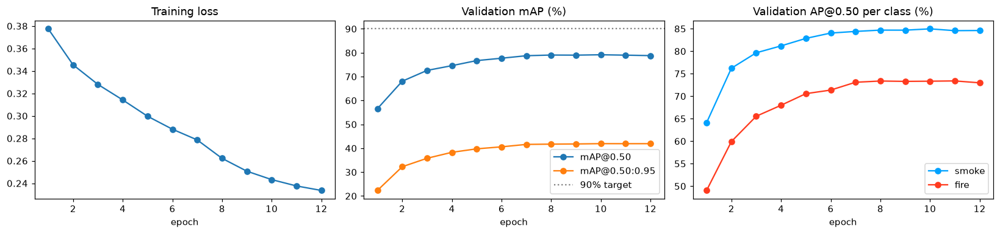

best validation mAP@0.50 = 79.15% | training time 200 min


In [14]:
final = run_training(FINAL_CFG, TRAIN_RECS, VAL_RECS, RUN["final_epochs"], tag="final", patience=RUN["patience"],
                     save_best=CKPT_PATH, resume=True, max_hours=MAX_HOURS)
hist = final["history"]
fig, ax = plt.subplots(1, 3, figsize=(15, 3.6))
ax[0].plot(hist.epoch, hist.train_loss, marker="o"); ax[0].set_title("Training loss")
ax[1].plot(hist.epoch, hist.val_mAP50, marker="o", label="mAP@0.50"); ax[1].plot(hist.epoch, hist.val_mAP50_95, marker="o", label="mAP@0.50:0.95")
ax[1].axhline(TARGET_MAP50, color="gray", ls=":", label="90% target"); ax[1].legend(); ax[1].set_title("Validation mAP (%)")
ax[2].plot(hist.epoch, hist.val_AP50_smoke, marker="o", color=COLORS[1], label="smoke"); ax[2].plot(hist.epoch, hist.val_AP50_fire, marker="o", color=COLORS[2], label="fire")
ax[2].legend(); ax[2].set_title("Validation AP@0.50 per class (%)")
for a in ax:
    a.set_xlabel("epoch")
plt.tight_layout(); plt.savefig(OUT_DIR / "training_curves.png", bbox_inches="tight"); plt.show()
print(f"best validation mAP@0.50 = {final['best_val_mAP50']:.2f}% | training time {final['minutes']:.0f} min")

## 8. Evaluation
### 8.1 Post-training tuning on the validation set (never on test)
The trained detector has two inference settings that are tuned on **validation** data only:
- **NMS IoU threshold** (how aggressively overlapping boxes are merged) - chosen by validation mAP@0.50.
- **Confidence threshold** - the value that maximises the mean per-class F1 at IoU 0.5.

In [15]:
CKPT = torch.load(CKPT_PATH, map_location=DEVICE, weights_only=False)
MODEL = build_detector(CKPT["cfg"], pretrained=False).to(DEVICE)
MODEL.load_state_dict(CKPT["model"])
CANVAS = CKPT["cfg"]["canvas"]
print(f"loaded best checkpoint (epoch {CKPT['epoch']}, val mAP50 {CKPT['val_mAP50']:.2f}%)")

nms_rows, val_cache = [], {}
for nms in (0.4, 0.5, 0.6):
    p, m = evaluate(MODEL, VAL_RECS, CANVAS, nms_thr=nms)
    val_cache[nms] = p
    nms_rows.append(dict(nms_iou=nms, val_mAP50=100 * m["mAP50"], val_mAP50_95=100 * m["mAP50_95"]))
nms_df = pd.DataFrame(nms_rows)
BEST_NMS = float(nms_df.sort_values("val_mAP50", ascending=False).nms_iou.iloc[0])
MODEL.roi_heads.nms_thresh = BEST_NMS
print(nms_df.round(2).to_string(index=False)); print("selected NMS IoU:", BEST_NMS)

val_curves = prf_curves(VAL_RECS, val_cache[BEST_NMS])
CONF_THR = best_threshold(val_curves)
print(f"selected confidence threshold (max mean F1 on validation): {CONF_THR:.2f}")

loaded best checkpoint (epoch 10, val mAP50 79.15%)


predict:   0%|          | 0/194 [00:00<?, ?it/s]

predict:   1%|          | 1/194 [00:00<01:32,  2.09it/s]

predict:   1%|          | 2/194 [00:00<01:28,  2.17it/s]

predict:   2%|▏         | 3/194 [00:01<01:27,  2.19it/s]

predict:   2%|▏         | 4/194 [00:01<01:26,  2.20it/s]

predict:   3%|▎         | 5/194 [00:02<01:25,  2.20it/s]

predict:   3%|▎         | 6/194 [00:02<01:26,  2.18it/s]

predict:   4%|▎         | 7/194 [00:03<01:25,  2.18it/s]

predict:   4%|▍         | 8/194 [00:03<01:24,  2.20it/s]

predict:   5%|▍         | 9/194 [00:04<01:24,  2.20it/s]

predict:   5%|▌         | 10/194 [00:04<01:24,  2.19it/s]

predict:   6%|▌         | 11/194 [00:05<01:23,  2.18it/s]

predict:   6%|▌         | 12/194 [00:05<01:23,  2.19it/s]

predict:   7%|▋         | 13/194 [00:05<01:22,  2.20it/s]

predict:   7%|▋         | 14/194 [00:06<01:21,  2.21it/s]

predict:   8%|▊         | 15/194 [00:06<01:21,  2.21it/s]

predict:   8%|▊         | 16/194 [00:07<01:20,  2.21it/s]

predict:   9%|▉         | 17/194 [00:07<01:20,  2.19it/s]

predict:   9%|▉         | 18/194 [00:08<01:20,  2.19it/s]

predict:  10%|▉         | 19/194 [00:08<01:20,  2.18it/s]

predict:  10%|█         | 20/194 [00:09<01:19,  2.20it/s]

predict:  11%|█         | 21/194 [00:09<01:19,  2.18it/s]

predict:  11%|█▏        | 22/194 [00:10<01:18,  2.18it/s]

predict:  12%|█▏        | 23/194 [00:10<01:18,  2.18it/s]

predict:  12%|█▏        | 24/194 [00:10<01:17,  2.18it/s]

predict:  13%|█▎        | 25/194 [00:11<01:17,  2.18it/s]

predict:  13%|█▎        | 26/194 [00:11<01:17,  2.18it/s]

predict:  14%|█▍        | 27/194 [00:12<01:16,  2.18it/s]

predict:  14%|█▍        | 28/194 [00:12<01:15,  2.19it/s]

predict:  15%|█▍        | 29/194 [00:13<01:15,  2.18it/s]

predict:  15%|█▌        | 30/194 [00:13<01:15,  2.17it/s]

predict:  16%|█▌        | 31/194 [00:14<01:14,  2.20it/s]

predict:  16%|█▋        | 32/194 [00:14<01:13,  2.22it/s]

predict:  17%|█▋        | 33/194 [00:15<01:12,  2.22it/s]

predict:  18%|█▊        | 34/194 [00:15<01:12,  2.22it/s]

predict:  18%|█▊        | 35/194 [00:15<01:11,  2.21it/s]

predict:  19%|█▊        | 36/194 [00:16<01:11,  2.21it/s]

predict:  19%|█▉        | 37/194 [00:16<01:10,  2.21it/s]

predict:  20%|█▉        | 38/194 [00:17<01:10,  2.21it/s]

predict:  20%|██        | 39/194 [00:17<01:09,  2.21it/s]

predict:  21%|██        | 40/194 [00:18<01:09,  2.22it/s]

predict:  21%|██        | 41/194 [00:18<01:09,  2.20it/s]

predict:  22%|██▏       | 42/194 [00:19<01:08,  2.22it/s]

predict:  22%|██▏       | 43/194 [00:19<01:07,  2.23it/s]

predict:  23%|██▎       | 44/194 [00:20<01:07,  2.22it/s]

predict:  23%|██▎       | 45/194 [00:20<01:07,  2.21it/s]

predict:  24%|██▎       | 46/194 [00:20<01:06,  2.24it/s]

predict:  24%|██▍       | 47/194 [00:21<01:05,  2.24it/s]

predict:  25%|██▍       | 48/194 [00:21<01:04,  2.25it/s]

predict:  25%|██▌       | 49/194 [00:22<01:04,  2.26it/s]

predict:  26%|██▌       | 50/194 [00:22<01:03,  2.27it/s]

predict:  26%|██▋       | 51/194 [00:23<01:05,  2.19it/s]

predict:  27%|██▋       | 52/194 [00:23<01:04,  2.19it/s]

predict:  27%|██▋       | 53/194 [00:24<01:03,  2.21it/s]

predict:  28%|██▊       | 54/194 [00:24<01:02,  2.24it/s]

predict:  28%|██▊       | 55/194 [00:24<01:02,  2.24it/s]

predict:  29%|██▉       | 56/194 [00:25<01:01,  2.25it/s]

predict:  29%|██▉       | 57/194 [00:25<01:00,  2.25it/s]

predict:  30%|██▉       | 58/194 [00:26<01:00,  2.24it/s]

predict:  30%|███       | 59/194 [00:26<01:00,  2.22it/s]

predict:  31%|███       | 60/194 [00:27<01:00,  2.20it/s]

predict:  31%|███▏      | 61/194 [00:27<01:00,  2.20it/s]

predict:  32%|███▏      | 62/194 [00:28<01:00,  2.20it/s]

predict:  32%|███▏      | 63/194 [00:28<00:59,  2.19it/s]

predict:  33%|███▎      | 64/194 [00:29<00:59,  2.19it/s]

predict:  34%|███▎      | 65/194 [00:29<00:58,  2.19it/s]

predict:  34%|███▍      | 66/194 [00:29<00:58,  2.20it/s]

predict:  35%|███▍      | 67/194 [00:30<00:57,  2.20it/s]

predict:  35%|███▌      | 68/194 [00:30<00:57,  2.20it/s]

predict:  36%|███▌      | 69/194 [00:31<00:57,  2.18it/s]

predict:  36%|███▌      | 70/194 [00:31<00:56,  2.18it/s]

predict:  37%|███▋      | 71/194 [00:32<00:56,  2.17it/s]

predict:  37%|███▋      | 72/194 [00:32<00:56,  2.17it/s]

predict:  38%|███▊      | 73/194 [00:33<00:55,  2.18it/s]

predict:  38%|███▊      | 74/194 [00:33<00:54,  2.19it/s]

predict:  39%|███▊      | 75/194 [00:34<00:52,  2.25it/s]

predict:  39%|███▉      | 76/194 [00:34<00:51,  2.31it/s]

predict:  40%|███▉      | 77/194 [00:34<00:49,  2.34it/s]

predict:  40%|████      | 78/194 [00:35<00:48,  2.38it/s]

predict:  41%|████      | 79/194 [00:35<00:47,  2.40it/s]

predict:  41%|████      | 80/194 [00:36<00:47,  2.42it/s]

predict:  42%|████▏     | 81/194 [00:36<00:46,  2.43it/s]

predict:  42%|████▏     | 82/194 [00:36<00:46,  2.43it/s]

predict:  43%|████▎     | 83/194 [00:37<00:45,  2.44it/s]

predict:  43%|████▎     | 84/194 [00:37<00:45,  2.43it/s]

predict:  44%|████▍     | 85/194 [00:38<00:47,  2.31it/s]

predict:  44%|████▍     | 86/194 [00:38<00:47,  2.26it/s]

predict:  45%|████▍     | 87/194 [00:39<00:47,  2.25it/s]

predict:  45%|████▌     | 88/194 [00:39<00:46,  2.30it/s]

predict:  46%|████▌     | 89/194 [00:39<00:44,  2.35it/s]

predict:  46%|████▋     | 90/194 [00:40<00:43,  2.38it/s]

predict:  47%|████▋     | 91/194 [00:40<00:42,  2.40it/s]

predict:  47%|████▋     | 92/194 [00:41<00:42,  2.41it/s]

predict:  48%|████▊     | 93/194 [00:41<00:41,  2.42it/s]

predict:  48%|████▊     | 94/194 [00:41<00:40,  2.44it/s]

predict:  49%|████▉     | 95/194 [00:42<00:40,  2.45it/s]

predict:  49%|████▉     | 96/194 [00:42<00:39,  2.45it/s]

predict:  50%|█████     | 97/194 [00:43<00:39,  2.46it/s]

predict:  51%|█████     | 98/194 [00:43<00:39,  2.45it/s]

predict:  51%|█████     | 99/194 [00:43<00:38,  2.46it/s]

predict:  52%|█████▏    | 100/194 [00:44<00:38,  2.47it/s]

predict:  52%|█████▏    | 101/194 [00:44<00:37,  2.46it/s]

predict:  53%|█████▎    | 102/194 [00:45<00:37,  2.46it/s]

predict:  53%|█████▎    | 103/194 [00:45<00:37,  2.45it/s]

predict:  54%|█████▎    | 104/194 [00:46<00:36,  2.45it/s]

predict:  54%|█████▍    | 105/194 [00:46<00:36,  2.45it/s]

predict:  55%|█████▍    | 106/194 [00:46<00:35,  2.45it/s]

predict:  55%|█████▌    | 107/194 [00:47<00:35,  2.46it/s]

predict:  56%|█████▌    | 108/194 [00:47<00:35,  2.45it/s]

predict:  56%|█████▌    | 109/194 [00:48<00:35,  2.42it/s]

predict:  57%|█████▋    | 110/194 [00:48<00:36,  2.27it/s]

predict:  57%|█████▋    | 111/194 [00:49<00:38,  2.18it/s]

predict:  58%|█████▊    | 112/194 [00:49<00:37,  2.19it/s]

predict:  58%|█████▊    | 113/194 [00:49<00:36,  2.19it/s]

predict:  59%|█████▉    | 114/194 [00:50<00:37,  2.12it/s]

predict:  59%|█████▉    | 115/194 [00:50<00:37,  2.09it/s]

predict:  60%|█████▉    | 116/194 [00:51<00:37,  2.10it/s]

predict:  60%|██████    | 117/194 [00:51<00:36,  2.10it/s]

predict:  61%|██████    | 118/194 [00:52<00:36,  2.09it/s]

predict:  61%|██████▏   | 119/194 [00:52<00:35,  2.14it/s]

predict:  62%|██████▏   | 120/194 [00:53<00:33,  2.22it/s]

predict:  62%|██████▏   | 121/194 [00:53<00:32,  2.26it/s]

predict:  63%|██████▎   | 122/194 [00:54<00:32,  2.21it/s]

predict:  63%|██████▎   | 123/194 [00:54<00:32,  2.20it/s]

predict:  64%|██████▍   | 124/194 [00:55<00:32,  2.17it/s]

predict:  64%|██████▍   | 125/194 [00:55<00:32,  2.15it/s]

predict:  65%|██████▍   | 126/194 [00:56<00:31,  2.15it/s]

predict:  65%|██████▌   | 127/194 [00:56<00:30,  2.19it/s]

predict:  66%|██████▌   | 128/194 [00:56<00:29,  2.20it/s]

predict:  66%|██████▋   | 129/194 [00:57<00:29,  2.21it/s]

predict:  67%|██████▋   | 130/194 [00:57<00:28,  2.21it/s]

predict:  68%|██████▊   | 131/194 [00:58<00:28,  2.22it/s]

predict:  68%|██████▊   | 132/194 [00:58<00:28,  2.20it/s]

predict:  69%|██████▊   | 133/194 [00:59<00:27,  2.20it/s]

predict:  69%|██████▉   | 134/194 [00:59<00:27,  2.21it/s]

predict:  70%|██████▉   | 135/194 [01:00<00:26,  2.19it/s]

predict:  70%|███████   | 136/194 [01:00<00:26,  2.20it/s]

predict:  71%|███████   | 137/194 [01:01<00:26,  2.18it/s]

predict:  71%|███████   | 138/194 [01:01<00:25,  2.20it/s]

predict:  72%|███████▏  | 139/194 [01:01<00:24,  2.22it/s]

predict:  72%|███████▏  | 140/194 [01:02<00:23,  2.26it/s]

predict:  73%|███████▎  | 141/194 [01:02<00:23,  2.29it/s]

predict:  73%|███████▎  | 142/194 [01:03<00:22,  2.32it/s]

predict:  74%|███████▎  | 143/194 [01:03<00:21,  2.35it/s]

predict:  74%|███████▍  | 144/194 [01:04<00:21,  2.35it/s]

predict:  75%|███████▍  | 145/194 [01:04<00:20,  2.38it/s]

predict:  75%|███████▌  | 146/194 [01:04<00:19,  2.40it/s]

predict:  76%|███████▌  | 147/194 [01:05<00:19,  2.41it/s]

predict:  76%|███████▋  | 148/194 [01:05<00:19,  2.41it/s]

predict:  77%|███████▋  | 149/194 [01:06<00:18,  2.40it/s]

predict:  77%|███████▋  | 150/194 [01:06<00:18,  2.36it/s]

predict:  78%|███████▊  | 151/194 [01:06<00:18,  2.28it/s]

predict:  78%|███████▊  | 152/194 [01:07<00:18,  2.22it/s]

predict:  79%|███████▉  | 153/194 [01:07<00:17,  2.28it/s]

predict:  79%|███████▉  | 154/194 [01:08<00:17,  2.30it/s]

predict:  80%|███████▉  | 155/194 [01:08<00:16,  2.30it/s]

predict:  80%|████████  | 156/194 [01:09<00:16,  2.29it/s]

predict:  81%|████████  | 157/194 [01:09<00:16,  2.24it/s]

predict:  81%|████████▏ | 158/194 [01:10<00:16,  2.22it/s]

predict:  82%|████████▏ | 159/194 [01:10<00:15,  2.22it/s]

predict:  82%|████████▏ | 160/194 [01:11<00:15,  2.16it/s]

predict:  83%|████████▎ | 161/194 [01:11<00:14,  2.22it/s]

predict:  84%|████████▎ | 162/194 [01:11<00:14,  2.26it/s]

predict:  84%|████████▍ | 163/194 [01:12<00:13,  2.26it/s]

predict:  85%|████████▍ | 164/194 [01:12<00:13,  2.25it/s]

predict:  85%|████████▌ | 165/194 [01:13<00:12,  2.27it/s]

predict:  86%|████████▌ | 166/194 [01:13<00:12,  2.26it/s]

predict:  86%|████████▌ | 167/194 [01:14<00:12,  2.25it/s]

predict:  87%|████████▋ | 168/194 [01:14<00:11,  2.24it/s]

predict:  87%|████████▋ | 169/194 [01:15<00:11,  2.22it/s]

predict:  88%|████████▊ | 170/194 [01:15<00:10,  2.21it/s]

predict:  88%|████████▊ | 171/194 [01:15<00:10,  2.22it/s]

predict:  89%|████████▊ | 172/194 [01:16<00:09,  2.21it/s]

predict:  89%|████████▉ | 173/194 [01:16<00:09,  2.19it/s]

predict:  90%|████████▉ | 174/194 [01:17<00:09,  2.21it/s]

predict:  90%|█████████ | 175/194 [01:17<00:08,  2.19it/s]

predict:  91%|█████████ | 176/194 [01:18<00:08,  2.20it/s]

predict:  91%|█████████ | 177/194 [01:18<00:07,  2.24it/s]

predict:  92%|█████████▏| 178/194 [01:19<00:07,  2.22it/s]

predict:  92%|█████████▏| 179/194 [01:19<00:06,  2.24it/s]

predict:  93%|█████████▎| 180/194 [01:19<00:06,  2.27it/s]

predict:  93%|█████████▎| 181/194 [01:20<00:05,  2.29it/s]

predict:  94%|█████████▍| 182/194 [01:20<00:05,  2.31it/s]

predict:  94%|█████████▍| 183/194 [01:21<00:04,  2.33it/s]

predict:  95%|█████████▍| 184/194 [01:21<00:04,  2.33it/s]

predict:  95%|█████████▌| 185/194 [01:22<00:03,  2.33it/s]

predict:  96%|█████████▌| 186/194 [01:22<00:03,  2.33it/s]

predict:  96%|█████████▋| 187/194 [01:22<00:02,  2.35it/s]

predict:  97%|█████████▋| 188/194 [01:23<00:02,  2.38it/s]

predict:  97%|█████████▋| 189/194 [01:23<00:02,  2.37it/s]

predict:  98%|█████████▊| 190/194 [01:24<00:01,  2.38it/s]

predict:  98%|█████████▊| 191/194 [01:24<00:01,  2.30it/s]

predict:  99%|█████████▉| 192/194 [01:25<00:00,  2.24it/s]

predict:  99%|█████████▉| 193/194 [01:25<00:00,  2.25it/s]

predict: 100%|██████████| 194/194 [01:25<00:00,  2.50it/s]

predict:   0%|          | 0/194 [00:00<?, ?it/s]

predict:   1%|          | 1/194 [00:00<01:29,  2.17it/s]

predict:   1%|          | 2/194 [00:00<01:27,  2.20it/s]

predict:   2%|▏         | 3/194 [00:01<01:26,  2.20it/s]

predict:   2%|▏         | 4/194 [00:01<01:26,  2.20it/s]

predict:   3%|▎         | 5/194 [00:02<01:25,  2.20it/s]

predict:   3%|▎         | 6/194 [00:02<01:25,  2.20it/s]

predict:   4%|▎         | 7/194 [00:03<01:24,  2.22it/s]

predict:   4%|▍         | 8/194 [00:03<01:24,  2.20it/s]

predict:   5%|▍         | 9/194 [00:04<01:24,  2.20it/s]

predict:   5%|▌         | 10/194 [00:04<01:23,  2.21it/s]

predict:   6%|▌         | 11/194 [00:04<01:22,  2.21it/s]

predict:   6%|▌         | 12/194 [00:05<01:22,  2.22it/s]

predict:   7%|▋         | 13/194 [00:05<01:21,  2.21it/s]

predict:   7%|▋         | 14/194 [00:06<01:21,  2.22it/s]

predict:   8%|▊         | 15/194 [00:06<01:20,  2.21it/s]

predict:   8%|▊         | 16/194 [00:07<01:20,  2.21it/s]

predict:   9%|▉         | 17/194 [00:07<01:21,  2.18it/s]

predict:   9%|▉         | 18/194 [00:08<01:21,  2.16it/s]

predict:  10%|▉         | 19/194 [00:08<01:20,  2.16it/s]

predict:  10%|█         | 20/194 [00:09<01:19,  2.18it/s]

predict:  11%|█         | 21/194 [00:09<01:19,  2.17it/s]

predict:  11%|█▏        | 22/194 [00:10<01:19,  2.16it/s]

predict:  12%|█▏        | 23/194 [00:10<01:18,  2.17it/s]

predict:  12%|█▏        | 24/194 [00:10<01:18,  2.17it/s]

predict:  13%|█▎        | 25/194 [00:11<01:17,  2.18it/s]

predict:  13%|█▎        | 26/194 [00:11<01:17,  2.18it/s]

predict:  14%|█▍        | 27/194 [00:12<01:16,  2.19it/s]

predict:  14%|█▍        | 28/194 [00:12<01:15,  2.19it/s]

predict:  15%|█▍        | 29/194 [00:13<01:15,  2.19it/s]

predict:  15%|█▌        | 30/194 [00:13<01:15,  2.18it/s]

predict:  16%|█▌        | 31/194 [00:14<01:14,  2.20it/s]

predict:  16%|█▋        | 32/194 [00:14<01:13,  2.21it/s]

predict:  17%|█▋        | 33/194 [00:15<01:12,  2.21it/s]

predict:  18%|█▊        | 34/194 [00:15<01:12,  2.21it/s]

predict:  18%|█▊        | 35/194 [00:15<01:11,  2.21it/s]

predict:  19%|█▊        | 36/194 [00:16<01:11,  2.20it/s]

predict:  19%|█▉        | 37/194 [00:16<01:10,  2.21it/s]

predict:  20%|█▉        | 38/194 [00:17<01:10,  2.21it/s]

predict:  20%|██        | 39/194 [00:17<01:10,  2.21it/s]

predict:  21%|██        | 40/194 [00:18<01:09,  2.22it/s]

predict:  21%|██        | 41/194 [00:18<01:09,  2.20it/s]

predict:  22%|██▏       | 42/194 [00:19<01:08,  2.22it/s]

predict:  22%|██▏       | 43/194 [00:19<01:08,  2.22it/s]

predict:  23%|██▎       | 44/194 [00:20<01:07,  2.21it/s]

predict:  23%|██▎       | 45/194 [00:20<01:07,  2.21it/s]

predict:  24%|██▎       | 46/194 [00:20<01:06,  2.23it/s]

predict:  24%|██▍       | 47/194 [00:21<01:05,  2.24it/s]

predict:  25%|██▍       | 48/194 [00:21<01:05,  2.24it/s]

predict:  25%|██▌       | 49/194 [00:22<01:04,  2.25it/s]

predict:  26%|██▌       | 50/194 [00:22<01:03,  2.26it/s]

predict:  26%|██▋       | 51/194 [00:23<01:05,  2.18it/s]

predict:  27%|██▋       | 52/194 [00:23<01:05,  2.18it/s]

predict:  27%|██▋       | 53/194 [00:24<01:03,  2.21it/s]

predict:  28%|██▊       | 54/194 [00:24<01:02,  2.24it/s]

predict:  28%|██▊       | 55/194 [00:24<01:01,  2.24it/s]

predict:  29%|██▉       | 56/194 [00:25<01:01,  2.25it/s]

predict:  29%|██▉       | 57/194 [00:25<01:00,  2.25it/s]

predict:  30%|██▉       | 58/194 [00:26<01:00,  2.23it/s]

predict:  30%|███       | 59/194 [00:26<01:00,  2.22it/s]

predict:  31%|███       | 60/194 [00:27<01:00,  2.22it/s]

predict:  31%|███▏      | 61/194 [00:27<01:00,  2.21it/s]

predict:  32%|███▏      | 62/194 [00:28<00:59,  2.20it/s]

predict:  32%|███▏      | 63/194 [00:28<00:59,  2.19it/s]

predict:  33%|███▎      | 64/194 [00:29<00:59,  2.19it/s]

predict:  34%|███▎      | 65/194 [00:29<00:58,  2.20it/s]

predict:  34%|███▍      | 66/194 [00:29<00:58,  2.21it/s]

predict:  35%|███▍      | 67/194 [00:30<00:57,  2.19it/s]

predict:  35%|███▌      | 68/194 [00:30<00:57,  2.20it/s]

predict:  36%|███▌      | 69/194 [00:31<00:56,  2.20it/s]

predict:  36%|███▌      | 70/194 [00:31<00:56,  2.19it/s]

predict:  37%|███▋      | 71/194 [00:32<00:56,  2.18it/s]

predict:  37%|███▋      | 72/194 [00:32<00:56,  2.17it/s]

predict:  38%|███▊      | 73/194 [00:33<00:55,  2.18it/s]

predict:  38%|███▊      | 74/194 [00:33<00:54,  2.18it/s]

predict:  39%|███▊      | 75/194 [00:34<00:52,  2.25it/s]

predict:  39%|███▉      | 76/194 [00:34<00:51,  2.31it/s]

predict:  40%|███▉      | 77/194 [00:34<00:49,  2.35it/s]

predict:  40%|████      | 78/194 [00:35<00:48,  2.38it/s]

predict:  41%|████      | 79/194 [00:35<00:48,  2.39it/s]

predict:  41%|████      | 80/194 [00:36<00:47,  2.40it/s]

predict:  42%|████▏     | 81/194 [00:36<00:46,  2.41it/s]

predict:  42%|████▏     | 82/194 [00:36<00:46,  2.41it/s]

predict:  43%|████▎     | 83/194 [00:37<00:45,  2.42it/s]

predict:  43%|████▎     | 84/194 [00:37<00:45,  2.42it/s]

predict:  44%|████▍     | 85/194 [00:38<00:47,  2.29it/s]

predict:  44%|████▍     | 86/194 [00:38<00:47,  2.25it/s]

predict:  45%|████▍     | 87/194 [00:39<00:47,  2.23it/s]

predict:  45%|████▌     | 88/194 [00:39<00:46,  2.29it/s]

predict:  46%|████▌     | 89/194 [00:39<00:44,  2.34it/s]

predict:  46%|████▋     | 90/194 [00:40<00:43,  2.37it/s]

predict:  47%|████▋     | 91/194 [00:40<00:42,  2.40it/s]

predict:  47%|████▋     | 92/194 [00:41<00:42,  2.41it/s]

predict:  48%|████▊     | 93/194 [00:41<00:41,  2.42it/s]

predict:  48%|████▊     | 94/194 [00:41<00:41,  2.43it/s]

predict:  49%|████▉     | 95/194 [00:42<00:40,  2.44it/s]

predict:  49%|████▉     | 96/194 [00:42<00:40,  2.45it/s]

predict:  50%|█████     | 97/194 [00:43<00:39,  2.45it/s]

predict:  51%|█████     | 98/194 [00:43<00:39,  2.45it/s]

predict:  51%|█████     | 99/194 [00:44<00:38,  2.46it/s]

predict:  52%|█████▏    | 100/194 [00:44<00:38,  2.47it/s]

predict:  52%|█████▏    | 101/194 [00:44<00:37,  2.48it/s]

predict:  53%|█████▎    | 102/194 [00:45<00:37,  2.47it/s]

predict:  53%|█████▎    | 103/194 [00:45<00:36,  2.46it/s]

predict:  54%|█████▎    | 104/194 [00:46<00:36,  2.46it/s]

predict:  54%|█████▍    | 105/194 [00:46<00:36,  2.46it/s]

predict:  55%|█████▍    | 106/194 [00:46<00:35,  2.47it/s]

predict:  55%|█████▌    | 107/194 [00:47<00:35,  2.47it/s]

predict:  56%|█████▌    | 108/194 [00:47<00:34,  2.46it/s]

predict:  56%|█████▌    | 109/194 [00:48<00:35,  2.43it/s]

predict:  57%|█████▋    | 110/194 [00:48<00:37,  2.26it/s]

predict:  57%|█████▋    | 111/194 [00:49<00:37,  2.19it/s]

predict:  58%|█████▊    | 112/194 [00:49<00:37,  2.20it/s]

predict:  58%|█████▊    | 113/194 [00:49<00:36,  2.20it/s]

predict:  59%|█████▉    | 114/194 [00:50<00:37,  2.11it/s]

predict:  59%|█████▉    | 115/194 [00:50<00:37,  2.09it/s]

predict:  60%|█████▉    | 116/194 [00:51<00:36,  2.11it/s]

predict:  60%|██████    | 117/194 [00:51<00:36,  2.11it/s]

predict:  61%|██████    | 118/194 [00:52<00:36,  2.09it/s]

predict:  61%|██████▏   | 119/194 [00:52<00:35,  2.14it/s]

predict:  62%|██████▏   | 120/194 [00:53<00:33,  2.21it/s]

predict:  62%|██████▏   | 121/194 [00:53<00:32,  2.24it/s]

predict:  63%|██████▎   | 122/194 [00:54<00:32,  2.21it/s]

predict:  63%|██████▎   | 123/194 [00:54<00:32,  2.20it/s]

predict:  64%|██████▍   | 124/194 [00:55<00:32,  2.17it/s]

predict:  64%|██████▍   | 125/194 [00:55<00:32,  2.14it/s]

predict:  65%|██████▍   | 126/194 [00:56<00:31,  2.13it/s]

predict:  65%|██████▌   | 127/194 [00:56<00:30,  2.18it/s]

predict:  66%|██████▌   | 128/194 [00:56<00:30,  2.19it/s]

predict:  66%|██████▋   | 129/194 [00:57<00:29,  2.21it/s]

predict:  67%|██████▋   | 130/194 [00:57<00:29,  2.20it/s]

predict:  68%|██████▊   | 131/194 [00:58<00:28,  2.20it/s]

predict:  68%|██████▊   | 132/194 [00:58<00:28,  2.18it/s]

predict:  69%|██████▊   | 133/194 [00:59<00:27,  2.19it/s]

predict:  69%|██████▉   | 134/194 [00:59<00:27,  2.20it/s]

predict:  70%|██████▉   | 135/194 [01:00<00:26,  2.20it/s]

predict:  70%|███████   | 136/194 [01:00<00:26,  2.20it/s]

predict:  71%|███████   | 137/194 [01:01<00:26,  2.18it/s]

predict:  71%|███████   | 138/194 [01:01<00:25,  2.20it/s]

predict:  72%|███████▏  | 139/194 [01:01<00:24,  2.22it/s]

predict:  72%|███████▏  | 140/194 [01:02<00:23,  2.27it/s]

predict:  73%|███████▎  | 141/194 [01:02<00:23,  2.30it/s]

predict:  73%|███████▎  | 142/194 [01:03<00:22,  2.34it/s]

predict:  74%|███████▎  | 143/194 [01:03<00:21,  2.37it/s]

predict:  74%|███████▍  | 144/194 [01:04<00:21,  2.37it/s]

predict:  75%|███████▍  | 145/194 [01:04<00:20,  2.39it/s]

predict:  75%|███████▌  | 146/194 [01:04<00:19,  2.41it/s]

predict:  76%|███████▌  | 147/194 [01:05<00:19,  2.41it/s]

predict:  76%|███████▋  | 148/194 [01:05<00:19,  2.42it/s]

predict:  77%|███████▋  | 149/194 [01:06<00:18,  2.40it/s]

predict:  77%|███████▋  | 150/194 [01:06<00:18,  2.37it/s]

predict:  78%|███████▊  | 151/194 [01:07<00:18,  2.27it/s]

predict:  78%|███████▊  | 152/194 [01:07<00:18,  2.21it/s]

predict:  79%|███████▉  | 153/194 [01:07<00:17,  2.28it/s]

predict:  79%|███████▉  | 154/194 [01:08<00:17,  2.29it/s]

predict:  80%|███████▉  | 155/194 [01:08<00:17,  2.28it/s]

predict:  80%|████████  | 156/194 [01:09<00:16,  2.27it/s]

predict:  81%|████████  | 157/194 [01:09<00:16,  2.22it/s]

predict:  81%|████████▏ | 158/194 [01:10<00:16,  2.20it/s]

predict:  82%|████████▏ | 159/194 [01:10<00:15,  2.20it/s]

predict:  82%|████████▏ | 160/194 [01:11<00:15,  2.14it/s]

predict:  83%|████████▎ | 161/194 [01:11<00:14,  2.20it/s]

predict:  84%|████████▎ | 162/194 [01:11<00:14,  2.25it/s]

predict:  84%|████████▍ | 163/194 [01:12<00:13,  2.24it/s]

predict:  85%|████████▍ | 164/194 [01:12<00:13,  2.23it/s]

predict:  85%|████████▌ | 165/194 [01:13<00:12,  2.25it/s]

predict:  86%|████████▌ | 166/194 [01:13<00:12,  2.25it/s]

predict:  86%|████████▌ | 167/194 [01:14<00:12,  2.23it/s]

predict:  87%|████████▋ | 168/194 [01:14<00:11,  2.23it/s]

predict:  87%|████████▋ | 169/194 [01:15<00:11,  2.21it/s]

predict:  88%|████████▊ | 170/194 [01:15<00:10,  2.20it/s]

predict:  88%|████████▊ | 171/194 [01:16<00:10,  2.21it/s]

predict:  89%|████████▊ | 172/194 [01:16<00:09,  2.22it/s]

predict:  89%|████████▉ | 173/194 [01:16<00:09,  2.19it/s]

predict:  90%|████████▉ | 174/194 [01:17<00:09,  2.22it/s]

predict:  90%|█████████ | 175/194 [01:17<00:08,  2.21it/s]

predict:  91%|█████████ | 176/194 [01:18<00:08,  2.22it/s]

predict:  91%|█████████ | 177/194 [01:18<00:07,  2.27it/s]

predict:  92%|█████████▏| 178/194 [01:19<00:07,  2.26it/s]

predict:  92%|█████████▏| 179/194 [01:19<00:06,  2.27it/s]

predict:  93%|█████████▎| 180/194 [01:19<00:06,  2.30it/s]

predict:  93%|█████████▎| 181/194 [01:20<00:05,  2.31it/s]

predict:  94%|█████████▍| 182/194 [01:20<00:05,  2.33it/s]

predict:  94%|█████████▍| 183/194 [01:21<00:04,  2.34it/s]

predict:  95%|█████████▍| 184/194 [01:21<00:04,  2.33it/s]

predict:  95%|█████████▌| 185/194 [01:22<00:03,  2.34it/s]

predict:  96%|█████████▌| 186/194 [01:22<00:03,  2.33it/s]

predict:  96%|█████████▋| 187/194 [01:22<00:02,  2.36it/s]

predict:  97%|█████████▋| 188/194 [01:23<00:02,  2.39it/s]

predict:  97%|█████████▋| 189/194 [01:23<00:02,  2.38it/s]

predict:  98%|█████████▊| 190/194 [01:24<00:01,  2.37it/s]

predict:  98%|█████████▊| 191/194 [01:24<00:01,  2.28it/s]

predict:  99%|█████████▉| 192/194 [01:25<00:00,  2.23it/s]

predict:  99%|█████████▉| 193/194 [01:25<00:00,  2.24it/s]

predict: 100%|██████████| 194/194 [01:25<00:00,  2.50it/s]

predict:   0%|          | 0/194 [00:00<?, ?it/s]

predict:   1%|          | 1/194 [00:00<01:28,  2.18it/s]

predict:   1%|          | 2/194 [00:00<01:27,  2.20it/s]

predict:   2%|▏         | 3/194 [00:01<01:27,  2.19it/s]

predict:   2%|▏         | 4/194 [00:01<01:26,  2.19it/s]

predict:   3%|▎         | 5/194 [00:02<01:25,  2.20it/s]

predict:   3%|▎         | 6/194 [00:02<01:25,  2.19it/s]

predict:   4%|▎         | 7/194 [00:03<01:24,  2.20it/s]

predict:   4%|▍         | 8/194 [00:03<01:23,  2.22it/s]

predict:   5%|▍         | 9/194 [00:04<01:23,  2.22it/s]

predict:   5%|▌         | 10/194 [00:04<01:22,  2.22it/s]

predict:   6%|▌         | 11/194 [00:04<01:22,  2.22it/s]

predict:   6%|▌         | 12/194 [00:05<01:21,  2.22it/s]

predict:   7%|▋         | 13/194 [00:05<01:21,  2.23it/s]

predict:   7%|▋         | 14/194 [00:06<01:20,  2.24it/s]

predict:   8%|▊         | 15/194 [00:06<01:20,  2.23it/s]

predict:   8%|▊         | 16/194 [00:07<01:20,  2.22it/s]

predict:   9%|▉         | 17/194 [00:07<01:20,  2.21it/s]

predict:   9%|▉         | 18/194 [00:08<01:20,  2.18it/s]

predict:  10%|▉         | 19/194 [00:08<01:20,  2.19it/s]

predict:  10%|█         | 20/194 [00:09<01:19,  2.20it/s]

predict:  11%|█         | 21/194 [00:09<01:19,  2.19it/s]

predict:  11%|█▏        | 22/194 [00:09<01:18,  2.18it/s]

predict:  12%|█▏        | 23/194 [00:10<01:18,  2.18it/s]

predict:  12%|█▏        | 24/194 [00:10<01:17,  2.18it/s]

predict:  13%|█▎        | 25/194 [00:11<01:17,  2.19it/s]

predict:  13%|█▎        | 26/194 [00:11<01:16,  2.18it/s]

predict:  14%|█▍        | 27/194 [00:12<01:16,  2.20it/s]

predict:  14%|█▍        | 28/194 [00:12<01:15,  2.20it/s]

predict:  15%|█▍        | 29/194 [00:13<01:15,  2.19it/s]

predict:  15%|█▌        | 30/194 [00:13<01:14,  2.19it/s]

predict:  16%|█▌        | 31/194 [00:14<01:13,  2.21it/s]

predict:  16%|█▋        | 32/194 [00:14<01:13,  2.21it/s]

predict:  17%|█▋        | 33/194 [00:14<01:12,  2.22it/s]

predict:  18%|█▊        | 34/194 [00:15<01:12,  2.21it/s]

predict:  18%|█▊        | 35/194 [00:15<01:11,  2.21it/s]

predict:  19%|█▊        | 36/194 [00:16<01:11,  2.20it/s]

predict:  19%|█▉        | 37/194 [00:16<01:11,  2.20it/s]

predict:  20%|█▉        | 38/194 [00:17<01:10,  2.20it/s]

predict:  20%|██        | 39/194 [00:17<01:10,  2.19it/s]

predict:  21%|██        | 40/194 [00:18<01:10,  2.20it/s]

predict:  21%|██        | 41/194 [00:18<01:09,  2.19it/s]

predict:  22%|██▏       | 42/194 [00:19<01:09,  2.20it/s]

predict:  22%|██▏       | 43/194 [00:19<01:08,  2.20it/s]

predict:  23%|██▎       | 44/194 [00:19<01:08,  2.19it/s]

predict:  23%|██▎       | 45/194 [00:20<01:07,  2.20it/s]

predict:  24%|██▎       | 46/194 [00:20<01:06,  2.23it/s]

predict:  24%|██▍       | 47/194 [00:21<01:05,  2.25it/s]

predict:  25%|██▍       | 48/194 [00:21<01:05,  2.24it/s]

predict:  25%|██▌       | 49/194 [00:22<01:03,  2.27it/s]

predict:  26%|██▌       | 50/194 [00:22<01:03,  2.27it/s]

predict:  26%|██▋       | 51/194 [00:23<01:05,  2.19it/s]

predict:  27%|██▋       | 52/194 [00:23<01:05,  2.18it/s]

predict:  27%|██▋       | 53/194 [00:24<01:03,  2.22it/s]

predict:  28%|██▊       | 54/194 [00:24<01:02,  2.25it/s]

predict:  28%|██▊       | 55/194 [00:24<01:02,  2.24it/s]

predict:  29%|██▉       | 56/194 [00:25<01:00,  2.26it/s]

predict:  29%|██▉       | 57/194 [00:25<01:00,  2.27it/s]

predict:  30%|██▉       | 58/194 [00:26<01:00,  2.24it/s]

predict:  30%|███       | 59/194 [00:26<01:00,  2.22it/s]

predict:  31%|███       | 60/194 [00:27<01:00,  2.21it/s]

predict:  31%|███▏      | 61/194 [00:27<01:00,  2.21it/s]

predict:  32%|███▏      | 62/194 [00:28<00:59,  2.20it/s]

predict:  32%|███▏      | 63/194 [00:28<00:59,  2.19it/s]

predict:  33%|███▎      | 64/194 [00:28<00:59,  2.19it/s]

predict:  34%|███▎      | 65/194 [00:29<00:58,  2.20it/s]

predict:  34%|███▍      | 66/194 [00:29<00:58,  2.20it/s]

predict:  35%|███▍      | 67/194 [00:30<00:57,  2.20it/s]

predict:  35%|███▌      | 68/194 [00:30<00:57,  2.21it/s]

predict:  36%|███▌      | 69/194 [00:31<00:56,  2.20it/s]

predict:  36%|███▌      | 70/194 [00:31<00:56,  2.18it/s]

predict:  37%|███▋      | 71/194 [00:32<00:56,  2.17it/s]

predict:  37%|███▋      | 72/194 [00:32<00:56,  2.16it/s]

predict:  38%|███▊      | 73/194 [00:33<00:55,  2.17it/s]

predict:  38%|███▊      | 74/194 [00:33<00:55,  2.16it/s]

predict:  39%|███▊      | 75/194 [00:33<00:53,  2.23it/s]

predict:  39%|███▉      | 76/194 [00:34<00:51,  2.29it/s]

predict:  40%|███▉      | 77/194 [00:34<00:50,  2.32it/s]

predict:  40%|████      | 78/194 [00:35<00:49,  2.35it/s]

predict:  41%|████      | 79/194 [00:35<00:48,  2.37it/s]

predict:  41%|████      | 80/194 [00:36<00:47,  2.39it/s]

predict:  42%|████▏     | 81/194 [00:36<00:47,  2.39it/s]

predict:  42%|████▏     | 82/194 [00:36<00:46,  2.40it/s]

predict:  43%|████▎     | 83/194 [00:37<00:45,  2.42it/s]

predict:  43%|████▎     | 84/194 [00:37<00:45,  2.41it/s]

predict:  44%|████▍     | 85/194 [00:38<00:47,  2.30it/s]

predict:  44%|████▍     | 86/194 [00:38<00:47,  2.26it/s]

predict:  45%|████▍     | 87/194 [00:39<00:47,  2.24it/s]

predict:  45%|████▌     | 88/194 [00:39<00:46,  2.30it/s]

predict:  46%|████▌     | 89/194 [00:39<00:44,  2.34it/s]

predict:  46%|████▋     | 90/194 [00:40<00:43,  2.38it/s]

predict:  47%|████▋     | 91/194 [00:40<00:42,  2.40it/s]

predict:  47%|████▋     | 92/194 [00:41<00:42,  2.41it/s]

predict:  48%|████▊     | 93/194 [00:41<00:41,  2.42it/s]

predict:  48%|████▊     | 94/194 [00:41<00:40,  2.44it/s]

predict:  49%|████▉     | 95/194 [00:42<00:40,  2.45it/s]

predict:  49%|████▉     | 96/194 [00:42<00:39,  2.45it/s]

predict:  50%|█████     | 97/194 [00:43<00:39,  2.45it/s]

predict:  51%|█████     | 98/194 [00:43<00:39,  2.45it/s]

predict:  51%|█████     | 99/194 [00:43<00:38,  2.46it/s]

predict:  52%|█████▏    | 100/194 [00:44<00:38,  2.46it/s]

predict:  52%|█████▏    | 101/194 [00:44<00:37,  2.46it/s]

predict:  53%|█████▎    | 102/194 [00:45<00:37,  2.47it/s]

predict:  53%|█████▎    | 103/194 [00:45<00:36,  2.46it/s]

predict:  54%|█████▎    | 104/194 [00:46<00:36,  2.46it/s]

predict:  54%|█████▍    | 105/194 [00:46<00:36,  2.46it/s]

predict:  55%|█████▍    | 106/194 [00:46<00:35,  2.46it/s]

predict:  55%|█████▌    | 107/194 [00:47<00:35,  2.47it/s]

predict:  56%|█████▌    | 108/194 [00:47<00:34,  2.46it/s]

predict:  56%|█████▌    | 109/194 [00:48<00:35,  2.42it/s]

predict:  57%|█████▋    | 110/194 [00:48<00:36,  2.28it/s]

predict:  57%|█████▋    | 111/194 [00:49<00:37,  2.19it/s]

predict:  58%|█████▊    | 112/194 [00:49<00:37,  2.21it/s]

predict:  58%|█████▊    | 113/194 [00:49<00:36,  2.20it/s]

predict:  59%|█████▉    | 114/194 [00:50<00:37,  2.11it/s]

predict:  59%|█████▉    | 115/194 [00:50<00:37,  2.08it/s]

predict:  60%|█████▉    | 116/194 [00:51<00:37,  2.09it/s]

predict:  60%|██████    | 117/194 [00:51<00:36,  2.09it/s]

predict:  61%|██████    | 118/194 [00:52<00:36,  2.07it/s]

predict:  61%|██████▏   | 119/194 [00:52<00:35,  2.13it/s]

predict:  62%|██████▏   | 120/194 [00:53<00:33,  2.21it/s]

predict:  62%|██████▏   | 121/194 [00:53<00:32,  2.24it/s]

predict:  63%|██████▎   | 122/194 [00:54<00:32,  2.20it/s]

predict:  63%|██████▎   | 123/194 [00:54<00:32,  2.19it/s]

predict:  64%|██████▍   | 124/194 [00:55<00:32,  2.16it/s]

predict:  64%|██████▍   | 125/194 [00:55<00:32,  2.14it/s]

predict:  65%|██████▍   | 126/194 [00:56<00:31,  2.15it/s]

predict:  65%|██████▌   | 127/194 [00:56<00:30,  2.19it/s]

predict:  66%|██████▌   | 128/194 [00:56<00:29,  2.21it/s]

predict:  66%|██████▋   | 129/194 [00:57<00:29,  2.21it/s]

predict:  67%|██████▋   | 130/194 [00:57<00:29,  2.20it/s]

predict:  68%|██████▊   | 131/194 [00:58<00:28,  2.21it/s]

predict:  68%|██████▊   | 132/194 [00:58<00:28,  2.17it/s]

predict:  69%|██████▊   | 133/194 [00:59<00:28,  2.17it/s]

predict:  69%|██████▉   | 134/194 [00:59<00:27,  2.19it/s]

predict:  70%|██████▉   | 135/194 [01:00<00:26,  2.19it/s]

predict:  70%|███████   | 136/194 [01:00<00:26,  2.20it/s]

predict:  71%|███████   | 137/194 [01:01<00:26,  2.18it/s]

predict:  71%|███████   | 138/194 [01:01<00:25,  2.19it/s]

predict:  72%|███████▏  | 139/194 [01:01<00:24,  2.22it/s]

predict:  72%|███████▏  | 140/194 [01:02<00:23,  2.25it/s]

predict:  73%|███████▎  | 141/194 [01:02<00:23,  2.29it/s]

predict:  73%|███████▎  | 142/194 [01:03<00:22,  2.32it/s]

predict:  74%|███████▎  | 143/194 [01:03<00:21,  2.35it/s]

predict:  74%|███████▍  | 144/194 [01:04<00:21,  2.36it/s]

predict:  75%|███████▍  | 145/194 [01:04<00:20,  2.38it/s]

predict:  75%|███████▌  | 146/194 [01:04<00:20,  2.39it/s]

predict:  76%|███████▌  | 147/194 [01:05<00:19,  2.39it/s]

predict:  76%|███████▋  | 148/194 [01:05<00:19,  2.40it/s]

predict:  77%|███████▋  | 149/194 [01:06<00:18,  2.39it/s]

predict:  77%|███████▋  | 150/194 [01:06<00:18,  2.35it/s]

predict:  78%|███████▊  | 151/194 [01:07<00:19,  2.26it/s]

predict:  78%|███████▊  | 152/194 [01:07<00:19,  2.19it/s]

predict:  79%|███████▉  | 153/194 [01:07<00:18,  2.25it/s]

predict:  79%|███████▉  | 154/194 [01:08<00:17,  2.27it/s]

predict:  80%|███████▉  | 155/194 [01:08<00:17,  2.27it/s]

predict:  80%|████████  | 156/194 [01:09<00:16,  2.26it/s]

predict:  81%|████████  | 157/194 [01:09<00:16,  2.22it/s]

predict:  81%|████████▏ | 158/194 [01:10<00:16,  2.20it/s]

predict:  82%|████████▏ | 159/194 [01:10<00:15,  2.20it/s]

predict:  82%|████████▏ | 160/194 [01:11<00:15,  2.15it/s]

predict:  83%|████████▎ | 161/194 [01:11<00:14,  2.21it/s]

predict:  84%|████████▎ | 162/194 [01:11<00:14,  2.25it/s]

predict:  84%|████████▍ | 163/194 [01:12<00:13,  2.24it/s]

predict:  85%|████████▍ | 164/194 [01:12<00:13,  2.24it/s]

predict:  85%|████████▌ | 165/194 [01:13<00:12,  2.25it/s]

predict:  86%|████████▌ | 166/194 [01:13<00:12,  2.25it/s]

predict:  86%|████████▌ | 167/194 [01:14<00:12,  2.24it/s]

predict:  87%|████████▋ | 168/194 [01:14<00:11,  2.24it/s]

predict:  87%|████████▋ | 169/194 [01:15<00:11,  2.22it/s]

predict:  88%|████████▊ | 170/194 [01:15<00:10,  2.20it/s]

predict:  88%|████████▊ | 171/194 [01:16<00:10,  2.21it/s]

predict:  89%|████████▊ | 172/194 [01:16<00:09,  2.22it/s]

predict:  89%|████████▉ | 173/194 [01:16<00:09,  2.21it/s]

predict:  90%|████████▉ | 174/194 [01:17<00:08,  2.23it/s]

predict:  90%|█████████ | 175/194 [01:17<00:08,  2.21it/s]

predict:  91%|█████████ | 176/194 [01:18<00:08,  2.21it/s]

predict:  91%|█████████ | 177/194 [01:18<00:07,  2.24it/s]

predict:  92%|█████████▏| 178/194 [01:19<00:07,  2.24it/s]

predict:  92%|█████████▏| 179/194 [01:19<00:06,  2.26it/s]

predict:  93%|█████████▎| 180/194 [01:20<00:06,  2.28it/s]

predict:  93%|█████████▎| 181/194 [01:20<00:05,  2.30it/s]

predict:  94%|█████████▍| 182/194 [01:20<00:05,  2.32it/s]

predict:  94%|█████████▍| 183/194 [01:21<00:04,  2.33it/s]

predict:  95%|█████████▍| 184/194 [01:21<00:04,  2.31it/s]

predict:  95%|█████████▌| 185/194 [01:22<00:03,  2.31it/s]

predict:  96%|█████████▌| 186/194 [01:22<00:03,  2.32it/s]

predict:  96%|█████████▋| 187/194 [01:23<00:02,  2.34it/s]

predict:  97%|█████████▋| 188/194 [01:23<00:02,  2.36it/s]

predict:  97%|█████████▋| 189/194 [01:23<00:02,  2.35it/s]

predict:  98%|█████████▊| 190/194 [01:24<00:01,  2.34it/s]

predict:  98%|█████████▊| 191/194 [01:24<00:01,  2.28it/s]

predict:  99%|█████████▉| 192/194 [01:25<00:00,  2.21it/s]

predict:  99%|█████████▉| 193/194 [01:25<00:00,  2.23it/s]

predict: 100%|██████████| 194/194 [01:26<00:00,  2.47it/s]

 nms_iou  val_mAP50  val_mAP50_95
     0.4      78.62         41.19
     0.5      79.15         41.93
     0.6      78.44         42.30
selected NMS IoU: 0.5


selected confidence threshold (max mean F1 on validation): 0.82


### 8.2 Final test evaluation

predict:   0%|          | 0/270 [00:00<?, ?it/s]

predict:   0%|          | 1/270 [00:00<02:10,  2.07it/s]

predict:   1%|          | 2/270 [00:00<02:07,  2.10it/s]

predict:   1%|          | 3/270 [00:01<02:04,  2.14it/s]

predict:   1%|▏         | 4/270 [00:01<02:06,  2.10it/s]

predict:   2%|▏         | 5/270 [00:02<02:04,  2.12it/s]

predict:   2%|▏         | 6/270 [00:02<02:03,  2.13it/s]

predict:   3%|▎         | 7/270 [00:03<02:03,  2.13it/s]

predict:   3%|▎         | 8/270 [00:03<02:03,  2.12it/s]

predict:   3%|▎         | 9/270 [00:04<02:02,  2.13it/s]

predict:   4%|▎         | 10/270 [00:04<02:01,  2.13it/s]

predict:   4%|▍         | 11/270 [00:05<02:01,  2.14it/s]

predict:   4%|▍         | 12/270 [00:05<02:00,  2.15it/s]

predict:   5%|▍         | 13/270 [00:06<01:59,  2.15it/s]

predict:   5%|▌         | 14/270 [00:06<02:00,  2.13it/s]

predict:   6%|▌         | 15/270 [00:07<02:00,  2.12it/s]

predict:   6%|▌         | 16/270 [00:07<01:59,  2.13it/s]

predict:   6%|▋         | 17/270 [00:07<01:59,  2.12it/s]

predict:   7%|▋         | 18/270 [00:08<01:58,  2.13it/s]

predict:   7%|▋         | 19/270 [00:08<01:57,  2.14it/s]

predict:   7%|▋         | 20/270 [00:09<01:56,  2.14it/s]

predict:   8%|▊         | 21/270 [00:09<01:56,  2.14it/s]

predict:   8%|▊         | 22/270 [00:10<01:54,  2.16it/s]

predict:   9%|▊         | 23/270 [00:10<01:54,  2.15it/s]

predict:   9%|▉         | 24/270 [00:11<01:55,  2.13it/s]

predict:   9%|▉         | 25/270 [00:11<01:55,  2.12it/s]

predict:  10%|▉         | 26/270 [00:12<01:55,  2.11it/s]

predict:  10%|█         | 27/270 [00:12<01:54,  2.12it/s]

predict:  10%|█         | 28/270 [00:13<01:53,  2.13it/s]

predict:  11%|█         | 29/270 [00:13<01:52,  2.14it/s]

predict:  11%|█         | 30/270 [00:14<01:52,  2.12it/s]

predict:  11%|█▏        | 31/270 [00:14<01:53,  2.11it/s]

predict:  12%|█▏        | 32/270 [00:15<01:51,  2.13it/s]

predict:  12%|█▏        | 33/270 [00:15<01:51,  2.12it/s]

predict:  13%|█▎        | 34/270 [00:15<01:50,  2.14it/s]

predict:  13%|█▎        | 35/270 [00:16<01:48,  2.17it/s]

predict:  13%|█▎        | 36/270 [00:16<01:48,  2.15it/s]

predict:  14%|█▎        | 37/270 [00:17<01:49,  2.13it/s]

predict:  14%|█▍        | 38/270 [00:17<01:48,  2.13it/s]

predict:  14%|█▍        | 39/270 [00:18<01:48,  2.13it/s]

predict:  15%|█▍        | 40/270 [00:18<01:48,  2.11it/s]

predict:  15%|█▌        | 41/270 [00:19<01:47,  2.13it/s]

predict:  16%|█▌        | 42/270 [00:19<01:46,  2.13it/s]

predict:  16%|█▌        | 43/270 [00:20<01:46,  2.13it/s]

predict:  16%|█▋        | 44/270 [00:20<01:44,  2.16it/s]

predict:  17%|█▋        | 45/270 [00:21<01:43,  2.17it/s]

predict:  17%|█▋        | 46/270 [00:21<01:42,  2.18it/s]

predict:  17%|█▋        | 47/270 [00:21<01:41,  2.19it/s]

predict:  18%|█▊        | 48/270 [00:22<01:41,  2.19it/s]

predict:  18%|█▊        | 49/270 [00:22<01:42,  2.16it/s]

predict:  19%|█▊        | 50/270 [00:23<01:42,  2.15it/s]

predict:  19%|█▉        | 51/270 [00:23<01:42,  2.14it/s]

predict:  19%|█▉        | 52/270 [00:24<01:42,  2.13it/s]

predict:  20%|█▉        | 53/270 [00:24<01:41,  2.13it/s]

predict:  20%|██        | 54/270 [00:25<01:41,  2.13it/s]

predict:  20%|██        | 55/270 [00:25<01:40,  2.14it/s]

predict:  21%|██        | 56/270 [00:26<01:40,  2.14it/s]

predict:  21%|██        | 57/270 [00:26<01:39,  2.13it/s]

predict:  21%|██▏       | 58/270 [00:27<01:39,  2.14it/s]

predict:  22%|██▏       | 59/270 [00:27<01:38,  2.14it/s]

predict:  22%|██▏       | 60/270 [00:28<01:37,  2.15it/s]

predict:  23%|██▎       | 61/270 [00:28<01:37,  2.14it/s]

predict:  23%|██▎       | 62/270 [00:29<01:37,  2.14it/s]

predict:  23%|██▎       | 63/270 [00:29<01:36,  2.15it/s]

predict:  24%|██▎       | 64/270 [00:29<01:33,  2.20it/s]

predict:  24%|██▍       | 65/270 [00:30<01:32,  2.21it/s]

predict:  24%|██▍       | 66/270 [00:30<01:31,  2.23it/s]

predict:  25%|██▍       | 67/270 [00:31<01:30,  2.24it/s]

predict:  25%|██▌       | 68/270 [00:31<01:29,  2.25it/s]

predict:  26%|██▌       | 69/270 [00:32<01:29,  2.25it/s]

predict:  26%|██▌       | 70/270 [00:32<01:28,  2.27it/s]

predict:  26%|██▋       | 71/270 [00:33<01:32,  2.16it/s]

predict:  27%|██▋       | 72/270 [00:33<01:33,  2.13it/s]

predict:  27%|██▋       | 73/270 [00:33<01:30,  2.17it/s]

predict:  27%|██▋       | 74/270 [00:34<01:28,  2.21it/s]

predict:  28%|██▊       | 75/270 [00:34<01:27,  2.23it/s]

predict:  28%|██▊       | 76/270 [00:35<01:26,  2.24it/s]

predict:  29%|██▊       | 77/270 [00:35<01:26,  2.24it/s]

predict:  29%|██▉       | 78/270 [00:36<01:26,  2.22it/s]

predict:  29%|██▉       | 79/270 [00:36<01:31,  2.10it/s]

predict:  30%|██▉       | 80/270 [00:37<01:30,  2.10it/s]

predict:  30%|███       | 81/270 [00:37<01:29,  2.10it/s]

predict:  30%|███       | 82/270 [00:38<01:29,  2.11it/s]

predict:  31%|███       | 83/270 [00:38<01:28,  2.12it/s]

predict:  31%|███       | 84/270 [00:39<01:27,  2.13it/s]

predict:  31%|███▏      | 85/270 [00:39<01:26,  2.14it/s]

predict:  32%|███▏      | 86/270 [00:40<01:26,  2.13it/s]

predict:  32%|███▏      | 87/270 [00:40<01:26,  2.12it/s]

predict:  33%|███▎      | 88/270 [00:40<01:25,  2.14it/s]

predict:  33%|███▎      | 89/270 [00:41<01:24,  2.14it/s]

predict:  33%|███▎      | 90/270 [00:41<01:23,  2.15it/s]

predict:  34%|███▎      | 91/270 [00:42<01:23,  2.15it/s]

predict:  34%|███▍      | 92/270 [00:42<01:22,  2.15it/s]

predict:  34%|███▍      | 93/270 [00:43<01:21,  2.16it/s]

predict:  35%|███▍      | 94/270 [00:43<01:21,  2.16it/s]

predict:  35%|███▌      | 95/270 [00:44<01:21,  2.14it/s]

predict:  36%|███▌      | 96/270 [00:44<01:22,  2.12it/s]

predict:  36%|███▌      | 97/270 [00:45<01:21,  2.13it/s]

predict:  36%|███▋      | 98/270 [00:45<01:21,  2.11it/s]

predict:  37%|███▋      | 99/270 [00:46<01:21,  2.11it/s]

predict:  37%|███▋      | 100/270 [00:46<01:20,  2.11it/s]

predict:  37%|███▋      | 101/270 [00:47<01:20,  2.11it/s]

predict:  38%|███▊      | 102/270 [00:47<01:19,  2.12it/s]

predict:  38%|███▊      | 103/270 [00:48<01:18,  2.12it/s]

predict:  39%|███▊      | 104/270 [00:48<01:17,  2.13it/s]

predict:  39%|███▉      | 105/270 [00:48<01:14,  2.22it/s]

predict:  39%|███▉      | 106/270 [00:49<01:11,  2.29it/s]

predict:  40%|███▉      | 107/270 [00:49<01:09,  2.33it/s]

predict:  40%|████      | 108/270 [00:50<01:08,  2.36it/s]

predict:  40%|████      | 109/270 [00:50<01:07,  2.39it/s]

predict:  41%|████      | 110/270 [00:50<01:06,  2.41it/s]

predict:  41%|████      | 111/270 [00:51<01:05,  2.42it/s]

predict:  41%|████▏     | 112/270 [00:51<01:05,  2.42it/s]

predict:  42%|████▏     | 113/270 [00:52<01:04,  2.42it/s]

predict:  42%|████▏     | 114/270 [00:52<01:04,  2.42it/s]

predict:  43%|████▎     | 115/270 [00:52<01:03,  2.43it/s]

predict:  43%|████▎     | 116/270 [00:53<01:03,  2.43it/s]

predict:  43%|████▎     | 117/270 [00:53<01:03,  2.40it/s]

predict:  44%|████▎     | 118/270 [00:54<01:07,  2.25it/s]

predict:  44%|████▍     | 119/270 [00:54<01:09,  2.18it/s]

predict:  44%|████▍     | 120/270 [00:55<01:09,  2.17it/s]

predict:  45%|████▍     | 121/270 [00:55<01:08,  2.19it/s]

predict:  45%|████▌     | 122/270 [00:56<01:05,  2.27it/s]

predict:  46%|████▌     | 123/270 [00:56<01:03,  2.32it/s]

predict:  46%|████▌     | 124/270 [00:56<01:02,  2.35it/s]

predict:  46%|████▋     | 125/270 [00:57<01:00,  2.38it/s]

predict:  47%|████▋     | 126/270 [00:57<00:59,  2.41it/s]

predict:  47%|████▋     | 127/270 [00:58<00:59,  2.42it/s]

predict:  47%|████▋     | 128/270 [00:58<00:58,  2.42it/s]

predict:  48%|████▊     | 129/270 [00:59<00:58,  2.43it/s]

predict:  48%|████▊     | 130/270 [00:59<00:57,  2.43it/s]

predict:  49%|████▊     | 131/270 [00:59<00:56,  2.44it/s]

predict:  49%|████▉     | 132/270 [01:00<00:56,  2.45it/s]

predict:  49%|████▉     | 133/270 [01:00<00:55,  2.46it/s]

predict:  50%|████▉     | 134/270 [01:01<00:55,  2.46it/s]

predict:  50%|█████     | 135/270 [01:01<00:54,  2.46it/s]

predict:  50%|█████     | 136/270 [01:01<00:54,  2.46it/s]

predict:  51%|█████     | 137/270 [01:02<00:54,  2.46it/s]

predict:  51%|█████     | 138/270 [01:02<00:53,  2.46it/s]

predict:  51%|█████▏    | 139/270 [01:03<00:53,  2.46it/s]

predict:  52%|█████▏    | 140/270 [01:03<00:52,  2.47it/s]

predict:  52%|█████▏    | 141/270 [01:03<00:52,  2.47it/s]

predict:  53%|█████▎    | 142/270 [01:04<00:51,  2.47it/s]

predict:  53%|█████▎    | 143/270 [01:04<00:51,  2.46it/s]

predict:  53%|█████▎    | 144/270 [01:05<00:51,  2.46it/s]

predict:  54%|█████▎    | 145/270 [01:05<00:50,  2.45it/s]

predict:  54%|█████▍    | 146/270 [01:05<00:50,  2.46it/s]

predict:  54%|█████▍    | 147/270 [01:06<00:49,  2.46it/s]

predict:  55%|█████▍    | 148/270 [01:06<00:49,  2.46it/s]

predict:  55%|█████▌    | 149/270 [01:07<00:49,  2.46it/s]

predict:  56%|█████▌    | 150/270 [01:07<00:48,  2.46it/s]

predict:  56%|█████▌    | 151/270 [01:07<00:48,  2.46it/s]

predict:  56%|█████▋    | 152/270 [01:08<00:48,  2.45it/s]

predict:  57%|█████▋    | 153/270 [01:08<00:47,  2.46it/s]

predict:  57%|█████▋    | 154/270 [01:09<00:47,  2.46it/s]

predict:  57%|█████▋    | 155/270 [01:09<00:48,  2.38it/s]

predict:  58%|█████▊    | 156/270 [01:10<00:47,  2.39it/s]

predict:  58%|█████▊    | 157/270 [01:10<00:49,  2.30it/s]

predict:  59%|█████▊    | 158/270 [01:11<00:51,  2.19it/s]

predict:  59%|█████▉    | 159/270 [01:11<00:52,  2.10it/s]

predict:  59%|█████▉    | 160/270 [01:11<00:51,  2.13it/s]

predict:  60%|█████▉    | 161/270 [01:12<00:51,  2.13it/s]

predict:  60%|██████    | 162/270 [01:12<00:50,  2.14it/s]

predict:  60%|██████    | 163/270 [01:13<00:51,  2.08it/s]

predict:  61%|██████    | 164/270 [01:13<00:51,  2.08it/s]

predict:  61%|██████    | 165/270 [01:14<00:50,  2.07it/s]

predict:  61%|██████▏   | 166/270 [01:14<00:49,  2.10it/s]

predict:  62%|██████▏   | 167/270 [01:15<00:49,  2.07it/s]

predict:  62%|██████▏   | 168/270 [01:15<00:48,  2.09it/s]

predict:  63%|██████▎   | 169/270 [01:16<00:48,  2.09it/s]

predict:  63%|██████▎   | 170/270 [01:16<00:48,  2.05it/s]

predict:  63%|██████▎   | 171/270 [01:17<00:49,  2.01it/s]

predict:  64%|██████▎   | 172/270 [01:17<00:46,  2.13it/s]

predict:  64%|██████▍   | 173/270 [01:18<00:43,  2.22it/s]

predict:  64%|██████▍   | 174/270 [01:18<00:42,  2.26it/s]

predict:  65%|██████▍   | 175/270 [01:19<00:42,  2.21it/s]

predict:  65%|██████▌   | 176/270 [01:19<00:43,  2.17it/s]

predict:  66%|██████▌   | 177/270 [01:20<00:43,  2.12it/s]

predict:  66%|██████▌   | 178/270 [01:20<00:43,  2.12it/s]

predict:  66%|██████▋   | 179/270 [01:20<00:42,  2.12it/s]

predict:  67%|██████▋   | 180/270 [01:21<00:42,  2.12it/s]

predict:  67%|██████▋   | 181/270 [01:21<00:41,  2.12it/s]

predict:  67%|██████▋   | 182/270 [01:22<00:41,  2.14it/s]

predict:  68%|██████▊   | 183/270 [01:22<00:39,  2.18it/s]

predict:  68%|██████▊   | 184/270 [01:23<00:39,  2.20it/s]

predict:  69%|██████▊   | 185/270 [01:23<00:38,  2.19it/s]

predict:  69%|██████▉   | 186/270 [01:24<00:38,  2.20it/s]

predict:  69%|██████▉   | 187/270 [01:24<00:38,  2.18it/s]

predict:  70%|██████▉   | 188/270 [01:25<00:38,  2.14it/s]

predict:  70%|███████   | 189/270 [01:25<00:37,  2.17it/s]

predict:  70%|███████   | 190/270 [01:26<00:37,  2.16it/s]

predict:  71%|███████   | 191/270 [01:26<00:36,  2.15it/s]

predict:  71%|███████   | 192/270 [01:26<00:36,  2.16it/s]

predict:  71%|███████▏  | 193/270 [01:27<00:35,  2.16it/s]

predict:  72%|███████▏  | 194/270 [01:27<00:35,  2.15it/s]

predict:  72%|███████▏  | 195/270 [01:28<00:34,  2.15it/s]

predict:  73%|███████▎  | 196/270 [01:28<00:33,  2.19it/s]

predict:  73%|███████▎  | 197/270 [01:29<00:32,  2.22it/s]

predict:  73%|███████▎  | 198/270 [01:29<00:32,  2.24it/s]

predict:  74%|███████▎  | 199/270 [01:30<00:31,  2.26it/s]

predict:  74%|███████▍  | 200/270 [01:30<00:30,  2.30it/s]

predict:  74%|███████▍  | 201/270 [01:30<00:29,  2.33it/s]

predict:  75%|███████▍  | 202/270 [01:31<00:29,  2.34it/s]

predict:  75%|███████▌  | 203/270 [01:31<00:28,  2.36it/s]

predict:  76%|███████▌  | 204/270 [01:32<00:28,  2.34it/s]

predict:  76%|███████▌  | 205/270 [01:32<00:27,  2.37it/s]

predict:  76%|███████▋  | 206/270 [01:33<00:26,  2.40it/s]

predict:  77%|███████▋  | 207/270 [01:33<00:26,  2.37it/s]

predict:  77%|███████▋  | 208/270 [01:33<00:26,  2.37it/s]

predict:  77%|███████▋  | 209/270 [01:34<00:25,  2.36it/s]

predict:  78%|███████▊  | 210/270 [01:34<00:25,  2.31it/s]

predict:  78%|███████▊  | 211/270 [01:35<00:26,  2.24it/s]

predict:  79%|███████▊  | 212/270 [01:35<00:27,  2.11it/s]

predict:  79%|███████▉  | 213/270 [01:36<00:26,  2.12it/s]

predict:  79%|███████▉  | 214/270 [01:36<00:25,  2.21it/s]

predict:  80%|███████▉  | 215/270 [01:37<00:24,  2.26it/s]

predict:  80%|████████  | 216/270 [01:37<00:23,  2.26it/s]

predict:  80%|████████  | 217/270 [01:37<00:23,  2.24it/s]

predict:  81%|████████  | 218/270 [01:38<00:23,  2.21it/s]

predict:  81%|████████  | 219/270 [01:38<00:23,  2.19it/s]

predict:  81%|████████▏ | 220/270 [01:39<00:23,  2.12it/s]

predict:  82%|████████▏ | 221/270 [01:39<00:22,  2.14it/s]

predict:  82%|████████▏ | 222/270 [01:40<00:22,  2.11it/s]

predict:  83%|████████▎ | 223/270 [01:40<00:21,  2.14it/s]

predict:  83%|████████▎ | 224/270 [01:41<00:21,  2.13it/s]

predict:  83%|████████▎ | 225/270 [01:41<00:20,  2.18it/s]

predict:  84%|████████▎ | 226/270 [01:42<00:19,  2.23it/s]

predict:  84%|████████▍ | 227/270 [01:42<00:19,  2.21it/s]

predict:  84%|████████▍ | 228/270 [01:43<00:18,  2.22it/s]

predict:  85%|████████▍ | 229/270 [01:43<00:18,  2.22it/s]

predict:  85%|████████▌ | 230/270 [01:43<00:18,  2.20it/s]

predict:  86%|████████▌ | 231/270 [01:44<00:17,  2.19it/s]

predict:  86%|████████▌ | 232/270 [01:44<00:17,  2.18it/s]

predict:  86%|████████▋ | 233/270 [01:45<00:17,  2.16it/s]

predict:  87%|████████▋ | 234/270 [01:45<00:16,  2.14it/s]

predict:  87%|████████▋ | 235/270 [01:46<00:16,  2.14it/s]

predict:  87%|████████▋ | 236/270 [01:46<00:15,  2.15it/s]

predict:  88%|████████▊ | 237/270 [01:47<00:15,  2.14it/s]

predict:  88%|████████▊ | 238/270 [01:47<00:14,  2.17it/s]

predict:  89%|████████▊ | 239/270 [01:48<00:14,  2.14it/s]

predict:  89%|████████▉ | 240/270 [01:48<00:13,  2.15it/s]

predict:  89%|████████▉ | 241/270 [01:49<00:13,  2.15it/s]

predict:  90%|████████▉ | 242/270 [01:49<00:13,  2.13it/s]

predict:  90%|█████████ | 243/270 [01:50<00:12,  2.12it/s]

predict:  90%|█████████ | 244/270 [01:50<00:12,  2.15it/s]

predict:  91%|█████████ | 245/270 [01:50<00:11,  2.19it/s]

predict:  91%|█████████ | 246/270 [01:51<00:10,  2.22it/s]

predict:  91%|█████████▏| 247/270 [01:51<00:10,  2.22it/s]

predict:  92%|█████████▏| 248/270 [01:52<00:09,  2.24it/s]

predict:  92%|█████████▏| 249/270 [01:52<00:09,  2.25it/s]

predict:  93%|█████████▎| 250/270 [01:53<00:08,  2.27it/s]

predict:  93%|█████████▎| 251/270 [01:53<00:08,  2.29it/s]

predict:  93%|█████████▎| 252/270 [01:53<00:07,  2.31it/s]

predict:  94%|█████████▎| 253/270 [01:54<00:07,  2.29it/s]

predict:  94%|█████████▍| 254/270 [01:54<00:06,  2.33it/s]

predict:  94%|█████████▍| 255/270 [01:55<00:06,  2.30it/s]

predict:  95%|█████████▍| 256/270 [01:55<00:06,  2.33it/s]

predict:  95%|█████████▌| 257/270 [01:56<00:05,  2.34it/s]

predict:  96%|█████████▌| 258/270 [01:56<00:05,  2.36it/s]

predict:  96%|█████████▌| 259/270 [01:56<00:04,  2.38it/s]

predict:  96%|█████████▋| 260/270 [01:57<00:04,  2.39it/s]

predict:  97%|█████████▋| 261/270 [01:57<00:03,  2.39it/s]

predict:  97%|█████████▋| 262/270 [01:58<00:03,  2.39it/s]

predict:  97%|█████████▋| 263/270 [01:58<00:03,  2.29it/s]

predict:  98%|█████████▊| 264/270 [01:59<00:02,  2.25it/s]

predict:  98%|█████████▊| 265/270 [01:59<00:02,  2.20it/s]

predict:  99%|█████████▊| 266/270 [02:00<00:01,  2.21it/s]

predict:  99%|█████████▉| 267/270 [02:00<00:01,  2.19it/s]

predict:  99%|█████████▉| 268/270 [02:01<00:00,  2.10it/s]

predict: 100%|█████████▉| 269/270 [02:01<00:00,  2.13it/s]

predict: 100%|██████████| 270/270 [02:17<00:00,  5.17s/it]

TEST SET (4306 images) | confidence threshold 0.82, NMS IoU 0.5, IoU match 0.50
               Precision  Recall     F1  AP@0.50  AP@0.50:0.95
scope                                                         
SMOKE              82.35   83.56  82.95    85.33         48.12
FIRE               73.04   65.43  69.02    70.81         34.32
OVERALL (mAP)      77.69   74.49  75.99    78.07         41.22

mAP@0.50 = 78.07%   (target 90%: gap -11.93 points)


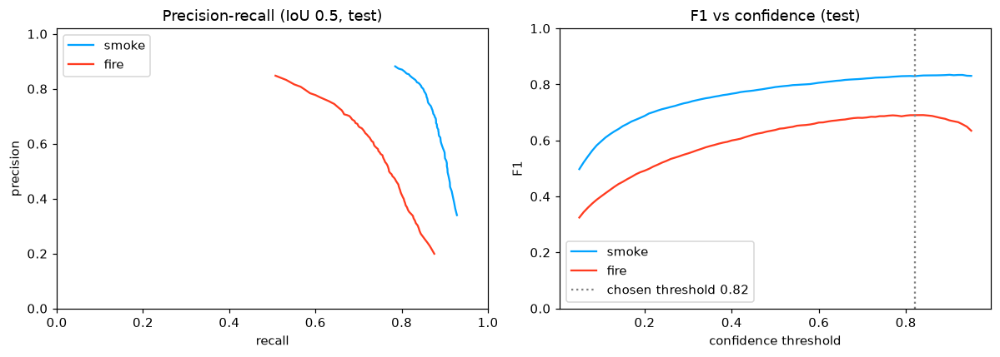

In [16]:
test_preds, test_m = evaluate(MODEL, TEST_RECS, CANVAS, nms_thr=BEST_NMS)
test_curves = prf_curves(TEST_RECS, test_preds)
test_prf = prf_at(test_curves, CONF_THR)

rows = []
for n in CLASS_NAMES.values():
    rows.append(dict(scope=n.upper(), Precision=100 * test_prf[n]["P"], Recall=100 * test_prf[n]["R"], F1=100 * test_prf[n]["F1"],
                     **{"AP@0.50": 100 * test_m["AP50"][n], "AP@0.50:0.95": 100 * test_m["AP50_95"][n]}))
rows.append(dict(scope="OVERALL", Precision=100 * test_prf["overall"]["P"], Recall=100 * test_prf["overall"]["R"], F1=100 * test_prf["overall"]["F1"],
                 **{"AP@0.50": 100 * test_m["mAP50"], "AP@0.50:0.95": 100 * test_m["mAP50_95"]}))
test_table = pd.DataFrame(rows).set_index("scope").round(2)
test_table = test_table.rename(index={"OVERALL": "OVERALL (mAP)"})
print(f"TEST SET ({len(TEST_RECS)} images) | confidence threshold {CONF_THR:.2f}, NMS IoU {BEST_NMS}, IoU match 0.50")
print(test_table.to_string())
print(f"\nmAP@0.50 = {100 * test_m['mAP50']:.2f}%   (target {TARGET_MAP50:.0f}%: gap {100 * test_m['mAP50'] - TARGET_MAP50:+.2f} points)")

fig, ax = plt.subplots(1, 2, figsize=(11, 4))
for n, c in zip(CLASS_NAMES.values(), (COLORS[1], COLORS[2])):
    ax[0].plot(test_curves[n]["R"], test_curves[n]["P"], color=c, label=n)
    ax[1].plot(THRESHOLDS, test_curves[n]["F1"], color=c, label=n)
ax[0].set(xlabel="recall", ylabel="precision", title="Precision-recall (IoU 0.5, test)", xlim=(0, 1), ylim=(0, 1.02)); ax[0].legend()
ax[1].axvline(CONF_THR, color="gray", ls=":", label=f"chosen threshold {CONF_THR:.2f}")
ax[1].set(xlabel="confidence threshold", ylabel="F1", title="F1 vs confidence (test)", ylim=(0, 1)); ax[1].legend()
plt.tight_layout(); plt.savefig(OUT_DIR / "test_pr_f1_curves.png", bbox_inches="tight"); plt.show()

## 9. Error analysis
Every test prediction above the chosen confidence threshold is matched to ground truth (IoU 0.5) and each error is categorised:
- **False positives:** *duplicate* (a second box on an already-detected object), *wrong class* (right place, wrong label), *poor localisation* (right class, IoU 0.1-0.5), *background* (nothing there).
- **False negatives:** *missed* (no detection) or *class confusion* (detected, but with the other label).
- Recall is also broken down by object size using the data-driven size buckets.

False positives by type and class:
cls                fire  smoke
kind                          
background          192    127
duplicate            20      6
poor localisation   478    266
wrong class           5     15

Missed ground-truth boxes:
cls              fire  smoke
miss_kind                   
class confusion    12      5
missed            983    375

Recall (%) by object size and class:
cls     fire  smoke
size               
small   52.5   67.6
medium  77.5   75.7
large   80.6   90.5

Negative images: 2005 | with at least one false alarm: 27 (1.3%)


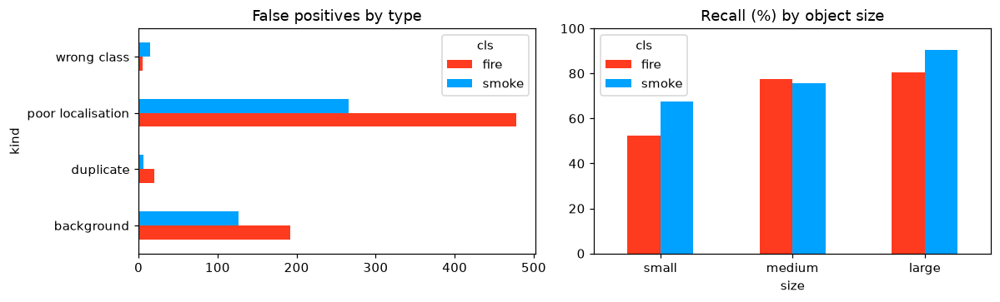

In [17]:
def analyse_errors(records, preds, conf, iou_thr=0.5):
    img_rows, gt_rows, fp_rows = [], [], []
    for i, r in enumerate(records):
        b, s, l = preds[i]
        k = s >= conf
        m = match_image(r["boxes"], r["labels"], b[k], s[k], l[k], iou_thr)
        n_fp, top_fp = 0, 0.0
        for d in np.where(~m["tp"])[0]:
            iou = m["iou"][d] if len(r["boxes"]) else np.zeros(0)
            same, other = iou[r["labels"] == m["labels"][d]], iou[r["labels"] != m["labels"][d]]
            if same.size and same.max() >= iou_thr:
                kind = "duplicate"
            elif other.size and other.max() >= iou_thr:
                kind = "wrong class"
            elif same.size and same.max() >= 0.1:
                kind = "poor localisation"
            else:
                kind = "background"
            fp_rows.append(dict(image=i, kind=kind, cls=CLASS_NAMES[int(m["labels"][d])], score=float(m["scores"][d])))
            n_fp += 1; top_fp = max(top_fp, float(m["scores"][d]))
        n_fn = 0
        for g in range(len(r["boxes"])):
            confused = bool(len(m["boxes"]) and ((m["labels"] != r["labels"][g]) & (m["iou"][:, g] >= iou_thr)).any())
            area = (r["boxes"][g][2] - r["boxes"][g][0]) * (r["boxes"][g][3] - r["boxes"][g][1]) / (r["w"] * r["h"])
            found = bool(m["gt_used"][g])
            gt_rows.append(dict(image=i, cls=CLASS_NAMES[int(r["labels"][g])], area=area, found=found,
                                miss_kind=None if found else ("class confusion" if confused else "missed")))
            n_fn += not found
        img_rows.append(dict(index=i, n_gt=len(r["boxes"]), n_pred=len(m["boxes"]), n_fp=n_fp, n_fn=n_fn, top_fp=top_fp))
    return pd.DataFrame(img_rows), pd.DataFrame(gt_rows), pd.DataFrame(fp_rows)


img_df, gt_df, fp_df = analyse_errors(TEST_RECS, test_preds, CONF_THR)
gt_df["size"] = pd.cut(gt_df.area, [0, SIZE_EDGES[0], SIZE_EDGES[1], 1.01], labels=["small", "medium", "large"])

print("False positives by type and class:")
print((fp_df.groupby(["kind", "cls"]).size().unstack(fill_value=0) if len(fp_df) else pd.DataFrame()).to_string())
print("\nMissed ground-truth boxes:")
print(gt_df[~gt_df.found].groupby(["miss_kind", "cls"]).size().unstack(fill_value=0).to_string() if (~gt_df.found).any() else "none")
print("\nRecall (%) by object size and class:")
print((100 * gt_df.pivot_table(index="size", columns="cls", values="found", aggfunc="mean", observed=False)).round(1).to_string())
neg_imgs = img_df[img_df.n_gt == 0]
print(f"\nNegative images: {len(neg_imgs)} | with at least one false alarm: {(neg_imgs.n_fp > 0).sum()} ({100 * (neg_imgs.n_fp > 0).mean():.1f}%)")

fig, ax = plt.subplots(1, 2, figsize=(11, 3.4))
if len(fp_df):
    fp_df.groupby(["kind", "cls"]).size().unstack(fill_value=0).plot.barh(ax=ax[0], color=[COLORS[2], COLORS[1]], rot=0)
ax[0].set_title("False positives by type")
(100 * gt_df.pivot_table(index="size", columns="cls", values="found", aggfunc="mean", observed=False)).plot.bar(ax=ax[1], color=[COLORS[2], COLORS[1]], rot=0)
ax[1].set_title("Recall (%) by object size"); ax[1].set_ylim(0, 100)
plt.tight_layout(); plt.savefig(OUT_DIR / "error_analysis.png", bbox_inches="tight"); plt.show()

## 10. Prediction visualisations
Dashed white boxes = ground truth; coloured boxes = predictions with class and confidence.

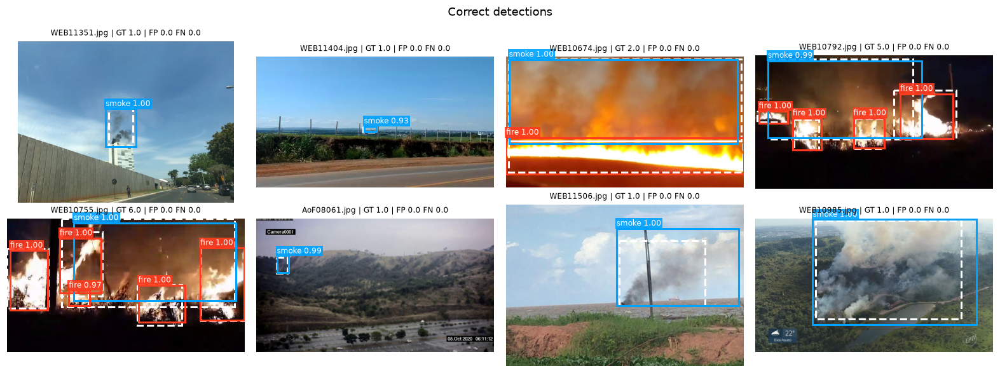

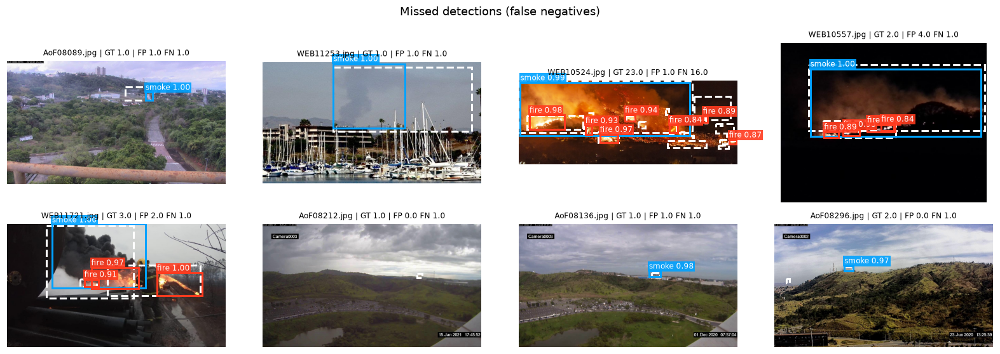

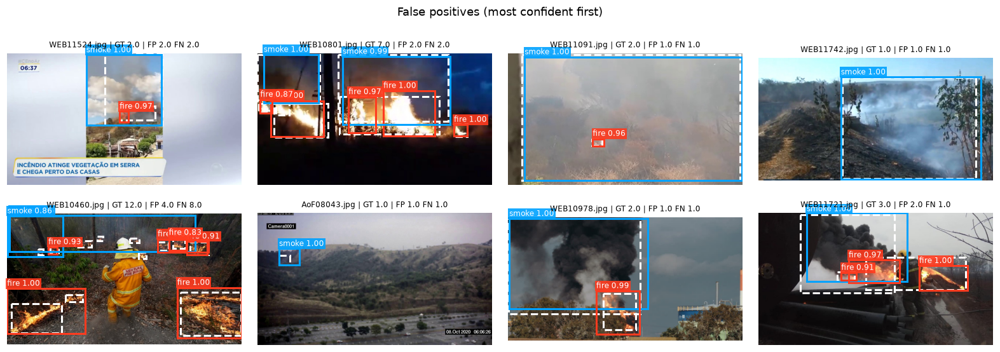

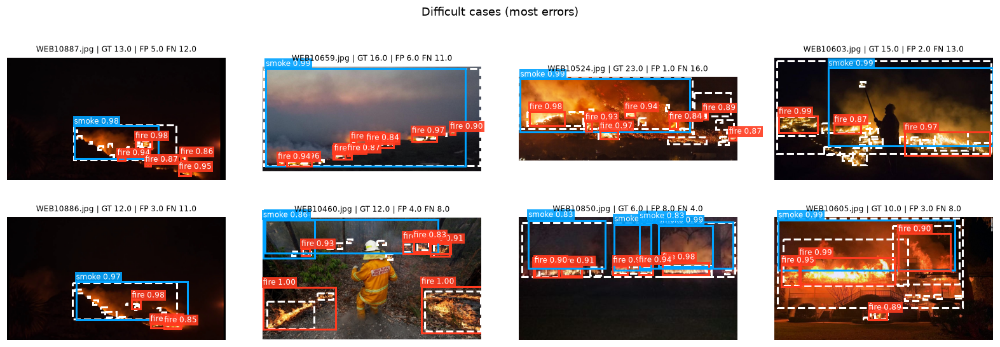

In [18]:
def panels_for(idx_list, note=None):
    out = []
    for i in idx_list:
        r, (b, s, l) = TEST_RECS[i], test_preds[i]
        k = s >= CONF_THR
        row = img_df.iloc[i]
        out.append((read_rgb(r["img"]), [(r["boxes"], r["labels"], None, True), (b[k], l[k], s[k], False)],
                    f"{r['name']} | GT {row.n_gt} | FP {row.n_fp} FN {row.n_fn}"))
    return out


rng = np.random.RandomState(SEED)
def pick(mask, n, key=None):
    sel = img_df[mask]
    return sel.sort_values(key, ascending=False).index[:n].tolist() if key else rng.permutation(sel.index.to_list())[:n].tolist()
correct = pick((img_df.n_gt > 0) & (img_df.n_fp == 0) & (img_df.n_fn == 0), 8)
missed = pick(img_df.n_fn > 0, 8)
false_pos = pick(img_df.n_fp > 0, 8, key="top_fp")
img_df["errors"] = img_df.n_fp + img_df.n_fn
difficult = pick(img_df.errors > 1, 8, key="errors")

show_grid(panels_for(correct), title="Correct detections", save="vis_correct.png")
show_grid(panels_for(missed), title="Missed detections (false negatives)", save="vis_missed.png")
show_grid(panels_for(false_pos), title="False positives (most confident first)", save="vis_false_positives.png")
show_grid(panels_for(difficult), title="Difficult cases (most errors)", save="vis_difficult.png")

## 11. Save the final model and inference code
The checkpoint stores the weights, the model configuration and the tuned NMS / confidence thresholds, so it can be loaded on its own.

In [19]:
def to_py(o):
    if isinstance(o, dict):
        return {k: to_py(v) for k, v in o.items()}
    if isinstance(o, (list, tuple)):
        return type(o)(to_py(v) for v in o)
    return float(o) if isinstance(o, (np.floating,)) else o


RESULTS = dict(
    test_mAP50=100 * test_m["mAP50"], test_mAP50_95=100 * test_m["mAP50_95"],
    test_AP50={k: 100 * v for k, v in test_m["AP50"].items()},
    test_precision_recall_f1={k: {m: 100 * float(x) for m, x in v.items()} for k, v in test_prf.items()},
    val_mAP50=CKPT["val_mAP50"], conf_threshold=CONF_THR, nms_iou=BEST_NMS, test_images=len(TEST_RECS))
torch.save(dict(model=MODEL.state_dict(), cfg=CKPT["cfg"], epoch=CKPT["epoch"], val_mAP50=CKPT["val_mAP50"], conf_threshold=CONF_THR,
                nms_iou=BEST_NMS, class_names=CLASS_NAMES, results=to_py(RESULTS)), CKPT_PATH)
(OUT_DIR / "final_results.json").write_text(json.dumps(to_py(RESULTS), indent=2))
print("saved:", CKPT_PATH, f"({CKPT_PATH.stat().st_size / 1e6:.0f} MB)")


class FireSmokeDetector:
    """Standalone inference: detector = FireSmokeDetector(path); detector(image) -> list of detections."""

    def __init__(self, checkpoint, device=None, conf=None):
        self.device = torch.device(device or ("cuda" if torch.cuda.is_available() else "cpu"))
        ck = torch.load(checkpoint, map_location=self.device, weights_only=False)
        self.model = build_detector(ck["cfg"], pretrained=False).to(self.device).eval()
        self.model.load_state_dict(ck["model"])
        self.model.roi_heads.nms_thresh = ck["nms_iou"]
        self.canvas, self.conf = ck["cfg"]["canvas"], (conf if conf is not None else ck["conf_threshold"])
        self.names = ck["class_names"]

    @torch.no_grad()
    def __call__(self, image, conf=None):
        """image: file path, PIL image or RGB uint8 array. Returns [{'label', 'confidence', 'box': [x1, y1, x2, y2]}, ...]."""
        if isinstance(image, (str, Path)):
            image = read_rgb(image)
        image = np.asarray(image)
        h, w = image.shape[:2]
        img, _, scale = letterbox(image, np.zeros((0, 4), np.float32), self.canvas)
        x = torch.from_numpy(img).permute(2, 0, 1).float().div_(255).to(self.device)
        out = self.model([x])[0]
        thr = self.conf if conf is None else conf
        dets = []
        for b, s, l in zip(out["boxes"].float().cpu().numpy() / scale, out["scores"].float().cpu().numpy(), out["labels"].cpu().numpy()):
            if s >= thr:
                dets.append(dict(label=self.names[int(l)], confidence=round(float(s), 4),
                                 box=[round(float(v), 1) for v in (max(b[0], 0), max(b[1], 0), min(b[2], w), min(b[3], h))]))
        return sorted(dets, key=lambda d: -d["confidence"])


def show_detections(image, dets, ax=None):
    image = read_rgb(image) if isinstance(image, (str, Path)) else np.asarray(image)
    ax = ax or plt.subplots(figsize=(7, 4.5))[1]
    ax.imshow(image); ax.axis("off")
    name_to_id = {v: k for k, v in CLASS_NAMES.items()}
    draw_boxes(ax, [d["box"] for d in dets], [name_to_id[d["label"]] for d in dets], [d["confidence"] for d in dets])

saved: outputs\forest_fire_detection_best.pth (424 MB)


## 12. Demonstration
The saved checkpoint is loaded from disk into a fresh detector and run on test images. To use it on your own image: `detector("path/to/image.jpg")`.

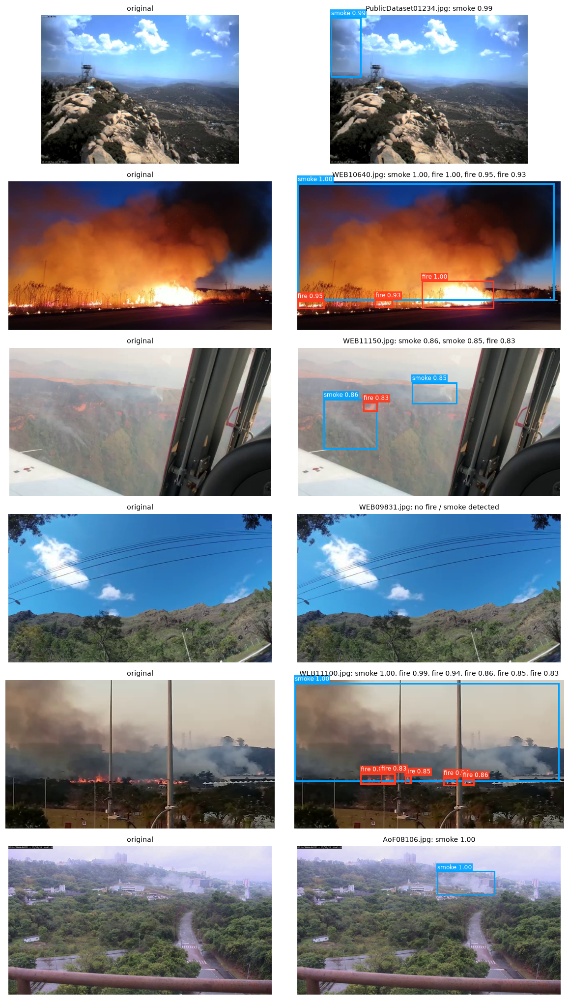

detector('PublicDataset01234.jpg') ->
  smoke conf 0.991  box [1.5, 5.6, 73.2, 148.0]


In [20]:
detector = FireSmokeDetector(CKPT_PATH)
demo = [TEST_RECS[i] for i in rng.permutation(len(TEST_RECS))[:6]]
fig, axes = plt.subplots(len(demo), 2, figsize=(11, 3.1 * len(demo)))
for row, r in zip(axes, demo):
    dets = detector(r["img"])
    row[0].imshow(read_rgb(r["img"])); row[0].set_title("original", fontsize=9); row[0].axis("off")
    show_detections(r["img"], dets, ax=row[1]); row[1].set_title(f"{r['name']}: " + (", ".join(f"{d['label']} {d['confidence']:.2f}" for d in dets) or "no fire / smoke detected"), fontsize=9)
plt.tight_layout(); plt.savefig(OUT_DIR / "demo_predictions.png", bbox_inches="tight"); plt.show()

example = next((r for r in demo if len(r["labels"])), demo[0])
print("detector('%s') ->" % example["name"])
for d in detector(example["img"]):
    print(f"  {d['label']:5s} conf {d['confidence']:.3f}  box {d['box']}")

## 13. Final results

In [21]:
print("=" * 72)
print(f"FOREST FIRE DETECTION - ViT-based detector ({FINAL_CFG['vit'].split('.')[0]}, ViTDet-style Faster R-CNN)")
print(f"input {FINAL_CFG['canvas'][1]}x{FINAL_CFG['canvas'][0]} | test images: {len(TEST_RECS)} | confidence {CONF_THR:.2f} | NMS IoU {BEST_NMS} | match IoU 0.50")
print("=" * 72)
print(test_table.to_string())
print("-" * 72)
print(f"mAP@0.50 (headline metric): {100 * test_m['mAP50']:.2f}%  vs target {TARGET_MAP50:.0f}%  ->  "
      f"{'target reached' if 100 * test_m['mAP50'] >= TARGET_MAP50 else 'below target by %.2f points' % (TARGET_MAP50 - 100 * test_m['mAP50'])}")
print(f"validation mAP@0.50 of the selected checkpoint: {CKPT['val_mAP50']:.2f}%")
print(f"model saved to: {CKPT_PATH}")
print("=" * 72)

FOREST FIRE DETECTION - ViT-based detector (vit_base_patch16_224, ViTDet-style Faster R-CNN)
input 640x384 | test images: 4306 | confidence 0.82 | NMS IoU 0.5 | match IoU 0.50
               Precision  Recall     F1  AP@0.50  AP@0.50:0.95
scope                                                         
SMOKE              82.35   83.56  82.95    85.33         48.12
FIRE               73.04   65.43  69.02    70.81         34.32
OVERALL (mAP)      77.69   74.49  75.99    78.07         41.22
------------------------------------------------------------------------
mAP@0.50 (headline metric): 78.07%  vs target 90%  ->  below target by 11.93 points
validation mAP@0.50 of the selected checkpoint: 79.15%
model saved to: outputs\forest_fire_detection_best.pth
